In [1]:
from rasterio import windows
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import pyproj
from rasterio import transform
import pandas as pd
import numpy as np
import timeit
from tqdm import tqdm
# from tqdm.auto import tqdm  # notebook compatible
import time
from timeit import default_timer as timer
import datetime
from matplotlib import pyplot as plt
import itertools
import json
import glob
from sklearn.decomposition import PCA
import rasterio
from rasterio.plot import show
from tqdm import tqdm
import copy
from mpl_toolkits.mplot3d import Axes3D

C:\ProgramData\Anaconda3\lib\site-packages\geopandas\_compat.py:115: UserWarning: The Shapely GEOS version (3.4.3-CAPI-1.8.3 r4285) is incompatible with the GEOS version PyGEOS was compiled with (3.10.0-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself

In [18]:
a_array = []

In [19]:
a_array = np.append(a_array,[[34,23,"bleh"]], axis=0 )

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)

In [17]:
pd.DataFrame(a_array, columns = ['rd_x','rd_y','class'] )

,rd_x,rd_y,class
0,34,23,bleh
1,34,23,bleh
2,34,23,bleh
3,34,23,bleh


In [2]:
gras_hoog = 88344.58, 470583.41
bos = 88400.32, 470192.25
zand_hoog = 88201.79, 470359.72
gras_laag = 88069.32, 470126.55
zand_laag = 87639.78, 469946.24

In [4]:
class_cor = [gras_hoog,bos ,zand_hoog, gras_laag, zand_laag ]

In [13]:
def fade_tile_kernel(kernel):
    return kernel*fade_kernel

def unfade_tile_kernel(kernel):
    return kernel/fade_kernel

def get_kernel_for_x_y(index_x,index_y, data):
    
    if sum([band[index_x][index_y] for band in data]) == 0:
        raise "center tile is empty"
    else:
        spot_kernel = [[k[index_y-16:index_y+16] for k in band[index_x-16:index_x+16] ] for band in data]
        spot_kernel = np.array(spot_kernel)
        spot_kernel = spot_kernel.astype(int)
        return spot_kernel

def get_x_y_cor(class_corr, dataset):
    index_x, index_y = dataset.index(class_corr[0], class_corr[1])
    return index_x,index_y

def get_distance_kernels(kernel_x, kernel_y):
    return np.sum(np.abs(kernel_x - kernel_y))

def sm_predict(tile, class_tiles, class_name):
    return class_name[np.argmin([get_distance_kernels(tile,class_tile) for class_tile in class_tiles])]

def sm_predict_no(tile, class_tiles):
    return np.argmin([get_distance_kernels(tile,class_tile) for class_tile in class_tiles])

def produce_geojson(segmentation, fname):
    geojson = '{ "type":"FeatureCollection","crs":{"type":"name","properties":{"name":"epsg:28992"}},"features":['
    for i, seg in enumerate(segmentation):
        rect = [round(seg[0]/2)*2, round(seg[1]/2)*2, 0, 0]
        rect[2], rect[3] = rect[0] + 2, rect[1] + 2
        coords = [[rect[0], rect[1]], [rect[2], rect[1]], [rect[2], rect[3]], [rect[0], rect[3]], [rect[0], rect[1]]]

        geojson += '{"type":"Feature","properties":{"label":"'''+seg[2]+'''"},"geometry":{"type":"Polygon","coordinates":['''+json.dumps(coords)+''']}}'''
        if i+1 != len(segmentation):
            geojson+=","
    geojson +="]}"
    with open(fname, 'w') as f:
        f.write(geojson)
        
        
def dissolve_label_geojson(path_in, path_out):
    # open your file with geopandas
    agpd = gpd.GeoDataFrame.from_file(path_in)
    dissolved = gpd.GeoDataFrame(columns=['label', 'geometry'], crs=agpd.crs)
    labels = agpd['label'].unique()
    print("------")
    for label in labels:

        print(label)
        union_gpd = agpd[agpd['label'] == label].unary_union
        dissolved = dissolved.append([{"label":label,"geometry":union_gpd}])
    print("------")
    dissolved.to_file(path_out, driver="GeoJSON") 

def filter_empty_core_tiles(x,y):
   if sum([band[x][y] for band in data]) == 0:
     return 0
        
   return 1

def run_loop(x,y):  
  sef_df = "null"
  
  try:***REMOVED***  
                return sm_predict(fade_tile_kernel(get_kernel_for_x_y(x,y,data)), class_tiles, class_names)
  except Exception as e:
                print(e)
  return sef_df

In [ ]:
def set_fade_kernel(fade_power = 0.045, bands = 4):
    

In [15]:
fade_kernel = np.array([[(1-(0.045*max(abs(idx-15),abs(idy-15)))) for idx in range(0,32)] for idy in range(0,32)])

In [18]:
fade_kernel =np.array([fade_kernel for id_x in range(0,4)])

In [19]:
fade_kernel.shape

(4, 32, 32)

In [8]:
class_tiles[0].shape

NameError: name 'class_tiles' is not defined

In [9]:
path_to_tif_file = "E:/data/coepelduynen/20190308_111644_SV1-01_50cm_RD_11bit_RGBI_Oegstgeest_natura2000_coepelduynen_cropped.tif"
dataset = rasterio.open(path_to_tif_file)
meta = dataset.meta.copy()
data = dataset.read()
width, height = meta["width"], meta["height"]

In [20]:
data

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16)

In [10]:
class_tiles = [get_kernel_for_x_y(x_y_index[0],x_y_index[1],data) for x_y_index in \
               [get_x_y_cor(cor, dataset) for cor in class_cor]]
class_name = ["gras_hoog","bos","zand_hoog","gras_laag","zand_laag"]

In [11]:
cluster_tile = {"gras_hoog":[],"bos":[],"zand_hoog":[],"gras_laag":[],"zand_laag":[]}

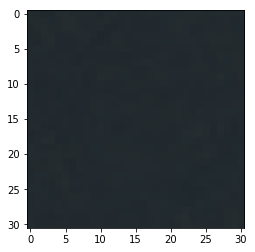

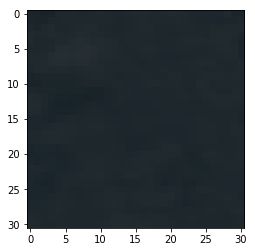

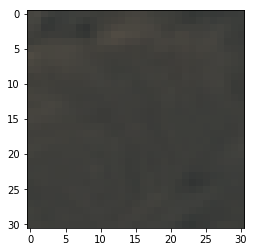

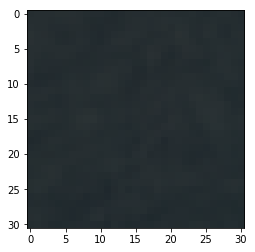

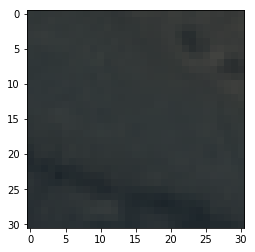

In [14]:
for class_tile in class_tiles:
    rasterio.plot.show(np.clip(class_tile[2::-1],
                    0,2200)/2200 )

In [127]:
class_tiles = [fade_tile_kernel(class_tile) for class_tile in class_tiles]

In [90]:
class_tiles = [unfade_tile_kernel(class_tile) for class_tile in class_tiles]

In [133]:
class_tiles_new = [fade_tile_kernel(class_tile) for class_tile in class_tiles_new]

In [131]:
class_tiles_new = [unfade_tile_kernel(class_tile) for class_tile in class_tiles_new]

In [44]:
for class_tile in class_tiles_new:
    rasterio.plot.show(np.clip(class_tile[2::-1],
                    0,2200)/2200 )

NameError: name 'class_tiles_new' is not defined

In [18]:
cluster_tile = {"gras_hoog":[],"bos":[],"zand_hoog":[],"gras_laag":[],"zand_laag":[]}

for split_x in tqdm(range(0,10)):
    
    print("---------("+str(split_x)+")-------")
    height_begin =  ((round(height/10))*split_x)
    height_end = (round(height/10))+ ((round(height/10))*split_x)
    
    if height_begin == 0:
        height_begin = 16
    if height_end >= round(height):
        height_end = height -16
    
    print("Height begin: "+str(height_begin))
    print("Height end: "+str(height_end) )
    x_inter = [id_x for id_x in range(height_begin, height_end)]
    y_inter = [id_y for id_y in range(16, width-16)]

    all_permutations = list(itertools.product(x_inter, y_inter))
    all_permutations = pd.DataFrame(all_permutations, columns=['x', 'y'])
    
    all_permutations['filled'] = all_permutations.apply(lambda x: filter_empty_core_tiles(x[0],x[1]), axis=1)
    all_permutations = all_permutations[all_permutations['filled'] == 1]
        
    cluster_tile = {"gras_hoog":[],"bos":[],"zand_hoog":[],"gras_laag":[],"zand_laag":[]}

    for i,x in all_permutations.iterrows():
        #print(x)
        cur_kernel = get_kernel_for_x_y(x["x"],x["y"], data)
        
        if 0 not in cur_kernel[0]:
            cluster_tile[sm_predict(fade_tile_kernel(cur_kernel), class_tiles, class_name)].append([x["x"],x["y"]]) 

    for class_tile in cluster_tile:
        print(class_tile)
        print(len(cluster_tile[class_tile]))
        
    class_name_x = 0
    for class_tile in cluster_tile:
        
        for coors  in cluster_tile[class_tile]:
            class_tiles[class_name_x] = class_tiles[class_name_x]+fade_tile_kernel(get_kernel_for_x_y(coors[0], coors[1] , data))

        class_tiles[class_name_x] = class_tiles[class_name_x]/(len(cluster_tile[class_tile])+1)
        class_name_x = class_name_x+1 

  0%|***REMOVED******REMOVED******REMOVED*** | 0/10 [00:00<?, ?it/s]

---------(0)-------
Height begin: 16
Height end: 640


KeyboardInterrupt: 

In [45]:
sm_predict(fade_tile_kernel(get_kernel_for_x_y(x,y,data)), class_tiles, class_name)

'gras_laag'

In [51]:
[sm_predict(class_x, class_tiles, class_name) for class_x in class_tiles]

['gras_hoog', 'bos', 'zand_hoog', 'gras_laag', 'zand_laag']

In [122]:
class_tiles_new 

[array([[[399., 396., 386., ..., 405., 401., 406.],
         [403., 403., 400., ..., 407., 397., 394.],
         [395., 406., 411., ..., 403., 394., 391.],
         ...,
         [407., 407., 402., ..., 412., 412., 403.],
         [406., 401., 401., ..., 412., 415., 405.],
         [408., 399., 401., ..., 407., 411., 401.]],
 
        [[367., 362., 348., ..., 369., 365., 373.],
         [371., 371., 365., ..., 373., 362., 358.],
         [361., 374., 380., ..., 370., 358., 355.],
         ...,
         [368., 368., 363., ..., 374., 376., 366.],
         [369., 362., 360., ..., 376., 382., 371.],
         [372., 360., 360., ..., 371., 380., 370.]],
 
        [[295., 290., 274., ..., 296., 291., 300.],
         [300., 300., 294., ..., 301., 288., 283.],
         [288., 304., 311., ..., 298., 284., 281.],
         ...,
         [293., 294., 289., ..., 303., 304., 292.],
         [295., 288., 288., ..., 305., 311., 297.],
         [300., 287., 289., ..., 299., 308., 295.]],
 
        [[454

In [ ]:
for xi in range(0,4):
 cluster_tile = {"gras_hoog":1,"bos":1,"zand_hoog":1,"gras_laag":1,"zand_laag":1}

 dataset = rasterio.open(path_to_tif_file)
 meta = dataset.meta.copy()
 data = dataset.read()
    #standardized_data = np.array([scale( band, axis=0, with_mean=True, with_std=True, copy=True ) for band in data])
 width, height = meta["width"], meta["height"]
    
 fade_kernel = np.array([[(1-(0.045*max(abs(idx-15),abs(idy-15)))) for idx in range(0,31)] for idy in range(0,31)])
 fade_kernel = np.array([fade_kernel,fade_kernel,fade_kernel,fade_kernel])
 
 class_tiles_new = copy.deepcopy(class_tiles)  
 for x in tqdm(range(16, height-16)):
        for y in range(16, width-16):
            
            try:
                    cur_kernel = fade_tile_kernel(get_kernel_for_x_y(x,y,data))
                    # Skip empty core tiles.
                    if 0 not in cur_kernel[0]:
                        continue
                    #print("--------------------------")
                    print(x,y)  
                    #print(sm_predict(fade_tile_kernel(get_kernel_for_x_y(x,y,data)), class_tiles, class_name))***REMOVED***
                    class_name_no = sm_predict_no(cur_kernel, class_tiles)
                    #print(class_name_no)
                    class_name_x = class_name[class_name_no]
                    #print(class_name_x)
                    class_tiles_new[class_name_no] = class_tiles_new[class_name_no]+cur_kernel

                    cluster_tile[class_name_x] = cluster_tile[class_name_x]+1
            except Exception as e:
                    #print(str(x)+","+str(y))
                    #print("Kernel too small")
                    #print(e)
                    bleh = 0

                    
 class_tile_x_no = 0

 for class_tile_x in class_tiles_new:
    print(class_tile_x)
    class_tiles_new[class_tile_x_no] = class_tile_x/cluster_tile[class_name[class_tile_x_no]]
    class_tile_x_no = class_tile_x_no+1

  0%|***REMOVED******REMOVED***                             | 0/6366 [00:00<?, ?it/s]

16 4731
16 4732
16 4733
16 4734
16 4735
16 4736
16 4737
16 4738
16 4739
16 4740
16 4741
16 4742
16 4743
16 4744
16 4745
16 4746
16 4747
16 4748
16 4749
16 4750
16 4751
16 4752
16 4753
16 4754
16 4755
16 4756
16 4757
16 4758
16 4759
16 4760
16 4761
16 4762
16 4763
16 4764
16 4765
16 4766
16 4767
16 4768
16 4769
16 4770
16 4771
16 4772
16 4773
16 4774
16 4775
16 4776
16 4777
16 4778
16 4779
16 4780
16 4781
16 4782
16 4783
16 4784
16 4785
16 4786
16 4787
16 4788
16 4789
16 4790
16 4791
16 4792
16 4793
16 4794
16 4795
16 4796
16 4797
16 4798
16 4799
16 4800
16 4801
16 4802


  0%|***REMOVED******REMOVED***                     | 1/6366 [00:00<26:56,  3.94it/s]

17 4731
17 4732
17 4733
17 4734
17 4735
17 4736
17 4737
17 4738
17 4739
17 4740
17 4741
17 4742
17 4743
17 4744
17 4745
17 4746
17 4747
17 4748
17 4749
17 4750
17 4751
17 4752
17 4753
17 4754
17 4755
17 4756
17 4757
17 4758
17 4759
17 4760
17 4761
17 4762
17 4763
17 4764
17 4765
17 4766
17 4767
17 4768
17 4769
17 4770
17 4771
17 4772
17 4773
17 4774
17 4775
17 4776
17 4777
17 4778
17 4779
17 4780
17 4781
17 4782
17 4783
17 4784
17 4785
17 4786
17 4787
17 4788
17 4789
17 4790
17 4791
17 4792
17 4793
17 4794
17 4795
17 4796
17 4797
17 4798
17 4799
17 4800
17 4801
17 4802


  0%|***REMOVED******REMOVED***                     | 2/6366 [00:00<26:37,  3.98it/s]

18 4731
18 4732
18 4733
18 4734
18 4735
18 4736
18 4737
18 4738
18 4739
18 4740
18 4741
18 4742
18 4743
18 4744
18 4745
18 4746
18 4747
18 4748
18 4749
18 4750
18 4751
18 4752
18 4753
18 4754
18 4755
18 4756
18 4757
18 4758
18 4759
18 4760
18 4761
18 4762
18 4763
18 4764
18 4765
18 4766
18 4767
18 4768
18 4769
18 4770
18 4771
18 4772
18 4773
18 4774
18 4775
18 4776
18 4777
18 4778
18 4779
18 4780
18 4781
18 4782
18 4783
18 4784
18 4785
18 4786
18 4787
18 4788
18 4789
18 4790
18 4791
18 4792
18 4793
18 4794
18 4795
18 4796
18 4797
18 4798
18 4799
18 4800
18 4801
18 4802


  0%|***REMOVED******REMOVED***                     | 3/6366 [00:00<26:27,  4.01it/s]

19 4731
19 4732
19 4733
19 4734
19 4735
19 4736
19 4737
19 4738
19 4739
19 4740
19 4741
19 4742
19 4743
19 4744
19 4745
19 4746
19 4747
19 4748
19 4749
19 4750
19 4751
19 4752
19 4753
19 4754
19 4755
19 4756
19 4757
19 4758
19 4759
19 4760
19 4761
19 4762
19 4763
19 4764
19 4765
19 4766
19 4767
19 4768
19 4769
19 4770
19 4771
19 4772
19 4773
19 4774
19 4775
19 4776
19 4777
19 4778
19 4779
19 4780
19 4781
19 4782
19 4783
19 4784
19 4785
19 4786
19 4787
19 4788
19 4789
19 4790
19 4791
19 4792
19 4793
19 4794
19 4795
19 4796
19 4797
19 4798
19 4799
19 4800
19 4801
19 4802


  0%|***REMOVED******REMOVED***                     | 4/6366 [00:00<26:18,  4.03it/s]

20 4731
20 4732
20 4733
20 4734
20 4735
20 4736
20 4737
20 4738
20 4739
20 4740
20 4741
20 4742
20 4743
20 4744
20 4745
20 4746
20 4747
20 4748
20 4749
20 4750
20 4751
20 4752
20 4753
20 4754
20 4755
20 4756
20 4757
20 4758
20 4759
20 4760
20 4761
20 4762
20 4763
20 4764
20 4765
20 4766
20 4767
20 4768
20 4769
20 4770
20 4771
20 4772
20 4773
20 4774
20 4775
20 4776
20 4777
20 4778
20 4779
20 4780
20 4781
20 4782
20 4783
20 4784
20 4785
20 4786
20 4787
20 4788
20 4789
20 4790
20 4791
20 4792
20 4793
20 4794
20 4795
20 4796
20 4797
20 4798
20 4799
20 4800
20 4801
20 4802


  0%|***REMOVED******REMOVED***                     | 5/6366 [00:01<27:44,  3.82it/s]

21 4731
21 4732
21 4733
21 4734
21 4735
21 4736
21 4737
21 4738
21 4739
21 4740
21 4741
21 4742
21 4743
21 4744
21 4745
21 4746
21 4747
21 4748
21 4749
21 4750
21 4751
21 4752
21 4753
21 4754
21 4755
21 4756
21 4757
21 4758
21 4759
21 4760
21 4761
21 4762
21 4763
21 4764
21 4765
21 4766
21 4767
21 4768
21 4769
21 4770
21 4771
21 4772
21 4773
21 4774
21 4775
21 4776
21 4777
21 4778
21 4779
21 4780
21 4781
21 4782
21 4783
21 4784
21 4785
21 4786
21 4787
21 4788
21 4789
21 4790
21 4791
21 4792
21 4793
21 4794
21 4795
21 4796
21 4797
21 4798
21 4799
21 4800
21 4801
21 4802


  0%|***REMOVED******REMOVED***                     | 6/6366 [00:01<27:21,  3.87it/s]

22 4731
22 4732
22 4733
22 4734
22 4735
22 4736
22 4737
22 4738
22 4739
22 4740
22 4741
22 4742
22 4743
22 4744
22 4745
22 4746
22 4747
22 4748
22 4749
22 4750
22 4751
22 4752
22 4753
22 4754
22 4755
22 4756
22 4757
22 4758
22 4759
22 4760
22 4761
22 4762
22 4763
22 4764
22 4765
22 4766
22 4767
22 4768
22 4769
22 4770
22 4771
22 4772
22 4773
22 4774
22 4775
22 4776
22 4777
22 4778
22 4779
22 4780
22 4781
22 4782
22 4783
22 4784
22 4788
22 4789
22 4790
22 4791
22 4792
22 4793
22 4794
22 4795
22 4796
22 4797
22 4798
22 4799
22 4800
22 4801
22 4802


  0%|***REMOVED******REMOVED***                     | 7/6366 [00:01<26:43,  3.97it/s]

23 4731
23 4732
23 4733
23 4734
23 4735
23 4736
23 4737
23 4738
23 4739
23 4740
23 4741
23 4742
23 4743
23 4744
23 4745
23 4746
23 4747
23 4748
23 4749
23 4750
23 4751
23 4752
23 4753
23 4754
23 4755
23 4756
23 4757
23 4758
23 4759
23 4760
23 4761
23 4762
23 4763
23 4764
23 4765
23 4766
23 4767
23 4768
23 4769
23 4770
23 4771
23 4772
23 4773
23 4774
23 4775
23 4776
23 4777
23 4778
23 4779
23 4780
23 4789
23 4790
23 4791
23 4792
23 4793
23 4794
23 4795
23 4796
23 4797
23 4798
23 4799
23 4800
23 4801
23 4802


  0%|***REMOVED******REMOVED***                     | 8/6366 [00:01<25:47,  4.11it/s]

24 4731
24 4732
24 4733
24 4734
24 4735
24 4736
24 4737
24 4738
24 4739
24 4740
24 4741
24 4742
24 4743
24 4744
24 4745
24 4746
24 4747
24 4748
24 4749
24 4750
24 4751
24 4752
24 4753
24 4754
24 4755
24 4756
24 4757
24 4758
24 4759
24 4760
24 4761
24 4762
24 4763
24 4764
24 4765
24 4766
24 4767
24 4768
24 4769
24 4770
24 4771
24 4772
24 4773
24 4774
24 4775
24 4789
24 4790
24 4791
24 4792
24 4793
24 4794
24 4795
24 4796
24 4797
24 4798
24 4799
24 4800
24 4801
24 4802


  0%|***REMOVED******REMOVED***                     | 9/6366 [00:02<25:10,  4.21it/s]

25 4731
25 4732
25 4733
25 4734
25 4735
25 4736
25 4737
25 4738
25 4739
25 4740
25 4741
25 4742
25 4743
25 4744
25 4745
25 4746
25 4747
25 4748
25 4749
25 4750
25 4751
25 4752
25 4753
25 4754
25 4755
25 4756
25 4757
25 4789
25 4790
25 4791
25 4792
25 4793
25 4794
25 4795
25 4796
25 4797
25 4798
25 4799
25 4800
25 4801
25 4802


  0%|▏***REMOVED******REMOVED***                   | 10/6366 [00:02<22:42,  4.67it/s]

26 4731
26 4732
26 4733
26 4734
26 4735
26 4736
26 4737
26 4738
26 4739
26 4740
26 4741
26 4742
26 4743
26 4744
26 4745
26 4789
26 4790
26 4791
26 4792
26 4793
26 4794
26 4795
26 4796
26 4797
26 4798
26 4799
26 4800
26 4801
26 4802


  0%|▏***REMOVED******REMOVED***                   | 11/6366 [00:02<19:57,  5.31it/s]

27 4731
27 4732
27 4733
27 4734
27 4735
27 4736
27 4737
27 4738
27 4739
27 4740
27 4741
27 4742
27 4743
27 4744
27 4745
27 4790
27 4791
27 4792
27 4793
27 4794
27 4795
27 4796
27 4797
27 4798
27 4799
27 4800
27 4801
27 4802


  0%|▏***REMOVED******REMOVED***                   | 12/6366 [00:02<17:58,  5.89it/s]

28 4731
28 4732
28 4733
28 4734
28 4735
28 4736
28 4737
28 4738
28 4739
28 4740
28 4741
28 4742
28 4743
28 4744
28 4745
28 4790
28 4791
28 4792
28 4793
28 4794
28 4795
28 4796
28 4797
28 4798
28 4799
28 4800
28 4801
28 4802


  0%|▏***REMOVED******REMOVED***                   | 13/6366 [00:02<16:36,  6.37it/s]

29 4730
29 4731
29 4732
29 4733
29 4734
29 4735
29 4736
29 4737
29 4738
29 4739
29 4740
29 4741
29 4742
29 4743
29 4744
29 4745
29 4790
29 4791
29 4792
29 4793
29 4794
29 4795
29 4796
29 4797
29 4798
29 4799
29 4800
29 4801
29 4802


  0%|▏***REMOVED******REMOVED***                   | 14/6366 [00:02<15:43,  6.73it/s]

30 4730
30 4731
30 4732
30 4733
30 4734
30 4735
30 4736
30 4737
30 4738
30 4739
30 4740
30 4741
30 4742
30 4743
30 4744
30 4745
30 4790
30 4791
30 4792
30 4793
30 4794
30 4795
30 4796
30 4797
30 4798
30 4799
30 4800
30 4801
30 4802


  0%|▏***REMOVED******REMOVED***                   | 15/6366 [00:03<15:02,  7.04it/s]

31 4730
31 4731
31 4732
31 4733
31 4734
31 4735
31 4736
31 4737
31 4738
31 4739
31 4740
31 4741
31 4742
31 4743
31 4744
31 4745
31 4790
31 4791
31 4792
31 4793
31 4794
31 4795
31 4796
31 4797
31 4798
31 4799
31 4800
31 4801
31 4802


  0%|▏***REMOVED******REMOVED***                   | 16/6366 [00:03<14:39,  7.22it/s]

32 4730
32 4731
32 4732
32 4733
32 4734
32 4735
32 4736
32 4737
32 4738
32 4739
32 4740
32 4741
32 4742
32 4743
32 4744
32 4745
32 4791
32 4792
32 4793
32 4794
32 4795
32 4796
32 4797
32 4798
32 4799
32 4800
32 4801
32 4802


  0%|▏***REMOVED******REMOVED***                   | 17/6366 [00:03<14:15,  7.42it/s]

33 4730
33 4731
33 4732
33 4733
33 4734
33 4735
33 4736
33 4737
33 4738
33 4739
33 4740
33 4741
33 4742
33 4743
33 4744
33 4745
33 4791
33 4792
33 4793
33 4794
33 4795
33 4796
33 4797
33 4798
33 4799
33 4800
33 4801
33 4802


  0%|▏***REMOVED******REMOVED***                   | 18/6366 [00:03<13:58,  7.57it/s]

34 4729
34 4730
34 4731
34 4732
34 4733
34 4734
34 4735
34 4736
34 4737
34 4738
34 4739
34 4740
34 4741
34 4742
34 4743
34 4744
34 4745
34 4791
34 4792
34 4793
34 4794
34 4795
34 4796
34 4797
34 4798
34 4799
34 4800
34 4801
34 4802


  0%|▏***REMOVED******REMOVED***                   | 19/6366 [00:03<13:48,  7.66it/s]

35 4729
35 4730
35 4731
35 4732
35 4733
35 4734
35 4735
35 4736
35 4737
35 4738
35 4739
35 4740
35 4741
35 4742
35 4743
35 4744
35 4745
35 4791
35 4792
35 4793
35 4794
35 4795
35 4796
35 4797
35 4798
35 4799
35 4800
35 4801
35 4802


  0%|▎***REMOVED******REMOVED***                   | 20/6366 [00:03<13:41,  7.72it/s]

36 4729
36 4730
36 4731
36 4732
36 4733
36 4734
36 4735
36 4736
36 4737
36 4738
36 4739
36 4740
36 4741
36 4742
36 4743
36 4744
36 4745
36 4792
36 4793
36 4794
36 4795
36 4796
36 4797
36 4798
36 4799
36 4800
36 4801
36 4802


  0%|▎***REMOVED******REMOVED***                   | 21/6366 [00:03<13:33,  7.80it/s]

37 4729
37 4730
37 4731
37 4732
37 4733
37 4734
37 4735
37 4736
37 4737
37 4738
37 4739
37 4740
37 4741
37 4742
37 4743
37 4744
37 4745
37 4792
37 4793
37 4794
37 4795
37 4796
37 4797
37 4798
37 4799
37 4800
37 4801
37 4802


  0%|▎***REMOVED******REMOVED***                   | 22/6366 [00:03<13:23,  7.90it/s]

38 4729
38 4730
38 4731
38 4732
38 4733
38 4734
38 4735
38 4736
38 4737
38 4738
38 4739
38 4740
38 4741
38 4742
38 4743
38 4744
38 4745
38 4792
38 4793
38 4794
38 4795
38 4796
38 4797
38 4798
38 4799
38 4800
38 4801
38 4802


  0%|▎***REMOVED******REMOVED***                   | 23/6366 [00:04<13:16,  7.97it/s]

39 4728
39 4729
39 4730
39 4731
39 4732
39 4733
39 4734
39 4735
39 4736
39 4737
39 4738
39 4739
39 4740
39 4741
39 4742
39 4743
39 4744
39 4745
39 4792
39 4793
39 4794
39 4795
39 4796
39 4797
39 4798
39 4799
39 4800
39 4801
39 4802


  0%|▎***REMOVED******REMOVED***                   | 24/6366 [00:04<13:32,  7.81it/s]

40 4728
40 4729
40 4730
40 4731
40 4732
40 4733
40 4734
40 4735
40 4736
40 4737
40 4738
40 4739
40 4740
40 4741
40 4742
40 4743
40 4744
40 4745
40 4792
40 4793
40 4794
40 4795
40 4796
40 4797
40 4798
40 4799
40 4800
40 4801
40 4802


  0%|▎***REMOVED******REMOVED***                   | 25/6366 [00:04<13:30,  7.83it/s]

41 4728
41 4729
41 4730
41 4731
41 4732
41 4733
41 4734
41 4735
41 4736
41 4737
41 4738
41 4739
41 4740
41 4741
41 4742
41 4743
41 4744
41 4745
41 4793
41 4794
41 4795
41 4796
41 4797
41 4798
41 4799
41 4800
41 4801
41 4802


  0%|▎***REMOVED******REMOVED***                   | 26/6366 [00:04<13:28,  7.84it/s]

42 4728
42 4729
42 4730
42 4731
42 4732
42 4733
42 4734
42 4735
42 4736
42 4737
42 4738
42 4739
42 4740
42 4741
42 4742
42 4743
42 4744
42 4745
42 4793
42 4794
42 4795
42 4796
42 4797
42 4798
42 4799
42 4800
42 4801
42 4802


  0%|▎***REMOVED******REMOVED***                   | 27/6366 [00:04<13:23,  7.89it/s]

43 4727
43 4728
43 4729
43 4730
43 4731
43 4732
43 4733
43 4734
43 4735
43 4736
43 4737
43 4738
43 4739
43 4740
43 4741
43 4742
43 4743
43 4744
43 4745
43 4793
43 4794
43 4795
43 4796
43 4797
43 4798
43 4799
43 4800
43 4801
43 4802


  0%|▎***REMOVED******REMOVED***                   | 28/6366 [00:04<13:39,  7.74it/s]

44 4727
44 4728
44 4729
44 4730
44 4731
44 4732
44 4733
44 4734
44 4735
44 4736
44 4737
44 4738
44 4739
44 4740
44 4741
44 4742
44 4743
44 4744
44 4793
44 4794
44 4795
44 4796
44 4797
44 4798
44 4799
44 4800
44 4801
44 4802


  0%|▎***REMOVED******REMOVED***                   | 29/6366 [00:04<13:46,  7.67it/s]

45 4727
45 4728
45 4729
45 4730
45 4731
45 4732
45 4733
45 4734
45 4735
45 4736
45 4737
45 4738
45 4739
45 4740
45 4741
45 4742
45 4743
45 4744
45 4794
45 4795
45 4796
45 4797
45 4798
45 4799
45 4800
45 4801
45 4802


  0%|▍***REMOVED******REMOVED***                   | 30/6366 [00:04<13:35,  7.77it/s]

46 4726
46 4727
46 4728
46 4729
46 4730
46 4731
46 4732
46 4733
46 4734
46 4735
46 4736
46 4737
46 4738
46 4739
46 4740
46 4741
46 4742
46 4743
46 4744
46 4794
46 4795
46 4796
46 4797
46 4798
46 4799
46 4800
46 4801
46 4802


  0%|▍***REMOVED******REMOVED***                   | 31/6366 [00:05<13:34,  7.78it/s]

47 4726
47 4727
47 4728
47 4729
47 4730
47 4731
47 4732
47 4733
47 4734
47 4735
47 4736
47 4737
47 4738
47 4739
47 4740
47 4741
47 4742
47 4743
47 4744
47 4794
47 4795
47 4796
47 4797
47 4798
47 4799
47 4800
47 4801
47 4802


  1%|▍***REMOVED******REMOVED***                   | 32/6366 [00:05<13:40,  7.72it/s]

48 4726
48 4727
48 4728
48 4729
48 4730
48 4731
48 4732
48 4733
48 4734
48 4735
48 4736
48 4737
48 4738
48 4739
48 4740
48 4741
48 4742
48 4743
48 4744
48 4794
48 4795
48 4796
48 4797
48 4798
48 4799
48 4800
48 4801
48 4802


  1%|▍***REMOVED******REMOVED***                   | 33/6366 [00:05<13:33,  7.78it/s]

49 4726
49 4727
49 4728
49 4729
49 4730
49 4731
49 4732
49 4733
49 4734
49 4735
49 4736
49 4737
49 4738
49 4739
49 4740
49 4741
49 4742
49 4743
49 4794
49 4795
49 4796
49 4797
49 4798
49 4799
49 4800
49 4801
49 4802


  1%|▍***REMOVED******REMOVED***                   | 34/6366 [00:05<13:23,  7.88it/s]

50 4725
50 4726
50 4727
50 4728
50 4729
50 4730
50 4731
50 4732
50 4733
50 4734
50 4735
50 4736
50 4737
50 4738
50 4739
50 4740
50 4741
50 4742
50 4743
50 4795
50 4796
50 4797
50 4798
50 4799
50 4800
50 4801
50 4802


  1%|▍***REMOVED******REMOVED***                   | 35/6366 [00:05<13:21,  7.90it/s]

51 4725
51 4726
51 4727
51 4728
51 4729
51 4730
51 4731
51 4732
51 4733
51 4734
51 4735
51 4736
51 4737
51 4738
51 4739
51 4740
51 4741
51 4742
51 4743
51 4795
51 4796
51 4797
51 4798
51 4799
51 4800
51 4801
51 4802


  1%|▍***REMOVED******REMOVED***                   | 36/6366 [00:05<13:10,  8.01it/s]

52 4724
52 4725
52 4726
52 4727
52 4728
52 4729
52 4730
52 4731
52 4732
52 4733
52 4734
52 4735
52 4736
52 4737
52 4738
52 4739
52 4740
52 4741
52 4742
52 4743
52 4795
52 4796
52 4797
52 4798
52 4799
52 4800
52 4801
52 4802


  1%|▍***REMOVED******REMOVED***                   | 37/6366 [00:05<13:22,  7.89it/s]

53 4724
53 4725
53 4726
53 4727
53 4728
53 4729
53 4730
53 4731
53 4732
53 4733
53 4734
53 4735
53 4736
53 4737
53 4738
53 4739
53 4740
53 4741
53 4742
53 4743
53 4795
53 4796
53 4797
53 4798
53 4799
53 4800
53 4801
53 4802


  1%|▍***REMOVED******REMOVED***                   | 38/6366 [00:05<13:20,  7.90it/s]

54 4723
54 4724
54 4725
54 4726
54 4727
54 4728
54 4729
54 4730
54 4731
54 4732
54 4733
54 4734
54 4735
54 4736
54 4737
54 4738
54 4739
54 4740
54 4741
54 4742
54 4796
54 4797
54 4798
54 4799
54 4800
54 4801
54 4802


  1%|▍***REMOVED******REMOVED***                   | 39/6366 [00:06<13:21,  7.89it/s]

55 4723
55 4724
55 4725
55 4726
55 4727
55 4728
55 4729
55 4730
55 4731
55 4732
55 4733
55 4734
55 4735
55 4736
55 4737
55 4738
55 4739
55 4740
55 4741
55 4742
55 4796
55 4797
55 4798
55 4799
55 4800
55 4801
55 4802


  1%|▌***REMOVED******REMOVED***                   | 40/6366 [00:06<13:16,  7.94it/s]

56 4722
56 4723
56 4724
56 4725
56 4726
56 4727
56 4728
56 4729
56 4730
56 4731
56 4732
56 4733
56 4734
56 4735
56 4736
56 4737
56 4738
56 4739
56 4740
56 4741
56 4742
56 4796
56 4797
56 4798
56 4799
56 4800
56 4801
56 4802


  1%|▌***REMOVED******REMOVED***                   | 41/6366 [00:06<13:29,  7.81it/s]

57 4722
57 4723
57 4724
57 4725
57 4726
57 4727
57 4728
57 4729
57 4730
57 4731
57 4732
57 4733
57 4734
57 4735
57 4736
57 4737
57 4738
57 4739
57 4740
57 4741
57 4742
57 4796
57 4797
57 4798
57 4799
57 4800
57 4801
57 4802


  1%|▌***REMOVED******REMOVED***                   | 42/6366 [00:06<13:21,  7.89it/s]

58 4721
58 4722
58 4723
58 4724
58 4725
58 4726
58 4727
58 4728
58 4729
58 4730
58 4731
58 4732
58 4733
58 4734
58 4735
58 4736
58 4737
58 4738
58 4739
58 4740
58 4741
58 4796
58 4797
58 4798
58 4799
58 4800
58 4801
58 4802


  1%|▌***REMOVED******REMOVED***                   | 43/6366 [00:06<13:18,  7.92it/s]

59 4721
59 4722
59 4723
59 4724
59 4725
59 4726
59 4727
59 4728
59 4729
59 4730
59 4731
59 4732
59 4733
59 4734
59 4735
59 4736
59 4737
59 4738
59 4739
59 4740
59 4741
59 4797
59 4798
59 4799
59 4800
59 4801
59 4802


  1%|▌***REMOVED******REMOVED***                   | 44/6366 [00:06<13:12,  7.98it/s]

60 4720
60 4721
60 4722
60 4723
60 4724
60 4725
60 4726
60 4727
60 4728
60 4729
60 4730
60 4731
60 4732
60 4733
60 4734
60 4735
60 4736
60 4737
60 4738
60 4739
60 4740
60 4741
60 4797
60 4798
60 4799
60 4800
60 4801
60 4802


  1%|▌***REMOVED******REMOVED***                   | 45/6366 [00:06<13:09,  8.01it/s]

61 4719
61 4720
61 4721
61 4722
61 4723
61 4724
61 4725
61 4726
61 4727
61 4728
61 4729
61 4730
61 4731
61 4732
61 4733
61 4734
61 4735
61 4736
61 4737
61 4738
61 4739
61 4740
61 4797
61 4798
61 4799
61 4800
61 4801
61 4802


  1%|▌***REMOVED******REMOVED***                   | 46/6366 [00:06<13:13,  7.97it/s]

62 4719
62 4720
62 4721
62 4722
62 4723
62 4724
62 4725
62 4726
62 4727
62 4728
62 4729
62 4730
62 4731
62 4732
62 4733
62 4734
62 4735
62 4736
62 4737
62 4738
62 4739
62 4740
62 4797
62 4798
62 4799
62 4800
62 4801
62 4802


  1%|▌***REMOVED******REMOVED***                   | 47/6366 [00:07<13:16,  7.94it/s]

63 4718
63 4719
63 4720
63 4721
63 4722
63 4723
63 4724
63 4725
63 4726
63 4727
63 4728
63 4729
63 4730
63 4731
63 4732
63 4733
63 4734
63 4735
63 4736
63 4737
63 4738
63 4739
63 4740
63 4798
63 4799
63 4800
63 4801
63 4802


  1%|▌***REMOVED******REMOVED***                   | 48/6366 [00:07<13:17,  7.92it/s]

64 4717
64 4718
64 4719
64 4720
64 4721
64 4722
64 4723
64 4724
64 4725
64 4726
64 4727
64 4728
64 4729
64 4730
64 4731
64 4732
64 4733
64 4734
64 4735
64 4736
64 4737
64 4738
64 4739
64 4740
64 4798
64 4799
64 4800
64 4801
64 4802


  1%|▌***REMOVED******REMOVED***                   | 49/6366 [00:07<13:24,  7.85it/s]

65 4716
65 4717
65 4718
65 4719
65 4720
65 4721
65 4722
65 4723
65 4724
65 4725
65 4726
65 4727
65 4728
65 4729
65 4730
65 4731
65 4732
65 4733
65 4734
65 4735
65 4736
65 4737
65 4738
65 4739
65 4798
65 4799
65 4800
65 4801
65 4802


  1%|▋***REMOVED******REMOVED***                   | 50/6366 [00:07<13:27,  7.82it/s]

66 4716
66 4717
66 4718
66 4719
66 4720
66 4721
66 4722
66 4723
66 4724
66 4725
66 4726
66 4727
66 4728
66 4729
66 4730
66 4731
66 4732
66 4733
66 4734
66 4735
66 4736
66 4737
66 4738
66 4739
66 4798
66 4799
66 4800
66 4801
66 4802


  1%|▋***REMOVED******REMOVED***                   | 51/6366 [00:07<13:37,  7.73it/s]

67 4715
67 4716
67 4717
67 4718
67 4719
67 4720
67 4721
67 4722
67 4723
67 4724
67 4725
67 4726
67 4727
67 4728
67 4729
67 4730
67 4731
67 4732
67 4733
67 4734
67 4735
67 4736
67 4737
67 4738
67 4798
67 4799
67 4800
67 4801
67 4802


  1%|▋***REMOVED******REMOVED***                   | 52/6366 [00:07<13:32,  7.77it/s]

68 4714
68 4715
68 4716
68 4717
68 4718
68 4719
68 4720
68 4721
68 4722
68 4723
68 4724
68 4725
68 4726
68 4727
68 4728
68 4729
68 4730
68 4731
68 4732
68 4733
68 4734
68 4735
68 4736
68 4737
68 4738
68 4798
68 4799
68 4800
68 4801
68 4802


  1%|▋***REMOVED******REMOVED***                   | 53/6366 [00:07<13:40,  7.69it/s]

69 4713
69 4714
69 4715
69 4716
69 4717
69 4718
69 4719
69 4720
69 4721
69 4722
69 4723
69 4724
69 4725
69 4726
69 4727
69 4728
69 4729
69 4730
69 4731
69 4732
69 4733
69 4734
69 4735
69 4736
69 4737
69 4769
69 4770
69 4771
69 4772
69 4773
69 4774
69 4775
69 4776
69 4777
69 4778
69 4779
69 4780
69 4781
69 4782
69 4783
69 4784
69 4785
69 4786
69 4787
69 4788
69 4789
69 4790
69 4791
69 4792
69 4793
69 4794
69 4795
69 4796
69 4797
69 4798
69 4799
69 4800
69 4801
69 4802


  1%|▋***REMOVED******REMOVED***                   | 54/6366 [00:08<16:13,  6.48it/s]

70 4712
70 4713
70 4714
70 4715
70 4716
70 4717
70 4718
70 4719
70 4720
70 4721
70 4722
70 4723
70 4724
70 4725
70 4726
70 4727
70 4728
70 4729
70 4730
70 4731
70 4732
70 4733
70 4734
70 4735
70 4736
70 4737
70 4768
70 4769
70 4770
70 4771
70 4772
70 4773
70 4774
70 4775
70 4776
70 4777
70 4778
70 4779
70 4780
70 4781
70 4782
70 4783
70 4784
70 4785
70 4786
70 4787
70 4788
70 4789
70 4790
70 4791
70 4792
70 4793
70 4794
70 4795
70 4796
70 4797
70 4798
70 4799
70 4800
70 4801
70 4802


  1%|▋***REMOVED******REMOVED***                   | 55/6366 [00:08<18:25,  5.71it/s]

71 4711
71 4712
71 4713
71 4714
71 4715
71 4716
71 4717
71 4718
71 4719
71 4720
71 4721
71 4722
71 4723
71 4724
71 4725
71 4726
71 4727
71 4728
71 4729
71 4730
71 4731
71 4732
71 4733
71 4734
71 4735
71 4736
71 4767
71 4768
71 4769
71 4770
71 4771
71 4772
71 4773
71 4774
71 4775
71 4776
71 4777
71 4778
71 4779
71 4780
71 4781
71 4782
71 4783
71 4784
71 4785
71 4786
71 4787
71 4788
71 4789
71 4790
71 4791
71 4792
71 4793
71 4794
71 4795
71 4796
71 4797
71 4798
71 4799
71 4800
71 4801
71 4802


  1%|▋***REMOVED******REMOVED***                   | 56/6366 [00:08<20:37,  5.10it/s]

72 4710
72 4711
72 4712
72 4713
72 4714
72 4715
72 4716
72 4717
72 4718
72 4719
72 4720
72 4721
72 4722
72 4723
72 4724
72 4725
72 4726
72 4727
72 4728
72 4729
72 4730
72 4731
72 4732
72 4733
72 4734
72 4735
72 4736
72 4766
72 4767
72 4768
72 4769
72 4770
72 4771
72 4772
72 4773
72 4774
72 4775
72 4776
72 4777
72 4778
72 4779
72 4780
72 4781
72 4782
72 4783
72 4784
72 4785
72 4786
72 4787
72 4788
72 4789
72 4790
72 4791
72 4792
72 4793
72 4794
72 4795
72 4796
72 4797
72 4798
72 4799
72 4800
72 4801
72 4802


  1%|▋***REMOVED******REMOVED***                   | 57/6366 [00:08<21:52,  4.81it/s]

73 4709
73 4710
73 4711
73 4712
73 4713
73 4714
73 4715
73 4716
73 4717
73 4718
73 4719
73 4720
73 4721
73 4722
73 4723
73 4724
73 4725
73 4726
73 4727
73 4728
73 4729
73 4730
73 4731
73 4732
73 4733
73 4734
73 4735
73 4765
73 4766
73 4767
73 4768
73 4769
73 4770
73 4771
73 4772
73 4773
73 4774
73 4775
73 4776
73 4777
73 4778
73 4779
73 4780
73 4781
73 4782
73 4783
73 4784
73 4785
73 4786
73 4787
73 4788
73 4789
73 4790
73 4791
73 4792
73 4793
73 4794
73 4795
73 4796
73 4797
73 4798
73 4799
73 4800
73 4801
73 4802


  1%|▋***REMOVED******REMOVED***                   | 58/6366 [00:09<22:54,  4.59it/s]

74 4708
74 4709
74 4710
74 4711
74 4712
74 4713
74 4714
74 4715
74 4716
74 4717
74 4718
74 4719
74 4720
74 4721
74 4722
74 4723
74 4724
74 4725
74 4726
74 4727
74 4728
74 4729
74 4730
74 4731
74 4732
74 4733
74 4734
74 4735
74 4765
74 4766
74 4767
74 4768
74 4769
74 4770
74 4771
74 4772
74 4773
74 4774
74 4775
74 4776
74 4777
74 4778
74 4779
74 4780
74 4781
74 4782
74 4783
74 4784
74 4785
74 4786
74 4787
74 4788
74 4789
74 4790
74 4791
74 4792
74 4793
74 4794
74 4795
74 4796
74 4797
74 4798
74 4799
74 4800
74 4801
74 4802


  1%|▋***REMOVED******REMOVED***                   | 59/6366 [00:09<23:42,  4.43it/s]

75 4707
75 4708
75 4709
75 4710
75 4711
75 4712
75 4713
75 4714
75 4715
75 4716
75 4717
75 4718
75 4719
75 4720
75 4721
75 4722
75 4723
75 4724
75 4725
75 4726
75 4727
75 4728
75 4729
75 4730
75 4731
75 4732
75 4733
75 4734
75 4764
75 4765
75 4766
75 4767
75 4768
75 4769
75 4770
75 4771
75 4772
75 4773
75 4774
75 4775
75 4776
75 4777
75 4778
75 4779
75 4780
75 4781
75 4782
75 4783
75 4784
75 4785
75 4786
75 4787
75 4788
75 4789
75 4790
75 4791
75 4792
75 4793
75 4794
75 4795
75 4796
75 4797
75 4798
75 4799
75 4800
75 4801
75 4802


  1%|▊***REMOVED******REMOVED***                   | 60/6366 [00:09<24:09,  4.35it/s]

76 4706
76 4707
76 4708
76 4709
76 4710
76 4711
76 4712
76 4713
76 4714
76 4715
76 4716
76 4717
76 4718
76 4719
76 4720
76 4721
76 4722
76 4723
76 4724
76 4725
76 4726
76 4727
76 4728
76 4729
76 4730
76 4731
76 4732
76 4733
76 4754
76 4755
76 4756
76 4757
76 4758
76 4759
76 4760
76 4761
76 4762
76 4763
76 4764
76 4765
76 4766
76 4767
76 4768
76 4769
76 4770
76 4771
76 4772
76 4773
76 4774
76 4775
76 4776
76 4777
76 4778
76 4779
76 4780
76 4781
76 4782
76 4783
76 4784
76 4785
76 4786
76 4787
76 4788
76 4789
76 4790
76 4791
76 4792
76 4793
76 4794
76 4795
76 4796
76 4797
76 4798
76 4799
76 4800
76 4801
76 4802


  1%|▊***REMOVED******REMOVED***                   | 61/6366 [00:09<25:30,  4.12it/s]

77 4705
77 4706
77 4707
77 4708
77 4709
77 4710
77 4711
77 4712
77 4713
77 4714
77 4715
77 4716
77 4717
77 4718
77 4719
77 4720
77 4721
77 4722
77 4723
77 4724
77 4725
77 4726
77 4727
77 4728
77 4729
77 4730
77 4731
77 4732
77 4733
77 4749
77 4750
77 4751
77 4752
77 4753
77 4754
77 4755
77 4756
77 4757
77 4758
77 4759
77 4760
77 4761
77 4762
77 4763
77 4764
77 4765
77 4766
77 4767
77 4768
77 4769
77 4770
77 4771
77 4772
77 4773
77 4774
77 4775
77 4776
77 4777
77 4778
77 4779
77 4780
77 4781
77 4782
77 4783
77 4784
77 4785
77 4786
77 4787
77 4788
77 4789
77 4790
77 4791
77 4792
77 4793
77 4794
77 4795
77 4796
77 4797
77 4798
77 4799
77 4800
77 4801
77 4802


  1%|▊***REMOVED******REMOVED***                   | 62/6366 [00:10<26:44,  3.93it/s]

78 4703
78 4704
78 4705
78 4706
78 4707
78 4708
78 4709
78 4710
78 4711
78 4712
78 4713
78 4714
78 4715
78 4716
78 4717
78 4718
78 4719
78 4720
78 4721
78 4722
78 4723
78 4724
78 4725
78 4726
78 4727
78 4728
78 4729
78 4730
78 4731
78 4732
78 4746
78 4747
78 4748
78 4749
78 4750
78 4751
78 4752
78 4753
78 4754
78 4755
78 4756
78 4757
78 4758
78 4759
78 4760
78 4761
78 4762
78 4763
78 4764
78 4765
78 4766
78 4767
78 4768
78 4769
78 4770
78 4771
78 4772
78 4773
78 4774
78 4775
78 4776
78 4777
78 4778
78 4779
78 4780
78 4781
78 4782
78 4783
78 4784
78 4785
78 4786
78 4787
78 4788
78 4789
78 4790
78 4791
78 4792
78 4793
78 4794
78 4795
78 4796
78 4797
78 4798
78 4799
78 4800
78 4801
78 4802


  1%|▊***REMOVED******REMOVED***                   | 63/6366 [00:10<27:57,  3.76it/s]

79 4701
79 4702
79 4703
79 4704
79 4705
79 4706
79 4707
79 4708
79 4709
79 4710
79 4711
79 4712
79 4713
79 4714
79 4715
79 4716
79 4717
79 4718
79 4719
79 4720
79 4721
79 4722
79 4723
79 4724
79 4725
79 4726
79 4727
79 4728
79 4729
79 4730
79 4731
79 4743
79 4744
79 4745
79 4746
79 4747
79 4748
79 4749
79 4750
79 4751
79 4752
79 4753
79 4754
79 4755
79 4756
79 4757
79 4758
79 4759
79 4760
79 4761
79 4762
79 4763
79 4764
79 4765
79 4766
79 4767
79 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4775
81 4776
81 4777
81 4778
81 4779
81 4780
81 4781
81 4782
81 4783
81 4784
81 4785
81 4786
81 4787
81 4788
81 4789
81 4790
81 4791
81 4792
81 4793
81 4794
81 4795
81 4796
81 4797
81 4798
81 4799
81 4800
81 4801
81 4802


  1%|▊***REMOVED******REMOVED***                   | 66/6366 [00:11<30:52,  3.40it/s]

82 4693
82 4694
82 4695
82 4696
82 4697
82 4698
82 4699
82 4700
82 4701
82 4702
82 4703
82 4704
82 4705
82 4706
82 4707
82 4708
82 4709
82 4710
82 4711
82 4712
82 4713
82 4714
82 4715
82 4716
82 4717
82 4718
82 4719
82 4720
82 4721
82 4722
82 4723
82 4724
82 4725
82 4726
82 4727
82 4728
82 4729
82 4736
82 4737
82 4738
82 4739
82 4740
82 4741
82 4742
82 4743
82 4744
82 4745
82 4746
82 4747
82 4748
82 4749
82 4750
82 4751
82 4752
82 4753
82 4754
82 4755
82 4756
82 4757
82 4758
82 4759
82 4760
82 4761
82 4762
82 4763
82 4764
82 4765
82 4766
82 4767
82 4768
82 4769
82 4770
82 4771
82 4772
82 4773
82 4774
82 4775
82 4776
82 4777
82 4778
82 4779
82 4780
82 4781
82 4782
82 4783
82 4784
82 4785
82 4786
82 4787
82 4788
82 4789
82 4790
82 4791
82 4792
82 4793
82 4794
82 4795
82 4796
82 4797
82 4798
82 4799
82 4800
82 4801
82 4802


  1%|▊***REMOVED******REMOVED***                   | 67/6366 [00:11<31:48,  3.30it/s]

83 4690
83 4691
83 4692
83 4693
83 4694
83 4695
83 4696
83 4697
83 4698
83 4699
83 4700
83 4701
83 4702
83 4703
83 4704
83 4705
83 4706
83 4707
83 4708
83 4709
83 4710
83 4711
83 4712
83 4713
83 4714
83 4715
83 4716
83 4717
83 4718
83 4719
83 4720
83 4721
83 4722
83 4723
83 4724
83 4725
83 4726
83 4727
83 4728
83 4734
83 4735
83 4736
83 4737
83 4738
83 4739
83 4740
83 4741
83 4742
83 4743
83 4744
83 4745
83 4746
83 4747
83 4748
83 4749
83 4750
83 4751
83 4752
83 4753
83 4754
83 4755
83 4756
83 4757
83 4758
83 4759
83 4760
83 4761
83 4762
83 4763
83 4764
83 4765
83 4766
83 4767
83 4768
83 4769
83 4770
83 4771
83 4772
83 4773
83 4774
83 4775
83 4776
83 4777
83 4778
83 4779
83 4780
83 4781
83 4782
83 4783
83 4784
83 4785
83 4786
83 4787
83 4788
83 4789
83 4790
83 4791
83 4792
83 4793
83 4794
83 4795
83 4796
83 4797
83 4798
83 4799
83 4800
83 4801
83 4802


  1%|▊***REMOVED******REMOVED***                   | 68/6366 [00:11<33:05,  3.17it/s]

84 4684
84 4685
84 4686
84 4687
84 4688
84 4689
84 4690
84 4691
84 4692
84 4693
84 4694
84 4695
84 4696
84 4697
84 4698
84 4699
84 4700
84 4701
84 4702
84 4703
84 4704
84 4705
84 4706
84 4707
84 4708
84 4709
84 4710
84 4711
84 4712
84 4713
84 4714
84 4715
84 4716
84 4717
84 4718
84 4719
84 4720
84 4721
84 4722
84 4723
84 4724
84 4725
84 4726
84 4727
84 4732
84 4733
84 4734
84 4735
84 4736
84 4737
84 4738
84 4739
84 4740
84 4741
84 4742
84 4743
84 4744
84 4745
84 4746
84 4747
84 4748
84 4749
84 4750
84 4751
84 4752
84 4753
84 4754
84 4755
84 4756
84 4757
84 4758
84 4759
84 4760
84 4761
84 4762
84 4763
84 4764
84 4765
84 4766
84 4767
84 4768
84 4769
84 4770
84 4771
84 4772
84 4773
84 4774
84 4775
84 4776
84 4777
84 4778
84 4779
84 4780
84 4781
84 4782
84 4783
84 4786
84 4787
84 4788
84 4789
84 4790
84 4791
84 4792
84 4793
84 4794
84 4795
84 4796
84 4797
84 4798
84 4799
84 4800
84 4801
84 4802


  1%|▊***REMOVED******REMOVED***                   | 69/6366 [00:12<34:33,  3.04it/s]

85 4669
85 4670
85 4671
85 4672
85 4673
85 4674
85 4675
85 4676
85 4677
85 4678
85 4679
85 4680
85 4681
85 4682
85 4683
85 4684
85 4685
85 4686
85 4687
85 4688
85 4689
85 4690
85 4691
85 4692
85 4693
85 4694
85 4695
85 4696
85 4697
85 4698
85 4699
85 4700
85 4701
85 4702
85 4703
85 4704
85 4705
85 4706
85 4707
85 4708
85 4709
85 4710
85 4711
85 4712
85 4713
85 4714
85 4715
85 4716
85 4717
85 4718
85 4719
85 4720
85 4721
85 4722
85 4723
85 4724
85 4725
85 4726
85 4729
85 4730
85 4731
85 4732
85 4733
85 4734
85 4735
85 4736
85 4737
85 4738
85 4739
85 4740
85 4741
85 4742
85 4743
85 4744
85 4745
85 4746
85 4747
85 4748
85 4749
85 4750
85 4751
85 4752
85 4753
85 4754
85 4755
85 4756
85 4757
85 4758
85 4759
85 4760
85 4761
85 4762
85 4763
85 4764
85 4765
85 4766
85 4767
85 4768
85 4769
85 4770
85 4771
85 4772
85 4773
85 4774
85 4775
85 4776
85 4777
85 4778
85 4779
85 4780
85 4781
85 4782
85 4787
85 4788
85 4789
85 4790
85 4791
85 4792
85 4793
85 4794
85 4795
85 4796
85 4797
85 4798
85 4799


  1%|▉***REMOVED******REMOVED***                   | 70/6366 [00:12<36:39,  2.86it/s]

86 4654
86 4655
86 4656
86 4657
86 4658
86 4659
86 4660
86 4661
86 4662
86 4663
86 4664
86 4665
86 4666
86 4667
86 4668
86 4669
86 4670
86 4671
86 4672
86 4673
86 4674
86 4675
86 4676
86 4677
86 4678
86 4679
86 4680
86 4681
86 4682
86 4683
86 4684
86 4685
86 4686
86 4687
86 4688
86 4689
86 4690
86 4691
86 4692
86 4693
86 4694
86 4695
86 4696
86 4697
86 4698
86 4699
86 4700
86 4701
86 4702
86 4703
86 4704
86 4705
86 4706
86 4707
86 4708
86 4709
86 4710
86 4711
86 4712
86 4713
86 4714
86 4715
86 4716
86 4717
86 4718
86 4719
86 4720
86 4721
86 4722
86 4723
86 4724
86 4725
86 4727
86 4728
86 4729
86 4730
86 4731
86 4732
86 4733
86 4734
86 4735
86 4736
86 4737
86 4738
86 4739
86 4740
86 4741
86 4742
86 4743
86 4744
86 4745
86 4746
86 4747
86 4748
86 4749
86 4750
86 4751
86 4752
86 4753
86 4754
86 4755
86 4756
86 4757
86 4758
86 4759
86 4760
86 4761
86 4762
86 4763
86 4764
86 4765
86 4766
86 4767
86 4768
86 4769
86 4770
86 4771
86 4772
86 4773
86 4774
86 4775
86 4776
86 4777
86 4778
86 4779


  1%|▉***REMOVED******REMOVED***                   | 71/6366 [00:13<39:28,  2.66it/s]

87 4642
87 4643
87 4644
87 4645
87 4646
87 4647
87 4648
87 4649
87 4650
87 4651
87 4652
87 4653
87 4654
87 4655
87 4656
87 4657
87 4658
87 4659
87 4660
87 4661
87 4662
87 4663
87 4664
87 4665
87 4666
87 4667
87 4668
87 4669
87 4670
87 4671
87 4672
87 4673
87 4674
87 4675
87 4676
87 4677
87 4678
87 4679
87 4680
87 4681
87 4682
87 4683
87 4684
87 4685
87 4686
87 4687
87 4688
87 4689
87 4690
87 4691
87 4692
87 4693
87 4694
87 4695
87 4696
87 4697
87 4698
87 4699
87 4700
87 4701
87 4702
87 4703
87 4704
87 4705
87 4706
87 4707
87 4708
87 4709
87 4710
87 4711
87 4712
87 4713
87 4714
87 4715
87 4716
87 4717
87 4718
87 4719
87 4720
87 4721
87 4722
87 4723
87 4724
87 4725
87 4726
87 4727
87 4728
87 4729
87 4730
87 4731
87 4732
87 4733
87 4734
87 4735
87 4736
87 4737
87 4738
87 4739
87 4740
87 4741
87 4742
87 4743
87 4744
87 4745
87 4746
87 4747
87 4748
87 4749
87 4750
87 4751
87 4752
87 4753
87 4754
87 4755
87 4756
87 4757
87 4758
87 4759
87 4760
87 4761
87 4762
87 4763
87 4764
87 4765
87 4766


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



89 4669
89 4670
89 4671
89 4672
89 4673
89 4674
89 4675
89 4676
89 4677
89 4678
89 4679
89 4680
89 4681
89 4682
89 4683
89 4684
89 4685
89 4686
89 4687
89 4688
89 4689
89 4690
89 4691
89 4692
89 4693
89 4694
89 4695
89 4696
89 4697
89 4698
89 4699
89 4700
89 4701
89 4702
89 4703
89 4704
89 4705
89 4706
89 4707
89 4708
89 4709
89 4710
89 4711
89 4712
89 4713
89 4714
89 4715
89 4716
89 4717
89 4718
89 4719
89 4720
89 4721
89 4722
89 4723
89 4724
89 4725
89 4726
89 4727
89 4728
89 4729
89 4730
89 4731
89 4732
89 4733
89 4734
89 4735
89 4736
89 4737
89 4738
89 4739
89 4740
89 4741
89 4742
89 4743
89 4744
89 4745
89 4746
89 4747
89 4748
89 4749
89 4750
89 4751
89 4752
89 4753
89 4754
89 4755
89 4756
89 4757
89 4758
89 4759
89 4760
89 4761
89 4762
89 4763
89 4764
89 4765
89 4766
89 4767
89 4768
89 4769
89 4770
89 4771
89 4772
89 4773
89 4774
89 4775
89 4776
89 4777
89 4778
89 4779
89 4791
89 4792
89 4793
89 4794
89 4795
89 4796
89 4797
89 4798
89 4799
89 4800
89 4801
89 4802


  1%|▉***REMOVED******REMOVED***                   | 74/6366 [00:14<45:38,  2.30it/s]

90 4642
90 4643
90 4644
90 4645
90 4646
90 4647
90 4648
90 4649
90 4650
90 4651
90 4652
90 4653
90 4654
90 4655
90 4656
90 4657
90 4658
90 4659
90 4660
90 4661
90 4662
90 4663
90 4664
90 4665
90 4666
90 4667
90 4668
90 4669
90 4670
90 4671
90 4672
90 4673
90 4674
90 4675
90 4676
90 4677
90 4678
90 4679
90 4680
90 4681
90 4682
90 4683
90 4684
90 4685
90 4686
90 4687
90 4688
90 4689
90 4690
90 4691
90 4692
90 4693
90 4694
90 4695
90 4696
90 4697
90 4698
90 4699
90 4700
90 4701
90 4702
90 4703
90 4704
90 4705
90 4706
90 4707
90 4708
90 4709
90 4710
90 4711
90 4712
90 4713
90 4714
90 4715
90 4716
90 4717
90 4718
90 4719
90 4720
90 4721
90 4722
90 4723
90 4724
90 4725
90 4726
90 4727
90 4728
90 4729
90 4730
90 4731
90 4732
90 4733
90 4734
90 4735
90 4736
90 4737
90 4738
90 4739
90 4740
90 4741
90 4742
90 4743
90 4744
90 4745
90 4746
90 4747
90 4748
90 4749
90 4750
90 4751
90 4752
90 4753
90 4754
90 4755
90 4756
90 4757
90 4758
90 4759
90 4760
90 4761
90 4762
90 4763
90 4764
90 4765
90 4766


  1%|▉***REMOVED******REMOVED***                   | 75/6366 [00:14<44:16,  2.37it/s]

91 4641
91 4642
91 4643
91 4644
91 4645
91 4646
91 4647
91 4648
91 4649
91 4650
91 4651
91 4652
91 4653
91 4654
91 4655
91 4656
91 4657
91 4658
91 4659
91 4660
91 4661
91 4662
91 4663
91 4664
91 4665
91 4666
91 4667
91 4668
91 4669
91 4670
91 4671
91 4672
91 4673
91 4674
91 4675
91 4676
91 4677
91 4678
91 4679
91 4680
91 4681
91 4682
91 4683
91 4684
91 4685
91 4686
91 4687
91 4688
91 4689
91 4690
91 4691
91 4692
91 4693
91 4694
91 4695
91 4696
91 4697
91 4698
91 4699
91 4700
91 4701
91 4702
91 4703
91 4704
91 4705
91 4706
91 4707
91 4708
91 4709
91 4710
91 4711
91 4712
91 4713
91 4714
91 4715
91 4716
91 4717
91 4718
91 4719
91 4720
91 4721
91 4722
91 4723
91 4724
91 4725
91 4726
91 4727
91 4728
91 4729
91 4730
91 4731
91 4732
91 4733
91 4734
91 4735
91 4736
91 4737
91 4738
91 4739
91 4740
91 4741
91 4742
91 4743
91 4744
91 4745
91 4746
91 4747
91 4748
91 4749
91 4750
91 4751
91 4752
91 4753
91 4754
91 4755
91 4756
91 4757
91 4758
91 4759
91 4760
91 4761
91 4762
91 4763
91 4764
91 4765


  1%|▉***REMOVED******REMOVED***                   | 76/6366 [00:15<43:43,  2.40it/s]

92 4641
92 4642
92 4643
92 4644
92 4645
92 4646
92 4647
92 4648
92 4649
92 4650
92 4651
92 4652
92 4653
92 4654
92 4655
92 4656
92 4657
92 4658
92 4659
92 4660
92 4661
92 4662
92 4663
92 4664
92 4665
92 4666
92 4667
92 4668
92 4669
92 4670
92 4671
92 4672
92 4673
92 4674
92 4675
92 4676
92 4677
92 4678
92 4679
92 4680
92 4681
92 4682
92 4683
92 4684
92 4685
92 4686
92 4687
92 4688
92 4689
92 4690
92 4691
92 4692
92 4693
92 4694
92 4695
92 4696
92 4697
92 4698
92 4699
92 4700
92 4701
92 4702
92 4703
92 4704
92 4705
92 4706
92 4707
92 4708
92 4709
92 4710
92 4711
92 4712
92 4713
92 4714
92 4715
92 4716
92 4717
92 4718
92 4719
92 4720
92 4721
92 4722
92 4723
92 4724
92 4725
92 4726
92 4727
92 4728
92 4729
92 4730
92 4731
92 4732
92 4733
92 4734
92 4735
92 4736
92 4737
92 4738
92 4739
92 4740
92 4741
92 4742
92 4743
92 4744
92 4745
92 4746
92 4747
92 4748
92 4749
92 4750
92 4751
92 4752
92 4753
92 4754
92 4755
92 4756
92 4757
92 4758
92 4759
92 4760
92 4761
92 4762
92 4763
92 4795
92 4796


  1%|▉***REMOVED******REMOVED***                   | 77/6366 [00:15<42:55,  2.44it/s]

93 4641
93 4642
93 4643
93 4644
93 4645
93 4646
93 4647
93 4648
93 4649
93 4650
93 4651
93 4652
93 4653
93 4654
93 4655
93 4656
93 4657
93 4658
93 4659
93 4660
93 4661
93 4662
93 4663
93 4664
93 4665
93 4666
93 4667
93 4668
93 4669
93 4670
93 4671
93 4672
93 4673
93 4674
93 4675
93 4676
93 4677
93 4678
93 4679
93 4680
93 4681
93 4682
93 4683
93 4684
93 4685
93 4686
93 4687
93 4688
93 4689
93 4690
93 4691
93 4692
93 4693
93 4694
93 4695
93 4696
93 4697
93 4698
93 4699
93 4700
93 4701
93 4702
93 4703
93 4704
93 4705
93 4706
93 4707
93 4708
93 4709
93 4710
93 4711
93 4712
93 4713
93 4714
93 4715
93 4716
93 4717
93 4718
93 4719
93 4720
93 4721
93 4722
93 4723
93 4724
93 4725
93 4726
93 4727
93 4728
93 4729
93 4730
93 4731
93 4732
93 4733
93 4734
93 4735
93 4736
93 4737
93 4738
93 4739
93 4740
93 4741
93 4742
93 4743
93 4744
93 4745
93 4746
93 4747
93 4748
93 4749
93 4750
93 4751
93 4752
93 4753
93 4754
93 4755
93 4756
93 4757
93 4758
93 4759
93 4760


  1%|▉***REMOVED******REMOVED***                   | 78/6366 [00:16<42:01,  2.49it/s]

94 4641
94 4642
94 4643
94 4644
94 4645
94 4646
94 4647
94 4648
94 4649
94 4650
94 4651
94 4652
94 4653
94 4654
94 4655
94 4656
94 4657
94 4658
94 4659
94 4660
94 4661
94 4662
94 4663
94 4664
94 4665
94 4666
94 4667
94 4668
94 4669
94 4670
94 4671
94 4672
94 4673
94 4674
94 4675
94 4676
94 4677
94 4678
94 4679
94 4680
94 4681
94 4682
94 4683
94 4684
94 4685
94 4686
94 4687
94 4688
94 4689
94 4690
94 4691
94 4692
94 4693
94 4694
94 4695
94 4696
94 4697
94 4698
94 4699
94 4700
94 4701
94 4702
94 4703
94 4704
94 4705
94 4706
94 4707
94 4708
94 4709
94 4710
94 4711
94 4712
94 4713
94 4714
94 4715
94 4716
94 4717
94 4718
94 4719
94 4720
94 4721
94 4722
94 4723
94 4724
94 4725
94 4726
94 4727
94 4728
94 4729
94 4730
94 4731
94 4732
94 4733
94 4734
94 4735
94 4736
94 4737
94 4738
94 4739

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4719
96 4720
96 4721
96 4722
96 4723
96 4724
96 4725
96 4726
96 4727
96 4728
96 4729
96 4730
96 4731
96 4732
96 4733
96 4734
96 4735
96 4736
96 4737
96 4738
96 4739
96 4740
96 4741
96 4742
96 4743
96 4744
96 4745
96 4746
96 4747
96 4748
96 4749
96 4750
96 4751
96 4752
96 4753


  1%|█***REMOVED******REMOVED***                   | 81/6366 [00:17<39:37,  2.64it/s]

97 4641
97 4642
97 4643
97 4644
97 4645
97 4646
97 4647
97 4648
97 4649
97 4650
97 4651
97 4652
97 4653
97 4654
97 4655
97 4656
97 4657
97 4658
97 4659
97 4660
97 4661
97 4662
97 4663
97 4664
97 4665
97 4666
97 4667
97 4668
97 4669
97 4670
97 4671
97 4672
97 4673
97 4674
97 4675
97 4676
97 4677
97 4678
97 4679
97 4680
97 4681
97 4682
97 4683
97 4684
97 4685
97 4686
97 4687
97 4688
97 4689
97 4690
97 4691
97 4692
97 4693
97 4694
97 4695
97 4696
97 4697
97 4698
97 4699
97 4700
97 4701
97 4702
97 4703
97 4704
97 4705
97 4706
97 4707
97 4708
97 4709
97 4710
97 4711
97 4712
97 4713
97 4714
97 4715
97 4716
97 4717
97 4718
97 4719
97 4720
97 4721
97 4722
97 4723
97 4724
97 4725
97 4726
97 4727
97 4728
97 4729
97 4730
97 4731
97 4732
97 4733
97 4734
97 4735
97 4736
97 4737
97 4738
97 4739
97 4740
97 4741
97 4742
97 4743
97 4744
97 4745
97 4746
97 4747
97 4748
97 4749
97 4750


  1%|█***REMOVED******REMOVED***                   | 82/6366 [00:17<38:57,  2.69it/s]

98 4640
98 4641
98 4642
98 4643
98 4644
98 4645
98 4646
98 4647
98 4648
98 4649
98 4650
98 4651
98 4652
98 4653
98 4654
98 4655
98 4656
98 4657
98 4658
98 4659
98 4660
98 4661
98 4662
98 4663
98 4664
98 4665
98 4666
98 4667
98 4668
98 4669
98 4670
98 4671
98 4672
98 4673
98 4674
98 4675
98 4676
98 4677
98 4678
98 4679
98 4680
98 4681
98 4682
98 4683
98 4684
98 4685
98 4686
98 4687
98 4688
98 4689
98 4690
98 4691
98 4692
98 4693
98 4694
98 4695
98 4696
98 4697
98 4698
98 4699
98 4700
98 4701
98 4702
98 4703
98 4704
98 4705
98 4706
98 4707
98 4708
98 4709
98 4710
98 4711
98 4712
98 4713
98 4714
98 4715
98 4716
98 4717
98 4718
98 4719
98 4720
98 4721
98 4722
98 4723
98 4724
98 4725
98 4726
98 4727
98 4728
98 4729
98 4730
98 4731
98 4732
98 4733
98 4734
98 4735
98 4736
98 4737
98 4738
98 4739
98 4740
98 4741
98 4742
98 4743
98 4744
98 4745
98 4746
98 4747
98 4748


  1%|█***REMOVED******REMOVED***                   | 83/6366 [00:17<38:05,  2.75it/s]

99 4640
99 4641
99 4642
99 4643
99 4644
99 4645
99 4646
99 4647
99 4648
99 4649
99 4650
99 4651
99 4652
99 4653
99 4654
99 4655
99 4656
99 4657
99 4658
99 4659
99 4660
99 4661
99 4662
99 4663
99 4664
99 4665
99 4666
99 4667
99 4668
99 4669
99 4670
99 4671
99 4672
99 4673
99 4674
99 4675
99 4676
99 4677
99 4678
99 4679
99 4680
99 4681
99 4682
99 4683
99 4684
99 4685
99 4686
99 4687
99 4688
99 4689
99 4690
99 4691
99 4692
99 4693
99 4694
99 4695
99 4696
99 4697
99 4698
99 4701
99 4702
99 4703
99 4704
99 4705
99 4706
99 4707
99 4708
99 4709
99 4710
99 4711
99 4712
99 4713
99 4714
99 4715
99 4716
99 4717
99 4718
99 4719
99 4720
99 4721
99 4722
99 4723
99 4724
99 4725
99 4726
99 4727
99 4728
99 4729
99 4730
99 4731
99 4732
99 4733
99 4734
99 4735
99 4736
99 4737
99 4738
99 4739
99 4740
99 4741
99 4742
99 4743
99 4744
99 4745
99 4746


  1%|█***REMOVED******REMOVED***                   | 84/6366 [00:18<36:24,  2.88it/s]

100 4640
100 4641
100 4642
100 4643
100 4644
100 4645
100 4646
100 4647
100 4648
100 4649
100 4650
100 4651
100 4652
100 4653
100 4654
100 4655
100 4656
100 4657
100 4658
100 4659
100 4660
100 4661
100 4662
100 4663
100 4664
100 4665
100 4666
100 4667
100 4668
100 4669
100 4670
100 4671
100 4672
100 4673
100 4674
100 4675
100 4676
100 4677
100 4678
100 4679
100 4680
100 4681
100 4682
100 4683
100 4700
100 4701
100 4702
100 4703
100 4704
100 4705
100 4706
100 4707
100 4708
100 4709
100 4710
100 4711
100 4712
100 4713
100 4714
100 4715
100 4716
100 4717
100 4718
100 4719
100 4720
100 4721
100 4722
100 4723
100 4724
100 4725
100 4726
100 4727
100 4728
100 4729
100 4730
100 4731
100 4732
100 4733
100 4734
100 4735
100 4736
100 4737
100 4738
100 4739
100 4740
100 4741
100 4742
100 4743


  1%|█***REMOVED******REMOVED***                   | 85/6366 [00:18<33:29,  3.13it/s]

101 4640
101 4641
101 4642
101 4643
101 4644
101 4645
101 4646
101 4647
101 4648
101 4649
101 4650
101 4651
101 4652
101 4653
101 4654
101 4655
101 4656
101 4657
101 4658
101 4659
101 4660
101 4661
101 4662
101 4663
101 4664
101 4665
101 4666
101 4667
101 4668
101 4699
101 4700
101 4701
101 4702
101 4703
101 4704
101 4705
101 4706
101 4707
101 4708
101 4709
101 4710
101 4711
101 4712
101 4713
101 4714
101 4715
101 4716
101 4717
101 4718
101 4719
101 4720
101 4721
101 4722
101 4723
101 4724
101 4725
101 4726
101 4727
101 4728
101 4729
101 4730
101 4731
101 4732
101 4733
101 4734
101 4735
101 4736
101 4737
101 4738
101 4739
101 4740
101 4741


  1%|█***REMOVED******REMOVED***                   | 86/6366 [00:18<30:43,  3.41it/s]

102 4640
102 4641
102 4642
102 4643
102 4644
102 4645
102 4646
102 4647
102 4648
102 4649
102 4650
102 4651
102 4652
102 4653
102 4654
102 4655
102 4656
102 4697
102 4698
102 4699
102 4700
102 4701
102 4702
102 4703
102 4704
102 4705
102 4706
102 4707
102 4708
102 4709
102 4710
102 4711
102 4712
102 4713
102 4714
102 4715
102 4716
102 4717
102 4718
102 4719
102 4720
102 4721
102 4722
102 4723
102 4724
102 4725
102 4726
102 4727
102 4728
102 4729
102 4730
102 4731
102 4732
102 4733
102 4734
102 4735
102 4736
102 4737
102 4738
102 4739


  1%|█***REMOVED******REMOVED***                   | 87/6366 [00:18<28:11,  3.71it/s]

103 4640
103 4641
103 4642
103 4643
103 4644
103 4645
103 4646
103 4647
103 4648
103 4649
103 4650
103 4651
103 4652
103 4653
103 4654
103 4655
103 4656
103 4696
103 4697
103 4698
103 4699
103 4700
103 4701
103 4702
103 4703
103 4704
103 4705
103 4706
103 4707
103 4708
103 4709
103 4710
103 4711
103 4712
103 4713
103 4714
103 4715
103 4716
103 4717
103 4718
103 4719
103 4720
103 4721
103 4722
103 4723
103 4724
103 4725
103 4726
103 4727
103 4728
103 4729
103 4730
103 4731
103 4732
103 4733
103 4734
103 4735
103 4736
103 4737


  1%|█***REMOVED******REMOVED***                   | 88/6366 [00:19<26:21,  3.97it/s]

104 4640
104 4641
104 4642
104 4643
104 4644
104 4645
104 4646
104 4647
104 4648
104 4649
104 4650
104 4651
104 4652
104 4653
104 4654
104 4655
104 4656
104 4695
104 4696
104 4697
104 4698
104 4699
104 4700
104 4701
104 4702
104 4703
104 4704
104 4705
104 4706
104 4707
104 4708
104 4709
104 4710
104 4711
104 4712
104 4713
104 4714
104 4715
104 4716
104 4717
104 4718
104 4719
104 4720
104 4721
104 4722
104 4723
104 4724
104 4725
104 4726
104 4727
104 4728
104 4729
104 4730
104 4731
104 4732
104 4733
104 4734


  1%|█***REMOVED******REMOVED***                   | 89/6366 [00:19<25:03,  4.17it/s]

105 4640
105 4641
105 4642
105 4643
105 4644
105 4645
105 4646
105 4647
105 4648
105 4649
105 4650
105 4651
105 4652
105 4653
105 4654
105 4655
105 4656
105 4694
105 4695
105 4696
105 4697
105 4698
105 4699
105 4700
105 4701
105 4702
105 4703
105 4704
105 4705
105 4706
105 4707
105 4708
105 4709
105 4710
105 4711
105 4712
105 4713
105 4714
105 4715
105 4716
105 4717
105 4718
105 4719
105 4720
105 4721
105 4722
105 4723
105 4724
105 4725
105 4726
105 4727
105 4728
105 4729
105

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



109 4716
109 4717
109 4718
109 4719
109 4720
109 4721
109 4722
109 4723


  1%|█▏***REMOVED******REMOVED***                  | 94/6366 [00:20<20:43,  5.04it/s]

110 4639
110 4640
110 4641
110 4642
110 4643
110 4644
110 4645
110 4646
110 4647
110 4648
110 4649
110 4650
110 4651
110 4652
110 4653
110 4654
110 4655
110 4690
110 4691
110 4692
110 4693
110 4694
110 4695
110 4696
110 4697
110 4698
110 4699
110 4700
110 4701
110 4702
110 4703
110 4704
110 4705
110 4706
110 4707
110 4708
110 4709
110 4710
110 4711
110 4712
110 4713
110 4714
110 4715
110 4716
110 4717
110 4718
110 4719
110 4720
110 4721


  1%|█▏***REMOVED******REMOVED***                  | 95/6366 [00:20<20:05,  5.20it/s]

111 4639
111 4640
111 4641
111 4642
111 4643
111 4644
111 4645
111 4646
111 4647
111 4648
111 4649
111 4650
111 4651
111 4652
111 4653
111 4654
111 4655
111 4690
111 4691
111 4692
111 4693
111 4694
111 4695
111 4696
111 4697
111 4698
111 4699
111 4700
111 4701
111 4702
111 4703
111 4704
111 4705
111 4706
111 4707
111 4708
111 4709
111 4710
111 4711
111 4712
111 4713
111 4714
111 4715
111 4716
111 4717
111 4718
111 4719


  2%|█▏***REMOVED******REMOVED***                  | 96/6366 [00:20<19:27,  5.37it/s]

112 4639
112 4640
112 4641
112 4642
112 4643
112 4644
112 4645
112 4646
112 4647
112 4648
112 4649
112 4650
112 4651
112 4652
112 4653
112 4654
112 4655
112 4689
112 4690
112 4691
112 4692
112 4693
112 4694
112 4695
112 4696
112 4697
112 4698
112 4699
112 4700
112 4701
112 4702
112 4703
112 4704
112 4705
112 4706
112 4707
112 4708
112 4709
112 4710
112 4711
112 4712
112 4713
112 4714
112 4715
112 4716
112 4717
112 4718


  2%|█▏***REMOVED******REMOVED***                  | 97/6366 [00:20<18:58,  5.51it/s]

113 4638
113 4639
113 4640
113 4641
113 4642
113 4643
113 4644
113 4645
113 4646
113 4647
113 4648
113 4649
113 4650
113 4651
113 4652
113 4653
113 4654
113 4689
113 4690
113 4691
113 4692
113 4693
113 4694
113 4695
113 4696
113 4697
113 4698
113 4699
113 4700
113 4701
113 4702
113 4703
113 4704
113 4705
113 4706
113 4707
113 4708
113 4709
113 4710
113 4711
113 4712
113 4713
113 4714
113 4715
113 4716


  2%|█▏***REMOVED******REMOVED***                  | 98/6366 [00:20<18:29,  5.65it/s]

114 4638
114 4639
114 4640
114 4641
114 4642
114 4643
114 4644
114 4645
114 4646
114 4647
114 4648
114 4649
114 4650
114 4651
114 4652
114 4653
114 4654
114 4689
114 4690
114 4691
114 4692
114 4693
114 4694
114 4695
114 4696
114 4697
114 4698
114 4699
114 4700
114 4701
114 4702
114 4703
114 4704
114 4705
114 4706
114 4707
114 4708
114 4709
114 4710
114 4711
114 4712
114 4713
114 4714
114 4715


  2%|█▏***REMOVED******REMOVED***                  | 99/6366 [00:21<18:28,  5.65it/s]

115 4638
115 4639
115 4640
115 4641
115 4642
115 4643
115 4644
115 4645
115 4646
115 4647
115 4648
115 4649
115 4650
115 4651
115 4652
115 4653
115 4654
115 4689
115 4690
115 4691
115 4692
115 4693
115 4694
115 4695
115 4696
115 4697
115 4698
115 4699
115 4700
115 4701
115 4702
115 4703
115 4704
115 4705
115 4706
115 4707
115 4708
115 4709
115 4710
115 4711
115 4712
115 4713
115 4714


  2%|█▏***REMOVED******REMOVED***                 | 100/6366 [00:21<18:04,  5.78it/s]

116 4638
116 4639
116 4640
116 4641
116 4642
116 4643
116 4644
116 4645
116 4646
116 4647
116 4648
116 4649
116 4650
116 4651
116 4652
116 4653
116 4654
116 4689
116 4690
116 4691
116 4692
116 4693
116 4694
116 4695
116 4696
116 4697
116 4698
116 4699
116 4700
116 4701
116 4702
116 4703
116 4704
116 4705
116 4706
116 4707
116 4708
116 4709
116 4710
116 4711
116 4712
116 4713


  2%|█▎***REMOVED******REMOVED***                 | 101/6366 [00:21<17:43,  5.89it/s]

117 4638
117 4639
117 4640
117 4641
117 4642
117 4643
117 4644
117 4645
117 4646
117 4647
117 4648
117 4649
117 4650
117 4651
117 4652
117 4653
117 4654
117 4689
117 4690
117 4691
117 4692
117 4693
117 4694
117 4695
117 4696
117 4697
117 4698
117 4699
117 4700
117 4701
117 4702
117 4703
117 4704
117 4705
117 4706
117 4707
117 4708
117 4709
117 4710
117 4711


  2%|█▎***REMOVED******REMOVED***                 | 102/6366 [00:21<17:11,  6.07it/s]

118 4638
118 4639
118 4640
118 4641
118 4642
118 4643
118 4644
118 4645
118 4646
118 4647
118 4648
118 4649
118 4650
118 4651
118 4652
118 4653
118 4654
118 4689
118 4690
118 4691
118 4692
118 4693
118 4694
118 4695
118 4696
118 4697
118 4698
118 4699
118 4700
118 4701
118 4702
118 4703
118 4704
118 4705
118 4706
118 4707
118 4708
118 4709
118 4710


  2%|█▎***REMOVED******REMOVED***                 | 103/6366 [00:21<16:19,  6.39it/s]

119 4638
119 4639
119 4640
119 4641
119 4642
119 4643
119 4644
119 4645
119 4646
119 4647
119 4648
119 4649
119 4650
119 4651
119 4652
119 4653
119 4654
119 4689
119 4690
119 4691
119 4692
119 4693
119 4694
119 4695
119 4696
119 4697
119 4698
119 4699
119 4700
119 4701
119 4702
119 4703
119 4704
119 4705
119 4706
119 4707
119 4708
119 4709


  2%|█▎***REMOVED******REMOVED***                 | 104/6366 [00:21<15:33,  6.71it/s]

120 4638
120 4639
120 4640
120 4641
120 4642
120 4643
120 4644
120 4645
120 4646
120 4647
120 4648
120 4649
120 4650
120 4651
120 4652
120 4653
120 4654
120 4689
120 4690
120 4691
120 4692
120 4693
120 4694
120 4695
120 4696
120 4697
120 4698
120 4699
120 4700
120 4701
120 4702
120 4703
120 4704
120 4705
120 4706
120 4707
120 4708


  2%|█▎***REMOVED******REMOVED***                 | 105/6366 [00:22<14:59,  6.96it/s]

121 4637
121 4638
121 4639
121 4640
121 4641
121 4642
121 4643
121 4644
121 4645
121 4646
121 4647
121 4648
121 4649
121 4650
121 4651
121 4652
121 4653
121 4689
121 4690
121 4691
121 4692
121 4693
121 4694
121 4695
121 4696
121 4697
121 4698
121 4699
121 4700
121 4701
121 4702
121 4703
121 4704
121 4705
121 4706
121 4707


  2%|█▎***REMOVED******REMOVED***                 | 106/6366 [00:22<14:33,  7.17it/s]

122 4637
122 4638
122 4639
122 4640
122 4641
122 4642
122 4643
122 4644
122 4645
122 4646
122 4647
122 4648
122 4649
122 4650
122 4651
122 4652
122 4653
122 4689
122 4690
122 4691
122 4692
122 4693
122 4694
122 4695
122 4696
122 4697
122 4698
122 4699
122 4700
122 4701
122 4702
122 4703
122 4704
122 4705
122 4706


  2%|█▎***REMOVED******REMOVED***                 | 107/6366 [00:22<14:24,  7.24it/s]

123 4637
123 4638
123 4639
123 4640
123 4641
123 4642
123 4643
123 4644
123 4645
123 4646
123 4647
123 4648
123 4649
123 4650
123 4651
123 4652
123 4653
123 4689
123 4690
123 4691
123 4692
123 4693
123 4694
123 4695
123 4696
123 4697
123 4698
123 4699
123 4700
123 4701
123 4702
123 4703
123 4704
123 4705


  2%|█▎***REMOVED******REMOVED***                 | 108/6366 [00:22<14:26,  7.22it/s]

124 4637
124 4638
124 4639
124 4640
124 4641
124 4642
124 4643
124 4644
124 4645
124 4646
124 4647
124 4648
124 4649
124 4650
124 4651
124 4652
124 4653
124 4689
124 4690
124 4691
124 4692
124 4693
124 4694
124 4695
124 4696
124 4697
124 4698
124 4699
124 4700
124 4701
124 4702
124 4703
124 4704
124 4705


  2%|█▎***REMOVED******REMOVED***                 | 109/6366 [00:22<14:25,  7.23it/s]

125 4637
125 4638
125 4639
125 4640
125 4641
125 4642
125 4643
125 4644
125 4645
125 4646
125 4647
125 4648
125 4649
125 4650
125 4651
125 4652
125 4653
125 4689
125 4690
125 4691
125 4692
125 4693
125 4694
125 4695
125 4696
125 4697
125 4698
125 4699
125 4700
125 4701
125 4702
125 4703
125 4704


  2%|█▎***REMOVED******REMOVED***                 | 110/6366 [00:22<14:20,  7.27it/s]

126 4637
126 4638
126 4639
126 4640
126 4641
126 4642
126 4643
126 4644
126 4645
126 4646
126 4647
126 4648
126 4649
126 4650
126 4651
126 4652
126 4653
126 4689
126 4690
126 4691
126 4692
126 4693
126 4694
126 4695
126 4696
126 4697
126 4698
126 4699
126 4700
126 4701
126 4702
126 4703
126 4704


  2%|█▍***REMOVED******REMOVED***                 | 111/6366 [00:22<14:15,  7.31it/s]

127 4637
127 4638
127 4639
127 4640
127 4641
127 4642
127 4643
127 4644
127 4645
127 4646
127 4647
127 4648
127 4649
127 4650
127 4651
127 4652
127 4653
127 4689
127 4690
127 4691
127 4692
127 4693
127 4694
127 4695
127 4696
127 4697
127 4698
127 4699
127 4700
127 4701
127 4702
127 4703


  2%|█▍***REMOVED******REMOVED***                 | 112/6366 [00:22<14:04,  7.40it/s]

128 4636
128 4637
128 4638
128 4639
128 4640
128 4641
128 4642
128 4643
128 4644
128 4645
128 4646
128 4647
128 4648
128 4649
128 4650
128 4651
128 4652
128 4689
128 4690
128 4691
128 4692
128 4693
128 4694
128 4695
128 4696
128 4697
128 4698
128 4699
128 4700
128

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4691
135 4692
135 4693
135 4694
135 4695
135 4696
135 4697
135 4698
135 4699
135 4700
135 4701
135 4702
135 4703


  2%|█▍***REMOVED******REMOVED***                 | 120/6366 [00:24<13:44,  7.58it/s]

136 4635
136 4636
136 4637
136 4638
136 4639
136 4640
136 4641
136 4642
136 4643
136 4644
136 4645
136 4646
136 4647
136 4648
136 4649
136 4650
136 4651
136 4689
136 4690
136 4691
136 4692
136 4693
136 4694
136 4695
136 4696
136 4697
136 4698
136 4699
136 4700
136 4701
136 4702
136 4703
136 4704


  2%|█▌***REMOVED******REMOVED***                 | 121/6366 [00:24<13:53,  7.49it/s]

137 4635
137 4636
137 4637
137 4638
137 4639
137 4640
137 4641
137 4642
137 4643
137 4644
137 4645
137 4646
137 4647
137 4648
137 4649
137 4650
137 4651
137 4689
137 4690
137 4691
137 4692
137 4693
137 4694
137 4695
137 4696
137 4697
137 4698
137 4699
137 4700
137 4701
137 4702
137 4703
137 4704


  2%|█▌***REMOVED******REMOVED***                 | 122/6366 [00:24<13:56,  7.47it/s]

138 4635
138 4636
138 4637
138 4638
138 4639
138 4640
138 4641
138 4642
138 4643
138 4644
138 4645
138 4646
138 4647
138 4648
138 4649
138 4650
138 4651
138 4689
138 4690
138 4691
138 4692
138 4693
138 4694
138 4695
138 4696
138 4697
138 4698
138 4699
138 4700
138 4701
138 4702
138 4703
138 4704
138 4705


  2%|█▌***REMOVED******REMOVED***                 | 123/6366 [00:24<14:05,  7.38it/s]

139 4635
139 4636
139 4637
139 4638
139 4639
139 4640
139 4641
139 4642
139 4643
139 4644
139 4645
139 4646
139 4647
139 4648
139 4649
139 4650
139 4651
139 4689
139 4690
139 4691
139 4692
139 4693
139 4694
139 4695
139 4696
139 4697
139 4698
139 4699
139 4700
139 4701
139 4702
139 4703
139 4704
139 4705


  2%|█▌***REMOVED******REMOVED***                 | 124/6366 [00:24<14:08,  7.36it/s]

140 4635
140 4636
140 4637
140 4638
140 4639
140 4640
140 4641
140 4642
140 4643
140 4644
140 4645
140 4646
140 4647
140 4648
140 4649
140 4650
140 4651
140 4689
140 4690
140 4691
140 4692
140 4693
140 4694
140 4695
140 4696
140 4697
140 4698
140 4699
140 4700
140 4701
140 4702
140 4703
140 4704
140 4705


  2%|█▌***REMOVED******REMOVED***                 | 125/6366 [00:24<14:08,  7.36it/s]

141 4635
141 4636
141 4637
141 4638
141 4639
141 4640
141 4641
141 4642
141 4643
141 4644
141 4645
141 4646
141 4647
141 4648
141 4649
141 4650
141 4651
141 4689
141 4690
141 4691
141 4692
141 4693
141 4694
141 4695
141 4696
141 4697
141 4698
141 4699
141 4700
141 4701
141 4702
141 4703
141 4704
141 4705
141 4706


  2%|█▌***REMOVED******REMOVED***                 | 126/6366 [00:24<14:12,  7.32it/s]

142 4635
142 4636
142 4637
142 4638
142 4639
142 4640
142 4641
142 4642
142 4643
142 4644
142 4645
142 4646
142 4647
142 4648
142 4649
142 4650
142 4651
142 4689
142 4690
142 4691
142 4692
142 4693
142 4694
142 4695
142 4696
142 4697
142 4698
142 4699
142 4700
142 4701
142 4702
142 4703
142 4704
142 4705
142 4706


  2%|█▌***REMOVED******REMOVED***                 | 127/6366 [00:25<14:18,  7.27it/s]

143 4634
143 4635
143 4636
143 4637
143 4638
143 4639
143 4640
143 4641
143 4642
143 4643
143 4644
143 4645
143 4646
143 4647
143 4648
143 4649
143 4650
143 4689
143 4690
143 4691
143 4692
143 4693
143 4694
143 4695
143 4696
143 4697
143 4698
143 4699
143 4700
143 4701
143 4702
143 4703
143 4704
143 4705
143 4706
143 4707


  2%|█▌***REMOVED******REMOVED***                 | 128/6366 [00:25<14:34,  7.14it/s]

144 4634
144 4635
144 4636
144 4637
144 4638
144 4639
144 4640
144 4641
144 4642
144 4643
144 4644
144 4645
144 4646
144 4647
144 4648
144 4649
144 4650
144 4689
144 4690
144 4691
144 4692
144 4693
144 4694
144 4695
144 4696
144 4697
144 4698
144 4699
144 4700
144 4701
144 4702
144 4703
144 4704
144 4705
144 4706
144 4707


  2%|█▌***REMOVED******REMOVED***                 | 129/6366 [00:25<14:22,  7.23it/s]

145 4634
145 4635
145 4636
145 4637
145 4638
145 4639
145 4640
145 4641
145 4642
145 4643
145 4644
145 4645
145 4646
145 4647
145 4648
145 4649
145 4650
145 4689
145 4690
145 4691
145 4692
145 4693
145 4694
145 4695
145 4696
145 4697
145 4698
145 4699
145 4700
145 4701
145 4702
145 4703
145 4704
145 4705
145 4706
145 4707
145 4708


  2%|█▌***REMOVED******REMOVED***                 | 130/6366 [00:25<14:08,  7.35it/s]

146 4634
146 4635
146 4636
146 4637
146 4638
146 4639
146 4640
146 4641
146 4642
146 4643
146 4644
146 4645
146 4646
146 4647
146 4648
146 4649
146 4650
146 4689
146 4690
146 4691
146 4692
146 4693
146 4694
146 4695
146 4696
146 4697
146 4698
146 4699
146 4700
146 4701
146 4702
146 4703
146 4704
146 4705
146 4706
146 4707
146 4708
146 4709


  2%|█▋***REMOVED******REMOVED***                 | 131/6366 [00:25<14:00,  7.41it/s]

147 4634
147 4635
147 4636
147 4637
147 4638
147 4639
147 4640
147 4641
147 4642
147 4643
147 4644
147 4645
147 4646
147 4647
147 4648
147 4649
147 4650
147 4689
147 4690
147 4691
147 4692
147 4693
147 4694
147 4695
147 4696
147 4697
147 4698
147 4699
147 4700
147 4701
147 4702
147 4703
147 4704
147 4705
147 4706
147 4707
147 4708
147 4709


  2%|█▋***REMOVED******REMOVED***                 | 132/6366 [00:25<13:57,  7.45it/s]

148 4634
148 4635
148 4636
148 4637
148 4638
148 4639
148 4640
148 4641
148 4642
148 4643
148 4644
148 4645
148 4646
148 4647
148 4648
148 4649
148 4650
148 4689
148 4690
148 4691
148 4692
148 4693
148 4694
148 4695
148 4696
148 4697
148 4698
148 4699
148 4700
148 4701
148 4702
148 4703
148 4704
148 4705
148 4706
148 4707
148 4708
148 4709
148 4710


  2%|█▋***REMOVED******REMOVED***                 | 133/6366 [00:25<14:00,  7.42it/s]

149 4634
149 4635
149 4636
149 4637
149 4638
149 4639
149 4640
149 4641
149 4642
149 4643
149 4644
149 4645
149 4646
149 4647
149 4648
149 4649
149 4650
149 4689
149 4690
149 4691
149 4692
149 4693
149 4694
149 4695
149 4696
149 4697
149 4698
149 4699
149 4700
149 4701
149 4702
149 4703
149 4704
149 4705
149 4706
149 4707
149 4708
149 4709
149 4710
149 4711


  2%|█▋***REMOVED******REMOVED***                 | 134/6366 [00:25<14:37,  7.10it/s]

150 4634
150 4635
150 4636
150 4637
150 4638
150 4639
150 4640
150 4641
150 4642
150 4643
150 4644
150 4645
150 4646
150 4647
150 4648
150 4649
150 4650
150 4689
150 4690
150 4691
150 4692
150 4693
150 4694
150 4695
150 4696
150 4697
150 4698
150 4699
150 4700
150 4701
150 4702
150 4703
150 4704
150 4705
150 4706
150 4707
150 4708
150 4709
150 4710
150 4711


  2%|█▋***REMOVED******REMOVED***                 | 135/6366 [00:26<15:04,  6.89it/s]

151 4633
151 4634
151 4635
151 4636
151 4637
151 4638
151 4639
151 4640
151 4641
151 4642
151 4643
151 4644
151 4645
151 4646
151 4647
151 4648
151 4649
151 4690
151 4691
151 4692
151 4693
151 4694
151 4695
151 4696
151 4697
151 4698
151 4699
151 4700
151 4701
151 4702
151 4703
151 4704
151 4705
151 4706
151 4707
151 4708
151 4709
151 4710
151 4711
151 4712


  2%|█▋***REMOVED******REMOVED***                 | 136/6366 [00:26<15:16,  6.79it/s]

152 4633
152 4634
152 4635
152 4636
152 4637
152 4638
152 4639
152 4640
152 4641
152 4642
152 4643
152 4644
152 4645
152 4646
152 4647
152 4648
152 4649
152 4690
152 4691
152 4692
152 4693
152 4694
152 4695
152 4696
152 4697
152 4698
152 4699
152 4700
152 4701
152 4702
152 4703
152 4704
152 4705
152 4706
152 4707
152 4708
152 4709
152 4710
152 4711
152 4712


  2%|█▋***REMOVED******REMOVED***                 | 137/6366 [00:26<15:33,  6.67it/s]

153 4633
153 4634
153 4635
153 4636
153 4637
153 4638
153 4639
153 4640
153 4641
153 4642
153 4643
153 4644
153 4645
153 4646
153 4647
153 4648
153 4649
153 4691
153 4692
153 4693
153 4694
153 4695
153 4696
153 4697
153 4698
153 4699
153 4700
153 4701
153 4702
153 4703
153 4704
153 4705
153 4706
153 4707
153 4708
153 4709
153 4710
153 4711
153 4712
153 4713


  2%|█▋***REMOVED******REMOVED***                 | 138/6366 [00:26<15:42,  6.61it/s]

154 4633
154 4634
154 4635
154 4636
154 4637
154 4638
154 4639
154 4640
154 4641
154 4642
154 4643
154 4644
154 4645
154 4646
154 4647
154 4648
154 4649
154 4691
154 4692
154 4693
154 4694
154 4695
154 4696
154 4697
154 4698
154 4699
154 4700
154 4701
154 4702
154 4703
154 4704
154 4705
154 4706
154 4707
154 4708
154 4709
154 4710
154 4711
154 4712
154 4713


  2%|█▋***REMOVED******REMOVED***                 | 139/6366 [00:26<15:47,  6.57it/s]

155 4633
155 4634
155 4635
155 4636
155 4637
155 4638
155 4639
155 4640
155 4641
155 4642
155 4643
155 4644
155 4645
155 4646
155 4647
155 4648
155 4649
155 4691
155 4692
155 4693
155 4694
155 4695
155 4696
155 4697
155 4698
155 4699
155 4700
155 4701
155 4702
155 4703
155 4704
155 4705
155 4706
155 4707
155 4708
155 4709
155 4710
155 4711
155 4712

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4632
161 4633
161 4634
161 4635
161 4636
161 4637
161 4638
161 4639
161 4640
161 4641
161 4642
161 4643
161 4644
161 4645
161 4646
161 4647
161 4648
161 4695
161 4696
161 4697
161 4698
161 4699
161 4700
161 4701
161 4702
161 4703
161 4704
161 4705
161 4706
161 4707
161 4708
161 4709
161 4710
161 4711
161 4712
161 4713
161 4714
161 4715
161 4716


  2%|█▊***REMOVED******REMOVED***                 | 146/6366 [00:27<17:18,  5.99it/s]

162 4632
162 4633
162 4634
162 4635
162 4636
162 4637
162 4638
162 4639
162 4640
162 4641
162 4642
162 4643
162 4644
162 4645
162 4646
162 4647
162 4648
162 4695
162 4696
162 4697
162 4698
162 4699
162 4700
162 4701
162 4702
162 4703
162 4704
162 4705
162 4706
162 4707
162 4708
162 4709
162 4710
162 4711
162 4712
162 4713
162 4714
162 4715
162 4716


  2%|█▊***REMOVED******REMOVED***                 | 147/6366 [00:28<17:05,  6.06it/s]

163 4632
163 4633
163 4634
163 4635
163 4636
163 4637
163 4638
163 4639
163 4640
163 4641
163 4642
163 4643
163 4644
163 4645
163 4646
163 4647
163 4648
163 4696
163 4697
163 4698
163 4699
163 4700
163 4701
163 4702
163 4703
163 4704
163 4705
163 4706
163 4707
163 4708
163 4709
163 4710
163 4711
163 4712
163 4713
163 4714
163 4715
163 4716
163 4717


  2%|█▊***REMOVED******REMOVED***                 | 148/6366 [00:28<16:58,  6.11it/s]

164 4632
164 4633
164 4634
164 4635
164 4636
164 4637
164 4638
164 4639
164 4640
164 4641
164 4642
164 4643
164 4644
164 4645
164 4646
164 4647
164 4648
164 4697
164 4698
164 4699
164 4700
164 4701
164 4702
164 4703
164 4704
164 4705
164 4706
164 4707
164 4708
164 4709
164 4710
164 4711
164 4712
164 4713
164 4714
164 4715
164 4716
164 4717


  2%|█▊***REMOVED******REMOVED***                 | 149/6366 [00:28<16:41,  6.21it/s]

165 4632
165 4633
165 4634
165 4635
165 4636
165 4637
165 4638
165 4639
165 4640
165 4641
165 4642
165 4643
165 4644
165 4645
165 4646
165 4647
165 4648
165 4697
165 4698
165 4699
165 4700
165 4701
165 4702
165 4703
165 4704
165 4705
165 4706
165 4707
165 4708
165 4709
165 4710
165 4711
165 4712
165 4713
165 4714
165 4715
165 4716
165 4717
165 4718


  2%|█▊***REMOVED******REMOVED***                 | 150/6366 [00:28<16:31,  6.27it/s]

166 4631
166 4632
166 4633
166 4634
166 4635
166 4636
166 4637
166 4638
166 4639
166 4640
166 4641
166 4642
166 4643
166 4644
166 4645
166 4646
166 4647
166 4698
166 4699
166 4700
166 4701
166 4702
166 4703
166 4704
166 4705
166 4706
166 4707
166 4708
166 4709
166 4710
166 4711
166 4712
166 4713
166 4714
166 4715
166 4716
166 4717
166 4718


  2%|█▊***REMOVED******REMOVED***                 | 151/6366 [00:28<16:17,  6.36it/s]

167 4631
167 4632
167 4633
167 4634
167 4635
167 4636
167 4637
167 4638
167 4639
167 4640
167 4641
167 4642
167 4643
167 4644
167 4645
167 4646
167 4647
167 4698
167 4699
167 4700
167 4701
167 4702
167 4703
167 4704
167 4705
167 4706
167 4707
167 4708
167 4709
167 4710
167 4711
167 4712
167 4713
167 4714
167 4715
167 4716
167 4717
167 4718


  2%|█▉***REMOVED******REMOVED***                 | 152/6366 [00:28<16:05,  6.43it/s]

168 4631
168 4632
168 4633
168 4634
168 4635
168 4636
168 4637
168 4638
168 4639
168 4640
168 4641
168 4642
168 4643
168 4644
168 4645
168 4646
168 4647
168 4699
168 4700
168 4701
168 4702
168 4703
168 4704
168 4705
168 4706
168 4707
168 4708
168 4709
168 4710
168 4711
168 4712
168 4713
168 4714
168 4715
168 4716
168 4717
168 4718
168 4719


  2%|█▉***REMOVED******REMOVED***                 | 153/6366 [00:29<15:33,  6.66it/s]

169 4631
169 4632
169 4633
169 4634
169 4635
169 4636
169 4637
169 4638
169 4639
169 4640
169 4641
169 4642
169 4643
169 4644
169 4645
169 4646
169 4647
169 4699
169 4700
169 4701
169 4702
169 4703
169 4704
169 4705
169 4706
169 4707
169 4708
169 4709
169 4710
169 4711
169 4712
169 4713
169 4714
169 4715
169 4716
169 4717
169 4718
169 4719


  2%|█▉***REMOVED******REMOVED***                 | 154/6366 [00:29<15:04,  6.87it/s]

170 4631
170 4632
170 4633
170 4634
170 4635
170 4636
170 4637
170 4638
170 4639
170 4640
170 4641
170 4642
170 4643
170 4644
170 4645
170 4646
170 4647
170 4699
170 4700
170 4701
170 4702
170 4703
170 4704
170 4705
170 4706
170 4707
170 4708
170 4709
170 4710
170 4711
170 4712
170 4713
170 4714
170 4715
170 4716
170 4717
170 4718
170 4719
170 4720


  2%|█▉***REMOVED******REMOVED***                 | 155/6366 [00:29<14:48,  6.99it/s]

171 4631
171 4632
171 4633
171 4634
171 4635
171 4636
171 4637
171 4638
171 4639
171 4640
171 4641
171 4642
171 4643
171 4644
171 4645
171 4646
171 4647
171 4700
171 4701
171 4702
171 4703
171 4704
171 4705
171 4706
171 4707
171 4708
171 4709
171 4710
171 4711
171 4712
171 4713
171 4714
171 4715
171 4716
171 4717
171 4718
171 4719
171 4720


  2%|█▉***REMOVED******REMOVED***                 | 156/6366 [00:29<14:29,  7.14it/s]

172 4631
172 4632
172 4633
172 4634
172 4635
172 4636
172 4637
172 4638
172 4639
172 4640
172 4641
172 4642
172 4643
172 4644
172 4645
172 4646
172 4647
172 4700
172 4701
172 4702
172 4703
172 4704
172 4705
172 4706
172 4707
172 4708
172 4709
172 4710
172 4711
172 4712
172 4713
172 4714
172 4715
172 4716
172 4717
172 4718
172 4719
172 4720
172 4721


  2%|█▉***REMOVED******REMOVED***                 | 157/6366 [00:29<14:57,  6.92it/s]

173 4630
173 4631
173 4632
173 4633
173 4634
173 4635
173 4636
173 4637
173 4638
173 4639
173 4640
173 4641
173 4642
173 4643
173 4644
173 4645
173 4646
173 4701
173 4702
173 4703
173 4704
173 4705
173 4706
173 4707
173 4708
173 4709
173 4710
173 4711
173 4712
173 4713
173 4714
173 4715
173 4716
173 4717
173 4718
173 4719
173 4720
173 4721


  2%|█▉***REMOVED******REMOVED***                 | 158/6366 [00:29<15:07,  6.84it/s]

174 4630
174 4631
174 4632
174 4633
174 4634
174 4635
174 4636
174 4637
174 4638
174 4639
174 4640
174 4641
174 4642
174 4643
174 4644
174 4645
174 4646
174 4701
174 4702
174 4703
174 4704
174 4705
174 4706
174 4707
174 4708
174 4709
174 4710
174 4711
174 4712
174 4713
174 4714
174 4715
174 4716
174 4717
174 4718
174 4719
174 4720
174 4721


  2%|█▉***REMOVED******REMOVED***                 | 159/6366 [00:29<15:16,  6.77it/s]

175 4630
175 4631
175 4632
175 4633
175 4634
175 4635
175 4636
175 4637
175 4638
175 4639
175 4640
175 4641
175 4642
175 4643
175 4644
175 4645
175 4646
175 4701
175 4702
175 4703
175 4704
175 4705
175 4706
175 4707
175 4708
175 4709
175 4710
175 4711
175 4712
175 4713
175 4714
175 4715
175 4716
175 4717
175 4718
175 4719
175 4720
175 4721
175 4722


  3%|█▉***REMOVED******REMOVED***                 | 160/6366 [00:30<15:28,  6.69it/s]

176 4630
176 4631
176 4632
176 4633
176 4634
176 4635
176 4636
176 4637
176 4638
176 4639
176 4640
176 4641
176 4642
176 4643
176 4644
176 4645
176 4646
176 4702
176 4703
176 4704
176 4705
176 4706
176 4707
176 4708
176 4709
176 4710
176 4711
176 4712
176 4713
176 4714
176 4715
176 4716
176 4717
176 4718
176 4719
176 4720
176 4721
176 4722


  3%|█▉***REMOVED******REMOVED***                 | 161/6366 [00:30<15:34,  6.64it/s]

177 4630
177 4631
177 4632
177 4633
177 4634
177 4635
177 4636
177 4637
177 4638
177 4639
177 4640
177 4641
177 4642
177 4643
177 4644
177 4645
177 4646
177 4702
177 4703
177 4704
177 4705
177 4706
177 4707
177 4708
177 4709
177 4710
177 4711
177 4712
177 4713
177 4714
177 4715
177 4716
177 4717
177 4718
177 4719
177 4720
177 4721
177 4722
177 4723


  3%|██***REMOVED******REMOVED***                 | 162/6366 [00:30<15:36,  6.62it/s]

178 4630
178 4631
178 4632
178 4633
178 4634
178 4635
178 4636
178 4637
178 4638
178 4639
178 4640
178 4641
178 4642
178 4643
178 4644
178 4645
178 4646
178 4703
178 4704
178 4705
178 4706
178 4707
178 4708
178 4709
178 4710
178 4711
178 4712
178 4713
178 4714
178 4715
178 4716
178 4717
178 4718
178 4719
178 4720
178 4721
178 4722
178 4723


  3%|██***REMOVED******REMOVED***                 | 163/6366 [00:30<15:34,  6.64it/s]

179 4630
179 4631
179 4632
179 4633
179 4634
179 4635
179 4636
179 4637
179 4638
179 4639
179 4640
179 4641
179 4642
179 4643
179 4644
179 4645
179 4646
179 4703
179 4704
179 4705
179 4706
179 4707
179 4708
179 4709
179 4710
179 4711
179 4712
179 4713
179 4714
179 4715
179 4716
179 4717
179 4718
179 4719
179 4720
179 4721
179 4722
179 4723
179 4724


  3%|██***REMOVED******REMOVED***                 | 164/6366 [00:30<15:42,  6.58it/s]

180 4630
180 4631
180 4632
180 4633
180 4634
180 4635
180 4636
180 4637
180 4638
180 4639
180 4640
180 4641
180 4642
180 4643
180 4644

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4720
185 4721
185 4722
185 4723
185 4724
185 4725
185 4726
185 4727
185 4728


  3%|██***REMOVED******REMOVED***                 | 170/6366 [00:31<16:32,  6.24it/s]

186 4629
186 4630
186 4631
186 4632
186 4633
186 4634
186 4635
186 4636
186 4637
186 4638
186 4639
186 4640
186 4641
186 4642
186 4643
186 4644
186 4645
186 4706
186 4707
186 4708
186 4709
186 4710
186 4711
186 4712
186 4713
186 4714
186 4715
186 4716
186 4717
186 4718
186 4719
186 4720
186 4721
186 4722
186 4723
186 4724
186 4725
186 4726
186 4727
186 4728
186 4729
186 4730


  3%|██***REMOVED******REMOVED***                 | 171/6366 [00:31<16:39,  6.20it/s]

187 4629
187 4630
187 4631
187 4632
187 4633
187 4634
187 4635
187 4636
187 4637
187 4638
187 4639
187 4640
187 4641
187 4642
187 4643
187 4644
187 4645
187 4707
187 4708
187 4709
187 4710
187 4711
187 4712
187 4713
187 4714
187 4715
187 4716
187 4717
187 4718
187 4719
187 4720
187 4721
187 4722
187 4723
187 4724
187 4725
187 4726
187 4727
187 4728
187 4729
187 4730
187 4731


  3%|██▏***REMOVED******REMOVED***                | 172/6366 [00:31<16:49,  6.13it/s]

188 4628
188 4629
188 4630
188 4631
188 4632
188 4633
188 4634
188 4635
188 4636
188 4637
188 4638
188 4639
188 4640
188 4641
188 4642
188 4643
188 4644
188 4707
188 4708
188 4709
188 4710
188 4711
188 4712
188 4713
188 4714
188 4715
188 4716
188 4717
188 4718
188 4719
188 4720
188 4721
188 4722
188 4723
188 4724
188 4725
188 4726
188 4727
188 4728
188 4729
188 4730
188 4731
188 4732
188 4733


  3%|██▏***REMOVED******REMOVED***                | 173/6366 [00:32<17:15,  5.98it/s]

189 4628
189 4629
189 4630
189 4631
189 4632
189 4633
189 4634
189 4635
189 4636
189 4637
189 4638
189 4639
189 4640
189 4641
189 4642
189 4643
189 4644
189 4707
189 4708
189 4709
189 4710
189 4711
189 4712
189 4713
189 4714
189 4715
189 4716
189 4717
189 4718
189 4719
189 4720
189 4721
189 4722
189 4723
189 4724
189 4725
189 4726
189 4727
189 4728
189 4729
189 4730
189 4731
189 4732
189 4733
189 4734


  3%|██▏***REMOVED******REMOVED***                | 174/6366 [00:32<17:39,  5.85it/s]

190 4628
190 4629
190 4630
190 4631
190 4632
190 4633
190 4634
190 4635
190 4636
190 4637
190 4638
190 4639
190 4640
190 4641
190 4642
190 4643
190 4644
190 4708
190 4709
190 4710
190 4711
190 4712
190 4713
190 4714
190 4715
190 4716
190 4717
190 4718
190 4719
190 4720
190 4721
190 4722
190 4723
190 4724
190 4725
190 4726
190 4727
190 4728
190 4729
190 4730
190 4731
190 4732
190 4733
190 4734
190 4735


  3%|██▏***REMOVED******REMOVED***                | 175/6366 [00:32<17:42,  5.83it/s]

191 4628
191 4629
191 4630
191 4631
191 4632
191 4633
191 4634
191 4635
191 4636
191 4637
191 4638
191 4639
191 4640
191 4641
191 4642
191 4643
191 4644
191 4707
191 4708
191 4709
191 4710
191 4711
191 4712
191 4713
191 4714
191 4715
191 4716
191 4717
191 4718
191 4719
191 4720
191 4721
191 4722
191 4723
191 4724
191 4725
191 4726
191 4727
191 4728
191 4729
191 4730
191 4731
191 4732
191 4733
191 4734
191 4735
191 4736


  3%|██▏***REMOVED******REMOVED***                | 176/6366 [00:32<17:17,  5.97it/s]

192 4628
192 4629
192 4630
192 4631
192 4632
192 4633
192 4634
192 4635
192 4636
192 4637
192 4638
192 4639
192 4640
192 4641
192 4642
192 4643
192 4644
192 4706
192 4707
192 4708
192 4709
192 4710
192 4711
192 4712
192 4713
192 4714
192 4715
192 4716
192 4717
192 4718
192 4719
192 4720
192 4721
192 4722
192 4723
192 4724
192 4725
192 4726
192 4727
192 4728
192 4729
192 4730
192 4731
192 4732
192 4733
192 4734
192 4735


  3%|██▏***REMOVED******REMOVED***                | 177/6366 [00:32<16:57,  6.08it/s]

193 4628
193 4629
193 4630
193 4631
193 4632
193 4633
193 4634
193 4635
193 4636
193 4637
193 4638
193 4639
193 4640
193 4641
193 4642
193 4643
193 4644
193 4705
193 4706
193 4707
193 4708
193 4709
193 4710
193 4711
193 4712
193 4713
193 4714
193 4715
193 4716
193 4717
193 4718
193 4719
193 4720
193 4721
193 4722
193 4723
193 4724
193 4725
193 4726
193 4727
193 4728
193 4729
193 4730
193 4731
193 4732
193 4733
193 4734


  3%|██▏***REMOVED******REMOVED***                | 178/6366 [00:32<16:45,  6.16it/s]

194 4627
194 4628
194 4629
194 4630
194 4631
194 4632
194 4633
194 4634
194 4635
194 4636
194 4637
194 4638
194 4639
194 4640
194 4641
194 4642
194 4643
194 4644
194 4704
194 4705
194 4706
194 4707
194 4708
194 4709
194 4710
194 4711
194 4712
194 4713
194 4714
194 4715
194 4716
194 4717
194 4718
194 4719
194 4720
194 4721
194 4722
194 4723
194 4724
194 4725
194 4726
194 4727
194 4728
194 4729
194 4730
194 4731
194 4732
194 4733


  3%|██▏***REMOVED******REMOVED***                | 179/6366 [00:33<17:01,  6.06it/s]

195 4627
195 4628
195 4629
195 4630
195 4631
195 4632
195 4633
195 4634
195 4635
195 4636
195 4637
195 4638
195 4639
195 4640
195 4641
195 4642
195 4643
195 4644
195 4703
195 4704
195 4705
195 4706
195 4707
195 4708
195 4709
195 4710
195 4711
195 4712
195 4713
195 4714
195 4715
195 4716
195 4717
195 4718
195 4719
195 4720
195 4721
195 4722
195 4723
195 4724
195 4725
195 4726
195 4727
195 4728
195 4729
195 4730
195 4731
195 4732


  3%|██▏***REMOVED******REMOVED***                | 180/6366 [00:33<17:23,  5.93it/s]

196 4627
196 4628
196 4629
196 4630
196 4631
196 4632
196 4633
196 4634
196 4635
196 4636
196 4637
196 4638
196 4639
196 4640
196 4641
196 4642
196 4643
196 4702
196 4703
196 4704
196 4705
196 4706
196 4707
196 4708
196 4709
196 4710
196 4711
196 4712
196 4713
196 4714
196 4715
196 4716
196 4717
196 4718
196 4719
196 4720
196 4721
196 4722
196 4723
196 4724
196 4725
196 4726
196 4727
196 4728
196 4729
196 4730
196 4731


  3%|██▏***REMOVED******REMOVED***                | 181/6366 [00:33<17:34,  5.86it/s]

197 4627
197 4628
197 4629
197 4630
197 4631
197 4632
197 4633
197 4634
197 4635
197 4636
197 4637
197 4638
197 4639
197 4640
197 4641
197 4642
197 4643
197 4701
197 4702
197 4703
197 4704
197 4705
197 4706
197 4707
197 4708
197 4709
197 4710
197 4711
197 4712
197 4713
197 4714
197 4715
197 4716
197 4717
197 4718
197 4719
197 4720
197 4721
197 4722
197 4723
197 4724
197 4725
197 4726
197 4727
197 4728
197 4729
197 4730


  3%|██▎***REMOVED******REMOVED***                | 182/6366 [00:33<17:39,  5.84it/s]

198 4627
198 4628
198 4629
198 4630
198 4631
198 4632
198 4633
198 4634
198 4635
198 4636
198 4637
198 4638
198 4639
198 4640
198 4641
198 4642
198 4643
198 4700
198 4701
198 4702
198 4703
198 4704
198 4705
198 4706
198 4707
198 4708
198 4709
198 4710
198 4711
198 4712
198 4713
198 4714
198 4715
198 4716
198 4717
198 4718
198 4719
198 4720
198 4721
198 4722
198 4723
198 4724
198 4725
198 4726
198 4727
198 4728
198 4729


  3%|██▎***REMOVED******REMOVED***                | 183/6366 [00:33<17:44,  5.81it/s]

199 4627
199 4628
199 4629
199 4630
199 4631
199 4632
199 4633
199 4634
199 4635
199 4636
199 4637
199 4638
199 4639
199 4640
199 4641
199 4642
199 4643
199 4699
199 4700
199 4701
199 4702
199 4703
199 4704
199 4705
199 4706
199 4707
199 4708
199 4709
199 4710
199 4711
199 4712
199 4713
199 4714
199 4715
199 4716
199 4717
199 4718
199 4719
199 4720
199 4721
199 4722
199 4723
199 4724
199 4725
199 4726
199 4727
199 4728


  3%|██▎***REMOVED******REMOVED***                | 184/6366 [00:34<17:49,  5.78it/s]

200 4627
200 4628
200 4629
200 4630
200 4631
200 4632
200 4633
200 4634
200 4635
200 4636
200 4637
200 4638
200 4639
200 4640
200 4641
200 4642
200 4643
200 4698
200 4699
200 4700
200 4701
200 4702
200 4703
200 4704
200 4705
200 4706
200 4707
200 4708
200 4709
200 4710
200 4711
200 4712
200 4713
200 4714
200 4715
200 4716
200 4717
200 4718
200 4719
200 4720
200 4721
200 4722
200 4723
200 4724
200 4725
200 4726
200 4727


  3%|██▎***REMOVED******REMOVED***                | 185/6366 [00:34<17:56,  5.74it/s]

201 4626
201 4627
201 4628
201 4629
201 4630
201 4631
201 4632
201 4633
201 4634
201 4635
201 4636
201 4637
201 4638
201 4639
201 4640
201 4641
201 4642
201 4643
201 4697
201 4698
201 4699
201 4700
201 4701
201 4702
201 4703
201 4704
201 4705
201 4706
201 4707
201 4708
201 4709
201 4710
201 4711
201 4712
201 4713
201 4714
201 4715
201 4716
201 4717
201 4718
201 4719
201 4720
201 4721
201 4722
201 4723
201 4724
201 4725
201 4726


  3%|██▎***REMOVED******REMOVED***                | 186/6366 [00:34<18:05,  5.69it/s]

202 4626
202 4627
202 4628
202 4629
202 4630
202 4631
202 4632
202 4633
202 4634
202 4635
202 4636
202 4637
202 4638
202 4639
202 4640
202 4641
202 4642
202 4643
202 4695
202 4696
202 4697
202 4698
202 4699
202 4700
202 4701
202 4702
202 4703
202 4704
202 4705
202 4706
202 4707
202 4708
202 4709
202 4710
202 4711
202 4712
202 4713
202 4714
202 4715
202 4716
202 4717
202 4718
202 4719
202 4720
202 4721
202 4722
202 4723
202 4724
202 4725


  3%|██▎***REMOVED******REMOVED***                | 187/6366 [00:34<18:20,  5.61it/s]

203 4626
203 4627
203 4628
203 4629
203 4630
203 4631
203 4632
203 4633
203 4634
203 4635
203 4636
203 4637
203 4638
203 4639
203 4640
203 4641
203 4642
203 4694
203 4695
203 4696
203 4697
203 4698
203 4699
203 4700
203 4701
203 4702
203 4703
203 4704
203 4705
203 4706
203 4707
203 4708
203 4709
203 4710
203 4711
203 4712
203 4713
203 4714
203 4715
203 4716
203 4717
203 4718
203 4719
203 4720
203 4721
203 4722
203 4723
203 4724


  3%|██▎***REMOVED******REMOVED***                | 188/6366 [00:34<18:22,  5.61it/s]

204 4626
204 4627
204 4628
204 4629
204 4630
204 4631
204 4632
204 4633
204 4634
204 4635
204 4636
204 4637
204 4638
204 4639
204 4640
204 4641
204 4642
204 4693
204 4694
204 4695
204 4696
204 4697
204

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



208 4710
208 4711
208 4712
208 4713
208 4714
208 4715
208 4716
208 4717
208 4718
208 4719


  3%|██▍***REMOVED******REMOVED***                | 193/6366 [00:35<18:34,  5.54it/s]

209 4625
209 4626
209 4627
209 4628
209 4629
209 4630
209 4631
209 4632
209 4633
209 4634
209 4635
209 4636
209 4637
209 4638
209 4639
209 4640
209 4641
209 4688
209 4689
209 4690
209 4691
209 4692
209 4693
209 4694
209 4695
209 4696
209 4697
209 4698
209 4699
209 4700
209 4701
209 4702
209 4703
209 4704
209 4705
209 4706
209 4707
209 4708
209 4709
209 4710
209 4711
209 4712
209 4713
209 4714
209 4715
209 4716
209 4717
209 4718


  3%|██▍***REMOVED******REMOVED***                | 194/6366 [00:35<18:35,  5.53it/s]

210 4625
210 4626
210 4627
210 4628
210 4629
210 4630
210 4631
210 4632
210 4633
210 4634
210 4635
210 4636
210 4637
210 4638
210 4639
210 4640
210 4641
210 4686
210 4687
210 4688
210 4689
210 4690
210 4691
210 4692
210 4693
210 4694
210 4695
210 4696
210 4697
210 4698
210 4699
210 4700
210 4701
210 4702
210 4703
210 4704
210 4705
210 4706
210 4707
210 4708
210 4709
210 4710
210 4711
210 4712
210 4713
210 4714
210 4715
210 4716
210 4717


  3%|██▍***REMOVED******REMOVED***                | 195/6366 [00:36<18:33,  5.54it/s]

211 4625
211 4626
211 4627
211 4628
211 4629
211 4630
211 4631
211 4632
211 4633
211 4634
211 4635
211 4636
211 4637
211 4638
211 4639
211 4640
211 4641
211 4685
211 4686
211 4687
211 4688
211 4689
211 4690
211 4691
211 4692
211 4693
211 4694
211 4695
211 4696
211 4697
211 4698
211 4699
211 4700
211 4701
211 4702
211 4703
211 4704
211 4705
211 4706
211 4707
211 4708
211 4709
211 4710
211 4711
211 4712
211 4713
211 4714
211 4715
211 4716


  3%|██▍***REMOVED******REMOVED***                | 196/6366 [00:36<18:38,  5.52it/s]

212 4625
212 4626
212 4627
212 4628
212 4629
212 4630
212 4631
212 4632
212 4633
212 4634
212 4635
212 4636
212 4637
212 4638
212 4639
212 4640
212 4641
212 4684
212 4685
212 4686
212 4687
212 4688
212 4689
212 4690
212 4691
212 4692
212 4693
212 4694
212 4695
212 4696
212 4697
212 4698
212 4699
212 4700
212 4701
212 4702
212 4703
212 4704
212 4705
212 4706
212 4707
212 4708
212 4709
212 4710
212 4711
212 4712
212 4713
212 4714
212 4715


  3%|██▍***REMOVED******REMOVED***                | 197/6366 [00:36<18:33,  5.54it/s]

213 4625
213 4626
213 4627
213 4628
213 4629
213 4630
213 4631
213 4632
213 4633
213 4634
213 4635
213 4636
213 4637
213 4638
213 4639
213 4640
213 4641
213 4683
213 4684
213 4685
213 4686
213 4687
213 4688
213 4689
213 4690
213 4691
213 4692
213 4693
213 4694
213 4695
213 4696
213 4697
213 4698
213 4699
213 4700
213 4701
213 4702
213 4703
213 4704
213 4705
213 4706
213 4707
213 4708
213 4709
213 4710
213 4711
213 4712
213 4713
213 4714


  3%|██▍***REMOVED******REMOVED***                | 198/6366 [00:36<18:38,  5.52it/s]

214 4625
214 4626
214 4627
214 4628
214 4629
214 4630
214 4631
214 4632
214 4633
214 4634
214 4635
214 4636
214 4637
214 4638
214 4639
214 4640
214 4641
214 4682
214 4683
214 4684
214 4685
214 4686
214 4687
214 4688
214 4689
214 4690
214 4691
214 4692
214 4693
214 4694
214 4695
214 4696
214 4697
214 4698
214 4699
214 4700
214 4701
214 4702
214 4703
214 4704
214 4705
214 4706
214 4707
214 4708
214 4709
214 4710
214 4711
214 4712
214 4713


  3%|██▍***REMOVED******REMOVED***                | 199/6366 [00:36<17:56,  5.73it/s]

215 4624
215 4625
215 4626
215 4627
215 4628
215 4629
215 4630
215 4631
215 4632
215 4633
215 4634
215 4635
215 4636
215 4637
215 4638
215 4639
215 4640
215 4641
215 4681
215 4682
215 4683
215 4684
215 4685
215 4686
215 4687
215 4688
215 4689
215 4690
215 4691
215 4692
215 4693
215 4694
215 4695
215 4696
215 4697
215 4698
215 4699
215 4700
215 4701
215 4702
215 4703
215 4704
215 4705
215 4706
215 4707
215 4708
215 4709
215 4710
215 4711
215 4712


  3%|██▍***REMOVED******REMOVED***                | 200/6366 [00:36<17:31,  5.86it/s]

216 4624
216 4625
216 4626
216 4627
216 4628
216 4629
216 4630
216 4631
216 4632
216 4633
216 4634
216 4635
216 4636
216 4637
216 4638
216 4639
216 4640
216 4680
216 4681
216 4682
216 4683
216 4684
216 4685
216 4686
216 4687
216 4688
216 4689
216 4690
216 4691
216 4692
216 4693
216 4694
216 4695
216 4696
216 4697
216 4698
216 4699
216 4700
216 4701
216 4702
216 4703
216 4704
216 4705
216 4706
216 4707
216 4708
216 4709
216 4710
216 4711


  3%|██▍***REMOVED******REMOVED***                | 201/6366 [00:37<17:10,  5.99it/s]

217 4624
217 4625
217 4626
217 4627
217 4628
217 4629
217 4630
217 4631
217 4632
217 4633
217 4634
217 4635
217 4636
217 4637
217 4638
217 4639
217 4640
217 4679
217 4680
217 4681
217 4682
217 4683
217 4684
217 4685
217 4686
217 4687
217 4688
217 4689
217 4690
217 4691
217 4692
217 4693
217 4694
217 4695
217 4696
217 4697
217 4698
217 4699
217 4700
217 4701
217 4702
217 4703
217 4704
217 4705
217 4706
217 4707
217 4708
217 4709


  3%|██▌***REMOVED******REMOVED***                | 202/6366 [00:37<17:00,  6.04it/s]

218 4624
218 4625
218 4626
218 4627
218 4628
218 4629
218 4630
218 4631
218 4632
218 4633
218 4634
218 4635
218 4636
218 4637
218 4638
218 4639
218 4640
218 4677
218 4678
218 4679
218 4680
218 4681
218 4682
218 4683
218 4684
218 4685
218 4686
218 4687
218 4688
218 4689
218 4690
218 4691
218 4692
218 4693
218 4694
218 4695
218 4696
218 4697
218 4698
218 4699
218 4700
218 4701
218 4702
218 4703
218 4704
218 4705
218 4706
218 4707
218 4708


  3%|██▌***REMOVED******REMOVED***                | 203/6366 [00:37<17:23,  5.91it/s]

219 4624
219 4625
219 4626
219 4627
219 4628
219 4629
219 4630
219 4631
219 4632
219 4633
219 4634
219 4635
219 4636
219 4637
219 4638
219 4639
219 4640
219 4676
219 4677
219 4678
219 4679
219 4680
219 4681
219 4682
219 4683
219 4684
219 4685
219 4686
219 4687
219 4688
219 4689
219 4690
219 4691
219 4692
219 4693
219 4694
219 4695
219 4696
219 4697
219 4698
219 4699
219 4700
219 4701
219 4702
219 4703
219 4704
219 4705
219 4706
219 4707


  3%|██▌***REMOVED******REMOVED***                | 204/6366 [00:37<17:39,  5.82it/s]

220 4624
220 4625
220 4626
220 4627
220 4628
220 4629
220 4630
220 4631
220 4632
220 4633
220 4634
220 4635
220 4636
220 4637
220 4638
220 4639
220 4640
220 4675
220 4676
220 4677
220 4678
220 4679
220 4680
220 4681
220 4682
220 4683
220 4684
220 4685
220 4686
220 4687
220 4688
220 4689
220 4690
220 4691
220 4692
220 4693
220 4694
220 4695
220 4696
220 4697
220 4698
220 4699
220 4700
220 4701
220 4702
220 4703
220 4704
220 4705
220 4706


  3%|██▌***REMOVED******REMOVED***                | 205/6366 [00:37<17:52,  5.75it/s]

221 4624
221 4625
221 4626
221 4627
221 4628
221 4629
221 4630
221 4631
221 4632
221 4633
221 4634
221 4635
221 4636
221 4637
221 4638
221 4639
221 4640
221 4674
221 4675
221 4676
221 4677
221 4678
221 4679
221 4680
221 4681
221 4682
221 4683
221 4684
221 4685
221 4686
221 4687
221 4688
221 4689
221 4690
221 4691
221 4692
221 4693
221 4694
221 4695
221 4696
221 4697
221 4698
221 4699
221 4700
221 4701
221 4702
221 4703
221 4704
221 4705


  3%|██▌***REMOVED******REMOVED***                | 206/6366 [00:37<18:01,  5.70it/s]

222 4623
222 4624
222 4625
222 4626
222 4627
222 4628
222 4629
222 4630
222 4631
222 4632
222 4633
222 4634
222 4635
222 4636
222 4637
222 4638
222 4639
222 4640
222 4673
222 4674
222 4675
222 4676
222 4677
222 4678
222 4679
222 4680
222 4681
222 4682
222 4683
222 4684
222 4685
222 4686
222 4687
222 4688
222 4689
222 4690
222 4691
222 4692
222 4693
222 4694
222 4695
222 4696
222 4697
222 4698
222 4699
222 4700
222 4701
222 4702
222 4703
222 4704


  3%|██▌***REMOVED******REMOVED***                | 207/6366 [00:38<18:09,  5.65it/s]

223 4623
223 4624
223 4625
223 4626
223 4627
223 4628
223 4629
223 4630
223 4631
223 4632
223 4633
223 4634
223 4635
223 4636
223 4637
223 4638
223 4639
223 4672
223 4673
223 4674
223 4675
223 4676
223 4677
223 4678
223 4679
223 4680
223 4681
223 4682
223 4683
223 4684
223 4685
223 4686
223 4687
223 4688
223 4689
223 4690
223 4691
223 4692
223 4693
223 4694
223 4695
223 4696
223 4697
223 4698
223 4699
223 4700
223 4701
223 4702
223 4703


  3%|██▌***REMOVED******REMOVED***                | 208/6366 [00:38<18:14,  5.62it/s]

224 4623
224 4624
224 4625
224 4626
224 4627
224 4628
224 4629
224 4630
224 4631
224 4632
224 4633
224 4634
224 4635
224 4636
224 4637
224 4638
224 4639
224 4671
224 4672
224 4673
224 4674
224 4675
224 4676
224 4677
224 4678
224 4679
224 4680
224 4681
224 4682
224 4683
224 4684
224 4685
224 4686
224 4687
224 4688
224 4689
224 4690
224 4691
224 4692
224 4693
224 4694
224 4695
224 4696
224 4697
224 4698
224 4699
224 4700
224 4701
224 4702


  3%|██▌***REMOVED******REMOVED***                | 209/6366 [00:38<18:15,  5.62it/s]

225 4623
225 4624
225 4625
225 4626
225 4627
225 4628
225 4629
225 4630
225 4631
225 4632
225 4633
225 4634
225 4635
225 4636
225 4637
225 4638
225 4639
225 4671
225 4672
225 4673
225 4674
225 4675
225 4676
225 4677
225 4678
225 4679
225 4680
225 4681
225 4682
225 4683
225 4684
225 4685
225 4686
225 4687
225 4688
225 4689
225 4690
225 4691
225 4692
225 4693
225 4694
225 4695
225 4696
225 4697
225 4698
225 4699
225 4700


  3%|██▌***REMOVED******REMOVED***                | 210/6366 [00:38<18:05,  5.67it/s]

226 4623
226 4624
226 4625
226 4626
226 4627
226 4628
226 4629
226 4630
226 4631
226 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



230 4672
230 4673
230 4674
230 4675
230 4676
230 4677
230 4678
230 4679
230 4680
230 4681
230 4682
230 4683
230 4684
230 4685
230 4686
230 4687
230 4688
230 4689
230 4690
230 4691
230 4692
230 4693
230 4694
230 4695


  3%|██▋***REMOVED******REMOVED***                | 215/6366 [00:39<17:41,  5.79it/s]

231 4622
231 4623
231 4624
231 4625
231 4626
231 4627
231 4628
231 4629
231 4630
231 4631
231 4632
231 4633
231 4634
231 4635
231 4636
231 4637
231 4638
231 4666
231 4667
231 4668
231 4669
231 4670
231 4671
231 4672
231 4673
231 4674
231 4675
231 4676
231 4677
231 4678
231 4679
231 4680
231 4681
231 4682
231 4683
231 4684
231 4685
231 4686
231 4687
231 4688
231 4689
231 4690
231 4691
231 4692
231 4693
231 4694


  3%|██▋***REMOVED******REMOVED***                | 216/6366 [00:39<17:36,  5.82it/s]

232 4622
232 4623
232 4624
232 4625
232 4626
232 4627
232 4628
232 4629
232 4630
232 4631
232 4632
232 4633
232 4634
232 4635
232 4636
232 4637
232 4638
232 4666
232 4667
232 4668
232 4669
232 4670
232 4671
232 4672
232 4673
232 4674
232 4675
232 4676
232 4677
232 4678
232 4679
232 4680
232 4681
232 4682
232 4683
232 4684
232 4685
232 4686
232 4687
232 4688
232 4689
232 4690
232 4691
232 4692
232 4693


  3%|██▋***REMOVED******REMOVED***                | 217/6366 [00:39<17:25,  5.88it/s]

233 4622
233 4623
233 4624
233 4625
233 4626
233 4627
233 4628
233 4629
233 4630
233 4631
233 4632
233 4633
233 4634
233 4635
233 4636
233 4637
233 4638
233 4665
233 4666
233 4667
233 4668
233 4669
233 4670
233 4671
233 4672
233 4673
233 4674
233 4675
233 4676
233 4677
233 4678
233 4679
233 4680
233 4681
233 4682
233 4683
233 4684
233 4685
233 4686
233 4687
233 4688
233 4689
233 4690
233 4691


  3%|██▋***REMOVED******REMOVED***                | 218/6366 [00:39<17:16,  5.93it/s]

234 4622
234 4623
234 4624
234 4625
234 4626
234 4627
234 4628
234 4629
234 4630
234 4631
234 4632
234 4633
234 4634
234 4635
234 4636
234 4637
234 4638
234 4665
234 4666
234 4667
234 4668
234 4669
234 4670
234 4671
234 4672
234 4673
234 4674
234 4675
234 4676
234 4677
234 4678
234 4679
234 4680
234 4681
234 4682
234 4683
234 4684
234 4685
234 4686
234 4687
234 4688
234 4689
234 4690


  3%|██▋***REMOVED******REMOVED***                | 219/6366 [00:40<17:05,  5.99it/s]

235 4621
235 4622
235 4623
235 4624
235 4625
235 4626
235 4627
235 4628
235 4629
235 4630
235 4631
235 4632
235 4633
235 4634
235 4635
235 4636
235 4637
235 4638
235 4664
235 4665
235 4666
235 4667
235 4668
235 4669
235 4670
235 4671
235 4672
235 4673
235 4674
235 4675
235 4676
235 4677
235 4678
235 4679
235 4680
235 4681
235 4682
235 4683
235 4684
235 4685
235 4686
235 4687
235 4688
235 4689


  3%|██▋***REMOVED******REMOVED***                | 220/6366 [00:40<17:04,  6.00it/s]

236 4621
236 4622
236 4623
236 4624
236 4625
236 4626
236 4627
236 4628
236 4629
236 4630
236 4631
236 4632
236 4633
236 4634
236 4635
236 4636
236 4637
236 4638
236 4664
236 4665
236 4666
236 4667
236 4668
236 4669
236 4670
236 4671
236 4672
236 4673
236 4674
236 4675
236 4676
236 4677
236 4678
236 4679
236 4680
236 4681
236 4682
236 4683
236 4684
236 4685
236 4686
236 4687
236 4688


  3%|██▋***REMOVED******REMOVED***                | 221/6366 [00:40<16:47,  6.10it/s]

237 4621
237 4622
237 4623
237 4624
237 4625
237 4626
237 4627
237 4628
237 4629
237 4630
237 4631
237 4632
237 4633
237 4634
237 4635
237 4636
237 4637
237 4663
237 4664
237 4665
237 4666
237 4667
237 4668
237 4669
237 4670
237 4671
237 4672
237 4673
237 4674
237 4675
237 4676
237 4677
237 4678
237 4679
237 4680
237 4681
237 4682
237 4683
237 4684
237 4685
237 4686
237 4687


  3%|██▊***REMOVED******REMOVED***                | 222/6366 [00:40<16:31,  6.20it/s]

238 4621
238 4622
238 4623
238 4624
238 4625
238 4626
238 4627
238 4628
238 4629
238 4630
238 4631
238 4632
238 4633
238 4634
238 4635
238 4636
238 4637
238 4663
238 4664
238 4665
238 4666
238 4667
238 4668
238 4669
238 4670
238 4671
238 4672
238 4673
238 4674
238 4675
238 4676
238 4677
238 4678
238 4679
238 4680
238 4681
238 4682
238 4683
238 4684
238 4685
238 4686


  4%|██▊***REMOVED******REMOVED***                | 223/6366 [00:40<15:49,  6.47it/s]

239 4621
239 4622
239 4623
239 4624
239 4625
239 4626
239 4627
239 4628
239 4629
239 4630
239 4631
239 4632
239 4633
239 4634
239 4635
239 4636
239 4637
239 4663
239 4664
239 4665
239 4666
239 4667
239 4668
239 4669
239 4670
239 4671
239 4672
239 4673
239 4674
239 4675
239 4676
239 4677
239 4678
239 4679
239 4680
239 4681
239 4682
239 4683
239 4684
239 4685


  4%|██▊***REMOVED******REMOVED***                | 224/6366 [00:40<15:11,  6.74it/s]

240 4621
240 4622
240 4623
240 4624
240 4625
240 4626
240 4627
240 4628
240 4629
240 4630
240 4631
240 4632
240 4633
240 4634
240 4635
240 4636
240 4637
240 4662
240 4663
240 4664
240 4665
240 4666
240 4667
240 4668
240 4669
240 4670
240 4671
240 4672
240 4673
240 4674
240 4675
240 4676
240 4677
240 4678
240 4679
240 4680
240 4681
240 4682
240 4683
240 4684
240 4685


  4%|██▊***REMOVED******REMOVED***                | 225/6366 [00:41<14:54,  6.87it/s]

241 4620
241 4621
241 4622
241 4623
241 4624
241 4625
241 4626
241 4627
241 4628
241 4629
241 4630
241 4631
241 4632
241 4633
241 4634
241 4635
241 4636
241 4637
241 4662
241 4663
241 4664
241 4665
241 4666
241 4667
241 4668
241 4669
241 4670
241 4671
241 4672
241 4673
241 4674
241 4675
241 4676
241 4677
241 4678
241 4679
241 4680
241 4681
241 4682
241 4683
241 4684


  4%|██▊***REMOVED******REMOVED***                | 226/6366 [00:41<14:40,  6.98it/s]

242 4620
242 4621
242 4622
242 4623
242 4624
242 4625
242 4626
242 4627
242 4628
242 4629
242 4630
242 4631
242 4632
242 4633
242 4634
242 4635
242 4636
242 4637
242 4662
242 4663
242 4664
242 4665
242 4666
242 4667
242 4668
242 4669
242 4670
242 4671
242 4672
242 4673
242 4674
242 4675
242 4676
242 4677
242 4678
242 4679
242 4680
242 4681
242 4682
242 4683


  4%|██▊***REMOVED******REMOVED***                | 227/6366 [00:41<14:55,  6.85it/s]

243 4620
243 4621
243 4622
243 4623
243 4624
243 4625
243 4626
243 4627
243 4628
243 4629
243 4630
243 4631
243 4632
243 4633
243 4634
243 4635
243 4636
243 4661
243 4662
243 4663
243 4664
243 4665
243 4666
243 4667
243 4668
243 4669
243 4670
243 4671
243 4672
243 4673
243 4674
243 4675
243 4676
243 4677
243 4678
243 4679
243 4680
243 4681
243 4682


  4%|██▊***REMOVED******REMOVED***                | 228/6366 [00:41<15:10,  6.74it/s]

244 4620
244 4621
244 4622
244 4623
244 4624
244 4625
244 4626
244 4627
244 4628
244 4629
244 4630
244 4631
244 4632
244 4633
244 4634
244 4635
244 4636
244 4661
244 4662
244 4663
244 4664
244 4665
244 4666
244 4667
244 4668
244 4669
244 4670
244 4671
244 4672
244 4673
244 4674
244 4675
244 4676
244 4677
244 4678
244 4679
244 4680
244 4681
244 4682


  4%|██▊***REMOVED******REMOVED***                | 229/6366 [00:41<15:22,  6.65it/s]

245 4620
245 4621
245 4622
245 4623
245 4624
245 4625
245 4626
245 4627
245 4628
245 4629
245 4630
245 4631
245 4632
245 4633
245 4634
245 4635
245 4636
245 4661
245 4662
245 4663
245 4664
245 4665
245 4666
245 4667
245 4668
245 4669
245 4670
245 4671
245 4672
245 4673
245 4674
245 4675
245 4676
245 4677
245 4678
245 4679
245 4680
245 4681


  4%|██▊***REMOVED******REMOVED***                | 230/6366 [00:41<15:16,  6.70it/s]

246 4619
246 4620
246 4621
246 4622
246 4623
246 4624
246 4625
246 4626
246 4627
246 4628
246 4629
246 4630
246 4631
246 4632
246 4633
246 4634
246 4635
246 4636
246 4660
246 4661
246 4662
246 4663
246 4664
246 4665
246 4666
246 4667
246 4668
246 4669
246 4670
246 4671
246 4672
246 4673
246 4674
246 4675
246 4676
246 4677
246 4678
246 4679
246 4680


  4%|██▊***REMOVED******REMOVED***                | 231/6366 [00:41<15:19,  6.67it/s]

247 4619
247 4620
247 4621
247 4622
247 4623
247 4624
247 4625
247 4626
247 4627
247 4628
247 4629
247 4630
247 4631
247 4632
247 4633
247 4634
247 4635
247 4636
247 4660
247 4661
247 4662
247 4663
247 4664
247 4665
247 4666
247 4667
247 4668
247 4669
247 4670
247 4671
247 4672
247 4673
247 4674
247 4675
247 4676
247 4677
247 4678
247 4679
247 4680


  4%|██▉***REMOVED******REMOVED***                | 232/6366 [00:42<15:21,  6.66it/s]

248 4619
248 4620
248 4621
248 4622
248 4623
248 4624
248 4625
248 4626
248 4627
248 4628
248 4629
248 4630
248 4631
248 4632
248 4633
248 4634
248 4635
248 4636
248 4660
248 4661
248 4662
248 4663
248 4664
248 4665
248 4666
248 4667
248 4668
248 4669
248 4670
248 4671
248 4672
248 4673
248 4674
248 4675
248 4676
248 4677
248 4678
248 4679


  4%|██▉***REMOVED******REMOVED***                | 233/6366 [00:42<15:18,  6.67it/s]

249 4619
249 4620
249 4621
249 4622
249 4623
249 4624
249 4625
249 4626
249 4627
249 4628
249 4629
249 4630
249 4631
249 4632
249 4633
249 4634
249 4635
249 4636
249 4659
249 4660
249 4661
249 4662
249 4663
249 4664
249 4665
249 4666
249 4667
249 4668
249 4669
249 4670
249 4671
249 4672
249 4673
249 4674
249 4675
249 4676
249 4677
249 4678
249 4679


  4%|██▉***REMOVED******REMOVED***                | 234/6366 [00:42<15:22,  6.65it/s]

250 4619
250 4620
250 4621
250 4622
250 4623
250 4624
250 4625
250 4626
250 4627
250 4628
250 4629
250 4630
250 4631
250 4632
250 4633
250 4634
250 4635
250 4659
250 4660
250 4661
250 4662
250 4663
250 4664
250 4665
250 4666
250 4667
250 4668
250 4669
250 4670
250 4671
250 4672
250 4673
250 4674
250 4675
250 4676
250 4677
250 4678


  4%|██▉***REMOVED******REMOVED***                | 235/6366 [00:42<15:12,  6.72it/s]

251 4618
251 4619
251 4620
251 4621
251 4622
251 4623
251 4624
251 4625
251 4626
251 4627
251 4628
251 4629
251 4630
251 4631
251 4632
251 4633
251 4634
251 4635
251 4659
251 4660
251 4661
251 4662
251 4663
251 4664
251 4665
251 4666
251 4667
251 4668
251 4669
251 4670
251 4671
251 4672
251 4673
251 4674
251 4675
251 4676
251 4677
251 4678


  4%|██▉***REMOVED******REMOVED***                | 236/6366 [00:42<15:21,  6.65it/s]

252 4618
252 4619
252 4620
252 4621
252 4622
252 4623
252 4624
252 4625
252 4626
252 4627
252 4628
252 4629
252 4630
252 4631
252 4632
252 4633
252 4634
252 4635
252 4658
252 4659
252 4660
252 4661
252 4662
252 4663
252 4664
252 4665
252 4666
252 4667
252 4668
252 4669
252 4670
252 4671
252 4672
252 4673
252 4674
252 4675
252 4676
252 4677


  4%|██▉***REMOVED******REMOVED***                | 237/6366 [00:42<15:17,  6.68it/s]

253 4618
253 4619
253 4620
253 4621
253 4622
253 4623
253 4624
253 4625
253 4626
253 4627
253 4628
253 4629
253 4630
253 4631
253 4632
253 4633
253 4634
253 4635
253 4658
253 4659
253 4660
253 4661
253 4662
253 4663
253 4664
253 4665
253 4666
253 4667
253 4668
253 4669
253 4670
253 4671
253 4672
253 4673
253 4674
253 4675
253 4676
253 4677


  4%|██▉***REMOVED******REMOVED***                | 238/6366 [00:42<15:12,  6.72it/s]

254 4618
254 4619
254 4620
254 4621
254 4622
254 4623
254 4624
254 4625
254 4626
254 4627
254 4628
254 4629
254 4630
254 4631
254 4632
254 4633
254 4634
254 4635
254 4658
254 4659
254 4660
254 4661
254 4662
254 4663
254 4664
254 4665
254 4666
254 4667
254 4668
254 4669
254 4670
254 4671
254 4672
254 4673
254 4674
254 4675
254 4676
254 4677


  4%|██▉***REMOVED******REMOVED***                | 239/6366 [00:43<15:10,  6.73it/s]

255 4618
255 4619
255 4620
255 4621
255 4622
255 4623
255 4624
255 4625
255 4626
255 4627
255 4628
255 4629
255 4630
255 4631
255 4632
255 4633
255 4634
255 4635
255 4657
255 4658
255 4659
255 4660
255 4661
255 4662
255 4663
255 4664
255 4665
255 4666
255 4667
255 4668
255 4669
255 4670
255 4671
255 4672
255 4673
255 4674
255 4675
255 4676


  4%|██▉***REMOVED******REMOVED***                | 240/6366 [00:43<15:14,  6.70it/s]

256 4617
256 4618
256 4619
256 4620
256 4621
256 4622
256 4623
256 4624
256 4625
256 4626
256 4627
256 4628
256 4629
256 4630
256 4631
256 4632
256 4633
256 4634
256 4657
256 4658
256 4659
256 4660
256 4661
256 4662
256 4663
256 4664
256 4665
256 4666
256 4667
256 4668
256 4669
256 4670
256 4671
256 4672
256 4673
256 4674
256 4675
256 4676


  4%|██▉***REMOVED******REMOVED***                | 241/6366 [00:43<15:17,  6.67it/s]

257 4617
257 4618
257 4619
257 4620
257 4621
257 4622
257 4623
257 4624
257 4625
257 4626
257 4627
257 4628
257 4629
257 4630
257 4631
257 4632
257 4633
257 4634
257 4657
257 4658
257 4659
257 4660
257 4661
257 4662
257 4663
257 4664
257 4665
257 4666
257 4667
257 4668
257 4669
257 4670
257 4671
257 4672
257 4673
257 4674
257 4675
257 4676


  4%|███***REMOVED******REMOVED***                | 242/6366 [00:43<15:16,  6.69it/s]

258 4617
258 4618
258 4619
258 4620
258 4621
258 4622
258 4623
258 4624
258 4625
258 4626
258 4627
258 4628
258 4629
258 4630
258 4631
258 4632
258 4633
258 4634
258 4656
258 4657
258 4658
258 4659
258 4660
258 4661
258 4662
258 4663
258 4664
258 4665
258 4666
258 4667
258 4668
258 4669
258 4670
258 4671
258 4672
258 4673
258 4674
258 4675


  4%|███***REMOVED******REMOVED***                | 243/6366 [00:43<15:16,  6.68it/s]

259 4617
259 4618
259 4619
259 4620
259 4621
259 4622
259 4623
259 4624
259 4625
259 4626
259 4627
259 4628
259 4629
259 4630
259 4631
259 4632
259 4633
259 4634
259 4656
259 4657
259 4658
259 4659
259 4660
259 4661
259 4662
259 4663
259 4664
259 4665
259 4666
259 4667
259 4668
259 4669
259 4670
259 4671
259 4672
259 4673
259 4674
259 4675


  4%|███***REMOVED******REMOVED***                | 244/6366 [00:43<15:15,  6.69it/s]

260 4617
260 4618
260 4619
260 4620
260 4621
260 4622
260 4623
260 4624
260 4625
260 4626
260 4627
260 4628
260 4629
260 4630
260 4631
260 4632
260 4633
260 4634
260 4656
260 4657
260 4658
260 4659
260 4660
260 4661
260 4662
260 4663
260 4664
260 4665
260 4666
260 4667
260 4668
260 4669
260 4670
260 4671
260 4672
260 4673
260 4674
260 4675


  4%|███***REMOVED******REMOVED***                | 245/6366 [00:44<15:25,  6.62it/s]

261 4616
261 4617
261 4618
261 4619
261 4620
261 4621
261 4622
261 4623
261 4624
261 4625
261 4626
261 4627
261 4628
261 4629
261 4630
261 4631
261 4632
261 4633
261 4655
261 4656
261 4657
261 4658
261 4659
261 4660
261 4661
261 4662
261 4663
261 4664
261 4665
261 4666
261 4667
261 4668
261 4669
261 4670
261 4671
261 4672
261 4673
261 4674


  4%|███***REMOVED******REMOVED***                | 246/6366 [00:44<15:32,  6.57it/s]

262 4616
262 4617
262 4618
262 4619
262 4620
262 4621
262 4622
262 4623
262 4624
262 4625
262 4626
262 4627
262 4628
262 4629
262 4630
262 4631
262 4632
262 4633
262 4655
262 4656
262 4657
262 4658
262 4659
262 4660
262 4661
262 4662
262 4663
262 4664
262 4665
262 4666
262 4667
262 4668
262 4669
262 4670
262 4671
262 4672
262 4673
262 4674


  4%|███***REMOVED******REMOVED***                | 247/6366 [00:44<15:29,  6.58it/s]

263 4616
263 4617
263 4618
263 4619
263 4620
263 4621
263 4622
263 4623
263 4624
263 4625
263 4626
263 4627
263 4628
263 4629
263 4630
263 4631
263 4632
263 4633
263 4655
263 4656
263 4657
263 4658
263 4659
263 4660
263 4661
263 4662
263 4663
263 4664
263 4665
263 4666
263 4667
263 4668
263 4669
263 4670
263 4671
263 4672
263 4673
263 4674


  4%|███***REMOVED******REMOVED***                | 248/6366 [00:44<15:29,  6.58it/s]

264 4616
264 4617
264 4618
264 4619
264 4620
264 4621
264 4622
264 4623
264 4624
264 4625
264 4626
264 4627
264 4628
264 4629
264 4630
264 4631
264 4632
264 4633
264 4654
264 4655
264 4656
264 4657
264 4658
264 4659
264 4660
264 4661
264 4662
264 4663
264 4664
264 4665
264 4666
264 4667
264 4668
264 4669
264 4670
264 4671
264 4672
264 4673


  4%|███***REMOVED******REMOVED***                | 249/6366 [00:44<15:16,  6.67it/s]

265 4616
265 4617
265 4618
265 4619
265 4620
265 4621
265 4622
265 4623
265 4624
265 4625
265 4626
265 4627
265 4628
265 4629
265 4630
265 4631
265 4632
265 4633
265 4654
265 4655
265 4656
265 4657
265 4658
265 4659
265 4660
265 4661
265 4662
265 4663
265 4664
265 4665
265 4666
265 4667
265 4668
265 4669
265 4670
265 4671
265 4672
265 4673


  4%|███***REMOVED******REMOVED***                | 250/6366 [00:44<15:14,  6.68it/s]

266 4615
266 4616
266 4617
266 4618
266 4619
266 4620
266 4621
266 4622
266 4623
266 4624
266 4625
266 4626
266 4627
266 4628
266 4629
266 4630
266 4631
266 4632
266 4654
266 4655
266 4656
266 4657
266 4658
266 4659
266 4660
266 4661
266 4662
266 4663
266 4664
266 4665
266 4666
266 4667
266 4668
266 4669
266 4670
266 4671
266 4672
266 4673


  4%|███***REMOVED******REMOVED***                | 251/6366 [00:44<15:15,  6.68it/s]

267 4615
267 4616
267 4617
267 4618
267 4619
267 4620
267 4621
267 4622
267 4623
267 4624
267 4625
267 4626
267 4627
267 4628
267 4629
267 4630
267 4631
267 4632
267 4653
267 4654
267 4655
267 4656
267 4657
267 4658
267 4659
267 4660
267 4661
267 4662
267 4663
267 4664
267 4665
267 4666
267 4667
267 4668
267 4669
267 4670
267 4671
267 4672


  4%|███▏***REMOVED******REMOVED***               | 252/6366 [00:45<15:12,  6.70it/s]

268 4615
268 4616
268 4617
268 4618
268 4619
268 4620
268 4621
268 4622
268 4623
268 4624
268 4625
268 4626
268 4627
268 4628
268 4629
268 4630
268 4631
268 4632
268 4653
268 4654
268 4655
268 4656
268 4657
268 4658
268 4659
268 4660
268 4661
268 4662
268 4663
268 4664
268 4665
268 4666
268 4667
268 4668
268 4669
268 4670
268 4671
268 4672


  4%|███▏***REMOVED******REMOVED***               | 253/6366 [00:45<15:13,  6.69it/s]

269 4615
269 4616
269 4617
269 4618
269 4619
269 4620
269 4621
269 4622
269 4623
269 4624
269 4625
269 4626
269 4627
269 4628
269 4629
269 4630
269 4631
269 4632
269 4653
269 4654
269 4655
269 4656
269 4657
269 4658
269 4659
269 4660
269 4661
269 4662
269 4663
269 4664
269 4665
269 4666
269 4667
269 4668
269 4669
269 4670
269 4671
269 4672


  4%|███▏***REMOVED******REMOVED***               | 254/6366 [00:45<15:12,  6.70it/s]

270 4615
270 4616
270 4617
270 4618
270 4619
270 4620
270 4621
270 4622
270 4623
270 4624
270 4625
270 4626
270 4627
270 4628
270 4629
270 4630
270 4631
270 4632
270 4652
270 4653
270 4654
270 4655
270 4656
270 4657
270 4658
270 4659
270 4660
270 4661
270 4662
270 4663
270 4664
270 4665
270 4666
270 4667
270 4668
270 4669
270 4670
270 4671


  4%|███▏***REMOVED******REMOVED***               | 255/6366 [00:45<15:13,  6.69it/s]

271 4614
271 4615
271 4616
271 4617
271 4618
271 4619
271 4620
271 4621
271 4622
271 4623
271 4624
271 4625
271 4626
271 4627
271 4628
271 4629
271 4630
271 4631
271 4652
271 4653
271 4654
271 4655
271 4656
271 4657
271 4658
271 4659
271 4660
271 4661
271 4662
271 4663
271 4664
271 4665
271 4666
271 4667
271 4668
271 4669
271 4670
271 4671


  4%|███▏***REMOVED******REMOVED***               | 256/6366 [00:45<15:07,  6.74it/s]

272 4614
272 4615
272 4616
272 4617
272 4618
272 4619
272 4620
272 4621
272 4622
272 4623
272 4624
272 4625
272 4626
272 4627
272 4628
272 4629
272 4630
272 4631
272 4652
272 4653
272 4654
272 4655
272 4656
272 4657
272 4658
272 4659
272 4660
272 4661
272 4662
272 4663
272 4664
272 4665
272 4666
272 4667
272 4668
272 4669
272 4670
272 4671


  4%|███▏***REMOVED******REMOVED***               | 257/6366 [00:45<15:13,  6.69it/s]

273 4614
273 4615
273 4616
273 4617
273 4618
273 4619
273 4620
273 4621
273 4622
273 4623
273 4624
273 4625
273 4626
273 4627
273 4628
273 4629
273 4630
273 4631
273 4651
273 4652
273 4653
273 4654
273 4655
273 4656
273 4657
273 4658
273 4659
273 4660
273 4661
273 4662
273 4663
273 4664
273 4665
273 4666
273 4667
273 4668
273 4669
273 4670


  4%|███▏***REMOVED******REMOVED***               | 258/6366 [00:45<15:28,  6.58it/s]

274 4614
274 4615
274 4616
274 4617
274 4618
274 4619
274 4620
274 4621
274 4622
274 4623
274 4624
274 4625
274 4626
274 4627
274 4628
274 4629
274 4630
274 4631
274 4651
274 4652
274 4653
274 4654
274 4655
274 4656
274 4657
274 4658
274 4659
274 4660
274 4661
274 4662
274 4663
274 4664
274 4665
274 4666
274 4667
274 4668
274 4669
274 4670


  4%|███▏***REMOVED******REMOVED***               | 259/6366 [00:46<16:01,  6.35it/s]

275 4614
275 4615
275 4616
275 4617
275 4618
275 4619
275 4620
275 4621
275 4622
275 4623
275 4624
275 4625
275 4626
275 4627
275 4628
275 4629
275 4630
275 4631
275 4651
275 4652
275 4653
275 4654
275 4655
275 4656
275 4657
275 4658
275 4659
275 4660
275 4661
275 4662
275 4663
275 4664
275 4665
275 4666
275 4667
275 4668
275 4669
275 4670


  4%|███▏***REMOVED******REMOVED***               | 260/6366 [00:46<16:00,  6.36it/s]

276 4613
276 4614
276 4615
276 4616
276 4617
276 4618
276 4619
276 4620
276 4621
276 4622
276 4623
276 4624
276 4625
276 4626
276 4627
276 4628
276 4629
276 4630
276 4650
276 4651
276 4652
276 4653
276 4654
276 4655
276 4656
276 4657
276 4658
276 4659
276 4660
276 4661
276 4662
276 4663
276 4664
276 4665
276 4666
276 4667
276 4668
276 4669


  4%|███▏***REMOVED******REMOVED***               | 261/6366 [00:46<15:37,  6.51it/s]

277 4613
277 4614
277 4615
277 4616
277 4617
277 4618
277 4619
277 4620
277 4621
277 4622
277 4623
277 4624
277 4625
277 4626
277 4627
277 4628
277 4629
277 4630
277 4650
277 4651
277 4652
277 4653
277 4654
277 4655
277 4656
277 4657
277 4658
277 4659
277 4660
277 4661
277 4662
277 4663
277 4664
277 4665
277 4666
277 4667
277 4668
277 4669


  4%|███▎***REMOVED******REMOVED***               | 262/6366 [00:46<15:27,  6.58it/s]

278 4613
278 4614
278 4615
278 4616
278 4617
278 4618
278 4619
278 4620
278 4621
278 4622
278 4623
278 4624
278 4625
278 4626
278 4627
278 4628
278 4629
278 4630
278 4650
278 4651
278 4652
278 4653
278 4654
278 4655
278 4656
278 4657
278 4658
278 4659
278 4660
278 4661
278 4662
278 4663
278 4664
278 4665
278 4666
278 4667
278 4668
278 4669


  4%|███▎***REMOVED******REMOVED***               | 263/6366 [00:46<15:45,  6.45it/s]

279 4613
279 4614
279 4615
279 4616
279 4617
279 4618
279 4619
279 4620
279 4621
279 4622
279 4623
279 4624
279 4625
279 4626
279 4627
279 4628
279 4629
279 4630
279 4649
279 4650
279 4651
279 4652
279 4653
279 4654
279 4655
279 4656
279 4657
279 4658
279 4659
279 4660
279 4661
279 4662
279 4663
279 4664
279 4665
279 4666
279 4667
279 4668


  4%|███▎***REMOVED******REMOVED***               | 264/6366 [00:46<15:40,  6.49it/s]

280 4613
280 4614
280 4615
280 4616
280 4617
280 4618
280 4619
280 4620
280 4621
280 4622
280 4623
280 4624
280 4625
280 4626
280 4627
280 4628
280 4629
280 4630
280 4649
280 4650
280 4651
280 4652
280 4653
280 4654
280 4655
280 4656
280 4657
280 4658
280 4659
280 4660
280 4661
280 4662
280 4663
280 4664
280 4665
280 4666
280 4667
280 4668


  4%|███▎***REMOVED******REMOVED***               | 265/6366 [00:47<15:36,  6.52it/s]

281 4612
281 4613
281 4614
281 4615
281 4616
281 4617
281 4618
281 4619
281 4620
281 4621
281 4622
281 4623
281 4624
281 4625
281 4626
281 4627
281 4628
281 4629
281 4649
281 4650
281 4651
281 4652
281 4653
281 4654
281 4655
281 4656
281 4657
281 4658
281 4659
281 4660
281 4661
281 4662
281 4663
281 4664
281 4665
281 4666
281 4667
281 4668


  4%|███▎***REMOVED******REMOVED***               | 266/6366 [00:47<15:31,  6.55it/s]

282 4612
282 4613
282 4614
282 4615
282 4616
282 4617
282 4618
282 4619
282 4620
282 4621
282 4622
282 4623
282 4624
282 4625
282 4626
282 4627
282 4628
282 4629
282 4648
282 4649
282 4650
282 4651
282 4652
282 4653
282 4654
282 4655
282 4656
282 4657
282 4658
282 4659
282 4660
282 4661
282 4662
282 4663
282 4664
282 4665
282 4666
282 4667


  4%|███▎***REMOVED******REMOVED***               | 267/6366 [00:47<15:22,  6.61it/s]

283 4612
283 4613
283 4614
283 4615
283 4616
283 4617
283 4618
283 4619
283 4620
283 4621
283 4622
283 4623
283 4624
283 4625
283 4626
283 4627
283 4628
283 4629
283 4648
283 4649
283 4650
283 4651
283 4652
283 4653
283 4654
283 4655
283 4656
283 4657
283 4658
283 4659
283 4660
283 4661
283 4662
283 4663
283 4664
283 4665
283 4666
283 4667


  4%|███▎***REMOVED******REMOVED***               | 268/6366 [00:47<15:12,  6.68it/s]

284 4612
284 4613
284 4614
284 4615
284 4616
284 4617
284 4618
284 4619
284 4620
284 4621
284 4622
284 4623
284 4624
284 4625
284 4626
284 4627
284 4628
284 4629
284 4648
284 4649
284 4650
284 4651
284 4652
284 4653
284 4654
284 4655
284 4656
284 4657
284 4658
284 4659
284 4660
284 4661
284 4662
284 4663
284 4664
284 4665
284 4666
284 4667


  4%|███▎***REMOVED******REMOVED***               | 269/6366 [00:47<15:18,  6.64it/s]

285 4611
285 4612
285 4613
285 4614
285 4615
285 4616
285 4617
285 4618
285 4619
285 4620
285 4621
285 4622
285 4623
285 4624
285 4625
285 4626
285 4627
285 4628
285 4629
285 4647
285 4648
285 4649
285 4650
285 4651
285 4652
285 4653
285 4654
285 4655
285 4656
285 4657
285 4658
285 4659
285 4660
285 4661
285 4662
285 4663
285 4664
285 4665
285 4666


  4%|███▎***REMOVED******REMOVED***               | 270/6366 [00:47<15:46,  6.44it/s]

286 4611
286 4612
286 4613
286 4614
286 4615
286 4616
286 4617
286 4618
286 4619
286 4620
286 4621
286 4622
286 4623
286 4624
286 4625
286 4626
286 4627
286 4628
286 4647
286 4648
286 4649
286 4650
286 4651
286 4652
286 4653
286 4654
286 4655
286 4656
286 4657
286 4658
286 4659
286 4660
286 4661
286 4662
286 4663
286 4664
286 4665
286 4666


  4%|███▎***REMOVED******REMOVED***               | 271/6366 [00:47<15:34,  6.52it/s]

287 4611
287 4612
287 4613
287 4614
287 4615
287 4616
287 4617
287 4618
287 4619
287 4620
287 4621
287 4622
287 4623
287 4624
287 4625
287 4626
287 4627
287 4628
287 4647
287 4648
287 4649
287 4650
287 4651
287 4652
287 4653
287 4654
287 4655
287 4656
287 4657
287 4658
287 4659
287 4660
287 4661
287 4662
287 4663
287 4664
287 4665
287 4666


  4%|███▍***REMOVED******REMOVED***               | 272/6366 [00:48<15:23,  6.60it/s]

288 4611
288 4612
288 4613
288 4614
288 4615
288 4616
288 4617
288 4618
288 4619
288 4620
288 4621
288 4622
288 4623
288 4624
288 4625
288 4626
288 4627
288 4628
288 4646
288 4647
288 4648
288 4649
288 4650
288 4651
288 4652
288 4653
288 4654
288 4655
288 4656
288 4657
288 4658
288 4659
288 4660
288 4661
288 4662
288 4663
288 4664
288 4665


  4%|███▍***REMOVED******REMOVED***               | 273/6366 [00:48<15:20,  6.62it/s]

289 4611
289 4612
289 4613
289 4614
289 4615
289 4616
289 4617
289 4618
289 4619
289 4620
289 4621
289 4622
289 4623
289 4624
289 4625
289 4626
289 4627
289 4628
289 4646
289 4647
289 4648
289 4649
289 4650
289 4651
289 4652
289 4653
289 4654
289 4655
289 4656
289 4657
289 4658
289 4659
289 4660
289 4661
289 4662
289 4663
289 4664
289 4665


  4%|███▍***REMOVED******REMOVED***               | 274/6366 [00:48<15:14,  6.66it/s]

290 4610
290 4611
290 4612
290 4613
290 4614
290 4615
290 4616
290 4617
290 4618
290 4619
290 4620
290 4621
290 4622
290 4623
290 4624
290 4625
290 4626
290 4627
290 4628
290 4646
290 4647
290 4648
290 4649
290 4650
290 4651
290 4652
290 4653
290 4654
290 4655
290 4656
290 4657
290 4658
290 4659
290 4660
290 4661
290 4662
290 4663
290 4664
290 4665


  4%|███▍***REMOVED******REMOVED***               | 275/6366 [00:48<15:23,  6.60it/s]

291 4610
291 4611
291 4612
291 4613
291 4614
291 4615
291 4616
291 4617
291 4618
291 4619
291 4620
291 4621
291 4622
291 4623
291 4624
291 4625
291 4626
291 4627
291 4645
291 4646
291 4647
291 4648
291 4649
291 4650
291 4651
291 4652
291 4653
291 4654
291 4655
291 4656
291 4657
291 4658
291 4659
291 4660
291 4661
291 4662
291 4663
291 4664


  4%|███▍***REMOVED******REMOVED***               | 276/6366 [00:48<15:23,  6.59it/s]

292 4610
292 4611
292 4612
292 4613
292 4614
292 4615
292 4616
292 4617
292 4618
292 4619
292 4620
292 4621
292 4622
292 4623
292 4624
292 4625
292 4626
292 4627
292 4645
292 4646
292 4647
292 4648
292 4649
292 4650
292 4651
292 4652
292 4653
292 4654
292 4655
292 4656
292 4657
292 4658
292 4659
292 4660
292 4661
292 4662
292 4663
292 4664


  4%|███▍***REMOVED******REMOVED***               | 277/6366 [00:48<15:20,  6.61it/s]

293 4610
293 4611
293 4612
293 4613
293 4614
293 4615
293 4616
293 4617
293 4618
293 4619
293 4620
293 4621
293 4622
293 4623
293 4624
293 4625
293 4626
293 4627
293 4645
293 4646
293 4647
293 4648
293 4649
293 4650
293 4651
293 4652
293 4653
293 4654
293 4655
293 4656
293 4657
293 4658
293 4659
293 4660
293 4661
293 4662
293 4663
293 4664


  4%|███▍***REMOVED******REMOVED***               | 278/6366 [00:49<15:16,  6.64it/s]

294 4609
294 4610
294 4611
294 4612
294 4613
294 4614
294 4615
294 4616
294 4617
294 4618
294 4619
294 4620
294 4621
294 4622
294 4623
294 4624
294 4625
294 4626
294 4627
294 4644
294 4645
294 4646
294 4647
294 4648
294 4649
294 4650
294 4651
294 4652
294 4653
294 4654
294 4655
294 4656
294 4657
294 4658
294 4659
294 4660
294 4661
294 4662
294 4663


  4%|███▍***REMOVED******REMOVED***               | 279/6366 [00:49<15:24,  6.58it/s]

295 4609
295 4610
295 4611
295 4612
295 4613
295 4614
295 4615
295 4616
295 4617
295 4618
295 4619
295 4620
295 4621
295 4622
295 4623
295 4624
295 4625
295 4626
295 4627
295 4644
295 4645
295 4646
295 4647
295 4648
295 4649
295 4650
295 4651
295 4652
295 4653
295 4654
295 4655
295 4656
295 4657
295 4658
295 4659
295 4660
295 4661
295 4662
295 4663


  4%|███▍***REMOVED******REMOVED***               | 280/6366 [00:49<15:31,  6.53it/s]

296 4609
296 4610
296 4611
296 4612
296 4613
296 4614
296 4615
296 4616
296 4617
296 4618
296 4619
296 4620
296 4621
296 4622
296 4623
296 4624
296 4625
296 4626
296 4644
296 4645
296 4646
296 4647
296 4648
296 4649
296 4650
296 4651
296 4652
296 4653
296 4654
296 4655
296 4656
296 4657
296 4658
296 4659
296 4660
296 4661
296 4662
296 4663


  4%|███▍***REMOVED******REMOVED***               | 281/6366 [00:49<15:13,  6.66it/s]

297 4609
297 4610
297 4611
297 4612
297 4613
297 4614
297 4615
297 4616
297 4617
297 4618
297 4619
297 4620
297 4621
297 4622
297 4623
297 4624
297 4625
297 4626
297 4643
297 4644
297 4645
297 4646
297 4647
297 4648
297 4649
297 4650
297 4651
297 4652
297 4653
297 4654
297 4655
297 4656
297 4657
297 4658
297 4659
297 4660
297 4661
297 4662


  4%|███▍***REMOVED******REMOVED***               | 282/6366 [00:49<15:03,  6.73it/s]

298 4609
298 4610
298 4611
298 4612
298 4613
298 4614
298 4615
298 4616
298 4617
298 4618
298 4619
298 4620
298 4621
298 4622
298 4623
298 4624
298 4625
298 4626
298 4643
298 4644
298 4645
298 4646
298 4647
298 4648
298 4649
298 4650
298 4651
298 4652
298 4653
298 4654
298 4655
298 4656
298 4657
298 4658
298 4659
298 4660
298 4661
298 4662


  4%|███▌***REMOVED******REMOVED***               | 283/6366 [00:49<14:53,  6.81it/s]

299 4608
299 4609
299 4610
299 4611
299 4612
299 4613
299 4614
299 4615
299 4616
299 4617
299 4618
299 4619
299 4620
299 4621
299 4622
299 4623
299 4624
299 4625
299 4626
299 4642
299 4643
299 4644
299 4645
299 4646
299 4647
299 4648
299 4649
299 4650
299 4651
299 4652
299 4653
299 4654
299 4655
299 4656
299 4657
299 4658
299 4659
299 4660
299 4661
299 4662


  4%|███▌***REMOVED******REMOVED***               | 284/6366 [00:49<14:59,  6.76it/s]

300 4608
300 4609
300 4610
300 4611
300 4612
300 4613
300 4614
300 4615
300 4616
300 4617
300 4618
300 4619
300 4620
300 4621
300 4622
300 4623
300 4624
300 4625
300 4642
300 4643
300 4644
300 4645
300 4646
300 4647
300 4648
300 4649
300 4650
300 4651
300 4652
300 4653
300 4654
300 4655
300 4656
300 4657
300 4658
300 4659
300 4660
300 4661


  4%|███▌***REMOVED******REMOVED***               | 285/6366 [00:50<14:53,  6.80it/s]

301 4608
301 4609
301 4610
301 4611
301 4612
301 4613
301 4614
301 4615
301 4616
301 4617
301 4618
301 4619
301 4620
301 4621
301 4622
301 4623
301 4624
301 4625
301 4642
301 4643
301 4644
301 4645
301 4646
301 4647
301 4648
301 4649
301 4650
301 4651
301 4652
301 4653
301 4654
301 4655
301 4656
301 4657
301 4658
301 4659
301 4660
301 4661


  4%|███▌***REMOVED******REMOVED***               | 286/6366 [00:50<14:46,  6.86it/s]

302 4608
302 4609
302 4610
302 4611
302 4612
302 4613
302 4614
302 4615
302 4616
302 4617
302 4618
302 4619
302 4620
302 4621
302 4622
302 4623
302 4624
302 4625
302 4641
302 4642
302 4643
302 4644
302 4645
302 4646
302 4647
302 4648
302 4649
302 4650
302 4651
302 4652
302 4653
302 4654
302 4655
302 4656
302 4657
302 4658
302 4659
302 4660
302 4661


  5%|███▌***REMOVED******REMOVED***               | 287/6366 [00:50<14:52,  6.81it/s]

303 4607
303 4608
303 4609
303 4610
303 4611
303 4612
303 4613
303 4614
303 4615
303 4616
303 4617
303 4618
303 4619
303 4620
303 4621
303 4622
303 4623
303 4624
303 4625
303 4641
303 4642
303 4643
303 4644
303 4645
303 4646
303 4647
303 4648
303 4649
303 4650
303 4651
303 4652
303 4653
303 4654
303 4655
303 4656
303 4657
303 4658
303 4659
303 4660


  5%|███▌***REMOVED******REMOVED***               | 288/6366 [00:50<14:52,  6.81it/s]

304 4607
304 4608
304 4609
304 4610
304 4611
304 4612
304 4613
304 4614
304 4615
304 4616
304 4617
304 4618
304 4619
304 4620
304 4621
304 4622
304 4623
304 4624
304 4625
304 4640
304 4641
304 4642
304 4643
304 4644
304 4645
304 4646
304 4647
304 4648
304 4649
304 4650
304 4651
304 4652
304 4653
304 4654
304 4655
304 4656
304 4657
304 4658
304 4659
304 4660


  5%|███▌***REMOVED******REMOVED***               | 289/6366 [00:50<14:58,  6.77it/s]

305 4607
305 4608
305 4609
305 4610
305 4611
305 4612
305 4613
305 4614
305 4615
305 4616
305 4617
305 4618
305 4619
305 4620
305 4621
305 4622
305 4623
305 4624
305 4640
305 4641
305 4642
305 4643
305 4644
305 4645
305 4646
305 4647
305 4648
305 4649
305 4650
305 4651
305 4652
305 4653
305 4654
305 4655
305 4656
305 4657
305 4658
305 4659
305 4660


  5%|███▌***REMOVED******REMOVED***               | 290/6366 [00:50<15:01,  6.74it/s]

306 4607
306 4608
306 4609
306 4610
306 4611
306 4612
306 4613
306 4614
306 4615
306 4616
306 4617
306 4618
306 4619
306 4620
306 4621
306 4622
306 4623
306 4624
306 4640
306 4641
306 4642
306 4643
306 4644
306 4645
306 4646
306 4647
306 4648
306 4649
306 4650
306 4651
306 4652
306 4653
306 4654
306 4655
306 4656
306 4657
306 4658
306 4659


  5%|███▌***REMOVED******REMOVED***               | 291/6366 [00:50<14:48,  6.84it/s]

307 4606
307 4607
307 4608
307 4609
307 4610
307 4611
307 4612
307 4613
307 4614
307 4615
307 4616
307 4617
307 4618
307 4619
307 4620
307 4621
307 4622
307 4623
307 4624
307 4639
307 4640
307 4641
307 4642
307 4643
307 4644
307 4645
307 4646
307 4647
307 4648
307 4649
307 4650
307 4651
307 4652
307 4653
307 4654
307 4655
307 4656
307 4657
307 4658
307 4659


  5%|███▌***REMOVED******REMOVED***               | 292/6366 [00:51<14:54,  6.79it/s]

308 4606
308 4607
308 4608
308 4609
308 4610
308 4611
308 4612
308 4613
308 4614
308 4615
308 4616
308 4617
308 4618
308 4619
308 4620
308 4621
308 4622
308 4623
308 4624
308 4639
308 4640
308 4641
308 4642
308 4643
308 4644
308 4645
308 4646
308 4647
308 4648
308 4649
308 4650
308 4651
308 4652
308 4653
308 4654
308 4655
308 4656
308 4657
308 4658
308 4659


  5%|███▋***REMOVED******REMOVED***               | 293/6366 [00:51<15:03,  6.72it/s]

309 4606
309 4607
309 4608
309 4609
309 4610
309 4611
309 4612
309 4613
309 4614
309 4615
309 4616
309 4617
309 4618
309 4619
309 4620
309 4621
309 4622
309 4623
309 4638
309 4639
309 4640
309 4641
309 4642
309 4643
309 4644
309 4645
309 4646
309 4647
309 4648
309 4649
309 4650
309 4651
309 4652
309 4653
309 4654
309 4655
309 4656
309 4657
309 4658


  5%|███▋***REMOVED******REMOVED***               | 294/6366 [00:51<15:01,  6.73it/s]

310 4606
310 4607
310 4608
310 4609
310 4610
310 4611
310 4612
310 4613
310 4614
310 4615
310 4616
310 4617
310 4618
310 4619
310 4620
310 4621
310 4622
310 4623
310 4638
310 4639
310 4640
310 4641
310 4642
310 4643
310 4644
310 4645
310 4646
310 4647
310 4648
310 4649
310 4650
310 4651
310 4652
310 4653
310 4654
310 4655
310 4656
310 4657
310 4658


  5%|███▋***REMOVED******REMOVED***               | 295/6366 [00:51<15:04,  6.71it/s]

311 4606
311 4607
311 4608
311 4609
311 4610
311 4611
311 4612
311 4613
311 4614
311 4615
311 4616
311 4617
311 4618
311 4619
311 4620
311 4621
311 4622
311 4623
311 4638
311 4639
311 4640
311 4641
311 4642
311 4643
311 4644
311 4645
311 4646
311 4647
311 4648
311 4649
311 4650
311 4651
311 4652
311 4653
311 4654
311 4655
311 4656
311 4657
311 4658


  5%|███▋***REMOVED******REMOVED***               | 296/6366 [00:51<15:02,  6.73it/s]

312 4605
312 4606
312 4607
312 4608
312 4609
312 4610
312 4611
312 4612
312 4613
312 4614
312 4615
312 4616
312 4617
312 4618
312 4619
312 4620
312 4621
312 4622
312 4623
312 4637
312 4638
312 4639
312 4640
312 4641
312 4642
312 4643
312 4644
312 4645
312 4646
312 4647
312 4648
312 4649
312 4650
312 4651
312 4652
312 4653
312 4654
312 4655
312 4656
312 4657


  5%|███▋***REMOVED******REMOVED***               | 297/6366 [00:51<15:04,  6.71it/s]

313 4605
313 4606
313 4607
313 4608
313 4609
313 4610
313 4611
313 4612
313 4613
313 4614
313 4615
313 4616
313 4617
313 4618
313 4619
313 4620
313 4621
313 4622
313 4623
313 4637
313 4638
313 4639
313 4640
313 4641
313 4642
313 4643
313 4644
313 4645
313 4646
313 4647
313 4648
313 4649
313 4650
313 4651
313 4652
313 4653
313 4654
313 4655
313 4656
313 4657


  5%|███▋***REMOVED******REMOVED***               | 298/6366 [00:51<15:04,  6.71it/s]

314 4605
314 4606
314 4607
314 4608
314 4609
314 4610
314 4611
314 4612
314 4613
314 4614
314 4615
314 4616
314 4617
314 4618
314 4619
314 4620
314 4621
314 4622
314 4637
314 4638
314 4639
314 4640
314 4641
314 4642
314 4643
314 4644
314 4645
314 4646
314 4647
314 4648
314 4649
314 4650
314 4651
314 4652
314 4653
314 4654
314 4655
314 4656


  5%|███▋***REMOVED******REMOVED***               | 299/6366 [00:52<14:58,  6.75it/s]

315 4605
315 4606
315 4607
315 4608
315 4609
315 4610
315 4611
315 4612
315 4613
315 4614
315 4615
315 4616
315 4617
315 4618
315 4619
315 4620
315 4621
315 4622
315 4636
315 4637
315 4638
315 4639
315 4640
315 4641
315 4642
315 4643
315 4644
315 4645
315 4646
315 4647
315 4648
315 4649
315 4650
315 4651
315 4652
315 4653
315 4654
315 4655
315 4656


  5%|███▋***REMOVED******REMOVED***               | 300/6366 [00:52<14:54,  6.78it/s]

316 4604
316 4605
316 4606
316 4607
316 4608
316 4609
316 4610
316 4611
316 4612
316 4613
316 4614
316 4615
316 4616
316 4617
316 4618
316 4619
316 4620
316 4621
316 4622
316 4636
316 4637
316 4638
316 4639
316 4640
316 4641
316 4642
316 4643
316 4644
316 4645
316 4646
316 4647
316 4648
316 4649
316 4650
316 4651
316 4652
316 4653
316 4654
316 4655
316 4656


  5%|███▋***REMOVED******REMOVED***               | 301/6366 [00:52<15:30,  6.52it/s]

317 4604
317 4605
317 4606
317 4607
317 4608
317 4609
317 4610
317 4611
317 4612
317 4613
317 4614
317 4615
317 4616
317 4617
317 4618
317 4619
317 4620
317 4621
317 4622
317 4635
317 4636
317 4637
317 4638
317 4639
317 4640
317 4641
317 4642
317 4643
317 4644
317 4645
317 4646
317 4647
317 4648
317 4649
317 4650
317 4651
317 4652
317 4653
317 4654
317 4655


  5%|███▋***REMOVED******REMOVED***               | 302/6366 [00:52<15:31,  6.51it/s]

318 4604
318 4605
318 4606
318 4607
318 4608
318 4609
318 4610
318 4611
318 4612
318 4613
318 4614
318 4615
318 4616
318 4617
318 4618
318 4619
318 4620
318 4621
318 4635
318 4636
318 4637
318 4638
318 4639
318 4640
318 4641
318 4642
318 4643
318 4644
318 4645
318 4646
318 4647
318 4648
318 4649
318 4650
318 4651
318 4652
318 4653
318 4654
318 4655


  5%|███▊***REMOVED******REMOVED***               | 303/6366 [00:52<15:24,  6.56it/s]

319 4604
319 4605
319 4606
319 4607
319 4608
319 4609
319 4610
319 4611
319 4612
319 4613
319 4614
319 4615
319 4616
319 4617
319 4618
319 4619
319 4620
319 4621
319 4635
319 4636
319 4637
319 4638
319 4639
319 4640
319 4641
319 4642
319 4643
319 4644
319 4645
319 4646
319 4647
319 4648
319 4649
319 4650
319 4651
319 4652
319 4653
319 4654


  5%|███▊***REMOVED******REMOVED***               | 304/6366 [00:52<15:16,  6.62it/s]

320 4603
320 4604
320 4605
320 4606
320 4607
320 4608
320 4609
320 4610
320 4611
320 4612
320 4613
320 4614
320 4615
320 4616
320 4617
320 4618
320 4619
320 4620
320 4621
320 4634
320 4635
320 4636
320 4637
320 4638
320 4639
320 4640
320 4641
320 4642
320 4643
320 4644
320 4645
320 4646
320 4647
320 4648
320 4649
320 4650
320 4651
320 4652
320 4653
320 4654


  5%|███▊***REMOVED******REMOVED***               | 305/6366 [00:53<15:12,  6.64it/s]

321 4603
321 4604
321 4605
321 4606
321 4607
321 4608
321 4609
321 4610
321 4611
321 4612
321 4613
321 4614
321 4615
321 4616
321 4617
321 4618
321 4619
321 4620
321 4621
321 4634
321 4635
321 4636
321 4637
321 4638
321 4639
321 4640
321 4641
321 4642
321 4643
321 4644
321 4645
321 4646
321 4647
321 4648
321 4649
321 4650
321 4651
321 4652
321 4653
321 4654


  5%|███▊***REMOVED******REMOVED***               | 306/6366 [00:53<15:14,  6.62it/s]

322 4603
322 4604
322 4605
322 4606
322 4607
322 4608
322 4609
322 4610
322 4611
322 4612
322 4613
322 4614
322 4615
322 4616
322 4617
322 4618
322 4619
322 4620
322 4633
322 4634
322 4635
322 4636
322 4637
322 4638
322 4639
322 4640
322 4641
322 4642
322 4643
322 4644
322 4645
322 4646
322 4647
322 4648
322 4649
322 4650
322 4651
322 4652
322 4653


  5%|███▊***REMOVED******REMOVED***               | 307/6366 [00:53<15:07,  6.68it/s]

323 4603
323 4604
323 4605
323 4606
323 4607
323 4608
323 4609
323 4610
323 4611
323 4612
323 4613
323 4614
323 4615
323 4616
323 4617
323 4618
323 4619
323 4620
323 4633
323 4634
323 4635
323 4636
323 4637
323 4638
323 4639
323 4640
323 4641
323 4642
323 4643
323 4644
323 4645
323 4646
323 4647
323 4648
323 4649
323 4650
323 4651
323 4652
323 4653


  5%|███▊***REMOVED******REMOVED***               | 308/6366 [00:53<14:56,  6.76it/s]

324 4602
324 4603
324 4604
324 4605
324 4606
324 4607
324 4608
324 4609
324 4610
324 4611
324 4612
324 4613
324 4614
324 4615
324 4616
324 4617
324 4618
324 4619
324 4620
324 4633
324 4634
324 4635
324 4636
324 4637
324 4638
324 4639
324 4640
324 4641
324 4642
324 4643
324 4644
324 4645
324 4646
324 4647
324 4648
324 4649
324 4650
324 4651
324 4652


  5%|███▊***REMOVED******REMOVED***               | 309/6366 [00:53<15:02,  6.71it/s]

325 4602
325 4603
325 4604
325 4605
325 4606
325 4607
325 4608
325 4609
325 4610
325 4611
325 4612
325 4613
325 4614
325 4615
325 4616
325 4617
325 4618
325 4619
325 4620
325 4632
325 4633
325 4634
325 4635
325 4636
325 4637
325 4638
325 4639
325 4640
325 4641
325 4642
325 4643
325 4644
325 4645
325 4646
325 4647
325 4648
325 4649
325 4650
325 4651
325 4652


  5%|███▊***REMOVED******REMOVED***               | 310/6366 [00:53<15:05,  6.69it/s]

326 4602
326 4603
326 4604
326 4605
326 4606
326 4607
326 4608
326 4609
326 4610
326 4611
326 4612
326 4613
326 4614
326 4615
326 4616
326 4617
326 4618
326 4619
326 4620
326 4632
326 4633
326 4634
326 4635
326 4636
326 4637
326 4638
326 4639
326 4640
326 4641
326 4642
326 4643
326 4644
326 4645
326 4646
326 4647
326 4648
326 4649
326 4650
326 4651
326 4652


  5%|███▊***REMOVED******REMOVED***               | 311/6366 [00:53<15:39,  6.45it/s]

327 4601
327 4602
327 4603
327 4604
327 4605
327 4606
327 4607
327 4608
327 4609
327 4610
327 4611
327 4612
327 4613
327 4614
327 4615
327 4616
327 4617
327 4618
327 4619
327 4631
327 4632
327 4633
327 4634
327 4635
327 4636
327 4637
327 4638
327 4639
327 4640
327 4641
327 4642
327 4643
327 4644
327 4645
327 4646
327 4647
327 4648
327 4649
327 4650
327 4651


  5%|███▊***REMOVED******REMOVED***               | 312/6366 [00:54<15:31,  6.50it/s]

328 4601
328 4602
328 4603
328 4604
328 4605
328 4606
328 4607
328 4608
328 4609
328 4610
328 4611
328 4612
328 4613
328 4614
328 4615
328 4616
328 4617
328 4618
328 4619
328 4631
328 4632
328 4633
328 4634
328 4635
328 4636
328 4637
328 4638
328 4639
328 4640
328 4641
328 4642
328 4643
328 4644
328 4645
328 4646
328 4647
328 4648
328 4649
328 4650
328 4651


  5%|███▉***REMOVED******REMOVED***               | 313/6366 [00:54<15:26,  6.54it/s]

329 4601
329 4602
329 4603
329 4604
329 4605
329 4606
329 4607
329 4608
329 4609
329 4610
329 4611
329 4612
329 4613
329 4614
329 4615
329 4616
329 4617
329 4618
329 4619
329 4631
329 4632
329 4633
329 4634
329 4635
329 4636
329 4637
329 4638
329 4639
329 4640
329 4641
329 4642
329 4643
329 4644
329 4645
329 4646
329 4647
329 4648
329 4649
329 4650
329 4651


  5%|███▉***REMOVED******REMOVED***               | 314/6366 [00:54<15:24,  6.55it/s]

330 4601
330 4602
330 4603
330 4604
330 4605
330 4606
330 4607
330 4608
330 4609
330 4610
330 4611
330 4612
330 4613
330 4614
330 4615
330 4616
330 4617
330 4618
330 4619
330 4630
330 4631
330 4632
330 4633
330 4634
330 4635
330 4636
330 4637
330 4638
330 4639
330 4640
330 4641
330 4642
330 4643
330 4644
330 4645
330 4646
330 4647
330 4648
330 4649
330 4650


  5%|███▉***REMOVED******REMOVED***               | 315/6366 [00:54<15:20,  6.57it/s]

331 4600
331 4601
331 4602
331 4603
331 4604
331 4605
331 4606
331 4607
331 4608
331 4609
331 4610
331 4611
331 4612
331 4613
331 4614
331 4615
331 4616
331 4617
331 4618
331 4630
331 4631
331 4632
331 4633
331 4634
331 4635
331 4636
331 4637
331 4638
331 4639
331 4640
331 4641
331 4642
331 4643
331 4644
331 4645
331 4646
331 4647
331 4648
331 4649
331 4650


  5%|███▉***REMOVED******REMOVED***               | 316/6366 [00:54<15:16,  6.60it/s]

332 4600
332 4601
332 4602
332 4603
332 4604
332 4605
332 4606
332 4607
332 4608
332 4609
332 4610
332 4611
332 4612
332 4613
332 4614
332 4615
332 4616
332 4617
332 4618
332 4630
332 4631
332 4632
332 4633
332 4634
332 4635
332 4636
332 4637
332 4638
332 4639
332 4640
332 4641
332 4642
332 4643
332 4644
332 4645
332 4646
332 4647
332 4648
332 4649


  5%|███▉***REMOVED******REMOVED***               | 317/6366 [00:54<15:08,  6.66it/s]

333 4600
333 4601
333 4602
333 4603
333 4604
333 4605
333 4606
333 4607
333 4608
333 4609
333 4610
333 4611
333 4612
333 4613
333 4614
333 4615
333 4616
333 4617
333 4618
333 4629
333 4630
333 4631
333 4632
333 4633
333 4634
333 4635
333 4636
333 4637
333 4638
333 4639
333 4640
333 4641
333 4642
333 4643
333 4644
333 4645
333 4646
333 4647
333 4648
333 4649


  5%|███▉***REMOVED******REMOVED***               | 318/6366 [00:55<15:06,  6.67it/s]

334 4599
334 4600
334 4601
334 4602
334 4603
334 4604
334 4605
334 4606
334 4607
334 4608
334 4609
334 4610
334 4611
334 4612
334 4613
334 4614
334 4615
334 4616
334 4617
334 4618
334 4629
334 4630
334 4631
334 4632
334 4633
334 4634
334 4635
334 4636
334 4637
334 4638
334 4639
334 4640
334 4641
334 4642
334 4643
334 4644
334 4645
334 4646
334 4647
334 4648
334 4649


  5%|███▉***REMOVED******REMOVED***               | 319/6366 [00:55<15:15,  6.61it/s]

335 4599
335 4600
335 4601
335 4602
335 4603
335 4604
335 4605
335 4606
335 4607
335 4608
335 4609
335 4610
335 4611
335 4612
335 4613
335 4614
335 4615
335 4616
335 4617
335 4628
335 4629
335 4630
335 4631
335 4632
335 4633
335 4634
335 4635
335 4636
335 4637
335 4638
335 4639
335 4640
335 4641
335 4642
335 4643
335 4644
335 4645
335 4646
335 4647
335 4648


  5%|███▉***REMOVED******REMOVED***               | 320/6366 [00:55<15:10,  6.64it/s]

336 4599
336 4600
336 4601
336 4602
336 4603
336 4604
336 4605
336 4606
336 4607
336 4608
336 4609
336 4610
336 4611
336 4612
336 4613
336 4614
336 4615
336 4616
336 4617
336 4628
336 4629
336 4630
336 4631
336 4632
336 4633
336 4634
336 4635
336 4636
336 4637
336 4638
336 4639
336 4640
336 4641
336 4642
336 4643
336 4644
336 4645
336 4646
336 4647
336 4648


  5%|███▉***REMOVED******REMOVED***               | 321/6366 [00:55<15:16,  6.59it/s]

337 4599
337 4600
337 4601
337 4602
337 4603
337 4604
337 4605
337 4606
337 4607
337 4608
337 4609
337 4610
337 4611
337 4612
337 4613
337 4614
337 4615
337 4616
337 4617
337 4628
337 4629
337 4630
337 4631
337 4632
337 4633
337 4634
337 4635
337 4636
337 4637
337 4638
337 4639
337 4640
337 4641
337 4642
337 4643
337 4644
337 4645
337 4646
337 4647


  5%|███▉***REMOVED******REMOVED***               | 322/6366 [00:55<15:08,  6.65it/s]

338 4598
338 4599
338 4600
338 4601
338 4602
338 4603
338 4604
338 4605
338 4606
338 4607
338 4608
338 4609
338 4610
338 4611
338 4612
338 4613
338 4614
338 4615
338 4616
338 4617
338 4627
338 4628
338 4629
338 4630
338 4631
338 4632
338 4633
338 4634
338 4635
338 4636
338 4637
338 4638
338 4639
338 4640
338 4641
338 4642
338 4643
338 4644
338 4645
338 4646
338 4647


  5%|████***REMOVED******REMOVED***               | 323/6366 [00:55<15:13,  6.62it/s]

339 4598
339 4599
339 4600
339 4601
339 4602
339 4603
339 4604
339 4605
339 4606
339 4607
339 4608
339 4609
339 4610
339 4611
339 4612
339 4613
339 4614
339 4615
339 4616
339 4627
339 4628
339 4629
339 4630
339 4631
339 4632
339 4633
339 4634
339 4635
339 4636
339 4637
339 4638
339 4639
339 4640
339 4641
339 4642
339 4643
339 4644
339 4645
339 4646
339 4647


  5%|████***REMOVED******REMOVED***               | 324/6366 [00:55<15:14,  6.61it/s]

340 4598
340 4599
340 4600
340 4601
340 4602
340 4603
340 4604
340 4605
340 4606
340 4607
340 4608
340 4609
340 4610
340 4611
340 4612
340 4613
340 4614
340 4615
340 4616
340 4626
340 4627
340 4628
340 4629
340 4630
340 4631
340 4632
340 4633
340 4634
340 4635
340 4636
340 4637
340 4638
340 4639
340 4640
340 4641
340 4642
340 4643
340 4644
340 4645
340 4646


  5%|████***REMOVED******REMOVED***               | 325/6366 [00:56<15:19,  6.57it/s]

341 4598
341 4599
341 4600
341 4601
341 4602
341 4603
341 4604
341 4605
341 4606
341 4607
341 4608
341 4609
341 4610
341 4611
341 4612
341 4613
341 4614
341 4615
341 4616
341 4626
341 4627
341 4628
341 4629
341 4630
341 4631
341 4632
341 4633
341 4634
341 4635
341 4636
341 4637
341 4638
341 4639
341 4640
341 4641
341 4642
341 4643
341 4644
341 4645
341 4646


  5%|████***REMOVED******REMOVED***               | 326/6366 [00:56<15:27,  6.51it/s]

342 4597
342 4598
342 4599
342 4600
342 4601
342 4602
342 4603
342 4604
342 4605
342 4606
342 4607
342 4608
342 4609
342 4610
342 4611
342 4612
342 4613
342 4614
342 4615
342 4626
342 4627
342 4628
342 4629
342 4630
342 4631
342 4632
342 4633
342 4634
342 4635
342 4636
342 4637
342 4638
342 4639
342 4640
342 4641
342 4642
342 4643
342 4644
342 4645


  5%|████***REMOVED******REMOVED***               | 327/6366 [00:56<15:26,  6.52it/s]

343 4597
343 4598
343 4599
343 4600
343 4601
343 4602
343 4603
343 4604
343 4605
343 4606
343 4607
343 4608
343 4609
343 4610
343 4611
343 4612
343 4613
343 4614
343 4615
343 4625
343 4626
343 4627
343 4628
343 4629
343 4630
343 4631
343 4632
343 4633
343 4634
343 4635
343 4636
343 4637
343 4638
343 4639
343 4640
343 4641
343 4642
343 4643
343 4644
343 4645


  5%|████***REMOVED******REMOVED***               | 328/6366 [00:56<15:34,  6.46it/s]

344 4597
344 4598
344 4599
344 4600
344 4601
344 4602
344 4603
344 4604
344 4605
344 4606
344 4607
344 4608
344 4609
344 4610
344 4611
344 4612
344 4613
344 4614
344 4615
344 4625
344 4626
344 4627
344 4628
344 4629
344 4630
344 4631
344 4632
344 4633
344 4634
344 4635
344 4636
344 4637
344 4638
344 4639
344 4640
344 4641
344 4642
344 4643
344 4644
344 4645


  5%|████***REMOVED******REMOVED***               | 329/6366 [00:56<15:36,  6.44it/s]

345 4596
345 4597
345 4598
345 4599
345 4600
345 4601
345 4602
345 4603
345 4604
345 4605
345 4606
345 4607
345 4608
345 4609
345 4610
345 4611
345 4612
345 4613
345 4614
345 4615
345 4625
345 4626
345 4627
345 4628
345 4629
345 4630
345 4631
345 4632
345 4633
345 4634
345 4635
345 4636
345 4637
345 4638
345 4639
345 4640
345 4641
345 4642
345 4643
345 4644


  5%|████***REMOVED******REMOVED***               | 330/6366 [00:56<15:32,  6.47it/s]

346 4596
346 4597
346 4598
346 4599
346 4600
346 4601
346 4602
346 4603
346 4604
346 4605
346 4606
346 4607
346 4608
346 4609
346 4610
346 4611
346 4612
346 4613
346 4614
346 4624
346 4625
346 4626
346 4627
346 4628
346 4629
346 4630
346 4631
346 4632
346 4633
346 4634
346 4635
346 4636
346 4637
346 4638
346 4639
346 4640
346 4641
346 4642
346 4643
346 4644


  5%|████***REMOVED******REMOVED***               | 331/6366 [00:57<15:51,  6.34it/s]

347 4596
347 4597
347 4598
347 4599
347 4600
347 4601
347 4602
347 4603
347 4604
347 4605
347 4606
347 4607
347 4608
347 4609
347 4610
347 4611
347 4612
347 4613
347 4614
347 4624
347 4625
347 4626
347 4627
347 4628
347 4629
347 4630
347 4631
347 4632
347 4633
347 4634
347 4635
347 4636
347 4637
347 4638
347 4639
347 4640
347 4641
347 4642
347 4643
347 4644


  5%|████***REMOVED******REMOVED***               | 332/6366 [00:57<15:39,  6.42it/s]

348 4596
348 4597
348 4598
348 4599
348 4600
348 4601
348 4602
348 4603
348 4604
348 4605
348 4606
348 4607
348 4608
348 4609
348 4610
348 4611
348 4612
348 4613
348 4614
348 4623
348 4624
348 4625
348 4626
348 4627
348 4628
348 4629
348 4630
348 4631
348 4632
348 4633
348 4634
348 4635
348 4636
348 4637
348 4638
348 4639
348 4640
348 4641
348 4642
348 4643


  5%|████▏***REMOVED******REMOVED***              | 333/6366 [00:57<15:21,  6.55it/s]

349 4595
349 4596
349 4597
349 4598
349 4599
349 4600
349 4601
349 4602
349 4603
349 4604
349 4605
349 4606
349 4607
349 4608
349 4609
349 4610
349 4611
349 4612
349 4613
349 4623
349 4624
349 4625
349 4626
349 4627
349 4628
349 4629
349 4630
349 4631
349 4632
349 4633
349 4634
349 4635
349 4636
349 4637
349 4638
349 4639
349 4640
349 4641
349 4642
349 4643


  5%|████▏***REMOVED******REMOVED***              | 334/6366 [00:57<15:14,  6.59it/s]

350 4595
350 4596
350 4597
350 4598
350 4599
350 4600
350 4601
350 4602
350 4603
350 4604
350 4605
350 4606
350 4607
350 4608
350 4609
350 4610
350 4611
350 4612
350 4613
350 4623
350 4624
350 4625
350 4626
350 4627
350 4628
350 4629
350 4630
350 4631
350 4632
350 4633
350 4634
350 4635
350 4636
350 4637
350 4638
350 4639
350 4640
350 4641
350 4642


  5%|████▏***REMOVED******REMOVED***              | 335/6366 [00:57<15:09,  6.63it/s]

351 4595
351 4596
351 4597
351 4598
351 4599
351 4600
351 4601
351 4602
351 4603
351 4604
351 4605
351 4606
351 4607
351 4608
351 4609
351 4610
351 4611
351 4612
351 4613
351 4622
351 4623
351 4624
351 4625
351 4626
351 4627
351 4628
351 4629
351 4630
351 4631
351 4632
351 4633
351 4634
351 4635
351 4636
351 4637
351 4638
351 4639
351 4640
351 4641
351 4642


  5%|████▏***REMOVED******REMOVED***              | 336/6366 [00:57<15:06,  6.65it/s]

352 4594
352 4595
352 4596
352 4597
352 4598
352 4599
352 4600
352 4601
352 4602
352 4603
352 4604
352 4605
352 4606
352 4607
352 4608
352 4609
352 4610
352 4611
352 4612
352 4613
352 4622
352 4623
352 4624
352 4625
352 4626
352 4627
352 4628
352 4629
352 4630
352 4631
352 4632
352 4633
352 4634
352 4635
352 4636
352 4637
352 4638
352 4639
352 4640
352 4641
352 4642


  5%|████▏***REMOVED******REMOVED***              | 337/6366 [00:57<15:11,  6.62it/s]

353 4594
353 4595
353 4596
353 4597
353 4598
353 4599
353 4600
353 4601
353 4602
353 4603
353 4604
353 4605
353 4606
353 4607
353 4608
353 4609
353 4610
353 4611
353 4612
353 4621
353 4622
353 4623
353 4624
353 4625
353 4626
353 4627
353 4628
353 4629
353 4630
353 4631
353 4632
353 4633
353 4634
353 4635
353 4636
353 4637
353 4638
353 4639
353 4640
353 4641


  5%|████▏***REMOVED******REMOVED***              | 338/6366 [00:58<15:12,  6.61it/s]

354 4594
354 4595
354 4596
354 4597
354 4598
354 4599
354 4600
354 4601
354 4602
354 4603
354 4604
354 4605
354 4606
354 4607
354 4608
354 4609
354 4610
354 4611
354 4612
354 4621
354 4622
354 4623
354 4624
354 4625
354 4626
354 4627
354 4628
354 4629
354 4630
354 4631
354 4632
354 4633
354 4634
354 4635
354 4636
354 4637
354 4638
354 4639
354 4640
354 4641


  5%|████▏***REMOVED******REMOVED***              | 339/6366 [00:58<15:13,  6.60it/s]

355 4594
355 4595
355 4596
355 4597
355 4598
355 4599
355 4600
355 4601
355 4602
355 4603
355 4604
355 4605
355 4606
355 4607
355 4608
355 4609
355 4610
355 4611
355 4612
355 4621
355 4622
355 4623
355 4624
355 4625
355 4626
355 4627
355 4628
355 4629
355 4630
355 4631
355 4632
355 4633
355 4634
355 4635
355 4636
355 4637
355 4638
355 4639
355 4640


  5%|████▏***REMOVED******REMOVED***              | 340/6366 [00:58<15:05,  6.66it/s]

356 4593
356 4594
356 4595
356 4596
356 4597
356 4598
356 4599
356 4600
356 4601
356 4602
356 4603
356 4604
356 4605
356 4606
356 4607
356 4608
356 4609
356 4610
356 4611
356 4612
356 4620
356 4621
356 4622
356 4623
356 4624
356 4625
356 4626
356 4627
356 4628
356 4629
356 4630
356 4631
356 4632
356 4633
356 4634
356 4635
356 4636
356 4637
356 4638
356 4639
356 4640


  5%|████▏***REMOVED******REMOVED***              | 341/6366 [00:58<15:10,  6.62it/s]

357 4593
357 4594
357 4595
357 4596
357 4597
357 4598
357 4599
357 4600
357 4601
357 4602
357 4603
357 4604
357 4605
357 4606
357 4607
357 4608
357 4609
357 4610
357 4611
357 4620
357 4621
357 4622
357 4623
357 4624
357 4625
357 4626
357 4627
357 4628
357 4629
357 4630
357 4631
357 4632
357 4633
357 4634
357 4635
357 4636
357 4637
357 4638
357 4639
357 4640


  5%|████▏***REMOVED******REMOVED***              | 342/6366 [00:58<15:07,  6.63it/s]

358 4593
358 4594
358 4595
358 4596
358 4597
358 4598
358 4599
358 4600
358 4601
358 4602
358 4603
358 4604
358 4605
358 4606
358 4607
358 4608
358 4609
358 4610
358 4611
358 4619
358 4620
358 4621
358 4622
358 4623
358 4624
358 4625
358 4626
358 4627
358 4628
358 4629
358 4630
358 4631
358 4632
358 4633
358 4634
358 4635
358 4636
358 4637
358 4638
358 4639


  5%|████▎***REMOVED******REMOVED***              | 343/6366 [00:58<15:06,  6.64it/s]

359 4593
359 4594
359 4595
359 4596
359 4597
359 4598
359 4599
359 4600
359 4601
359 4602
359 4603
359 4604
359 4605
359 4606
359 4607
359 4608
359 4609
359 4610
359 4611
359 4619
359 4620
359 4621
359 4622
359 4623
359 4624
359 4625
359 4626
359 4627
359 4628
359 4629
359 4630
359 4631
359 4632
359 4633
359 4634
359 4635
359 4636
359 4637
359 4638
359 4639


  5%|████▎***REMOVED******REMOVED***              | 344/6366 [00:58<15:05,  6.65it/s]

360 4592
360 4593
360 4594
360 4595
360 4596
360 4597
360 4598
360 4599
360 4600
360 4601
360 4602
360 4603
360 4604
360 4605
360 4606
360 4607
360 4608
360 4609
360 4610
360 4619
360 4620
360 4621
360 4622
360 4623
360 4624
360 4625
360 4626
360 4627
360 4628
360 4629
360 4630
360 4631
360 4632
360 4633
360 4634
360 4635
360 4636
360 4637
360 4638
360 4639


  5%|████▎***REMOVED******REMOVED***              | 345/6366 [00:59<15:02,  6.67it/s]

361 4592
361 4593
361 4594
361 4595
361 4596
361 4597
361 4598
361 4599
361 4600
361 4601
361 4602
361 4603
361 4604
361 4605
361 4606
361 4607
361 4608
361 4609
361 4610
361 4618
361 4619
361 4620
361 4621
361 4622
361 4623
361 4624
361 4625
361 4626
361 4627
361 4628
361 4629
361 4630
361 4631
361 4632
361 4633
361 4634
361 4635
361 4636
361 4637
361 4638


  5%|████▎***REMOVED******REMOVED***              | 346/6366 [00:59<15:04,  6.65it/s]

362 4592
362 4593
362 4594
362 4595
362 4596
362 4597
362 4598
362 4599
362 4600
362 4601
362 4602
362 4603
362 4604
362 4605
362 4606
362 4607
362 4608
362 4609
362 4610
362 4618
362 4619
362 4620
362 4621
362 4622
362 4623
362 4624
362 4625
362 4626
362 4627
362 4628
362 4629
362 4630
362 4631
362 4632
362 4633
362 4634
362 4635
362 4636
362 4637
362 4638


  5%|████▎***REMOVED******REMOVED***              | 347/6366 [00:59<15:13,  6.59it/s]

363 4591
363 4592
363 4593
363 4594
363 4595
363 4596
363 4597
363 4598
363 4599
363 4600
363 4601
363 4602
363 4603
363 4604
363 4605
363 4606
363 4607
363 4608
363 4609
363 4610
363 4617
363 4618
363 4619
363 4620
363 4621
363 4622
363 4623
363 4624
363 4625
363 4626
363 4627
363 4628
363 4629
363 4630
363 4631
363 4632
363 4633
363 4634
363 4635
363 4636
363 4637


  5%|████▎***REMOVED******REMOVED***              | 348/6366 [00:59<15:15,  6.58it/s]

364 4591
364 4592
364 4593
364 4594
364 4595
364 4596
364 4597
364 4598
364 4599
364 4600
364 4601
364 4602
364 4603
364 4604
364 4605
364 4606
364 4607
364 4608
364 4609
364 4617
364 4618
364 4619
364 4620
364 4621
364 4622
364 4623
364 4624
364 4625
364 4626
364 4627
364 4628
364 4629
364 4630
364 4631
364 4632
364 4633
364 4634
364 4635
364 4636
364 4637


  5%|████▎***REMOVED******REMOVED***              | 349/6366 [00:59<15:07,  6.63it/s]

365 4591
365 4592
365 4593
365 4594
365 4595
365 4596
365 4597
365 4598
365 4599
365 4600
365 4601
365 4602
365 4603
365 4604
365 4605
365 4606
365 4607
365 4608
365 4609
365 4617
365 4618
365 4619
365 4620
365 4621
365 4622
365 4623
365 4624
365 4625
365 4626
365 4627
365 4628
365 4629
365 4630
365 4631
365 4632
365 4633
365 4634
365 4635
365 4636
365 4637


  5%|████▎***REMOVED******REMOVED***              | 350/6366 [00:59<15:04,  6.65it/s]

366 4591
366 4592
366 4593
366 4594
366 4595
366 4596
366 4597
366 4598
366 4599
366 4600
366 4601
366 4602
366 4603
366 4604
366 4605
366 4606
366 4607
366 4608
366 4609
366 4616
366 4617
366 4618
366 4619
366 4620
366 4621
366 4622
366 4623
366 4624
366 4625
366 4626
366 4627
366 4628
366 4629
366 4630
366 4631
366 4632
366 4633
366 4634
366 4635
366 4636


  6%|████▎***REMOVED******REMOVED***              | 351/6366 [01:00<15:03,  6.66it/s]

367 4590
367 4591
367 4592
367 4593
367 4594
367 4595
367 4596
367 4597
367 4598
367 4599
367 4600
367 4601
367 4602
367 4603
367 4604
367 4605
367 4606
367 4607
367 4608
367 4616
367 4617
367 4618
367 4619
367 4620
367 4621
367 4622
367 4623
367 4624
367 4625
367 4626
367 4627
367 4628
367 4629
367 4630
367 4631
367 4632
367 4633
367 4634
367 4635
367 4636


  6%|████▎***REMOVED******REMOVED***              | 352/6366 [01:00<15:06,  6.63it/s]

368 4590
368 4591
368 4592
368 4593
368 4594
368 4595
368 4596
368 4597
368 4598
368 4599
368 4600
368 4601
368 4602
368 4603
368 4604
368 4605
368 4606
368 4607
368 4608
368 4615
368 4616
368 4617
368 4618
368 4619
368 4620
368 4621
368 4622
368 4623
368 4624
368 4625
368 4626
368 4627
368 4628
368 4629
368 4630
368 4631
368 4632
368 4633
368 4634
368 4635


  6%|████▍***REMOVED******REMOVED***              | 353/6366 [01:00<15:03,  6.66it/s]

369 4590
369 4591
369 4592
369 4593
369 4594
369 4595
369 4596
369 4597
369 4598
369 4599
369 4600
369 4601
369 4602
369 4603
369 4604
369 4605
369 4606
369 4607
369 4608
369 4615
369 4616
369 4617
369 4618
369 4619
369 4620
369 4621
369 4622
369 4623
369 4624
369 4625
369 4626
369 4627
369 4628
369 4629
369 4630
369 4631
369 4632
369 4633
369 4634
369 4635


  6%|████▍***REMOVED******REMOVED***              | 354/6366 [01:00<15:09,  6.61it/s]

370 4589
370 4590
370 4591
370 4592
370 4593
370 4594
370 4595
370 4596
370 4597
370 4598
370 4599
370 4600
370 4601
370 4602
370 4603
370 4604
370 4605
370 4606
370 4607
370 4608
370 4615
370 4616
370 4617
370 4618
370 4619
370 4620
370 4621
370 4622
370 4623
370 4624
370 4625
370 4626
370 4627
370 4628
370 4629
370 4630
370 4631
370 4632
370 4633
370 4634
370 4635


  6%|████▍***REMOVED******REMOVED***              | 355/6366 [01:00<15:14,  6.57it/s]

371 4589
371 4590
371 4591
371 4592
371 4593
371 4594
371 4595
371 4596
371 4597
371 4598
371 4599
371 4600
371 4601
371 4602
371 4603
371 4604
371 4605
371 4606
371 4607
371 4614
371 4615
371 4616
371 4617
371 4618
371 4619
371 4620
371 4621
371 4622
371 4623
371 4624
371 4625
371 4626
371 4627
371 4628
371 4629
371 4630
371 4631
371 4632
371 4633
371 4634


  6%|████▍***REMOVED******REMOVED***              | 356/6366 [01:00<15:10,  6.60it/s]

372 4589
372 4590
372 4591
372 4592
372 4593
372 4594
372 4595
372 4596
372 4597
372 4598
372 4599
372 4600
372 4601
372 4602
372 4603
372 4604
372 4605
372 4606
372 4607
372 4614
372 4615
372 4616
372 4617
372 4618
372 4619
372 4620
372 4621
372 4622
372 4623
372 4624
372 4625
372 4626
372 4627
372 4628
372 4629
372 4630
372 4631
372 4632
372 4633
372 4634


  6%|████▍***REMOVED******REMOVED***              | 357/6366 [01:00<15:07,  6.62it/s]

373 4589
373 4590
373 4591
373 4592
373 4593
373 4594
373 4595
373 4596
373 4597
373 4598
373 4599
373 4600
373 4601
373 4602
373 4603
373 4604
373 4605
373 4606
373 4607
373 4613
373 4614
373 4615
373 4616
373 4617
373 4618
373 4619
373 4620
373 4621
373 4622
373 4623
373 4624
373 4625
373 4626
373 4627
373 4628
373 4629
373 4630
373 4631
373 4632
373 4633


  6%|████▍***REMOVED******REMOVED***              | 358/6366 [01:01<15:02,  6.66it/s]

374 4588
374 4589
374 4590
374 4591
374 4592
374 4593
374 4594
374 4595
374 4596
374 4597
374 4598
374 4599
374 4600
374 4601
374 4602
374 4603
374 4604
374 4605
374 4606
374 4607
374 4613
374 4614
374 4615
374 4616
374 4617
374 4618
374 4619
374 4620
374 4621
374 4622
374 4623
374 4624
374 4625
374 4626
374 4627
374 4628
374 4629
374 4630
374 4631
374 4632
374 4633


  6%|████▍***REMOVED******REMOVED***              | 359/6366 [01:01<15:01,  6.66it/s]

375 4588
375 4589
375 4590
375 4591
375 4592
375 4593
375 4594
375 4595
375 4596
375 4597
375 4598
375 4599
375 4600
375 4601
375 4602
375 4603
375 4604
375 4605
375 4606
375 4613
375 4614
375 4615
375 4616
375 4617
375 4618
375 4619
375 4620
375 4621
375 4622
375 4623
375 4624
375 4625
375 4626
375 4627
375 4628
375 4629
375 4630
375 4631
375 4632
375 4633


  6%|████▍***REMOVED******REMOVED***              | 360/6366 [01:01<15:04,  6.64it/s]

376 4588
376 4589
376 4590
376 4591
376 4592
376 4593
376 4594
376 4595
376 4596
376 4597
376 4598
376 4599
376 4600
376 4601
376 4602
376 4603
376 4604
376 4605
376 4606
376 4612
376 4613
376 4614
376 4615
376 4616
376 4617
376 4618
376 4619
376 4620
376 4621
376 4622
376 4623
376 4624
376 4625
376 4626
376 4627
376 4628
376 4629
376 4630
376 4631
376 4632


  6%|████▍***REMOVED******REMOVED***              | 361/6366 [01:01<15:05,  6.63it/s]

377 4588
377 4589
377 4590
377 4591
377 4592
377 4593
377 4594
377 4595
377 4596
377 4597
377 4598
377 4599
377 4600
377 4601
377 4602
377 4603
377 4604
377 4605
377 4606
377 4612
377 4613
377 4614
377 4615
377 4616
377 4617
377 4618
377 4619
377 4620
377 4621
377 4622
377 4623
377 4624
377 4625
377 4626
377 4627
377 4628
377 4629
377 4630
377 4631
377 4632


  6%|████▍***REMOVED******REMOVED***              | 362/6366 [01:01<15:07,  6.62it/s]

378 4587
378 4588
378 4589
378 4590
378 4591
378 4592
378 4593
378 4594
378 4595
378 4596
378 4597
378 4598
378 4599
378 4600
378 4601
378 4602
378 4603
378 4604
378 4605
378 4611
378 4612
378 4613
378 4614
378 4615
378 4616
378 4617
378 4618
378 4619
378 4620
378 4621
378 4622
378 4623
378 4624
378 4625
378 4626
378 4627
378 4628
378 4629
378 4630
378 4631


  6%|████▌***REMOVED******REMOVED***              | 363/6366 [01:01<15:03,  6.64it/s]

379 4587
379 4588
379 4589
379 4590
379 4591
379 4592
379 4593
379 4594
379 4595
379 4596
379 4597
379 4598
379 4599
379 4600
379 4601
379 4602
379 4603
379 4604
379 4605
379 4611
379 4612
379 4613
379 4614
379 4615
379 4616
379 4617
379 4618
379 4619
379 4620
379 4621
379 4622
379 4623
379 4624
379 4625
379 4626
379 4627
379 4628
379 4629
379 4630
379 4631


  6%|████▌***REMOVED******REMOVED***              | 364/6366 [01:01<15:04,  6.64it/s]

380 4587
380 4588
380 4589
380 4590
380 4591
380 4592
380 4593
380 4594
380 4595
380 4596
380 4597
380 4598
380 4599
380 4600
380 4601
380 4602
380 4603
380 4604
380 4605
380 4611
380 4612
380 4613
380 4614
380 4615
380 4616
380 4617
380 4618
380 4619
380 4620
380 4621
380 4622
380 4623
380 4624
380 4625
380 4626
380 4627
380 4628
380 4629
380 4630
380 4631


  6%|████▌***REMOVED******REMOVED***              | 365/6366 [01:02<15:06,  6.62it/s]

381 4586
381 4587
381 4588
381 4589
381 4590
381 4591
381 4592
381 4593
381 4594
381 4595
381 4596
381 4597
381 4598
381 4599
381 4600
381 4601
381 4602
381 4603
381 4604
381 4605
381 4610
381 4611
381 4612
381 4613
381 4614
381 4615
381 4616
381 4617
381 4618
381 4619
381 4620
381 4621
381 4622
381 4623
381 4624
381 4625
381 4626
381 4627
381 4628
381 4629
381 4630


  6%|████▌***REMOVED******REMOVED***              | 366/6366 [01:02<15:13,  6.57it/s]

382 4586
382 4587
382 4588
382 4589
382 4590
382 4591
382 4592
382 4593
382 4594
382 4595
382 4596
382 4597
382 4598
382 4599
382 4600
382 4601
382 4602
382 4603
382 4604
382 4610
382 4611
382 4612
382 4613
382 4614
382 4615
382 4616
382 4617
382 4618
382 4619
382 4620
382 4621
382 4622
382 4623
382 4624
382 4625
382 4626
382 4627
382 4628
382 4629
382 4630


  6%|████▌***REMOVED******REMOVED***              | 367/6366 [01:02<15:12,  6.57it/s]

383 4586
383 4587
383 4588
383 4589
383 4590
383 4591
383 4592
383 4593
383 4594
383 4595
383 4596
383 4597
383 4598
383 4599
383 4600
383 4601
383 4602
383 4603
383 4604
383 4609
383 4610
383 4611
383 4612
383 4613
383 4614
383 4615
383 4616
383 4617
383 4618
383 4619
383 4620
383 4621
383 4622
383 4623
383 4624
383 4625
383 4626
383 4627
383 4628
383 4629


  6%|████▌***REMOVED******REMOVED***              | 368/6366 [01:02<15:07,  6.61it/s]

384 4585
384 4586
384 4587
384 4588
384 4589
384 4590
384 4591
384 4592
384 4593
384 4594
384 4595
384 4596
384 4597
384 4598
384 4599
384 4600
384 4601
384 4602
384 4603
384 4604
384 4609
384 4610
384 4611
384 4612
384 4613
384 4614
384 4615
384 4616
384 4617
384 4618
384 4619
384 4620
384 4621
384 4622
384 4623
384 4624
384 4625
384 4626
384 4627
384 4628
384 4629


  6%|████▌***REMOVED******REMOVED***              | 369/6366 [01:02<15:10,  6.59it/s]

385 4585
385 4586
385 4587
385 4588
385 4589
385 4590
385 4591
385 4592
385 4593
385 4594
385 4595
385 4596
385 4597
385 4598
385 4599
385 4600
385 4601
385 4602
385 4603
385 4609
385 4610
385 4611
385 4612
385 4613
385 4614
385 4615
385 4616
385 4617
385 4618
385 4619
385 4620
385 4621
385 4622
385 4623
385 4624
385 4625
385 4626
385 4627
385 4628
385 4629


  6%|████▌***REMOVED******REMOVED***              | 370/6366 [01:02<15:10,  6.59it/s]

386 4585
386 4586
386 4587
386 4588
386 4589
386 4590
386 4591
386 4592
386 4593
386 4594
386 4595
386 4596
386 4597
386 4598
386 4599
386 4600
386 4601
386 4602
386 4603
386 4608
386 4609
386 4610
386 4611
386 4612
386 4613
386 4614
386 4615
386 4616
386 4617
386 4618
386 4619
386 4620
386 4621
386 4622
386 4623
386 4624
386 4625
386 4626
386 4627
386 4628


  6%|████▌***REMOVED******REMOVED***              | 371/6366 [01:03<15:06,  6.61it/s]

387 4585
387 4586
387 4587
387 4588
387 4589
387 4590
387 4591
387 4592
387 4593
387 4594
387 4595
387 4596
387 4597
387 4598
387 4599
387 4600
387 4601
387 4602
387 4603
387 4608
387 4609
387 4610
387 4611
387 4612
387 4613
387 4614
387 4615
387 4616
387 4617
387 4618
387 4619
387 4620
387 4621
387 4622
387 4623
387 4624
387 4625
387 4626
387 4627
387 4628


  6%|████▌***REMOVED******REMOVED***              | 372/6366 [01:03<15:09,  6.59it/s]

388 4584
388 4585
388 4586
388 4587
388 4588
388 4589
388 4590
388 4591
388 4592
388 4593
388 4594
388 4595
388 4596
388 4597
388 4598
388 4599
388 4600
388 4601
388 4602
388 4603
388 4607
388 4608
388 4609
388 4610
388 4611
388 4612
388 4613
388 4614
388 4615
388 4616
388 4617
388 4618
388 4619
388 4620
388 4621
388 4622
388 4623
388 4624
388 4625
388 4626
388 4627


  6%|████▋***REMOVED******REMOVED***              | 373/6366 [01:03<15:06,  6.61it/s]

389 4584
389 4585
389 4586
389 4587
389 4588
389 4589
389 4590
389 4591
389 4592
389 4593
389 4594
389 4595
389 4596
389 4597
389 4598
389 4599
389 4600
389 4601
389 4602
389 4607
389 4608
389 4609
389 4610
389 4611
389 4612
389 4613
389 4614
389 4615
389 4616
389 4617
389 4618
389 4619
389 4620
389 4621
389 4622
389 4623
389 4624
389 4625
389 4626
389 4627


  6%|████▋***REMOVED******REMOVED***              | 374/6366 [01:03<15:04,  6.63it/s]

390 4584
390 4585
390 4586
390 4587
390 4588
390 4589
390 4590
390 4591
390 4592
390 4593
390 4594
390 4595
390 4596
390 4597
390 4598
390 4599
390 4600
390 4601
390 4602
390 4607
390 4608
390 4609
390 4610
390 4611
390 4612
390 4613
390 4614
390 4615
390 4616
390 4617
390 4618
390 4619
390 4620
390 4621
390 4622
390 4623
390 4624
390 4625
390 4626
390 4627


  6%|████▋***REMOVED******REMOVED***              | 375/6366 [01:03<15:05,  6.61it/s]

391 4583
391 4584
391 4585
391 4586
391 4587
391 4588
391 4589
391 4590
391 4591
391 4592
391 4593
391 4594
391 4595
391 4596
391 4597
391 4598
391 4599
391 4600
391 4601
391 4602
391 4606
391 4607
391 4608
391 4609
391 4610
391 4611
391 4612
391 4613
391 4614
391 4615
391 4616
391 4617
391 4618
391 4619
391 4620
391 4621
391 4622
391 4623
391 4624
391 4625
391 4626


  6%|████▋***REMOVED******REMOVED***              | 376/6366 [01:03<15:07,  6.60it/s]

392 4583
392 4584
392 4585
392 4586
392 4587
392 4588
392 4589
392 4590
392 4591
392 4592
392 4593
392 4594
392 4595
392 4596
392 4597
392 4598
392 4599
392 4600
392 4601
392 4602
392 4606
392 4607
392 4608
392 4609
392 4610
392 4611
392 4612
392 4613
392 4614
392 4615
392 4616
392 4617
392 4618
392 4619
392 4620
392 4621
392 4622
392 4623
392 4624
392 4625
392 4626


  6%|████▋***REMOVED******REMOVED***              | 377/6366 [01:03<15:09,  6.58it/s]

393 4583
393 4584
393 4585
393 4586
393 4587
393 4588
393 4589
393 4590
393 4591
393 4592
393 4593
393 4594
393 4595
393 4596
393 4597
393 4598
393 4599
393 4600
393 4601
393 4605
393 4606
393 4607
393 4608
393 4609
393 4610
393 4611
393 4612
393 4613
393 4614
393 4615
393 4616
393 4617
393 4618
393 4619
393 4620
393 4621
393 4622
393 4623
393 4624
393 4625


  6%|████▋***REMOVED******REMOVED***              | 378/6366 [01:04<15:08,  6.59it/s]

394 4582
394 4583
394 4584
394 4585
394 4586
394 4587
394 4588
394 4589
394 4590
394 4591
394 4592
394 4593
394 4594
394 4595
394 4596
394 4597
394 4598
394 4599
394 4600
394 4601
394 4605
394 4606
394 4607
394 4608
394 4609
394 4610
394 4611
394 4612
394 4613
394 4614
394 4615
394 4616
394 4617
394 4618
394 4619
394 4620
394 4621
394 4622
394 4623
394 4624
394 4625


  6%|████▋***REMOVED******REMOVED***              | 379/6366 [01:04<15:10,  6.58it/s]

395 4582
395 4583
395 4584
395 4585
395 4586
395 4587
395 4588
395 4589
395 4590
395 4591
395 4592
395 4593
395 4594
395 4595
395 4596
395 4597
395 4598
395 4599
395 4600
395 4601
395 4605
395 4606
395 4607
395 4608
395 4609
395 4610
395 4611
395 4612
395 4613
395 4614
395 4615
395 4616
395 4617
395 4618
395 4619
395 4620
395 4621
395 4622
395 4623
395 4624
395 4625


  6%|████▋***REMOVED******REMOVED***              | 380/6366 [01:04<15:19,  6.51it/s]

396 4582
396 4583
396 4584
396 4585
396 4586
396 4587
396 4588
396 4589
396 4590
396 4591
396 4592
396 4593
396 4594
396 4595
396 4596
396 4597
396 4598
396 4599
396 4600
396 4604
396 4605
396 4606
396 4607
396 4608
396 4609
396 4610
396 4611
396 4612
396 4613
396 4614
396 4615
396 4616
396 4617
396 4618
396 4619
396 4620
396 4621
396 4622
396 4623
396 4624


  6%|████▋***REMOVED******REMOVED***              | 381/6366 [01:04<15:14,  6.55it/s]

397 4582
397 4583
397 4584
397 4585
397 4586
397 4587
397 4588
397 4589
397 4590
397 4591
397 4592
397 4593
397 4594
397 4595
397 4596
397 4597
397 4598
397 4599
397 4600
397 4604
397 4605
397 4606
397 4607
397 4608
397 4609
397 4610
397 4611
397 4612
397 4613
397 4614
397 4615
397 4616
397 4617
397 4618
397 4619
397 4620
397 4621
397 4622
397 4623
397 4624


  6%|████▋***REMOVED******REMOVED***              | 382/6366 [01:04<15:16,  6.53it/s]

398 4581
398 4582
398 4583
398 4584
398 4585
398 4586
398 4587
398 4588
398 4589
398 4590
398 4591
398 4592
398 4593
398 4594
398 4595
398 4596
398 4597
398 4598
398 4599
398 4600
398 4603
398 4604
398 4605
398 4606
398 4607
398 4608
398 4609
398 4610
398 4611
398 4612
398 4613
398 4614
398 4615
398 4616
398 4617
398 4618
398 4619
398 4620
398 4621
398 4622
398 4623


  6%|████▊***REMOVED******REMOVED***              | 383/6366 [01:04<15:17,  6.52it/s]

399 4581
399 4582
399 4583
399 4584
399 4585
399 4586
399 4587
399 4588
399 4589
399 4590
399 4591
399 4592
399 4593
399 4594
399 4595
399 4596
399 4597
399 4598
399 4599
399 4603
399 4604
399 4605
399 4606
399 4607
399 4608
399 4609
399 4610
399 4611
399 4612
399 4613
399 4614
399 4615
399 4616
399 4617
399 4618
399 4619
399 4620
399 4621
399 4622
399 4623


  6%|████▊***REMOVED******REMOVED***              | 384/6366 [01:05<15:06,  6.60it/s]

400 4581
400 4582
400 4583
400 4584
400 4585
400 4586
400 4587
400 4588
400 4589
400 4590
400 4591
400 4592
400 4593
400 4594
400 4595
400 4596
400 4597
400 4598
400 4599
400 4603
400 4604
400 4605
400 4606
400 4607
400 4608
400 4609
400 4610
400 4611
400 4612
400 4613
400 4614
400 4615
400 4616
400 4617
400 4618
400 4619
400 4620
400 4621
400 4622
400 4623


  6%|████▊***REMOVED******REMOVED***              | 385/6366 [01:05<15:05,  6.61it/s]

401 4580
401 4581
401 4582
401 4583
401 4584
401 4585
401 4586
401 4587
401 4588
401 4589
401 4590
401 4591
401 4592
401 4593
401 4594
401 4595
401 4596
401 4597
401 4598
401 4599
401 4602
401 4603
401 4604
401 4605
401 4606
401 4607
401 4608
401 4609
401 4610
401 4611
401 4612
401 4613
401 4614
401 4615
401 4616
401 4617
401 4618
401 4619
401 4620
401 4621
401 4622


  6%|████▊***REMOVED******REMOVED***              | 386/6366 [01:05<15:07,  6.59it/s]

402 4580
402 4581
402 4582
402 4583
402 4584
402 4585
402 4586
402 4587
402 4588
402 4589
402 4590
402 4591
402 4592
402 4593
402 4594
402 4595
402 4596
402 4597
402 4598
402 4599
402 4602
402 4603
402 4604
402 4605
402 4606
402 4607
402 4608
402 4609
402 4610
402 4611
402 4612
402 4613
402 4614
402 4615
402 4616
402 4617
402 4618
402 4619
402 4620
402 4621
402 4622


  6%|████▊***REMOVED******REMOVED***              | 387/6366 [01:05<15:09,  6.57it/s]

403 4580
403 4581
403 4582
403 4583
403 4584
403 4585
403 4586
403 4587
403 4588
403 4589
403 4590
403 4591
403 4592
403 4593
403 4594
403 4595
403 4596
403 4597
403 4598
403 4601
403 4602
403 4603
403 4604
403 4605
403 4606
403 4607
403 4608
403 4609
403 4610
403 4611
403 4612
403 4613
403 4614
403 4615
403 4616
403 4617
403 4618
403 4619
403 4620
403 4621


  6%|████▊***REMOVED******REMOVED***              | 388/6366 [01:05<14:58,  6.65it/s]

404 4579
404 4580
404 4581
404 4582
404 4583
404 4584
404 4585
404 4586
404 4587
404 4588
404 4589
404 4590
404 4591
404 4592
404 4593
404 4594
404 4595
404 4596
404 4597
404 4598
404 4601
404 4602
404 4603
404 4604
404 4605
404 4606
404 4607
404 4608
404 4609
404 4610
404 4611
404 4612
404 4613
404 4614
404 4615
404 4616
404 4617
404 4618
404 4619
404 4620
404 4621


  6%|████▊***REMOVED******REMOVED***              | 389/6366 [01:05<15:06,  6.59it/s]

405 4579
405 4580
405 4581
405 4582
405 4583
405 4584
405 4585
405 4586
405 4587
405 4588
405 4589
405 4590
405 4591
405 4592
405 4593
405 4594
405 4595
405 4596
405 4597
405 4598
405 4601
405 4602
405 4603
405 4604
405 4605
405 4606
405 4607
405 4608
405 4609
405 4610
405 4611
405 4612
405 4613
405 4614
405 4615
405 4616
405 4617
405 4618
405 4619
405 4620
405 4621


  6%|████▊***REMOVED******REMOVED***              | 390/6366 [01:05<15:10,  6.56it/s]

406 4579
406 4580
406 4581
406 4582
406 4583
406 4584
406 4585
406 4586
406 4587
406 4588
406 4589
406 4590
406 4591
406 4592
406 4593
406 4594
406 4595
406 4596
406 4597
406 4600
406 4601
406 4602
406 4603
406 4604
406 4605
406 4606
406 4607
406 4608
406 4609
406 4610
406 4611
406 4612
406 4613
406 4614
406 4615
406 4616
406 4617
406 4618
406 4619
406 4620


  6%|████▊***REMOVED******REMOVED***              | 391/6366 [01:06<15:04,  6.61it/s]

407 4579
407 4580
407 4581
407 4582
407 4583
407 4584
407 4585
407 4586
407 4587
407 4588
407 4589
407 4590
407 4591
407 4592
407 4593
407 4594
407 4595
407 4596
407 4597
407 4600
407 4601
407 4602
407 4603
407 4604
407 4605
407 4606
407 4607
407 4608
407 4609
407 4610
407 4611
407 4612
407 4613
407 4614
407 4615
407 4616
407 4617
407 4618
407 4619
407 4620


  6%|████▊***REMOVED******REMOVED***              | 392/6366 [01:06<15:03,  6.61it/s]

408 4578
408 4579
408 4580
408 4581
408 4582
408 4583
408 4584
408 4585
408 4586
408 4587
408 4588
408 4589
408 4590
408 4591
408 4592
408 4593
408 4594
408 4595
408 4596
408 4597
408 4599
408 4600
408 4601
408 4602
408 4603
408 4604
408 4605
408 4606
408 4607
408 4608
408 4609
408 4610
408 4611
408 4612
408 4613
408 4614
408 4615
408 4616
408 4617
408 4618
408 4619


  6%|████▉***REMOVED******REMOVED***              | 393/6366 [01:06<15:06,  6.59it/s]

409 4578
409 4579
409 4580
409 4581
409 4582
409 4583
409 4584
409 4585
409 4586
409 4587
409 4588
409 4589
409 4590
409 4591
409 4592
409 4593
409 4594
409 4595
409 4596
409 4599
409 4600
409 4601
409 4602
409 4603
409 4604
409 4605
409 4606
409 4607
409 4608
409 4609
409 4610
409 4611
409 4612
409 4613
409 4614
409 4615
409 4616
409 4617
409 4618
409 4619


  6%|████▉***REMOVED******REMOVED***              | 394/6366 [01:06<15:01,  6.62it/s]

410 4578
410 4579
410 4580
410 4581
410 4582
410 4583
410 4584
410 4585
410 4586
410 4587
410 4588
410 4589
410 4590
410 4591
410 4592
410 4593
410 4594
410 4595
410 4596
410 4599
410 4600
410 4601
410 4602
410 4603
410 4604
410 4605
410 4606
410 4607
410 4608
410 4609
410 4610
410 4611
410 4612
410 4613
410 4614
410 4615
410 4616
410 4617
410 4618
410 4619


  6%|████▉***REMOVED******REMOVED***              | 395/6366 [01:06<15:06,  6.58it/s]

411 4577
411 4578
411 4579
411 4580
411 4581
411 4582
411 4583
411 4584
411 4585
411 4586
411 4587
411 4588
411 4589
411 4590
411 4591
411 4592
411 4593
411 4594
411 4595
411 4596
411 4598
411 4599
411 4600
411 4601
411 4602
411 4603
411 4604
411 4605
411 4606
411 4607
411 4608
411 4609
411 4610
411 4611
411 4612
411 4613
411 4614
411 4615
411 4616
411 4617
411 4618


  6%|████▉***REMOVED******REMOVED***              | 396/6366 [01:06<15:06,  6.58it/s]

412 4577
412 4578
412 4579
412 4580
412 4581
412 4582
412 4583
412 4584
412 4585
412 4586
412 4587
412 4588
412 4589
412 4590
412 4591
412 4592
412 4593
412 4594
412 4595
412 4596
412 4598
412 4599
412 4600
412 4601
412 4602
412 4603
412 4604
412 4605
412 4606
412 4607
412 4608
412 4609
412 4610
412 4611
412 4612
412 4613
412 4614
412 4615
412 4616
412 4617
412 4618


  6%|████▉***REMOVED******REMOVED***              | 397/6366 [01:07<15:10,  6.56it/s]

413 4577
413 4578
413 4579
413 4580
413 4581
413 4582
413 4583
413 4584
413 4585
413 4586
413 4587
413 4588
413 4589
413 4590
413 4591
413 4592
413 4593
413 4594
413 4595
413 4597
413 4598
413 4599
413 4600
413 4601
413 4602
413 4603
413 4604
413 4605
413 4606
413 4607
413 4608
413 4609
413 4610
413 4611
413 4612
413 4613
413 4614
413 4615
413 4616
413 4617


  6%|████▉***REMOVED******REMOVED***              | 398/6366 [01:07<15:09,  6.56it/s]

414 4576
414 4577
414 4578
414 4579
414 4580
414 4581
414 4582
414 4583
414 4584
414 4585
414 4586
414 4587
414 4588
414 4589
414 4590
414 4591
414 4592
414 4593
414 4594
414 4595
414 4597
414 4598
414 4599
414 4600
414 4601
414 4602
414 4603
414 4604
414 4605
414 4606
414 4607
414 4608
414 4609
414 4610
414 4611
414 4612
414 4613
414 4614
414 4615
414 4616
414 4617


  6%|████▉***REMOVED******REMOVED***              | 399/6366 [01:07<15:08,  6.57it/s]

415 4576
415 4577
415 4578
415 4579
415 4580
415 4581
415 4582
415 4583
415 4584
415 4585
415 4586
415 4587
415 4588
415 4589
415 4590
415 4591
415 4592
415 4593
415 4594
415 4595
415 4597
415 4598
415 4599
415 4600
415 4601
415 4602
415 4603
415 4604
415 4605
415 4606
415 4607
415 4608
415 4609
415 4610
415 4611
415 4612
415 4613
415 4614
415 4615
415 4616
415 4617


  6%|████▉***REMOVED******REMOVED***              | 400/6366 [01:07<15:07,  6.57it/s]

416 4576
416 4577
416 4578
416 4579
416 4580
416 4581
416 4582
416 4583
416 4584
416 4585
416 4586
416 4587
416 4588
416 4589
416 4590
416 4591
416 4592
416 4593
416 4594
416 4596
416 4597
416 4598
416 4599
416 4600
416 4601
416 4602
416 4603
416 4604
416 4605
416 4606
416 4607
416 4608
416 4609
416 4610
416 4611
416 4612
416 4613
416 4614
416 4615
416 4616


  6%|████▉***REMOVED******REMOVED***              | 401/6366 [01:07<15:02,  6.61it/s]

417 4576
417 4577
417 4578
417 4579
417 4580
417 4581
417 4582
417 4583
417 4584
417 4585
417 4586
417 4587
417 4588
417 4589
417 4590
417 4591
417 4592
417 4593
417 4594
417 4596
417 4597
417 4598
417 4599
417 4600
417 4601
417 4602
417 4603
417 4604
417 4605
417 4606
417 4607
417 4608
417 4609
417 4610
417 4611
417 4612
417 4613
417 4614
417 4615
417 4616


  6%|████▉***REMOVED******REMOVED***              | 402/6366 [01:07<15:10,  6.55it/s]

418 4575
418 4576
418 4577
418 4578
418 4579
418 4580
418 4581
418 4582
418 4583
418 4584
418 4585
418 4586
418 4587
418 4588
418 4589
418 4590
418 4591
418 4592
418 4593
418 4594
418 4595
418 4596
418 4597
418 4598
418 4599
418 4600
418 4601
418 4602
418 4603
418 4604
418 4605
418 4606
418 4607
418 4608
418 4609
418 4610
418 4611
418 4612
418 4613
418 4614
418 4615


  6%|█████***REMOVED******REMOVED***              | 403/6366 [01:07<15:07,  6.57it/s]

419 4575
419 4576
419 4577
419 4578
419 4579
419 4580
419 4581
419 4582
419 4583
419 4584
419 4585
419 4586
419 4587
419 4588
419 4589
419 4590
419 4591
419 4592
419 4593
419 4595
419 4596
419 4597
419 4598
419 4599
419 4600
419 4601
419 4602
419 4603
419 4604
419 4605
419 4606
419 4607
419 4608
419 4609
419 4610
419 4611
419 4612
419 4613
419 4614
419 4615


  6%|█████***REMOVED******REMOVED***              | 404/6366 [01:08<15:01,  6.61it/s]

420 4575
420 4576
420 4577
420 4578
420 4579
420 4580
420 4581
420 4582
420 4583
420 4584
420 4585
420 4586
420 4587
420 4588
420 4589
420 4590
420 4591
420 4592
420 4593
420 4595
420 4596
420 4597
420 4598
420 4599
420 4600
420 4601
420 4602
420 4603
420 4604
420 4605
420 4606
420 4607
420 4608
420 4609
420 4610
420 4611
420 4612
420 4613
420 4614
420 4615


  6%|█████***REMOVED******REMOVED***              | 405/6366 [01:08<14:52,  6.68it/s]

421 4574
421 4575
421 4576
421 4577
421 4578
421 4579
421 4580
421 4581
421 4582
421 4583
421 4584
421 4585
421 4586
421 4587
421 4588
421 4589
421 4590
421 4591
421 4592
421 4593
421 4594
421 4595
421 4596
421 4597
421 4598
421 4599
421 4600
421 4601
421 4602
421 4603
421 4604
421 4605
421 4606
421 4607
421 4608
421 4609
421 4610
421 4611
421 4612
421 4613
421 4614


  6%|█████***REMOVED******REMOVED***              | 406/6366 [01:08<14:52,  6.68it/s]

422 4574
422 4575
422 4576
422 4577
422 4578
422 4579
422 4580
422 4581
422 4582
422 4583
422 4584
422 4585
422 4586
422 4587
422 4588
422 4589
422 4590
422 4591
422 4592
422 4593
422 4594
422 4595
422 4596
422 4597
422 4598
422 4599
422 4600
422 4601
422 4602
422 4603
422 4604
422 4605
422 4606
422 4607
422 4608
422 4609
422 4610
422 4611
422 4612
422 4613
422 4614


  6%|█████***REMOVED******REMOVED***              | 407/6366 [01:08<14:59,  6.62it/s]

423 4574
423 4575
423 4576
423 4577
423 4578
423 4579
423 4580
423 4581
423 4582
423 4583
423 4584
423 4585
423 4586
423 4587
423 4588
423 4589
423 4590
423 4591
423 4592
423 4593
423 4594
423 4595
423 4596
423 4597
423 4598
423 4599
423 4600
423 4601
423 4602
423 4603
423 4604
423 4605
423 4606
423 4607
423 4608
423 4609
423 4610
423 4611
423 4612
423 4613


  6%|█████***REMOVED******REMOVED***              | 408/6366 [01:08<14:54,  6.66it/s]

424 4573
424 4574
424 4575
424 4576
424 4577
424 4578
424 4579
424 4580
424 4581
424 4582
424 4583
424 4584
424 4585
424 4586
424 4587
424 4588
424 4589
424 4590
424 4591
424 4592
424 4593
424 4594
424 4595
424 4596
424 4597
424 4598
424 4599
424 4600
424 4601
424 4602
424 4603
424 4604
424 4605
424 4606
424 4607
424 4608
424 4609
424 4610
424 4611
424 4612
424 4613


  6%|█████***REMOVED******REMOVED***              | 409/6366 [01:08<15:06,  6.57it/s]

425 4573
425 4574
425 4575
425 4576
425 4577
425 4578
425 4579
425 4580
425 4581
425 4582
425 4583
425 4584
425 4585
425 4586
425 4587
425 4588
425 4589
425 4590
425 4591
425 4592
425 4593
425 4594
425 4595
425 4596
425 4597
425 4598
425 4599
425 4600
425 4601
425 4602
425 4603
425 4604
425 4605
425 4606
425 4607
425 4608
425 4609
425 4610
425 4611
425 4612
425 4613


  6%|█████***REMOVED******REMOVED***              | 410/6366 [01:08<15:04,  6.59it/s]

426 4573
426 4574
426 4575
426 4576
426 4577
426 4578
426 4579
426 4580
426 4581
426 4582
426 4583
426 4584
426 4585
426 4586
426 4587
426 4588
426 4589
426 4590
426 4591
426 4592
426 4593
426 4594
426 4595
426 4596
426 4597
426 4598
426 4599
426 4600
426 4601
426 4602
426 4603
426 4604
426 4605
426 4606
426 4607
426 4608
426 4609
426 4610
426 4611
426 4612


  6%|█████***REMOVED******REMOVED***              | 411/6366 [01:09<15:09,  6.55it/s]

427 4573
427 4574
427 4575
427 4576
427 4577
427 4578
427 4579
427 4580
427 4581
427 4582
427 4583
427 4584
427 4585
427 4586
427 4587
427 4588
427 4589
427 4590
427 4591
427 4592
427 4593
427 4594
427 4595
427 4596
427 4597
427 4598
427 4599
427 4600
427 4601
427 4602
427 4603
427 4604
427 4605
427 4606
427 4607
427 4608
427 4609
427 4610
427 4611
427 4612


  6%|█████***REMOVED******REMOVED***              | 412/6366 [01:09<15:01,  6.61it/s]

428 4572
428 4573
428 4574
428 4575
428 4576
428 4577
428 4578
428 4579
428 4580
428 4581
428 4582
428 4583
428 4584
428 4585
428 4586
428 4587
428 4588
428 4589
428 4590
428 4591
428 4592
428 4593
428 4594
428 4595
428 4596
428 4597
428 4598
428 4599
428 4600
428 4601
428 4602
428 4603
428 4604
428 4605
428 4606
428 4607
428 4608
428 4609
428 4610
428 4611


  6%|█████▏***REMOVED******REMOVED***             | 413/6366 [01:09<14:56,  6.64it/s]

429 4572
429 4573
429 4574
429 4575
429 4576
429 4577
429 4578
429 4579
429 4580
429 4581
429 4582
429 4583
429 4584
429 4585
429 4586
429 4587
429 4588
429 4589
429 4590
429 4591
429 4592
429 4593
429 4594
429 4595
429 4596
429 4597
429 4598
429 4599
429 4600
429 4601
429 4602
429 4603
429 4604
429 4605
429 4606
429 4607
429 4608
429 4609
429 4610
429 4611


  7%|█████▏***REMOVED******REMOVED***             | 414/6366 [01:09<15:22,  6.45it/s]

430 4572
430 4573
430 4574
430 4575
430 4576
430 4577
430 4578
430 4579
430 4580
430 4581
430 4582
430 4583
430 4584
430 4585
430 4586
430 4587
430 4588
430 4589
430 4590
430 4591
430 4592
430 4593
430 4594
430 4595
430 4596
430 4597
430 4598
430 4599
430 4600
430 4601
430 4602
430 4603
430 4604
430 4605
430 4606
430 4607
430 4608
430 4609
430 4610
430 4611


  7%|█████▏***REMOVED******REMOVED***             | 415/6366 [01:09<15:04,  6.58it/s]

431 4571
431 4572
431 4573
431 4574
431 4575
431 4576
431 4577
431 4578
431 4579
431 4580
431 4581
431 4582
431 4583
431 4584
431 4585
431 4586
431 4587
431 4588
431 4589
431 4590
431 4591
431 4592
431 4593
431 4594
431 4595
431 4596
431 4597
431 4598
431 4599
431 4600
431 4601
431 4602
431 4603
431 4604
431 4605
431 4606
431 4607
431 4608
431 4609
431 4610


  7%|█████▏***REMOVED******REMOVED***             | 416/6366 [01:09<15:06,  6.57it/s]

432 4571
432 4572
432 4573
432 4574
432 4575
432 4576
432 4577
432 4578
432 4579
432 4580
432 4581
432 4582
432 4583
432 4584
432 4585
432 4586
432 4587
432 4588
432 4589
432 4590
432 4591
432 4592
432 4593
432 4594
432 4595
432 4596
432 4597
432 4598
432 4599
432 4600
432 4601
432 4602
432 4603
432 4604
432 4605
432 4606
432 4607
432 4608
432 4609
432 4610


  7%|█████▏***REMOVED******REMOVED***             | 417/6366 [01:10<15:01,  6.60it/s]

433 4571
433 4572
433 4573
433 4574
433 4575
433 4576
433 4577
433 4578
433 4579
433 4580
433 4581
433 4582
433 4583
433 4584
433 4585
433 4586
433 4587
433 4588
433 4589
433 4590
433 4591
433 4592
433 4593
433 4594
433 4595
433 4596
433 4597
433 4598
433 4599
433 4600
433 4601
433 4602
433 4603
433 4604
433 4605
433 4606
433 4607
433 4608
433 4609


  7%|█████▏***REMOVED******REMOVED***             | 418/6366 [01:10<14:55,  6.64it/s]

434 4570
434 4571
434 4572
434 4573
434 4574
434 4575
434 4576
434 4577
434 4578
434 4579
434 4580
434 4581
434 4582
434 4583
434 4584
434 4585
434 4586
434 4587
434 4588
434 4589
434 4590
434 4591
434 4592
434 4593
434 4594
434 4595
434 4596
434 4597
434 4598
434 4599
434 4600
434 4601
434 4602
434 4603
434 4604
434 4605
434 4606
434 4607
434 4608
434 4609


  7%|█████▏***REMOVED******REMOVED***             | 419/6366 [01:10<14:50,  6.68it/s]

435 4570
435 4571
435 4572
435 4573
435 4574
435 4575
435 4576
435 4577
435 4578
435 4579
435 4580
435 4581
435 4582
435 4583
435 4584
435 4585
435 4586
435 4587
435 4588
435 4589
435 4590
435 4591
435 4592
435 4593
435 4594
435 4595
435 4596
435 4597
435 4598
435 4599
435 4600
435 4601
435 4602
435 4603
435 4604
435 4605
435 4606
435 4607
435 4608
435 4609


  7%|█████▏***REMOVED******REMOVED***             | 420/6366 [01:10<14:47,  6.70it/s]

436 4570
436 4571
436 4572
436 4573
436 4574
436 4575
436 4576
436 4577
436 4578
436 4579
436 4580
436 4581
436 4582
436 4583
436 4584
436 4585
436 4586
436 4587
436 4588
436 4589
436 4590
436 4591
436 4592
436 4593
436 4594
436 4595
436 4596
436 4597
436 4598
436 4599
436 4600
436 4601
436 4602
436 4603
436 4604
436 4605
436 4606
436 4607
436 4608


  7%|█████▏***REMOVED******REMOVED***             | 421/6366 [01:10<14:39,  6.76it/s]

437 4569
437 4570
437 4571
437 4572
437 4573
437 4574
437 4575
437 4576
437 4577
437 4578
437 4579
437 4580
437 4581
437 4582
437 4583
437 4584
437 4585
437 4586
437 4587
437 4588
437 4589
437 4590
437 4591
437 4592
437 4593
437 4594
437 4595
437 4596
437 4597
437 4598
437 4599
437 4600
437 4601
437 4602
437 4603
437 4604
437 4605
437 4606
437 4607
437 4608


  7%|█████▏***REMOVED******REMOVED***             | 422/6366 [01:10<14:39,  6.76it/s]

438 4569
438 4570
438 4571
438 4572
438 4573
438 4574
438 4575
438 4576
438 4577
438 4578
438 4579
438 4580
438 4581
438 4582
438 4583
438 4584
438 4585
438 4586
438 4587
438 4588
438 4589
438 4590
438 4591
438 4592
438 4593
438 4594
438 4595
438 4596
438 4597
438 4598
438 4599
438 4600
438 4601
438 4602
438 4603
438 4604
438 4605
438 4606
438 4607


  7%|█████▏***REMOVED******REMOVED***             | 423/6366 [01:10<15:11,  6.52it/s]

439 4569
439 4570
439 4571
439 4572
439 4573
439 4574
439 4575
439 4576
439 4577
439 4578
439 4579
439 4580
439 4581
439 4582
439 4583
439 4584
439 4585
439 4586
439 4587
439 4588
439 4589
439 4590
439 4591
439 4592
439 4593
439 4594
439 4595
439 4596
439 4597
439 4598
439 4599
439 4600
439 4601
439 4602
439 4603
439 4604
439 4605
439 4606
439 4607


  7%|█████▎***REMOVED******REMOVED***             | 424/6366 [01:11<15:14,  6.50it/s]

440 4568
440 4569
440 4570
440 4571
440 4572
440 4573
440 4574
440 4575
440 4576
440 4577
440 4578
440 4579
440 4580
440 4581
440 4582
440 4583
440 4584
440 4585
440 4586
440 4587
440 4588
440 4589
440 4590
440 4591
440 4592
440 4593
440 4594
440 4595
440 4596
440 4597
440 4598
440 4599
440 4600
440 4601
440 4602
440 4603
440 4604
440 4605
440 4606
440 4607


  7%|█████▎***REMOVED******REMOVED***             | 425/6366 [01:11<15:09,  6.54it/s]

441 4568
441 4569
441 4570
441 4571
441 4572
441 4573
441 4574
441 4575
441 4576
441 4577
441 4578
441 4579
441 4580
441 4581
441 4582
441 4583
441 4584
441 4585
441 4586
441 4587
441 4588
441 4589
441 4590
441 4591
441 4592
441 4593
441 4594
441 4595
441 4596
441 4597
441 4598
441 4599
441 4600
441 4601
441 4602
441 4603
441 4604
441 4605
441 4606


  7%|█████▎***REMOVED******REMOVED***             | 426/6366 [01:11<15:03,  6.57it/s]

442 4568
442 4569
442 4570
442 4571
442 4572
442 4573
442 4574
442 4575
442 4576
442 4577
442 4578
442 4579
442 4580
442 4581
442 4582
442 4583
442 4584
442 4585
442 4586
442 4587
442 4588
442 4589
442 4590
442 4591
442 4592
442 4593
442 4594
442 4595
442 4596
442 4597
442 4598
442 4599
442 4600
442 4601
442 4602
442 4603
442 4604
442 4605
442 4606


  7%|█████▎***REMOVED******REMOVED***             | 427/6366 [01:11<15:01,  6.59it/s]

443 4567
443 4568
443 4569
443 4570
443 4571
443 4572
443 4573
443 4574
443 4575
443 4576
443 4577
443 4578
443 4579
443 4580
443 4581
443 4582
443 4583
443 4584
443 4585
443 4586
443 4587
443 4588
443 4589
443 4590
443 4591
443 4592
443 4593
443 4594
443 4595
443 4596
443 4597
443 4598
443 4599
443 4600
443 4601
443 4602
443 4603
443 4604
443 4605


  7%|█████▎***REMOVED******REMOVED***             | 428/6366 [01:11<14:56,  6.62it/s]

444 4567
444 4568
444 4569
444 4570
444 4571
444 4572
444 4573
444 4574
444 4575
444 4576
444 4577
444 4578
444 4579
444 4580
444 4581
444 4582
444 4583
444 4584
444 4585
444 4586
444 4587
444 4588
444 4589
444 4590
444 4591
444 4592
444 4593
444 4594
444 4595
444 4596
444 4597
444 4598
444 4599
444 4600
444 4601
444 4602
444 4603
444 4604
444 4605


  7%|█████▎***REMOVED******REMOVED***             | 429/6366 [01:11<14:47,  6.69it/s]

445 4567
445 4568
445 4569
445 4570
445 4571
445 4572
445 4573
445 4574
445 4575
445 4576
445 4577
445 4578
445 4579
445 4580
445 4581
445 4582
445 4583
445 4584
445 4585
445 4586
445 4587
445 4588
445 4589
445 4590
445 4591
445 4592
445 4593
445 4594
445 4595
445 4596
445 4597
445 4598
445 4599
445 4600
445 4601
445 4602
445 4603
445 4604
445 4605


  7%|█████▎***REMOVED******REMOVED***             | 430/6366 [01:11<14:49,  6.67it/s]

446 4566
446 4567
446 4568
446 4569
446 4570
446 4571
446 4572
446 4573
446 4574
446 4575
446 4576
446 4577
446 4578
446 4579
446 4580
446 4581
446 4582
446 4583
446 4584
446 4585
446 4586
446 4587
446 4588
446 4589
446 4590
446 4591
446 4592
446 4593
446 4594
446 4595
446 4596
446 4597
446 4598
446 4599
446 4600
446 4601
446 4602
446 4603
446 4604


  7%|█████▎***REMOVED******REMOVED***             | 431/6366 [01:12<14:53,  6.64it/s]

447 4566
447 4567
447 4568
447 4569
447 4570
447 4571
447 4572
447 4573
447 4574
447 4575
447 4576
447 4577
447 4578
447 4579
447 4580
447 4581
447 4582
447 4583
447 4584
447 4585
447 4586
447 4587
447 4588
447 4589
447 4590
447 4591
447 4592
447 4593
447 4594
447 4595
447 4596
447 4597
447 4598
447 4599
447 4600
447 4601
447 4602
447 4603
447 4604


  7%|█████▎***REMOVED******REMOVED***             | 432/6366 [01:12<14:59,  6.60it/s]

448 4566
448 4567
448 4568
448 4569
448 4570
448 4571
448 4572
448 4573
448 4574
448 4575
448 4576
448 4577
448 4578
448 4579
448 4580
448 4581
448 4582
448 4583
448 4584
448 4585
448 4586
448 4587
448 4588
448 4589
448 4590
448 4591
448 4592
448 4593
448 4594
448 4595
448 4596
448 4597
448 4598
448 4599
448 4600
448 4601
448 4602
448 4603


  7%|█████▎***REMOVED******REMOVED***             | 433/6366 [01:12<14:56,  6.62it/s]

449 4565
449 4566
449 4567
449 4568
449 4569
449 4570
449 4571
449 4572
449 4573
449 4574
449 4575
449 4576
449 4577
449 4578
449 4579
449 4580
449 4581
449 4582
449 4583
449 4584
449 4585
449 4586
449 4587
449 4588
449 4589
449 4590
449 4591
449 4592
449 4593
449 4594
449 4595
449 4596
449 4597
449 4598
449 4599
449 4600
449 4601
449 4602
449 4603


  7%|█████▍***REMOVED******REMOVED***             | 434/6366 [01:12<14:40,  6.74it/s]

450 4565
450 4566
450 4567
450 4568
450 4569
450 4570
450 4571
450 4572
450 4573
450 4574
450 4575
450 4576
450 4577
450 4578
450 4579
450 4580
450 4581
450 4582
450 4583
450 4584
450 4585
450 4586
450 4587
450 4588
450 4589
450 4590
450 4591
450 4592
450 4593
450 4594
450 4595
450 4596
450 4597
450 4598
450 4599
450 4600
450 4601
450 4602
450 4603


  7%|█████▍***REMOVED******REMOVED***             | 435/6366 [01:12<14:35,  6.77it/s]

451 4565
451 4566
451 4567
451 4568
451 4569
451 4570
451 4571
451 4572
451 4573
451 4574
451 4575
451 4576
451 4577
451 4578
451 4579
451 4580
451 4581
451 4582
451 4583
451 4584
451 4585
451 4586
451 4587
451 4588
451 4589
451 4590
451 4591
451 4592
451 4593
451 4594
451 4595
451 4596
451 4597
451 4598
451 4599
451 4600
451 4601
451 4602


  7%|█████▍***REMOVED******REMOVED***             | 436/6366 [01:12<14:34,  6.78it/s]

452 4564
452 4565
452 4566
452 4567
452 4568
452 4569
452 4570
452 4571
452 4572
452 4573
452 4574
452 4575
452 4576
452 4577
452 4578
452 4579
452 4580
452 4581
452 4582
452 4583
452 4584
452 4585
452 4586
452 4587
452 4588
452 4589
452 4590
452 4591
452 4592
452 4593
452 4594
452 4595
452 4596
452 4597
452 4598
452 4599
452 4600
452 4601
452 4602


  7%|█████▍***REMOVED******REMOVED***             | 437/6366 [01:13<14:29,  6.82it/s]

453 4564
453 4565
453 4566
453 4567
453 4568
453 4569
453 4570
453 4571
453 4572
453 4573
453 4574
453 4575
453 4576
453 4577
453 4578
453 4579
453 4580
453 4581
453 4582
453 4583
453 4584
453 4585
453 4586
453 4587
453 4588
453 4589
453 4590
453 4591
453 4592
453 4593
453 4594
453 4595
453 4596
453 4597
453 4598
453 4599
453 4600
453 4601


  7%|█████▍***REMOVED******REMOVED***             | 438/6366 [01:13<14:35,  6.77it/s]

454 4564
454 4565
454 4566
454 4567
454 4568
454 4569
454 4570
454 4571
454 4572
454 4573
454 4574
454 4575
454 4576
454 4577
454 4578
454 4579
454 4580
454 4581
454 4582
454 4583
454 4584
454 4585
454 4586
454 4587
454 4588
454 4589
454 4590
454 4591
454 4592
454 4593
454 4594
454 4595
454 4596
454 4597
454 4598
454 4599
454 4600
454 4601


  7%|█████▍***REMOVED******REMOVED***             | 439/6366 [01:13<14:39,  6.74it/s]

455 4563
455 4564
455 4565
455 4566
455 4567
455 4568
455 4569
455 4570
455 4571
455 4572
455 4573
455 4574
455 4575
455 4576
455 4577
455 4578
455 4579
455 4580
455 4581
455 4582
455 4583
455 4584
455 4585
455 4586
455 4587
455 4588
455 4589
455 4590
455 4591
455 4592
455 4593
455 4594
455 4595
455 4596
455 4597
455 4598
455 4599
455 4600
455 4601


  7%|█████▍***REMOVED******REMOVED***             | 440/6366 [01:13<14:40,  6.73it/s]

456 4563
456 4564
456 4565
456 4566
456 4567
456 4568
456 4569
456 4570
456 4571
456 4572
456 4573
456 4574
456 4575
456 4576
456 4577
456 4578
456 4579
456 4580
456 4581
456 4582
456 4583
456 4584
456 4585
456 4586
456 4587
456 4588
456 4589
456 4590
456 4591
456 4592
456 4593
456 4594
456 4595
456 4596
456 4597
456 4598
456 4599
456 4600


  7%|█████▍***REMOVED******REMOVED***             | 441/6366 [01:13<14:37,  6.75it/s]

457 4563
457 4564
457 4565
457 4566
457 4567
457 4568
457 4569
457 4570
457 4571
457 4572
457 4573
457 4574
457 4575
457 4576
457 4577
457 4578
457 4579
457 4580
457 4581
457 4582
457 4583
457 4584
457 4585
457 4586
457 4587
457 4588
457 4589
457 4590
457 4591
457 4592
457 4593
457 4594
457 4595
457 4596
457 4597
457 4598
457 4599
457 4600


  7%|█████▍***REMOVED******REMOVED***             | 442/6366 [01:13<14:47,  6.67it/s]

458 4562
458 4563
458 4564
458 4565
458 4566
458 4567
458 4568
458 4569
458 4570
458 4571
458 4572
458 4573
458 4574
458 4575
458 4576
458 4577
458 4578
458 4579
458 4580
458 4581
458 4582
458 4583
458 4584
458 4585
458 4586
458 4587
458 4588
458 4589
458 4590
458 4591
458 4592
458 4593
458 4594
458 4595
458 4596
458 4597
458 4598
458 4599


  7%|█████▍***REMOVED******REMOVED***             | 443/6366 [01:13<14:28,  6.82it/s]

459 4562
459 4563
459 4564
459 4565
459 4566
459 4567
459 4568
459 4569
459 4570
459 4571
459 4572
459 4573
459 4574
459 4575
459 4576
459 4577
459 4578
459 4579
459 4580
459 4581
459 4582
459 4583
459 4584
459 4585
459 4586
459 4587
459 4588
459 4589
459 4590
459 4591
459 4592
459 4593
459 4594
459 4595
459 4596
459 4597
459 4598
459 4599


  7%|█████▌***REMOVED******REMOVED***             | 444/6366 [01:14<14:21,  6.87it/s]

460 4561
460 4562
460 4563
460 4564
460 4565
460 4566
460 4567
460 4568
460 4569
460 4570
460 4571
460 4572
460 4573
460 4574
460 4575
460 4576
460 4577
460 4578
460 4579
460 4580
460 4581
460 4582
460 4583
460 4584
460 4585
460 4586
460 4587
460 4588
460 4589
460 4590
460 4591
460 4592
460 4593
460 4594
460 4595
460 4596
460 4597
460 4598
460 4599


  7%|█████▌***REMOVED******REMOVED***             | 445/6366 [01:14<14:26,  6.84it/s]

461 4561
461 4562
461 4563
461 4564
461 4565
461 4566
461 4567
461 4568
461 4569
461 4570
461 4571
461 4572
461 4573
461 4574
461 4575
461 4576
461 4577
461 4578
461 4579
461 4580
461 4581
461 4582
461 4583
461 4584
461 4585
461 4586
461 4587
461 4588
461 4589
461 4590
461 4591
461 4592
461 4593
461 4594
461 4595
461 4596
461 4597
461 4598


  7%|█████▌***REMOVED******REMOVED***             | 446/6366 [01:14<14:23,  6.85it/s]

462 4561
462 4562
462 4563
462 4564
462 4565
462 4566
462 4567
462 4568
462 4569
462 4570
462 4571
462 4572
462 4573
462 4574
462 4575
462 4576
462 4577
462 4578
462 4579
462 4580
462 4581
462 4582
462 4583
462 4584
462 4585
462 4586
462 4587
462 4588
462 4589
462 4590
462 4591
462 4592
462 4593
462 4594
462 4595
462 4596
462 4597
462 4598


  7%|█████▌***REMOVED******REMOVED***             | 447/6366 [01:14<14:18,  6.90it/s]

463 4560
463 4561
463 4562
463 4563
463 4564
463 4565
463 4566
463 4567
463 4568
463 4569
463 4570
463 4571
463 4572
463 4573
463 4574
463 4575
463 4576
463 4577
463 4578
463 4579
463 4580
463 4581
463 4582
463 4583
463 4584
463 4585
463 4586
463 4587
463 4588
463 4589
463 4590
463 4591
463 4592
463 4593
463 4594
463 4595
463 4596
463 4597


  7%|█████▌***REMOVED******REMOVED***             | 448/6366 [01:14<14:07,  6.98it/s]

464 4560
464 4561
464 4562
464 4563
464 4564
464 4565
464 4566
464 4567
464 4568
464 4569
464 4570
464 4571
464 4572
464 4573
464 4574
464 4575
464 4576
464 4577
464 4578
464 4579
464 4580
464 4581
464 4582
464 4583
464 4584
464 4585
464 4586
464 4587
464 4588
464 4589
464 4590
464 4591
464 4592
464 4593
464 4594
464 4595
464 4596
464 4597


  7%|█████▌***REMOVED******REMOVED***             | 449/6366 [01:14<14:05,  7.00it/s]

465 4560
465 4561
465 4562
465 4563
465 4564
465 4565
465 4566
465 4567
465 4568
465 4569
465 4570
465 4571
465 4572
465 4573
465 4574
465 4575
465 4576
465 4577
465 4578
465 4579
465 4580
465 4581
465 4582
465 4583
465 4584
465 4585
465 4586
465 4587
465 4588
465 4589
465 4590
465 4591
465 4592
465 4593
465 4594
465 4595
465 4596


  7%|█████▌***REMOVED******REMOVED***             | 450/6366 [01:14<14:19,  6.88it/s]

466 4559
466 4560
466 4561
466 4562
466 4563
466 4564
466 4565
466 4566
466 4567
466 4568
466 4569
466 4570
466 4571
466 4572
466 4573
466 4574
466 4575
466 4576
466 4577
466 4578
466 4579
466 4580
466 4581
466 4582
466 4583
466 4584
466 4585
466 4586
466 4587
466 4588
466 4589
466 4590
466 4591
466 4592
466 4593
466 4594
466 4595
466 4596


  7%|█████▌***REMOVED******REMOVED***             | 451/6366 [01:15<14:15,  6.92it/s]

467 4559
467 4560
467 4561
467 4562
467 4563
467 4564
467 4565
467 4566
467 4567
467 4568
467 4569
467 4570
467 4571
467 4572
467 4573
467 4574
467 4575
467 4576
467 4577
467 4578
467 4579
467 4580
467 4581
467 4582
467 4583
467 4584
467 4585
467 4586
467 4587
467 4588
467 4589
467 4590
467 4591
467 4592
467 4593
467 4594
467 4595


  7%|█████▌***REMOVED******REMOVED***             | 452/6366 [01:15<14:14,  6.92it/s]

468 4559
468 4560
468 4561
468 4562
468 4563
468 4564
468 4565
468 4566
468 4567
468 4568
468 4569
468 4570
468 4571
468 4572
468 4573
468 4574
468 4575
468 4576
468 4577
468 4578
468 4579
468 4580
468 4581
468 4582
468 4583
468 4584
468 4585
468 4586
468 4587
468 4588
468 4589
468 4590
468 4591
468 4592
468 4593
468 4594
468 4595


  7%|█████▌***REMOVED******REMOVED***             | 453/6366 [01:15<14:06,  6.99it/s]

469 4558
469 4559
469 4560
469 4561
469 4562
469 4563
469 4564
469 4565
469 4566
469 4567
469 4568
469 4569
469 4570
469 4571
469 4572
469 4573
469 4574
469 4575
469 4576
469 4577
469 4578
469 4579
469 4580
469 4581
469 4582
469 4583
469 4584
469 4585
469 4586
469 4587
469 4588
469 4589
469 4590
469 4591
469 4592
469 4593
469 4594
469 4595


  7%|█████▋***REMOVED******REMOVED***             | 454/6366 [01:15<14:07,  6.97it/s]

470 4558
470 4559
470 4560
470 4561
470 4562
470 4563
470 4564
470 4565
470 4566
470 4567
470 4568
470 4569
470 4570
470 4571
470 4572
470 4573
470 4574
470 4575
470 4576
470 4577
470 4578
470 4579
470 4580
470 4581
470 4582
470 4583
470 4584
470 4585
470 4586
470 4587
470 4588
470 4589
470 4590
470 4591
470 4592
470 4593
470 4594


  7%|█████▋***REMOVED******REMOVED***             | 455/6366 [01:15<13:54,  7.08it/s]

471 4558
471 4559
471 4560
471 4561
471 4562
471 4563
471 4564
471 4565
471 4566
471 4567
471 4568
471 4569
471 4570
471 4571
471 4572
471 4573
471 4574
471 4575
471 4576
471 4577
471 4578
471 4579
471 4580
471 4581
471 4582
471 4583
471 4584
471 4585
471 4586
471 4587
471 4588
471 4589
471 4590
471 4591
471 4592
471 4593
471 4594


  7%|█████▋***REMOVED******REMOVED***             | 456/6366 [01:15<13:48,  7.13it/s]

472 4557
472 4558
472 4559
472 4560
472 4561
472 4562
472 4563
472 4564
472 4565
472 4566
472 4567
472 4568
472 4569
472 4570
472 4571
472 4572
472 4573
472 4574
472 4575
472 4576
472 4577
472 4578
472 4579
472 4580
472 4581
472 4582
472 4583
472 4584
472 4585
472 4586
472 4587
472 4588
472 4589
472 4590
472 4591
472 4592
472 4593


  7%|█████▋***REMOVED******REMOVED***             | 457/6366 [01:15<13:41,  7.20it/s]

473 4557
473 4558
473 4559
473 4560
473 4561
473 4562
473 4563
473 4564
473 4565
473 4566
473 4567
473 4568
473 4569
473 4570
473 4571
473 4572
473 4573
473 4574
473 4575
473 4576
473 4577
473 4578
473 4579
473 4580
473 4581
473 4582
473 4583
473 4584
473 4585
473 4586
473 4587
473 4588
473 4589
473 4590
473 4591
473 4592
473 4593


  7%|█████▋***REMOVED******REMOVED***             | 458/6366 [01:16<13:37,  7.23it/s]

474 4557
474 4558
474 4559
474 4560
474 4561
474 4562
474 4563
474 4564
474 4565
474 4566
474 4567
474 4568
474 4569
474 4570
474 4571
474 4572
474 4573
474 4574
474 4575
474 4576
474 4577
474 4578
474 4579
474 4580
474 4581
474 4582
474 4583
474 4584
474 4585
474 4586
474 4587
474 4588
474 4589
474 4590
474 4591
474 4592


  7%|█████▋***REMOVED******REMOVED***             | 459/6366 [01:16<13:40,  7.20it/s]

475 4556
475 4557
475 4558
475 4559
475 4560
475 4561
475 4562
475 4563
475 4564
475 4565
475 4566
475 4567
475 4568
475 4569
475 4570
475 4571
475 4572
475 4573
475 4574
475 4575
475 4576
475 4577
475 4578
475 4579
475 4580
475 4581
475 4582
475 4583
475 4584
475 4585
475 4586
475 4587
475 4588
475 4589
475 4590
475 4591
475 4592


  7%|█████▋***REMOVED******REMOVED***             | 460/6366 [01:16<13:49,  7.12it/s]

476 4556
476 4557
476 4558
476 4559
476 4560
476 4561
476 4562
476 4563
476 4564
476 4565
476 4566
476 4567
476 4568
476 4569
476 4570
476 4571
476 4572
476 4573
476 4574
476 4575
476 4576
476 4577
476 4578
476 4579
476 4580
476 4581
476 4582
476 4583
476 4584
476 4585
476 4586
476 4587
476 4588
476 4589
476 4590
476 4591


  7%|█████▋***REMOVED******REMOVED***             | 461/6366 [01:16<13:43,  7.17it/s]

477 4556
477 4557
477 4558
477 4559
477 4560
477 4561
477 4562
477 4563
477 4564
477 4565
477 4566
477 4567
477 4568
477 4569
477 4570
477 4571
477 4572
477 4573
477 4574
477 4575
477 4576
477 4577
477 4578
477 4579
477 4580
477 4581
477 4582
477 4583
477 4584
477 4585
477 4586
477 4587
477 4588
477 4589
477 4590
477 4591


  7%|█████▋***REMOVED******REMOVED***             | 462/6366 [01:16<13:28,  7.31it/s]

478 4555
478 4556
478 4557
478 4558
478 4559
478 4560
478 4561
478 4562
478 4563
478 4564
478 4565
478 4566
478 4567
478 4568
478 4569
478 4570
478 4571
478 4572
478 4573
478 4574
478 4575
478 4576
478 4577
478 4578
478 4579
478 4580
478 4581
478 4582
478 4583
478 4584
478 4585
478 4586
478 4587
478 4588
478 4589
478 4590
478 4591


  7%|█████▋***REMOVED******REMOVED***             | 463/6366 [01:16<13:33,  7.26it/s]

479 4555
479 4556
479 4557
479 4558
479 4559
479 4560
479 4561
479 4562
479 4563
479 4564
479 4565
479 4566
479 4567
479 4568
479 4569
479 4570
479 4571
479 4572
479 4573
479 4574
479 4575
479 4576
479 4577
479 4578
479 4579
479 4580
479 4581
479 4582
479 4583
479 4584
479 4585
479 4586
479 4587
479 4588
479 4589
479 4590


  7%|█████▊***REMOVED******REMOVED***             | 464/6366 [01:16<13:24,  7.33it/s]

480 4555
480 4556
480 4557
480 4558
480 4559
480 4560
480 4561
480 4562
480 4563
480 4564
480 4565
480 4566
480 4567
480 4568
480 4569
480 4570
480 4571
480 4572
480 4573
480 4574
480 4575
480 4576
480 4577
480 4578
480 4579
480 4580
480 4581
480 4582
480 4583
480 4584
480 4585
480 4586
480 4587
480 4588
480 4589
480 4590


  7%|█████▊***REMOVED******REMOVED***             | 465/6366 [01:17<13:22,  7.36it/s]

481 4554
481 4555
481 4556
481 4557
481 4558
481 4559
481 4560
481 4561
481 4562
481 4563
481 4564
481 4565
481 4566
481 4567
481 4568
481 4569
481 4570
481 4571
481 4572
481 4573
481 4574
481 4575
481 4576
481 4577
481 4578
481 4579
481 4580
481 4581
481 4582
481 4583
481 4584
481 4585
481 4586
481 4587
481 482 4554
482 4555
482 4556
482 4557
482 4558
482 4559
482 4560
482 4561
482 4562
482 4563
482 4564
482 4565
482 4566
482 4567
482 4568
482 4569
482 4570
482 4571
482 4572
482 4573
482 4574
482 4575
482 4576
482 4577
482 4578
482 4579
482 4580
482 4581
482 4582
482 4583
482 4584
482 4585
482 4586
482 4587
482 4588
482 4589


  7%|█████▊***REMOVED******REMOVED***             | 467/6366 [01:17<13:21,  7.36it/s]

483 4553
483 4554
483 4555
483 4556
483 4557
483 4558
483 4559
483 4560
483 4561
483 4562
483 4563
483 4564
483 4565
483 4566
483 4567
483 4568
483 4569
483 4570
483 4571
483 4572
483 4573
483 4574
483 4575
483 4576
483 4577
483 4578
483 4579
483 4580
483 4581
483 4582
483 4583
483 4584
483 4585
483 4586
483 4587
483 4588


  7%|█████▊***REMOVED******REMOVED***             | 468/6366 [01:17<13:21,  7.36it/s]

484 4553
484 4554
484 4555
484 4556
484 4557
484 4558
484 4559
484 4560
484 4561
484 4562
484 4563
484 4564
484 4565
484 4566
484 4567
484 4568
484 4569
484 4570
484 4571
484 4572
484 4573
484 4574
484 4575
484 4576
484 4577
484 4578
484 4579
484 4580
484 4581
484 4582
484 4583
484 4584
484 4585
484 4586
484 4587
484 4588


  7%|█████▊***REMOVED******REMOVED***             | 469/6366 [01:17<13:19,  7.37it/s]

485 4552
485 4553
485 4554
485 4555
485 4556
485 4557
485 4558
485 4559
485 4560
485 4561
485 4562
485 4563
485 4564
485 4565
485 4566
485 4567
485 4568
485 4569
485 4570
485 4571
485 4572
485 4573
485 4574
485 4575
485 4576
485 4577
485 4578
485 4579
485 4580
485 4581
485 4582
485 4583
485 4584
485 4585
485 4586
485 4587


  7%|█████▊***REMOVED******REMOVED***             | 470/6366 [01:17<13:16,  7.40it/s]

486 4552
486 4553
486 4554
486 4555
486 4556
486 4557
486 4558
486 4559
486 4560
486 4561
486 4562
486 4563
486 4564
486 4565
486 4566
486 4567
486 4568
486 4569
486 4570
486 4571
486 4572
486 4573
486 4574
486 4575
486 4576
486 4577
486 4578
486 4579
486 4580
486 4581
486 4582
486 4583
486 4584
486 4585
486 4586


  7%|█████▊***REMOVED******REMOVED***             | 471/6366 [01:17<13:07,  7.48it/s]

487 4552
487 4553
487 4554
487 4555
487 4556
487 4557
487 4558
487 4559
487 4560
487 4561
487 4562
487 4563
487 4564
487 4565
487 4566
487 4567
487 4568
487 4569
487 4570
487 4571
487 4572
487 4573
487 4574
487 4575
487 4576
487 4577
487 4578
487 4579
487 4580
487 4581
487 4582
487 4583
487 4584
487 4585
487 4586


  7%|█████▊***REMOVED******REMOVED***             | 472/6366 [01:17<13:01,  7.55it/s]

488 4551
488 4552
488 4553
488 4554
488 4555
488 4556
488 4557
488 4558
488 4559
488 4560
488 4561
488 4562
488 4563
488 4564
488 4565
488 4566
488 4567
488 4568
488 4569
488 4570
488 4571
488 4572
488 4573
488 4574
488 4575
488 4576
488 4577
488 4578
488 4579
488 4580
488 4581
488 4582
488 4583
488 4584
488 
489 4584
489 4585


  7%|█████▉***REMOVED******REMOVED***             | 474/6366 [01:18<13:07,  7.48it/s]

490 4550
490 4551
490 4552
490 4553
490 4554
490 4555
490 4556
490 4557
490 4558
490 4559
490 4560
490 4561
490 4562
490 4563
490 4564
490 4565
490 4566
490 4567
490 4568
490 4569
490 4570
490 4571
490 4572
490 4573
490 4574
490 4575
490 4576
490 4577
490 4578
490 4579
490 4580
490 4581
490 4582
490 4583
490 4584


  7%|█████▉***REMOVED******REMOVED***             | 475/6366 [01:18<13:11,  7.44it/s]

491 4550
491 4551
491 4552
491 4553
491 4554
491 4555
491 4556
491 4557
491 4558
491 4559
491 4560
491 4561
491 4562
491 4563
491 4564
491 4565
491 4566
491 4567
491 4568
491 4569
491 4570
491 4571
491 4572
491 4573
491 4574
491 4575
491 4576
491 4577
491 4578
491 4579
491 4580
491 4581
491 4582
491 4583
491 4584


  7%|█████▉***REMOVED******REMOVED***             | 476/6366 [01:18<13:14,  7.42it/s]

492 4550
492 4551
492 4552
492 4553
492 4554
492 4555
492 4556
492 4557
492 4558
492 4559
492 4560
492 4561
492 4562
492 4563
492 4564
492 4565
492 4566
492 4567
492 4568
492 4569
492 4570
492 4571
492 4572
492 4573
492 4574
492 4575
492 4576
492 4577
492 4578
492 4579
492 4580
492 4581
492 4582
492 4583


  7%|█████▉***REMOVED******REMOVED***             | 477/6366 [01:18<12:56,  7.58it/s]

493 4549
493 4550
493 4551
493 4552
493 4553
493 4554
493 4555
493 4556
493 4557
493 4558
493 4559
493 4560
493 4561
493 4562
493 4563
493 4564
493 4565
493 4566
493 4567
493 4568
493 4569
493 4570
493 4571
493 4572
493 4573
493 4574
493 4575
493 4576
493 4577
493 4578
493 4579
493 4580
493 4581
493 4582


  8%|█████▉***REMOVED******REMOVED***             | 478/6366 [01:18<12:51,  7.63it/s]

494 4549
494 4550
494 4551
494 4552
494 4553
494 4554
494 4555
494 4556
494 4557
494 4558
494 4559
494 4560
494 4561
494 4562
494 4563
494 4564
494 4565
494 4566
494 4567
494 4568
494 4569
494 4570
494 4571
494 4572
494 4573
494 4574
494 4575
494 4576
494 4577
494 4578
494 4579
494 4580
494 4581
494 4582


  8%|█████▉***REMOVED******REMOVED***             | 479/6366 [01:18<12:47,  7.67it/s]

495 4548
495 4549
495 4550
495 4551
495 4552
495 4553
495 4554
495 4555
495 4556
495 4557
495 4558
495 4559
495 4560
495 4561
495 4562
495 4563
495 4564
495 4565
495 4566
495 4567
495 4568
495 4569
495 4570
495 4571
495 4572
495 4573
495 4574
495 4575
495 4576
495 4577
495 4578
495 4579
495 4580
495 4581


  8%|█████▉***REMOVED******REMOVED***             | 480/6366 [01:18<12:41,  7.73it/s]

496 4548
496 4549
496 4550
496 4551
496 4552
496 4553
496 4554
496 4555
496 4556
496 4557
496 4558
496 4559
496 4560
496 4561
496 4562
496 4563
496 4564
496 4565
496 4566
496 4567
496 4568
496 4569
496 4570
496 4571
496 4572
496 4573
496 4574
496 4575
496 4576
496 4577
496 4578
496 4579
496 4580
496 4581


  8%|█████▉***REMOVED******REMOVED***             | 481/6366 [01:19<12:40,  7.74it/s]

497 4547
497 4548
497 4549
497 4550
497 4551
497 4552502 4545
502 4546
502 4547
502 4548
502 4549
502 4550
502 4551
502 4552
502 4553
502 4554
502 4555
502 4556
502 4557
502 4558
502 4559
502 4560
502 4561
502 4562
502 4563
502 4564
502 4565
502 4566
502 4567
502 4568
502 4569
502 4570
502 4571
502 4572
502 4573
502 4574
502 4575
502 4576
502 4577


  8%|██████***REMOVED******REMOVED***             | 487/6366 [01:19<12:27,  7.87it/s]

503 4545
503 4546
503 4547
503 4548
503 4549
503 4550
503 4551
503 4552
503 4553
503 4554
503 4555
503 4556
503 4557
503 4558
503 4559
503 4560
503 4561
503 4562
503 4563
503 4564
503 4565
503 4566
503 4567
503 4568
503 4569
503 4570
503 4571
503 4572
503 4573
503 4574
503 4575
503 4576
503 4577


  8%|██████***REMOVED******REMOVED***             | 488/6366 [01:20<12:23,  7.91it/s]

504 4544
504 4545
504 4546
504 4547
504 4548
504 4549
504 4550
504 4551
504 4552
504 4553
504 4554
504 4555
504 4556
504 4557
504 4558
504 4559
504 4560
504 4561
504 4562
504 4563
504 4564
504 4565
504 4566
504 4567
504 4568
504 4569
504 4570
504 4571
504 4572
504 4573
504 4574
504 4575
504 4576


  8%|██████***REMOVED******REMOVED***             | 489/6366 [01:20<12:20,  7.93it/s]

505 4544
505 4545
505 4546
505 4547
505 4548
505 4549
505 4550
505 4551
505 4552
505 4553
505 4554
505 4555
505 4556
505 4557
505 4558
505 4559
505 4560
505 4561
505 4562
505 4563
505 4564
505 4565
505 4566
505 4567
505 4568
505 4569
505 4570
505 4571
505 4572
505 4573
505 4574
505 4575


  8%|██████***REMOVED******REMOVED***             | 490/6366 [01:20<12:16,  7.97it/s]

506 4543
506 4544
506 4545
506 4546
506 4547
506 4548
506 4549
506 4550
506 4551
506 4552
506 4553
506 4554
506 4555
506 4556
506 4557
506 4558
506 4559
506 4560
506 4561
506 4562
506 4563
506 4564
506 4565
506 4566
506 4567
506 4568
506 4569
506 4570
506 4571
506 4572
506 4573
506 4574
506 4575


  8%|██████***REMOVED******REMOVED***             | 491/6366 [01:20<12:19,  7.94it/s]

507 4543
507 4544
507 4545
507 4546
507 4547
507 4548
507 4549
507 4550
507 4551
507 4552
507 4553
507 4554
507 4555
507 4556
507 4557
507 4558
507 4559
507 4560
507 4561
507 4562
507 4563
507 4564
507 4565
507 4566
507 4567
507 4568
507 4569
507 4570
507 4571
507 4572
507 4573
507 4574


  8%|██████***REMOVED******REMOVED***             | 492/6366 [01:20<12:16,  7.98it/s]

508 4542
508 4543
508 4544
508 4545
508 4546
508 4547
508 4548
508 4549
508 4550
508 4551
508 4552
508 4553
508 4554
508 4555
508 4556
508 4557
508 4558
508 4559
508 4560
508 4561
508 4562
508 4563
508 4564
508 4565
508 4566
508 4567
508 4568
508 4569
508 4570
508 4571
508 4572
508 4573
508 4574


  8%|██████***REMOVED******REMOVED***             | 493/6366 [01:20<12:18,  7.95it/s]

509 4542
509 4543
509 4544
509 4545
509 4546
509 4547
509 4548
509 4549
509 4550
509 4551
509 4552
509 4553
509 4554
509 4555
509 4556
509 4557
509 4558
509 4559
509 4560
509510 4547
510 4548
510 4549
510 4550
510 4551
510 4552
510 4553
510 4554
510 4555
510 4556
510 4557
510 4558
510 4559
510 4560
510 4561
510 4562
510 4563
510 4564
510 4565
510 4566
510 4567
510 4568
510 4569
510 4570
510 4571
510 4572
510 4573


  8%|██████▏***REMOVED******REMOVED***            | 495/6366 [01:20<12:20,  7.93it/s]

511 4541
511 4542
511 4543
511 4544
511 4545
511 4546
511 4547
511 4548
511 4549
511 4550
511 4551
511 4552
511 4553
511 4554
511 4555
511 4556
511 4557
511 4558
511 4559
511 4560
511 4561
511 4562
511 4563
511 4564
511 4565
511 4566
511 4567
511 4568
511 4569
511 4570
511 4571
511 4572


  8%|██████▏***REMOVED******REMOVED***            | 496/6366 [01:21<12:23,  7.89it/s]

512 4541
512 4542
512 4543
512 4544
512 4545
512 4546
512 4547
512 4548
512 4549
512 4550
512 4551
512 4552
512 4553
512 4554
512 4555
512 4556
512 4557
512 4558
512 4559
512 4560
512 4561
512 4562
512 4563
512 4564
512 4565
512 4566
512 4567
512 4568
512 4569
512 4570
512 4571
512 4572


  8%|██████▏***REMOVED******REMOVED***            | 497/6366 [01:21<12:18,  7.94it/s]

513 4540
513 4541
513 4542
513 4543
513 4544
513 4545
513 4546
513 4547
513 4548
513 4549
513 4550
513 4551
513 4552
513 4553
513 4554
513 4555
513 4556
513 4557
513 4558
513 4559
513 4560
513 4561
513 4562
513 4563
513 4564
513 4565
513 4566
513 4567
513 4568
513 4569
513 4570
513 4571


  8%|██████▏***REMOVED******REMOVED***            | 498/6366 [01:21<12:10,  8.04it/s]

514 4540
514 4541
514 4542
514 4543
514 4544
514 4545
514 4546
514 4547
514 4548
514 4549
514 4550
514 4551
514 4552
514 4553
514 4554
514 4555
514 4556
514 4557
514 4558
514 4559
514 4560
514 4561
514 4562
514 4563
514 4564
514 4565
514 4566
514 4567
514 4568
514 4569
514 4570
514 4571


  8%|██████▏***REMOVED******REMOVED***            | 499/6366 [01:21<12:10,  8.03it/s]

515 4539
515 4540
515 4541
515 4542
515 4543
515 4544
515 4545
515 4546
515 4547
515 4548
515 4549
515 4550
515 4551
515 4552
515 4553
515 4554
515 4555
515 4556
515 4557
515 4558
515 4559
515 4560
515 4561
515 4562
515 4563
515 4564
515 4565
515 4566
515 4567
515 4568
515 4569
515 4570


  8%|██████▏***REMOVED******REMOVED***            | 500/6366 [01:21<12:08,  8.06it/s]

516 4539
516 4540
516 4541
516 4542
516 4543
516 4544
516 4545
516 4546
516 4547
516 4548
516 4549
516 4550
516 4551
516 4552
516 4553
516 4554
516 4555
516 4556
516 4557
516 4558
516 4559
516 4560
516 4561
516 4562
516 4563
516 4564
516 4565
516 4566
516 4567
516 4568
516 4569
516 4570


  8%|██████▏***REMOVED******REMOVED***            | 501/6366 [01:21<12:04,  8.10it/s]

517 4538
517 4539
517 4540
517 4541
517 4542
517 4543
517 4544
517 4545
517 4546
517 4547
517 4548
517 4549
517 4550
517 4551
517 4552
517 4553
517 4554
517 4555
517 4556
517 4557
517 4558
517 4559
517 4560
517 4561
517 4562
517 4563
517 4564
517 4565
517 4566
517
518 4565
518 4566
518 4567
518 4568


  8%|██████▏***REMOVED******REMOVED***            | 503/6366 [01:21<12:03,  8.11it/s]

519 4537
519 4538
519 4539
519 4540
519 4541
519 4542
519 4543
519 4544
519 4545
519 4546
519 4547
519 4548
519 4549
519 4550
519 4551
519 4552
519 4553
519 4554
519 4555
519 4556
519 4557
519 4558
519 4559
519 4560
519 4561
519 4562
519 4563
519 4564
519 4565
519 4566
519 4567
519 4568


  8%|██████▎***REMOVED******REMOVED***            | 504/6366 [01:22<12:07,  8.06it/s]

520 4537
520 4538
520 4539
520 4540
520 4541
520 4542
520 4543
520 4544
520 4545
520 4546
520 4547
520 4548
520 4549
520 4550
520 4551
520 4552
520 4553
520 4554
520 4555
520 4556
520 4557
520 4558
520 4559
520 4560
520 4561
520 4562
520 4563
520 4564
520 4565
520 4566
520 4567


  8%|██████▎***REMOVED******REMOVED***            | 505/6366 [01:22<12:10,  8.02it/s]

521 4536
521 4537
521 4538
521 4539
521 4540
521 4541
521 4542
521 4543
521 4544
521 4545
521 4546
521 4547
521 4548
521 4549
521 4550
521 4551
521 4552
521 4553
521 4554
521 4555
521 4556
521 4557
521 4558
521 4559
521 4560
521 4561
521 4562
521 4563
521 4564
521 4565
521 4566
521 4567


  8%|██████▎***REMOVED******REMOVED***            | 506/6366 [01:22<12:14,  7.98it/s]

522 4536
522 4537
522 4538
522 4539
522 4540
522 4541
522 4542
522 4543
522 4544
522 4545
522 4546
522 4547
522 4548
522 4549
522 4550
522 4551
522 4552
522 4553
522 4554
522 4555
522 4556
522 4557
522 4558
522 4559
522 4560
522 4561
522 4562
522 4563
522 4564
522 4565
522 4566


  8%|██████▎***REMOVED******REMOVED***            | 507/6366 [01:22<12:08,  8.04it/s]

523 4535
523 4536
523 4537
523 4538
523 4539
523 4540
523 4541
523 4542
523 4543
523 4544
523 4545
523 4546
523 4547
523 4548
523 4549
523 4550
523 4551
523 4552
523 4553
523 4554
523 4555
523 4556
523 4557
523 4558
523 4559
523 4560
523 4561
523 4562
523 4563
523 4564
523 4565
523 4566


  8%|██████▎***REMOVED******REMOVED***            | 508/6366 [01:22<12:16,  7.95it/s]

524 4535
524 4536
524 4537
524 4538
524 4539
524 4540
524 4541
524 4542
524 4543
524 4544
524 4545
524 4546
524 4547
524 4548
524 4549
524 4550
524 4551
524 4552
524 4553
524 4554
524 4555
524 4556
524 4557
524 4558
524 4559
524 4560
524 4561
524 4562
524 4563
524 4564
524 4565


  8%|██████▎***REMOVED******REMOVED***            | 509/6366 [01:22<12:06,  8.06it/s]

525 4534
525 4535
525 4536
525 4537
525 4538
525 4539
525 4540
525 4541
525 4542
525 4543
525 4544
525 4545
525 4546
525 4547
525 4548
525 4549
525 4550
525 4551
525 4552
525 4553
525 4554
525 4555
525 4556
525 4557
525 4558
525 4559
525 4560
525 4561
525 4562
525 4563
525 4564
525 4565


  8%|██████▎***REMOVED******REMOVED***            | 510/6366 [01:22<12:11,  8.00it/s]

526 4534
526 4535
526 4536
526 4537
526 4538
526 4539
526 4540
526 4541
526 4542
526 4543
526 4544
526 4545
526 4546
526 4547
526 4548
526 4549
526 4550
526 4551
526 4552
526 4553
526 4554
526 4555
526 45564533
527 4534
527 4535
527 4536
527 4537
527 4538
527 4539
527 4540
527 4541
527 4542
527 4543
527 4544
527 4545
527 4546
527 4547
527 4548
527 4549
527 4550
527 4551
527 4552
527 4553
527 4554
527 4555
527 4556
527 4557
527 4558
527 4559
527 4560
527 4561
527 4562
527 4563
527 4564


  8%|██████▎***REMOVED******REMOVED***            | 512/6366 [01:23<12:18,  7.93it/s]

528 4532
528 4533
528 4534
528 4535
528 4536
528 4537
528 4538
528 4539
528 4540
528 4541
528 4542
528 4543
528 4544
528 4545
528 4546
528 4547
528 4548
528 4549
528 4550
528 4551
528 4552
528 4553
528 4554
528 4555
528 4556
528 4557
528 4558
528 4559
528 4560
528 4561
528 4562
528 4563


  8%|██████▎***REMOVED******REMOVED***            | 513/6366 [01:23<12:39,  7.71it/s]

529 4532
529 4533
529 4534
529 4535
529 4536
529 4537
529 4538
529 4539
529 4540
529 4541
529 4542
529 4543
529 4544
529 4545
529 4546
529 4547
529 4548
529 4549
529 4550
529 4551
529 4552
529 4553
529 4554
529 4555
529 4556
529 4557
529 4558
529 4559
529 4560
529 4561
529 4562
529 4563


  8%|██████▍***REMOVED******REMOVED***            | 514/6366 [01:23<12:21,  7.89it/s]

530 4531
530 4532
530 4533
530 4534
530 4535
530 4536
530 4537
530 4538
530 4539
530 4540
530 4541
530 4542
530 4543
530 4544
530 4545
530 4546
530 4547
530 4548
530 4549
530 4550
530 4551
530 4552
530 4553
530 4554
530 4555
530 4556
530 4557
530 4558
530 4559
530 4560
530 4561
530 4562


  8%|██████▍***REMOVED******REMOVED***            | 515/6366 [01:23<12:16,  7.94it/s]

531 4531
531 4532
531 4533
531 4534
531 4535
531 4536
531 4537
531 4538
531 4539
531 4540
531 4541
531 4542
531 4543
531 4544
531 4545
531 4546
531 4547
531 4548
531 4549
531 4550
531 4551
531 4552
531 4553
531 4554
531 4555
531 4556
531 4557
531 4558
531 4559
531 4560
531 4561


  8%|██████▍***REMOVED******REMOVED***            | 516/6366 [01:23<12:08,  8.03it/s]

532 4530
532 4531
532 4532
532 4533
532 4534
532 4535
532 4536
532 4537
532 4538
532 4539
532 4540
532 4541
532 4542
532 4543
532 4544
532 4545
532 4546
532 4547
532 4548
532 4549
532 4550
532 4551
532 4552
532 4553
532 4554
532 4555
532 4556
532 4557
532 4558
532 4559
532 4560
532 4561


  8%|██████▍***REMOVED******REMOVED***            | 517/6366 [01:23<12:01,  8.10it/s]

533 4529
533 4530
533 4531
533 4532
533 4533
533 4534
533 4535
533 4536
533 4537
533 4538
533 4539
533 4540
533 4541
533 4542
533 4543
533 4544
533 4545
533 4546
533 4547
533 4548
533 4549
533 4550
533 4551
533 4552
533 4553
533 4554
533 4555
533 4556
533 4557
533 4558
533 4559
533 4560


  8%|██████▍***REMOVED******REMOVED***            | 518/6366 [01:23<12:11,  7.99it/s]

534 4529
534 4530
534 4531
534 4532
534 4533
534 4534
534 4535
534 4536
534 4537
534 4538
534 4539
534 4540
534 4541
534 4542
534 4543
534 4544
534 4545
534 4546
534 4547
534 4548
534 4549
534 4550
534 4551
534 4552
534 4553
534 4554
535 4558
535 4559


  8%|██████▍***REMOVED******REMOVED***            | 520/6366 [01:24<12:20,  7.89it/s]

536 4528
536 4529
536 4530
536 4531
536 4532
536 4533
536 4534
536 4535
536 4536
536 4537
536 4538
536 4539
536 4540
536 4541
536 4542
536 4543
536 4544
536 4545
536 4546
536 4547
536 4548
536 4549
536 4550
536 4551
536 4552
536 4553
536 4554
536 4555
536 4556
536 4557
536 4558
536 4559


  8%|██████▍***REMOVED******REMOVED***            | 521/6366 [01:24<12:24,  7.85it/s]

537 4527
537 4528
537 4529
537 4530
537 4531
537 4532
537 4533
537 4534
537 4535
537 4536
537 4537
537 4538
537 4539
537 4540
537 4541
537 4542
537 4543
537 4544
537 4545
537 4546
537 4547
537 4548
537 4549
537 4550
537 4551
537 4552
537 4553
537 4554
537 4555
537 4556
537 4557
537 4558


  8%|██████▍***REMOVED******REMOVED***            | 522/6366 [01:24<12:23,  7.86it/s]

538 4527
538 4528
538 4529
538 4530
538 4531
538 4532
538 4533
538 4534
538 4535
538 4536
538 4537
538 4538
538 4539
538 4540
538 4541
538 4542
538 4543
538 4544
538 4545
538 4546
538 4547
538 4548
538 4549
538 4550
538 4551
538 4552
538 4553
538 4554
538 4555
538 4556
538 4557
538 4558


  8%|██████▍***REMOVED******REMOVED***            | 523/6366 [01:24<12:19,  7.90it/s]

539 4526
539 4527
539 4528
539 4529
539 4530
539 4531
539 4532
539 4533
539 4534
539 4535
539 4536
539 4537
539 4538
539 4539
539 4540
539 4541
539 4542
539 4543
539 4544
539 4545
539 4546
539 4547
539 4548
539 4549
539 4550
539 4551
539 4552
539 4553
539 4554
539 4555
539 4556
539 4557


  8%|██████▌***REMOVED******REMOVED***            | 524/6366 [01:24<12:14,  7.95it/s]

540 4525
540 4526
540 4527
540 4528
540 4529
540 4530
540 4531
540 4532
540 4533
540 4534
540 4535
540 4536
540 4537
540 4538
540 4539
540 4540
540 4541
540 4542
540 4543
540 4544
540 4545
540 4546
540 4547
540 4548
540 4549
540 4550
540 4551
540 4552
540 4553
540 4554
540 4555
540 4556
540 4557


  8%|██████▌***REMOVED******REMOVED***            | 525/6366 [01:24<12:16,  7.93it/s]

541 4525
541 4526
541 4527
541 4528
541 4529
541 4530
541 4531
541 4532
541 4533
541 4534
541 4535
541 4536
541 4537
541 4538
541 4539
541 4540
541 4541
541 4542
541 4543
541 4544
541 4545
541 4546
541 4547
541 4548
541 4549
541 4550
541 4551
541 4552
541 4553
541 4554
541 4555
541 4556


  8%|██████▌***REMOVED******REMOVED***            | 526/6366 [01:24<12:14,  7.95it/s]

542 4524
542 4525
542 4526
542 4527
542 4528
542 4529
542 4530
542 4531
542 4532
542 4533
542 4534
542 4535
542 4536
542 4537
542 4538
542 4539
542 4540
542 4541
542 4542
542 4543
542 4544
542 4545
542 4546
542 4547
542 4548
542 4549
542 4550
542 4551
542 4552
542 4553
542 4554
542 4555
542 4556


  8%|██████▌***REMOVED******REMOVED***            | 527/6366 [01:24<12:55,  7.53it/s]

543 4524
543 4525
543 4526
543 4527
543 4528
543 4529
543 4530
543 4531
543 4532
543 4533
543 4534
543 4535
543 4536
543 4537
543 4538
543 4539
543 4540
543 4541
543 4542
543 4543 4553
543 4554
543 4555


  8%|██████▌***REMOVED******REMOVED***            | 528/6366 [01:25<12:41,  7.67it/s]

544 4523
544 4524
544 4525
544 4526
544 4527
544 4528
544 4529
544 4530
544 4531
544 4532
544 4533
544 4534
544 4535
544 4536
544 4537
544 4538
544 4539
544 4540
544 4541
544 4542
544 4543
544 4544
544 4545
544 4546
544 4547
544 4548
544 4549
544 4550
544 4551
544 4552
544 4553
544 4554
544 4555


  8%|██████▌***REMOVED******REMOVED***            | 529/6366 [01:25<12:42,  7.66it/s]

545 4522
545 4523
545 4524
545 4525
545 4526
545 4527
545 4528
545 4529
545 4530
545 4531
545 4532
545 4533
545 4534
545 4535
545 4536
545 4537
545 4538
545 4539
545 4540
545 4541
545 4542
545 4543
545 4544
545 4545
545 4546
545 4547
545 4548
545 4549
545 4550
545 4551
545 4552
545 4553
545 4554


  8%|██████▌***REMOVED******REMOVED***            | 530/6366 [01:25<12:41,  7.67it/s]

546 4522
546 4523
546 4524
546 4525
546 4526
546 4527
546 4528
546 4529
546 4530
546 4531
546 4532
546 4533
546 4534
546 4535
546 4536
546 4537
546 4538
546 4539
546 4540
546 4541
546 4542
546 4543
546 4544
546 4545
546 4546
546 4547
546 4548
546 4549
546 4550
546 4551
546 4552
546 4553


  8%|██████▌***REMOVED******REMOVED***            | 531/6366 [01:25<12:33,  7.75it/s]

547 4521
547 4522
547 4523
547 4524
547 4525
547 4526
547 4527
547 4528
547 4529
547 4530
547 4531
547 4532
547 4533
547 4534
547 4535
547 4536
547 4537
547 4538
547 4539
547 4540
547 4541
547 4542
547 4543
547 4544
547 4545
547 4546
547 4547
547 4548
547 4549
547 4550
547 4551
547 4552
547 4553


  8%|██████▌***REMOVED******REMOVED***            | 532/6366 [01:25<12:38,  7.69it/s]

548 4521
548 4522
548 4523
548 4524
548 4525
548 4526
548 4527
548 4528
548 4529
548 4530
548 4531
548 4532
548 4533
548 4534
548 4535
548 4536
548 4537
548 4538
548 4539
548 4540
548 4541
548 4542
548 4543
548 4544
548 4545
548 4546
548 4547
548 4548
548 4549
548 4550
548 4551
548 4552


  8%|██████▌***REMOVED******REMOVED***            | 533/6366 [01:25<12:31,  7.77it/s]

549 4520
549 4521
549 4522
549 4523
549 4524
549 4525
549 4526
549 4527
549 4528
549 4529
549 4530
549 4531
549 4532
549 4533
549 4534
549 4535
549 4536
549 4537
549 4538
549 4539
549 4540
549 4541
549 4542
549 4543
549 4544
549 4545
549 4546
549 4547
549 4548
549 4549
549 4550
549 4551
549 4552


  8%|██████▋***REMOVED******REMOVED***            | 534/6366 [01:25<12:31,  7.76it/s]

550 4520
550 4521
550 4522
550 4523
550 4524
550 4525
550 4526
550 4527
550 4528
550 4529
550 4530
550 4531
550 4532
550 4533
550 4534
550 4535
550 4536
550 4537
550 4538
550 4539
550 4540
550 4541
550 4542
550 4543
550 4544
550 4545
550 4546
550 4547
550 4548
550 4549
550 4550
550 4551


  8%|██████▋***REMOVED******REMOVED***            | 535/6366 [01:25<12:24,  7.83it/s]

551 4519
551 4520
551 4521
551 4522
551 4523
551 4524
551 4525
551 4526
551 4527
551 4528
551 4529
551 4530
551 4531
551 4532
551 4533
551 4534
551 4535
5514546
551 4547
551 4548
551 4549
551 4550
551 4551


  8%|██████▋***REMOVED******REMOVED***            | 536/6366 [01:26<12:26,  7.81it/s]

552 4518
552 4519
552 4520
552 4521
552 4522
552 4523
552 4524
552 4525
552 4526
552 4527
552 4528
552 4529
552 4530
552 4531
552 4532
552 4533
552 4534
552 4535
552 4536
552 4537
552 4538
552 4539
552 4540
552 4541
552 4542
552 4543
552 4544
552 4545
552 4546
552 4547
552 4548
552 4549
552 4550


  8%|██████▋***REMOVED******REMOVED***            | 537/6366 [01:26<12:35,  7.72it/s]

553 4518
553 4519
553 4520
553 4521
553 4522
553 4523
553 4524
553 4525
553 4526
553 4527
553 4528
553 4529
553 4530
553 4531
553 4532
553 4533
553 4534
553 4535
553 4536
553 4537
553 4538
553 4539
553 4540
553 4541
553 4542
553 4543
553 4544
553 4545
553 4546
553 4547
553 4548
553 4549
553 4550


  8%|██████▋***REMOVED******REMOVED***            | 538/6366 [01:26<12:37,  7.69it/s]

554 4517
554 4518
554 4519
554 4520
554 4521
554 4522
554 4523
554 4524
554 4525
554 4526
554 4527
554 4528
554 4529
554 4530
554 4531
554 4532
554 4533
554 4534
554 4535
554 4536
554 4537
554 4538
554 4539
554 4540
554 4541
554 4542
554 4543
554 4544
554 4545
554 4546
554 4547
554 4548
554 4549


  8%|██████▋***REMOVED******REMOVED***            | 539/6366 [01:26<12:40,  7.66it/s]

555 4517
555 4518
555 4519
555 4520
555 4521
555 4522
555 4523
555 4524
555 4525
555 4526
555 4527
555 4528
555 4529
555 4530
555 4531
555 4532
555 4533
555 4534
555 4535
555 4536
555 4537
555 4538
555 4539
555 4540
555 4541
555 4542
555 4543
555 4544
555 4545
555 4546
555 4547
555 4548
555 4549


  8%|██████▋***REMOVED******REMOVED***            | 540/6366 [01:26<12:36,  7.70it/s]

556 4516
556 4517
556 4518
556 4519
556 4520
556 4521
556 4522
556 4523
556 4524
556 4525
556 4526
556 4527
556 4528
556 4529
556 4530
556 4531
556 4532
556 4533
556 4534
556 4535
556 4536
556 4537
556 4538
556 4539
556 4540
556 4541
556 4542
556 4543
556 4544
556 4545
556 4546
556 4547
556 4548


  8%|██████▋***REMOVED******REMOVED***            | 541/6366 [01:26<12:31,  7.75it/s]

557 4515
557 4516
557 4517
557 4518
557 4519
557 4520
557 4521
557 4522
557 4523
557 4524
557 4525
557 4526
557 4527
557 4528
557 4529
557 4530
557 4531
557 4532
557 4533
557 4534
557 4535
557 4536
557 4537
557 4538
557 4539
557 4540
557 4541
557 4542
557 4543
557 4544
557 4545
557 4546
557 4547
557 4548


  9%|██████▋***REMOVED******REMOVED***            | 542/6366 [01:26<12:31,  7.75it/s]

558 4515
558 4516
558 4517
558 4518
558 4519
558 4520
558 4521
558 4522
558 4523
558 4524
558 4525
558 4526
558 4527
558 4528
558 4529
558 4530
558 4531
558 4532
558 4533
558 4534
558 4535
558 4536
558 4537
558 4538
558 4539
558 4540
558 4541
558 4542
558 4543
558 4544
558 4545
558 4546
558 4547


  9%|██████▋***REMOVED******REMOVED***            | 543/6366 [01:26<12:29,  7.77it/s]

559 4514
559 4515
559 4516
559 4517
559 4518
559 4519
559 4520
559 4521
559 4522
559 4523
559 560 4514
560 4515
560 4516
560 4517
560 4518
560 4519
560 4520
560 4521
560 4522
560 4523
560 4524
560 4525
560 4526
560 4527
560 4528
560 4529
560 4530
560 4531
560 4532
560 4533
560 4534
560 4535
560 4536
560 4537
560 4538
560 4539
560 4540
560 4541
560 4542
560 4543
560 4544
560 4545
560 4546


  9%|██████▊***REMOVED******REMOVED***            | 545/6366 [01:27<12:38,  7.67it/s]

561 4513
561 4514
561 4515
561 4516
561 4517
561 4518
561 4519
561 4520
561 4521
561 4522
561 4523
561 4524
561 4525
561 4526
561 4527
561 4528
561 4529
561 4530
561 4531
561 4532
561 4533
561 4534
561 4535
561 4536
561 4537
561 4538
561 4539
561 4540
561 4541
561 4542
561 4543
561 4544
561 4545


  9%|██████▊***REMOVED******REMOVED***            | 546/6366 [01:27<12:38,  7.68it/s]

562 4512
562 4513
562 4514
562 4515
562 4516
562 4517
562 4518
562 4519
562 4520
562 4521
562 4522
562 4523
562 4524
562 4525
562 4526
562 4527
562 4528
562 4529
562 4530
562 4531
562 4532
562 4533
562 4534
562 4535
562 4536
562 4537
562 4538
562 4539
562 4540
562 4541
562 4542
562 4543
562 4544
562 4545


  9%|██████▊***REMOVED******REMOVED***            | 547/6366 [01:27<13:08,  7.38it/s]

563 4512
563 4513
563 4514
563 4515
563 4516
563 4517
563 4518
563 4519
563 4520
563 4521
563 4522
563 4523
563 4524
563 4525
563 4526
563 4527
563 4528
563 4529
563 4530
563 4531
563 4532
563 4533
563 4534
563 4535
563 4536
563 4537
563 4538
563 4539
563 4540
563 4541
563 4542
563 4543
563 4544


  9%|██████▊***REMOVED******REMOVED***            | 548/6366 [01:27<12:50,  7.55it/s]

564 4511
564 4512
564 4513
564 4514
564 4515
564 4516
564 4517
564 4518
564 4519
564 4520
564 4521
564 4522
564 4523
564 4524
564 4525
564 4526
564 4527
564 4528
564 4529
564 4530
564 4531
564 4532
564 4533
564 4534
564 4535
564 4536
564 4537
564 4538
564 4539
564 4540
564 4541
564 4542
564 4543
564 4544


  9%|██████▊***REMOVED******REMOVED***            | 549/6366 [01:27<12:44,  7.61it/s]

565 4511
565 4512
565 4513
565 4514
565 4515
565 4516
565 4517
565 4518
565 4519
565 4520
565 4521
565 4522
565 4523
565 4524
565 4525
565 4526
565 4527
565 4528
565 4529
565 4530
565 4531
565 4532
565 4533
565 4534
565 4535
565 4536
565 4537
565 4538
565 4539
565 4540
565 4541
565 4542
565 4543


  9%|██████▊***REMOVED******REMOVED***            | 550/6366 [01:27<12:36,  7.69it/s]

566 4510
566 4511
566 4512
566 4513
566 4514
566 4515
566 4516
566 4517
566 4518
566 4519
566 4520
566 4521
566 4522
566 4523
566 4524
566 4525
566 4526
566 4527
566 4528
566 4529
566 4530
566 4531
566 4532
566 4533
566 4534
566 4535
566 4536
566 4537
566 4538
566 4539
566 4540
566 4541
566 4542
566 4543


  9%|██████▊***REMOVED******REMOVED***            | 551/6366 [01:28<12:36,  7.69it/s]

567 4509
567 4510
567 4511
567 4512
567 4513
567 4514
567 4515
567 4516
567 4517
567 4518
567 4519
567 4520
567 4521
567 4522
567
567 4542


  9%|██████▊***REMOVED******REMOVED***            | 552/6366 [01:28<12:43,  7.62it/s]

568 4509
568 4510
568 4511
568 4512
568 4513
568 4514
568 4515
568 4516
568 4517
568 4518
568 4519
568 4520
568 4521
568 4522
568 4523
568 4524
568 4525
568 4526
568 4527
568 4528
568 4529
568 4530
568 4531
568 4532
568 4533
568 4534
568 4535
568 4536
568 4537
568 4538
568 4539
568 4540
568 4541
568 4542


  9%|██████▊***REMOVED******REMOVED***            | 553/6366 [01:28<12:44,  7.61it/s]

569 4508
569 4509
569 4510
569 4511
569 4512
569 4513
569 4514
569 4515
569 4516
569 4517
569 4518
569 4519
569 4520
569 4521
569 4522
569 4523
569 4524
569 4525
569 4526
569 4527
569 4528
569 4529
569 4530
569 4531
569 4532
569 4533
569 4534
569 4535
569 4536
569 4537
569 4538
569 4539
569 4540
569 4541


  9%|██████▊***REMOVED******REMOVED***            | 554/6366 [01:28<12:41,  7.63it/s]

570 4507
570 4508
570 4509
570 4510
570 4511
570 4512
570 4513
570 4514
570 4515
570 4516
570 4517
570 4518
570 4519
570 4520
570 4521
570 4522
570 4523
570 4524
570 4525
570 4526
570 4527
570 4528
570 4529
570 4530
570 4531
570 4532
570 4533
570 4534
570 4535
570 4536
570 4537
570 4538
570 4539
570 4540
570 4541


  9%|██████▉***REMOVED******REMOVED***            | 555/6366 [01:28<12:58,  7.46it/s]

571 4507
571 4508
571 4509
571 4510
571 4511
571 4512
571 4513
571 4514
571 4515
571 4516
571 4517
571 4518
571 4519
571 4520
571 4521
571 4522
571 4523
571 4524
571 4525
571 4526
571 4527
571 4528
571 4529
571 4530
571 4531
571 4532
571 4533
571 4534
571 4535
571 4536
571 4537
571 4538
571 4539
571 4540


  9%|██████▉***REMOVED******REMOVED***            | 556/6366 [01:28<12:49,  7.55it/s]

572 4506
572 4507
572 4508
572 4509
572 4510
572 4511
572 4512
572 4513
572 4514
572 4515
572 4516
572 4517
572 4518
572 4519
572 4520
572 4521
572 4522
572 4523
572 4524
572 4525
572 4526
572 4527
572 4528
572 4529
572 4530
572 4531
572 4532
572 4533
572 4534
572 4535
572 4536
572 4537
572 4538
572 4539


  9%|██████▉***REMOVED******REMOVED***            | 557/6366 [01:28<12:36,  7.68it/s]

573 4505
573 4506
573 4507
573 4508
573 4509
573 4510
573 4511
573 4512
573 4513
573 4514
573 4515
573 4516
573 4517
573 4518
573 4519
573 4520
573 4521
573 4522
573 4523
573 4524
573 4525
573 4526
573 4527
573 4528
573 4529
573 4530
573 4531
573 4532
573 4533
573 4534
573 4535
573 4536
573 4537
573 4538
573 4539


  9%|██████▉***REMOVED******REMOVED***            | 558/6366 [01:28<12:30,  7.73it/s]

574 4505
574 4506
574 4507
574 4508
574 4509
574 4510
574 4511
574 4512
574 4513
574 4514
574 4515
574 4516
574 4517
574 4518
574 4519
574 4520
574 4521
574 4522
574 4523
574 4524
574 4525
574 4526
574 4527
574 4528
574 4529
574 4530
574 4531
574 4532
574 4533
574 4534
574 4535
574 4536
574 4537
574 4538


  9%|██████▉***REMOVED******REMOVED***            | 559/6366 [01:29<12:30,  7.74it/s]

575 4504
575 4505
575 4506
575 4507
575 4508
575 4509
575 4510
575 4522
575 4523
575 4524
575 4525
575 4526
575 4527
575 4528
575 4529
575 4530
575 4531
575 4532
575 4533
575 4534
575 4535
575 4536
575 4537
575 4538


  9%|██████▉***REMOVED******REMOVED***            | 560/6366 [01:29<12:45,  7.59it/s]

576 4503
576 4504
576 4505
576 4506
576 4507
576 4508
576 4509
576 4510
576 4511
576 4512
576 4513
576 4514
576 4515
576 4516
576 4517
576 4518
576 4519
576 4520
576 4521
576 4522
576 4523
576 4524
576 4525
576 4526
576 4527
576 4528
576 4529
576 4530
576 4531
576 4532
576 4533
576 4534
576 4535
576 4536
576 4537


  9%|██████▉***REMOVED******REMOVED***            | 561/6366 [01:29<12:54,  7.50it/s]

577 4503
577 4504
577 4505
577 4506
577 4507
577 4508
577 4509
577 4510
577 4511
577 4512
577 4513
577 4514
577 4515
577 4516
577 4517
577 4518
577 4519
577 4520
577 4521
577 4522
577 4523
577 4524
577 4525
577 4526
577 4527
577 4528
577 4529
577 4530
577 4531
577 4532
577 4533
577 4534
577 4535
577 4536
577 4537


  9%|██████▉***REMOVED******REMOVED***            | 562/6366 [01:29<12:55,  7.49it/s]

578 4502
578 4503
578 4504
578 4505
578 4506
578 4507
578 4508
578 4509
578 4510
578 4511
578 4512
578 4513
578 4514
578 4515
578 4516
578 4517
578 4518
578 4519
578 4520
578 4521
578 4522
578 4523
578 4524
578 4525
578 4526
578 4527
578 4528
578 4529
578 4530
578 4531
578 4532
578 4533
578 4534
578 4535
578 4536


  9%|██████▉***REMOVED******REMOVED***            | 563/6366 [01:29<12:57,  7.46it/s]

579 4502
579 4503
579 4504
579 4505
579 4506
579 4507
579 4508
579 4509
579 4510
579 4511
579 4512
579 4513
579 4514
579 4515
579 4516
579 4517
579 4518
579 4519
579 4520
579 4521
579 4522
579 4523
579 4524
579 4525
579 4526
579 4527
579 4528
579 4529
579 4530
579 4531
579 4532
579 4533
579 4534
579 4535
579 4536


  9%|██████▉***REMOVED******REMOVED***            | 564/6366 [01:29<12:52,  7.51it/s]

580 4501
580 4502
580 4503
580 4504
580 4505
580 4506
580 4507
580 4508
580 4509
580 4510
580 4511
580 4512
580 4513
580 4514
580 4515
580 4516
580 4517
580 4518
580 4519
580 4520
580 4521
580 4522
580 4523
580 4524
580 4525
580 4526
580 4527
580 4528
580 4529
580 4530
580 4531
580 4532
580 4533
580 4534
580 4535


  9%|███████***REMOVED******REMOVED***            | 565/6366 [01:29<12:48,  7.55it/s]

581 4500
581 4501
581 4502
581 4503
581 4504
581 4505
581 4506
581 4507
581 4508
581 4509
581 4510
581 4511
581 4512
581 4513
581 4514
581 4515
581 4516
581 4517
581 4518
581 4519
581 4520
581 4521
581 4522
581 4523
581 4524
581 4525
581 4526
581 4527
581 4528
581 4529
581 4530
581 4531
581 4532
581 4533
581 4534
581 4535


  9%|███████***REMOVED******REMOVED***            | 566/6366 [01:30<12:59,  7.44it/s]

582 4500
582 4501
582 4502
582 4503
582 4504
582 4505
582 4506
582 4507
582 4508
582 4509
582 4510
582 4511
582 4512
582 4513
582 4514
582 4515
582 4516
582 4517
582 4518
582 4519
4509
583 4510
583 4511
583 4512
583 4513
583 4514
583 4515
583 4516
583 4517
583 4518
583 4519
583 4520
583 4521
583 4522
583 4523
583 4524
583 4525
583 4526
583 4527
583 4528
583 4529
583 4530
583 4531
583 4532
583 4533


  9%|███████***REMOVED******REMOVED***            | 568/6366 [01:30<12:53,  7.49it/s]

584 4498
584 4499
584 4500
584 4501
584 4502
584 4503
584 4504
584 4505
584 4506
584 4507
584 4508
584 4509
584 4510
584 4511
584 4512
584 4513
584 4514
584 4515
584 4516
584 4517
584 4518
584 4519
584 4520
584 4521
584 4522
584 4523
584 4524
584 4525
584 4526
584 4527
584 4528
584 4529
584 4530
584 4531
584 4532
584 4533


  9%|███████***REMOVED******REMOVED***            | 569/6366 [01:30<12:59,  7.43it/s]

585 4498
585 4499
585 4500
585 4501
585 4502
585 4503
585 4504
585 4505
585 4506
585 4507
585 4508
585 4509
585 4510
585 4511
585 4512
585 4513
585 4514
585 4515
585 4516
585 4517
585 4518
585 4519
585 4520
585 4521
585 4522
585 4523
585 4524
585 4525
585 4526
585 4527
585 4528
585 4529
585 4530
585 4531
585 4532


  9%|███████***REMOVED******REMOVED***            | 570/6366 [01:30<13:04,  7.39it/s]

586 4497
586 4498
586 4499
586 4500
586 4501
586 4502
586 4503
586 4504
586 4505
586 4506
586 4507
586 4508
586 4509
586 4510
586 4511
586 4512
586 4513
586 4514
586 4515
586 4516
586 4517
586 4518
586 4519
586 4520
586 4521
586 4522
586 4523
586 4524
586 4525
586 4526
586 4527
586 4528
586 4529
586 4530
586 4531
586 4532


  9%|███████***REMOVED******REMOVED***            | 571/6366 [01:30<13:03,  7.40it/s]

587 4496
587 4497
587 4498
587 4499
587 4500
587 4501
587 4502
587 4503
587 4504
587 4505
587 4506
587 4507
587 4508
587 4509
587 4510
587 4511
587 4512
587 4513
587 4514
587 4515
587 4516
587 4517
587 4518
587 4519
587 4520
587 4521
587 4522
587 4523
587 4524
587 4525
587 4526
587 4527
587 4528
587 4529
587 4530
587 4531


  9%|███████***REMOVED******REMOVED***            | 572/6366 [01:30<13:06,  7.37it/s]

588 4496
588 4497
588 4498
588 4499
588 4500
588 4501
588 4502
588 4503
588 4504
588 4505
588 4506
588 4507
588 4508
588 4509
588 4510
588 4511
588 4512
588 4513
588 4514
588 4515
588 4516
588 4517
588 4518
588 4519
588 4520
588 4521
588 4522
588 4523
588 4524
588 4525
588 4526
588 4527
588 4528
588 4529
588 4530
588 4531


  9%|███████***REMOVED******REMOVED***            | 573/6366 [01:30<13:03,  7.40it/s]

589 4495
589 4496
589 4497
589 4498
589 4499
589 4500
589 4501
589 4502
589 4503
589 4504
589 4505
589 4506
589 4507
589 4508
589 4509
589 4510
589 4511
589 4512
589 4513
589 4514
589 4515
589 4516
589 4517
589 4518
589 4519
589 4520
589 4521
589 4522
589 4523
589 4524
589 4525
589 4526
589 4527
589 4528
589 4529
589 4530


  9%|███████***REMOVED******REMOVED***            | 574/6366 [01:31<13:04,  7.38it/s]

590 4494
590 4495
590 4496
590 4497
590 4498
590 4499
590 4500
590 4501
590 4502591 4494
591 4495
591 4496
591 4497
591 4498
591 4499
591 4500
591 4501
591 4502
591 4503
591 4504
591 4505
591 4506
591 4507
591 4508
591 4509
591 4510
591 4511
591 4512
591 4513
591 4514
591 4515
591 4516
591 4517
591 4518
591 4519
591 4520
591 4521
591 4522
591 4523
591 4524
591 4525
591 4526
591 4527
591 4528
591 4529


  9%|███████▏***REMOVED******REMOVED***           | 576/6366 [01:31<13:16,  7.27it/s]

592 4493
592 4494
592 4495
592 4496
592 4497
592 4498
592 4499
592 4500
592 4501
592 4502
592 4503
592 4504
592 4505
592 4506
592 4507
592 4508
592 4509
592 4510
592 4511
592 4512
592 4513
592 4514
592 4515
592 4516
592 4517
592 4518
592 4519
592 4520
592 4521
592 4522
592 4523
592 4524
592 4525
592 4526
592 4527
592 4528


  9%|███████▏***REMOVED******REMOVED***           | 577/6366 [01:31<13:17,  7.26it/s]

593 4492
593 4493
593 4494
593 4495
593 4496
593 4497
593 4498
593 4499
593 4500
593 4501
593 4502
593 4503
593 4504
593 4505
593 4506
593 4507
593 4508
593 4509
593 4510
593 4511
593 4512
593 4513
593 4514
593 4515
593 4516
593 4517
593 4518
593 4519
593 4520
593 4521
593 4522
593 4523
593 4524
593 4525
593 4526
593 4527
593 4528


  9%|███████▏***REMOVED******REMOVED***           | 578/6366 [01:31<13:22,  7.21it/s]

594 4492
594 4493
594 4494
594 4495
594 4496
594 4497
594 4498
594 4499
594 4500
594 4501
594 4502
594 4503
594 4504
594 4505
594 4506
594 4507
594 4508
594 4509
594 4510
594 4511
594 4512
594 4513
594 4514
594 4515
594 4516
594 4517
594 4518
594 4519
594 4520
594 4521
594 4522
594 4523
594 4524
594 4525
594 4526
594 4527


  9%|███████▏***REMOVED******REMOVED***           | 579/6366 [01:31<13:07,  7.35it/s]

595 4491
595 4492
595 4493
595 4494
595 4495
595 4496
595 4497
595 4498
595 4499
595 4500
595 4501
595 4502
595 4503
595 4504
595 4505
595 4506
595 4507
595 4508
595 4509
595 4510
595 4511
595 4512
595 4513
595 4514
595 4515
595 4516
595 4517
595 4518
595 4519
595 4520
595 4521
595 4522
595 4523
595 4524
595 4525
595 4526
595 4527


  9%|███████▏***REMOVED******REMOVED***           | 580/6366 [01:31<13:12,  7.30it/s]

596 4490
596 4491
596 4492
596 4493
596 4494
596 4495
596 4496
596 4497
596 4498
596 4499
596 4500
596 4501
596 4502
596 4503
596 4504
596 4505
596 4506
596 4507
596 4508
596 4509
596 4510
596 4511
596 4512
596 4513
596 4514
596 4515
596 4516
596 4517
596 4518
596 4519
596 4520
596 4521
596 4522
596 4523
596 4524
596 4525
596 4526


  9%|███████▏***REMOVED******REMOVED***           | 581/6366 [01:32<13:12,  7.30it/s]

597 4490
597 4491
597 4492
597 4493
597 4494
597 4495
597 4496
597 4497
597 4498
597 4499
597 4500
597 4501
597 4502
597 4503
597 4504
597 4505
597 4506
597 4507
597 4508
597 4509
597 4510
597 4511
597 4512
597 4513
597 4514
597 4515
597 4516
597 4517
597 4518
597  4510
598 4511
598 4512
598 4513
598 4514
598 4515
598 4516
598 4517
598 4518
598 4519
598 4520
598 4521
598 4522
598 4523
598 4524
598 4525


  9%|███████▏***REMOVED******REMOVED***           | 583/6366 [01:32<13:20,  7.23it/s]

599 4488
599 4489
599 4490
599 4491
599 4492
599 4493
599 4494
599 4495
599 4496
599 4497
599 4498
599 4499
599 4500
599 4501
599 4502
599 4503
599 4504
599 4505
599 4506
599 4507
599 4508
599 4509
599 4510
599 4511
599 4512
599 4513
599 4514
599 4515
599 4516
599 4517
599 4518
599 4519
599 4520
599 4521
599 4522
599 4523
599 4524
599 4525


  9%|███████▏***REMOVED******REMOVED***           | 584/6366 [01:32<13:24,  7.18it/s]

600 4488
600 4489
600 4490
600 4491
600 4492
600 4493
600 4494
600 4495
600 4496
600 4497
600 4498
600 4499
600 4500
600 4501
600 4502
600 4503
600 4504
600 4505
600 4506
600 4507
600 4508
600 4509
600 4510
600 4511
600 4512
600 4513
600 4514
600 4515
600 4516
600 4517
600 4518
600 4519
600 4520
600 4521
600 4522
600 4523
600 4524


  9%|███████▎***REMOVED******REMOVED***           | 585/6366 [01:32<13:24,  7.19it/s]

601 4487
601 4488
601 4489
601 4490
601 4491
601 4492
601 4493
601 4494
601 4495
601 4496
601 4497
601 4498
601 4499
601 4500
601 4501
601 4502
601 4503
601 4504
601 4505
601 4506
601 4507
601 4508
601 4509
601 4510
601 4511
601 4512
601 4513
601 4514
601 4515
601 4516
601 4517
601 4518
601 4519
601 4520
601 4521
601 4522
601 4523
601 4524


  9%|███████▎***REMOVED******REMOVED***           | 586/6366 [01:32<13:34,  7.10it/s]

602 4486
602 4487
602 4488
602 4489
602 4490
602 4491
602 4492
602 4493
602 4494
602 4495
602 4496
602 4497
602 4498
602 4499
602 4500
602 4501
602 4502
602 4503
602 4504
602 4505
602 4506
602 4507
602 4508
602 4509
602 4510
602 4511
602 4512
602 4513
602 4514
602 4515
602 4516
602 4517
602 4518
602 4519
602 4520
602 4521
602 4522
602 4523


  9%|███████▎***REMOVED******REMOVED***           | 587/6366 [01:32<13:30,  7.13it/s]

603 4486
603 4487
603 4488
603 4489
603 4490
603 4491
603 4492
603 4493
603 4494
603 4495
603 4496
603 4497
603 4498
603 4499
603 4500
603 4501
603 4502
603 4503
603 4504
603 4505
603 4506
603 4507
603 4508
603 4509
603 4510
603 4511
603 4512
603 4513
603 4514
603 4515
603 4516
603 4517
603 4518
603 4519
603 4520
603 4521
603 4522


  9%|███████▎***REMOVED******REMOVED***           | 588/6366 [01:33<13:28,  7.15it/s]

604 4485
604 4486
604 4487
604 4488
604 4489
604 4490
604 4491
604 4492
604 4493
604 4494
604 4495
604 4496
604 4497
604 4498
604 4499
604 4500
604 4501
604 4502
604 4503
604 4504
604 4505
604 4506
604 4507
604 4508
604 4509
604 4510
604 4511
604 4512
604 4513
604 4514
604 4515
604 4516
604 4517
604 4518
604 4519
604 4520
604 4521
604 4522


  9%|███████▎***REMOVED******REMOVED***           | 589/6366 [01:33<13:25,  7.18it/s]

605 4484
605 4485
605 4486
605 4487
605 4488
605 4489
605 4482
611 4483
611 4484
611 4485
611 4486
611 4487
611 4488
611 4489
611 4490
611 4491
611 4492
611 4493
611 4494
611 4495
611 4496
611 4497
611 4498
611 4499
611 4500
611 4501
611 4502
611 4503
611 4504
611 4505
611 4506
611 4507
611 4508
611 4509
611 4510
611 4511
611 4512
611 4513
611 4514
611 4515
611 4516
611 4517
611 4518


  9%|███████▍***REMOVED******REMOVED***           | 596/6366 [01:34<13:22,  7.19it/s]

612 4479
612 4480
612 4481
612 4482
612 4483
612 4484
612 4485
612 4486
612 4487
612 4488
612 4489
612 4490
612 4491
612 4492
612 4493
612 4494
612 4495
612 4496
612 4497
612 4498
612 4499
612 4500
612 4501
612 4502
612 4503
612 4504
612 4505
612 4506
612 4507
612 4508
612 4509
612 4510
612 4511
612 4512
612 4513
612 4514
612 4515
612 4516
612 4517


  9%|███████▍***REMOVED******REMOVED***           | 597/6366 [01:34<13:39,  7.04it/s]

613 4479
613 4480
613 4481
613 4482
613 4483
613 4484
613 4485
613 4486
613 4487
613 4488
613 4489
613 4490
613 4491
613 4492
613 4493
613 4494
613 4495
613 4496
613 4497
613 4498
613 4499
613 4500
613 4501
613 4502
613 4503
613 4504
613 4505
613 4506
613 4507
613 4508
613 4509
613 4510
613 4511
613 4512
613 4513
613 4514
613 4515
613 4516
613 4517


  9%|███████▍***REMOVED******REMOVED***           | 598/6366 [01:34<13:48,  6.97it/s]

614 4478
614 4479
614 4480
614 4481
614 4482
614 4483
614 4484
614 4485
614 4486
614 4487
614 4488
614 4489
614 4490
614 4491
614 4492
614 4493
614 4494
614 4495
614 4496
614 4497
614 4498
614 4499
614 4500
614 4501
614 4502
614 4503
614 4504
614 4505
614 4506
614 4507
614 4508
614 4509
614 4510
614 4511
614 4512
614 4513
614 4514
614 4515
614 4516


  9%|███████▍***REMOVED******REMOVED***           | 599/6366 [01:34<13:45,  6.99it/s]

615 4477
615 4478
615 4479
615 4480
615 4481
615 4482
615 4483
615 4484
615 4485
615 4486
615 4487
615 4488
615 4489
615 4490
615 4491
615 4492
615 4493
615 4494
615 4495
615 4496
615 4497
615 4498
615 4499
615 4500
615 4501
615 4502
615 4503
615 4504
615 4505
615 4506
615 4507
615 4508
615 4509
615 4510
615 4511
615 4512
615 4513
615 4514
615 4515
615 4516


  9%|███████▍***REMOVED******REMOVED***           | 600/6366 [01:34<13:51,  6.93it/s]

616 4476
616 4477
616 4478
616 4479
616 4480
616 4481
616 4482
616 4483
616 4484
616 4485
616 4486
616 4487
616 4488
616 4489
616 4490
616 4491
616 4492
616 4493
616 4494
616 4495
616 4496
616 4497
616 4498
616 4499
616 4500
616 4501
616 4502
616 4503
616 4504
616 4505
616 4506
616 4507
616 4508
616 4509
616 4510
616 4511
616 4512
616 4513
616 4514
616 4515


  9%|███████▍***REMOVED******REMOVED***           | 601/6366 [01:34<14:18,  6.71it/s]

617 4476
617 4477
617 4478
617 4479
617 4480
617 4481
617 4482
617 4483
617 4484
617 4485
617 4486
617 4487
617 4488
617 4489
617 4490
617 4491
617 4492
617 4493
617 4494
617 4495
617 4496
617 4497
617 4498
617 4499
617 4500
617 4501
617 4502
617 4503
617 4504
617 4505
617 4506
617 4507
617 4508
617 4509
617 4510
617 4511
617 4512
617 4513
617 4514
617 4515


  9%|███████▍***REMOVED******REMOVED***           | 602/6366 [01:35<14:15,  6.74it/s]

618 4475
618 4476
618 4477
618 4478
618 4479
618 4480
618 4481
618 4482
618 4483
618 4484
618 4485
618 4486
618 4487
618 4488
618 4489
618 4490
618 4491
618 4492
618 4493
618 4494
618 4495
618 4496
618 4497
618 4498
618 4499
618 4500
618 4501
618 4502
618 4503
618 4504
618 4505
618 4506
618 4507
618 4508
618 4509
618 4510
618 4511
618 4512
618 4513
618 4514


  9%|███████▍***REMOVED******REMOVED***           | 603/6366 [01:35<14:17,  6.72it/s]

619 4474
619 4475
619 4476
619 4477
619 4478
619 4479
619 4480
619 4481
619 4482
619 4483
619 4484
619 4485
619 4486
619 4487
619 4488
619 4489
619 4490
619 4491
619 4492
619 4493
619 4494
619 4495
619 4496
619 4497
619 4498
619 4499
619 4500
619 4501
619 4502
619 4503
619 4504
619 4505
619 4506
619 4507
619 4508
619 4509
619 4510
619 4511
619 4512
619 4513
619 4514


  9%|███████▍***REMOVED******REMOVED***           | 604/6366 [01:35<14:23,  6.67it/s]

620 4474
620 4475
620 4476
620 4477
620 4478
620 4479
620 4480
620 4481
620 4482
620 4483
620 4484
620 4485
620 4486
620 4487
620 4488
620 4489
620 4490
620 4491
620 4492
620 4493
620 4494
620 4495
620 4496
620 4497
620 4498
620 4499
620 4500
620 4501
620 4502
620 4503
620 4504
620 4505
620 4506
620 4507
620 4508
620 4509
620 4510
620 4511
620 4512
620 4513


 10%|███████▌***REMOVED******REMOVED***           | 605/6366 [01:35<14:18,  6.71it/s]

621 4473
621 4474
621 4475
621 4476
621 4477
621 4478
621 4479
621 4480
621 4481
621 4482
621 4483
621 4484
621 4485
621 4486
621 4487
621 4488
621 4489
621 4490
621 4491
621 4492
621 4493
621 4494
621 4495
621 4496
621 4497
621 4498
621 4499
621 4500
621 4501
621 4502
621 4503
621 4504
621 4505
621 4506
621 4507
621 4508
621 4509
621 4510
621 4511
621 4512


 10%|███████▌***REMOVED******REMOVED***           | 606/6366 [01:35<14:16,  6.73it/s]

622 4472
622 4473
622 4474
622 4475
622 4476
622 4477
622 4478
622 4479
622 4480
622 4481
622 4482
622 4483
622 4484
622 4485
622 4486
622 4487
622 4488
622 4489
622 4490
622 4491
622 4492
622 4493
622 4494
622 4495
622 4496
622 4497
622 4498
622 4499
622 4500
622 4501
622 4502
622 4503
622 4504
622 4505
622 4506
622 4507
622 4508
622 4509
622 4510
622 4511
622 4512


 10%|███████▌***REMOVED******REMOVED***           | 607/6366 [01:35<14:16,  6.72it/s]

623 4471
623 4472
623 4473
623 4474
623 4475
623 4476
623 4477
623 4478
623 4479
623 4480
623 4481
623 4482
623 4483
623 4484
623 4485
623 4486
623 4487
623 4488
623 4489
623 4490
623 4491
623 4492
623 4493
623 4494
623 4495
623 4496
623 4497
623 4498
623 4499
623 4500
623 4501
623 4502
623 4503
623 4504
623 4505
623 4506
623 4507
623 4508
623 4509
623 4510
623 4511


 10%|███████▌***REMOVED******REMOVED***           | 608/6366 [01:35<14:13,  6.75it/s]

624 4471
624 4472
624 4473
624 4474
624 4475
624 4476
624 4477
624 4478
624 4479
624 4480
624 4481
624 4482
624 4483
624 4484
624 4485
624 4486
624 4487
624 4488
624 4489
624 4490
624 4491
624 4492
624 4493
624 4494
624 4495
624 4496
624 4497
624 4498
624 4499
624 4500
624 4501
624 4502
624 4503
624 4504
624 4505
624 4506
624 4507
624 4508
624 4509
624 4510
624 4511


 10%|███████▌***REMOVED******REMOVED***           | 609/6366 [01:36<14:09,  6.78it/s]

625 4470
625 4471
625 4472
625 4473
625 4474
625 4475
625 4476
625 4477
625 4478
625 4479
625 4480
625 4481
625 4482
625 4483
625 4484
625 4485
625 4486
625 4487
625 4488
625 4489
625 4490
625 4491
625 4492
625 4493
625 4494
625 4495
625 4496
625 4497
625 4498
625 4499
625 4500
625 4501
625 4502
625 4503
625 4504
625 4505
625 4506
625 4507
625 4508
625 4509
625 4510


 10%|███████▌***REMOVED******REMOVED***           | 610/6366 [01:36<14:13,  6.74it/s]

626 4469
626 4470
626 4471
626 4472
626 4473
626 4474
626 4475
626 4476
626 4477
626 4478
626 4479
626 4480
626 4481
626 4482
626 4483
626 4484
626 4485
626 4486
626 4487
626 4488
626 4489
626 4490
626 4491
626 4492
626 4493
626 4494
626 4495
626 4496
626 4497
626 4498
626 4499
626 4500
626 4501
626 4502
626 4503
626 4504
626 4505
626 4506
626 4507
626 4508
626 4509
626 4510


 10%|███████▌***REMOVED******REMOVED***           | 611/6366 [01:36<14:19,  6.69it/s]

627 4469
627 4470
627 4471
627 4472
627 4473
627 4474
627 4475
627 4476
627 4477
627 4478
627 4479
627 4480
627 4481
627 4482
627 4483
627 4484
627 4485
627 4486
627 4487
627 4488
627 4489
627 4490
627 4491
627 4492
627 4493
627 4494
627 4495
627 4496
627 4497
627 4498
627 4499
627 4500
627 4501
627 4502
627 4503
627 4504
627 4505
627 4506
627 4507
627 4508
627 4509


 10%|███████▌***REMOVED******REMOVED***           | 612/6366 [01:36<14:19,  6.70it/s]

628 4468
628 4469
628 4470
628 4471
628 4472
628 4473
628 4474
628 4475
628 4476
628 4477
628 4478
628 4479
628 4480
628 4481
628 4482
628 4483
628 4484
628 4485
628 4486
628 4487
628 4488
628 4489
628 4490
628 4491
628 4492
628 4493
628 4494
628 4495
628 4496
628 4497
628 4498
628 4499
628 4500
628 4501
628 4502
628 4503
628 4504
628 4505
628 4506
628 4507
628 4508
628 4509


 10%|███████▌***REMOVED******REMOVED***           | 613/6366 [01:36<14:23,  6.66it/s]

629 4467
629 4468
629 4469
629 4470
629 4471
629 4472
629 4473
629 4474
629 4475
629 4476
629 4477
629 4478
629 4479
629 4480
629 4481
629 4482
629 4483
629 4484
629 4485
629 4486
629 4487
629 4488
629 4489
629 4490
629 4491
629 4492
629 4493
629 4494
629 4495
629 4496
629 4497
629 4498
629 4499
629 4500
629 4501
629 4502
629 4503
629 4504
629 4505
629 4506
629 4507
629 4508


 10%|███████▌***REMOVED******REMOVED***           | 614/6366 [01:36<14:28,  6.62it/s]

630 4466
630 4467
630 4468
630 4469
630 4470
630 4471
630 4472
630 4473
630 4474
630 4475
630 4476
630 4477
630 4478
630 4479
630 4480
630 4481
630 4482
630 4483
630 4484
630 4485
630 4486
630 4487
630 4488
630 4489
630 4490
630 4491
630 4492
630 4493
630 4494
630 4495
630 4496
630 4497
630 4498
630 4499
630 4500
630 4501
630 4502
630 4503
630 4504
630 4505
630 4506
630 4507


 10%|███████▋***REMOVED******REMOVED***           | 615/6366 [01:36<14:30,  6.61it/s]

631 4466
631 4467
631 4468
631 4469
631 4470
631 4471
631 4472
631 4473
631 4474
631 4475
631 4476
631 4477
631 4478
631 4479
631 4480
631 4481
631 4482
631 4483
631 4484
631 4485
631 4486
631 4487
631 4488
631 4489
631 4490
631 4491
631 4492
631 4493
631 4494
631 4495
631 4496
631 4497
631 4498
631 4499
631 4500
631 4501
631 4502
631 4503
631 4504
631 4505
631 4506
631 4507


 10%|███████▋***REMOVED******REMOVED***           | 616/6366 [01:37<14:29,  6.61it/s]

632 4465
632 4466
632 4467
632 4468
632 4469
632 4470
632 4471
632 4472
632 4473
632 4474
632 4475
632 4476
632 4477
632 4478
632 4479
632 4480
632 4481
632 4482
632 4483
632 4484
632 4485
632 4486
632 4487
632 4488
632 4489
632 4490
632 4491
632 4492
632 4493
632 4494
632 4495
632 4496
632 4497
632 4498
632 4499
632 4500
632 4501
632 4502
632 4503
632 4504
632 4505
632 4506


 10%|███████▋***REMOVED******REMOVED***           | 617/6366 [01:37<14:39,  6.54it/s]

633 4464
633 4465
633 4466
633 4467
633 4468
633 4469
633 4470
633 4471
633 4472
633 4473
633 4474
633 4475
633 4476
633 4477
633 4478
633 4479
633 4480
633 4481
633 4482
633 4483
633 4484
633 4485
633 4486
633 4487
633 4488
633 4489
633 4490
633 4491
633 4492
633 4493
633 4494
633 4495
633 4496
633 4497
633 4498
633 4499
633 4500
633 4501
633 4502
633 4503
633 4504
633 4505
633 4506


 10%|███████▋***REMOVED******REMOVED***           | 618/6366 [01:37<14:40,  6.52it/s]

634 4463
634 4464
634 4465
634 4466
634 4467
634 4468
634 4469
634 4470
634 4471
634 4472
634 4473
634 4474
634 4475
634 4476
634 4477
634 4478
634 4479
634 4480
634 4481
634 4482
634 4483
634 4484
634 4485
634 4486
634 4487
634 4488
634 4489
634 4490
634 4491
634 4492
634 4493
634 4494
634 4495
634 4496
634 4497
634 4498
634 4499
634 4500
634 4501
634 4502
634 4503
634 4504
634 4505


 10%|███████▋***REMOVED******REMOVED***           | 619/6366 [01:37<14:42,  6.52it/s]

635 4463
635 4464
635 4465
635 4466
635 4467
635 4468
635 4469
635 4470
635 4471
635 4472
635 4473
635 4474
635 4475
635 4476
635 4477
635 4478
635 4479
635 4480
635 4481
635 4482
635 4483
635 4484
635 4485
635 4486
635 4487
635 4488
635 4489
635 4490
635 4491
635 4492
635 4493
635 4494
635 4495
635 4496
635 4497
635 4498
635 4499
635 4500
635 4501
635 4502
635 4503
635 4504
635 4505


 10%|███████▋***REMOVED******REMOVED***           | 620/6366 [01:37<14:44,  6.50it/s]

636 4462
636 4463
636 4464
636 4465
636 4466
636 4467
636 4468
636 4469
636 4470
636 4471
636 4472
636 4473
636 4474
636 4475
636 4476
636 4477
636 4478
636 4479
636 4480
636 4481
636 4482
636 4483
636 4484
636 4485
636 4486
636 4487
636 4488
636 4489
636 4490
636 4491
636 4492
636 4493
636 4494
636 4495
636 4496
636 4497
636 4498
636 4499
636 4500
636 4501
636 4502
636 4503
636 4504


 10%|███████▋***REMOVED******REMOVED***           | 621/6366 [01:37<14:39,  6.53it/s]

637 4461
637 4462
637 4463
637 4464
637 4465
637 4466
637 4467
637 4468
637 4469
637 4470
637 4471
637 4472
637 4473
637 4474
637 4475
637 4476
637 4477
637 4478
637 4479
637 4480
637 4481
637 4482
637 4483
637 4484
637 4485
637 4486
637 4487
637 4488
637 4489
637 4490
637 4491
637 4492
637 4493
637 4494
637 4495
637 4496
637 4497
637 4498
637 4499
637 4500
637 4501
637 4502
637 4503


 10%|███████▋***REMOVED******REMOVED***           | 622/6366 [01:38<14:35,  6.56it/s]

638 4461
638 4462
638 4463
638 4464
638 4465
638 4466
638 4467
638 4468
638 4469
638 4470
638 4471
638 4472
638 4489
638 4490
638 4491
638 4492
638 4493
638 4494
638 4495
638 4496
638 4497
638 4498
638 4499
638 4500
638 4501
638 4502
638 4503


 10%|███████▋***REMOVED******REMOVED***           | 623/6366 [01:38<14:48,  6.46it/s]

639 4460
639 4461
639 4462
639 4463
639 4464
639 4465
639 4466
639 4467
639 4468
639 4469
639 4470
639 4471
639 4472
639 4473
639 4474
639 4475
639 4476
639 4477
639 4478
639 4479
639 4480
639 4481
639 4482
639 4483
639 4484
639 4485
639 4486
639 4487
639 4488
639 4489
639 4490
639 4491
639 4492
639 4493
639 4494
639 4495
639 4496
639 4497
639 4498
639 4499
639 4500
639 4501
639 4502


 10%|███████▋***REMOVED******REMOVED***           | 624/6366 [01:38<14:33,  6.57it/s]

640 4459
640 4460
640 4461
640 4462
640 4463
640 4464
640 4465
640 4466
640 4467
640 4468
640 4469
640 4470
640 4471
640 4472
640 4473
640 4474
640 4475
640 4476
640 4477
640 4478
640 4479
640 4480
640 4481
640 4482
640 4483
640 4484
640 4485
640 4486
640 4487
640 4488
640 4489
640 4490
640 4491
640 4492
640 4493
640 4494
640 4495
640 4496
640 4497
640 4498
640 4499
640 4500
640 4501
640 4502


 10%|███████▊***REMOVED******REMOVED***           | 625/6366 [01:38<14:38,  6.54it/s]

641 4458
641 4459
641 4460
641 4461
641 4462
641 4463
641 4464
641 4465
641 4466
641 4467
641 4468
641 4469
641 4470
641 4471
641 4472
641 4473
641 4474
641 4475
641 4476
641 4477
641 4478
641 4479
641 4480
641 4481
641 4482
641 4483
641 4484
641 4485
641 4486
641 4487
641 4488
641 4489
641 4490
641 4491
641 4492
641 4493
641 4494
641 4495
641 4496
641 4497
641 4498
641 4499
641 4500
641 4501


 10%|███████▊***REMOVED******REMOVED***           | 626/6366 [01:38<14:44,  6.49it/s]

642 4457
642 4458
642 4459
642 4460
642 4461
642 4462
642 4463
642 4464
642 4465
642 4466
642 4467
642 4468
642 4469
642 4470
642 4471
642 4472
642 4473
642 4474
642 4475
642 4476
642 4477
642 4478
642 4479
642 4480
642 4481
642 4482
642 4483
642 4484
642 4485
642 4486
642 4487
642 4488
642 4489
642 4490
642 4491
642 4492
642 4493
642 4494
642 4495
642 4496
642 4497
642 4498
642 4499
642 4500
642 4501


 10%|███████▊***REMOVED******REMOVED***           | 627/6366 [01:38<14:49,  6.45it/s]

643 4456
643 4457
643 4458
643 4459
643 4460
643 4461
643 4462
643 4463
643 4464
643 4465
643 4466
643 4467
643 4468
643 4469
643 4470
643 4471
643 4472
643 4473
643 4474
643 4475
643 4476
643 4477
643 4478
643 4479
643 4480
643 4481
643 4482
643 4483
643 4484
643 4485
643 4486
643 4487
643 4488
643 4489
643 4490
643 4491
643 4492
643 4493
643 4494
643 4495
643 4496
643 4497
643 4498
643 4499
643 4500


 10%|███████▊***REMOVED******REMOVED***           | 628/6366 [01:39<15:11,  6.29it/s]

644 4455
644 4456
644 4457
644 4458
644 4459
644 4460
644 4461
644 4462
644 4463
644 4464
644 4465
644 4466
644645 4456
645 4457
645 4458
645 4459
645 4460
645 4461
645 4462
645 4463
645 4464
645 4465
645 4466
645 4467
645 4468
645 4469
645 4470
645 4471
645 4472
645 4473
645 4474
645 4475
645 4476
645 4477
645 4478
645 4479
645 4480
645 4481
645 4482
645 4483
645 4484
645 4485
645 4486
645 4487
645 4488
645 4489
645 4490
645 4491
645 4492
645 4493
645 4494
645 4495
645 4496
645 4497
645 4498
645 4499


 10%|███████▊***REMOVED******REMOVED***           | 630/6366 [01:39<15:29,  6.17it/s]

646 4453
646 4454
646 4455
646 4456
646 4457
646 4458
646 4459
646 4460
646 4461
646 4462
646 4463
646 4464
646 4465
646 4466
646 4467
646 4468
646 4469
646 4470
646 4471
646 4472
646 4473
646 4474
646 4475
646 4476
646 4477
646 4478
646 4479
646 4480
646 4481
646 4482
646 4483
646 4484
646 4485
646 4486
646 4487
646 4488
646 4489
646 4490
646 4491
646 4492
646 4493
646 4494
646 4495
646 4496
646 4497
646 4498


 10%|███████▊***REMOVED******REMOVED***           | 631/6366 [01:39<15:36,  6.13it/s]

647 4452
647 4453
647 4454
647 4455
647 4456
647 4457
647 4458
647 4459
647 4460
647 4461
647 4462
647 4463
647 4464
647 4465
647 4466
647 4467
647 4468
647 4469
647 4470
647 4471
647 4472
647 4473
647 4474
647 4475
647 4476
647 4477
647 4478
647 4479
647 4480
647 4481
647 4482
647 4483
647 4484
647 4485
647 4486
647 4487
647 4488
647 4489
647 4490
647 4491
647 4492
647 4493
647 4494
647 4495
647 4496
647 4497
647 4498


 10%|███████▊***REMOVED******REMOVED***           | 632/6366 [01:39<15:35,  6.13it/s]

648 4451
648 4452
648 4453
648 4454
648 4455
648 4456
648 4457
648 4458
648 4459
648 4460
648 4461
648 4462
648 4463
648 4464
648 4465
648 4466
648 4467
648 4468
648 4469
648 4470
648 4471
648 4472
648 4473
648 4474
648 4475
648 4476
648 4477
648 4478
648 4479
648 4480
648 4481
648 4482
648 4483
648 4484
648 4485
648 4486
648 4487
648 4488
648 4489
648 4490
648 4491
648 4492
648 4493
648 4494
648 4495
648 4496
648 4497


 10%|███████▊***REMOVED******REMOVED***           | 633/6366 [01:39<15:40,  6.10it/s]

649 4450
649 4451
649 4452
649 4453
649 4454
649 4455
649 4456
649 4457
649 4458
649 4459
649 4460
649 4461
649 4462
649 4463
649 4464
649 4465
649 4466
649 4467
649 4468
649 4469
649 4470
649 4471
649 4472
649 4473
649 4474
649 4475
649 4476
649 4477
649 4478
649 4479
649 4480
649 4481
649 4482
649 4483
649 4484
649 4485
649 4486
649 4487
649 4488
649 4489
649 4490
649 4491
649 4492
649 4493
649 4494
649 4495
649 4496
649 4497


 10%|███████▊***REMOVED******REMOVED***           | 634/6366 [01:39<15:45,  6.06it/s]

650 4449
650 4450
650 4451
650 4452
650 4453
650 4454
650 4455
650 4456
650 4457
650 4458
650 4459
650 4460
650 4461
650 4462
650 4463
650 4464
650 4465651 4453
651 4454
651 4455
651 4456
651 4457
651 4458
651 4459
651 4460
651 4461
651 4462
651 4463
651 4464
651 4465
651 4466
651 4467
651 4468
651 4469
651 4470
651 4471
651 4472
651 4473
651 4474
651 4475
651 4476
651 4477
651 4478
651 4479
651 4480
651 4481
651 4482
651 4483
651 4484
651 4485
651 4486
651 4487
651 4488
651 4489
651 4490
651 4491
651 4492
651 4493
651 4494
651 4495
651 4496


 10%|███████▉***REMOVED******REMOVED***           | 636/6366 [01:40<16:07,  5.92it/s]

652 4447
652 4448
652 4449
652 4450
652 4451
652 4452
652 4453
652 4454
652 4455
652 4456
652 4457
652 4458
652 4459
652 4460
652 4461
652 4462
652 4463
652 4464
652 4465
652 4466
652 4467
652 4468
652 4469
652 4470
652 4471
652 4472
652 4473
652 4474
652 4475
652 4476
652 4477
652 4478
652 4479
652 4480
652 4481
652 4482
652 4483
652 4484
652 4485
652 4486
652 4487
652 4488
652 4489
652 4490
652 4491
652 4492
652 4493
652 4494
652 4495


 10%|███████▉***REMOVED******REMOVED***           | 637/6366 [01:40<16:36,  5.75it/s]

653 4446
653 4447
653 4448
653 4449
653 4450
653 4451
653 4452
653 4453
653 4454
653 4455
653 4456
653 4457
653 4458
653 4459
653 4460
653 4461
653 4462
653 4463
653 4464
653 4465
653 4466
653 4467
653 4468
653 4469
653 4470
653 4471
653 4472
653 4473
653 4474
653 4475
653 4476
653 4477
653 4478
653 4479
653 4480
653 4481
653 4482
653 4483
653 4484
653 4485
653 4486
653 4487
653 4488
653 4489
653 4490
653 4491
653 4492
653 4493
653 4494


 10%|███████▉***REMOVED******REMOVED***           | 638/6366 [01:40<16:29,  5.79it/s]

654 4445
654 4446
654 4447
654 4448
654 4449
654 4450
654 4451
654 4452
654 4453
654 4454
654 4455
654 4456
654 4457
654 4458
654 4459
654 4460
654 4461
654 4462
654 4463
654 4464
654 4465
654 4466
654 4467
654 4468
654 4469
654 4470
654 4471
654 4472
654 4473
654 4474
654 4475
654 4476
654 4477
654 4478
654 4479
654 4480
654 4481
654 4482
654 4483
654 4484
654 4485
654 4486
654 4487
654 4488
654 4489
654 4490
654 4491
654 4492
654 4493
654 4494


 10%|███████▉***REMOVED******REMOVED***           | 639/6366 [01:40<16:24,  5.82it/s]

655 4444
655 4445
655 4446
655 4447
655 4448
655 4449
655 4450
655 4451
655 4452
655 4453
655 4454
655 4455
655 4456
655 4457
655 4458
655 4459
655 4460
655 4461
655 4462
655 4463
655 4464
655 4465
655 4466
655 4467
655 4468
655 4469
655 4470
655 4471
655 4472
655 4473
655 4474
655 4475
655 4476
655 4477
655 4478
655 4479
655 4480
655 4481
655 4482
655 4483
655 4484
655 4485
655 4486
655 4487
655 4488
655 4489
655 4490
655 4491
655 4492
655 4493


 10%|███████▉***REMOVED******REMOVED***           | 640/6366 [01:41<16:22,  5.83it/s]

656 4443
656 4444
656 4445
656 4446
656 4447
656 4448
656 4449657 4442
657 4443
657 4444
657 4445
657 4446
657 4447
657 4448
657 4449
657 4450
657 4451
657 4452
657 4453
657 4454
657 4455
657 4456
657 4457
657 4458
657 4459
657 4460
657 4461
657 4462
657 4463
657 4464
657 4465
657 4466
657 4467
657 4468
657 4469
657 4470
657 4471
657 4472
657 4473
657 4474
657 4475
657 4476
657 4477
657 4478
657 4479
657 4480
657 4481
657 4482
657 4483
657 4484
657 4485
657 4486
657 4487
657 4488
657 4489
657 4490
657 4491
657 4492


 10%|███████▉***REMOVED******REMOVED***           | 642/6366 [01:41<16:47,  5.68it/s]

658 4441
658 4442
658 4443
658 4444
658 4445
658 4446
658 4447
658 4448
658 4449
658 4450
658 4451
658 4452
658 4453
658 4454
658 4455
658 4456
658 4457
658 4458
658 4459
658 4460
658 4461
658 4462
658 4463
658 4464
658 4465
658 4466
658 4467
658 4468
658 4469
658 4470
658 4471
658 4472
658 4473
658 4474
658 4475
658 4476
658 4477
658 4478
658 4479
658 4480
658 4481
658 4482
658 4483
658 4484
658 4485
658 4486
658 4487
658 4488
658 4489
658 4490
658 4491
658 4492


 10%|███████▉***REMOVED******REMOVED***           | 643/6366 [01:41<16:47,  5.68it/s]

659 4440
659 4441
659 4442
659 4443
659 4444
659 4445
659 4446
659 4447
659 4448
659 4449
659 4450
659 4451
659 4452
659 4453
659 4454
659 4455
659 4456
659 4457
659 4458
659 4459
659 4460
659 4461
659 4462
659 4463
659 4464
659 4465
659 4466
659 4467
659 4468
659 4469
659 4470
659 4471
659 4472
659 4473
659 4474
659 4475
659 4476
659 4477
659 4478
659 4479
659 4480
659 4481
659 4482
659 4483
659 4484
659 4485
659 4486
659 4487
659 4488
659 4489
659 4490
659 4491


 10%|███████▉***REMOVED******REMOVED***           | 644/6366 [01:41<16:50,  5.66it/s]

660 4439
660 4440
660 4441
660 4442
660 4443
660 4444
660 4445
660 4446
660 4447
660 4448
660 4449
660 4450
660 4451
660 4452
660 4453
660 4454
660 4455
660 4456
660 4457
660 4458
660 4459
660 4460
660 4461
660 4462
660 4463
660 4464
660 4465
660 4466
660 4467
660 4468
660 4469
660 4470
660 4471
660 4472
660 4473
660 4474
660 4475
660 4476
660 4477
660 4478
660 4479
660 4480
660 4481
660 4482
660 4483
660 4484
660 4485
660 4486
660 4487
660 4488
660 4489
660 4490


 10%|████████***REMOVED******REMOVED***           | 645/6366 [01:41<16:45,  5.69it/s]

661 4438
661 4439
661 4440
661 4441
661 4442
661 4443
661 4444
661 4445
661 4446
661 4447
661 4448
661 4449
661 4450
661 4451
661 4452
661 4453
661 4454
661 4455
661 4456
661 4457
661 4458
661 4459
661 4460
661 4461
661 4462
661 4463
661 4464
661 4465
661 4466
661 4467
661 4468
661 4469
661 4470
661 4471
661 4472
661 4473
661 4474
661 4475
661 4476
661 4477
661 4478
661 4479
662 4478
662 4479
662 4480
662 4481
662 4482
662 4483
662 4484
662 4485
662 4486
662 4487
662 4488
662 4489


 10%|████████***REMOVED******REMOVED***           | 647/6366 [01:42<17:07,  5.57it/s]

663 4436
663 4437
663 4438
663 4439
663 4440
663 4441
663 4442
663 4443
663 4444
663 4445
663 4446
663 4447
663 4448
663 4449
663 4450
663 4451
663 4452
663 4453
663 4454
663 4455
663 4456
663 4457
663 4458
663 4459
663 4460
663 4461
663 4462
663 4463
663 4464
663 4465
663 4466
663 4467
663 4468
663 4469
663 4470
663 4471
663 4472
663 4473
663 4474
663 4475
663 4476
663 4477
663 4478
663 4479
663 4480
663 4481
663 4482
663 4483
663 4484
663 4485
663 4486
663 4487
663 4488
663 4489


 10%|████████***REMOVED******REMOVED***           | 648/6366 [01:42<17:21,  5.49it/s]

664 4435
664 4436
664 4437
664 4438
664 4439
664 4440
664 4441
664 4442
664 4443
664 4444
664 4445
664 4446
664 4447
664 4448
664 4449
664 4450
664 4451
664 4452
664 4453
664 4454
664 4455
664 4456
664 4457
664 4458
664 4459
664 4460
664 4461
664 4462
664 4463
664 4464
664 4465
664 4466
664 4467
664 4468
664 4469
664 4470
664 4471
664 4472
664 4473
664 4474
664 4475
664 4476
664 4477
664 4478
664 4479
664 4480
664 4481
664 4482
664 4483
664 4484
664 4485
664 4486
664 4487
664 4488


 10%|████████***REMOVED******REMOVED***           | 649/6366 [01:42<17:29,  5.45it/s]

665 4434
665 4435
665 4436
665 4437
665 4438
665 4439
665 4440
665 4441
665 4442
665 4443
665 4444
665 4445
665 4446
665 4447
665 4448
665 4449
665 4450
665 4451
665 4452
665 4453
665 4454
665 4455
665 4456
665 4457
665 4458
665 4459
665 4460
665 4461
665 4462
665 4463
665 4464
665 4465
665 4466
665 4467
665 4468
665 4469
665 4470
665 4471
665 4472
665 4473
665 4474
665 4475
665 4476
665 4477
665 4478
665 4479
665 4480
665 4481
665 4482
665 4483
665 4484
665 4485
665 4486
665 4487
665 4488


 10%|████████***REMOVED******REMOVED***           | 650/6366 [01:42<17:36,  5.41it/s]

666 4432
666 4433
666 4434
666 4435
666 4436
666 4437
666 4438
666 4439
666 4440
666 4441
666 4442
666 4443
666 4444
666 4445
666 4446
666 4447
666 4448
666 4449
666 4450
666 4451
666 4452
666 4453
666 4454
666 4455
666 4456
666 4457
666 4458
666 4459
666 4460
666 4461
666 4462
666 4463
666 4464
666 4465
666 4466
666 4467
666 4468
666 4469
666 4470
666 4471
666 4472
666 4473
666 4474
666 4475
666 4476
666 4477
666 4478
666 4479
666 4480
666 4481
666 4482
666 4483
666 4484
666 4485
666 4486
666 4487


 10%|████████***REMOVED******REMOVED***           | 651/6366 [01:43<17:42,  5.38it/s]

667 4431
667 4432
667 4433
667 4434
667 4435
667 4436
667 4437
667 4438
667 4439
667 4440
667 4441
667 4442
667 4443
667 4444
667 4445
667 4446
667 4447
667 44484433
668 4434
668 4435
668 4436
668 4437
668 4438
668 4439
668 4440
668 4441
668 4442
668 4443
668 4444
668 4445
668 4446
668 4447
668 4448
668 4449
668 4450
668 4451
668 4452
668 4453
668 4454
668 4455
668 4456
668 4457
668 4458
668 4459
668 4460
668 4461
668 4462
668 4463
668 4464
668 4465
668 4466
668 4467
668 4468
668 4469
668 4470
668 4471
668 4472
668 4473
668 4474
668 4475
668 4476
668 4477
668 4478
668 4479
668 4480
668 4481
668 4482
668 4483
668 4484
668 4485
668 4486


 10%|████████***REMOVED******REMOVED***           | 653/6366 [01:43<17:56,  5.30it/s]

669 4428
669 4429
669 4430
669 4431
669 4432
669 4433
669 4434
669 4435
669 4436
669 4437
669 4438
669 4439
669 4440
669 4441
669 4442
669 4443
669 4444
669 4445
669 4446
669 4447
669 4448
669 4449
669 4450
669 4451
669 4452
669 4453
669 4454
669 4455
669 4456
669 4457
669 4458
669 4459
669 4460
669 4461
669 4462
669 4463
669 4464
669 4465
669 4466
669 4467
669 4468
669 4469
669 4470
669 4471
669 4472
669 4473
669 4474
669 4475
669 4476
669 4477
669 4478
669 4479
669 4480
669 4481
669 4482
669 4483
669 4484
669 4485


 10%|████████***REMOVED******REMOVED***           | 654/6366 [01:43<18:06,  5.26it/s]

670 4427
670 4428
670 4429
670 4430
670 4431
670 4432
670 4433
670 4434
670 4435
670 4436
670 4437
670 4438
670 4439
670 4440
670 4441
670 4442
670 4443
670 4444
670 4445
670 4446
670 4447
670 4448
670 4449
670 4450
670 4451
670 4452
670 4453
670 4454
670 4455
670 4456
670 4457
670 4458
670 4460
670 4461
670 4462
670 4463
670 4464
670 4465
670 4466
670 4467
670 4468
670 4469
670 4470
670 4471
670 4472
670 4473
670 4474
670 4475
670 4476
670 4477
670 4478
670 4479
670 4480
670 4481
670 4482
670 4483
670 4484
670 4485


 10%|████████▏***REMOVED******REMOVED***          | 655/6366 [01:43<18:10,  5.24it/s]

671 4425
671 4426
671 4427
671 4428
671 4429
671 4430
671 4431
671 4432
671 4433
671 4434
671 4435
671 4436
671 4437
671 4438
671 4439
671 4440
671 4441
671 4442
671 4443
671 4444
671 4445
671 4446
671 4447
671 4448
671 4449
671 4450
671 4451
671 4452
671 4453
671 4454
671 4455
671 4456
671 4457
671 4459
671 4460
671 4461
671 4462
671 4463
671 4464
671 4465
671 4466
671 4467
671 4468
671 4469
671 4470
671 4471
671 4472
671 4473
671 4474
671 4475
671 4476
671 4477
671 4478
671 4479
671 4480
671 4481
671 4482
671 4483
671 4484


 10%|████████▏***REMOVED******REMOVED***          | 656/6366 [01:44<18:22,  5.18it/s]

672 4424
672 4425
672 4426
672 4427
672 4428
672 4429
672 4430
672 4431
672 4432
672 4433
672 4434
672 4435
672 4436
672 4437
672 4438
672 4439
672 4440
672 4441
672 4442
672 4443
672  4421
676 4422
676 4423
676 4424
676 4425
676 4426
676 4427
676 4428
676 4429
676 4430
676 4431
676 4432
676 4433
676 4434
676 4435
676 4436
676 4437
676 4438
676 4439
676 4440
676 4441
676 4442
676 4443
676 4444
676 4445
676 4446
676 4447
676 4448
676 4449
676 4450
676 4451
676 4452
676 4455
676 4456
676 4457
676 4458
676 4459
676 4460
676 4461
676 4462
676 4463
676 4464
676 4465
676 4466
676 4467
676 4468
676 4469
676 4470
676 4471
676 4472
676 4473
676 4474
676 4475
676 4476
676 4477
676 4478
676 4479
676 4480
676 4481


 10%|████████▏***REMOVED******REMOVED***          | 661/6366 [01:45<19:24,  4.90it/s]

677 4417
677 4418
677 4419
677 4420
677 4421
677 4422
677 4423
677 4424
677 4425
677 4426
677 4427
677 4428
677 4429
677 4430
677 4431
677 4432
677 4433
677 4434
677 4435
677 4436
677 4437
677 4438
677 4439
677 4440
677 4441
677 4442
677 4443
677 4444
677 4445
677 4446
677 4447
677 4448
677 4449
677 4450
677 4451
677 4454
677 4455
677 4456
677 4457
677 4458
677 4459
677 4460
677 4461
677 4462
677 4463
677 4464
677 4465
677 4466
677 4467
677 4468
677 4469
677 4470
677 4471
677 4472
677 4473
677 4474
677 4475
677 4476
677 4477
677 4478
677 4479
677 4480


 10%|████████▏***REMOVED******REMOVED***          | 662/6366 [01:45<19:27,  4.89it/s]

678 4415
678 4416
678 4417
678 4418
678 4419
678 4420
678 4421
678 4422
678 4423
678 4424
678 4425
678 4426
678 4427
678 4428
678 4429
678 4430
678 4431
678 4432
678 4433
678 4434
678 4435
678 4436
678 4437
678 4438
678 4439
678 4440
678 4441
678 4442
678 4443
678 4444
678 4445
678 4446
678 4447
678 4448
678 4449
678 4450
678 4453
678 4454
678 4455
678 4456
678 4457
678 4458
678 4459
678 4460
678 4461
678 4462
678 4463
678 4464
678 4465
678 4466
678 4467
678 4468
678 4469
678 4470
678 4471
678 4472
678 4473
678 4474
678 4475
678 4476
678 4477
678 4478
678 4479


 10%|████████▏***REMOVED******REMOVED***          | 663/6366 [01:45<19:31,  4.87it/s]

679 4414
679 4415
679 4416
679 4417
679 4418
679 4419
679 4420
679 4421
679 4422
679 4423
679 4424
679 4425
679 4426
679 4427
679 4428
679 4429
679 4430
679 4431
679 4432
679 4433
679 4434
679 4435
679 4436
679 4437
679 4438
679 4439
679 4440
679 4441
679 4442
679 4443
679 4444
679 4445
679 4446
679 4447
679 4448
679 4449
679 4452
679 4453
679 4454
679 4455
679 4456
679 4457
679 4458
679 4459
679 4460
679 4461
679 4462
679 4463
679 4464
679 4465
679 4466
679 4467
679 4468
679 4469
679 4470
679 4471
679 4472
679 4473
679 4474
679 4475
679 4476
679 4477
679 4478
679 4479


 10%|████████▏***REMOVED******REMOVED***          | 664/6366 [01:45<19:33,  4.86it/s]

680 4412
6804476
680 4477
680 4478


 10%|████████▎***REMOVED******REMOVED***          | 665/6366 [01:45<19:52,  4.78it/s]

681 4411
681 4412
681 4413
681 4414
681 4415
681 4416
681 4417
681 4418
681 4419
681 4420
681 4421
681 4422
681 4423
681 4424
681 4425
681 4426
681 4427
681 4428
681 4429
681 4430
681 4431
681 4432
681 4433
681 4434
681 4435
681 4436
681 4437
681 4438
681 4439
681 4440
681 4441
681 4442
681 4443
681 4444
681 4445
681 4446
681 4451
681 4452
681 4453
681 4454
681 4455
681 4456
681 4457
681 4458
681 4459
681 4460
681 4461
681 4462
681 4463
681 4464
681 4465
681 4466
681 4467
681 4468
681 4469
681 4470
681 4471
681 4472
681 4473
681 4474
681 4475
681 4476
681 4477


 10%|████████▎***REMOVED******REMOVED***          | 666/6366 [01:46<20:05,  4.73it/s]

682 4409
682 4410
682 4411
682 4412
682 4413
682 4414
682 4415
682 4416
682 4417
682 4418
682 4419
682 4420
682 4421
682 4422
682 4423
682 4424
682 4425
682 4426
682 4427
682 4428
682 4429
682 4430
682 4431
682 4432
682 4433
682 4434
682 4435
682 4436
682 4437
682 4438
682 4439
682 4440
682 4441
682 4442
682 4443
682 4444
682 4445
682 4450
682 4451
682 4452
682 4453
682 4454
682 4455
682 4456
682 4457
682 4458
682 4459
682 4460
682 4461
682 4462
682 4463
682 4464
682 4465
682 4466
682 4467
682 4468
682 4469
682 4470
682 4471
682 4472
682 4473
682 4474
682 4475
682 4476


 10%|████████▎***REMOVED******REMOVED***          | 667/6366 [01:46<20:06,  4.72it/s]

683 4407
683 4408
683 4409
683 4410
683 4411
683 4412
683 4413
683 4414
683 4415
683 4416
683 4417
683 4418
683 4419
683

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



686 4467
686 4468
686 4469
686 4470
686 4471
686 4472
686 4473


 11%|████████▎***REMOVED******REMOVED***          | 671/6366 [01:47<20:45,  4.57it/s]

687 4400
687 4401
687 4402
687 4403
687 4404
687 4405
687 4406
687 4407
687 4408
687 4409
687 4410
687 4411
687 4412
687 4413
687 4414
687 4415
687 4416
687 4417
687 4418
687 4419
687 4420
687 4421
687 4422
687 4423
687 4424
687 4425
687 4426
687 4427
687 4428
687 4429
687 4430
687 4431
687 4432
687 4433
687 4434
687 4435
687 4436
687 4437
687 4438
687 4446
687 4447
687 4448
687 4449
687 4450
687 4451
687 4452
687 4453
687 4454
687 4455
687 4456
687 4457
687 4458
687 4459
687 4460
687 4461
687 4462
687 4463
687 4464
687 4465
687 4466
687 4467
687 4468
687 4469
687 4470
687 4471
687 4472


 11%|████████▎***REMOVED******REMOVED***          | 672/6366 [01:47<21:27,  4.42it/s]

688 4398
688 4399
688 4400
688 4401
688 4402
688 4403
688 4404
688 4405
688 4406
688 4407
688 4408
688 4409
688 4410
688 4411
688 4412
688 4413
688 4414
688 4415
688 4416
688 4417
688 4418
688 4419
688 4420
688 4421
688 4422
688 4423
688 4424
688 4425
688 4426
688 4427
688 4428
688 4429
688 4430
688 4431
688 4432
688 4433
688 4434
688 4435
688 4436
688 4437
688 4446
688 4447
688 4448
688 4449
688 4450
688 4451
688 4452
688 4453
688 4454
688 4455
688 4456
688 4457
688 4458
688 4459
688 4460
688 4461
688 4462
688 4463
688 4464
688 4465
688 4466
688 4467
688 4468
688 4469
688 4470
688 4471


 11%|████████▎***REMOVED******REMOVED***          | 673/6366 [01:47<21:13,  4.47it/s]

689 4396
689 4397
689 4398
689 4399
689 4400
689 4401
689 4402
689 4403
689 4404
689 4405
689 4406
689 4407
689 4408
689 4409
689 4410
689 4411
689 4412
689 4413
689 4414
689 4415
689 4416
689 4417
689 4418
689 4419
689 4420
689 4421
689 4422
690 4394
690 4395
690 4396
690 4397
690 4398
690 4399
690 4400
690 4401
690 4402
690 4403
690 4404
690 4405
690 4406
690 4407
690 4408
690 4409
690 4410
690 4411
690 4412
690 4413
690 4414
690 4415
690 4416
690 4417
690 4418
690 4419
690 4420
690 4421
690 4422
690 4423
690 4424
690 4425
690 4426
690 4427
690 4428
690 4429
690 4430
690 4431
690 4432
690 4433
690 4434
690 4446
690 4447
690 4448
690 4449
690 4450
690 4451
690 4452
690 4453
690 4454
690 4455
690 4456
690 4457
690 4458
690 4459
690 4460
690 4461
690 4462
690 4463
690 4464
690 4465
690 4466
690 4467
690 4468
690 4469


 11%|████████▍***REMOVED******REMOVED***          | 675/6366 [01:48<21:11,  4.48it/s]

691 4391
691 4392
691 4393
691 4394
691 4395
691 4396
691 4397
691 4398
691 4399
691 4400
691 4401
691 4402
691 4403
691 4404
691 4405
691 4406
691 4407
691 4408
691 4409
691 4410
691 4411
691 4412
691 4413
691 4414
691 4415
691 4416
691 4417
691 4418
691 4419
691 4420
691 4421
691 4422
691 4423
691 4424
691 4425
691 4426
691 4427
691 4428
691 4429
691 4430
691 4431
691 4432
691 4446
691 4447
691 4448
691 4449
691 4450
691 4451
691 4452
691 4453
691 4454
691 4455
691 4456
691 4457
691 4458
691 4459
691 4460
691 4461
691 4462
691 4463
691 4464
691 4465
691 4466
691 4467
691 4468
691 4469


 11%|████████▍***REMOVED******REMOVED***          | 676/6366 [01:48<21:12,  4.47it/s]

692 4389
692 4390
692 4391
692 4392
692 4393
692 4394
692 4395
692 4396
692 4397
692 4398
692 4399
692 4400
692 4401
692 4402
692 4403
692 4404
692 4405
692 4406
692 4407
692 4408
692 4409
692 4410
692 4411
692 4412
692 4413
692 4414
692 4415
692 4416
692 4417
692 4418
692 4419
692 4420
692 4421
692 4422
692 4423
692 4424
692 4425
692 4426
692 4427
692 4428
692 4429
692 4430
692 4431
692 4446
692 4447
692 4448
692 4449
692 4450
692 4451
692 4452
692 4453
692 4454
692 4455
692 4456
692 4457
692 4458
692 4459
692 4460
692 4461
692 4462
692 4463
692 4464
692 4465
692 4466
692 4467
692 4468


 11%|████████▍***REMOVED******REMOVED***          | 677/6366 [01:48<21:04,  4.50it/s]

693 4387
693 4388
693 4389
693 4390
693 4391
693 4392
693 4393
693 4394
693 4395
693 4396
693 4397
693 4398
693 4399
693 4400
693 4401
693 4402
693 4403
693 4404
693 4405
693 4406
693 4407
693 4408
693 4409
693 4410
693 4411
693 4412
693 4413
693 4414
693 4415
693 4416
693 4417
693 4418
693 4419
693 4420
693 4421
693 4422
693 4423
693 4424
693 4425
693 4426
693 4427
693 4428
693 4429
693 4446
693 4447
693 4448
693 4449
693 4450
693 4451
693 4452
693 4453
693 4454
6934427
694 4428
694 4446
694 4447
694 4448
694 4449
694 4450
694 4451
694 4452
694 4453
694 4454
694 4455
694 4456
694 4457
694 4458
694 4459
694 4460
694 4461
694 4462
694 4463
694 4464
694 4465
694 4466


 11%|████████▍***REMOVED******REMOVED***          | 679/6366 [01:48<20:53,  4.54it/s]

695 4382
695 4383
695 4384
695 4385
695 4386
695 4387
695 4388
695 4389
695 4390
695 4391
695 4392
695 4393
695 4394
695 4395
695 4396
695 4397
695 4398
695 4399
695 4400
695 4401
695 4402
695 4403
695 4404
695 4405
695 4406
695 4407
695 4408
695 4409
695 4410
695 4411
695 4412
695 4413
695 4414
695 4415
695 4416
695 4417
695 4418
695 4419
695 4420
695 4421
695 4422
695 4423
695 4424
695 4425
695 4426
695 4446
695 4447
695 4448
695 4449
695 4450
695 4451
695 4452
695 4453
695 4454
695 4455
695 4456
695 4457
695 4458
695 4459
695 4460
695 4461
695 4462
695 4463
695 4464
695 4465


 11%|████████▍***REMOVED******REMOVED***          | 680/6366 [01:49<21:00,  4.51it/s]

696 4380
696 4381
696 4382
696 4383
696 4384
696 4385
696 4386
696 4387
696 4388
696 4389
696 4390
696 4391
696 4392
696 4393
696 4394
696 4395
696 4396
696 4397
696 4398
696 4399
696 4400
696 4401
696 4402
696 4403
696 4404
696 4405
696 4406
696 4407
696 4408
696 4409
696 4410
696 4411
696 4412
696 4413
696 4414
696 4415
696 4416
696 4417
696 4418
696 4419
696 4420
696 4421
696 4422
696 4423
696 4424
696 4425
696 4446
696 4447
696 4448
696 4449
696 4450
696 4451
696 4452
696 4453
696 4454
696 4455
696 4456
696 4457
696 4458
696 4459
696 4460
696 4461
696 4462
696 4463
696 4464
696 4465


 11%|████████▍***REMOVED******REMOVED***          | 681/6366 [01:49<21:24,  4.42it/s]

697 4377
697 4378
697 4379
697 4380
697 4381
697 4382
697 4383
697 4384
697 4385
697 4386
697 4387
697 4388
697 4389
697 4390
697 4391
697 4392
697 4393
697 4394
697 4395
697 4396
697 4397
697 4398
697 4399
697 4400
697 4401
697 4402
697 4403
697 4404
697 4405
697 4406
697 4407
697 4408
697 4409
697 4410
697 4411
697 4412
697 4413
697 4414
697 4415
697 4416
697 4417
697 4418
697 4419
697 4420
697 4421
697 4422
697 4423
697 4446
697 4447
697 4448
697 4449
697 4450
697 4451
697 4452
697 4453
697 4454
697 4455
697 4456
697 4457
697 4458
697 4459
697 4460
697 4461
697 4462
697 4463
697 4464


 11%|████████▍***REMOVED******REMOVED***          | 682/6366 [01:49<21:19,  4.44it/s]

698 4375
698 4376
698 4377
698 4378
698 4379
698 4380
698 4381
698 4382
698 4383
698 4384
698 4385
698 4386
698 4387
698 4388
698 4389
698 4390
698 4391
698 4392
698 4393
698 4394
698 4395
698 4396
698 4397
698 4398
698 4399
698 4400
698 4401
698 4402
698 4403
698 4375
699 4376
699 4377
699 4378
699 4379
699 4380
699 4381
699 4382
699 4383
699 4384
699 4385
699 4386
699 4387
699 4388
699 4389
699 4390
699 4391
699 4392
699 4393
699 4394
699 4395
699 4396
699 4397
699 4398
699 4399
699 4400
699 4401
699 4402
699 4403
699 4404
699 4405
699 4406
699 4407
699 4408
699 4409
699 4410
699 4411
699 4412
699 4413
699 4414
699 4415
699 4416
699 4417
699 4418
699 4419
699 4420
699 4446
699 4447
699 4448
699 4449
699 4450
699 4451
699 4452
699 4453
699 4454
699 4455
699 4456
699 4457
699 4458
699 4459
699 4460
699 4461
699 4462


 11%|████████▍***REMOVED******REMOVED***          | 684/6366 [01:50<21:10,  4.47it/s]

700 4374
700 4375
700 4376
700 4377
700 4378
700 4379
700 4380
700 4381
700 4382
700 4383
700 4384
700 4385
700 4386
700 4387
700 4388
700 4389
700 4390
700 4391
700 4392
700 4393
700 4394
700 4395
700 4396
700 4397
700 4398
700 4399
700 4400
700 4401
700 4402
700 4403
700 4404
700 4405
700 4406
700 4407
700 4408
700 4409
700 4410
700 4411
700 4412
700 4413
700 4414
700 4415
700 4416
700 4417
700 4418
700 4446
700 4447
700 4448
700 4449
700 4450
700 4451
700 4452
700 4453
700 4454
700 4455
700 4456
700 4457
700 4458
700 4459
700 4460
700 4461


 11%|████████▌***REMOVED******REMOVED***          | 685/6366 [01:50<20:50,  4.54it/s]

701 4374
701 4375
701 4376
701 4377
701 4378
701 4379
701 4380
701 4381
701 4382
701 4383
701 4384
701 4385
701 4386
701 4387
701 4388
701 4389
701 4390
701 4391
701 4392
701 4393
701 4394
701 4395
701 4396
701 4397
701 4398
701 4399
701 4400
701 4401
701 4402
701 4403
701 4404
701 4405
701 4406
701 4407
701 4408
701 4409
701 4410
701 4411
701 4412
701 4413
701 4414
701 4415
701 4416
701 4446
701 4447
701 4448
701 4449
701 4450
701 4451
701 4452
701 4453
701 4454
701 4455
701 4456
701 4457
701 4458
701 4459
701 4460


 11%|████████▌***REMOVED******REMOVED***          | 686/6366 [01:50<20:19,  4.66it/s]

702 4374
702 4375
702 4376
702 4377
702 4378
702 4379
702 4380
702 4381
702 4382
702 4383
702 4384
702 4385
702 4386
702 4387
702 4388
702 4389
702 4390
702 4391
702 4392
702 4393
702 4394
702 4395
702 4396
702 4397
702 4398
702 4399
702 4400
702 4401
702 4402
702 4403
702 4404
702 4405
702 4406
702 4407
702 4408
702 4409
702 4410
702 4411
702 4412
702 4413
702 4414
702 4446
702 4447
702 4448
702 4449
702 4450
702 4451
702 4452
702 4453
702 4454
702 4455
702 4456
702 4457
702 4458
702 4459
702 4460


 11%|████████▌***REMOVED******REMOVED***          | 687/6366 [01:50<19:43,  4.80it/s]

703 4374
703 4375
703 4376
703 4377
703 4378
703 4379
703 4380
703 4381
703 4382
703 4383
703 4384
703 703 4460


 11%|████████▌***REMOVED******REMOVED***          | 688/6366 [01:50<19:53,  4.76it/s]

704 4374
704 4375
704 4376
704 4377
704 4378
704 4379
704 4380
704 4381
704 4382
704 4383
704 4384
704 4385
704 4386
704 4387
704 4388
704 4389
704 4390
704 4391
704 4392
704 4393
704 4394
704 4395
704 4396
704 4397
704 4398
704 4399
704 4400
704 4401
704 4402
704 4403
704 4404
704 4405
704 4406
704 4407
704 4408
704 4409
704 4410
704 4446
704 4447
704 4448
704 4449
704 4450
704 4451
704 4452
704 4453
704 4454
704 4455
704 4456
704 4457
704 4458
704 4459
704 4460
704 4461


 11%|████████▌***REMOVED******REMOVED***          | 689/6366 [01:51<19:22,  4.89it/s]

705 4374
705 4375
705 4376
705 4377
705 4378
705 4379
705 4380
705 4381
705 4382
705 4383
705 4384
705 4385
705 4386
705 4387
705 4388
705 4389
705 4390
705 4391
705 4392
705 4393
705 4394
705 4395
705 4396
705 4397
705 4398
705 4399
705 4400
705 4401
705 4402
705 4403
705 4404
705 4405
705 4406
705 4407
705 4408
705 4446
705 4447
705 4448
705 4449
705 4450
705 4451
705 4452
705 4453
705 4454
705 4455
705 4456
705 4457
705 4458
705 4459
705 4460
705 4461
705 4462


 11%|████████▌***REMOVED******REMOVED***          | 690/6366 [01:51<18:22,  5.15it/s]

706 4374
706 4375
706 4376
706 4377
706 4378
706 4379
706 4380
706 4381
706 4382
706 4383
706 4384
706 4385
706 4386
706 4387
706 4388
706 4389
706 4390
706 4391
706 4392
706 4393
706 4394
706 4395
706 4396
706 4397
706 4398
706 4399
706 4400
706 4401
706 4402
706 4403
706 4404
706 4405
706 4446
706 4447
706 4448
706 4449
706 4450
706 4451
706 4452
706 4453
706 4454
706 4455
706 4456
706 4457
706 4458
706 4459
706 4460
706 4461
706 4462


 11%|████████▌***REMOVED******REMOVED***          | 691/6366 [01:51<17:29,  5.41it/s]

707 4374
707 4375
707 4376
707 4377
707 4378
707 4379
707 4380
707 4381
707 4382
707 4383
707 4384
707 4385
707 4386
707 4387
707 4388
707 4389
707 4390
707 4391
707 4392
707 4393
707 4394
707 4395
707 4396
707 4397
707 4398
707 4399
707 4400
707 4401
707 4402
707 4403
707 4446
707 4447
707 4448
707 4449
707 4450
707 4451
707 4452
707 4453
707 4454
707 4455
707 4456
707 4457
707 4458
707 4459
707 4460
707 4461
707 4462
707 4463


 11%|████████▌***REMOVED******REMOVED***          | 692/6366 [01:51<16:53,  5.60it/s]

708 4374
708 4375
708 4376
708 4377
708 4378
708 4379
708 4380
708 4381
708 4382
708 4383
708 4384
708 4385
708 4386
708 4387
708 4388
708 4389
708 4390
708 4391
708 4392
708 4393
708 4394
708 4395
708 4396
708 4397
708 4398
708 4399
708 4400
708 4401
708 4446
708 4447
708 4448
708 4449
708 4450
708 4451
708 4452
708 4453
708 4454
708 4455
708 4456
708 4457
708 4458
708 4459
708 4460
708 4461
708 4462
708 4463
708 4464


 11%|████████▌***REMOVED******REMOVED***          | 693/6366 [01:51<16:43,  5.65it/s]

709 4374
709 4375
709 4376
709 4377
709 4378
709 4379
709 4380
709 4381
709 4382
709 4383
709 4384
709 4385
709 4386
709 4387
709 4388
709 4389
709 4390
709 4391
709 4392
709 4393
709 4394
709 4395
709 4396
709 4397
709 4398
709 4399
709 4445
709 4446
709 4447
709 4448
709 4449
709 4450
709 4451
709 4452
709 4453
709 4454
709 4455
709 4456
709 4457
709 4458
709 4459
709 4460
709 4461
709 4462
709 4463
709 4464


 11%|████████▌***REMOVED******REMOVED***          | 694/6366 [01:51<16:33,  5.71it/s]

710 4374
710 4375
710 4376
710 4377
710 4378
710 4379
710 4380
710 4381
710 4382
710 4383
710 4384
710 4385
710 4386
710 4387
710 4388
710 4389
710 4390
710 4391
710 4392
710 4393
710 4394
710 4395
710 4396
710 4444
710 4445
710 4446
710 4447
710 4448
710 4449
710 4450
710 4451
710 4452
710 4453
710 4454
710 4455
710 4456
710 4457
710 4458
710 4459
710 4460
710 4461
710 4462
710 4463
710 4464
710 4465


 11%|████████▌***REMOVED******REMOVED***          | 695/6366 [01:52<16:21,  5.78it/s]

711 4374
711 4375
711 4376
711 4377
711 4378
711 4379
711 4380
711 4381
711 4382
711 4383
711 4384
711 4385
711 4386
711 4387
711 4388
711 4389
711 4390
711 4391
711 4392
711 4393
711 4394
711 4443
711 4444
711 4445
711 4446
711 4447
711 4448
711 4449
711 4450
711 4451
711 4452
711 4453
711 4454
711 4455
711 4456
711 4457
711 4458
711 4459
711 4460
711 4461
711 4462
711 4463
711 4464
711 4465
711 4466


 11%|████████▋***REMOVED******REMOVED***          | 696/6366 [01:52<16:10,  5.84it/s]

712 4374
712 4375
712 4376
712 4377
712 4378
712 4379
712 4380
712 4381
712 4382
712 4383
712 4384
712 4385
712 4386
712 4387
712 4388
712 4389
712 4390
712 4391
712 4442
712 4443
712 4444
712 4445
712 4446
712 4447
712 4448
712 4449
712 4450
712 4451
712 4452
712 4453
712 4454
712 4455
712 4456
712 4457
712 4458
712 4459
712 4460
712 4461
712 4462
712 4463
712 4464
712 4465
712 4466


 11%|████████▋***REMOVED******REMOVED***          | 697/6366 [01:52<15:56,  5.93it/s]

713 4374
713 4375
713 4376
713 4377
713 4378
713 4379
713 4380
713 4381
713 4382
713 4383
713 4384
713 4385
713 4386
713 4387
713 4388
713 4389
713 4441
713 4442
713 4443
713 4444
713 4445
713 4446
713 4447
713 4448
713 4449
713 4450
713 4451
713 4452
713 4453
713 4454
713 4455
713 4456
713 4457
713 4458
713 4459
713 4460
713 4461
713 4462
713 4463
713 4464
713 4465
713 4466


 11%|████████▋***REMOVED******REMOVED***          | 698/6366 [01:52<15:41,  6.02it/s]

714 4374
714 4375
714 4376
714 4377
714 4378
714 4379
714 4380
714 4381
714 4382
714 4383
714 4384
714 4385
714 4386
714 4387
714 4388
714 4440
714 4441
714 4442
714 4443
714 4444
714 4445
714 4446
714 4447
714 4448
714 4449
714 4450
714714 4466


 11%|████████▋***REMOVED******REMOVED***          | 699/6366 [01:52<15:27,  6.11it/s]

715 4374
715 4375
715 4376
715 4377
715 4378
715 4379
715 4380
715 4381
715 4382
715 4383
715 4384
715 4385
715 4386
715 4387
715 4388
715 4439
715 4440
715 4441
715 4442
715 4443
715 4444
715 4445
715 4446
715 4447
715 4448
715 4449
715 4450
715 4451
715 4452
715 4453
715 4454
715 4455
715 4456
715 4457
715 4458
715 4459
715 4460
715 4461
715 4462
715 4463
715 4464
715 4465
715 4466


 11%|████████▋***REMOVED******REMOVED***          | 700/6366 [01:52<15:33,  6.07it/s]

716 4374
716 4375
716 4376
716 4377
716 4378
716 4379
716 4380
716 4381
716 4382
716 4383
716 4384
716 4385
716 4386
716 4387
716 4388
716 4438
716 4439
716 4440
716 4441
716 4442
716 4443
716 4444
716 4445
716 4446
716 4447
716 4448
716 4449
716 4450
716 4451
716 4452
716 4453
716 4454
716 4455
716 4456
716 4457
716 4458
716 4459
716 4460
716 4461
716 4462
716 4463
716 4464
716 4465
716 4466


 11%|████████▋***REMOVED******REMOVED***          | 701/6366 [01:53<15:31,  6.08it/s]

717 4374
717 4375
717 4376
717 4377
717 4378
717 4379
717 4380
717 4381
717 4382
717 4383
717 4384
717 4385
717 4386
717 4387
717 4388
717 4437
717 4438
717 4439
717 4440
717 4441
717 4442
717 4443
717 4444
717 4445
717 4446
717 4447
717 4448
717 4449
717 4450
717 4451
717 4452
717 4453
717 4454
717 4455
717 4456
717 4457
717 4458
717 4459
717 4460
717 4461
717 4462
717 4463
717 4464
717 4465
717 4466


 11%|████████▋***REMOVED******REMOVED***          | 702/6366 [01:53<15:35,  6.05it/s]

718 4374
718 4375
718 4376
718 4377
718 4378
718 4379
718 4380
718 4381
718 4382
718 4383
718 4384
718 4385
718 4386
718 4387
718 4388
718 4437
718 4438
718 4439
718 4440
718 4441
718 4442
718 4443
718 4444
718 4445
718 4446
718 4447
718 4448
718 4449
718 4450
718 4451
718 4452
718 4453
718 4454
718 4455
718 4456
718 4457
718 4458
718 4459
718 4460
718 4461
718 4462
718 4463
718 4464
718 4465


 11%|████████▋***REMOVED******REMOVED***          | 703/6366 [01:53<15:33,  6.07it/s]

719 4374
719 4375
719 4376
719 4377
719 4378
719 4379
719 4380
719 4381
719 4382
719 4383
719 4384
719 4385
719 4386
719 4387
719 4388
719 4436
719 4437
719 4438
719 4439
719 4440
719 4441
719 4442
719 4443
719 4444
719 4445
719 4446
719 4447
719 4448
719 4449
719 4450
719 4451
719 4452
719 4453
719 4454
719 4455
719 4456
719 4457
719 4458
719 4459
719 4460
719 4461
719 4462
719 4463
719 4464


 11%|████████▋***REMOVED******REMOVED***          | 704/6366 [01:53<15:30,  6.09it/s]

720 4374
720 4375
720 4376
720 4377
720 4378
720 4379
720 4380
720 4381
720 4382
720 4383
720 4384
720 4385
720 4386
720 4387
720 4388
720 4435
720 4436
720 4437
720 4438
720 4439
720 4440
720 4441
720 4442
720 4443
720 4444
720 4445
720 4446
720 721 4374
721 4375
721 4376
721 4377
721 4378
721 4379
721 4380
721 4381
721 4382
721 4383
721 4384
721 4385
721 4386
721 4387
721 4388
721 4434
721 4435
721 4436
721 4437
721 4438
721 4439
721 4440
721 4441
721 4442
721 4443
721 4444
721 4445
721 4446
721 4447
721 4448
721 4449
721 4450
721 4451
721 4452
721 4453
721 4454
721 4455
721 4456
721 4457
721 4458
721 4459
721 4460
721 4461
721 4462


 11%|████████▊***REMOVED******REMOVED***          | 706/6366 [01:53<15:35,  6.05it/s]

722 4374
722 4375
722 4376
722 4377
722 4378
722 4379
722 4380
722 4381
722 4382
722 4383
722 4384
722 4385
722 4386
722 4387
722 4388
722 4433
722 4434
722 4435
722 4436
722 4437
722 4438
722 4439
722 4440
722 4441
722 4442
722 4443
722 4444
722 4445
722 4446
722 4447
722 4448
722 4449
722 4450
722 4451
722 4452
722 4453
722 4454
722 4455
722 4456
722 4457
722 4458
722 4459
722 4460
722 4461


 11%|████████▊***REMOVED******REMOVED***          | 707/6366 [01:54<15:38,  6.03it/s]

723 4374
723 4375
723 4376
723 4377
723 4378
723 4379
723 4380
723 4381
723 4382
723 4383
723 4384
723 4385
723 4386
723 4387
723 4388
723 4432
723 4433
723 4434
723 4435
723 4436
723 4437
723 4438
723 4439
723 4440
723 4441
723 4442
723 4443
723 4444
723 4445
723 4446
723 4447
723 4448
723 4449
723 4450
723 4451
723 4452
723 4453
723 4454
723 4455
723 4456
723 4457
723 4458
723 4459
723 4460


 11%|████████▊***REMOVED******REMOVED***          | 708/6366 [01:54<15:35,  6.05it/s]

724 4374
724 4375
724 4376
724 4377
724 4378
724 4379
724 4380
724 4381
724 4382
724 4383
724 4384
724 4385
724 4386
724 4387
724 4388
724 4431
724 4432
724 4433
724 4434
724 4435
724 4436
724 4437
724 4438
724 4439
724 4440
724 4441
724 4442
724 4443
724 4444
724 4445
724 4446
724 4447
724 4448
724 4449
724 4450
724 4451
724 4452
724 4453
724 4454
724 4455
724 4456
724 4457
724 4458
724 4459


 11%|████████▊***REMOVED******REMOVED***          | 709/6366 [01:54<15:37,  6.03it/s]

725 4374
725 4375
725 4376
725 4377
725 4378
725 4379
725 4380
725 4381
725 4382
725 4383
725 4384
725 4385
725 4386
725 4387
725 4388
725 4430
725 4431
725 4432
725 4433
725 4434
725 4435
725 4436
725 4437
725 4438
725 4439
725 4440
725 4441
725 4442
725 4443
725 4444
725 4445
725 4446
725 4447
725 4448
725 4449
725 4450
725 4451
725 4452
725 4453
725 4454
725 4455
725 4456
725 4457
725 4458


 11%|████████▊***REMOVED******REMOVED***          | 710/6366 [01:54<15:34,  6.05it/s]

726 4374
726 4375
726 4376
726 4377
726 4378
726 4379
726 4380
726 4381
726 4382
726 4383
726 4384
726 4385
726 4386
726 4387
726 4388
726 4429
726 4430
726 4431
726 4432
726 4433
726 4434
726 4435
726 4436
726 4437
726 4438
726 4439
726 4440
726 4441
726 4442727 4376
727 4377
727 4378
727 4379
727 4380
727 4381
727 4382
727 4383
727 4384
727 4385
727 4386
727 4387
727 4388
727 4428
727 4429
727 4430
727 4431
727 4432
727 4433
727 4434
727 4435
727 4436
727 4437
727 4438
727 4439
727 4440
727 4441
727 4442
727 4443
727 4444
727 4445
727 4446
727 4447
727 4448
727 4449
727 4450
727 4451
727 4452
727 4453
727 4454
727 4455
727 4456


 11%|████████▊***REMOVED******REMOVED***          | 712/6366 [01:54<15:40,  6.01it/s]

728 4374
728 4375
728 4376
728 4377
728 4378
728 4379
728 4380
728 4381
728 4382
728 4383
728 4384
728 4385
728 4386
728 4387
728 4388
728 4427
728 4428
728 4429
728 4430
728 4431
728 4432
728 4433
728 4434
728 4435
728 4436
728 4437
728 4438
728 4439
728 4440
728 4441
728 4442
728 4443
728 4444
728 4445
728 4446
728 4447
728 4448
728 4449
728 4450
728 4451
728 4452
728 4453
728 4454
728 4455


 11%|████████▊***REMOVED******REMOVED***          | 713/6366 [01:55<15:36,  6.04it/s]

729 4374
729 4375
729 4376
729 4377
729 4378
729 4379
729 4380
729 4381
729 4382
729 4383
729 4384
729 4385
729 4386
729 4387
729 4388
729 4426
729 4427
729 4428
729 4429
729 4430
729 4431
729 4432
729 4433
729 4434
729 4435
729 4436
729 4437
729 4438
729 4439
729 4440
729 4441
729 4442
729 4443
729 4444
729 4445
729 4446
729 4447
729 4448
729 4449
729 4450
729 4451
729 4452
729 4453
729 4454


 11%|████████▊***REMOVED******REMOVED***          | 714/6366 [01:55<15:33,  6.06it/s]

730 4374
730 4375
730 4376
730 4377
730 4378
730 4379
730 4380
730 4381
730 4382
730 4383
730 4384
730 4385
730 4386
730 4387
730 4388
730 4425
730 4426
730 4427
730 4428
730 4429
730 4430
730 4431
730 4432
730 4433
730 4434
730 4435
730 4436
730 4437
730 4438
730 4439
730 4440
730 4441
730 4442
730 4443
730 4444
730 4445
730 4446
730 4447
730 4448
730 4449
730 4450
730 4451
730 4452
730 4453


 11%|████████▊***REMOVED******REMOVED***          | 715/6366 [01:55<15:27,  6.09it/s]

731 4373
731 4374
731 4375
731 4376
731 4377
731 4378
731 4379
731 4380
731 4381
731 4382
731 4383
731 4384
731 4385
731 4386
731 4387
731 4388
731 4424
731 4425
731 4426
731 4427
731 4428
731 4429
731 4430
731 4431
731 4432
731 4433
731 4434
731 4435
731 4436
731 4437
731 4438
731 4439
731 4440
731 4441
731 4442
731 4443
731 4444
731 4445
731 4446
731 4447
731 4448
731 4449
731 4450
731 4451
731 4452


 11%|████████▉***REMOVED******REMOVED***          | 716/6366 [01:55<15:30,  6.07it/s]

732 4373
732 4374
732 4375
732 4376
732 4377
732 4378
732 4379
732 4380
732 4381
732 4382
732 4383
732 4384
732 4385
732 4386
732 4387
732 4388
732 4423
732 4424
732 4425
732 4426
732 4427
732 4428
732 4429
732 4430
732 4431
732 4432
732 4433
732 4434
732 4435
732 4436
733 4376
733 4377
733 4378
733 4379
733 4380
733 4381
733 4382
733 4383
733 4384
733 4385
733 4386
733 4387
733 4388
733 4423
733 4424
733 4425
733 4426
733 4427
733 4428
733 4429
733 4430
733 4431
733 4432
733 4433
733 4434
733 4435
733 4436
733 4437
733 4438
733 4439
733 4440
733 4441
733 4442
733 4443
733 4444
733 4445
733 4446
733 4447
733 4448
733 4449
733 4450
733 4451


 11%|████████▉***REMOVED******REMOVED***          | 718/6366 [01:55<16:06,  5.84it/s]

734 4373
734 4374
734 4375
734 4376
734 4377
734 4378
734 4379
734 4380
734 4381
734 4382
734 4383
734 4384
734 4385
734 4386
734 4387
734 4388
734 4422
734 4423
734 4424
734 4425
734 4426
734 4427
734 4428
734 4429
734 4430
734 4431
734 4432
734 4433
734 4434
734 4435
734 4436
734 4437
734 4438
734 4439
734 4440
734 4441
734 4442
734 4443
734 4444
734 4445
734 4446
734 4447
734 4448
734 4449
734 4450


 11%|████████▉***REMOVED******REMOVED***          | 719/6366 [01:56<16:06,  5.84it/s]

735 4373
735 4374
735 4375
735 4376
735 4377
735 4378
735 4379
735 4380
735 4381
735 4382
735 4383
735 4384
735 4385
735 4386
735 4387
735 4388
735 4421
735 4422
735 4423
735 4424
735 4425
735 4426
735 4427
735 4428
735 4429
735 4430
735

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4422
740 4423
740 4424
740 4425
740 4426
740 4427
740 4428
740 4429
740 4430
740 4431
740 4432
740 4433
740 4434
740 4435
740 4436
740 4437
740 4438
740 4439
740 4440
740 4441
740 4442
740 4443
740 4444


 11%|████████▉***REMOVED******REMOVED***          | 725/6366 [01:57<15:51,  5.93it/s]

741 4373
741 4374
741 4375
741 4376
741 4377
741 4378
741 4379
741 4380
741 4381
741 4382
741 4383
741 4384
741 4385
741 4386
741 4387
741 4388
741 4415
741 4416
741 4417
741 4418
741 4419
741 4420
741 4421
741 4422
741 4423
741 4424
741 4425
741 4426
741 4427
741 4428
741 4429
741 4430
741 4431
741 4432
741 4433
741 4434
741 4435
741 4436
741 4437
741 4438
741 4439
741 4440
741 4441
741 4442
741 4443


 11%|█████████***REMOVED******REMOVED***          | 726/6366 [01:57<15:40,  6.00it/s]

742 4373
742 4374
742 4375
742 4376
742 4377
742 4378
742 4379
742 4380
742 4381
742 4382
742 4383
742 4384
742 4385
742 4386
742 4387
742 4388
742 4414
742 4415
742 4416
742 4417
742 4418
742 4419
742 4420
742 4421
742 4422
742 4423
742 4424
742 4425
742 4426
742 4427
742 4428
742 4429
742 4430
742 4431
742 4432
742 4433
742 4434
742 4435
742 4436
742 4437
742 4438
742 4439
742 4440
742 4441
742 4442


 11%|█████████***REMOVED******REMOVED***          | 727/6366 [01:57<15:27,  6.08it/s]

743 4373
743 4374
743 4375
743 4376
743 4377
743 4378
743 4379
743 4380
743 4381
743 4382
743 4383
743 4384
743 4385
743 4386
743 4387
743 4388
743 4413
743 4414
743 4415
743 4416
743 4417
743 4418
743 4419
743 4420
743 4421
743 4422
743 4423
743 4424
743 4425
743 4426
743 4427
743 4428
743 4429
743 4430
743 4431
743 4432
743 4433
743 4434
743 4435
743 4436
743 4437
743 4438
743 4439
743 4440
743 4441


 11%|█████████***REMOVED******REMOVED***          | 728/6366 [01:57<15:24,  6.10it/s]

744 4373
744 4374
744 4375
744 4376
744 4377
744 4378
744 4379
744 4380
744 4381
744 4382
744 4383
744 4384
744 4385
744 4386
744 4387
744 4388
744 4412
744 4413
744 4414
744 4415
744 4416
744 4417
744 4418
744 4419
744 4420
744 4421
744 4422
744 4423
744 4424
744 4425
744 4426
744 4427
744 4428
744 4429
744 4430
744 4431
744 4432
744 4433
744 4434
744 4435
744 4436
744 4437
744 4438
744 4439
744 4440


 11%|█████████***REMOVED******REMOVED***          | 729/6366 [01:57<15:21,  6.12it/s]

745 4373
745 4374
745 4375
745 4376
745 4377
745 4378
745 4379
745 4380
745 4381
745 4382
745 4383
745 4384
745 4385
745 4386
745 4387
745 4388
745 4411
745 4412
745 4413
745 4414
745 4415
745 4416
745 4417
745 4418
745 4419
745 4420
745 4421
745 4422
745 4423
745 4424
745 4425
745 4426
745 4427
745 4428
745 4429
745 4430
745 4431
745 4432
745 4433
745 4434
745 4435
745 4436
745 4437
745 4438
745 4439


 11%|█████████***REMOVED******REMOVED***          | 730/6366 [01:57<15:28,  6.07it/s]

746 4373
746 4374
746 4375
746 4376
746 4377
746 4378
746 4379
746 4380
746 4381
746 4382
746 4383
746 4384
746 4385
746 4386
746 4387
746 4410
746 4411
746 4412
746 4413
746 4414
746 4415
746 4416
746 4417
746 4418
746 4419
746 4420
746 4421
746 4422
746 4423
746 4424
746 4425
746 4426
746 4427
746 4428
746 4429
746 4430
746 4431
746 4432
746 4433
746 4434
746 4435
746 4436
746 4437
746 4438


 11%|█████████***REMOVED******REMOVED***          | 731/6366 [01:58<15:27,  6.08it/s]

747 4373
747 4374
747 4375
747 4376
747 4377
747 4378
747 4379
747 4380
747 4381
747 4382
747 4383
747 4384
747 4385
747 4386
747 4387
747 4409
747 4410
747 4411
747 4412
747 4413
747 4414
747 4415
747 4416
747 4417
747 4418
747 4419
747 4420
747 4421
747 4422
747 4423
747 4424
747 4425
747 4426
747 4427
747 4428
747 4429
747 4430
747 4431
747 4432
747 4433
747 4434
747 4435
747 4436
747 4437


 11%|█████████***REMOVED******REMOVED***          | 732/6366 [01:58<15:21,  6.12it/s]

748 4373
748 4374
748 4375
748 4376
748 4377
748 4378
748 4379
748 4380
748 4381
748 4382
748 4383
748 4384
748 4385
748 4386
748 4387
748 4409
748 4410
748 4411
748 4412
748 4413
748 4414
748 4415
748 4416
748 4417
748 4418
748 4419
748 4420
748 4421
748 4422
748 4423
748 4424
748 4425
748 4426
748 4427
748 4428
748 4429
748 4430
748 4431
748 4432
748 4433
748 4434
748 4435
748 4436
748 4437


 12%|█████████***REMOVED******REMOVED***          | 733/6366 [01:58<15:15,  6.16it/s]

749 4373
749 4374
749 4375
749 4376
749 4377
749 4378
749 4379
749 4380
749 4381
749 4382
749 4383
749 4384
749 4385
749 4386
749 4387
749 4408
749 4409
749 4410
749 4411
749 4412
749 4413
749 4414
749 4415
749 4416
749 4417
749 4418
749 4419
749 4420
749 4421
749 4422
749 4423
749 4424
749 4425
749 4426
749 4427
749 4428
749 4429
749 4430
749 4431
749 4432
749 4433
749 4434
749 4435
749 4436


 12%|█████████***REMOVED******REMOVED***          | 734/6366 [01:58<15:09,  6.20it/s]

750 4373
750 4374
750 4375
750 4376
750 4377
750 4378
750 4379
750 4380
750 4381
750 4382
750 4383
750 4384
750 4385
750 4386
750 4387
750 4407
750 4408
750 4409
750 4410
750 4411
750 4412
750 4413
750 4414
750 4415
750 4416
750 4417
750 4418
750 4419
750 4420
750 4421
750 4422
750 4423
750 4424
750 4425
750 4426
750 4427
750 4428
750 4429
750 4430
750 4431
750 4432
750 4433
750 4434
750 4435


 12%|█████████***REMOVED******REMOVED***          | 735/6366 [01:58<14:58,  6.27it/s]

751 4373
751 4374
751 4375
751 4376
751 4377
751 4378
751 4379
751 4380
751 4381
751 4382
751 4383
751 4384
751 4385
751 4386
751 4387
751 4406
751 4407
751 4408
751 4409
751 4410
751 4411
751 4412
751 4413
751 4414
751 4415
751 4416
751 4417
751 4418
751 4419
751 4420
751 4421
751 4422
751 4423
751 4424
751 4425
751 4426
751 4427
751 4428
751 4429
751 4430
751 4431
751 4432
751 4433
751 4434


 12%|█████████▏***REMOVED******REMOVED***         | 736/6366 [01:58<15:00,  6.25it/s]

752 4373
752 4374
752 4375
752 4376
752 4377
752 4378
752 4379
752 4380
752 4381
752 4382
752 4383
752 4384
752 4385
752 4386
752 4387
752 4405
752 4406
752 4407
752 4408
752 4409
752 4410
752 4411
752 4412
752 4413
752 4414
752 4415
752 4416
752 4417
752 4418
752 4419
752 4420
752 4421
752 4422
752 4423
752 4424
752 4425
752 4426
752 4427
752 4428
752 4429
752 4430
752 4431
752 4432
752 4433


 12%|█████████▏***REMOVED******REMOVED***         | 737/6366 [01:59<15:05,  6.22it/s]

753 4373
753 4374
753 4375
753 4376
753 4377
753 4378
753 4379
753 4380
753 4381
753 4382
753 4383
753 4384
753 4385
753 4386
753 4387
753 4404
753 4405
753 4406
753 4407
753 4408
753 4409
753 4410
753 4411
753 4412
753 4413
753 4414
753 4415
753 4416
753 4417
753 4418
753 4419
753 4420
753 4421
753 4422
753 4423
753 4424
753 4425
753 4426
753 4427
753 4428
753 4429
753 4430
753 4431
753 4432


 12%|█████████▏***REMOVED******REMOVED***         | 738/6366 [01:59<15:12,  6.17it/s]

754 4373
754 4374
754 4375
754 4376
754 4377
754 4378
754 4379
754 4380
754 4381
754 4382
754 4383
754 4384
754 4385
754 4386
754 4387
754 4403
754 4404
754 4405
754 4406
754 4407
754 4408
754 4409
754 4410
754 4411
754 4412
754 4413
754 4414
754 4415
754 4416
754 4417
754 4418
754 4419
754 4420
754 4421
754 4422
754 4423
754 4424
754 4425
754 4426
754 4427
754 4428
754 4429
754 4430
754 4431


 12%|█████████▏***REMOVED******REMOVED***         | 739/6366 [01:59<15:06,  6.20it/s]

755 4373
755 4374
755 4375
755 4376
755 4377
755 4378
755 4379
755 4380
755 4381
755 4382
755 4383
755 4384
755 4385
755 4386
755 4387
755 4402
755 4403
755 4404
755 4405
755 4406
755 4407
755 4408
755 4409
755 4410
755 4411
755 4412
755 4413
755 4414
755 4415
755 4416
755 4417
755 4418
755 4419
755 4420
755 4421
755 4422
755 4423
755 4424
755 4425
755 4426
755 4427
755 4428
755 4429
755 4430


 12%|█████████▏***REMOVED******REMOVED***         | 740/6366 [01:59<14:58,  6.26it/s]

756 4373
756 4374
756 4375
756 4376
756 4377
756 4378
756 4379
756 4380
756 4381
756 4382
756 4383
756 4384
756 4385
756 4386
756 4387
756 4401
756 4402
756 4403
756 4404
756 4405
756 4406
756 4407
756 4408
756 4409
756 4410
756 4411
756 4412
756 4413
756 4414
756 4415
756 4416
756 4417
756 4418
756 4419
756 4420
756 4421
756 4422
756 4423
756 4424
756 4425
756 4426
756 4427
756 4428
756 4429


 12%|█████████▏***REMOVED******REMOVED***         | 741/6366 [01:59<14:56,  6.27it/s]

757 4373
757 4374
757 4375
757 4376
757 4377
757 4378
757 4379
757 4380
757 4381
757 4382
757 4383
757 4384
757 4385
757 4386
757 4387
757 4400
757 4401
757 4402
757 4403
757 4404
757 4405
757 4406
757 4407
757 4408
757 4409
757 4410
757 4411
757 4412
757 4413
757 4414
757 4415
757 4416
757 4417
757 4418
757 4419
757 4420
757 4421
757 4422
757 4423
757 4424
757 4425
757 4426
757 4427
757 4428


 12%|█████████▏***REMOVED******REMOVED***         | 742/6366 [01:59<14:52,  6.30it/s]

758 4373
758 4374
758 4375
758 4376
758 4377
758 4378
758 4379
758 4380
758 4381
758 4382
758 4383
758 4384
758 4385
758 4386
758 4387
758 4399
758 4400
758 4401
758 4402
758 4403
758 4404
758 4405
758 4406
758 4407
758 4408
758 4409
758 4410
758 4411
758 4412
758 4413
758 4414
758 4415
758 4416
758 4417
758 4418
758 4419
758 4420
758 4421
758 4422
758 4423
758 4424
758 4425
758 4426
758 4427


 12%|█████████▏***REMOVED******REMOVED***         | 743/6366 [02:00<14:54,  6.29it/s]

759 4373
759 4374
759 4375
759 4376
759 4377
759 4378
759 4379
759 4380
759 4381
759 4382
759 4383
759 4384
759 4385
759 4386
759 4387
759 4398
759 4399
759 4400
759 4401
759 4402
759 4403
759 4404
759 4405
759 4406
759 4407
759 4408
759 4409
759 4410
759 4411
759 4412
759 4413
759 4414
759 4415
759 4416
759 4417
759 4418
759 4419
759 4420
759 4421
759 4422
759 4423
759 4424
759 4425
759 4426


 12%|█████████▏***REMOVED******REMOVED***         | 744/6366 [02:00<14:47,  6.33it/s]

760 4373
760 4374
760 4375
760 4376
760 4377
760 4378
760 4379
760 4380
760 4381
760 4382
760 4383
760 4384
760 4385
760 4386
760 4387
760 4397
760 4398
760 4399
760 4400
760 4401
760 4402
760 4403
760 4404
760 4405
760 4406
760 4407
760 4408
760 4409
760 4410
760 4411
760 4412
760 4413
760 4414
760 4415
760 4416
760 4417
760 4418
760 4419
760 4420
760 4421
760 4422
760 4423
760 4424
760 4425


 12%|█████████▏***REMOVED******REMOVED***         | 745/6366 [02:00<14:42,  6.37it/s]

761 4373
761 4374
761 4375
761 4376
761 4377
761 4378
761 4379
761 4380
761 4381
761 4382
761 4383
761 4384
761 4385
761 4386
761 4387
761 4396
761 4397
761 4398
761 4399
761 4400
761 4401
761 4402
761 4403
761 4404
761 4405
761 4406
761 4407
761 4408
761 4409
761 4410
761 4411
761 4412
761 4413
761 4414
761 4415
761 4416
761 4417
761 4418
761 4419
761 4420
761 4421
761 4422
761 4423
761 4424


 12%|█████████▎***REMOVED******REMOVED***         | 746/6366 [02:00<14:40,  6.38it/s]

762 4373
762 4374
762 4375
762 4376
762 4377
762 4378
762 4379
762 4380
762 4381
762 4382
762 4383
762 4384
762 4385
762 4386
762 4387
762 4396
762 4397
762 4398
762 4399
762 4400
762 4401
762 4402
762 4403
762 4404
762 4405
762 4406
762 4407
762 4408
762 4409
762 4410
762 4411
762 4412
762 4413
762 4414
762 4415
762 4416
762 4417
762 4418
762 4419
762 4420
762 4421
762 4422
762 4423


 12%|█████████▎***REMOVED******REMOVED***         | 747/6366 [02:00<14:34,  6.43it/s]

763 4373
763 4374
763 4375
763 4376
763 4377
763 4378
763 4379
763 4380
763 4381
763 4382
763 4383
763 4384
763 4385
763 4386
763 4387
763 4396
763 4397
763 4398
763 4399
763 4400
763 4401
763 4402
763 4403
763 4404
763 4405
763 4406
763 4407
763 4408
763 4409
763 4410
763 4411
763 4412
763 4413
763 4414
763 4415
763 4416
763 4417
763 4418
763 4419
763 4420
763 4421
763 4422
763 4423


 12%|█████████▎***REMOVED******REMOVED***         | 748/6366 [02:00<14:23,  6.51it/s]

764 4373
764 4374
764 4375
764 4376
764 4377
764 4378
764 4379
764 4380
764 4381
764 4382
764 4383
764 4384
764 4385
764 4386
764 4387
764 4396
764 4397
764 4398
764 4399
764 4400
764 4401
764 4402
764 4403
764 4404
764 4405
764 4406
764 4407
764 4408
764 4409
764 4410
764 4411
764 4412
764 4413
764 4414
764 4415
764 4416
764 4417
764 4418
764 4419
764 4420
764 4421
764 4422


 12%|█████████▎***REMOVED******REMOVED***         | 749/6366 [02:00<14:23,  6.50it/s]

765 4373
765 4374
765 4375
765 4376
765 4377
765 4378
765 4379
765 4380
765 4381
765 4382
765 4383
765 4384
765 4385
765 4386
765 4387
765 4396
765 4397
765 4398
765 4399
765 4400
765 4401
765 4402
765 4403
765 4404
765 4405
765 4406
765 4407
765 4408
765 4409
765 4410
765 4411
765 4412
765 4413
765 4414
765 4415
765 4416
765 4417
765 4418
765 4419
765 4420
765 4421


 12%|█████████▎***REMOVED******REMOVED***         | 750/6366 [02:01<14:05,  6.64it/s]

766 4373
766 4374
766 4375
766 4376
766 4377
766 4378
766 4379
766 4380
766 4381
766 4382
766 4383
766 4384
766 4385
766 4386
766 4387
766 4396
766 4397
766 4398
766 4399
766 4400
766 4401
766 4402
766 4403
766 4404
766 4405
766 4406
766 4407
766 4408
766 4409
766 4410
766 4411
766 4412
766 4413
766 4414
766 4415
766 4416
766 4417
766 4418
766 4419
766 4420


 12%|█████████▎***REMOVED******REMOVED***         | 751/6366 [02:01<13:40,  6.84it/s]

767 4373
767 4374
767 4375
767 4376
767 4377
767 4378
767 4379
767 4380
767 4381
767 4382
767 4383
767 4384
767 4385
767 4386
767 4387
767 4396
767 4397
767 4398
767 4399
767 4400
767 4401
767 4402
767 4403
767 4404
767 4405
767 4406
767 4407
767 4408
767 4409
767 4410
767 4411
767 4412
767 4413
767 4414
767 4415
767 4416
767 4417
767 4418
767 4419


 12%|█████████▎***REMOVED******REMOVED***         | 752/6366 [02:01<13:20,  7.02it/s]

768 4373
768 4374
768 4375
768 4376
768 4377
768 4378
768 4379
768 4380
768 4381
768 4382
768 4383
768 4384
768 4385
768 4386
768 4387
768 4396
768 4397
768 4398
768 4399
768 4400
768 4401
768 4402
768 4403
768 4404
768 4405
768 4406
768 4407
768 4408
768 4409
768 4410
768 4411
768 4412
768 4413
768 4414
768 4415
768 4416
768 4417
768 4418


 12%|█████████▎***REMOVED******REMOVED***         | 753/6366 [02:01<13:10,  7.10it/s]

769 4373
769 4374
769 4375
769 4376
769 4377
769 4378
769 4379
769 4380
769 4381
769 4382
769 4383
769 4384
769 4385
769 4386
769 4387
769 4396
769 4397
769 4398
769 4399
769 4400
769 4401
769 4402
769 4403
769 4404
769 4405
769 4406
769 4407
769 4408
769 4409
769 4410
769 4411
769 4412
769 4413
769 4414
769 4415
769 4416
769 4417


 12%|█████████▎***REMOVED******REMOVED***         | 754/6366 [02:01<13:02,  7.17it/s]

770 4373
770 4374
770 4375
770 4376
770 4377
770 4378
770 4379
770 4380
770 4381
770 4382
770 4383
770 4384
770 4385
770 4386
770 4387
770 4396
770 4397
770 4398
770 4399
770 4400
770 4401
770 4402
770 4403
770 4404
770 4405
770 4406
770 4407
770 4408
770 4409
770 4410
770 4411
770 4412
770 4413
770 4414
770 4415
770 4416


 12%|█████████▎***REMOVED******REMOVED***         | 755/6366 [02:01<12:51,  7.27it/s]

771 4373
771 4374
771 4375
771 4376
771 4377
771 4378
771 4379
771 4380
771 4381
771 4382
771 4383
771 4384
771 4385
771 4386
771 4387
771 4396
771 4397
771 4398
771 4399
771 4400
771 4401
771 4402
771 4403
771 4404
771 4405
771 4406
771 4407
771 4408
771 4409
771 4410
771 4411
771 4412
771 4413
771 4414
771 4415


 12%|█████████▍***REMOVED******REMOVED***         | 756/6366 [02:01<12:45,  7.33it/s]

772 4373
772 4374
772 4375
772 4376
772 4377
772 4378
772 4379
772 4380
772 4381
772 4382
772 4383
772 4384
772 4385
772 4386
772 4387
772 4395
772 4396
772 4397
772 4398
772 4399
772 4400
772 4401
772 4402
772 4403
772 4404
772 4405
772 4406
772 4407
772 4408
772 4409
772 4410
772 4411
772 4412
772 4413
772 4414


 12%|█████████▍***REMOVED******REMOVED***         | 757/6366 [02:02<12:36,  7.42it/s]

773 4373
773 4374
773 4375
773 4376
773 4377
773 4378
773 4379
773 4380
773 4381
773 4382
773 4383
773 4384
773 4385
773 4386
773 4387
773 4393
773 4394
773 4395
773 4396
773 4397
773 4398
773 4399
773 4400
773 4401
773 4402
773 4403
773 4404
773 4405
773 4406
773 4407
773 4408
773 4409
773 4410
773 4411
773 4412
773 4413


 12%|█████████▍***REMOVED******REMOVED***         | 758/6366 [02:02<12:39,  7.38it/s]

774 4373
774 4374
774 4375
774 4376
774 4377
774 4378
774 4379
774 4380
774 4381
774 4382
774 4383
774 4384
774 4385
774 4386
774 4387
774 4392
774 4393
774 4394
774 4395
774 4396
774 4397
774 4398
774 4399
774 4400
774 4401
774 4402
774 4403
774 4404
774 4405
774 4406
774 4407
774 4408
774 4409
774 4410
774 4411
774 4412


 12%|█████████▍***REMOVED******REMOVED***         | 759/6366 [02:02<12:32,  7.46it/s]

775 4372
775 4373
775 4374
775 4375
775 4376
775 4377
775 4378
775 4379
775 4380
775 4381
775 4382
775 4383
775 4384
775 4385
775 4386
775 4387
775 4391
775 4392
775 4393
775 4394
775 4395
775 4396
775 4397
775 4398
775 4399
775 4400
775 4401
775 4402
775 4403
775 4404
775 4405
775 4406
775 4407
775 4408
775 4409
775 4410
775 4411


 12%|█████████▍***REMOVED******REMOVED***         | 760/6366 [02:02<12:36,  7.41it/s]

776 4372
776 4373
776 4374
776 4375
776 4376
776 4377
776 4378
776 4379
776 4380
776 4381
776 4382
776 4383
776 4384
776 4385
776 4386
776 4387
776 4390
776 4391
776 4392
776 4393
776 4394
776 4395
776 4396
776 4397
776 4398
776 4399
776 4400
776 4401
776 4402
776 4403
776 4404
776 4405
776 4406
776 4407
776 4408
776 4409
776 4410


 12%|█████████▍***REMOVED******REMOVED***         | 761/6366 [02:02<12:40,  7.37it/s]

777 4372
777 4373
777 4374
777 4375
777 4376
777 4377
777 4378
777 4379
777 4380
777 4381
777 4382
777 4383
777 4384
777 4385
777 4386
777 4387
777 4389
777 4390
777 4391

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




782 4401
782 4402
782 4403
782 4404
782 4405
782 4406
782 4407
782 4408
782 4409
782 4410


 12%|█████████▌***REMOVED******REMOVED***         | 767/6366 [02:03<13:19,  7.00it/s]

783 4372
783 4373
783 4374
783 4375
783 4376
783 4377
783 4378
783 4379
783 4380
783 4381
783 4382
783 4383
783 4384
783 4385
783 4386
783 4387
783 4388
783 4389
783 4390
783 4391
783 4392
783 4393
783 4394
783 4395
783 4396
783 4397
783 4398
783 4399
783 4400
783 4401
783 4402
783 4403
783 4404
783 4405
783 4406
783 4407
783 4408
783 4409
783 4410


 12%|█████████▌***REMOVED******REMOVED***         | 768/6366 [02:03<13:19,  7.00it/s]

784 4372
784 4373
784 4374
784 4375
784 4376
784 4377

784 4405
784 4406
784 4407
784 4408
784 4409
784 4410


 12%|█████████▌***REMOVED******REMOVED***         | 769/6366 [02:03<13:26,  6.94it/s]

785 4372
785 4373
785 4374
785 4375
785 4376
785 4377
785 4378
785 4379
785 4380
785 4381
785 4382
785 4383
785 4384
785 4385
785 4386
785 4387
785 4388
785 4389
785 4390
785 4391
785 4392
785 4393
785 4394
785 4395
785 4396
785 4397
785 4398
785 4399
785 4400
785 4401
785 4402
785 4403
785 4404
785 4405
785 4406
785 4407
785 4408
785 4409
785 4410


 12%|█████████▌***REMOVED******REMOVED***         | 770/6366 [02:03<13:31,  6.90it/s]

786 4372
786 4373
786 4374
786 4375
786 4376
786 4377
786 4378
786 4379
786 4380
786 4381
786 4382
786 4383
786 4384
786 4385
786 4386
786 4387
786 4388
786 4389
786 4390
786 4391
786 4392
786 4393
786 4394
786 4395
786 4396
786 4397
786 4398
786 4399
786 4400
786 4401
786 4402
786 4403
786 4404
786 4405
786 4406
786 4407
786 4408
786 4409
786 4410


 12%|█████████▌***REMOVED******REMOVED***         | 771/6366 [02:04<13:24,  6.95it/s]

787 4372
787 4373
787 4374
787 4375
787 4376
787 4377
787 4378
787 4379
787 4380
787 4381
787 4382
787 4383
787 4384
787 4385
787 4386
787 4387
787 4388
787 4389
787 4390
787 4391
787 4392
787 4393
787 4394
787 4395
787 4396
787 4397
787 4398
787 4399
787 4400
787 4401
787 4402
787 4403
787 4404
787 4405
787 4406
787 4407
787 4408
787 4409


 12%|█████████▌***REMOVED******REMOVED***         | 772/6366 [02:04<13:21,  6.98it/s]

788 4372
788 4373
788 4374
788 4375
788 4376
788 4377
788 4378
788 4379
788 4380
788 4381
788 4382
788 4383
788 4384
788 4385
788 4386
788 4387
788 4388
788 4389
788 4390
788 4391
788 4392
788 4393
788 4394
788 4395
788 4396
788 4397
788 4398
788 4399
788 4400
788 4401
788 4402
788 4403
788 4404
788 4405
788 4406
788 4407


 12%|█████████▌***REMOVED******REMOVED***         | 773/6366 [02:04<13:02,  7.15it/s]

789 4372
789 4373
789 4374
789 4375
789 4376
789 4377
789 4378
789 4379
789 4380
789 4381
789 4382
789 4383
789 4384
789 4385
789 4386
789 4387
789 4388
789 4389
789 4390
789 4391
789 4392
789 4393
789 4394
789 4395
789 4396
789 4397
789 4398
789 4399
789 4400
789 4401
789 4402
789 4403
789 4404
789 4405
789 4406


 12%|█████████▌***REMOVED******REMOVED***         | 774/6366 [02:04<12:47,  7.29it/s]

790 4372
790 4373
790 4374
790 4375
790 4376
790 4377
790 4378
790 4379
790 4380
790 4381
790 4382
790 4383
790 4384
790 4385
790 4386
790 4387
790 4388
790 4389
790 4390
790 4391
790 4392
790 4393
790 4394
790 4395
790 4396
790 4397
790 4398
790 4399
790 4400
790 4401
790 4402
790 4403
790 4404
790 4405


 12%|█████████▌***REMOVED******REMOVED***         | 775/6366 [02:04<12:36,  7.39it/s]

791 4372
791 4373
791 4374
791 4375
791 4376
791 4377
791 4378
791 4379
791 4380
791 4381
791 4382
791 4383
791 4384
791 4385
791 4386
791 4387
791 4388
791 4389
791 4390
791 4391
791 4392

792 4384
792 4385
792 4386
792 4387
792 4388
792 4389
792 4390
792 4391
792 4392
792 4393
792 4394
792 4395
792 4396
792 4397
792 4398
792 4399
792 4400
792 4401
792 4402
792 4403


 12%|█████████▋***REMOVED******REMOVED***         | 777/6366 [02:04<12:07,  7.68it/s]

793 4372
793 4373
793 4374
793 4375
793 4376
793 4377
793 4378
793 4379
793 4380
793 4381
793 4382
793 4383
793 4384
793 4385
793 4386
793 4387
793 4388
793 4389
793 4390
793 4391
793 4392
793 4393
793 4394
793 4395
793 4396
793 4397
793 4398
793 4399
793 4400
793 4401
793 4402


 12%|█████████▋***REMOVED******REMOVED***         | 778/6366 [02:04<11:54,  7.83it/s]

794 4372
794 4373
794 4374
794 4375
794 4376
794 4377
794 4378
794 4379
794 4380
794 4381
794 4382
794 4383
794 4384
794 4385
794 4386
794 4387
794 4388
794 4389
794 4390
794 4391
794 4392
794 4393
794 4394
794 4395
794 4396
794 4397
794 4398
794 4399
794 4400
794 4401


 12%|█████████▋***REMOVED******REMOVED***         | 779/6366 [02:05<11:37,  8.01it/s]

795 4372
795 4373
795 4374
795 4375
795 4376
795 4377
795 4378
795 4379
795 4380
795 4381
795 4382
795 4383
795 4384
795 4385
795 4386
795 4387
795 4388
795 4389
795 4390
795 4391
795 4392
795 4393
795 4394
795 4395
795 4396
795 4397
795 4398
795 4399
795 4400


 12%|█████████▋***REMOVED******REMOVED***         | 780/6366 [02:05<11:20,  8.20it/s]

796 3095
796 4372
796 4373
796 4374
796 4375
796 4376
796 4377
796 4378
796 4379
796 4380
796 4381
796 4382
796 4383
796 4384
796 4385
796 4386
796 4387
796 4388
796 4389
796 4390
796 4391
796 4392
796 4393
796 4394
796 4395
796 4396
796 4397
796 4398
796 4399


 12%|█████████▋***REMOVED******REMOVED***         | 781/6366 [02:05<11:14,  8.28it/s]

797 3095
797 3096
797 4372
797 4373
797 4374
797 4375
797 4376
797 4377
797 4378
797 4379
797 4380
797 4381
797 4382
797 4383
797 4384
797 4385
797 4386
797 4387
797 4388
797 4389
797 4390
797 4391
797 4392
797 4393
797 4394
797 4395
797 4396
797 4397
797 4398


 12%|█████████▋***REMOVED******REMOVED***         | 782/6366 [02:05<11:09,  8.34it/s]

798 3094
798 3095
798 3096
798 3097
798 4372
798 4373
798 4374
798 4375
798 4376
798 4377
798 4378
798 4379
798 4380
798 4381
798 4382
798 4383
798 4384
798 4385
798 4386
798 4387
798 4388
798 4389
798 4390
798 4391
798 4392
798 4393
798 4394
798 4395
798 4396
798 4397


 12%|█████████▋***REMOVED******REMOVED***         | 783/6366 [02:05<11:06,  8.38it/s]

799 3094
799 3095
799 3096
799 3097
799 3098
799 4372
799 4373
799 4374
799 4375
799 4376
799 4377
799 4378
799 4379
799 4380
799 4381
799 4382
799 4383
799 4384
799 4385
799 4386
799 4387
799 4388
799 4389
799 4390
799 4391
799 4392
799 4393
799 4394
799 4395
799 4396


 12%|█████████▋***REMOVED******REMOVED***         | 784/6366 [02:05<11:02,  8.43it/s]

800 3093
800 3094
800 3095
800 3096
800 3097
800 3098
800 3099
800 4372
800 4373
800 4374
800 4375
800 4376
800 4377
800 4378
800 4379
800 4380
800 4381
800 4382
800 4383
800 4384

 12%|█████████▋***REMOVED******REMOVED***         | 785/6366 [02:05<11:09,  8.34it/s]

801 3093
801 3094
801 3095
801 3096
801 3097
801 3098
801 3099
801 3100
801 4372
801 4373
801 4374
801 4375
801 4376
801 4377
801 4378
801 4379
801 4380
801 4381
801 4382
801 4383
801 4384
801 4385
801 4386
801 4387
801 4388
801 4389
801 4390
801 4391
801 4392
801 4393
801 4394


 12%|█████████▊***REMOVED******REMOVED***         | 786/6366 [02:05<11:09,  8.34it/s]

802 3092
802 3093
802 3094
802 3095
802 3096
802 3097
802 3098
802 3099
802 3100
802 3101
802 4368
802 4369
802 4370
802 4371
802 4372
802 4373
802 4374
802 4375
802 4376
802 4377
802 4378
802 4379
802 4380
802 4381
802 4382
802 4383
802 4384
802 4385
802 4386
802 4387
802 4388
802 4389
802 4390
802 4391
802 4392
802 4393


 12%|█████████▊***REMOVED******REMOVED***         | 787/6366 [02:05<11:34,  8.03it/s]

803 3092
803 3093
803 3094
803 3095
803 3096
803 3097
803 3098
803 3099
803 3100
803 3101
803 3102
803 4363
803 4364
803 4365
803 4366
803 4367
803 4368
803 4369
803 4370
803 4371
803 4372
803 4373
803 4374
803 4375
803 4376
803 4377
803 4378
803 4379
803 4380
803 4381
803 4382
803 4383
803 4384
803 4385
803 4386
803 4387
803 4388
803 4389
803 4390
803 4391
803 4392


 12%|█████████▊***REMOVED******REMOVED***         | 788/6366 [02:06<12:13,  7.60it/s]

804 3091
804 3092
804 3093
804 3094
804 3095
804 3096
804 3097
804 3098
804 3099
804 3100
804 3101
804 3102
804 3103
804 4358
804 4359
804 4360
804 4361
804 4362
804 4363
804 4364
804 4365
804 4366
804 4367
804 4368
804 4369
804 4370
804 4371
804 4372
804 4373
804 4374
804 4375
804 4376
804 4377
804 4378
804 4379
804 4380
804 4381
804 4382
804 4383
804 4384
804 4385
804 4386
804 4387
804 4388
804 4389
804 4390
804 4391


 12%|█████████▊***REMOVED******REMOVED***         | 789/6366 [02:06<13:07,  7.08it/s]

805 3090
805 3091
805 3092
805 3093
805 3094
805 3095
805 3096
805 3097
805 3098
805 3099
805 3100
805 3101
805 3102
805 3103
805 3104
805 4353
805 4354
805 4355
805 4356
805 4357
805 4358
805 4359
805 4360
805 4361
805 4362
805 4363
805 4364
805 4365
805 4366
805 4367
805 4368
805 4369
805 4370
805 4371
805 4372
805 4373
805 4374
805 4375


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4332
811 4333
811 4334
811 4335
811 4336
811 4337
811 4338
811 4339
811 4340
811 4341
811 4342
811 4343
811 4344
811 4345
811 4346
811 4347
811 4348
811 4349
811 4350
811 4351
811 4352
811 4353
811 4354
811 4355
811 4356
811 4357
811 4358
811 4359
811 4360
811 4361
811 4362
811 4363
811 4364
811 4365
811 4366
811 4367
811 4368
811 4369
811 4370
811 4371
811 4372
811 4373
811 4374
811 4375
811 4376
811 4377
811 4378
811 4379
811 4380
811 4381
811 4382
811 4383
811 4384


 13%|█████████▉***REMOVED******REMOVED***         | 796/6366 [02:07<21:06,  4.40it/s]

812 3087
812 3088
812 3089
812 3090
812 3091
812 3092
812 3093
812 3094
812 3095
812 3096
812 3097
812 3098
812 3099
812 3100
812 3101
812 3102
812 3103
812 3104
812 3105
812 3106
812 3107
812 3108
812 3109
812 3110
812 3111
812 4323
812 4324
812 4325
812 4326
812 4327
812 4328
812 4329
812 4330
812 4331
812 4332
812 4333
812 4334
812 4335
812 4336
812 4337
812 4338
812 4339
812 4340
812 4341
812 4342
812 4343
812 4344
812 4345
812 4346
812 4347
812 4348
812 4349
812 4350
812 4351
812 4352
812
813 3090
813 3091
813 3092
813 3093
813 3094
813 3095
813 3096
813 3097
813 3098
813 3099
813 3100
813 3101
813 3102
813 3103
813 3104
813 3105
813 3106
813 3107
813 3108
813 3109
813 3110
813 3111
813 3112
813 4318
813 4319
813 4320
813 4321
813 4322
813 4323
813 4324
813 4325
813 4326
813 4327
813 4328
813 4329
813 4330
813 4331
813 4332
813 4333
813 4334
813 4335
813 4336
813 4337
813 4338
813 4339
813 4340
813 4341
813 4342
813 4343
813 4344
813 4345
813 4346
813 4347
813 4348
813 4349
813 43

 13%|█████████▉***REMOVED******REMOVED***         | 798/6366 [02:08<22:46,  4.07it/s]

814 3086
814 3087
814 3088
814 3089
814 3090
814 3091
814 3092
814 3093
814 3094
814 3095
814 3096
814 3097
814 3098
814 3099
814 3100
814 3101
814 3102
814 3103
814 3104
814 3105
814 3106
814 3107
814 3108
814 3109
814 3110
814 3111
814 3112
814 3113
814 4314
814 4315
814 4316
814 4317
814 4318
814 4319
814 4320
814 4321
814 4322
814 4323
814 4324
814 4325
814 4326
814 4327
814 4328
814 4329
814 4330
814 4331
814 4332
814 4333
814 4334
814 4335
814 4336
814 4337
814 4338
814 4339
814 4340
814 4341
814 4342
814 4343
814 4344
814 4345
814 4346
814 4347
814 4348
814 4349
814 4350
814 4351
814 4352
814 4353
814 4354
814 4355
814 4356
814 4357
814 4358
814 4359
814 4360
814 4361
814 4362
814 4363
814 4364
814 4365
814 4366
814 4367
814 4368
814 4369
814 4370
814 4371
814 4372
814 4373
814 4374
814 4375
814 4376
814 4377
814 4378
814 4379
814 4380


 13%|█████████▉***REMOVED******REMOVED***         | 799/6366 [02:08<24:09,  3.84it/s]

815 3085
815 3086
815 3087
815 3088
815 3089
815 3090
815 3091
815 3092
815 3093
815 3094
815 3095
815 3096
815 3097
815 3098
815 3099
815 3100
815 3101
815 3102
815 3103
815 3104
815 3105
815 3106
815 3107
815 3108
815 3109
815 3110
815 3111
815 3112
815 3113
815 4310
815 4311
815 4312
815 4313
815 4314
815 4315
815 4316
815 4317
815 4318
815 4319
815 4320
815 4321
815 4322
815 4323
815 4324
815 4325
815 4326
815 4327
815 4328
815 4329
815 4330
815 4331
815 4332
815 4333
815 4334
815 4335
815 4336
815 4337
815 4338
815 4339
815 4340
815 4341
815 4342
815 4343
815 4344
815 4345
815 4346
815 4347
8153105
816 3106
816 3107
816 3108
816 3109
816 3110
816 3111
816 3112
816 3113
816 3114
816 4306
816 4307
816 4308
816 4309
816 4310
816 4311
816 4312
816 4313
816 4314
816 4315
816 4316
816 4317
816 4318
816 4319
816 4320
816 4321
816 4322
816 4323
816 4324
816 4325
816 4326
816 4327
816 4328
816 4329
816 4330
816 4331
816 4332
816 4333
816 4334
816 4335
816 4336
816 4337
816 4338
816 4339
81

 13%|█████████▉***REMOVED******REMOVED***         | 801/6366 [02:09<26:54,  3.45it/s]

817 3084
817 3085
817 3086
817 3087
817 3088
817 3089
817 3090
817 3091
817 3092
817 3093
817 3094
817 3095
817 3096
817 3097
817 3098
817 3099
817 3100
817 3101
817 3102
817 3103
817 3104
817 3105
817 3106
817 3107
817 3108
817 3109
817 3110
817 3111
817 3112
817 3113
817 3114
817 3115
817 4302
817 4303
817 4304
817 4305
817 4306
817 4307
817 4308
817 4309
817 4310
817 4311
817 4312
817 4313
817 4314
817 4315
817 4316
817 4317
817 4318
817 4319
817 4320
817 4321
817 4322
817 4323
817 4324
817 4325
817 4326
817 4327
817 4328
817 4329
817 4330
817 4331
817 4332
817 4333
817 4334
817 4335
817 4336
817 4337
817 4338
817 4339
817 4340
817 4341
817 4342
817 4343
817 4344
817 4345
817 4346
817 4347
817 4348
817 4349
817 4350
817 4351
817 4352
817 4353
817 4354
817 4355
817 4356
817 4357
817 4358
817 4359
817 4360
817 4361
817 4362
817 4363
817 4364
817 4365
817 4366
817 4367
817 4368
817 4369
817 4370
817 4371
817 4372
817 4373
817 4374
817 4375
817 4376
817 4377


 13%|█████████▉***REMOVED******REMOVED***         | 802/6366 [02:09<28:02,  3.31it/s]

818 3083
818 3084
818 3085
818 3086
818 3087
818 3088
818 3089
818 3090
818 3091
818 3092
818 3093
818 3094
818 3095
818 3096
818 3097
818 3098
818 3099
818 3100
818 3101
818 3102
818 3103
818 3104
818 3105
818 3106
818 3107
818 3108
818 3109
818 3110
818 3111
818 3112
818 3113
818 3114
818 3115
818 3116
818 4298
818 4299
818 4300
818 4301
818 4302
818 4303
818 4304
818 4305
818 4306
818 4307
818 4308
818 4309
818 4310
818 4311
818 4312
818 4313
818 4314
818 4315
818 4316
818 4317
818 4318
818 4319
818 4320
818 4321
818 4322
3095
819 3096
819 3097
819 3098
819 3099
819 3100
819 3101
819 3102
819 3103
819 3104
819 3105
819 3106
819 3107
819 3108
819 3109
819 3110
819 3111
819 3112
819 3113
819 3114
819 3115
819 3116
819 3117
819 4293
819 4294
819 4295
819 4296
819 4297
819 4298
819 4299
819 4300
819 4301
819 4302
819 4303
819 4304
819 4305
819 4306
819 4307
819 4308
819 4309
819 4310
819 4311
819 4312
819 4313
819 4314
819 4315
819 4316
819 4317
819 4318
819 4319
819 4320
819 4321
819 4

 13%|█████████▉***REMOVED******REMOVED***         | 804/6366 [02:10<30:37,  3.03it/s]

820 3082
820 3083
820 3084
820 3085
820 3086
820 3087
820 3088
820 3089
820 3090
820 3091
820 3092
820 3093
820 3094
820 3095
820 3096
820 3097
820 3098
820 3099
820 3100
820 3101
820 3102
820 3103
820 3104
820 3105
820 3106
820 3107
820 3108
820 3109
820 3110
820 3111
820 3112
820 3113
820 3114
820 3115
820 3116
820 3117
820 3118
820 4289
820 4290
820 4291
820 4292
820 4293
820 4294
820 4295
820 4296
820 4297
820 4298
820 4299
820 4300
820 4301
820 4302
820 4303
820 4304
820 4305


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



822 4329
822 4330
822 4331
822 4332
822 4333
822 4334
822 4335
822 4336
822 4337
822 4338
822 4339
822 4340
822 4341
822 4342
822 4343
822 4344
822 4345
822 4346
822 4347
822 4348
822 4349
822 4350
822 4351
822 4352
822 4353
822 4354
822 4355
822 4356
822 4357
822 4358
822 4359
822 4360
822 4361
822 4362
822 4363
822 4364
822 4365
822 4366
822 4367
822 4368
822 4369
822 4370
822 4371
822 4372


 13%|██████████***REMOVED******REMOVED***         | 807/6366 [02:11<33:35,  2.76it/s]

823 3081
823 3082
823 3083
823 3084
823 3085
823 3086
823 3087
823 3088
823 3089
823 3090
823 3091
823 3092
823 3093
823 3094
823 3095
823 3096
823 3097
823 3098
823 3099
823 3100
823 3101
823 3102
823 3103
823 3104
823 3105
823 3106
823 3107
823 3108
823 3109
823 3110
823 3111
823 3112
823 3113
823 3114
823 3115
823 3116
823 3117
823 3118
823 3119
823 3120
823 3121
823 4286
823 4287
823 4288
823 4289
823 4290
823 4291
823 4292
823 4293
823 4294
823 4295
823 4296
823 4297
823 4298
823 4299
823 4300
823 4301
823 4302
823 4303
823 4304
823 4305
823 4306
823 4307
823 4308
823 4309
823 4310
823 4311
823 4312
823 4313
823 4314
823 4315
823 4316
823 4317
823 4318
823 4319
823 4320
823 4321
823 4322
823 4323
823 4324
823 4325
823 4326
823 4327
823 4328
823 4329
823 4330
823 4331
823 4332
823 4333
823 4334
823 4335
823 4336
823 4337
823 4338
823 4339
823 4340
823 4341
823 4342
823 4343
823 4344
823 4345
823 4346
823 4347
823 4348
823 4349
823 4350
823 4351
823 4352
823 4353
823 4354
823 4355
8

 13%|██████████***REMOVED******REMOVED***         | 809/6366 [02:12<34:28,  2.69it/s]

825 3080
825 3081
825 3082
825 3083
825 3084
825 3085
825 3086
825 3087
825 3088
825 3089
825 3090
825 3091
825 3092
825 3093
825 3094
825 3095
825 3096
825 3097
825 3098
825 3099
825 3100
825 3101
825 3102
825 3103
825 3104
825 3105
825 3106
825 3107
825 3108
825 3109
825 3110
825 3111
825 3112
825 3113
825 3114
825 3115
825 3116
825 3117
825 3118
825 3119
825 3120
825 3121
825 3122
825 3123
825 4284
825 4285
825 4286
825 4287
825 4288
825 4289
825 4290
825 4291
825 4292
825 4293
825 4294
825 4295
825 4296
825 4297
825 4298
825 4299
825 4300
825 4301
825 4302
825 4303
825 4304
825 4305
825 4306
825 4307
825 4308
825 4309
825 4310
825 4311
825 4312
825 4313
825 4314
825 4315
825 4316
825 4317
825 4318
825 4319
825 4320
825 4321
825 4322
825 4323
825 4324
825 4325
825 4326
825 4327
825 4328
825 4329
825 4330
825 4331
825 4332
825 4333
825 4334
825 4335
825 4336
825 4337
825 4338
825 4339
825 4340
825 4341
825 4342
825 4343
825 4344
825 4345
825 4346
825 4347
825 4348
825 4349
825 4350
8

 13%|██████████***REMOVED******REMOVED***         | 810/6366 [02:12<35:03,  2.64it/s]

4315
826 4316
826 4317
826 4318
826 4319
826 4320
826 4321
826 4322
826 4323
826 4324
826 4325
826 4326
826 4327
826 4328
826 4329
826 4330
826 4331
826 4332
826 4333
826 4334
826 4335
826 4336
826 4337
826 4338
826 4339
826 4340
826 4341
826 4342
826 4343
826 4344
826 4345
826 4346
826 4347
826 4348
826 4349
826 4350
826 4351
826 4352
826 4353
826 4354
826 4355
826 4356
826 4357
826 4358
826 4359
826 4360
826 4361
826 4362
826 4363
826 4364
826 4365
826 4366
826 4367
826 4368


 13%|██████████***REMOVED******REMOVED***         | 811/6366 [02:13<36:03,  2.57it/s]

827 3078
827 3079
827 3080
827 3081
827 3082
827 3083
827 3084
827 3085
827 3086
827 3087
827 3088
827 3089
827 3090
827 3091
827 3092
827 3093
827 3094
827 3095
827 3096
827 3097
827 3098
827 3099
827 3100
827 3101
827 3102
827 3103
827 3104
827 3105
827 3106
827 3107
827 3108
827 3109
827 3110
827 3111
827 3112
827 3113
827 3114
827 3115
827 3116
827 3117
827 3118
827 3119
827 3120
827 3121
827 3122
827 3123
827 3124
827 4282
827 4283
827 4284
827 4285
827 4286
827 4287
827 4288
827 4289
827 4290
827 4291
827 4292
827 4293
827 4294
827 4295
827 4296
827 4297
827 4298
827 4299
827 4300
827 4301
827 4302
827 4303
827 4304
827 4305
827 4306
827 4307
827 4308
827 4309
827 4310
827 4311
827 4312
827 4313
827 4314
827 4315
827 4316
827 4317
827 4318
827 4319
827 4320
827 4321
827 4322
827 4323
827 4324
827 4325
827 4326
827 4327
827 4328
827 4329
827 4330
827 4331
827 4332
827 4333
827 4334
827 4335
827 4336
827 4337
827 4338
827 4339
827 4340
827 4341
827 4342
827 4343
827 4344
827 4345
8

 13%|██████████***REMOVED******REMOVED***         | 812/6366 [02:13<36:29,  2.54it/s]

828 3078
828 3079
828 3080
828 3081
828 3082
828 3083
828 3084
828 3085
828 3086
828 3087
828 3088
828 3089
828 3090
828 3091
828 3092
828 3093
828 3094
828 3095
828 3096
828 3097
828 3098
828 3099
828 3100
828 3101
828 3102
828 3103
828 3104
828 3105
828 3106
828 3107
828 3108
828 3109
828 3110
828 3111
828 3112
828 3113
828 3114
828 3115
828 3116
828 3117
828 3118
828 3119
828 3120
828 3121
828 3122
828 3123
828 3124
828 3125
828 4282
828 4283
828 4284
828 4285
828 4286
828 4287
828 4288
828 4289
828 4290
828 4291
828 4292
828 4293
828 4294
828 4295
828 4296

829 3102
829 3103
829 3104
829 3105
829 3106
829 3107
829 3108
829 3109
829 3110
829 3111
829 3112
829 3113
829 3114
829 3115
829 3116
829 3117
829 3118
829 3119
829 3120
829 3121
829 3122
829 3123
829 3124
829 3125
829 3126
829 4281
829 4282
829 4283
829 4284
829 4285
829 4286
829 4287
829 4288
829 4289
829 4290
829 4291
829 4292
829 4293
829 4294
829 4295
829 4296
829 4297
829 4298
829 4299
829 4300
829 4301
829 4302
829 4303


 13%|██████████***REMOVED******REMOVED***         | 814/6366 [02:14<36:28,  2.54it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




831 4357
831 4358
831 4359
831 4360
831 4361
831 4362
831 4363


 13%|██████████▏***REMOVED******REMOVED***        | 816/6366 [02:14<35:58,  2.57it/s]

832 3076
832 3077
832 3078
832 3079
832 3080
832 3081
832 3082
832 3083
832 3084
832 3085
832 3086
832 3087
832 3088
832 3089
832 3090
832 3091
832 3092
832 3093
832 3094
832 3095
832 3096
832 3097
832 3098
832 3101
832 3102
832 3103
832 3104
832 3105
832 3106
832 3107
832 3108
832 3109
832 3110
832 3111
832 3112
832 3113
832 3114
832 3115
832 3116
832 3117
832 3118
832 3119
832 3120
832 3121
832 3122
832 3123
832 3124
832 3125
832 3126
832 3127
832 3128
832 4278
832 4279
832 4280
832 4281
832 4282
832 4283
832 4284
832 4285
832 4286
832 4287
832 4288
832 4289
832 4290
832 4291
832 4292
832 4293
832 4294
832 4295
832 4296
832 4297
832 4298
832 4299
832 4300
832 4301
832 4302
832 4303
832 4304
832 4305
832 4306
832 4307
832 4308
832 4309
832 4310
832 4311
832 4312
832 4313
832 4314
832 4315
832 4316
832 4332
832 4333
832 4334
832 4335
832 4336
832 4337
832 4338
832 4339
832 4340
832 4341
832 4342
832 4343
832 4344
832 4345
832 4346
832 4347
832 4348
832 4349
832 4350
832 4351
832 4352
8

 13%|██████████▏***REMOVED******REMOVED***        | 817/6366 [02:15<35:14,  2.62it/s]

833 3075
833 3076
833 3077
833 3078
833 3079
833 3080
833 3081
833 3082
833 3083
833 3084
833 3085
833 3086
833 3087
833 3088
833 3089
833 3090
833 3091
833 3092
833 3093
833 3094
833 3095
833 3096
833 3097
833 3102
833 3103
833 3104
833 3105
833 3106
833 3107
833 3108
833 3109
833 3110
833 3111
833 3112
833 3113
833 3114
833 3115
833 3116
833 3117
833 3118
833 3119
833 3120
833 3121
833 3122
833 3123
833 3124
833 3125
833 3126
833 3127
833 3128
833 3129
833 4278
833 4279
833 4280
833 4281
833 4282
833 4283
833 4284
833 4285
833 4286
833 4287
833 4288
833 4289
833 4290
833 4291
833 4292
833 4293
833 4294
833 4295
833 4296
833 4297
833 4298
833 4299
833 4300
833 4301
833 4302
833 4303
833 4304
833 4305
833 4306
833 4307
833 4308
833 4309
833 4310
833 4311
833 4312
833 4331
833 4332
833 3079
834 3080
834 3081
834 3082
834 3083
834 3084
834 3085
834 3086
834 3087
834 3088
834 3089
834 3090
834 3091
834 3092
834 3093
834 3094
834 3095
834 3096
834 3097
834 3103
834 3104
834 3105
834 3106
8

 13%|██████████▏***REMOVED******REMOVED***        | 819/6366 [02:16<34:08,  2.71it/s]

835 3074
835 3075
835 3076
835 3077
835 3078
835 3079
835 3080
835 3081
835 3082
835 3083
835 3084
835 3085
835 3086
835 3087
835 3088
835 3089
835 3090
835 3091
835 3092
835 3093
835 3094
835 3095
835 3096
835 3104
835 3105
835 3106
835 3107
835 3108
835 3109
835 3110
835 3111
835 3112
835 3113
835 3114
835 3115
835 3116
835 3117
835 3118
835 3119
835 3120
835 3121
835 3122
835 3123
835 3124
835 3125
835 3126
835 3127
835 3128
835 3129
835 3130
835 3131
835 4276
835 4277
835 4278
835 4279
835 4280
835 4281
835 4282
835 4283
835 4284
835 4285
835 4286
835 4287
835 4288
835 4289
835 4290
835 4291
835 4292
835 4293
835 4294
835 4295
835 4296
835 4297
835 4298
835 4299
835 4300
835 4301
835 4302
835 4303
835 4329
835 4330
835 4331
835 4332
835 4333
835 4334
835 4335
835 4336
835 4337
835 4338
835 4339
835 4340
835 4341
835 4342
835 4343
835 4344
835 4345
835 4346
835 4347
835 4348
835 4349
835 4350
835 4351
835 4352
835 4353
835 4354
835 4355
835 4356
835 4357
835 4358
835 4359


 13%|██████████▏***REMOVED******REMOVED***        | 820/6366 [02:16<33:22,  2.77it/s]

836 3075
836 3076
836 3077
836 3078
836 3079
836 3080
836 3081
836 3082
836 3083
836 3084
836 3085
836 3086
836 3087
836 3088
836 3089
836 3090
836 3091
836 3092
836 3093
836 3094
836 3095
836 3096
836 3105
836 3106
836 3107
836 3108
836 3109
836 3110
836 3111
836 3112
836 3113
837 3077
837 3078
837 3079
837 3080
837 3081
837 3082
837 3083
837 3084
837 3085
837 3086
837 3087
837 3088
837 3089
837 3090
837 3091
837 3092
837 3093
837 3094
837 3095
837 3106
837 3107
837 3108
837 3109
837 3110
837 3111
837 3112
837 3113
837 3114
837 3115
837 3116
837 3117
837 3118
837 3119
837 3120
837 3121
837 3122
837 3123
837 3124
837 3125
837 3126
837 3127
837 3128
837 3129
837 3130
837 4274
837 4275
837 4276
837 4277
837 4278
837 4279
837 4280
837 4281
837 4282
837 4283
837 4284
837 4285
837 4286
837 4287
837 4288
837 4289
837 4290
837 4291
837 4292
837 4293
837 4294
837 4295
837 4296
837 4297
837 4298
837 4299
837 4300
837 4326
837 4327
837 4328
837 4329
837 4330
837 4331
837 4332
837 4333
837 4334
8

 13%|██████████▏***REMOVED******REMOVED***        | 822/6366 [02:17<32:01,  2.89it/s]

838 3077
838 3078
838 3079
838 3080
838 3081
838 3082
838 3083
838 3084
838 3085
838 3086
838 3087
838 3088
838 3089
838 3090
838 3091
838 3092
838 3093
838 3094
838 3095
838 3107
838 3108
838 3109
838 3110
838 3111
838 3112
838 3113
838 3114
838 3115
838 3116
838 3117
838 3118
838 3119
838 3120
838 3121
838 3122
838 3123
838 3124
838 3125
838 3126
838 3127
838 3128
838 3129
838 3130
838 4274
838 4275
838 4276
838 4277
838 4278
838 4279
838 4280
838 4281
838 4282
838 4283
838 4284
838 4285
838 4286
838 4287
838 4288
838 4289
838 4290
838 4291
838 4292
838 4293
838 4294
838 4295
838 4296
838 4297
838 4298
838 4299
838 4300
838 4325
838 4326
838 4327
838 4328
838 4329
838 4330
838 4331
838 4332
838 4333
838 4334
838 4335
838 4336
838 4337
838 4338
838 4339
838 4340
838 4341
838 4342
838 4343
838 4344
838 4345
838 4346
838 4347
838 4348
838 4349
838 4350
838 4351
838 4352
838 4353
838 4354
838 4355


 13%|██████████▏***REMOVED******REMOVED***        | 823/6366 [02:17<31:20,  2.95it/s]

839 3076
839 3077
839 3078
839 3079
839 3080
839 3081
839 3082
839 3083
839 3084
839 3085
839 3086
839 3087
839 3088
839 3089
839 3090
839 3091
839 3092
839 3093
839 3094
839 3107
839 3108
839 3109
839 3110
839 3111
839 3112
839 3113
839 3114
839 3115
839 3116
839 3117
839 3118
839 3119
839 3120
839 3121
839 3122
839 3123
839 3124
839 3125
839 3126
839 3127
839 3128
839 3129
839 4273
839 4274
839 4275
839 840 3107
840 3108
840 3109
840 3110
840 3111
840 3112
840 3113
840 3114
840 3115
840 3116
840 3117
840 3118
840 3119
840 3120
840 3121
840 3122
840 3123
840 3124
840 3125
840 3126
840 3127
840 3128
840 3129
840 4272
840 4273
840 4274
840 4275
840 4276
840 4277
840 4278
840 4279
840 4280
840 4281

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4282
842 4283
842 4284
842 4285
842 4286
842 4287
842 4288
842 4289
842 4290
842 4291
842 4292
842 4293
842 4294
842 4295
842 4296
842 3115
843 3116
843 3117
843 3118
843 3119
843 3120
843 3121
843 3122
843 3123
843 3124
843 3125
843 3126
843 3127
843 4269
843 4270
843 4271
843 4272
843 4273
843 4274
843 4275
843 4276
843 4277
843 4278
843 4279
843 4280
843 4281
843 4282
843 4283
843 4284
843 4285
843 4286
843 4287
843 4288
843 4289
843 4290
843 4291
843 4292
843 4293
843 4294
843 4295
843 4296
843 4320
843 4321
843 4322
843 4323
843 4324
843 4325
843 4326
843 4327
843 4328
843 4329
843 4330
843 4331
843 4332
843 4333
843 4334
843 4335
843 4336
843 4337
843 4338
843 4339
843 4340
843 4341
843 4342
843 4343
843 4344
843 4345
843 4346
843 4347
843 4348
843 4349
843 4350


 13%|██████████▎***REMOVED******REMOVED***        | 828/6366 [02:18<29:49,  3.09it/s]

844 3074
844 3075
844 3076
844 3077
844 3078
844 3079
844 3080
844 3081
844 3082
844 3083
844 3084
844 3085
844 3086
844 3087
844 3088
844 3089
844 3090
844 3091
844 3105
844 3106
844 3107
844 3108
844 3109
844 3110
844 3111
844 3112
844 3113
844 3114
844 3115
844 3116
844 3117
844 3118
844 3119
844 3120
844 3121
844 3122
844 3123
844 3124
844 3125
844 3126
844 3127
844 4269
844 4270
844 4271
844 4272
844 4273
844 4274
844 4275
844 4276
844 4277
844 4278
844 4279
844 4280
844 4281
844 4282
844 4283
844 4284
844 4285
844 4286
844 4287
844 4288
844 4289
844 4290
844 4291
844 4292
844 4293
844 4294
844 4295
844 4319
844 4320
844 4321
844 4322
844 4323
844 4324
844 4325
844 4326
844 4327
844 4328
844 4329
844 4330
844 4331
844 4332
844 4333
844 4334
844 4335
844 4336
844 4337
844 4338
844 4339
844 4340
844 4341
844 4342
844 4343
844 4344
844 4345
844 4346
844 4347
844 4348
844 4349


 13%|██████████▎***REMOVED******REMOVED***        | 829/6366 [02:19<29:20,  3.14it/s]

845 3073
845 3074
845 3075
845 3076
845 3077
845 3078
845 3079
845 3080
845 3081
845 3082
845 3083
845 3084
845 3085
845 3086
845 3087
845 3088
845 3089
845 3090
845 3091
845 3104
845 3105
845 3106
845 3107
845 3108
845 3109
845 3110
845 3111
845 3112
845 3113
845 3114
845 3115
845 3116
845 3117
845 3118
845 3119
845 3120
845 3121
845 3122
845 3123
845 3124
845 3125
845 3126
845 4268
845 4269
845 4270
845 4271
845 4272
845 4273
845 4274
845 4275
845 4276
845 4277
845 4278
845 4279
845 4280
845 4281
845 4282
845 4283
845 4284
845 4285
845 4286
845 4287
845 4288
845 4289
845 4290
845 4291
845 4292
845 4293
845 4294
845 4318
845 4319
845 4320
845 4321
845 4322
845 4323
845 4324
845 4325
845 4326
845 4327
845 4328
845 4329
845 4330
845 4331
845 4332
845 4333
845 4334
845 4335
845 4336
845 4337
845 4338
845 4339
845 4340
845 4341
845 4342
845 4343
845 4344
845 4345
845 4346
845 4347
845 4348


 13%|██████████▎***REMOVED******REMOVED***        | 830/6366 [02:19<29:12,  3.16it/s]

846 3073
846 3074
846 3075
846 3076
846 3077
846 3078
846 3079
846 3080
846 3081
846 3082
846 3083
846 3084
846 3085
846 3086
846 3087
846 3088
846 3089
846 3090
846 3091
846 3104
846 3105
846 3106
846 3107
846 3108
846 3109
846 3110
846 3111
846 3112
846 3113
846 3114
846 3115
846 3116
846 3117
846 3118
846 3119
846 3120
846 3121
846 3122
846 3123
846 3124
846 3125
846 3126
846 4267
846 4268
846 4269
846 4270
846 4271
846 4272
846 4273
846 4274
846 4275
846 4276
846 4277
846 4278
846 4279
846 4280
846 4281
846 4282
846 4283
846 4284
846 4285
846 4286
846 4287
846 4288
846 4289
846 4290
846 4291
846 4292
846 4293
846 4317
846 4318
846 4319
846 4320
846 4321
846 4322
846 4323
846 4324
846 4325
846 4326
846 4327
846 4328
846 4329
846 4330
846 4331
846 4332
846 4333
846 4334
846 4335
846 4336
846 4337
846 4338
846 4339
846 4340
846 4341
846 4342
846 4343
846 4344
846 4345
846 4346
846 4347


 13%|██████████▎***REMOVED******REMOVED***        | 831/6366 [02:19<29:29,  3.13it/s]

847 3072
847 3073
847 3074
847 3075
847 3076
847 3077
847 3078
847 3079
847 3080
847 3081
847 3082
847 3083
847 3084
847 3085
847 3086
847 3087
847 3088
847 3089
847 3090
847 3091
847 3103
847 3104
847 3105
847 3106
847 3107
847 3108
847 3109
847 3110
847 3111
847 3112
847 3113
847 3114
847 3115
847 3116
847 3117
847 3118
847 3119
847 3120
847 3121
847 3122
847 3123
847 3124
847 3125
847 4266
847 4267
847 4268
847 4269
847 4270
847 4271
847 4272
847 4273
847 4274
847 4275
847 4276
847 4277
847 4278
847 4279
847 4280
847 4281
847 4282
847 4283
847 4284
847 4285
847 4286
847 4287
847 4288
847 4289
847 4290
847 4291
847 4292
847 4316
847 4317
847 4318
847 4319
847 4320
847 4321
847 4322
847 4323
847 4324
847 4325
847 4326
847 4327
847 4328
847 4329
847 4330
847 4331
847 4332
847 4333
847 4334
847 4335
847 4336
847 4337
847 4338
847 4339
847 4340
847 4341
847 4342
847 4343
847 4344
847 4345
847 4346


 13%|██████████▎***REMOVED******REMOVED***        | 832/6366 [02:20<29:31,  3.12it/s]

848 3072
848 3073
848 3074
848 3075
848 3076
848 3077
848 3078
848 3079
848 3080
848 3081
848 3082
848 3083
848 3084
848 3085
848 3086
848 3087
848 3088
848 3089
848 3090
848 3091
848 3103
848 3104
848 3105
848 3106
848 3107
848 3108
848 3109
848 3110
848 3111
848 3112
848 3113
848 3114
848 3115
848 3116
848 3117
848 3118
848 3119
848 3120
848 3121
848 3122
848 3123
848 3124
848 3125
848 4265
848 4266
848 4267
848 4268
848 4269
848 4270
848 4271
848 4272
848 4273
848 4274
848 4275
848 4276
848 4277
848 4278
848 4279
848 4280
848 4281
848 4282
848 4283
848 4284
848 4285
848 4286
848 4287
848 4288
848 4289
848 4290
848 4291
848 4292
848 4314
848 4315
848 4316
848 4317
848 4318
848 4319
848 4320
848 4321
848 4322
848 4323
848 4324
848 4325
848 4326
848 4327
848 4328
848 4329
848 4330
848 4331
848 4332
848 4333
848 4334
848 4335
848 4336
848 4337
848 4338
848 4339
848 4340
848 4341
848 4342
848 4343
848 4344
848 4345


 13%|██████████▎***REMOVED******REMOVED***        | 833/6366 [02:20<29:25,  3.13it/s]

849 3071
849 3072
849 3073
849 3074
849 3075
849 3076
849 3077
849 3078
849 3079
849 3080
849 3081
849 3082
849 3083
849 3084
849 3085
849 3086
849 3087
849 3088
849 3089
849 3090
849 3091
849 3102
849 3103
849 3104
849 3105
849 3106
849 3107
849 3108
849 3109
849 3110
849 3111
849 3112
849 3113
849 3114
849 3115
849 3116
849 3117
849 3118
849 3119
849 3120
849 3121
849 3122
849 3123
849 3124
849 4265
849 4266
849 4267
849 4268
849 4269
849 4270
849 4271
849 4272
849 4273
849 4274
849 4275
849 4276
849 4277
849 4278
849 4279
849 4280
849 4281
849 4282
849 4283
849 4284
849 4285
849 4286
849 4287
849 4288
849 4289
849 4290
849 4291
849 4313
849 4314
849 4315
849 4316
849 4317
849 4318
849 4319
849 4320
849 4321
849 4322
849 4323
849 4324
849 4325
849 4326
849 4327
849 4328
849 4329
849 4330
849 4331
849 4332
849 4333
849 4334
849 4335
849 4336
849 4337
849 4338
849 4339
849 4340
849 4341
849 4342
849 4343
849 4344


 13%|██████████▎***REMOVED******REMOVED***        | 834/6366 [02:20<29:33,  3.12it/s]

850 3070
850 3071
850 3072
850 3073
850 3074
850 3075
850 3076
850 3077
850 3078
850 3079
850 3080
850 3081
850 3082
850 3083
850 3084
850 3085
850 3086
850 3087
850 3088
850 3089
850 3090
850 3091
850 3101
850 3102
850 3103
850 3104
850 3105
850 3106
850 3107
850 3108
850 3109
850 3110
850 3111
850 3112
850 3113
850 3114
850 3115
850 3116
850 3117
850 3118
850 3119
850 3120
850 3121
850 3122
850 3123
850 4264
850 4265
850 4266
850 4267
850 4268
850 4269
850 4270
850 4271
850 4272
850 4273
850 4274
850 4275
850 4276
850 4277
850 4278
850 4279
850 4280
850 4281
850 4282
850 4283
850 4284
850 4285
850 4286
850 4287
850 4288
850 4289
850 4290
850 4312
850 4313
850 4314
850 4315
850 4316
850 4317
850 4318
850 4319
850 4320
850 4321
850 4322
850 4323
850 4324
850 4325
850 4326
850 4327
850 4328
850 4329
850 4330
850 4331
850 4332
850 4333
850 4334
850 4335
850 4336
850 4337
850 4338
850 4339
850 4340
850 4341

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3089
853 3090
853 3091
853 3100
853 3101
853 3102
853 3103
853 3104
853 3105
853 3106
853 3107
853 3108
853 3109
853 3110
853 3111
853 3112
853 3113
853 3114
853 3115
853 3116
853 3117
853 3118
853 3119
853 3120
853 3121
853 3122
853 4261
853 4262
853 4263
853 4264
853 4265
853 4266
853 4267
853 4268
853 4269
853 4270
853 4271
853 4272
853 4273
853 4274
853 4275
853 4276
853 4277
853 4278
853 4279
853 4280
853 4281
853 4282
853 4283
853 4284
853 4285
853 4286
853 4287
853 4288
853 4309
853 4310
853 4311
853 4312
853 4313
853 4314
853 4315
853 4316
853 4317
853 4318
853 4319
853 4320
853 4321
853 4322
853 4323
853 4324
853 4325
853 4326
853 4327
853 4328
853 4329
853 4330
853 4331
853 4332
853 4333
853 4334
853 4335
853 4336
853 4337
853 4338
853 4339


 13%|██████████▍***REMOVED******REMOVED***        | 838/6366 [02:22<29:27,  3.13it/s]

854 3068
854 3069
854 3070
854 3071
854 3072
854 3073
854 3074
854 3075
854 3076
854 3077
854 3078
854 3079
854 3080
854 3081
854 3082
854 3083
854 3084
854 3085
854 3086
854 3087
854 3088
854 3089
854 3090
854 3099
854 3100
854 3101
854 3102
854 3103
854 3104
854 3105
854 3106
854 3107
854 3108
854 3109
854 3110
854 3111
854 3112
854 3113
854 3114
854 3115
854 3116
854 3117
854 3118
854 3119
854 3120
854 3121
854 4261
854 4262
854 4263
854 4264
854 4265
854 4266
854 4267
854 4268
854 4269
854 4270
854 4271
854 4272
854 4273
854 4274
854 4275
854 4276
854
855 3077
855 3078
855 3079
855 3080
855 3081
855 3082
855 3083
855 3084
855 3085
855 3086
855 3087
855 3088
855 3089
855 3090
855 3099
855 3100
855 3101
855 3102
855 3103
855 3104
855 3105
855 3106
855 3107
855 3108
855 3109
855 3110
855 3111
855 3112
855 3113
855 3114
855 3115
855 3116
855 3117
855 3118
855 3119
855 3120
855 3121
855 4260
855 4261
855 4262
855 4263
855 4264
855 4265
855 4266
855 4267
855 4268
855 4269
855 4270
855 42

 13%|██████████▍***REMOVED******REMOVED***        | 840/6366 [02:22<29:23,  3.13it/s]

856 3067
856 3068
856 3069
856 3070
856 3071
856 3072
856 3073
856 3074
856 3075
856 3076
856 3077
856 3078
856 3079
856 3080
856 3081
856 3082
856 3083
856 3084
856 3085
856 3086
856 3087
856 3088
856 3089
856 3098
856 3099
856 3100
856 3101
856 3102
856 3103
856 3104
856 3105
856 3106
856 3107
856 3108
856 3109
856 3110
856 3111
856 3112
856 3113
856 3114
856 3115
856 3116
856 3117
856 3118
856 3119
856 3120
856 4259
856 4260
856 4261
856 4262
856 4263
856 4264
856 4265
856 4266
856 4267
856 4268
856 4269
856 4270
856 4271
856 4272
856 4273
856 4274
856 4275
856 4276
856 4277
856 4278
856 4279
856 4280
856 4281
856 4282
856 4283
856 4284
856 4285
856 4306
856 4307
856 4308
856 4309
856 4310
856 4311
856 4312
856 4313
856 4314
856 4315
856 4316
856 4317
856 4318
856 4319
856 4320
856 4321
856 4322
856 4323
856 4324
856 4325
856 4326
856 4327
856 4328
856 4329
856 4330
856 4331
856 4332
856 4333
856 4334
856 4335
856 4336


 13%|██████████▍***REMOVED******REMOVED***        | 841/6366 [02:23<29:27,  3.13it/s]

857 3067
857 3068
857 3069
857 3070
857 3071
857 3072
857 3073
857 3074
857 3075
857 3076
857 3077
857 3078
857 3079
857 3080
857 3081
857 3082
857 3083
857 3084
857 3085
857 3086
857 3087
857 3088
857 3089
857 3098
857 3099
857 3100
857 3101
857 3102
857 3103
857 3104
857 3105
857 3106
857 3107
857 3108
857 3109
857 3110
857 3111
857 3112
857 3113
857 3114
857 3115
857 3116
857 3117
857 3118
857 3119
857 3120
857 4258
857 4259
857 4260
857 4261
857858 3066
858 3067
858 3068
858 3069
858 3070
858 3071
858 3072
858 3073
858 3074
858 3075
858 3076
858 3077
858 3078
858 3079
858 3080
858 3081
858 3082
858 3083
858 3084
858 3085
858 3086
858 3087
858 3088
858 3097
858 3098
858 3099
858 3100
858 3101
858 3102
858 3103
858 3104
858 3105
858 3106
858 3107
858 3108
858 3109
858 3110
858 3111
858 3112
858 3113
858 3114
858 3115
858 3116
858 3117
858 3118
858 3119
858 4257
858 4258
858 4259
858 4260
858 4261
858 4262
858 4263
858 4264
858 4265
858 4266
858 4267
858 4268
858 4269
858 4270
858 427

 13%|██████████▍***REMOVED******REMOVED***        | 843/6366 [02:23<29:44,  3.09it/s]

859 3066
859 3067
859 3068
859 3069
859 3070
859 3071
859 3072
859 3073
859 3074
859 3075
859 3076
859 3077
859 3078
859 3079
859 3080
859 3081
859 3082
859 3083
859 3084
859 3085
859 3086
859 3087
859 3088
859 3097
859 3098
859 3099
859 3100
859 3101
859 3102
859 3103
859 3104
859 3105
859 3106
859 3107
859 3108
859 3109
859 3110
859 3111
859 3112
859 3113
859 3114
859 3115
859 3116
859 3117
859 3118
859 3119
859 4257
859 4258
859 4259
859 4260
859 4261
859 4262
859 4263
859 4264
859 4265
859 4266
859 4267
859 4268
859 4269
859 4270
859 4271
859 4272
859 4273
859 4274
859 4275
859 4276
859 4277
859 4278
859 4279
859 4280
859 4281
859 4282
859 4283
859 4302
859 4303
859 4304
859 4305
859 4306
859 4307
859 4308
859 4309
859 4310
859 4311
859 4312
859 4313
859 4314
859 4315
859 4316
859 4317
859 4318
859 4319
859 4320
859 4321
859 4322
859 4323
859 4324
859 4325
859 4326
859 4327
859 4328
859 4329
859 4330
859 4331
859 4332
859 4333


 13%|██████████▍***REMOVED******REMOVED***        | 844/6366 [02:24<29:54,  3.08it/s]

860 3065
860 3066
860 3067
860 3068
860 3069
860 3070
860 3071
860 3072
860 3073
860 3074
860 3075
860 3076
860 3077
860 3078
860 3079
860 3080
860 3081
860 3082
860 3083
860 3084
860 3085
860 3086
860 3087
860 3096
860 3097
860 3098
860 3099
860 3100
860 3101
860 3102
860 3103
860 3104
860 3105
860 3106
860 3107
860 3108
860 3109
860 3110
860 3111
860 3112
860 
861 3071
861 3072
861 3073
861 3074
861 3075
861 3076
861 3077
861 3078
861 3079
861 3080
861 3081
861 3082
861 3083
861 3084
861 3085
861 3086
861 3087
861 3096
861 3097
861 3098
861 3099
861 3100
861 3101
861 3102
861 3103
861 3104
861 3105
861 3106
861 3107
861 3108
861 3109
861 3110
861 3111
861 3112
861 3113
861 3114
861 3115
861 3116
861 3117
861 3118
861 4255
861 4256
861 4257
861 4258
861 4259
861 4260
861 4261
861 4262
861 4263
861 4264
861 4265
861 4266
861 4267
861 4268
861 4269
861 4270
861 4271
861 4272
861 4273
861 4274
861 4275
861 4276
861 4277
861 4278
861 4279
861 4280
861 4281
861 4300
861 4301
861 4302
861 4

 13%|██████████▍***REMOVED******REMOVED***        | 846/6366 [02:24<30:01,  3.06it/s]

862 3064
862 3065
862 3066
862 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3111
864 3112
864 3113
864 3114
864 3115
864 3116
864 4253
864 4254
864 4255
864 4256
864 4257
864 4258
864 4259
864 4260
864 4261
864 4262
864 4263
864 4264
864 4265
864 4266
864 4267
864 4268
864 4269
864 4270
864 4271
864 4272
864 4273
864 4274
864 4275
864 4276
864 4277
864 4278
864 4279
864 4297
864 4298
864 4299
864 4300
864 4301
864 4302
864 4303
864 4304
864 4305
864 4306
864 4307
864 4308
864 4309
864 4310
864 4311
864 4312
864 4313
864 4314
864 4315
864 4316
864 4317
864 4318
864 4319
864 4320
864 4321
864 4322
864 4323
864 4324
864 4325
864 4326
864 4327


 13%|██████████▌***REMOVED******REMOVED***        | 849/6366 [02:25<29:43,  3.09it/s]

865 3062
865 3063
865 3064
865 3065
865 3066
865 3067
865 3068
865 3069
865 3070
865 3071
865 3072
865 3073
865 3074
865 3075
865 3076
865 3077
865 3078
865 3079
865 3080
865 3081
865 3082
865 3083
865 3084
865 3093
865 3094
865 3095
865 3096
865 3097
865 3098
865 3099
865 3100
865 3101
865 3102
865 3103
865 3104
865 3105
865 3106
865 3107
865 3108
865 3109
865 3110
865 3111
865 3112
865 3113
865 3114
865 3115
865 4252
865 4253
865 4254
865 4255
865 4256
865 4257
865 4258
865 4259
865 4260
865 4261
865 4262
865 4263
865 4264
865 4265
865 4266
865 4267
865 4268
865 4269
865 4270
865 4271
865 4272
865 4273
865 4274
865 4275
865 4276
865 4277
865 4278
865 4296
865 4297
865 4298
865 4299
865 4300
865 4301
865 4302
865 4303
865 4304
865 4305
865 4306
865 4307
865 4308
865 4309
865 4310
865 4311
865 4312
865 4313
865 4314
865 4315
865 4316
865 4317
865 4318
865 4319
865 4320
865 4321
865 4322
865 4323
865 4324
865 4325
865 4326


 13%|██████████▌***REMOVED******REMOVED***        | 850/6366 [02:26<29:34,  3.11it/s]

866 3062
866 3063
866 3064
866 3065
866 3066
866 3067
866 3068
866 3069
866 3070
866 3071
866 3072
866 3073
866 3074
866 3075
866 3076
866 3077
866 3078
866 3079
866 3080
866 3081
866 3082
866 3083
866 3084
866 3093
866 3094
866 3095
866 3096
866 3097
866 3098
866 3099
866 3100
866 3101
866 3102
866 3103
866 3104
866 3105
866 3106
866 3107
866 3108
866 3109
866 3110
866 3111
866 4325


 13%|██████████▌***REMOVED******REMOVED***        | 851/6366 [02:26<29:24,  3.13it/s]

867 3041
867 3042
867 3043
867 3061
867 3062
867 3063
867 3064
867 3065
867 3066
867 3067
867 3068
867 3069
867 3070
867 3071
867 3072
867 3073
867 3074
867 3075
867 3076
867 3077
867 3078
867 3079
867 3080
867 3081
867 3082
867 3083
867 3092
867 3093
867 3094
867 3095
867 3096
867 3097
867 3098
867 3099
867 3100
867 3101
867 3102
867 3103
867 3104
867 3105
867 3106
867 3107
867 3108
867 3109
867 3110
867 3111
867 3112
867 3113
867 3114
867 4250
867 4251
867 4252
867 4253
867 4254
867 4255
867 4256
867 4257
867 4258
867 4259
867 4260
867 4261
867 4262
867 4263
867 4264
867 4265
867 4266
867 4267
867 4268
867 4269
867 4270
867 4271
867 4272
867 4273
867 4274
867 4275
867 4276
867 4294
867 4295
867 4296
867 4297
867 4298
867 4299
867 4300
867 4301
867 4302
867 4303
867 4304
867 4305
867 4306
867 4307
867 4308
867 4309
867 4310
867 4311
867 4312
867 4313
867 4314
867 4315
867 4316
867 4317
867 4318
867 4319
867 4320
867 4321
867 4322
867 4323
867 4324


 13%|██████████▌***REMOVED******REMOVED***        | 852/6366 [02:26<29:24,  3.13it/s]

868 3041
868 3042
868 3043
868 3044
868 3045
868 3061
868 3062
868 3063
868 3064
868 3065
868 3066
868 3067
868 3068
868 3069
868 3070
868 3071
868 3072
868 3073
868 3074
868 3075
868 3076
868 3077
868 3078
868 3079
868 3080
868 3081
868 3082
868 3083
868 3092
868 3093
868 3094
868 3095
868 3096
868 3097
868 3098
868 3099
868 3100
868 3101
868 3102
868 3103
868 3104
868 3105
868 3106
868 3107
868 3108
868 3109
868 3110
868 3111
868 3112
868 3113
868 3114
868 4249
868 4250
868 4251
868 4252
868 4253
868 4254
868 4255
868 4256
868 4257
868 4258
868 4259
868 4260
868 4261
868 4262
868 4263
868 4264
868 4265
868 4266
868 4267
868 4268
868 4269
868 4270
868 4271
868 4272
868 4273
868 4274
868 4275
868 4293
868 4294
868 4295
868 4296
868 4297
868 4298
868 4299
868 4300
868 4301
868 4302
868 4303
868 4304
868 4305
868 4306
868 4307
868 4308
868 4309
868 4310
868 4311
868 4312
868 4313
868 4314
868 4315
868 4316
868 4317
868 4318
868 4319
868 4320
868 4321
868 4322
868 4323


 13%|██████████▌***REMOVED******REMOVED***        | 853/6366 [02:27<29:45,  3.09it/s]

869 3040
869 3041
869 3042
869 3043
869 3044
869 3045
869 3046
869 3060
869 3061
869 3062
869 3063
869 3064
869 3065
869 3066
869 3067
869 3068
869 3069
869 3070
869 3071
869 3072
869 3073
869 3074
869 3075
869 3076
869 3077
869 3078
869 3079
869 3080
869 3081
869 3082
869 3091
869 3092
869 3093 4253
869 4254
869 4255
869 4256
869 4257
869 4258
869 4259
869 4260
869 4261
869 4262
869 4263
869 4264
869 4265
869 4266
869 4267
869 4268
869 4269
869 4270
869 4271
869 4272
869 4273
869 4274
869 4275
869 4292
869 4293
869 4294
869 4295
869 4296
869 4297
869 4298
869 4299
869 4300
869 4301
869 4302
869 4303
869 4304
869 4305
869 4306
869 4307
869 4308
869 4309
869 4310
869 4311
869 4312
869 4313
869 4314
869 4315
869 4316
869 4317
869 4318
869 4319
869 4320
869 4321
869 4322


 13%|██████████▌***REMOVED******REMOVED***        | 854/6366 [02:27<33:35,  2.74it/s]

870 2721
870 2722
870 3039
870 3040
870 3041
870 3042
870 3043
870 3044
870 3045
870 3046
870 3047
870 3048
870 3060
870 3061
870 3062
870 3063
870 3064
870 3065
870 3066
870 3067
870 3068
870 3069
870 3070
870 3071
870 3072
870 3073
870 3074
870 3075
870 3076
870 3077
870 3078
870 3079
870 3080
870 3081
870 3082
870 3091
870 3092
870 3093
870 3094
870 3095
870 3096
870 3097
870 3098
870 3099
870 3100
870 3101
870 3102
870 3103
870 3104
870 3105
870 3106
870 3107
870 3108
870 3109
870 3110
870 3111
870 3112
870 3113
870 4248
870 4249
870 4250
870 4251
870 4252
870 4253
870 4254
870 4255
870 4256
870 4257
870 4258
870 4259
870 4260
870 4261
870 4262
870 4263
870 4264
870 4265
870 4266
870 4267
870 4268
870 4269
870 4270
870 4271
870 4272
870 4273
870 4274
870 4290
870 4291
870 4292
870 4293
870 4294
870 4295
870 4296
870 4297
870 4298
870 4299
870 4300
870 4301
870 4302
870 4303
870 4304
870 4305
870 4306
870 4307
870 4308
870 4309
870 4310
870 4311
870 4312
870 4313
870 4314
870 4315
8

 13%|██████████▌***REMOVED******REMOVED***        | 855/6366 [02:27<33:20,  2.75it/s]

871 2720
871 2721
871 2722
871 2723
871 2724
871 3039
871 3040
871 3041
871 3042
871 3043
871 3044
871 3045
871 3046
871 3047
871 3048
871 3049
871 3050
871 3059
871 3060
871 3061
871 3062
871 3063
871 3064
871 3065
871 3066
871 3067
871 3068
871 3069
871 3070
871 3071
871 3072
871 3073
871 3074
871 3075
871 3076
871 3077
871 3078
871 3079
871 3080
871 3081
871 3090
871 3091
871 3092
871 3093
871 3094
871 3095
871 3096
871 3097
871 3098
871 3099
871 3100
871 3101
871 3102
871 3103
871 3104
871 3105
871 3106
871 3107
871 3108
871 3109
871 3110
871 3111
871 3112
871 4247
871 4248
871 4249
871 4250
871 4251
871 4252
871 4253
871 4254
871 4255
871 4256
871 4257
871 4258
871 4259
871 4260
871 4261
871 4262 3101
873 3102
873 3103
873 3104
873 3105
873 3106
873 3107
873 3108
873 3109
873 3110
873 3111
873 4245
873 4246
873 4247
873 4248
873 4249
873 4250
873 4251
873 4252
873 4253
873 4254
873 4255
873 4256
873 4257
873 4258
873 4259
873 4260
873 4261
873 4262
873 4263
873 4264
873 4265
873 4

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3048
875 3049
875 3050
875 3051
875 3052
875 3053
875 3054
875 3055
875 3056
875 3057
875 3058
875 3059
875 3060
875 3061
875 3062
875 3063
875 3064
875 3065
875 3066875 4298
875 4299
875 4300
875 4301
875 4302
875 4303
875 4304
875 4305
875 4306
875 4307
875 4308
875 4309
875 4310
875 4311
875 4312
875 4313
875 4314
875 4315


 14%|██████████▋***REMOVED******REMOVED***        | 860/6366 [02:29<36:03,  2.54it/s]

876 2717
876 2718
876 2719
876 2720
876 2721
876 2722
876 2723
876 2724
876 2725
876 2726
876 2727
876 2728
876 2729
876 2730
876 2731
876 2732
876 3036
876 3037
876 3038
876 3039
876 3040
876 3041
876 3042
876 3043
876 3044
876 3045
876 3046
876 3047
876 3048
876 3049
876 3050
876 3051
876 3052
876 3053
876 3054
876 3055
876 3056
876 3057
876 3058
876 3059
876 3060
876 3061
876 3062
876 3063
876 3064
876 3065
876 3066
876 3067
876 3068
876 3069
876 3070
876 3071
876 3072
876 3073
876 3074
876 3075
876 3076
876 3077
876 3078
876 3079
876 3088
876 3089
876 3090
876 3091
876 3092
876 3093
876 3094
876 3095
876 3096
876 3097
876 3098
876 3099
876 3100
876 3101
876 3102
876 3103
876 3104
876 3105
876 3106
876 3107
876 3108
876 3109
876 3110
876 4243
876 4244
876 4245
876 4246
876 4247
876 4248
876 4249
876 4250
876 4251
876 4252
876 4253
876 4254
876 4255
876 4256
876 4257
876 4258
876 4259
876 4260
876 4261
876 4262
876 4263
876 4264
876 4265
876 4266
876 4267
876 4268
876 4269
876 4284
8

 14%|██████████▋***REMOVED******REMOVED***        | 861/6366 [02:30<36:36,  2.51it/s]

877 2716
877 2717
877 2718
877 2719
877 2720
877 2721
877 2722
877 2723
877 2724
877 2725
877 2726
877 2727
877 2728
877 2729
877 2730
877 2731
877 2732
877 2733
877 2734
877 3036
877 3037
877 3038
877 3039
877 3040
877 3041
877 3042
877 3043
877 3044
877 3045
877 3046
877 3047
877 3048
877 3049
877 3050
877 3051
877 3052
877 3053
877 3054
877 3055
877 3056
877 3057
877 3058
877 3059
877 3060
877 3061
877 3062
877 3063
877 3064
877 3065
877 3066
877 3067
877 3068
877 3069
877 3070
877 3071
877 3072
877 3073
877 3074
877 3075
877 3076
877 3077
877 3078
877 3087
877 3088
877 3089
877 3090
877 3091
877 3092
877 3093
877 3094
877 3095
877 3096
877 3097
877 3098
877 3099
877 3100
877 3101
877 3102
877 3103
877 3104
877 3105
877 3106
877 3107
877 3108
877 3109
877 4242
877 4243
877 4244
877 4245
877 4246
877 877 4311
877 4312
877 4313


 14%|██████████▋***REMOVED******REMOVED***        | 862/6366 [02:30<37:23,  2.45it/s]

878 2715
878 2716
878 2717
878 2718
878 2719
878 2720
878 2721
878 2722
878 2723
878 2724
878 2725
878 2726
878 2727
878 2728
878 2729
878 2730
878 2731
878 2732
878 2733
878 2734
878 2735
878 2736
878 3035
878 3036
878 3037
878 3038
878 3039
878 3040
878 3041
878 3042
878 3043
878 3044
878 3045
878 3046
878 3047
878 3048
878 3049
878 3050
878 3051
878 3052
878 3053
878 3054
878 3055
878 3056
878 3057
878 3058
878 3059
878 3060
878 3061
878 3062
878 3063
878 3064
878 3065
878 3066
878 3067
878 3068
878 3069
878 3070
878 3071
878 3072
878 3073
878 3074
878 3075
878 3076
878 3077
878 3087
878 3088
878 3089
878 3090
878 3091
878 3092
878 3093
878 3094
878 3095
878 3096
878 3097
878 3098
878 3099
878 3100
878 3101
878 3102
878 3103
878 3104
878 3105
878 3106
878 3107
878 3108
878 3109
878 4241
878 4242
878 4243
878 4244
878 4245
878 4246
878 4247
878 4248
878 4249
878 4250
878 4251
878 4252
878 4253
878 4254
878 4255
878 4256
878 4257
878 4258
878 4259
878 4260
878 4261
878 4262
878 4263
8

 14%|██████████▋***REMOVED******REMOVED***        | 863/6366 [02:31<38:33,  2.38it/s]

879 2714
879 2715
879 2716
879 2717
879 2718
879 2719
879 2720
879 2721
879 2722
879 2723
879 2724
879 2725
879 2726
879 2727
879 2728
879 2729
879 2730
879 2731
879 2732
879 2733
879 2734
879 2735
879 2736
879 2737
879 3035
879 3036
879 3037
879 3038
879 3039
879 3040
879 3041
879 3042
879 3043
879 3044
879 3045
879 3046
879 3047
879 3048
879 3049
879 3050
879 3051
879 3052
879 3053
879 3054
879 3055
879 3056
879 3057
879 3058
879 3059
879 3060
879 3061
879 3062
879 3063
879 3064
879 3065
879 3066
879 3067
879 3068
879 3069
879 3070
879 3071
879 3072
879 3073
879 3074
879 3075
879 3076
879 3077
879 3086
879 3087
879 3088
879 3089
879 3090
879 3091
879 3092
879 3093
879 3094
879 3095
879 3096
879 3097
879 3098
879 3099
879 3100
879 3101
879 3102
879 3103
879 3104
879 3105
879 3106
879 3107
879 3108
879 4241
879 4242
879 4243
879 4244
879 4245
879 4246
879 4247
879 4248
879 4249
879 4250
879 3035
880 3036
880 3037
880 3038
880 3039
880 3040
880 3041
880 3042
880 3043
880 3044
880 3045
8

 14%|██████████▋***REMOVED******REMOVED***        | 865/6366 [02:31<39:42,  2.31it/s]

881 2713
881 2714
881 2715
881 2716
881 2717
881 2718
881 2719
881 2720
881 2721
881 2722
881 2723
881 2724
881 2725
881 2726
881 2727
881 2728
881 2729
881 2730
881 2731
881 2732
881 2733
881 2734
881 2735
881 2736
881 2737
881 2738
881 2739
881 2740
881 2741
881 3034
881 3035
881 3036
881 3037
881 3038
881 3039
881 3040
881 3041
881 3042
881 3043
881 3044
881 3045
881 3046
881 3047
881 3048
881 3049
881 3050
881 3051
881 3052
881 3053
881 3054
881 3055
881 3056
881 3057
881 3058
881 3059
881 3060
881 3061
881 3062
881 3063
881 3064
881 3065
881 3066
881 3067
881 3068
881 3069
881 3070
881 3071
881 3072
881 3073
881 3074
881 3075
881 3076
881 3085
881 3086
881 3087
881 3088
881 3089
881 3090
881 3091
881 3092
881 3093
881 3094
881 3095
881 3096
881 3097
881 3098
881 3099
881 3100
881 3101
881 3102
881 3103
881 3104
881 3105
881 3106
881 3107
881 4239
881 4240
881 4241
881 4242
881 4243
881 4244
881 4245
881 4246
881 4247
881 4248
881 4249
881 4250
881 4251
881 4252
881 4253
881 4254
8

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3090
883 3091
883 3092
883 3093
883 3094
883 3095
883 3096
883 3097
883 3098
883 3099
883 3100
883 3101
883 3102
883 3103
883 3104
883 3105
883 3106
883 4237
883 4238
883 4239
883 4240
883 4241
883 4242
883 4243
883 4244
883 4245
883 4246
883 4247
883 4248
883 4249
883 4250
883 4251
883 4252
883 4253
883 4254
883 4255
883 4256
883 4257
883 4258
883 4259
883 4260
883 4261
883 4262
883 4263
883 4278
883 4279
883 4280
883 4281
883 4282
883 4283
883 4284
883 4285
883 4286
883 4287
883 4288
883 4289
883 4290
883 4291
883 4292
883 4293
883 4294
883 4295
883 4296
883 42973050
884 3051
884 3052
884 3053
884 3054
884 3055
884 3056
884 3057
884 3058
884 3059
884 3060
884 3061
884 3062
884 3063
884 3064
884 3065
884 3066
884 3067
884 3068
884 3069
884 3070
884 3071
884 3072
884 3073
884 3074
884 3083
884 3084
884 3085
884 3086
884 3087
884 3088
884 3089
884 3090
884 3091
884 3092
884 3093
884 3094
884 3095
884 3096
884 3097
884 3098
884 3099
884 3100
884 3101
884 3102
884 3103
884 3104
884 3105


 14%|██████████▊***REMOVED******REMOVED***        | 869/6366 [02:33<42:05,  2.18it/s]

885 2710
885 2711
885 2712
885 2713
885 2714
885 2715
885 2716
885 2717
885 2718
885 2719
885 2720
885 2721
885 2722
885 2723
885 2724
885 2725
885 2726
885 2727
885 2728
885 2729
885 2730
885 2731
885 2732
885 2733
885 2734
885 2735
885 2736
885 2737
885 2738
885 2739
885 2740
885 2741
885 2742
885 2743
885 2744
885 2745
885 2746
885 2747
885 2748
885 3031
885 3032
885 3033
885 3034
885 3035
885 3036
885 3037
885 3038
885 3039
885 3040
885 3041
885 3042
885 3043
885 3044
885 3045
885 3046
885 3047
885 3048
885 3049
885 3050
885 3051
885 3052
885 3053
885 3054
885 3055
885 3056
885 3057
885 3058
885 3059
885 3060
885 3061
885 3062
885 3063
885 3064
885 3065
885 3066
885 3067
885 3068
885 3069
885 3070
885 3071
885 3072
885 3073
885 3074
885 3083
885 3084
885 3085
885 3086
885 3087
885 3088
885 3089
885 3090
885 3091
885 3092
885 3093
885 3094
885 3095
885 3096
885 3097
885 3098
885 3099
885 3100
885 3101
885 3102
885 3103
885 3104
885 3105
885 4236
885 4237
885 4238
885 4239
885 4240
8

 14%|██████████▊***REMOVED******REMOVED***        | 871/6366 [02:34<43:10,  2.12it/s]

887 2709
887 2710
887 2711
887 2712
887 2713
887 2714
887 2715
887 2716
887 2717
887 2718
887 2719
887 2720
887 2721
887 2722
887 2723
887 2724
887 2725
887 2726
887 2727
887 2728
887 2729
887 2730
887 2731
887 2732
887 2733
887 2734
887 2735
887 2736
887 2737
887 2738
887 2739
887 2740
887 2741
887 2742
887 2743
887 2744
887 2745
887 2746
887 2747
887 2748
887 2749
887 2750
887 2751
887 3030
887 3031
887 3032
887 3033
887 3034
887 3035
887 3036
887 3037
887 3038
887 3039
887 3040
887 3041
887 3042
887 3043
887 3044
887 3045
887 3046
887 3047
887 3048
887 3049
887 3050
887 3051
887 3052
887 3053
887 3054
887 3055
887 3056
887 3057
887 3058
887 3059
887 3060
887 3061
887 3062
887 3063
887 3064
887 3065
887 3066
887 3067
887 3068
887 3069
887 3070
887 3071
887 3072
887 3073
887 3082
887 3083
887 3084
887 3085
887 3086
887 3087
887 3088
887 3089
887 3090
887 3091
887 3092
887 3093
887 3094
887 3095
887 3096
887 3097
887 3098
887 3099
887 3100
887 3101
887 3102
887 3103
887 3104
887 4234
8

 14%|██████████▊***REMOVED******REMOVED***        | 873/6366 [02:35<43:58,  2.08it/s]

889 2707
889 2708
889 2709
889 2710
889 2711
889 2712
889 2713
889 2714
889 2715
889 2716
889 2717
889 2718
889 2719
889 2720
889 2721
889 2722
889 2723
889 2724
889 2725
889 2726
889 2727
889 2728
889 2729
889 2730
889 2731
889 2732
889 2733
889 2734
889 2735
889 2736
889 2737
889 2738
889 2739
889 2740
889 2741
889 2742
889 2743
889 2744
889 2745
889 2746
889 2747
889 2748
889 2749
889 2750
889 2751
889 2752
889 2753
889 2754
889 2755
889 3029
889 3030
889 3031
889 3032
889 3033
889 3034
889 3035
889 3036
889 3037
889 3038
889 3039
889 3040
889 3041
889 3042
889 3043
889 3044
889 3045
889 3046
889 3047
889 3048
889 3049
889 3050
889 3051
889 3052
889 3053
889 3054
889 3055
889 3056
889 3057
889 3058
889 3059
889 3060
889 3061
889 3062
889 3063
889 3064
889 3065
889 3066

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3046
891 3047
891 3048
891 3049
891 3050
891 3080
891 3081
891 3082
891 3083
891 3084
891 3085
891 3086
891 3087
891 3088
891 3089
891 3090
891 3091
891 3092
891 3093
891 3094
891 3095
891 3096
891 3097
891 3098
891 3099
891 3100
891 3101
891 3102
891 4231
891 4232
891 4233
891 4234
891 4235
891 4236
891 4237
891 4238
891 4239
891 4240
891 4241
891 4242
891 4243
891 4244
891 4245
891 4246
891 4247
891 4248
891 4249
891 4250
891 4251
891 4252
891 4253
891 4254
891 4255
891 4256
891 4257
891 4278
891 4279
891 4280
891 4281
891 4282
891 4283
891 4284
891 4285
891 4286
891 4287
891 4288
891 4289
891 4290
891 4291
891 4292
891 4293
891 4294
891 4295
891 4296
891 4297
891 4298


 14%|██████████▊***REMOVED******REMOVED***        | 876/6366 [02:37<42:17,  2.16it/s]

892 2705
892 2706
892 2707
892 2708
892 2709
892 2710
892 2711
892 2712
892 2713
892 2714
892 2715
892 2716
892 2717
892 2718
892 2719
892 2720
892 2721
892 2722
892 2723
892 2724
892 2725
892 2726
892 2727
892 2728
892 2729
892 2730
892 2731
892 2732
892 2733
892 2734
3037
892 3038
892 3039
892 3040
892 3041
892 3042
892 3043
892 3044
892 3045
892 3046
892 3047
892 3048
892 3049
892 3050
892 3079
892 3080
892 3081
892 3082
892 3083
892 3084
892 3085
892 3086
892 3087
892 3088
892 3089
892 3090
892 3091
892 3092
892 3093
892 3094
892 3095
892 3096
892 3097
892 3098
892 3099
892 3100
892 3101
892 4230
892 4231
892 4232
892 4233
892 4234
892 4235
892 4236
892 4237
892 4238
892 4239
892 4240
892 4241
892 4242
892 4243
892 4244
892 4245
892 4246
892 4247
892 4248
892 4249
892 4250
892 4251
892 4252
892 4253
892 4254
892 4255
892 4256
892 4278
892 4279
892 4280
892 4281
892 4282
892 4283
892 4284
892 4285
892 4286
892 4287
892 4288
892 4289
892 4290
892 4291
892 4292
892 4293
892 4294
892 4

 14%|██████████▉***REMOVED******REMOVED***        | 877/6366 [02:37<42:06,  2.17it/s]

893 2705
893 2706
893 2707
893 2708
893 2709
893 2710
893 2711
893 2712
893 2713
893 2714
893 2715
893 2716
893 2717
893 2718
893 2719
893 2720
893 2721
893 2722
893 2723
893 2724
893 2725
893 2726
893 2727
893 2728
893 2729
893 2730
893 2731
893 2732
893 2733
893 2734
893 2735
893 2736
893 2737
893 2738
893 2739
893 2740
893 2741
893 2742
893 2743
893 2744
893 2745
893 2746
893 2747
893 2748
893 2749
893 2750
893 2751
893 2752
893 2753
893 2754
893 2755
893 2756
893 2757
893 2758
893 2759
893 2760
893 2761
893 3027
893 3028
893 3029
893 3030
893 3031
893 3032
893 3033
893 3034
893 3035
893 3036
893 3037
893 3038
893 3039
893 3040
893 3041
893 3042
893 3043
893 3044
893 3045
893 3046
893 3047
893 3048
893 3049
893 3079
893 3080
893 3081
893 3082
893 3083
893 3084
893 3085
893 3086
893 3087
893 3088
893 3089
893 3090
893 3091
893 3092
893 3093
893 3094
893 3095
893 3096
893 3097
893 3098
893 3099
893 3100
893 3101
893 4229
893 4230
893 4231
893 4232
893 4233
893 4234
893 4235
893 4236
8

 14%|██████████▉***REMOVED******REMOVED***        | 878/6366 [02:38<41:57,  2.18it/s]

894 2704
894 2705
894 2706
894 2707
894 2708
894 2709
894 2710
894 2711
894 2712
894 2713
894 2714
894 2715
894 2716
894 2717
894 2718
894 2719
894 2720
 3045
894 3046
894 3047
894 3048
894 3049
894 3078
894 3079
894 3080
894 3081
894 3082
894 3083
894 3084
894 3085
894 3086
894 3087
894 3088
894 3089
894 3090
894 3091
894 3092
894 3093
894 3094
894 3095
894 3096
894 3097
894 3098
894 3099
894 3100
894 4228
894 4229
894 4230
894 4231
894 4232
894 4233
894 4234
894 4235
894 4236
894 4237
894 4238
894 4239
894 4240
894 4241
894 4242
894 4243
894 4244
894 4245
894 4246
894 4247
894 4248
894 4249
894 4250
894 4251
894 4252
894 4253
894 4254
894 4255
894 4278
894 4279
894 4280
894 4281
894 4282
894 4283
894 4284
894 4285
894 4286
894 4287
894 4288
894 4289
894 4290
894 4291
894 4292
894 4293
894 4294
894 4295


 14%|██████████▉***REMOVED******REMOVED***        | 879/6366 [02:38<42:43,  2.14it/s]

895 2703
895 2704
895 2705
895 2706
895 2707
895 2708
895 2709
895 2710
895 2711
895 2712
895 2713
895 2714
895 2715
895 2716
895 2717
895 2718
895 2719
895 2720
895 2721
895 2722
895 2723
895 2724
895 2725
895 2726
895 2727
895 2728
895 2729
895 2730
895 2731
895 2732
895 2733
895 2734
895 2735
895 2736
895 2737
895 2738
895 2739
895 2740
895 2741
895 2742
895 2743
895 2744
895 2745
895 2746
895 2747
895 2748
895 2749
895 2750
895 2751
895 2752
895 2753
895 2754
895 2755
895 2756
895 2757
895 2758
895 2759
895 2760
895 2761
895 2762
895 2763
895 2764
895 2765
895 3026
895 3027
895 3028
895 3029
895 3030
895 3031
895 3032
895 3033
895 3034
895 3035
895 3036
895 3037
895 3038
895 3039
895 3040
895 3041
895 3042
895 3043
895 3044
895 3045
895 3046
895 3047
895 3048
895 3077
895 3078
895 3079
895 3080
895 3081
895 3082
895 3083
895 3084
895 3085
895 3086
895 3087
895 3088
895 3089
895 3090
895 3091
895 3092
895 3093
895 3094
895 3095
895 3096
895 3097
895 3098
895 3099
895 4228
895 4229
8

 14%|██████████▉***REMOVED******REMOVED***        | 880/6366 [02:38<42:39,  2.14it/s]

896 2702
896 2703
896 2704
896 2705
896 2706
896 2707
896 2708
896 2709
896 2710
896 2711
896 2712
896 2713
896 2714
896 2715
896 2716
896 2717
896 2718
896 2719
896 2720
896 2721
896 2722
896 2723
896 27243079
896 3080
896 3081
896 3082
896 3083
896 3084
896 3085
896 3086
896 3087
896 3088
896 3089
896 3090
896 3091
896 3092
896 3093
896 3094
896 3095
896 3096
896 3097
896 3098
896 3099
896 4227
896 4228
896 4229
896 4230
896 4231
896 4232
896 4233
896 4234
896 4235
896 4236
896 4237
896 4238
896 4239
896 4240
896 4241
896 4242
896 4243
896 4244
896 4245
896 4246
896 4247
896 4248
896 4249
896 4250
896 4251
896 4252
896 4253
896 4278
896 4279
896 4280
896 4281
896 4282
896 4283
896 4284
896 4285
896 4286
896 4287
896 4288
896 4289
896 4290
896 4291
896 4292


 14%|██████████▉***REMOVED******REMOVED***        | 881/6366 [02:39<42:44,  2.14it/s]

897 2702
897 2703
897 2704
897 2705
897 2706
897 2707
897 2708
897 2709
897 2710
897 2711
897 2712
897 2713
897 2714
897 2715
897 2716
897 2717
897 2718
897 2719
897 2720
897 2721
897 2722
897 2723
897 2724
897 2725
897 2726
897 2728
897 2729
897 2730
897 2731
897 2732
897 2733
897 2734
897 2735
897 2736
897 2737
897 2738
897 2739
897 2740
897 2741
897 2742
897 2743
897 2744
897 2745
897 2746
897 2747
897 2748
897 2749
897 2750
897 2751
897 2752
897 2753
897 2754
897 2755
897 2756
897 2757
897 2758
897 2759
897 2760
897 2761
897 2762
897 2763
897 2764
897 2765
897 2766
897 2767
897 2768
897 3025
897 3026
897 3027
897 3028
897 3029
897 3030
897 3031
897 3032
897 3033
897 3034
897 3035
897 3036
897 3037
897 3038
897 3039
897

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2739
899 2740
899 2741
899 2742
899 2743
899 2744
899 2745
899 2746
899 2747
899 2748
899 2749
899 2750
899 2751
899 2752
899 2753
899 2754
899 2755
899 2756
899 2757
899 2758
899 2759
899 2760
899 2761
899 2762
899 2763
899 2764
899 2765
899 2766
899 2767
899 2768
899 2769
899 2770
899 2771
899 2772
899 3024
899 3025
899 3026
899 3027
899 3028
899 3029
899 3030
899 3031
899 3032
899 3033
899 3034
899 3035
899 3036
899 3037
899 3038
899 3039
899 3040
899 3041
899 3042
899 3043
899 3044
899 3045
899 3046
899 3075
899 3076
899 3077
899 3078
899 3079
899 3080
899 3081
899 3082
899 3083
899 3084
899 3085
899 3086
899 3087
899 3088
899 3089
899 3090
899 3091
899 3092
899 3093
899 3094
899 3095
899 3096
899 3097
899 4224
899 4225
899 4226
899 4227
899 4228
899 4229
899 4230
899 4231
899 4232
899 4233
899 4234
899 4235
899 4236
899 4237
899 4238
899 4239
899 4240
899 4241
899 4242
899 4243
899 4244
899 4245
899 4246
899 4247
899 4248
899 4249
899 4250
899 4251
899 4278
899 4279
899 4280
899 

 14%|██████████▉***REMOVED******REMOVED***        | 884/6366 [02:40<42:49,  2.13it/s]

900 2700
900 2701
900 2702
900 2703
900 2704
900 2705
900 2706
900 2707
900 2708
900 2709
900 2710
900 2711
900 2712
900 2713
900 2714
900 2715
900 2716
900 2717
900 2718
900 2719
900 2720
900 2721
900 2722
900 2723
900 2724
900 2734
900 2735
900 2736
900 2737
900 2738
900 2739
900 2740
900 2741
900 2742
900 2743
900 2744
900 2745
900 2746
900 2747
900 2748
900 2749
900 2750
900 2751
900 2752
900 2753
900 2754
900 2755
900 2756
900 2757
900 2758
900 2759
900 2760
900 2761
900 2762
900 2763
900 2764
900 2765
900 2766
900 2767
900 2768
900 2769
900 2770
900 2771
900 2772
900 2773
900 2774
900 3023
900 3024
900 3025
900 3026
900 3027
900 3028
900 3029
900 3030
900 3031
900 3032
900 3033
900 3034
900 3035
900 3036
900 3037
900 3038
900 3039
900 3040
900 3041
900 3042
900 3043
900 3044
900 3045
900 3075
900 3076
900 3077
900 3078
900 3079
900 3080
900 3081
900 3082
900 3083
900 3084
900 3085
900 3086
900 3087
900 3088
900 3089
900 3090
900 3091
900 3092
900 3093
900 3094
900 3095
900 3096
9

 14%|██████████▉***REMOVED******REMOVED***        | 885/6366 [02:41<42:53,  2.13it/s]

901 2699
901 2700
901 2701
901 2702
901 2703
901 2704
901 2705
901 2706
901 2707
901 2708
901 2709
901 2710
901 2711
901 2712
901 2713
901 2714
901 2715
901 2716
901 2717
901 2718
901 2719
901 2720
901 2721
901 2722
901 2723
901 2724
901 2735
901 2736
901 2737
901 2738
901 2739
901 2740
901 2741
901 2742
901 2743
901 2744
901 2745
901 2746
901 2747
901 2748
901 2749
901 2750
901 2751
901 2752
901 2753
901 2754
901 2755
901 2756
901 2757
901 2758
901 2759
901 2760
901 2761
901 2762
901 2763
901 2764
901 2765
901 2766
901 2767
901 2768
901 2769
901 2770
901 2771
901 2772
901 2773
901 2774
901 2775
901 3023
901 3024
901 3025
901 3026
901 3027
901 3028
901 3029
901 3030
901 3031
901 3032
901 3033
901 3034
901 3035
901 3036
901 3037
901 3038
901 3039
901 3040
901 3041
901 3042
901 3043
901 3044
901 3045
901 3075
901 3076
901 3077
901 3078
901 3079
901 3080
901 3081
901 3082
901 3083
901 3084
901 3085
901 3086
901 3087
901 3088
901 3089
901 3090
901 3091
901 3092
901 3093
901 3094
901 3095
9

 14%|██████████▉***REMOVED******REMOVED***        | 886/6366 [02:41<42:53,  2.13it/s]

902 2698
902 2699
902 2700
902 2701
902 2702
902 2703
902 2704
902 2705
902 2706
902 2707
902 2708
902 2709
902 2710
902 2711
902 2712
902 2713
902 2714
902 2715
902 2716
902 2717
902 2718
902 2719
902 2720
902 2721
902 2722
902 2723
902 2737
902 2738
902 2739
902 2740
902 2741
902 2742
902 2743
902 2744
902 2745
902 2746
902 2747
902 2748
902 2749
902 2750
902 2751
902 2752
902 2753
902 2754
902 2755
902 2756
902 2757
902 2758
902 2759
902 2760
902 2761
902 2762
902 2763
902 2764
902 2765
902 2766
902 2767
902 2768
902 2769
902 2770
902 2771
902 2772
902 2773
902 2774
902 2775
902 2776
902 2777
902 3022
902 3023
902 3024
902 3025
902 3026
902 3027
902 3028
902 3029
902 3030
902 3031
902 3032
902 3033
902 3034
902 3035
902 3036
902 3037
902 3038
902 3039
902 3040
902 3041
902 3042
902 3043
902 3044
902 3075
902 3076
902 3077
902 3078
902 3079
902 3080
902 3081
902 3082
902 3083
902 3084
902 3085
902 3086
902 3087
902 3088
902 3089
902 3090
902 3091
902 3092
902 3093
902 3094
902 3095
9

 14%|███████████***REMOVED******REMOVED***        | 887/6366 [02:42<42:56,  2.13it/s]

903 2698
903 2699
903 2700
903 2701
903 2702
903 2703
903 2704
903 2705
903 2706
903 2707
903 2708
903 2709
903 2710
903 2711
903 2712
903 2713
903 2714
903 2715
903 2716
903 2717
903 2718
903 2719
903 2720
903 2721
903 2722
903 2739
903 2740
903 2741
903 2742
903 2743
903 2744
903 2745
903 2746
903 2747
903 2748
903 2749
903 2750
903 2751
903 2752
903 2753
903 2754
903 2755
903 2756
903 2757
903 2758
903 2759
903 2760
903 2761
903 2762
903 2763
903 2764
903 2765
903 2766
903 2767
903 2768
903 2769
903 2770
903 2771
903 2772
903 2773
903 2774
903 2775
903 2776
903 2777
903 2778
903 2779
903 3022
903 3023
903 3024
903 3025
903 3026
903 3027
903 3028
903 3029
903 3030
903 3031
903 3032
903 3033
903 3034
903 3035
903 3036
903 3037
903 3038
903 3039
903 3040
903 3041
903 3042
903 3043
903 3044
903 3075
903 3076
903 3077
903 3078
903 3079
903 3080
903 3081
903 3082
903 3083
903 3084
903 3085
903 3086
903 3087
903 3088
903 3089
903 3090
903 3091
903 3092
903 3093
903 3094
903 3095
903 4221
9

 14%|███████████***REMOVED******REMOVED***        | 888/6366 [02:42<42:34,  2.14it/s]

904 2697
904 2698
904 2699
904 2700
904 2701
904 2702
904 2703
904 2704
904 2705
904 2706
904 2707
904 2708


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




905 4228
905 4229
905 4230
905 4231
905 4232
905 4233
905 4234
905 4235
905 4236
905 4237
905 4238
905 4239
905 4240
905 4241
905 4242
905 4243
905 4244
905 4245
905 4246
905 4278
905 4279
905 4280
905 4281
905 4282
905 4283
905 4284
905 4285
905 4286
905 4287
905 4288
905 4289
905 4290
905 4291
905 4292
905 4293


 14%|███████████***REMOVED******REMOVED***        | 890/6366 [02:43<42:22,  2.15it/s]

906 2695
906 2696
906 2697
906 2698
906 2699
906 2700
906 2701
906 2702
906 2703
906 2704
906 2705
906 2706
906 2707
906 2708
906 2709
906 2710
906 2711
906 2712
906 2713
906 2714
906 2715
906 2716
906 2717
906 2718
906 2719
906 2720
906 2744
906 2745
906 2746
906 2747
906 2748
906 2749
906 2750
906 2751
906 2752
906 2753
906 2754
906 2755
906 2756
906 2757
906 2758
906 2759
906 2760
906 2761
906 2762
906 2763
906 2764
906 2765
906 2766
4240
906 4241
906 4242
906 4243
906 4244
906 4245
906 4278
906 4279
906 4280
906 4281
906 4282
906 4283
906 4284
906 4285
906 4286
906 4287
906 4288
906 4289
906 4290
906 4291
906 4292
906 4293


 14%|███████████***REMOVED******REMOVED***        | 891/6366 [02:44<41:57,  2.18it/s]

907 2695
907 2696
907 2697
907 2698
907 2699
907 2700
907 2701
907 2702
907 2703
907 2704
907 2705
907 2706
907 2707
907 2708
907 2709
907 2710
907 2711
907 2712
907 2713
907 2714
907 2715
907 2716
907 2717
907 2718
907 2719
907 2746
907 2747
907 2748
907 2749
907 2750
907 2751
907 2752
907 2753
907 2754
907 2755
907 2756
907 2757
907 2758
907 2759
907 2760
907 2761
907 2762
907 2763
907 2764
907 2765
907 2766
907 2767
907 2768
907 2769
907 2770
907 2771
907 2772
907 2773
907 2774
907 2775
907 2776
907 2777
907 2778
907 2779
907 2780
907 2781
907 2782
907 2783
907 2784
907 2785
907 2786
907 3020
907 3021
907 3022
907 3023
907 3024
907 3025
907 3026
907 3027
907 3028
907 3029
907 3030
907 3031
907 3032
907 3033
907 3034
907 3035
907 3036
907 3037
907 3038
907 3039
907 3040
907 3041
907 3042
907 3075
907 3076
907 3077
907 3078
907 3079
907 3080
907 3081
907 3082
907 3083
907 3084
907 3085
907 3086
907 3087
907 3088
907 3089
907 3090
907 3091
907 3092
907 3093
907 4218
907 4219
907 4220
9

 14%|███████████***REMOVED******REMOVED***        | 892/6366 [02:44<44:05,  2.07it/s]

908 2694
908 2695
908 2696
908 2697
908 2698
908 2699
908 2700
908 2701
908 2702
908 2703
908 2704
908 2705
908 2706
908 2707
908 2708
908 2709
908 2710
908 2711
908 2712
908 2713
908 2714
908 2715
908 2716
908 2717
908 2718
908 2719
908 2747
908 2748
908 2749
908 2750
908 2751
908 2752
908 2753
908 2754
908 2755
908 2756
908 2757
908 2758
908 2759
908 2760
908 2761
908 2762
908 2763
908 2764
908 2765
908 2766
908 2767
908 2768
908 2769
908 2770
908 2771
908 2772
908 2773
908 2774
908 2775
908 2776
908 2777
908 2778
908 2779
908 2780
908 2781
908 2782
908 2783
908 2784
908 2785
908 2786
908 2787
908 3019
908 3020
908 3021
908 3022
908 3023
908 3024
908 3025
908 3026
908 3027
908 3028
 3080
908 3081
908 3082
908 3083
908 3084
908 3085
908 3086
908 3087
908 3088
908 3089
908 3090
908 3091
908 3092
908 3093
908 4217
908 4218
908 4219
908 4220
908 4221
908 4222
908 4223
908 4224
908 4225
908 4226
908 4227
908 4228
908 4229
908 4230
908 4231
908 4232
908 4233
908 4234
908 4235
908 4236
908 

 14%|███████████***REMOVED******REMOVED***        | 893/6366 [02:45<43:21,  2.10it/s]

909 2693
909 2694
909 2695
909 2696
909 2697
909 2698
909 2699
909 2700
909 2701
909 2702
909 2703
909 2704
909 2705
909 2706
909 2707
909 2708
909 2709
909 2710
909 2711
909 2712
909 2713
909 2714
909 2715
909 2716
909 2717
909 2718
909 2749
909 2750
909 2751
909 2752
909 2753
909 2754
909 2755
909 2756
909 2757
909 2758
909 2759
909 2760
909 2761
909 2762
909 2763
909 2764
909 2765
909 2766
909 2767
909 2768
909 2769
909 2770
909 2771
909 2772
909 2773
909 2774
909 2775
909 2776
909 2777
909 2778
909 2779
909 2780
909 2781
909 2782
909 2783
909 2784
909 2785
909 2786
909 2787
909 2788
909 2789
909 3019
909 3020
909 3021
909 3022
909 3023
909 3024
909 3025
909 3026
909 3027
909 3028
909 3029
909 3030
909 3031
909 3032
909 3033
909 3034
909 3035
909 3036
909 3037
909 3038
909 3039
909 3040
909 3041
909 3075
909 3076
909 3077
909 3078
909 3079
909 3080
909 3081
909 3082
909 3083
909 3084
909 3085
909 3086
909 3087
909 3088
909 3089
909 3090
909 3091
909 3092
909 4217
909 4218
909 4219
9

 14%|███████████***REMOVED******REMOVED***        | 894/6366 [02:45<46:54,  1.94it/s]

910 2693
910 2694
910 2695
910 2696
910 2697
910 2698
910 2699
910 2700
910 2701
910 2702
910 2703
910 2704
910 2705
910 2706
910 2707
910 2708
910 2709
910 2710
910 2711
910 2712
910 2713
910 2714
910 2715
910 2716
910 2717
910 2751
910 2752
910 2753
910 2754
910 2755
910 2756
910 2757
910 2758
910 2759
910 2760
910 2761
910 2762
910 2763
910 2764
910 2765
910 2766
910 2767
910 2768
910 3028
910 3029
910 3030
910 3031
910 3032
910 3033
910 3034
910 3035
910 3036
910 3037
910 3038
910 3039
910 3040
910 3075
910 3076
910 3077
910 3078
910 3079
910 3080
910 3081
910 3082
910 3083
910 3084
910 3085
910 3086
910 3087
910 3088
910 3089
910 3090
910 3091
910 4216
910 4217
910 4218
910 4219
910 4220
910 4221
910 4222
910 4223
910 4224
910 4225
910 4226
910 4227
910 4228
910 4229
910 4230
910 4231
910 4232
910 4233
910 4234
910 4235
910 4236
910 4237
910 4238
910 4239
910 4240
910 4241
910 4242
910 4278
910 4279
910 4280
910 4281
910 4282
910 4283
910 4284
910 4285
910 4286
910 4287
910 4288
9

 14%|███████████***REMOVED******REMOVED***        | 895/6366 [02:46<45:22,  2.01it/s]

911 2692
911 2693
911 2694
911 2695
911 2696
911 2697
911 2698
911 2699
911 2700
911 2701
911 2702
911 2703
911 2704
911 2705
911 2706
911 2707
911 2708
911 2709
911 2710
911 2711
911 2712
911 2713
911 2714
911 2715
911 2716
911 2753
911 2754
911 2755
911 2756
911 2757
911 2758
911 2759
911 2760
911 2761
911 2762
911 2763
911 2764
911 2765
911 2766
911 2767
911 2768
911 2769
911 2770
911 2771
911 2772
911 2773
911 2774
911 2775
911 2776
911 2777
911 2778
911 2779
911 2780
911 2781
911 2782
911 2783
911 2784
911 2785
911 2786
911 2787
911 2788
911 2789
911 2790
911 2791
911 2792
911 2793
911 3018
911 3019
911 3020
911 3021
911 3022
911 3023
911 3024
911 3025
911 3026
911 3027
911 3028
911 3029
911 3030
911 3031
911 3032
911 3033
911 3034
911 3035
911 3036
911 3037
911 3038
911 3039
911 3040
911 3075
911 3076
911 3077


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




913 3034
913 3035
913 3036
913 3037
913 3038
913 3075
913 3076
913 3077
913 3078
913 3079
913 3080
913 3081
913 3082
913 3083
913 3084
913 3085
913 3086
913 3087
913 3088
913 3089
913 3090
913 4213
913 4214
913 4215
913 4216
913 4217
913 4218
913 4219
913 4220
913 4221
913 4222
913 4223
913 4224
913 4225
913 4226
913 4227
913 4228
913 4229
913 4230
913 4231
913 4232
913 4233
913 4234
913 4235
913 4236
913 4237
913 4238
913 4239
913 4278
913 4279
913 4280
913 4281
913 4282
913 4283
913 4284
913 4285
913 4286
913 4287
913 4288
913 4289
913 4290
913 4291
913 4292
913 4293
913 4294


 14%|███████████▏***REMOVED******REMOVED***       | 898/6366 [02:47<43:00,  2.12it/s]

914 2690
914 2691
914 2692
914 2693
914 2694
914 2695
914 2696
914 2697
914 2698
914 2699
914 2700
914 2701
914 2702
914 2703
914 2704
914 2705
914 2706
914 2707
914 2708
914 2709
914 2710
914 2711
914 2712
914 2713
914 2714
914 2758
914 2759
914 2760
914 2761
914 2762
914 2763
914 2764
914 2765
914 2766
914 2767
914 2768
914 2769
914 2770
914 2771
914 2772
914 2773
914 2774
914 2775
914 2776
914 2777
914 2778
914 2779
914 2780
914 2781
914 2782
914 2783
914 2784
914914 4213
914 4214
914 4215
914 4216
914 4217
914 4218
914 4219
914 4220
914 4221
914 4222
914 4223
914 4224
914 4225
914 4226
914 4227
914 4228
914 4229
914 4230
914 4231
914 4232
914 4233
914 4234
914 4235
914 4236
914 4237
914 4238
914 4278
914 4279
914 4280
914 4281
914 4282
914 4283
914 4284
914 4285
914 4286
914 4287
914 4288
914 4289
914 4290
914 4291
914 4292
914 4293
914 4294


 14%|███████████▏***REMOVED******REMOVED***       | 899/6366 [02:48<42:30,  2.14it/s]

915 2689
915 2690
915 2691
915 2692
915 2693
915 2694
915 2695
915 2696
915 2697
915 2698
915 2699
915 2700
915 2701
915 2702
915 2703
915 2704
915 2705
915 2706
915 2707
915 2708
915 2709
915 2710
915 2711
915 2712
915 2713
915 2714
915 2760
915 2761
915 2762
915 2763
915 2764
915 2765
915 2766
915 2767
915 2768
915 2769
915 2770
915 2771
915 2772
915 2773
915 2774
915 2775
915 2776
915 2777
915 2778
915 2779
915 2780
915 2781
915 2782
915 2783
915 2784
915 2785
915 2786
915 2787
915 2788
915 2789
915 2790
915 2791
915 2792
915 2793
915 2794
915 2795
915 2796
915 2797
915 2798
915 2799
915 3015
915 3016
915 3017
915 3018
915 3019
915 3020
915 3021
915 3022
915 3023
915 3024
915 3025
915 3026
915 3027
915 3028
915 3029
915 3030
915 3031
915 3032
915 3033
915 3034
915 3035
915 3036
915 3037
915 3075
915 3076
915 3077
915 3078
915 3079
915 3080
915 3081
915 3082
915 3083
915 3084
915 3085
915 3086
915 3087
915 3088
915 3089
915 4212
915 4213
915 4214
915 4215
915 4216
915 4217
915 4218
9

 14%|███████████▏***REMOVED******REMOVED***       | 900/6366 [02:48<42:02,  2.17it/s]

916 2688
916 2689
916 2690
916 2691
916 2692
916 2693
916 2694
916 2695
916 2696
916 2697
916 2698
916 2699
916 2700
916 2701
916 2702
916 2703
916 2704
916 2705
916 2706
916 2707
916 2708
916 2709
916 2710
916 2711
916 2712
916 2713
916 2761
916 2762
916 2763
916 2764
916 2765
916 2766
916 2767
916 2768
916 2769
916 2770
916 2771
916 2772
916 2773
916 2774
916 2775
916 2776
916 2777
916 2778
916 2779
916 2780
916 2781
916 2782
916 2783
916 2784
916 2785
916 2786
916 2787
916 2788
916 2789
916 2790
916 2791
916 2792
916 917 3076
917 3077
917 3078
917 3079
917 3080
917 3081
917 3082
917 3083
917 3084
917 3085
917 3086
917 3087
917 3088
917 3089
917 3090
917 3539
917 3540
917 3541
917 3542
917 3543
917 3544
917 3545
917 3546
917 3547
917 3548
917 3549
917 3550
917 3551
917 3552
917 3553
917 3554
917 3555
917 3556
917 3557
917 3558
917 3559
917 3560
917 3561
917 3562
917 3563
917 3564
917 3565
917 3566
917 3567
917 3568
917 3569
917 3570
917 3571
917 3572
917 3573
917 3574
917 3575
917 35

 14%|███████████▏***REMOVED******REMOVED***       | 902/6366 [02:49<48:19,  1.88it/s]

918 2687
918 2688
918 2689
918 2690
918 2691
918 2692
918 2693
918 2694
918 2695
918 2696
918 2697
918 2698
918 2699
918 2700
918 2701
918 2702
918 2703
918 2704
918 2705
918 2706
918 2707
918 2708
918 2709
918 2710
918 2711
918 2712
918 2765
918 2766
918 2767
918 2768
918 2769
918 2770
918 2771
918 2772
918 2773
918 2774
918 2775
918 2776
918 2777
918 2778
918 2779
918 2780
918 2781
918 2782
918 2783
918 2784
918 2785
918 2786
918 2787
918 2788
918 2789
918 2790
918 2791
918 2792
918 2793
918 2794
918 2795
918 2796
918 2797
918 2798
918 2799
918 2800
918 2801
918 2802
918 2803
918 2804
918 2805
918 3014
918 3015
918 3016
918 3017
918 3018
918 3019
918 3020
918 3021
918 3022
918 3023
918 3024
918 3025
918 3026
918 3027
918 3028
918 3029
918 3030
918 3031
918 3032
918 3033
918 3034
918 3035
918 3036
918 3075
918 3076
918 3077
918 3078
918 3079
918 3080
918 3081
918 3082
918 3083
918 3084
918 3085
918 3086
918 3087
918 3088
918 3089
918 3090
918 3091
918 3518
918 3519
918 3520
918 352136

 14%|███████████▏***REMOVED******REMOVED***       | 903/6366 [02:50<55:15,  1.65it/s]

919 2686
919 2687
919 2688
919 2689
919 2690
919 2691
919 2692
919 2693
919 2694
919 2695
919 2696
919 2697
919 2698
919 2699
919 2700
919 2701
919 2702
919 2703
919 2704
919 2705
919 2706
919 2707
919 2708
919 2709
919 2710
919 2711
919 2766
919 2767
919 2768
919 2769
919 2770
919 2771
919 2772
919 2773
919 2774
919 2775
919 2776
919 2777
919 2778
919 2779
919 2780
919 2781
919 2782
919 2783
919 2784
919 2785
919 2786
919 2787
919 2788
919 2789
919 2790
919 2791
919 2792
919 2793
919 2794
919 2795
919 2796
919 2797
919 2798
919 2799
919 2800
919 2801
919 2802
919 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4292
919 4293
919 4294


 14%|██████████▉***REMOVED******REMOVED***      | 904/6366 [02:51<1:06:25,  1.37it/s]

920 2686
920 2687
920 2688
920 2689
920 2690
920 2691
920 2692
920 2693
920 2694
920 2695
920 2696
920 2697
920 2698
920 2699
920 2700
920 2701
920 2702
920 2703
920 2704
920 2705
920 2706
920 2707
920 2708
920 2709
920 2710
920 2768
920 2769
920 2770
920 2771
920 2772
920 2773
920 2774
920 2775
920 2776
920 2777
920 2778
920 2779
920 2780
920 2781
920 2782
920 2783
920 2784
920 2785
920 2786
920 2787
920 2788
920 2789
920 2790
920 2791
920 2792
920 2793
920 2794
920 2795
920 2796
920 2797
920 2798
920 2799
920 2800
920 2801
920 2802
920 2803
920 2804
920 2805
920 2806
920 2807
920 2808
920 3013
920 3014
920 3015
920 3016
920 3017
920 3018
920 3019
920 3020
920 3021
920 3022
920 3023
920 3024
920 3025
920 3026
920 3027
920 3028
920 3029
920 3030
920 3031
920 3032
920 3033
920 3034
920 3035
920 3075
920 3076
920 3077
920 3078
920 3079
920 3080
920 3081
920 3082
920 3083
920 3084
920 3085
920 3086
920 3087
920 3088
920 3089
920 3090
920 3091
920 3092
920 3093
920 3504
920 3505
920 3506
9

 14%|██████████▉***REMOVED******REMOVED***      | 905/6366 [02:52<1:14:49,  1.22it/s]

921 2685
921 2686
921 2687
921 2688
921 2689
921 2690
921 2691
921 2692
921 2693
921 2694
921 2695
921 2696
921 2697
921 2698
921 2699
921 2700
921 2701
921 2702
921 2703
921 2704
921 2705
921 2706
921 2707
921 2708
921 2709
921 2770
921 2771
921 2772
921 2773
921 2774
921 2775
921 2776
921 2777
921 2778
921 2779
921 2780
921 2781
921 2782
921 2783
921 2784
921 2785
921 2786
921 2787
921 2788
921 2789
921 2790
921 2791
921 2792
921 2793
921 2794
921 2795
921 2796
921 2797
921 2798
921 2799
921 2800
921 2801
921 2802
921 2803
921 2804
921 2805
921 2806
921 2807
921 2808
921 2809
921 2810
921 3012
921 3013
921 3014
921 3015
921 3016
921 3017
921 3018
921 3019
921 3020
921 3021
921 3022
921 3023
921 3024
921 3025
921 3026
921 3556
921 3557
921 3558
921 3559
921 3560
921 3561
921 3562
921 3563
921 3564
921 3565
921 3566
921 3567
921 3568
921 3569
921 3570
921 3571
921 3572
921 3573
921 3574
921 3575
921 3576
921 3577
921 3578
921 3579
921 3580
921 3581
921 3582
921 3583
921 3584
921 3585
9

 14%|██████████▉***REMOVED******REMOVED***      | 906/6366 [02:53<1:21:03,  1.12it/s]

922 2684
922 2685
922 2686
922 2687
922 2688
922 2689
922 2690
922 2691
922 2692
922 2693
922 2694
922 2695
922 2696
922 2697
922 2698
922 2699
922 2700
922 2701
922 2702
922 2703
922 2704
922 2705
922 2706
922 2707
922 2708
922 2709
922 2772
922 2773
922 2774
922 2775
922 2776
922 2777
922 2778
922 2779
922 2780
922 2781
922 2782
922 2783
922 2784
922 2785
922 2786
922 2787
922 2788
922 2789
922 2790
922 2791
922 2792
922 2793
922 2794
922 2795
922 2796
922 2797
922
922 3523
922 3524
922 3525
922 3526
922 3527
922 3528
922 3529
922 3530
922 3531
922 3532
922 3533
922 3534
922 3535
922 3536
922 3537
922 3538
922 3539
922 3540
922 3541
922 3542
922 3543
922 3544
922 3545
922 3546
922 3547
922 3548
922 3549
922 3550
922 3551
922 3552
922 3553
922 3554
922 3555
922 3556
922 3557
922 3558
922 3559
922 3560
922 3561
922 3562
922 3563
922 3564
922 3565
922 3566
922 3567
922 3568
922 3569
922 3570
922 3571
922 3572
922 3573
922 3574
922 3575
922 3576
922 3577
922 3578
922 3579
922 3580
922 35

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3529
923 3530
923 3531
923 3532
923 3533
923 3534
923 3535
923 3536
923 3537
923 3538
923 3539
923 3540
923 3541
923 3542
923 3543
923 3544
923 3545
923 3546
923 3547
923 3548
923 3549
923 3550
923 3551
923 3552
923 3553
923 3554
923 3555
923 3556
923 3557
923 3558
923 3559
923 3560
923 3561
923 3562
923 3563
923 3564
923 3565
923 3566
923 3567
923 3568
923 3569
923 3570
923 3571
923 3572
923 3573
923 3574
923 3575
923 3576
923 3577
923 3578
923 3579
923 3580
923 3581
923 3582
923 3583
923 3584
923 3585
923 3586
923 3587
923 3588
923 3589
923 3590
923 3591
923 3592
923 3593
923 3594
923 3595
923 3596
923 3597
923 3598
923 3599
923 3600
923 3601
923 3602
923 3603
923 3604
923 3605
923 3606
923 3607
923 3608
923 3609
923 3610
923 3611
923 3612
923 3613
923 3614
923 3615
923 3616
923 3617
923 3618
923 3619
923 3620
923 3621
923 3622
923 3623
923 3624
923 3625
923 3626
923 3627
923 3628
923 3629
923 3630
923 3631
923 3632
923 3633
923 3634
923 3635
923 3636
923 3637
923 3638
923 3639
923 

 14%|██████████▉***REMOVED******REMOVED***      | 909/6366 [02:56<1:34:58,  1.04s/it]

925 2682
925 2683
925 2684
925 2685
925 2686
925 2687
925 2688
925 2689
925 2690
925 2691
925 2692
925 2693
925 2694
925 2695
925 2696
925 2697
925 2698
925 2699
925 2700
925 2701
925 2702
925 2703
925 2704
925 2705
925 2706
925 2707
925 2777
925 2778
925 2779
925 2780
925 2781
925 2782
925 2783
925 2784
925 2785
925 2786
925 2787
925 2788
925 2789
925 2790
925 2791
925 2792
925 2793
925 2794
925 2795
925 2796
925 2797
925 2798
925 2799
925 2800
925 2801
925 2802
925 2803
925 2804
925 2805
925 2806
925 2807
925 2808
925 2809
925 2810
925 2811
925 2812
925 2813
925 2814
925 2815
925 2816
925 3010
925 3011
925 3012
925 3013
925 3014
925 3015
925 3016
925 3017
925 3018
925 3019
925 3020
925 3021
925 3022
925 3023
925 3024
925 3025
925 3026
925 3027
925 3028
925 3029
925 3030
925 3031
925 3032
925 3075
925 3076
925 3077
925 3078
925 3079
925 3080
925 3081
925 3082
925 3083
925 3084
925 3085
925 3086
925 3087
925 3088
925 3089
925 3090
925 3091
925 3092
925 3093
925 3094
925 3095
925 3096
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




926 3580
926 3581
926 3582
926 3583
926 3584
926 3585
926 3586
926 3587
926 3588
926 3589
926 3590
926 3591
926 3592
926 3593
926 3594
926 3595
926 3596
926 3597
926 3598
926 3599
926 3600
926 3601
926 3602
926 3603
926 3604
926 3605
926 3606
926 3607
926 3608
926 3609
926 3610
926 3611
926 3612
926 3613
926 3614
926 3615
926 3616
926 3617
926 3618
926 3619
926 3620
926 3621
926 3622
926 3623
926 3624
926 3625
926 3626
926 3627
926 3628
926 3629
926 3630
926 3631
926 3632
926 3633
926 3634
926 3635
926 3636
926 3637
926 3638
926 3639
926 3640
926 3641
926 3642
926 3643
926 3644
926 3645
926 3646
926 3647
926 3648
926 3649
926 3650
926 3651
926 3652
926 3653
926 3654
926 3655
926 3656
926 3657
926 3658
926 3659
926 3660
926 3661
926 3662
926 3663
926 3664
926 3665
926 3666
926 3667
926 3668
926 3669
926 3670
926 3671
926 3672
926 3673
926 3674
926 3675
926 3676
926 3677
926 3678
926 3679
926 3680
926 3681
926 3682
926 3683
926 3684
926 3685
926 3686
926 3687
926 3688
926 3689
926 3690


 14%|███████████***REMOVED******REMOVED***      | 911/6366 [02:59<1:40:20,  1.10s/it]

927 2681
927 2682
927 2683
927 2684
927 2685
927 2686
927 2687
927 2688
927 2689
927 2690
927 2691
927 2692
927 2693
927 2694
927 2695
927 2696
927 2697
927 2698
927 2699
927 2700
927 2701
927 2702
927 2703
927 2704
927 2705
927 2780
927 2781
927 2782
927 2783
927 2784
927 2785
927 2786
927 2787
927 2788
927 2789
927 2790
927 2791
927 2792
927 2793
927 2794
927 2795
927 2796
927 2797
927 2798
927 2799
927 2800
927 2801
927 2802
927 2803
927 2804
927 2805
927 2806
927 2807
927 2808
927 2809
927 2810
927 2811
927 
927 3082
927 3083
927 3084
927 3085
927 3086
927 3087
927 3088
927 3089
927 3090
927 3091
927 3092
927 3093
927 3094
927 3095
927 3096
927 3097
927 3098
927 3099
927 3100
927 3101
927 3465
927 3466
927 3467
927 3468
927 3469
927 3470
927 3471
927 3472
927 3473
927 3474
927 3475
927 3476
927 3477
927 3478
927 3479
927 3480
927 3481
927 3482
927 3483
927 3484
927 3485
927 3486
927 3487
927 3488
927 3489
927 3490
927 3491
927 3492
927 3493
927 3494
927 3495
927 3496
927 3497
927 3

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3092
929 3093
929 3094
929 3095
929 3096
929 3097
929 3098
929 3099
929 3100
929 3101
929 3102
929 3103
929 3104
929 3454
929 3455
929 3456
929 3457
929 3458
929 3459
929 3460
929 3461
929 3462
929 3463
929 3464
929 3465
929 3466
929 3467
929 3468
929 3469
929 3470
929 3471
929 3472
929 3473
929 3474
929 3475
929 3476
929 3477
929 3478
929 3479
929 3480
929 3481
929 3482
929 3483
929 3484
929 3485
929 3486
929 3487
929 3488
929 3489
929 3490
929 3491
929 3492
929 3493
929 3494
929 3495
929 3496
929 3497
929 3498
929 3499
929 3500
929 3501
929 3502
929 3503
929 3504
929 3505
929 3506
929 3507
929 3508
929 3509
929 3510
929 3511
929 3512
929 3513
929 3514
929 3515
929 3516
929 3517
929 3518
929 3519
929 3520
929 3521
929 3522
929 3523
929 3524
929 3525
929 3526
929 3527
929 3528
929 3529
929 3530
929 3531
929 3532
929 3533
929 3534
929 3535
929 3536
929 3537
929 3538
929 3539
929 3540
929 3541
929 3542
929 3543
929 3544
929 3545
929 3546
929 3547
929 3548
929 3549
929 3550
929 3551
929 

 14%|███████████***REMOVED******REMOVED***      | 914/6366 [03:02<1:46:03,  1.17s/it]

930 2679
930 2680
930 2681
930 2682
930 2683
930 2684
930 2685
930 2686
930 2687
930 2688
930 2689
930 2690
930 2691
930 2692
930 2693
930 2694
930 2695
930 2696
930 2697
930 2698
930 2699
930 2700
930 2701
930 2702
930 2703
930 2785
930 2786
930 2787
930 2788
930 2789
930 2790
930 2791
930 2792
930 2793
930 2794
930 2795
930 2796
930 2797
930 2798
930 2799
930 2800
930 2801
930 2802
930 2803
930 2804
930 2805
930 2806
930 2807
930 2808
930 2809
930 2810
930 2811
930 2812
930 2813
930 2814
930 2815
930 2816
930 2817
930 2818
930 2819
930 2820
930 2821
930 2822
930 2823
930 2824
930 2825
930 3008
930 3009
930 3010
930 3011
930 3012
930 3013
930 3014
930 3015
930 3016
930 3017
930 3018
930 3019
930 3020
930 3021
930 3022
930 3023
930 3024
930 3025
930 3026
930 3027
930 3028
930 3029
930 3075
930 3076
930 3077
930 3078
930 3079
930 3080
930 3081
930 3082
930 3083
930 3084
930 3085
930 3086
930 3087
930 3088
930 3089
930 3090
930 3091
930 3092
930 3484
930 3485
930 3486
930 3487
930 3488
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



932 2815
932 2816
932 2817
932 2818
932 2819
932 2820
932 2821
932 2822
932 2823
932 2824
932 2825
932 2826
932 2827
932 2828
932 3007
932 3008
932 3009
932 3010
932 3011
932 3012
932 3013
932 3014
932 3015
932 3016
932 3017
932 3018
932 3019
932 3020
932 3021
932 3022
932 3023
932 3024
932 3025
932 3026
932 3027
932 3028
932 3076
932 3077
932 3078
932 3079
932 3080
932 3081
932 3082
932 3083
932 3084
932 3085
932 3086
932 3087
932 3088
932 3089
932 3090
932 3091
932 3092
932 3093
932 3094
932 3095
932 3096
932 3097
932 3098
932 3099
932 3100
932 3101
932 3102
932 3103
932 3104
932 3105
932 3106
932 3107
932 3443
932 3444
932 3445
932 3446
932 3447
932 3448
932 3449
932 3450
932 3451
932 3452
932 3453
932 3454
932 3455
932 3456
932 3457
932 3458
932 3459
932 3460
932 3461
932 3462
932 3463
932 3464
932 3465
932 3466
932 3467
932 3468
932 3469
932 3470
932 3471
932 3472
932 3473
932 3474
932 3475
932 3476
932 3477
932 3478
932 3479
932 3480
932 3481
932 3482
932 3483
932 3484
932 3485
9

 14%|███████████***REMOVED******REMOVED***      | 917/6366 [03:06<1:47:07,  1.18s/it]

933 2678
933 2679
933 2680
933 2681
933 2682
933 2683
933 2684
933 2685
933 2686
933 2687
933 2688
933 2689
933 2690
933 2691
933 2692
933 2693
933 2694
933 2695
933 2696
933 2697
933 2698
933 2699
933 2700
933 2701
933 2791
933 2792
933 2793
933 2794
933 2795
933 2796
933 2797
933 2798
933 2799
933 2800
933 2801
933 2802
933 2803
933 2804
933 2805
933 2806
933 2807
933 2808
933 2809
933 2810
933 2811
933 2812
933 2813
933 2814
933 2815
933 2816
933 2817
933 2818
933 2819
933 2820
933 2821
933 2822
933 2823
933 2824
933 2825
933 2826
933 2827
933 2828
933 2829
933 2830
933 3006
933 3007
933 3008
933 3009
933 3010
933 3011
933 3012
933 3013
933 3014
933 3015
933 3016
933 3017
933 3018
933 3019
933 3020
933 3021
933 3022
933 3023
933 3024
933 3025
933 3026
933 3027
933 3028
933 3077
933 3078
933 3079
933 3080
933 3081
933 3082
933 3083
933 3084
933 3085
933 3086
933 3087
933 3088
933 3089
933 3090
933 3091
933 3092
933 3093
933 3094
933 3095
933 3096
933 3097
933 3098
933 3099
933 3100
9

 14%|███████████***REMOVED******REMOVED***      | 918/6366 [03:07<1:43:07,  1.14s/it]

934 2677
934 2678
934 2679
934 2680
934 2681
934 2682
934 2683
934 2684
934 2685
934 2686
934 2687
934 2688
934 2689
934 2690
934 2691
934 2692
934 2693
934 2694
934 2695
934 2696
934 2697
934 2698
934 2699
934 2700
934 2792
934 2793
934 2794
934 2795
934 2796
934 2797
934 2798
934 2799
934 2800
934 2801
934 2802
934 2803
934 2804
934 2805
934 2806
934 2807
934 2808
934 2809
934 2810
934 2811
934 2812
934 2813
934 2814
934 2815
934 2816
934 2817
934 2818
934 2819
934 2820
934 2821
934 2822
934 2823
934 2824
934 2825
934 2826
934 2827
934 2828
934 2829
934 2830
934 2831
934 2832
934 3006
934 3007
934 3008
934 3009
934 3010
934 3011
934 3012
934 3013
934 3014
934 3015
934 3016
934 3017
934 3018
934 3019
934 3020
934 3021
934 3022
934 3023
934 3024
934 3025
934 3026
934 3027
934 3078
934 3079
934 3080
934 3081
934 3082
934 3083
934934 3488
934 3489
934 3490
934 3491
934 3492
934 3493
934 3494
934 3495
934 3496
934 3497
934 3498
934 3499
934 3500
934 3501
934 3502
934 3503
934 3504
934 350

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4268
935 4269
935 4270
935 4271
935 4272
935 4273
935 4274
935 4275
935 4276
935 4277
935 4278
935 4279
935 4280
935 4281
935 4282
935 4283
935 4284
935 4285
935 4286
935 4287
935 4288
935 4289
935 4290
935 4291
935 4292


 14%|███████████▏***REMOVED******REMOVED***     | 920/6366 [03:09<1:29:36,  1.01it/s]

936 2676
936 2677
936 2678
936 2679
936 2680
936 2681
936 2682
936 2683
936 2684
936 2685
936 2686
936 2687
936 2688
936 2689
936 2690
936 2691
936 2692
936 2693
936 2694
936 2695
936 2696
936 2697
936 2698
936 2699
936 2796
936 2797
936 2798
936 2799
936 2800
936 2801
936 2802
936 2803
936 2804
936 2805
936 2806
936 2807
936 2808
936 2809
936 2810
936 2811
936 2812
936 2813
936 2814
936 2815
936 2816
936 2817
936 2818
936 2819
936 2820
936 2821
936 2822
936 2823
936 2824
936 2825
936 2826
936 2827
936 2828
936 2829
936 2830
936 2831
936 2832
936 2833
936 2834
936 2835
936 3005
936 3006
936 3007
936 3008
936 3009
936 3010
936 3011
936 3012
936 3013
936 3014
936 3015
936 3016
936 3017
936 3018
936 3019
936 3020
936 3021
936 3022
936 3023
936 3024
936 3025
936 3026
936 3080
936 3081
936 3082
936 3083
936 3084
936 3085
936 3086
936 3087
936 3088
936 3089
936 3090
936 3091
936 3092
936 3093
936 3094
936 3095
936 3096
936 3097
936 3098
936 3099
936 3100
936 3101
936 3102
936 3103
936 3104
9

 14%|███████████▏***REMOVED******REMOVED***     | 922/6366 [03:10<1:21:45,  1.11it/s]

938 2675
938 2676
938 2677
938 2678
938 2679
938 2680
938 2681
938 2682
938 2683
938 2684
938 2685
938 2686
938 2687
938 2688
938 2689
938 2690
938 2691
938 2692
938 2693
938 2694
938 2695
938 2696
938 2697
938 2799
938 2800
938 2801
938 2802
938 2803
938 2804
938 2805
938 2806
938 2807
938 2808
938 2809
938 2810
938 2811
938 2812
938 2813
938 2814
938 2815
938 2816
938 2817
938 2818
938 2819
938 2820
938 2821
938 2822
938 2823
938 2824
938 2825
938 2826
938 2827
938 2828
938 2829
938 2830
938 2831
938 3430
938 3431
938 3432
938 3433
938 3434
938 3435
938 3436
938 3437
938 3438
938 3439
938 3440
938 3441
938 3442
938 3443
938 3444
938 3445
938 3446
938 3447
938 3448
938 3449
938 3450
938 3451
938 3452
938 3453
938 3454
938 3455
938 3456
938 3457
938 3458
938 3459
938 3460
938 3461
938 3462
938 3463
938 3464
938 3465
938 3466
938 3467
938 3468
938 3469
938 3470
938 3471
938 3472
938 3473
938 3474
938 3475
938 3476
938 3477
938 3478
938 3479
938 3480
938 3481
938 3482
938 3483
938 3484
9

 14%|███████████▏***REMOVED******REMOVED***     | 923/6366 [03:11<1:18:44,  1.15it/s]

939 2674
939 2675
939 2676
939 2677
939 2678
939 2679
939 2680
939 2681
939 2682
939 2683
939 2684
939 2685
939 2686
939 2687
939 2688
939 2689
939 2690
939 2691
939 2692
939 2693
939 2694
939 2695
939 2696
939 2697
939 2801
939 2802
939 2803
939 2804
939 2805
939 2806
939 2807
939 2808
939 2809
939 2810
939 2811
939 2812
939 2813
939 2814
939 2815
939 2816
939 2817
939 2818
939 2819
939 2820
939 2821
939 2822
939 2823
939 2824
939 2825
939 2826
939 2827
939 2828
939 2829
939 2830
939 2831
939 2832
939 2833
939 2834
939 2835
939 2836
939 2837
939 2838
939 2839
939 2840
939 3003
939 3004
939 3005
939 3006
939 3007
939 3008
939 3009
939 3010
939 3011
939 3012
939 3013
939 3014
939 3015
939 3016
939 3017
939 3018
939 3019
939 3020
939 3021
939 3022
939 3023
939 3024
939 3025
939 3084
939 3085
939 3086
939 3087
939 3088
939 3089
939 3090
939 3091
939 3092
939 3093
939 3094
939 3095
939 3096
939 3097
939 3098
939 3099
939 3100
939 3101
939 3102
939 3103
939 3104
939 3105
939 3492
939 3493
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4282
940 4283
940 4284
940 4285
940 4286
940 4287
940 4288
940 4289
940 4290


 15%|███████████▏***REMOVED******REMOVED***     | 925/6366 [03:13<1:14:59,  1.21it/s]

941 2673
941 2674
941 2675
941 2676
941 2677
941 2678
941 2679
941 2680
941 2681
941 2682
941 2683
941 2684
941 2685
941 2686
941 2687
941 2688
941 2689
941 2690
941 2691
941 2692
941 2693
941 2694
941 2695
941 2696
941 2804
941 2805
941 2806
941 2807
941 2808
941 2809
941 2810
941 2811
941 2812
941 2813
941 2814
941 2815
941 2816
941 2817
941 2818
941 2819
941 2820
941 2821
941 2822
941 2823
941 2824
941 2825
941 2826
941 2827
941 2828
941 2829
941 2830
941 2831
941 2832
941 2833
941 2834
941 2835
941 2836
941 2837
941 2838
941 2839
941 2840
941 2841
941 2842
941 2843
941 2844
941 3002
941 3003
941 3004
941 3005
941 3006
941 3007
941 3008
941 3009
941 3010
941 3011
941 3012
941 3013
941 3014
941 3015
941 3016
941 3017
941 3018
941 3019
941 3020
941 3021
941 3022
941 3023
941 3086
941 3087
941 3088
941 3089
941 3090
941 3091
941 3092
941 3093
941 3094
941 3095
941 3096
941 3097
941 3098
941 3099
941 3100
941 3101
941 3102
941 3103
941 3104
941 3105
941 3106
941 3107
941 3108
941 3109
9

 15%|███████████▏***REMOVED******REMOVED***     | 926/6366 [03:13<1:14:35,  1.22it/s]

942 2672
942 2673
942 2674
942 2675
942 2676
942 2677
942 2678
942 2679
942 2680
942 2681
942 2682
942 2683
942 2684
942 2685
942 2686
942 2687
942 2688
942 2689
942 2690
942 2691
942 2692
942 2693
942 2694
942 2695
942 2806
942 2807
942 2808
942 2809
942 2810
942 2811
942 2812
942 2813
942 2814
942 2815
942 2816
942 2817
942 2818
942 2819
942 2820
942 2821
942 2822
942 2823
942 2824
942 2825
942 2826
942 2827
942 2828
942 2829
942 2830
942 2831
942 2832
942 2833
942 2834
942 2835
942 2836
942 2837
942 2838
942 2839
942 2840
942 2841
942 2842
942 2843
942 2844
942 2845
942 2846
942 3001
942 3002
942 3003
942 3004
942 3005
942 3006
942 3007
942 3008
942 3009
942 3010
942 3011
942 3012
942 3013
942 3014
942 3015
942 3016
942 3017
942 3018
942 3019
942 3020
942 3021
942 3022
942 3023
942 3087
942 3088
942 3089
942 3090
942 3091
942 3092
942 3093
942 3094
942 3095
942 3096
942 3097
942 3098
942 3099
942 3100
942 3101
942 3102
942 3103
942 3104
942 3105
942 3106
942 3107
942 3108
942 3109
9

 15%|███████████▏***REMOVED******REMOVED***     | 928/6366 [03:15<1:11:41,  1.26it/s]

944 2671
944 2672
944 2673
944 2674
944 2675
944 2676
944 2677
944 2678
944 2679
944 2680
944 2681
944 2682
944 2683
944 2684
944 2685
944 2686
944 2687
944 2688
944 2689
944 2690
944 2691
944 2692
944 2693
944 2694
944 2809
944 2810
944 2811
944 2812
944 2813
944 2814
944 2815
944 2816
944 2817
944 2818
944 2819
944 2820
944 2821
944 2822
944 2823
944 2824
944 2825
944 2826
944 2827
944 2828
944 2829
9443418
944 3419
944 3420
944 3421
944 3422
944 3423
944 3424
944 3425
944 3426
944 3427
944 3428
944 3429
944 3430
944 3431
944 3432
944 3433
944 3434
944 3435
944 3436
944

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3104
945 3105
945 3106
945 3107
945 3108
945 3109
945 3110
945 3111
945 3112
945 3413
945 3414
945 3415
945 3416
945 3417
945 3418
945 3419
945 3420
945 3421
945 3422
945 3423
945 3424
945 3425
945 3426
945 3427
945 3428
945945 3695
945 3696
945 3697
945 3698
945 3699
945 3700
945 3701
945 3702
945 3703
945 3704
945 3705
945 3706
945 3707
945 3708
945 3709
945 3710
945 3711
945 4188
945 4189
945 4190
945 4191
945 4192
945 4193
945 4194
945 4195
945 4196
945 4197
945 4198
945 4199
945 4200
945 4201
945 4202
945 4203
945 4204
945 4205
945 4206
945 4207
945 4208
945 4209
945 4210
945 4211
945 4212
945 4213
945 4214
945 4258
945 4259
945 4260
945 4261
945 4262
945 4263
945 4264
945 4265
945 4266
945 4267
945 4268
945 4269
945 4270
945 4271
945 4272
945 4273
945 4274
945 4275
945 4276
945 4277
945 4278
945 4279
945 4280
945 4281
945 4282
945 4283
945 4284
945 4285
945 4286


 15%|███████████▏***REMOVED******REMOVED***     | 930/6366 [03:16<1:09:43,  1.30it/s]

946 2670
946 2671
946 2672
946 2673
946 2674
946 2675
946 2676
946 2677
946 2678
946 2679
946 2680
946 2681
946 2682
946 2683
946 2684
946 2685
946 2686
946 2687
946 2688
946 2689
946 2690
946 2691
946 2692
946 2693
946 2813
946 2814
946 2815
946 2816
946 2817
946 2818
946 2819
946 2820
946 2821
946 2822
946 2823
946 2824
946 2825
946 2826
946 2827
946 2828
946 2829
946 2830
946 2831
946 2832
946 2833
946 2834
946 2835
946 2836
946 2837
946 2838
946 2839
946 2840
946 2841
946 2842
946 2843
946 2844
946 2845
946 2846
946 2847
946 2848
946 2849
946 2850
946 2851
946 2852
946 2999
946 3000
946 3001
946 3002
946 3003
946 3004
946 3005
946 3006
946 3007
946 3008
946 3009
946 3010
946 3011
946 3012
946 3013
946 3014
946 3015
946 3016
946 3017
946 3018
946 3019
946 3020
946 3021
946 3092
946 3093
946 3094
946 3095
946 3096
946 3097
946 3098
946 3099
946 3100
946 3101
946 3102
946 3103
946 3104
946 3105
946 3106
946 3107
946 3108
946 3109
946 3110
946 3111
946 3112
946 3410
946 3411
946 3412
9

 15%|███████████▎***REMOVED******REMOVED***     | 931/6366 [03:17<1:09:33,  1.30it/s]

947 2670
947 2671
947 2672
947 2673
947 2674
947 2675
947 2676
947 2677
947 2678
947 2679
947 2680
947 2681
947 2682
947 2683
947 2684
947 2685
947 2686
947 2687
947 2688
947 2689
947 2690
947 2691
947 2692
947 2814
947 2815
947 2816
947 2817
947 2818
947 2819
947 2820
947 2821
947 2822
947 2823
947 2824
947 2825
947 2826
947 2827
947 2828
947 2829
947 2830
947 2831
947 2832
947 2833
947 2834
947 2835
947 2836
947 2837
947 2838
947 2839
947 2840
947 2841
947 2842
947 2843
947 2844
947 2845
947 2846
947 2847
947 2848
947 2849
947 2850
947 2851
947 2852
947 2853
947 2854
947 2999
947 3000
947 3001
947 3002
947 3003
947 3004
947 3005
947 3006
947 3007
947 3008
947 3009
947 3010
947 3011
947 3012
947 3013
947 3014
947 3015
947 3016
947 3017
947 3018
947 3019
947 3020
947 3021
947 3093
947 3094
947 3095
947 3096
947 3097
947 3098
947 3099
947 3100
947 3101
947 3102
947 3103
947 3104
947 3105
947 3106
947 3107
947 3108
947 3109
947 3110
947 3111
947 3112
947 3408
947 3409
947 3410
947 3411
9

 15%|███████████▎***REMOVED******REMOVED***     | 933/6366 [03:19<1:07:32,  1.34it/s]

949 2668
949 2669
949 2670
949 2671
949 2672
949 2673
949 2674
949 2675
949 2676
949 2677
949 2678
949 2679
949 2680
949 2681
949 2682
949 2683
949 2684
949 2685
949 2686
949 2687
949 2688

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3002
950 3003
950 3004
950 3005
950 3006
950 3007
950 3008
950 3009
950 3010
950 3011
950 3012
950 3013
950 3014
950 3015
950 3016
950 3017
950 3018
950 3019
950 3094
950 3095
950 3096
950 3097
950 3098
950 3099
950 3100
950 3101
950 3102
950 3103
950 3104
950 3105
950 3106
950 3107
950 3108
950 3109
950 3110
950 3111
950 3402
950 3403
950 3404
950 3405
950 3406
950 3407
950 3408
950 3409
950 3410
950 3411
950 3412
950 3413
950 3414
950 3415
950 3416
950 3417
950 3418
950 3419
950 3420
950 3421
950 3422
950 3423
950 3424
950 3425
950 3426
950
950 3707
950 3708
950 3709
950 3710
950 3711
950 3712
950 4184
950 4185
950 4186
950 4187
950 4188
950 4189
950 4190
950 4191
950 4192
950 4193
950 4194
950 4195
950 4196
950 4197
950 4198
950 4199
950 4200
950 4201
950 4202
950 4203
950 4204
950 4205
950 4206
950 4207
950 4208
950 4209
950 4210
950 4254
950 4255
950 4256
950 4257
950 4258
950 4259
950 4260
950 4261
950 4262
950 4263
950 4264
950 4265
950 4266
950 4267
950 4268
950 4269
950 4270
9

 15%|███████████▎***REMOVED******REMOVED***     | 935/6366 [03:20<1:06:23,  1.36it/s]

951 2667
951 2668
951 2669
951 2670
951 2671
951 2672
951 2673
951 2674
951 2675
951 2676
951 2677
951 2678
951 2679
951 2680
951 2681
951 2682
951 2683
951 2684
951 2685
951 2686
951 2687
951 2688
951 2689
951 2690
951 2821
951 2822
951 2823
951 2824
951 2825
951 2826
951 2827
951 2828
951 2829
951 2830
951 2831
951 2832
951 2833
951 2834
951 2835
951 2836
951 2837
951 2838
951 2839
951 2840
951 2841
951 2842
951 2843
951 2844
951 2845
951 2846
951 2847
951 2848
951 2849
951 2850
951 2851
951 2852
951 2853
951 2854
951 2855
951 2856
951 2857
951 2858
951 2859
951 2860
951 2861
951 2997
951 2998
951 2999
951 3000
951 3001
951 3002
951 3003
951 3004
951 3005
951 3006
951 3007
951 3008
951 3009
951 3010
951 3011
951 3012
951 3013
951 3014
951 3015
951 3016
951 3017
951 3018
951 3019
951 3094
951 3095
951 3096
951 3097
951 3098
951 3099
951 3100
951 3101
951 3102
951 3103
951 3104
951 3105
951 3106
951 3107
951 3108
951 3109
951 3110
951 3111
951 3400
951 3401
951 3402
951 3403
951 3404
9

 15%|███████████▎***REMOVED******REMOVED***     | 936/6366 [03:21<1:06:04,  1.37it/s]

952 2667
952 2668
952 2669
952 2670
952 2671
952 2672
952 2673
952 2674
952 2675
952 2676
952 2677
952 2678
952 2679
952 2680
952 2681
952 2682
952 2683
952 2684
952 2685
952 2686
952 2687
952 2688
952 2689
952 2823
952 2824
952 2825
952 2826
952 2827
952 2828
952 2829
952 2830
952 2831
952 2832
952 2833
952 2834
952 2835
952 2836
952 2837
952 2838
952 2839
952 2840
952 2841
952 2842
952 2843
952 2844
952 2845
952 2846
952 2847
952 2848
952 2849
952 2850
952 2851
952 2852
952 2853
952 2854
952 2855
952 2856
952 2857
952 2858
952 2859
952 2860
952 2861
952 2862
952 2863
952 2996
952 2997
952 2998
952 2999
952 3000
952 3001
952 3002
952 3003
952 3004
952 3005
952 3006
952 3007
952 3008
952 3009
952 3010
952 3011
952 3012
952 3013
952 3014
952 3015
952 3016
952 3017
952 3018
952 3094
952 3095
952 3096
952 3097
952 3098
952 3099
952 3100
952 3101
952 3102
952 3103
952 3104
952 3105
952 3106
952 3107
952 3108
952 3109
952 3110
952 3111
952 3398
952 3399
952 3400
952 3401
952 3402
952 3403
9

 15%|███████████▎***REMOVED******REMOVED***     | 937/6366 [03:22<1:06:11,  1.37it/s]

953 2666
953 2667
953 2668
953 2669
953 2670
953 2671
953 2672
953 2673
953 2674
953 2675
953 2676
953 2677
953 2678
953 2679
953 2680
953 2681
953 2682
953 2683
953 2684
953 2685
953 2686
953 2687
953 2688
953 2689
953 2825
953 2826
953 2827
953 2828
953 2829
953 2830
953 2831
953 2832
953 2833
953 2834
953 2835
953 2836
953 2837
953 2838
953 2839
953 2840
953 2841
953 2842
953 2843
953 2844
953 2845
953 2846
953 2847
953 2848
953 2849
953 2850
953 2851
953 2852
953 2853
953 2854
953 2855
953 2856
953 2857
953 2858
953 2859
953 2860
953 2861
953 2862
953 2863
953 2864
953 2996
953 2997
953 2998
953 2999
953 3000
953 3001
953 3002
953 3003
953 3004
953 3005
953 3006
953 3007
953 3008
953 3009
953 3010
953 3011
953 3012
953 3013
953 3014
953 3015
953 3016
953 3017
953 3018
953 3094
953 3095
953 3096
953 3097
953 3098
953 3099
953 3100
953 3101
953 3102
953 3103
953 3104
953 3105
953 3106
953 3107
953 3108
953 3109
953 3110
953 3396
953 3397
953 3398
953 3399
953 3400
953 3401
953 3402
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



954 4200
954 4201
954 4202
954 4203
954 4204
954 4205
954 4206
954 4207
954 4251
954 4252
954 4253
954 4254
954 4255
954 4256
954 4257
954 4258
954 4259
954 4260
954 4261
954 4262
954 4263
954 4264
954 4265
954 4266
954 4267
954 4268
954 4269
954 4270
954 4271
954 4272
954 4273
954 4274
954 4275
954 4276
954 4277
954 4278


 15%|███████████▎***REMOVED******REMOVED***     | 939/6366 [03:23<1:05:29,  1.38it/s]

955 2665
955 2666
955 2667
955 2668
955 2669
955 2670
955 2671
955 2672
955 2673
955 2674
955 2675
955 2676
955 2677
955 2678
955 2679
955 2680
955 2681
955 2682
955 2683
955 2684
955 2685
955 2686
955 2687
955 2688
955 2828
955 2829
955 2830
955 2831
955 2832
955 2833
955 2834
955 2835
955 2836
955 2837
955 2838
955 2839
955 2840
955 2841
955 2842
955 2843
955 2844
955 2845
955 2846
955 2847
955 2848
955 2849
955 2850
955 2851
955 2852
955 2853
955 2854
955 2855
955 2856
955 2857
955 2858
955 2859
955 2860
955 2861
955 2862
955 2863
955 2864
955 2865
955 2866
955 2867
955 2868
955 2995
955 2996
955 2997
955 2998
955 2999
955 3000
955 3001
955 3002
955 3003
955 3004
955 3005
955 3006
955 3007
955 3008
955 3009
955 3010
955 3011
955 3012
955 3013
955 3014
955 3015
955 3016
955 3017
955 3094
955 3095
955 3096
955 3097
955 3098
955 3099
955 3100
955 3101
955 3102
955 3103
955 3104
955 3105
955 3106
955 3107
955 3108
955 3109
955 3110
955 3392
955 3393
955 3394
955 3395
955 3396
955 3397
9

 15%|███████████▎***REMOVED******REMOVED***     | 940/6366 [03:24<1:05:13,  1.39it/s]

956 2664
956 2665
956 2666
956 2667
956 2668
956 2669
956 2670
956 2671
956 2672
956 2673
956 2674
956 2675
956 2676
956 2677
956 2678
956 2679
956 2680
956 2681
956 2682
956 2683
956 2684
956 2685
956 2686
956 2687
956 2830
956 2831
956 2832
956 2833
956 2834
956 2835
956 2836
956 2837
956 2838
956 2839
956 2840
956 2841
956 2842
956 2843
956 2844
956 2845
956 2846
956 2847
956 2848
956 2849
956 2850
956 2851
956 2852
956 2853
956 2854
956 2855
956 2856
956 2857
956 2858
956 2859
956 2860
956 2861
956 2862
956 2863
956 2864
956 2865
956 2866
956 2867
956 2868
956 2869
956 2870
956 2994
956 2995
956 2996
956 2997
956 2998
956 2999
956 3000
956 3001
956 3002
956 3003
956 3004
956 3005
956 3006
956 3007
956 3008
956 3009
956 3010
956 3011
956 3012
956 3013
956 3014
956 3015
956 3016
956 3094
956 3095
956 3096
956 3097
956 3098
956 3099
956 3100
956 3101
956 3102
956 3103
956 3104
956 3105
956 3106
956 3107
956 3108
956 3109
956 3110
956 3390
956 3391
956 3392
956 3393
956 3394
956 3395
9

 15%|███████████▍***REMOVED******REMOVED***     | 942/6366 [03:25<1:04:51,  1.39it/s]

958 2663
958 2664
958 2665
958 2666
958 2667
958 2668
958 2669
958 2670
958 2671
958 2672
958 2673
958 2674
958 2675
958 2676
958 2677
958 2678
958 2679
958 2680
958 2681
958 2682
958 2683
958 2684
958 2685
958 2686
958 2833
958 2834
958 2835
958 2836
958 2837
958 2838
958 2839
958 2840
958 2841
958 2842
958 2843
958 2844
958 2845
958 2846
958 2847
958 2848
958 2849
958 2850
958 2851
958 2852
958 2853
958 2854
958 2855
958 2856
958 2857
958 2858
958 2859
958 2860
958 2861
958 2862
958 2863
958 2864
958 2865
958 2866
958 2867
958 2868
958 2869
958 2870
958 2871
958 958 3400
958 3401
958 3402
958 3403
958 3404
958 3405
958 3406
958 3407
958 3408
958 3409
958 3410
958 3411
958 3412
958 3413
958 3414
958 3415
958 3416
958 3417
958 3418
958 3419
958 3420
958 3421
958 3422
958 3423
958 3424
958 3425
958 3426
958 3427
958 3428
958 3429
958 3430
958 3431
958 3432
958 3697
958 3698
958 3699
958 3700


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4246
959 4247
959 4248
959 4249
959 4250
959 4251
959 4252
959 4253
959 4254
959 4255
959 4256
959 4257
959 4258
959 4259
959 4260
959 4261
959 4262
959 4263
959 4264
959 4265
959 4266
959 4267
959 4268
959 4269
959 4270
959 4271
959 4272
959 4273


 15%|███████████▍***REMOVED******REMOVED***     | 944/6366 [03:27<1:04:46,  1.40it/s]

960 2662
960 2663
960 2664
960 2665
960 2666
960 2667
960 2668
960 2669
960 2670
960 2671
960 2672
960 2673
960 2674
960 2675
960 2676
960 2677
960 2678
960 2679
960 2680
960 2681
960 2682
960 2683
960 2684
960 2685
960 2837
960 2838
960 2839
960 2840
960 2841
960 2842
960 2843
960 2844
960 2845
960 2846
960 2847
960 2848
960 2849
960 2850
960 2851
960 2852
960 2853
960 2854
960 2855
960 2856
960 2857
960 2858
960 2859
960 2860
960 2861
960 2862
960 2863
960 2864
960 2865
960 2866
960 2867
960 2868
960 2869
960 2870
960 2871
960 2872
960 2873
960 2874
960 2875
960 2876
960 2992
960 2993
960 2994
960 2995
960 2996
960 2997
960 2998
960 2999
960 3000
960 3001
960 3002
960 3003
960 3004
960 3005
960 3006
960 3007
960 3008
960 3009
960 3010
960 3011
960 3012
960 3013
960 3014
960 3094
960 3095
960 3096
960 3097
960 3098
960 3099
960 3100
960 3101
960 3102
960 3103
960 3104
960 3105
960 3106
960 3107
960 3108
960 3109
960 3382
960 3383
960 3384
960 3385
960 3386
960 3387
960 3388
960 3389
9

 15%|███████████▍***REMOVED******REMOVED***     | 945/6366 [03:27<1:05:25,  1.38it/s]

961 2662
961 2663
961 2664
961 2665
961 2666
961 2667
961 2668
961 2669
961 2670
961 2671
961 2672
961 2673
961 2674
961 2675
961 2676
961 2677
961 2678
961 2679
961 2680
961 2681
961 2682
961 2683
961 2684
961 2838
961 2839
961 2840
961 2841
961 2842
961 2843
961 2844
961 2845
961 2846
961 2847
961 2848
961 2849
961 2850
961 2851
961 2852
961 2853
961 2854
961 2855
961 2856
961 2857
961 2858
961 2859
961 2860
961 2861
961 2862
961 2863
961 2864
961 2865
961 2866
961 2867
961 2868
961 2869
961 2870
961 2871
961 2872
961 2873
961 2874
961 2875
961 2876
961 2877
961 2991
961 2992
961 2993
961 2994
961 2995
961 2996
961 2997
961 2998
961 2999
961 3000
961 3001
961 3002
961 3003
961 3004
961 3005
961 3006
961 3007
961 3008
961 3009
961 3010
961 3011
961 3012
961 3013
961 3094
961 3095
961 3096
961 3097
961 3098
961 3099
961 3100
961 3101
961 3102
961 3103
961 3104
961 3105
961 3106
961 3107
961 3108
961 3109
961 3380
961 3381
961 3382
961 3383
961 3384
961 3385
961 3386
961 3387
961 3388
9

 15%|███████████▍***REMOVED******REMOVED***     | 946/6366 [03:28<1:05:21,  1.38it/s]

962 2661
962 2662
962 2663
962 2664
962 2665
962 2666
962 2667
962 2668
962 2669
962 2670
962 2671
962 2672
962 2673
962 2674
962 2675
962 2676
962 2677
962 2678
962 2679
962 2680
962 2681
962 2682
962 2683
962 2684
962 2840
962  2870
962 2871
962 2872
962 2873
962 2874
962 2875
962 2876
962 2877
962 2878
962 2991
962 2992
962 2993
962 2994
962 2995
962 2996
962 2997
962 2998
962 2999
962 3000
962 3001
962 3002
962 3003
962 3004
962 3005
962 3006
962 3007
962 3008
962 3009
962 3010
962 3011
962 3012
962 3013
962 3094
962 3095
962 3096
962 3097
962 3098
962 3099
962 3100
962 3101
962 3102
962 3103
962 3104
962 3105
962 3106
962 3107
962 3108
962 3109
962 3378
962 3379
962 3380
962 3381
962 3382
962 3383
962 3384
962 3385
962 3386
962 3387
962 3388
962 3389
962 3390
962 3391
962 3392
962 3393
962 3394
962 3395
962 3396
962 3397
962 3398
962 3399
962 3400
962 3401
962 3402
962 3403
962 3404
962 3405
962 3406
962 3407
962 3408
962 3409
962 3410
962 3411
962 3412
962 3413
962 3414
962 3415


 15%|███████████▍***REMOVED******REMOVED***     | 947/6366 [03:29<1:05:37,  1.38it/s]

963 2660
963 2661
963 2662
963 2663
963 2664
963 2665
963 2666
963 2667
963 2668
963 2669
963 2670
963 2671
963 2672
963 2673
963 2674
963 2675
963 2676
963 2677
963 2678
963 2679
963 2680
963 2681
963 2682
963 2683
963 2842
963 2843
963 2844
963 2845
963 2846
963 2847
963 2848
963 2849
963 2850
963 2851
963 2852
963 2853
963 2854
963 2855
963 2856
963 2857
963 2858
963 2859
963 2860
963 2861
963 2862
963 2863
963 2864
963 2865
963 2866
963 2867
963 2868
963 2869
963 2870
963 2871
963 2872
963 2873
963 2874
963 2875
963 2876
963 2877
963 2878
963 2990
963 2991
963 2992
963 2993
963 2994
963 2995
963 2996
963 2997
963 2998
963 2999
963 3000
963 3001
963 3002
963 3003
963 3004
963 3005
963 3006

964 2853
964 2854
964 2855
964 2856
964 2857
964 2858
964 2859
964 2860
964 2861
964 2862
964 2863
964 2864
964 2865
964 2866
964 2867
964 2868
964 2869
964 2870
964 2871
964 2872
964 2873
964 2874
964 2875
964 2876
964 2877
964 2878
964 2879
964 2990
964 2991
964 2992
964 2993
964 2994
964 2995


 15%|███████████▍***REMOVED******REMOVED***     | 949/6366 [03:30<1:06:14,  1.36it/s]

965 2659
965 2660
965 2661
965 2662
965 2663
965 2664
965 2665
965 2666
965 2667
965 2668
965 2669
965 2670
965 2671
965 2672
965 2673
965 2674
965 2675
965 2676
965 2677
965 2678
965 2679
965 2680
965 2681
965 2682
965 2845
965 2846
965 2847
965 2848
965 2849
965 2850
965 2851
965 2852
965 2853
965 2854
965 2855
965 2856
965 2857
965 2858
965 2859
965 2860
965 2861
965 2862
965 2863
965 2864
965 2865
965 2866
965 2867
965 2868
965 2869
965 2870
965 2871
965 2872
965 2873
965 2874
965 2875
965 2876
965 965 3101
965 3102
965 3103
965 3104
965 3105
965 3106
965 3107
965 3108
965 3109
965 3110
965 3111
965 3112
965 3113
965 3114
965 3115
965 3116
965 3372
965 3373
965 3374
965 3375
965 3376
965 3377
965 3378
965 3379
965 3380
965 3381
965 3382
965 3383
965 3384
965 3385
965 3386
965 3387
965 3388
965 3389
965 3390
965 3391
965 3392
965 3393
965 3394
965 3395
965 3396
965 3397
965 3398
965 3399
965 3400
965 3401
965 3402
965 3403
965 3404
965 3405
965 3406
965 3407
965 3408
965 3409
965 34

 15%|███████████▍***REMOVED******REMOVED***     | 950/6366 [03:31<1:06:38,  1.35it/s]

966 2659
966 2660
966 2661
966 2662
966 2663
966 2664
966 2665
966 2666
966 2667
966 2668
966 2669
966 2670
966 2671
966 2672
966 2673
966 2674
966 2675
966 2676
966 2677
966 2678
966 2679
966 2680
966 2681
966 2847
966 2848
966 2849
966 2850
966 2851
966 2852
966 2853
966 2854
966 2855
966 2856
966 2857
966 2858
966 2859
966 2860
966 2861
966 2862
966 2863
966 2864
966 2865
966 2866
966 2867
966 2868
966 2869
966 2870
966 2871
966 2872
966 2873
966 2874
966 2875
966 2876
966 2877
966 2878
966 2879
966 2880
966 2989
966 2990
966 2991
966 2992
966 2993
966 2994
966 2995
966 2996
966 2997
966 2998
966 2999
966 3000
966 3001
966 3002
966 3003
966 3004
966 3005
966 3006
966 3007
966 3008
966 3009
966 3010
966 3011
966 3094
966 3095
966 3096
966 3097
966 3098
966 3099
966 3100
966 3101
966 3102
966 3103
966 3104
966 3105
966 3106
966 3107
966 3108
966 3109
966 3110
966 3111
966 3112
966 3113
966 3114
966 3115
966 3370
966 3371
966 3372
966 3373
966 33743409
966 3410
966 3411
966 3412
966 34

 15%|███████████▌***REMOVED******REMOVED***     | 951/6366 [03:32<1:07:01,  1.35it/s]

967 2658
967 2659
967 2660
967 2661
967 2662
967 2663
967 2664
967 2665
967 2666
967 2667
967 2668
967 2669
967 2670
967 2671
967 2672
967 2673
967 2674
967 2675
967 2676
967 2677
967 2678
967 2679
967 2680
967 2681
967 2849
967 2850
967 2851
967 2852
967 2853
967 2854
967 2855
967 2856
967 2857
967 2858
967 2859
967 2860
967 2861
967 2862
967 2863
967 2864
967 2865
967 2866
967 2867
967 2868
967 2869
967 2870
967 2871
967 2872
967 2873
967 2874
967 2875
967 2876
967 2877
967 2878
967 2879
967 2880
967 2988
967 2989
967 2990
967 2991
967 2992
967 2993
967 2994
967 2995
967 2996
967 2997
967 2998
967 2999
967 3000
967 3001
967 3002
967 3003
967 3004
967 3005
967 3006
967 3007
967 3008
967 3009
967 3010
967 3093
967 3094
967 3095
967 3096
967 3097
967 3098
967 3099
967 3100
967 3101
967 3102
967 3103
967 3104
967 3105
967 3106
967 3107
967 3108
967 3109
967 3110
967 3111
967 3112
967 3113
967 3114
967 3115
967 3368
967 3369
967 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




968 3400
968 3401
968 3402
968 3403
968 3404
968 3405
968 3406
968 3407
968 3408
968 3409
968 3410
968 3685
968 3686
968 3687
968 3688
968 3689
968 3690
968 3691
968 3692
968 3693
968 3694
968 3695
968 3696
968 3697
968 3698
968 3699
968 3700
968 3701
968 3702
968 3703
968 3704
968 3705
968 3706
968 3707
968 3708
968 3709
968 3710
968 3711
968 3712
968 3713
968 3714
968 4169
968 4170
968 4171
968 4172
968 4173
968 4174
968 4175
968 4176
968 4177
968 4178
968 4179
968 4180
968 4181
968 4182
968 4183
968 4184
968 4185
968 4186
968 4187
968 4188
968 4189
968 4190
968 4191
968 4192
968 4193
968 4194
968 4195
968 4238
968 4239
968 4240
968 4241
968 4242
968 4243
968 4244
968 4245
968 4246
968 4247
968 4248
968 4249
968 4250
968 4251969 2866
969 2867
969 2868
969 2869
969 2870
969 2871
969 2872
969 2873
969 2874
969 2875
969 2876
969 2877
969 2878
969 2879
969 2880
969 2881
969 2882
969 2987
969 2988
969 2989
969 2990
969 2991
969 2992
969 2993
969 2994
969 2995
969 2996
969 2997
969 2998
9

 15%|███████████▌***REMOVED******REMOVED***     | 954/6366 [03:34<1:07:04,  1.34it/s]

970 2656
970 2657
970 2658
970 2659
970 2660
970 2661
970 2662
970 2663
970 2664
970 2665
970 2666
970 2667
970 2668
970 2669
970 2670
970 2671
970 2672
970 2673
970 2674
970 2675
970 2676
970 2677
970 2678
970 2679
970 2854
970 2855
970 2856
970 2857
970 2858
970 2859
970 2860
970 2861
970 2862
970 2863
970 2864
970 2865
970 2866
970 2867
970 2868
970 2869
970 2870
970 2871
970 2872
970 2873
970 2874
970 2875
970 2876
970 2877
970 2878
970 2879
970 2880
970 2881
970 2882
970 2883
970 2986
970 2987972 2660
972 2661
972 2662
972 2663
972 2664
972 2665
972 2666
972 2667
972 2668
972 2669
972 2670
972 2671
972 2672
972 2673
972 2674
972 2675
972 2676
972 2677
972 2678
972 2857
972 2858
972 2859
972 2860
972 2861
972 2862
972 2863
972 2864
972 2865
972 2866
972 2867
972 2868
972 2869
972 2870
972 2871
972 2872
972 2873
972 2874
972 2875
972 2876
972 2877
972 2878
972 2879
972 2880
972 2881
972 2882
972 2883
972 2884
972 2885
972 2886
972 2985
972 2986
972 2987
972 2988
972 2989
972 2990
97

 15%|███████████▌***REMOVED******REMOVED***     | 957/6366 [03:36<1:07:00,  1.35it/s]

973 2655
973 2656
973 2657
973 2658
973 2659
973 2660
973 2661
973 2662
973 2663
973 2664
973 2665
973 2666
973 2667
973 2668
973 2669
973 2670
973 2671
973 2672
973 2673
973 2674
973 2675
973 2676
973 2677
973 2859973 3090
973 3091
973 3092
973 3093
973 3094
973 3095
973 3096
973 3097
973 3098
973 3099
973 3100
973 3101
973 3102
973 3103
973 3104
973 3105
973 3106
973 3107
973 3108
973 3109
973 3110
973 3111
973 3112
973 3356
973 3357
973 3358
973 3359
973 3360
973 3361
973 3362
973 3363
973 3364
973 3365
973 3366
973 3367
973 3368
973 3369
973 3370
973 3371
973 3372
973 3373
973 3374
973 3375
973 3376
973 3377
973 3378
973 3379
973 3380
973 3381
973 3382
973 3383
973 3384
973 3385
973 3386
973 3387
973 3388
973 3389
973 3390
973 3391
973 3392
973 3393
973 3394
973 3395
973 3396
973 3397
973 3398
973 3399
973 3400
973 3683
973 3684
973 3685
973 3686
973 3687
973 3688
973 3689
973 3690
973 3691
973 3692
973 3693
973 3694
973 3695
973 3696
973 3697
973 3698
973 3699
973 3700
973 3701
97

 15%|███████████▌***REMOVED******REMOVED***     | 958/6366 [03:37<1:06:13,  1.36it/s]

974 2654
974 2655
974 2656
974 2657
974 2658
974 2659
974 2660
974 2661
974 2662
974 2663
974 2664
974 2665
974 2666
974 2667
974 2668
974 2669

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



975 3381
975 3382
975 3383
975 3384
975 3385
975 3386
975 3387
975 3388
975 3389
975 3390
975 3391
975 3392
975 3393
975 3394
975 3395
975 3396
975 3682
975 3683
975 3684
975 3685
975 3686
975 3687
975 3688
975 3689
975 3690
975 3691
975 3692
975 3693
975 3694
975 3695
975 3696
975 3697
975 3698
975 3699
975 3700
975 3701
975 3702
975 3703
975 3704
975 3705
975 3706
975 3707
975 3708
975 4164
975 4176
975 4177
975 4178
975 4179
975 4180
975 4181
975 4182
975 4183
975 4184
975 4185
975 4186
975 4187
975 4188
975 4189
975 4190
975 4232
975 4233
975 4234
975 4235
975 4236
975 4237
975 4238
975 4239
975 4240
975 4241
975 4242
975 4243
975 4244
975 4245
975 4246
975 4247
975 4248
975 4249
975 4250
975 4251
975 4252
975 4253
975 4254
975 4255
975 4256
975 4257
975 4258
975 4259


 15%|███████████▌***REMOVED******REMOVED***     | 960/6366 [03:38<1:05:32,  1.37it/s]

976 2653
976 2654
976 2655
976 2656
976 2657
976 2658
976 2659
976 2660
976 2661
976 2662
976 2663
976 2664
976 2665
976 2666
976 2667
976 2668
976 2669
976 2670
976 2671
976 2672
976 2673
976 2674
976 2675
976 2676
976 2863
976 2864
976 2865
976 2866
976 2867
976 2868
976 2869
976 2870
976 2871
976 2872
976 2873
976 2874
976 2875
976 2876
976 2877
976 2878
976 2879
976 2880
976 2881
976 2882
976 2883
976 2884
976 2885
976 2886
976 2887
976 2888
976 2889
976 2890
976 2891
976 2892
976 2893
976 2894
976 2895
976 2905
976 2906
976 2907
976 2908
976 2909
976 2910
976 2911
976 2912
976 2913
976 2914
976 2915
976 2983
976 2984
976 2985
976 2986
976 2987
976 2988
976 2989
976 2990
976 2991
976 2992
976 2993
976 2994
976 2995
976 2996
976 2997
976 2998
976 2999
976 3000
976 3001
976 3002
976 3003
976 3004
976 3005
976 3088
976 3089
976 3090
976 3091
976 3092
976 3093
976 3094
976 3095
976 3096
976 3097
976 3098
976 3099
976 3100
976 3101
976 3102
976 3103
976 3104
976 3105
976 3106
976 3107
9

 15%|███████████▌***REMOVED******REMOVED***     | 961/6366 [03:39<1:06:08,  1.36it/s]

977 2652
977 2653
977 2654
977 2655
977 2656
977 2657
977 2658
977 2659
977 2660
977 2661
977 2662
977 2663
977 2664
977 2665
977 2666
977 2667
977 2668
977 2669
977 2670
977 2671
977 2672
977 2673
977 2674
977 2675
977 2864
977 2865
977 2866
977 2867
977 2868
977 2869
977 2870
977 2871
977 2872
977 2873
977 2874
977 2875
977 2876
977 2877
977 2878
977 2879
977 2880
977 2881
977 2882
977 2883
977 2884
977 2885
977 2886
977 2887
977 2888
977 2889
977 2890
977 2891
977 2892
977 2893
977 2894
977 2895
977 2896
977 2897
977 2900
977 2901
977 2902
977 2903
977 2904
977 2905
977 2906
977 2907
977 2908
977 2909
977 2910
977 2911
977 2912
977 2913
977 2914
977 2915
977 2916
977 2983
977 2984
977 2985
977 2986
977 2987
977 2988
977 2989
977 2990
977 2991
977 2992
977 2993
977 2994
977 2995
977 2996
977 2997
977 2998
977 2999
977 3000
977 3001
977 3002
977 3003
977 3004
977 3005
977 3088
977 3089
977 3090
977 3091
977 3092
977 3093
977 3094
977 3095
977 3096
977 3097
977 3098
977 3099
977 3100
9

 15%|███████████▋***REMOVED******REMOVED***     | 962/6366 [03:40<1:07:05,  1.34it/s]

978 2652
978 2653
978 2654
978 
978 2871
978 2872
978 2873
978 2874
978 2875
978 2876
978 2877
978 2878
978 2879
978 2880
978 2881
978 2882
978 2883
978 2884
978 2885
978 2886
978 2887
978 2888
978 2889
978 2890
978 2891
978 2892
978 2893
978 2894
978 2895
978 2896
978 2897
978 2898
978 2899
978 2900
978 2901
978 2902
978 2903
978 2904
978 2905
978 2906
978 2907
978 2908
978 2909
978 2910
978 2911
978 2912
978 2913
978 2914
978 2915
978 2916
978 2917
978 2918
978 2982
978 2983
978 2984
978 2985
978 2986
978 2987
978 2988
978 2989
978 2990
978 2991
978 2992
978 2993
978 2994
978 2995
978 2996
978 2997
978 2998
978 2999
978 3000
978 3001
978 3002
978 3003
978 3004
978 3087
978 3088
978 3089
978 3090
978 3091
978 3092
978 3093
978 3094
978 3095
978 3096
978 3097
978 3098
978 3099
978 3100
978 3101
978 3102
978 3103
978 3104
978 3105
978 3106
978 3107
978 3108
978 3109
978 3346
978 3347
978 3348
978 3349
978 3350
978 3351
978 3352
978 3353
978 3354
978 3355
978 3356
978 3357
978 3358
978 3

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




980 2897
980 2898
980 2899
980 2900
980 2901
980 2902
980 2903
980 2904
980 2905
980 2906
980 2907
980 2908
980 2909
980 2910
980 2911
980 2912
980 2913
980 2914
980 2915
980 2916
980 2917
980 2918
980 2919
980 2920
980 2921
980 2922
980 2981
980 2982
980 2983
980 2984
980 2985
980 2986
980 2987
980 2988
980 2989
980 2990
980 2991
980 2992
980 2993
980 2994
980 2995
980 2996
980 2997
980 2998
980 2999
980 3000
980 3001
980 3002
980 3003
980 3086
980 3087
980 3088
980 3089
980 3090
980 3091
980 3092
980 3093
980 3094
980 3095
980 3096
980 3097
980 3098
980 3099
980 3100
980 3101
980 3102
980 3103
980 3104
980 3105
980 3106
980 3107
980 3108
980 3341
980 3342
980 3343
980 3344
980 3345
980 3346
980 3347
980 3348
980 3349
980 3350
980 3351
980 3352
980 3353
980 3354
980 3355
980 3356
980 3357
980 3358
980 3359
980 3360
980 3361
980 3362
980 3363
980 3364
980 3365
980 3366
980 3367
980 3368
980 3369
980 3370
980 3371
980 3372
980 3373
980 3374
980 3375
980 3376
980 3377
980 3378
980 3379


 15%|███████████▋***REMOVED******REMOVED***     | 965/6366 [03:42<1:09:33,  1.29it/s]

981 2650
981 2651
981 2652
981 2653
981 2654
981 2655
981 2656
981 2657
981 2658
981 2659
981 2660
981 2661
981 2662
981 2663
981 2664
981 2665
981 2666
981 2667
981 2668
981 2669
981 2670
981 2671
981 2672
981 2673
981 2866
981 2867
981 2868
981 2869
981 2870
981 2871
981 2872
981 2873
981 2874
981 2875
981 2876
981 2877
981 2878
981 2879
981 2880
981 2881
981 2882
981 2883
981 2884
981 2885
981 2886
981 2887
981 2888
981 2889
981 2890
981 2891
981 2892
981 2893
981 2894
981 2895
981 2896
981 2897
981 2898
981 2899
981 2900
981 2901
981 2902
981 2903
981 2904
981 2905
981 2906
981 2907
981 2908
981 2909
981 2910
981 2911
981 2912
981 2913
981 2914
981 2915
981 2916
981 2917
981 2918
981 2919
981 2920
981 2921
981 2922
981 2923
981 2981
981 2982
981 2983
981 2984
981 2985
981 2986
981 2987
981 2988
981 2989
981 2990
981 2991
981 2992
981 2993
981 2994
981 2995
981 2996
981 2997
981 2998
981 2999
981 3000
981 3001
981 3002
981 3003
981 3086
981 3087
981 3088
981 3089
981 3090
981 3091
9

 15%|███████████▋***REMOVED******REMOVED***     | 966/6366 [03:43<1:09:55,  1.29it/s]

982 2650
982 2651
982 2652
982 2653
982 2654
982 2655
982 2656
982 2657
982 2658
982 2659
982 2660
982 2661
982 2662
982 2663
982 2664
982 2665
982 2666
982 2667
982 2668
982 2669
982 2670
982 2671
982 2672
982 2866
982 2867
982 2868
982 2869
982 2870
982 2871
982 2872
982 2873
982 2874
982 2875
982 2876
982 2877
982 2878
982 2879
982 2880
982 2881
982 2882
982 2883
982 2884
982 2885
982 2886
982 2887
982 2888
982 2889
982 2890
982 2891
982 2892
982 2893
982 2894
982 2895
982 2896
982 2897
982 2898
982 2899
982 2900
982 2901
982 2902
982 2903
982 2904
982 2905
982 2906
982 2907
982 2908
982 2909
982 2910
982 2911
982 2912
982 2913
982 2914
982 2915
982 2916
982 2917
982 2918
982 2919
982 2920
982 2921
982 2922
982 2923
982 2924
982 2925
982 2980
982 2981
982 2982
982 2983
982 2984
982 2985
982 2986
982 2987
982 2988
982 2989
982 2990
982 2991
982 2992
982 2993
982 2994
982 2995
982 2996
982 2997
982 2998
982 2999
982 3000
982 3001
982 3002
982 3085
982 3086
982 3087
982 3088
982 3089
9

 15%|███████████▋***REMOVED******REMOVED***     | 967/6366 [03:44<1:10:02,  1.28it/s]

983 2649
983 2650
983 2651
983 2652
983 2653
983 2654
983 2655
983 2656
983 2657
983 2658
983 2659
983 2660
983 2661
983 2662
983 2663
983 2664
983 2665
983 2666
983 2667
983 2668
983 2669
983 2670
983 2671
983 2672
983 2867
983 2868
983 2869
983 2870
983 2871
983 2872
983 2873
983 2874
983 2875
983 2876
983 2877
983 2878
983 2879
983 2880
983 2881
983 2882
983 2883
983 2884
983 2885
983 2886
983 2887
983 2888
983 2889
983 2890
983 2891
983 2892
983 2893
983 2894


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



984 2919
984 2920
984 2921
984 2922
984 2923
984 2924
984 2925
984 2926
984 2927
984 2928
984 2929
984 2979
984 2980
984 2981
984 2982
984 2983
984 2984
984 2985
984 2986
984 2987
984 2988
984 2989
984 2990
984 2991
984 2992
984 2993
984 2994
984 2995
984 2996
984 2997
984 2998
984 2999
984 3000
984 3001
984 3084
984 3085
984 3086
984 3087
984 3088
984 3089
984 3090
984 3091
984 3092
984 3093
984 3094
984 3095
984 3096
984 3097
984 3098
984 3099
984 3100
984 3101
984 3102
984 3103
984 3104
984 3105
984 3106
984 3333
984 3334
984 3335
984 3336
984 3337
984 3338
984 3339
984 3340
984 3341
984 3342
984 3343
984 3344
984 3345
984 3346
984 3347
984 3348
984 3349
984 3350
984 3351
984 3352
984 3353
984 3354
984 3355
984 3356
984 3357
984 3358
984 3359
984 3360
984 3361
984 3362
984 3363
984 3364
984 3365
984 3366
984 3367
984 3368
984 3369
984 3370
984 3371
984 3372
984 3373
984 3374
984 3375
984 3376
984 3377
984 3378
984 3679
984 3680
984 3681
984 3682
984 3683
984 3684
984 3685
984 3686
9

 15%|███████████▋***REMOVED******REMOVED***     | 969/6366 [03:45<1:10:12,  1.28it/s]

985 2648
985 2649
985 2650
985 2651
985 2652
985 2653
985 2654
985 2655
985 2656
985 2657
985 2658
985 2659
985 2660
985 2661
985 2662
985 2663
985 2664
985 2665
985 2666
985 2667
985 2668
985 2669
985 2670
985 2869
985 2870
985 2871
985 2872
985 2873
985 2874
985 2875
985 2876
985 2877
985 2878
985 2879
985 2880
985 2881
985 2882
985 2883
985 2884
985 2885
985 2886
985 2887
985 2888
985 2889
985 2890
985 2891
985 2892
985 2893
985 2894
985 2895
985 2896
985 2897
985 2898
985 2899
985 2900
985 2901
985 2902
985 2903
985 2904
985 2905
985 2906
985 2907
985 2908
985 2909
985 2910
985 2911
985 2912
985 2913
985 2914
985 2915
985 2916
985 2917
985 2918
985 2919
985 2920
985 2921
985 2922
985 2923
985 2924
985 2925
985 2926
985 2927
985 2928
985 2929
985 2930
985 2978
985 2979
985 2980
985 2981
985 2982
985 2983
985 2984
985 2985
985 2986
985 2987
985 2988
985 2989
985 2990
985 2991
985 2992
985 2993
985 2994
985 2995
985 2996
985 2997
985 2998
985 2999
985 3000
985 3084
985 3085
985 3086
9

 15%|███████████▋***REMOVED******REMOVED***     | 970/6366 [03:46<1:10:06,  1.28it/s]

986 2647
986 2648
986 2649
986 2650
986 2651
986 2652
986 2653
986 2654
986 2655
986 2656
986 2657
986 2658
986 2659
986 2660
986 2661
986 2662
986 2663
986 2664
986 2665
986 2666
986 2667
986 2668
986 2669
986 2670
986 2870
986 2871
986 2872
986 2873
986 2874
986 2875
986 2876
986 2877
986 2878
986 2879
986 2880
986 2881
986 2882
986 2883
986 2884
986 2885
986 2886
986 2887
986 2888
986 2889
986 2890
986 2891
986 2892
986 2893
986 2894
986 2895
986 2896
986 2897
986 2898
986 2899
986 2900
986 2901
986 2902
986 2903
986 2904
986 2905
986 2906
986 2907
986 2908
986 2909
986 2910
986 2911
986 2912
986 2913
986 2914
986 2915
986 2916
986 2917
986 2918
986 2919
986 2920
986 2921
986 2922
986 2923
986 2924
986 2925
986 2926
986 2927
986 2928
986 2929
986 2930
986 2931
986 2932
986 2978
986 2979
986 2980
986 2981
986 2982
986 2983
986 2984
986 2985
986 2986
986 2987
986 2988
986 2989
986 2990
986 2991
986 2992
986 2993
986 2994
986 2995
986 2996
986 2997
986 2998
986 2999
986 3000
986 3083
9

 15%|███████████▋***REMOVED******REMOVED***     | 971/6366 [03:47<1:10:27,  1.28it/s]

987 2647
987 2648
987 2649
987 2650
987 2651
987 2652
987 2653
987 2654
987 2655
987 2656
987 2657
987 2658
987 2659
987 2660
987 2661
987 2662
987 2663
987 2664
987 2665
987 2666
987 2667
987 2668
987 2669
987 2872
987 2873
987 2874
987 2875
987 2876
987 2877
987 2878
987 2879
987 2880
987 2881
987 2882
987 2883
987 2884
987 2885
987 2886
987 2887
987 2888
987 2889
987 2890
987 2891
987 2892
987 2893
987 2894
987 2895
987 2896
987 2897
987 2898
987 2899
987 2900
987 2901
987 2902
987 2903
987 2904
987 2905
987 2906
987 2907
987 2908
987 2909
987 2910
987 2911
987 2912
987 2913
987 2914
987 2915
987 2916
987 2917
987 2918
987 2919
987 2920
987 2921
987 2922
987 2923
987 2924
987 2925
987 2926
987 2927
987 2928
987 2929
987 2930
987 2931
987 2932
987 2933
987 2934
987 2977
987 2978
987 2979
987 2980
987 2981
987 2982
987 2983
987 2984
987 2985
987 2986
987 2987
987 2988
987 2989
987 2990
987 2991
987 2992
987 2993
987 2994
987 2995
987 2996

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




988 3368
988 3369
988 3370
988 3677
988 3678
988 3679
988 3680
988 3681
988 3682
988 3683
988 3684
988 3685
988 3686
988 3687
988 3688
988 3689
988 3690
988 3691
988 3692
988 3693
988 3694
988 3695
988 3696
988 3697
988 4153
988 4154
988 4155
988 4156
988 4157
988 4158
988 4159
988 4160
988 4161
988 4162
988 4163
988 4164
988 4165
988 4166
988 4167
988 4168
988 4169
988 4170
988 4171
988 4172
988 4173
988 4174
988 4175
988 4176
988 4177
988 4178
988 4179
988 4220
988 4221
988 4222
988 4223
988 4224
988 4225
988 4226
988 4227
988 4228
988 4229
988 4230
988 4231
988 4232
988 4233
988 4234
988 4235
988 4236
988 4237
988 4238
988 4239
988 4240
988 4241
988 4242
988 4243
988 4244
988 4245
988 4246
989 3335
989 3336
989 3337
989 3338
989 3339
989 3340
989 3341
989 3342
989 3343
989 3344
989 3345
989 3346
989 3347
989 3348
989 3349
989 3350
989 3351
989 3352
989 3353
989 3354
989 3355
989 3356
989 3357
989 3358
989 3359
989 3360
989 3361
989 3362
989 3363
989 3364
989 3365
989 3366
989 3367


 15%|███████████▊***REMOVED******REMOVED***     | 974/6366 [03:49<1:11:02,  1.26it/s]

990 2645
990 2646
990 2647
990 2648
990 2649
990 2650
990 2651
990 2652
990 2653
990 2654
990 2655
990 2656
990 2657
990 2658
990 2659
990 2660
990 2661
990 2662
990 2663
990 2664
990 2665
990 2666
990 2667
990 2668
990 2877
990 2878
990 2879
990 2880
990 2881
990 2882
990 2883
990 2884
990 2885
990 2886
990 2887
990 2888
990 2889
990 2890
990 2891
990 2892
990 2893
990 2894
990 2895
990 2896
990 2897
990 2898
990 2899
990 2900
990 2901
990 2902
990 2903
990 2904
990 2905
990 2906
990 2907
990 2908
990 2909
990 2910
990 2911
990 2912
990 2913
990 2914
990 2915
990 2916
990 2917
990 2918
990 2919
990 2920
990 2921
990 2922
990 2923
990 2924
990 2925
990 2926
990 2927
990 2928
990 2929
990 2930
990 2931
990 2932
990 2933
990 2934
990 2935
990 2936
990 2937
990 2938
990 2939
990 2976
990 2977
990 2978
990 2979
990 2980
990 2981
990 2982
990 2983
990 2984
990 2985
990 2986
990 2987
990 2988
990 2989
990 2990
990 2991
990 2992
990 2993
990 2994
990 2995
990 2996
990 2997
990 2998
990 3081
9

 15%|███████████▊***REMOVED******REMOVED***     | 975/6366 [03:50<1:11:07,  1.26it/s]

991 2644
991 2645
991 2646
991 2647
991 2648
991 2649
991 2650
991 2651
991 2652
991 2653
991 2654
991 2655
991 2656
991 2657
991 2658
991 2659
991 2660
991 2661
991 2662
991 2663
991 2664
991 2665
991 2666
991 2667
991 2881
991 2882
991 2883
991 2884
991 2885
991 2886
991 2887
991 2888
991 2889
991 2890
991 2891
991 2892
991 2893
991 2894
991 2895
991 2896
991 2897
991 2898
991 2899
991 2900
991 2901
991 2902
991 2903
991 2904
991 2905
991 2906
991 2907
991 2908
991 2909
991 2910
991 2911
991 2912
991 2913
991 2914
991 2915
991 2916
991 2917
991 2918
991 2919
991 2920
991 2921
991 2922
991 2923
991 2924
991 2925
991 2926
991 2927
991 2928
991 2929
991 2930
991 2931
991 2932
991 2933
991 2934
991 2935
991 2936
991 2937
991 2938
991 2939
991 2940
991 2941
991 2975
991 2976
991 2977
991 2978
991 2979
991 2980
991 2981
991 2982
991 2983
991 2984
991 2985
991 2986
991 2987
991 2988
991 2989
991 2990
991 2991
991 2992
991 2993
991 2994
991 2995
991 2996
991 2997
991 3081
991 3082
991 3083
9

 15%|███████████▊***REMOVED******REMOVED***     | 976/6366 [03:51<1:10:52,  1.27it/s]

992 2644
992 2645
992 2646
992 2647
992 2648
992 2649
992 2650
992 2651
992 2652
992 2653
992 2654
992 2655
992 2656
992 2657
992 2658
992 2659
992 2660
992 2661
992 2662
992 2663
992 2664
992 2665
992 2666
992 2883
992 2884
992 2885
992 2886
992 2887
992 2888
992 2889
992 2890
992 2891
992 2892
992 2893
992 2894
992 2895
992 2896
992 2897
992 2898
992 2899
992 2900
992 2901
992 2902
992 2903
992 2904
992 2905
992 2906
992 2907
992 2908
992 2909
992 2910
992 2911
992 2912
992 2913
992 2914
992 2915
992 2916
992 2917
992 2918
992 2919
992 2920
992 2921
992 2922
992 2923
992 2924
992 2925
992 2926
992 2927
992 2928
992 2929
992 2930
992 2931
992 2932
992 2933
992 2934
992 2935
992 2936
992 2937
992 2938
992 2939
992 2940
992 2941
992 2942
992 2943
992 2975
992 2976
992 2977
992 2978
992 2979
992 2980
992 2981
992 2982
992 2983
992 2984
992 2985
992 2986
992 2987
992 2988
992 2989
992 2990
992 2991
992 2992
992 2993
992 2994
992 2995
992 2996
992 2997
992 3080
992 3081
992 3082
992 3083
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



993 4158
993 4159
993 4160
993 4161
993 4162
993 4163
993 4164
993 4165
993 4166
993 4167
993 4168
993 4169
993 4170
993 4171
993 4172
993 4173
993 4174
993 4175
993 4219
993 4220
993 4221
993 4222
993 4223
993 4224
993 4225
993 4226
993 4227
993 4228
993 4229
993 4230
993 4231
993 4232
993 4233
993 4234
993 4235
993 4236
993 4237
993 4238
993 4239
993 4240
993 4241
993 4242
993 4243


 15%|███████████▊***REMOVED******REMOVED***     | 978/6366 [03:52<1:09:22,  1.29it/s]

994 2643
994 2644
994 2645
994 2646
994 2647
994 2648
994 2649
994 2650
994 2651
994 2652
994 2653
994 2654
994 2655
994 2656
994 2657
994 2658
994 2659
994 2660
994 2661
994 2662
994 2663
994 2664
994 2665
994 2906
994 2907
994 2908
994 2909
994 2910
994 2911
994 2912
994 2913
994 2914
994 2915
994 2916
994 2917
994 2918
994 2919
994 2920
994 2921
994 2922
994 2923
994 2924
994 2925
994 2926
994 2927
994 2928
994 2929
994 2930
994 2931
994 2932
994 2933
994 2934
994 2935
994 2936
994 2937
994 2938
994 2939
994 2940
994 2941
994 2942
994 2943
994 2944
994 2945
994 2946
994 2974
994 2975
994 2976
994 2977
994 2978
994 2979
994 2980
994 2981
994 2982
994 2983
994 2984
994 2985
994 2986
994 2987
994 2988
994 2989
994 2990
994 2991
994 2992
994 2993
994 2994
994 2995
994 2996
994 3079
994 3080
994 3081
994 3082
994 3083
994 3084
994 3085
994 3086
994 3087
994 3088
994 3089
994 3090
994 3091
994 3092
994 3093
994 3094
994 3095
994 3096
994 3097
994 3098
994 3099
994 3100
994 3101
994 3316
9

 15%|███████████▊***REMOVED******REMOVED***     | 979/6366 [03:53<1:08:14,  1.32it/s]

995 2642
995 2643
995 2644
995 2645
995 2646
995 2647
995 2648
995 2649
995 2650
995 2651
995 2652
995 2653
995 2654
995 2655
995 2656
995 2657
995 2658
995 2659
995 2660
995 2661
995 2662
995 2663
995 2664
995 2665
995 2908
995 2909
995 2910
995 2911
995 2912
995 2913
995 2914
995 2915
995 2916
995 2917
995 2918
995 2919
995 2920
995 2921
995 2922
995 2923
995 2924
995 2925
995 2926
995 2927
995 2928
995 2929
995 2930
995 2931
995 2932
995 2933
995 2934
995 2935
995 2936
995 2937
995 2938
995 2939
995 2940
995 2941
995 2942
995 2943
995 2944
995 2945
995 2946
995 2947
995 2948
995 2973
995 2974
995 2975
995 2976
995 2977
995 2978
995 2979
995 2980
995 2981
995 2982
995 2983
995 2984
995 2985
995 2986
995 2987
995 2988
995 2989
995 2990
995 2991
995 2992
995 2993
995 2994
995 2995
995 3078
995 3079
995 3080
995 3081
995 3082
995 3083
995 3084
995 3085
995 3086
995 3087
995 3088
995 3089
995 3090
995 3091
995 3092
995 3093
995 3094
995 3095
995 3096
995 3097
995 3098
995 3099
995 3100
9

 15%|███████████▊***REMOVED******REMOVED***     | 980/6366 [03:54<1:07:33,  1.33it/s]

996 2642
996 2643
996 2644
996 2645
996 2646
996 2647
996 2648
996 2649
996 2650
996 2651
996 2652
996 2653
996 2654
996 2655
996 2656
996 2657
996 2658
996 2659
996 2660
996 2661
996 2662
996 2663
996 2664
996 2909
996 2910
996 2911
996 2912
996 2913
996 2914
996 2915
996 2916
996 2917
996 2918
996 2919
996 2920
996 2921
996 2922
996 2923
996 2924
996 2925
996 2926
996 2927
996 2928
996 2929
996 2930
996 2931
996 2932
996 2933
996 2934
996 2935
996 2936
996 2937
996 2938
996 2939
996 2940
996 2941
996 2942
996 2943
996 2944
996 2945
996 2946
996 2947
996 2948
996 2949
996 2950
996 3081
996 3082
996 3083
996 3084
996 3085
996 3086
996 3087
996 3088
996 3089
996 3090
996 3091
996 3092
996 3093
996 3094
996 3095
996 3096
996 3097
996 3098
996 3099
996 3100
996 3313
996 3314
996 3315
996 3316
996 3317
996 3318
996 3319
996 3320
996 3321
996 3322
996 3323
996 3324
996 3325
996 3326
996 3327
996 3328
996 3329
996 3330
996 3331
996 3332
996 3333
996 3334
996 3335
996 3336
996 3337
996 3338
9

 15%|███████████▊***REMOVED******REMOVED***     | 981/6366 [03:55<1:07:00,  1.34it/s]

997 2641
997 2642
997 2643
997 2644
997 2645
997 2646
997 2647
997 2648
997 2649
997 2650
997 2651
997 2652
997 2653
997 2654
997 2655
997 2656
997 2657
997 2658
997 2659
997 2660
997 2661
997 2662
997 2663
997 2664
997 2911
997 2912
997 2913
997 2914
997 2915
997 2916
997 2917
997 2918
997 2919
997 2920
997 2921
997 2922
997 2923
997 2924
997 2925
997 2926
997 2927
997 2928
997 2929
997 2930
997 2931
997 2932
997 2933
997 2934
997 2935
997 2936
997 2937
997 2938
997 2939
997 2940
997 2941
997 2942
997 2943
997 2944


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




998 3677
998 3678
998 3679
998 3680
998 3681
998 3682
998 3683
998 3684
998 3685
998 3686
998 3687
998 3688
998 3689
998 3690
998 3691
998 3692
998 3693
998 4145
998 4146
998 4147
998 4148
998 4149
998 4150
998 4151
998 4152
998 4153
998 4154
998 4155
998 4156
998 4157
998 4158
998 4159
998 4160
998 4161
998 4162
998 4163
998 4164
998 4165
998 4166
998 4167
998 4168
998 4169
998 4170
998 4171
998 4219
998 4220
998 4221
998 4222
998 4223
998 4224
998 4225
998 4226
998 4227
998 4228
998 4229
998 4230
998 4231
998 4232
998 4233
998 4234
998 4235
998 4236
998 4237
998 4238
998 4239


 15%|███████████▉***REMOVED******REMOVED***     | 983/6366 [03:56<1:05:56,  1.36it/s]

999 2640
999 2641
999 2642
999 2643
999 2644
999 2645
999 2646
999 2647
999 2648
999 2649
999 2650
999 2651
999 2652
999 2653
999 2654
999 2655
999 2656
999 2657
999 2658
999 2659
999 2660
999 2661
999 2662
999 2915
999 2916
999 2917
999 2918
999 2919
999 2920
999 2921
999 2922
999 2923
999 2924
999 2925
999 2926
999 2927
999 2928
999 2929
999 2930
999 2931
999 2932
999 2933
999 2934
999 2935
999 2936
999 2937
999 2938
999 2939
999 2940
999 2941
999 2942
999 2943
999 2944
999 2945
999 2946
999 2947
999 2948
999 2949
999 2950
999 2951
999 2952
999 2953
999 2954
999 2955
999 2971
999 2972
999 2973
999 2974
999 2975
999 2976
999 2977
999 2978
999 2979
999 2980
999 2981
999 2982
999 2983
999 2984
999 2985
999 2986
999 2987
999 2988
999 2989
999 2990
999 2991
999 2992
999 2993
999 3076
999 3077
999 3078
999 3079
999 3080
999 3081
999 3082
999 3083
999 3084
999 3085
999 3086
999 3087
999 3088
999 3089
999 3090
999 3091
999 3092
999 3093
999 3094
999 3095
999 3096
999 3097
999 3098
999 3311
9

 15%|███████████▉***REMOVED******REMOVED***     | 984/6366 [03:57<1:05:14,  1.38it/s]

1000 2639
1000 2640
1000 2641
1000 2642
1000 2643
1000 2644
1000 2645
1000 2646
1000 2647
1000 2648
1000 2649
1000 2650
1000 2651
1000 2652
1000 2653
1000 2654
1000 2655
1000 2656
1000 2657
1000 2658
1000 2659
1000 2660
1000 2661
1000 2662
1000 2916
1000 2917
1000 2918
1000 2919
1000 2920
1000 2921
1000 2922
1000 2923
1000 2924
1000 2925
1000 2926
1000 2927
1000 2928
1000 2929
1000 2930
1000 2931
1000 2932
1000 2933
1000 2934
1000 2935
1000 2936
1000 2937
1000 2938
1000 2939
1000 2940
1000 2941
1000 2942
1000 2943
1000 2944
1000 2945
1000 2946
1000 2947
1000 2948
1000 2949
1000 2950
1000 2951
1000 2952
1000 2953
1000 2954
1000 2955
1000 2956
1000 2957
1000 2970
1000 2971
1000 2972
1000 2973
1000 2974
1000 2975
1000 2976
1000 2977
1000 2978
1000 2979
1000 2980
1000 2981
1000 2982
1000 2983
1000 2984
1000 2985
1000 2986
1000 2987
1000 2988
1000 2989
1000 2990
1000 2991
1000 2992
1000 3076
1000 3077
1000 3078
1000 3079
1000 3080
1000 3081
1000 3082
1000 3083
1000 3084
1000 3085
1000 3086


 15%|███████████▉***REMOVED******REMOVED***     | 985/6366 [03:57<1:04:39,  1.39it/s]

1001 2639
1001 2640
1001 2641
1001 2642
1001 2643
1001 2644
1001 2645
1001 2646
1001 2647
1001 2648
1001 2649
1001 2650
1001 2651
1001 2652
1001 2653
1001 2654
1001 2655
1001 2656
1001 2657
1001 2658
1001 2659
1001 2660
1001 2661
1001 2918
1001 2919
1001 2920
1001 2921
1001 2922
1001 2923
1001 2924
1001 2925
1001 2943
1001 2944
1001 2945
1001 2946
1001 2947
1001 2948
1001 2949
1001 2950
1001 2951
1001 2952
1001 2953
1001 2954
1001 2955
1001 2956
1001 2957
1001 2958
1001 2959
1001 2970
1001 2971
1001 2972
1001 2973
1001 2974
1001 2975
1001 2976
1001 2977
1001 2978
1001 2979
1001 2980
1001 2981
1001 2982
1001 2983
1001 2984
1001 2985
1001 2986
1001 2987
1001 2988
1001 2989
1001 2990
1001 2991
1001 2992
1001 3075
1001 3076
1001 3077
1001 3078
1001 3079
1001 3080
1001 3081
1001 3082
1001 3083
1001 3084
1001 3085
1001 3086
1001 3087
1001 3088
1001 3089
1001 3090
1001 3091
1001 3092
1001 3093
1001 3094
1001 3095
1001 3096
1001 3097
1001 3310
1001 3311
1001 3312
1001 3313
1001 3314
1001 3315


 15%|███████████▉***REMOVED******REMOVED***     | 986/6366 [03:58<1:04:30,  1.39it/s]

1002 2638
1002 2639
1002 2640
1002 2641
1002 2642
1002 2643
1002 2644
1002 2645
1002 2646
1002 2647
1002 2648
1002 2649
1002 2650
1002 2651
1002 2652
1002 2653
1002 2654
1002 2655
1002 2656
1002 2657
1002 2658
1002 2659
1002 2660
1002 2661
1002 2920
1002 2921
1002 2922
1002 2923
1002 2924
1002 2925
1002 2926
1002 2927
1002 2928
1002 2929
1002 2930
1002 2931
1002 2932
1002 2933
1002 2934
1002 2935
1002 2936
1002 2937
1002 2938
1002 2939
1002 2940
1002 2941
1002 2942
1002 2943
1002 2944
1002 2945
1002 2946
1002 2947
1002 2948
1002 2949
1002 2950
1002 2951
1002 2952
1002 2953
1002 2954

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1003 3076
1003 3077
1003 3078
1003 3079
1003 3080
1003 3081
1003 3082
1003 3083
1003 3084
1003 3085
1003 3086
1003 3087
1003 3088
1003 3089
1003 3090
1003 3091
1003 3092
1003 3093
1003 3094
1003 3095
1003 3096
1003 3309
1003 3310
1003 3311
1003 3312
1003 3313
1003 3314
1003 3315
1003 3316
1003 3317
1003 3318
1003 3319
1003 3320
1003 3321
1003 3322
1003 3323
1003 3324
1003 3325
1003 3326
1003 3327
1003 3328
1003 3329
1003 3330
1003 3331
1003 3332
1003 3333
1003 3334
1003 3335
1003 3336
1003 3337
1003 3338
1003 3339
1003 3669
1003 3670
1003 3671
1003 3672
1003 3673
1003 3674
1003 3675
1003 3676
1003 3677
1003 3678
1003 3679
1003 3680
1003 3681
1003 3682
1003 3683
1003 3684
1003 3685
1003 3686
1003 3687
1003 3688
1003 3689
1003 3690
1003 3691
1003 4141
1003 4142
1003 4143
1003 4144
1003 4145
1003 4146
1003 4147
1003 4148
1003 4149
1003 4150
1003 4151
1003 4152
1003 4153
1003 4154
1003 4155
1003 4156
1003 4157
1003 4158
1003 4159
1003 4160
1003 4161
1003 4162
1003 4163
1003 4164
1003 4165


 16%|███████████▉***REMOVED******REMOVED***     | 988/6366 [04:00<1:03:22,  1.41it/s]

1004 2637
1004 2638
1004 2639
1004 2640
1004 2641
1004 2642
1004 2643
1004 2644
1004 2645
1004 2646
1004 2647
1004 2648
1004 2649
1004 2650
1004 2651
1004 2652
1004 2653
1004 2654
1004 2655
1004 2656
1004 2657
1004 2658
1004 2659
1004 2660
1004 2923
1004 2924
1004 2925
1004 2926
1004 2927
1004 2928
1004 2929
1004 2930
1004 2931
1004 2932
1004 2933
1004 2934
1004 2935
1004 2936
1004 2937
1004 2938
1004 2939
1004 2940
1004 2941
1004 2942
1004 2943
1004 2944
1004 2945
1004 2946
1004 2947
1004 2948
1004 2949
1004 2950
1004 2951
1004 2952
1004 2953
1004 2954
1004 2955
1004 2956
1004 2957
1004 2958
1004 2959
1004 2960
1004 2961
1004 2962
1004 2963
1004 2964
1004 2968
1004 2969
1004 2970
1004 2971
1004 2972
1004 2973
1004 2974
1004 2975
1004 2976
1004 2977
1004 2978
1004 2979
1004 2980
1004 2981
1004 2982
1004 2983
1004 2984
1004 2985
1004 2986
1004 2987
1004 2988
1004 2989
1004 2990
1004 3074
1004 3075
1004 3076
1004 3077
1004 3078
1004 3079
1004 3080
1004 3081
1004 3082
1004 3083
1004 3084


 16%|███████████▉***REMOVED******REMOVED***     | 989/6366 [04:00<1:02:34,  1.43it/s]

1005 2636
1005 2637
1005 2638
1005 2639
1005 2640
1005 2641
1005 2642
1005 2643
1005 2644
1005 2645
1005 2646
1005 2647
1005 2648
1005 2649
1005 2650
1005 2651
1005 2652
1005 2653
1005 2654
1005 2655
1005 2656
1005 2657
1005 2658
1005 2659
1005 2925
1005 2926
1005 2927
1005 2928
1005 2929
1005 2930
1005 2931
1005 2932
1005 2933
1005 2934
1005 2935
1005 2936
1005 2937
1005 2938
1005 2939
1005 2940
1005 2941
1005 2942
1005 2943
1005 2944
1005 2945
1005 2946
1005 2947
1005 2948
1005 2949
1005 2950
1005 2951
1005 2952
1005 2953
1005 2954
1005 2955
1005 2956
1005 2957
1005 2958
1005 2959
1005 2960
1005 2961
1005 2962
1005 2963
1005 2964
1005 2965
1005 2966
1005 2968
1005 2969
1005 2970
1005 2971
1005 2972
1005 2973
1005 2974
1005 2975
1005 2976
1005 2977
1005 2978
1005 2979
1005 2980
1005 2981
1005 2982
1005 2983
1005 2984
1005 2985
1005 2986
1005 2987
1005 2988
1005 2989
1005 2990
1005 3073
1005 3074
1005 3075
1005 3076
1005 3077
1005 3078
1005 3079
1005 3080
1005 3081
1005 3082
1005 3083


 16%|███████████▉***REMOVED******REMOVED***     | 990/6366 [04:01<1:02:11,  1.44it/s]

1006 2636
1006 2637
1006 2638
1006 2639
1006 2640
1006 2641
1006 2642
1006 2643
1006 2644
1006 2645
1006 2646
1006 2647
1006 2648
1006 2649
1006 2650
1006 2651
1006 2652
1006 2653
1006 2654
1006 2655
1006 2656
1006 2657
1006 2658
1006 2927
1006 2928
1006 2929
1006 2930
1006 2931
1006 2932
1006 2933
1006 2934
1006 2935
1006 2936
1006 2937
1006 2938
1006 2939
1006 2940
1006 2941
1006 2942
1006 2943
1006 2944
1006 2945
1006 2946
1006 2947
1006 2948
1006 2949
1006 2950
1006 2951
1006 2952
1006 2953
1006 2954
1006 2955
1006 2956
1006 2957
1006 2958
1006 2959
1006 2960
1006 2961
1006 2962
1006 2963
1006 2964
1006 2965
1006 2966
1006 2967
1006 2968
1006 2969
1006 2970
1006 2971
1006 2972
1006 2973
1006 2974
1006 2975
1006 2976
1006 2977
1006 2978
1006 2979
1006 2980
1006 2981
1006 2982
1006 2983
1006 2984
1006 2985
1006 2986
1006 2987
1006 2988
1006 2989
1006 3073
1006 3074
1006 3075
1006 3076
1006 3077
1006 3078
1006 3079
1006 3080
1006 3081
1006 3082
1006 3083
1006 3084
1006 3085
1006 3086


 16%|███████████▉***REMOVED******REMOVED***     | 991/6366 [04:02<1:01:31,  1.46it/s]

1007 2635
1007 2636
1007 2637
1007 2638
1007 2639
1007 2640
1007 2641
1007 2642
1007 2643
1007 2644
1007 2645
1007 2646
1007 2647


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3073
1008 3074
1008 3075
1008 3076
1008 3077
1008 3078
1008 3079
1008 3080
1008 3081
1008 3082
1008 3083
1008 3084
1008 3085
1008 3086
1008 3087
1008 3088
1008 3089
1008 3090
1008 3091
1008 3092
1008 3093
1008 3305
1008 3306
1008 3307
1008 3308
1008 3309
1008 3310
1008 3311
1008 3312
1008 3313
1008 3314
1008 3315
1008 3316
1008 3317
1008 3318
1008 3319
1008 3320
1008 3321
1008 3322
1008 3323
1008 3324
1008 3325
1008 3326
1008 3327
1008 3328
1008 3329
1008 3330
1008 3331
1008 3666
1008 3667
1008 3668
1008 3669
1008 3670
1008 3671
1008 3672
1008 3673
1008 3674
1008 3675
1008 3676
1008 3677
1008 3678
1008 3679
1008 3680
1008 3681
1008 3682
1008 3683
1008 3684
1008 3685
1008 3686
1008 3687
1008 3688
1008 3689
1008 4137
1008 4138
1008 4139
1008 4140
1008 4141
1008 4142
1008 4143
1008 4144
1008 4145
1008 4146
1008 4147
1008 4148
1008 4149
1008 4150
1008 4151
1008 4152
1008 4153
1008 4154
1008 4155
1008 4156
1008 4157
1008 4158
1008 4159
1008 4160
1008 4161
1008 4162
1008 4163
1008 4219
1008 

 16%|████████████▎***REMOVED******REMOVED***      | 993/6366 [04:03<59:35,  1.50it/s]

1009 2634
1009 2635
1009 2636
1009 2637
1009 2638
1009 2639
1009 2640
1009 2641
1009 2642
1009 2643
1009 2644
1009 2645
1009 2646
1009 2647
1009 2648
1009 2649
1009 2650
1009 2651
1009 2652
1009 2653
1009 2654
1009 2655
1009 2656
1009 2657
1009 2932
1009 2933
1009 2934
1009 2935
1009 2936
1009 2937
1009 2938
1009 2939
1009 2940
1009 2941
1009 2942
1009 2943
1009 2944
1009 2945
1009 2946
1009 2947
1009 2948
1009 2949
1009 2950
1009 2951
1009 2952
1009 2953
1009 2954
1009 2955
1009 2956
1009 2957
1009 2958
1009 2959
1009 2960
1009 2961
1009 2962
1009 2963
1009 2964
1009 2965
1009 2966
1009 2967
1009 2968
1009 2969
1009 2970
1009 2971
1009 2972
1009 2973
1009 2974
1009 2975
1009 2976
1009 2977
1009 2978
1009 2979
1009 2980
1009 2981
1009 2982
1009 2983
1009 2984
1009 2985
1009 2986
1009 2987
1009 2988
1009 3071
1009 3072
1009 3073
1009 3074
1009 3075
1009 3076
1009 3077
1009 3078
1009 3079
1009 3080
1009 3081
1009 3082
1009 3083
1009 3084
1009 3085
1009 3086
1009 3087
1009 3088
1009 3089


 16%|████████████▎***REMOVED******REMOVED***      | 994/6366 [04:04<59:08,  1.51it/s]

1010 2634
1010 2635
1010 2636
1010 2637
1010 2638
1010 2639
1010 2640
1010 2641
1010 2642
1010 2643
1010 2644
1010 2645
1010 2646
1010 2647
1010 2648
1010 2649
1010 2650
1010 2651
1010 2652
1010 2653
1010 2654
1010 2655
1010 2656
1010 2934
1010 2935
1010 2936
1010 2937
1010 2938
1010 2939
1010 2940
1010 2941
1010 2942
1010 2943
1010 2944
1010 2945
1010 2946
1010 2947
1010 2948
1010 2949
1010 2950
1010 2951
1010 2952
1010 2953
1010 2954
1010 2955
1010 2956
1010 2957
1010 2958
1010 2959
1010 2960
1010 2961
1010 2962
1010 2963
1010 2964
1010 2965
1010 2966
1010 2967
1010 2968
1010 2969
1010 2970
1010 2971
1010 2972
1010 2973
1010 2974
1010 2975
1010 2976
1010 2977
1010 2978
1010 2979
1010 2980
1010 2981
1010 2982
1010 2983
1010 2984
1010 2985
1010 2986
1010 2987
1010 3071
1010 3072
1010 3073
1010 3074
1010 3075
1010 3076
1010 3077
1010 3078
1010 3079
1010 3080
1010 3081
1010 3082
1010 3083
1010 3084
1010 3085
1010 3086
1010 3087
1010 3088
1010 3089
1010 3090
1010 3091
1010 1010 3306
1010 

 16%|████████████▎***REMOVED******REMOVED***      | 995/6366 [04:04<58:50,  1.52it/s]

1011 2633
1011 2634
1011 2635
1011 2636
1011 2637
1011 2638
1011 2639
1011 2640
1011 2641
1011 2642
1011 2643
1011 2644
1011 2645
1011 2646
1011 2647
1011 2648
1011 2649
1011 2650
1011 2651
1011 2652
1011 2653
1011 2654
1011 2655
1011 2656
1011 2936
1011 2937
1011 2938
1011 2939
1011 2940
1011 2941
1011 2942
1011 2943
1011 2944
1011 2945
1011 2946
1011 2947
1011 2948
1011 2949
1011 2950
1011 2951
1011 2952
1011 2953
1011 2954
1011 2955
1011 2956
1011 2957
1011 2958
1011 2959
1011 2960
1011 2961
1011 2962
1011 2963
1011 2964
1011 2965
1011 2966
1011 2967
1011 2968
1011 2969
1011 2970
1011 2971
1011 2972
1011 2973
1011 2974
1011 2975
1011 2976
1011 2977
1011 2978
1011 2979
1011 2980
1011 2981
1011 2982
1011 2983
1011 2984
1011 2985
1011 2986
1011 2987
1011 3070
1011 3071
1011 3072
1011 3073
1011 3074
1011 3075
1011 3076
1011 3077
1011 3078
1011 3079
1011 3080
1011 3081
1011 3082
1011 3083
1011 3084
1011 3085
1011 3086
1011 3087
1011 3088
1011 3089
1011 3090
1011 3091
1011 3092
1011 3303


 16%|████████████▎***REMOVED******REMOVED***      | 996/6366 [04:05<58:26,  1.53it/s]

1012 2632
1012 2633
1012 2634
1012 2635
1012 2636
1012 2637
1012 2638
1012 2639
1012 2640
1012 2641
1012 2642
1012 2643
1012 2644
1012 2645
1012 2646
1012 2647
1012 2648
1012 2649
1012 2650
1012 2651
1012 2652
1012 2653
1012 2654
1012 2655
1012 2938
1012 2939
1012 2940
1012 2941
1012 2942
1012 2943
1012 2944
1012 2945
1012 2946
1012 2947
1012 2948
1012 2949
1012 2950
1012 2951
1012 2952
1012 2953
1012 2954
1012 2955
1012 2956
1012 2957
1012 2958
1012 2959
1012 2960
1012 2961
1012 2962
1012 2963
1012 2964
1012 2965
1012 2966
1012 2967
1012 2968
1012 2969
1012 2970
1012 2971
1012 2972
1012 2973
1012 2974
1012 2975
1012 2976
1012 2977
1012 2978
1012 2979
1012 2980
1012

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1013 4224
1013 4225
1013 4226
1013 4227
1013 4228
1013 4229
1013 4230
1013 4231
1013 4232
1013 4233
1013 4234
1013 4235
1013 4236
1013 4237


 16%|████████████▍***REMOVED******REMOVED***      | 998/6366 [04:06<57:46,  1.55it/s]

1014 2631
1014 2632
1014 2633
1014 2634
1014 2635
1014 2636
1014 2637
1014 2638
1014 2639
1014 2640
1014 2641
1014 2642
1014 2643
1014 2644
1014 2645
1014 2646
1014 2647
1014 2648
1014 2649
1014 2650
1014 2651
1014 2652
1014 2653
1014 2654
1014 2941
1014 2942
1014 2943
1014 2944
1014 2945
1014 2946
1014 2947
1014 2948
1014 2949
1014 2950
1014 2951
1014 2952
1014 2953
1014 2954
1014 2955
1014 2956
1014 2957
1014 2958
1014 2959
1014 2960
1014 2961
1014 2962
1014 2963
1014 2964
1014 2965
1014 2966
1014 2967
1014 2968
1014 2969
1014 2970
1014 2971
1014 2972
1014 2973
1014 2974
1014 2975
1014 2976
1014 2977
1014 2978
1014 2979
1014 2980
1014 2981
1014 2982
1014 2983
1014 2984
1014 2985
1014 3069
1014 3070
1014 3071
1014 3072
1014 3073
1014 3074
1014 3075
1014 3076
1014 3077
1014 3078
1014 3079
1014 3080
1014 3081
1014 3082
1014 3083
1014 3084
1014 3085
1014 3086
1014 3087
1014 3088
1014 3089
1014 3090
1014 3301
1014 3302
1014 3303
1014 3304
1014 3305
1014 3306
1014 3307
1014 3308
1014 3309


 16%|████████████▍***REMOVED******REMOVED***      | 999/6366 [04:07<57:27,  1.56it/s]

1015 2631
1015 2632
1015 2633
1015 2634
1015 2635
1015 2636
1015 2637
1015 2638
1015 2639
1015 2640
1015 2641
1015 2642
1015 2643
1015 2644
1015 2645
1015 2646
1015 2647
1015 2648
1015 2649
1015 2650
1015 2651
1015 2652
1015 2653
1015 2943
1015 2944
1015 2945
1015 2946
1015 2947
1015 2948
1015 2949
1015 2950
1015 2951
1015 2952
1015 2953
1015 2954
1015 2955
1015 2956
1015 2957
1015 2958
1015 2959
1015 2960
1015 2961
1015 2962
1015 2963
1015 2964
1015 2965
1015 2966
1015 2967
1015 2968
1015 2969
1015 2970
1015 2971
1015 2972
1015 2973
1015 2974
1015 2975
1015 2976
1015 2977
1015 2978
1015 2979
1015 2980
1015 2981
1015 2982
1015 2983
1015 2984
1015 3068
1015 3069
1015 3070
1015 3071
1015 3072
1015 3073
1015 3074
1015 3075
1015 3076
1015 3077
1015 3078
1015 3079
1015 3080
1015 3081
1015 3082
1015 3083
1015 3084
1015 3085
1015 3086
1015 3087
1015 3088
1015 3089
1015 3090
1015 3300
1015 3301
1015 3302
1015 3303
1015 3304
1015 3305
1015 3306
1015 3307
1015 3308
1015 3309
1015 3310
1015 3311


 16%|████████████▎***REMOVED******REMOVED***     | 1000/6366 [04:07<56:50,  1.57it/s]

1016 2630
1016 2631
1016 2632
1016 2633
1016 2634
1016 2635
1016 2636
1016 2637
1016 2638
1016 2639
1016 2640
1016 2641
1016 2642
1016 2643
1016 2644
1016 2645
1016 2646
1016 2647
1016 2648
1016 2649
1016 2650
1016 2651
1016 2652
1016 2653
1016 2945
1016 2946
1016 2947
1016 2948
1016 2949
1016 2950
1016 2951
1016 2952
1016 2953
1016 2954
1016 2955
1016 2956
1016 2957
1016 2958
1016 2959
1016 2960
1016 2961
1016 2962
1016 2963
1016 2964
1016 2965
1016 2966
1016 2967
1016 2968
1016 2969
1016 2970
1016 2971
1016 2972
1016 2973
1016 2974
1016 2975
1016 2976
1016 2977
1016 2978
1016 2979
1016 2980
1016 2981
1016 2982
1016 2983
1016 2984
1016 3067
1016 3068
1016 3069
1016 3070
1016 3071
1016 3072
1016 3073
1016 3074
1016 3075
1016 3076
1016 3077
1016 3078
1016 3079
1016 3080
1016 3081
1016 3082
1016 3083
1016 3084
1016 3085
1016 3086
1016 3087
1016 3088
1016 3089
1016 3300
1016 3301
1016 3302
1016 3303
1016 3304
1016 3305
1016 3306
1016 3307
1016 3308
1016 3309
1016 3310
1016 3311
1016 3312


 16%|████████████▎***REMOVED******REMOVED***     | 1001/6366 [04:08<56:26,  1.58it/s]

1017 2630
1017 2631
1017 2632
1017 2633
1017 2634
1017 2635
1017 2636
1017 2637
1017 2638
1017 2639
1017 2640
1017 2641
1017 2642
1017 2643
1017 2644
1017 2645
1017 2646
1017 2647
1017 2648
1017 2649
1017 2650
1017 2651
1017 2652
1017 2946
1017 2947
1017 2948
1017 2949
1017 2950
1017 2951
1017 2952
1017 2953
1017 2954
1017 2955
1017 2956
1017 2957
1017 2958
1017 2959
1017 2960
1017 2961
1017 2962
1017 2963
1017 2964
1017 2965
1017 2966
1017 2967
1017 2968
1017 2969
1017 2970
1017 2971
1017 2972
1017 2973
1017 2974
1017 2975
1017 2976
1017 2977
1017 2978
1017 2979
 2645
1018 2646
1018 2647
1018 2648
1018 2649
1018 2650
1018 2651
1018 2652
1018 2948
1018 2949
1018 2950
1018 2951
1018 2952
1018 2953
1018 2954
1018 2955
1018 2956
1018 2957
1018 2958
1018 2959
1018 2960
1018 2961
1018 2962
1018 2963
1018 2964
1018 2965
1018 2966
1018 2967
1018 2968
1018 2969
1018 2970
1018 2971
1018 2972
1018 2973
1018 2974
1018 2975
1018 2976
1018 2977
1018 2978
1018 2979
1018 2980
1018 2981
1018 2982
1018

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1020 3076
1020 3077
1020 3078
1020 3079
1020 3080
1020 3081
1020 3082
1020 3083
1020 3084
1020 3085
1020 3086
1020 3087
1020 3297
1020 3298
1020 3299
1020 3300
1020 3301
1020 3302
1020 3303
1020 3304
1020 3305
1020 3306
1020 3307
1020 3308
1020 3309
1020 3310
1020 3311
1020 3312
1020 3313
1020 3314
1020 3315
1020 3316
1020 3317
1020 3318
1020 3319
1020 3320
1020 3321
1020 3657
1020 3658
1020 3659
1020 3660
1020 3661
1020 3662
1020 3663
1020 3664
1020 3665
1020 3666
1020 3667
1020 3668
1020 3669
1020 3670
1020 3671
1020 3672
1020 3673
1020 3674
1020 3675
1020 3676
1020 3677
1020 3678
1020 3679
1020 3680
1020 3681
1020 3682
1020 4127
1020 4128
1020 4129
1020 4130
1020 4131
1020 4132
1020 4133
1020 4134
1020 4135
1020 4136
1020 4137
1020 4138
1020 4139
1020 4140
1020 4141
1020 4142
1020 4143
1020 4144
1020 4145
1020 4146
1020 4147
1020 4148
1020 4149
1020 4150
1020 4151
1020 4152
1020 4153
1020 4219
1020 4220
1020 4221
1020 4222
1020 4223
1020 4224
1020 4225
1020 4226
1020 4227
1020 4228


 16%|████████████▎***REMOVED******REMOVED***     | 1005/6366 [04:10<55:14,  1.62it/s]

1021 2627
1021 2628
1021 2629
1021 2630
1021 2631
1021 2632
1021 2633
1021 2634
1021 2635
1021 2636
1021 2637
1021 2638
1021 2639
1021 2640
1021 2641
1021 2642
1021 2643
1021 2644
1021 2645
1021 2646
1021 2647
1021 2648
1021 2649
1021 2650
1021 3065
1021 3066
1021 3067
1021 3068
1021 3069
1021 3070
1021 3071
1021 3072
1021 3073
1021 3074
1021 3075
1021 3076
1021 3077
1021 3078
1021 3079
1021 3080
1021 3081
1021 3082
1021 3083
1021 3084
1021 3085
1021 3086
1021 3087
1021 3296
1021 3297
1021 3298
1021 3299
1021 3300
1021 3301
1021 3302
1021 3303
1021 3304
1021 3305
1021 3306
1021 3307
1021 3308
1021 3309
1021 3310
1021 3311
1021 3312
1021 3313
1021 3314
1021 3315
1021 3316
1021 3317
1021 3318
1021 3319
1021 3320
1021 3321
1021 3656
1021 3657
1021 3658
1021 3659
1021 3660
1021 3661
1021 3662
1021 3663
1021 3664
1021 3665
1021 3666
1021 3667
1021 3668
1021 3669
1021 3670
1021 3671
1021 3672
1021 3673
1021 3674
1021 3675
1021 3676
1021 3677
1021 3678
1021 3679
1021 3680
1021 3681
1021 4127


 16%|████████████▎***REMOVED******REMOVED***     | 1006/6366 [04:11<53:12,  1.68it/s]

1022 2627
1022 2628
1022 2629
1022 2630
1022 2631
1022 2632
1022 2633
1022 2634
1022 2635
1022 2636
1022 2637
1022 2638
1022 2639
1022 2640
1022 2641
1022 2642
1022 2643
1022 2644
1022 2645
1022 2646
1022 2647
1022 2648
1022 2649
1022 3064
1022 3065
1022 3066
1022 3067
1022 3068
1022 3069
1022 3070
1022 3071
1022 3072
1022 3073
1022 3074
1022 3075
1022 3076
1022 3077
1022 3078
1022 3079
1022 3080
1022 3081
1022 3082
1022 3083
1022 3084
1022 3085
1022 3086
1022 3296
1022 3297
1022 3298
1022 3299
1022 3300
1022 3301
1022 3302
1022 3303
1022 3304
1022 3305
1022 3306
1022 3307
1022 3308
1022 3309
1022 3310
1022 3311
1022 3312
1022 3313
1022 3314
1022 3315
1022 3316
1022 3317
1022 3318
1022 3319
1022 3320
1022 3655
1022 3656
1022 3657
1022 3658
1022 3659
1022 3660
1022 3661
1022 3662
1022 3663
1022 3664
1022 3665
1022 3666
1022 3667
1022 3668
1022 3669
1022 3670
1022 3671
1022 3672
1022 3673
1022 3674
1022 3675
1022 3676
1022 3677
1022 3678
1022 3679
1022 3680
1022 4126
1022 4127
1022 4128


 16%|████████████▎***REMOVED******REMOVED***     | 1007/6366 [04:12<51:45,  1.73it/s]

1023 2626
1023 2627
1023 2628
1023 2629
1023 2630
1023 2631
1023 2632
1023 2633
1023 2634
1023 2635
1023 2636
1023 2637
1023 2638
1023 2639
1023 2640
1023 2641
1023 2642
1023 2643
1023 2644
1023 2645
1023 2646
1023 2647
1023 2648
1023 2649
1023 3064
1023 3065
1023 3066
1023 3067
1023 3068
1023 3069
1023 3070
1023 3071
1023 3072
1023 3073
1023 3074
1023 3075
1023 3076
1023 3077
1023 3078
1023 3079
1023 3080
1023 3081
1023 3082
1023 3083
1023 3084
1023 3085
1023 3086
1023 3295
1023 3296
1023 3297
1023 3298
1023 3299
1023 3300
1023 3301
1023 3302
1023 3303
1023 3304
1023 3305
1023 3306
1023 3307
1023 3308
1023 3309
1023 3310
1023 3311
1023 3312
1023 3313
1023 3314
1023 3315
1023 3316
1023 3317
1023 3318
1023 3319
1023 3654
1023 3655
1023 3656
1023 3657
1023 3658
1023 3659
1023 3660
1023 3661
1023 3662
1023 3663
1023 3664
1023 3665
1023 3666
1023 3667
1023 3668
1023 3669
1023 3670
1023 3671
1023 3672
1023 3673
1023 3674
1023 3675
1023 3676
1023 3677
1023 3678
1023 3679
1023 3680
1023 4125


 16%|████████████▎***REMOVED******REMOVED***     | 1008/6366 [04:12<50:19,  1.77it/s]

1024 2626
1024 2627
1024 2628
1024 2629
1024 2630
1024 2631
1024 2632
1024 2633
1024 2634
1024 2635
1024 2636
1024 2637
1024 2638
1024 2639
1024 2640
1024 2641
1024 2642
1024 2643
1024 2644
1024 2645
1024 2646
1024 2647
1024 2648
1024 3063
1024 3064
1024 3065
1024 3066
1024 3067
1024 3068
1024 3069
1024 3070
1024 3071
1024 3072
1024 3073
1024 3074
1024 3075
1024 3076
1024 3077
1024 3078
1024 3079
1024 3080
1024 3081
1024 3082
1024 3083
1024 3084
1024 3085
1024 3294
1024 3295
1024 3296
1024 3297
1024 3298
1024 3299
1024 3300
1024 3301
1024 3302
1024 3303
1024 3304
1024 3305
1024 3306
1024 3307
1024 3308
1024 3309
1024 3310
1024 3311
1024 3312
1024 3313
1024 3314
1024 3315
1024 3316
1024 3317
1024 3318
1024 3319
1024 3653
1024 3654
1024 3655
1024 3656
1024 3657
1024 3658
1024 3659
1024 3660
1024 3661
1024 3662
1024 3663
1024 3664
1024 3665
1024 3666
1024 3667
1024 3668
1024 3669
1024 3670
1024 3671
1024 3672
1024 3673
1024 3674
1024 3675
1024 3676
1024 3677
1024 3678
1024 3679
1024 4124


 16%|████████████▎***REMOVED******REMOVED***     | 1009/6366 [04:13<50:03,  1.78it/s]

1025 2625
1025 2626
1025 2627
1025 2628
1025 2629
1025 2630
1025 2631
1025 2632
1025 2633
1025 2634
1025 2635
1025 2636
1025 2637
1025 2638
1025 2639
1025 2640
1025 2641
1025 2642
1025 2643
1025 2644
1025 2645
1025 2646
1025 2647
1025 2648
1025 3063
1025 3064
1025 3065
1025 3066
1025 3067
1025 3068
1025 3069
1025 3070
1025 3071
1025 3072
1025 3073
1025 3074
1025 3075
1025 3076
1025 3077
1025 3078
1025 3079
1025 3080
1025 3081
1025 3082
1025 3083
1025 3084

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3063
1027 3064
1027 3065
1027 3066
1027 3067
1027 3068
1027 3069
1027 3070
1027 3071
1027 3072
1027 3073
1027 3074
1027 3075
1027 3076
1027 3077
1027 3078
1027 3079
1027 3080
1027 3081
1027 3082
1027 3083
1027 3084
1027 3292
1027 3293
1027 3294
1027 3295
1027 3296
1027 3297
1027 3298
1027 3299
1027 3300
1027 3301
1027 3302
1027 3303
1027 3304
1027 3305
1027 3306
1027 3307
1027 3308
1027 3309
1027 3310
1027 3311
1027 3312
1027 3313
1027 3314
1027 3315
1027 3316
1027 3317
1027 3650
1027 3651
1027 3652
1027 3653
1027 3654
1027 3655
1027 3656
1027 3657
1027 3658
1027 3659
1027 3660
1027 3661
1027 3662
1027 3663
1027 3664
1027 3665
1027 3666
1027 3667
1027 3668
1027 3669
1027 3670
1027 3671
1027 3672
1027 3673
1027 3674
1027 3675
1027 3676
1027 3677
1027 4122
1027 4123
1027 4124
1027 4125
1027 4126
1027 4127
1027 4128
1027 4129
1027 4130
1027 4131
1027 4132
1027 4133
1027 4134
1027 4135
1027 4136
1027 4137
1027 4138
1027 4139
1027 4140
1027 4141
1027 4142
1027 4143
1027 4144
1027 4145
1027 

 16%|████████████▍***REMOVED******REMOVED***     | 1012/6366 [04:14<49:52,  1.79it/s]

1028 2623
1028 2624
1028 2625
1028 2626
1028 2627
1028 2628
1028 2629
1028 2630
1028 2631
1028 2632
1028 2633
1028 2634
1028 2635
1028 2636
1028 2637
1028 2638
1028 2639
1028 2640
1028 2641
1028 2642
1028 2643
1028 2644
1028 2645
1028 2646
1028 3061
1028 3062
1028 3063
1028 3064
1028 3065
1028 3066
1028 3067
1028 3068
1028 3069
1028 3070
1028 3071
1028 3072
1028 3073
1028 3074
1028 3075
1028 3076
1028 3077
1028 3078
1028 3079
1028 3080
1028 3081
1028 3082
1028 3083
1028 3292
1028 3293
1028 3294
1028 3295
1028 3296
1028 3297
1028 3298
1028 3299
1028 3300
1028 3301
1028 3302
1028 3303
1028 3304
1028 3305
1028 3306
1028 3307
1028 3308
1028 3309
1028 3310
1028 3311
1028 3312
1028 3313
1028 3314
1028 3315
1028 3316
1028 3649
1028 3650
1028 3651
1028 3652
1028 3653
1028 3654
1028 3655
1028 3656
1028 3657
1028 3658
1028 3659
1028 3660
1028 3661
1028 3662
1028 3663
1028 3664
1028 3665
1028 3666
1028 3667
1028 3668
1028 3669
1028 3670
1028 3671
1028 3672
1028 3673
1028 3674
1028 3675
1028 3676


 16%|████████████▍***REMOVED******REMOVED***     | 1013/6366 [04:15<50:04,  1.78it/s]

1029 2623
1029 2624
1029 2625
1029 2626
1029 2627
1029 2628
1029 2629
1029 2630
1029 2631
1029 2632
1029 2633
1029 2634
1029 2635
1029 2636
1029 2637
1029 2638
1029 2639
1029 2640
1029 2641
1029 2642
1029 2643
1029 2644
1029 2645
1029 3061
1029 3062
1029 3063
1029 3064
1029 3065
1029 3066
1029 3067
1029 3068
1029 3069
1029 3070
1029 3071
1029 3072
1029 3073
1029 3074
1029 3075
1029 3076
1029 3077
1029 3078
1029 3079
1029 3080
1029 3081
1029 3082
1029 3083
1029 3291
1029 3292
1029 3293
1029 3294
1029 3295
1029 3296
1029 3297
1029 3298
1029 3299
1029 3300
1029 3301
1029 3302
1029 3303
1029 3304
1029 3305
1029 3306
1029 3307
1029 3308
1029 3309
1029 3310
1029 3311
1029 3312
1029 3313
1029 3314
1029 3315
1029 3647
1029 3648
1029 3649
1029 3650
1029 3651
1029 3652
1029 3653
1029 3654
1029 3655
1029 3656
1029 3657
1029 3658
1029 3659
1029 3660
1029 3661
1029 3662
1029 3663
1029 3664
1029 3665
1029 3666
1029 3667
1029 3668
1029 3669
1029 3670
1029 3671
1029 3672
1029 3673
1029 3674
1029 3675


 16%|████████████▍***REMOVED******REMOVED***     | 1014/6366 [04:15<50:29,  1.77it/s]

1030 2622
1030 2623
1030 2624
1030 2625
1030 2626
1030 2627
1030 2628
1030 2629
1030 2630
1030 2631
1030 2632
1030 2633
1030 2634
1030 2635
1030 2636
1030 2637
1030 2638
1030 2639
1030 2640
1030 2641
1030 2642
1030 2643
1030 2644
1030 2645
1030 3060
1030 3061
1030 3062
1030 3063
1030 3064
1030 3065
1030 3066
1030 3067
1030 3068
1030 3069
1030 3070
1030 3071
1030 3072
1030 3073
1030 3074
1030 3075
1030 3076
1030 3077
1030 3078
1030 3079
1030 3080
1030 3081
1030 3082
1030 3290
1030 3291
1030 3292
1030 3293
1030 3294
1030 3295
1030 3296
1030 3297
1030 3298
1030 3299
1030 3300
1030 3301
1030 3302
1030 3303
1030 3304
1030 3305
1030 3306
1030 3307
1030 3308
1030 3309
1030 3310
1030 3311
1030 3312
1030 3313
1030 3314
1030 3646
1030 3647
1030 3648
1030 3649
1030 3650
1030 3651
1030 3652
1030 3653
1030 3654
1030 3655
1030 3656
1030 3657
1030 3658
1030 3659
1030 3660
1030 3661
1030 3662
1030 3663
1030 3664
1030 3665
1030 3666
1030 3667
1030 3668
1030 3669
1030 3670
1030 3671
1030 3672
1030 3673


 16%|████████████▍***REMOVED******REMOVED***     | 1015/6366 [04:16<51:05,  1.75it/s]

1031 2622
1031 2623
1031 2624
1031 2625
1031 2626
1031 2627
1031 2628
1031 2629
1031 2630
1031 2631
1031 2632
1031 2633
1031 2634
1031 2635
1031 2636
1031 2637
1031 2638
1031 2639
1031 2640
1031 2641
1031 2642
1031 2643
1031 2644
1031 3060
1031 3061
1031 3062
1031 3063
1031 3064
1031 3065
1031 3066
1031 3067
1031 3068
1031 3069
1031 3070
1031 3071
1031 3072
1031 3073
1031 3074
1031 3075
1031 3076
1031 3077
1031 3078
1031 3079
1031 3080
1031 3081
1031 3290
1031 3291
1031 3292
1031 3293
1031 3294
1031 3295
1031 3296
1031 3297
1031 3298
1031 3299
1031 3300
1031 3301
1031 3302
1031 3303
1031 3304
1031 3305
1031 3306
1031 3307
1031 3308
1031 3309
1031 3310
1031 3311
1031 3312
1031 3313
1031 3314
1031 3645
1031 3646
1031 3647
1031 3648
1031 3649
1031 3650
1031 3651
1031 3652
1031 3653
1031 3654
1031 3655
1031 3656
1031 3657
1031 3658
1031 3659
1031 3660
1031 3661
1031 3662
1031 3663
1031 3664
1031 3665
1031 3666
1031 3667
1031 3668
1031 3669
1031 3670
1031 3671
1031 3672
1031 3673
1031 3674


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3663
1033 3664
1033 3665
1033 3666
1033 3667
1033 3668
1033 3669
1033 3670
1033 3671
1033 3672
1033 4117
1033 4118
1033 4119
1033 4120
1033 4121
1033 4122
1033 4123
1033 4124
1033 4125
1033 4126
1033 4127
1033 4128
1033 4129
1033 4130
1033 4131
1033 4132
1033 4133
1033 4134
1033 4135
1033 4136
1033 4137
1033 4138
1033 4139
1033 4140
1033 4141
1033 4142
1033 4143
1033 4209
1033 4210
1033 4211
1033 4212
1033 4213
1033 4214
1033 4215
1033 4216
1033 4217
1033 4218
1033 4219
1033 4220
1033 4221
1033 4222
1033 4223
1033 4224
1033 4225
1033 4226
1033 4227
1033 4228
1033 4229
1033 4230
1033 4231
1033 4232
1033 4233
1033 4234
1033 4235
1033 4236
1033 4237
1033 4238
1033 4239
1033 4240
1033 4241
1033 4242
1033 4243
1033 4244
1033 4245
1033 4246


 16%|████████████▍***REMOVED******REMOVED***     | 1018/6366 [04:18<52:38,  1.69it/s]

1034 2620
1034 2621
1034 2622
1034 2623
1034 2624
1034 2625
1034 2626
1034 2627
1034 2628
1034 2629
1034 2630
1034 2631
1034 2632
1034 2633
1034 2634
1034 2635
1034 2636
1034 2637
1034 2638
1034 2639
1034 2640
1034 2641
1034 2642
1034 3058
1034 3059
1034 3060
1034 3061
1034 3062
1034 3063
1034 3064
1034 3065
1034 3066
1034 3067
1034 3068
1034 3069
1034 3070
1034 3071
1034 3072
1034 3073
1034 3074
1034 3075
1034 3076
1034 3077
1034 3078
1034 3079
1034 3080
1034 3287
1034 3288
1034 3289
1034 3290
1034 3291
1034 3292
1034 3293
1034 3294
1034 3295
1034 3296
1034 3297
1034 3298
1034 3299
1034 3300
1034 3301
1034 3302
1034 3303
1034 3304
1034 3305
1034 3306
1034 3307
1034 3308
1034 3309
1034 3310
1034 3311
1034 3312
1034 3641
1034 3642
1034 3643
1034 3644
1034 3645
1034 3646
1034 3647
1034 3648
1034 3649
1034 3650
1034 3651
1034 3652
1034 3653
1034 3654
1034 3655
1034 3656
1034 3657
1034 3658
1034 3659
1034 3660
1034 3661
1034 3662
1034 3663
1034 3664
1034 3665
1034 3666
1034 3667
1034 3668


 16%|████████████▍***REMOVED******REMOVED***     | 1019/6366 [04:18<53:17,  1.67it/s]

1035 2619
1035 2620
1035 2621
1035 2622
1035 2623
1035 2624
1035 2625
1035 2626
1035 2627
1035 2628
1035 2629
1035 2630
1035 2631
1035 2632
1035 2633
1035 2634
1035 2635
1035 2636
1035 2637
1035 2638
1035 2639
1035 2640
1035 2641
1035 2642
1035 3058
1035 3059
1035 3060
1035 3061
1035 3062
1035 3063
1035 3064
1035 3065
1035 3066
1035 3067
1035 3068
1035 3069
1035 3070
1035 3071
1035 3072
1035 3073
1035 3074
1035 3075
1035 3076
1035 3077
1035 3078
1035 3079
1035 3285
1035 3286
1035 3287
1035 3288
1035 3289
1035 3290
1035 3291
1035 3292
1035 3293
1035 3294
1035 3295
1035 3296
1035 3297
1035 3298
1035 3299
1035 3300
1035 3301
1035 3302
1035 3303
1035 3304
1035 3305
1035 3306
1035 3307
1035 3308
1035 3309
1035 3310
1035 3311
1035 3640
1035 3641
1035 3642
1035 3643
1035 3644
1035 3645
1035 3646
1035 3647
1035 3648
1035 3649
1035 3650
1035 3651
1035 3652
1035 3653
1035 3654
1035 3655
1035 3656
1035 3657
1035 3658
1035 3659
1035 3660
1035 3661
1035 3662
1035 3663
1035 3664
1035 3665
1035 3666


 16%|████████████▍***REMOVED******REMOVED***     | 1020/6366 [04:19<53:40,  1.66it/s]

1036 2619
1036 2620
1036 2621
1036 2622
1036 2623
1036 2624
1036 2625
1036 2626
1036 2627
1036 2628
1036 2629
1036 2630
1036 2631
1036 2632
1036 2633
1036 2634
1036 2635
1036 2636
1036 2637
1036 2638
1036 2639
1036 2640
1036 2641
1036 3057
1036 3058
1036 3059
1036 3060
1036 3061
1036 3062
1036 3063
1036 3064
1036 3065
1036 3066
1036 3067
1036 3068
1036 3069
1036 3070
1036 3071
1036 3072
1036 3073
1036 3074
1036 3075
1036 3076
1036 3077
1036 3078
1036 3079
1036 3284
1036 3285
1036 3286
1036 3287
1036 3288
1036 3289
1036 3290
1036 3291
1036 3292
1036 3293
1036 3294
1036 3295
1036 3296
1036 3297
1036 3298
1036 3299
1036 3300
1036 3301
1036 3302
1036 3303
1036 3304
1036 3305
1036 3306
1036 3307
1036 3308
1036 3309
1036 3310
1036 3638
1036 3639
1036 3640
1036 3641
1036 3642
1036 3643
1036 3644
1036 3645
1036 3646
1036 3647
1036 3648
1036 3649
1036 3650
1036 3651
1036 3652
1036 3653
1036 3654
1036 3655
1036 3656
1036 3657
1036 3658
1036 3659
1036 3660
1036 3661
1036 3662
1036 3663
1036 3664


 16%|████████████▌***REMOVED******REMOVED***     | 1021/6366 [04:20<54:14,  1.64it/s]

1037 2618
1037 2619
1037 2620
1037 2621
1037 2622
1037 2623
1037 2624
1037 2625
1037 2626
1037 2627
1037 2628
1037 2629
1037 2630
1037 2631
1037 2632
1037 2633
1037 2634
1037 2635
1037 2636
1037 2637
1037 2638
1037 2639
1037 2640
1037 2641
1037 3057
1037 3058
1037 3059
1037 3060
1037 3061
1037 3062
1037 3063
1037 3064
1037 3065
1037 3066
1037 3067
1037 3068
1037 3069
1037 3070
1037 3071
1037 3072
1037 3073
1037 3074
1037 3075
1037 3076
1037 3077
1037 3078
1037 3283
1037 3284
1037 3285
1037 3286
1037 3287
1037 3288
1037 3289
1037 3290
1037 3291
1037 3292
1037 3293
1037 3294
1037 3295
1037 3296
1037 3297
1037 3298
1037 3299
1037 3300
1037 3301
1037 3302
1037 3303
1037 3304
1037 3305
1037 3306
1037 3307
1037 3308
1037 3309
1037 3310
1037 3637
1037 3638
1037 3639
1037 3640
1037 3641
1037 3642
1037 3643
1037 3644
1037 3645
1037 3646
1037 3647
1037 3648
1037 3649
1037 3650
1037 3651
1037 3652
1037 3653
1037 3654
1037 3655
1037 3656
1037 3657
1037 3658
1037 3659
1037 3660
1037 3661
1037 3662


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1039 3308
1039 3634
1039 3635
1039 3636
1039 3637
1039 3638
1039 3639
1039 3640
1039 3641
1039 3642
1039 3643
1039 3644
1039 3645
1039 3646
1039 3647
1039 3648
1039 3649
1039 3650
1039 3651
1039 3652
1039 3653
1039 3654
1039 3655
1039 3656
1039 3657
1039 3658
1039 3659
1039 3660
1039 3661
1039 3662
1039 3663
1039 3664
1039 3665
1039 3666
1039 3667
1039 4112
1039 4113
1039 4114
1039 4115
1039 4116
1039 4117
1039 4118
1039 4119
1039 4120
1039 4121
1039 4122
1039 4123
1039 4124
1039 4125
1039 4126
1039 4127
1039 4128
1039 4129
1039 4130
1039 4131
1039 4132
1039 4133
1039 4134
1039 4135
1039 4136
1039 4137
1039 4138
1039 4197
1039 4198
1039 4199
1039 4200
1039 4201
1039 4202
1039 4203
1039 4204
1039 4205
1039 4206
1039 4207
1039 4208
1039 4209
1039 4210
1039 4211
1039 4212
1039 4213
1039 4214
1039 4215
1039 4216
1039 4217
1039 4218
1039 4219
1039 4220
1039 4221
1039 4222
1039 4223
1039 4224
1039 4225
1039 4226
1039 4227
1039 4228
1039 4229
1039 4230
1039 4231
1039 4232
1039 4233
1039 4234


 16%|████████████▌***REMOVED******REMOVED***     | 1024/6366 [04:22<55:56,  1.59it/s]

1040 2616
1040 2617
1040 2618
1040 2619
1040 2620
1040 2621
1040 2622
1040 2623
1040 2624
1040 2625
1040 2626
1040 2627
1040 2628
1040 2629
1040 2630
1040 2631
1040 2632
1040 2633
1040 2634
1040 2635
1040 2636
1040 2637
1040 2638
1040 2639
1040 3055
1040 3056
1040 3057
1040 3058
1040 3059
1040 3060
1040 3061
1040 3062
1040 3063
1040 3064
1040 3065
1040 3066
1040 3067
1040 3068
1040 3069
1040 3070
1040 3071
1040 3072
1040 3073
1040 3074
1040 3075
1040 3076
1040 3077
1040 3279
1040 3280
1040 3281
1040 3282
1040 3283
1040 3284
1040 3285
1040 3286
1040 3287
1040 3288
1040 3289
1040 3290
1040 3291
1040 3292
1040 3293
1040 3294
1040 3295
1040 3296
1040 3297
1040 3298
1040 3299
1040 3300
1040 3301
1040 3302
1040 3303
1040 3304
1040 3305
1040 3306
1040 3307
1040 3308
1040 3633
1040 3634
1040 3635
1040 3636
1040 3637
1040 3638
1040 3639
1040 3640
1040 3641
1040 3642
1040 3643
1040 3644
1040 3645
1040 3646
1040 3647
1040 3648
1040 3649
1040 3650
1040 3651
1040 3652
1040 3653
1040 3654
1040 3655


 16%|████████████▌***REMOVED******REMOVED***     | 1025/6366 [04:22<56:17,  1.58it/s]

1041 2616
1041 2617
1041 2618
1041 2619
1041 2620
1041 2621
1041 2622
1041 2623
1041 2624
1041 2625
1041 2626
1041 2627
1041 2628
1041 2629
1041 2630
1041 2631
1041 2632
1041 2633
1041 2634
1041 2635
1041 2636
1041 2637
1041 2638
1041 3054
1041 3055
1041 3056
1041 3057
1041 3058
1041 3059
1041 3060
1041 3061
1041 3062
1041 3063
1041 3064
1041 3065
1041 3066
1041 3067
1041 3068
1041 3069
1041 3070
1041 3071
1041 3072
1041 3073
1041 3074
1041 3075
1041 3076
1041 3277
1041 3278
1041 3279
1041 3280
1041 3281
1041 3282
1041 3283
1041 3284
1041 3285
1041 3286
1041 3287
1041 3288
1041 3289
1041 3290
1041 3291
1041 3292
1041 3293
1041 3294
1041 3295
1041 3296
1041 3297
1041 3298
1041 3299
1041 3300
1041 3301
1041 3302
1041 3303
1041 3304
1041 3305
1041 3306
1041 3307
1041 3631
1041 3632
1041 3633
1041 3634
1041 3635
1041 3636
1041 3637
1041 3638
1041 3639
1041 3640
1041 3641
1041 3642
1041 3643
1041 3644
1041 3645
1041 3646
1041 3647
1041 3648
1041 3649
1041 3650
1041 3651
1041 3652
1041 3653


 16%|████████████▌***REMOVED******REMOVED***     | 1026/6366 [04:23<56:42,  1.57it/s]

1042 2615
1042 2616
1042 2617
1042 2618
1042 2619
1042 2620
1042 2621
1042 2622
1042 2623
1042 2624
1042 2625
1042 2626
1042 2627
1042 2628
1042 2629
1042 2630
1042 2631
1042 2632
1042 2633
1042 2634
1042 2635
1042 2636
1042 2637
1042 2638
1042 3054
1042 3055
1042 3056
1042 3057
1042 3058
1042 3059
1042 3060
1042 3061
1042 3062
1042 3063
1042 3064
1042 3065
1042 3066
1042 3067
1042 3068
1042 3069
1042 3070
1042 3071
1042 3072
1042 3073
1042 3074
1042 3075
1042 3076
1042 3276
1042 3277
1042 3278
1042 3279
1042 3280
1042 3281
1042 3282
1042 3283
1042 3284
1042 3285
1042 3286
1042 3287
1042 3288
1042 3289
1042 3290
1042 3291
1042 3292
1042 3293
1042 3294
1042 3295
1042 3296
1042 3297
1042 3298
1042 3299
1042 3300
1042 3301
1042 3302
1042 3303
1042 3304
1042 3305
1042 3306
1042 3630
1042 3631
1042 3632
1042 3633
1042 3634
1042 3635
1042 3636
1042 3637
1042 3638
1042 3639
1042 3640
1042 3641
1042 3642
1042 3643
1042 3644
1042 3645
1042 3646
1042 3647
1042 3648
1042 3649
1042 3650
1042 3651


 16%|████████████▌***REMOVED******REMOVED***     | 1027/6366 [04:24<56:46,  1.57it/s]

1043 2615
1043 2616
1043 2617
1043 2618
1043 2619
1043 2620
1043 2621
1043 2622
1043 2623
1043 2624
1043 2625
1043 2626
1043 2627
1043 2628
1043 2629
1043 2630
1043 2631
1043 2632
1043 2633
1043 2634
1043 2635
1043 2636
1043 2637
1043 3053
1043 3054
1043 3055
1043 3056
1043 3057
1043 3058
1043 3059
1043 3060
1043 3061
1043 3062
1043 3063
1043 3064
1043 3065
1043 3066
1043 3067
1043 3068
1043 3069
1043 3070
1043 3071
1043 3072
1043 3073
1043 3074
1043 3075
1043 3274
1043 3275
1043 3276
1043 3277
1043 3278
1043 3279
1043 3280
1043 3281
1043 3282
1043 3283
1043 3284
1043 3285
1043 3286
1043 3287
1043 3288
1043 3289
1043 3290
1043 3291
1043 3292
1043 3293
1043 3294
1043 3295
1043 3296
1043 3297
1043 3298
1043 3299
1043 3300
1043 3301
1043 3302
1043 3303
1043 3304
1043 3305
1043 3306
1043 3629
1043 3630
1043 3631
1043 3632
1043 3633
1043 3634
1043 3635
1043 3636
1043 3637
1043 3638
1043 3639
1043 3640
1043 3641
1043 3642
1043 3643
1043 3644
1043 3645


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2625
1045 2626
1045 2627
1045 2628
1045 2629
1045 2630
1045 2631
1045 2632
1045 2633
1045 2634
1045 2635
1045 2636
1045 3052
1045 3053
1045 3054
1045 3055
1045 3056
1045 3057
1045 3058
1045 3059
1045 3060
1045 3061
1045 3062
1045 3063
1045 3064
1045 3065
1045 3066
1045 3067
1045 3068
1045 3069
1045 3070
1045 3071
1045 3072
1045 3073
1045 3074
1045 3272
1045 3273
1045 3274
1045 3275
1045 3276
1045 3277
1045 3278
1045 3279
1045 3280
1045 3281
1045 3282
1045 3283
1045 3284
1045 3285
1045 3286
1045 3287
1045 3288
1045 3289
1045 3290
1045 3291
1045 3292
1045 3293
1045 3294
1045 3295
1045 3296
1045 3297
1045 3298
1045 3299
1045 3300
1045 3301
1045 3302
1045 3303
1045 3304
1045 3626
1045 3627
1045 3628
1045 3629
1045 3630
1045 3631
1045 3632
1045 3633
1045 3634
1045 3635
1045 3636
1045 3637
1045 3638
1045 3639
1045 3640
1045 3641
1045 3642
1045 3643
1045 3644
1045 3645
1045 3646
1045 3647
1045 3648
1045 3649
1045 3650
1045 3651
1045 3652
1045 3653
1045 3654
1045 3655
1045 3656
1045 3657
1045

 16%|████████████▌***REMOVED******REMOVED***     | 1030/6366 [04:25<56:01,  1.59it/s]

1046 2613
1046 2614
1046 2615
1046 2616
1046 2617
1046 2618
1046 2619
1046 2620
1046 2621
1046 2622
1046 2623
1046 2624
1046 2625
1046 2626
1046 2627
1046 2628
1046 2629
1046 2630
1046 2631
1046 2632
1046 2633
1046 2634
1046 2635
1046 2636
1046 3052
1046 3053
1046 3054
1046 3055
1046 3056
1046 3057
1046 3058
1046 3059
1046 3060
1046 3061
1046 3062
1046 3063
1046 3064
1046 3065
1046 3066
1046 3067
1046 3068
1046 3069
1046 3070
1046 3071
1046 3072
1046 3073
1046 3074
1046 3270
1046 3271
1046 3272
1046 3273
1046 3274
1046 3275
1046 3276
1046 3277
1046 3278
1046 3279
1046 3280
1046 3281
1046 3282
1046 3283
1046 3284
1046 3285
1046 3286
1046 3287
1046 3288
1046 3289
1046 3290
1046 3291
1046 3292
1046 3293
1046 3294
1046 3295
1046 3296
1046 3297
1046 3298
1046 3299
1046 3300
1046 3301
1046 3302
1046 3303
1046 3304
1046 3625
1046 3626
1046 3627
1046 3628
1046 3629
1046 3630
1046 3631
1046 3632
1046 3633
1046 3634
1046 3635
1046 3636
1046 3637
1046 3638
1046 3639
1046 3640
1046 3641
1046 3642


 16%|████████████▋***REMOVED******REMOVED***     | 1031/6366 [04:26<56:07,  1.58it/s]

1047 2612
1047 2613
1047 2614
1047 2615
1047 2616
1047 2617
1047 2618
1047 2619
1047 2620
1047 2621
1047 2622
1047 2623
1047 2624
1047 2625
1047 2626
1047 2627
1047 2628
1047 2629
1047 2630
1047 2631
1047 2632
1047 2633
1047 2634
1047 2635
1047 3052
1047 3053
1047 3054
1047 3055
1047 3056
1047 3057
1047 3058
1047 3059
1047 3060
1047 3061
1047 3062
1047 3063
1047 3064
1047 3065
1047 3066
1047 3067
1047 3068
1047 3069
1047 3070
1047 3071
1047 3072
1047 3073
1047 3269
1047 3270
1047 3271
1047 3272
1047 3273
1047 3274
1047 3275
1047 3276
1047 3277
1047 3278
1047 3279
1047 3280
1047 3281
1047 3282
1047 3283
1047 3284
1047 3285
1047 3286
1047 3287
1047 3288
1047 3289
1047 3290
1047 3291
1047 3292
1047 3293
1047 3294
1047 3295
1047 3296
1047 3297
1047 3298
1047 3299
1047 3300
1047 3301
1047 3302
1047 3303
1047 3623
1047 3624
1047 3625
1047 3626
1047 3627
1047 3628
1047 3629
1047 3630
1047 3631
1047 3632
1047 3633
1047 3634
1047 3635
1047 3636
1047 3637
1047 3638
1047 3639
1047 3640
1047 3641


 16%|████████████▋***REMOVED******REMOVED***     | 1032/6366 [04:27<56:00,  1.59it/s]

1048 2612
1048 2613
1048 2614
1048 2615
1048 2616
1048 2617
1048 2618
1048 2619
1048 2620
1048 2621
1048 2622
1048 2623
1048 2624
1048 2625
1048 2626
1048 2627
1048 2628
1048 2629
1048 2630
1048 2631
1048 2632
1048 2633
1048 2634
1048 3052
1048 3053
1048 3054
1048 3055
1048 3056
1048 3057
1048 3058
1048 3059
1048 3060
1048 3061
1048 3062
1048 3063
1048 3064
1048 3065
1048 3066
1048 3067
1048 3068
1048 3069
1048 3070
1048 3071
1048 3072
1048 3073
1048 3268
1048 3269
1048 3270
1048 3271
1048 3272
1048 3273
1048 3274
1048 3275
1048 3276
1048 3277
1048 3278
1048 3279
1048 3280
1048 3281
1048 3282
1048 3283
1048 3284
1048 3285
1048 3286
1048 3287
1048 3288
1048 3289
1048 3290
1048 3291
1048 3292
1048 3293
1048 3294
1048 3295
1048 3296
1048 3297
1048 3298
1048 3299
1048 3300
1048 3301
1048 3302
1048 3622
1048 3623
1048 3624
1048 3625
1048 3626
1048 3627
1048 3628
1048 3629
1048 3630
1048 3631
1048 3632
1048 3633
1048 3634
1048 3635
1048 3636
1048 3637
1048 3638
1048 3639
1048 3640
1048 3641


 16%|████████████▋***REMOVED******REMOVED***     | 1033/6366 [04:27<55:46,  1.59it/s]

1049 2611
1049 2612
1049 2613
1049 2614
1049 2615
1049 2616
1049 2617
1049 2618
1049 2619
1049 2620
1049 2621
1049 2622
1049 2623
1049 2624
1049 2625
1049 2626
1049 2627
1049 2628
1049 2629
1049 2630
1049 2631
1049 2632
1049 2633
1049 2634
1049 3052
1049 3053
1049 3054
1049 3055
1049 3056
1049 3057
1049 3058
1049 3059
1049 3060
1049 3061
1049 3062
1049 3063
1049 3064
1049 3065
1049 3066
1049 3067
1049 3068
1049 3069
1049 3070
1049 3071
1049 3072
1049

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4202
1050 4203
1050 4204
1050 4205
1050 4206
1050 4207
1050 4208
1050 4209
1050 4210
1050 4211
1050 4212
1050 4213
1050 4214
1050 4215
1050 4216
1050 4217
1050 4218
1050 4219


 16%|████████████▋***REMOVED******REMOVED***     | 1035/6366 [04:29<55:25,  1.60it/s]

1051 2610
1051 2611
1051 2612
1051 2613
1051 2614
1051 2615
1051 2616
1051 2617
1051 2618
1051 2619
1051 2620
1051 2621
1051 2622
1051 2623
1051 2624
1051 2625
1051 2626
1051 2627
1051 2628
1051 2629
1051 2630
1051 2631
1051 2632
1051 2633
1051 3052
1051 3053
1051 3054
1051 3055
1051 3056
1051 3057
1051 3058
1051 3059
1051 3060
1051 3061
1051 3062
1051 3063
1051 3064
1051 3065
1051 3066
1051 3067
1051 3068
1051 3069
1051 3070
1051 3071
1051 3264
1051 3265
1051 3266
1051 3267
1051 3268
1051 3269
1051 3270
1051 3271
1051 3272
1051 3273
1051 3274
1051 3275
1051 3276
1051 3277
1051 3278
1051 3279
1051 3280
1051 3281
1051 3282
1051 3283
1051 3284
1051 3285
1051 3286
1051 3287
1051 3288
1051 3289
1051 3290
1051 3291
1051 3292
1051 3293
1051 3294
1051 3295
1051 3296
1051 3297
1051 3298
1051 3618
1051 3619
1051 3620
1051 3621
1051 3622
1051 3623
1051 3624
1051 3625
1051 3626
1051 3627
1051 3628
1051 3629
1051 3630
1051 3631
1051 3632
1051 3633
1051 3634
1051 3635
1051 3636
1051 3637
1051 3638


 16%|████████████▋***REMOVED******REMOVED***     | 1036/6366 [04:29<55:11,  1.61it/s]

1052 2610
1052 2611
1052 2612
1052 2613
1052 2614
1052 2615
1052 2616
1052 2617
1052 2618
1052 2619
1052 2620
1052 2621
1052 2622
1052 2623
1052 2624
1052 2625
1052 2626
1052 2627
1052 2628
1052 2629
1052 2630
1052 2631
1052 2632
1052 3052
1052 3053
1052 3054
1052 3055
1052 3056
1052 3057
1052 3058
1052 3059
1052 3060
1052 3061
1052 3062
1052 3063
1052 3064
1052 3065
1052 3066
1052 3067
1052 3068
1052 3069
1052 3070
1052 3071
1052 3262
1052 3263
1052 3264
1052 3265
1052 3266
1052 3267
1052 3268
1052 3269
1052 3270
1052 3271
1052 3272
1052 3273
1052 3274
1052 3275
1052 3276
1052 3277
1052 3278
1052 3279
1052 3280
1052 3281
1052 3282
1052 3283
1052 3284
1052 3285
1052 3286
1052 3287
1052 3288
1052 3289
1052 3290
1052 3291
1052 3292
1052 3293
1052 3294
1052 3295
1052 3296
1052 3297
1052 3616
1052 3617
1052 3618
1052 3619
1052 3620
1052 3621
1052 3622
1052 3623
1052 3624
1052 3625
1052 3626
1052 3627
1052 3628
1052 3629
1052 3630
1052 3631
1052 3632
1052 3633
1052 3634
1052 3635
1052 3636


 16%|████████████▋***REMOVED******REMOVED***     | 1037/6366 [04:30<54:50,  1.62it/s]

1053 2609
1053 2610
1053 2611
1053 2612
1053 2613
1053 2614
1053 2615
1053 2616
1053 2617
1053 2618
1053 2619
1053 2620
1053 2621
1053 2622
1053 2623
1053 2624
1053 2625
1053 2626
1053 2627
1053 2628
1053 2629
1053 2630
1053 2631
1053 2632
1053 3052
1053 3053
1053 3054
1053 3055
1053 3056
1053 3057
1053 3058
1053 3059
1053 3060
1053 3061
1053 3062
1053 3063
1053 3064
1053 3065
1053 3066
1053 3067
1053 3068
1053 3069
1053 3070
1053 3261
1053 3262
1053 3263
1053 3264
1053 3265
1053 3266
1053 3267
1053 3268
1053 3269
1053 3270
1053 3271
1053 3272
1053 3273
1053 3274
1053 3275
1053 3276
1053 3277
1053 3278
1053 3279
1053 3280
1053 3281
1053 3282
1053 3283
1053 3284
1053 3285
1053 3286
1053 3287
1053 3288
1053 3289
1053 3290
1053 3291
1053 3292
1053 3293
1053 3294
1053 3295
1053 3615
1053 3616
1053 3617
1053 3618
1053 3619
1053 3620
1053 3621
1053 3622
1053 3623
1053 3624
1053 3625
1053 3626
1053 3627
1053 3628
1053 3629
1053 3630
1053 3631
1053 3632
1053 3633
1053 3634
1053 3635
1053 3636


 16%|████████████▋***REMOVED******REMOVED***     | 1038/6366 [04:30<54:23,  1.63it/s]

1054 2608
1054 2609
1054 2610
1054 2611
1054 2612
1054 2613
1054 2614
1054 2615
1054 2616
1054 2617
1054 2618
1054 2619
1054 2620
1054 2621
1054 2622
1054 2623
1054 2624
1054 2625
1054 2626
1054 2627
1054 2628
1054 2629
1054 2630
1054 2631
1054 3052
1054 3053
1054 3054
1054 3055
1054 3056
1054 3057
1054 3058
1054 3059
1054 3060
1054 3061
1054 3062
1054 3063
1054 3064
1054 3065
1054 3066
1054 3067
1054 3068
1054 3069
1054 3260
1054 3261
1054 3262
1054 3263
1054 3264
1054 3265
1054 3266
1054 3267
1054 3268
1054 3269
1054 3270
1054 3271
1054 3272
1054 3273
1054 3274
1054 3275
1054 3276
1054 3277
1054 3278
1054 3279
1054 3280
1054 3281
1054 3282
1054 3283
1054 3284
1054 3285
1054 3286
1054 3287
1054 3288
1054 3289
1054 3290
1054 3291
1054 3292
1054 3293
1054 3294
1054 3614
1054 3615
1054 3616
1054 3617
1054 3618
1054 3619
1054 3620
1054 3621
1054 3622
1054 3623
1054 3624
1054 3625
1054 3626
1054 3627
1054 3628
1054 3629
1054 3630
1054 3631
1054 3632
1054 3633
1054 3634
1054 3635
1054 3636


 16%|████████████▋***REMOVED******REMOVED***     | 1039/6366 [04:31<53:51,  1.65it/s]

1055 2608
1055 2609
1055 2610
1055 2611
1055 2612
1055 2613
1055 2614
1055 2615
1055 2616
1055 2617
1055 2618
1055 2619
1055 2620
1055 2621
1055 2622
1055 2623
1055 2624
1055 2625
1055 2626
1055 2627
1055 2628
1055 2629
1055 2630
1055 3052
1055 3053
1055 3054
1055 3055
1055 3056
1055 3057
1055 3058
1055 3059
1055 3060
1055 3061
1055 3062
1055 3063
1055 3064
1055 3065
1055 3066
1055 3067
1055 3068
1055 3069
1055 3258
1055 3259
1055 3260
1055 3261
1055 3262
1055 3263
1055 3264
1055 3265
1055 3266
1055 3267
1055 3268
1055 3269
1055 3270
1055 3271
1055 3272
1055 3273
1055 3274
1055 3275
1055 3276
1055 3277
1055 3278
1055 3279
1055

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2626
1057 2627
1057 2628
1057 2629
1057 3052
1057 3053
1057 3054
1057 3055
1057 3056
1057 3057
1057 3058
1057 3059
1057 3060
1057 3061
1057 3062
1057 3063
1057 3064
1057 3065
1057 3066
1057 3067
1057 3068
1057 3255
1057 3256
1057 3257
1057 3258
1057 3259
1057 3260
1057 3261
1057 3262
1057 3263
1057 3264
1057 3265
1057 3266
1057 3267
1057 3268
1057 3269
1057 3270
1057 3271
1057 3272
1057 3273
1057 3274
1057 3275
1057 3276
1057 3277
1057 3278
1057 3279
1057 3280
1057 3281
1057 3282
1057 3283
1057 3284
1057 3285
1057 3286
1057 3287
1057 3288
1057 3289
1057 3290
1057 3612
1057 3613
1057 3614
1057 3615
1057 3616
1057 3617
1057 3618
1057 3619
1057 3620
1057 3621
1057 3622
1057 3623
1057 3624
1057 3625
1057 3626
1057 3627
1057 3628
1057 3629
1057 3630
1057 3631
1057 3632
1057 3633
1057 3634
1057 3635
1057 3636
1057 3637
1057 3638
1057 3639
1057 3640
1057 3641
1057 3642
1057 3643
1057 3644
1057 4098
1057 4099
1057 4100
1057 4101
1057 4102
1057 4103
1057 4104
1057 4105
1057 4106
1057 4107
1057 

 16%|████████████▊***REMOVED******REMOVED***     | 1042/6366 [04:33<52:09,  1.70it/s]

1058 2606
1058 2607
1058 2608
1058 2609
1058 2610
1058 2611
1058 2612
1058 2613
1058 2614
1058 2615
1058 2616
1058 2617
1058 2618
1058 2619
1058 2620
1058 2621
1058 2622
1058 2623
1058 2624
1058 2625
1058 2626
1058 2627
1058 2628
1058 2629
1058 3052
1058 3053
1058 3054
1058 3055
1058 3056
1058 3057
1058 3058
1058 3059
1058 3060
1058 3061
1058 3062
1058 3063
1058 3064
1058 3065
1058 3066
1058 3067
1058 3254
1058 3255
1058 3256
1058 3257
1058 3258
1058 3259
1058 3260
1058 3261
1058 3262
1058 3263
1058 3264
1058 3265
1058 3266
1058 3267
1058 3268
1058 3269
1058 3270
1058 3271
1058 3272
1058 3273
1058 3274
1058 3275
1058 3276
1058 3277
1058 3278
1058 3279
1058 3280
1058 3281
1058 3282
1058 3283
1058 3284
1058 3285
1058 3286
1058 3287
1058 3288
1058 3611
1058 3612
1058 3613
1058 3614
1058 3615
1058 3616
1058 3617
1058 3618
1058 3619
1058 3620
1058 3621
1058 3622
1058 3623
1058 3624
1058 3625
1058 3626
1058 3627
1058 3628
1058 3629
1058 3630
1058 3631
1058 3632
1058 3633
1058 3634
1058 3635


 16%|████████████▊***REMOVED******REMOVED***     | 1043/6366 [04:33<51:46,  1.71it/s]

1059 2606
1059 2607
1059 2608
1059 2609
1059 2610
1059 2611
1059 2612
1059 2613
1059 2614
1059 2615
1059 2616
1059 2617
1059 2618
1059 2619
1059 2620
1059 2621
1059 2622
1059 2623
1059 2624
1059 2625
1059 2626
1059 2627
1059 2628
1059 3052
1059 3053
1059 3054
1059 3055
1059 3056
1059 3057
1059 3058
1059 3059
1059 3060
1059 3061
1059 3062
1059 3063
1059 3064
1059 3065
1059 3066
1059 3067
1059 3253
1059 3254
1059 3255
1059 3256
1059 3257
1059 3258
1059 3259
1059 3260
1059 3261
1059 3262
1059 3263
1059 3264
1059 3265
1059 3266
1059 3267
1059 3268
1059 3269
1059 3270
1059 3271
1059 3272
1059 3273
1059 3274
1059 3275
1059 3276
1059 3277
1059 3278
1059 3279
1059 3280
1059 3281
1059 3282
1059 3283
1059 3284
1059 3285
1059 3286
1059 3287
1059 3610
1059 3611
1059 3612
1059 3613
1059 3614
1059 3615
1059 3616
1059 3617
1059 3618
1059 3619
1059 3620
1059 3621
1059 3622
1059 3623
1059 3624
1059 3625
1059 3626
1059 3627
1059 3628
1059 3629
1059 3630
1059 3631
1059 3632
1059 3633
1059 3634
1059 3635


 16%|████████████▊***REMOVED******REMOVED***     | 1044/6366 [04:34<51:05,  1.74it/s]

1060 2605
1060 2606
1060 2607
1060 2608
1060 2609
1060 2610
1060 2611
1060 2612
1060 2613
1060 2614
1060 2615
1060 2616
1060 2617
1060 2618
1060 2619
1060 2620
1060 2621
1060 2622
1060 2623
1060 2624
1060 2625
1060 2626
1060 2627
1060 2628
1060 3052
1060 3053
1060 3054
1060 3055
1060 3056
1060 3057
1060 3058
1060 3059
1060 3060
1060 3061
1060 3062
1060 3063
1060 3064
1060 3065
1060 3066
1060 3251
1060 3252
1060 3253
1060 3254
1060 3255
1060 3256
1060 3257
1060 3258
1060 3259
1060 3260
1060 3261
1060 3262
1060 3263
1060 3264
1060 3265
1060 3266
1060 3267
1060 3268
1060 3269
1060 3270
1060 3271
1060 3272
1060 3273
1060 3274
1060 3275
1060 3276
1060 3277
1060 3278
1060 3279
1060 3280
1060 3281
1060 3282
1060 3283
1060 3284
1060 3285
1060 3286
1060 3609
1060 3610
1060 3611
1060 3612
1060 3613
1060 3614
1060 3615
1060 3616
1060 3617
1060 3618
1060 3619
1060 3620
1060 3621
1060 3622
1060 3623
1060 3624
1060 3625
1060 3626
1060 3627
1060 3628
1060 3629
1060 3630
1060 3631
1060 3632
1060 3633


 16%|████████████▊***REMOVED******REMOVED***     | 1045/6366 [04:34<51:03,  1.74it/s]

1061 2604
1061 2605
1061 2606
1061 2607
1061 2608
1061 2609
1061 2610
1061 2611
1061 2612
1061 2613
1061 2614
1061 2615
1061 2616
1061 2617
1061 2618
1061 2619
1061 2620
1061 2621
1061 2622
1061 2623
1061 2624
1061 2625
1061 2626
1061 2627
1061 3052
1061 3053
1061 3054
1061 3055
1061 3056
1061 3057
1061 3058
1061 3059
1061 3060
1061 3061
1061 3062
1061 3063
1061 3064
1061 3065
1061 3066
1061 3250
1061 3251
1061 3252
1061 3253
1061 3254
1061 3255
1061 3256
1061 3257
1061 3258
1061 3259
1061 3260
1061 3261
1061 3262
1061 3263
1061 3264
1061 3265
1061 3266
1061 3267
1061 3268
1061 3269
1061 3270
1061 3271
1061 3272
1061 3273
1061 3274
1061 3275
1061 3276
1061 3277
1061 3278
1061 3279
1061 3280
1061 3281
1061 3282
1061 3283
1061 3284
1061 3608
1061 3609
1061 3610
1061 3611
1061 3612
1061 3613
1061 3614
1061 3615
1061 3616
1061 3617
1061 3618
1061 3619
1061 3620
1061 3621
1061 3622
1061 3623
1061 3624
1061 3625
1061 3626
1061 3627
1061 3628
1061 3629
1061 3630
1061 3631
1061 3632
1061 3633


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1063 4112
1063 4113
1063 4114
1063 4115
1063 4116
1063 4117
1063 4118
1063 4119
1063 4185
1063 4186
1063 4187
1063 4188
1063 4189
1063 4190
1063 4191
1063 4192
1063 4193
1063 4194
1063 4195
1063 4196
1063 4197
1063 4198
1063 4199
1063 4200
1063 4201
1063 4202
1063 4203
1063 4204
1063 4205


 16%|████████████▊***REMOVED******REMOVED***     | 1048/6366 [04:36<50:34,  1.75it/s]

1064 2603
1064 2604
1064 2605
1064 2606
1064 2607
1064 2608
1064 2609
1064 2610
1064 2611
1064 2612
1064 2613
1064 2614
1064 2615
1064 2616
1064 2617
1064 2618
1064 2619
1064 2620
1064 2621
1064 2622
1064 2623
1064 2624
1064 2625
1064 3052
1064 3053
1064 3054
1064 3055
1064 3056
1064 3057
1064 3058
1064 3059
1064 3060
1064 3061
1064 3062
1064 3063
1064 3064
1064 3065
1064 3066
1064 3067
1064 3068
1064 3069
1064 3070
1064 3246
1064 3247
1064 3248
1064 3249
1064 3250
1064 3251
1064 3252
1064 3253
1064 3254
1064 3255
1064 3256
1064 3257
1064 3258
1064 3259
1064 3260
1064 3261
1064 3262
1064 3263
1064 3264
1064 3265
1064 3266
1064 3267
1064 3268
1064 3269
1064 3270
1064 3271
1064 3272
1064 3273
1064 3274
1064 3275
1064 3276
1064 3277
1064 3278
1064 3279
1064 3280
1064 3606
1064 3607
1064 3608
1064 3609
1064 3610
1064 3611
1064 3612
1064 3613
1064 3614
1064 3615
1064 3616
1064 3617
1064 3618
1064 3619
1064 3620
1064 3621
1064 3622
1064 3623
1064 3624
1064 3625
1064 3626
1064 3627
1064 3628


 16%|████████████▊***REMOVED******REMOVED***     | 1049/6366 [04:37<50:45,  1.75it/s]

1065 2602
1065 2603
1065 2604
1065 2605
1065 2606
1065 2607
1065 2608
1065 2609
1065 2610
1065 2611
1065 2612
1065 2613
1065 2614
1065 2615
1065 2616
1065 2617
1065 2618
1065 2619
1065 2620
1065 2621
1065 2622
1065 2623
1065 2624
1065 2625
1065 3052
1065 3053
1065 3054
1065 3055
1065 3056
1065 3057
1065 3058
1065 3059
1065 3060
1065 3061
1065 3062
1065 3063
1065 3064
1065 3065
1065 3066
1065 3067
1065 3068
1065 3069
1065 3070
1065 3071
1065 3245
1065 3246
1065 3247
1065 3248
1065 3249
1065 3250
1065 3251
1065 3252
1065 3253
1065 3254
1065 3255
1065 3256
1065 3257
1065 3258
1065 3259
1065 3260
1065 3261
1065 3262
1065 3263
1065 3264
1065 3265
1065 3266
1065 3267
1065 3268
1065 3269
1065 3270
1065 3271
1065 3272
1065 3273
1065 3274
1065 3275
1065 3276
1065 3277
1065 3278
1065 3279
1065 3605
1065 3606
1065 3607
1065 3608
1065 3609
1065 3610
1065 3611
1065 3612
1065 3613
1065 3614
1065 3615
1065 3616
1065 3617
1065 3618
1065 3619
1065 3620
1065 3621
1065 3622
1065 3623
1065 3624
1065 3625


 16%|████████████▊***REMOVED******REMOVED***     | 1050/6366 [04:37<51:01,  1.74it/s]

1066 2602
1066 2603
1066 2604
1066 2605
1066 2606
1066 2607
1066 2608
1066 2609
1066 2610
1066 2611
1066 2612
1066 2613
1066 2614
1066 2615
1066 2616
1066 2617
1066 2618
1066 2619
1066 2620
1066 2621
1066 2622
1066 2623
1066 2624
1066 3052
1066 3053
1066 3054
1066 3055
1066 3056
1066 3057
1066 3058
1066 3059
1066 3060
1066 3061
1066 3062
1066 3063
1066 3064
1066 3065
1066 3066
1066 3067
1066 3068
1066 3069
1066 3070
1066 3071
1066 3072
1066 3073
1066 3243
1066 3244
1066 3245
1066 3246
1066 3247
1066 3248
1066 3249
1066 3250
1066 3251
1066 3252
1066 3253
1066 3254
1066 3255
1066 3256
1066 3257
1066 3258
1066 3259
1066 3260
1066 3261
1066 3262
1066 3263
1066 3264
1066 3265
1066 3266
1066 3267
1066 3268
1066 3269
1066 3270
1066 3271
1066 3272
1066 3273
1066 3274
1066 3275
1066 3276
1066 3277
1066 3278
1066 3604
1066 3605
1066 3606
1066 3607
1066 3608
1066 3609
1066 3610
1066 3611
1066 3612
1066 3613
1066 3614
1066 3615
1066 3616
1066 3617
1066 3618
1066 3619
1066 3620
1066 3621
1066 3622


 17%|████████████▉***REMOVED******REMOVED***     | 1051/6366 [04:38<51:20,  1.73it/s]

1067 2601
1067 2602
1067 2603
1067 2604
1067 2605
1067 2606
1067 2607
1067 2608
1067 2609
1067 2610
1067 2611
1067 2612
1067 2613
1067 2614
1067 2615
1067 2616
1067 2617
1067 2618
1067 2619
1067 2620
1067 2621
1067 2622
1067 2623
1067 2624
1067 3052
1067 3053
1067 3054
1067 3055
1067 3056
1067 3057
1067 3058
1067 3059
1067 3060
1067 3061
1067 3062
1067 3063
1067 3064
1067 3065
1067 3066
1067 3067
1067 3068
1067 3069
1067 3070
1067 3071
1067 3072
1067 3073
1067 3074
1067 3075
1067 3242
1067 3243
1067 3244
1067 3245
1067 3246
1067 3247
1067 3248
1067 3249
1067 3250
1067 3251
1067 3252
1067 3253
1067 3254
1067 3255
1067 3256
1067 3257
1067 3258
1067 3259
1067 3260
1067 3261
1067 3262
1067 3263
1067 3264
1067 3265
1067 3266
1067 3267
1067 3268
1067 3269
1067 3270
1067 3271
1067 3272
1067 3273
1067 3274
1067 3275
1067 3276
1067 3603
1067 3604
1067 3605
1067 3606
1067 3607
1067 3608
1067 3609
1067 3610
1067 3611
1067 3612
1067 3613
1067 3614
1067 3615
1067 3616
1067 3617
1067 3618
1067 3619


 17%|████████████▉***REMOVED******REMOVED***     | 1052/6366 [04:38<51:39,  1.71it/s]

1068 2600
1068 2601
1068 2602
1068 2603
1068 2604
1068 2605
1068 2606
1068 2607
1068 2608
1068 2609
1068 2610
1068 2611
1068 2612
1068 2613
1068 2614
1068 2615
1068 2616
1068 2617
1068 2618
1068 2619
1068 2620
1068 2621
1068 2622
1068 2623
1068 3052
1068 3053
1068 3054
1068 3055
1068 3056
1068 3057
1068 3058
1068 3059
1068 3060
1068 3061
1068 3062
1068 3063
1068 3064
1068 3065
1068 3066
1068 3067
1068 3068
1068 3069
1068 3070
1068 3071
1068 3072
1068 3073
1068 3074
1068 3075
1068 3076
1068 3077
1068 3241
1068 3242
1068 3243
1068 3244
1068 3245
1068 3246
1068 3247
1068 3248
1068 3249
1068 3250
1068 3251
1068 3252
1068 3253
1068 3254
1068 3255
1068 3256
1068 3257
1068 3258
1068 3259
1068 3260
1068 3261
1068 3262
1068 3263
1068 3264
1068 3265
1068 3266
1068 3267
1068 3268
1068 3269
1068 3270
1068 3271
1068 3272
1068 3273
1068 3274
1068 3275
1068 3602
1068 3603
1068 3604
1068 3605
1068 3606
1068 3607

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3063
1070 3064
1070 3065
1070 3066
1070 3067
1070 3068
1070 3069
1070 3070
1070 3071
1070 3072
1070 3073
1070 3074
1070 3075
1070 3076
1070 3077
1070 3078
1070 3079
1070 3080
1070 3238
1070 3239
1070 3240
1070 3241
1070 3242
1070 3243
1070 3244
1070 3245
1070 3246
1070 3247
1070 3248
1070 3249
1070 3250
1070 3251
1070 3252
1070 3253
1070 3254
1070 3255
1070 3256
1070 3257
1070 3258
1070 3259
1070 3260
1070 3261
1070 3262
1070 3263
1070 3264
1070 3265
1070 3266
1070 3267
1070 3268
1070 3269
1070 3270
1070 3271
1070 3272
1070 3600
1070 3601
1070 3602
1070 3603
1070 3604
1070 3605
1070 3606
1070 3607
1070 3608
1070 3609
1070 3610
1070 3611
1070 3612
1070 3613
1070 3614
1070 3615
1070 3616
1070 3617
1070 3618
1070 3619
1070 3620
1070 3621
1070 3622
1070 3623
1070 3624
1070 3625
1070 3626
1070 3627
1070 4087
1070 4088
1070 4089
1070 4090
1070 4091
1070 4092
1070 4093
1070 4094
1070 4095
1070 4096
1070 4097
1070 4098
1070 4099
1070 4100
1070 4101
1070 4102
1070 4103
1070 4104
1070 4105
1070 

 17%|████████████▉***REMOVED******REMOVED***     | 1055/6366 [04:40<52:53,  1.67it/s]

1071 2599
1071 2600
1071 2601
1071 2602
1071 2603
1071 2604
1071 2605
1071 2606
1071 2607
1071 2608
1071 2609
1071 2610
1071 2611
1071 2612
1071 2613
1071 2614
1071 2615
1071 2616
1071 2617
1071 2618
1071 2619
1071 2620
1071 2621
1071 3052
1071 3053
1071 3054
1071 3055
1071 3056
1071 3057
1071 3058
1071 3059
1071 3060
1071 3061
1071 3062
1071 3063
1071 3064
1071 3065
1071 3066
1071 3067
1071 3068
1071 3069
1071 3070
1071 3071
1071 3072
1071 3073
1071 3074
1071 3075
1071 3076
1071 3077
1071 3078
1071 3079
1071 3080
1071 3081
1071 3082
1071 3237
1071 3238
1071 3239
1071 3240
1071 3241
1071 3242
1071 3243
1071 3244
1071 3245
1071 3246
1071 3247
1071 3248
1071 3249
1071 3250
1071 3251
1071 3252
1071 3253
1071 3254
1071 3255
1071 3256
1071 3257
1071 3258
1071 3259
1071 3260
1071 3261
1071 3262
1071 3263
1071 3264
1071 3265
1071 3266
1071 3267
1071 3268
1071 3269
1071 3270
1071 3271
1071 3599
1071 3600
1071 3601
1071 3602
1071 3603
1071 3604
1071 3605
1071 3606
1071 3607
1071 3608
1071 3609


 17%|████████████▉***REMOVED******REMOVED***     | 1056/6366 [04:41<53:17,  1.66it/s]

1072 2598
1072 2599
1072 2600
1072 2601
1072 2602
1072 2603
1072 2604
1072 2605
1072 2606
1072 2607
1072 2608
1072 2609
1072 2610
1072 2611
1072 2612
1072 2613
1072 2614
1072 2615
1072 2616
1072 2617
1072 2618
1072 2619
1072 2620
1072 2621
1072 3052
1072 3053
1072 3054
1072 3055
1072 3056
1072 3057
1072 3058
1072 3059
1072 3060
1072 3061
1072 3062
1072 3063
1072 3064
1072 3065
1072 3066
1072 3067
1072 3068
1072 3069
1072 3070
1072 3071
1072 3072
1072 3073
1072 3074
1072 3075
1072 3076
1072 3077
1072 3078
1072 3079
1072 3080
1072 3081
1072 3082
1072 3083
1072 3084
1072 3235
1072 3236
1072 3237
1072 3238
1072 3239
1072 3240
1072 3241
1072 3242
1072 3243
1072 3244
1072 3245
1072 3246
1072 3247
1072 3248
1072 3249
1072 3250
1072 3251
1072 3252
1072 3253
1072 3254
1072 3255
1072 3256
1072 3257
1072 3258
1072 3259
1072 3260
1072 3261
1072 3262
1072 3263
1072 3264
1072 3265
1072 3266
1072 3267
1072 3268
1072 3269
1072 3598
1072 3599
1072 3600
1072 3601
1072 3602
1072 3603
1072 3604
1072 3605


 17%|████████████▉***REMOVED******REMOVED***     | 1057/6366 [04:41<53:41,  1.65it/s]

1073 2598
1073 2599
1073 2600
1073 2601
1073 2602
1073 2603
1073 2604
1073 2605
1073 2606
1073 2607
1073 2608
1073 2609
1073 2610
1073 2611
1073 2612
1073 2613
1073 2614
1073 2615
1073 2616
1073 2617
1073 2618
1073 2619
1073 2620
1073 3052
1073 3053
1073 3054
1073 3055
1073 3056
1073 3057
1073 3058
1073 3059
1073 3060
1073 3061
1073 3062
1073 3063
1073 3064
1073 3065
1073 3066
1073 3067
1073 3068
1073 3069
1073 3070
1073 3071
1073 3072
1073 3073
1073 3074
1073 3075
1073 3076
1073 3077
1073 3078
1073 3079
1073 3080
1073 3081
1073 3082
1073 3083
1073 3084
1073 3085
1073 3086
1073 3234
1073 3235
1073 3236
1073 3237
1073 3238
1073 3239
1073 3240
1073 3241
1073 3242
1073 3243
1073 3244
1073 3245
1073 3246
1073 3247
1073 3248
1073 3249
1073 3250
1073 3251
1073 3252
1073 3253
1073 3254
1073 3255
1073 3256
1073 3257
1073 3258
1073 3259
1073 3260
1073 3261
1073 3262
1073 3263
1073 3264
1073 3265
1073 3266
1073 3267
1073 3268
1073 3597
1073 3598
1073 3599
1073 3600
1073 3601
1073 3602
1073 3603


 17%|████████████▉***REMOVED******REMOVED***     | 1058/6366 [04:42<53:59,  1.64it/s]

1074 2597
1074 2598
1074 2599
1074 2600
1074 2601
1074 2602
1074 2603
1074 2604
1074 2605
1074 2606
1074 2607
1074 2608
1074 2609
1074 2610
1074 2611
1074 2612
1074 2613
1074 2614
1074 2615
1074 2616
1074 2617
1074 2618
1074 2619
1074 2620
1074 3052
1074 3053
1074 3054
1074 3055
1074 3056
1074 3057
1074 3058
1074 3059
1074 3060
1074 3061
1074 3062
1074 3063
1074 3064
1074 3065
1074 3066
1074 3067
1074 3068
1074 3069
1074 3070
1074 3071
1074 3072
1074 3073
1074 3074
1074 3075
1074 3076
1074 3077
1074 3078
1074 3079
1074 3080
1074 3081
1074 3082
1074 3083
1074 3084
1074 3085
1074 3086
1074 3087
1074 3232
1074 3233
1074 3234
1074 3235
1074 3236
1074 3237
1074 3238
1074 3239
1074 3240
1074 3241
1074 3242
1074 3243
1074 3244
1074 3245
1074 3246
1074 3247
1074 3248
1074 3249
1074 3250
1074 3251
1074 3252
1074 3253
1074 3254
1074 3255
1074 3256
1074 3257
1074 3258
1074 3259
1074 3260
1074 3261
1074 3262
1074 3263
1074 3264
1074 3265
1074 3266
1074 3267
1074 3596
1074 3597
1074 3598
1074 3599


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1076 3059
1076 3060
1076 3061
1076 3062
1076 3063
1076 3064
1076 3065
1076 3066
1076 3067
1076 3068
1076 3069
1076 3070
1076 3071
1076 3072
1076 3073
1076 3074
1076 3075
1076 3076
1076 3077
1076 3078
1076 3079
1076 3080
1076 3081
1076 3082
1076 3083
1076 3084
1076 3085
1076 3086
1076 3087
1076 3088
1076 3089
1076 3090
1076 3091
1076 3230
1076 3231
1076 3232
1076 3233
1076 3234
1076 3235
1076 3236
1076 3237
1076 3238
1076 3239
1076 3240
1076 3241
1076 3242
1076 3243
1076 3244
1076 3245
1076 3246
1076 3247
1076 3248
1076 3249
1076 3250
1076 3251
1076 3252
1076 3253
1076 3254
1076 3255
1076 3256
1076 3257
1076 3258
1076 3259
1076 3260
1076 3261
1076 3262
1076 3263
1076 3264
1076 3594
1076 3595
1076 3596
1076 3597
1076 3598
1076 3599
1076 3600
1076 3601
1076 3602
1076 3603
1076 3604
1076 3605
1076 3606
1076 3607
1076 3608
1076 3609
1076 3610
1076 3611
1076 3612
1076 3613
1076 3614
1076 3615
1076 3616
1076 3617
1076 3618
1076 3619
1076 3620
1076 3621
1076 3622
1076 4082
1076 4083
1076 4084

 17%|█████████████***REMOVED******REMOVED***     | 1061/6366 [04:44<55:21,  1.60it/s]

1077 2595
1077 2596
1077 2597
1077 2598
1077 2599
1077 2600
1077 2601
1077 2602
1077 2603
1077 2604
1077 2605
1077 2606
1077 2607
1077 2608
1077 2609
1077 2610
1077 2611
1077 2612
1077 2613
1077 2614
1077 2615
1077 2616
1077 2617
1077 2618
1077 3052
1077 3053
1077 3054
1077 3055
1077 3056
1077 3057
1077 3058
1077 3059
1077 3060
1077 3061
1077 3062
1077 3063
1077 3064
1077 3065
1077 3066
1077 3067
1077 3068
1077 3069
1077 3070
1077 3071
1077 3072
1077 3073
1077 3074
1077 3075
1077 3076
1077 3077
1077 3078
1077 3079
1077 3080
1077 3081
1077 3082
1077 3083
1077 3084
1077 3085
1077 3086
1077 3087
1077 3088
1077 3089
1077 3090
1077 3091
1077 3092
1077 3093
1077 3228
1077 3229
1077 3230
1077 3231
1077 3232
1077 3233
1077 3234
1077 3235
1077 3236
1077 3237
1077 3238
1077 3239
1077 3240
1077 3241
1077 3242
1077 3243
1077 3244
1077 3245
1077 3246
1077 3247
1077 3248
1077 3249
1077 3250
1077 3251
1077 3252
1077 3253
1077 3254
1077 3255
1077 3256
1077 3257
1077 3258
1077 3259
1077 3260
1077 3261


 17%|█████████████***REMOVED******REMOVED***     | 1062/6366 [04:45<55:52,  1.58it/s]

1078 2595
1078 2596
1078 2597
1078 2598
1078 2599
1078 2600
1078 2601
1078 2602
1078 2603
1078 2604
1078 2605
1078 2606
1078 2607
1078 2608
1078 2609
1078 2610
1078 2611
1078 2612
1078 2613
1078 2614
1078 2615
1078 2616
1078 2617
1078 3054
1078 3055
1078 3056
1078 3057
1078 3058
1078 3059
1078 3060
1078 3061
1078 3062
1078 3063
1078 3064
1078 3065
1078 3066
1078 3067
1078 3068
1078 3069
1078 3070
1078 3071
1078 3072
1078 3073
1078 3074
1078 3075
1078 3076
1078 3077
1078 3078
1078 3079
1078 3080
1078 3081
1078 3082
1078 3083
1078 3084
1078 3085
1078 3086
1078 3087
1078 3088
1078 3089
1078 3090
1078 3091
1078 3092
1078 3093
1078 3094
1078 3227
1078 3228
1078 3229
1078 3230
1078 3231
1078 3232
1078 3233
1078 3234
1078 3235
1078 3236
1078 3237
1078 3238
1078 3239
1078 3240
1078 3241
1078 3242
1078 3243
1078 3244
1078 3245
1078 3246
1078 3247
1078 3248
1078 3249
1078 3250
1078 3251
1078 3252
1078 3253
1078 3254
1078 3255
1078 3256
1078 3257
1078 3258
1078 3259
1078 3260
1078 3261
1078 3592


 17%|█████████████***REMOVED******REMOVED***     | 1063/6366 [04:45<56:12,  1.57it/s]

1079 2594
1079 2595
1079 2596
1079 2597
1079 2598
1079 2599
1079 2600
1079 2601
1079 2602
1079 2603
1079 2604
1079 2605
1079 2606
1079 2607
1079 2608
1079 2609
1079 2610
1079 2611
1079 2612
1079 2613
1079 2614
1079 2615
1079 2616
1079 2617
1079 3056
1079 3057
1079 3058
1079 3059
1079 3060
1079 3061
1079 3062
1079 3063
1079 3064
1079 3065
1079 3066
1079 3067
1079 3068
1079 3069
1079 3070
1079 3071
1079 3072
1079 3073
1079 3074
1079 3075
1079 3076
1079 3077
1079 3078
1079 3079
1079 3080
1079 3081
1079 3082
1079 3083
1079 3084
1079 3085
1079 3086
1079 3087
1079 3088
1079 3089
1079 3090
1079 3091
1079 3092
1079 3093
1079 3094
1079 3095
1079 3096
1079 3226
1079 3227
1079 3228
1079 3229
1079 3230
1079 3231
1079 3232
1079 3233
1079 3234
1079 3235
1079 3236
1079 3237
1079 3238
1079 3239
1079 3240
1079 3241
1079 3242
1079 3243
1079 3244
1079 3245
1079 3246
1079 3247
1079 3248
1079 3249
1079 3250
1079 3251
1079 3252
1079 3253
1079 3254
1079 3255
1079 3256
1079 3257
1079 3258
1079 3259
1079 3260


 17%|█████████████***REMOVED******REMOVED***     | 1064/6366 [04:46<56:26,  1.57it/s]

1080 2594
1080 2595
1080 2596
1080 2597
1080 2598
1080 2599
1080 2600
1080 2601
1080 2602
1080 2603
1080 2604
1080 2605
1080 2606
1080 2607
1080 2608
1080 2609
1080 2610
1080 2611
1080 2612
1080 2613
1080 2614
1080 2615
1080 2616
1080 3057
1080 3058
1080 3059
1080 3060
1080 3061
1080 3062
1080 3063
1080 3064
1080 3065
1080 3066
1080 3067
1080 3068
1080 3069
1080 3070
1080 3071
1080 3072
1080 3073
1080 3074
1080 3075
1080 3076
1080 3077
1080 3078
1080 3079
1080 3080
1080 3081
1080 3082
1080 3083
1080 3084
1080 3085
1080 3086
1080 3087
1080 3088
1080 3089
1080 3090
1080 3091
1080 3092
1080 3093
1080 3094
1080 3095
1080 3096
1080 3097

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4103
1081 4104
1081 4175
1081 4176
1081 4177
1081 4178
1081 4179
1081 4180
1081 4181
1081 4182
1081 4183
1081 4184
1081 4185
1081 4186
1081 4187
1081 4188
1081 4189
1081 4190
1081 4191
1081 4192
1081 4193
1081 4194
1081 4195
1081 4196
1081 4197


 17%|█████████████***REMOVED******REMOVED***     | 1066/6366 [04:47<56:36,  1.56it/s]

1082 2592
1082 2593
1082 2594
1082 2595
1082 2596
1082 2597
1082 2598
1082 2599
1082 2600
1082 2601
1082 2602
1082 2603
1082 2604
1082 2605
1082 2606
1082 2607
1082 2608
1082 2609
1082 2610
1082 2611
1082 2612
1082 2613
1082 2614
1082 2615
1082 3061
1082 3062
1082 3063
1082 3064
1082 3065
1082 3066
1082 3067
1082 3068
1082 3069
1082 3070
1082 3071
1082 3072
1082 3073
1082 3074
1082 3075
1082 3076
1082 3077
1082 3078
1082 3079
1082 3080
1082 3081
1082 3082
1082 3083
1082 3084
1082 3085
1082 3086
1082 3087
1082 3088
1082 3089
1082 3090
1082 3091
1082 3092
1082 3093
1082 3094
1082 3095
1082 3096
1082 3097
1082 3098
1082 3099
1082 3100
1082 3101
1082 3221
1082 3222
1082 3223
1082 3224
1082 3225
1082 3226
1082 3227
1082 3228
1082 3229
1082 3230
1082 3231
1082 3232
1082 3233
1082 3234
1082 3235
1082 3236
1082 3237
1082 3238
1082 3239
1082 3240
1082 3241
1082 3242
1082 3243
1082 3244
1082 3245
1082 3246
1082 3247
1082 3248
1082 3249
1082 3250
1082 3251
1082 3252
1082 3253
1082 3254
1082 3255


 17%|█████████████***REMOVED******REMOVED***     | 1067/6366 [04:48<56:39,  1.56it/s]

1083 2592
1083 2593
1083 2594
1083 2595
1083 2596
1083 2597
1083 2598
1083 2599
1083 2600
1083 2601
1083 2602
1083 2603
1083 2604
1083 2605
1083 2606
1083 2607
1083 2608
1083 2609
1083 2610
1083 2611
1083 2612
1083 2613
1083 2614
1083 3063
1083 3064
1083 3065
1083 3066
1083 3067
1083 3068
1083 3069
1083 3070
1083 3071
1083 3072
1083 3073
1083 3074
1083 3075
1083 3076
1083 3077
1083 3078
1083 3079
1083 3080
1083 3081
1083 3082
1083 3083
1083 3084
1083 3085
1083 3086
1083 3087
1083 3088
1083 3089
1083 3090
1083 3091
1083 3092
1083 3093
1083 3094
1083 3095
1083 3096
1083 3097
1083 3098
1083 3099
1083 3100
1083 3101
1083 3102
1083 3103
1083 3220
1083 3221
1083 3222
1083 3223
1083 3224
1083 3225
1083 3226
1083 3227
1083 3228
1083 3229
1083 3230
1083 3231
1083 3232
1083 3233
1083 3234
1083 3235
1083 3236
1083 3237
1083 3238
1083 3239
1083 3240
1083 3241
1083 3242
1083 3243
1083 3244
1083 3245
1083 3246
1083 3247
1083 3248
1083 3249
1083 3250
1083 3251
1083 3252
1083 3253
1083 3254
1083 3255


 17%|█████████████***REMOVED******REMOVED***     | 1068/6366 [04:49<56:52,  1.55it/s]

1084 2591
1084 2592
1084 2593
1084 2594
1084 2595
1084 2596
1084 2597
1084 2598
1084 2599
1084 2600
1084 2601
1084 2602
1084 2603
1084 2604
1084 2605
1084 2606
1084 2607
1084 2608
1084 2609
1084 2610
1084 2611
1084 2612
1084 2613
1084 2614
1084 3065
1084 3066
1084 3067
1084 3068
1084 3069
1084 3070
1084 3071
1084 3072
1084 3073
1084 3074
1084 3075
1084 3076
1084 3077
1084 3078
1084 3079
1084 3080
1084 3081
1084 3082
1084 3083
1084 3084
1084 3085
1084 3086
1084 3087
1084 3088
1084 3089
1084 3090
1084 3091
1084 3092
1084 3093
1084 3094
1084 3095
1084 3096
1084 3097
1084 3098
1084 3099
1084 3100
1084 3101
1084 3102
1084 3103
1084 3104
1084 3105
1084 3218
1084 3219
1084 3220
1084 3221
1084 3222
1084 3223
1084 3224
1084 3225
1084 3226
1084 3227
1084 3228
1084 3229
1084 3230
1084 3231
1084 3232
1084 3233
1084 3234
1084 3235
1084 3236
1084 3237
1084 3238
1084 3239
1084 3240
1084 3241
1084 3242
1084 3243
1084 3244
1084 3245
1084 3246
1084 3247
1084 3248
1084 3249
1084 3250
1084 3251
1084 3252


 17%|█████████████***REMOVED******REMOVED***     | 1069/6366 [04:49<56:57,  1.55it/s]

1085 2591
1085 2592
1085 2593
1085 2594
1085 2595
1085 2596
1085 2597
1085 2598
1085 2599
1085 2600
1085 2601
1085 2602
1085 2603
1085 2604
1085 2605
1085 2606
1085 2607
1085 2608
1085 2609
1085 2610
1085 2611
1085 2612
1085 2613
1085 3066
1085 3067
1085 3068
1085 3069
1085 3070
1085 3071
1085 3072
1085 3073
1085 3074
1085 3075
1085 3076
1085 3077
1085 3078
1085 3079
1085 3080
1085 3081
1085 3082
1085 3083
1085 3084
1085 3085
1085 3086
1085 3087
1085 3088
1085 3089
1085 3090
1085 3091
1085 3092
1085 3093
1085 3094
1085 3095
1085 3096
1085 3097
1085 3098
1085 3099
1085 3100
1085 3101
1085 3102
1085 3103
1085 3104
1085 3105
1085 3106
1085 3107
1085 3217
1085 3218
1085 3219
1085 3220
1085 3221
1085 3222
1085 3223
1085 3224
1085 3225
1085 3226
1085 3227
1085 3228
1085 3229
1085 3230
1085 3231
1085 3232
1085 3233
1085 3234
1085 3235
1085 3236
1085 3237
1085 3238
1085 3239
1085 3240
1085 3241
1085 3242
1085 3243
1085 3244
1085 3245
1085 3246
1085 3247
1085 3248
1085 3249
1085 3250
1085 3251


 17%|█████████████***REMOVED******REMOVED***     | 1070/6366 [04:50<57:00,  1.55it/s]

1086 2590
1086 2591
1086 2592
1086 2593
1086 2594
1086

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3236
1087 3237
1087 3238
1087 3239
1087 3240
1087 3241
1087 3242
1087 3243
1087 3244
1087 3245
1087 3246
1087 3247
1087 3248
1087 3249
1087 3584
1087 3585
1087 3586
1087 3587
1087 3588
1087 3589
1087 3590
1087 3591
1087 3592
1087 3593
1087 3594
1087 3595
1087 3596
1087 3597
1087 3598
1087 3599
1087 3600
1087 3601
1087 3602
1087 3603
1087 3604
1087 3605
1087 3606
1087 3607
1087 3608
1087 3609
1087 3610
1087 3611
1087 3612
1087 4074
1087 4075
1087 4076
1087 4077
1087 4078
1087 4079
1087 4080
1087 4081
1087 4082
1087 4083
1087 4084
1087 4085
1087 4086
1087 4087
1087 4088
1087 4089
1087 4090
1087 4091
1087 4092
1087 4093
1087 4094
1087 4095
1087 4096
1087 4097
1087 4098
1087 4099
1087 4100
1087 4173
1087 4174
1087 4175
1087 4176
1087 4177
1087 4178
1087 4179
1087 4180
1087 4181
1087 4182
1087 4183
1087 4184
1087 4185
1087 4186
1087 4187
1087 4188
1087 4189
1087 4190
1087 4191
1087 4192
1087 4193
1087 4194


 17%|█████████████▏***REMOVED******REMOVED***    | 1072/6366 [04:51<57:07,  1.54it/s]

1088 2589
1088 2590
1088 2591
1088 2592
1088 2593
1088 2594
1088 2595
1088 2596
1088 2597
1088 2598
1088 2599
1088 2600
1088 2601
1088 2602
1088 2603
1088 2604
1088 2605
1088 2606
1088 2607
1088 2608
1088 2609
1088 2610
1088 2611
1088 2612
1088 3072
1088 3073
1088 3074
1088 3075
1088 3076
1088 3077
1088 3078
1088 3079
1088 3080
1088 3081
1088 3082
1088 3083
1088 3084
1088 3085
1088 3086
1088 3087
1088 3088
1088 3089
1088 3090
1088 3091
1088 3092
1088 3093
1088 3094
1088 3095
1088 3096
1088 3097
1088 3098
1088 3099
1088 3100
1088 3101
1088 3102
1088 3103
1088 3104
1088 3105
1088 3106
1088 3107
1088 3108
1088 3109
1088 3110
1088 3111
1088 3112
1088 3213
1088 3214
1088 3215
1088 3216
1088 3217
1088 3218
1088 3219
1088 3220
1088 3221
1088 3222
1088 3223
1088 3224
1088 3225
1088 3226
1088 3227
1088 3228
1088 3229
1088 3230
1088 3231
1088 3232
1088 3233
1088 3234
1088 3235
1088 3236
1088 3237
1088 3238
1088 3239
1088 3240
1088 3241
1088 3242
1088 3243
1088 3244
1088 3245
1088 3246
1088 3247


 17%|█████████████▏***REMOVED******REMOVED***    | 1073/6366 [04:52<56:58,  1.55it/s]

1089 2588
1089 2589
1089 2590
1089 2591
1089 2592
1089 2593
1089 2594
1089 2595
1089 2596
1089 2597
1089 2598
1089 2599
1089 2600
1089 2601
1089 2602
1089 2603
1089 2604
1089 2605
1089 2606
1089 2607
1089 2608
1089 2609
1089 2610
1089 2611
1089 3073
1089 3074
1089 3075
1089 3076
1089 3077
1089 3078
1089 3079
1089 3080
1089 3081
1089 3082
1089 3083
1089 3084
1089 3085
1089 3086
1089 3087
1089 3088
1089 3089
1089 3090
1089 3091
1089 3092
1089 3093
1089 3094
1089 3095
1089 3096
1089 3097
1089 3098
1089 3099
1089 3100
1089 3101
1089 3102
1089 3103
1089 3104
1089 3105
1089 3106
1089 3107
1089 3108
1089 3109
1089 3110
1089 3111
1089 3112
1089 3113
1089 3114
1089 3211
1089 3212
1089 3213
1089 3214
1089 3215
1089 3216
1089 3217
1089 3218
1089 3219
1089 3220
1089 3221
1089 3222
1089 3223
1089 3224
1089 3225
1089 3226
1089 3227
1089 3228
1089 3229
1089 3230
1089 3231
1089 3232
1089 3233
1089 3234
1089 3235
1089 3236
1089 3237
1089 3238
1089 3239
1089 3240
1089 3241
1089 3242
1089 3243
1089 3244


 17%|█████████████▏***REMOVED******REMOVED***    | 1074/6366 [04:52<56:54,  1.55it/s]

1090 2588
1090 2589
1090 2590
1090 2591
1090 2592
1090 2593
1090 2594
1090 2595
1090 2596
1090 2597
1090 2598
1090 2599
1090 2600
1090 2601
1090 2602
1090 2603
1090 2604
1090 2605
1090 2606
1090 2607
1090 2608
1090 2609
1090 2610
1090 3075
1090 3076
1090 3077
1090 3078
1090 3079
1090 3080
1090 3081
1090 3082
1090 3083
1090 3084
1090 3085
1090 3086
1090 3087
1090 3088
1090 3089
1090 3090
1090 3091
1090 3092
1090 3093
1090 3094
1090 3095
1090 3096
1090 3097
1090 3098
1090 3099
1090 3100
1090 3101
1090 3102
1090 3103
1090 3104
1090 3105
1090 3106
1090 3107
1090 3108
1090 3109
1090 3110
1090 3111
1090 3112
1090 3113
1090 3114
1090 3115
1090 3116
1090 3210
1090 3211
1090 3212
1090 3213
1090 3214
1090 3215
1090 3216
1090 3217
1090 3218
1090 3219
1090 3220
1090 3221
1090 3222
1090 3223
1090 3224
1090 3225
1090 3226
1090 3227
1090 3228
1090 3229
1090 3230
1090 3231
1090 3232
1090 3233
1090 3234
1090 3235
1090 3236
1090 3237
1090 3238
1090 3239
1090 3240
1090 3241
1090 3242
1090 3243
1090 3244


 17%|█████████████▏***REMOVED******REMOVED***    | 1075/6366 [04:53<57:08,  1.54it/s]

1091 2587
1091 2588
1091 2589
1091 2590
1091 2591
1091 2592
1091 2593
1091 2594
1091 2595
1091 2596
1091 2597
1091 2598
1091 2599
1091 2600
1091 2601
1091 2602
1091 2603
1091 2604
1091 2605
1091 2606
1091 2607
1091 2608
1091 2609
1091 2610
1091 3077
1091 3078
1091 3079
1091 3080
1091 3081
1091 3082
1091 3083
1091 3084
1091 3085
1091 3086
1091 3087
1091 3088
1091 3089
1091 3090
1091 3091
1091 3092
1091 3093
1091 3094
1091 3095
1091 3096
1091 3097
1091 3098
1091 3099
1091 3100
1091 3101
1091 3102
1091 3103
1091 3104
1091 3105
1091 3106
1091 3107
1091 3108
1091 3109
1091 3110
1091 3111
1091 3112
1091 3113
1091 3114
1091 3115
1091 3116
1091 3117
1091 3209
1091 3210
1091 3211
1091 3212
1091 3213
1091 3214
1091 3215
1091 3216
1091 3217
1091 3218
1091 3219
1091 3220
1091 3221
1091 3222
1091 3223
1091 3224
1091 3225
1091 3226
1091 3227
1091 3228
1091 3229
1091 3230
1091 3231
1091 3232
1091 3233
1091 3234
1091 3235
1091 3236
1091 3237
1091 3238
1091 3239
1091 3240
1091 3241
1091 3242
1091 3243


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3109
1093 3110
1093 3111
1093 3112
1093 3113
1093 3114
1093 3115
1093 3116
1093 3117
1093 3118
1093 3119
1093 3120
1093 3121
1093 3206
1093 3207
1093 3208
1093 3209
1093 3210
1093 3211
1093 3212
1093 3213
1093 3214
1093 3215
1093 3216
1093 3217
1093 3218
1093 3219
1093 3220
1093 3221
1093 3222
1093 3223
1093 3224
1093 3225
1093 3226
1093 3227
1093 3228
1093 3229
1093 3230
1093 3231
1093 3232
1093 3233
1093 3234
1093 3235
1093 3236
1093 3237
1093 3238
1093 3239
1093 3240
1093 3241
1093 3578
1093 3579
1093 3580
1093 3581
1093 3582
1093 3583
1093 3584
1093 3585
1093 3586
1093 3587
1093 3588
1093 3589
1093 3590
1093 3591
1093 3592
1093 3593
1093 3594
1093 3595
1093 3596
1093 3597
1093 3598
1093 3599
1093 3600
1093 3601
1093 3602
1093 3603
1093 3604
1093 3605
1093 3606
1093 4069
1093 4070
1093 4071
1093 4072
1093 4073
1093 4074
1093 4075
1093 4076
1093 4077
1093 4078
1093 4079
1093 4080
1093 4081
1093 4082
1093 4083
1093 4084
1093 4085
1093 4086
1093 4087
1093 4088
1093 4089
1093 4090
1093 

 17%|█████████████▏***REMOVED******REMOVED***    | 1078/6366 [04:55<56:33,  1.56it/s]

1094 2586
1094 2587
1094 2588
1094 2589
1094 2590
1094 2591
1094 2592
1094 2593
1094 2594
1094 2595
1094 2596
1094 2597
1094 2598
1094 2599
1094 2600
1094 2601
1094 2602
1094 2603
1094 2604
1094 2605
1094 2606
1094 2607
1094 2608
1094 3082
1094 3083
1094 3084
1094 3085
1094 3086
1094 3087
1094 3088
1094 3089
1094 3090
1094 3091
1094 3092
1094 3093
1094 3094
1094 3095
1094 3096
1094 3097
1094 3098
1094 3099
1094 3100
1094 3101
1094 3102
1094 3103
1094 3104
1094 3105
1094 3106
1094 3107
1094 3108
1094 3109
1094 3110
1094 3111
1094 3112
1094 3113
1094 3114
1094 3115
1094 3116
1094 3117
1094 3118
1094 3119
1094 3120
1094 3121
1094 3122
1094 3123
1094 3204
1094 3205
1094 3206
1094 3207
1094 3208
1094 3209
1094 3210
1094 3211
1094 3212
1094 3213
1094 3214
1094 3215
1094 3216
1094 3217
1094 3218
1094 3219
1094 3220
1094 3221
1094 3222
1094 3223
1094 3224
1094 3225
1094 3226
1094 3227
1094 3228
1094 3229
1094 3230
1094 3231
1094 3232
1094 3233
1094 3234
1094 3235
1094 3236
1094 3237
1094 3238


 17%|█████████████▏***REMOVED******REMOVED***    | 1079/6366 [04:56<56:44,  1.55it/s]

1095 2585
1095 2586
1095 2587
1095 2588
1095 2589
1095 2590
1095 2591
1095 2592
1095 2593
1095 2594
1095 2595
1095 2596
1095 2597
1095 2598
1095 2599
1095 2600
1095 2601
1095 2602
1095 2603
1095 2604
1095 2605
1095 2606
1095 2607
1095 2608
1095 3084
1095 3085
1095 3086
1095 3087
1095 3088
1095 3089
1095 3090
1095 3091
1095 3092
1095 3093
1095 3094
1095 3095
1095 3096
1095 3097
1095 3098
1095 3099
1095 3100
1095 3101
1095 3102
1095 3103
1095 3104
1095 3105
1095 3106
1095 3107
1095 3108
1095 3109
1095 3110
1095 3111
1095 3112
1095 3113
1095 3114
1095 3115
1095 3116
1095 3117
1095 3118
1095 3119
1095 3120
1095 3121
1095 3122
1095 3123
1095 3124
1095 3203
1095 3204
1095 3205
1095 3206
1095 3207
1095 3208
1095 3209
1095 3210
1095 3211
1095 3212
1095 3213
1095 3214
1095 3215
1095 3216
1095 3217
1095 3218
1095 3219
1095 3220
1095 3221
1095 3222
1095 3223
1095 3224
1095 3225
1095 3226
1095 3227
1095 3228
1095 3229
1095 3230
1095 3231
1095 3232
1095 3233
1095 3234
1095 3235
1095 3236
1095 3237


 17%|█████████████▏***REMOVED******REMOVED***    | 1080/6366 [04:56<56:55,  1.55it/s]

1096 2584
1096 2585
1096 2586
1096 2587
1096 2588
1096 2589
1096 2590
1096 2591
1096 2592
1096 2593
1096 2594
1096 2595
1096 2596
1096 2597
1096 2598
1096 2599
1096 2600
1096 2601
1096 2602
1096 2603
1096 2604
1096 2605
1096 2606
1096 2607
1096 3086
1096 3087
1096 3088
1096 3089
1096 3090
1096 3091
1096 3092
1096 3093
1096 3094
1096 3095
1096 3096
1096 3097
1096 3098
1096 3099
1096 3100
1096 3101
1096 3102
1096 3103
1096 3104
1096 3105
1096 3106
1096 3107
1096 3108
1096 3109
1096 3110
1096 3111
1096 3112
1096 3113
1096 3114
1096 3115
1096 3116
1096 3117
1096 3118
1096 3119
1096 3120
1096 3121
1096 3122
1096 3123
1096 3124
1096 3125
1096 3126
1096 3202
1096 3203
1096 3204
1096 3205
1096 3206
1096 3207
1096 3208
1096 3209
1096 3210
1096 3211
1096 3212
1096 3213
1096 3214
1096 3215
1096 3216
1096 3217
1096 3218
1096 3219
1096 3220
1096 3221
1096 3222
1096 3223
1096 3224
1096 3225
1096 3226
1096 3227
1096 3228
1096 3229
1096 3230
1096 3231
1096 3232
1096 3233
1096 3234
1096 3235
1096 3236


 17%|█████████████▏***REMOVED******REMOVED***    | 1081/6366 [04:57<56:27,  1.56it/s]

1097 2584
1097 2585
1097 2586
1097 2587
1097 2588
1097 2589
1097 2590
1097 2591
1097 2592
1097 2593
1097 2594
1097 2595
1097 2596
1097 2597
1097 2598
1097 2599
1097 2600
1097 2601
1097 2602
1097 2603
1097 2604
1097 2605
1097 2606
1097 3087
1097 3088
1097 3089
1097 3090
1097 3091
1097 3092
1097 3093
1097 3094
1097 3095
1097 3096
1097 3097
1097 3098
1097 3099
1097 3100
1097 3101
1097 3102
1097 3103
1097 3104
1097 3105
1097 3106
1097 3107
1097 3108
1097 3109
1097 3110
1097 3111
1097 3112
1097 3113
1097 3114
1097 3115
1097 3116
1097 3117
1097 3118
1097 3119
1097 3120
1097 3121
1097 3122
1097 3123
1097 3124
1097 3125
1097 3126
1097 3127
1097 3128
1097 3200
1097 3201
1097 3202
1097 3203
1097 3204
1097 3205
1097 3206
1097 3207
1097 3208
1097 3209
1097 3210
1097 3211
1097 3212
1097 3213
1097 3214
1097 3215
1097 3216
1097 3217
1097 3218
1097 3219
1097 3220
1097 3221
1097 3222
1097 3223
1097 3224
1097 3225
1097 3226
1097 3227
1097 3228
1097 3229
1097 3230
1097 3231
1097 3232
1097 3233
1097 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1099 2603
1099 2604
1099 2605
1099 3091
1099 3092
1099 3093
1099 3094
1099 3095
1099 3096
1099 3097
1099 3098
1099 3099
1099 3100
1099 3101
1099 3102
1099 3103
1099 3104
1099 3105
1099 3106
1099 3107
1099 3108
1099 3109
1099 3110
1099 3111
1099 3112
1099 3113
1099 3114
1099 3115
1099 3116
1099 3117
1099 3118
1099 3119
1099 3120
1099 3121
1099 3122
1099 3123
1099 3124
1099 3125
1099 3126
1099 3127
1099 3128
1099 3129
1099 3130
1099 3131
1099 3197
1099 3198
1099 3199
1099 3200
1099 3201
1099 3202
1099 3203
1099 3204
1099 3205
1099 3206
1099 3207
1099 3208
1099 3209
1099 3210
1099 3211
1099 3212
1099 3213
1099 3214
1099 3215
1099 3216
1099 3217
1099 3218
1099 3219
1099 3220
1099 3221
1099 3222
1099 3223
1099 3224
1099 3225
1099 3226
1099 3227
1099 3228
1099 3229
1099 3230
1099 3231
1099 3232
1099 3573
1099 3574
1099 3575
1099 3576
1099 3577
1099 3578
1099 3579
1099 3580
1099 3581
1099 3582
1099 3583
1099 3584
1099 3585
1099 3586
1099 3587
1099 3588
1099 3589
1099 3590
1099 3591
1099 3592

 17%|█████████████▎***REMOVED******REMOVED***    | 1084/6366 [04:59<55:57,  1.57it/s]

1100 2582
1100 2583
1100 2584
1100 2585
1100 2586
1100 2587
1100 2588
1100 2589
1100 2590
1100 2591
1100 2592
1100 2593
1100 2594
1100 2595
1100 2596
1100 2597
1100 2598
1100 2599
1100 2600
1100 2601
1100 2602
1100 2603
1100 2604
1100 2605
1100 3093
1100 3094
1100 3095
1100 3096
1100 3097
1100 3098
1100 3099
1100 3100
1100 3101
1100 3102
1100 3103
1100 3104
1100 3105
1100 3106
1100 3107
1100 3108
1100 3109
1100 3110
1100 3111
1100 3112
1100 3113
1100 3114
1100 3115
1100 3116
1100 3117
1100 3118
1100 3119
1100 3120
1100 3121
1100 3122
1100 3123
1100 3124
1100 3125
1100 3126
1100 3127
1100 3128
1100 3129
1100 3130
1100 3131
1100 3132
1100 3133
1100 3196
1100 3197
1100 3198
1100 3199
1100 3200
1100 3201
1100 3202
1100 3203
1100 3204
1100 3205
1100 3206
1100 3207
1100 3208
1100 3209
1100 3210
1100 3211
1100 3212
1100 3213
1100 3214
1100 3215
1100 3216
1100 3217
1100 3218
1100 3219
1100 3220
1100 3221
1100 3222
1100 3223
1100 3224
1100 3225
1100 3226
1100 3227
1100 3228
1100 3229
1100 3230


 17%|█████████████▎***REMOVED******REMOVED***    | 1085/6366 [04:59<55:59,  1.57it/s]

1101 2582
1101 2583
1101 2584
1101 2585
1101 2586
1101 2587
1101 2588
1101 2589
1101 2590
1101 2591
1101 2592
1101 2593
1101 2594
1101 2595
1101 2596
1101 2597
1101 2598
1101 2599
1101 2600
1101 2601
1101 2602
1101 2603
1101 2604
1101 3095
1101 3096
1101 3097
1101 3098
1101 3099
1101 3100
1101 3101
1101 3102
1101 3103
1101 3104
1101 3105
1101 3106
1101 3107
1101 3108
1101 3109
1101 3110
1101 3111
1101 3112
1101 3113
1101 3114
1101 3115
1101 3116
1101 3117
1101 3118
1101 3119
1101 3120
1101 3121
1101 3122
1101 3123
1101 3124
1101 3125
1101 3126
1101 3127
1101 3128
1101 3129
1101 3130
1101 3131
1101 3132
1101 3133
1101 3134
1101 3135
1101 3195
1101 3196
1101 3197
1101 3198
1101 3199
1101 3200
1101 3201
1101 3202
1101 3203
1101 3204
1101 3205
1101 3206
1101 3207
1101 3208
1101 3209
1101 3210
1101 3211
1101 3212
1101 3213
1101 3214
1101 3215
1101 3216
1101 3217
1101 3218
1101 3219
1101 3220
1101 3221
1101 3222
1101 3223
1101 3224
1101 3225
1101 3226
1101 3227
1101 3228
1101 3229
1101 3230


 17%|█████████████▎***REMOVED******REMOVED***    | 1086/6366 [05:00<55:55,  1.57it/s]

1102 2581
1102 2582
1102 2583
1102 2584
1102 2585
1102 2586
1102 2587
1102 2588
1102 2589
1102 2590
1102 2591
1102 2592
1102 2593
1102 2594
1102 2595
1102 2596
1102 2597
1102 2598
1102 2599
1102 2600
1102 2601
1102 2602
1102 2603
1102 2604
1102 3096
1102 3097
1102 3098
1102 3099
1102 3100
1102 3101
1102 3102
1102 3103
1102 3104
1102 3105
1102 3106
1102 3107
1102 3108
1102 3109
1102 3110
1102 3111
1102 3112
1102 3113
1102 3114
1102 3115
1102 3116
1102 3117
1102 3118
1102 3119
1102 3120
1102 3121
1102 3122
1102 3123
1102 3124
1102 3125
1102 3126
1102 3127
1102 3128
1102 3129
1102 3130
1102 3131
1102 3132
1102 3133
1102 3134
1102 3135
1102 3136
1102 3137
1102 3193
1102 3194
1102 3195
1102 3196
1102 3197
1102 3198
1102 3199
1102 3200
1102 3201
1102 3202
1102 3203
1102 3204
1102 3205
1102 3206
1102 3207
1102 3208
1102 3209
1102 3210
1102 3211
1102 3212
1102 3213
1102 3214
1102 3215
1102 3216
1102 3217
1102 3218
1102 3219
1102 3220
1102 3221
1102 3222
1102 3223
1102 3224
1102 3225
1102 3226


 17%|█████████████▎***REMOVED******REMOVED***    | 1087/6366 [05:01<56:08,  1.57it/s]

1103 2580
1103 2581
1103 2582
1103 2583
1103 2584
1103 2585
1103 2586
1103 2587
1103 2588
1103 2589
1103 2590
1103 2591
1103 2592
1103 2593
1103 2594
1103 2595
1103 2596
1103 2597
1103 2598
1103 2599
1103 2600
1103 2601
1103 2602
1103 2603
1103 3098
1103 3099
1103 3100
1103 3101
1103 3102
1103 3103
1103 3104
1103 3105
1103 3106
1103 3107
1103 3108
1103 3109
1103 3110
1103 3111
1103 3112
1103 3113
1103 3114
1103 3115
1103 3116
1103 3117
1103 3118
1103 3119
1103 3120
1103 3121
1103 3122
1103 3123
1103 3124
1103 3125
1103 3126
1103 3127
1103 3128
1103 3129
1103 3130
1103 3131
1103 3132
1103 3133
1103 3134
1103 3135
1103 3136
1103 3137
1103 3138
1103 3192
1103 3193
1103 3194
1103 3195
1103 3196
1103 3197
1103 3198
1103 3199

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1104 4180
1104 4181
1104 4182
1104 4183
1104 4184
1104 4185
1104 4186
1104 4187
1104 4188


 17%|█████████████▎***REMOVED******REMOVED***    | 1089/6366 [05:02<56:12,  1.56it/s]

1105 2579
1105 2580
1105 2581
1105 2582
1105 2583
1105 2584
1105 2585
1105 2586
1105 2587
1105 2588
1105 2589
1105 2590
1105 2591
1105 2592
1105 2593
1105 2594
1105 2595
1105 2596
1105 2597
1105 2598
1105 2599
1105 2600
1105 2601
1105 2602
1105 3102
1105 3103
1105 3104
1105 3105
1105 3106
1105 3107
1105 3108
1105 3109
1105 3110
1105 3111
1105 3112
1105 3113
1105 3114
1105 3115
1105 3116
1105 3117
1105 3118
1105 3119
1105 3120
1105 3121
1105 3122
1105 3123
1105 3124
1105 3125
1105 3126
1105 3127
1105 3128
1105 3129
1105 3130
1105 3131
1105 3132
1105 3133
1105 3134
1105 3135
1105 3136
1105 3137
1105 3138
1105 3139
1105 3140
1105 3141
1105 3142
1105 3189
1105 3190
1105 3191
1105 3192
1105 3193
1105 3194
1105 3195
1105 3196
1105 3197
1105 3198
1105 3199
1105 3200
1105 3201
1105 3202
1105 3203
1105 3204
1105 3205
1105 3206
1105 3207
1105 3208
1105 3209
1105 3210
1105 3211
1105 3212
1105 3213
1105 3214
1105 3215
1105 3216
1105 3217
1105 3218
1105 3219
1105 3220
1105 3221
1105 3222
1105 3223


 17%|█████████████▎***REMOVED******REMOVED***    | 1090/6366 [05:03<56:22,  1.56it/s]

1106 2579
1106 2580
1106 2581
1106 2582
1106 2583
1106 2584
1106 2585
1106 2586
1106 2587
1106 2588
1106 2589
1106 2590
1106 2591
1106 2592
1106 2593
1106 2594
1106 2595
1106 2596
1106 2597
1106 2598
1106 2599
1106 2600
1106 2601
1106 3103
1106 3104
1106 3105
1106 3106
1106 3107
1106 3108
1106 3109
1106 3110
1106 3111
1106 3112
1106 3113
1106 3114
1106 3115
1106 3116
1106 3117
1106 3118
1106 3119
1106 3120
1106 3121
1106 3122
1106 3123
1106 3124
1106 3125
1106 3126
1106 3127
1106 3128
1106 3129
1106 3130
1106 3131
1106 3132
1106 3133
1106 3134
1106 3135
1106 3136
1106 3137
1106 3138
1106 3139
1106 3140
1106 3141
1106 3142
1106 3143
1106 3144
1106 3188
1106 3189
1106 3190
1106 3191
1106 3192
1106 3193
1106 3194
1106 3195
1106 3196
1106 3197
1106 3198
1106 3199
1106 3200
1106 3201
1106 3202
1106 3203
1106 3204
1106 3205
1106 3206
1106 3207
1106 3208
1106 3209
1106 3210
1106 3211
1106 3212
1106 3213
1106 3214
1106 3215
1106 3216
1106 3217
1106 3218
1106 3219
1106 3220
1106 3221
1106 3222


 17%|█████████████▎***REMOVED******REMOVED***    | 1091/6366 [05:03<56:28,  1.56it/s]

1107 2578
1107 2579
1107 2580
1107 2581
1107 2582
1107 2583
1107 2584
1107 2585
1107 2586
1107 2587
1107 2588
1107 2589
1107 2590
1107 2591
1107 2592
1107 2593
1107 2594
1107 2595
1107 2596
1107 2597
1107 2598
1107 2599
1107 2600
1107 2601
1107 3105
1107 3106
1107 3107
1107 3108
1107 3109
1107 3110
1107 3111
1107 3112
1107 3113
1107 3114
1107 3115
1107 3116
1107 3117
1107 3118
1107 3119
1107 3120
1107 3121
1107 3122
1107 3123
1107 3124
1107 3125
1107 3126
1107 3127
1107 3128
1107 3129
1107 3130
1107 3131
1107 3132
1107 3133
1107 3134
1107 3135
1107 3136
1107 3137
1107 3138
1107 3139
1107 3140
1107 3141
1107 3142
1107 3143
1107 3144
1107 3145
1107 3146
1107 3186
1107 3187
1107 3188
1107 3189
1107 3190
1107 3191
1107 3192
1107 3193
1107 3194
1107 3195
1107 3196
1107 3197
1107 3198
1107 3199
1107 3200
1107 3201
1107 3202
1107 3203
1107 3204
1107 3205
1107 3206
1107 3207
1107 3208
1107 3209
1107 3210
1107 3211
1107 3212
1107 3213
1107 3214
1107 3215
1107 3216
1107 3217
1107 3218
1107 3219


 17%|█████████████▍***REMOVED******REMOVED***    | 1092/6366 [05:04<56:52,  1.55it/s]

1108 2578
1108 2579
1108 2580
1108 2581
1108 2582
1108 2583
1108 2584
1108 2585
1108 2586
1108 2587
1108 2588
1108 2589
1108 2590
1108 2591
1108 2592
1108 2593
1108 2594
1108 2595
1108 2596
1108 2597
1108 2598
1108 2599
1108 2600
1108 3107
1108 3108
1108 3109
1108 3110
1108 3111
1108 3112
1108 3113
1108 3114
1108 3115
1108 3116
1108 3117
1108 3118
1108 3119
1108 3120
1108 3121
1108 3122
1108 3123
1108 3124
1108 3125
1108 3126
1108 3127
1108 3128
1108 3129
1108 3130
1108 3131
1108 3132
1108 3133
1108 3134
1108 3135
1108 3136
1108 3137
1108 3138
1108 3139
1108 3140
1108 3141
1108 3142
1108 3143
1108 3144
1108 3145
1108 3146
1108 3147
1108 3185
1108 3186
1108 3187
1108 3188
1108 3189
1108 3190
1108 3191
1108 3192
1108 3193
1108 3194
1108 3195
1108 3196
1108 3197
1108 3198
1108 3199
1108 3200
1108 3201
1108 3202
1108 3203
1108 3204
1108 3205
1108 3206
1108 3207
1108 3208
1108 3209
1108 3210
1108 3211
1108 3212
1108 3213
1108 3214
1108 3215
1108 3216
1108 3217
1108 3218
1108 3219
1108 3220


 17%|█████████████▍***REMOVED******REMOVED***    | 1093/6366 [05:05<56:50,  1.55it/s]

1109 2577
1109 2578
1109 2579
1109 2580
1109 2581
1109 2582
1109 2583
1109 2584
1109 2585
1109 2586
1109 2587
1109 2588
1109 2589
1109 2590
1109 2591
1109 2592
1109 2593
1109 2594
1109 2595
1109 2596
1109 2597
1109 2598
1109 2599
1109 2600

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1110 3578
1110 3579
1110 3580
1110 3581
1110 3582
1110 3583
1110 3584
1110 3585
1110 3586
1110 3587
1110 3588
1110 3589
1110 3590
1110 3591
1110 4055
1110 4056
1110 4057
1110 4058
1110 4059
1110 4060
1110 4061
1110 4062
1110 4063
1110 4064
1110 4065
1110 4066
1110 4067
1110 4068
1110 4069
1110 4070
1110 4071
1110 4072
1110 4073
1110 4074
1110 4075
1110 4076
1110 4077
1110 4078
1110 4079
1110 4080
1110 4081
1110 4165
1110 4166
1110 4167
1110 4168
1110 4169
1110 4170
1110 4171
1110 4172
1110 4173
1110 4174
1110 4175
1110 4176
1110 4177
1110 4178
1110 4179
1110 4180
1110 4181
1110 4182
1110 4183
1110 4184
1110 4185
1110 4186
1110 4187
1110 4188
1110 4189


 17%|█████████████▍***REMOVED******REMOVED***    | 1095/6366 [05:06<57:22,  1.53it/s]

1111 2576
1111 2577
1111 2578
1111 2579
1111 2580
1111 2581
1111 2582
1111 2583
1111 2584
1111 2585
1111 2586
1111 2587
1111 2588
1111 2589
1111 2590
1111 2591
1111 2592
1111 2593
1111 2594
1111 2595
1111 2596
1111 2597
1111 2598
1111 3112
1111 3113
1111 3114
1111 3115
1111 3116
1111 3117
1111 3118
1111 3119
1111 3120
1111 3121
1111 3122
1111 3123
1111 3124
1111 3125
1111 3126
1111 3127
1111 3128
1111 3129
1111 3130
1111 3131
1111 3132
1111 3133
1111 3134
1111 3135
1111 3136
1111 3137
1111 3138
1111 3139
1111 3140
1111 3141
1111 3142
1111 3143
1111 3144
1111 3145
1111 3146
1111 3147
1111 3148
1111 3149
1111 3150
1111 3151
1111 3152
1111 3153
1111 3181
1111 3182
1111 3183
1111 3184
1111 3185
1111 3186
1111 3187
1111 3188
1111 3189
1111 3190
1111 3191
1111 3192
1111 3193
1111 3194
1111 3195
1111 3196
1111 3197
1111 3198
1111 3199
1111 3200
1111 3201
1111 3202
1111 3203
1111 3204
1111 3205
1111 3206
1111 3207
1111 3208
1111 3209
1111 3210
1111 3211
1111 3212
1111 3213
1111 3214
1111 3215


 17%|█████████████▍***REMOVED******REMOVED***    | 1096/6366 [05:07<57:32,  1.53it/s]

1112 2575
1112 2576
1112 2577
1112 2578
1112 2579
1112 2580
1112 2581
1112 2582
1112 2583
1112 2584
1112 2585
1112 2586
1112 2587
1112 2588
1112 2589
1112 2590
1112 2591
1112 2592
1112 2593
1112 2594
1112 2595
1112 2596
1112 2597
1112 2598
1112 3114
1112 3115
1112 3116
1112 3117
1112 3118
1112 3119
1112 3120
1112 3121
1112 3122
1112 3123
1112 3124
1112 3125
1112 3126
1112 3127
1112 3128
1112 3129
1112 3130
1112 3131
1112 3132
1112 3133
1112 3134
1112 3135
1112 3136
1112 3137
1112 3138
1112 3139
1112 3140
1112 3141
1112 3142
1112 3143
1112 3144
1112 3145
1112 3146
1112 3147
1112 3148
1112 3149
1112 3150
1112 3151
1112 3152
1112 3153
1112 3154
1112 3179
1112 3180
1112 3181
1112 3182
1112 3183
1112 3184
1112 3185
1112 3186
1112 3187
1112 3188
1112 3189
1112 3190
1112 3191
1112 3192
1112 3193
1112 3194
1112 3195
1112 3196
1112 3197
1112 3198
1112 3199
1112 3200
1112 3201
1112 3202
1112 3203
1112 3204
1112 3205
1112 3206
1112 3207
1112 3208
1112 3209
1112 3210
1112 3211
1112 3212
1112 3213


 17%|█████████████▍***REMOVED******REMOVED***    | 1097/6366 [05:07<57:45,  1.52it/s]

1113 2575
1113 2576
1113 2577
1113 2578
1113 2579
1113 2580
1113 2581
1113 2582
1113 2583
1113 2584
1113 2585
1113 2586
1113 2587
1113 2588
1113 2589
1113 2590
1113 2591
1113 2592
1113 2593
1113 2594
1113 2595
1113 2596
1113 2597
1113 3116
1113 3117
1113 3118
1113 3119
1113 3120
1113 3121
1113 3122
1113 3123
1113 3124
1113 3125
1113 3126
1113 3127
1113 3128
1113 3129
1113 3130
1113 3131
1113 3132
1113 3133
1113 3134
1113 3135
1113 3136
1113 3137
1113 3138
1113 3139
1113 3140
1113 3141
1113 3142
1113 3143
1113 3144
1113 3145
1113 3146
1113 3147
1113 3148
1113 3149
1113 3150
1113 3151
1113 3152
1113 3153
1113 3154
1113 3155
1113 3156
1113 3178
1113 3179
1113 3180
1113 3181
1113 3182
1113 3183
1113 3184
1113 3185
1113 3186
1113 3187
1113 3188
1113 3189
1113 3190
1113 3191
1113 3192
1113 3193
1113 3194
1113 3195
1113 3196
1113 3197
1113 3198
1113 3199
1113 3200
1113 3201
1113 3202
1113 3203
1113 3204
1113 3205
1113 3206
1113 3207
1113 3208
1113 3209
1113 3210
1113 3211
1113 3212
1113 3213


 17%|█████████████▍***REMOVED******REMOVED***    | 1098/6366 [05:08<57:51,  1.52it/s]

1114 2574
1114 2575
1114 2576
1114 2577
1114 2578
1114 2579
1114 2580
1114 2581
1114 2582
1114 2583
1114 2584
1114 2585
1114 2586
1114 2587
1114 2588
1114 2589
1114 2590
1114 2591
1114 2592
1114 2593
1114 2594
1114 2595
1114 2596
1114 2597
1114 3117
1114 3118
1114 3119
1114 3120
1114 3121
1114 3122
1114 3123
1114 3124
1114 3125
1114 3126
1114 3127
1114 3128
1114 3129
1114 3130
1114 3131
1114 3132
1114 3133
1114 3134
1114 3135
1114 3136
1114 3137
1114 3138
1114 3139
1114 3140
1114 3141
1114 3142
1114 3143
1114 3144
1114 3145
1114 3146
1114 3147
1114 3148
1114 3149
1114 3150
1114 3151
1114 3152
1114 3153
1114 3154
1114 3155
1114 3156
1114 3157
1114 3158
1114 3176
1114 3177
1114 3178
1114 3179
1114 3180
1114 3181
1114 3182
1114 3183
1114 3184
1114 3185
1114 3186
1114 3187
1114 3188
1114 3189
1114 3190
1114 3191
1114 3192
1114 3193
1114 3194
1114 3195
1114 3196
1114 3197
1114 3198
1114 3199
1114 3200
1114 3201
1114 3202
1114 3203
1114 3204
1114 3205
1114 3206
1114 3207
1114 3208
1114 3209


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1116 3129
1116 3130
1116 3131
1116 3132
1116 3133
1116 3134
1116 3135
1116 3136
1116 3137
1116 3138
1116 3139
1116 3140
1116 3141
1116 3142
1116 3143
1116 3144
1116 3145
1116 3146
1116 3147
1116 3148
1116 3149
1116 3150
1116 3151
1116 3152
1116 3153
1116 3154
1116 3155
1116 3156
1116 3157
1116 3158
1116 3159
1116 3160
1116 3161
1116 3174
1116 3175
1116 3176
1116 3177
1116 3178
1116 3179
1116 3180
1116 3181
1116 3182
1116 3183
1116 3184
1116 3185
1116 3186
1116 3187
1116 3188
1116 3189
1116 3190
1116 3191
1116 3192
1116 3193
1116 3194
1116 3195
1116 3196
1116 3197
1116 3198
1116 3199
1116 3200
1116 3201
1116 3202
1116 3203
1116 3204
1116 3205
1116 3206
1116 3207
1116 3208
1116 3209
1116 3557
1116 3558
1116 3559
1116 3560
1116 3561
1116 3562
1116 3563
1116 3564
1116 3565
1116 3566
1116 3567
1116 3568
1116 3569
1116 3570
1116 3571
1116 3572
1116 3573
1116 3574
1116 3575
1116 3576
1116 3577
1116 3578
1116 3579
1116 3580
1116 3581
1116 3582
1116 3583
1116 3584
1116 3585
1116 4050
1116 4051

 17%|█████████████▍***REMOVED******REMOVED***    | 1101/6366 [05:10<57:57,  1.51it/s]

1117 2572
1117 2573
1117 2574
1117 2575
1117 2576
1117 2577
1117 2578
1117 2579
1117 2580
1117 2581
1117 2582
1117 2583
1117 2584
1117 2585
1117 2586
1117 2587
1117 2588
1117 2589
1117 2590
1117 2591
1117 2592
1117 2593
1117 2594
1117 2595
1117 3123
1117 3124
1117 3125
1117 3126
1117 3127
1117 3128
1117 3129
1117 3130
1117 3131
1117 3132
1117 3133
1117 3134
1117 3135
1117 3136
1117 3137
1117 3138
1117 3139
1117 3140
1117 3141
1117 3142
1117 3143
1117 3144
1117 3145
1117 3146
1117 3147
1117 3148
1117 3149
1117 3150
1117 3151
1117 3152
1117 3153
1117 3154
1117 3155
1117 3156
1117 3157
1117 3158
1117 3159
1117 3160
1117 3161
1117 3162
1117 3163
1117 3172
1117 3173
1117 3174
1117 3175
1117 3176
1117 3177
1117 3178
1117 3179
1117 3180
1117 3181
1117 3182
1117 3183
1117 3184
1117 3185
1117 3186
1117 3187
1117 3188
1117 3189
1117 3190
1117 3191
1117 3192
1117 3193
1117 3194
1117 3195
1117 3196
1117 3197
1117 3198
1117 3199
1117 3200
1117 3201
1117 3202
1117 3203
1117 3204
1117 3205
1117 3206


 17%|█████████████▌***REMOVED******REMOVED***    | 1102/6366 [05:11<57:54,  1.52it/s]

1118 2572
1118 2573
1118 2574
1118 2575
1118 2576
1118 2577
1118 2578
1118 2579
1118 2580
1118 2581
1118 2582
1118 2583
1118 2584
1118 2585
1118 2586
1118 2587
1118 2588
1118 2589
1118 2590
1118 2591
1118 2592
1118 2593
1118 2594
1118 3124
1118 3125
1118 3126
1118 3127
1118 3128
1118 3129
1118 3130
1118 3131
1118 3132
1118 3133
1118 3134
1118 3135
1118 3136
1118 3137
1118 3138
1118 3139
1118 3140
1118 3141
1118 3142
1118 3143
1118 3144
1118 3145
1118 3146
1118 3147
1118 3148
1118 3149
1118 3150
1118 3151
1118 3152
1118 3153
1118 3154
1118 3155
1118 3156
1118 3157
1118 3158
1118 3159
1118 3160
1118 3161
1118 3162
1118 3163
1118 3164
1118 3165
1118 3171
1118 3172
1118 3173
1118 3174
1118 3175
1118 3176
1118 3177
1118 3178
1118 3179
1118 3180
1118 3181
1118 3182
1118 3183
1118 3184
1118 3185
1118 3186
1118 3187
1118 3188
1118 3189
1118 3190
1118 3191
1118 3192
1118 3193
1118 3194
1118 3195
1118 3196
1118 3197
1118 3198
1118 3199
1118 3200
1118 3201
1118 3202
1118 3203
1118 3204
1118 3205


 17%|█████████████▌***REMOVED******REMOVED***    | 1103/6366 [05:11<58:00,  1.51it/s]

1119 2571
1119 2572
1119 2573
1119 2574
1119 2575
1119 2576
1119 2577
1119 2578
1119 2579
1119 2580
1119 2581
1119 2582
1119 2583
1119 2584
1119 2585
1119 2586
1119 2587
1119 2588
1119 2589
1119 2590
1119 2591
1119 2592
1119 2593
1119 2594
1119 3126
1119 3127
1119 3128
1119 3129
1119 3130
1119 3131
1119 3132
1119 3133
1119 3134
1119 3135
1119 3136
1119 3137
1119 3138
1119 3139
1119 3140
1119 3141
1119 3142
1119 3143
1119 3144
1119 3145
1119 3146
1119 3147
1119 3148
1119 3149
1119 3150
1119 3151
1119 3152
1119 3153
1119 3154
1119 3155
1119 3156
1119 3157
1119 3158
1119 3159
1119 3160
1119 3161
1119 3162
1119 3163
1119 3164
1119 3165
1119 3166
1119 3167
1119 3169
1119 3170
1119 3171
1119 3172
1119 3173
1119 3174
1119 3175
1119 3176
1119 3177
1119 3178
1119 3179
1119 3180
1119 3181
1119 3182
1119 3183
1119 3184
1119 3185
1119 3186
1119 3187
1119 3188
1119 3189
1119 3190
1119 3191
1119 3192
1119 3193
1119 3194
1119 3195
1119 3196
1119 3197
1119 3198
1119 3199
1119 3200
1119 3201
1119 3202


 17%|█████████████▌***REMOVED******REMOVED***    | 1104/6366 [05:12<58:16,  1.50it/s]

1120 2571
1120 2572
1120 2573
1120 2574
1120 2575
1120 2576
1120 2577
1120 2578
1120 2579
1120 2580
1120 2581
1120 2582
1120 2583
1120 2584
1120 2585
1120 2586
1120 2587
1120 2588
1120 2589
1120 2590
1120 2591
1120 2592
1120 2593
1120 3128
1120 3129
1120 3130
1120 3131
1120 3132
1120 3133
1120 3134
1120 3135
1120 3136
1120 3137
1120 3138
1120 3139
1120 3140
1120 3141
1120 3142
1120 3143
1120 3144
1120 3145
1120 3146
1120 3147
1120 3148
1120 3149
1120 3150
1120 3151
1120 3152
1120 3153
1120 3154
1120 3155
1120 3156
1120 3157

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4064
1121 4065
1121 4066
1121 4067
1121 4068
1121 4069
1121 4070
1121 4071
1121 4072
1121 4158
1121 4159
1121 4160
1121 4161
1121 4162
1121 4163
1121 4164
1121 4165
1121 4166
1121 4167
1121 4168
1121 4169
1121 4170
1121 4171
1121 4172
1121 4173
1121 4174
1121 4175
1121 4176
1121 4177
1121 4178
1121 4179
1121 4180
1121 4181
1121 4182


 17%|█████████████▌***REMOVED******REMOVED***    | 1106/6366 [05:13<57:31,  1.52it/s]

1122 2570
1122 2571
1122 2572
1122 2573
1122 2574
1122 2575
1122 2576
1122 2577
1122 2578
1122 2579
1122 2580
1122 2581
1122 2582
1122 2583
1122 2584
1122 2585
1122 2586
1122 2587
1122 2588
1122 2589
1122 2590
1122 2591
1122 2592
1122 3132
1122 3133
1122 3134
1122 3135
1122 3136
1122 3137
1122 3138
1122 3139
1122 3140
1122 3141
1122 3142
1122 3143
1122 3144
1122 3145
1122 3146
1122 3147
1122 3148
1122 3149
1122 3150
1122 3151
1122 3152
1122 3153
1122 3154
1122 3155
1122 3156
1122 3157
1122 3158
1122 3159
1122 3160
1122 3161
1122 3162
1122 3163
1122 3164
1122 3165
1122 3166
1122 3167
1122 3168
1122 3169
1122 3170
1122 3171
1122 3172
1122 3173
1122 3174
1122 3175
1122 3176
1122 3177
1122 3178
1122 3179
1122 3180
1122 3181
1122 3182
1122 3183
1122 3184
1122 3185
1122 3186
1122 3187
1122 3188
1122 3189
1122 3190
1122 3191
1122 3192
1122 3193
1122 3194
1122 3195
1122 3196
1122 3197
1122 3198
1122 3199
1122 3200
1122 3551
1122 3552
1122 3553
1122 3554
1122 3555
1122 3556
1122 3557
1122 3558


 17%|█████████████▌***REMOVED******REMOVED***    | 1107/6366 [05:14<57:02,  1.54it/s]

1123 2569
1123 2570
1123 2571
1123 2572
1123 2573
1123 2574
1123 2575
1123 2576
1123 2577
1123 2578
1123 2579
1123 2580
1123 2581
1123 2582
1123 2583
1123 2584
1123 2585
1123 2586
1123 2587
1123 2588
1123 2589
1123 2590
1123 2591
1123 2592
1123 3133
1123 3134
1123 3135
1123 3136
1123 3137
1123 3138
1123 3139
1123 3140
1123 3141
1123 3142
1123 3143
1123 3144
1123 3145
1123 3146
1123 3147
1123 3148
1123 3149
1123 3150
1123 3151
1123 3152
1123 3153
1123 3154
1123 3155
1123 3156
1123 3157
1123 3158
1123 3159
1123 3160
1123 3161
1123 3162
1123 3163
1123 3164
1123 3165
1123 3166
1123 3167
1123 3168
1123 3169
1123 3170
1123 3171
1123 3172
1123 3173
1123 3174
1123 3175
1123 3176
1123 3177
1123 3178
1123 3179
1123 3180
1123 3181
1123 3182
1123 3183
1123 3184
1123 3185
1123 3186
1123 3187
1123 3188
1123 3189
1123 3190
1123 3191
1123 3192
1123 3193
1123 3194
1123 3195
1123 3196
1123 3197
1123 3198
1123 3199
1123 3550
1123 3551
1123 3552
1123 3553
1123 3554
1123 3555
1123 3556
1123 3557
1123 3558


 17%|█████████████▌***REMOVED******REMOVED***    | 1108/6366 [05:14<56:32,  1.55it/s]

1124 2568
1124 2569
1124 2570
1124 2571
1124 2572
1124 2573
1124 2574
1124 2575
1124 2576
1124 2577
1124 2578
1124 2579
1124 2580
1124 2581
1124 2582
1124 2583
1124 2584
1124 2585
1124 2586
1124 2587
1124 2588
1124 2589
1124 2590
1124 2591
1124 3135
1124 3136
1124 3137
1124 3138
1124 3139
1124 3140
1124 3141
1124 3142
1124 3143
1124 3144
1124 3145
1124 3146
1124 3147
1124 3148
1124 3149
1124 3150
1124 3151
1124 3152
1124 3153
1124 3154
1124 3155
1124 3156
1124 3157
1124 3158
1124 3159
1124 3160
1124 3161
1124 3162
1124 3163
1124 3164
1124 3165
1124 3166
1124 3167
1124 3168
1124 3169
1124 3170
1124 3171
1124 3172
1124 3173
1124 3174
1124 3175
1124 3176
1124 3177
1124 3178
1124 3179
1124 3180
1124 3181
1124 3182
1124 3183
1124 3184
1124 3185
1124 3186
1124 3187
1124 3188
1124 3189
1124 3190
1124 3191
1124 3192
1124 3193
1124 3194
1124 3195
1124 3196
1124 3197
1124 3549
1124 3550
1124 3551
1124 3552
1124 3553
1124 3554
1124 3555
1124 3556
1124 3557
1124 3558
1124 3559
1124 3560
1124 3561


 17%|█████████████▌***REMOVED******REMOVED***    | 1109/6366 [05:15<56:01,  1.56it/s]

1125 2568
1125 2569
1125 2570
1125 2571
1125 2572
1125 2573
1125 2574
1125 2575
1125 2576
1125 2577
1125 2578
1125 2579
1125 2580
1125 2581
1125 2582
1125 2583
1125 2584
1125 2585
1125 2586
1125 2587
1125 2588
1125 2589
1125 2590
1125 3137
1125 3138
1125 3139
1125 3140
1125 3141
1125 3142
1125 3143
1125 3144
1125 3145
1125 3146
1125 3147
1125 3148
1125 3149
1125 3150
1125 3151
1125 3152
1125 3153
1125 3154
1125 3155
1125 3156
1125 3157
1125 3158
1125 3159
1125 3160
1125 3161
1125 3162
1125 3163
1125 3164
1125 3165
1125 3166
1125 3167
1125 3168
1125 3169
1125 3170
1125 3171
1125 3172
1125 3173
1125 3174
1125 3175
1125 3176
1125 3177
1125 3178
1125 3179
1125 3180
1125 3181
1125 3182
1125 3183
1125 3184
1125 3185
1125 3186
1125 3187
1125 3188
1125 3189
1125 3190
1125 3191
1125 3192
1125 3193
1125 3194
1125 3195
1125 3196
1125 3548
1125 3549
1125 3550
1125 3551
1125 3552
1125 3553
1125 3554
1125 3555
1125 3556
1125 3557
1125 3558
1125 3559
1125 3560
1125 3561
1125 3562
1125 3563
1125 3564


 17%|█████████████▌***REMOVED******REMOVED***    | 1110/6366 [05:16<55:31,  1.58it/s]

1126 2567
1126 2568
1126 2569
1126 2570
1126 2571
1126 2572
1126 2573
1126 2574
1126 2575
1126 2576
1126 2577
1126 2578
1126 2579
1126 2580
1126 2581
1126 2582
1126 2583
1126 2584
1126 2585
1126 2586
1126 2587
1126 2588
1126 2589
1126 2590
1126 3139
1126 3140
1126 3141
1126 3142
1126 3143
1126 3144
1126 3145
1126 3146
1126 3147
1126 3148
1126 3149
1126 3150
1126 3151
1126 3152
1126 3153


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1127 4158
1127 4159
1127 4160
1127 4161
1127 4162
1127 4163
1127 4164
1127 4165
1127 4166
1127 4167
1127 4168
1127 4169
1127 4170
1127 4171
1127 4172
1127 4173
1127 4174
1127 4175
1127 4176
1127 4177
1127 4178


 17%|█████████████▌***REMOVED******REMOVED***    | 1112/6366 [05:17<54:30,  1.61it/s]

1128 2566
1128 2567
1128 2568
1128 2569
1128 2570
1128 2571
1128 2572
1128 2573
1128 2574
1128 2575
1128 2576
1128 2577
1128 2578
1128 2579
1128 2580
1128 2581
1128 2582
1128 2583
1128 2584
1128 2585
1128 2586
1128 2587
1128 2588
1128 2589
1128 3142
1128 3143
1128 3144
1128 3145
1128 3146
1128 3147
1128 3148
1128 3149
1128 3150
1128 3151
1128 3152
1128 3153
1128 3154
1128 3155
1128 3156
1128 3157
1128 3158
1128 3159
1128 3160
1128 3161
1128 3162
1128 3163
1128 3164
1128 3165
1128 3166
1128 3167
1128 3168
1128 3169
1128 3170
1128 3171
1128 3172
1128 3173
1128 3174
1128 3175
1128 3176
1128 3177
1128 3178
1128 3179
1128 3180
1128 3181
1128 3182
1128 3183
1128 3184
1128 3185
1128 3186
1128 3187
1128 3188
1128 3189
1128 3190
1128 3191
1128 3192
1128 3545
1128 3546
1128 3547
1128 3548
1128 3549
1128 3550
1128 3551
1128 3552
1128 3553
1128 3554
1128 3555
1128 3556
1128 3557
1128 3558
1128 3559
1128 3560
1128 3561
1128 3562
1128 3563
1128 3564
1128 3565
1128 3566
1128 3567
1128 3568
1128 3569


 17%|█████████████▋***REMOVED******REMOVED***    | 1113/6366 [05:17<53:57,  1.62it/s]

1129 2566
1129 2567
1129 2568
1129 2569
1129 2570
1129 2571
1129 2572
1129 2573
1129 2574
1129 2575
1129 2576
1129 2577
1129 2578
1129 2579
1129 2580
1129 2581
1129 2582
1129 2583
1129 2584
1129 2585
1129 2586
1129 2587
1129 2588
1129 3144
1129 3145
1129 3146
1129 3147
1129 3148
1129 3149
1129 3150
1129 3151
1129 3152
1129 3153
1129 3154
1129 3155
1129 3156
1129 3157
1129 3158
1129 3159
1129 3160
1129 3161
1129 3162
1129 3163
1129 3164
1129 3165
1129 3166
1129 3167
1129 3168
1129 3169
1129 3170
1129 3171
1129 3172
1129 3173
1129 3174
1129 3175
1129 3176
1129 3177
1129 3178
1129 3179
1129 3180
1129 3181
1129 3182
1129 3183
1129 3184
1129 3185
1129 3186
1129 3187
1129 3188
1129 3189
1129 3190
1129 3544
1129 3545
1129 3546
1129 3547
1129 3548
1129 3549
1129 3550
1129 3551
1129 3552
1129 3553
1129 3554
1129 3555
1129 3556
1129 3557
1129 3558
1129 3559
1129 3560
1129 3561
1129 3562
1129 3563
1129 3564
1129 3565
1129 3566
1129 3567
1129 3568
1129 3569
1129 3570
1129 3571
1129 3572
1129 3573


 17%|█████████████▋***REMOVED******REMOVED***    | 1114/6366 [05:18<53:09,  1.65it/s]

1130 2565
1130 2566
1130 2567
1130 2568
1130 2569
1130 2570
1130 2571
1130 2572
1130 2573
1130 2574
1130 2575
1130 2576
1130 2577
1130 2578
1130 2579
1130 2580
1130 2581
1130 2582
1130 2583
1130 2584
1130 2585
1130 2586
1130 2587
1130 2588
1130 3146
1130 3147
1130 3148
1130 3149
1130 3150
1130 3151
1130 3152
1130 3153
1130 3154
1130 3155
1130 3156
1130 3157
1130 3158
1130 3159
1130 3160
1130 3161
1130 3162
1130 3163
1130 3164
1130 3165
1130 3166
1130 3167
1130 3168
1130 3169
1130 3170
1130 3171
1130 3172
1130 3173
1130 3174
1130 3175
1130 3176
1130 3177
1130 3178
1130 3179
1130 3180
1130 3181
1130 3182
1130 3183
1130 3184
1130 3185
1130 3186
1130 3187
1130 3188
1130 3189
1130 3543
1130 3544
1130 3545
1130 3546
1130 3547
1130 3548
1130 3549
1130 3550
1130 3551
1130 3552
1130 3553
1130 3554
1130 3555
1130 3556
1130 3557
1130 3558
1130 3559
1130 3560
1130 3561
1130 3562
1130 3563
1130 3564
1130 3565
1130 3566
1130 3567
1130 3568
1130 3569
1130 3570
1130 3571
1130 3572
1130 4039
1130 4040


 18%|█████████████▋***REMOVED******REMOVED***    | 1115/6366 [05:19<52:25,  1.67it/s]

1131 2564
1131 2565
1131 2566
1131 2567
1131 2568
1131 2569
1131 2570
1131 2571
1131 2572
1131 2573
1131 2574
1131 2575
1131 2576
1131 2577
1131 2578
1131 2579
1131 2580
1131 2581
1131 2582
1131 2583
1131 2584
1131 2585
1131 2586
1131 2587
1131 3147
1131 3148
1131 3149
1131 3150
1131 3151
1131 3152
1131 3153
1131 3154
1131 3155
1131 3156
1131 3157
1131 3158
1131 3159
1131 3160
1131 3161
1131 3162
1131 3163
1131 3164
1131 3165
1131 3166
1131 3167
1131 3168
1131 3169
1131 3170
1131 3171
1131 3172
1131 3173
1131 3174
1131 3175
1131 3176
1131 3177
1131 3178
1131 3179
1131 3180
1131 3181
1131 3182
1131 3183
1131 3184
1131 3185
1131 3186
1131 3187
1131 3188
1131 3541
1131 3542
1131 3543
1131 3544
1131 3545
1131 3546
1131 3547
1131 3548
1131 3549
1131 3550
1131 3551
1131 3552
1131 3553
1131 3554
1131 3555
1131 3556
1131 3557
1131 3558
1131 3559
1131 3560
1131 3561
1131 3562
1131 3563
1131 3564
1131 3565
1131 3566
1131 3567
1131 3568
1131 3569
1131 3570
1131 3571
1131 4038
1131 4039
1131 4040


 18%|█████████████▋***REMOVED******REMOVED***    | 1116/6366 [05:19<51:48,  1.69it/s]

1132 2564
1132 2565
1132 2566
1132 2567
1132 2568
1132 2569
1132 2570
1132 2571
1132 2572
1132 2573
1132 2574
1132 2575
1132 2576
1132 2577
1132 2578
1132 2579
1132 2580
1132 2581
1132 2582
1132 2583
1132 2584
1132 2585
1132 2586
1132 3149
1132 3150
1132 3151
1132 3152
1132 3153
1132 3154
1132 3155
1132 3156
1132 3157
1132 3158
1132 3159
1132 3160
1132 3161
1132 3162
1132 3163
1132 3164
1132 3165
1132 3166
1132 3167
1132 3168
1132 3169
1132 3170
1132 3171
1132 3172
1132 3173
1132 3174
1132 3175
1132 3176
1132 3177
1132 3178
1132 3179
1132 3180
1132 3181
1132 3182
1132 3183
1132 3184
1132 3185
1132 3186
1132 3540
1132 3541
1132 3542
1132 3543
1132 3544
1132 3545
1132 3546
1132 3547
1132 3548
1132 3549
1132 3550
1132 3551
1132 3552
1132 3553
1132 3554
1132 3555
1132 3556
1132 3557
1132 3558
1132 3559
1132 3560
1132 3561
1132 3562
1132 3563
1132 3564
1132 3565
1132 3566
1132 3567
1132 3568
1132 3569
1132 3570
1132 4037
1132 4038
1132 4039
1132 4040
1132 4041
1132 4042
1132 4043
1132 4044


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4043
1134 4044
1134 4045
1134 4046
1134 4047
1134 4048
1134 4049
1134 4050
1134 4051
1134 4052
1134 4053
1134 4054
1134 4055
1134 4056
1134 4057
1134 4058
1134 4059
1134 4060
1134 4061
1134 4062
1134 4150
1134 4151
1134 4152
1134 4153
1134 4154
1134 4155
1134 4156
1134 4157
1134 4158
1134 4159
1134 4160
1134 4161
1134 4162
1134 4163
1134 4164
1134 4165
1134 4166
1134 4167
1134 4168
1134 4169
1134 4170
1134 4171
1134 4172
1134 4173


 18%|█████████████▋***REMOVED******REMOVED***    | 1119/6366 [05:21<49:50,  1.75it/s]

1135 2562
1135 2563
1135 2564
1135 2565
1135 2566
1135 2567
1135 2568
1135 2569
1135 2570
1135 2571
1135 2572
1135 2573
1135 2574
1135 2575
1135 2576
1135 2577
1135 2578
1135 2579
1135 2580
1135 2581
1135 2582
1135 2583
1135 2584
1135 2585
1135 3536
1135 3537
1135 3538
1135 3539
1135 3540
1135 3541
1135 3542
1135 3543
1135 3544
1135 3545
1135 3546
1135 3547
1135 3548
1135 3549
1135 3550
1135 3551
1135 3552
1135 3553
1135 3554
1135 3555
1135 3556
1135 3557
1135 3558
1135 3559
1135 3560
1135 3561
1135 3562
1135 3563
1135 3564
1135 3565
1135 3566
1135 3567
1135 4035
1135 4036
1135 4037
1135 4038
1135 4039
1135 4040
1135 4041
1135 4042
1135 4043
1135 4044
1135 4045
1135 4046
1135 4047
1135 4048
1135 4049
1135 4050
1135 4051
1135 4052
1135 4053
1135 4054
1135 4055
1135 4056
1135 4057
1135 4058
1135 4059
1135 4060
1135 4061
1135 4149
1135 4150
1135 4151
1135 4152
1135 4153
1135 4154
1135 4155
1135 4156
1135 4157
1135 4158
1135 4159
1135 4160
1135 4161
1135 4162
1135 4163
1135 4164
1135 4165


 18%|█████████████▋***REMOVED******REMOVED***    | 1120/6366 [05:21<47:23,  1.84it/s]

1136 2562
1136 2563
1136 2564
1136 2565
1136 2566
1136 2567
1136 2568
1136 2569
1136 2570
1136 2571
1136 2572
1136 2573
1136 2574
1136 2575
1136 2576
1136 2577
1136 2578
1136 2579
1136 2580
1136 2581
1136 2582
1136 2583
1136 2584
1136 3535
1136 3536
1136 3537
1136 3538
1136 3539
1136 3540
1136 3541
1136 3542
1136 3543
1136 3544
1136 3545
1136 3546
1136 3547
1136 3548
1136 3549
1136 3550
1136 3551
1136 3552
1136 3553
1136 3554
1136 3555
1136 3556
1136 3557
1136 3558
1136 3559
1136 3560
1136 3561
1136 3562
1136 3563
1136 3564
1136 3565
1136 3566
1136 4034
1136 4035
1136 4036
1136 4037
1136 4038
1136 4039
1136 4040
1136 4041
1136 4042
1136 4043
1136 4044
1136 4045
1136 4046
1136 4047
1136 4048
1136 4049
1136 4050
1136 4051
1136 4052
1136 4053
1136 4054
1136 4055
1136 4056
1136 4057
1136 4058
1136 4059
1136 4060
1136 4148
1136 4149
1136 4150
1136 4151
1136 4152
1136 4153
1136 4154
1136 4155
1136 4156
1136 4157
1136 4158
1136 4159
1136 4160
1136 4161
1136 4162
1136 4163
1136 4164
1136 4165


 18%|█████████████▋***REMOVED******REMOVED***    | 1121/6366 [05:22<45:26,  1.92it/s]

1137 2561
1137 2562
1137 2563
1137 2564
1137 2565
1137 2566
1137 2567
1137 2568
1137 2569
1137 2570
1137 2571
1137 2572
1137 2573
1137 2574
1137 2575
1137 2576
1137 2577
1137 2578
1137 2579
1137 2580
1137 2581
1137 2582
1137 2583
1137 2584
1137 3534
1137 3535
1137 3536
1137 3537
1137 3538
1137 3539
1137 3540
1137 3541
1137 3542
1137 3543
1137 3544
1137 3545
1137 3546
1137 3547
1137 3548
1137 3549
1137 3550
1137 3551
1137 3552
1137 3553
1137 3554
1137 3555
1137 3556
1137 3557
1137 3558
1137 3559
1137 3560
1137 3561
1137 3562
1137 3563
1137 3564
1137 3565
1137 4033
1137 4034
1137 4035
1137 4036
1137 4037
1137 4038
1137 4039
1137 4040
1137 4041
1137 4042
1137 4043
1137 4044
1137 4045
1137 4046
1137 4047
1137 4048
1137 4049
1137 4050
1137 4051
1137 4052
1137 4053
1137 4054
1137 4055
1137 4056
1137 4057
1137 4058
1137 4059
1137 4148
1137 4149
1137 4150
1137 4151
1137 4152
1137 4153
1137 4154
1137 4155
1137 4156
1137 4157
1137 4158
1137 4159
1137 4160
1137 4161
1137 4162
1137 4163
1137 4164


 18%|█████████████▋***REMOVED******REMOVED***    | 1122/6366 [05:22<44:09,  1.98it/s]

1138 2560
1138 2561
1138 2562
1138 2563
1138 2564
1138 2565
1138 2566
1138 2567
1138 2568
1138 2569
1138 2570
1138 2571
1138 2572
1138 2573
1138 2574
1138 2575
1138 2576
1138 2577
1138 2578
1138 2579
1138 2580
1138 2581
1138 2582
1138 2583
1138 3533
1138 3534
1138 3535
1138 3536
1138 3537
1138 3538
1138 3539
1138 3540
1138 3541
1138 3542
1138 3543
1138 3544
1138 3545
1138 3546
1138 3547
1138 3548
1138 3549
1138 3550
1138 3551
1138 3552
1138 3553
1138 3554
1138 3555
1138 3556
1138 3557
1138 3558
1138 3559
1138 3560
1138 3561
1138 3562
1138 3563
1138 3564
1138 4033
1138 4034
1138 4035
1138 4036
1138 4037
1138 4038
1138 4039
1138 4040
1138 4041
1138 4042
1138 4043
1138 4044
1138 4045
1138 4046
1138 4047
1138 4048
1138 4049
1138 4050
1138 4051
1138 4052
1138 4053
1138 4054
1138 4055
1138 4056
1138 4057
1138 4058
1138 4059
1138 4147
1138 4148
1138 4149
1138 4150
1138 4151
1138 4152
1138 4153
1138 4154
1138 4155
1138 4156
1138 4157
1138 4158
1138 4159
1138 4160
1138 4161
1138 4162
1138 4163


 18%|█████████████▊***REMOVED******REMOVED***    | 1123/6366 [05:23<43:14,  2.02it/s]

1139 2560
1139 2561
1139 2562
1139 2563
1139 2564
1139 2565
1139 2566
1139 2567
1139 2568
1139 2569
1139 2570
1139 2571
1139 2572
1139 2573
1139 2574
1139 2575
1139 2576
1139 2577
1139 2578
1139 2579
1139 2580
1139 2581
1139 2582
1139 3533
1139 3534
1139 3535
1139 3536
1139 3537
1139 3538
1139 3539
1139 3540
1139 3541
1139 3542
1139 3543
1139 3544
1139 3545
1139 3546
1139 3547
1139 3548
1139 3549
1139 3550
1139 3551
1139 3552
1139 3553
1139 3554
1139 3555
1139 3556
1139 3557
1139 3558
1139 3559
1139 3560
1139 3561
1139 3562
1139 3563
1139 4032
1139 4033
1139 4034
1139 4035
1139 4036
1139 4037
1139 4038
1139 4039
1139 4040
1139 4041
1139 4042
1139 4043
1139 4044
1139 4045
1139 4046
1139 4047
1139 4048
1139 4049
1139 4050
1139 4051
1139 4052
1139 4053
1139 4054
1139 4055
1139 4056
1139 4057
1139 4058
1139 4147
1139 4148
1139 4149
1139 4150
1139 4151
1139 4152
1139 4153
1139 4154
1139 4155
1139 4156
1139 4157
1139 4158
1139 4159
1139 4160
1139 4161
1139 4162
1139 4163
1139 4164
1139 4165


 18%|█████████████▊***REMOVED******REMOVED***    | 1124/6366 [05:23<42:24,  2.06it/s]

1140 2559
1140 2560
1140 2561
1140 2562
1140 2563
1140 2564
1140 2565
1140 2566
1140 2567
1140 2568
1140 2569
1140 2570
1140 2571
1140 2572
1140 2573
1140 2574
1140 2575
1140 2576
1140 2577
1140 2578
1140 2579
1140 2580
1140 2581
1140 2582
1140 3533
1140 3534
1140 3535
1140 3536
1140 3537
1140 3538
1140 3539
1140 3540
1140 3541
1140 3542
1140 3543
1140 3544
1140 3545
1140 3546
1140 3547
1140 3548
1140 3549
1140 3550
1140 3551
1140 3552
1140 3553
1140 3554
1140 3555
1140 3556
1140 3557
1140 3558
1140 3559
1140 3560
1140 3561
1140 3562
1140 4031
1140 4032
1140 4033
1140 4034
1140 4035
1140 4036
1140 4037
1140 4038
1140 4039
1140 4040
1140 4041
1140 4042
1140 4043
1140 4044
1140 4045
1140 4046
1140 4047
1140 4048
1140 4049
1140 4050
1140 4051
1140 4052
1140 4053
1140 4054
1140 4055
1140 4056
1140 4057
1140 4146
1140 4147
1140 4148
1140 4149
1140 4150
1140 4151
1140 4152
1140 4153
1140 4154
1140 4155
1140 4156
1140 4157
1140 4158
1140 4159
1140 4160
1140 4161
1140 4162
1140 4163
1140 4164


 18%|█████████████▊***REMOVED******REMOVED***    | 1125/6366 [05:24<41:47,  2.09it/s]

1141 2559
1141 2560
1141 2561
1141 2562
1141 2563
1141 2564
1141 2565
1141 2566
1141 2567
1141 2568
1141 2569
1141 2570
1141 2571
1141 2572
1141 2573
1141 2574
1141 2575
1141 2576
1141 2577
1141 2578
1141 2579
1141 2580
1141 2581
1141 3533
1141 3534
1141 3535
1141 3536
1141 3537
1141 3538
1141 3539
1141 3540
1141 3541
1141 3542
1141 3543
1141 3544
1141 3545
1141 3546
1141 3547
1141 3548
1141 3549
1141 3550
1141 3551
1141 3552
1141 3553
1141 3554
1141 3555
1141 3556
1141 3557
1141 3558
1141 3559
1141 3560
1141 3561
1141 4030
1141 4031
1141 4032
1141 4033
1141 4034
1141 4035
1141 4036
1141 4037
1141 4038
1141 4039
1141 4040
1141 4041
1141 4042

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1143 3533
1143 3534
1143 3535
1143 3536
1143 3537
1143 3538
1143 3539
1143 3540
1143 3541
1143 3542
1143 3543
1143 3544
1143 3545
1143 3546
1143 3547
1143 3548
1143 3549
1143 3550
1143 3551
1143 3552
1143 3553
1143 3554
1143 3555
1143 3556
1143 3557
1143 3558
1143 3559
1143 4029
1143 4030
1143 4031
1143 4032
1143 4033
1143 4034
1143 4035
1143 4036
1143 4037
1143 4038
1143 4039
1143 4040
1143 4041
1143 4042
1143 4043
1143 4044
1143 4045
1143 4046
1143 4047
1143 4048
1143 4049
1143 4050
1143 4051
1143 4052
1143 4053
1143 4054
1143 4055
1143 4144
1143 4145
1143 4146
1143 4147
1143 4148
1143 4149
1143 4150
1143 4151
1143 4152
1143 4153
1143 4154
1143 4155
1143 4156
1143 4157
1143 4158
1143 4159
1143 4160
1143 4161
1143 4162
1143 4163
1143 4164
1143 4165
1143 4166
1143 4167


 18%|█████████████▊***REMOVED******REMOVED***    | 1128/6366 [05:25<40:19,  2.16it/s]

1144 2557
1144 2558
1144 2559
1144 2560
1144 2561
1144 2562
1144 2563
1144 2564
1144 2565
1144 2566
1144 2567
1144 2568
1144 2569
1144 2570
1144 2571
1144 2572
1144 2573
1144 2574
1144 2575
1144 2576
1144 2577
1144 2578
1144 2579
1144 2580
1144 3533
1144 3534
1144 3535
1144 3536
1144 3537
1144 3538
1144 3539
1144 3540
1144 3541
1144 3542
1144 3543
1144 3544
1144 3545
1144 3546
1144 3547
1144 3548
1144 3549
1144 3550
1144 3551
1144 3552
1144 3553
1144 3554
1144 3555
1144 3556
1144 3557
1144 3558
1144 4028
1144 4029
1144 4030
1144 4031
1144 4032
1144 4033
1144 4034
1144 4035
1144 4036
1144 4037
1144 4038
1144 4039
1144 4040
1144 4041
1144 4042
1144 4043
1144 4044
1144 4045
1144 4046
1144 4047
1144 4048
1144 4049
1144 4050
1144 4051
1144 4052
1144 4053
1144 4054
1144 4143
1144 4144
1144 4145
1144 4146
1144 4147
1144 4148
1144 4149
1144 4150
1144 4151
1144 4152
1144 4153
1144 4154
1144 4155
1144 4156
1144 4157
1144 4158
1144 4159
1144 4160
1144 4161
1144 4162
1144 4163
1144 4164
1144 4165


 18%|█████████████▊***REMOVED******REMOVED***    | 1129/6366 [05:26<39:54,  2.19it/s]

1145 2556
1145 2557
1145 2558
1145 2559
1145 2560
1145 2561
1145 2562
1145 2563
1145 2564
1145 2565
1145 2566
1145 2567
1145 2568
1145 2569
1145 2570
1145 2571
1145 2572
1145 2573
1145 2574
1145 2575
1145 2576
1145 2577
1145 2578
1145 2579
1145 3533
1145 3534
1145 3535
1145 3536
1145 3537
1145 3538
1145 3539
1145 3540
1145 3541
1145 3542
1145 3543
1145 3544
1145 3545
1145 3546
1145 3547
1145 3548
1145 3549
1145 3550
1145 3551
1145 3552
1145 3553
1145 3554
1145 3555
1145 3556
1145 3557
1145 4027
1145 4028
1145 4029
1145 4030
1145 4031
1145 4032
1145 4033
1145 4034
1145 4035
1145 4036
1145 4037
1145 4038
1145 4039
1145 4040
1145 4041
1145 4042
1145 4043
1145 4044
1145 4045
1145 4046
1145 4047
1145 4048
1145 4049
1145 4050
1145 4051
1145 4052
1145 4053
1145 4143
1145 4144
1145 4145
1145 4146
1145 4147
1145 4148
1145 4149
1145 4150
1145 4151
1145 4152
1145 4153
1145 4154
1145 4155
1145 4156
1145 4157
1145 4158
1145 4159
1145 4160
1145 4161
1145 4162
1145 4163
1145 4164
1145 4165
1145 4166


 18%|█████████████▊***REMOVED******REMOVED***    | 1130/6366 [05:26<39:36,  2.20it/s]

1146 2556
1146 2557
1146 2558
1146 2559
1146 2560
1146 2561
1146 2562
1146 2563
1146 2564
1146 2565
1146 2566
1146 2567
1146 2568
1146 2569
1146 2570
1146 2571
1146 2572
1146 2573
1146 2574
1146 2575
1146 2576
1146 2577
1146 2578
1146 3533
1146 3534
1146 3535
1146 3536
1146 3537
1146 3538
1146 3539
1146 3540
1146 3541
1146 3542
1146 3543
1146 3544
1146 3545
1146 3546
1146 3547
1146 3548
1146 3549
1146 3550
1146 3551
1146 3552
1146 3553
1146 3554
1146 3555
1146 4026
1146 4027
1146 4028
1146 4029
1146 4030
1146 4031
1146 4032
1146 4033
1146 4034
1146 4035
1146 4036
1146 4037
1146 4038
1146 4039
1146 4040
1146 4041
1146 4042
1146 4043
1146 4044
1146 4045
1146 4046
1146 4047
1146 4048
1146 4049
1146 4050
1146 4051
1146 4052
1146 4142
1146 4143
1146 4144
1146 4145
1146 4146
1146 4147
1146 4148
1146 4149
1146 4150
1146 4151
1146 4152
1146 4153
1146 4154
1146 4155
1146 4156
1146 4157
1146 4158
1146 4159
1146 4160
1146 4161
1146 4162
1146 4163
1146 4164
1146 4165
1146 4166


 18%|█████████████▊***REMOVED******REMOVED***    | 1131/6366 [05:26<39:10,  2.23it/s]

1147 2555
1147 2556
1147 2557
1147 2558
1147 2559
1147 2560
1147 2561
1147 2562
1147 2563
1147 2564
1147 2565
1147 2566
1147 2567
1147 2568
1147 2569
1147 2570
1147 2571
1147 2572
1147 2573
1147 2574
1147 2575
1147 2576
1147 2577
1147 2578
1147 3533
1147 3534
1147 3535
1147 3536
1147 3537
1147 3538
1147 3539
1147 3540
1147 3541
1147 3542
1147 3543
1147 3544
1147 3545
1147 3546
1147 3547
1147 3548
1147 3549
1147 3550
1147 3551
1147 3552
1147 3553
1147 3554
1147 4025
1147 4026
1147 4027
1147 4028
1147 4029
1147 4030
1147 4031
1147 4032
1147 4033
1147 4034
1147 4035
1147 4036
1147 4037
1147 4038
1147 4039
1147 4040
1147 4041
1147 4042
1147 4043
1147 4044
1147 4045
1147 4046
1147 4047
1147 4048
1147 4049
1147 4050
1147 4051
1147 4142
1147 4143
1147 4144
1147 4145
1147 4146
1147 4147
1147 4148
1147 4149
1147 4150
1147 4151
1147 4152
1147 4153
1147 4154
1147 4155
1147 4156
1147 4157
1147 4158
1147 4159
1147 4160
1147 4161
1147 4162
1147 4163
1147 4164
1147 4165


 18%|█████████████▊***REMOVED******REMOVED***    | 1132/6366 [05:27<38:59,  2.24it/s]

1148 2555
1148 2556
1148 2557
1148 2558
1148 2559
1148 2560
1148 2561
1148 2562
1148 2563
1148 2564
1148 2565
1148 2566
1148 2567
1148 2568
1148 2569
1148 2570
1148 2571
1148 2572
1148 2573
1148 2574
1148 2575
1148 2576
1148 2577
1148 3533
1148 3534
1148 3535
1148 3536
1148 3537
1148 3538
1148 3539
1148 3540
1148 3541
1148 3542
1148 3543
1148 3544
1148 3545
1148 3546
1148 3547
1148 3548
1148 3549
1148 3550
1148 3551
1148 3552
1148 3553
1148 4025
1148 4026
1148 4027
1148 4028
1148 4029
1148 4030
1148 4031
1148 4032
1148 4033
1148 4034
1148 4035
1148 4036
1148 4037
1148 4038
1148 4039
1148 4040
1148 4041
1148 4042
1148 4043
1148 4044
1148 4045
1148 4046
1148 4047
1148 4048
1148 4049
1148 4050
1148 4051
1148 4141
1148 4142
1148 4143
1148 4144
1148 4145
1148 4146
1148 4147
1148 4148
1148 4149
1148 4150
1148 4151
1148 4152
1148 4153
1148 4154
1148 4155
1148 4156
1148 4157
1148 4158
1148 4159
1148 4160
1148 4161
1148 4162
1148 4163
1148 4164


 18%|█████████████▉***REMOVED******REMOVED***    | 1133/6366 [05:27<38:57,  2.24it/s]

1149 2554
1149 2555
1149 2556
1149 2557
1149 2558
1149 2559
1149 2560
1149 2561
1149 2562
1149 2563
1149 2564
1149 2565
1149 2566
1149 2567
1149 2568
1149 2569
1149 2570
1149 2571
1149 2572
1149 2573
1149 2574
1149 2575
1149 2576
1149 2577
1149 3533
1149 3534
1149 3535
1149 3536
1149 3537
1149 3538
1149 3539
1149 3540
1149 3541
1149 3542
1149 3543
1149 3544
1149 3545
1149 3546
1149 3547
1149 3548
1149 3549
1149 3550
1149 3551
1149 4024
1149 4025
1149 4026
1149 4027
1149 4028
1149 4029
1149 4030
1149 4031
1149 4032
1149 4033
1149 4034
1149 4035
1149 4036
1149 4037
1149 4038
1149 4039
1149 4040
1149 4041
1149 4042
1149 4043
1149 4044
1149 4045
1149 4046
1149 4047
1149 4048
1149 4049
1149 4050
1149 4140
1149 4141
1149 4142
1149 4143
1149 4144
1149 4145
1149 4146
1149 4147
1149 4148
1149 4149
1149 4150
1149 4151
1149 4152
1149 4153
1149 4154
1149 4155
1149 4156
1149 4157
1149 4158
1149 4159
1149 4160
1149 4161
1149 4162
1149 4163
1149 4164


 18%|█████████████▉***REMOVED******REMOVED***    | 1134/6366 [05:28<38:41,  2.25it/s]

1150 2554
1150 2555
1150 2556
1150 2557
1150 2558
1150 2559
1150 2560
1150 2561
1150 2562
1150 2563
1150 2564
1150 2565
1150 2566
1150 2567
1150 2568
1150 2569
1150 2570
1150 2571
1150 2572
1150 2573
1150 2574
1150 2575
1150 2576
1150 3533
1150 3534
1150 3535
1150 3536
1150 3537
1150 3538
1150 3539
1150 3540
1150 3541
1150 3542
1150 3543
1150 3544
1150 3545
1150 3546
1150 3547
1150 3548
1150 3549
1150 3550
1150 4023
1150 4024
1150 4025
1150 4026
1150 4027
1150 4028
1150 4029
1150 4030
1150 4031
1150 4032
1150 4033
1150 4034
1150 4035
1150 4036
1150 4037
1150 4038
1150 4039
1150 4040
1150 4041
1150 4042
1150 4043
1150 4044
1150 4045
1150 4046
1150 4047
1150 4048
1150 4049
1150 4140
1150 4141
1150 4142
1150 4143
1150 4144
1150 4145
1150 4146
1150 4147
1150 4148
1150 4149
1150 4150
1150 4151
1150 4152
1150 4153
1150 4154
1150 4155
1150 4156
1150 4157
1150 4158
1150 4159
1150 4160
1150 4161
1150 4162
1150 4163


 18%|█████████████▉***REMOVED******REMOVED***    | 1135/6366 [05:28<38:16,  2.28it/s]

1151 2553
1151 2554
1151 2555
1151 2556
1151 2557
1151 2558
1151 2559
1151 2560
1151 2561
1151 2562
1151 2563
1151 2564
1151 2565
1151 2566
1151 2567
1151 2568
1151 2569
1151 2570
1151 2571
1151 2572
1151 2573
1151 2574
1151 2575
1151 2576
1151 3533
1151 3534
1151 3535
1151 3536
1151 3537
1151 3538
1151 3539
1151 3540
1151 3541
1151 3542
1151 3543
1151 3544
1151 3545
1151 3546
1151 3547
1151 3548
1151 3549
1151 4022
1151 4023
1151 4024
1151 4025
1151 4026
1151 4027
1151 4028
1151 4029
1151 4030
1151 4031
1151 4032
1151 4033
1151 4034
1151 4035
1151 4036
1151 4037
1151 4038
1151 4039
1151 4040
1151 4041
1151 4042
1151 4043
1151 4044
1151 4045
1151 4046
1151 4047
1151 4048
1151 4139
1151 4140
1151 4141
1151 4142
1151 4143
1151 4144
1151 4145
1151 4146
1151 4147
1151 4148
1151 4149
1151 4150
1151 4151
1151 4152
1151 4153
1151 4154
1151 4155
1151 4156
1151 4157
1151 4158
1151 4159
1151 4160
1151 4161
1151 4162


 18%|█████████████▉***REMOVED******REMOVED***    | 1136/6366 [05:29<37:49,  2.30it/s]

1152 2552
1152 2553
1152 2554
1152 2555
1152 2556
1152 2557
1152 2558
1152 2559
1152 2560
1152 2561
1152 2562
1152 2563
1152 2564
1152 2565
1152 2566
1152 2567
1152 2568
1152 2569
1152 2570
1152 2571
1152 2572
1152 2573
1152 2574
1152 2575
1152 3533
1152 3534
1152 3535
1152 3536
1152 3537
1152 3538
1152 3539
1152 3540
1152 3541
1152 3542
1152 3543
1152 3544
1152 3545
1152 3546
1152 3547
1152 3548
1152 4021
1152 4022
1152 4023
1152 4024
1152 4025
1152 4026
1152 4027
1152 4028
1152 4029
1152 4030
1152 4031
1152 4032
1152 4033
1152 4034
1152 4035
1152 4036
1152 4037
1152 4038
1152 4039
1152 4040
1152 4041
1152 4042
1152 4043
1152 4044
1152 4045
1152 4046
1152 4047
1152 4138
1152 4139
1152 4140
1152 4141
1152 4142
1152 4143
1152 4144
1152 4145
1152 4146
1152 4147
1152 4148
1152 4149
1152 4150
1152 4151
1152 4152
1152 4153
1152 4154
1152 4155
1152 4156
1152 4157
1152 4158
1152 4159
1152 4160
1152 4161
1152 4162


 18%|█████████████▉***REMOVED******REMOVED***    | 1137/6366 [05:29<37:49,  2.30it/s]

1153 2552
1153 2553
1153 2554
1153 2555
1153 2556
1153 2557
1153 2558
1153 2559
1153 2560
1153 2561
1153 2562
1153 2563
1153 2564
1153 2565
1153 2566
1153 2567
1153 2568
1153 2569
1153 2570
1153 2571
1153 2572
1153 2573
1153 2574
1153 3533
1153 3534
1153 3535
1153 3536
1153 3537
1153 3538
1153 3539
1153 3540
1153 3541
1153 3542
1153 3543
1153 3544
1153 3545
1153 3546
1153 3547
1153 4021
1153 4022
1153 4023
1153 4024
1153 4025
1153 4026
1153 4027
1153 4028
1153 4029
1153 4030
1153 4031
1153 4032
1153 4033
1153 4034
1153 4035
1153 4036
1153 4037
1153 4038
1153 4039
1153 4040
1153 4041
1153 4042
1153 4043
1153 4044
1153 4045
1153 4046
1153 4047
1153 4138
1153 4139
1153 4140
1153 4141
1153 4142
1153 4143
1153 4144
1153 4145
1153 4146
1153 4147
1153 4148
1153 4149
1153 4150
1153 4151
1153 4152
1153 4153
1153 4154
1153 4155
1153 4156
1153 4157
1153 4158
1153 4159
1153 4160
1153 4161


 18%|█████████████▉***REMOVED******REMOVED***    | 1138/6366 [05:29<37:26,  2.33it/s]

1154 2551
1154 2552
1154 2553
1154 2554
1154 2555
1154 2556
1154 2557
1154 2558
1154 2559
1154 2560
1154 2561
1154 2562
1154 2563
1154 2564
1154 2565
1154 2566
1154 2567
1154 2568
1154 2569
1154 2570
1154 2571
1154 2572
1154 2573
1154 2574
1154 3533
1154 3534
1154 3535
1154 3536
1154 3537
1154 3538
1154 3539
1154 3540
1154 3541
1154 3542
1154 3543
1154 3544
1154 3545
1154 3546
1154 3547
1154 3548
1154 3549
1154 4020
1154 4021
1154 4022
1154 4023
1154 4024
1154 4025
1154 4026
1154 4027
1154 4028
1154 4029
1154 4030
1154 4031
1154 4032
1154 4033
1154 4034
1154 4035
1154 4036
1154 4037
1154 4038
1154 4039
1154 4040
1154 4041
1154 4042
1154 4043
1154 4044
1154 4045
1154 4046
1154 4137
1154 4138
1154 4139
1154 4140
1154 4141
1154 4142
1154 4143
1154 4144
1154 4145
1154 4146
1154 4147
1154 4148
1154 4149
1154 4150
1154 4151
1154 4152
1154 4153
1154 4154
1154 4155
1154 4156
1154 4157
1154 4158
1154 4159
1154 4160
1154 4161


 18%|█████████████▉***REMOVED******REMOVED***    | 1139/6366 [05:30<37:22,  2.33it/s]

1155 2551
1155 2552
1155 2553
1155 2554
1155 2555
1155 2556
1155 2557
1155 2558
1155 2559
1155 2560
1155 2561
1155 2562
1155 2563
1155 2564
1155 2565
1155 2566
1155 2567
1155 2568
1155 2569
1155 2570
1155 2571
1155 2572
1155 2573
1155 3533
1155 3534
1155 3535
1155 3536
1155 3537
1155 3538
1155 3539
1155 3540
1155 3541
1155 3542
1155 3543
1155 3544
1155 3545
1155 3546
1155 3547
1155 3548
1155 3549
1155 3550
1155 3551
1155 3552
1155 4019
1155 4020
1155 4021
1155 4022
1155 4023
1155 4024
1155 4025
1155 4026
1155 4027
1155 4028
1155 4029
1155 4030
1155 4031
1155 4032
1155 4033
1155 4034
1155 4035
1155 4036
1155 4037
1155 4038
1155 4039
1155 4040
1155 4041
1155 4042
1155 4043
1155 4044
1155 4045
1155 4137
1155 4138
1155 4139
1155 4140
1155 4141
1155 4142
1155 4143
1155 4144
1155 4145
1155 4146
1155 4147
1155 4148
1155 4149
1155 4150
1155 4151
1155 4152
1155 4153
1155 4154
1155 4155
1155 4156
1155 4157
1155 4158
1155 4159
1155 4160


 18%|█████████████▉***REMOVED******REMOVED***    | 1140/6366 [05:30<37:31,  2.32it/s]

1156 2550
1156 2551
1156 2552
1156 2553
1156 2554
1156 2555
1156 2556
1156 2557
1156 2558
1156 2559
1156 2560
1156 2561
1156 2562
1156 2563
1156 2564
1156 2565
1156 2566
1156 2567
1156 2568
1156 2569
1156 2570
1156 2571
1156 2572
1156 2573
1156 3533
1156 3534
1156 3535
1156 3536
1156 3537
1156 3538
1156 3539
1156 3540
1156 3541
1156 3542
1156 3543
1156 3544
1156 3545
1156 3546
1156 3547
1156 3548
1156 3549
1156 3550
1156 3551
1156 3552
1156 3553
1156 3554
1156 4018
1156 4019
1156 4020
1156 4021
1156 4022
1156 4023
1156 4024
1156 4025
1156 4026
1156 4027
1156 4028
1156 4029
1156 4030
1156 4031
1156 4032
1156 4033
1156 4034
1156 4035
1156 4036
1156 4037
1156 4038
1156 4039
1156 4040
1156 4041
1156 4042
1156 4043
1156 4044
1156 4136
1156 4137
1156 4138
1156 4139
1156 4140
1156 4141
1156 4142
1156 4143
1156 4144
1156 4145
1156 4146
1156 4147
1156 4148
1156 4149
1156 4150
1156 4151
1156 4152
1156 4153
1156 4154
1156 4155
1156 4156
1156 4157
1156 4158
1156 4159


 18%|█████████████▉***REMOVED******REMOVED***    | 1141/6366 [05:31<37:46,  2.31it/s]

1157 2550
1157 2551
1157 2552
1157 2553
1157 2554
1157 2555
1157 2556
1157 2557
1157 2558
1157 2559
1157 2560
1157 2561
1157 2562
1157 2563
1157 2564
1157 2565
1157 2566
1157 2567
1157 2568
1157 2569
1157 2570
1157 2571
1157 2572
1157 3533
1157 3534
1157 3535
1157 3536
1157 3537
1157 3538
1157 3539
1157 3540
1157 3541
1157 3542
1157 3543
1157 3544
1157 3545
1157 3546
1157 3547
1157 3548
1157 3549
1157 3550
1157 3551
1157 3552
1157 3553
1157 3554
1157 3555
1157 3556
1157 4017
1157 4018
1157 4019
1157 4020
1157 4021
1157 4022
1157 4023
1157 4024
1157 4025
1157 4026
1157 4027
1157 4028
1157 4029
1157 4030
1157 4031
1157 4032
1157 4033
1157 4034
1157 4035
1157 4036
1157 4037
1157 4038
1157 4039
1157 4040
1157 4041
1157 4042
1157 4043
1157 4135
1157 4136
1157 4137
1157 4138
1157 4139
1157 4140
1157 4141
1157 4142
1157 4143
1157 4144
1157 4145
1157 4146
1157 4147
1157 4148
1157 4149
1157 4150
1157 4151
1157 4152
1157 4153
1157 4154
1157 4155
1157 4156
1157 4157
1157 4158
1157 4159


 18%|█████████████▉***REMOVED******REMOVED***    | 1142/6366 [05:31<38:05,  2.29it/s]

1158 2549
1158 2550
1158 2551
1158 2552
1158 2553
1158 2554
1158 2555
1158 2556
1158 2557
1158 2558
1158 2559
1158 2560
1158 2561
1158 2562
1158 2563
1158 2564
1158 2565
1158 2566
1158 2567
1158 2568
1158 2569
1158 2570
1158 2571
1158 2572
1158 3533
1158 3534
1158 3535
1158 3536
1158 3537
1158 3538
1158 3539
1158 3540
1158 3541
1158 3542
1158 3543
1158 3544
1158 3545
1158 3546
1158 3547
1158 3548
1158 3549
1158 3550
1158 3551
1158 3552
1158 3553
1158 3554
1158 3555
1158 3556
1158 3557
1158 3558
1158 3559
1158 4016
1158 4017
1158 4018
1158 4019
1158 4020
1158 4021
1158 4022
1158 4023
1158 4024
1158 4025
1158 4026
1158 4027
1158 4028
1158 4029
1158 4030
1158 4031
1158 4032
1158 4033
1158 4034
1158 4035
1158 4036
1158 4037
1158 4038
1158 4039
1158 4040
1158 4041
1158 4042
1158 4043
1158 4135
1158 4136
1158 4137
1158 4138
1158 4139
1158 4140
1158 4141
1158 4142
1158 4143
1158 4144
1158 4145
1158 4146
1158 4147
1158 4148
1158 4149
1158 4150
1158 4151
1158 4152
1158 4153
1158 4154
1158 4155


 18%|██████████████***REMOVED******REMOVED***    | 1143/6366 [05:32<38:51,  2.24it/s]

1159 2548
1159 2549
1159 2550
1159 2551
1159 2552
1159 2553
1159 2554
1159 2555
1159 2556
1159 2557
1159 2558
1159 2559
1159 2560
1159 2561
1159 2562
1159 2563
1159 2564
1159 2565
1159 2566
1159 2567
1159 2568
1159 2569
1159 2570
1159 2571
1159 3533
1159 3534
1159 3535
1159 3536
1159 3537
1159 3538
1159 3539
1159 3540
1159 3541
1159 3542
1159 3543
1159 3544
1159 3545
1159 3546
1159 3547
1159 3548
1159 3549
1159 3550
1159 3551
1159 3552
1159 3553
1159 3554
1159 3555
1159 3556
1159 3557
1159 3558
1159 3559
1159 3560
1159 3561
1159 4016
1159 4017
1159 4018
1159 4019
1159 4020
1159 4021
1159 4022
1159 4023
1159 4024
1159 4025
1159 4026
1159 4027
1159 4028
1159 4029
1159 4030
1159 4031
1159 4032
1159 4033
1159 4034
1159 4035
1159 4036
1159 4037
1159 4038
1159 4039
1159 4040
1159 4041
1159 4042
1159 4134
1159 4135
1159 4136
1159 4137
1159 4138
1159 4139
1159 4140
1159 4141
1159 4142
1159 4143
1159 4144
1159 4145
1159 4146
1159 4147
1159 4148
1159 4149
1159 4150
1159 4151
1159 4152
1159 4153


 18%|██████████████***REMOVED******REMOVED***    | 1144/6366 [05:32<39:29,  2.20it/s]

1160 2548
1160 2549
1160 2550
1160 2551
1160 2552
1160 2553
1160 2554
1160 2555
1160 2556
1160 2557
1160 2558
1160 2559
1160 2560
1160 2561
1160 2562
1160 2563
1160 2564
1160 2565
1160 2566
1160 2567
1160 2568
1160 2569
1160 2570
1160 3533
1160 3534
1160 3535
1160 3536
1160 3537
1160 3538
1160 3539
1160 3540
1160 3541
1160 3542
1160 3543
1160 3544
1160 3545
1160 3546
1160 3547
1160 3548
1160 3549
1160 3550
1160 3551
1160 3552
1160 3553
1160 3554
1160 3555
1160 3556
1160 3557
1160 3558
1160 3559
1160 3560
1160 3561
1160 3562
1160 3563
1160 3564
1160 4015
1160 4016
1160 4017
1160 4018
1160 4019
1160 4020
1160 4021
1160 4022
1160 4023
1160 4024
1160 4025
1160 4026
1160 4027
1160 4028
1160 4029
1160 4030
1160 4031
1160 4032
1160 4033
1160 4034
1160 4035
1160 4036
1160 4037
1160 4038
1160 4039
1160 4040
1160 4041
1160 4133
1160 4134
1160 4135
1160 4136
1160 4137
1160 4138
1160 4139
1160 4140
1160 4141
1160 4142
1160 4143
1160 4144
1160 4145
1160 4146
1160 4147
1160 4148
1160 4149
1160 4150


 18%|██████████████***REMOVED******REMOVED***    | 1145/6366 [05:33<39:49,  2.18it/s]

1161 2547
1161 2548
1161 2549
1161 2550
1161 2551
1161 2552
1161 2553
1161 2554
1161 2555
1161 2556
1161 2557
1161 2558
1161 2559
1161 2560
1161 2561
1161 2562
1161 2563
1161 2564
1161 2565
1161 2566
1161 2567
1161 2568
1161 2569
1161 2570
1161 3533
1161 3534
1161 3535
1161 3536
1161 3537
1161 3538
1161 3539
1161 3540
1161 3541
1161 3542
1161 3543
1161 3544
1161 3545
1161 3546
1161 3547
1161 3548
1161 3549
1161 3550
1161 3551
1161 3552
1161 3553
1161 3554
1161 3555
1161 3556
1161 3557
1161 3558
1161 3559
1161 3560
1161 3561
1161 3562
1161 3563
1161 3564
1161 3565
1161 3566
1161 4014
1161 4015
1161 4016
1161 4017
1161 4018
1161 4019
1161 4020
1161 4021
1161 4022
1161 4023
1161 4024
1161 4025
1161 4026
1161 4027
1161 4028
1161 4029
1161 4030
1161 4031
1161 4032
1161 4033
1161 4034
1161 4035
1161 4036
1161 4037
1161 4038
1161 4039
1161 4040
1161 4133
1161 4134
1161 4135
1161 4136
1161 4137
1161 4138
1161 4139
1161 4140
1161 4141
1161 4142
1161 4143
1161 4144
1161 4145
1161 4146
1161 4147


 18%|██████████████***REMOVED******REMOVED***    | 1146/6366 [05:33<40:13,  2.16it/s]

1162 2547
1162 2548
1162 2549
1162 2550
1162 2551
1162 2552
1162 2553
1162 2554
1162 2555
1162 2556
1162 2557
1162 2558
1162 2559
1162 2560
1162 2561
1162 2562
1162 2563
1162 2564
1162 2565
1162 2566
1162 2567
1162 2568
1162 2569
1162 3533
1162 3534
1162 3535
1162 3536
1162 3537
1162 3538
1162 3539
1162 3540
1162 3541
1162 3542
1162 3543
1162 3544
1162 3545
1162 3546
1162 3547
1162 3548
1162 3549
1162 3550
1162 3551
1162 3552
1162 3553
1162 3554
1162 3555
1162 3556
1162 3557
1162 3558
1162 3559
1162 3560
1162 3561
1162 3562
1162 3563
1162 3564
1162 3565
1162 3566
1162 3567
1162 3568
1162 4013
1162 4014
1162 4015
1162 4016
1162 4017
1162 4018
1162 4019
1162 4020
1162 4021
1162 4022
1162 4023
1162 4024
1162 4025
1162 4026
1162 4027
1162 4028
1162 4029
1162 4030
1162 4031
1162 4032
1162 4033
1162 4034
1162 4035
1162 4036
1162 4037
1162 4038
1162 4039
1162 4132
1162 4133
1162 4134
1162 4135
1162 4136
1162 4137
1162 4138
1162 4139
1162 4140
1162 4141
1162 4142
1162 4143
1162 4144
1162 4145


 18%|██████████████***REMOVED******REMOVED***    | 1147/6366 [05:34<40:48,  2.13it/s]

1163 2546
1163 2547
1163 2548
1163 2549
1163 2550
1163 2551
1163 2552
1163 2553
1163 2554
1163 2555
1163 2556
1163 2557
1163 2558
1163 2559
1163 2560
1163 2561
1163 2562
1163 2563
1163 2564
1163 2565
1163 2566
1163 2567
1163 2568
1163 2569
1163 3533
1163 3534
1163 3535
1163 3536
1163 3537
1163 3538
1163 3539
1163 3540
1163 3541
1163 3542
1163 3543
1163 3544
1163 3545
1163 3546
1163 3547
1163 3548
1163 3549
1163 3550
1163 3551
1163 3552
1163 3553
1163 3554
1163 3555
1163 3556
1163 3557
1163 3558
1163 3559
1163 3560
1163 3561
1163 3562
1163 3563
1163 3564
1163 3565
1163 3566
1163 3567
1163 3568
1163 3569
1163 3570
1163 3571
1163 4012
1163 4013
1163 4014
1163 4015
1163 4016
1163 4017
1163 4018
1163 4019
1163 4020
1163 4021
1163 4022
1163 4023
1163 4024
1163 4025
1163 4026
1163 4027
1163 4028
1163 4029
1163 4030
1163 4031
1163 4032
1163 4033
1163 4034
1163 4035
1163 4036
1163 4037
1163 4038
1163 4039
1163 4132
1163 4133
1163 4134
1163 4135
1163 4136
1163 4137
1163 4138
1163 4139
1163 4140


 18%|██████████████***REMOVED******REMOVED***    | 1148/6366 [05:34<41:42,  2.09it/s]

1164 2546
1164 2547
1164 2548
1164 2549
1164 2550
1164 2551
1164 2552
1164 2553
1164 2554
1164 2555
1164 2556
1164 2557
1164 2558
1164 2559
1164 2560
1164 2561
1164 2562
1164 2563
1164 2564
1164 2565
1164 2566
1164 2567
1164 2568
1164 3533
1164 3534
1164 3535
1164 3536
1164 3537
1164 3538
1164 3539
1164 3540
1164 3541
1164 3542
1164 3543
1164 3544
1164 3545
1164 3546
1164 3547
1164 3548
1164 3549
1164 3550
1164 3551
1164 3552
1164 3553
1164 3554
1164 3555
1164 3556
1164 3557
1164 3558
1164 3559
1164 3560
1164 3561
1164 3562
1164 3563
1164 3564
1164 3565
1164 3566
1164 3567
1164 3568
1164 3569
1164 3570
1164 3571
1164 3572
1164 3573
1164 4012
1164 4013
1164 4014
1164 4015
1164 4016
1164 4017
1164 4018
1164 4019
1164 4020
1164 4021
1164 4022
1164 4023
1164 4024
1164 4025
1164 4026
1164 4027
1164 4028
1164 4029
1164 4030
1164 4031
1164 4032
1164 4033
1164 4034
1164 4035
1164 4036
1164 4037
1164 4038
1164 4131
1164 4132
1164 4133
1164 4134
1164 4135
1164 4136
1164 4137
1164 4138
1164 4139


 18%|██████████████***REMOVED******REMOVED***    | 1149/6366 [05:35<41:58,  2.07it/s]

1165 2545
1165 2546
1165 2547
1165 2548
1165 2549
1165 2550
1165 2551
1165 2552
1165 2553
1165 2554
1165 2555
1165 2556
1165 2557
1165 2558
1165 2559
1165 2560
1165 2561
1165 2562
1165 2563
1165 2564
1165 2565
1165 2566
1165 2567
1165 2568
1165 3533
1165 3534
1165 3535
1165 3536
1165 3537
1165 3538
1165 3539
1165 3540
1165 3541
1165 3542
1165 3543
1165 3544
1165 3545
1165 3546
1165 3547
1165 3548
1165 3549
1165 3550
1165 3551
1165 3552
1165 3553
1165 3554
1165 3555
1165 3556
1165 3557
1165 3558
1165 3559
1165 3560
1165 3561
1165 3562
1165 3563
1165 3564
1165 3565
1165 3566
1165 3567
1165 3568
1165 3569
1165 3570
1165 3571
1165 3572
1165 3573
1165 3574
1165 3575
1165 3576
1165 4011
1165 4012
1165 4013
1165 4014
1165 4015
1165 4016
1165 4017
1165 4018
1165 4019
1165 4020
1165 4021
1165 4022
1165 4023
1165 4024
1165 4025
1165 4026
1165 4027
1165 4028
1165 4029
1165 4030
1165 4031
1165 4032
1165 4033
1165 4034
1165 4035
1165 4036
1165 4037
1165 4130
1165 4131
1165 4132
1165 4133
1165 4134


 18%|██████████████***REMOVED******REMOVED***    | 1150/6366 [05:35<42:34,  2.04it/s]

1166 2544
1166 2545
1166 2546
1166 2547
1166 2548
1166 2549
1166 2550
1166 2551
1166 2552
1166 2553
1166 2554
1166 2555
1166 2556
1166 2557
1166 2558
1166 2559
1166 2560
1166 2561
1166 2562
1166 2563
1166 2564
1166 2565
1166 2566
1166 2567
1166 3533
1166 3534
1166 3535
1166 3536
1166 3537
1166 3538
1166 3539
1166 3540
1166 3541
1166 3542
1166 3543
1166 3544
1166 3545
1166 3546
1166 3547
1166 3548
1166 3549
1166 3550
1166 3551
1166 3552
1166 3553
1166 3554
1166 3555
1166 3556
1166 3557
1166 3558
1166 3559
1166 3560
1166 3561
1166 3562
1166 3563
1166 3564
1166 3565
1166 3566
1166 3567
1166 3568
1166 3569
1166 3570
1166 3571
1166 3572
1166 3573
1166 3574
1166 3575
1166 3576
1166 3577
1166 3578
1166 4010
1166 4011
1166 4012
1166 4013
1166 4014
1166 4015
1166 4016
1166 4017
1166 4018
1166 4019
1166 4020
1166 4021
1166 4022
1166 4023
1166 4024
1166 4025
1166 4026
1166 4027
1166 4028
1166 4029
1166 4030
1166 4031
1166 4032
1166 4033
1166 4034
1166 4035
1166 4036
1166 4130
1166 4131
1166 4132


 18%|██████████████***REMOVED******REMOVED***    | 1151/6366 [05:36<43:04,  2.02it/s]

1167 2544
1167 2545
1167 2546
1167 2547
1167 2548
1167 2549
1167 2550
1167 2551
1167 2552
1167 2553
1167 2554
1167 2555
1167 2556
1167 2557
1167 2558
1167 2559
1167 2560
1167 2561
1167 2562
1167 2563
1167 2564
1167 2565
1167 2566
1167 3533
1167 3534
1167 3535
1167 3536
1167 3537
1167 3538
1167 3539
1167 3540
1167 3541
1167 3542
1167 3543
1167 3544
1167 3545
1167 3546
1167 3547
1167 3548
1167 3549
1167 3550
1167 3551
1167 3552
1167 3553
1167 3554
1167 3555
1167 3556
1167 3557
1167 3558
1167 3559
1167 3560
1167 3561
1167 3562
1167 3563
1167 3564
1167 3565
1167 3566
1167 3567
1167 3568
1167 3569
1167 3570
1167 3571
1167 3572
1167 3573
1167 3574
1167 3575
1167 3576
1167 3577
1167 3578
1167 3579
1167 3580
1167 3581
1167 4009
1167 4010
1167 4011
1167 4012
1167 4013
1167 4014
1167 4015
1167 4016
1167 4017
1167 4018
1167 4019
1167 4020
1167 4021
1167 4022
1167 4023
1167 4024
1167 4025
1167 4026
1167 4027
1167 4028
1167 4029
1167 4030
1167 4031
1167 4032
1167 4033
1167 4034
1167 4035
1167 4129


 18%|██████████████***REMOVED******REMOVED***    | 1152/6366 [05:36<43:38,  1.99it/s]

1168 2543
1168 2544
1168 2545
1168 2546
1168 2547
1168 2548
1168 2549
1168 2550
1168 2551
1168 2552
1168 2553
1168 2554
1168 2555
1168 2556
1168 2557
1168 2558
1168 2559
1168 2560
1168 2561
1168 2562
1168 2563
1168 2564
1168 2565
1168 2566
1168 3533
1168 3534
1168 3535
1168 3536
1168 3537
1168 3538
1168 3539
1168 3540
1168 3541
1168 3542
1168 3543
1168 3544
1168 3545
1168 3546
1168 3547
1168 3548
1168 3549
1168 3550
1168 3551
1168 3552
1168 3553
1168 3554
1168 3555
1168 3556
1168 3557
1168 3558
1168 3559
1168 3560
1168 3561
1168 3562
1168 3563
1168 3564
1168 3565
1168 3566
1168 3567
1168 3568
1168 3569
1168 3570
1168 3571
1168 3572
1168 3573
1168 3574
1168 3575
1168 3576
1168 3577
1168 3578
1168 3579
1168 3580
1168 3581
1168 3582
1168 3583
1168 4008
1168 4009
1168 4010
1168 4011
1168 4012
1168 4013
1168 4014
1168 4015
1168 4016
1168 4017
1168 4018
1168 4019
1168 4020
1168 4021
1168 4022
1168 4023
1168 4024
1168 4025
1168 4026
1168 4027
1168 4028
1168 4029
1168 4030
1168 4031
1168 4032


 18%|██████████████▏***REMOVED******REMOVED***   | 1153/6366 [05:37<44:12,  1.97it/s]

1169 2543
1169 2544
1169 2545
1169 2546
1169 2547
1169 2548
1169 2549
1169 2550
1169 2551
1169 2552
1169 2553
1169 2554
1169 2555
1169 2556
1169 2557
1169 2558
1169 2559
1169 2560
1169 2561
1169 2562
1169 2563
1169 2564
1169 2565
1169 3535
1169 3536
1169 3537
1169 3538
1169 3539
1169 3540
1169 3541
1169 3542
1169 3543
1169 3544
1169 3545
1169 3546
1169 3547
1169 3548
1169 3549
1169 3550
1169 3551
1169 3552
1169 3553
1169 3554
1169 3555
1169 3556
1169 3557
1169 3558
1169 3559
1169 3560
1169 3561
1169 3562
1169 3563
1169 3564
1169 3565
1169 3566
1169 3567
1169 3568
1169 3569
1169 3570
1169 3571
1169 3572
1169 3573
1169 3574
1169 3575
1169 3576
1169 3577
1169 3578
1169 3579
1169 3580
1169 3581
1169 3582
1169 3583
1169 3584
1169 3585
1169 4008
1169 4009
1169 4010
1169 4011
1169 4012
1169 4013
1169 4014
1169 4015
1169 4016
1169 4017
1169 4018
1169 4019
1169 4020
1169 4021
1169 4022
1169 4023
1169 4024
1169 4025
1169 4026
1169 4027
1169 4028
1169 4029
1169 4030
1169 4031
1169 4032
1169 4033


 18%|██████████████▏***REMOVED******REMOVED***   | 1154/6366 [05:37<44:16,  1.96it/s]

1170 2542
1170 2543
1170 2544
1170 2545
1170 2546
1170 2547
1170 2548
1170 2549
1170 2550
1170 2551
1170 2552
1170 2553
1170 2554
1170 2555
1170 2556
1170 2557
1170 2558
1170 2559
1170 2560
1170 2561
1170 2562
1170 2563
1170 2564
1170 2565
1170 3538
1170 3539
1170 3540
1170 3541
1170 3542
1170 3543
1170 3544
1170 3545
1170 3546
1170 3547
1170 3548
1170 3549
1170 3550
1170 3551
1170 3552
1170 3553
1170 3554
1170 3555
1170 3556
1170 3557
1170 3558
1170 3559
1170 3560
1170 3561
1170 3562
1170 3563
1170 3564
1170 3565
1170 3566
1170 3567
1170 3568
1170 3569
1170 3570
1170 3571
1170 3572
1170 3573
1170 3574
1170 3575
1170 3576
1170 3577
1170 3578
1170 3579
1170 3580
1170 3581
1170 3582
1170 3583
1170 3584
1170 3585
1170 3586
1170 3587
1170 3588
1170 4007
1170 4008
1170 4009
1170 4010
1170 4011
1170 4012
1170 4013
1170 4014
1170 4015
1170 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1172 4148
1172 4149


 18%|██████████████▏***REMOVED******REMOVED***   | 1157/6366 [05:39<44:42,  1.94it/s]

1173 2540
1173 2541
1173 2542
1173 2543
1173 2544
1173 2545
1173 2546
1173 2547
1173 2548
1173 2549
1173 2550
1173 2551
1173 2552
1173 2553
1173 2554
1173 2555
1173 2556
1173 2557
1173 2558
1173 2559
1173 2560
1173 2561
1173 2562
1173 2563
1173 3545
1173 3546
1173 3547
1173 3548
1173 3549
1173 3550
1173 3551
1173 3552
1173 3553
1173 3554
1173 3555
1173 3556
1173 3557
1173 3558
1173 3559
1173 3560
1173 3561
1173 3562
1173 3563
1173 3564
1173 3565
1173 3566
1173 3567
1173 3568
1173 3569
1173 3570
1173 3571
1173 3572
1173 3573
1173 3574
1173 3575
1173 3576
1173 3577
1173 3578
1173 3579
1173 3580
1173 3581
1173 3582
1173 3583
1173 3584
1173 3585
1173 3586
1173 3587
1173 3588
1173 3589
1173 3590
1173 3591
1173 3592
1173 3593
1173 3594
1173 3595
1173 4004
1173 4005
1173 4006
1173 4007
1173 4008
1173 4009
1173 4010
1173 4011
1173 4012
1173 4013
1173 4014
1173 4015
1173 4016
1173 4017
1173 4018
1173 4019
1173 4020
1173 4021
1173 4022
1173 4023
1173 4024
1173 4025
1173 4026
1173 4027
1173 4028


 18%|██████████████▏***REMOVED******REMOVED***   | 1158/6366 [05:39<44:51,  1.93it/s]

1174 2540
1174 2541
1174 2542
1174 2543
1174 2544
1174 2545
1174 2546
1174 2547
1174 2548
1174 2549
1174 2550
1174 2551
1174 2552
1174 2553
1174 2554
1174 2555
1174 2556
1174 2557
1174 2558
1174 2559
1174 2560
1174 2561
1174 2562
1174 3547
1174 3548
1174 3549
1174 3550
1174 3551
1174 3552
1174 3553
1174 3554
1174 3555
1174 3556
1174 3557
1174 3558
1174 3559
1174 3560
1174 3561
1174 3562
1174 3563
1174 3564
1174 3565
1174 3566
1174 3567
1174 3568
1174 3569
1174 3570
1174 3571
1174 3572
1174 3573
1174 3574
1174 3575
1174 3576
1174 3577
1174 3578
1174 3579
1174 3580
1174 3581
1174 3582
1174 3583
1174 3584
1174 3585
1174 3586
1174 3587
1174 3588
1174 3589
1174 3590
1174 3591
1174 3592
1174 3593
1174 3594
1174 3595
1174 3596
1174 3597
1174 4004
1174 4005
1174 4006
1174 4007
1174 4008
1174 4009
1174 4010
1174 4011
1174 4012
1174 4013
1174 4014
1174 4015
1174 4016
1174 4017
1174 4018
1174 4019
1174 4020
1174 4021
1174 4022
1174 4023
1174 4024
1174 4025
1174 4026
1174 4027
1174 4028
1174 4029


 18%|██████████████▏***REMOVED******REMOVED***   | 1159/6366 [05:40<44:54,  1.93it/s]

1175 2539
1175 2540
1175 2541
1175 2542
1175 2543
1175 2544
1175 2545
1175 2546
1175 2547
1175 2548
1175 2549
1175 2550
1175 2551
1175 2552
1175 2553
1175 2554
1175 2555
1175 2556
1175 2557
1175 2558
1175 2559
1175 2560
1175 2561
1175 2562
1175 3550
1175 3551
1175 3552
1175 3553
1175 3554
1175 3555
1175 3556
1175 3557
1175 3558
1175 3559
1175 3560
1175 3561
1175 3562
1175 3563
1175 3564
1175 3565
1175 3566
1175 3567
1175 3568
1175 3569
1175 3570
1175 3571
1175 3572
1175 3573
1175 3574
1175 3575
1175 3576
1175 3577
1175 3578
1175 3579
1175 3580
1175 3581
1175 3582
1175 3583
1175 3584
1175 3585
1175 3586
1175 3587
1175 3588
1175 3589
1175 3590
1175 3591
1175 3592
1175 3593
1175 3594
1175 3595
1175 3596
1175 3597
1175 3598
1175 3599
1175 3600
1175 4003
1175 4004
1175 4005
1175 4006
1175 4007
1175 4008
1175 4009
1175 4010
1175 4011
1175 4012
1175 4013
1175 4014
1175 4015
1175 4016
1175 4017
1175 4018
1175 4019
1175 4020
1175 4021
1175 4022
1175 4023
1175 4024
1175 4025
1175 4026
1175 4027


 18%|██████████████▏***REMOVED******REMOVED***   | 1160/6366 [05:40<44:31,  1.95it/s]

1176 2539
1176 2540
1176 2541
1176 2542
1176 2543
1176 2544
1176 2545
1176 2546
1176 2547
1176 2548
1176 2549
1176 2550
1176 2551
1176 2552
1176 2553
1176 2554
1176 2555
1176 2556
1176 2557
1176 2558
1176 2559
1176 2560
1176 2561
1176 3552
1176 3553
1176 3554
1176 3555
1176 3556
1176 3557
1176 3558
1176 3559
1176 3560
1176 3561
1176 3562
1176 3563
1176 3564
1176 3565
1176 3566
1176 3567
1176 3568
1176 3569
1176 3570
1176 3571
1176 3572
1176 3573
1176 3574
1176 3575
1176 3576
1176 3577
1176 3578
1176 3579
1176 3580
1176 3581
1176 3582
1176 3583
1176 3584
1176 3585
1176 3586
1176 3587
1176 3588
1176 3589
1176 3590
1176 3591
1176 3592
1176 3593
1176 3594
1176 3595
1176 3596
1176 3597
1176 3598
1176 3599
1176 3600
1176 3601
1176 3602
1176 4002
1176 4003
1176 4004
1176 4005
1176 4006
1176 4007
1176 4008
1176 4009
1176 4010
1176 4011
1176 4012
1176 4013
1176 4014
1176 4015
1176 4016
1176 4017
1176 4018
1176 4019
1176 4020
1176 4021
1176 4022
1176 4023
1176 4024
1176 4025
1176 4026
1176 4027


 18%|██████████████▏***REMOVED******REMOVED***   | 1161/6366 [05:41<44:29,  1.95it/s]

1177 2538
1177 2539
1177 2540
1177 2541
1177 2542
1177 2543
1177 2544
1177 2545
1177 2546
1177 2547
1177 2548
1177 2549
1177 2550
1177 2551
1177 2552
1177 2553
1177 2554
1177 2555
1177 2556
1177 2557
1177 2558
1177 2559
1177 2560
1177 2561
1177 3554
1177 3555
1177 3556
1177 3557
1177 3558
1177 3559
1177 3560
1177 3561
1177 3562
1177 3563
1177 3564
1177 3565
1177 3566
1177 3567
1177 3568
1177 3569
1177 3570
1177 3571
1177 3572
1177 3573
1177 3574
1177 3575
1177 3576
1177 3577
1177 3578
1177 3579
1177 3580
1177 3581
1177 3582
1177 3583
1177 3584
1177 3585
1177 3586
1177 3587
1177 3588
1177 3589
1177 3590
1177 3591
1177 3592
1177 3593
1177 3594
1177 3595
1177 3596
1177 3597
1177 3598
1177 3599
1177 3600
1177 3601
1177 3602
1177 3603
1177 3604
1177 4001
1177 4002
1177 4003
1177 4004
1177 4005
1177 4006
1177 4007
1177 4008
1177 4009
1177 4010
1177 4011
1177 4012
1177 4013
1177 4014
1177 4015
1177 4016
1177 4017
1177 4018
1177 4019
1177 4020
1177 4021
1177 4022
1177 4023
1177 4024
1177 4025


 18%|██████████████▏***REMOVED******REMOVED***   | 1162/6366 [05:41<44:32,  1.95it/s]

1178 2538
1178 2539
1178 2540
1178 2541
1178 2542
1178 2543
1178 2544
1178 2545
1178 2546
1178 2547
1178 2548
1178 2549
1178 2550
1178 2551
1178 2552
1178 2553
1178 2554
1178 2555
1178 2556
1178 2557
1178 2558
1178 2559
1178 2560
1178 3557
1178 3558
1178 3559
1178 3560
1178 3561
1178 3562
1178 3563
1178 3564
1178 3565
1178 3566
1178 3567
1178 3568
1178 3569
1178 3570
1178 3571
1178 3572
1178 3573
1178 3574
1178 3575
1178 3576
1178 3577
1178 3578
1178 3579
1178 3580
1178 3581
1178 3582
1178 3583
1178 3584
1178 3585
1178 3586
1178 3587
1178 3588
1178 3589
1178 3590
1178 3591
1178 3592
1178 3593
1178 3594
1178 3595
1178 3596
1178 3597
1178 3598
1178 3599
1178 3600
1178 3601
1178 3602
1178 3603
1178 3604
1178 3605
1178 3606
1178 4000
1178 4001
1178 4002
1178 4003
1178 4004
1178 4005
1178 4006
1178 4007
1178 4008
1178 4009
1178 4010
1178 4011
1178 4012
1178 4013
1178 4014
1178 4015
1178 4016
1178 4017
1178 4018
1178 4019
1178 4020
1178 4021
1178 4022
1178 4023
1178 4024
1178 4025
1178 4026


 18%|██████████████▏***REMOVED******REMOVED***   | 1163/6366 [05:42<44:18,  1.96it/s]

1179 2537
1179 2538
1179 2539
1179 2540
1179 2541
1179 2542
1179 2543
1179 2544
1179 2545
1179 2546
1179 2547
1179 2548
1179 2549
1179 2550
1179 2551
1179 2552
1179 2553
1179 2554
1179 2555
1179 2556
1179 2557
1179 2558
1179 2559
1179

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 18%|██████████████▎***REMOVED******REMOVED***   | 1165/6366 [05:43<44:06,  1.97it/s]

1181 2536
1181 2537
1181 2538
1181 2539
1181 2540
1181 2541
1181 2542
1181 2543
1181 2544
1181 2545
1181 2546
1181 2547
1181 2548
1181 2549
1181 2550
1181 2551
1181 2552
1181 2553
1181 2554
1181 2555
1181 2556
1181 2557
1181 2558
1181 3564
1181 3565
1181 3566
1181 3567
1181 3568
1181 3569
1181 3570
1181 3571
1181 3572
1181 3573
1181 3574
1181 3575
1181 3576
1181 3577
1181 3578
1181 3579
1181 3580
1181 3581
1181 3582
1181 3583
1181 3584
1181 3585
1181 3586
1181 3587
1181 3588
1181 3589
1181 3590
1181 3591
1181 3592
1181 3593
1181 3594
1181 3595
1181 3596
1181 3597
1181 3598
1181 3599
1181 3600
1181 3601
1181 3602
1181 3603
1181 3604
1181 3605
1181 3606
1181 3607
1181 3608
1181 3609
1181 3610
1181 3611
1181 3612
1181 3613
1181 3998
1181 3999
1181 4000
1181 4001
1181 4002
1181 4003
1181 4004
1181 4005
1181 4006
1181 4007
1181 4008
1181 4009
1181 4010
1181 4011
1181 4012
1181 4013
1181 4014
1181 4015
1181 4016
1181 4017
1181 4018
1181 4019
1181 4020
1181 4021
1181 4022
1181 4023
1181 4024


 18%|██████████████▎***REMOVED******REMOVED***   | 1166/6366 [05:43<44:14,  1.96it/s]

1182 2535
1182 2536
1182 2537
1182 2538
1182 2539
1182 2540
1182 2541
1182 2542
1182 2543
1182 2544
1182 2545
1182 2546
1182 2547
1182 2548
1182 2549
1182 2550
1182 2551
1182 2552
1182 2553
1182 2554
1182 2555
1182 2556
1182 2557
1182 2558
1182 3567
1182 3568
1182 3569
1182 3570
1182 3571
1182 3572
1182 3573
1182 3574
1182 3575
1182 3576
1182 3577
1182 3578
1182 3579
1182 3580
1182 3581
1182 3582
1182 3583
1182 3584
1182 3585
1182 3586
1182 3587
1182 3588
1182 3589
1182 3590
1182 3591
1182 3592
1182 3593
1182 3594
1182 3595
1182 3596
1182 3597
1182 3598
1182 3599
1182 3600
1182 3601
1182 3602
1182 3603
1182 3604
1182 3605
1182 3606
1182 3607
1182 3608
1182 3609
1182 3610
1182 3611
1182 3612
1182 3613
1182 3614
1182 3615
1182 3997
1182 3998
1182 3999
1182 4000
1182 4001
1182 4002
1182 4003
1182 4004
1182 4005
1182 4006
1182 4007
1182 4008
1182 4009
1182 4010
1182 4011
1182 4012
1182 4013
1182 4014
1182 4015
1182 4016
1182 4017
1182 4018
1182 4019
1182 4020
1182 4021
1182 4022
1182 4023


 18%|██████████████▎***REMOVED******REMOVED***   | 1167/6366 [05:44<43:54,  1.97it/s]

1183 2535
1183 2536
1183 2537
1183 2538
1183 2539
1183 2540
1183 2541
1183 2542
1183 2543
1183 2544
1183 2545
1183 2546
1183 2547
1183 2548
1183 2549
1183 2550
1183 2551
1183 2552
1183 2553
1183 2554
1183 2555
1183 2556
1183 2557
1183 3569
1183 3570
1183 3571
1183 3572
1183 3573
1183 3574
1183 3575
1183 3576
1183 3577
1183 3578
1183 3579
1183 3580
1183 3581
1183 3582
1183 3583
1183 3584
1183 3585
1183 3586
1183 3587
1183 3588
1183 3589
1183 3590
1183 3591
1183 3592
1183 3593
1183 3594
1183 3595
1183 3596
1183 3597
1183 3598
1183 3599
1183 3600
1183 3601
1183 3602
1183 3603
1183 3604
1183 3605
1183 3606
1183 3607
1183 3608
1183 3609
1183 3610
1183 3611
1183 3612
1183 3613
1183 3614
1183 3615
1183 3616
1183 3617
1183 3899
1183 3900
1183 3996
1183 3997
1183 3998
1183 3999
1183 4000
1183 4001
1183 4002
1183 4003
1183 4004
1183 4005
1183 4006
1183 4007
1183 4008
1183 4009
1183 4010
1183 4011
1183 4012
1183 4013
1183 4014
1183 4015
1183 4016
1183 4017
1183 4018
1183 4019
1183 4020
1183 4021


 18%|██████████████▎***REMOVED******REMOVED***   | 1168/6366 [05:44<43:49,  1.98it/s]

1184 2534
1184 2535
1184 2536
1184 2537
1184 2538
1184 2539
1184 2540
1184 2541
1184 2542
1184 2543
1184 2544
1184 2545
1184 2546
1184 2547
1184 2548
1184 2549
1184 2550
1184 2551
1184 2552
1184 2553
1184 2554
1184 2555
1184 2556
1184 2557
1184 3571
1184 3572
1184 3573
1184 3574
1184 3575
1184 3576
1184 3577
1184 3578
1184 3579
1184 3580
1184 3581
1184 3582
1184 3583
1184 3584
1184 3585
1184 3586
1184 3587
1184 3588
1184 3589
1184 3590
1184 3591
1184 3592
1184 3593
1184 3594
1184 3595
1184 3596
1184 3597
1184 3598
1184 3599
1184 3600
1184 3601
1184 3602
1184 3603
1184 3604
1184 3605
1184 3606
1184 3607
1184 3608
1184 3609
1184 3610
1184 3611
1184 3612
1184 3613
1184 3614
1184 3615
1184 3616
1184 3617
1184 3618
1184 3619
1184 3899
1184 3900
1184 3901
1184 3902
1184 3996
1184 3997
1184 3998
1184 3999
1184 4000
1184 4001
1184 4002
1184 4003
1184 4004
1184 4005
1184 4006
1184 4007
1184 4008
1184 4009
1184 4010
1184 4011
1184 4012
1184 4013
1184 4014
1184 4015
1184 4016
1184 4017
1184 4018


 18%|██████████████▎***REMOVED******REMOVED***   | 1169/6366 [05:45<44:06,  1.96it/s]

1185 2534
1185 2535
1185 2536
1185 2537
1185 2538
1185 2539
1185 2540
1185 2541
1185 2542
1185 2543
1185 2544
1185 2545
1185 2546
1185 2547
1185 2548
1185 2549
1185 2550
1185 2551
1185 2552
1185 2553
1185 2554
1185 2555
1185 2556
1185 3574
1185 3575
1185 3576
1185 3577
1185 3578
1185 3579
1185 3580
1185 3581
1185 3582
1185 3583
1185 3584
1185 3585
1185 3586
1185 3587
1185 3588
1185 3589
1185 3590
1185 3591
1185 3592
1185 3593
1185 3594
1185 3595
1185 3596
1185 3597
1185 3598
1185 3599
1185 3600
1185 3601
1185 3602
1185 3603
1185 3604
1185 3605
1185 3606
1185 3607
1185 3608
1185 3609
1185 3610
1185 3611
1185 3612
1185 3613
1185 3614
1185 3615
1185 3616
1185 3617
1185 3618
1185 3619
1185 3620
1185 3621
1185 3622
1185 3899
1185 3900
1185 3901
1185 3902
1185 3903
1185 3904
1185 3995
1185 3996
1185 3997
1185 3998
1185 3999
1185 4000
1185 4001
1185 4002
1185 4003
1185 4004
1185 4005
1185 4006
1185 4007
1185 4008
1185 4009
1185 4010
1185 4011
1185 4012
1185 4013
1185 4014
1185 4015
1185 4016


 18%|██████████████▎***REMOVED******REMOVED***   | 1170/6366 [05:45<44:24,  1.95it/s]

1186 2533
1186 2534
1186 2535
1186 2536
1186 2537
1186 2538
1186 2539
1186 2540
1186 2541
1186 2542
1186 2543
1186 2544
1186 2545
1186 2546
1186 2547
1186 2548
1186 2549
1186 2550
1186 2551
1186 2552
1186 2553
1186 2554
1186 2555
1186 2556
1186 3576
1186 3577
1186 3578
1186 3579
1186 3580
1186 3581
1186 3582
1186 3583
1186 3584
1186 3585
1186 3586
1186 3587
1186 3588
1186 3589
1186 3590
1186 3591
1186 3592
1186 3593
1186 3594
1186 3595
1186 3596
1186 3597
1186 3598
1186 3599
1186 3600
1186 3601
1186 3602
1186 3603
1186 3604
1186 3605
1186 3606
1186 3607
1186 3608
1186 3609
1186 3610
1186 3611
1186 3612
1186 3613
1186 3614
1186 3615
1186 3616
1186 3617
1186 3618
1186 3619
1186 3620
1186 3621
1186 3622
1186 3623
1186 3624
1186 3898
1186 3899
1186 3900
1186 3901
1186 3902
1186 3903
1186 3904
1186 3905
1186 3906
1186 3994
1186 3995
1186 3996
1186 3997
1186 3998
1186 3999
1186 4000
1186 4001
1186 4002
1186 4003
1186 4004
1186 4005
1186 4006
1186 4007
1186 4008
1186 4009
1186 4010
1186 4011


 18%|██████████████▎***REMOVED******REMOVED***   | 1171/6366 [05:46<45:35,  1.90it/s]

1187 2532
1187 2533
1187 2534
1187 2535
1187 2536
1187 2537
1187 2538
1187 2539
1187 2540
1187 2541
1187 2542
1187 2543
1187 2544
1187 2545
1187 2546
1187 2547
1187 2548
1187 2549
1187 2550
1187 2551
1187 2552
1187 2553
1187 2554
1187 2555
1187 3579
1187 3580
1187 3581
1187 3582
1187 3583
1187 3584
1187 3585
1187 3586
1187 3587
1187 3588
1187 3589
1187 3590
1187 3591
1187 3592
1187 3593
1187 3594
1187 3595
1187 3596
1187 3597
1187 3598
1187 3599
1187 3600
1187 3601
1187 3602
1187 3603
1187 3604
1187 3605
1187 3606
1187 3607
1187 3608
1187 3609
1187 3610
1187 3611
1187 3612
1187 3613
1187 3614
1187 3615
1187 3616
1187 3617
1187 3618
1187 3619
1187 3620
1187 3621
1187 3622
1187 3623
1187 3624
1187 3625
1187 3626
1187 3898
1187 3899
1187 3900
1187 3901
1187 3902
1187 3903
1187 3904
1187 3905
1187 3906
1187 3907
1187 3908
1187 3993
1187 3994
1187 3995
1187 3996
1187 3997
1187 3998
1187 3999
1187 4000
1187 4001
1187 4002
1187 4003
1187 4004
1187 4005
1187 4006
1187 4007
1187 4008
1187 4009


 18%|██████████████▎***REMOVED******REMOVED***   | 1172/6366 [05:46<45:56,  1.88it/s]

1188 2532
1188 2533
1188 2534
1188 2535
1188 2536
1188 2537
1188 2538
1188 2539
1188 2540
1188 2541
1188 2542
1188 2543
1188 2544
1188 2545
1188 2546
1188 2547
1188 2548
1188 2549
1188 2550
1188 2551
1188 2552
1188 2553
1188 2554
1188 3581
1188 3582
1188 3583
1188 3584
1188 3585
1188 3586
1188 3587
1188 3588
1188 3589
1188 3590
1188 3591
1188 3592
1188 3593
1188 3594
1188 3595
1188 3596
1188 3597
1188 3598
1188 3599
1188 3600
1188 3601
1188 3602
1188 3603
1188 3604
1188 3605
1188 3606
1188 3607
1188 3608
1188 3609
1188 3610
1188 3611
1188 3612
1188 3613
1188 3614
1188 3615
1188 3616
1188 3617
1188 3618
1188 3619
1188 3620
1188 3621
1188 3622
1188 3623
1188 3624
1188 3625
1188 3626
1188 3627
1188 3628
1188 3898
1188 3899
1188 3900
1188 3901
1188 3902
1188 3903
1188 3904
1188 3905
1188 3906
1188 3907
1188 3908
1188 3909
1188 3910
1188 3992
1188 3993
1188 3994
1188 3995
1188 3996
1188 3997
1188 3998
1188 3999
1188 4000
1188 4001
1188 4002
1188 4003
1188 4004
1188 4005
1188 4006
1188 4007


 18%|██████████████▎***REMOVED******REMOVED***   | 1173/6366 [05:47<46:19,  1.87it/s]

1189 2531
1189 2532
1189 2533
1189 2534
1189 2535
1189 2536
1189 2537
1189 2538
1189 2539
1189 2540
1189 2541
1189 2542
1189 2543
1189 2544
1189 2545
1189 2546
1189 2547
1189 2548
1189 2549
1189 2550
1189 2551
1189 2552
1189 2553
1189 2554
1189 3583
1189 3584
1189 3585
1189 3586
1189 3587
1189 3588
1189 3589
1189 3590
1189 3591
1189 3592
1189 3593
1189 3594
1189 3595
1189 3596
1189 3597
1189 3598
1189 3599
1189 3600
1189 3601
1189 3602
1189 3603
1189 3604
1189 3605
1189 3606
1189 3607
1189 3608
1189 3609
1189 3610
1189 3611
1189 3612
1189 3613
1189 3614
1189 3615
1189 3616
1189 3617
1189 3618
1189 3619
1189 3620
1189 3621
1189 3622
1189 3623
1189 3624
1189 3625
1189 3626
1189 3627
1189 3628
1189 3629
1189 3630
1189 3897
1189 3898
1189 3899
1189 3900
1189 3901
1189 3902
1189 3903
1189 3904
1189 3905
1189 3906
1189 3907
1189 3908
1189 3909
1189 3910
1189 3911
1189 3912
1189 3992
1189 3993
1189 3994
1189 3995
1189 3996
1189 3997
1189 3998
1189 3999
1189 4000
1189 4001
1189 4002
1189 4003


 18%|██████████████▍***REMOVED******REMOVED***   | 1174/6366 [05:48<46:51,  1.85it/s]

1190 2531
1190 2532
1190 2533
1190 2534
1190 2535
1190 2536
1190 2537
1190 2538
1190 2539
1190 2540
1190 2541
1190 2542
1190 2543
1190 2544
1190 2545
1190 2546
1190 2547
1190 2548
1190 2549
1190 2550
1190 2551
1190 2552
1190 2553
1190 3586
1190 3587
1190 3588
1190 3589
1190 3590
1190 3591
1190 3592
1190 3593
1190 3594
1190 3595
1190 3596
1190 3597
1190 3598
1190 3599
1190 3600
1190 3601
1190 3602
1190 3603
1190 3604
1190 3605
1190 3606
1190 3607
1190 3608
1190 3609
1190 3610
1190 3611
1190 3612
1190 3613
1190 3614
1190 3615
1190 3616
1190 3617
1190 3618
1190 3619
1190 3620
1190 3621
1190 3622
1190 3623
1190 3624
1190 3625
1190 3626
1190 3627
1190 3628
1190 3629
1190 3630
1190 3631
1190 3632
1190 3633
1190 3897
1190 3898
1190 3899
1190 3900
1190 3901
1190 3902
1190 3903
1190 3904
1190 3905
1190 3906
1190 3907
1190 3908
1190 3909
1190 3910
1190 3911
1190 3912
1190 3913
1190 3914
1190 3991
1190 3992
1190 3993
1190 3994
1190 3995
1190 3996
1190 3997
1190 3998
1190 3999
1190 4000
1190 4001


 18%|██████████████▍***REMOVED******REMOVED***   | 1175/6366 [05:48<47:08,  1.84it/s]

1191 2530
1191 2531
1191 2532
1191 2533
1191 2534
1191 2535
1191 2536
1191 2537
1191 2538
1191 2539
1191 2540
1191 2541
1191 2542
1191 2543
1191 2544
1191 2545
1191 2546
1191 2547
1191 2548
1191 2549
1191 2550
1191 2551
1191 2552
1191 2553
1191 3588
1191 3589
1191 3590
1191 3591
1191 3592
1191 3593
1191 3594
1191 3595
1191 3596
1191 3597
1191 3598
1191 3599
1191 3600
1191 3601
1191 3602
1191 3603
1191 3604
1191 3605
1191 3606
1191 3607
1191 3608
1191 3609
1191 3610
1191 3611
1191 3612
1191 3613
1191 3614
1191 3615
1191 3616
1191 3617
1191 3618
1191 3619
1191 3620
1191 3621
1191 3622
1191 3623
1191 3624
1191 3625
1191 3626
1191 3627
1191 3628
1191 3629
1191 3630
1191 3631
1191 3632
1191 3633
1191 3634
1191 3635
1191 3897
1191 3898
1191 3899
1191 3900
1191 3901
1191 3902
1191 3903
1191 3904
1191 3905
1191 3906
1191 3907
1191 3908
1191 3909
1191 3910
1191 3911
1191 3912
1191 3913
1191 3914
1191 3915
1191 3916
1191 3990
1191 3991
1191 3992
1191 3993
1191 3994
1191 3995
1191 3996
1191 3997


 18%|██████████████▍***REMOVED******REMOVED***   | 1176/6366 [05:49<47:58,  1.80it/s]

1192 2530
1192 2531
1192 2532
1192 2533
1192 2534
1192 2535
1192 2536
1192 2537
1192 2538
1192 2539
1192 2540
1192 2541
1192 2542
1192 2543
1192 2544
1192 2545
1192 2546
1192 2547
1192 2548
1192 2549
1192 2550
1192 2551
1192 2552
1192 3590
1192 3591
1192 3592
1192 3593
1192 3594
1192 3595
1192 3596
1192 3597
1192 3598
1192 3599
1192 3600
1192 3601
1192 3602
1192 3603
1192 3604
1192 3605
1192 3606
1192 3607
1192 3608
1192 3609
1192 3610
1192 3611
1192 3612
1192 3613
1192 3614
1192 3615
1192 3616
1192 3617
1192 3618
1192 3619
1192 3620
1192 3621
1192 3622
1192 3623
1192 3624
1192 3625
1192 3626
1192 3627
1192 3628
1192 3629
1192 3630
1192 3631
1192 3632
1192 3633
1192 3634
1192 3635
1192 3636
1192 3637
1192 3896
1192 3897
1192 3898
1192 3899
1192 3900
1192 3901
1192 3902
1192 3903
1192 3904
1192 3905
1192 3906
1192 3907
1192 3908
1192 3909
1192 3910
1192 3911
1192 3912
1192 3913
1192 3914
1192 3915
1192 3916
1192 3917
1192 3918
1192 3989
1192 3990
1192 3991
1192 3992
1192 3993
1192 3994


 18%|██████████████▍***REMOVED******REMOVED***   | 1177/6366 [05:49<48:43,  1.77it/s]

1193 2529
1193 2530
1193 2531
1193 2532
1193 2533
1193 2534
1193 2535
1193 2536
1193 2537
1193 2538
1193 2539
1193 2540
1193 2541
1193 2542
1193 2543
1193 2544
1193 2545
1193 2546
1193 2547
1193 2548
1193 2549
1193 2550
1193 2551
1193 2552
1193 3592
1193 3593
1193 3594
1193 3595
1193 3596
1193 3597
1193 3598
1193 3599
1193 3600
1193 3601
1193 3602
1193 3603
1193 3604
1193 3605
1193 3606
1193 3607
1193 3608
1193 3609
1193 3610
1193 3611
1193 3612
1193 3613
1193 3614
1193 3615
1193 3616
1193 3617
1193 3618
1193 3619
1193 3620
1193 3621
1193 3622
1193 3623
1193 3624
1193 3625
1193 3626
1193 3627
1193 3628
1193 3629
1193 3630
1193 3631
1193 3632
1193 3633
1193 3634
1193 3635
1193 3636
1193 3637
1193 3638
1193 3639
1193 3896
1193 3897
1193 3898
1193 3899
1193 3900
1193 3901
1193 3902
1193 3903
1193 3904
1193 3905
1193 3906
1193 3907
1193 3908
1193 3909
1193 3910
1193 3911
1193 3912
1193 3913
1193 3914
1193 3915
1193 3916
1193 3917
1193 3918
1193 3919
1193 3920
1193 3988
1193 3989
1193 3990


 19%|██████████████▍***REMOVED******REMOVED***   | 1178/6366 [05:50<49:52,  1.73it/s]

1194 2528
1194 2529
1194 2530
1194 2531
1194 2532
1194 2533
1194 2534
1194 2535
1194 2536
1194 2537
1194 2538
1194 2539
1194 2540
1194 2541
1194 2542
1194 2543
1194 2544
1194 2545
1194 2546
1194 2547
1194 2548
1194 2549
1194 2550
1194 2551
1194 3594
1194 3595
1194 3596
1194 3597
1194 3598
1194 3599
1194 3600
1194 3601
1194 3602
1194 3603
1194 3604
1194 3605
1194 3606
1194 3607
1194 3608
1194 3609
1194 3610
1194 3611
1194 3612
1194 3613
1194 3614
1194 3615
1194 3616
1194 3617
1194 3618
1194 3619
1194 3620
1194 3621
1194 3622
1194 3623
1194 3624
1194 3625
1194 3626
1194 3627
1194 3628
1194 3629
1194 3630
1194 3631
1194 3632
1194 3633
1194 3634
1194 3635
1194 3636
1194 3637
1194 3638
1194 3639
1194 3640
1194 3641
1194 3896
1194 3897
1194 3898
1194 3899
1194 3900
1194 3901
1194 3902
1194 3903
1194 3904
1194 3905
1194 3906
1194 3907
1194 3908
1194 3909
1194 3910
1194 3911
1194 3912
1194 3913
1194 3914
1194 3915
1194 3916
1194 3917
1194 3918
1194 3919
1194 3920
1194 3921
1194 3922
1194 3988


 19%|██████████████▍***REMOVED******REMOVED***   | 1179/6366 [05:50<50:48,  1.70it/s]

1195 2528
1195 2529
1195 2530
1195 2531
1195 2532
1195 2533
1195 2534
1195 2535
1195 2536
1195 2537
1195 2538
1195 2539
1195 2540
1195 2541
1195 2542


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1196 3599
1196 3600
1196 3601
1196 3602
1196 3603
1196 3604
1196 3605
1196 3606
1196 3607
1196 3608
1196 3609
1196 3610
1196 3611
1196 3612
1196 3613
1196 3614
1196 3615
1196 3616
1196 3617
1196 3618
1196 3619
1196 3620
1196 3621
1196 3622
1196 3623
1196 3624
1196 3625
1196 3626
1196 3627
1196 3628
1196 3629
1196 3630
1196 3631
1196 3632
1196 3633
1196 3634
1196 3635
1196 3636
1196 3637
1196 3638
1196 3639
1196 3640
1196 3641
1196 3642
1196 3643
1196 3644
1196 3645
1196 3646
1196 3895
1196 3896
1196 3897
1196 3898
1196 3899
1196 3900
1196 3901
1196 3902
1196 3903
1196 3904
1196 3905
1196 3906
1196 3907
1196 3908
1196 3909
1196 3910
1196 3911
1196 3912
1196 3913
1196 3914
1196 3915
1196 3916
1196 3917
1196 3918
1196 3919
1196 3920
1196 3921
1196 3922
1196 3923
1196 3924
1196 3925
1196 3926
1196 3986
1196 3987
1196 3988
1196 3989
1196 3990
1196 3991
1196 3992
1196 3993
1196 3994
1196 3995
1196 3996
1196 3997
1196 3998
1196 3999
1196 4000
1196 4001
1196 4002
1196 4003
1196 4004
1196 4005


 19%|██████████████▍***REMOVED******REMOVED***   | 1181/6366 [05:52<53:02,  1.63it/s]

1197 2527
1197 2528
1197 2529
1197 2530
1197 2531
1197 2532
1197 2533
1197 2534
1197 2535
1197 2536
1197 2537
1197 2538
1197 2539
1197 2540
1197 2541
1197 2542
1197 2543
1197 2544
1197 2545
1197 2546
1197 2547
1197 2548
1197 2549
1197 3601
1197 3602
1197 3603
1197 3604
1197 3605
1197 3606
1197 3607
1197 3608
1197 3609
1197 3610
1197 3611
1197 3612
1197 3613
1197 3614
1197 3615
1197 3616
1197 3617
1197 3618
1197 3619
1197 3620
1197 3621
1197 3622
1197 3623
1197 3624
1197 3625
1197 3626
1197 3627
1197 3628
1197 3629
1197 3630
1197 3631
1197 3632
1197 3633
1197 3634
1197 3635
1197 3636
1197 3637
1197 3638
1197 3639
1197 3640
1197 3641
1197 3642
1197 3643
1197 3644
1197 3645
1197 3646
1197 3647
1197 3648
1197 3895
1197 3896
1197 3897
1197 3898
1197 3899
1197 3900
1197 3901
1197 3902
1197 3903
1197 3904
1197 3905
1197 3906
1197 3907
1197 3908
1197 3909
1197 3910
1197 3911
1197 3912
1197 3913
1197 3914
1197 3915
1197 3916
1197 3917
1197 3918
1197 3919
1197 3920
1197 3921
1197 3922
1197 3923


 19%|██████████████▍***REMOVED******REMOVED***   | 1182/6366 [05:52<53:53,  1.60it/s]

1198 2526
1198 2527
1198 2528
1198 2529
1198 2530
1198 2531
1198 2532
1198 2533
1198 2534
1198 2535
1198 2536
1198 2537
1198 2538
1198 2539
1198 2540
1198 2541
1198 2542
1198 2543
1198 2544
1198 2545
1198 2546
1198 2547
1198 2548
1198 2549
1198 3603
1198 3604
1198 3605
1198 3606
1198 3607
1198 3608
1198 3609
1198 3610
1198 3611
1198 3612
1198 3613
1198 3614
1198 3615
1198 3616
1198 3617
1198 3618
1198 3619
1198 3620
1198 3621
1198 3622
1198 3623
1198 3624
1198 3625
1198 3626
1198 3627
1198 3628
1198 3629
1198 3630
1198 3631
1198 3632
1198 3633
1198 3634
1198 3635
1198 3636
1198 3637
1198 3638
1198 3639
1198 3640
1198 3641
1198 3642
1198 3643
1198 3644
1198 3645
1198 3646
1198 3647
1198 3648
1198 3649
1198 3650
1198 3894
1198 3895
1198 3896
1198 3897
1198 3898
1198 3899
1198 3900
1198 3901
1198 3902
1198 3903
1198 3904
1198 3905
1198 3906
1198 3907
1198 3908
1198 3909
1198 3910
1198 3911
1198 3912
1198 3913
1198 3914
1198 3915
1198 3916
1198 3917
1198 3918
1198 3919
1198 3920
1198 3921


 19%|██████████████▍***REMOVED******REMOVED***   | 1183/6366 [05:53<54:42,  1.58it/s]

1199 2526
1199 2527
1199 2528
1199 2529
1199 2530
1199 2531
1199 2532
1199 2533
1199 2534
1199 2535
1199 2536
1199 2537
1199 2538
1199 2539
1199 2540
1199 2541
1199 2542
1199 2543
1199 2544
1199 2545
1199 2546
1199 2547
1199 2548
1199 3605
1199 3606
1199 3607
1199 3608
1199 3609
1199 3610
1199 3611
1199 3612
1199 3613
1199 3614
1199 3615
1199 3616
1199 3617
1199 3618
1199 3619
1199 3620
1199 3621
1199 3622
1199 3623
1199 3624
1199 3625
1199 3626
1199 3627
1199 3628
1199 3629
1199 3630
1199 3631
1199 3632
1199 3633
1199 3634
1199 3635
1199 3636
1199 3637
1199 3638
1199 3639
1199 3640
1199 3641
1199 3642
1199 3643
1199 3644
1199 3645
1199 3646
1199 3647
1199 3648
1199 3649
1199 3650
1199 3651
1199 3652
1199 3653
1199 3894
1199 3895
1199 3896
1199 3897
1199 3898
1199 3899
1199 3900
1199 3901
1199 3902
1199 3903
1199 3904
1199 3905
1199 3906
1199 3907
1199 3908
1199 3909
1199 3910
1199 3911
1199 3912
1199 3913
1199 3914
1199 3915
1199 3916
1199 3917
1199 3918
1199 3919
1199 3920
1199 3921


 19%|██████████████▌***REMOVED******REMOVED***   | 1184/6366 [05:54<55:18,  1.56it/s]

1200 2525
1200 2526
1200 2527
1200 2528
1200 2529
1200 2530
1200 2531
1200 2532
1200 2533
1200 2534
1200 2535
1200 2536
1200 2537
1200 2538
1200 2539
1200 2540
1200 2541
1200 2542
1200 2543
1200 2544
1200 2545
1200 2546
1200 2547
1200 2548
1200 3608
1200 3609
1200 3610
1200 3611
1200 3612
1200 3613
1200 3614
1200 3615
1200 3616
1200 3617
1200 3618
1200 3619
1200 3620
1200 3621
1200 3622
1200 3623
1200 3624
1200 3625
1200 3626
1200 3627
1200 3628
1200 3629
1200 3630
1200 3631
1200 3632
1200 3633
1200 3634
1200 3635
1200 3636
1200 3637
1200 3638
1200 3639
1200 3640
1200 3641
1200 3642
1200 3643
1200 3644
1200 3645
1200 3646
1200 3647
1200 3648
1200 3649
1200 3650
1200 3651
1200 3652
1200 3653
1200 3654
1200 3655
1200 3894
1200 3895
1200 3896
1200 3897
1200 3898
1200 3899
1200 3900
1200 3901
1200 3902
1200 3903
1200 3904
1200 3905
1200 3906
1200 3907
1200 3908
1200 3909
1200 3910
1200 3911
1200 3912
1200 3913
1200 3914
1200 3915
1200 3916
1200 3917
1200 3918
1200 3919
1200 3920
1200 3921


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1201 3997
1201 3998
1201 3999
1201 4000
1201 4001
1201 4002
1201 4003
1201 4004
1201 4005
1201 4006
1201 4007
1201 4008
1201 4114
1201 4115
1201 4116
1201 4117
1201 4118
1201 4119
1201 4120
1201 4121
1201 4122
1201 4123
1201 4124
1201 4125
1201 4126
1201 4127
1201 4128
1201 4129
1201 4130
1201 4131
1201 4132
1201 4133
1201 4134
1201 4135
1201 4136
1201 4137
1201 4138
1201 4139
1201 4140
1201 4141
1201 4142
1201 4143
1201 4144
1201 4145
1201 4146
1201 4147


 19%|██████████████▌***REMOVED******REMOVED***   | 1186/6366 [05:55<56:33,  1.53it/s]

1202 2524
1202 2525
1202 2526
1202 2527
1202 2528
1202 2529
1202 2530
1202 2531
1202 2532
1202 2533
1202 2534
1202 2535
1202 2536
1202 2537
1202 2538
1202 2539
1202 2540
1202 2541
1202 2542
1202 2543
1202 2544
1202 2545
1202 2546
1202 3612
1202 3613
1202 3614
1202 3615
1202 3616
1202 3617
1202 3618
1202 3619
1202 3620
1202 3621
1202 3622
1202 3623
1202 3624
1202 3625
1202 3626
1202 3627
1202 3628
1202 3629
1202 3630
1202 3631
1202 3632
1202 3633
1202 3634
1202 3635
1202 3636
1202 3637
1202 3638
1202 3639
1202 3640
1202 3641
1202 3642
1202 3643
1202 3644
1202 3645
1202 3646
1202 3647
1202 3648
1202 3649
1202 3650
1202 3651
1202 3652
1202 3653
1202 3654
1202 3655
1202 3656
1202 3657
1202 3658
1202 3659
1202 3893
1202 3894
1202 3895
1202 3896
1202 3897
1202 3898
1202 3899
1202 3900
1202 3901
1202 3902
1202 3903
1202 3904
1202 3905
1202 3906
1202 3907
1202 3908
1202 3909
1202 3910
1202 3911
1202 3912
1202 3913
1202 3914
1202 3915
1202 3916
1202 3917
1202 3918
1202 3919
1202 3920
1202 3921


 19%|██████████████▌***REMOVED******REMOVED***   | 1187/6366 [05:56<57:33,  1.50it/s]

1203 2523
1203 2524
1203 2525
1203 2526
1203 2527
1203 2528
1203 2529
1203 2530
1203 2531
1203 2532
1203 2533
1203 2534
1203 2535
1203 2536
1203 2537
1203 2538
1203 2539
1203 2540
1203 2541
1203 2542
1203 2543
1203 2544
1203 2545
1203 2546
1203 3614
1203 3615
1203 3616
1203 3617
1203 3618
1203 3619
1203 3620
1203 3621
1203 3622
1203 3623
1203 3624
1203 3625
1203 3626
1203 3627
1203 3628
1203 3629
1203 3630
1203 3631
1203 3632
1203 3633
1203 3634
1203 3635
1203 3636
1203 3637
1203 3638
1203 3639
1203 3640
1203 3641
1203 3642
1203 3643
1203 3644
1203 3645
1203 3646
1203 3647
1203 3648
1203 3649
1203 3650
1203 3651
1203 3652
1203 3653
1203 3654
1203 3655
1203 3656
1203 3657
1203 3658
1203 3659
1203 3660
1203 3661
1203 3893
1203 3894
1203 3895
1203 3896
1203 3897
1203 3898
1203 3899
1203 3900
1203 3901
1203 3902
1203 3903
1203 3904
1203 3905
1203 3906
1203 3907
1203 3908
1203 3909
1203 3910
1203 3911
1203 3912
1203 3913
1203 3914
1203 3915
1203 3916
1203 3917
1203 3918
1203 3919
1203 3920


 19%|██████████████▌***REMOVED******REMOVED***   | 1188/6366 [05:56<58:19,  1.48it/s]

1204 2523
1204 2524
1204 2525
1204 2526
1204 2527
1204 2528
1204 2529
1204 2530
1204 2531
1204 2532
1204 2533
1204 2534
1204 2535
1204 2536
1204 2537
1204 2538
1204 2539
1204 2540
1204 2541
1204 2542
1204 2543
1204 2544
1204 2545
1204 3616
1204 3617
1204 3618
1204 3619
1204 3620
1204 3621
1204 3622
1204 3623
1204 3624
1204 3625
1204 3626
1204 3627
1204 3628
1204 3629
1204 3630
1204 3631
1204 3632
1204 3633
1204 3634
1204 3635
1204 3636
1204 3637
1204 3638
1204 3639
1204 3640
1204 3641
1204 3642
1204 3643
1204 3644
1204 3645
1204 3646
1204 3647
1204 3648
1204 3649
1204 3650
1204 3651
1204 3652
1204 3653
1204 3654
1204 3655
1204 3656
1204 3657
1204 3658
1204 3659
1204 3660
1204 3661
1204 3662
1204 3663
1204 3664
1204 3893
1204 3894
1204 3895
1204 3896
1204 3897
1204 3898
1204 3899
1204 3900
1204 3901
1204 3902
1204 3903
1204 3904
1204 3905
1204 3906
1204 3907
1204 3908
1204 3909
1204 3910
1204 3911
1204 3912
1204 3913
1204 3914
1204 3915
1204 3916
1204 3917
1204 3918
1204 3919
1204 3920


 19%|██████████████▌***REMOVED******REMOVED***   | 1189/6366 [05:57<59:12,  1.46it/s]

1205 2522
1205 2523
1205 2524
1205 2525
1205 2526
1205 2527
1205 2528
1205 2529
1205 2530
1205 2531
1205 2532
1205 2533
1205 2534
1205 2535
1205 2536
1205 2537
1205 2538
1205 2539
1205 2540
1205 2541
1205 2542
1205 2543
1205 2544
1205 2545
1205 3619
1205 3620
1205 3621
1205 3622
1205 3623
1205 3624
1205 3625
1205 3626
1205 3627
1205 3628
1205 3629
1205 3630
1205 3631
1205 3632
1205 3633
1205 3634
1205 3635
1205 3636
1205 3637
1205 3638
1205 3639
1205 3640
1205 3641
1205 3642
1205 3643
1205 3644
1205 3645
1205 3646
1205 3647
1205 3648
1205 3649
1205 3650
1205 3651
1205 3652
1205 3653
1205 3654
1205 3655
1205 3656
1205 3657
1205 3658
1205 3659
1205 3660
1205 3661
1205 3662
1205 3663
1205 3664
1205 3665
1205 3666
1205 3892
1205 3893
1205 3894
1205 3895
1205 3896
1205 3897
1205 3898
1205 3899
1205 3900
1205 3901
1205 3902
1205 3903
1205 3904
1205 3905
1205 3906
1205 3907
1205 3908
1205 3909
1205 3910
1205 3911
1205 3912
1205 3913
1205 3914
1205 3915
1205 3916
1205 3917
1205 3918
1205 3919


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2523
1207 2524
1207 2525
1207 2526
1207 2527
1207 2528
1207 2529
1207 2530
1207 2531
1207 2532
1207 2533
1207 2534
1207 2535
1207 2536
1207 2537
1207 2538
1207 2539
1207 2540
1207 2541
1207 2542
1207 2543
1207 2544
1207 3623
1207 3624
1207 3625
1207 3626
1207 3627
1207 3628
1207 3629
1207 3630
1207 3631
1207 3632
1207 3633
1207 3634
1207 3635
1207 3636
1207 3637
1207 3638
1207 3639
1207 3640
1207 3641
1207 3642
1207 3643
1207 3644
1207 3645
1207 3646
1207 3647
1207 3648
1207 3649
1207 3650
1207 3651
1207 3652
1207 3653
1207 3654
1207 3655
1207 3656
1207 3657
1207 3658
1207 3659
1207 3660
1207 3661
1207 3662
1207 3663
1207 3664
1207 3665
1207 3666
1207 3667
1207 3668
1207 3669
1207 3670
1207 3892
1207 3893
1207 3894
1207 3895
1207 3896
1207 3897
1207 3898
1207 3899
1207 3900
1207 3901
1207 3902
1207 3903
1207 3904
1207 3905
1207 3906
1207 3907
1207 3908
1207 3909
1207 3910
1207 3911
1207 3912
1207 3913
1207 3914
1207 3915
1207 3916
1207 3917
1207 3918
1207 3919
1207 3920
1207 3921
1207

 19%|██████████████▏***REMOVED******REMOVED*** | 1192/6366 [05:59<1:00:26,  1.43it/s]

1208 2520
1208 2521
1208 2522
1208 2523
1208 2524
1208 2525
1208 2526
1208 2527
1208 2528
1208 2529
1208 2530
1208 2531
1208 2532
1208 2533
1208 2534
1208 2535
1208 2536
1208 2537
1208 2538
1208 2539
1208 2540
1208 2541
1208 2542
1208 2543
1208 3625
1208 3626
1208 3627
1208 3628
1208 3629
1208 3630
1208 3631
1208 3632
1208 3633
1208 3634
1208 3635
1208 3636
1208 3637
1208 3638
1208 3639
1208 3640
1208 3641
1208 3642
1208 3643
1208 3644
1208 3645
1208 3646
1208 3647
1208 3648
1208 3649
1208 3650
1208 3651
1208 3652
1208 3653
1208 3654
1208 3655
1208 3656
1208 3657
1208 3658
1208 3659
1208 3660
1208 3661
1208 3662
1208 3663
1208 3664
1208 3665
1208 3666
1208 3667
1208 3668
1208 3669
1208 3670
1208 3671
1208 3672
1208 3891
1208 3892
1208 3893
1208 3894
1208 3895
1208 3896
1208 3897
1208 3898
1208 3899
1208 3900
1208 3901
1208 3902
1208 3903
1208 3904
1208 3905
1208 3906
1208 3907
1208 3908
1208 3909
1208 3910
1208 3911
1208 3912
1208 3913
1208 3914
1208 3915
1208 3916
1208 3917
1208 3918


 19%|██████████████▏***REMOVED******REMOVED*** | 1193/6366 [06:00<1:01:01,  1.41it/s]

1209 2520
1209 2521
1209 2522
1209 2523
1209 2524
1209 2525
1209 2526
1209 2527
1209 2528
1209 2529
1209 2530
1209 2531
1209 2532
1209 2533
1209 2534
1209 2535
1209 2536
1209 2537
1209 2538
1209 2539
1209 2540
1209 2541
1209 2542
1209 3627
1209 3628
1209 3629
1209 3630
1209 3631
1209 3632
1209 3633
1209 3634
1209 3635
1209 3636
1209 3637
1209 3638
1209 3639
1209 3640
1209 3641
1209 3642
1209 3643
1209 3644
1209 3645
1209 3646
1209 3647
1209 3648
1209 3649
1209 3650
1209 3651
1209 3652
1209 3653
1209 3654
1209 3655
1209 3656
1209 3657
1209 3658
1209 3659
1209 3660
1209 3661
1209 3662
1209 3663
1209 3664
1209 3665
1209 3666
1209 3667
1209 3668
1209 3669
1209 3670
1209 3671
1209 3672
1209 3673
1209 3674
1209 3675
1209 3891
1209 3892
1209 3893
1209 3894
1209 3895
1209 3896
1209 3897
1209 3898
1209 3899
1209 3900
1209 3901
1209 3902
1209 3903
1209 3904
1209 3905
1209 3906
1209 3907
1209 3908
1209 3909
1209 3910
1209 3911
1209 3912
1209 3913
1209 3914
1209 3915
1209 3916
1209 3917
1209 3918


 19%|██████████████▎***REMOVED******REMOVED*** | 1194/6366 [06:01<1:01:35,  1.40it/s]

1210 2519
1210 2520
1210 2521
1210 2522
1210 2523
1210 2524
1210 2525
1210 2526
1210 2527
1210 2528
1210 2529
1210 2530
1210 2531
1210 2532
1210 2533
1210 2534
1210 2535
1210 2536
1210 2537
1210 2538
1210 2539
1210 2540
1210 2541
1210 2542
1210 3630
1210 3631
1210 3632
1210 3633
1210 3634
1210 3635
1210 3636
1210 3637
1210 3638
1210 3639
1210 3640
1210 3641
1210 3642
1210 3643
1210 3644
1210 3645
1210 3646
1210 3647
1210 3648
1210 3649
1210 3650
1210 3651
1210 3652
1210 3653
1210 3654
1210 3655
1210 3656
1210 3657
1210 3658
1210 3659
1210 3660
1210 3661
1210 3662
1210 3663
1210 3664
1210 3665
1210 3666
1210 3667
1210 3668
1210 3669
1210 3670
1210 3671
1210 3672
1210 3673
1210 3674
1210 3675
1210 3676
1210 3677
1210 3891
1210 3892
1210 3893
1210 3894
1210 3895
1210 3896
1210 3897
1210 3898
1210 3899
1210 3900
1210 3901
1210 3902
1210 3903
1210 3904
1210 3905
1210 3906
1210 3907
1210 3908
1210 3909
1210 3910
1210 3911
1210 3912
1210 3913
1210 3914
1210 3915
1210 3916
1210 3917
1210 3918


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1212 2524
1212 2525
1212 2526
1212 2527
1212 2528
1212 2529
1212 2530
1212 2531
1212 2532
1212 2533
1212 2534
1212 2535
1212 2536
1212 2537
1212 2538
1212 2539
1212 2540
1212 2541
1212 3634
1212 3635
1212 3636
1212 3637
1212 3638
1212 3639
1212 3640
1212 3641
1212 3642
1212 3643
1212 3644
1212 3645
1212 3646
1212 3647
1212 3648
1212 3649
1212 3650
1212 3651
1212 3652
1212 3653
1212 3654
1212 3655
1212 3656
1212 3657
1212 3658
1212 3659
1212 3660
1212 3661
1212 3662
1212 3663
1212 3664
1212 3665
1212 3666
1212 3667
1212 3668
1212 3669
1212 3670
1212 3671
1212 3672
1212 3673
1212 3674
1212 3675
1212 3676
1212 3677
1212 3678
1212 3679
1212 3680
1212 3681
1212 3890
1212 3891
1212 3892
1212 3893
1212 3894
1212 3895
1212 3896
1212 3897
1212 3898
1212 3899
1212 3900
1212 3901
1212 3902
1212 3903
1212 3904
1212 3905
1212 3906
1212 3907
1212 3908
1212 3909
1212 3914
1212 3915
1212 3916
1212 3917
1212 3918
1212 3919
1212 3920
1212 3921
1212 3922
1212 3923
1212 3924
1212 3925
1212 3926
1212 3927


 19%|██████████████▎***REMOVED******REMOVED*** | 1197/6366 [06:03<1:02:42,  1.37it/s]

1213 2518
1213 2519
1213 2520
1213 2521
1213 2522
1213 2523
1213 2524
1213 2525
1213 2526
1213 2527
1213 2528
1213 2529
1213 2530
1213 2531
1213 2532
1213 2533
1213 2534
1213 2535
1213 2536
1213 2537
1213 2538
1213 2539
1213 2540
1213 3636
1213 3637
1213 3638
1213 3639
1213 3640
1213 3641
1213 3642
1213 3643
1213 3644
1213 3645
1213 3646
1213 3647
1213 3648
1213 3649
1213 3650
1213 3651
1213 3652
1213 3653
1213 3654
1213 3655
1213 3656
1213 3657
1213 3658
1213 3659
1213 3660
1213 3661
1213 3662
1213 3663
1213 3664
1213 3665
1213 3666
1213 3667
1213 3668
1213 3669
1213 3670
1213 3671
1213 3672
1213 3673
1213 3674
1213 3675
1213 3676
1213 3677
1213 3678
1213 3679
1213 3680
1213 3681
1213 3682
1213 3683
1213 3890
1213 3891
1213 3892
1213 3893
1213 3894
1213 3895
1213 3896
1213 3897
1213 3898
1213 3899
1213 3900
1213 3901
1213 3902
1213 3903
1213 3904
1213 3905
1213 3906
1213 3907
1213 3908
1213 3916
1213 3917
1213 3918
1213 3919
1213 3920
1213 3921
1213 3922
1213 3923
1213 3924
1213 3925


 19%|██████████████▎***REMOVED******REMOVED*** | 1198/6366 [06:04<1:02:48,  1.37it/s]

1214 2517
1214 2518
1214 2519
1214 2520
1214 2521
1214 2522
1214 2523
1214 2524
1214 2525
1214 2526
1214 2527
1214 2528
1214 2529
1214 2530
1214 2531
1214 2532
1214 2533
1214 2534
1214 2535
1214 2536
1214 2537
1214 2538
1214 2539
1214 2540
1214 3639
1214 3640
1214 3641
1214 3642
1214 3643
1214 3644
1214 3645
1214 3646
1214 3647
1214 3648
1214 3649
1214 3650
1214 3651
1214 3652
1214 3653
1214 3654
1214 3655
1214 3656
1214 3657
1214 3658
1214 3659
1214 3660
1214 3661
1214 3662
1214 3663
1214 3664
1214 3665
1214 3666
1214 3667
1214 3668
1214 3669
1214 3670
1214 3671
1214 3672
1214 3673
1214 3674
1214 3675
1214 3676
1214 3677
1214 3678
1214 3679
1214 3680
1214 3681
1214 3682
1214 3683
1214 3684
1214 3685
1214 3686
1214 3890
1214 3891
1214 3892
1214 3893
1214 3894
1214 3895
1214 3896
1214 3897
1214 3898
1214 3899
1214 3900
1214 3901
1214 3902
1214 3903
1214 3904
1214 3905
1214 3906
1214 3907
1214 3908
1214 3918
1214 3919
1214 3920
1214 3921
1214 3922
1214 3923
1214 3924
1214 3925
1214 3926


 19%|██████████████▎***REMOVED******REMOVED*** | 1199/6366 [06:04<1:03:01,  1.37it/s]

1215 2516
1215 2517
1215 2518
1215 2519
1215 2520
1215 2521
1215 2522
1215 2523
1215 2524
1215 2525
1215 2526
1215 2527
1215 2528
1215 2529
1215 2530
1215 2531
1215 2532
1215 2533
1215 2534
1215 2535
1215 2536
1215 2537
1215 2538
1215 2539
1215 3641
1215 3642
1215 3643
1215 3644
1215 3645
1215 3646
1215 3647
1215 3648
1215 3649
1215 3650
1215 3651
1215 3652
1215 3653
1215 3654
1215 3655
1215 3656
1215 3657
1215 3658
1215 3659
1215 3660
1215 3661
1215 3662
1215 3663
1215 3664
1215 3665
1215 3666
1215 3667
1215 3668
1215 3669
1215 3670
1215 3671
1215 3672
1215 3673
1215 3674
1215 3675
1215 3676
1215 3677
1215 3678
1215 3679
1215 3680
1215 3681
1215 3682
1215 3683
1215 3684
1215 3685
1215 3686
1215 3687
1215 3688
1215 3889
1215 3890
1215 3891
1215 3892
1215 3893
1215 3894
1215 3895
1215 3896
1215 3897
1215 3898
1215 3899
1215 3900
1215 3901
1215 3902
1215 3903
1215 3904
1215 3905
1215 3906
1215 3907
1215 3908
1215 3920
1215 3921
1215 3922
1215 3923
1215 3924
1215 3925
1215 3926
1215 3927


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4126
1216 4127
1216 4128


 19%|██████████████▎***REMOVED******REMOVED*** | 1201/6366 [06:06<1:03:19,  1.36it/s]

1217 2515
1217 2516
1217 2517
1217 2518
1217 2519
1217 2520
1217 2521
1217 2522
1217 2523
1217 2524
1217 2525
1217 2526
1217 2527
1217 2528
1217 2529
1217 2530
1217 2531
1217 2532
1217 2533
1217 2534
1217 2535
1217 2536
1217 2537
1217 2538
1217 3645
1217 3646
1217 3647
1217 3648
1217 3649
1217 3650
1217 3651
1217 3652
1217 3653
1217 3654
1217 3655
1217 3656
1217 3657
1217 3658
1217 3659
1217 3660
1217 3661
1217 3662
1217 3663
1217 3664
1217 3665
1217 3666
1217 3667
1217 3668
1217 3669
1217 3670
1217 3671
1217 3672
1217 3673
1217 3674
1217 3675
1217 3676
1217 3677
1217 3678
1217 3679
1217 3680
1217 3681
1217 3682
1217 3683
1217 3684
1217 3685
1217 3686
1217 3687
1217 3688
1217 3689
1217 3690
1217 3691
1217 3692
1217 3889
1217 3890
1217 3891
1217 3892
1217 3893
1217 3894
1217 3895
1217 3896
1217 3897
1217 3898
1217 3899
1217 3900
1217 3901
1217 3902
1217 3903
1217 3904
1217 3905
1217 3906
1217 3907
1217 3924
1217 3925
1217 3926
1217 3927
1217 3928
1217 3929
1217 3930
1217 3931
1217 3932


 19%|██████████████▎***REMOVED******REMOVED*** | 1202/6366 [06:07<1:03:48,  1.35it/s]

1218 2515
1218 2516
1218 2517
1218 2518
1218 2519
1218 2520
1218 2521
1218 2522
1218 2523
1218 2524
1218 2525
1218 2526
1218 2527
1218 2528
1218 2529
1218 2530
1218 2531
1218 2532
1218 2533
1218 2534
1218 2535
1218 2536
1218 2537
1218 3647
1218 3648
1218 3649
1218 3650
1218 3651
1218 3652
1218 3653
1218 3654
1218 3655
1218 3656
1218 3657
1218 3658
1218 3659
1218 3660
1218 3661
1218 3662
1218 3663
1218 3664
1218 3665
1218 3666
1218 3667
1218 3668
1218 3669
1218 3670
1218 3671
1218 3672
1218 3673
1218 3674
1218 3675
1218 3676
1218 3677
1218 3678
1218 3679
1218 3680
1218 3681
1218 3682
1218 3683
1218 3684
1218 3685
1218 3686
1218 3687
1218 3688
1218 3689
1218 3690
1218 3691
1218 3692
1218 3693
1218 3694
1218 3888
1218 3889
1218 3890
1218 3891
1218 3892
1218 3893
1218 3894
1218 3895
1218 3896
1218 3897
1218 3898
1218 3899
1218 3900
1218 3901
1218 3902
1218 3903
1218 3904
1218 3905
1218 3906
1218 3907
1218 3926
1218 3927
1218 3928
1218 3929
1218 3930
1218 3931
1218 3932
1218 3933
1218 3934


 19%|██████████████▎***REMOVED******REMOVED*** | 1203/6366 [06:07<1:03:33,  1.35it/s]

1219 2514
1219 2515
1219 2516
1219 2517
1219 2518
1219 2519
1219 2520
1219 2521
1219 2522
1219 2523
1219 2524
1219 2525
1219 2526
1219 2527
1219 2528
1219 2529
1219 2530
1219 2531
1219 2532
1219 2533
1219 2534
1219 2535
1219 2536
1219 2537
1219 3650
1219 3651
1219 3652
1219 3653
1219 3654
1219 3655
1219 3656
1219 3657
1219 3658
1219 3659
1219 3660
1219 3661
1219 3662
1219 3663
1219 3664
1219 3665
1219 3666
1219 3667
1219 3668
1219 3669
1219 3670
1219 3671
1219 3672
1219 3673
1219 3674
1219 3675
1219 3676
1219 3677
1219 3678
1219 3679
1219 3680
1219 3681
1219 3682
1219 3683
1219 3684
1219 3685
1219 3686
1219 3687
1219 3688
1219 3689
1219 3690
1219 3691
1219 3692
1219 3693
1219 3694
1219 3695
1219 3696
1219 3888
1219 3889
1219 3890
1219 3891
1219 3892
1219 3893
1219 3894
1219 3895
1219 3896
1219 3897
1219 3898
1219 3899
1219 3900
1219 3901
1219 3902
1219 3903
1219 3904
1219 3905
1219 3906
1219 3907
1219 3928
1219 3929
1219 3930
1219 3931
1219 3932
1219 3933
1219 3934
1219 3935
1219 3936


 19%|██████████████▎***REMOVED******REMOVED*** | 1204/6366 [06:08<1:03:11,  1.36it/s]

1220 2514
1220 2515
1220 2516
1220 2517
1220 2518
1220 2519
1220 2520
1220 2521
1220 2522
1220 2523
1220 2524
1220 2525
1220 2526
1220 2527
1220 2528
1220 2529
1220 2530
1220 2531
1220 2532
1220 2533
1220 2534
1220 2535
1220 2536
1220 3652
1220 3653
1220 3654
1220 3655
1220 3656
1220 3657
1220 3658
1220 3659
1220 3660
1220 3661
1220 3662
1220 3663
1220 3664
1220 3665
1220 3666
1220 3667
1220 3668
1220 3669
1220 3670
1220 3671
1220 3672
1220 3673
1220 3674
1220 3675
1220 3676
1220 3677
1220 3678
1220 3679
1220 3680
1220 3681
1220 3682
1220 3683
1220 3684
1220 3685
1220 3686
1220 3687
1220 3688
1220 3689
1220 3690
1220 3691
1220 3692
1220 3693
1220 3694
1220 3695
1220 3696
1220 3697
1220 3698
1220 3699
1220 3888
1220 3889
1220 3890
1220 3891
1220 3892
1220 3893
1220 3894
1220 3895
1220 3896
1220 3897
1220 3898
1220 3899
1220 3900
1220 3901
1220 3902
1220 3903
1220 3904
1220 3905
1220 3906
1220 3930
1220 3931
1220 3932
1220 3933
1220 3934
1220 3935
1220 3936
1220 3937
1220 3938
1220 3939


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1222 2535
1222 3656
1222 3657
1222 3658
1222 3659
1222 3660
1222 3661
1222 3662
1222 3663
1222 3664
1222 3665
1222 3666
1222 3667
1222 3668
1222 3669
1222 3670
1222 3671
1222 3672
1222 3673
1222 3674
1222 3675
1222 3676
1222 3677
1222 3678
1222 3679
1222 3680
1222 3681
1222 3682
1222 3683
1222 3684
1222 3685
1222 3686
1222 3687
1222 3688
1222 3689
1222 3690
1222 3691
1222 3692
1222 3693
1222 3694
1222 3695
1222 3696
1222 3697
1222 3698
1222 3699
1222 3700
1222 3701
1222 3702
1222 3703
1222 3887
1222 3888
1222 3889
1222 3890
1222 3891
1222 3892
1222 3893
1222 3894
1222 3895
1222 3896
1222 3897
1222 3898
1222 3899
1222 3900
1222 3901
1222 3902
1222 3903
1222 3904
1222 3905
1222 3906
1222 3934
1222 3935
1222 3936
1222 3937
1222 3938
1222 3939
1222 3940
1222 3941
1222 3942
1222 3943
1222 3944
1222 3945
1222 3946
1222 3947
1222 3948
1222 3949
1222 3950
1222 3951
1222 3952
1222 3953
1222 3954
1222 3955
1222 3956
1222 3957
1222 3958
1222 3959
1222 3960
1222 3961
1222 3962
1222 3963
1222 3964

 19%|██████████████▍***REMOVED******REMOVED*** | 1207/6366 [06:10<1:01:49,  1.39it/s]

1223 2512
1223 2513
1223 2514
1223 2515
1223 2516
1223 2517
1223 2518
1223 2519
1223 2520
1223 2521
1223 2522
1223 2523
1223 2524
1223 2525
1223 2526
1223 2527
1223 2528
1223 2529
1223 2530
1223 2531
1223 2532
1223 2533
1223 2534
1223 3658
1223 3659
1223 3660
1223 3661
1223 3662
1223 3663
1223 3664
1223 3665
1223 3666
1223 3667
1223 3668
1223 3669
1223 3670
1223 3671
1223 3672
1223 3673
1223 3674
1223 3675
1223 3676
1223 3677
1223 3678
1223 3679
1223 3680
1223 3681
1223 3682
1223 3683
1223 3684
1223 3685
1223 3686
1223 3687
1223 3688
1223 3689
1223 3690
1223 3691
1223 3692
1223 3693
1223 3694
1223 3695
1223 3696
1223 3697
1223 3698
1223 3699
1223 3700
1223 3701
1223 3702
1223 3703
1223 3704
1223 3705
1223 3887
1223 3888
1223 3889
1223 3890
1223 3891
1223 3892
1223 3893
1223 3894
1223 3895
1223 3896
1223 3897
1223 3898
1223 3899
1223 3900
1223 3901
1223 3902
1223 3903
1223 3904
1223 3905
1223 3936
1223 3937
1223 3938
1223 3939
1223 3940
1223 3941
1223 3942
1223 3943
1223 3944
1223 3945


 19%|██████████████▍***REMOVED******REMOVED*** | 1208/6366 [06:11<1:01:17,  1.40it/s]

1224 2511
1224 2512
1224 2513
1224 2514
1224 2515
1224 2516
1224 2517
1224 2518
1224 2519
1224 2520
1224 2521
1224 2522
1224 2523
1224 2524
1224 2525
1224 2526
1224 2527
1224 2528
1224 2529
1224 2530
1224 2531
1224 2532
1224 2533
1224 2534
1224 3661
1224 3662
1224 3663
1224 3664
1224 3665
1224 3666
1224 3667
1224 3668
1224 3669
1224 3670
1224 3671
1224 3672
1224 3673
1224 3674
1224 3675
1224 3676
1224 3677
1224 3678
1224 3679
1224 3680
1224 3681
1224 3682
1224 3683
1224 3684
1224 3685
1224 3686
1224 3687
1224 3688
1224 3689
1224 3690
1224 3691
1224 3692
1224 3693
1224 3694
1224 3695
1224 3696
1224 3697
1224 3698
1224 3699
1224 3700
1224 3701
1224 3702
1224 3703
1224 3704
1224 3705
1224 3706
1224 3707
1224 3887
1224 3888
1224 3889
1224 3890
1224 3891
1224 3892
1224 3893
1224 3894
1224 3895
1224 3896
1224 3897
1224 3898
1224 3899
1224 3900
1224 3901
1224 3902
1224 3903
1224 3904
1224 3905
1224 3938
1224 3939
1224 3940
1224 3941
1224 3942
1224 3943
1224 3944
1224 3945
1224 3946
1224 3947


 19%|██████████████▍***REMOVED******REMOVED*** | 1209/6366 [06:12<1:00:32,  1.42it/s]

1225 2511
1225 2512
1225 2513
1225 2514
1225 2515
1225 2516
1225 2517
1225 2518
1225 2519
1225 2520
1225 2521
1225 2522
1225 2523
1225 2524
1225 2525
1225 2526
1225 2527
1225 2528
1225 2529
1225 2530
1225 2531
1225 2532
1225 2533
1225 3663
1225 3664
1225 3665
1225 3666
1225 3667
1225 3668
1225 3669
1225 3670
1225 3671
1225 3672
1225 3673
1225 3674
1225 3675
1225 3676
1225 3677
1225 3678
1225 3679
1225 3680
1225 3681
1225 3682
1225 3683
1225 3684
1225 3685
1225 3686
1225 3687
1225 3688
1225 3689
1225 3690
1225 3691
1225 3692
1225 3693
1225 3694
1225 3695
1225 3696
1225 3697
1225 3698
1225 3699
1225 3700
1225 3701
1225 3702
1225 3703
1225 3704
1225 3705
1225 3706
1225 3707
1225 3708
1225 3709
1225 3710
1225 3886
1225 3887
1225 3888
1225 3889
1225 3890
1225 3891
1225 3892
1225 3893
1225 3894
1225 3895
1225 3896
1225 3897
1225 3898
1225 3899
1225 3900
1225 3901
1225 3902
1225 3903
1225 3904
1225 3905
1225 3940
1225 3941
1225 3942
1225 3943
1225 3944
1225 3945
1225 3946
1225 3947
1225 3948


 19%|██████████████▊***REMOVED******REMOVED***   | 1210/6366 [06:12<59:56,  1.43it/s]

1226 2510
1226 2511
1226 2512
1226 2513
1226 2514
1226 2515
1226 2516
1226 2517
1226 2518
1226 2519
1226 2520
1226 2521
1226 2522
1226 2523
1226 2524
1226 2525
1226 2526
1226 2527
1226 2528
1226 2529
1226 2530
1226 2531
1226 2532
1226 2533
1226 3665
1226 3666
1226 3667
1226 3668
1226 3669
1226 3670
1226 3671
1226 3672
1226 3673
1226 3674
1226 3675
1226 3676
1226 3677
1226 3678
1226 3679
1226 3680
1226 3681
1226 3682
1226 3683
1226 3684
1226 3685
1226 3686
1226 3687
1226 3688
1226 3689
1226 3690
1226 3691
1226 3692
1226 3693
1226 3694
1226 3695
1226 3696


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1227 3684
1227 3685
1227 3686
1227 3687
1227 3688
1227 3689
1227 3690
1227 3691
1227 3692
1227 3693
1227 3694
1227 3695
1227 3696
1227 3697
1227 3698
1227 3699
1227 3700
1227 3701
1227 3702
1227 3703
1227 3704
1227 3705
1227 3706
1227 3707
1227 3708
1227 3709
1227 3710
1227 3711
1227 3712
1227 3713
1227 3714
1227 3886
1227 3887
1227 3888
1227 3889
1227 3890
1227 3891
1227 3892
1227 3893
1227 3894
1227 3895
1227 3896
1227 3897
1227 3898
1227 3899
1227 3900
1227 3901
1227 3902
1227 3903
1227 3904
1227 3944
1227 3945
1227 3946
1227 3947
1227 3948
1227 3949
1227 3950
1227 3951
1227 3952
1227 3953
1227 3954
1227 3955
1227 3956
1227 3957
1227 3958
1227 3959
1227 3960
1227 3961
1227 3962
1227 3963
1227 3964
1227 3965
1227 3966
1227 3967
1227 3968
1227 3969
1227 3970
1227 3971
1227 3972
1227 3973
1227 3974
1227 3975
1227 3976
1227 3977
1227 3978
1227 3979
1227 3980
1227 3981
1227 3982
1227 3983
1227 3984
1227 3985
1227 3986
1227 3987
1227 4081
1227 4082
1227 4083
1227 4084
1227 4085
1227 4086

 19%|██████████████▊***REMOVED******REMOVED***   | 1212/6366 [06:14<59:08,  1.45it/s]

1228 2509
1228 2510
1228 2511
1228 2512
1228 2513
1228 2514
1228 2515
1228 2516
1228 2517
1228 2518
1228 2519
1228 2520
1228 2521
1228 2522
1228 2523
1228 2524
1228 2525
1228 2526
1228 2527
1228 2528
1228 2529
1228 2530
1228 2531
1228 2532
1228 3669
1228 3670
1228 3671
1228 3672
1228 3673
1228 3674
1228 3675
1228 3676
1228 3677
1228 3678
1228 3679
1228 3680
1228 3681
1228 3682
1228 3683
1228 3684
1228 3685
1228 3686
1228 3687
1228 3688
1228 3689
1228 3690
1228 3691
1228 3692
1228 3693
1228 3694
1228 3695
1228 3696
1228 3697
1228 3698
1228 3699
1228 3700
1228 3701
1228 3702
1228 3703
1228 3704
1228 3705
1228 3706
1228 3707
1228 3708
1228 3709
1228 3710
1228 3711
1228 3712
1228 3713
1228 3714
1228 3715
1228 3716
1228 3885
1228 3886
1228 3887
1228 3888
1228 3889
1228 3890
1228 3891
1228 3892
1228 3893
1228 3894
1228 3895
1228 3896
1228 3897
1228 3898
1228 3899
1228 3900
1228 3901
1228 3902
1228 3903
1228 3904
1228 3946
1228 3947
1228 3948
1228 3949
1228 3950
1228 3951
1228 3952
1228 3953


 19%|██████████████▊***REMOVED******REMOVED***   | 1213/6366 [06:14<58:21,  1.47it/s]

1229 2508
1229 2509
1229 2510
1229 2511
1229 2512
1229 2513
1229 2514
1229 2515
1229 2516
1229 2517
1229 2518
1229 2519
1229 2520
1229 2521
1229 2522
1229 2523
1229 2524
1229 2525
1229 2526
1229 2527
1229 2528
1229 2529
1229 2530
1229 2531
1229 3672
1229 3673
1229 3674
1229 3675
1229 3676
1229 3677
1229 3678
1229 3679
1229 3680
1229 3681
1229 3682
1229 3683
1229 3684
1229 3685
1229 3686
1229 3687
1229 3688
1229 3689
1229 3690
1229 3691
1229 3692
1229 3693
1229 3694
1229 3695
1229 3696
1229 3697
1229 3698
1229 3699
1229 3700
1229 3701
1229 3702
1229 3703
1229 3704
1229 3705
1229 3706
1229 3707
1229 3708
1229 3709
1229 3710
1229 3711
1229 3712
1229 3713
1229 3714
1229 3715
1229 3716
1229 3717
1229 3718
1229 3885
1229 3886
1229 3887
1229 3888
1229 3889
1229 3890
1229 3891
1229 3892
1229 3893
1229 3894
1229 3895
1229 3896
1229 3897
1229 3898
1229 3899
1229 3900
1229 3901
1229 3902
1229 3903
1229 3904
1229 3948
1229 3949
1229 3950
1229 3951
1229 3952
1229 3953
1229 3954
1229 3955
1229 3956


 19%|██████████████▊***REMOVED******REMOVED***   | 1214/6366 [06:15<57:40,  1.49it/s]

1230 2508
1230 2509
1230 2510
1230 2511
1230 2512
1230 2513
1230 2514
1230 2515
1230 2516
1230 2517
1230 2518
1230 2519
1230 2520
1230 2521
1230 2522
1230 2523
1230 2524
1230 2525
1230 2526
1230 2527
1230 2528
1230 2529
1230 2530
1230 3674
1230 3675
1230 3676
1230 3677
1230 3678
1230 3679
1230 3680
1230 3681
1230 3682
1230 3683
1230 3684
1230 3685
1230 3686
1230 3687
1230 3688
1230 3689
1230 3690
1230 3691
1230 3692
1230 3693
1230 3694
1230 3695
1230 3696
1230 3697
1230 3698
1230 3699
1230 3700
1230 3701
1230 3702
1230 3703
1230 3704
1230 3705
1230 3706
1230 3707
1230 3708
1230 3709
1230 3710
1230 3711
1230 3712
1230 3713
1230 3714
1230 3715
1230 3716
1230 3717
1230 3718
1230 3719
1230 3720
1230 3885
1230 3886
1230 3887
1230 3888
1230 3889
1230 3890
1230 3891
1230 3892
1230 3893
1230 3894
1230 3895
1230 3896
1230 3897
1230 3898
1230 3899
1230 3900
1230 3901
1230 3902
1230 3903
1230 3950
1230 3951
1230 3952
1230 3953
1230 3954
1230 3955
1230 3956
1230 3957
1230 3958
1230 3959
1230 3960


 19%|██████████████▉***REMOVED******REMOVED***   | 1215/6366 [06:16<56:59,  1.51it/s]

1231 2507
1231 2508
1231 2509
1231 2510
1231 2511
1231 2512
1231 2513
1231 2514
1231 2515
1231 2516
1231 2517
1231 2518
1231 2519
1231 2520
1231 2521
1231 2522
1231 2523
1231 2524
1231 2525
1231 2526
1231 2527
1231 2528
1231 2529
1231 2530
1231 3676
1231 3677
1231 3678
1231 3679
1231 3680
1231 3681
1231 3682
1231 3683
1231 3684
1231 3685
1231 3686
1231 3687
1231 3688
1231 3689
1231 3690
1231 3691
1231 3692
1231 3693
1231 3694
1231 3695
1231 3696
1231 3697
1231 3698
1231 3699
1231 3700
1231 3701
1231 3702
1231 3703
1231 3704
1231 3705
1231 3706
1231 3707
1231 3708
1231 3709
1231 3710
1231 3711
1231 3712
1231 3713
1231 3714
1231 3715
1231 3716
1231 3717
1231 3718
1231 3719
1231 3720
1231 3721
1231 3722
1231 3723
1231 3884
1231 3885
1231 3886
1231 3887
1231 3888
1231 3889
1231 3890
1231 3891
1231 3892
1231 3893
1231 3894
1231 3895
1231 3896
1231 3897
1231 3898
1231 3899
1231 3900
1231 3901
1231 3902
1231 3903
1231 3952
1231 3953
1231 3954
1231 3955
1231 3956
1231 3957
1231 3958
1231 3959


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1233 2506
1233 2507
1233 2508
1233 2509
1233 2510
1233 2511
1233 2512
1233 2513
1233 2514
1233 2515
1233 2516
1233 2517
1233 2518
1233 2519
1233 2520
1233 2521
1233 2522
1233 2523
1233 2524
1233 2525
1233 2526
1233 2527
1233 2528
1233 2529
1233 3595
1233 3596
1233 3597
1233 3598
1233 3599
1233 3600
1233 3601
1233 3602
1233 3603
1233 3604
1233 3605
1233 3606
1233 3607
1233 3608
1233 3609
1233 3610
1233 3611
1233 3612
1233 3613
1233 3614
1233 3615
1233 3616
1233 3617
1233 3618
1233 3619
1233 3620
1233 3621
1233 3622
1233 3623
1233 3624
1233 3625
1233 3680
1233 3681
1233 3682
1233 3683
1233 3684
1233 3685
1233 3686
1233 3687
1233 3688
1233 3689
1233 3690
1233 3691
1233 3692
1233 3693
1233 3694
1233 3695
1233 3696
1233 3697
1233 3698
1233 3699
1233 3700
1233 3701
1233 3702
1233 3703
1233 3704
1233 3705
1233 3706
1233 3707
1233 3708
1233 3709
1233 3710
1233 3711
1233 3712
1233 3713
1233 3714
1233 3715
1233 3716
1233 3717
1233 3718
1233 3719
1233 3720
1233 3721
1233 3722
1233 3723
1233 3724


 19%|██████████████▉***REMOVED******REMOVED***   | 1218/6366 [06:17<54:07,  1.59it/s]

1234 2506
1234 2507
1234 2508
1234 2509
1234 2510
1234 2511
1234 2512
1234 2513
1234 2514
1234 2515
1234 2516
1234 2517
1234 2518
1234 2519
1234 2520
1234 2521
1234 2522
1234 2523
1234 2524
1234 2525
1234 2526
1234 2527
1234 2528
1234 3595
1234 3596
1234 3597
1234 3598
1234 3599
1234 3600
1234 3601
1234 3602
1234 3603
1234 3604
1234 3605
1234 3606
1234 3607
1234 3608
1234 3609
1234 3610
1234 3611
1234 3612
1234 3613
1234 3614
1234 3615
1234 3616
1234 3617
1234 3618
1234 3619
1234 3620
1234 3621
1234 3622
1234 3623
1234 3624
1234 3625
1234 3626
1234 3627
1234 3682
1234 3683
1234 3684
1234 3685
1234 3686
1234 3687
1234 3688
1234 3689
1234 3690
1234 3691
1234 3692
1234 3693
1234 3694
1234 3695
1234 3696
1234 3697
1234 3698
1234 3699
1234 3700
1234 3701
1234 3702
1234 3703
1234 3704
1234 3705
1234 3706
1234 3707
1234 3708
1234 3709
1234 3710
1234 3711
1234 3712
1234 3713
1234 3714
1234 3715
1234 3716
1234 3717
1234 3718
1234 3719
1234 3720
1234 3721
1234 3722
1234 3723
1234 3724
1234 3725


 19%|██████████████▉***REMOVED******REMOVED***   | 1219/6366 [06:18<54:24,  1.58it/s]

1235 2505
1235 2506
1235 2507
1235 2508
1235 2509
1235 2510
1235 2511
1235 2512
1235 2513
1235 2514
1235 2515
1235 2516
1235 2517
1235 2518
1235 2519
1235 2520
1235 2521
1235 2522
1235 2523
1235 2524
1235 2525
1235 2526
1235 2527
1235 2528
1235 3594
1235 3595
1235 3596
1235 3597
1235 3598
1235 3599
1235 3600
1235 3601
1235 3602
1235 3603
1235 3604
1235 3605
1235 3606
1235 3607
1235 3608
1235 3609
1235 3610
1235 3611
1235 3612
1235 3613
1235 3614
1235 3615
1235 3616
1235 3617
1235 3618
1235 3619
1235 3620
1235 3621
1235 3622
1235 3623
1235 3624
1235 3625
1235 3626
1235 3627
1235 3628
1235 3685
1235 3686
1235 3687
1235 3688
1235 3689
1235 3690
1235 3691
1235 3692
1235 3693
1235 3694
1235 3695
1235 3696
1235 3697
1235 3698
1235 3699
1235 3700
1235 3701
1235 3702
1235 3703
1235 3704
1235 3705
1235 3706
1235 3707
1235 3708
1235 3709
1235 3710
1235 3711
1235 3712
1235 3713
1235 3714
1235 3715
1235 3716
1235 3717
1235 3718
1235 3719
1235 3720
1235 3721
1235 3722
1235 3723
1235 3724
1235 3725


 19%|██████████████▉***REMOVED******REMOVED***   | 1220/6366 [06:19<54:48,  1.57it/s]

1236 2504
1236 2505
1236 2506
1236 2507
1236 2508
1236 2509
1236 2510
1236 2511
1236 2512
1236 2513
1236 2514
1236 2515
1236 2516
1236 2517
1236 2518
1236 2519
1236 2520
1236 2521
1236 2522
1236 2523
1236 2524
1236 2525
1236 2526
1236 2527
1236 3593
1236 3594
1236 3595
1236 3596
1236 3597
1236 3598
1236 3599
1236 3600
1236 3601
1236 3602
1236 3603
1236 3604
1236 3605
1236 3606
1236 3607
1236 3608
1236 3609
1236 3610
1236 3611
1236 3612
1236 3613
1236 3614
1236 3615
1236 3616
1236 3617
1236 3618
1236 3619
1236 3620
1236 3621
1236 3622
1236 3623
1236 3624
1236 3625
1236 3626
1236 3627
1236 3628
1236 3629
1236 3687
1236 3688
1236 3689
1236 3690
1236 3691
1236 3692
1236 3693
1236 3694
1236 3695
1236 3696
1236 3697
1236 3698
1236 3699
1236 3700
1236 3701
1236 3702
1236 3703
1236 3704
1236 3705
1236 3706
1236 3707
1236 3708
1236 3709
1236 3710
1236 3711
1236 3712
1236 3713
1236 3714
1236 3715
1236 3716
1236 3717
1236 3718
1236 3719
1236 3720
1236 3721
1236 3722
1236 3723
1236 3724
1236 3725


 19%|██████████████▉***REMOVED******REMOVED***   | 1221/6366 [06:19<55:49,  1.54it/s]

1237 2504
1237 2505
1237 2506
1237 2507
1237 2508
1237 2509
1237 2510
1237 2511
1237 2512
1237 2513
1237 2514
1237 2515
1237 2516
1237 2517
1237 2518
1237 2519
1237 2520
1237 2521
1237 2522
1237 2523
1237 2524
1237 2525
1237 2526
1237 3593
1237 3594
1237 3595
1237 3596
1237 3597
1237 3598
1237 3599
1237 3600
1237 3601
1237 3602
1237 3603
1237 3604
1237 3605
1237 3606
1237 3607
1237 3608
1237 3609
1237 3610
1237 3611
1237 3612
1237 3613
1237 3614
1237 3615
1237 3616
1237 3617
1237 3618
1237 3619
1237 3620
1237 3621
1237 3622
1237 3623
1237 3624
1237 3625
1237 3626
1237 3627
1237 3628
1237 3629
1237 3630
1237 3631
1237 3689
1237 3690
1237 3691
1237 3692
1237 3693
1237 3694
1237 3695
1237 3696
1237 3697
1237 3698
1237 3699
1237 3700
1237 3701
1237 3702
1237 3703
1237 3704
1237 3705
1237 3706
1237 3707
1237 3708
1237 3709
1237 3710
1237 3711
1237 3712
1237 3713
1237 3714
1237 3715
1237 3716
1237 3717
1237 3718
1237 3719
1237 3720
1237 3721
1237 3722
1237 3723
1237 3724
1237 3725
1237 3726


 19%|██████████████▉***REMOVED******REMOVED***   | 1222/6366 [06:20<56:02,  1.53it/s]

1238 2503
1238 2504
1238 2505
1238 2506
1238 2507
1238 2508
1238 2509
1238 2510
1238 2511
1238 2512
1238 2513
1238 2514
1238 2515
1238 2516
1238 2517
1238 2518
1238 2519
1238 2520
1238 2521
1238 2522
1238 2523
1238 2524
1238 2525
1238 2526
1238 3592
1238 3593
1238 3594
1238 3595
1238 3596
1238 3597
1238 3598
1238 3599
1238 3600
1238 3601
1238 3602
1238 3603
1238 3604
1238 3605
1238 3606
1238 3607
1238 3608
1238 3609
1238 3610
1238 3611
1238 3612
1238 3613
1238 3614
1238 3615
1238 3616
1238 3617
1238 3618
1238 3619
1238 3620
1238 3621
1238 3622
1238 3623
1238 3624
1238 3625
1238 3626
1238 3627
1238 3628
1238 3629
1238 3630
1238 3631
1238 3632
1238 3691
1238 3692
1238 3693
1238 3694
1238 3695
1238 3696
1238 3697
1238 3698
1238 3699
1238 3700
1238 3701
1238 3702
1238 3703
1238 3704
1238 3705
1238 3706
1238 3707
1238 3708
1238 3709
1238 3710
1238 3711
1238 3712
1238 3713
1238 3714
1238 3715
1238 3716
1238 3717
1238 3718
1238 3719
1238 3720
1238 3721
1238 3722
1238 3723
1238 3724
1238 3725


 19%|██████████████▉***REMOVED******REMOVED***   | 1223/6366 [06:21<56:17,  1.52it/s]

1239 2503
1239 2504
1239 2505
1239 2506
1239 2507
1239 2508
1239 2509
1239 2510
1239 2511
1239 2512
1239 2513
1239 2514
1239 2515
1239 2516
1239 2517
1239 2518
1239 2519
1239 2520
1239 2521
1239 2522
1239 2523
1239 2524
1239 2525
1239 3592
1239 3593
1239 3594
1239 3595
1239 3596
1239 3597
1239 3598
1239 3599
1239 3600
1239 3601
1239 3602
1239 3603
1239 3604
1239 3605
1239 3606
1239 3607
1239 3608
1239 3609
1239 3610
1239 3611
1239 3612
1239 3613
1239 3614
1239 3615
1239 3616
1239 3617
1239 3618
1239 3619
1239 3620
1239 3621
1239 3622
1239 3623
1239 3624
1239 3625
1239 3626
1239 3627
1239 3628
1239 3629
1239 3630
1239 3631
1239 3632
1239 3633
1239 3634
1239 3693
1239 3694
1239 3695
1239 3696
1239 3697
1239 3698
1239 3699
1239 3700

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3611
1240 3612
1240 3613
1240 3614
1240 3615
1240 3616
1240 3617
1240 3618
1240 3619
1240 3620
1240 3621
1240 3622
1240 3623
1240 3624
1240 3625
1240 3626
1240 3627
1240 3628
1240 3629
1240 3630
1240 3631
1240 3632
1240 3633
1240 3634
1240 3635
1240 3696
1240 3697
1240 3698
1240 3699
1240 3700
1240 3701
1240 3702
1240 3703
1240 3704
1240 3705
1240 3706
1240 3707
1240 3708
1240 3709
1240 3710
1240 3711
1240 3712
1240 3713
1240 3714
1240 3715
1240 3716
1240 3717
1240 3718
1240 3719
1240 3720
1240 3721
1240 3722
1240 3723
1240 3724
1240 3725
1240 3726
1240 3727
1240 3728
1240 3729
1240 3730
1240 3731
1240 3732
1240 3733
1240 3734
1240 3735
1240 3736
1240 3737
1240 3738
1240 3739
1240 3740
1240 3741
1240 3742
1240 3882
1240 3883
1240 3884
1240 3885
1240 3886
1240 3887
1240 3888
1240 3889
1240 3890
1240 3891
1240 3892
1240 3893
1240 3894
1240 3895
1240 3896
1240 3897
1240 3898
1240 3899
1240 3900
1240 4064
1240 4065
1240 4066
1240 4067
1240 4068
1240 4069
1240 4070
1240 4071
1240 4072
1240

 19%|███████████████***REMOVED******REMOVED***   | 1225/6366 [06:22<57:00,  1.50it/s]

1241 2502
1241 2503
1241 2504
1241 2505
1241 2506
1241 2507
1241 2508
1241 2509
1241 2510
1241 2511
1241 2512
1241 2513
1241 2514
1241 2515
1241 2516
1241 2517
1241 2518
1241 2519
1241 2520
1241 2521
1241 2522
1241 2523
1241 2524
1241 3590
1241 3591
1241 3592
1241 3593
1241 3594
1241 3595
1241 3596
1241 3597
1241 3598
1241 3599
1241 3600
1241 3601
1241 3602
1241 3603
1241 3604
1241 3605
1241 3606
1241 3607
1241 3608
1241 3609
1241 3610
1241 3611
1241 3612
1241 3613
1241 3614
1241 3615
1241 3616
1241 3617
1241 3618
1241 3619
1241 3620
1241 3621
1241 3622
1241 3623
1241 3624
1241 3625
1241 3626
1241 3627
1241 3628
1241 3629
1241 3630
1241 3631
1241 3632
1241 3633
1241 3634
1241 3635
1241 3636
1241 3698
1241 3699
1241 3700
1241 3701
1241 3702
1241 3703
1241 3704
1241 3705
1241 3706
1241 3707
1241 3708
1241 3709
1241 3710
1241 3711
1241 3712
1241 3713
1241 3714
1241 3715
1241 3716
1241 3717
1241 3718
1241 3719
1241 3720
1241 3721
1241 3722
1241 3723
1241 3724
1241 3725
1241 3726
1241 3727


 19%|███████████████***REMOVED******REMOVED***   | 1226/6366 [06:23<57:22,  1.49it/s]

1242 2501
1242 2502
1242 2503
1242 2504
1242 2505
1242 2506
1242 2507
1242 2508
1242 2509
1242 2510
1242 2511
1242 2512
1242 2513
1242 2514
1242 2515
1242 2516
1242 2517
1242 2518
1242 2519
1242 2520
1242 2521
1242 2522
1242 2523
1242 2524
1242 3590
1242 3591
1242 3592
1242 3593
1242 3594
1242 3595
1242 3596
1242 3597
1242 3598
1242 3599
1242 3600
1242 3601
1242 3602
1242 3603
1242 3604
1242 3605
1242 3606
1242 3607
1242 3608
1242 3609
1242 3610
1242 3611
1242 3612
1242 3613
1242 3614
1242 3615
1242 3616
1242 3617
1242 3618
1242 3619
1242 3620
1242 3621
1242 3622
1242 3623
1242 3624
1242 3625
1242 3626
1242 3627
1242 3628
1242 3629
1242 3630
1242 3631
1242 3632
1242 3633
1242 3634
1242 3635
1242 3636
1242 3637
1242 3638
1242 3700
1242 3701
1242 3702
1242 3703
1242 3704
1242 3705
1242 3706
1242 3707
1242 3708
1242 3709
1242 3710
1242 3711
1242 3712
1242 3713
1242 3714
1242 3715
1242 3716
1242 3717
1242 3718
1242 3719
1242 3720
1242 3721
1242 3722
1242 3723
1242 3724
1242 3725
1242 3726


 19%|███████████████***REMOVED******REMOVED***   | 1227/6366 [06:23<57:46,  1.48it/s]

1243 2500
1243 2501
1243 2502
1243 2503
1243 2504
1243 2505
1243 2506
1243 2507
1243 2508
1243 2509
1243 2510
1243 2511
1243 2512
1243 2513
1243 2514
1243 2515
1243 2516
1243 2517
1243 2518
1243 2519
1243 2520
1243 2521
1243 2522
1243 2523
1243 3589
1243 3590
1243 3591
1243 3592
1243 3593
1243 3594
1243 3595
1243 3596
1243 3597
1243 3598
1243 3599
1243 3600
1243 3601
1243 3602
1243 3603
1243 3604
1243 3605
1243 3606
1243 3607
1243 3608
1243 3609
1243 3610
1243 3611
1243 3612
1243 3613
1243 3614
1243 3615
1243 3616
1243 3617
1243 3618
1243 3619
1243 3620
1243 3621
1243 3622
1243 3623
1243 3624
1243 3625
1243 3626
1243 3627
1243 3628
1243 3629
1243 3630
1243 3631
1243 3632
1243 3633
1243 3634
1243 3635
1243 3636
1243 3637
1243 3638
1243 3639
1243 3702
1243 3703
1243 3704
1243 3705
1243 3706
1243 3707
1243 3708
1243 3709
1243 3710
1243 3711
1243 3712
1243 3713
1243 3714
1243 3715
1243 3716
1243 3717
1243 3718
1243 3719
1243 3720
1243 3721
1243 3722
1243 3723
1243 3724
1243 3725
1243 3726


 19%|███████████████***REMOVED******REMOVED***   | 1228/6366 [06:24<58:12,  1.47it/s]

1244 2500
1244 2501
1244 2502
1244 2503
1244 2504
1244 2505
1244 2506
1244 2507
1244 2508
1244 2509
1244 2510
1244 2511
1244 2512
1244 2513
1244 2514
1244 2515
1244 2516
1244 2517
1244 2518
1244 2519
1244 2520
1244 2521
1244 2522
1244 3589
1244 3590
1244 3591
1244 3592
1244 3593
1244 3594
1244 3595
1244 3596
1244 3597
1244 3598
1244 3599
1244 3600
1244 3601
1244 3602
1244 3603
1244 3604
1244 3605
1244 3606
1244 3607
1244 3608
1244 3609
1244 3610
1244 3611
1244 3612
1244 3613
1244 3614
1244 3615
1244 3616
1244 3617
1244 3618
1244 3619
1244 3620
1244 3621
1244 3622
1244 3623
1244 3624
1244 3625
1244 3626
1244 3627
1244 3628
1244 3629
1244 3630
1244 3631
1244 3632
1244 3633
1244 3634
1244 3635
1244 3636
1244 3637
1244 3638
1244 3639
1244 3640
1244 3704
1244 3705
1244 3706
1244 3707
1244 3708
1244 3709
1244 3710
1244 3711
1244 3712
1244 3713
1244 3714
1244 3715
1244 3716
1244 3717
1244 3718
1244 3719
1244 3720
1244 3721
1244 3722
1244 3723
1244 3724
1244 3725
1244 3726
1244 3727
1244 3728


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3738
1245 3739
1245 3740
1245 3741
1245 3742
1245 3743
1245 3744
1245 3745
1245 3746
1245 3747
1245 3748
1245 3749
1245 3750
1245 3751
1245 3752
1245 3753
1245 3880
1245 3881
1245 3882
1245 3883
1245 3884
1245 3885
1245 3886
1245 3887
1245 3888
1245 3889
1245 3890
1245 3891
1245 3892
1245 3893
1245 3894
1245 3895
1245 3896
1245 3897
1245 3898
1245 3899
1245 4058
1245 4059
1245 4060
1245 4061
1245 4062
1245 4063
1245 4064
1245 4065
1245 4066
1245 4067
1245 4068
1245 4069
1245 4070
1245 4071
1245 4072
1245 4073
1245 4074
1245 4075
1245 4076
1245 4077
1245 4078
1245 4079
1245 4080
1245 4081
1245 4082
1245 4083
1245 4084
1245 4085
1245 4086
1245 4087
1245 4088
1245 4089
1245 4090
1245 4091


 19%|███████████████***REMOVED******REMOVED***   | 1230/6366 [06:26<59:02,  1.45it/s]

1246 2499
1246 2500
1246 2501
1246 2502
1246 2503
1246 2504
1246 2505
1246 2506
1246 2507
1246 2508
1246 2509
1246 2510
1246 2511
1246 2512
1246 2513
1246 2514
1246 2515
1246 2516
1246 2517
1246 2518
1246 2519
1246 2520
1246 2521
1246 3589
1246 3590
1246 3591
1246 3592
1246 3593
1246 3594
1246 3595
1246 3596
1246 3597
1246 3598
1246 3599
1246 3600
1246 3601
1246 3602
1246 3603
1246 3604
1246 3605
1246 3606
1246 3607
1246 3608
1246 3609
1246 3610
1246 3611
1246 3612
1246 3613
1246 3614
1246 3615
1246 3616
1246 3617
1246 3618
1246 3619
1246 3620
1246 3621
1246 3622
1246 3623
1246 3624
1246 3625
1246 3626
1246 3627
1246 3628
1246 3629
1246 3630
1246 3631
1246 3632
1246 3633
1246 3634
1246 3635
1246 3636
1246 3637
1246 3638
1246 3639
1246 3640
1246 3709
1246 3710
1246 3711
1246 3712
1246 3713
1246 3714
1246 3715
1246 3716
1246 3717
1246 3718
1246 3719
1246 3720
1246 3721
1246 3722
1246 3723
1246 3724
1246 3725
1246 3726
1246 3727
1246 3728
1246 3729
1246 3730
1246 3731
1246 3732
1246 3733


 19%|███████████████***REMOVED******REMOVED***   | 1231/6366 [06:26<59:06,  1.45it/s]

1247 2498
1247 2499
1247 2500
1247 2501
1247 2502
1247 2503
1247 2504
1247 2505
1247 2506
1247 2507
1247 2508
1247 2509
1247 2510
1247 2511
1247 2512
1247 2513
1247 2514
1247 2515
1247 2516
1247 2517
1247 2518
1247 2519
1247 2520
1247 2521
1247 3589
1247 3590
1247 3591
1247 3592
1247 3593
1247 3594
1247 3595
1247 3596
1247 3597
1247 3598
1247 3599
1247 3600
1247 3601
1247 3602
1247 3603
1247 3604
1247 3605
1247 3606
1247 3607
1247 3608
1247 3609
1247 3610
1247 3611
1247 3612
1247 3613
1247 3614
1247 3615
1247 3616
1247 3617
1247 3618
1247 3619
1247 3620
1247 3621
1247 3622
1247 3623
1247 3624
1247 3625
1247 3626
1247 3627
1247 3628
1247 3629
1247 3630
1247 3631
1247 3632
1247 3633
1247 3634
1247 3635
1247 3636
1247 3637
1247 3638
1247 3639
1247 3640
1247 3711
1247 3712
1247 3713
1247 3714
1247 3715
1247 3716
1247 3717
1247 3718
1247 3719
1247 3720
1247 3721
1247 3722
1247 3723
1247 3724
1247 3725
1247 3726
1247 3727
1247 3728
1247 3729
1247 3730
1247 3731
1247 3732
1247 3733
1247 3734


 19%|███████████████***REMOVED******REMOVED***   | 1232/6366 [06:27<59:12,  1.45it/s]

1248 2498
1248 2499
1248 2500
1248 2501
1248 2502
1248 2503
1248 2504
1248 2505
1248 2506
1248 2507
1248 2508
1248 2509
1248 2510
1248 2511
1248 2512
1248 2513
1248 2514
1248 2515
1248 2516
1248 2517
1248 2518
1248 2519
1248 2520
1248 3589
1248 3590
1248 3591
1248 3592
1248 3593
1248 3594
1248 3595
1248 3596
1248 3597
1248 3598
1248 3599
1248 3600
1248 3601
1248 3602
1248 3603
1248 3604
1248 3605
1248 3606
1248 3607
1248 3608
1248 3609
1248 3611
1248 3612
1248 3613
1248 3614
1248 3615
1248 3616
1248 3617
1248 3618
1248 3619
1248 3620
1248 3621
1248 3622
1248 3623
1248 3624
1248 3625
1248 3626
1248 3627
1248 3628
1248 3629
1248 3630
1248 3631
1248 3632
1248 3633
1248 3634
1248 3635
1248 3636
1248 3637
1248 3638
1248 3639
1248 3640
1248 3713
1248 3714
1248 3715
1248 3716
1248 3717
1248 3718
1248 3719
1248 3720
1248 3721
1248 3722
1248 3723
1248 3724
1248 3725
1248 3726
1248 3727
1248 3728
1248 3729
1248 3730
1248 3731
1248 3732
1248 3733
1248 3734
1248 3735
1248 3736
1248 3737
1248 3738


 19%|███████████████***REMOVED******REMOVED***   | 1233/6366 [06:28<59:16,  1.44it/s]

1249 2497
1249 2498
1249 2499
1249 2500
1249 2501
1249 2502
1249 2503
1249 2504
1249 2505
1249 2506
1249 2507
1249 2508
1249 2509
1249 2510
1249 2511
1249 2512
1249 2513
1249 2514
1249 2515
1249 2516
1249 2517
1249 2518
1249 2519
1249 2520
1249 3589
1249 3590
1249 3591
1249 3592
1249 3593
1249 3594
1249 3595
1249 3596
1249 3597
1249 3598
1249 3599
1249 3600
1249 3601
1249 3602
1249 3603
1249 3604
1249 3605
1249 3606
1249 3607
1249 3608
1249 3609
1249 3613
1249 3614
1249 3615
1249 3616
1249 3617
1249 3618
1249 3619
1249 3620
1249 3621
1249 3622
1249 3623
1249 3624
1249 3625
1249 3626
1249 3627
1249 3628
1249 3629
1249 3630
1249 3631
1249 3632
1249 3633
1249 3634
1249 3635
1249 3636
1249 3637
1249 3638
1249 3639
1249 3640
1249 3715
1249 3716
1249 3717
1249 3718
1249 3719
1249 3720
1249 3721
1249 3722
1249 3723
1249 3724
1249 3725
1249 3726
1249 3727
1249 3728
1249 3729
1249 3730
1249 3731
1249 3732
1249 3733
1249 3734
1249 3735
1249 3736
1249 3737
1249 3738
1249 3739
1249 3740
1249 3741


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2502
1251 2503
1251 2504
1251 2505
1251 2506
1251 2507
1251 2508
1251 2509
1251 2510
1251 2511
1251 2512
1251 2513
1251 2514
1251 2515
1251 2516
1251 2517
1251 2518
1251 3589
1251 3590
1251 3591
1251 3592
1251 3593
1251 3594
1251 3595
1251 3596
1251 3597
1251 3598
1251 3599
1251 3600
1251 3601
1251 3602
1251 3603
1251 3604
1251 3605
1251 3606
1251 3607
1251 3615
1251 3616
1251 3617
1251 3618
1251 3619
1251 3620
1251 3621
1251 3622
1251 3623
1251 3624
1251 3625
1251 3626
1251 3627
1251 3628
1251 3629
1251 3630
1251 3631
1251 3632
1251 3633
1251 3634
1251 3635
1251 3636
1251 3637
1251 3638
1251 3639
1251 3640
1251 3720
1251 3721
1251 3722
1251 3723
1251 3724
1251 3725
1251 3726
1251 3727
1251 3728
1251 3729
1251 3730
1251 3731
1251 3732
1251 3733
1251 3734
1251 3735
1251 3736
1251 3737
1251 3738
1251 3739
1251 3740
1251 3741
1251 3742
1251 3743
1251 3744
1251 3745
1251 3746
1251 3747
1251 3748
1251 3749
1251 3750
1251 3751
1251 3752
1251 3753
1251 3754
1251 3755
1251 3756
1251 3757
1251 

 19%|███████████████▏***REMOVED******REMOVED***  | 1236/6366 [06:30<57:56,  1.48it/s]

1252 2495
1252 2496
1252 2497
1252 2498
1252 2499
1252 2500
1252 2501
1252 2502
1252 2503
1252 2504
1252 2505
1252 2506
1252 2507
1252 2508
1252 2509
1252 2510
1252 2511
1252 2512
1252 2513
1252 2514
1252 2515
1252 2516
1252 2517
1252 2518
1252 3589
1252 3590
1252 3591
1252 3592
1252 3593
1252 3594
1252 3595
1252 3596
1252 3597
1252 3598
1252 3599
1252 3600
1252 3601
1252 3602
1252 3603
1252 3604
1252 3605
1252 3606
1252 3607
1252 3617
1252 3618
1252 3619
1252 3620
1252 3621
1252 3622
1252 3623
1252 3624
1252 3625
1252 3626
1252 3627
1252 3628
1252 3629
1252 3630
1252 3631
1252 3632
1252 3633
1252 3634
1252 3635
1252 3636
1252 3637
1252 3638
1252 3639
1252 3640
1252 3722
1252 3723
1252 3724
1252 3725
1252 3726
1252 3727
1252 3728
1252 3729
1252 3730
1252 3731
1252 3732
1252 3733
1252 3734
1252 3735
1252 3736
1252 3737
1252 3738
1252 3739
1252 3740
1252 3741
1252 3742
1252 3743
1252 3744
1252 3745
1252 3746
1252 3747
1252 3748
1252 3749
1252 3750
1252 3751
1252 3752
1252 3753
1252 3754


 19%|███████████████▏***REMOVED******REMOVED***  | 1237/6366 [06:30<57:47,  1.48it/s]

1253 2495
1253 2496
1253 2497
1253 2498
1253 2499
1253 2500
1253 2501
1253 2502
1253 2503
1253 2504
1253 2505
1253 2506
1253 2507
1253 2508
1253 2509
1253 2510
1253 2511
1253 2512
1253 2513
1253 2514
1253 2515
1253 2516
1253 2517
1253 3589
1253 3590
1253 3591
1253 3592
1253 3593
1253 3594
1253 3595
1253 3596
1253 3597
1253 3598
1253 3599
1253 3600
1253 3601
1253 3602
1253 3603
1253 3604
1253 3605
1253 3606
1253 3618
1253 3619
1253 3620
1253 3621
1253 3622
1253 3623
1253 3624
1253 3625
1253 3626
1253 3627
1253 3628
1253 3629
1253 3630
1253 3631
1253 3632
1253 3633
1253 3634
1253 3635
1253 3636
1253 3637
1253 3638
1253 3639
1253 3640
1253 3724
1253 3725
1253 3726
1253 3727
1253 3728
1253 3729
1253 3730
1253 3731
1253 3732
1253 3733
1253 3734
1253 3735
1253 3736
1253 3737
1253 3738
1253 3739
1253 3740
1253 3741
1253 3742
1253 3743
1253 3744
1253 3745
1253 3746
1253 3747
1253 3748
1253 3749
1253 3750
1253 3751
1253 3752
1253 3753
1253 3754
1253 3755
1253 3756
1253 3757
1253 3758
1253 3759


 19%|███████████████▏***REMOVED******REMOVED***  | 1238/6366 [06:31<57:29,  1.49it/s]

1254 2494
1254 2495
1254 2496
1254 2497
1254 2498
1254 2499
1254 2500
1254 2501
1254 2502
1254 2503
1254 2504
1254 2505
1254 2506
1254 2507
1254 2508
1254 2509
1254 2510
1254 2511
1254 2512
1254 2513
1254 2514
1254 2515
1254 2516
1254 2517
1254 3589
1254 3590
1254 3591
1254 3592
1254 3593
1254 3594
1254 3595
1254 3596
1254 3597
1254 3598
1254 3599
1254 3600
1254 3601
1254 3602
1254 3603
1254 3604
1254 3605
1254 3606
1254 3620
1254 3621
1254 3622
1254 3623
1254 3624
1254 3625
1254 3626
1254 3627
1254 3628
1254 3629
1254 3630
1254 3631
1254 3632
1254 3633
1254 3634
1254 3635
1254 3636
1254 3637
1254 3638
1254 3639
1254 3640
1254 3726
1254 3727
1254 3728
1254 3729
1254 3730
1254 3731
1254 3732
1254 3733
1254 3734
1254 3735
1254 3736
1254 3737
1254 3738
1254 3739
1254 3740
1254 3741
1254 3742
1254 3743
1254 3744
1254 3745
1254 3746
1254 3747
1254 3748
1254 3749
1254 3750
1254 3751
1254 3752
1254 3753
1254 3754
1254 3755
1254 3756
1254 3757
1254 3758
1254 3759
1254 3760
1254 3761
1254 3762


 19%|███████████████▏***REMOVED******REMOVED***  | 1239/6366 [06:32<57:03,  1.50it/s]

1255 2494
1255 2495
1255 2496
1255 2497
1255 2498
1255 2499
1255 2500
1255 2501
1255 2502
1255 2503
1255 2504
1255 2505
1255 2506
1255 2507
1255 2508
1255 2509
1255 2510
1255 2511
1255 2512
1255 2513
1255 2514
1255 2515
1255 2516
1255 3589
1255 3590
1255 3591
1255 3592
1255 3593
1255 3594
1255 3595
1255 3596
1255 3597
1255 3598
1255 3599
1255 3600
1255 3601
1255 3602
1255 3603
1255 3604
1255 3605
1255 3621
1255 3622
1255 3623
1255 3624
1255 3625
1255 3626
1255 3627
1255 3628
1255 3629
1255 3630
1255 3631
1255 3632
1255 3633
1255 3634
1255 3635
1255 3636
1255 3637
1255 3638
1255 3639
1255 3640
1255 3728
1255 3729
1255 3730
1255 3731
1255 3732
1255 3733
1255 3734
1255 3735
1255 3736
1255 3737
1255 3738
1255 3739
1255 3740
1255 3741
1255 3742
1255 3743
1255 3744
1255 3745
1255 3746
1255 3747
1255 3748
1255 3749
1255 3750
1255 3751
1255 3752
1255 3753
1255 3754
1255 3755
1255 3756
1255 3757
1255 3758
1255 3759
1255 3760
1255 3761
1255 3762
1255 3763
1255 3764
1255 3765
1255 3766
1255 3767


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3768
1256 3769
1256 3770
1256 3771
1256 3772
1256 3773
1256 3774
1256 3775
1256 3776
1256 3777
1256 3877
1256 3878
1256 3879
1256 3880
1256 3881
1256 3882
1256 3883
1256 3884
1256 3885
1256 3886
1256 3887
1256 3888
1256 3889
1256 3890
1256 3891
1256 3892
1256 3893
1256 3894
1256 3895
1256 4044
1256 4045
1256 4046
1256 4047
1256 4048
1256 4049
1256 4050
1256 4051
1256 4052
1256 4053
1256 4054
1256 4055
1256 4056
1256 4057
1256 4058
1256 4059
1256 4060
1256 4061
1256 4062
1256 4063
1256 4064
1256 4065
1256 4066
1256 4067
1256 4068
1256 4069
1256 4070
1256 4071
1256 4072
1256 4073
1256 4074
1256 4075
1256 4076
1256 4077


 19%|███████████████▏***REMOVED******REMOVED***  | 1241/6366 [06:33<56:22,  1.52it/s]

1257 2492
1257 2493
1257 2494
1257 2495
1257 2496
1257 2497
1257 2498
1257 2499
1257 2500
1257 2501
1257 2502
1257 2503
1257 2504
1257 2505
1257 2506
1257 2507
1257 2508
1257 2509
1257 2510
1257 2511
1257 2512
1257 2513
1257 2514
1257 2515
1257 3589
1257 3590
1257 3591
1257 3592
1257 3593
1257 3594
1257 3595
1257 3596
1257 3597
1257 3598
1257 3599
1257 3600
1257 3601
1257 3602
1257 3603
1257 3604
1257 3624
1257 3625
1257 3626
1257 3627
1257 3628
1257 3629
1257 3630
1257 3631
1257 3632
1257 3633
1257 3634
1257 3635
1257 3636
1257 3637
1257 3638
1257 3639
1257 3640
1257 3733
1257 3734
1257 3735
1257 3736
1257 3737
1257 3738
1257 3739
1257 3740
1257 3741
1257 3742
1257 3743
1257 3744
1257 3745
1257 3746
1257 3747
1257 3748
1257 3749
1257 3750
1257 3751
1257 3752
1257 3753
1257 3754
1257 3755
1257 3756
1257 3757
1257 3758
1257 3759
1257 3760
1257 3761
1257 3762
1257 3763
1257 3764
1257 3765
1257 3766
1257 3767
1257 3768
1257 3769
1257 3770
1257 3771
1257 3772
1257 3773
1257 3774
1257 3775


 20%|███████████████▏***REMOVED******REMOVED***  | 1242/6366 [06:34<55:45,  1.53it/s]

1258 2492
1258 2493
1258 2494
1258 2495
1258 2496
1258 2497
1258 2498
1258 2499
1258 2500
1258 2501
1258 2502
1258 2503
1258 2504
1258 2505
1258 2506
1258 2507
1258 2508
1258 2509
1258 2510
1258 2511
1258 2512
1258 2513
1258 2514
1258 3523
1258 3524
1258 3525
1258 3526
1258 3527
1258 3528
1258 3529
1258 3530
1258 3531
1258 3532
1258 3533
1258 3534
1258 3535
1258 3536
1258 3537
1258 3538
1258 3539
1258 3540
1258 3541
1258 3542
1258 3543
1258 3544
1258 3545
1258 3546
1258 3547
1258 3548
1258 3549
1258 3550
1258 3551
1258 3552
1258 3553
1258 3589
1258 3590
1258 3591
1258 3592
1258 3593
1258 3594
1258 3595
1258 3596
1258 3597
1258 3598
1258 3599
1258 3600
1258 3601
1258 3602
1258 3603
1258 3625
1258 3626
1258 3627
1258 3628
1258 3629
1258 3630
1258 3631
1258 3632
1258 3633
1258 3634
1258 3635
1258 3636
1258 3637
1258 3638
1258 3639
1258 3640
1258 3674
1258 3675
1258 3676
1258 3677
1258 3678
1258 3679
1258 3680
1258 3681
1258 3682
1258 3683
1258 3684
1258 3685
1258 3686
1258 3687
1258 3688


 20%|███████████████▏***REMOVED******REMOVED***  | 1243/6366 [06:34<59:32,  1.43it/s]

1259 2491
1259 2492
1259 2493
1259 2494
1259 2495
1259 2496
1259 2497
1259 2498
1259 2499
1259 2500
1259 2501
1259 2502
1259 2503
1259 2504
1259 2505
1259 2506
1259 2507
1259 2508
1259 2509
1259 2510
1259 2511
1259 2512
1259 2513
1259 2514
1259 3523
1259 3524
1259 3525
1259 3526
1259 3527
1259 3528
1259 3529
1259 3530
1259 3531
1259 3532
1259 3533
1259 3534
1259 3535
1259 3536
1259 3537
1259 3538
1259 3539
1259 3540
1259 3541
1259 3542
1259 3543
1259 3544
1259 3545
1259 3546
1259 3547
1259 3548
1259 3549
1259 3550
1259 3551
1259 3552
1259 3553
1259 3554
1259 3555
1259 3589
1259 3590
1259 3591
1259 3592
1259 3593
1259 3594
1259 3595
1259 3596
1259 3597
1259 3598
1259 3599
1259 3600
1259 3601
1259 3602
1259 3603
1259 3626
1259 3627
1259 3628
1259 3629
1259 3630
1259 3631
1259 3632
1259 3633
1259 3634
1259 3635
1259 3636
1259 3637
1259 3638
1259 3639
1259 3640
1259 3673
1259 3674
1259 3675
1259 3676
1259 3677
1259 3678
1259 3679
1259 3680
1259 3681
1259 3682
1259 3683
1259 3684
1259 3685


 20%|██████████████▊***REMOVED******REMOVED*** | 1244/6366 [06:35<1:02:27,  1.37it/s]

1260 2491
1260 2492
1260 2493
1260 2494
1260 2495
1260 2496
1260 2497
1260 2498
1260 2499
1260 2500
1260 2501
1260 2502
1260 2503
1260 2504
1260 2505
1260 2506
1260 2507
1260 2508
1260 2509
1260 2510
1260 2511
1260 2512
1260 2513
1260 3522
1260 3523
1260 3524
1260 3525
1260 3526
1260 3527
1260 3528
1260 3529
1260 3530
1260 3531
1260 3532
1260 3533
1260 3534
1260 3535
1260 3536
1260 3537
1260 3538
1260 3539
1260 3540
1260 3541
1260 3542
1260 3543
1260 3544
1260 3545
1260 3546
1260 3547
1260 3548
1260 3549
1260 3550
1260 3551
1260 3552
1260 3553
1260 3554
1260 3555
1260 3556
1260 3589
1260 3590
1260 3591
1260 3592
1260 3593
1260 3594
1260 3595
1260 3596
1260 3597
1260 3598
1260 3599
1260 3600
1260 3601
1260 3602
1260 3603
1260 3604
1260 3605
1260 3625
1260 3626
1260 3627
1260 3628
1260 3629
1260 3630
1260 3631
1260 3632
1260 3633
1260 3634
1260 3635
1260 3636
1260 3637
1260 3638
1260

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1261 3606
1261 3624
1261 3625
1261 3626
1261 3627
1261 3628
1261 3629
1261 3630
1261 3631
1261 3632
1261 3633
1261 3634
1261 3635
1261 3636
1261 3637
1261 3638
1261 3639
1261 3640
1261 3672
1261 3673
1261 3674
1261 3675
1261 3676
1261 3677
1261 3678
1261 3679
1261 3680
1261 3681
1261 3682
1261 3683
1261 3684
1261 3685
1261 3686
1261 3687
1261 3688
1261 3689
1261 3690
1261 3691
1261 3692
1261 3693
1261 3694
1261 3695
1261 3696
1261 3697
1261 3698
1261 3699
1261 3700
1261 3701
1261 3702
1261 3703
1261 3704
1261 3705
1261 3706
1261 3707
1261 3708
1261 3709
1261 3741
1261 3742
1261 3743
1261 3744
1261 3745
1261 3746
1261 3747
1261 3748
1261 3749
1261 3750
1261 3751
1261 3752
1261 3753
1261 3754
1261 3755
1261 3756
1261 3757
1261 3758
1261 3759
1261 3760
1261 3761
1261 3762
1261 3763
1261 3764
1261 3765
1261 3766
1261 3767
1261 3768
1261 3769
1261 3770
1261 3771
1261 3772
1261 3773
1261 3774
1261 3775
1261 3776
1261 3777
1261 3778
1261 3779
1261 3780
1261 3781
1261 3782
1261 3783
1261 3784

 20%|██████████████▉***REMOVED******REMOVED*** | 1246/6366 [06:37<1:07:22,  1.27it/s]

1262 2490
1262 2491
1262 2492
1262 2493
1262 2494
1262 2495
1262 2496
1262 2497
1262 2498
1262 2499
1262 2500
1262 2501
1262 2502
1262 2503
1262 2504
1262 2505
1262 2506
1262 2507
1262 2508
1262 2509
1262 2510
1262 2511
1262 2512
1262 3520
1262 3521
1262 3522
1262 3523
1262 3524
1262 3525
1262 3526
1262 3527
1262 3528
1262 3529
1262 3530
1262 3531
1262 3532
1262 3533
1262 3534
1262 3535
1262 3536
1262 3537
1262 3538
1262 3539
1262 3540
1262 3541
1262 3542
1262 3543
1262 3544
1262 3545
1262 3546
1262 3547
1262 3548
1262 3549
1262 3550
1262 3551
1262 3552
1262 3553
1262 3554
1262 3555
1262 3556
1262 3557
1262 3558
1262 3559
1262 3560
1262 3589
1262 3590
1262 3591
1262 3592
1262 3593
1262 3594
1262 3595
1262 3596
1262 3597
1262 3598
1262 3599
1262 3600
1262 3601
1262 3602
1262 3603
1262 3604
1262 3605
1262 3606
1262 3607
1262 3608
1262 3624
1262 3625
1262 3626
1262 3627
1262 3628
1262 3629
1262 3630
1262 3631
1262 3632
1262 3633
1262 3634
1262 3635
1262 3636
1262 3637
1262 3638
1262 3639


 20%|██████████████▉***REMOVED******REMOVED*** | 1247/6366 [06:38<1:09:11,  1.23it/s]

1263 2489
1263 2490
1263 2491
1263 2492
1263 2493
1263 2494
1263 2495
1263 2496
1263 2497
1263 2498
1263 2499
1263 2500
1263 2501
1263 2502
1263 2503
1263 2504
1263 2505
1263 2506
1263 2507
1263 2508
1263 2509
1263 2510
1263 2511
1263 2512
1263 3520
1263 3521
1263 3522
1263 3523
1263 3524
1263 3525
1263 3526
1263 3527
1263 3528
1263 3529
1263 3530
1263 3531
1263 3532
1263 3533
1263 3534
1263 3535
1263 3536
1263 3537
1263 3538
1263 3539
1263 3540
1263 3541
1263 3542
1263 3543
1263 3544
1263 3545
1263 3546
1263 3547
1263 3548
1263 3549
1263 3550
1263 3551
1263 3552
1263 3553
1263 3554
1263 3555
1263 3556
1263 3557
1263 3558
1263 3559
1263 3560
1263 3561
1263 3562
1263 3589
1263 3590
1263 3591
1263 3592
1263 3593
1263 3594
1263 3595
1263 3596
1263 3597
1263 3598
1263 3599
1263 3600
1263 3601
1263 3602
1263 3603
1263 3604
1263 3605
1263 3606
1263 3607
1263 3608
1263 3609
1263 3623
1263 3624
1263 3625
1263 3626
1263 3627
1263 3628
1263 3629
1263 3630
1263 3631
1263 3632
1263 3633
1263 3634


 20%|██████████████▉***REMOVED******REMOVED*** | 1248/6366 [06:39<1:10:54,  1.20it/s]

1264 2488
1264 2489
1264 2490
1264 2491
1264 2492
1264 2493
1264 2494
1264 2495
1264 2496
1264 2497
1264 2498
1264 2499
1264 2500
1264 2501
1264 2502
1264 2503
1264 2504
1264 2505
1264 2506
1264 2507
1264 2508
1264 2509
1264 2510
1264 2511
1264 3519
1264 3520
1264 3521
1264 3522
1264 3523
1264 3524
1264 3525
1264 3526
1264 3527
1264 3528
1264 3529
1264 3530
1264 3531
1264 3532
1264 3533
1264 3534
1264 3535
1264 3536
1264 3537
1264 3538
1264 3539
1264 3540
1264 3541
1264 3542
1264 3543
1264 3544
1264 3545
1264 3546
1264 3547
1264 3548
1264 3549
1264 3550
1264 3551
1264 3552
1264 3553
1264 3554
1264 3555
1264 3556
1264 3557
1264 3558
1264 3559
1264 3560
1264 3561
1264 3562
1264 3563
1264 3589
1264 3590
1264 3591
1264 3592
1264 3593
1264 3594
1264 3595
1264 3596
1264 3597
1264 3598
1264 3599
1264 3600
1264 3601
1264 3602
1264 3603
1264 3604
1264 3605
1264 3606
1264 3607
1264 3608
1264 3609
1264 3610
1264 3622
1264 3623
1264 3624
1264 3625
1264 3626
1264 3627
1264 3628
1264 3629
1264 3630


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1265 3626
1265 3627
1265 3628
1265 3629
1265 3630
1265 3631
1265 3632
1265 3633
1265 3634
1265 3635
1265 3636
1265 3637
1265 3638
1265 3639
1265 3640
1265 3669
1265 3670
1265 3671
1265 3672
1265 3673
1265 3674
1265 3675
1265 3676
1265 3677
1265 3678
1265 3679
1265 3680
1265 3681
1265 3682
1265 3683
1265 3684
1265 3685
1265 3686
1265 3687
1265 3688
1265 3689
1265 3690
1265 3691
1265 3692
1265 3693
1265 3694
1265 3695
1265 3696
1265 3697
1265 3698
1265 3699
1265 3700
1265 3701
1265 3702
1265 3703
1265 3704
1265 3705
1265 3706
1265 3707
1265 3708
1265 3709
1265 3710
1265 3711
1265 3712
1265 3713
1265 3714
1265 3715
1265 3750
1265 3751
1265 3752
1265 3753
1265 3754
1265 3755
1265 3756
1265 3757
1265 3758
1265 3759
1265 3760
1265 3761
1265 3762
1265 3763
1265 3764
1265 3765
1265 3766
1265 3767
1265 3768
1265 3769
1265 3770
1265 3771
1265 3772
1265 3773
1265 3774
1265 3775
1265 3776
1265 3777
1265 3778
1265 3779
1265 3780
1265 3781
1265 3782
1265 3783
1265 3784
1265 3785
1265 3786
1265 3787


 20%|██████████████▉***REMOVED******REMOVED*** | 1250/6366 [06:40<1:14:01,  1.15it/s]

1266 2487
1266 2488
1266 2489
1266 2490
1266 2491
1266 2492
1266 2493
1266 2494
1266 2495
1266 2496
1266 2497
1266 2498
1266 2499
1266 2500
1266 2501
1266 2502
1266 2503
1266 2504
1266 2505
1266 2506
1266 2507
1266 2508
1266 2509
1266 2510
1266 3518
1266 3519
1266 3520
1266 3521
1266 3522
1266 3523
1266 3524
1266 3525
1266 3526
1266 3527
1266 3528
1266 3529
1266 3530
1266 3531
1266 3532
1266 3533
1266 3534
1266 3535
1266 3536
1266 3537
1266 3538
1266 3539
1266 3540
1266 3541
1266 3542
1266 3543
1266 3544
1266 3545
1266 3546
1266 3547
1266 3548
1266 3549
1266 3550
1266 3551
1266 3552
1266 3553
1266 3554
1266 3555
1266 3556
1266 3557
1266 3558
1266 3559
1266 3560
1266 3561
1266 3562
1266 3563
1266 3564
1266 3565
1266 3566
1266 3567
1266 3589
1266 3590
1266 3591
1266 3592
1266 3593
1266 3594
1266 3595
1266 3596
1266 3597
1266 3598
1266 3599
1266 3600
1266 3601
1266 3602
1266 3603
1266 3604
1266 3605
1266 3606
1266 3607
1266 3608
1266 3609
1266 3610
1266 3611
1266 3612
1266 3613
1266 3621


 20%|██████████████▉***REMOVED******REMOVED*** | 1251/6366 [06:41<1:15:33,  1.13it/s]

1267 2487
1267 2488
1267 2489
1267 2490
1267 2491
1267 2492
1267 2493
1267 2494
1267 2495
1267 2496
1267 2497
1267 2498
1267 2499
1267 2500
1267 2501
1267 2502
1267 2503
1267 2504
1267 2505
1267 2506
1267 2507
1267 2508
1267 2509
1267 3517
1267 3518
1267 3519
1267 3520
1267 3521
1267 3522
1267 3523
1267 3524
1267 3525
1267 3526
1267 3527
1267 3528
1267 3529
1267 3530
1267 3531
1267 3532
1267 3533
1267 3534
1267 3535
1267 3536
1267 3537
1267 3538
1267 3539
1267 3540
1267 3541
1267 3542
1267 3543
1267 3544
1267 3545
1267 3546
1267 3547
1267 3548
1267 3549
1267 3550
1267 3551
1267 3552
1267 3553
1267 3554
1267 3555
1267 3556
1267 3557
1267 3558
1267 3559
1267 3560
1267 3561
1267 3562
1267 3563
1267 3564
1267 3565
1267 3566
1267 3567
1267 3568
1267 3589
1267 3590
1267 3591
1267 3592
1267 3593
1267 3594
1267 3595
1267 3596
1267 3597
1267 3598
1267 3599
1267 3600
1267 3601
1267 3602
1267 3603
1267 3604
1267 3605
1267 3606
1267 3607
1267 3608
1267 3609
1267 3610
1267 3611
1267 3612
1267 3613


 20%|██████████████▉***REMOVED******REMOVED*** | 1252/6366 [06:42<1:16:58,  1.11it/s]

1268 2486
1268 2487
1268 2488
1268 2489
1268 2490
1268 2491
1268 2492
1268 2493
1268 2494
1268 2495
1268 2496
1268 2497
1268 2498
1268 2499
1268 2500
1268 2501
1268 2502
1268 2503
1268 2504
1268 2505
1268 2506
1268 2507
1268 2508
1268 2509
1268 3516
1268 3517
1268 3518
1268 3519
1268 3520
1268 3521
1268 3522
1268 3523
1268 3524
1268 3525
1268 3526
1268 3527
1268 3528
1268 3529
1268 3530
1268 3531
1268 3532
1268 3533
1268 3534
1268 3535
1268 3536
1268 3537
1268 3538
1268 3539
1268 3540
1268 3541
1268 3542
1268

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1269 3522
1269 3523
1269 3524
1269 3525
1269 3526
1269 3527
1269 3528
1269 3529
1269 3530
1269 3531
1269 3532
1269 3533
1269 3534
1269 3535
1269 3536
1269 3537
1269 3538
1269 3539
1269 3540
1269 3541
1269 3542
1269 3543
1269 3544
1269 3545
1269 3546
1269 3547
1269 3548
1269 3549
1269 3550
1269 3551
1269 3552
1269 3553
1269 3554
1269 3555
1269 3556
1269 3557
1269 3558
1269 3559
1269 3560
1269 3561
1269 3562
1269 3563
1269 3564
1269 3565
1269 3566
1269 3567
1269 3568
1269 3569
1269 3570
1269 3571
1269 3572
1269 3589
1269 3590
1269 3591
1269 3592
1269 3593
1269 3594
1269 3595
1269 3596
1269 3597
1269 3598
1269 3599
1269 3600
1269 3601
1269 3602
1269 3603
1269 3604
1269 3605
1269 3606
1269 3607
1269 3608
1269 3609
1269 3610
1269 3611
1269 3612
1269 3613
1269 3614
1269 3615
1269 3616
1269 3617
1269 3619
1269 3620
1269 3621
1269 3622
1269 3623
1269 3624
1269 3625
1269 3626
1269 3627
1269 3628
1269 3629
1269 3630
1269 3631
1269 3632
1269 3633
1269 3634
1269 3635
1269 3636
1269 3637
1269 3638


 20%|██████████████▉***REMOVED******REMOVED*** | 1254/6366 [06:44<1:19:52,  1.07it/s]

1270 2485
1270 2486
1270 2487
1270 2488
1270 2489
1270 2490
1270 2491
1270 2492
1270 2493
1270 2494
1270 2495
1270 2496
1270 2497
1270 2498
1270 2499
1270 2500
1270 2501
1270 2502
1270 2503
1270 2504
1270 2505
1270 2506
1270 2507
1270 2508
1270 3515
1270 3516
1270 3517
1270 3518
1270 3519
1270 3520
1270 3521
1270 3522
1270 3523
1270 3524
1270 3525
1270 3526
1270 3527
1270 3528
1270 3529
1270 3530
1270 3531
1270 3532
1270 3533
1270 3534
1270 3535
1270 3536
1270 3537
1270 3538
1270 3539
1270 3540
1270 3541
1270 3542
1270 3543
1270 3544
1270 3545
1270 3546
1270 3547
1270 3548
1270 3549
1270 3550
1270 3551
1270 3552
1270 3553
1270 3554
1270 3555
1270 3556
1270 3557
1270 3558
1270 3559
1270 3560
1270 3561
1270 3562
1270 3563
1270 3564
1270 3565
1270 3566
1270 3567
1270 3568
1270 3569
1270 3570
1270 3571
1270 3572
1270 3573
1270 3574
1270 3589
1270 3590
1270 3591
1270 3592
1270 3593
1270 3594
1270 3595
1270 3596
1270 3597
1270 3598
1270 3599
1270 3600
1270 3601
1270 3602
1270 3603
1270 3604


 20%|██████████████▉***REMOVED******REMOVED*** | 1255/6366 [06:45<1:21:19,  1.05it/s]

1271 2484
1271 2485
1271 2486
1271 2487
1271 2488
1271 2489
1271 2490
1271 2491
1271 2492
1271 2493
1271 2494
1271 2495
1271 2496
1271 2497
1271 2498
1271 2499
1271 2500
1271 2501
1271 2502
1271 2503
1271 2504
1271 2505
1271 2506
1271 2507
1271 3514
1271 3515
1271 3516
1271 3517
1271 3518
1271 3519
1271 3520
1271 3521
1271 3522
1271 3523
1271 3524
1271 3525
1271 3526
1271 3527
1271 3528
1271 3529
1271 3530
1271 3531
1271 3532
1271 3533
1271 3534
1271 3535
1271 3536
1271 3537
1271 3538
1271 3539
1271 3540
1271 3541
1271 3542
1271 3543
1271 3544
1271 3545
1271 3546
1271 3547
1271 3548
1271 3549
1271 3550
1271 3551
1271 3552
1271 3553
1271 3554
1271 3555
1271 3556
1271 3557
1271 3558
1271 3559
1271 3560
1271 3561
1271 3562
1271 3563
1271 3564
1271 3565
1271 3566
1271 3567
1271 3568
1271 3569
1271 3570
1271 3571
1271 3572
1271 3573
1271 3574
1271 3575
1271 3589
1271 3590
1271 3591
1271 3592
1271 3593
1271 3594
1271 3595
1271 3596
1271 3597
1271 3598
1271 3599
1271 3600
1271 3601
1271 3602


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3684
1272 3685
1272 3686
1272 3687
1272 3688
1272 3689
1272 3690
1272 3691
1272 3692
1272 3693
1272 3694
1272 3695
1272 3696
1272 3697
1272 3698
1272 3699
1272 3700
1272 3701
1272 3702
1272 3703
1272 3704
1272 3705
1272 3706
1272 3707
1272 3708
1272 3709
1272 3710
1272 3711
1272 3712
1272 3713
1272 3714
1272 3715
1272 3716
1272 3717
1272 3718
1272 3719
1272 3720
1272 3721
1272 3722
1272 3723
1272 3724
1272 3725
1272 3765
1272 3766
1272 3767
1272 3768
1272 3769
1272 3770
1272 3771
1272 3772
1272 3773
1272 3774
1272 3775
1272 3776
1272 3777
1272 3778
1272 3779
1272 3780
1272 3781
1272 3782
1272 3783
1272 3784
1272 3785
1272 3786
1272 3787
1272 3788
1272 3789
1272 3790
1272 3791
1272 3792
1272 3793
1272 3794
1272 3795
1272 3796
1272 3797
1272 3798
1272 3799
1272 3800
1272 3801
1272 3802
1272 3803
1272 3804
1272 3805
1272 3806
1272 3807
1272 3808
1272 3872
1272 3873
1272 3874
1272 3875
1272 3876
1272 3877
1272 3878
1272 3879
1272 3880
1272 3881
1272 3882
1272 3883
1272 3884
1272 3885
1272 

 20%|███████████████***REMOVED******REMOVED*** | 1257/6366 [06:47<1:23:27,  1.02it/s]

1273 2483
1273 2484
1273 2485
1273 2486
1273 2487
1273 2488
1273 2489
1273 2490
1273 2491
1273 2492
1273 2493
1273 2494
1273 2495
1273 2496
1273 2497
1273 2498
1273 2499
1273 2500
1273 2501
1273 2502
1273 2503
1273 2504
1273 2505
1273 2506
1273 3513
1273 3514
1273 3515
1273 3516
1273 3517
1273 3518
1273 3519
1273 3520
1273 3521
1273 3522
1273 3523
1273 3524
1273 3525
1273 3526
1273 3527
1273 3528
1273 3529
1273 3530
1273 3531
1273 3532
1273 3533
1273 3534
1273 3535
1273 3536
1273 3537
1273 3539
1273 3540
1273 3541
1273 3542
1273 3543
1273 3544
1273 3545
1273 3546
1273 3547
1273 3548
1273 3549
1273 3550
1273 3551
1273 3552
1273 3553
1273 3554
1273 3555
1273 3556
1273 3557
1273 3558
1273 3559
1273 3560
1273 3561
1273 3562
1273 3563
1273 3564
1273 3565
1273 3566
1273 3567
1273 3568
1273 3569
1273 3570
1273 3571
1273 3572
1273 3573
1273 3574
1273 3575
1273 3576
1273 3577
1273 3578
1273 3579
1273 3589
1273 3590
1273 3591
1273 3592
1273 3593
1273 3594
1273 3595
1273 3596
1273 3597
1273 3598


 20%|███████████████***REMOVED******REMOVED*** | 1258/6366 [06:48<1:24:12,  1.01it/s]

1274 2483
1274 2484
1274 2485
1274 2486
1274 2487
1274 2488
1274 2489
1274 2490
1274 2491
1274 2492
1274 2493
1274 2494
1274 2495
1274 2496
1274 2497
1274 2498
1274 2499
1274 2500
1274 2501
1274 2502
1274 2503
1274 2504
1274 2505
1274 3512
1274 3513
1274 3514
1274 3515
1274 3516
1274 3517
1274 3518
1274 3519
1274 3520
1274 3521
1274 3522
1274 3523
1274 3524
1274 3525
1274 3526
1274 3527
1274 3528
1274 3529
1274 3530
1274 3531
1274 3532
1274 3533
1274 3534
1274 3535
1274 3536
1274 3537
1274 3541
1274 3542
1274 3543
1274 3544
1274 3545
1274 3546
1274 3547
1274 3548
1274 3549
1274 3550
1274 3551
1274 3552
1274 3553
1274 3554
1274 3555
1274 3556
1274 3557
1274 3558
1274 3559
1274 3560
1274 3561
1274 3562
1274 3563
1274 3564
1274 3565
1274 3566
1274 3567
1274 3568
1274 3569
1274 3570
1274 3571
1274 3572
1274 3573
1274 3574
1274 3575
1274 3576
1274 3577
1274 3578
1274 3579
1274 3580
1274 3581
1274 3589
1274 3590
1274 3591
1274 3592
1274 3593
1274 3594
1274 3595
1274 3596
1274 3597
1274 3598


 20%|███████████████***REMOVED******REMOVED*** | 1259/6366 [06:49<1:24:35,  1.01it/s]

1275 2482
1275 2483
1275 2484
1275 2485
1275 2486
1275 2487
1275 2488
1275 2489
1275 2490
1275 2491
1275 2492
1275 2493
1275 2494
1275 2495
1275 2496
1275 2497
1275 2498
1275 2499
1275 2500
1275 2501

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1275 4047
1275 4048
1275 4049
1275 4050
1275 4051
1275 4052


 20%|███████████████***REMOVED******REMOVED*** | 1260/6366 [06:50<1:24:44,  1.00it/s]

1276 2482
1276 2483
1276 2484
1276 2485
1276 2486
1276 2487
1276 2488
1276 2489
1276 2490
1276 2491
1276 2492
1276 2493
1276 2494
1276 2495
1276 2496
1276 2497
1276 2498
1276 2499
1276 2500
1276 2501
1276 2502
1276 2503
1276 2504
1276 3510
1276 3511
1276 3512
1276 3513
1276 3514
1276 3515
1276 3516
1276 3517
1276 3518
1276 3519
1276 3520
1276 3521
1276 3522
1276 3523
1276 3524
1276 3525
1276 3526
1276 3527
1276 3528
1276 3529
1276 3530
1276 3531
1276 3532
1276 3533
1276 3534
1276 3535
1276 3544
1276 3545
1276 3546
1276 3547
1276 3548
1276 3549
1276 3550
1276 3551
1276 3552
1276 3553
1276 3554
1276 3555
1276 3556
1276 3557
1276 3558
1276 3559
1276 3560
1276 3561
1276 3562
1276 3563
1276 3564
1276 3565
1276 3566
1276 3567
1276 3568
1276 3569
1276 3570
1276 3571
1276 3572
1276 3573
1276 3574
1276 3575
1276 3576
1276 3577
1276 3578
1276 3579
1276 3580
1276 3581
1276 3582
1276 3583
1276 3584
1276 3592
1276 3593
1276 3594
1276 3595
1276 3596
1276 3597
1276 3598
1276 3599
1276 3600
1276 3601


 20%|███████████████***REMOVED******REMOVED*** | 1261/6366 [06:51<1:24:23,  1.01it/s]

1277 2481
1277 2482
1277 2483
1277 2484
1277 2485
1277 2486
1277 2487
1277 2488
1277 2489
1277 2490
1277 2491
1277 2492
1277 2493
1277 2494
1277 2495
1277 2496
1277 2497
1277 2498
1277 2499
1277 2500
1277 2501
1277 2502
1277 2503
1277 2504
1277 3510
1277 3511
1277 3512
1277 3513
1277 3514
1277 3515
1277 3516
1277 3517
1277 3518
1277 3519
1277 3520
1277 3521
1277 3522
1277 3523
1277 3524
1277 3525
1277 3526
1277 3527
1277 3528
1277 3529
1277 3530
1277 3531
1277 3532
1277 3533
1277 3534
1277 3546
1277 3547
1277 3548
1277 3549
1277 3550
1277 3551
1277 3552
1277 3553
1277 3554
1277 3555
1277 3556
1277 3557
1277 3558
1277 3559
1277 3560
1277 3561
1277 3562
1277 3563
1277 3564
1277 3565
1277 3566
1277 3567
1277 3568
1277 3569
1277 3570
1277 3571
1277 3572
1277 3573
1277 3574
1277 3575
1277 3576
1277 3577
1277 3578
1277 3579
1277 3580
1277 3581
1277 3582
1277 3583
1277 3584
1277 3594
1277 3595
1277 3596
1277 3597
1277 3598
1277 3599
1277 3600
1277 3601
1277 3602
1277 3603
1277 3604
1277 3605


 20%|███████████████***REMOVED******REMOVED*** | 1262/6366 [06:52<1:23:50,  1.01it/s]

1278 2480
1278 2481
1278 2482
1278 2483
1278 2484
1278 2485
1278 2486
1278 2487
1278 2488
1278 2489
1278 2490
1278 2491
1278 2492
1278 2493
1278 2494
1278 2495
1278 2496
1278 2497
1278 2498
1278 2499
1278 2500
1278 2501
1278 2502
1278 2503
1278 3509
1278 3510
1278 3511
1278 3512
1278 3513
1278 3514
1278 3515
1278 3516
1278 3517
1278 3518
1278 3519
1278 3520
1278 3521
1278 3522
1278 3523
1278 3524
1278 3525
1278 3526
1278 3527
1278 3528
1278 3529
1278 3530
1278 3531
1278 3532
1278 3533
1278 3534
1278 3548
1278 3549
1278 3550
1278 3551
1278 3552
1278 3553
1278 3554
1278 3555
1278 3556
1278 3557
1278 3558
1278 3559
1278 3560
1278 3561
1278 3562
1278 3563
1278 3564
1278 3565
1278 3566
1278 3567
1278 3568
1278 3569
1278 3570
1278 3571
1278 3572
1278 3573
1278 3574
1278 3575
1278 3576
1278 3577
1278 3578
1278 3579
1278 3580
1278 3581
1278 3582
1278 3583
1278 3584
1278 3595
1278 3596
1278 3597
1278 3598
1278 3599
1278 3600
1278 3601
1278 3602
1278 3603
1278 3604
1278 3605
1278 3606
1278 3607


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1279 3675
1279 3676
1279 3677
1279 3678
1279 3679
1279 3680
1279 3681
1279 3682
1279 3683
1279 3684
1279 3699
1279 3700
1279 3701
1279 3702
1279 3703
1279 3704
1279 3705
1279 3706
1279 3707
1279 3708
1279 3709
1279 3710
1279 3711
1279 3712
1279 3713
1279 3714
1279 3715
1279 3716
1279 3717
1279 3718
1279 3719
1279 3720
1279 3721
1279 3722
1279 3723
1279 3724
1279 3725
1279 3726
1279 3727
1279 3728
1279 3729
1279 3730
1279 3731
1279 3732
1279 3733
1279 3734
1279 3779
1279 3780
1279 3781
1279 3782
1279 3783
1279 3784
1279 3785
1279 3786
1279 3787
1279 3788
1279 3789
1279 3790
1279 3791
1279 3792
1279 3793
1279 3794
1279 3795
1279 3796
1279 3797
1279 3798
1279 3799
1279 3800
1279 3801
1279 3802
1279 3803
1279 3804
1279 3805
1279 3806
1279 3807
1279 3808
1279 3809
1279 3810
1279 3811
1279 3812
1279 3813
1279 3814
1279 3815
1279 3816
1279 3817
1279 3818
1279 3819
1279 3820
1279 3821
1279 3870
1279 3871
1279 3872
1279 3873
1279 3874
1279 3875
1279 3876
1279 3877
1279 3878
1279 3879
1279 3880


 20%|███████████████***REMOVED******REMOVED*** | 1264/6366 [06:54<1:21:57,  1.04it/s]

1280 2479
1280 2480
1280 2481
1280 2482
1280 2483
1280 2484
1280 2485
1280 2486
1280 2487
1280 2488
1280 2489
1280 2490
1280 2491
1280 2492
1280 2493
1280 2494
1280 2495
1280 2496
1280 2497
1280 2498
1280 2499
1280 2500
1280 2501
1280 2502
1280 3508
1280 3509
1280 3510
1280 3511
1280 3512
1280 3513
1280 3514
1280 3515
1280 3516
1280 3517
1280 3518
1280 3519
1280 3520
1280 3521
1280 3522
1280 3523
1280 3524
1280 3525
1280 3526
1280 3527
1280 3528
1280 3529
1280 3530
1280 3531
1280 3532
1280 3551
1280 3552
1280 3553
1280 3554
1280 3555
1280 3556
1280 3557
1280 3558
1280 3559
1280 3560
1280 3561
1280 3562
1280 3563
1280 3564
1280 3565
1280 3566
1280 3567
1280 3568
1280 3569
1280 3570
1280 3571
1280 3572
1280 3573
1280 3574
1280 3575
1280 3576
1280 3577
1280 3578
1280 3579
1280 3580
1280 3581
1280 3582
1280 3583
1280 3584
1280 3598
1280 3599
1280 3600
1280 3601
1280 3602
1280 3603
1280 3604
1280 3605
1280 3606
1280 3607
1280 3608
1280 3609
1280 3610
1280 3611
1280 3612
1280 3613
1280 3614


 20%|███████████████***REMOVED******REMOVED*** | 1265/6366 [06:55<1:20:53,  1.05it/s]

1281 2479
1281 2480
1281 2481
1281 2482
1281 2483
1281 2484
1281 2485
1281 2486
1281 2487
1281 2488
1281 2489
1281 2490
1281 2491
1281 2492
1281 2493
1281 2494
1281 2495
1281 2496
1281 2497
1281 2498
1281 2499
1281 2500
1281 2501
1281 3508
1281 3509
1281 3510
1281 3511
1281 3512
1281 3513
1281 3514
1281 3515
1281 3516
1281 3517
1281 3518
1281 3519
1281 3520
1281 3521
1281 3522
1281 3523
1281 3524
1281 3525
1281 3526
1281 3527
1281 3528
1281 3529
1281 3530
1281 3531
1281 3532
1281 3553
1281 3554
1281 3555
1281 3556
1281 3557
1281 3558
1281 3559
1281 3560
1281 3561
1281 3562
1281 3563
1281 3564
1281 3565
1281 3566
1281 3567
1281 3568
1281 3569
1281 3570
1281 3571
1281 3572
1281 3573
1281 3574
1281 3575
1281 3576
1281 3577
1281 3578
1281 3579
1281 3580
1281 3581
1281 3582
1281 3583
1281 3584
1281 3599
1281 3600
1281 3601
1281 3602
1281 3603
1281 3604
1281 3605
1281 3606
1281 3607
1281 3608
1281 3609
1281 3610
1281 3611
1281 3612
1281 3613
1281 3614
1281 3615
1281 3616
1281 3617
1281 3618


 20%|███████████████***REMOVED******REMOVED*** | 1266/6366 [06:56<1:20:03,  1.06it/s]

1282 2478
1282 2479
1282 2480
1282 2481
1282 2482
1282 2483
1282 2484
1282 2485
1282 2486
1282 2487
1282 2488
1282 2489
1282 2490
1282 2491
1282 2492
1282 2493
1282 2494
1282 2495
1282 2496
1282 2497
1282 2498
1282 2499
1282 2500
1282 2501
1282 3508
1282 3509
1282 3510
1282 3511
1282 3512
1282 3513
1282 3514
1282 3515
1282 3516
1282 3517
1282 3518
1282 3519
1282 3520
1282 3521
1282 3522
1282 3523
1282 3524
1282 3525
1282 3526
1282 3527
1282 3528
1282 3529
1282 3530
1282 3531
1282 3554
1282 3555
1282 3556
1282 3557
1282 3558
1282 3559
1282 3560
1282 3561
1282 3562
1282 3563
1282 3564
1282 3565
1282 3566
1282 3567
1282 3568
1282 3569
1282 3570
1282 3571
1282 3572
1282 3573
1282 3574
1282 3575
1282 3576
1282 3577
1282 3578
1282 3579
1282 3580
1282 3581
1282 3582
1282 3583
1282 3584
1282 3600
1282 3601
1282 3602
1282 3603
1282 3604
1282 3605
1282 3606
1282 3607
1282 3608
1282 3609
1282 3610
1282

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3634
1283 3656
1283 3657
1283 3658
1283 3659
1283 3660
1283 3661
1283 3662
1283 3663
1283 3664
1283 3665
1283 3666
1283 3667
1283 3668
1283 3669
1283 3670
1283 3671
1283 3672
1283 3673
1283 3674
1283 3675
1283 3676
1283 3677
1283 3678
1283 3679
1283 3680
1283 3681
1283 3705
1283 3706
1283 3707
1283 3708
1283 3709
1283 3710
1283 3711
1283 3712
1283 3713
1283 3714
1283 3715
1283 3716
1283 3717
1283 3718
1283 3719
1283 3720
1283 3721
1283 3722
1283 3723
1283 3724
1283 3725
1283 3726
1283 3727
1283 3728
1283 3729
1283 3730
1283 3731
1283 3732
1283 3733
1283 3734
1283 3735
1283 3736
1283 3786
1283 3787
1283 3788
1283 3789
1283 3790
1283 3791
1283 3792
1283 3793
1283 3794
1283 3795
1283 3796
1283 3797
1283 3798
1283 3799
1283 3800
1283 3801
1283 3802
1283 3803
1283 3804
1283 3805
1283 3806
1283 3807
1283 3808
1283 3809
1283 3810
1283 3811
1283 3812
1283 3813
1283 3814
1283 3815
1283 3816
1283 3817
1283 3818
1283 3819
1283 3820
1283 3821
1283 3822
1283 3823
1283 3824
1283 3825
1283 3826
1283 

 20%|███████████████▏***REMOVED******REMOVED***| 1268/6366 [06:58<1:17:37,  1.09it/s]

1284 2477
1284 2478
1284 2479
1284 2480
1284 2481
1284 2482
1284 2483
1284 2484
1284 2485
1284 2486
1284 2487
1284 2488
1284 2489
1284 2490
1284 2491
1284 2492
1284 2493
1284 2494
1284 2495
1284 2496
1284 2497
1284 2498
1284 2499
1284 2500
1284 3508
1284 3509
1284 3510
1284 3511
1284 3512
1284 3513
1284 3514
1284 3515
1284 3516
1284 3517
1284 3518
1284 3519
1284 3520
1284 3521
1284 3522
1284 3523
1284 3524
1284 3525
1284 3526
1284 3527
1284 3528
1284 3529
1284 3558
1284 3559
1284 3560
1284 3561
1284 3562
1284 3563
1284 3564
1284 3565
1284 3566
1284 3567
1284 3568
1284 3569
1284 3570
1284 3571
1284 3572
1284 3573
1284 3574
1284 3575
1284 3576
1284 3577
1284 3578
1284 3579
1284 3580
1284 3581
1284 3582
1284 3583
1284 3584
1284 3603
1284 3604
1284 3605
1284 3606
1284 3607
1284 3608
1284 3609
1284 3610
1284 3611
1284 3612
1284 3613
1284 3614
1284 3615
1284 3616
1284 3617
1284 3618
1284 3619
1284 3620
1284 3621
1284 3622
1284 3623
1284 3624
1284 3625
1284 3626
1284 3627
1284 3628
1284 3629


 20%|███████████████▏***REMOVED******REMOVED***| 1269/6366 [06:59<1:16:20,  1.11it/s]

1285 2476
1285 2477
1285 2478
1285 2479
1285 2480
1285 2481
1285 2482
1285 2483
1285 2484
1285 2485
1285 2486
1285 2487
1285 2488
1285 2489
1285 2490
1285 2491
1285 2492
1285 2493
1285 2494
1285 2495
1285 2496
1285 2497
1285 2498
1285 2499
1285 3508
1285 3509
1285 3510
1285 3511
1285 3512
1285 3513
1285 3514
1285 3515
1285 3516
1285 3517
1285 3518
1285 3519
1285 3520
1285 3521
1285 3522
1285 3523
1285 3524
1285 3525
1285 3526
1285 3527
1285 3528
1285 3529
1285 3560
1285 3561
1285 3562
1285 3563
1285 3564
1285 3565
1285 3566
1285 3567
1285 3568
1285 3569
1285 3570
1285 3571
1285 3572
1285 3573
1285 3574
1285 3575
1285 3576
1285 3577
1285 3578
1285 3579
1285 3580
1285 3581
1285 3582
1285 3583
1285 3584
1285 3655
1285 3656
1285 3657
1285 3658
1285 3659
1285 3660
1285 3661
1285 3662
1285 3663
1285 3664
1285 3665
1285 3666
1285 3667
1285 3668
1285 3669
1285 3670
1285 3671
1285 3672
1285 3673
1285 3674
1285 3675
1285 3676
1285 3677
1285 3678
1285 3679
1285 3680
1285 3708
1285 3709
1285 3710


 20%|███████████████▏***REMOVED******REMOVED***| 1270/6366 [06:59<1:13:01,  1.16it/s]

1286 2476
1286 2477
1286 2478
1286 2479
1286 2480
1286 2481
1286 2482
1286 2483
1286 2484
1286 2485
1286 2486
1286 2487
1286 2488
1286 2489
1286 2490
1286 2491
1286 2492
1286 2493
1286 2494
1286 2495
1286 2496
1286 2497
1286 2498
1286 3508
1286 3509
1286 3510
1286 3511
1286 3512
1286 3513
1286 3514
1286 3515
1286 3516
1286 3517
1286 3518
1286 3519
1286 3520
1286 3521
1286 3522
1286 3523
1286 3524
1286 3525
1286 3526
1286 3527
1286 3528
1286 3561
1286 3562
1286 3563
1286 3564
1286 3565
1286 3566
1286 3567
1286 3568
1286 3569
1286 3570
1286 3571
1286 3572
1286 3573
1286 3574
1286 3575
1286 3576
1286 3577
1286 3578
1286 3579
1286 3580
1286 3581
1286 3582
1286 3583
1286 3584
1286 3654
1286 3655
1286 3656
1286 3657
1286 3658
1286 3659
1286 3660
1286 3661
1286 3662
1286 3663
1286 3664
1286 3665
1286 3666
1286 3667
1286 3668
1286 3669
1286 3670
1286 3671
1286 3672
1286 3673
1286 3674
1286 3675
1286 3676
1286 3677
1286 3678
1286 3679
1286 3709
1286 3710
1286 3711
1286 3712
1286 3713
1286 3714


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1288 3515
1288 3516
1288 3517
1288 3518
1288 3519
1288 3520
1288 3521
1288 3522
1288 3523
1288 3524
1288 3525
1288 3526
1288 3527
1288 3565
1288 3566
1288 3567
1288 3568
1288 3569
1288 3570
1288 3571
1288 3572
1288 3573
1288 3574
1288 3575
1288 3576
1288 3577
1288 3578
1288 3579
1288 3580
1288 3581
1288 3582
1288 3583
1288 3584
1288 3653
1288 3654
1288 3655
1288 3656
1288 3657
1288 3658
1288 3659
1288 3660
1288 3661
1288 3662
1288 3663
1288 3664
1288 3665
1288 3666
1288 3667
1288 3668
1288 3669
1288 3670
1288 3671
1288 3672
1288 3673
1288 3674
1288 3675
1288 3676
1288 3677
1288 3712
1288 3713
1288 3714
1288 3715
1288 3716
1288 3717
1288 3718
1288 3719
1288 3720
1288 3721
1288 3722
1288 3723
1288 3724
1288 3725
1288 3726
1288 3727
1288 3728
1288 3729
1288 3730
1288 3731
1288 3732
1288 3733
1288 3734
1288 3735
1288 3736
1288 3796
1288 3797
1288 3798
1288 3799
1288 3800
1288 3801
1288 3802
1288 3803
1288 3804
1288 3805
1288 3806
1288 3807
1288 3808
1288 3809
1288 3810
1288 3811
1288 3812


 20%|███████████████▏***REMOVED******REMOVED***| 1273/6366 [07:02<1:06:50,  1.27it/s]

1289 2474
1289 2475
1289 2476
1289 2477
1289 2478
1289 2479
1289 2480
1289 2481
1289 2482
1289 2483
1289 2484
1289 2485
1289 2486
1289 2487
1289 2488
1289 2489
1289 2490
1289 2491
1289 2492
1289 2493
1289 2494
1289 2495
1289 2496
1289 2497
1289 3508
1289 3509
1289 3510
1289 3511
1289 3512
1289 3513
1289 3514
1289 3515
1289 3516
1289 3517
1289 3518
1289 3519
1289 3520
1289 3521
1289 3522
1289 3523
1289 3524
1289 3525
1289 3526
1289 3567
1289 3568
1289 3569
1289 3570
1289 3571
1289 3572
1289 3573
1289 3574
1289 3575
1289 3576
1289 3577
1289 3578
1289 3579
1289 3580
1289 3581
1289 3582
1289 3583
1289 3584
1289 3652
1289 3653
1289 3654
1289 3655
1289 3656
1289 3657
1289 3658
1289 3659
1289 3660
1289 3661
1289 3662
1289 3663
1289 3664
1289 3665
1289 3666
1289 3667
1289 3668
1289 3669
1289 3670
1289 3671
1289 3672
1289 3673
1289 3674
1289 3675
1289 3676
1289 3677
1289 3713
1289 3714
1289 3715
1289 3716
1289 3717
1289 3718
1289 3719
1289 3720
1289 3721
1289 3722
1289 3723
1289 3724
1289 3725


 20%|███████████████▏***REMOVED******REMOVED***| 1274/6366 [07:02<1:05:37,  1.29it/s]

1290 2474
1290 2475
1290 2476
1290 2477
1290 2478
1290 2479
1290 2480
1290 2481
1290 2482
1290 2483
1290 2484
1290 2485
1290 2486
1290 2487
1290 2488
1290 2489
1290 2490
1290 2491
1290 2492
1290 2493
1290 2494
1290 2495
1290 2496
1290 3508
1290 3509
1290 3510
1290 3511
1290 3512
1290 3513
1290 3514
1290 3515
1290 3516
1290 3517
1290 3518
1290 3519
1290 3520
1290 3521
1290 3522
1290 3523
1290 3524
1290 3525
1290 3568
1290 3569
1290 3570
1290 3571
1290 3572
1290 3573
1290 3574
1290 3575
1290 3576
1290 3577
1290 3578
1290 3579
1290 3580
1290 3581
1290 3582
1290 3583
1290 3584
1290 3651
1290 3652
1290 3653
1290 3654
1290 3655
1290 3656
1290 3657
1290 3658
1290 3659
1290 3660
1290 3661
1290 3662
1290 3663
1290 3664
1290 3665
1290 3666
1290 3667
1290 3668
1290 3669
1290 3670
1290 3671
1290 3672
1290 3673
1290 3674
1290 3675
1290 3676
1290 3715
1290 3716
1290 3717
1290 3718
1290 3719
1290 3720
1290 3721
1290 3722
1290 3723
1290 3724
1290 3725
1290 3726
1290 3727
1290 3728
1290 3729
1290 3730


 20%|███████████████▏***REMOVED******REMOVED***| 1275/6366 [07:03<1:04:59,  1.31it/s]

1291 2473
1291 2474
1291 2475
1291 2476
1291 2477
1291 2478
1291 2479
1291 2480
1291 2481
1291 2482
1291 2483
1291 2484
1291 2485
1291 2486
1291 2487
1291 2488
1291 2489
1291 2490
1291 2491
1291 2492
1291 2493
1291 2494
1291 2495
1291 2496
1291 3508
1291 3509
1291 3510
1291 3511
1291 3512
1291 3513
1291 3514
1291 3515
1291 3516
1291 3517
1291 3518
1291 3519
1291 3520
1291 3521
1291 3522
1291 3523
1291 3524
1291 3570
1291 3571
1291 3572
1291 3573
1291 3574
1291 3575
1291 3576
1291 3577
1291 3578
1291 3579
1291 3580
1291 3581
1291 3582
1291 3583
1291 3584
1291 3651
1291 3652
1291 3653
1291 3654
1291 3655
1291 3656
1291 3657
1291 3658
1291 3659
1291 3660
1291 3661
1291 3662
1291 3663
1291 3664
1291 3665
1291 3666
1291 3667
1291 3668
1291 3669
1291 3670
1291 3671
1291 3672
1291 3673
1291 3674
1291 3675
1291 3716
1291 3717
1291 3718
1291 3719
1291 3720
1291 3721
1291 3722
1291 3723
1291 3724
1291 3725
1291 3726
1291 3727
1291 3728
1291 3729
1291 3730
1291 3731
1291 3732
1291 3733
1291 3734


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1293 3508
1293 3509
1293 3510
1293 3511
1293 3512
1293 3513
1293 3514
1293 3515
1293 3516
1293 3517
1293 3518
1293 3519
1293 3520
1293 3521
1293 3522
1293 3523
1293 3569
1293 3570
1293 3571
1293 3572
1293 3573
1293 3574
1293 3575
1293 3576
1293 3577
1293 3578
1293 3579
1293 3580
1293 3581
1293 3582
1293 3583
1293 3584
1293 3649
1293 3650
1293 3651
1293 3652
1293 3653
1293 3654
1293 3655
1293 3656
1293 3657
1293 3658
1293 3659
1293 3660
1293 3661
1293 3662
1293 3663
1293 3664
1293 3665
1293 3666
1293 3667
1293 3668
1293 3669
1293 3670
1293 3671
1293 3672
1293 3673
1293 3674
1293 3719
1293 3720
1293 3721
1293 3722
1293 3723
1293 3724
1293 3725
1293 3726
1293 3727
1293 3728
1293 3729
1293 3730
1293 3731
1293 3732
1293 3733
1293 3734
1293 3735
1293 3736
1293 3805
1293 3806
1293 3807
1293 3808
1293 3809
1293 3810
1293 3811
1293 3812
1293 3813
1293 3814
1293 3815
1293 3816
1293 3817
1293 3818
1293 3819
1293 3820
1293 3821
1293 3822
1293 3823
1293 3824
1293 3825
1293 3826
1293 3827
1293 3828


 20%|███████████████▎***REMOVED******REMOVED***| 1278/6366 [07:05<1:04:35,  1.31it/s]

1294 2471
1294 2472
1294 2473
1294 2474
1294 2475
1294 2476
1294 2477
1294 2478
1294 2479
1294 2480
1294 2481
1294 2482
1294 2483
1294 2484
1294 2485
1294 2486
1294 2487
1294 2488
1294 2489
1294 2490
1294 2491
1294 2492
1294 2493
1294 2494
1294 3508
1294 3509
1294 3510
1294 3511
1294 3512
1294 3513
1294 3514
1294 3515
1294 3516
1294 3517
1294 3518
1294 3519
1294 3520
1294 3521
1294 3522
1294 3568
1294 3569
1294 3570
1294 3571
1294 3572
1294 3573
1294 3574
1294 3575
1294 3576
1294 3577
1294 3578
1294 3579
1294 3580
1294 3581
1294 3582
1294 3583
1294 3584
1294 3649
1294 3650
1294 3651
1294 3652
1294 3653
1294 3654
1294 3655
1294 3656
1294 3657
1294 3658
1294 3659
1294 3660
1294 3661
1294 3662
1294 3663
1294 3664
1294 3665
1294 3666
1294 3667
1294 3668
1294 3669
1294 3670
1294 3671
1294 3672
1294 3673
1294 3720
1294 3721
1294 3722
1294 3723
1294 3724
1294 3725
1294 3726
1294 3727
1294 3728
1294 3729
1294 3730
1294 3731
1294 3732
1294 3733
1294 3734
1294 3735
1294 3736
1294 3807
1294 3808


 20%|███████████████▎***REMOVED******REMOVED***| 1279/6366 [07:06<1:04:12,  1.32it/s]

1295 2471
1295 2472
1295 2473
1295 2474
1295 2475
1295 2476
1295 2477
1295 2478
1295 2479
1295 2480
1295 2481
1295 2482
1295 2483
1295 2484
1295 2485
1295 2486
1295 2487
1295 2488
1295 2489
1295 2490
1295 2491
1295 2492
1295 2493
1295 3508
1295 3509
1295 3510
1295 3511
1295 3512
1295 3513
1295 3514
1295 3515
1295 3516
1295 3517
1295 3518
1295 3519
1295 3520
1295 3521
1295 3522
1295 3523
1295 3568
1295 3569
1295 3570
1295 3571
1295 3572
1295 3573
1295 3574
1295 3575
1295 3576
1295 3577
1295 3578
1295 3579
1295 3580
1295 3581
1295 3582
1295 3583
1295 3584
1295 3648
1295 3649
1295 3650
1295 3651
1295 3652
1295 3653
1295 3654
1295 3655
1295 3656
1295 3657
1295 3658
1295 3659
1295 3660
1295 3661
1295 3662
1295 3663
1295 3664
1295 3665
1295 3666
1295 3667
1295 3668
1295 3669
1295 3670
1295 3671
1295 3672
1295 3722
1295 3723
1295 3724
1295 3725
1295 3726
1295 3727
1295 3728
1295 3729
1295 3730
1295 3731
1295 3732
1295 3733
1295 3734
1295 3735
1295 3736
1295 3809
1295 3810
1295 3811
1295 3812


 20%|███████████████▎***REMOVED******REMOVED***| 1280/6366 [07:07<1:03:43,  1.33it/s]

1296 2470
1296 2471
1296 2472
1296 2473
1296 2474
1296 2475
1296 2476
1296 2477
1296 2478
1296 2479
1296 2480
1296 2481
1296 2482
1296 2483
1296 2484
1296 2485
1296 2486
1296 2487
1296 2488
1296 2489
1296 2490
1296 2491
1296 2492
1296 2493
1296 3508
1296 3509
1296 3510
1296 3511
1296 3512
1296 3513
1296 3514
1296 3515
1296 3516
1296 3517
1296 3518
1296 3519
1296 3520
1296 3521
1296 3522
1296 3523
1296 3524
1296 3567
1296 3568
1296 3569
1296 3570
1296 3571
1296 3572
1296 3573
1296 3574
1296 3575
1296 3576
1296 3577
1296 3578
1296 3579
1296 3580
1296 3581
1296 3582
1296 3583
1296 3584
1296 3647
1296 3648
1296 3649
1296 3650
1296 3651
1296 3652
1296 3653
1296 3654
1296 3655
1296 3656
1296 3657
1296 3658
1296 3659
1296 3660
1296 3661
1296 3662
1296 3663
1296 3664
1296 3665
1296 3666
1296 3667
1296 3668
1296 3669
1296 3670
1296 3671
1296 3672
1296 3722
1296 3723
1296 3724
1296 3725
1296 3726
1296 3727
1296 3728
1296 3729
1296 3730
1296 3731
1296 3732
1296 3733
1296 3734
1296 3735
1296 3736


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 20%|███████████████▎***REMOVED******REMOVED***| 1282/6366 [07:08<1:03:59,  1.32it/s]

1298 2469
1298 2470
1298 2471
1298 2472
1298 2473
1298 2474
1298 2475
1298 2476
1298 2477
1298 2478
1298 2479
1298 2480
1298 2481
1298 2482
1298 2483
1298 2484
1298 2485
1298 2486
1298 2487
1298 2488
1298 2489
1298 2490
1298 2491
1298 2492
1298 3508
1298 3509
1298 3510
1298 3511
1298 3512
1298 3513
1298 3514
1298 3515
1298 3516
1298 3517
1298 3518
1298 3519
1298 3520
1298 3521
1298 3522
1298 3523
1298 3524
1298 3525
1298 3526
1298 3527
1298 3528
1298 3566
1298 3567
1298 3568
1298 3569
1298 3570
1298 3571
1298 3572
1298 3573
1298 3574
1298 3575
1298 3576
1298 3577
1298 3578
1298 3579
1298 3580
1298 3581
1298 3582
1298 3583
1298 3584
1298 3646
1298 3647
1298 3648
1298 3649
1298 3650
1298 3651
1298 3652
1298 3653
1298 3654
1298 3655
1298 3656
1298 3657
1298 3658
1298 3659
1298 3660
1298 3661
1298 3662
1298 3663
1298 3664
1298 3665
1298 3666
1298 3667
1298 3668
1298 3669
1298 3670
1298 3721
1298 3722
1298 3723
1298 3724
1298 3725
1298 3726
1298 3727
1298 3728
1298 3729
1298 3730
1298 3731


 20%|███████████████▎***REMOVED******REMOVED***| 1283/6366 [07:09<1:03:46,  1.33it/s]

1299 2468
1299 2469
1299 2470
1299 2471
1299 2472
1299 2473
1299 2474
1299 2475
1299 2476
1299 2477
1299 2478
1299 2479
1299 2480
1299 2481
1299 2482
1299 2483
1299 2484
1299 2485
1299 2486
1299 2487
1299 2488
1299 2489
1299 2490
1299 2491
1299 3508
1299 3509
1299 3510
1299 3511
1299 3512
1299 3513
1299 3514
1299 3515
1299 3516
1299 3517
1299 3518
1299 3519
1299 3520
1299 3521
1299 3522
1299 3523
1299 3524
1299 3525
1299 3526
1299 3527
1299 3528
1299 3529
1299 3566
1299 3567
1299 3568
1299 3569
1299 3570
1299 3571
1299 3572
1299 3573
1299 3574
1299 3575
1299 3576
1299 3577
1299 3578
1299 3579
1299 3580
1299 3581
1299 3582
1299 3583
1299 3584
1299 3646
1299 3647
1299 3648
1299 3649
1299 3650
1299 3651
1299 3652
1299 3653
1299 3654
1299 3655
1299 3656
1299 3657
1299 3658
1299 3659
1299 3660
1299 3661
1299 3662
1299 3663
1299 3664
1299 3665
1299 3666
1299 3667
1299 3668
1299 3669
1299 3670
1299 3720
1299 3721
1299 3722
1299 3723
1299 3724
1299 3725
1299 3726
1299 3727
1299 3728
1299 3729


 20%|███████████████▎***REMOVED******REMOVED***| 1284/6366 [07:10<1:03:38,  1.33it/s]

1300 2468
1300 2469
1300 2470
1300 2471
1300 2472
1300 2473
1300 2474
1300 2475
1300 2476
1300 2477
1300 2478
1300 2479
1300 2480
1300 2481
1300 2482
1300 2483
1300 2484
1300 2485
1300 2486
1300 2487
1300 2488
1300 2489
1300 2490
1300 3508
1300 3509
1300 3510
1300 3511
1300 3512
1300 3513
1300 3514
1300 3515
1300 3516
1300 3517
1300 3518
1300 3519
1300 3520
1300 3521
1300 3522
1300 3523
1300 3524
1300 3525
1300 3526
1300 3527
1300 3528
1300 3529
1300 3530
1300 3531
1300 3565
1300 3566
1300 3567
1300 3568
1300 3569
1300 3570
1300 3571
1300 3572
1300 3573
1300 3574
1300 3575
1300 3576
1300 3577
1300 3578
1300 3579
1300 3580
1300 3581
1300 3582
1300 3583
1300 3584
1300 3646
1300 3647
1300 3648
1300 3649
1300 3650
1300 3651
1300 3652
1300 3653
1300 3654
1300 3655
1300 3656
1300 3657
1300 3658
1300 3659
1300 3660
1300 3661
1300 3662
1300 3663
1300 3664
1300 3665
1300 3666
1300 3667
1300 3668
1300 3669
1300 3719
1300 3720
1300 3721
1300 3722
1300 3723
1300 3724
1300 3725
1300 3726
1300 3727


 20%|███████████████▎***REMOVED******REMOVED***| 1285/6366 [07:11<1:03:38,  1.33it/s]

1301 2467
1301 2468
1301 2469
1301 2470
1301 2471
1301 2472
1301 2473
1301 2474
1301 2475
1301 2476
1301 2477
1301 2478
1301 2479
1301 2480
1301 2481
1301 2482
1301 2483
1301 2484
1301 2485
1301 2486
1301 2487
1301 2488
1301 2489
1301 2490
1301 3508
1301 3509
1301 3510
1301 3511
1301 3512
1301 3513
1301 3514
1301 3515
1301 3516
1301 3517
1301 3518
1301 3519
1301 3520
1301 3521
1301 3522
1301 3523
1301 3524
1301 3525
1301 3526
1301 3527
1301 3528
1301 3529
1301 3530
1301 3531
1301 3532
1301 3565
1301 3566
1301 3567
1301 3568
1301 3569
1301 3570
1301 3571
1301 3572
1301 3573
1301 3574
1301 3575
1301 3576
1301 3577
1301 3578
1301 3579
1301 3580
1301 3581
1301 3582
1301 3583
1301 3584
1301 3646
1301 3647
1301 3648
1301 3649
1301 3650
1301 3651
1301 3652
1301 3653
1301 3654
1301 3655
1301 3656
1301 3657
1301 3658
1301 3659
1301 3660
1301 3661
1301 3662
1301 3663
1301 3664
1301 3665
1301 3666
1301 3667
1301 3668
1301 3718
1301 3719
1301 3720
1301 3721
1301 3722
1301 3723
1301 3724
1301 3725


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1302 4027
1302 4028
1302 4029
1302 4030
1302 4031
1302 4032
1302 4033
1302 4034
1302 4035
1302 4036
1302 4037
1302 4038
1302 4039
1302 4040
1302 4041
1302 4042
1302 4043
1302 4044
1302 4045
1302 4046
1302 4047
1302 4048
1302 4049
1302 4050
1302 4051
1302 4052
1302 4053


 20%|███████████████▎***REMOVED******REMOVED***| 1287/6366 [07:12<1:03:34,  1.33it/s]

1303 2466
1303 2467
1303 2468
1303 2469
1303 2470
1303 2471
1303 2472
1303 2473
1303 2474
1303 2475
1303 2476
1303 2477
1303 2478
1303 2479
1303 2480
1303 2481
1303 2482
1303 2483
1303 2484
1303 2485
1303 2486
1303 2487
1303 2488
1303 2489
1303 3508
1303 3509
1303 3510
1303 3511
1303 3512
1303 3513
1303 3514
1303 3515
1303 3516
1303 3517
1303 3518
1303 3519
1303 3520
1303 3521
1303 3522
1303 3523
1303 3524
1303 3525
1303 3526
1303 3527
1303 3528
1303 3529
1303 3530
1303 3531
1303 3532
1303 3533
1303 3534
1303 3535
1303 3564
1303 3565
1303 3566
1303 3567
1303 3568
1303 3569
1303 3570
1303 3571
1303 3572
1303 3573
1303 3574
1303 3575
1303 3576
1303 3577
1303 3578
1303 3579
1303 3580
1303 3581
1303 3582
1303 3583
1303 3584
1303 3646
1303 3647
1303 3648
1303 3649
1303 3650
1303 3651
1303 3652
1303 3653
1303 3654
1303 3655
1303 3656
1303 3657
1303 3658
1303 3659
1303 3660
1303 3661
1303 3662
1303 3663
1303 3664
1303 3665
1303 3666
1303 3667
1303 3717
1303 3718
1303 3719
1303 3720
1303 3721


 20%|███████████████▍***REMOVED******REMOVED***| 1288/6366 [07:13<1:03:41,  1.33it/s]

1304 2466
1304 2467
1304 2468
1304 2469
1304 2470
1304 2471
1304 2472
1304 2473
1304 2474
1304 2475
1304 2476
1304 2477
1304 2478
1304 2479
1304 2480
1304 2481
1304 2482
1304 2483
1304 2484
1304 2485
1304 2486
1304 2487
1304 2488
1304 3508
1304 3509
1304 3510
1304 3511
1304 3512
1304 3513
1304 3514
1304 3515
1304 3516
1304 3517
1304 3518
1304 3519
1304 3520
1304 3521
1304 3522
1304 3523
1304 3524
1304 3525
1304 3526
1304 3527
1304 3528
1304 3529
1304 3530
1304 3531
1304 3532
1304 3533
1304 3534
1304 3535
1304 3536
1304 3537
1304 3563
1304 3564
1304 3565
1304 3566
1304 3567
1304 3568
1304 3569
1304 3570
1304 3571
1304 3572
1304 3573
1304 3574
1304 3575
1304 3576
1304 3577
1304 3578
1304 3579
1304 3580
1304 3581
1304 3582
1304 3583
1304 3584
1304 3646
1304 3647
1304 3648
1304 3649
1304 3650
1304 3651
1304 3652
1304 3653
1304 3654
1304 3655
1304 3656
1304 3657
1304 3658
1304 3659
1304 3660
1304 3661
1304 3662
1304 3663
1304 3664
1304 3665
1304 3666
1304 3716
1304 3717
1304 3718
1304 3719


 20%|███████████████▍***REMOVED******REMOVED***| 1289/6366 [07:14<1:03:19,  1.34it/s]

1305 2465
1305 2466
1305 2467
1305 2468
1305 2469
1305 2470
1305 2471
1305 2472
1305 2473
1305 2474
1305 2475
1305 2476
1305 2477
1305 2478
1305 2479
1305 2480
1305 2481
1305 2482
1305 2483
1305 2484
1305 2485
1305 2486
1305 2487
1305 2488
1305 3508
1305 3509
1305 3510
1305 3511
1305 3512
1305 3513
1305 3514
1305 3515
1305 3516
1305 3517
1305 3518
1305 3519
1305 3520
1305 3521
1305 3522
1305 3523
1305 3524
1305 3525
1305 3526
1305 3527
1305 3528
1305 3529
1305 3530
1305 3531
1305 3532
1305 3533
1305 3534
1305 3535
1305 3536
1305 3537
1305 3538
1305 3563
1305 3564
1305 3565
1305 3566
1305 3567
1305 3568
1305 3569
1305 3570
1305 3571
1305 3572
1305 3573
1305 3574
1305 3575
1305 3576
1305 3577
1305 3578
1305 3579
1305 3580
1305 3581
1305 3582
1305 3583
1305 3584
1305 3646
1305 3647
1305 3648
1305 3649
1305 3650
1305 3651
1305 3652
1305 3653
1305 3654
1305 3655
1305 3656
1305 3657
1305 3658
1305 3659
1305 3660
1305 3661
1305 3662
1305 3663
1305 3664
1305 3665
1305 3716
1305 3717
1305 3718


 20%|███████████████▍***REMOVED******REMOVED***| 1290/6366 [07:14<1:02:46,  1.35it/s]

1306 2464
1306 2465
1306 2466
1306 2467
1306 2468
1306 2469
1306 2470
1306 2471
1306 2472
1306 2473
1306 2474
1306 2475
1306 2476
1306 2477
1306 2478
1306 2479
1306 2480
1306 2481
1306 2482
1306 2483
1306 2484
1306 2485
1306 2486
1306 2487
1306 3508
1306 3509
1306 3510
1306 3511
1306 3512
1306 3513
1306 3514
1306 3515
1306 3516
1306 3517
1306 3518
1306 3519
1306 3520
1306 3521
1306 3522
1306 3523
1306 3524
1306 3525
1306 3526
1306 3527
1306 3528
1306 3529
1306 3530
1306 3531
1306 3532
1306 3533
1306 3534
1306 3535
1306 3536
1306 3537
1306 3538
1306 3539
1306 3540
1306 3562
1306 3563
1306 3564
1306 3565
1306 3566
1306 3567
1306 3568
1306 3569
1306 3570
1306 3571
1306 3572
1306 3573
1306 3574
1306 3575
1306 3576
1306 3577
1306 3578
1306 3579
1306 3580
1306 3581
1306 3582
1306 3583
1306 3584
1306 3646
1306 3647
1306 3648
1306 3649
1306 3650
1306 3651
1306 3652
1306 3653
1306 3654
1306 3655
1306 3656
1306 3657
1306 3658
1306 3659
1306 3660
1306 3661
1306 3662
1306 3663
1306 3664
1306 3665


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1308 2464
1308 2465
1308 2466
1308 2467
1308 2468
1308 2469
1308 2470
1308 2471
1308 2472
1308 2473
1308 2474
1308 2475
1308 2476
1308 2477
1308 2478
1308 2479
1308 2480
1308 2481
1308 2482
1308 2483
1308 2484
1308 2485
1308 2486
1308 3508
1308 3509
1308 3510
1308 3511
1308 3512
1308 3513
1308 3514
1308 3515
1308 3516
1308 3517
1308 3518
1308 3519
1308 3520
1308 3521
1308 3522
1308 3523
1308 3524
1308 3525
1308 3526
1308 3527
1308 3528
1308 3529
1308 3530
1308 3531
1308 3532
1308 3533
1308 3534
1308 3535
1308 3536
1308 3537
1308 3538
1308 3539
1308 3540
1308 3541
1308 3542
1308 3543
1308 3561
1308 3562
1308 3563
1308 3564
1308 3565
1308 3566
1308 3567
1308 3568
1308 3569
1308 3570
1308 3571
1308 3572
1308 3573
1308 3574
1308 3575
1308 3576
1308 3577
1308 3578
1308 3579
1308 3580
1308 3581
1308 3582
1308 3583
1308 3646
1308 3647
1308 3648
1308 3649
1308 3650
1308 3651
1308 3652
1308 3653
1308 3654
1308 3655
1308 3656
1308 3657
1308 3658
1308 3659
1308 3660
1308 3661
1308 3662
1308 3663


 20%|███████████████▊***REMOVED******REMOVED***  | 1293/6366 [07:16<57:25,  1.47it/s]

1309 2463
1309 2464
1309 2465
1309 2466
1309 2467
1309 2468
1309 2469
1309 2470
1309 2471
1309 2472
1309 2473
1309 2474
1309 2475
1309 2476
1309 2477
1309 2478
1309 2479
1309 2480
1309 2481
1309 2482
1309 2483
1309 2484
1309 2485
1309 3508
1309 3509
1309 3510
1309 3511
1309 3512
1309 3513
1309 3514
1309 3515
1309 3516
1309 3517
1309 3518
1309 3519
1309 3520
1309 3521
1309 3522
1309 3523
1309 3524
1309 3525
1309 3526
1309 3527
1309 3528
1309 3529
1309 3530
1309 3531
1309 3532
1309 3533
1309 3534
1309 3535
1309 3536
1309 3537
1309 3538
1309 3539
1309 3540
1309 3541
1309 3542
1309 3543
1309 3544
1309 3545
1309 3560
1309 3561
1309 3562
1309 3563
1309 3564
1309 3565
1309 3566
1309 3567
1309 3568
1309 3569
1309 3570
1309 3571
1309 3572
1309 3573
1309 3574
1309 3575
1309 3576
1309 3577
1309 3578
1309 3579
1309 3580
1309 3581
1309 3582
1309 3646
1309 3647
1309 3648
1309 3649
1309 3650
1309 3651
1309 3652
1309 3653
1309 3654
1309 3655
1309 3656
1309 3657
1309 3658
1309 3659
1309 3660
1309 3661


 20%|███████████████▊***REMOVED******REMOVED***  | 1294/6366 [07:17<56:09,  1.51it/s]

1310 2462
1310 2463
1310 2464
1310 2465
1310 2466
1310 2467
1310 2468
1310 2469
1310 2470
1310 2471
1310 2472
1310 2473
1310 2474
1310 2475
1310 2476
1310 2477
1310 2478
1310 2479
1310 2480
1310 2481
1310 2482
1310 2483
1310 2484
1310 2485
1310 3509
1310 3510
1310 3511
1310 3512
1310 3513
1310 3514
1310 3515
1310 3516
1310 3517
1310 3518
1310 3519
1310 3520
1310 3521
1310 3522
1310 3523
1310 3524
1310 3525
1310 3526
1310 3527
1310 3528
1310 3529
1310 3530
1310 3531
1310 3532
1310 3533
1310 3534
1310 3535
1310 3536
1310 3537
1310 3538
1310 3539
1310 3540
1310 3541
1310 3542
1310 3543
1310 3544
1310 3545
1310 3546
1310 3560
1310 3561
1310 3562
1310 3563
1310 3564
1310 3565
1310 3566
1310 3567
1310 3568
1310 3569
1310 3570
1310 3571
1310 3572
1310 3573
1310 3574
1310 3575
1310 3576
1310 3577
1310 3578
1310 3579
1310 3580
1310 3581
1310 3582
1310 3646
1310 3647
1310 3648
1310 3649
1310 3650
1310 3651
1310 3652
1310 3653
1310 3654
1310 3655
1310 3656
1310 3657
1310 3658
1310 3659
1310 3660


 20%|███████████████▊***REMOVED******REMOVED***  | 1295/6366 [07:18<55:19,  1.53it/s]

1311 2462
1311 2463
1311 2464
1311 2465
1311 2466
1311 2467
1311 2468
1311 2469
1311 2470
1311 2471
1311 2472
1311 2473
1311 2474
1311 2475
1311 2476
1311 2477
1311 2478
1311 2479
1311 2480
1311 2481
1311 2482
1311 2483
1311 2484
1311 3510
1311 3511
1311 3512
1311 3513
1311 3514
1311 3515
1311 3516
1311 3517
1311 3518
1311 3519
1311 3520
1311 3521
1311 3522
1311 3523
1311 3524
1311 3525
1311 3526
1311 3527
1311 3528
1311 3529
1311 3530
1311 3531
1311 3532
1311 3533
1311 3534
1311 3535
1311 3536
1311 3537
1311 3538
1311 3539
1311 3540
1311 3541
1311 3542
1311 3543
1311 3544
1311 3545
1311 3546
1311 3547
1311 3548
1311 3559
1311 3560
1311 3561
1311 3562
1311 3563
1311 3564
1311 3565
1311 3566
1311 3567
1311 3568
1311 3569
1311 3570
1311 3571
1311 3572
1311 3573
1311 3574
1311 3575
1311 3576
1311 3577
1311 3578
1311 3579
1311 3580
1311 3581
1311 3646
1311 3647
1311 3648
1311 3649
1311 3650
1311 3651
1311 3652
1311 3653
1311 3654
1311 3655
1311 3656
1311 3657
1311 3658
1311 3659
1311 3660


 20%|███████████████▉***REMOVED******REMOVED***  | 1296/6366 [07:18<55:27,  1.52it/s]

1312 2461
1312 2462
1312 2463
1312 2464
1312 2465
1312 2466
1312 2467
1312 2468
1312 2469
1312 2470
1312 2471
1312 2472
1312 2473
1312 2474
1312 2475
1312 2476
1312 2477
1312 2478
1312 2479
1312 2480
1312 2481
1312 2482
1312 2483
1312 2484
1312 3512
1312 3513
1312 3514
1312 3515
1312 3516
1312 3517
1312 3518
1312 3519
1312 3520
1312 3521
1312 3522
1312 3523
1312 3524
1312 3525
1312 3526
1312 3527
1312 3528
1312 3529
1312 3530
1312 3531
1312 3532
1312 3533
1312 3534
1312 3535
1312 3536
1312 3537
1312 3538
1312 3539
1312 3540
1312 3541
1312 3542
1312 3543
1312 3544
1312 3545
1312 3546
1312 3547
1312 3548
1312 3549
1312 3559
1312 3560
1312 3561
1312 3562
1312 3563
1312 3564
1312 3565
1312 3566
1312 3567
1312 3568
1312 3569
1312 3570
1312 3571
1312 3572
1312 3573
1312 3574
1312 3575
1312 3576
1312 3577
1312 3578
1312 3579
1312 3580
1312 3581
1312 3646
1312 3647
1312 3648
1312 3649
1312 3650
1312 3651
1312 3652
1312 3653
1312 3654
1312 3655
1312 3656
1312 3657
1312 3658
1312 3659
1312 3660


 20%|███████████████▉***REMOVED******REMOVED***  | 1297/6366 [07:19<54:46,  1.54it/s]

1313 2460
1313 2461
1313 2462
1313 2463
1313 2464
1313 2465
1313 2466
1313 2467
1313 2468
1313 2469
1313 2470
1313 2471
1313 2472
1313 2473
1313 2474
1313 2475
1313 2476
1313 2477
1313 2478
1313 2479
1313 2480
1313 2481
1313 2482
1313 2483
1313 3514
1313 3515
1313 3516
1313 3517
1313 3518
1313 3519
1313 3520
1313 3521
1313 3522
1313 3523
1313 3524
1313 3525
1313 3526
1313 3527
1313 3528
1313 3529
1313 3530
1313 3531
1313 3532
1313 3533
1313 3534
1313 3535
1313 3536
1313 3537
1313 3538
1313 3539
1313 3540
1313 3541
1313 3542
1313 3543
1313 3544
1313 3545
1313 3546
1313 3547
1313 3548
1313 3549
1313 3550
1313 3551
1313 3558
1313 3559
1313 3560
1313 3561
1313 3562
1313 3563
1313 3564
1313 3565
1313 3566
1313 3567
1313 3568
1313 3569
1313 3570
1313 3571
1313 3572
1313 3573
1313 3574
1313 3575
1313 3576
1313 3577
1313 3578
1313 3579
1313 3580
1313 3646
1313 3647
1313 3648
1313 3649
1313 3650
1313 3651
1313 3652
1313 3653
1313 3654
1313 3655
1313 3656
1313 3657
1313 3658
1313 3659
1313 3660


 20%|███████████████▉***REMOVED******REMOVED***  | 1298/6366 [07:19<54:36,  1.55it/s]

1314 2460
1314 2461
1314 2462
1314 2463
1314 2464
1314 2465
1314 2466
1314 2467
1314 2468
1314 2469
1314 2470
1314 2471
1314 2472
1314 2473
1314 2474
1314 2475
1314 2476
1314 2477
1314 2478
1314 2479
1314 2480
1314 2481
1314 2482
1314 3515
1314 3516
1314 3517
1314 3518
1314 3519
1314 3520
1314 3521
1314 3522
1314 3523
1314 3524
1314 3525
1314 3526
1314 3527
1314 3528
1314 3529
1314 3530
1314 3531
1314 3532
1314 3533
1314 3534
1314 3535
1314 3536
1314 3537
1314 3538
1314 3539
1314 3540
1314 3541
1314 3542
1314 3543
1314 3544
1314 3545
1314 3546
1314 3547
1314 3548
1314 3549
1314 3550
1314 3551
1314 3552
1314 3558
1314 3559
1314 3560
1314 3561
1314 3562
1314 3563
1314 3564
1314 3565
1314 3566
1314 3567
1314 3568
1314 3569
1314 3570
1314 3571
1314 3572
1314 3573
1314 3574
1314 3575
1314 3576
1314 3577
1314 3578
1314 3579
1314 3580
1314 3646
1314 3647
1314 3648
1314 3649
1314 3650
1314 3651
1314 3652
1314 3653
1314 3654
1314 3655
1314 3656
1314 3657
1314 3658
1314 3659
1314 3660
1314 3661


 20%|███████████████▉***REMOVED******REMOVED***  | 1299/6366 [07:20<54:36,  1.55it/s]

1315 2459
1315 2460
1315 2461
1315 2462
1315 2463
1315 2464
1315 2465
1315 2466
1315 2467
1315 2468
1315 2469
1315 2470
1315 2471
1315 2472
1315 2473
1315 2474
1315 2475
1315 2476
1315 2477
1315 2478
1315 2479
1315 2480
1315 2481
1315 2482
1315 3517
1315 3518
1315 3519
1315 3520
1315 3521
1315 3522
1315 3523
1315 3524
1315 3525
1315 3526
1315 3527
1315 3528
1315 3529
1315 3530
1315 3531
1315 3532
1315 3533
1315 3534
1315 3535
1315 3536
1315 3537
1315 3538
1315 3539
1315 3540
1315 3541
1315 3542
1315 3543
1315 3544
1315 3545
1315 3546
1315 3547
1315 3548
1315 3549
1315 3550
1315 3551
1315 3552
1315 3553
1315 3554
1315 3557
1315 3558
1315 3559
1315 3560
1315 3561
1315 3562
1315 3563
1315 3564
1315 3565
1315 3566
1315 3567
1315 3568
1315 3569
1315 3570
1315 3571
1315 3572
1315 3573
1315 3574
1315 3575
1315 3576
1315 3577
1315 3578
1315 3579
1315 3646
1315 3647
1315 3648
1315 3649
1315 3650
1315 3651
1315 3652
1315 3653
1315 3654
1315 3655
1315 3656
1315 3657
1315 3658
1315 3659
1315 3660


 20%|███████████████▉***REMOVED******REMOVED***  | 1300/6366 [07:21<54:57,  1.54it/s]

1316 2459
1316 2460
1316 2461
1316 2462
1316 2463
1316 2464
1316 2465
1316 2466
1316 2467
1316 2468
1316 2469
1316 2470
1316 2471
1316 2472
1316 2473
1316 2474
1316 2475
1316 2476
1316 2477
1316 2478
1316 2479
1316 2480
1316 2481
1316 3518
1316 3519
1316 3520
1316 3521
1316 3522
1316 3523
1316 3524
1316 3525
1316 3526
1316 3527
1316 3528
1316 3529
1316 3530
1316 3531
1316 3532
1316 3533
1316 3534
1316 3535
1316 3536
1316 3537
1316 3538
1316 3539
1316 3540
1316 3541
1316 3542
1316 3543
1316 3544
1316 3545
1316 3546
1316 3547
1316 3548
1316 3549
1316 3550
1316 3551
1316 3552
1316 3553
1316 3554
1316 3555
1316 3557
1316 3558
1316 3559
1316 3560
1316 3561
1316 3562
1316 3563
1316 3564
1316 3565
1316 3566
1316 3567
1316 3568
1316 3569
1316 3570
1316 3571
1316 3572
1316 3573
1316 3574
1316 3575
1316 3576
1316 3577
1316 3578
1316 3579
1316 3646
1316 3647
1316 3648
1316 3649
1316 3650
1316 3651
1316 3652
1316 3653
1316 3654
1316 3655
1316 3656
1316 3657
1316 3658
1316 3659
1316 3660
1316 3661


 20%|███████████████▉***REMOVED******REMOVED***  | 1301/6366 [07:21<55:01,  1.53it/s]

1317 2458
1317 2459
1317 2460
1317 2461
1317 2462
1317 2463
1317 2464
1317 2465
1317 2466
1317 2467
1317 2468
1317 2469
1317 2470
1317 2471
1317 2472
1317 2473
1317 2474
1317 2475
1317 2476
1317 2477
1317 2478
1317 2479
1317 2480
1317 2481
1317 3520
1317 3521
1317 3522
1317 3523
1317 3524
1317 3525
1317 3526
1317 3527
1317 3528
1317 3529
1317 3530
1317 3531
1317 3532
1317 3533
1317 3534
1317 3535
1317 3536
1317 3537
1317 3538
1317 3539
1317 3540
1317 3541
1317 3542
1317 3543
1317 3544
1317 3545
1317 3546
1317 3547
1317 3548
1317 3549
1317 3550
1317 3551
1317 3552
1317 3553
1317 3554
1317 3555
1317 3556
1317 3557
1317 3558
1317 3559
1317 3560
1317 3561
1317 3562
1317 3563
1317 3564
1317 3565
1317 3566
1317 3567
1317 3568
1317 3569
1317 3570
1317 3571
1317 3572
1317 3573
1317 3574
1317 3575
1317 3576
1317 3577
1317 3578
1317 3646
1317 3647
1317 3648
1317 3649
1317 3650
1317 3651
1317 3652
1317 3653
1317 3654
1317 3655
1317 3656
1317 3657
1317 3658
1317 3659
1317 3660
1317 3661
1317 3662


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4053
1318 4054
1318 4055
1318 4056
1318 4057
1318 4058
1318 4059
1318 4060
1318 4061
1318 4062
1318 4063
1318 4064
1318 4065
1318 4066


 20%|███████████████▉***REMOVED******REMOVED***  | 1303/6366 [07:23<55:15,  1.53it/s]

1319 2457
1319 2458
1319 2459
1319 2460
1319 2461
1319 2462
1319 2463
1319 2464
1319 2465
1319 2466
1319 2467
1319 2468
1319 2469
1319 2470
1319 2471
1319 2472
1319 2473
1319 2474
1319 2475
1319 2476
1319 2477
1319 2478
1319 2479
1319 2480
1319 3523
1319 3524
1319 3525
1319 3526
1319 3527
1319 3528
1319 3529
1319 3530
1319 3531
1319 3532
1319 3533
1319 3534
1319 3535
1319 3536
1319 3537
1319 3538
1319 3539
1319 3540
1319 3541
1319 3542
1319 3543
1319 3544
1319 3545
1319 3546
1319 3547
1319 3548
1319 3549
1319 3550
1319 3551
1319 3552
1319 3553
1319 3554
1319 3555
1319 3556
1319 3557
1319 3558
1319 3559
1319 3560
1319 3561
1319 3562
1319 3563
1319 3564
1319 3565
1319 3566
1319 3567
1319 3568
1319 3569
1319 3570
1319 3571
1319 3572
1319 3573
1319 3574
1319 3575
1319 3576
1319 3577
1319 3646
1319 3647
1319 3648
1319 3649
1319 3650
1319 3651
1319 3652
1319 3653
1319 3654
1319 3655
1319 3656
1319 3657
1319 3658
1319 3659
1319 3660
1319 3661
1319 3662
1319 3663
1319 3664
1319 3665
1319 3666


 20%|███████████████▉***REMOVED******REMOVED***  | 1304/6366 [07:23<55:00,  1.53it/s]

1320 2456
1320 2457
1320 2458
1320 2459
1320 2460
1320 2461
1320 2462
1320 2463
1320 2464
1320 2465
1320 2466
1320 2467
1320 2468
1320 2469
1320 2470
1320 2471
1320 2472
1320 2473
1320 2474
1320 2475
1320 2476
1320 2477
1320 2478
1320 2479
1320 3524
1320 3525
1320 3526
1320 3527
1320 3528
1320 3529
1320 3530
1320 3531
1320 3532
1320 3533
1320 3534
1320 3535
1320 3536
1320 3537
1320 3538
1320 3539
1320 3540
1320 3541
1320 3542
1320 3543
1320 3544
1320 3545
1320 3546
1320 3547
1320 3548
1320 3549
1320 3550
1320 3551
1320 3552
1320 3553
1320 3554
1320 3555
1320 3556
1320 3557
1320 3558
1320 3559
1320 3560
1320 3561
1320 3562
1320 3563
1320 3564
1320 3565
1320 3566
1320 3567
1320 3568
1320 3569
1320 3570
1320 3571
1320 3572
1320 3573
1320 3574
1320 3575
1320 3576
1320 3577
1320 3646
1320 3647
1320 3648
1320 3649
1320 3650
1320 3651
1320 3652
1320 3653
1320 3654
1320 3655
1320 3656
1320 3657
1320 3658
1320 3659
1320 3660
1320 3661
1320 3662
1320 3663
1320 3664
1320 3665
1320 3666
1320 3667


 20%|███████████████▉***REMOVED******REMOVED***  | 1305/6366 [07:24<54:55,  1.54it/s]

1321 2456
1321 2457
1321 2458
1321 2459
1321 2460
1321 2461
1321 2462
1321 2463
1321 2464
1321 2465
1321 2466
1321 2467
1321 2468
1321 2469
1321 2470
1321 2471
1321 2472
1321 2473
1321 2474
1321 2475
1321 2476
1321 2477
1321 2478
1321 3526
1321 3527
1321 3528
1321 3529
1321 3530
1321 3531
1321 3532
1321 3533
1321 3534
1321 3535
1321 3536
1321 3537
1321 3538
1321 3539
1321 3540
1321 3541
1321 3542
1321 3543
1321 3544
1321 3545
1321 3546
1321 3547
1321 3548
1321 3549
1321 3550
1321 3551
1321 3552
1321 3553
1321 3554
1321 3555
1321 3556
1321 3557
1321 3558
1321 3559
1321 3560
1321 3561
1321 3562
1321 3563
1321 3564
1321 3565
1321 3566
1321 3567
1321 3568
1321 3569
1321 3570
1321 3571
1321 3572
1321 3573
1321 3574
1321 3575
1321 3576
1321 3646
1321 3647
1321 3648
1321 3649
1321 3650
1321 3651
1321 3652
1321 3653
1321 3654
1321 3655
1321 3656
1321 3657
1321 3658
1321 3659
1321 3660
1321 3661
1321 3662
1321 3663
1321 3664
1321 3665
1321 3666
1321 3667
1321 3668
1321 3669
1321 3670
1321 3671


 21%|████████████████***REMOVED******REMOVED***  | 1306/6366 [07:25<54:55,  1.54it/s]

1322 2455
1322 2456
1322 2457
1322 2458
1322 2459
1322 2460
1322 2461
1322 2462
1322 2463
1322 2464
1322 2465
1322 2466
1322 2467
1322 2468
1322 2469
1322 2470
1322 2471
1322 2472
1322 2473
1322 2474
1322 2475
1322 2476
1322 2477
1322 2478
1322 3527
1322 3528
1322 3529
1322 3530
1322 3531
1322 3532
1322 3533
1322 3534
1322 3535
1322 3536
1322 3537
1322 3538
1322 3539
1322 3540
1322 3541
1322 3542
1322 3543
1322 3544
1322 3545
1322 3546
1322 3547
1322 3548
1322 3549
1322 3550
1322 3551
1322 3552
1322 3553
1322 3554
1322 3555
1322 3556
1322 3557
1322 3558
1322 3559
1322 3560
1322 3561
1322 3562
1322 3563
1322 3564
1322 3565
1322 3566
1322 3567
1322 3568
1322 3569
1322 3570
1322 3571
1322 3572
1322 3573
1322 3574
1322 3575
1322 3576
1322 3646
1322 3647
1322 3648
1322 3649
1322 3650
1322 3651
1322 3652
1322 3653
1322 3654
1322 3655
1322 3656
1322 3657
1322 3658
1322 3659
1322 3660
1322 3661
1322 3662
1322 3663
1322 3664
1322 3665
1322 3666
1322 3667
1322 3668
1322 3669
1322 3670
1322 3671


 21%|████████████████***REMOVED******REMOVED***  | 1307/6366 [07:25<54:47,  1.54it/s]

1323 2455
1323 2456
1323 2457
1323 2458
1323 2459
1323 2460
1323 2461
1323 2462
1323 2463
1323 2464
1323 2465
1323 2466
1323 2467
1323 2468
1323 2469
1323 2470
1323 2471
1323 2472
1323 2473
1323 2474
1323 2475
1323 2476
1323 2477
1323 3529
1323 3530
1323 3531
1323 3532
1323 3533
1323 3534
1323 3535
1323 3536
1323 3537
1323 3538
1323 3539
1323 3540
1323 3541
1323 3542
1323 3543
1323 3544
1323 3545
1323 3546
1323 3547
1323 3548
1323 3549
1323 3550
1323 3551
1323 3552
1323 3553
1323 3554
1323 3555
1323 3556
1323 3557
1323 3558
1323 3559
1323 3560
1323 3561
1323 3562
1323 3563
1323 3564
1323 3565
1323 3566
1323 3567
1323 3568
1323 3569
1323 3570
1323 3571
1323 3572
1323 3573
1323 3574
1323 3575
1323 3646
1323 3647
1323 3648
1323 3649
1323 3650
1323 3651
1323 3652
1323 3653
1323 3654
1323 3655
1323 3656
1323 3657
1323 3658
1323 3659
1323 3660
1323 3661
1323 3662
1323 3663
1323 3664
1323 3665
1323 3666
1323 3667
1323 3668
1323 3669
1323 3670
1323 3671
1323 3672
1323 3673
1323 3674
1323 3675


 21%|████████████████***REMOVED******REMOVED***  | 1308/6366 [07:26<54:33,  1.55it/s]

1324 2454
1324 2455
1324 2456
1324 2457
1324 2458
1324 2459
1324 2460
1324 2461
1324 2462
1324 2463
1324 2464
1324 2465
1324 2466
1324 2467
1324 2468
1324 2469
1324 2470
1324 2471
1324 2472
1324 2473
1324 2474
1324 2475
1324 2476
1324 2477
1324 3531
1324 3532
1324 3533
1324 3534
1324 3535
1324 3536
1324 3537
1324 3538
1324 3539
1324 3540
1324 3541
1324 3542
1324 3543
1324 3544
1324 3545
1324 3546
1324 3547
1324 3548
1324 3549
1324 3550
1324 3551
1324 3552
1324 3553
1324 3554
1324 3555
1324 3556
1324 3557
1324 3558
1324 3559
1324 3560
1324 3561
1324 3562
1324 3563
1324 3564
1324 3565
1324 3566
1324 3567
1324 3568
1324 3569
1324 3570
1324 3571
1324 3572
1324 3573
1324 3574
1324 3646
1324 3647
1324 3648
1324 3649
1324 3650
1324 3651
1324 3652
1324 3653
1324 3654
1324 3655
1324 3656
1324 3657
1324 3658
1324 3659
1324 3660
1324 3661
1324 3662
1324 3663
1324 3664
1324 3665
1324 3666
1324 3667
1324 3668
1324 3669
1324 3670
1324 3671
1324 3672
1324 3673
1324 3674
1324 3675
1324 3676
1324 3677


 21%|████████████████***REMOVED******REMOVED***  | 1309/6366 [07:27<54:42,  1.54it/s]

1325 2454
1325 2455
1325 2456
1325 2457
1325 2458
1325 2459
1325 2460
1325 2461
1325 2462
1325 2463
1325 2464
1325 2465
1325 2466
1325 2467
1325 2468
1325 2469
1325 2470
1325 2471
1325 2472
1325 2473
1325 2474
1325 2475
1325 2476
1325 3532
1325 3533
1325 3534
1325 3535
1325 3536
1325 3537
1325 3538
1325 3539
1325 3540
1325 3541
1325 3542
1325 3543
1325 3544
1325 3545
1325 3546
1325 3547
1325 3548
1325 3549
1325 3550
1325 3551
1325 3552
1325 3553
1325 3554
1325 3555
1325 3556
1325 3557
1325 3558
1325 3559
1325 3560
1325 3561
1325 3562
1325 3563
1325 3564
1325 3565
1325 3566
1325 3567
1325 3568
1325 3569
1325 3570
1325 3571
1325 3572
1325 3573
1325 3574
1325 3646
1325 3647
1325 3648
1325 3649
1325 3650
1325 3651
1325 3652
1325 3653
1325 3654
1325 3655
1325 3656
1325 3657
1325 3658
1325 3659
1325 3660
1325 3661
1325 3662
1325 3663
1325 3664
1325 3665
1325 3666
1325 3667
1325 3668
1325 3669
1325 3670
1325 3671
1325 3672
1325 3673
1325 3674
1325 3675
1325 3676
1325 3677
1325 3678
1325 3701


 21%|████████████████***REMOVED******REMOVED***  | 1310/6366 [07:27<54:32,  1.54it/s]

1326 2453
1326 2454
1326 2455
1326 2456
1326 2457
1326 2458
1326 2459
1326 2460
1326 2461
1326 2462
1326 2463
1326 2464
1326 2465
1326 2466
1326 2467
1326 2468
1326 2469
1326 2470
1326 2471
1326 2472
1326 2473
1326 2474
1326 2475
1326 2476
1326 3534
1326 3535
1326 3536
1326 3537
1326 3538
1326 3539
1326 3540
1326 3541
1326 3542
1326 3543
1326 3544
1326 3545
1326 3546
1326 3547
1326 3548
1326 3549
1326 3550
1326 3551
1326 3552
1326 3553
1326 3554
1326 3555
1326 3556
1326 3557
1326 3558
1326 3559
1326 3560
1326 3561
1326 3562
1326 3563
1326 3564
1326 3565
1326 3566
1326 3567
1326 3568
1326 3569
1326 3570
1326 3571
1326 3572
1326 3573
1326 3646
1326 3647
1326 3648
1326 3649
1326 3650
1326 3651
1326 3652
1326 3653
1326 3654
1326 3655
1326 3656
1326 3657
1326 3658
1326 3659
1326 3660
1326 3661
1326 3662
1326 3663
1326 3664
1326 3665
1326 3666
1326 3667
1326 3668
1326 3669
1326 3670
1326 3671
1326 3672
1326 3673
1326 3674
1326 3675
1326 3676
1326 3677
1326 3678
1326 3679
1326 3680
1326 3701


 21%|████████████████***REMOVED******REMOVED***  | 1311/6366 [07:28<54:31,  1.55it/s]

1327 2452
1327 2453
1327 2454
1327 2455
1327 2456
1327 2457
1327 2458
1327 2459
1327 2460
1327 2461
1327 2462
1327 2463
1327 2464
1327 2465
1327 2466
1327 2467
1327 2468
1327 2469
1327 2470
1327 2471
1327 2472
1327 2473
1327 2474
1327 2475
1327 3535
1327 3536
1327 3537
1327 3538
1327 3539
1327 3540
1327 3541
1327 3542
1327 3543
1327 3544
1327 3545
1327 3546
1327 3547
1327 3548
1327 3549
1327 3550
1327 3551
1327 3552
1327 3553
1327 3554
1327 3555
1327 3556
1327 3557
1327 3558
1327 3559
1327 3560
1327 3561
1327 3562
1327 3563
1327 3564
1327 3565
1327 3566
1327 3567
1327 3568
1327 3569
1327 3570
1327 3571
1327 3572
1327 3573
1327 3646
1327 3647
1327 3648
1327 3649
1327 3650
1327 3651
1327 3652
1327 3653
1327 3654
1327 3655
1327 3656
1327 3657
1327 3658
1327 3659
1327 3660
1327 3661
1327 3662
1327 3663
1327 3664
1327 3665
1327 3666
1327 3667
1327 3668
1327 3669
1327 3670
1327 3671
1327 3672
1327 3673
1327 3674
1327 3675
1327 3676
1327 3677
1327 3678
1327 3679
1327 3680
1327 3681
1327 3700


 21%|████████████████***REMOVED******REMOVED***  | 1312/6366 [07:29<54:35,  1.54it/s]

1328 2452
1328 2453
1328 2454
1328 2455
1328 2456
1328 2457
1328 2458
1328 2459
1328 2460
1328 2461
1328 2462
1328 2463
1328 2464
1328 2465
1328 2466
1328 2467
1328 2468
1328 2469
1328 2470
1328 2471
1328 2472
1328 2473
1328 2474
1328 3537
1328 3538
1328 3539
1328 3540
1328 3541
1328 3542
1328 3543
1328 3544
1328 3545
1328 3546
1328 3547
1328 3548
1328 3549
1328 3550
1328 3551
1328 3552
1328 3553
1328 3554
1328 3555
1328 3556
1328 3557
1328 3558
1328 3559
1328 3560
1328 3561
1328 3562
1328 3563
1328 3564
1328 3565
1328 3566
1328 3567
1328 3568
1328 3569
1328 3570
1328 3571
1328 3572
1328 3648
1328 3649
1328 3650
1328 3651
1328 3652
1328 3653
1328 3654
1328 3655
1328 3656
1328 3657
1328 3658
1328 3659
1328 3660
1328 3661
1328 3662
1328 3663
1328 3664
1328 3665
1328 3666
1328 3667
1328 3668
1328 3669
1328 3670
1328 3671
1328 3672
1328 3673
1328 3674
1328 3675
1328 3676
1328 3677
1328 3678
1328 3679
1328 3680
1328 3681
1328 3682
1328 3699
1328 3700
1328 3701
1328 3702
1328 3703
1328 3704


 21%|████████████████***REMOVED******REMOVED***  | 1313/6366 [07:29<54:11,  1.55it/s]

1329 2451
1329 2452
1329 2453
1329 2454
1329 2455
1329 2456
1329 2457
1329 2458
1329 2459
1329 2460
1329 2461
1329 2462
1329 2463
1329 2464
1329 2465
1329 2466
1329 2467
1329 2468
1329 2469
1329 2470
1329 2471
1329 2472
1329 2473
1329 2474
1329 3538
1329 3539
1329 3540
1329 3541
1329 3542
1329 3543
1329 3544
1329 3545
1329 3546
1329 3547
1329 3548
1329 3549
1329 3550
1329 3551
1329 3552
1329 3553
1329 3554
1329 3555
1329 3556
1329 3557
1329 3558
1329 3559
1329 3560
1329 3561
1329 3562
1329 3563
1329 3564
1329 3565
1329 3566
1329 3567
1329 3568
1329 3569
1329 3570
1329 3571
1329 3572
1329 3649
1329 3650
1329 3651
1329 3652
1329 3653
1329 3654
1329 3655
1329 3656
1329 3657
1329 3658
1329 3659
1329 3660
1329 3661
1329 3662
1329 3663
1329 3664
1329 3665
1329 3666
1329 3667
1329 3668
1329 3669
1329 3670
1329 3671
1329 3672
1329 3673
1329 3674
1329 3675
1329 3676
1329 3677
1329 3678
1329 3679
1329 3680
1329 3681
1329 3682
1329 3683
1329 3684
1329 3699
1329 3700
1329 3701
1329 3702
1329 3703


 21%|████████████████***REMOVED******REMOVED***  | 1314/6366 [07:30<53:41,  1.57it/s]

1330 2451
1330 2452
1330 2453
1330 2454
1330 2455
1330 2456
1330 2457
1330 2458
1330 2459
1330 2460
1330 2461
1330 2462
1330 2463
1330 2464
1330 2465
1330 2466
1330 2467
1330 2468
1330 2469
1330 2470
1330 2471
1330 2472
1330 2473
1330 3540
1330 3541
1330 3542
1330 3543
1330 3544
1330 3545
1330 3546
1330 3547
1330 3548
1330 3549
1330 3550
1330 3551
1330 3552
1330 3553
1330 3554
1330 3555
1330 3556
1330 3557
1330 3558
1330 3559
1330 3560
1330 3561
1330 3562
1330 3563
1330 3564
1330 3565
1330 3566
1330 3567
1330 3568
1330 3569
1330 3570
1330 3571
1330 3650
1330 3651
1330 3652
1330 3653
1330 3654
1330 3655
1330 3656
1330 3657
1330 3658
1330 3659
1330 3660
1330 3661
1330 3662
1330 3663
1330 3664
1330 3665
1330 3666
1330 3667
1330 3668
1330 3669
1330 3670
1330 3671
1330 3672
1330 3673
1330 3674
1330 3675
1330 3676
1330 3677
1330 3678
1330 3679
1330 3680
1330 3681
1330 3682
1330 3683
1330 3684
1330 3685
1330 3698
1330 3699
1330 3700
1330 3701
1330 3702
1330 3703
1330 3704
1330 3705
1330 3706


 21%|████████████████***REMOVED******REMOVED***  | 1315/6366 [07:30<53:20,  1.58it/s]

1331 2450
1331 2451
1331 2452
1331 2453
1331 2454
1331 2455
1331 2456
1331 2457
1331 2458
1331 2459
1331 2460
1331 2461
1331 2462
1331 2463
1331 2464
1331 2465
1331 2466
1331 2467
1331 2468
1331 2469
1331 2470
1331 2471
1331 2472
1331 2473
1331 3541
1331 3542
1331 3543
1331 3544
1331 3545
1331 3546
1331 3547
1331 3548
1331 3549
1331 3550
1331 3551
1331 3552
1331 3553
1331 3554
1331 3555
1331 3556
1331 3557
1331 3558
1331 3559
1331 3560
1331 3561
1331 3562
1331 3563
1331 3564
1331 3565
1331 3566
1331 3567
1331 3568
1331 3569
1331 3570
1331 3571
1331 3652
1331 3653
1331 3654
1331 3655
1331 3656
1331 3657
1331 3658
1331 3659
1331 3660
1331 3661
1331 3662
1331 3663
1331 3664
1331 3665
1331 3666
1331 3667
1331 3668
1331 3669
1331 3670
1331 3671
1331 3672
1331 3673
1331 3674
1331 3675
1331 3676
1331 3677
1331 3678
1331 3679
1331 3680
1331 3681
1331 3682
1331 3683
1331 3684
1331 3685
1331 3686
1331 3687
1331 3697
1331 3698
1331 3699
1331 3700
1331 3701
1331 3702
1331 3703
1331 3704
1331 3705


 21%|████████████████***REMOVED******REMOVED***  | 1316/6366 [07:31<53:06,  1.58it/s]

1332 2450
1332 2451
1332 2452
1332 2453
1332 2454
1332 2455
1332 2456
1332 2457
1332 2458
1332 2459
1332 2460
1332 2461
1332 2462
1332 2463
1332 2464
1332 2465
1332 2466
1332 2467
1332 2468
1332 2469
1332 2470
1332 2471
1332 2472
1332 3653
1332 3654
1332 3655
1332 3656
1332 3657
1332 3658
1332 3659
1332 3660
1332 3661
1332 3662
1332 3663
1332 3664
1332 3665
1332 3666
1332 3667
1332 3668
1332 3669
1332 3670
1332 3671
1332 3672
1332 3673
1332 3674
1332 3675
1332 3676
1332 3677
1332 3678
1332 3679
1332 3680
1332 3681
1332 3682
1332 3683
1332 3684
1332 3685
1332 3686
1332 3687
1332 3688
1332 3696
1332 3697
1332 3698
1332 3699
1332 3700
1332 3701
1332 3702
1332 3703
1332 3704
1332 3705
1332 3706
1332 3707
1332 3708
1332 3709
1332 3710
1332 3711
1332 3712
1332 3713
1332 3714
1332 3715
1332 3716
1332 3717
1332 3718
1332 3719
1332 3720
1332 3721
1332 4052
1332 4053
1332 4054
1332 4055
1332 4056
1332 4057
1332 4058
1332 4059
1332 4060
1332 4061
1332 4062
1332 4063
1332 4064
1332 4065
1332 4066


 21%|████████████████▏***REMOVED******REMOVED*** | 1317/6366 [07:32<50:49,  1.66it/s]

1333 2449
1333 2450
1333 2451
1333 2452
1333 2453
1333 2454
1333 2455
1333 2456
1333 2457
1333 2458
1333 2459
1333 2460
1333 2461
1333 2462
1333 2463
1333 2464
1333 2465
1333 2466
1333 2467
1333 2468
1333 2469
1333 2470
1333 2471
1333 2472
1333 3654
1333 3655
1333 3656
1333 3657
1333 3658
1333 3659
1333 3660
1333 3661
1333 3662
1333 3663
1333 3664
1333 3665
1333 3666
1333 3667
1333 3668
1333 3669
1333 3670
1333 3671
1333 3672
1333 3673
1333 3674
1333 3675
1333 3676
1333 3677
1333 3678
1333 3679
1333 3680
1333 3681
1333 3682
1333 3683
1333 3684
1333 3685
1333 3686
1333 3687
1333 3688
1333 3689
1333 3696
1333 3697
1333 3698
1333 3699
1333 3700
1333 3701
1333 3702
1333 3703
1333 3704
1333 3705
1333 3706
1333 3707
1333 3708
1333 3709
1333 3710
1333 3711
1333 3712
1333 3713
1333 3714
1333 3715
1333 3716
1333 3717
1333 3718
1333 3719
1333 3720
1333 4052
1333 4053
1333 4054
1333 4055
1333 4056
1333 4057
1333 4058
1333 4059
1333 4060
1333 4061
1333 4062
1333 4063
1333 4064
1333 4065
1333 4066


 21%|████████████████▏***REMOVED******REMOVED*** | 1318/6366 [07:32<49:33,  1.70it/s]

1334 2448
1334 2449
1334 2450
1334 2451
1334 2452
1334 2453
1334 2454
1334 2455
1334 2456
1334 2457
1334 2458
1334 2459
1334 2460
1334 2461
1334 2462
1334 2463
1334 2464
1334 2465
1334 2466
1334 2467
1334 2468
1334 2469
1334 2470
1334 2471
1334 3656
1334 3657
1334 3658
1334 3659
1334 3660
1334 3661
1334 3662
1334 3663
1334 3664
1334 3665
1334 3666
1334 3667
1334 3668
1334 3669
1334 3670
1334 3671
1334 3672
1334 3673
1334 3674
1334 3675
1334 3676
1334 3677
1334 3678
1334 3679
1334 3680
1334 3681
1334 3682
1334 3683
1334 3684
1334 3685
1334 3686
1334 3687
1334 3688
1334 3689
1334 3690
1334 3691
1334 3695
1334 3696
1334 3697
1334 3698
1334 3699
1334 3700
1334 3701
1334 3702
1334 3703
1334 3704
1334 3705
1334 3706
1334 3707
1334 3708
1334 3709
1334 3710
1334 3711
1334 3712
1334 3713
1334 3714
1334 3715
1334 3716
1334 3717
1334 3718
1334 3719
1334 3720
1334 4053
1334 4054
1334 4055
1334 4056
1334 4057
1334 4058
1334 4059
1334 4060
1334 4061
1334 4062
1334 4063
1334 4064
1334 4065
1334 4066


 21%|████████████████▏***REMOVED******REMOVED*** | 1319/6366 [07:33<48:32,  1.73it/s]

1335 2448
1335 2449
1335 2450
1335 2451
1335 2452
1335 2453
1335 2454
1335 2455
1335 2456
1335 2457
1335 2458
1335 2459
1335 2460
1335 2461
1335 2462
1335 2463
1335 2464
1335 2465
1335 2466
1335 2467
1335 2468
1335 2469
1335 2470
1335 3657
1335 3658
1335 3659
1335 3660
1335 3661
1335 3662
1335 3663
1335 3664
1335 3665
1335 3666
1335 3667
1335 3668
1335 3669
1335 3670
1335 3671
1335 3672
1335 3673
1335 3674
1335 3675
1335 3676
1335 3677
1335 3678
1335 3679
1335 3680
1335 3681
1335 3682
1335 3683
1335 3684
1335 3685
1335 3686
1335 3687
1335 3688
1335 3689
1335 3690
1335 3691
1335 3692
1335 3694
1335 3695
1335 3696
1335 3697
1335 3698
1335 3699
1335 3700
1335 3701
1335 3702
1335 3703
1335 3704
1335 3705
1335 3706
1335 3707
1335 3708
1335 3709
1335 3710
1335 3711
1335 3712
1335 3713
1335 3714
1335 3715
1335 3716
1335 3717
1335 3718
1335 3719
1335 4054
1335 4055
1335 4056
1335 4057
1335 4058
1335 4059
1335 4060
1335 4061
1335 4062
1335 4063
1335 4064
1335 4065
1335 4066
1335 4067
1335 4068


 21%|████████████████▏***REMOVED******REMOVED*** | 1320/6366 [07:33<47:50,  1.76it/s]

1336 2447
1336 2448
1336 2449
1336 2450
1336 2451
1336 2452
1336 2453
1336 2454
1336 2455
1336 2456
1336 2457
1336 2458
1336 2459
1336 2460
1336 2461
1336 2462
1336 2463
1336 2464
1336 2465
1336 2466
1336 2467
1336 2468
1336 2469
1336 2470
1336 3659
1336 3660
1336 3661
1336 3662
1336 3663
1336 3664
1336 3665
1336 3666
1336 3667
1336 3668
1336 3669
1336 3670
1336 3671
1336 3672
1336 3673
1336 3674
1336 3675
1336 3676
1336 3677
1336 3678
1336 3679
1336 3680
1336 3681
1336 3682
1336 3683
1336 3684
1336 3685
1336 3686
1336 3687
1336 3688
1336 3689
1336 3690
1336 3691
1336 3692
1336 3693
1336 3694
1336 3695
1336 3696
1336 3697
1336 3698
1336 3699
1336 3700
1336 3701
1336 3702
1336 3703
1336 3704
1336 3705
1336 3706
1336 3707
1336 3708
1336 3709
1336 3710
1336 3711
1336 3712
1336 3713
1336 3714
1336 3715
1336 3716
1336 3717
1336 3718
1336 4055
1336 4056
1336 4057
1336 4058
1336 4059
1336 4060
1336 4061
1336 4062
1336 4063
1336 4064
1336 4065
1336 4066
1336 4067
1336 4068
1336 4069
1336 4070


 21%|████████████████▏***REMOVED******REMOVED*** | 1321/6366 [07:34<47:03,  1.79it/s]

1337 2447
1337 2448
1337 2449
1337 2450
1337 2451
1337 2452
1337 2453
1337 2454
1337 2455
1337 2456
1337 2457
1337 2458
1337 2459
1337 2460
1337 2461
1337 2462
1337 2463
1337 2464
1337 2465
1337 2466
1337 2467
1337 2468
1337 2469
1337 3660
1337 3661
1337 3662
1337 3663
1337 3664
1337 3665
1337 3666
1337 3667
1337 3668
1337 3669
1337 3670
1337 3671
1337 3672
1337 3673
1337 3674
1337 3675
1337 3676
1337 3677
1337 3678
1337 3679
1337 3680
1337 3681
1337 3682
1337 3683
1337 3684
1337 3685
1337 3686
1337 3687
1337 3688
1337 3689
1337 3690
1337 3691
1337 3692
1337 3693
1337 3694
1337 3695
1337 3696
1337 3697
1337 3698
1337 3699
1337 3700
1337 3701
1337 3702
1337 3703
1337 3704
1337 3705
1337 3706
1337 3707
1337 3708
1337 3709
1337 3710
1337 3711
1337 3712
1337 3713
1337 3714
1337 3715
1337 3716
1337 3717
1337 3718
1337 3728
1337 3729
1337 3730
1337 3731
1337 3732
1337 3733
1337 3734
1337 3735
1337 3736
1337 3737
1337 3738
1337 3739
1337 3740
1337 3741
1337 3742
1337 3743
1337 3744
1337 3745


 21%|████████████████▏***REMOVED******REMOVED*** | 1322/6366 [07:34<48:56,  1.72it/s]

1338 2446
1338 2447
1338 2448
1338 2449
1338 2450
1338 2451
1338 2452
1338 2453
1338 2454
1338 2455
1338 2456
1338 2457
1338 2458
1338 2459
1338 2460
1338 2461
1338 2462
1338 2463
1338 2464
1338 2465
1338 2466
1338 2467
1338 2468
1338 2469
1338 3661
1338 3662
1338 3663
1338 3664
1338 3665
1338 3666
1338 3667
1338 3668
1338 3669
1338 3670
1338 3671
1338 3672
1338 3673
1338 3674
1338 3675
1338 3676
1338 3677
1338 3678
1338 3679
1338 3680
1338 3681
1338 3682
1338 3683
1338 3684
1338 3685
1338 3686
1338 3687
1338 3688
1338 3689
1338 3690
1338 3691
1338 3692
1338 3693
1338 3694
1338 3695
1338 3696
1338 3697
1338 3698
1338 3699
1338 3700
1338 3701
1338 3702
1338 3703
1338 3704
1338 3705
1338 3706
1338 3707
1338 3708
1338 3709
1338 3710
1338 3711
1338 3712
1338 3713
1338 3714
1338 3715
1338 3716
1338 3717
1338 3724
1338 3725
1338 3726
1338 3727
1338 3728
1338 3729
1338 3730
1338 3731
1338 3732
1338 3733
1338 3734
1338 3735
1338 3736
1338 3737
1338 3738
1338 3739
1338 3740
1338 3741
1338 3742


 21%|████████████████▏***REMOVED******REMOVED*** | 1323/6366 [07:35<50:32,  1.66it/s]

1339 2446
1339 2447
1339 2448
1339 2449
1339 2450
1339 2451
1339 2452
1339 2453
1339 2454
1339 2455
1339 2456
1339 2457
1339 2458
1339 2459
1339 2460
1339 2461
1339 2462
1339 2463
1339 2464
1339 2465
1339 2466
1339 2467
1339 2468
1339 3663
1339 3664
1339 3665
1339 3666
1339 3667
1339 3668
1339 3669
1339 3670
1339 3671
1339 3672
1339 3673
1339 3674
1339 3675
1339 3676
1339 3677
1339 3678
1339 3679
1339 3680
1339 3681
1339 3682
1339 3683
1339 3684
1339 3685
1339 3686
1339 3687
1339 3688
1339 3689
1339 3690
1339 3691
1339 3692
1339 3693
1339 3694
1339 3695
1339 3696
1339 3697
1339 3698
1339 3699
1339 3700
1339 3701
1339 3702
1339 3703
1339 3704
1339 3705
1339 3706
1339 3707
1339 3708
1339 3709
1339 3710
1339 3711
1339 3712
1339 3713
1339 3714
1339 3715
1339 3716
1339 3720
1339 3721
1339 3722
1339 3723
1339 3724
1339 3725
1339 3726
1339 3727
1339 3728
1339 3729
1339 3730
1339 3731
1339 3732
1339 3733
1339 3734
1339 3735
1339 3736
1339 3737
1339 3738
1339 3739
1339 3740
1339 3741
1339 3742


 21%|████████████████▏***REMOVED******REMOVED*** | 1324/6366 [07:36<51:29,  1.63it/s]

1340 2445
1340 2446
1340 2447
1340 2448
1340 2449
1340 2450
1340 2451
1340 2452
1340 2453
1340 2454
1340 2455
1340 2456
1340 2457
1340 2458
1340 2459
1340 2460
1340 2461
1340 2462
1340 2463
1340 2464
1340 2465
1340 2466
1340 2467
1340 2468
1340 3664
1340 3665
1340 3666
1340 3667
1340 3668
1340 3669
1340 3670
1340 3671
1340 3672
1340 3673
1340 3674
1340 3675
1340 3676
1340 3677
1340 3678
1340 3679
1340 3680
1340 3681
1340 3682
1340 3683
1340 3684
1340 3685
1340 3686
1340 3687
1340 3688
1340 3689
1340 3690
1340 3691
1340 3692
1340 3693
1340 3694
1340 3695
1340 3696
1340 3697
1340 3698
1340 3699
1340 3700
1340 3701
1340 3702
1340 3703
1340 3704
1340 3705
1340 3706
1340 3707
1340 3708
1340 3709
1340 3710
1340 3711
1340 3712
1340 3713
1340 3714
1340 3715
1340 3716
1340 3717
1340 3718
1340 3719
1340 3720
1340 3721
1340 3722
1340 3723
1340 3724
1340 3725
1340 3726
1340 3727
1340 3728
1340 3729
1340 3730
1340 3731
1340 3732
1340 3733
1340 3734
1340 3735
1340 3736
1340 3737
1340 3738
1340 3739


 21%|████████████████▏***REMOVED******REMOVED*** | 1325/6366 [07:36<52:17,  1.61it/s]

1341 2444
1341 2445
1341 2446
1341 2447
1341 2448
1341 2449
1341 2450
1341 2451
1341 2452
1341 2453
1341 2454
1341 2455
1341 2456
1341 2457
1341 2458
1341 2459
1341 2460
1341 2461
1341 2462
1341 2463
1341 2464
1341 2465
1341 2466
1341 2467
1341 3666
1341 3667
1341 3668
1341 3669
1341 3670
1341 3671
1341 3672
1341 3673
1341 3674
1341 3675
1341 3676
1341 3677
1341 3678
1341 3679
1341 3680
1341 3681
1341 3682
1341 3683
1341 3684
1341 3685
1341 3686
1341 3687
1341 3688
1341 3689
1341 3690
1341 3691
1341 3692
1341 3693
1341 3694
1341 3695
1341 3696
1341 3697
1341 3698
1341 3699
1341 3700
1341 3701
1341 3702
1341 3703
1341 3704
1341 3705
1341 3706
1341 3707
1341 3708
1341 3709
1341 3710
1341 3711
1341 3712
1341 3713
1341 3714
1341 3715
1341 3716
1341 3717
1341 3718
1341 3719
1341 3720
1341 3721
1341 3722
1341 3723
1341 3724
1341 3725
1341 3726
1341 3727
1341 3728
1341 3729
1341 3730
1341 3731
1341 3732
1341 3733
1341 3734
1341 3735
1341 3736
1341 3737
1341 3738
1341 3739
1341 3740
1341 3741


 21%|████████████████▏***REMOVED******REMOVED*** | 1326/6366 [07:37<52:40,  1.59it/s]

1342 2444
1342 2445
1342 2446
1342 2447
1342 2448
1342 2449
1342 2450
1342 2451
1342 2452
1342 2453
1342 2454
1342 2455
1342 2456
1342 2457
1342 2458
1342 2459
1342 2460
1342 2461
1342 2462
1342 2463
1342 2464
1342 2465
1342 2466
1342 3667
1342 3668
1342 3669
1342 3670
1342 3671
1342 3672
1342 3673
1342 3674
1342 3675
1342 3676
1342 3677
1342 3678
1342 3679
1342 3680
1342 3681
1342 3682
1342 3683
1342 3684
1342 3685
1342 3686
1342 3687
1342 3688
1342 3689
1342 3690
1342 3691
1342 3692
1342 3693
1342 3694
1342 3695
1342 3696
1342 3697
1342 3698
1342 3699
1342 3700
1342 3701
1342 3702
1342 3703
1342 3704
1342 3705
1342 3706
1342 3707
1342 3708
1342 3709
1342 3710
1342 3711
1342 3712
1342 3713
1342 3714
1342 3715
1342 3716
1342 3717
1342 3718
1342 3719
1342 3720
1342 3721
1342 3722
1342 3723
1342 3724
1342 3725
1342 3726
1342 3727
1342 3728
1342 3729
1342 3730
1342 3731
1342 3732
1342 3733
1342 3734
1342 3735
1342 3736
1342 3737
1342 3738
1342 3739
1342 3740
1342 3741
1342 3742
1342 3743


 21%|████████████████▎***REMOVED******REMOVED*** | 1327/6366 [07:38<53:00,  1.58it/s]

1343 2443
1343 2444
1343 2445
1343 2446
1343 2447
1343 2448
1343 2449
1343 2450
1343 2451
1343 2452
1343 2453
1343 2454
1343 2455
1343 2456
1343 2457
1343 2458
1343 2459
1343 2460
1343 2461
1343 2462
1343 2463
1343 2464
1343 2465
1343 2466
1343 3668
1343 3669
1343 3670
1343 3671

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3672
1345 3673
1345 3674
1345 3675
1345 3676
1345 3677
1345 3678
1345 3679
1345 3680
1345 3681
1345 3682
1345 3683
1345 3684
1345 3685
1345 3686
1345 3687
1345 3688
1345 3689
1345 3690
1345 3691
1345 3692
1345 3693
1345 3694
1345 3695
1345 3696
1345 3697
1345 3698
1345 3699
1345 3700
1345 3701
1345 3702
1345 3703
1345 3704
1345 3705
1345 3706
1345 3707
1345 3708
1345 3709
1345 3710
1345 3711
1345 3712
1345 3713
1345 3714
1345 3715
1345 3716
1345 3717
1345 3718
1345 3719
1345 3720
1345 3721
1345 3722
1345 3723
1345 3724
1345 3725
1345 3726
1345 3727
1345 3728
1345 3729
1345 3730
1345 3731
1345 3732
1345 3733
1345 3734
1345 3735
1345 3736
1345 3737
1345 3738
1345 3739
1345 3740
1345 3741
1345 3742
1345 3743
1345 3744
1345 3745
1345 3746
1345 3747
1345 3748
1345 3749
1345 3750
1345 3751
1345 3752
1345 3753
1345 3754
1345 3755
1345 3756
1345 3757
1345 3758
1345 3759
1345 3760
1345 3761
1345 3762
1345 3763
1345 3764
1345 4062
1345 4063
1345 4064
1345 4065
1345 4066
1345 4067
1345 4068
1345 

 21%|████████████████▎***REMOVED******REMOVED*** | 1330/6366 [07:40<52:51,  1.59it/s]

1346 2442
1346 2443
1346 2444
1346 2445
1346 2446
1346 2447
1346 2448
1346 2449
1346 2450
1346 2451
1346 2452
1346 2453
1346 2454
1346 2455
1346 2456
1346 2457
1346 2458
1346 2459
1346 2460
1346 2461
1346 2462
1346 2463
1346 2464
1346 3673
1346 3674
1346 3675
1346 3676
1346 3677
1346 3678
1346 3679
1346 3680
1346 3681
1346 3682
1346 3683
1346 3684
1346 3685
1346 3686
1346 3687
1346 3688
1346 3689
1346 3690
1346 3691
1346 3692
1346 3693
1346 3694
1346 3695
1346 3696
1346 3697
1346 3698
1346 3699
1346 3700
1346 3701
1346 3702
1346 3703
1346 3704
1346 3705
1346 3706
1346 3707
1346 3708
1346 3709
1346 3710
1346 3711
1346 3712
1346 3713
1346 3714
1346 3715
1346 3716
1346 3717
1346 3718
1346 3719
1346 3720
1346 3721
1346 3722
1346 3723
1346 3724
1346 3725
1346 3726
1346 3727
1346 3728
1346 3729
1346 3730
1346 3731
1346 3732
1346 3733
1346 3734
1346 3735
1346 3736
1346 3737
1346 3738
1346 3739
1346 3740
1346 3741
1346 3742
1346 3743
1346 3744
1346 3745
1346 3746
1346 3747
1346 3748
1346 3749


 21%|████████████████▎***REMOVED******REMOVED*** | 1331/6366 [07:40<52:42,  1.59it/s]

1347 2441
1347 2442
1347 2443
1347 2444
1347 2445
1347 2446
1347 2447
1347 2448
1347 2449
1347 2450
1347 2451
1347 2452
1347 2453
1347 2454
1347 2455
1347 2456
1347 2457
1347 2458
1347 2459
1347 2460
1347 2461
1347 2462
1347 2463
1347 2464
1347 3674
1347 3675
1347 3676
1347 3677
1347 3678
1347 3679
1347 3680
1347 3681
1347 3682
1347 3683
1347 3684
1347 3685
1347 3686
1347 3687
1347 3688
1347 3689
1347 3690
1347 3691
1347 3692
1347 3693
1347 3694
1347 3695
1347 3696
1347 3697
1347 3698
1347 3699
1347 3700
1347 3701
1347 3702
1347 3703
1347 3704
1347 3705
1347 3706
1347 3707
1347 3708
1347 3709
1347 3710
1347 3711
1347 3712
1347 3713
1347 3714
1347 3715
1347 3716
1347 3717
1347 3718
1347 3719
1347 3720
1347 3721
1347 3722
1347 3723
1347 3724
1347 3725
1347 3726
1347 3727
1347 3728
1347 3729
1347 3730
1347 3731
1347 3732
1347 3733
1347 3734
1347 3735
1347 3736
1347 3737
1347 3738
1347 3739
1347 3740
1347 3741
1347 3742
1347 3743
1347 3744
1347 3745
1347 3746
1347 3747
1347 3748
1347 3749


 21%|████████████████▎***REMOVED******REMOVED*** | 1332/6366 [07:41<52:41,  1.59it/s]

1348 2440
1348 2441
1348 2442
1348 2443
1348 2444
1348 2445
1348 2446
1348 2447
1348 2448
1348 2449
1348 2450
1348 2451
1348 2452
1348 2453
1348 2454
1348 2455
1348 2456
1348 2457
1348 2458
1348 2459
1348 2460
1348 2461
1348 2462
1348 2463
1348 3675
1348 3676
1348 3677
1348 3678
1348 3679
1348 3680
1348 3681
1348 3682
1348 3683
1348 3684
1348 3685
1348 3686
1348 3687
1348 3688
1348 3689
1348 3690
1348 3691
1348 3692
1348 3693
1348 3694
1348 3695
1348 3696
1348 3697
1348 3698
1348 3699
1348 3700
1348 3701
1348 3702
1348 3703
1348 3704
1348 3705
1348 3706
1348 3707
1348 3708
1348 3709
1348 3710
1348 3711
1348 3712
1348 3713
1348 3714
1348 3715
1348 3716
1348 3717
1348 3718
1348 3719
1348 3720
1348 3721
1348 3722
1348 3723
1348 3724
1348 3725
1348 3726
1348 3727
1348 3728
1348 3729
1348 3730
1348 3731
1348 3732
1348 3733
1348 3734
1348 3735
1348 3736
1348 3737
1348 3738
1348 3739
1348 3740
1348 3741
1348 3742
1348 3743
1348 3744
1348 3745
1348 3746
1348 3747
1348 3748
1348 3749
1348 3750


 21%|████████████████▎***REMOVED******REMOVED*** | 1333/6366 [07:41<52:33,  1.60it/s]

1349 2440
1349 2441
1349 2442
1349 2443
1349 2444
1349 2445
1349 2446
1349 2447
1349 2448
1349 2449
1349 2450
1349 2451
1349 2452
1349 2453
1349 2454
1349 2455
1349 2456
1349 2457
1349 2458
1349 2459
1349 2460
1349 2461
1349 2462
1349 3677
1349 3678
1349 3679
1349 3680
1349 3681
1349 3682
1349 3683
1349 3684
1349 3685
1349 3686
1349 3687
1349 3688
1349 3689
1349 3690
1349 3691
1349 3692
1349 3693
1349 3694
1349 3695
1349 3696
1349 3697
1349 3698
1349 3699
1349 3700
1349 3701
1349 3702
1349 3703
1349 3704
1349 3705
1349 3706
1349 3707
1349 3708
1349 3709
1349 3710
1349 3711
1349 3712
1349 3713
1349 3714
1349 3715
1349 3716
1349 3717
1349 3718
1349 3719
1349 3720
1349 3721
1349 3722
1349 3723
1349 3724
1349 3725
1349 3726
1349 3727
1349 3728
1349 3729
1349 3730
1349 3731
1349 3732
1349 3733
1349 3734
1349 3735
1349 3736
1349 3737
1349 3738
1349 3739
1349 3740
1349 3741
1349 3742
1349 3743
1349 3744
1349 3745
1349 3746
1349 3747
1349 3748
1349 3749
1349 3750
1349 3751
1349 3752
1349 3753


 21%|████████████████▎***REMOVED******REMOVED*** | 1334/6366 [07:42<52:21,  1.60it/s]

1350 2439
1350 2440
1350 2441
1350 2442
1350 2443
1350 2444
1350 2445
1350 2446
1350 2447
1350 2448
1350 2449
1350 2450
1350 2451
1350 2452
1350 2453
1350 2454
1350 2455
1350 2456
1350 2457
1350 2458
1350 2459
1350 2460
1350 2461
1350 2462
1350 3678
1350 3679
1350 3680
1350 3681
1350 3682
1350 3683
1350 3684
1350 3685
1350 3686
1350 3687
1350 3688
1350 3689
1350 3690
1350 3691
1350 3692
1350 3693
1350 3694
1350 3695
1350 3696
1350 3697
1350 3698
1350 3699
1350 3700
1350 3701
1350 3702
1350 3703
1350 3704
1350 3705
1350 3706
1350 3707
1350 3708
1350 3709
1350 3710
1350 3711
1350 3712
1350 3713
1350 3714
1350 3715
1350 3716
1350

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1351 4068
1351 4069
1351 4070
1351 4071
1351 4072
1351 4073
1351 4074
1351 4075
1351 4076
1351 4077
1351 4078
1351 4079
1351 4080
1351 4081
1351 4082
1351 4083
1351 4084
1351 4085
1351 4086
1351 4087
1351 4088
1351 4089
1351 4090
1351 4091
1351 4092
1351 4093


 21%|████████████████▎***REMOVED******REMOVED*** | 1336/6366 [07:43<50:55,  1.65it/s]

1352 2438
1352 2439
1352 2440
1352 2441
1352 2442
1352 2443
1352 2444
1352 2445
1352 2446
1352 2447
1352 2448
1352 2449
1352 2450
1352 2451
1352 2452
1352 2453
1352 2454
1352 2455
1352 2456
1352 2457
1352 2458
1352 2459
1352 2460
1352 2461
1352 3690
1352 3691
1352 3692
1352 3693
1352 3694
1352 3695
1352 3696
1352 3697
1352 3698
1352 3699
1352 3700
1352 3701
1352 3702
1352 3703
1352 3704
1352 3705
1352 3706
1352 3707
1352 3708
1352 3709
1352 3710
1352 3711
1352 3712
1352 3713
1352 3714
1352 3715
1352 3716
1352 3717
1352 3718
1352 3719
1352 3720
1352 3721
1352 3722
1352 3723
1352 3724
1352 3725
1352 3726
1352 3727
1352 3728
1352 3729
1352 3730
1352 3731
1352 3732
1352 3733
1352 3734
1352 3735
1352 3736
1352 3737
1352 3738
1352 3739
1352 3740
1352 3741
1352 3742
1352 3749
1352 3750
1352 3751
1352 3752
1352 3753
1352 3754
1352 3755
1352 3756
1352 3757
1352 3758
1352 3759
1352 3760
1352 3761
1352 3762
1352 3763
1352 3764
1352 3765
1352 3766
1352 4068
1352 4069
1352 4070
1352 4071
1352 4072


 21%|████████████████▍***REMOVED******REMOVED*** | 1337/6366 [07:44<50:29,  1.66it/s]

1353 2438
1353 2439
1353 2440
1353 2441
1353 2442
1353 2443
1353 2444
1353 2445
1353 2446
1353 2447
1353 2448
1353 2449
1353 2450
1353 2451
1353 2452
1353 2453
1353 2454
1353 2455
1353 2456
1353 2457
1353 2458
1353 2459
1353 2460
1353 3690
1353 3691
1353 3692
1353 3693
1353 3694
1353 3695
1353 3696
1353 3697
1353 3698
1353 3699
1353 3700
1353 3701
1353 3702
1353 3703
1353 3704
1353 3705
1353 3706
1353 3707
1353 3708
1353 3709
1353 3710
1353 3711
1353 3712
1353 3713
1353 3714
1353 3715
1353 3716
1353 3717
1353 3718
1353 3719
1353 3720
1353 3721
1353 3722
1353 3723
1353 3724
1353 3725
1353 3726
1353 3727
1353 3728
1353 3729
1353 3730
1353 3731
1353 3732
1353 3733
1353 3734
1353 3735
1353 3736
1353 3737
1353 3738
1353 3749
1353 3750
1353 3751
1353 3752
1353 3753
1353 3754
1353 3755
1353 3756
1353 3757
1353 3758
1353 3759
1353 3760
1353 3761
1353 3762
1353 3763
1353 3764
1353 3765
1353 3766
1353 4069
1353 4070
1353 4071
1353 4072
1353 4073
1353 4074
1353 4075
1353 4076
1353 4077
1353 4078


 21%|████████████████▍***REMOVED******REMOVED*** | 1338/6366 [07:44<49:17,  1.70it/s]

1354 2437
1354 2438
1354 2439
1354 2440
1354 2441
1354 2442
1354 2443
1354 2444
1354 2445
1354 2446
1354 2447
1354 2448
1354 2449
1354 2450
1354 2451
1354 2452
1354 2453
1354 2454
1354 2455
1354 2456
1354 2457
1354 2458
1354 2459
1354 2460
1354 3690
1354 3691
1354 3692
1354 3693
1354 3694
1354 3695
1354 3696
1354 3697
1354 3698
1354 3699
1354 3700
1354 3701
1354 3702
1354 3703
1354 3704
1354 3705
1354 3706
1354 3707
1354 3708
1354 3709
1354 3710
1354 3711
1354 3712
1354 3713
1354 3714
1354 3715
1354 3716
1354 3717
1354 3718
1354 3719
1354 3720
1354 3721
1354 3722
1354 3723
1354 3724
1354 3725
1354 3726
1354 3727
1354 3728
1354 3729
1354 3730
1354 3731
1354 3732
1354 3733
1354 3734
1354 3749
1354 3750
1354 3751
1354 3752
1354 3753
1354 3754
1354 3755
1354 3756
1354 3757
1354 3758
1354 3759
1354 3760
1354 3761
1354 3762
1354 3763
1354 3764
1354 3765
1354 3766
1354 4069
1354 4070
1354 4071
1354 4072
1354 4073
1354 4074
1354 4075
1354 4076
1354 4077
1354 4078
1354 4079
1354 4080
1354 4081


 21%|████████████████▍***REMOVED******REMOVED*** | 1339/6366 [07:45<48:26,  1.73it/s]

1355 2436
1355 2437
1355 2438
1355 2439
1355 2440
1355 2441
1355 2442
1355 2443
1355 2444
1355 2445
1355 2446
1355 2447
1355 2448
1355 2449
1355 2450
1355 2451
1355 2452
1355 2453
1355 2454
1355 2455
1355 2456
1355 2457
1355 2458
1355 2459
1355 3690
1355 3691
1355 3692
1355 3693
1355 3694
1355 3695
1355 3696
1355 3697
1355 3698
1355 3699
1355 3700
1355 3701
1355 3702
1355 3703
1355 3704
1355 3705
1355 3706
1355 3707
1355 3708
1355 3709
1355 3710
1355 3711
1355 3712
1355 3713
1355 3714
1355 3715
1355 3716
1355 3717
1355 3718
1355 3719
1355 3720
1355 3721
1355 3722
1355 3723
1355 3724
1355 3725
1355 3726
1355 3727
1355 3728
1355 3729
1355 3730
1355 3749
1355 3750
1355 3751
1355 3752
1355 3753
1355 3754
1355 3755
1355 3756
1355 3757
1355 3758
1355 3759
1355 3760
1355 3761
1355 3762
1355 3763
1355 3764
1355 3765
1355 3766
1355 4070
1355 4071
1355 4072
1355 4073
1355 4074
1355 4075
1355 4076
1355 4077
1355 4078
1355 4079
1355 4080
1355 4081
1355 4082
1355 4083
1355 4084
1355 4085
1355 4086


 21%|████████████████▍***REMOVED******REMOVED*** | 1340/6366 [07:45<47:22,  1.77it/s]

1356 2436
1356 2437
1356 2438
1356 2439
1356 2440
1356 2441
1356 2442
1356 2443
1356 2444
1356 2445
1356 2446
1356 2447
1356 2448
1356 2449
1356 2450
1356 2451
1356 2452
1356 2453
1356 2454
1356 2455
1356 2456
1356 2457
1356 2458
1356 3690
1356 3691
1356 3692
1356 3693
1356 3694
1356 3695
1356 3696
1356 3697
1356 3698
1356 3699
1356 3700
1356 3701
1356 3702
1356 3703
1356 3704
1356 3705
1356 3706
1356 3707
1356 3708
1356 3709
1356 3710
1356 3711
1356 3712
1356 3713
1356 3714
1356 3715
1356 3716
1356 3717
1356 3718
1356 3719
1356 3720
1356 3721
1356 3722
1356 3723
1356 3724
1356 3725
1356 3749
1356 3750
1356 3751
1356 3752
1356 3753
1356 3754
1356 3755
1356 3756
1356 3757
1356 3758
1356 3759
1356 3760
1356 3761
1356 3762
1356 3763
1356 3764
1356 3765
1356 3766
1356 4071
1356 4072
1356 4073
1356 4074
1356 4075
1356 4076
1356 4077
1356 4078
1356 4079
1356 4080
1356 4081
1356 4082
1356 4083
1356 4084
1356 4085
1356 4086
1356 4087
1356 4088
1356 4089
1356 4090
1356 4091
1356 4092
1356 4093


 21%|████████████████▍***REMOVED******REMOVED*** | 1341/6366 [07:46<46:14,  1.81it/s]

1357 2435
1357 2436
1357 2437
1357 2438
1357 2439
1357 2440
1357 2441
1357 2442
1357 2443
1357 2444
1357 2445
1357 2446
1357 2447
1357 2448
1357 2449
1357 2450
1357 2451
1357 2452
1357 2453
1357 2454
1357 2455
1357 2456
1357 2457
1357 2458
1357 3690
1357 3691
1357 3692
1357 3693
1357 3694
1357 3695
1357 3696
1357 3697
1357 3698
1357 3699
1357 3700
1357 3701
1357 3702
1357 3703
1357 3704
1357 3705
1357 3706
1357 3707
1357 3708
1357 3709
1357 3710
1357 3711
1357 3712
1357 3713
1357 3714
1357 3715
1357 3716
1357 3717
1357 3718
1357 3719
1357 3720
1357 3721
1357 3750
1357 3751
1357 3752
1357 3753
1357 3754
1357 3755
1357 3756
1357 3757
1357 3758
1357 3759
1357 3760
1357 3761
1357 3762
1357 3763
1357 3764
1357 3765
1357 3766
1357 3767
1357 4072
1357 4073
1357 4074
1357 4075
1357 4076
1357 4077
1357 4078
1357 4079
1357 4080
1357 4081
1357 4082
1357 4083
1357 4084
1357 4085
1357 4086
1357 4087
1357 4088
1357 4089
1357 4090
1357 4091
1357 4092
1357 4093
1357 4094
1357 4095
1357 4096
1357 4097


 21%|████████████████▍***REMOVED******REMOVED*** | 1342/6366 [07:47<45:04,  1.86it/s]

1358 2435
1358 2436
1358 2437
1358 2438
1358 2439
1358 2440
1358 2441
1358 2442
1358 2443
1358 2444
1358 2445
1358 2446
1358 2447
1358 2448
1358 2449
1358 2450
1358 2451
1358 2452
1358 2453
1358 2454
1358 2455
1358 2456
1358 2457
1358 3690
1358 3691
1358 3692
1358 3693
1358 3694
1358 3695
1358 3696
1358 3697
1358 3698
1358 3699
1358 3700
1358 3701
1358 3702
1358 3703
1358 3704
1358 3705
1358 3706
1358 3707
1358 3708
1358 3709
1358 3710
1358 3711
1358 3712
1358 3713
1358 3714
1358 3715
1358 3716
1358 3717
1358 3750
1358 3751
1358 3752
1358 3753
1358 3754
1358 3755
1358 3756
1358 3757
1358 3758
1358 3759
1358 3760
1358 3761
1358 3762
1358 3763
1358 3764
1358 3765
1358 3766
1358 3767
1358 4073
1358 4074
1358 4075
1358 4076
1358 4077
1358 4078
1358 4079
1358 4080
1358 4081
1358 4082
1358 4083
1358 4084
1358 4085
1358 4086
1358 4087
1358 4088
1358 4089
1358 4090
1358 4091
1358 4092
1358 4093
1358 4094
1358 4095
1358 4096
1358 4097
1358 4098
1358 4099


 21%|████████████████▍***REMOVED******REMOVED*** | 1343/6366 [07:47<43:58,  1.90it/s]

1359 2434
1359 2435
1359 2436
1359 2437
1359 2438
1359 2439
1359 2440
1359 2441
1359 2442
1359 2443
1359 2444
1359 2445
1359 2446
1359 2447
1359 2448
1359 2449
1359 2450
1359 2451
1359 2452
1359 2453
1359 2454
1359 2455
1359 2456
1359 2457
1359 3690
1359 3691
1359 3692
1359 3693
1359 3694
1359 3695
1359 3696
1359 3697
1359 3698
1359 3699
1359 3700
1359 3701
1359 3702
1359 3703
1359 3704
1359 3705
1359 3706
1359 3707
1359 3708
1359 3709
1359 3710
1359 3711
1359 3712
1359 3713
1359 3750
1359 3751
1359 3752
1359 3753
1359 3754
1359 3755
1359 3756
1359 3757
1359 3758
1359 3759
1359 3760
1359 3761
1359 3762
1359 3763
1359 3764
1359 3765
1359 3766
1359 3767
1359 4073
1359 4074
1359 4075
1359 4076
1359 4077
1359 4078
1359 4079
1359 4080
1359 4081
1359 4082
1359 4083
1359 4084
1359 4085
1359 4086
1359 4087
1359 4088
1359 4089
1359 4090
1359 4091
1359 4092
1359 4093
1359 4094
1359 4095
1359 4096
1359 4097
1359 4098
1359 4099
1359 4100


 21%|████████████████▍***REMOVED******REMOVED*** | 1344/6366 [07:48<43:35,  1.92it/s]

1360 2434
1360 2435
1360 2436
1360 2437
1360 2438
1360 2439
1360 2440
1360 2441
1360 2442
1360 2443
1360 2444
1360 2445
1360 2446
1360 2447
1360 2448
1360 2449
1360 2450
1360 2451
1360 2452
1360 2453
1360 2454
1360 2455
1360 2456
1360 3690
1360 3691
1360 3692
1360 3693
1360 3694
1360 3695
1360 3696
1360 3697
1360 3698
1360 3699
1360 3700
1360 3701
1360 3702
1360 3703
1360 3704
1360 3705
1360 3706
1360 3707
1360 3708
1360 3750
1360 3751
1360 3752
1360 3753
1360 3754
1360 3755
1360 3756
1360 3757
1360 3758
1360 3759
1360 3760
1360 3761
1360 3762
1360 3763
1360 3764
1360 3765
1360 3766
1360 3767
1360 4074
1360 4075
1360 4076
1360 4077
1360 4078
1360 4079
1360 4080
1360 4081
1360 4082
1360 4083
1360 4084
1360 4085
1360 4086
1360 4087
1360 4088
1360 4089
1360 4090
1360 4091
1360 4092
1360 4093
1360 4094
1360 4095
1360 4096
1360 4097
1360 4098
1360 4099
1360 4100


 21%|████████████████▍***REMOVED******REMOVED*** | 1345/6366 [07:48<42:34,  1.97it/s]

1361 2433
1361 2434
1361 2435
1361 2436
1361 2437
1361 2438
1361 2439
1361 2440
1361 2441
1361 2442
1361 2443
1361 2444
1361 2445
1361 2446
1361 2447
1361 2448
1361 2449
1361 2450
1361 2451
1361 2452
1361 2453
1361 2454
1361 2455
1361 2456
1361 3690
1361 3691
1361 3692
1361 3693
1361 3694
1361 3695
1361 3696
1361 3697
1361 3698
1361 3699
1361 3700
1361 3701
1361 3702
1361 3703
1361 3704
1361 3750
1361 3751
1361 3752
1361 3753
1361 3754
1361 3755
1361 3756
1361 3757
1361 3758
1361 3759
1361 3760
1361 3761
1361 3762
1361 3763
1361 3764
1361 3765
1361 3766
1361 3767
1361 4075
1361 4076
1361 4077
1361 4078
1361 4079
1361 4080
1361 4081
1361 4082
1361 4083
1361 4084
1361 4085
1361 4086
1361 4087
1361 4088
1361 4089
1361 4090
1361 4091
1361 4092
1361 4093
1361 4094
1361 4095
1361 4096
1361 4097
1361 4098
1361 4099
1361 4100
1361 4101


 21%|████████████████▍***REMOVED******REMOVED*** | 1346/6366 [07:48<41:29,  2.02it/s]

1362 2433
1362 2434
1362 2435
1362 2436
1362 2437
1362 2438
1362 2439
1362 2440
1362 2441
1362 2442
1362 2443
1362 2444
1362 2445
1362 2446
1362 2447
1362 2448
1362 2449
1362 2450
1362 2451
1362 2452
1362 2453
1362 2454
1362 2455
1362 3690
1362 3691
1362 3692
1362 3693
1362 3694
1362 3695
1362 3696
1362 3697
1362 3698
1362 3699
1362 3700
1362 3701
1362 3702
1362 3703
1362 3704
1362 3751
1362 3752
1362 3753
1362 3754
1362 3755
1362 3756
1362 3757
1362 3758
1362 3759
1362 3760
1362 3761
1362 3762
1362 3763
1362 3764
1362 3765
1362 3766
1362 3767
1362 3768
1362 4076
1362 4077
1362 4078
1362 4079
1362 4080
1362 4081
1362 4082
1362 4083
1362 4084
1362 4085
1362 4086
1362 4087
1362 4088
1362 4089
1362 4090
1362 4091
1362 4092
1362 4093
1362 4094
1362 4095
1362 4096
1362 4097
1362 4098
1362 4099
1362 4100
1362 4101
1362 4102


 21%|████████████████▌***REMOVED******REMOVED*** | 1347/6366 [07:49<40:48,  2.05it/s]

1363 2432
1363 2433
1363 2434
1363 2435
1363 2436
1363 2437
1363 2438
1363 2439
1363 2440
1363 2441
1363 2442
1363 2443
1363 2444
1363 2445
1363 2446
1363 2447
1363 2448
1363 2449
1363 2450
1363 2451
1363 2452
1363 2453
1363 2454
1363 3690
1363 3691
1363 3692
1363 3693
1363 3694
1363 3695
1363 3696
1363 3697
1363 3698
1363 3699
1363 3700
1363 3701
1363 3702
1363 3703
1363 3704
1363 3751
1363 3752
1363 3753
1363 3754
1363 3755
1363 3756
1363 3757
1363 3758
1363 3759
1363 3760
1363 3761
1363 3762
1363 3763
1363 3764
1363 3765
1363 3766
1363 3767
1363 3768
1363 4077
1363 4078
1363 4079
1363 4080
1363 4081
1363 4082
1363 4083
1363 4084
1363 4085
1363 4086
1363 4087
1363 4088
1363 4089
1363 4090
1363 4091
1363 4092
1363 4093
1363 4094
1363 4095
1363 4096
1363 4097
1363 4098
1363 4099
1363 4100
1363 4101
1363 4102
1363 4103


 21%|████████████████▌***REMOVED******REMOVED*** | 1348/6366 [07:49<40:07,  2.08it/s]

1364 2432
1364 2433
1364 2434
1364 2435
1364 2436
1364 2437
1364 2438
1364 2439
1364 2440
1364 2441
1364 2442
1364 2443
1364 2444
1364 2445
1364 2446
1364 2447
1364 2448
1364 2449
1364 2450
1364 2451
1364 2452
1364 2453
1364 2454
1364 3690
1364 3691
1364 3692
1364 3693
1364 3694
1364 3695
1364 3696
1364 3697
1364 3698
1364 3699
1364 3700
1364 3701
1364 3702
1364 3703
1364 3704
1364 3705
1364 3751
1364 3752
1364 3753
1364 3754
1364 3755
1364 3756
1364 3757
1364 3758
1364 3759
1364 3760
1364 3761
1364 3762
1364 3763
1364 3764
1364 3765
1364 3766
1364 3767
1364 3768
1364 4077
1364 4078
1364 4079
1364 4080
1364 4081
1364 4082
1364 4083
1364 4084
1364 4085
1364 4086
1364 4087
1364 4088
1364 4089
1364 4090
1364 4091
1364 4092
1364 4093
1364 4094
1364 4095
1364 4096
1364 4097
1364 4098
1364 4099
1364 4100
1364 4101
1364 4102
1364 4103
1364 4104


 21%|████████████████▌***REMOVED******REMOVED*** | 1349/6366 [07:50<40:03,  2.09it/s]

1365 2431
1365 2432
1365 2433
1365 2434
1365 2435
1365 2436
1365 2437
1365 2438
1365 2439
1365 2440
1365 2441
1365 2442
1365 2443
1365 2444
1365 2445
1365 2446
1365 2447
1365 2448
1365 2449
1365 2450
1365 2451
1365 2452
1365 2453
1365 3690
1365 3691
1365 3692
1365 3693
1365 3694
1365 3695
1365 3696
1365 3697
1365 3698
1365 3699
1365 3700
1365 3701
1365 3702
1365 3703
1365 3704
1365 3705
1365 3751
1365 3752
1365 3753
1365 3754
1365 3755
1365 3756
1365 3757
1365 3758
1365 3759
1365 3760
1365 3761
1365 3762
1365 3763
1365 3764
1365 3765
1365 3766
1365 3767
1365 3768
1365 4078
1365 4079
1365 4080
1365 4081
1365 4082
1365 4083
1365 4084
1365 4085
1365 4086
1365 4087
1365 4088
1365 4089
1365 4090
1365 4091
1365 4092
1365 4093
1365 4094
1365 4095
1365 4096
1365 4097
1365 4098
1365 4099
1365 4100
1365 4101
1365 4102
1365 4103
1365 4104


 21%|████████████████▌***REMOVED******REMOVED*** | 1350/6366 [07:50<39:43,  2.10it/s]

1366 2430
1366 2431
1366 2432
1366 2433
1366 2434
1366 2435
1366 2436
1366 2437
1366 2438
1366 2439
1366 2440
1366 2441
1366 2442
1366 2443
1366 2444
1366 2445
1366 2446
1366 2447
1366 2448
1366 2449
1366 2450
1366 2451
1366 2452
1366 2453
1366 3690
1366 3691
1366 3692
1366 3693
1366 3694
1366 3695
1366 3696
1366 3697
1366 3698
1366 3699
1366 3700
1366 3701
1366 3702
1366 3703
1366 3704
1366 3705
1366 3751
1366 3752
1366 3753
1366 3754
1366 3755
1366 3756
1366 3757
1366 3758
1366 3759
1366 3760
1366 3761
1366 3762
1366 3763
1366 3764
1366 3765
1366 3766
1366 3767
1366 3768
1366 4079
1366 4080
1366 4081
1366 4082
1366 4083
1366 4084
1366 4085
1366 4086
1366 4087
1366 4088
1366 4089
1366 4090
1366 4091
1366 4092
1366 4093
1366 4094
1366 4095
1366 4096
1366 4097
1366 4098
1366 4099
1366 4100
1366 4101
1366 4102
1366 4103
1366 4104
1366 4105


 21%|████████████████▌***REMOVED******REMOVED*** | 1351/6366 [07:51<39:37,  2.11it/s]

1367 2430
1367 2431
1367 2432
1367 2433
1367 2434
1367 2435
1367 2436
1367 2437
1367 2438
1367 2439
1367 2440
1367 2441
1367 2442
1367 2443
1367 2444
1367 2445
1367 2446
1367 2447
1367 2448
1367 2449
1367 2450
1367 2451
1367 2452
1367 3690
1367 3691
1367 3692
1367 3693
1367 3694
1367 3695
1367 3696
1367 3697
1367 3698
1367 3699
1367 3700
1367 3701
1367 3702
1367 3703
1367 3704
1367 3705
1367 3752
1367 3753
1367 3754
1367 3755
1367 3756
1367 3757
1367 3758
1367 3759
1367 3760
1367 3761
1367 3762
1367 3763
1367 3764
1367 3765
1367 3766
1367 3767
1367 3768
1367 3769
1367 4080
1367 4081
1367 4082
1367 4083
1367 4084
1367 4085
1367 4086
1367 4087
1367 4088
1367 4089
1367 4090
1367 4091
1367 4092
1367 4093
1367 4094
1367 4095
1367 4096
1367 4097
1367 4098
1367 4099
1367 4100
1367 4101
1367 4102
1367 4103
1367 4104
1367 4105
1367 4106


 21%|████████████████▌***REMOVED******REMOVED*** | 1352/6366 [07:51<39:32,  2.11it/s]

1368 2429
1368 2430
1368 2431
1368 2432
1368 2433
1368 2434
1368 2435
1368 2436
1368 2437
1368 2438
1368 2439
1368 2440
1368 2441
1368 2442
1368 2443
1368 2444
1368 2445
1368 2446
1368 2447
1368 2448
1368 2449
1368 2450
1368 2451
1368 2452
1368 3690
1368 3691
1368 3692
1368 3693
1368 3694
1368 3695
1368 3696
1368 3697
1368 3698
1368 3699
1368 3700
1368 3701
1368 3702
1368 3703
1368 3704
1368 3705
1368 3752
1368 3753
1368 3754
1368 3755
1368 3756
1368 3757
1368 3758
1368 3759
1368 3760
1368 3761
1368 3762
1368 3763
1368 3764
1368 3765
1368 3766
1368 3767
1368 3768
1368 3769
1368 4081
1368 4082
1368 4083
1368 4084
1368 4085
1368 4086
1368 4087
1368 4088
1368 4089
1368 4090
1368 4091
1368 4092
1368 4093
1368 4094
1368 4095
1368 4096
1368 4097
1368 4098
1368 4099
1368 4100
1368 4101
1368 4102
1368 4103
1368 4104
1368 4105
1368 4106
1368 4107


 21%|████████████████▌***REMOVED******REMOVED*** | 1353/6366 [07:52<39:28,  2.12it/s]

1369 2429
1369 2430
1369 2431
1369 2432
1369 2433
1369 2434
1369 2435
1369 2436
1369 2437
1369 2438
1369 2439
1369 2440
1369 2441
1369 2442
1369 2443
1369 2444
1369 2445
1369 2446
1369 2447
1369 2448
1369 2449
1369 2450
1369 2451
1369 3690
1369 3691
1369 3692
1369 3693
1369 3694
1369 3695
1369 3696
1369 3697
1369 3698
1369 3699
1369 3700
1369 3701
1369 3702
1369 3703
1369 3704
1369 3705
1369 3706
1369 3752
1369 3753
1369 3754
1369 3755
1369 3756
1369 3757
1369 3758
1369 3759
1369 3760
1369 3761
1369 3762
1369 3763
1369 3764
1369 3765
1369 3766
1369 3767
1369 3768
1369 3769
1369 4081
1369 4082
1369 4083
1369 4084
1369 4085
1369 4086
1369 4087
1369 4088
1369 4089
1369 4090
1369 4091
1369 4092
1369 4093
1369 4094
1369 4095
1369 4096
1369 4097
1369 4098
1369 4099
1369 4100
1369 4101
1369 4102
1369 4103
1369 4104
1369 4105
1369 4106
1369 4107
1369 4108


 21%|████████████████▌***REMOVED******REMOVED*** | 1354/6366 [07:52<39:33,  2.11it/s]

1370 2428
1370 2429
1370 2430
1370 2431
1370 2432
1370 2433
1370 2434
1370 2435
1370 2436
1370 2437
1370 2438
1370 2439
1370 2440
1370 2441
1370 2442
1370 2443
1370 2444
1370 2445
1370 2446
1370 2447
1370 2448
1370 2449
1370 2450
1370 3690
1370 3691
1370 3692
1370 3693
1370 3694
1370 3695
1370 3696
1370 3697
1370 3698
1370 3699
1370 3700
1370 3701
1370 3702
1370 3703
1370 3704
1370 3705
1370 3706
1370 3752
1370 3753
1370 3754
1370 3755
1370 3756
1370 3757
1370 3758
1370 3759
1370 3760
1370 3761
1370 3762
1370 3763
1370 3764
1370 3765
1370 3766
1370 3767
1370 3768
1370 3769
1370 4082
1370 4083
1370 4084
1370 4085
1370 4086
1370 4087
1370 4088
1370 4089
1370 4090
1370 4091
1370 4092
1370 4093
1370 4094
1370 4095
1370 4096
1370 4097
1370 4098
1370 4099
1370 4100
1370 4101
1370 4102
1370 4103
1370 4104
1370 4105
1370 4106
1370 4107
1370 4108


 21%|████████████████▌***REMOVED******REMOVED*** | 1355/6366 [07:53<39:30,  2.11it/s]

1371 2428
1371 2429
1371 2430
1371 2431
1371 2432
1371 2433
1371 2434
1371 2435
1371 2436
1371 2437
1371 2438
1371 2439
1371 2440
1371 2441
1371 2442
1371 2443
1371 2444
1371 2445
1371 2446
1371 2447
1371 2448
1371 2449
1371 2450
1371 3690
1371 3691
1371 3692
1371 3693
1371 3694
1371 3695
1371 3696
1371 3697
1371 3698
1371 3699
1371 3700
1371 3701
1371 3702
1371 3703
1371 3704
1371 3705
1371 3706
1371 3752
1371 3753
1371 3754
1371 3755
1371 3756
1371 3757
1371 3758
1371 3759
1371 3760
1371 3761
1371 3762
1371 3763
1371 3764
1371 3765
1371 3766
1371 3767
1371 3768
1371 3769
1371 4083
1371 4084
1371 4085
1371 4086
1371 4087
1371 4088
1371 4089
1371 4090
1371 4091
1371 4092
1371 4093
1371 4094
1371 4095
1371 4096
1371 4097
1371 4098
1371 4099
1371 4100
1371 4101
1371 4102
1371 4103
1371 4104
1371 4105
1371 4106
1371 4107
1371 4108
1371 4109


 21%|████████████████▌***REMOVED******REMOVED*** | 1356/6366 [07:53<39:40,  2.10it/s]

1372 2427
1372 2428
1372 2429
1372 2430
1372 2431
1372 2432
1372 2433
1372 2434
1372 2435
1372 2436
1372 2437
1372 2438
1372 2439
1372 2440
1372 2441
1372 2442
1372 2443
1372 2444
1372 2445
1372 2446
1372 2447
1372 2448
1372 2449
1372 3690
1372 3691
1372 3692
1372 3693
1372 3694
1372 3695
1372 3696
1372 3697
1372 3698
1372 3699
1372 3700
1372 3701
1372 3702
1372 3703
1372 3704
1372 3705
1372 3706
1372 3753
1372 3754
1372 3755
1372 3756
1372 3757
1372 3758
1372 3759
1372 3760
1372 3761
1372 3762
1372 3763
1372 3764
1372 3765
1372 3766
1372 3767
1372 3768
1372 3769
1372 3770
1372 4084
1372 4085
1372 4086
1372 4087
1372 4088
1372 4089
1372 4090
1372 4091
1372 4092
1372 4093
1372 4094
1372 4095
1372 4096
1372 4097
1372 4098
1372 4099
1372 4100
1372 4101
1372 4102
1372 4103
1372 4104
1372 4105
1372 4106
1372 4107
1372 4108
1372 4109
1372 4110


 21%|████████████████▋***REMOVED******REMOVED*** | 1357/6366 [07:54<39:50,  2.10it/s]

1373 2427
1373 2428
1373 2429
1373 2430
1373 2431
1373 2432
1373 2433
1373 2434
1373 2435
1373 2436
1373 2437
1373 2438
1373 2439
1373 2440
1373 2441
1373 2442
1373 2443
1373 2444
1373 2445
1373 2446
1373 2447
1373 2448
1373 2449
1373 3690
1373 3691
1373 3692
1373 3693
1373 3694
1373 3695
1373 3696
1373 3697
1373 3698
1373 3699
1373 3700
1373 3701
1373 3702
1373 3703
1373 3704
1373 3705
1373 3706
1373 3753
1373 3754
1373 3755
1373 3756
1373 3757
1373 3758
1373 3759
1373 3760
1373 3761
1373 3762
1373 3763
1373 3764
1373 3765
1373 3766
1373 3767
1373 3768
1373 3769
1373 3770
1373 4085
1373 4086
1373 4087
1373 4088
1373 4089
1373 4090
1373 4091
1373 4092
1373 4093
1373 4094
1373 4095
1373 4096
1373 4097
1373 4098
1373 4099
1373 4100
1373 4101
1373 4102
1373 4103
1373 4104
1373 4105
1373 4106
1373 4107
1373 4108
1373 4109
1373 4110
1373 4111


 21%|████████████████▋***REMOVED******REMOVED*** | 1358/6366 [07:54<39:40,  2.10it/s]

1374 2426
1374 2427
1374 2428
1374 2429
1374 2430
1374 2431
1374 2432
1374 2433
1374 2434
1374 2435
1374 2436
1374 2437
1374 2438
1374 2439
1374 2440
1374 2441
1374 2442
1374 2443
1374 2444
1374 2445
1374 2446
1374 2447
1374 2448
1374 3690
1374 3691
1374 3692
1374 3693
1374 3694
1374 3695
1374 3696
1374 3697
1374 3698
1374 3699
1374 3700
1374 3701
1374 3702
1374 3703
1374 3704
1374 3705
1374 3706
1374 3707
1374 3753
1374 3754
1374 3755
1374 3756
1374 3757
1374 3758
1374 3759
1374 3760
1374 3761
1374 3762
1374 3763
1374 3764
1374 3765
1374 3766
1374 3767
1374 3768
1374 3769
1374 3770
1374 4086
1374 4087
1374 4088
1374 4089
1374 4090
1374 4091
1374 4092
1374 4093
1374 4094
1374 4095
1374 4096
1374 4097
1374 4098
1374 4099
1374 4100
1374 4101
1374 4102
1374 4103
1374 4104
1374 4105
1374 4106
1374 4107
1374 4108
1374 4109
1374 4110
1374 4111
1374 4112


 21%|████████████████▋***REMOVED******REMOVED*** | 1359/6366 [07:55<39:56,  2.09it/s]

1375 2426
1375 2427
1375 2428
1375 2429
1375 2430
1375 2431
1375 2432
1375 2433
1375 2434
1375 2435
1375 2436
1375 2437
1375 2438
1375 2439
1375 2440
1375 2441
1375 2442
1375 2443
1375 2444
1375 2445
1375 2446
1375 2447
1375 2448
1375 3690
1375 3691
1375 3692
1375 3693
1375 3694
1375 3695
1375 3696
1375 3697
1375 3698
1375 3699
1375 3700
1375 3701
1375 3702
1375 3703
1375 3704
1375 3705
1375 3706
1375 3707
1375 3753
1375 3754
1375 3755
1375 3756
1375 3757
1375 3758
1375 3759
1375 3760
1375 3761
1375 3762
1375 3763
1375 3764
1375 3765
1375 3766
1375 3767
1375 3768
1375 3769
1375 3770
1375 4086
1375 4087
1375 4088
1375 4089
1375 4090
1375 4091
1375 4092
1375 4093
1375 4094
1375 4095
1375 4096
1375 4097
1375 4098
1375 4099
1375 4100
1375 4101
1375 4102
1375 4103
1375 4104
1375 4105
1375 4106
1375 4107
1375 4108
1375 4109
1375 4110
1375 4111
1375 4112


 21%|████████████████▋***REMOVED******REMOVED*** | 1360/6366 [07:55<39:53,  2.09it/s]

1376 2425
1376 2426
1376 2427
1376 2428
1376 2429
1376 2430
1376 2431
1376 2432
1376 2433
1376 2434
1376 2435
1376 2436
1376 2437
1376 2438
1376 2439
1376 2440
1376 2441
1376 2442
1376 2443
1376 2444
1376 2445
1376 2446
1376 2447
1376 3690
1376 3691
1376 3692
1376 3693
1376 3694
1376 3695
1376 3696
1376 3697
1376 3698
1376 3699
1376 3700
1376 3701
1376 3702
1376 3703
1376 3704
1376 3705
1376 3706
1376 3707
1376 3753
1376 3754
1376 3755
1376 3756
1376 3757
1376 3758
1376 3759
1376 3760
1376 3761
1376 3762
1376 3763
1376 3764
1376 3765
1376 3766
1376 3767
1376 3768
1376 3769
1376 3770
1376 4087
1376 4088
1376 4089
1376 4090
1376 4091
1376 4092
1376 4093
1376 4094
1376 4095
1376 4096
1376 4097
1376 4098
1376 4099
1376 4100
1376 4101
1376 4102
1376 4103
1376 4104
1376 4105
1376 4106
1376 4107
1376 4108
1376 4109
1376 4110
1376 4111
1376 4112
1376 4113


 21%|████████████████▋***REMOVED******REMOVED*** | 1361/6366 [07:56<39:48,  2.10it/s]

1377 2425
1377 2426
1377 2427
1377 2428
1377 2429
1377 2430
1377 2431
1377 2432
1377 2433
1377 2434
1377 2435
1377 2436
1377 2437
1377 2438
1377 2439
1377 2440
1377 2441
1377 2442
1377 2443
1377 2444
1377 2445
1377 2446
1377 2447
1377 3690
1377 3691
1377 3692
1377 3693
1377 3694
1377 3695
1377 3696
1377 3697
1377 3698
1377 3699
1377 3700
1377 3701
1377 3702
1377 3703
1377 3704
1377 3705
1377 3706
1377 3707
1377 3754
1377 3755
1377 3756
1377 3757
1377 3758
1377 3759
1377 3760
1377 3761
1377 3762
1377 3763
1377 3764
1377 3765
1377 3766
1377 3767
1377 3768
1377 3769
1377 3770
1377 3771
1377 4088
1377 4089
1377 4090
1377 4091
1377 4092
1377 4093
1377 4094
1377 4095
1377 4096
1377 4097
1377 4098
1377 4099
1377 4100
1377 4101
1377 4102
1377 4103
1377 4104
1377 4105
1377 4106
1377 4107
1377 4108
1377 4109
1377 4110
1377 4111
1377 4112
1377 4113
1377 4114


 21%|████████████████▋***REMOVED******REMOVED*** | 1362/6366 [07:56<39:53,  2.09it/s]

1378 2424
1378 2425
1378 2426
1378 2427
1378 2428
1378 2429
1378 2430
1378 2431
1378 2432
1378 2433
1378 2434
1378 2435
1378 2436
1378 2437
1378 2438
1378 2439
1378 2440
1378 2441
1378 2442
1378 2443
1378 2444
1378 2445
1378 2446
1378 3690
1378 3691
1378 3692
1378 3693
1378 3694
1378 3695
1378 3696
1378 3697
1378 3698
1378 3699
1378 3700
1378 3701
1378 3702
1378 3703
1378 3704
1378 3705
1378 3706
1378 3707
1378 3708
1378 3754
1378 3755
1378 3756
1378 3757
1378 3758
1378 3759
1378 3760
1378 3761
1378 3762
1378 3763
1378 3764
1378 3765
1378 3766
1378 3767
1378 3768
1378 3769
1378 3770
1378 3771
1378 4089
1378 4090
1378 4091
1378 4092
1378 4093
1378 4094
1378 4095
1378 4096
1378 4097
1378 4098
1378 4099
1378 4100
1378 4101
1378 4102
1378 4103
1378 4104
1378 4105
1378 4106
1378 4107
1378 4108
1378 4109
1378 4110
1378 4111
1378 4112
1378 4113
1378 4114
1378 4115


 21%|████████████████▋***REMOVED******REMOVED*** | 1363/6366 [07:57<40:18,  2.07it/s]

1379 2423
1379 2424
1379 2425
1379 2426
1379 2427
1379 2428
1379 2429
1379 2430
1379 2431
1379 2432
1379 2433
1379 2434
1379 2435
1379 2436
1379 2437
1379 2438
1379 2439
1379 2440
1379 2441
1379 2442
1379 2443
1379 2444
1379 2445
1379 2446
1379 3691
1379 3692
1379 3693
1379 3694
1379 3695
1379 3696
1379 3697
1379 3698
1379 3699
1379 3700
1379 3701
1379 3702
1379 3703
1379 3704
1379 3705
1379 3706
1379 3707
1379 3708
1379 3754
1379 3755
1379 3756
1379 3757
1379 3758
1379 3759
1379 3760
1379 3761
1379 3762
1379 3763
1379 3764
1379 3765
1379 3766
1379 3767
1379 3768
1379 3769
1379 3770
1379 3771
1379 4090
1379 4091
1379 4092
1379 4093
1379 4094
1379 4095
1379 4096
1379 4097
1379 4098
1379 4099
1379 4100
1379 4101
1379 4102
1379 4103
1379 4104
1379 4105
1379 4106
1379 4107
1379 4108
1379 4109
1379 4110
1379 4111
1379 4112
1379 4113
1379 4114
1379 4115
1379 4116


 21%|████████████████▋***REMOVED******REMOVED*** | 1364/6366 [07:57<40:06,  2.08it/s]

1380 2423
1380 2424
1380 2425
1380 2426
1380 2427
1380 2428
1380 2429
1380 2430
1380 2431
1380 2432
1380 2433
1380 2434
1380 2435
1380 2436
1380 2437
1380 2438
1380 2439
1380 2440
1380 2441
1380 2442
1380 2443
1380 2444
1380 2445
1380 3691
1380 3692
1380 3693
1380 3694
1380 3695
1380 3696
1380 3697
1380 3698
1380 3699
1380 3700
1380 3701
1380 3702
1380 3703
1380 3704
1380 3705
1380 3706
1380 3707
1380 3708
1380 3754
1380 3755
1380 3756
1380 3757
1380 3758
1380 3759
1380 3760
1380 3761
1380 3762
1380 3763
1380 3764
1380 3765
1380 3766
1380 3767
1380 3768
1380 3769
1380 3770
1380 3771
1380 4090
1380 4091
1380 4092
1380 4093
1380 4094
1380 4095
1380 4096
1380 4097
1380 4098
1380 4099
1380 4100
1380 4101
1380 4102
1380 4103
1380 4104
1380 4105
1380 4106
1380 4107
1380 4108
1380 4109
1380 4110
1380 4111
1380 4112
1380 4113
1380 4114
1380 4115
1380 4116


 21%|████████████████▋***REMOVED******REMOVED*** | 1365/6366 [07:58<40:02,  2.08it/s]

1381 2422
1381 2423
1381 2424
1381 2425
1381 2426
1381 2427
1381 2428
1381 2429
1381 2430
1381 2431
1381 2432
1381 2433
1381 2434
1381 2435
1381 2436
1381 2437
1381 2438
1381 2439
1381 2440
1381 2441
1381 2442
1381 2443
1381 2444
1381 3691
1381 3692
1381 3693
1381 3694
1381 3695
1381 3696
1381 3697
1381 3698
1381 3699
1381 3700
1381 3701
1381 3702
1381 3703
1381 3704
1381 3705
1381 3706
1381 3707
1381 3708
1381 3754
1381 3755
1381 3756
1381 3757
1381 3758
1381 3759
1381 3760
1381 3761
1381 3762
1381 3763
1381 3764
1381 3765
1381 3766
1381 3767
1381 3768
1381 3769
1381 3770
1381 3771
1381 4091
1381 4092
1381 4093
1381 4094
1381 4095
1381 4096
1381 4097
1381 4098
1381 4099
1381 4100
1381 4101
1381 4102
1381 4103
1381 4104
1381 4105
1381 4106
1381 4107
1381 4108
1381 4109
1381 4110
1381 4111
1381 4112
1381 4113
1381 4114
1381 4115
1381 4116
1381 4117


 21%|████████████████▋***REMOVED******REMOVED*** | 1366/6366 [07:58<39:54,  2.09it/s]

1382 2422
1382 2423
1382 2424
1382 2425
1382 2426
1382 2427
1382 2428
1382 2429
1382 2430
1382 2431
1382 2432
1382 2433
1382 2434
1382 2435
1382 2436
1382 2437
1382 2438
1382 2439
1382 2440
1382 2441
1382 2442
1382 2443
1382 2444
1382 3691
1382 3692
1382 3693
1382 3694
1382 3695
1382 3696
1382 3697
1382 3698
1382 3699
1382 3700
1382 3701
1382 3702
1382 3703
1382 3704
1382 3705
1382 3706
1382 3707
1382 3708
1382 3755
1382 3756
1382 3757
1382 3758
1382 3759
1382 3760
1382 3761
1382 3762
1382 3763
1382 3764
1382 3765
1382 3766
1382 3767
1382 3768
1382 3769
1382 3770
1382 3771
1382 3772
1382 4092
1382 4093
1382 4094
1382 4095
1382 4096
1382 4097
1382 4098
1382 4099
1382 4100
1382 4101
1382 4102
1382 4103
1382 4104
1382 4105
1382 4106
1382 4107
1382 4108
1382 4109
1382 4110
1382 4111
1382 4112
1382 4113
1382 4114
1382 4115
1382 4116
1382 4117
1382 4118


 21%|████████████████▋***REMOVED******REMOVED*** | 1367/6366 [07:58<39:49,  2.09it/s]

1383 2421
1383 2422
1383 2423
1383 2424
1383 2425
1383 2426
1383 2427
1383 2428
1383 2429
1383 2430
1383 2431
1383 2432
1383 2433
1383 2434
1383 2435
1383 2436
1383 2437
1383 2438
1383 2439
1383 2440
1383 2441
1383 2442
1383 2443
1383 3691
1383 3692
1383 3693
1383 3694
1383 3695
1383 3696
1383 3697
1383 3698
1383 3699
1383 3700
1383 3701
1383 3702
1383 3703
1383 3704
1383 3705
1383 3706
1383 3707
1383 3708
1383 3709
1383 3755
1383 3756
1383 3757
1383 3758
1383 3759
1383 3760
1383 3761
1383 3762
1383 3763
1383 3764
1383 3765
1383 3766
1383 3767
1383 3768
1383 3769
1383 3770
1383 3771
1383 3772
1383 4093
1383 4094
1383 4095
1383 4096
1383 4097
1383 4098
1383 4099
1383 4100
1383 4101
1383 4102
1383 4103
1383 4104
1383 4105
1383 4106
1383 4107
1383 4108
1383 4109
1383 4110
1383 4111
1383 4112
1383 4113
1383 4114
1383 4115
1383 4116
1383 4117
1383 4118
1383 4119


 21%|████████████████▊***REMOVED******REMOVED*** | 1368/6366 [07:59<40:02,  2.08it/s]

1384 2421
1384 2422
1384 2423
1384 2424
1384 2425
1384 2426
1384 2427
1384 2428
1384 2429
1384 2430
1384 2431
1384 2432
1384 2433
1384 2434
1384 2435
1384 2436
1384 2437
1384 2438
1384 2439
1384 2440
1384 2441
1384 2442
1384 2443
1384 3692
1384 3693
1384 3694
1384 3695
1384 3696
1384 3697
1384 3698
1384 3699
1384 3700
1384 3701
1384 3702
1384 3703
1384 3704
1384 3705
1384 3706
1384 3707
1384 3708
1384 3709
1384 3755
1384 3756
1384 3757
1384 3758
1384 3759
1384 3760
1384 3761
1384 3762
1384 3763
1384 3764
1384 3765
1384 3766
1384 3767
1384 3768
1384 3769
1384 3770
1384 3771
1384 3772
1384 4094
1384 4095
1384 4096
1384 4097
1384 4098
1384 4099
1384 4100
1384 4101
1384 4102
1384 4103
1384 4104
1384 4105
1384 4106
1384 4107
1384 4108
1384 4109
1384 4110
1384 4111
1384 4112
1384 4113
1384 4114
1384 4115
1384 4116
1384 4117
1384 4118
1384 4119
1384 4120


 22%|████████████████▊***REMOVED******REMOVED*** | 1369/6366 [07:59<39:58,  2.08it/s]

1385 2420
1385 2421
1385 2422
1385 2423
1385 2424
1385 2425
1385 2426
1385 2427
1385 2428
1385 2429
1385 2430
1385 2431
1385 2432
1385 2433
1385 2434
1385 2435
1385 2436
1385 2437
1385 2438
1385 2439
1385 2440
1385 2441
1385 2442
1385 3692
1385 3693
1385 3694
1385 3695
1385 3696
1385 3697
1385 3698
1385 3699
1385 3700
1385 3701
1385 3702
1385 3703
1385 3704
1385 3705
1385 3706
1385 3707
1385 3708
1385 3709
1385 3755
1385 3756
1385 3757
1385 3758
1385 3759
1385 3760
1385 3761
1385 3762
1385 3763
1385 3764
1385 3765
1385 3766
1385 3767
1385 3768
1385 3769
1385 3770
1385 3771
1385 3772
1385 4094
1385 4095
1385 4096
1385 4097
1385 4098
1385 4099
1385 4100
1385 4101
1385 4102
1385 4103
1385 4104
1385 4105
1385 4106
1385 4107
1385 4108
1385 4109
1385 4110
1385 4111
1385 4112
1385 4113
1385 4114
1385 4115
1385 4116
1385 4117
1385 4118
1385 4119
1385 4120
1385 4121


 22%|████████████████▊***REMOVED******REMOVED*** | 1370/6366 [08:00<40:05,  2.08it/s]

1386 2420
1386 2421
1386 2422
1386 2423
1386 2424
1386 2425
1386 2426
1386 2427
1386 2428
1386 2429
1386 2430
1386 2431
1386 2432
1386 2433
1386 2434
1386 2435
1386 2436
1386 2437
1386 2438
1386 2439
1386 2440
1386 2441
1386 2442
1386 3692
1386 3693
1386 3694
1386 3695
1386 3696
1386 3697
1386 3698
1386 3699
1386 3700
1386 3701
1386 3702
1386 3703
1386 3704
1386 3705
1386 3706
1386 3707
1386 3708
1386 3709
1386 3755
1386 3756
1386 3757
1386 3758
1386 3759
1386 3760
1386 3761
1386 3762
1386 3763
1386 3764
1386 3765
1386 3766
1386 3767
1386 3768
1386 3769
1386 3770
1386 3771
1386 3772
1386 4095
1386 4096
1386 4097
1386 4098
1386 4099
1386 4100
1386 4101
1386 4102
1386 4103
1386 4104
1386 4105
1386 4106
1386 4107
1386 4108
1386 4109
1386 4110
1386 4111
1386 4112
1386 4113
1386 4114
1386 4115
1386 4116
1386 4117
1386 4118
1386 4119
1386 4120
1386 4121


 22%|████████████████▊***REMOVED******REMOVED*** | 1371/6366 [08:00<40:04,  2.08it/s]

1387 2419
1387 2420
1387 2421
1387 2422
1387 2423
1387 2424
1387 2425
1387 2426
1387 2427
1387 2428
1387 2429
1387 2430
1387 2431
1387 2432
1387 2433
1387 2434
1387 2435
1387 2436
1387 2437
1387 2438
1387 2439
1387 2440
1387 2441
1387 3692
1387 3693
1387 3694
1387 3695
1387 3696
1387 3697
1387 3698
1387 3699
1387 3700
1387 3701
1387 3702
1387 3703
1387 3704
1387 3705
1387 3706
1387 3707
1387 3708
1387 3709
1387 3756
1387 3757
1387 3758
1387 3759
1387 3760
1387 3761
1387 3762
1387 3763
1387 3764
1387 3765
1387 3766
1387 3767
1387 3768
1387 3769
1387 3770
1387 3771
1387 3772
1387 3773
1387 4096
1387 4097
1387 4098
1387 4099
1387 4100
1387 4101
1387 4102
1387 4103
1387 4104
1387 4105
1387 4106
1387 4107
1387 4108
1387 4109
1387 4110
1387 4111
1387 4112
1387 4113
1387 4114
1387 4115
1387 4116
1387 4117
1387 4118
1387 4119
1387 4120
1387 4121
1387 4122


 22%|████████████████▊***REMOVED******REMOVED*** | 1372/6366 [08:01<39:54,  2.09it/s]

1388 2419
1388 2420
1388 2421
1388 2422
1388 2423
1388 2424
1388 2425
1388 2426
1388 2427
1388 2428
1388 2429
1388 2430
1388 2431
1388 2432
1388 2433
1388 2434
1388 2435
1388 2436
1388 2437
1388 2438
1388 2439
1388 2440
1388 2441
1388 3692
1388 3693
1388 3694
1388 3695
1388 3696
1388 3697
1388 3698
1388 3699
1388 3700
1388 3701
1388 3702
1388 3703
1388 3704
1388 3705
1388 3706
1388 3707
1388 3708
1388 3709
1388 3710
1388 3756
1388 3757
1388 3758
1388 3759
1388 3760
1388 3761
1388 3762
1388 3763
1388 3764
1388 3765
1388 3766
1388 3767
1388 3768
1388 3769
1388 3770
1388 3771
1388 3772
1388 3773
1388 4097
1388 4098
1388 4099
1388 4100
1388 4101
1388 4102
1388 4103
1388 4104
1388 4105
1388 4106
1388 4107
1388 4108
1388 4109
1388 4110
1388 4111
1388 4112
1388 4113
1388 4114
1388 4115
1388 4116
1388 4117
1388 4118
1388 4119
1388 4120
1388 4121
1388 4122
1388 4123


 22%|████████████████▊***REMOVED******REMOVED*** | 1373/6366 [08:01<39:59,  2.08it/s]

1389 2418
1389 2419
1389 2420
1389 2421
1389 2422
1389 2423
1389 2424
1389 2425
1389 2426
1389 2427
1389 2428
1389 2429
1389 2430
1389 2431
1389 2432
1389 2433
1389 2434
1389 2435
1389 2436
1389 2437
1389 2438
1389 2439
1389 2440
1389 3693
1389 3694
1389 3695
1389 3696
1389 3697
1389 3698
1389 3699
1389 3700
1389 3701
1389 3702
1389 3703
1389 3704
1389 3705
1389 3706
1389 3707
1389 3708
1389 3709
1389 3710
1389 3756
1389 3757
1389 3758
1389 3759
1389 3760
1389 3761
1389 3762
1389 3763
1389 3764
1389 3765
1389 3766
1389 3767
1389 3768
1389 3769
1389 3770
1389 3771
1389 3772
1389 3773
1389 4098
1389 4099
1389 4100
1389 4101
1389 4102
1389 4103
1389 4104
1389 4105
1389 4106
1389 4107
1389 4108
1389 4109
1389 4110
1389 4111
1389 4112
1389 4113
1389 4114
1389 4115
1389 4116
1389 4117
1389 4118
1389 4119
1389 4120
1389 4121
1389 4122
1389 4123
1389 4124


 22%|████████████████▊***REMOVED******REMOVED*** | 1374/6366 [08:02<39:47,  2.09it/s]

1390 2417
1390 2418
1390 2419
1390 2420
1390 2421
1390 2422
1390 2423
1390 2424
1390 2425
1390 2426
1390 2427
1390 2428
1390 2429
1390 2430
1390 2431
1390 2432
1390 2433
1390 2434
1390 2435
1390 2436
1390 2437
1390 2438
1390 2439
1390 2440
1390 3693
1390 3694
1390 3695
1390 3696
1390 3697
1390 3698
1390 3699
1390 3700
1390 3701
1390 3702
1390 3703
1390 3704
1390 3705
1390 3706
1390 3707
1390 3708
1390 3709
1390 3710
1390 3756
1390 3757
1390 3758
1390 3759
1390 3760
1390 3761
1390 3762
1390 3763
1390 3764
1390 3765
1390 3766
1390 3767
1390 3768
1390 3769
1390 3770
1390 3771
1390 3772
1390 3773
1390 4098
1390 4099
1390 4100
1390 4101
1390 4102
1390 4103
1390 4104
1390 4105
1390 4106
1390 4107
1390 4108
1390 4109
1390 4110
1390 4111
1390 4112
1390 4113
1390 4114
1390 4115
1390 4116
1390 4117
1390 4118
1390 4119
1390 4120
1390 4121
1390 4122
1390 4123
1390 4124
1390 4125


 22%|████████████████▊***REMOVED******REMOVED*** | 1375/6366 [08:02<39:54,  2.08it/s]

1391 2417
1391 2418
1391 2419
1391 2420
1391 2421
1391 2422
1391 2423
1391 2424
1391 2425
1391 2426
1391 2427
1391 2428
1391 2429
1391 2430
1391 2431
1391 2432
1391 2433
1391 2434
1391 2435
1391 2436
1391 2437
1391 2438
1391 2439
1391 3693
1391 3694
1391 3695
1391 3696
1391 3697
1391 3698
1391 3699
1391 3700
1391 3701
1391 3702
1391 3703
1391 3704
1391 3705
1391 3706
1391 3707
1391 3708
1391 3709
1391 3710
1391 3756
1391 3757
1391 3758
1391 3759
1391 3760
1391 3761
1391 3762
1391 3763
1391 3764
1391 3765
1391 3766
1391 3767
1391 3768
1391 3769
1391 3770
1391 3771
1391 3772
1391 3773
1391 4099
1391 4100
1391 4101
1391 4102
1391 4103
1391 4104
1391 4105
1391 4106
1391 4107
1391 4108
1391 4109
1391 4110
1391 4111
1391 4112
1391 4113
1391 4114
1391 4115
1391 4116
1391 4117
1391 4118
1391 4119
1391 4120
1391 4121
1391 4122
1391 4123
1391 4124
1391 4125


 22%|████████████████▊***REMOVED******REMOVED*** | 1376/6366 [08:03<39:48,  2.09it/s]

1392 2416
1392 2417
1392 2418
1392 2419
1392 2420
1392 2421
1392 2422
1392 2423
1392 2424
1392 2425
1392 2426
1392 2427
1392 2428
1392 2429
1392 2430
1392 2431
1392 2432
1392 2433
1392 2434
1392 2435
1392 2436
1392 2437
1392 2438
1392 2439
1392 3693
1392 3694
1392 3695
1392 3696
1392 3697
1392 3698
1392 3699
1392 3700
1392 3701
1392 3702
1392 3703
1392 3704
1392 3705
1392 3706
1392 3707
1392 3708
1392 3709
1392 3710
1392 3711
1392 3757
1392 3758
1392 3759
1392 3760
1392 3761
1392 3762
1392 3763
1392 3764
1392 3765
1392 3766
1392 3767
1392 3768
1392 3769
1392 3770
1392 3771
1392 3772
1392 3773
1392 3774
1392 4100
1392 4101
1392 4102
1392 4103
1392 4104
1392 4105
1392 4106
1392 4107
1392 4108
1392 4109
1392 4110
1392 4111
1392 4112
1392 4113
1392 4114
1392 4115
1392 4116
1392 4117
1392 4118
1392 4119
1392 4120
1392 4121
1392 4122
1392 4123
1392 4124
1392 4125
1392 4126


 22%|████████████████▊***REMOVED******REMOVED*** | 1377/6366 [08:03<39:54,  2.08it/s]

1393 2416
1393 2417
1393 2418
1393 2419
1393 2420
1393 2421
1393 2422
1393 2423
1393 2424
1393 2425
1393 2426
1393 2427
1393 2428
1393 2429
1393 2430
1393 2431
1393 2432
1393 2433
1393 2434
1393 2435
1393 2436
1393 2437
1393 2438
1393 3694
1393 3695
1393 3696
1393 3697
1393 3698
1393 3699
1393 3700
1393 3701
1393 3702
1393 3703
1393 3704
1393 3705
1393 3706
1393 3707
1393 3708
1393 3709
1393 3710
1393 3711
1393 3757
1393 3758
1393 3759
1393 3760
1393 3761
1393 3762
1393 3763
1393 3764
1393 3765
1393 3766
1393 3767
1393 3768
1393 3769
1393 3770
1393 3771
1393 3772
1393 3773
1393 3774
1393 4101
1393 4102
1393 4103
1393 4104
1393 4105
1393 4106
1393 4107
1393 4108
1393 4109
1393 4110
1393 4111
1393 4112
1393 4113
1393 4114
1393 4115
1393 4116
1393 4117
1393 4118
1393 4119
1393 4120
1393 4121
1393 4122
1393 4123
1393 4124
1393 4125
1393 4126
1393 4127


 22%|████████████████▉***REMOVED******REMOVED*** | 1378/6366 [08:04<39:53,  2.08it/s]

1394 2415
1394 2416
1394 2417
1394 2418
1394 2419
1394 2420
1394 2421
1394 2422
1394 2423
1394 2424
1394 2425
1394 2426
1394 2427
1394 2428
1394 2429
1394 2430
1394 2431
1394 2432
1394 2433
1394 2434
1394 2435
1394 2436
1394 2437
1394 3694
1394 3695
1394 3696
1394 3697
1394 3698
1394 3699
1394 3700
1394 3701
1394 3702
1394 3703
1394 3704
1394 3705
1394 3706
1394 3707
1394 3708
1394 3709
1394 3710
1394 3711
1394 3757
1394 3758
1394 3759
1394 3760
1394 3761
1394 3762
1394 3763
1394 3764
1394 3765
1394 3766
1394 3767
1394 3768
1394 3769
1394 3770
1394 3771
1394 3772
1394 3773
1394 3774
1394 4102
1394 4103
1394 4104
1394 4105
1394 4106
1394 4107
1394 4108
1394 4109
1394 4110
1394 4111
1394 4112
1394 4113
1394 4114
1394 4115
1394 4116
1394 4117
1394 4118
1394 4119
1394 4120
1394 4121
1394 4122
1394 4123
1394 4124
1394 4125
1394 4126
1394 4127
1394 4128


 22%|████████████████▉***REMOVED******REMOVED*** | 1379/6366 [08:04<40:18,  2.06it/s]

1395 2415
1395 2416
1395 2417
1395 2418
1395 2419
1395 2420
1395 2421
1395 2422
1395 2423
1395 2424
1395 2425
1395 2426
1395 2427
1395 2428
1395 2429
1395 2430
1395 2431
1395 2432
1395 2433
1395 2434
1395 2435
1395 2436
1395 2437
1395 3694
1395 3695
1395 3696
1395 3697
1395 3698
1395 3699
1395 3700
1395 3701
1395 3702
1395 3703
1395 3704
1395 3705
1395 3706
1395 3707
1395 3708
1395 3709
1395 3710
1395 3711
1395 3757
1395 3758
1395 3759
1395 3760
1395 3761
1395 3762
1395 3763
1395 3764
1395 3765
1395 3766
1395 3767
1395 3768
1395 3769
1395 3770
1395 3771
1395 3772
1395 3773
1395 3774
1395 4102
1395 4103
1395 4104
1395 4105
1395 4106
1395 4107
1395 4108
1395 4109
1395 4110
1395 4111
1395 4112
1395 4113
1395 4114
1395 4115
1395 4116
1395 4117
1395 4118
1395 4119
1395 4120
1395 4121
1395 4122
1395 4123
1395 4124
1395 4125
1395 4126
1395 4127
1395 4128
1395 4129


 22%|████████████████▉***REMOVED******REMOVED*** | 1380/6366 [08:05<40:10,  2.07it/s]

1396 2414
1396 2415
1396 2416
1396 2417
1396 2418
1396 2419
1396 2420
1396 2421
1396 2422
1396 2423
1396 2424
1396 2425
1396 2426
1396 2427
1396 2428
1396 2429
1396 2430
1396 2431
1396 2432
1396 2433
1396 2434
1396 2435
1396 2436
1396 3694
1396 3695
1396 3696
1396 3697
1396 3698
1396 3699
1396 3700
1396 3701
1396 3702
1396 3703
1396 3704
1396 3705
1396 3706
1396 3707
1396 3708
1396 3709
1396 3710
1396 3711
1396 3757
1396 3758
1396 3759
1396 3760
1396 3761
1396 3762
1396 3763
1396 3764
1396 3765
1396 3766
1396 3767
1396 3768
1396 3769
1396 3770
1396 3771
1396 3772
1396 3773
1396 3774
1396 4103
1396 4104
1396 4105
1396 4106
1396 4107
1396 4108
1396 4109
1396 4110
1396 4111
1396 4112
1396 4113
1396 4114
1396 4115
1396 4116
1396 4117
1396 4118
1396 4119
1396 4120
1396 4121
1396 4122
1396 4123
1396 4124
1396 4125
1396 4126
1396 4127
1396 4128
1396 4129


 22%|████████████████▉***REMOVED******REMOVED*** | 1381/6366 [08:05<40:06,  2.07it/s]

1397 2414
1397 2415
1397 2416
1397 2417
1397 2418
1397 2419
1397 2420
1397 2421
1397 2422
1397 2423
1397 2424
1397 2425
1397 2426
1397 2427
1397 2428
1397 2429
1397 2430
1397 2431
1397 2432
1397 2433
1397 2434
1397 2435
1397 2436
1397 3694
1397 3695
1397 3696
1397 3697
1397 3698
1397 3699
1397 3700
1397 3701
1397 3702
1397 3703
1397 3704
1397 3705
1397 3706
1397 3707
1397 3708
1397 3709
1397 3710
1397 3711
1397 3712
1397 3758
1397 3759
1397 3760
1397 3761
1397 3762
1397 3763
1397 3764
1397 3765
1397 3766
1397 3767
1397 3768
1397 3769
1397 3770
1397 3771
1397 3772
1397 3773
1397 3774
1397 4104
1397 4105
1397 4106
1397 4107
1397 4108
1397 4109
1397 4110
1397 4111
1397 4112
1397 4113
1397 4114
1397 4115
1397 4116
1397 4117
1397 4118
1397 4119
1397 4120
1397 4121
1397 4122
1397 4123
1397 4124
1397 4125
1397 4126
1397 4127
1397 4128
1397 4129
1397 4130


 22%|████████████████▉***REMOVED******REMOVED*** | 1382/6366 [08:06<40:00,  2.08it/s]

1398 2413
1398 2414
1398 2415
1398 2416
1398 2417
1398 2418
1398 2419
1398 2420
1398 2421
1398 2422
1398 2423
1398 2424
1398 2425
1398 2426
1398 2427
1398 2428
1398 2429
1398 2430
1398 2431
1398 2432
1398 2433
1398 2434
1398 2435
1398 3695
1398 3696
1398 3697
1398 3698
1398 3699
1398 3700
1398 3701
1398 3702
1398 3703
1398 3704
1398 3705
1398 3706
1398 3707
1398 3708
1398 3709
1398 3710
1398 3711
1398 3712
1398 3758
1398 3759
1398 3760
1398 3761
1398 3762
1398 3763
1398 3764
1398 3765
1398 3766
1398 3767
1398 3768
1398 3769
1398 3770
1398 3771
1398 3772
1398 3773
1398 3774
1398 4105
1398 4106
1398 4107
1398 4108
1398 4109
1398 4110
1398 4111
1398 4112
1398 4113
1398 4114
1398 4115
1398 4116
1398 4117
1398 4118
1398 4119
1398 4120
1398 4121
1398 4122
1398 4123
1398 4124
1398 4125
1398 4126
1398 4127
1398 4128
1398 4129
1398 4130
1398 4131


 22%|████████████████▉***REMOVED******REMOVED*** | 1383/6366 [08:06<39:51,  2.08it/s]

1399 2413
1399 2414
1399 2415
1399 2416
1399 2417
1399 2418
1399 2419
1399 2420
1399 2421
1399 2422
1399 2423
1399 2424
1399 2425
1399 2426
1399 2427
1399 2428
1399 2429
1399 2430
1399 2431
1399 2432
1399 2433
1399 2434
1399 2435
1399 3695
1399 3696
1399 3697
1399 3698
1399 3699
1399 3700
1399 3701
1399 3702
1399 3703
1399 3704
1399 3705
1399 3706
1399 3707
1399 3708
1399 3709
1399 3710
1399 3711
1399 3712
1399 3758
1399 3759
1399 3760
1399 3761
1399 3762
1399 3763
1399 3764
1399 3765
1399 3766
1399 3767
1399 3768
1399 3769
1399 3770
1399 3771
1399 3772
1399 3773
1399 3774
1399 4106
1399 4107
1399 4108
1399 4109
1399 4110
1399 4111
1399 4112
1399 4113
1399 4114
1399 4115
1399 4116
1399 4117
1399 4118
1399 4119
1399 4120
1399 4121
1399 4122
1399 4123
1399 4124
1399 4125
1399 4126
1399 4127
1399 4128
1399 4129
1399 4130
1399 4131
1399 4132


 22%|████████████████▉***REMOVED******REMOVED*** | 1384/6366 [08:07<39:57,  2.08it/s]

1400 2412
1400 2413
1400 2414
1400 2415
1400 2416
1400 2417
1400 2418
1400 2419
1400 2420
1400 2421
1400 2422
1400 2423
1400 2424
1400 2425
1400 2426
1400 2427
1400 2428
1400 2429
1400 2430
1400 2431
1400 2432
1400 2433
1400 2434
1400 3695
1400 3696
1400 3697
1400 3698
1400 3699
1400 3700
1400 3701
1400 3702
1400 3703
1400 3704
1400 3705
1400 3706
1400 3707
1400 3708
1400 3709
1400 3710
1400 3711
1400 3712
1400 3758
1400 3759
1400 3760
1400 3761
1400 3762
1400 3763
1400 3764
1400 3765
1400 3766
1400 3767
1400 3768
1400 3769
1400 3770
1400 3771
1400 3772
1400 3773
1400 3774
1400 4107
1400 4108
1400 4109
1400 4110
1400 4111
1400 4112
1400 4113
1400 4114
1400 4115
1400 4116
1400 4117
1400 4118
1400 4119
1400 4120
1400 4121
1400 4122
1400 4123
1400 4124
1400 4125
1400 4126
1400 4127
1400 4128
1400 4129
1400 4130
1400 4131
1400 4132
1400 4133


 22%|████████████████▉***REMOVED******REMOVED*** | 1385/6366 [08:07<39:51,  2.08it/s]

1401 2412
1401 2413
1401 2414
1401 2415
1401 2416
1401 2417
1401 2418
1401 2419
1401 2420
1401 2421
1401 2422
1401 2423
1401 2424
1401 2425
1401 2426
1401 2427
1401 2428
1401 2429
1401 2430
1401 2431
1401 2432
1401 2433
1401 2434
1401 3695
1401 3696
1401 3697
1401 3698
1401 3699
1401 3700
1401 3701
1401 3702
1401 3703
1401 3704
1401 3705
1401 3706
1401 3707
1401 3708
1401 3709
1401 3710
1401 3711
1401 3712
1401 3713
1401 3758
1401 3759
1401 3760
1401 3761
1401 3762
1401 3763
1401 3764
1401 3765
1401 3766
1401 3767
1401 3768
1401 3769
1401 3770
1401 3771
1401 3772
1401 3773
1401 3774
1401 4107
1401 4108
1401 4109
1401 4110
1401 4111
1401 4112
1401 4113
1401 4114
1401 4115
1401 4116
1401 4117
1401 4118
1401 4119
1401 4120
1401 4121
1401 4122
1401 4123
1401 4124
1401 4125
1401 4126
1401 4127
1401 4128
1401 4129
1401 4130
1401 4131
1401 4132
1401 4133


 22%|████████████████▉***REMOVED******REMOVED*** | 1386/6366 [08:08<39:55,  2.08it/s]

1402 2411
1402 2412
1402 2413
1402 2414
1402 2415
1402 2416
1402 2417
1402 2418
1402 2419
1402 2420
1402 2421
1402 2422
1402 2423
1402 2424
1402 2425
1402 2426
1402 2427
1402 2428
1402 2429
1402 2430
1402 2431
1402 2432
1402 2433
1402 3695
1402 3696
1402 3697
1402 3698
1402 3699
1402 3700
1402 3701
1402 3702
1402 3703
1402 3704
1402 3705
1402 3706
1402 3707
1402 3708
1402 3709
1402 3710
1402 3711
1402 3712
1402 3713
1402 3759
1402 3760
1402 3761
1402 3762
1402 3763
1402 3764
1402 3765
1402 3766
1402 3767
1402 3768
1402 3769
1402 3770
1402 3771
1402 3772
1402 3773
1402 3774
1402 4108
1402 4109
1402 4110
1402 4111
1402 4112
1402 4113
1402 4114
1402 4115
1402 4116
1402 4117
1402 4118
1402 4119
1402 4120
1402 4121
1402 4122
1402 4123
1402 4124
1402 4125
1402 4126
1402 4127
1402 4128
1402 4129
1402 4130
1402 4131
1402 4132
1402 4133
1402 4134


 22%|████████████████▉***REMOVED******REMOVED*** | 1387/6366 [08:08<39:59,  2.07it/s]

1403 2410
1403 2411
1403 2412
1403 2413
1403 2414
1403 2415
1403 2416
1403 2417
1403 2418
1403 2419
1403 2420
1403 2421
1403 2422
1403 2423
1403 2424
1403 2425
1403 2426
1403 2427
1403 2428
1403 2429
1403 2430
1403 2431
1403 2432
1403 2433
1403 3696
1403 3697
1403 3698
1403 3699
1403 3700
1403 3701
1403 3702
1403 3703
1403 3704
1403 3705
1403 3706
1403 3707
1403 3708
1403 3709
1403 3710
1403 3711
1403 3712
1403 3713
1403 3759
1403 3760
1403 3761
1403 3762
1403 3763
1403 3764
1403 3765
1403 3766
1403 3767
1403 3768
1403 3769
1403 3770
1403 3771
1403 3772
1403 3773
1403 3774
1403 4109
1403 4110
1403 4111
1403 4112
1403 4113
1403 4114
1403 4115
1403 4116
1403 4117
1403 4118
1403 4119
1403 4120
1403 4121
1403 4122
1403 4123
1403 4124
1403 4125
1403 4126
1403 4127
1403 4128
1403 4129
1403 4130
1403 4131
1403 4132
1403 4133
1403 4134
1403 4135


 22%|█████████████████***REMOVED******REMOVED*** | 1388/6366 [08:09<40:24,  2.05it/s]

1404 2410
1404 2411
1404 2412
1404 2413
1404 2414
1404 2415
1404 2416
1404 2417
1404 2418
1404 2419
1404 2420
1404 2421
1404 2422
1404 2423
1404 2424
1404 2425
1404 2426
1404 2427
1404 2428
1404 2429
1404 2430
1404 2431
1404 2432
1404 3696
1404 3697
1404 3698
1404 3699
1404 3700
1404 3701
1404 3702
1404 3703
1404 3704
1404 3705
1404 3706
1404 3707
1404 3708
1404 3709
1404 3710
1404 3711
1404 3712
1404 3713
1404 3759
1404 3760
1404 3761
1404 3762
1404 3763
1404 3764
1404 3765
1404 3766
1404 3767
1404 3768
1404 3769
1404 3770
1404 3771
1404 3772
1404 3773
1404 3774
1404 4110
1404 4111
1404 4112
1404 4113
1404 4114
1404 4115
1404 4116
1404 4117
1404 4118
1404 4119
1404 4120
1404 4121
1404 4122
1404 4123
1404 4124
1404 4125
1404 4126
1404 4127
1404 4128
1404 4129
1404 4130
1404 4131
1404 4132
1404 4133
1404 4134
1404 4135
1404 4136


 22%|█████████████████***REMOVED******REMOVED*** | 1389/6366 [08:09<40:10,  2.06it/s]

1405 2409
1405 2410
1405 2411
1405 2412
1405 2413
1405 2414
1405 2415
1405 2416
1405 2417
1405 2418
1405 2419
1405 2420
1405 2421
1405 2422
1405 2423
1405 2424
1405 2425
1405 2426
1405 2427
1405 2428
1405 2429
1405 2430
1405 2431
1405 3696
1405 3697
1405 3698
1405 3699
1405 3700
1405 3701
1405 3702
1405 3703
1405 3704
1405 3705
1405 3706
1405 3707
1405 3708
1405 3709
1405 3710
1405 3711
1405 3712
1405 3713
1405 3759
1405 3760
1405 3761
1405 3762
1405 3763
1405 3764
1405 3765
1405 3766
1405 3767
1405 3768
1405 3769
1405 3770
1405 3771
1405 3772
1405 3773
1405 3774
1405 4111
1405 4112
1405 4113
1405 4114
1405 4115
1405 4116
1405 4117
1405 4118
1405 4119
1405 4120
1405 4121
1405 4122
1405 4123
1405 4124
1405 4125
1405 4126
1405 4127
1405 4128
1405 4129
1405 4130
1405 4131
1405 4132
1405 4133
1405 4134
1405 4135
1405 4136
1405 4137


 22%|█████████████████***REMOVED******REMOVED*** | 1390/6366 [08:10<39:56,  2.08it/s]

1406 2409
1406 2410
1406 2411
1406 2412
1406 2413
1406 2414
1406 2415
1406 2416
1406 2417
1406 2418
1406 2419
1406 2420
1406 2421
1406 2422
1406 2423
1406 2424
1406 2425
1406 2426
1406 2427
1406 2428
1406 2429
1406 2430
1406 2431
1406 3696
1406 3697
1406 3698
1406 3699
1406 3700
1406 3701
1406 3702
1406 3703
1406 3704
1406 3705
1406 3706
1406 3707
1406 3708
1406 3709
1406 3710
1406 3711
1406 3712
1406 3713
1406 3714
1406 3759
1406 3760
1406 3761
1406 3762
1406 3763
1406 3764
1406 3765
1406 3766
1406 3767
1406 3768
1406 3769
1406 3770
1406 3771
1406 3772
1406 3773
1406 3774
1406 4111
1406 4112
1406 4113
1406 4114
1406 4115
1406 4116
1406 4117
1406 4118
1406 4119
1406 4120
1406 4121
1406 4122
1406 4123
1406 4124
1406 4125
1406 4126
1406 4127
1406 4128
1406 4129
1406 4130
1406 4131
1406 4132
1406 4133
1406 4134
1406 4135
1406 4136
1406 4137


 22%|█████████████████***REMOVED******REMOVED*** | 1391/6366 [08:10<40:15,  2.06it/s]

1407 2408
1407 2409
1407 2410
1407 2411
1407 2412
1407 2413
1407 2414
1407 2415
1407 2416
1407 2417
1407 2418
1407 2419
1407 2420
1407 2421
1407 2422
1407 2423
1407 2424
1407 2425
1407 2426
1407 2427
1407 2428
1407 2429
1407 2430
1407 3697
1407 3698
1407 3699
1407 3700
1407 3701
1407 3702
1407 3703
1407 3704
1407 3705
1407 3706
1407 3707
1407 3708
1407 3709
1407 3710
1407 3711
1407 3712
1407 3713
1407 3714
1407 3760
1407 3761
1407 3762
1407 3763
1407 3764
1407 3765
1407 3766
1407 3767
1407 3768
1407 3769
1407 3770
1407 3771
1407 3772
1407 3773
1407 3774
1407 4112
1407 4113
1407 4114
1407 4115
1407 4116
1407 4117
1407 4118
1407 4119
1407 4120
1407 4121
1407 4122
1407 4123
1407 4124
1407 4125
1407 4126
1407 4127
1407 4128
1407 4129
1407 4130
1407 4131
1407 4132
1407 4133
1407 4134
1407 4135
1407 4136
1407 4137
1407 4138


 22%|█████████████████***REMOVED******REMOVED*** | 1392/6366 [08:11<40:01,  2.07it/s]

1408 2408
1408 2409
1408 2410
1408 2411
1408 2412
1408 2413
1408 2414
1408 2415
1408 2416
1408 2417
1408 2418
1408 2419
1408 2420
1408 2421
1408 2422
1408 2423
1408 2424
1408 2425
1408 2426
1408 2427
1408 2428
1408 2429
1408 2430
1408 3697
1408 3698
1408 3699
1408 3700
1408 3701
1408 3702
1408 3703
1408 3704
1408 3705
1408 3706
1408 3707
1408 3708
1408 3709
1408 3710
1408 3711
1408 3712
1408 3713
1408 3714
1408 3760
1408 3761
1408 3762
1408 3763
1408 3764
1408 3765
1408 3766
1408 3767
1408 3768
1408 3769
1408 3770
1408 3771
1408 3772
1408 3773
1408 3774
1408 4113
1408 4114
1408 4115
1408 4116
1408 4117
1408 4118
1408 4119
1408 4120
1408 4121
1408 4122
1408 4123
1408 4124
1408 4125
1408 4126
1408 4127
1408 4128
1408 4129
1408 4130
1408 4131
1408 4132
1408 4133
1408 4134
1408 4135
1408 4136
1408 4137
1408 4138
1408 4139


 22%|█████████████████***REMOVED******REMOVED*** | 1393/6366 [08:11<40:05,  2.07it/s]

1409 2407
1409 2408
1409 2409
1409 2410
1409 2411
1409 2412
1409 2413
1409 2414
1409 2415
1409 2416
1409 2417
1409 2418
1409 2419
1409 2420
1409 2421
1409 2422
1409 2423
1409 2424
1409 2425
1409 2426
1409 2427
1409 2428
1409 2429
1409 3697
1409 3698
1409 3699
1409 3700
1409 3701
1409 3702
1409 3703
1409 3704
1409 3705
1409 3706
1409 3707
1409 3708
1409 3709
1409 3710
1409 3711
1409 3712
1409 3713
1409 3714
1409 3760
1409 3761
1409 3762
1409 3763
1409 3764
1409 3765
1409 3766
1409 3767
1409 3768
1409 3769
1409 3770
1409 3771
1409 3772
1409 3773
1409 3774
1409 4114
1409 4115
1409 4116
1409 4117
1409 4118
1409 4119
1409 4120
1409 4121
1409 4122
1409 4123
1409 4124
1409 4125
1409 4126
1409 4127
1409 4128
1409 4129
1409 4130
1409 4131
1409 4132
1409 4133
1409 4134
1409 4135
1409 4136
1409 4137
1409 4138
1409 4139
1409 4140


 22%|█████████████████***REMOVED******REMOVED*** | 1394/6366 [08:11<39:49,  2.08it/s]

1410 2407
1410 2408
1410 2409
1410 2410
1410 2411
1410 2412
1410 2413
1410 2414
1410 2415
1410 2416
1410 2417
1410 2418
1410 2419
1410 2420
1410 2421
1410 2422
1410 2423
1410 2424
1410 2425
1410 2426
1410 2427
1410 2428
1410 2429
1410 3697
1410 3698
1410 3699
1410 3700
1410 3701
1410 3702
1410 3703
1410 3704
1410 3705
1410 3706
1410 3707
1410 3708
1410 3709
1410 3710
1410 3711
1410 3712
1410 3713
1410 3714
1410 3760
1410 3761
1410 3762
1410 3763
1410 3764
1410 3765
1410 3766
1410 3767
1410 3768
1410 3769
1410 3770
1410 3771
1410 3772
1410 3773
1410 3774
1410 4115
1410 4116
1410 4117
1410 4118
1410 4119
1410 4120
1410 4121
1410 4122
1410 4123
1410 4124
1410 4125
1410 4126
1410 4127
1410 4128
1410 4129
1410 4130
1410 4131
1410 4132
1410 4133
1410 4134
1410 4135
1410 4136
1410 4137
1410 4138
1410 4139
1410 4140
1410 4141


 22%|█████████████████***REMOVED******REMOVED*** | 1395/6366 [08:12<40:02,  2.07it/s]

1411 2406
1411 2407
1411 2408
1411 2409
1411 2410
1411 2411
1411 2412
1411 2413
1411 2414
1411 2415
1411 2416
1411 2417
1411 2418
1411 2419
1411 2420
1411 2421
1411 2422
1411 2423
1411 2424
1411 2425
1411 2426
1411 2427
1411 2428
1411 3697
1411 3698
1411 3699
1411 3700
1411 3701
1411 3702
1411 3703
1411 3704
1411 3705
1411 3706
1411 3707
1411 3708
1411 3709
1411 3710
1411 3711
1411 3712
1411 3713
1411 3714
1411 3715
1411 3760
1411 3761
1411 3762
1411 3763
1411 3764
1411 3765
1411 3766
1411 3767
1411 3768
1411 3769
1411 3770
1411 3771
1411 3772
1411 3773
1411 3774
1411 4115
1411 4116
1411 4117
1411 4118
1411 4119
1411 4120
1411 4121
1411 4122
1411 4123
1411 4124
1411 4125
1411 4126
1411 4127
1411 4128
1411 4129
1411 4130
1411 4131
1411 4132
1411 4133
1411 4134
1411 4135
1411 4136
1411 4137
1411 4138
1411 4139
1411 4140
1411 4141
1411 4142


 22%|█████████████████***REMOVED******REMOVED*** | 1396/6366 [08:12<39:57,  2.07it/s]

1412 2406
1412 2407
1412 2408
1412 2409
1412 2410
1412 2411
1412 2412
1412 2413
1412 2414
1412 2415
1412 2416
1412 2417
1412 2418
1412 2419
1412 2420
1412 2421
1412 2422
1412 2423
1412 2424
1412 2425
1412 2426
1412 2427
1412 2428
1412 3698
1412 3699
1412 3700
1412 3701
1412 3702
1412 3703
1412 3704
1412 3705
1412 3706
1412 3707
1412 3708
1412 3709
1412 3710
1412 3711
1412 3712
1412 3713
1412 3714
1412 3715
1412 3760
1412 3761
1412 3762
1412 3763
1412 3764
1412 3765
1412 3766
1412 3767
1412 3768
1412 3769
1412 3770
1412 3771
1412 3772
1412 3773
1412 3774
1412 4114
1412 4115
1412 4116
1412 4117
1412 4118
1412 4119
1412 4120
1412 4121
1412 4122
1412 4123
1412 4124
1412 4125
1412 4126
1412 4127
1412 4128
1412 4129
1412 4130
1412 4131
1412 4132
1412 4133
1412 4134
1412 4135
1412 4136
1412 4137
1412 4138
1412 4139
1412 4140
1412 4141
1412 4142


 22%|█████████████████***REMOVED******REMOVED*** | 1397/6366 [08:13<39:48,  2.08it/s]

1413 2405
1413 2406
1413 2407
1413 2408
1413 2409
1413 2410
1413 2411
1413 2412
1413 2413
1413 2414
1413 2415
1413 2416
1413 2417
1413 2418
1413 2419
1413 2420
1413 2421
1413 2422
1413 2423
1413 2424
1413 2425
1413 2426
1413 2427
1413 3698
1413 3699
1413 3700
1413 3701
1413 3702
1413 3703
1413 3704
1413 3705
1413 3706
1413 3707
1413 3708
1413 3709
1413 3710
1413 3711
1413 3712
1413 3713
1413 3714
1413 3715
1413 3756
1413 3757
1413 3758
1413 3759
1413 3760
1413 3761
1413 3762
1413 3763
1413 3764
1413 3765
1413 3766
1413 3767
1413 3768
1413 3769
1413 3770
1413 3771
1413 3772
1413 3773
1413 3774
1413 4112
1413 4113
1413 4114
1413 4115
1413 4116
1413 4117
1413 4118
1413 4119
1413 4120
1413 4121
1413 4122
1413 4123
1413 4124
1413 4125
1413 4126
1413 4127
1413 4128
1413 4129
1413 4130
1413 4131
1413 4132
1413 4133
1413 4134
1413 4135
1413 4136
1413 4137
1413 4138
1413 4139
1413 4140
1413 4141
1413 4142


 22%|█████████████████▏***REMOVED******REMOVED***| 1398/6366 [08:13<40:11,  2.06it/s]

1414 2405
1414 2406
1414 2407
1414 2408
1414 2409
1414 2410
1414 2411
1414 2412
1414 2413
1414 2414
1414 2415
1414 2416
1414 2417
1414 2418
1414 2419
1414 2420
1414 2421
1414 2422
1414 2423
1414 2424
1414 2425
1414 2426
1414 2427
1414 3698
1414 3699
1414 3700
1414 3701
1414 3702
1414 3703
1414 3704
1414 3705
1414 3706
1414 3707
1414 3708
1414 3709
1414 3710
1414 3711
1414 3712
1414 3713
1414 3714
1414 3715
1414 3751
1414 3752
1414 3753
1414 3754
1414 3755
1414 3756
1414 3757
1414 3758
1414 3759
1414 3760
1414 3761
1414 3762
1414 3763
1414 3764
1414 3765
1414 3766
1414 3767
1414 3768
1414 3769
1414 3770
1414 3771
1414 3772
1414 3773
1414 3774
1414 4111
1414 4112
1414 4113
1414 4114
1414 4115
1414 4116
1414 4117
1414 4118
1414 4119
1414 4120
1414 4121
1414 4122
1414 4123
1414 4124
1414 4125
1414 4126
1414 4127
1414 4128
1414 4129
1414 4130
1414 4131
1414 4132
1414 4133
1414 4134
1414 4135
1414 4136
1414 4137
1414 4138
1414 4139
1414 4140
1414 4141
1414 4142


 22%|█████████████████▏***REMOVED******REMOVED***| 1399/6366 [08:14<40:47,  2.03it/s]

1415 2404
1415 2405
1415 2406
1415 2407
1415 2408
1415 2409
1415 2410
1415 2411
1415 2412
1415 2413
1415 2414
1415 2415
1415 2416
1415 2417
1415 2418
1415 2419
1415 2420
1415 2421
1415 2422
1415 2423
1415 2424
1415 2425
1415 2426
1415 3698
1415 3699
1415 3700
1415 3701
1415 3702
1415 3703
1415 3704
1415 3705
1415 3706
1415 3707
1415 3708
1415 3709
1415 3710
1415 3711
1415 3712
1415 3713
1415 3714
1415 3715
1415 3716
1415 3746
1415 3747
1415 3748
1415 3749
1415 3750
1415 3751
1415 3752
1415 3753
1415 3754
1415 3755
1415 3756
1415 3757
1415 3758
1415 3759
1415 3760
1415 3761
1415 3762
1415 3763
1415 3764
1415 3765
1415 3766
1415 3767
1415 3768
1415 3769
1415 3770
1415 3771
1415 3772
1415 3773
1415 3774
1415 4110
1415 4111
1415 4112
1415 4113
1415 4114
1415 4115
1415 4116
1415 4117
1415 4118
1415 4119
1415 4120
1415 4121
1415 4122
1415 4123
1415 4124
1415 4125
1415 4126
1415 4127
1415 4128
1415 4129
1415 4130
1415 4131
1415 4132
1415 4133
1415 4134
1415 4135
1415 4136
1415 4137
1415 4138


 22%|█████████████████▏***REMOVED******REMOVED***| 1400/6366 [08:14<41:39,  1.99it/s]

1416 2403
1416 2404
1416 2405
1416 2406
1416 2407
1416 2408
1416 2409
1416 2410
1416 2411
1416 2412
1416 2413
1416 2414
1416 2415
1416 2416
1416 2417
1416 2418
1416 2419
1416 2420
1416 2421
1416 2422
1416 2423
1416 2424
1416 2425
1416 2426
1416 3699
1416 3700
1416 3701
1416 3702
1416 3703
1416 3704
1416 3705
1416 3706
1416 3707
1416 3708
1416 3709
1416 3710
1416 3711
1416 3712
1416 3713
1416 3714
1416 3715
1416 3716
1416 3742
1416 3743
1416 3744
1416 3745
1416 3746
1416 3747
1416 3748
1416 3749
1416 3750
1416 3751
1416 3752
1416 3753
1416 3754
1416 3755
1416 3756
1416 3757
1416 3758
1416 3759
1416 3760
1416 3761
1416 3762
1416 3763
1416 3764
1416 3765
1416 3766
1416 3767
1416 3768
1416 3769
1416 3770
1416 3771
1416 3772
1416 3773
1416 3774
1416 4109
1416 4110
1416 4111
1416 4112
1416 4113
1416 4114
1416 4115
1416 4116
1416 4117
1416 4118
1416 4119
1416 4120
1416 4121
1416 4122
1416 4123
1416 4124
1416 4125
1416 4126
1416 4127
1416 4128
1416 4129
1416 4130
1416 4131
1416 4132
1416 4133


 22%|█████████████████▏***REMOVED******REMOVED***| 1401/6366 [08:15<42:54,  1.93it/s]

1417 2403
1417 2404
1417 2405
1417 2406
1417 2407
1417 2408
1417 2409
1417 2410
1417 2411
1417 2412
1417 2413
1417 2414
1417 2415
1417 2416
1417 2417
1417 2418
1417 2419
1417 2420
1417 2421
1417 2422
1417 2423
1417 2424
1417 2425
1417 3699
1417 3700
1417 3701
1417 3702
1417 3703
1417 3704
1417 3705
1417 3706
1417 3707
1417 3708
1417 3709
1417 3710
1417 3711
1417 3712
1417 3713
1417 3714
1417 3715
1417 3716
1417 3737
1417 3738
1417 3739
1417 3740
1417 3741
1417 3742
1417 3743
1417 3744
1417 3745
1417 3746
1417 3747
1417 3748
1417 3749
1417 3750
1417 3751
1417 3752
1417 3753
1417 3754
1417 3755
1417 3756
1417 3757
1417 3758
1417 3759
1417 3760
1417 3761
1417 3762
1417 3763
1417 3764
1417 3765
1417 3766
1417 3767
1417 3768
1417 3769
1417 3770
1417 3771
1417 3772
1417 3773
1417 3774
1417 4107
1417 4108
1417 4109
1417 4110
1417 4111
1417 4112
1417 4113
1417 4114
1417 4115
1417 4116
1417 4117
1417 4118
1417 4119
1417 4120
1417 4121
1417 4122
1417 4123
1417 4124
1417 4125
1417 4126
1417 4127


 22%|█████████████████▏***REMOVED******REMOVED***| 1402/6366 [08:16<44:04,  1.88it/s]

1418 2402
1418 2403
1418 2404
1418 2405
1418 2406
1418 2407
1418 2408
1418 2409
1418 2410
1418 2411
1418 2412
1418 2413
1418 2414
1418 2415
1418 2416
1418 2417
1418 2418
1418 2419
1418 2420
1418 2421
1418 2422
1418 2423
1418 2424
1418 3699
1418 3700
1418 3701
1418 3702
1418 3703
1418 3704
1418 3705
1418 3706
1418 3707
1418 3708
1418 3709
1418 3710
1418 3711
1418 3712
1418 3713
1418 3714
1418 3715
1418 3716
1418 3732
1418 3733
1418 3734
1418 3735
1418 3736
1418 3737
1418 3738
1418 3739
1418 3740
1418 3741
1418 3742
1418 3743
1418 3744
1418 3745
1418 3746
1418 3747
1418 3748
1418 3749
1418 3750
1418 3751
1418 3752
1418 3753
1418 3754
1418 3755
1418 3756
1418 3757
1418 3758
1418 3759
1418 3760
1418 3761
1418 3762
1418 3763
1418 3764
1418 3765
1418 3766
1418 3767
1418 3768
1418 3769
1418 3770
1418 3771
1418 3772
1418 3773
1418 3774
1418 4106
1418 4107
1418 4108
1418 4109
1418 4110
1418 4111
1418 4112
1418 4113
1418 4114
1418 4115
1418 4116
1418 4117
1418 4118
1418 4119
1418 4120
1418 4121


 22%|█████████████████▏***REMOVED******REMOVED***| 1403/6366 [08:16<45:05,  1.83it/s]

1419 2402
1419 2403
1419 2404
1419 2405
1419 2406
1419 2407
1419 2408
1419 2409
1419 2410
1419 2411
1419 2412
1419 2413
1419 2414
1419 2415
1419 2416
1419 2417
1419 2418
1419 2419
1419 2420
1419 2421
1419 2422
1419 2423
1419 2424
1419 3699
1419 3700
1419 3701
1419 3702
1419 3703
1419 3704
1419 3705
1419 3706
1419 3707
1419 3708
1419 3709
1419 3710
1419 3711
1419 3712
1419 3713
1419 3714
1419 3715
1419 3716
1419 3728
1419 3729
1419 3730
1419 3731
1419 3732
1419 3733
1419 3734
1419 3735
1419 3736
1419 3737
1419 3738
1419 3739
1419 3740
1419 3741
1419 3742
1419 3743
1419 3744
1419 3745
1419 3746
1419 3747
1419 3748
1419 3749
1419 3750
1419 3751
1419 3752
1419 3753
1419 3754
1419 3755
1419 3756
1419 3757
1419 3758
1419 3759
1419 3760
1419 3761
1419 3762
1419 3763
1419 3764
1419 3765
1419 3766
1419 3767
1419 3768
1419 3769
1419 3770
1419 3771
1419 3772
1419 3773
1419 3774
1419 4105
1419 4106
1419 4107
1419 4108
1419 4109
1419 4110
1419 4111
1419 4112
1419 4113
1419 4114
1419 4115
1419 4116


 22%|█████████████████▏***REMOVED******REMOVED***| 1404/6366 [08:17<45:53,  1.80it/s]

1420 2401
1420 2402
1420 2403
1420 2404
1420 2405
1420 2406
1420 2407
1420 2408
1420 2409
1420 2410
1420 2411
1420 2412
1420 2413
1420 2414
1420 2415
1420 2416
1420 2417
1420 2418
1420 2419
1420 2420
1420 2421
1420 2422
1420 2423
1420 3699
1420 3700
1420 3701
1420 3702
1420 3703
1420 3704
1420 3705
1420 3706
1420 3707
1420 3708
1420 3709
1420 3710
1420 3711
1420 3712
1420 3713
1420 3714
1420 3715
1420 3716
1420 3717
1420 3723
1420 3724
1420 3725
1420 3726
1420 3727
1420 3728
1420 3729
1420 3730
1420 3731
1420 3732
1420 3733
1420 3734
1420 3735
1420 3736
1420 3737
1420 3738
1420 3739
1420 3740
1420 3741
1420 3742
1420 3743
1420 3744
1420 3745
1420 3746
1420 3747
1420 3748
1420 3749
1420 3750
1420 3751
1420 3752
1420 3753
1420 3754
1420 3755
1420 3756
1420 3757
1420 3758
1420 3759
1420 3760
1420 3761
1420 3762
1420 3763
1420 3764
1420 3765
1420 3766
1420 3767
1420 3768
1420 3769
1420 3770
1420 3771
1420 3772
1420 3773
1420 3774
1420 4103
1420 4104
1420 4105
1420 4106
1420 4107
1420 4108


 22%|█████████████████▏***REMOVED******REMOVED***| 1405/6366 [08:17<47:09,  1.75it/s]

1421 2401
1421 2402
1421 2403
1421 2404
1421 2405
1421 2406
1421 2407
1421 2408
1421 2409
1421 2410
1421 2411
1421 2412
1421 2413
1421 2414
1421 2415
1421 2416
1421 2417
1421 2418
1421 2419
1421 2420
1421 2421
1421 2422
1421 2423
1421 3700
1421 3701
1421 3702
1421 3703
1421 3704
1421 3705
1421 3706
1421 3707
1421 3708
1421 3709
1421 3710
1421 3711
1421 3712
1421 3713
1421 3714
1421 3715
1421 3716
1421 3717
1421 3718
1421 3719
1421 3720
1421 3721
1421 3722
1421 3723
1421 3724
1421 3725
1421 3726
1421 3727
1421 3728
1421 3729
1421 3730
1421 3731
1421 3732
1421 3733
1421 3734
1421 3735
1421 3736
1421 3737
1421 3738
1421 3739
1421 3740
1421 3741
1421 3742
1421 3743
1421 3744
1421 3745
1421 3746
1421 3747
1421 3748
1421 3749
1421 3750
1421 3751
1421 3752
1421 3753
1421 3754
1421 3755
1421 3756
1421 3757
1421 3758
1421 3759
1421 3760
1421 3761
1421 3762
1421 3763
1421 3764
1421 3765
1421 3766
1421 3767
1421 3768
1421 3769
1421 3770
1421 3771
1421 3772
1421 3773
1421 3774
1421 4102
1421 4103


 22%|█████████████████▏***REMOVED******REMOVED***| 1406/6366 [08:18<48:10,  1.72it/s]

1422 2400
1422 2401
1422 2402
1422 2403
1422 2404
1422 2405
1422 2406
1422 2407
1422 2408
1422 2409
1422 2410
1422 2411
1422 2412
1422 2413
1422 2414
1422 2415
1422 2416
1422 2417
1422 2418
1422 2419
1422 2420
1422 2421
1422 2422
1422 3700
1422 3701
1422 3702
1422 3703
1422 3704
1422 3705
1422 3706
1422 3707
1422 3708
1422 3709
1422 3710
1422 3711
1422 3712
1422 3713
1422 3714
1422 3715
1422 3716
1422 3717
1422 3718
1422 3719
1422 3720
1422 3721
1422 3722
1422 3723
1422 3724
1422 3725
1422 3726
1422 3727
1422 3728
1422 3729
1422 3730
1422 3731
1422 3732
1422 3733
1422 3734
1422 3735
1422 3736
1422 3737
1422 3738
1422 3739
1422 3740
1422 3741
1422 3742
1422 3743
1422 3744
1422 3745
1422 3746
1422 3747
1422 3748
1422 3749
1422 3750
1422 3751
1422 3752
1422 3753
1422 3754
1422 3755
1422 3756
1422 3757
1422 3758
1422 3759
1422 3760
1422 3761
1422 3762
1422 3763
1422 3764
1422 3765
1422 3766
1422 3767
1422 3768
1422 3769
1422 3770
1422 3771
1422 3772
1422 3773
1422 3774
1422 4101
1422 4102


 22%|█████████████████▏***REMOVED******REMOVED***| 1407/6366 [08:19<49:26,  1.67it/s]

1423 2400
1423 2401
1423 2402
1423 2403
1423 2404
1423 2405
1423 2406
1423 2407
1423 2408
1423 2409
1423 2410
1423 2411
1423 2412
1423 2413
1423 2414
1423 2415
1423 2416
1423 2417
1423 2418
1423 2419
1423 2420
1423 2421
1423 2422
1423 3700
1423 3701
1423 3702
1423 3703
1423 3704
1423 3705
1423 3706
1423 3707
1423 3708
1423 3709
1423 3710
1423 3711
1423 3712
1423 3713
1423 3714
1423 3715
1423 3716
1423 3717
1423 3718
1423 3719
1423 3720
1423 3721
1423 3722
1423 3723
1423 3724
1423 3725
1423 3726
1423 3727
1423 3728
1423 3729
1423 3730
1423 3731
1423 3732
1423 3733
1423 3734
1423 3735
1423 3736
1423 3737
1423 3738
1423 3739
1423 3740
1423 3741
1423 3742
1423 3743
1423 3744
1423 3745
1423 3746
1423 3747
1423 3748
1423 3749
1423 3750
1423 3751
1423 3752
1423 3753
1423 3754
1423 3755
1423 3756
1423 3757
1423 3758
1423 3759
1423 3760
1423 3761
1423 3762
1423 3763
1423 3764
1423 3765
1423 3766
1423 3767
1423 3768
1423 3769
1423 3770
1423 3771
1423 3772
1423 3773
1423 3774
1423 4100
1423 4101


 22%|█████████████████▎***REMOVED******REMOVED***| 1408/6366 [08:19<49:56,  1.65it/s]

1424 2399
1424 2400
1424 2401
1424 2402
1424 2403
1424 2404
1424 2405
1424 2406
1424 2407
1424 2408
1424 2409
1424 2410
1424 2411
1424 2412
1424 2413
1424 2414
1424 2415
1424 2416
1424 2417
1424 2418
1424 2419
1424 2420
1424 2421
1424 3700
1424 3701
1424 3702
1424 3703
1424 3704
1424 3705
1424 3706
1424 3707
1424 3708
1424 3709
1424 3710
1424 3711
1424 3712
1424 3713
1424 3714
1424 3715
1424 3716
1424 3717
1424 3718
1424 3719
1424 3720
1424 3721
1424 3722
1424 3723
1424 3724
1424 3725
1424 3726
1424 3727
1424 3728
1424 3729
1424 3730
1424 3731
1424 3732
1424 3733
1424 3734
1424 3735
1424 3736
1424 3737
1424 3738
1424 3739
1424 3740
1424 3741
1424 3742
1424 3743
1424 3744
1424 3745
1424 3746
1424 3747
1424 3748
1424 3749
1424 3750
1424 3751
1424 3752
1424 3753
1424 3754
1424 3755
1424 3756
1424 3757
1424 3758
1424 3759
1424 3760
1424 3761
1424 3762
1424 3763
1424 3764
1424 3765
1424 3766
1424 3767
1424 3768
1424 3769
1424 3770
1424 3771
1424 3772
1424 3773
1424 3774
1424 4098
1424 4099


 22%|█████████████████▎***REMOVED******REMOVED***| 1409/6366 [08:20<50:01,  1.65it/s]

1425 2399
1425 2400
1425 2401
1425 2402
1425 2403
1425 2404
1425 2405
1425 2406
1425 2407
1425 2408
1425 2409
1425 2410
1425 2411
1425 2412
1425 2413
1425 2414
1425 2415
1425 2416
1425 2417
1425 2418
1425 2419
1425 2420
1425 2421
1425 3700
1425 3701
1425 3702
1425 3703
1425 3704
1425 3705
1425 3706
1425 3707
1425 3708
1425 3709
1425 3710
1425 3711
1425 3712
1425 3713
1425 3714
1425 3715
1425 3716
1425 3717
1425 3718
1425 3719
1425 3720
1425 3721
1425 3722
1425 3723
1425 3724
1425 3725
1425 3726
1425 3727
1425 3728
1425 3729
1425 3730
1425 3731
1425 3732
1425 3733
1425 3734
1425 3735
1425 3736
1425 3737
1425 3738
1425 3739
1425 3740
1425 3741
1425 3742
1425 3743
1425 3744
1425 3745
1425 3746
1425 3747
1425 3748
1425 3749
1425 3750
1425 3751
1425 3752
1425 3753
1425 3754
1425 3755
1425 3756
1425 3757
1425 3758
1425 3759
1425 3760
1425 3761
1425 3762
1425 3763
1425 3764
1425 3765
1425 3766
1425 3767
1425 3768
1425 3769
1425 3770
1425 3771
1425 3772
1425 3773
1425 3774
1425 4097
1425 4098


 22%|█████████████████▎***REMOVED******REMOVED***| 1410/6366 [08:20<50:13,  1.64it/s]

1426 2398
1426 2399
1426 2400
1426 2401
1426 2402
1426 2403
1426 2404
1426 2405
1426 2406
1426 2407
1426 2408
1426 2409
1426 2410
1426 2411
1426 2412
1426 2413
1426 2414
1426 2415
1426 2416
1426 2417
1426 2418
1426 2419
1426 2420
1426 3701
1426 3702
1426 3703
1426 3704
1426 3705
1426 3706
1426 3707
1426 3708
1426 3709
1426 3710
1426 3711
1426 3712
1426 3713
1426 3714
1426 3715
1426 3716
1426 3717
1426 3718
1426 3719
1426 3720
1426 3721
1426 3722
1426 3723
1426 3724
1426 3725
1426 3726
1426 3727
1426 3728
1426 3729
1426 3730
1426 3731
1426 3732
1426 3733
1426 3734
1426 3735
1426 3736
1426 3737
1426 3738
1426 3739
1426 3740
1426 3741
1426 3742
1426 3743
1426 3744
1426 3745
1426 3746
1426 3747
1426 3748
1426 3749
1426 3750
1426 3751
1426 3752
1426 3753
1426 3754
1426 3755
1426 3756
1426 3757
1426 3758
1426 3759
1426 3760
1426 3761
1426 3762
1426 3763
1426 3764
1426 3765
1426 3766
1426 3767
1426 3768
1426 3769
1426 3770
1426 3771
1426 3772
1426 3773
1426 3774
1426 4096
1426 4097
1426 4098


 22%|█████████████████▎***REMOVED******REMOVED***| 1411/6366 [08:21<49:53,  1.66it/s]

1427 2397
1427 2398
1427 2399
1427 2400
1427 2401
1427 2402
1427 2403
1427 2404
1427 2405
1427 2406
1427 2407
1427 2408
1427 2409
1427 2410
1427 2411
1427 2412
1427 2413
1427 2414
1427 2415
1427 2416
1427 2417
1427 2418
1427 2419
1427 2420
1427 3701
1427 3702
1427 3703
1427 3704
1427 3705
1427 3706
1427 3707
1427 3708
1427 3709
1427 3710
1427 3711
1427 3712
1427 3713
1427 3714
1427 3715
1427 3716
1427 3717
1427 3718
1427 3719
1427 3720
1427 3721
1427 3722
1427 3723
1427 3724
1427 3725
1427 3726
1427 3727
1427 3728
1427 3729
1427 3730
1427 3731
1427 3732
1427 3733
1427 3734
1427 3735
1427 3736
1427 3737
1427 3738
1427 3739
1427 3740
1427 3741
1427 3742
1427 3743
1427 3744
1427 3745
1427 3746
1427 3747
1427 3748
1427 3749
1427 3750
1427 3751
1427 3752
1427 3753
1427 3754
1427 3755
1427 3756
1427 3757
1427 3758
1427 3759
1427 3760
1427 3761
1427 3762
1427 3763
1427 3764
1427 3765
1427 3766
1427 3767
1427 3768
1427 3769
1427 3770
1427 3771
1427 3772
1427 3773
1427 3774
1427 4095
1427 4096


 22%|█████████████████▎***REMOVED******REMOVED***| 1412/6366 [08:22<49:46,  1.66it/s]

1428 2397
1428 2398
1428 2399
1428 2400
1428 2401
1428 2402
1428 2403
1428 2404
1428 2405
1428 2406
1428 2407
1428 2408
1428 2409
1428 2410
1428 2411
1428 2412
1428 2413
1428 2414
1428 2415
1428 2416
1428 2417
1428 2418
1428 2419
1428 3701
1428 3702
1428 3703
1428 3704
1428 3705
1428 3706
1428 3707
1428 3708
1428 3709
1428 3710
1428 3711
1428 3712
1428 3713
1428 3714
1428 3715
1428 3716
1428 3717
1428 3718
1428 3719
1428 3720
1428 3721
1428 3722
1428 3723
1428 3724
1428 3725
1428 3726
1428 3727
1428 3728
1428 3729
1428 3730
1428 3731
1428 3732
1428 3733
1428 3734
1428 3735
1428 3736
1428 3737
1428 3738
1428 3739
1428 3740
1428 3741
1428 3742
1428 3743
1428 3744
1428 3745
1428 3746
1428 3747
1428 3748
1428 3749
1428 3750
1428 3751
1428 3752
1428 3753
1428 3754
1428 3755
1428 3756
1428 3757
1428 3758
1428 3759
1428 3760
1428 3761
1428 3762
1428 3763
1428 3764
1428 3765
1428 3766
1428 3767
1428 3768
1428 3769
1428 3770
1428 4093
1428 4094
1428 4095
1428 4096
1428 4097
1428 4098
1428 4099


 22%|█████████████████▎***REMOVED******REMOVED***| 1413/6366 [08:22<49:18,  1.67it/s]

1429 2396
1429 2397
1429 2398
1429 2399
1429 2400
1429 2401
1429 2402
1429 2403
1429 2404
1429 2405
1429 2406
1429 2407
1429 2408
1429 2409
1429 2410
1429 2411
1429 2412
1429 2413
1429 2414
1429 2415
1429 2416
1429 2417
1429 2418
1429 2419
1429 3701
1429 3702
1429 3703
1429 3704
1429 3705
1429 3706
1429 3707
1429 3708
1429 3709
1429 3710
1429 3711
1429 3712
1429 3713
1429 3714
1429 3715
1429 3716
1429 3717
1429 3718
1429 3719
1429 3720
1429 3721
1429 3722
1429 3723
1429 3724
1429 3725
1429 3726
1429 3727
1429 3728
1429 3729
1429 3730
1429 3731
1429 3732
1429 3733
1429 3734
1429 3735
1429 3736
1429 3737
1429 3738
1429 3739
1429 3740
1429 3741
1429 3742
1429 3743
1429 3744
1429 3745
1429 3746
1429 3747
1429 3748
1429 3749
1429 3750
1429 3751
1429 3752
1429 3753
1429 3754
1429 3755
1429 3756
1429 3757
1429 3758
1429 3759
1429 3760
1429 3761
1429 3762
1429 3763
1429 3764
1429 3765
1429 4092
1429 4093
1429 4094
1429 4095
1429 4096
1429 4097
1429 4098
1429 4099
1429 4100
1429 4101
1429 4102


 22%|█████████████████▎***REMOVED******REMOVED***| 1414/6366 [08:23<49:02,  1.68it/s]

1430 2396
1430 2397
1430 2398
1430 2399
1430 2400
1430 2401
1430 2402
1430 2403
1430 2404
1430 2405
1430 2406
1430 2407
1430 2408
1430 2409
1430 2410
1430 2411
1430 2412
1430 2413
1430 2414
1430 2415
1430 2416
1430 2417
1430 2418
1430 3702
1430 3703
1430 3704
1430 3705
1430 3706
1430 3707
1430 3708
1430 3709
1430 3710
1430 3711
1430 3712
1430 3713
1430 3714
1430 3715
1430 3716
1430 3717
1430 3718
1430 3719
1430 3720
1430 3721
1430 3722
1430 3723
1430 3724
1430 3725
1430 3726
1430 3727
1430 3728
1430 3729
1430 3730
1430 3731
1430 3732
1430 3733
1430 3734
1430 3735
1430 3736
1430 3737
1430 3738
1430 3739
1430 3740
1430 3741
1430 3742
1430 3743
1430 3744
1430 3745
1430 3746
1430 3747
1430 3748
1430 3749
1430 3750
1430 3751
1430 3752
1430 3753
1430 3754
1430 3755
1430 3756
1430 3757
1430 3758
1430 3759
1430 3760
1430 4091
1430 4092
1430 4093
1430 4094
1430 4095
1430 4096
1430 4097
1430 4098
1430 4099
1430 4100
1430 4101
1430 4102
1430 4103
1430 4104
1430 4105
1430 4106
1430 4107
1430 4108


 22%|█████████████████▎***REMOVED******REMOVED***| 1415/6366 [08:23<48:34,  1.70it/s]

1431 2395
1431 2396
1431 2397
1431 2398
1431 2399
1431 2400
1431 2401
1431 2402
1431 2403
1431 2404
1431 2405
1431 2406
1431 2407
1431 2408
1431 2409
1431 2410
1431 2411
1431 2412
1431 2413
1431 2414
1431 2415
1431 2416
1431 2417
1431 3702
1431 3703
1431 3704
1431 3705
1431 3706
1431 3707
1431 3708
1431 3709
1431 3710
1431 3711
1431 3712
1431 3713
1431 3714
1431 3715
1431 3716
1431 3717
1431 3718
1431 3719
1431 3720
1431 3721
1431 3722
1431 3723
1431 3724
1431 3725
1431 3726
1431 3727
1431 3728
1431 3729
1431 3730
1431 3731
1431 3732
1431 3733
1431 3734
1431 3735
1431 3736
1431 3737
1431 3738
1431 3739
1431 3740
1431 3741
1431 3742
1431 3743
1431 3744
1431 3745
1431 3746
1431 3747
1431 3748
1431 3749
1431 3750
1431 3751
1431 3752
1431 3753
1431 3754
1431 3755
1431 3756
1431 4089
1431 4090
1431 4091
1431 4092
1431 4093
1431 4094
1431 4095
1431 4096
1431 4097
1431 4098
1431 4099
1431 4100
1431 4101
1431 4102
1431 4103
1431 4104
1431 4105
1431 4106
1431 4107
1431 4108
1431 4109
1431 4110


 22%|█████████████████▎***REMOVED******REMOVED***| 1416/6366 [08:24<47:54,  1.72it/s]

1432 2395
1432 2396
1432 2397
1432 2398
1432 2399
1432 2400
1432 2401
1432 2402
1432 2403
1432 2404
1432 2405
1432 2406
1432 2407
1432 2408
1432 2409
1432 2410
1432 2411
1432 2412
1432 2413
1432 2414
1432 2415
1432 2416
1432 2417
1432 3702
1432 3703
1432 3704
1432 3705
1432 3706
1432 3707
1432 3708
1432 3709
1432 3710
1432 3711
1432 3712
1432 3713
1432 3714
1432 3715
1432 3716
1432 3717
1432 3718
1432 3719
1432 3720
1432 3721
1432 3722
1432 3723
1432 3724
1432 3725
1432 3726
1432 3727
1432 3728
1432 3729
1432 3730
1432 3731
1432 3732
1432 3733
1432 3734
1432 3735
1432 3736
1432 3737
1432 3738
1432 3739
1432 3740
1432 3741
1432 3742
1432 3743
1432 3744
1432 3745
1432 3746
1432 3747
1432 3748
1432 3749
1432 3750
1432 3751
1432 4088
1432 4089
1432 4090
1432 4091
1432 4092
1432 4093
1432 4094
1432 4095
1432 4096
1432 4097
1432 4098
1432 4099
1432 4100
1432 4101
1432 4102
1432 4103
1432 4104
1432 4105
1432 4106
1432 4107
1432 4108
1432 4109
1432 4110
1432 4111
1432 4112
1432 4113
1432 4114


 22%|█████████████████▎***REMOVED******REMOVED***| 1417/6366 [08:24<46:41,  1.77it/s]

1433 2394
1433 2395
1433 2396
1433 2397
1433 2398
1433 2399
1433 2400
1433 2401
1433 2402
1433 2403
1433 2404
1433 2405
1433 2406
1433 2407
1433 2408
1433 2409
1433 2410
1433 2411
1433 2412
1433 2413
1433 2414
1433 2415
1433 2416
1433 3702
1433 3703
1433 3704
1433 3705
1433 3706
1433 3707
1433 3708
1433 3709
1433 3710
1433 3711
1433 3712
1433 3713
1433 3714
1433 3715
1433 3716
1433 3717
1433 3718
1433 3719
1433 3720
1433 3721
1433 3722
1433 3723
1433 3724
1433 3725
1433 3726
1433 3727
1433 3728
1433 3729
1433 3730
1433 3731
1433 3732
1433 3733
1433 3734
1433 3735
1433 3736
1433 3737
1433 3738
1433 3739
1433 3740
1433 3741
1433 3742
1433 3743
1433 3744
1433 3745
1433 3746
1433 4087
1433 4088
1433 4089
1433 4090
1433 4091
1433 4092
1433 4093
1433 4094
1433 4095
1433 4096
1433 4097
1433 4098
1433 4099
1433 4100
1433 4101
1433 4102
1433 4103
1433 4104
1433 4105
1433 4106
1433 4107
1433 4108
1433 4109
1433 4110
1433 4111
1433 4112
1433 4113
1433 4114
1433 4115
1433 4116
1433 4117
1433 4118


 22%|█████████████████▎***REMOVED******REMOVED***| 1418/6366 [08:25<45:56,  1.80it/s]

1434 2394
1434 2395
1434 2396
1434 2397
1434 2398
1434 2399
1434 2400
1434 2401
1434 2402
1434 2403
1434 2404
1434 2405
1434 2406
1434 2407
1434 2408
1434 2409
1434 2410
1434 2411
1434 2412
1434 2413
1434 2414
1434 2415
1434 2416
1434 3702
1434 3703
1434 3704
1434 3705
1434 3706
1434 3707
1434 3708
1434 3709
1434 3710
1434 3711
1434 3712
1434 3713
1434 3714
1434 3715
1434 3716
1434 3717
1434 3718
1434 3719
1434 3720
1434 3721
1434 3722
1434 3723
1434 3724
1434 3725
1434 3726
1434 3727
1434 3728
1434 3729
1434 3730
1434 3731
1434 3732
1434 3733
1434 3734
1434 3735
1434 3736
1434 3737
1434 3738
1434 3739
1434 3740
1434 3741
1434 3742
1434 4086
1434 4087
1434 4088
1434 4089
1434 4090
1434 4091
1434 4092
1434 4093
1434 4094
1434 4095
1434 4096
1434 4097
1434 4098
1434 4099
1434 4100
1434 4101
1434 4102
1434 4103
1434 4104
1434 4105
1434 4106
1434 4107
1434 4108
1434 4109
1434 4110
1434 4111
1434 4112
1434 4113
1434 4114
1434 4115
1434 4116
1434 4117
1434 4118
1434 4119


 22%|█████████████████▍***REMOVED******REMOVED***| 1419/6366 [08:25<44:48,  1.84it/s]

1435 2393
1435 2394
1435 2395
1435 2396
1435 2397
1435 2398
1435 2399
1435 2400
1435 2401
1435 2402
1435 2403
1435 2404
1435 2405
1435 2406
1435 2407
1435 2408
1435 2409
1435 2410
1435 2411
1435 2412
1435 2413
1435 2414
1435 2415
1435 3703
1435 3704
1435 3705
1435 3706
1435 3707
1435 3708
1435 3709
1435 3710
1435 3711
1435 3712
1435 3713
1435 3714
1435 3715
1435 3716
1435 3717
1435 3718
1435 3719
1435 3720
1435 3721
1435 3722
1435 3723
1435 3724
1435 3725
1435 3726
1435 3727
1435 3728
1435 3729
1435 3730
1435 3731
1435 3732
1435 3733
1435 3734
1435 3735
1435 3736
1435 3737
1435 4084
1435 4085
1435 4086
1435 4087
1435 4088
1435 4089
1435 4090
1435 4091
1435 4092
1435 4093
1435 4094
1435 4095
1435 4096
1435 4097
1435 4098
1435 4099
1435 4100
1435 4101
1435 4102
1435 4103
1435 4104
1435 4105
1435 4106
1435 4107
1435 4108
1435 4109
1435 4110
1435 4111
1435 4112
1435 4113
1435 4114
1435 4115
1435 4116
1435 4117


 22%|█████████████████▍***REMOVED******REMOVED***| 1420/6366 [08:26<43:42,  1.89it/s]

1436 2393
1436 2394
1436 2395
1436 2396
1436 2397
1436 2398
1436 2399
1436 2400
1436 2401
1436 2402
1436 2403
1436 2404
1436 2405
1436 2406
1436 2407
1436 2408
1436 2409
1436 2410
1436 2411
1436 2412
1436 2413
1436 2414
1436 2415
1436 4083
1436 4084
1436 4085
1436 4086
1436 4087
1436 4088
1436 4089
1436 4090
1436 4091
1436 4092
1436 4093
1436 4094
1436 4095
1436 4096
1436 4097
1436 4098
1436 4099
1436 4100
1436 4101
1436 4102
1436 4103
1436 4104
1436 4105
1436 4106
1436 4107
1436 4108
1436 4109
1436 4110
1436 4111
1436 4112
1436 4113
1436 4114
1436 4115
1436 4116


 22%|█████████████████▍***REMOVED******REMOVED***| 1421/6366 [08:26<40:42,  2.02it/s]

1437 2392
1437 2393
1437 2394
1437 2395
1437 2396
1437 2397
1437 2398
1437 2399
1437 2400
1437 2401
1437 2402
1437 2403
1437 2404
1437 2405
1437 2406
1437 2407
1437 2408
1437 2409
1437 2410
1437 2411
1437 2412
1437 2413
1437 2414
1437 4082
1437 4083
1437 4084
1437 4085
1437 4086
1437 4087
1437 4088
1437 4089
1437 4090
1437 4091
1437 4092
1437 4093
1437 4094
1437 4095
1437 4096
1437 4097
1437 4098
1437 4099
1437 4100
1437 4101
1437 4102
1437 4103
1437 4104
1437 4105
1437 4106
1437 4107
1437 4108
1437 4109
1437 4110
1437 4111
1437 4112
1437 4113
1437 4114
1437 4115


 22%|█████████████████▍***REMOVED******REMOVED***| 1422/6366 [08:27<38:34,  2.14it/s]

1438 2392
1438 2393
1438 2394
1438 2395
1438 2396
1438 2397
1438 2398
1438 2399
1438 2400
1438 2401
1438 2402
1438 2403
1438 2404
1438 2405
1438 2406
1438 2407
1438 2408
1438 2409
1438 2410
1438 2411
1438 2412
1438 2413
1438 2414
1438 4080
1438 4081
1438 4082
1438 4083
1438 4084
1438 4085
1438 4086
1438 4087
1438 4088
1438 4089
1438 4090
1438 4091
1438 4092
1438 4093
1438 4094
1438 4095
1438 4096
1438 4097
1438 4098
1438 4099
1438 4100
1438 4101
1438 4102
1438 4103
1438 4104
1438 4105
1438 4106
1438 4107
1438 4108
1438 4109
1438 4110
1438 4111
1438 4112
1438 4113
1438 4114


 22%|█████████████████▍***REMOVED******REMOVED***| 1423/6366 [08:27<37:23,  2.20it/s]

1439 2391
1439 2392
1439 2393
1439 2394
1439 2395
1439 2396
1439 2397
1439 2398
1439 2399
1439 2400
1439 2401
1439 2402
1439 2403
1439 2404
1439 2405
1439 2406
1439 2407
1439 2408
1439 2409
1439 2410
1439 2411
1439 2412
1439 2413
1439 4079
1439 4080
1439 4081
1439 4082
1439 4083
1439 4084
1439 4085
1439 4086
1439 4087
1439 4088
1439 4089
1439 4090
1439 4091
1439 4092
1439 4093
1439 4094
1439 4095
1439 4096
1439 4097
1439 4098
1439 4099
1439 4100
1439 4101
1439 4102
1439 4103
1439 4104
1439 4105
1439 4106
1439 4107
1439 4108
1439 4109
1439 4110
1439 4111
1439 4112


 22%|█████████████████▍***REMOVED******REMOVED***| 1424/6366 [08:28<36:19,  2.27it/s]

1440 2390
1440 2391
1440 2392
1440 2393
1440 2394
1440 2395
1440 2396
1440 2397
1440 2398
1440 2399
1440 2400
1440 2401
1440 2402
1440 2403
1440 2404
1440 2405
1440 2406
1440 2407
1440 2408
1440 2409
1440 2410
1440 2411
1440 2412
1440 2413
1440 4078
1440 4079
1440 4080
1440 4081
1440 4082
1440 4083
1440 4084
1440 4085
1440 4086
1440 4087
1440 4088
1440 4089
1440 4090
1440 4091
1440 4092
1440 4093
1440 4094
1440 4095
1440 4096
1440 4097
1440 4098
1440 4099
1440 4100
1440 4101
1440 4102
1440 4103
1440 4104
1440 4105
1440 4106
1440 4107
1440 4108
1440 4109
1440 4110
1440 4111


 22%|█████████████████▍***REMOVED******REMOVED***| 1425/6366 [08:28<35:40,  2.31it/s]

1441 2390
1441 2391
1441 2392
1441 2393
1441 2394
1441 2395
1441 2396
1441 2397
1441 2398
1441 2399
1441 2400
1441 2401
1441 2402
1441 2403
1441 2404
1441 2405
1441 2406
1441 2407
1441 2408
1441 2409
1441 2410
1441 2411
1441 2412
1441 4077
1441 4078
1441 4079
1441 4080
1441 4081
1441 4082
1441 4083
1441 4084
1441 4085
1441 4086
1441 4087
1441 4088
1441 4089
1441 4090
1441 4091
1441 4092
1441 4093
1441 4094
1441 4095
1441 4096
1441 4097
1441 4098
1441 4099
1441 4100
1441 4101
1441 4102
1441 4103
1441 4104
1441 4105
1441 4106
1441 4107
1441 4108
1441 4109
1441 4110


 22%|█████████████████▍***REMOVED******REMOVED***| 1426/6366 [08:28<35:05,  2.35it/s]

1442 2389
1442 2390
1442 2391
1442 2392
1442 2393
1442 2394
1442 2395
1442 2396
1442 2397
1442 2398
1442 2399
1442 2400
1442 2401
1442 2402
1442 2403
1442 2404
1442 2405
1442 2406
1442 2407
1442 2408
1442 2409
1442 2410
1442 2411
1442 4075
1442 4076
1442 4077
1442 4078
1442 4079
1442 4080
1442 4081
1442 4082
1442 4083
1442 4084
1442 4085
1442 4086
1442 4087
1442 4088
1442 4089
1442 4090
1442 4091
1442 4092
1442 4093
1442 4094
1442 4095
1442 4096
1442 4097
1442 4098
1442 4099
1442 4100
1442 4101
1442 4102
1442 4103
1442 4104
1442 4105
1442 4106
1442 4107
1442 4108
1442 4109


 22%|█████████████████▍***REMOVED******REMOVED***| 1427/6366 [08:29<34:45,  2.37it/s]

1443 2389
1443 2390
1443 2391
1443 2392
1443 2393
1443 2394
1443 2395
1443 2396
1443 2397
1443 2398
1443 2399
1443 2400
1443 2401
1443 2402
1443 2403
1443 2404
1443 2405
1443 2406
1443 2407
1443 2408
1443 2409
1443 2410
1443 2411
1443 4074
1443 4075
1443 4076
1443 4077
1443 4078
1443 4079
1443 4080
1443 4081
1443 4082
1443 4083
1443 4084
1443 4085
1443 4086
1443 4087
1443 4088
1443 4089
1443 4090
1443 4091
1443 4092
1443 4093
1443 4094
1443 4095
1443 4096
1443 4097
1443 4098
1443 4099
1443 4100
1443 4101
1443 4102
1443 4103
1443 4104
1443 4105
1443 4106
1443 4107


 22%|█████████████████▍***REMOVED******REMOVED***| 1428/6366 [08:29<34:24,  2.39it/s]

1444 2388
1444 2389
1444 2390
1444 2391
1444 2392
1444 2393
1444 2394
1444 2395
1444 2396
1444 2397
1444 2398
1444 2399
1444 2400
1444 2401
1444 2402
1444 2403
1444 2404
1444 2405
1444 2406
1444 2407
1444 2408
1444 2409
1444 2410
1444 4073
1444 4074
1444 4075
1444 4076
1444 4077
1444 4078
1444 4079
1444 4080
1444 4081
1444 4082
1444 4083
1444 4084
1444 4085
1444 4086
1444 4087
1444 4088
1444 4089
1444 4090
1444 4091
1444 4092
1444 4093
1444 4094
1444 4095
1444 4096
1444 4097
1444 4098
1444 4099
1444 4100
1444 4101
1444 4102
1444 4103
1444 4104
1444 4105
1444 4106


 22%|█████████████████▌***REMOVED******REMOVED***| 1429/6366 [08:30<34:13,  2.40it/s]

1445 2388
1445 2389
1445 2390
1445 2391
1445 2392
1445 2393
1445 2394
1445 2395
1445 2396
1445 2397
1445 2398
1445 2399
1445 2400
1445 2401
1445 2402
1445 2403
1445 2404
1445 2405
1445 2406
1445 2407
1445 2408
1445 2409
1445 2410
1445 4071
1445 4072
1445 4073
1445 4074
1445 4075
1445 4076
1445 4077
1445 4078
1445 4079
1445 4080
1445 4081
1445 4082
1445 4083
1445 4084
1445 4085
1445 4086
1445 4087
1445 4088
1445 4089
1445 4090
1445 4091
1445 4092
1445 4093
1445 4094
1445 4095
1445 4096
1445 4097
1445 4098
1445 4099
1445 4100
1445 4101
1445 4102
1445 4103
1445 4104
1445 4105


 22%|█████████████████▌***REMOVED******REMOVED***| 1430/6366 [08:30<34:10,  2.41it/s]

1446 2387
1446 2388
1446 2389
1446 2390
1446 2391
1446 2392
1446 2393
1446 2394
1446 2395
1446 2396
1446 2397
1446 2398
1446 2399
1446 2400
1446 2401
1446 2402
1446 2403
1446 2404
1446 2405
1446 2406
1446 2407
1446 2408
1446 2409
1446 4070
1446 4071
1446 4072
1446 4073
1446 4074
1446 4075
1446 4076
1446 4077
1446 4078
1446 4079
1446 4080
1446 4081
1446 4082
1446 4083
1446 4084
1446 4085
1446 4086
1446 4087
1446 4088
1446 4089
1446 4090
1446 4091
1446 4092
1446 4093
1446 4094
1446 4095
1446 4096
1446 4097
1446 4098
1446 4099
1446 4100
1446 4101
1446 4102
1446 4103


 22%|█████████████████▌***REMOVED******REMOVED***| 1431/6366 [08:31<34:10,  2.41it/s]

1447 2387
1447 2388
1447 2389
1447 2390
1447 2391
1447 2392
1447 2393
1447 2394
1447 2395
1447 2396
1447 2397
1447 2398
1447 2399
1447 2400
1447 2401
1447 2402
1447 2403
1447 2404
1447 2405
1447 2406
1447 2407
1447 2408
1447 2409
1447 4070
1447 4071
1447 4072
1447 4073
1447 4074
1447 4075
1447 4076
1447 4077
1447 4078
1447 4079
1447 4080
1447 4081
1447 4082
1447 4083
1447 4084
1447 4085
1447 4086
1447 4087
1447 4088
1447 4089
1447 4090
1447 4091
1447 4092
1447 4093
1447 4094
1447 4095
1447 4096
1447 4097
1447 4098
1447 4099
1447 4100
1447 4101
1447 4102


 22%|█████████████████▌***REMOVED******REMOVED***| 1432/6366 [08:31<33:59,  2.42it/s]

1448 2386
1448 2387
1448 2388
1448 2389
1448 2390
1448 2391
1448 2392
1448 2393
1448 2394
1448 2395
1448 2396
1448 2397
1448 2398
1448 2399
1448 2400
1448 2401
1448 2402
1448 2403
1448 2404
1448 2405
1448 2406
1448 2407
1448 2408
1448 4069
1448 4070
1448 4071
1448 4072
1448 4073
1448 4074
1448 4075
1448 4076
1448 4077
1448 4078
1448 4079
1448 4080
1448 4081
1448 4082
1448 4083
1448 4084
1448 4085
1448 4086
1448 4087
1448 4088
1448 4089
1448 4090
1448 4091
1448 4092
1448 4093
1448 4094
1448 4095
1448 4096
1448 4097
1448 4098
1448 4099
1448 4100
1448 4101


 23%|█████████████████▌***REMOVED******REMOVED***| 1433/6366 [08:31<33:58,  2.42it/s]

1449 2386
1449 2387
1449 2388
1449 2389
1449 2390
1449 2391
1449 2392
1449 2393
1449 2394
1449 2395
1449 2396
1449 2397
1449 2398
1449 2399
1449 2400
1449 2401
1449 2402
1449 2403
1449 2404
1449 2405
1449 2406
1449 2407
1449 2408
1449 4068
1449 4069
1449 4070
1449 4071
1449 4072
1449 4073
1449 4074
1449 4075
1449 4076
1449 4077
1449 4078
1449 4079
1449 4080
1449 4081
1449 4082
1449 4083
1449 4084
1449 4085
1449 4086
1449 4087
1449 4088
1449 4089
1449 4090
1449 4091
1449 4092
1449 4093
1449 4094
1449 4095
1449 4096
1449 4097
1449 4098
1449 4099
1449 4100


 23%|█████████████████▌***REMOVED******REMOVED***| 1434/6366 [08:32<33:47,  2.43it/s]

1450 2385
1450 2386
1450 2387
1450 2388
1450 2389
1450 2390
1450 2391
1450 2392
1450 2393
1450 2394
1450 2395
1450 2396
1450 2397
1450 2398
1450 2399
1450 2400
1450 2401
1450 2402
1450 2403
1450 2404
1450 2405
1450 2406
1450 2407
1450 4068
1450 4069
1450 4070
1450 4071
1450 4072
1450 4073
1450 4074
1450 4075
1450 4076
1450 4077
1450 4078
1450 4079
1450 4080
1450 4081
1450 4082
1450 4083
1450 4084
1450 4085
1450 4086
1450 4087
1450 4088
1450 4089
1450 4090
1450 4091
1450 4092
1450 4093
1450 4094
1450 4095
1450 4096
1450 4097
1450 4098


 23%|█████████████████▌***REMOVED******REMOVED***| 1435/6366 [08:32<33:42,  2.44it/s]

1451 2385
1451 2386
1451 2387
1451 2388
1451 2389
1451 2390
1451 2391
1451 2392
1451 2393
1451 2394
1451 2395
1451 2396
1451 2397
1451 2398
1451 2399
1451 2400
1451 2401
1451 2402
1451 2403
1451 2404
1451 2405
1451 2406
1451 2407
1451 4067
1451 4068
1451 4069
1451 4070
1451 4071
1451 4072
1451 4073
1451 4074
1451 4075
1451 4076
1451 4077
1451 4078
1451 4079
1451 4080
1451 4081
1451 4082
1451 4083
1451 4084
1451 4085
1451 4086
1451 4087
1451 4088
1451 4089
1451 4090
1451 4091
1451 4092
1451 4093
1451 4094
1451 4095
1451 4096
1451 4097


 23%|█████████████████▌***REMOVED******REMOVED***| 1436/6366 [08:33<33:31,  2.45it/s]

1452 2384
1452 2385
1452 2386
1452 2387
1452 2388
1452 2389
1452 2390
1452 2391
1452 2392
1452 2393
1452 2394
1452 2395
1452 2396
1452 2397
1452 2398
1452 2399
1452 2400
1452 2401
1452 2402
1452 2403
1452 2404
1452 2405
1452 2406
1452 4066
1452 4067
1452 4068
1452 4069
1452 4070
1452 4071
1452 4072
1452 4073
1452 4074
1452 4075
1452 4076
1452 4077
1452 4078
1452 4079
1452 4080
1452 4081
1452 4082
1452 4083
1452 4084
1452 4085
1452 4086
1452 4087
1452 4088
1452 4089
1452 4090
1452 4091
1452 4092
1452 4093
1452 4094
1452 4095
1452 4096


 23%|█████████████████▌***REMOVED******REMOVED***| 1437/6366 [08:33<33:29,  2.45it/s]

1453 2383
1453 2384
1453 2385
1453 2386
1453 2387
1453 2388
1453 2389
1453 2390
1453 2391
1453 2392
1453 2393
1453 2394
1453 2395
1453 2396
1453 2397
1453 2398
1453 2399
1453 2400
1453 2401
1453 2402
1453 2403
1453 2404
1453 2405
1453 2406
1453 4066
1453 4067
1453 4068
1453 4069
1453 4070
1453 4071
1453 4072
1453 4073
1453 4074
1453 4075
1453 4076
1453 4077
1453 4078
1453 4079
1453 4080
1453 4081
1453 4082
1453 4083
1453 4084
1453 4085
1453 4086
1453 4087
1453 4088
1453 4089
1453 4090
1453 4091
1453 4092
1453 4093
1453 4094


 23%|█████████████████▌***REMOVED******REMOVED***| 1438/6366 [08:33<33:17,  2.47it/s]

1454 2383
1454 2384
1454 2385
1454 2386
1454 2387
1454 2388
1454 2389
1454 2390
1454 2391
1454 2392
1454 2393
1454 2394
1454 2395
1454 2396
1454 2397
1454 2398
1454 2399
1454 2400
1454 2401
1454 2402
1454 2403
1454 2404
1454 2405
1454 4065
1454 4066
1454 4067
1454 4068
1454 4069
1454 4070
1454 4071
1454 4072
1454 4073
1454 4074
1454 4075
1454 4076
1454 4077
1454 4078
1454 4079
1454 4080
1454 4081
1454 4082
1454 4083
1454 4084
1454 4085
1454 4086
1454 4087
1454 4088
1454 4089
1454 4090
1454 4091
1454 4092
1454 4093


 23%|█████████████████▋***REMOVED******REMOVED***| 1439/6366 [08:34<33:10,  2.47it/s]

1455 2382
1455 2383
1455 2384
1455 2385
1455 2386
1455 2387
1455 2388
1455 2389
1455 2390
1455 2391
1455 2392
1455 2393
1455 2394
1455 2395
1455 2396
1455 2397
1455 2398
1455 2399
1455 2400
1455 2401
1455 2402
1455 2403
1455 2404
1455 4064
1455 4065
1455 4066
1455 4067
1455 4068
1455 4069
1455 4070
1455 4071
1455 4072
1455 4073
1455 4074
1455 4075
1455 4076
1455 4077
1455 4078
1455 4079
1455 4080
1455 4081
1455 4082
1455 4083
1455 4084
1455 4085
1455 4086
1455 4087
1455 4088
1455 4089
1455 4090
1455 4091
1455 4092


 23%|█████████████████▋***REMOVED******REMOVED***| 1440/6366 [08:34<33:01,  2.49it/s]

1456 2382
1456 2383
1456 2384
1456 2385
1456 2386
1456 2387
1456 2388
1456 2389
1456 2390
1456 2391
1456 2392
1456 2393
1456 2394
1456 2395
1456 2396
1456 2397
1456 2398
1456 2399
1456 2400
1456 2401
1456 2402
1456 2403
1456 2404
1456 4064
1456 4065
1456 4066
1456 4067
1456 4068
1456 4069
1456 4070
1456 4071
1456 4072
1456 4073
1456 4074
1456 4075
1456 4076
1456 4077
1456 4078
1456 4079
1456 4080
1456 4081
1456 4082
1456 4083
1456 4084
1456 4085
1456 4086
1456 4087
1456 4088
1456 4089
1456 4090
1456 4091


 23%|█████████████████▋***REMOVED******REMOVED***| 1441/6366 [08:35<32:57,  2.49it/s]

1457 2381
1457 2382
1457 2383
1457 2384
1457 2385
1457 2386
1457 2387
1457 2388
1457 2389
1457 2390
1457 2391
1457 2392
1457 2393
1457 2394
1457 2395
1457 2396
1457 2397
1457 2398
1457 2399
1457 2400
1457 2401
1457 2402
1457 2403
1457 4063
1457 4064
1457 4065
1457 4066
1457 4067
1457 4068
1457 4069
1457 4070
1457 4071
1457 4072
1457 4073
1457 4074
1457 4075
1457 4076
1457 4077
1457 4078
1457 4079
1457 4080
1457 4081
1457 4082
1457 4083
1457 4084
1457 4085
1457 4086
1457 4087
1457 4088
1457 4089


 23%|█████████████████▋***REMOVED******REMOVED***| 1442/6366 [08:35<32:44,  2.51it/s]

1458 2381
1458 2382
1458 2383
1458 2384
1458 2385
1458 2386
1458 2387
1458 2388
1458 2389
1458 2390
1458 2391
1458 2392
1458 2393
1458 2394
1458 2395
1458 2396
1458 2397
1458 2398
1458 2399
1458 2400
1458 2401
1458 2402
1458 2403
1458 4062
1458 4063
1458 4064
1458 4065
1458 4066
1458 4067
1458 4068
1458 4069
1458 4070
1458 4071
1458 4072
1458 4073
1458 4074
1458 4075
1458 4076
1458 4077
1458 4078
1458 4079
1458 4080
1458 4081
1458 4082
1458 4083
1458 4084
1458 4085
1458 4086
1458 4087
1458 4088


 23%|█████████████████▋***REMOVED******REMOVED***| 1443/6366 [08:35<32:38,  2.51it/s]

1459 2380
1459 2381
1459 2382
1459 2383
1459 2384
1459 2385
1459 2386
1459 2387
1459 2388
1459 2389
1459 2390
1459 2391
1459 2392
1459 2393
1459 2394
1459 2395
1459 2396
1459 2397
1459 2398
1459 2399
1459 2400
1459 2401
1459 2402
1459 4062
1459 4063
1459 4064
1459 4065
1459 4066
1459 4067
1459 4068
1459 4069
1459 4070
1459 4071
1459 4072
1459 4073
1459 4074
1459 4075
1459 4076
1459 4077
1459 4078
1459 4079
1459 4080
1459 4081
1459 4082
1459 4083
1459 4084
1459 4085
1459 4086
1459 4087


 23%|█████████████████▋***REMOVED******REMOVED***| 1444/6366 [08:36<32:25,  2.53it/s]

1460 2380
1460 2381
1460 2382
1460 2383
1460 2384
1460 2385
1460 2386
1460 2387
1460 2388
1460 2389
1460 2390
1460 2391
1460 2392
1460 2393
1460 2394
1460 2395
1460 2396
1460 2397
1460 2398
1460 2399
1460 2400
1460 2401
1460 2402
1460 4061
1460 4062
1460 4063
1460 4064
1460 4065
1460 4066
1460 4067
1460 4068
1460 4069
1460 4070
1460 4071
1460 4072
1460 4073
1460 4074
1460 4075
1460 4076
1460 4077
1460 4078
1460 4079
1460 4080
1460 4081
1460 4082
1460 4083
1460 4084
1460 4085


 23%|█████████████████▋***REMOVED******REMOVED***| 1445/6366 [08:36<32:31,  2.52it/s]

1461 2379
1461 2380
1461 2381
1461 2382
1461 2383
1461 2384
1461 2385
1461 2386
1461 2387
1461 2388
1461 2389
1461 2390
1461 2391
1461 2392
1461 2393
1461 2394
1461 2395
1461 2396
1461 2397
1461 2398
1461 2399
1461 2400
1461 2401
1461 4061
1461 4062
1461 4063
1461 4064
1461 4065
1461 4066
1461 4067
1461 4068
1461 4069
1461 4070
1461 4071
1461 4072
1461 4073
1461 4074
1461 4075
1461 4076
1461 4077
1461 4078
1461 4079
1461 4080
1461 4081
1461 4082
1461 4083
1461 4084


 23%|█████████████████▋***REMOVED******REMOVED***| 1446/6366 [08:37<32:14,  2.54it/s]

1462 2379
1462 2380
1462 2381
1462 2382
1462 2383
1462 2384
1462 2385
1462 2386
1462 2387
1462 2388
1462 2389
1462 2390
1462 2391
1462 2392
1462 2393
1462 2394
1462 2395
1462 2396
1462 2397
1462 2398
1462 2399
1462 2400
1462 2401
1462 4060
1462 4061
1462 4062
1462 4063
1462 4064
1462 4065
1462 4066
1462 4067
1462 4068
1462 4069
1462 4070
1462 4071
1462 4072
1462 4073
1462 4074
1462 4075
1462 4076
1462 4077
1462 4078
1462 4079
1462 4080
1462 4081
1462 4082
1462 4083
1462 4084


 23%|█████████████████▋***REMOVED******REMOVED***| 1447/6366 [08:37<32:12,  2.55it/s]

1463 2378
1463 2379
1463 2380
1463 2381
1463 2382
1463 2383
1463 2384
1463 2385
1463 2386
1463 2387
1463 2388
1463 2389
1463 2390
1463 2391
1463 2392
1463 2393
1463 2394
1463 2395
1463 2396
1463 2397
1463 2398
1463 2399
1463 2400
1463 4060
1463 4061
1463 4062
1463 4063
1463 4064
1463 4065
1463 4066
1463 4067
1463 4068
1463 4069
1463 4070
1463 4071
1463 4072
1463 4073
1463 4074
1463 4075
1463 4076
1463 4077
1463 4078
1463 4079
1463 4080
1463 4081
1463 4082
1463 4083


 23%|█████████████████▋***REMOVED******REMOVED***| 1448/6366 [08:37<31:58,  2.56it/s]

1464 2377
1464 2378
1464 2379
1464 2380
1464 2381
1464 2382
1464 2383
1464 2384
1464 2385
1464 2386
1464 2387
1464 2388
1464 2389
1464 2390
1464 2391
1464 2392
1464 2393
1464 2394
1464 2395
1464 2396
1464 2397
1464 2398
1464 2399
1464 2400
1464 4060
1464 4061
1464 4062
1464 4063
1464 4064
1464 4065
1464 4066
1464 4067
1464 4068
1464 4069
1464 4070
1464 4071
1464 4072
1464 4073
1464 4074
1464 4075
1464 4076
1464 4077
1464 4078
1464 4079
1464 4080
1464 4081
1464 4082


 23%|█████████████████▊***REMOVED******REMOVED***| 1449/6366 [08:38<31:59,  2.56it/s]

1465 2377
1465 2378
1465 2379
1465 2380
1465 2381
1465 2382
1465 2383
1465 2384
1465 2385
1465 2386
1465 2387
1465 2388
1465 2389
1465 2390
1465 2391
1465 2392
1465 2393
1465 2394
1465 2395
1465 2396
1465 2397
1465 2398
1465 2399
1465 4060
1465 4061
1465 4062
1465 4063
1465 4064
1465 4065
1465 4066
1465 4067
1465 4068
1465 4069
1465 4070
1465 4071
1465 4072
1465 4073
1465 4074
1465 4075
1465 4076
1465 4077
1465 4078
1465 4079
1465 4080
1465 4081
1465 4082


 23%|█████████████████▊***REMOVED******REMOVED***| 1450/6366 [08:38<31:45,  2.58it/s]

1466 2376
1466 2377
1466 2378
1466 2379
1466 2380
1466 2381
1466 2382
1466 2383
1466 2384
1466 2385
1466 2386
1466 2387
1466 2388
1466 2389
1466 2390
1466 2391
1466 2392
1466 2393
1466 2394
1466 2395
1466 2396
1466 2397
1466 2398
1466 2399
1466 4059
1466 4060
1466 4061
1466 4062
1466 4063
1466 4064
1466 4065
1466 4066
1466 4067
1466 4068
1466 4069
1466 4070
1466 4071
1466 4072
1466 4073
1466 4074
1466 4075
1466 4076
1466 4077
1466 4078
1466 4079
1466 4080
1466 4081


 23%|█████████████████▊***REMOVED******REMOVED***| 1451/6366 [08:38<31:38,  2.59it/s]

1467 2376
1467 2377
1467 2378
1467 2379
1467 2380
1467 2381
1467 2382
1467 2383
1467 2384
1467 2385
1467 2386
1467 2387
1467 2388
1467 2389
1467 2390
1467 2391
1467 2392
1467 2393
1467 2394
1467 2395
1467 2396
1467 2397
1467 2398
1467 4059
1467 4060
1467 4061
1467 4062
1467 4063
1467 4064
1467 4065
1467 4066
1467 4067
1467 4068
1467 4069
1467 4070
1467 4071
1467 4072
1467 4073
1467 4074
1467 4075
1467 4076
1467 4077
1467 4078
1467 4079
1467 4080


 23%|█████████████████▊***REMOVED******REMOVED***| 1452/6366 [08:39<31:24,  2.61it/s]

1468 2375
1468 2376
1468 2377
1468 2378
1468 2379
1468 2380
1468 2381
1468 2382
1468 2383
1468 2384
1468 2385
1468 2386
1468 2387
1468 2388
1468 2389
1468 2390
1468 2391
1468 2392
1468 2393
1468 2394
1468 2395
1468 2396
1468 2397
1468 4059
1468 4060
1468 4061
1468 4062
1468 4063
1468 4064
1468 4065
1468 4066
1468 4067
1468 4068
1468 4069
1468 4070
1468 4071
1468 4072
1468 4073
1468 4074
1468 4075
1468 4076
1468 4077
1468 4078
1468 4079
1468 4080


 23%|█████████████████▊***REMOVED******REMOVED***| 1453/6366 [08:39<31:12,  2.62it/s]

1469 2375
1469 2376
1469 2377
1469 2378
1469 2379
1469 2380
1469 2381
1469 2382
1469 2383
1469 2384
1469 2385
1469 2386
1469 2387
1469 2388
1469 2389
1469 2390
1469 2391
1469 2392
1469 2393
1469 2394
1469 2395
1469 2396
1469 2397
1469 4058
1469 4059
1469 4060
1469 4061
1469 4062
1469 4063
1469 4064
1469 4065
1469 4066
1469 4067
1469 4068
1469 4069
1469 4070
1469 4071
1469 4072
1469 4073
1469 4074
1469 4075
1469 4076
1469 4077
1469 4078
1469 4079


 23%|█████████████████▊***REMOVED******REMOVED***| 1454/6366 [08:40<31:04,  2.63it/s]

1470 2374
1470 2375
1470 2376
1470 2377
1470 2378
1470 2379
1470 2380
1470 2381
1470 2382
1470 2383
1470 2384
1470 2385
1470 2386
1470 2387
1470 2388
1470 2389
1470 2390
1470 2391
1470 2392
1470 2393
1470 2394
1470 2395
1470 2396
1470 4058
1470 4059
1470 4060
1470 4061
1470 4062
1470 4063
1470 4064
1470 4065
1470 4066
1470 4067
1470 4068
1470 4069
1470 4070
1470 4071
1470 4072
1470 4073
1470 4074
1470 4075
1470 4076
1470 4077
1470 4078


 23%|█████████████████▊***REMOVED******REMOVED***| 1455/6366 [08:40<31:02,  2.64it/s]

1471 2374
1471 2375
1471 2376
1471 2377
1471 2378
1471 2379
1471 2380
1471 2381
1471 2382
1471 2383
1471 2384
1471 2385
1471 2386
1471 2387
1471 2388
1471 2389
1471 2390
1471 2391
1471 2392
1471 2393
1471 2394
1471 2395
1471 2396
1471 4058
1471 4059
1471 4060
1471 4061
1471 4062
1471 4063
1471 4064
1471 4065
1471 4066
1471 4067
1471 4068
1471 4069
1471 4070
1471 4071
1471 4072
1471 4073
1471 4074
1471 4075
1471 4076
1471 4077
1471 4078


 23%|█████████████████▊***REMOVED******REMOVED***| 1456/6366 [08:40<30:54,  2.65it/s]

1472 2373
1472 2374
1472 2375
1472 2376
1472 2377
1472 2378
1472 2379
1472 2380
1472 2381
1472 2382
1472 2383
1472 2384
1472 2385
1472 2386
1472 2387
1472 2388
1472 2389
1472 2390
1472 2391
1472 2392
1472 2393
1472 2394
1472 2395
1472 4058
1472 4059
1472 4060
1472 4061
1472 4062
1472 4063
1472 4064
1472 4065
1472 4066
1472 4067
1472 4068
1472 4069
1472 4070
1472 4071
1472 4072
1472 4073
1472 4074
1472 4075
1472 4076
1472 4077


 23%|█████████████████▊***REMOVED******REMOVED***| 1457/6366 [08:41<30:42,  2.66it/s]

1473 2373
1473 2374
1473 2375
1473 2376
1473 2377
1473 2378
1473 2379
1473 2380
1473 2381
1473 2382
1473 2383
1473 2384
1473 2385
1473 2386
1473 2387
1473 2388
1473 2389
1473 2390
1473 2391
1473 2392
1473 2393
1473 2394
1473 2395
1473 4057
1473 4058
1473 4059
1473 4060
1473 4061
1473 4062
1473 4063
1473 4064
1473 4065
1473 4066
1473 4067
1473 4068
1473 4069
1473 4070
1473 4071
1473 4072
1473 4073
1473 4074
1473 4075
1473 4076


 23%|█████████████████▊***REMOVED******REMOVED***| 1458/6366 [08:41<30:38,  2.67it/s]

1474 2372
1474 2373
1474 2374
1474 2375
1474 2376
1474 2377
1474 2378
1474 2379
1474 2380
1474 2381
1474 2382
1474 2383
1474 2384
1474 2385
1474 2386
1474 2387
1474 2388
1474 2389
1474 2390
1474 2391
1474 2392
1474 2393
1474 2394
1474 4057
1474 4058
1474 4059
1474 4060
1474 4061
1474 4062
1474 4063
1474 4064
1474 4065
1474 4066
1474 4067
1474 4068
1474 4069
1474 4070
1474 4071
1474 4072
1474 4073
1474 4074
1474 4075
1474 4076


 23%|█████████████████▉***REMOVED******REMOVED***| 1459/6366 [08:41<30:34,  2.67it/s]

1475 2372
1475 2373
1475 2374
1475 2375
1475 2376
1475 2377
1475 2378
1475 2379
1475 2380
1475 2381
1475 2382
1475 2383
1475 2384
1475 2385
1475 2386
1475 2387
1475 2388
1475 2389
1475 2390
1475 2391
1475 2392
1475 2393
1475 2394
1475 4057
1475 4058
1475 4059
1475 4060
1475 4061
1475 4062
1475 4063
1475 4064
1475 4065
1475 4066
1475 4067
1475 4068
1475 4069
1475 4070
1475 4071
1475 4072
1475 4073
1475 4074
1475 4075


 23%|█████████████████▉***REMOVED******REMOVED***| 1460/6366 [08:42<30:35,  2.67it/s]

1476 2371
1476 2372
1476 2373
1476 2374
1476 2375
1476 2376
1476 2377
1476 2378
1476 2379
1476 2380
1476 2381
1476 2382
1476 2383
1476 2384
1476 2385
1476 2386
1476 2387
1476 2388
1476 2389
1476 2390
1476 2391
1476 2392
1476 2393
1476 4056
1476 4057
1476 4058
1476 4059
1476 4060
1476 4061
1476 4062
1476 4063
1476 4064
1476 4065
1476 4066
1476 4067
1476 4068
1476 4069
1476 4070
1476 4071
1476 4072
1476 4073
1476 4074
1476 4075


 23%|█████████████████▉***REMOVED******REMOVED***| 1461/6366 [08:42<30:33,  2.67it/s]

1477 2370
1477 2371
1477 2372
1477 2373
1477 2374
1477 2375
1477 2376
1477 2377
1477 2378
1477 2379
1477 2380
1477 2381
1477 2382
1477 2383
1477 2384
1477 2385
1477 2386
1477 2387
1477 2388
1477 2389
1477 2390
1477 2391
1477 2392
1477 2393
1477 4056
1477 4057
1477 4058
1477 4059
1477 4060
1477 4061
1477 4062
1477 4063
1477 4064
1477 4065
1477 4066
1477 4067
1477 4068
1477 4069
1477 4070
1477 4071
1477 4072
1477 4073
1477 4074


 23%|█████████████████▉***REMOVED******REMOVED***| 1462/6366 [08:43<30:36,  2.67it/s]

1478 2370
1478 2371
1478 2372
1478 2373
1478 2374
1478 2375
1478 2376
1478 2377
1478 2378
1478 2379
1478 2380
1478 2381
1478 2382
1478 2383
1478 2384
1478 2385
1478 2386
1478 2387
1478 2388
1478 2389
1478 2390
1478 2391
1478 2392
1478 4056
1478 4057
1478 4058
1478 4059
1478 4060
1478 4061
1478 4062
1478 4063
1478 4064
1478 4065
1478 4066
1478 4067
1478 4068
1478 4069
1478 4070
1478 4071
1478 4072
1478 4073
1478 4074


 23%|█████████████████▉***REMOVED******REMOVED***| 1463/6366 [08:43<30:33,  2.67it/s]

1479 2369
1479 2370
1479 2371
1479 2372
1479 2373
1479 2374
1479 2375
1479 2376
1479 2377
1479 2378
1479 2379
1479 2380
1479 2381
1479 2382
1479 2383
1479 2384
1479 2385
1479 2386
1479 2387
1479 2388
1479 2389
1479 2390
1479 2391
1479 4056
1479 4057
1479 4058
1479 4059
1479 4060
1479 4061
1479 4062
1479 4063
1479 4064
1479 4065
1479 4066
1479 4067
1479 4068
1479 4069
1479 4070
1479 4071
1479 4072
1479 4073
1479 4074


 23%|█████████████████▉***REMOVED******REMOVED***| 1464/6366 [08:43<30:27,  2.68it/s]

1480 2369
1480 2370
1480 2371
1480 2372
1480 2373
1480 2374
1480 2375
1480 2376
1480 2377
1480 2378
1480 2379
1480 2380
1480 2381
1480 2382
1480 2383
1480 2384
1480 2385
1480 2386
1480 2387
1480 2388
1480 2389
1480 2390
1480 2391
1480 4055
1480 4056
1480 4057
1480 4058
1480 4059
1480 4060
1480 4061
1480 4062
1480 4063
1480 4064
1480 4065
1480 4066
1480 4067
1480 4068
1480 4069
1480 4070
1480 4071
1480 4072
1480 4073
1480 4074


 23%|█████████████████▉***REMOVED******REMOVED***| 1465/6366 [08:44<30:18,  2.69it/s]

1481 2368
1481 2369
1481 2370
1481 2371
1481 2372
1481 2373
1481 2374
1481 2375
1481 2376
1481 2377
1481 2378
1481 2379
1481 2380
1481 2381
1481 2382
1481 2383
1481 2384
1481 2385
1481 2386
1481 2387
1481 2388
1481 2389
1481 2390
1481 4055
1481 4056
1481 4057
1481 4058
1481 4059
1481 4060
1481 4061
1481 4062
1481 4063
1481 4064
1481 4065
1481 4066
1481 4067
1481 4068
1481 4069
1481 4070
1481 4071
1481 4072
1481 4073


 23%|█████████████████▉***REMOVED******REMOVED***| 1466/6366 [08:44<30:15,  2.70it/s]

1482 2368
1482 2369
1482 2370
1482 2371
1482 2372
1482 2373
1482 2374
1482 2375
1482 2376
1482 2377
1482 2378
1482 2379
1482 2380
1482 2381
1482 2382
1482 2383
1482 2384
1482 2385
1482 2386
1482 2387
1482 2388
1482 2389
1482 2390
1482 4055
1482 4056
1482 4057
1482 4058
1482 4059
1482 4060
1482 4061
1482 4062
1482 4063
1482 4064
1482 4065
1482 4066
1482 4067
1482 4068
1482 4069
1482 4070
1482 4071
1482 4072
1482 4073


 23%|█████████████████▉***REMOVED******REMOVED***| 1467/6366 [08:44<30:17,  2.70it/s]

1483 2367
1483 2368
1483 2369
1483 2370
1483 2371
1483 2372
1483 2373
1483 2374
1483 2375
1483 2376
1483 2377
1483 2378
1483 2379
1483 2380
1483 2381
1483 2382
1483 2383
1483 2384
1483 2385
1483 2386
1483 2387
1483 2388
1483 2389
1483 4054
1483 4055
1483 4056
1483 4057
1483 4058
1483 4059
1483 4060
1483 4061
1483 4062
1483 4063
1483 4064
1483 4065
1483 4066
1483 4067
1483 4068
1483 4069
1483 4070
1483 4071
1483 4072
1483 4073


 23%|█████████████████▉***REMOVED******REMOVED***| 1468/6366 [08:45<30:13,  2.70it/s]

1484 2367
1484 2368
1484 2369
1484 2370
1484 2371
1484 2372
1484 2373
1484 2374
1484 2375
1484 2376
1484 2377
1484 2378
1484 2379
1484 2380
1484 2381
1484 2382
1484 2383
1484 2384
1484 2385
1484 2386
1484 2387
1484 2388
1484 2389
1484 4054
1484 4055
1484 4056
1484 4057
1484 4058
1484 4059
1484 4060
1484 4061
1484 4062
1484 4063
1484 4064
1484 4065
1484 4066
1484 4067
1484 4068
1484 4069
1484 4070
1484 4071
1484 4072


 23%|█████████████████▉***REMOVED******REMOVED***| 1469/6366 [08:45<30:23,  2.69it/s]

1485 2366
1485 2367
1485 2368
1485 2369
1485 2370
1485 2371
1485 2372
1485 2373
1485 2374
1485 2375
1485 2376
1485 2377
1485 2378
1485 2379
1485 2380
1485 2381
1485 2382
1485 2383
1485 2384
1485 2385
1485 2386
1485 2387
1485 2388
1485 4054
1485 4055
1485 4056
1485 4057
1485 4058
1485 4059
1485 4060
1485 4061
1485 4062
1485 4063
1485 4064
1485 4065
1485 4066
1485 4067
1485 4068
1485 4069
1485 4070
1485 4071
1485 4072


 23%|██████████████████***REMOVED******REMOVED***| 1470/6366 [08:46<30:26,  2.68it/s]

1486 2366
1486 2367
1486 2368
1486 2369
1486 2370
1486 2371
1486 2372
1486 2373
1486 2374
1486 2375
1486 2376
1486 2377
1486 2378
1486 2379
1486 2380
1486 2381
1486 2382
1486 2383
1486 2384
1486 2385
1486 2386
1486 2387
1486 2388
1486 4053
1486 4054
1486 4055
1486 4056
1486 4057
1486 4058
1486 4059
1486 4060
1486 4061
1486 4062
1486 4063
1486 4064
1486 4065
1486 4066
1486 4067
1486 4068
1486 4069
1486 4070
1486 4071
1486 4072


 23%|██████████████████***REMOVED******REMOVED***| 1471/6366 [08:46<30:26,  2.68it/s]

1487 2365
1487 2366
1487 2367
1487 2368
1487 2369
1487 2370
1487 2371
1487 2372
1487 2373
1487 2374
1487 2375
1487 2376
1487 2377
1487 2378
1487 2379
1487 2380
1487 2381
1487 2382
1487 2383
1487 2384
1487 2385
1487 2386
1487 2387
1487 4053
1487 4054
1487 4055
1487 4056
1487 4057
1487 4058
1487 4059
1487 4060
1487 4061
1487 4062
1487 4063
1487 4064
1487 4065
1487 4066
1487 4067
1487 4068
1487 4069
1487 4070
1487 4071
1487 4072


 23%|██████████████████***REMOVED******REMOVED***| 1472/6366 [08:46<30:33,  2.67it/s]

1488 2365
1488 2366
1488 2367
1488 2368
1488 2369
1488 2370
1488 2371
1488 2372
1488 2373
1488 2374
1488 2375
1488 2376
1488 2377
1488 2378
1488 2379
1488 2380
1488 2381
1488 2382
1488 2383
1488 2384
1488 2385
1488 2386
1488 2387
1488 4053
1488 4054
1488 4055
1488 4056
1488 4057
1488 4058
1488 4059
1488 4060
1488 4061
1488 4062
1488 4063
1488 4064
1488 4065
1488 4066
1488 4067
1488 4068
1488 4069
1488 4070
1488 4071


 23%|██████████████████***REMOVED******REMOVED***| 1473/6366 [08:47<30:31,  2.67it/s]

1489 2364
1489 2365
1489 2366
1489 2367
1489 2368
1489 2369
1489 2370
1489 2371
1489 2372
1489 2373
1489 2374
1489 2375
1489 2376
1489 2377
1489 2378
1489 2379
1489 2380
1489 2381
1489 2382
1489 2383
1489 2384
1489 2385
1489 2386
1489 4053
1489 4054
1489 4055
1489 4056
1489 4057
1489 4058
1489 4059
1489 4060
1489 4061
1489 4062
1489 4063
1489 4064
1489 4065
1489 4066
1489 4067
1489 4068
1489 4069
1489 4070
1489 4071


 23%|██████████████████***REMOVED******REMOVED***| 1474/6366 [08:47<30:20,  2.69it/s]

1490 2363
1490 2364
1490 2365
1490 2366
1490 2367
1490 2368
1490 2369
1490 2370
1490 2371
1490 2372
1490 2373
1490 2374
1490 2375
1490 2376
1490 2377
1490 2378
1490 2379
1490 2380
1490 2381
1490 2382
1490 2383
1490 2384
1490 2385
1490 2386
1490 4052
1490 4053
1490 4054
1490 4055
1490 4056
1490 4057
1490 4058
1490 4059
1490 4060
1490 4061
1490 4062
1490 4063
1490 4064
1490 4065
1490 4066
1490 4067
1490 4068
1490 4069
1490 4070
1490 4071


 23%|██████████████████***REMOVED******REMOVED***| 1475/6366 [08:47<30:31,  2.67it/s]

1491 2363
1491 2364
1491 2365
1491 2366
1491 2367
1491 2368
1491 2369
1491 2370
1491 2371
1491 2372
1491 2373
1491 2374
1491 2375
1491 2376
1491 2377
1491 2378
1491 2379
1491 2380
1491 2381
1491 2382
1491 2383
1491 2384
1491 2385
1491 4052
1491 4053
1491 4054
1491 4055
1491 4056
1491 4057
1491 4058
1491 4059
1491 4060
1491 4061
1491 4062
1491 4063
1491 4064
1491 4065
1491 4066
1491 4067
1491 4068
1491 4069
1491 4070


 23%|██████████████████***REMOVED******REMOVED***| 1476/6366 [08:48<30:23,  2.68it/s]

1492 2362
1492 2363
1492 2364
1492 2365
1492 2366
1492 2367
1492 2368
1492 2369
1492 2370
1492 2371
1492 2372
1492 2373
1492 2374
1492 2375
1492 2376
1492 2377
1492 2378
1492 2379
1492 2380
1492 2381
1492 2382
1492 2383
1492 2384
1492 4052
1492 4053
1492 4054
1492 4055
1492 4056
1492 4057
1492 4058
1492 4059
1492 4060
1492 4061
1492 4062
1492 4063
1492 4064
1492 4065
1492 4066
1492 4067
1492 4068
1492 4069
1492 4070


 23%|██████████████████***REMOVED******REMOVED***| 1477/6366 [08:48<30:15,  2.69it/s]

1493 2362
1493 2363
1493 2364
1493 2365
1493 2366
1493 2367
1493 2368
1493 2369
1493 2370
1493 2371
1493 2372
1493 2373
1493 2374
1493 2375
1493 2376
1493 2377
1493 2378
1493 2379
1493 2380
1493 2381
1493 2382
1493 2383
1493 2384
1493 4051
1493 4052
1493 4053
1493 4054
1493 4055
1493 4056
1493 4057
1493 4058
1493 4059
1493 4060
1493 4061
1493 4062
1493 4063
1493 4064
1493 4065
1493 4066
1493 4067
1493 4068
1493 4069
1493 4070


 23%|██████████████████***REMOVED******REMOVED***| 1478/6366 [08:49<30:42,  2.65it/s]

1494 2361
1494 2362
1494 2363
1494 2364
1494 2365
1494 2366
1494 2367
1494 2368
1494 2369
1494 2370
1494 2371
1494 2372
1494 2373
1494 2374
1494 2375
1494 2376
1494 2377
1494 2378
1494 2379
1494 2380
1494 2381
1494 2382
1494 2383
1494 4051
1494 4052
1494 4053
1494 4054
1494 4055
1494 4056
1494 4057
1494 4058
1494 4059
1494 4060
1494 4061
1494 4062
1494 4063
1494 4064
1494 4065
1494 4066
1494 4067
1494 4068
1494 4069
1494 4070


 23%|██████████████████***REMOVED******REMOVED***| 1479/6366 [08:49<30:33,  2.67it/s]

1495 2361
1495 2362
1495 2363
1495 2364
1495 2365
1495 2366
1495 2367
1495 2368
1495 2369
1495 2370
1495 2371
1495 2372
1495 2373
1495 2374
1495 2375
1495 2376
1495 2377
1495 2378
1495 2379
1495 2380
1495 2381
1495 2382
1495 2383
1495 4051
1495 4052
1495 4053
1495 4054
1495 4055
1495 4056
1495 4057
1495 4058
1495 4059
1495 4060
1495 4061
1495 4062
1495 4063
1495 4064
1495 4065
1495 4066
1495 4067
1495 4068
1495 4069


 23%|██████████████████▏***REMOVED***                             | 1480/6366 [08:49<30:28,  2.67it/s]

1496 2360
1496 2361
1496 2362
1496 2363
1496 2364
1496 2365
1496 2366
1496 2367
1496 2368
1496 2369
1496 2370
1496 2371
1496 2372
1496 2373
1496 2374
1496 2375
1496 2376
1496 2377
1496 2378
1496 2379
1496 2380
1496 2381
1496 2382
1496 4050
1496 4051
1496 4052
1496 4053
1496 4054
1496 4055
1496 4056
1496 4057
1496 4058
1496 4059
1496 4060
1496 4061
1496 4062
1496 4063
1496 4064
1496 4065
1496 4066
1496 4067
1496 4068
1496 4069


 23%|██████████████████▏***REMOVED***                             | 1481/6366 [08:50<30:26,  2.67it/s]

1497 2360
1497 2361
1497 2362
1497 2363
1497 2364
1497 2365
1497 2366
1497 2367
1497 2368
1497 2369
1497 2370
1497 2371
1497 2372
1497 2373
1497 2374
1497 2375
1497 2376
1497 2377
1497 2378
1497 2379
1497 2380
1497 2381
1497 2382
1497 4050
1497 4051
1497 4052
1497 4053
1497 4054
1497 4055
1497 4056
1497 4057
1497 4058
1497 4059
1497 4060
1497 4061
1497 4062
1497 4063
1497 4064
1497 4065
1497 4066
1497 4067
1497 4068
1497 4069


 23%|██████████████████▏***REMOVED***                             | 1482/6366 [08:50<30:26,  2.67it/s]

1498 2359
1498 2360
1498 2361
1498 2362
1498 2363
1498 2364
1498 2365
1498 2366
1498 2367
1498 2368
1498 2369
1498 2370
1498 2371
1498 2372
1498 2373
1498 2374
1498 2375
1498 2376
1498 2377
1498 2378
1498 2379
1498 2380
1498 2381
1498 4050
1498 4051
1498 4052
1498 4053
1498 4054
1498 4055
1498 4056
1498 4057
1498 4058
1498 4059
1498 4060
1498 4061
1498 4062
1498 4063
1498 4064
1498 4065
1498 4066
1498 4067
1498 4068


 23%|██████████████████▏***REMOVED***                             | 1483/6366 [08:50<30:21,  2.68it/s]

1499 2359
1499 2360
1499 2361
1499 2362
1499 2363
1499 2364
1499 2365
1499 2366
1499 2367
1499 2368
1499 2369
1499 2370
1499 2371
1499 2372
1499 2373
1499 2374
1499 2375
1499 2376
1499 2377
1499 2378
1499 2379
1499 2380
1499 2381
1499 4050
1499 4051
1499 4052
1499 4053
1499 4054
1499 4055
1499 4056
1499 4057
1499 4058
1499 4059
1499 4060
1499 4061
1499 4062
1499 4063
1499 4064
1499 4065
1499 4066
1499 4067
1499 4068


 23%|██████████████████▏***REMOVED***                             | 1484/6366 [08:51<30:35,  2.66it/s]

1500 2358
1500 2359
1500 2360
1500 2361
1500 2362
1500 2363
1500 2364
1500 2365
1500 2366
1500 2367
1500 2368
1500 2369
1500 2370
1500 2371
1500 2372
1500 2373
1500 2374
1500 2375
1500 2376
1500 2377
1500 2378
1500 2379
1500 2380
1500 4050
1500 4051
1500 4052
1500 4053
1500 4054
1500 4055
1500 4056
1500 4057
1500 4058
1500 4059
1500 4060
1500 4061
1500 4062
1500 4063
1500 4064
1500 4065
1500 4066
1500 4067
1500 4068


 23%|██████████████████▏***REMOVED***                             | 1485/6366 [08:51<30:30,  2.67it/s]

1501 2357
1501 2358
1501 2359
1501 2360
1501 2361
1501 2362
1501 2363
1501 2364
1501 2365
1501 2366
1501 2367
1501 2368
1501 2369
1501 2370
1501 2371
1501 2372
1501 2373
1501 2374
1501 2375
1501 2376
1501 2377
1501 2378
1501 2379
1501 2380
1501 4050
1501 4051
1501 4052
1501 4053
1501 4054
1501 4055
1501 4056
1501 4057
1501 4058
1501 4059
1501 4060
1501 4061
1501 4062
1501 4063
1501 4064
1501 4065
1501 4066
1501 4067


 23%|██████████████████▏***REMOVED***                             | 1486/6366 [08:52<30:36,  2.66it/s]

1502 2357
1502 2358
1502 2359
1502 2360
1502 2361
1502 2362
1502 2363
1502 2364
1502 2365
1502 2366
1502 2367
1502 2368
1502 2369
1502 2370
1502 2371
1502 2372
1502 2373
1502 2374
1502 2375
1502 2376
1502 2377
1502 2378
1502 2379
1502 4050
1502 4051
1502 4052
1502 4053
1502 4054
1502 4055
1502 4056
1502 4057
1502 4058
1502 4059
1502 4060
1502 4061
1502 4062
1502 4063
1502 4064
1502 4065
1502 4066
1502 4067


 23%|██████████████████▏***REMOVED***                             | 1487/6366 [08:52<30:29,  2.67it/s]

1503 2356
1503 2357
1503 2358
1503 2359
1503 2360
1503 2361
1503 2362
1503 2363
1503 2364
1503 2365
1503 2366
1503 2367
1503 2368
1503 2369
1503 2370
1503 2371
1503 2372
1503 2373
1503 2374
1503 2375
1503 2376
1503 2377
1503 2378
1503 2379
1503 4050
1503 4051
1503 4052
1503 4053
1503 4054
1503 4055
1503 4056
1503 4057
1503 4058
1503 4059
1503 4060
1503 4061
1503 4062
1503 4063
1503 4064
1503 4065
1503 4066
1503 4067


 23%|██████████████████▏***REMOVED***                             | 1488/6366 [08:52<30:24,  2.67it/s]

1504 2356
1504 2357
1504 2358
1504 2359
1504 2360
1504 2361
1504 2362
1504 2363
1504 2364
1504 2365
1504 2366
1504 2367
1504 2368
1504 2369
1504 2370
1504 2371
1504 2372
1504 2373
1504 2374
1504 2375
1504 2376
1504 2377
1504 2378
1504 4050
1504 4051
1504 4052
1504 4053
1504 4054
1504 4055
1504 4056
1504 4057
1504 4058
1504 4059
1504 4060
1504 4061
1504 4062
1504 4063
1504 4064
1504 4065
1504 4066
1504 4067


 23%|██████████████████▏***REMOVED***                             | 1489/6366 [08:53<30:21,  2.68it/s]

1505 2355
1505 2356
1505 2357
1505 2358
1505 2359
1505 2360
1505 2361
1505 2362
1505 2363
1505 2364
1505 2365
1505 2366
1505 2367
1505 2368
1505 2369
1505 2370
1505 2371
1505 2372
1505 2373
1505 2374
1505 2375
1505 2376
1505 2377
1505 4050
1505 4051
1505 4052
1505 4053
1505 4054
1505 4055
1505 4056
1505 4057
1505 4058
1505 4059
1505 4060
1505 4061
1505 4062
1505 4063
1505 4064
1505 4065
1505 4066


 23%|██████████████████▎***REMOVED***                             | 1490/6366 [08:53<30:13,  2.69it/s]

1506 2355
1506 2356
1506 2357
1506 2358
1506 2359
1506 2360
1506 2361
1506 2362
1506 2363
1506 2364
1506 2365
1506 2366
1506 2367
1506 2368
1506 2369
1506 2370
1506 2371
1506 2372
1506 2373
1506 2374
1506 2375
1506 2376
1506 2377
1506 4050
1506 4051
1506 4052
1506 4053
1506 4054
1506 4055
1506 4056
1506 4057
1506 4058
1506 4059
1506 4060
1506 4061
1506 4062
1506 4063
1506 4064
1506 4065
1506 4066


 23%|██████████████████▎***REMOVED***                             | 1491/6366 [08:53<30:23,  2.67it/s]

1507 2354
1507 2355
1507 2356
1507 2357
1507 2358
1507 2359
1507 2360
1507 2361
1507 2362
1507 2363
1507 2364
1507 2365
1507 2366
1507 2367
1507 2368
1507 2369
1507 2370
1507 2371
1507 2372
1507 2373
1507 2374
1507 2375
1507 2376
1507 4050
1507 4051
1507 4052
1507 4053
1507 4054
1507 4055
1507 4056
1507 4057
1507 4058
1507 4059
1507 4060
1507 4061
1507 4062
1507 4063
1507 4064
1507 4065
1507 4066


 23%|██████████████████▎***REMOVED***                             | 1492/6366 [08:54<30:21,  2.68it/s]

1508 2354
1508 2355
1508 2356
1508 2357
1508 2358
1508 2359
1508 2360
1508 2361
1508 2362
1508 2363
1508 2364
1508 2365
1508 2366
1508 2367
1508 2368
1508 2369
1508 2370
1508 2371
1508 2372
1508 2373
1508 2374
1508 2375
1508 2376
1508 4050
1508 4051
1508 4052
1508 4053
1508 4054
1508 4055
1508 4056
1508 4057
1508 4058
1508 4059
1508 4060
1508 4061
1508 4062
1508 4063
1508 4064
1508 4065


 23%|██████████████████▎***REMOVED***                             | 1493/6366 [08:54<29:59,  2.71it/s]

1509 2353
1509 2354
1509 2355
1509 2356
1509 2357
1509 2358
1509 2359
1509 2360
1509 2361
1509 2362
1509 2363
1509 2364
1509 2365
1509 2366
1509 2367
1509 2368
1509 2369
1509 2370
1509 2371
1509 2372
1509 2373
1509 2374
1509 2375
1509 4050
1509 4051
1509 4052
1509 4053
1509 4054
1509 4055
1509 4056
1509 4057
1509 4058
1509 4059
1509 4060
1509 4061
1509 4062
1509 4063
1509 4064
1509 4065


 23%|██████████████████▎***REMOVED***                             | 1494/6366 [08:55<29:48,  2.72it/s]

1510 2353
1510 2354
1510 2355
1510 2356
1510 2357
1510 2358
1510 2359
1510 2360
1510 2361
1510 2362
1510 2363
1510 2364
1510 2365
1510 2366
1510 2367
1510 2368
1510 2369
1510 2370
1510 2371
1510 2372
1510 2373
1510 2374
1510 2375
1510 4050
1510 4051
1510 4052
1510 4053
1510 4054
1510 4055
1510 4056
1510 4057
1510 4058
1510 4059
1510 4060
1510 4061
1510 4062
1510 4063
1510 4064
1510 4065


 23%|██████████████████▎***REMOVED***                             | 1495/6366 [08:55<29:45,  2.73it/s]

1511 2352
1511 2353
1511 2354
1511 2355
1511 2356
1511 2357
1511 2358
1511 2359
1511 2360
1511 2361
1511 2362
1511 2363
1511 2364
1511 2365
1511 2366
1511 2367
1511 2368
1511 2369
1511 2370
1511 2371
1511 2372
1511 2373
1511 2374
1511 4050
1511 4051
1511 4052
1511 4053
1511 4054
1511 4055
1511 4056
1511 4057
1511 4058
1511 4059
1511 4060
1511 4061
1511 4062
1511 4063
1511 4064


 23%|██████████████████▎***REMOVED***                             | 1496/6366 [08:55<29:32,  2.75it/s]

1512 2352
1512 2353
1512 2354
1512 2355
1512 2356
1512 2357
1512 2358
1512 2359
1512 2360
1512 2361
1512 2362
1512 2363
1512 2364
1512 2365
1512 2366
1512 2367
1512 2368
1512 2369
1512 2370
1512 2371
1512 2372
1512 2373
1512 2374
1512 4050
1512 4051
1512 4052
1512 4053
1512 4054
1512 4055
1512 4056
1512 4057
1512 4058
1512 4059
1512 4060
1512 4061
1512 4062
1512 4063
1512 4064


 24%|██████████████████▎***REMOVED***                             | 1497/6366 [08:56<29:37,  2.74it/s]

1513 2351
1513 2352
1513 2353
1513 2354
1513 2355
1513 2356
1513 2357
1513 2358
1513 2359
1513 2360
1513 2361
1513 2362
1513 2363
1513 2364
1513 2365
1513 2366
1513 2367
1513 2368
1513 2369
1513 2370
1513 2371
1513 2372
1513 2373
1513 4050
1513 4051
1513 4052
1513 4053
1513 4054
1513 4055
1513 4056
1513 4057
1513 4058
1513 4059
1513 4060
1513 4061
1513 4062
1513 4063
1513 4064


 24%|██████████████████▎***REMOVED***                             | 1498/6366 [08:56<29:40,  2.73it/s]

1514 2350
1514 2351
1514 2352
1514 2353
1514 2354
1514 2355
1514 2356
1514 2357
1514 2358
1514 2359
1514 2360
1514 2361
1514 2362
1514 2363
1514 2364
1514 2365
1514 2366
1514 2367
1514 2368
1514 2369
1514 2370
1514 2371
1514 2372
1514 2373
1514 4050
1514 4051
1514 4052
1514 4053
1514 4054
1514 4055
1514 4056
1514 4057
1514 4058
1514 4059
1514 4060
1514 4061
1514 4062
1514 4063
1514 4064


 24%|██████████████████▎***REMOVED***                             | 1499/6366 [08:56<29:40,  2.73it/s]

1515 2350
1515 2351
1515 2352
1515 2353
1515 2354
1515 2355
1515 2356
1515 2357
1515 2358
1515 2359
1515 2360
1515 2361
1515 2362
1515 2363
1515 2364
1515 2365
1515 2366
1515 2367
1515 2368
1515 2369
1515 2370
1515 2371
1515 2372
1515 4050
1515 4051
1515 4052
1515 4053
1515 4054
1515 4055
1515 4056
1515 4057
1515 4058
1515 4059
1515 4060
1515 4061
1515 4062
1515 4063
1515 4064


 24%|██████████████████▍***REMOVED***                             | 1500/6366 [08:57<30:13,  2.68it/s]

1516 2349
1516 2350
1516 2351
1516 2352
1516 2353
1516 2354
1516 2355
1516 2356
1516 2357
1516 2358
1516 2359
1516 2360
1516 2361
1516 2362
1516 2363
1516 2364
1516 2365
1516 2366
1516 2367
1516 2368
1516 2369
1516 2370
1516 2371
1516 4050
1516 4051
1516 4052
1516 4053
1516 4054
1516 4055
1516 4056
1516 4057
1516 4058
1516 4059
1516 4060
1516 4061
1516 4062
1516 4063
1516 4064


 24%|██████████████████▍***REMOVED***                             | 1501/6366 [08:57<30:00,  2.70it/s]

1517 2349
1517 2350
1517 2351
1517 2352
1517 2353
1517 2354
1517 2355
1517 2356
1517 2357
1517 2358
1517 2359
1517 2360
1517 2361
1517 2362
1517 2363
1517 2364
1517 2365
1517 2366
1517 2367
1517 2368
1517 2369
1517 2370
1517 2371
1517 4050
1517 4051
1517 4052
1517 4053
1517 4054
1517 4055
1517 4056
1517 4057
1517 4058
1517 4059
1517 4060
1517 4061
1517 4062
1517 4063
1517 4064


 24%|██████████████████▍***REMOVED***                             | 1502/6366 [08:57<29:48,  2.72it/s]

1518 2348
1518 2349
1518 2350
1518 2351
1518 2352
1518 2353
1518 2354
1518 2355
1518 2356
1518 2357
1518 2358
1518 2359
1518 2360
1518 2361
1518 2362
1518 2363
1518 2364
1518 2365
1518 2366
1518 2367
1518 2368
1518 2369
1518 2370
1518 4050
1518 4051
1518 4052
1518 4053
1518 4054
1518 4055
1518 4056
1518 4057
1518 4058
1518 4059
1518 4060
1518 4061
1518 4062
1518 4063
1518 4064


 24%|██████████████████▍***REMOVED***                             | 1503/6366 [08:58<29:38,  2.73it/s]

1519 2348
1519 2349
1519 2350
1519 2351
1519 2352
1519 2353
1519 2354
1519 2355
1519 2356
1519 2357
1519 2358
1519 2359
1519 2360
1519 2361
1519 2362
1519 2363
1519 2364
1519 2365
1519 2366
1519 2367
1519 2368
1519 2369
1519 2370
1519 4050
1519 4051
1519 4052
1519 4053
1519 4054
1519 4055
1519 4056
1519 4057
1519 4058
1519 4059
1519 4060
1519 4061
1519 4062
1519 4063
1519 4064


 24%|██████████████████▍***REMOVED***                             | 1504/6366 [08:58<29:34,  2.74it/s]

1520 2347
1520 2348
1520 2349
1520 2350
1520 2351
1520 2352
1520 2353
1520 2354
1520 2355
1520 2356
1520 2357
1520 2358
1520 2359
1520 2360
1520 2361
1520 2362
1520 2363
1520 2364
1520 2365
1520 2366
1520 2367
1520 2368
1520 2369
1520 4050
1520 4051
1520 4052
1520 4053
1520 4054
1520 4055
1520 4056
1520 4057
1520 4058
1520 4059
1520 4060
1520 4061
1520 4062
1520 4063
1520 4064


 24%|██████████████████▍***REMOVED***                             | 1505/6366 [08:59<29:29,  2.75it/s]

1521 2347
1521 2348
1521 2349
1521 2350
1521 2351
1521 2352
1521 2353
1521 2354
1521 2355
1521 2356
1521 2357
1521 2358
1521 2359
1521 2360
1521 2361
1521 2362
1521 2363
1521 2364
1521 2365
1521 2366
1521 2367
1521 2368
1521 2369
1521 4050
1521 4051
1521 4052
1521 4053
1521 4054
1521 4055
1521 4056
1521 4057
1521 4058
1521 4059
1521 4060
1521 4061
1521 4062
1521 4063
1521 4064


 24%|██████████████████▍***REMOVED***                             | 1506/6366 [08:59<29:29,  2.75it/s]

1522 2346
1522 2347
1522 2348
1522 2349
1522 2350
1522 2351
1522 2352
1522 2353
1522 2354
1522 2355
1522 2356
1522 2357
1522 2358
1522 2359
1522 2360
1522 2361
1522 2362
1522 2363
1522 2364
1522 2365
1522 2366
1522 2367
1522 2368
1522 4050
1522 4051
1522 4052
1522 4053
1522 4054
1522 4055
1522 4056
1522 4057
1522 4058
1522 4059
1522 4060
1522 4061
1522 4062
1522 4063
1522 4064


 24%|██████████████████▍***REMOVED***                             | 1507/6366 [08:59<29:27,  2.75it/s]

1523 2346
1523 2347
1523 2348
1523 2349
1523 2350
1523 2351
1523 2352
1523 2353
1523 2354
1523 2355
1523 2356
1523 2357
1523 2358
1523 2359
1523 2360
1523 2361
1523 2362
1523 2363
1523 2364
1523 2365
1523 2366
1523 2367
1523 2368
1523 4050
1523 4051
1523 4052
1523 4053
1523 4054
1523 4055
1523 4056
1523 4057
1523 4058
1523 4059
1523 4060
1523 4061
1523 4062
1523 4063
1523 4064


 24%|██████████████████▍***REMOVED***                             | 1508/6366 [09:00<29:25,  2.75it/s]

1524 2345
1524 2346
1524 2347
1524 2348
1524 2349
1524 2350
1524 2351
1524 2352
1524 2353
1524 2354
1524 2355
1524 2356
1524 2357
1524 2358
1524 2359
1524 2360
1524 2361
1524 2362
1524 2363
1524 2364
1524 2365
1524 2366
1524 2367
1524 4050
1524 4051
1524 4052
1524 4053
1524 4054
1524 4055
1524 4056
1524 4057
1524 4058
1524 4059
1524 4060
1524 4061
1524 4062
1524 4063
1524 4064


 24%|██████████████████▍***REMOVED***                             | 1509/6366 [09:00<29:21,  2.76it/s]

1525 2345
1525 2346
1525 2347
1525 2348
1525 2349
1525 2350
1525 2351
1525 2352
1525 2353
1525 2354
1525 2355
1525 2356
1525 2357
1525 2358
1525 2359
1525 2360
1525 2361
1525 2362
1525 2363
1525 2364
1525 2365
1525 2366
1525 2367
1525 4050
1525 4051
1525 4052
1525 4053
1525 4054
1525 4055
1525 4056
1525 4057
1525 4058
1525 4059
1525 4060
1525 4061
1525 4062
1525 4063
1525 4064


 24%|██████████████████▌***REMOVED***                             | 1510/6366 [09:00<29:18,  2.76it/s]

1526 2344
1526 2345
1526 2346
1526 2347
1526 2348
1526 2349
1526 2350
1526 2351
1526 2352
1526 2353
1526 2354
1526 2355
1526 2356
1526 2357
1526 2358
1526 2359
1526 2360
1526 2361
1526 2362
1526 2363
1526 2364
1526 2365
1526 2366
1526 4050
1526 4051
1526 4052
1526 4053
1526 4054
1526 4055
1526 4056
1526 4057
1526 4058
1526 4059
1526 4060
1526 4061
1526 4062
1526 4063
1526 4064


 24%|██████████████████▌***REMOVED***                             | 1511/6366 [09:01<29:12,  2.77it/s]

1527 2343
1527 2344
1527 2345
1527 2346
1527 2347
1527 2348
1527 2349
1527 2350
1527 2351
1527 2352
1527 2353
1527 2354
1527 2355
1527 2356
1527 2357
1527 2358
1527 2359
1527 2360
1527 2361
1527 2362
1527 2363
1527 2364
1527 2365
1527 2366
1527 4050
1527 4051
1527 4052
1527 4053
1527 4054
1527 4055
1527 4056
1527 4057
1527 4058
1527 4059
1527 4060
1527 4061
1527 4062
1527 4063
1527 4064


 24%|██████████████████▌***REMOVED***                             | 1512/6366 [09:01<29:20,  2.76it/s]

1528 2343
1528 2344
1528 2345
1528 2346
1528 2347
1528 2348
1528 2349
1528 2350
1528 2351
1528 2352
1528 2353
1528 2354
1528 2355
1528 2356
1528 2357
1528 2358
1528 2359
1528 2360
1528 2361
1528 2362
1528 2363
1528 2364
1528 2365
1528 4050
1528 4051
1528 4052
1528 4053
1528 4054
1528 4055
1528 4056
1528 4057
1528 4058
1528 4059
1528 4060
1528 4061
1528 4062
1528 4063
1528 4064


 24%|██████████████████▌***REMOVED***                             | 1513/6366 [09:01<29:26,  2.75it/s]

1529 2342
1529 2343
1529 2344
1529 2345
1529 2346
1529 2347
1529 2348
1529 2349
1529 2350
1529 2351
1529 2352
1529 2353
1529 2354
1529 2355
1529 2356
1529 2357
1529 2358
1529 2359
1529 2360
1529 2361
1529 2362
1529 2363
1529 2364
1529 4050
1529 4051
1529 4052
1529 4053
1529 4054
1529 4055
1529 4056
1529 4057
1529 4058
1529 4059
1529 4060
1529 4061
1529 4062
1529 4063
1529 4064


 24%|██████████████████▌***REMOVED***                             | 1514/6366 [09:02<29:20,  2.76it/s]

1530 2342
1530 2343
1530 2344
1530 2345
1530 2346
1530 2347
1530 2348
1530 2349
1530 2350
1530 2351
1530 2352
1530 2353
1530 2354
1530 2355
1530 2356
1530 2357
1530 2358
1530 2359
1530 2360
1530 2361
1530 2362
1530 2363
1530 2364
1530 4050
1530 4051
1530 4052
1530 4053
1530 4054
1530 4055
1530 4056
1530 4057
1530 4058
1530 4059
1530 4060
1530 4061
1530 4062
1530 4063
1530 4064


 24%|██████████████████▌***REMOVED***                             | 1515/6366 [09:02<29:18,  2.76it/s]

1531 2341
1531 2342
1531 2343
1531 2344
1531 2345
1531 2346
1531 2347
1531 2348
1531 2349
1531 2350
1531 2351
1531 2352
1531 2353
1531 2354
1531 2355
1531 2356
1531 2357
1531 2358
1531 2359
1531 2360
1531 2361
1531 2362
1531 2363
1531 4050
1531 4051
1531 4052
1531 4053
1531 4054
1531 4055
1531 4056
1531 4057
1531 4058
1531 4059
1531 4060
1531 4061
1531 4062
1531 4063
1531 4064


 24%|██████████████████▌***REMOVED***                             | 1516/6366 [09:03<29:23,  2.75it/s]

1532 2341
1532 2342
1532 2343
1532 2344
1532 2345
1532 2346
1532 2347
1532 2348
1532 2349
1532 2350
1532 2351
1532 2352
1532 2353
1532 2354
1532 2355
1532 2356
1532 2357
1532 2358
1532 2359
1532 2360
1532 2361
1532 2362
1532 2363
1532 4050
1532 4051
1532 4052
1532 4053
1532 4054
1532 4055
1532 4056
1532 4057
1532 4058
1532 4059
1532 4060
1532 4061
1532 4062
1532 4063
1532 4064


 24%|██████████████████▌***REMOVED***                             | 1517/6366 [09:03<29:28,  2.74it/s]

1533 2340
1533 2341
1533 2342
1533 2343
1533 2344
1533 2345
1533 2346
1533 2347
1533 2348
1533 2349
1533 2350
1533 2351
1533 2352
1533 2353
1533 2354
1533 2355
1533 2356
1533 2357
1533 2358
1533 2359
1533 2360
1533 2361
1533 2362
1533 4050
1533 4051
1533 4052
1533 4053
1533 4054
1533 4055
1533 4056
1533 4057
1533 4058
1533 4059
1533 4060
1533 4061
1533 4062
1533 4063
1533 4064


 24%|██████████████████▌***REMOVED***                             | 1518/6366 [09:03<29:19,  2.76it/s]

1534 2340
1534 2341
1534 2342
1534 2343
1534 2344
1534 2345
1534 2346
1534 2347
1534 2348
1534 2349
1534 2350
1534 2351
1534 2352
1534 2353
1534 2354
1534 2355
1534 2356
1534 2357
1534 2358
1534 2359
1534 2360
1534 2361
1534 2362
1534 4049
1534 4050
1534 4051
1534 4052
1534 4053
1534 4054
1534 4055
1534 4056
1534 4057
1534 4058
1534 4059
1534 4060
1534 4061
1534 4062
1534 4063
1534 4064
1534 4065


 24%|██████████████████▌***REMOVED***                             | 1519/6366 [09:04<29:27,  2.74it/s]

1535 2339
1535 2340
1535 2341
1535 2342
1535 2343
1535 2344
1535 2345
1535 2346
1535 2347
1535 2348
1535 2349
1535 2350
1535 2351
1535 2352
1535 2353
1535 2354
1535 2355
1535 2356
1535 2357
1535 2358
1535 2359
1535 2360
1535 2361
1535 4049
1535 4050
1535 4051
1535 4052
1535 4053
1535 4054
1535 4055
1535 4056
1535 4057
1535 4058
1535 4059
1535 4060
1535 4061
1535 4062
1535 4063
1535 4064
1535 4065


 24%|██████████████████▌***REMOVED***                             | 1520/6366 [09:04<29:41,  2.72it/s]

1536 2339
1536 2340
1536 2341
1536 2342
1536 2343
1536 2344
1536 2345
1536 2346
1536 2347
1536 2348
1536 2349
1536 2350
1536 2351
1536 2352
1536 2353
1536 2354
1536 2355
1536 2356
1536 2357
1536 2358
1536 2359
1536 2360
1536 2361
1536 4049
1536 4050
1536 4051
1536 4052
1536 4053
1536 4054
1536 4055
1536 4056
1536 4057
1536 4058
1536 4059
1536 4060
1536 4061
1536 4062
1536 4063
1536 4064
1536 4065


 24%|██████████████████▋***REMOVED***                             | 1521/6366 [09:04<29:57,  2.70it/s]

1537 2338
1537 2339
1537 2340
1537 2341
1537 2342
1537 2343
1537 2344
1537 2345
1537 2346
1537 2347
1537 2348
1537 2349
1537 2350
1537 2351
1537 2352
1537 2353
1537 2354
1537 2355
1537 2356
1537 2357
1537 2358
1537 2359
1537 2360
1537 4049
1537 4050
1537 4051
1537 4052
1537 4053
1537 4054
1537 4055
1537 4056
1537 4057
1537 4058
1537 4059
1537 4060
1537 4061
1537 4062
1537 4063
1537 4064
1537 4065


 24%|██████████████████▋***REMOVED***                             | 1522/6366 [09:05<30:05,  2.68it/s]

1538 2337
1538 2338
1538 2339
1538 2340
1538 2341
1538 2342
1538 2343
1538 2344
1538 2345
1538 2346
1538 2347
1538 2348
1538 2349
1538 2350
1538 2351
1538 2352
1538 2353
1538 2354
1538 2355
1538 2356
1538 2357
1538 2358
1538 2359
1538 2360
1538 4048
1538 4049
1538 4050
1538 4051
1538 4052
1538 4053
1538 4054
1538 4055
1538 4056
1538 4057
1538 4058
1538 4059
1538 4060
1538 4061
1538 4062
1538 4063
1538 4064
1538 4065


 24%|██████████████████▋***REMOVED***                             | 1523/6366 [09:05<30:08,  2.68it/s]

1539 2337
1539 2338
1539 2339
1539 2340
1539 2341
1539 2342
1539 2343
1539 2344
1539 2345
1539 2346
1539 2347
1539 2348
1539 2349
1539 2350
1539 2351
1539 2352
1539 2353
1539 2354
1539 2355
1539 2356
1539 2357
1539 2358
1539 2359
1539 4048
1539 4049
1539 4050
1539 4051
1539 4052
1539 4053
1539 4054
1539 4055
1539 4056
1539 4057
1539 4058
1539 4059
1539 4060
1539 4061
1539 4062
1539 4063
1539 4064
1539 4065


 24%|██████████████████▋***REMOVED***                             | 1524/6366 [09:06<30:11,  2.67it/s]

1540 2336
1540 2337
1540 2338
1540 2339
1540 2340
1540 2341
1540 2342
1540 2343
1540 2344
1540 2345
1540 2346
1540 2347
1540 2348
1540 2349
1540 2350
1540 2351
1540 2352
1540 2353
1540 2354
1540 2355
1540 2356
1540 2357
1540 2358
1540 2359
1540 4048
1540 4049
1540 4050
1540 4051
1540 4052
1540 4053
1540 4054
1540 4055
1540 4056
1540 4057
1540 4058
1540 4059
1540 4060
1540 4061
1540 4062
1540 4063
1540 4064
1540 4065


 24%|██████████████████▋***REMOVED***                             | 1525/6366 [09:06<30:05,  2.68it/s]

1541 2336
1541 2337
1541 2338
1541 2339
1541 2340
1541 2341
1541 2342
1541 2343
1541 2344
1541 2345
1541 2346
1541 2347
1541 2348
1541 2349
1541 2350
1541 2351
1541 2352
1541 2353
1541 2354
1541 2355
1541 2356
1541 2357
1541 2358
1541 4048
1541 4049
1541 4050
1541 4051
1541 4052
1541 4053
1541 4054
1541 4055
1541 4056
1541 4057
1541 4058
1541 4059
1541 4060
1541 4061
1541 4062
1541 4063
1541 4064
1541 4065


 24%|██████████████████▋***REMOVED***                             | 1526/6366 [09:06<30:02,  2.69it/s]

1542 2335
1542 2336
1542 2337
1542 2338
1542 2339
1542 2340
1542 2341
1542 2342
1542 2343
1542 2344
1542 2345
1542 2346
1542 2347
1542 2348
1542 2349
1542 2350
1542 2351
1542 2352
1542 2353
1542 2354
1542 2355
1542 2356
1542 2357
1542 4047
1542 4048
1542 4049
1542 4050
1542 4051
1542 4052
1542 4053
1542 4054
1542 4055
1542 4056
1542 4057
1542 4058
1542 4059
1542 4060
1542 4061
1542 4062
1542 4063
1542 4064
1542 4065


 24%|██████████████████▋***REMOVED***                             | 1527/6366 [09:07<30:11,  2.67it/s]

1543 2335
1543 2336
1543 2337
1543 2338
1543 2339
1543 2340
1543 2341
1543 2342
1543 2343
1543 2344
1543 2345
1543 2346
1543 2347
1543 2348
1543 2349
1543 2350
1543 2351
1543 2352
1543 2353
1543 2354
1543 2355
1543 2356
1543 2357
1543 4047
1543 4048
1543 4049
1543 4050
1543 4051
1543 4052
1543 4053
1543 4054
1543 4055
1543 4056
1543 4057
1543 4058
1543 4059
1543 4060
1543 4061
1543 4062
1543 4063
1543 4064
1543 4065


 24%|██████████████████▋***REMOVED***                             | 1528/6366 [09:07<30:03,  2.68it/s]

1544 2334
1544 2335
1544 2336
1544 2337
1544 2338
1544 2339
1544 2340
1544 2341
1544 2342
1544 2343
1544 2344
1544 2345
1544 2346
1544 2347
1544 2348
1544 2349
1544 2350
1544 2351
1544 2352
1544 2353
1544 2354
1544 2355
1544 2356
1544 4047
1544 4048
1544 4049
1544 4050
1544 4051
1544 4052
1544 4053
1544 4054
1544 4055
1544 4056
1544 4057
1544 4058
1544 4059
1544 4060
1544 4061
1544 4062
1544 4063
1544 4064
1544 4065


 24%|██████████████████▋***REMOVED***                             | 1529/6366 [09:07<30:10,  2.67it/s]

1545 2334
1545 2335
1545 2336
1545 2337
1545 2338
1545 2339
1545 2340
1545 2341
1545 2342
1545 2343
1545 2344
1545 2345
1545 2346
1545 2347
1545 2348
1545 2349
1545 2350
1545 2351
1545 2352
1545 2353
1545 2354
1545 2355
1545 2356
1545 4046
1545 4047
1545 4048
1545 4049
1545 4050
1545 4051
1545 4052
1545 4053
1545 4054
1545 4055
1545 4056
1545 4057
1545 4058
1545 4059
1545 4060
1545 4061
1545 4062
1545 4063
1545 4064


 24%|██████████████████▋***REMOVED***                             | 1530/6366 [09:08<30:09,  2.67it/s]

1546 2333
1546 2334
1546 2335
1546 2336
1546 2337
1546 2338
1546 2339
1546 2340
1546 2341
1546 2342
1546 2343
1546 2344
1546 2345
1546 2346
1546 2347
1546 2348
1546 2349
1546 2350
1546 2351
1546 2352
1546 2353
1546 2354
1546 2355
1546 4046
1546 4047
1546 4048
1546 4049
1546 4050
1546 4051
1546 4052
1546 4053
1546 4054
1546 4055
1546 4056
1546 4057
1546 4058
1546 4059
1546 4060
1546 4061
1546 4062
1546 4063
1546 4064


 24%|██████████████████▊***REMOVED***                             | 1531/6366 [09:08<30:09,  2.67it/s]

1547 2333
1547 2334
1547 2335
1547 2336
1547 2337
1547 2338
1547 2339
1547 2340
1547 2341
1547 2342
1547 2343
1547 2344
1547 2345
1547 2346
1547 2347
1547 2348
1547 2349
1547 2350
1547 2351
1547 2352
1547 2353
1547 2354
1547 2355
1547 4046
1547 4047
1547 4048
1547 4049
1547 4050
1547 4051
1547 4052
1547 4053
1547 4054
1547 4055
1547 4056
1547 4057
1547 4058
1547 4059
1547 4060
1547 4061
1547 4062
1547 4063
1547 4064


 24%|██████████████████▊***REMOVED***                             | 1532/6366 [09:08<30:09,  2.67it/s]

1548 2332
1548 2333
1548 2334
1548 2335
1548 2336
1548 2337
1548 2338
1548 2339
1548 2340
1548 2341
1548 2342
1548 2343
1548 2344
1548 2345
1548 2346
1548 2347
1548 2348
1548 2349
1548 2350
1548 2351
1548 2352
1548 2353
1548 2354
1548 4045
1548 4046
1548 4047
1548 4048
1548 4049
1548 4050
1548 4051
1548 4052
1548 4053
1548 4054
1548 4055
1548 4056
1548 4057
1548 4058
1548 4059
1548 4060
1548 4061
1548 4062
1548 4063
1548 4064


 24%|██████████████████▊***REMOVED***                             | 1533/6366 [09:09<30:27,  2.64it/s]

1549 2332
1549 2333
1549 2334
1549 2335
1549 2336
1549 2337
1549 2338
1549 2339
1549 2340
1549 2341
1549 2342
1549 2343
1549 2344
1549 2345
1549 2346
1549 2347
1549 2348
1549 2349
1549 2350
1549 2351
1549 2352
1549 2353
1549 2354
1549 4045
1549 4046
1549 4047
1549 4048
1549 4049
1549 4050
1549 4051
1549 4052
1549 4053
1549 4054
1549 4055
1549 4056
1549 4057
1549 4058
1549 4059
1549 4060
1549 4061
1549 4062
1549 4063


 24%|██████████████████▊***REMOVED***                             | 1534/6366 [09:09<30:18,  2.66it/s]

1550 2331
1550 2332
1550 2333
1550 2334
1550 2335
1550 2336
1550 2337
1550 2338
1550 2339
1550 2340
1550 2341
1550 2342
1550 2343
1550 2344
1550 2345
1550 2346
1550 2347
1550 2348
1550 2349
1550 2350
1550 2351
1550 2352
1550 2353
1550 4044
1550 4045
1550 4046
1550 4047
1550 4048
1550 4049
1550 4050
1550 4051
1550 4052
1550 4053
1550 4054
1550 4055
1550 4056
1550 4057
1550 4058
1550 4059
1550 4060
1550 4061
1550 4062
1550 4063


 24%|██████████████████▊***REMOVED***                             | 1535/6366 [09:10<30:20,  2.65it/s]

1551 2330
1551 2331
1551 2332
1551 2333
1551 2334
1551 2335
1551 2336
1551 2337
1551 2338
1551 2339
1551 2340
1551 2341
1551 2342
1551 2343
1551 2344
1551 2345
1551 2346
1551 2347
1551 2348
1551 2349
1551 2350
1551 2351
1551 2352
1551 2353
1551 4044
1551 4045
1551 4046
1551 4047
1551 4048
1551 4049
1551 4050
1551 4051
1551 4052
1551 4053
1551 4054
1551 4055
1551 4056
1551 4057
1551 4058
1551 4059
1551 4060
1551 4061
1551 4062
1551 4063


 24%|██████████████████▊***REMOVED***                             | 1536/6366 [09:10<30:23,  2.65it/s]

1552 2330
1552 2331
1552 2332
1552 2333
1552 2334
1552 2335
1552 2336
1552 2337
1552 2338
1552 2339
1552 2340
1552 2341
1552 2342
1552 2343
1552 2344
1552 2345
1552 2346
1552 2347
1552 2348
1552 2349
1552 2350
1552 2351
1552 2352
1552 4043
1552 4044
1552 4045
1552 4046
1552 4047
1552 4048
1552 4049
1552 4050
1552 4051
1552 4052
1552 4053
1552 4054
1552 4055
1552 4056
1552 4057
1552 4058
1552 4059
1552 4060
1552 4061
1552 4062
1552 4063


 24%|██████████████████▊***REMOVED***                             | 1537/6366 [09:10<30:23,  2.65it/s]

1553 2329
1553 2330
1553 2331
1553 2332
1553 2333
1553 2334
1553 2335
1553 2336
1553 2337
1553 2338
1553 2339
1553 2340
1553 2341
1553 2342
1553 2343
1553 2344
1553 2345
1553 2346
1553 2347
1553 2348
1553 2349
1553 2350
1553 2351
1553 4043
1553 4044
1553 4045
1553 4046
1553 4047
1553 4048
1553 4049
1553 4050
1553 4051
1553 4052
1553 4053
1553 4054
1553 4055
1553 4056
1553 4057
1553 4058
1553 4059
1553 4060
1553 4061
1553 4062


 24%|██████████████████▊***REMOVED***                             | 1538/6366 [09:11<30:26,  2.64it/s]

1554 2329
1554 2330
1554 2331
1554 2332
1554 2333
1554 2334
1554 2335
1554 2336
1554 2337
1554 2338
1554 2339
1554 2340
1554 2341
1554 2342
1554 2343
1554 2344
1554 2345
1554 2346
1554 2347
1554 2348
1554 2349
1554 2350
1554 2351
1554 4043
1554 4044
1554 4045
1554 4046
1554 4047
1554 4048
1554 4049
1554 4050
1554 4051
1554 4052
1554 4053
1554 4054
1554 4055
1554 4056
1554 4057
1554 4058
1554 4059
1554 4060
1554 4061
1554 4062


 24%|██████████████████▊***REMOVED***                             | 1539/6366 [09:11<30:17,  2.66it/s]

1555 2328
1555 2329
1555 2330
1555 2331
1555 2332
1555 2333
1555 2334
1555 2335
1555 2336
1555 2337
1555 2338
1555 2339
1555 2340
1555 2341
1555 2342
1555 2343
1555 2344
1555 2345
1555 2346
1555 2347
1555 2348
1555 2349
1555 2350
1555 4042
1555 4043
1555 4044
1555 4045
1555 4046
1555 4047
1555 4048
1555 4049
1555 4050
1555 4051
1555 4052
1555 4053
1555 4054
1555 4055
1555 4056
1555 4057
1555 4058
1555 4059
1555 4060
1555 4061
1555 4062


 24%|██████████████████▊***REMOVED***                             | 1540/6366 [09:12<30:14,  2.66it/s]

1556 2328
1556 2329
1556 2330
1556 2331
1556 2332
1556 2333
1556 2334
1556 2335
1556 2336
1556 2337
1556 2338
1556 2339
1556 2340
1556 2341
1556 2342
1556 2343
1556 2344
1556 2345
1556 2346
1556 2347
1556 2348
1556 2349
1556 2350
1556 4042
1556 4043
1556 4044
1556 4045
1556 4046
1556 4047
1556 4048
1556 4049
1556 4050
1556 4051
1556 4052
1556 4053
1556 4054
1556 4055
1556 4056
1556 4057
1556 4058
1556 4059
1556 4060
1556 4061
1556 4062


 24%|██████████████████▉***REMOVED***                             | 1541/6366 [09:12<30:20,  2.65it/s]

1557 2327
1557 2328
1557 2329
1557 2330
1557 2331
1557 2332
1557 2333
1557 2334
1557 2335
1557 2336
1557 2337
1557 2338
1557 2339
1557 2340
1557 2341
1557 2342
1557 2343
1557 2344
1557 2345
1557 2346
1557 2347
1557 2348
1557 2349
1557 4041
1557 4042
1557 4043
1557 4044
1557 4045
1557 4046
1557 4047
1557 4048
1557 4049
1557 4050
1557 4051
1557 4052
1557 4053
1557 4054
1557 4055
1557 4056
1557 4057
1557 4058
1557 4059
1557 4060
1557 4061


 24%|██████████████████▉***REMOVED***                             | 1542/6366 [09:12<30:19,  2.65it/s]

1558 2327
1558 2328
1558 2329
1558 2330
1558 2331
1558 2332
1558 2333
1558 2334
1558 2335
1558 2336
1558 2337
1558 2338
1558 2339
1558 2340
1558 2341
1558 2342
1558 2343
1558 2344
1558 2345
1558 2346
1558 2347
1558 2348
1558 2349
1558 4041
1558 4042
1558 4043
1558 4044
1558 4045
1558 4046
1558 4047
1558 4048
1558 4049
1558 4050
1558 4051
1558 4052
1558 4053
1558 4054
1558 4055
1558 4056
1558 4057
1558 4058
1558 4059
1558 4060
1558 4061


 24%|██████████████████▉***REMOVED***                             | 1543/6366 [09:13<31:02,  2.59it/s]

1559 2326
1559 2327
1559 2328
1559 2329
1559 2330
1559 2331
1559 2332
1559 2333
1559 2334
1559 2335
1559 2336
1559 2337
1559 2338
1559 2339
1559 2340
1559 2341
1559 2342
1559 2343
1559 2344
1559 2345
1559 2346
1559 2347
1559 2348
1559 4040
1559 4041
1559 4042
1559 4043
1559 4044
1559 4045
1559 4046
1559 4047
1559 4048
1559 4049
1559 4050
1559 4051
1559 4052
1559 4053
1559 4054
1559 4055
1559 4056
1559 4057
1559 4058
1559 4059
1559 4060
1559 4061


 24%|██████████████████▉***REMOVED***                             | 1544/6366 [09:13<31:01,  2.59it/s]

1560 2326
1560 2327
1560 2328
1560 2329
1560 2330
1560 2331
1560 2332
1560 2333
1560 2334
1560 2335
1560 2336
1560 2337
1560 2338
1560 2339
1560 2340
1560 2341
1560 2342
1560 2343
1560 2344
1560 2345
1560 2346
1560 2347
1560 2348
1560 4040
1560 4041
1560 4042
1560 4043
1560 4044
1560 4045
1560 4046
1560 4047
1560 4048
1560 4049
1560 4050
1560 4051
1560 4052
1560 4053
1560 4054
1560 4055
1560 4056
1560 4057
1560 4058
1560 4059
1560 4060


 24%|██████████████████▉***REMOVED***                             | 1545/6366 [09:13<30:51,  2.60it/s]

1561 2325
1561 2326
1561 2327
1561 2328
1561 2329
1561 2330
1561 2331
1561 2332
1561 2333
1561 2334
1561 2335
1561 2336
1561 2337
1561 2338
1561 2339
1561 2340
1561 2341
1561 2342
1561 2343
1561 2344
1561 2345
1561 2346
1561 2347
1561 4040
1561 4041
1561 4042
1561 4043
1561 4044
1561 4045
1561 4046
1561 4047
1561 4048
1561 4049
1561 4050
1561 4051
1561 4052
1561 4053
1561 4054
1561 4055
1561 4056
1561 4057
1561 4058
1561 4059
1561 4060


 24%|██████████████████▉***REMOVED***                             | 1546/6366 [09:14<30:44,  2.61it/s]

1562 2325
1562 2326
1562 2327
1562 2328
1562 2329
1562 2330
1562 2331
1562 2332
1562 2333
1562 2334
1562 2335
1562 2336
1562 2337
1562 2338
1562 2339
1562 2340
1562 2341
1562 2342
1562 2343
1562 2344
1562 2345
1562 2346
1562 2347
1562 4039
1562 4040
1562 4041
1562 4042
1562 4043
1562 4044
1562 4045
1562 4046
1562 4047
1562 4048
1562 4049
1562 4050
1562 4051
1562 4052
1562 4053
1562 4054
1562 4055
1562 4056
1562 4057
1562 4058
1562 4059
1562 4060


 24%|██████████████████▉***REMOVED***                             | 1547/6366 [09:14<30:49,  2.61it/s]

1563 2324
1563 2325
1563 2326
1563 2327
1563 2328
1563 2329
1563 2330
1563 2331
1563 2332
1563 2333
1563 2334
1563 2335
1563 2336
1563 2337
1563 2338
1563 2339
1563 2340
1563 2341
1563 2342
1563 2343
1563 2344
1563 2345
1563 2346
1563 4039
1563 4040
1563 4041
1563 4042
1563 4043
1563 4044
1563 4045
1563 4046
1563 4047
1563 4048
1563 4049
1563 4050
1563 4051
1563 4052
1563 4053
1563 4054
1563 4055
1563 4056
1563 4057
1563 4058
1563 4059


 24%|██████████████████▉***REMOVED***                             | 1548/6366 [09:15<30:40,  2.62it/s]

1564 2323
1564 2324
1564 2325
1564 2326
1564 2327
1564 2328
1564 2329
1564 2330
1564 2331
1564 2332
1564 2333
1564 2334
1564 2335
1564 2336
1564 2337
1564 2338
1564 2339
1564 2340
1564 2341
1564 2342
1564 2343
1564 2344
1564 2345
1564 2346
1564 4038
1564 4039
1564 4040
1564 4041
1564 4042
1564 4043
1564 4044
1564 4045
1564 4046
1564 4047
1564 4048
1564 4049
1564 4050
1564 4051
1564 4052
1564 4053
1564 4054
1564 4055
1564 4056
1564 4057
1564 4058
1564 4059


 24%|██████████████████▉***REMOVED***                             | 1549/6366 [09:15<30:48,  2.61it/s]

1565 2323
1565 2324
1565 2325
1565 2326
1565 2327
1565 2328
1565 2329
1565 2330
1565 2331
1565 2332
1565 2333
1565 2334
1565 2335
1565 2336
1565 2337
1565 2338
1565 2339
1565 2340
1565 2341
1565 2342
1565 2343
1565 2344
1565 2345
1565 4038
1565 4039
1565 4040
1565 4041
1565 4042
1565 4043
1565 4044
1565 4045
1565 4046
1565 4047
1565 4048
1565 4049
1565 4050
1565 4051
1565 4052
1565 4053
1565 4054
1565 4055
1565 4056
1565 4057
1565 4058


 24%|██████████████████▉***REMOVED***                             | 1550/6366 [09:15<30:42,  2.61it/s]

1566 2322
1566 2323
1566 2324
1566 2325
1566 2326
1566 2327
1566 2328
1566 2329
1566 2330
1566 2331
1566 2332
1566 2333
1566 2334
1566 2335
1566 2336
1566 2337
1566 2338
1566 2339
1566 2340
1566 2341
1566 2342
1566 2343
1566 2344
1566 4037
1566 4038
1566 4039
1566 4040
1566 4041
1566 4042
1566 4043
1566 4044
1566 4045
1566 4046
1566 4047
1566 4048
1566 4049
1566 4050
1566 4051
1566 4052
1566 4053
1566 4054
1566 4055
1566 4056
1566 4057
1566 4058


 24%|███████████████████***REMOVED***                             | 1551/6366 [09:16<30:45,  2.61it/s]

1567 2322
1567 2323
1567 2324
1567 2325
1567 2326
1567 2327
1567 2328
1567 2329
1567 2330
1567 2331
1567 2332
1567 2333
1567 2334
1567 2335
1567 2336
1567 2337
1567 2338
1567 2339
1567 2340
1567 2341
1567 2342
1567 2343
1567 2344
1567 4037
1567 4038
1567 4039
1567 4040
1567 4041
1567 4042
1567 4043
1567 4044
1567 4045
1567 4046
1567 4047
1567 4048
1567 4049
1567 4050
1567 4051
1567 4052
1567 4053
1567 4054
1567 4055
1567 4056
1567 4057


 24%|███████████████████***REMOVED***                             | 1552/6366 [09:16<30:40,  2.62it/s]

1568 2321
1568 2322
1568 2323
1568 2324
1568 2325
1568 2326
1568 2327
1568 2328
1568 2329
1568 2330
1568 2331
1568 2332
1568 2333
1568 2334
1568 2335
1568 2336
1568 2337
1568 2338
1568 2339
1568 2340
1568 2341
1568 2342
1568 2343
1568 4037
1568 4038
1568 4039
1568 4040
1568 4041
1568 4042
1568 4043
1568 4044
1568 4045
1568 4046
1568 4047
1568 4048
1568 4049
1568 4050
1568 4051
1568 4052
1568 4053
1568 4054
1568 4055
1568 4056
1568 4057


 24%|███████████████████***REMOVED***                             | 1553/6366 [09:17<30:35,  2.62it/s]

1569 2321
1569 2322
1569 2323
1569 2324
1569 2325
1569 2326
1569 2327
1569 2328
1569 2329
1569 2330
1569 2331
1569 2332
1569 2333
1569 2334
1569 2335
1569 2336
1569 2337
1569 2338
1569 2339
1569 2340
1569 2341
1569 2342
1569 2343
1569 4036
1569 4037
1569 4038
1569 4039
1569 4040
1569 4041
1569 4042
1569 4043
1569 4044
1569 4045
1569 4046
1569 4047
1569 4048
1569 4049
1569 4050
1569 4051
1569 4052
1569 4053
1569 4054
1569 4055
1569 4056
1569 4057


 24%|███████████████████***REMOVED***                             | 1554/6366 [09:17<30:34,  2.62it/s]

1570 2320
1570 2321
1570 2322
1570 2323
1570 2324
1570 2325
1570 2326
1570 2327
1570 2328
1570 2329
1570 2330
1570 2331
1570 2332
1570 2333
1570 2334
1570 2335
1570 2336
1570 2337
1570 2338
1570 2339
1570 2340
1570 2341
1570 2342
1570 4036
1570 4037
1570 4038
1570 4039
1570 4040
1570 4041
1570 4042
1570 4043
1570 4044
1570 4045
1570 4046
1570 4047
1570 4048
1570 4049
1570 4050
1570 4051
1570 4052
1570 4053
1570 4054
1570 4055
1570 4056


 24%|███████████████████***REMOVED***                             | 1555/6366 [09:17<30:33,  2.62it/s]

1571 2320
1571 2321
1571 2322
1571 2323
1571 2324
1571 2325
1571 2326
1571 2327
1571 2328
1571 2329
1571 2330
1571 2331
1571 2332
1571 2333
1571 2334
1571 2335
1571 2336
1571 2337
1571 2338
1571 2339
1571 2340
1571 2341
1571 2342
1571 4035
1571 4036
1571 4037
1571 4038
1571 4039
1571 4040
1571 4041
1571 4042
1571 4043
1571 4044
1571 4045
1571 4046
1571 4047
1571 4048
1571 4049
1571 4050
1571 4051
1571 4052
1571 4053
1571 4054
1571 4055
1571 4056


 24%|███████████████████***REMOVED***                             | 1556/6366 [09:18<30:36,  2.62it/s]

1572 2319
1572 2320
1572 2321
1572 2322
1572 2323
1572 2324
1572 2325
1572 2326
1572 2327
1572 2328
1572 2329
1572 2330
1572 2331
1572 2332
1572 2333
1572 2334
1572 2335
1572 2336
1572 2337
1572 2338
1572 2339
1572 2340
1572 2341
1572 4035
1572 4036
1572 4037
1572 4038
1572 4039
1572 4040
1572 4041
1572 4042
1572 4043
1572 4044
1572 4045
1572 4046
1572 4047
1572 4048
1572 4049
1572 4050
1572 4051
1572 4052
1572 4053
1572 4054
1572 4055


 24%|███████████████████***REMOVED***                             | 1557/6366 [09:18<30:33,  2.62it/s]

1573 2319
1573 2320
1573 2321
1573 2322
1573 2323
1573 2324
1573 2325
1573 2326
1573 2327
1573 2328
1573 2329
1573 2330
1573 2331
1573 2332
1573 2333
1573 2334
1573 2335
1573 2336
1573 2337
1573 2338
1573 2339
1573 2340
1573 2341
1573 4034
1573 4035
1573 4036
1573 4037
1573 4038
1573 4039
1573 4040
1573 4041
1573 4042
1573 4043
1573 4044
1573 4045
1573 4046
1573 4047
1573 4048
1573 4049
1573 4050
1573 4051
1573 4052
1573 4053
1573 4054
1573 4055


 24%|███████████████████***REMOVED***                             | 1558/6366 [09:18<30:44,  2.61it/s]

1574 2318
1574 2319
1574 2320
1574 2321
1574 2322
1574 2323
1574 2324
1574 2325
1574 2326
1574 2327
1574 2328
1574 2329
1574 2330
1574 2331
1574 2332
1574 2333
1574 2334
1574 2335
1574 2336
1574 2337
1574 2338
1574 2339
1574 2340
1574 4034
1574 4035
1574 4036
1574 4037
1574 4038
1574 4039
1574 4040
1574 4041
1574 4042
1574 4043
1574 4044
1574 4045
1574 4046
1574 4047
1574 4048
1574 4049
1574 4050
1574 4051
1574 4052
1574 4053
1574 4054


 24%|███████████████████***REMOVED***                             | 1559/6366 [09:19<31:01,  2.58it/s]

1575 2317
1575 2318
1575 2319
1575 2320
1575 2321
1575 2322
1575 2323
1575 2324
1575 2325
1575 2326
1575 2327
1575 2328
1575 2329
1575 2330
1575 2331
1575 2332
1575 2333
1575 2334
1575 2335
1575 2336
1575 2337
1575 2338
1575 2339
1575 2340
1575 4034
1575 4035
1575 4036
1575 4037
1575 4038
1575 4039
1575 4040
1575 4041
1575 4042
1575 4043
1575 4044
1575 4045
1575 4046
1575 4047
1575 4048
1575 4049
1575 4050
1575 4051
1575 4052
1575 4053
1575 4054


 25%|███████████████████***REMOVED***                             | 1560/6366 [09:19<30:53,  2.59it/s]

1576 2317
1576 2318
1576 2319
1576 2320
1576 2321
1576 2322
1576 2323
1576 2324
1576 2325
1576 2326
1576 2327
1576 2328
1576 2329
1576 2330
1576 2331
1576 2332
1576 2333
1576 2334
1576 2335
1576 2336
1576 2337
1576 2338
1576 2339
1576 4033
1576 4034
1576 4035
1576 4036
1576 4037
1576 4038
1576 4039
1576 4040
1576 4041
1576 4042
1576 4043
1576 4044
1576 4045
1576 4046
1576 4047
1576 4048
1576 4049
1576 4050
1576 4051
1576 4052
1576 4053
1576 4054


 25%|███████████████████▏***REMOVED***                            | 1561/6366 [09:20<30:53,  2.59it/s]

1577 2316
1577 2317
1577 2318
1577 2319
1577 2320
1577 2321
1577 2322
1577 2323
1577 2324
1577 2325
1577 2326
1577 2327
1577 2328
1577 2329
1577 2330
1577 2331
1577 2332
1577 2333
1577 2334
1577 2335
1577 2336
1577 2337
1577 2338
1577 2339
1577 4033
1577 4034
1577 4035
1577 4036
1577 4037
1577 4038
1577 4039
1577 4040
1577 4041
1577 4042
1577 4043
1577 4044
1577 4045
1577 4046
1577 4047
1577 4048
1577 4049
1577 4050
1577 4051
1577 4052
1577 4053


 25%|███████████████████▏***REMOVED***                            | 1562/6366 [09:20<30:55,  2.59it/s]

1578 2316
1578 2317
1578 2318
1578 2319
1578 2320
1578 2321
1578 2322
1578 2323
1578 2324
1578 2325
1578 2326
1578 2327
1578 2328
1578 2329
1578 2330
1578 2331
1578 2332
1578 2333
1578 2334
1578 2335
1578 2336
1578 2337
1578 2338
1578 4032
1578 4033
1578 4034
1578 4035
1578 4036
1578 4037
1578 4038
1578 4039
1578 4040
1578 4041
1578 4042
1578 4043
1578 4044
1578 4045
1578 4046
1578 4047
1578 4048
1578 4049
1578 4050
1578 4051
1578 4052
1578 4053


 25%|███████████████████▏***REMOVED***                            | 1563/6366 [09:20<30:51,  2.59it/s]

1579 2315
1579 2316
1579 2317
1579 2318
1579 2319
1579 2320
1579 2321
1579 2322
1579 2323
1579 2324
1579 2325
1579 2326
1579 2327
1579 2328
1579 2329
1579 2330
1579 2331
1579 2332
1579 2333
1579 2334
1579 2335
1579 2336
1579 2337
1579 4032
1579 4033
1579 4034
1579 4035
1579 4036
1579 4037
1579 4038
1579 4039
1579 4040
1579 4041
1579 4042
1579 4043
1579 4044
1579 4045
1579 4046
1579 4047
1579 4048
1579 4049
1579 4050
1579 4051
1579 4052


 25%|███████████████████▏***REMOVED***                            | 1564/6366 [09:21<31:12,  2.57it/s]

1580 2315
1580 2316
1580 2317
1580 2318
1580 2319
1580 2320
1580 2321
1580 2322
1580 2323
1580 2324
1580 2325
1580 2326
1580 2327
1580 2328
1580 2329
1580 2330
1580 2331
1580 2332
1580 2333
1580 2334
1580 2335
1580 2336
1580 2337
1580 4031
1580 4032
1580 4033
1580 4034
1580 4035
1580 4036
1580 4037
1580 4038
1580 4039
1580 4040
1580 4041
1580 4042
1580 4043
1580 4044
1580 4045
1580 4046
1580 4047
1580 4048
1580 4049
1580 4050
1580 4051
1580 4052


 25%|███████████████████▏***REMOVED***                            | 1565/6366 [09:21<30:58,  2.58it/s]

1581 2314
1581 2315
1581 2316
1581 2317
1581 2318
1581 2319
1581 2320
1581 2321
1581 2322
1581 2323
1581 2324
1581 2325
1581 2326
1581 2327
1581 2328
1581 2329
1581 2330
1581 2331
1581 2332
1581 2333
1581 2334
1581 2335
1581 2336
1581 4031
1581 4032
1581 4033
1581 4034
1581 4035
1581 4036
1581 4037
1581 4038
1581 4039
1581 4040
1581 4041
1581 4042
1581 4043
1581 4044
1581 4045
1581 4046
1581 4047
1581 4048
1581 4049
1581 4050
1581 4051


 25%|███████████████████▏***REMOVED***                            | 1566/6366 [09:22<30:53,  2.59it/s]

1582 2314
1582 2315
1582 2316
1582 2317
1582 2318
1582 2319
1582 2320
1582 2321
1582 2322
1582 2323
1582 2324
1582 2325
1582 2326
1582 2327
1582 2328
1582 2329
1582 2330
1582 2331
1582 2332
1582 2333
1582 2334
1582 2335
1582 2336
1582 4031
1582 4032
1582 4033
1582 4034
1582 4035
1582 4036
1582 4037
1582 4038
1582 4039
1582 4040
1582 4041
1582 4042
1582 4043
1582 4044
1582 4045
1582 4046
1582 4047
1582 4048
1582 4049
1582 4050
1582 4051


 25%|███████████████████▏***REMOVED***                            | 1567/6366 [09:22<30:43,  2.60it/s]

1583 2313
1583 2314
1583 2315
1583 2316
1583 2317
1583 2318
1583 2319
1583 2320
1583 2321
1583 2322
1583 2323
1583 2324
1583 2325
1583 2326
1583 2327
1583 2328
1583 2329
1583 2330
1583 2331
1583 2332
1583 2333
1583 2334
1583 2335
1583 4030
1583 4031
1583 4032
1583 4033
1583 4034
1583 4035
1583 4036
1583 4037
1583 4038
1583 4039
1583 4040
1583 4041
1583 4042
1583 4043
1583 4044
1583 4045
1583 4046
1583 4047
1583 4048
1583 4049
1583 4050
1583 4051


 25%|███████████████████▏***REMOVED***                            | 1568/6366 [09:22<30:42,  2.60it/s]

1584 2313
1584 2314
1584 2315
1584 2316
1584 2317
1584 2318
1584 2319
1584 2320
1584 2321
1584 2322
1584 2323
1584 2324
1584 2325
1584 2326
1584 2327
1584 2328
1584 2329
1584 2330
1584 2331
1584 2332
1584 2333
1584 2334
1584 2335
1584 4030
1584 4031
1584 4032
1584 4033
1584 4034
1584 4035
1584 4036
1584 4037
1584 4038
1584 4039
1584 4040
1584 4041
1584 4042
1584 4043
1584 4044
1584 4045
1584 4046
1584 4047
1584 4048
1584 4049
1584 4050


 25%|███████████████████▏***REMOVED***                            | 1569/6366 [09:23<30:32,  2.62it/s]

1585 2312
1585 2313
1585 2314
1585 2315
1585 2316
1585 2317
1585 2318
1585 2319
1585 2320
1585 2321
1585 2322
1585 2323
1585 2324
1585 2325
1585 2326
1585 2327
1585 2328
1585 2329
1585 2330
1585 2331
1585 2332
1585 2333
1585 2334
1585 4029
1585 4030
1585 4031
1585 4032
1585 4033
1585 4034
1585 4035
1585 4036
1585 4037
1585 4038
1585 4039
1585 4040
1585 4041
1585 4042
1585 4043
1585 4044
1585 4045
1585 4046
1585 4047
1585 4048
1585 4049
1585 4050


 25%|███████████████████▏***REMOVED***                            | 1570/6366 [09:23<30:37,  2.61it/s]

1586 2312
1586 2313
1586 2314
1586 2315
1586 2316
1586 2317
1586 2318
1586 2319
1586 2320
1586 2321
1586 2322
1586 2323
1586 2324
1586 2325
1586 2326
1586 2327
1586 2328
1586 2329
1586 2330
1586 2331
1586 2332
1586 2333
1586 2334
1586 4029
1586 4030
1586 4031
1586 4032
1586 4033
1586 4034
1586 4035
1586 4036
1586 4037
1586 4038
1586 4039
1586 4040
1586 4041
1586 4042
1586 4043
1586 4044
1586 4045
1586 4046
1586 4047
1586 4048
1586 4049


 25%|███████████████████▏***REMOVED***                            | 1571/6366 [09:23<30:32,  2.62it/s]

1587 2311
1587 2312
1587 2313
1587 2314
1587 2315
1587 2316
1587 2317
1587 2318
1587 2319
1587 2320
1587 2321
1587 2322
1587 2323
1587 2324
1587 2325
1587 2326
1587 2327
1587 2328
1587 2329
1587 2330
1587 2331
1587 2332
1587 2333
1587 4029
1587 4030
1587 4031
1587 4032
1587 4033
1587 4034
1587 4035
1587 4036
1587 4037
1587 4038
1587 4039
1587 4040
1587 4041
1587 4042
1587 4043
1587 4044
1587 4045
1587 4046
1587 4047
1587 4048
1587 4049


 25%|███████████████████▎***REMOVED***                            | 1572/6366 [09:24<30:30,  2.62it/s]

1588 2310
1588 2311
1588 2312
1588 2313
1588 2314
1588 2315
1588 2316
1588 2317
1588 2318
1588 2319
1588 2320
1588 2321
1588 2322
1588 2323
1588 2324
1588 2325
1588 2326
1588 2327
1588 2328
1588 2329
1588 2330
1588 2331
1588 2332
1588 2333
1588 4029
1588 4030
1588 4031
1588 4032
1588 4033
1588 4034
1588 4035
1588 4036
1588 4037
1588 4038
1588 4039
1588 4040
1588 4041
1588 4042
1588 4043
1588 4044
1588 4045
1588 4046
1588 4047
1588 4048


 25%|███████████████████▎***REMOVED***                            | 1573/6366 [09:24<30:23,  2.63it/s]

1589 2310
1589 2311
1589 2312
1589 2313
1589 2314
1589 2315
1589 2316
1589 2317
1589 2318
1589 2319
1589 2320
1589 2321
1589 2322
1589 2323
1589 2324
1589 2325
1589 2326
1589 2327
1589 2328
1589 2329
1589 2330
1589 2331
1589 2332
1589 4029
1589 4030
1589 4031
1589 4032
1589 4033
1589 4034
1589 4035
1589 4036
1589 4037
1589 4038
1589 4039
1589 4040
1589 4041
1589 4042
1589 4043
1589 4044
1589 4045
1589 4046
1589 4047
1589 4048


 25%|███████████████████▎***REMOVED***                            | 1574/6366 [09:25<30:20,  2.63it/s]

1590 2309
1590 2310
1590 2311
1590 2312
1590 2313
1590 2314
1590 2315
1590 2316
1590 2317
1590 2318
1590 2319
1590 2320
1590 2321
1590 2322
1590 2323
1590 2324
1590 2325
1590 2326
1590 2327
1590 2328
1590 2329
1590 2330
1590 2331
1590 4028
1590 4029
1590 4030
1590 4031
1590 4032
1590 4033
1590 4034
1590 4035
1590 4036
1590 4037
1590 4038
1590 4039
1590 4040
1590 4041
1590 4042
1590 4043
1590 4044
1590 4045
1590 4046
1590 4047
1590 4048


 25%|███████████████████▎***REMOVED***                            | 1575/6366 [09:25<30:26,  2.62it/s]

1591 2309
1591 2310
1591 2311
1591 2312
1591 2313
1591 2314
1591 2315
1591 2316
1591 2317
1591 2318
1591 2319
1591 2320
1591 2321
1591 2322
1591 2323
1591 2324
1591 2325
1591 2326
1591 2327
1591 2328
1591 2329
1591 2330
1591 2331
1591 4028
1591 4029
1591 4030
1591 4031
1591 4032
1591 4033
1591 4034
1591 4035
1591 4036
1591 4037
1591 4038
1591 4039
1591 4040
1591 4041
1591 4042
1591 4043
1591 4044
1591 4045
1591 4046
1591 4047


 25%|███████████████████▎***REMOVED***                            | 1576/6366 [09:25<30:28,  2.62it/s]

1592 2308
1592 2309
1592 2310
1592 2311
1592 2312
1592 2313
1592 2314
1592 2315
1592 2316
1592 2317
1592 2318
1592 2319
1592 2320
1592 2321
1592 2322
1592 2323
1592 2324
1592 2325
1592 2326
1592 2327
1592 2328
1592 2329
1592 2330
1592 4028
1592 4029
1592 4030
1592 4031
1592 4032
1592 4033
1592 4034
1592 4035
1592 4036
1592 4037
1592 4038
1592 4039
1592 4040
1592 4041
1592 4042
1592 4043
1592 4044
1592 4045
1592 4046
1592 4047


 25%|███████████████████▎***REMOVED***                            | 1577/6366 [09:26<30:18,  2.63it/s]

1593 2308
1593 2309
1593 2310
1593 2311
1593 2312
1593 2313
1593 2314
1593 2315
1593 2316
1593 2317
1593 2318
1593 2319
1593 2320
1593 2321
1593 2322
1593 2323
1593 2324
1593 2325
1593 2326
1593 2327
1593 2328
1593 2329
1593 2330
1593 4028
1593 4029
1593 4030
1593 4031
1593 4032
1593 4033
1593 4034
1593 4035
1593 4036
1593 4037
1593 4038
1593 4039
1593 4040
1593 4041
1593 4042
1593 4043
1593 4044
1593 4045
1593 4046


 25%|███████████████████▎***REMOVED***                            | 1578/6366 [09:26<30:37,  2.61it/s]

1594 2307
1594 2308
1594 2309
1594 2310
1594 2311
1594 2312
1594 2313
1594 2314
1594 2315
1594 2316
1594 2317
1594 2318
1594 2319
1594 2320
1594 2321
1594 2322
1594 2323
1594 2324
1594 2325
1594 2326
1594 2327
1594 2328
1594 2329
1594 4028
1594 4029
1594 4030
1594 4031
1594 4032
1594 4033
1594 4034
1594 4035
1594 4036
1594 4037
1594 4038
1594 4039
1594 4040
1594 4041
1594 4042
1594 4043
1594 4044
1594 4045
1594 4046


 25%|███████████████████▎***REMOVED***                            | 1579/6366 [09:26<30:25,  2.62it/s]

1595 2307
1595 2308
1595 2309
1595 2310
1595 2311
1595 2312
1595 2313
1595 2314
1595 2315
1595 2316
1595 2317
1595 2318
1595 2319
1595 2320
1595 2321
1595 2322
1595 2323
1595 2324
1595 2325
1595 2326
1595 2327
1595 2328
1595 2329
1595 4028
1595 4029
1595 4030
1595 4031
1595 4032
1595 4033
1595 4034
1595 4035
1595 4036
1595 4037
1595 4038
1595 4039
1595 4040
1595 4041
1595 4042
1595 4043
1595 4044
1595 4045


 25%|███████████████████▎***REMOVED***                            | 1580/6366 [09:27<30:14,  2.64it/s]

1596 2306
1596 2307
1596 2308
1596 2309
1596 2310
1596 2311
1596 2312
1596 2313
1596 2314
1596 2315
1596 2316
1596 2317
1596 2318
1596 2319
1596 2320
1596 2321
1596 2322
1596 2323
1596 2324
1596 2325
1596 2326
1596 2327
1596 2328
1596 4027
1596 4028
1596 4029
1596 4030
1596 4031
1596 4032
1596 4033
1596 4034
1596 4035
1596 4036
1596 4037
1596 4038
1596 4039
1596 4040
1596 4041
1596 4042
1596 4043
1596 4044
1596 4045


 25%|███████████████████▎***REMOVED***                            | 1581/6366 [09:27<30:12,  2.64it/s]

1597 2306
1597 2307
1597 2308
1597 2309
1597 2310
1597 2311
1597 2312
1597 2313
1597 2314
1597 2315
1597 2316
1597 2317
1597 2318
1597 2319
1597 2320
1597 2321
1597 2322
1597 2323
1597 2324
1597 2325
1597 2326
1597 2327
1597 2328
1597 4027
1597 4028
1597 4029
1597 4030
1597 4031
1597 4032
1597 4033
1597 4034
1597 4035
1597 4036
1597 4037
1597 4038
1597 4039
1597 4040
1597 4041
1597 4042
1597 4043
1597 4044
1597 4045


 25%|███████████████████▍***REMOVED***                            | 1582/6366 [09:28<30:05,  2.65it/s]

1598 2305
1598 2306
1598 2307
1598 2308
1598 2309
1598 2310
1598 2311
1598 2312
1598 2313
1598 2314
1598 2315
1598 2316
1598 2317
1598 2318
1598 2319
1598 2320
1598 2321
1598 2322
1598 2323
1598 2324
1598 2325
1598 2326
1598 2327
1598 4027
1598 4028
1598 4029
1598 4030
1598 4031
1598 4032
1598 4033
1598 4034
1598 4035
1598 4036
1598 4037
1598 4038
1598 4039
1598 4040
1598 4041
1598 4042
1598 4043
1598 4044


 25%|███████████████████▍***REMOVED***                            | 1583/6366 [09:28<30:03,  2.65it/s]

1599 2305
1599 2306
1599 2307
1599 2308
1599 2309
1599 2310
1599 2311
1599 2312
1599 2313
1599 2314
1599 2315
1599 2316
1599 2317
1599 2318
1599 2319
1599 2320
1599 2321
1599 2322
1599 2323
1599 2324
1599 2325
1599 2326
1599 2327
1599 4027
1599 4028
1599 4029
1599 4030
1599 4031
1599 4032
1599 4033
1599 4034
1599 4035
1599 4036
1599 4037
1599 4038
1599 4039
1599 4040
1599 4041
1599 4042
1599 4043
1599 4044


 25%|███████████████████▍***REMOVED***                            | 1584/6366 [09:28<29:59,  2.66it/s]

1600 2304
1600 2305
1600 2306
1600 2307
1600 2308
1600 2309
1600 2310
1600 2311
1600 2312
1600 2313
1600 2314
1600 2315
1600 2316
1600 2317
1600 2318
1600 2319
1600 2320
1600 2321
1600 2322
1600 2323
1600 2324
1600 2325
1600 2326
1600 4027
1600 4028
1600 4029
1600 4030
1600 4031
1600 4032
1600 4033
1600 4034
1600 4035
1600 4036
1600 4037
1600 4038
1600 4039
1600 4040
1600 4041
1600 4042
1600 4043


 25%|███████████████████▍***REMOVED***                            | 1585/6366 [09:29<29:58,  2.66it/s]

1601 2303
1601 2304
1601 2305
1601 2306
1601 2307
1601 2308
1601 2309
1601 2310
1601 2311
1601 2312
1601 2313
1601 2314
1601 2315
1601 2316
1601 2317
1601 2318
1601 2319
1601 2320
1601 2321
1601 2322
1601 2323
1601 2324
1601 2325
1601 2326
1601 4027
1601 4028
1601 4029
1601 4030
1601 4031
1601 4032
1601 4033
1601 4034
1601 4035
1601 4036
1601 4037
1601 4038
1601 4039
1601 4040
1601 4041
1601 4042
1601 4043


 25%|███████████████████▍***REMOVED***                            | 1586/6366 [09:29<29:51,  2.67it/s]

1602 2303
1602 2304
1602 2305
1602 2306
1602 2307
1602 2308
1602 2309
1602 2310
1602 2311
1602 2312
1602 2313
1602 2314
1602 2315
1602 2316
1602 2317
1602 2318
1602 2319
1602 2320
1602 2321
1602 2322
1602 2323
1602 2324
1602 2325
1602 4027
1602 4028
1602 4029
1602 4030
1602 4031
1602 4032
1602 4033
1602 4034
1602 4035
1602 4036
1602 4037
1602 4038
1602 4039
1602 4040
1602 4041
1602 4042
1602 4043


 25%|███████████████████▍***REMOVED***                            | 1587/6366 [09:29<29:39,  2.69it/s]

1603 2302
1603 2303
1603 2304
1603 2305
1603 2306
1603 2307
1603 2308
1603 2309
1603 2310
1603 2311
1603 2312
1603 2313
1603 2314
1603 2315
1603 2316
1603 2317
1603 2318
1603 2319
1603 2320
1603 2321
1603 2322
1603 2323
1603 2324
1603 4027
1603 4028
1603 4029
1603 4030
1603 4031
1603 4032
1603 4033
1603 4034
1603 4035
1603 4036
1603 4037
1603 4038
1603 4039
1603 4040
1603 4041
1603 4042
1603 4043


 25%|███████████████████▍***REMOVED***                            | 1588/6366 [09:30<29:31,  2.70it/s]

1604 2302
1604 2303
1604 2304
1604 2305
1604 2306
1604 2307
1604 2308
1604 2309
1604 2310
1604 2311
1604 2312
1604 2313
1604 2314
1604 2315
1604 2316
1604 2317
1604 2318
1604 2319
1604 2320
1604 2321
1604 2322
1604 2323
1604 2324
1604 4027
1604 4028
1604 4029
1604 4030
1604 4031
1604 4032
1604 4033
1604 4034
1604 4035
1604 4036
1604 4037
1604 4038
1604 4039
1604 4040
1604 4041
1604 4042
1604 4043


 25%|███████████████████▍***REMOVED***                            | 1589/6366 [09:30<29:30,  2.70it/s]

1605 2301
1605 2302
1605 2303
1605 2304
1605 2305
1605 2306
1605 2307
1605 2308
1605 2309
1605 2310
1605 2311
1605 2312
1605 2313
1605 2314
1605 2315
1605 2316
1605 2317
1605 2318
1605 2319
1605 2320
1605 2321
1605 2322
1605 2323
1605 4027
1605 4028
1605 4029
1605 4030
1605 4031
1605 4032
1605 4033
1605 4034
1605 4035
1605 4036
1605 4037
1605 4038
1605 4039
1605 4040
1605 4041
1605 4042


 25%|███████████████████▍***REMOVED***                            | 1590/6366 [09:31<29:27,  2.70it/s]

1606 2301
1606 2302
1606 2303
1606 2304
1606 2305
1606 2306
1606 2307
1606 2308
1606 2309
1606 2310
1606 2311
1606 2312
1606 2313
1606 2314
1606 2315
1606 2316
1606 2317
1606 2318
1606 2319
1606 2320
1606 2321
1606 2322
1606 2323
1606 4027
1606 4028
1606 4029
1606 4030
1606 4031
1606 4032
1606 4033
1606 4034
1606 4035
1606 4036
1606 4037
1606 4038
1606 4039
1606 4040
1606 4041
1606 4042


 25%|███████████████████▍***REMOVED***                            | 1591/6366 [09:31<29:27,  2.70it/s]

1607 2300
1607 2301
1607 2302
1607 2303
1607 2304
1607 2305
1607 2306
1607 2307
1607 2308
1607 2309
1607 2310
1607 2311
1607 2312
1607 2313
1607 2314
1607 2315
1607 2316
1607 2317
1607 2318
1607 2319
1607 2320
1607 2321
1607 2322
1607 4027
1607 4028
1607 4029
1607 4030
1607 4031
1607 4032
1607 4033
1607 4034
1607 4035
1607 4036
1607 4037
1607 4038
1607 4039
1607 4040
1607 4041
1607 4042


 25%|███████████████████▌***REMOVED***                            | 1592/6366 [09:31<29:38,  2.68it/s]

1608 2300
1608 2301
1608 2302
1608 2303
1608 2304
1608 2305
1608 2306
1608 2307
1608 2308
1608 2309
1608 2310
1608 2311
1608 2312
1608 2313
1608 2314
1608 2315
1608 2316
1608 2317
1608 2318
1608 2319
1608 2320
1608 2321
1608 2322
1608 4027
1608 4028
1608 4029
1608 4030
1608 4031
1608 4032
1608 4033
1608 4034
1608 4035
1608 4036
1608 4037
1608 4038
1608 4039
1608 4040
1608 4041
1608 4042


 25%|███████████████████▌***REMOVED***                            | 1593/6366 [09:32<29:25,  2.70it/s]

1609 2299
1609 2300
1609 2301
1609 2302
1609 2303
1609 2304
1609 2305
1609 2306
1609 2307
1609 2308
1609 2309
1609 2310
1609 2311
1609 2312
1609 2313
1609 2314
1609 2315
1609 2316
1609 2317
1609 2318
1609 2319
1609 2320
1609 2321
1609 4027
1609 4028
1609 4029
1609 4030
1609 4031
1609 4032
1609 4033
1609 4034
1609 4035
1609 4036
1609 4037
1609 4038
1609 4039
1609 4040
1609 4041
1609 4042


 25%|███████████████████▌***REMOVED***                            | 1594/6366 [09:32<29:13,  2.72it/s]

1610 2299
1610 2300
1610 2301
1610 2302
1610 2303
1610 2304
1610 2305
1610 2306
1610 2307
1610 2308
1610 2309
1610 2310
1610 2311
1610 2312
1610 2313
1610 2314
1610 2315
1610 2316
1610 2317
1610 2318
1610 2319
1610 2320
1610 2321
1610 4027
1610 4028
1610 4029
1610 4030
1610 4031
1610 4032
1610 4033
1610 4034
1610 4035
1610 4036
1610 4037
1610 4038
1610 4039
1610 4040
1610 4041
1610 4042


 25%|███████████████████▌***REMOVED***                            | 1595/6366 [09:32<29:22,  2.71it/s]

1611 2298
1611 2299
1611 2300
1611 2301
1611 2302
1611 2303
1611 2304
1611 2305
1611 2306
1611 2307
1611 2308
1611 2309
1611 2310
1611 2311
1611 2312
1611 2313
1611 2314
1611 2315
1611 2316
1611 2317
1611 2318
1611 2319
1611 2320
1611 4027
1611 4028
1611 4029
1611 4030
1611 4031
1611 4032
1611 4033
1611 4034
1611 4035
1611 4036
1611 4037
1611 4038
1611 4039
1611 4040
1611 4041


 25%|███████████████████▌***REMOVED***                            | 1596/6366 [09:33<29:11,  2.72it/s]

1612 2297
1612 2298
1612 2299
1612 2300
1612 2301
1612 2302
1612 2303
1612 2304
1612 2305
1612 2306
1612 2307
1612 2308
1612 2309
1612 2310
1612 2311
1612 2312
1612 2313
1612 2314
1612 2315
1612 2316
1612 2317
1612 2318
1612 2319
1612 2320
1612 4027
1612 4028
1612 4029
1612 4030
1612 4031
1612 4032
1612 4033
1612 4034
1612 4035
1612 4036
1612 4037
1612 4038
1612 4039
1612 4040
1612 4041


 25%|███████████████████▌***REMOVED***                            | 1597/6366 [09:33<29:15,  2.72it/s]

1613 2297
1613 2298
1613 2299
1613 2300
1613 2301
1613 2302
1613 2303
1613 2304
1613 2305
1613 2306
1613 2307
1613 2308
1613 2309
1613 2310
1613 2311
1613 2312
1613 2313
1613 2314
1613 2315
1613 2316
1613 2317
1613 2318
1613 2319
1613 4027
1613 4028
1613 4029
1613 4030
1613 4031
1613 4032
1613 4033
1613 4034
1613 4035
1613 4036
1613 4037
1613 4038
1613 4039
1613 4040
1613 4041


 25%|███████████████████▌***REMOVED***                            | 1598/6366 [09:34<29:09,  2.73it/s]

1614 2296
1614 2297
1614 2298
1614 2299
1614 2300
1614 2301
1614 2302
1614 2303
1614 2304
1614 2305
1614 2306
1614 2307
1614 2308
1614 2309
1614 2310
1614 2311
1614 2312
1614 2313
1614 2314
1614 2315
1614 2316
1614 2317
1614 2318
1614 2319
1614 4027
1614 4028
1614 4029
1614 4030
1614 4031
1614 4032
1614 4033
1614 4034
1614 4035
1614 4036
1614 4037
1614 4038
1614 4039
1614 4040
1614 4041


 25%|███████████████████▌***REMOVED***                            | 1599/6366 [09:34<29:08,  2.73it/s]

1615 2296
1615 2297
1615 2298
1615 2299
1615 2300
1615 2301
1615 2302
1615 2303
1615 2304
1615 2305
1615 2306
1615 2307
1615 2308
1615 2309
1615 2310
1615 2311
1615 2312
1615 2313
1615 2314
1615 2315
1615 2316
1615 2317
1615 2318
1615 4027
1615 4028
1615 4029
1615 4030
1615 4031
1615 4032
1615 4033
1615 4034
1615 4035
1615 4036
1615 4037
1615 4038
1615 4039
1615 4040
1615 4041


 25%|███████████████████▌***REMOVED***                            | 1600/6366 [09:34<29:07,  2.73it/s]

1616 2295
1616 2296
1616 2297
1616 2298
1616 2299
1616 2300
1616 2301
1616 2302
1616 2303
1616 2304
1616 2305
1616 2306
1616 2307
1616 2308
1616 2309
1616 2310
1616 2311
1616 2312
1616 2313
1616 2314
1616 2315
1616 2316
1616 2317
1616 4027
1616 4028
1616 4029
1616 4030
1616 4031
1616 4032
1616 4033
1616 4034
1616 4035
1616 4036
1616 4037
1616 4038
1616 4039
1616 4040
1616 4041


 25%|███████████████████▌***REMOVED***                            | 1601/6366 [09:35<29:04,  2.73it/s]

1617 2295
1617 2296
1617 2297
1617 2298
1617 2299
1617 2300
1617 2301
1617 2302
1617 2303
1617 2304
1617 2305
1617 2306
1617 2307
1617 2308
1617 2309
1617 2310
1617 2311
1617 2312
1617 2313
1617 2314
1617 2315
1617 2316
1617 2317
1617 4027
1617 4028
1617 4029
1617 4030
1617 4031
1617 4032
1617 4033
1617 4034
1617 4035
1617 4036
1617 4037
1617 4038
1617 4039
1617 4040
1617 4041


 25%|███████████████████▋***REMOVED***                            | 1602/6366 [09:35<29:18,  2.71it/s]

1618 2294
1618 2295
1618 2296
1618 2297
1618 2298
1618 2299
1618 2300
1618 2301
1618 2302
1618 2303
1618 2304
1618 2305
1618 2306
1618 2307
1618 2308
1618 2309
1618 2310
1618 2311
1618 2312
1618 2313
1618 2314
1618 2315
1618 2316
1618 4027
1618 4028
1618 4029
1618 4030
1618 4031
1618 4032
1618 4033
1618 4034
1618 4035
1618 4036
1618 4037
1618 4038
1618 4039
1618 4040
1618 4041


 25%|███████████████████▋***REMOVED***                            | 1603/6366 [09:35<29:26,  2.70it/s]

1619 2294
1619 2295
1619 2296
1619 2297
1619 2298
1619 2299
1619 2300
1619 2301
1619 2302
1619 2303
1619 2304
1619 2305
1619 2306
1619 2307
1619 2308
1619 2309
1619 2310
1619 2311
1619 2312
1619 2313
1619 2314
1619 2315
1619 2316
1619 4027
1619 4028
1619 4029
1619 4030
1619 4031
1619 4032
1619 4033
1619 4034
1619 4035
1619 4036
1619 4037
1619 4038
1619 4039
1619 4040
1619 4041


 25%|███████████████████▋***REMOVED***                            | 1604/6366 [09:36<29:19,  2.71it/s]

1620 2293
1620 2294
1620 2295
1620 2296
1620 2297
1620 2298
1620 2299
1620 2300
1620 2301
1620 2302
1620 2303
1620 2304
1620 2305
1620 2306
1620 2307
1620 2308
1620 2309
1620 2310
1620 2311
1620 2312
1620 2313
1620 2314
1620 2315
1620 4027
1620 4028
1620 4029
1620 4030
1620 4031
1620 4032
1620 4033
1620 4034
1620 4035
1620 4036
1620 4037
1620 4038
1620 4039
1620 4040
1620 4041


 25%|███████████████████▋***REMOVED***                            | 1605/6366 [09:36<29:16,  2.71it/s]

1621 2293
1621 2294
1621 2295
1621 2296
1621 2297
1621 2298
1621 2299
1621 2300
1621 2301
1621 2302
1621 2303
1621 2304
1621 2305
1621 2306
1621 2307
1621 2308
1621 2309
1621 2310
1621 2311
1621 2312
1621 2313
1621 2314
1621 2315
1621 4027
1621 4028
1621 4029
1621 4030
1621 4031
1621 4032
1621 4033
1621 4034
1621 4035
1621 4036
1621 4037
1621 4038
1621 4039
1621 4040
1621 4041
1621 4042


 25%|███████████████████▋***REMOVED***                            | 1606/6366 [09:36<29:22,  2.70it/s]

1622 2292
1622 2293
1622 2294
1622 2295
1622 2296
1622 2297
1622 2298
1622 2299
1622 2300
1622 2301
1622 2302
1622 2303
1622 2304
1622 2305
1622 2306
1622 2307
1622 2308
1622 2309
1622 2310
1622 2311
1622 2312
1622 2313
1622 2314
1622 4027
1622 4028
1622 4029
1622 4030
1622 4031
1622 4032
1622 4033
1622 4034
1622 4035
1622 4036
1622 4037
1622 4038
1622 4039
1622 4040
1622 4041
1622 4042


 25%|███████████████████▋***REMOVED***                            | 1607/6366 [09:37<29:25,  2.70it/s]

1623 2292
1623 2293
1623 2294
1623 2295
1623 2296
1623 2297
1623 2298
1623 2299
1623 2300
1623 2301
1623 2302
1623 2303
1623 2304
1623 2305
1623 2306
1623 2307
1623 2308
1623 2309
1623 2310
1623 2311
1623 2312
1623 2313
1623 2314
1623 4027
1623 4028
1623 4029
1623 4030
1623 4031
1623 4032
1623 4033
1623 4034
1623 4035
1623 4036
1623 4037
1623 4038
1623 4039
1623 4040
1623 4041
1623 4042


 25%|███████████████████▋***REMOVED***                            | 1608/6366 [09:37<29:28,  2.69it/s]

1624 2291
1624 2292
1624 2293
1624 2294
1624 2295
1624 2296
1624 2297
1624 2298
1624 2299
1624 2300
1624 2301
1624 2302
1624 2303
1624 2304
1624 2305
1624 2306
1624 2307
1624 2308
1624 2309
1624 2310
1624 2311
1624 2312
1624 2313
1624 4027
1624 4028
1624 4029
1624 4030
1624 4031
1624 4032
1624 4033
1624 4034
1624 4035
1624 4036
1624 4037
1624 4038
1624 4039
1624 4040
1624 4041
1624 4042
1624 4043


 25%|███████████████████▋***REMOVED***                            | 1609/6366 [09:38<29:31,  2.69it/s]

1625 2290
1625 2291
1625 2292
1625 2293
1625 2294
1625 2295
1625 2296
1625 2297
1625 2298
1625 2299
1625 2300
1625 2301
1625 2302
1625 2303
1625 2304
1625 2305
1625 2306
1625 2307
1625 2308
1625 2309
1625 2310
1625 2311
1625 2312
1625 2313
1625 4027
1625 4028
1625 4029
1625 4030
1625 4031
1625 4032
1625 4033
1625 4034
1625 4035
1625 4036
1625 4037
1625 4038
1625 4039
1625 4040
1625 4041
1625 4042
1625 4043


 25%|███████████████████▋***REMOVED***                            | 1610/6366 [09:38<29:34,  2.68it/s]

1626 2290
1626 2291
1626 2292
1626 2293
1626 2294
1626 2295
1626 2296
1626 2297
1626 2298
1626 2299
1626 2300
1626 2301
1626 2302
1626 2303
1626 2304
1626 2305
1626 2306
1626 2307
1626 2308
1626 2309
1626 2310
1626 2311
1626 2312
1626 4027
1626 4028
1626 4029
1626 4030
1626 4031
1626 4032
1626 4033
1626 4034
1626 4035
1626 4036
1626 4037
1626 4038
1626 4039
1626 4040
1626 4041
1626 4042
1626 4043


 25%|███████████████████▋***REMOVED***                            | 1611/6366 [09:38<29:29,  2.69it/s]

1627 2289
1627 2290
1627 2291
1627 2292
1627 2293
1627 2294
1627 2295
1627 2296
1627 2297
1627 2298
1627 2299
1627 2300
1627 2301
1627 2302
1627 2303
1627 2304
1627 2305
1627 2306
1627 2307
1627 2308
1627 2309
1627 2310
1627 2311
1627 4027
1627 4028
1627 4029
1627 4030
1627 4031
1627 4032
1627 4033
1627 4034
1627 4035
1627 4036
1627 4037
1627 4038
1627 4039
1627 4040
1627 4041
1627 4042
1627 4043


 25%|███████████████████▊***REMOVED***                            | 1612/6366 [09:39<29:30,  2.68it/s]

1628 2289
1628 2290
1628 2291
1628 2292
1628 2293
1628 2294
1628 2295
1628 2296
1628 2297
1628 2298
1628 2299
1628 2300
1628 2301
1628 2302
1628 2303
1628 2304
1628 2305
1628 2306
1628 2307
1628 2308
1628 2309
1628 2310
1628 2311
1628 4027
1628 4028
1628 4029
1628 4030
1628 4031
1628 4032
1628 4033
1628 4034
1628 4035
1628 4036
1628 4037
1628 4038
1628 4039
1628 4040
1628 4041
1628 4042
1628 4043
1628 4044


 25%|███████████████████▊***REMOVED***                            | 1613/6366 [09:39<29:32,  2.68it/s]

1629 2288
1629 2289
1629 2290
1629 2291
1629 2292
1629 2293
1629 2294
1629 2295
1629 2296
1629 2297
1629 2298
1629 2299
1629 2300
1629 2301
1629 2302
1629 2303
1629 2304
1629 2305
1629 2306
1629 2307
1629 2308
1629 2309
1629 2310
1629 4027
1629 4028
1629 4029
1629 4030
1629 4031
1629 4032
1629 4033
1629 4034
1629 4035
1629 4036
1629 4037
1629 4038
1629 4039
1629 4040
1629 4041
1629 4042
1629 4043
1629 4044


 25%|███████████████████▊***REMOVED***                            | 1614/6366 [09:39<29:30,  2.68it/s]

1630 2288
1630 2289
1630 2290
1630 2291
1630 2292
1630 2293
1630 2294
1630 2295
1630 2296
1630 2297
1630 2298
1630 2299
1630 2300
1630 2301
1630 2302
1630 2303
1630 2304
1630 2305
1630 2306
1630 2307
1630 2308
1630 2309
1630 2310
1630 4027
1630 4028
1630 4029
1630 4030
1630 4031
1630 4032
1630 4033
1630 4034
1630 4035
1630 4036
1630 4037
1630 4038
1630 4039
1630 4040
1630 4041
1630 4042
1630 4043
1630 4044


 25%|███████████████████▊***REMOVED***                            | 1615/6366 [09:40<29:26,  2.69it/s]

1631 2287
1631 2288
1631 2289
1631 2290
1631 2291
1631 2292
1631 2293
1631 2294
1631 2295
1631 2296
1631 2297
1631 2298
1631 2299
1631 2300
1631 2301
1631 2302
1631 2303
1631 2304
1631 2305
1631 2306
1631 2307
1631 2308
1631 2309
1631 4027
1631 4028
1631 4029
1631 4030
1631 4031
1631 4032
1631 4033
1631 4034
1631 4035
1631 4036
1631 4037
1631 4038
1631 4039
1631 4040
1631 4041
1631 4042
1631 4043
1631 4044
1631 4045


 25%|███████████████████▊***REMOVED***                            | 1616/6366 [09:40<29:36,  2.67it/s]

1632 2287
1632 2288
1632 2289
1632 2290
1632 2291
1632 2292
1632 2293
1632 2294
1632 2295
1632 2296
1632 2297
1632 2298
1632 2299
1632 2300
1632 2301
1632 2302
1632 2303
1632 2304
1632 2305
1632 2306
1632 2307
1632 2308
1632 2309
1632 4027
1632 4028
1632 4029
1632 4030
1632 4031
1632 4032
1632 4033
1632 4034
1632 4035
1632 4036
1632 4037
1632 4038
1632 4039
1632 4040
1632 4041
1632 4042
1632 4043
1632 4044
1632 4045


 25%|███████████████████▊***REMOVED***                            | 1617/6366 [09:41<29:38,  2.67it/s]

1633 2286
1633 2287
1633 2288
1633 2289
1633 2290
1633 2291
1633 2292
1633 2293
1633 2294
1633 2295
1633 2296
1633 2297
1633 2298
1633 2299
1633 2300
1633 2301
1633 2302
1633 2303
1633 2304
1633 2305
1633 2306
1633 2307
1633 2308
1633 4027
1633 4028
1633 4029
1633 4030
1633 4031
1633 4032
1633 4033
1633 4034
1633 4035
1633 4036
1633 4037
1633 4038
1633 4039
1633 4040
1633 4041
1633 4042
1633 4043
1633 4044
1633 4045


 25%|███████████████████▊***REMOVED***                            | 1618/6366 [09:41<29:43,  2.66it/s]

1634 2286
1634 2287
1634 2288
1634 2289
1634 2290
1634 2291
1634 2292
1634 2293
1634 2294
1634 2295
1634 2296
1634 2297
1634 2298
1634 2299
1634 2300
1634 2301
1634 2302
1634 2303
1634 2304
1634 2305
1634 2306
1634 2307
1634 2308
1634 4027
1634 4028
1634 4029
1634 4030
1634 4031
1634 4032
1634 4033
1634 4034
1634 4035
1634 4036
1634 4037
1634 4038
1634 4039
1634 4040
1634 4041
1634 4042
1634 4043
1634 4044
1634 4045


 25%|███████████████████▊***REMOVED***                            | 1619/6366 [09:41<29:40,  2.67it/s]

1635 2285
1635 2286
1635 2287
1635 2288
1635 2289
1635 2290
1635 2291
1635 2292
1635 2293
1635 2294
1635 2295
1635 2296
1635 2297
1635 2298
1635 2299
1635 2300
1635 2301
1635 2302
1635 2303
1635 2304
1635 2305
1635 2306
1635 2307
1635 4027
1635 4028
1635 4029
1635 4030
1635 4031
1635 4032
1635 4033
1635 4034
1635 4035
1635 4036
1635 4037
1635 4038
1635 4039
1635 4040
1635 4041
1635 4042
1635 4043
1635 4044
1635 4045
1635 4046


 25%|███████████████████▊***REMOVED***                            | 1620/6366 [09:42<29:41,  2.66it/s]

1636 2284
1636 2285
1636 2286
1636 2287
1636 2288
1636 2289
1636 2290
1636 2291
1636 2292
1636 2293
1636 2294
1636 2295
1636 2296
1636 2297
1636 2298
1636 2299
1636 2300
1636 2301
1636 2302
1636 2303
1636 2304
1636 2305
1636 2306
1636 2307
1636 4028
1636 4029
1636 4030
1636 4031
1636 4032
1636 4033
1636 4034
1636 4035
1636 4036
1636 4037
1636 4038
1636 4039
1636 4040
1636 4041
1636 4042
1636 4043
1636 4044
1636 4045
1636 4046


 25%|███████████████████▊***REMOVED***                            | 1621/6366 [09:42<29:46,  2.66it/s]

1637 2284
1637 2285
1637 2286
1637 2287
1637 2288
1637 2289
1637 2290
1637 2291
1637 2292
1637 2293
1637 2294
1637 2295
1637 2296
1637 2297
1637 2298
1637 2299
1637 2300
1637 2301
1637 2302
1637 2303
1637 2304
1637 2305
1637 2306
1637 4026
1637 4027
1637 4028
1637 4029
1637 4030
1637 4031
1637 4032
1637 4033
1637 4034
1637 4035
1637 4036
1637 4037
1637 4038
1637 4039
1637 4040
1637 4041
1637 4042
1637 4043
1637 4044
1637 4045
1637 4046


 25%|███████████████████▊***REMOVED***                            | 1622/6366 [09:42<30:20,  2.61it/s]

1638 2283
1638 2284
1638 2285
1638 2286
1638 2287
1638 2288
1638 2289
1638 2290
1638 2291
1638 2292
1638 2293
1638 2294
1638 2295
1638 2296
1638 2297
1638 2298
1638 2299
1638 2300
1638 2301
1638 2302
1638 2303
1638 2304
1638 2305
1638 2306
1638 4025
1638 4026
1638 4027
1638 4028
1638 4029
1638 4030
1638 4031
1638 4032
1638 4033
1638 4034
1638 4035
1638 4036
1638 4037
1638 4038
1638 4039
1638 4040
1638 4041
1638 4042
1638 4043
1638 4044
1638 4045
1638 4046
1638 4047


 25%|███████████████████▉***REMOVED***                            | 1623/6366 [09:43<30:29,  2.59it/s]

1639 2283
1639 2284
1639 2285
1639 2286
1639 2287
1639 2288
1639 2289
1639 2290
1639 2291
1639 2292
1639 2293
1639 2294
1639 2295
1639 2296
1639 2297
1639 2298
1639 2299
1639 2300
1639 2301
1639 2302
1639 2303
1639 2304
1639 2305
1639 4024
1639 4025
1639 4026
1639 4027
1639 4028
1639 4029
1639 4030
1639 4031
1639 4032
1639 4033
1639 4034
1639 4035
1639 4036
1639 4037
1639 4038
1639 4039
1639 4040
1639 4041
1639 4042
1639 4043
1639 4044
1639 4045
1639 4046
1639 4047


 26%|███████████████████▉***REMOVED***                            | 1624/6366 [09:43<30:39,  2.58it/s]

1640 2282
1640 2283
1640 2284
1640 2285
1640 2286
1640 2287
1640 2288
1640 2289
1640 2290
1640 2291
1640 2292
1640 2293
1640 2294
1640 2295
1640 2296
1640 2297
1640 2298
1640 2299
1640 2300
1640 2301
1640 2302
1640 2303
1640 2304
1640 4022
1640 4023
1640 4024
1640 4025
1640 4026
1640 4027
1640 4028
1640 4029
1640 4030
1640 4031
1640 4032
1640 4033
1640 4034
1640 4035
1640 4036
1640 4037
1640 4038
1640 4039
1640 4040
1640 4041
1640 4042
1640 4043
1640 4044
1640 4045
1640 4046
1640 4047


 26%|███████████████████▉***REMOVED***                            | 1625/6366 [09:44<31:18,  2.52it/s]

1641 2282
1641 2283
1641 2284
1641 2285
1641 2286
1641 2287
1641 2288
1641 2289
1641 2290
1641 2291
1641 2292
1641 2293
1641 2294
1641 2295
1641 2296
1641 2297
1641 2298
1641 2299
1641 2300
1641 2301
1641 2302
1641 2303
1641 2304
1641 4021
1641 4022
1641 4023
1641 4024
1641 4025
1641 4026
1641 4027
1641 4028
1641 4029
1641 4030
1641 4031
1641 4032
1641 4033
1641 4034
1641 4035
1641 4036
1641 4037
1641 4038
1641 4039
1641 4040
1641 4041
1641 4042
1641 4043
1641 4044
1641 4045
1641 4046
1641 4047


 26%|███████████████████▉***REMOVED***                            | 1626/6366 [09:44<31:25,  2.51it/s]

1642 2281
1642 2282
1642 2283
1642 2284
1642 2285
1642 2286
1642 2287
1642 2288
1642 2289
1642 2290
1642 2291
1642 2292
1642 2293
1642 2294
1642 2295
1642 2296
1642 2297
1642 2298
1642 2299
1642 2300
1642 2301
1642 2302
1642 2303
1642 4020
1642 4021
1642 4022
1642 4023
1642 4024
1642 4025
1642 4026
1642 4027
1642 4028
1642 4029
1642 4030
1642 4031
1642 4032
1642 4033
1642 4034
1642 4035
1642 4036
1642 4037
1642 4038
1642 4039
1642 4040
1642 4041
1642 4042
1642 4043
1642 4044
1642 4045
1642 4046
1642 4047
1642 4048


 26%|███████████████████▉***REMOVED***                            | 1627/6366 [09:44<31:39,  2.49it/s]

1643 2281
1643 2282
1643 2283
1643 2284
1643 2285
1643 2286
1643 2287
1643 2288
1643 2289
1643 2290
1643 2291
1643 2292
1643 2293
1643 2294
1643 2295
1643 2296
1643 2297
1643 2298
1643 2299
1643 2300
1643 2301
1643 2302
1643 2303
1643 4019
1643 4020
1643 4021
1643 4022
1643 4023
1643 4024
1643 4025
1643 4026
1643 4027
1643 4028
1643 4029
1643 4030
1643 4031
1643 4032
1643 4033
1643 4034
1643 4035
1643 4036
1643 4037
1643 4038
1643 4039
1643 4040
1643 4041
1643 4042
1643 4043
1643 4044
1643 4045
1643 4046
1643 4047
1643 4048


 26%|███████████████████▉***REMOVED***                            | 1628/6366 [09:45<31:43,  2.49it/s]

1644 2280
1644 2281
1644 2282
1644 2283
1644 2284
1644 2285
1644 2286
1644 2287
1644 2288
1644 2289
1644 2290
1644 2291
1644 2292
1644 2293
1644 2294
1644 2295
1644 2296
1644 2297
1644 2298
1644 2299
1644 2300
1644 2301
1644 2302
1644 4019
1644 4020
1644 4021
1644 4022
1644 4023
1644 4024
1644 4025
1644 4026
1644 4027
1644 4028
1644 4029
1644 4030
1644 4031
1644 4032
1644 4033
1644 4034
1644 4035
1644 4036
1644 4037
1644 4038
1644 4039
1644 4040
1644 4041
1644 4042
1644 4043
1644 4044
1644 4045
1644 4046
1644 4047
1644 4048


 26%|███████████████████▉***REMOVED***                            | 1629/6366 [09:45<32:11,  2.45it/s]

1645 2280
1645 2281
1645 2282
1645 2283
1645 2284
1645 2285
1645 2286
1645 2287
1645 2288
1645 2289
1645 2290
1645 2291
1645 2292
1645 2293
1645 2294
1645 2295
1645 2296
1645 2297
1645 2298
1645 2299
1645 2300
1645 2301
1645 2302
1645 4019
1645 4020
1645 4021
1645 4022
1645 4023
1645 4024
1645 4025
1645 4026
1645 4027
1645 4028
1645 4029
1645 4030
1645 4031
1645 4032
1645 4033
1645 4034
1645 4035
1645 4036
1645 4037
1645 4038
1645 4039
1645 4040
1645 4041
1645 4042
1645 4043
1645 4044
1645 4045
1645 4046
1645 4047
1645 4048
1645 4049


 26%|███████████████████▉***REMOVED***                            | 1630/6366 [09:46<32:07,  2.46it/s]

1646 2279
1646 2280
1646 2281
1646 2282
1646 2283
1646 2284
1646 2285
1646 2286
1646 2287
1646 2288
1646 2289
1646 2290
1646 2291
1646 2292
1646 2293
1646 2294
1646 2295
1646 2296
1646 2297
1646 2298
1646 2299
1646 2300
1646 2301
1646 4019
1646 4020
1646 4021
1646 4022
1646 4023
1646 4024
1646 4025
1646 4026
1646 4027
1646 4028
1646 4029
1646 4030
1646 4031
1646 4032
1646 4033
1646 4034
1646 4035
1646 4036
1646 4037
1646 4038
1646 4039
1646 4040
1646 4041
1646 4042
1646 4043
1646 4044
1646 4045
1646 4046
1646 4047
1646 4048


 26%|███████████████████▉***REMOVED***                            | 1631/6366 [09:46<32:07,  2.46it/s]

1647 2279
1647 2280
1647 2281
1647 2282
1647 2283
1647 2284
1647 2285
1647 2286
1647 2287
1647 2288
1647 2289
1647 2290
1647 2291
1647 2292
1647 2293
1647 2294
1647 2295
1647 2296
1647 2297
1647 2298
1647 2299
1647 2300
1647 2301
1647 4019
1647 4020
1647 4021
1647 4022
1647 4023
1647 4024
1647 4025
1647 4026
1647 4027
1647 4028
1647 4029
1647 4030
1647 4031
1647 4032
1647 4033
1647 4034
1647 4035
1647 4036
1647 4037
1647 4038
1647 4039
1647 4040
1647 4041
1647 4042
1647 4043
1647 4044
1647 4045
1647 4046
1647 4047


 26%|███████████████████▉***REMOVED***                            | 1632/6366 [09:47<31:58,  2.47it/s]

1648 2278
1648 2279
1648 2280
1648 2281
1648 2282
1648 2283
1648 2284
1648 2285
1648 2286
1648 2287
1648 2288
1648 2289
1648 2290
1648 2291
1648 2292
1648 2293
1648 2294
1648 2295
1648 2296
1648 2297
1648 2298
1648 2299
1648 2300
1648 4019
1648 4020
1648 4021
1648 4022
1648 4023
1648 4024
1648 4025
1648 4026
1648 4027
1648 4028
1648 4029
1648 4030
1648 4031
1648 4032
1648 4033
1648 4034
1648 4035
1648 4036
1648 4037
1648 4038
1648 4039
1648 4040
1648 4041
1648 4042
1648 4043
1648 4044
1648 4045


 26%|████████████████████***REMOVED***                            | 1633/6366 [09:47<31:50,  2.48it/s]

1649 2277
1649 2278
1649 2279
1649 2280
1649 2281
1649 2282
1649 2283
1649 2284
1649 2285
1649 2286
1649 2287
1649 2288
1649 2289
1649 2290
1649 2291
1649 2292
1649 2293
1649 2294
1649 2295
1649 2296
1649 2297
1649 2298
1649 2299
1649 2300
1649 4019
1649 4020
1649 4021
1649 4022
1649 4023
1649 4024
1649 4025
1649 4026
1649 4027
1649 4028
1649 4029
1649 4030
1649 4031
1649 4032
1649 4033
1649 4034
1649 4035
1649 4036
1649 4037
1649 4038
1649 4039
1649 4040
1649 4041
1649 4042
1649 4043
1649 4044


 26%|████████████████████***REMOVED***                            | 1634/6366 [09:47<31:40,  2.49it/s]

1650 2277
1650 2278
1650 2279
1650 2280
1650 2281
1650 2282
1650 2283
1650 2284
1650 2285
1650 2286
1650 2287
1650 2288
1650 2289
1650 2290
1650 2291
1650 2292
1650 2293
1650 2294
1650 2295
1650 2296
1650 2297
1650 2298
1650 2299
1650 4019
1650 4020
1650 4021
1650 4022
1650 4023
1650 4024
1650 4025
1650 4026
1650 4027
1650 4028
1650 4029
1650 4030
1650 4031
1650 4032
1650 4033
1650 4034
1650 4035
1650 4036
1650 4037
1650 4038
1650 4039
1650 4040
1650 4041
1650 4042
1650 4043


 26%|████████████████████***REMOVED***                            | 1635/6366 [09:48<31:39,  2.49it/s]

1651 2276
1651 2277
1651 2278
1651 2279
1651 2280
1651 2281
1651 2282
1651 2283
1651 2284
1651 2285
1651 2286
1651 2287
1651 2288
1651 2289
1651 2290
1651 2291
1651 2292
1651 2293
1651 2294
1651 2295
1651 2296
1651 2297
1651 2298
1651 4019
1651 4020
1651 4021
1651 4022
1651 4023
1651 4024
1651 4025
1651 4026
1651 4027
1651 4028
1651 4029
1651 4030
1651 4031
1651 4032
1651 4033
1651 4034
1651 4035
1651 4036
1651 4037
1651 4038
1651 4039
1651 4040
1651 4041
1651 4042


 26%|████████████████████***REMOVED***                            | 1636/6366 [09:48<31:21,  2.51it/s]

1652 2276
1652 2277
1652 2278
1652 2279
1652 2280
1652 2281
1652 2282
1652 2283
1652 2284
1652 2285
1652 2286
1652 2287
1652 2288
1652 2289
1652 2290
1652 2291
1652 2292
1652 2293
1652 2294
1652 2295
1652 2296
1652 2297
1652 2298
1652 4019
1652 4020
1652 4021
1652 4022
1652 4023
1652 4024
1652 4025
1652 4026
1652 4027
1652 4028
1652 4029
1652 4030
1652 4031
1652 4032
1652 4033
1652 4034
1652 4035
1652 4036
1652 4037
1652 4038
1652 4039
1652 4040


 26%|████████████████████***REMOVED***                            | 1637/6366 [09:49<31:07,  2.53it/s]

1653 2275
1653 2276
1653 2277
1653 2278
1653 2279
1653 2280
1653 2281
1653 2282
1653 2283
1653 2284
1653 2285
1653 2286
1653 2287
1653 2288
1653 2289
1653 2290
1653 2291
1653 2292
1653 2293
1653 2294
1653 2295
1653 2296
1653 2297
1653 4019
1653 4020
1653 4021
1653 4022
1653 4023
1653 4024
1653 4025
1653 4026
1653 4027
1653 4028
1653 4029
1653 4030
1653 4031
1653 4032
1653 4033
1653 4034
1653 4035
1653 4036
1653 4037
1653 4038
1653 4039


 26%|████████████████████***REMOVED***                            | 1638/6366 [09:49<30:52,  2.55it/s]

1654 2275
1654 2276
1654 2277
1654 2278
1654 2279
1654 2280
1654 2281
1654 2282
1654 2283
1654 2284
1654 2285
1654 2286
1654 2287
1654 2288
1654 2289
1654 2290
1654 2291
1654 2292
1654 2293
1654 2294
1654 2295
1654 2296
1654 2297
1654 4019
1654 4020
1654 4021
1654 4022
1654 4023
1654 4024
1654 4025
1654 4026
1654 4027
1654 4028
1654 4029
1654 4030
1654 4031
1654 4032
1654 4033
1654 4034
1654 4035
1654 4036
1654 4037
1654 4038


 26%|████████████████████***REMOVED***                            | 1639/6366 [09:49<30:38,  2.57it/s]

1655 2274
1655 2275
1655 2276
1655 2277
1655 2278
1655 2279
1655 2280
1655 2281
1655 2282
1655 2283
1655 2284
1655 2285
1655 2286
1655 2287
1655 2288
1655 2289
1655 2290
1655 2291
1655 2292
1655 2293
1655 2294
1655 2295
1655 2296
1655 4019
1655 4020
1655 4021
1655 4022
1655 4023
1655 4024
1655 4025
1655 4026
1655 4027
1655 4028
1655 4029
1655 4030
1655 4031
1655 4032
1655 4033
1655 4034
1655 4035
1655 4036


 26%|████████████████████***REMOVED***                            | 1640/6366 [09:50<30:18,  2.60it/s]

1656 2274
1656 2275
1656 2276
1656 2277
1656 2278
1656 2279
1656 2280
1656 2281
1656 2282
1656 2283
1656 2284
1656 2285
1656 2286
1656 2287
1656 2288
1656 2289
1656 2290
1656 2291
1656 2292
1656 2293
1656 2294
1656 2295
1656 2296
1656 4019
1656 4020
1656 4021
1656 4022
1656 4023
1656 4024
1656 4025
1656 4026
1656 4027
1656 4028
1656 4029
1656 4030
1656 4031
1656 4032
1656 4033
1656 4034
1656 4035


 26%|████████████████████***REMOVED***                            | 1641/6366 [09:50<30:06,  2.61it/s]

1657 2273
1657 2274
1657 2275
1657 2276
1657 2277
1657 2278
1657 2279
1657 2280
1657 2281
1657 2282
1657 2283
1657 2284
1657 2285
1657 2286
1657 2287
1657 2288
1657 2289
1657 2290
1657 2291
1657 2292
1657 2293
1657 2294
1657 2295
1657 4019
1657 4020
1657 4021
1657 4022
1657 4023
1657 4024
1657 4025
1657 4026
1657 4027
1657 4028
1657 4029
1657 4030
1657 4031
1657 4032
1657 4033
1657 4034


 26%|████████████████████***REMOVED***                            | 1642/6366 [09:50<29:47,  2.64it/s]

1658 2273
1658 2274
1658 2275
1658 2276
1658 2277
1658 2278
1658 2279
1658 2280
1658 2281
1658 2282
1658 2283
1658 2284
1658 2285
1658 2286
1658 2287
1658 2288
1658 2289
1658 2290
1658 2291
1658 2292
1658 2293
1658 2294
1658 2295
1658 4019
1658 4020
1658 4021
1658 4022
1658 4023
1658 4024
1658 4025
1658 4026
1658 4027
1658 4028
1658 4029
1658 4030
1658 4031
1658 4032
1658 4033


 26%|████████████████████▏***REMOVED***                           | 1643/6366 [09:51<29:32,  2.66it/s]

1659 2272
1659 2273
1659 2274
1659 2275
1659 2276
1659 2277
1659 2278
1659 2279
1659 2280
1659 2281
1659 2282
1659 2283
1659 2284
1659 2285
1659 2286
1659 2287
1659 2288
1659 2289
1659 2290
1659 2291
1659 2292
1659 2293
1659 2294
1659 4019
1659 4020
1659 4021
1659 4022
1659 4023
1659 4024
1659 4025
1659 4026
1659 4027
1659 4028
1659 4029
1659 4030
1659 4031
1659 4032
1659 4033


 26%|████████████████████▏***REMOVED***                           | 1644/6366 [09:51<29:20,  2.68it/s]

1660 2272
1660 2273
1660 2274
1660 2275
1660 2276
1660 2277
1660 2278
1660 2279
1660 2280
1660 2281
1660 2282
1660 2283
1660 2284
1660 2285
1660 2286
1660 2287
1660 2288
1660 2289
1660 2290
1660 2291
1660 2292
1660 2293
1660 2294
1660 4019
1660 4020
1660 4021
1660 4022
1660 4023
1660 4024
1660 4025
1660 4026
1660 4027
1660 4028
1660 4029
1660 4030
1660 4031
1660 4032
1660 4033


 26%|████████████████████▏***REMOVED***                           | 1645/6366 [09:51<29:16,  2.69it/s]

1661 2271
1661 2272
1661 2273
1661 2274
1661 2275
1661 2276
1661 2277
1661 2278
1661 2279
1661 2280
1661 2281
1661 2282
1661 2283
1661 2284
1661 2285
1661 2286
1661 2287
1661 2288
1661 2289
1661 2290
1661 2291
1661 2292
1661 2293
1661 4019
1661 4020
1661 4021
1661 4022
1661 4023
1661 4024
1661 4025
1661 4026
1661 4027
1661 4028
1661 4029
1661 4030
1661 4031
1661 4032
1661 4033
1661 4034


 26%|████████████████████▏***REMOVED***                           | 1646/6366 [09:52<29:12,  2.69it/s]

1662 2270
1662 2271
1662 2272
1662 2273
1662 2274
1662 2275
1662 2276
1662 2277
1662 2278
1662 2279
1662 2280
1662 2281
1662 2282
1662 2283
1662 2284
1662 2285
1662 2286
1662 2287
1662 2288
1662 2289
1662 2290
1662 2291
1662 2292
1662 2293
1662 4019
1662 4020
1662 4021
1662 4022
1662 4023
1662 4024
1662 4025
1662 4026
1662 4027
1662 4028
1662 4029
1662 4030
1662 4031
1662 4032
1662 4033
1662 4034
1662 4035


 26%|████████████████████▏***REMOVED***                           | 1647/6366 [09:52<29:21,  2.68it/s]

1663 2270
1663 2271
1663 2272
1663 2273
1663 2274
1663 2275
1663 2276
1663 2277
1663 2278
1663 2279
1663 2280
1663 2281
1663 2282
1663 2283
1663 2284
1663 2285
1663 2286
1663 2287
1663 2288
1663 2289
1663 2290
1663 2291
1663 2292
1663 4019
1663 4020
1663 4021
1663 4022
1663 4023
1663 4024
1663 4025
1663 4026
1663 4027
1663 4028
1663 4029
1663 4030
1663 4031
1663 4032
1663 4033
1663 4034
1663 4035


 26%|████████████████████▏***REMOVED***                           | 1648/6366 [09:53<29:16,  2.69it/s]

1664 2269
1664 2270
1664 2271
1664 2272
1664 2273
1664 2274
1664 2275
1664 2276
1664 2277
1664 2278
1664 2279
1664 2280
1664 2281
1664 2282
1664 2283
1664 2284
1664 2285
1664 2286
1664 2287
1664 2288
1664 2289
1664 2290
1664 2291
1664 4019
1664 4020
1664 4021
1664 4022
1664 4023
1664 4024
1664 4025
1664 4026
1664 4027
1664 4028
1664 4029
1664 4030
1664 4031
1664 4032
1664 4033
1664 4034
1664 4035
1664 4036


 26%|████████████████████▏***REMOVED***                           | 1649/6366 [09:53<29:21,  2.68it/s]

1665 2269
1665 2270
1665 2271
1665 2272
1665 2273
1665 2274
1665 2275
1665 2276
1665 2277
1665 2278
1665 2279
1665 2280
1665 2281
1665 2282
1665 2283
1665 2284
1665 2285
1665 2286
1665 2287
1665 2288
1665 2289
1665 2290
1665 2291
1665 4019
1665 4020
1665 4021
1665 4022
1665 4023
1665 4024
1665 4025
1665 4026
1665 4027
1665 4028
1665 4029
1665 4030
1665 4031
1665 4032
1665 4033
1665 4034
1665 4035
1665 4036
1665 4037


 26%|████████████████████▏***REMOVED***                           | 1650/6366 [09:53<29:44,  2.64it/s]

1666 2268
1666 2269
1666 2270
1666 2271
1666 2272
1666 2273
1666 2274
1666 2275
1666 2276
1666 2277
1666 2278
1666 2279
1666 2280
1666 2281
1666 2282
1666 2283
1666 2284
1666 2285
1666 2286
1666 2287
1666 2288
1666 2289
1666 2290
1666 4019
1666 4020
1666 4021
1666 4022
1666 4023
1666 4024
1666 4025
1666 4026
1666 4027
1666 4028
1666 4029
1666 4030
1666 4031
1666 4032
1666 4033
1666 4034
1666 4035
1666 4036
1666 4037


 26%|████████████████████▏***REMOVED***                           | 1651/6366 [09:54<29:46,  2.64it/s]

1667 2268
1667 2269
1667 2270
1667 2271
1667 2272
1667 2273
1667 2274
1667 2275
1667 2276
1667 2277
1667 2278
1667 2279
1667 2280
1667 2281
1667 2282
1667 2283
1667 2284
1667 2285
1667 2286
1667 2287
1667 2288
1667 2289
1667 2290
1667 4019
1667 4020
1667 4021
1667 4022
1667 4023
1667 4024
1667 4025
1667 4026
1667 4027
1667 4028
1667 4029
1667 4030
1667 4031
1667 4032
1667 4033
1667 4034
1667 4035
1667 4036
1667 4037
1667 4038


 26%|████████████████████▏***REMOVED***                           | 1652/6366 [09:54<29:49,  2.63it/s]

1668 2267
1668 2268
1668 2269
1668 2270
1668 2271
1668 2272
1668 2273
1668 2274
1668 2275
1668 2276
1668 2277
1668 2278
1668 2279
1668 2280
1668 2281
1668 2282
1668 2283
1668 2284
1668 2285
1668 2286
1668 2287
1668 2288
1668 2289
1668 4019
1668 4020
1668 4021
1668 4022
1668 4023
1668 4024
1668 4025
1668 4026
1668 4027
1668 4028
1668 4029
1668 4030
1668 4031
1668 4032
1668 4033
1668 4034
1668 4035
1668 4036
1668 4037
1668 4038
1668 4039


 26%|████████████████████▎***REMOVED***                           | 1653/6366 [09:55<29:53,  2.63it/s]

1669 2267
1669 2268
1669 2269
1669 2270
1669 2271
1669 2272
1669 2273
1669 2274
1669 2275
1669 2276
1669 2277
1669 2278
1669 2279
1669 2280
1669 2281
1669 2282
1669 2283
1669 2284
1669 2285
1669 2286
1669 2287
1669 2288
1669 2289
1669 4019
1669 4020
1669 4021
1669 4022
1669 4023
1669 4024
1669 4025
1669 4026
1669 4027
1669 4028
1669 4029
1669 4030
1669 4031
1669 4032
1669 4033
1669 4034
1669 4035
1669 4036
1669 4037
1669 4038
1669 4039


 26%|████████████████████▎***REMOVED***                           | 1654/6366 [09:55<30:00,  2.62it/s]

1670 2266
1670 2267
1670 2268
1670 2269
1670 2270
1670 2271
1670 2272
1670 2273
1670 2274
1670 2275
1670 2276
1670 2277
1670 2278
1670 2279
1670 2280
1670 2281
1670 2282
1670 2283
1670 2284
1670 2285
1670 2286
1670 2287
1670 2288
1670 4019
1670 4020
1670 4021
1670 4022
1670 4023
1670 4024
1670 4025
1670 4026
1670 4027
1670 4028
1670 4029
1670 4030
1670 4031
1670 4032
1670 4033
1670 4034
1670 4035
1670 4036
1670 4037
1670 4038
1670 4039
1670 4040


 26%|████████████████████▎***REMOVED***                           | 1655/6366 [09:55<30:05,  2.61it/s]

1671 2266
1671 2267
1671 2268
1671 2269
1671 2270
1671 2271
1671 2272
1671 2273
1671 2274
1671 2275
1671 2276
1671 2277
1671 2278
1671 2279
1671 2280
1671 2281
1671 2282
1671 2283
1671 2284
1671 2285
1671 2286
1671 2287
1671 2288
1671 4019
1671 4020
1671 4021
1671 4022
1671 4023
1671 4024
1671 4025
1671 4026
1671 4027
1671 4028
1671 4029
1671 4030
1671 4031
1671 4032
1671 4033
1671 4034
1671 4035
1671 4036
1671 4037
1671 4038
1671 4039
1671 4040
1671 4041


 26%|████████████████████▎***REMOVED***                           | 1656/6366 [09:56<30:48,  2.55it/s]

1672 2265
1672 2266
1672 2267
1672 2268
1672 2269
1672 2270
1672 2271
1672 2272
1672 2273
1672 2274
1672 2275
1672 2276
1672 2277
1672 2278
1672 2279
1672 2280
1672 2281
1672 2282
1672 2283
1672 2284
1672 2285
1672 2286
1672 2287
1672 4019
1672 4020
1672 4021
1672 4022
1672 4023
1672 4024
1672 4025
1672 4026
1672 4027
1672 4028
1672 4029
1672 4030
1672 4031
1672 4032
1672 4033
1672 4034
1672 4035
1672 4036
1672 4037
1672 4038
1672 4039
1672 4040
1672 4041


 26%|████████████████████▎***REMOVED***                           | 1657/6366 [09:56<30:47,  2.55it/s]

1673 2264
1673 2265
1673 2266
1673 2267
1673 2268
1673 2269
1673 2270
1673 2271
1673 2272
1673 2273
1673 2274
1673 2275
1673 2276
1673 2277
1673 2278
1673 2279
1673 2280
1673 2281
1673 2282
1673 2283
1673 2284
1673 2285
1673 2286
1673 2287
1673 4019
1673 4020
1673 4021
1673 4022
1673 4023
1673 4024
1673 4025
1673 4026
1673 4027
1673 4028
1673 4029
1673 4030
1673 4031
1673 4032
1673 4033
1673 4034
1673 4035
1673 4036
1673 4037
1673 4038
1673 4039
1673 4040
1673 4041
1673 4042


 26%|████████████████████▎***REMOVED***                           | 1658/6366 [09:56<30:51,  2.54it/s]

1674 2264
1674 2265
1674 2266
1674 2267
1674 2268
1674 2269
1674 2270
1674 2271
1674 2272
1674 2273
1674 2274
1674 2275
1674 2276
1674 2277
1674 2278
1674 2279
1674 2280
1674 2281
1674 2282
1674 2283
1674 2284
1674 2285
1674 2286
1674 4019
1674 4020
1674 4021
1674 4022
1674 4023
1674 4024
1674 4025
1674 4026
1674 4027
1674 4028
1674 4029
1674 4030
1674 4031
1674 4032
1674 4033
1674 4034
1674 4035
1674 4036
1674 4037
1674 4038
1674 4039
1674 4040
1674 4041
1674 4042
1674 4043


 26%|████████████████████▎***REMOVED***                           | 1659/6366 [09:57<30:50,  2.54it/s]

1675 2263
1675 2264
1675 2265
1675 2266
1675 2267
1675 2268
1675 2269
1675 2270
1675 2271
1675 2272
1675 2273
1675 2274
1675 2275
1675 2276
1675 2277
1675 2278
1675 2279
1675 2280
1675 2281
1675 2282
1675 2283
1675 2284
1675 2285
1675 2286
1675 4019
1675 4020
1675 4021
1675 4022
1675 4023
1675 4024
1675 4025
1675 4026
1675 4027
1675 4028
1675 4029
1675 4030
1675 4031
1675 4032
1675 4033
1675 4034
1675 4035
1675 4036
1675 4037
1675 4038
1675 4039
1675 4040
1675 4041
1675 4042
1675 4043


 26%|████████████████████▎***REMOVED***                           | 1660/6366 [09:57<30:56,  2.53it/s]

1676 2263
1676 2264
1676 2265
1676 2266
1676 2267
1676 2268
1676 2269
1676 2270
1676 2271
1676 2272
1676 2273
1676 2274
1676 2275
1676 2276
1676 2277
1676 2278
1676 2279
1676 2280
1676 2281
1676 2282
1676 2283
1676 2284
1676 2285
1676 4020
1676 4021
1676 4022
1676 4023
1676 4024
1676 4025
1676 4026
1676 4027
1676 4028
1676 4029
1676 4030
1676 4031
1676 4032
1676 4033
1676 4034
1676 4035
1676 4036
1676 4037
1676 4038
1676 4039
1676 4040
1676 4041
1676 4042
1676 4043
1676 4044


 26%|████████████████████▎***REMOVED***                           | 1661/6366 [09:58<30:57,  2.53it/s]

1677 2262
1677 2263
1677 2264
1677 2265
1677 2266
1677 2267
1677 2268
1677 2269
1677 2270
1677 2271
1677 2272
1677 2273
1677 2274
1677 2275
1677 2276
1677 2277
1677 2278
1677 2279
1677 2280
1677 2281
1677 2282
1677 2283
1677 2284
1677 4021
1677 4022
1677 4023
1677 4024
1677 4025
1677 4026
1677 4027
1677 4028
1677 4029
1677 4030
1677 4031
1677 4032
1677 4033
1677 4034
1677 4035
1677 4036
1677 4037
1677 4038
1677 4039
1677 4040
1677 4041
1677 4042
1677 4043
1677 4044
1677 4045


 26%|████████████████████▎***REMOVED***                           | 1662/6366 [09:58<30:51,  2.54it/s]

1678 2262
1678 2263
1678 2264
1678 2265
1678 2266
1678 2267
1678 2268
1678 2269
1678 2270
1678 2271
1678 2272
1678 2273
1678 2274
1678 2275
1678 2276
1678 2277
1678 2278
1678 2279
1678 2280
1678 2281
1678 2282
1678 2283
1678 2284
1678 4021
1678 4022
1678 4023
1678 4024
1678 4025
1678 4026
1678 4027
1678 4028
1678 4029
1678 4030
1678 4031
1678 4032
1678 4033
1678 4034
1678 4035
1678 4036
1678 4037
1678 4038
1678 4039
1678 4040
1678 4041
1678 4042
1678 4043
1678 4044
1678 4045


 26%|████████████████████▍***REMOVED***                           | 1663/6366 [09:58<30:51,  2.54it/s]

1679 2261
1679 2262
1679 2263
1679 2264
1679 2265
1679 2266
1679 2267
1679 2268
1679 2269
1679 2270
1679 2271
1679 2272
1679 2273
1679 2274
1679 2275
1679 2276
1679 2277
1679 2278
1679 2279
1679 2280
1679 2281
1679 2282
1679 2283
1679 4022
1679 4023
1679 4024
1679 4025
1679 4026
1679 4027
1679 4028
1679 4029
1679 4030
1679 4031
1679 4032
1679 4033
1679 4034
1679 4035
1679 4036
1679 4037
1679 4038
1679 4039
1679 4040
1679 4041
1679 4042
1679 4043
1679 4044
1679 4045
1679 4046


 26%|████████████████████▍***REMOVED***                           | 1664/6366 [09:59<30:57,  2.53it/s]

1680 2261
1680 2262
1680 2263
1680 2264
1680 2265
1680 2266
1680 2267
1680 2268
1680 2269
1680 2270
1680 2271
1680 2272
1680 2273
1680 2274
1680 2275
1680 2276
1680 2277
1680 2278
1680 2279
1680 2280
1680 2281
1680 2282
1680 2283
1680 4023
1680 4024
1680 4025
1680 4026
1680 4027
1680 4028
1680 4029
1680 4030
1680 4031
1680 4032
1680 4033
1680 4034
1680 4035
1680 4036
1680 4037
1680 4038
1680 4039
1680 4040
1680 4041
1680 4042
1680 4043
1680 4044
1680 4045
1680 4046
1680 4047


 26%|████████████████████▍***REMOVED***                           | 1665/6366 [09:59<30:58,  2.53it/s]

1681 2260
1681 2261
1681 2262
1681 2263
1681 2264
1681 2265
1681 2266
1681 2267
1681 2268
1681 2269
1681 2270
1681 2271
1681 2272
1681 2273
1681 2274
1681 2275
1681 2276
1681 2277
1681 2278
1681 2279
1681 2280
1681 2281
1681 2282
1681 4023
1681 4024
1681 4025
1681 4026
1681 4027
1681 4028
1681 4029
1681 4030
1681 4031
1681 4032
1681 4033
1681 4034
1681 4035
1681 4036
1681 4037
1681 4038
1681 4039
1681 4040
1681 4041
1681 4042
1681 4043
1681 4044
1681 4045
1681 4046
1681 4047


 26%|████████████████████▍***REMOVED***                           | 1666/6366 [10:00<31:04,  2.52it/s]

1682 2260
1682 2261
1682 2262
1682 2263
1682 2264
1682 2265
1682 2266
1682 2267
1682 2268
1682 2269
1682 2270
1682 2271
1682 2272
1682 2273
1682 2274
1682 2275
1682 2276
1682 2277
1682 2278
1682 2279
1682 2280
1682 2281
1682 2282
1682 4024
1682 4025
1682 4026
1682 4027
1682 4028
1682 4029
1682 4030
1682 4031
1682 4032
1682 4033
1682 4034
1682 4035
1682 4036
1682 4037
1682 4038
1682 4039
1682 4040
1682 4041
1682 4042
1682 4043
1682 4044
1682 4045
1682 4046
1682 4047
1682 4048


 26%|████████████████████▍***REMOVED***                           | 1667/6366 [10:00<30:58,  2.53it/s]

1683 2259
1683 2260
1683 2261
1683 2262
1683 2263
1683 2264
1683 2265
1683 2266
1683 2267
1683 2268
1683 2269
1683 2270
1683 2271
1683 2272
1683 2273
1683 2274
1683 2275
1683 2276
1683 2277
1683 2278
1683 2279
1683 2280
1683 2281
1683 4025
1683 4026
1683 4027
1683 4028
1683 4029
1683 4030
1683 4031
1683 4032
1683 4033
1683 4034
1683 4035
1683 4036
1683 4037
1683 4038
1683 4039
1683 4040
1683 4041
1683 4042
1683 4043
1683 4044
1683 4045
1683 4046
1683 4047
1683 4048
1683 4049


 26%|████████████████████▍***REMOVED***                           | 1668/6366 [10:00<31:11,  2.51it/s]

1684 2259
1684 2260
1684 2261
1684 2262
1684 2263
1684 2264
1684 2265
1684 2266
1684 2267
1684 2268
1684 2269
1684 2270
1684 2271
1684 2272
1684 2273
1684 2274
1684 2275
1684 2276
1684 2277
1684 2278
1684 2279
1684 2280
1684 2281
1684 4025
1684 4026
1684 4027
1684 4028
1684 4029
1684 4030
1684 4031
1684 4032
1684 4033
1684 4034
1684 4035
1684 4036
1684 4037
1684 4038
1684 4039
1684 4040
1684 4041
1684 4042
1684 4043
1684 4044
1684 4045
1684 4046
1684 4047
1684 4048
1684 4049


 26%|████████████████████▍***REMOVED***                           | 1669/6366 [10:01<31:07,  2.51it/s]

1685 2258
1685 2259
1685 2260
1685 2261
1685 2262
1685 2263
1685 2264
1685 2265
1685 2266
1685 2267
1685 2268
1685 2269
1685 2270
1685 2271
1685 2272
1685 2273
1685 2274
1685 2275
1685 2276
1685 2277
1685 2278
1685 2279
1685 2280
1685 4026
1685 4027
1685 4028
1685 4029
1685 4030
1685 4031
1685 4032
1685 4033
1685 4034
1685 4035
1685 4036
1685 4037
1685 4038
1685 4039
1685 4040
1685 4041
1685 4042
1685 4043
1685 4044
1685 4045
1685 4046
1685 4047
1685 4048
1685 4049
1685 4050


 26%|████████████████████▍***REMOVED***                           | 1670/6366 [10:01<31:09,  2.51it/s]

1686 2257
1686 2258
1686 2259
1686 2260
1686 2261
1686 2262
1686 2263
1686 2264
1686 2265
1686 2266
1686 2267
1686 2268
1686 2269
1686 2270
1686 2271
1686 2272
1686 2273
1686 2274
1686 2275
1686 2276
1686 2277
1686 2278
1686 2279
1686 2280
1686 4027
1686 4028
1686 4029
1686 4030
1686 4031
1686 4032
1686 4033
1686 4034
1686 4035
1686 4036
1686 4037
1686 4038
1686 4039
1686 4040
1686 4041
1686 4042
1686 4043
1686 4044
1686 4045
1686 4046
1686 4047
1686 4048
1686 4049
1686 4050
1686 4051


 26%|████████████████████▍***REMOVED***                           | 1671/6366 [10:02<31:13,  2.51it/s]

1687 2257
1687 2258
1687 2259
1687 2260
1687 2261
1687 2262
1687 2263
1687 2264
1687 2265
1687 2266
1687 2267
1687 2268
1687 2269
1687 2270
1687 2271
1687 2272
1687 2273
1687 2274
1687 2275
1687 2276
1687 2277
1687 2278
1687 2279
1687 4027
1687 4028
1687 4029
1687 4030
1687 4031
1687 4032
1687 4033
1687 4034
1687 4035
1687 4036
1687 4037
1687 4038
1687 4039
1687 4040
1687 4041
1687 4042
1687 4043
1687 4044
1687 4045
1687 4046
1687 4047
1687 4048
1687 4049
1687 4050
1687 4051


 26%|████████████████████▍***REMOVED***                           | 1672/6366 [10:02<31:14,  2.50it/s]

1688 2256
1688 2257
1688 2258
1688 2259
1688 2260
1688 2261
1688 2262
1688 2263
1688 2264
1688 2265
1688 2266
1688 2267
1688 2268
1688 2269
1688 2270
1688 2271
1688 2272
1688 2273
1688 2274
1688 2275
1688 2276
1688 2277
1688 2278
1688 4028
1688 4029
1688 4030
1688 4031
1688 4032
1688 4033
1688 4034
1688 4035
1688 4036
1688 4037
1688 4038
1688 4039
1688 4040
1688 4041
1688 4042
1688 4043
1688 4044
1688 4045
1688 4046
1688 4047
1688 4048
1688 4049
1688 4050
1688 4051
1688 4052


 26%|████████████████████▍***REMOVED***                           | 1673/6366 [10:02<31:07,  2.51it/s]

1689 2256
1689 2257
1689 2258
1689 2259
1689 2260
1689 2261
1689 2262
1689 2263
1689 2264
1689 2265
1689 2266
1689 2267
1689 2268
1689 2269
1689 2270
1689 2271
1689 2272
1689 2273
1689 2274
1689 2275
1689 2276
1689 2277
1689 2278
1689 4029
1689 4030
1689 4031
1689 4032
1689 4033
1689 4034
1689 4035
1689 4036
1689 4037
1689 4038
1689 4039
1689 4040
1689 4041
1689 4042
1689 4043
1689 4044
1689 4045
1689 4046
1689 4047
1689 4048
1689 4049
1689 4050
1689 4051
1689 4052
1689 4053


 26%|████████████████████▌***REMOVED***                           | 1674/6366 [10:03<31:08,  2.51it/s]

1690 2255
1690 2256
1690 2257
1690 2258
1690 2259
1690 2260
1690 2261
1690 2262
1690 2263
1690 2264
1690 2265
1690 2266
1690 2267
1690 2268
1690 2269
1690 2270
1690 2271
1690 2272
1690 2273
1690 2274
1690 2275
1690 2276
1690 2277
1690 4029
1690 4030
1690 4031
1690 4032
1690 4033
1690 4034
1690 4035
1690 4036
1690 4037
1690 4038
1690 4039
1690 4040
1690 4041
1690 4042
1690 4043
1690 4044
1690 4045
1690 4046
1690 4047
1690 4048
1690 4049
1690 4050
1690 4051
1690 4052
1690 4053


 26%|████████████████████▌***REMOVED***                           | 1675/6366 [10:03<31:05,  2.52it/s]

1691 2255
1691 2256
1691 2257
1691 2258
1691 2259
1691 2260
1691 2261
1691 2262
1691 2263
1691 2264
1691 2265
1691 2266
1691 2267
1691 2268
1691 2269
1691 2270
1691 2271
1691 2272
1691 2273
1691 2274
1691 2275
1691 2276
1691 2277
1691 4030
1691 4031
1691 4032
1691 4033
1691 4034
1691 4035
1691 4036
1691 4037
1691 4038
1691 4039
1691 4040
1691 4041
1691 4042
1691 4043
1691 4044
1691 4045
1691 4046
1691 4047
1691 4048
1691 4049
1691 4050
1691 4051
1691 4052
1691 4053
1691 4054


 26%|████████████████████▌***REMOVED***                           | 1676/6366 [10:04<31:13,  2.50it/s]

1692 2254
1692 2255
1692 2256
1692 2257
1692 2258
1692 2259
1692 2260
1692 2261
1692 2262
1692 2263
1692 2264
1692 2265
1692 2266
1692 2267
1692 2268
1692 2269
1692 2270
1692 2271
1692 2272
1692 2273
1692 2274
1692 2275
1692 2276
1692 4031
1692 4032
1692 4033
1692 4034
1692 4035
1692 4036
1692 4037
1692 4038
1692 4039
1692 4040
1692 4041
1692 4042
1692 4043
1692 4044
1692 4045
1692 4046
1692 4047
1692 4048
1692 4049
1692 4050
1692 4051
1692 4052
1692 4053
1692 4054
1692 4055


 26%|████████████████████▌***REMOVED***                           | 1677/6366 [10:04<31:11,  2.51it/s]

1693 2254
1693 2255
1693 2256
1693 2257
1693 2258
1693 2259
1693 2260
1693 2261
1693 2262
1693 2263
1693 2264
1693 2265
1693 2266
1693 2267
1693 2268
1693 2269
1693 2270
1693 2271
1693 2272
1693 2273
1693 2274
1693 2275
1693 2276
1693 4031
1693 4032
1693 4033
1693 4034
1693 4035
1693 4036
1693 4037
1693 4038
1693 4039
1693 4040
1693 4041
1693 4042
1693 4043
1693 4044
1693 4045
1693 4046
1693 4047
1693 4048
1693 4049
1693 4050
1693 4051
1693 4052
1693 4053
1693 4054
1693 4055


 26%|████████████████████▌***REMOVED***                           | 1678/6366 [10:04<31:20,  2.49it/s]

1694 2253
1694 2254
1694 2255
1694 2256
1694 2257
1694 2258
1694 2259
1694 2260
1694 2261
1694 2262
1694 2263
1694 2264
1694 2265
1694 2266
1694 2267
1694 2268
1694 2269
1694 2270
1694 2271
1694 2272
1694 2273
1694 2274
1694 2275
1694 4032
1694 4033
1694 4034
1694 4035
1694 4036
1694 4037
1694 4038
1694 4039
1694 4040
1694 4041
1694 4042
1694 4043
1694 4044
1694 4045
1694 4046
1694 4047
1694 4048
1694 4049
1694 4050
1694 4051
1694 4052
1694 4053
1694 4054
1694 4055
1694 4056


 26%|████████████████████▌***REMOVED***                           | 1679/6366 [10:05<31:15,  2.50it/s]

1695 2253
1695 2254
1695 2255
1695 2256
1695 2257
1695 2258
1695 2259
1695 2260
1695 2261
1695 2262
1695 2263
1695 2264
1695 2265
1695 2266
1695 2267
1695 2268
1695 2269
1695 2270
1695 2271
1695 2272
1695 2273
1695 2274
1695 2275
1695 4033
1695 4034
1695 4035
1695 4036
1695 4037
1695 4038
1695 4039
1695 4040
1695 4041
1695 4042
1695 4043
1695 4044
1695 4045
1695 4046
1695 4047
1695 4048
1695 4049
1695 4050
1695 4051
1695 4052
1695 4053
1695 4054
1695 4055
1695 4056
1695 4057


 26%|████████████████████▌***REMOVED***                           | 1680/6366 [10:05<31:15,  2.50it/s]

1696 2252
1696 2253
1696 2254
1696 2255
1696 2256
1696 2257
1696 2258
1696 2259
1696 2260
1696 2261
1696 2262
1696 2263
1696 2264
1696 2265
1696 2266
1696 2267
1696 2268
1696 2269
1696 2270
1696 2271
1696 2272
1696 2273
1696 2274
1696 4033
1696 4034
1696 4035
1696 4036
1696 4037
1696 4038
1696 4039
1696 4040
1696 4041
1696 4042
1696 4043
1696 4044
1696 4045
1696 4046
1696 4047
1696 4048
1696 4049
1696 4050
1696 4051
1696 4052
1696 4053
1696 4054
1696 4055
1696 4056
1696 4057


 26%|████████████████████▌***REMOVED***                           | 1681/6366 [10:06<31:10,  2.50it/s]

1697 2252
1697 2253
1697 2254
1697 2255
1697 2256
1697 2257
1697 2258
1697 2259
1697 2260
1697 2261
1697 2262
1697 2263
1697 2264
1697 2265
1697 2266
1697 2267
1697 2268
1697 2269
1697 2270
1697 2271
1697 2272
1697 2273
1697 2274
1697 4034
1697 4035
1697 4036
1697 4037
1697 4038
1697 4039
1697 4040
1697 4041
1697 4042
1697 4043
1697 4044
1697 4045
1697 4046
1697 4047
1697 4048
1697 4049
1697 4050
1697 4051
1697 4052
1697 4053
1697 4054
1697 4055
1697 4056
1697 4057
1697 4058


 26%|████████████████████▌***REMOVED***                           | 1682/6366 [10:06<31:09,  2.51it/s]

1698 2251
1698 2252
1698 2253
1698 2254
1698 2255
1698 2256
1698 2257
1698 2258
1698 2259
1698 2260
1698 2261
1698 2262
1698 2263
1698 2264
1698 2265
1698 2266
1698 2267
1698 2268
1698 2269
1698 2270
1698 2271
1698 2272
1698 2273
1698 4035
1698 4036
1698 4037
1698 4038
1698 4039
1698 4040
1698 4041
1698 4042
1698 4043
1698 4044
1698 4045
1698 4046
1698 4047
1698 4048
1698 4049
1698 4050
1698 4051
1698 4052
1698 4053
1698 4054
1698 4055
1698 4056
1698 4057
1698 4058
1698 4059


 26%|████████████████████▌***REMOVED***                           | 1683/6366 [10:06<31:06,  2.51it/s]

1699 2250
1699 2251
1699 2252
1699 2253
1699 2254
1699 2255
1699 2256
1699 2257
1699 2258
1699 2259
1699 2260
1699 2261
1699 2262
1699 2263
1699 2264
1699 2265
1699 2266
1699 2267
1699 2268
1699 2269
1699 2270
1699 2271
1699 2272
1699 2273
1699 4035
1699 4036
1699 4037
1699 4038
1699 4039
1699 4040
1699 4041
1699 4042
1699 4043
1699 4044
1699 4045
1699 4046
1699 4047
1699 4048
1699 4049
1699 4050
1699 4051
1699 4052
1699 4053
1699 4054
1699 4055
1699 4056
1699 4057
1699 4058
1699 4059


 26%|████████████████████▋***REMOVED***                           | 1684/6366 [10:07<31:06,  2.51it/s]

1700 2250
1700 2251
1700 2252
1700 2253
1700 2254
1700 2255
1700 2256
1700 2257
1700 2258
1700 2259
1700 2260
1700 2261
1700 2262
1700 2263
1700 2264
1700 2265
1700 2266
1700 2267
1700 2268
1700 2269
1700 2270
1700 2271
1700 2272
1700 4036
1700 4037
1700 4038
1700 4039
1700 4040
1700 4041
1700 4042
1700 4043
1700 4044
1700 4045
1700 4046
1700 4047
1700 4048
1700 4049
1700 4050
1700 4051
1700 4052
1700 4053
1700 4054
1700 4055
1700 4056
1700 4057
1700 4058
1700 4059
1700 4060


 26%|████████████████████▋***REMOVED***                           | 1685/6366 [10:07<31:08,  2.51it/s]

1701 2249
1701 2250
1701 2251
1701 2252
1701 2253
1701 2254
1701 2255
1701 2256
1701 2257
1701 2258
1701 2259
1701 2260
1701 2261
1701 2262
1701 2263
1701 2264
1701 2265
1701 2266
1701 2267
1701 2268
1701 2269
1701 2270
1701 2271
1701 4037
1701 4038
1701 4039
1701 4040
1701 4041
1701 4042
1701 4043
1701 4044
1701 4045
1701 4046
1701 4047
1701 4048
1701 4049
1701 4050
1701 4051
1701 4052
1701 4053
1701 4054
1701 4055
1701 4056
1701 4057
1701 4058
1701 4059
1701 4060
1701 4061


 26%|████████████████████▋***REMOVED***                           | 1686/6366 [10:08<31:22,  2.49it/s]

1702 2249
1702 2250
1702 2251
1702 2252
1702 2253
1702 2254
1702 2255
1702 2256
1702 2257
1702 2258
1702 2259
1702 2260
1702 2261
1702 2262
1702 2263
1702 2264
1702 2265
1702 2266
1702 2267
1702 2268
1702 2269
1702 2270
1702 2271
1702 4037
1702 4038
1702 4039
1702 4040
1702 4041
1702 4042
1702 4043
1702 4044
1702 4045
1702 4046
1702 4047
1702 4048
1702 4049
1702 4050
1702 4051
1702 4052
1702 4053
1702 4054
1702 4055
1702 4056
1702 4057
1702 4058
1702 4059
1702 4060
1702 4061


 27%|████████████████████▋***REMOVED***                           | 1687/6366 [10:08<31:16,  2.49it/s]

1703 2248
1703 2249
1703 2250
1703 2251
1703 2252
1703 2253
1703 2254
1703 2255
1703 2256
1703 2257
1703 2258
1703 2259
1703 2260
1703 2261
1703 2262
1703 2263
1703 2264
1703 2265
1703 2266
1703 2267
1703 2268
1703 2269
1703 2270
1703 4038
1703 4039
1703 4040
1703 4041
1703 4042
1703 4043
1703 4044
1703 4045
1703 4046
1703 4047
1703 4048
1703 4049
1703 4050
1703 4051
1703 4052
1703 4053
1703 4054
1703 4055
1703 4056
1703 4057
1703 4058
1703 4059
1703 4060
1703 4061
1703 4062


 27%|████████████████████▋***REMOVED***                           | 1688/6366 [10:08<31:16,  2.49it/s]

1704 2248
1704 2249
1704 2250
1704 2251
1704 2252
1704 2253
1704 2254
1704 2255
1704 2256
1704 2257
1704 2258
1704 2259
1704 2260
1704 2261
1704 2262
1704 2263
1704 2264
1704 2265
1704 2266
1704 2267
1704 2268
1704 2269
1704 2270
1704 4039
1704 4040
1704 4041
1704 4042
1704 4043
1704 4044
1704 4045
1704 4046
1704 4047
1704 4048
1704 4049
1704 4050
1704 4051
1704 4052
1704 4053
1704 4054
1704 4055
1704 4056
1704 4057
1704 4058
1704 4059
1704 4060
1704 4061
1704 4062
1704 4063


 27%|████████████████████▋***REMOVED***                           | 1689/6366 [10:09<31:17,  2.49it/s]

1705 2247
1705 2248
1705 2249
1705 2250
1705 2251
1705 2252
1705 2253
1705 2254
1705 2255
1705 2256
1705 2257
1705 2258
1705 2259
1705 2260
1705 2261
1705 2262
1705 2263
1705 2264
1705 2265
1705 2266
1705 2267
1705 2268
1705 2269
1705 4039
1705 4040
1705 4041
1705 4042
1705 4043
1705 4044
1705 4045
1705 4046
1705 4047
1705 4048
1705 4049
1705 4050
1705 4051
1705 4052
1705 4053
1705 4054
1705 4055
1705 4056
1705 4057
1705 4058
1705 4059
1705 4060
1705 4061
1705 4062
1705 4063


 27%|████████████████████▋***REMOVED***                           | 1690/6366 [10:09<31:14,  2.49it/s]

1706 2247
1706 2248
1706 2249
1706 2250
1706 2251
1706 2252
1706 2253
1706 2254
1706 2255
1706 2256
1706 2257
1706 2258
1706 2259
1706 2260
1706 2261
1706 2262
1706 2263
1706 2264
1706 2265
1706 2266
1706 2267
1706 2268
1706 2269
1706 4040
1706 4041
1706 4042
1706 4043
1706 4044
1706 4045
1706 4046
1706 4047
1706 4048
1706 4049
1706 4050
1706 4051
1706 4052
1706 4053
1706 4054
1706 4055
1706 4056
1706 4057
1706 4058
1706 4059
1706 4060
1706 4061
1706 4062
1706 4063
1706 4064


 27%|████████████████████▋***REMOVED***                           | 1691/6366 [10:10<31:13,  2.50it/s]

1707 2246
1707 2247
1707 2248
1707 2249
1707 2250
1707 2251
1707 2252
1707 2253
1707 2254
1707 2255
1707 2256
1707 2257
1707 2258
1707 2259
1707 2260
1707 2261
1707 2262
1707 2263
1707 2264
1707 2265
1707 2266
1707 2267
1707 2268
1707 4041
1707 4042
1707 4043
1707 4044
1707 4045
1707 4046
1707 4047
1707 4048
1707 4049
1707 4050
1707 4051
1707 4052
1707 4053
1707 4054
1707 4055
1707 4056
1707 4057
1707 4058
1707 4059
1707 4060
1707 4061
1707 4062
1707 4063
1707 4064


 27%|████████████████████▋***REMOVED***                           | 1692/6366 [10:10<31:11,  2.50it/s]

1708 2246
1708 2247
1708 2248
1708 2249
1708 2250
1708 2251
1708 2252
1708 2253
1708 2254
1708 2255
1708 2256
1708 2257
1708 2258
1708 2259
1708 2260
1708 2261
1708 2262
1708 2263
1708 2264
1708 2265
1708 2266
1708 2267
1708 2268
1708 4041
1708 4042
1708 4043
1708 4044
1708 4045
1708 4046
1708 4047
1708 4048
1708 4049
1708 4050
1708 4051
1708 4052
1708 4053
1708 4054
1708 4055
1708 4056
1708 4057
1708 4058
1708 4059
1708 4060
1708 4061
1708 4062
1708 4063
1708 4064
1708 4065


 27%|████████████████████▋***REMOVED***                           | 1693/6366 [10:10<31:16,  2.49it/s]

1709 2245
1709 2246
1709 2247
1709 2248
1709 2249
1709 2250
1709 2251
1709 2252
1709 2253
1709 2254
1709 2255
1709 2256
1709 2257
1709 2258
1709 2259
1709 2260
1709 2261
1709 2262
1709 2263
1709 2264
1709 2265
1709 2266
1709 2267
1709 4042
1709 4043
1709 4044
1709 4045
1709 4046
1709 4047
1709 4048
1709 4049
1709 4050
1709 4051
1709 4052
1709 4053
1709 4054
1709 4055
1709 4056
1709 4057
1709 4058
1709 4059
1709 4060
1709 4061
1709 4062
1709 4063
1709 4064
1709 4065
1709 4066


 27%|████████████████████▊***REMOVED***                           | 1694/6366 [10:11<31:20,  2.48it/s]

1710 2244
1710 2245
1710 2246
1710 2247
1710 2248
1710 2249
1710 2250
1710 2251
1710 2252
1710 2253
1710 2254
1710 2255
1710 2256
1710 2257
1710 2258
1710 2259
1710 2260
1710 2261
1710 2262
1710 2263
1710 2264
1710 2265
1710 2266
1710 2267
1710 4043
1710 4044
1710 4045
1710 4046
1710 4047
1710 4048
1710 4049
1710 4050
1710 4051
1710 4052
1710 4053
1710 4054
1710 4055
1710 4056
1710 4057
1710 4058
1710 4059
1710 4060
1710 4061
1710 4062
1710 4063
1710 4064
1710 4065
1710 4066
1710 4067


 27%|████████████████████▊***REMOVED***                           | 1695/6366 [10:11<31:21,  2.48it/s]

1711 2244
1711 2245
1711 2246
1711 2247
1711 2248
1711 2249
1711 2250
1711 2251
1711 2252
1711 2253
1711 2254
1711 2255
1711 2256
1711 2257
1711 2258
1711 2259
1711 2260
1711 2261
1711 2262
1711 2263
1711 2264
1711 2265
1711 2266
1711 4043
1711 4044
1711 4045
1711 4046
1711 4047
1711 4048
1711 4049
1711 4050
1711 4051
1711 4052
1711 4053
1711 4054
1711 4055
1711 4056
1711 4057
1711 4058
1711 4059
1711 4060
1711 4061
1711 4062
1711 4063
1711 4064
1711 4065
1711 4066
1711 4067


 27%|████████████████████▊***REMOVED***                           | 1696/6366 [10:12<31:19,  2.48it/s]

1712 2243
1712 2244
1712 2245
1712 2246
1712 2247
1712 2248
1712 2249
1712 2250
1712 2251
1712 2252
1712 2253
1712 2254
1712 2255
1712 2256
1712 2257
1712 2258
1712 2259
1712 2260
1712 2261
1712 2262
1712 2263
1712 2264
1712 2265
1712 2266
1712 4044
1712 4045
1712 4046
1712 4047
1712 4048
1712 4049
1712 4050
1712 4051
1712 4052
1712 4053
1712 4054
1712 4055
1712 4056
1712 4057
1712 4058
1712 4059
1712 4060
1712 4061
1712 4062
1712 4063
1712 4064
1712 4065
1712 4066
1712 4067
1712 4068


 27%|████████████████████▊***REMOVED***                           | 1697/6366 [10:12<31:21,  2.48it/s]

1713 2243
1713 2244
1713 2245
1713 2246
1713 2247
1713 2248
1713 2249
1713 2250
1713 2251
1713 2252
1713 2253
1713 2254
1713 2255
1713 2256
1713 2257
1713 2258
1713 2259
1713 2260
1713 2261
1713 2262
1713 2263
1713 2264
1713 2265
1713 4045
1713 4046
1713 4047
1713 4048
1713 4049
1713 4050
1713 4051
1713 4052
1713 4053
1713 4054
1713 4055
1713 4056
1713 4057
1713 4058
1713 4059
1713 4060
1713 4061
1713 4062
1713 4063
1713 4064
1713 4065
1713 4066
1713 4067
1713 4068
1713 4069


 27%|████████████████████▊***REMOVED***                           | 1698/6366 [10:12<31:14,  2.49it/s]

1714 2242
1714 2243
1714 2244
1714 2245
1714 2246
1714 2247
1714 2248
1714 2249
1714 2250
1714 2251
1714 2252
1714 2253
1714 2254
1714 2255
1714 2256
1714 2257
1714 2258
1714 2259
1714 2260
1714 2261
1714 2262
1714 2263
1714 2264
1714 4045
1714 4046
1714 4047
1714 4048
1714 4049
1714 4050
1714 4051
1714 4052
1714 4053
1714 4054
1714 4055
1714 4056
1714 4057
1714 4058
1714 4059
1714 4060
1714 4061
1714 4062
1714 4063
1714 4064
1714 4065
1714 4066
1714 4067
1714 4068
1714 4069


 27%|████████████████████▊***REMOVED***                           | 1699/6366 [10:13<31:08,  2.50it/s]

1715 2242
1715 2243
1715 2244
1715 2245
1715 2246
1715 2247
1715 2248
1715 2249
1715 2250
1715 2251
1715 2252
1715 2253
1715 2254
1715 2255
1715 2256
1715 2257
1715 2258
1715 2259
1715 2260
1715 2261
1715 2262
1715 2263
1715 2264
1715 4046
1715 4047
1715 4048
1715 4049
1715 4050
1715 4051
1715 4052
1715 4053
1715 4054
1715 4055
1715 4056
1715 4057
1715 4058
1715 4059
1715 4060
1715 4061
1715 4062
1715 4063
1715 4064
1715 4065
1715 4066
1715 4067
1715 4068
1715 4069
1715 4070


 27%|████████████████████▊***REMOVED***                           | 1700/6366 [10:13<31:05,  2.50it/s]

1716 2241
1716 2242
1716 2243
1716 2244
1716 2245
1716 2246
1716 2247
1716 2248
1716 2249
1716 2250
1716 2251
1716 2252
1716 2253
1716 2254
1716 2255
1716 2256
1716 2257
1716 2258
1716 2259
1716 2260
1716 2261
1716 2262
1716 2263
1716 4047
1716 4048
1716 4049
1716 4050
1716 4051
1716 4052
1716 4053
1716 4054
1716 4055
1716 4056
1716 4057
1716 4058
1716 4059
1716 4060
1716 4061
1716 4062
1716 4063
1716 4064
1716 4065
1716 4066
1716 4067
1716 4068
1716 4069
1716 4070
1716 4071


 27%|████████████████████▊***REMOVED***                           | 1701/6366 [10:14<30:59,  2.51it/s]

1717 2241
1717 2242
1717 2243
1717 2244
1717 2245
1717 2246
1717 2247
1717 2248
1717 2249
1717 2250
1717 2251
1717 2252
1717 2253
1717 2254
1717 2255
1717 2256
1717 2257
1717 2258
1717 2259
1717 2260
1717 2261
1717 2262
1717 2263
1717 4047
1717 4048
1717 4049
1717 4050
1717 4051
1717 4052
1717 4053
1717 4054
1717 4055
1717 4056
1717 4057
1717 4058
1717 4059
1717 4060
1717 4061
1717 4062
1717 4063
1717 4064
1717 4065
1717 4066
1717 4067
1717 4068
1717 4069
1717 4070
1717 4071


 27%|████████████████████▊***REMOVED***                           | 1702/6366 [10:14<31:10,  2.49it/s]

1718 2240
1718 2241
1718 2242
1718 2243
1718 2244
1718 2245
1718 2246
1718 2247
1718 2248
1718 2249
1718 2250
1718 2251
1718 2252
1718 2253
1718 2254
1718 2255
1718 2256
1718 2257
1718 2258
1718 2259
1718 2260
1718 2261
1718 2262
1718 4048
1718 4049
1718 4050
1718 4051
1718 4052
1718 4053
1718 4054
1718 4055
1718 4056
1718 4057
1718 4058
1718 4059
1718 4060
1718 4061
1718 4062
1718 4063
1718 4064
1718 4065
1718 4066
1718 4067
1718 4068
1718 4069
1718 4070
1718 4071
1718 4072


 27%|████████████████████▊***REMOVED***                           | 1703/6366 [10:14<31:10,  2.49it/s]

1719 2240
1719 2241
1719 2242
1719 2243
1719 2244
1719 2245
1719 2246
1719 2247
1719 2248
1719 2249
1719 2250
1719 2251
1719 2252
1719 2253
1719 2254
1719 2255
1719 2256
1719 2257
1719 2258
1719 2259
1719 2260
1719 2261
1719 2262
1719 4049
1719 4050
1719 4051
1719 4052
1719 4053
1719 4054
1719 4055
1719 4056
1719 4057
1719 4058
1719 4059
1719 4060
1719 4061
1719 4062
1719 4063
1719 4064
1719 4065
1719 4066
1719 4067
1719 4068
1719 4069
1719 4070
1719 4071
1719 4072
1719 4073


 27%|████████████████████▉***REMOVED***                           | 1704/6366 [10:15<31:09,  2.49it/s]

1720 2239
1720 2240
1720 2241
1720 2242
1720 2243
1720 2244
1720 2245
1720 2246
1720 2247
1720 2248
1720 2249
1720 2250
1720 2251
1720 2252
1720 2253
1720 2254
1720 2255
1720 2256
1720 2257
1720 2258
1720 2259
1720 2260
1720 2261
1720 4049
1720 4050
1720 4051
1720 4052
1720 4053
1720 4054
1720 4055
1720 4056
1720 4057
1720 4058
1720 4059
1720 4060
1720 4061
1720 4062
1720 4063
1720 4064
1720 4065
1720 4066
1720 4067
1720 4068
1720 4069
1720 4070
1720 4071
1720 4072
1720 4073


 27%|████████████████████▉***REMOVED***                           | 1705/6366 [10:15<31:07,  2.50it/s]

1721 2239
1721 2240
1721 2241
1721 2242
1721 2243
1721 2244
1721 2245
1721 2246
1721 2247
1721 2248
1721 2249
1721 2250
1721 2251
1721 2252
1721 2253
1721 2254
1721 2255
1721 2256
1721 2257
1721 2258
1721 2259
1721 2260
1721 2261
1721 4050
1721 4051
1721 4052
1721 4053
1721 4054
1721 4055
1721 4056
1721 4057
1721 4058
1721 4059
1721 4060
1721 4061
1721 4062
1721 4063
1721 4064
1721 4065
1721 4066
1721 4067
1721 4068
1721 4069
1721 4070
1721 4071
1721 4072
1721 4073
1721 4074


 27%|████████████████████▉***REMOVED***                           | 1706/6366 [10:16<31:14,  2.49it/s]

1722 2238
1722 2239
1722 2240
1722 2241
1722 2242
1722 2243
1722 2244
1722 2245
1722 2246
1722 2247
1722 2248
1722 2249
1722 2250
1722 2251
1722 2252
1722 2253
1722 2254
1722 2255
1722 2256
1722 2257
1722 2258
1722 2259
1722 2260
1722 4050
1722 4051
1722 4052
1722 4053
1722 4054
1722 4055
1722 4056
1722 4057
1722 4058
1722 4059
1722 4060
1722 4061
1722 4062
1722 4063
1722 4064
1722 4065
1722 4066
1722 4067
1722 4068
1722 4069
1722 4070
1722 4071
1722 4072
1722 4073
1722 4074
1722 4075


 27%|████████████████████▉***REMOVED***                           | 1707/6366 [10:16<31:22,  2.48it/s]

1723 2237
1723 2238
1723 2239
1723 2240
1723 2241
1723 2242
1723 2243
1723 2244
1723 2245
1723 2246
1723 2247
1723 2248
1723 2249
1723 2250
1723 2251
1723 2252
1723 2253
1723 2254
1723 2255
1723 2256
1723 2257
1723 2258
1723 2259
1723 2260
1723 4051
1723 4052
1723 4053
1723 4054
1723 4055
1723 4056
1723 4057
1723 4058
1723 4059
1723 4060
1723 4061
1723 4062
1723 4063
1723 4064
1723 4065
1723 4066
1723 4067
1723 4068
1723 4069
1723 4070
1723 4071
1723 4072
1723 4073
1723 4074
1723 4075


 27%|████████████████████▉***REMOVED***                           | 1708/6366 [10:16<31:24,  2.47it/s]

1724 2237
1724 2238
1724 2239
1724 2240
1724 2241
1724 2242
1724 2243
1724 2244
1724 2245
1724 2246
1724 2247
1724 2248
1724 2249
1724 2250
1724 2251
1724 2252
1724 2253
1724 2254
1724 2255
1724 2256
1724 2257
1724 2258
1724 2259
1724 4052
1724 4053
1724 4054
1724 4055
1724 4056
1724 4057
1724 4058
1724 4059
1724 4060
1724 4061
1724 4062
1724 4063
1724 4064
1724 4065
1724 4066
1724 4067
1724 4068
1724 4069
1724 4070
1724 4071
1724 4072
1724 4073
1724 4074
1724 4075
1724 4076


 27%|████████████████████▉***REMOVED***                           | 1709/6366 [10:17<31:22,  2.47it/s]

1725 2236
1725 2237
1725 2238
1725 2239
1725 2240
1725 2241
1725 2242
1725 2243
1725 2244
1725 2245
1725 2246
1725 2247
1725 2248
1725 2249
1725 2250
1725 2251
1725 2252
1725 2253
1725 2254
1725 2255
1725 2256
1725 2257
1725 2258
1725 4053
1725 4054
1725 4055
1725 4056
1725 4057
1725 4058
1725 4059
1725 4060
1725 4061
1725 4062
1725 4063
1725 4064
1725 4065
1725 4066
1725 4067
1725 4068
1725 4069
1725 4070
1725 4071
1725 4072
1725 4073
1725 4074
1725 4075
1725 4076
1725 4077


 27%|████████████████████▉***REMOVED***                           | 1710/6366 [10:17<31:24,  2.47it/s]

1726 2236
1726 2237
1726 2238
1726 2239
1726 2240
1726 2241
1726 2242
1726 2243
1726 2244
1726 2245
1726 2246
1726 2247
1726 2248
1726 2249
1726 2250
1726 2251
1726 2252
1726 2253
1726 2254
1726 2255
1726 2256
1726 2257
1726 2258
1726 4053
1726 4054
1726 4055
1726 4056
1726 4057
1726 4058
1726 4059
1726 4060
1726 4061
1726 4062
1726 4063
1726 4064
1726 4065
1726 4066
1726 4067
1726 4068
1726 4069
1726 4070
1726 4071
1726 4072
1726 4073
1726 4074
1726 4075
1726 4076
1726 4077


 27%|████████████████████▉***REMOVED***                           | 1711/6366 [10:18<31:22,  2.47it/s]

1727 2235
1727 2236
1727 2237
1727 2238
1727 2239
1727 2240
1727 2241
1727 2242
1727 2243
1727 2244
1727 2245
1727 2246
1727 2247
1727 2248
1727 2249
1727 2250
1727 2251
1727 2252
1727 2253
1727 2254
1727 2255
1727 2256
1727 2257
1727 4054
1727 4055
1727 4056
1727 4057
1727 4058
1727 4059
1727 4060
1727 4061
1727 4062
1727 4063
1727 4064
1727 4065
1727 4066
1727 4067
1727 4068
1727 4069
1727 4070
1727 4071
1727 4072
1727 4073
1727 4074
1727 4075
1727 4076
1727 4077
1727 4078


 27%|████████████████████▉***REMOVED***                           | 1712/6366 [10:18<31:24,  2.47it/s]

1728 2235
1728 2236
1728 2237
1728 2238
1728 2239
1728 2240
1728 2241
1728 2242
1728 2243
1728 2244
1728 2245
1728 2246
1728 2247
1728 2248
1728 2249
1728 2250
1728 2251
1728 2252
1728 2253
1728 2254
1728 2255
1728 2256
1728 2257
1728 4055
1728 4056
1728 4057
1728 4058
1728 4059
1728 4060
1728 4061
1728 4062
1728 4063
1728 4064
1728 4065
1728 4066
1728 4067
1728 4068
1728 4069
1728 4070
1728 4071
1728 4072
1728 4073
1728 4074
1728 4075
1728 4076
1728 4077
1728 4078
1728 4079


 27%|████████████████████▉***REMOVED***                           | 1713/6366 [10:19<31:13,  2.48it/s]

1729 2234
1729 2235
1729 2236
1729 2237
1729 2238
1729 2239
1729 2240
1729 2241
1729 2242
1729 2243
1729 2244
1729 2245
1729 2246
1729 2247
1729 2248
1729 2249
1729 2250
1729 2251
1729 2252
1729 2253
1729 2254
1729 2255
1729 2256
1729 4055
1729 4056
1729 4057
1729 4058
1729 4059
1729 4060
1729 4061
1729 4062
1729 4063
1729 4064
1729 4065
1729 4066
1729 4067
1729 4068
1729 4069
1729 4070
1729 4071
1729 4072
1729 4073
1729 4074
1729 4075
1729 4076
1729 4077
1729 4078
1729 4079


 27%|█████████████████████***REMOVED***                           | 1714/6366 [10:19<31:23,  2.47it/s]

1730 2234
1730 2235
1730 2236
1730 2237
1730 2238
1730 2239
1730 2240
1730 2241
1730 2242
1730 2243
1730 2244
1730 2245
1730 2246
1730 2247
1730 2248
1730 2249
1730 2250
1730 2251
1730 2252
1730 2253
1730 2254
1730 2255
1730 2256
1730 4056
1730 4057
1730 4058
1730 4059
1730 4060
1730 4061
1730 4062
1730 4063
1730 4064
1730 4065
1730 4066
1730 4067
1730 4068
1730 4069
1730 4070
1730 4071
1730 4072
1730 4073
1730 4074
1730 4075
1730 4076
1730 4077
1730 4078
1730 4079
1730 4080


 27%|█████████████████████***REMOVED***                           | 1715/6366 [10:19<31:23,  2.47it/s]

1731 2233
1731 2234
1731 2235
1731 2236
1731 2237
1731 2238
1731 2239
1731 2240
1731 2241
1731 2242
1731 2243
1731 2244
1731 2245
1731 2246
1731 2247
1731 2248
1731 2249
1731 2250
1731 2251
1731 2252
1731 2253
1731 2254
1731 2255
1731 4057
1731 4058
1731 4059
1731 4060
1731 4061
1731 4062
1731 4063
1731 4064
1731 4065
1731 4066
1731 4067
1731 4068
1731 4069
1731 4070
1731 4071
1731 4072
1731 4073
1731 4074
1731 4075
1731 4076
1731 4077
1731 4078
1731 4079
1731 4080
1731 4081


 27%|█████████████████████***REMOVED***                           | 1716/6366 [10:20<31:18,  2.48it/s]

1732 2233
1732 2234
1732 2235
1732 2236
1732 2237
1732 2238
1732 2239
1732 2240
1732 2241
1732 2242
1732 2243
1732 2244
1732 2245
1732 2246
1732 2247
1732 2248
1732 2249
1732 2250
1732 2251
1732 2252
1732 2253
1732 2254
1732 2255
1732 4057
1732 4058
1732 4059
1732 4060
1732 4061
1732 4062
1732 4063
1732 4064
1732 4065
1732 4066
1732 4067
1732 4068
1732 4069
1732 4070
1732 4071
1732 4072
1732 4073
1732 4074
1732 4075
1732 4076
1732 4077
1732 4078
1732 4079
1732 4080
1732 4081


 27%|█████████████████████***REMOVED***                           | 1717/6366 [10:20<31:19,  2.47it/s]

1733 2232
1733 2233
1733 2234
1733 2235
1733 2236
1733 2237
1733 2238
1733 2239
1733 2240
1733 2241
1733 2242
1733 2243
1733 2244
1733 2245
1733 2246
1733 2247
1733 2248
1733 2249
1733 2250
1733 2251
1733 2252
1733 2253
1733 2254
1733 4058
1733 4059
1733 4060
1733 4061
1733 4062
1733 4063
1733 4064
1733 4065
1733 4066
1733 4067
1733 4068
1733 4069
1733 4070
1733 4071
1733 4072
1733 4073
1733 4074
1733 4075
1733 4076
1733 4077
1733 4078
1733 4079
1733 4080
1733 4081
1733 4082


 27%|█████████████████████***REMOVED***                           | 1718/6366 [10:21<31:17,  2.48it/s]

1734 2232
1734 2233
1734 2234
1734 2235
1734 2236
1734 2237
1734 2238
1734 2239
1734 2240
1734 2241
1734 2242
1734 2243
1734 2244
1734 2245
1734 2246
1734 2247
1734 2248
1734 2249
1734 2250
1734 2251
1734 2252
1734 2253
1734 2254
1734 4059
1734 4060
1734 4061
1734 4062
1734 4063
1734 4064
1734 4065
1734 4066
1734 4067
1734 4068
1734 4069
1734 4070
1734 4071
1734 4072
1734 4073
1734 4074
1734 4075
1734 4076
1734 4077
1734 4078
1734 4079
1734 4080
1734 4081
1734 4082
1734 4083


 27%|█████████████████████***REMOVED***                           | 1719/6366 [10:21<31:19,  2.47it/s]

1735 2231
1735 2232
1735 2233
1735 2234
1735 2235
1735 2236
1735 2237
1735 2238
1735 2239
1735 2240
1735 2241
1735 2242
1735 2243
1735 2244
1735 2245
1735 2246
1735 2247
1735 2248
1735 2249
1735 2250
1735 2251
1735 2252
1735 2253
1735 4059
1735 4060
1735 4061
1735 4062
1735 4063
1735 4064
1735 4065
1735 4066
1735 4067
1735 4068
1735 4069
1735 4070
1735 4071
1735 4072
1735 4073
1735 4074
1735 4075
1735 4076
1735 4077
1735 4078
1735 4079
1735 4080
1735 4081
1735 4082
1735 4083


 27%|█████████████████████***REMOVED***                           | 1720/6366 [10:21<31:20,  2.47it/s]

1736 2230
1736 2231
1736 2232
1736 2233
1736 2234
1736 2235
1736 2236
1736 2237
1736 2238
1736 2239
1736 2240
1736 2241
1736 2242
1736 2243
1736 2244
1736 2245
1736 2246
1736 2247
1736 2248
1736 2249
1736 2250
1736 2251
1736 2252
1736 2253
1736 4060
1736 4061
1736 4062
1736 4063
1736 4064
1736 4065
1736 4066
1736 4067
1736 4068
1736 4069
1736 4070
1736 4071
1736 4072
1736 4073
1736 4074
1736 4075
1736 4076
1736 4077
1736 4078
1736 4079
1736 4080
1736 4081
1736 4082
1736 4083
1736 4084


 27%|█████████████████████***REMOVED***                           | 1721/6366 [10:22<31:38,  2.45it/s]

1737 2230
1737 2231
1737 2232
1737 2233
1737 2234
1737 2235
1737 2236
1737 2237
1737 2238
1737 2239
1737 2240
1737 2241
1737 2242
1737 2243
1737 2244
1737 2245
1737 2246
1737 2247
1737 2248
1737 2249
1737 2250
1737 2251
1737 2252
1737 4061
1737 4062
1737 4063
1737 4064
1737 4065
1737 4066
1737 4067
1737 4068
1737 4069
1737 4070
1737 4071
1737 4072
1737 4073
1737 4074
1737 4075
1737 4076
1737 4077
1737 4078
1737 4079
1737 4080
1737 4081
1737 4082
1737 4083
1737 4084
1737 4085


 27%|█████████████████████***REMOVED***                           | 1722/6366 [10:22<31:28,  2.46it/s]

1738 2229
1738 2230
1738 2231
1738 2232
1738 2233
1738 2234
1738 2235
1738 2236
1738 2237
1738 2238
1738 2239
1738 2240
1738 2241
1738 2242
1738 2243
1738 2244
1738 2245
1738 2246
1738 2247
1738 2248
1738 2249
1738 2250
1738 2251
1738 4061
1738 4062
1738 4063
1738 4064
1738 4065
1738 4066
1738 4067
1738 4068
1738 4069
1738 4070
1738 4071
1738 4072
1738 4073
1738 4074
1738 4075
1738 4076
1738 4077
1738 4078
1738 4079
1738 4080
1738 4081
1738 4082
1738 4083
1738 4084
1738 4085


 27%|█████████████████████***REMOVED***                           | 1723/6366 [10:23<31:34,  2.45it/s]

1739 2229
1739 2230
1739 2231
1739 2232
1739 2233
1739 2234
1739 2235
1739 2236
1739 2237
1739 2238
1739 2239
1739 2240
1739 2241
1739 2242
1739 2243
1739 2244
1739 2245
1739 2246
1739 2247
1739 2248
1739 2249
1739 2250
1739 2251
1739 4062
1739 4063
1739 4064
1739 4065
1739 4066
1739 4067
1739 4068
1739 4069
1739 4070
1739 4071
1739 4072
1739 4073
1739 4074
1739 4075
1739 4076
1739 4077
1739 4078
1739 4079
1739 4080
1739 4081
1739 4082
1739 4083
1739 4084
1739 4085
1739 4086


 27%|█████████████████████***REMOVED***                           | 1724/6366 [10:23<31:31,  2.45it/s]

1740 2228
1740 2229
1740 2230
1740 2231
1740 2232
1740 2233
1740 2234
1740 2235
1740 2236
1740 2237
1740 2238
1740 2239
1740 2240
1740 2241
1740 2242
1740 2243
1740 2244
1740 2245
1740 2246
1740 2247
1740 2248
1740 2249
1740 2250
1740 4063
1740 4064
1740 4065
1740 4066
1740 4067
1740 4068
1740 4069
1740 4070
1740 4071
1740 4072
1740 4073
1740 4074
1740 4075
1740 4076
1740 4077
1740 4078
1740 4079
1740 4080
1740 4081
1740 4082
1740 4083
1740 4084
1740 4085
1740 4086
1740 4087


 27%|█████████████████████▏***REMOVED***                          | 1725/6366 [10:23<31:53,  2.42it/s]

1741 2228
1741 2229
1741 2230
1741 2231
1741 2232
1741 2233
1741 2234
1741 2235
1741 2236
1741 2237
1741 2238
1741 2239
1741 2240
1741 2241
1741 2242
1741 2243
1741 2244
1741 2245
1741 2246
1741 2247
1741 2248
1741 2249
1741 2250
1741 4063
1741 4064
1741 4065
1741 4066
1741 4067
1741 4068
1741 4069
1741 4070
1741 4071
1741 4072
1741 4073
1741 4074
1741 4075
1741 4076
1741 4077
1741 4078
1741 4079
1741 4080
1741 4081
1741 4082
1741 4083
1741 4084
1741 4085
1741 4086
1741 4087
1741 4088


 27%|█████████████████████▏***REMOVED***                          | 1726/6366 [10:24<31:48,  2.43it/s]

1742 2227
1742 2228
1742 2229
1742 2230
1742 2231
1742 2232
1742 2233
1742 2234
1742 2235
1742 2236
1742 2237
1742 2238
1742 2239
1742 2240
1742 2241
1742 2242
1742 2243
1742 2244
1742 2245
1742 2246
1742 2247
1742 2248
1742 2249
1742 4064
1742 4065
1742 4066
1742 4067
1742 4068
1742 4069
1742 4070
1742 4071
1742 4072
1742 4073
1742 4074
1742 4075
1742 4076
1742 4077
1742 4078
1742 4079
1742 4080
1742 4081
1742 4082
1742 4083
1742 4084
1742 4085
1742 4086
1742 4087
1742 4088


 27%|█████████████████████▏***REMOVED***                          | 1727/6366 [10:24<31:42,  2.44it/s]

1743 2227
1743 2228
1743 2229
1743 2230
1743 2231
1743 2232
1743 2233
1743 2234
1743 2235
1743 2236
1743 2237
1743 2238
1743 2239
1743 2240
1743 2241
1743 2242
1743 2243
1743 2244
1743 2245
1743 2246
1743 2247
1743 2248
1743 2249
1743 4065
1743 4066
1743 4067
1743 4068
1743 4069
1743 4070
1743 4071
1743 4072
1743 4073
1743 4074
1743 4075
1743 4076
1743 4077
1743 4078
1743 4079
1743 4080
1743 4081
1743 4082
1743 4083
1743 4084
1743 4085
1743 4086
1743 4087
1743 4088
1743 4089


 27%|█████████████████████▏***REMOVED***                          | 1728/6366 [10:25<31:34,  2.45it/s]

1744 2226
1744 2227
1744 2228
1744 2229
1744 2230
1744 2231
1744 2232
1744 2233
1744 2234
1744 2235
1744 2236
1744 2237
1744 2238
1744 2239
1744 2240
1744 2241
1744 2242
1744 2243
1744 2244
1744 2245
1744 2246
1744 2247
1744 2248
1744 4065
1744 4066
1744 4067
1744 4068
1744 4069
1744 4070
1744 4071
1744 4072
1744 4073
1744 4074
1744 4075
1744 4076
1744 4077
1744 4078
1744 4079
1744 4080
1744 4081
1744 4082
1744 4083
1744 4084
1744 4085
1744 4086
1744 4087
1744 4088
1744 4089
1744 4090


 27%|█████████████████████▏***REMOVED***                          | 1729/6366 [10:25<31:35,  2.45it/s]

1745 2226
1745 2227
1745 2228
1745 2229
1745 2230
1745 2231
1745 2232
1745 2233
1745 2234
1745 2235
1745 2236
1745 2237
1745 2238
1745 2239
1745 2240
1745 2241
1745 2242
1745 2243
1745 2244
1745 2245
1745 2246
1745 2247
1745 2248
1745 4066
1745 4067
1745 4068
1745 4069
1745 4070
1745 4071
1745 4072
1745 4073
1745 4074
1745 4075
1745 4076
1745 4077
1745 4078
1745 4079
1745 4080
1745 4081
1745 4082
1745 4083
1745 4084
1745 4085
1745 4086
1745 4087
1745 4088
1745 4089
1745 4090


 27%|█████████████████████▏***REMOVED***                          | 1730/6366 [10:25<31:29,  2.45it/s]

1746 2225
1746 2226
1746 2227
1746 2228
1746 2229
1746 2230
1746 2231
1746 2232
1746 2233
1746 2234
1746 2235
1746 2236
1746 2237
1746 2238
1746 2239
1746 2240
1746 2241
1746 2242
1746 2243
1746 2244
1746 2245
1746 2246
1746 2247
1746 4067
1746 4068
1746 4069
1746 4070
1746 4071
1746 4072
1746 4073
1746 4074
1746 4075
1746 4076
1746 4077
1746 4078
1746 4079
1746 4080
1746 4081
1746 4082
1746 4083
1746 4084
1746 4085
1746 4086
1746 4087
1746 4088
1746 4089
1746 4090
1746 4091


 27%|█████████████████████▏***REMOVED***                          | 1731/6366 [10:26<31:31,  2.45it/s]

1747 2224
1747 2225
1747 2226
1747 2227
1747 2228
1747 2229
1747 2230
1747 2231
1747 2232
1747 2233
1747 2234
1747 2235
1747 2236
1747 2237
1747 2238
1747 2239
1747 2240
1747 2241
1747 2242
1747 2243
1747 2244
1747 2245
1747 2246
1747 2247
1747 4067
1747 4068
1747 4069
1747 4070
1747 4071
1747 4072
1747 4073
1747 4074
1747 4075
1747 4076
1747 4077
1747 4078
1747 4079
1747 4080
1747 4081
1747 4082
1747 4083
1747 4084
1747 4085
1747 4086
1747 4087
1747 4088
1747 4089
1747 4090
1747 4091
1747 4092


 27%|█████████████████████▏***REMOVED***                          | 1732/6366 [10:26<31:36,  2.44it/s]

1748 2224
1748 2225
1748 2226
1748 2227
1748 2228
1748 2229
1748 2230
1748 2231
1748 2232
1748 2233
1748 2234
1748 2235
1748 2236
1748 2237
1748 2238
1748 2239
1748 2240
1748 2241
1748 2242
1748 2243
1748 2244
1748 2245
1748 2246
1748 4068
1748 4069
1748 4070
1748 4071
1748 4072
1748 4073
1748 4074
1748 4075
1748 4076
1748 4077
1748 4078
1748 4079
1748 4080
1748 4081
1748 4082
1748 4083
1748 4084
1748 4085
1748 4086
1748 4087
1748 4088
1748 4089
1748 4090
1748 4091
1748 4092


 27%|█████████████████████▏***REMOVED***                          | 1733/6366 [10:27<31:34,  2.45it/s]

1749 2223
1749 2224
1749 2225
1749 2226
1749 2227
1749 2228
1749 2229
1749 2230
1749 2231
1749 2232
1749 2233
1749 2234
1749 2235
1749 2236
1749 2237
1749 2238
1749 2239
1749 2240
1749 2241
1749 2242
1749 2243
1749 2244
1749 2245
1749 2246
1749 4069
1749 4070
1749 4071
1749 4072
1749 4073
1749 4074
1749 4075
1749 4076
1749 4077
1749 4078
1749 4079
1749 4080
1749 4081
1749 4082
1749 4083
1749 4084
1749 4085
1749 4086
1749 4087
1749 4088
1749 4089
1749 4090
1749 4091
1749 4092
1749 4093


 27%|█████████████████████▏***REMOVED***                          | 1734/6366 [10:27<31:36,  2.44it/s]

1750 2223
1750 2224
1750 2225
1750 2226
1750 2227
1750 2228
1750 2229
1750 2230
1750 2231
1750 2232
1750 2233
1750 2234
1750 2235
1750 2236
1750 2237
1750 2238
1750 2239
1750 2240
1750 2241
1750 2242
1750 2243
1750 2244
1750 2245
1750 4069
1750 4070
1750 4071
1750 4072
1750 4073
1750 4074
1750 4075
1750 4076
1750 4077
1750 4078
1750 4079
1750 4080
1750 4081
1750 4082
1750 4083
1750 4084
1750 4085
1750 4086
1750 4087
1750 4088
1750 4089
1750 4090
1750 4091
1750 4092
1750 4093
1750 4094


 27%|█████████████████████▎***REMOVED***                          | 1735/6366 [10:27<31:39,  2.44it/s]

1751 2222
1751 2223
1751 2224
1751 2225
1751 2226
1751 2227
1751 2228
1751 2229
1751 2230
1751 2231
1751 2232
1751 2233
1751 2234
1751 2235
1751 2236
1751 2237
1751 2238
1751 2239
1751 2240
1751 2241
1751 2242
1751 2243
1751 2244
1751 4070
1751 4071
1751 4072
1751 4073
1751 4074
1751 4075
1751 4076
1751 4077
1751 4078
1751 4079
1751 4080
1751 4081
1751 4082
1751 4083
1751 4084
1751 4085
1751 4086
1751 4087
1751 4088
1751 4089
1751 4090
1751 4091
1751 4092
1751 4093
1751 4094


 27%|█████████████████████▎***REMOVED***                          | 1736/6366 [10:28<31:40,  2.44it/s]

1752 2222
1752 2223
1752 2224
1752 2225
1752 2226
1752 2227
1752 2228
1752 2229
1752 2230
1752 2231
1752 2232
1752 2233
1752 2234
1752 2235
1752 2236
1752 2237
1752 2238
1752 2239
1752 2240
1752 2241
1752 2242
1752 2243
1752 2244
1752 4071
1752 4072
1752 4073
1752 4074
1752 4075
1752 4076
1752 4077
1752 4078
1752 4079
1752 4080
1752 4081
1752 4082
1752 4083
1752 4084
1752 4085
1752 4086
1752 4087
1752 4088
1752 4089
1752 4090
1752 4091
1752 4092
1752 4093
1752 4094
1752 4095


 27%|█████████████████████▎***REMOVED***                          | 1737/6366 [10:28<31:42,  2.43it/s]

1753 2221
1753 2222
1753 2223
1753 2224
1753 2225
1753 2226
1753 2227
1753 2228
1753 2229
1753 2230
1753 2231
1753 2232
1753 2233
1753 2234
1753 2235
1753 2236
1753 2237
1753 2238
1753 2239
1753 2240
1753 2241
1753 2242
1753 2243
1753 4071
1753 4072
1753 4073
1753 4074
1753 4075
1753 4076
1753 4077
1753 4078
1753 4079
1753 4080
1753 4081
1753 4082
1753 4083
1753 4084
1753 4085
1753 4086
1753 4087
1753 4088
1753 4089
1753 4090
1753 4091
1753 4092
1753 4093
1753 4094
1753 4095
1753 4096


 27%|█████████████████████▎***REMOVED***                          | 1738/6366 [10:29<31:37,  2.44it/s]

1754 2221
1754 2222
1754 2223
1754 2224
1754 2225
1754 2226
1754 2227
1754 2228
1754 2229
1754 2230
1754 2231
1754 2232
1754 2233
1754 2234
1754 2235
1754 2236
1754 2237
1754 2238
1754 2239
1754 2240
1754 2241
1754 2242
1754 2243
1754 4072
1754 4073
1754 4074
1754 4075
1754 4076
1754 4077
1754 4078
1754 4079
1754 4080
1754 4081
1754 4082
1754 4083
1754 4084
1754 4085
1754 4086
1754 4087
1754 4088
1754 4089
1754 4090
1754 4091
1754 4092
1754 4093
1754 4094
1754 4095
1754 4096


 27%|█████████████████████▎***REMOVED***                          | 1739/6366 [10:29<31:34,  2.44it/s]

1755 2220
1755 2221
1755 2222
1755 2223
1755 2224
1755 2225
1755 2226
1755 2227
1755 2228
1755 2229
1755 2230
1755 2231
1755 2232
1755 2233
1755 2234
1755 2235
1755 2236
1755 2237
1755 2238
1755 2239
1755 2240
1755 2241
1755 2242
1755 4073
1755 4074
1755 4075
1755 4076
1755 4077
1755 4078
1755 4079
1755 4080
1755 4081
1755 4082
1755 4083
1755 4084
1755 4085
1755 4086
1755 4087
1755 4088
1755 4089
1755 4090
1755 4091
1755 4092
1755 4093
1755 4094
1755 4095
1755 4096
1755 4097


 27%|█████████████████████▎***REMOVED***                          | 1740/6366 [10:30<31:27,  2.45it/s]

1756 2220
1756 2221
1756 2222
1756 2223
1756 2224
1756 2225
1756 2226
1756 2227
1756 2228
1756 2229
1756 2230
1756 2231
1756 2232
1756 2233
1756 2234
1756 2235
1756 2236
1756 2237
1756 2238
1756 2239
1756 2240
1756 2241
1756 2242
1756 4074
1756 4075
1756 4076
1756 4077
1756 4078
1756 4079
1756 4080
1756 4081
1756 4082
1756 4083
1756 4084
1756 4085
1756 4086
1756 4087
1756 4088
1756 4089
1756 4090
1756 4091
1756 4092
1756 4093
1756 4094
1756 4095
1756 4096
1756 4097
1756 4098


 27%|█████████████████████▎***REMOVED***                          | 1741/6366 [10:30<31:31,  2.45it/s]

1757 2219
1757 2220
1757 2221
1757 2222
1757 2223
1757 2224
1757 2225
1757 2226
1757 2227
1757 2228
1757 2229
1757 2230
1757 2231
1757 2232
1757 2233
1757 2234
1757 2235
1757 2236
1757 2237
1757 2238
1757 2239
1757 2240
1757 2241
1757 4074
1757 4075
1757 4076
1757 4077
1757 4078
1757 4079
1757 4080
1757 4081
1757 4082
1757 4083
1757 4084
1757 4085
1757 4086
1757 4087
1757 4088
1757 4089
1757 4090
1757 4091
1757 4092
1757 4093
1757 4094
1757 4095
1757 4096
1757 4097
1757 4098


 27%|█████████████████████▎***REMOVED***                          | 1742/6366 [10:30<31:25,  2.45it/s]

1758 2219
1758 2220
1758 2221
1758 2222
1758 2223
1758 2224
1758 2225
1758 2226
1758 2227
1758 2228
1758 2229
1758 2230
1758 2231
1758 2232
1758 2233
1758 2234
1758 2235
1758 2236
1758 2237
1758 2238
1758 2239
1758 2240
1758 2241
1758 4075
1758 4076
1758 4077
1758 4078
1758 4079
1758 4080
1758 4081
1758 4082
1758 4083
1758 4084
1758 4085
1758 4086
1758 4087
1758 4088
1758 4089
1758 4090
1758 4091
1758 4092
1758 4093
1758 4094
1758 4095
1758 4096
1758 4097
1758 4098
1758 4099


 27%|█████████████████████▎***REMOVED***                          | 1743/6366 [10:31<31:26,  2.45it/s]

1759 2218
1759 2219
1759 2220
1759 2221
1759 2222
1759 2223
1759 2224
1759 2225
1759 2226
1759 2227
1759 2228
1759 2229
1759 2230
1759 2231
1759 2232
1759 2233
1759 2234
1759 2235
1759 2236
1759 2237
1759 2238
1759 2239
1759 2240
1759 4076
1759 4077
1759 4078
1759 4079
1759 4080
1759 4081
1759 4082
1759 4083
1759 4084
1759 4085
1759 4086
1759 4087
1759 4088
1759 4089
1759 4090
1759 4091
1759 4092
1759 4093
1759 4094
1759 4095
1759 4096
1759 4097
1759 4098
1759 4099
1759 4100


 27%|█████████████████████▎***REMOVED***                          | 1744/6366 [10:31<31:27,  2.45it/s]

1760 2217
1760 2218
1760 2219
1760 2220
1760 2221
1760 2222
1760 2223
1760 2224
1760 2225
1760 2226
1760 2227
1760 2228
1760 2229
1760 2230
1760 2231
1760 2232
1760 2233
1760 2234
1760 2235
1760 2236
1760 2237
1760 2238
1760 2239
1760 2240
1760 4076
1760 4077
1760 4078
1760 4079
1760 4080
1760 4081
1760 4082
1760 4083
1760 4084
1760 4085
1760 4086
1760 4087
1760 4088
1760 4089
1760 4090
1760 4091
1760 4092
1760 4093
1760 4094
1760 4095
1760 4096
1760 4097
1760 4098
1760 4099
1760 4100


 27%|█████████████████████▍***REMOVED***                          | 1745/6366 [10:32<31:33,  2.44it/s]

1761 2217
1761 2218
1761 2219
1761 2220
1761 2221
1761 2222
1761 2223
1761 2224
1761 2225
1761 2226
1761 2227
1761 2228
1761 2229
1761 2230
1761 2231
1761 2232
1761 2233
1761 2234
1761 2235
1761 2236
1761 2237
1761 2238
1761 2239
1761 4077
1761 4078
1761 4079
1761 4080
1761 4081
1761 4082
1761 4083
1761 4084
1761 4085
1761 4086
1761 4087
1761 4088
1761 4089
1761 4090
1761 4091
1761 4092
1761 4093
1761 4094
1761 4095
1761 4096
1761 4097
1761 4098
1761 4099
1761 4100
1761 4101


 27%|█████████████████████▍***REMOVED***                          | 1746/6366 [10:32<31:32,  2.44it/s]

1762 2216
1762 2217
1762 2218
1762 2219
1762 2220
1762 2221
1762 2222
1762 2223
1762 2224
1762 2225
1762 2226
1762 2227
1762 2228
1762 2229
1762 2230
1762 2231
1762 2232
1762 2233
1762 2234
1762 2235
1762 2236
1762 2237
1762 2238
1762 4078
1762 4079
1762 4080
1762 4081
1762 4082
1762 4083
1762 4084
1762 4085
1762 4086
1762 4087
1762 4088
1762 4089
1762 4090
1762 4091
1762 4092
1762 4093
1762 4094
1762 4095
1762 4096
1762 4097
1762 4098
1762 4099
1762 4100
1762 4101
1762 4102


 27%|█████████████████████▍***REMOVED***                          | 1747/6366 [10:32<31:32,  2.44it/s]

1763 2216
1763 2217
1763 2218
1763 2219
1763 2220
1763 2221
1763 2222
1763 2223
1763 2224
1763 2225
1763 2226
1763 2227
1763 2228
1763 2229
1763 2230
1763 2231
1763 2232
1763 2233
1763 2234
1763 2235
1763 2236
1763 2237
1763 2238
1763 4078
1763 4079
1763 4080
1763 4081
1763 4082
1763 4083
1763 4084
1763 4085
1763 4086
1763 4087
1763 4088
1763 4089
1763 4090
1763 4091
1763 4092
1763 4093
1763 4094
1763 4095
1763 4096
1763 4097
1763 4098
1763 4099
1763 4100
1763 4101
1763 4102


 27%|█████████████████████▍***REMOVED***                          | 1748/6366 [10:33<31:32,  2.44it/s]

1764 2215
1764 2216
1764 2217
1764 2218
1764 2219
1764 2220
1764 2221
1764 2222
1764 2223
1764 2224
1764 2225
1764 2226
1764 2227
1764 2228
1764 2229
1764 2230
1764 2231
1764 2232
1764 2233
1764 2234
1764 2235
1764 2236
1764 2237
1764 4079
1764 4080
1764 4081
1764 4082
1764 4083
1764 4084
1764 4085
1764 4086
1764 4087
1764 4088
1764 4089
1764 4090
1764 4091
1764 4092
1764 4093
1764 4094
1764 4095
1764 4096
1764 4097
1764 4098
1764 4099
1764 4100
1764 4101
1764 4102
1764 4103


 27%|█████████████████████▍***REMOVED***                          | 1749/6366 [10:33<31:36,  2.43it/s]

1765 2215
1765 2216
1765 2217
1765 2218
1765 2219
1765 2220
1765 2221
1765 2222
1765 2223
1765 2224
1765 2225
1765 2226
1765 2227
1765 2228
1765 2229
1765 2230
1765 2231
1765 2232
1765 2233
1765 2234
1765 2235
1765 2236
1765 2237
1765 4080
1765 4081
1765 4082
1765 4083
1765 4084
1765 4085
1765 4086
1765 4087
1765 4088
1765 4089
1765 4090
1765 4091
1765 4092
1765 4093
1765 4094
1765 4095
1765 4096
1765 4097
1765 4098
1765 4099
1765 4100
1765 4101
1765 4102
1765 4103
1765 4104


 27%|█████████████████████▍***REMOVED***                          | 1750/6366 [10:34<31:36,  2.43it/s]

1766 2214
1766 2215
1766 2216
1766 2217
1766 2218
1766 2219
1766 2220
1766 2221
1766 2222
1766 2223
1766 2224
1766 2225
1766 2226
1766 2227
1766 2228
1766 2229
1766 2230
1766 2231
1766 2232
1766 2233
1766 2234
1766 2235
1766 2236
1766 4080
1766 4081
1766 4082
1766 4083
1766 4084
1766 4085
1766 4086
1766 4087
1766 4088
1766 4089
1766 4090
1766 4091
1766 4092
1766 4093
1766 4094
1766 4095
1766 4096
1766 4097
1766 4098
1766 4099
1766 4100
1766 4101
1766 4102
1766 4103
1766 4104


 28%|█████████████████████▍***REMOVED***                          | 1751/6366 [10:34<31:48,  2.42it/s]

1767 2214
1767 2215
1767 2216
1767 2217
1767 2218
1767 2219
1767 2220
1767 2221
1767 2222
1767 2223
1767 2224
1767 2225
1767 2226
1767 2227
1767 2228
1767 2229
1767 2230
1767 2231
1767 2232
1767 2233
1767 2234
1767 2235
1767 2236
1767 4081
1767 4082
1767 4083
1767 4084
1767 4085
1767 4086
1767 4087
1767 4088
1767 4089
1767 4090
1767 4091
1767 4092
1767 4093
1767 4094
1767 4095
1767 4096
1767 4097
1767 4098
1767 4099
1767 4100
1767 4101
1767 4102
1767 4103
1767 4104
1767 4105


 28%|█████████████████████▍***REMOVED***                          | 1752/6366 [10:34<31:39,  2.43it/s]

1768 2213
1768 2214
1768 2215
1768 2216
1768 2217
1768 2218
1768 2219
1768 2220
1768 2221
1768 2222
1768 2223
1768 2224
1768 2225
1768 2226
1768 2227
1768 2228
1768 2229
1768 2230
1768 2231
1768 2232
1768 2233
1768 2234
1768 2235
1768 4082
1768 4083
1768 4084
1768 4085
1768 4086
1768 4087
1768 4088
1768 4089
1768 4090
1768 4091
1768 4092
1768 4093
1768 4094
1768 4095
1768 4096
1768 4097
1768 4098
1768 4099
1768 4100
1768 4101
1768 4102
1768 4103
1768 4104
1768 4105
1768 4106


 28%|█████████████████████▍***REMOVED***                          | 1753/6366 [10:35<32:05,  2.40it/s]

1769 2213
1769 2214
1769 2215
1769 2216
1769 2217
1769 2218
1769 2219
1769 2220
1769 2221
1769 2222
1769 2223
1769 2224
1769 2225
1769 2226
1769 2227
1769 2228
1769 2229
1769 2230
1769 2231
1769 2232
1769 2233
1769 2234
1769 2235
1769 4082
1769 4083
1769 4084
1769 4085
1769 4086
1769 4087
1769 4088
1769 4089
1769 4090
1769 4091
1769 4092
1769 4093
1769 4094
1769 4095
1769 4096
1769 4097
1769 4098
1769 4099
1769 4100
1769 4101
1769 4102
1769 4103
1769 4104
1769 4105
1769 4106


 28%|█████████████████████▍***REMOVED***                          | 1754/6366 [10:35<31:56,  2.41it/s]

1770 2212
1770 2213
1770 2214
1770 2215
1770 2216
1770 2217
1770 2218
1770 2219
1770 2220
1770 2221
1770 2222
1770 2223
1770 2224
1770 2225
1770 2226
1770 2227
1770 2228
1770 2229
1770 2230
1770 2231
1770 2232
1770 2233
1770 2234
1770 4083
1770 4084
1770 4085
1770 4086
1770 4087
1770 4088
1770 4089
1770 4090
1770 4091
1770 4092
1770 4093
1770 4094
1770 4095
1770 4096
1770 4097
1770 4098
1770 4099
1770 4100
1770 4101
1770 4102
1770 4103
1770 4104
1770 4105
1770 4106
1770 4107


 28%|█████████████████████▌***REMOVED***                          | 1755/6366 [10:36<31:49,  2.41it/s]

1771 2212
1771 2213
1771 2214
1771 2215
1771 2216
1771 2217
1771 2218
1771 2219
1771 2220
1771 2221
1771 2222
1771 2223
1771 2224
1771 2225
1771 2226
1771 2227
1771 2228
1771 2229
1771 2230
1771 2231
1771 2232
1771 2233
1771 2234
1771 4084
1771 4085
1771 4086
1771 4087
1771 4088
1771 4089
1771 4090
1771 4091
1771 4092
1771 4093
1771 4094
1771 4095
1771 4096
1771 4097
1771 4098
1771 4099
1771 4100
1771 4101
1771 4102
1771 4103
1771 4104
1771 4105
1771 4106
1771 4107
1771 4108


 28%|█████████████████████▌***REMOVED***                          | 1756/6366 [10:36<32:07,  2.39it/s]

1772 2211
1772 2212
1772 2213
1772 2214
1772 2215
1772 2216
1772 2217
1772 2218
1772 2219
1772 2220
1772 2221
1772 2222
1772 2223
1772 2224
1772 2225
1772 2226
1772 2227
1772 2228
1772 2229
1772 2230
1772 2231
1772 2232
1772 2233
1772 4084
1772 4085
1772 4086
1772 4087
1772 4088
1772 4089
1772 4090
1772 4091
1772 4092
1772 4093
1772 4094
1772 4095
1772 4096
1772 4097
1772 4098
1772 4099
1772 4100
1772 4101
1772 4102
1772 4103
1772 4104
1772 4105
1772 4106
1772 4107
1772 4108
1772 4109


 28%|█████████████████████▌***REMOVED***                          | 1757/6366 [10:37<31:58,  2.40it/s]

1773 2210
1773 2211
1773 2212
1773 2213
1773 2214
1773 2215
1773 2216
1773 2217
1773 2218
1773 2219
1773 2220
1773 2221
1773 2222
1773 2223
1773 2224
1773 2225
1773 2226
1773 2227
1773 2228
1773 2229
1773 2230
1773 2231
1773 2232
1773 2233
1773 4085
1773 4086
1773 4087
1773 4088
1773 4089
1773 4090
1773 4091
1773 4092
1773 4093
1773 4094
1773 4095
1773 4096
1773 4097
1773 4098
1773 4099
1773 4100
1773 4101
1773 4102
1773 4103
1773 4104
1773 4105
1773 4106
1773 4107
1773 4108
1773 4109


 28%|█████████████████████▌***REMOVED***                          | 1758/6366 [10:37<32:21,  2.37it/s]

1774 2210
1774 2211
1774 2212
1774 2213
1774 2214
1774 2215
1774 2216
1774 2217
1774 2218
1774 2219
1774 2220
1774 2221
1774 2222
1774 2223
1774 2224
1774 2225
1774 2226
1774 2227
1774 2228
1774 2229
1774 2230
1774 2231
1774 2232
1774 4086
1774 4087
1774 4088
1774 4089
1774 4090
1774 4091
1774 4092
1774 4093
1774 4094
1774 4095
1774 4096
1774 4097
1774 4098
1774 4099
1774 4100
1774 4101
1774 4102
1774 4103
1774 4104
1774 4105
1774 4106
1774 4107
1774 4108
1774 4109
1774 4110


 28%|█████████████████████▌***REMOVED***                          | 1759/6366 [10:37<32:03,  2.39it/s]

1775 2209
1775 2210
1775 2211
1775 2212
1775 2213
1775 2214
1775 2215
1775 2216
1775 2217
1775 2218
1775 2219
1775 2220
1775 2221
1775 2222
1775 2223
1775 2224
1775 2225
1775 2226
1775 2227
1775 2228
1775 2229
1775 2230
1775 2231
1775 4086
1775 4087
1775 4088
1775 4089
1775 4090
1775 4091
1775 4092
1775 4093
1775 4094
1775 4095
1775 4096
1775 4097
1775 4098
1775 4099
1775 4100
1775 4101
1775 4102
1775 4103
1775 4104
1775 4105
1775 4106
1775 4107
1775 4108
1775 4109
1775 4110
1775 4111


 28%|█████████████████████▌***REMOVED***                          | 1760/6366 [10:38<32:24,  2.37it/s]

1776 2209
1776 2210
1776 2211
1776 2212
1776 2213
1776 2214
1776 2215
1776 2216
1776 2217
1776 2218
1776 2219
1776 2220
1776 2221
1776 2222
1776 2223
1776 2224
1776 2225
1776 2226
1776 2227
1776 2228
1776 2229
1776 2230
1776 2231
1776 4087
1776 4088
1776 4089
1776 4090
1776 4091
1776 4092
1776 4093
1776 4094
1776 4095
1776 4096
1776 4097
1776 4098
1776 4099
1776 4100
1776 4101
1776 4102
1776 4103
1776 4104
1776 4105
1776 4106
1776 4107
1776 4108
1776 4109
1776 4110
1776 4111


 28%|█████████████████████▌***REMOVED***                          | 1761/6366 [10:38<32:46,  2.34it/s]

1777 2208
1777 2209
1777 2210
1777 2211
1777 2212
1777 2213
1777 2214
1777 2215
1777 2216
1777 2217
1777 2218
1777 2219
1777 2220
1777 2221
1777 2222
1777 2223
1777 2224
1777 2225
1777 2226
1777 2227
1777 2228
1777 2229
1777 2230
1777 4088
1777 4089
1777 4090
1777 4091
1777 4092
1777 4093
1777 4094
1777 4095
1777 4096
1777 4097
1777 4098
1777 4099
1777 4100
1777 4101
1777 4102
1777 4103
1777 4104
1777 4105
1777 4106
1777 4107
1777 4108
1777 4109
1777 4110
1777 4111
1777 4112


 28%|█████████████████████▌***REMOVED***                          | 1762/6366 [10:39<32:29,  2.36it/s]

1778 2208
1778 2209
1778 2210
1778 2211
1778 2212
1778 2213
1778 2214
1778 2215
1778 2216
1778 2217
1778 2218
1778 2219
1778 2220
1778 2221
1778 2222
1778 2223
1778 2224
1778 2225
1778 2226
1778 2227
1778 2228
1778 2229
1778 2230
1778 4088
1778 4089
1778 4090
1778 4091
1778 4092
1778 4093
1778 4094
1778 4095
1778 4096
1778 4097
1778 4098
1778 4099
1778 4100
1778 4101
1778 4102
1778 4103
1778 4104
1778 4105
1778 4106
1778 4107
1778 4108
1778 4109
1778 4110
1778 4111
1778 4112
1778 4113


 28%|█████████████████████▌***REMOVED***                          | 1763/6366 [10:39<32:18,  2.37it/s]

1779 2207
1779 2208
1779 2209
1779 2210
1779 2211
1779 2212
1779 2213
1779 2214
1779 2215
1779 2216
1779 2217
1779 2218
1779 2219
1779 2220
1779 2221
1779 2222
1779 2223
1779 2224
1779 2225
1779 2226
1779 2227
1779 2228
1779 2229
1779 4089
1779 4090
1779 4091
1779 4092
1779 4093
1779 4094
1779 4095
1779 4096
1779 4097
1779 4098
1779 4099
1779 4100
1779 4101
1779 4102
1779 4103
1779 4104
1779 4105
1779 4106
1779 4107
1779 4108
1779 4109
1779 4110
1779 4111
1779 4112
1779 4113


 28%|█████████████████████▌***REMOVED***                          | 1764/6366 [10:40<32:04,  2.39it/s]

1780 2207
1780 2208
1780 2209
1780 2210
1780 2211
1780 2212
1780 2213
1780 2214
1780 2215
1780 2216
1780 2217
1780 2218
1780 2219
1780 2220
1780 2221
1780 2222
1780 2223
1780 2224
1780 2225
1780 2226
1780 2227
1780 2228
1780 2229
1780 4090
1780 4091
1780 4092
1780 4093
1780 4094
1780 4095
1780 4096
1780 4097
1780 4098
1780 4099
1780 4100
1780 4101
1780 4102
1780 4103
1780 4104
1780 4105
1780 4106
1780 4107
1780 4108
1780 4109
1780 4110
1780 4111
1780 4112
1780 4113
1780 4114


 28%|█████████████████████▋***REMOVED***                          | 1765/6366 [10:40<31:52,  2.41it/s]

1781 2206
1781 2207
1781 2208
1781 2209
1781 2210
1781 2211
1781 2212
1781 2213
1781 2214
1781 2215
1781 2216
1781 2217
1781 2218
1781 2219
1781 2220
1781 2221
1781 2222
1781 2223
1781 2224
1781 2225
1781 2226
1781 2227
1781 2228
1781 4090
1781 4091
1781 4092
1781 4093
1781 4094
1781 4095
1781 4096
1781 4097
1781 4098
1781 4099
1781 4100
1781 4101
1781 4102
1781 4103
1781 4104
1781 4105
1781 4106
1781 4107
1781 4108
1781 4109
1781 4110
1781 4111
1781 4112
1781 4113
1781 4114
1781 4115


 28%|█████████████████████▋***REMOVED***                          | 1766/6366 [10:40<32:11,  2.38it/s]

1782 2206
1782 2207
1782 2208
1782 2209
1782 2210
1782 2211
1782 2212
1782 2213
1782 2214
1782 2215
1782 2216
1782 2217
1782 2218
1782 2219
1782 2220
1782 2221
1782 2222
1782 2223
1782 2224
1782 2225
1782 2226
1782 2227
1782 2228
1782 4091
1782 4092
1782 4093
1782 4094
1782 4095
1782 4096
1782 4097
1782 4098
1782 4099
1782 4100
1782 4101
1782 4102
1782 4103
1782 4104
1782 4105
1782 4106
1782 4107
1782 4108
1782 4109
1782 4110
1782 4111
1782 4112
1782 4113
1782 4114
1782 4115


 28%|█████████████████████▋***REMOVED***                          | 1767/6366 [10:41<31:56,  2.40it/s]

1783 2205
1783 2206
1783 2207
1783 2208
1783 2209
1783 2210
1783 2211
1783 2212
1783 2213
1783 2214
1783 2215
1783 2216
1783 2217
1783 2218
1783 2219
1783 2220
1783 2221
1783 2222
1783 2223
1783 2224
1783 2225
1783 2226
1783 2227
1783 4092
1783 4093
1783 4094
1783 4095
1783 4096
1783 4097
1783 4098
1783 4099
1783 4100
1783 4101
1783 4102
1783 4103
1783 4104
1783 4105
1783 4106
1783 4107
1783 4108
1783 4109
1783 4110
1783 4111
1783 4112
1783 4113
1783 4114
1783 4115
1783 4116


 28%|█████████████████████▋***REMOVED***                          | 1768/6366 [10:41<31:56,  2.40it/s]

1784 2204
1784 2205
1784 2206
1784 2207
1784 2208
1784 2209
1784 2210
1784 2211
1784 2212
1784 2213
1784 2214
1784 2215
1784 2216
1784 2217
1784 2218
1784 2219
1784 2220
1784 2221
1784 2222
1784 2223
1784 2224
1784 2225
1784 2226
1784 2227
1784 4092
1784 4093
1784 4094
1784 4095
1784 4096
1784 4097
1784 4098
1784 4099
1784 4100
1784 4101
1784 4102
1784 4103
1784 4104
1784 4105
1784 4106
1784 4107
1784 4108
1784 4109
1784 4110
1784 4111
1784 4112
1784 4113
1784 4114
1784 4115
1784 4116
1784 4117


 28%|█████████████████████▋***REMOVED***                          | 1769/6366 [10:42<31:59,  2.40it/s]

1785 2204
1785 2205
1785 2206
1785 2207
1785 2208
1785 2209
1785 2210
1785 2211
1785 2212
1785 2213
1785 2214
1785 2215
1785 2216
1785 2217
1785 2218
1785 2219
1785 2220
1785 2221
1785 2222
1785 2223
1785 2224
1785 2225
1785 2226
1785 4093
1785 4094
1785 4095
1785 4096
1785 4097
1785 4098
1785 4099
1785 4100
1785 4101
1785 4102
1785 4103
1785 4104
1785 4105
1785 4106
1785 4107
1785 4108
1785 4109
1785 4110
1785 4111
1785 4112
1785 4113
1785 4114
1785 4115
1785 4116
1785 4117


 28%|█████████████████████▋***REMOVED***                          | 1770/6366 [10:42<32:02,  2.39it/s]

1786 2203
1786 2204
1786 2205
1786 2206
1786 2207
1786 2208
1786 2209
1786 2210
1786 2211
1786 2212
1786 2213
1786 2214
1786 2215
1786 2216
1786 2217
1786 2218
1786 2219
1786 2220
1786 2221
1786 2222
1786 2223
1786 2224
1786 2225
1786 2226
1786 4094
1786 4095
1786 4096
1786 4097
1786 4098
1786 4099
1786 4100
1786 4101
1786 4102
1786 4103
1786 4104
1786 4105
1786 4106
1786 4107
1786 4108
1786 4109
1786 4110
1786 4111
1786 4112
1786 4113
1786 4114
1786 4115
1786 4116
1786 4117
1786 4118


 28%|█████████████████████▋***REMOVED***                          | 1771/6366 [10:42<32:01,  2.39it/s]

1787 2203
1787 2204
1787 2205
1787 2206
1787 2207
1787 2208
1787 2209
1787 2210
1787 2211
1787 2212
1787 2213
1787 2214
1787 2215
1787 2216
1787 2217
1787 2218
1787 2219
1787 2220
1787 2221
1787 2222
1787 2223
1787 2224
1787 2225
1787 4095
1787 4096
1787 4097
1787 4098
1787 4099
1787 4100
1787 4101
1787 4102
1787 4103
1787 4104
1787 4105
1787 4106
1787 4107
1787 4108
1787 4109
1787 4110
1787 4111
1787 4112
1787 4113
1787 4114
1787 4115
1787 4116
1787 4117
1787 4118
1787 4119


 28%|█████████████████████▋***REMOVED***                          | 1772/6366 [10:43<32:31,  2.35it/s]

1788 2202
1788 2203
1788 2204
1788 2205
1788 2206
1788 2207
1788 2208
1788 2209
1788 2210
1788 2211
1788 2212
1788 2213
1788 2214
1788 2215
1788 2216
1788 2217
1788 2218
1788 2219
1788 2220
1788 2221
1788 2222
1788 2223
1788 2224
1788 4095
1788 4096
1788 4097
1788 4098
1788 4099
1788 4100
1788 4101
1788 4102
1788 4103
1788 4104
1788 4105
1788 4106
1788 4107
1788 4108
1788 4109
1788 4110
1788 4111
1788 4112
1788 4113
1788 4114
1788 4115
1788 4116
1788 4117
1788 4118
1788 4119


 28%|█████████████████████▋***REMOVED***                          | 1773/6366 [10:43<32:10,  2.38it/s]

1789 2202
1789 2203
1789 2204
1789 2205
1789 2206
1789 2207
1789 2208
1789 2209
1789 2210
1789 2211
1789 2212
1789 2213
1789 2214
1789 2215
1789 2216
1789 2217
1789 2218
1789 2219
1789 2220
1789 2221
1789 2222
1789 2223
1789 2224
1789 4096
1789 4097
1789 4098
1789 4099
1789 4100
1789 4101
1789 4102
1789 4103
1789 4104
1789 4105
1789 4106
1789 4107
1789 4108
1789 4109
1789 4110
1789 4111
1789 4112
1789 4113
1789 4114
1789 4115
1789 4116
1789 4117
1789 4118
1789 4119
1789 4120


 28%|█████████████████████▋***REMOVED***                          | 1774/6366 [10:44<31:59,  2.39it/s]

1790 2201
1790 2202
1790 2203
1790 2204
1790 2205
1790 2206
1790 2207
1790 2208
1790 2209
1790 2210
1790 2211
1790 2212
1790 2213
1790 2214
1790 2215
1790 2216
1790 2217
1790 2218
1790 2219
1790 2220
1790 2221
1790 2222
1790 2223
1790 4097
1790 4098
1790 4099
1790 4100
1790 4101
1790 4102
1790 4103
1790 4104
1790 4105
1790 4106
1790 4107
1790 4108
1790 4109
1790 4110
1790 4111
1790 4112
1790 4113
1790 4114
1790 4115
1790 4116
1790 4117
1790 4118
1790 4119
1790 4120
1790 4121


 28%|█████████████████████▋***REMOVED***                          | 1775/6366 [10:44<31:53,  2.40it/s]

1791 2201
1791 2202
1791 2203
1791 2204
1791 2205
1791 2206
1791 2207
1791 2208
1791 2209
1791 2210
1791 2211
1791 2212
1791 2213
1791 2214
1791 2215
1791 2216
1791 2217
1791 2218
1791 2219
1791 2220
1791 2221
1791 2222
1791 2223
1791 4097
1791 4098
1791 4099
1791 4100
1791 4101
1791 4102
1791 4103
1791 4104
1791 4105
1791 4106
1791 4107
1791 4108
1791 4109
1791 4110
1791 4111
1791 4112
1791 4113
1791 4114
1791 4115
1791 4116
1791 4117
1791 4118
1791 4119
1791 4120
1791 4121


 28%|█████████████████████▊***REMOVED***                          | 1776/6366 [10:45<31:53,  2.40it/s]

1792 2200
1792 2201
1792 2202
1792 2203
1792 2204
1792 2205
1792 2206
1792 2207
1792 2208
1792 2209
1792 2210
1792 2211
1792 2212
1792 2213
1792 2214
1792 2215
1792 2216
1792 2217
1792 2218
1792 2219
1792 2220
1792 2221
1792 2222
1792 4098
1792 4099
1792 4100
1792 4101
1792 4102
1792 4103
1792 4104
1792 4105
1792 4106
1792 4107
1792 4108
1792 4109
1792 4110
1792 4111
1792 4112
1792 4113
1792 4114
1792 4115
1792 4116
1792 4117
1792 4118
1792 4119
1792 4120
1792 4121
1792 4122


 28%|█████████████████████▊***REMOVED***                          | 1777/6366 [10:45<31:45,  2.41it/s]

1793 2200
1793 2201
1793 2202
1793 2203
1793 2204
1793 2205
1793 2206
1793 2207
1793 2208
1793 2209
1793 2210
1793 2211
1793 2212
1793 2213
1793 2214
1793 2215
1793 2216
1793 2217
1793 2218
1793 2219
1793 2220
1793 2221
1793 2222
1793 4099
1793 4100
1793 4101
1793 4102
1793 4103
1793 4104
1793 4105
1793 4106
1793 4107
1793 4108
1793 4109
1793 4110
1793 4111
1793 4112
1793 4113
1793 4114
1793 4115
1793 4116
1793 4117
1793 4118
1793 4119
1793 4120
1793 4121
1793 4122
1793 4123


 28%|█████████████████████▊***REMOVED***                          | 1778/6366 [10:45<31:45,  2.41it/s]

1794 2199
1794 2200
1794 2201
1794 2202
1794 2203
1794 2204
1794 2205
1794 2206
1794 2207
1794 2208
1794 2209
1794 2210
1794 2211
1794 2212
1794 2213
1794 2214
1794 2215
1794 2216
1794 2217
1794 2218
1794 2219
1794 2220
1794 2221
1794 4099
1794 4100
1794 4101
1794 4102
1794 4103
1794 4104
1794 4105
1794 4106
1794 4107
1794 4108
1794 4109
1794 4110
1794 4111
1794 4112
1794 4113
1794 4114
1794 4115
1794 4116
1794 4117
1794 4118
1794 4119
1794 4120
1794 4121
1794 4122
1794 4123


 28%|█████████████████████▊***REMOVED***                          | 1779/6366 [10:46<31:46,  2.41it/s]

1795 2199
1795 2200
1795 2201
1795 2202
1795 2203
1795 2204
1795 2205
1795 2206
1795 2207
1795 2208
1795 2209
1795 2210
1795 2211
1795 2212
1795 2213
1795 2214
1795 2215
1795 2216
1795 2217
1795 2218
1795 2219
1795 2220
1795 2221
1795 4100
1795 4101
1795 4102
1795 4103
1795 4104
1795 4105
1795 4106
1795 4107
1795 4108
1795 4109
1795 4110
1795 4111
1795 4112
1795 4113
1795 4114
1795 4115
1795 4116
1795 4117
1795 4118
1795 4119
1795 4120
1795 4121
1795 4122
1795 4123
1795 4124


 28%|█████████████████████▊***REMOVED***                          | 1780/6366 [10:46<31:47,  2.40it/s]

1796 2198
1796 2199
1796 2200
1796 2201
1796 2202
1796 2203
1796 2204
1796 2205
1796 2206
1796 2207
1796 2208
1796 2209
1796 2210
1796 2211
1796 2212
1796 2213
1796 2214
1796 2215
1796 2216
1796 2217
1796 2218
1796 2219
1796 2220
1796 4101
1796 4102
1796 4103
1796 4104
1796 4105
1796 4106
1796 4107
1796 4108
1796 4109
1796 4110
1796 4111
1796 4112
1796 4113
1796 4114
1796 4115
1796 4116
1796 4117
1796 4118
1796 4119
1796 4120
1796 4121
1796 4122
1796 4123
1796 4124
1796 4125


 28%|█████████████████████▊***REMOVED***                          | 1781/6366 [10:47<31:41,  2.41it/s]

1797 2197
1797 2198
1797 2199
1797 2200
1797 2201
1797 2202
1797 2203
1797 2204
1797 2205
1797 2206
1797 2207
1797 2208
1797 2209
1797 2210
1797 2211
1797 2212
1797 2213
1797 2214
1797 2215
1797 2216
1797 2217
1797 2218
1797 2219
1797 2220
1797 4101
1797 4102
1797 4103
1797 4104
1797 4105
1797 4106
1797 4107
1797 4108
1797 4109
1797 4110
1797 4111
1797 4112
1797 4113
1797 4114
1797 4115
1797 4116
1797 4117
1797 4118
1797 4119
1797 4120
1797 4121
1797 4122
1797 4123
1797 4124
1797 4125


 28%|█████████████████████▊***REMOVED***                          | 1782/6366 [10:47<31:47,  2.40it/s]

1798 2197
1798 2198
1798 2199
1798 2200
1798 2201
1798 2202
1798 2203
1798 2204
1798 2205
1798 2206
1798 2207
1798 2208
1798 2209
1798 2210
1798 2211
1798 2212
1798 2213
1798 2214
1798 2215
1798 2216
1798 2217
1798 2218
1798 2219
1798 4102
1798 4103
1798 4104
1798 4105
1798 4106
1798 4107
1798 4108
1798 4109
1798 4110
1798 4111
1798 4112
1798 4113
1798 4114
1798 4115
1798 4116
1798 4117
1798 4118
1798 4119
1798 4120
1798 4121
1798 4122
1798 4123
1798 4124
1798 4125
1798 4126


 28%|█████████████████████▊***REMOVED***                          | 1783/6366 [10:47<31:42,  2.41it/s]

1799 2196
1799 2197
1799 2198
1799 2199
1799 2200
1799 2201
1799 2202
1799 2203
1799 2204
1799 2205
1799 2206
1799 2207
1799 2208
1799 2209
1799 2210
1799 2211
1799 2212
1799 2213
1799 2214
1799 2215
1799 2216
1799 2217
1799 2218
1799 4103
1799 4104
1799 4105
1799 4106
1799 4107
1799 4108
1799 4109
1799 4110
1799 4111
1799 4112
1799 4113
1799 4114
1799 4115
1799 4116
1799 4117
1799 4118
1799 4119
1799 4120
1799 4121
1799 4122
1799 4123
1799 4124
1799 4125
1799 4126
1799 4127


 28%|█████████████████████▊***REMOVED***                          | 1784/6366 [10:48<31:40,  2.41it/s]

1800 2196
1800 2197
1800 2198
1800 2199
1800 2200
1800 2201
1800 2202
1800 2203
1800 2204
1800 2205
1800 2206
1800 2207
1800 2208
1800 2209
1800 2210
1800 2211
1800 2212
1800 2213
1800 2214
1800 2215
1800 2216
1800 2217
1800 2218
1800 4103
1800 4104
1800 4105
1800 4106
1800 4107
1800 4108
1800 4109
1800 4110
1800 4111
1800 4112
1800 4113
1800 4114
1800 4115
1800 4116
1800 4117
1800 4118
1800 4119
1800 4120
1800 4121
1800 4122
1800 4123
1800 4124
1800 4125
1800 4126
1800 4127


 28%|█████████████████████▊***REMOVED***                          | 1785/6366 [10:48<31:36,  2.42it/s]

1801 2195
1801 2196
1801 2197
1801 2198
1801 2199
1801 2200
1801 2201
1801 2202
1801 2203
1801 2204
1801 2205
1801 2206
1801 2207
1801 2208
1801 2209
1801 2210
1801 2211
1801 2212
1801 2213
1801 2214
1801 2215
1801 2216
1801 2217
1801 4104
1801 4105
1801 4106
1801 4107
1801 4108
1801 4109
1801 4110
1801 4111
1801 4112
1801 4113
1801 4114
1801 4115
1801 4116
1801 4117
1801 4118
1801 4119
1801 4120
1801 4121
1801 4122
1801 4123
1801 4124
1801 4125
1801 4126
1801 4127
1801 4128


 28%|█████████████████████▉***REMOVED***                          | 1786/6366 [10:49<31:40,  2.41it/s]

1802 2195
1802 2196
1802 2197
1802 2198
1802 2199
1802 2200
1802 2201
1802 2202
1802 2203
1802 2204
1802 2205
1802 2206
1802 2207
1802 2208
1802 2209
1802 2210
1802 2211
1802 2212
1802 2213
1802 2214
1802 2215
1802 2216
1802 2217
1802 4105
1802 4106
1802 4107
1802 4108
1802 4109
1802 4110
1802 4111
1802 4112
1802 4113
1802 4114
1802 4115
1802 4116
1802 4117
1802 4118
1802 4119
1802 4120
1802 4121
1802 4122
1802 4123
1802 4124
1802 4125
1802 4126
1802 4127
1802 4128
1802 4129


 28%|█████████████████████▉***REMOVED***                          | 1787/6366 [10:49<31:45,  2.40it/s]

1803 2194
1803 2195
1803 2196
1803 2197
1803 2198
1803 2199
1803 2200
1803 2201
1803 2202
1803 2203
1803 2204
1803 2205
1803 2206
1803 2207
1803 2208
1803 2209
1803 2210
1803 2211
1803 2212
1803 2213
1803 2214
1803 2215
1803 2216
1803 4105
1803 4106
1803 4107
1803 4108
1803 4109
1803 4110
1803 4111
1803 4112
1803 4113
1803 4114
1803 4115
1803 4116
1803 4117
1803 4118
1803 4119
1803 4120
1803 4121
1803 4122
1803 4123
1803 4124
1803 4125
1803 4126
1803 4127
1803 4128
1803 4129
1803 4130


 28%|█████████████████████▉***REMOVED***                          | 1788/6366 [10:50<31:48,  2.40it/s]

1804 2194
1804 2195
1804 2196
1804 2197
1804 2198
1804 2199
1804 2200
1804 2201
1804 2202
1804 2203
1804 2204
1804 2205
1804 2206
1804 2207
1804 2208
1804 2209
1804 2210
1804 2211
1804 2212
1804 2213
1804 2214
1804 2215
1804 2216
1804 4106
1804 4107
1804 4108
1804 4109
1804 4110
1804 4111
1804 4112
1804 4113
1804 4114
1804 4115
1804 4116
1804 4117
1804 4118
1804 4119
1804 4120
1804 4121
1804 4122
1804 4123
1804 4124
1804 4125
1804 4126
1804 4127
1804 4128
1804 4129
1804 4130


 28%|█████████████████████▉***REMOVED***                          | 1789/6366 [10:50<31:45,  2.40it/s]

1805 2193
1805 2194
1805 2195
1805 2196
1805 2197
1805 2198
1805 2199
1805 2200
1805 2201
1805 2202
1805 2203
1805 2204
1805 2205
1805 2206
1805 2207
1805 2208
1805 2209
1805 2210
1805 2211
1805 2212
1805 2213
1805 2214
1805 2215
1805 4107
1805 4108
1805 4109
1805 4110
1805 4111
1805 4112
1805 4113
1805 4114
1805 4115
1805 4116
1805 4117
1805 4118
1805 4119
1805 4120
1805 4121
1805 4122
1805 4123
1805 4124
1805 4125
1805 4126
1805 4127
1805 4128
1805 4129
1805 4130
1805 4131


 28%|█████████████████████▉***REMOVED***                          | 1790/6366 [10:50<31:43,  2.40it/s]

1806 2193
1806 2194
1806 2195
1806 2196
1806 2197
1806 2198
1806 2199
1806 2200
1806 2201
1806 2202
1806 2203
1806 2204
1806 2205
1806 2206
1806 2207
1806 2208
1806 2209
1806 2210
1806 2211
1806 2212
1806 2213
1806 2214
1806 2215
1806 4107
1806 4108
1806 4109
1806 4110
1806 4111
1806 4112
1806 4113
1806 4114
1806 4115
1806 4116
1806 4117
1806 4118
1806 4119
1806 4120
1806 4121
1806 4122
1806 4123
1806 4124
1806 4125
1806 4126
1806 4127
1806 4128
1806 4129
1806 4130
1806 4131


 28%|█████████████████████▉***REMOVED***                          | 1791/6366 [10:51<31:41,  2.41it/s]

1807 2192
1807 2193
1807 2194
1807 2195
1807 2196
1807 2197
1807 2198
1807 2199
1807 2200
1807 2201
1807 2202
1807 2203
1807 2204
1807 2205
1807 2206
1807 2207
1807 2208
1807 2209
1807 2210
1807 2211
1807 2212
1807 2213
1807 2214
1807 4108
1807 4109
1807 4110
1807 4111
1807 4112
1807 4113
1807 4114
1807 4115
1807 4116
1807 4117
1807 4118
1807 4119
1807 4120
1807 4121
1807 4122
1807 4123
1807 4124
1807 4125
1807 4126
1807 4127
1807 4128
1807 4129
1807 4130
1807 4131
1807 4132


 28%|█████████████████████▉***REMOVED***                          | 1792/6366 [10:51<31:43,  2.40it/s]

1808 2191
1808 2192
1808 2193
1808 2194
1808 2195
1808 2196
1808 2197
1808 2198
1808 2199
1808 2200
1808 2201
1808 2202
1808 2203
1808 2204
1808 2205
1808 2206
1808 2207
1808 2208
1808 2209
1808 2210
1808 2211
1808 2212
1808 2213
1808 2214
1808 4109
1808 4110
1808 4111
1808 4112
1808 4113
1808 4114
1808 4115
1808 4116
1808 4117
1808 4118
1808 4119
1808 4120
1808 4121
1808 4122
1808 4123
1808 4124
1808 4125
1808 4126
1808 4127
1808 4128
1808 4129
1808 4130
1808 4131
1808 4132


 28%|█████████████████████▉***REMOVED***                          | 1793/6366 [10:52<31:46,  2.40it/s]

1809 2191
1809 2192
1809 2193
1809 2194
1809 2195
1809 2196
1809 2197
1809 2198
1809 2199
1809 2200
1809 2201
1809 2202
1809 2203
1809 2204
1809 2205
1809 2206
1809 2207
1809 2208
1809 2209
1809 2210
1809 2211
1809 2212
1809 2213
1809 4109
1809 4110
1809 4111
1809 4112
1809 4113
1809 4114
1809 4115
1809 4116
1809 4117
1809 4118
1809 4119
1809 4120
1809 4121
1809 4122
1809 4123
1809 4124
1809 4125
1809 4126
1809 4127
1809 4128
1809 4129
1809 4130
1809 4131
1809 4132


 28%|█████████████████████▉***REMOVED***                          | 1794/6366 [10:52<31:40,  2.41it/s]

1810 2190
1810 2191
1810 2192
1810 2193
1810 2194
1810 2195
1810 2196
1810 2197
1810 2198
1810 2199
1810 2200
1810 2201
1810 2202
1810 2203
1810 2204
1810 2205
1810 2206
1810 2207
1810 2208
1810 2209
1810 2210
1810 2211
1810 2212
1810 2213
1810 4110
1810 4111
1810 4112
1810 4113
1810 4114
1810 4115
1810 4116
1810 4117
1810 4118
1810 4119
1810 4120
1810 4121
1810 4122
1810 4123
1810 4124
1810 4125
1810 4126
1810 4127
1810 4128
1810 4129
1810 4130
1810 4131
1810 4132
1810 4133


 28%|█████████████████████▉***REMOVED***                          | 1795/6366 [10:52<31:40,  2.40it/s]

1811 2190
1811 2191
1811 2192
1811 2193
1811 2194
1811 2195
1811 2196
1811 2197
1811 2198
1811 2199
1811 2200
1811 2201
1811 2202
1811 2203
1811 2204
1811 2205
1811 2206
1811 2207
1811 2208
1811 2209
1811 2210
1811 2211
1811 2212
1811 4111
1811 4112
1811 4113
1811 4114
1811 4115
1811 4116
1811 4117
1811 4118
1811 4119
1811 4120
1811 4121
1811 4122
1811 4123
1811 4124
1811 4125
1811 4126
1811 4127
1811 4128
1811 4129
1811 4130
1811 4131
1811 4132
1811 4133


 28%|██████████████████████***REMOVED***                          | 1796/6366 [10:53<31:26,  2.42it/s]

1812 2189
1812 2190
1812 2191
1812 2192
1812 2193
1812 2194
1812 2195
1812 2196
1812 2197
1812 2198
1812 2199
1812 2200
1812 2201
1812 2202
1812 2203
1812 2204
1812 2205
1812 2206
1812 2207
1812 2208
1812 2209
1812 2210
1812 2211
1812 4111
1812 4112
1812 4113
1812 4114
1812 4115
1812 4116
1812 4117
1812 4118
1812 4119
1812 4120
1812 4121
1812 4122
1812 4123
1812 4124
1812 4125
1812 4126
1812 4127
1812 4128
1812 4129
1812 4130
1812 4131
1812 4132
1812 4133


 28%|██████████████████████***REMOVED***                          | 1797/6366 [10:53<31:28,  2.42it/s]

1813 2189
1813 2190
1813 2191
1813 2192
1813 2193
1813 2194
1813 2195
1813 2196
1813 2197
1813 2198
1813 2199
1813 2200
1813 2201
1813 2202
1813 2203
1813 2204
1813 2205
1813 2206
1813 2207
1813 2208
1813 2209
1813 2210
1813 2211
1813 4112
1813 4113
1813 4114
1813 4115
1813 4116
1813 4117
1813 4118
1813 4119
1813 4120
1813 4121
1813 4122
1813 4123
1813 4124
1813 4125
1813 4126
1813 4127
1813 4128
1813 4129
1813 4130
1813 4131
1813 4132
1813 4133


 28%|██████████████████████***REMOVED***                          | 1798/6366 [10:54<31:21,  2.43it/s]

1814 2188
1814 2189
1814 2190
1814 2191
1814 2192
1814 2193
1814 2194
1814 2195
1814 2196
1814 2197
1814 2198
1814 2199
1814 2200
1814 2201
1814 2202
1814 2203
1814 2204
1814 2205
1814 2206
1814 2207
1814 2208
1814 2209
1814 2210
1814 4113
1814 4114
1814 4115
1814 4116
1814 4117
1814 4118
1814 4119
1814 4120
1814 4121
1814 4122
1814 4123
1814 4124
1814 4125
1814 4126
1814 4127
1814 4128
1814 4129
1814 4130
1814 4131
1814 4132
1814 4133
1814 4134


 28%|██████████████████████***REMOVED***                          | 1799/6366 [10:54<31:20,  2.43it/s]

1815 2188
1815 2189
1815 2190
1815 2191
1815 2192
1815 2193
1815 2194
1815 2195
1815 2196
1815 2197
1815 2198
1815 2199
1815 2200
1815 2201
1815 2202
1815 2203
1815 2204
1815 2205
1815 2206
1815 2207
1815 2208
1815 2209
1815 2210
1815 4113
1815 4114
1815 4115
1815 4116
1815 4117
1815 4118
1815 4119
1815 4120
1815 4121
1815 4122
1815 4123
1815 4124
1815 4125
1815 4126
1815 4127
1815 4128
1815 4129
1815 4130
1815 4131
1815 4132
1815 4133
1815 4134


 28%|██████████████████████***REMOVED***                          | 1800/6366 [10:54<31:14,  2.44it/s]

1816 2187
1816 2188
1816 2189
1816 2190
1816 2191
1816 2192
1816 2193
1816 2194
1816 2195
1816 2196
1816 2197
1816 2198
1816 2199
1816 2200
1816 2201
1816 2202
1816 2203
1816 2204
1816 2205
1816 2206
1816 2207
1816 2208
1816 2209
1816 4114
1816 4115
1816 4116
1816 4117
1816 4118
1816 4119
1816 4120
1816 4121
1816 4122
1816 4123
1816 4124
1816 4125
1816 4126
1816 4127
1816 4128
1816 4129
1816 4130
1816 4131
1816 4132
1816 4133
1816 4134


 28%|██████████████████████***REMOVED***                          | 1801/6366 [10:55<31:12,  2.44it/s]

1817 2187
1817 2188
1817 2189
1817 2190
1817 2191
1817 2192
1817 2193
1817 2194
1817 2195
1817 2196
1817 2197
1817 2198
1817 2199
1817 2200
1817 2201
1817 2202
1817 2203
1817 2204
1817 2205
1817 2206
1817 2207
1817 2208
1817 2209
1817 4115
1817 4116
1817 4117
1817 4118
1817 4119
1817 4120
1817 4121
1817 4122
1817 4123
1817 4124
1817 4125
1817 4126
1817 4127
1817 4128
1817 4129
1817 4130
1817 4131
1817 4132
1817 4133
1817 4134
1817 4135


 28%|██████████████████████***REMOVED***                          | 1802/6366 [10:55<31:07,  2.44it/s]

1818 2186
1818 2187
1818 2188
1818 2189
1818 2190
1818 2191
1818 2192
1818 2193
1818 2194
1818 2195
1818 2196
1818 2197
1818 2198
1818 2199
1818 2200
1818 2201
1818 2202
1818 2203
1818 2204
1818 2205
1818 2206
1818 2207
1818 2208
1818 4115
1818 4116
1818 4117
1818 4118
1818 4119
1818 4120
1818 4121
1818 4122
1818 4123
1818 4124
1818 4125
1818 4126
1818 4127
1818 4128
1818 4129
1818 4130
1818 4131
1818 4132
1818 4133
1818 4134


 28%|██████████████████████***REMOVED***                          | 1803/6366 [10:56<31:35,  2.41it/s]

1819 2186
1819 2187
1819 2188
1819 2189
1819 2190
1819 2191
1819 2192
1819 2193
1819 2194
1819 2195
1819 2196
1819 2197
1819 2198
1819 2199
1819 2200
1819 2201
1819 2202
1819 2203
1819 2204
1819 2205
1819 2206
1819 2207
1819 2208
1819 4115
1819 4116
1819 4117
1819 4118
1819 4119
1819 4120
1819 4121
1819 4122
1819 4123
1819 4124
1819 4125
1819 4126
1819 4127
1819 4128
1819 4129
1819 4130
1819 4131
1819 4132
1819 4133
1819 4134


 28%|██████████████████████***REMOVED***                          | 1804/6366 [10:56<31:22,  2.42it/s]

1820 2185
1820 2186
1820 2187
1820 2188
1820 2189
1820 2190
1820 2191
1820 2192
1820 2193
1820 2194
1820 2195
1820 2196
1820 2197
1820 2198
1820 2199
1820 2200
1820 2201
1820 2202
1820 2203
1820 2204
1820 2205
1820 2206
1820 2207
1820 4114
1820 4115
1820 4116
1820 4117
1820 4118
1820 4119
1820 4120
1820 4121
1820 4122
1820 4123
1820 4124
1820 4125
1820 4126
1820 4127
1820 4128
1820 4129
1820 4130
1820 4131
1820 4132
1820 4133
1820 4134


 28%|██████████████████████***REMOVED***                          | 1805/6366 [10:57<31:19,  2.43it/s]

1821 2184
1821 2185
1821 2186
1821 2187
1821 2188
1821 2189
1821 2190
1821 2191
1821 2192
1821 2193
1821 2194
1821 2195
1821 2196
1821 2197
1821 2198
1821 2199
1821 2200
1821 2201
1821 2202
1821 2203
1821 2204
1821 2205
1821 2206
1821 2207
1821 4113
1821 4114
1821 4115
1821 4116
1821 4117
1821 4118
1821 4119
1821 4120
1821 4121
1821 4122
1821 4123
1821 4124
1821 4125
1821 4126
1821 4127
1821 4128
1821 4129
1821 4130
1821 4131
1821 4132
1821 4133


 28%|██████████████████████▏***REMOVED***                         | 1806/6366 [10:57<31:15,  2.43it/s]

1822 2184
1822 2185
1822 2186
1822 2187
1822 2188
1822 2189
1822 2190
1822 2191
1822 2192
1822 2193
1822 2194
1822 2195
1822 2196
1822 2197
1822 2198
1822 2199
1822 2200
1822 2201
1822 2202
1822 2203
1822 2204
1822 2205
1822 2206
1822 4112
1822 4113
1822 4114
1822 4115
1822 4116
1822 4117
1822 4118
1822 4119
1822 4120
1822 4121
1822 4122
1822 4123
1822 4124
1822 4125
1822 4126
1822 4127
1822 4128
1822 4129
1822 4130
1822 4131
1822 4132
1822 4133


 28%|██████████████████████▏***REMOVED***                         | 1807/6366 [10:57<31:06,  2.44it/s]

1823 2183
1823 2184
1823 2185
1823 2186
1823 2187
1823 2188
1823 2189
1823 2190
1823 2191
1823 2192
1823 2193
1823 2194
1823 2195
1823 2196
1823 2197
1823 2198
1823 2199
1823 2200
1823 2201
1823 2202
1823 2203
1823 2204
1823 2205
1823 4111
1823 4112
1823 4113
1823 4114
1823 4115
1823 4116
1823 4117
1823 4118
1823 4119
1823 4120
1823 4121
1823 4122
1823 4123
1823 4124
1823 4125
1823 4126
1823 4127
1823 4128
1823 4129
1823 4130
1823 4131
1823 4132
1823 4133


 28%|██████████████████████▏***REMOVED***                         | 1808/6366 [10:58<31:09,  2.44it/s]

1824 2183
1824 2184
1824 2185
1824 2186
1824 2187
1824 2188
1824 2189
1824 2190
1824 2191
1824 2192
1824 2193
1824 2194
1824 2195
1824 2196
1824 2197
1824 2198
1824 2199
1824 2200
1824 2201
1824 2202
1824 2203
1824 2204
1824 2205
1824 4110
1824 4111
1824 4112
1824 4113
1824 4114
1824 4115
1824 4116
1824 4117
1824 4118
1824 4119
1824 4120
1824 4121
1824 4122
1824 4123
1824 4124
1824 4125
1824 4126
1824 4127
1824 4128
1824 4129
1824 4130
1824 4131
1824 4132


 28%|██████████████████████▏***REMOVED***                         | 1809/6366 [10:58<31:14,  2.43it/s]

1825 2182
1825 2183
1825 2184
1825 2185
1825 2186
1825 2187
1825 2188
1825 2189
1825 2190
1825 2191
1825 2192
1825 2193
1825 2194
1825 2195
1825 2196
1825 2197
1825 2198
1825 2199
1825 2200
1825 2201
1825 2202
1825 2203
1825 2204
1825 4109
1825 4110
1825 4111
1825 4112
1825 4113
1825 4114
1825 4115
1825 4116
1825 4117
1825 4118
1825 4119
1825 4120
1825 4121
1825 4122
1825 4123
1825 4124
1825 4125
1825 4126
1825 4127
1825 4128
1825 4129
1825 4130
1825 4131
1825 4132


 28%|██████████████████████▏***REMOVED***                         | 1810/6366 [10:59<31:14,  2.43it/s]

1826 2182
1826 2183
1826 2184
1826 2185
1826 2186
1826 2187
1826 2188
1826 2189
1826 2190
1826 2191
1826 2192
1826 2193
1826 2194
1826 2195
1826 2196
1826 2197
1826 2198
1826 2199
1826 2200
1826 2201
1826 2202
1826 2203
1826 2204
1826 4108
1826 4109
1826 4110
1826 4111
1826 4112
1826 4113
1826 4114
1826 4115
1826 4116
1826 4117
1826 4118
1826 4119
1826 4120
1826 4121
1826 4122
1826 4123
1826 4124
1826 4125
1826 4126
1826 4127
1826 4128
1826 4129
1826 4130
1826 4131
1826 4132


 28%|██████████████████████▏***REMOVED***                         | 1811/6366 [10:59<31:26,  2.42it/s]

1827 2181
1827 2182
1827 2183
1827 2184
1827 2185
1827 2186
1827 2187
1827 2188
1827 2189
1827 2190
1827 2191
1827 2192
1827 2193
1827 2194
1827 2195
1827 2196
1827 2197
1827 2198
1827 2199
1827 2200
1827 2201
1827 2202
1827 2203
1827 4107
1827 4108
1827 4109
1827 4110
1827 4111
1827 4112
1827 4113
1827 4114
1827 4115
1827 4116
1827 4117
1827 4118
1827 4119
1827 4120
1827 4121
1827 4122
1827 4123
1827 4124
1827 4125
1827 4126
1827 4127
1827 4128
1827 4129
1827 4130
1827 4131


 28%|██████████████████████▏***REMOVED***                         | 1812/6366 [10:59<31:39,  2.40it/s]

1828 2181
1828 2182
1828 2183
1828 2184
1828 2185
1828 2186
1828 2187
1828 2188
1828 2189
1828 2190
1828 2191
1828 2192
1828 2193
1828 2194
1828 2195
1828 2196
1828 2197
1828 2198
1828 2199
1828 2200
1828 2201
1828 2202
1828 2203
1828 4106
1828 4107
1828 4108
1828 4109
1828 4110
1828 4111
1828 4112
1828 4113
1828 4114
1828 4115
1828 4116
1828 4117
1828 4118
1828 4119
1828 4120
1828 4121
1828 4122
1828 4123
1828 4124
1828 4125
1828 4126
1828 4127
1828 4128
1828 4129
1828 4130
1828 4131


 28%|██████████████████████▏***REMOVED***                         | 1813/6366 [11:00<31:40,  2.40it/s]

1829 2180
1829 2181
1829 2182
1829 2183
1829 2184
1829 2185
1829 2186
1829 2187
1829 2188
1829 2189
1829 2190
1829 2191
1829 2192
1829 2193
1829 2194
1829 2195
1829 2196
1829 2197
1829 2198
1829 2199
1829 2200
1829 2201
1829 2202
1829 4105
1829 4106
1829 4107
1829 4108
1829 4109
1829 4110
1829 4111
1829 4112
1829 4113
1829 4114
1829 4115
1829 4116
1829 4117
1829 4118
1829 4119
1829 4120
1829 4121
1829 4122
1829 4123
1829 4124
1829 4125
1829 4126
1829 4127
1829 4128
1829 4129
1829 4130
1829 4131


 28%|██████████████████████▏***REMOVED***                         | 1814/6366 [11:00<31:44,  2.39it/s]

1830 2180
1830 2181
1830 2182
1830 2183
1830 2184
1830 2185
1830 2186
1830 2187
1830 2188
1830 2189
1830 2190
1830 2191
1830 2192
1830 2193
1830 2194
1830 2195
1830 2196
1830 2197
1830 2198
1830 2199
1830 2200
1830 2201
1830 2202
1830 4104
1830 4105
1830 4106
1830 4107
1830 4108
1830 4109
1830 4110
1830 4111
1830 4112
1830 4113
1830 4114
1830 4115
1830 4116
1830 4117
1830 4118
1830 4119
1830 4120
1830 4121
1830 4122
1830 4123
1830 4124
1830 4125
1830 4126
1830 4127
1830 4128
1830 4129
1830 4130


 29%|██████████████████████▏***REMOVED***                         | 1815/6366 [11:01<31:56,  2.38it/s]

1831 2179
1831 2180
1831 2181
1831 2182
1831 2183
1831 2184
1831 2185
1831 2186
1831 2187
1831 2188
1831 2189
1831 2190
1831 2191
1831 2192
1831 2193
1831 2194
1831 2195
1831 2196
1831 2197
1831 2198
1831 2199
1831 2200
1831 2201
1831 4103
1831 4104
1831 4105
1831 4106
1831 4107
1831 4108
1831 4109
1831 4110
1831 4111
1831 4112
1831 4113
1831 4114
1831 4115
1831 4116
1831 4117
1831 4118
1831 4119
1831 4120
1831 4121
1831 4122
1831 4123
1831 4124
1831 4125
1831 4126
1831 4127
1831 4128
1831 4129
1831 4130


 29%|██████████████████████▎***REMOVED***                         | 1816/6366 [11:01<32:33,  2.33it/s]

1832 2178
1832 2179
1832 2180
1832 2181
1832 2182
1832 2183
1832 2184
1832 2185
1832 2186
1832 2187
1832 2188
1832 2189
1832 2190
1832 2191
1832 2192
1832 2193
1832 2194
1832 2195
1832 2196
1832 2197
1832 2198
1832 2199
1832 2200
1832 2201
1832 4101
1832 4102
1832 4103
1832 4104
1832 4105
1832 4106
1832 4107
1832 4108
1832 4109
1832 4110
1832 4111
1832 4112
1832 4113
1832 4114
1832 4115
1832 4116
1832 4117
1832 4118
1832 4119
1832 4120
1832 4121
1832 4122
1832 4123
1832 4124
1832 4125
1832 4126
1832 4127
1832 4128
1832 4129
1832 4130


 29%|██████████████████████▎***REMOVED***                         | 1817/6366 [11:02<32:38,  2.32it/s]

1833 2178
1833 2179
1833 2180
1833 2181
1833 2182
1833 2183
1833 2184
1833 2185
1833 2186
1833 2187
1833 2188
1833 2189
1833 2190
1833 2191
1833 2192
1833 2193
1833 2194
1833 2195
1833 2196
1833 2197
1833 2198
1833 2199
1833 2200
1833 4100
1833 4101
1833 4102
1833 4103
1833 4104
1833 4105
1833 4106
1833 4107
1833 4108
1833 4109
1833 4110
1833 4111
1833 4112
1833 4113
1833 4114
1833 4115
1833 4116
1833 4117
1833 4118
1833 4119
1833 4120
1833 4121
1833 4122
1833 4123
1833 4124
1833 4125
1833 4126
1833 4127
1833 4128
1833 4129


 29%|██████████████████████▎***REMOVED***                         | 1818/6366 [11:02<32:42,  2.32it/s]

1834 2177
1834 2178
1834 2179
1834 2180
1834 2181
1834 2182
1834 2183
1834 2184
1834 2185
1834 2186
1834 2187
1834 2188
1834 2189
1834 2190
1834 2191
1834 2192
1834 2193
1834 2194
1834 2195
1834 2196
1834 2197
1834 2198
1834 2199
1834 2200
1834 4099
1834 4100
1834 4101
1834 4102
1834 4103
1834 4104
1834 4105
1834 4106
1834 4107
1834 4108
1834 4109
1834 4110
1834 4111
1834 4112
1834 4113
1834 4114
1834 4115
1834 4116
1834 4117
1834 4118
1834 4119
1834 4120
1834 4121
1834 4122
1834 4123
1834 4124
1834 4125
1834 4126
1834 4127
1834 4128
1834 4129


 29%|██████████████████████▎***REMOVED***                         | 1819/6366 [11:02<32:48,  2.31it/s]

1835 2177
1835 2178
1835 2179
1835 2180
1835 2181
1835 2182
1835 2183
1835 2184
1835 2185
1835 2186
1835 2187
1835 2188
1835 2189
1835 2190
1835 2191
1835 2192
1835 2193
1835 2194
1835 2195
1835 2196
1835 2197
1835 2198
1835 2199
1835 4098
1835 4099
1835 4100
1835 4101
1835 4102
1835 4103
1835 4104
1835 4105
1835 4106
1835 4107
1835 4108
1835 4109
1835 4110
1835 4111
1835 4112
1835 4113
1835 4114
1835 4115
1835 4116
1835 4117
1835 4118
1835 4119
1835 4120
1835 4121
1835 4122
1835 4123
1835 4124
1835 4125
1835 4126
1835 4127
1835 4128


 29%|██████████████████████▎***REMOVED***                         | 1820/6366 [11:03<32:45,  2.31it/s]

1836 2176
1836 2177
1836 2178
1836 2179
1836 2180
1836 2181
1836 2182
1836 2183
1836 2184
1836 2185
1836 2186
1836 2187
1836 2188
1836 2189
1836 2190
1836 2191
1836 2192
1836 2193
1836 2194
1836 2195
1836 2196
1836 2197
1836 2198
1836 4096
1836 4097
1836 4098
1836 4099
1836 4100
1836 4101
1836 4102
1836 4103
1836 4104
1836 4105
1836 4106
1836 4107
1836 4108
1836 4109
1836 4110
1836 4111
1836 4112
1836 4113
1836 4114
1836 4115
1836 4116
1836 4117
1836 4118
1836 4119
1836 4120
1836 4121
1836 4122
1836 4123
1836 4124
1836 4125
1836 4126
1836 4127


 29%|██████████████████████▎***REMOVED***                         | 1821/6366 [11:03<32:45,  2.31it/s]

1837 2176
1837 2177
1837 2178
1837 2179
1837 2180
1837 2181
1837 2182
1837 2183
1837 2184
1837 2185
1837 2186
1837 2187
1837 2188
1837 2189
1837 2190
1837 2191
1837 2192
1837 2193
1837 2194
1837 2195
1837 2196
1837 2197
1837 2198
1837 4095
1837 4096
1837 4097
1837 4098
1837 4099
1837 4100
1837 4101
1837 4102
1837 4103
1837 4104
1837 4105
1837 4106
1837 4107
1837 4108
1837 4109
1837 4110
1837 4111
1837 4112
1837 4113
1837 4114
1837 4115
1837 4116
1837 4117
1837 4118
1837 4119
1837 4120
1837 4121
1837 4122
1837 4123
1837 4124
1837 4125
1837 4126


 29%|██████████████████████▎***REMOVED***                         | 1822/6366 [11:04<32:52,  2.30it/s]

1838 2175
1838 2176
1838 2177
1838 2178
1838 2179
1838 2180
1838 2181
1838 2182
1838 2183
1838 2184
1838 2185
1838 2186
1838 2187
1838 2188
1838 2189
1838 2190
1838 2191
1838 2192
1838 2193
1838 2194
1838 2195
1838 2196
1838 2197
1838 4094
1838 4095
1838 4096
1838 4097
1838 4098
1838 4099
1838 4100
1838 4101
1838 4102
1838 4103
1838 4104
1838 4105
1838 4106
1838 4107
1838 4108
1838 4109
1838 4110
1838 4111
1838 4112
1838 4113
1838 4114
1838 4115
1838 4116
1838 4117
1838 4118
1838 4119
1838 4120
1838 4121
1838 4122
1838 4123
1838 4124
1838 4125


 29%|██████████████████████▎***REMOVED***                         | 1823/6366 [11:04<32:52,  2.30it/s]

1839 2175
1839 2176
1839 2177
1839 2178
1839 2179
1839 2180
1839 2181
1839 2182
1839 2183
1839 2184
1839 2185
1839 2186
1839 2187
1839 2188
1839 2189
1839 2190
1839 2191
1839 2192
1839 2193
1839 2194
1839 2195
1839 2196
1839 2197
1839 4093
1839 4094
1839 4095
1839 4096
1839 4097
1839 4098
1839 4099
1839 4100
1839 4101
1839 4102
1839 4103
1839 4104
1839 4105
1839 4106
1839 4107
1839 4108
1839 4109
1839 4110
1839 4111
1839 4112
1839 4113
1839 4114
1839 4115
1839 4116
1839 4117
1839 4118
1839 4119
1839 4120
1839 4121
1839 4122
1839 4123
1839 4124


 29%|██████████████████████▎***REMOVED***                         | 1824/6366 [11:05<32:54,  2.30it/s]

1840 2174
1840 2175
1840 2176
1840 2177
1840 2178
1840 2179
1840 2180
1840 2181
1840 2182
1840 2183
1840 2184
1840 2185
1840 2186
1840 2187
1840 2188
1840 2189
1840 2190
1840 2191
1840 2192
1840 2193
1840 2194
1840 2195
1840 2196
1840 4091
1840 4092
1840 4093
1840 4094
1840 4095
1840 4096
1840 4097
1840 4098
1840 4099
1840 4100
1840 4101
1840 4102
1840 4103
1840 4104
1840 4105
1840 4106
1840 4107
1840 4108
1840 4109
1840 4110
1840 4111
1840 4112
1840 4113
1840 4114
1840 4115
1840 4116
1840 4117
1840 4118
1840 4119
1840 4120
1840 4121
1840 4122
1840 4123


 29%|██████████████████████▎***REMOVED***                         | 1825/6366 [11:05<32:54,  2.30it/s]

1841 2174
1841 2175
1841 2176
1841 2177
1841 2178
1841 2179
1841 2180
1841 2181
1841 2182
1841 2183
1841 2184
1841 2185
1841 2186
1841 2187
1841 2188
1841 2189
1841 2190
1841 2191
1841 2192
1841 2193
1841 2194
1841 2195
1841 2196
1841 4089
1841 4090
1841 4091
1841 4092
1841 4093
1841 4094
1841 4095
1841 4096
1841 4097
1841 4098
1841 4099
1841 4100
1841 4101
1841 4102
1841 4103
1841 4104
1841 4105
1841 4106
1841 4107
1841 4108
1841 4109
1841 4110
1841 4111
1841 4112
1841 4113
1841 4114
1841 4115
1841 4116
1841 4117
1841 4118
1841 4119
1841 4120
1841 4121
1841 4122


 29%|██████████████████████▎***REMOVED***                         | 1826/6366 [11:06<33:10,  2.28it/s]

1842 2173
1842 2174
1842 2175
1842 2176
1842 2177
1842 2178
1842 2179
1842 2180
1842 2181
1842 2182
1842 2183
1842 2184
1842 2185
1842 2186
1842 2187
1842 2188
1842 2189
1842 2190
1842 2191
1842 2192
1842 2193
1842 2194
1842 2195
1842 4087
1842 4088
1842 4089
1842 4090
1842 4091
1842 4092
1842 4093
1842 4094
1842 4095
1842 4096
1842 4097
1842 4098
1842 4099
1842 4100
1842 4101
1842 4102
1842 4103
1842 4104
1842 4105
1842 4106
1842 4107
1842 4108
1842 4109
1842 4110
1842 4111
1842 4112
1842 4113
1842 4114
1842 4115
1842 4116
1842 4117
1842 4118
1842 4119
1842 4120
1842 4121


 29%|██████████████████████▍***REMOVED***                         | 1827/6366 [11:06<33:16,  2.27it/s]

1843 2172
1843 2173
1843 2174
1843 2175
1843 2176
1843 2177
1843 2178
1843 2179
1843 2180
1843 2181
1843 2182
1843 2183
1843 2184
1843 2185
1843 2186
1843 2187
1843 2188
1843 2189
1843 2190
1843 2191
1843 2192
1843 2193
1843 2194
1843 2195
1843 4086
1843 4087
1843 4088
1843 4089
1843 4090
1843 4091
1843 4092
1843 4093
1843 4094
1843 4095
1843 4096
1843 4097
1843 4098
1843 4099
1843 4100
1843 4101
1843 4102
1843 4103
1843 4104
1843 4105
1843 4106
1843 4107
1843 4108
1843 4109
1843 4110
1843 4111
1843 4112
1843 4113
1843 4114
1843 4115
1843 4116
1843 4117
1843 4118
1843 4119
1843 4120


 29%|██████████████████████▍***REMOVED***                         | 1828/6366 [11:06<33:24,  2.26it/s]

1844 2172
1844 2173
1844 2174
1844 2175
1844 2176
1844 2177
1844 2178
1844 2179
1844 2180
1844 2181
1844 2182
1844 2183
1844 2184
1844 2185
1844 2186
1844 2187
1844 2188
1844 2189
1844 2190
1844 2191
1844 2192
1844 2193
1844 2194
1844 4084
1844 4085
1844 4086
1844 4087
1844 4088
1844 4089
1844 4090
1844 4091
1844 4092
1844 4093
1844 4094
1844 4095
1844 4096
1844 4097
1844 4098
1844 4099
1844 4100
1844 4101
1844 4102
1844 4103
1844 4104
1844 4105
1844 4106
1844 4107
1844 4108
1844 4109
1844 4110
1844 4111
1844 4112
1844 4113
1844 4114
1844 4115
1844 4116
1844 4117
1844 4118
1844 4119


 29%|██████████████████████▍***REMOVED***                         | 1829/6366 [11:07<33:31,  2.26it/s]

1845 2171
1845 2172
1845 2173
1845 2174
1845 2175
1845 2176
1845 2177
1845 2178
1845 2179
1845 2180
1845 2181
1845 2182
1845 2183
1845 2184
1845 2185
1845 2186
1845 2187
1845 2188
1845 2189
1845 2190
1845 2191
1845 2192
1845 2193
1845 2194
1845 4082
1845 4083
1845 4084
1845 4085
1845 4086
1845 4087
1845 4088
1845 4089
1845 4090
1845 4091
1845 4092
1845 4093
1845 4094
1845 4095
1845 4096
1845 4097
1845 4098
1845 4099
1845 4100
1845 4101
1845 4102
1845 4103
1845 4104
1845 4105
1845 4106
1845 4107
1845 4108
1845 4109
1845 4110
1845 4111
1845 4112
1845 4113
1845 4114
1845 4115
1845 4116
1845 4117
1845 4118


 29%|██████████████████████▍***REMOVED***                         | 1830/6366 [11:07<33:48,  2.24it/s]

1846 2171
1846 2172
1846 2173
1846 2174
1846 2175
1846 2176
1846 2177
1846 2178
1846 2179
1846 2180
1846 2181
1846 2182
1846 2183
1846 2184
1846 2185
1846 2186
1846 2187
1846 2188
1846 2189
1846 2190
1846 2191
1846 2192
1846 2193
1846 4080
1846 4081
1846 4082
1846 4083
1846 4084
1846 4085
1846 4086
1846 4087
1846 4088
1846 4089
1846 4090
1846 4091
1846 4092
1846 4093
1846 4094
1846 4095
1846 4096
1846 4097
1846 4098
1846 4099
1846 4100
1846 4101
1846 4102
1846 4103
1846 4104
1846 4105
1846 4106
1846 4107
1846 4108
1846 4109
1846 4110
1846 4111
1846 4112
1846 4113
1846 4114
1846 4115
1846 4116
1846 4117


 29%|██████████████████████▍***REMOVED***                         | 1831/6366 [11:08<33:52,  2.23it/s]

1847 2170
1847 2171
1847 2172
1847 2173
1847 2174
1847 2175
1847 2176
1847 2177
1847 2178
1847 2179
1847 2180
1847 2181
1847 2182
1847 2183
1847 2184
1847 2185
1847 2186
1847 2187
1847 2188
1847 2189
1847 2190
1847 2191
1847 2192
1847 4078
1847 4079
1847 4080
1847 4081
1847 4082
1847 4083
1847 4084
1847 4085
1847 4086
1847 4087
1847 4088
1847 4089
1847 4090
1847 4091
1847 4092
1847 4093
1847 4094
1847 4095
1847 4096
1847 4097
1847 4098
1847 4099
1847 4100
1847 4101
1847 4102
1847 4103
1847 4104
1847 4105
1847 4106
1847 4107
1847 4108
1847 4109
1847 4110
1847 4111
1847 4112
1847 4113
1847 4114
1847 4115


 29%|██████████████████████▍***REMOVED***                         | 1832/6366 [11:08<34:00,  2.22it/s]

1848 2170
1848 2171
1848 2172
1848 2173
1848 2174
1848 2175
1848 2176
1848 2177
1848 2178
1848 2179
1848 2180
1848 2181
1848 2182
1848 2183
1848 2184
1848 2185
1848 2186
1848 2187
1848 2188
1848 2189
1848 2190
1848 2191
1848 2192
1848 4076
1848 4077
1848 4078
1848 4079
1848 4080
1848 4081
1848 4082
1848 4083
1848 4084
1848 4085
1848 4086
1848 4087
1848 4088
1848 4089
1848 4090
1848 4091
1848 4092
1848 4093
1848 4094
1848 4095
1848 4096
1848 4097
1848 4098
1848 4099
1848 4100
1848 4101
1848 4102
1848 4103
1848 4104
1848 4105
1848 4106
1848 4107
1848 4108
1848 4109
1848 4110
1848 4111
1848 4112
1848 4113
1848 4114


 29%|██████████████████████▍***REMOVED***                         | 1833/6366 [11:09<34:03,  2.22it/s]

1849 2169
1849 2170
1849 2171
1849 2172
1849 2173
1849 2174
1849 2175
1849 2176
1849 2177
1849 2178
1849 2179
1849 2180
1849 2181
1849 2182
1849 2183
1849 2184
1849 2185
1849 2186
1849 2187
1849 2188
1849 2189
1849 2190
1849 2191
1849 4074
1849 4075
1849 4076
1849 4077
1849 4078
1849 4079
1849 4080
1849 4081
1849 4082
1849 4083
1849 4084
1849 4085
1849 4086
1849 4087
1849 4088
1849 4089
1849 4090
1849 4091
1849 4092
1849 4093
1849 4094
1849 4095
1849 4096
1849 4097
1849 4098
1849 4099
1849 4100
1849 4101
1849 4102
1849 4103
1849 4104
1849 4105
1849 4106
1849 4107
1849 4108
1849 4109
1849 4110
1849 4111
1849 4112
1849 4113


 29%|██████████████████████▍***REMOVED***                         | 1834/6366 [11:09<34:15,  2.20it/s]

1850 2169
1850 2170
1850 2171
1850 2172
1850 2173
1850 2174
1850 2175
1850 2176
1850 2177
1850 2178
1850 2179
1850 2180
1850 2181
1850 2182
1850 2183
1850 2184
1850 2185
1850 2186
1850 2187
1850 2188
1850 2189
1850 2190
1850 2191
1850 4071
1850 4072
1850 4073
1850 4074
1850 4075
1850 4076
1850 4077
1850 4078
1850 4079
1850 4080
1850 4081
1850 4082
1850 4083
1850 4084
1850 4085
1850 4086
1850 4087
1850 4088
1850 4089
1850 4090
1850 4091
1850 4092
1850 4093
1850 4094
1850 4095
1850 4096
1850 4097
1850 4098
1850 4099
1850 4100
1850 4101
1850 4102
1850 4103
1850 4104
1850 4105
1850 4106
1850 4107
1850 4108
1850 4109
1850 4110
1850 4111
1850 4112


 29%|██████████████████████▍***REMOVED***                         | 1835/6366 [11:10<34:24,  2.20it/s]

1851 2168
1851 2169
1851 2170
1851 2171
1851 2172
1851 2173
1851 2174
1851 2175
1851 2176
1851 2177
1851 2178
1851 2179
1851 2180
1851 2181
1851 2182
1851 2183
1851 2184
1851 2185
1851 2186
1851 2187
1851 2188
1851 2189
1851 2190
1851 4069
1851 4070
1851 4071
1851 4072
1851 4073
1851 4074
1851 4075
1851 4076
1851 4077
1851 4078
1851 4079
1851 4080
1851 4081
1851 4082
1851 4083
1851 4084
1851 4085
1851 4086
1851 4087
1851 4088
1851 4089
1851 4090
1851 4091
1851 4092
1851 4093
1851 4094
1851 4095
1851 4096
1851 4097
1851 4098
1851 4099
1851 4100
1851 4101
1851 4102
1851 4103
1851 4104
1851 4105
1851 4106
1851 4107
1851 4108
1851 4109
1851 4110


 29%|██████████████████████▍***REMOVED***                         | 1836/6366 [11:10<34:29,  2.19it/s]

1852 2168
1852 2169
1852 2170
1852 2171
1852 2172
1852 2173
1852 2174
1852 2175
1852 2176
1852 2177
1852 2178
1852 2179
1852 2180
1852 2181
1852 2182
1852 2183
1852 2184
1852 2185
1852 2186
1852 2187
1852 2188
1852 2189
1852 2190
1852 4067
1852 4068
1852 4069
1852 4070
1852 4071
1852 4072
1852 4073
1852 4074
1852 4075
1852 4076
1852 4077
1852 4078
1852 4079
1852 4080
1852 4081
1852 4082
1852 4083
1852 4084
1852 4085
1852 4086
1852 4087
1852 4088
1852 4089
1852 4090
1852 4091
1852 4092
1852 4093
1852 4094
1852 4095
1852 4096
1852 4097
1852 4098
1852 4099
1852 4100
1852 4101
1852 4102
1852 4103
1852 4104
1852 4105
1852 4106
1852 4107
1852 4108
1852 4109


 29%|██████████████████████▌***REMOVED***                         | 1837/6366 [11:10<34:37,  2.18it/s]

1853 2167
1853 2168
1853 2169
1853 2170
1853 2171
1853 2172
1853 2173
1853 2174
1853 2175
1853 2176
1853 2177
1853 2178
1853 2179
1853 2180
1853 2181
1853 2182
1853 2183
1853 2184
1853 2185
1853 2186
1853 2187
1853 2188
1853 2189
1853 4065
1853 4066
1853 4067
1853 4068
1853 4069
1853 4070
1853 4071
1853 4072
1853 4073
1853 4074
1853 4075
1853 4076
1853 4077
1853 4078
1853 4079
1853 4080
1853 4081
1853 4082
1853 4083
1853 4084
1853 4085
1853 4086
1853 4087
1853 4088
1853 4089
1853 4090
1853 4091
1853 4092
1853 4093
1853 4094
1853 4095
1853 4096
1853 4097
1853 4098
1853 4099
1853 4100
1853 4101
1853 4102
1853 4103
1853 4104
1853 4105
1853 4106
1853 4107
1853 4108


 29%|██████████████████████▌***REMOVED***                         | 1838/6366 [11:11<34:56,  2.16it/s]

1854 2167
1854 2168
1854 2169
1854 2170
1854 2171
1854 2172
1854 2173
1854 2174
1854 2175
1854 2176
1854 2177
1854 2178
1854 2179
1854 2180
1854 2181
1854 2182
1854 2183
1854 2184
1854 2185
1854 2186
1854 2187
1854 2188
1854 2189
1854 4063
1854 4064
1854 4065
1854 4066
1854 4067
1854 4068
1854 4069
1854 4070
1854 4071
1854 4072
1854 4073
1854 4074
1854 4075
1854 4076
1854 4077
1854 4078
1854 4079
1854 4080
1854 4081
1854 4082
1854 4083
1854 4084
1854 4085
1854 4086
1854 4087
1854 4088
1854 4089
1854 4090
1854 4091
1854 4092
1854 4093
1854 4094
1854 4095
1854 4096
1854 4097
1854 4098
1854 4099
1854 4100
1854 4101
1854 4102
1854 4103
1854 4104
1854 4105
1854 4106
1854 4107


 29%|██████████████████████▌***REMOVED***                         | 1839/6366 [11:11<35:05,  2.15it/s]

1855 2166
1855 2167
1855 2168
1855 2169
1855 2170
1855 2171
1855 2172
1855 2173
1855 2174
1855 2175
1855 2176
1855 2177
1855 2178
1855 2179
1855 2180
1855 2181
1855 2182
1855 2183
1855 2184
1855 2185
1855 2186
1855 2187
1855 2188
1855 4060
1855 4061
1855 4062
1855 4063
1855 4064
1855 4065
1855 4066
1855 4067
1855 4068
1855 4069
1855 4070
1855 4071
1855 4072
1855 4073
1855 4074
1855 4075
1855 4076
1855 4077
1855 4078
1855 4079
1855 4080
1855 4081
1855 4082
1855 4083
1855 4084
1855 4085
1855 4086
1855 4087
1855 4088
1855 4089
1855 4090
1855 4091
1855 4092
1855 4093
1855 4094
1855 4095
1855 4096
1855 4097
1855 4098
1855 4099
1855 4100
1855 4101
1855 4102
1855 4103
1855 4104
1855 4105


 29%|██████████████████████▌***REMOVED***                         | 1840/6366 [11:12<35:13,  2.14it/s]

1856 2165
1856 2166
1856 2167
1856 2168
1856 2169
1856 2170
1856 2171
1856 2172
1856 2173
1856 2174
1856 2175
1856 2176
1856 2177
1856 2178
1856 2179
1856 2180
1856 2181
1856 2182
1856 2183
1856 2184
1856 2185
1856 2186
1856 2187
1856 2188
1856 4058
1856 4059
1856 4060
1856 4061
1856 4062
1856 4063
1856 4064
1856 4065
1856 4066
1856 4067
1856 4068
1856 4069
1856 4070
1856 4071
1856 4072
1856 4073
1856 4074
1856 4075
1856 4076
1856 4077
1856 4078
1856 4079
1856 4080
1856 4081
1856 4082
1856 4083
1856 4084
1856 4085
1856 4086
1856 4087
1856 4088
1856 4089
1856 4090
1856 4091
1856 4092
1856 4093
1856 4094
1856 4095
1856 4096
1856 4097
1856 4098
1856 4099
1856 4100
1856 4101
1856 4102
1856 4103


 29%|██████████████████████▌***REMOVED***                         | 1841/6366 [11:12<35:23,  2.13it/s]

1857 2165
1857 2166
1857 2167
1857 2168
1857 2169
1857 2170
1857 2171
1857 2172
1857 2173
1857 2174
1857 2175
1857 2176
1857 2177
1857 2178
1857 2179
1857 2180
1857 2181
1857 2182
1857 2183
1857 2184
1857 2185
1857 2186
1857 2187
1857 4056
1857 4057
1857 4058
1857 4059
1857 4060
1857 4061
1857 4062
1857 4063
1857 4064
1857 4065
1857 4066
1857 4067
1857 4068
1857 4069
1857 4070
1857 4071
1857 4072
1857 4073
1857 4074
1857 4075
1857 4076
1857 4077
1857 4078
1857 4079
1857 4080
1857 4081
1857 4082
1857 4083
1857 4084
1857 4085
1857 4086
1857 4087
1857 4088
1857 4089
1857 4090
1857 4091
1857 4092
1857 4093
1857 4094
1857 4095
1857 4096
1857 4097
1857 4098
1857 4099
1857 4100
1857 4101


 29%|██████████████████████▌***REMOVED***                         | 1842/6366 [11:13<35:32,  2.12it/s]

1858 2164
1858 2165
1858 2166
1858 2167
1858 2168
1858 2169
1858 2170
1858 2171
1858 2172
1858 2173
1858 2174
1858 2175
1858 2176
1858 2177
1858 2178
1858 2179
1858 2180
1858 2181
1858 2182
1858 2183
1858 2184
1858 2185
1858 2186
1858 4054
1858 4055
1858 4056
1858 4057
1858 4058
1858 4059
1858 4060
1858 4061
1858 4062
1858 4063
1858 4064
1858 4065
1858 4066
1858 4067
1858 4068
1858 4069
1858 4070
1858 4071
1858 4072
1858 4073
1858 4074
1858 4075
1858 4076
1858 4077
1858 4078
1858 4079
1858 4080
1858 4081
1858 4082
1858 4083
1858 4084
1858 4085
1858 4086
1858 4087
1858 4088
1858 4089
1858 4090
1858 4091
1858 4092
1858 4093
1858 4094
1858 4095
1858 4096
1858 4097
1858 4098
1858 4099
1858 4100


 29%|██████████████████████▌***REMOVED***                         | 1843/6366 [11:13<35:24,  2.13it/s]

1859 2164
1859 2165
1859 2166
1859 2167
1859 2168
1859 2169
1859 2170
1859 2171
1859 2172
1859 2173
1859 2174
1859 2175
1859 2176
1859 2177
1859 2178
1859 2179
1859 2180
1859 2181
1859 2182
1859 2183
1859 2184
1859 2185
1859 2186
1859 4052
1859 4053
1859 4054
1859 4055
1859 4056
1859 4057
1859 4058
1859 4059
1859 4060
1859 4061
1859 4062
1859 4063
1859 4064
1859 4065
1859 4066
1859 4067
1859 4068
1859 4069
1859 4070
1859 4071
1859 4072
1859 4073
1859 4074
1859 4075
1859 4076
1859 4077
1859 4078
1859 4079
1859 4080
1859 4081
1859 4082
1859 4083
1859 4084
1859 4085
1859 4086
1859 4087
1859 4088
1859 4089
1859 4090
1859 4091
1859 4092
1859 4093
1859 4094
1859 4095
1859 4096
1859 4097
1859 4098


 29%|██████████████████████▌***REMOVED***                         | 1844/6366 [11:14<35:48,  2.10it/s]

1860 2163
1860 2164
1860 2165
1860 2166
1860 2167
1860 2168
1860 2169
1860 2170
1860 2171
1860 2172
1860 2173
1860 2174
1860 2175
1860 2176
1860 2177
1860 2178
1860 2179
1860 2180
1860 2181
1860 2182
1860 2183
1860 2184
1860 2185
1860 4049
1860 4050
1860 4051
1860 4052
1860 4053
1860 4054
1860 4055
1860 4056
1860 4057
1860 4058
1860 4059
1860 4060
1860 4061
1860 4062
1860 4063
1860 4064
1860 4065
1860 4066
1860 4067
1860 4068
1860 4069
1860 4070
1860 4071
1860 4072
1860 4073
1860 4074
1860 4075
1860 4076
1860 4077
1860 4078
1860 4079
1860 4080
1860 4081
1860 4082
1860 4083
1860 4084
1860 4085
1860 4086
1860 4087
1860 4088
1860 4089
1860 4090
1860 4091
1860 4092
1860 4093
1860 4094
1860 4095
1860 4096


 29%|██████████████████████▌***REMOVED***                         | 1845/6366 [11:14<35:38,  2.11it/s]

1861 2163
1861 2164
1861 2165
1861 2166
1861 2167
1861 2168
1861 2169
1861 2170
1861 2171
1861 2172
1861 2173
1861 2174
1861 2175
1861 2176
1861 2177
1861 2178
1861 2179
1861 2180
1861 2181
1861 2182
1861 2183
1861 2184
1861 2185
1861 4047
1861 4048
1861 4049
1861 4050
1861 4051
1861 4052
1861 4053
1861 4054
1861 4055
1861 4056
1861 4057
1861 4058
1861 4059
1861 4060
1861 4061
1861 4062
1861 4063
1861 4064
1861 4065
1861 4066
1861 4067
1861 4068
1861 4069
1861 4070
1861 4071
1861 4072
1861 4073
1861 4074
1861 4075
1861 4076
1861 4077
1861 4078
1861 4079
1861 4080
1861 4081
1861 4082
1861 4083
1861 4084
1861 4085
1861 4086
1861 4087
1861 4088
1861 4089
1861 4090
1861 4091
1861 4092
1861 4093
1861 4094


 29%|██████████████████████▌***REMOVED***                         | 1846/6366 [11:15<35:42,  2.11it/s]

1862 2162
1862 2163
1862 2164
1862 2165
1862 2166
1862 2167
1862 2168
1862 2169
1862 2170
1862 2171
1862 2172
1862 2173
1862 2174
1862 2175
1862 2176
1862 2177
1862 2178
1862 2179
1862 2180
1862 2181
1862 2182
1862 2183
1862 2184
1862 4045
1862 4046
1862 4047
1862 4048
1862 4049
1862 4050
1862 4051
1862 4052
1862 4053
1862 4054
1862 4055
1862 4056
1862 4057
1862 4058
1862 4059
1862 4060
1862 4061
1862 4062
1862 4063
1862 4064
1862 4065
1862 4066
1862 4067
1862 4068
1862 4069
1862 4070
1862 4071
1862 4072
1862 4073
1862 4074
1862 4075
1862 4076
1862 4077
1862 4078
1862 4079
1862 4080
1862 4081
1862 4082
1862 4083
1862 4084
1862 4085
1862 4086
1862 4087
1862 4088
1862 4089
1862 4090
1862 4091
1862 4092


 29%|██████████████████████▋***REMOVED***                         | 1847/6366 [11:15<35:39,  2.11it/s]

1863 2162
1863 2163
1863 2164
1863 2165
1863 2166
1863 2167
1863 2168
1863 2169
1863 2170
1863 2171
1863 2172
1863 2173
1863 2174
1863 2175
1863 2176
1863 2177
1863 2178
1863 2179
1863 2180
1863 2181
1863 2182
1863 2183
1863 2184
1863 4043
1863 4044
1863 4045
1863 4046
1863 4047
1863 4048
1863 4049
1863 4050
1863 4051
1863 4052
1863 4053
1863 4054
1863 4055
1863 4056
1863 4057
1863 4058
1863 4059
1863 4060
1863 4061
1863 4062
1863 4063
1863 4064
1863 4065
1863 4066
1863 4067
1863 4068
1863 4069
1863 4070
1863 4071
1863 4072
1863 4073
1863 4074
1863 4075
1863 4076
1863 4077
1863 4078
1863 4079
1863 4080
1863 4081
1863 4082
1863 4083
1863 4084
1863 4085
1863 4086
1863 4087
1863 4088
1863 4089
1863 4090


 29%|██████████████████████▋***REMOVED***                         | 1848/6366 [11:16<35:38,  2.11it/s]

1864 2161
1864 2162
1864 2163
1864 2164
1864 2165
1864 2166
1864 2167
1864 2168
1864 2169
1864 2170
1864 2171
1864 2172
1864 2173
1864 2174
1864 2175
1864 2176
1864 2177
1864 2178
1864 2179
1864 2180
1864 2181
1864 2182
1864 2183
1864 4040
1864 4041
1864 4042
1864 4043
1864 4044
1864 4045
1864 4046
1864 4047
1864 4048
1864 4049
1864 4050
1864 4051
1864 4052
1864 4053
1864 4054
1864 4055
1864 4056
1864 4057
1864 4058
1864 4059
1864 4060
1864 4061
1864 4062
1864 4063
1864 4064
1864 4065
1864 4066
1864 4067
1864 4068
1864 4069
1864 4070
1864 4071
1864 4072
1864 4073
1864 4074
1864 4075
1864 4076
1864 4077
1864 4078
1864 4079
1864 4080
1864 4081
1864 4082
1864 4083
1864 4084
1864 4085
1864 4086
1864 4087
1864 4088


 29%|██████████████████████▋***REMOVED***                         | 1849/6366 [11:16<35:48,  2.10it/s]

1865 2161
1865 2162
1865 2163
1865 2164
1865 2165
1865 2166
1865 2167
1865 2168
1865 2169
1865 2170
1865 2171
1865 2172
1865 2173
1865 2174
1865 2175
1865 2176
1865 2177
1865 2178
1865 2179
1865 2180
1865 2181
1865 2182
1865 2183
1865 4038
1865 4039
1865 4040
1865 4041
1865 4042
1865 4043
1865 4044
1865 4045
1865 4046
1865 4047
1865 4048
1865 4049
1865 4050
1865 4051
1865 4052
1865 4053
1865 4054
1865 4055
1865 4056
1865 4057
1865 4058
1865 4059
1865 4060
1865 4061
1865 4062
1865 4063
1865 4064
1865 4065
1865 4066
1865 4067
1865 4068
1865 4069
1865 4070
1865 4071
1865 4072
1865 4073
1865 4074
1865 4075
1865 4076
1865 4077
1865 4078
1865 4079
1865 4080
1865 4081
1865 4082
1865 4083
1865 4084
1865 4085


 29%|██████████████████████▋***REMOVED***                         | 1850/6366 [11:17<35:38,  2.11it/s]

1866 2160
1866 2161
1866 2162
1866 2163
1866 2164
1866 2165
1866 2166
1866 2167
1866 2168
1866 2169
1866 2170
1866 2171
1866 2172
1866 2173
1866 2174
1866 2175
1866 2176
1866 2177
1866 2178
1866 2179
1866 2180
1866 2181
1866 2182
1866 4036
1866 4037
1866 4038
1866 4039
1866 4040
1866 4041
1866 4042
1866 4043
1866 4044
1866 4045
1866 4046
1866 4047
1866 4048
1866 4049
1866 4050
1866 4051
1866 4052
1866 4053
1866 4054
1866 4055
1866 4056
1866 4057
1866 4058
1866 4059
1866 4060
1866 4061
1866 4062
1866 4063
1866 4064
1866 4065
1866 4066
1866 4067
1866 4068
1866 4069
1866 4070
1866 4071
1866 4072
1866 4073
1866 4074
1866 4075
1866 4076
1866 4077
1866 4078
1866 4079
1866 4080
1866 4081
1866 4082
1866 4083


 29%|██████████████████████▋***REMOVED***                         | 1851/6366 [11:17<36:16,  2.07it/s]

1867 2159
1867 2160
1867 2161
1867 2162
1867 2163
1867 2164
1867 2165
1867 2166
1867 2167
1867 2168
1867 2169
1867 2170
1867 2171
1867 2172
1867 2173
1867 2174
1867 2175
1867 2176
1867 2177
1867 2178
1867 2179
1867 2180
1867 2181
1867 2182
1867 4034
1867 4035
1867 4036
1867 4037
1867 4038
1867 4039
1867 4040
1867 4041
1867 4042
1867 4043
1867 4044
1867 4045
1867 4046
1867 4047
1867 4048
1867 4049
1867 4050
1867 4051
1867 4052
1867 4053
1867 4054
1867 4055
1867 4056
1867 4057
1867 4058
1867 4059
1867 4060
1867 4061
1867 4062
1867 4063
1867 4064
1867 4065
1867 4066
1867 4067
1867 4068
1867 4069
1867 4070
1867 4071
1867 4072
1867 4073
1867 4074
1867 4075
1867 4076
1867 4077
1867 4078
1867 4079
1867 4080
1867 4081


 29%|██████████████████████▋***REMOVED***                         | 1852/6366 [11:18<36:22,  2.07it/s]

1868 2159
1868 2160
1868 2161
1868 2162
1868 2163
1868 2164
1868 2165
1868 2166
1868 2167
1868 2168
1868 2169
1868 2170
1868 2171
1868 2172
1868 2173
1868 2174
1868 2175
1868 2176
1868 2177
1868 2178
1868 2179
1868 2180
1868 2181
1868 4032
1868 4033
1868 4034
1868 4035
1868 4036
1868 4037
1868 4038
1868 4039
1868 4040
1868 4041
1868 4042
1868 4043
1868 4044
1868 4045
1868 4046
1868 4047
1868 4048
1868 4049
1868 4050
1868 4051
1868 4052
1868 4053
1868 4054
1868 4055
1868 4056
1868 4057
1868 4058
1868 4059
1868 4060
1868 4061
1868 4062
1868 4063
1868 4064
1868 4065
1868 4066
1868 4067
1868 4068
1868 4069
1868 4070
1868 4071
1868 4072
1868 4073
1868 4074
1868 4075
1868 4076
1868 4077
1868 4078
1868 4079


 29%|██████████████████████▋***REMOVED***                         | 1853/6366 [11:18<36:08,  2.08it/s]

1869 2158
1869 2159
1869 2160
1869 2161
1869 2162
1869 2163
1869 2164
1869 2165
1869 2166
1869 2167
1869 2168
1869 2169
1869 2170
1869 2171
1869 2172
1869 2173
1869 2174
1869 2175
1869 2176
1869 2177
1869 2178
1869 2179
1869 2180
1869 2181
1869 4029
1869 4030
1869 4031
1869 4032
1869 4033
1869 4034
1869 4035
1869 4036
1869 4037
1869 4038
1869 4039
1869 4040
1869 4041
1869 4042
1869 4043
1869 4044
1869 4045
1869 4046
1869 4047
1869 4048
1869 4049
1869 4050
1869 4051
1869 4052
1869 4053
1869 4054
1869 4055
1869 4056
1869 4057
1869 4058
1869 4059
1869 4060
1869 4061
1869 4062
1869 4063
1869 4064
1869 4065
1869 4066
1869 4067
1869 4068
1869 4069
1869 4070
1869 4071
1869 4072
1869 4073
1869 4074
1869 4075
1869 4076
1869 4077


 29%|██████████████████████▋***REMOVED***                         | 1854/6366 [11:19<36:09,  2.08it/s]

1870 2158
1870 2159
1870 2160
1870 2161
1870 2162
1870 2163
1870 2164
1870 2165
1870 2166
1870 2167
1870 2168
1870 2169
1870 2170
1870 2171
1870 2172
1870 2173
1870 2174
1870 2175
1870 2176
1870 2177
1870 2178
1870 2179
1870 2180
1870 4027
1870 4028
1870 4029
1870 4030
1870 4031
1870 4032
1870 4033
1870 4034
1870 4035
1870 4036
1870 4037
1870 4038
1870 4039
1870 4040
1870 4041
1870 4042
1870 4043
1870 4044
1870 4045
1870 4046
1870 4047
1870 4048
1870 4049
1870 4050
1870 4051
1870 4052
1870 4053
1870 4054
1870 4055
1870 4056
1870 4057
1870 4058
1870 4059
1870 4060
1870 4061
1870 4062
1870 4063
1870 4064
1870 4065
1870 4066
1870 4067
1870 4068
1870 4069
1870 4070
1870 4071
1870 4072
1870 4073
1870 4074


 29%|██████████████████████▋***REMOVED***                         | 1855/6366 [11:19<35:55,  2.09it/s]

1871 2157
1871 2158
1871 2159
1871 2160
1871 2161
1871 2162
1871 2163
1871 2164
1871 2165
1871 2166
1871 2167
1871 2168
1871 2169
1871 2170
1871 2171
1871 2172
1871 2173
1871 2174
1871 2175
1871 2176
1871 2177
1871 2178
1871 2179
1871 4025
1871 4026
1871 4027
1871 4028
1871 4029
1871 4030
1871 4031
1871 4032
1871 4033
1871 4034
1871 4035
1871 4036
1871 4037
1871 4038
1871 4039
1871 4040
1871 4041
1871 4042
1871 4043
1871 4044
1871 4045
1871 4046
1871 4047
1871 4048
1871 4049
1871 4050
1871 4051
1871 4052
1871 4053
1871 4054
1871 4055
1871 4056
1871 4057
1871 4058
1871 4059
1871 4060
1871 4061
1871 4062
1871 4063
1871 4064
1871 4065
1871 4066
1871 4067
1871 4068
1871 4069
1871 4070
1871 4071
1871 4072


 29%|██████████████████████▋***REMOVED***                         | 1856/6366 [11:20<35:40,  2.11it/s]

1872 2157
1872 2158
1872 2159
1872 2160
1872 2161
1872 2162
1872 2163
1872 2164
1872 2165
1872 2166
1872 2167
1872 2168
1872 2169
1872 2170
1872 2171
1872 2172
1872 2173
1872 2174
1872 2175
1872 2176
1872 2177
1872 2178
1872 2179
1872 4023
1872 4024
1872 4025
1872 4026
1872 4027
1872 4028
1872 4029
1872 4030
1872 4031
1872 4032
1872 4033
1872 4034
1872 4035
1872 4036
1872 4037
1872 4038
1872 4039
1872 4040
1872 4041
1872 4042
1872 4043
1872 4044
1872 4045
1872 4046
1872 4047
1872 4048
1872 4049
1872 4050
1872 4051
1872 4052
1872 4053
1872 4054
1872 4055
1872 4056
1872 4057
1872 4058
1872 4059
1872 4060
1872 4061
1872 4062
1872 4063
1872 4064
1872 4065
1872 4066
1872 4067
1872 4068
1872 4069
1872 4070


 29%|██████████████████████▊***REMOVED***                         | 1857/6366 [11:20<35:37,  2.11it/s]

1873 2156
1873 2157
1873 2158
1873 2159
1873 2160
1873 2161
1873 2162
1873 2163
1873 2164
1873 2165
1873 2166
1873 2167
1873 2168
1873 2169
1873 2170
1873 2171
1873 2172
1873 2173
1873 2174
1873 2175
1873 2176
1873 2177
1873 2178
1873 4021
1873 4022
1873 4023
1873 4024
1873 4025
1873 4026
1873 4027
1873 4028
1873 4029
1873 4030
1873 4031
1873 4032
1873 4033
1873 4034
1873 4035
1873 4036
1873 4037
1873 4038
1873 4039
1873 4040
1873 4041
1873 4042
1873 4043
1873 4044
1873 4045
1873 4046
1873 4047
1873 4048
1873 4049
1873 4050
1873 4051
1873 4052
1873 4053
1873 4054
1873 4055
1873 4056
1873 4057
1873 4058
1873 4059
1873 4060
1873 4061
1873 4062
1873 4063
1873 4064
1873 4065
1873 4066
1873 4067
1873 4068


 29%|██████████████████████▊***REMOVED***                         | 1858/6366 [11:20<35:48,  2.10it/s]

1874 2156
1874 2157
1874 2158
1874 2159
1874 2160
1874 2161
1874 2162
1874 2163
1874 2164
1874 2165
1874 2166
1874 2167
1874 2168
1874 2169
1874 2170
1874 2171
1874 2172
1874 2173
1874 2174
1874 2175
1874 2176
1874 2177
1874 2178
1874 4018
1874 4019
1874 4020
1874 4021
1874 4022
1874 4023
1874 4024
1874 4025
1874 4026
1874 4027
1874 4028
1874 4029
1874 4030
1874 4031
1874 4032
1874 4033
1874 4034
1874 4035
1874 4036
1874 4037
1874 4038
1874 4039
1874 4040
1874 4041
1874 4042
1874 4043
1874 4044
1874 4045
1874 4046
1874 4047
1874 4048
1874 4049
1874 4050
1874 4051
1874 4052
1874 4053
1874 4054
1874 4055
1874 4056
1874 4057
1874 4058
1874 4059
1874 4060
1874 4061
1874 4062
1874 4063
1874 4064
1874 4065
1874 4066


 29%|██████████████████████▊***REMOVED***                         | 1859/6366 [11:21<35:49,  2.10it/s]

1875 2155
1875 2156
1875 2157
1875 2158
1875 2159
1875 2160
1875 2161
1875 2162
1875 2163
1875 2164
1875 2165
1875 2166
1875 2167
1875 2168
1875 2169
1875 2170
1875 2171
1875 2172
1875 2173
1875 2174
1875 2175
1875 2176
1875 2177
1875 4016
1875 4017
1875 4018
1875 4019
1875 4020
1875 4021
1875 4022
1875 4023
1875 4024
1875 4025
1875 4026
1875 4027
1875 4028
1875 4029
1875 4030
1875 4031
1875 4032
1875 4033
1875 4034
1875 4035
1875 4036
1875 4037
1875 4038
1875 4039
1875 4040
1875 4041
1875 4042
1875 4043
1875 4044
1875 4045
1875 4046
1875 4047
1875 4048
1875 4049
1875 4050
1875 4051
1875 4052
1875 4053
1875 4054
1875 4055
1875 4056
1875 4057
1875 4058
1875 4059
1875 4060
1875 4061
1875 4062
1875 4063


 29%|██████████████████████▊***REMOVED***                         | 1860/6366 [11:21<36:43,  2.05it/s]

1876 2155
1876 2156
1876 2157
1876 2158
1876 2159
1876 2160
1876 2161
1876 2162
1876 2163
1876 2164
1876 2165
1876 2166
1876 2167
1876 2168
1876 2169
1876 2170
1876 2171
1876 2172
1876 2173
1876 2174
1876 2175
1876 2176
1876 2177
1876 4014
1876 4015
1876 4016
1876 4017
1876 4018
1876 4019
1876 4020
1876 4021
1876 4022
1876 4023
1876 4024
1876 4025
1876 4026
1876 4027
1876 4028
1876 4029
1876 4030
1876 4031
1876 4032
1876 4033
1876 4034
1876 4035
1876 4036
1876 4037
1876 4038
1876 4039
1876 4040
1876 4041
1876 4042
1876 4043
1876 4044
1876 4045
1876 4046
1876 4047
1876 4048
1876 4049
1876 4050
1876 4051
1876 4052
1876 4053
1876 4054
1876 4055
1876 4056
1876 4057
1876 4058
1876 4059
1876 4060
1876 4061


 29%|██████████████████████▊***REMOVED***                         | 1861/6366 [11:22<38:28,  1.95it/s]

1877 2154
1877 2155
1877 2156
1877 2157
1877 2158
1877 2159
1877 2160
1877 2161
1877 2162
1877 2163
1877 2164
1877 2165
1877 2166
1877 2167
1877 2168
1877 2169
1877 2170
1877 2171
1877 2172
1877 2173
1877 2174
1877 2175
1877 2176
1877 3728
1877 3729
1877 3730
1877 3731
1877 3732
1877 3733
1877 3734
1877 3735
1877 3736
1877 3737
1877 3738
1877 3739
1877 3740
1877 3741
1877 3742
1877 3743
1877 3744
1877 3745
1877 3746
1877 3747
1877 3748
1877 3749
1877 3750
1877 3751
1877 3752
1877 3753
1877 3754
1877 3755
1877 3756
1877 3757
1877 3758
1877 3759
1877 3760
1877 3761
1877 3762
1877 3763
1877 3764
1877 3765
1877 3766
1877 3767
1877 3768
1877 3769
1877 3770
1877 3771
1877 3772
1877 3773
1877 3774
1877 3775
1877 3776
1877 3777
1877 3778
1877 3779
1877 3780
1877 4012
1877 4013
1877 4014
1877 4015
1877 4016
1877 4017
1877 4018
1877 4019
1877 4020
1877 4021
1877 4022
1877 4023
1877 4024
1877 4025
1877 4026
1877 4027
1877 4028
1877 4029
1877 4030
1877 4031
1877 4032
1877 4033
1877 4034
1877 4035


 29%|██████████████████████▊***REMOVED***                         | 1862/6366 [11:23<42:14,  1.78it/s]

1878 2153
1878 2154
1878 2155
1878 2156
1878 2157
1878 2158
1878 2159
1878 2160
1878 2161
1878 2162
1878 2163
1878 2164
1878 2165
1878 2166
1878 2167
1878 2168
1878 2169
1878 2170
1878 2171
1878 2172
1878 2173
1878 2174
1878 2175
1878 2176
1878 3725
1878 3726
1878 3727
1878 3728
1878 3729
1878 3730
1878 3731
1878 3732
1878 3733
1878 3734
1878 3735
1878 3736
1878 3737
1878 3738
1878 3739
1878 3740
1878 3741
1878 3742
1878 3743
1878 3744
1878 3745
1878 3746
1878 3747
1878 3748
1878 3749
1878 3750
1878 3751
1878 3752
1878 3753
1878 3754
1878 3755
1878 3756
1878 3757
1878 3758
1878 3759
1878 3760
1878 3761
1878 3762
1878 3763
1878 3764
1878 3765
1878 3766
1878 3767
1878 3768
1878 3769
1878 3770
1878 3771
1878 3772
1878 3773
1878 3774
1878 3775
1878 3776
1878 3777
1878 3778
1878 3779
1878 3780
1878 3781
1878 3782
1878 3783
1878 3784
1878 3785
1878 3786
1878 3787
1878 3788
1878 4010
1878 4011
1878 4012
1878 4013
1878 4014
1878 4015
1878 4016
1878 4017
1878 4018
1878 4019
1878 4020
1878 4021


 29%|██████████████████████▊***REMOVED***                         | 1863/6366 [11:23<45:19,  1.66it/s]

1879 2153
1879 2154
1879 2155
1879 2156
1879 2157
1879 2158
1879 2159
1879 2160
1879 2161
1879 2162
1879 2163
1879 2164
1879 2165
1879 2166
1879 2167
1879 2168
1879 2169
1879 2170
1879 2171
1879 2172
1879 2173
1879 2174
1879 2175
1879 3722
1879 3723
1879 3724
1879 3725
1879 3726
1879 3727
1879 3728
1879 3729
1879 3730
1879 3731
1879 3732
1879 3733
1879 3734
1879 3735
1879 3736
1879 3737
1879 3738
1879 3739
1879 3740
1879 3741
1879 3742
1879 3743
1879 3744
1879 3745
1879 3746
1879 3747
1879 3748
1879 3749
1879 3750
1879 3751
1879 3752
1879 3753
1879 3754
1879 3755
1879 3756
1879 3757
1879 3758
1879 3759
1879 3760
1879 3761
1879 3762
1879 3763
1879 3764
1879 3765
1879 3766
1879 3767
1879 3768
1879 3769
1879 3770
1879 3771
1879 3772
1879 3773
1879 3774
1879 3775
1879 3776
1879 3777
1879 3778
1879 3779
1879 3780
1879 3781
1879 3782
1879 3783
1879 3784
1879 3785
1879 3786
1879 3787
1879 3788
1879 3789
1879 3790
1879 3791
1879 3792
1879 3793
1879 3794
1879 3795
1879 4007
1879 4008
1879 4009


 29%|██████████████████████▊***REMOVED***                         | 1864/6366 [11:24<47:16,  1.59it/s]

1880 2152
1880 2153
1880 2154
1880 2155
1880 2156
1880 2157
1880 2158
1880 2159
1880 2160
1880 2161
1880 2162
1880 2163
1880 2164
1880 2165
1880 2166
1880 2167
1880 2168
1880 2169
1880 2170
1880 2171
1880 2172
1880 2173
1880 2174
1880 2175
1880 3720
1880 3721
1880 3722
1880 3723
1880 3724
1880 3725
1880 3726
1880 3727
1880 3728
1880 3729
1880 3730
1880 3731
1880 3732
1880 3733
1880 3734
1880 3735
1880 3736
1880 3737
1880 3738
1880 3739
1880 3740
1880 3741
1880 3742
1880 3743
1880 3744
1880 3745
1880 3746
1880 3747
1880 3748
1880 3749
1880 3750
1880 3751
1880 3752
1880 3753
1880 3754
1880 3755
1880 3756
1880 3757
1880 3758
1880 3759
1880 3760
1880 3761
1880 3762
1880 3763
1880 3764
1880 3765
1880 3766
1880 3767
1880 3768
1880 3769
1880 3770
1880 3771
1880 3772
1880 3773
1880 3774
1880 3775
1880 3776
1880 3777
1880 3778
1880 3779
1880 3780
1880 3781
1880 3782
1880 3783
1880 3784
1880 3785
1880 3786
1880 3787
1880 3788
1880 3789
1880 3790
1880 3791
1880 3792
1880 3793
1880 3794
1880 3795


 29%|██████████████████████▊***REMOVED***                         | 1865/6366 [11:25<48:42,  1.54it/s]

1881 2152
1881 2153
1881 2154
1881 2155
1881 2156
1881 2157
1881 2158
1881 2159
1881 2160
1881 2161
1881 2162
1881 2163
1881 2164
1881 2165
1881 2166
1881 2167
1881 2168
1881 2169
1881 2170
1881 2171
1881 2172
1881 2173
1881 2174
1881 3718
1881 3719
1881 3720
1881 3721
1881 3722
1881 3723
1881 3724
1881 3725
1881 3726
1881 3727
1881 3728
1881 3729
1881 3730
1881 3731
1881 3732
1881 3733
1881 3734
1881 3735
1881 3736
1881 3737
1881 3738
1881 3739
1881 3740
1881 3741
1881 3742
1881 3743
1881 3744
1881 3745
1881 3746
1881 3747
1881 3748
1881 3749
1881 3750
1881 3751
1881 3752
1881 3753
1881 3754
1881 3755
1881 3756
1881 3757
1881 3758
1881 3759
1881 3760
1881 3761
1881 3762
1881 3763
1881 3764
1881 3765
1881 3766
1881 3767
1881 3768
1881 3769
1881 3770
1881 3771
1881 3772
1881 3773
1881 3774
1881 3775
1881 3776
1881 3777
1881 3778
1881 3779
1881 3780
1881 3781
1881 3782
1881 3783
1881 3784
1881 3785
1881 3786
1881 3787
1881 3788
1881 3789
1881 3790
1881 3791
1881 3792
1881 3793
1881 3794


 29%|██████████████████████▊***REMOVED***                         | 1866/6366 [11:26<50:18,  1.49it/s]

1882 2151
1882 2152
1882 2153
1882 2154
1882 2155
1882 2156
1882 2157
1882 2158
1882 2159
1882 2160
1882 2161
1882 2162
1882 2163
1882 2164
1882 2165
1882 2166
1882 2167
1882 2168
1882 2169
1882 2170
1882 2171
1882 2172
1882 2173
1882 3717
1882 3718
1882 3719
1882 3720
1882 3721
1882 3722
1882 3723
1882 3724
1882 3725
1882 3726
1882 3727
1882 3728
1882 3729
1882 3730
1882 3731
1882 3732
1882 3733
1882 3734
1882 3735
1882 3736
1882 3737
1882 3738
1882 3739
1882 3740
1882 3741
1882 3742
1882 3743
1882 3744
1882 3745
1882 3746
1882 3747
1882 3748
1882 3749
1882 3750
1882 3751
1882 3752
1882 3753
1882 3754
1882 3755
1882 3756
1882 3757
1882 3758
1882 3759
1882 3760
1882 3761
1882 3762
1882 3763
1882 3764
1882 3765
1882 3766
1882 3767
1882 3768
1882 3769
1882 3770
1882 3771
1882 3772
1882 3773
1882 3774
1882 3775
1882 3776
1882 3777
1882 3778
1882 3779
1882 3780
1882 3781
1882 3782
1882 3783
1882 3784
1882 3785
1882 3786
1882 3787
1882 3788
1882 3789
1882 3790
1882 3791
1882 3792
1882 3793


 29%|██████████████████████▉***REMOVED***                         | 1867/6366 [11:26<51:36,  1.45it/s]

1883 2151
1883 2152
1883 2153
1883 2154
1883 2155
1883 2156
1883 2157
1883 2158
1883 2159
1883 2160
1883 2161
1883 2162
1883 2163
1883 2164
1883 2165
1883 2166
1883 2167
1883 2168
1883 2169
1883 2170
1883 2171
1883 2172
1883 2173
1883 3715
1883 3716
1883 3717
1883 3718
1883 3719
1883 3720
1883 3721
1883 3722
1883 3723
1883 3724
1883 3725
1883 3726
1883 3727
1883 3728
1883 3729
1883 3730
1883 3731
1883 3732
1883 3733
1883 3734
1883 3735
1883 3736
1883 3737
1883 3738
1883 3739
1883 3740
1883 3741
1883 3742
1883 3743
1883 3744
1883 3745
1883 3746
1883 3747
1883 3748
1883 3749
1883 3750
1883 3751
1883 3752
1883 3753
1883 3754
1883 3755
1883 3756
1883 3757
1883 3758
1883 3759
1883 3760
1883 3761
1883 3762
1883 3763
1883 3764
1883 3765
1883 3766
1883 3767
1883 3768
1883 3769
1883 3770
1883 3771
1883 3772
1883 3773
1883 3774
1883 3775
1883 3776
1883 3777
1883 3778
1883 3779
1883 3780
1883 3781
1883 3782
1883 3783
1883 3784
1883 3785
1883 3786
1883 3787
1883 3788
1883 3789
1883 3790
1883 3791


 29%|██████████████████████▉***REMOVED***                         | 1868/6366 [11:27<52:59,  1.41it/s]

1884 2150
1884 2151
1884 2152
1884 2153
1884 2154
1884 2155
1884 2156
1884 2157
1884 2158
1884 2159
1884 2160
1884 2161
1884 2162
1884 2163
1884 2164
1884 2165
1884 2166
1884 2167
1884 2168
1884 2169
1884 2170
1884 2171
1884 2172
1884 3714
1884 3715
1884 3716
1884 3717
1884 3718
1884 3719
1884 3720
1884 3721
1884 3722
1884 3723
1884 3724
1884 3725
1884 3726
1884 3727
1884 3728
1884 3729
1884 3730
1884 3731
1884 3732
1884 3733
1884 3734
1884 3735
1884 3736
1884 3737
1884 3738
1884 3739
1884 3740
1884 3741
1884 3742
1884 3743
1884 3744
1884 3745
1884 3746
1884 3747
1884 3748
1884 3749
1884 3750
1884 3751
1884 3752
1884 3753
1884 3754
1884 3755
1884 3756
1884 3757
1884 3758
1884 3759
1884 3760
1884 3761
1884 3762
1884 3763
1884 3764
1884 3765
1884 3766
1884 3767
1884 3768
1884 3769
1884 3770
1884 3771
1884 3772
1884 3773
1884 3774
1884 3775
1884 3776
1884 3777
1884 3778
1884 3779
1884 3780
1884 3781
1884 3782
1884 3783
1884 3784
1884 3785
1884 3786
1884 3787
1884 3788
1884 3789
1884 3790


 29%|██████████████████████▉***REMOVED***                         | 1869/6366 [11:28<54:43,  1.37it/s]

1885 2150
1885 2151
1885 2152
1885 2153
1885 2154
1885 2155
1885 2156
1885 2157
1885 2158
1885 2159
1885 2160
1885 2161
1885 2162
1885 2163
1885 2164
1885 2165
1885 2166
1885 2167
1885 2168
1885 2169
1885 2170
1885 2171
1885 2172
1885 3713
1885 3714
1885 3715
1885 3716
1885 3717
1885 3718
1885 3719
1885 3720
1885 3721
1885 3722
1885 3723
1885 3724
1885 3725
1885 3726
1885 3727
1885 3728
1885 3729
1885 3730
1885 3731
1885 3732
1885 3733
1885 3734
1885 3735
1885 3736
1885 3737
1885 3738
1885 3739
1885 3740
1885 3741
1885 3742
1885 3743
1885 3744
1885 3745
1885 3746
1885 3747
1885 3748
1885 3749
1885 3750
1885 3751
1885 3752
1885 3753
1885 3754
1885 3755
1885 3756
1885 3757
1885 3758
1885 3759
1885 3760
1885 3761
1885 3762
1885 3763
1885 3764
1885 3765
1885 3766
1885 3767
1885 3768
1885 3769
1885 3770
1885 3771
1885 3772
1885 3773
1885 3774
1885 3775
1885 3776
1885 3777
1885 3778
1885 3779
1885 3780
1885 3781
1885 3782
1885 3783
1885 3784
1885 3785
1885 3786
1885 3787
1885 3788
1885 3789


 29%|██████████████████████▉***REMOVED***                         | 1870/6366 [11:29<56:26,  1.33it/s]

1886 2149
1886 2150
1886 2151
1886 2152
1886 2153
1886 2154
1886 2155
1886 2156
1886 2157
1886 2158
1886 2159
1886 2160
1886 2161
1886 2162
1886 2163
1886 2164
1886 2165
1886 2166
1886 2167
1886 2168
1886 2169
1886 2170
1886 2171
1886 3712
1886 3713
1886 3714
1886 3715
1886 3716
1886 3717
1886 3718
1886 3719
1886 3720
1886 3721
1886 3722
1886 3723
1886 3724
1886 3725
1886 3726
1886 3727
1886 3728
1886 3729
1886 3730
1886 3731
1886 3732
1886 3733
1886 3734
1886 3735
1886 3736
1886 3737
1886 3738
1886 3739
1886 3740
1886 3741
1886 3742
1886 3743
1886 3744
1886 3745
1886 3746
1886 3747
1886 3748
1886 3749
1886 3750
1886 3751
1886 3752
1886 3753
1886 3754
1886 3755
1886 3756
1886 3757
1886 3758
1886 3759
1886 3760
1886 3761
1886 3762
1886 3763
1886 3764
1886 3765
1886 3766
1886 3767
1886 3768
1886 3769
1886 3770
1886 3771
1886 3772
1886 3773
1886 3774
1886 3775
1886 3776
1886 3777
1886 3778
1886 3779
1886 3780
1886 3781
1886 3782
1886 3783
1886 3784
1886 3785
1886 3786
1886 3787
1886 3788


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1887 3838
1887 3839
1887 3840
1887 3841
1887 3842
1887 3843
1887 3844
1887 3845
1887 3846
1887 3847
1887 3848
1887 3849
1887 3850
1887 3851
1887 3852
1887 3853
1887 3854
1887 3855
1887 3990
1887 3991
1887 3992
1887 3993
1887 3994
1887 3995
1887 3996
1887 3997
1887 3998
1887 3999
1887 4000
1887 4001
1887 4002
1887 4003
1887 4004
1887 4005
1887 4006
1887 4007
1887 4008
1887 4009
1887 4010
1887 4011
1887 4012
1887 4013
1887 4014
1887 4015
1887 4016
1887 4017
1887 4018
1887 4019
1887 4020
1887 4021
1887 4022
1887 4023
1887 4024
1887 4025
1887 4026
1887 4027
1887 4028
1887 4029
1887 4030
1887 4031
1887 4032
1887 4033
1887 4034
1887 4035
1887 4036
1887 4037


 29%|██████████████████████▉***REMOVED***                         | 1872/6366 [11:30<59:29,  1.26it/s]

1888 2148
1888 2149
1888 2150
1888 2151
1888 2152
1888 2153
1888 2154
1888 2155
1888 2156
1888 2157
1888 2158
1888 2159
1888 2160
1888 2161
1888 2162
1888 2163
1888 2164
1888 2165
1888 2166
1888 2167
1888 2168
1888 2169
1888 2170
1888 3710
1888 3711
1888 3712
1888 3713
1888 3714
1888 3715
1888 3716
1888 3717
1888 3718
1888 3719
1888 3720
1888 3721
1888 3722
1888 3723
1888 3724
1888 3725
1888 3726
1888 3727
1888 3728
1888 3729
1888 3730
1888 3731
1888 3732
1888 3733
1888 3734
1888 3735
1888 3736
1888 3737
1888 3738
1888 3739
1888 3740
1888 3741
1888 3742
1888 3743
1888 3744
1888 3745
1888 3746
1888 3747
1888 3748
1888 3749
1888 3750
1888 3751
1888 3752
1888 3753
1888 3754
1888 3755
1888 3756
1888 3757
1888 3758
1888 3759
1888 3760
1888 3761
1888 3762
1888 3763
1888 3764
1888 3765
1888 3766
1888 3767
1888 3768
1888 3769
1888 3770
1888 3771
1888 3772
1888 3773
1888 3774
1888 3775
1888 3776
1888 3777
1888 3778
1888 3779
1888 3780
1888 3781
1888 3782
1888 3783
1888 3784
1888 3785
1888 3786


 29%|██████████████████████▎***REMOVED***                       | 1873/6366 [11:31<1:01:09,  1.22it/s]

1889 2148
1889 2149
1889 2150
1889 2151
1889 2152
1889 2153
1889 2154
1889 2155
1889 2156
1889 2157
1889 2158
1889 2159
1889 2160
1889 2161
1889 2162
1889 2163
1889 2164
1889 2165
1889 2166
1889 2167
1889 2168
1889 2169
1889 2170
1889 3709
1889 3710
1889 3711
1889 3712
1889 3713
1889 3714
1889 3715
1889 3716
1889 3717
1889 3718
1889 3719
1889 3720
1889 3721
1889 3722
1889 3723
1889 3724
1889 3725
1889 3726
1889 3727
1889 3728
1889 3729
1889 3730
1889 3731
1889 3732
1889 3733
1889 3734
1889 3735
1889 3736
1889 3737
1889 3738
1889 3739
1889 3740
1889 3741
1889 3742
1889 3743
1889 3744
1889 3745
1889 3746
1889 3747
1889 3748
1889 3749
1889 3750
1889 3751
1889 3752
1889 3753
1889 3754
1889 3755
1889 3756
1889 3757
1889 3758
1889 3759
1889 3760
1889 3761
1889 3762
1889 3763
1889 3764
1889 3765
1889 3766
1889 3767
1889 3768
1889 3769
1889 3770
1889 3771
1889 3772
1889 3773
1889 3774
1889 3775
1889 3776
1889 3777
1889 3778
1889 3779
1889 3780
1889 3781
1889 3782
1889 3783
1889 3784
1889 3785


 29%|██████████████████████▎***REMOVED***                       | 1874/6366 [11:32<1:02:34,  1.20it/s]

1890 2147
1890 2148
1890 2149
1890 2150
1890 2151
1890 2152
1890 2153
1890 2154
1890 2155
1890 2156
1890 2157
1890 2158
1890 2159
1890 2160
1890 2161
1890 2162
1890 2163
1890 2164
1890 2165
1890 2166
1890 2167
1890 2168
1890 2169
1890 3708
1890 3709
1890 3710
1890 3711
1890 3712
1890 3713
1890 3714
1890 3715
1890 3716
1890 3717
1890 3718
1890 3719
1890 3720
1890 3721
1890 3722
1890 3723
1890 3724
1890 3725
1890 3726
1890 3727
1890 3728
1890 3729
1890 3730
1890 3731
1890 3732
1890 3733
1890 3734
1890 3735
1890 3736
1890 3737
1890 3738
1890 3739
1890 3740
1890 3741
1890 3742
1890 3743
1890 3744
1890 3745
1890 3746
1890 3747
1890 3748
1890 3749
1890 3750
1890 3751
1890 3752
1890 3753
1890 3754
1890 3755
1890 3756
1890 3757
1890 3758
1890 3759
1890 3760
1890 3761
1890 3762
1890 3763
1890 3764
1890 3765
1890 3766
1890 3767
1890 3768
1890 3769
1890 3770
1890 3771
1890 3772
1890 3773
1890 3774
1890 3775
1890 3776
1890 3777
1890 3778
1890 3779
1890 3780
1890 3781
1890 3782
1890 3783
1890 3784


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1891 4005
1891 4006
1891 4007
1891 4008
1891 4009
1891 4010
1891 4011
1891 4012
1891 4013
1891 4014
1891 4015
1891 4016
1891 4017
1891 4018
1891 4019
1891 4020
1891 4021
1891 4022
1891 4023
1891 4024
1891 4025
1891 4026
1891 4027
1891 4028


 29%|██████████████████████▍***REMOVED***                       | 1876/6366 [11:34<1:05:08,  1.15it/s]

1892 2146
1892 2147
1892 2148
1892 2149
1892 2150
1892 2151
1892 2152
1892 2153
1892 2154
1892 2155
1892 2156
1892 2157
1892 2158
1892 2159
1892 2160
1892 2161
1892 2162
1892 2163
1892 2164
1892 2165
1892 2166
1892 2167
1892 2168
1892 3707
1892 3708
1892 3709
1892 3710
1892 3711
1892 3712
1892 3713
1892 3714
1892 3715
1892 3716
1892 3717
1892 3718
1892 3719
1892 3720
1892 3721
1892 3722
1892 3723
1892 3724
1892 3725
1892 3726
1892 3727
1892 3728
1892 3729
1892 3730
1892 3731
1892 3732
1892 3733
1892 3734
1892 3735
1892 3736
1892 3737
1892 3738
1892 3739
1892 3740
1892 3741
1892 3742
1892 3766
1892 3767
1892 3768
1892 3769
1892 3770
1892 3771
1892 3772
1892 3773
1892 3774
1892 3775
1892 3776
1892 3777
1892 3778
1892 3779
1892 3780
1892 3781
1892 3782
1892 3783
1892 3784
1892 3785
1892 3786
1892 3787
1892 3788
1892 3789
1892 3790
1892 3791
1892 3792
1892 3793
1892 3794
1892 3795
1892 3796
1892 3797
1892 3798
1892 3799
1892 3800
1892 3801
1892 3802
1892 3803
1892 3804
1892 3805
1892 3806


 29%|██████████████████████▍***REMOVED***                       | 1877/6366 [11:35<1:04:53,  1.15it/s]

1893 2145
1893 2146
1893 2147
1893 2148
1893 2149
1893 2150
1893 2151
1893 2152
1893 2153
1893 2154
1893 2155
1893 2156
1893 2157
1893 2158
1893 2159
1893 2160
1893 2161
1893 2162
1893 2163
1893 2164
1893 2165
1893 2166
1893 2167
1893 3706
1893 3707
1893 3708
1893 3709
1893 3710
1893 3711
1893 3712
1893 3713
1893 3714
1893 3715
1893 3716
1893 3717
1893 3718
1893 3719
1893 3720
1893 3721
1893 3722
1893 3723
1893 3724
1893 3725
1893 3726
1893 3727
1893 3728
1893 3729
1893 3730
1893 3731
1893 3732
1893 3733
1893 3734
1893 3735
1893 3736
1893 3737
1893 3738
1893 3739
1893 3774
1893 3775
1893 3776
1893 3777
1893 3778
1893 3779
1893 3780
1893 3781
1893 3782
1893 3783
1893 3784
1893 3785
1893 3786
1893 3787
1893 3788
1893 3789
1893 3790
1893 3791
1893 3792
1893 3793
1893 3794
1893 3795
1893 3796
1893 3797
1893 3798
1893 3799
1893 3800
1893 3801
1893 3802
1893 3803
1893 3804
1893 3805
1893 3806
1893 3807
1893 3808
1893 3809
1893 3810
1893 3811
1893 3812
1893 3813
1893 3814
1893 3815
1893 3816


 30%|██████████████████████▍***REMOVED***                       | 1878/6366 [11:36<1:04:40,  1.16it/s]

1894 2145
1894 2146
1894 2147
1894 2148
1894 2149
1894 2150
1894 2151
1894 2152
1894 2153
1894 2154
1894 2155
1894 2156
1894 2157
1894 2158
1894 2159
1894 2160
1894 2161
1894 2162
1894 2163
1894 2164
1894 2165
1894 2166
1894 2167
1894 3705
1894 3706
1894 3707
1894 3708
1894 3709
1894 3710
1894 3711
1894 3712
1894 3713
1894 3714
1894 3715
1894 3716
1894 3717
1894 3718
1894 3719
1894 3720
1894 3721
1894 3722
1894 3723
1894 3724
1894 3725
1894 3726
1894 3727
1894 3728
1894 3729
1894 3730
1894 3731
1894 3732
1894 3733
1894 3734
1894 3735
1894 3736
1894 3781
1894 3782
1894 3783
1894 3784
1894 3785
1894 3786
1894 3787
1894 3788
1894 3789
1894 3790
1894 3791
1894 3792
1894 3793
1894 3794
1894 3795
1894 3796
1894 3797
1894 3798
1894 3799
1894 3800
1894 3801
1894 3802
1894 3803
1894 3804
1894 3805
1894 3806
1894 3807
1894 3808
1894 3809
1894 3810
1894 3811
1894 3812
1894 3813
1894 3814
1894 3815
1894 3816
1894 3817
1894 3818
1894 3819
1894 3820
1894 3821
1894 3822
1894 3823
1894 3824
1894 3825


 30%|██████████████████████▍***REMOVED***                       | 1879/6366 [11:36<1:03:58,  1.17it/s]

1895 2144
1895 2145
1895 2146
1895 2147
1895 2148
1895 2149
1895 2150
1895 2151
1895 2152
1895 2153
1895 2154
1895 2155
1895 2156
1895 2157
1895 2158
1895 2159
1895 2160
1895 2161
1895 2162
1895 2163
1895 2164
1895 2165
1895 2166
1895 3704
1895 3705
1895 3706
1895 3707
1895 3708
1895 3709
1895 3710
1895 3711
1895 3712
1895 3713
1895 3714
1895 3715
1895 3716
1895 3717
1895 3718
1895 3719
1895 3720
1895 3721
1895 3722
1895 3723
1895 3724
1895 3725
1895 3726
1895 3727
1895 3728
1895 3729
1895 3730
1895 3731
1895 3732
1895 3733
1895 3734
1895 3789
1895 3790
1895 3791
1895 3792
1895 3793
1895 3794
1895 3795
1895 3796
1895 3797
1895 3798
1895 3799
1895 3800
1895 3801
1895 3802
1895 3803
1895 3804
1895 3805
1895 3806
1895 3807
1895 3808
1895 3809
1895 3810
1895 3811
1895 3812
1895 3813
1895 3814
1895 3815
1895 3816
1895 3817
1895 3818
1895 3819
1895 3820
1895 3821
1895 3822
1895 3823
1895 3824
1895 3825
1895 3826
1895 3827
1895 3828
1895 3829
1895 3830
1895 3831
1895 3832
1895 3833
1895 3834


 30%|██████████████████████▍***REMOVED***                       | 1880/6366 [11:37<1:03:13,  1.18it/s]

1896 2144
1896 2145
1896 2146
1896 2147
1896 2148
1896 2149
1896 2150
1896 2151
1896 2152
1896 2153
1896 2154
1896 2155
1896 2156
1896 2157
1896 2158
1896 2159
1896 2160
1896 2161
1896 2162
1896 2163
1896 2164
1896 2165
1896 2166
1896 3703
1896 3704
1896 3705
1896 3706
1896 3707
1896 3708
1896 3709
1896 3710
1896 3711
1896 3712
1896 3713
1896 3714
1896 3715
1896 3716
1896 3717
1896 3718
1896 3719
1896 3720
1896 3721
1896 3722
1896 3723
1896 3724
1896 3725
1896 3726
1896 3727
1896 3728
1896 3729
1896 3730
1896 3731
1896 3732
1896 3796
1896 3797
1896 3798
1896 3799
1896 3800
1896 3801
1896 3802
1896 3803
1896 3804
1896 3805
1896 3806
1896 3807
1896 3808
1896 3809
1896 3810
1896 3811
1896 3812
1896 3813
1896 3814
1896 3815
1896 3816
1896 3817
1896 3818
1896 3819
1896 3820
1896 3821
1896 3822
1896 3823
1896 3824
1896 3825
1896 3826
1896 3827
1896 3828
1896 3829
1896 3830
1896 3831
1896 3832
1896 3833
1896 3834
1896 3835
1896 3836
1896 3837
1896 3838
1896 3839
1896 3840
1896 3841
1896 3842


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1898 3709
1898 3710
1898 3711
1898 3712
1898 3713
1898 3714
1898 3715
1898 3716
1898 3717
1898 3718
1898 3719
1898 3720
1898 3721
1898 3722
1898 3723
1898 3724
1898 3725
1898 3726
1898 3727
1898 3728
1898 3729
1898 3811
1898 3812
1898 3813
1898 3814
1898 3815
1898 3816
1898 3817
1898 3818
1898 3819
1898 3820
1898 3821
1898 3822
1898 3823
1898 3824
1898 3825
1898 3826
1898 3827
1898 3828
1898 3829
1898 3830
1898 3831
1898 3832
1898 3833
1898 3834
1898 3835
1898 3836
1898 3837
1898 3838
1898 3839
1898 3840
1898 3841
1898 3842
1898 3843
1898 3844
1898 3845
1898 3846
1898 3847
1898 3848
1898 3849
1898 3850
1898 3851
1898 3852
1898 3853
1898 3854
1898 3855
1898 3856
1898 3857
1898 3858
1898 3859
1898 3860
1898 3861
1898 3862
1898 3863
1898 3864
1898 3865
1898 3866
1898 3867
1898 3868
1898 3869
1898 3870
1898 3871
1898 3872
1898 3873
1898 3874
1898 3875
1898 3876
1898 3877
1898 3878
1898 3879
1898 3880
1898 3881
1898 3882
1898 3883
1898 3884
1898 3885
1898 3886
1898 3887
1898 3888
1898 3889


 30%|██████████████████████▍***REMOVED***                       | 1883/6366 [11:40<1:01:18,  1.22it/s]

1899 2142
1899 2143
1899 2144
1899 2145
1899 2146
1899 2147
1899 2148
1899 2149
1899 2150
1899 2151
1899 2152
1899 2153
1899 2154
1899 2155
1899 2156
1899 2157
1899 2158
1899 2159
1899 2160
1899 2161
1899 2162
1899 2163
1899 2164
1899 3700
1899 3701
1899 3702
1899 3703
1899 3704
1899 3705
1899 3706
1899 3707
1899 3708
1899 3709
1899 3710
1899 3711
1899 3712
1899 3713
1899 3714
1899 3715
1899 3716
1899 3717
1899 3718
1899 3719
1899 3720
1899 3721
1899 3722
1899 3723
1899 3724
1899 3725
1899 3726
1899 3727
1899 3728
1899 3819
1899 3820
1899 3821
1899 3822
1899 3823
1899 3824
1899 3825
1899 3826
1899 3827
1899 3828
1899 3829
1899 3830
1899 3831
1899 3832
1899 3833
1899 3834
1899 3835
1899 3836
1899 3837
1899 3838
1899 3839
1899 3840
1899 3841
1899 3842
1899 3843
1899 3844
1899 3845
1899 3846
1899 3847
1899 3848
1899 3849
1899 3850
1899 3851
1899 3852
1899 3853
1899 3854
1899 3855
1899 3856
1899 3857
1899 3858
1899 3859
1899 3860
1899 3861
1899 3862
1899 3863
1899 3864
1899 3865
1899 3866


 30%|██████████████████████▍***REMOVED***                       | 1884/6366 [11:40<1:00:05,  1.24it/s]

1900 2142
1900 2143
1900 2144
1900 2145
1900 2146
1900 2147
1900 2148
1900 2149
1900 2150
1900 2151
1900 2152
1900 2153
1900 2154
1900 2155
1900 2156
1900 2157
1900 2158
1900 2159
1900 2160
1900 2161
1900 2162
1900 2163
1900 2164
1900 3699
1900 3700
1900 3701
1900 3702
1900 3703
1900 3704
1900 3705
1900 3706
1900 3707
1900 3708
1900 3709
1900 3710
1900 3711
1900 3712
1900 3713
1900 3714
1900 3715
1900 3716
1900 3717
1900 3718
1900 3719
1900 3720
1900 3721
1900 3722
1900 3723
1900 3724
1900 3725
1900 3726
1900 3727
1900 3826
1900 3827
1900 3828
1900 3829
1900 3830
1900 3831
1900 3832
1900 3833
1900 3834
1900 3835
1900 3836
1900 3837
1900 3838
1900 3839
1900 3840
1900 3841
1900 3842
1900 3843
1900 3844
1900 3845
1900 3846
1900 3847
1900 3848
1900 3849
1900 3850
1900 3851
1900 3852
1900 3853
1900 3854
1900 3855
1900 3856
1900 3857
1900 3858
1900 3859
1900 3860
1900 3861
1900 3862
1900 3863
1900 3864
1900 3865
1900 3866
1900 3867
1900 3868
1900 3869
1900 3870
1900 3871
1900 3872
1900 3873


 30%|███████████████████████***REMOVED***                         | 1885/6366 [11:41<58:56,  1.27it/s]

1901 2141
1901 2142
1901 2143
1901 2144
1901 2145
1901 2146
1901 2147
1901 2148
1901 2149
1901 2150
1901 2151
1901 2152
1901 2153
1901 2154
1901 2155
1901 2156
1901 2157
1901 2158
1901 2159
1901 2160
1901 2161
1901 2162
1901 2163
1901 3698
1901 3699
1901 3700
1901 3701
1901 3702
1901 3703
1901 3704
1901 3705
1901 3706
1901 3707
1901 3708
1901 3709
1901 3710
1901 3711
1901 3712
1901 3713
1901 3714
1901 3715
1901 3716
1901 3717
1901 3718
1901 3719
1901 3720
1901 3721
1901 3722
1901 3723
1901 3724
1901 3725
1901 3726
1901 3833
1901 3834
1901 3835
1901 3836
1901 3837
1901 3838
1901 3839
1901 3840
1901 3841
1901 3842
1901 3843
1901 3844
1901 3845
1901 3846
1901 3847
1901 3848
1901 3849
1901 3850
1901 3851
1901 3852
1901 3853
1901 3854
1901 3855
1901 3856
1901 3857
1901 3858
1901 3859
1901 3860
1901 3861
1901 3862
1901 3863
1901 3864
1901 3865
1901 3866
1901 3867
1901 3868
1901 3869
1901 3870
1901 3871
1901 3872
1901 3873
1901 3874
1901 3875
1901 3876
1901 3877
1901 3878
1901 3879
1901 3880


 30%|███████████████████████***REMOVED***                         | 1886/6366 [11:42<57:53,  1.29it/s]

1902 2140
1902 2141
1902 2142
1902 2143
1902 2144
1902 2145
1902 2146
1902 2147


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3906
1903 3907
1903 3908
1903 3909
1903 3910
1903 3911
1903 3912
1903 3913
1903 3914
1903 3915
1903 3916
1903 3917
1903 3918
1903 3919
1903 3920
1903 3921
1903 3922
1903 3923
1903 3924
1903 3957
1903 3958
1903 3959
1903 3960
1903 3961
1903 3962
1903 3963
1903 3964
1903 3965
1903 3966
1903 3967
1903 3968
1903 3969
1903 3970
1903 3971
1903 3972
1903 3973
1903 3974
1903 3975
1903 3976
1903 3977
1903 3978
1903 3979
1903 3980
1903 3981
1903 3982
1903 3983
1903 3984
1903 3985
1903 3986
1903 3987
1903 3988
1903 3989
1903 3990
1903 3991
1903 3992
1903 3993
1903 3994
1903 3995
1903 3996
1903 3997
1903 3998
1903 3999
1903 4000
1903 4001


 30%|███████████████████████▏***REMOVED***                        | 1888/6366 [11:43<55:51,  1.34it/s]

1904 2139
1904 2140
1904 2141
1904 2142
1904 2143
1904 2144
1904 2145
1904 2146
1904 2147
1904 2148
1904 2149
1904 2150
1904 2151
1904 2152
1904 2153
1904 2154
1904 2155
1904 2156
1904 2157
1904 2158
1904 2159
1904 2160
1904 2161
1904 2162
1904 3696
1904 3697
1904 3698
1904 3699
1904 3700
1904 3701
1904 3702
1904 3703
1904 3704
1904 3705
1904 3706
1904 3707
1904 3708
1904 3709
1904 3710
1904 3711
1904 3712
1904 3713
1904 3714
1904 3715
1904 3716
1904 3717
1904 3718
1904 3719
1904 3720
1904 3721
1904 3722
1904 3723
1904 3854
1904 3855
1904 3856
1904 3857
1904 3858
1904 3859
1904 3860
1904 3861
1904 3862
1904 3863
1904 3864
1904 3865
1904 3866
1904 3867
1904 3868
1904 3869
1904 3870
1904 3871
1904 3872
1904 3873
1904 3874
1904 3875
1904 3876
1904 3877
1904 3878
1904 3879
1904 3880
1904 3881
1904 3882
1904 3883
1904 3884
1904 3885
1904 3886
1904 3887
1904 3888
1904 3889
1904 3890
1904 3891
1904 3892
1904 3893
1904 3894
1904 3895
1904 3896
1904 3897
1904 3898
1904 3899
1904 3900
1904 3901


 30%|███████████████████████▏***REMOVED***                        | 1889/6366 [11:44<54:49,  1.36it/s]

1905 2139
1905 2140
1905 2141
1905 2142
1905 2143
1905 2144
1905 2145
1905 2146
1905 2147
1905 2148
1905 2149
1905 2150
1905 2151
1905 2152
1905 2153
1905 2154
1905 2155
1905 2156
1905 2157
1905 2158
1905 2159
1905 2160
1905 2161
1905 3695
1905 3696
1905 3697
1905 3698
1905 3699
1905 3700
1905 3701
1905 3702
1905 3703
1905 3704
1905 3705
1905 3706
1905 3707
1905 3708
1905 3709
1905 3710
1905 3711
1905 3712
1905 3713
1905 3714
1905 3715
1905 3716
1905 3717
1905 3718
1905 3719
1905 3720
1905 3721
1905 3722
1905 3859
1905 3860
1905 3861
1905 3862
1905 3863
1905 3864
1905 3865
1905 3866
1905 3867
1905 3868
1905 3869
1905 3870
1905 3871
1905 3872
1905 3873
1905 3874
1905 3875
1905 3876
1905 3877
1905 3878
1905 3879
1905 3880
1905 3881
1905 3882
1905 3883
1905 3884
1905 3885
1905 3886
1905 3887
1905 3888
1905 3889
1905 3890
1905 3891
1905 3892
1905 3893
1905 3894
1905 3895
1905 3896
1905 3897
1905 3898
1905 3899
1905 3900
1905 3901
1905 3902
1905 3903
1905 3904
1905 3905
1905 3906
1905 3907


 30%|███████████████████████▏***REMOVED***                        | 1890/6366 [11:45<54:50,  1.36it/s]

1906 2138
1906 2139
1906 2140
1906 2141
1906 2142
1906 2143
1906 2144
1906 2145
1906 2146
1906 2147
1906 2148
1906 2149
1906 2150
1906 2151
1906 2152
1906 2153
1906 2154
1906 2155
1906 2156
1906 2157
1906 2158
1906 2159
1906 2160
1906 3694
1906 3695
1906 3696
1906 3697
1906 3698
1906 3699
1906 3700
1906 3701
1906 3702
1906 3703
1906 3704
1906 3705
1906 3706
1906 3707
1906 3708
1906 3709
1906 3710
1906 3711
1906 3712
1906 3713
1906 3714
1906 3715
1906 3716
1906 3717
1906 3718
1906 3719
1906 3720
1906 3721
1906 3864
1906 3865
1906 3866
1906 3867
1906 3868
1906 3869
1906 3870
1906 3871
1906 3872
1906 3873
1906 3874
1906 3875
1906 3876
1906 3877
1906 3878
1906 3879
1906 3880
1906 3881
1906 3882
1906 3883
1906 3884
1906 3885
1906 3886
1906 3887
1906 3888
1906 3889
1906 3890
1906 3891
1906 3892
1906 3893
1906 3894
1906 3895
1906 3896
1906 3897
1906 3898
1906 3899
1906 3900
1906 3901
1906 3902
1906 3903
1906 3904
1906 3905
1906 3906
1906 3907
1906 3908
1906 3909
1906 3910
1906 3911
1906 3912


 30%|███████████████████████▏***REMOVED***                        | 1891/6366 [11:46<54:32,  1.37it/s]

1907 2138
1907 2139
1907 2140
1907 2141
1907 2142
1907 2143
1907 2144
1907 2145
1907 2146
1907 2147
1907 2148
1907 2149
1907 2150
1907 2151
1907 2152
1907 2153
1907 2154
1907 2155
1907 2156
1907 2157
1907 2158
1907 2159
1907 2160
1907 3693
1907 3694
1907 3695
1907 3696
1907 3697
1907 3698
1907 3699
1907 3700
1907 3701
1907 3702
1907 3703
1907 3704
1907 3705
1907 3706
1907 3707
1907 3708
1907 3709
1907 3710
1907 3711
1907 3712
1907 3713
1907 3714
1907 3715
1907 3716
1907 3717
1907 3718
1907 3719
1907 3720
1907 3721
1907 3870
1907 3871
1907 3872
1907 3873
1907 3874
1907 3875
1907 3876
1907 3877
1907 3878
1907 3879
1907 3880
1907 3881
1907 3882
1907 3883
1907 3884
1907 3885
1907 3886
1907 3887
1907 3888
1907 3889
1907 3890
1907 3891
1907 3892
1907 3893
1907 3894
1907 3895
1907 3896
1907 3897
1907 3898
1907 3899
1907 3900
1907 3901
1907 3902
1907 3903
1907 3904
1907 3905
1907 3906
1907 3907
1907 3908
1907 3909
1907 3910
1907 3911
1907 3912
1907 3913
1907 3914
1907 3915
1907 3916
1907 3917


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1909 3922
1909 3923
1909 3924
1909 3925
1909 3926
1909 3927
1909 3928
1909 3929
1909 3930
1909 3931
1909 3932
1909 3933
1909 3934
1909 3935
1909 3936
1909 3937
1909 3938
1909 3939
1909 3940
1909 3941
1909 3942
1909 3943
1909 3944
1909 3945
1909 3946
1909 3947
1909 3948
1909 3949
1909 3950
1909 3951
1909 3952
1909 3953
1909 3954
1909 3955
1909 3956
1909 3957
1909 3958
1909 3959
1909 3960
1909 3961
1909 3962
1909 3963
1909 3964
1909 3965
1909 3966
1909 3967
1909 3968
1909 3969
1909 3970
1909 3971
1909 3972
1909 3973
1909 3974
1909 3975
1909 3976
1909 3977
1909 3978
1909 3979
1909 3980
1909 3981
1909 3982
1909 3983
1909 3984
1909 3985
1909 3986
1909 3987
1909 3988


 30%|███████████████████████▏***REMOVED***                        | 1894/6366 [11:48<52:42,  1.41it/s]

1910 2136
1910 2137
1910 2138
1910 2139
1910 2140
1910 2141
1910 2142
1910 2143
1910 2144
1910 2145
1910 2146
1910 2147
1910 2148
1910 2149
1910 2150
1910 2151
1910 2152
1910 2153
1910 2154
1910 2155
1910 2156
1910 2157
1910 2158
1910 3690
1910 3691
1910 3692
1910 3693
1910 3694
1910 3695
1910 3696
1910 3697
1910 3698
1910 3699
1910 3700
1910 3701
1910 3702
1910 3703
1910 3704
1910 3705
1910 3706
1910 3707
1910 3708
1910 3709
1910 3710
1910 3711
1910 3712
1910 3713
1910 3714
1910 3715
1910 3716
1910 3717
1910 3718
1910 3885
1910 3886
1910 3887
1910 3888
1910 3889
1910 3890
1910 3891
1910 3892
1910 3893
1910 3894
1910 3895
1910 3896
1910 3897
1910 3898
1910 3899
1910 3900
1910 3901
1910 3902
1910 3903
1910 3904
1910 3905
1910 3906
1910 3907
1910 3908
1910 3909
1910 3910
1910 3911
1910 3912
1910 3913
1910 3914
1910 3915
1910 3916
1910 3917
1910 3918
1910 3919
1910 3920
1910 3921
1910 3922
1910 3923
1910 3924
1910 3925
1910 3926
1910 3927
1910 3928
1910 3929
1910 3930
1910 3931
1910 3932


 30%|███████████████████████▏***REMOVED***                        | 1895/6366 [11:48<51:42,  1.44it/s]

1911 2136
1911 2137
1911 2138
1911 2139
1911 2140
1911 2141
1911 2142
1911 2143
1911 2144
1911 2145
1911 2146
1911 2147
1911 2148
1911 2149
1911 2150
1911 2151
1911 2152
1911 2153
1911 2154
1911 2155
1911 2156
1911 2157
1911 2158
1911 3689
1911 3690
1911 3691
1911 3692
1911 3693
1911 3694
1911 3695
1911 3696
1911 3697
1911 3698
1911 3699
1911 3700
1911 3701
1911 3702
1911 3703
1911 3704
1911 3705
1911 3706
1911 3707
1911 3708
1911 3709
1911 3710
1911 3711
1911 3712
1911 3713
1911 3714
1911 3715
1911 3716
1911 3717
1911 3890
1911 3891
1911 3892
1911 3893
1911 3894
1911 3895
1911 3896
1911 3897
1911 3898
1911 3899
1911 3900
1911 3901
1911 3902
1911 3903
1911 3904
1911 3905
1911 3906
1911 3907
1911 3908
1911 3909
1911 3910
1911 3911
1911 3912
1911 3913
1911 3914
1911 3915
1911 3916
1911 3917
1911 3918
1911 3919
1911 3920
1911 3921
1911 3922
1911 3923
1911 3924
1911 3925
1911 3926
1911 3927
1911 3928
1911 3929
1911 3930
1911 3931
1911 3932
1911 3933
1911 3934
1911 3935
1911 3936
1911 3937


 30%|███████████████████████▏***REMOVED***                        | 1896/6366 [11:49<50:25,  1.48it/s]

1912 2135
1912 2136
1912 2137
1912 2138
1912 2139
1912 2140
1912 2141
1912 2142
1912 2143
1912 2144
1912 2145
1912 2146
1912 2147
1912 2148
1912 2149
1912 2150
1912 2151
1912 2152
1912 2153
1912 2154
1912 2155
1912 2156
1912 2157
1912 3688
1912 3689
1912 3690
1912 3691
1912 3692
1912 3693
1912 3694
1912 3695
1912 3696
1912 3697
1912 3698
1912 3699
1912 3700
1912 3701
1912 3702
1912 3703
1912 3704
1912 3705
1912 3706
1912 3707
1912 3708
1912 3709
1912 3710
1912 3711
1912 3712
1912 3713
1912 3714
1912 3715
1912 3716
1912 3893
1912 3894
1912 3895
1912 3896
1912 3897
1912 3898
1912 3899
1912 3900
1912 3901
1912 3902
1912 3903
1912 3904
1912 3905
1912 3906
1912 3907
1912 3908
1912 3909
1912 3910
1912 3911
1912 3912
1912 3913
1912 3914
1912 3915
1912 3916
1912 3917
1912 3918
1912 3919
1912 3920
1912 3921
1912 3922
1912 3923
1912 3924
1912 3925
1912 3926
1912 3927
1912 3928
1912 3929
1912 3930
1912 3931
1912 3932
1912 3933
1912 3934
1912 3935
1912 3936
1912 3937
1912 3938
1912 3939
1912 3940


 30%|███████████████████████▏***REMOVED***                        | 1897/6366 [11:50<49:16,  1.51it/s]

1913 2135
1913 2136
1913 2137
1913 2138
1913 2139
1913 2140
1913 2141
1913 2142
1913 2143
1913 2144
1913 2145
1913 2146
1913 2147
1913 2148
1913 2149
1913 2150
1913 2151
1913 2152
1913 2153
1913 2154
1913 2155
1913 2156
1913 2157
1913 3687
1913 3688
1913 3689
1913 3690
1913 3691
1913 3692
1913 3693
1913 3694
1913 3695
1913 3696
1913 3697
1913 3698
1913 3699
1913 3700
1913 3701
1913 3702
1913 3703
1913 3704
1913 3705
1913 3706
1913 3707
1913 3708
1913 3709
1913 3710
1913 3711
1913 3712
1913 3713
1913 3714
1913 3715
1913 3896
1913 3897
1913 3898
1913 3899
1913 3900
1913 3901
1913 3902
1913 3903
1913 3904
1913 3905
1913 3906
1913 3907
1913 3908
1913 3909
1913 3910
1913 3911
1913 3912
1913 3913
1913 3914
1913 3915
1913 3916
1913 3917
1913 3918
1913 3919
1913 3920
1913 3921
1913 3922
1913 3923
1913 3924
1913 3925
1913 3926
1913 3927
1913 3928
1913 3929
1913 3930
1913 3931
1913 3932
1913 3933
1913 3934
1913 3935
1913 3936
1913 3937
1913 3938
1913 3939
1913 3940
1913 3941
1913 3942
1913 3943


 30%|███████████████████████▎***REMOVED***                        | 1898/6366 [11:50<48:16,  1.54it/s]

1914 2134
1914 2135
1914 2136
1914 2137
1914 2138
1914 2139
1914 2140
1914 2141
1914 2142
1914 2143
1914 2144
1914 2145
1914 2146
1914 2147
1914 2148
1914 2149
1914 2150
1914 2151
1914 2152
1914 2153
1914 2154
1914 2155
1914 2156
1914 3686
1914 3687
1914 3688
1914 3689
1914 3690
1914 3691
1914 3692
1914 3693
1914 3694
1914 3695
1914 3696
1914 3697
1914 3698
1914 3699
1914 3700
1914 3701
1914 3702
1914 3703
1914 3704
1914 3705
1914 3706
1914 3707
1914 3708
1914 3709
1914 3710
1914 3711
1914 3712
1914 3713
1914 3714
1914 3899
1914 3900
1914 3901
1914 3902
1914 3903
1914 3904
1914 3905
1914 3906
1914 3907
1914 3908
1914 3909
1914 3910
1914 3911
1914 3912
1914 3913
1914 3914
1914 3915
1914 3916
1914 3917
1914 3918
1914 3919
1914 3920
1914 3921
1914 3922
1914 3923
1914 3924
1914 3925
1914 3926
1914 3927
1914 3928
1914 3929
1914 3930
1914 3931
1914 3932
1914 3933
1914 3934
1914 3935
1914 3936
1914 3937
1914 3938
1914 3939
1914 3940
1914 3941
1914 3942
1914 3943
1914 3944
1914 3945
1914 3946


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2149
1916 2150
1916 2151
1916 2152
1916 2153
1916 2154
1916 2155
1916 3685
1916 3686
1916 3687
1916 3688
1916 3689
1916 3690
1916 3691
1916 3692
1916 3693
1916 3694
1916 3695
1916 3696
1916 3697
1916 3698
1916 3699
1916 3700
1916 3701
1916 3702
1916 3703
1916 3704
1916 3705
1916 3706
1916 3707
1916 3708
1916 3709
1916 3710
1916 3711
1916 3712
1916 3904
1916 3905
1916 3906
1916 3907
1916 3908
1916 3909
1916 3910
1916 3911
1916 3912
1916 3913
1916 3914
1916 3915
1916 3916
1916 3917
1916 3918
1916 3919
1916 3920
1916 3921
1916 3922
1916 3923
1916 3924
1916 3925
1916 3926
1916 3927
1916 3928
1916 3929
1916 3930
1916 3931
1916 3932
1916 3933
1916 3934
1916 3935
1916 3936
1916 3937
1916 3938
1916 3939
1916 3940
1916 3941
1916 3942
1916 3943
1916 3944
1916 3945
1916 3946
1916 3947
1916 3948
1916 3949
1916 3950
1916 3951
1916 3952
1916 3953
1916 3954
1916 3955
1916 3956
1916 3957
1916 3958
1916 3959
1916 3960
1916 3961
1916 3962
1916 3963
1916 3964
1916 3965
1916 3966
1916 3967
1916 3968
1916 

 30%|███████████████████████▎***REMOVED***                        | 1901/6366 [11:52<44:38,  1.67it/s]

1917 2132
1917 2133
1917 2134
1917 2135
1917 2136
1917 2137
1917 2138
1917 2139
1917 2140
1917 2141
1917 2142
1917 2143
1917 2144
1917 2145
1917 2146
1917 2147
1917 2148
1917 2149
1917 2150
1917 2151
1917 2152
1917 2153
1917 2154
1917 3684
1917 3685
1917 3686
1917 3687
1917 3688
1917 3689
1917 3690
1917 3691
1917 3692
1917 3693
1917 3694
1917 3695
1917 3696
1917 3697
1917 3698
1917 3699
1917 3700
1917 3701
1917 3702
1917 3703
1917 3704
1917 3705
1917 3706
1917 3707
1917 3708
1917 3709
1917 3710
1917 3711
1917 3712
1917 3907
1917 3908
1917 3909
1917 3910
1917 3911
1917 3912
1917 3913
1917 3914
1917 3915
1917 3916
1917 3917
1917 3918
1917 3919
1917 3920
1917 3921
1917 3922
1917 3923
1917 3924
1917 3925
1917 3926
1917 3927
1917 3928
1917 3929
1917 3930
1917 3931
1917 3932
1917 3933
1917 3934
1917 3935
1917 3936
1917 3937
1917 3938
1917 3939
1917 3940
1917 3941
1917 3942
1917 3943
1917 3944
1917 3945
1917 3946
1917 3947
1917 3948
1917 3949
1917 3950
1917 3951
1917 3952
1917 3953
1917 3954


 30%|███████████████████████▎***REMOVED***                        | 1902/6366 [11:52<43:37,  1.71it/s]

1918 2132
1918 2133
1918 2134
1918 2135
1918 2136
1918 2137
1918 2138
1918 2139
1918 2140
1918 2141
1918 2142
1918 2143
1918 2144
1918 2145
1918 2146
1918 2147
1918 2148
1918 2149
1918 2150
1918 2151
1918 2152
1918 2153
1918 2154
1918 3683
1918 3684
1918 3685
1918 3686
1918 3687
1918 3688
1918 3689
1918 3690
1918 3691
1918 3692
1918 3693
1918 3694
1918 3695
1918 3696
1918 3697
1918 3698
1918 3699
1918 3700
1918 3701
1918 3702
1918 3703
1918 3704
1918 3705
1918 3706
1918 3707
1918 3708
1918 3709
1918 3710
1918 3711
1918 3910
1918 3911
1918 3912
1918 3913
1918 3914
1918 3915
1918 3916
1918 3917
1918 3918
1918 3919
1918 3920
1918 3921
1918 3922
1918 3923
1918 3924
1918 3925
1918 3926
1918 3927
1918 3928
1918 3929
1918 3930
1918 3931
1918 3932
1918 3933
1918 3934
1918 3935
1918 3936
1918 3937
1918 3938
1918 3939
1918 3940
1918 3941
1918 3942
1918 3943
1918 3944
1918 3945
1918 3946
1918 3947
1918 3948
1918 3949
1918 3950
1918 3951
1918 3952
1918 3953
1918 3954
1918 3955
1918 3956
1918 3957


 30%|███████████████████████▎***REMOVED***                        | 1903/6366 [11:53<42:37,  1.74it/s]

1919 2131
1919 2132
1919 2133
1919 2134
1919 2135
1919 2136
1919 2137
1919 2138
1919 2139
1919 2140
1919 2141
1919 2142
1919 2143
1919 2144
1919 2145
1919 2146
1919 2147
1919 2148
1919 2149
1919 2150
1919 2151
1919 2152
1919 2153
1919 3682
1919 3683
1919 3684
1919 3685
1919 3686
1919 3687
1919 3688
1919 3689
1919 3690
1919 3691
1919 3692
1919 3693
1919 3694
1919 3695
1919 3696
1919 3697
1919 3698
1919 3699
1919 3700
1919 3701
1919 3702
1919 3703
1919 3704
1919 3705
1919 3706
1919 3707
1919 3708
1919 3709
1919 3710
1919 3913
1919 3914
1919 3915
1919 3916
1919 3917
1919 3918
1919 3919
1919 3920
1919 3921
1919 3922
1919 3923
1919 3924
1919 3925
1919 3926
1919 3927
1919 3928
1919 3929
1919 3930
1919 3931
1919 3932
1919 3933
1919 3934
1919 3935
1919 3936
1919 3937
1919 3938
1919 3939
1919 3940
1919 3941
1919 3942
1919 3943
1919 3944
1919 3945
1919 3946
1919 3947
1919 3948
1919 3949
1919 3950
1919 3951
1919 3952
1919 3953
1919 3954
1919 3955
1919 3956
1919 3957
1919 3958
1919 3959
1919 3960


 30%|███████████████████████▎***REMOVED***                        | 1904/6366 [11:54<42:18,  1.76it/s]

1920 2131
1920 2132
1920 2133
1920 2134
1920 2135
1920 2136
1920 2137
1920 2138
1920 2139
1920 2140
1920 2141
1920 2142
1920 2143
1920 2144
1920 2145
1920 2146
1920 2147
1920 2148
1920 2149
1920 2150
1920 2151
1920 2152
1920 2153
1920 3681
1920 3682
1920 3683
1920 3684
1920 3685
1920 3686
1920 3687
1920 3688
1920 3689
1920 3690
1920 3691
1920 3692
1920 3693
1920 3694
1920 3695
1920 3696
1920 3697
1920 3698
1920 3699
1920 3700
1920 3701
1920 3702
1920 3703
1920 3704
1920 3705
1920 3706
1920 3707
1920 3708
1920 3709
1920 3915
1920 3916
1920 3917
1920 3918
1920 3919
1920 3920
1920 3921
1920 3922
1920 3923
1920 3924
1920 3925
1920 3926
1920 3927
1920 3928
1920 3929
1920 3930
1920 3931
1920 3932
1920 3933
1920 3934
1920 3935
1920 3936
1920 3937
1920 3938
1920 3939
1920 3940
1920 3941
1920 3942
1920 3943
1920 3944
1920 3945
1920 3946
1920 3947
1920 3948
1920 3949
1920 3950
1920 3955
1920 3956
1920 3957
1920 3958
1920 3959
1920 3960
1920 3961
1920 3962
1920 3963
1920 3964
1920 3965
1920 3966


 30%|███████████████████████▎***REMOVED***                        | 1905/6366 [11:54<41:16,  1.80it/s]

1921 2130
1921 2131
1921 2132
1921 2133
1921 2134
1921 2135
1921 2136
1921 2137
1921 2138
1921 2139
1921 2140
1921 2141
1921 2142
1921 2143
1921 2144
1921 2145
1921 2146
1921 2147
1921 2148
1921 2149
1921 2150
1921 2151
1921 2152
1921 3680
1921 3681
1921 3682
1921 3683
1921 3684
1921 3685
1921 3686
1921 3687
1921 3688
1921 3689
1921 3690
1921 3691
1921 3692
1921 3693
1921 3694
1921 3695
1921 3696
1921 3697
1921 3698
1921 3699
1921 3700
1921 3701
1921 3702
1921 3703
1921 3704
1921 3705
1921 3706
1921 3707
1921 3708
1921 3918
1921 3919
1921 3920
1921 3921
1921 3922
1921 3923
1921 3924
1921 3925
1921 3926
1921 3927
1921 3928
1921 3929
1921 3930
1921 3931
1921 3932
1921 3933
1921 3934
1921 3935
1921 3936
1921 3937
1921 3938
1921 3939
1921 3940
1921 3941
1921 3942
1921 3943
1921 3944
1921 3945
1921 3946
1921 3947
1921 3948
1921 3949
1921 3950
1921 3958
1921 3959
1921 3960
1921 3961
1921 3962
1921 3963
1921 3964
1921 3965
1921 3966
1921 3967
1921 3968
1921 3969


 30%|███████████████████████▎***REMOVED***                        | 1906/6366 [11:55<40:10,  1.85it/s]

1922 2130
1922 2131
1922 2132
1922 2133
1922 2134
1922 2135
1922 2136
1922 2137
1922 2138
1922 2139
1922 2140
1922 2141
1922 2142
1922 2143
1922 2144
1922 2145
1922 2146
1922 2147
1922 2148
1922 2149
1922 2150
1922 2151
1922 2152
1922 3679
1922 3680
1922 3681
1922 3682
1922 3683
1922 3684
1922 3685
1922 3686
1922 3687
1922 3688
1922 3689
1922 3690
1922 3691
1922 3692
1922 3693
1922 3694
1922 3695
1922 3696
1922 3697
1922 3698
1922 3699
1922 3700
1922 3701
1922 3702
1922 3703
1922 3704
1922 3705
1922 3706
1922 3707
1922 3921
1922 3922
1922 3923
1922 3924
1922 3925
1922 3926
1922 3927
1922 3928
1922 3929
1922 3930
1922 3931
1922 3932
1922 3933
1922 3934
1922 3935
1922 3936
1922 3937
1922 3938
1922 3939
1922 3940
1922 3941
1922 3942
1922 3943
1922 3944
1922 3945
1922 3946
1922 3947
1922 3948
1922 3949
1922 3961
1922 3962
1922 3963
1922 3964
1922 3965
1922 3966
1922 3967
1922 3968
1922 3969


 30%|███████████████████████▎***REMOVED***                        | 1907/6366 [11:55<38:55,  1.91it/s]

1923 2129
1923 2130
1923 2131
1923 2132
1923 2133
1923 2134
1923 2135
1923 2136
1923 2137
1923 2138
1923 2139
1923 2140
1923 2141
1923 2142
1923 2143
1923 2144
1923 2145
1923 2146
1923 2147
1923 2148
1923 2149
1923 2150
1923 2151
1923 3678
1923 3679
1923 3680
1923 3681
1923 3682
1923 3683
1923 3684
1923 3685
1923 3686
1923 3687
1923 3688
1923 3689
1923 3690
1923 3691
1923 3692
1923 3693
1923 3694
1923 3695
1923 3696
1923 3697
1923 3698
1923 3699
1923 3700
1923 3701
1923 3702
1923 3703
1923 3704
1923 3705
1923 3706
1923 3924
1923 3925
1923 3926
1923 3927
1923 3928
1923 3929
1923 3930
1923 3931
1923 3932
1923 3933
1923 3934
1923 3935
1923 3936
1923 3937
1923 3938
1923 3939
1923 3940
1923 3941
1923 3942
1923 3943
1923 3944
1923 3945
1923 3946
1923 3947
1923 3948
1923 3964
1923 3965
1923 3966
1923 3967
1923 3968


 30%|███████████████████████▍***REMOVED***                        | 1908/6366 [11:56<37:37,  1.97it/s]

1924 2129
1924 2130
1924 2131
1924 2132
1924 2133
1924 2134
1924 2135
1924 2136
1924 2137
1924 2138
1924 2139
1924 2140
1924 2141
1924 2142
1924 2143
1924 2144
1924 2145
1924 2146
1924 2147
1924 2148
1924 2149
1924 2150
1924 2151
1924 3677
1924 3678
1924 3679
1924 3680
1924 3681
1924 3682
1924 3683
1924 3684
1924 3685
1924 3686
1924 3687
1924 3688
1924 3689
1924 3690
1924 3691
1924 3692
1924 3693
1924 3694
1924 3695
1924 3696
1924 3697
1924 3698
1924 3699
1924 3700
1924 3701
1924 3702
1924 3703
1924 3704
1924 3705
1924 3927
1924 3928
1924 3929
1924 3930
1924 3931
1924 3932
1924 3933
1924 3934
1924 3935
1924 3936
1924 3937
1924 3938
1924 3939
1924 3940
1924 3941
1924 3942
1924 3943
1924 3944
1924 3945
1924 3946
1924 3947
1924 3948
1924 3967
1924 3968


 30%|███████████████████████▍***REMOVED***                        | 1909/6366 [11:56<36:23,  2.04it/s]

1925 2128
1925 2129
1925 2130
1925 2131
1925 2132
1925 2133
1925 2134
1925 2135
1925 2136
1925 2137
1925 2138
1925 2139
1925 2140
1925 2141
1925 2142
1925 2143
1925 2144
1925 2145
1925 2146
1925 2147
1925 2148
1925 2149
1925 2150
1925 3676
1925 3677
1925 3678
1925 3679
1925 3680
1925 3681
1925 3682
1925 3683
1925 3684
1925 3685
1925 3686
1925 3687
1925 3688
1925 3689
1925 3690
1925 3691
1925 3692
1925 3693
1925 3694
1925 3695
1925 3696
1925 3697
1925 3698
1925 3699
1925 3700
1925 3701
1925 3702
1925 3703
1925 3704
1925 3930
1925 3931
1925 3932
1925 3933
1925 3934
1925 3935
1925 3936
1925 3937
1925 3938
1925 3939
1925 3940
1925 3941
1925 3942
1925 3943
1925 3944
1925 3945
1925 3946
1925 3947


 30%|███████████████████████▍***REMOVED***                        | 1910/6366 [11:56<35:08,  2.11it/s]

1926 2127
1926 2128
1926 2129
1926 2130
1926 2131
1926 2132
1926 2133
1926 2134
1926 2135
1926 2136
1926 2137
1926 2138
1926 2139
1926 2140
1926 2141
1926 2142
1926 2143
1926 2144
1926 2145
1926 2146
1926 2147
1926 2148
1926 2149
1926 2150
1926 3675
1926 3676
1926 3677
1926 3678
1926 3679
1926 3680
1926 3681
1926 3682
1926 3683
1926 3684
1926 3685
1926 3686
1926 3687
1926 3688
1926 3689
1926 3690
1926 3691
1926 3692
1926 3693
1926 3694
1926 3695
1926 3696
1926 3697
1926 3698
1926 3699
1926 3700
1926 3701
1926 3702
1926 3703
1926 3932
1926 3933
1926 3934
1926 3935
1926 3936
1926 3937
1926 3938
1926 3939
1926 3940
1926 3941
1926 3942
1926 3943
1926 3944
1926 3945
1926 3946
1926 3947


 30%|███████████████████████▍***REMOVED***                        | 1911/6366 [11:57<34:03,  2.18it/s]

1927 2127
1927 2128
1927 2129
1927 2130
1927 2131
1927 2132
1927 2133
1927 2134
1927 2135
1927 2136
1927 2137
1927 2138
1927 2139
1927 2140
1927 2141
1927 2142
1927 2143
1927 2144
1927 2145
1927 2146
1927 2147
1927 2148
1927 2149
1927 3674
1927 3675
1927 3676
1927 3677
1927 3678
1927 3679
1927 3680
1927 3681
1927 3682
1927 3683
1927 3684
1927 3685
1927 3686
1927 3687
1927 3688
1927 3689
1927 3690
1927 3691
1927 3692
1927 3693
1927 3694
1927 3695
1927 3696
1927 3697
1927 3698
1927 3699
1927 3700
1927 3701
1927 3702
1927 3935
1927 3936
1927 3937
1927 3938
1927 3939
1927 3940
1927 3941
1927 3942
1927 3943
1927 3944
1927 3945
1927 3946


 30%|███████████████████████▍***REMOVED***                        | 1912/6366 [11:57<33:24,  2.22it/s]

1928 2126
1928 2127
1928 2128
1928 2129
1928 2130
1928 2131
1928 2132
1928 2133
1928 2134
1928 2135
1928 2136
1928 2137
1928 2138
1928 2139
1928 2140
1928 2141
1928 2142
1928 2143
1928 2144
1928 2145
1928 2146
1928 2147
1928 2148
1928 2149
1928 3673
1928 3674
1928 3675
1928 3676
1928 3677
1928 3678
1928 3679
1928 3680
1928 3681
1928 3682
1928 3683
1928 3684
1928 3685
1928 3686
1928 3687
1928 3688
1928 3689
1928 3690
1928 3691
1928 3692
1928 3693
1928 3694
1928 3695
1928 3696
1928 3697
1928 3698
1928 3699
1928 3700
1928 3701
1928 3938
1928 3939
1928 3940
1928 3941
1928 3942
1928 3943
1928 3944
1928 3945
1928 3946


 30%|███████████████████████▍***REMOVED***                        | 1913/6366 [11:58<32:25,  2.29it/s]

1929 2126
1929 2127
1929 2128
1929 2129
1929 2130
1929 2131
1929 2132
1929 2133
1929 2134
1929 2135
1929 2136
1929 2137
1929 2138
1929 2139
1929 2140
1929 2141
1929 2142
1929 2143
1929 2144
1929 2145
1929 2146
1929 2147
1929 2148
1929 3673
1929 3674
1929 3675
1929 3676
1929 3677
1929 3678
1929 3679
1929 3680
1929 3681
1929 3682
1929 3683
1929 3684
1929 3685
1929 3686
1929 3687
1929 3688
1929 3689
1929 3690
1929 3691
1929 3692
1929 3693
1929 3694
1929 3695
1929 3696
1929 3697
1929 3698
1929 3699
1929 3700
1929 3941
1929 3942
1929 3943
1929 3944
1929 3945


 30%|███████████████████████▍***REMOVED***                        | 1914/6366 [11:58<31:23,  2.36it/s]

1930 2125
1930 2126
1930 2127
1930 2128
1930 2129
1930 2130
1930 2131
1930 2132
1930 2133
1930 2134
1930 2135
1930 2136
1930 2137
1930 2138
1930 2139
1930 2140
1930 2141
1930 2142
1930 2143
1930 2144
1930 2145
1930 2146
1930 2147
1930 3672
1930 3673
1930 3674
1930 3675
1930 3676
1930 3677
1930 3678
1930 3679
1930 3680
1930 3681
1930 3682
1930 3683
1930 3684
1930 3685
1930 3686
1930 3687
1930 3688
1930 3689
1930 3690
1930 3691
1930 3692
1930 3693
1930 3694
1930 3695
1930 3696
1930 3697
1930 3698
1930 3699
1930 3944
1930 3945


 30%|███████████████████████▍***REMOVED***                        | 1915/6366 [11:58<30:32,  2.43it/s]

1931 2125
1931 2126
1931 2127
1931 2128
1931 2129
1931 2130
1931 2131
1931 2132
1931 2133
1931 2134
1931 2135
1931 2136
1931 2137
1931 2138
1931 2139
1931 2140
1931 2141
1931 2142
1931 2143
1931 2144
1931 2145
1931 2146
1931 2147
1931 3671
1931 3672
1931 3673
1931 3674
1931 3675
1931 3676
1931 3677
1931 3678
1931 3679
1931 3680
1931 3681
1931 3682
1931 3683
1931 3684
1931 3685
1931 3686
1931 3687
1931 3688
1931 3689
1931 3690
1931 3691
1931 3692
1931 3693
1931 3694
1931 3695
1931 3696
1931 3697
1931 3698
1931 3699


 30%|███████████████████████▍***REMOVED***                        | 1916/6366 [11:59<29:46,  2.49it/s]

1932 2124
1932 2125
1932 2126
1932 2127
1932 2128
1932 2129
1932 2130
1932 2131
1932 2132
1932 2133
1932 2134
1932 2135
1932 2136
1932 2137
1932 2138
1932 2139
1932 2140
1932 2141
1932 2142
1932 2143
1932 2144
1932 2145
1932 2146
1932 3670
1932 3671
1932 3672
1932 3673
1932 3674
1932 3675
1932 3676
1932 3677
1932 3678
1932 3679
1932 3680
1932 3681
1932 3682
1932 3683
1932 3684
1932 3685
1932 3686
1932 3687
1932 3688
1932 3689
1932 3690
1932 3691
1932 3692
1932 3693
1932 3694
1932 3695
1932 3696
1932 3697
1932 3698


 30%|███████████████████████▍***REMOVED***                        | 1917/6366 [11:59<29:20,  2.53it/s]

1933 2124
1933 2125
1933 2126
1933 2127
1933 2128
1933 2129
1933 2130
1933 2131
1933 2132
1933 2133
1933 2134
1933 2135
1933 2136
1933 2137
1933 2138
1933 2139
1933 2140
1933 2141
1933 2142
1933 2143
1933 2144
1933 2145
1933 2146
1933 3669
1933 3670
1933 3671
1933 3672
1933 3673
1933 3674
1933 3675
1933 3676
1933 3677
1933 3678
1933 3679
1933 3680
1933 3681
1933 3682
1933 3683
1933 3684
1933 3685
1933 3686
1933 3687
1933 3688
1933 3689
1933 3690
1933 3691
1933 3692
1933 3693
1933 3694
1933 3695
1933 3696
1933 3697


 30%|███████████████████████▌***REMOVED***                        | 1918/6366 [12:00<28:57,  2.56it/s]

1934 2123
1934 2124
1934 2125
1934 2126
1934 2127
1934 2128
1934 2129
1934 2130
1934 2131
1934 2132
1934 2133
1934 2134
1934 2135
1934 2136
1934 2137
1934 2138
1934 2139
1934 2140
1934 2141
1934 2142
1934 2143
1934 2144
1934 2145
1934 3668
1934 3669
1934 3670
1934 3671
1934 3672
1934 3673
1934 3674
1934 3675
1934 3676
1934 3677
1934 3678
1934 3679
1934 3680
1934 3681
1934 3682
1934 3683
1934 3684
1934 3685
1934 3686
1934 3687
1934 3688
1934 3689
1934 3690
1934 3691
1934 3692
1934 3693
1934 3694
1934 3695
1934 3696


 30%|███████████████████████▌***REMOVED***                        | 1919/6366 [12:00<28:36,  2.59it/s]

1935 2123
1935 2124
1935 2125
1935 2126
1935 2127
1935 2128
1935 2129
1935 2130
1935 2131
1935 2132
1935 2133
1935 2134
1935 2135
1935 2136
1935 2137
1935 2138
1935 2139
1935 2140
1935 2141
1935 2142
1935 2143
1935 2144
1935 2145
1935 3667
1935 3668
1935 3669
1935 3670
1935 3671
1935 3672
1935 3673
1935 3674
1935 3675
1935 3676
1935 3677
1935 3678
1935 3679
1935 3680
1935 3681
1935 3682
1935 3683
1935 3684
1935 3685
1935 3686
1935 3687
1935 3688
1935 3689
1935 3690
1935 3691
1935 3692
1935 3693
1935 3694
1935 3695


 30%|███████████████████████▌***REMOVED***                        | 1920/6366 [12:00<28:29,  2.60it/s]

1936 2122
1936 2123
1936 2124
1936 2125
1936 2126
1936 2127
1936 2128
1936 2129
1936 2130
1936 2131
1936 2132
1936 2133
1936 2134
1936 2135
1936 2136
1936 2137
1936 2138
1936 2139
1936 2140
1936 2141
1936 2142
1936 2143
1936 2144
1936 3666
1936 3667
1936 3668
1936 3669
1936 3670
1936 3671
1936 3672
1936 3673
1936 3674
1936 3675
1936 3676
1936 3677
1936 3678
1936 3679
1936 3680
1936 3681
1936 3682
1936 3683
1936 3684
1936 3685
1936 3686
1936 3687
1936 3688
1936 3689
1936 3690
1936 3691
1936 3692
1936 3693
1936 3694


 30%|███████████████████████▌***REMOVED***                        | 1921/6366 [12:01<28:19,  2.62it/s]

1937 2121
1937 2122
1937 2123
1937 2124
1937 2125
1937 2126
1937 2127
1937 2128
1937 2129
1937 2130
1937 2131
1937 2132
1937 2133
1937 2134
1937 2135
1937 2136
1937 2137
1937 2138
1937 2139
1937 2140
1937 2141
1937 2142
1937 2143
1937 2144
1937 3665
1937 3666
1937 3667
1937 3668
1937 3669
1937 3670
1937 3671
1937 3672
1937 3673
1937 3674
1937 3675
1937 3676
1937 3677
1937 3678
1937 3679
1937 3680
1937 3681
1937 3682
1937 3683
1937 3684
1937 3685
1937 3686
1937 3687
1937 3688
1937 3689
1937 3690
1937 3691
1937 3692
1937 3693


 30%|███████████████████████▌***REMOVED***                        | 1922/6366 [12:01<28:33,  2.59it/s]

1938 2121
1938 2122
1938 2123
1938 2124
1938 2125
1938 2126
1938 2127
1938 2128
1938 2129
1938 2130
1938 2131
1938 2132
1938 2133
1938 2134
1938 2135
1938 2136
1938 2137
1938 2138
1938 2139
1938 2140
1938 2141
1938 2142
1938 2143
1938 3664
1938 3665
1938 3666
1938 3667
1938 3668
1938 3669
1938 3670
1938 3671
1938 3672
1938 3673
1938 3674
1938 3675
1938 3676
1938 3677
1938 3678
1938 3679
1938 3680
1938 3681
1938 3682
1938 3683
1938 3684
1938 3685
1938 3686
1938 3687
1938 3688
1938 3689
1938 3690
1938 3691
1938 3692


 30%|███████████████████████▌***REMOVED***                        | 1923/6366 [12:01<28:24,  2.61it/s]

1939 2120
1939 2121
1939 2122
1939 2123
1939 2124
1939 2125
1939 2126
1939 2127
1939 2128
1939 2129
1939 2130
1939 2131
1939 2132
1939 2133
1939 2134
1939 2135
1939 2136
1939 2137
1939 2138
1939 2139
1939 2140
1939 2141
1939 2142
1939 2143
1939 3663
1939 3664
1939 3665
1939 3666
1939 3667
1939 3668
1939 3669
1939 3670
1939 3671
1939 3672
1939 3673
1939 3674
1939 3675
1939 3676
1939 3677
1939 3678
1939 3679
1939 3680
1939 3681
1939 3682
1939 3683
1939 3684
1939 3685
1939 3686
1939 3687
1939 3688
1939 3689
1939 3690
1939 3691


 30%|███████████████████████▌***REMOVED***                        | 1924/6366 [12:02<28:18,  2.61it/s]

1940 2120
1940 2121
1940 2122
1940 2123
1940 2124
1940 2125
1940 2126
1940 2127
1940 2128
1940 2129
1940 2130
1940 2131
1940 2132
1940 2133
1940 2134
1940 2135
1940 2136
1940 2137
1940 2138
1940 2139
1940 2140
1940 2141
1940 2142
1940 3662
1940 3663
1940 3664
1940 3665
1940 3666
1940 3667
1940 3668
1940 3669
1940 3670
1940 3671
1940 3672
1940 3673
1940 3674
1940 3675
1940 3676
1940 3677
1940 3678
1940 3679
1940 3680
1940 3681
1940 3682
1940 3683
1940 3684
1940 3685
1940 3686
1940 3687
1940 3688
1940 3689
1940 3690


 30%|███████████████████████▌***REMOVED***                        | 1925/6366 [12:02<28:16,  2.62it/s]

1941 2119
1941 2120
1941 2121
1941 2122
1941 2123
1941 2124
1941 2125
1941 2126
1941 2127
1941 2128
1941 2129
1941 2130
1941 2131
1941 2132
1941 2133
1941 2134
1941 2135
1941 2136
1941 2137
1941 2138
1941 2139
1941 2140
1941 2141
1941 3661
1941 3662
1941 3663
1941 3664
1941 3665
1941 3666
1941 3667
1941 3668
1941 3669
1941 3670
1941 3671
1941 3672
1941 3673
1941 3674
1941 3675
1941 3676
1941 3677
1941 3678
1941 3679
1941 3680
1941 3681
1941 3682
1941 3683
1941 3684
1941 3685
1941 3686
1941 3687
1941 3688
1941 3689


 30%|███████████████████████▌***REMOVED***                        | 1926/6366 [12:03<28:05,  2.63it/s]

1942 2119
1942 2120
1942 2121
1942 2122
1942 2123
1942 2124
1942 2125
1942 2126
1942 2127
1942 2128
1942 2129
1942 2130
1942 2131
1942 2132
1942 2133
1942 2134
1942 2135
1942 2136
1942 2137
1942 2138
1942 2139
1942 2140
1942 2141
1942 3661
1942 3662
1942 3663
1942 3664
1942 3665
1942 3666
1942 3667
1942 3668
1942 3669
1942 3670
1942 3671
1942 3672
1942 3673
1942 3674
1942 3675
1942 3676
1942 3677
1942 3678
1942 3679
1942 3680
1942 3681
1942 3682
1942 3683
1942 3684
1942 3685
1942 3686
1942 3687
1942 3688


 30%|███████████████████████▌***REMOVED***                        | 1927/6366 [12:03<27:55,  2.65it/s]

1943 2118
1943 2119
1943 2120
1943 2121
1943 2122
1943 2123
1943 2124
1943 2125
1943 2126
1943 2127
1943 2128
1943 2129
1943 2130
1943 2131
1943 2132
1943 2133
1943 2134
1943 2135
1943 2136
1943 2137
1943 2138
1943 2139
1943 2140
1943 3660
1943 3661
1943 3662
1943 3663
1943 3664
1943 3665
1943 3666
1943 3667
1943 3668
1943 3669
1943 3670
1943 3671
1943 3672
1943 3673
1943 3674
1943 3675
1943 3676
1943 3677
1943 3678
1943 3679
1943 3680
1943 3681
1943 3682
1943 3683
1943 3684
1943 3685
1943 3686
1943 3687


 30%|███████████████████████▌***REMOVED***                        | 1928/6366 [12:03<27:51,  2.66it/s]

1944 2118
1944 2119
1944 2120
1944 2121
1944 2122
1944 2123
1944 2124
1944 2125
1944 2126
1944 2127
1944 2128
1944 2129
1944 2130
1944 2131
1944 2132
1944 2133
1944 2134
1944 2135
1944 2136
1944 2137
1944 2138
1944 2139
1944 2140
1944 3659
1944 3660
1944 3661
1944 3662
1944 3663
1944 3664
1944 3665
1944 3666
1944 3667
1944 3668
1944 3669
1944 3670
1944 3671
1944 3672
1944 3673
1944 3674
1944 3675
1944 3676
1944 3677
1944 3678
1944 3679
1944 3680
1944 3681
1944 3682
1944 3683
1944 3684
1944 3685
1944 3686
1944 3687


 30%|███████████████████████▋***REMOVED***                        | 1929/6366 [12:04<27:54,  2.65it/s]

1945 2117
1945 2118
1945 2119
1945 2120
1945 2121
1945 2122
1945 2123
1945 2124
1945 2125
1945 2126
1945 2127
1945 2128
1945 2129
1945 2130
1945 2131
1945 2132
1945 2133
1945 2134
1945 2135
1945 2136
1945 2137
1945 2138
1945 2139
1945 3658
1945 3659
1945 3660
1945 3661
1945 3662
1945 3663
1945 3664
1945 3665
1945 3666
1945 3667
1945 3668
1945 3669
1945 3670
1945 3671
1945 3672
1945 3673
1945 3674
1945 3675
1945 3676
1945 3677
1945 3678
1945 3679
1945 3680
1945 3681
1945 3682
1945 3683
1945 3684
1945 3685
1945 3686


 30%|███████████████████████▋***REMOVED***                        | 1930/6366 [12:04<27:56,  2.65it/s]

1946 2117
1946 2118
1946 2119
1946 2120
1946 2121
1946 2122
1946 2123
1946 2124
1946 2125
1946 2126
1946 2127
1946 2128
1946 2129
1946 2130
1946 2131
1946 2132
1946 2133
1946 2134
1946 2135
1946 2136
1946 2137
1946 2138
1946 2139
1946 3657
1946 3658
1946 3659
1946 3660
1946 3661
1946 3662
1946 3663
1946 3664
1946 3665
1946 3666
1946 3667
1946 3668
1946 3669
1946 3670
1946 3671
1946 3672
1946 3673
1946 3674
1946 3675
1946 3676
1946 3677
1946 3678
1946 3679
1946 3680
1946 3681
1946 3682
1946 3683
1946 3684
1946 3685


 30%|███████████████████████▋***REMOVED***                        | 1931/6366 [12:05<27:54,  2.65it/s]

1947 2116
1947 2117
1947 2118
1947 2119
1947 2120
1947 2121
1947 2122
1947 2123
1947 2124
1947 2125
1947 2126
1947 2127
1947 2128
1947 2129
1947 2130
1947 2131
1947 2132
1947 2133
1947 2134
1947 2135
1947 2136
1947 2137
1947 2138
1947 3656
1947 3657
1947 3658
1947 3659
1947 3660
1947 3661
1947 3662
1947 3663
1947 3664
1947 3665
1947 3666
1947 3667
1947 3668
1947 3669
1947 3670
1947 3671
1947 3672
1947 3673
1947 3674
1947 3675
1947 3676
1947 3677
1947 3678
1947 3679
1947 3680
1947 3681
1947 3682
1947 3683
1947 3684


 30%|███████████████████████▋***REMOVED***                        | 1932/6366 [12:05<28:05,  2.63it/s]

1948 2116
1948 2117
1948 2118
1948 2119
1948 2120
1948 2121
1948 2122
1948 2123
1948 2124
1948 2125
1948 2126
1948 2127
1948 2128
1948 2129
1948 2130
1948 2131
1948 2132
1948 2133
1948 2134
1948 2135
1948 2136
1948 2137
1948 2138
1948 3655
1948 3656
1948 3657
1948 3658
1948 3659
1948 3660
1948 3661
1948 3662
1948 3663
1948 3664
1948 3665
1948 3666
1948 3667
1948 3668
1948 3669
1948 3670
1948 3671
1948 3672
1948 3673
1948 3674
1948 3675
1948 3676
1948 3677
1948 3678
1948 3679
1948 3680
1948 3681
1948 3682
1948 3683


 30%|███████████████████████▋***REMOVED***                        | 1933/6366 [12:05<28:00,  2.64it/s]

1949 2115
1949 2116
1949 2117
1949 2118
1949 2119
1949 2120
1949 2121
1949 2122
1949 2123
1949 2124
1949 2125
1949 2126
1949 2127
1949 2128
1949 2129
1949 2130
1949 2131
1949 2132
1949 2133
1949 2134
1949 2135
1949 2136
1949 2137
1949 3654
1949 3655
1949 3656
1949 3657
1949 3658
1949 3659
1949 3660
1949 3661
1949 3662
1949 3663
1949 3664
1949 3665
1949 3666
1949 3667
1949 3668
1949 3669
1949 3670
1949 3671
1949 3672
1949 3673
1949 3674
1949 3675
1949 3676
1949 3677
1949 3678
1949 3679
1949 3680
1949 3681
1949 3682


 30%|███████████████████████▋***REMOVED***                        | 1934/6366 [12:06<27:54,  2.65it/s]

1950 2114
1950 2115
1950 2116
1950 2117
1950 2118
1950 2119
1950 2120
1950 2121
1950 2122
1950 2123
1950 2124
1950 2125
1950 2126
1950 2127
1950 2128
1950 2129
1950 2130
1950 2131
1950 2132
1950 2133
1950 2134
1950 2135
1950 2136
1950 2137
1950 3653
1950 3654
1950 3655
1950 3656
1950 3657
1950 3658
1950 3659
1950 3660
1950 3661
1950 3662
1950 3663
1950 3664
1950 3665
1950 3666
1950 3667
1950 3668
1950 3669
1950 3670
1950 3671
1950 3672
1950 3673
1950 3674
1950 3675
1950 3676
1950 3677
1950 3678
1950 3679
1950 3680
1950 3681


 30%|███████████████████████▋***REMOVED***                        | 1935/6366 [12:06<28:01,  2.64it/s]

1951 2114
1951 2115
1951 2116
1951 2117
1951 2118
1951 2119
1951 2120
1951 2121
1951 2122
1951 2123
1951 2124
1951 2125
1951 2126
1951 2127
1951 2128
1951 2129
1951 2130
1951 2131
1951 2132
1951 2133
1951 2134
1951 2135
1951 2136
1951 3652
1951 3653
1951 3654
1951 3655
1951 3656
1951 3657
1951 3658
1951 3659
1951 3660
1951 3661
1951 3662
1951 3663
1951 3664
1951 3665
1951 3666
1951 3667
1951 3668
1951 3669
1951 3670
1951 3671
1951 3672
1951 3673
1951 3674
1951 3675
1951 3676
1951 3677
1951 3678
1951 3679
1951 3680


 30%|███████████████████████▋***REMOVED***                        | 1936/6366 [12:06<27:57,  2.64it/s]

1952 2113
1952 2114
1952 2115
1952 2116
1952 2117
1952 2118
1952 2119
1952 2120
1952 2121
1952 2122
1952 2123
1952 2124
1952 2125
1952 2126
1952 2127
1952 2128
1952 2129
1952 2130
1952 2131
1952 2132
1952 2133
1952 2134
1952 2135
1952 3651
1952 3652
1952 3653
1952 3654
1952 3655
1952 3656
1952 3657
1952 3658
1952 3659
1952 3660
1952 3661
1952 3662
1952 3663
1952 3664
1952 3665
1952 3666
1952 3667
1952 3668
1952 3669
1952 3670
1952 3671
1952 3672
1952 3673
1952 3674
1952 3675
1952 3676
1952 3677
1952 3678
1952 3679


 30%|███████████████████████▋***REMOVED***                        | 1937/6366 [12:07<27:56,  2.64it/s]

1953 2113
1953 2114
1953 2115
1953 2116
1953 2117
1953 2118
1953 2119
1953 2120
1953 2121
1953 2122
1953 2123
1953 2124
1953 2125
1953 2126
1953 2127
1953 2128
1953 2129
1953 2130
1953 2131
1953 2132
1953 2133
1953 2134
1953 2135
1953 3650
1953 3651
1953 3652
1953 3653
1953 3654
1953 3655
1953 3656
1953 3657
1953 3658
1953 3659
1953 3660
1953 3661
1953 3662
1953 3663
1953 3664
1953 3665
1953 3666
1953 3667
1953 3668
1953 3669
1953 3670
1953 3671
1953 3672
1953 3673
1953 3674
1953 3675
1953 3676
1953 3677
1953 3678


 30%|███████████████████████▋***REMOVED***                        | 1938/6366 [12:07<27:51,  2.65it/s]

1954 2112
1954 2113
1954 2114
1954 2115
1954 2116
1954 2117
1954 2118
1954 2119
1954 2120
1954 2121
1954 2122
1954 2123
1954 2124
1954 2125
1954 2126
1954 2127
1954 2128
1954 2129
1954 2130
1954 2131
1954 2132
1954 2133
1954 2134
1954 3649
1954 3650
1954 3651
1954 3652
1954 3653
1954 3654
1954 3655
1954 3656
1954 3657
1954 3658
1954 3659
1954 3660
1954 3661
1954 3662
1954 3663
1954 3664
1954 3665
1954 3666
1954 3667
1954 3668
1954 3669
1954 3670
1954 3671
1954 3672
1954 3673
1954 3674
1954 3675
1954 3676
1954 3677


 30%|███████████████████████▊***REMOVED***                        | 1939/6366 [12:08<27:53,  2.65it/s]

1955 2112
1955 2113
1955 2114
1955 2115
1955 2116
1955 2117
1955 2118
1955 2119
1955 2120
1955 2121
1955 2122
1955 2123
1955 2124
1955 2125
1955 2126
1955 2127
1955 2128
1955 2129
1955 2130
1955 2131
1955 2132
1955 2133
1955 2134
1955 3648
1955 3649
1955 3650
1955 3651
1955 3652
1955 3653
1955 3654
1955 3655
1955 3656
1955 3657
1955 3658
1955 3659
1955 3660
1955 3661
1955 3662
1955 3663
1955 3664
1955 3665
1955 3666
1955 3667
1955 3668
1955 3669
1955 3670
1955 3671
1955 3672
1955 3673
1955 3674
1955 3675
1955 3676


 30%|███████████████████████▊***REMOVED***                        | 1940/6366 [12:08<27:47,  2.65it/s]

1956 2111
1956 2112
1956 2113
1956 2114
1956 2115
1956 2116
1956 2117
1956 2118
1956 2119
1956 2120
1956 2121
1956 2122
1956 2123
1956 2124
1956 2125
1956 2126
1956 2127
1956 2128
1956 2129
1956 2130
1956 2131
1956 2132
1956 2133
1956 3648
1956 3649
1956 3650
1956 3651
1956 3652
1956 3653
1956 3654
1956 3655
1956 3656
1956 3657
1956 3658
1956 3659
1956 3660
1956 3661
1956 3662
1956 3663
1956 3664
1956 3665
1956 3666
1956 3667
1956 3668
1956 3669
1956 3670
1956 3671
1956 3672
1956 3673
1956 3674
1956 3675


 30%|███████████████████████▊***REMOVED***                        | 1941/6366 [12:08<27:50,  2.65it/s]

1957 2111
1957 2112
1957 2113
1957 2114
1957 2115
1957 2116
1957 2117
1957 2118
1957 2119
1957 2120
1957 2121
1957 2122
1957 2123
1957 2124
1957 2125
1957 2126
1957 2127
1957 2128
1957 2129
1957 2130
1957 2131
1957 2132
1957 2133
1957 3647
1957 3648
1957 3649
1957 3650
1957 3651
1957 3652
1957 3653
1957 3654
1957 3655
1957 3656
1957 3657
1957 3658
1957 3659
1957 3660
1957 3661
1957 3662
1957 3663
1957 3664
1957 3665
1957 3666
1957 3667
1957 3668
1957 3669
1957 3670
1957 3671
1957 3672
1957 3673
1957 3674
1957 3675


 31%|███████████████████████▊***REMOVED***                        | 1942/6366 [12:09<27:51,  2.65it/s]

1958 2110
1958 2111
1958 2112
1958 2113
1958 2114
1958 2115
1958 2116
1958 2117
1958 2118
1958 2119
1958 2120
1958 2121
1958 2122
1958 2123
1958 2124
1958 2125
1958 2126
1958 2127
1958 2128
1958 2129
1958 2130
1958 2131
1958 2132
1958 3646
1958 3647
1958 3648
1958 3649
1958 3650
1958 3651
1958 3652
1958 3653
1958 3654
1958 3655
1958 3656
1958 3657
1958 3658
1958 3659
1958 3660
1958 3661
1958 3662
1958 3663
1958 3664
1958 3665
1958 3666
1958 3667
1958 3668
1958 3669
1958 3670
1958 3671
1958 3672
1958 3673
1958 3674


 31%|███████████████████████▊***REMOVED***                        | 1943/6366 [12:09<27:50,  2.65it/s]

1959 2110
1959 2111
1959 2112
1959 2113
1959 2114
1959 2115
1959 2116
1959 2117
1959 2118
1959 2119
1959 2120
1959 2121
1959 2122
1959 2123
1959 2124
1959 2125
1959 2126
1959 2127
1959 2128
1959 2129
1959 2130
1959 2131
1959 2132
1959 3645
1959 3646
1959 3647
1959 3648
1959 3649
1959 3650
1959 3651
1959 3652
1959 3653
1959 3654
1959 3655
1959 3656
1959 3657
1959 3658
1959 3659
1959 3660
1959 3661
1959 3662
1959 3663
1959 3664
1959 3665
1959 3666
1959 3667
1959 3668
1959 3669
1959 3670
1959 3671
1959 3672
1959 3673


 31%|███████████████████████▊***REMOVED***                        | 1944/6366 [12:09<27:53,  2.64it/s]

1960 2109
1960 2110
1960 2111
1960 2112
1960 2113
1960 2114
1960 2115
1960 2116
1960 2117
1960 2118
1960 2119
1960 2120
1960 2121
1960 2122
1960 2123
1960 2124
1960 2125
1960 2126
1960 2127
1960 2128
1960 2129
1960 2130
1960 2131
1960 3644
1960 3645
1960 3646
1960 3647
1960 3648
1960 3649
1960 3650
1960 3651
1960 3652
1960 3653
1960 3654
1960 3655
1960 3656
1960 3657
1960 3658
1960 3659
1960 3660
1960 3661
1960 3662
1960 3663
1960 3664
1960 3665
1960 3666
1960 3667
1960 3668
1960 3669
1960 3670
1960 3671
1960 3672


 31%|███████████████████████▊***REMOVED***                        | 1945/6366 [12:10<28:06,  2.62it/s]

1961 2108
1961 2109
1961 2110
1961 2111
1961 2112
1961 2113
1961 2114
1961 2115
1961 2116
1961 2117
1961 2118
1961 2119
1961 2120
1961 2121
1961 2122
1961 2123
1961 2124
1961 2125
1961 2126
1961 2127
1961 2128
1961 2129
1961 2130
1961 2131
1961 3643
1961 3644
1961 3645
1961 3646
1961 3647
1961 3648
1961 3649
1961 3650
1961 3651
1961 3652
1961 3653
1961 3654
1961 3655
1961 3656
1961 3657
1961 3658
1961 3659
1961 3660
1961 3661
1961 3662
1961 3663
1961 3664
1961 3665
1961 3666
1961 3667
1961 3668
1961 3669
1961 3670
1961 3671


 31%|███████████████████████▊***REMOVED***                        | 1946/6366 [12:10<28:03,  2.63it/s]

1962 2108
1962 2109
1962 2110
1962 2111
1962 2112
1962 2113
1962 2114
1962 2115
1962 2116
1962 2117
1962 2118
1962 2119
1962 2120
1962 2121
1962 2122
1962 2123
1962 2124
1962 2125
1962 2126
1962 2127
1962 2128
1962 2129
1962 2130
1962 3642
1962 3643
1962 3644
1962 3645
1962 3646
1962 3647
1962 3648
1962 3649
1962 3650
1962 3651
1962 3652
1962 3653
1962 3654
1962 3655
1962 3656
1962 3657
1962 3658
1962 3659
1962 3660
1962 3661
1962 3662
1962 3663
1962 3664
1962 3665
1962 3666
1962 3667
1962 3668
1962 3669
1962 3670


 31%|███████████████████████▊***REMOVED***                        | 1947/6366 [12:11<27:57,  2.63it/s]

1963 2107
1963 2108
1963 2109
1963 2110
1963 2111
1963 2112
1963 2113
1963 2114
1963 2115
1963 2116
1963 2117
1963 2118
1963 2119
1963 2120
1963 2121
1963 2122
1963 2123
1963 2124
1963 2125
1963 2126
1963 2127
1963 2128
1963 2129
1963 2130
1963 3641
1963 3642
1963 3643
1963 3644
1963 3645
1963 3646
1963 3647
1963 3648
1963 3649
1963 3650
1963 3651
1963 3652
1963 3653
1963 3654
1963 3655
1963 3656
1963 3657
1963 3658
1963 3659
1963 3660
1963 3661
1963 3662
1963 3663
1963 3664
1963 3665
1963 3666
1963 3667
1963 3668
1963 3669


 31%|███████████████████████▊***REMOVED***                        | 1948/6366 [12:11<27:59,  2.63it/s]

1964 2107
1964 2108
1964 2109
1964 2110
1964 2111
1964 2112
1964 2113
1964 2114
1964 2115
1964 2116
1964 2117
1964 2118
1964 2119
1964 2120
1964 2121
1964 2122
1964 2123
1964 2124
1964 2125
1964 2126
1964 2127
1964 2128
1964 2129
1964 3640
1964 3641
1964 3642
1964 3643
1964 3644
1964 3645
1964 3646
1964 3647
1964 3648
1964 3649
1964 3650
1964 3651
1964 3652
1964 3653
1964 3654
1964 3655
1964 3656
1964 3657
1964 3658
1964 3659
1964 3660
1964 3661
1964 3662
1964 3663
1964 3664
1964 3665
1964 3666
1964 3667
1964 3668


 31%|███████████████████████▉***REMOVED***                        | 1949/6366 [12:11<27:54,  2.64it/s]

1965 2106
1965 2107
1965 2108
1965 2109
1965 2110
1965 2111
1965 2112
1965 2113
1965 2114
1965 2115
1965 2116
1965 2117
1965 2118
1965 2119
1965 2120
1965 2121
1965 2122
1965 2123
1965 2124
1965 2125
1965 2126
1965 2127
1965 2128
1965 3639
1965 3640
1965 3641
1965 3642
1965 3643
1965 3644
1965 3645
1965 3646
1965 3647
1965 3648
1965 3649
1965 3650
1965 3651
1965 3652
1965 3653
1965 3654
1965 3655
1965 3656
1965 3657
1965 3658
1965 3659
1965 3660
1965 3661
1965 3662
1965 3663
1965 3664
1965 3665
1965 3666
1965 3667


 31%|███████████████████████▉***REMOVED***                        | 1950/6366 [12:12<27:46,  2.65it/s]

1966 2106
1966 2107
1966 2108
1966 2109
1966 2110
1966 2111
1966 2112
1966 2113
1966 2114
1966 2115
1966 2116
1966 2117
1966 2118
1966 2119
1966 2120
1966 2121
1966 2122
1966 2123
1966 2124
1966 2125
1966 2126
1966 2127
1966 2128
1966 3638
1966 3639
1966 3640
1966 3641
1966 3642
1966 3643
1966 3644
1966 3645
1966 3646
1966 3647
1966 3648
1966 3649
1966 3650
1966 3651
1966 3652
1966 3653
1966 3654
1966 3655
1966 3656
1966 3657
1966 3658
1966 3659
1966 3660
1966 3661
1966 3662
1966 3663
1966 3664
1966 3665
1966 3666


 31%|███████████████████████▉***REMOVED***                        | 1951/6366 [12:12<27:44,  2.65it/s]

1967 2105
1967 2106
1967 2107
1967 2108
1967 2109
1967 2110
1967 2111
1967 2112
1967 2113
1967 2114
1967 2115
1967 2116
1967 2117
1967 2118
1967 2119
1967 2120
1967 2121
1967 2122
1967 2123
1967 2124
1967 2125
1967 2126
1967 2127
1967 3638
1967 3639
1967 3640
1967 3641
1967 3642
1967 3643
1967 3644
1967 3645
1967 3646
1967 3647
1967 3648
1967 3649
1967 3650
1967 3651
1967 3652
1967 3653
1967 3654
1967 3655
1967 3656
1967 3657
1967 3658
1967 3659
1967 3660
1967 3661
1967 3662
1967 3663
1967 3664
1967 3665


 31%|███████████████████████▉***REMOVED***                        | 1952/6366 [12:12<27:45,  2.65it/s]

1968 2105
1968 2106
1968 2107
1968 2108
1968 2109
1968 2110
1968 2111
1968 2112
1968 2113
1968 2114
1968 2115
1968 2116
1968 2117
1968 2118
1968 2119
1968 2120
1968 2121
1968 2122
1968 2123
1968 2124
1968 2125
1968 2126
1968 2127
1968 3637
1968 3638
1968 3639
1968 3640
1968 3641
1968 3642
1968 3643
1968 3644
1968 3645
1968 3646
1968 3647
1968 3648
1968 3649
1968 3650
1968 3651
1968 3652
1968 3653
1968 3654
1968 3655
1968 3656
1968 3657
1968 3658
1968 3659
1968 3660
1968 3661
1968 3662
1968 3663
1968 3664


 31%|███████████████████████▉***REMOVED***                        | 1953/6366 [12:13<27:33,  2.67it/s]

1969 2104
1969 2105
1969 2106
1969 2107
1969 2108
1969 2109
1969 2110
1969 2111
1969 2112
1969 2113
1969 2114
1969 2115
1969 2116
1969 2117
1969 2118
1969 2119
1969 2120
1969 2121
1969 2122
1969 2123
1969 2124
1969 2125
1969 2126
1969 3636
1969 3637
1969 3638
1969 3639
1969 3640
1969 3641
1969 3642
1969 3643
1969 3644
1969 3645
1969 3646
1969 3647
1969 3648
1969 3649
1969 3650
1969 3651
1969 3652
1969 3653
1969 3654
1969 3655
1969 3656
1969 3657
1969 3658
1969 3659
1969 3660
1969 3661
1969 3662
1969 3663


 31%|███████████████████████▉***REMOVED***                        | 1954/6366 [12:13<27:31,  2.67it/s]

1970 2104
1970 2105
1970 2106
1970 2107
1970 2108
1970 2109
1970 2110
1970 2111
1970 2112
1970 2113
1970 2114
1970 2115
1970 2116
1970 2117
1970 2118
1970 2119
1970 2120
1970 2121
1970 2122
1970 2123
1970 2124
1970 2125
1970 2126
1970 3635
1970 3636
1970 3637
1970 3638
1970 3639
1970 3640
1970 3641
1970 3642
1970 3643
1970 3644
1970 3645
1970 3646
1970 3647
1970 3648
1970 3649
1970 3650
1970 3651
1970 3652
1970 3653
1970 3654
1970 3655
1970 3656
1970 3657
1970 3658
1970 3659
1970 3660
1970 3661
1970 3662


 31%|███████████████████████▉***REMOVED***                        | 1955/6366 [12:14<27:29,  2.67it/s]

1971 2103
1971 2104
1971 2105
1971 2106
1971 2107
1971 2108
1971 2109
1971 2110
1971 2111
1971 2112
1971 2113
1971 2114
1971 2115
1971 2116
1971 2117
1971 2118
1971 2119
1971 2120
1971 2121
1971 2122
1971 2123
1971 2124
1971 2125
1971 3634
1971 3635
1971 3636
1971 3637
1971 3638
1971 3639
1971 3640
1971 3641
1971 3642
1971 3643
1971 3644
1971 3645
1971 3646
1971 3647
1971 3648
1971 3649
1971 3650
1971 3651
1971 3652
1971 3653
1971 3654
1971 3655
1971 3656
1971 3657
1971 3658
1971 3659
1971 3660
1971 3661
1971 3662


 31%|███████████████████████▉***REMOVED***                        | 1956/6366 [12:14<27:48,  2.64it/s]

1972 2102
1972 2103
1972 2104
1972 2105
1972 2106
1972 2107
1972 2108
1972 2109
1972 2110
1972 2111
1972 2112
1972 2113
1972 2114
1972 2115
1972 2116
1972 2117
1972 2118
1972 2119
1972 2120
1972 2121
1972 2122
1972 2123
1972 2124
1972 2125
1972 3633
1972 3634
1972 3635
1972 3636
1972 3637
1972 3638
1972 3639
1972 3640
1972 3641
1972 3642
1972 3643
1972 3644
1972 3645
1972 3646
1972 3647
1972 3648
1972 3649
1972 3650
1972 3651
1972 3652
1972 3653
1972 3654
1972 3655
1972 3656
1972 3657
1972 3658
1972 3659
1972 3660
1972 3661


 31%|███████████████████████▉***REMOVED***                        | 1957/6366 [12:14<27:47,  2.64it/s]

1973 2102
1973 2103
1973 2104
1973 2105
1973 2106
1973 2107
1973 2108
1973 2109
1973 2110
1973 2111
1973 2112
1973 2113
1973 2114
1973 2115
1973 2116
1973 2117
1973 2118
1973 2119
1973 2120
1973 2121
1973 2122
1973 2123
1973 2124
1973 3632
1973 3633
1973 3634
1973 3635
1973 3636
1973 3637
1973 3638
1973 3639
1973 3640
1973 3641
1973 3642
1973 3643
1973 3644
1973 3645
1973 3646
1973 3647
1973 3648
1973 3649
1973 3650
1973 3651
1973 3652
1973 3653
1973 3654
1973 3655
1973 3656
1973 3657
1973 3658
1973 3659
1973 3660


 31%|███████████████████████▉***REMOVED***                        | 1958/6366 [12:15<28:17,  2.60it/s]

1974 2101
1974 2102
1974 2103
1974 2104
1974 2105
1974 2106
1974 2107
1974 2108
1974 2109
1974 2110
1974 2111
1974 2112
1974 2113
1974 2114
1974 2115
1974 2116
1974 2117
1974 2118
1974 2119
1974 2120
1974 2121
1974 2122
1974 2123
1974 2124
1974 3631
1974 3632
1974 3633
1974 3634
1974 3635
1974 3636
1974 3637
1974 3638
1974 3639
1974 3640
1974 3641
1974 3642
1974 3643
1974 3644
1974 3645
1974 3646
1974 3647
1974 3648
1974 3649
1974 3650
1974 3651
1974 3652
1974 3653
1974 3654
1974 3655
1974 3656
1974 3657
1974 3658
1974 3659


 31%|████████████████████████***REMOVED***                        | 1959/6366 [12:15<28:03,  2.62it/s]

1975 2101
1975 2102
1975 2103
1975 2104
1975 2105
1975 2106
1975 2107
1975 2108
1975 2109
1975 2110
1975 2111
1975 2112
1975 2113
1975 2114
1975 2115
1975 2116
1975 2117
1975 2118
1975 2119
1975 2120
1975 2121
1975 2122
1975 2123
1975 3631
1975 3632
1975 3633
1975 3634
1975 3635
1975 3636
1975 3637
1975 3638
1975 3639
1975 3640
1975 3641
1975 3642
1975 3643
1975 3644
1975 3645
1975 3646
1975 3647
1975 3648
1975 3649
1975 3650
1975 3651
1975 3652
1975 3653
1975 3654
1975 3655
1975 3656
1975 3657
1975 3658


 31%|████████████████████████***REMOVED***                        | 1960/6366 [12:15<27:39,  2.65it/s]

1976 2100
1976 2101
1976 2102
1976 2103
1976 2104
1976 2105
1976 2106
1976 2107
1976 2108
1976 2109
1976 2110
1976 2111
1976 2112
1976 2113
1976 2114
1976 2115
1976 2116
1976 2117
1976 2118
1976 2119
1976 2120
1976 2121
1976 2122
1976 3630
1976 3631
1976 3632
1976 3633
1976 3634
1976 3635
1976 3636
1976 3637
1976 3638
1976 3639
1976 3640
1976 3641
1976 3642
1976 3643
1976 3644
1976 3645
1976 3646
1976 3647
1976 3648
1976 3649
1976 3650
1976 3651
1976 3652
1976 3653
1976 3654
1976 3655
1976 3656
1976 3657


 31%|████████████████████████***REMOVED***                        | 1961/6366 [12:16<30:57,  2.37it/s]

1977 2100
1977 2101
1977 2102
1977 2103
1977 2104
1977 2105
1977 2106
1977 2107
1977 2108
1977 2109
1977 2110
1977 2111
1977 2112
1977 2113
1977 2114
1977 2115
1977 2116
1977 2117
1977 2118
1977 2119
1977 2120
1977 2121
1977 2122
1977 3629
1977 3630
1977 3631
1977 3632
1977 3633
1977 3634
1977 3635
1977 3636
1977 3637
1977 3638
1977 3639
1977 3640
1977 3641
1977 3642
1977 3643
1977 3644
1977 3645
1977 3646
1977 3647
1977 3648
1977 3649
1977 3650
1977 3651
1977 3652
1977 3653
1977 3654
1977 3655
1977 3656


 31%|████████████████████████***REMOVED***                        | 1962/6366 [12:16<29:51,  2.46it/s]

1978 2099
1978 2100
1978 2101
1978 2102
1978 2103
1978 2104
1978 2105
1978 2106
1978 2107
1978 2108
1978 2109
1978 2110
1978 2111
1978 2112
1978 2113
1978 2114
1978 2115
1978 2116
1978 2117
1978 2118
1978 2119
1978 2120
1978 2121
1978 3628
1978 3629
1978 3630
1978 3631
1978 3632
1978 3633
1978 3634
1978 3635
1978 3636
1978 3637
1978 3638
1978 3639
1978 3640
1978 3641
1978 3642
1978 3643
1978 3644
1978 3645
1978 3646
1978 3647
1978 3648
1978 3649
1978 3650
1978 3651
1978 3652
1978 3653
1978 3654
1978 3655


 31%|████████████████████████***REMOVED***                        | 1963/6366 [12:17<29:40,  2.47it/s]

1979 2099
1979 2100
1979 2101
1979 2102
1979 2103
1979 2104
1979 2105
1979 2106
1979 2107
1979 2108
1979 2109
1979 2110
1979 2111
1979 2112
1979 2113
1979 2114
1979 2115
1979 2116
1979 2117
1979 2118
1979 2119
1979 2120
1979 2121
1979 3627
1979 3628
1979 3629
1979 3630
1979 3631
1979 3632
1979 3633
1979 3634
1979 3635
1979 3636
1979 3637
1979 3638
1979 3639
1979 3640
1979 3641
1979 3642
1979 3643
1979 3644
1979 3645
1979 3646
1979 3647
1979 3648
1979 3649
1979 3650
1979 3651
1979 3652
1979 3653
1979 3654


 31%|████████████████████████***REMOVED***                        | 1964/6366 [12:17<29:00,  2.53it/s]

1980 2098
1980 2099
1980 2100
1980 2101
1980 2102
1980 2103
1980 2104
1980 2105
1980 2106
1980 2107
1980 2108
1980 2109
1980 2110
1980 2111
1980 2112
1980 2113
1980 2114
1980 2115
1980 2116
1980 2117
1980 2118
1980 2119
1980 2120
1980 3626
1980 3627
1980 3628
1980 3629
1980 3630
1980 3631
1980 3632
1980 3633
1980 3634
1980 3635
1980 3636
1980 3637
1980 3638
1980 3639
1980 3640
1980 3641
1980 3642
1980 3643
1980 3644
1980 3645
1980 3646
1980 3647
1980 3648
1980 3649
1980 3650
1980 3651
1980 3652
1980 3653


 31%|████████████████████████***REMOVED***                        | 1965/6366 [12:18<28:31,  2.57it/s]

1981 2098
1981 2099
1981 2100
1981 2101
1981 2102
1981 2103
1981 2104
1981 2105
1981 2106
1981 2107
1981 2108
1981 2109
1981 2110
1981 2111
1981 2112
1981 2113
1981 2114
1981 2115
1981 2116
1981 2117
1981 2118
1981 2119
1981 2120
1981 3625
1981 3626
1981 3627
1981 3628
1981 3629
1981 3630
1981 3631
1981 3632
1981 3633
1981 3634
1981 3635
1981 3636
1981 3637
1981 3638
1981 3639
1981 3640
1981 3641
1981 3642
1981 3643
1981 3644
1981 3645
1981 3646
1981 3647
1981 3648
1981 3649
1981 3650
1981 3651
1981 3652


 31%|████████████████████████***REMOVED***                        | 1966/6366 [12:18<28:11,  2.60it/s]

1982 2097
1982 2098
1982 2099
1982 2100
1982 2101
1982 2102
1982 2103
1982 2104
1982 2105
1982 2106
1982 2107
1982 2108
1982 2109
1982 2110
1982 2111
1982 2112
1982 2113
1982 2114
1982 2115
1982 2116
1982 2117
1982 2118
1982 2119
1982 3624
1982 3625
1982 3626
1982 3627
1982 3628
1982 3629
1982 3630
1982 3631
1982 3632
1982 3633
1982 3634
1982 3635
1982 3636
1982 3637
1982 3638
1982 3639
1982 3640
1982 3641
1982 3642
1982 3643
1982 3644
1982 3645
1982 3646
1982 3647
1982 3648
1982 3649
1982 3650
1982 3651
1982 3652


 31%|████████████████████████***REMOVED***                        | 1967/6366 [12:18<28:05,  2.61it/s]

1983 2097
1983 2098
1983 2099
1983 2100
1983 2101
1983 2102
1983 2103
1983 2104
1983 2105
1983 2106
1983 2107
1983 2108
1983 2109
1983 2110
1983 2111
1983 2112
1983 2113
1983 2114
1983 2115
1983 2116
1983 2117
1983 2118
1983 2119
1983 3623
1983 3624
1983 3625
1983 3626
1983 3627
1983 3628
1983 3629
1983 3630
1983 3631
1983 3632
1983 3633
1983 3634
1983 3635
1983 3636
1983 3637
1983 3638
1983 3639
1983 3640
1983 3641
1983 3642
1983 3643
1983 3644
1983 3645
1983 3646
1983 3647
1983 3648
1983 3649
1983 3650
1983 3651


 31%|████████████████████████***REMOVED***                        | 1968/6366 [12:19<27:39,  2.65it/s]

1984 2096
1984 2097
1984 2098
1984 2099
1984 2100
1984 2101
1984 2102
1984 2103
1984 2104
1984 2105
1984 2106
1984 2107
1984 2108
1984 2109
1984 2110
1984 2111
1984 2112
1984 2113
1984 2114
1984 2115
1984 2116
1984 2117
1984 2118
1984 3623
1984 3624
1984 3625
1984 3626
1984 3627
1984 3628
1984 3629
1984 3630
1984 3631
1984 3632
1984 3633
1984 3634
1984 3635
1984 3636
1984 3637
1984 3638
1984 3639
1984 3640
1984 3641
1984 3642
1984 3643
1984 3644
1984 3645
1984 3646
1984 3647
1984 3648
1984 3649
1984 3650


 31%|████████████████████████▏***REMOVED***                       | 1969/6366 [12:19<27:36,  2.65it/s]

1985 2095
1985 2096
1985 2097
1985 2098
1985 2099
1985 2100
1985 2101
1985 2102
1985 2103
1985 2104
1985 2105
1985 2106
1985 2107
1985 2108
1985 2109
1985 2110
1985 2111
1985 2112
1985 2113
1985 2114
1985 2115
1985 2116
1985 2117
1985 2118
1985 3622
1985 3623
1985 3624
1985 3625
1985 3626
1985 3627
1985 3628
1985 3629
1985 3630
1985 3631
1985 3632
1985 3633
1985 3634
1985 3635
1985 3636
1985 3637
1985 3638
1985 3639
1985 3640
1985 3641
1985 3642
1985 3643
1985 3644
1985 3645
1985 3646
1985 3647
1985 3648
1985 3649


 31%|████████████████████████▏***REMOVED***                       | 1970/6366 [12:19<27:33,  2.66it/s]

1986 2095
1986 2096
1986 2097
1986 2098
1986 2099
1986 2100
1986 2101
1986 2102
1986 2103
1986 2104
1986 2105
1986 2106
1986 2107
1986 2108
1986 2109
1986 2110
1986 2111
1986 2112
1986 2113
1986 2114
1986 2115
1986 2116
1986 2117
1986 3621
1986 3622
1986 3623
1986 3624
1986 3625
1986 3626
1986 3627
1986 3628
1986 3629
1986 3630
1986 3631
1986 3632
1986 3633
1986 3634
1986 3635
1986 3636
1986 3637
1986 3638
1986 3639
1986 3640
1986 3641
1986 3642
1986 3643
1986 3644
1986 3645
1986 3646
1986 3647
1986 3648


 31%|████████████████████████▏***REMOVED***                       | 1971/6366 [12:20<27:25,  2.67it/s]

1987 2094
1987 2095
1987 2096
1987 2097
1987 2098
1987 2099
1987 2100
1987 2101
1987 2102
1987 2103
1987 2104
1987 2105
1987 2106
1987 2107
1987 2108
1987 2109
1987 2110
1987 2111
1987 2112
1987 2113
1987 2114
1987 2115
1987 2116
1987 3620
1987 3621
1987 3622
1987 3623
1987 3624
1987 3625
1987 3626
1987 3627
1987 3628
1987 3629
1987 3630
1987 3631
1987 3632
1987 3633
1987 3634
1987 3635
1987 3636
1987 3637
1987 3638
1987 3639
1987 3640
1987 3641
1987 3642
1987 3643
1987 3644
1987 3645
1987 3646
1987 3647


 31%|████████████████████████▏***REMOVED***                       | 1972/6366 [12:20<27:56,  2.62it/s]

1988 2094
1988 2095
1988 2096
1988 2097
1988 2098
1988 2099
1988 2100
1988 2101
1988 2102
1988 2103
1988 2104
1988 2105
1988 2106
1988 2107
1988 2108
1988 2109
1988 2110
1988 2111
1988 2112
1988 2113
1988 2114
1988 2115
1988 2116
1988 3619
1988 3620
1988 3621
1988 3622
1988 3623
1988 3624
1988 3625
1988 3626
1988 3627
1988 3628
1988 3629
1988 3630
1988 3631
1988 3632
1988 3633
1988 3634
1988 3635
1988 3636
1988 3637
1988 3638
1988 3639
1988 3640
1988 3641
1988 3642
1988 3643
1988 3644
1988 3645
1988 3646


 31%|████████████████████████▏***REMOVED***                       | 1973/6366 [12:21<27:39,  2.65it/s]

1989 2093
1989 2094
1989 2095
1989 2096
1989 2097
1989 2098
1989 2099
1989 2100
1989 2101
1989 2102
1989 2103
1989 2104
1989 2105
1989 2106
1989 2107
1989 2108
1989 2109
1989 2110
1989 2111
1989 2112
1989 2113
1989 2114
1989 2115
1989 3618
1989 3619
1989 3620
1989 3621
1989 3622
1989 3623
1989 3624
1989 3625
1989 3626
1989 3627
1989 3628
1989 3629
1989 3630
1989 3631
1989 3632
1989 3633
1989 3634
1989 3635
1989 3636
1989 3637
1989 3638
1989 3639
1989 3640
1989 3641
1989 3642
1989 3643
1989 3644
1989 3645


 31%|████████████████████████▏***REMOVED***                       | 1974/6366 [12:21<27:39,  2.65it/s]

1990 2093
1990 2094
1990 2095
1990 2096
1990 2097
1990 2098
1990 2099
1990 2100
1990 2101
1990 2102
1990 2103
1990 2104
1990 2105
1990 2106
1990 2107
1990 2108
1990 2109
1990 2110
1990 2111
1990 2112
1990 2113
1990 2114
1990 2115
1990 3617
1990 3618
1990 3619
1990 3620
1990 3621
1990 3622
1990 3623
1990 3624
1990 3625
1990 3626
1990 3627
1990 3628
1990 3629
1990 3630
1990 3631
1990 3632
1990 3633
1990 3634
1990 3635
1990 3636
1990 3637
1990 3638
1990 3639
1990 3640
1990 3641
1990 3642
1990 3643
1990 3644
1990 3645


 31%|████████████████████████▏***REMOVED***                       | 1975/6366 [12:21<27:33,  2.65it/s]

1991 2092
1991 2093
1991 2094
1991 2095
1991 2096
1991 2097
1991 2098
1991 2099
1991 2100
1991 2101
1991 2102
1991 2103
1991 2104
1991 2105
1991 2106
1991 2107
1991 2108
1991 2109
1991 2110
1991 2111
1991 2112
1991 2113
1991 2114
1991 3616
1991 3617
1991 3618
1991 3619
1991 3620
1991 3621
1991 3622
1991 3623
1991 3624
1991 3625
1991 3626
1991 3627
1991 3628
1991 3629
1991 3630
1991 3631
1991 3632
1991 3633
1991 3634
1991 3635
1991 3636
1991 3637
1991 3638
1991 3639
1991 3640
1991 3641
1991 3642
1991 3643
1991 3644


 31%|████████████████████████▏***REMOVED***                       | 1976/6366 [12:22<28:02,  2.61it/s]

1992 2092
1992 2093
1992 2094
1992 2095
1992 2096
1992 2097
1992 2098
1992 2099
1992 2100
1992 2101
1992 2102
1992 2103
1992 2104
1992 2105
1992 2106
1992 2107
1992 2108
1992 2109
1992 2110
1992 2111
1992 2112
1992 2113
1992 2114
1992 3616
1992 3617
1992 3618
1992 3619
1992 3620
1992 3621
1992 3622
1992 3623
1992 3624
1992 3625
1992 3626
1992 3627
1992 3628
1992 3629
1992 3630
1992 3631
1992 3632
1992 3633
1992 3634
1992 3635
1992 3636
1992 3637
1992 3638
1992 3639
1992 3640
1992 3641
1992 3642
1992 3643


 31%|████████████████████████▏***REMOVED***                       | 1977/6366 [12:22<27:43,  2.64it/s]

1993 2091
1993 2092
1993 2093
1993 2094
1993 2095
1993 2096
1993 2097
1993 2098
1993 2099
1993 2100
1993 2101
1993 2102
1993 2103
1993 2104
1993 2105
1993 2106
1993 2107
1993 2108
1993 2109
1993 2110
1993 2111
1993 2112
1993 2113
1993 3615
1993 3616
1993 3617
1993 3618
1993 3619
1993 3620
1993 3621
1993 3622
1993 3623
1993 3624
1993 3625
1993 3626
1993 3627
1993 3628
1993 3629
1993 3630
1993 3631
1993 3632
1993 3633
1993 3634
1993 3635
1993 3636
1993 3637
1993 3638
1993 3639
1993 3640
1993 3641
1993 3642


 31%|████████████████████████▏***REMOVED***                       | 1978/6366 [12:22<27:40,  2.64it/s]

1994 2091
1994 2092
1994 2093
1994 2094
1994 2095
1994 2096
1994 2097
1994 2098
1994 2099
1994 2100
1994 2101
1994 2102
1994 2103
1994 2104
1994 2105
1994 2106
1994 2107
1994 2108
1994 2109
1994 2110
1994 2111
1994 2112
1994 2113
1994 3614
1994 3615
1994 3616
1994 3617
1994 3618
1994 3619
1994 3620
1994 3621
1994 3622
1994 3623
1994 3624
1994 3625
1994 3626
1994 3627
1994 3628
1994 3629
1994 3630
1994 3631
1994 3632
1994 3633
1994 3634
1994 3635
1994 3636
1994 3637
1994 3638
1994 3639
1994 3640
1994 3641


 31%|████████████████████████▏***REMOVED***                       | 1979/6366 [12:23<27:33,  2.65it/s]

1995 2090
1995 2091
1995 2092
1995 2093
1995 2094
1995 2095
1995 2096
1995 2097
1995 2098
1995 2099
1995 2100
1995 2101
1995 2102
1995 2103
1995 2104
1995 2105
1995 2106
1995 2107
1995 2108
1995 2109
1995 2110
1995 2111
1995 2112
1995 3613
1995 3614
1995 3615
1995 3616
1995 3617
1995 3618
1995 3619
1995 3620
1995 3621
1995 3622
1995 3623
1995 3624
1995 3625
1995 3626
1995 3627
1995 3628
1995 3629
1995 3630
1995 3631
1995 3632
1995 3633
1995 3634
1995 3635
1995 3636
1995 3637
1995 3638
1995 3639
1995 3640


 31%|████████████████████████▎***REMOVED***                       | 1980/6366 [12:23<27:32,  2.65it/s]

1996 2089
1996 2090
1996 2091
1996 2092
1996 2093
1996 2094
1996 2095
1996 2096
1996 2097
1996 2098
1996 2099
1996 2100
1996 2101
1996 2102
1996 2103
1996 2104
1996 2105
1996 2106
1996 2107
1996 2108
1996 2109
1996 2110
1996 2111
1996 2112
1996 3612
1996 3613
1996 3614
1996 3615
1996 3616
1996 3617
1996 3618
1996 3619
1996 3620
1996 3621
1996 3622
1996 3623
1996 3624
1996 3625
1996 3626
1996 3627
1996 3628
1996 3629
1996 3630
1996 3631
1996 3632
1996 3633
1996 3634
1996 3635
1996 3636
1996 3637
1996 3638
1996 3639


 31%|████████████████████████▎***REMOVED***                       | 1981/6366 [12:24<27:34,  2.65it/s]

1997 2089
1997 2090
1997 2091
1997 2092
1997 2093
1997 2094
1997 2095
1997 2096
1997 2097
1997 2098
1997 2099
1997 2100
1997 2101
1997 2102
1997 2103
1997 2104
1997 2105
1997 2106
1997 2107
1997 2108
1997 2109
1997 2110
1997 2111
1997 3611
1997 3612
1997 3613
1997 3614
1997 3615
1997 3616
1997 3617
1997 3618
1997 3619
1997 3620
1997 3621
1997 3622
1997 3623
1997 3624
1997 3625
1997 3626
1997 3627
1997 3628
1997 3629
1997 3630
1997 3631
1997 3632
1997 3633
1997 3634
1997 3635
1997 3636
1997 3637
1997 3638


 31%|████████████████████████▎***REMOVED***                       | 1982/6366 [12:24<27:47,  2.63it/s]

1998 2088
1998 2089
1998 2090
1998 2091
1998 2092
1998 2093
1998 2094
1998 2095
1998 2096
1998 2097
1998 2098
1998 2099
1998 2100
1998 2101
1998 2102
1998 2103
1998 2104
1998 2105
1998 2106
1998 2107
1998 2108
1998 2109
1998 2110
1998 2111
1998 3610
1998 3611
1998 3612
1998 3613
1998 3614
1998 3615
1998 3616
1998 3617
1998 3618
1998 3619
1998 3620
1998 3621
1998 3622
1998 3623
1998 3624
1998 3625
1998 3626
1998 3627
1998 3628
1998 3629
1998 3630
1998 3631
1998 3632
1998 3633
1998 3634
1998 3635
1998 3636
1998 3637


 31%|████████████████████████▎***REMOVED***                       | 1983/6366 [12:24<27:42,  2.64it/s]

1999 2088
1999 2089
1999 2090
1999 2091
1999 2092
1999 2093
1999 2094
1999 2095
1999 2096
1999 2097
1999 2098
1999 2099
1999 2100
1999 2101
1999 2102
1999 2103
1999 2104
1999 2105
1999 2106
1999 2107
1999 2108
1999 2109
1999 2110
1999 3609
1999 3610
1999 3611
1999 3612
1999 3613
1999 3614
1999 3615
1999 3616
1999 3617
1999 3618
1999 3619
1999 3620
1999 3621
1999 3622
1999 3623
1999 3624
1999 3625
1999 3626
1999 3627
1999 3628
1999 3629
1999 3630
1999 3631
1999 3632
1999 3633
1999 3634
1999 3635
1999 3636
1999 3637


 31%|████████████████████████▎***REMOVED***                       | 1984/6366 [12:25<27:40,  2.64it/s]

2000 2087
2000 2088
2000 2089
2000 2090
2000 2091
2000 2092
2000 2093
2000 2094
2000 2095
2000 2096
2000 2097
2000 2098
2000 2099
2000 2100
2000 2101
2000 2102
2000 2103
2000 2104
2000 2105
2000 2106
2000 2107
2000 2108
2000 2109
2000 3608
2000 3609
2000 3610
2000 3611
2000 3612
2000 3613
2000 3614
2000 3615
2000 3616
2000 3617
2000 3618
2000 3619
2000 3620
2000 3621
2000 3622
2000 3623
2000 3624
2000 3625
2000 3626
2000 3627
2000 3628
2000 3629
2000 3630
2000 3631
2000 3632
2000 3633
2000 3634
2000 3635
2000 3636


 31%|████████████████████████▎***REMOVED***                       | 1985/6366 [12:25<27:32,  2.65it/s]

2001 2087
2001 2088
2001 2089
2001 2090
2001 2091
2001 2092
2001 2093
2001 2094
2001 2095
2001 2096
2001 2097
2001 2098
2001 2099
2001 2100
2001 2101
2001 2102
2001 2103
2001 2104
2001 2105
2001 2106
2001 2107
2001 2108
2001 2109
2001 3608
2001 3609
2001 3610
2001 3611
2001 3612
2001 3613
2001 3614
2001 3615
2001 3616
2001 3617
2001 3618
2001 3619
2001 3620
2001 3621
2001 3622
2001 3623
2001 3624
2001 3625
2001 3626
2001 3627
2001 3628
2001 3629
2001 3630
2001 3631
2001 3632
2001 3633
2001 3634
2001 3635


 31%|████████████████████████▎***REMOVED***                       | 1986/6366 [12:25<27:30,  2.65it/s]

2002 2086
2002 2087
2002 2088
2002 2089
2002 2090
2002 2091
2002 2092
2002 2093
2002 2094
2002 2095
2002 2096
2002 2097
2002 2098
2002 2099
2002 2100
2002 2101
2002 2102
2002 2103
2002 2104
2002 2105
2002 2106
2002 2107
2002 2108
2002 3607
2002 3608
2002 3609
2002 3610
2002 3611
2002 3612
2002 3613
2002 3614
2002 3615
2002 3616
2002 3617
2002 3618
2002 3619
2002 3620
2002 3621
2002 3622
2002 3623
2002 3624
2002 3625
2002 3626
2002 3627
2002 3628
2002 3629
2002 3630
2002 3631
2002 3632
2002 3633
2002 3634


 31%|████████████████████████▎***REMOVED***                       | 1987/6366 [12:26<27:23,  2.66it/s]

2003 2086
2003 2087
2003 2088
2003 2089
2003 2090
2003 2091
2003 2092
2003 2093
2003 2094
2003 2095
2003 2096
2003 2097
2003 2098
2003 2099
2003 2100
2003 2101
2003 2102
2003 2103
2003 2104
2003 2105
2003 2106
2003 2107
2003 2108
2003 3606
2003 3607
2003 3608
2003 3609
2003 3610
2003 3611
2003 3612
2003 3613
2003 3614
2003 3615
2003 3616
2003 3617
2003 3618
2003 3619
2003 3620
2003 3621
2003 3622
2003 3623
2003 3624
2003 3625
2003 3626
2003 3627
2003 3628
2003 3629
2003 3630
2003 3631
2003 3632
2003 3633


 31%|████████████████████████▎***REMOVED***                       | 1988/6366 [12:26<27:15,  2.68it/s]

2004 2085
2004 2086
2004 2087
2004 2088
2004 2089
2004 2090
2004 2091
2004 2092
2004 2093
2004 2094
2004 2095
2004 2096
2004 2097
2004 2098
2004 2099
2004 2100
2004 2101
2004 2102
2004 2103
2004 2104
2004 2105
2004 2106
2004 2107
2004 3605
2004 3606
2004 3607
2004 3608
2004 3609
2004 3610
2004 3611
2004 3612
2004 3613
2004 3614
2004 3615
2004 3616
2004 3617
2004 3618
2004 3619
2004 3620
2004 3621
2004 3622
2004 3623
2004 3624
2004 3625
2004 3626
2004 3627
2004 3628
2004 3629
2004 3630
2004 3631
2004 3632


 31%|████████████████████████▎***REMOVED***                       | 1989/6366 [12:27<27:15,  2.68it/s]

2005 2085
2005 2086
2005 2087
2005 2088
2005 2089
2005 2090
2005 2091
2005 2092
2005 2093
2005 2094
2005 2095
2005 2096
2005 2097
2005 2098
2005 2099
2005 2100
2005 2101
2005 2102
2005 2103
2005 2104
2005 2105
2005 2106
2005 2107
2005 3604
2005 3605
2005 3606
2005 3607
2005 3608
2005 3609
2005 3610
2005 3611
2005 3612
2005 3613
2005 3614
2005 3615
2005 3616
2005 3617
2005 3618
2005 3619
2005 3620
2005 3621
2005 3622
2005 3623
2005 3624
2005 3625
2005 3626
2005 3627
2005 3628
2005 3629
2005 3630
2005 3631


 31%|████████████████████████▍***REMOVED***                       | 1990/6366 [12:27<27:14,  2.68it/s]

2006 2084
2006 2085
2006 2086
2006 2087
2006 2088
2006 2089
2006 2090
2006 2091
2006 2092
2006 2093
2006 2094
2006 2095
2006 2096
2006 2097
2006 2098
2006 2099
2006 2100
2006 2101
2006 2102
2006 2103
2006 2104
2006 2105
2006 2106
2006 3603
2006 3604
2006 3605
2006 3606
2006 3607
2006 3608
2006 3609
2006 3610
2006 3611
2006 3612
2006 3613
2006 3614
2006 3615
2006 3616
2006 3617
2006 3618
2006 3619
2006 3620
2006 3621
2006 3622
2006 3623
2006 3624
2006 3625
2006 3626
2006 3627
2006 3628
2006 3629
2006 3630


 31%|████████████████████████▍***REMOVED***                       | 1991/6366 [12:27<27:11,  2.68it/s]

2007 2083
2007 2084
2007 2085
2007 2086
2007 2087
2007 2088
2007 2089
2007 2090
2007 2091
2007 2092
2007 2093
2007 2094
2007 2095
2007 2096
2007 2097
2007 2098
2007 2099
2007 2100
2007 2101
2007 2102
2007 2103
2007 2104
2007 2105
2007 2106
2007 3602
2007 3603
2007 3604
2007 3605
2007 3606
2007 3607
2007 3608
2007 3609
2007 3610
2007 3611
2007 3612
2007 3613
2007 3614
2007 3615
2007 3616
2007 3617
2007 3618
2007 3619
2007 3620
2007 3621
2007 3622
2007 3623
2007 3624
2007 3625
2007 3626
2007 3627
2007 3628
2007 3629
2007 3630


 31%|████████████████████████▍***REMOVED***                       | 1992/6366 [12:28<27:14,  2.68it/s]

2008 2083
2008 2084
2008 2085
2008 2086
2008 2087
2008 2088
2008 2089
2008 2090
2008 2091
2008 2092
2008 2093
2008 2094
2008 2095
2008 2096
2008 2097
2008 2098
2008 2099
2008 2100
2008 2101
2008 2102
2008 2103
2008 2104
2008 2105
2008 3601
2008 3602
2008 3603
2008 3604
2008 3605
2008 3606
2008 3607
2008 3608
2008 3609
2008 3610
2008 3611
2008 3612
2008 3613
2008 3614
2008 3615
2008 3616
2008 3617
2008 3618
2008 3619
2008 3620
2008 3621
2008 3622
2008 3623
2008 3624
2008 3625
2008 3626
2008 3627
2008 3628
2008 3629


 31%|████████████████████████▍***REMOVED***                       | 1993/6366 [12:28<27:26,  2.66it/s]

2009 2082
2009 2083
2009 2084
2009 2085
2009 2086
2009 2087
2009 2088
2009 2089
2009 2090
2009 2091
2009 2092
2009 2093
2009 2094
2009 2095
2009 2096
2009 2097
2009 2098
2009 2099
2009 2100
2009 2101
2009 2102
2009 2103
2009 2104
2009 2105
2009 3601
2009 3602
2009 3603
2009 3604
2009 3605
2009 3606
2009 3607
2009 3608
2009 3609
2009 3610
2009 3611
2009 3612
2009 3613
2009 3614
2009 3615
2009 3616
2009 3617
2009 3618
2009 3619
2009 3620
2009 3621
2009 3622
2009 3623
2009 3624
2009 3625
2009 3626
2009 3627
2009 3628


 31%|████████████████████████▍***REMOVED***                       | 1994/6366 [12:28<27:29,  2.65it/s]

2010 2082
2010 2083
2010 2084
2010 2085
2010 2086
2010 2087
2010 2088
2010 2089
2010 2090
2010 2091
2010 2092
2010 2093
2010 2094
2010 2095
2010 2096
2010 2097
2010 2098
2010 2099
2010 2100
2010 2101
2010 2102
2010 2103
2010 2104
2010 3600
2010 3601
2010 3602
2010 3603
2010 3604
2010 3605
2010 3606
2010 3607
2010 3608
2010 3609
2010 3610
2010 3611
2010 3612
2010 3613
2010 3614
2010 3615
2010 3616
2010 3617
2010 3618
2010 3619
2010 3620
2010 3621
2010 3622
2010 3623
2010 3624
2010 3625
2010 3626
2010 3627


 31%|████████████████████████▍***REMOVED***                       | 1995/6366 [12:29<27:18,  2.67it/s]

2011 2081
2011 2082
2011 2083
2011 2084
2011 2085
2011 2086
2011 2087
2011 2088
2011 2089
2011 2090
2011 2091
2011 2092
2011 2093
2011 2094
2011 2095
2011 2096
2011 2097
2011 2098
2011 2099
2011 2100
2011 2101
2011 2102
2011 2103
2011 3599
2011 3600
2011 3601
2011 3602
2011 3603
2011 3604
2011 3605
2011 3606
2011 3607
2011 3608
2011 3609
2011 3610
2011 3611
2011 3612
2011 3613
2011 3614
2011 3615
2011 3616
2011 3617
2011 3618
2011 3619
2011 3620
2011 3621
2011 3622
2011 3623
2011 3624
2011 3625
2011 3626


 31%|████████████████████████▍***REMOVED***                       | 1996/6366 [12:29<27:12,  2.68it/s]

2012 2081
2012 2082
2012 2083
2012 2084
2012 2085
2012 2086
2012 2087
2012 2088
2012 2089
2012 2090
2012 2091
2012 2092
2012 2093
2012 2094
2012 2095
2012 2096
2012 2097
2012 2098
2012 2099
2012 2100
2012 2101
2012 2102
2012 2103
2012 3598
2012 3599
2012 3600
2012 3601
2012 3602
2012 3603
2012 3604
2012 3605
2012 3606
2012 3607
2012 3608
2012 3609
2012 3610
2012 3611
2012 3612
2012 3613
2012 3614
2012 3615
2012 3616
2012 3617
2012 3618
2012 3619
2012 3620
2012 3621
2012 3622
2012 3623
2012 3624
2012 3625


 31%|████████████████████████▍***REMOVED***                       | 1997/6366 [12:30<27:05,  2.69it/s]

2013 2080
2013 2081
2013 2082
2013 2083
2013 2084
2013 2085
2013 2086
2013 2087
2013 2088
2013 2089
2013 2090
2013 2091
2013 2092
2013 2093
2013 2094
2013 2095
2013 2096
2013 2097
2013 2098
2013 2099
2013 2100
2013 2101
2013 2102
2013 3597
2013 3598
2013 3599
2013 3600
2013 3601
2013 3602
2013 3603
2013 3604
2013 3605
2013 3606
2013 3607
2013 3608
2013 3609
2013 3610
2013 3611
2013 3612
2013 3613
2013 3614
2013 3615
2013 3616
2013 3617
2013 3618
2013 3619
2013 3620
2013 3621
2013 3622
2013 3623
2013 3624


 31%|████████████████████████▍***REMOVED***                       | 1998/6366 [12:30<27:06,  2.69it/s]

2014 2080
2014 2081
2014 2082
2014 2083
2014 2084
2014 2085
2014 2086
2014 2087
2014 2088
2014 2089
2014 2090
2014 2091
2014 2092
2014 2093
2014 2094
2014 2095
2014 2096
2014 2097
2014 2098
2014 2099
2014 2100
2014 2101
2014 2102
2014 3596
2014 3597
2014 3598
2014 3599
2014 3600
2014 3601
2014 3602
2014 3603
2014 3604
2014 3605
2014 3606
2014 3607
2014 3608
2014 3609
2014 3610
2014 3611
2014 3612
2014 3613
2014 3614
2014 3615
2014 3616
2014 3617
2014 3618
2014 3619
2014 3620
2014 3621
2014 3622
2014 3623


 31%|████████████████████████▍***REMOVED***                       | 1999/6366 [12:30<27:06,  2.68it/s]

2015 2079
2015 2080
2015 2081
2015 2082
2015 2083
2015 2084
2015 2085
2015 2086
2015 2087
2015 2088
2015 2089
2015 2090
2015 2091
2015 2092
2015 2093
2015 2094
2015 2095
2015 2096
2015 2097
2015 2098
2015 2099
2015 2100
2015 2101
2015 3595
2015 3596
2015 3597
2015 3598
2015 3599
2015 3600
2015 3601
2015 3602
2015 3603
2015 3604
2015 3605
2015 3606
2015 3607
2015 3608
2015 3609
2015 3610
2015 3611
2015 3612
2015 3613
2015 3614
2015 3615
2015 3616
2015 3617
2015 3618
2015 3619
2015 3620
2015 3621
2015 3622


 31%|████████████████████████▌***REMOVED***                       | 2000/6366 [12:31<27:03,  2.69it/s]

2016 2079
2016 2080
2016 2081
2016 2082
2016 2083
2016 2084
2016 2085
2016 2086
2016 2087
2016 2088
2016 2089
2016 2090
2016 2091
2016 2092
2016 2093
2016 2094
2016 2095
2016 2096
2016 2097
2016 2098
2016 2099
2016 2100
2016 2101
2016 3594
2016 3595
2016 3596
2016 3597
2016 3598
2016 3599
2016 3600
2016 3601
2016 3602
2016 3603
2016 3604
2016 3605
2016 3606
2016 3607
2016 3608
2016 3609
2016 3610
2016 3611
2016 3612
2016 3613
2016 3614
2016 3615
2016 3616
2016 3617
2016 3618
2016 3619
2016 3620
2016 3621
2016 3622


 31%|████████████████████████▌***REMOVED***                       | 2001/6366 [12:31<27:05,  2.69it/s]

2017 2078
2017 2079
2017 2080
2017 2081
2017 2082
2017 2083
2017 2084
2017 2085
2017 2086
2017 2087
2017 2088
2017 2089
2017 2090
2017 2091
2017 2092
2017 2093
2017 2094
2017 2095
2017 2096
2017 2097
2017 2098
2017 2099
2017 2100
2017 3593
2017 3594
2017 3595
2017 3596
2017 3597
2017 3598
2017 3599
2017 3600
2017 3601
2017 3602
2017 3603
2017 3604
2017 3605
2017 3606
2017 3607
2017 3608
2017 3609
2017 3610
2017 3611
2017 3612
2017 3613
2017 3614
2017 3615
2017 3616
2017 3617
2017 3618
2017 3619
2017 3620
2017 3621


 31%|████████████████████████▌***REMOVED***                       | 2002/6366 [12:31<27:11,  2.68it/s]

2018 2078
2018 2079
2018 2080
2018 2081
2018 2082
2018 2083
2018 2084
2018 2085
2018 2086
2018 2087
2018 2088
2018 2089
2018 2090
2018 2091
2018 2092
2018 2093
2018 2094
2018 2095
2018 2096
2018 2097
2018 2098
2018 2099
2018 2100
2018 3593
2018 3594
2018 3595
2018 3596
2018 3597
2018 3598
2018 3599
2018 3600
2018 3601
2018 3602
2018 3603
2018 3604
2018 3605
2018 3606
2018 3607
2018 3608
2018 3609
2018 3610
2018 3611
2018 3612
2018 3613
2018 3614
2018 3615
2018 3616
2018 3617
2018 3618
2018 3619
2018 3620


 31%|████████████████████████▌***REMOVED***                       | 2003/6366 [12:32<27:29,  2.65it/s]

2019 2077
2019 2078
2019 2079
2019 2080
2019 2081
2019 2082
2019 2083
2019 2084
2019 2085
2019 2086
2019 2087
2019 2088
2019 2089
2019 2090
2019 2091
2019 2092
2019 2093
2019 2094
2019 2095
2019 2096
2019 2097
2019 2098
2019 2099
2019 3592
2019 3593
2019 3594
2019 3595
2019 3596
2019 3597
2019 3598
2019 3599
2019 3600
2019 3601
2019 3602
2019 3603
2019 3604
2019 3605
2019 3606
2019 3607
2019 3608
2019 3609
2019 3610
2019 3611
2019 3612
2019 3613
2019 3614
2019 3615
2019 3616
2019 3617
2019 3618
2019 3619


 31%|████████████████████████▌***REMOVED***                       | 2004/6366 [12:32<27:15,  2.67it/s]

2020 2076
2020 2077
2020 2078
2020 2079
2020 2080
2020 2081
2020 2082
2020 2083
2020 2084
2020 2085
2020 2086
2020 2087
2020 2088
2020 2089
2020 2090
2020 2091
2020 2092
2020 2093
2020 2094
2020 2095
2020 2096
2020 2097
2020 2098
2020 2099
2020 3591
2020 3592
2020 3593
2020 3594
2020 3595
2020 3596
2020 3597
2020 3598
2020 3599
2020 3600
2020 3601
2020 3602
2020 3603
2020 3604
2020 3605
2020 3606
2020 3607
2020 3608
2020 3609
2020 3610
2020 3611
2020 3612
2020 3613
2020 3614
2020 3615
2020 3616
2020 3617
2020 3618


 31%|████████████████████████▌***REMOVED***                       | 2005/6366 [12:33<27:35,  2.63it/s]

2021 2076
2021 2077
2021 2078
2021 2079
2021 2080
2021 2081
2021 2082
2021 2083
2021 2084
2021 2085
2021 2086
2021 2087
2021 2088
2021 2089
2021 2090
2021 2091
2021 2092
2021 2093
2021 2094
2021 2095
2021 2096
2021 2097
2021 2098
2021 3590
2021 3591
2021 3592
2021 3593
2021 3594
2021 3595
2021 3596
2021 3597
2021 3598
2021 3599
2021 3600
2021 3601
2021 3602
2021 3603
2021 3604
2021 3605
2021 3606
2021 3607
2021 3608
2021 3609
2021 3610
2021 3611
2021 3612
2021 3613
2021 3614
2021 3615
2021 3616
2021 3617


 32%|████████████████████████▌***REMOVED***                       | 2006/6366 [12:33<27:19,  2.66it/s]

2022 2075
2022 2076
2022 2077
2022 2078
2022 2079
2022 2080
2022 2081
2022 2082
2022 2083
2022 2084
2022 2085
2022 2086
2022 2087
2022 2088
2022 2089
2022 2090
2022 2091
2022 2092
2022 2093
2022 2094
2022 2095
2022 2096
2022 2097
2022 3589
2022 3590
2022 3591
2022 3592
2022 3593
2022 3594
2022 3595
2022 3596
2022 3597
2022 3598
2022 3599
2022 3600
2022 3601
2022 3602
2022 3603
2022 3604
2022 3605
2022 3606
2022 3607
2022 3608
2022 3609
2022 3610
2022 3611
2022 3612
2022 3613
2022 3614
2022 3615
2022 3616


 32%|████████████████████████▌***REMOVED***                       | 2007/6366 [12:33<27:15,  2.67it/s]

2023 2075
2023 2076
2023 2077
2023 2078
2023 2079
2023 2080
2023 2081
2023 2082
2023 2083
2023 2084
2023 2085
2023 2086
2023 2087
2023 2088
2023 2089
2023 2090
2023 2091
2023 2092
2023 2093
2023 2094
2023 2095
2023 2096
2023 2097
2023 3588
2023 3589
2023 3590
2023 3591
2023 3592
2023 3593
2023 3594
2023 3595
2023 3596
2023 3597
2023 3598
2023 3599
2023 3600
2023 3601
2023 3602
2023 3603
2023 3604
2023 3605
2023 3606
2023 3607
2023 3608
2023 3609
2023 3610
2023 3611
2023 3612
2023 3613
2023 3614
2023 3615


 32%|████████████████████████▌***REMOVED***                       | 2008/6366 [12:34<27:05,  2.68it/s]

2024 2074
2024 2075
2024 2076
2024 2077
2024 2078
2024 2079
2024 2080
2024 2081
2024 2082
2024 2083
2024 2084
2024 2085
2024 2086
2024 2087
2024 2088
2024 2089
2024 2090
2024 2091
2024 2092
2024 2093
2024 2094
2024 2095
2024 2096
2024 3587
2024 3588
2024 3589
2024 3590
2024 3591
2024 3592
2024 3593
2024 3594
2024 3595
2024 3596
2024 3597
2024 3598
2024 3599
2024 3600
2024 3601
2024 3602
2024 3603
2024 3604
2024 3605
2024 3606
2024 3607
2024 3608
2024 3609
2024 3610
2024 3611
2024 3612
2024 3613
2024 3614
2024 3615


 32%|████████████████████████▌***REMOVED***                       | 2009/6366 [12:34<27:06,  2.68it/s]

2025 2074
2025 2075
2025 2076
2025 2077
2025 2078
2025 2079
2025 2080
2025 2081
2025 2082
2025 2083
2025 2084
2025 2085
2025 2086
2025 2087
2025 2088
2025 2089
2025 2090
2025 2091
2025 2092
2025 2093
2025 2094
2025 2095
2025 2096
2025 3586
2025 3587
2025 3588
2025 3589
2025 3590
2025 3591
2025 3592
2025 3593
2025 3594
2025 3595
2025 3596
2025 3597
2025 3598
2025 3599
2025 3600
2025 3601
2025 3602
2025 3603
2025 3604
2025 3605
2025 3606
2025 3607
2025 3608
2025 3609
2025 3610
2025 3611
2025 3612
2025 3613
2025 3614


 32%|████████████████████████▋***REMOVED***                       | 2010/6366 [12:34<27:10,  2.67it/s]

2026 2073
2026 2074
2026 2075
2026 2076
2026 2077
2026 2078
2026 2079
2026 2080
2026 2081
2026 2082
2026 2083
2026 2084
2026 2085
2026 2086
2026 2087
2026 2088
2026 2089
2026 2090
2026 2091
2026 2092
2026 2093
2026 2094
2026 2095
2026 3585
2026 3586
2026 3587
2026 3588
2026 3589
2026 3590
2026 3591
2026 3592
2026 3593
2026 3594
2026 3595
2026 3596
2026 3597
2026 3598
2026 3599
2026 3600
2026 3601
2026 3602
2026 3603
2026 3604
2026 3605
2026 3606
2026 3607
2026 3608
2026 3609
2026 3610
2026 3611
2026 3612
2026 3613


 32%|████████████████████████▋***REMOVED***                       | 2011/6366 [12:35<27:12,  2.67it/s]

2027 2073
2027 2074
2027 2075
2027 2076
2027 2077
2027 2078
2027 2079
2027 2080
2027 2081
2027 2082
2027 2083
2027 2084
2027 2085
2027 2086
2027 2087
2027 2088
2027 2089
2027 2090
2027 2091
2027 2092
2027 2093
2027 2094
2027 2095
2027 3585
2027 3586
2027 3587
2027 3588
2027 3589
2027 3590
2027 3591
2027 3592
2027 3593
2027 3594
2027 3595
2027 3596
2027 3597
2027 3598
2027 3599
2027 3600
2027 3601
2027 3602
2027 3603
2027 3604
2027 3605
2027 3606
2027 3607
2027 3608
2027 3609
2027 3610
2027 3611
2027 3612


 32%|████████████████████████▋***REMOVED***                       | 2012/6366 [12:35<27:08,  2.67it/s]

2028 2072
2028 2073
2028 2074
2028 2075
2028 2076
2028 2077
2028 2078
2028 2079
2028 2080
2028 2081
2028 2082
2028 2083
2028 2084
2028 2085
2028 2086
2028 2087
2028 2088
2028 2089
2028 2090
2028 2091
2028 2092
2028 2093
2028 2094
2028 3584
2028 3585
2028 3586
2028 3587
2028 3588
2028 3589
2028 3590
2028 3591
2028 3592
2028 3593
2028 3594
2028 3595
2028 3596
2028 3597
2028 3598
2028 3599
2028 3600
2028 3601
2028 3602
2028 3603
2028 3604
2028 3605
2028 3606
2028 3607
2028 3608
2028 3609
2028 3610
2028 3611


 32%|████████████████████████▋***REMOVED***                       | 2013/6366 [12:36<27:09,  2.67it/s]

2029 2072
2029 2073
2029 2074
2029 2075
2029 2076
2029 2077
2029 2078
2029 2079
2029 2080
2029 2081
2029 2082
2029 2083
2029 2084
2029 2085
2029 2086
2029 2087
2029 2088
2029 2089
2029 2090
2029 2091
2029 2092
2029 2093
2029 2094
2029 3583
2029 3584
2029 3585
2029 3586
2029 3587
2029 3588
2029 3589
2029 3590
2029 3591
2029 3592
2029 3593
2029 3594
2029 3595
2029 3596
2029 3597
2029 3598
2029 3599
2029 3600
2029 3601
2029 3602
2029 3603
2029 3604
2029 3605
2029 3606
2029 3607
2029 3608
2029 3609
2029 3610


 32%|████████████████████████▋***REMOVED***                       | 2014/6366 [12:36<27:06,  2.68it/s]

2030 2071
2030 2072
2030 2073
2030 2074
2030 2075
2030 2076
2030 2077
2030 2078
2030 2079
2030 2080
2030 2081
2030 2082
2030 2083
2030 2084
2030 2085
2030 2086
2030 2087
2030 2088
2030 2089
2030 2090
2030 2091
2030 2092
2030 2093
2030 3582
2030 3583
2030 3584
2030 3585
2030 3586
2030 3587
2030 3588
2030 3589
2030 3590
2030 3591
2030 3592
2030 3593
2030 3594
2030 3595
2030 3596
2030 3597
2030 3598
2030 3599
2030 3600
2030 3601
2030 3602
2030 3603
2030 3604
2030 3605
2030 3606
2030 3607
2030 3608
2030 3609


 32%|████████████████████████▋***REMOVED***                       | 2015/6366 [12:36<27:07,  2.67it/s]

2031 2070
2031 2071
2031 2072
2031 2073
2031 2074
2031 2075
2031 2076
2031 2077
2031 2078
2031 2079
2031 2080
2031 2081
2031 2082
2031 2083
2031 2084
2031 2085
2031 2086
2031 2087
2031 2088
2031 2089
2031 2090
2031 2091
2031 2092
2031 2093
2031 3581
2031 3582
2031 3583
2031 3584
2031 3585
2031 3586
2031 3587
2031 3588
2031 3589
2031 3590
2031 3591
2031 3592
2031 3593
2031 3594
2031 3595
2031 3596
2031 3597
2031 3598
2031 3599
2031 3600
2031 3601
2031 3602
2031 3603
2031 3604
2031 3605
2031 3606
2031 3607
2031 3608


 32%|████████████████████████▋***REMOVED***                       | 2016/6366 [12:37<27:09,  2.67it/s]

2032 2070
2032 2071
2032 2072
2032 2073
2032 2074
2032 2075
2032 2076
2032 2077
2032 2078
2032 2079
2032 2080
2032 2081
2032 2082
2032 2083
2032 2084
2032 2085
2032 2086
2032 2087
2032 2088
2032 2089
2032 2090
2032 2091
2032 2092
2032 3580
2032 3581
2032 3582
2032 3583
2032 3584
2032 3585
2032 3586
2032 3587
2032 3588
2032 3589
2032 3590
2032 3591
2032 3592
2032 3593
2032 3594
2032 3595
2032 3596
2032 3597
2032 3598
2032 3599
2032 3600
2032 3601
2032 3602
2032 3603
2032 3604
2032 3605
2032 3606
2032 3607


 32%|████████████████████████▋***REMOVED***                       | 2017/6366 [12:37<27:03,  2.68it/s]

2033 2069
2033 2070
2033 2071
2033 2072
2033 2073
2033 2074
2033 2075
2033 2076
2033 2077
2033 2078
2033 2079
2033 2080
2033 2081
2033 2082
2033 2083
2033 2084
2033 2085
2033 2086
2033 2087
2033 2088
2033 2089
2033 2090
2033 2091
2033 2092
2033 3579
2033 3580
2033 3581
2033 3582
2033 3583
2033 3584
2033 3585
2033 3586
2033 3587
2033 3588
2033 3589
2033 3590
2033 3591
2033 3592
2033 3593
2033 3594
2033 3595
2033 3596
2033 3597
2033 3598
2033 3599
2033 3600
2033 3601
2033 3602
2033 3603
2033 3604
2033 3605
2033 3606
2033 3607


 32%|████████████████████████▋***REMOVED***                       | 2018/6366 [12:37<27:26,  2.64it/s]

2034 2069
2034 2070
2034 2071
2034 2072
2034 2073
2034 2074
2034 2075
2034 2076
2034 2077
2034 2078
2034 2079
2034 2080
2034 2081
2034 2082
2034 2083
2034 2084
2034 2085
2034 2086
2034 2087
2034 2088
2034 2089
2034 2090
2034 2091
2034 3579
2034 3580
2034 3581
2034 3582
2034 3583
2034 3584
2034 3585
2034 3586
2034 3587
2034 3588
2034 3589
2034 3590
2034 3591
2034 3592
2034 3593
2034 3594
2034 3595
2034 3596
2034 3597
2034 3598
2034 3599
2034 3600
2034 3601
2034 3602
2034 3603
2034 3604
2034 3605
2034 3606


 32%|████████████████████████▋***REMOVED***                       | 2019/6366 [12:38<27:14,  2.66it/s]

2035 2068
2035 2069
2035 2070
2035 2071
2035 2072
2035 2073
2035 2074
2035 2075
2035 2076
2035 2077
2035 2078
2035 2079
2035 2080
2035 2081
2035 2082
2035 2083
2035 2084
2035 2085
2035 2086
2035 2087
2035 2088
2035 2089
2035 2090
2035 3578
2035 3579
2035 3580
2035 3581
2035 3582
2035 3583
2035 3584
2035 3585
2035 3586
2035 3587
2035 3588
2035 3589
2035 3590
2035 3591
2035 3592
2035 3593
2035 3594
2035 3595
2035 3596
2035 3597
2035 3598
2035 3599
2035 3600
2035 3601
2035 3602
2035 3603
2035 3604
2035 3605


 32%|████████████████████████▊***REMOVED***                       | 2020/6366 [12:38<27:10,  2.67it/s]

2036 2068
2036 2069
2036 2070
2036 2071
2036 2072
2036 2073
2036 2074
2036 2075
2036 2076
2036 2077
2036 2078
2036 2079
2036 2080
2036 2081
2036 2082
2036 2083
2036 2084
2036 2085
2036 2086
2036 2087
2036 2088
2036 2089
2036 2090
2036 3577
2036 3578
2036 3579
2036 3580
2036 3581
2036 3582
2036 3583
2036 3584
2036 3585
2036 3586
2036 3587
2036 3588
2036 3589
2036 3590
2036 3591
2036 3592
2036 3593
2036 3594
2036 3595
2036 3596
2036 3597
2036 3598
2036 3599
2036 3600
2036 3601
2036 3602
2036 3603
2036 3604


 32%|████████████████████████▊***REMOVED***                       | 2021/6366 [12:39<27:05,  2.67it/s]

2037 2067
2037 2068
2037 2069
2037 2070
2037 2071
2037 2072
2037 2073
2037 2074
2037 2075
2037 2076
2037 2077
2037 2078
2037 2079
2037 2080
2037 2081
2037 2082
2037 2083
2037 2084
2037 2085
2037 2086
2037 2087
2037 2088
2037 2089
2037 3576
2037 3577
2037 3578
2037 3579
2037 3580
2037 3581
2037 3582
2037 3583
2037 3584
2037 3585
2037 3586
2037 3587
2037 3588
2037 3589
2037 3590
2037 3591
2037 3592
2037 3593
2037 3594
2037 3595
2037 3596
2037 3597
2037 3598
2037 3599
2037 3600
2037 3601
2037 3602
2037 3603


 32%|████████████████████████▊***REMOVED***                       | 2022/6366 [12:39<27:02,  2.68it/s]

2038 2067
2038 2068
2038 2069
2038 2070
2038 2071
2038 2072
2038 2073
2038 2074
2038 2075
2038 2076
2038 2077
2038 2078
2038 2079
2038 2080
2038 2081
2038 2082
2038 2083
2038 2084
2038 2085
2038 2086
2038 2087
2038 2088
2038 2089
2038 3575
2038 3576
2038 3577
2038 3578
2038 3579
2038 3580
2038 3581
2038 3582
2038 3583
2038 3584
2038 3585
2038 3586
2038 3587
2038 3588
2038 3589
2038 3590
2038 3591
2038 3592
2038 3593
2038 3594
2038 3595
2038 3596
2038 3597
2038 3598
2038 3599
2038 3600
2038 3601
2038 3602


 32%|████████████████████████▊***REMOVED***                       | 2023/6366 [12:39<26:56,  2.69it/s]

2039 2066
2039 2067
2039 2068
2039 2069
2039 2070
2039 2071
2039 2072
2039 2073
2039 2074
2039 2075
2039 2076
2039 2077
2039 2078
2039 2079
2039 2080
2039 2081
2039 2082
2039 2083
2039 2084
2039 2085
2039 2086
2039 2087
2039 2088
2039 3574
2039 3575
2039 3576
2039 3577
2039 3578
2039 3579
2039 3580
2039 3581
2039 3582
2039 3583
2039 3584
2039 3585
2039 3586
2039 3587
2039 3588
2039 3589
2039 3590
2039 3591
2039 3592
2039 3593
2039 3594
2039 3595
2039 3596
2039 3597
2039 3598
2039 3599
2039 3600
2039 3601


 32%|████████████████████████▊***REMOVED***                       | 2024/6366 [12:40<26:57,  2.69it/s]

2040 2066
2040 2067
2040 2068
2040 2069
2040 2070
2040 2071
2040 2072
2040 2073
2040 2074
2040 2075
2040 2076
2040 2077
2040 2078
2040 2079
2040 2080
2040 2081
2040 2082
2040 2083
2040 2084
2040 2085
2040 2086
2040 2087
2040 2088
2040 3573
2040 3574
2040 3575
2040 3576
2040 3577
2040 3578
2040 3579
2040 3580
2040 3581
2040 3582
2040 3583
2040 3584
2040 3585
2040 3586
2040 3587
2040 3588
2040 3589
2040 3590
2040 3591
2040 3592
2040 3593
2040 3594
2040 3595
2040 3596
2040 3597
2040 3598
2040 3599
2040 3600


 32%|████████████████████████▊***REMOVED***                       | 2025/6366 [12:40<26:54,  2.69it/s]

2041 2065
2041 2066
2041 2067
2041 2068
2041 2069
2041 2070
2041 2071
2041 2072
2041 2073
2041 2074
2041 2075
2041 2076
2041 2077
2041 2078
2041 2079
2041 2080
2041 2081
2041 2082
2041 2083
2041 2084
2041 2085
2041 2086
2041 2087
2041 3573
2041 3574
2041 3575
2041 3576
2041 3577
2041 3578
2041 3579
2041 3580
2041 3581
2041 3582
2041 3583
2041 3584
2041 3585
2041 3586
2041 3587
2041 3588
2041 3589
2041 3590
2041 3591
2041 3592
2041 3593
2041 3594
2041 3595
2041 3596
2041 3597
2041 3598
2041 3599


 32%|████████████████████████▊***REMOVED***                       | 2026/6366 [12:40<26:47,  2.70it/s]

2042 2064
2042 2065
2042 2066
2042 2067
2042 2068
2042 2069
2042 2070
2042 2071
2042 2072
2042 2073
2042 2074
2042 2075
2042 2076
2042 2077
2042 2078
2042 2079
2042 2080
2042 2081
2042 2082
2042 2083
2042 2084
2042 2085
2042 2086
2042 2087
2042 3572
2042 3573
2042 3574
2042 3575
2042 3576
2042 3577
2042 3578
2042 3579
2042 3580
2042 3581
2042 3582
2042 3583
2042 3584
2042 3585
2042 3586
2042 3587
2042 3588
2042 3589
2042 3590
2042 3591
2042 3592
2042 3593
2042 3594
2042 3595
2042 3596
2042 3597
2042 3598
2042 3599


 32%|████████████████████████▊***REMOVED***                       | 2027/6366 [12:41<26:53,  2.69it/s]

2043 2064
2043 2065
2043 2066
2043 2067
2043 2068
2043 2069
2043 2070
2043 2071
2043 2072
2043 2073
2043 2074
2043 2075
2043 2076
2043 2077
2043 2078
2043 2079
2043 2080
2043 2081
2043 2082
2043 2083
2043 2084
2043 2085
2043 2086
2043 3571
2043 3572
2043 3573
2043 3574
2043 3575
2043 3576
2043 3577
2043 3578
2043 3579
2043 3580
2043 3581
2043 3582
2043 3583
2043 3584
2043 3585
2043 3586
2043 3587
2043 3588
2043 3589
2043 3590
2043 3591
2043 3592
2043 3593
2043 3594
2043 3595
2043 3596
2043 3597
2043 3598


 32%|████████████████████████▊***REMOVED***                       | 2028/6366 [12:41<26:57,  2.68it/s]

2044 2063
2044 2064
2044 2065
2044 2066
2044 2067
2044 2068
2044 2069
2044 2070
2044 2071
2044 2072
2044 2073
2044 2074
2044 2075
2044 2076
2044 2077
2044 2078
2044 2079
2044 2080
2044 2081
2044 2082
2044 2083
2044 2084
2044 2085
2044 2086
2044 3570
2044 3571
2044 3572
2044 3573
2044 3574
2044 3575
2044 3576
2044 3577
2044 3578
2044 3579
2044 3580
2044 3581
2044 3582
2044 3583
2044 3584
2044 3585
2044 3586
2044 3587
2044 3588
2044 3589
2044 3590
2044 3591
2044 3592
2044 3593
2044 3594
2044 3595
2044 3596
2044 3597


 32%|████████████████████████▊***REMOVED***                       | 2029/6366 [12:42<27:06,  2.67it/s]

2045 2063
2045 2064
2045 2065
2045 2066
2045 2067
2045 2068
2045 2069
2045 2070
2045 2071
2045 2072
2045 2073
2045 2074
2045 2075
2045 2076
2045 2077
2045 2078
2045 2079
2045 2080
2045 2081
2045 2082
2045 2083
2045 2084
2045 2085
2045 3569
2045 3570
2045 3571
2045 3572
2045 3573
2045 3574
2045 3575
2045 3576
2045 3577
2045 3578
2045 3579
2045 3580
2045 3581
2045 3582
2045 3583
2045 3584
2045 3585
2045 3586
2045 3587
2045 3588
2045 3589
2045 3590
2045 3591
2045 3592
2045 3593
2045 3594
2045 3595
2045 3596


 32%|████████████████████████▊***REMOVED***                       | 2030/6366 [12:42<27:07,  2.66it/s]

2046 2062
2046 2063
2046 2064
2046 2065
2046 2066
2046 2067
2046 2068
2046 2069
2046 2070
2046 2071
2046 2072
2046 2073
2046 2074
2046 2075
2046 2076
2046 2077
2046 2078
2046 2079
2046 2080
2046 2081
2046 2082
2046 2083
2046 2084
2046 3568
2046 3569
2046 3570
2046 3571
2046 3572
2046 3573
2046 3574
2046 3575
2046 3576
2046 3577
2046 3578
2046 3579
2046 3580
2046 3581
2046 3582
2046 3583
2046 3584
2046 3585
2046 3586
2046 3587
2046 3588
2046 3589
2046 3590
2046 3591
2046 3592
2046 3593
2046 3594
2046 3595


 32%|████████████████████████▉***REMOVED***                       | 2031/6366 [12:42<27:01,  2.67it/s]

2047 2062
2047 2063
2047 2064
2047 2065
2047 2066
2047 2067
2047 2068
2047 2069
2047 2070
2047 2071
2047 2072
2047 2073
2047 2074
2047 2075
2047 2076
2047 2077
2047 2078
2047 2079
2047 2080
2047 2081
2047 2082
2047 2083
2047 2084
2047 3567
2047 3568
2047 3569
2047 3570
2047 3571
2047 3572
2047 3573
2047 3574
2047 3575
2047 3576
2047 3577
2047 3578
2047 3579
2047 3580
2047 3581
2047 3582
2047 3583
2047 3584
2047 3585
2047 3586
2047 3587
2047 3588
2047 3589
2047 3590
2047 3591
2047 3592
2047 3593
2047 3594


 32%|████████████████████████▉***REMOVED***                       | 2032/6366 [12:43<26:57,  2.68it/s]

2048 2061
2048 2062
2048 2063
2048 2064
2048 2065
2048 2066
2048 2067
2048 2068
2048 2069
2048 2070
2048 2071
2048 2072
2048 2073
2048 2074
2048 2075
2048 2076
2048 2077
2048 2078
2048 2079
2048 2080
2048 2081
2048 2082
2048 2083
2048 3567
2048 3568
2048 3569
2048 3570
2048 3571
2048 3572
2048 3573
2048 3574
2048 3575
2048 3576
2048 3577
2048 3578
2048 3579
2048 3580
2048 3581
2048 3582
2048 3583
2048 3584
2048 3585
2048 3586
2048 3587
2048 3588
2048 3589
2048 3590
2048 3591
2048 3592
2048 3593


 32%|████████████████████████▉***REMOVED***                       | 2033/6366 [12:43<26:44,  2.70it/s]

2049 2061
2049 2062
2049 2063
2049 2064
2049 2065
2049 2066
2049 2067
2049 2068
2049 2069
2049 2070
2049 2071
2049 2072
2049 2073
2049 2074
2049 2075
2049 2076
2049 2077
2049 2078
2049 2079
2049 2080
2049 2081
2049 2082
2049 2083
2049 3566
2049 3567
2049 3568
2049 3569
2049 3570
2049 3571
2049 3572
2049 3573
2049 3574
2049 3575
2049 3576
2049 3577
2049 3578
2049 3579
2049 3580
2049 3581
2049 3582
2049 3583
2049 3584
2049 3585
2049 3586
2049 3587
2049 3588
2049 3589
2049 3590
2049 3591
2049 3592
2049 3593


 32%|████████████████████████▉***REMOVED***                       | 2034/6366 [12:43<26:47,  2.69it/s]

2050 2060
2050 2061
2050 2062
2050 2063
2050 2064
2050 2065
2050 2066
2050 2067
2050 2068
2050 2069
2050 2070
2050 2071
2050 2072
2050 2073
2050 2074
2050 2075
2050 2076
2050 2077
2050 2078
2050 2079
2050 2080
2050 2081
2050 2082
2050 3565
2050 3566
2050 3567
2050 3568
2050 3569
2050 3570
2050 3571
2050 3572
2050 3573
2050 3574
2050 3575
2050 3576
2050 3577
2050 3578
2050 3579
2050 3580
2050 3581
2050 3582
2050 3583
2050 3584
2050 3585
2050 3586
2050 3587
2050 3588
2050 3589
2050 3590
2050 3591
2050 3592


 32%|████████████████████████▉***REMOVED***                       | 2035/6366 [12:44<26:51,  2.69it/s]

2051 2060
2051 2061
2051 2062
2051 2063
2051 2064
2051 2065
2051 2066
2051 2067
2051 2068
2051 2069
2051 2070
2051 2071
2051 2072
2051 2073
2051 2074
2051 2075
2051 2076
2051 2077
2051 2078
2051 2079
2051 2080
2051 2081
2051 2082
2051 3564
2051 3565
2051 3566
2051 3567
2051 3568
2051 3569
2051 3570
2051 3571
2051 3572
2051 3573
2051 3574
2051 3575
2051 3576
2051 3577
2051 3578
2051 3579
2051 3580
2051 3581
2051 3582
2051 3583
2051 3584
2051 3585
2051 3586
2051 3587
2051 3588
2051 3589
2051 3590
2051 3591


 32%|████████████████████████▉***REMOVED***                       | 2036/6366 [12:44<26:44,  2.70it/s]

2052 2059
2052 2060
2052 2061
2052 2062
2052 2063
2052 2064
2052 2065
2052 2066
2052 2067
2052 2068
2052 2069
2052 2070
2052 2071
2052 2072
2052 2073
2052 2074
2052 2075
2052 2076
2052 2077
2052 2078
2052 2079
2052 2080
2052 2081
2052 3563
2052 3564
2052 3565
2052 3566
2052 3567
2052 3568
2052 3569
2052 3570
2052 3571
2052 3572
2052 3573
2052 3574
2052 3575
2052 3576
2052 3577
2052 3578
2052 3579
2052 3580
2052 3581
2052 3582
2052 3583
2052 3584
2052 3585
2052 3586
2052 3587
2052 3588
2052 3589
2052 3590


 32%|████████████████████████▉***REMOVED***                       | 2037/6366 [12:44<26:41,  2.70it/s]

2053 2059
2053 2060
2053 2061
2053 2062
2053 2063
2053 2064
2053 2065
2053 2066
2053 2067
2053 2068
2053 2069
2053 2070
2053 2071
2053 2072
2053 2073
2053 2074
2053 2075
2053 2076
2053 2077
2053 2078
2053 2079
2053 2080
2053 2081
2053 3562
2053 3563
2053 3564
2053 3565
2053 3566
2053 3567
2053 3568
2053 3569
2053 3570
2053 3571
2053 3572
2053 3573
2053 3574
2053 3575
2053 3576
2053 3577
2053 3578
2053 3579
2053 3580
2053 3581
2053 3582
2053 3583
2053 3584
2053 3585
2053 3586
2053 3587
2053 3588
2053 3589


 32%|████████████████████████▉***REMOVED***                       | 2038/6366 [12:45<26:42,  2.70it/s]

2054 2058
2054 2059
2054 2060
2054 2061
2054 2062
2054 2063
2054 2064
2054 2065
2054 2066
2054 2067
2054 2068
2054 2069
2054 2070
2054 2071
2054 2072
2054 2073
2054 2074
2054 2075
2054 2076
2054 2077
2054 2078
2054 2079
2054 2080
2054 3561
2054 3562
2054 3563
2054 3564
2054 3565
2054 3566
2054 3567
2054 3568
2054 3569
2054 3570
2054 3571
2054 3572
2054 3573
2054 3574
2054 3575
2054 3576
2054 3577
2054 3578
2054 3579
2054 3580
2054 3581
2054 3582
2054 3583
2054 3584
2054 3585
2054 3586
2054 3587
2054 3588


 32%|████████████████████████▉***REMOVED***                       | 2039/6366 [12:45<26:43,  2.70it/s]

2055 2057
2055 2058
2055 2059
2055 2060
2055 2061
2055 2062
2055 2063
2055 2064
2055 2065
2055 2066
2055 2067
2055 2068
2055 2069
2055 2070
2055 2071
2055 2072
2055 2073
2055 2074
2055 2075
2055 2076
2055 2077
2055 2078
2055 2079
2055 2080
2055 3560
2055 3561
2055 3562
2055 3563
2055 3564
2055 3565
2055 3566
2055 3567
2055 3568
2055 3569
2055 3570
2055 3571
2055 3572
2055 3573
2055 3574
2055 3575
2055 3576
2055 3577
2055 3578
2055 3579
2055 3580
2055 3581
2055 3582
2055 3583
2055 3584
2055 3585
2055 3586
2055 3587


 32%|████████████████████████▉***REMOVED***                       | 2040/6366 [12:46<26:43,  2.70it/s]

2056 2057
2056 2058
2056 2059
2056 2060
2056 2061
2056 2062
2056 2063
2056 2064
2056 2065
2056 2066
2056 2067
2056 2068
2056 2069
2056 2070
2056 2071
2056 2072
2056 2073
2056 2074
2056 2075
2056 2076
2056 2077
2056 2078
2056 2079
2056 3560
2056 3561
2056 3562
2056 3563
2056 3564
2056 3565
2056 3566
2056 3567
2056 3568
2056 3569
2056 3570
2056 3571
2056 3572
2056 3573
2056 3574
2056 3575
2056 3576
2056 3577
2056 3578
2056 3579
2056 3580
2056 3581
2056 3582
2056 3583
2056 3584
2056 3585
2056 3586
2056 3587


 32%|█████████████████████████***REMOVED***                       | 2041/6366 [12:46<27:12,  2.65it/s]

2057 2056
2057 2057
2057 2058
2057 2059
2057 2060
2057 2061
2057 2062
2057 2063
2057 2064
2057 2065
2057 2066
2057 2067
2057 2068
2057 2069
2057 2070
2057 2071
2057 2072
2057 2073
2057 2074
2057 2075
2057 2076
2057 2077
2057 2078
2057 3559
2057 3560
2057 3561
2057 3562
2057 3563
2057 3564
2057 3565
2057 3566
2057 3567
2057 3568
2057 3569
2057 3570
2057 3571
2057 3572
2057 3573
2057 3574
2057 3575
2057 3576
2057 3577
2057 3578
2057 3579
2057 3580
2057 3581
2057 3582
2057 3583
2057 3584
2057 3585
2057 3586


 32%|█████████████████████████***REMOVED***                       | 2042/6366 [12:46<27:04,  2.66it/s]

2058 2056
2058 2057
2058 2058
2058 2059
2058 2060
2058 2061
2058 2062
2058 2063
2058 2064
2058 2065
2058 2066
2058 2067
2058 2068
2058 2069
2058 2070
2058 2071
2058 2072
2058 2073
2058 2074
2058 2075
2058 2076
2058 2077
2058 2078
2058 3558
2058 3559
2058 3560
2058 3561
2058 3562
2058 3563
2058 3564
2058 3565
2058 3566
2058 3567
2058 3568
2058 3569
2058 3570
2058 3571
2058 3572
2058 3573
2058 3574
2058 3575
2058 3576
2058 3577
2058 3578
2058 3579
2058 3580
2058 3581
2058 3582
2058 3583
2058 3584
2058 3585


 32%|█████████████████████████***REMOVED***                       | 2043/6366 [12:47<27:00,  2.67it/s]

2059 2055
2059 2056
2059 2057
2059 2058
2059 2059
2059 2060
2059 2061
2059 2062
2059 2063
2059 2064
2059 2065
2059 2066
2059 2067
2059 2068
2059 2069
2059 2070
2059 2071
2059 2072
2059 2073
2059 2074
2059 2075
2059 2076
2059 2077
2059 3557
2059 3558
2059 3559
2059 3560
2059 3561
2059 3562
2059 3563
2059 3564
2059 3565
2059 3566
2059 3567
2059 3568
2059 3569
2059 3570
2059 3571
2059 3572
2059 3573
2059 3574
2059 3575
2059 3576
2059 3577
2059 3578
2059 3579
2059 3580
2059 3581
2059 3582
2059 3583
2059 3584


 32%|█████████████████████████***REMOVED***                       | 2044/6366 [12:47<26:57,  2.67it/s]

2060 2055
2060 2056
2060 2057
2060 2058
2060 2059
2060 2060
2060 2061
2060 2062
2060 2063
2060 2064
2060 2065
2060 2066
2060 2067
2060 2068
2060 2069
2060 2070
2060 2071
2060 2072
2060 2073
2060 2074
2060 2075
2060 2076
2060 2077
2060 3557
2060 3558
2060 3559
2060 3560
2060 3561
2060 3562
2060 3563
2060 3564
2060 3565
2060 3566
2060 3567
2060 3568
2060 3569
2060 3570
2060 3571
2060 3572
2060 3573
2060 3574
2060 3575
2060 3576
2060 3577
2060 3578
2060 3579
2060 3580
2060 3581
2060 3582
2060 3583


 32%|█████████████████████████***REMOVED***                       | 2045/6366 [12:47<26:51,  2.68it/s]

2061 2054
2061 2055
2061 2056
2061 2057
2061 2058
2061 2059
2061 2060
2061 2061
2061 2062
2061 2063
2061 2064
2061 2065
2061 2066
2061 2067
2061 2068
2061 2069
2061 2070
2061 2071
2061 2072
2061 2073
2061 2074
2061 2075
2061 2076
2061 3556
2061 3557
2061 3558
2061 3559
2061 3560
2061 3561
2061 3562
2061 3563
2061 3564
2061 3565
2061 3566
2061 3567
2061 3568
2061 3569
2061 3570
2061 3571
2061 3572
2061 3573
2061 3574
2061 3575
2061 3576
2061 3577
2061 3578
2061 3579
2061 3580
2061 3581
2061 3582


 32%|█████████████████████████***REMOVED***                       | 2046/6366 [12:48<26:52,  2.68it/s]

2062 2054
2062 2055
2062 2056
2062 2057
2062 2058
2062 2059
2062 2060
2062 2061
2062 2062
2062 2063
2062 2064
2062 2065
2062 2066
2062 2067
2062 2068
2062 2069
2062 2070
2062 2071
2062 2072
2062 2073
2062 2074
2062 2075
2062 2076
2062 3555
2062 3556
2062 3557
2062 3558
2062 3559
2062 3560
2062 3561
2062 3562
2062 3563
2062 3564
2062 3565
2062 3566
2062 3567
2062 3568
2062 3569
2062 3570
2062 3571
2062 3572
2062 3573
2062 3574
2062 3575
2062 3576
2062 3577
2062 3578
2062 3579
2062 3580
2062 3581


 32%|█████████████████████████***REMOVED***                       | 2047/6366 [12:48<26:40,  2.70it/s]

2063 2053
2063 2054
2063 2055
2063 2056
2063 2057
2063 2058
2063 2059
2063 2060
2063 2061
2063 2062
2063 2063
2063 2064
2063 2065
2063 2066
2063 2067
2063 2068
2063 2069
2063 2070
2063 2071
2063 2072
2063 2073
2063 2074
2063 2075
2063 3555
2063 3556
2063 3557
2063 3558
2063 3559
2063 3560
2063 3561
2063 3562
2063 3563
2063 3564
2063 3565
2063 3566
2063 3567
2063 3568
2063 3569
2063 3570
2063 3571
2063 3572
2063 3573
2063 3574
2063 3575
2063 3576
2063 3577
2063 3578
2063 3579
2063 3580
2063 3581


 32%|█████████████████████████***REMOVED***                       | 2048/6366 [12:49<26:44,  2.69it/s]

2064 2053
2064 2054
2064 2055
2064 2056
2064 2057
2064 2058
2064 2059
2064 2060
2064 2061
2064 2062
2064 2063
2064 2064
2064 2065
2064 2066
2064 2067
2064 2068
2064 2069
2064 2070
2064 2071
2064 2072
2064 2073
2064 2074
2064 2075
2064 3554
2064 3555
2064 3556
2064 3557
2064 3558
2064 3559
2064 3560
2064 3561
2064 3562
2064 3563
2064 3564
2064 3565
2064 3566
2064 3567
2064 3568
2064 3569
2064 3570
2064 3571
2064 3572
2064 3573
2064 3574
2064 3575
2064 3576
2064 3577
2064 3578
2064 3579
2064 3580


 32%|█████████████████████████***REMOVED***                       | 2049/6366 [12:49<26:39,  2.70it/s]

2065 2052
2065 2053
2065 2054
2065 2055
2065 2056
2065 2057
2065 2058
2065 2059
2065 2060
2065 2061
2065 2062
2065 2063
2065 2064
2065 2065
2065 2066
2065 2067
2065 2068
2065 2069
2065 2070
2065 2071
2065 2072
2065 2073
2065 2074
2065 3553
2065 3554
2065 3555
2065 3556
2065 3557
2065 3558
2065 3559
2065 3560
2065 3561
2065 3562
2065 3563
2065 3564
2065 3565
2065 3566
2065 3567
2065 3568
2065 3569
2065 3570
2065 3571
2065 3572
2065 3573
2065 3574
2065 3575
2065 3576
2065 3577
2065 3578
2065 3579


 32%|█████████████████████████***REMOVED***                       | 2050/6366 [12:49<26:34,  2.71it/s]

2066 2051
2066 2052
2066 2053
2066 2054
2066 2055
2066 2056
2066 2057
2066 2058
2066 2059
2066 2060
2066 2061
2066 2062
2066 2063
2066 2064
2066 2065
2066 2066
2066 2067
2066 2068
2066 2069
2066 2070
2066 2071
2066 2072
2066 2073
2066 2074
2066 3553
2066 3554
2066 3555
2066 3556
2066 3557
2066 3558
2066 3559
2066 3560
2066 3561
2066 3562
2066 3563
2066 3564
2066 3565
2066 3566
2066 3567
2066 3568
2066 3569
2066 3570
2066 3571
2066 3572
2066 3573
2066 3574
2066 3575
2066 3576
2066 3577
2066 3578


 32%|█████████████████████████▏***REMOVED***                      | 2051/6366 [12:50<26:29,  2.71it/s]

2067 2051
2067 2052
2067 2053
2067 2054
2067 2055
2067 2056
2067 2057
2067 2058
2067 2059
2067 2060
2067 2061
2067 2062
2067 2063
2067 2064
2067 2065
2067 2066
2067 2067
2067 2068
2067 2069
2067 2070
2067 2071
2067 2072
2067 2073
2067 3552
2067 3553
2067 3554
2067 3555
2067 3556
2067 3557
2067 3558
2067 3559
2067 3560
2067 3561
2067 3562
2067 3563
2067 3564
2067 3565
2067 3566
2067 3567
2067 3568
2067 3569
2067 3570
2067 3571
2067 3572
2067 3573
2067 3574
2067 3575
2067 3576
2067 3577


 32%|█████████████████████████▏***REMOVED***                      | 2052/6366 [12:50<26:41,  2.69it/s]

2068 2050
2068 2051
2068 2052
2068 2053
2068 2054
2068 2055
2068 2056
2068 2057
2068 2058
2068 2059
2068 2060
2068 2061
2068 2062
2068 2063
2068 2064
2068 2065
2068 2066
2068 2067
2068 2068
2068 2069
2068 2070
2068 2071
2068 2072
2068 2073
2068 3552
2068 3553
2068 3554
2068 3555
2068 3556
2068 3557
2068 3558
2068 3559
2068 3560
2068 3561
2068 3562
2068 3563
2068 3564
2068 3565
2068 3566
2068 3567
2068 3568
2068 3569
2068 3570
2068 3571
2068 3572
2068 3573
2068 3574
2068 3575
2068 3576


 32%|█████████████████████████▏***REMOVED***                      | 2053/6366 [12:50<26:33,  2.71it/s]

2069 2050
2069 2051
2069 2052
2069 2053
2069 2054
2069 2055
2069 2056
2069 2057
2069 2058
2069 2059
2069 2060
2069 2061
2069 2062
2069 2063
2069 2064
2069 2065
2069 2066
2069 2067
2069 2068
2069 2069
2069 2070
2069 2071
2069 2072
2069 3551
2069 3552
2069 3553
2069 3554
2069 3555
2069 3556
2069 3557
2069 3558
2069 3559
2069 3560
2069 3561
2069 3562
2069 3563
2069 3564
2069 3565
2069 3566
2069 3567
2069 3568
2069 3569
2069 3570
2069 3571
2069 3572
2069 3573
2069 3574
2069 3575


 32%|█████████████████████████▏***REMOVED***                      | 2054/6366 [12:51<26:51,  2.68it/s]

2070 2049
2070 2050
2070 2051
2070 2052
2070 2053
2070 2054
2070 2055
2070 2056
2070 2057
2070 2058
2070 2059
2070 2060
2070 2061
2070 2062
2070 2063
2070 2064
2070 2065
2070 2066
2070 2067
2070 2068
2070 2069
2070 2070
2070 2071
2070 3550
2070 3551
2070 3552
2070 3553
2070 3554
2070 3555
2070 3556
2070 3557
2070 3558
2070 3559
2070 3560
2070 3561
2070 3562
2070 3563
2070 3564
2070 3565
2070 3566
2070 3567
2070 3568
2070 3569
2070 3570
2070 3571
2070 3572
2070 3573
2070 3574


 32%|█████████████████████████▏***REMOVED***                      | 2055/6366 [12:51<26:36,  2.70it/s]

2071 2049
2071 2050
2071 2051
2071 2052
2071 2053
2071 2054
2071 2055
2071 2056
2071 2057
2071 2058
2071 2059
2071 2060
2071 2061
2071 2062
2071 2063
2071 2064
2071 2065
2071 2066
2071 2067
2071 2068
2071 2069
2071 2070
2071 2071
2071 3550
2071 3551
2071 3552
2071 3553
2071 3554
2071 3555
2071 3556
2071 3557
2071 3558
2071 3559
2071 3560
2071 3561
2071 3562
2071 3563
2071 3564
2071 3565
2071 3566
2071 3567
2071 3568
2071 3569
2071 3570
2071 3571
2071 3572
2071 3573
2071 3574


 32%|█████████████████████████▏***REMOVED***                      | 2056/6366 [12:52<26:27,  2.71it/s]

2072 2048
2072 2049
2072 2050
2072 2051
2072 2052
2072 2053
2072 2054
2072 2055
2072 2056
2072 2057
2072 2058
2072 2059
2072 2060
2072 2061
2072 2062
2072 2063
2072 2064
2072 2065
2072 2066
2072 2067
2072 2068
2072 2069
2072 2070
2072 3549
2072 3550
2072 3551
2072 3552
2072 3553
2072 3554
2072 3555
2072 3556
2072 3557
2072 3558
2072 3559
2072 3560
2072 3561
2072 3562
2072 3563
2072 3564
2072 3565
2072 3566
2072 3567
2072 3568
2072 3569
2072 3570
2072 3571
2072 3572
2072 3573


 32%|█████████████████████████▏***REMOVED***                      | 2057/6366 [12:52<26:21,  2.72it/s]

2073 2048
2073 2049
2073 2050
2073 2051
2073 2052
2073 2053
2073 2054
2073 2055
2073 2056
2073 2057
2073 2058
2073 2059
2073 2060
2073 2061
2073 2062
2073 2063
2073 2064
2073 2065
2073 2066
2073 2067
2073 2068
2073 2069
2073 2070
2073 3548
2073 3549
2073 3550
2073 3551
2073 3552
2073 3553
2073 3554
2073 3555
2073 3556
2073 3557
2073 3558
2073 3559
2073 3560
2073 3561
2073 3562
2073 3563
2073 3564
2073 3565
2073 3566
2073 3567
2073 3568
2073 3569
2073 3570
2073 3571
2073 3572


 32%|█████████████████████████▏***REMOVED***                      | 2058/6366 [12:52<26:14,  2.74it/s]

2074 2047
2074 2048
2074 2049
2074 2050
2074 2051
2074 2052
2074 2053
2074 2054
2074 2055
2074 2056
2074 2057
2074 2058
2074 2059
2074 2060
2074 2061
2074 2062
2074 2063
2074 2064
2074 2065
2074 2066
2074 2067
2074 2068
2074 2069
2074 3548
2074 3549
2074 3550
2074 3551
2074 3552
2074 3553
2074 3554
2074 3555
2074 3556
2074 3557
2074 3558
2074 3559
2074 3560
2074 3561
2074 3562
2074 3563
2074 3564
2074 3565
2074 3566
2074 3567
2074 3568
2074 3569
2074 3570
2074 3571


 32%|█████████████████████████▏***REMOVED***                      | 2059/6366 [12:53<26:08,  2.75it/s]

2075 2047
2075 2048
2075 2049
2075 2050
2075 2051
2075 2052
2075 2053
2075 2054
2075 2055
2075 2056
2075 2057
2075 2058
2075 2059
2075 2060
2075 2061
2075 2062
2075 2063
2075 2064
2075 2065
2075 2066
2075 2067
2075 2068
2075 2069
2075 3547
2075 3548
2075 3549
2075 3550
2075 3551
2075 3552
2075 3553
2075 3554
2075 3555
2075 3556
2075 3557
2075 3558
2075 3559
2075 3560
2075 3561
2075 3562
2075 3563
2075 3564
2075 3565
2075 3566
2075 3567
2075 3568
2075 3569
2075 3570
2075 3571


 32%|█████████████████████████▏***REMOVED***                      | 2060/6366 [12:53<26:14,  2.73it/s]

2076 2046
2076 2047
2076 2048
2076 2049
2076 2050
2076 2051
2076 2052
2076 2053
2076 2054
2076 2055
2076 2056
2076 2057
2076 2058
2076 2059
2076 2060
2076 2061
2076 2062
2076 2063
2076 2064
2076 2065
2076 2066
2076 2067
2076 2068
2076 3547
2076 3548
2076 3549
2076 3550
2076 3551
2076 3552
2076 3553
2076 3554
2076 3555
2076 3556
2076 3557
2076 3558
2076 3559
2076 3560
2076 3561
2076 3562
2076 3563
2076 3564
2076 3565
2076 3566
2076 3567
2076 3568
2076 3569
2076 3570


 32%|█████████████████████████▎***REMOVED***                      | 2061/6366 [12:53<26:17,  2.73it/s]

2077 2045
2077 2046
2077 2047
2077 2048
2077 2049
2077 2050
2077 2051
2077 2052
2077 2053
2077 2054
2077 2055
2077 2056
2077 2057
2077 2058
2077 2059
2077 2060
2077 2061
2077 2062
2077 2063
2077 2064
2077 2065
2077 2066
2077 2067
2077 2068
2077 3546
2077 3547
2077 3548
2077 3549
2077 3550
2077 3551
2077 3552
2077 3553
2077 3554
2077 3555
2077 3556
2077 3557
2077 3558
2077 3559
2077 3560
2077 3561
2077 3562
2077 3563
2077 3564
2077 3565
2077 3566
2077 3567
2077 3568
2077 3569


 32%|█████████████████████████▎***REMOVED***                      | 2062/6366 [12:54<26:26,  2.71it/s]

2078 2045
2078 2046
2078 2047
2078 2048
2078 2049
2078 2050
2078 2051
2078 2052
2078 2053
2078 2054
2078 2055
2078 2056
2078 2057
2078 2058
2078 2059
2078 2060
2078 2061
2078 2062
2078 2063
2078 2064
2078 2065
2078 2066
2078 2067
2078 3545
2078 3546
2078 3547
2078 3548
2078 3549
2078 3550
2078 3551
2078 3552
2078 3553
2078 3554
2078 3555
2078 3556
2078 3557
2078 3558
2078 3559
2078 3560
2078 3561
2078 3562
2078 3563
2078 3564
2078 3565
2078 3566
2078 3567
2078 3568
2078 3569


 32%|█████████████████████████▎***REMOVED***                      | 2063/6366 [12:54<26:18,  2.73it/s]

2079 2044
2079 2045
2079 2046
2079 2047
2079 2048
2079 2049
2079 2050
2079 2051
2079 2052
2079 2053
2079 2054
2079 2055
2079 2056
2079 2057
2079 2058
2079 2059
2079 2060
2079 2061
2079 2062
2079 2063
2079 2064
2079 2065
2079 2066
2079 2067
2079 3545
2079 3546
2079 3547
2079 3548
2079 3549
2079 3550
2079 3551
2079 3552
2079 3553
2079 3554
2079 3555
2079 3556
2079 3557
2079 3558
2079 3559
2079 3560
2079 3561
2079 3562
2079 3563
2079 3564
2079 3565
2079 3566
2079 3567
2079 3568


 32%|█████████████████████████▎***REMOVED***                      | 2064/6366 [12:54<26:14,  2.73it/s]

2080 2044
2080 2045
2080 2046
2080 2047
2080 2048
2080 2049
2080 2050
2080 2051
2080 2052
2080 2053
2080 2054
2080 2055
2080 2056
2080 2057
2080 2058
2080 2059
2080 2060
2080 2061
2080 2062
2080 2063
2080 2064
2080 2065
2080 2066
2080 3544
2080 3545
2080 3546
2080 3547
2080 3548
2080 3549
2080 3550
2080 3551
2080 3552
2080 3553
2080 3554
2080 3555
2080 3556
2080 3557
2080 3558
2080 3559
2080 3560
2080 3561
2080 3562
2080 3563
2080 3564
2080 3565
2080 3566
2080 3567


 32%|█████████████████████████▎***REMOVED***                      | 2065/6366 [12:55<26:09,  2.74it/s]

2081 2043
2081 2044
2081 2045
2081 2046
2081 2047
2081 2048
2081 2049
2081 2050
2081 2051
2081 2052
2081 2053
2081 2054
2081 2055
2081 2056
2081 2057
2081 2058
2081 2059
2081 2060
2081 2061
2081 2062
2081 2063
2081 2064
2081 2065
2081 3543
2081 3544
2081 3545
2081 3546
2081 3547
2081 3548
2081 3549
2081 3550
2081 3551
2081 3552
2081 3553
2081 3554
2081 3555
2081 3556
2081 3557
2081 3558
2081 3559
2081 3560
2081 3561
2081 3562
2081 3563
2081 3564
2081 3565
2081 3566
2081 3567


 32%|█████████████████████████▎***REMOVED***                      | 2066/6366 [12:55<26:00,  2.76it/s]

2082 2043
2082 2044
2082 2045
2082 2046
2082 2047
2082 2048
2082 2049
2082 2050
2082 2051
2082 2052
2082 2053
2082 2054
2082 2055
2082 2056
2082 2057
2082 2058
2082 2059
2082 2060
2082 2061
2082 2062
2082 2063
2082 2064
2082 2065
2082 3543
2082 3544
2082 3545
2082 3546
2082 3547
2082 3548
2082 3549
2082 3550
2082 3551
2082 3552
2082 3553
2082 3554
2082 3555
2082 3556
2082 3557
2082 3558
2082 3559
2082 3560
2082 3561
2082 3562
2082 3563
2082 3564
2082 3565
2082 3566


 32%|█████████████████████████▎***REMOVED***                      | 2067/6366 [12:56<26:03,  2.75it/s]

2083 2042
2083 2043
2083 2044
2083 2045
2083 2046
2083 2047
2083 2048
2083 2049
2083 2050
2083 2051
2083 2052
2083 2053
2083 2054
2083 2055
2083 2056
2083 2057
2083 2058
2083 2059
2083 2060
2083 2061
2083 2062
2083 2063
2083 2064
2083 3542
2083 3543
2083 3544
2083 3545
2083 3546
2083 3547
2083 3548
2083 3549
2083 3550
2083 3551
2083 3552
2083 3553
2083 3554
2083 3555
2083 3556
2083 3557
2083 3558
2083 3559
2083 3560
2083 3561
2083 3562
2083 3563
2083 3564
2083 3565
2083 3566


 32%|█████████████████████████▎***REMOVED***                      | 2068/6366 [12:56<26:10,  2.74it/s]

2084 2042
2084 2043
2084 2044
2084 2045
2084 2046
2084 2047
2084 2048
2084 2049
2084 2050
2084 2051
2084 2052
2084 2053
2084 2054
2084 2055
2084 2056
2084 2057
2084 2058
2084 2059
2084 2060
2084 2061
2084 2062
2084 2063
2084 2064
2084 3542
2084 3543
2084 3544
2084 3545
2084 3546
2084 3547
2084 3548
2084 3549
2084 3550
2084 3551
2084 3552
2084 3553
2084 3554
2084 3555
2084 3556
2084 3557
2084 3558
2084 3559
2084 3560
2084 3561
2084 3562
2084 3563
2084 3564
2084 3565


 33%|█████████████████████████▎***REMOVED***                      | 2069/6366 [12:56<26:08,  2.74it/s]

2085 2041
2085 2042
2085 2043
2085 2044
2085 2045
2085 2046
2085 2047
2085 2048
2085 2049
2085 2050
2085 2051
2085 2052
2085 2053
2085 2054
2085 2055
2085 2056
2085 2057
2085 2058
2085 2059
2085 2060
2085 2061
2085 2062
2085 2063
2085 3541
2085 3542
2085 3543
2085 3544
2085 3545
2085 3546
2085 3547
2085 3548
2085 3549
2085 3550
2085 3551
2085 3552
2085 3553
2085 3554
2085 3555
2085 3556
2085 3557
2085 3558
2085 3559
2085 3560
2085 3561
2085 3562
2085 3563
2085 3564


 33%|█████████████████████████▎***REMOVED***                      | 2070/6366 [12:57<25:58,  2.76it/s]

2086 2041
2086 2042
2086 2043
2086 2044
2086 2045
2086 2046
2086 2047
2086 2048
2086 2049
2086 2050
2086 2051
2086 2052
2086 2053
2086 2054
2086 2055
2086 2056
2086 2057
2086 2058
2086 2059
2086 2060
2086 2061
2086 2062
2086 2063
2086 3540
2086 3541
2086 3542
2086 3543
2086 3544
2086 3545
2086 3546
2086 3547
2086 3548
2086 3549
2086 3550
2086 3551
2086 3552
2086 3553
2086 3554
2086 3555
2086 3556
2086 3557
2086 3558
2086 3559
2086 3560
2086 3561
2086 3562
2086 3563
2086 3564


 33%|█████████████████████████▍***REMOVED***                      | 2071/6366 [12:57<25:56,  2.76it/s]

2087 2040
2087 2041
2087 2042
2087 2043
2087 2044
2087 2045
2087 2046
2087 2047
2087 2048
2087 2049
2087 2050
2087 2051
2087 2052
2087 2053
2087 2054
2087 2055
2087 2056
2087 2057
2087 2058
2087 2059
2087 2060
2087 2061
2087 2062
2087 3540
2087 3541
2087 3542
2087 3543
2087 3544
2087 3545
2087 3546
2087 3547
2087 3548
2087 3549
2087 3550
2087 3551
2087 3552
2087 3553
2087 3554
2087 3555
2087 3556
2087 3557
2087 3558
2087 3559
2087 3560
2087 3561
2087 3562
2087 3563


 33%|█████████████████████████▍***REMOVED***                      | 2072/6366 [12:57<25:55,  2.76it/s]

2088 2040
2088 2041
2088 2042
2088 2043
2088 2044
2088 2045
2088 2046
2088 2047
2088 2048
2088 2049
2088 2050
2088 2051
2088 2052
2088 2053
2088 2054
2088 2055
2088 2056
2088 2057
2088 2058
2088 2059
2088 2060
2088 2061
2088 2062
2088 3539
2088 3540
2088 3541
2088 3542
2088 3543
2088 3544
2088 3545
2088 3546
2088 3547
2088 3548
2088 3549
2088 3550
2088 3551
2088 3552
2088 3553
2088 3554
2088 3555
2088 3556
2088 3557
2088 3558
2088 3559
2088 3560
2088 3561
2088 3562


 33%|█████████████████████████▍***REMOVED***                      | 2073/6366 [12:58<25:56,  2.76it/s]

2089 2039
2089 2040
2089 2041
2089 2042
2089 2043
2089 2044
2089 2045
2089 2046
2089 2047
2089 2048
2089 2049
2089 2050
2089 2051
2089 2052
2089 2053
2089 2054
2089 2055
2089 2056
2089 2057
2089 2058
2089 2059
2089 2060
2089 2061
2089 3538
2089 3539
2089 3540
2089 3541
2089 3542
2089 3543
2089 3544
2089 3545
2089 3546
2089 3547
2089 3548
2089 3549
2089 3550
2089 3551
2089 3552
2089 3553
2089 3554
2089 3555
2089 3556
2089 3557
2089 3558
2089 3559
2089 3560
2089 3561
2089 3562


 33%|█████████████████████████▍***REMOVED***                      | 2074/6366 [12:58<26:02,  2.75it/s]

2090 2038
2090 2039
2090 2040
2090 2041
2090 2042
2090 2043
2090 2044
2090 2045
2090 2046
2090 2047
2090 2048
2090 2049
2090 2050
2090 2051
2090 2052
2090 2053
2090 2054
2090 2055
2090 2056
2090 2057
2090 2058
2090 2059
2090 2060
2090 2061
2090 3538
2090 3539
2090 3540
2090 3541
2090 3542
2090 3543
2090 3544
2090 3545
2090 3546
2090 3547
2090 3548
2090 3549
2090 3550
2090 3551
2090 3552
2090 3553
2090 3554
2090 3555
2090 3556
2090 3557
2090 3558
2090 3559
2090 3560
2090 3561


 33%|█████████████████████████▍***REMOVED***                      | 2075/6366 [12:58<26:04,  2.74it/s]

2091 2038
2091 2039
2091 2040
2091 2041
2091 2042
2091 2043
2091 2044
2091 2045
2091 2046
2091 2047
2091 2048
2091 2049
2091 2050
2091 2051
2091 2052
2091 2053
2091 2054
2091 2055
2091 2056
2091 2057
2091 2058
2091 2059
2091 2060
2091 3537
2091 3538
2091 3539
2091 3540
2091 3541
2091 3542
2091 3543
2091 3544
2091 3545
2091 3546
2091 3547
2091 3548
2091 3549
2091 3550
2091 3551
2091 3552
2091 3553
2091 3554
2091 3555
2091 3556
2091 3557
2091 3558
2091 3559
2091 3560
2091 3561


 33%|█████████████████████████▍***REMOVED***                      | 2076/6366 [12:59<26:01,  2.75it/s]

2092 2037
2092 2038
2092 2039
2092 2040
2092 2041
2092 2042
2092 2043
2092 2044
2092 2045
2092 2046
2092 2047
2092 2048
2092 2049
2092 2050
2092 2051
2092 2052
2092 2053
2092 2054
2092 2055
2092 2056
2092 2057
2092 2058
2092 2059
2092 3537
2092 3538
2092 3539
2092 3540
2092 3541
2092 3542
2092 3543
2092 3544
2092 3545
2092 3546
2092 3547
2092 3548
2092 3549
2092 3550
2092 3551
2092 3552
2092 3553
2092 3554
2092 3555
2092 3556
2092 3557
2092 3558
2092 3559
2092 3560


 33%|█████████████████████████▍***REMOVED***                      | 2077/6366 [12:59<26:11,  2.73it/s]

2093 2037
2093 2038
2093 2039
2093 2040
2093 2041
2093 2042
2093 2043
2093 2044
2093 2045
2093 2046
2093 2047
2093 2048
2093 2049
2093 2050
2093 2051
2093 2052
2093 2053
2093 2054
2093 2055
2093 2056
2093 2057
2093 2058
2093 2059
2093 3536
2093 3537
2093 3538
2093 3539
2093 3540
2093 3541
2093 3542
2093 3543
2093 3544
2093 3545
2093 3546
2093 3547
2093 3548
2093 3549
2093 3550
2093 3551
2093 3552
2093 3553
2093 3554
2093 3555
2093 3556
2093 3557
2093 3558
2093 3559


 33%|█████████████████████████▍***REMOVED***                      | 2078/6366 [13:00<26:03,  2.74it/s]

2094 2036
2094 2037
2094 2038
2094 2039
2094 2040
2094 2041
2094 2042
2094 2043
2094 2044
2094 2045
2094 2046
2094 2047
2094 2048
2094 2049
2094 2050
2094 2051
2094 2052
2094 2053
2094 2054
2094 2055
2094 2056
2094 2057
2094 2058
2094 3535
2094 3536
2094 3537
2094 3538
2094 3539
2094 3540
2094 3541
2094 3542
2094 3543
2094 3544
2094 3545
2094 3546
2094 3547
2094 3548
2094 3549
2094 3550
2094 3551
2094 3552
2094 3553
2094 3554
2094 3555
2094 3556
2094 3557
2094 3558
2094 3559


 33%|█████████████████████████▍***REMOVED***                      | 2079/6366 [13:00<26:03,  2.74it/s]

2095 2036
2095 2037
2095 2038
2095 2039
2095 2040
2095 2041
2095 2042
2095 2043
2095 2044
2095 2045
2095 2046
2095 2047
2095 2048
2095 2049
2095 2050
2095 2051
2095 2052
2095 2053
2095 2054
2095 2055
2095 2056
2095 2057
2095 2058
2095 3535
2095 3536
2095 3537
2095 3538
2095 3539
2095 3540
2095 3541
2095 3542
2095 3543
2095 3544
2095 3545
2095 3546
2095 3547
2095 3548
2095 3549
2095 3550
2095 3551
2095 3552
2095 3553
2095 3554
2095 3555
2095 3556
2095 3557
2095 3558


 33%|█████████████████████████▍***REMOVED***                      | 2080/6366 [13:00<25:57,  2.75it/s]

2096 2035
2096 2036
2096 2037
2096 2038
2096 2039
2096 2040
2096 2041
2096 2042
2096 2043
2096 2044
2096 2045
2096 2046
2096 2047
2096 2048
2096 2049
2096 2050
2096 2051
2096 2052
2096 2053
2096 2054
2096 2055
2096 2056
2096 2057
2096 3534
2096 3535
2096 3536
2096 3537
2096 3538
2096 3539
2096 3540
2096 3541
2096 3542
2096 3543
2096 3544
2096 3545
2096 3546
2096 3547
2096 3548
2096 3549
2096 3550
2096 3551
2096 3552
2096 3553
2096 3554
2096 3555
2096 3556
2096 3557


 33%|█████████████████████████▍***REMOVED***                      | 2081/6366 [13:01<26:00,  2.75it/s]

2097 2035
2097 2036
2097 2037
2097 2038
2097 2039
2097 2040
2097 2041
2097 2042
2097 2043
2097 2044
2097 2045
2097 2046
2097 2047
2097 2048
2097 2049
2097 2050
2097 2051
2097 2052
2097 2053
2097 2054
2097 2055
2097 2056
2097 2057
2097 3533
2097 3534
2097 3535
2097 3536
2097 3537
2097 3538
2097 3539
2097 3540
2097 3541
2097 3542
2097 3543
2097 3544
2097 3545
2097 3546
2097 3547
2097 3548
2097 3549
2097 3550
2097 3551
2097 3552
2097 3553
2097 3554
2097 3555
2097 3556
2097 3557


 33%|█████████████████████████▌***REMOVED***                      | 2082/6366 [13:01<25:59,  2.75it/s]

2098 2034
2098 2035
2098 2036
2098 2037
2098 2038
2098 2039
2098 2040
2098 2041
2098 2042
2098 2043
2098 2044
2098 2045
2098 2046
2098 2047
2098 2048
2098 2049
2098 2050
2098 2051
2098 2052
2098 2053
2098 2054
2098 2055
2098 2056
2098 3533
2098 3534
2098 3535
2098 3536
2098 3537
2098 3538
2098 3539
2098 3540
2098 3541
2098 3542
2098 3543
2098 3544
2098 3545
2098 3546
2098 3547
2098 3548
2098 3549
2098 3550
2098 3551
2098 3552
2098 3553
2098 3554
2098 3555
2098 3556


 33%|█████████████████████████▌***REMOVED***                      | 2083/6366 [13:01<25:54,  2.76it/s]

2099 2034
2099 2035
2099 2036
2099 2037
2099 2038
2099 2039
2099 2040
2099 2041
2099 2042
2099 2043
2099 2044
2099 2045
2099 2046
2099 2047
2099 2048
2099 2049
2099 2050
2099 2051
2099 2052
2099 2053
2099 2054
2099 2055
2099 2056
2099 3532
2099 3533
2099 3534
2099 3535
2099 3536
2099 3537
2099 3538
2099 3539
2099 3540
2099 3541
2099 3542
2099 3543
2099 3544
2099 3545
2099 3546
2099 3547
2099 3548
2099 3549
2099 3550
2099 3551
2099 3552
2099 3553
2099 3554
2099 3555
2099 3556


 33%|█████████████████████████▌***REMOVED***                      | 2084/6366 [13:02<26:10,  2.73it/s]

2100 2033
2100 2034
2100 2035
2100 2036
2100 2037
2100 2038
2100 2039
2100 2040
2100 2041
2100 2042
2100 2043
2100 2044
2100 2045
2100 2046
2100 2047
2100 2048
2100 2049
2100 2050
2100 2051
2100 2052
2100 2053
2100 2054
2100 2055
2100 3532
2100 3533
2100 3534
2100 3535
2100 3536
2100 3537
2100 3538
2100 3539
2100 3540
2100 3541
2100 3542
2100 3543
2100 3544
2100 3545
2100 3546
2100 3547
2100 3548
2100 3549
2100 3550
2100 3551
2100 3552
2100 3553
2100 3554
2100 3555


 33%|█████████████████████████▌***REMOVED***                      | 2085/6366 [13:02<26:01,  2.74it/s]

2101 2032
2101 2033
2101 2034
2101 2035
2101 2036
2101 2037
2101 2038
2101 2039
2101 2040
2101 2041
2101 2042
2101 2043
2101 2044
2101 2045
2101 2046
2101 2047
2101 2048
2101 2049
2101 2050
2101 2051
2101 2052
2101 2053
2101 2054
2101 2055
2101 3531
2101 3532
2101 3533
2101 3534
2101 3535
2101 3536
2101 3537
2101 3538
2101 3539
2101 3540
2101 3541
2101 3542
2101 3543
2101 3544
2101 3545
2101 3546
2101 3547
2101 3548
2101 3549
2101 3550
2101 3551
2101 3552
2101 3553
2101 3554


 33%|█████████████████████████▌***REMOVED***                      | 2086/6366 [13:02<25:58,  2.75it/s]

2102 2032
2102 2033
2102 2034
2102 2035
2102 2036
2102 2037
2102 2038
2102 2039
2102 2040
2102 2041
2102 2042
2102 2043
2102 2044
2102 2045
2102 2046
2102 2047
2102 2048
2102 2049
2102 2050
2102 2051
2102 2052
2102 2053
2102 2054
2102 3530
2102 3531
2102 3532
2102 3533
2102 3534
2102 3535
2102 3536
2102 3537
2102 3538
2102 3539
2102 3540
2102 3541
2102 3542
2102 3543
2102 3544
2102 3545
2102 3546
2102 3547
2102 3548
2102 3549
2102 3550
2102 3551
2102 3552
2102 3553
2102 3554


 33%|█████████████████████████▌***REMOVED***                      | 2087/6366 [13:03<25:58,  2.75it/s]

2103 2031
2103 2032
2103 2033
2103 2034
2103 2035
2103 2036
2103 2037
2103 2038
2103 2039
2103 2040
2103 2041
2103 2042
2103 2043
2103 2044
2103 2045
2103 2046
2103 2047
2103 2048
2103 2049
2103 2050
2103 2051
2103 2052
2103 2053
2103 2054
2103 3530
2103 3531
2103 3532
2103 3533
2103 3534
2103 3535
2103 3536
2103 3537
2103 3538
2103 3539
2103 3540
2103 3541
2103 3542
2103 3543
2103 3544
2103 3545
2103 3546
2103 3547
2103 3548
2103 3549
2103 3550
2103 3551
2103 3552
2103 3553


 33%|█████████████████████████▌***REMOVED***                      | 2088/6366 [13:03<26:02,  2.74it/s]

2104 2031
2104 2032
2104 2033
2104 2034
2104 2035
2104 2036
2104 2037
2104 2038
2104 2039
2104 2040
2104 2041
2104 2042
2104 2043
2104 2044
2104 2045
2104 2046
2104 2047
2104 2048
2104 2049
2104 2050
2104 2051
2104 2052
2104 2053
2104 3529
2104 3530
2104 3531
2104 3532
2104 3533
2104 3534
2104 3535
2104 3536
2104 3537
2104 3538
2104 3539
2104 3540
2104 3541
2104 3542
2104 3543
2104 3544
2104 3545
2104 3546
2104 3547
2104 3548
2104 3549
2104 3550
2104 3551
2104 3552


 33%|█████████████████████████▌***REMOVED***                      | 2089/6366 [13:04<25:59,  2.74it/s]

2105 2030
2105 2031
2105 2032
2105 2033
2105 2034
2105 2035
2105 2036
2105 2037
2105 2038
2105 2039
2105 2040
2105 2041
2105 2042
2105 2043
2105 2044
2105 2045
2105 2046
2105 2047
2105 2048
2105 2049
2105 2050
2105 2051
2105 2052
2105 3528
2105 3529
2105 3530
2105 3531
2105 3532
2105 3533
2105 3534
2105 3535
2105 3536
2105 3537
2105 3538
2105 3539
2105 3540
2105 3541
2105 3542
2105 3543
2105 3544
2105 3545
2105 3546
2105 3547
2105 3548
2105 3549
2105 3550
2105 3551
2105 3552


 33%|█████████████████████████▌***REMOVED***                      | 2090/6366 [13:04<25:59,  2.74it/s]

2106 2030
2106 2031
2106 2032
2106 2033
2106 2034
2106 2035
2106 2036
2106 2037
2106 2038
2106 2039
2106 2040
2106 2041
2106 2042
2106 2043
2106 2044
2106 2045
2106 2046
2106 2047
2106 2048
2106 2049
2106 2050
2106 2051
2106 2052
2106 3528
2106 3529
2106 3530
2106 3531
2106 3532
2106 3533
2106 3534
2106 3535
2106 3536
2106 3537
2106 3538
2106 3539
2106 3540
2106 3541
2106 3542
2106 3543
2106 3544
2106 3545
2106 3546
2106 3547
2106 3548
2106 3549
2106 3550
2106 3551


 33%|█████████████████████████▌***REMOVED***                      | 2091/6366 [13:04<25:53,  2.75it/s]

2107 2029
2107 2030
2107 2031
2107 2032
2107 2033
2107 2034
2107 2035
2107 2036
2107 2037
2107 2038
2107 2039
2107 2040
2107 2041
2107 2042
2107 2043
2107 2044
2107 2045
2107 2046
2107 2047
2107 2048
2107 2049
2107 2050
2107 2051
2107 3527
2107 3528
2107 3529
2107 3530
2107 3531
2107 3532
2107 3533
2107 3534
2107 3535
2107 3536
2107 3537
2107 3538
2107 3539
2107 3540
2107 3541
2107 3542
2107 3543
2107 3544
2107 3545
2107 3546
2107 3547
2107 3548
2107 3549
2107 3550
2107 3551


 33%|█████████████████████████▋***REMOVED***                      | 2092/6366 [13:05<25:53,  2.75it/s]

2108 2029
2108 2030
2108 2031
2108 2032
2108 2033
2108 2034
2108 2035
2108 2036
2108 2037
2108 2038
2108 2039
2108 2040
2108 2041
2108 2042
2108 2043
2108 2044
2108 2045
2108 2046
2108 2047
2108 2048
2108 2049
2108 2050
2108 2051
2108 3527
2108 3528
2108 3529
2108 3530
2108 3531
2108 3532
2108 3533
2108 3534
2108 3535
2108 3536
2108 3537
2108 3538
2108 3539
2108 3540
2108 3541
2108 3542
2108 3543
2108 3544
2108 3545
2108 3546
2108 3547
2108 3548
2108 3549
2108 3550


 33%|█████████████████████████▋***REMOVED***                      | 2093/6366 [13:05<25:50,  2.76it/s]

2109 2028
2109 2029
2109 2030
2109 2031
2109 2032
2109 2033
2109 2034
2109 2035
2109 2036
2109 2037
2109 2038
2109 2039
2109 2040
2109 2041
2109 2042
2109 2043
2109 2044
2109 2045
2109 2046
2109 2047
2109 2048
2109 2049
2109 2050
2109 3526
2109 3527
2109 3528
2109 3529
2109 3530
2109 3531
2109 3532
2109 3533
2109 3534
2109 3535
2109 3536
2109 3537
2109 3538
2109 3539
2109 3540
2109 3541
2109 3542
2109 3543
2109 3544
2109 3545
2109 3546
2109 3547
2109 3548
2109 3549


 33%|█████████████████████████▋***REMOVED***                      | 2094/6366 [13:05<25:53,  2.75it/s]

2110 2028
2110 2029
2110 2030
2110 2031
2110 2032
2110 2033
2110 2034
2110 2035
2110 2036
2110 2037
2110 2038
2110 2039
2110 2040
2110 2041
2110 2042
2110 2043
2110 2044
2110 2045
2110 2046
2110 2047
2110 2048
2110 2049
2110 2050
2110 3525
2110 3526
2110 3527
2110 3528
2110 3529
2110 3530
2110 3531
2110 3532
2110 3533
2110 3534
2110 3535
2110 3536
2110 3537
2110 3538
2110 3539
2110 3540
2110 3541
2110 3542
2110 3543
2110 3544
2110 3545
2110 3546
2110 3547
2110 3548
2110 3549


 33%|█████████████████████████▋***REMOVED***                      | 2095/6366 [13:06<25:55,  2.75it/s]

2111 2027
2111 2028
2111 2029
2111 2030
2111 2031
2111 2032
2111 2033
2111 2034
2111 2035
2111 2036
2111 2037
2111 2038
2111 2039
2111 2040
2111 2041
2111 2042
2111 2043
2111 2044
2111 2045
2111 2046
2111 2047
2111 2048
2111 2049
2111 3525
2111 3526
2111 3527
2111 3528
2111 3529
2111 3530
2111 3531
2111 3532
2111 3533
2111 3534
2111 3535
2111 3536
2111 3537
2111 3538
2111 3539
2111 3540
2111 3541
2111 3542
2111 3543
2111 3544
2111 3545
2111 3546
2111 3547
2111 3548


 33%|█████████████████████████▋***REMOVED***                      | 2096/6366 [13:06<25:55,  2.74it/s]

2112 2026
2112 2027
2112 2028
2112 2029
2112 2030
2112 2031
2112 2032
2112 2033
2112 2034
2112 2035
2112 2036
2112 2037
2112 2038
2112 2039
2112 2040
2112 2041
2112 2042
2112 2043
2112 2044
2112 2045
2112 2046
2112 2047
2112 2048
2112 2049
2112 3524
2112 3525
2112 3526
2112 3527
2112 3528
2112 3529
2112 3530
2112 3531
2112 3532
2112 3533
2112 3534
2112 3535
2112 3536
2112 3537
2112 3538
2112 3539
2112 3540
2112 3541
2112 3542
2112 3543
2112 3544
2112 3545
2112 3546
2112 3547


 33%|█████████████████████████▋***REMOVED***                      | 2097/6366 [13:06<25:49,  2.75it/s]

2113 2026
2113 2027
2113 2028
2113 2029
2113 2030
2113 2031
2113 2032
2113 2033
2113 2034
2113 2035
2113 2036
2113 2037
2113 2038
2113 2039
2113 2040
2113 2041
2113 2042
2113 2043
2113 2044
2113 2045
2113 2046
2113 2047
2113 2048
2113 3523
2113 3524
2113 3525
2113 3526
2113 3527
2113 3528
2113 3529
2113 3530
2113 3531
2113 3532
2113 3533
2113 3534
2113 3535
2113 3536
2113 3537
2113 3538
2113 3539
2113 3540
2113 3541
2113 3542
2113 3543
2113 3544
2113 3545
2113 3546
2113 3547


 33%|█████████████████████████▋***REMOVED***                      | 2098/6366 [13:07<25:48,  2.76it/s]

2114 2025
2114 2026
2114 2027
2114 2028
2114 2029
2114 2030
2114 2031
2114 2032
2114 2033
2114 2034
2114 2035
2114 2036
2114 2037
2114 2038
2114 2039
2114 2040
2114 2041
2114 2042
2114 2043
2114 2044
2114 2045
2114 2046
2114 2047
2114 2048
2114 3523
2114 3524
2114 3525
2114 3526
2114 3527
2114 3528
2114 3529
2114 3530
2114 3531
2114 3532
2114 3533
2114 3534
2114 3535
2114 3536
2114 3537
2114 3538
2114 3539
2114 3540
2114 3541
2114 3542
2114 3543
2114 3544
2114 3545
2114 3546


 33%|█████████████████████████▋***REMOVED***                      | 2099/6366 [13:07<26:15,  2.71it/s]

2115 2025
2115 2026
2115 2027
2115 2028
2115 2029
2115 2030
2115 2031
2115 2032
2115 2033
2115 2034
2115 2035
2115 2036
2115 2037
2115 2038
2115 2039
2115 2040
2115 2041
2115 2042
2115 2043
2115 2044
2115 2045
2115 2046
2115 2047
2115 3522
2115 3523
2115 3524
2115 3525
2115 3526
2115 3527
2115 3528
2115 3529
2115 3530
2115 3531
2115 3532
2115 3533
2115 3534
2115 3535
2115 3536
2115 3537
2115 3538
2115 3539
2115 3540
2115 3541
2115 3542
2115 3543
2115 3544
2115 3545
2115 3546


 33%|█████████████████████████▋***REMOVED***                      | 2100/6366 [13:08<26:04,  2.73it/s]

2116 2024
2116 2025
2116 2026
2116 2027
2116 2028
2116 2029
2116 2030
2116 2031
2116 2032
2116 2033
2116 2034
2116 2035
2116 2036
2116 2037
2116 2038
2116 2039
2116 2040
2116 2041
2116 2042
2116 2043
2116 2044
2116 2045
2116 2046
2116 3522
2116 3523
2116 3524
2116 3525
2116 3526
2116 3527
2116 3528
2116 3529
2116 3530
2116 3531
2116 3532
2116 3533
2116 3534
2116 3535
2116 3536
2116 3537
2116 3538
2116 3539
2116 3540
2116 3541
2116 3542
2116 3543
2116 3544
2116 3545


 33%|█████████████████████████▋***REMOVED***                      | 2101/6366 [13:08<25:52,  2.75it/s]

2117 2024
2117 2025
2117 2026
2117 2027
2117 2028
2117 2029
2117 2030
2117 2031
2117 2032
2117 2033
2117 2034
2117 2035
2117 2036
2117 2037
2117 2038
2117 2039
2117 2040
2117 2041
2117 2042
2117 2043
2117 2044
2117 2045
2117 2046
2117 3521
2117 3522
2117 3523
2117 3524
2117 3525
2117 3526
2117 3527
2117 3528
2117 3529
2117 3530
2117 3531
2117 3532
2117 3533
2117 3534
2117 3535
2117 3536
2117 3537
2117 3538
2117 3539
2117 3540
2117 3541
2117 3542
2117 3543
2117 3544


 33%|█████████████████████████▊***REMOVED***                      | 2102/6366 [13:08<25:42,  2.77it/s]

2118 2023
2118 2024
2118 2025
2118 2026
2118 2027
2118 2028
2118 2029
2118 2030
2118 2031
2118 2032
2118 2033
2118 2034
2118 2035
2118 2036
2118 2037
2118 2038
2118 2039
2118 2040
2118 2041
2118 2042
2118 2043
2118 2044
2118 2045
2118 3520
2118 3521
2118 3522
2118 3523
2118 3524
2118 3525
2118 3526
2118 3527
2118 3528
2118 3529
2118 3530
2118 3531
2118 3532
2118 3533
2118 3534
2118 3535
2118 3536
2118 3537
2118 3538
2118 3539
2118 3540
2118 3541
2118 3542
2118 3543
2118 3544


 33%|█████████████████████████▊***REMOVED***                      | 2103/6366 [13:09<25:39,  2.77it/s]

2119 2023
2119 2024
2119 2025
2119 2026
2119 2027
2119 2028
2119 2029
2119 2030
2119 2031
2119 2032
2119 2033
2119 2034
2119 2035
2119 2036
2119 2037
2119 2038
2119 2039
2119 2040
2119 2041
2119 2042
2119 2043
2119 2044
2119 2045
2119 3520
2119 3521
2119 3522
2119 3523
2119 3524
2119 3525
2119 3526
2119 3527
2119 3528
2119 3529
2119 3530
2119 3531
2119 3532
2119 3533
2119 3534
2119 3535
2119 3536
2119 3537
2119 3538
2119 3539
2119 3540
2119 3541
2119 3542
2119 3543


 33%|█████████████████████████▊***REMOVED***                      | 2104/6366 [13:09<25:35,  2.78it/s]

2120 2022
2120 2023
2120 2024
2120 2025
2120 2026
2120 2027
2120 2028
2120 2029
2120 2030
2120 2031
2120 2032
2120 2033
2120 2034
2120 2035
2120 2036
2120 2037
2120 2038
2120 2039
2120 2040
2120 2041
2120 2042
2120 2043
2120 2044
2120 3519
2120 3520
2120 3521
2120 3522
2120 3523
2120 3524
2120 3525
2120 3526
2120 3527
2120 3528
2120 3529
2120 3530
2120 3531
2120 3532
2120 3533
2120 3534
2120 3535
2120 3536
2120 3537
2120 3538
2120 3539
2120 3540
2120 3541
2120 3542


 33%|█████████████████████████▊***REMOVED***                      | 2105/6366 [13:09<25:32,  2.78it/s]

2121 2022
2121 2023
2121 2024
2121 2025
2121 2026
2121 2027
2121 2028
2121 2029
2121 2030
2121 2031
2121 2032
2121 2033
2121 2034
2121 2035
2121 2036
2121 2037
2121 2038
2121 2039
2121 2040
2121 2041
2121 2042
2121 2043
2121 2044
2121 3519
2121 3520
2121 3521
2121 3522
2121 3523
2121 3524
2121 3525
2121 3526
2121 3527
2121 3528
2121 3529
2121 3530
2121 3531
2121 3532
2121 3533
2121 3534
2121 3535
2121 3536
2121 3537
2121 3538
2121 3539
2121 3540
2121 3541
2121 3542


 33%|█████████████████████████▊***REMOVED***                      | 2106/6366 [13:10<25:34,  2.78it/s]

2122 2021
2122 2022
2122 2023
2122 2024
2122 2025
2122 2026
2122 2027
2122 2028
2122 2029
2122 2030
2122 2031
2122 2032
2122 2033
2122 2034
2122 2035
2122 2036
2122 2037
2122 2038
2122 2039
2122 2040
2122 2041
2122 2042
2122 2043
2122 3518
2122 3519
2122 3520
2122 3521
2122 3522
2122 3523
2122 3524
2122 3525
2122 3526
2122 3527
2122 3528
2122 3529
2122 3530
2122 3531
2122 3532
2122 3533
2122 3534
2122 3535
2122 3536
2122 3537
2122 3538
2122 3539
2122 3540
2122 3541


 33%|█████████████████████████▊***REMOVED***                      | 2107/6366 [13:10<25:34,  2.78it/s]

2123 2021
2123 2022
2123 2023
2123 2024
2123 2025
2123 2026
2123 2027
2123 2028
2123 2029
2123 2030
2123 2031
2123 2032
2123 2033
2123 2034
2123 2035
2123 2036
2123 2037
2123 2038
2123 2039
2123 2040
2123 2041
2123 2042
2123 2043
2123 3518
2123 3519
2123 3520
2123 3521
2123 3522
2123 3523
2123 3524
2123 3525
2123 3526
2123 3527
2123 3528
2123 3529
2123 3530
2123 3531
2123 3532
2123 3533
2123 3534
2123 3535
2123 3536
2123 3537
2123 3538
2123 3539
2123 3540
2123 3541


 33%|█████████████████████████▊***REMOVED***                      | 2108/6366 [13:10<25:36,  2.77it/s]

2124 2020
2124 2021
2124 2022
2124 2023
2124 2024
2124 2025
2124 2026
2124 2027
2124 2028
2124 2029
2124 2030
2124 2031
2124 2032
2124 2033
2124 2034
2124 2035
2124 2036
2124 2037
2124 2038
2124 2039
2124 2040
2124 2041
2124 2042
2124 3517
2124 3518
2124 3519
2124 3520
2124 3521
2124 3522
2124 3523
2124 3524
2124 3525
2124 3526
2124 3527
2124 3528
2124 3529
2124 3530
2124 3531
2124 3532
2124 3533
2124 3534
2124 3535
2124 3536
2124 3537
2124 3538
2124 3539
2124 3540


 33%|█████████████████████████▊***REMOVED***                      | 2109/6366 [13:11<25:37,  2.77it/s]

2125 2019
2125 2020
2125 2021
2125 2022
2125 2023
2125 2024
2125 2025
2125 2026
2125 2027
2125 2028
2125 2029
2125 2030
2125 2031
2125 2032
2125 2033
2125 2034
2125 2035
2125 2036
2125 2037
2125 2038
2125 2039
2125 2040
2125 2041
2125 2042
2125 3517
2125 3518
2125 3519
2125 3520
2125 3521
2125 3522
2125 3523
2125 3524
2125 3525
2125 3526
2125 3527
2125 3528
2125 3529
2125 3530
2125 3531
2125 3532
2125 3533
2125 3534
2125 3535
2125 3536
2125 3537
2125 3538
2125 3539


 33%|█████████████████████████▊***REMOVED***                      | 2110/6366 [13:11<25:36,  2.77it/s]

2126 2019
2126 2020
2126 2021
2126 2022
2126 2023
2126 2024
2126 2025
2126 2026
2126 2027
2126 2028
2126 2029
2126 2030
2126 2031
2126 2032
2126 2033
2126 2034
2126 2035
2126 2036
2126 2037
2126 2038
2126 2039
2126 2040
2126 2041
2126 3516
2126 3517
2126 3518
2126 3519
2126 3520
2126 3521
2126 3522
2126 3523
2126 3524
2126 3525
2126 3526
2126 3527
2126 3528
2126 3529
2126 3530
2126 3531
2126 3532
2126 3533
2126 3534
2126 3535
2126 3536
2126 3537
2126 3538
2126 3539


 33%|█████████████████████████▊***REMOVED***                      | 2111/6366 [13:12<25:37,  2.77it/s]

2127 2018
2127 2019
2127 2020
2127 2021
2127 2022
2127 2023
2127 2024
2127 2025
2127 2026
2127 2027
2127 2028
2127 2029
2127 2030
2127 2031
2127 2032
2127 2033
2127 2034
2127 2035
2127 2036
2127 2037
2127 2038
2127 2039
2127 2040
2127 3516
2127 3517
2127 3518
2127 3519
2127 3520
2127 3521
2127 3522
2127 3523
2127 3524
2127 3525
2127 3526
2127 3527
2127 3528
2127 3529
2127 3530
2127 3531
2127 3532
2127 3533
2127 3534
2127 3535
2127 3536
2127 3537
2127 3538


 33%|█████████████████████████▉***REMOVED***                      | 2112/6366 [13:12<25:40,  2.76it/s]

2128 2018
2128 2019
2128 2020
2128 2021
2128 2022
2128 2023
2128 2024
2128 2025
2128 2026
2128 2027
2128 2028
2128 2029
2128 2030
2128 2031
2128 2032
2128 2033
2128 2034
2128 2035
2128 2036
2128 2037
2128 2038
2128 2039
2128 2040
2128 3515
2128 3516
2128 3517
2128 3518
2128 3519
2128 3520
2128 3521
2128 3522
2128 3523
2128 3524
2128 3525
2128 3526
2128 3527
2128 3528
2128 3529
2128 3530
2128 3531
2128 3532
2128 3533
2128 3534
2128 3535
2128 3536
2128 3537


 33%|█████████████████████████▉***REMOVED***                      | 2113/6366 [13:12<25:37,  2.77it/s]

2129 2017
2129 2018
2129 2019
2129 2020
2129 2021
2129 2022
2129 2023
2129 2024
2129 2025
2129 2026
2129 2027
2129 2028
2129 2029
2129 2030
2129 2031
2129 2032
2129 2033
2129 2034
2129 2035
2129 2036
2129 2037
2129 2038
2129 2039
2129 3515
2129 3516
2129 3517
2129 3518
2129 3519
2129 3520
2129 3521
2129 3522
2129 3523
2129 3524
2129 3525
2129 3526
2129 3527
2129 3528
2129 3529
2129 3530
2129 3531
2129 3532
2129 3533
2129 3534
2129 3535
2129 3536
2129 3537


 33%|█████████████████████████▉***REMOVED***                      | 2114/6366 [13:13<25:27,  2.78it/s]

2130 2017
2130 2018
2130 2019
2130 2020
2130 2021
2130 2022
2130 2023
2130 2024
2130 2025
2130 2026
2130 2027
2130 2028
2130 2029
2130 2030
2130 2031
2130 2032
2130 2033
2130 2034
2130 2035
2130 2036
2130 2037
2130 2038
2130 2039
2130 3514
2130 3515
2130 3516
2130 3517
2130 3518
2130 3519
2130 3520
2130 3521
2130 3522
2130 3523
2130 3524
2130 3525
2130 3526
2130 3527
2130 3528
2130 3529
2130 3530
2130 3531
2130 3532
2130 3533
2130 3534
2130 3535
2130 3536


 33%|█████████████████████████▉***REMOVED***                      | 2115/6366 [13:13<25:24,  2.79it/s]

2131 2016
2131 2017
2131 2018
2131 2019
2131 2020
2131 2021
2131 2022
2131 2023
2131 2024
2131 2025
2131 2026
2131 2027
2131 2028
2131 2029
2131 2030
2131 2031
2131 2032
2131 2033
2131 2034
2131 2035
2131 2036
2131 2037
2131 2038
2131 3514
2131 3515
2131 3516
2131 3517
2131 3518
2131 3519
2131 3520
2131 3521
2131 3522
2131 3523
2131 3524
2131 3525
2131 3526
2131 3527
2131 3528
2131 3529
2131 3530
2131 3531
2131 3532
2131 3533
2131 3534
2131 3535
2131 3536


 33%|█████████████████████████▉***REMOVED***                      | 2116/6366 [13:13<25:33,  2.77it/s]

2132 2016
2132 2017
2132 2018
2132 2019
2132 2020
2132 2021
2132 2022
2132 2023
2132 2024
2132 2025
2132 2026
2132 2027
2132 2028
2132 2029
2132 2030
2132 2031
2132 2032
2132 2033
2132 2034
2132 2035
2132 2036
2132 2037
2132 2038
2132 3513
2132 3514
2132 3515
2132 3516
2132 3517
2132 3518
2132 3519
2132 3520
2132 3521
2132 3522
2132 3523
2132 3524
2132 3525
2132 3526
2132 3527
2132 3528
2132 3529
2132 3530
2132 3531
2132 3532
2132 3533
2132 3534
2132 3535


 33%|█████████████████████████▉***REMOVED***                      | 2117/6366 [13:14<25:24,  2.79it/s]

2133 2015
2133 2016
2133 2017
2133 2018
2133 2019
2133 2020
2133 2021
2133 2022
2133 2023
2133 2024
2133 2025
2133 2026
2133 2027
2133 2028
2133 2029
2133 2030
2133 2031
2133 2032
2133 2033
2133 2034
2133 2035
2133 2036
2133 2037
2133 3513
2133 3514
2133 3515
2133 3516
2133 3517
2133 3518
2133 3519
2133 3520
2133 3521
2133 3522
2133 3523
2133 3524
2133 3525
2133 3526
2133 3527
2133 3528
2133 3529
2133 3530
2133 3531
2133 3532
2133 3533
2133 3534


 33%|█████████████████████████▉***REMOVED***                      | 2118/6366 [13:14<25:21,  2.79it/s]

2134 2015
2134 2016
2134 2017
2134 2018
2134 2019
2134 2020
2134 2021
2134 2022
2134 2023
2134 2024
2134 2025
2134 2026
2134 2027
2134 2028
2134 2029
2134 2030
2134 2031
2134 2032
2134 2033
2134 2034
2134 2035
2134 2036
2134 2037
2134 3512
2134 3513
2134 3514
2134 3515
2134 3516
2134 3517
2134 3518
2134 3519
2134 3520
2134 3521
2134 3522
2134 3523
2134 3524
2134 3525
2134 3526
2134 3527
2134 3528
2134 3529
2134 3530
2134 3531
2134 3532
2134 3533
2134 3534


 33%|█████████████████████████▉***REMOVED***                      | 2119/6366 [13:14<25:18,  2.80it/s]

2135 2014
2135 2015
2135 2016
2135 2017
2135 2018
2135 2019
2135 2020
2135 2021
2135 2022
2135 2023
2135 2024
2135 2025
2135 2026
2135 2027
2135 2028
2135 2029
2135 2030
2135 2031
2135 2032
2135 2033
2135 2034
2135 2035
2135 2036
2135 3512
2135 3513
2135 3514
2135 3515
2135 3516
2135 3517
2135 3518
2135 3519
2135 3520
2135 3521
2135 3522
2135 3523
2135 3524
2135 3525
2135 3526
2135 3527
2135 3528
2135 3529
2135 3530
2135 3531
2135 3532
2135 3533


 33%|█████████████████████████▉***REMOVED***                      | 2120/6366 [13:15<25:13,  2.81it/s]

2136 2013
2136 2014
2136 2015
2136 2016
2136 2017
2136 2018
2136 2019
2136 2020
2136 2021
2136 2022
2136 2023
2136 2024
2136 2025
2136 2026
2136 2027
2136 2028
2136 2029
2136 2030
2136 2031
2136 2032
2136 2033
2136 2034
2136 2035
2136 2036
2136 3511
2136 3512
2136 3513
2136 3514
2136 3515
2136 3516
2136 3517
2136 3518
2136 3519
2136 3520
2136 3521
2136 3522
2136 3523
2136 3524
2136 3525
2136 3526
2136 3527
2136 3528
2136 3529
2136 3530
2136 3531
2136 3532
2136 3533


 33%|█████████████████████████▉***REMOVED***                      | 2121/6366 [13:15<25:22,  2.79it/s]

2137 2013
2137 2014
2137 2015
2137 2016
2137 2017
2137 2018
2137 2019
2137 2020
2137 2021
2137 2022
2137 2023
2137 2024
2137 2025
2137 2026
2137 2027
2137 2028
2137 2029
2137 2030
2137 2031
2137 2032
2137 2033
2137 2034
2137 2035
2137 3511
2137 3512
2137 3513
2137 3514
2137 3515
2137 3516
2137 3517
2137 3518
2137 3519
2137 3520
2137 3521
2137 3522
2137 3523
2137 3524
2137 3525
2137 3526
2137 3527
2137 3528
2137 3529
2137 3530
2137 3531
2137 3532


 33%|██████████████████████████***REMOVED***                      | 2122/6366 [13:15<25:15,  2.80it/s]

2138 2012
2138 2013
2138 2014
2138 2015
2138 2016
2138 2017
2138 2018
2138 2019
2138 2020
2138 2021
2138 2022
2138 2023
2138 2024
2138 2025
2138 2026
2138 2027
2138 2028
2138 2029
2138 2030
2138 2031
2138 2032
2138 2033
2138 2034
2138 2035
2138 3510
2138 3511
2138 3512
2138 3513
2138 3514
2138 3515
2138 3516
2138 3517
2138 3518
2138 3519
2138 3520
2138 3521
2138 3522
2138 3523
2138 3524
2138 3525
2138 3526
2138 3527
2138 3528
2138 3529
2138 3530
2138 3531
2138 3532


 33%|██████████████████████████***REMOVED***                      | 2123/6366 [13:16<25:12,  2.81it/s]

2139 2012
2139 2013
2139 2014
2139 2015
2139 2016
2139 2017
2139 2018
2139 2019
2139 2020
2139 2021
2139 2022
2139 2023
2139 2024
2139 2025
2139 2026
2139 2027
2139 2028
2139 2029
2139 2030
2139 2031
2139 2032
2139 2033
2139 2034
2139 3510
2139 3511
2139 3512
2139 3513
2139 3514
2139 3515
2139 3516
2139 3517
2139 3518
2139 3519
2139 3520
2139 3521
2139 3522
2139 3523
2139 3524
2139 3525
2139 3526
2139 3527
2139 3528
2139 3529
2139 3530
2139 3531


 33%|██████████████████████████***REMOVED***                      | 2124/6366 [13:16<25:08,  2.81it/s]

2140 2011
2140 2012
2140 2013
2140 2014
2140 2015
2140 2016
2140 2017
2140 2018
2140 2019
2140 2020
2140 2021
2140 2022
2140 2023
2140 2024
2140 2025
2140 2026
2140 2027
2140 2028
2140 2029
2140 2030
2140 2031
2140 2032
2140 2033
2140 3509
2140 3510
2140 3511
2140 3512
2140 3513
2140 3514
2140 3515
2140 3516
2140 3517
2140 3518
2140 3519
2140 3520
2140 3521
2140 3522
2140 3523
2140 3524
2140 3525
2140 3526
2140 3527
2140 3528
2140 3529
2140 3530
2140 3531


 33%|██████████████████████████***REMOVED***                      | 2125/6366 [13:17<25:11,  2.81it/s]

2141 2011
2141 2012
2141 2013
2141 2014
2141 2015
2141 2016
2141 2017
2141 2018
2141 2019
2141 2020
2141 2021
2141 2022
2141 2023
2141 2024
2141 2025
2141 2026
2141 2027
2141 2028
2141 2029
2141 2030
2141 2031
2141 2032
2141 2033
2141 3509
2141 3510
2141 3511
2141 3512
2141 3513
2141 3514
2141 3515
2141 3516
2141 3517
2141 3518
2141 3519
2141 3520
2141 3521
2141 3522
2141 3523
2141 3524
2141 3525
2141 3526
2141 3527
2141 3528
2141 3529
2141 3530


 33%|██████████████████████████***REMOVED***                      | 2126/6366 [13:17<25:06,  2.81it/s]

2142 2010
2142 2011
2142 2012
2142 2013
2142 2014
2142 2015
2142 2016
2142 2017
2142 2018
2142 2019
2142 2020
2142 2021
2142 2022
2142 2023
2142 2024
2142 2025
2142 2026
2142 2027
2142 2028
2142 2029
2142 2030
2142 2031
2142 2032
2142 3508
2142 3509
2142 3510
2142 3511
2142 3512
2142 3513
2142 3514
2142 3515
2142 3516
2142 3517
2142 3518
2142 3519
2142 3520
2142 3521
2142 3522
2142 3523
2142 3524
2142 3525
2142 3526
2142 3527
2142 3528
2142 3529
2142 3530


 33%|██████████████████████████***REMOVED***                      | 2127/6366 [13:17<25:05,  2.81it/s]

2143 2010
2143 2011
2143 2012
2143 2013
2143 2014
2143 2015
2143 2016
2143 2017
2143 2018
2143 2019
2143 2020
2143 2021
2143 2022
2143 2023
2143 2024
2143 2025
2143 2026
2143 2027
2143 2028
2143 2029
2143 2030
2143 2031
2143 2032
2143 3508
2143 3509
2143 3510
2143 3511
2143 3512
2143 3513
2143 3514
2143 3515
2143 3516
2143 3517
2143 3518
2143 3519
2143 3520
2143 3521
2143 3522
2143 3523
2143 3524
2143 3525
2143 3526
2143 3527
2143 3528
2143 3529


 33%|██████████████████████████***REMOVED***                      | 2128/6366 [13:18<25:06,  2.81it/s]

2144 2009
2144 2010
2144 2011
2144 2012
2144 2013
2144 2014
2144 2015
2144 2016
2144 2017
2144 2018
2144 2019
2144 2020
2144 2021
2144 2022
2144 2023
2144 2024
2144 2025
2144 2026
2144 2027
2144 2028
2144 2029
2144 2030
2144 2031
2144 3507
2144 3508
2144 3509
2144 3510
2144 3511
2144 3512
2144 3513
2144 3514
2144 3515
2144 3516
2144 3517
2144 3518
2144 3519
2144 3520
2144 3521
2144 3522
2144 3523
2144 3524
2144 3525
2144 3526
2144 3527
2144 3528
2144 3529


 33%|██████████████████████████***REMOVED***                      | 2129/6366 [13:18<25:08,  2.81it/s]

2145 2009
2145 2010
2145 2011
2145 2012
2145 2013
2145 2014
2145 2015
2145 2016
2145 2017
2145 2018
2145 2019
2145 2020
2145 2021
2145 2022
2145 2023
2145 2024
2145 2025
2145 2026
2145 2027
2145 2028
2145 2029
2145 2030
2145 2031
2145 3507
2145 3508
2145 3509
2145 3510
2145 3511
2145 3512
2145 3513
2145 3514
2145 3515
2145 3516
2145 3517
2145 3518
2145 3519
2145 3520
2145 3521
2145 3522
2145 3523
2145 3524
2145 3525
2145 3526
2145 3527
2145 3528


 33%|██████████████████████████***REMOVED***                      | 2130/6366 [13:18<25:09,  2.81it/s]

2146 2008
2146 2009
2146 2010
2146 2011
2146 2012
2146 2013
2146 2014
2146 2015
2146 2016
2146 2017
2146 2018
2146 2019
2146 2020
2146 2021
2146 2022
2146 2023
2146 2024
2146 2025
2146 2026
2146 2027
2146 2028
2146 2029
2146 2030
2146 3506
2146 3507
2146 3508
2146 3509
2146 3510
2146 3511
2146 3512
2146 3513
2146 3514
2146 3515
2146 3516
2146 3517
2146 3518
2146 3519
2146 3520
2146 3521
2146 3522
2146 3523
2146 3524
2146 3525
2146 3526
2146 3527
2146 3528


 33%|██████████████████████████***REMOVED***                      | 2131/6366 [13:19<25:09,  2.81it/s]

2147 2008
2147 2009
2147 2010
2147 2011
2147 2012
2147 2013
2147 2014
2147 2015
2147 2016
2147 2017
2147 2018
2147 2019
2147 2020
2147 2021
2147 2022
2147 2023
2147 2024
2147 2025
2147 2026
2147 2027
2147 2028
2147 2029
2147 2030
2147 3505
2147 3506
2147 3507
2147 3508
2147 3509
2147 3510
2147 3511
2147 3512
2147 3513
2147 3514
2147 3515
2147 3516
2147 3517
2147 3518
2147 3519
2147 3520
2147 3521
2147 3522
2147 3523
2147 3524
2147 3525
2147 3526
2147 3527


 33%|██████████████████████████***REMOVED***                      | 2132/6366 [13:19<25:02,  2.82it/s]

2148 2007
2148 2008
2148 2009
2148 2010
2148 2011
2148 2012
2148 2013
2148 2014
2148 2015
2148 2016
2148 2017
2148 2018
2148 2019
2148 2020
2148 2021
2148 2022
2148 2023
2148 2024
2148 2025
2148 2026
2148 2027
2148 2028
2148 2029
2148 3505
2148 3506
2148 3507
2148 3508
2148 3509
2148 3510
2148 3511
2148 3512
2148 3513
2148 3514
2148 3515
2148 3516
2148 3517
2148 3518
2148 3519
2148 3520
2148 3521
2148 3522
2148 3523
2148 3524
2148 3525
2148 3526
2148 3527


 34%|██████████████████████████▏***REMOVED***                     | 2133/6366 [13:19<25:09,  2.80it/s]

2149 2006
2149 2007
2149 2008
2149 2009
2149 2010
2149 2011
2149 2012
2149 2013
2149 2014
2149 2015
2149 2016
2149 2017
2149 2018
2149 2019
2149 2020
2149 2021
2149 2022
2149 2023
2149 2024
2149 2025
2149 2026
2149 2027
2149 2028
2149 2029
2149 3504
2149 3505
2149 3506
2149 3507
2149 3508
2149 3509
2149 3510
2149 3511
2149 3512
2149 3513
2149 3514
2149 3515
2149 3516
2149 3517
2149 3518
2149 3519
2149 3520
2149 3521
2149 3522
2149 3523
2149 3524
2149 3525
2149 3526


 34%|██████████████████████████▏***REMOVED***                     | 2134/6366 [13:20<25:14,  2.79it/s]

2150 2006
2150 2007
2150 2008
2150 2009
2150 2010
2150 2011
2150 2012
2150 2013
2150 2014
2150 2015
2150 2016
2150 2017
2150 2018
2150 2019
2150 2020
2150 2021
2150 2022
2150 2023
2150 2024
2150 2025
2150 2026
2150 2027
2150 2028
2150 3504
2150 3505
2150 3506
2150 3507
2150 3508
2150 3509
2150 3510
2150 3511
2150 3512
2150 3513
2150 3514
2150 3515
2150 3516
2150 3517
2150 3518
2150 3519
2150 3520
2150 3521
2150 3522
2150 3523
2150 3524
2150 3525
2150 3526


 34%|██████████████████████████▏***REMOVED***                     | 2135/6366 [13:20<25:45,  2.74it/s]

2151 2005
2151 2006
2151 2007
2151 2008
2151 2009
2151 2010
2151 2011
2151 2012
2151 2013
2151 2014
2151 2015
2151 2016
2151 2017
2151 2018
2151 2019
2151 2020
2151 2021
2151 2022
2151 2023
2151 2024
2151 2025
2151 2026
2151 2027
2151 3503
2151 3504
2151 3505
2151 3506
2151 3507
2151 3508
2151 3509
2151 3510
2151 3511
2151 3512
2151 3513
2151 3514
2151 3515
2151 3516
2151 3517
2151 3518
2151 3519
2151 3520
2151 3521
2151 3522
2151 3523
2151 3524
2151 3525


 34%|██████████████████████████▏***REMOVED***                     | 2136/6366 [13:21<25:31,  2.76it/s]

2152 2005
2152 2006
2152 2007
2152 2008
2152 2009
2152 2010
2152 2011
2152 2012
2152 2013
2152 2014
2152 2015
2152 2016
2152 2017
2152 2018
2152 2019
2152 2020
2152 2021
2152 2022
2152 2023
2152 2024
2152 2025
2152 2026
2152 2027
2152 3503
2152 3504
2152 3505
2152 3506
2152 3507
2152 3508
2152 3509
2152 3510
2152 3511
2152 3512
2152 3513
2152 3514
2152 3515
2152 3516
2152 3517
2152 3518
2152 3519
2152 3520
2152 3521
2152 3522
2152 3523
2152 3524
2152 3525


 34%|██████████████████████████▏***REMOVED***                     | 2137/6366 [13:21<25:23,  2.78it/s]

2153 2004
2153 2005
2153 2006
2153 2007
2153 2008
2153 2009
2153 2010
2153 2011
2153 2012
2153 2013
2153 2014
2153 2015
2153 2016
2153 2017
2153 2018
2153 2019
2153 2020
2153 2021
2153 2022
2153 2023
2153 2024
2153 2025
2153 2026
2153 3502
2153 3503
2153 3504
2153 3505
2153 3506
2153 3507
2153 3508
2153 3509
2153 3510
2153 3511
2153 3512
2153 3513
2153 3514
2153 3515
2153 3516
2153 3517
2153 3518
2153 3519
2153 3520
2153 3521
2153 3522
2153 3523
2153 3524


 34%|██████████████████████████▏***REMOVED***                     | 2138/6366 [13:21<25:25,  2.77it/s]

2154 2004
2154 2005
2154 2006
2154 2007
2154 2008
2154 2009
2154 2010
2154 2011
2154 2012
2154 2013
2154 2014
2154 2015
2154 2016
2154 2017
2154 2018
2154 2019
2154 2020
2154 2021
2154 2022
2154 2023
2154 2024
2154 2025
2154 2026
2154 3502
2154 3503
2154 3504
2154 3505
2154 3506
2154 3507
2154 3508
2154 3509
2154 3510
2154 3511
2154 3512
2154 3513
2154 3514
2154 3515
2154 3516
2154 3517
2154 3518
2154 3519
2154 3520
2154 3521
2154 3522
2154 3523
2154 3524


 34%|██████████████████████████▏***REMOVED***                     | 2139/6366 [13:22<25:22,  2.78it/s]

2155 2003
2155 2004
2155 2005
2155 2006
2155 2007
2155 2008
2155 2009
2155 2010
2155 2011
2155 2012
2155 2013
2155 2014
2155 2015
2155 2016
2155 2017
2155 2018
2155 2019
2155 2020
2155 2021
2155 2022
2155 2023
2155 2024
2155 2025
2155 3501
2155 3502
2155 3503
2155 3504
2155 3505
2155 3506
2155 3507
2155 3508
2155 3509
2155 3510
2155 3511
2155 3512
2155 3513
2155 3514
2155 3515
2155 3516
2155 3517
2155 3518
2155 3519
2155 3520
2155 3521
2155 3522
2155 3523


 34%|██████████████████████████▏***REMOVED***                     | 2140/6366 [13:22<25:17,  2.79it/s]

2156 2003
2156 2004
2156 2005
2156 2006
2156 2007
2156 2008
2156 2009
2156 2010
2156 2011
2156 2012
2156 2013
2156 2014
2156 2015
2156 2016
2156 2017
2156 2018
2156 2019
2156 2020
2156 2021
2156 2022
2156 2023
2156 2024
2156 2025
2156 3501
2156 3502
2156 3503
2156 3504
2156 3505
2156 3506
2156 3507
2156 3508
2156 3509
2156 3510
2156 3511
2156 3512
2156 3513
2156 3514
2156 3515
2156 3516
2156 3517
2156 3518
2156 3519
2156 3520
2156 3521
2156 3522
2156 3523


 34%|██████████████████████████▏***REMOVED***                     | 2141/6366 [13:22<25:40,  2.74it/s]

2157 2002
2157 2003
2157 2004
2157 2005
2157 2006
2157 2007
2157 2008
2157 2009
2157 2010
2157 2011
2157 2012
2157 2013
2157 2014
2157 2015
2157 2016
2157 2017
2157 2018
2157 2019
2157 2020
2157 2021
2157 2022
2157 2023
2157 2024
2157 3500
2157 3501
2157 3502
2157 3503
2157 3504
2157 3505
2157 3506
2157 3507
2157 3508
2157 3509
2157 3510
2157 3511
2157 3512
2157 3513
2157 3514
2157 3515
2157 3516
2157 3517
2157 3518
2157 3519
2157 3520
2157 3521
2157 3522


 34%|██████████████████████████▏***REMOVED***                     | 2142/6366 [13:23<25:24,  2.77it/s]

2158 2002
2158 2003
2158 2004
2158 2005
2158 2006
2158 2007
2158 2008
2158 2009
2158 2010
2158 2011
2158 2012
2158 2013
2158 2014
2158 2015
2158 2016
2158 2017
2158 2018
2158 2019
2158 2020
2158 2021
2158 2022
2158 2023
2158 2024
2158 3500
2158 3501
2158 3502
2158 3503
2158 3504
2158 3505
2158 3506
2158 3507
2158 3508
2158 3509
2158 3510
2158 3511
2158 3512
2158 3513
2158 3514
2158 3515
2158 3516
2158 3517
2158 3518
2158 3519
2158 3520
2158 3521
2158 3522


 34%|██████████████████████████▎***REMOVED***                     | 2143/6366 [13:23<25:27,  2.76it/s]

2159 2001
2159 2002
2159 2003
2159 2004
2159 2005
2159 2006
2159 2007
2159 2008
2159 2009
2159 2010
2159 2011
2159 2012
2159 2013
2159 2014
2159 2015
2159 2016
2159 2017
2159 2018
2159 2019
2159 2020
2159 2021
2159 2022
2159 2023
2159 3499
2159 3500
2159 3501
2159 3502
2159 3503
2159 3504
2159 3505
2159 3506
2159 3507
2159 3508
2159 3509
2159 3510
2159 3511
2159 3512
2159 3513
2159 3514
2159 3515
2159 3516
2159 3517
2159 3518
2159 3519
2159 3520
2159 3521


 34%|██████████████████████████▎***REMOVED***                     | 2144/6366 [13:23<25:25,  2.77it/s]

2160 2000
2160 2001
2160 2002
2160 2003
2160 2004
2160 2005
2160 2006
2160 2007
2160 2008
2160 2009
2160 2010
2160 2011
2160 2012
2160 2013
2160 2014
2160 2015
2160 2016
2160 2017
2160 2018
2160 2019
2160 2020
2160 2021
2160 2022
2160 2023
2160 3499
2160 3500
2160 3501
2160 3502
2160 3503
2160 3504
2160 3505
2160 3506
2160 3507
2160 3508
2160 3509
2160 3510
2160 3511
2160 3512
2160 3513
2160 3514
2160 3515
2160 3516
2160 3517
2160 3518
2160 3519
2160 3520
2160 3521


 34%|██████████████████████████▎***REMOVED***                     | 2145/6366 [13:24<25:23,  2.77it/s]

2161 2000
2161 2001
2161 2002
2161 2003
2161 2004
2161 2005
2161 2006
2161 2007
2161 2008
2161 2009
2161 2010
2161 2011
2161 2012
2161 2013
2161 2014
2161 2015
2161 2016
2161 2017
2161 2018
2161 2019
2161 2020
2161 2021
2161 2022
2161 3498
2161 3499
2161 3500
2161 3501
2161 3502
2161 3503
2161 3504
2161 3505
2161 3506
2161 3507
2161 3508
2161 3509
2161 3510
2161 3511
2161 3512
2161 3513
2161 3514
2161 3515
2161 3516
2161 3517
2161 3518
2161 3519
2161 3520


 34%|██████████████████████████▎***REMOVED***                     | 2146/6366 [13:24<25:19,  2.78it/s]

2162 1999
2162 2000
2162 2001
2162 2002
2162 2003
2162 2004
2162 2005
2162 2006
2162 2007
2162 2008
2162 2009
2162 2010
2162 2011
2162 2012
2162 2013
2162 2014
2162 2015
2162 2016
2162 2017
2162 2018
2162 2019
2162 2020
2162 2021
2162 2022
2162 3498
2162 3499
2162 3500
2162 3501
2162 3502
2162 3503
2162 3504
2162 3505
2162 3506
2162 3507
2162 3508
2162 3509
2162 3510
2162 3511
2162 3512
2162 3513
2162 3514
2162 3515
2162 3516
2162 3517
2162 3518
2162 3519


 34%|██████████████████████████▎***REMOVED***                     | 2147/6366 [13:24<25:30,  2.76it/s]

2163 1999
2163 2000
2163 2001
2163 2002
2163 2003
2163 2004
2163 2005
2163 2006
2163 2007
2163 2008
2163 2009
2163 2010
2163 2011
2163 2012
2163 2013
2163 2014
2163 2015
2163 2016
2163 2017
2163 2018
2163 2019
2163 2020
2163 2021
2163 3497
2163 3498
2163 3499
2163 3500
2163 3501
2163 3502
2163 3503
2163 3504
2163 3505
2163 3506
2163 3507
2163 3508
2163 3509
2163 3510
2163 3511
2163 3512
2163 3513
2163 3514
2163 3515
2163 3516
2163 3517
2163 3518
2163 3519


 34%|██████████████████████████▎***REMOVED***                     | 2148/6366 [13:25<25:15,  2.78it/s]

2164 1998
2164 1999
2164 2000
2164 2001
2164 2002
2164 2003
2164 2004
2164 2005
2164 2006
2164 2007
2164 2008
2164 2009
2164 2010
2164 2011
2164 2012
2164 2013
2164 2014
2164 2015
2164 2016
2164 2017
2164 2018
2164 2019
2164 2020
2164 3497
2164 3498
2164 3499
2164 3500
2164 3501
2164 3502
2164 3503
2164 3504
2164 3505
2164 3506
2164 3507
2164 3508
2164 3509
2164 3510
2164 3511
2164 3512
2164 3513
2164 3514
2164 3515
2164 3516
2164 3517
2164 3518


 34%|██████████████████████████▎***REMOVED***                     | 2149/6366 [13:25<25:05,  2.80it/s]

2165 1998
2165 1999
2165 2000
2165 2001
2165 2002
2165 2003
2165 2004
2165 2005
2165 2006
2165 2007
2165 2008
2165 2009
2165 2010
2165 2011
2165 2012
2165 2013
2165 2014
2165 2015
2165 2016
2165 2017
2165 2018
2165 2019
2165 2020
2165 3496
2165 3497
2165 3498
2165 3499
2165 3500
2165 3501
2165 3502
2165 3503
2165 3504
2165 3505
2165 3506
2165 3507
2165 3508
2165 3509
2165 3510
2165 3511
2165 3512
2165 3513
2165 3514
2165 3515
2165 3516
2165 3517
2165 3518


 34%|██████████████████████████▎***REMOVED***                     | 2150/6366 [13:26<25:03,  2.80it/s]

2166 1997
2166 1998
2166 1999
2166 2000
2166 2001
2166 2002
2166 2003
2166 2004
2166 2005
2166 2006
2166 2007
2166 2008
2166 2009
2166 2010
2166 2011
2166 2012
2166 2013
2166 2014
2166 2015
2166 2016
2166 2017
2166 2018
2166 2019
2166 3496
2166 3497
2166 3498
2166 3499
2166 3500
2166 3501
2166 3502
2166 3503
2166 3504
2166 3505
2166 3506
2166 3507
2166 3508
2166 3509
2166 3510
2166 3511
2166 3512
2166 3513
2166 3514
2166 3515
2166 3516
2166 3517


 34%|██████████████████████████▎***REMOVED***                     | 2151/6366 [13:26<24:57,  2.81it/s]

2167 1997
2167 1998
2167 1999
2167 2000
2167 2001
2167 2002
2167 2003
2167 2004
2167 2005
2167 2006
2167 2007
2167 2008
2167 2009
2167 2010
2167 2011
2167 2012
2167 2013
2167 2014
2167 2015
2167 2016
2167 2017
2167 2018
2167 2019
2167 3495
2167 3496
2167 3497
2167 3498
2167 3499
2167 3500
2167 3501
2167 3502
2167 3503
2167 3504
2167 3505
2167 3506
2167 3507
2167 3508
2167 3509
2167 3510
2167 3511
2167 3512
2167 3513
2167 3514
2167 3515
2167 3516
2167 3517


 34%|██████████████████████████▎***REMOVED***                     | 2152/6366 [13:26<25:07,  2.80it/s]

2168 1996
2168 1997
2168 1998
2168 1999
2168 2000
2168 2001
2168 2002
2168 2003
2168 2004
2168 2005
2168 2006
2168 2007
2168 2008
2168 2009
2168 2010
2168 2011
2168 2012
2168 2013
2168 2014
2168 2015
2168 2016
2168 2017
2168 2018
2168 3495
2168 3496
2168 3497
2168 3498
2168 3499
2168 3500
2168 3501
2168 3502
2168 3503
2168 3504
2168 3505
2168 3506
2168 3507
2168 3508
2168 3509
2168 3510
2168 3511
2168 3512
2168 3513
2168 3514
2168 3515
2168 3516


 34%|██████████████████████████▍***REMOVED***                     | 2153/6366 [13:27<24:58,  2.81it/s]

2169 1996
2169 1997
2169 1998
2169 1999
2169 2000
2169 2001
2169 2002
2169 2003
2169 2004
2169 2005
2169 2006
2169 2007
2169 2008
2169 2009
2169 2010
2169 2011
2169 2012
2169 2013
2169 2014
2169 2015
2169 2016
2169 2017
2169 2018
2169 3494
2169 3495
2169 3496
2169 3497
2169 3498
2169 3499
2169 3500
2169 3501
2169 3502
2169 3503
2169 3504
2169 3505
2169 3506
2169 3507
2169 3508
2169 3509
2169 3510
2169 3511
2169 3512
2169 3513
2169 3514
2169 3515
2169 3516


 34%|██████████████████████████▍***REMOVED***                     | 2154/6366 [13:27<24:57,  2.81it/s]

2170 1995
2170 1996
2170 1997
2170 1998
2170 1999
2170 2000
2170 2001
2170 2002
2170 2003
2170 2004
2170 2005
2170 2006
2170 2007
2170 2008
2170 2009
2170 2010
2170 2011
2170 2012
2170 2013
2170 2014
2170 2015
2170 2016
2170 2017
2170 3494
2170 3495
2170 3496
2170 3497
2170 3498
2170 3499
2170 3500
2170 3501
2170 3502
2170 3503
2170 3504
2170 3505
2170 3506
2170 3507
2170 3508
2170 3509
2170 3510
2170 3511
2170 3512
2170 3513
2170 3514
2170 3515


 34%|██████████████████████████▍***REMOVED***                     | 2155/6366 [13:27<24:57,  2.81it/s]

2171 1994
2171 1995
2171 1996
2171 1997
2171 1998
2171 1999
2171 2000
2171 2001
2171 2002
2171 2003
2171 2004
2171 2005
2171 2006
2171 2007
2171 2008
2171 2009
2171 2010
2171 2011
2171 2012
2171 2013
2171 2014
2171 2015
2171 2016
2171 2017
2171 3493
2171 3494
2171 3495
2171 3496
2171 3497
2171 3498
2171 3499
2171 3500
2171 3501
2171 3502
2171 3503
2171 3504
2171 3505
2171 3506
2171 3507
2171 3508
2171 3509
2171 3510
2171 3511
2171 3512
2171 3513
2171 3514
2171 3515


 34%|██████████████████████████▍***REMOVED***                     | 2156/6366 [13:28<25:03,  2.80it/s]

2172 1994
2172 1995
2172 1996
2172 1997
2172 1998
2172 1999
2172 2000
2172 2001
2172 2002
2172 2003
2172 2004
2172 2005
2172 2006
2172 2007
2172 2008
2172 2009
2172 2010
2172 2011
2172 2012
2172 2013
2172 2014
2172 2015
2172 2016
2172 3493
2172 3494
2172 3495
2172 3496
2172 3497
2172 3498
2172 3499
2172 3500
2172 3501
2172 3502
2172 3503
2172 3504
2172 3505
2172 3506
2172 3507
2172 3508
2172 3509
2172 3510
2172 3511
2172 3512
2172 3513
2172 3514


 34%|██████████████████████████▍***REMOVED***                     | 2157/6366 [13:28<24:54,  2.82it/s]

2173 1993
2173 1994
2173 1995
2173 1996
2173 1997
2173 1998
2173 1999
2173 2000
2173 2001
2173 2002
2173 2003
2173 2004
2173 2005
2173 2006
2173 2007
2173 2008
2173 2009
2173 2010
2173 2011
2173 2012
2173 2013
2173 2014
2173 2015
2173 2016
2173 3492
2173 3493
2173 3494
2173 3495
2173 3496
2173 3497
2173 3498
2173 3499
2173 3500
2173 3501
2173 3502
2173 3503
2173 3504
2173 3505
2173 3506
2173 3507
2173 3508
2173 3509
2173 3510
2173 3511
2173 3512
2173 3513
2173 3514


 34%|██████████████████████████▍***REMOVED***                     | 2158/6366 [13:28<24:57,  2.81it/s]

2174 1993
2174 1994
2174 1995
2174 1996
2174 1997
2174 1998
2174 1999
2174 2000
2174 2001
2174 2002
2174 2003
2174 2004
2174 2005
2174 2006
2174 2007
2174 2008
2174 2009
2174 2010
2174 2011
2174 2012
2174 2013
2174 2014
2174 2015
2174 3491
2174 3492
2174 3493
2174 3494
2174 3495
2174 3496
2174 3497
2174 3498
2174 3499
2174 3500
2174 3501
2174 3502
2174 3503
2174 3504
2174 3505
2174 3506
2174 3507
2174 3508
2174 3509
2174 3510
2174 3511
2174 3512
2174 3513


 34%|██████████████████████████▍***REMOVED***                     | 2159/6366 [13:29<24:53,  2.82it/s]

2175 1992
2175 1993
2175 1994
2175 1995
2175 1996
2175 1997
2175 1998
2175 1999
2175 2000
2175 2001
2175 2002
2175 2003
2175 2004
2175 2005
2175 2006
2175 2007
2175 2008
2175 2009
2175 2010
2175 2011
2175 2012
2175 2013
2175 2014
2175 3491
2175 3492
2175 3493
2175 3494
2175 3495
2175 3496
2175 3497
2175 3498
2175 3499
2175 3500
2175 3501
2175 3502
2175 3503
2175 3504
2175 3505
2175 3506
2175 3507
2175 3508
2175 3509
2175 3510
2175 3511
2175 3512
2175 3513


 34%|██████████████████████████▍***REMOVED***                     | 2160/6366 [13:29<25:00,  2.80it/s]

2176 1992
2176 1993
2176 1994
2176 1995
2176 1996
2176 1997
2176 1998
2176 1999
2176 2000
2176 2001
2176 2002
2176 2003
2176 2004
2176 2005
2176 2006
2176 2007
2176 2008
2176 2009
2176 2010
2176 2011
2176 2012
2176 2013
2176 2014
2176 3490
2176 3491
2176 3492
2176 3493
2176 3494
2176 3495
2176 3496
2176 3497
2176 3498
2176 3499
2176 3500
2176 3501
2176 3502
2176 3503
2176 3504
2176 3505
2176 3506
2176 3507
2176 3508
2176 3509
2176 3510
2176 3511
2176 3512


 34%|██████████████████████████▍***REMOVED***                     | 2161/6366 [13:29<25:03,  2.80it/s]

2177 1991
2177 1992
2177 1993
2177 1994
2177 1995
2177 1996
2177 1997
2177 1998
2177 1999
2177 2000
2177 2001
2177 2002
2177 2003
2177 2004
2177 2005
2177 2006
2177 2007
2177 2008
2177 2009
2177 2010
2177 2011
2177 2012
2177 2013
2177 3490
2177 3491
2177 3492
2177 3493
2177 3494
2177 3495
2177 3496
2177 3497
2177 3498
2177 3499
2177 3500
2177 3501
2177 3502
2177 3503
2177 3504
2177 3505
2177 3506
2177 3507
2177 3508
2177 3509
2177 3510
2177 3511
2177 3512


 34%|██████████████████████████▍***REMOVED***                     | 2162/6366 [13:30<25:07,  2.79it/s]

2178 1991
2178 1992
2178 1993
2178 1994
2178 1995
2178 1996
2178 1997
2178 1998
2178 1999
2178 2000
2178 2001
2178 2002
2178 2003
2178 2004
2178 2005
2178 2006
2178 2007
2178 2008
2178 2009
2178 2010
2178 2011
2178 2012
2178 2013
2178 3489
2178 3490
2178 3491
2178 3492
2178 3493
2178 3494
2178 3495
2178 3496
2178 3497
2178 3498
2178 3499
2178 3500
2178 3501
2178 3502
2178 3503
2178 3504
2178 3505
2178 3506
2178 3507
2178 3508
2178 3509
2178 3510
2178 3511


 34%|██████████████████████████▌***REMOVED***                     | 2163/6366 [13:30<24:57,  2.81it/s]

2179 1990
2179 1991
2179 1992
2179 1993
2179 1994
2179 1995
2179 1996
2179 1997
2179 1998
2179 1999
2179 2000
2179 2001
2179 2002
2179 2003
2179 2004
2179 2005
2179 2006
2179 2007
2179 2008
2179 2009
2179 2010
2179 2011
2179 2012
2179 3489
2179 3490
2179 3491
2179 3492
2179 3493
2179 3494
2179 3495
2179 3496
2179 3497
2179 3498
2179 3499
2179 3500
2179 3501
2179 3502
2179 3503
2179 3504
2179 3505
2179 3506
2179 3507
2179 3508
2179 3509
2179 3510
2179 3511


 34%|██████████████████████████▌***REMOVED***                     | 2164/6366 [13:31<24:55,  2.81it/s]

2180 1990
2180 1991
2180 1992
2180 1993
2180 1994
2180 1995
2180 1996
2180 1997
2180 1998
2180 1999
2180 2000
2180 2001
2180 2002
2180 2003
2180 2004
2180 2005
2180 2006
2180 2007
2180 2008
2180 2009
2180 2010
2180 2011
2180 2012
2180 3488
2180 3489
2180 3490
2180 3491
2180 3492
2180 3493
2180 3494
2180 3495
2180 3496
2180 3497
2180 3498
2180 3499
2180 3500
2180 3501
2180 3502
2180 3503
2180 3504
2180 3505
2180 3506
2180 3507
2180 3508
2180 3509
2180 3510


 34%|██████████████████████████▌***REMOVED***                     | 2165/6366 [13:31<24:55,  2.81it/s]

2181 1989
2181 1990
2181 1991
2181 1992
2181 1993
2181 1994
2181 1995
2181 1996
2181 1997
2181 1998
2181 1999
2181 2000
2181 2001
2181 2002
2181 2003
2181 2004
2181 2005
2181 2006
2181 2007
2181 2008
2181 2009
2181 2010
2181 2011
2181 3488
2181 3489
2181 3490
2181 3491
2181 3492
2181 3493
2181 3494
2181 3495
2181 3496
2181 3497
2181 3498
2181 3499
2181 3500
2181 3501
2181 3502
2181 3503
2181 3504
2181 3505
2181 3506
2181 3507
2181 3508
2181 3509
2181 3510


 34%|██████████████████████████▌***REMOVED***                     | 2166/6366 [13:31<24:55,  2.81it/s]

2182 1989
2182 1990
2182 1991
2182 1992
2182 1993
2182 1994
2182 1995
2182 1996
2182 1997
2182 1998
2182 1999
2182 2000
2182 2001
2182 2002
2182 2003
2182 2004
2182 2005
2182 2006
2182 2007
2182 2008
2182 2009
2182 2010
2182 2011
2182 3487
2182 3488
2182 3489
2182 3490
2182 3491
2182 3492
2182 3493
2182 3494
2182 3495
2182 3496
2182 3497
2182 3498
2182 3499
2182 3500
2182 3501
2182 3502
2182 3503
2182 3504
2182 3505
2182 3506
2182 3507
2182 3508
2182 3509


 34%|██████████████████████████▌***REMOVED***                     | 2167/6366 [13:32<24:55,  2.81it/s]

2183 1988
2183 1989
2183 1990
2183 1991
2183 1992
2183 1993
2183 1994
2183 1995
2183 1996
2183 1997
2183 1998
2183 1999
2183 2000
2183 2001
2183 2002
2183 2003
2183 2004
2183 2005
2183 2006
2183 2007
2183 2008
2183 2009
2183 2010
2183 3487
2183 3488
2183 3489
2183 3490
2183 3491
2183 3492
2183 3493
2183 3494
2183 3495
2183 3496
2183 3497
2183 3498
2183 3499
2183 3500
2183 3501
2183 3502
2183 3503
2183 3504
2183 3505
2183 3506
2183 3507
2183 3508
2183 3509


 34%|██████████████████████████▌***REMOVED***                     | 2168/6366 [13:32<24:59,  2.80it/s]

2184 1987
2184 1988
2184 1989
2184 1990
2184 1991
2184 1992
2184 1993
2184 1994
2184 1995
2184 1996
2184 1997
2184 1998
2184 1999
2184 2000
2184 2001
2184 2002
2184 2003
2184 2004
2184 2005
2184 2006
2184 2007
2184 2008
2184 2009
2184 2010
2184 3486
2184 3487
2184 3488
2184 3489
2184 3490
2184 3491
2184 3492
2184 3493
2184 3494
2184 3495
2184 3496
2184 3497
2184 3498
2184 3499
2184 3500
2184 3501
2184 3502
2184 3503
2184 3504
2184 3505
2184 3506
2184 3507
2184 3508


 34%|██████████████████████████▌***REMOVED***                     | 2169/6366 [13:32<25:23,  2.75it/s]

2185 1987
2185 1988
2185 1989
2185 1990
2185 1991
2185 1992
2185 1993
2185 1994
2185 1995
2185 1996
2185 1997
2185 1998
2185 1999
2185 2000
2185 2001
2185 2002
2185 2003
2185 2004
2185 2005
2185 2006
2185 2007
2185 2008
2185 2009
2185 3486
2185 3487
2185 3488
2185 3489
2185 3490
2185 3491
2185 3492
2185 3493
2185 3494
2185 3495
2185 3496
2185 3497
2185 3498
2185 3499
2185 3500
2185 3501
2185 3502
2185 3503
2185 3504
2185 3505
2185 3506
2185 3507
2185 3508


 34%|██████████████████████████▌***REMOVED***                     | 2170/6366 [13:33<25:13,  2.77it/s]

2186 1986
2186 1987
2186 1988
2186 1989
2186 1990
2186 1991
2186 1992
2186 1993
2186 1994
2186 1995
2186 1996
2186 1997
2186 1998
2186 1999
2186 2000
2186 2001
2186 2002
2186 2003
2186 2004
2186 2005
2186 2006
2186 2007
2186 2008
2186 3485
2186 3486
2186 3487
2186 3488
2186 3489
2186 3490
2186 3491
2186 3492
2186 3493
2186 3494
2186 3495
2186 3496
2186 3497
2186 3498
2186 3499
2186 3500
2186 3501
2186 3502
2186 3503
2186 3504
2186 3505
2186 3506
2186 3507


 34%|██████████████████████████▌***REMOVED***                     | 2171/6366 [13:33<25:12,  2.77it/s]

2187 1986
2187 1987
2187 1988
2187 1989
2187 1990
2187 1991
2187 1992
2187 1993
2187 1994
2187 1995
2187 1996
2187 1997
2187 1998
2187 1999
2187 2000
2187 2001
2187 2002
2187 2003
2187 2004
2187 2005
2187 2006
2187 2007
2187 2008
2187 3485
2187 3486
2187 3487
2187 3488
2187 3489
2187 3490
2187 3491
2187 3492
2187 3493
2187 3494
2187 3495
2187 3496
2187 3497
2187 3498
2187 3499
2187 3500
2187 3501
2187 3502
2187 3503
2187 3504
2187 3505
2187 3506
2187 3507


 34%|██████████████████████████▌***REMOVED***                     | 2172/6366 [13:33<25:03,  2.79it/s]

2188 1985
2188 1986
2188 1987
2188 1988
2188 1989
2188 1990
2188 1991
2188 1992
2188 1993
2188 1994
2188 1995
2188 1996
2188 1997
2188 1998
2188 1999
2188 2000
2188 2001
2188 2002
2188 2003
2188 2004
2188 2005
2188 2006
2188 2007
2188 3484
2188 3485
2188 3486
2188 3487
2188 3488
2188 3489
2188 3490
2188 3491
2188 3492
2188 3493
2188 3494
2188 3495
2188 3496
2188 3497
2188 3498
2188 3499
2188 3500
2188 3501
2188 3502
2188 3503
2188 3504
2188 3505
2188 3506


 34%|██████████████████████████▌***REMOVED***                     | 2173/6366 [13:34<24:58,  2.80it/s]

2189 1985
2189 1986
2189 1987
2189 1988
2189 1989
2189 1990
2189 1991
2189 1992
2189 1993
2189 1994
2189 1995
2189 1996
2189 1997
2189 1998
2189 1999
2189 2000
2189 2001
2189 2002
2189 2003
2189 2004
2189 2005
2189 2006
2189 2007
2189 3484
2189 3485
2189 3486
2189 3487
2189 3488
2189 3489
2189 3490
2189 3491
2189 3492
2189 3493
2189 3494
2189 3495
2189 3496
2189 3497
2189 3498
2189 3499
2189 3500
2189 3501
2189 3502
2189 3503
2189 3504
2189 3505


 34%|██████████████████████████▋***REMOVED***                     | 2174/6366 [13:34<24:54,  2.81it/s]

2190 1984
2190 1985
2190 1986
2190 1987
2190 1988
2190 1989
2190 1990
2190 1991
2190 1992
2190 1993
2190 1994
2190 1995
2190 1996
2190 1997
2190 1998
2190 1999
2190 2000
2190 2001
2190 2002
2190 2003
2190 2004
2190 2005
2190 2006
2190 3483
2190 3484
2190 3485
2190 3486
2190 3487
2190 3488
2190 3489
2190 3490
2190 3491
2190 3492
2190 3493
2190 3494
2190 3495
2190 3496
2190 3497
2190 3498
2190 3499
2190 3500
2190 3501
2190 3502
2190 3503
2190 3504
2190 3505


 34%|██████████████████████████▋***REMOVED***                     | 2175/6366 [13:34<24:59,  2.79it/s]

2191 1984
2191 1985
2191 1986
2191 1987
2191 1988
2191 1989
2191 1990
2191 1991
2191 1992
2191 1993
2191 1994
2191 1995
2191 1996
2191 1997
2191 1998
2191 1999
2191 2000
2191 2001
2191 2002
2191 2003
2191 2004
2191 2005
2191 2006
2191 3483
2191 3484
2191 3485
2191 3486
2191 3487
2191 3488
2191 3489
2191 3490
2191 3491
2191 3492
2191 3493
2191 3494
2191 3495
2191 3496
2191 3497
2191 3498
2191 3499
2191 3500
2191 3501
2191 3502
2191 3503
2191 3504


 34%|██████████████████████████▋***REMOVED***                     | 2176/6366 [13:35<24:53,  2.81it/s]

2192 1983
2192 1984
2192 1985
2192 1986
2192 1987
2192 1988
2192 1989
2192 1990
2192 1991
2192 1992
2192 1993
2192 1994
2192 1995
2192 1996
2192 1997
2192 1998
2192 1999
2192 2000
2192 2001
2192 2002
2192 2003
2192 2004
2192 2005
2192 3482
2192 3483
2192 3484
2192 3485
2192 3486
2192 3487
2192 3488
2192 3489
2192 3490
2192 3491
2192 3492
2192 3493
2192 3494
2192 3495
2192 3496
2192 3497
2192 3498
2192 3499
2192 3500
2192 3501
2192 3502
2192 3503
2192 3504


 34%|██████████████████████████▋***REMOVED***                     | 2177/6366 [13:35<25:25,  2.75it/s]

2193 1983
2193 1984
2193 1985
2193 1986
2193 1987
2193 1988
2193 1989
2193 1990
2193 1991
2193 1992
2193 1993
2193 1994
2193 1995
2193 1996
2193 1997
2193 1998
2193 1999
2193 2000
2193 2001
2193 2002
2193 2003
2193 2004
2193 2005
2193 3482
2193 3483
2193 3484
2193 3485
2193 3486
2193 3487
2193 3488
2193 3489
2193 3490
2193 3491
2193 3492
2193 3493
2193 3494
2193 3495
2193 3496
2193 3497
2193 3498
2193 3499
2193 3500
2193 3501
2193 3502
2193 3503


 34%|██████████████████████████▋***REMOVED***                     | 2178/6366 [13:36<25:17,  2.76it/s]

2194 1982
2194 1983
2194 1984
2194 1985
2194 1986
2194 1987
2194 1988
2194 1989
2194 1990
2194 1991
2194 1992
2194 1993
2194 1994
2194 1995
2194 1996
2194 1997
2194 1998
2194 1999
2194 2000
2194 2001
2194 2002
2194 2003
2194 2004
2194 3481
2194 3482
2194 3483
2194 3484
2194 3485
2194 3486
2194 3487
2194 3488
2194 3489
2194 3490
2194 3491
2194 3492
2194 3493
2194 3494
2194 3495
2194 3496
2194 3497
2194 3498
2194 3499
2194 3500
2194 3501
2194 3502
2194 3503


 34%|██████████████████████████▋***REMOVED***                     | 2179/6366 [13:36<25:13,  2.77it/s]

2195 1981
2195 1982
2195 1983
2195 1984
2195 1985
2195 1986
2195 1987
2195 1988
2195 1989
2195 1990
2195 1991
2195 1992
2195 1993
2195 1994
2195 1995
2195 1996
2195 1997
2195 1998
2195 1999
2195 2000
2195 2001
2195 2002
2195 2003
2195 2004
2195 3481
2195 3482
2195 3483
2195 3484
2195 3485
2195 3486
2195 3487
2195 3488
2195 3489
2195 3490
2195 3491
2195 3492
2195 3493
2195 3494
2195 3495
2195 3496
2195 3497
2195 3498
2195 3499
2195 3500
2195 3501
2195 3502


 34%|██████████████████████████▋***REMOVED***                     | 2180/6366 [13:36<25:10,  2.77it/s]

2196 1981
2196 1982
2196 1983
2196 1984
2196 1985
2196 1986
2196 1987
2196 1988
2196 1989
2196 1990
2196 1991
2196 1992
2196 1993
2196 1994
2196 1995
2196 1996
2196 1997
2196 1998
2196 1999
2196 2000
2196 2001
2196 2002
2196 2003
2196 3480
2196 3481
2196 3482
2196 3483
2196 3484
2196 3485
2196 3486
2196 3487
2196 3488
2196 3489
2196 3490
2196 3491
2196 3492
2196 3493
2196 3494
2196 3495
2196 3496
2196 3497
2196 3498
2196 3499
2196 3500
2196 3501
2196 3502


 34%|██████████████████████████▋***REMOVED***                     | 2181/6366 [13:37<25:16,  2.76it/s]

2197 1980
2197 1981
2197 1982
2197 1983
2197 1984
2197 1985
2197 1986
2197 1987
2197 1988
2197 1989
2197 1990
2197 1991
2197 1992
2197 1993
2197 1994
2197 1995
2197 1996
2197 1997
2197 1998
2197 1999
2197 2000
2197 2001
2197 2002
2197 2003
2197 3480
2197 3481
2197 3482
2197 3483
2197 3484
2197 3485
2197 3486
2197 3487
2197 3488
2197 3489
2197 3490
2197 3491
2197 3492
2197 3493
2197 3494
2197 3495
2197 3496
2197 3497
2197 3498
2197 3499
2197 3500
2197 3501


 34%|██████████████████████████▋***REMOVED***                     | 2182/6366 [13:37<25:13,  2.77it/s]

2198 1980
2198 1981
2198 1982
2198 1983
2198 1984
2198 1985
2198 1986
2198 1987
2198 1988
2198 1989
2198 1990
2198 1991
2198 1992
2198 1993
2198 1994
2198 1995
2198 1996
2198 1997
2198 1998
2198 1999
2198 2000
2198 2001
2198 2002
2198 3479
2198 3480
2198 3481
2198 3482
2198 3483
2198 3484
2198 3485
2198 3486
2198 3487
2198 3488
2198 3489
2198 3490
2198 3491
2198 3492
2198 3493
2198 3494
2198 3495
2198 3496
2198 3497
2198 3498
2198 3499
2198 3500
2198 3501


 34%|██████████████████████████▋***REMOVED***                     | 2183/6366 [13:37<25:10,  2.77it/s]

2199 1979
2199 1980
2199 1981
2199 1982
2199 1983
2199 1984
2199 1985
2199 1986
2199 1987
2199 1988
2199 1989
2199 1990
2199 1991
2199 1992
2199 1993
2199 1994
2199 1995
2199 1996
2199 1997
2199 1998
2199 1999
2199 2000
2199 2001
2199 3479
2199 3480
2199 3481
2199 3482
2199 3483
2199 3484
2199 3485
2199 3486
2199 3487
2199 3488
2199 3489
2199 3490
2199 3491
2199 3492
2199 3493
2199 3494
2199 3495
2199 3496
2199 3497
2199 3498
2199 3499
2199 3500


 34%|██████████████████████████▊***REMOVED***                     | 2184/6366 [13:38<25:01,  2.79it/s]

2200 1979
2200 1980
2200 1981
2200 1982
2200 1983
2200 1984
2200 1985
2200 1986
2200 1987
2200 1988
2200 1989
2200 1990
2200 1991
2200 1992
2200 1993
2200 1994
2200 1995
2200 1996
2200 1997
2200 1998
2200 1999
2200 2000
2200 2001
2200 3478
2200 3479
2200 3480
2200 3481
2200 3482
2200 3483
2200 3484
2200 3485
2200 3486
2200 3487
2200 3488
2200 3489
2200 3490
2200 3491
2200 3492
2200 3493
2200 3494
2200 3495
2200 3496
2200 3497
2200 3498
2200 3499
2200 3500


 34%|██████████████████████████▊***REMOVED***                     | 2185/6366 [13:38<25:04,  2.78it/s]

2201 1978
2201 1979
2201 1980
2201 1981
2201 1982
2201 1983
2201 1984
2201 1985
2201 1986
2201 1987
2201 1988
2201 1989
2201 1990
2201 1991
2201 1992
2201 1993
2201 1994
2201 1995
2201 1996
2201 1997
2201 1998
2201 1999
2201 2000
2201 3478
2201 3479
2201 3480
2201 3481
2201 3482
2201 3483
2201 3484
2201 3485
2201 3486
2201 3487
2201 3488
2201 3489
2201 3490
2201 3491
2201 3492
2201 3493
2201 3494
2201 3495
2201 3496
2201 3497
2201 3498
2201 3499


 34%|██████████████████████████▊***REMOVED***                     | 2186/6366 [13:38<25:08,  2.77it/s]

2202 1978
2202 1979
2202 1980
2202 1981
2202 1982
2202 1983
2202 1984
2202 1985
2202 1986
2202 1987
2202 1988
2202 1989
2202 1990
2202 1991
2202 1992
2202 1993
2202 1994
2202 1995
2202 1996
2202 1997
2202 1998
2202 1999
2202 2000
2202 3477
2202 3478
2202 3479
2202 3480
2202 3481
2202 3482
2202 3483
2202 3484
2202 3485
2202 3486
2202 3487
2202 3488
2202 3489
2202 3490
2202 3491
2202 3492
2202 3493
2202 3494
2202 3495
2202 3496
2202 3497
2202 3498
2202 3499


 34%|██████████████████████████▊***REMOVED***                     | 2187/6366 [13:39<25:13,  2.76it/s]

2203 1977
2203 1978
2203 1979
2203 1980
2203 1981
2203 1982
2203 1983
2203 1984
2203 1985
2203 1986
2203 1987
2203 1988
2203 1989
2203 1990
2203 1991
2203 1992
2203 1993
2203 1994
2203 1995
2203 1996
2203 1997
2203 1998
2203 1999
2203 3477
2203 3478
2203 3479
2203 3480
2203 3481
2203 3482
2203 3483
2203 3484
2203 3485
2203 3486
2203 3487
2203 3488
2203 3489
2203 3490
2203 3491
2203 3492
2203 3493
2203 3494
2203 3495
2203 3496
2203 3497
2203 3498


 34%|██████████████████████████▊***REMOVED***                     | 2188/6366 [13:39<25:05,  2.78it/s]

2204 1977
2204 1978
2204 1979
2204 1980
2204 1981
2204 1982
2204 1983
2204 1984
2204 1985
2204 1986
2204 1987
2204 1988
2204 1989
2204 1990
2204 1991
2204 1992
2204 1993
2204 1994
2204 1995
2204 1996
2204 1997
2204 1998
2204 1999
2204 3476
2204 3477
2204 3478
2204 3479
2204 3480
2204 3481
2204 3482
2204 3483
2204 3484
2204 3485
2204 3486
2204 3487
2204 3488
2204 3489
2204 3490
2204 3491
2204 3492
2204 3493
2204 3494
2204 3495
2204 3496
2204 3497
2204 3498


 34%|██████████████████████████▊***REMOVED***                     | 2189/6366 [13:40<25:02,  2.78it/s]

2205 1976
2205 1977
2205 1978
2205 1979
2205 1980
2205 1981
2205 1982
2205 1983
2205 1984
2205 1985
2205 1986
2205 1987
2205 1988
2205 1989
2205 1990
2205 1991
2205 1992
2205 1993
2205 1994
2205 1995
2205 1996
2205 1997
2205 1998
2205 3476
2205 3477
2205 3478
2205 3479
2205 3480
2205 3481
2205 3482
2205 3483
2205 3484
2205 3485
2205 3486
2205 3487
2205 3488
2205 3489
2205 3490
2205 3491
2205 3492
2205 3493
2205 3494
2205 3495
2205 3496
2205 3497


 34%|██████████████████████████▊***REMOVED***                     | 2190/6366 [13:40<24:55,  2.79it/s]

2206 1975
2206 1976
2206 1977
2206 1978
2206 1979
2206 1980
2206 1981
2206 1982
2206 1983
2206 1984
2206 1985
2206 1986
2206 1987
2206 1988
2206 1989
2206 1990
2206 1991
2206 1992
2206 1993
2206 1994
2206 1995
2206 1996
2206 1997
2206 1998
2206 3475
2206 3476
2206 3477
2206 3478
2206 3479
2206 3480
2206 3481
2206 3482
2206 3483
2206 3484
2206 3485
2206 3486
2206 3487
2206 3488
2206 3489
2206 3490
2206 3491
2206 3492
2206 3493
2206 3494
2206 3495
2206 3496
2206 3497


 34%|██████████████████████████▊***REMOVED***                     | 2191/6366 [13:40<25:00,  2.78it/s]

2207 1975
2207 1976
2207 1977
2207 1978
2207 1979
2207 1980
2207 1981
2207 1982
2207 1983
2207 1984
2207 1985
2207 1986
2207 1987
2207 1988
2207 1989
2207 1990
2207 1991
2207 1992
2207 1993
2207 1994
2207 1995
2207 1996
2207 1997
2207 3475
2207 3476
2207 3477
2207 3478
2207 3479
2207 3480
2207 3481
2207 3482
2207 3483
2207 3484
2207 3485
2207 3486
2207 3487
2207 3488
2207 3489
2207 3490
2207 3491
2207 3492
2207 3493
2207 3494
2207 3495
2207 3496


 34%|██████████████████████████▊***REMOVED***                     | 2192/6366 [13:41<24:55,  2.79it/s]

2208 1974
2208 1975
2208 1976
2208 1977
2208 1978
2208 1979
2208 1980
2208 1981
2208 1982
2208 1983
2208 1984
2208 1985
2208 1986
2208 1987
2208 1988
2208 1989
2208 1990
2208 1991
2208 1992
2208 1993
2208 1994
2208 1995
2208 1996
2208 1997
2208 3474
2208 3475
2208 3476
2208 3477
2208 3478
2208 3479
2208 3480
2208 3481
2208 3482
2208 3483
2208 3484
2208 3485
2208 3486
2208 3487
2208 3488
2208 3489
2208 3490
2208 3491
2208 3492
2208 3493
2208 3494
2208 3495
2208 3496


 34%|██████████████████████████▊***REMOVED***                     | 2193/6366 [13:41<24:54,  2.79it/s]

2209 1974
2209 1975
2209 1976
2209 1977
2209 1978
2209 1979
2209 1980
2209 1981
2209 1982
2209 1983
2209 1984
2209 1985
2209 1986
2209 1987
2209 1988
2209 1989
2209 1990
2209 1991
2209 1992
2209 1993
2209 1994
2209 1995
2209 1996
2209 3474
2209 3475
2209 3476
2209 3477
2209 3478
2209 3479
2209 3480
2209 3481
2209 3482
2209 3483
2209 3484
2209 3485
2209 3486
2209 3487
2209 3488
2209 3489
2209 3490
2209 3491
2209 3492
2209 3493
2209 3494
2209 3495


 34%|██████████████████████████▉***REMOVED***                     | 2194/6366 [13:41<25:26,  2.73it/s]

2210 1973
2210 1974
2210 1975
2210 1976
2210 1977
2210 1978
2210 1979
2210 1980
2210 1981
2210 1982
2210 1983
2210 1984
2210 1985
2210 1986
2210 1987
2210 1988
2210 1989
2210 1990
2210 1991
2210 1992
2210 1993
2210 1994
2210 1995
2210 3473
2210 3474
2210 3475
2210 3476
2210 3477
2210 3478
2210 3479
2210 3480
2210 3481
2210 3482
2210 3483
2210 3484
2210 3485
2210 3486
2210 3487
2210 3488
2210 3489
2210 3490
2210 3491
2210 3492
2210 3493
2210 3494
2210 3495


 34%|██████████████████████████▉***REMOVED***                     | 2195/6366 [13:42<25:11,  2.76it/s]

2211 1973
2211 1974
2211 1975
2211 1976
2211 1977
2211 1978
2211 1979
2211 1980
2211 1981
2211 1982
2211 1983
2211 1984
2211 1985
2211 1986
2211 1987
2211 1988
2211 1989
2211 1990
2211 1991
2211 1992
2211 1993
2211 1994
2211 1995
2211 3473
2211 3474
2211 3475
2211 3476
2211 3477
2211 3478
2211 3479
2211 3480
2211 3481
2211 3482
2211 3483
2211 3484
2211 3485
2211 3486
2211 3487
2211 3488
2211 3489
2211 3490
2211 3491
2211 3492
2211 3493
2211 3494


 34%|██████████████████████████▉***REMOVED***                     | 2196/6366 [13:42<25:00,  2.78it/s]

2212 1972
2212 1973
2212 1974
2212 1975
2212 1976
2212 1977
2212 1978
2212 1979
2212 1980
2212 1981
2212 1982
2212 1983
2212 1984
2212 1985
2212 1986
2212 1987
2212 1988
2212 1989
2212 1990
2212 1991
2212 1992
2212 1993
2212 1994
2212 3473
2212 3474
2212 3475
2212 3476
2212 3477
2212 3478
2212 3479
2212 3480
2212 3481
2212 3482
2212 3483
2212 3484
2212 3485
2212 3486
2212 3487
2212 3488
2212 3489
2212 3490
2212 3491
2212 3492
2212 3493
2212 3494


 35%|██████████████████████████▉***REMOVED***                     | 2197/6366 [13:42<24:50,  2.80it/s]

2213 1972
2213 1973
2213 1974
2213 1975
2213 1976
2213 1977
2213 1978
2213 1979
2213 1980
2213 1981
2213 1982
2213 1983
2213 1984
2213 1985
2213 1986
2213 1987
2213 1988
2213 1989
2213 1990
2213 1991
2213 1992
2213 1993
2213 1994
2213 3472
2213 3473
2213 3474
2213 3475
2213 3476
2213 3477
2213 3478
2213 3479
2213 3480
2213 3481
2213 3482
2213 3483
2213 3484
2213 3485
2213 3486
2213 3487
2213 3488
2213 3489
2213 3490
2213 3491
2213 3492
2213 3493


 35%|██████████████████████████▉***REMOVED***                     | 2198/6366 [13:43<24:44,  2.81it/s]

2214 1971
2214 1972
2214 1973
2214 1974
2214 1975
2214 1976
2214 1977
2214 1978
2214 1979
2214 1980
2214 1981
2214 1982
2214 1983
2214 1984
2214 1985
2214 1986
2214 1987
2214 1988
2214 1989
2214 1990
2214 1991
2214 1992
2214 1993
2214 3472
2214 3473
2214 3474
2214 3475
2214 3476
2214 3477
2214 3478
2214 3479
2214 3480
2214 3481
2214 3482
2214 3483
2214 3484
2214 3485
2214 3486
2214 3487
2214 3488
2214 3489
2214 3490
2214 3491
2214 3492
2214 3493


 35%|██████████████████████████▉***REMOVED***                     | 2199/6366 [13:43<24:40,  2.82it/s]

2215 1971
2215 1972
2215 1973
2215 1974
2215 1975
2215 1976
2215 1977
2215 1978
2215 1979
2215 1980
2215 1981
2215 1982
2215 1983
2215 1984
2215 1985
2215 1986
2215 1987
2215 1988
2215 1989
2215 1990
2215 1991
2215 1992
2215 1993
2215 3471
2215 3472
2215 3473
2215 3474
2215 3475
2215 3476
2215 3477
2215 3478
2215 3479
2215 3480
2215 3481
2215 3482
2215 3483
2215 3484
2215 3485
2215 3486
2215 3487
2215 3488
2215 3489
2215 3490
2215 3491
2215 3492


 35%|██████████████████████████▉***REMOVED***                     | 2200/6366 [13:43<24:38,  2.82it/s]

2216 1970
2216 1971
2216 1972
2216 1973
2216 1974
2216 1975
2216 1976
2216 1977
2216 1978
2216 1979
2216 1980
2216 1981
2216 1982
2216 1983
2216 1984
2216 1985
2216 1986
2216 1987
2216 1988
2216 1989
2216 1990
2216 1991
2216 1992
2216 3471
2216 3472
2216 3473
2216 3474
2216 3475
2216 3476
2216 3477
2216 3478
2216 3479
2216 3480
2216 3481
2216 3482
2216 3483
2216 3484
2216 3485
2216 3486
2216 3487
2216 3488
2216 3489
2216 3490
2216 3491
2216 3492


 35%|██████████████████████████▉***REMOVED***                     | 2201/6366 [13:44<24:40,  2.81it/s]

2217 1970
2217 1971
2217 1972
2217 1973
2217 1974
2217 1975
2217 1976
2217 1977
2217 1978
2217 1979
2217 1980
2217 1981
2217 1982
2217 1983
2217 1984
2217 1985
2217 1986
2217 1987
2217 1988
2217 1989
2217 1990
2217 1991
2217 1992
2217 3470
2217 3471
2217 3472
2217 3473
2217 3474
2217 3475
2217 3476
2217 3477
2217 3478
2217 3479
2217 3480
2217 3481
2217 3482
2217 3483
2217 3484
2217 3485
2217 3486
2217 3487
2217 3488
2217 3489
2217 3490
2217 3491


 35%|██████████████████████████▉***REMOVED***                     | 2202/6366 [13:44<24:39,  2.81it/s]

2218 1969
2218 1970
2218 1971
2218 1972
2218 1973
2218 1974
2218 1975
2218 1976
2218 1977
2218 1978
2218 1979
2218 1980
2218 1981
2218 1982
2218 1983
2218 1984
2218 1985
2218 1986
2218 1987
2218 1988
2218 1989
2218 1990
2218 1991
2218 3470
2218 3471
2218 3472
2218 3473
2218 3474
2218 3475
2218 3476
2218 3477
2218 3478
2218 3479
2218 3480
2218 3481
2218 3482
2218 3483
2218 3484
2218 3485
2218 3486
2218 3487
2218 3488
2218 3489
2218 3490
2218 3491


 35%|██████████████████████████▉***REMOVED***                     | 2203/6366 [13:45<24:33,  2.82it/s]

2219 1968
2219 1969
2219 1970
2219 1971
2219 1972
2219 1973
2219 1974
2219 1975
2219 1976
2219 1977
2219 1978
2219 1979
2219 1980
2219 1981
2219 1982
2219 1983
2219 1984
2219 1985
2219 1986
2219 1987
2219 1988
2219 1989
2219 1990
2219 1991
2219 3469
2219 3470
2219 3471
2219 3472
2219 3473
2219 3474
2219 3475
2219 3476
2219 3477
2219 3478
2219 3479
2219 3480
2219 3481
2219 3482
2219 3483
2219 3484
2219 3485
2219 3486
2219 3487
2219 3488
2219 3489
2219 3490


 35%|███████████████████████████***REMOVED***                     | 2204/6366 [13:45<25:02,  2.77it/s]

2220 1968
2220 1969
2220 1970
2220 1971
2220 1972
2220 1973
2220 1974
2220 1975
2220 1976
2220 1977
2220 1978
2220 1979
2220 1980
2220 1981
2220 1982
2220 1983
2220 1984
2220 1985
2220 1986
2220 1987
2220 1988
2220 1989
2220 1990
2220 3469
2220 3470
2220 3471
2220 3472
2220 3473
2220 3474
2220 3475
2220 3476
2220 3477
2220 3478
2220 3479
2220 3480
2220 3481
2220 3482
2220 3483
2220 3484
2220 3485
2220 3486
2220 3487
2220 3488
2220 3489
2220 3490


 35%|███████████████████████████***REMOVED***                     | 2205/6366 [13:45<24:55,  2.78it/s]

2221 1967
2221 1968
2221 1969
2221 1970
2221 1971
2221 1972
2221 1973
2221 1974
2221 1975
2221 1976
2221 1977
2221 1978
2221 1979
2221 1980
2221 1981
2221 1982
2221 1983
2221 1984
2221 1985
2221 1986
2221 1987
2221 1988
2221 1989
2221 3468
2221 3469
2221 3470
2221 3471
2221 3472
2221 3473
2221 3474
2221 3475
2221 3476
2221 3477
2221 3478
2221 3479
2221 3480
2221 3481
2221 3482
2221 3483
2221 3484
2221 3485
2221 3486
2221 3487
2221 3488
2221 3489


 35%|███████████████████████████***REMOVED***                     | 2206/6366 [13:46<24:53,  2.79it/s]

2222 1967
2222 1968
2222 1969
2222 1970
2222 1971
2222 1972
2222 1973
2222 1974
2222 1975
2222 1976
2222 1977
2222 1978
2222 1979
2222 1980
2222 1981
2222 1982
2222 1983
2222 1984
2222 1985
2222 1986
2222 1987
2222 1988
2222 1989
2222 3468
2222 3469
2222 3470
2222 3471
2222 3472
2222 3473
2222 3474
2222 3475
2222 3476
2222 3477
2222 3478
2222 3479
2222 3480
2222 3481
2222 3482
2222 3483
2222 3484
2222 3485
2222 3486
2222 3487
2222 3488
2222 3489


 35%|███████████████████████████***REMOVED***                     | 2207/6366 [13:46<24:44,  2.80it/s]

2223 1966
2223 1967
2223 1968
2223 1969
2223 1970
2223 1971
2223 1972
2223 1973
2223 1974
2223 1975
2223 1976
2223 1977
2223 1978
2223 1979
2223 1980
2223 1981
2223 1982
2223 1983
2223 1984
2223 1985
2223 1986
2223 1987
2223 1988
2223 3468
2223 3469
2223 3470
2223 3471
2223 3472
2223 3473
2223 3474
2223 3475
2223 3476
2223 3477
2223 3478
2223 3479
2223 3480
2223 3481
2223 3482
2223 3483
2223 3484
2223 3485
2223 3486
2223 3487
2223 3488


 35%|███████████████████████████***REMOVED***                     | 2208/6366 [13:46<24:34,  2.82it/s]

2224 1966
2224 1967
2224 1968
2224 1969
2224 1970
2224 1971
2224 1972
2224 1973
2224 1974
2224 1975
2224 1976
2224 1977
2224 1978
2224 1979
2224 1980
2224 1981
2224 1982
2224 1983
2224 1984
2224 1985
2224 1986
2224 1987
2224 1988
2224 3467
2224 3468
2224 3469
2224 3470
2224 3471
2224 3472
2224 3473
2224 3474
2224 3475
2224 3476
2224 3477
2224 3478
2224 3479
2224 3480
2224 3481
2224 3482
2224 3483
2224 3484
2224 3485
2224 3486
2224 3487
2224 3488


 35%|███████████████████████████***REMOVED***                     | 2209/6366 [13:47<24:39,  2.81it/s]

2225 1965
2225 1966
2225 1967
2225 1968
2225 1969
2225 1970
2225 1971
2225 1972
2225 1973
2225 1974
2225 1975
2225 1976
2225 1977
2225 1978
2225 1979
2225 1980
2225 1981
2225 1982
2225 1983
2225 1984
2225 1985
2225 1986
2225 1987
2225 3467
2225 3468
2225 3469
2225 3470
2225 3471
2225 3472
2225 3473
2225 3474
2225 3475
2225 3476
2225 3477
2225 3478
2225 3479
2225 3480
2225 3481
2225 3482
2225 3483
2225 3484
2225 3485
2225 3486
2225 3487


 35%|███████████████████████████***REMOVED***                     | 2210/6366 [13:47<24:30,  2.83it/s]

2226 1965
2226 1966
2226 1967
2226 1968
2226 1969
2226 1970
2226 1971
2226 1972
2226 1973
2226 1974
2226 1975
2226 1976
2226 1977
2226 1978
2226 1979
2226 1980
2226 1981
2226 1982
2226 1983
2226 1984
2226 1985
2226 1986
2226 1987
2226 3466
2226 3467
2226 3468
2226 3469
2226 3470
2226 3471
2226 3472
2226 3473
2226 3474
2226 3475
2226 3476
2226 3477
2226 3478
2226 3479
2226 3480
2226 3481
2226 3482
2226 3483
2226 3484
2226 3485
2226 3486
2226 3487


 35%|███████████████████████████***REMOVED***                     | 2211/6366 [13:47<24:31,  2.82it/s]

2227 1964
2227 1965
2227 1966
2227 1967
2227 1968
2227 1969
2227 1970
2227 1971
2227 1972
2227 1973
2227 1974
2227 1975
2227 1976
2227 1977
2227 1978
2227 1979
2227 1980
2227 1981
2227 1982
2227 1983
2227 1984
2227 1985
2227 1986
2227 3466
2227 3467
2227 3468
2227 3469
2227 3470
2227 3471
2227 3472
2227 3473
2227 3474
2227 3475
2227 3476
2227 3477
2227 3478
2227 3479
2227 3480
2227 3481
2227 3482
2227 3483
2227 3484
2227 3485
2227 3486
2227 3487


 35%|███████████████████████████***REMOVED***                     | 2212/6366 [13:48<24:26,  2.83it/s]

2228 1964
2228 1965
2228 1966
2228 1967
2228 1968
2228 1969
2228 1970
2228 1971
2228 1972
2228 1973
2228 1974
2228 1975
2228 1976
2228 1977
2228 1978
2228 1979
2228 1980
2228 1981
2228 1982
2228 1983
2228 1984
2228 1985
2228 1986
2228 3465
2228 3466
2228 3467
2228 3468
2228 3469
2228 3470
2228 3471
2228 3472
2228 3473
2228 3474
2228 3475
2228 3476
2228 3477
2228 3478
2228 3479
2228 3480
2228 3481
2228 3482
2228 3483
2228 3484
2228 3485
2228 3486


 35%|███████████████████████████***REMOVED***                     | 2213/6366 [13:48<24:30,  2.82it/s]

2229 1963
2229 1964
2229 1965
2229 1966
2229 1967
2229 1968
2229 1969
2229 1970
2229 1971
2229 1972
2229 1973
2229 1974
2229 1975
2229 1976
2229 1977
2229 1978
2229 1979
2229 1980
2229 1981
2229 1982
2229 1983
2229 1984
2229 1985
2229 3465
2229 3466
2229 3467
2229 3468
2229 3469
2229 3470
2229 3471
2229 3472
2229 3473
2229 3474
2229 3475
2229 3476
2229 3477
2229 3478
2229 3479
2229 3480
2229 3481
2229 3482
2229 3483
2229 3484
2229 3485
2229 3486


 35%|███████████████████████████▏***REMOVED***                    | 2214/6366 [13:48<24:57,  2.77it/s]

2230 1962
2230 1963
2230 1964
2230 1965
2230 1966
2230 1967
2230 1968
2230 1969
2230 1970
2230 1971
2230 1972
2230 1973
2230 1974
2230 1975
2230 1976
2230 1977
2230 1978
2230 1979
2230 1980
2230 1981
2230 1982
2230 1983
2230 1984
2230 1985
2230 3464
2230 3465
2230 3466
2230 3467
2230 3468
2230 3469
2230 3470
2230 3471
2230 3472
2230 3473
2230 3474
2230 3475
2230 3476
2230 3477
2230 3478
2230 3479
2230 3480
2230 3481
2230 3482
2230 3483
2230 3484
2230 3485


 35%|███████████████████████████▏***REMOVED***                    | 2215/6366 [13:49<24:55,  2.78it/s]

2231 1962
2231 1963
2231 1964
2231 1965
2231 1966
2231 1967
2231 1968
2231 1969
2231 1970
2231 1971
2231 1972
2231 1973
2231 1974
2231 1975
2231 1976
2231 1977
2231 1978
2231 1979
2231 1980
2231 1981
2231 1982
2231 1983
2231 1984
2231 3464
2231 3465
2231 3466
2231 3467
2231 3468
2231 3469
2231 3470
2231 3471
2231 3472
2231 3473
2231 3474
2231 3475
2231 3476
2231 3477
2231 3478
2231 3479
2231 3480
2231 3481
2231 3482
2231 3483
2231 3484
2231 3485


 35%|███████████████████████████▏***REMOVED***                    | 2216/6366 [13:49<24:53,  2.78it/s]

2232 1961
2232 1962
2232 1963
2232 1964
2232 1965
2232 1966
2232 1967
2232 1968
2232 1969
2232 1970
2232 1971
2232 1972
2232 1973
2232 1974
2232 1975
2232 1976
2232 1977
2232 1978
2232 1979
2232 1980
2232 1981
2232 1982
2232 1983
2232 1984
2232 3463
2232 3464
2232 3465
2232 3466
2232 3467
2232 3468
2232 3469
2232 3470
2232 3471
2232 3472
2232 3473
2232 3474
2232 3475
2232 3476
2232 3477
2232 3478
2232 3479
2232 3480
2232 3481
2232 3482
2232 3483
2232 3484


 35%|███████████████████████████▏***REMOVED***                    | 2217/6366 [13:50<24:48,  2.79it/s]

2233 1961
2233 1962
2233 1963
2233 1964
2233 1965
2233 1966
2233 1967
2233 1968
2233 1969
2233 1970
2233 1971
2233 1972
2233 1973
2233 1974
2233 1975
2233 1976
2233 1977
2233 1978
2233 1979
2233 1980
2233 1981
2233 1982
2233 1983
2233 3463
2233 3464
2233 3465
2233 3466
2233 3467
2233 3468
2233 3469
2233 3470
2233 3471
2233 3472
2233 3473
2233 3474
2233 3475
2233 3476
2233 3477
2233 3478
2233 3479
2233 3480
2233 3481
2233 3482
2233 3483
2233 3484


 35%|███████████████████████████▏***REMOVED***                    | 2218/6366 [13:50<24:40,  2.80it/s]

2234 1960
2234 1961
2234 1962
2234 1963
2234 1964
2234 1965
2234 1966
2234 1967
2234 1968
2234 1969
2234 1970
2234 1971
2234 1972
2234 1973
2234 1974
2234 1975
2234 1976
2234 1977
2234 1978
2234 1979
2234 1980
2234 1981
2234 1982
2234 3462
2234 3463
2234 3464
2234 3465
2234 3466
2234 3467
2234 3468
2234 3469
2234 3470
2234 3471
2234 3472
2234 3473
2234 3474
2234 3475
2234 3476
2234 3477
2234 3478
2234 3479
2234 3480
2234 3481
2234 3482
2234 3483


 35%|███████████████████████████▏***REMOVED***                    | 2219/6366 [13:50<24:39,  2.80it/s]

2235 1960
2235 1961
2235 1962
2235 1963
2235 1964
2235 1965
2235 1966
2235 1967
2235 1968
2235 1969
2235 1970
2235 1971
2235 1972
2235 1973
2235 1974
2235 1975
2235 1976
2235 1977
2235 1978
2235 1979
2235 1980
2235 1981
2235 1982
2235 3462
2235 3463
2235 3464
2235 3465
2235 3466
2235 3467
2235 3468
2235 3469
2235 3470
2235 3471
2235 3472
2235 3473
2235 3474
2235 3475
2235 3476
2235 3477
2235 3478
2235 3479
2235 3480
2235 3481
2235 3482
2235 3483


 35%|███████████████████████████▏***REMOVED***                    | 2220/6366 [13:51<24:39,  2.80it/s]

2236 1959
2236 1960
2236 1961
2236 1962
2236 1963
2236 1964
2236 1965
2236 1966
2236 1967
2236 1968
2236 1969
2236 1970
2236 1971
2236 1972
2236 1973
2236 1974
2236 1975
2236 1976
2236 1977
2236 1978
2236 1979
2236 1980
2236 1981
2236 3462
2236 3463
2236 3464
2236 3465
2236 3466
2236 3467
2236 3468
2236 3469
2236 3470
2236 3471
2236 3472
2236 3473
2236 3474
2236 3475
2236 3476
2236 3477
2236 3478
2236 3479
2236 3480
2236 3481
2236 3482


 35%|███████████████████████████▏***REMOVED***                    | 2221/6366 [13:51<24:40,  2.80it/s]

2237 1959
2237 1960
2237 1961
2237 1962
2237 1963
2237 1964
2237 1965
2237 1966
2237 1967
2237 1968
2237 1969
2237 1970
2237 1971
2237 1972
2237 1973
2237 1974
2237 1975
2237 1976
2237 1977
2237 1978
2237 1979
2237 1980
2237 1981
2237 3461
2237 3462
2237 3463
2237 3464
2237 3465
2237 3466
2237 3467
2237 3468
2237 3469
2237 3470
2237 3471
2237 3472
2237 3473
2237 3474
2237 3475
2237 3476
2237 3477
2237 3478
2237 3479
2237 3480
2237 3481
2237 3482


 35%|███████████████████████████▏***REMOVED***                    | 2222/6366 [13:51<24:36,  2.81it/s]

2238 1958
2238 1959
2238 1960
2238 1961
2238 1962
2238 1963
2238 1964
2238 1965
2238 1966
2238 1967
2238 1968
2238 1969
2238 1970
2238 1971
2238 1972
2238 1973
2238 1974
2238 1975
2238 1976
2238 1977
2238 1978
2238 1979
2238 1980
2238 3461
2238 3462
2238 3463
2238 3464
2238 3465
2238 3466
2238 3467
2238 3468
2238 3469
2238 3470
2238 3471
2238 3472
2238 3473
2238 3474
2238 3475
2238 3476
2238 3477
2238 3478
2238 3479
2238 3480
2238 3481
2238 3482


 35%|███████████████████████████▏***REMOVED***                    | 2223/6366 [13:52<24:29,  2.82it/s]

2239 1958
2239 1959
2239 1960
2239 1961
2239 1962
2239 1963
2239 1964
2239 1965
2239 1966
2239 1967
2239 1968
2239 1969
2239 1970
2239 1971
2239 1972
2239 1973
2239 1974
2239 1975
2239 1976
2239 1977
2239 1978
2239 1979
2239 1980
2239 3460
2239 3461
2239 3462
2239 3463
2239 3464
2239 3465
2239 3466
2239 3467
2239 3468
2239 3469
2239 3470
2239 3471
2239 3472
2239 3473
2239 3474
2239 3475
2239 3476
2239 3477
2239 3478
2239 3479
2239 3480
2239 3481


 35%|███████████████████████████▏***REMOVED***                    | 2224/6366 [13:52<24:54,  2.77it/s]

2240 1957
2240 1958
2240 1959
2240 1960
2240 1961
2240 1962
2240 1963
2240 1964
2240 1965
2240 1966
2240 1967
2240 1968
2240 1969
2240 1970
2240 1971
2240 1972
2240 1973
2240 1974
2240 1975
2240 1976
2240 1977
2240 1978
2240 1979
2240 3460
2240 3461
2240 3462
2240 3463
2240 3464
2240 3465
2240 3466
2240 3467
2240 3468
2240 3469
2240 3470
2240 3471
2240 3472
2240 3473
2240 3474
2240 3475
2240 3476
2240 3477
2240 3478
2240 3479
2240 3480
2240 3481


 35%|███████████████████████████▎***REMOVED***                    | 2225/6366 [13:52<24:47,  2.78it/s]

2241 1956
2241 1957
2241 1958
2241 1959
2241 1960
2241 1961
2241 1962
2241 1963
2241 1964
2241 1965
2241 1966
2241 1967
2241 1968
2241 1969
2241 1970
2241 1971
2241 1972
2241 1973
2241 1974
2241 1975
2241 1976
2241 1977
2241 1978
2241 1979
2241 3459
2241 3460
2241 3461
2241 3462
2241 3463
2241 3464
2241 3465
2241 3466
2241 3467
2241 3468
2241 3469
2241 3470
2241 3471
2241 3472
2241 3473
2241 3474
2241 3475
2241 3476
2241 3477
2241 3478
2241 3479
2241 3480


 35%|███████████████████████████▎***REMOVED***                    | 2226/6366 [13:53<24:49,  2.78it/s]

2242 1956
2242 1957
2242 1958
2242 1959
2242 1960
2242 1961
2242 1962
2242 1963
2242 1964
2242 1965
2242 1966
2242 1967
2242 1968
2242 1969
2242 1970
2242 1971
2242 1972
2242 1973
2242 1974
2242 1975
2242 1976
2242 1977
2242 1978
2242 3459
2242 3460
2242 3461
2242 3462
2242 3463
2242 3464
2242 3465
2242 3466
2242 3467
2242 3468
2242 3469
2242 3470
2242 3471
2242 3472
2242 3473
2242 3474
2242 3475
2242 3476
2242 3477
2242 3478
2242 3479
2242 3480


 35%|███████████████████████████▎***REMOVED***                    | 2227/6366 [13:53<24:37,  2.80it/s]

2243 1955
2243 1956
2243 1957
2243 1958
2243 1959
2243 1960
2243 1961
2243 1962
2243 1963
2243 1964
2243 1965
2243 1966
2243 1967
2243 1968
2243 1969
2243 1970
2243 1971
2243 1972
2243 1973
2243 1974
2243 1975
2243 1976
2243 1977
2243 1978
2243 3458
2243 3459
2243 3460
2243 3461
2243 3462
2243 3463
2243 3464
2243 3465
2243 3466
2243 3467
2243 3468
2243 3469
2243 3470
2243 3471
2243 3472
2243 3473
2243 3474
2243 3475
2243 3476
2243 3477
2243 3478
2243 3479


 35%|███████████████████████████▎***REMOVED***                    | 2228/6366 [13:53<24:39,  2.80it/s]

2244 1955
2244 1956
2244 1957
2244 1958
2244 1959
2244 1960
2244 1961
2244 1962
2244 1963
2244 1964
2244 1965
2244 1966
2244 1967
2244 1968
2244 1969
2244 1970
2244 1971
2244 1972
2244 1973
2244 1974
2244 1975
2244 1976
2244 1977
2244 3458
2244 3459
2244 3460
2244 3461
2244 3462
2244 3463
2244 3464
2244 3465
2244 3466
2244 3467
2244 3468
2244 3469
2244 3470
2244 3471
2244 3472
2244 3473
2244 3474
2244 3475
2244 3476
2244 3477
2244 3478
2244 3479


 35%|███████████████████████████▎***REMOVED***                    | 2229/6366 [13:54<25:11,  2.74it/s]

2245 1954
2245 1955
2245 1956
2245 1957
2245 1958
2245 1959
2245 1960
2245 1961
2245 1962
2245 1963
2245 1964
2245 1965
2245 1966
2245 1967
2245 1968
2245 1969
2245 1970
2245 1971
2245 1972
2245 1973
2245 1974
2245 1975
2245 1976
2245 3457
2245 3458
2245 3459
2245 3460
2245 3461
2245 3462
2245 3463
2245 3464
2245 3465
2245 3466
2245 3467
2245 3468
2245 3469
2245 3470
2245 3471
2245 3472
2245 3473
2245 3474
2245 3475
2245 3476
2245 3477
2245 3478


 35%|███████████████████████████▎***REMOVED***                    | 2230/6366 [13:54<24:56,  2.76it/s]

2246 1954
2246 1955
2246 1956
2246 1957
2246 1958
2246 1959
2246 1960
2246 1961
2246 1962
2246 1963
2246 1964
2246 1965
2246 1966
2246 1967
2246 1968
2246 1969
2246 1970
2246 1971
2246 1972
2246 1973
2246 1974
2246 1975
2246 1976
2246 3457
2246 3458
2246 3459
2246 3460
2246 3461
2246 3462
2246 3463
2246 3464
2246 3465
2246 3466
2246 3467
2246 3468
2246 3469
2246 3470
2246 3471
2246 3472
2246 3473
2246 3474
2246 3475
2246 3476
2246 3477
2246 3478


 35%|███████████████████████████▎***REMOVED***                    | 2231/6366 [13:55<25:12,  2.73it/s]

2247 1953
2247 1954
2247 1955
2247 1956
2247 1957
2247 1958
2247 1959
2247 1960
2247 1961
2247 1962
2247 1963
2247 1964
2247 1965
2247 1966
2247 1967
2247 1968
2247 1969
2247 1970
2247 1971
2247 1972
2247 1973
2247 1974
2247 1975
2247 3456
2247 3457
2247 3458
2247 3459
2247 3460
2247 3461
2247 3462
2247 3463
2247 3464
2247 3465
2247 3466
2247 3467
2247 3468
2247 3469
2247 3470
2247 3471
2247 3472
2247 3473
2247 3474
2247 3475
2247 3476
2247 3477


 35%|███████████████████████████▎***REMOVED***                    | 2232/6366 [13:55<25:02,  2.75it/s]

2248 1952
2248 1953
2248 1954
2248 1955
2248 1956
2248 1957
2248 1958
2248 1959
2248 1960
2248 1961
2248 1962
2248 1963
2248 1964
2248 1965
2248 1966
2248 1967
2248 1968
2248 1969
2248 1970
2248 1971
2248 1972
2248 1973
2248 1974
2248 1975
2248 3456
2248 3457
2248 3458
2248 3459
2248 3460
2248 3461
2248 3462
2248 3463
2248 3464
2248 3465
2248 3466
2248 3467
2248 3468
2248 3469
2248 3470
2248 3471
2248 3472
2248 3473
2248 3474
2248 3475
2248 3476
2248 3477


 35%|███████████████████████████▎***REMOVED***                    | 2233/6366 [13:55<24:56,  2.76it/s]

2249 1952
2249 1953
2249 1954
2249 1955
2249 1956
2249 1957
2249 1958
2249 1959
2249 1960
2249 1961
2249 1962
2249 1963
2249 1964
2249 1965
2249 1966
2249 1967
2249 1968
2249 1969
2249 1970
2249 1971
2249 1972
2249 1973
2249 1974
2249 3456
2249 3457
2249 3458
2249 3459
2249 3460
2249 3461
2249 3462
2249 3463
2249 3464
2249 3465
2249 3466
2249 3467
2249 3468
2249 3469
2249 3470
2249 3471
2249 3472
2249 3473
2249 3474
2249 3475
2249 3476


 35%|███████████████████████████▎***REMOVED***                    | 2234/6366 [13:56<24:48,  2.78it/s]

2250 1951
2250 1952
2250 1953
2250 1954
2250 1955
2250 1956
2250 1957
2250 1958
2250 1959
2250 1960
2250 1961
2250 1962
2250 1963
2250 1964
2250 1965
2250 1966
2250 1967
2250 1968
2250 1969
2250 1970
2250 1971
2250 1972
2250 1973
2250 1974
2250 3455
2250 3456
2250 3457
2250 3458
2250 3459
2250 3460
2250 3461
2250 3462
2250 3463
2250 3464
2250 3465
2250 3466
2250 3467
2250 3468
2250 3469
2250 3470
2250 3471
2250 3472
2250 3473
2250 3474
2250 3475
2250 3476


 35%|███████████████████████████▍***REMOVED***                    | 2235/6366 [13:56<24:44,  2.78it/s]

2251 1951
2251 1952
2251 1953
2251 1954
2251 1955
2251 1956
2251 1957
2251 1958
2251 1959
2251 1960
2251 1961
2251 1962
2251 1963
2251 1964
2251 1965
2251 1966
2251 1967
2251 1968
2251 1969
2251 1970
2251 1971
2251 1972
2251 1973
2251 3455
2251 3456
2251 3457
2251 3458
2251 3459
2251 3460
2251 3461
2251 3462
2251 3463
2251 3464
2251 3465
2251 3466
2251 3467
2251 3468
2251 3469
2251 3470
2251 3471
2251 3472
2251 3473
2251 3474
2251 3475
2251 3476


 35%|███████████████████████████▍***REMOVED***                    | 2236/6366 [13:56<24:42,  2.79it/s]

2252 1950
2252 1951
2252 1952
2252 1953
2252 1954
2252 1955
2252 1956
2252 1957
2252 1958
2252 1959
2252 1960
2252 1961
2252 1962
2252 1963
2252 1964
2252 1965
2252 1966
2252 1967
2252 1968
2252 1969
2252 1970
2252 1971
2252 1972
2252 1973
2252 3454
2252 3455
2252 3456
2252 3457
2252 3458
2252 3459
2252 3460
2252 3461
2252 3462
2252 3463
2252 3464
2252 3465
2252 3466
2252 3467
2252 3468
2252 3469
2252 3470
2252 3471
2252 3472
2252 3473
2252 3474
2252 3475


 35%|███████████████████████████▍***REMOVED***                    | 2237/6366 [13:57<24:45,  2.78it/s]

2253 1950
2253 1951
2253 1952
2253 1953
2253 1954
2253 1955
2253 1956
2253 1957
2253 1958
2253 1959
2253 1960
2253 1961
2253 1962
2253 1963
2253 1964
2253 1965
2253 1966
2253 1967
2253 1968
2253 1969
2253 1970
2253 1971
2253 1972
2253 3454
2253 3455
2253 3456
2253 3457
2253 3458
2253 3459
2253 3460
2253 3461
2253 3462
2253 3463
2253 3464
2253 3465
2253 3466
2253 3467
2253 3468
2253 3469
2253 3470
2253 3471
2253 3472
2253 3473
2253 3474
2253 3475


 35%|███████████████████████████▍***REMOVED***                    | 2238/6366 [13:57<24:40,  2.79it/s]

2254 1949
2254 1950
2254 1951
2254 1952
2254 1953
2254 1954
2254 1955
2254 1956
2254 1957
2254 1958
2254 1959
2254 1960
2254 1961
2254 1962
2254 1963
2254 1964
2254 1965
2254 1966
2254 1967
2254 1968
2254 1969
2254 1970
2254 1971
2254 1972
2254 3453
2254 3454
2254 3455
2254 3456
2254 3457
2254 3458
2254 3459
2254 3460
2254 3461
2254 3462
2254 3463
2254 3464
2254 3465
2254 3466
2254 3467
2254 3468
2254 3469
2254 3470
2254 3471
2254 3472
2254 3473
2254 3474


 35%|███████████████████████████▍***REMOVED***                    | 2239/6366 [13:57<24:38,  2.79it/s]

2255 1949
2255 1950
2255 1951
2255 1952
2255 1953
2255 1954
2255 1955
2255 1956
2255 1957
2255 1958
2255 1959
2255 1960
2255 1961
2255 1962
2255 1963
2255 1964
2255 1965
2255 1966
2255 1967
2255 1968
2255 1969
2255 1970
2255 1971
2255 3453
2255 3454
2255 3455
2255 3456
2255 3457
2255 3458
2255 3459
2255 3460
2255 3461
2255 3462
2255 3463
2255 3464
2255 3465
2255 3466
2255 3467
2255 3468
2255 3469
2255 3470
2255 3471
2255 3472
2255 3473
2255 3474


 35%|███████████████████████████▍***REMOVED***                    | 2240/6366 [13:58<24:32,  2.80it/s]

2256 1948
2256 1949
2256 1950
2256 1951
2256 1952
2256 1953
2256 1954
2256 1955
2256 1956
2256 1957
2256 1958
2256 1959
2256 1960
2256 1961
2256 1962
2256 1963
2256 1964
2256 1965
2256 1966
2256 1967
2256 1968
2256 1969
2256 1970
2256 3452
2256 3453
2256 3454
2256 3455
2256 3456
2256 3457
2256 3458
2256 3459
2256 3460
2256 3461
2256 3462
2256 3463
2256 3464
2256 3465
2256 3466
2256 3467
2256 3468
2256 3469
2256 3470
2256 3471
2256 3472
2256 3473


 35%|███████████████████████████▍***REMOVED***                    | 2241/6366 [13:58<24:24,  2.82it/s]

2257 1947
2257 1948
2257 1949
2257 1950
2257 1951
2257 1952
2257 1953
2257 1954
2257 1955
2257 1956
2257 1957
2257 1958
2257 1959
2257 1960
2257 1961
2257 1962
2257 1963
2257 1964
2257 1965
2257 1966
2257 1967
2257 1968
2257 1969
2257 1970
2257 3452
2257 3453
2257 3454
2257 3455
2257 3456
2257 3457
2257 3458
2257 3459
2257 3460
2257 3461
2257 3462
2257 3463
2257 3464
2257 3465
2257 3466
2257 3467
2257 3468
2257 3469
2257 3470
2257 3471
2257 3472
2257 3473


 35%|███████████████████████████▍***REMOVED***                    | 2242/6366 [13:58<24:26,  2.81it/s]

2258 1947
2258 1948
2258 1949
2258 1950
2258 1951
2258 1952
2258 1953
2258 1954
2258 1955
2258 1956
2258 1957
2258 1958
2258 1959
2258 1960
2258 1961
2258 1962
2258 1963
2258 1964
2258 1965
2258 1966
2258 1967
2258 1968
2258 1969
2258 3451
2258 3452
2258 3453
2258 3454
2258 3455
2258 3456
2258 3457
2258 3458
2258 3459
2258 3460
2258 3461
2258 3462
2258 3463
2258 3464
2258 3465
2258 3466
2258 3467
2258 3468
2258 3469
2258 3470
2258 3471
2258 3472


 35%|███████████████████████████▍***REMOVED***                    | 2243/6366 [13:59<24:24,  2.82it/s]

2259 1946
2259 1947
2259 1948
2259 1949
2259 1950
2259 1951
2259 1952
2259 1953
2259 1954
2259 1955
2259 1956
2259 1957
2259 1958
2259 1959
2259 1960
2259 1961
2259 1962
2259 1963
2259 1964
2259 1965
2259 1966
2259 1967
2259 1968
2259 1969
2259 3451
2259 3452
2259 3453
2259 3454
2259 3455
2259 3456
2259 3457
2259 3458
2259 3459
2259 3460
2259 3461
2259 3462
2259 3463
2259 3464
2259 3465
2259 3466
2259 3467
2259 3468
2259 3469
2259 3470
2259 3471
2259 3472


 35%|███████████████████████████▍***REMOVED***                    | 2244/6366 [13:59<24:23,  2.82it/s]

2260 1946
2260 1947
2260 1948
2260 1949
2260 1950
2260 1951
2260 1952
2260 1953
2260 1954
2260 1955
2260 1956
2260 1957
2260 1958
2260 1959
2260 1960
2260 1961
2260 1962
2260 1963
2260 1964
2260 1965
2260 1966
2260 1967
2260 1968
2260 3451
2260 3452
2260 3453
2260 3454
2260 3455
2260 3456
2260 3457
2260 3458
2260 3459
2260 3460
2260 3461
2260 3462
2260 3463
2260 3464
2260 3465
2260 3466
2260 3467
2260 3468
2260 3469
2260 3470
2260 3471


 35%|███████████████████████████▌***REMOVED***                    | 2245/6366 [14:00<24:36,  2.79it/s]

2261 1945
2261 1946
2261 1947
2261 1948
2261 1949
2261 1950
2261 1951
2261 1952
2261 1953
2261 1954
2261 1955
2261 1956
2261 1957
2261 1958
2261 1959
2261 1960
2261 1961
2261 1962
2261 1963
2261 1964
2261 1965
2261 1966
2261 1967
2261 1968
2261 3450
2261 3451
2261 3452
2261 3453
2261 3454
2261 3455
2261 3456
2261 3457
2261 3458
2261 3459
2261 3460
2261 3461
2261 3462
2261 3463
2261 3464
2261 3465
2261 3466
2261 3467
2261 3468
2261 3469
2261 3470
2261 3471


 35%|███████████████████████████▌***REMOVED***                    | 2246/6366 [14:00<24:32,  2.80it/s]

2262 1945
2262 1946
2262 1947
2262 1948
2262 1949
2262 1950
2262 1951
2262 1952
2262 1953
2262 1954
2262 1955
2262 1956
2262 1957
2262 1958
2262 1959
2262 1960
2262 1961
2262 1962
2262 1963
2262 1964
2262 1965
2262 1966
2262 1967
2262 3450
2262 3451
2262 3452
2262 3453
2262 3454
2262 3455
2262 3456
2262 3457
2262 3458
2262 3459
2262 3460
2262 3461
2262 3462
2262 3463
2262 3464
2262 3465
2262 3466
2262 3467
2262 3468
2262 3469
2262 3470


 35%|███████████████████████████▌***REMOVED***                    | 2247/6366 [14:00<25:04,  2.74it/s]

2263 1944
2263 1945
2263 1946
2263 1947
2263 1948
2263 1949
2263 1950
2263 1951
2263 1952
2263 1953
2263 1954
2263 1955
2263 1956
2263 1957
2263 1958
2263 1959
2263 1960
2263 1961
2263 1962
2263 1963
2263 1964
2263 1965
2263 1966
2263 3449
2263 3450
2263 3451
2263 3452
2263 3453
2263 3454
2263 3455
2263 3456
2263 3457
2263 3458
2263 3459
2263 3460
2263 3461
2263 3462
2263 3463
2263 3464
2263 3465
2263 3466
2263 3467
2263 3468
2263 3469
2263 3470


 35%|███████████████████████████▌***REMOVED***                    | 2248/6366 [14:01<24:50,  2.76it/s]

2264 1943
2264 1944
2264 1945
2264 1946
2264 1947
2264 1948
2264 1949
2264 1950
2264 1951
2264 1952
2264 1953
2264 1954
2264 1955
2264 1956
2264 1957
2264 1958
2264 1959
2264 1960
2264 1961
2264 1962
2264 1963
2264 1964
2264 1965
2264 1966
2264 3449
2264 3450
2264 3451
2264 3452
2264 3453
2264 3454
2264 3455
2264 3456
2264 3457
2264 3458
2264 3459
2264 3460
2264 3461
2264 3462
2264 3463
2264 3464
2264 3465
2264 3466
2264 3467
2264 3468
2264 3469
2264 3470


 35%|███████████████████████████▌***REMOVED***                    | 2249/6366 [14:01<24:42,  2.78it/s]

2265 1943
2265 1944
2265 1945
2265 1946
2265 1947
2265 1948
2265 1949
2265 1950
2265 1951
2265 1952
2265 1953
2265 1954
2265 1955
2265 1956
2265 1957
2265 1958
2265 1959
2265 1960
2265 1961
2265 1962
2265 1963
2265 1964
2265 1965
2265 3448
2265 3449
2265 3450
2265 3451
2265 3452
2265 3453
2265 3454
2265 3455
2265 3456
2265 3457
2265 3458
2265 3459
2265 3460
2265 3461
2265 3462
2265 3463
2265 3464
2265 3465
2265 3466
2265 3467
2265 3468
2265 3469


 35%|███████████████████████████▌***REMOVED***                    | 2250/6366 [14:01<25:09,  2.73it/s]

2266 1942
2266 1943
2266 1944
2266 1945
2266 1946
2266 1947
2266 1948
2266 1949
2266 1950
2266 1951
2266 1952
2266 1953
2266 1954
2266 1955
2266 1956
2266 1957
2266 1958
2266 1959
2266 1960
2266 1961
2266 1962
2266 1963
2266 1964
2266 1965
2266 3448
2266 3449
2266 3450
2266 3451
2266 3452
2266 3453
2266 3454
2266 3455
2266 3456
2266 3457
2266 3458
2266 3459
2266 3460
2266 3461
2266 3462
2266 3463
2266 3464
2266 3465
2266 3466
2266 3467
2266 3468
2266 3469


 35%|███████████████████████████▌***REMOVED***                    | 2251/6366 [14:02<24:55,  2.75it/s]

2267 1942
2267 1943
2267 1944
2267 1945
2267 1946
2267 1947
2267 1948
2267 1949
2267 1950
2267 1951
2267 1952
2267 1953
2267 1954
2267 1955
2267 1956
2267 1957
2267 1958
2267 1959
2267 1960
2267 1961
2267 1962
2267 1963
2267 1964
2267 3447
2267 3448
2267 3449
2267 3450
2267 3451
2267 3452
2267 3453
2267 3454
2267 3455
2267 3456
2267 3457
2267 3458
2267 3459
2267 3460
2267 3461
2267 3462
2267 3463
2267 3464
2267 3465
2267 3466
2267 3467
2267 3468


 35%|███████████████████████████▌***REMOVED***                    | 2252/6366 [14:02<24:49,  2.76it/s]

2268 1941
2268 1942
2268 1943
2268 1944
2268 1945
2268 1946
2268 1947
2268 1948
2268 1949
2268 1950
2268 1951
2268 1952
2268 1953
2268 1954
2268 1955
2268 1956
2268 1957
2268 1958
2268 1959
2268 1960
2268 1961
2268 1962
2268 1963
2268 1964
2268 3447
2268 3448
2268 3449
2268 3450
2268 3451
2268 3452
2268 3453
2268 3454
2268 3455
2268 3456
2268 3457
2268 3458
2268 3459
2268 3460
2268 3461
2268 3462
2268 3463
2268 3464
2268 3465
2268 3466
2268 3467
2268 3468


 35%|███████████████████████████▌***REMOVED***                    | 2253/6366 [14:02<24:44,  2.77it/s]

2269 1941
2269 1942
2269 1943
2269 1944
2269 1945
2269 1946
2269 1947
2269 1948
2269 1949
2269 1950
2269 1951
2269 1952
2269 1953
2269 1954
2269 1955
2269 1956
2269 1957
2269 1958
2269 1959
2269 1960
2269 1961
2269 1962
2269 1963
2269 3446
2269 3447
2269 3448
2269 3449
2269 3450
2269 3451
2269 3452
2269 3453
2269 3454
2269 3455
2269 3456
2269 3457
2269 3458
2269 3459
2269 3460
2269 3461
2269 3462
2269 3463
2269 3464
2269 3465
2269 3466
2269 3467


 35%|███████████████████████████▌***REMOVED***                    | 2254/6366 [14:03<24:36,  2.78it/s]

2270 1940
2270 1941
2270 1942
2270 1943
2270 1944
2270 1945
2270 1946
2270 1947
2270 1948
2270 1949
2270 1950
2270 1951
2270 1952
2270 1953
2270 1954
2270 1955
2270 1956
2270 1957
2270 1958
2270 1959
2270 1960
2270 1961
2270 1962
2270 1963
2270 3446
2270 3447
2270 3448
2270 3449
2270 3450
2270 3451
2270 3452
2270 3453
2270 3454
2270 3455
2270 3456
2270 3457
2270 3458
2270 3459
2270 3460
2270 3461
2270 3462
2270 3463
2270 3464
2270 3465
2270 3466
2270 3467


 35%|███████████████████████████▋***REMOVED***                    | 2255/6366 [14:03<24:32,  2.79it/s]

2271 1939
2271 1940
2271 1941
2271 1942
2271 1943
2271 1944
2271 1945
2271 1946
2271 1947
2271 1948
2271 1949
2271 1950
2271 1951
2271 1952
2271 1953
2271 1954
2271 1955
2271 1956
2271 1957
2271 1958
2271 1959
2271 1960
2271 1961
2271 1962
2271 3445
2271 3446
2271 3447
2271 3448
2271 3449
2271 3450
2271 3451
2271 3452
2271 3453
2271 3454
2271 3455
2271 3456
2271 3457
2271 3458
2271 3459
2271 3460
2271 3461
2271 3462
2271 3463
2271 3464
2271 3465
2271 3466


 35%|███████████████████████████▋***REMOVED***                    | 2256/6366 [14:04<24:30,  2.79it/s]

2272 1939
2272 1940
2272 1941
2272 1942
2272 1943
2272 1944
2272 1945
2272 1946
2272 1947
2272 1948
2272 1949
2272 1950
2272 1951
2272 1952
2272 1953
2272 1954
2272 1955
2272 1956
2272 1957
2272 1958
2272 1959
2272 1960
2272 1961
2272 3445
2272 3446
2272 3447
2272 3448
2272 3449
2272 3450
2272 3451
2272 3452
2272 3453
2272 3454
2272 3455
2272 3456
2272 3457
2272 3458
2272 3459
2272 3460
2272 3461
2272 3462
2272 3463
2272 3464
2272 3465
2272 3466


 35%|███████████████████████████▋***REMOVED***                    | 2257/6366 [14:04<24:42,  2.77it/s]

2273 1938
2273 1939
2273 1940
2273 1941
2273 1942
2273 1943
2273 1944
2273 1945
2273 1946
2273 1947
2273 1948
2273 1949
2273 1950
2273 1951
2273 1952
2273 1953
2273 1954
2273 1955
2273 1956
2273 1957
2273 1958
2273 1959
2273 1960
2273 1961
2273 3445
2273 3446
2273 3447
2273 3448
2273 3449
2273 3450
2273 3451
2273 3452
2273 3453
2273 3454
2273 3455
2273 3456
2273 3457
2273 3458
2273 3459
2273 3460
2273 3461
2273 3462
2273 3463
2273 3464
2273 3465


 35%|███████████████████████████▋***REMOVED***                    | 2258/6366 [14:04<24:29,  2.80it/s]

2274 1938
2274 1939
2274 1940
2274 1941
2274 1942
2274 1943
2274 1944
2274 1945
2274 1946
2274 1947
2274 1948
2274 1949
2274 1950
2274 1951
2274 1952
2274 1953
2274 1954
2274 1955
2274 1956
2274 1957
2274 1958
2274 1959
2274 1960
2274 3444
2274 3445
2274 3446
2274 3447
2274 3448
2274 3449
2274 3450
2274 3451
2274 3452
2274 3453
2274 3454
2274 3455
2274 3456
2274 3457
2274 3458
2274 3459
2274 3460
2274 3461
2274 3462
2274 3463
2274 3464
2274 3465


 35%|███████████████████████████▋***REMOVED***                    | 2259/6366 [14:05<24:28,  2.80it/s]

2275 1937
2275 1938
2275 1939
2275 1940
2275 1941
2275 1942
2275 1943
2275 1944
2275 1945
2275 1946
2275 1947
2275 1948
2275 1949
2275 1950
2275 1951
2275 1952
2275 1953
2275 1954
2275 1955
2275 1956
2275 1957
2275 1958
2275 1959
2275 1960
2275 3444
2275 3445
2275 3446
2275 3447
2275 3448
2275 3449
2275 3450
2275 3451
2275 3452
2275 3453
2275 3454
2275 3455
2275 3456
2275 3457
2275 3458
2275 3459
2275 3460
2275 3461
2275 3462
2275 3463
2275 3464
2275 3465


 36%|███████████████████████████▋***REMOVED***                    | 2260/6366 [14:05<24:29,  2.79it/s]

2276 1937
2276 1938
2276 1939
2276 1940
2276 1941
2276 1942
2276 1943
2276 1944
2276 1945
2276 1946
2276 1947
2276 1948
2276 1949
2276 1950
2276 1951
2276 1952
2276 1953
2276 1954
2276 1955
2276 1956
2276 1957
2276 1958
2276 1959
2276 3443
2276 3444
2276 3445
2276 3446
2276 3447
2276 3448
2276 3449
2276 3450
2276 3451
2276 3452
2276 3453
2276 3454
2276 3455
2276 3456
2276 3457
2276 3458
2276 3459
2276 3460
2276 3461
2276 3462
2276 3463
2276 3464


 36%|███████████████████████████▋***REMOVED***                    | 2261/6366 [14:05<24:26,  2.80it/s]

2277 1936
2277 1937
2277 1938
2277 1939
2277 1940
2277 1941
2277 1942
2277 1943
2277 1944
2277 1945
2277 1946
2277 1947
2277 1948
2277 1949
2277 1950
2277 1951
2277 1952
2277 1953
2277 1954
2277 1955
2277 1956
2277 1957
2277 1958
2277 1959
2277 3443
2277 3444
2277 3445
2277 3446
2277 3447
2277 3448
2277 3449
2277 3450
2277 3451
2277 3452
2277 3453
2277 3454
2277 3455
2277 3456
2277 3457
2277 3458
2277 3459
2277 3460
2277 3461
2277 3462
2277 3463
2277 3464


 36%|███████████████████████████▋***REMOVED***                    | 2262/6366 [14:06<24:34,  2.78it/s]

2278 1936
2278 1937
2278 1938
2278 1939
2278 1940
2278 1941
2278 1942
2278 1943
2278 1944
2278 1945
2278 1946
2278 1947
2278 1948
2278 1949
2278 1950
2278 1951
2278 1952
2278 1953
2278 1954
2278 1955
2278 1956
2278 1957
2278 1958
2278 3442
2278 3443
2278 3444
2278 3445
2278 3446
2278 3447
2278 3448
2278 3449
2278 3450
2278 3451
2278 3452
2278 3453
2278 3454
2278 3455
2278 3456
2278 3457
2278 3458
2278 3459
2278 3460
2278 3461
2278 3462
2278 3463


 36%|███████████████████████████▋***REMOVED***                    | 2263/6366 [14:06<24:27,  2.80it/s]

2279 1935
2279 1936
2279 1937
2279 1938
2279 1939
2279 1940
2279 1941
2279 1942
2279 1943
2279 1944
2279 1945
2279 1946
2279 1947
2279 1948
2279 1949
2279 1950
2279 1951
2279 1952
2279 1953
2279 1954
2279 1955
2279 1956
2279 1957
2279 3442
2279 3443
2279 3444
2279 3445
2279 3446
2279 3447
2279 3448
2279 3449
2279 3450
2279 3451
2279 3452
2279 3453
2279 3454
2279 3455
2279 3456
2279 3457
2279 3458
2279 3459
2279 3460
2279 3461
2279 3462
2279 3463


 36%|███████████████████████████▋***REMOVED***                    | 2264/6366 [14:06<24:30,  2.79it/s]

2280 1934
2280 1935
2280 1936
2280 1937
2280 1938
2280 1939
2280 1940
2280 1941
2280 1942
2280 1943
2280 1944
2280 1945
2280 1946
2280 1947
2280 1948
2280 1949
2280 1950
2280 1951
2280 1952
2280 1953
2280 1954
2280 1955
2280 1956
2280 1957
2280 3441
2280 3442
2280 3443
2280 3444
2280 3445
2280 3446
2280 3447
2280 3448
2280 3449
2280 3450
2280 3451
2280 3452
2280 3453
2280 3454
2280 3455
2280 3456
2280 3457
2280 3458
2280 3459
2280 3460
2280 3461
2280 3462


 36%|███████████████████████████▊***REMOVED***                    | 2265/6366 [14:07<24:29,  2.79it/s]

2281 1934
2281 1935
2281 1936
2281 1937
2281 1938
2281 1939
2281 1940
2281 1941
2281 1942
2281 1943
2281 1944
2281 1945
2281 1946
2281 1947
2281 1948
2281 1949
2281 1950
2281 1951
2281 1952
2281 1953
2281 1954
2281 1955
2281 1956
2281 3441
2281 3442
2281 3443
2281 3444
2281 3445
2281 3446
2281 3447
2281 3448
2281 3449
2281 3450
2281 3451
2281 3452
2281 3453
2281 3454
2281 3455
2281 3456
2281 3457
2281 3458
2281 3459
2281 3460
2281 3461
2281 3462


 36%|███████████████████████████▊***REMOVED***                    | 2266/6366 [14:07<24:27,  2.79it/s]

2282 1933
2282 1934
2282 1935
2282 1936
2282 1937
2282 1938
2282 1939
2282 1940
2282 1941
2282 1942
2282 1943
2282 1944
2282 1945
2282 1946
2282 1947
2282 1948
2282 1949
2282 1950
2282 1951
2282 1952
2282 1953
2282 1954
2282 1955
2282 1956
2282 3440
2282 3441
2282 3442
2282 3443
2282 3444
2282 3445
2282 3446
2282 3447
2282 3448
2282 3449
2282 3450
2282 3451
2282 3452
2282 3453
2282 3454
2282 3455
2282 3456
2282 3457
2282 3458
2282 3459
2282 3460
2282 3461


 36%|███████████████████████████▊***REMOVED***                    | 2267/6366 [14:08<24:48,  2.75it/s]

2283 1933
2283 1934
2283 1935
2283 1936
2283 1937
2283 1938
2283 1939
2283 1940
2283 1941
2283 1942
2283 1943
2283 1944
2283 1945
2283 1946
2283 1947
2283 1948
2283 1949
2283 1950
2283 1951
2283 1952
2283 1953
2283 1954
2283 1955
2283 3440
2283 3441
2283 3442
2283 3443
2283 3444
2283 3445
2283 3446
2283 3447
2283 3448
2283 3449
2283 3450
2283 3451
2283 3452
2283 3453
2283 3454
2283 3455
2283 3456
2283 3457
2283 3458
2283 3459
2283 3460
2283 3461


 36%|███████████████████████████▊***REMOVED***                    | 2268/6366 [14:08<24:37,  2.77it/s]

2284 1932
2284 1933
2284 1934
2284 1935
2284 1936
2284 1937
2284 1938
2284 1939
2284 1940
2284 1941
2284 1942
2284 1943
2284 1944
2284 1945
2284 1946
2284 1947
2284 1948
2284 1949
2284 1950
2284 1951
2284 1952
2284 1953
2284 1954
2284 1955
2284 3439
2284 3440
2284 3441
2284 3442
2284 3443
2284 3444
2284 3445
2284 3446
2284 3447
2284 3448
2284 3449
2284 3450
2284 3451
2284 3452
2284 3453
2284 3454
2284 3455
2284 3456
2284 3457
2284 3458
2284 3459
2284 3460


 36%|███████████████████████████▊***REMOVED***                    | 2269/6366 [14:08<24:41,  2.77it/s]

2285 1932
2285 1933
2285 1934
2285 1935
2285 1936
2285 1937
2285 1938
2285 1939
2285 1940
2285 1941
2285 1942
2285 1943
2285 1944
2285 1945
2285 1946
2285 1947
2285 1948
2285 1949
2285 1950
2285 1951
2285 1952
2285 1953
2285 1954
2285 3439
2285 3440
2285 3441
2285 3442
2285 3443
2285 3444
2285 3445
2285 3446
2285 3447
2285 3448
2285 3449
2285 3450
2285 3451
2285 3452
2285 3453
2285 3454
2285 3455
2285 3456
2285 3457
2285 3458
2285 3459
2285 3460


 36%|███████████████████████████▊***REMOVED***                    | 2270/6366 [14:09<24:33,  2.78it/s]

2286 1931
2286 1932
2286 1933
2286 1934
2286 1935
2286 1936
2286 1937
2286 1938
2286 1939
2286 1940
2286 1941
2286 1942
2286 1943
2286 1944
2286 1945
2286 1946
2286 1947
2286 1948
2286 1949
2286 1950
2286 1951
2286 1952
2286 1953
2286 3439
2286 3440
2286 3441
2286 3442
2286 3443
2286 3444
2286 3445
2286 3446
2286 3447
2286 3448
2286 3449
2286 3450
2286 3451
2286 3452
2286 3453
2286 3454
2286 3455
2286 3456
2286 3457
2286 3458
2286 3459


 36%|███████████████████████████▊***REMOVED***                    | 2271/6366 [14:09<24:25,  2.79it/s]

2287 1930
2287 1931
2287 1932
2287 1933
2287 1934
2287 1935
2287 1936
2287 1937
2287 1938
2287 1939
2287 1940
2287 1941
2287 1942
2287 1943
2287 1944
2287 1945
2287 1946
2287 1947
2287 1948
2287 1949
2287 1950
2287 1951
2287 1952
2287 1953
2287 3438
2287 3439
2287 3440
2287 3441
2287 3442
2287 3443
2287 3444
2287 3445
2287 3446
2287 3447
2287 3448
2287 3449
2287 3450
2287 3451
2287 3452
2287 3453
2287 3454
2287 3455
2287 3456
2287 3457
2287 3458
2287 3459


 36%|███████████████████████████▊***REMOVED***                    | 2272/6366 [14:09<24:28,  2.79it/s]

2288 1930
2288 1931
2288 1932
2288 1933
2288 1934
2288 1935
2288 1936
2288 1937
2288 1938
2288 1939
2288 1940
2288 1941
2288 1942
2288 1943
2288 1944
2288 1945
2288 1946
2288 1947
2288 1948
2288 1949
2288 1950
2288 1951
2288 1952
2288 3438
2288 3439
2288 3440
2288 3441
2288 3442
2288 3443
2288 3444
2288 3445
2288 3446
2288 3447
2288 3448
2288 3449
2288 3450
2288 3451
2288 3452
2288 3453
2288 3454
2288 3455
2288 3456
2288 3457
2288 3458
2288 3459


 36%|███████████████████████████▊***REMOVED***                    | 2273/6366 [14:10<24:23,  2.80it/s]

2289 1929
2289 1930
2289 1931
2289 1932
2289 1933
2289 1934
2289 1935
2289 1936
2289 1937
2289 1938
2289 1939
2289 1940
2289 1941
2289 1942
2289 1943
2289 1944
2289 1945
2289 1946
2289 1947
2289 1948
2289 1949
2289 1950
2289 1951
2289 1952
2289 3437
2289 3438
2289 3439
2289 3440
2289 3441
2289 3442
2289 3443
2289 3444
2289 3445
2289 3446
2289 3447
2289 3448
2289 3449
2289 3450
2289 3451
2289 3452
2289 3453
2289 3454
2289 3455
2289 3456
2289 3457
2289 3458


 36%|███████████████████████████▊***REMOVED***                    | 2274/6366 [14:10<24:22,  2.80it/s]

2290 1929
2290 1930
2290 1931
2290 1932
2290 1933
2290 1934
2290 1935
2290 1936
2290 1937
2290 1938
2290 1939
2290 1940
2290 1941
2290 1942
2290 1943
2290 1944
2290 1945
2290 1946
2290 1947
2290 1948
2290 1949
2290 1950
2290 1951
2290 3437
2290 3438
2290 3439
2290 3440
2290 3441
2290 3442
2290 3443
2290 3444
2290 3445
2290 3446
2290 3447
2290 3448
2290 3449
2290 3450
2290 3451
2290 3452
2290 3453
2290 3454
2290 3455
2290 3456
2290 3457
2290 3458


 36%|███████████████████████████▊***REMOVED***                    | 2275/6366 [14:10<24:16,  2.81it/s]

2291 1928
2291 1929
2291 1930
2291 1931
2291 1932
2291 1933
2291 1934
2291 1935
2291 1936
2291 1937
2291 1938
2291 1939
2291 1940
2291 1941
2291 1942
2291 1943
2291 1944
2291 1945
2291 1946
2291 1947
2291 1948
2291 1949
2291 1950
2291 1951
2291 3436
2291 3437
2291 3438
2291 3439
2291 3440
2291 3441
2291 3442
2291 3443
2291 3444
2291 3445
2291 3446
2291 3447
2291 3448
2291 3449
2291 3450
2291 3451
2291 3452
2291 3453
2291 3454
2291 3455
2291 3456
2291 3457


 36%|███████████████████████████▉***REMOVED***                    | 2276/6366 [14:11<24:22,  2.80it/s]

2292 1928
2292 1929
2292 1930
2292 1931
2292 1932
2292 1933
2292 1934
2292 1935
2292 1936
2292 1937
2292 1938
2292 1939
2292 1940
2292 1941
2292 1942
2292 1943
2292 1944
2292 1945
2292 1946
2292 1947
2292 1948
2292 1949
2292 1950
2292 3436
2292 3437
2292 3438
2292 3439
2292 3440
2292 3441
2292 3442
2292 3443
2292 3444
2292 3445
2292 3446
2292 3447
2292 3448
2292 3449
2292 3450
2292 3451
2292 3452
2292 3453
2292 3454
2292 3455
2292 3456
2292 3457


 36%|███████████████████████████▉***REMOVED***                    | 2277/6366 [14:11<24:16,  2.81it/s]

2293 1927
2293 1928
2293 1929
2293 1930
2293 1931
2293 1932
2293 1933
2293 1934
2293 1935
2293 1936
2293 1937
2293 1938
2293 1939
2293 1940
2293 1941
2293 1942
2293 1943
2293 1944
2293 1945
2293 1946
2293 1947
2293 1948
2293 1949
2293 1950
2293 3435
2293 3436
2293 3437
2293 3438
2293 3439
2293 3440
2293 3441
2293 3442
2293 3443
2293 3444
2293 3445
2293 3446
2293 3447
2293 3448
2293 3449
2293 3450
2293 3451
2293 3452
2293 3453
2293 3454
2293 3455
2293 3456


 36%|███████████████████████████▉***REMOVED***                    | 2278/6366 [14:11<24:50,  2.74it/s]

2294 1927
2294 1928
2294 1929
2294 1930
2294 1931
2294 1932
2294 1933
2294 1934
2294 1935
2294 1936
2294 1937
2294 1938
2294 1939
2294 1940
2294 1941
2294 1942
2294 1943
2294 1944
2294 1945
2294 1946
2294 1947
2294 1948
2294 1949
2294 3435
2294 3436
2294 3437
2294 3438
2294 3439
2294 3440
2294 3441
2294 3442
2294 3443
2294 3444
2294 3445
2294 3446
2294 3447
2294 3448
2294 3449
2294 3450
2294 3451
2294 3452
2294 3453
2294 3454
2294 3455
2294 3456


 36%|███████████████████████████▉***REMOVED***                    | 2279/6366 [14:12<24:43,  2.76it/s]

2295 1926
2295 1927
2295 1928
2295 1929
2295 1930
2295 1931
2295 1932
2295 1933
2295 1934
2295 1935
2295 1936
2295 1937
2295 1938
2295 1939
2295 1940
2295 1941
2295 1942
2295 1943
2295 1944
2295 1945
2295 1946
2295 1947
2295 1948
2295 3434
2295 3435
2295 3436
2295 3437
2295 3438
2295 3439
2295 3440
2295 3441
2295 3442
2295 3443
2295 3444
2295 3445
2295 3446
2295 3447
2295 3448
2295 3449
2295 3450
2295 3451
2295 3452
2295 3453
2295 3454
2295 3455


 36%|███████████████████████████▉***REMOVED***                    | 2280/6366 [14:12<24:35,  2.77it/s]

2296 1925
2296 1926
2296 1927
2296 1928
2296 1929
2296 1930
2296 1931
2296 1932
2296 1933
2296 1934
2296 1935
2296 1936
2296 1937
2296 1938
2296 1939
2296 1940
2296 1941
2296 1942
2296 1943
2296 1944
2296 1945
2296 1946
2296 1947
2296 1948
2296 3434
2296 3435
2296 3436
2296 3437
2296 3438
2296 3439
2296 3440
2296 3441
2296 3442
2296 3443
2296 3444
2296 3445
2296 3446
2296 3447
2296 3448
2296 3449
2296 3450
2296 3451
2296 3452
2296 3453
2296 3454
2296 3455


 36%|███████████████████████████▉***REMOVED***                    | 2281/6366 [14:13<24:33,  2.77it/s]

2297 1925
2297 1926
2297 1927
2297 1928
2297 1929
2297 1930
2297 1931
2297 1932
2297 1933
2297 1934
2297 1935
2297 1936
2297 1937
2297 1938
2297 1939
2297 1940
2297 1941
2297 1942
2297 1943
2297 1944
2297 1945
2297 1946
2297 1947
2297 3434
2297 3435
2297 3436
2297 3437
2297 3438
2297 3439
2297 3440
2297 3441
2297 3442
2297 3443
2297 3444
2297 3445
2297 3446
2297 3447
2297 3448
2297 3449
2297 3450
2297 3451
2297 3452
2297 3453
2297 3454


 36%|███████████████████████████▉***REMOVED***                    | 2282/6366 [14:13<24:22,  2.79it/s]

2298 1924
2298 1925
2298 1926
2298 1927
2298 1928
2298 1929
2298 1930
2298 1931
2298 1932
2298 1933
2298 1934
2298 1935
2298 1936
2298 1937
2298 1938
2298 1939
2298 1940
2298 1941
2298 1942
2298 1943
2298 1944
2298 1945
2298 1946
2298 1947
2298 3433
2298 3434
2298 3435
2298 3436
2298 3437
2298 3438
2298 3439
2298 3440
2298 3441
2298 3442
2298 3443
2298 3444
2298 3445
2298 3446
2298 3447
2298 3448
2298 3449
2298 3450
2298 3451
2298 3452
2298 3453
2298 3454


 36%|███████████████████████████▉***REMOVED***                    | 2283/6366 [14:13<24:18,  2.80it/s]

2299 1924
2299 1925
2299 1926
2299 1927
2299 1928
2299 1929
2299 1930
2299 1931
2299 1932
2299 1933
2299 1934
2299 1935
2299 1936
2299 1937
2299 1938
2299 1939
2299 1940
2299 1941
2299 1942
2299 1943
2299 1944
2299 1945
2299 1946
2299 3433
2299 3434
2299 3435
2299 3436
2299 3437
2299 3438
2299 3439
2299 3440
2299 3441
2299 3442
2299 3443
2299 3444
2299 3445
2299 3446
2299 3447
2299 3448
2299 3449
2299 3450
2299 3451
2299 3452
2299 3453


 36%|███████████████████████████▉***REMOVED***                    | 2284/6366 [14:14<24:26,  2.78it/s]

2300 1923
2300 1924
2300 1925
2300 1926
2300 1927
2300 1928
2300 1929
2300 1930
2300 1931
2300 1932
2300 1933
2300 1934
2300 1935
2300 1936
2300 1937
2300 1938
2300 1939
2300 1940
2300 1941
2300 1942
2300 1943
2300 1944
2300 1945
2300 1946
2300 3432
2300 3433
2300 3434
2300 3435
2300 3436
2300 3437
2300 3438
2300 3439
2300 3440
2300 3441
2300 3442
2300 3443
2300 3444
2300 3445
2300 3446
2300 3447
2300 3448
2300 3449
2300 3450
2300 3451
2300 3452
2300 3453


 36%|███████████████████████████▉***REMOVED***                    | 2285/6366 [14:14<24:24,  2.79it/s]

2301 1923
2301 1924
2301 1925
2301 1926
2301 1927
2301 1928
2301 1929
2301 1930
2301 1931
2301 1932
2301 1933
2301 1934
2301 1935
2301 1936
2301 1937
2301 1938
2301 1939
2301 1940
2301 1941
2301 1942
2301 1943
2301 1944
2301 1945
2301 3432
2301 3433
2301 3434
2301 3435
2301 3436
2301 3437
2301 3438
2301 3439
2301 3440
2301 3441
2301 3442
2301 3443
2301 3444
2301 3445
2301 3446
2301 3447
2301 3448
2301 3449
2301 3450
2301 3451
2301 3452
2301 3453


 36%|████████████████████████████***REMOVED***                    | 2286/6366 [14:14<24:18,  2.80it/s]

2302 1922
2302 1923
2302 1924
2302 1925
2302 1926
2302 1927
2302 1928
2302 1929
2302 1930
2302 1931
2302 1932
2302 1933
2302 1934
2302 1935
2302 1936
2302 1937
2302 1938
2302 1939
2302 1940
2302 1941
2302 1942
2302 1943
2302 1944
2302 3431
2302 3432
2302 3433
2302 3434
2302 3435
2302 3436
2302 3437
2302 3438
2302 3439
2302 3440
2302 3441
2302 3442
2302 3443
2302 3444
2302 3445
2302 3446
2302 3447
2302 3448
2302 3449
2302 3450
2302 3451
2302 3452


 36%|████████████████████████████***REMOVED***                    | 2287/6366 [14:15<24:08,  2.82it/s]

2303 1921
2303 1922
2303 1923
2303 1924
2303 1925
2303 1926
2303 1927
2303 1928
2303 1929
2303 1930
2303 1931
2303 1932
2303 1933
2303 1934
2303 1935
2303 1936
2303 1937
2303 1938
2303 1939
2303 1940
2303 1941
2303 1942
2303 1943
2303 1944
2303 3431
2303 3432
2303 3433
2303 3434
2303 3435
2303 3436
2303 3437
2303 3438
2303 3439
2303 3440
2303 3441
2303 3442
2303 3443
2303 3444
2303 3445
2303 3446
2303 3447
2303 3448
2303 3449
2303 3450
2303 3451
2303 3452


 36%|████████████████████████████***REMOVED***                    | 2288/6366 [14:15<24:05,  2.82it/s]

2304 1921
2304 1922
2304 1923
2304 1924
2304 1925
2304 1926
2304 1927
2304 1928
2304 1929
2304 1930
2304 1931
2304 1932
2304 1933
2304 1934
2304 1935
2304 1936
2304 1937
2304 1938
2304 1939
2304 1940
2304 1941
2304 1942
2304 1943
2304 3430
2304 3431
2304 3432
2304 3433
2304 3434
2304 3435
2304 3436
2304 3437
2304 3438
2304 3439
2304 3440
2304 3441
2304 3442
2304 3443
2304 3444
2304 3445
2304 3446
2304 3447
2304 3448
2304 3449
2304 3450
2304 3451


 36%|████████████████████████████***REMOVED***                    | 2289/6366 [14:15<24:29,  2.77it/s]

2305 1920
2305 1921
2305 1922
2305 1923
2305 1924
2305 1925
2305 1926
2305 1927
2305 1928
2305 1929
2305 1930
2305 1931
2305 1932
2305 1933
2305 1934
2305 1935
2305 1936
2305 1937
2305 1938
2305 1939
2305 1940
2305 1941
2305 1942
2305 1943
2305 3430
2305 3431
2305 3432
2305 3433
2305 3434
2305 3435
2305 3436
2305 3437
2305 3438
2305 3439
2305 3440
2305 3441
2305 3442
2305 3443
2305 3444
2305 3445
2305 3446
2305 3447
2305 3448
2305 3449
2305 3450
2305 3451


 36%|████████████████████████████***REMOVED***                    | 2290/6366 [14:16<24:24,  2.78it/s]

2306 1920
2306 1921
2306 1922
2306 1923
2306 1924
2306 1925
2306 1926
2306 1927
2306 1928
2306 1929
2306 1930
2306 1931
2306 1932
2306 1933
2306 1934
2306 1935
2306 1936
2306 1937
2306 1938
2306 1939
2306 1940
2306 1941
2306 1942
2306 3429
2306 3430
2306 3431
2306 3432
2306 3433
2306 3434
2306 3435
2306 3436
2306 3437
2306 3438
2306 3439
2306 3440
2306 3441
2306 3442
2306 3443
2306 3444
2306 3445
2306 3446
2306 3447
2306 3448
2306 3449
2306 3450


 36%|████████████████████████████***REMOVED***                    | 2291/6366 [14:16<24:19,  2.79it/s]

2307 1919
2307 1920
2307 1921
2307 1922
2307 1923
2307 1924
2307 1925
2307 1926
2307 1927
2307 1928
2307 1929
2307 1930
2307 1931
2307 1932
2307 1933
2307 1934
2307 1935
2307 1936
2307 1937
2307 1938
2307 1939
2307 1940
2307 1941
2307 1942
2307 3429
2307 3430
2307 3431
2307 3432
2307 3433
2307 3434
2307 3435
2307 3436
2307 3437
2307 3438
2307 3439
2307 3440
2307 3441
2307 3442
2307 3443
2307 3444
2307 3445
2307 3446
2307 3447
2307 3448
2307 3449
2307 3450


 36%|████████████████████████████***REMOVED***                    | 2292/6366 [14:16<24:17,  2.80it/s]

2308 1919
2308 1920
2308 1921
2308 1922
2308 1923
2308 1924
2308 1925
2308 1926
2308 1927
2308 1928
2308 1929
2308 1930
2308 1931
2308 1932
2308 1933
2308 1934
2308 1935
2308 1936
2308 1937
2308 1938
2308 1939
2308 1940
2308 1941
2308 3428
2308 3429
2308 3430
2308 3431
2308 3432
2308 3433
2308 3434
2308 3435
2308 3436
2308 3437
2308 3438
2308 3439
2308 3440
2308 3441
2308 3442
2308 3443
2308 3444
2308 3445
2308 3446
2308 3447
2308 3448
2308 3449


 36%|████████████████████████████***REMOVED***                    | 2293/6366 [14:17<24:07,  2.81it/s]

2309 1918
2309 1919
2309 1920
2309 1921
2309 1922
2309 1923
2309 1924
2309 1925
2309 1926
2309 1927
2309 1928
2309 1929
2309 1930
2309 1931
2309 1932
2309 1933
2309 1934
2309 1935
2309 1936
2309 1937
2309 1938
2309 1939
2309 1940
2309 1941
2309 3428
2309 3429
2309 3430
2309 3431
2309 3432
2309 3433
2309 3434
2309 3435
2309 3436
2309 3437
2309 3438
2309 3439
2309 3440
2309 3441
2309 3442
2309 3443
2309 3444
2309 3445
2309 3446
2309 3447
2309 3448
2309 3449


 36%|████████████████████████████***REMOVED***                    | 2294/6366 [14:17<24:15,  2.80it/s]

2310 1917
2310 1918
2310 1919
2310 1920
2310 1921
2310 1922
2310 1923
2310 1924
2310 1925
2310 1926
2310 1927
2310 1928
2310 1929
2310 1930
2310 1931
2310 1932
2310 1933
2310 1934
2310 1935
2310 1936
2310 1937
2310 1938
2310 1939
2310 1940
2310 3428
2310 3429
2310 3430
2310 3431
2310 3432
2310 3433
2310 3434
2310 3435
2310 3436
2310 3437
2310 3438
2310 3439
2310 3440
2310 3441
2310 3442
2310 3443
2310 3444
2310 3445
2310 3446
2310 3447
2310 3448


 36%|████████████████████████████***REMOVED***                    | 2295/6366 [14:18<24:10,  2.81it/s]

2311 1917
2311 1918
2311 1919
2311 1920
2311 1921
2311 1922
2311 1923
2311 1924
2311 1925
2311 1926
2311 1927
2311 1928
2311 1929
2311 1930
2311 1931
2311 1932
2311 1933
2311 1934
2311 1935
2311 1936
2311 1937
2311 1938
2311 1939
2311 3427
2311 3428
2311 3429
2311 3430
2311 3431
2311 3432
2311 3433
2311 3434
2311 3435
2311 3436
2311 3437
2311 3438
2311 3439
2311 3440
2311 3441
2311 3442
2311 3443
2311 3444
2311 3445
2311 3446
2311 3447
2311 3448


 36%|████████████████████████████▏***REMOVED***                   | 2296/6366 [14:18<24:07,  2.81it/s]

2312 1916
2312 1917
2312 1918
2312 1919
2312 1920
2312 1921
2312 1922
2312 1923
2312 1924
2312 1925
2312 1926
2312 1927
2312 1928
2312 1929
2312 1930
2312 1931
2312 1932
2312 1933
2312 1934
2312 1935
2312 1936
2312 1937
2312 1938
2312 1939
2312 3427
2312 3428
2312 3429
2312 3430
2312 3431
2312 3432
2312 3433
2312 3434
2312 3435
2312 3436
2312 3437
2312 3438
2312 3439
2312 3440
2312 3441
2312 3442
2312 3443
2312 3444
2312 3445
2312 3446
2312 3447
2312 3448


 36%|████████████████████████████▏***REMOVED***                   | 2297/6366 [14:18<24:11,  2.80it/s]

2313 1916
2313 1917
2313 1918
2313 1919
2313 1920
2313 1921
2313 1922
2313 1923
2313 1924
2313 1925
2313 1926
2313 1927
2313 1928
2313 1929
2313 1930
2313 1931
2313 1932
2313 1933
2313 1934
2313 1935
2313 1936
2313 1937
2313 1938
2313 3426
2313 3427
2313 3428
2313 3429
2313 3430
2313 3431
2313 3432
2313 3433
2313 3434
2313 3435
2313 3436
2313 3437
2313 3438
2313 3439
2313 3440
2313 3441
2313 3442
2313 3443
2313 3444
2313 3445
2313 3446
2313 3447


 36%|████████████████████████████▏***REMOVED***                   | 2298/6366 [14:19<24:06,  2.81it/s]

2314 1915
2314 1916
2314 1917
2314 1918
2314 1919
2314 1920
2314 1921
2314 1922
2314 1923
2314 1924
2314 1925
2314 1926
2314 1927
2314 1928
2314 1929
2314 1930
2314 1931
2314 1932
2314 1933
2314 1934
2314 1935
2314 1936
2314 1937
2314 1938
2314 3426
2314 3427
2314 3428
2314 3429
2314 3430
2314 3431
2314 3432
2314 3433
2314 3434
2314 3435
2314 3436
2314 3437
2314 3438
2314 3439
2314 3440
2314 3441
2314 3442
2314 3443
2314 3444
2314 3445
2314 3446
2314 3447


 36%|████████████████████████████▏***REMOVED***                   | 2299/6366 [14:19<24:29,  2.77it/s]

2315 1915
2315 1916
2315 1917
2315 1918
2315 1919
2315 1920
2315 1921
2315 1922
2315 1923
2315 1924
2315 1925
2315 1926
2315 1927
2315 1928
2315 1929
2315 1930
2315 1931
2315 1932
2315 1933
2315 1934
2315 1935
2315 1936
2315 1937
2315 3425
2315 3426
2315 3427
2315 3428
2315 3429
2315 3430
2315 3431
2315 3432
2315 3433
2315 3434
2315 3435
2315 3436
2315 3437
2315 3438
2315 3439
2315 3440
2315 3441
2315 3442
2315 3443
2315 3444
2315 3445
2315 3446


 36%|████████████████████████████▏***REMOVED***                   | 2300/6366 [14:19<24:21,  2.78it/s]

2316 1914
2316 1915
2316 1916
2316 1917
2316 1918
2316 1919
2316 1920
2316 1921
2316 1922
2316 1923
2316 1924
2316 1925
2316 1926
2316 1927
2316 1928
2316 1929
2316 1930
2316 1931
2316 1932
2316 1933
2316 1934
2316 1935
2316 1936
2316 1937
2316 3425
2316 3426
2316 3427
2316 3428
2316 3429
2316 3430
2316 3431
2316 3432
2316 3433
2316 3434
2316 3435
2316 3436
2316 3437
2316 3438
2316 3439
2316 3440
2316 3441
2316 3442
2316 3443
2316 3444
2316 3445
2316 3446


 36%|████████████████████████████▏***REMOVED***                   | 2301/6366 [14:20<24:19,  2.79it/s]

2317 1914
2317 1915
2317 1916
2317 1917
2317 1918
2317 1919
2317 1920
2317 1921
2317 1922
2317 1923
2317 1924
2317 1925
2317 1926
2317 1927
2317 1928
2317 1929
2317 1930
2317 1931
2317 1932
2317 1933
2317 1934
2317 1935
2317 1936
2317 3424
2317 3425
2317 3426
2317 3427
2317 3428
2317 3429
2317 3430
2317 3431
2317 3432
2317 3433
2317 3434
2317 3435
2317 3436
2317 3437
2317 3438
2317 3439
2317 3440
2317 3441
2317 3442
2317 3443
2317 3444
2317 3445


 36%|████████████████████████████▏***REMOVED***                   | 2302/6366 [14:20<24:15,  2.79it/s]

2318 1913
2318 1914
2318 1915
2318 1916
2318 1917
2318 1918
2318 1919
2318 1920
2318 1921
2318 1922
2318 1923
2318 1924
2318 1925
2318 1926
2318 1927
2318 1928
2318 1929
2318 1930
2318 1931
2318 1932
2318 1933
2318 1934
2318 1935
2318 3424
2318 3425
2318 3426
2318 3427
2318 3428
2318 3429
2318 3430
2318 3431
2318 3432
2318 3433
2318 3434
2318 3435
2318 3436
2318 3437
2318 3438
2318 3439
2318 3440
2318 3441
2318 3442
2318 3443
2318 3444
2318 3445


 36%|████████████████████████████▏***REMOVED***                   | 2303/6366 [14:20<24:08,  2.80it/s]

2319 1912
2319 1913
2319 1914
2319 1915
2319 1916
2319 1917
2319 1918
2319 1919
2319 1920
2319 1921
2319 1922
2319 1923
2319 1924
2319 1925
2319 1926
2319 1927
2319 1928
2319 1929
2319 1930
2319 1931
2319 1932
2319 1933
2319 1934
2319 1935
2319 3423
2319 3424
2319 3425
2319 3426
2319 3427
2319 3428
2319 3429
2319 3430
2319 3431
2319 3432
2319 3433
2319 3434
2319 3435
2319 3436
2319 3437
2319 3438
2319 3439
2319 3440
2319 3441
2319 3442
2319 3443
2319 3444


 36%|████████████████████████████▏***REMOVED***                   | 2304/6366 [14:21<24:26,  2.77it/s]

2320 1912
2320 1913
2320 1914
2320 1915
2320 1916
2320 1917
2320 1918
2320 1919
2320 1920
2320 1921
2320 1922
2320 1923
2320 1924
2320 1925
2320 1926
2320 1927
2320 1928
2320 1929
2320 1930
2320 1931
2320 1932
2320 1933
2320 1934
2320 3423
2320 3424
2320 3425
2320 3426
2320 3427
2320 3428
2320 3429
2320 3430
2320 3431
2320 3432
2320 3433
2320 3434
2320 3435
2320 3436
2320 3437
2320 3438
2320 3439
2320 3440
2320 3441
2320 3442
2320 3443
2320 3444


 36%|████████████████████████████▏***REMOVED***                   | 2305/6366 [14:21<24:14,  2.79it/s]

2321 1911
2321 1912
2321 1913
2321 1914
2321 1915
2321 1916
2321 1917
2321 1918
2321 1919
2321 1920
2321 1921
2321 1922
2321 1923
2321 1924
2321 1925
2321 1926
2321 1927
2321 1928
2321 1929
2321 1930
2321 1931
2321 1932
2321 1933
2321 1934
2321 3422
2321 3423
2321 3424
2321 3425
2321 3426
2321 3427
2321 3428
2321 3429
2321 3430
2321 3431
2321 3432
2321 3433
2321 3434
2321 3435
2321 3436
2321 3437
2321 3438
2321 3439
2321 3440
2321 3441
2321 3442
2321 3443


 36%|████████████████████████████▎***REMOVED***                   | 2306/6366 [14:21<24:14,  2.79it/s]

2322 1911
2322 1912
2322 1913
2322 1914
2322 1915
2322 1916
2322 1917
2322 1918
2322 1919
2322 1920
2322 1921
2322 1922
2322 1923
2322 1924
2322 1925
2322 1926
2322 1927
2322 1928
2322 1929
2322 1930
2322 1931
2322 1932
2322 1933
2322 3422
2322 3423
2322 3424
2322 3425
2322 3426
2322 3427
2322 3428
2322 3429
2322 3430
2322 3431
2322 3432
2322 3433
2322 3434
2322 3435
2322 3436
2322 3437
2322 3438
2322 3439
2322 3440
2322 3441
2322 3442
2322 3443


 36%|████████████████████████████▎***REMOVED***                   | 2307/6366 [14:22<24:14,  2.79it/s]

2323 1910
2323 1911
2323 1912
2323 1913
2323 1914
2323 1915
2323 1916
2323 1917
2323 1918
2323 1919
2323 1920
2323 1921
2323 1922
2323 1923
2323 1924
2323 1925
2323 1926
2323 1927
2323 1928
2323 1929
2323 1930
2323 1931
2323 1932
2323 1933
2323 3422
2323 3423
2323 3424
2323 3425
2323 3426
2323 3427
2323 3428
2323 3429
2323 3430
2323 3431
2323 3432
2323 3433
2323 3434
2323 3435
2323 3436
2323 3437
2323 3438
2323 3439
2323 3440
2323 3441
2323 3442


 36%|████████████████████████████▎***REMOVED***                   | 2308/6366 [14:22<24:06,  2.81it/s]

2324 1910
2324 1911
2324 1912
2324 1913
2324 1914
2324 1915
2324 1916
2324 1917
2324 1918
2324 1919
2324 1920
2324 1921
2324 1922
2324 1923
2324 1924
2324 1925
2324 1926
2324 1927
2324 1928
2324 1929
2324 1930
2324 1931
2324 1932
2324 3421
2324 3422
2324 3423
2324 3424
2324 3425
2324 3426
2324 3427
2324 3428
2324 3429
2324 3430
2324 3431
2324 3432
2324 3433
2324 3434
2324 3435
2324 3436
2324 3437
2324 3438
2324 3439
2324 3440
2324 3441
2324 3442


 36%|████████████████████████████▎***REMOVED***                   | 2309/6366 [14:23<24:06,  2.80it/s]

2325 1909
2325 1910
2325 1911
2325 1912
2325 1913
2325 1914
2325 1915
2325 1916
2325 1917
2325 1918
2325 1919
2325 1920
2325 1921
2325 1922
2325 1923
2325 1924
2325 1925
2325 1926
2325 1927
2325 1928
2325 1929
2325 1930
2325 1931
2325 3421
2325 3422
2325 3423
2325 3424
2325 3425
2325 3426
2325 3427
2325 3428
2325 3429
2325 3430
2325 3431
2325 3432
2325 3433
2325 3434
2325 3435
2325 3436
2325 3437
2325 3438
2325 3439
2325 3440
2325 3441
2325 3442


 36%|████████████████████████████▎***REMOVED***                   | 2310/6366 [14:23<24:02,  2.81it/s]

2326 1908
2326 1909
2326 1910
2326 1911
2326 1912
2326 1913
2326 1914
2326 1915
2326 1916
2326 1917
2326 1918
2326 1919
2326 1920
2326 1921
2326 1922
2326 1923
2326 1924
2326 1925
2326 1926
2326 1927
2326 1928
2326 1929
2326 1930
2326 1931
2326 3420
2326 3421
2326 3422
2326 3423
2326 3424
2326 3425
2326 3426
2326 3427
2326 3428
2326 3429
2326 3430
2326 3431
2326 3432
2326 3433
2326 3434
2326 3435
2326 3436
2326 3437
2326 3438
2326 3439
2326 3440
2326 3441


 36%|████████████████████████████▎***REMOVED***                   | 2311/6366 [14:23<24:08,  2.80it/s]

2327 1908
2327 1909
2327 1910
2327 1911
2327 1912
2327 1913
2327 1914
2327 1915
2327 1916
2327 1917
2327 1918
2327 1919
2327 1920
2327 1921
2327 1922
2327 1923
2327 1924
2327 1925
2327 1926
2327 1927
2327 1928
2327 1929
2327 1930
2327 3420
2327 3421
2327 3422
2327 3423
2327 3424
2327 3425
2327 3426
2327 3427
2327 3428
2327 3429
2327 3430
2327 3431
2327 3432
2327 3433
2327 3434
2327 3435
2327 3436
2327 3437
2327 3438
2327 3439
2327 3440
2327 3441


 36%|████████████████████████████▎***REMOVED***                   | 2312/6366 [14:24<24:27,  2.76it/s]

2328 1907
2328 1908
2328 1909
2328 1910
2328 1911
2328 1912
2328 1913
2328 1914
2328 1915
2328 1916
2328 1917
2328 1918
2328 1919
2328 1920
2328 1921
2328 1922
2328 1923
2328 1924
2328 1925
2328 1926
2328 1927
2328 1928
2328 1929
2328 1930
2328 3419
2328 3420
2328 3421
2328 3422
2328 3423
2328 3424
2328 3425
2328 3426
2328 3427
2328 3428
2328 3429
2328 3430
2328 3431
2328 3432
2328 3433
2328 3434
2328 3435
2328 3436
2328 3437
2328 3438
2328 3439
2328 3440


 36%|████████████████████████████▎***REMOVED***                   | 2313/6366 [14:24<24:25,  2.77it/s]

2329 1907
2329 1908
2329 1909
2329 1910
2329 1911
2329 1912
2329 1913
2329 1914
2329 1915
2329 1916
2329 1917
2329 1918
2329 1919
2329 1920
2329 1921
2329 1922
2329 1923
2329 1924
2329 1925
2329 1926
2329 1927
2329 1928
2329 1929
2329 3419
2329 3420
2329 3421
2329 3422
2329 3423
2329 3424
2329 3425
2329 3426
2329 3427
2329 3428
2329 3429
2329 3430
2329 3431
2329 3432
2329 3433
2329 3434
2329 3435
2329 3436
2329 3437
2329 3438
2329 3439
2329 3440


 36%|████████████████████████████▎***REMOVED***                   | 2314/6366 [14:24<24:24,  2.77it/s]

2330 1906
2330 1907
2330 1908
2330 1909
2330 1910
2330 1911
2330 1912
2330 1913
2330 1914
2330 1915
2330 1916
2330 1917
2330 1918
2330 1919
2330 1920
2330 1921
2330 1922
2330 1923
2330 1924
2330 1925
2330 1926
2330 1927
2330 1928
2330 1929
2330 3418
2330 3419
2330 3420
2330 3421
2330 3422
2330 3423
2330 3424
2330 3425
2330 3426
2330 3427
2330 3428
2330 3429
2330 3430
2330 3431
2330 3432
2330 3433
2330 3434
2330 3435
2330 3436
2330 3437
2330 3438
2330 3439


 36%|████████████████████████████▎***REMOVED***                   | 2315/6366 [14:25<24:23,  2.77it/s]

2331 1906
2331 1907
2331 1908
2331 1909
2331 1910
2331 1911
2331 1912
2331 1913
2331 1914
2331 1915
2331 1916
2331 1917
2331 1918
2331 1919
2331 1920
2331 1921
2331 1922
2331 1923
2331 1924
2331 1925
2331 1926
2331 1927
2331 1928
2331 3418
2331 3419
2331 3420
2331 3421
2331 3422
2331 3423
2331 3424
2331 3425
2331 3426
2331 3427
2331 3428
2331 3429
2331 3430
2331 3431
2331 3432
2331 3433
2331 3434
2331 3435
2331 3436
2331 3437
2331 3438
2331 3439


 36%|████████████████████████████▍***REMOVED***                   | 2316/6366 [14:25<24:18,  2.78it/s]

2332 1905
2332 1906
2332 1907
2332 1908
2332 1909
2332 1910
2332 1911
2332 1912
2332 1913
2332 1914
2332 1915
2332 1916
2332 1917
2332 1918
2332 1919
2332 1920
2332 1921
2332 1922
2332 1923
2332 1924
2332 1925
2332 1926
2332 1927
2332 1928
2332 3417
2332 3418
2332 3419
2332 3420
2332 3421
2332 3422
2332 3423
2332 3424
2332 3425
2332 3426
2332 3427
2332 3428
2332 3429
2332 3430
2332 3431
2332 3432
2332 3433
2332 3434
2332 3435
2332 3436
2332 3437
2332 3438


 36%|████████████████████████████▍***REMOVED***                   | 2317/6366 [14:25<24:22,  2.77it/s]

2333 1905
2333 1906
2333 1907
2333 1908
2333 1909
2333 1910
2333 1911
2333 1912
2333 1913
2333 1914
2333 1915
2333 1916
2333 1917
2333 1918
2333 1919
2333 1920
2333 1921
2333 1922
2333 1923
2333 1924
2333 1925
2333 1926
2333 1927
2333 3417
2333 3418
2333 3419
2333 3420
2333 3421
2333 3422
2333 3423
2333 3424
2333 3425
2333 3426
2333 3427
2333 3428
2333 3429
2333 3430
2333 3431
2333 3432
2333 3433
2333 3434
2333 3435
2333 3436
2333 3437
2333 3438


 36%|████████████████████████████▍***REMOVED***                   | 2318/6366 [14:26<24:09,  2.79it/s]

2334 1904
2334 1905
2334 1906
2334 1907
2334 1908
2334 1909
2334 1910
2334 1911
2334 1912
2334 1913
2334 1914
2334 1915
2334 1916
2334 1917
2334 1918
2334 1919
2334 1920
2334 1921
2334 1922
2334 1923
2334 1924
2334 1925
2334 1926
2334 3416
2334 3417
2334 3418
2334 3419
2334 3420
2334 3421
2334 3422
2334 3423
2334 3424
2334 3425
2334 3426
2334 3427
2334 3428
2334 3429
2334 3430
2334 3431
2334 3432
2334 3433
2334 3434
2334 3435
2334 3436
2334 3437


 36%|████████████████████████████▍***REMOVED***                   | 2319/6366 [14:26<24:05,  2.80it/s]

2335 1903
2335 1904
2335 1905
2335 1906
2335 1907
2335 1908
2335 1909
2335 1910
2335 1911
2335 1912
2335 1913
2335 1914
2335 1915
2335 1916
2335 1917
2335 1918
2335 1919
2335 1920
2335 1921
2335 1922
2335 1923
2335 1924
2335 1925
2335 1926
2335 3416
2335 3417
2335 3418
2335 3419
2335 3420
2335 3421
2335 3422
2335 3423
2335 3424
2335 3425
2335 3426
2335 3427
2335 3428
2335 3429
2335 3430
2335 3431
2335 3432
2335 3433
2335 3434
2335 3435
2335 3436
2335 3437


 36%|████████████████████████████▍***REMOVED***                   | 2320/6366 [14:26<24:05,  2.80it/s]

2336 1903
2336 1904
2336 1905
2336 1906
2336 1907
2336 1908
2336 1909
2336 1910
2336 1911
2336 1912
2336 1913
2336 1914
2336 1915
2336 1916
2336 1917
2336 1918
2336 1919
2336 1920
2336 1921
2336 1922
2336 1923
2336 1924
2336 1925
2336 3416
2336 3417
2336 3418
2336 3419
2336 3420
2336 3421
2336 3422
2336 3423
2336 3424
2336 3425
2336 3426
2336 3427
2336 3428
2336 3429
2336 3430
2336 3431
2336 3432
2336 3433
2336 3434
2336 3435
2336 3436


 36%|████████████████████████████▍***REMOVED***                   | 2321/6366 [14:27<23:57,  2.81it/s]

2337 1902
2337 1903
2337 1904
2337 1905
2337 1906
2337 1907
2337 1908
2337 1909
2337 1910
2337 1911
2337 1912
2337 1913
2337 1914
2337 1915
2337 1916
2337 1917
2337 1918
2337 1919
2337 1920
2337 1921
2337 1922
2337 1923
2337 1924
2337 1925
2337 3415
2337 3416
2337 3417
2337 3418
2337 3419
2337 3420
2337 3421
2337 3422
2337 3423
2337 3424
2337 3425
2337 3426
2337 3427
2337 3428
2337 3429
2337 3430
2337 3431
2337 3432
2337 3433
2337 3434
2337 3435
2337 3436


 36%|████████████████████████████▍***REMOVED***                   | 2322/6366 [14:27<24:08,  2.79it/s]

2338 1902
2338 1903
2338 1904
2338 1905
2338 1906
2338 1907
2338 1908
2338 1909
2338 1910
2338 1911
2338 1912
2338 1913
2338 1914
2338 1915
2338 1916
2338 1917
2338 1918
2338 1919
2338 1920
2338 1921
2338 1922
2338 1923
2338 1924
2338 3415
2338 3416
2338 3417
2338 3418
2338 3419
2338 3420
2338 3421
2338 3422
2338 3423
2338 3424
2338 3425
2338 3426
2338 3427
2338 3428
2338 3429
2338 3430
2338 3431
2338 3432
2338 3433
2338 3434
2338 3435
2338 3436


 36%|████████████████████████████▍***REMOVED***                   | 2323/6366 [14:28<24:03,  2.80it/s]

2339 1901
2339 1902
2339 1903
2339 1904
2339 1905
2339 1906
2339 1907
2339 1908
2339 1909
2339 1910
2339 1911
2339 1912
2339 1913
2339 1914
2339 1915
2339 1916
2339 1917
2339 1918
2339 1919
2339 1920
2339 1921
2339 1922
2339 1923
2339 1924
2339 3414
2339 3415
2339 3416
2339 3417
2339 3418
2339 3419
2339 3420
2339 3421
2339 3422
2339 3423
2339 3424
2339 3425
2339 3426
2339 3427
2339 3428
2339 3429
2339 3430
2339 3431
2339 3432
2339 3433
2339 3434
2339 3435


 37%|████████████████████████████▍***REMOVED***                   | 2324/6366 [14:28<24:38,  2.73it/s]

2340 1901
2340 1902
2340 1903
2340 1904
2340 1905
2340 1906
2340 1907
2340 1908
2340 1909
2340 1910
2340 1911
2340 1912
2340 1913
2340 1914
2340 1915
2340 1916
2340 1917
2340 1918
2340 1919
2340 1920
2340 1921
2340 1922
2340 1923
2340 3414
2340 3415
2340 3416
2340 3417
2340 3418
2340 3419
2340 3420
2340 3421
2340 3422
2340 3423
2340 3424
2340 3425
2340 3426
2340 3427
2340 3428
2340 3429
2340 3430
2340 3431
2340 3432
2340 3433
2340 3434
2340 3435


 37%|████████████████████████████▍***REMOVED***                   | 2325/6366 [14:28<24:24,  2.76it/s]

2341 1900
2341 1901
2341 1902
2341 1903
2341 1904
2341 1905
2341 1906
2341 1907
2341 1908
2341 1909
2341 1910
2341 1911
2341 1912
2341 1913
2341 1914
2341 1915
2341 1916
2341 1917
2341 1918
2341 1919
2341 1920
2341 1921
2341 1922
2341 3413
2341 3414
2341 3415
2341 3416
2341 3417
2341 3418
2341 3419
2341 3420
2341 3421
2341 3422
2341 3423
2341 3424
2341 3425
2341 3426
2341 3427
2341 3428
2341 3429
2341 3430
2341 3431
2341 3432
2341 3433
2341 3434


 37%|████████████████████████████▍***REMOVED***                   | 2326/6366 [14:29<24:16,  2.77it/s]

2342 1899
2342 1900
2342 1901
2342 1902
2342 1903
2342 1904
2342 1905
2342 1906
2342 1907
2342 1908
2342 1909
2342 1910
2342 1911
2342 1912
2342 1913
2342 1914
2342 1915
2342 1916
2342 1917
2342 1918
2342 1919
2342 1920
2342 1921
2342 1922
2342 3413
2342 3414
2342 3415
2342 3416
2342 3417
2342 3418
2342 3419
2342 3420
2342 3421
2342 3422
2342 3423
2342 3424
2342 3425
2342 3426
2342 3427
2342 3428
2342 3429
2342 3430
2342 3431
2342 3432
2342 3433
2342 3434


 37%|████████████████████████████▌***REMOVED***                   | 2327/6366 [14:29<24:25,  2.76it/s]

2343 1899
2343 1900
2343 1901
2343 1902
2343 1903
2343 1904
2343 1905
2343 1906
2343 1907
2343 1908
2343 1909
2343 1910
2343 1911
2343 1912
2343 1913
2343 1914
2343 1915
2343 1916
2343 1917
2343 1918
2343 1919
2343 1920
2343 1921
2343 3412
2343 3413
2343 3414
2343 3415
2343 3416
2343 3417
2343 3418
2343 3419
2343 3420
2343 3421
2343 3422
2343 3423
2343 3424
2343 3425
2343 3426
2343 3427
2343 3428
2343 3429
2343 3430
2343 3431
2343 3432
2343 3433


 37%|████████████████████████████▌***REMOVED***                   | 2328/6366 [14:29<24:10,  2.78it/s]

2344 1898
2344 1899
2344 1900
2344 1901
2344 1902
2344 1903
2344 1904
2344 1905
2344 1906
2344 1907
2344 1908
2344 1909
2344 1910
2344 1911
2344 1912
2344 1913
2344 1914
2344 1915
2344 1916
2344 1917
2344 1918
2344 1919
2344 1920
2344 1921
2344 3412
2344 3413
2344 3414
2344 3415
2344 3416
2344 3417
2344 3418
2344 3419
2344 3420
2344 3421
2344 3422
2344 3423
2344 3424
2344 3425
2344 3426
2344 3427
2344 3428
2344 3429
2344 3430
2344 3431
2344 3432
2344 3433


 37%|████████████████████████████▌***REMOVED***                   | 2329/6366 [14:30<24:07,  2.79it/s]

2345 1898
2345 1899
2345 1900
2345 1901
2345 1902
2345 1903
2345 1904
2345 1905
2345 1906
2345 1907
2345 1908
2345 1909
2345 1910
2345 1911
2345 1912
2345 1913
2345 1914
2345 1915
2345 1916
2345 1917
2345 1918
2345 1919
2345 1920
2345 3411
2345 3412
2345 3413
2345 3414
2345 3415
2345 3416
2345 3417
2345 3418
2345 3419
2345 3420
2345 3421
2345 3422
2345 3423
2345 3424
2345 3425
2345 3426
2345 3427
2345 3428
2345 3429
2345 3430
2345 3431
2345 3432


 37%|████████████████████████████▌***REMOVED***                   | 2330/6366 [14:30<24:04,  2.79it/s]

2346 1897
2346 1898
2346 1899
2346 1900
2346 1901
2346 1902
2346 1903
2346 1904
2346 1905
2346 1906
2346 1907
2346 1908
2346 1909
2346 1910
2346 1911
2346 1912
2346 1913
2346 1914
2346 1915
2346 1916
2346 1917
2346 1918
2346 1919
2346 1920
2346 3411
2346 3412
2346 3413
2346 3414
2346 3415
2346 3416
2346 3417
2346 3418
2346 3419
2346 3420
2346 3421
2346 3422
2346 3423
2346 3424
2346 3425
2346 3426
2346 3427
2346 3428
2346 3429
2346 3430
2346 3431
2346 3432


 37%|████████████████████████████▌***REMOVED***                   | 2331/6366 [14:30<24:01,  2.80it/s]

2347 1897
2347 1898
2347 1899
2347 1900
2347 1901
2347 1902
2347 1903
2347 1904
2347 1905
2347 1906
2347 1907
2347 1908
2347 1909
2347 1910
2347 1911
2347 1912
2347 1913
2347 1914
2347 1915
2347 1916
2347 1917
2347 1918
2347 1919
2347 3410
2347 3411
2347 3412
2347 3413
2347 3414
2347 3415
2347 3416
2347 3417
2347 3418
2347 3419
2347 3420
2347 3421
2347 3422
2347 3423
2347 3424
2347 3425
2347 3426
2347 3427
2347 3428
2347 3429
2347 3430
2347 3431


 37%|████████████████████████████▌***REMOVED***                   | 2332/6366 [14:31<24:03,  2.79it/s]

2348 1896
2348 1897
2348 1898
2348 1899
2348 1900
2348 1901
2348 1902
2348 1903
2348 1904
2348 1905
2348 1906
2348 1907
2348 1908
2348 1909
2348 1910
2348 1911
2348 1912
2348 1913
2348 1914
2348 1915
2348 1916
2348 1917
2348 1918
2348 1919
2348 3410
2348 3411
2348 3412
2348 3413
2348 3414
2348 3415
2348 3416
2348 3417
2348 3418
2348 3419
2348 3420
2348 3421
2348 3422
2348 3423
2348 3424
2348 3425
2348 3426
2348 3427
2348 3428
2348 3429
2348 3430
2348 3431


 37%|████████████████████████████▌***REMOVED***                   | 2333/6366 [14:31<24:05,  2.79it/s]

2349 1895
2349 1896
2349 1897
2349 1898
2349 1899
2349 1900
2349 1901
2349 1902
2349 1903
2349 1904
2349 1905
2349 1906
2349 1907
2349 1908
2349 1909
2349 1910
2349 1911
2349 1912
2349 1913
2349 1914
2349 1915
2349 1916
2349 1917
2349 1918
2349 3409
2349 3410
2349 3411
2349 3412
2349 3413
2349 3414
2349 3415
2349 3416
2349 3417
2349 3418
2349 3419
2349 3420
2349 3421
2349 3422
2349 3423
2349 3424
2349 3425
2349 3426
2349 3427
2349 3428
2349 3429
2349 3430


 37%|████████████████████████████▌***REMOVED***                   | 2334/6366 [14:32<24:02,  2.80it/s]

2350 1895
2350 1896
2350 1897
2350 1898
2350 1899
2350 1900
2350 1901
2350 1902
2350 1903
2350 1904
2350 1905
2350 1906
2350 1907
2350 1908
2350 1909
2350 1910
2350 1911
2350 1912
2350 1913
2350 1914
2350 1915
2350 1916
2350 1917
2350 3409
2350 3410
2350 3411
2350 3412
2350 3413
2350 3414
2350 3415
2350 3416
2350 3417
2350 3418
2350 3419
2350 3420
2350 3421
2350 3422
2350 3423
2350 3424
2350 3425
2350 3426
2350 3427
2350 3428
2350 3429
2350 3430


 37%|████████████████████████████▌***REMOVED***                   | 2335/6366 [14:32<24:15,  2.77it/s]

2351 1894
2351 1895
2351 1896
2351 1897
2351 1898
2351 1899
2351 1900
2351 1901
2351 1902
2351 1903
2351 1904
2351 1905
2351 1906
2351 1907
2351 1908
2351 1909
2351 1910
2351 1911
2351 1912
2351 1913
2351 1914
2351 1915
2351 1916
2351 1917
2351 3408
2351 3409
2351 3410
2351 3411
2351 3412
2351 3413
2351 3414
2351 3415
2351 3416
2351 3417
2351 3418
2351 3419
2351 3420
2351 3421
2351 3422
2351 3423
2351 3424
2351 3425
2351 3426
2351 3427
2351 3428
2351 3429
2351 3430


 37%|████████████████████████████▌***REMOVED***                   | 2336/6366 [14:32<24:16,  2.77it/s]

2352 1894
2352 1895
2352 1896
2352 1897
2352 1898
2352 1899
2352 1900
2352 1901
2352 1902
2352 1903
2352 1904
2352 1905
2352 1906
2352 1907
2352 1908
2352 1909
2352 1910
2352 1911
2352 1912
2352 1913
2352 1914
2352 1915
2352 1916
2352 3407
2352 3408
2352 3409
2352 3410
2352 3411
2352 3412
2352 3413
2352 3414
2352 3415
2352 3416
2352 3417
2352 3418
2352 3419
2352 3420
2352 3421
2352 3422
2352 3423
2352 3424
2352 3425
2352 3426
2352 3427
2352 3428
2352 3429


 37%|████████████████████████████▋***REMOVED***                   | 2337/6366 [14:33<24:08,  2.78it/s]

2353 1893
2353 1894
2353 1895
2353 1896
2353 1897
2353 1898
2353 1899
2353 1900
2353 1901
2353 1902
2353 1903
2353 1904
2353 1905
2353 1906
2353 1907
2353 1908
2353 1909
2353 1910
2353 1911
2353 1912
2353 1913
2353 1914
2353 1915
2353 1916
2353 3407
2353 3408
2353 3409
2353 3410
2353 3411
2353 3412
2353 3413
2353 3414
2353 3415
2353 3416
2353 3417
2353 3418
2353 3419
2353 3420
2353 3421
2353 3422
2353 3423
2353 3424
2353 3425
2353 3426
2353 3427
2353 3428
2353 3429


 37%|████████████████████████████▋***REMOVED***                   | 2338/6366 [14:33<24:08,  2.78it/s]

2354 1893
2354 1894
2354 1895
2354 1896
2354 1897
2354 1898
2354 1899
2354 1900
2354 1901
2354 1902
2354 1903
2354 1904
2354 1905
2354 1906
2354 1907
2354 1908
2354 1909
2354 1910
2354 1911
2354 1912
2354 1913
2354 1914
2354 1915
2354 3406
2354 3407
2354 3408
2354 3409
2354 3410
2354 3411
2354 3412
2354 3413
2354 3414
2354 3415
2354 3416
2354 3417
2354 3418
2354 3419
2354 3420
2354 3421
2354 3422
2354 3423
2354 3424
2354 3425
2354 3426
2354 3427
2354 3428


 37%|████████████████████████████▋***REMOVED***                   | 2339/6366 [14:33<24:03,  2.79it/s]

2355 1892
2355 1893
2355 1894
2355 1895
2355 1896
2355 1897
2355 1898
2355 1899
2355 1900
2355 1901
2355 1902
2355 1903
2355 1904
2355 1905
2355 1906
2355 1907
2355 1908
2355 1909
2355 1910
2355 1911
2355 1912
2355 1913
2355 1914
2355 1915
2355 3406
2355 3407
2355 3408
2355 3409
2355 3410
2355 3411
2355 3412
2355 3413
2355 3414
2355 3415
2355 3416
2355 3417
2355 3418
2355 3419
2355 3420
2355 3421
2355 3422
2355 3423
2355 3424
2355 3425
2355 3426
2355 3427
2355 3428


 37%|████████████████████████████▋***REMOVED***                   | 2340/6366 [14:34<24:13,  2.77it/s]

2356 1892
2356 1893
2356 1894
2356 1895
2356 1896
2356 1897
2356 1898
2356 1899
2356 1900
2356 1901
2356 1902
2356 1903
2356 1904
2356 1905
2356 1906
2356 1907
2356 1908
2356 1909
2356 1910
2356 1911
2356 1912
2356 1913
2356 1914
2356 3405
2356 3406
2356 3407
2356 3408
2356 3409
2356 3410
2356 3411
2356 3412
2356 3413
2356 3414
2356 3415
2356 3416
2356 3417
2356 3418
2356 3419
2356 3420
2356 3421
2356 3422
2356 3423
2356 3424
2356 3425
2356 3426
2356 3427


 37%|████████████████████████████▋***REMOVED***                   | 2341/6366 [14:34<24:07,  2.78it/s]

2357 1891
2357 1892
2357 1893
2357 1894
2357 1895
2357 1896
2357 1897
2357 1898
2357 1899
2357 1900
2357 1901
2357 1902
2357 1903
2357 1904
2357 1905
2357 1906
2357 1907
2357 1908
2357 1909
2357 1910
2357 1911
2357 1912
2357 1913
2357 3405
2357 3406
2357 3407
2357 3408
2357 3409
2357 3410
2357 3411
2357 3412
2357 3413
2357 3414
2357 3415
2357 3416
2357 3417
2357 3418
2357 3419
2357 3420
2357 3421
2357 3422
2357 3423
2357 3424
2357 3425
2357 3426
2357 3427


 37%|████████████████████████████▋***REMOVED***                   | 2342/6366 [14:34<24:11,  2.77it/s]

2358 1890
2358 1891
2358 1892
2358 1893
2358 1894
2358 1895
2358 1896
2358 1897
2358 1898
2358 1899
2358 1900
2358 1901
2358 1902
2358 1903
2358 1904
2358 1905
2358 1906
2358 1907
2358 1908
2358 1909
2358 1910
2358 1911
2358 1912
2358 1913
2358 3404
2358 3405
2358 3406
2358 3407
2358 3408
2358 3409
2358 3410
2358 3411
2358 3412
2358 3413
2358 3414
2358 3415
2358 3416
2358 3417
2358 3418
2358 3419
2358 3420
2358 3421
2358 3422
2358 3423
2358 3424
2358 3425
2358 3426


 37%|████████████████████████████▋***REMOVED***                   | 2343/6366 [14:35<24:05,  2.78it/s]

2359 1890
2359 1891
2359 1892
2359 1893
2359 1894
2359 1895
2359 1896
2359 1897
2359 1898
2359 1899
2359 1900
2359 1901
2359 1902
2359 1903
2359 1904
2359 1905
2359 1906
2359 1907
2359 1908
2359 1909
2359 1910
2359 1911
2359 1912
2359 3404
2359 3405
2359 3406
2359 3407
2359 3408
2359 3409
2359 3410
2359 3411
2359 3412
2359 3413
2359 3414
2359 3415
2359 3416
2359 3417
2359 3418
2359 3419
2359 3420
2359 3421
2359 3422
2359 3423
2359 3424
2359 3425
2359 3426


 37%|████████████████████████████▋***REMOVED***                   | 2344/6366 [14:35<23:59,  2.79it/s]

2360 1889
2360 1890
2360 1891
2360 1892
2360 1893
2360 1894
2360 1895
2360 1896
2360 1897
2360 1898
2360 1899
2360 1900
2360 1901
2360 1902
2360 1903
2360 1904
2360 1905
2360 1906
2360 1907
2360 1908
2360 1909
2360 1910
2360 1911
2360 1912
2360 3403
2360 3404
2360 3405
2360 3406
2360 3407
2360 3408
2360 3409
2360 3410
2360 3411
2360 3412
2360 3413
2360 3414
2360 3415
2360 3416
2360 3417
2360 3418
2360 3419
2360 3420
2360 3421
2360 3422
2360 3423
2360 3424
2360 3425


 37%|████████████████████████████▋***REMOVED***                   | 2345/6366 [14:35<24:04,  2.78it/s]

2361 1889
2361 1890
2361 1891
2361 1892
2361 1893
2361 1894
2361 1895
2361 1896
2361 1897
2361 1898
2361 1899
2361 1900
2361 1901
2361 1902
2361 1903
2361 1904
2361 1905
2361 1906
2361 1907
2361 1908
2361 1909
2361 1910
2361 1911
2361 3403
2361 3404
2361 3405
2361 3406
2361 3407
2361 3408
2361 3409
2361 3410
2361 3411
2361 3412
2361 3413
2361 3414
2361 3415
2361 3416
2361 3417
2361 3418
2361 3419
2361 3420
2361 3421
2361 3422
2361 3423
2361 3424
2361 3425


 37%|████████████████████████████▋***REMOVED***                   | 2346/6366 [14:36<24:01,  2.79it/s]

2362 1888
2362 1889
2362 1890
2362 1891
2362 1892
2362 1893
2362 1894
2362 1895
2362 1896
2362 1897
2362 1898
2362 1899
2362 1900
2362 1901
2362 1902
2362 1903
2362 1904
2362 1905
2362 1906
2362 1907
2362 1908
2362 1909
2362 1910
2362 1911
2362 3402
2362 3403
2362 3404
2362 3405
2362 3406
2362 3407
2362 3408
2362 3409
2362 3410
2362 3411
2362 3412
2362 3413
2362 3414
2362 3415
2362 3416
2362 3417
2362 3418
2362 3419
2362 3420
2362 3421
2362 3422
2362 3423
2362 3424


 37%|████████████████████████████▊***REMOVED***                   | 2347/6366 [14:36<24:02,  2.79it/s]

2363 1888
2363 1889
2363 1890
2363 1891
2363 1892
2363 1893
2363 1894
2363 1895
2363 1896
2363 1897
2363 1898
2363 1899
2363 1900
2363 1901
2363 1902
2363 1903
2363 1904
2363 1905
2363 1906
2363 1907
2363 1908
2363 1909
2363 1910
2363 3402
2363 3403
2363 3404
2363 3405
2363 3406
2363 3407
2363 3408
2363 3409
2363 3410
2363 3411
2363 3412
2363 3413
2363 3414
2363 3415
2363 3416
2363 3417
2363 3418
2363 3419
2363 3420
2363 3421
2363 3422
2363 3423
2363 3424


 37%|████████████████████████████▊***REMOVED***                   | 2348/6366 [14:37<24:01,  2.79it/s]

2364 1887
2364 1888
2364 1889
2364 1890
2364 1891
2364 1892
2364 1893
2364 1894
2364 1895
2364 1896
2364 1897
2364 1898
2364 1899
2364 1900
2364 1901
2364 1902
2364 1903
2364 1904
2364 1905
2364 1906
2364 1907
2364 1908
2364 1909
2364 3401
2364 3402
2364 3403
2364 3404
2364 3405
2364 3406
2364 3407
2364 3408
2364 3409
2364 3410
2364 3411
2364 3412
2364 3413
2364 3414
2364 3415
2364 3416
2364 3417
2364 3418
2364 3419
2364 3420
2364 3421
2364 3422
2364 3423


 37%|████████████████████████████▊***REMOVED***                   | 2349/6366 [14:37<23:55,  2.80it/s]

2365 1886
2365 1887
2365 1888
2365 1889
2365 1890
2365 1891
2365 1892
2365 1893
2365 1894
2365 1895
2365 1896
2365 1897
2365 1898
2365 1899
2365 1900
2365 1901
2365 1902
2365 1903
2365 1904
2365 1905
2365 1906
2365 1907
2365 1908
2365 1909
2365 3401
2365 3402
2365 3403
2365 3404
2365 3405
2365 3406
2365 3407
2365 3408
2365 3409
2365 3410
2365 3411
2365 3412
2365 3413
2365 3414
2365 3415
2365 3416
2365 3417
2365 3418
2365 3419
2365 3420
2365 3421
2365 3422
2365 3423


 37%|████████████████████████████▊***REMOVED***                   | 2350/6366 [14:37<23:58,  2.79it/s]

2366 1886
2366 1887
2366 1888
2366 1889
2366 1890
2366 1891
2366 1892
2366 1893
2366 1894
2366 1895
2366 1896
2366 1897
2366 1898
2366 1899
2366 1900
2366 1901
2366 1902
2366 1903
2366 1904
2366 1905
2366 1906
2366 1907
2366 1908
2366 3400
2366 3401
2366 3402
2366 3403
2366 3404
2366 3405
2366 3406
2366 3407
2366 3408
2366 3409
2366 3410
2366 3411
2366 3412
2366 3413
2366 3414
2366 3415
2366 3416
2366 3417
2366 3418
2366 3419
2366 3420
2366 3421
2366 3422


 37%|████████████████████████████▊***REMOVED***                   | 2351/6366 [14:38<23:54,  2.80it/s]

2367 1885
2367 1886
2367 1887
2367 1888
2367 1889
2367 1890
2367 1891
2367 1892
2367 1893
2367 1894
2367 1895
2367 1896
2367 1897
2367 1898
2367 1899
2367 1900
2367 1901
2367 1902
2367 1903
2367 1904
2367 1905
2367 1906
2367 1907
2367 1908
2367 3400
2367 3401
2367 3402
2367 3403
2367 3404
2367 3405
2367 3406
2367 3407
2367 3408
2367 3409
2367 3410
2367 3411
2367 3412
2367 3413
2367 3414
2367 3415
2367 3416
2367 3417
2367 3418
2367 3419
2367 3420
2367 3421


 37%|████████████████████████████▊***REMOVED***                   | 2352/6366 [14:38<23:48,  2.81it/s]

2368 1885
2368 1886
2368 1887
2368 1888
2368 1889
2368 1890
2368 1891
2368 1892
2368 1893
2368 1894
2368 1895
2368 1896
2368 1897
2368 1898
2368 1899
2368 1900
2368 1901
2368 1902
2368 1903
2368 1904
2368 1905
2368 1906
2368 1907
2368 3399
2368 3400
2368 3401
2368 3402
2368 3403
2368 3404
2368 3405
2368 3406
2368 3407
2368 3408
2368 3409
2368 3410
2368 3411
2368 3412
2368 3413
2368 3414
2368 3415
2368 3416
2368 3417
2368 3418
2368 3419
2368 3420
2368 3421


 37%|████████████████████████████▊***REMOVED***                   | 2353/6366 [14:38<23:53,  2.80it/s]

2369 1884
2369 1885
2369 1886
2369 1887
2369 1888
2369 1889
2369 1890
2369 1891
2369 1892
2369 1893
2369 1894
2369 1895
2369 1896
2369 1897
2369 1898
2369 1899
2369 1900
2369 1901
2369 1902
2369 1903
2369 1904
2369 1905
2369 1906
2369 1907
2369 3399
2369 3400
2369 3401
2369 3402
2369 3403
2369 3404
2369 3405
2369 3406
2369 3407
2369 3408
2369 3409
2369 3410
2369 3411
2369 3412
2369 3413
2369 3414
2369 3415
2369 3416
2369 3417
2369 3418
2369 3419
2369 3420


 37%|████████████████████████████▊***REMOVED***                   | 2354/6366 [14:39<23:53,  2.80it/s]

2370 1884
2370 1885
2370 1886
2370 1887
2370 1888
2370 1889
2370 1890
2370 1891
2370 1892
2370 1893
2370 1894
2370 1895
2370 1896
2370 1897
2370 1898
2370 1899
2370 1900
2370 1901
2370 1902
2370 1903
2370 1904
2370 1905
2370 1906
2370 3398
2370 3399
2370 3400
2370 3401
2370 3402
2370 3403
2370 3404
2370 3405
2370 3406
2370 3407
2370 3408
2370 3409
2370 3410
2370 3411
2370 3412
2370 3413
2370 3414
2370 3415
2370 3416
2370 3417
2370 3418
2370 3419
2370 3420


 37%|████████████████████████████▊***REMOVED***                   | 2355/6366 [14:39<23:54,  2.80it/s]

2371 1883
2371 1884
2371 1885
2371 1886
2371 1887
2371 1888
2371 1889
2371 1890
2371 1891
2371 1892
2371 1893
2371 1894
2371 1895
2371 1896
2371 1897
2371 1898
2371 1899
2371 1900
2371 1901
2371 1902
2371 1903
2371 1904
2371 1905
2371 1906
2371 3398
2371 3399
2371 3400
2371 3401
2371 3402
2371 3403
2371 3404
2371 3405
2371 3406
2371 3407
2371 3408
2371 3409
2371 3410
2371 3411
2371 3412
2371 3413
2371 3414
2371 3415
2371 3416
2371 3417
2371 3418
2371 3419


 37%|████████████████████████████▊***REMOVED***                   | 2356/6366 [14:39<23:59,  2.79it/s]

2372 1883
2372 1884
2372 1885
2372 1886
2372 1887
2372 1888
2372 1889
2372 1890
2372 1891
2372 1892
2372 1893
2372 1894
2372 1895
2372 1896
2372 1897
2372 1898
2372 1899
2372 1900
2372 1901
2372 1902
2372 1903
2372 1904
2372 1905
2372 3397
2372 3398
2372 3399
2372 3400
2372 3401
2372 3402
2372 3403
2372 3404
2372 3405
2372 3406
2372 3407
2372 3408
2372 3409
2372 3410
2372 3411
2372 3412
2372 3413
2372 3414
2372 3415
2372 3416
2372 3417
2372 3418
2372 3419


 37%|████████████████████████████▉***REMOVED***                   | 2357/6366 [14:40<24:06,  2.77it/s]

2373 1882
2373 1883
2373 1884
2373 1885
2373 1886
2373 1887
2373 1888
2373 1889
2373 1890
2373 1891
2373 1892
2373 1893
2373 1894
2373 1895
2373 1896
2373 1897
2373 1898
2373 1899
2373 1900
2373 1901
2373 1902
2373 1903
2373 1904
2373 3396
2373 3397
2373 3398
2373 3399
2373 3400
2373 3401
2373 3402
2373 3403
2373 3404
2373 3405
2373 3406
2373 3407
2373 3408
2373 3409
2373 3410
2373 3411
2373 3412
2373 3413
2373 3414
2373 3415
2373 3416
2373 3417
2373 3418


 37%|████████████████████████████▉***REMOVED***                   | 2358/6366 [14:40<24:06,  2.77it/s]

2374 1881
2374 1882
2374 1883
2374 1884
2374 1885
2374 1886
2374 1887
2374 1888
2374 1889
2374 1890
2374 1891
2374 1892
2374 1893
2374 1894
2374 1895
2374 1896
2374 1897
2374 1898
2374 1899
2374 1900
2374 1901
2374 1902
2374 1903
2374 1904
2374 3396
2374 3397
2374 3398
2374 3399
2374 3400
2374 3401
2374 3402
2374 3403
2374 3404
2374 3405
2374 3406
2374 3407
2374 3408
2374 3409
2374 3410
2374 3411
2374 3412
2374 3413
2374 3414
2374 3415
2374 3416
2374 3417
2374 3418


 37%|████████████████████████████▉***REMOVED***                   | 2359/6366 [14:41<24:04,  2.77it/s]

2375 1881
2375 1882
2375 1883
2375 1884
2375 1885
2375 1886
2375 1887
2375 1888
2375 1889
2375 1890
2375 1891
2375 1892
2375 1893
2375 1894
2375 1895
2375 1896
2375 1897
2375 1898
2375 1899
2375 1900
2375 1901
2375 1902
2375 1903
2375 3395
2375 3396
2375 3397
2375 3398
2375 3399
2375 3400
2375 3401
2375 3402
2375 3403
2375 3404
2375 3405
2375 3406
2375 3407
2375 3408
2375 3409
2375 3410
2375 3411
2375 3412
2375 3413
2375 3414
2375 3415
2375 3416
2375 3417


 37%|████████████████████████████▉***REMOVED***                   | 2360/6366 [14:41<23:57,  2.79it/s]

2376 1880
2376 1881
2376 1882
2376 1883
2376 1884
2376 1885
2376 1886
2376 1887
2376 1888
2376 1889
2376 1890
2376 1891
2376 1892
2376 1893
2376 1894
2376 1895
2376 1896
2376 1897
2376 1898
2376 1899
2376 1900
2376 1901
2376 1902
2376 1903
2376 3395
2376 3396
2376 3397
2376 3398
2376 3399
2376 3400
2376 3401
2376 3402
2376 3403
2376 3404
2376 3405
2376 3406
2376 3407
2376 3408
2376 3409
2376 3410
2376 3411
2376 3412
2376 3413
2376 3414
2376 3415
2376 3416
2376 3417


 37%|████████████████████████████▉***REMOVED***                   | 2361/6366 [14:41<24:01,  2.78it/s]

2377 1880
2377 1881
2377 1882
2377 1883
2377 1884
2377 1885
2377 1886
2377 1887
2377 1888
2377 1889
2377 1890
2377 1891
2377 1892
2377 1893
2377 1894
2377 1895
2377 1896
2377 1897
2377 1898
2377 1899
2377 1900
2377 1901
2377 1902
2377 3394
2377 3395
2377 3396
2377 3397
2377 3398
2377 3399
2377 3400
2377 3401
2377 3402
2377 3403
2377 3404
2377 3405
2377 3406
2377 3407
2377 3408
2377 3409
2377 3410
2377 3411
2377 3412
2377 3413
2377 3414
2377 3415
2377 3416


 37%|████████████████████████████▉***REMOVED***                   | 2362/6366 [14:42<23:59,  2.78it/s]

2378 1879
2378 1880
2378 1881
2378 1882
2378 1883
2378 1884
2378 1885
2378 1886
2378 1887
2378 1888
2378 1889
2378 1890
2378 1891
2378 1892
2378 1893
2378 1894
2378 1895
2378 1896
2378 1897
2378 1898
2378 1899
2378 1900
2378 1901
2378 1902
2378 3394
2378 3395
2378 3396
2378 3397
2378 3398
2378 3399
2378 3400
2378 3401
2378 3402
2378 3403
2378 3404
2378 3405
2378 3406
2378 3407
2378 3408
2378 3409
2378 3410
2378 3411
2378 3412
2378 3413
2378 3414
2378 3415
2378 3416


 37%|████████████████████████████▉***REMOVED***                   | 2363/6366 [14:42<24:13,  2.75it/s]

2379 1879
2379 1880
2379 1881
2379 1882
2379 1883
2379 1884
2379 1885
2379 1886
2379 1887
2379 1888
2379 1889
2379 1890
2379 1891
2379 1892
2379 1893
2379 1894
2379 1895
2379 1896
2379 1897
2379 1898
2379 1899
2379 1900
2379 1901
2379 3393
2379 3394
2379 3395
2379 3396
2379 3397
2379 3398
2379 3399
2379 3400
2379 3401
2379 3402
2379 3403
2379 3404
2379 3405
2379 3406
2379 3407
2379 3408
2379 3409
2379 3410
2379 3411
2379 3412
2379 3413
2379 3414
2379 3415


 37%|████████████████████████████▉***REMOVED***                   | 2364/6366 [14:42<24:04,  2.77it/s]

2380 1878
2380 1879
2380 1880
2380 1881
2380 1882
2380 1883
2380 1884
2380 1885
2380 1886
2380 1887
2380 1888
2380 1889
2380 1890
2380 1891
2380 1892
2380 1893
2380 1894
2380 1895
2380 1896
2380 1897
2380 1898
2380 1899
2380 1900
2380 3393
2380 3394
2380 3395
2380 3396
2380 3397
2380 3398
2380 3399
2380 3400
2380 3401
2380 3402
2380 3403
2380 3404
2380 3405
2380 3406
2380 3407
2380 3408
2380 3409
2380 3410
2380 3411
2380 3412
2380 3413
2380 3414
2380 3415


 37%|████████████████████████████▉***REMOVED***                   | 2365/6366 [14:43<23:59,  2.78it/s]

2381 1877
2381 1878
2381 1879
2381 1880
2381 1881
2381 1882
2381 1883
2381 1884
2381 1885
2381 1886
2381 1887
2381 1888
2381 1889
2381 1890
2381 1891
2381 1892
2381 1893
2381 1894
2381 1895
2381 1896
2381 1897
2381 1898
2381 1899
2381 1900
2381 3392
2381 3393
2381 3394
2381 3395
2381 3396
2381 3397
2381 3398
2381 3399
2381 3400
2381 3401
2381 3402
2381 3403
2381 3404
2381 3405
2381 3406
2381 3407
2381 3408
2381 3409
2381 3410
2381 3411
2381 3412
2381 3413
2381 3414


 37%|████████████████████████████▉***REMOVED***                   | 2366/6366 [14:43<24:04,  2.77it/s]

2382 1877
2382 1878
2382 1879
2382 1880
2382 1881
2382 1882
2382 1883
2382 1884
2382 1885
2382 1886
2382 1887
2382 1888
2382 1889
2382 1890
2382 1891
2382 1892
2382 1893
2382 1894
2382 1895
2382 1896
2382 1897
2382 1898
2382 1899
2382 3392
2382 3393
2382 3394
2382 3395
2382 3396
2382 3397
2382 3398
2382 3399
2382 3400
2382 3401
2382 3402
2382 3403
2382 3404
2382 3405
2382 3406
2382 3407
2382 3408
2382 3409
2382 3410
2382 3411
2382 3412
2382 3413
2382 3414


 37%|█████████████████████████████***REMOVED***                   | 2367/6366 [14:43<24:27,  2.72it/s]

2383 1876
2383 1877
2383 1878
2383 1879
2383 1880
2383 1881
2383 1882
2383 1883
2383 1884
2383 1885
2383 1886
2383 1887
2383 1888
2383 1889
2383 1890
2383 1891
2383 1892
2383 1893
2383 1894
2383 1895
2383 1896
2383 1897
2383 1898
2383 1899
2383 3391
2383 3392
2383 3393
2383 3394
2383 3395
2383 3396
2383 3397
2383 3398
2383 3399
2383 3400
2383 3401
2383 3402
2383 3403
2383 3404
2383 3405
2383 3406
2383 3407
2383 3408
2383 3409
2383 3410
2383 3411
2383 3412
2383 3413


 37%|█████████████████████████████***REMOVED***                   | 2368/6366 [14:44<24:23,  2.73it/s]

2384 1876
2384 1877
2384 1878
2384 1879
2384 1880
2384 1881
2384 1882
2384 1883
2384 1884
2384 1885
2384 1886
2384 1887
2384 1888
2384 1889
2384 1890
2384 1891
2384 1892
2384 1893
2384 1894
2384 1895
2384 1896
2384 1897
2384 1898
2384 3391
2384 3392
2384 3393
2384 3394
2384 3395
2384 3396
2384 3397
2384 3398
2384 3399
2384 3400
2384 3401
2384 3402
2384 3403
2384 3404
2384 3405
2384 3406
2384 3407
2384 3408
2384 3409
2384 3410
2384 3411
2384 3412
2384 3413


 37%|█████████████████████████████***REMOVED***                   | 2369/6366 [14:44<24:07,  2.76it/s]

2385 1875
2385 1876
2385 1877
2385 1878
2385 1879
2385 1880
2385 1881
2385 1882
2385 1883
2385 1884
2385 1885
2385 1886
2385 1887
2385 1888
2385 1889
2385 1890
2385 1891
2385 1892
2385 1893
2385 1894
2385 1895
2385 1896
2385 1897
2385 1898
2385 3390
2385 3391
2385 3392
2385 3393
2385 3394
2385 3395
2385 3396
2385 3397
2385 3398
2385 3399
2385 3400
2385 3401
2385 3402
2385 3403
2385 3404
2385 3405
2385 3406
2385 3407
2385 3408
2385 3409
2385 3410
2385 3411
2385 3412


 37%|█████████████████████████████***REMOVED***                   | 2370/6366 [14:44<24:10,  2.75it/s]

2386 1875
2386 1876
2386 1877
2386 1878
2386 1879
2386 1880
2386 1881
2386 1882
2386 1883
2386 1884
2386 1885
2386 1886
2386 1887
2386 1888
2386 1889
2386 1890
2386 1891
2386 1892
2386 1893
2386 1894
2386 1895
2386 1896
2386 1897
2386 3390
2386 3391
2386 3392
2386 3393
2386 3394
2386 3395
2386 3396
2386 3397
2386 3398
2386 3399
2386 3400
2386 3401
2386 3402
2386 3403
2386 3404
2386 3405
2386 3406
2386 3407
2386 3408
2386 3409
2386 3410
2386 3411
2386 3412


 37%|█████████████████████████████***REMOVED***                   | 2371/6366 [14:45<24:03,  2.77it/s]

2387 1874
2387 1875
2387 1876
2387 1877
2387 1878
2387 1879
2387 1880
2387 1881
2387 1882
2387 1883
2387 1884
2387 1885
2387 1886
2387 1887
2387 1888
2387 1889
2387 1890
2387 1891
2387 1892
2387 1893
2387 1894
2387 1895
2387 1896
2387 1897
2387 3389
2387 3390
2387 3391
2387 3392
2387 3393
2387 3394
2387 3395
2387 3396
2387 3397
2387 3398
2387 3399
2387 3400
2387 3401
2387 3402
2387 3403
2387 3404
2387 3405
2387 3406
2387 3407
2387 3408
2387 3409
2387 3410
2387 3411


 37%|█████████████████████████████***REMOVED***                   | 2372/6366 [14:45<23:58,  2.78it/s]

2388 1873
2388 1874
2388 1875
2388 1876
2388 1877
2388 1878
2388 1879
2388 1880
2388 1881
2388 1882
2388 1883
2388 1884
2388 1885
2388 1886
2388 1887
2388 1888
2388 1889
2388 1890
2388 1891
2388 1892
2388 1893
2388 1894
2388 1895
2388 1896
2388 3389
2388 3390
2388 3391
2388 3392
2388 3393
2388 3394
2388 3395
2388 3396
2388 3397
2388 3398
2388 3399
2388 3400
2388 3401
2388 3402
2388 3403
2388 3404
2388 3405
2388 3406
2388 3407
2388 3408
2388 3409
2388 3410


 37%|█████████████████████████████***REMOVED***                   | 2373/6366 [14:46<24:31,  2.71it/s]

2389 1873
2389 1874
2389 1875
2389 1876
2389 1877
2389 1878
2389 1879
2389 1880
2389 1881
2389 1882
2389 1883
2389 1884
2389 1885
2389 1886
2389 1887
2389 1888
2389 1889
2389 1890
2389 1891
2389 1892
2389 1893
2389 1894
2389 1895
2389 3388
2389 3389
2389 3390
2389 3391
2389 3392
2389 3393
2389 3394
2389 3395
2389 3396
2389 3397
2389 3398
2389 3399
2389 3400
2389 3401
2389 3402
2389 3403
2389 3404
2389 3405
2389 3406
2389 3407
2389 3408
2389 3409
2389 3410


 37%|█████████████████████████████***REMOVED***                   | 2374/6366 [14:46<24:19,  2.73it/s]

2390 1872
2390 1873
2390 1874
2390 1875
2390 1876
2390 1877
2390 1878
2390 1879
2390 1880
2390 1881
2390 1882
2390 1883
2390 1884
2390 1885
2390 1886
2390 1887
2390 1888
2390 1889
2390 1890
2390 1891
2390 1892
2390 1893
2390 1894
2390 1895
2390 3388
2390 3389
2390 3390
2390 3391
2390 3392
2390 3393
2390 3394
2390 3395
2390 3396
2390 3397
2390 3398
2390 3399
2390 3400
2390 3401
2390 3402
2390 3403
2390 3404
2390 3405
2390 3406
2390 3407
2390 3408
2390 3409


 37%|█████████████████████████████***REMOVED***                   | 2375/6366 [14:46<24:11,  2.75it/s]

2391 1872
2391 1873
2391 1874
2391 1875
2391 1876
2391 1877
2391 1878
2391 1879
2391 1880
2391 1881
2391 1882
2391 1883
2391 1884
2391 1885
2391 1886
2391 1887
2391 1888
2391 1889
2391 1890
2391 1891
2391 1892
2391 1893
2391 1894
2391 3387
2391 3388
2391 3389
2391 3390
2391 3391
2391 3392
2391 3393
2391 3394
2391 3395
2391 3396
2391 3397
2391 3398
2391 3399
2391 3400
2391 3401
2391 3402
2391 3403
2391 3404
2391 3405
2391 3406
2391 3407
2391 3408
2391 3409


 37%|█████████████████████████████***REMOVED***                   | 2376/6366 [14:47<24:04,  2.76it/s]

2392 1871
2392 1872
2392 1873
2392 1874
2392 1875
2392 1876
2392 1877
2392 1878
2392 1879
2392 1880
2392 1881
2392 1882
2392 1883
2392 1884
2392 1885
2392 1886
2392 1887
2392 1888
2392 1889
2392 1890
2392 1891
2392 1892
2392 1893
2392 1894
2392 3387
2392 3388
2392 3389
2392 3390
2392 3391
2392 3392
2392 3393
2392 3394
2392 3395
2392 3396
2392 3397
2392 3398
2392 3399
2392 3400
2392 3401
2392 3402
2392 3403
2392 3404
2392 3405
2392 3406
2392 3407
2392 3408


 37%|█████████████████████████████***REMOVED***                   | 2377/6366 [14:47<23:55,  2.78it/s]

2393 1871
2393 1872
2393 1873
2393 1874
2393 1875
2393 1876
2393 1877
2393 1878
2393 1879
2393 1880
2393 1881
2393 1882
2393 1883
2393 1884
2393 1885
2393 1886
2393 1887
2393 1888
2393 1889
2393 1890
2393 1891
2393 1892
2393 1893
2393 3386
2393 3387
2393 3388
2393 3389
2393 3390
2393 3391
2393 3392
2393 3393
2393 3394
2393 3395
2393 3396
2393 3397
2393 3398
2393 3399
2393 3400
2393 3401
2393 3402
2393 3403
2393 3404
2393 3405
2393 3406
2393 3407
2393 3408


 37%|█████████████████████████████▏***REMOVED***                  | 2378/6366 [14:47<23:56,  2.78it/s]

2394 1870
2394 1871
2394 1872
2394 1873
2394 1874
2394 1875
2394 1876
2394 1877
2394 1878
2394 1879
2394 1880
2394 1881
2394 1882
2394 1883
2394 1884
2394 1885
2394 1886
2394 1887
2394 1888
2394 1889
2394 1890
2394 1891
2394 1892
2394 1893
2394 3385
2394 3386
2394 3387
2394 3388
2394 3389
2394 3390
2394 3391
2394 3392
2394 3393
2394 3394
2394 3395
2394 3396
2394 3397
2394 3398
2394 3399
2394 3400
2394 3401
2394 3402
2394 3403
2394 3404
2394 3405
2394 3406
2394 3407


 37%|█████████████████████████████▏***REMOVED***                  | 2379/6366 [14:48<23:57,  2.77it/s]

2395 1870
2395 1871
2395 1872
2395 1873
2395 1874
2395 1875
2395 1876
2395 1877
2395 1878
2395 1879
2395 1880
2395 1881
2395 1882
2395 1883
2395 1884
2395 1885
2395 1886
2395 1887
2395 1888
2395 1889
2395 1890
2395 1891
2395 1892
2395 3385
2395 3386
2395 3387
2395 3388
2395 3389
2395 3390
2395 3391
2395 3392
2395 3393
2395 3394
2395 3395
2395 3396
2395 3397
2395 3398
2395 3399
2395 3400
2395 3401
2395 3402
2395 3403
2395 3404
2395 3405
2395 3406
2395 3407


 37%|█████████████████████████████▏***REMOVED***                  | 2380/6366 [14:48<23:53,  2.78it/s]

2396 1869
2396 1870
2396 1871
2396 1872
2396 1873
2396 1874
2396 1875
2396 1876
2396 1877
2396 1878
2396 1879
2396 1880
2396 1881
2396 1882
2396 1883
2396 1884
2396 1885
2396 1886
2396 1887
2396 1888
2396 1889
2396 1890
2396 1891
2396 3384
2396 3385
2396 3386
2396 3387
2396 3388
2396 3389
2396 3390
2396 3391
2396 3392
2396 3393
2396 3394
2396 3395
2396 3396
2396 3397
2396 3398
2396 3399
2396 3400
2396 3401
2396 3402
2396 3403
2396 3404
2396 3405
2396 3406


 37%|█████████████████████████████▏***REMOVED***                  | 2381/6366 [14:48<24:16,  2.74it/s]

2397 1868
2397 1869
2397 1870
2397 1871
2397 1872
2397 1873
2397 1874
2397 1875
2397 1876
2397 1877
2397 1878
2397 1879
2397 1880
2397 1881
2397 1882
2397 1883
2397 1884
2397 1885
2397 1886
2397 1887
2397 1888
2397 1889
2397 1890
2397 1891
2397 3384
2397 3385
2397 3386
2397 3387
2397 3388
2397 3389
2397 3390
2397 3391
2397 3392
2397 3393
2397 3394
2397 3395
2397 3396
2397 3397
2397 3398
2397 3399
2397 3400
2397 3401
2397 3402
2397 3403
2397 3404
2397 3405
2397 3406


 37%|█████████████████████████████▏***REMOVED***                  | 2382/6366 [14:49<24:07,  2.75it/s]

2398 1868
2398 1869
2398 1870
2398 1871
2398 1872
2398 1873
2398 1874
2398 1875
2398 1876
2398 1877
2398 1878
2398 1879
2398 1880
2398 1881
2398 1882
2398 1883
2398 1884
2398 1885
2398 1886
2398 1887
2398 1888
2398 1889
2398 1890
2398 3383
2398 3384
2398 3385
2398 3386
2398 3387
2398 3388
2398 3389
2398 3390
2398 3391
2398 3392
2398 3393
2398 3394
2398 3395
2398 3396
2398 3397
2398 3398
2398 3399
2398 3400
2398 3401
2398 3402
2398 3403
2398 3404
2398 3405


 37%|█████████████████████████████▏***REMOVED***                  | 2383/6366 [14:49<24:01,  2.76it/s]

2399 1867
2399 1868
2399 1869
2399 1870
2399 1871
2399 1872
2399 1873
2399 1874
2399 1875
2399 1876
2399 1877
2399 1878
2399 1879
2399 1880
2399 1881
2399 1882
2399 1883
2399 1884
2399 1885
2399 1886
2399 1887
2399 1888
2399 1889
2399 1890
2399 3383
2399 3384
2399 3385
2399 3386
2399 3387
2399 3388
2399 3389
2399 3390
2399 3391
2399 3392
2399 3393
2399 3394
2399 3395
2399 3396
2399 3397
2399 3398
2399 3399
2399 3400
2399 3401
2399 3402
2399 3403
2399 3404
2399 3405


 37%|█████████████████████████████▏***REMOVED***                  | 2384/6366 [14:50<23:57,  2.77it/s]

2400 1867
2400 1868
2400 1869
2400 1870
2400 1871
2400 1872
2400 1873
2400 1874
2400 1875
2400 1876
2400 1877
2400 1878
2400 1879
2400 1880
2400 1881
2400 1882
2400 1883
2400 1884
2400 1885
2400 1886
2400 1887
2400 1888
2400 1889
2400 3382
2400 3383
2400 3384
2400 3385
2400 3386
2400 3387
2400 3388
2400 3389
2400 3390
2400 3391
2400 3392
2400 3393
2400 3394
2400 3395
2400 3396
2400 3397
2400 3398
2400 3399
2400 3400
2400 3401
2400 3402
2400 3403
2400 3404


 37%|█████████████████████████████▏***REMOVED***                  | 2385/6366 [14:50<23:51,  2.78it/s]

2401 1866
2401 1867
2401 1868
2401 1869
2401 1870
2401 1871
2401 1872
2401 1873
2401 1874
2401 1875
2401 1876
2401 1877
2401 1878
2401 1879
2401 1880
2401 1881
2401 1882
2401 1883
2401 1884
2401 1885
2401 1886
2401 1887
2401 1888
2401 1889
2401 3382
2401 3383
2401 3384
2401 3385
2401 3386
2401 3387
2401 3388
2401 3389
2401 3390
2401 3391
2401 3392
2401 3393
2401 3394
2401 3395
2401 3396
2401 3397
2401 3398
2401 3399
2401 3400
2401 3401
2401 3402
2401 3403
2401 3404


 37%|█████████████████████████████▏***REMOVED***                  | 2386/6366 [14:50<24:05,  2.75it/s]

2402 1866
2402 1867
2402 1868
2402 1869
2402 1870
2402 1871
2402 1872
2402 1873
2402 1874
2402 1875
2402 1876
2402 1877
2402 1878
2402 1879
2402 1880
2402 1881
2402 1882
2402 1883
2402 1884
2402 1885
2402 1886
2402 1887
2402 1888
2402 3381
2402 3382
2402 3383
2402 3384
2402 3385
2402 3386
2402 3387
2402 3388
2402 3389
2402 3390
2402 3391
2402 3392
2402 3393
2402 3394
2402 3395
2402 3396
2402 3397
2402 3398
2402 3399
2402 3400
2402 3401
2402 3402
2402 3403


 37%|█████████████████████████████▏***REMOVED***                  | 2387/6366 [14:51<23:59,  2.76it/s]

2403 1865
2403 1866
2403 1867
2403 1868
2403 1869
2403 1870
2403 1871
2403 1872
2403 1873
2403 1874
2403 1875
2403 1876
2403 1877
2403 1878
2403 1879
2403 1880
2403 1881
2403 1882
2403 1883
2403 1884
2403 1885
2403 1886
2403 1887
2403 3381
2403 3382
2403 3383
2403 3384
2403 3385
2403 3386
2403 3387
2403 3388
2403 3389
2403 3390
2403 3391
2403 3392
2403 3393
2403 3394
2403 3395
2403 3396
2403 3397
2403 3398
2403 3399
2403 3400
2403 3401
2403 3402
2403 3403


 38%|█████████████████████████████▎***REMOVED***                  | 2388/6366 [14:51<24:01,  2.76it/s]

2404 1864
2404 1865
2404 1866
2404 1867
2404 1868
2404 1869
2404 1870
2404 1871
2404 1872
2404 1873
2404 1874
2404 1875
2404 1876
2404 1877
2404 1878
2404 1879
2404 1880
2404 1881
2404 1882
2404 1883
2404 1884
2404 1885
2404 1886
2404 1887
2404 3380
2404 3381
2404 3382
2404 3383
2404 3384
2404 3385
2404 3386
2404 3387
2404 3388
2404 3389
2404 3390
2404 3391
2404 3392
2404 3393
2404 3394
2404 3395
2404 3396
2404 3397
2404 3398
2404 3399
2404 3400
2404 3401
2404 3402


 38%|█████████████████████████████▎***REMOVED***                  | 2389/6366 [14:51<24:00,  2.76it/s]

2405 1864
2405 1865
2405 1866
2405 1867
2405 1868
2405 1869
2405 1870
2405 1871
2405 1872
2405 1873
2405 1874
2405 1875
2405 1876
2405 1877
2405 1878
2405 1879
2405 1880
2405 1881
2405 1882
2405 1883
2405 1884
2405 1885
2405 1886
2405 3380
2405 3381
2405 3382
2405 3383
2405 3384
2405 3385
2405 3386
2405 3387
2405 3388
2405 3389
2405 3390
2405 3391
2405 3392
2405 3393
2405 3394
2405 3395
2405 3396
2405 3397
2405 3398
2405 3399
2405 3400
2405 3401
2405 3402


 38%|█████████████████████████████▎***REMOVED***                  | 2390/6366 [14:52<24:19,  2.72it/s]

2406 1863
2406 1864
2406 1865
2406 1866
2406 1867
2406 1868
2406 1869
2406 1870
2406 1871
2406 1872
2406 1873
2406 1874
2406 1875
2406 1876
2406 1877
2406 1878
2406 1879
2406 1880
2406 1881
2406 1882
2406 1883
2406 1884
2406 1885
2406 1886
2406 3379
2406 3380
2406 3381
2406 3382
2406 3383
2406 3384
2406 3385
2406 3386
2406 3387
2406 3388
2406 3389
2406 3390
2406 3391
2406 3392
2406 3393
2406 3394
2406 3395
2406 3396
2406 3397
2406 3398
2406 3399
2406 3400
2406 3401


 38%|█████████████████████████████▎***REMOVED***                  | 2391/6366 [14:52<24:12,  2.74it/s]

2407 1863
2407 1864
2407 1865
2407 1866
2407 1867
2407 1868
2407 1869
2407 1870
2407 1871
2407 1872
2407 1873
2407 1874
2407 1875
2407 1876
2407 1877
2407 1878
2407 1879
2407 1880
2407 1881
2407 1882
2407 1883
2407 1884
2407 1885
2407 3379
2407 3380
2407 3381
2407 3382
2407 3383
2407 3384
2407 3385
2407 3386
2407 3387
2407 3388
2407 3389
2407 3390
2407 3391
2407 3392
2407 3393
2407 3394
2407 3395
2407 3396
2407 3397
2407 3398
2407 3399
2407 3400
2407 3401


 38%|█████████████████████████████▎***REMOVED***                  | 2392/6366 [14:52<24:07,  2.75it/s]

2408 1862
2408 1863
2408 1864
2408 1865
2408 1866
2408 1867
2408 1868
2408 1869
2408 1870
2408 1871
2408 1872
2408 1873
2408 1874
2408 1875
2408 1876
2408 1877
2408 1878
2408 1879
2408 1880
2408 1881
2408 1882
2408 1883
2408 1884
2408 1885
2408 3378
2408 3379
2408 3380
2408 3381
2408 3382
2408 3383
2408 3384
2408 3385
2408 3386
2408 3387
2408 3388
2408 3389
2408 3390
2408 3391
2408 3392
2408 3393
2408 3394
2408 3395
2408 3396
2408 3397
2408 3398
2408 3399
2408 3400


 38%|█████████████████████████████▎***REMOVED***                  | 2393/6366 [14:53<24:05,  2.75it/s]

2409 1862
2409 1863
2409 1864
2409 1865
2409 1866
2409 1867
2409 1868
2409 1869
2409 1870
2409 1871
2409 1872
2409 1873
2409 1874
2409 1875
2409 1876
2409 1877
2409 1878
2409 1879
2409 1880
2409 1881
2409 1882
2409 1883
2409 1884
2409 3378
2409 3379
2409 3380
2409 3381
2409 3382
2409 3383
2409 3384
2409 3385
2409 3386
2409 3387
2409 3388
2409 3389
2409 3390
2409 3391
2409 3392
2409 3393
2409 3394
2409 3395
2409 3396
2409 3397
2409 3398
2409 3399


 38%|█████████████████████████████▎***REMOVED***                  | 2394/6366 [14:53<23:53,  2.77it/s]

2410 1861
2410 1862
2410 1863
2410 1864
2410 1865
2410 1866
2410 1867
2410 1868
2410 1869
2410 1870
2410 1871
2410 1872
2410 1873
2410 1874
2410 1875
2410 1876
2410 1877
2410 1878
2410 1879
2410 1880
2410 1881
2410 1882
2410 1883
2410 1884
2410 3377
2410 3378
2410 3379
2410 3380
2410 3381
2410 3382
2410 3383
2410 3384
2410 3385
2410 3386
2410 3387
2410 3388
2410 3389
2410 3390
2410 3391
2410 3392
2410 3393
2410 3394
2410 3395
2410 3396
2410 3397
2410 3398
2410 3399


 38%|█████████████████████████████▎***REMOVED***                  | 2395/6366 [14:54<23:51,  2.77it/s]

2411 1860
2411 1861
2411 1862
2411 1863
2411 1864
2411 1865
2411 1866
2411 1867
2411 1868
2411 1869
2411 1870
2411 1871
2411 1872
2411 1873
2411 1874
2411 1875
2411 1876
2411 1877
2411 1878
2411 1879
2411 1880
2411 1881
2411 1882
2411 1883
2411 3376
2411 3377
2411 3378
2411 3379
2411 3380
2411 3381
2411 3382
2411 3383
2411 3384
2411 3385
2411 3386
2411 3387
2411 3388
2411 3389
2411 3390
2411 3391
2411 3392
2411 3393
2411 3394
2411 3395
2411 3396
2411 3397
2411 3398


 38%|█████████████████████████████▎***REMOVED***                  | 2396/6366 [14:54<23:54,  2.77it/s]

2412 1860
2412 1861
2412 1862
2412 1863
2412 1864
2412 1865
2412 1866
2412 1867
2412 1868
2412 1869
2412 1870
2412 1871
2412 1872
2412 1873
2412 1874
2412 1875
2412 1876
2412 1877
2412 1878
2412 1879
2412 1880
2412 1881
2412 1882
2412 3376
2412 3377
2412 3378
2412 3379
2412 3380
2412 3381
2412 3382
2412 3383
2412 3384
2412 3385
2412 3386
2412 3387
2412 3388
2412 3389
2412 3390
2412 3391
2412 3392
2412 3393
2412 3394
2412 3395
2412 3396
2412 3397
2412 3398


 38%|█████████████████████████████▎***REMOVED***                  | 2397/6366 [14:54<23:46,  2.78it/s]

2413 1859
2413 1860
2413 1861
2413 1862
2413 1863
2413 1864
2413 1865
2413 1866
2413 1867
2413 1868
2413 1869
2413 1870
2413 1871
2413 1872
2413 1873
2413 1874
2413 1875
2413 1876
2413 1877
2413 1878
2413 1879
2413 1880
2413 1881
2413 1882
2413 3375
2413 3376
2413 3377
2413 3378
2413 3379
2413 3380
2413 3381
2413 3382
2413 3383
2413 3384
2413 3385
2413 3386
2413 3387
2413 3388
2413 3389
2413 3390
2413 3391
2413 3392
2413 3393
2413 3394
2413 3395
2413 3396
2413 3397


 38%|█████████████████████████████▍***REMOVED***                  | 2398/6366 [14:55<23:55,  2.76it/s]

2414 1859
2414 1860
2414 1861
2414 1862
2414 1863
2414 1864
2414 1865
2414 1866
2414 1867
2414 1868
2414 1869
2414 1870
2414 1871
2414 1872
2414 1873
2414 1874
2414 1875
2414 1876
2414 1877
2414 1878
2414 1879
2414 1880
2414 1881
2414 3375
2414 3376
2414 3377
2414 3378
2414 3379
2414 3380
2414 3381
2414 3382
2414 3383
2414 3384
2414 3385
2414 3386
2414 3387
2414 3388
2414 3389
2414 3390
2414 3391
2414 3392
2414 3393
2414 3394
2414 3395
2414 3396
2414 3397


 38%|█████████████████████████████▍***REMOVED***                  | 2399/6366 [14:55<23:49,  2.78it/s]

2415 1858
2415 1859
2415 1860
2415 1861
2415 1862
2415 1863
2415 1864
2415 1865
2415 1866
2415 1867
2415 1868
2415 1869
2415 1870
2415 1871
2415 1872
2415 1873
2415 1874
2415 1875
2415 1876
2415 1877
2415 1878
2415 1879
2415 1880
2415 1881
2415 3374
2415 3375
2415 3376
2415 3377
2415 3378
2415 3379
2415 3380
2415 3381
2415 3382
2415 3383
2415 3384
2415 3385
2415 3386
2415 3387
2415 3388
2415 3389
2415 3390
2415 3391
2415 3392
2415 3393
2415 3394
2415 3395
2415 3396


 38%|█████████████████████████████▍***REMOVED***                  | 2400/6366 [14:55<23:47,  2.78it/s]

2416 1858
2416 1859
2416 1860
2416 1861
2416 1862
2416 1863
2416 1864
2416 1865
2416 1866
2416 1867
2416 1868
2416 1869
2416 1870
2416 1871
2416 1872
2416 1873
2416 1874
2416 1875
2416 1876
2416 1877
2416 1878
2416 1879
2416 1880
2416 3374
2416 3375
2416 3376
2416 3377
2416 3378
2416 3379
2416 3380
2416 3381
2416 3382
2416 3383
2416 3384
2416 3385
2416 3386
2416 3387
2416 3388
2416 3389
2416 3390
2416 3391
2416 3392
2416 3393
2416 3394
2416 3395
2416 3396


 38%|█████████████████████████████▍***REMOVED***                  | 2401/6366 [14:56<23:55,  2.76it/s]

2417 1857
2417 1858
2417 1859
2417 1860
2417 1861
2417 1862
2417 1863
2417 1864
2417 1865
2417 1866
2417 1867
2417 1868
2417 1869
2417 1870
2417 1871
2417 1872
2417 1873
2417 1874
2417 1875
2417 1876
2417 1877
2417 1878
2417 1879
2417 1880
2417 3373
2417 3374
2417 3375
2417 3376
2417 3377
2417 3378
2417 3379
2417 3380
2417 3381
2417 3382
2417 3383
2417 3384
2417 3385
2417 3386
2417 3387
2417 3388
2417 3389
2417 3390
2417 3391
2417 3392
2417 3393
2417 3394
2417 3395


 38%|█████████████████████████████▍***REMOVED***                  | 2402/6366 [14:56<24:01,  2.75it/s]

2418 1857
2418 1858
2418 1859
2418 1860
2418 1861
2418 1862
2418 1863
2418 1864
2418 1865
2418 1866
2418 1867
2418 1868
2418 1869
2418 1870
2418 1871
2418 1872
2418 1873
2418 1874
2418 1875
2418 1876
2418 1877
2418 1878
2418 1879
2418 3373
2418 3374
2418 3375
2418 3376
2418 3377
2418 3378
2418 3379
2418 3380
2418 3381
2418 3382
2418 3383
2418 3384
2418 3385
2418 3386
2418 3387
2418 3388
2418 3389
2418 3390
2418 3391
2418 3392
2418 3393
2418 3394
2418 3395


 38%|█████████████████████████████▍***REMOVED***                  | 2403/6366 [14:56<23:50,  2.77it/s]

2419 1856
2419 1857
2419 1858
2419 1859
2419 1860
2419 1861
2419 1862
2419 1863
2419 1864
2419 1865
2419 1866
2419 1867
2419 1868
2419 1869
2419 1870
2419 1871
2419 1872
2419 1873
2419 1874
2419 1875
2419 1876
2419 1877
2419 1878
2419 3372
2419 3373
2419 3374
2419 3375
2419 3376
2419 3377
2419 3378
2419 3379
2419 3380
2419 3381
2419 3382
2419 3383
2419 3384
2419 3385
2419 3386
2419 3387
2419 3388
2419 3389
2419 3390
2419 3391
2419 3392
2419 3393
2419 3394


 38%|█████████████████████████████▍***REMOVED***                  | 2404/6366 [14:57<23:47,  2.77it/s]

2420 1855
2420 1856
2420 1857
2420 1858
2420 1859
2420 1860
2420 1861
2420 1862
2420 1863
2420 1864
2420 1865
2420 1866
2420 1867
2420 1868
2420 1869
2420 1870
2420 1871
2420 1872
2420 1873
2420 1874
2420 1875
2420 1876
2420 1877
2420 1878
2420 3372
2420 3373
2420 3374
2420 3375
2420 3376
2420 3377
2420 3378
2420 3379
2420 3380
2420 3381
2420 3382
2420 3383
2420 3384
2420 3385
2420 3386
2420 3387
2420 3388
2420 3389
2420 3390
2420 3391
2420 3392
2420 3393
2420 3394


 38%|█████████████████████████████▍***REMOVED***                  | 2405/6366 [14:57<23:45,  2.78it/s]

2421 1855
2421 1856
2421 1857
2421 1858
2421 1859
2421 1860
2421 1861
2421 1862
2421 1863
2421 1864
2421 1865
2421 1866
2421 1867
2421 1868
2421 1869
2421 1870
2421 1871
2421 1872
2421 1873
2421 1874
2421 1875
2421 1876
2421 1877
2421 3371
2421 3372
2421 3373
2421 3374
2421 3375
2421 3376
2421 3377
2421 3378
2421 3379
2421 3380
2421 3381
2421 3382
2421 3383
2421 3384
2421 3385
2421 3386
2421 3387
2421 3388
2421 3389
2421 3390
2421 3391
2421 3392
2421 3393


 38%|█████████████████████████████▍***REMOVED***                  | 2406/6366 [14:58<23:43,  2.78it/s]

2422 1854
2422 1855
2422 1856
2422 1857
2422 1858
2422 1859
2422 1860
2422 1861
2422 1862
2422 1863
2422 1864
2422 1865
2422 1866
2422 1867
2422 1868
2422 1869
2422 1870
2422 1871
2422 1872
2422 1873
2422 1874
2422 1875
2422 1876
2422 1877
2422 3371
2422 3372
2422 3373
2422 3374
2422 3375
2422 3376
2422 3377
2422 3378
2422 3379
2422 3380
2422 3381
2422 3382
2422 3383
2422 3384
2422 3385
2422 3386
2422 3387
2422 3388
2422 3389
2422 3390
2422 3391
2422 3392
2422 3393


 38%|█████████████████████████████▍***REMOVED***                  | 2407/6366 [14:58<23:45,  2.78it/s]

2423 1854
2423 1855
2423 1856
2423 1857
2423 1858
2423 1859
2423 1860
2423 1861
2423 1862
2423 1863
2423 1864
2423 1865
2423 1866
2423 1867
2423 1868
2423 1869
2423 1870
2423 1871
2423 1872
2423 1873
2423 1874
2423 1875
2423 1876
2423 3370
2423 3371
2423 3372
2423 3373
2423 3374
2423 3375
2423 3376
2423 3377
2423 3378
2423 3379
2423 3380
2423 3381
2423 3382
2423 3383
2423 3384
2423 3385
2423 3386
2423 3387
2423 3388
2423 3389
2423 3390
2423 3391
2423 3392


 38%|█████████████████████████████▌***REMOVED***                  | 2408/6366 [14:58<23:42,  2.78it/s]

2424 1853
2424 1854
2424 1855
2424 1856
2424 1857
2424 1858
2424 1859
2424 1860
2424 1861
2424 1862
2424 1863
2424 1864
2424 1865
2424 1866
2424 1867
2424 1868
2424 1869
2424 1870
2424 1871
2424 1872
2424 1873
2424 1874
2424 1875
2424 1876
2424 3370
2424 3371
2424 3372
2424 3373
2424 3374
2424 3375
2424 3376
2424 3377
2424 3378
2424 3379
2424 3380
2424 3381
2424 3382
2424 3383
2424 3384
2424 3385
2424 3386
2424 3387
2424 3388
2424 3389
2424 3390
2424 3391
2424 3392


 38%|█████████████████████████████▌***REMOVED***                  | 2409/6366 [14:59<23:45,  2.78it/s]

2425 1853
2425 1854
2425 1855
2425 1856
2425 1857
2425 1858
2425 1859
2425 1860
2425 1861
2425 1862
2425 1863
2425 1864
2425 1865
2425 1866
2425 1867
2425 1868
2425 1869
2425 1870
2425 1871
2425 1872
2425 1873
2425 1874
2425 1875
2425 3369
2425 3370
2425 3371
2425 3372
2425 3373
2425 3374
2425 3375
2425 3376
2425 3377
2425 3378
2425 3379
2425 3380
2425 3381
2425 3382
2425 3383
2425 3384
2425 3385
2425 3386
2425 3387
2425 3388
2425 3389
2425 3390
2425 3391


 38%|█████████████████████████████▌***REMOVED***                  | 2410/6366 [14:59<23:41,  2.78it/s]

2426 1852
2426 1853
2426 1854
2426 1855
2426 1856
2426 1857
2426 1858
2426 1859
2426 1860
2426 1861
2426 1862
2426 1863
2426 1864
2426 1865
2426 1866
2426 1867
2426 1868
2426 1869
2426 1870
2426 1871
2426 1872
2426 1873
2426 1874
2426 3369
2426 3370
2426 3371
2426 3372
2426 3373
2426 3374
2426 3375
2426 3376
2426 3377
2426 3378
2426 3379
2426 3380
2426 3381
2426 3382
2426 3383
2426 3384
2426 3385
2426 3386
2426 3387
2426 3388
2426 3389
2426 3390


 38%|█████████████████████████████▌***REMOVED***                  | 2411/6366 [14:59<23:32,  2.80it/s]

2427 1851
2427 1852
2427 1853
2427 1854
2427 1855
2427 1856
2427 1857
2427 1858
2427 1859
2427 1860
2427 1861
2427 1862
2427 1863
2427 1864
2427 1865
2427 1866
2427 1867
2427 1868
2427 1869
2427 1870
2427 1871
2427 1872
2427 1873
2427 1874
2427 3368
2427 3369
2427 3370
2427 3371
2427 3372
2427 3373
2427 3374
2427 3375
2427 3376
2427 3377
2427 3378
2427 3379
2427 3380
2427 3381
2427 3382
2427 3383
2427 3384
2427 3385
2427 3386
2427 3387
2427 3388
2427 3389
2427 3390


 38%|█████████████████████████████▌***REMOVED***                  | 2412/6366 [15:00<23:56,  2.75it/s]

2428 1851
2428 1852
2428 1853
2428 1854
2428 1855
2428 1856
2428 1857
2428 1858
2428 1859
2428 1860
2428 1861
2428 1862
2428 1863
2428 1864
2428 1865
2428 1866
2428 1867
2428 1868
2428 1869
2428 1870
2428 1871
2428 1872
2428 1873
2428 3367
2428 3368
2428 3369
2428 3370
2428 3371
2428 3372
2428 3373
2428 3374
2428 3375
2428 3376
2428 3377
2428 3378
2428 3379
2428 3380
2428 3381
2428 3382
2428 3383
2428 3384
2428 3385
2428 3386
2428 3387
2428 3388
2428 3389


 38%|█████████████████████████████▌***REMOVED***                  | 2413/6366 [15:00<23:46,  2.77it/s]

2429 1850
2429 1851
2429 1852
2429 1853
2429 1854
2429 1855
2429 1856
2429 1857
2429 1858
2429 1859
2429 1860
2429 1861
2429 1862
2429 1863
2429 1864
2429 1865
2429 1866
2429 1867
2429 1868
2429 1869
2429 1870
2429 1871
2429 1872
2429 1873
2429 3367
2429 3368
2429 3369
2429 3370
2429 3371
2429 3372
2429 3373
2429 3374
2429 3375
2429 3376
2429 3377
2429 3378
2429 3379
2429 3380
2429 3381
2429 3382
2429 3383
2429 3384
2429 3385
2429 3386
2429 3387
2429 3388
2429 3389


 38%|█████████████████████████████▌***REMOVED***                  | 2414/6366 [15:00<23:51,  2.76it/s]

2430 1850
2430 1851
2430 1852
2430 1853
2430 1854
2430 1855
2430 1856
2430 1857
2430 1858
2430 1859
2430 1860
2430 1861
2430 1862
2430 1863
2430 1864
2430 1865
2430 1866
2430 1867
2430 1868
2430 1869
2430 1870
2430 1871
2430 1872
2430 3366
2430 3367
2430 3368
2430 3369
2430 3370
2430 3371
2430 3372
2430 3373
2430 3374
2430 3375
2430 3376
2430 3377
2430 3378
2430 3379
2430 3380
2430 3381
2430 3382
2430 3383
2430 3384
2430 3385
2430 3386
2430 3387
2430 3388


 38%|█████████████████████████████▌***REMOVED***                  | 2415/6366 [15:01<23:42,  2.78it/s]

2431 1849
2431 1850
2431 1851
2431 1852
2431 1853
2431 1854
2431 1855
2431 1856
2431 1857
2431 1858
2431 1859
2431 1860
2431 1861
2431 1862
2431 1863
2431 1864
2431 1865
2431 1866
2431 1867
2431 1868
2431 1869
2431 1870
2431 1871
2431 1872
2431 3366
2431 3367
2431 3368
2431 3369
2431 3370
2431 3371
2431 3372
2431 3373
2431 3374
2431 3375
2431 3376
2431 3377
2431 3378
2431 3379
2431 3380
2431 3381
2431 3382
2431 3383
2431 3384
2431 3385
2431 3386
2431 3387
2431 3388


 38%|█████████████████████████████▌***REMOVED***                  | 2416/6366 [15:01<23:37,  2.79it/s]

2432 1849
2432 1850
2432 1851
2432 1852
2432 1853
2432 1854
2432 1855
2432 1856
2432 1857
2432 1858
2432 1859
2432 1860
2432 1861
2432 1862
2432 1863
2432 1864
2432 1865
2432 1866
2432 1867
2432 1868
2432 1869
2432 1870
2432 1871
2432 3365
2432 3366
2432 3367
2432 3368
2432 3369
2432 3370
2432 3371
2432 3372
2432 3373
2432 3374
2432 3375
2432 3376
2432 3377
2432 3378
2432 3379
2432 3380
2432 3381
2432 3382
2432 3383
2432 3384
2432 3385
2432 3386
2432 3387


 38%|█████████████████████████████▌***REMOVED***                  | 2417/6366 [15:01<23:34,  2.79it/s]

2433 1848
2433 1849
2433 1850
2433 1851
2433 1852
2433 1853
2433 1854
2433 1855
2433 1856
2433 1857
2433 1858
2433 1859
2433 1860
2433 1861
2433 1862
2433 1863
2433 1864
2433 1865
2433 1866
2433 1867
2433 1868
2433 1869
2433 1870
2433 1871
2433 3365
2433 3366
2433 3367
2433 3368
2433 3369
2433 3370
2433 3371
2433 3372
2433 3373
2433 3374
2433 3375
2433 3376
2433 3377
2433 3378
2433 3379
2433 3380
2433 3381
2433 3382
2433 3383
2433 3384
2433 3385
2433 3386
2433 3387


 38%|█████████████████████████████▋***REMOVED***                  | 2418/6366 [15:02<23:31,  2.80it/s]

2434 1848
2434 1849
2434 1850
2434 1851
2434 1852
2434 1853
2434 1854
2434 1855
2434 1856
2434 1857
2434 1858
2434 1859
2434 1860
2434 1861
2434 1862
2434 1863
2434 1864
2434 1865
2434 1866
2434 1867
2434 1868
2434 1869
2434 1870
2434 3364
2434 3365
2434 3366
2434 3367
2434 3368
2434 3369
2434 3370
2434 3371
2434 3372
2434 3373
2434 3374
2434 3375
2434 3376
2434 3377
2434 3378
2434 3379
2434 3380
2434 3381
2434 3382
2434 3383
2434 3384
2434 3385
2434 3386


 38%|█████████████████████████████▋***REMOVED***                  | 2419/6366 [15:02<23:57,  2.74it/s]

2435 1847
2435 1848
2435 1849
2435 1850
2435 1851
2435 1852
2435 1853
2435 1854
2435 1855
2435 1856
2435 1857
2435 1858
2435 1859
2435 1860
2435 1861
2435 1862
2435 1863
2435 1864
2435 1865
2435 1866
2435 1867
2435 1868
2435 1869
2435 3364
2435 3365
2435 3366
2435 3367
2435 3368
2435 3369
2435 3370
2435 3371
2435 3372
2435 3373
2435 3374
2435 3375
2435 3376
2435 3377
2435 3378
2435 3379
2435 3380
2435 3381
2435 3382
2435 3383
2435 3384
2435 3385
2435 3386


 38%|█████████████████████████████▋***REMOVED***                  | 2420/6366 [15:03<23:54,  2.75it/s]

2436 1846
2436 1847
2436 1848
2436 1849
2436 1850
2436 1851
2436 1852
2436 1853
2436 1854
2436 1855
2436 1856
2436 1857
2436 1858
2436 1859
2436 1860
2436 1861
2436 1862
2436 1863
2436 1864
2436 1865
2436 1866
2436 1867
2436 1868
2436 1869
2436 3363
2436 3364
2436 3365
2436 3366
2436 3367
2436 3368
2436 3369
2436 3370
2436 3371
2436 3372
2436 3373
2436 3374
2436 3375
2436 3376
2436 3377
2436 3378
2436 3379
2436 3380
2436 3381
2436 3382
2436 3383
2436 3384
2436 3385


 38%|█████████████████████████████▋***REMOVED***                  | 2421/6366 [15:03<23:53,  2.75it/s]

2437 1846
2437 1847
2437 1848
2437 1849
2437 1850
2437 1851
2437 1852
2437 1853
2437 1854
2437 1855
2437 1856
2437 1857
2437 1858
2437 1859
2437 1860
2437 1861
2437 1862
2437 1863
2437 1864
2437 1865
2437 1866
2437 1867
2437 1868
2437 3363
2437 3364
2437 3365
2437 3366
2437 3367
2437 3368
2437 3369
2437 3370
2437 3371
2437 3372
2437 3373
2437 3374
2437 3375
2437 3376
2437 3377
2437 3378
2437 3379
2437 3380
2437 3381
2437 3382
2437 3383
2437 3384
2437 3385


 38%|█████████████████████████████▋***REMOVED***                  | 2422/6366 [15:03<23:49,  2.76it/s]

2438 1845
2438 1846
2438 1847
2438 1848
2438 1849
2438 1850
2438 1851
2438 1852
2438 1853
2438 1854
2438 1855
2438 1856
2438 1857
2438 1858
2438 1859
2438 1860
2438 1861
2438 1862
2438 1863
2438 1864
2438 1865
2438 1866
2438 1867
2438 1868
2438 3362
2438 3363
2438 3364
2438 3365
2438 3366
2438 3367
2438 3368
2438 3369
2438 3370
2438 3371
2438 3372
2438 3373
2438 3374
2438 3375
2438 3376
2438 3377
2438 3378
2438 3379
2438 3380
2438 3381
2438 3382
2438 3383
2438 3384


 38%|█████████████████████████████▋***REMOVED***                  | 2423/6366 [15:04<23:41,  2.77it/s]

2439 1845
2439 1846
2439 1847
2439 1848
2439 1849
2439 1850
2439 1851
2439 1852
2439 1853
2439 1854
2439 1855
2439 1856
2439 1857
2439 1858
2439 1859
2439 1860
2439 1861
2439 1862
2439 1863
2439 1864
2439 1865
2439 1866
2439 1867
2439 3362
2439 3363
2439 3364
2439 3365
2439 3366
2439 3367
2439 3368
2439 3369
2439 3370
2439 3371
2439 3372
2439 3373
2439 3374
2439 3375
2439 3376
2439 3377
2439 3378
2439 3379
2439 3380
2439 3381
2439 3382
2439 3383
2439 3384


 38%|█████████████████████████████▋***REMOVED***                  | 2424/6366 [15:04<23:34,  2.79it/s]

2440 1844
2440 1845
2440 1846
2440 1847
2440 1848
2440 1849
2440 1850
2440 1851
2440 1852
2440 1853
2440 1854
2440 1855
2440 1856
2440 1857
2440 1858
2440 1859
2440 1860
2440 1861
2440 1862
2440 1863
2440 1864
2440 1865
2440 1866
2440 1867
2440 3361
2440 3362
2440 3363
2440 3364
2440 3365
2440 3366
2440 3367
2440 3368
2440 3369
2440 3370
2440 3371
2440 3372
2440 3373
2440 3374
2440 3375
2440 3376
2440 3377
2440 3378
2440 3379
2440 3380
2440 3381
2440 3382
2440 3383


 38%|█████████████████████████████▋***REMOVED***                  | 2425/6366 [15:04<23:35,  2.78it/s]

2441 1844
2441 1845
2441 1846
2441 1847
2441 1848
2441 1849
2441 1850
2441 1851
2441 1852
2441 1853
2441 1854
2441 1855
2441 1856
2441 1857
2441 1858
2441 1859
2441 1860
2441 1861
2441 1862
2441 1863
2441 1864
2441 1865
2441 1866
2441 3361
2441 3362
2441 3363
2441 3364
2441 3365
2441 3366
2441 3367
2441 3368
2441 3369
2441 3370
2441 3371
2441 3372
2441 3373
2441 3374
2441 3375
2441 3376
2441 3377
2441 3378
2441 3379
2441 3380
2441 3381
2441 3382
2441 3383


 38%|█████████████████████████████▋***REMOVED***                  | 2426/6366 [15:05<23:31,  2.79it/s]

2442 1843
2442 1844
2442 1845
2442 1846
2442 1847
2442 1848
2442 1849
2442 1850
2442 1851
2442 1852
2442 1853
2442 1854
2442 1855
2442 1856
2442 1857
2442 1858
2442 1859
2442 1860
2442 1861
2442 1862
2442 1863
2442 1864
2442 1865
2442 3360
2442 3361
2442 3362
2442 3363
2442 3364
2442 3365
2442 3366
2442 3367
2442 3368
2442 3369
2442 3370
2442 3371
2442 3372
2442 3373
2442 3374
2442 3375
2442 3376
2442 3377
2442 3378
2442 3379
2442 3380
2442 3381
2442 3382


 38%|█████████████████████████████▋***REMOVED***                  | 2427/6366 [15:05<23:33,  2.79it/s]

2443 1842
2443 1843
2443 1844
2443 1845
2443 1846
2443 1847
2443 1848
2443 1849
2443 1850
2443 1851
2443 1852
2443 1853
2443 1854
2443 1855
2443 1856
2443 1857
2443 1858
2443 1859
2443 1860
2443 1861
2443 1862
2443 1863
2443 1864
2443 1865
2443 3360
2443 3361
2443 3362
2443 3363
2443 3364
2443 3365
2443 3366
2443 3367
2443 3368
2443 3369
2443 3370
2443 3371
2443 3372
2443 3373
2443 3374
2443 3375
2443 3376
2443 3377
2443 3378
2443 3379
2443 3380
2443 3381


 38%|█████████████████████████████▋***REMOVED***                  | 2428/6366 [15:05<23:34,  2.78it/s]

2444 1842
2444 1843
2444 1844
2444 1845
2444 1846
2444 1847
2444 1848
2444 1849
2444 1850
2444 1851
2444 1852
2444 1853
2444 1854
2444 1855
2444 1856
2444 1857
2444 1858
2444 1859
2444 1860
2444 1861
2444 1862
2444 1863
2444 1864
2444 3359
2444 3360
2444 3361
2444 3362
2444 3363
2444 3364
2444 3365
2444 3366
2444 3367
2444 3368
2444 3369
2444 3370
2444 3371
2444 3372
2444 3373
2444 3374
2444 3375
2444 3376
2444 3377
2444 3378
2444 3379
2444 3380
2444 3381


 38%|█████████████████████████████▊***REMOVED***                  | 2429/6366 [15:06<23:32,  2.79it/s]

2445 1841
2445 1842
2445 1843
2445 1844
2445 1845
2445 1846
2445 1847
2445 1848
2445 1849
2445 1850
2445 1851
2445 1852
2445 1853
2445 1854
2445 1855
2445 1856
2445 1857
2445 1858
2445 1859
2445 1860
2445 1861
2445 1862
2445 1863
2445 1864
2445 3358
2445 3359
2445 3360
2445 3361
2445 3362
2445 3363
2445 3364
2445 3365
2445 3366
2445 3367
2445 3368
2445 3369
2445 3370
2445 3371
2445 3372
2445 3373
2445 3374
2445 3375
2445 3376
2445 3377
2445 3378
2445 3379
2445 3380


 38%|█████████████████████████████▊***REMOVED***                  | 2430/6366 [15:06<23:57,  2.74it/s]

2446 1841
2446 1842
2446 1843
2446 1844
2446 1845
2446 1846
2446 1847
2446 1848
2446 1849
2446 1850
2446 1851
2446 1852
2446 1853
2446 1854
2446 1855
2446 1856
2446 1857
2446 1858
2446 1859
2446 1860
2446 1861
2446 1862
2446 1863
2446 3358
2446 3359
2446 3360
2446 3361
2446 3362
2446 3363
2446 3364
2446 3365
2446 3366
2446 3367
2446 3368
2446 3369
2446 3370
2446 3371
2446 3372
2446 3373
2446 3374
2446 3375
2446 3376
2446 3377
2446 3378
2446 3379
2446 3380


 38%|█████████████████████████████▊***REMOVED***                  | 2431/6366 [15:07<23:43,  2.76it/s]

2447 1840
2447 1841
2447 1842
2447 1843
2447 1844
2447 1845
2447 1846
2447 1847
2447 1848
2447 1849
2447 1850
2447 1851
2447 1852
2447 1853
2447 1854
2447 1855
2447 1856
2447 1857
2447 1858
2447 1859
2447 1860
2447 1861
2447 1862
2447 1863
2447 3357
2447 3358
2447 3359
2447 3360
2447 3361
2447 3362
2447 3363
2447 3364
2447 3365
2447 3366
2447 3367
2447 3368
2447 3369
2447 3370
2447 3371
2447 3372
2447 3373
2447 3374
2447 3375
2447 3376
2447 3377
2447 3378
2447 3379


 38%|█████████████████████████████▊***REMOVED***                  | 2432/6366 [15:07<23:35,  2.78it/s]

2448 1840
2448 1841
2448 1842
2448 1843
2448 1844
2448 1845
2448 1846
2448 1847
2448 1848
2448 1849
2448 1850
2448 1851
2448 1852
2448 1853
2448 1854
2448 1855
2448 1856
2448 1857
2448 1858
2448 1859
2448 1860
2448 1861
2448 1862
2448 3357
2448 3358
2448 3359
2448 3360
2448 3361
2448 3362
2448 3363
2448 3364
2448 3365
2448 3366
2448 3367
2448 3368
2448 3369
2448 3370
2448 3371
2448 3372
2448 3373
2448 3374
2448 3375
2448 3376
2448 3377
2448 3378
2448 3379


 38%|█████████████████████████████▊***REMOVED***                  | 2433/6366 [15:07<23:29,  2.79it/s]

2449 1839
2449 1840
2449 1841
2449 1842
2449 1843
2449 1844
2449 1845
2449 1846
2449 1847
2449 1848
2449 1849
2449 1850
2449 1851
2449 1852
2449 1853
2449 1854
2449 1855
2449 1856
2449 1857
2449 1858
2449 1859
2449 1860
2449 1861
2449 1862
2449 3356
2449 3357
2449 3358
2449 3359
2449 3360
2449 3361
2449 3362
2449 3363
2449 3364
2449 3365
2449 3366
2449 3367
2449 3368
2449 3369
2449 3370
2449 3371
2449 3372
2449 3373
2449 3374
2449 3375
2449 3376
2449 3377
2449 3378


 38%|█████████████████████████████▊***REMOVED***                  | 2434/6366 [15:08<23:32,  2.78it/s]

2450 1838
2450 1839
2450 1840
2450 1841
2450 1842
2450 1843
2450 1844
2450 1845
2450 1846
2450 1847
2450 1848
2450 1849
2450 1850
2450 1851
2450 1852
2450 1853
2450 1854
2450 1855
2450 1856
2450 1857
2450 1858
2450 1859
2450 1860
2450 1861
2450 3356
2450 3357
2450 3358
2450 3359
2450 3360
2450 3361
2450 3362
2450 3363
2450 3364
2450 3365
2450 3366
2450 3367
2450 3368
2450 3369
2450 3370
2450 3371
2450 3372
2450 3373
2450 3374
2450 3375
2450 3376
2450 3377
2450 3378


 38%|█████████████████████████████▊***REMOVED***                  | 2435/6366 [15:08<23:29,  2.79it/s]

2451 1838
2451 1839
2451 1840
2451 1841
2451 1842
2451 1843
2451 1844
2451 1845
2451 1846
2451 1847
2451 1848
2451 1849
2451 1850
2451 1851
2451 1852
2451 1853
2451 1854
2451 1855
2451 1856
2451 1857
2451 1858
2451 1859
2451 1860
2451 3355
2451 3356
2451 3357
2451 3358
2451 3359
2451 3360
2451 3361
2451 3362
2451 3363
2451 3364
2451 3365
2451 3366
2451 3367
2451 3368
2451 3369
2451 3370
2451 3371
2451 3372
2451 3373
2451 3374
2451 3375
2451 3376
2451 3377


 38%|█████████████████████████████▊***REMOVED***                  | 2436/6366 [15:08<23:28,  2.79it/s]

2452 1837
2452 1838
2452 1839
2452 1840
2452 1841
2452 1842
2452 1843
2452 1844
2452 1845
2452 1846
2452 1847
2452 1848
2452 1849
2452 1850
2452 1851
2452 1852
2452 1853
2452 1854
2452 1855
2452 1856
2452 1857
2452 1858
2452 1859
2452 1860
2452 3355
2452 3356
2452 3357
2452 3358
2452 3359
2452 3360
2452 3361
2452 3362
2452 3363
2452 3364
2452 3365
2452 3366
2452 3367
2452 3368
2452 3369
2452 3370
2452 3371
2452 3372
2452 3373
2452 3374
2452 3375
2452 3376
2452 3377


 38%|█████████████████████████████▊***REMOVED***                  | 2437/6366 [15:09<23:33,  2.78it/s]

2453 1837
2453 1838
2453 1839
2453 1840
2453 1841
2453 1842
2453 1843
2453 1844
2453 1845
2453 1846
2453 1847
2453 1848
2453 1849
2453 1850
2453 1851
2453 1852
2453 1853
2453 1854
2453 1855
2453 1856
2453 1857
2453 1858
2453 1859
2453 3354
2453 3355
2453 3356
2453 3357
2453 3358
2453 3359
2453 3360
2453 3361
2453 3362
2453 3363
2453 3364
2453 3365
2453 3366
2453 3367
2453 3368
2453 3369
2453 3370
2453 3371
2453 3372
2453 3373
2453 3374
2453 3375
2453 3376


 38%|█████████████████████████████▊***REMOVED***                  | 2438/6366 [15:09<23:35,  2.77it/s]

2454 1836
2454 1837
2454 1838
2454 1839
2454 1840
2454 1841
2454 1842
2454 1843
2454 1844
2454 1845
2454 1846
2454 1847
2454 1848
2454 1849
2454 1850
2454 1851
2454 1852
2454 1853
2454 1854
2454 1855
2454 1856
2454 1857
2454 1858
2454 1859
2454 3354
2454 3355
2454 3356
2454 3357
2454 3358
2454 3359
2454 3360
2454 3361
2454 3362
2454 3363
2454 3364
2454 3365
2454 3366
2454 3367
2454 3368
2454 3369
2454 3370
2454 3371
2454 3372
2454 3373
2454 3374
2454 3375
2454 3376


 38%|█████████████████████████████▉***REMOVED***                  | 2439/6366 [15:09<23:32,  2.78it/s]

2455 1836
2455 1837
2455 1838
2455 1839
2455 1840
2455 1841
2455 1842
2455 1843
2455 1844
2455 1845
2455 1846
2455 1847
2455 1848
2455 1849
2455 1850
2455 1851
2455 1852
2455 1853
2455 1854
2455 1855
2455 1856
2455 1857
2455 1858
2455 3353
2455 3354
2455 3355
2455 3356
2455 3357
2455 3358
2455 3359
2455 3360
2455 3361
2455 3362
2455 3363
2455 3364
2455 3365
2455 3366
2455 3367
2455 3368
2455 3369
2455 3370
2455 3371
2455 3372
2455 3373
2455 3374
2455 3375


 38%|█████████████████████████████▉***REMOVED***                  | 2440/6366 [15:10<23:27,  2.79it/s]

2456 1835
2456 1836
2456 1837
2456 1838
2456 1839
2456 1840
2456 1841
2456 1842
2456 1843
2456 1844
2456 1845
2456 1846
2456 1847
2456 1848
2456 1849
2456 1850
2456 1851
2456 1852
2456 1853
2456 1854
2456 1855
2456 1856
2456 1857
2456 1858
2456 3353
2456 3354
2456 3355
2456 3356
2456 3357
2456 3358
2456 3359
2456 3360
2456 3361
2456 3362
2456 3363
2456 3364
2456 3365
2456 3366
2456 3367
2456 3368
2456 3369
2456 3370
2456 3371
2456 3372
2456 3373
2456 3374
2456 3375


 38%|█████████████████████████████▉***REMOVED***                  | 2441/6366 [15:10<23:35,  2.77it/s]

2457 1835
2457 1836
2457 1837
2457 1838
2457 1839
2457 1840
2457 1841
2457 1842
2457 1843
2457 1844
2457 1845
2457 1846
2457 1847
2457 1848
2457 1849
2457 1850
2457 1851
2457 1852
2457 1853
2457 1854
2457 1855
2457 1856
2457 1857
2457 3352
2457 3353
2457 3354
2457 3355
2457 3356
2457 3357
2457 3358
2457 3359
2457 3360
2457 3361
2457 3362
2457 3363
2457 3364
2457 3365
2457 3366
2457 3367
2457 3368
2457 3369
2457 3370
2457 3371
2457 3372
2457 3373
2457 3374


 38%|█████████████████████████████▉***REMOVED***                  | 2442/6366 [15:10<23:31,  2.78it/s]

2458 1834
2458 1835
2458 1836
2458 1837
2458 1838
2458 1839
2458 1840
2458 1841
2458 1842
2458 1843
2458 1844
2458 1845
2458 1846
2458 1847
2458 1848
2458 1849
2458 1850
2458 1851
2458 1852
2458 1853
2458 1854
2458 1855
2458 1856
2458 3352
2458 3353
2458 3354
2458 3355
2458 3356
2458 3357
2458 3358
2458 3359
2458 3360
2458 3361
2458 3362
2458 3363
2458 3364
2458 3365
2458 3366
2458 3367
2458 3368
2458 3369
2458 3370
2458 3371
2458 3372
2458 3373
2458 3374


 38%|█████████████████████████████▉***REMOVED***                  | 2443/6366 [15:11<23:24,  2.79it/s]

2459 1833
2459 1834
2459 1835
2459 1836
2459 1837
2459 1838
2459 1839
2459 1840
2459 1841
2459 1842
2459 1843
2459 1844
2459 1845
2459 1846
2459 1847
2459 1848
2459 1849
2459 1850
2459 1851
2459 1852
2459 1853
2459 1854
2459 1855
2459 1856
2459 3351
2459 3352
2459 3353
2459 3354
2459 3355
2459 3356
2459 3357
2459 3358
2459 3359
2459 3360
2459 3361
2459 3362
2459 3363
2459 3364
2459 3365
2459 3366
2459 3367
2459 3368
2459 3369
2459 3370
2459 3371
2459 3372
2459 3373


 38%|█████████████████████████████▉***REMOVED***                  | 2444/6366 [15:11<23:23,  2.80it/s]

2460 1833
2460 1834
2460 1835
2460 1836
2460 1837
2460 1838
2460 1839
2460 1840
2460 1841
2460 1842
2460 1843
2460 1844
2460 1845
2460 1846
2460 1847
2460 1848
2460 1849
2460 1850
2460 1851
2460 1852
2460 1853
2460 1854
2460 1855
2460 3351
2460 3352
2460 3353
2460 3354
2460 3355
2460 3356
2460 3357
2460 3358
2460 3359
2460 3360
2460 3361
2460 3362
2460 3363
2460 3364
2460 3365
2460 3366
2460 3367
2460 3368
2460 3369
2460 3370
2460 3371
2460 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2445/6366 [15:12<23:14,  2.81it/s]

2461 1832
2461 1833
2461 1834
2461 1835
2461 1836
2461 1837
2461 1838
2461 1839
2461 1840
2461 1841
2461 1842
2461 1843
2461 1844
2461 1845
2461 1846
2461 1847
2461 1848
2461 1849
2461 1850
2461 1851
2461 1852
2461 1853
2461 1854
2461 1855
2461 3350
2461 3351
2461 3352
2461 3353
2461 3354
2461 3355
2461 3356
2461 3357
2461 3358
2461 3359
2461 3360
2461 3361
2461 3362
2461 3363
2461 3364
2461 3365
2461 3366
2461 3367
2461 3368
2461 3369
2461 3370
2461 3371
2461 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2446/6366 [15:12<23:31,  2.78it/s]

2462 1832
2462 1833
2462 1834
2462 1835
2462 1836
2462 1837
2462 1838
2462 1839
2462 1840
2462 1841
2462 1842
2462 1843
2462 1844
2462 1845
2462 1846
2462 1847
2462 1848
2462 1849
2462 1850
2462 1851
2462 1852
2462 1853
2462 1854
2462 3349
2462 3350
2462 3351
2462 3352
2462 3353
2462 3354
2462 3355
2462 3356
2462 3357
2462 3358
2462 3359
2462 3360
2462 3361
2462 3362
2462 3363
2462 3364
2462 3365
2462 3366
2462 3367
2462 3368
2462 3369
2462 3370
2462 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2447/6366 [15:12<23:27,  2.78it/s]

2463 1831
2463 1832
2463 1833
2463 1834
2463 1835
2463 1836
2463 1837
2463 1838
2463 1839
2463 1840
2463 1841
2463 1842
2463 1843
2463 1844
2463 1845
2463 1846
2463 1847
2463 1848
2463 1849
2463 1850
2463 1851
2463 1852
2463 1853
2463 1854
2463 3349
2463 3350
2463 3351
2463 3352
2463 3353
2463 3354
2463 3355
2463 3356
2463 3357
2463 3358
2463 3359
2463 3360
2463 3361
2463 3362
2463 3363
2463 3364
2463 3365
2463 3366
2463 3367
2463 3368
2463 3369
2463 3370
2463 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2448/6366 [15:13<23:36,  2.77it/s]

2464 1831
2464 1832
2464 1833
2464 1834
2464 1835
2464 1836
2464 1837
2464 1838
2464 1839
2464 1840
2464 1841
2464 1842
2464 1843
2464 1844
2464 1845
2464 1846
2464 1847
2464 1848
2464 1849
2464 1850
2464 1851
2464 1852
2464 1853
2464 3348
2464 3349
2464 3350
2464 3351
2464 3352
2464 3353
2464 3354
2464 3355
2464 3356
2464 3357
2464 3358
2464 3359
2464 3360
2464 3361
2464 3362
2464 3363
2464 3364
2464 3365
2464 3366
2464 3367
2464 3368
2464 3369
2464 3370


 38%|██████████████████████████████***REMOVED***                  | 2449/6366 [15:13<23:31,  2.77it/s]

2465 1830
2465 1831
2465 1832
2465 1833
2465 1834
2465 1835
2465 1836
2465 1837
2465 1838
2465 1839
2465 1840
2465 1841
2465 1842
2465 1843
2465 1844
2465 1845
2465 1846
2465 1847
2465 1848
2465 1849
2465 1850
2465 1851
2465 1852
2465 3348
2465 3349
2465 3350
2465 3351
2465 3352
2465 3353
2465 3354
2465 3355
2465 3356
2465 3357
2465 3358
2465 3359
2465 3360
2465 3361
2465 3362
2465 3363
2465 3364
2465 3365
2465 3366
2465 3367
2465 3368
2465 3369
2465 3370


 38%|██████████████████████████████***REMOVED***                  | 2450/6366 [15:13<23:27,  2.78it/s]

2466 1829
2466 1830
2466 1831
2466 1832
2466 1833
2466 1834
2466 1835
2466 1836
2466 1837
2466 1838
2466 1839
2466 1840
2466 1841
2466 1842
2466 1843
2466 1844
2466 1845
2466 1846
2466 1847
2466 1848
2466 1849
2466 1850
2466 1851
2466 1852
2466 3347
2466 3348
2466 3349
2466 3350
2466 3351
2466 3352
2466 3353
2466 3354
2466 3355
2466 3356
2466 3357
2466 3358
2466 3359
2466 3360
2466 3361
2466 3362
2466 3363
2466 3364
2466 3365
2466 3366
2466 3367
2466 3368
2466 3369


 39%|██████████████████████████████***REMOVED***                  | 2451/6366 [15:14<23:31,  2.77it/s]

2467 1829
2467 1830
2467 1831
2467 1832
2467 1833
2467 1834
2467 1835
2467 1836
2467 1837
2467 1838
2467 1839
2467 1840
2467 1841
2467 1842
2467 1843
2467 1844
2467 1845
2467 1846
2467 1847
2467 1848
2467 1849
2467 1850
2467 1851
2467 3347
2467 3348
2467 3349
2467 3350
2467 3351
2467 3352
2467 3353
2467 3354
2467 3355
2467 3356
2467 3357
2467 3358
2467 3359
2467 3360
2467 3361
2467 3362
2467 3363
2467 3364
2467 3365
2467 3366
2467 3367
2467 3368
2467 3369


 39%|██████████████████████████████***REMOVED***                  | 2452/6366 [15:14<23:26,  2.78it/s]

2468 1828
2468 1829
2468 1830
2468 1831
2468 1832
2468 1833
2468 1834
2468 1835
2468 1836
2468 1837
2468 1838
2468 1839
2468 1840
2468 1841
2468 1842
2468 1843
2468 1844
2468 1845
2468 1846
2468 1847
2468 1848
2468 1849
2468 1850
2468 1851
2468 3346
2468 3347
2468 3348
2468 3349
2468 3350
2468 3351
2468 3352
2468 3353
2468 3354
2468 3355
2468 3356
2468 3357
2468 3358
2468 3359
2468 3360
2468 3361
2468 3362
2468 3363
2468 3364
2468 3365
2468 3366
2468 3367
2468 3368


 39%|██████████████████████████████***REMOVED***                  | 2453/6366 [15:14<23:28,  2.78it/s]

2469 1828
2469 1829
2469 1830
2469 1831
2469 1832
2469 1833
2469 1834
2469 1835
2469 1836
2469 1837
2469 1838
2469 1839
2469 1840
2469 1841
2469 1842
2469 1843
2469 1844
2469 1845
2469 1846
2469 1847
2469 1848
2469 1849
2469 1850
2469 3346
2469 3347
2469 3348
2469 3349
2469 3350
2469 3351
2469 3352
2469 3353
2469 3354
2469 3355
2469 3356
2469 3357
2469 3358
2469 3359
2469 3360
2469 3361
2469 3362
2469 3363
2469 3364
2469 3365
2469 3366
2469 3367
2469 3368


 39%|██████████████████████████████***REMOVED***                  | 2454/6366 [15:15<23:29,  2.78it/s]

2470 1827
2470 1828
2470 1829
2470 1830
2470 1831
2470 1832
2470 1833
2470 1834
2470 1835
2470 1836
2470 1837
2470 1838
2470 1839
2470 1840
2470 1841
2470 1842
2470 1843
2470 1844
2470 1845
2470 1846
2470 1847
2470 1848
2470 1849
2470 1850
2470 3345
2470 3346
2470 3347
2470 3348
2470 3349
2470 3350
2470 3351
2470 3352
2470 3353
2470 3354
2470 3355
2470 3356
2470 3357
2470 3358
2470 3359
2470 3360
2470 3361
2470 3362
2470 3363
2470 3364
2470 3365
2470 3366
2470 3367


 39%|██████████████████████████████***REMOVED***                  | 2455/6366 [15:15<23:30,  2.77it/s]

2471 1827
2471 1828
2471 1829
2471 1830
2471 1831
2471 1832
2471 1833
2471 1834
2471 1835
2471 1836
2471 1837
2471 1838
2471 1839
2471 1840
2471 1841
2471 1842
2471 1843
2471 1844
2471 1845
2471 1846
2471 1847
2471 1848
2471 1849
2471 3345
2471 3346
2471 3347
2471 3348
2471 3349
2471 3350
2471 3351
2471 3352
2471 3353
2471 3354
2471 3355
2471 3356
2471 3357
2471 3358
2471 3359
2471 3360
2471 3361
2471 3362
2471 3363
2471 3364
2471 3365
2471 3366
2471 3367


 39%|██████████████████████████████***REMOVED***                  | 2456/6366 [15:16<23:27,  2.78it/s]

2472 1826
2472 1827
2472 1828
2472 1829
2472 1830
2472 1831
2472 1832
2472 1833
2472 1834
2472 1835
2472 1836
2472 1837
2472 1838
2472 1839
2472 1840
2472 1841
2472 1842
2472 1843
2472 1844
2472 1845
2472 1846
2472 1847
2472 1848
2472 1849
2472 3344
2472 3345
2472 3346
2472 3347
2472 3348
2472 3349
2472 3350
2472 3351
2472 3352
2472 3353
2472 3354
2472 3355
2472 3356
2472 3357
2472 3358
2472 3359
2472 3360
2472 3361
2472 3362
2472 3363
2472 3364
2472 3365
2472 3366


 39%|██████████████████████████████***REMOVED***                  | 2457/6366 [15:16<23:43,  2.75it/s]

2473 1826
2473 1827
2473 1828
2473 1829
2473 1830
2473 1831
2473 1832
2473 1833
2473 1834
2473 1835
2473 1836
2473 1837
2473 1838
2473 1839
2473 1840
2473 1841
2473 1842
2473 1843
2473 1844
2473 1845
2473 1846
2473 1847
2473 1848
2473 3344
2473 3345
2473 3346
2473 3347
2473 3348
2473 3349
2473 3350
2473 3351
2473 3352
2473 3353
2473 3354
2473 3355
2473 3356
2473 3357
2473 3358
2473 3359
2473 3360
2473 3361
2473 3362
2473 3363
2473 3364
2473 3365
2473 3366


 39%|██████████████████████████████***REMOVED***                  | 2458/6366 [15:16<23:35,  2.76it/s]

2474 1825
2474 1826
2474 1827
2474 1828
2474 1829
2474 1830
2474 1831
2474 1832
2474 1833
2474 1834
2474 1835
2474 1836
2474 1837
2474 1838
2474 1839
2474 1840
2474 1841
2474 1842
2474 1843
2474 1844
2474 1845
2474 1846
2474 1847
2474 3343
2474 3344
2474 3345
2474 3346
2474 3347
2474 3348
2474 3349
2474 3350
2474 3351
2474 3352
2474 3353
2474 3354
2474 3355
2474 3356
2474 3357
2474 3358
2474 3359
2474 3360
2474 3361
2474 3362
2474 3363
2474 3364
2474 3365


 39%|██████████████████████████████▏***REMOVED***                 | 2459/6366 [15:17<23:37,  2.76it/s]

2475 1824
2475 1825
2475 1826
2475 1827
2475 1828
2475 1829
2475 1830
2475 1831
2475 1832
2475 1833
2475 1834
2475 1835
2475 1836
2475 1837
2475 1838
2475 1839
2475 1840
2475 1841
2475 1842
2475 1843
2475 1844
2475 1845
2475 1846
2475 1847
2475 3342
2475 3343
2475 3344
2475 3345
2475 3346
2475 3347
2475 3348
2475 3349
2475 3350
2475 3351
2475 3352
2475 3353
2475 3354
2475 3355
2475 3356
2475 3357
2475 3358
2475 3359
2475 3360
2475 3361
2475 3362
2475 3363
2475 3364
2475 3365


 39%|██████████████████████████████▏***REMOVED***                 | 2460/6366 [15:17<23:38,  2.75it/s]

2476 1824
2476 1825
2476 1826
2476 1827
2476 1828
2476 1829
2476 1830
2476 1831
2476 1832
2476 1833
2476 1834
2476 1835
2476 1836
2476 1837
2476 1838
2476 1839
2476 1840
2476 1841
2476 1842
2476 1843
2476 1844
2476 1845
2476 1846
2476 3342
2476 3343
2476 3344
2476 3345
2476 3346
2476 3347
2476 3348
2476 3349
2476 3350
2476 3351
2476 3352
2476 3353
2476 3354
2476 3355
2476 3356
2476 3357
2476 3358
2476 3359
2476 3360
2476 3361
2476 3362
2476 3363
2476 3364


 39%|██████████████████████████████▏***REMOVED***                 | 2461/6366 [15:17<23:32,  2.77it/s]

2477 1823
2477 1824
2477 1825
2477 1826
2477 1827
2477 1828
2477 1829
2477 1830
2477 1831
2477 1832
2477 1833
2477 1834
2477 1835
2477 1836
2477 1837
2477 1838
2477 1839
2477 1840
2477 1841
2477 1842
2477 1843
2477 1844
2477 1845
2477 1846
2477 3341
2477 3342
2477 3343
2477 3344
2477 3345
2477 3346
2477 3347
2477 3348
2477 3349
2477 3350
2477 3351
2477 3352
2477 3353
2477 3354
2477 3355
2477 3356
2477 3357
2477 3358
2477 3359
2477 3360
2477 3361
2477 3362
2477 3363


 39%|██████████████████████████████▏***REMOVED***                 | 2462/6366 [15:18<23:31,  2.77it/s]

2478 1823
2478 1824
2478 1825
2478 1826
2478 1827
2478 1828
2478 1829
2478 1830
2478 1831
2478 1832
2478 1833
2478 1834
2478 1835
2478 1836
2478 1837
2478 1838
2478 1839
2478 1840
2478 1841
2478 1842
2478 1843
2478 1844
2478 1845
2478 3341
2478 3342
2478 3343
2478 3344
2478 3345
2478 3346
2478 3347
2478 3348
2478 3349
2478 3350
2478 3351
2478 3352
2478 3353
2478 3354
2478 3355
2478 3356
2478 3357
2478 3358
2478 3359
2478 3360
2478 3361
2478 3362
2478 3363


 39%|██████████████████████████████▏***REMOVED***                 | 2463/6366 [15:18<23:27,  2.77it/s]

2479 1822
2479 1823
2479 1824
2479 1825
2479 1826
2479 1827
2479 1828
2479 1829
2479 1830
2479 1831
2479 1832
2479 1833
2479 1834
2479 1835
2479 1836
2479 1837
2479 1838
2479 1839
2479 1840
2479 1841
2479 1842
2479 1843
2479 1844
2479 1845
2479 3340
2479 3341
2479 3342
2479 3343
2479 3344
2479 3345
2479 3346
2479 3347
2479 3348
2479 3349
2479 3350
2479 3351
2479 3352
2479 3353
2479 3354
2479 3355
2479 3356
2479 3357
2479 3358
2479 3359
2479 3360
2479 3361
2479 3362


 39%|██████████████████████████████▏***REMOVED***                 | 2464/6366 [15:18<23:37,  2.75it/s]

2480 1822
2480 1823
2480 1824
2480 1825
2480 1826
2480 1827
2480 1828
2480 1829
2480 1830
2480 1831
2480 1832
2480 1833
2480 1834
2480 1835
2480 1836
2480 1837
2480 1838
2480 1839
2480 1840
2480 1841
2480 1842
2480 1843
2480 1844
2480 3340
2480 3341
2480 3342
2480 3343
2480 3344
2480 3345
2480 3346
2480 3347
2480 3348
2480 3349
2480 3350
2480 3351
2480 3352
2480 3353
2480 3354
2480 3355
2480 3356
2480 3357
2480 3358
2480 3359
2480 3360
2480 3361
2480 3362


 39%|██████████████████████████████▏***REMOVED***                 | 2465/6366 [15:19<23:31,  2.76it/s]

2481 1821
2481 1822
2481 1823
2481 1824
2481 1825
2481 1826
2481 1827
2481 1828
2481 1829
2481 1830
2481 1831
2481 1832
2481 1833
2481 1834
2481 1835
2481 1836
2481 1837
2481 1838
2481 1839
2481 1840
2481 1841
2481 1842
2481 1843
2481 3339
2481 3340
2481 3341
2481 3342
2481 3343
2481 3344
2481 3345
2481 3346
2481 3347
2481 3348
2481 3349
2481 3350
2481 3351
2481 3352
2481 3353
2481 3354
2481 3355
2481 3356
2481 3357
2481 3358
2481 3359
2481 3360
2481 3361


 39%|██████████████████████████████▏***REMOVED***                 | 2466/6366 [15:19<23:29,  2.77it/s]

2482 1820
2482 1821
2482 1822
2482 1823
2482 1824
2482 1825
2482 1826
2482 1827
2482 1828
2482 1829
2482 1830
2482 1831
2482 1832
2482 1833
2482 1834
2482 1835
2482 1836
2482 1837
2482 1838
2482 1839
2482 1840
2482 1841
2482 1842
2482 1843
2482 3338
2482 3339
2482 3340
2482 3341
2482 3342
2482 3343
2482 3344
2482 3345
2482 3346
2482 3347
2482 3348
2482 3349
2482 3350
2482 3351
2482 3352
2482 3353
2482 3354
2482 3355
2482 3356
2482 3357
2482 3358
2482 3359
2482 3360
2482 3361


 39%|██████████████████████████████▏***REMOVED***                 | 2467/6366 [15:20<23:37,  2.75it/s]

2483 1820
2483 1821
2483 1822
2483 1823
2483 1824
2483 1825
2483 1826
2483 1827
2483 1828
2483 1829
2483 1830
2483 1831
2483 1832
2483 1833
2483 1834
2483 1835
2483 1836
2483 1837
2483 1838
2483 1839
2483 1840
2483 1841
2483 1842
2483 3338
2483 3339
2483 3340
2483 3341
2483 3342
2483 3343
2483 3344
2483 3345
2483 3346
2483 3347
2483 3348
2483 3349
2483 3350
2483 3351
2483 3352
2483 3353
2483 3354
2483 3355
2483 3356
2483 3357
2483 3358
2483 3359
2483 3360


 39%|██████████████████████████████▏***REMOVED***                 | 2468/6366 [15:20<23:33,  2.76it/s]

2484 1819
2484 1820
2484 1821
2484 1822
2484 1823
2484 1824
2484 1825
2484 1826
2484 1827
2484 1828
2484 1829
2484 1830
2484 1831
2484 1832
2484 1833
2484 1834
2484 1835
2484 1836
2484 1837
2484 1838
2484 1839
2484 1840
2484 1841
2484 1842
2484 3337
2484 3338
2484 3339
2484 3340
2484 3341
2484 3342
2484 3343
2484 3344
2484 3345
2484 3346
2484 3347
2484 3348
2484 3349
2484 3350
2484 3351
2484 3352
2484 3353
2484 3354
2484 3355
2484 3356
2484 3357
2484 3358
2484 3359
2484 3360


 39%|██████████████████████████████▎***REMOVED***                 | 2469/6366 [15:20<23:32,  2.76it/s]

2485 1819
2485 1820
2485 1821
2485 1822
2485 1823
2485 1824
2485 1825
2485 1826
2485 1827
2485 1828
2485 1829
2485 1830
2485 1831
2485 1832
2485 1833
2485 1834
2485 1835
2485 1836
2485 1837
2485 1838
2485 1839
2485 1840
2485 1841
2485 3337
2485 3338
2485 3339
2485 3340
2485 3341
2485 3342
2485 3343
2485 3344
2485 3345
2485 3346
2485 3347
2485 3348
2485 3349
2485 3350
2485 3351
2485 3352
2485 3353
2485 3354
2485 3355
2485 3356
2485 3357
2485 3358
2485 3359


 39%|██████████████████████████████▎***REMOVED***                 | 2470/6366 [15:21<23:36,  2.75it/s]

2486 1818
2486 1819
2486 1820
2486 1821
2486 1822
2486 1823
2486 1824
2486 1825
2486 1826
2486 1827
2486 1828
2486 1829
2486 1830
2486 1831
2486 1832
2486 1833
2486 1834
2486 1835
2486 1836
2486 1837
2486 1838
2486 1839
2486 1840
2486 1841
2486 3336
2486 3337
2486 3338
2486 3339
2486 3340
2486 3341
2486 3342
2486 3343
2486 3344
2486 3345
2486 3346
2486 3347
2486 3348
2486 3349
2486 3350
2486 3351
2486 3352
2486 3353
2486 3354
2486 3355
2486 3356
2486 3357
2486 3358
2486 3359


 39%|██████████████████████████████▎***REMOVED***                 | 2471/6366 [15:21<23:36,  2.75it/s]

2487 1818
2487 1819
2487 1820
2487 1821
2487 1822
2487 1823
2487 1824
2487 1825
2487 1826
2487 1827
2487 1828
2487 1829
2487 1830
2487 1831
2487 1832
2487 1833
2487 1834
2487 1835
2487 1836
2487 1837
2487 1838
2487 1839
2487 1840
2487 3336
2487 3337
2487 3338
2487 3339
2487 3340
2487 3341
2487 3342
2487 3343
2487 3344
2487 3345
2487 3346
2487 3347
2487 3348
2487 3349
2487 3350
2487 3351
2487 3352
2487 3353
2487 3354
2487 3355
2487 3356
2487 3357
2487 3358


 39%|██████████████████████████████▎***REMOVED***                 | 2472/6366 [15:21<23:30,  2.76it/s]

2488 1817
2488 1818
2488 1819
2488 1820
2488 1821
2488 1822
2488 1823
2488 1824
2488 1825
2488 1826
2488 1827
2488 1828
2488 1829
2488 1830
2488 1831
2488 1832
2488 1833
2488 1834
2488 1835
2488 1836
2488 1837
2488 1838
2488 1839
2488 1840
2488 3335
2488 3336
2488 3337
2488 3338
2488 3339
2488 3340
2488 3341
2488 3342
2488 3343
2488 3344
2488 3345
2488 3346
2488 3347
2488 3348
2488 3349
2488 3350
2488 3351
2488 3352
2488 3353
2488 3354
2488 3355
2488 3356
2488 3357
2488 3358


 39%|██████████████████████████████▎***REMOVED***                 | 2473/6366 [15:22<23:57,  2.71it/s]

2489 1816
2489 1817
2489 1818
2489 1819
2489 1820
2489 1821
2489 1822
2489 1823
2489 1824
2489 1825
2489 1826
2489 1827
2489 1828
2489 1829
2489 1830
2489 1831
2489 1832
2489 1833
2489 1834
2489 1835
2489 1836
2489 1837
2489 1838
2489 1839
2489 3334
2489 3335
2489 3336
2489 3337
2489 3338
2489 3339
2489 3340
2489 3341
2489 3342
2489 3343
2489 3344
2489 3345
2489 3346
2489 3347
2489 3348
2489 3349
2489 3350
2489 3351
2489 3352
2489 3353
2489 3354
2489 3355
2489 3356
2489 3357


 39%|██████████████████████████████▎***REMOVED***                 | 2474/6366 [15:22<23:50,  2.72it/s]

2490 1816
2490 1817
2490 1818
2490 1819
2490 1820
2490 1821
2490 1822
2490 1823
2490 1824
2490 1825
2490 1826
2490 1827
2490 1828
2490 1829
2490 1830
2490 1831
2490 1832
2490 1833
2490 1834
2490 1835
2490 1836
2490 1837
2490 1838
2490 3334
2490 3335
2490 3336
2490 3337
2490 3338
2490 3339
2490 3340
2490 3341
2490 3342
2490 3343
2490 3344
2490 3345
2490 3346
2490 3347
2490 3348
2490 3349
2490 3350
2490 3351
2490 3352
2490 3353
2490 3354
2490 3355
2490 3356


 39%|██████████████████████████████▎***REMOVED***                 | 2475/6366 [15:22<23:56,  2.71it/s]

2491 1815
2491 1816
2491 1817
2491 1818
2491 1819
2491 1820
2491 1821
2491 1822
2491 1823
2491 1824
2491 1825
2491 1826
2491 1827
2491 1828
2491 1829
2491 1830
2491 1831
2491 1832
2491 1833
2491 1834
2491 1835
2491 1836
2491 1837
2491 1838
2491 3333
2491 3334
2491 3335
2491 3336
2491 3337
2491 3338
2491 3339
2491 3340
2491 3341
2491 3342
2491 3343
2491 3344
2491 3345
2491 3346
2491 3347
2491 3348
2491 3349
2491 3350
2491 3351
2491 3352
2491 3353
2491 3354
2491 3355
2491 3356


 39%|██████████████████████████████▎***REMOVED***                 | 2476/6366 [15:23<23:52,  2.72it/s]

2492 1815
2492 1816
2492 1817
2492 1818
2492 1819
2492 1820
2492 1821
2492 1822
2492 1823
2492 1824
2492 1825
2492 1826
2492 1827
2492 1828
2492 1829
2492 1830
2492 1831
2492 1832
2492 1833
2492 1834
2492 1835
2492 1836
2492 1837
2492 3333
2492 3334
2492 3335
2492 3336
2492 3337
2492 3338
2492 3339
2492 3340
2492 3341
2492 3342
2492 3343
2492 3344
2492 3345
2492 3346
2492 3347
2492 3348
2492 3349
2492 3350
2492 3351
2492 3352
2492 3353
2492 3354
2492 3355


 39%|██████████████████████████████▎***REMOVED***                 | 2477/6366 [15:23<23:38,  2.74it/s]

2493 1814
2493 1815
2493 1816
2493 1817
2493 1818
2493 1819
2493 1820
2493 1821
2493 1822
2493 1823
2493 1824
2493 1825
2493 1826
2493 1827
2493 1828
2493 1829
2493 1830
2493 1831
2493 1832
2493 1833
2493 1834
2493 1835
2493 1836
2493 1837
2493 3332
2493 3333
2493 3334
2493 3335
2493 3336
2493 3337
2493 3338
2493 3339
2493 3340
2493 3341
2493 3342
2493 3343
2493 3344
2493 3345
2493 3346
2493 3347
2493 3348
2493 3349
2493 3350
2493 3351
2493 3352
2493 3353
2493 3354
2493 3355


 39%|██████████████████████████████▎***REMOVED***                 | 2478/6366 [15:24<23:35,  2.75it/s]

2494 1814
2494 1815
2494 1816
2494 1817
2494 1818
2494 1819
2494 1820
2494 1821
2494 1822
2494 1823
2494 1824
2494 1825
2494 1826
2494 1827
2494 1828
2494 1829
2494 1830
2494 1831
2494 1832
2494 1833
2494 1834
2494 1835
2494 1836
2494 3332
2494 3333
2494 3334
2494 3335
2494 3336
2494 3337
2494 3338
2494 3339
2494 3340
2494 3341
2494 3342
2494 3343
2494 3344
2494 3345
2494 3346
2494 3347
2494 3348
2494 3349
2494 3350
2494 3351
2494 3352
2494 3353
2494 3354


 39%|██████████████████████████████▎***REMOVED***                 | 2479/6366 [15:24<23:31,  2.75it/s]

2495 1813
2495 1814
2495 1815
2495 1816
2495 1817
2495 1818
2495 1819
2495 1820
2495 1821
2495 1822
2495 1823
2495 1824
2495 1825
2495 1826
2495 1827
2495 1828
2495 1829
2495 1830
2495 1831
2495 1832
2495 1833
2495 1834
2495 1835
2495 1836
2495 3331
2495 3332
2495 3333
2495 3334
2495 3335
2495 3336
2495 3337
2495 3338
2495 3339
2495 3340
2495 3341
2495 3342
2495 3343
2495 3344
2495 3345
2495 3346
2495 3347
2495 3348
2495 3349
2495 3350
2495 3351
2495 3352
2495 3353
2495 3354


 39%|██████████████████████████████▍***REMOVED***                 | 2480/6366 [15:24<23:32,  2.75it/s]

2496 1813
2496 1814
2496 1815
2496 1816
2496 1817
2496 1818
2496 1819
2496 1820
2496 1821
2496 1822
2496 1823
2496 1824
2496 1825
2496 1826
2496 1827
2496 1828
2496 1829
2496 1830
2496 1831
2496 1832
2496 1833
2496 1834
2496 1835
2496 3331
2496 3332
2496 3333
2496 3334
2496 3335
2496 3336
2496 3337
2496 3338
2496 3339
2496 3340
2496 3341
2496 3342
2496 3343
2496 3344
2496 3345
2496 3346
2496 3347
2496 3348
2496 3349
2496 3350
2496 3351
2496 3352
2496 3353


 39%|██████████████████████████████▍***REMOVED***                 | 2481/6366 [15:25<23:28,  2.76it/s]

2497 1812
2497 1813
2497 1814
2497 1815
2497 1816
2497 1817
2497 1818
2497 1819
2497 1820
2497 1821
2497 1822
2497 1823
2497 1824
2497 1825
2497 1826
2497 1827
2497 1828
2497 1829
2497 1830
2497 1831
2497 1832
2497 1833
2497 1834
2497 3330
2497 3331
2497 3332
2497 3333
2497 3334
2497 3335
2497 3336
2497 3337
2497 3338
2497 3339
2497 3340
2497 3341
2497 3342
2497 3343
2497 3344
2497 3345
2497 3346
2497 3347
2497 3348
2497 3349
2497 3350
2497 3351
2497 3352


 39%|██████████████████████████████▍***REMOVED***                 | 2482/6366 [15:25<23:21,  2.77it/s]

2498 1811
2498 1812
2498 1813
2498 1814
2498 1815
2498 1816
2498 1817
2498 1818
2498 1819
2498 1820
2498 1821
2498 1822
2498 1823
2498 1824
2498 1825
2498 1826
2498 1827
2498 1828
2498 1829
2498 1830
2498 1831
2498 1832
2498 1833
2498 1834
2498 3329
2498 3330
2498 3331
2498 3332
2498 3333
2498 3334
2498 3335
2498 3336
2498 3337
2498 3338
2498 3339
2498 3340
2498 3341
2498 3342
2498 3343
2498 3344
2498 3345
2498 3346
2498 3347
2498 3348
2498 3349
2498 3350
2498 3351
2498 3352


 39%|██████████████████████████████▍***REMOVED***                 | 2483/6366 [15:25<23:20,  2.77it/s]

2499 1811
2499 1812
2499 1813
2499 1814
2499 1815
2499 1816
2499 1817
2499 1818
2499 1819
2499 1820
2499 1821
2499 1822
2499 1823
2499 1824
2499 1825
2499 1826
2499 1827
2499 1828
2499 1829
2499 1830
2499 1831
2499 1832
2499 1833
2499 3329
2499 3330
2499 3331
2499 3332
2499 3333
2499 3334
2499 3335
2499 3336
2499 3337
2499 3338
2499 3339
2499 3340
2499 3341
2499 3342
2499 3343
2499 3344
2499 3345
2499 3346
2499 3347
2499 3348
2499 3349
2499 3350
2499 3351


 39%|██████████████████████████████▍***REMOVED***                 | 2484/6366 [15:26<23:28,  2.76it/s]

2500 1810
2500 1811
2500 1812
2500 1813
2500 1814
2500 1815
2500 1816
2500 1817
2500 1818
2500 1819
2500 1820
2500 1821
2500 1822
2500 1823
2500 1824
2500 1825
2500 1826
2500 1827
2500 1828
2500 1829
2500 1830
2500 1831
2500 1832
2500 1833
2500 3328
2500 3329
2500 3330
2500 3331
2500 3332
2500 3333
2500 3334
2500 3335
2500 3336
2500 3337
2500 3338
2500 3339
2500 3340
2500 3341
2500 3342
2500 3343
2500 3344
2500 3345
2500 3346
2500 3347
2500 3348
2500 3349
2500 3350
2500 3351


 39%|██████████████████████████████▍***REMOVED***                 | 2485/6366 [15:26<23:35,  2.74it/s]

2501 1810
2501 1811
2501 1812
2501 1813
2501 1814
2501 1815
2501 1816
2501 1817
2501 1818
2501 1819
2501 1820
2501 1821
2501 1822
2501 1823
2501 1824
2501 1825
2501 1826
2501 1827
2501 1828
2501 1829
2501 1830
2501 1831
2501 1832
2501 3328
2501 3329
2501 3330
2501 3331
2501 3332
2501 3333
2501 3334
2501 3335
2501 3336
2501 3337
2501 3338
2501 3339
2501 3340
2501 3341
2501 3342
2501 3343
2501 3344
2501 3345
2501 3346
2501 3347
2501 3348
2501 3349
2501 3350


 39%|██████████████████████████████▍***REMOVED***                 | 2486/6366 [15:26<23:27,  2.76it/s]

2502 1809
2502 1810
2502 1811
2502 1812
2502 1813
2502 1814
2502 1815
2502 1816
2502 1817
2502 1818
2502 1819
2502 1820
2502 1821
2502 1822
2502 1823
2502 1824
2502 1825
2502 1826
2502 1827
2502 1828
2502 1829
2502 1830
2502 1831
2502 1832
2502 3327
2502 3328
2502 3329
2502 3330
2502 3331
2502 3332
2502 3333
2502 3334
2502 3335
2502 3336
2502 3337
2502 3338
2502 3339
2502 3340
2502 3341
2502 3342
2502 3343
2502 3344
2502 3345
2502 3346
2502 3347
2502 3348
2502 3349
2502 3350


 39%|██████████████████████████████▍***REMOVED***                 | 2487/6366 [15:27<23:36,  2.74it/s]

2503 1809
2503 1810
2503 1811
2503 1812
2503 1813
2503 1814
2503 1815
2503 1816
2503 1817
2503 1818
2503 1819
2503 1820
2503 1821
2503 1822
2503 1823
2503 1824
2503 1825
2503 1826
2503 1827
2503 1828
2503 1829
2503 1830
2503 1831
2503 3327
2503 3328
2503 3329
2503 3330
2503 3331
2503 3332
2503 3333
2503 3334
2503 3335
2503 3336
2503 3337
2503 3338
2503 3339
2503 3340
2503 3341
2503 3342
2503 3343
2503 3344
2503 3345
2503 3346
2503 3347
2503 3348
2503 3349


 39%|██████████████████████████████▍***REMOVED***                 | 2488/6366 [15:27<23:19,  2.77it/s]

2504 1808
2504 1809
2504 1810
2504 1811
2504 1812
2504 1813
2504 1814
2504 1815
2504 1816
2504 1817
2504 1818
2504 1819
2504 1820
2504 1821
2504 1822
2504 1823
2504 1824
2504 1825
2504 1826
2504 1827
2504 1828
2504 1829
2504 1830
2504 3326
2504 3327
2504 3328
2504 3329
2504 3330
2504 3331
2504 3332
2504 3333
2504 3334
2504 3335
2504 3336
2504 3337
2504 3338
2504 3339
2504 3340
2504 3341
2504 3342
2504 3343
2504 3344
2504 3345
2504 3346
2504 3347
2504 3348


 39%|██████████████████████████████▍***REMOVED***                 | 2489/6366 [15:28<23:20,  2.77it/s]

2505 1807
2505 1808
2505 1809
2505 1810
2505 1811
2505 1812
2505 1813
2505 1814
2505 1815
2505 1816
2505 1817
2505 1818
2505 1819
2505 1820
2505 1821
2505 1822
2505 1823
2505 1824
2505 1825
2505 1826
2505 1827
2505 1828
2505 1829
2505 1830
2505 3325
2505 3326
2505 3327
2505 3328
2505 3329
2505 3330
2505 3331
2505 3332
2505 3333
2505 3334
2505 3335
2505 3336
2505 3337
2505 3338
2505 3339
2505 3340
2505 3341
2505 3342
2505 3343
2505 3344
2505 3345
2505 3346
2505 3347
2505 3348


 39%|██████████████████████████████▌***REMOVED***                 | 2490/6366 [15:28<23:21,  2.77it/s]

2506 1807
2506 1808
2506 1809
2506 1810
2506 1811
2506 1812
2506 1813
2506 1814
2506 1815
2506 1816
2506 1817
2506 1818
2506 1819
2506 1820
2506 1821
2506 1822
2506 1823
2506 1824
2506 1825
2506 1826
2506 1827
2506 1828
2506 1829
2506 3325
2506 3326
2506 3327
2506 3328
2506 3329
2506 3330
2506 3331
2506 3332
2506 3333
2506 3334
2506 3335
2506 3336
2506 3337
2506 3338
2506 3339
2506 3340
2506 3341
2506 3342
2506 3343
2506 3344
2506 3345
2506 3346
2506 3347


 39%|██████████████████████████████▌***REMOVED***                 | 2491/6366 [15:28<23:15,  2.78it/s]

2507 1806
2507 1807
2507 1808
2507 1809
2507 1810
2507 1811
2507 1812
2507 1813
2507 1814
2507 1815
2507 1816
2507 1817
2507 1818
2507 1819
2507 1820
2507 1821
2507 1822
2507 1823
2507 1824
2507 1825
2507 1826
2507 1827
2507 1828
2507 1829
2507 3324
2507 3325
2507 3326
2507 3327
2507 3328
2507 3329
2507 3330
2507 3331
2507 3332
2507 3333
2507 3334
2507 3335
2507 3336
2507 3337
2507 3338
2507 3339
2507 3340
2507 3341
2507 3342
2507 3343
2507 3344
2507 3345
2507 3346
2507 3347


 39%|██████████████████████████████▌***REMOVED***                 | 2492/6366 [15:29<23:16,  2.77it/s]

2508 1806
2508 1807
2508 1808
2508 1809
2508 1810
2508 1811
2508 1812
2508 1813
2508 1814
2508 1815
2508 1816
2508 1817
2508 1818
2508 1819
2508 1820
2508 1821
2508 1822
2508 1823
2508 1824
2508 1825
2508 1826
2508 1827
2508 1828
2508 3324
2508 3325
2508 3326
2508 3327
2508 3328
2508 3329
2508 3330
2508 3331
2508 3332
2508 3333
2508 3334
2508 3335
2508 3336
2508 3337
2508 3338
2508 3339
2508 3340
2508 3341
2508 3342
2508 3343
2508 3344
2508 3345
2508 3346


 39%|██████████████████████████████▌***REMOVED***                 | 2493/6366 [15:29<23:01,  2.80it/s]

2509 1805
2509 1806
2509 1807
2509 1808
2509 1809
2509 1810
2509 1811
2509 1812
2509 1813
2509 1814
2509 1815
2509 1816
2509 1817
2509 1818
2509 1819
2509 1820
2509 1821
2509 1822
2509 1823
2509 1824
2509 1825
2509 1826
2509 1827
2509 1828
2509 3323
2509 3324
2509 3325
2509 3326
2509 3327
2509 3328
2509 3329
2509 3330
2509 3331
2509 3332
2509 3333
2509 3334
2509 3335
2509 3336
2509 3337
2509 3338
2509 3339
2509 3340
2509 3341
2509 3342
2509 3343
2509 3344
2509 3345
2509 3346


 39%|██████████████████████████████▌***REMOVED***                 | 2494/6366 [15:29<23:15,  2.77it/s]

2510 1805
2510 1806
2510 1807
2510 1808
2510 1809
2510 1810
2510 1811
2510 1812
2510 1813
2510 1814
2510 1815
2510 1816
2510 1817
2510 1818
2510 1819
2510 1820
2510 1821
2510 1822
2510 1823
2510 1824
2510 1825
2510 1826
2510 1827
2510 3323
2510 3324
2510 3325
2510 3326
2510 3327
2510 3328
2510 3329
2510 3330
2510 3331
2510 3332
2510 3333
2510 3334
2510 3335
2510 3336
2510 3337
2510 3338
2510 3339
2510 3340
2510 3341
2510 3342
2510 3343
2510 3344
2510 3345


 39%|██████████████████████████████▌***REMOVED***                 | 2495/6366 [15:30<23:19,  2.77it/s]

2511 1804
2511 1805
2511 1806
2511 1807
2511 1808
2511 1809
2511 1810
2511 1811
2511 1812
2511 1813
2511 1814
2511 1815
2511 1816
2511 1817
2511 1818
2511 1819
2511 1820
2511 1821
2511 1822
2511 1823
2511 1824
2511 1825
2511 1826
2511 1827
2511 3322
2511 3323
2511 3324
2511 3325
2511 3326
2511 3327
2511 3328
2511 3329
2511 3330
2511 3331
2511 3332
2511 3333
2511 3334
2511 3335
2511 3336
2511 3337
2511 3338
2511 3339
2511 3340
2511 3341
2511 3342
2511 3343
2511 3344
2511 3345


 39%|██████████████████████████████▌***REMOVED***                 | 2496/6366 [15:30<23:22,  2.76it/s]

2512 1804
2512 1805
2512 1806
2512 1807
2512 1808
2512 1809
2512 1810
2512 1811
2512 1812
2512 1813
2512 1814
2512 1815
2512 1816
2512 1817
2512 1818
2512 1819
2512 1820
2512 1821
2512 1822
2512 1823
2512 1824
2512 1825
2512 1826
2512 3321
2512 3322
2512 3323
2512 3324
2512 3325
2512 3326
2512 3327
2512 3328
2512 3329
2512 3330
2512 3331
2512 3332
2512 3333
2512 3334
2512 3335
2512 3336
2512 3337
2512 3338
2512 3339
2512 3340
2512 3341
2512 3342
2512 3343
2512 3344


 39%|██████████████████████████████▌***REMOVED***                 | 2497/6366 [15:30<23:48,  2.71it/s]

2513 1803
2513 1804
2513 1805
2513 1806
2513 1807
2513 1808
2513 1809
2513 1810
2513 1811
2513 1812
2513 1813
2513 1814
2513 1815
2513 1816
2513 1817
2513 1818
2513 1819
2513 1820
2513 1821
2513 1822
2513 1823
2513 1824
2513 1825
2513 3321
2513 3322
2513 3323
2513 3324
2513 3325
2513 3326
2513 3327
2513 3328
2513 3329
2513 3330
2513 3331
2513 3332
2513 3333
2513 3334
2513 3335
2513 3336
2513 3337
2513 3338
2513 3339
2513 3340
2513 3341
2513 3342
2513 3343


 39%|██████████████████████████████▌***REMOVED***                 | 2498/6366 [15:31<23:37,  2.73it/s]

2514 1802
2514 1803
2514 1804
2514 1805
2514 1806
2514 1807
2514 1808
2514 1809
2514 1810
2514 1811
2514 1812
2514 1813
2514 1814
2514 1815
2514 1816
2514 1817
2514 1818
2514 1819
2514 1820
2514 1821
2514 1822
2514 1823
2514 1824
2514 1825
2514 3320
2514 3321
2514 3322
2514 3323
2514 3324
2514 3325
2514 3326
2514 3327
2514 3328
2514 3329
2514 3330
2514 3331
2514 3332
2514 3333
2514 3334
2514 3335
2514 3336
2514 3337
2514 3338
2514 3339
2514 3340
2514 3341
2514 3342
2514 3343


 39%|██████████████████████████████▌***REMOVED***                 | 2499/6366 [15:31<23:34,  2.73it/s]

2515 1802
2515 1803
2515 1804
2515 1805
2515 1806
2515 1807
2515 1808
2515 1809
2515 1810
2515 1811
2515 1812
2515 1813
2515 1814
2515 1815
2515 1816
2515 1817
2515 1818
2515 1819
2515 1820
2515 1821
2515 1822
2515 1823
2515 1824
2515 3320
2515 3321
2515 3322
2515 3323
2515 3324
2515 3325
2515 3326
2515 3327
2515 3328
2515 3329
2515 3330
2515 3331
2515 3332
2515 3333
2515 3334
2515 3335
2515 3336
2515 3337
2515 3338
2515 3339
2515 3340
2515 3341
2515 3342


 39%|██████████████████████████████▋***REMOVED***                 | 2500/6366 [15:32<23:26,  2.75it/s]

2516 1801
2516 1802
2516 1803
2516 1804
2516 1805
2516 1806
2516 1807
2516 1808
2516 1809
2516 1810
2516 1811
2516 1812
2516 1813
2516 1814
2516 1815
2516 1816
2516 1817
2516 1818
2516 1819
2516 1820
2516 1821
2516 1822
2516 1823
2516 1824
2516 3319
2516 3320
2516 3321
2516 3322
2516 3323
2516 3324
2516 3325
2516 3326
2516 3327
2516 3328
2516 3329
2516 3330
2516 3331
2516 3332
2516 3333
2516 3334
2516 3335
2516 3336
2516 3337
2516 3338
2516 3339
2516 3340
2516 3341
2516 3342


 39%|██████████████████████████████▋***REMOVED***                 | 2501/6366 [15:32<23:23,  2.75it/s]

2517 1801
2517 1802
2517 1803
2517 1804
2517 1805
2517 1806
2517 1807
2517 1808
2517 1809
2517 1810
2517 1811
2517 1812
2517 1813
2517 1814
2517 1815
2517 1816
2517 1817
2517 1818
2517 1819
2517 1820
2517 1821
2517 1822
2517 1823
2517 3319
2517 3320
2517 3321
2517 3322
2517 3323
2517 3324
2517 3325
2517 3326
2517 3327
2517 3328
2517 3329
2517 3330
2517 3331
2517 3332
2517 3333
2517 3334
2517 3335
2517 3336
2517 3337
2517 3338
2517 3339
2517 3340
2517 3341


 39%|██████████████████████████████▋***REMOVED***                 | 2502/6366 [15:32<23:25,  2.75it/s]

2518 1800
2518 1801
2518 1802
2518 1803
2518 1804
2518 1805
2518 1806
2518 1807
2518 1808
2518 1809
2518 1810
2518 1811
2518 1812
2518 1813
2518 1814
2518 1815
2518 1816
2518 1817
2518 1818
2518 1819
2518 1820
2518 1821
2518 1822
2518 1823
2518 3318
2518 3319
2518 3320
2518 3321
2518 3322
2518 3323
2518 3324
2518 3325
2518 3326
2518 3327
2518 3328
2518 3329
2518 3330
2518 3331
2518 3332
2518 3333
2518 3334
2518 3335
2518 3336
2518 3337
2518 3338
2518 3339
2518 3340
2518 3341


 39%|██████████████████████████████▋***REMOVED***                 | 2503/6366 [15:33<23:25,  2.75it/s]

2519 1800
2519 1801
2519 1802
2519 1803
2519 1804
2519 1805
2519 1806
2519 1807
2519 1808
2519 1809
2519 1810
2519 1811
2519 1812
2519 1813
2519 1814
2519 1815
2519 1816
2519 1817
2519 1818
2519 1819
2519 1820
2519 1821
2519 1822
2519 3317
2519 3318
2519 3319
2519 3320
2519 3321
2519 3322
2519 3323
2519 3324
2519 3325
2519 3326
2519 3327
2519 3328
2519 3329
2519 3330
2519 3331
2519 3332
2519 3333
2519 3334
2519 3335
2519 3336
2519 3337
2519 3338
2519 3339
2519 3340


 39%|██████████████████████████████▋***REMOVED***                 | 2504/6366 [15:33<23:24,  2.75it/s]

2520 1799
2520 1800
2520 1801
2520 1802
2520 1803
2520 1804
2520 1805
2520 1806
2520 1807
2520 1808
2520 1809
2520 1810
2520 1811
2520 1812
2520 1813
2520 1814
2520 1815
2520 1816
2520 1817
2520 1818
2520 1819
2520 1820
2520 1821
2520 3317
2520 3318
2520 3319
2520 3320
2520 3321
2520 3322
2520 3323
2520 3324
2520 3325
2520 3326
2520 3327
2520 3328
2520 3329
2520 3330
2520 3331
2520 3332
2520 3333
2520 3334
2520 3335
2520 3336
2520 3337
2520 3338
2520 3339


 39%|██████████████████████████████▋***REMOVED***                 | 2505/6366 [15:33<23:17,  2.76it/s]

2521 1798
2521 1799
2521 1800
2521 1801
2521 1802
2521 1803
2521 1804
2521 1805
2521 1806
2521 1807
2521 1808
2521 1809
2521 1810
2521 1811
2521 1812
2521 1813
2521 1814
2521 1815
2521 1816
2521 1817
2521 1818
2521 1819
2521 1820
2521 1821
2521 3316
2521 3317
2521 3318
2521 3319
2521 3320
2521 3321
2521 3322
2521 3323
2521 3324
2521 3325
2521 3326
2521 3327
2521 3328
2521 3329
2521 3330
2521 3331
2521 3332
2521 3333
2521 3334
2521 3335
2521 3336
2521 3337
2521 3338
2521 3339


 39%|██████████████████████████████▋***REMOVED***                 | 2506/6366 [15:34<23:17,  2.76it/s]

2522 1798
2522 1799
2522 1800
2522 1801
2522 1802
2522 1803
2522 1804
2522 1805
2522 1806
2522 1807
2522 1808
2522 1809
2522 1810
2522 1811
2522 1812
2522 1813
2522 1814
2522 1815
2522 1816
2522 1817
2522 1818
2522 1819
2522 1820
2522 3316
2522 3317
2522 3318
2522 3319
2522 3320
2522 3321
2522 3322
2522 3323
2522 3324
2522 3325
2522 3326
2522 3327
2522 3328
2522 3329
2522 3330
2522 3331
2522 3332
2522 3333
2522 3334
2522 3335
2522 3336
2522 3337
2522 3338


 39%|██████████████████████████████▋***REMOVED***                 | 2507/6366 [15:34<23:09,  2.78it/s]

2523 1797
2523 1798
2523 1799
2523 1800
2523 1801
2523 1802
2523 1803
2523 1804
2523 1805
2523 1806
2523 1807
2523 1808
2523 1809
2523 1810
2523 1811
2523 1812
2523 1813
2523 1814
2523 1815
2523 1816
2523 1817
2523 1818
2523 1819
2523 1820
2523 3315
2523 3316
2523 3317
2523 3318
2523 3319
2523 3320
2523 3321
2523 3322
2523 3323
2523 3324
2523 3325
2523 3326
2523 3327
2523 3328
2523 3329
2523 3330
2523 3331
2523 3332
2523 3333
2523 3334
2523 3335
2523 3336
2523 3337
2523 3338


 39%|██████████████████████████████▋***REMOVED***                 | 2508/6366 [15:34<23:17,  2.76it/s]

2524 1797
2524 1798
2524 1799
2524 1800
2524 1801
2524 1802
2524 1803
2524 1804
2524 1805
2524 1806
2524 1807
2524 1808
2524 1809
2524 1810
2524 1811
2524 1812
2524 1813
2524 1814
2524 1815
2524 1816
2524 1817
2524 1818
2524 1819
2524 3315
2524 3316
2524 3317
2524 3318
2524 3319
2524 3320
2524 3321
2524 3322
2524 3323
2524 3324
2524 3325
2524 3326
2524 3327
2524 3328
2524 3329
2524 3330
2524 3331
2524 3332
2524 3333
2524 3334
2524 3335
2524 3336
2524 3337


 39%|██████████████████████████████▋***REMOVED***                 | 2509/6366 [15:35<23:20,  2.75it/s]

2525 1796
2525 1797
2525 1798
2525 1799
2525 1800
2525 1801
2525 1802
2525 1803
2525 1804
2525 1805
2525 1806
2525 1807
2525 1808
2525 1809
2525 1810
2525 1811
2525 1812
2525 1813
2525 1814
2525 1815
2525 1816
2525 1817
2525 1818
2525 1819
2525 3314
2525 3315
2525 3316
2525 3317
2525 3318
2525 3319
2525 3320
2525 3321
2525 3322
2525 3323
2525 3324
2525 3325
2525 3326
2525 3327
2525 3328
2525 3329
2525 3330
2525 3331
2525 3332
2525 3333
2525 3334
2525 3335
2525 3336
2525 3337


 39%|██████████████████████████████▊***REMOVED***                 | 2510/6366 [15:35<23:23,  2.75it/s]

2526 1796
2526 1797
2526 1798
2526 1799
2526 1800
2526 1801
2526 1802
2526 1803
2526 1804
2526 1805
2526 1806
2526 1807
2526 1808
2526 1809
2526 1810
2526 1811
2526 1812
2526 1813
2526 1814
2526 1815
2526 1816
2526 1817
2526 1818
2526 3313
2526 3314
2526 3315
2526 3316
2526 3317
2526 3318
2526 3319
2526 3320
2526 3321
2526 3322
2526 3323
2526 3324
2526 3325
2526 3326
2526 3327
2526 3328
2526 3329
2526 3330
2526 3331
2526 3332
2526 3333
2526 3334
2526 3335
2526 3336


 39%|██████████████████████████████▊***REMOVED***                 | 2511/6366 [15:36<23:50,  2.69it/s]

2527 1795
2527 1796
2527 1797
2527 1798
2527 1799
2527 1800
2527 1801
2527 1802
2527 1803
2527 1804
2527 1805
2527 1806
2527 1807
2527 1808
2527 1809
2527 1810
2527 1811
2527 1812
2527 1813
2527 1814
2527 1815
2527 1816
2527 1817
2527 1818
2527 3313
2527 3314
2527 3315
2527 3316
2527 3317
2527 3318
2527 3319
2527 3320
2527 3321
2527 3322
2527 3323
2527 3324
2527 3325
2527 3326
2527 3327
2527 3328
2527 3329
2527 3330
2527 3331
2527 3332
2527 3333
2527 3334
2527 3335


 39%|██████████████████████████████▊***REMOVED***                 | 2512/6366 [15:36<23:49,  2.70it/s]

2528 1794
2528 1795
2528 1796
2528 1797
2528 1798
2528 1799
2528 1800
2528 1801
2528 1802
2528 1803
2528 1804
2528 1805
2528 1806
2528 1807
2528 1808
2528 1809
2528 1810
2528 1811
2528 1812
2528 1813
2528 1814
2528 1815
2528 1816
2528 1817
2528 3312
2528 3313
2528 3314
2528 3315
2528 3316
2528 3317
2528 3318
2528 3319
2528 3320
2528 3321
2528 3322
2528 3323
2528 3324
2528 3325
2528 3326
2528 3327
2528 3328
2528 3329
2528 3330
2528 3331
2528 3332
2528 3333
2528 3334
2528 3335


 39%|██████████████████████████████▊***REMOVED***                 | 2513/6366 [15:36<23:51,  2.69it/s]

2529 1794
2529 1795
2529 1796
2529 1797
2529 1798
2529 1799
2529 1800
2529 1801
2529 1802
2529 1803
2529 1804
2529 1805
2529 1806
2529 1807
2529 1808
2529 1809
2529 1810
2529 1811
2529 1812
2529 1813
2529 1814
2529 1815
2529 1816
2529 3312
2529 3313
2529 3314
2529 3315
2529 3316
2529 3317
2529 3318
2529 3319
2529 3320
2529 3321
2529 3322
2529 3323
2529 3324
2529 3325
2529 3326
2529 3327
2529 3328
2529 3329
2529 3330
2529 3331
2529 3332
2529 3333
2529 3334


 39%|██████████████████████████████▊***REMOVED***                 | 2514/6366 [15:37<23:39,  2.71it/s]

2530 1793
2530 1794
2530 1795
2530 1796
2530 1797
2530 1798
2530 1799
2530 1800
2530 1801
2530 1802
2530 1803
2530 1804
2530 1805
2530 1806
2530 1807
2530 1808
2530 1809
2530 1810
2530 1811
2530 1812
2530 1813
2530 1814
2530 1815
2530 1816
2530 3311
2530 3312
2530 3313
2530 3314
2530 3315
2530 3316
2530 3317
2530 3318
2530 3319
2530 3320
2530 3321
2530 3322
2530 3323
2530 3324
2530 3325
2530 3326
2530 3327
2530 3328
2530 3329
2530 3330
2530 3331
2530 3332
2530 3333
2530 3334


 40%|██████████████████████████████▊***REMOVED***                 | 2515/6366 [15:37<23:40,  2.71it/s]

2531 1793
2531 1794
2531 1795
2531 1796
2531 1797
2531 1798
2531 1799
2531 1800
2531 1801
2531 1802
2531 1803
2531 1804
2531 1805
2531 1806
2531 1807
2531 1808
2531 1809
2531 1810
2531 1811
2531 1812
2531 1813
2531 1814
2531 1815
2531 3311
2531 3312
2531 3313
2531 3314
2531 3315
2531 3316
2531 3317
2531 3318
2531 3319
2531 3320
2531 3321
2531 3322
2531 3323
2531 3324
2531 3325
2531 3326
2531 3327
2531 3328
2531 3329
2531 3330
2531 3331
2531 3332
2531 3333


 40%|██████████████████████████████▊***REMOVED***                 | 2516/6366 [15:37<23:27,  2.74it/s]

2532 1792
2532 1793
2532 1794
2532 1795
2532 1796
2532 1797
2532 1798
2532 1799
2532 1800
2532 1801
2532 1802
2532 1803
2532 1804
2532 1805
2532 1806
2532 1807
2532 1808
2532 1809
2532 1810
2532 1811
2532 1812
2532 1813
2532 1814
2532 1815
2532 3310
2532 3311
2532 3312
2532 3313
2532 3314
2532 3315
2532 3316
2532 3317
2532 3318
2532 3319
2532 3320
2532 3321
2532 3322
2532 3323
2532 3324
2532 3325
2532 3326
2532 3327
2532 3328
2532 3329
2532 3330
2532 3331
2532 3332
2532 3333


 40%|██████████████████████████████▊***REMOVED***                 | 2517/6366 [15:38<23:28,  2.73it/s]

2533 1792
2533 1793
2533 1794
2533 1795
2533 1796
2533 1797
2533 1798
2533 1799
2533 1800
2533 1801
2533 1802
2533 1803
2533 1804
2533 1805
2533 1806
2533 1807
2533 1808
2533 1809
2533 1810
2533 1811
2533 1812
2533 1813
2533 1814
2533 3310
2533 3311
2533 3312
2533 3313
2533 3314
2533 3315
2533 3316
2533 3317
2533 3318
2533 3319
2533 3320
2533 3321
2533 3322
2533 3323
2533 3324
2533 3325
2533 3326
2533 3327
2533 3328
2533 3329
2533 3330
2533 3331
2533 3332


 40%|██████████████████████████████▊***REMOVED***                 | 2518/6366 [15:38<23:21,  2.75it/s]

2534 1791
2534 1792
2534 1793
2534 1794
2534 1795
2534 1796
2534 1797
2534 1798
2534 1799
2534 1800
2534 1801
2534 1802
2534 1803
2534 1804
2534 1805
2534 1806
2534 1807
2534 1808
2534 1809
2534 1810
2534 1811
2534 1812
2534 1813
2534 1814
2534 3309
2534 3310
2534 3311
2534 3312
2534 3313
2534 3314
2534 3315
2534 3316
2534 3317
2534 3318
2534 3319
2534 3320
2534 3321
2534 3322
2534 3323
2534 3324
2534 3325
2534 3326
2534 3327
2534 3328
2534 3329
2534 3330
2534 3331


 40%|██████████████████████████████▊***REMOVED***                 | 2519/6366 [15:38<23:24,  2.74it/s]

2535 1791
2535 1792
2535 1793
2535 1794
2535 1795
2535 1796
2535 1797
2535 1798
2535 1799
2535 1800
2535 1801
2535 1802
2535 1803
2535 1804
2535 1805
2535 1806
2535 1807
2535 1808
2535 1809
2535 1810
2535 1811
2535 1812
2535 1813
2535 3308
2535 3309
2535 3310
2535 3311
2535 3312
2535 3313
2535 3314
2535 3315
2535 3316
2535 3317
2535 3318
2535 3319
2535 3320
2535 3321
2535 3322
2535 3323
2535 3324
2535 3325
2535 3326
2535 3327
2535 3328
2535 3329
2535 3330
2535 3331


 40%|██████████████████████████████▉***REMOVED***                 | 2520/6366 [15:39<23:19,  2.75it/s]

2536 1790
2536 1791
2536 1792
2536 1793
2536 1794
2536 1795
2536 1796
2536 1797
2536 1798
2536 1799
2536 1800
2536 1801
2536 1802
2536 1803
2536 1804
2536 1805
2536 1806
2536 1807
2536 1808
2536 1809
2536 1810
2536 1811
2536 1812
2536 3308
2536 3309
2536 3310
2536 3311
2536 3312
2536 3313
2536 3314
2536 3315
2536 3316
2536 3317
2536 3318
2536 3319
2536 3320
2536 3321
2536 3322
2536 3323
2536 3324
2536 3325
2536 3326
2536 3327
2536 3328
2536 3329
2536 3330


 40%|██████████████████████████████▉***REMOVED***                 | 2521/6366 [15:39<23:12,  2.76it/s]

2537 1789
2537 1790
2537 1791
2537 1792
2537 1793
2537 1794
2537 1795
2537 1796
2537 1797
2537 1798
2537 1799
2537 1800
2537 1801
2537 1802
2537 1803
2537 1804
2537 1805
2537 1806
2537 1807
2537 1808
2537 1809
2537 1810
2537 1811
2537 1812
2537 3307
2537 3308
2537 3309
2537 3310
2537 3311
2537 3312
2537 3313
2537 3314
2537 3315
2537 3316
2537 3317
2537 3318
2537 3319
2537 3320
2537 3321
2537 3322
2537 3323
2537 3324
2537 3325
2537 3326
2537 3327
2537 3328
2537 3329
2537 3330


 40%|██████████████████████████████▉***REMOVED***                 | 2522/6366 [15:40<23:15,  2.76it/s]

2538 1789
2538 1790
2538 1791
2538 1792
2538 1793
2538 1794
2538 1795
2538 1796
2538 1797
2538 1798
2538 1799
2538 1800
2538 1801
2538 1802
2538 1803
2538 1804
2538 1805
2538 1806
2538 1807
2538 1808
2538 1809
2538 1810
2538 1811
2538 3307
2538 3308
2538 3309
2538 3310
2538 3311
2538 3312
2538 3313
2538 3314
2538 3315
2538 3316
2538 3317
2538 3318
2538 3319
2538 3320
2538 3321
2538 3322
2538 3323
2538 3324
2538 3325
2538 3326
2538 3327
2538 3328
2538 3329


 40%|██████████████████████████████▉***REMOVED***                 | 2523/6366 [15:40<23:13,  2.76it/s]

2539 1788
2539 1789
2539 1790
2539 1791
2539 1792
2539 1793
2539 1794
2539 1795
2539 1796
2539 1797
2539 1798
2539 1799
2539 1800
2539 1801
2539 1802
2539 1803
2539 1804
2539 1805
2539 1806
2539 1807
2539 1808
2539 1809
2539 1810
2539 1811
2539 3306
2539 3307
2539 3308
2539 3309
2539 3310
2539 3311
2539 3312
2539 3313
2539 3314
2539 3315
2539 3316
2539 3317
2539 3318
2539 3319
2539 3320
2539 3321
2539 3322
2539 3323
2539 3324
2539 3325
2539 3326
2539 3327
2539 3328
2539 3329


 40%|██████████████████████████████▉***REMOVED***                 | 2524/6366 [15:40<23:16,  2.75it/s]

2540 1788
2540 1789
2540 1790
2540 1791
2540 1792
2540 1793
2540 1794
2540 1795
2540 1796
2540 1797
2540 1798
2540 1799
2540 1800
2540 1801
2540 1802
2540 1803
2540 1804
2540 1805
2540 1806
2540 1807
2540 1808
2540 1809
2540 1810
2540 3306
2540 3307
2540 3308
2540 3309
2540 3310
2540 3311
2540 3312
2540 3313
2540 3314
2540 3315
2540 3316
2540 3317
2540 3318
2540 3319
2540 3320
2540 3321
2540 3322
2540 3323
2540 3324
2540 3325
2540 3326
2540 3327
2540 3328


 40%|██████████████████████████████▉***REMOVED***                 | 2525/6366 [15:41<23:11,  2.76it/s]

2541 1787
2541 1788
2541 1789
2541 1790
2541 1791
2541 1792
2541 1793
2541 1794
2541 1795
2541 1796
2541 1797
2541 1798
2541 1799
2541 1800
2541 1801
2541 1802
2541 1803
2541 1804
2541 1805
2541 1806
2541 1807
2541 1808
2541 1809
2541 1810
2541 3305
2541 3306
2541 3307
2541 3308
2541 3309
2541 3310
2541 3311
2541 3312
2541 3313
2541 3314
2541 3315
2541 3316
2541 3317
2541 3318
2541 3319
2541 3320
2541 3321
2541 3322
2541 3323
2541 3324
2541 3325
2541 3326
2541 3327


 40%|██████████████████████████████▉***REMOVED***                 | 2526/6366 [15:41<23:09,  2.76it/s]

2542 1787
2542 1788
2542 1789
2542 1790
2542 1791
2542 1792
2542 1793
2542 1794
2542 1795
2542 1796
2542 1797
2542 1798
2542 1799
2542 1800
2542 1801
2542 1802
2542 1803
2542 1804
2542 1805
2542 1806
2542 1807
2542 1808
2542 1809
2542 3304
2542 3305
2542 3306
2542 3307
2542 3308
2542 3309
2542 3310
2542 3311
2542 3312
2542 3313
2542 3314
2542 3315
2542 3316
2542 3317
2542 3318
2542 3319
2542 3320
2542 3321
2542 3322
2542 3323
2542 3324
2542 3325
2542 3326
2542 3327


 40%|██████████████████████████████▉***REMOVED***                 | 2527/6366 [15:41<23:10,  2.76it/s]

2543 1786
2543 1787
2543 1788
2543 1789
2543 1790
2543 1791
2543 1792
2543 1793
2543 1794
2543 1795
2543 1796
2543 1797
2543 1798
2543 1799
2543 1800
2543 1801
2543 1802
2543 1803
2543 1804
2543 1805
2543 1806
2543 1807
2543 1808
2543 3304
2543 3305
2543 3306
2543 3307
2543 3308
2543 3309
2543 3310
2543 3311
2543 3312
2543 3313
2543 3314
2543 3315
2543 3316
2543 3317
2543 3318
2543 3319
2543 3320
2543 3321
2543 3322
2543 3323
2543 3324
2543 3325
2543 3326


 40%|██████████████████████████████▉***REMOVED***                 | 2528/6366 [15:42<23:10,  2.76it/s]

2544 1785
2544 1786
2544 1787
2544 1788
2544 1789
2544 1790
2544 1791
2544 1792
2544 1793
2544 1794
2544 1795
2544 1796
2544 1797
2544 1798
2544 1799
2544 1800
2544 1801
2544 1802
2544 1803
2544 1804
2544 1805
2544 1806
2544 1807
2544 1808
2544 3303
2544 3304
2544 3305
2544 3306
2544 3307
2544 3308
2544 3309
2544 3310
2544 3311
2544 3312
2544 3313
2544 3314
2544 3315
2544 3316
2544 3317
2544 3318
2544 3319
2544 3320
2544 3321
2544 3322
2544 3323
2544 3324
2544 3325
2544 3326


 40%|██████████████████████████████▉***REMOVED***                 | 2529/6366 [15:42<23:12,  2.75it/s]

2545 1785
2545 1786
2545 1787
2545 1788
2545 1789
2545 1790
2545 1791
2545 1792
2545 1793
2545 1794
2545 1795
2545 1796
2545 1797
2545 1798
2545 1799
2545 1800
2545 1801
2545 1802
2545 1803
2545 1804
2545 1805
2545 1806
2545 1807
2545 3303
2545 3304
2545 3305
2545 3306
2545 3307
2545 3308
2545 3309
2545 3310
2545 3311
2545 3312
2545 3313
2545 3314
2545 3315
2545 3316
2545 3317
2545 3318
2545 3319
2545 3320
2545 3321
2545 3322
2545 3323
2545 3324
2545 3325


 40%|██████████████████████████████▉***REMOVED***                 | 2530/6366 [15:42<23:03,  2.77it/s]

2546 1784
2546 1785
2546 1786
2546 1787
2546 1788
2546 1789
2546 1790
2546 1791
2546 1792
2546 1793
2546 1794
2546 1795
2546 1796
2546 1797
2546 1798
2546 1799
2546 1800
2546 1801
2546 1802
2546 1803
2546 1804
2546 1805
2546 1806
2546 1807
2546 3302
2546 3303
2546 3304
2546 3305
2546 3306
2546 3307
2546 3308
2546 3309
2546 3310
2546 3311
2546 3312
2546 3313
2546 3314
2546 3315
2546 3316
2546 3317
2546 3318
2546 3319
2546 3320
2546 3321
2546 3322
2546 3323
2546 3324
2546 3325


 40%|███████████████████████████████***REMOVED***                 | 2531/6366 [15:43<23:13,  2.75it/s]

2547 1784
2547 1785
2547 1786
2547 1787
2547 1788
2547 1789
2547 1790
2547 1791
2547 1792
2547 1793
2547 1794
2547 1795
2547 1796
2547 1797
2547 1798
2547 1799
2547 1800
2547 1801
2547 1802
2547 1803
2547 1804
2547 1805
2547 1806
2547 3302
2547 3303
2547 3304
2547 3305
2547 3306
2547 3307
2547 3308
2547 3309
2547 3310
2547 3311
2547 3312
2547 3313
2547 3314
2547 3315
2547 3316
2547 3317
2547 3318
2547 3319
2547 3320
2547 3321
2547 3322
2547 3323
2547 3324


 40%|███████████████████████████████***REMOVED***                 | 2532/6366 [15:43<23:08,  2.76it/s]

2548 1783
2548 1784
2548 1785
2548 1786
2548 1787
2548 1788
2548 1789
2548 1790
2548 1791
2548 1792
2548 1793
2548 1794
2548 1795
2548 1796
2548 1797
2548 1798
2548 1799
2548 1800
2548 1801
2548 1802
2548 1803
2548 1804
2548 1805
2548 1806
2548 3301
2548 3302
2548 3303
2548 3304
2548 3305
2548 3306
2548 3307
2548 3308
2548 3309
2548 3310
2548 3311
2548 3312
2548 3313
2548 3314
2548 3315
2548 3316
2548 3317
2548 3318
2548 3319
2548 3320
2548 3321
2548 3322
2548 3323
2548 3324


 40%|███████████████████████████████***REMOVED***                 | 2533/6366 [15:44<23:13,  2.75it/s]

2549 1783
2549 1784
2549 1785
2549 1786
2549 1787
2549 1788
2549 1789
2549 1790
2549 1791
2549 1792
2549 1793
2549 1794
2549 1795
2549 1796
2549 1797
2549 1798
2549 1799
2549 1800
2549 1801
2549 1802
2549 1803
2549 1804
2549 1805
2549 3300
2549 3301
2549 3302
2549 3303
2549 3304
2549 3305
2549 3306
2549 3307
2549 3308
2549 3309
2549 3310
2549 3311
2549 3312
2549 3313
2549 3314
2549 3315
2549 3316
2549 3317
2549 3318
2549 3319
2549 3320
2549 3321
2549 3322
2549 3323


 40%|███████████████████████████████***REMOVED***                 | 2534/6366 [15:44<23:04,  2.77it/s]

2550 1782
2550 1783
2550 1784
2550 1785
2550 1786
2550 1787
2550 1788
2550 1789
2550 1790
2550 1791
2550 1792
2550 1793
2550 1794
2550 1795
2550 1796
2550 1797
2550 1798
2550 1799
2550 1800
2550 1801
2550 1802
2550 1803
2550 1804
2550 1805
2550 3300
2550 3301
2550 3302
2550 3303
2550 3304
2550 3305
2550 3306
2550 3307
2550 3308
2550 3309
2550 3310
2550 3311
2550 3312
2550 3313
2550 3314
2550 3315
2550 3316
2550 3317
2550 3318
2550 3319
2550 3320
2550 3321
2550 3322


 40%|███████████████████████████████***REMOVED***                 | 2535/6366 [15:44<23:09,  2.76it/s]

2551 1782
2551 1783
2551 1784
2551 1785
2551 1786
2551 1787
2551 1788
2551 1789
2551 1790
2551 1791
2551 1792
2551 1793
2551 1794
2551 1795
2551 1796
2551 1797
2551 1798
2551 1799
2551 1800
2551 1801
2551 1802
2551 1803
2551 1804
2551 3299
2551 3300
2551 3301
2551 3302
2551 3303
2551 3304
2551 3305
2551 3306
2551 3307
2551 3308
2551 3309
2551 3310
2551 3311
2551 3312
2551 3313
2551 3314
2551 3315
2551 3316
2551 3317
2551 3318
2551 3319
2551 3320
2551 3321
2551 3322


 40%|███████████████████████████████***REMOVED***                 | 2536/6366 [15:45<23:08,  2.76it/s]

2552 1781
2552 1782
2552 1783
2552 1784
2552 1785
2552 1786
2552 1787
2552 1788
2552 1789
2552 1790
2552 1791
2552 1792
2552 1793
2552 1794
2552 1795
2552 1796
2552 1797
2552 1798
2552 1799
2552 1800
2552 1801
2552 1802
2552 1803
2552 3299
2552 3300
2552 3301
2552 3302
2552 3303
2552 3304
2552 3305
2552 3306
2552 3307
2552 3308
2552 3309
2552 3310
2552 3311
2552 3312
2552 3313
2552 3314
2552 3315
2552 3316
2552 3317
2552 3318
2552 3319
2552 3320
2552 3321


 40%|███████████████████████████████***REMOVED***                 | 2537/6366 [15:45<23:06,  2.76it/s]

2553 1780
2553 1781
2553 1782
2553 1783
2553 1784
2553 1785
2553 1786
2553 1787
2553 1788
2553 1789
2553 1790
2553 1791
2553 1792
2553 1793
2553 1794
2553 1795
2553 1796
2553 1797
2553 1798
2553 1799
2553 1800
2553 1801
2553 1802
2553 1803
2553 3298
2553 3299
2553 3300
2553 3301
2553 3302
2553 3303
2553 3304
2553 3305
2553 3306
2553 3307
2553 3308
2553 3309
2553 3310
2553 3311
2553 3312
2553 3313
2553 3314
2553 3315
2553 3316
2553 3317
2553 3318
2553 3319
2553 3320
2553 3321


 40%|███████████████████████████████***REMOVED***                 | 2538/6366 [15:45<23:08,  2.76it/s]

2554 1780
2554 1781
2554 1782
2554 1783
2554 1784
2554 1785
2554 1786
2554 1787
2554 1788
2554 1789
2554 1790
2554 1791
2554 1792
2554 1793
2554 1794
2554 1795
2554 1796
2554 1797
2554 1798
2554 1799
2554 1800
2554 1801
2554 1802
2554 3298
2554 3299
2554 3300
2554 3301
2554 3302
2554 3303
2554 3304
2554 3305
2554 3306
2554 3307
2554 3308
2554 3309
2554 3310
2554 3311
2554 3312
2554 3313
2554 3314
2554 3315
2554 3316
2554 3317
2554 3318
2554 3319
2554 3320


 40%|███████████████████████████████***REMOVED***                 | 2539/6366 [15:46<23:04,  2.76it/s]

2555 1779
2555 1780
2555 1781
2555 1782
2555 1783
2555 1784
2555 1785
2555 1786
2555 1787
2555 1788
2555 1789
2555 1790
2555 1791
2555 1792
2555 1793
2555 1794
2555 1795
2555 1796
2555 1797
2555 1798
2555 1799
2555 1800
2555 1801
2555 1802
2555 3297
2555 3298
2555 3299
2555 3300
2555 3301
2555 3302
2555 3303
2555 3304
2555 3305
2555 3306
2555 3307
2555 3308
2555 3309
2555 3310
2555 3311
2555 3312
2555 3313
2555 3314
2555 3315
2555 3316
2555 3317
2555 3318
2555 3319
2555 3320


 40%|███████████████████████████████***REMOVED***                 | 2540/6366 [15:46<23:09,  2.75it/s]

2556 1779
2556 1780
2556 1781
2556 1782
2556 1783
2556 1784
2556 1785
2556 1786
2556 1787
2556 1788
2556 1789
2556 1790
2556 1791
2556 1792
2556 1793
2556 1794
2556 1795
2556 1796
2556 1797
2556 1798
2556 1799
2556 1800
2556 1801
2556 3296
2556 3297
2556 3298
2556 3299
2556 3300
2556 3301
2556 3302
2556 3303
2556 3304
2556 3305
2556 3306
2556 3307
2556 3308
2556 3309
2556 3310
2556 3311
2556 3312
2556 3313
2556 3314
2556 3315
2556 3316
2556 3317
2556 3318
2556 3319


 40%|███████████████████████████████▏***REMOVED***                | 2541/6366 [15:46<23:05,  2.76it/s]

2557 1778
2557 1779
2557 1780
2557 1781
2557 1782
2557 1783
2557 1784
2557 1785
2557 1786
2557 1787
2557 1788
2557 1789
2557 1790
2557 1791
2557 1792
2557 1793
2557 1794
2557 1795
2557 1796
2557 1797
2557 1798
2557 1799
2557 1800
2557 1801
2557 3296
2557 3297
2557 3298
2557 3299
2557 3300
2557 3301
2557 3302
2557 3303
2557 3304
2557 3305
2557 3306
2557 3307
2557 3308
2557 3309
2557 3310
2557 3311
2557 3312
2557 3313
2557 3314
2557 3315
2557 3316
2557 3317
2557 3318


 40%|███████████████████████████████▏***REMOVED***                | 2542/6366 [15:47<23:01,  2.77it/s]

2558 1778
2558 1779
2558 1780
2558 1781
2558 1782
2558 1783
2558 1784
2558 1785
2558 1786
2558 1787
2558 1788
2558 1789
2558 1790
2558 1791
2558 1792
2558 1793
2558 1794
2558 1795
2558 1796
2558 1797
2558 1798
2558 1799
2558 1800
2558 3295
2558 3296
2558 3297
2558 3298
2558 3299
2558 3300
2558 3301
2558 3302
2558 3303
2558 3304
2558 3305
2558 3306
2558 3307
2558 3308
2558 3309
2558 3310
2558 3311
2558 3312
2558 3313
2558 3314
2558 3315
2558 3316
2558 3317
2558 3318


 40%|███████████████████████████████▏***REMOVED***                | 2543/6366 [15:47<23:06,  2.76it/s]

2559 1777
2559 1778
2559 1779
2559 1780
2559 1781
2559 1782
2559 1783
2559 1784
2559 1785
2559 1786
2559 1787
2559 1788
2559 1789
2559 1790
2559 1791
2559 1792
2559 1793
2559 1794
2559 1795
2559 1796
2559 1797
2559 1798
2559 1799
2559 3295
2559 3296
2559 3297
2559 3298
2559 3299
2559 3300
2559 3301
2559 3302
2559 3303
2559 3304
2559 3305
2559 3306
2559 3307
2559 3308
2559 3309
2559 3310
2559 3311
2559 3312
2559 3313
2559 3314
2559 3315
2559 3316
2559 3317


 40%|███████████████████████████████▏***REMOVED***                | 2544/6366 [15:47<23:01,  2.77it/s]

2560 1776
2560 1777
2560 1778
2560 1779
2560 1780
2560 1781
2560 1782
2560 1783
2560 1784
2560 1785
2560 1786
2560 1787
2560 1788
2560 1789
2560 1790
2560 1791
2560 1792
2560 1793
2560 1794
2560 1795
2560 1796
2560 1797
2560 1798
2560 1799
2560 3294
2560 3295
2560 3296
2560 3297
2560 3298
2560 3299
2560 3300
2560 3301
2560 3302
2560 3303
2560 3304
2560 3305
2560 3306
2560 3307
2560 3308
2560 3309
2560 3310
2560 3311
2560 3312
2560 3313
2560 3314
2560 3315
2560 3316
2560 3317


 40%|███████████████████████████████▏***REMOVED***                | 2545/6366 [15:48<23:08,  2.75it/s]

2561 1776
2561 1777
2561 1778
2561 1779
2561 1780
2561 1781
2561 1782
2561 1783
2561 1784
2561 1785
2561 1786
2561 1787
2561 1788
2561 1789
2561 1790
2561 1791
2561 1792
2561 1793
2561 1794
2561 1795
2561 1796
2561 1797
2561 1798
2561 3294
2561 3295
2561 3296
2561 3297
2561 3298
2561 3299
2561 3300
2561 3301
2561 3302
2561 3303
2561 3304
2561 3305
2561 3306
2561 3307
2561 3308
2561 3309
2561 3310
2561 3311
2561 3312
2561 3313
2561 3314
2561 3315
2561 3316


 40%|███████████████████████████████▏***REMOVED***                | 2546/6366 [15:48<23:04,  2.76it/s]

2562 1775
2562 1776
2562 1777
2562 1778
2562 1779
2562 1780
2562 1781
2562 1782
2562 1783
2562 1784
2562 1785
2562 1786
2562 1787
2562 1788
2562 1789
2562 1790
2562 1791
2562 1792
2562 1793
2562 1794
2562 1795
2562 1796
2562 1797
2562 1798
2562 3293
2562 3294
2562 3295
2562 3296
2562 3297
2562 3298
2562 3299
2562 3300
2562 3301
2562 3302
2562 3303
2562 3304
2562 3305
2562 3306
2562 3307
2562 3308
2562 3309
2562 3310
2562 3311
2562 3312
2562 3313
2562 3314
2562 3315
2562 3316


 40%|███████████████████████████████▏***REMOVED***                | 2547/6366 [15:49<23:00,  2.77it/s]

2563 1775
2563 1776
2563 1777
2563 1778
2563 1779
2563 1780
2563 1781
2563 1782
2563 1783
2563 1784
2563 1785
2563 1786
2563 1787
2563 1788
2563 1789
2563 1790
2563 1791
2563 1792
2563 1793
2563 1794
2563 1795
2563 1796
2563 1797
2563 3292
2563 3293
2563 3294
2563 3295
2563 3296
2563 3297
2563 3298
2563 3299
2563 3300
2563 3301
2563 3302
2563 3303
2563 3304
2563 3305
2563 3306
2563 3307
2563 3308
2563 3309
2563 3310
2563 3311
2563 3312
2563 3313
2563 3314
2563 3315


 40%|███████████████████████████████▏***REMOVED***                | 2548/6366 [15:49<23:25,  2.72it/s]

2564 1774
2564 1775
2564 1776
2564 1777
2564 1778
2564 1779
2564 1780
2564 1781
2564 1782
2564 1783
2564 1784
2564 1785
2564 1786
2564 1787
2564 1788
2564 1789
2564 1790
2564 1791
2564 1792
2564 1793
2564 1794
2564 1795
2564 1796
2564 1797
2564 3292
2564 3293
2564 3294
2564 3295
2564 3296
2564 3297
2564 3298
2564 3299
2564 3300
2564 3301
2564 3302
2564 3303
2564 3304
2564 3305
2564 3306
2564 3307
2564 3308
2564 3309
2564 3310
2564 3311
2564 3312
2564 3313
2564 3314


 40%|███████████████████████████████▏***REMOVED***                | 2549/6366 [15:49<23:21,  2.72it/s]

2565 1774
2565 1775
2565 1776
2565 1777
2565 1778
2565 1779
2565 1780
2565 1781
2565 1782
2565 1783
2565 1784
2565 1785
2565 1786
2565 1787
2565 1788
2565 1789
2565 1790
2565 1791
2565 1792
2565 1793
2565 1794
2565 1795
2565 1796
2565 3291
2565 3292
2565 3293
2565 3294
2565 3295
2565 3296
2565 3297
2565 3298
2565 3299
2565 3300
2565 3301
2565 3302
2565 3303
2565 3304
2565 3305
2565 3306
2565 3307
2565 3308
2565 3309
2565 3310
2565 3311
2565 3312
2565 3313
2565 3314


 40%|███████████████████████████████▏***REMOVED***                | 2550/6366 [15:50<23:13,  2.74it/s]

2566 1773
2566 1774
2566 1775
2566 1776
2566 1777
2566 1778
2566 1779
2566 1780
2566 1781
2566 1782
2566 1783
2566 1784
2566 1785
2566 1786
2566 1787
2566 1788
2566 1789
2566 1790
2566 1791
2566 1792
2566 1793
2566 1794
2566 1795
2566 1796
2566 3291
2566 3292
2566 3293
2566 3294
2566 3295
2566 3296
2566 3297
2566 3298
2566 3299
2566 3300
2566 3301
2566 3302
2566 3303
2566 3304
2566 3305
2566 3306
2566 3307
2566 3308
2566 3309
2566 3310
2566 3311
2566 3312
2566 3313


 40%|███████████████████████████████▎***REMOVED***                | 2551/6366 [15:50<23:10,  2.74it/s]

2567 1772
2567 1773
2567 1774
2567 1775
2567 1776
2567 1777
2567 1778
2567 1779
2567 1780
2567 1781
2567 1782
2567 1783
2567 1784
2567 1785
2567 1786
2567 1787
2567 1788
2567 1789
2567 1790
2567 1791
2567 1792
2567 1793
2567 1794
2567 1795
2567 3290
2567 3291
2567 3292
2567 3293
2567 3294
2567 3295
2567 3296
2567 3297
2567 3298
2567 3299
2567 3300
2567 3301
2567 3302
2567 3303
2567 3304
2567 3305
2567 3306
2567 3307
2567 3308
2567 3309
2567 3310
2567 3311
2567 3312
2567 3313


 40%|███████████████████████████████▎***REMOVED***                | 2552/6366 [15:50<23:12,  2.74it/s]

2568 1772
2568 1773
2568 1774
2568 1775
2568 1776
2568 1777
2568 1778
2568 1779
2568 1780
2568 1781
2568 1782
2568 1783
2568 1784
2568 1785
2568 1786
2568 1787
2568 1788
2568 1789
2568 1790
2568 1791
2568 1792
2568 1793
2568 1794
2568 3290
2568 3291
2568 3292
2568 3293
2568 3294
2568 3295
2568 3296
2568 3297
2568 3298
2568 3299
2568 3300
2568 3301
2568 3302
2568 3303
2568 3304
2568 3305
2568 3306
2568 3307
2568 3308
2568 3309
2568 3310
2568 3311
2568 3312


 40%|███████████████████████████████▎***REMOVED***                | 2553/6366 [15:51<23:07,  2.75it/s]

2569 1771
2569 1772
2569 1773
2569 1774
2569 1775
2569 1776
2569 1777
2569 1778
2569 1779
2569 1780
2569 1781
2569 1782
2569 1783
2569 1784
2569 1785
2569 1786
2569 1787
2569 1788
2569 1789
2569 1790
2569 1791
2569 1792
2569 1793
2569 1794
2569 3289
2569 3290
2569 3291
2569 3292
2569 3293
2569 3294
2569 3295
2569 3296
2569 3297
2569 3298
2569 3299
2569 3300
2569 3301
2569 3302
2569 3303
2569 3304
2569 3305
2569 3306
2569 3307
2569 3308
2569 3309
2569 3310
2569 3311
2569 3312


 40%|███████████████████████████████▎***REMOVED***                | 2554/6366 [15:51<23:28,  2.71it/s]

2570 1771
2570 1772
2570 1773
2570 1774
2570 1775
2570 1776
2570 1777
2570 1778
2570 1779
2570 1780
2570 1781
2570 1782
2570 1783
2570 1784
2570 1785
2570 1786
2570 1787
2570 1788
2570 1789
2570 1790
2570 1791
2570 1792
2570 1793
2570 3288
2570 3289
2570 3290
2570 3291
2570 3292
2570 3293
2570 3294
2570 3295
2570 3296
2570 3297
2570 3298
2570 3299
2570 3300
2570 3301
2570 3302
2570 3303
2570 3304
2570 3305
2570 3306
2570 3307
2570 3308
2570 3309
2570 3310
2570 3311


 40%|███████████████████████████████▎***REMOVED***                | 2555/6366 [15:52<23:18,  2.73it/s]

2571 1770
2571 1771
2571 1772
2571 1773
2571 1774
2571 1775
2571 1776
2571 1777
2571 1778
2571 1779
2571 1780
2571 1781
2571 1782
2571 1783
2571 1784
2571 1785
2571 1786
2571 1787
2571 1788
2571 1789
2571 1790
2571 1791
2571 1792
2571 1793
2571 3288
2571 3289
2571 3290
2571 3291
2571 3292
2571 3293
2571 3294
2571 3295
2571 3296
2571 3297
2571 3298
2571 3299
2571 3300
2571 3301
2571 3302
2571 3303
2571 3304
2571 3305
2571 3306
2571 3307
2571 3308
2571 3309
2571 3310


 40%|███████████████████████████████▎***REMOVED***                | 2556/6366 [15:52<23:36,  2.69it/s]

2572 1770
2572 1771
2572 1772
2572 1773
2572 1774
2572 1775
2572 1776
2572 1777
2572 1778
2572 1779
2572 1780
2572 1781
2572 1782
2572 1783
2572 1784
2572 1785
2572 1786
2572 1787
2572 1788
2572 1789
2572 1790
2572 1791
2572 1792
2572 3287
2572 3288
2572 3289
2572 3290
2572 3291
2572 3292
2572 3293
2572 3294
2572 3295
2572 3296
2572 3297
2572 3298
2572 3299
2572 3300
2572 3301
2572 3302
2572 3303
2572 3304
2572 3305
2572 3306
2572 3307
2572 3308
2572 3309
2572 3310


 40%|███████████████████████████████▎***REMOVED***                | 2557/6366 [15:52<23:23,  2.71it/s]

2573 1769
2573 1770
2573 1771
2573 1772
2573 1773
2573 1774
2573 1775
2573 1776
2573 1777
2573 1778
2573 1779
2573 1780
2573 1781
2573 1782
2573 1783
2573 1784
2573 1785
2573 1786
2573 1787
2573 1788
2573 1789
2573 1790
2573 1791
2573 1792
2573 3287
2573 3288
2573 3289
2573 3290
2573 3291
2573 3292
2573 3293
2573 3294
2573 3295
2573 3296
2573 3297
2573 3298
2573 3299
2573 3300
2573 3301
2573 3302
2573 3303
2573 3304
2573 3305
2573 3306
2573 3307
2573 3308
2573 3309


 40%|███████████████████████████████▎***REMOVED***                | 2558/6366 [15:53<23:14,  2.73it/s]

2574 1769
2574 1770
2574 1771
2574 1772
2574 1773
2574 1774
2574 1775
2574 1776
2574 1777
2574 1778
2574 1779
2574 1780
2574 1781
2574 1782
2574 1783
2574 1784
2574 1785
2574 1786
2574 1787
2574 1788
2574 1789
2574 1790
2574 1791
2574 3286
2574 3287
2574 3288
2574 3289
2574 3290
2574 3291
2574 3292
2574 3293
2574 3294
2574 3295
2574 3296
2574 3297
2574 3298
2574 3299
2574 3300
2574 3301
2574 3302
2574 3303
2574 3304
2574 3305
2574 3306
2574 3307
2574 3308
2574 3309


 40%|███████████████████████████████▎***REMOVED***                | 2559/6366 [15:53<23:07,  2.74it/s]

2575 1768
2575 1769
2575 1770
2575 1771
2575 1772
2575 1773
2575 1774
2575 1775
2575 1776
2575 1777
2575 1778
2575 1779
2575 1780
2575 1781
2575 1782
2575 1783
2575 1784
2575 1785
2575 1786
2575 1787
2575 1788
2575 1789
2575 1790
2575 3286
2575 3287
2575 3288
2575 3289
2575 3290
2575 3291
2575 3292
2575 3293
2575 3294
2575 3295
2575 3296
2575 3297
2575 3298
2575 3299
2575 3300
2575 3301
2575 3302
2575 3303
2575 3304
2575 3305
2575 3306
2575 3307
2575 3308


 40%|███████████████████████████████▎***REMOVED***                | 2560/6366 [15:53<22:58,  2.76it/s]

2576 1767
2576 1768
2576 1769
2576 1770
2576 1771
2576 1772
2576 1773
2576 1774
2576 1775
2576 1776
2576 1777
2576 1778
2576 1779
2576 1780
2576 1781
2576 1782
2576 1783
2576 1784
2576 1785
2576 1786
2576 1787
2576 1788
2576 1789
2576 1790
2576 3285
2576 3286
2576 3287
2576 3288
2576 3289
2576 3290
2576 3291
2576 3292
2576 3293
2576 3294
2576 3295
2576 3296
2576 3297
2576 3298
2576 3299
2576 3300
2576 3301
2576 3302
2576 3303
2576 3304
2576 3305
2576 3306
2576 3307
2576 3308


 40%|███████████████████████████████▍***REMOVED***                | 2561/6366 [15:54<23:05,  2.75it/s]

2577 1767
2577 1768
2577 1769
2577 1770
2577 1771
2577 1772
2577 1773
2577 1774
2577 1775
2577 1776
2577 1777
2577 1778
2577 1779
2577 1780
2577 1781
2577 1782
2577 1783
2577 1784
2577 1785
2577 1786
2577 1787
2577 1788
2577 1789
2577 3284
2577 3285
2577 3286
2577 3287
2577 3288
2577 3289
2577 3290
2577 3291
2577 3292
2577 3293
2577 3294
2577 3295
2577 3296
2577 3297
2577 3298
2577 3299
2577 3300
2577 3301
2577 3302
2577 3303
2577 3304
2577 3305
2577 3306
2577 3307


 40%|███████████████████████████████▍***REMOVED***                | 2562/6366 [15:54<23:00,  2.76it/s]

2578 1766
2578 1767
2578 1768
2578 1769
2578 1770
2578 1771
2578 1772
2578 1773
2578 1774
2578 1775
2578 1776
2578 1777
2578 1778
2578 1779
2578 1780
2578 1781
2578 1782
2578 1783
2578 1784
2578 1785
2578 1786
2578 1787
2578 1788
2578 1789
2578 3284
2578 3285
2578 3286
2578 3287
2578 3288
2578 3289
2578 3290
2578 3291
2578 3292
2578 3293
2578 3294
2578 3295
2578 3296
2578 3297
2578 3298
2578 3299
2578 3300
2578 3301
2578 3302
2578 3303
2578 3304
2578 3305
2578 3306


 40%|███████████████████████████████▍***REMOVED***                | 2563/6366 [15:54<22:56,  2.76it/s]

2579 1766
2579 1767
2579 1768
2579 1769
2579 1770
2579 1771
2579 1772
2579 1773
2579 1774
2579 1775
2579 1776
2579 1777
2579 1778
2579 1779
2579 1780
2579 1781
2579 1782
2579 1783
2579 1784
2579 1785
2579 1786
2579 1787
2579 1788
2579 3283
2579 3284
2579 3285
2579 3286
2579 3287
2579 3288
2579 3289
2579 3290
2579 3291
2579 3292
2579 3293
2579 3294
2579 3295
2579 3296
2579 3297
2579 3298
2579 3299
2579 3300
2579 3301
2579 3302
2579 3303
2579 3304
2579 3305
2579 3306


 40%|███████████████████████████████▍***REMOVED***                | 2564/6366 [15:55<22:53,  2.77it/s]

2580 1765
2580 1766
2580 1767
2580 1768
2580 1769
2580 1770
2580 1771
2580 1772
2580 1773
2580 1774
2580 1775
2580 1776
2580 1777
2580 1778
2580 1779
2580 1780
2580 1781
2580 1782
2580 1783
2580 1784
2580 1785
2580 1786
2580 1787
2580 1788
2580 3283
2580 3284
2580 3285
2580 3286
2580 3287
2580 3288
2580 3289
2580 3290
2580 3291
2580 3292
2580 3293
2580 3294
2580 3295
2580 3296
2580 3297
2580 3298
2580 3299
2580 3300
2580 3301
2580 3302
2580 3303
2580 3304
2580 3305


 40%|███████████████████████████████▍***REMOVED***                | 2565/6366 [15:55<22:51,  2.77it/s]

2581 1765
2581 1766
2581 1767
2581 1768
2581 1769
2581 1770
2581 1771
2581 1772
2581 1773
2581 1774
2581 1775
2581 1776
2581 1777
2581 1778
2581 1779
2581 1780
2581 1781
2581 1782
2581 1783
2581 1784
2581 1785
2581 1786
2581 1787
2581 3282
2581 3283
2581 3284
2581 3285
2581 3286
2581 3287
2581 3288
2581 3289
2581 3290
2581 3291
2581 3292
2581 3293
2581 3294
2581 3295
2581 3296
2581 3297
2581 3298
2581 3299
2581 3300
2581 3301
2581 3302
2581 3303
2581 3304
2581 3305


 40%|███████████████████████████████▍***REMOVED***                | 2566/6366 [15:56<22:51,  2.77it/s]

2582 1764
2582 1765
2582 1766
2582 1767
2582 1768
2582 1769
2582 1770
2582 1771
2582 1772
2582 1773
2582 1774
2582 1775
2582 1776
2582 1777
2582 1778
2582 1779
2582 1780
2582 1781
2582 1782
2582 1783
2582 1784
2582 1785
2582 1786
2582 3282
2582 3283
2582 3284
2582 3285
2582 3286
2582 3287
2582 3288
2582 3289
2582 3290
2582 3291
2582 3292
2582 3293
2582 3294
2582 3295
2582 3296
2582 3297
2582 3298
2582 3299
2582 3300
2582 3301
2582 3302
2582 3303
2582 3304


 40%|███████████████████████████████▍***REMOVED***                | 2567/6366 [15:56<23:00,  2.75it/s]

2583 1763
2583 1764
2583 1765
2583 1766
2583 1767
2583 1768
2583 1769
2583 1770
2583 1771
2583 1772
2583 1773
2583 1774
2583 1775
2583 1776
2583 1777
2583 1778
2583 1779
2583 1780
2583 1781
2583 1782
2583 1783
2583 1784
2583 1785
2583 1786
2583 3281
2583 3282
2583 3283
2583 3284
2583 3285
2583 3286
2583 3287
2583 3288
2583 3289
2583 3290
2583 3291
2583 3292
2583 3293
2583 3294
2583 3295
2583 3296
2583 3297
2583 3298
2583 3299
2583 3300
2583 3301
2583 3302
2583 3303
2583 3304


 40%|███████████████████████████████▍***REMOVED***                | 2568/6366 [15:56<23:02,  2.75it/s]

2584 1763
2584 1764
2584 1765
2584 1766
2584 1767
2584 1768
2584 1769
2584 1770
2584 1771
2584 1772
2584 1773
2584 1774
2584 1775
2584 1776
2584 1777
2584 1778
2584 1779
2584 1780
2584 1781
2584 1782
2584 1783
2584 1784
2584 1785
2584 3280
2584 3281
2584 3282
2584 3283
2584 3284
2584 3285
2584 3286
2584 3287
2584 3288
2584 3289
2584 3290
2584 3291
2584 3292
2584 3293
2584 3294
2584 3295
2584 3296
2584 3297
2584 3298
2584 3299
2584 3300
2584 3301
2584 3302
2584 3303


 40%|███████████████████████████████▍***REMOVED***                | 2569/6366 [15:57<22:57,  2.76it/s]

2585 1762
2585 1763
2585 1764
2585 1765
2585 1766
2585 1767
2585 1768
2585 1769
2585 1770
2585 1771
2585 1772
2585 1773
2585 1774
2585 1775
2585 1776
2585 1777
2585 1778
2585 1779
2585 1780
2585 1781
2585 1782
2585 1783
2585 1784
2585 1785
2585 3280
2585 3281
2585 3282
2585 3283
2585 3284
2585 3285
2585 3286
2585 3287
2585 3288
2585 3289
2585 3290
2585 3291
2585 3292
2585 3293
2585 3294
2585 3295
2585 3296
2585 3297
2585 3298
2585 3299
2585 3300
2585 3301
2585 3302


 40%|███████████████████████████████▍***REMOVED***                | 2570/6366 [15:57<22:53,  2.76it/s]

2586 1762
2586 1763
2586 1764
2586 1765
2586 1766
2586 1767
2586 1768
2586 1769
2586 1770
2586 1771
2586 1772
2586 1773
2586 1774
2586 1775
2586 1776
2586 1777
2586 1778
2586 1779
2586 1780
2586 1781
2586 1782
2586 1783
2586 1784
2586 3279
2586 3280
2586 3281
2586 3282
2586 3283
2586 3284
2586 3285
2586 3286
2586 3287
2586 3288
2586 3289
2586 3290
2586 3291
2586 3292
2586 3293
2586 3294
2586 3295
2586 3296
2586 3297
2586 3298
2586 3299
2586 3300
2586 3301
2586 3302


 40%|███████████████████████████████▌***REMOVED***                | 2571/6366 [15:57<22:58,  2.75it/s]

2587 1761
2587 1762
2587 1763
2587 1764
2587 1765
2587 1766
2587 1767
2587 1768
2587 1769
2587 1770
2587 1771
2587 1772
2587 1773
2587 1774
2587 1775
2587 1776
2587 1777
2587 1778
2587 1779
2587 1780
2587 1781
2587 1782
2587 1783
2587 1784
2587 3279
2587 3280
2587 3281
2587 3282
2587 3283
2587 3284
2587 3285
2587 3286
2587 3287
2587 3288
2587 3289
2587 3290
2587 3291
2587 3292
2587 3293
2587 3294
2587 3295
2587 3296
2587 3297
2587 3298
2587 3299
2587 3300
2587 3301


 40%|███████████████████████████████▌***REMOVED***                | 2572/6366 [15:58<23:24,  2.70it/s]

2588 1761
2588 1762
2588 1763
2588 1764
2588 1765
2588 1766
2588 1767
2588 1768
2588 1769
2588 1770
2588 1771
2588 1772
2588 1773
2588 1774
2588 1775
2588 1776
2588 1777
2588 1778
2588 1779
2588 1780
2588 1781
2588 1782
2588 1783
2588 3278
2588 3279
2588 3280
2588 3281
2588 3282
2588 3283
2588 3284
2588 3285
2588 3286
2588 3287
2588 3288
2588 3289
2588 3290
2588 3291
2588 3292
2588 3293
2588 3294
2588 3295
2588 3296
2588 3297
2588 3298
2588 3299
2588 3300
2588 3301


 40%|███████████████████████████████▌***REMOVED***                | 2573/6366 [15:58<23:12,  2.72it/s]

2589 1760
2589 1761
2589 1762
2589 1763
2589 1764
2589 1765
2589 1766
2589 1767
2589 1768
2589 1769
2589 1770
2589 1771
2589 1772
2589 1773
2589 1774
2589 1775
2589 1776
2589 1777
2589 1778
2589 1779
2589 1780
2589 1781
2589 1782
2589 1783
2589 3278
2589 3279
2589 3280
2589 3281
2589 3282
2589 3283
2589 3284
2589 3285
2589 3286
2589 3287
2589 3288
2589 3289
2589 3290
2589 3291
2589 3292
2589 3293
2589 3294
2589 3295
2589 3296
2589 3297
2589 3298
2589 3299
2589 3300


 40%|███████████████████████████████▌***REMOVED***                | 2574/6366 [15:58<23:18,  2.71it/s]

2590 1760
2590 1761
2590 1762
2590 1763
2590 1764
2590 1765
2590 1766
2590 1767
2590 1768
2590 1769
2590 1770
2590 1771
2590 1772
2590 1773
2590 1774
2590 1775
2590 1776
2590 1777
2590 1778
2590 1779
2590 1780
2590 1781
2590 1782
2590 3277
2590 3278
2590 3279
2590 3280
2590 3281
2590 3282
2590 3283
2590 3284
2590 3285
2590 3286
2590 3287
2590 3288
2590 3289
2590 3290
2590 3291
2590 3292
2590 3293
2590 3294
2590 3295
2590 3296
2590 3297
2590 3298
2590 3299
2590 3300


 40%|███████████████████████████████▌***REMOVED***                | 2575/6366 [15:59<23:06,  2.74it/s]

2591 1759
2591 1760
2591 1761
2591 1762
2591 1763
2591 1764
2591 1765
2591 1766
2591 1767
2591 1768
2591 1769
2591 1770
2591 1771
2591 1772
2591 1773
2591 1774
2591 1775
2591 1776
2591 1777
2591 1778
2591 1779
2591 1780
2591 1781
2591 3276
2591 3277
2591 3278
2591 3279
2591 3280
2591 3281
2591 3282
2591 3283
2591 3284
2591 3285
2591 3286
2591 3287
2591 3288
2591 3289
2591 3290
2591 3291
2591 3292
2591 3293
2591 3294
2591 3295
2591 3296
2591 3297
2591 3298
2591 3299


 40%|███████████████████████████████▌***REMOVED***                | 2576/6366 [15:59<23:01,  2.74it/s]

2592 1758
2592 1759
2592 1760
2592 1761
2592 1762
2592 1763
2592 1764
2592 1765
2592 1766
2592 1767
2592 1768
2592 1769
2592 1770
2592 1771
2592 1772
2592 1773
2592 1774
2592 1775
2592 1776
2592 1777
2592 1778
2592 1779
2592 1780
2592 1781
2592 3276
2592 3277
2592 3278
2592 3279
2592 3280
2592 3281
2592 3282
2592 3283
2592 3284
2592 3285
2592 3286
2592 3287
2592 3288
2592 3289
2592 3290
2592 3291
2592 3292
2592 3293
2592 3294
2592 3295
2592 3296
2592 3297
2592 3298


 40%|███████████████████████████████▌***REMOVED***                | 2577/6366 [16:00<22:58,  2.75it/s]

2593 1758
2593 1759
2593 1760
2593 1761
2593 1762
2593 1763
2593 1764
2593 1765
2593 1766
2593 1767
2593 1768
2593 1769
2593 1770
2593 1771
2593 1772
2593 1773
2593 1774
2593 1775
2593 1776
2593 1777
2593 1778
2593 1779
2593 1780
2593 3275
2593 3276
2593 3277
2593 3278
2593 3279
2593 3280
2593 3281
2593 3282
2593 3283
2593 3284
2593 3285
2593 3286
2593 3287
2593 3288
2593 3289
2593 3290
2593 3291
2593 3292
2593 3293
2593 3294
2593 3295
2593 3296
2593 3297
2593 3298


 40%|███████████████████████████████▌***REMOVED***                | 2578/6366 [16:00<22:57,  2.75it/s]

2594 1757
2594 1758
2594 1759
2594 1760
2594 1761
2594 1762
2594 1763
2594 1764
2594 1765
2594 1766
2594 1767
2594 1768
2594 1769
2594 1770
2594 1771
2594 1772
2594 1773
2594 1774
2594 1775
2594 1776
2594 1777
2594 1778
2594 1779
2594 1780
2594 3275
2594 3276
2594 3277
2594 3278
2594 3279
2594 3280
2594 3281
2594 3282
2594 3283
2594 3284
2594 3285
2594 3286
2594 3287
2594 3288
2594 3289
2594 3290
2594 3291
2594 3292
2594 3293
2594 3294
2594 3295
2594 3296
2594 3297


 41%|███████████████████████████████▌***REMOVED***                | 2579/6366 [16:00<22:54,  2.75it/s]

2595 1757
2595 1758
2595 1759
2595 1760
2595 1761
2595 1762
2595 1763
2595 1764
2595 1765
2595 1766
2595 1767
2595 1768
2595 1769
2595 1770
2595 1771
2595 1772
2595 1773
2595 1774
2595 1775
2595 1776
2595 1777
2595 1778
2595 1779
2595 3274
2595 3275
2595 3276
2595 3277
2595 3278
2595 3279
2595 3280
2595 3281
2595 3282
2595 3283
2595 3284
2595 3285
2595 3286
2595 3287
2595 3288
2595 3289
2595 3290
2595 3291
2595 3292
2595 3293
2595 3294
2595 3295
2595 3296
2595 3297


 41%|███████████████████████████████▌***REMOVED***                | 2580/6366 [16:01<22:51,  2.76it/s]

2596 1756
2596 1757
2596 1758
2596 1759
2596 1760
2596 1761
2596 1762
2596 1763
2596 1764
2596 1765
2596 1766
2596 1767
2596 1768
2596 1769
2596 1770
2596 1771
2596 1772
2596 1773
2596 1774
2596 1775
2596 1776
2596 1777
2596 1778
2596 1779
2596 3274
2596 3275
2596 3276
2596 3277
2596 3278
2596 3279
2596 3280
2596 3281
2596 3282
2596 3283
2596 3284
2596 3285
2596 3286
2596 3287
2596 3288
2596 3289
2596 3290
2596 3291
2596 3292
2596 3293
2596 3294
2596 3295
2596 3296


 41%|███████████████████████████████▌***REMOVED***                | 2581/6366 [16:01<22:49,  2.76it/s]

2597 1756
2597 1757
2597 1758
2597 1759
2597 1760
2597 1761
2597 1762
2597 1763
2597 1764
2597 1765
2597 1766
2597 1767
2597 1768
2597 1769
2597 1770
2597 1771
2597 1772
2597 1773
2597 1774
2597 1775
2597 1776
2597 1777
2597 1778
2597 3273
2597 3274
2597 3275
2597 3276
2597 3277
2597 3278
2597 3279
2597 3280
2597 3281
2597 3282
2597 3283
2597 3284
2597 3285
2597 3286
2597 3287
2597 3288
2597 3289
2597 3290
2597 3291
2597 3292
2597 3293
2597 3294
2597 3295
2597 3296


 41%|███████████████████████████████▋***REMOVED***                | 2582/6366 [16:01<23:06,  2.73it/s]

2598 1755
2598 1756
2598 1757
2598 1758
2598 1759
2598 1760
2598 1761
2598 1762
2598 1763
2598 1764
2598 1765
2598 1766
2598 1767
2598 1768
2598 1769
2598 1770
2598 1771
2598 1772
2598 1773
2598 1774
2598 1775
2598 1776
2598 1777
2598 3272
2598 3273
2598 3274
2598 3275
2598 3276
2598 3277
2598 3278
2598 3279
2598 3280
2598 3281
2598 3282
2598 3283
2598 3284
2598 3285
2598 3286
2598 3287
2598 3288
2598 3289
2598 3290
2598 3291
2598 3292
2598 3293
2598 3294
2598 3295


 41%|███████████████████████████████▋***REMOVED***                | 2583/6366 [16:02<22:59,  2.74it/s]

2599 1754
2599 1755
2599 1756
2599 1757
2599 1758
2599 1759
2599 1760
2599 1761
2599 1762
2599 1763
2599 1764
2599 1765
2599 1766
2599 1767
2599 1768
2599 1769
2599 1770
2599 1771
2599 1772
2599 1773
2599 1774
2599 1775
2599 1776
2599 1777
2599 3272
2599 3273
2599 3274
2599 3275
2599 3276
2599 3277
2599 3278
2599 3279
2599 3280
2599 3281
2599 3282
2599 3283
2599 3284
2599 3285
2599 3286
2599 3287
2599 3288
2599 3289
2599 3290
2599 3291
2599 3292
2599 3293
2599 3294


 41%|███████████████████████████████▋***REMOVED***                | 2584/6366 [16:02<22:57,  2.75it/s]

2600 1754
2600 1755
2600 1756
2600 1757
2600 1758
2600 1759
2600 1760
2600 1761
2600 1762
2600 1763
2600 1764
2600 1765
2600 1766
2600 1767
2600 1768
2600 1769
2600 1770
2600 1771
2600 1772
2600 1773
2600 1774
2600 1775
2600 1776
2600 3271
2600 3272
2600 3273
2600 3274
2600 3275
2600 3276
2600 3277
2600 3278
2600 3279
2600 3280
2600 3281
2600 3282
2600 3283
2600 3284
2600 3285
2600 3286
2600 3287
2600 3288
2600 3289
2600 3290
2600 3291
2600 3292
2600 3293
2600 3294


 41%|███████████████████████████████▋***REMOVED***                | 2585/6366 [16:02<22:50,  2.76it/s]

2601 1753
2601 1754
2601 1755
2601 1756
2601 1757
2601 1758
2601 1759
2601 1760
2601 1761
2601 1762
2601 1763
2601 1764
2601 1765
2601 1766
2601 1767
2601 1768
2601 1769
2601 1770
2601 1771
2601 1772
2601 1773
2601 1774
2601 1775
2601 1776
2601 3271
2601 3272
2601 3273
2601 3274
2601 3275
2601 3276
2601 3277
2601 3278
2601 3279
2601 3280
2601 3281
2601 3282
2601 3283
2601 3284
2601 3285
2601 3286
2601 3287
2601 3288
2601 3289
2601 3290
2601 3291
2601 3292
2601 3293


 41%|███████████████████████████████▋***REMOVED***                | 2586/6366 [16:03<22:48,  2.76it/s]

2602 1753
2602 1754
2602 1755
2602 1756
2602 1757
2602 1758
2602 1759
2602 1760
2602 1761
2602 1762
2602 1763
2602 1764
2602 1765
2602 1766
2602 1767
2602 1768
2602 1769
2602 1770
2602 1771
2602 1772
2602 1773
2602 1774
2602 1775
2602 3270
2602 3271
2602 3272
2602 3273
2602 3274
2602 3275
2602 3276
2602 3277
2602 3278
2602 3279
2602 3280
2602 3281
2602 3282
2602 3283
2602 3284
2602 3285
2602 3286
2602 3287
2602 3288
2602 3289
2602 3290
2602 3291
2602 3292
2602 3293


 41%|███████████████████████████████▋***REMOVED***                | 2587/6366 [16:03<22:50,  2.76it/s]

2603 1752
2603 1753
2603 1754
2603 1755
2603 1756
2603 1757
2603 1758
2603 1759
2603 1760
2603 1761
2603 1762
2603 1763
2603 1764
2603 1765
2603 1766
2603 1767
2603 1768
2603 1769
2603 1770
2603 1771
2603 1772
2603 1773
2603 1774
2603 1775
2603 3270
2603 3271
2603 3272
2603 3273
2603 3274
2603 3275
2603 3276
2603 3277
2603 3278
2603 3279
2603 3280
2603 3281
2603 3282
2603 3283
2603 3284
2603 3285
2603 3286
2603 3287
2603 3288
2603 3289
2603 3290
2603 3291
2603 3292


 41%|███████████████████████████████▋***REMOVED***                | 2588/6366 [16:04<22:48,  2.76it/s]

2604 1752
2604 1753
2604 1754
2604 1755
2604 1756
2604 1757
2604 1758
2604 1759
2604 1760
2604 1761
2604 1762
2604 1763
2604 1764
2604 1765
2604 1766
2604 1767
2604 1768
2604 1769
2604 1770
2604 1771
2604 1772
2604 1773
2604 1774
2604 3269
2604 3270
2604 3271
2604 3272
2604 3273
2604 3274
2604 3275
2604 3276
2604 3277
2604 3278
2604 3279
2604 3280
2604 3281
2604 3282
2604 3283
2604 3284
2604 3285
2604 3286
2604 3287
2604 3288
2604 3289
2604 3290
2604 3291
2604 3292


 41%|███████████████████████████████▋***REMOVED***                | 2589/6366 [16:04<22:46,  2.76it/s]

2605 1751
2605 1752
2605 1753
2605 1754
2605 1755
2605 1756
2605 1757
2605 1758
2605 1759
2605 1760
2605 1761
2605 1762
2605 1763
2605 1764
2605 1765
2605 1766
2605 1767
2605 1768
2605 1769
2605 1770
2605 1771
2605 1772
2605 1773
2605 1774
2605 3268
2605 3269
2605 3270
2605 3271
2605 3272
2605 3273
2605 3274
2605 3275
2605 3276
2605 3277
2605 3278
2605 3279
2605 3280
2605 3281
2605 3282
2605 3283
2605 3284
2605 3285
2605 3286
2605 3287
2605 3288
2605 3289
2605 3290
2605 3291


 41%|███████████████████████████████▋***REMOVED***                | 2590/6366 [16:04<22:51,  2.75it/s]

2606 1750
2606 1751
2606 1752
2606 1753
2606 1754
2606 1755
2606 1756
2606 1757
2606 1758
2606 1759
2606 1760
2606 1761
2606 1762
2606 1763
2606 1764
2606 1765
2606 1766
2606 1767
2606 1768
2606 1769
2606 1770
2606 1771
2606 1772
2606 1773
2606 3268
2606 3269
2606 3270
2606 3271
2606 3272
2606 3273
2606 3274
2606 3275
2606 3276
2606 3277
2606 3278
2606 3279
2606 3280
2606 3281
2606 3282
2606 3283
2606 3284
2606 3285
2606 3286
2606 3287
2606 3288
2606 3289
2606 3290


 41%|███████████████████████████████▋***REMOVED***                | 2591/6366 [16:05<23:07,  2.72it/s]

2607 1750
2607 1751
2607 1752
2607 1753
2607 1754
2607 1755
2607 1756
2607 1757
2607 1758
2607 1759
2607 1760
2607 1761
2607 1762
2607 1763
2607 1764
2607 1765
2607 1766
2607 1767
2607 1768
2607 1769
2607 1770
2607 1771
2607 1772
2607 3267
2607 3268
2607 3269
2607 3270
2607 3271
2607 3272
2607 3273
2607 3274
2607 3275
2607 3276
2607 3277
2607 3278
2607 3279
2607 3280
2607 3281
2607 3282
2607 3283
2607 3284
2607 3285
2607 3286
2607 3287
2607 3288
2607 3289
2607 3290


 41%|███████████████████████████████▊***REMOVED***                | 2592/6366 [16:05<23:03,  2.73it/s]

2608 1749
2608 1750
2608 1751
2608 1752
2608 1753
2608 1754
2608 1755
2608 1756
2608 1757
2608 1758
2608 1759
2608 1760
2608 1761
2608 1762
2608 1763
2608 1764
2608 1765
2608 1766
2608 1767
2608 1768
2608 1769
2608 1770
2608 1771
2608 1772
2608 3267
2608 3268
2608 3269
2608 3270
2608 3271
2608 3272
2608 3273
2608 3274
2608 3275
2608 3276
2608 3277
2608 3278
2608 3279
2608 3280
2608 3281
2608 3282
2608 3283
2608 3284
2608 3285
2608 3286
2608 3287
2608 3288
2608 3289


 41%|███████████████████████████████▊***REMOVED***                | 2593/6366 [16:05<23:14,  2.71it/s]

2609 1749
2609 1750
2609 1751
2609 1752
2609 1753
2609 1754
2609 1755
2609 1756
2609 1757
2609 1758
2609 1759
2609 1760
2609 1761
2609 1762
2609 1763
2609 1764
2609 1765
2609 1766
2609 1767
2609 1768
2609 1769
2609 1770
2609 1771
2609 3266
2609 3267
2609 3268
2609 3269
2609 3270
2609 3271
2609 3272
2609 3273
2609 3274
2609 3275
2609 3276
2609 3277
2609 3278
2609 3279
2609 3280
2609 3281
2609 3282
2609 3283
2609 3284
2609 3285
2609 3286
2609 3287
2609 3288
2609 3289


 41%|███████████████████████████████▊***REMOVED***                | 2594/6366 [16:06<23:01,  2.73it/s]

2610 1748
2610 1749
2610 1750
2610 1751
2610 1752
2610 1753
2610 1754
2610 1755
2610 1756
2610 1757
2610 1758
2610 1759
2610 1760
2610 1761
2610 1762
2610 1763
2610 1764
2610 1765
2610 1766
2610 1767
2610 1768
2610 1769
2610 1770
2610 1771
2610 3266
2610 3267
2610 3268
2610 3269
2610 3270
2610 3271
2610 3272
2610 3273
2610 3274
2610 3275
2610 3276
2610 3277
2610 3278
2610 3279
2610 3280
2610 3281
2610 3282
2610 3283
2610 3284
2610 3285
2610 3286
2610 3287
2610 3288


 41%|███████████████████████████████▊***REMOVED***                | 2595/6366 [16:06<22:53,  2.75it/s]

2611 1748
2611 1749
2611 1750
2611 1751
2611 1752
2611 1753
2611 1754
2611 1755
2611 1756
2611 1757
2611 1758
2611 1759
2611 1760
2611 1761
2611 1762
2611 1763
2611 1764
2611 1765
2611 1766
2611 1767
2611 1768
2611 1769
2611 1770
2611 3265
2611 3266
2611 3267
2611 3268
2611 3269
2611 3270
2611 3271
2611 3272
2611 3273
2611 3274
2611 3275
2611 3276
2611 3277
2611 3278
2611 3279
2611 3280
2611 3281
2611 3282
2611 3283
2611 3284
2611 3285
2611 3286
2611 3287
2611 3288


 41%|███████████████████████████████▊***REMOVED***                | 2596/6366 [16:06<22:49,  2.75it/s]

2612 1747
2612 1748
2612 1749
2612 1750
2612 1751
2612 1752
2612 1753
2612 1754
2612 1755
2612 1756
2612 1757
2612 1758
2612 1759
2612 1760
2612 1761
2612 1762
2612 1763
2612 1764
2612 1765
2612 1766
2612 1767
2612 1768
2612 1769
2612 1770
2612 3264
2612 3265
2612 3266
2612 3267
2612 3268
2612 3269
2612 3270
2612 3271
2612 3272
2612 3273
2612 3274
2612 3275
2612 3276
2612 3277
2612 3278
2612 3279
2612 3280
2612 3281
2612 3282
2612 3283
2612 3284
2612 3285
2612 3286
2612 3287


 41%|███████████████████████████████▊***REMOVED***                | 2597/6366 [16:07<22:45,  2.76it/s]

2613 1747
2613 1748
2613 1749
2613 1750
2613 1751
2613 1752
2613 1753
2613 1754
2613 1755
2613 1756
2613 1757
2613 1758
2613 1759
2613 1760
2613 1761
2613 1762
2613 1763
2613 1764
2613 1765
2613 1766
2613 1767
2613 1768
2613 1769
2613 3264
2613 3265
2613 3266
2613 3267
2613 3268
2613 3269
2613 3270
2613 3271
2613 3272
2613 3273
2613 3274
2613 3275
2613 3276
2613 3277
2613 3278
2613 3279
2613 3280
2613 3281
2613 3282
2613 3283
2613 3284
2613 3285
2613 3286


 41%|███████████████████████████████▊***REMOVED***                | 2598/6366 [16:07<22:45,  2.76it/s]

2614 1746
2614 1747
2614 1748
2614 1749
2614 1750
2614 1751
2614 1752
2614 1753
2614 1754
2614 1755
2614 1756
2614 1757
2614 1758
2614 1759
2614 1760
2614 1761
2614 1762
2614 1763
2614 1764
2614 1765
2614 1766
2614 1767
2614 1768
2614 3263
2614 3264
2614 3265
2614 3266
2614 3267
2614 3268
2614 3269
2614 3270
2614 3271
2614 3272
2614 3273
2614 3274
2614 3275
2614 3276
2614 3277
2614 3278
2614 3279
2614 3280
2614 3281
2614 3282
2614 3283
2614 3284
2614 3285
2614 3286


 41%|███████████████████████████████▊***REMOVED***                | 2599/6366 [16:08<22:46,  2.76it/s]

2615 1745
2615 1746
2615 1747
2615 1748
2615 1749
2615 1750
2615 1751
2615 1752
2615 1753
2615 1754
2615 1755
2615 1756
2615 1757
2615 1758
2615 1759
2615 1760
2615 1761
2615 1762
2615 1763
2615 1764
2615 1765
2615 1766
2615 1767
2615 1768
2615 3263
2615 3264
2615 3265
2615 3266
2615 3267
2615 3268
2615 3269
2615 3270
2615 3271
2615 3272
2615 3273
2615 3274
2615 3275
2615 3276
2615 3277
2615 3278
2615 3279
2615 3280
2615 3281
2615 3282
2615 3283
2615 3284
2615 3285


 41%|███████████████████████████████▊***REMOVED***                | 2600/6366 [16:08<22:47,  2.75it/s]

2616 1745
2616 1746
2616 1747
2616 1748
2616 1749
2616 1750
2616 1751
2616 1752
2616 1753
2616 1754
2616 1755
2616 1756
2616 1757
2616 1758
2616 1759
2616 1760
2616 1761
2616 1762
2616 1763
2616 1764
2616 1765
2616 1766
2616 1767
2616 3262
2616 3263
2616 3264
2616 3265
2616 3266
2616 3267
2616 3268
2616 3269
2616 3270
2616 3271
2616 3272
2616 3273
2616 3274
2616 3275
2616 3276
2616 3277
2616 3278
2616 3279
2616 3280
2616 3281
2616 3282
2616 3283
2616 3284
2616 3285


 41%|███████████████████████████████▊***REMOVED***                | 2601/6366 [16:08<22:45,  2.76it/s]

2617 1744
2617 1745
2617 1746
2617 1747
2617 1748
2617 1749
2617 1750
2617 1751
2617 1752
2617 1753
2617 1754
2617 1755
2617 1756
2617 1757
2617 1758
2617 1759
2617 1760
2617 1761
2617 1762
2617 1763
2617 1764
2617 1765
2617 1766
2617 1767
2617 3262
2617 3263
2617 3264
2617 3265
2617 3266
2617 3267
2617 3268
2617 3269
2617 3270
2617 3271
2617 3272
2617 3273
2617 3274
2617 3275
2617 3276
2617 3277
2617 3278
2617 3279
2617 3280
2617 3281
2617 3282
2617 3283
2617 3284


 41%|███████████████████████████████▉***REMOVED***                | 2602/6366 [16:09<22:42,  2.76it/s]

2618 1744
2618 1745
2618 1746
2618 1747
2618 1748
2618 1749
2618 1750
2618 1751
2618 1752
2618 1753
2618 1754
2618 1755
2618 1756
2618 1757
2618 1758
2618 1759
2618 1760
2618 1761
2618 1762
2618 1763
2618 1764
2618 1765
2618 1766
2618 3261
2618 3262
2618 3263
2618 3264
2618 3265
2618 3266
2618 3267
2618 3268
2618 3269
2618 3270
2618 3271
2618 3272
2618 3273
2618 3274
2618 3275
2618 3276
2618 3277
2618 3278
2618 3279
2618 3280
2618 3281
2618 3282
2618 3283
2618 3284


 41%|███████████████████████████████▉***REMOVED***                | 2603/6366 [16:09<22:36,  2.77it/s]

2619 1743
2619 1744
2619 1745
2619 1746
2619 1747
2619 1748
2619 1749
2619 1750
2619 1751
2619 1752
2619 1753
2619 1754
2619 1755
2619 1756
2619 1757
2619 1758
2619 1759
2619 1760
2619 1761
2619 1762
2619 1763
2619 1764
2619 1765
2619 1766
2619 3260
2619 3261
2619 3262
2619 3263
2619 3264
2619 3265
2619 3266
2619 3267
2619 3268
2619 3269
2619 3270
2619 3271
2619 3272
2619 3273
2619 3274
2619 3275
2619 3276
2619 3277
2619 3278
2619 3279
2619 3280
2619 3281
2619 3282
2619 3283


 41%|███████████████████████████████▉***REMOVED***                | 2604/6366 [16:09<22:36,  2.77it/s]

2620 1743
2620 1744
2620 1745
2620 1746
2620 1747
2620 1748
2620 1749
2620 1750
2620 1751
2620 1752
2620 1753
2620 1754
2620 1755
2620 1756
2620 1757
2620 1758
2620 1759
2620 1760
2620 1761
2620 1762
2620 1763
2620 1764
2620 1765
2620 3260
2620 3261
2620 3262
2620 3263
2620 3264
2620 3265
2620 3266
2620 3267
2620 3268
2620 3269
2620 3270
2620 3271
2620 3272
2620 3273
2620 3274
2620 3275
2620 3276
2620 3277
2620 3278
2620 3279
2620 3280
2620 3281
2620 3282


 41%|███████████████████████████████▉***REMOVED***                | 2605/6366 [16:10<22:55,  2.73it/s]

2621 1742
2621 1743
2621 1744
2621 1745
2621 1746
2621 1747
2621 1748
2621 1749
2621 1750
2621 1751
2621 1752
2621 1753
2621 1754
2621 1755
2621 1756
2621 1757
2621 1758
2621 1759
2621 1760
2621 1761
2621 1762
2621 1763
2621 1764
2621 3259
2621 3260
2621 3261
2621 3262
2621 3263
2621 3264
2621 3265
2621 3266
2621 3267
2621 3268
2621 3269
2621 3270
2621 3271
2621 3272
2621 3273
2621 3274
2621 3275
2621 3276
2621 3277
2621 3278
2621 3279
2621 3280
2621 3281
2621 3282


 41%|███████████████████████████████▉***REMOVED***                | 2606/6366 [16:10<22:53,  2.74it/s]

2622 1741
2622 1742
2622 1743
2622 1744
2622 1745
2622 1746
2622 1747
2622 1748
2622 1749
2622 1750
2622 1751
2622 1752
2622 1753
2622 1754
2622 1755
2622 1756
2622 1757
2622 1758
2622 1759
2622 1760
2622 1761
2622 1762
2622 1763
2622 1764
2622 3259
2622 3260
2622 3261
2622 3262
2622 3263
2622 3264
2622 3265
2622 3266
2622 3267
2622 3268
2622 3269
2622 3270
2622 3271
2622 3272
2622 3273
2622 3274
2622 3275
2622 3276
2622 3277
2622 3278
2622 3279
2622 3280
2622 3281


 41%|███████████████████████████████▉***REMOVED***                | 2607/6366 [16:10<22:49,  2.74it/s]

2623 1741
2623 1742
2623 1743
2623 1744
2623 1745
2623 1746
2623 1747
2623 1748
2623 1749
2623 1750
2623 1751
2623 1752
2623 1753
2623 1754
2623 1755
2623 1756
2623 1757
2623 1758
2623 1759
2623 1760
2623 1761
2623 1762
2623 1763
2623 3258
2623 3259
2623 3260
2623 3261
2623 3262
2623 3263
2623 3264
2623 3265
2623 3266
2623 3267
2623 3268
2623 3269
2623 3270
2623 3271
2623 3272
2623 3273
2623 3274
2623 3275
2623 3276
2623 3277
2623 3278
2623 3279
2623 3280
2623 3281


 41%|███████████████████████████████▉***REMOVED***                | 2608/6366 [16:11<22:43,  2.76it/s]

2624 1740
2624 1741
2624 1742
2624 1743
2624 1744
2624 1745
2624 1746
2624 1747
2624 1748
2624 1749
2624 1750
2624 1751
2624 1752
2624 1753
2624 1754
2624 1755
2624 1756
2624 1757
2624 1758
2624 1759
2624 1760
2624 1761
2624 1762
2624 1763
2624 3258
2624 3259
2624 3260
2624 3261
2624 3262
2624 3263
2624 3264
2624 3265
2624 3266
2624 3267
2624 3268
2624 3269
2624 3270
2624 3271
2624 3272
2624 3273
2624 3274
2624 3275
2624 3276
2624 3277
2624 3278
2624 3279
2624 3280


 41%|███████████████████████████████▉***REMOVED***                | 2609/6366 [16:11<22:39,  2.76it/s]

2625 1740
2625 1741
2625 1742
2625 1743
2625 1744
2625 1745
2625 1746
2625 1747
2625 1748
2625 1749
2625 1750
2625 1751
2625 1752
2625 1753
2625 1754
2625 1755
2625 1756
2625 1757
2625 1758
2625 1759
2625 1760
2625 1761
2625 1762
2625 3257
2625 3258
2625 3259
2625 3260
2625 3261
2625 3262
2625 3263
2625 3264
2625 3265
2625 3266
2625 3267
2625 3268
2625 3269
2625 3270
2625 3271
2625 3272
2625 3273
2625 3274
2625 3275
2625 3276
2625 3277
2625 3278
2625 3279
2625 3280


 41%|███████████████████████████████▉***REMOVED***                | 2610/6366 [16:12<22:41,  2.76it/s]

2626 1739
2626 1740
2626 1741
2626 1742
2626 1743
2626 1744
2626 1745
2626 1746
2626 1747
2626 1748
2626 1749
2626 1750
2626 1751
2626 1752
2626 1753
2626 1754
2626 1755
2626 1756
2626 1757
2626 1758
2626 1759
2626 1760
2626 1761
2626 1762
2626 3256
2626 3257
2626 3258
2626 3259
2626 3260
2626 3261
2626 3262
2626 3263
2626 3264
2626 3265
2626 3266
2626 3267
2626 3268
2626 3269
2626 3270
2626 3271
2626 3272
2626 3273
2626 3274
2626 3275
2626 3276
2626 3277
2626 3278
2626 3279


 41%|███████████████████████████████▉***REMOVED***                | 2611/6366 [16:12<22:47,  2.75it/s]

2627 1739
2627 1740
2627 1741
2627 1742
2627 1743
2627 1744
2627 1745
2627 1746
2627 1747
2627 1748
2627 1749
2627 1750
2627 1751
2627 1752
2627 1753
2627 1754
2627 1755
2627 1756
2627 1757
2627 1758
2627 1759
2627 1760
2627 1761
2627 3256
2627 3257
2627 3258
2627 3259
2627 3260
2627 3261
2627 3262
2627 3263
2627 3264
2627 3265
2627 3266
2627 3267
2627 3268
2627 3269
2627 3270
2627 3271
2627 3272
2627 3273
2627 3274
2627 3275
2627 3276
2627 3277
2627 3278


 41%|████████████████████████████████***REMOVED***                | 2612/6366 [16:12<22:39,  2.76it/s]

2628 1738
2628 1739
2628 1740
2628 1741
2628 1742
2628 1743
2628 1744
2628 1745
2628 1746
2628 1747
2628 1748
2628 1749
2628 1750
2628 1751
2628 1752
2628 1753
2628 1754
2628 1755
2628 1756
2628 1757
2628 1758
2628 1759
2628 1760
2628 1761
2628 3255
2628 3256
2628 3257
2628 3258
2628 3259
2628 3260
2628 3261
2628 3262
2628 3263
2628 3264
2628 3265
2628 3266
2628 3267
2628 3268
2628 3269
2628 3270
2628 3271
2628 3272
2628 3273
2628 3274
2628 3275
2628 3276
2628 3277
2628 3278


 41%|████████████████████████████████***REMOVED***                | 2613/6366 [16:13<22:35,  2.77it/s]

2629 1737
2629 1738
2629 1739
2629 1740
2629 1741
2629 1742
2629 1743
2629 1744
2629 1745
2629 1746
2629 1747
2629 1748
2629 1749
2629 1750
2629 1751
2629 1752
2629 1753
2629 1754
2629 1755
2629 1756
2629 1757
2629 1758
2629 1759
2629 1760
2629 3255
2629 3256
2629 3257
2629 3258
2629 3259
2629 3260
2629 3261
2629 3262
2629 3263
2629 3264
2629 3265
2629 3266
2629 3267
2629 3268
2629 3269
2629 3270
2629 3271
2629 3272
2629 3273
2629 3274
2629 3275
2629 3276
2629 3277


 41%|████████████████████████████████***REMOVED***                | 2614/6366 [16:13<22:37,  2.76it/s]

2630 1737
2630 1738
2630 1739
2630 1740
2630 1741
2630 1742
2630 1743
2630 1744
2630 1745
2630 1746
2630 1747
2630 1748
2630 1749
2630 1750
2630 1751
2630 1752
2630 1753
2630 1754
2630 1755
2630 1756
2630 1757
2630 1758
2630 1759
2630 3254
2630 3255
2630 3256
2630 3257
2630 3258
2630 3259
2630 3260
2630 3261
2630 3262
2630 3263
2630 3264
2630 3265
2630 3266
2630 3267
2630 3268
2630 3269
2630 3270
2630 3271
2630 3272
2630 3273
2630 3274
2630 3275
2630 3276
2630 3277


 41%|████████████████████████████████***REMOVED***                | 2615/6366 [16:13<22:35,  2.77it/s]

2631 1736
2631 1737
2631 1738
2631 1739
2631 1740
2631 1741
2631 1742
2631 1743
2631 1744
2631 1745
2631 1746
2631 1747
2631 1748
2631 1749
2631 1750
2631 1751
2631 1752
2631 1753
2631 1754
2631 1755
2631 1756
2631 1757
2631 1758
2631 1759
2631 3254
2631 3255
2631 3256
2631 3257
2631 3258
2631 3259
2631 3260
2631 3261
2631 3262
2631 3263
2631 3264
2631 3265
2631 3266
2631 3267
2631 3268
2631 3269
2631 3270
2631 3271
2631 3272
2631 3273
2631 3274
2631 3275
2631 3276


 41%|████████████████████████████████***REMOVED***                | 2616/6366 [16:14<22:59,  2.72it/s]

2632 1736
2632 1737
2632 1738
2632 1739
2632 1740
2632 1741
2632 1742
2632 1743
2632 1744
2632 1745
2632 1746
2632 1747
2632 1748
2632 1749
2632 1750
2632 1751
2632 1752
2632 1753
2632 1754
2632 1755
2632 1756
2632 1757
2632 1758
2632 3253
2632 3254
2632 3255
2632 3256
2632 3257
2632 3258
2632 3259
2632 3260
2632 3261
2632 3262
2632 3263
2632 3264
2632 3265
2632 3266
2632 3267
2632 3268
2632 3269
2632 3270
2632 3271
2632 3272
2632 3273
2632 3274
2632 3275
2632 3276


 41%|████████████████████████████████***REMOVED***                | 2617/6366 [16:14<22:48,  2.74it/s]

2633 1735
2633 1736
2633 1737
2633 1738
2633 1739
2633 1740
2633 1741
2633 1742
2633 1743
2633 1744
2633 1745
2633 1746
2633 1747
2633 1748
2633 1749
2633 1750
2633 1751
2633 1752
2633 1753
2633 1754
2633 1755
2633 1756
2633 1757
2633 1758
2633 3252
2633 3253
2633 3254
2633 3255
2633 3256
2633 3257
2633 3258
2633 3259
2633 3260
2633 3261
2633 3262
2633 3263
2633 3264
2633 3265
2633 3266
2633 3267
2633 3268
2633 3269
2633 3270
2633 3271
2633 3272
2633 3273
2633 3274
2633 3275


 41%|████████████████████████████████***REMOVED***                | 2618/6366 [16:14<22:50,  2.74it/s]

2634 1735
2634 1736
2634 1737
2634 1738
2634 1739
2634 1740
2634 1741
2634 1742
2634 1743
2634 1744
2634 1745
2634 1746
2634 1747
2634 1748
2634 1749
2634 1750
2634 1751
2634 1752
2634 1753
2634 1754
2634 1755
2634 1756
2634 1757
2634 3252
2634 3253
2634 3254
2634 3255
2634 3256
2634 3257
2634 3258
2634 3259
2634 3260
2634 3261
2634 3262
2634 3263
2634 3264
2634 3265
2634 3266
2634 3267
2634 3268
2634 3269
2634 3270
2634 3271
2634 3272
2634 3273
2634 3274


 41%|████████████████████████████████***REMOVED***                | 2619/6366 [16:15<22:44,  2.75it/s]

2635 1734
2635 1735
2635 1736
2635 1737
2635 1738
2635 1739
2635 1740
2635 1741
2635 1742
2635 1743
2635 1744
2635 1745
2635 1746
2635 1747
2635 1748
2635 1749
2635 1750
2635 1751
2635 1752
2635 1753
2635 1754
2635 1755
2635 1756
2635 1757
2635 3251
2635 3252
2635 3253
2635 3254
2635 3255
2635 3256
2635 3257
2635 3258
2635 3259
2635 3260
2635 3261
2635 3262
2635 3263
2635 3264
2635 3265
2635 3266
2635 3267
2635 3268
2635 3269
2635 3270
2635 3271
2635 3272
2635 3273
2635 3274


 41%|████████████████████████████████***REMOVED***                | 2620/6366 [16:15<22:39,  2.76it/s]

2636 1734
2636 1735
2636 1736
2636 1737
2636 1738
2636 1739
2636 1740
2636 1741
2636 1742
2636 1743
2636 1744
2636 1745
2636 1746
2636 1747
2636 1748
2636 1749
2636 1750
2636 1751
2636 1752
2636 1753
2636 1754
2636 1755
2636 1756
2636 3251
2636 3252
2636 3253
2636 3254
2636 3255
2636 3256
2636 3257
2636 3258
2636 3259
2636 3260
2636 3261
2636 3262
2636 3263
2636 3264
2636 3265
2636 3266
2636 3267
2636 3268
2636 3269
2636 3270
2636 3271
2636 3272
2636 3273


 41%|████████████████████████████████***REMOVED***                | 2621/6366 [16:16<22:50,  2.73it/s]

2637 1733
2637 1734
2637 1735
2637 1736
2637 1737
2637 1738
2637 1739
2637 1740
2637 1741
2637 1742
2637 1743
2637 1744
2637 1745
2637 1746
2637 1747
2637 1748
2637 1749
2637 1750
2637 1751
2637 1752
2637 1753
2637 1754
2637 1755
2637 3250
2637 3251
2637 3252
2637 3253
2637 3254
2637 3255
2637 3256
2637 3257
2637 3258
2637 3259
2637 3260
2637 3261
2637 3262
2637 3263
2637 3264
2637 3265
2637 3266
2637 3267
2637 3268
2637 3269
2637 3270
2637 3271
2637 3272
2637 3273


 41%|████████████████████████████████▏***REMOVED***               | 2622/6366 [16:16<22:42,  2.75it/s]

2638 1732
2638 1733
2638 1734
2638 1735
2638 1736
2638 1737
2638 1738
2638 1739
2638 1740
2638 1741
2638 1742
2638 1743
2638 1744
2638 1745
2638 1746
2638 1747
2638 1748
2638 1749
2638 1750
2638 1751
2638 1752
2638 1753
2638 1754
2638 1755
2638 3250
2638 3251
2638 3252
2638 3253
2638 3254
2638 3255
2638 3256
2638 3257
2638 3258
2638 3259
2638 3260
2638 3261
2638 3262
2638 3263
2638 3264
2638 3265
2638 3266
2638 3267
2638 3268
2638 3269
2638 3270
2638 3271
2638 3272


 41%|████████████████████████████████▏***REMOVED***               | 2623/6366 [16:16<22:43,  2.75it/s]

2639 1732
2639 1733
2639 1734
2639 1735
2639 1736
2639 1737
2639 1738
2639 1739
2639 1740
2639 1741
2639 1742
2639 1743
2639 1744
2639 1745
2639 1746
2639 1747
2639 1748
2639 1749
2639 1750
2639 1751
2639 1752
2639 1753
2639 1754
2639 3249
2639 3250
2639 3251
2639 3252
2639 3253
2639 3254
2639 3255
2639 3256
2639 3257
2639 3258
2639 3259
2639 3260
2639 3261
2639 3262
2639 3263
2639 3264
2639 3265
2639 3266
2639 3267
2639 3268
2639 3269
2639 3270
2639 3271
2639 3272


 41%|████████████████████████████████▏***REMOVED***               | 2624/6366 [16:17<22:40,  2.75it/s]

2640 1731
2640 1732
2640 1733
2640 1734
2640 1735
2640 1736
2640 1737
2640 1738
2640 1739
2640 1740
2640 1741
2640 1742
2640 1743
2640 1744
2640 1745
2640 1746
2640 1747
2640 1748
2640 1749
2640 1750
2640 1751
2640 1752
2640 1753
2640 1754
2640 3248
2640 3249
2640 3250
2640 3251
2640 3252
2640 3253
2640 3254
2640 3255
2640 3256
2640 3257
2640 3258
2640 3259
2640 3260
2640 3261
2640 3262
2640 3263
2640 3264
2640 3265
2640 3266
2640 3267
2640 3268
2640 3269
2640 3270
2640 3271


 41%|████████████████████████████████▏***REMOVED***               | 2625/6366 [16:17<22:34,  2.76it/s]

2641 1731
2641 1732
2641 1733
2641 1734
2641 1735
2641 1736
2641 1737
2641 1738
2641 1739
2641 1740
2641 1741
2641 1742
2641 1743
2641 1744
2641 1745
2641 1746
2641 1747
2641 1748
2641 1749
2641 1750
2641 1751
2641 1752
2641 1753
2641 3248
2641 3249
2641 3250
2641 3251
2641 3252
2641 3253
2641 3254
2641 3255
2641 3256
2641 3257
2641 3258
2641 3259
2641 3260
2641 3261
2641 3262
2641 3263
2641 3264
2641 3265
2641 3266
2641 3267
2641 3268
2641 3269
2641 3270


 41%|████████████████████████████████▏***REMOVED***               | 2626/6366 [16:17<22:42,  2.75it/s]

2642 1730
2642 1731
2642 1732
2642 1733
2642 1734
2642 1735
2642 1736
2642 1737
2642 1738
2642 1739
2642 1740
2642 1741
2642 1742
2642 1743
2642 1744
2642 1745
2642 1746
2642 1747
2642 1748
2642 1749
2642 1750
2642 1751
2642 1752
2642 1753
2642 3247
2642 3248
2642 3249
2642 3250
2642 3251
2642 3252
2642 3253
2642 3254
2642 3255
2642 3256
2642 3257
2642 3258
2642 3259
2642 3260
2642 3261
2642 3262
2642 3263
2642 3264
2642 3265
2642 3266
2642 3267
2642 3268
2642 3269
2642 3270


 41%|████████████████████████████████▏***REMOVED***               | 2627/6366 [16:18<22:40,  2.75it/s]

2643 1730
2643 1731
2643 1732
2643 1733
2643 1734
2643 1735
2643 1736
2643 1737
2643 1738
2643 1739
2643 1740
2643 1741
2643 1742
2643 1743
2643 1744
2643 1745
2643 1746
2643 1747
2643 1748
2643 1749
2643 1750
2643 1751
2643 1752
2643 3247
2643 3248
2643 3249
2643 3250
2643 3251
2643 3252
2643 3253
2643 3254
2643 3255
2643 3256
2643 3257
2643 3258
2643 3259
2643 3260
2643 3261
2643 3262
2643 3263
2643 3264
2643 3265
2643 3266
2643 3267
2643 3268
2643 3269


 41%|████████████████████████████████▏***REMOVED***               | 2628/6366 [16:18<22:39,  2.75it/s]

2644 1729
2644 1730
2644 1731
2644 1732
2644 1733
2644 1734
2644 1735
2644 1736
2644 1737
2644 1738
2644 1739
2644 1740
2644 1741
2644 1742
2644 1743
2644 1744
2644 1745
2644 1746
2644 1747
2644 1748
2644 1749
2644 1750
2644 1751
2644 3246
2644 3247
2644 3248
2644 3249
2644 3250
2644 3251
2644 3252
2644 3253
2644 3254
2644 3255
2644 3256
2644 3257
2644 3258
2644 3259
2644 3260
2644 3261
2644 3262
2644 3263
2644 3264
2644 3265
2644 3266
2644 3267
2644 3268
2644 3269


 41%|████████████████████████████████▏***REMOVED***               | 2629/6366 [16:18<22:43,  2.74it/s]

2645 1728
2645 1729
2645 1730
2645 1731
2645 1732
2645 1733
2645 1734
2645 1735
2645 1736
2645 1737
2645 1738
2645 1739
2645 1740
2645 1741
2645 1742
2645 1743
2645 1744
2645 1745
2645 1746
2645 1747
2645 1748
2645 1749
2645 1750
2645 1751
2645 3246
2645 3247
2645 3248
2645 3249
2645 3250
2645 3251
2645 3252
2645 3253
2645 3254
2645 3255
2645 3256
2645 3257
2645 3258
2645 3259
2645 3260
2645 3261
2645 3262
2645 3263
2645 3264
2645 3265
2645 3266
2645 3267
2645 3268


 41%|████████████████████████████████▏***REMOVED***               | 2630/6366 [16:19<22:43,  2.74it/s]

2646 1728
2646 1729
2646 1730
2646 1731
2646 1732
2646 1733
2646 1734
2646 1735
2646 1736
2646 1737
2646 1738
2646 1739
2646 1740
2646 1741
2646 1742
2646 1743
2646 1744
2646 1745
2646 1746
2646 1747
2646 1748
2646 1749
2646 1750
2646 3245
2646 3246
2646 3247
2646 3248
2646 3249
2646 3250
2646 3251
2646 3252
2646 3253
2646 3254
2646 3255
2646 3256
2646 3257
2646 3258
2646 3259
2646 3260
2646 3261
2646 3262
2646 3263
2646 3264
2646 3265
2646 3266
2646 3267
2646 3268


 41%|████████████████████████████████▏***REMOVED***               | 2631/6366 [16:19<22:38,  2.75it/s]

2647 1727
2647 1728
2647 1729
2647 1730
2647 1731
2647 1732
2647 1733
2647 1734
2647 1735
2647 1736
2647 1737
2647 1738
2647 1739
2647 1740
2647 1741
2647 1742
2647 1743
2647 1744
2647 1745
2647 1746
2647 1747
2647 1748
2647 1749
2647 1750
2647 3244
2647 3245
2647 3246
2647 3247
2647 3248
2647 3249
2647 3250
2647 3251
2647 3252
2647 3253
2647 3254
2647 3255
2647 3256
2647 3257
2647 3258
2647 3259
2647 3260
2647 3261
2647 3262
2647 3263
2647 3264
2647 3265
2647 3266
2647 3267


 41%|████████████████████████████████▏***REMOVED***               | 2632/6366 [16:20<22:40,  2.74it/s]

2648 1727
2648 1728
2648 1729
2648 1730
2648 1731
2648 1732
2648 1733
2648 1734
2648 1735
2648 1736
2648 1737
2648 1738
2648 1739
2648 1740
2648 1741
2648 1742
2648 1743
2648 1744
2648 1745
2648 1746
2648 1747
2648 1748
2648 1749
2648 3244
2648 3245
2648 3246
2648 3247
2648 3248
2648 3249
2648 3250
2648 3251
2648 3252
2648 3253
2648 3254
2648 3255
2648 3256
2648 3257
2648 3258
2648 3259
2648 3260
2648 3261
2648 3262
2648 3263
2648 3264
2648 3265
2648 3266


 41%|████████████████████████████████▎***REMOVED***               | 2633/6366 [16:20<22:54,  2.72it/s]

2649 1726
2649 1727
2649 1728
2649 1729
2649 1730
2649 1731
2649 1732
2649 1733
2649 1734
2649 1735
2649 1736
2649 1737
2649 1738
2649 1739
2649 1740
2649 1741
2649 1742
2649 1743
2649 1744
2649 1745
2649 1746
2649 1747
2649 1748
2649 1749
2649 3243
2649 3244
2649 3245
2649 3246
2649 3247
2649 3248
2649 3249
2649 3250
2649 3251
2649 3252
2649 3253
2649 3254
2649 3255
2649 3256
2649 3257
2649 3258
2649 3259
2649 3260
2649 3261
2649 3262
2649 3263
2649 3264
2649 3265
2649 3266


 41%|████████████████████████████████▎***REMOVED***               | 2634/6366 [16:20<22:48,  2.73it/s]

2650 1726
2650 1727
2650 1728
2650 1729
2650 1730
2650 1731
2650 1732
2650 1733
2650 1734
2650 1735
2650 1736
2650 1737
2650 1738
2650 1739
2650 1740
2650 1741
2650 1742
2650 1743
2650 1744
2650 1745
2650 1746
2650 1747
2650 1748
2650 3243
2650 3244
2650 3245
2650 3246
2650 3247
2650 3248
2650 3249
2650 3250
2650 3251
2650 3252
2650 3253
2650 3254
2650 3255
2650 3256
2650 3257
2650 3258
2650 3259
2650 3260
2650 3261
2650 3262
2650 3263
2650 3264
2650 3265


 41%|████████████████████████████████▎***REMOVED***               | 2635/6366 [16:21<22:41,  2.74it/s]

2651 1725
2651 1726
2651 1727
2651 1728
2651 1729
2651 1730
2651 1731
2651 1732
2651 1733
2651 1734
2651 1735
2651 1736
2651 1737
2651 1738
2651 1739
2651 1740
2651 1741
2651 1742
2651 1743
2651 1744
2651 1745
2651 1746
2651 1747
2651 1748
2651 3242
2651 3243
2651 3244
2651 3245
2651 3246
2651 3247
2651 3248
2651 3249
2651 3250
2651 3251
2651 3252
2651 3253
2651 3254
2651 3255
2651 3256
2651 3257
2651 3258
2651 3259
2651 3260
2651 3261
2651 3262
2651 3263
2651 3264
2651 3265


 41%|████████████████████████████████▎***REMOVED***               | 2636/6366 [16:21<22:39,  2.74it/s]

2652 1725
2652 1726
2652 1727
2652 1728
2652 1729
2652 1730
2652 1731
2652 1732
2652 1733
2652 1734
2652 1735
2652 1736
2652 1737
2652 1738
2652 1739
2652 1740
2652 1741
2652 1742
2652 1743
2652 1744
2652 1745
2652 1746
2652 1747
2652 3242
2652 3243
2652 3244
2652 3245
2652 3246
2652 3247
2652 3248
2652 3249
2652 3250
2652 3251
2652 3252
2652 3253
2652 3254
2652 3255
2652 3256
2652 3257
2652 3258
2652 3259
2652 3260
2652 3261
2652 3262
2652 3263
2652 3264


 41%|████████████████████████████████▎***REMOVED***               | 2637/6366 [16:21<22:34,  2.75it/s]

2653 1724
2653 1725
2653 1726
2653 1727
2653 1728
2653 1729
2653 1730
2653 1731
2653 1732
2653 1733
2653 1734
2653 1735
2653 1736
2653 1737
2653 1738
2653 1739
2653 1740
2653 1741
2653 1742
2653 1743
2653 1744
2653 1745
2653 1746
2653 3241
2653 3242
2653 3243
2653 3244
2653 3245
2653 3246
2653 3247
2653 3248
2653 3249
2653 3250
2653 3251
2653 3252
2653 3253
2653 3254
2653 3255
2653 3256
2653 3257
2653 3258
2653 3259
2653 3260
2653 3261
2653 3262
2653 3263
2653 3264


 41%|████████████████████████████████▎***REMOVED***               | 2638/6366 [16:22<22:33,  2.76it/s]

2654 1723
2654 1724
2654 1725
2654 1726
2654 1727
2654 1728
2654 1729
2654 1730
2654 1731
2654 1732
2654 1733
2654 1734
2654 1735
2654 1736
2654 1737
2654 1738
2654 1739
2654 1740
2654 1741
2654 1742
2654 1743
2654 1744
2654 1745
2654 1746
2654 3240
2654 3241
2654 3242
2654 3243
2654 3244
2654 3245
2654 3246
2654 3247
2654 3248
2654 3249
2654 3250
2654 3251
2654 3252
2654 3253
2654 3254
2654 3255
2654 3256
2654 3257
2654 3258
2654 3259
2654 3260
2654 3261
2654 3262
2654 3263


 41%|████████████████████████████████▎***REMOVED***               | 2639/6366 [16:22<22:35,  2.75it/s]

2655 1723
2655 1724
2655 1725
2655 1726
2655 1727
2655 1728
2655 1729
2655 1730
2655 1731
2655 1732
2655 1733
2655 1734
2655 1735
2655 1736
2655 1737
2655 1738
2655 1739
2655 1740
2655 1741
2655 1742
2655 1743
2655 1744
2655 1745
2655 3240
2655 3241
2655 3242
2655 3243
2655 3244
2655 3245
2655 3246
2655 3247
2655 3248
2655 3249
2655 3250
2655 3251
2655 3252
2655 3253
2655 3254
2655 3255
2655 3256
2655 3257
2655 3258
2655 3259
2655 3260
2655 3261
2655 3262


 41%|████████████████████████████████▎***REMOVED***               | 2640/6366 [16:22<22:26,  2.77it/s]

2656 1722
2656 1723
2656 1724
2656 1725
2656 1726
2656 1727
2656 1728
2656 1729
2656 1730
2656 1731
2656 1732
2656 1733
2656 1734
2656 1735
2656 1736
2656 1737
2656 1738
2656 1739
2656 1740
2656 1741
2656 1742
2656 1743
2656 1744
2656 1745
2656 3239
2656 3240
2656 3241
2656 3242
2656 3243
2656 3244
2656 3245
2656 3246
2656 3247
2656 3248
2656 3249
2656 3250
2656 3251
2656 3252
2656 3253
2656 3254
2656 3255
2656 3256
2656 3257
2656 3258
2656 3259
2656 3260
2656 3261
2656 3262


 41%|████████████████████████████████▎***REMOVED***               | 2641/6366 [16:23<22:29,  2.76it/s]

2657 1722
2657 1723
2657 1724
2657 1725
2657 1726
2657 1727
2657 1728
2657 1729
2657 1730
2657 1731
2657 1732
2657 1733
2657 1734
2657 1735
2657 1736
2657 1737
2657 1738
2657 1739
2657 1740
2657 1741
2657 1742
2657 1743
2657 1744
2657 3239
2657 3240
2657 3241
2657 3242
2657 3243
2657 3244
2657 3245
2657 3246
2657 3247
2657 3248
2657 3249
2657 3250
2657 3251
2657 3252
2657 3253
2657 3254
2657 3255
2657 3256
2657 3257
2657 3258
2657 3259
2657 3260
2657 3261


 42%|████████████████████████████████▎***REMOVED***               | 2642/6366 [16:23<22:25,  2.77it/s]

2658 1721
2658 1722
2658 1723
2658 1724
2658 1725
2658 1726
2658 1727
2658 1728
2658 1729
2658 1730
2658 1731
2658 1732
2658 1733
2658 1734
2658 1735
2658 1736
2658 1737
2658 1738
2658 1739
2658 1740
2658 1741
2658 1742
2658 1743
2658 1744
2658 3238
2658 3239
2658 3240
2658 3241
2658 3242
2658 3243
2658 3244
2658 3245
2658 3246
2658 3247
2658 3248
2658 3249
2658 3250
2658 3251
2658 3252
2658 3253
2658 3254
2658 3255
2658 3256
2658 3257
2658 3258
2658 3259
2658 3260
2658 3261


 42%|████████████████████████████████▍***REMOVED***               | 2643/6366 [16:24<22:28,  2.76it/s]

2659 1721
2659 1722
2659 1723
2659 1724
2659 1725
2659 1726
2659 1727
2659 1728
2659 1729
2659 1730
2659 1731
2659 1732
2659 1733
2659 1734
2659 1735
2659 1736
2659 1737
2659 1738
2659 1739
2659 1740
2659 1741
2659 1742
2659 1743
2659 3238
2659 3239
2659 3240
2659 3241
2659 3242
2659 3243
2659 3244
2659 3245
2659 3246
2659 3247
2659 3248
2659 3249
2659 3250
2659 3251
2659 3252
2659 3253
2659 3254
2659 3255
2659 3256
2659 3257
2659 3258
2659 3259
2659 3260


 42%|████████████████████████████████▍***REMOVED***               | 2644/6366 [16:24<22:25,  2.77it/s]

2660 1720
2660 1721
2660 1722
2660 1723
2660 1724
2660 1725
2660 1726
2660 1727
2660 1728
2660 1729
2660 1730
2660 1731
2660 1732
2660 1733
2660 1734
2660 1735
2660 1736
2660 1737
2660 1738
2660 1739
2660 1740
2660 1741
2660 1742
2660 3237
2660 3238
2660 3239
2660 3240
2660 3241
2660 3242
2660 3243
2660 3244
2660 3245
2660 3246
2660 3247
2660 3248
2660 3249
2660 3250
2660 3251
2660 3252
2660 3253
2660 3254
2660 3255
2660 3256
2660 3257
2660 3258
2660 3259
2660 3260


 42%|████████████████████████████████▍***REMOVED***               | 2645/6366 [16:24<22:26,  2.76it/s]

2661 1719
2661 1720
2661 1721
2661 1722
2661 1723
2661 1724
2661 1725
2661 1726
2661 1727
2661 1728
2661 1729
2661 1730
2661 1731
2661 1732
2661 1733
2661 1734
2661 1735
2661 1736
2661 1737
2661 1738
2661 1739
2661 1740
2661 1741
2661 1742
2661 3236
2661 3237
2661 3238
2661 3239
2661 3240
2661 3241
2661 3242
2661 3243
2661 3244
2661 3245
2661 3246
2661 3247
2661 3248
2661 3249
2661 3250
2661 3251
2661 3252
2661 3253
2661 3254
2661 3255
2661 3256
2661 3257
2661 3258
2661 3259


 42%|████████████████████████████████▍***REMOVED***               | 2646/6366 [16:25<22:29,  2.76it/s]

2662 1719
2662 1720
2662 1721
2662 1722
2662 1723
2662 1724
2662 1725
2662 1726
2662 1727
2662 1728
2662 1729
2662 1730
2662 1731
2662 1732
2662 1733
2662 1734
2662 1735
2662 1736
2662 1737
2662 1738
2662 1739
2662 1740
2662 1741
2662 3236
2662 3237
2662 3238
2662 3239
2662 3240
2662 3241
2662 3242
2662 3243
2662 3244
2662 3245
2662 3246
2662 3247
2662 3248
2662 3249
2662 3250
2662 3251
2662 3252
2662 3253
2662 3254
2662 3255
2662 3256
2662 3257
2662 3258


 42%|████████████████████████████████▍***REMOVED***               | 2647/6366 [16:25<22:24,  2.77it/s]

2663 1718
2663 1719
2663 1720
2663 1721
2663 1722
2663 1723
2663 1724
2663 1725
2663 1726
2663 1727
2663 1728
2663 1729
2663 1730
2663 1731
2663 1732
2663 1733
2663 1734
2663 1735
2663 1736
2663 1737
2663 1738
2663 1739
2663 1740
2663 1741
2663 3235
2663 3236
2663 3237
2663 3238
2663 3239
2663 3240
2663 3241
2663 3242
2663 3243
2663 3244
2663 3245
2663 3246
2663 3247
2663 3248
2663 3249
2663 3250
2663 3251
2663 3252
2663 3253
2663 3254
2663 3255
2663 3256
2663 3257
2663 3258


 42%|████████████████████████████████▍***REMOVED***               | 2648/6366 [16:25<22:25,  2.76it/s]

2664 1718
2664 1719
2664 1720
2664 1721
2664 1722
2664 1723
2664 1724
2664 1725
2664 1726
2664 1727
2664 1728
2664 1729
2664 1730
2664 1731
2664 1732
2664 1733
2664 1734
2664 1735
2664 1736
2664 1737
2664 1738
2664 1739
2664 1740
2664 3235
2664 3236
2664 3237
2664 3238
2664 3239
2664 3240
2664 3241
2664 3242
2664 3243
2664 3244
2664 3245
2664 3246
2664 3247
2664 3248
2664 3249
2664 3250
2664 3251
2664 3252
2664 3253
2664 3254
2664 3255
2664 3256
2664 3257


 42%|████████████████████████████████▍***REMOVED***               | 2649/6366 [16:26<22:18,  2.78it/s]

2665 1717
2665 1718
2665 1719
2665 1720
2665 1721
2665 1722
2665 1723
2665 1724
2665 1725
2665 1726
2665 1727
2665 1728
2665 1729
2665 1730
2665 1731
2665 1732
2665 1733
2665 1734
2665 1735
2665 1736
2665 1737
2665 1738
2665 1739
2665 1740
2665 3234
2665 3235
2665 3236
2665 3237
2665 3238
2665 3239
2665 3240
2665 3241
2665 3242
2665 3243
2665 3244
2665 3245
2665 3246
2665 3247
2665 3248
2665 3249
2665 3250
2665 3251
2665 3252
2665 3253
2665 3254
2665 3255
2665 3256
2665 3257


 42%|████████████████████████████████▍***REMOVED***               | 2650/6366 [16:26<22:49,  2.71it/s]

2666 1717
2666 1718
2666 1719
2666 1720
2666 1721
2666 1722
2666 1723
2666 1724
2666 1725
2666 1726
2666 1727
2666 1728
2666 1729
2666 1730
2666 1731
2666 1732
2666 1733
2666 1734
2666 1735
2666 1736
2666 1737
2666 1738
2666 1739
2666 3234
2666 3235
2666 3236
2666 3237
2666 3238
2666 3239
2666 3240
2666 3241
2666 3242
2666 3243
2666 3244
2666 3245
2666 3246
2666 3247
2666 3248
2666 3249
2666 3250
2666 3251
2666 3252
2666 3253
2666 3254
2666 3255
2666 3256


 42%|████████████████████████████████▍***REMOVED***               | 2651/6366 [16:26<22:36,  2.74it/s]

2667 1716
2667 1717
2667 1718
2667 1719
2667 1720
2667 1721
2667 1722
2667 1723
2667 1724
2667 1725
2667 1726
2667 1727
2667 1728
2667 1729
2667 1730
2667 1731
2667 1732
2667 1733
2667 1734
2667 1735
2667 1736
2667 1737
2667 1738
2667 1739
2667 3233
2667 3234
2667 3235
2667 3236
2667 3237
2667 3238
2667 3239
2667 3240
2667 3241
2667 3242
2667 3243
2667 3244
2667 3245
2667 3246
2667 3247
2667 3248
2667 3249
2667 3250
2667 3251
2667 3252
2667 3253
2667 3254
2667 3255
2667 3256


 42%|████████████████████████████████▍***REMOVED***               | 2652/6366 [16:27<22:32,  2.75it/s]

2668 1715
2668 1716
2668 1717
2668 1718
2668 1719
2668 1720
2668 1721
2668 1722
2668 1723
2668 1724
2668 1725
2668 1726
2668 1727
2668 1728
2668 1729
2668 1730
2668 1731
2668 1732
2668 1733
2668 1734
2668 1735
2668 1736
2668 1737
2668 1738
2668 3232
2668 3233
2668 3234
2668 3235
2668 3236
2668 3237
2668 3238
2668 3239
2668 3240
2668 3241
2668 3242
2668 3243
2668 3244
2668 3245
2668 3246
2668 3247
2668 3248
2668 3249
2668 3250
2668 3251
2668 3252
2668 3253
2668 3254
2668 3255


 42%|████████████████████████████████▌***REMOVED***               | 2653/6366 [16:27<22:34,  2.74it/s]

2669 1715
2669 1716
2669 1717
2669 1718
2669 1719
2669 1720
2669 1721
2669 1722
2669 1723
2669 1724
2669 1725
2669 1726
2669 1727
2669 1728
2669 1729
2669 1730
2669 1731
2669 1732
2669 1733
2669 1734
2669 1735
2669 1736
2669 1737
2669 3232
2669 3233
2669 3234
2669 3235
2669 3236
2669 3237
2669 3238
2669 3239
2669 3240
2669 3241
2669 3242
2669 3243
2669 3244
2669 3245
2669 3246
2669 3247
2669 3248
2669 3249
2669 3250
2669 3251
2669 3252
2669 3253
2669 3254


 42%|████████████████████████████████▌***REMOVED***               | 2654/6366 [16:28<22:30,  2.75it/s]

2670 1714
2670 1715
2670 1716
2670 1717
2670 1718
2670 1719
2670 1720
2670 1721
2670 1722
2670 1723
2670 1724
2670 1725
2670 1726
2670 1727
2670 1728
2670 1729
2670 1730
2670 1731
2670 1732
2670 1733
2670 1734
2670 1735
2670 1736
2670 1737
2670 3231
2670 3232
2670 3233
2670 3234
2670 3235
2670 3236
2670 3237
2670 3238
2670 3239
2670 3240
2670 3241
2670 3242
2670 3243
2670 3244
2670 3245
2670 3246
2670 3247
2670 3248
2670 3249
2670 3250
2670 3251
2670 3252
2670 3253
2670 3254


 42%|████████████████████████████████▌***REMOVED***               | 2655/6366 [16:28<22:28,  2.75it/s]

2671 1714
2671 1715
2671 1716
2671 1717
2671 1718
2671 1719
2671 1720
2671 1721
2671 1722
2671 1723
2671 1724
2671 1725
2671 1726
2671 1727
2671 1728
2671 1729
2671 1730
2671 1731
2671 1732
2671 1733
2671 1734
2671 1735
2671 1736
2671 3231
2671 3232
2671 3233
2671 3234
2671 3235
2671 3236
2671 3237
2671 3238
2671 3239
2671 3240
2671 3241
2671 3242
2671 3243
2671 3244
2671 3245
2671 3246
2671 3247
2671 3248
2671 3249
2671 3250
2671 3251
2671 3252
2671 3253


 42%|████████████████████████████████▌***REMOVED***               | 2656/6366 [16:28<22:24,  2.76it/s]

2672 1713
2672 1714
2672 1715
2672 1716
2672 1717
2672 1718
2672 1719
2672 1720
2672 1721
2672 1722
2672 1723
2672 1724
2672 1725
2672 1726
2672 1727
2672 1728
2672 1729
2672 1730
2672 1731
2672 1732
2672 1733
2672 1734
2672 1735
2672 1736
2672 3230
2672 3231
2672 3232
2672 3233
2672 3234
2672 3235
2672 3236
2672 3237
2672 3238
2672 3239
2672 3240
2672 3241
2672 3242
2672 3243
2672 3244
2672 3245
2672 3246
2672 3247
2672 3248
2672 3249
2672 3250
2672 3251
2672 3252
2672 3253


 42%|████████████████████████████████▌***REMOVED***               | 2657/6366 [16:29<22:21,  2.77it/s]

2673 1713
2673 1714
2673 1715
2673 1716
2673 1717
2673 1718
2673 1719
2673 1720
2673 1721
2673 1722
2673 1723
2673 1724
2673 1725
2673 1726
2673 1727
2673 1728
2673 1729
2673 1730
2673 1731
2673 1732
2673 1733
2673 1734
2673 1735
2673 3230
2673 3231
2673 3232
2673 3233
2673 3234
2673 3235
2673 3236
2673 3237
2673 3238
2673 3239
2673 3240
2673 3241
2673 3242
2673 3243
2673 3244
2673 3245
2673 3246
2673 3247
2673 3248
2673 3249
2673 3250
2673 3251
2673 3252


 42%|████████████████████████████████▌***REMOVED***               | 2658/6366 [16:29<22:18,  2.77it/s]

2674 1712
2674 1713
2674 1714
2674 1715
2674 1716
2674 1717
2674 1718
2674 1719
2674 1720
2674 1721
2674 1722
2674 1723
2674 1724
2674 1725
2674 1726
2674 1727
2674 1728
2674 1729
2674 1730
2674 1731
2674 1732
2674 1733
2674 1734
2674 1735
2674 3229
2674 3230
2674 3231
2674 3232
2674 3233
2674 3234
2674 3235
2674 3236
2674 3237
2674 3238
2674 3239
2674 3240
2674 3241
2674 3242
2674 3243
2674 3244
2674 3245
2674 3246
2674 3247
2674 3248
2674 3249
2674 3250
2674 3251
2674 3252


 42%|████████████████████████████████▌***REMOVED***               | 2659/6366 [16:29<22:25,  2.75it/s]

2675 1711
2675 1712
2675 1713
2675 1714
2675 1715
2675 1716
2675 1717
2675 1718
2675 1719
2675 1720
2675 1721
2675 1722
2675 1723
2675 1724
2675 1725
2675 1726
2675 1727
2675 1728
2675 1729
2675 1730
2675 1731
2675 1732
2675 1733
2675 1734
2675 3228
2675 3229
2675 3230
2675 3231
2675 3232
2675 3233
2675 3234
2675 3235
2675 3236
2675 3237
2675 3238
2675 3239
2675 3240
2675 3241
2675 3242
2675 3243
2675 3244
2675 3245
2675 3246
2675 3247
2675 3248
2675 3249
2675 3250
2675 3251


 42%|████████████████████████████████▌***REMOVED***               | 2660/6366 [16:30<22:24,  2.76it/s]

2676 1711
2676 1712
2676 1713
2676 1714
2676 1715
2676 1716
2676 1717
2676 1718
2676 1719
2676 1720
2676 1721
2676 1722
2676 1723
2676 1724
2676 1725
2676 1726
2676 1727
2676 1728
2676 1729
2676 1730
2676 1731
2676 1732
2676 1733
2676 3228
2676 3229
2676 3230
2676 3231
2676 3232
2676 3233
2676 3234
2676 3235
2676 3236
2676 3237
2676 3238
2676 3239
2676 3240
2676 3241
2676 3242
2676 3243
2676 3244
2676 3245
2676 3246
2676 3247
2676 3248
2676 3249
2676 3250


 42%|████████████████████████████████▌***REMOVED***               | 2661/6366 [16:30<22:19,  2.77it/s]

2677 1710
2677 1711
2677 1712
2677 1713
2677 1714
2677 1715
2677 1716
2677 1717
2677 1718
2677 1719
2677 1720
2677 1721
2677 1722
2677 1723
2677 1724
2677 1725
2677 1726
2677 1727
2677 1728
2677 1729
2677 1730
2677 1731
2677 1732
2677 1733
2677 3227
2677 3228
2677 3229
2677 3230
2677 3231
2677 3232
2677 3233
2677 3234
2677 3235
2677 3236
2677 3237
2677 3238
2677 3239
2677 3240
2677 3241
2677 3242
2677 3243
2677 3244
2677 3245
2677 3246
2677 3247
2677 3248
2677 3249
2677 3250


 42%|████████████████████████████████▌***REMOVED***               | 2662/6366 [16:30<22:22,  2.76it/s]

2678 1710
2678 1711
2678 1712
2678 1713
2678 1714
2678 1715
2678 1716
2678 1717
2678 1718
2678 1719
2678 1720
2678 1721
2678 1722
2678 1723
2678 1724
2678 1725
2678 1726
2678 1727
2678 1728
2678 1729
2678 1730
2678 1731
2678 1732
2678 3227
2678 3228
2678 3229
2678 3230
2678 3231
2678 3232
2678 3233
2678 3234
2678 3235
2678 3236
2678 3237
2678 3238
2678 3239
2678 3240
2678 3241
2678 3242
2678 3243
2678 3244
2678 3245
2678 3246
2678 3247
2678 3248
2678 3249


 42%|████████████████████████████████▋***REMOVED***               | 2663/6366 [16:31<22:12,  2.78it/s]

2679 1709
2679 1710
2679 1711
2679 1712
2679 1713
2679 1714
2679 1715
2679 1716
2679 1717
2679 1718
2679 1719
2679 1720
2679 1721
2679 1722
2679 1723
2679 1724
2679 1725
2679 1726
2679 1727
2679 1728
2679 1729
2679 1730
2679 1731
2679 1732
2679 3226
2679 3227
2679 3228
2679 3229
2679 3230
2679 3231
2679 3232
2679 3233
2679 3234
2679 3235
2679 3236
2679 3237
2679 3238
2679 3239
2679 3240
2679 3241
2679 3242
2679 3243
2679 3244
2679 3245
2679 3246
2679 3247
2679 3248
2679 3249


 42%|████████████████████████████████▋***REMOVED***               | 2664/6366 [16:31<22:18,  2.76it/s]

2680 1709
2680 1710
2680 1711
2680 1712
2680 1713
2680 1714
2680 1715
2680 1716
2680 1717
2680 1718
2680 1719
2680 1720
2680 1721
2680 1722
2680 1723
2680 1724
2680 1725
2680 1726
2680 1727
2680 1728
2680 1729
2680 1730
2680 1731
2680 3226
2680 3227
2680 3228
2680 3229
2680 3230
2680 3231
2680 3232
2680 3233
2680 3234
2680 3235
2680 3236
2680 3237
2680 3238
2680 3239
2680 3240
2680 3241
2680 3242
2680 3243
2680 3244
2680 3245
2680 3246
2680 3247
2680 3248


 42%|████████████████████████████████▋***REMOVED***               | 2665/6366 [16:32<22:12,  2.78it/s]

2681 1708
2681 1709
2681 1710
2681 1711
2681 1712
2681 1713
2681 1714
2681 1715
2681 1716
2681 1717
2681 1718
2681 1719
2681 1720
2681 1721
2681 1722
2681 1723
2681 1724
2681 1725
2681 1726
2681 1727
2681 1728
2681 1729
2681 1730
2681 1731
2681 3225
2681 3226
2681 3227
2681 3228
2681 3229
2681 3230
2681 3231
2681 3232
2681 3233
2681 3234
2681 3235
2681 3236
2681 3237
2681 3238
2681 3239
2681 3240
2681 3241
2681 3242
2681 3243
2681 3244
2681 3245
2681 3246
2681 3247
2681 3248


 42%|████████████████████████████████▋***REMOVED***               | 2666/6366 [16:32<22:14,  2.77it/s]

2682 1707
2682 1708
2682 1709
2682 1710
2682 1711
2682 1712
2682 1713
2682 1714
2682 1715
2682 1716
2682 1717
2682 1718
2682 1719
2682 1720
2682 1721
2682 1722
2682 1723
2682 1724
2682 1725
2682 1726
2682 1727
2682 1728
2682 1729
2682 1730
2682 3224
2682 3225
2682 3226
2682 3227
2682 3228
2682 3229
2682 3230
2682 3231
2682 3232
2682 3233
2682 3234
2682 3235
2682 3236
2682 3237
2682 3238
2682 3239
2682 3240
2682 3241
2682 3242
2682 3243
2682 3244
2682 3245
2682 3246
2682 3247


 42%|████████████████████████████████▋***REMOVED***               | 2667/6366 [16:32<22:20,  2.76it/s]

2683 1707
2683 1708
2683 1709
2683 1710
2683 1711
2683 1712
2683 1713
2683 1714
2683 1715
2683 1716
2683 1717
2683 1718
2683 1719
2683 1720
2683 1721
2683 1722
2683 1723
2683 1724
2683 1725
2683 1726
2683 1727
2683 1728
2683 1729
2683 3224
2683 3225
2683 3226
2683 3227
2683 3228
2683 3229
2683 3230
2683 3231
2683 3232
2683 3233
2683 3234
2683 3235
2683 3236
2683 3237
2683 3238
2683 3239
2683 3240
2683 3241
2683 3242
2683 3243
2683 3244
2683 3245
2683 3246


 42%|████████████████████████████████▋***REMOVED***               | 2668/6366 [16:33<22:20,  2.76it/s]

2684 1706
2684 1707
2684 1708
2684 1709
2684 1710
2684 1711
2684 1712
2684 1713
2684 1714
2684 1715
2684 1716
2684 1717
2684 1718
2684 1719
2684 1720
2684 1721
2684 1722
2684 1723
2684 1724
2684 1725
2684 1726
2684 1727
2684 1728
2684 1729
2684 3223
2684 3224
2684 3225
2684 3226
2684 3227
2684 3228
2684 3229
2684 3230
2684 3231
2684 3232
2684 3233
2684 3234
2684 3235
2684 3236
2684 3237
2684 3238
2684 3239
2684 3240
2684 3241
2684 3242
2684 3243
2684 3244
2684 3245
2684 3246


 42%|████████████████████████████████▋***REMOVED***               | 2669/6366 [16:33<22:19,  2.76it/s]

2685 1706
2685 1707
2685 1708
2685 1709
2685 1710
2685 1711
2685 1712
2685 1713
2685 1714
2685 1715
2685 1716
2685 1717
2685 1718
2685 1719
2685 1720
2685 1721
2685 1722
2685 1723
2685 1724
2685 1725
2685 1726
2685 1727
2685 1728
2685 3223
2685 3224
2685 3225
2685 3226
2685 3227
2685 3228
2685 3229
2685 3230
2685 3231
2685 3232
2685 3233
2685 3234
2685 3235
2685 3236
2685 3237
2685 3238
2685 3239
2685 3240
2685 3241
2685 3242
2685 3243
2685 3244
2685 3245


 42%|████████████████████████████████▋***REMOVED***               | 2670/6366 [16:33<22:14,  2.77it/s]

2686 1705
2686 1706
2686 1707
2686 1708
2686 1709
2686 1710
2686 1711
2686 1712
2686 1713
2686 1714
2686 1715
2686 1716
2686 1717
2686 1718
2686 1719
2686 1720
2686 1721
2686 1722
2686 1723
2686 1724
2686 1725
2686 1726
2686 1727
2686 1728
2686 3222
2686 3223
2686 3224
2686 3225
2686 3226
2686 3227
2686 3228
2686 3229
2686 3230
2686 3231
2686 3232
2686 3233
2686 3234
2686 3235
2686 3236
2686 3237
2686 3238
2686 3239
2686 3240
2686 3241
2686 3242
2686 3243
2686 3244
2686 3245


 42%|████████████████████████████████▋***REMOVED***               | 2671/6366 [16:34<22:41,  2.71it/s]

2687 1704
2687 1705
2687 1706
2687 1707
2687 1708
2687 1709
2687 1710
2687 1711
2687 1712
2687 1713
2687 1714
2687 1715
2687 1716
2687 1717
2687 1718
2687 1719
2687 1720
2687 1721
2687 1722
2687 1723
2687 1724
2687 1725
2687 1726
2687 1727
2687 3222
2687 3223
2687 3224
2687 3225
2687 3226
2687 3227
2687 3228
2687 3229
2687 3230
2687 3231
2687 3232
2687 3233
2687 3234
2687 3235
2687 3236
2687 3237
2687 3238
2687 3239
2687 3240
2687 3241
2687 3242
2687 3243
2687 3244


 42%|████████████████████████████████▋***REMOVED***               | 2672/6366 [16:34<22:34,  2.73it/s]

2688 1704
2688 1705
2688 1706
2688 1707
2688 1708
2688 1709
2688 1710
2688 1711
2688 1712
2688 1713
2688 1714
2688 1715
2688 1716
2688 1717
2688 1718
2688 1719
2688 1720
2688 1721
2688 1722
2688 1723
2688 1724
2688 1725
2688 1726
2688 1727
2688 3221
2688 3222
2688 3223
2688 3224
2688 3225
2688 3226
2688 3227
2688 3228
2688 3229
2688 3230
2688 3231
2688 3232
2688 3233
2688 3234
2688 3235
2688 3236
2688 3237
2688 3238
2688 3239
2688 3240
2688 3241
2688 3242
2688 3243
2688 3244


 42%|████████████████████████████████▊***REMOVED***               | 2673/6366 [16:34<22:30,  2.73it/s]

2689 1703
2689 1704
2689 1705
2689 1706
2689 1707
2689 1708
2689 1709
2689 1710
2689 1711
2689 1712
2689 1713
2689 1714
2689 1715
2689 1716
2689 1717
2689 1718
2689 1719
2689 1720
2689 1721
2689 1722
2689 1723
2689 1724
2689 1725
2689 1726
2689 3221
2689 3222
2689 3223
2689 3224
2689 3225
2689 3226
2689 3227
2689 3228
2689 3229
2689 3230
2689 3231
2689 3232
2689 3233
2689 3234
2689 3235
2689 3236
2689 3237
2689 3238
2689 3239
2689 3240
2689 3241
2689 3242
2689 3243


 42%|████████████████████████████████▊***REMOVED***               | 2674/6366 [16:35<22:27,  2.74it/s]

2690 1703
2690 1704
2690 1705
2690 1706
2690 1707
2690 1708
2690 1709
2690 1710
2690 1711
2690 1712
2690 1713
2690 1714
2690 1715
2690 1716
2690 1717
2690 1718
2690 1719
2690 1720
2690 1721
2690 1722
2690 1723
2690 1724
2690 1725
2690 3220
2690 3221
2690 3222
2690 3223
2690 3224
2690 3225
2690 3226
2690 3227
2690 3228
2690 3229
2690 3230
2690 3231
2690 3232
2690 3233
2690 3234
2690 3235
2690 3236
2690 3237
2690 3238
2690 3239
2690 3240
2690 3241
2690 3242


 42%|████████████████████████████████▊***REMOVED***               | 2675/6366 [16:35<22:19,  2.76it/s]

2691 1702
2691 1703
2691 1704
2691 1705
2691 1706
2691 1707
2691 1708
2691 1709
2691 1710
2691 1711
2691 1712
2691 1713
2691 1714
2691 1715
2691 1716
2691 1717
2691 1718
2691 1719
2691 1720
2691 1721
2691 1722
2691 1723
2691 1724
2691 1725
2691 3219
2691 3220
2691 3221
2691 3222
2691 3223
2691 3224
2691 3225
2691 3226
2691 3227
2691 3228
2691 3229
2691 3230
2691 3231
2691 3232
2691 3233
2691 3234
2691 3235
2691 3236
2691 3237
2691 3238
2691 3239
2691 3240
2691 3241
2691 3242


 42%|████████████████████████████████▊***REMOVED***               | 2676/6366 [16:36<22:23,  2.75it/s]

2692 1701
2692 1702
2692 1703
2692 1704
2692 1705
2692 1706
2692 1707
2692 1708
2692 1709
2692 1710
2692 1711
2692 1712
2692 1713
2692 1714
2692 1715
2692 1716
2692 1717
2692 1718
2692 1719
2692 1720
2692 1721
2692 1722
2692 1723
2692 1724
2692 3219
2692 3220
2692 3221
2692 3222
2692 3223
2692 3224
2692 3225
2692 3226
2692 3227
2692 3228
2692 3229
2692 3230
2692 3231
2692 3232
2692 3233
2692 3234
2692 3235
2692 3236
2692 3237
2692 3238
2692 3239
2692 3240
2692 3241


 42%|████████████████████████████████▊***REMOVED***               | 2677/6366 [16:36<22:18,  2.76it/s]

2693 1701
2693 1702
2693 1703
2693 1704
2693 1705
2693 1706
2693 1707
2693 1708
2693 1709
2693 1710
2693 1711
2693 1712
2693 1713
2693 1714
2693 1715
2693 1716
2693 1717
2693 1718
2693 1719
2693 1720
2693 1721
2693 1722
2693 1723
2693 1724
2693 3218
2693 3219
2693 3220
2693 3221
2693 3222
2693 3223
2693 3224
2693 3225
2693 3226
2693 3227
2693 3228
2693 3229
2693 3230
2693 3231
2693 3232
2693 3233
2693 3234
2693 3235
2693 3236
2693 3237
2693 3238
2693 3239
2693 3240
2693 3241


 42%|████████████████████████████████▊***REMOVED***               | 2678/6366 [16:36<22:20,  2.75it/s]

2694 1700
2694 1701
2694 1702
2694 1703
2694 1704
2694 1705
2694 1706
2694 1707
2694 1708
2694 1709
2694 1710
2694 1711
2694 1712
2694 1713
2694 1714
2694 1715
2694 1716
2694 1717
2694 1718
2694 1719
2694 1720
2694 1721
2694 1722
2694 1723
2694 3218
2694 3219
2694 3220
2694 3221
2694 3222
2694 3223
2694 3224
2694 3225
2694 3226
2694 3227
2694 3228
2694 3229
2694 3230
2694 3231
2694 3232
2694 3233
2694 3234
2694 3235
2694 3236
2694 3237
2694 3238
2694 3239
2694 3240


 42%|████████████████████████████████▊***REMOVED***               | 2679/6366 [16:37<22:21,  2.75it/s]

2695 1700
2695 1701
2695 1702
2695 1703
2695 1704
2695 1705
2695 1706
2695 1707
2695 1708
2695 1709
2695 1710
2695 1711
2695 1712
2695 1713
2695 1714
2695 1715
2695 1716
2695 1717
2695 1718
2695 1719
2695 1720
2695 1721
2695 1722
2695 1723
2695 3217
2695 3218
2695 3219
2695 3220
2695 3221
2695 3222
2695 3223
2695 3224
2695 3225
2695 3226
2695 3227
2695 3228
2695 3229
2695 3230
2695 3231
2695 3232
2695 3233
2695 3234
2695 3235
2695 3236
2695 3237
2695 3238
2695 3239
2695 3240


 42%|████████████████████████████████▊***REMOVED***               | 2680/6366 [16:37<22:23,  2.74it/s]

2696 1699
2696 1700
2696 1701
2696 1702
2696 1703
2696 1704
2696 1705
2696 1706
2696 1707
2696 1708
2696 1709
2696 1710
2696 1711
2696 1712
2696 1713
2696 1714
2696 1715
2696 1716
2696 1717
2696 1718
2696 1719
2696 1720
2696 1721
2696 1722
2696 3217
2696 3218
2696 3219
2696 3220
2696 3221
2696 3222
2696 3223
2696 3224
2696 3225
2696 3226
2696 3227
2696 3228
2696 3229
2696 3230
2696 3231
2696 3232
2696 3233
2696 3234
2696 3235
2696 3236
2696 3237
2696 3238
2696 3239


 42%|████████████████████████████████▊***REMOVED***               | 2681/6366 [16:37<22:17,  2.76it/s]

2697 1698
2697 1699
2697 1700
2697 1701
2697 1702
2697 1703
2697 1704
2697 1705
2697 1706
2697 1707
2697 1708
2697 1709
2697 1710
2697 1711
2697 1712
2697 1713
2697 1714
2697 1715
2697 1716
2697 1717
2697 1718
2697 1719
2697 1720
2697 1721
2697 3216
2697 3217
2697 3218
2697 3219
2697 3220
2697 3221
2697 3222
2697 3223
2697 3224
2697 3225
2697 3226
2697 3227
2697 3228
2697 3229
2697 3230
2697 3231
2697 3232
2697 3233
2697 3234
2697 3235
2697 3236
2697 3237
2697 3238


 42%|████████████████████████████████▊***REMOVED***               | 2682/6366 [16:38<22:14,  2.76it/s]

2698 1698
2698 1699
2698 1700
2698 1701
2698 1702
2698 1703
2698 1704
2698 1705
2698 1706
2698 1707
2698 1708
2698 1709
2698 1710
2698 1711
2698 1712
2698 1713
2698 1714
2698 1715
2698 1716
2698 1717
2698 1718
2698 1719
2698 1720
2698 1721
2698 3215
2698 3216
2698 3217
2698 3218
2698 3219
2698 3220
2698 3221
2698 3222
2698 3223
2698 3224
2698 3225
2698 3226
2698 3227
2698 3228
2698 3229
2698 3230
2698 3231
2698 3232
2698 3233
2698 3234
2698 3235
2698 3236
2698 3237
2698 3238


 42%|████████████████████████████████▊***REMOVED***               | 2683/6366 [16:38<22:24,  2.74it/s]

2699 1697
2699 1698
2699 1699
2699 1700
2699 1701
2699 1702
2699 1703
2699 1704
2699 1705
2699 1706
2699 1707
2699 1708
2699 1709
2699 1710
2699 1711
2699 1712
2699 1713
2699 1714
2699 1715
2699 1716
2699 1717
2699 1718
2699 1719
2699 1720
2699 3215
2699 3216
2699 3217
2699 3218
2699 3219
2699 3220
2699 3221
2699 3222
2699 3223
2699 3224
2699 3225
2699 3226
2699 3227
2699 3228
2699 3229
2699 3230
2699 3231
2699 3232
2699 3233
2699 3234
2699 3235
2699 3236
2699 3237


 42%|████████████████████████████████▉***REMOVED***               | 2684/6366 [16:38<22:19,  2.75it/s]

2700 1697
2700 1698
2700 1699
2700 1700
2700 1701
2700 1702
2700 1703
2700 1704
2700 1705
2700 1706
2700 1707
2700 1708
2700 1709
2700 1710
2700 1711
2700 1712
2700 1713
2700 1714
2700 1715
2700 1716
2700 1717
2700 1718
2700 1719
2700 1720
2700 3214
2700 3215
2700 3216
2700 3217
2700 3218
2700 3219
2700 3220
2700 3221
2700 3222
2700 3223
2700 3224
2700 3225
2700 3226
2700 3227
2700 3228
2700 3229
2700 3230
2700 3231
2700 3232
2700 3233
2700 3234
2700 3235
2700 3236
2700 3237


 42%|████████████████████████████████▉***REMOVED***               | 2685/6366 [16:39<22:20,  2.75it/s]

2701 1696
2701 1697
2701 1698
2701 1699
2701 1700
2701 1701
2701 1702
2701 1703
2701 1704
2701 1705
2701 1706
2701 1707
2701 1708
2701 1709
2701 1710
2701 1711
2701 1712
2701 1713
2701 1714
2701 1715
2701 1716
2701 1717
2701 1718
2701 1719
2701 3214
2701 3215
2701 3216
2701 3217
2701 3218
2701 3219
2701 3220
2701 3221
2701 3222
2701 3223
2701 3224
2701 3225
2701 3226
2701 3227
2701 3228
2701 3229
2701 3230
2701 3231
2701 3232
2701 3233
2701 3234
2701 3235
2701 3236


 42%|████████████████████████████████▉***REMOVED***               | 2686/6366 [16:39<22:14,  2.76it/s]

2702 1695
2702 1696
2702 1697
2702 1698
2702 1699
2702 1700
2702 1701
2702 1702
2702 1703
2702 1704
2702 1705
2702 1706
2702 1707
2702 1708
2702 1709
2702 1710
2702 1711
2702 1712
2702 1713
2702 1714
2702 1715
2702 1716
2702 1717
2702 1718
2702 3213
2702 3214
2702 3215
2702 3216
2702 3217
2702 3218
2702 3219
2702 3220
2702 3221
2702 3222
2702 3223
2702 3224
2702 3225
2702 3226
2702 3227
2702 3228
2702 3229
2702 3230
2702 3231
2702 3232
2702 3233
2702 3234
2702 3235
2702 3236


 42%|████████████████████████████████▉***REMOVED***               | 2687/6366 [16:40<22:13,  2.76it/s]

2703 1695
2703 1696
2703 1697
2703 1698
2703 1699
2703 1700
2703 1701
2703 1702
2703 1703
2703 1704
2703 1705
2703 1706
2703 1707
2703 1708
2703 1709
2703 1710
2703 1711
2703 1712
2703 1713
2703 1714
2703 1715
2703 1716
2703 1717
2703 1718
2703 3213
2703 3214
2703 3215
2703 3216
2703 3217
2703 3218
2703 3219
2703 3220
2703 3221
2703 3222
2703 3223
2703 3224
2703 3225
2703 3226
2703 3227
2703 3228
2703 3229
2703 3230
2703 3231
2703 3232
2703 3233
2703 3234
2703 3235


 42%|████████████████████████████████▉***REMOVED***               | 2688/6366 [16:40<22:14,  2.76it/s]

2704 1694
2704 1695
2704 1696
2704 1697
2704 1698
2704 1699
2704 1700
2704 1701
2704 1702
2704 1703
2704 1704
2704 1705
2704 1706
2704 1707
2704 1708
2704 1709
2704 1710
2704 1711
2704 1712
2704 1713
2704 1714
2704 1715
2704 1716
2704 1717
2704 3212
2704 3213
2704 3214
2704 3215
2704 3216
2704 3217
2704 3218
2704 3219
2704 3220
2704 3221
2704 3222
2704 3223
2704 3224
2704 3225
2704 3226
2704 3227
2704 3228
2704 3229
2704 3230
2704 3231
2704 3232
2704 3233
2704 3234
2704 3235


 42%|████████████████████████████████▉***REMOVED***               | 2689/6366 [16:40<22:16,  2.75it/s]

2705 1694
2705 1695
2705 1696
2705 1697
2705 1698
2705 1699
2705 1700
2705 1701
2705 1702
2705 1703
2705 1704
2705 1705
2705 1706
2705 1707
2705 1708
2705 1709
2705 1710
2705 1711
2705 1712
2705 1713
2705 1714
2705 1715
2705 1716
2705 1717
2705 3211
2705 3212
2705 3213
2705 3214
2705 3215
2705 3216
2705 3217
2705 3218
2705 3219
2705 3220
2705 3221
2705 3222
2705 3223
2705 3224
2705 3225
2705 3226
2705 3227
2705 3228
2705 3229
2705 3230
2705 3231
2705 3232
2705 3233
2705 3234


 42%|████████████████████████████████▉***REMOVED***               | 2690/6366 [16:41<22:14,  2.75it/s]

2706 1693
2706 1694
2706 1695
2706 1696
2706 1697
2706 1698
2706 1699
2706 1700
2706 1701
2706 1702
2706 1703
2706 1704
2706 1705
2706 1706
2706 1707
2706 1708
2706 1709
2706 1710
2706 1711
2706 1712
2706 1713
2706 1714
2706 1715
2706 1716
2706 3211
2706 3212
2706 3213
2706 3214
2706 3215
2706 3216
2706 3217
2706 3218
2706 3219
2706 3220
2706 3221
2706 3222
2706 3223
2706 3224
2706 3225
2706 3226
2706 3227
2706 3228
2706 3229
2706 3230
2706 3231
2706 3232
2706 3233


 42%|████████████████████████████████▉***REMOVED***               | 2691/6366 [16:41<22:16,  2.75it/s]

2707 1692
2707 1693
2707 1694
2707 1695
2707 1696
2707 1697
2707 1698
2707 1699
2707 1700
2707 1701
2707 1702
2707 1703
2707 1704
2707 1705
2707 1706
2707 1707
2707 1708
2707 1709
2707 1710
2707 1711
2707 1712
2707 1713
2707 1714
2707 1715
2707 3210
2707 3211
2707 3212
2707 3213
2707 3214
2707 3215
2707 3216
2707 3217
2707 3218
2707 3219
2707 3220
2707 3221
2707 3222
2707 3223
2707 3224
2707 3225
2707 3226
2707 3227
2707 3228
2707 3229
2707 3230
2707 3231
2707 3232
2707 3233


 42%|████████████████████████████████▉***REMOVED***               | 2692/6366 [16:41<22:18,  2.74it/s]

2708 1692
2708 1693
2708 1694
2708 1695
2708 1696
2708 1697
2708 1698
2708 1699
2708 1700
2708 1701
2708 1702
2708 1703
2708 1704
2708 1705
2708 1706
2708 1707
2708 1708
2708 1709
2708 1710
2708 1711
2708 1712
2708 1713
2708 1714
2708 1715
2708 3210
2708 3211
2708 3212
2708 3213
2708 3214
2708 3215
2708 3216
2708 3217
2708 3218
2708 3219
2708 3220
2708 3221
2708 3222
2708 3223
2708 3224
2708 3225
2708 3226
2708 3227
2708 3228
2708 3229
2708 3230
2708 3231
2708 3232


 42%|████████████████████████████████▉***REMOVED***               | 2693/6366 [16:42<22:17,  2.75it/s]

2709 1691
2709 1692
2709 1693
2709 1694
2709 1695
2709 1696
2709 1697
2709 1698
2709 1699
2709 1700
2709 1701
2709 1702
2709 1703
2709 1704
2709 1705
2709 1706
2709 1707
2709 1708
2709 1709
2709 1710
2709 1711
2709 1712
2709 1713
2709 1714
2709 3209
2709 3210
2709 3211
2709 3212
2709 3213
2709 3214
2709 3215
2709 3216
2709 3217
2709 3218
2709 3219
2709 3220
2709 3221
2709 3222
2709 3223
2709 3224
2709 3225
2709 3226
2709 3227
2709 3228
2709 3229
2709 3230
2709 3231
2709 3232


 42%|█████████████████████████████████***REMOVED***               | 2694/6366 [16:42<22:13,  2.75it/s]

2710 1691
2710 1692
2710 1693
2710 1694
2710 1695
2710 1696
2710 1697
2710 1698
2710 1699
2710 1700
2710 1701
2710 1702
2710 1703
2710 1704
2710 1705
2710 1706
2710 1707
2710 1708
2710 1709
2710 1710
2710 1711
2710 1712
2710 1713
2710 1714
2710 3209
2710 3210
2710 3211
2710 3212
2710 3213
2710 3214
2710 3215
2710 3216
2710 3217
2710 3218
2710 3219
2710 3220
2710 3221
2710 3222
2710 3223
2710 3224
2710 3225
2710 3226
2710 3227
2710 3228
2710 3229
2710 3230
2710 3231


 42%|█████████████████████████████████***REMOVED***               | 2695/6366 [16:42<22:36,  2.71it/s]

2711 1690
2711 1691
2711 1692
2711 1693
2711 1694
2711 1695
2711 1696
2711 1697
2711 1698
2711 1699
2711 1700
2711 1701
2711 1702
2711 1703
2711 1704
2711 1705
2711 1706
2711 1707
2711 1708
2711 1709
2711 1710
2711 1711
2711 1712
2711 1713
2711 3208
2711 3209
2711 3210
2711 3211
2711 3212
2711 3213
2711 3214
2711 3215
2711 3216
2711 3217
2711 3218
2711 3219
2711 3220
2711 3221
2711 3222
2711 3223
2711 3224
2711 3225
2711 3226
2711 3227
2711 3228
2711 3229
2711 3230
2711 3231


 42%|█████████████████████████████████***REMOVED***               | 2696/6366 [16:43<22:44,  2.69it/s]

2712 1689
2712 1690
2712 1691
2712 1692
2712 1693
2712 1694
2712 1695
2712 1696
2712 1697
2712 1698
2712 1699
2712 1700
2712 1701
2712 1702
2712 1703
2712 1704
2712 1705
2712 1706
2712 1707
2712 1708
2712 1709
2712 1710
2712 1711
2712 1712
2712 3207
2712 3208
2712 3209
2712 3210
2712 3211
2712 3212
2712 3213
2712 3214
2712 3215
2712 3216
2712 3217
2712 3218
2712 3219
2712 3220
2712 3221
2712 3222
2712 3223
2712 3224
2712 3225
2712 3226
2712 3227
2712 3228
2712 3229
2712 3230


 42%|█████████████████████████████████***REMOVED***               | 2697/6366 [16:43<22:37,  2.70it/s]

2713 1689
2713 1690
2713 1691
2713 1692
2713 1693
2713 1694
2713 1695
2713 1696
2713 1697
2713 1698
2713 1699
2713 1700
2713 1701
2713 1702
2713 1703
2713 1704
2713 1705
2713 1706
2713 1707
2713 1708
2713 1709
2713 1710
2713 1711
2713 1712
2713 3207
2713 3208
2713 3209
2713 3210
2713 3211
2713 3212
2713 3213
2713 3214
2713 3215
2713 3216
2713 3217
2713 3218
2713 3219
2713 3220
2713 3221
2713 3222
2713 3223
2713 3224
2713 3225
2713 3226
2713 3227
2713 3228
2713 3229


 42%|█████████████████████████████████***REMOVED***               | 2698/6366 [16:44<22:27,  2.72it/s]

2714 1688
2714 1689
2714 1690
2714 1691
2714 1692
2714 1693
2714 1694
2714 1695
2714 1696
2714 1697
2714 1698
2714 1699
2714 1700
2714 1701
2714 1702
2714 1703
2714 1704
2714 1705
2714 1706
2714 1707
2714 1708
2714 1709
2714 1710
2714 1711
2714 3206
2714 3207
2714 3208
2714 3209
2714 3210
2714 3211
2714 3212
2714 3213
2714 3214
2714 3215
2714 3216
2714 3217
2714 3218
2714 3219
2714 3220
2714 3221
2714 3222
2714 3223
2714 3224
2714 3225
2714 3226
2714 3227
2714 3228
2714 3229


 42%|█████████████████████████████████***REMOVED***               | 2699/6366 [16:44<22:26,  2.72it/s]

2715 1688
2715 1689
2715 1690
2715 1691
2715 1692
2715 1693
2715 1694
2715 1695
2715 1696
2715 1697
2715 1698
2715 1699
2715 1700
2715 1701
2715 1702
2715 1703
2715 1704
2715 1705
2715 1706
2715 1707
2715 1708
2715 1709
2715 1710
2715 1711
2715 3206
2715 3207
2715 3208
2715 3209
2715 3210
2715 3211
2715 3212
2715 3213
2715 3214
2715 3215
2715 3216
2715 3217
2715 3218
2715 3219
2715 3220
2715 3221
2715 3222
2715 3223
2715 3224
2715 3225
2715 3226
2715 3227
2715 3228


 42%|█████████████████████████████████***REMOVED***               | 2700/6366 [16:44<22:20,  2.73it/s]

2716 1687
2716 1688
2716 1689
2716 1690
2716 1691
2716 1692
2716 1693
2716 1694
2716 1695
2716 1696
2716 1697
2716 1698
2716 1699
2716 1700
2716 1701
2716 1702
2716 1703
2716 1704
2716 1705
2716 1706
2716 1707
2716 1708
2716 1709
2716 1710
2716 3205
2716 3206
2716 3207
2716 3208
2716 3209
2716 3210
2716 3211
2716 3212
2716 3213
2716 3214
2716 3215
2716 3216
2716 3217
2716 3218
2716 3219
2716 3220
2716 3221
2716 3222
2716 3223
2716 3224
2716 3225
2716 3226
2716 3227
2716 3228


 42%|█████████████████████████████████***REMOVED***               | 2701/6366 [16:45<22:38,  2.70it/s]

2717 1686
2717 1687
2717 1688
2717 1689
2717 1690
2717 1691
2717 1692
2717 1693
2717 1694
2717 1695
2717 1696
2717 1697
2717 1698
2717 1699
2717 1700
2717 1701
2717 1702
2717 1703
2717 1704
2717 1705
2717 1706
2717 1707
2717 1708
2717 1709
2717 3205
2717 3206
2717 3207
2717 3208
2717 3209
2717 3210
2717 3211
2717 3212
2717 3213
2717 3214
2717 3215
2717 3216
2717 3217
2717 3218
2717 3219
2717 3220
2717 3221
2717 3222
2717 3223
2717 3224
2717 3225
2717 3226
2717 3227


 42%|█████████████████████████████████***REMOVED***               | 2702/6366 [16:45<22:26,  2.72it/s]

2718 1686
2718 1687
2718 1688
2718 1689
2718 1690
2718 1691
2718 1692
2718 1693
2718 1694
2718 1695
2718 1696
2718 1697
2718 1698
2718 1699
2718 1700
2718 1701
2718 1702
2718 1703
2718 1704
2718 1705
2718 1706
2718 1707
2718 1708
2718 1709
2718 3204
2718 3205
2718 3206
2718 3207
2718 3208
2718 3209
2718 3210
2718 3211
2718 3212
2718 3213
2718 3214
2718 3215
2718 3216
2718 3217
2718 3218
2718 3219
2718 3220
2718 3221
2718 3222
2718 3223
2718 3224
2718 3225
2718 3226
2718 3227


 42%|█████████████████████████████████***REMOVED***               | 2703/6366 [16:45<22:18,  2.74it/s]

2719 1685
2719 1686
2719 1687
2719 1688
2719 1689
2719 1690
2719 1691
2719 1692
2719 1693
2719 1694
2719 1695
2719 1696
2719 1697
2719 1698
2719 1699
2719 1700
2719 1701
2719 1702
2719 1703
2719 1704
2719 1705
2719 1706
2719 1707
2719 1708
2719 3204
2719 3205
2719 3206
2719 3207
2719 3208
2719 3209
2719 3210
2719 3211
2719 3212
2719 3213
2719 3214
2719 3215
2719 3216
2719 3217
2719 3218
2719 3219
2719 3220
2719 3221
2719 3222
2719 3223
2719 3224
2719 3225
2719 3226


 42%|█████████████████████████████████▏***REMOVED***              | 2704/6366 [16:46<22:10,  2.75it/s]

2720 1685
2720 1686
2720 1687
2720 1688
2720 1689
2720 1690
2720 1691
2720 1692
2720 1693
2720 1694
2720 1695
2720 1696
2720 1697
2720 1698
2720 1699
2720 1700
2720 1701
2720 1702
2720 1703
2720 1704
2720 1705
2720 1706
2720 1707
2720 1708
2720 3203
2720 3204
2720 3205
2720 3206
2720 3207
2720 3208
2720 3209
2720 3210
2720 3211
2720 3212
2720 3213
2720 3214
2720 3215
2720 3216
2720 3217
2720 3218
2720 3219
2720 3220
2720 3221
2720 3222
2720 3223
2720 3224
2720 3225


 42%|█████████████████████████████████▏***REMOVED***              | 2705/6366 [16:46<22:11,  2.75it/s]

2721 1684
2721 1685
2721 1686
2721 1687
2721 1688
2721 1689
2721 1690
2721 1691
2721 1692
2721 1693
2721 1694
2721 1695
2721 1696
2721 1697
2721 1698
2721 1699
2721 1700
2721 1701
2721 1702
2721 1703
2721 1704
2721 1705
2721 1706
2721 1707
2721 3202
2721 3203
2721 3204
2721 3205
2721 3206
2721 3207
2721 3208
2721 3209
2721 3210
2721 3211
2721 3212
2721 3213
2721 3214
2721 3215
2721 3216
2721 3217
2721 3218
2721 3219
2721 3220
2721 3221
2721 3222
2721 3223
2721 3224
2721 3225


 43%|█████████████████████████████████▏***REMOVED***              | 2706/6366 [16:46<22:17,  2.74it/s]

2722 1684
2722 1685
2722 1686
2722 1687
2722 1688
2722 1689
2722 1690
2722 1691
2722 1692
2722 1693
2722 1694
2722 1695
2722 1696
2722 1697
2722 1698
2722 1699
2722 1700
2722 1701
2722 1702
2722 1703
2722 1704
2722 1705
2722 1706
2722 3202
2722 3203
2722 3204
2722 3205
2722 3206
2722 3207
2722 3208
2722 3209
2722 3210
2722 3211
2722 3212
2722 3213
2722 3214
2722 3215
2722 3216
2722 3217
2722 3218
2722 3219
2722 3220
2722 3221
2722 3222
2722 3223
2722 3224


 43%|█████████████████████████████████▏***REMOVED***              | 2707/6366 [16:47<22:07,  2.76it/s]

2723 1683
2723 1684
2723 1685
2723 1686
2723 1687
2723 1688
2723 1689
2723 1690
2723 1691
2723 1692
2723 1693
2723 1694
2723 1695
2723 1696
2723 1697
2723 1698
2723 1699
2723 1700
2723 1701
2723 1702
2723 1703
2723 1704
2723 1705
2723 1706
2723 3201
2723 3202
2723 3203
2723 3204
2723 3205
2723 3206
2723 3207
2723 3208
2723 3209
2723 3210
2723 3211
2723 3212
2723 3213
2723 3214
2723 3215
2723 3216
2723 3217
2723 3218
2723 3219
2723 3220
2723 3221
2723 3222
2723 3223
2723 3224


 43%|█████████████████████████████████▏***REMOVED***              | 2708/6366 [16:47<22:30,  2.71it/s]

2724 1682
2724 1683
2724 1684
2724 1685
2724 1686
2724 1687
2724 1688
2724 1689
2724 1690
2724 1691
2724 1692
2724 1693
2724 1694
2724 1695
2724 1696
2724 1697
2724 1698
2724 1699
2724 1700
2724 1701
2724 1702
2724 1703
2724 1704
2724 1705
2724 3201
2724 3202
2724 3203
2724 3204
2724 3205
2724 3206
2724 3207
2724 3208
2724 3209
2724 3210
2724 3211
2724 3212
2724 3213
2724 3214
2724 3215
2724 3216
2724 3217
2724 3218
2724 3219
2724 3220
2724 3221
2724 3222
2724 3223


 43%|█████████████████████████████████▏***REMOVED***              | 2709/6366 [16:48<22:28,  2.71it/s]

2725 1682
2725 1683
2725 1684
2725 1685
2725 1686
2725 1687
2725 1688
2725 1689
2725 1690
2725 1691
2725 1692
2725 1693
2725 1694
2725 1695
2725 1696
2725 1697
2725 1698
2725 1699
2725 1700
2725 1701
2725 1702
2725 1703
2725 1704
2725 1705
2725 3200
2725 3201
2725 3202
2725 3203
2725 3204
2725 3205
2725 3206
2725 3207
2725 3208
2725 3209
2725 3210
2725 3211
2725 3212
2725 3213
2725 3214
2725 3215
2725 3216
2725 3217
2725 3218
2725 3219
2725 3220
2725 3221
2725 3222
2725 3223


 43%|█████████████████████████████████▏***REMOVED***              | 2710/6366 [16:48<22:23,  2.72it/s]

2726 1681
2726 1682
2726 1683
2726 1684
2726 1685
2726 1686
2726 1687
2726 1688
2726 1689
2726 1690
2726 1691
2726 1692
2726 1693
2726 1694
2726 1695
2726 1696
2726 1697
2726 1698
2726 1699
2726 1700
2726 1701
2726 1702
2726 1703
2726 1704
2726 3200
2726 3201
2726 3202
2726 3203
2726 3204
2726 3205
2726 3206
2726 3207
2726 3208
2726 3209
2726 3210
2726 3211
2726 3212
2726 3213
2726 3214
2726 3215
2726 3216
2726 3217
2726 3218
2726 3219
2726 3220
2726 3221
2726 3222


 43%|█████████████████████████████████▏***REMOVED***              | 2711/6366 [16:48<22:17,  2.73it/s]

2727 1681
2727 1682
2727 1683
2727 1684
2727 1685
2727 1686
2727 1687
2727 1688
2727 1689
2727 1690
2727 1691
2727 1692
2727 1693
2727 1694
2727 1695
2727 1696
2727 1697
2727 1698
2727 1699
2727 1700
2727 1701
2727 1702
2727 1703
2727 3199
2727 3200
2727 3201
2727 3202
2727 3203
2727 3204
2727 3205
2727 3206
2727 3207
2727 3208
2727 3209
2727 3210
2727 3211
2727 3212
2727 3213
2727 3214
2727 3215
2727 3216
2727 3217
2727 3218
2727 3219
2727 3220
2727 3221


 43%|█████████████████████████████████▏***REMOVED***              | 2712/6366 [16:49<22:06,  2.75it/s]

2728 1680
2728 1681
2728 1682
2728 1683
2728 1684
2728 1685
2728 1686
2728 1687
2728 1688
2728 1689
2728 1690
2728 1691
2728 1692
2728 1693
2728 1694
2728 1695
2728 1696
2728 1697
2728 1698
2728 1699
2728 1700
2728 1701
2728 1702
2728 1703
2728 3198
2728 3199
2728 3200
2728 3201
2728 3202
2728 3203
2728 3204
2728 3205
2728 3206
2728 3207
2728 3208
2728 3209
2728 3210
2728 3211
2728 3212
2728 3213
2728 3214
2728 3215
2728 3216
2728 3217
2728 3218
2728 3219
2728 3220
2728 3221


 43%|█████████████████████████████████▏***REMOVED***              | 2713/6366 [16:49<22:11,  2.74it/s]

2729 1679
2729 1680
2729 1681
2729 1682
2729 1683
2729 1684
2729 1685
2729 1686
2729 1687
2729 1688
2729 1689
2729 1690
2729 1691
2729 1692
2729 1693
2729 1694
2729 1695
2729 1696
2729 1697
2729 1698
2729 1699
2729 1700
2729 1701
2729 1702
2729 3198
2729 3199
2729 3200
2729 3201
2729 3202
2729 3203
2729 3204
2729 3205
2729 3206
2729 3207
2729 3208
2729 3209
2729 3210
2729 3211
2729 3212
2729 3213
2729 3214
2729 3215
2729 3216
2729 3217
2729 3218
2729 3219
2729 3220


 43%|█████████████████████████████████▎***REMOVED***              | 2714/6366 [16:49<22:08,  2.75it/s]

2730 1679
2730 1680
2730 1681
2730 1682
2730 1683
2730 1684
2730 1685
2730 1686
2730 1687
2730 1688
2730 1689
2730 1690
2730 1691
2730 1692
2730 1693
2730 1694
2730 1695
2730 1696
2730 1697
2730 1698
2730 1699
2730 1700
2730 1701
2730 1702
2730 3197
2730 3198
2730 3199
2730 3200
2730 3201
2730 3202
2730 3203
2730 3204
2730 3205
2730 3206
2730 3207
2730 3208
2730 3209
2730 3210
2730 3211
2730 3212
2730 3213
2730 3214
2730 3215
2730 3216
2730 3217
2730 3218
2730 3219
2730 3220


 43%|█████████████████████████████████▎***REMOVED***              | 2715/6366 [16:50<22:18,  2.73it/s]

2731 1678
2731 1679
2731 1680
2731 1681
2731 1682
2731 1683
2731 1684
2731 1685
2731 1686
2731 1687
2731 1688
2731 1689
2731 1690
2731 1691
2731 1692
2731 1693
2731 1694
2731 1695
2731 1696
2731 1697
2731 1698
2731 1699
2731 1700
2731 1701
2731 3197
2731 3198
2731 3199
2731 3200
2731 3201
2731 3202
2731 3203
2731 3204
2731 3205
2731 3206
2731 3207
2731 3208
2731 3209
2731 3210
2731 3211
2731 3212
2731 3213
2731 3214
2731 3215
2731 3216
2731 3217
2731 3218
2731 3219


 43%|█████████████████████████████████▎***REMOVED***              | 2716/6366 [16:50<22:20,  2.72it/s]

2732 1678
2732 1679
2732 1680
2732 1681
2732 1682
2732 1683
2732 1684
2732 1685
2732 1686
2732 1687
2732 1688
2732 1689
2732 1690
2732 1691
2732 1692
2732 1693
2732 1694
2732 1695
2732 1696
2732 1697
2732 1698
2732 1699
2732 1700
2732 3196
2732 3197
2732 3198
2732 3199
2732 3200
2732 3201
2732 3202
2732 3203
2732 3204
2732 3205
2732 3206
2732 3207
2732 3208
2732 3209
2732 3210
2732 3211
2732 3212
2732 3213
2732 3214
2732 3215
2732 3216
2732 3217
2732 3218
2732 3219


 43%|█████████████████████████████████▎***REMOVED***              | 2717/6366 [16:51<22:16,  2.73it/s]

2733 1677
2733 1678
2733 1679
2733 1680
2733 1681
2733 1682
2733 1683
2733 1684
2733 1685
2733 1686
2733 1687
2733 1688
2733 1689
2733 1690
2733 1691
2733 1692
2733 1693
2733 1694
2733 1695
2733 1696
2733 1697
2733 1698
2733 1699
2733 1700
2733 3196
2733 3197
2733 3198
2733 3199
2733 3200
2733 3201
2733 3202
2733 3203
2733 3204
2733 3205
2733 3206
2733 3207
2733 3208
2733 3209
2733 3210
2733 3211
2733 3212
2733 3213
2733 3214
2733 3215
2733 3216
2733 3217
2733 3218


 43%|█████████████████████████████████▎***REMOVED***              | 2718/6366 [16:51<22:35,  2.69it/s]

2734 1676
2734 1677
2734 1678
2734 1679
2734 1680
2734 1681
2734 1682
2734 1683
2734 1684
2734 1685
2734 1686
2734 1687
2734 1688
2734 1689
2734 1690
2734 1691
2734 1692
2734 1693
2734 1694
2734 1695
2734 1696
2734 1697
2734 1698
2734 1699
2734 3195
2734 3196
2734 3197
2734 3198
2734 3199
2734 3200
2734 3201
2734 3202
2734 3203
2734 3204
2734 3205
2734 3206
2734 3207
2734 3208
2734 3209
2734 3210
2734 3211
2734 3212
2734 3213
2734 3214
2734 3215
2734 3216
2734 3217
2734 3218


 43%|█████████████████████████████████▎***REMOVED***              | 2719/6366 [16:51<22:25,  2.71it/s]

2735 1676
2735 1677
2735 1678
2735 1679
2735 1680
2735 1681
2735 1682
2735 1683
2735 1684
2735 1685
2735 1686
2735 1687
2735 1688
2735 1689
2735 1690
2735 1691
2735 1692
2735 1693
2735 1694
2735 1695
2735 1696
2735 1697
2735 1698
2735 1699
2735 3194
2735 3195
2735 3196
2735 3197
2735 3198
2735 3199
2735 3200
2735 3201
2735 3202
2735 3203
2735 3204
2735 3205
2735 3206
2735 3207
2735 3208
2735 3209
2735 3210
2735 3211
2735 3212
2735 3213
2735 3214
2735 3215
2735 3216
2735 3217


 43%|█████████████████████████████████▎***REMOVED***              | 2720/6366 [16:52<22:22,  2.72it/s]

2736 1675
2736 1676
2736 1677
2736 1678
2736 1679
2736 1680
2736 1681
2736 1682
2736 1683
2736 1684
2736 1685
2736 1686
2736 1687
2736 1688
2736 1689
2736 1690
2736 1691
2736 1692
2736 1693
2736 1694
2736 1695
2736 1696
2736 1697
2736 1698
2736 3194
2736 3195
2736 3196
2736 3197
2736 3198
2736 3199
2736 3200
2736 3201
2736 3202
2736 3203
2736 3204
2736 3205
2736 3206
2736 3207
2736 3208
2736 3209
2736 3210
2736 3211
2736 3212
2736 3213
2736 3214
2736 3215
2736 3216


 43%|█████████████████████████████████▎***REMOVED***              | 2721/6366 [16:52<22:16,  2.73it/s]

2737 1675
2737 1676
2737 1677
2737 1678
2737 1679
2737 1680
2737 1681
2737 1682
2737 1683
2737 1684
2737 1685
2737 1686
2737 1687
2737 1688
2737 1689
2737 1690
2737 1691
2737 1692
2737 1693
2737 1694
2737 1695
2737 1696
2737 1697
2737 1698
2737 3193
2737 3194
2737 3195
2737 3196
2737 3197
2737 3198
2737 3199
2737 3200
2737 3201
2737 3202
2737 3203
2737 3204
2737 3205
2737 3206
2737 3207
2737 3208
2737 3209
2737 3210
2737 3211
2737 3212
2737 3213
2737 3214
2737 3215
2737 3216


 43%|█████████████████████████████████▎***REMOVED***              | 2722/6366 [16:52<22:16,  2.73it/s]

2738 1674
2738 1675
2738 1676
2738 1677
2738 1678
2738 1679
2738 1680
2738 1681
2738 1682
2738 1683
2738 1684
2738 1685
2738 1686
2738 1687
2738 1688
2738 1689
2738 1690
2738 1691
2738 1692
2738 1693
2738 1694
2738 1695
2738 1696
2738 1697
2738 3193
2738 3194
2738 3195
2738 3196
2738 3197
2738 3198
2738 3199
2738 3200
2738 3201
2738 3202
2738 3203
2738 3204
2738 3205
2738 3206
2738 3207
2738 3208
2738 3209
2738 3210
2738 3211
2738 3212
2738 3213
2738 3214
2738 3215


 43%|█████████████████████████████████▎***REMOVED***              | 2723/6366 [16:53<22:25,  2.71it/s]

2739 1673
2739 1674
2739 1675
2739 1676
2739 1677
2739 1678
2739 1679
2739 1680
2739 1681
2739 1682
2739 1683
2739 1684
2739 1685
2739 1686
2739 1687
2739 1688
2739 1689
2739 1690
2739 1691
2739 1692
2739 1693
2739 1694
2739 1695
2739 1696
2739 3192
2739 3193
2739 3194
2739 3195
2739 3196
2739 3197
2739 3198
2739 3199
2739 3200
2739 3201
2739 3202
2739 3203
2739 3204
2739 3205
2739 3206
2739 3207
2739 3208
2739 3209
2739 3210
2739 3211
2739 3212
2739 3213
2739 3214
2739 3215


 43%|█████████████████████████████████▍***REMOVED***              | 2724/6366 [16:53<22:21,  2.72it/s]

2740 1673
2740 1674
2740 1675
2740 1676
2740 1677
2740 1678
2740 1679
2740 1680
2740 1681
2740 1682
2740 1683
2740 1684
2740 1685
2740 1686
2740 1687
2740 1688
2740 1689
2740 1690
2740 1691
2740 1692
2740 1693
2740 1694
2740 1695
2740 1696
2740 3192
2740 3193
2740 3194
2740 3195
2740 3196
2740 3197
2740 3198
2740 3199
2740 3200
2740 3201
2740 3202
2740 3203
2740 3204
2740 3205
2740 3206
2740 3207
2740 3208
2740 3209
2740 3210
2740 3211
2740 3212
2740 3213
2740 3214


 43%|█████████████████████████████████▍***REMOVED***              | 2725/6366 [16:53<22:18,  2.72it/s]

2741 1672
2741 1673
2741 1674
2741 1675
2741 1676
2741 1677
2741 1678
2741 1679
2741 1680
2741 1681
2741 1682
2741 1683
2741 1684
2741 1685
2741 1686
2741 1687
2741 1688
2741 1689
2741 1690
2741 1691
2741 1692
2741 1693
2741 1694
2741 1695
2741 3191
2741 3192
2741 3193
2741 3194
2741 3195
2741 3196
2741 3197
2741 3198
2741 3199
2741 3200
2741 3201
2741 3202
2741 3203
2741 3204
2741 3205
2741 3206
2741 3207
2741 3208
2741 3209
2741 3210
2741 3211
2741 3212
2741 3213
2741 3214


 43%|█████████████████████████████████▍***REMOVED***              | 2726/6366 [16:54<22:20,  2.72it/s]

2742 1672
2742 1673
2742 1674
2742 1675
2742 1676
2742 1677
2742 1678
2742 1679
2742 1680
2742 1681
2742 1682
2742 1683
2742 1684
2742 1685
2742 1686
2742 1687
2742 1688
2742 1689
2742 1690
2742 1691
2742 1692
2742 1693
2742 1694
2742 1695
2742 3191
2742 3192
2742 3193
2742 3194
2742 3195
2742 3196
2742 3197
2742 3198
2742 3199
2742 3200
2742 3201
2742 3202
2742 3203
2742 3204
2742 3205
2742 3206
2742 3207
2742 3208
2742 3209
2742 3210
2742 3211
2742 3212
2742 3213


 43%|█████████████████████████████████▍***REMOVED***              | 2727/6366 [16:54<22:11,  2.73it/s]

2743 1671
2743 1672
2743 1673
2743 1674
2743 1675
2743 1676
2743 1677
2743 1678
2743 1679
2743 1680
2743 1681
2743 1682
2743 1683
2743 1684
2743 1685
2743 1686
2743 1687
2743 1688
2743 1689
2743 1690
2743 1691
2743 1692
2743 1693
2743 1694
2743 3190
2743 3191
2743 3192
2743 3193
2743 3194
2743 3195
2743 3196
2743 3197
2743 3198
2743 3199
2743 3200
2743 3201
2743 3202
2743 3203
2743 3204
2743 3205
2743 3206
2743 3207
2743 3208
2743 3209
2743 3210
2743 3211
2743 3212


 43%|█████████████████████████████████▍***REMOVED***              | 2728/6366 [16:55<22:11,  2.73it/s]

2744 1670
2744 1671
2744 1672
2744 1673
2744 1674
2744 1675
2744 1676
2744 1677
2744 1678
2744 1679
2744 1680
2744 1681
2744 1682
2744 1683
2744 1684
2744 1685
2744 1686
2744 1687
2744 1688
2744 1689
2744 1690
2744 1691
2744 1692
2744 1693
2744 3189
2744 3190
2744 3191
2744 3192
2744 3193
2744 3194
2744 3195
2744 3196
2744 3197
2744 3198
2744 3199
2744 3200
2744 3201
2744 3202
2744 3203
2744 3204
2744 3205
2744 3206
2744 3207
2744 3208
2744 3209
2744 3210
2744 3211
2744 3212


 43%|█████████████████████████████████▍***REMOVED***              | 2729/6366 [16:55<22:01,  2.75it/s]

2745 1670
2745 1671
2745 1672
2745 1673
2745 1674
2745 1675
2745 1676
2745 1677
2745 1678
2745 1679
2745 1680
2745 1681
2745 1682
2745 1683
2745 1684
2745 1685
2745 1686
2745 1687
2745 1688
2745 1689
2745 1690
2745 1691
2745 1692
2745 1693
2745 3189
2745 3190
2745 3191
2745 3192
2745 3193
2745 3194
2745 3195
2745 3196
2745 3197
2745 3198
2745 3199
2745 3200
2745 3201
2745 3202
2745 3203
2745 3204
2745 3205
2745 3206
2745 3207
2745 3208
2745 3209
2745 3210
2745 3211


 43%|█████████████████████████████████▍***REMOVED***              | 2730/6366 [16:55<22:06,  2.74it/s]

2746 1669
2746 1670
2746 1671
2746 1672
2746 1673
2746 1674
2746 1675
2746 1676
2746 1677
2746 1678
2746 1679
2746 1680
2746 1681
2746 1682
2746 1683
2746 1684
2746 1685
2746 1686
2746 1687
2746 1688
2746 1689
2746 1690
2746 1691
2746 1692
2746 3188
2746 3189
2746 3190
2746 3191
2746 3192
2746 3193
2746 3194
2746 3195
2746 3196
2746 3197
2746 3198
2746 3199
2746 3200
2746 3201
2746 3202
2746 3203
2746 3204
2746 3205
2746 3206
2746 3207
2746 3208
2746 3209
2746 3210
2746 3211


 43%|█████████████████████████████████▍***REMOVED***              | 2731/6366 [16:56<22:08,  2.74it/s]

2747 1669
2747 1670
2747 1671
2747 1672
2747 1673
2747 1674
2747 1675
2747 1676
2747 1677
2747 1678
2747 1679
2747 1680
2747 1681
2747 1682
2747 1683
2747 1684
2747 1685
2747 1686
2747 1687
2747 1688
2747 1689
2747 1690
2747 1691
2747 1692
2747 3188
2747 3189
2747 3190
2747 3191
2747 3192
2747 3193
2747 3194
2747 3195
2747 3196
2747 3197
2747 3198
2747 3199
2747 3200
2747 3201
2747 3202
2747 3203
2747 3204
2747 3205
2747 3206
2747 3207
2747 3208
2747 3209
2747 3210


 43%|█████████████████████████████████▍***REMOVED***              | 2732/6366 [16:56<22:08,  2.73it/s]

2748 1668
2748 1669
2748 1670
2748 1671
2748 1672
2748 1673
2748 1674
2748 1675
2748 1676
2748 1677
2748 1678
2748 1679
2748 1680
2748 1681
2748 1682
2748 1683
2748 1684
2748 1685
2748 1686
2748 1687
2748 1688
2748 1689
2748 1690
2748 1691
2748 3187
2748 3188
2748 3189
2748 3190
2748 3191
2748 3192
2748 3193
2748 3194
2748 3195
2748 3196
2748 3197
2748 3198
2748 3199
2748 3200
2748 3201
2748 3202
2748 3203
2748 3204
2748 3205
2748 3206
2748 3207
2748 3208
2748 3209
2748 3210


 43%|█████████████████████████████████▍***REMOVED***              | 2733/6366 [16:56<22:11,  2.73it/s]

2749 1667
2749 1668
2749 1669
2749 1670
2749 1671
2749 1672
2749 1673
2749 1674
2749 1675
2749 1676
2749 1677
2749 1678
2749 1679
2749 1680
2749 1681
2749 1682
2749 1683
2749 1684
2749 1685
2749 1686
2749 1687
2749 1688
2749 1689
2749 1690
2749 3187
2749 3188
2749 3189
2749 3190
2749 3191
2749 3192
2749 3193
2749 3194
2749 3195
2749 3196
2749 3197
2749 3198
2749 3199
2749 3200
2749 3201
2749 3202
2749 3203
2749 3204
2749 3205
2749 3206
2749 3207
2749 3208
2749 3209


 43%|█████████████████████████████████▍***REMOVED***              | 2734/6366 [16:57<22:05,  2.74it/s]

2750 1667
2750 1668
2750 1669
2750 1670
2750 1671
2750 1672
2750 1673
2750 1674
2750 1675
2750 1676
2750 1677
2750 1678
2750 1679
2750 1680
2750 1681
2750 1682
2750 1683
2750 1684
2750 1685
2750 1686
2750 1687
2750 1688
2750 1689
2750 1690
2750 3186
2750 3187
2750 3188
2750 3189
2750 3190
2750 3191
2750 3192
2750 3193
2750 3194
2750 3195
2750 3196
2750 3197
2750 3198
2750 3199
2750 3200
2750 3201
2750 3202
2750 3203
2750 3204
2750 3205
2750 3206
2750 3207
2750 3208


 43%|█████████████████████████████████▌***REMOVED***              | 2735/6366 [16:57<21:57,  2.76it/s]

2751 1666
2751 1667
2751 1668
2751 1669
2751 1670
2751 1671
2751 1672
2751 1673
2751 1674
2751 1675
2751 1676
2751 1677
2751 1678
2751 1679
2751 1680
2751 1681
2751 1682
2751 1683
2751 1684
2751 1685
2751 1686
2751 1687
2751 1688
2751 1689
2751 3185
2751 3186
2751 3187
2751 3188
2751 3189
2751 3190
2751 3191
2751 3192
2751 3193
2751 3194
2751 3195
2751 3196
2751 3197
2751 3198
2751 3199
2751 3200
2751 3201
2751 3202
2751 3203
2751 3204
2751 3205
2751 3206
2751 3207
2751 3208


 43%|█████████████████████████████████▌***REMOVED***              | 2736/6366 [16:57<21:53,  2.76it/s]

2752 1666
2752 1667
2752 1668
2752 1669
2752 1670
2752 1671
2752 1672
2752 1673
2752 1674
2752 1675
2752 1676
2752 1677
2752 1678
2752 1679
2752 1680
2752 1681
2752 1682
2752 1683
2752 1684
2752 1685
2752 1686
2752 1687
2752 1688
2752 1689
2752 3185
2752 3186
2752 3187
2752 3188
2752 3189
2752 3190
2752 3191
2752 3192
2752 3193
2752 3194
2752 3195
2752 3196
2752 3197
2752 3198
2752 3199
2752 3200
2752 3201
2752 3202
2752 3203
2752 3204
2752 3205
2752 3206
2752 3207


 43%|█████████████████████████████████▌***REMOVED***              | 2737/6366 [16:58<21:58,  2.75it/s]

2753 1665
2753 1666
2753 1667
2753 1668
2753 1669
2753 1670
2753 1671
2753 1672
2753 1673
2753 1674
2753 1675
2753 1676
2753 1677
2753 1678
2753 1679
2753 1680
2753 1681
2753 1682
2753 1683
2753 1684
2753 1685
2753 1686
2753 1687
2753 1688
2753 3184
2753 3185
2753 3186
2753 3187
2753 3188
2753 3189
2753 3190
2753 3191
2753 3192
2753 3193
2753 3194
2753 3195
2753 3196
2753 3197
2753 3198
2753 3199
2753 3200
2753 3201
2753 3202
2753 3203
2753 3204
2753 3205
2753 3206
2753 3207


 43%|█████████████████████████████████▌***REMOVED***              | 2738/6366 [16:58<21:58,  2.75it/s]

2754 1664
2754 1665
2754 1666
2754 1667
2754 1668
2754 1669
2754 1670
2754 1671
2754 1672
2754 1673
2754 1674
2754 1675
2754 1676
2754 1677
2754 1678
2754 1679
2754 1680
2754 1681
2754 1682
2754 1683
2754 1684
2754 1685
2754 1686
2754 1687
2754 3184
2754 3185
2754 3186
2754 3187
2754 3188
2754 3189
2754 3190
2754 3191
2754 3192
2754 3193
2754 3194
2754 3195
2754 3196
2754 3197
2754 3198
2754 3199
2754 3200
2754 3201
2754 3202
2754 3203
2754 3204
2754 3205
2754 3206


 43%|█████████████████████████████████▌***REMOVED***              | 2739/6366 [16:59<21:51,  2.77it/s]

2755 1664
2755 1665
2755 1666
2755 1667
2755 1668
2755 1669
2755 1670
2755 1671
2755 1672
2755 1673
2755 1674
2755 1675
2755 1676
2755 1677
2755 1678
2755 1679
2755 1680
2755 1681
2755 1682
2755 1683
2755 1684
2755 1685
2755 1686
2755 1687
2755 3183
2755 3184
2755 3185
2755 3186
2755 3187
2755 3188
2755 3189
2755 3190
2755 3191
2755 3192
2755 3193
2755 3194
2755 3195
2755 3196
2755 3197
2755 3198
2755 3199
2755 3200
2755 3201
2755 3202
2755 3203
2755 3204
2755 3205
2755 3206


 43%|█████████████████████████████████▌***REMOVED***              | 2740/6366 [16:59<21:54,  2.76it/s]

2756 1663
2756 1664
2756 1665
2756 1666
2756 1667
2756 1668
2756 1669
2756 1670
2756 1671
2756 1672
2756 1673
2756 1674
2756 1675
2756 1676
2756 1677
2756 1678
2756 1679
2756 1680
2756 1681
2756 1682
2756 1683
2756 1684
2756 1685
2756 1686
2756 3183
2756 3184
2756 3185
2756 3186
2756 3187
2756 3188
2756 3189
2756 3190
2756 3191
2756 3192
2756 3193
2756 3194
2756 3195
2756 3196
2756 3197
2756 3198
2756 3199
2756 3200
2756 3201
2756 3202
2756 3203
2756 3204
2756 3205


 43%|█████████████████████████████████▌***REMOVED***              | 2741/6366 [16:59<21:53,  2.76it/s]

2757 1663
2757 1664
2757 1665
2757 1666
2757 1667
2757 1668
2757 1669
2757 1670
2757 1671
2757 1672
2757 1673
2757 1674
2757 1675
2757 1676
2757 1677
2757 1678
2757 1679
2757 1680
2757 1681
2757 1682
2757 1683
2757 1684
2757 1685
2757 1686
2757 3182
2757 3183
2757 3184
2757 3185
2757 3186
2757 3187
2757 3188
2757 3189
2757 3190
2757 3191
2757 3192
2757 3193
2757 3194
2757 3195
2757 3196
2757 3197
2757 3198
2757 3199
2757 3200
2757 3201
2757 3202
2757 3203
2757 3204
2757 3205


 43%|█████████████████████████████████▌***REMOVED***              | 2742/6366 [17:00<22:07,  2.73it/s]

2758 1662
2758 1663
2758 1664
2758 1665
2758 1666
2758 1667
2758 1668
2758 1669
2758 1670
2758 1671
2758 1672
2758 1673
2758 1674
2758 1675
2758 1676
2758 1677
2758 1678
2758 1679
2758 1680
2758 1681
2758 1682
2758 1683
2758 1684
2758 1685
2758 3181
2758 3182
2758 3183
2758 3184
2758 3185
2758 3186
2758 3187
2758 3188
2758 3189
2758 3190
2758 3191
2758 3192
2758 3193
2758 3194
2758 3195
2758 3196
2758 3197
2758 3198
2758 3199
2758 3200
2758 3201
2758 3202
2758 3203
2758 3204


 43%|█████████████████████████████████▌***REMOVED***              | 2743/6366 [17:00<22:00,  2.74it/s]

2759 1661
2759 1662
2759 1663
2759 1664
2759 1665
2759 1666
2759 1667
2759 1668
2759 1669
2759 1670
2759 1671
2759 1672
2759 1673
2759 1674
2759 1675
2759 1676
2759 1677
2759 1678
2759 1679
2759 1680
2759 1681
2759 1682
2759 1683
2759 1684
2759 3181
2759 3182
2759 3183
2759 3184
2759 3185
2759 3186
2759 3187
2759 3188
2759 3189
2759 3190
2759 3191
2759 3192
2759 3193
2759 3194
2759 3195
2759 3196
2759 3197
2759 3198
2759 3199
2759 3200
2759 3201
2759 3202
2759 3203


 43%|█████████████████████████████████▌***REMOVED***              | 2744/6366 [17:00<21:56,  2.75it/s]

2760 1661
2760 1662
2760 1663
2760 1664
2760 1665
2760 1666
2760 1667
2760 1668
2760 1669
2760 1670
2760 1671
2760 1672
2760 1673
2760 1674
2760 1675
2760 1676
2760 1677
2760 1678
2760 1679
2760 1680
2760 1681
2760 1682
2760 1683
2760 1684
2760 3180
2760 3181
2760 3182
2760 3183
2760 3184
2760 3185
2760 3186
2760 3187
2760 3188
2760 3189
2760 3190
2760 3191
2760 3192
2760 3193
2760 3194
2760 3195
2760 3196
2760 3197
2760 3198
2760 3199
2760 3200
2760 3201
2760 3202
2760 3203


 43%|█████████████████████████████████▋***REMOVED***              | 2745/6366 [17:01<22:06,  2.73it/s]

2761 1660
2761 1661
2761 1662
2761 1663
2761 1664
2761 1665
2761 1666
2761 1667
2761 1668
2761 1669
2761 1670
2761 1671
2761 1672
2761 1673
2761 1674
2761 1675
2761 1676
2761 1677
2761 1678
2761 1679
2761 1680
2761 1681
2761 1682
2761 1683
2761 3180
2761 3181
2761 3182
2761 3183
2761 3184
2761 3185
2761 3186
2761 3187
2761 3188
2761 3189
2761 3190
2761 3191
2761 3192
2761 3193
2761 3194
2761 3195
2761 3196
2761 3197
2761 3198
2761 3199
2761 3200
2761 3201
2761 3202


 43%|█████████████████████████████████▋***REMOVED***              | 2746/6366 [17:01<22:00,  2.74it/s]

2762 1660
2762 1661
2762 1662
2762 1663
2762 1664
2762 1665
2762 1666
2762 1667
2762 1668
2762 1669
2762 1670
2762 1671
2762 1672
2762 1673
2762 1674
2762 1675
2762 1676
2762 1677
2762 1678
2762 1679
2762 1680
2762 1681
2762 1682
2762 1683
2762 3179
2762 3180
2762 3181
2762 3182
2762 3183
2762 3184
2762 3185
2762 3186
2762 3187
2762 3188
2762 3189
2762 3190
2762 3191
2762 3192
2762 3193
2762 3194
2762 3195
2762 3196
2762 3197
2762 3198
2762 3199
2762 3200
2762 3201
2762 3202


 43%|█████████████████████████████████▋***REMOVED***              | 2747/6366 [17:01<22:04,  2.73it/s]

2763 1659
2763 1660
2763 1661
2763 1662
2763 1663
2763 1664
2763 1665
2763 1666
2763 1667
2763 1668
2763 1669
2763 1670
2763 1671
2763 1672
2763 1673
2763 1674
2763 1675
2763 1676
2763 1677
2763 1678
2763 1679
2763 1680
2763 1681
2763 1682
2763 3179
2763 3180
2763 3181
2763 3182
2763 3183
2763 3184
2763 3185
2763 3186
2763 3187
2763 3188
2763 3189
2763 3190
2763 3191
2763 3192
2763 3193
2763 3194
2763 3195
2763 3196
2763 3197
2763 3198
2763 3199
2763 3200
2763 3201


 43%|█████████████████████████████████▋***REMOVED***              | 2748/6366 [17:02<21:57,  2.75it/s]

2764 1658
2764 1659
2764 1660
2764 1661
2764 1662
2764 1663
2764 1664
2764 1665
2764 1666
2764 1667
2764 1668
2764 1669
2764 1670
2764 1671
2764 1672
2764 1673
2764 1674
2764 1675
2764 1676
2764 1677
2764 1678
2764 1679
2764 1680
2764 1681
2764 3178
2764 3179
2764 3180
2764 3181
2764 3182
2764 3183
2764 3184
2764 3185
2764 3186
2764 3187
2764 3188
2764 3189
2764 3190
2764 3191
2764 3192
2764 3193
2764 3194
2764 3195
2764 3196
2764 3197
2764 3198
2764 3199
2764 3200
2764 3201


 43%|█████████████████████████████████▋***REMOVED***              | 2749/6366 [17:02<21:57,  2.75it/s]

2765 1658
2765 1659
2765 1660
2765 1661
2765 1662
2765 1663
2765 1664
2765 1665
2765 1666
2765 1667
2765 1668
2765 1669
2765 1670
2765 1671
2765 1672
2765 1673
2765 1674
2765 1675
2765 1676
2765 1677
2765 1678
2765 1679
2765 1680
2765 1681
2765 3177
2765 3178
2765 3179
2765 3180
2765 3181
2765 3182
2765 3183
2765 3184
2765 3185
2765 3186
2765 3187
2765 3188
2765 3189
2765 3190
2765 3191
2765 3192
2765 3193
2765 3194
2765 3195
2765 3196
2765 3197
2765 3198
2765 3199
2765 3200


 43%|█████████████████████████████████▋***REMOVED***              | 2750/6366 [17:03<22:15,  2.71it/s]

2766 1657
2766 1658
2766 1659
2766 1660
2766 1661
2766 1662
2766 1663
2766 1664
2766 1665
2766 1666
2766 1667
2766 1668
2766 1669
2766 1670
2766 1671
2766 1672
2766 1673
2766 1674
2766 1675
2766 1676
2766 1677
2766 1678
2766 1679
2766 1680
2766 3177
2766 3178
2766 3179
2766 3180
2766 3181
2766 3182
2766 3183
2766 3184
2766 3185
2766 3186
2766 3187
2766 3188
2766 3189
2766 3190
2766 3191
2766 3192
2766 3193
2766 3194
2766 3195
2766 3196
2766 3197
2766 3198
2766 3199


 43%|█████████████████████████████████▋***REMOVED***              | 2751/6366 [17:03<22:07,  2.72it/s]

2767 1657
2767 1658
2767 1659
2767 1660
2767 1661
2767 1662
2767 1663
2767 1664
2767 1665
2767 1666
2767 1667
2767 1668
2767 1669
2767 1670
2767 1671
2767 1672
2767 1673
2767 1674
2767 1675
2767 1676
2767 1677
2767 1678
2767 1679
2767 1680
2767 3176
2767 3177
2767 3178
2767 3179
2767 3180
2767 3181
2767 3182
2767 3183
2767 3184
2767 3185
2767 3186
2767 3187
2767 3188
2767 3189
2767 3190
2767 3191
2767 3192
2767 3193
2767 3194
2767 3195
2767 3196
2767 3197
2767 3198
2767 3199


 43%|█████████████████████████████████▋***REMOVED***              | 2752/6366 [17:03<22:09,  2.72it/s]

2768 1656
2768 1657
2768 1658
2768 1659
2768 1660
2768 1661
2768 1662
2768 1663
2768 1664
2768 1665
2768 1666
2768 1667
2768 1668
2768 1669
2768 1670
2768 1671
2768 1672
2768 1673
2768 1674
2768 1675
2768 1676
2768 1677
2768 1678
2768 1679
2768 3176
2768 3177
2768 3178
2768 3179
2768 3180
2768 3181
2768 3182
2768 3183
2768 3184
2768 3185
2768 3186
2768 3187
2768 3188
2768 3189
2768 3190
2768 3191
2768 3192
2768 3193
2768 3194
2768 3195
2768 3196
2768 3197
2768 3198


 43%|█████████████████████████████████▋***REMOVED***              | 2753/6366 [17:04<22:02,  2.73it/s]

2769 1656
2769 1657
2769 1658
2769 1659
2769 1660
2769 1661
2769 1662
2769 1663
2769 1664
2769 1665
2769 1666
2769 1667
2769 1668
2769 1669
2769 1670
2769 1671
2769 1672
2769 1673
2769 1674
2769 1675
2769 1676
2769 1677
2769 1678
2769 3175
2769 3176
2769 3177
2769 3178
2769 3179
2769 3180
2769 3181
2769 3182
2769 3183
2769 3184
2769 3185
2769 3186
2769 3187
2769 3188
2769 3189
2769 3190
2769 3191
2769 3192
2769 3193
2769 3194
2769 3195
2769 3196
2769 3197
2769 3198


 43%|█████████████████████████████████▋***REMOVED***              | 2754/6366 [17:04<21:56,  2.74it/s]

2770 1655
2770 1656
2770 1657
2770 1658
2770 1659
2770 1660
2770 1661
2770 1662
2770 1663
2770 1664
2770 1665
2770 1666
2770 1667
2770 1668
2770 1669
2770 1670
2770 1671
2770 1672
2770 1673
2770 1674
2770 1675
2770 1676
2770 1677
2770 1678
2770 3175
2770 3176
2770 3177
2770 3178
2770 3179
2770 3180
2770 3181
2770 3182
2770 3183
2770 3184
2770 3185
2770 3186
2770 3187
2770 3188
2770 3189
2770 3190
2770 3191
2770 3192
2770 3193
2770 3194
2770 3195
2770 3196
2770 3197


 43%|█████████████████████████████████▊***REMOVED***              | 2755/6366 [17:04<21:52,  2.75it/s]

2771 1654
2771 1655
2771 1656
2771 1657
2771 1658
2771 1659
2771 1660
2771 1661
2771 1662
2771 1663
2771 1664
2771 1665
2771 1666
2771 1667
2771 1668
2771 1669
2771 1670
2771 1671
2771 1672
2771 1673
2771 1674
2771 1675
2771 1676
2771 1677
2771 3174
2771 3175
2771 3176
2771 3177
2771 3178
2771 3179
2771 3180
2771 3181
2771 3182
2771 3183
2771 3184
2771 3185
2771 3186
2771 3187
2771 3188
2771 3189
2771 3190
2771 3191
2771 3192
2771 3193
2771 3194
2771 3195
2771 3196
2771 3197


 43%|█████████████████████████████████▊***REMOVED***              | 2756/6366 [17:05<22:01,  2.73it/s]

2772 1654
2772 1655
2772 1656
2772 1657
2772 1658
2772 1659
2772 1660
2772 1661
2772 1662
2772 1663
2772 1664
2772 1665
2772 1666
2772 1667
2772 1668
2772 1669
2772 1670
2772 1671
2772 1672
2772 1673
2772 1674
2772 1675
2772 1676
2772 1677
2772 3173
2772 3174
2772 3175
2772 3176
2772 3177
2772 3178
2772 3179
2772 3180
2772 3181
2772 3182
2772 3183
2772 3184
2772 3185
2772 3186
2772 3187
2772 3188
2772 3189
2772 3190
2772 3191
2772 3192
2772 3193
2772 3194
2772 3195
2772 3196


 43%|█████████████████████████████████▊***REMOVED***              | 2757/6366 [17:05<22:03,  2.73it/s]

2773 1653
2773 1654
2773 1655
2773 1656
2773 1657
2773 1658
2773 1659
2773 1660
2773 1661
2773 1662
2773 1663
2773 1664
2773 1665
2773 1666
2773 1667
2773 1668
2773 1669
2773 1670
2773 1671
2773 1672
2773 1673
2773 1674
2773 1675
2773 1676
2773 3173
2773 3174
2773 3175
2773 3176
2773 3177
2773 3178
2773 3179
2773 3180
2773 3181
2773 3182
2773 3183
2773 3184
2773 3185
2773 3186
2773 3187
2773 3188
2773 3189
2773 3190
2773 3191
2773 3192
2773 3193
2773 3194
2773 3195


 43%|█████████████████████████████████▊***REMOVED***              | 2758/6366 [17:05<21:56,  2.74it/s]

2774 1653
2774 1654
2774 1655
2774 1656
2774 1657
2774 1658
2774 1659
2774 1660
2774 1661
2774 1662
2774 1663
2774 1664
2774 1665
2774 1666
2774 1667
2774 1668
2774 1669
2774 1670
2774 1671
2774 1672
2774 1673
2774 1674
2774 1675
2774 3172
2774 3173
2774 3174
2774 3175
2774 3176
2774 3177
2774 3178
2774 3179
2774 3180
2774 3181
2774 3182
2774 3183
2774 3184
2774 3185
2774 3186
2774 3187
2774 3188
2774 3189
2774 3190
2774 3191
2774 3192
2774 3193
2774 3194
2774 3195


 43%|█████████████████████████████████▊***REMOVED***              | 2759/6366 [17:06<21:54,  2.74it/s]

2775 1652
2775 1653
2775 1654
2775 1655
2775 1656
2775 1657
2775 1658
2775 1659
2775 1660
2775 1661
2775 1662
2775 1663
2775 1664
2775 1665
2775 1666
2775 1667
2775 1668
2775 1669
2775 1670
2775 1671
2775 1672
2775 1673
2775 1674
2775 1675
2775 3172
2775 3173
2775 3174
2775 3175
2775 3176
2775 3177
2775 3178
2775 3179
2775 3180
2775 3181
2775 3182
2775 3183
2775 3184
2775 3185
2775 3186
2775 3187
2775 3188
2775 3189
2775 3190
2775 3191
2775 3192
2775 3193
2775 3194


 43%|█████████████████████████████████▊***REMOVED***              | 2760/6366 [17:06<21:48,  2.76it/s]

2776 1651
2776 1652
2776 1653
2776 1654
2776 1655
2776 1656
2776 1657
2776 1658
2776 1659
2776 1660
2776 1661
2776 1662
2776 1663
2776 1664
2776 1665
2776 1666
2776 1667
2776 1668
2776 1669
2776 1670
2776 1671
2776 1672
2776 1673
2776 1674
2776 3171
2776 3172
2776 3173
2776 3174
2776 3175
2776 3176
2776 3177
2776 3178
2776 3179
2776 3180
2776 3181
2776 3182
2776 3183
2776 3184
2776 3185
2776 3186
2776 3187
2776 3188
2776 3189
2776 3190
2776 3191
2776 3192
2776 3193
2776 3194


 43%|█████████████████████████████████▊***REMOVED***              | 2761/6366 [17:07<21:53,  2.74it/s]

2777 1651
2777 1652
2777 1653
2777 1654
2777 1655
2777 1656
2777 1657
2777 1658
2777 1659
2777 1660
2777 1661
2777 1662
2777 1663
2777 1664
2777 1665
2777 1666
2777 1667
2777 1668
2777 1669
2777 1670
2777 1671
2777 1672
2777 1673
2777 1674
2777 3170
2777 3171
2777 3172
2777 3173
2777 3174
2777 3175
2777 3176
2777 3177
2777 3178
2777 3179
2777 3180
2777 3181
2777 3182
2777 3183
2777 3184
2777 3185
2777 3186
2777 3187
2777 3188
2777 3189
2777 3190
2777 3191
2777 3192
2777 3193


 43%|█████████████████████████████████▊***REMOVED***              | 2762/6366 [17:07<21:53,  2.74it/s]

2778 1650
2778 1651
2778 1652
2778 1653
2778 1654
2778 1655
2778 1656
2778 1657
2778 1658
2778 1659
2778 1660
2778 1661
2778 1662
2778 1663
2778 1664
2778 1665
2778 1666
2778 1667
2778 1668
2778 1669
2778 1670
2778 1671
2778 1672
2778 1673
2778 3170
2778 3171
2778 3172
2778 3173
2778 3174
2778 3175
2778 3176
2778 3177
2778 3178
2778 3179
2778 3180
2778 3181
2778 3182
2778 3183
2778 3184
2778 3185
2778 3186
2778 3187
2778 3188
2778 3189
2778 3190
2778 3191
2778 3192
2778 3193


 43%|█████████████████████████████████▊***REMOVED***              | 2763/6366 [17:07<21:53,  2.74it/s]

2779 1650
2779 1651
2779 1652
2779 1653
2779 1654
2779 1655
2779 1656
2779 1657
2779 1658
2779 1659
2779 1660
2779 1661
2779 1662
2779 1663
2779 1664
2779 1665
2779 1666
2779 1667
2779 1668
2779 1669
2779 1670
2779 1671
2779 1672
2779 3169
2779 3170
2779 3171
2779 3172
2779 3173
2779 3174
2779 3175
2779 3176
2779 3177
2779 3178
2779 3179
2779 3180
2779 3181
2779 3182
2779 3183
2779 3184
2779 3185
2779 3186
2779 3187
2779 3188
2779 3189
2779 3190
2779 3191
2779 3192


 43%|█████████████████████████████████▊***REMOVED***              | 2764/6366 [17:08<22:05,  2.72it/s]

2780 1649
2780 1650
2780 1651
2780 1652
2780 1653
2780 1654
2780 1655
2780 1656
2780 1657
2780 1658
2780 1659
2780 1660
2780 1661
2780 1662
2780 1663
2780 1664
2780 1665
2780 1666
2780 1667
2780 1668
2780 1669
2780 1670
2780 1671
2780 1672
2780 3169
2780 3170
2780 3171
2780 3172
2780 3173
2780 3174
2780 3175
2780 3176
2780 3177
2780 3178
2780 3179
2780 3180
2780 3181
2780 3182
2780 3183
2780 3184
2780 3185
2780 3186
2780 3187
2780 3188
2780 3189
2780 3190
2780 3191


 43%|█████████████████████████████████▉***REMOVED***              | 2765/6366 [17:08<22:01,  2.73it/s]

2781 1648
2781 1649
2781 1650
2781 1651
2781 1652
2781 1653
2781 1654
2781 1655
2781 1656
2781 1657
2781 1658
2781 1659
2781 1660
2781 1661
2781 1662
2781 1663
2781 1664
2781 1665
2781 1666
2781 1667
2781 1668
2781 1669
2781 1670
2781 1671
2781 3168
2781 3169
2781 3170
2781 3171
2781 3172
2781 3173
2781 3174
2781 3175
2781 3176
2781 3177
2781 3178
2781 3179
2781 3180
2781 3181
2781 3182
2781 3183
2781 3184
2781 3185
2781 3186
2781 3187
2781 3188
2781 3189
2781 3190
2781 3191


 43%|█████████████████████████████████▉***REMOVED***              | 2766/6366 [17:08<21:59,  2.73it/s]

2782 1648
2782 1649
2782 1650
2782 1651
2782 1652
2782 1653
2782 1654
2782 1655
2782 1656
2782 1657
2782 1658
2782 1659
2782 1660
2782 1661
2782 1662
2782 1663
2782 1664
2782 1665
2782 1666
2782 1667
2782 1668
2782 1669
2782 1670
2782 1671
2782 3167
2782 3168
2782 3169
2782 3170
2782 3171
2782 3172
2782 3173
2782 3174
2782 3175
2782 3176
2782 3177
2782 3178
2782 3179
2782 3180
2782 3181
2782 3182
2782 3183
2782 3184
2782 3185
2782 3186
2782 3187
2782 3188
2782 3189
2782 3190


 43%|█████████████████████████████████▉***REMOVED***              | 2767/6366 [17:09<21:54,  2.74it/s]

2783 1647
2783 1648
2783 1649
2783 1650
2783 1651
2783 1652
2783 1653
2783 1654
2783 1655
2783 1656
2783 1657
2783 1658
2783 1659
2783 1660
2783 1661
2783 1662
2783 1663
2783 1664
2783 1665
2783 1666
2783 1667
2783 1668
2783 1669
2783 1670
2783 3167
2783 3168
2783 3169
2783 3170
2783 3171
2783 3172
2783 3173
2783 3174
2783 3175
2783 3176
2783 3177
2783 3178
2783 3179
2783 3180
2783 3181
2783 3182
2783 3183
2783 3184
2783 3185
2783 3186
2783 3187
2783 3188
2783 3189
2783 3190


 43%|█████████████████████████████████▉***REMOVED***              | 2768/6366 [17:09<21:55,  2.73it/s]

2784 1647
2784 1648
2784 1649
2784 1650
2784 1651
2784 1652
2784 1653
2784 1654
2784 1655
2784 1656
2784 1657
2784 1658
2784 1659
2784 1660
2784 1661
2784 1662
2784 1663
2784 1664
2784 1665
2784 1666
2784 1667
2784 1668
2784 1669
2784 1670
2784 3166
2784 3167
2784 3168
2784 3169
2784 3170
2784 3171
2784 3172
2784 3173
2784 3174
2784 3175
2784 3176
2784 3177
2784 3178
2784 3179
2784 3180
2784 3181
2784 3182
2784 3183
2784 3184
2784 3185
2784 3186
2784 3187
2784 3188
2784 3189


 43%|█████████████████████████████████▉***REMOVED***              | 2769/6366 [17:10<21:51,  2.74it/s]

2785 1646
2785 1647
2785 1648
2785 1649
2785 1650
2785 1651
2785 1652
2785 1653
2785 1654
2785 1655
2785 1656
2785 1657
2785 1658
2785 1659
2785 1660
2785 1661
2785 1662
2785 1663
2785 1664
2785 1665
2785 1666
2785 1667
2785 1668
2785 1669
2785 3166
2785 3167
2785 3168
2785 3169
2785 3170
2785 3171
2785 3172
2785 3173
2785 3174
2785 3175
2785 3176
2785 3177
2785 3178
2785 3179
2785 3180
2785 3181
2785 3182
2785 3183
2785 3184
2785 3185
2785 3186
2785 3187
2785 3188
2785 3189


 44%|█████████████████████████████████▉***REMOVED***              | 2770/6366 [17:10<21:48,  2.75it/s]

2786 1645
2786 1646
2786 1647
2786 1648
2786 1649
2786 1650
2786 1651
2786 1652
2786 1653
2786 1654
2786 1655
2786 1656
2786 1657
2786 1658
2786 1659
2786 1660
2786 1661
2786 1662
2786 1663
2786 1664
2786 1665
2786 1666
2786 1667
2786 1668
2786 3165
2786 3166
2786 3167
2786 3168
2786 3169
2786 3170
2786 3171
2786 3172
2786 3173
2786 3174
2786 3175
2786 3176
2786 3177
2786 3178
2786 3179
2786 3180
2786 3181
2786 3182
2786 3183
2786 3184
2786 3185
2786 3186
2786 3187
2786 3188


 44%|█████████████████████████████████▉***REMOVED***              | 2771/6366 [17:10<22:01,  2.72it/s]

2787 1645
2787 1646
2787 1647
2787 1648
2787 1649
2787 1650
2787 1651
2787 1652
2787 1653
2787 1654
2787 1655
2787 1656
2787 1657
2787 1658
2787 1659
2787 1660
2787 1661
2787 1662
2787 1663
2787 1664
2787 1665
2787 1666
2787 1667
2787 1668
2787 3164
2787 3165
2787 3166
2787 3167
2787 3168
2787 3169
2787 3170
2787 3171
2787 3172
2787 3173
2787 3174
2787 3175
2787 3176
2787 3177
2787 3178
2787 3179
2787 3180
2787 3181
2787 3182
2787 3183
2787 3184
2787 3185
2787 3186
2787 3187


 44%|█████████████████████████████████▉***REMOVED***              | 2772/6366 [17:11<21:53,  2.74it/s]

2788 1644
2788 1645
2788 1646
2788 1647
2788 1648
2788 1649
2788 1650
2788 1651
2788 1652
2788 1653
2788 1654
2788 1655
2788 1656
2788 1657
2788 1658
2788 1659
2788 1660
2788 1661
2788 1662
2788 1663
2788 1664
2788 1665
2788 1666
2788 1667
2788 3164
2788 3165
2788 3166
2788 3167
2788 3168
2788 3169
2788 3170
2788 3171
2788 3172
2788 3173
2788 3174
2788 3175
2788 3176
2788 3177
2788 3178
2788 3179
2788 3180
2788 3181
2788 3182
2788 3183
2788 3184
2788 3185
2788 3186
2788 3187


 44%|█████████████████████████████████▉***REMOVED***              | 2773/6366 [17:11<21:52,  2.74it/s]

2789 1644
2789 1645
2789 1646
2789 1647
2789 1648
2789 1649
2789 1650
2789 1651
2789 1652
2789 1653
2789 1654
2789 1655
2789 1656
2789 1657
2789 1658
2789 1659
2789 1660
2789 1661
2789 1662
2789 1663
2789 1664
2789 1665
2789 1666
2789 1667
2789 3163
2789 3164
2789 3165
2789 3166
2789 3167
2789 3168
2789 3169
2789 3170
2789 3171
2789 3172
2789 3173
2789 3174
2789 3175
2789 3176
2789 3177
2789 3178
2789 3179
2789 3180
2789 3181
2789 3182
2789 3183
2789 3184
2789 3185
2789 3186


 44%|█████████████████████████████████▉***REMOVED***              | 2774/6366 [17:11<21:53,  2.74it/s]

2790 1643
2790 1644
2790 1645
2790 1646
2790 1647
2790 1648
2790 1649
2790 1650
2790 1651
2790 1652
2790 1653
2790 1654
2790 1655
2790 1656
2790 1657
2790 1658
2790 1659
2790 1660
2790 1661
2790 1662
2790 1663
2790 1664
2790 1665
2790 1666
2790 3163
2790 3164
2790 3165
2790 3166
2790 3167
2790 3168
2790 3169
2790 3170
2790 3171
2790 3172
2790 3173
2790 3174
2790 3175
2790 3176
2790 3177
2790 3178
2790 3179
2790 3180
2790 3181
2790 3182
2790 3183
2790 3184
2790 3185
2790 3186


 44%|██████████████████████████████████***REMOVED***              | 2775/6366 [17:12<21:50,  2.74it/s]

2791 1642
2791 1643
2791 1644
2791 1645
2791 1646
2791 1647
2791 1648
2791 1649
2791 1650
2791 1651
2791 1652
2791 1653
2791 1654
2791 1655
2791 1656
2791 1657
2791 1658
2791 1659
2791 1660
2791 1661
2791 1662
2791 1663
2791 1664
2791 1665
2791 3162
2791 3163
2791 3164
2791 3165
2791 3166
2791 3167
2791 3168
2791 3169
2791 3170
2791 3171
2791 3172
2791 3173
2791 3174
2791 3175
2791 3176
2791 3177
2791 3178
2791 3179
2791 3180
2791 3181
2791 3182
2791 3183
2791 3184
2791 3185


 44%|██████████████████████████████████***REMOVED***              | 2776/6366 [17:12<21:50,  2.74it/s]

2792 1642
2792 1643
2792 1644
2792 1645
2792 1646
2792 1647
2792 1648
2792 1649
2792 1650
2792 1651
2792 1652
2792 1653
2792 1654
2792 1655
2792 1656
2792 1657
2792 1658
2792 1659
2792 1660
2792 1661
2792 1662
2792 1663
2792 1664
2792 1665
2792 3161
2792 3162
2792 3163
2792 3164
2792 3165
2792 3166
2792 3167
2792 3168
2792 3169
2792 3170
2792 3171
2792 3172
2792 3173
2792 3174
2792 3175
2792 3176
2792 3177
2792 3178
2792 3179
2792 3180
2792 3181
2792 3182
2792 3183
2792 3184


 44%|██████████████████████████████████***REMOVED***              | 2777/6366 [17:12<21:54,  2.73it/s]

2793 1641
2793 1642
2793 1643
2793 1644
2793 1645
2793 1646
2793 1647
2793 1648
2793 1649
2793 1650
2793 1651
2793 1652
2793 1653
2793 1654
2793 1655
2793 1656
2793 1657
2793 1658
2793 1659
2793 1660
2793 1661
2793 1662
2793 1663
2793 1664
2793 3161
2793 3162
2793 3163
2793 3164
2793 3165
2793 3166
2793 3167
2793 3168
2793 3169
2793 3170
2793 3171
2793 3172
2793 3173
2793 3174
2793 3175
2793 3176
2793 3177
2793 3178
2793 3179
2793 3180
2793 3181
2793 3182
2793 3183
2793 3184


 44%|██████████████████████████████████***REMOVED***              | 2778/6366 [17:13<22:18,  2.68it/s]

2794 1641
2794 1642
2794 1643
2794 1644
2794 1645
2794 1646
2794 1647
2794 1648
2794 1649
2794 1650
2794 1651
2794 1652
2794 1653
2794 1654
2794 1655
2794 1656
2794 1657
2794 1658
2794 1659
2794 1660
2794 1661
2794 1662
2794 1663
2794 1664
2794 3160
2794 3161
2794 3162
2794 3163
2794 3164
2794 3165
2794 3166
2794 3167
2794 3168
2794 3169
2794 3170
2794 3171
2794 3172
2794 3173
2794 3174
2794 3175
2794 3176
2794 3177
2794 3178
2794 3179
2794 3180
2794 3181
2794 3182
2794 3183


 44%|██████████████████████████████████***REMOVED***              | 2779/6366 [17:13<22:06,  2.70it/s]

2795 1640
2795 1641
2795 1642
2795 1643
2795 1644
2795 1645
2795 1646
2795 1647
2795 1648
2795 1649
2795 1650
2795 1651
2795 1652
2795 1653
2795 1654
2795 1655
2795 1656
2795 1657
2795 1658
2795 1659
2795 1660
2795 1661
2795 1662
2795 1663
2795 3160
2795 3161
2795 3162
2795 3163
2795 3164
2795 3165
2795 3166
2795 3167
2795 3168
2795 3169
2795 3170
2795 3171
2795 3172
2795 3173
2795 3174
2795 3175
2795 3176
2795 3177
2795 3178
2795 3179
2795 3180
2795 3181
2795 3182
2795 3183


 44%|██████████████████████████████████***REMOVED***              | 2780/6366 [17:14<21:58,  2.72it/s]

2796 1639
2796 1640
2796 1641
2796 1642
2796 1643
2796 1644
2796 1645
2796 1646
2796 1647
2796 1648
2796 1649
2796 1650
2796 1651
2796 1652
2796 1653
2796 1654
2796 1655
2796 1656
2796 1657
2796 1658
2796 1659
2796 1660
2796 1661
2796 1662
2796 3159
2796 3160
2796 3161
2796 3162
2796 3163
2796 3164
2796 3165
2796 3166
2796 3167
2796 3168
2796 3169
2796 3170
2796 3171
2796 3172
2796 3173
2796 3174
2796 3175
2796 3176
2796 3177
2796 3178
2796 3179
2796 3180
2796 3181
2796 3182


 44%|██████████████████████████████████***REMOVED***              | 2781/6366 [17:14<21:50,  2.74it/s]

2797 1639
2797 1640
2797 1641
2797 1642
2797 1643
2797 1644
2797 1645
2797 1646
2797 1647
2797 1648
2797 1649
2797 1650
2797 1651
2797 1652
2797 1653
2797 1654
2797 1655
2797 1656
2797 1657
2797 1658
2797 1659
2797 1660
2797 1661
2797 1662
2797 3159
2797 3160
2797 3161
2797 3162
2797 3163
2797 3164
2797 3165
2797 3166
2797 3167
2797 3168
2797 3169
2797 3170
2797 3171
2797 3172
2797 3173
2797 3174
2797 3175
2797 3176
2797 3177
2797 3178
2797 3179
2797 3180
2797 3181


 44%|██████████████████████████████████***REMOVED***              | 2782/6366 [17:14<21:44,  2.75it/s]

2798 1638
2798 1639
2798 1640
2798 1641
2798 1642
2798 1643
2798 1644
2798 1645
2798 1646
2798 1647
2798 1648
2798 1649
2798 1650
2798 1651
2798 1652
2798 1653
2798 1654
2798 1655
2798 1656
2798 1657
2798 1658
2798 1659
2798 1660
2798 1661
2798 3158
2798 3159
2798 3160
2798 3161
2798 3162
2798 3163
2798 3164
2798 3165
2798 3166
2798 3167
2798 3168
2798 3169
2798 3170
2798 3171
2798 3172
2798 3173
2798 3174
2798 3175
2798 3176
2798 3177
2798 3178
2798 3179
2798 3180
2798 3181


 44%|██████████████████████████████████***REMOVED***              | 2783/6366 [17:15<21:43,  2.75it/s]

2799 1638
2799 1639
2799 1640
2799 1641
2799 1642
2799 1643
2799 1644
2799 1645
2799 1646
2799 1647
2799 1648
2799 1649
2799 1650
2799 1651
2799 1652
2799 1653
2799 1654
2799 1655
2799 1656
2799 1657
2799 1658
2799 1659
2799 1660
2799 1661
2799 3157
2799 3158
2799 3159
2799 3160
2799 3161
2799 3162
2799 3163
2799 3164
2799 3165
2799 3166
2799 3167
2799 3168
2799 3169
2799 3170
2799 3171
2799 3172
2799 3173
2799 3174
2799 3175
2799 3176
2799 3177
2799 3178
2799 3179
2799 3180


 44%|██████████████████████████████████***REMOVED***              | 2784/6366 [17:15<21:44,  2.75it/s]

2800 1637
2800 1638
2800 1639
2800 1640
2800 1641
2800 1642
2800 1643
2800 1644
2800 1645
2800 1646
2800 1647
2800 1648
2800 1649
2800 1650
2800 1651
2800 1652
2800 1653
2800 1654
2800 1655
2800 1656
2800 1657
2800 1658
2800 1659
2800 1660
2800 3157
2800 3158
2800 3159
2800 3160
2800 3161
2800 3162
2800 3163
2800 3164
2800 3165
2800 3166
2800 3167
2800 3168
2800 3169
2800 3170
2800 3171
2800 3172
2800 3173
2800 3174
2800 3175
2800 3176
2800 3177
2800 3178
2800 3179
2800 3180


 44%|██████████████████████████████████***REMOVED***              | 2785/6366 [17:15<21:46,  2.74it/s]

2801 1636
2801 1637
2801 1638
2801 1639
2801 1640
2801 1641
2801 1642
2801 1643
2801 1644
2801 1645
2801 1646
2801 1647
2801 1648
2801 1649
2801 1650
2801 1651
2801 1652
2801 1653
2801 1654
2801 1655
2801 1656
2801 1657
2801 1658
2801 1659
2801 3156
2801 3157
2801 3158
2801 3159
2801 3160
2801 3161
2801 3162
2801 3163
2801 3164
2801 3165
2801 3166
2801 3167
2801 3168
2801 3169
2801 3170
2801 3171
2801 3172
2801 3173
2801 3174
2801 3175
2801 3176
2801 3177
2801 3178
2801 3179


 44%|██████████████████████████████████▏***REMOVED***             | 2786/6366 [17:16<21:44,  2.74it/s]

2802 1636
2802 1637
2802 1638
2802 1639
2802 1640
2802 1641
2802 1642
2802 1643
2802 1644
2802 1645
2802 1646
2802 1647
2802 1648
2802 1649
2802 1650
2802 1651
2802 1652
2802 1653
2802 1654
2802 1655
2802 1656
2802 1657
2802 1658
2802 1659
2802 3156
2802 3157
2802 3158
2802 3159
2802 3160
2802 3161
2802 3162
2802 3163
2802 3164
2802 3165
2802 3166
2802 3167
2802 3168
2802 3169
2802 3170
2802 3171
2802 3172
2802 3173
2802 3174
2802 3175
2802 3176
2802 3177
2802 3178


 44%|██████████████████████████████████▏***REMOVED***             | 2787/6366 [17:16<21:44,  2.74it/s]

2803 1635
2803 1636
2803 1637
2803 1638
2803 1639
2803 1640
2803 1641
2803 1642
2803 1643
2803 1644
2803 1645
2803 1646
2803 1647
2803 1648
2803 1649
2803 1650
2803 1651
2803 1652
2803 1653
2803 1654
2803 1655
2803 1656
2803 1657
2803 1658
2803 3155
2803 3156
2803 3157
2803 3158
2803 3159
2803 3160
2803 3161
2803 3162
2803 3163
2803 3164
2803 3165
2803 3166
2803 3167
2803 3168
2803 3169
2803 3170
2803 3171
2803 3172
2803 3173
2803 3174
2803 3175
2803 3176
2803 3177
2803 3178


 44%|██████████████████████████████████▏***REMOVED***             | 2788/6366 [17:16<21:43,  2.75it/s]

2804 1635
2804 1636
2804 1637
2804 1638
2804 1639
2804 1640
2804 1641
2804 1642
2804 1643
2804 1644
2804 1645
2804 1646
2804 1647
2804 1648
2804 1649
2804 1650
2804 1651
2804 1652
2804 1653
2804 1654
2804 1655
2804 1656
2804 1657
2804 1658
2804 3154
2804 3155
2804 3156
2804 3157
2804 3158
2804 3159
2804 3160
2804 3161
2804 3162
2804 3163
2804 3164
2804 3165
2804 3166
2804 3167
2804 3168
2804 3169
2804 3170
2804 3171
2804 3172
2804 3173
2804 3174
2804 3175
2804 3176
2804 3177


 44%|██████████████████████████████████▏***REMOVED***             | 2789/6366 [17:17<21:39,  2.75it/s]

2805 1634
2805 1635
2805 1636
2805 1637
2805 1638
2805 1639
2805 1640
2805 1641
2805 1642
2805 1643
2805 1644
2805 1645
2805 1646
2805 1647
2805 1648
2805 1649
2805 1650
2805 1651
2805 1652
2805 1653
2805 1654
2805 1655
2805 1656
2805 1657
2805 3154
2805 3155
2805 3156
2805 3157
2805 3158
2805 3159
2805 3160
2805 3161
2805 3162
2805 3163
2805 3164
2805 3165
2805 3166
2805 3167
2805 3168
2805 3169
2805 3170
2805 3171
2805 3172
2805 3173
2805 3174
2805 3175
2805 3176
2805 3177


 44%|██████████████████████████████████▏***REMOVED***             | 2790/6366 [17:17<21:40,  2.75it/s]

2806 1633
2806 1634
2806 1635
2806 1636
2806 1637
2806 1638
2806 1639
2806 1640
2806 1641
2806 1642
2806 1643
2806 1644
2806 1645
2806 1646
2806 1647
2806 1648
2806 1649
2806 1650
2806 1651
2806 1652
2806 1653
2806 1654
2806 1655
2806 1656
2806 3153
2806 3154
2806 3155
2806 3156
2806 3157
2806 3158
2806 3159
2806 3160
2806 3161
2806 3162
2806 3163
2806 3164
2806 3165
2806 3166
2806 3167
2806 3168
2806 3169
2806 3170
2806 3171
2806 3172
2806 3173
2806 3174
2806 3175
2806 3176


 44%|██████████████████████████████████▏***REMOVED***             | 2791/6366 [17:18<21:37,  2.76it/s]

2807 1633
2807 1634
2807 1635
2807 1636
2807 1637
2807 1638
2807 1639
2807 1640
2807 1641
2807 1642
2807 1643
2807 1644
2807 1645
2807 1646
2807 1647
2807 1648
2807 1649
2807 1650
2807 1651
2807 1652
2807 1653
2807 1654
2807 1655
2807 1656
2807 3153
2807 3154
2807 3155
2807 3156
2807 3157
2807 3158
2807 3159
2807 3160
2807 3161
2807 3162
2807 3163
2807 3164
2807 3165
2807 3166
2807 3167
2807 3168
2807 3169
2807 3170
2807 3171
2807 3172
2807 3173
2807 3174
2807 3175


 44%|██████████████████████████████████▏***REMOVED***             | 2792/6366 [17:18<21:53,  2.72it/s]

2808 1632
2808 1633
2808 1634
2808 1635
2808 1636
2808 1637
2808 1638
2808 1639
2808 1640
2808 1641
2808 1642
2808 1643
2808 1644
2808 1645
2808 1646
2808 1647
2808 1648
2808 1649
2808 1650
2808 1651
2808 1652
2808 1653
2808 1654
2808 1655
2808 3152
2808 3153
2808 3154
2808 3155
2808 3156
2808 3157
2808 3158
2808 3159
2808 3160
2808 3161
2808 3162
2808 3163
2808 3164
2808 3165
2808 3166
2808 3167
2808 3168
2808 3169
2808 3170
2808 3171
2808 3172
2808 3173
2808 3174
2808 3175


 44%|██████████████████████████████████▏***REMOVED***             | 2793/6366 [17:18<21:54,  2.72it/s]

2809 1632
2809 1633
2809 1634
2809 1635
2809 1636
2809 1637
2809 1638
2809 1639
2809 1640
2809 1641
2809 1642
2809 1643
2809 1644
2809 1645
2809 1646
2809 1647
2809 1648
2809 1649
2809 1650
2809 1651
2809 1652
2809 1653
2809 1654
2809 1655
2809 3151
2809 3152
2809 3153
2809 3154
2809 3155
2809 3156
2809 3157
2809 3158
2809 3159
2809 3160
2809 3161
2809 3162
2809 3163
2809 3164
2809 3165
2809 3166
2809 3167
2809 3168
2809 3169
2809 3170
2809 3171
2809 3172
2809 3173
2809 3174


 44%|██████████████████████████████████▏***REMOVED***             | 2794/6366 [17:19<21:52,  2.72it/s]

2810 1631
2810 1632
2810 1633
2810 1634
2810 1635
2810 1636
2810 1637
2810 1638
2810 1639
2810 1640
2810 1641
2810 1642
2810 1643
2810 1644
2810 1645
2810 1646
2810 1647
2810 1648
2810 1649
2810 1650
2810 1651
2810 1652
2810 1653
2810 1654
2810 3151
2810 3152
2810 3153
2810 3154
2810 3155
2810 3156
2810 3157
2810 3158
2810 3159
2810 3160
2810 3161
2810 3162
2810 3163
2810 3164
2810 3165
2810 3166
2810 3167
2810 3168
2810 3169
2810 3170
2810 3171
2810 3172
2810 3173
2810 3174


 44%|██████████████████████████████████▏***REMOVED***             | 2795/6366 [17:19<21:46,  2.73it/s]

2811 1631
2811 1632
2811 1633
2811 1634
2811 1635
2811 1636
2811 1637
2811 1638
2811 1639
2811 1640
2811 1641
2811 1642
2811 1643
2811 1644
2811 1645
2811 1646
2811 1647
2811 1648
2811 1649
2811 1650
2811 1651
2811 1652
2811 1653
2811 3150
2811 3151
2811 3152
2811 3153
2811 3154
2811 3155
2811 3156
2811 3157
2811 3158
2811 3159
2811 3160
2811 3161
2811 3162
2811 3163
2811 3164
2811 3165
2811 3166
2811 3167
2811 3168
2811 3169
2811 3170
2811 3171
2811 3172
2811 3173


 44%|██████████████████████████████████▎***REMOVED***             | 2796/6366 [17:19<21:47,  2.73it/s]

2812 1630
2812 1631
2812 1632
2812 1633
2812 1634
2812 1635
2812 1636
2812 1637
2812 1638
2812 1639
2812 1640
2812 1641
2812 1642
2812 1643
2812 1644
2812 1645
2812 1646
2812 1647
2812 1648
2812 1649
2812 1650
2812 1651
2812 1652
2812 1653
2812 3150
2812 3151
2812 3152
2812 3153
2812 3154
2812 3155
2812 3156
2812 3157
2812 3158
2812 3159
2812 3160
2812 3161
2812 3162
2812 3163
2812 3164
2812 3165
2812 3166
2812 3167
2812 3168
2812 3169
2812 3170
2812 3171
2812 3172
2812 3173


 44%|██████████████████████████████████▎***REMOVED***             | 2797/6366 [17:20<21:45,  2.73it/s]

2813 1629
2813 1630
2813 1631
2813 1632
2813 1633
2813 1634
2813 1635
2813 1636
2813 1637
2813 1638
2813 1639
2813 1640
2813 1641
2813 1642
2813 1643
2813 1644
2813 1645
2813 1646
2813 1647
2813 1648
2813 1649
2813 1650
2813 1651
2813 1652
2813 3149
2813 3150
2813 3151
2813 3152
2813 3153
2813 3154
2813 3155
2813 3156
2813 3157
2813 3158
2813 3159
2813 3160
2813 3161
2813 3162
2813 3163
2813 3164
2813 3165
2813 3166
2813 3167
2813 3168
2813 3169
2813 3170
2813 3171
2813 3172


 44%|██████████████████████████████████▎***REMOVED***             | 2798/6366 [17:20<21:41,  2.74it/s]

2814 1629
2814 1630
2814 1631
2814 1632
2814 1633
2814 1634
2814 1635
2814 1636
2814 1637
2814 1638
2814 1639
2814 1640
2814 1641
2814 1642
2814 1643
2814 1644
2814 1645
2814 1646
2814 1647
2814 1648
2814 1649
2814 1650
2814 1651
2814 1652
2814 3148
2814 3149
2814 3150
2814 3151
2814 3152
2814 3153
2814 3154
2814 3155
2814 3156
2814 3157
2814 3158
2814 3159
2814 3160
2814 3161
2814 3162
2814 3163
2814 3164
2814 3165
2814 3166
2814 3167
2814 3168
2814 3169
2814 3170
2814 3171


 44%|██████████████████████████████████▎***REMOVED***             | 2799/6366 [17:20<21:43,  2.74it/s]

2815 1628
2815 1629
2815 1630
2815 1631
2815 1632
2815 1633
2815 1634
2815 1635
2815 1636
2815 1637
2815 1638
2815 1639
2815 1640
2815 1641
2815 1642
2815 1643
2815 1644
2815 1645
2815 1646
2815 1647
2815 1648
2815 1649
2815 1650
2815 1651
2815 3148
2815 3149
2815 3150
2815 3151
2815 3152
2815 3153
2815 3154
2815 3155
2815 3156
2815 3157
2815 3158
2815 3159
2815 3160
2815 3161
2815 3162
2815 3163
2815 3164
2815 3165
2815 3166
2815 3167
2815 3168
2815 3169
2815 3170
2815 3171


 44%|██████████████████████████████████▎***REMOVED***             | 2800/6366 [17:21<21:40,  2.74it/s]

2816 1628
2816 1629
2816 1630
2816 1631
2816 1632
2816 1633
2816 1634
2816 1635
2816 1636
2816 1637
2816 1638
2816 1639
2816 1640
2816 1641
2816 1642
2816 1643
2816 1644
2816 1645
2816 1646
2816 1647
2816 1648
2816 1649
2816 1650
2816 3147
2816 3148
2816 3149
2816 3150
2816 3151
2816 3152
2816 3153
2816 3154
2816 3155
2816 3156
2816 3157
2816 3158
2816 3159
2816 3160
2816 3161
2816 3162
2816 3163
2816 3164
2816 3165
2816 3166
2816 3167
2816 3168
2816 3169
2816 3170


 44%|██████████████████████████████████▎***REMOVED***             | 2801/6366 [17:21<21:36,  2.75it/s]

2817 1627
2817 1628
2817 1629
2817 1630
2817 1631
2817 1632
2817 1633
2817 1634
2817 1635
2817 1636
2817 1637
2817 1638
2817 1639
2817 1640
2817 1641
2817 1642
2817 1643
2817 1644
2817 1645
2817 1646
2817 1647
2817 1648
2817 1649
2817 1650
2817 3147
2817 3148
2817 3149
2817 3150
2817 3151
2817 3152
2817 3153
2817 3154
2817 3155
2817 3156
2817 3157
2817 3158
2817 3159
2817 3160
2817 3161
2817 3162
2817 3163
2817 3164
2817 3165
2817 3166
2817 3167
2817 3168
2817 3169
2817 3170


 44%|██████████████████████████████████▎***REMOVED***             | 2802/6366 [17:22<21:40,  2.74it/s]

2818 1626
2818 1627
2818 1628
2818 1629
2818 1630
2818 1631
2818 1632
2818 1633
2818 1634
2818 1635
2818 1636
2818 1637
2818 1638
2818 1639
2818 1640
2818 1641
2818 1642
2818 1643
2818 1644
2818 1645
2818 1646
2818 1647
2818 1648
2818 1649
2818 3146
2818 3147
2818 3148
2818 3149
2818 3150
2818 3151
2818 3152
2818 3153
2818 3154
2818 3155
2818 3156
2818 3157
2818 3158
2818 3159
2818 3160
2818 3161
2818 3162
2818 3163
2818 3164
2818 3165
2818 3166
2818 3167
2818 3168
2818 3169


 44%|██████████████████████████████████▎***REMOVED***             | 2803/6366 [17:22<21:32,  2.76it/s]

2819 1626
2819 1627
2819 1628
2819 1629
2819 1630
2819 1631
2819 1632
2819 1633
2819 1634
2819 1635
2819 1636
2819 1637
2819 1638
2819 1639
2819 1640
2819 1641
2819 1642
2819 1643
2819 1644
2819 1645
2819 1646
2819 1647
2819 1648
2819 1649
2819 3145
2819 3146
2819 3147
2819 3148
2819 3149
2819 3150
2819 3151
2819 3152
2819 3153
2819 3154
2819 3155
2819 3156
2819 3157
2819 3158
2819 3159
2819 3160
2819 3161
2819 3162
2819 3163
2819 3164
2819 3165
2819 3166
2819 3167
2819 3168


 44%|██████████████████████████████████▎***REMOVED***             | 2804/6366 [17:22<21:40,  2.74it/s]

2820 1625
2820 1626
2820 1627
2820 1628
2820 1629
2820 1630
2820 1631
2820 1632
2820 1633
2820 1634
2820 1635
2820 1636
2820 1637
2820 1638
2820 1639
2820 1640
2820 1641
2820 1642
2820 1643
2820 1644
2820 1645
2820 1646
2820 1647
2820 1648
2820 3145
2820 3146
2820 3147
2820 3148
2820 3149
2820 3150
2820 3151
2820 3152
2820 3153
2820 3154
2820 3155
2820 3156
2820 3157
2820 3158
2820 3159
2820 3160
2820 3161
2820 3162
2820 3163
2820 3164
2820 3165
2820 3166
2820 3167
2820 3168


 44%|██████████████████████████████████▎***REMOVED***             | 2805/6366 [17:23<21:31,  2.76it/s]

2821 1625
2821 1626
2821 1627
2821 1628
2821 1629
2821 1630
2821 1631
2821 1632
2821 1633
2821 1634
2821 1635
2821 1636
2821 1637
2821 1638
2821 1639
2821 1640
2821 1641
2821 1642
2821 1643
2821 1644
2821 1645
2821 1646
2821 1647
2821 3144
2821 3145
2821 3146
2821 3147
2821 3148
2821 3149
2821 3150
2821 3151
2821 3152
2821 3153
2821 3154
2821 3155
2821 3156
2821 3157
2821 3158
2821 3159
2821 3160
2821 3161
2821 3162
2821 3163
2821 3164
2821 3165
2821 3166
2821 3167


 44%|██████████████████████████████████▍***REMOVED***             | 2806/6366 [17:23<21:38,  2.74it/s]

2822 1624
2822 1625
2822 1626
2822 1627
2822 1628
2822 1629
2822 1630
2822 1631
2822 1632
2822 1633
2822 1634
2822 1635
2822 1636
2822 1637
2822 1638
2822 1639
2822 1640
2822 1641
2822 1642
2822 1643
2822 1644
2822 1645
2822 1646
2822 1647
2822 3144
2822 3145
2822 3146
2822 3147
2822 3148
2822 3149
2822 3150
2822 3151
2822 3152
2822 3153
2822 3154
2822 3155
2822 3156
2822 3157
2822 3158
2822 3159
2822 3160
2822 3161
2822 3162
2822 3163
2822 3164
2822 3165
2822 3166
2822 3167


 44%|██████████████████████████████████▍***REMOVED***             | 2807/6366 [17:23<21:41,  2.73it/s]

2823 1623
2823 1624
2823 1625
2823 1626
2823 1627
2823 1628
2823 1629
2823 1630
2823 1631
2823 1632
2823 1633
2823 1634
2823 1635
2823 1636
2823 1637
2823 1638
2823 1639
2823 1640
2823 1641
2823 1642
2823 1643
2823 1644
2823 1645
2823 1646
2823 3143
2823 3144
2823 3145
2823 3146
2823 3147
2823 3148
2823 3149
2823 3150
2823 3151
2823 3152
2823 3153
2823 3154
2823 3155
2823 3156
2823 3157
2823 3158
2823 3159
2823 3160
2823 3161
2823 3162
2823 3163
2823 3164
2823 3165
2823 3166


 44%|██████████████████████████████████▍***REMOVED***             | 2808/6366 [17:24<21:37,  2.74it/s]

2824 1623
2824 1624
2824 1625
2824 1626
2824 1627
2824 1628
2824 1629
2824 1630
2824 1631
2824 1632
2824 1633
2824 1634
2824 1635
2824 1636
2824 1637
2824 1638
2824 1639
2824 1640
2824 1641
2824 1642
2824 1643
2824 1644
2824 1645
2824 1646
2824 3143
2824 3144
2824 3145
2824 3146
2824 3147
2824 3148
2824 3149
2824 3150
2824 3151
2824 3152
2824 3153
2824 3154
2824 3155
2824 3156
2824 3157
2824 3158
2824 3159
2824 3160
2824 3161
2824 3162
2824 3163
2824 3164
2824 3165


 44%|██████████████████████████████████▍***REMOVED***             | 2809/6366 [17:24<21:42,  2.73it/s]

2825 1622
2825 1623
2825 1624
2825 1625
2825 1626
2825 1627
2825 1628
2825 1629
2825 1630
2825 1631
2825 1632
2825 1633
2825 1634
2825 1635
2825 1636
2825 1637
2825 1638
2825 1639
2825 1640
2825 1641
2825 1642
2825 1643
2825 1644
2825 1645
2825 3142
2825 3143
2825 3144
2825 3145
2825 3146
2825 3147
2825 3148
2825 3149
2825 3150
2825 3151
2825 3152
2825 3153
2825 3154
2825 3155
2825 3156
2825 3157
2825 3158
2825 3159
2825 3160
2825 3161
2825 3162
2825 3163
2825 3164
2825 3165


 44%|██████████████████████████████████▍***REMOVED***             | 2810/6366 [17:24<21:36,  2.74it/s]

2826 1622
2826 1623
2826 1624
2826 1625
2826 1626
2826 1627
2826 1628
2826 1629
2826 1630
2826 1631
2826 1632
2826 1633
2826 1634
2826 1635
2826 1636
2826 1637
2826 1638
2826 1639
2826 1640
2826 1641
2826 1642
2826 1643
2826 1644
2826 1645
2826 3141
2826 3142
2826 3143
2826 3144
2826 3145
2826 3146
2826 3147
2826 3148
2826 3149
2826 3150
2826 3151
2826 3152
2826 3153
2826 3154
2826 3155
2826 3156
2826 3157
2826 3158
2826 3159
2826 3160
2826 3161
2826 3162
2826 3163
2826 3164


 44%|██████████████████████████████████▍***REMOVED***             | 2811/6366 [17:25<21:55,  2.70it/s]

2827 1621
2827 1622
2827 1623
2827 1624
2827 1625
2827 1626
2827 1627
2827 1628
2827 1629
2827 1630
2827 1631
2827 1632
2827 1633
2827 1634
2827 1635
2827 1636
2827 1637
2827 1638
2827 1639
2827 1640
2827 1641
2827 1642
2827 1643
2827 1644
2827 3141
2827 3142
2827 3143
2827 3144
2827 3145
2827 3146
2827 3147
2827 3148
2827 3149
2827 3150
2827 3151
2827 3152
2827 3153
2827 3154
2827 3155
2827 3156
2827 3157
2827 3158
2827 3159
2827 3160
2827 3161
2827 3162
2827 3163
2827 3164


 44%|██████████████████████████████████▍***REMOVED***             | 2812/6366 [17:25<21:49,  2.71it/s]

2828 1620
2828 1621
2828 1622
2828 1623
2828 1624
2828 1625
2828 1626
2828 1627
2828 1628
2828 1629
2828 1630
2828 1631
2828 1632
2828 1633
2828 1634
2828 1635
2828 1636
2828 1637
2828 1638
2828 1639
2828 1640
2828 1641
2828 1642
2828 1643
2828 3140
2828 3141
2828 3142
2828 3143
2828 3144
2828 3145
2828 3146
2828 3147
2828 3148
2828 3149
2828 3150
2828 3151
2828 3152
2828 3153
2828 3154
2828 3155
2828 3156
2828 3157
2828 3158
2828 3159
2828 3160
2828 3161
2828 3162
2828 3163


 44%|██████████████████████████████████▍***REMOVED***             | 2813/6366 [17:26<21:49,  2.71it/s]

2829 1620
2829 1621
2829 1622
2829 1623
2829 1624
2829 1625
2829 1626
2829 1627
2829 1628
2829 1629
2829 1630
2829 1631
2829 1632
2829 1633
2829 1634
2829 1635
2829 1636
2829 1637
2829 1638
2829 1639
2829 1640
2829 1641
2829 1642
2829 1643
2829 3140
2829 3141
2829 3142
2829 3143
2829 3144
2829 3145
2829 3146
2829 3147
2829 3148
2829 3149
2829 3150
2829 3151
2829 3152
2829 3153
2829 3154
2829 3155
2829 3156
2829 3157
2829 3158
2829 3159
2829 3160
2829 3161
2829 3162


 44%|██████████████████████████████████▍***REMOVED***             | 2814/6366 [17:26<21:42,  2.73it/s]

2830 1619
2830 1620
2830 1621
2830 1622
2830 1623
2830 1624
2830 1625
2830 1626
2830 1627
2830 1628
2830 1629
2830 1630
2830 1631
2830 1632
2830 1633
2830 1634
2830 1635
2830 1636
2830 1637
2830 1638
2830 1639
2830 1640
2830 1641
2830 1642
2830 3139
2830 3140
2830 3141
2830 3142
2830 3143
2830 3144
2830 3145
2830 3146
2830 3147
2830 3148
2830 3149
2830 3150
2830 3151
2830 3152
2830 3153
2830 3154
2830 3155
2830 3156
2830 3157
2830 3158
2830 3159
2830 3160
2830 3161
2830 3162


 44%|██████████████████████████████████▍***REMOVED***             | 2815/6366 [17:26<21:41,  2.73it/s]

2831 1619
2831 1620
2831 1621
2831 1622
2831 1623
2831 1624
2831 1625
2831 1626
2831 1627
2831 1628
2831 1629
2831 1630
2831 1631
2831 1632
2831 1633
2831 1634
2831 1635
2831 1636
2831 1637
2831 1638
2831 1639
2831 1640
2831 1641
2831 1642
2831 3138
2831 3139
2831 3140
2831 3141
2831 3142
2831 3143
2831 3144
2831 3145
2831 3146
2831 3147
2831 3148
2831 3149
2831 3150
2831 3151
2831 3152
2831 3153
2831 3154
2831 3155
2831 3156
2831 3157
2831 3158
2831 3159
2831 3160
2831 3161


 44%|██████████████████████████████████▌***REMOVED***             | 2816/6366 [17:27<21:54,  2.70it/s]

2832 1618
2832 1619
2832 1620
2832 1621
2832 1622
2832 1623
2832 1624
2832 1625
2832 1626
2832 1627
2832 1628
2832 1629
2832 1630
2832 1631
2832 1632
2832 1633
2832 1634
2832 1635
2832 1636
2832 1637
2832 1638
2832 1639
2832 1640
2832 1641
2832 3138
2832 3139
2832 3140
2832 3141
2832 3142
2832 3143
2832 3144
2832 3145
2832 3146
2832 3147
2832 3148
2832 3149
2832 3150
2832 3151
2832 3152
2832 3153
2832 3154
2832 3155
2832 3156
2832 3157
2832 3158
2832 3159
2832 3160
2832 3161


 44%|██████████████████████████████████▌***REMOVED***             | 2817/6366 [17:27<21:44,  2.72it/s]

2833 1617
2833 1618
2833 1619
2833 1620
2833 1621
2833 1622
2833 1623
2833 1624
2833 1625
2833 1626
2833 1627
2833 1628
2833 1629
2833 1630
2833 1631
2833 1632
2833 1633
2833 1634
2833 1635
2833 1636
2833 1637
2833 1638
2833 1639
2833 1640
2833 3137
2833 3138
2833 3139
2833 3140
2833 3141
2833 3142
2833 3143
2833 3144
2833 3145
2833 3146
2833 3147
2833 3148
2833 3149
2833 3150
2833 3151
2833 3152
2833 3153
2833 3154
2833 3155
2833 3156
2833 3157
2833 3158
2833 3159
2833 3160


 44%|██████████████████████████████████▌***REMOVED***             | 2818/6366 [17:27<21:43,  2.72it/s]

2834 1617
2834 1618
2834 1619
2834 1620
2834 1621
2834 1622
2834 1623
2834 1624
2834 1625
2834 1626
2834 1627
2834 1628
2834 1629
2834 1630
2834 1631
2834 1632
2834 1633
2834 1634
2834 1635
2834 1636
2834 1637
2834 1638
2834 1639
2834 1640
2834 3137
2834 3138
2834 3139
2834 3140
2834 3141
2834 3142
2834 3143
2834 3144
2834 3145
2834 3146
2834 3147
2834 3148
2834 3149
2834 3150
2834 3151
2834 3152
2834 3153
2834 3154
2834 3155
2834 3156
2834 3157
2834 3158
2834 3159


 44%|██████████████████████████████████▌***REMOVED***             | 2819/6366 [17:28<21:38,  2.73it/s]

2835 1616
2835 1617
2835 1618
2835 1619
2835 1620
2835 1621
2835 1622
2835 1623
2835 1624
2835 1625
2835 1626
2835 1627
2835 1628
2835 1629
2835 1630
2835 1631
2835 1632
2835 1633
2835 1634
2835 1635
2835 1636
2835 1637
2835 1638
2835 1639
2835 3136
2835 3137
2835 3138
2835 3139
2835 3140
2835 3141
2835 3142
2835 3143
2835 3144
2835 3145
2835 3146
2835 3147
2835 3148
2835 3149
2835 3150
2835 3151
2835 3152
2835 3153
2835 3154
2835 3155
2835 3156
2835 3157
2835 3158
2835 3159


 44%|██████████████████████████████████▌***REMOVED***             | 2820/6366 [17:28<21:35,  2.74it/s]

2836 1616
2836 1617
2836 1618
2836 1619
2836 1620
2836 1621
2836 1622
2836 1623
2836 1624
2836 1625
2836 1626
2836 1627
2836 1628
2836 1629
2836 1630
2836 1631
2836 1632
2836 1633
2836 1634
2836 1635
2836 1636
2836 1637
2836 1638
2836 1639
2836 3135
2836 3136
2836 3137
2836 3138
2836 3139
2836 3140
2836 3141
2836 3142
2836 3143
2836 3144
2836 3145
2836 3146
2836 3147
2836 3148
2836 3149
2836 3150
2836 3151
2836 3152
2836 3153
2836 3154
2836 3155
2836 3156
2836 3157
2836 3158


 44%|██████████████████████████████████▌***REMOVED***             | 2821/6366 [17:29<21:36,  2.74it/s]

2837 1615
2837 1616
2837 1617
2837 1618
2837 1619
2837 1620
2837 1621
2837 1622
2837 1623
2837 1624
2837 1625
2837 1626
2837 1627
2837 1628
2837 1629
2837 1630
2837 1631
2837 1632
2837 1633
2837 1634
2837 1635
2837 1636
2837 1637
2837 1638
2837 3135
2837 3136
2837 3137
2837 3138
2837 3139
2837 3140
2837 3141
2837 3142
2837 3143
2837 3144
2837 3145
2837 3146
2837 3147
2837 3148
2837 3149
2837 3150
2837 3151
2837 3152
2837 3153
2837 3154
2837 3155
2837 3156
2837 3157
2837 3158


 44%|██████████████████████████████████▌***REMOVED***             | 2822/6366 [17:29<21:31,  2.74it/s]

2838 1614
2838 1615
2838 1616
2838 1617
2838 1618
2838 1619
2838 1620
2838 1621
2838 1622
2838 1623
2838 1624
2838 1625
2838 1626
2838 1627
2838 1628
2838 1629
2838 1630
2838 1631
2838 1632
2838 1633
2838 1634
2838 1635
2838 1636
2838 1637
2838 3134
2838 3135
2838 3136
2838 3137
2838 3138
2838 3139
2838 3140
2838 3141
2838 3142
2838 3143
2838 3144
2838 3145
2838 3146
2838 3147
2838 3148
2838 3149
2838 3150
2838 3151
2838 3152
2838 3153
2838 3154
2838 3155
2838 3156
2838 3157


 44%|██████████████████████████████████▌***REMOVED***             | 2823/6366 [17:29<21:35,  2.74it/s]

2839 1614
2839 1615
2839 1616
2839 1617
2839 1618
2839 1619
2839 1620
2839 1621
2839 1622
2839 1623
2839 1624
2839 1625
2839 1626
2839 1627
2839 1628
2839 1629
2839 1630
2839 1631
2839 1632
2839 1633
2839 1634
2839 1635
2839 1636
2839 1637
2839 3134
2839 3135
2839 3136
2839 3137
2839 3138
2839 3139
2839 3140
2839 3141
2839 3142
2839 3143
2839 3144
2839 3145
2839 3146
2839 3147
2839 3148
2839 3149
2839 3150
2839 3151
2839 3152
2839 3153
2839 3154
2839 3155
2839 3156
2839 3157


 44%|██████████████████████████████████▌***REMOVED***             | 2824/6366 [17:30<21:28,  2.75it/s]

2840 1613
2840 1614
2840 1615
2840 1616
2840 1617
2840 1618
2840 1619
2840 1620
2840 1621
2840 1622
2840 1623
2840 1624
2840 1625
2840 1626
2840 1627
2840 1628
2840 1629
2840 1630
2840 1631
2840 1632
2840 1633
2840 1634
2840 1635
2840 1636
2840 3133
2840 3134
2840 3135
2840 3136
2840 3137
2840 3138
2840 3139
2840 3140
2840 3141
2840 3142
2840 3143
2840 3144
2840 3145
2840 3146
2840 3147
2840 3148
2840 3149
2840 3150
2840 3151
2840 3152
2840 3153
2840 3154
2840 3155
2840 3156


 44%|██████████████████████████████████▌***REMOVED***             | 2825/6366 [17:30<21:26,  2.75it/s]

2841 1613
2841 1614
2841 1615
2841 1616
2841 1617
2841 1618
2841 1619
2841 1620
2841 1621
2841 1622
2841 1623
2841 1624
2841 1625
2841 1626
2841 1627
2841 1628
2841 1629
2841 1630
2841 1631
2841 1632
2841 1633
2841 1634
2841 1635
2841 1636
2841 3132
2841 3133
2841 3134
2841 3135
2841 3136
2841 3137
2841 3138
2841 3139
2841 3140
2841 3141
2841 3142
2841 3143
2841 3144
2841 3145
2841 3146
2841 3147
2841 3148
2841 3149
2841 3150
2841 3151
2841 3152
2841 3153
2841 3154
2841 3155


 44%|██████████████████████████████████▋***REMOVED***             | 2826/6366 [17:30<21:25,  2.75it/s]

2842 1612
2842 1613
2842 1614
2842 1615
2842 1616
2842 1617
2842 1618
2842 1619
2842 1620
2842 1621
2842 1622
2842 1623
2842 1624
2842 1625
2842 1626
2842 1627
2842 1628
2842 1629
2842 1630
2842 1631
2842 1632
2842 1633
2842 1634
2842 1635
2842 3132
2842 3133
2842 3134
2842 3135
2842 3136
2842 3137
2842 3138
2842 3139
2842 3140
2842 3141
2842 3142
2842 3143
2842 3144
2842 3145
2842 3146
2842 3147
2842 3148
2842 3149
2842 3150
2842 3151
2842 3152
2842 3153
2842 3154
2842 3155


 44%|██████████████████████████████████▋***REMOVED***             | 2827/6366 [17:31<21:27,  2.75it/s]

2843 1611
2843 1612
2843 1613
2843 1614
2843 1615
2843 1616
2843 1617
2843 1618
2843 1619
2843 1620
2843 1621
2843 1622
2843 1623
2843 1624
2843 1625
2843 1626
2843 1627
2843 1628
2843 1629
2843 1630
2843 1631
2843 1632
2843 1633
2843 1634
2843 3131
2843 3132
2843 3133
2843 3134
2843 3135
2843 3136
2843 3137
2843 3138
2843 3139
2843 3140
2843 3141
2843 3142
2843 3143
2843 3144
2843 3145
2843 3146
2843 3147
2843 3148
2843 3149
2843 3150
2843 3151
2843 3152
2843 3153
2843 3154


 44%|██████████████████████████████████▋***REMOVED***             | 2828/6366 [17:31<21:30,  2.74it/s]

2844 1611
2844 1612
2844 1613
2844 1614
2844 1615
2844 1616
2844 1617
2844 1618
2844 1619
2844 1620
2844 1621
2844 1622
2844 1623
2844 1624
2844 1625
2844 1626
2844 1627
2844 1628
2844 1629
2844 1630
2844 1631
2844 1632
2844 1633
2844 1634
2844 3131
2844 3132
2844 3133
2844 3134
2844 3135
2844 3136
2844 3137
2844 3138
2844 3139
2844 3140
2844 3141
2844 3142
2844 3143
2844 3144
2844 3145
2844 3146
2844 3147
2844 3148
2844 3149
2844 3150
2844 3151
2844 3152
2844 3153
2844 3154


 44%|██████████████████████████████████▋***REMOVED***             | 2829/6366 [17:31<21:30,  2.74it/s]

2845 1610
2845 1611
2845 1612
2845 1613
2845 1614
2845 1615
2845 1616
2845 1617
2845 1618
2845 1619
2845 1620
2845 1621
2845 1622
2845 1623
2845 1624
2845 1625
2845 1626
2845 1627
2845 1628
2845 1629
2845 1630
2845 1631
2845 1632
2845 1633
2845 3130
2845 3131
2845 3132
2845 3133
2845 3134
2845 3135
2845 3136
2845 3137
2845 3138
2845 3139
2845 3140
2845 3141
2845 3142
2845 3143
2845 3144
2845 3145
2845 3146
2845 3147
2845 3148
2845 3149
2845 3150
2845 3151
2845 3152
2845 3153


 44%|██████████████████████████████████▋***REMOVED***             | 2830/6366 [17:32<21:30,  2.74it/s]

2846 1610
2846 1611
2846 1612
2846 1613
2846 1614
2846 1615
2846 1616
2846 1617
2846 1618
2846 1619
2846 1620
2846 1621
2846 1622
2846 1623
2846 1624
2846 1625
2846 1626
2846 1627
2846 1628
2846 1629
2846 1630
2846 1631
2846 1632
2846 1633
2846 3129
2846 3130
2846 3131
2846 3132
2846 3133
2846 3134
2846 3135
2846 3136
2846 3137
2846 3138
2846 3139
2846 3140
2846 3141
2846 3142
2846 3143
2846 3144
2846 3145
2846 3146
2846 3147
2846 3148
2846 3149
2846 3150
2846 3151
2846 3152


 44%|██████████████████████████████████▋***REMOVED***             | 2831/6366 [17:32<21:27,  2.74it/s]

2847 1609
2847 1610
2847 1611
2847 1612
2847 1613
2847 1614
2847 1615
2847 1616
2847 1617
2847 1618
2847 1619
2847 1620
2847 1621
2847 1622
2847 1623
2847 1624
2847 1625
2847 1626
2847 1627
2847 1628
2847 1629
2847 1630
2847 1631
2847 1632
2847 3129
2847 3130
2847 3131
2847 3132
2847 3133
2847 3134
2847 3135
2847 3136
2847 3137
2847 3138
2847 3139
2847 3140
2847 3141
2847 3142
2847 3143
2847 3144
2847 3145
2847 3146
2847 3147
2847 3148
2847 3149
2847 3150
2847 3151
2847 3152


 44%|██████████████████████████████████▋***REMOVED***             | 2832/6366 [17:33<21:23,  2.75it/s]

2848 1608
2848 1609
2848 1610
2848 1611
2848 1612
2848 1613
2848 1614
2848 1615
2848 1616
2848 1617
2848 1618
2848 1619
2848 1620
2848 1621
2848 1622
2848 1623
2848 1624
2848 1625
2848 1626
2848 1627
2848 1628
2848 1629
2848 1630
2848 1631
2848 3128
2848 3129
2848 3130
2848 3131
2848 3132
2848 3133
2848 3134
2848 3135
2848 3136
2848 3137
2848 3138
2848 3139
2848 3140
2848 3141
2848 3142
2848 3143
2848 3144
2848 3145
2848 3146
2848 3147
2848 3148
2848 3149
2848 3150
2848 3151


 45%|██████████████████████████████████▋***REMOVED***             | 2833/6366 [17:33<21:26,  2.75it/s]

2849 1608
2849 1609
2849 1610
2849 1611
2849 1612
2849 1613
2849 1614
2849 1615
2849 1616
2849 1617
2849 1618
2849 1619
2849 1620
2849 1621
2849 1622
2849 1623
2849 1624
2849 1625
2849 1626
2849 1627
2849 1628
2849 1629
2849 1630
2849 1631
2849 3128
2849 3129
2849 3130
2849 3131
2849 3132
2849 3133
2849 3134
2849 3135
2849 3136
2849 3137
2849 3138
2849 3139
2849 3140
2849 3141
2849 3142
2849 3143
2849 3144
2849 3145
2849 3146
2849 3147
2849 3148
2849 3149
2849 3150
2849 3151


 45%|██████████████████████████████████▋***REMOVED***             | 2834/6366 [17:33<21:24,  2.75it/s]

2850 1607
2850 1608
2850 1609
2850 1610
2850 1611
2850 1612
2850 1613
2850 1614
2850 1615
2850 1616
2850 1617
2850 1618
2850 1619
2850 1620
2850 1621
2850 1622
2850 1623
2850 1624
2850 1625
2850 1626
2850 1627
2850 1628
2850 1629
2850 1630
2850 3127
2850 3128
2850 3129
2850 3130
2850 3131
2850 3132
2850 3133
2850 3134
2850 3135
2850 3136
2850 3137
2850 3138
2850 3139
2850 3140
2850 3141
2850 3142
2850 3143
2850 3144
2850 3145
2850 3146
2850 3147
2850 3148
2850 3149
2850 3150


 45%|██████████████████████████████████▋***REMOVED***             | 2835/6366 [17:34<21:21,  2.76it/s]

2851 1607
2851 1608
2851 1609
2851 1610
2851 1611
2851 1612
2851 1613
2851 1614
2851 1615
2851 1616
2851 1617
2851 1618
2851 1619
2851 1620
2851 1621
2851 1622
2851 1623
2851 1624
2851 1625
2851 1626
2851 1627
2851 1628
2851 1629
2851 1630
2851 3127
2851 3128
2851 3129
2851 3130
2851 3131
2851 3132
2851 3133
2851 3134
2851 3135
2851 3136
2851 3137
2851 3138
2851 3139
2851 3140
2851 3141
2851 3142
2851 3143
2851 3144
2851 3145
2851 3146
2851 3147
2851 3148
2851 3149


 45%|██████████████████████████████████▋***REMOVED***             | 2836/6366 [17:34<21:24,  2.75it/s]

2852 1606
2852 1607
2852 1608
2852 1609
2852 1610
2852 1611
2852 1612
2852 1613
2852 1614
2852 1615
2852 1616
2852 1617
2852 1618
2852 1619
2852 1620
2852 1621
2852 1622
2852 1623
2852 1624
2852 1625
2852 1626
2852 1627
2852 1628
2852 1629
2852 3126
2852 3127
2852 3128
2852 3129
2852 3130
2852 3131
2852 3132
2852 3133
2852 3134
2852 3135
2852 3136
2852 3137
2852 3138
2852 3139
2852 3140
2852 3141
2852 3142
2852 3143
2852 3144
2852 3145
2852 3146
2852 3147
2852 3148
2852 3149


 45%|██████████████████████████████████▊***REMOVED***             | 2837/6366 [17:34<21:23,  2.75it/s]

2853 1605
2853 1606
2853 1607
2853 1608
2853 1609
2853 1610
2853 1611
2853 1612
2853 1613
2853 1614
2853 1615
2853 1616
2853 1617
2853 1618
2853 1619
2853 1620
2853 1621
2853 1622
2853 1623
2853 1624
2853 1625
2853 1626
2853 1627
2853 1628
2853 3125
2853 3126
2853 3127
2853 3128
2853 3129
2853 3130
2853 3131
2853 3132
2853 3133
2853 3134
2853 3135
2853 3136
2853 3137
2853 3138
2853 3139
2853 3140
2853 3141
2853 3142
2853 3143
2853 3144
2853 3145
2853 3146
2853 3147
2853 3148


 45%|██████████████████████████████████▊***REMOVED***             | 2838/6366 [17:35<21:26,  2.74it/s]

2854 1605
2854 1606
2854 1607
2854 1608
2854 1609
2854 1610
2854 1611
2854 1612
2854 1613
2854 1614
2854 1615
2854 1616
2854 1617
2854 1618
2854 1619
2854 1620
2854 1621
2854 1622
2854 1623
2854 1624
2854 1625
2854 1626
2854 1627
2854 1628
2854 3125
2854 3126
2854 3127
2854 3128
2854 3129
2854 3130
2854 3131
2854 3132
2854 3133
2854 3134
2854 3135
2854 3136
2854 3137
2854 3138
2854 3139
2854 3140
2854 3141
2854 3142
2854 3143
2854 3144
2854 3145
2854 3146
2854 3147
2854 3148


 45%|██████████████████████████████████▊***REMOVED***             | 2839/6366 [17:35<21:27,  2.74it/s]

2855 1604
2855 1605
2855 1606
2855 1607
2855 1608
2855 1609
2855 1610
2855 1611
2855 1612
2855 1613
2855 1614
2855 1615
2855 1616
2855 1617
2855 1618
2855 1619
2855 1620
2855 1621
2855 1622
2855 1623
2855 1624
2855 1625
2855 1626
2855 1627
2855 3124
2855 3125
2855 3126
2855 3127
2855 3128
2855 3129
2855 3130
2855 3131
2855 3132
2855 3133
2855 3134
2855 3135
2855 3136
2855 3137
2855 3138
2855 3139
2855 3140
2855 3141
2855 3142
2855 3143
2855 3144
2855 3145
2855 3146
2855 3147


 45%|██████████████████████████████████▊***REMOVED***             | 2840/6366 [17:35<21:33,  2.73it/s]

2856 1604
2856 1605
2856 1606
2856 1607
2856 1608
2856 1609
2856 1610
2856 1611
2856 1612
2856 1613
2856 1614
2856 1615
2856 1616
2856 1617
2856 1618
2856 1619
2856 1620
2856 1621
2856 1622
2856 1623
2856 1624
2856 1625
2856 1626
2856 1627
2856 3124
2856 3125
2856 3126
2856 3127
2856 3128
2856 3129
2856 3130
2856 3131
2856 3132
2856 3133
2856 3134
2856 3135
2856 3136
2856 3137
2856 3138
2856 3139
2856 3140
2856 3141
2856 3142
2856 3143
2856 3144
2856 3145
2856 3146


 45%|██████████████████████████████████▊***REMOVED***             | 2841/6366 [17:36<21:34,  2.72it/s]

2857 1603
2857 1604
2857 1605
2857 1606
2857 1607
2857 1608
2857 1609
2857 1610
2857 1611
2857 1612
2857 1613
2857 1614
2857 1615
2857 1616
2857 1617
2857 1618
2857 1619
2857 1620
2857 1621
2857 1622
2857 1623
2857 1624
2857 1625
2857 1626
2857 3123
2857 3124
2857 3125
2857 3126
2857 3127
2857 3128
2857 3129
2857 3130
2857 3131
2857 3132
2857 3133
2857 3134
2857 3135
2857 3136
2857 3137
2857 3138
2857 3139
2857 3140
2857 3141
2857 3142
2857 3143
2857 3144
2857 3145
2857 3146


 45%|██████████████████████████████████▊***REMOVED***             | 2842/6366 [17:36<21:42,  2.71it/s]

2858 1603
2858 1604
2858 1605
2858 1606
2858 1607
2858 1608
2858 1609
2858 1610
2858 1611
2858 1612
2858 1613
2858 1614
2858 1615
2858 1616
2858 1617
2858 1618
2858 1619
2858 1620
2858 1621
2858 1622
2858 1623
2858 1624
2858 1625
2858 3122
2858 3123
2858 3124
2858 3125
2858 3126
2858 3127
2858 3128
2858 3129
2858 3130
2858 3131
2858 3132
2858 3133
2858 3134
2858 3135
2858 3136
2858 3137
2858 3138
2858 3139
2858 3140
2858 3141
2858 3142
2858 3143
2858 3144
2858 3145


 45%|██████████████████████████████████▊***REMOVED***             | 2843/6366 [17:37<21:33,  2.72it/s]

2859 1602
2859 1603
2859 1604
2859 1605
2859 1606
2859 1607
2859 1608
2859 1609
2859 1610
2859 1611
2859 1612
2859 1613
2859 1614
2859 1615
2859 1616
2859 1617
2859 1618
2859 1619
2859 1620
2859 1621
2859 1622
2859 1623
2859 1624
2859 1625
2859 3122
2859 3123
2859 3124
2859 3125
2859 3126
2859 3127
2859 3128
2859 3129
2859 3130
2859 3131
2859 3132
2859 3133
2859 3134
2859 3135
2859 3136
2859 3137
2859 3138
2859 3139
2859 3140
2859 3141
2859 3142
2859 3143
2859 3144
2859 3145


 45%|██████████████████████████████████▊***REMOVED***             | 2844/6366 [17:37<21:36,  2.72it/s]

2860 1601
2860 1602
2860 1603
2860 1604
2860 1605
2860 1606
2860 1607
2860 1608
2860 1609
2860 1610
2860 1611
2860 1612
2860 1613
2860 1614
2860 1615
2860 1616
2860 1617
2860 1618
2860 1619
2860 1620
2860 1621
2860 1622
2860 1623
2860 1624
2860 3121
2860 3122
2860 3123
2860 3124
2860 3125
2860 3126
2860 3127
2860 3128
2860 3129
2860 3130
2860 3131
2860 3132
2860 3133
2860 3134
2860 3135
2860 3136
2860 3137
2860 3138
2860 3139
2860 3140
2860 3141
2860 3142
2860 3143
2860 3144


 45%|██████████████████████████████████▊***REMOVED***             | 2845/6366 [17:37<21:35,  2.72it/s]

2861 1601
2861 1602
2861 1603
2861 1604
2861 1605
2861 1606
2861 1607
2861 1608
2861 1609
2861 1610
2861 1611
2861 1612
2861 1613
2861 1614
2861 1615
2861 1616
2861 1617
2861 1618
2861 1619
2861 1620
2861 1621
2861 1622
2861 1623
2861 1624
2861 3121
2861 3122
2861 3123
2861 3124
2861 3125
2861 3126
2861 3127
2861 3128
2861 3129
2861 3130
2861 3131
2861 3132
2861 3133
2861 3134
2861 3135
2861 3136
2861 3137
2861 3138
2861 3139
2861 3140
2861 3141
2861 3142
2861 3143


 45%|██████████████████████████████████▊***REMOVED***             | 2846/6366 [17:38<21:31,  2.73it/s]

2862 1600
2862 1601
2862 1602
2862 1603
2862 1604
2862 1605
2862 1606
2862 1607
2862 1608
2862 1609
2862 1610
2862 1611
2862 1612
2862 1613
2862 1614
2862 1615
2862 1616
2862 1617
2862 1618
2862 1619
2862 1620
2862 1621
2862 1622
2862 1623
2862 3120
2862 3121
2862 3122
2862 3123
2862 3124
2862 3125
2862 3126
2862 3127
2862 3128
2862 3129
2862 3130
2862 3131
2862 3132
2862 3133
2862 3134
2862 3135
2862 3136
2862 3137
2862 3138
2862 3139
2862 3140
2862 3141
2862 3142
2862 3143


 45%|██████████████████████████████████▉***REMOVED***             | 2847/6366 [17:38<21:28,  2.73it/s]

2863 1600
2863 1601
2863 1602
2863 1603
2863 1604
2863 1605
2863 1606
2863 1607
2863 1608
2863 1609
2863 1610
2863 1611
2863 1612
2863 1613
2863 1614
2863 1615
2863 1616
2863 1617
2863 1618
2863 1619
2863 1620
2863 1621
2863 1622
2863 3119
2863 3120
2863 3121
2863 3122
2863 3123
2863 3124
2863 3125
2863 3126
2863 3127
2863 3128
2863 3129
2863 3130
2863 3131
2863 3132
2863 3133
2863 3134
2863 3135
2863 3136
2863 3137
2863 3138
2863 3139
2863 3140
2863 3141
2863 3142


 45%|██████████████████████████████████▉***REMOVED***             | 2848/6366 [17:38<21:26,  2.74it/s]

2864 1599
2864 1600
2864 1601
2864 1602
2864 1603
2864 1604
2864 1605
2864 1606
2864 1607
2864 1608
2864 1609
2864 1610
2864 1611
2864 1612
2864 1613
2864 1614
2864 1615
2864 1616
2864 1617
2864 1618
2864 1619
2864 1620
2864 1621
2864 1622
2864 3119
2864 3120
2864 3121
2864 3122
2864 3123
2864 3124
2864 3125
2864 3126
2864 3127
2864 3128
2864 3129
2864 3130
2864 3131
2864 3132
2864 3133
2864 3134
2864 3135
2864 3136
2864 3137
2864 3138
2864 3139
2864 3140
2864 3141
2864 3142


 45%|██████████████████████████████████▉***REMOVED***             | 2849/6366 [17:39<21:26,  2.73it/s]

2865 1598
2865 1599
2865 1600
2865 1601
2865 1602
2865 1603
2865 1604
2865 1605
2865 1606
2865 1607
2865 1608
2865 1609
2865 1610
2865 1611
2865 1612
2865 1613
2865 1614
2865 1615
2865 1616
2865 1617
2865 1618
2865 1619
2865 1620
2865 1621
2865 3118
2865 3119
2865 3120
2865 3121
2865 3122
2865 3123
2865 3124
2865 3125
2865 3126
2865 3127
2865 3128
2865 3129
2865 3130
2865 3131
2865 3132
2865 3133
2865 3134
2865 3135
2865 3136
2865 3137
2865 3138
2865 3139
2865 3140
2865 3141


 45%|██████████████████████████████████▉***REMOVED***             | 2850/6366 [17:39<21:24,  2.74it/s]

2866 1598
2866 1599
2866 1600
2866 1601
2866 1602
2866 1603
2866 1604
2866 1605
2866 1606
2866 1607
2866 1608
2866 1609
2866 1610
2866 1611
2866 1612
2866 1613
2866 1614
2866 1615
2866 1616
2866 1617
2866 1618
2866 1619
2866 1620
2866 1621
2866 3118
2866 3119
2866 3120
2866 3121
2866 3122
2866 3123
2866 3124
2866 3125
2866 3126
2866 3127
2866 3128
2866 3129
2866 3130
2866 3131
2866 3132
2866 3133
2866 3134
2866 3135
2866 3136
2866 3137
2866 3138
2866 3139
2866 3140
2866 3141


 45%|██████████████████████████████████▉***REMOVED***             | 2851/6366 [17:39<21:24,  2.74it/s]

2867 1597
2867 1598
2867 1599
2867 1600
2867 1601
2867 1602
2867 1603
2867 1604
2867 1605
2867 1606
2867 1607
2867 1608
2867 1609
2867 1610
2867 1611
2867 1612
2867 1613
2867 1614
2867 1615
2867 1616
2867 1617
2867 1618
2867 1619
2867 1620
2867 3117
2867 3118
2867 3119
2867 3120
2867 3121
2867 3122
2867 3123
2867 3124
2867 3125
2867 3126
2867 3127
2867 3128
2867 3129
2867 3130
2867 3131
2867 3132
2867 3133
2867 3134
2867 3135
2867 3136
2867 3137
2867 3138
2867 3139
2867 3140


 45%|██████████████████████████████████▉***REMOVED***             | 2852/6366 [17:40<21:31,  2.72it/s]

2868 1597
2868 1598
2868 1599
2868 1600
2868 1601
2868 1602
2868 1603
2868 1604
2868 1605
2868 1606
2868 1607
2868 1608
2868 1609
2868 1610
2868 1611
2868 1612
2868 1613
2868 1614
2868 1615
2868 1616
2868 1617
2868 1618
2868 1619
2868 3116
2868 3117
2868 3118
2868 3119
2868 3120
2868 3121
2868 3122
2868 3123
2868 3124
2868 3125
2868 3126
2868 3127
2868 3128
2868 3129
2868 3130
2868 3131
2868 3132
2868 3133
2868 3134
2868 3135
2868 3136
2868 3137
2868 3138
2868 3139


 45%|██████████████████████████████████▉***REMOVED***             | 2853/6366 [17:40<21:27,  2.73it/s]

2869 1596
2869 1597
2869 1598
2869 1599
2869 1600
2869 1601
2869 1602
2869 1603
2869 1604
2869 1605
2869 1606
2869 1607
2869 1608
2869 1609
2869 1610
2869 1611
2869 1612
2869 1613
2869 1614
2869 1615
2869 1616
2869 1617
2869 1618
2869 1619
2869 3116
2869 3117
2869 3118
2869 3119
2869 3120
2869 3121
2869 3122
2869 3123
2869 3124
2869 3125
2869 3126
2869 3127
2869 3128
2869 3129
2869 3130
2869 3131
2869 3132
2869 3133
2869 3134
2869 3135
2869 3136
2869 3137
2869 3138
2869 3139


 45%|██████████████████████████████████▉***REMOVED***             | 2854/6366 [17:41<21:25,  2.73it/s]

2870 1595
2870 1596
2870 1597
2870 1598
2870 1599
2870 1600
2870 1601
2870 1602
2870 1603
2870 1604
2870 1605
2870 1606
2870 1607
2870 1608
2870 1609
2870 1610
2870 1611
2870 1612
2870 1613
2870 1614
2870 1615
2870 1616
2870 1617
2870 1618
2870 3115
2870 3116
2870 3117
2870 3118
2870 3119
2870 3120
2870 3121
2870 3122
2870 3123
2870 3124
2870 3125
2870 3126
2870 3127
2870 3128
2870 3129
2870 3130
2870 3131
2870 3132
2870 3133
2870 3134
2870 3135
2870 3136
2870 3137
2870 3138


 45%|██████████████████████████████████▉***REMOVED***             | 2855/6366 [17:41<21:26,  2.73it/s]

2871 1595
2871 1596
2871 1597
2871 1598
2871 1599
2871 1600
2871 1601
2871 1602
2871 1603
2871 1604
2871 1605
2871 1606
2871 1607
2871 1608
2871 1609
2871 1610
2871 1611
2871 1612
2871 1613
2871 1614
2871 1615
2871 1616
2871 1617
2871 1618
2871 3115
2871 3116
2871 3117
2871 3118
2871 3119
2871 3120
2871 3121
2871 3122
2871 3123
2871 3124
2871 3125
2871 3126
2871 3127
2871 3128
2871 3129
2871 3130
2871 3131
2871 3132
2871 3133
2871 3134
2871 3135
2871 3136
2871 3137
2871 3138


 45%|██████████████████████████████████▉***REMOVED***             | 2856/6366 [17:41<21:24,  2.73it/s]

2872 1594
2872 1595
2872 1596
2872 1597
2872 1598
2872 1599
2872 1600
2872 1601
2872 1602
2872 1603
2872 1604
2872 1605
2872 1606
2872 1607
2872 1608
2872 1609
2872 1610
2872 1611
2872 1612
2872 1613
2872 1614
2872 1615
2872 1616
2872 1617
2872 3114
2872 3115
2872 3116
2872 3117
2872 3118
2872 3119
2872 3120
2872 3121
2872 3122
2872 3123
2872 3124
2872 3125
2872 3126
2872 3127
2872 3128
2872 3129
2872 3130
2872 3131
2872 3132
2872 3133
2872 3134
2872 3135
2872 3136
2872 3137


 45%|███████████████████████████████████***REMOVED***             | 2857/6366 [17:42<21:25,  2.73it/s]

2873 1594
2873 1595
2873 1596
2873 1597
2873 1598
2873 1599
2873 1600
2873 1601
2873 1602
2873 1603
2873 1604
2873 1605
2873 1606
2873 1607
2873 1608
2873 1609
2873 1610
2873 1611
2873 1612
2873 1613
2873 1614
2873 1615
2873 1616
2873 1617
2873 3114
2873 3115
2873 3116
2873 3117
2873 3118
2873 3119
2873 3120
2873 3121
2873 3122
2873 3123
2873 3124
2873 3125
2873 3126
2873 3127
2873 3128
2873 3129
2873 3130
2873 3131
2873 3132
2873 3133
2873 3134
2873 3135
2873 3136


 45%|███████████████████████████████████***REMOVED***             | 2858/6366 [17:42<21:21,  2.74it/s]

2874 1593
2874 1594
2874 1595
2874 1596
2874 1597
2874 1598
2874 1599
2874 1600
2874 1601
2874 1602
2874 1603
2874 1604
2874 1605
2874 1606
2874 1607
2874 1608
2874 1609
2874 1610
2874 1611
2874 1612
2874 1613
2874 1614
2874 1615
2874 1616
2874 3113
2874 3114
2874 3115
2874 3116
2874 3117
2874 3118
2874 3119
2874 3120
2874 3121
2874 3122
2874 3123
2874 3124
2874 3125
2874 3126
2874 3127
2874 3128
2874 3129
2874 3130
2874 3131
2874 3132
2874 3133
2874 3134
2874 3135
2874 3136


 45%|███████████████████████████████████***REMOVED***             | 2859/6366 [17:42<21:17,  2.75it/s]

2875 1592
2875 1593
2875 1594
2875 1595
2875 1596
2875 1597
2875 1598
2875 1599
2875 1600
2875 1601
2875 1602
2875 1603
2875 1604
2875 1605
2875 1606
2875 1607
2875 1608
2875 1609
2875 1610
2875 1611
2875 1612
2875 1613
2875 1614
2875 1615
2875 3112
2875 3113
2875 3114
2875 3115
2875 3116
2875 3117
2875 3118
2875 3119
2875 3120
2875 3121
2875 3122
2875 3123
2875 3124
2875 3125
2875 3126
2875 3127
2875 3128
2875 3129
2875 3130
2875 3131
2875 3132
2875 3133
2875 3134
2875 3135


 45%|███████████████████████████████████***REMOVED***             | 2860/6366 [17:43<21:16,  2.75it/s]

2876 1592
2876 1593
2876 1594
2876 1595
2876 1596
2876 1597
2876 1598
2876 1599
2876 1600
2876 1601
2876 1602
2876 1603
2876 1604
2876 1605
2876 1606
2876 1607
2876 1608
2876 1609
2876 1610
2876 1611
2876 1612
2876 1613
2876 1614
2876 1615
2876 3112
2876 3113
2876 3114
2876 3115
2876 3116
2876 3117
2876 3118
2876 3119
2876 3120
2876 3121
2876 3122
2876 3123
2876 3124
2876 3125
2876 3126
2876 3127
2876 3128
2876 3129
2876 3130
2876 3131
2876 3132
2876 3133
2876 3134
2876 3135


 45%|███████████████████████████████████***REMOVED***             | 2861/6366 [17:43<21:16,  2.75it/s]

2877 1591
2877 1592
2877 1593
2877 1594
2877 1595
2877 1596
2877 1597
2877 1598
2877 1599
2877 1600
2877 1601
2877 1602
2877 1603
2877 1604
2877 1605
2877 1606
2877 1607
2877 1608
2877 1609
2877 1610
2877 1611
2877 1612
2877 1613
2877 1614
2877 3111
2877 3112
2877 3113
2877 3114
2877 3115
2877 3116
2877 3117
2877 3118
2877 3119
2877 3120
2877 3121
2877 3122
2877 3123
2877 3124
2877 3125
2877 3126
2877 3127
2877 3128
2877 3129
2877 3130
2877 3131
2877 3132
2877 3133
2877 3134


 45%|███████████████████████████████████***REMOVED***             | 2862/6366 [17:44<21:14,  2.75it/s]

2878 1591
2878 1592
2878 1593
2878 1594
2878 1595
2878 1596
2878 1597
2878 1598
2878 1599
2878 1600
2878 1601
2878 1602
2878 1603
2878 1604
2878 1605
2878 1606
2878 1607
2878 1608
2878 1609
2878 1610
2878 1611
2878 1612
2878 1613
2878 1614
2878 3111
2878 3112
2878 3113
2878 3114
2878 3115
2878 3116
2878 3117
2878 3118
2878 3119
2878 3120
2878 3121
2878 3122
2878 3123
2878 3124
2878 3125
2878 3126
2878 3127
2878 3128
2878 3129
2878 3130
2878 3131
2878 3132
2878 3133


 45%|███████████████████████████████████***REMOVED***             | 2863/6366 [17:44<21:12,  2.75it/s]

2879 1590
2879 1591
2879 1592
2879 1593
2879 1594
2879 1595
2879 1596
2879 1597
2879 1598
2879 1599
2879 1600
2879 1601
2879 1602
2879 1603
2879 1604
2879 1605
2879 1606
2879 1607
2879 1608
2879 1609
2879 1610
2879 1611
2879 1612
2879 1613
2879 3110
2879 3111
2879 3112
2879 3113
2879 3114
2879 3115
2879 3116
2879 3117
2879 3118
2879 3119
2879 3120
2879 3121
2879 3122
2879 3123
2879 3124
2879 3125
2879 3126
2879 3127
2879 3128
2879 3129
2879 3130
2879 3131
2879 3132
2879 3133


 45%|███████████████████████████████████***REMOVED***             | 2864/6366 [17:44<21:23,  2.73it/s]

2880 1589
2880 1590
2880 1591
2880 1592
2880 1593
2880 1594
2880 1595
2880 1596
2880 1597
2880 1598
2880 1599
2880 1600
2880 1601
2880 1602
2880 1603
2880 1604
2880 1605
2880 1606
2880 1607
2880 1608
2880 1609
2880 1610
2880 1611
2880 1612
2880 3109
2880 3110
2880 3111
2880 3112
2880 3113
2880 3114
2880 3115
2880 3116
2880 3117
2880 3118
2880 3119
2880 3120
2880 3121
2880 3122
2880 3123
2880 3124
2880 3125
2880 3126
2880 3127
2880 3128
2880 3129
2880 3130
2880 3131
2880 3132


 45%|███████████████████████████████████***REMOVED***             | 2865/6366 [17:45<21:17,  2.74it/s]

2881 1589
2881 1590
2881 1591
2881 1592
2881 1593
2881 1594
2881 1595
2881 1596
2881 1597
2881 1598
2881 1599
2881 1600
2881 1601
2881 1602
2881 1603
2881 1604
2881 1605
2881 1606
2881 1607
2881 1608
2881 1609
2881 1610
2881 1611
2881 1612
2881 3109
2881 3110
2881 3111
2881 3112
2881 3113
2881 3114
2881 3115
2881 3116
2881 3117
2881 3118
2881 3119
2881 3120
2881 3121
2881 3122
2881 3123
2881 3124
2881 3125
2881 3126
2881 3127
2881 3128
2881 3129
2881 3130
2881 3131
2881 3132


 45%|███████████████████████████████████***REMOVED***             | 2866/6366 [17:45<21:11,  2.75it/s]

2882 1588
2882 1589
2882 1590
2882 1591
2882 1592
2882 1593
2882 1594
2882 1595
2882 1596
2882 1597
2882 1598
2882 1599
2882 1600
2882 1601
2882 1602
2882 1603
2882 1604
2882 1605
2882 1606
2882 1607
2882 1608
2882 1609
2882 1610
2882 1611
2882 3108
2882 3109
2882 3110
2882 3111
2882 3112
2882 3113
2882 3114
2882 3115
2882 3116
2882 3117
2882 3118
2882 3119
2882 3120
2882 3121
2882 3122
2882 3123
2882 3124
2882 3125
2882 3126
2882 3127
2882 3128
2882 3129
2882 3130
2882 3131


 45%|███████████████████████████████████▏***REMOVED***            | 2867/6366 [17:45<21:13,  2.75it/s]

2883 1588
2883 1589
2883 1590
2883 1591
2883 1592
2883 1593
2883 1594
2883 1595
2883 1596
2883 1597
2883 1598
2883 1599
2883 1600
2883 1601
2883 1602
2883 1603
2883 1604
2883 1605
2883 1606
2883 1607
2883 1608
2883 1609
2883 1610
2883 1611
2883 3108
2883 3109
2883 3110
2883 3111
2883 3112
2883 3113
2883 3114
2883 3115
2883 3116
2883 3117
2883 3118
2883 3119
2883 3120
2883 3121
2883 3122
2883 3123
2883 3124
2883 3125
2883 3126
2883 3127
2883 3128
2883 3129
2883 3130


 45%|███████████████████████████████████▏***REMOVED***            | 2868/6366 [17:46<21:10,  2.75it/s]

2884 1587
2884 1588
2884 1589
2884 1590
2884 1591
2884 1592
2884 1593
2884 1594
2884 1595
2884 1596
2884 1597
2884 1598
2884 1599
2884 1600
2884 1601
2884 1602
2884 1603
2884 1604
2884 1605
2884 1606
2884 1607
2884 1608
2884 1609
2884 1610
2884 3107
2884 3108
2884 3109
2884 3110
2884 3111
2884 3112
2884 3113
2884 3114
2884 3115
2884 3116
2884 3117
2884 3118
2884 3119
2884 3120
2884 3121
2884 3122
2884 3123
2884 3124
2884 3125
2884 3126
2884 3127
2884 3128
2884 3129
2884 3130


 45%|███████████████████████████████████▏***REMOVED***            | 2869/6366 [17:46<21:17,  2.74it/s]

2885 1586
2885 1587
2885 1588
2885 1589
2885 1590
2885 1591
2885 1592
2885 1593
2885 1594
2885 1595
2885 1596
2885 1597
2885 1598
2885 1599
2885 1600
2885 1601
2885 1602
2885 1603
2885 1604
2885 1605
2885 1606
2885 1607
2885 1608
2885 1609
2885 3106
2885 3107
2885 3108
2885 3109
2885 3110
2885 3111
2885 3112
2885 3113
2885 3114
2885 3115
2885 3116
2885 3117
2885 3118
2885 3119
2885 3120
2885 3121
2885 3122
2885 3123
2885 3124
2885 3125
2885 3126
2885 3127
2885 3128
2885 3129


 45%|███████████████████████████████████▏***REMOVED***            | 2870/6366 [17:46<21:17,  2.74it/s]

2886 1586
2886 1587
2886 1588
2886 1589
2886 1590
2886 1591
2886 1592
2886 1593
2886 1594
2886 1595
2886 1596
2886 1597
2886 1598
2886 1599
2886 1600
2886 1601
2886 1602
2886 1603
2886 1604
2886 1605
2886 1606
2886 1607
2886 1608
2886 1609
2886 3106
2886 3107
2886 3108
2886 3109
2886 3110
2886 3111
2886 3112
2886 3113
2886 3114
2886 3115
2886 3116
2886 3117
2886 3118
2886 3119
2886 3120
2886 3121
2886 3122
2886 3123
2886 3124
2886 3125
2886 3126
2886 3127
2886 3128
2886 3129


 45%|███████████████████████████████████▏***REMOVED***            | 2871/6366 [17:47<21:15,  2.74it/s]

2887 1585
2887 1586
2887 1587
2887 1588
2887 1589
2887 1590
2887 1591
2887 1592
2887 1593
2887 1594
2887 1595
2887 1596
2887 1597
2887 1598
2887 1599
2887 1600
2887 1601
2887 1602
2887 1603
2887 1604
2887 1605
2887 1606
2887 1607
2887 1608
2887 3105
2887 3106
2887 3107
2887 3108
2887 3109
2887 3110
2887 3111
2887 3112
2887 3113
2887 3114
2887 3115
2887 3116
2887 3117
2887 3118
2887 3119
2887 3120
2887 3121
2887 3122
2887 3123
2887 3124
2887 3125
2887 3126
2887 3127
2887 3128


 45%|███████████████████████████████████▏***REMOVED***            | 2872/6366 [17:47<21:13,  2.74it/s]

2888 1585
2888 1586
2888 1587
2888 1588
2888 1589
2888 1590
2888 1591
2888 1592
2888 1593
2888 1594
2888 1595
2888 1596
2888 1597
2888 1598
2888 1599
2888 1600
2888 1601
2888 1602
2888 1603
2888 1604
2888 1605
2888 1606
2888 1607
2888 1608
2888 3105
2888 3106
2888 3107
2888 3108
2888 3109
2888 3110
2888 3111
2888 3112
2888 3113
2888 3114
2888 3115
2888 3116
2888 3117
2888 3118
2888 3119
2888 3120
2888 3121
2888 3122
2888 3123
2888 3124
2888 3125
2888 3126
2888 3127
2888 3128


 45%|███████████████████████████████████▏***REMOVED***            | 2873/6366 [17:48<21:18,  2.73it/s]

2889 1584
2889 1585
2889 1586
2889 1587
2889 1588
2889 1589
2889 1590
2889 1591
2889 1592
2889 1593
2889 1594
2889 1595
2889 1596
2889 1597
2889 1598
2889 1599
2889 1600
2889 1601
2889 1602
2889 1603
2889 1604
2889 1605
2889 1606
2889 1607
2889 3104
2889 3105
2889 3106
2889 3107
2889 3108
2889 3109
2889 3110
2889 3111
2889 3112
2889 3113
2889 3114
2889 3115
2889 3116
2889 3117
2889 3118
2889 3119
2889 3120
2889 3121
2889 3122
2889 3123
2889 3124
2889 3125
2889 3126
2889 3127


 45%|███████████████████████████████████▏***REMOVED***            | 2874/6366 [17:48<21:53,  2.66it/s]

2890 1583
2890 1584
2890 1585
2890 1586
2890 1587
2890 1588
2890 1589
2890 1590
2890 1591
2890 1592
2890 1593
2890 1594
2890 1595
2890 1596
2890 1597
2890 1598
2890 1599
2890 1600
2890 1601
2890 1602
2890 1603
2890 1604
2890 1605
2890 1606
2890 3103
2890 3104
2890 3105
2890 3106
2890 3107
2890 3108
2890 3109
2890 3110
2890 3111
2890 3112
2890 3113
2890 3114
2890 3115
2890 3116
2890 3117
2890 3118
2890 3119
2890 3120
2890 3121
2890 3122
2890 3123
2890 3124
2890 3125
2890 3126


 45%|███████████████████████████████████▏***REMOVED***            | 2875/6366 [17:48<21:42,  2.68it/s]

2891 1583
2891 1584
2891 1585
2891 1586
2891 1587
2891 1588
2891 1589
2891 1590
2891 1591
2891 1592
2891 1593
2891 1594
2891 1595
2891 1596
2891 1597
2891 1598
2891 1599
2891 1600
2891 1601
2891 1602
2891 1603
2891 1604
2891 1605
2891 1606
2891 3103
2891 3104
2891 3105
2891 3106
2891 3107
2891 3108
2891 3109
2891 3110
2891 3111
2891 3112
2891 3113
2891 3114
2891 3115
2891 3116
2891 3117
2891 3118
2891 3119
2891 3120
2891 3121
2891 3122
2891 3123
2891 3124
2891 3125
2891 3126


 45%|███████████████████████████████████▏***REMOVED***            | 2876/6366 [17:49<21:31,  2.70it/s]

2892 1582
2892 1583
2892 1584
2892 1585
2892 1586
2892 1587
2892 1588
2892 1589
2892 1590
2892 1591
2892 1592
2892 1593
2892 1594
2892 1595
2892 1596
2892 1597
2892 1598
2892 1599
2892 1600
2892 1601
2892 1602
2892 1603
2892 1604
2892 1605
2892 3102
2892 3103
2892 3104
2892 3105
2892 3106
2892 3107
2892 3108
2892 3109
2892 3110
2892 3111
2892 3112
2892 3113
2892 3114
2892 3115
2892 3116
2892 3117
2892 3118
2892 3119
2892 3120
2892 3121
2892 3122
2892 3123
2892 3124
2892 3125


 45%|███████████████████████████████████▎***REMOVED***            | 2877/6366 [17:49<21:28,  2.71it/s]

2893 1582
2893 1583
2893 1584
2893 1585
2893 1586
2893 1587
2893 1588
2893 1589
2893 1590
2893 1591
2893 1592
2893 1593
2893 1594
2893 1595
2893 1596
2893 1597
2893 1598
2893 1599
2893 1600
2893 1601
2893 1602
2893 1603
2893 1604
2893 1605
2893 3102
2893 3103
2893 3104
2893 3105
2893 3106
2893 3107
2893 3108
2893 3109
2893 3110
2893 3111
2893 3112
2893 3113
2893 3114
2893 3115
2893 3116
2893 3117
2893 3118
2893 3119
2893 3120
2893 3121
2893 3122
2893 3123
2893 3124
2893 3125


 45%|███████████████████████████████████▎***REMOVED***            | 2878/6366 [17:49<21:20,  2.72it/s]

2894 1581
2894 1582
2894 1583
2894 1584
2894 1585
2894 1586
2894 1587
2894 1588
2894 1589
2894 1590
2894 1591
2894 1592
2894 1593
2894 1594
2894 1595
2894 1596
2894 1597
2894 1598
2894 1599
2894 1600
2894 1601
2894 1602
2894 1603
2894 1604
2894 3101
2894 3102
2894 3103
2894 3104
2894 3105
2894 3106
2894 3107
2894 3108
2894 3109
2894 3110
2894 3111
2894 3112
2894 3113
2894 3114
2894 3115
2894 3116
2894 3117
2894 3118
2894 3119
2894 3120
2894 3121
2894 3122
2894 3123
2894 3124


 45%|███████████████████████████████████▎***REMOVED***            | 2879/6366 [17:50<21:17,  2.73it/s]

2895 1580
2895 1581
2895 1582
2895 1583
2895 1584
2895 1585
2895 1586
2895 1587
2895 1588
2895 1589
2895 1590
2895 1591
2895 1592
2895 1593
2895 1594
2895 1595
2895 1596
2895 1597
2895 1598
2895 1599
2895 1600
2895 1601
2895 1602
2895 1603
2895 3100
2895 3101
2895 3102
2895 3103
2895 3104
2895 3105
2895 3106
2895 3107
2895 3108
2895 3109
2895 3110
2895 3111
2895 3112
2895 3113
2895 3114
2895 3115
2895 3116
2895 3117
2895 3118
2895 3119
2895 3120
2895 3121
2895 3122
2895 3123


 45%|███████████████████████████████████▎***REMOVED***            | 2880/6366 [17:50<21:33,  2.69it/s]

2896 1580
2896 1581
2896 1582
2896 1583
2896 1584
2896 1585
2896 1586
2896 1587
2896 1588
2896 1589
2896 1590
2896 1591
2896 1592
2896 1593
2896 1594
2896 1595
2896 1596
2896 1597
2896 1598
2896 1599
2896 1600
2896 1601
2896 1602
2896 1603
2896 3100
2896 3101
2896 3102
2896 3103
2896 3104
2896 3105
2896 3106
2896 3107
2896 3108
2896 3109
2896 3110
2896 3111
2896 3112
2896 3113
2896 3114
2896 3115
2896 3116
2896 3117
2896 3118
2896 3119
2896 3120
2896 3121
2896 3122
2896 3123


 45%|███████████████████████████████████▎***REMOVED***            | 2881/6366 [17:50<21:29,  2.70it/s]

2897 1579
2897 1580
2897 1581
2897 1582
2897 1583
2897 1584
2897 1585
2897 1586
2897 1587
2897 1588
2897 1589
2897 1590
2897 1591
2897 1592
2897 1593
2897 1594
2897 1595
2897 1596
2897 1597
2897 1598
2897 1599
2897 1600
2897 1601
2897 1602
2897 3099
2897 3100
2897 3101
2897 3102
2897 3103
2897 3104
2897 3105
2897 3106
2897 3107
2897 3108
2897 3109
2897 3110
2897 3111
2897 3112
2897 3113
2897 3114
2897 3115
2897 3116
2897 3117
2897 3118
2897 3119
2897 3120
2897 3121
2897 3122


 45%|███████████████████████████████████▎***REMOVED***            | 2882/6366 [17:51<21:24,  2.71it/s]

2898 1579
2898 1580
2898 1581
2898 1582
2898 1583
2898 1584
2898 1585
2898 1586
2898 1587
2898 1588
2898 1589
2898 1590
2898 1591
2898 1592
2898 1593
2898 1594
2898 1595
2898 1596
2898 1597
2898 1598
2898 1599
2898 1600
2898 1601
2898 1602
2898 3099
2898 3100
2898 3101
2898 3102
2898 3103
2898 3104
2898 3105
2898 3106
2898 3107
2898 3108
2898 3109
2898 3110
2898 3111
2898 3112
2898 3113
2898 3114
2898 3115
2898 3116
2898 3117
2898 3118
2898 3119
2898 3120
2898 3121
2898 3122


 45%|███████████████████████████████████▎***REMOVED***            | 2883/6366 [17:51<21:20,  2.72it/s]

2899 1578
2899 1579
2899 1580
2899 1581
2899 1582
2899 1583
2899 1584
2899 1585
2899 1586
2899 1587
2899 1588
2899 1589
2899 1590
2899 1591
2899 1592
2899 1593
2899 1594
2899 1595
2899 1596
2899 1597
2899 1598
2899 1599
2899 1600
2899 1601
2899 3098
2899 3099
2899 3100
2899 3101
2899 3102
2899 3103
2899 3104
2899 3105
2899 3106
2899 3107
2899 3108
2899 3109
2899 3110
2899 3111
2899 3112
2899 3113
2899 3114
2899 3115
2899 3116
2899 3117
2899 3118
2899 3119
2899 3120
2899 3121


 45%|███████████████████████████████████▎***REMOVED***            | 2884/6366 [17:52<21:21,  2.72it/s]

2900 1578
2900 1579
2900 1580
2900 1581
2900 1582
2900 1583
2900 1584
2900 1585
2900 1586
2900 1587
2900 1588
2900 1589
2900 1590
2900 1591
2900 1592
2900 1593
2900 1594
2900 1595
2900 1596
2900 1597
2900 1598
2900 1599
2900 1600
2900 3098
2900 3099
2900 3100
2900 3101
2900 3102
2900 3103
2900 3104
2900 3105
2900 3106
2900 3107
2900 3108
2900 3109
2900 3110
2900 3111
2900 3112
2900 3113
2900 3114
2900 3115
2900 3116
2900 3117
2900 3118
2900 3119
2900 3120


 45%|███████████████████████████████████▎***REMOVED***            | 2885/6366 [17:52<21:14,  2.73it/s]

2901 1577
2901 1578
2901 1579
2901 1580
2901 1581
2901 1582
2901 1583
2901 1584
2901 1585
2901 1586
2901 1587
2901 1588
2901 1589
2901 1590
2901 1591
2901 1592
2901 1593
2901 1594
2901 1595
2901 1596
2901 1597
2901 1598
2901 1599
2901 1600
2901 3097
2901 3098
2901 3099
2901 3100
2901 3101
2901 3102
2901 3103
2901 3104
2901 3105
2901 3106
2901 3107
2901 3108
2901 3109
2901 3110
2901 3111
2901 3112
2901 3113
2901 3114
2901 3115
2901 3116
2901 3117
2901 3118
2901 3119
2901 3120


 45%|███████████████████████████████████▎***REMOVED***            | 2886/6366 [17:52<21:15,  2.73it/s]

2902 1576
2902 1577
2902 1578
2902 1579
2902 1580
2902 1581
2902 1582
2902 1583
2902 1584
2902 1585
2902 1586
2902 1587
2902 1588
2902 1589
2902 1590
2902 1591
2902 1592
2902 1593
2902 1594
2902 1595
2902 1596
2902 1597
2902 1598
2902 1599
2902 3096
2902 3097
2902 3098
2902 3099
2902 3100
2902 3101
2902 3102
2902 3103
2902 3104
2902 3105
2902 3106
2902 3107
2902 3108
2902 3109
2902 3110
2902 3111
2902 3112
2902 3113
2902 3114
2902 3115
2902 3116
2902 3117
2902 3118
2902 3119


 45%|███████████████████████████████████▎***REMOVED***            | 2887/6366 [17:53<21:31,  2.69it/s]

2903 1576
2903 1577
2903 1578
2903 1579
2903 1580
2903 1581
2903 1582
2903 1583
2903 1584
2903 1585
2903 1586
2903 1587
2903 1588
2903 1589
2903 1590
2903 1591
2903 1592
2903 1593
2903 1594
2903 1595
2903 1596
2903 1597
2903 1598
2903 1599
2903 3096
2903 3097
2903 3098
2903 3099
2903 3100
2903 3101
2903 3102
2903 3103
2903 3104
2903 3105
2903 3106
2903 3107
2903 3108
2903 3109
2903 3110
2903 3111
2903 3112
2903 3113
2903 3114
2903 3115
2903 3116
2903 3117
2903 3118
2903 3119


 45%|███████████████████████████████████▍***REMOVED***            | 2888/6366 [17:53<21:26,  2.70it/s]

2904 1575
2904 1576
2904 1577
2904 1578
2904 1579
2904 1580
2904 1581
2904 1582
2904 1583
2904 1584
2904 1585
2904 1586
2904 1587
2904 1588
2904 1589
2904 1590
2904 1591
2904 1592
2904 1593
2904 1594
2904 1595
2904 1596
2904 1597
2904 1598
2904 3095
2904 3096
2904 3097
2904 3098
2904 3099
2904 3100
2904 3101
2904 3102
2904 3103
2904 3104
2904 3105
2904 3106
2904 3107
2904 3108
2904 3109
2904 3110
2904 3111
2904 3112
2904 3113
2904 3114
2904 3115
2904 3116
2904 3117
2904 3118


 45%|███████████████████████████████████▍***REMOVED***            | 2889/6366 [17:53<21:23,  2.71it/s]

2905 1575
2905 1576
2905 1577
2905 1578
2905 1579
2905 1580
2905 1581
2905 1582
2905 1583
2905 1584
2905 1585
2905 1586
2905 1587
2905 1588
2905 1589
2905 1590
2905 1591
2905 1592
2905 1593
2905 1594
2905 1595
2905 1596
2905 1597
2905 3095
2905 3096
2905 3097
2905 3098
2905 3099
2905 3100
2905 3101
2905 3102
2905 3103
2905 3104
2905 3105
2905 3106
2905 3107
2905 3108
2905 3109
2905 3110
2905 3111
2905 3112
2905 3113
2905 3114
2905 3115
2905 3116
2905 3117


 45%|███████████████████████████████████▍***REMOVED***            | 2890/6366 [17:54<21:13,  2.73it/s]

2906 1574
2906 1575
2906 1576
2906 1577
2906 1578
2906 1579
2906 1580
2906 1581
2906 1582
2906 1583
2906 1584
2906 1585
2906 1586
2906 1587
2906 1588
2906 1589
2906 1590
2906 1591
2906 1592
2906 1593
2906 1594
2906 1595
2906 1596
2906 1597
2906 3094
2906 3095
2906 3096
2906 3097
2906 3098
2906 3099
2906 3100
2906 3101
2906 3102
2906 3103
2906 3104
2906 3105
2906 3106
2906 3107
2906 3108
2906 3109
2906 3110
2906 3111
2906 3112
2906 3113
2906 3114
2906 3115
2906 3116
2906 3117


 45%|███████████████████████████████████▍***REMOVED***            | 2891/6366 [17:54<21:07,  2.74it/s]

2907 1573
2907 1574
2907 1575
2907 1576
2907 1577
2907 1578
2907 1579
2907 1580
2907 1581
2907 1582
2907 1583
2907 1584
2907 1585
2907 1586
2907 1587
2907 1588
2907 1589
2907 1590
2907 1591
2907 1592
2907 1593
2907 1594
2907 1595
2907 1596
2907 3093
2907 3094
2907 3095
2907 3096
2907 3097
2907 3098
2907 3099
2907 3100
2907 3101
2907 3102
2907 3103
2907 3104
2907 3105
2907 3106
2907 3107
2907 3108
2907 3109
2907 3110
2907 3111
2907 3112
2907 3113
2907 3114
2907 3115
2907 3116


 45%|███████████████████████████████████▍***REMOVED***            | 2892/6366 [17:55<21:24,  2.71it/s]

2908 1573
2908 1574
2908 1575
2908 1576
2908 1577
2908 1578
2908 1579
2908 1580
2908 1581
2908 1582
2908 1583
2908 1584
2908 1585
2908 1586
2908 1587
2908 1588
2908 1589
2908 1590
2908 1591
2908 1592
2908 1593
2908 1594
2908 1595
2908 1596
2908 3093
2908 3094
2908 3095
2908 3096
2908 3097
2908 3098
2908 3099
2908 3100
2908 3101
2908 3102
2908 3103
2908 3104
2908 3105
2908 3106
2908 3107
2908 3108
2908 3109
2908 3110
2908 3111
2908 3112
2908 3113
2908 3114
2908 3115
2908 3116


 45%|███████████████████████████████████▍***REMOVED***            | 2893/6366 [17:55<21:16,  2.72it/s]

2909 1572
2909 1573
2909 1574
2909 1575
2909 1576
2909 1577
2909 1578
2909 1579
2909 1580
2909 1581
2909 1582
2909 1583
2909 1584
2909 1585
2909 1586
2909 1587
2909 1588
2909 1589
2909 1590
2909 1591
2909 1592
2909 1593
2909 1594
2909 1595
2909 3092
2909 3093
2909 3094
2909 3095
2909 3096
2909 3097
2909 3098
2909 3099
2909 3100
2909 3101
2909 3102
2909 3103
2909 3104
2909 3105
2909 3106
2909 3107
2909 3108
2909 3109
2909 3110
2909 3111
2909 3112
2909 3113
2909 3114
2909 3115


 45%|███████████████████████████████████▍***REMOVED***            | 2894/6366 [17:55<21:14,  2.72it/s]

2910 1572
2910 1573
2910 1574
2910 1575
2910 1576
2910 1577
2910 1578
2910 1579
2910 1580
2910 1581
2910 1582
2910 1583
2910 1584
2910 1585
2910 1586
2910 1587
2910 1588
2910 1589
2910 1590
2910 1591
2910 1592
2910 1593
2910 1594
2910 3092
2910 3093
2910 3094
2910 3095
2910 3096
2910 3097
2910 3098
2910 3099
2910 3100
2910 3101
2910 3102
2910 3103
2910 3104
2910 3105
2910 3106
2910 3107
2910 3108
2910 3109
2910 3110
2910 3111
2910 3112
2910 3113
2910 3114


 45%|███████████████████████████████████▍***REMOVED***            | 2895/6366 [17:56<21:14,  2.72it/s]

2911 1571
2911 1572
2911 1573
2911 1574
2911 1575
2911 1576
2911 1577
2911 1578
2911 1579
2911 1580
2911 1581
2911 1582
2911 1583
2911 1584
2911 1585
2911 1586
2911 1587
2911 1588
2911 1589
2911 1590
2911 1591
2911 1592
2911 1593
2911 1594
2911 3091
2911 3092
2911 3093
2911 3094
2911 3095
2911 3096
2911 3097
2911 3098
2911 3099
2911 3100
2911 3101
2911 3102
2911 3103
2911 3104
2911 3105
2911 3106
2911 3107
2911 3108
2911 3109
2911 3110
2911 3111
2911 3112
2911 3113
2911 3114


 45%|███████████████████████████████████▍***REMOVED***            | 2896/6366 [17:56<21:14,  2.72it/s]

2912 1570
2912 1571
2912 1572
2912 1573
2912 1574
2912 1575
2912 1576
2912 1577
2912 1578
2912 1579
2912 1580
2912 1581
2912 1582
2912 1583
2912 1584
2912 1585
2912 1586
2912 1587
2912 1588
2912 1589
2912 1590
2912 1591
2912 1592
2912 1593
2912 3090
2912 3091
2912 3092
2912 3093
2912 3094
2912 3095
2912 3096
2912 3097
2912 3098
2912 3099
2912 3100
2912 3101
2912 3102
2912 3103
2912 3104
2912 3105
2912 3106
2912 3107
2912 3108
2912 3109
2912 3110
2912 3111
2912 3112
2912 3113


 46%|███████████████████████████████████▍***REMOVED***            | 2897/6366 [17:56<21:09,  2.73it/s]

2913 1570
2913 1571
2913 1572
2913 1573
2913 1574
2913 1575
2913 1576
2913 1577
2913 1578
2913 1579
2913 1580
2913 1581
2913 1582
2913 1583
2913 1584
2913 1585
2913 1586
2913 1587
2913 1588
2913 1589
2913 1590
2913 1591
2913 1592
2913 1593
2913 3090
2913 3091
2913 3092
2913 3093
2913 3094
2913 3095
2913 3096
2913 3097
2913 3098
2913 3099
2913 3100
2913 3101
2913 3102
2913 3103
2913 3104
2913 3105
2913 3106
2913 3107
2913 3108
2913 3109
2913 3110
2913 3111
2913 3112
2913 3113


 46%|███████████████████████████████████▌***REMOVED***            | 2898/6366 [17:57<21:19,  2.71it/s]

2914 1569
2914 1570
2914 1571
2914 1572
2914 1573
2914 1574
2914 1575
2914 1576
2914 1577
2914 1578
2914 1579
2914 1580
2914 1581
2914 1582
2914 1583
2914 1584
2914 1585
2914 1586
2914 1587
2914 1588
2914 1589
2914 1590
2914 1591
2914 1592
2914 3089
2914 3090
2914 3091
2914 3092
2914 3093
2914 3094
2914 3095
2914 3096
2914 3097
2914 3098
2914 3099
2914 3100
2914 3101
2914 3102
2914 3103
2914 3104
2914 3105
2914 3106
2914 3107
2914 3108
2914 3109
2914 3110
2914 3111
2914 3112


 46%|███████████████████████████████████▌***REMOVED***            | 2899/6366 [17:57<21:12,  2.73it/s]

2915 1569
2915 1570
2915 1571
2915 1572
2915 1573
2915 1574
2915 1575
2915 1576
2915 1577
2915 1578
2915 1579
2915 1580
2915 1581
2915 1582
2915 1583
2915 1584
2915 1585
2915 1586
2915 1587
2915 1588
2915 1589
2915 1590
2915 1591
2915 1592
2915 3089
2915 3090
2915 3091
2915 3092
2915 3093
2915 3094
2915 3095
2915 3096
2915 3097
2915 3098
2915 3099
2915 3100
2915 3101
2915 3102
2915 3103
2915 3104
2915 3105
2915 3106
2915 3107
2915 3108
2915 3109
2915 3110
2915 3111
2915 3112


 46%|███████████████████████████████████▌***REMOVED***            | 2900/6366 [17:57<21:13,  2.72it/s]

2916 1568
2916 1569
2916 1570
2916 1571
2916 1572
2916 1573
2916 1574
2916 1575
2916 1576
2916 1577
2916 1578
2916 1579
2916 1580
2916 1581
2916 1582
2916 1583
2916 1584
2916 1585
2916 1586
2916 1587
2916 1588
2916 1589
2916 1590
2916 1591
2916 3088
2916 3089
2916 3090
2916 3091
2916 3092
2916 3093
2916 3094
2916 3095
2916 3096
2916 3097
2916 3098
2916 3099
2916 3100
2916 3101
2916 3102
2916 3103
2916 3104
2916 3105
2916 3106
2916 3107
2916 3108
2916 3109
2916 3110
2916 3111


 46%|███████████████████████████████████▌***REMOVED***            | 2901/6366 [17:58<21:10,  2.73it/s]

2917 1567
2917 1568
2917 1569
2917 1570
2917 1571
2917 1572
2917 1573
2917 1574
2917 1575
2917 1576
2917 1577
2917 1578
2917 1579
2917 1580
2917 1581
2917 1582
2917 1583
2917 1584
2917 1585
2917 1586
2917 1587
2917 1588
2917 1589
2917 1590
2917 3087
2917 3088
2917 3089
2917 3090
2917 3091
2917 3092
2917 3093
2917 3094
2917 3095
2917 3096
2917 3097
2917 3098
2917 3099
2917 3100
2917 3101
2917 3102
2917 3103
2917 3104
2917 3105
2917 3106
2917 3107
2917 3108
2917 3109
2917 3110


 46%|███████████████████████████████████▌***REMOVED***            | 2902/6366 [17:58<21:04,  2.74it/s]

2918 1567
2918 1568
2918 1569
2918 1570
2918 1571
2918 1572
2918 1573
2918 1574
2918 1575
2918 1576
2918 1577
2918 1578
2918 1579
2918 1580
2918 1581
2918 1582
2918 1583
2918 1584
2918 1585
2918 1586
2918 1587
2918 1588
2918 1589
2918 1590
2918 3087
2918 3088
2918 3089
2918 3090
2918 3091
2918 3092
2918 3093
2918 3094
2918 3095
2918 3096
2918 3097
2918 3098
2918 3099
2918 3100
2918 3101
2918 3102
2918 3103
2918 3104
2918 3105
2918 3106
2918 3107
2918 3108
2918 3109
2918 3110


 46%|███████████████████████████████████▌***REMOVED***            | 2903/6366 [17:59<21:06,  2.73it/s]

2919 1566
2919 1567
2919 1568
2919 1569
2919 1570
2919 1571
2919 1572
2919 1573
2919 1574
2919 1575
2919 1576
2919 1577
2919 1578
2919 1579
2919 1580
2919 1581
2919 1582
2919 1583
2919 1584
2919 1585
2919 1586
2919 1587
2919 1588
2919 1589
2919 3086
2919 3087
2919 3088
2919 3089
2919 3090
2919 3091
2919 3092
2919 3093
2919 3094
2919 3095
2919 3096
2919 3097
2919 3098
2919 3099
2919 3100
2919 3101
2919 3102
2919 3103
2919 3104
2919 3105
2919 3106
2919 3107
2919 3108
2919 3109


 46%|███████████████████████████████████▌***REMOVED***            | 2904/6366 [17:59<21:01,  2.75it/s]

2920 1566
2920 1567
2920 1568
2920 1569
2920 1570
2920 1571
2920 1572
2920 1573
2920 1574
2920 1575
2920 1576
2920 1577
2920 1578
2920 1579
2920 1580
2920 1581
2920 1582
2920 1583
2920 1584
2920 1585
2920 1586
2920 1587
2920 1588
2920 1589
2920 3086
2920 3087
2920 3088
2920 3089
2920 3090
2920 3091
2920 3092
2920 3093
2920 3094
2920 3095
2920 3096
2920 3097
2920 3098
2920 3099
2920 3100
2920 3101
2920 3102
2920 3103
2920 3104
2920 3105
2920 3106
2920 3107
2920 3108
2920 3109


 46%|███████████████████████████████████▌***REMOVED***            | 2905/6366 [17:59<21:03,  2.74it/s]

2921 1565
2921 1566
2921 1567
2921 1568
2921 1569
2921 1570
2921 1571
2921 1572
2921 1573
2921 1574
2921 1575
2921 1576
2921 1577
2921 1578
2921 1579
2921 1580
2921 1581
2921 1582
2921 1583
2921 1584
2921 1585
2921 1586
2921 1587
2921 1588
2921 3085
2921 3086
2921 3087
2921 3088
2921 3089
2921 3090
2921 3091
2921 3092
2921 3093
2921 3094
2921 3095
2921 3096
2921 3097
2921 3098
2921 3099
2921 3100
2921 3101
2921 3102
2921 3103
2921 3104
2921 3105
2921 3106
2921 3107
2921 3108


 46%|███████████████████████████████████▌***REMOVED***            | 2906/6366 [18:00<21:02,  2.74it/s]

2922 1564
2922 1565
2922 1566
2922 1567
2922 1568
2922 1569
2922 1570
2922 1571
2922 1572
2922 1573
2922 1574
2922 1575
2922 1576
2922 1577
2922 1578
2922 1579
2922 1580
2922 1581
2922 1582
2922 1583
2922 1584
2922 1585
2922 1586
2922 1587
2922 3084
2922 3085
2922 3086
2922 3087
2922 3088
2922 3089
2922 3090
2922 3091
2922 3092
2922 3093
2922 3094
2922 3095
2922 3096
2922 3097
2922 3098
2922 3099
2922 3100
2922 3101
2922 3102
2922 3103
2922 3104
2922 3105
2922 3106
2922 3107


 46%|███████████████████████████████████▌***REMOVED***            | 2907/6366 [18:00<21:39,  2.66it/s]

2923 1564
2923 1565
2923 1566
2923 1567
2923 1568
2923 1569
2923 1570
2923 1571
2923 1572
2923 1573
2923 1574
2923 1575
2923 1576
2923 1577
2923 1578
2923 1579
2923 1580
2923 1581
2923 1582
2923 1583
2923 1584
2923 1585
2923 1586
2923 1587
2923 3084
2923 3085
2923 3086
2923 3087
2923 3088
2923 3089
2923 3090
2923 3091
2923 3092
2923 3093
2923 3094
2923 3095
2923 3096
2923 3097
2923 3098
2923 3099
2923 3100
2923 3101
2923 3102
2923 3103
2923 3104
2923 3105
2923 3106
2923 3107


 46%|███████████████████████████████████▋***REMOVED***            | 2908/6366 [18:00<21:31,  2.68it/s]

2924 1563
2924 1564
2924 1565
2924 1566
2924 1567
2924 1568
2924 1569
2924 1570
2924 1571
2924 1572
2924 1573
2924 1574
2924 1575
2924 1576
2924 1577
2924 1578
2924 1579
2924 1580
2924 1581
2924 1582
2924 1583
2924 1584
2924 1585
2924 1586
2924 3083
2924 3084
2924 3085
2924 3086
2924 3087
2924 3088
2924 3089
2924 3090
2924 3091
2924 3092
2924 3093
2924 3094
2924 3095
2924 3096
2924 3097
2924 3098
2924 3099
2924 3100
2924 3101
2924 3102
2924 3103
2924 3104
2924 3105
2924 3106


 46%|███████████████████████████████████▋***REMOVED***            | 2909/6366 [18:01<21:22,  2.70it/s]

2925 1563
2925 1564
2925 1565
2925 1566
2925 1567
2925 1568
2925 1569
2925 1570
2925 1571
2925 1572
2925 1573
2925 1574
2925 1575
2925 1576
2925 1577
2925 1578
2925 1579
2925 1580
2925 1581
2925 1582
2925 1583
2925 1584
2925 1585
2925 1586
2925 3083
2925 3084
2925 3085
2925 3086
2925 3087
2925 3088
2925 3089
2925 3090
2925 3091
2925 3092
2925 3093
2925 3094
2925 3095
2925 3096
2925 3097
2925 3098
2925 3099
2925 3100
2925 3101
2925 3102
2925 3103
2925 3104
2925 3105
2925 3106


 46%|███████████████████████████████████▋***REMOVED***            | 2910/6366 [18:01<21:15,  2.71it/s]

2926 1562
2926 1563
2926 1564
2926 1565
2926 1566
2926 1567
2926 1568
2926 1569
2926 1570
2926 1571
2926 1572
2926 1573
2926 1574
2926 1575
2926 1576
2926 1577
2926 1578
2926 1579
2926 1580
2926 1581
2926 1582
2926 1583
2926 1584
2926 1585
2926 3082
2926 3083
2926 3084
2926 3085
2926 3086
2926 3087
2926 3088
2926 3089
2926 3090
2926 3091
2926 3092
2926 3093
2926 3094
2926 3095
2926 3096
2926 3097
2926 3098
2926 3099
2926 3100
2926 3101
2926 3102
2926 3103
2926 3104
2926 3105


 46%|███████████████████████████████████▋***REMOVED***            | 2911/6366 [18:02<21:10,  2.72it/s]

2927 1561
2927 1562
2927 1563
2927 1564
2927 1565
2927 1566
2927 1567
2927 1568
2927 1569
2927 1570
2927 1571
2927 1572
2927 1573
2927 1574
2927 1575
2927 1576
2927 1577
2927 1578
2927 1579
2927 1580
2927 1581
2927 1582
2927 1583
2927 1584
2927 3082
2927 3083
2927 3084
2927 3085
2927 3086
2927 3087
2927 3088
2927 3089
2927 3090
2927 3091
2927 3092
2927 3093
2927 3094
2927 3095
2927 3096
2927 3097
2927 3098
2927 3099
2927 3100
2927 3101
2927 3102
2927 3103
2927 3104


 46%|███████████████████████████████████▋***REMOVED***            | 2912/6366 [18:02<21:01,  2.74it/s]

2928 1561
2928 1562
2928 1563
2928 1564
2928 1565
2928 1566
2928 1567
2928 1568
2928 1569
2928 1570
2928 1571
2928 1572
2928 1573
2928 1574
2928 1575
2928 1576
2928 1577
2928 1578
2928 1579
2928 1580
2928 1581
2928 1582
2928 1583
2928 1584
2928 3081
2928 3082
2928 3083
2928 3084
2928 3085
2928 3086
2928 3087
2928 3088
2928 3089
2928 3090
2928 3091
2928 3092
2928 3093
2928 3094
2928 3095
2928 3096
2928 3097
2928 3098
2928 3099
2928 3100
2928 3101
2928 3102
2928 3103
2928 3104


 46%|███████████████████████████████████▋***REMOVED***            | 2913/6366 [18:02<21:21,  2.69it/s]

2929 1560
2929 1561
2929 1562
2929 1563
2929 1564
2929 1565
2929 1566
2929 1567
2929 1568
2929 1569
2929 1570
2929 1571
2929 1572
2929 1573
2929 1574
2929 1575
2929 1576
2929 1577
2929 1578
2929 1579
2929 1580
2929 1581
2929 1582
2929 1583
2929 3080
2929 3081
2929 3082
2929 3083
2929 3084
2929 3085
2929 3086
2929 3087
2929 3088
2929 3089
2929 3090
2929 3091
2929 3092
2929 3093
2929 3094
2929 3095
2929 3096
2929 3097
2929 3098
2929 3099
2929 3100
2929 3101
2929 3102
2929 3103


 46%|███████████████████████████████████▋***REMOVED***            | 2914/6366 [18:03<21:15,  2.71it/s]

2930 1560
2930 1561
2930 1562
2930 1563
2930 1564
2930 1565
2930 1566
2930 1567
2930 1568
2930 1569
2930 1570
2930 1571
2930 1572
2930 1573
2930 1574
2930 1575
2930 1576
2930 1577
2930 1578
2930 1579
2930 1580
2930 1581
2930 1582
2930 1583
2930 3080
2930 3081
2930 3082
2930 3083
2930 3084
2930 3085
2930 3086
2930 3087
2930 3088
2930 3089
2930 3090
2930 3091
2930 3092
2930 3093
2930 3094
2930 3095
2930 3096
2930 3097
2930 3098
2930 3099
2930 3100
2930 3101
2930 3102
2930 3103


 46%|███████████████████████████████████▋***REMOVED***            | 2915/6366 [18:03<21:14,  2.71it/s]

2931 1559
2931 1560
2931 1561
2931 1562
2931 1563
2931 1564
2931 1565
2931 1566
2931 1567
2931 1568
2931 1569
2931 1570
2931 1571
2931 1572
2931 1573
2931 1574
2931 1575
2931 1576
2931 1577
2931 1578
2931 1579
2931 1580
2931 1581
2931 1582
2931 3079
2931 3080
2931 3081
2931 3082
2931 3083
2931 3084
2931 3085
2931 3086
2931 3087
2931 3088
2931 3089
2931 3090
2931 3091
2931 3092
2931 3093
2931 3094
2931 3095
2931 3096
2931 3097
2931 3098
2931 3099
2931 3100
2931 3101
2931 3102


 46%|███████████████████████████████████▋***REMOVED***            | 2916/6366 [18:03<21:06,  2.72it/s]

2932 1558
2932 1559
2932 1560
2932 1561
2932 1562
2932 1563
2932 1564
2932 1565
2932 1566
2932 1567
2932 1568
2932 1569
2932 1570
2932 1571
2932 1572
2932 1573
2932 1574
2932 1575
2932 1576
2932 1577
2932 1578
2932 1579
2932 1580
2932 1581
2932 3079
2932 3080
2932 3081
2932 3082
2932 3083
2932 3084
2932 3085
2932 3086
2932 3087
2932 3088
2932 3089
2932 3090
2932 3091
2932 3092
2932 3093
2932 3094
2932 3095
2932 3096
2932 3097
2932 3098
2932 3099
2932 3100
2932 3101


 46%|███████████████████████████████████▋***REMOVED***            | 2917/6366 [18:04<21:22,  2.69it/s]

2933 1558
2933 1559
2933 1560
2933 1561
2933 1562
2933 1563
2933 1564
2933 1565
2933 1566
2933 1567
2933 1568
2933 1569
2933 1570
2933 1571
2933 1572
2933 1573
2933 1574
2933 1575
2933 1576
2933 1577
2933 1578
2933 1579
2933 1580
2933 1581
2933 3078
2933 3079
2933 3080
2933 3081
2933 3082
2933 3083
2933 3084
2933 3085
2933 3086
2933 3087
2933 3088
2933 3089
2933 3090
2933 3091
2933 3092
2933 3093
2933 3094
2933 3095
2933 3096
2933 3097
2933 3098
2933 3099
2933 3100
2933 3101


 46%|███████████████████████████████████▊***REMOVED***            | 2918/6366 [18:04<21:12,  2.71it/s]

2934 1557
2934 1558
2934 1559
2934 1560
2934 1561
2934 1562
2934 1563
2934 1564
2934 1565
2934 1566
2934 1567
2934 1568
2934 1569
2934 1570
2934 1571
2934 1572
2934 1573
2934 1574
2934 1575
2934 1576
2934 1577
2934 1578
2934 1579
2934 1580
2934 3077
2934 3078
2934 3079
2934 3080
2934 3081
2934 3082
2934 3083
2934 3084
2934 3085
2934 3086
2934 3087
2934 3088
2934 3089
2934 3090
2934 3091
2934 3092
2934 3093
2934 3094
2934 3095
2934 3096
2934 3097
2934 3098
2934 3099
2934 3100


 46%|███████████████████████████████████▊***REMOVED***            | 2919/6366 [18:04<21:21,  2.69it/s]

2935 1557
2935 1558
2935 1559
2935 1560
2935 1561
2935 1562
2935 1563
2935 1564
2935 1565
2935 1566
2935 1567
2935 1568
2935 1569
2935 1570
2935 1571
2935 1572
2935 1573
2935 1574
2935 1575
2935 1576
2935 1577
2935 1578
2935 1579
2935 1580
2935 3077
2935 3078
2935 3079
2935 3080
2935 3081
2935 3082
2935 3083
2935 3084
2935 3085
2935 3086
2935 3087
2935 3088
2935 3089
2935 3090
2935 3091
2935 3092
2935 3093
2935 3094
2935 3095
2935 3096
2935 3097
2935 3098
2935 3099
2935 3100


 46%|███████████████████████████████████▊***REMOVED***            | 2920/6366 [18:05<21:19,  2.69it/s]

2936 1556
2936 1557
2936 1558
2936 1559
2936 1560
2936 1561
2936 1562
2936 1563
2936 1564
2936 1565
2936 1566
2936 1567
2936 1568
2936 1569
2936 1570
2936 1571
2936 1572
2936 1573
2936 1574
2936 1575
2936 1576
2936 1577
2936 1578
2936 1579
2936 3076
2936 3077
2936 3078
2936 3079
2936 3080
2936 3081
2936 3082
2936 3083
2936 3084
2936 3085
2936 3086
2936 3087
2936 3088
2936 3089
2936 3090
2936 3091
2936 3092
2936 3093
2936 3094
2936 3095
2936 3096
2936 3097
2936 3098
2936 3099


 46%|███████████████████████████████████▊***REMOVED***            | 2921/6366 [18:05<21:11,  2.71it/s]

2937 1555
2937 1556
2937 1557
2937 1558
2937 1559
2937 1560
2937 1561
2937 1562
2937 1563
2937 1564
2937 1565
2937 1566
2937 1567
2937 1568
2937 1569
2937 1570
2937 1571
2937 1572
2937 1573
2937 1574
2937 1575
2937 1576
2937 1577
2937 1578
2937 3076
2937 3077
2937 3078
2937 3079
2937 3080
2937 3081
2937 3082
2937 3083
2937 3084
2937 3085
2937 3086
2937 3087
2937 3088
2937 3089
2937 3090
2937 3091
2937 3092
2937 3093
2937 3094
2937 3095
2937 3096
2937 3097
2937 3098


 46%|███████████████████████████████████▊***REMOVED***            | 2922/6366 [18:06<21:06,  2.72it/s]

2938 1555
2938 1556
2938 1557
2938 1558
2938 1559
2938 1560
2938 1561
2938 1562
2938 1563
2938 1564
2938 1565
2938 1566
2938 1567
2938 1568
2938 1569
2938 1570
2938 1571
2938 1572
2938 1573
2938 1574
2938 1575
2938 1576
2938 1577
2938 1578
2938 3075
2938 3076
2938 3077
2938 3078
2938 3079
2938 3080
2938 3081
2938 3082
2938 3083
2938 3084
2938 3085
2938 3086
2938 3087
2938 3088
2938 3089
2938 3090
2938 3091
2938 3092
2938 3093
2938 3094
2938 3095
2938 3096
2938 3097
2938 3098


 46%|███████████████████████████████████▊***REMOVED***            | 2923/6366 [18:06<20:58,  2.74it/s]

2939 1554
2939 1555
2939 1556
2939 1557
2939 1558
2939 1559
2939 1560
2939 1561
2939 1562
2939 1563
2939 1564
2939 1565
2939 1566
2939 1567
2939 1568
2939 1569
2939 1570
2939 1571
2939 1572
2939 1573
2939 1574
2939 1575
2939 1576
2939 1577
2939 3074
2939 3075
2939 3076
2939 3077
2939 3078
2939 3079
2939 3080
2939 3081
2939 3082
2939 3083
2939 3084
2939 3085
2939 3086
2939 3087
2939 3088
2939 3089
2939 3090
2939 3091
2939 3092
2939 3093
2939 3094
2939 3095
2939 3096
2939 3097


 46%|███████████████████████████████████▊***REMOVED***            | 2924/6366 [18:06<20:56,  2.74it/s]

2940 1554
2940 1555
2940 1556
2940 1557
2940 1558
2940 1559
2940 1560
2940 1561
2940 1562
2940 1563
2940 1564
2940 1565
2940 1566
2940 1567
2940 1568
2940 1569
2940 1570
2940 1571
2940 1572
2940 1573
2940 1574
2940 1575
2940 1576
2940 1577
2940 3074
2940 3075
2940 3076
2940 3077
2940 3078
2940 3079
2940 3080
2940 3081
2940 3082
2940 3083
2940 3084
2940 3085
2940 3086
2940 3087
2940 3088
2940 3089
2940 3090
2940 3091
2940 3092
2940 3093
2940 3094
2940 3095
2940 3096
2940 3097


 46%|███████████████████████████████████▊***REMOVED***            | 2925/6366 [18:07<21:10,  2.71it/s]

2941 1553
2941 1554
2941 1555
2941 1556
2941 1557
2941 1558
2941 1559
2941 1560
2941 1561
2941 1562
2941 1563
2941 1564
2941 1565
2941 1566
2941 1567
2941 1568
2941 1569
2941 1570
2941 1571
2941 1572
2941 1573
2941 1574
2941 1575
2941 1576
2941 3073
2941 3074
2941 3075
2941 3076
2941 3077
2941 3078
2941 3079
2941 3080
2941 3081
2941 3082
2941 3083
2941 3084
2941 3085
2941 3086
2941 3087
2941 3088
2941 3089
2941 3090
2941 3091
2941 3092
2941 3093
2941 3094
2941 3095
2941 3096


 46%|███████████████████████████████████▊***REMOVED***            | 2926/6366 [18:07<21:06,  2.72it/s]

2942 1552
2942 1553
2942 1554
2942 1555
2942 1556
2942 1557
2942 1558
2942 1559
2942 1560
2942 1561
2942 1562
2942 1563
2942 1564
2942 1565
2942 1566
2942 1567
2942 1568
2942 1569
2942 1570
2942 1571
2942 1572
2942 1573
2942 1574
2942 1575
2942 3073
2942 3074
2942 3075
2942 3076
2942 3077
2942 3078
2942 3079
2942 3080
2942 3081
2942 3082
2942 3083
2942 3084
2942 3085
2942 3086
2942 3087
2942 3088
2942 3089
2942 3090
2942 3091
2942 3092
2942 3093
2942 3094
2942 3095
2942 3096


 46%|███████████████████████████████████▊***REMOVED***            | 2927/6366 [18:07<21:33,  2.66it/s]

2943 1552
2943 1553
2943 1554
2943 1555
2943 1556
2943 1557
2943 1558
2943 1559
2943 1560
2943 1561
2943 1562
2943 1563
2943 1564
2943 1565
2943 1566
2943 1567
2943 1568
2943 1569
2943 1570
2943 1571
2943 1572
2943 1573
2943 1574
2943 1575
2943 3072
2943 3073
2943 3074
2943 3075
2943 3076
2943 3077
2943 3078
2943 3079
2943 3080
2943 3081
2943 3082
2943 3083
2943 3084
2943 3085
2943 3086
2943 3087
2943 3088
2943 3089
2943 3090
2943 3091
2943 3092
2943 3093
2943 3094
2943 3095


 46%|███████████████████████████████████▉***REMOVED***            | 2928/6366 [18:08<21:20,  2.69it/s]

2944 1551
2944 1552
2944 1553
2944 1554
2944 1555
2944 1556
2944 1557
2944 1558
2944 1559
2944 1560
2944 1561
2944 1562
2944 1563
2944 1564
2944 1565
2944 1566
2944 1567
2944 1568
2944 1569
2944 1570
2944 1571
2944 1572
2944 1573
2944 1574
2944 3071
2944 3072
2944 3073
2944 3074
2944 3075
2944 3076
2944 3077
2944 3078
2944 3079
2944 3080
2944 3081
2944 3082
2944 3083
2944 3084
2944 3085
2944 3086
2944 3087
2944 3088
2944 3089
2944 3090
2944 3091
2944 3092
2944 3093
2944 3094


 46%|███████████████████████████████████▉***REMOVED***            | 2929/6366 [18:08<21:09,  2.71it/s]

2945 1551
2945 1552
2945 1553
2945 1554
2945 1555
2945 1556
2945 1557
2945 1558
2945 1559
2945 1560
2945 1561
2945 1562
2945 1563
2945 1564
2945 1565
2945 1566
2945 1567
2945 1568
2945 1569
2945 1570
2945 1571
2945 1572
2945 1573
2945 1574
2945 3071
2945 3072
2945 3073
2945 3074
2945 3075
2945 3076
2945 3077
2945 3078
2945 3079
2945 3080
2945 3081
2945 3082
2945 3083
2945 3084
2945 3085
2945 3086
2945 3087
2945 3088
2945 3089
2945 3090
2945 3091
2945 3092
2945 3093
2945 3094


 46%|███████████████████████████████████▉***REMOVED***            | 2930/6366 [18:09<21:02,  2.72it/s]

2946 1550
2946 1551
2946 1552
2946 1553
2946 1554
2946 1555
2946 1556
2946 1557
2946 1558
2946 1559
2946 1560
2946 1561
2946 1562
2946 1563
2946 1564
2946 1565
2946 1566
2946 1567
2946 1568
2946 1569
2946 1570
2946 1571
2946 1572
2946 1573
2946 3070
2946 3071
2946 3072
2946 3073
2946 3074
2946 3075
2946 3076
2946 3077
2946 3078
2946 3079
2946 3080
2946 3081
2946 3082
2946 3083
2946 3084
2946 3085
2946 3086
2946 3087
2946 3088
2946 3089
2946 3090
2946 3091
2946 3092
2946 3093


 46%|███████████████████████████████████▉***REMOVED***            | 2931/6366 [18:09<20:58,  2.73it/s]

2947 1550
2947 1551
2947 1552
2947 1553
2947 1554
2947 1555
2947 1556
2947 1557
2947 1558
2947 1559
2947 1560
2947 1561
2947 1562
2947 1563
2947 1564
2947 1565
2947 1566
2947 1567
2947 1568
2947 1569
2947 1570
2947 1571
2947 1572
2947 3070
2947 3071
2947 3072
2947 3073
2947 3074
2947 3075
2947 3076
2947 3077
2947 3078
2947 3079
2947 3080
2947 3081
2947 3082
2947 3083
2947 3084
2947 3085
2947 3086
2947 3087
2947 3088
2947 3089
2947 3090
2947 3091
2947 3092
2947 3093


 46%|███████████████████████████████████▉***REMOVED***            | 2932/6366 [18:09<20:55,  2.73it/s]

2948 1549
2948 1550
2948 1551
2948 1552
2948 1553
2948 1554
2948 1555
2948 1556
2948 1557
2948 1558
2948 1559
2948 1560
2948 1561
2948 1562
2948 1563
2948 1564
2948 1565
2948 1566
2948 1567
2948 1568
2948 1569
2948 1570
2948 1571
2948 1572
2948 3069
2948 3070
2948 3071
2948 3072
2948 3073
2948 3074
2948 3075
2948 3076
2948 3077
2948 3078
2948 3079
2948 3080
2948 3081
2948 3082
2948 3083
2948 3084
2948 3085
2948 3086
2948 3087
2948 3088
2948 3089
2948 3090
2948 3091
2948 3092


 46%|███████████████████████████████████▉***REMOVED***            | 2933/6366 [18:10<20:52,  2.74it/s]

2949 1548
2949 1549
2949 1550
2949 1551
2949 1552
2949 1553
2949 1554
2949 1555
2949 1556
2949 1557
2949 1558
2949 1559
2949 1560
2949 1561
2949 1562
2949 1563
2949 1564
2949 1565
2949 1566
2949 1567
2949 1568
2949 1569
2949 1570
2949 1571
2949 3069
2949 3070
2949 3071
2949 3072
2949 3073
2949 3074
2949 3075
2949 3076
2949 3077
2949 3078
2949 3079
2949 3080
2949 3081
2949 3082
2949 3083
2949 3084
2949 3085
2949 3086
2949 3087
2949 3088
2949 3089
2949 3090
2949 3091


 46%|███████████████████████████████████▉***REMOVED***            | 2934/6366 [18:10<20:47,  2.75it/s]

2950 1548
2950 1549
2950 1550
2950 1551
2950 1552
2950 1553
2950 1554
2950 1555
2950 1556
2950 1557
2950 1558
2950 1559
2950 1560
2950 1561
2950 1562
2950 1563
2950 1564
2950 1565
2950 1566
2950 1567
2950 1568
2950 1569
2950 1570
2950 1571
2950 3068
2950 3069
2950 3070
2950 3071
2950 3072
2950 3073
2950 3074
2950 3075
2950 3076
2950 3077
2950 3078
2950 3079
2950 3080
2950 3081
2950 3082
2950 3083
2950 3084
2950 3085
2950 3086
2950 3087
2950 3088
2950 3089
2950 3090
2950 3091


 46%|███████████████████████████████████▉***REMOVED***            | 2935/6366 [18:10<20:46,  2.75it/s]

2951 1547
2951 1548
2951 1549
2951 1550
2951 1551
2951 1552
2951 1553
2951 1554
2951 1555
2951 1556
2951 1557
2951 1558
2951 1559
2951 1560
2951 1561
2951 1562
2951 1563
2951 1564
2951 1565
2951 1566
2951 1567
2951 1568
2951 1569
2951 1570
2951 3067
2951 3068
2951 3069
2951 3070
2951 3071
2951 3072
2951 3073
2951 3074
2951 3075
2951 3076
2951 3077
2951 3078
2951 3079
2951 3080
2951 3081
2951 3082
2951 3083
2951 3084
2951 3085
2951 3086
2951 3087
2951 3088
2951 3089
2951 3090


 46%|███████████████████████████████████▉***REMOVED***            | 2936/6366 [18:11<20:46,  2.75it/s]

2952 1547
2952 1548
2952 1549
2952 1550
2952 1551
2952 1552
2952 1553
2952 1554
2952 1555
2952 1556
2952 1557
2952 1558
2952 1559
2952 1560
2952 1561
2952 1562
2952 1563
2952 1564
2952 1565
2952 1566
2952 1567
2952 1568
2952 1569
2952 3067
2952 3068
2952 3069
2952 3070
2952 3071
2952 3072
2952 3073
2952 3074
2952 3075
2952 3076
2952 3077
2952 3078
2952 3079
2952 3080
2952 3081
2952 3082
2952 3083
2952 3084
2952 3085
2952 3086
2952 3087
2952 3088
2952 3089
2952 3090


 46%|███████████████████████████████████▉***REMOVED***            | 2937/6366 [18:11<21:03,  2.71it/s]

2953 1546
2953 1547
2953 1548
2953 1549
2953 1550
2953 1551
2953 1552
2953 1553
2953 1554
2953 1555
2953 1556
2953 1557
2953 1558
2953 1559
2953 1560
2953 1561
2953 1562
2953 1563
2953 1564
2953 1565
2953 1566
2953 1567
2953 1568
2953 1569
2953 3066
2953 3067
2953 3068
2953 3069
2953 3070
2953 3071
2953 3072
2953 3073
2953 3074
2953 3075
2953 3076
2953 3077
2953 3078
2953 3079
2953 3080
2953 3081
2953 3082
2953 3083
2953 3084
2953 3085
2953 3086
2953 3087
2953 3088
2953 3089


 46%|███████████████████████████████████▉***REMOVED***            | 2938/6366 [18:11<20:56,  2.73it/s]

2954 1545
2954 1546
2954 1547
2954 1548
2954 1549
2954 1550
2954 1551
2954 1552
2954 1553
2954 1554
2954 1555
2954 1556
2954 1557
2954 1558
2954 1559
2954 1560
2954 1561
2954 1562
2954 1563
2954 1564
2954 1565
2954 1566
2954 1567
2954 1568
2954 3066
2954 3067
2954 3068
2954 3069
2954 3070
2954 3071
2954 3072
2954 3073
2954 3074
2954 3075
2954 3076
2954 3077
2954 3078
2954 3079
2954 3080
2954 3081
2954 3082
2954 3083
2954 3084
2954 3085
2954 3086
2954 3087
2954 3088


 46%|████████████████████████████████████***REMOVED***            | 2939/6366 [18:12<20:52,  2.74it/s]

2955 1545
2955 1546
2955 1547
2955 1548
2955 1549
2955 1550
2955 1551
2955 1552
2955 1553
2955 1554
2955 1555
2955 1556
2955 1557
2955 1558
2955 1559
2955 1560
2955 1561
2955 1562
2955 1563
2955 1564
2955 1565
2955 1566
2955 1567
2955 1568
2955 3065
2955 3066
2955 3067
2955 3068
2955 3069
2955 3070
2955 3071
2955 3072
2955 3073
2955 3074
2955 3075
2955 3076
2955 3077
2955 3078
2955 3079
2955 3080
2955 3081
2955 3082
2955 3083
2955 3084
2955 3085
2955 3086
2955 3087
2955 3088


 46%|████████████████████████████████████***REMOVED***            | 2940/6366 [18:12<20:49,  2.74it/s]

2956 1544
2956 1545
2956 1546
2956 1547
2956 1548
2956 1549
2956 1550
2956 1551
2956 1552
2956 1553
2956 1554
2956 1555
2956 1556
2956 1557
2956 1558
2956 1559
2956 1560
2956 1561
2956 1562
2956 1563
2956 1564
2956 1565
2956 1566
2956 1567
2956 3064
2956 3065
2956 3066
2956 3067
2956 3068
2956 3069
2956 3070
2956 3071
2956 3072
2956 3073
2956 3074
2956 3075
2956 3076
2956 3077
2956 3078
2956 3079
2956 3080
2956 3081
2956 3082
2956 3083
2956 3084
2956 3085
2956 3086
2956 3087


 46%|████████████████████████████████████***REMOVED***            | 2941/6366 [18:13<20:47,  2.75it/s]

2957 1544
2957 1545
2957 1546
2957 1547
2957 1548
2957 1549
2957 1550
2957 1551
2957 1552
2957 1553
2957 1554
2957 1555
2957 1556
2957 1557
2957 1558
2957 1559
2957 1560
2957 1561
2957 1562
2957 1563
2957 1564
2957 1565
2957 1566
2957 3064
2957 3065
2957 3066
2957 3067
2957 3068
2957 3069
2957 3070
2957 3071
2957 3072
2957 3073
2957 3074
2957 3075
2957 3076
2957 3077
2957 3078
2957 3079
2957 3080
2957 3081
2957 3082
2957 3083
2957 3084
2957 3085
2957 3086
2957 3087


 46%|████████████████████████████████████***REMOVED***            | 2942/6366 [18:13<21:03,  2.71it/s]

2958 1543
2958 1544
2958 1545
2958 1546
2958 1547
2958 1548
2958 1549
2958 1550
2958 1551
2958 1552
2958 1553
2958 1554
2958 1555
2958 1556
2958 1557
2958 1558
2958 1559
2958 1560
2958 1561
2958 1562
2958 1563
2958 1564
2958 1565
2958 1566
2958 3063
2958 3064
2958 3065
2958 3066
2958 3067
2958 3068
2958 3069
2958 3070
2958 3071
2958 3072
2958 3073
2958 3074
2958 3075
2958 3076
2958 3077
2958 3078
2958 3079
2958 3080
2958 3081
2958 3082
2958 3083
2958 3084
2958 3085
2958 3086


 46%|████████████████████████████████████***REMOVED***            | 2943/6366 [18:13<21:00,  2.71it/s]

2959 1542
2959 1543
2959 1544
2959 1545
2959 1546
2959 1547
2959 1548
2959 1549
2959 1550
2959 1551
2959 1552
2959 1553
2959 1554
2959 1555
2959 1556
2959 1557
2959 1558
2959 1559
2959 1560
2959 1561
2959 1562
2959 1563
2959 1564
2959 1565
2959 3063
2959 3064
2959 3065
2959 3066
2959 3067
2959 3068
2959 3069
2959 3070
2959 3071
2959 3072
2959 3073
2959 3074
2959 3075
2959 3076
2959 3077
2959 3078
2959 3079
2959 3080
2959 3081
2959 3082
2959 3083
2959 3084
2959 3085


 46%|████████████████████████████████████***REMOVED***            | 2944/6366 [18:14<20:56,  2.72it/s]

2960 1542
2960 1543
2960 1544
2960 1545
2960 1546
2960 1547
2960 1548
2960 1549
2960 1550
2960 1551
2960 1552
2960 1553
2960 1554
2960 1555
2960 1556
2960 1557
2960 1558
2960 1559
2960 1560
2960 1561
2960 1562
2960 1563
2960 1564
2960 1565
2960 3062
2960 3063
2960 3064
2960 3065
2960 3066
2960 3067
2960 3068
2960 3069
2960 3070
2960 3071
2960 3072
2960 3073
2960 3074
2960 3075
2960 3076
2960 3077
2960 3078
2960 3079
2960 3080
2960 3081
2960 3082
2960 3083
2960 3084
2960 3085


 46%|████████████████████████████████████***REMOVED***            | 2945/6366 [18:14<20:51,  2.73it/s]

2961 1541
2961 1542
2961 1543
2961 1544
2961 1545
2961 1546
2961 1547
2961 1548
2961 1549
2961 1550
2961 1551
2961 1552
2961 1553
2961 1554
2961 1555
2961 1556
2961 1557
2961 1558
2961 1559
2961 1560
2961 1561
2961 1562
2961 1563
2961 1564
2961 3061
2961 3062
2961 3063
2961 3064
2961 3065
2961 3066
2961 3067
2961 3068
2961 3069
2961 3070
2961 3071
2961 3072
2961 3073
2961 3074
2961 3075
2961 3076
2961 3077
2961 3078
2961 3079
2961 3080
2961 3081
2961 3082
2961 3083
2961 3084


 46%|████████████████████████████████████***REMOVED***            | 2946/6366 [18:14<20:47,  2.74it/s]

2962 1541
2962 1542
2962 1543
2962 1544
2962 1545
2962 1546
2962 1547
2962 1548
2962 1549
2962 1550
2962 1551
2962 1552
2962 1553
2962 1554
2962 1555
2962 1556
2962 1557
2962 1558
2962 1559
2962 1560
2962 1561
2962 1562
2962 1563
2962 1564
2962 3061
2962 3062
2962 3063
2962 3064
2962 3065
2962 3066
2962 3067
2962 3068
2962 3069
2962 3070
2962 3071
2962 3072
2962 3073
2962 3074
2962 3075
2962 3076
2962 3077
2962 3078
2962 3079
2962 3080
2962 3081
2962 3082
2962 3083
2962 3084


 46%|████████████████████████████████████***REMOVED***            | 2947/6366 [18:15<20:48,  2.74it/s]

2963 1540
2963 1541
2963 1542
2963 1543
2963 1544
2963 1545
2963 1546
2963 1547
2963 1548
2963 1549
2963 1550
2963 1551
2963 1552
2963 1553
2963 1554
2963 1555
2963 1556
2963 1557
2963 1558
2963 1559
2963 1560
2963 1561
2963 1562
2963 1563
2963 3060
2963 3061
2963 3062
2963 3063
2963 3064
2963 3065
2963 3066
2963 3067
2963 3068
2963 3069
2963 3070
2963 3071
2963 3072
2963 3073
2963 3074
2963 3075
2963 3076
2963 3077
2963 3078
2963 3079
2963 3080
2963 3081
2963 3082
2963 3083


 46%|████████████████████████████████████***REMOVED***            | 2948/6366 [18:15<20:46,  2.74it/s]

2964 1539
2964 1540
2964 1541
2964 1542
2964 1543
2964 1544
2964 1545
2964 1546
2964 1547
2964 1548
2964 1549
2964 1550
2964 1551
2964 1552
2964 1553
2964 1554
2964 1555
2964 1556
2964 1557
2964 1558
2964 1559
2964 1560
2964 1561
2964 1562
2964 3060
2964 3061
2964 3062
2964 3063
2964 3064
2964 3065
2964 3066
2964 3067
2964 3068
2964 3069
2964 3070
2964 3071
2964 3072
2964 3073
2964 3074
2964 3075
2964 3076
2964 3077
2964 3078
2964 3079
2964 3080
2964 3081
2964 3082
2964 3083


 46%|████████████████████████████████████▏***REMOVED***           | 2949/6366 [18:15<20:51,  2.73it/s]

2965 1539
2965 1540
2965 1541
2965 1542
2965 1543
2965 1544
2965 1545
2965 1546
2965 1547
2965 1548
2965 1549
2965 1550
2965 1551
2965 1552
2965 1553
2965 1554
2965 1555
2965 1556
2965 1557
2965 1558
2965 1559
2965 1560
2965 1561
2965 1562
2965 3059
2965 3060
2965 3061
2965 3062
2965 3063
2965 3064
2965 3065
2965 3066
2965 3067
2965 3068
2965 3069
2965 3070
2965 3071
2965 3072
2965 3073
2965 3074
2965 3075
2965 3076
2965 3077
2965 3078
2965 3079
2965 3080
2965 3081
2965 3082


 46%|████████████████████████████████████▏***REMOVED***           | 2950/6366 [18:16<20:52,  2.73it/s]

2966 1538
2966 1539
2966 1540
2966 1541
2966 1542
2966 1543
2966 1544
2966 1545
2966 1546
2966 1547
2966 1548
2966 1549
2966 1550
2966 1551
2966 1552
2966 1553
2966 1554
2966 1555
2966 1556
2966 1557
2966 1558
2966 1559
2966 1560
2966 1561
2966 3058
2966 3059
2966 3060
2966 3061
2966 3062
2966 3063
2966 3064
2966 3065
2966 3066
2966 3067
2966 3068
2966 3069
2966 3070
2966 3071
2966 3072
2966 3073
2966 3074
2966 3075
2966 3076
2966 3077
2966 3078
2966 3079
2966 3080
2966 3081


 46%|████████████████████████████████████▏***REMOVED***           | 2951/6366 [18:16<20:48,  2.74it/s]

2967 1538
2967 1539
2967 1540
2967 1541
2967 1542
2967 1543
2967 1544
2967 1545
2967 1546
2967 1547
2967 1548
2967 1549
2967 1550
2967 1551
2967 1552
2967 1553
2967 1554
2967 1555
2967 1556
2967 1557
2967 1558
2967 1559
2967 1560
2967 1561
2967 3058
2967 3059
2967 3060
2967 3061
2967 3062
2967 3063
2967 3064
2967 3065
2967 3066
2967 3067
2967 3068
2967 3069
2967 3070
2967 3071
2967 3072
2967 3073
2967 3074
2967 3075
2967 3076
2967 3077
2967 3078
2967 3079
2967 3080
2967 3081


 46%|████████████████████████████████████▏***REMOVED***           | 2952/6366 [18:17<20:46,  2.74it/s]

2968 1537
2968 1538
2968 1539
2968 1540
2968 1541
2968 1542
2968 1543
2968 1544
2968 1545
2968 1546
2968 1547
2968 1548
2968 1549
2968 1550
2968 1551
2968 1552
2968 1553
2968 1554
2968 1555
2968 1556
2968 1557
2968 1558
2968 1559
2968 1560
2968 3057
2968 3058
2968 3059
2968 3060
2968 3061
2968 3062
2968 3063
2968 3064
2968 3065
2968 3066
2968 3067
2968 3068
2968 3069
2968 3070
2968 3071
2968 3072
2968 3073
2968 3074
2968 3075
2968 3076
2968 3077
2968 3078
2968 3079
2968 3080


 46%|████████████████████████████████████▏***REMOVED***           | 2953/6366 [18:17<20:43,  2.74it/s]

2969 1536
2969 1537
2969 1538
2969 1539
2969 1540
2969 1541
2969 1542
2969 1543
2969 1544
2969 1545
2969 1546
2969 1547
2969 1548
2969 1549
2969 1550
2969 1551
2969 1552
2969 1553
2969 1554
2969 1555
2969 1556
2969 1557
2969 1558
2969 1559
2969 3057
2969 3058
2969 3059
2969 3060
2969 3061
2969 3062
2969 3063
2969 3064
2969 3065
2969 3066
2969 3067
2969 3068
2969 3069
2969 3070
2969 3071
2969 3072
2969 3073
2969 3074
2969 3075
2969 3076
2969 3077
2969 3078
2969 3079
2969 3080


 46%|████████████████████████████████████▏***REMOVED***           | 2954/6366 [18:17<20:36,  2.76it/s]

2970 1536
2970 1537
2970 1538
2970 1539
2970 1540
2970 1541
2970 1542
2970 1543
2970 1544
2970 1545
2970 1546
2970 1547
2970 1548
2970 1549
2970 1550
2970 1551
2970 1552
2970 1553
2970 1554
2970 1555
2970 1556
2970 1557
2970 1558
2970 1559
2970 3056
2970 3057
2970 3058
2970 3059
2970 3060
2970 3061
2970 3062
2970 3063
2970 3064
2970 3065
2970 3066
2970 3067
2970 3068
2970 3069
2970 3070
2970 3071
2970 3072
2970 3073
2970 3074
2970 3075
2970 3076
2970 3077
2970 3078
2970 3079


 46%|████████████████████████████████████▏***REMOVED***           | 2955/6366 [18:18<20:39,  2.75it/s]

2971 1535
2971 1536
2971 1537
2971 1538
2971 1539
2971 1540
2971 1541
2971 1542
2971 1543
2971 1544
2971 1545
2971 1546
2971 1547
2971 1548
2971 1549
2971 1550
2971 1551
2971 1552
2971 1553
2971 1554
2971 1555
2971 1556
2971 1557
2971 1558
2971 3055
2971 3056
2971 3057
2971 3058
2971 3059
2971 3060
2971 3061
2971 3062
2971 3063
2971 3064
2971 3065
2971 3066
2971 3067
2971 3068
2971 3069
2971 3070
2971 3071
2971 3072
2971 3073
2971 3074
2971 3075
2971 3076
2971 3077
2971 3078


 46%|████████████████████████████████████▏***REMOVED***           | 2956/6366 [18:18<20:39,  2.75it/s]

2972 1535
2972 1536
2972 1537
2972 1538
2972 1539
2972 1540
2972 1541
2972 1542
2972 1543
2972 1544
2972 1545
2972 1546
2972 1547
2972 1548
2972 1549
2972 1550
2972 1551
2972 1552
2972 1553
2972 1554
2972 1555
2972 1556
2972 1557
2972 1558
2972 3055
2972 3056
2972 3057
2972 3058
2972 3059
2972 3060
2972 3061
2972 3062
2972 3063
2972 3064
2972 3065
2972 3066
2972 3067
2972 3068
2972 3069
2972 3070
2972 3071
2972 3072
2972 3073
2972 3074
2972 3075
2972 3076
2972 3077
2972 3078


 46%|████████████████████████████████████▏***REMOVED***           | 2957/6366 [18:18<20:41,  2.75it/s]

2973 1534
2973 1535
2973 1536
2973 1537
2973 1538
2973 1539
2973 1540
2973 1541
2973 1542
2973 1543
2973 1544
2973 1545
2973 1546
2973 1547
2973 1548
2973 1549
2973 1550
2973 1551
2973 1552
2973 1553
2973 1554
2973 1555
2973 1556
2973 1557
2973 3054
2973 3055
2973 3056
2973 3057
2973 3058
2973 3059
2973 3060
2973 3061
2973 3062
2973 3063
2973 3064
2973 3065
2973 3066
2973 3067
2973 3068
2973 3069
2973 3070
2973 3071
2973 3072
2973 3073
2973 3074
2973 3075
2973 3076
2973 3077


 46%|████████████████████████████████████▏***REMOVED***           | 2958/6366 [18:19<20:46,  2.73it/s]

2974 1533
2974 1534
2974 1535
2974 1536
2974 1537
2974 1538
2974 1539
2974 1540
2974 1541
2974 1542
2974 1543
2974 1544
2974 1545
2974 1546
2974 1547
2974 1548
2974 1549
2974 1550
2974 1551
2974 1552
2974 1553
2974 1554
2974 1555
2974 1556
2974 3054
2974 3055
2974 3056
2974 3057
2974 3058
2974 3059
2974 3060
2974 3061
2974 3062
2974 3063
2974 3064
2974 3065
2974 3066
2974 3067
2974 3068
2974 3069
2974 3070
2974 3071
2974 3072
2974 3073
2974 3074
2974 3075
2974 3076
2974 3077


 46%|████████████████████████████████████▎***REMOVED***           | 2959/6366 [18:19<20:49,  2.73it/s]

2975 1533
2975 1534
2975 1535
2975 1536
2975 1537
2975 1538
2975 1539
2975 1540
2975 1541
2975 1542
2975 1543
2975 1544
2975 1545
2975 1546
2975 1547
2975 1548
2975 1549
2975 1550
2975 1551
2975 1552
2975 1553
2975 1554
2975 1555
2975 1556
2975 3053
2975 3054
2975 3055
2975 3056
2975 3057
2975 3058
2975 3059
2975 3060
2975 3061
2975 3062
2975 3063
2975 3064
2975 3065
2975 3066
2975 3067
2975 3068
2975 3069
2975 3070
2975 3071
2975 3072
2975 3073
2975 3074
2975 3075
2975 3076


 46%|████████████████████████████████████▎***REMOVED***           | 2960/6366 [18:20<21:03,  2.70it/s]

2976 1532
2976 1533
2976 1534
2976 1535
2976 1536
2976 1537
2976 1538
2976 1539
2976 1540
2976 1541
2976 1542
2976 1543
2976 1544
2976 1545
2976 1546
2976 1547
2976 1548
2976 1549
2976 1550
2976 1551
2976 1552
2976 1553
2976 1554
2976 1555
2976 3052
2976 3053
2976 3054
2976 3055
2976 3056
2976 3057
2976 3058
2976 3059
2976 3060
2976 3061
2976 3062
2976 3063
2976 3064
2976 3065
2976 3066
2976 3067
2976 3068
2976 3069
2976 3070
2976 3071
2976 3072
2976 3073
2976 3074
2976 3075


 47%|████████████████████████████████████▎***REMOVED***           | 2961/6366 [18:20<20:55,  2.71it/s]

2977 1532
2977 1533
2977 1534
2977 1535
2977 1536
2977 1537
2977 1538
2977 1539
2977 1540
2977 1541
2977 1542
2977 1543
2977 1544
2977 1545
2977 1546
2977 1547
2977 1548
2977 1549
2977 1550
2977 1551
2977 1552
2977 1553
2977 1554
2977 1555
2977 3052
2977 3053
2977 3054
2977 3055
2977 3056
2977 3057
2977 3058
2977 3059
2977 3060
2977 3061
2977 3062
2977 3063
2977 3064
2977 3065
2977 3066
2977 3067
2977 3068
2977 3069
2977 3070
2977 3071
2977 3072
2977 3073
2977 3074
2977 3075


 47%|████████████████████████████████████▎***REMOVED***           | 2962/6366 [18:20<20:53,  2.72it/s]

2978 1531
2978 1532
2978 1533
2978 1534
2978 1535
2978 1536
2978 1537
2978 1538
2978 1539
2978 1540
2978 1541
2978 1542
2978 1543
2978 1544
2978 1545
2978 1546
2978 1547
2978 1548
2978 1549
2978 1550
2978 1551
2978 1552
2978 1553
2978 1554
2978 3051
2978 3052
2978 3053
2978 3054
2978 3055
2978 3056
2978 3057
2978 3058
2978 3059
2978 3060
2978 3061
2978 3062
2978 3063
2978 3064
2978 3065
2978 3066
2978 3067
2978 3068
2978 3069
2978 3070
2978 3071
2978 3072
2978 3073
2978 3074


 47%|████████████████████████████████████▎***REMOVED***           | 2963/6366 [18:21<21:02,  2.69it/s]

2979 1530
2979 1531
2979 1532
2979 1533
2979 1534
2979 1535
2979 1536
2979 1537
2979 1538
2979 1539
2979 1540
2979 1541
2979 1542
2979 1543
2979 1544
2979 1545
2979 1546
2979 1547
2979 1548
2979 1549
2979 1550
2979 1551
2979 1552
2979 1553
2979 3051
2979 3052
2979 3053
2979 3054
2979 3055
2979 3056
2979 3057
2979 3058
2979 3059
2979 3060
2979 3061
2979 3062
2979 3063
2979 3064
2979 3065
2979 3066
2979 3067
2979 3068
2979 3069
2979 3070
2979 3071
2979 3072
2979 3073
2979 3074


 47%|████████████████████████████████████▎***REMOVED***           | 2964/6366 [18:21<20:54,  2.71it/s]

2980 1530
2980 1531
2980 1532
2980 1533
2980 1534
2980 1535
2980 1536
2980 1537
2980 1538
2980 1539
2980 1540
2980 1541
2980 1542
2980 1543
2980 1544
2980 1545
2980 1546
2980 1547
2980 1548
2980 1549
2980 1550
2980 1551
2980 1552
2980 1553
2980 3050
2980 3051
2980 3052
2980 3053
2980 3054
2980 3055
2980 3056
2980 3057
2980 3058
2980 3059
2980 3060
2980 3061
2980 3062
2980 3063
2980 3064
2980 3065
2980 3066
2980 3067
2980 3068
2980 3069
2980 3070
2980 3071
2980 3072
2980 3073


 47%|████████████████████████████████████▎***REMOVED***           | 2965/6366 [18:21<20:51,  2.72it/s]

2981 1529
2981 1530
2981 1531
2981 1532
2981 1533
2981 1534
2981 1535
2981 1536
2981 1537
2981 1538
2981 1539
2981 1540
2981 1541
2981 1542
2981 1543
2981 1544
2981 1545
2981 1546
2981 1547
2981 1548
2981 1549
2981 1550
2981 1551
2981 1552
2981 3049
2981 3050
2981 3051
2981 3052
2981 3053
2981 3054
2981 3055
2981 3056
2981 3057
2981 3058
2981 3059
2981 3060
2981 3061
2981 3062
2981 3063
2981 3064
2981 3065
2981 3066
2981 3067
2981 3068
2981 3069
2981 3070
2981 3071
2981 3072


 47%|████████████████████████████████████▎***REMOVED***           | 2966/6366 [18:22<20:45,  2.73it/s]

2982 1529
2982 1530
2982 1531
2982 1532
2982 1533
2982 1534
2982 1535
2982 1536
2982 1537
2982 1538
2982 1539
2982 1540
2982 1541
2982 1542
2982 1543
2982 1544
2982 1545
2982 1546
2982 1547
2982 1548
2982 1549
2982 1550
2982 1551
2982 1552
2982 3049
2982 3050
2982 3051
2982 3052
2982 3053
2982 3054
2982 3055
2982 3056
2982 3057
2982 3058
2982 3059
2982 3060
2982 3061
2982 3062
2982 3063
2982 3064
2982 3065
2982 3066
2982 3067
2982 3068
2982 3069
2982 3070
2982 3071
2982 3072


 47%|████████████████████████████████████▎***REMOVED***           | 2967/6366 [18:22<20:40,  2.74it/s]

2983 1528
2983 1529
2983 1530
2983 1531
2983 1532
2983 1533
2983 1534
2983 1535
2983 1536
2983 1537
2983 1538
2983 1539
2983 1540
2983 1541
2983 1542
2983 1543
2983 1544
2983 1545
2983 1546
2983 1547
2983 1548
2983 1549
2983 1550
2983 1551
2983 3048
2983 3049
2983 3050
2983 3051
2983 3052
2983 3053
2983 3054
2983 3055
2983 3056
2983 3057
2983 3058
2983 3059
2983 3060
2983 3061
2983 3062
2983 3063
2983 3064
2983 3065
2983 3066
2983 3067
2983 3068
2983 3069
2983 3070
2983 3071


 47%|████████████████████████████████████▎***REMOVED***           | 2968/6366 [18:22<20:42,  2.73it/s]

2984 1527
2984 1528
2984 1529
2984 1530
2984 1531
2984 1532
2984 1533
2984 1534
2984 1535
2984 1536
2984 1537
2984 1538
2984 1539
2984 1540
2984 1541
2984 1542
2984 1543
2984 1544
2984 1545
2984 1546
2984 1547
2984 1548
2984 1549
2984 1550
2984 3048
2984 3049
2984 3050
2984 3051
2984 3052
2984 3053
2984 3054
2984 3055
2984 3056
2984 3057
2984 3058
2984 3059
2984 3060
2984 3061
2984 3062
2984 3063
2984 3064
2984 3065
2984 3066
2984 3067
2984 3068
2984 3069
2984 3070
2984 3071


 47%|████████████████████████████████████▍***REMOVED***           | 2969/6366 [18:23<20:39,  2.74it/s]

2985 1527
2985 1528
2985 1529
2985 1530
2985 1531
2985 1532
2985 1533
2985 1534
2985 1535
2985 1536
2985 1537
2985 1538
2985 1539
2985 1540
2985 1541
2985 1542
2985 1543
2985 1544
2985 1545
2985 1546
2985 1547
2985 1548
2985 1549
2985 1550
2985 3047
2985 3048
2985 3049
2985 3050
2985 3051
2985 3052
2985 3053
2985 3054
2985 3055
2985 3056
2985 3057
2985 3058
2985 3059
2985 3060
2985 3061
2985 3062
2985 3063
2985 3064
2985 3065
2985 3066
2985 3067
2985 3068
2985 3069
2985 3070


 47%|████████████████████████████████████▍***REMOVED***           | 2970/6366 [18:23<20:44,  2.73it/s]

2986 1526
2986 1527
2986 1528
2986 1529
2986 1530
2986 1531
2986 1532
2986 1533
2986 1534
2986 1535
2986 1536
2986 1537
2986 1538
2986 1539
2986 1540
2986 1541
2986 1542
2986 1543
2986 1544
2986 1545
2986 1546
2986 1547
2986 1548
2986 1549
2986 3046
2986 3047
2986 3048
2986 3049
2986 3050
2986 3051
2986 3052
2986 3053
2986 3054
2986 3055
2986 3056
2986 3057
2986 3058
2986 3059
2986 3060
2986 3061
2986 3062
2986 3063
2986 3064
2986 3065
2986 3066
2986 3067
2986 3068
2986 3069


 47%|████████████████████████████████████▍***REMOVED***           | 2971/6366 [18:24<20:43,  2.73it/s]

2987 1526
2987 1527
2987 1528
2987 1529
2987 1530
2987 1531
2987 1532
2987 1533
2987 1534
2987 1535
2987 1536
2987 1537
2987 1538
2987 1539
2987 1540
2987 1541
2987 1542
2987 1543
2987 1544
2987 1545
2987 1546
2987 1547
2987 1548
2987 1549
2987 3046
2987 3047
2987 3048
2987 3049
2987 3050
2987 3051
2987 3052
2987 3053
2987 3054
2987 3055
2987 3056
2987 3057
2987 3058
2987 3059
2987 3060
2987 3061
2987 3062
2987 3063
2987 3064
2987 3065
2987 3066
2987 3067
2987 3068
2987 3069


 47%|████████████████████████████████████▍***REMOVED***           | 2972/6366 [18:24<20:36,  2.74it/s]

2988 1525
2988 1526
2988 1527
2988 1528
2988 1529
2988 1530
2988 1531
2988 1532
2988 1533
2988 1534
2988 1535
2988 1536
2988 1537
2988 1538
2988 1539
2988 1540
2988 1541
2988 1542
2988 1543
2988 1544
2988 1545
2988 1546
2988 1547
2988 1548
2988 3045
2988 3046
2988 3047
2988 3048
2988 3049
2988 3050
2988 3051
2988 3052
2988 3053
2988 3054
2988 3055
2988 3056
2988 3057
2988 3058
2988 3059
2988 3060
2988 3061
2988 3062
2988 3063
2988 3064
2988 3065
2988 3066
2988 3067
2988 3068


 47%|████████████████████████████████████▍***REMOVED***           | 2973/6366 [18:24<20:33,  2.75it/s]

2989 1525
2989 1526
2989 1527
2989 1528
2989 1529
2989 1530
2989 1531
2989 1532
2989 1533
2989 1534
2989 1535
2989 1536
2989 1537
2989 1538
2989 1539
2989 1540
2989 1541
2989 1542
2989 1543
2989 1544
2989 1545
2989 1546
2989 1547
2989 3044
2989 3045
2989 3046
2989 3047
2989 3048
2989 3049
2989 3050
2989 3051
2989 3052
2989 3053
2989 3054
2989 3055
2989 3056
2989 3057
2989 3058
2989 3059
2989 3060
2989 3061
2989 3062
2989 3063
2989 3064
2989 3065
2989 3066
2989 3067
2989 3068


 47%|████████████████████████████████████▍***REMOVED***           | 2974/6366 [18:25<20:32,  2.75it/s]

2990 1524
2990 1525
2990 1526
2990 1527
2990 1528
2990 1529
2990 1530
2990 1531
2990 1532
2990 1533
2990 1534
2990 1535
2990 1536
2990 1537
2990 1538
2990 1539
2990 1540
2990 1541
2990 1542
2990 1543
2990 1544
2990 1545
2990 1546
2990 1547
2990 3044
2990 3045
2990 3046
2990 3047
2990 3048
2990 3049
2990 3050
2990 3051
2990 3052
2990 3053
2990 3054
2990 3055
2990 3056
2990 3057
2990 3058
2990 3059
2990 3060
2990 3061
2990 3062
2990 3063
2990 3064
2990 3065
2990 3066
2990 3067


 47%|████████████████████████████████████▍***REMOVED***           | 2975/6366 [18:25<20:33,  2.75it/s]

2991 1523
2991 1524
2991 1525
2991 1526
2991 1527
2991 1528
2991 1529
2991 1530
2991 1531
2991 1532
2991 1533
2991 1534
2991 1535
2991 1536
2991 1537
2991 1538
2991 1539
2991 1540
2991 1541
2991 1542
2991 1543
2991 1544
2991 1545
2991 1546
2991 3043
2991 3044
2991 3045
2991 3046
2991 3047
2991 3048
2991 3049
2991 3050
2991 3051
2991 3052
2991 3053
2991 3054
2991 3055
2991 3056
2991 3057
2991 3058
2991 3059
2991 3060
2991 3061
2991 3062
2991 3063
2991 3064
2991 3065
2991 3066


 47%|████████████████████████████████████▍***REMOVED***           | 2976/6366 [18:25<20:36,  2.74it/s]

2992 1523
2992 1524
2992 1525
2992 1526
2992 1527
2992 1528
2992 1529
2992 1530
2992 1531
2992 1532
2992 1533
2992 1534
2992 1535
2992 1536
2992 1537
2992 1538
2992 1539
2992 1540
2992 1541
2992 1542
2992 1543
2992 1544
2992 1545
2992 1546
2992 3043
2992 3044
2992 3045
2992 3046
2992 3047
2992 3048
2992 3049
2992 3050
2992 3051
2992 3052
2992 3053
2992 3054
2992 3055
2992 3056
2992 3057
2992 3058
2992 3059
2992 3060
2992 3061
2992 3062
2992 3063
2992 3064
2992 3065
2992 3066


 47%|████████████████████████████████████▍***REMOVED***           | 2977/6366 [18:26<20:37,  2.74it/s]

2993 1522
2993 1523
2993 1524
2993 1525
2993 1526
2993 1527
2993 1528
2993 1529
2993 1530
2993 1531
2993 1532
2993 1533
2993 1534
2993 1535
2993 1536
2993 1537
2993 1538
2993 1539
2993 1540
2993 1541
2993 1542
2993 1543
2993 1544
2993 1545
2993 3042
2993 3043
2993 3044
2993 3045
2993 3046
2993 3047
2993 3048
2993 3049
2993 3050
2993 3051
2993 3052
2993 3053
2993 3054
2993 3055
2993 3056
2993 3057
2993 3058
2993 3059
2993 3060
2993 3061
2993 3062
2993 3063
2993 3064
2993 3065


 47%|████████████████████████████████████▍***REMOVED***           | 2978/6366 [18:26<20:37,  2.74it/s]

2994 1522
2994 1523
2994 1524
2994 1525
2994 1526
2994 1527
2994 1528
2994 1529
2994 1530
2994 1531
2994 1532
2994 1533
2994 1534
2994 1535
2994 1536
2994 1537
2994 1538
2994 1539
2994 1540
2994 1541
2994 1542
2994 1543
2994 1544
2994 3041
2994 3042
2994 3043
2994 3044
2994 3045
2994 3046
2994 3047
2994 3048
2994 3049
2994 3050
2994 3051
2994 3052
2994 3053
2994 3054
2994 3055
2994 3056
2994 3057
2994 3058
2994 3059
2994 3060
2994 3061
2994 3062
2994 3063
2994 3064
2994 3065


 47%|████████████████████████████████████▌***REMOVED***           | 2979/6366 [18:26<20:38,  2.74it/s]

2995 1521
2995 1522
2995 1523
2995 1524
2995 1525
2995 1526
2995 1527
2995 1528
2995 1529
2995 1530
2995 1531
2995 1532
2995 1533
2995 1534
2995 1535
2995 1536
2995 1537
2995 1538
2995 1539
2995 1540
2995 1541
2995 1542
2995 1543
2995 1544
2995 3041
2995 3042
2995 3043
2995 3044
2995 3045
2995 3046
2995 3047
2995 3048
2995 3049
2995 3050
2995 3051
2995 3052
2995 3053
2995 3054
2995 3055
2995 3056
2995 3057
2995 3058
2995 3059
2995 3060
2995 3061
2995 3062
2995 3063
2995 3064


 47%|████████████████████████████████████▌***REMOVED***           | 2980/6366 [18:27<20:32,  2.75it/s]

2996 1520
2996 1521
2996 1522
2996 1523
2996 1524
2996 1525
2996 1526
2996 1527
2996 1528
2996 1529
2996 1530
2996 1531
2996 1532
2996 1533
2996 1534
2996 1535
2996 1536
2996 1537
2996 1538
2996 1539
2996 1540
2996 1541
2996 1542
2996 1543
2996 3040
2996 3041
2996 3042
2996 3043
2996 3044
2996 3045
2996 3046
2996 3047
2996 3048
2996 3049
2996 3050
2996 3051
2996 3052
2996 3053
2996 3054
2996 3055
2996 3056
2996 3057
2996 3058
2996 3059
2996 3060
2996 3061
2996 3062
2996 3063


 47%|████████████████████████████████████▌***REMOVED***           | 2981/6366 [18:27<20:37,  2.73it/s]

2997 1520
2997 1521
2997 1522
2997 1523
2997 1524
2997 1525
2997 1526
2997 1527
2997 1528
2997 1529
2997 1530
2997 1531
2997 1532
2997 1533
2997 1534
2997 1535
2997 1536
2997 1537
2997 1538
2997 1539
2997 1540
2997 1541
2997 1542
2997 1543
2997 3040
2997 3041
2997 3042
2997 3043
2997 3044
2997 3045
2997 3046
2997 3047
2997 3048
2997 3049
2997 3050
2997 3051
2997 3052
2997 3053
2997 3054
2997 3055
2997 3056
2997 3057
2997 3058
2997 3059
2997 3060
2997 3061
2997 3062
2997 3063


 47%|████████████████████████████████████▌***REMOVED***           | 2982/6366 [18:28<20:38,  2.73it/s]

2998 1519
2998 1520
2998 1521
2998 1522
2998 1523
2998 1524
2998 1525
2998 1526
2998 1527
2998 1528
2998 1529
2998 1530
2998 1531
2998 1532
2998 1533
2998 1534
2998 1535
2998 1536
2998 1537
2998 1538
2998 1539
2998 1540
2998 1541
2998 1542
2998 3039
2998 3040
2998 3041
2998 3042
2998 3043
2998 3044
2998 3045
2998 3046
2998 3047
2998 3048
2998 3049
2998 3050
2998 3051
2998 3052
2998 3053
2998 3054
2998 3055
2998 3056
2998 3057
2998 3058
2998 3059
2998 3060
2998 3061
2998 3062


 47%|████████████████████████████████████▌***REMOVED***           | 2983/6366 [18:28<20:36,  2.74it/s]

2999 1519
2999 1520
2999 1521
2999 1522
2999 1523
2999 1524
2999 1525
2999 1526
2999 1527
2999 1528
2999 1529
2999 1530
2999 1531
2999 1532
2999 1533
2999 1534
2999 1535
2999 1536
2999 1537
2999 1538
2999 1539
2999 1540
2999 1541
2999 3038
2999 3039
2999 3040
2999 3041
2999 3042
2999 3043
2999 3044
2999 3045
2999 3046
2999 3047
2999 3048
2999 3049
2999 3050
2999 3051
2999 3052
2999 3053
2999 3054
2999 3055
2999 3056
2999 3057
2999 3058
2999 3059
2999 3060
2999 3061
2999 3062


 47%|████████████████████████████████████▌***REMOVED***           | 2984/6366 [18:28<20:37,  2.73it/s]

3000 1518
3000 1519
3000 1520
3000 1521
3000 1522
3000 1523
3000 1524
3000 1525
3000 1526
3000 1527
3000 1528
3000 1529
3000 1530
3000 1531
3000 1532
3000 1533
3000 1534
3000 1535
3000 1536
3000 1537
3000 1538
3000 1539
3000 1540
3000 1541
3000 3038
3000 3039
3000 3040
3000 3041
3000 3042
3000 3043
3000 3044
3000 3045
3000 3046
3000 3047
3000 3048
3000 3049
3000 3050
3000 3051
3000 3052
3000 3053
3000 3054
3000 3055
3000 3056
3000 3057
3000 3058
3000 3059
3000 3060
3000 3061


 47%|████████████████████████████████████▌***REMOVED***           | 2985/6366 [18:29<21:04,  2.67it/s]

3001 1517
3001 1518
3001 1519
3001 1520
3001 1521
3001 1522
3001 1523
3001 1524
3001 1525
3001 1526
3001 1527
3001 1528
3001 1529
3001 1530
3001 1531
3001 1532
3001 1533
3001 1534
3001 1535
3001 1536
3001 1537
3001 1538
3001 1539
3001 1540
3001 3037
3001 3038
3001 3039
3001 3040
3001 3041
3001 3042
3001 3043
3001 3044
3001 3045
3001 3046
3001 3047
3001 3048
3001 3049
3001 3050
3001 3051
3001 3052
3001 3053
3001 3054
3001 3055
3001 3056
3001 3057
3001 3058
3001 3059
3001 3060


 47%|████████████████████████████████████▌***REMOVED***           | 2986/6366 [18:29<20:56,  2.69it/s]

3002 1517
3002 1518
3002 1519
3002 1520
3002 1521
3002 1522
3002 1523
3002 1524
3002 1525
3002 1526
3002 1527
3002 1528
3002 1529
3002 1530
3002 1531
3002 1532
3002 1533
3002 1534
3002 1535
3002 1536
3002 1537
3002 1538
3002 1539
3002 1540
3002 3037
3002 3038
3002 3039
3002 3040
3002 3041
3002 3042
3002 3043
3002 3044
3002 3045
3002 3046
3002 3047
3002 3048
3002 3049
3002 3050
3002 3051
3002 3052
3002 3053
3002 3054
3002 3055
3002 3056
3002 3057
3002 3058
3002 3059
3002 3060


 47%|████████████████████████████████████▌***REMOVED***           | 2987/6366 [18:29<21:02,  2.68it/s]

3003 1516
3003 1517
3003 1518
3003 1519
3003 1520
3003 1521
3003 1522
3003 1523
3003 1524
3003 1525
3003 1526
3003 1527
3003 1528
3003 1529
3003 1530
3003 1531
3003 1532
3003 1533
3003 1534
3003 1535
3003 1536
3003 1537
3003 1538
3003 1539
3003 3036
3003 3037
3003 3038
3003 3039
3003 3040
3003 3041
3003 3042
3003 3043
3003 3044
3003 3045
3003 3046
3003 3047
3003 3048
3003 3049
3003 3050
3003 3051
3003 3052
3003 3053
3003 3054
3003 3055
3003 3056
3003 3057
3003 3058
3003 3059


 47%|████████████████████████████████████▌***REMOVED***           | 2988/6366 [18:30<20:51,  2.70it/s]

3004 1516
3004 1517
3004 1518
3004 1519
3004 1520
3004 1521
3004 1522
3004 1523
3004 1524
3004 1525
3004 1526
3004 1527
3004 1528
3004 1529
3004 1530
3004 1531
3004 1532
3004 1533
3004 1534
3004 1535
3004 1536
3004 1537
3004 1538
3004 1539
3004 3035
3004 3036
3004 3037
3004 3038
3004 3039
3004 3040
3004 3041
3004 3042
3004 3043
3004 3044
3004 3045
3004 3046
3004 3047
3004 3048
3004 3049
3004 3050
3004 3051
3004 3052
3004 3053
3004 3054
3004 3055
3004 3056
3004 3057
3004 3058


 47%|████████████████████████████████████▌***REMOVED***           | 2989/6366 [18:30<20:42,  2.72it/s]

3005 1515
3005 1516
3005 1517
3005 1518
3005 1519
3005 1520
3005 1521
3005 1522
3005 1523
3005 1524
3005 1525
3005 1526
3005 1527
3005 1528
3005 1529
3005 1530
3005 1531
3005 1532
3005 1533
3005 1534
3005 1535
3005 1536
3005 1537
3005 1538
3005 3035
3005 3036
3005 3037
3005 3038
3005 3039
3005 3040
3005 3041
3005 3042
3005 3043
3005 3044
3005 3045
3005 3046
3005 3047
3005 3048
3005 3049
3005 3050
3005 3051
3005 3052
3005 3053
3005 3054
3005 3055
3005 3056
3005 3057
3005 3058


 47%|████████████████████████████████████▋***REMOVED***           | 2990/6366 [18:31<20:36,  2.73it/s]

3006 1514
3006 1515
3006 1516
3006 1517
3006 1518
3006 1519
3006 1520
3006 1521
3006 1522
3006 1523
3006 1524
3006 1525
3006 1526
3006 1527
3006 1528
3006 1529
3006 1530
3006 1531
3006 1532
3006 1533
3006 1534
3006 1535
3006 1536
3006 1537
3006 3034
3006 3035
3006 3036
3006 3037
3006 3038
3006 3039
3006 3040
3006 3041
3006 3042
3006 3043
3006 3044
3006 3045
3006 3046
3006 3047
3006 3048
3006 3049
3006 3050
3006 3051
3006 3052
3006 3053
3006 3054
3006 3055
3006 3056
3006 3057


 47%|████████████████████████████████████▋***REMOVED***           | 2991/6366 [18:31<20:30,  2.74it/s]

3007 1514
3007 1515
3007 1516
3007 1517
3007 1518
3007 1519
3007 1520
3007 1521
3007 1522
3007 1523
3007 1524
3007 1525
3007 1526
3007 1527
3007 1528
3007 1529
3007 1530
3007 1531
3007 1532
3007 1533
3007 1534
3007 1535
3007 1536
3007 1537
3007 3034
3007 3035
3007 3036
3007 3037
3007 3038
3007 3039
3007 3040
3007 3041
3007 3042
3007 3043
3007 3044
3007 3045
3007 3046
3007 3047
3007 3048
3007 3049
3007 3050
3007 3051
3007 3052
3007 3053
3007 3054
3007 3055
3007 3056
3007 3057


 47%|████████████████████████████████████▋***REMOVED***           | 2992/6366 [18:31<20:36,  2.73it/s]

3008 1513
3008 1514
3008 1515
3008 1516
3008 1517
3008 1518
3008 1519
3008 1520
3008 1521
3008 1522
3008 1523
3008 1524
3008 1525
3008 1526
3008 1527
3008 1528
3008 1529
3008 1530
3008 1531
3008 1532
3008 1533
3008 1534
3008 1535
3008 1536
3008 3033
3008 3034
3008 3035
3008 3036
3008 3037
3008 3038
3008 3039
3008 3040
3008 3041
3008 3042
3008 3043
3008 3044
3008 3045
3008 3046
3008 3047
3008 3048
3008 3049
3008 3050
3008 3051
3008 3052
3008 3053
3008 3054
3008 3055
3008 3056


 47%|████████████████████████████████████▋***REMOVED***           | 2993/6366 [18:32<20:36,  2.73it/s]

3009 1513
3009 1514
3009 1515
3009 1516
3009 1517
3009 1518
3009 1519
3009 1520
3009 1521
3009 1522
3009 1523
3009 1524
3009 1525
3009 1526
3009 1527
3009 1528
3009 1529
3009 1530
3009 1531
3009 1532
3009 1533
3009 1534
3009 1535
3009 1536
3009 3032
3009 3033
3009 3034
3009 3035
3009 3036
3009 3037
3009 3038
3009 3039
3009 3040
3009 3041
3009 3042
3009 3043
3009 3044
3009 3045
3009 3046
3009 3047
3009 3048
3009 3049
3009 3050
3009 3051
3009 3052
3009 3053
3009 3054
3009 3055


 47%|████████████████████████████████████▋***REMOVED***           | 2994/6366 [18:32<20:33,  2.73it/s]

3010 1512
3010 1513
3010 1514
3010 1515
3010 1516
3010 1517
3010 1518
3010 1519
3010 1520
3010 1521
3010 1522
3010 1523
3010 1524
3010 1525
3010 1526
3010 1527
3010 1528
3010 1529
3010 1530
3010 1531
3010 1532
3010 1533
3010 1534
3010 1535
3010 3032
3010 3033
3010 3034
3010 3035
3010 3036
3010 3037
3010 3038
3010 3039
3010 3040
3010 3041
3010 3042
3010 3043
3010 3044
3010 3045
3010 3046
3010 3047
3010 3048
3010 3049
3010 3050
3010 3051
3010 3052
3010 3053
3010 3054
3010 3055


 47%|████████████████████████████████████▋***REMOVED***           | 2995/6366 [18:32<20:33,  2.73it/s]

3011 1511
3011 1512
3011 1513
3011 1514
3011 1515
3011 1516
3011 1517
3011 1518
3011 1519
3011 1520
3011 1521
3011 1522
3011 1523
3011 1524
3011 1525
3011 1526
3011 1527
3011 1528
3011 1529
3011 1530
3011 1531
3011 1532
3011 1533
3011 1534
3011 3031
3011 3032
3011 3033
3011 3034
3011 3035
3011 3036
3011 3037
3011 3038
3011 3039
3011 3040
3011 3041
3011 3042
3011 3043
3011 3044
3011 3045
3011 3046
3011 3047
3011 3048
3011 3049
3011 3050
3011 3051
3011 3052
3011 3053
3011 3054


 47%|████████████████████████████████████▋***REMOVED***           | 2996/6366 [18:33<20:31,  2.74it/s]

3012 1511
3012 1512
3012 1513
3012 1514
3012 1515
3012 1516
3012 1517
3012 1518
3012 1519
3012 1520
3012 1521
3012 1522
3012 1523
3012 1524
3012 1525
3012 1526
3012 1527
3012 1528
3012 1529
3012 1530
3012 1531
3012 1532
3012 1533
3012 1534
3012 3031
3012 3032
3012 3033
3012 3034
3012 3035
3012 3036
3012 3037
3012 3038
3012 3039
3012 3040
3012 3041
3012 3042
3012 3043
3012 3044
3012 3045
3012 3046
3012 3047
3012 3048
3012 3049
3012 3050
3012 3051
3012 3052
3012 3053
3012 3054


 47%|████████████████████████████████████▋***REMOVED***           | 2997/6366 [18:33<20:33,  2.73it/s]

3013 1510
3013 1511
3013 1512
3013 1513
3013 1514
3013 1515
3013 1516
3013 1517
3013 1518
3013 1519
3013 1520
3013 1521
3013 1522
3013 1523
3013 1524
3013 1525
3013 1526
3013 1527
3013 1528
3013 1529
3013 1530
3013 1531
3013 1532
3013 1533
3013 3030
3013 3031
3013 3032
3013 3033
3013 3034
3013 3035
3013 3036
3013 3037
3013 3038
3013 3039
3013 3040
3013 3041
3013 3042
3013 3043
3013 3044
3013 3045
3013 3046
3013 3047
3013 3048
3013 3049
3013 3050
3013 3051
3013 3052
3013 3053


 47%|████████████████████████████████████▋***REMOVED***           | 2998/6366 [18:33<20:36,  2.72it/s]

3014 1510
3014 1511
3014 1512
3014 1513
3014 1514
3014 1515
3014 1516
3014 1517
3014 1518
3014 1519
3014 1520
3014 1521
3014 1522
3014 1523
3014 1524
3014 1525
3014 1526
3014 1527
3014 1528
3014 1529
3014 1530
3014 1531
3014 1532
3014 1533
3014 3029
3014 3030
3014 3031
3014 3032
3014 3033
3014 3034
3014 3035
3014 3036
3014 3037
3014 3038
3014 3039
3014 3040
3014 3041
3014 3042
3014 3043
3014 3044
3014 3045
3014 3046
3014 3047
3014 3048
3014 3049
3014 3050
3014 3051
3014 3052


 47%|████████████████████████████████████▋***REMOVED***           | 2999/6366 [18:34<20:29,  2.74it/s]

3015 1509
3015 1510
3015 1511
3015 1512
3015 1513
3015 1514
3015 1515
3015 1516
3015 1517
3015 1518
3015 1519
3015 1520
3015 1521
3015 1522
3015 1523
3015 1524
3015 1525
3015 1526
3015 1527
3015 1528
3015 1529
3015 1530
3015 1531
3015 1532
3015 3029
3015 3030
3015 3031
3015 3032
3015 3033
3015 3034
3015 3035
3015 3036
3015 3037
3015 3038
3015 3039
3015 3040
3015 3041
3015 3042
3015 3043
3015 3044
3015 3045
3015 3046
3015 3047
3015 3048
3015 3049
3015 3050
3015 3051
3015 3052


 47%|████████████████████████████████████▊***REMOVED***           | 3000/6366 [18:34<20:44,  2.71it/s]

3016 1508
3016 1509
3016 1510
3016 1511
3016 1512
3016 1513
3016 1514
3016 1515
3016 1516
3016 1517
3016 1518
3016 1519
3016 1520
3016 1521
3016 1522
3016 1523
3016 1524
3016 1525
3016 1526
3016 1527
3016 1528
3016 1529
3016 1530
3016 1531
3016 3028
3016 3029
3016 3030
3016 3031
3016 3032
3016 3033
3016 3034
3016 3035
3016 3036
3016 3037
3016 3038
3016 3039
3016 3040
3016 3041
3016 3042
3016 3043
3016 3044
3016 3045
3016 3046
3016 3047
3016 3048
3016 3049
3016 3050
3016 3051


 47%|████████████████████████████████████▊***REMOVED***           | 3001/6366 [18:35<20:40,  2.71it/s]

3017 1508
3017 1509
3017 1510
3017 1511
3017 1512
3017 1513
3017 1514
3017 1515
3017 1516
3017 1517
3017 1518
3017 1519
3017 1520
3017 1521
3017 1522
3017 1523
3017 1524
3017 1525
3017 1526
3017 1527
3017 1528
3017 1529
3017 1530
3017 1531
3017 3027
3017 3028
3017 3029
3017 3030
3017 3031
3017 3032
3017 3033
3017 3034
3017 3035
3017 3036
3017 3037
3017 3038
3017 3039
3017 3040
3017 3041
3017 3042
3017 3043
3017 3044
3017 3045
3017 3046
3017 3047
3017 3048
3017 3049
3017 3050
3017 3051


 47%|████████████████████████████████████▊***REMOVED***           | 3002/6366 [18:35<20:33,  2.73it/s]

3018 1507
3018 1508
3018 1509
3018 1510
3018 1511
3018 1512
3018 1513
3018 1514
3018 1515
3018 1516
3018 1517
3018 1518
3018 1519
3018 1520
3018 1521
3018 1522
3018 1523
3018 1524
3018 1525
3018 1526
3018 1527
3018 1528
3018 1529
3018 1530
3018 3027
3018 3028
3018 3029
3018 3030
3018 3031
3018 3032
3018 3033
3018 3034
3018 3035
3018 3036
3018 3037
3018 3038
3018 3039
3018 3040
3018 3041
3018 3042
3018 3043
3018 3044
3018 3045
3018 3046
3018 3047
3018 3048
3018 3049
3018 3050


 47%|████████████████████████████████████▊***REMOVED***           | 3003/6366 [18:35<20:58,  2.67it/s]

3019 1507
3019 1508
3019 1509
3019 1510
3019 1511
3019 1512
3019 1513
3019 1514
3019 1515
3019 1516
3019 1517
3019 1518
3019 1519
3019 1520
3019 1521
3019 1522
3019 1523
3019 1524
3019 1525
3019 1526
3019 1527
3019 1528
3019 1529
3019 1530
3019 3026
3019 3027
3019 3028
3019 3029
3019 3030
3019 3031
3019 3032
3019 3033
3019 3034
3019 3035
3019 3036
3019 3037
3019 3038
3019 3039
3019 3040
3019 3041
3019 3042
3019 3043
3019 3044
3019 3045
3019 3046
3019 3047
3019 3048
3019 3049


 47%|████████████████████████████████████▊***REMOVED***           | 3004/6366 [18:36<20:44,  2.70it/s]

3020 1506
3020 1507
3020 1508
3020 1509
3020 1510
3020 1511
3020 1512
3020 1513
3020 1514
3020 1515
3020 1516
3020 1517
3020 1518
3020 1519
3020 1520
3020 1521
3020 1522
3020 1523
3020 1524
3020 1525
3020 1526
3020 1527
3020 1528
3020 1529
3020 3026
3020 3027
3020 3028
3020 3029
3020 3030
3020 3031
3020 3032
3020 3033
3020 3034
3020 3035
3020 3036
3020 3037
3020 3038
3020 3039
3020 3040
3020 3041
3020 3042
3020 3043
3020 3044
3020 3045
3020 3046
3020 3047
3020 3048
3020 3049


 47%|████████████████████████████████████▊***REMOVED***           | 3005/6366 [18:36<20:49,  2.69it/s]

3021 1505
3021 1506
3021 1507
3021 1508
3021 1509
3021 1510
3021 1511
3021 1512
3021 1513
3021 1514
3021 1515
3021 1516
3021 1517
3021 1518
3021 1519
3021 1520
3021 1521
3021 1522
3021 1523
3021 1524
3021 1525
3021 1526
3021 1527
3021 1528
3021 3025
3021 3026
3021 3027
3021 3028
3021 3029
3021 3030
3021 3031
3021 3032
3021 3033
3021 3034
3021 3035
3021 3036
3021 3037
3021 3038
3021 3039
3021 3040
3021 3041
3021 3042
3021 3043
3021 3044
3021 3045
3021 3046
3021 3047
3021 3048


 47%|████████████████████████████████████▊***REMOVED***           | 3006/6366 [18:36<20:57,  2.67it/s]

3022 1505
3022 1506
3022 1507
3022 1508
3022 1509
3022 1510
3022 1511
3022 1512
3022 1513
3022 1514
3022 1515
3022 1516
3022 1517
3022 1518
3022 1519
3022 1520
3022 1521
3022 1522
3022 1523
3022 1524
3022 1525
3022 1526
3022 1527
3022 1528
3022 3024
3022 3025
3022 3026
3022 3027
3022 3028
3022 3029
3022 3030
3022 3031
3022 3032
3022 3033
3022 3034
3022 3035
3022 3036
3022 3037
3022 3038
3022 3039
3022 3040
3022 3041
3022 3042
3022 3043
3022 3044
3022 3045
3022 3046
3022 3047
3022 3048


 47%|████████████████████████████████████▊***REMOVED***           | 3007/6366 [18:37<20:57,  2.67it/s]

3023 1504
3023 1505
3023 1506
3023 1507
3023 1508
3023 1509
3023 1510
3023 1511
3023 1512
3023 1513
3023 1514
3023 1515
3023 1516
3023 1517
3023 1518
3023 1519
3023 1520
3023 1521
3023 1522
3023 1523
3023 1524
3023 1525
3023 1526
3023 1527
3023 3024
3023 3025
3023 3026
3023 3027
3023 3028
3023 3029
3023 3030
3023 3031
3023 3032
3023 3033
3023 3034
3023 3035
3023 3036
3023 3037
3023 3038
3023 3039
3023 3040
3023 3041
3023 3042
3023 3043
3023 3044
3023 3045
3023 3046
3023 3047


 47%|████████████████████████████████████▊***REMOVED***           | 3008/6366 [18:37<20:45,  2.70it/s]

3024 1504
3024 1505
3024 1506
3024 1507
3024 1508
3024 1509
3024 1510
3024 1511
3024 1512
3024 1513
3024 1514
3024 1515
3024 1516
3024 1517
3024 1518
3024 1519
3024 1520
3024 1521
3024 1522
3024 1523
3024 1524
3024 1525
3024 1526
3024 1527
3024 3023
3024 3024
3024 3025
3024 3026
3024 3027
3024 3028
3024 3029
3024 3030
3024 3031
3024 3032
3024 3033
3024 3034
3024 3035
3024 3036
3024 3037
3024 3038
3024 3039
3024 3040
3024 3041
3024 3042
3024 3043
3024 3044
3024 3045
3024 3046


 47%|████████████████████████████████████▊***REMOVED***           | 3009/6366 [18:38<20:37,  2.71it/s]

3025 1503
3025 1504
3025 1505
3025 1506
3025 1507
3025 1508
3025 1509
3025 1510
3025 1511
3025 1512
3025 1513
3025 1514
3025 1515
3025 1516
3025 1517
3025 1518
3025 1519
3025 1520
3025 1521
3025 1522
3025 1523
3025 1524
3025 1525
3025 1526
3025 3023
3025 3024
3025 3025
3025 3026
3025 3027
3025 3028
3025 3029
3025 3030
3025 3031
3025 3032
3025 3033
3025 3034
3025 3035
3025 3036
3025 3037
3025 3038
3025 3039
3025 3040
3025 3041
3025 3042
3025 3043
3025 3044
3025 3045
3025 3046


 47%|████████████████████████████████████▉***REMOVED***           | 3010/6366 [18:38<20:42,  2.70it/s]

3026 1502
3026 1503
3026 1504
3026 1505
3026 1506
3026 1507
3026 1508
3026 1509
3026 1510
3026 1511
3026 1512
3026 1513
3026 1514
3026 1515
3026 1516
3026 1517
3026 1518
3026 1519
3026 1520
3026 1521
3026 1522
3026 1523
3026 1524
3026 1525
3026 3022
3026 3023
3026 3024
3026 3025
3026 3026
3026 3027
3026 3028
3026 3029
3026 3030
3026 3031
3026 3032
3026 3033
3026 3034
3026 3035
3026 3036
3026 3037
3026 3038
3026 3039
3026 3040
3026 3041
3026 3042
3026 3043
3026 3044
3026 3045


 47%|████████████████████████████████████▉***REMOVED***           | 3011/6366 [18:38<20:33,  2.72it/s]

3027 1502
3027 1503
3027 1504
3027 1505
3027 1506
3027 1507
3027 1508
3027 1509
3027 1510
3027 1511
3027 1512
3027 1513
3027 1514
3027 1515
3027 1516
3027 1517
3027 1518
3027 1519
3027 1520
3027 1521
3027 1522
3027 1523
3027 1524
3027 1525
3027 3021
3027 3022
3027 3023
3027 3024
3027 3025
3027 3026
3027 3027
3027 3028
3027 3029
3027 3030
3027 3031
3027 3032
3027 3033
3027 3034
3027 3035
3027 3036
3027 3037
3027 3038
3027 3039
3027 3040
3027 3041
3027 3042
3027 3043
3027 3044
3027 3045


 47%|████████████████████████████████████▉***REMOVED***           | 3012/6366 [18:39<20:35,  2.71it/s]

3028 1501
3028 1502
3028 1503
3028 1504
3028 1505
3028 1506
3028 1507
3028 1508
3028 1509
3028 1510
3028 1511
3028 1512
3028 1513
3028 1514
3028 1515
3028 1516
3028 1517
3028 1518
3028 1519
3028 1520
3028 1521
3028 1522
3028 1523
3028 1524
3028 3021
3028 3022
3028 3023
3028 3024
3028 3025
3028 3026
3028 3027
3028 3028
3028 3029
3028 3030
3028 3031
3028 3032
3028 3033
3028 3034
3028 3035
3028 3036
3028 3037
3028 3038
3028 3039
3028 3040
3028 3041
3028 3042
3028 3043
3028 3044


 47%|████████████████████████████████████▉***REMOVED***           | 3013/6366 [18:39<20:35,  2.71it/s]

3029 1501
3029 1502
3029 1503
3029 1504
3029 1505
3029 1506
3029 1507
3029 1508
3029 1509
3029 1510
3029 1511
3029 1512
3029 1513
3029 1514
3029 1515
3029 1516
3029 1517
3029 1518
3029 1519
3029 1520
3029 1521
3029 1522
3029 1523
3029 1524
3029 3020
3029 3021
3029 3022
3029 3023
3029 3024
3029 3025
3029 3026
3029 3027
3029 3028
3029 3029
3029 3030
3029 3031
3029 3032
3029 3033
3029 3034
3029 3035
3029 3036
3029 3037
3029 3038
3029 3039
3029 3040
3029 3041
3029 3042
3029 3043


 47%|████████████████████████████████████▉***REMOVED***           | 3014/6366 [18:39<20:25,  2.73it/s]

3030 1500
3030 1501
3030 1502
3030 1503
3030 1504
3030 1505
3030 1506
3030 1507
3030 1508
3030 1509
3030 1510
3030 1511
3030 1512
3030 1513
3030 1514
3030 1515
3030 1516
3030 1517
3030 1518
3030 1519
3030 1520
3030 1521
3030 1522
3030 1523
3030 3020
3030 3021
3030 3022
3030 3023
3030 3024
3030 3025
3030 3026
3030 3027
3030 3028
3030 3029
3030 3030
3030 3031
3030 3032
3030 3033
3030 3034
3030 3035
3030 3036
3030 3037
3030 3038
3030 3039
3030 3040
3030 3041
3030 3042
3030 3043


 47%|████████████████████████████████████▉***REMOVED***           | 3015/6366 [18:40<20:25,  2.73it/s]

3031 1499
3031 1500
3031 1501
3031 1502
3031 1503
3031 1504
3031 1505
3031 1506
3031 1507
3031 1508
3031 1509
3031 1510
3031 1511
3031 1512
3031 1513
3031 1514
3031 1515
3031 1516
3031 1517
3031 1518
3031 1519
3031 1520
3031 1521
3031 1522
3031 3019
3031 3020
3031 3021
3031 3022
3031 3023
3031 3024
3031 3025
3031 3026
3031 3027
3031 3028
3031 3029
3031 3030
3031 3031
3031 3032
3031 3033
3031 3034
3031 3035
3031 3036
3031 3037
3031 3038
3031 3039
3031 3040
3031 3041
3031 3042


 47%|████████████████████████████████████▉***REMOVED***           | 3016/6366 [18:40<20:25,  2.73it/s]

3032 1499
3032 1500
3032 1501
3032 1502
3032 1503
3032 1504
3032 1505
3032 1506
3032 1507
3032 1508
3032 1509
3032 1510
3032 1511
3032 1512
3032 1513
3032 1514
3032 1515
3032 1516
3032 1517
3032 1518
3032 1519
3032 1520
3032 1521
3032 1522
3032 3018
3032 3019
3032 3020
3032 3021
3032 3022
3032 3023
3032 3024
3032 3025
3032 3026
3032 3027
3032 3028
3032 3029
3032 3030
3032 3031
3032 3032
3032 3033
3032 3034
3032 3035
3032 3036
3032 3037
3032 3038
3032 3039
3032 3040
3032 3041


 47%|████████████████████████████████████▉***REMOVED***           | 3017/6366 [18:40<20:25,  2.73it/s]

3033 1498
3033 1499
3033 1500
3033 1501
3033 1502
3033 1503
3033 1504
3033 1505
3033 1506
3033 1507
3033 1508
3033 1509
3033 1510
3033 1511
3033 1512
3033 1513
3033 1514
3033 1515
3033 1516
3033 1517
3033 1518
3033 1519
3033 1520
3033 1521
3033 3018
3033 3019
3033 3020
3033 3021
3033 3022
3033 3023
3033 3024
3033 3025
3033 3026
3033 3027
3033 3028
3033 3029
3033 3030
3033 3031
3033 3032
3033 3033
3033 3034
3033 3035
3033 3036
3033 3037
3033 3038
3033 3039
3033 3040
3033 3041


 47%|████████████████████████████████████▉***REMOVED***           | 3018/6366 [18:41<20:25,  2.73it/s]

3034 1498
3034 1499
3034 1500
3034 1501
3034 1502
3034 1503
3034 1504
3034 1505
3034 1506
3034 1507
3034 1508
3034 1509
3034 1510
3034 1511
3034 1512
3034 1513
3034 1514
3034 1515
3034 1516
3034 1517
3034 1518
3034 1519
3034 1520
3034 1521
3034 3017
3034 3018
3034 3019
3034 3020
3034 3021
3034 3022
3034 3023
3034 3024
3034 3025
3034 3026
3034 3027
3034 3028
3034 3029
3034 3030
3034 3031
3034 3032
3034 3033
3034 3034
3034 3035
3034 3036
3034 3037
3034 3038
3034 3039
3034 3040


 47%|████████████████████████████████████▉***REMOVED***           | 3019/6366 [18:41<20:22,  2.74it/s]

3035 1497
3035 1498
3035 1499
3035 1500
3035 1501
3035 1502
3035 1503
3035 1504
3035 1505
3035 1506
3035 1507
3035 1508
3035 1509
3035 1510
3035 1511
3035 1512
3035 1513
3035 1514
3035 1515
3035 1516
3035 1517
3035 1518
3035 1519
3035 1520
3035 3017
3035 3018
3035 3019
3035 3020
3035 3021
3035 3022
3035 3023
3035 3024
3035 3025
3035 3026
3035 3027
3035 3028
3035 3029
3035 3030
3035 3031
3035 3032
3035 3033
3035 3034
3035 3035
3035 3036
3035 3037
3035 3038
3035 3039
3035 3040


 47%|█████████████████████████████████████***REMOVED***           | 3020/6366 [18:42<20:22,  2.74it/s]

3036 1497
3036 1498
3036 1499
3036 1500
3036 1501
3036 1502
3036 1503
3036 1504
3036 1505
3036 1506
3036 1507
3036 1508
3036 1509
3036 1510
3036 1511
3036 1512
3036 1513
3036 1514
3036 1515
3036 1516
3036 1517
3036 1518
3036 1519
3036 3016
3036 3017
3036 3018
3036 3019
3036 3020
3036 3021
3036 3022
3036 3023
3036 3024
3036 3025
3036 3026
3036 3027
3036 3028
3036 3029
3036 3030
3036 3031
3036 3032
3036 3033
3036 3034
3036 3035
3036 3036
3036 3037
3036 3038
3036 3039


 47%|█████████████████████████████████████***REMOVED***           | 3021/6366 [18:42<20:17,  2.75it/s]

3037 1496
3037 1497
3037 1498
3037 1499
3037 1500
3037 1501
3037 1502
3037 1503
3037 1504
3037 1505
3037 1506
3037 1507
3037 1508
3037 1509
3037 1510
3037 1511
3037 1512
3037 1513
3037 1514
3037 1515
3037 1516
3037 1517
3037 1518
3037 1519
3037 3015
3037 3016
3037 3017
3037 3018
3037 3019
3037 3020
3037 3021
3037 3022
3037 3023
3037 3024
3037 3025
3037 3026
3037 3027
3037 3028
3037 3029
3037 3030
3037 3031
3037 3032
3037 3033
3037 3034
3037 3035
3037 3036
3037 3037
3037 3038


 47%|█████████████████████████████████████***REMOVED***           | 3022/6366 [18:42<20:17,  2.75it/s]

3038 1495
3038 1496
3038 1497
3038 1498
3038 1499
3038 1500
3038 1501
3038 1502
3038 1503
3038 1504
3038 1505
3038 1506
3038 1507
3038 1508
3038 1509
3038 1510
3038 1511
3038 1512
3038 1513
3038 1514
3038 1515
3038 1516
3038 1517
3038 1518
3038 3015
3038 3016
3038 3017
3038 3018
3038 3019
3038 3020
3038 3021
3038 3022
3038 3023
3038 3024
3038 3025
3038 3026
3038 3027
3038 3028
3038 3029
3038 3030
3038 3031
3038 3032
3038 3033
3038 3034
3038 3035
3038 3036
3038 3037
3038 3038


 47%|█████████████████████████████████████***REMOVED***           | 3023/6366 [18:43<20:19,  2.74it/s]

3039 1495
3039 1496
3039 1497
3039 1498
3039 1499
3039 1500
3039 1501
3039 1502
3039 1503
3039 1504
3039 1505
3039 1506
3039 1507
3039 1508
3039 1509
3039 1510
3039 1511
3039 1512
3039 1513
3039 1514
3039 1515
3039 1516
3039 1517
3039 1518
3039 3014
3039 3015
3039 3016
3039 3017
3039 3018
3039 3019
3039 3020
3039 3021
3039 3022
3039 3023
3039 3024
3039 3025
3039 3026
3039 3027
3039 3028
3039 3029
3039 3030
3039 3031
3039 3032
3039 3033
3039 3034
3039 3035
3039 3036
3039 3037


 48%|█████████████████████████████████████***REMOVED***           | 3024/6366 [18:43<20:24,  2.73it/s]

3040 1494
3040 1495
3040 1496
3040 1497
3040 1498
3040 1499
3040 1500
3040 1501
3040 1502
3040 1503
3040 1504
3040 1505
3040 1506
3040 1507
3040 1508
3040 1509
3040 1510
3040 1511
3040 1512
3040 1513
3040 1514
3040 1515
3040 1516
3040 1517
3040 3014
3040 3015
3040 3016
3040 3017
3040 3018
3040 3019
3040 3020
3040 3021
3040 3022
3040 3023
3040 3024
3040 3025
3040 3026
3040 3027
3040 3028
3040 3029
3040 3030
3040 3031
3040 3032
3040 3033
3040 3034
3040 3035
3040 3036
3040 3037


 48%|█████████████████████████████████████***REMOVED***           | 3025/6366 [18:43<20:22,  2.73it/s]

3041 1494
3041 1495
3041 1496
3041 1497
3041 1498
3041 1499
3041 1500
3041 1501
3041 1502
3041 1503
3041 1504
3041 1505
3041 1506
3041 1507
3041 1508
3041 1509
3041 1510
3041 1511
3041 1512
3041 1513
3041 1514
3041 1515
3041 1516
3041 3013
3041 3014
3041 3015
3041 3016
3041 3017
3041 3018
3041 3019
3041 3020
3041 3021
3041 3022
3041 3023
3041 3024
3041 3025
3041 3026
3041 3027
3041 3028
3041 3029
3041 3030
3041 3031
3041 3032
3041 3033
3041 3034
3041 3035
3041 3036


 48%|█████████████████████████████████████***REMOVED***           | 3026/6366 [18:44<20:21,  2.73it/s]

3042 1493
3042 1494
3042 1495
3042 1496
3042 1497
3042 1498
3042 1499
3042 1500
3042 1501
3042 1502
3042 1503
3042 1504
3042 1505
3042 1506
3042 1507
3042 1508
3042 1509
3042 1510
3042 1511
3042 1512
3042 1513
3042 1514
3042 1515
3042 1516
3042 3012
3042 3013
3042 3014
3042 3015
3042 3016
3042 3017
3042 3018
3042 3019
3042 3020
3042 3021
3042 3022
3042 3023
3042 3024
3042 3025
3042 3026
3042 3027
3042 3028
3042 3029
3042 3030
3042 3031
3042 3032
3042 3033
3042 3034
3042 3035


 48%|█████████████████████████████████████***REMOVED***           | 3027/6366 [18:44<20:24,  2.73it/s]

3043 1492
3043 1493
3043 1494
3043 1495
3043 1496
3043 1497
3043 1498
3043 1499
3043 1500
3043 1501
3043 1502
3043 1503
3043 1504
3043 1505
3043 1506
3043 1507
3043 1508
3043 1509
3043 1510
3043 1511
3043 1512
3043 1513
3043 1514
3043 1515
3043 3012
3043 3013
3043 3014
3043 3015
3043 3016
3043 3017
3043 3018
3043 3019
3043 3020
3043 3021
3043 3022
3043 3023
3043 3024
3043 3025
3043 3026
3043 3027
3043 3028
3043 3029
3043 3030
3043 3031
3043 3032
3043 3033
3043 3034
3043 3035


 48%|█████████████████████████████████████***REMOVED***           | 3028/6366 [18:44<20:20,  2.74it/s]

3044 1492
3044 1493
3044 1494
3044 1495
3044 1496
3044 1497
3044 1498
3044 1499
3044 1500
3044 1501
3044 1502
3044 1503
3044 1504
3044 1505
3044 1506
3044 1507
3044 1508
3044 1509
3044 1510
3044 1511
3044 1512
3044 1513
3044 1514
3044 1515
3044 3011
3044 3012
3044 3013
3044 3014
3044 3015
3044 3016
3044 3017
3044 3018
3044 3019
3044 3020
3044 3021
3044 3022
3044 3023
3044 3024
3044 3025
3044 3026
3044 3027
3044 3028
3044 3029
3044 3030
3044 3031
3044 3032
3044 3033
3044 3034


 48%|█████████████████████████████████████***REMOVED***           | 3029/6366 [18:45<20:19,  2.74it/s]

3045 1491
3045 1492
3045 1493
3045 1494
3045 1495
3045 1496
3045 1497
3045 1498
3045 1499
3045 1500
3045 1501
3045 1502
3045 1503
3045 1504
3045 1505
3045 1506
3045 1507
3045 1508
3045 1509
3045 1510
3045 1511
3045 1512
3045 1513
3045 1514
3045 3010
3045 3011
3045 3012
3045 3013
3045 3014
3045 3015
3045 3016
3045 3017
3045 3018
3045 3019
3045 3020
3045 3021
3045 3022
3045 3023
3045 3024
3045 3025
3045 3026
3045 3027
3045 3028
3045 3029
3045 3030
3045 3031
3045 3032
3045 3033
3045 3034


 48%|█████████████████████████████████████▏***REMOVED***          | 3030/6366 [18:45<20:21,  2.73it/s]

3046 1491
3046 1492
3046 1493
3046 1494
3046 1495
3046 1496
3046 1497
3046 1498
3046 1499
3046 1500
3046 1501
3046 1502
3046 1503
3046 1504
3046 1505
3046 1506
3046 1507
3046 1508
3046 1509
3046 1510
3046 1511
3046 1512
3046 1513
3046 3010
3046 3011
3046 3012
3046 3013
3046 3014
3046 3015
3046 3016
3046 3017
3046 3018
3046 3019
3046 3020
3046 3021
3046 3022
3046 3023
3046 3024
3046 3025
3046 3026
3046 3027
3046 3028
3046 3029
3046 3030
3046 3031
3046 3032
3046 3033


 48%|█████████████████████████████████████▏***REMOVED***          | 3031/6366 [18:46<20:17,  2.74it/s]

3047 1490
3047 1491
3047 1492
3047 1493
3047 1494
3047 1495
3047 1496
3047 1497
3047 1498
3047 1499
3047 1500
3047 1501
3047 1502
3047 1503
3047 1504
3047 1505
3047 1506
3047 1507
3047 1508
3047 1509
3047 1510
3047 1511
3047 1512
3047 1513
3047 3009
3047 3010
3047 3011
3047 3012
3047 3013
3047 3014
3047 3015
3047 3016
3047 3017
3047 3018
3047 3019
3047 3020
3047 3021
3047 3022
3047 3023
3047 3024
3047 3025
3047 3026
3047 3027
3047 3028
3047 3029
3047 3030
3047 3031
3047 3032


 48%|█████████████████████████████████████▏***REMOVED***          | 3032/6366 [18:46<20:17,  2.74it/s]

3048 1489
3048 1490
3048 1491
3048 1492
3048 1493
3048 1494
3048 1495
3048 1496
3048 1497
3048 1498
3048 1499
3048 1500
3048 1501
3048 1502
3048 1503
3048 1504
3048 1505
3048 1506
3048 1507
3048 1508
3048 1509
3048 1510
3048 1511
3048 1512
3048 3009
3048 3010
3048 3011
3048 3012
3048 3013
3048 3014
3048 3015
3048 3016
3048 3017
3048 3018
3048 3019
3048 3020
3048 3021
3048 3022
3048 3023
3048 3024
3048 3025
3048 3026
3048 3027
3048 3028
3048 3029
3048 3030
3048 3031
3048 3032


 48%|█████████████████████████████████████▏***REMOVED***          | 3033/6366 [18:46<20:19,  2.73it/s]

3049 1489
3049 1490
3049 1491
3049 1492
3049 1493
3049 1494
3049 1495
3049 1496
3049 1497
3049 1498
3049 1499
3049 1500
3049 1501
3049 1502
3049 1503
3049 1504
3049 1505
3049 1506
3049 1507
3049 1508
3049 1509
3049 1510
3049 1511
3049 1512
3049 3008
3049 3009
3049 3010
3049 3011
3049 3012
3049 3013
3049 3014
3049 3015
3049 3016
3049 3017
3049 3018
3049 3019
3049 3020
3049 3021
3049 3022
3049 3023
3049 3024
3049 3025
3049 3026
3049 3027
3049 3028
3049 3029
3049 3030
3049 3031


 48%|█████████████████████████████████████▏***REMOVED***          | 3034/6366 [18:47<20:19,  2.73it/s]

3050 1488
3050 1489
3050 1490
3050 1491
3050 1492
3050 1493
3050 1494
3050 1495
3050 1496
3050 1497
3050 1498
3050 1499
3050 1500
3050 1501
3050 1502
3050 1503
3050 1504
3050 1505
3050 1506
3050 1507
3050 1508
3050 1509
3050 1510
3050 1511
3050 3007
3050 3008
3050 3009
3050 3010
3050 3011
3050 3012
3050 3013
3050 3014
3050 3015
3050 3016
3050 3017
3050 3018
3050 3019
3050 3020
3050 3021
3050 3022
3050 3023
3050 3024
3050 3025
3050 3026
3050 3027
3050 3028
3050 3029
3050 3030
3050 3031


 48%|█████████████████████████████████████▏***REMOVED***          | 3035/6366 [18:47<20:22,  2.72it/s]

3051 1488
3051 1489
3051 1490
3051 1491
3051 1492
3051 1493
3051 1494
3051 1495
3051 1496
3051 1497
3051 1498
3051 1499
3051 1500
3051 1501
3051 1502
3051 1503
3051 1504
3051 1505
3051 1506
3051 1507
3051 1508
3051 1509
3051 1510
3051 1511
3051 3007
3051 3008
3051 3009
3051 3010
3051 3011
3051 3012
3051 3013
3051 3014
3051 3015
3051 3016
3051 3017
3051 3018
3051 3019
3051 3020
3051 3021
3051 3022
3051 3023
3051 3024
3051 3025
3051 3026
3051 3027
3051 3028
3051 3029
3051 3030


 48%|█████████████████████████████████████▏***REMOVED***          | 3036/6366 [18:47<20:19,  2.73it/s]

3052 1487
3052 1488
3052 1489
3052 1490
3052 1491
3052 1492
3052 1493
3052 1494
3052 1495
3052 1496
3052 1497
3052 1498
3052 1499
3052 1500
3052 1501
3052 1502
3052 1503
3052 1504
3052 1505
3052 1506
3052 1507
3052 1508
3052 1509
3052 1510
3052 3006
3052 3007
3052 3008
3052 3009
3052 3010
3052 3011
3052 3012
3052 3013
3052 3014
3052 3015
3052 3016
3052 3017
3052 3018
3052 3019
3052 3020
3052 3021
3052 3022
3052 3023
3052 3024
3052 3025
3052 3026
3052 3027
3052 3028
3052 3029


 48%|█████████████████████████████████████▏***REMOVED***          | 3037/6366 [18:48<20:17,  2.73it/s]

3053 1486
3053 1487
3053 1488
3053 1489
3053 1490
3053 1491
3053 1492
3053 1493
3053 1494
3053 1495
3053 1496
3053 1497
3053 1498
3053 1499
3053 1500
3053 1501
3053 1502
3053 1503
3053 1504
3053 1505
3053 1506
3053 1507
3053 1508
3053 1509
3053 3006
3053 3007
3053 3008
3053 3009
3053 3010
3053 3011
3053 3012
3053 3013
3053 3014
3053 3015
3053 3016
3053 3017
3053 3018
3053 3019
3053 3020
3053 3021
3053 3022
3053 3023
3053 3024
3053 3025
3053 3026
3053 3027
3053 3028
3053 3029


 48%|█████████████████████████████████████▏***REMOVED***          | 3038/6366 [18:48<20:14,  2.74it/s]

3054 1486
3054 1487
3054 1488
3054 1489
3054 1490
3054 1491
3054 1492
3054 1493
3054 1494
3054 1495
3054 1496
3054 1497
3054 1498
3054 1499
3054 1500
3054 1501
3054 1502
3054 1503
3054 1504
3054 1505
3054 1506
3054 1507
3054 1508
3054 1509
3054 3005
3054 3006
3054 3007
3054 3008
3054 3009
3054 3010
3054 3011
3054 3012
3054 3013
3054 3014
3054 3015
3054 3016
3054 3017
3054 3018
3054 3019
3054 3020
3054 3021
3054 3022
3054 3023
3054 3024
3054 3025
3054 3026
3054 3027
3054 3028


 48%|█████████████████████████████████████▏***REMOVED***          | 3039/6366 [18:48<20:06,  2.76it/s]

3055 1485
3055 1486
3055 1487
3055 1488
3055 1489
3055 1490
3055 1491
3055 1492
3055 1493
3055 1494
3055 1495
3055 1496
3055 1497
3055 1498
3055 1499
3055 1500
3055 1501
3055 1502
3055 1503
3055 1504
3055 1505
3055 1506
3055 1507
3055 1508
3055 3004
3055 3005
3055 3006
3055 3007
3055 3008
3055 3009
3055 3010
3055 3011
3055 3012
3055 3013
3055 3014
3055 3015
3055 3016
3055 3017
3055 3018
3055 3019
3055 3020
3055 3021
3055 3022
3055 3023
3055 3024
3055 3025
3055 3026
3055 3027
3055 3028


 48%|█████████████████████████████████████▏***REMOVED***          | 3040/6366 [18:49<20:15,  2.74it/s]

3056 1485
3056 1486
3056 1487
3056 1488
3056 1489
3056 1490
3056 1491
3056 1492
3056 1493
3056 1494
3056 1495
3056 1496
3056 1497
3056 1498
3056 1499
3056 1500
3056 1501
3056 1502
3056 1503
3056 1504
3056 1505
3056 1506
3056 1507
3056 1508
3056 3004
3056 3005
3056 3006
3056 3007
3056 3008
3056 3009
3056 3010
3056 3011
3056 3012
3056 3013
3056 3014
3056 3015
3056 3016
3056 3017
3056 3018
3056 3019
3056 3020
3056 3021
3056 3022
3056 3023
3056 3024
3056 3025
3056 3026
3056 3027


 48%|█████████████████████████████████████▎***REMOVED***          | 3041/6366 [18:49<20:11,  2.74it/s]

3057 1484
3057 1485
3057 1486
3057 1487
3057 1488
3057 1489
3057 1490
3057 1491
3057 1492
3057 1493
3057 1494
3057 1495
3057 1496
3057 1497
3057 1498
3057 1499
3057 1500
3057 1501
3057 1502
3057 1503
3057 1504
3057 1505
3057 1506
3057 1507
3057 3003
3057 3004
3057 3005
3057 3006
3057 3007
3057 3008
3057 3009
3057 3010
3057 3011
3057 3012
3057 3013
3057 3014
3057 3015
3057 3016
3057 3017
3057 3018
3057 3019
3057 3020
3057 3021
3057 3022
3057 3023
3057 3024
3057 3025
3057 3026


 48%|█████████████████████████████████████▎***REMOVED***          | 3042/6366 [18:50<20:15,  2.73it/s]

3058 1483
3058 1484
3058 1485
3058 1486
3058 1487
3058 1488
3058 1489
3058 1490
3058 1491
3058 1492
3058 1493
3058 1494
3058 1495
3058 1496
3058 1497
3058 1498
3058 1499
3058 1500
3058 1501
3058 1502
3058 1503
3058 1504
3058 1505
3058 1506
3058 3003
3058 3004
3058 3005
3058 3006
3058 3007
3058 3008
3058 3009
3058 3010
3058 3011
3058 3012
3058 3013
3058 3014
3058 3015
3058 3016
3058 3017
3058 3018
3058 3019
3058 3020
3058 3021
3058 3022
3058 3023
3058 3024
3058 3025
3058 3026


 48%|█████████████████████████████████████▎***REMOVED***          | 3043/6366 [18:50<20:14,  2.74it/s]

3059 1483
3059 1484
3059 1485
3059 1486
3059 1487
3059 1488
3059 1489
3059 1490
3059 1491
3059 1492
3059 1493
3059 1494
3059 1495
3059 1496
3059 1497
3059 1498
3059 1499
3059 1500
3059 1501
3059 1502
3059 1503
3059 1504
3059 1505
3059 1506
3059 3002
3059 3003
3059 3004
3059 3005
3059 3006
3059 3007
3059 3008
3059 3009
3059 3010
3059 3011
3059 3012
3059 3013
3059 3014
3059 3015
3059 3016
3059 3017
3059 3018
3059 3019
3059 3020
3059 3021
3059 3022
3059 3023
3059 3024
3059 3025


 48%|█████████████████████████████████████▎***REMOVED***          | 3044/6366 [18:50<20:14,  2.73it/s]

3060 1482
3060 1483
3060 1484
3060 1485
3060 1486
3060 1487
3060 1488
3060 1489
3060 1490
3060 1491
3060 1492
3060 1493
3060 1494
3060 1495
3060 1496
3060 1497
3060 1498
3060 1499
3060 1500
3060 1501
3060 1502
3060 1503
3060 1504
3060 1505
3060 3001
3060 3002
3060 3003
3060 3004
3060 3005
3060 3006
3060 3007
3060 3008
3060 3009
3060 3010
3060 3011
3060 3012
3060 3013
3060 3014
3060 3015
3060 3016
3060 3017
3060 3018
3060 3019
3060 3020
3060 3021
3060 3022
3060 3023
3060 3024


 48%|█████████████████████████████████████▎***REMOVED***          | 3045/6366 [18:51<20:14,  2.73it/s]

3061 1482
3061 1483
3061 1484
3061 1485
3061 1486
3061 1487
3061 1488
3061 1489
3061 1490
3061 1491
3061 1492
3061 1493
3061 1494
3061 1495
3061 1496
3061 1497
3061 1498
3061 1499
3061 1500
3061 1501
3061 1502
3061 1503
3061 1504
3061 1505
3061 3001
3061 3002
3061 3003
3061 3004
3061 3005
3061 3006
3061 3007
3061 3008
3061 3009
3061 3010
3061 3011
3061 3012
3061 3013
3061 3014
3061 3015
3061 3016
3061 3017
3061 3018
3061 3019
3061 3020
3061 3021
3061 3022
3061 3023
3061 3024


 48%|█████████████████████████████████████▎***REMOVED***          | 3046/6366 [18:51<20:14,  2.73it/s]

3062 1481
3062 1482
3062 1483
3062 1484
3062 1485
3062 1486
3062 1487
3062 1488
3062 1489
3062 1490
3062 1491
3062 1492
3062 1493
3062 1494
3062 1495
3062 1496
3062 1497
3062 1498
3062 1499
3062 1500
3062 1501
3062 1502
3062 1503
3062 1504
3062 3000
3062 3001
3062 3002
3062 3003
3062 3004
3062 3005
3062 3006
3062 3007
3062 3008
3062 3009
3062 3010
3062 3011
3062 3012
3062 3013
3062 3014
3062 3015
3062 3016
3062 3017
3062 3018
3062 3019
3062 3020
3062 3021
3062 3022
3062 3023


 48%|█████████████████████████████████████▎***REMOVED***          | 3047/6366 [18:51<20:18,  2.72it/s]

3063 1480
3063 1481
3063 1482
3063 1483
3063 1484
3063 1485
3063 1486
3063 1487
3063 1488
3063 1489
3063 1490
3063 1491
3063 1492
3063 1493
3063 1494
3063 1495
3063 1496
3063 1497
3063 1498
3063 1499
3063 1500
3063 1501
3063 1502
3063 1503
3063 3000
3063 3001
3063 3002
3063 3003
3063 3004
3063 3005
3063 3006
3063 3007
3063 3008
3063 3009
3063 3010
3063 3011
3063 3012
3063 3013
3063 3014
3063 3015
3063 3016
3063 3017
3063 3018
3063 3019
3063 3020
3063 3021
3063 3022
3063 3023


 48%|█████████████████████████████████████▎***REMOVED***          | 3048/6366 [18:52<20:13,  2.73it/s]

3064 1480
3064 1481
3064 1482
3064 1483
3064 1484
3064 1485
3064 1486
3064 1487
3064 1488
3064 1489
3064 1490
3064 1491
3064 1492
3064 1493
3064 1494
3064 1495
3064 1496
3064 1497
3064 1498
3064 1499
3064 1500
3064 1501
3064 1502
3064 1503
3064 2999
3064 3000
3064 3001
3064 3002
3064 3003
3064 3004
3064 3005
3064 3006
3064 3007
3064 3008
3064 3009
3064 3010
3064 3011
3064 3012
3064 3013
3064 3014
3064 3015
3064 3016
3064 3017
3064 3018
3064 3019
3064 3020
3064 3021
3064 3022


 48%|█████████████████████████████████████▎***REMOVED***          | 3049/6366 [18:52<20:12,  2.74it/s]

3065 1479
3065 1480
3065 1481
3065 1482
3065 1483
3065 1484
3065 1485
3065 1486
3065 1487
3065 1488
3065 1489
3065 1490
3065 1491
3065 1492
3065 1493
3065 1494
3065 1495
3065 1496
3065 1497
3065 1498
3065 1499
3065 1500
3065 1501
3065 1502
3065 2998
3065 2999
3065 3000
3065 3001
3065 3002
3065 3003
3065 3004
3065 3005
3065 3006
3065 3007
3065 3008
3065 3009
3065 3010
3065 3011
3065 3012
3065 3013
3065 3014
3065 3015
3065 3016
3065 3017
3065 3018
3065 3019
3065 3020
3065 3021


 48%|█████████████████████████████████████▎***REMOVED***          | 3050/6366 [18:53<20:34,  2.69it/s]

3066 1479
3066 1480
3066 1481
3066 1482
3066 1483
3066 1484
3066 1485
3066 1486
3066 1487
3066 1488
3066 1489
3066 1490
3066 1491
3066 1492
3066 1493
3066 1494
3066 1495
3066 1496
3066 1497
3066 1498
3066 1499
3066 1500
3066 1501
3066 1502
3066 2998
3066 2999
3066 3000
3066 3001
3066 3002
3066 3003
3066 3004
3066 3005
3066 3006
3066 3007
3066 3008
3066 3009
3066 3010
3066 3011
3066 3012
3066 3013
3066 3014
3066 3015
3066 3016
3066 3017
3066 3018
3066 3019
3066 3020
3066 3021


 48%|█████████████████████████████████████▍***REMOVED***          | 3051/6366 [18:53<20:29,  2.70it/s]

3067 1478
3067 1479
3067 1480
3067 1481
3067 1482
3067 1483
3067 1484
3067 1485
3067 1486
3067 1487
3067 1488
3067 1489
3067 1490
3067 1491
3067 1492
3067 1493
3067 1494
3067 1495
3067 1496
3067 1497
3067 1498
3067 1499
3067 1500
3067 1501
3067 2997
3067 2998
3067 2999
3067 3000
3067 3001
3067 3002
3067 3003
3067 3004
3067 3005
3067 3006
3067 3007
3067 3008
3067 3009
3067 3010
3067 3011
3067 3012
3067 3013
3067 3014
3067 3015
3067 3016
3067 3017
3067 3018
3067 3019
3067 3020


 48%|█████████████████████████████████████▍***REMOVED***          | 3052/6366 [18:53<20:26,  2.70it/s]

3068 1477
3068 1478
3068 1479
3068 1480
3068 1481
3068 1482
3068 1483
3068 1484
3068 1485
3068 1486
3068 1487
3068 1488
3068 1489
3068 1490
3068 1491
3068 1492
3068 1493
3068 1494
3068 1495
3068 1496
3068 1497
3068 1498
3068 1499
3068 1500
3068 2997
3068 2998
3068 2999
3068 3000
3068 3001
3068 3002
3068 3003
3068 3004
3068 3005
3068 3006
3068 3007
3068 3008
3068 3009
3068 3010
3068 3011
3068 3012
3068 3013
3068 3014
3068 3015
3068 3016
3068 3017
3068 3018
3068 3019
3068 3020


 48%|█████████████████████████████████████▍***REMOVED***          | 3053/6366 [18:54<20:28,  2.70it/s]

3069 1477
3069 1478
3069 1479
3069 1480
3069 1481
3069 1482
3069 1483
3069 1484
3069 1485
3069 1486
3069 1487
3069 1488
3069 1489
3069 1490
3069 1491
3069 1492
3069 1493
3069 1494
3069 1495
3069 1496
3069 1497
3069 1498
3069 1499
3069 1500
3069 2996
3069 2997
3069 2998
3069 2999
3069 3000
3069 3001
3069 3002
3069 3003
3069 3004
3069 3005
3069 3006
3069 3007
3069 3008
3069 3009
3069 3010
3069 3011
3069 3012
3069 3013
3069 3014
3069 3015
3069 3016
3069 3017
3069 3018
3069 3019


 48%|█████████████████████████████████████▍***REMOVED***          | 3054/6366 [18:54<20:25,  2.70it/s]

3070 1476
3070 1477
3070 1478
3070 1479
3070 1480
3070 1481
3070 1482
3070 1483
3070 1484
3070 1485
3070 1486
3070 1487
3070 1488
3070 1489
3070 1490
3070 1491
3070 1492
3070 1493
3070 1494
3070 1495
3070 1496
3070 1497
3070 1498
3070 1499
3070 2995
3070 2996
3070 2997
3070 2998
3070 2999
3070 3000
3070 3001
3070 3002
3070 3003
3070 3004
3070 3005
3070 3006
3070 3007
3070 3008
3070 3009
3070 3010
3070 3011
3070 3012
3070 3013
3070 3014
3070 3015
3070 3016
3070 3017
3070 3018


 48%|█████████████████████████████████████▍***REMOVED***          | 3055/6366 [18:54<20:19,  2.71it/s]

3071 1476
3071 1477
3071 1478
3071 1479
3071 1480
3071 1481
3071 1482
3071 1483
3071 1484
3071 1485
3071 1486
3071 1487
3071 1488
3071 1489
3071 1490
3071 1491
3071 1492
3071 1493
3071 1494
3071 1495
3071 1496
3071 1497
3071 1498
3071 1499
3071 2995
3071 2996
3071 2997
3071 2998
3071 2999
3071 3000
3071 3001
3071 3002
3071 3003
3071 3004
3071 3005
3071 3006
3071 3007
3071 3008
3071 3009
3071 3010
3071 3011
3071 3012
3071 3013
3071 3014
3071 3015
3071 3016
3071 3017
3071 3018


 48%|█████████████████████████████████████▍***REMOVED***          | 3056/6366 [18:55<20:21,  2.71it/s]

3072 1475
3072 1476
3072 1477
3072 1478
3072 1479
3072 1480
3072 1481
3072 1482
3072 1483
3072 1484
3072 1485
3072 1486
3072 1487
3072 1488
3072 1489
3072 1490
3072 1491
3072 1492
3072 1493
3072 1494
3072 1495
3072 1496
3072 1497
3072 1498
3072 2994
3072 2995
3072 2996
3072 2997
3072 2998
3072 2999
3072 3000
3072 3001
3072 3002
3072 3003
3072 3004
3072 3005
3072 3006
3072 3007
3072 3008
3072 3009
3072 3010
3072 3011
3072 3012
3072 3013
3072 3014
3072 3015
3072 3016
3072 3017


 48%|█████████████████████████████████████▍***REMOVED***          | 3057/6366 [18:55<20:18,  2.71it/s]

3073 1474
3073 1475
3073 1476
3073 1477
3073 1478
3073 1479
3073 1480
3073 1481
3073 1482
3073 1483
3073 1484
3073 1485
3073 1486
3073 1487
3073 1488
3073 1489
3073 1490
3073 1491
3073 1492
3073 1493
3073 1494
3073 1495
3073 1496
3073 1497
3073 2993
3073 2994
3073 2995
3073 2996
3073 2997
3073 2998
3073 2999
3073 3000
3073 3001
3073 3002
3073 3003
3073 3004
3073 3005
3073 3006
3073 3007
3073 3008
3073 3009
3073 3010
3073 3011
3073 3012
3073 3013
3073 3014
3073 3015
3073 3016
3073 3017


 48%|█████████████████████████████████████▍***REMOVED***          | 3058/6366 [18:55<20:28,  2.69it/s]

3074 1474
3074 1475
3074 1476
3074 1477
3074 1478
3074 1479
3074 1480
3074 1481
3074 1482
3074 1483
3074 1484
3074 1485
3074 1486
3074 1487
3074 1488
3074 1489
3074 1490
3074 1491
3074 1492
3074 1493
3074 1494
3074 1495
3074 1496
3074 1497
3074 2993
3074 2994
3074 2995
3074 2996
3074 2997
3074 2998
3074 2999
3074 3000
3074 3001
3074 3002
3074 3003
3074 3004
3074 3005
3074 3006
3074 3007
3074 3008
3074 3009
3074 3010
3074 3011
3074 3012
3074 3013
3074 3014
3074 3015
3074 3016


 48%|█████████████████████████████████████▍***REMOVED***          | 3059/6366 [18:56<20:28,  2.69it/s]

3075 1473
3075 1474
3075 1475
3075 1476
3075 1477
3075 1478
3075 1479
3075 1480
3075 1481
3075 1482
3075 1483
3075 1484
3075 1485
3075 1486
3075 1487
3075 1488
3075 1489
3075 1490
3075 1491
3075 1492
3075 1493
3075 1494
3075 1495
3075 1496
3075 2992
3075 2993
3075 2994
3075 2995
3075 2996
3075 2997
3075 2998
3075 2999
3075 3000
3075 3001
3075 3002
3075 3003
3075 3004
3075 3005
3075 3006
3075 3007
3075 3008
3075 3009
3075 3010
3075 3011
3075 3012
3075 3013
3075 3014
3075 3015


 48%|█████████████████████████████████████▍***REMOVED***          | 3060/6366 [18:56<20:24,  2.70it/s]

3076 1473
3076 1474
3076 1475
3076 1476
3076 1477
3076 1478
3076 1479
3076 1480
3076 1481
3076 1482
3076 1483
3076 1484
3076 1485
3076 1486
3076 1487
3076 1488
3076 1489
3076 1490
3076 1491
3076 1492
3076 1493
3076 1494
3076 1495
3076 1496
3076 2992
3076 2993
3076 2994
3076 2995
3076 2996
3076 2997
3076 2998
3076 2999
3076 3000
3076 3001
3076 3002
3076 3003
3076 3004
3076 3005
3076 3006
3076 3007
3076 3008
3076 3009
3076 3010
3076 3011
3076 3012
3076 3013
3076 3014
3076 3015


 48%|█████████████████████████████████████▌***REMOVED***          | 3061/6366 [18:57<20:18,  2.71it/s]

3077 1472
3077 1473
3077 1474
3077 1475
3077 1476
3077 1477
3077 1478
3077 1479
3077 1480
3077 1481
3077 1482
3077 1483
3077 1484
3077 1485
3077 1486
3077 1487
3077 1488
3077 1489
3077 1490
3077 1491
3077 1492
3077 1493
3077 1494
3077 1495
3077 2991
3077 2992
3077 2993
3077 2994
3077 2995
3077 2996
3077 2997
3077 2998
3077 2999
3077 3000
3077 3001
3077 3002
3077 3003
3077 3004
3077 3005
3077 3006
3077 3007
3077 3008
3077 3009
3077 3010
3077 3011
3077 3012
3077 3013
3077 3014


 48%|█████████████████████████████████████▌***REMOVED***          | 3062/6366 [18:57<20:16,  2.72it/s]

3078 1472
3078 1473
3078 1474
3078 1475
3078 1476
3078 1477
3078 1478
3078 1479
3078 1480
3078 1481
3078 1482
3078 1483
3078 1484
3078 1485
3078 1486
3078 1487
3078 1488
3078 1489
3078 1490
3078 1491
3078 1492
3078 1493
3078 1494
3078 2990
3078 2991
3078 2992
3078 2993
3078 2994
3078 2995
3078 2996
3078 2997
3078 2998
3078 2999
3078 3000
3078 3001
3078 3002
3078 3003
3078 3004
3078 3005
3078 3006
3078 3007
3078 3008
3078 3009
3078 3010
3078 3011
3078 3012
3078 3013
3078 3014


 48%|█████████████████████████████████████▌***REMOVED***          | 3063/6366 [18:57<20:10,  2.73it/s]

3079 1471
3079 1472
3079 1473
3079 1474
3079 1475
3079 1476
3079 1477
3079 1478
3079 1479
3079 1480
3079 1481
3079 1482
3079 1483
3079 1484
3079 1485
3079 1486
3079 1487
3079 1488
3079 1489
3079 1490
3079 1491
3079 1492
3079 1493
3079 1494
3079 2990
3079 2991
3079 2992
3079 2993
3079 2994
3079 2995
3079 2996
3079 2997
3079 2998
3079 2999
3079 3000
3079 3001
3079 3002
3079 3003
3079 3004
3079 3005
3079 3006
3079 3007
3079 3008
3079 3009
3079 3010
3079 3011
3079 3012
3079 3013


 48%|█████████████████████████████████████▌***REMOVED***          | 3064/6366 [18:58<20:08,  2.73it/s]

3080 1470
3080 1471
3080 1472
3080 1473
3080 1474
3080 1475
3080 1476
3080 1477
3080 1478
3080 1479
3080 1480
3080 1481
3080 1482
3080 1483
3080 1484
3080 1485
3080 1486
3080 1487
3080 1488
3080 1489
3080 1490
3080 1491
3080 1492
3080 1493
3080 2989
3080 2990
3080 2991
3080 2992
3080 2993
3080 2994
3080 2995
3080 2996
3080 2997
3080 2998
3080 2999
3080 3000
3080 3001
3080 3002
3080 3003
3080 3004
3080 3005
3080 3006
3080 3007
3080 3008
3080 3009
3080 3010
3080 3011
3080 3012


 48%|█████████████████████████████████████▌***REMOVED***          | 3065/6366 [18:58<20:09,  2.73it/s]

3081 1470
3081 1471
3081 1472
3081 1473
3081 1474
3081 1475
3081 1476
3081 1477
3081 1478
3081 1479
3081 1480
3081 1481
3081 1482
3081 1483
3081 1484
3081 1485
3081 1486
3081 1487
3081 1488
3081 1489
3081 1490
3081 1491
3081 1492
3081 1493
3081 2989
3081 2990
3081 2991
3081 2992
3081 2993
3081 2994
3081 2995
3081 2996
3081 2997
3081 2998
3081 2999
3081 3000
3081 3001
3081 3002
3081 3003
3081 3004
3081 3005
3081 3006
3081 3007
3081 3008
3081 3009
3081 3010
3081 3011
3081 3012


 48%|█████████████████████████████████████▌***REMOVED***          | 3066/6366 [18:58<20:01,  2.75it/s]

3082 1469
3082 1470
3082 1471
3082 1472
3082 1473
3082 1474
3082 1475
3082 1476
3082 1477
3082 1478
3082 1479
3082 1480
3082 1481
3082 1482
3082 1483
3082 1484
3082 1485
3082 1486
3082 1487
3082 1488
3082 1489
3082 1490
3082 1491
3082 1492
3082 2988
3082 2989
3082 2990
3082 2991
3082 2992
3082 2993
3082 2994
3082 2995
3082 2996
3082 2997
3082 2998
3082 2999
3082 3000
3082 3001
3082 3002
3082 3003
3082 3004
3082 3005
3082 3006
3082 3007
3082 3008
3082 3009
3082 3010
3082 3011


 48%|█████████████████████████████████████▌***REMOVED***          | 3067/6366 [18:59<20:04,  2.74it/s]

3083 1469
3083 1470
3083 1471
3083 1472
3083 1473
3083 1474
3083 1475
3083 1476
3083 1477
3083 1478
3083 1479
3083 1480
3083 1481
3083 1482
3083 1483
3083 1484
3083 1485
3083 1486
3083 1487
3083 1488
3083 1489
3083 1490
3083 1491
3083 2987
3083 2988
3083 2989
3083 2990
3083 2991
3083 2992
3083 2993
3083 2994
3083 2995
3083 2996
3083 2997
3083 2998
3083 2999
3083 3000
3083 3001
3083 3002
3083 3003
3083 3004
3083 3005
3083 3006
3083 3007
3083 3008
3083 3009
3083 3010
3083 3011


 48%|█████████████████████████████████████▌***REMOVED***          | 3068/6366 [18:59<20:20,  2.70it/s]

3084 1468
3084 1469
3084 1470
3084 1471
3084 1472
3084 1473
3084 1474
3084 1475
3084 1476
3084 1477
3084 1478
3084 1479
3084 1480
3084 1481
3084 1482
3084 1483
3084 1484
3084 1485
3084 1486
3084 1487
3084 1488
3084 1489
3084 1490
3084 1491
3084 2987
3084 2988
3084 2989
3084 2990
3084 2991
3084 2992
3084 2993
3084 2994
3084 2995
3084 2996
3084 2997
3084 2998
3084 2999
3084 3000
3084 3001
3084 3002
3084 3003
3084 3004
3084 3005
3084 3006
3084 3007
3084 3008
3084 3009
3084 3010


 48%|█████████████████████████████████████▌***REMOVED***          | 3069/6366 [19:00<20:21,  2.70it/s]

3085 1467
3085 1468
3085 1469
3085 1470
3085 1471
3085 1472
3085 1473
3085 1474
3085 1475
3085 1476
3085 1477
3085 1478
3085 1479
3085 1480
3085 1481
3085 1482
3085 1483
3085 1484
3085 1485
3085 1486
3085 1487
3085 1488
3085 1489
3085 1490
3085 2986
3085 2987
3085 2988
3085 2989
3085 2990
3085 2991
3085 2992
3085 2993
3085 2994
3085 2995
3085 2996
3085 2997
3085 2998
3085 2999
3085 3000
3085 3001
3085 3002
3085 3003
3085 3004
3085 3005
3085 3006
3085 3007
3085 3008
3085 3009


 48%|█████████████████████████████████████▌***REMOVED***          | 3070/6366 [19:00<20:12,  2.72it/s]

3086 1467
3086 1468
3086 1469
3086 1470
3086 1471
3086 1472
3086 1473
3086 1474
3086 1475
3086 1476
3086 1477
3086 1478
3086 1479
3086 1480
3086 1481
3086 1482
3086 1483
3086 1484
3086 1485
3086 1486
3086 1487
3086 1488
3086 1489
3086 1490
3086 2986
3086 2987
3086 2988
3086 2989
3086 2990
3086 2991
3086 2992
3086 2993
3086 2994
3086 2995
3086 2996
3086 2997
3086 2998
3086 2999
3086 3000
3086 3001
3086 3002
3086 3003
3086 3004
3086 3005
3086 3006
3086 3007
3086 3008
3086 3009


 48%|█████████████████████████████████████▋***REMOVED***          | 3071/6366 [19:00<20:10,  2.72it/s]

3087 1466
3087 1467
3087 1468
3087 1469
3087 1470
3087 1471
3087 1472
3087 1473
3087 1474
3087 1475
3087 1476
3087 1477
3087 1478
3087 1479
3087 1480
3087 1481
3087 1482
3087 1483
3087 1484
3087 1485
3087 1486
3087 1487
3087 1488
3087 1489
3087 2985
3087 2986
3087 2987
3087 2988
3087 2989
3087 2990
3087 2991
3087 2992
3087 2993
3087 2994
3087 2995
3087 2996
3087 2997
3087 2998
3087 2999
3087 3000
3087 3001
3087 3002
3087 3003
3087 3004
3087 3005
3087 3006
3087 3007
3087 3008


 48%|█████████████████████████████████████▋***REMOVED***          | 3072/6366 [19:01<20:08,  2.73it/s]

3088 1466
3088 1467
3088 1468
3088 1469
3088 1470
3088 1471
3088 1472
3088 1473
3088 1474
3088 1475
3088 1476
3088 1477
3088 1478
3088 1479
3088 1480
3088 1481
3088 1482
3088 1483
3088 1484
3088 1485
3088 1486
3088 1487
3088 1488
3088 2984
3088 2985
3088 2986
3088 2987
3088 2988
3088 2989
3088 2990
3088 2991
3088 2992
3088 2993
3088 2994
3088 2995
3088 2996
3088 2997
3088 2998
3088 2999
3088 3000
3088 3001
3088 3002
3088 3003
3088 3004
3088 3005
3088 3006
3088 3007


 48%|█████████████████████████████████████▋***REMOVED***          | 3073/6366 [19:01<20:02,  2.74it/s]

3089 1465
3089 1466
3089 1467
3089 1468
3089 1469
3089 1470
3089 1471
3089 1472
3089 1473
3089 1474
3089 1475
3089 1476
3089 1477
3089 1478
3089 1479
3089 1480
3089 1481
3089 1482
3089 1483
3089 1484
3089 1485
3089 1486
3089 1487
3089 1488
3089 2984
3089 2985
3089 2986
3089 2987
3089 2988
3089 2989
3089 2990
3089 2991
3089 2992
3089 2993
3089 2994
3089 2995
3089 2996
3089 2997
3089 2998
3089 2999
3089 3000
3089 3001
3089 3002
3089 3003
3089 3004
3089 3005
3089 3006
3089 3007


 48%|█████████████████████████████████████▋***REMOVED***          | 3074/6366 [19:01<20:00,  2.74it/s]

3090 1464
3090 1465
3090 1466
3090 1467
3090 1468
3090 1469
3090 1470
3090 1471
3090 1472
3090 1473
3090 1474
3090 1475
3090 1476
3090 1477
3090 1478
3090 1479
3090 1480
3090 1481
3090 1482
3090 1483
3090 1484
3090 1485
3090 1486
3090 1487
3090 2983
3090 2984
3090 2985
3090 2986
3090 2987
3090 2988
3090 2989
3090 2990
3090 2991
3090 2992
3090 2993
3090 2994
3090 2995
3090 2996
3090 2997
3090 2998
3090 2999
3090 3000
3090 3001
3090 3002
3090 3003
3090 3004
3090 3005
3090 3006


 48%|█████████████████████████████████████▋***REMOVED***          | 3075/6366 [19:02<20:03,  2.73it/s]

3091 1464
3091 1465
3091 1466
3091 1467
3091 1468
3091 1469
3091 1470
3091 1471
3091 1472
3091 1473
3091 1474
3091 1475
3091 1476
3091 1477
3091 1478
3091 1479
3091 1480
3091 1481
3091 1482
3091 1483
3091 1484
3091 1485
3091 1486
3091 1487
3091 2983
3091 2984
3091 2985
3091 2986
3091 2987
3091 2988
3091 2989
3091 2990
3091 2991
3091 2992
3091 2993
3091 2994
3091 2995
3091 2996
3091 2997
3091 2998
3091 2999
3091 3000
3091 3001
3091 3002
3091 3003
3091 3004
3091 3005
3091 3006


 48%|█████████████████████████████████████▋***REMOVED***          | 3076/6366 [19:02<20:01,  2.74it/s]

3092 1463
3092 1464
3092 1465
3092 1466
3092 1467
3092 1468
3092 1469
3092 1470
3092 1471
3092 1472
3092 1473
3092 1474
3092 1475
3092 1476
3092 1477
3092 1478
3092 1479
3092 1480
3092 1481
3092 1482
3092 1483
3092 1484
3092 1485
3092 1486
3092 2982
3092 2983
3092 2984
3092 2985
3092 2986
3092 2987
3092 2988
3092 2989
3092 2990
3092 2991
3092 2992
3092 2993
3092 2994
3092 2995
3092 2996
3092 2997
3092 2998
3092 2999
3092 3000
3092 3001
3092 3002
3092 3003
3092 3004
3092 3005


 48%|█████████████████████████████████████▋***REMOVED***          | 3077/6366 [19:02<20:00,  2.74it/s]

3093 1463
3093 1464
3093 1465
3093 1466
3093 1467
3093 1468
3093 1469
3093 1470
3093 1471
3093 1472
3093 1473
3093 1474
3093 1475
3093 1476
3093 1477
3093 1478
3093 1479
3093 1480
3093 1481
3093 1482
3093 1483
3093 1484
3093 1485
3093 1486
3093 2981
3093 2982
3093 2983
3093 2984
3093 2985
3093 2986
3093 2987
3093 2988
3093 2989
3093 2990
3093 2991
3093 2992
3093 2993
3093 2994
3093 2995
3093 2996
3093 2997
3093 2998
3093 2999
3093 3000
3093 3001
3093 3002
3093 3003
3093 3004


 48%|█████████████████████████████████████▋***REMOVED***          | 3078/6366 [19:03<20:06,  2.72it/s]

3094 1462
3094 1463
3094 1464
3094 1465
3094 1466
3094 1467
3094 1468
3094 1469
3094 1470
3094 1471
3094 1472
3094 1473
3094 1474
3094 1475
3094 1476
3094 1477
3094 1478
3094 1479
3094 1480
3094 1481
3094 1482
3094 1483
3094 1484
3094 1485
3094 2981
3094 2982
3094 2983
3094 2984
3094 2985
3094 2986
3094 2987
3094 2988
3094 2989
3094 2990
3094 2991
3094 2992
3094 2993
3094 2994
3094 2995
3094 2996
3094 2997
3094 2998
3094 2999
3094 3000
3094 3001
3094 3002
3094 3003
3094 3004


 48%|█████████████████████████████████████▋***REMOVED***          | 3079/6366 [19:03<20:06,  2.72it/s]

3095 1461
3095 1462
3095 1463
3095 1464
3095 1465
3095 1466
3095 1467
3095 1468
3095 1469
3095 1470
3095 1471
3095 1472
3095 1473
3095 1474
3095 1475
3095 1476
3095 1477
3095 1478
3095 1479
3095 1480
3095 1481
3095 1482
3095 1483
3095 1484
3095 2980
3095 2981
3095 2982
3095 2983
3095 2984
3095 2985
3095 2986
3095 2987
3095 2988
3095 2989
3095 2990
3095 2991
3095 2992
3095 2993
3095 2994
3095 2995
3095 2996
3095 2997
3095 2998
3095 2999
3095 3000
3095 3001
3095 3002
3095 3003


 48%|█████████████████████████████████████▋***REMOVED***          | 3080/6366 [19:04<20:01,  2.74it/s]

3096 1461
3096 1462
3096 1463
3096 1464
3096 1465
3096 1466
3096 1467
3096 1468
3096 1469
3096 1470
3096 1471
3096 1472
3096 1473
3096 1474
3096 1475
3096 1476
3096 1477
3096 1478
3096 1479
3096 1480
3096 1481
3096 1482
3096 1483
3096 1484
3096 2980
3096 2981
3096 2982
3096 2983
3096 2984
3096 2985
3096 2986
3096 2987
3096 2988
3096 2989
3096 2990
3096 2991
3096 2992
3096 2993
3096 2994
3096 2995
3096 2996
3096 2997
3096 2998
3096 2999
3096 3000
3096 3001
3096 3002
3096 3003


 48%|█████████████████████████████████████▊***REMOVED***          | 3081/6366 [19:04<20:01,  2.73it/s]

3097 1460
3097 1461
3097 1462
3097 1463
3097 1464
3097 1465
3097 1466
3097 1467
3097 1468
3097 1469
3097 1470
3097 1471
3097 1472
3097 1473
3097 1474
3097 1475
3097 1476
3097 1477
3097 1478
3097 1479
3097 1480
3097 1481
3097 1482
3097 1483
3097 2979
3097 2980
3097 2981
3097 2982
3097 2983
3097 2984
3097 2985
3097 2986
3097 2987
3097 2988
3097 2989
3097 2990
3097 2991
3097 2992
3097 2993
3097 2994
3097 2995
3097 2996
3097 2997
3097 2998
3097 2999
3097 3000
3097 3001
3097 3002


 48%|█████████████████████████████████████▊***REMOVED***          | 3082/6366 [19:04<19:58,  2.74it/s]

3098 1460
3098 1461
3098 1462
3098 1463
3098 1464
3098 1465
3098 1466
3098 1467
3098 1468
3098 1469
3098 1470
3098 1471
3098 1472
3098 1473
3098 1474
3098 1475
3098 1476
3098 1477
3098 1478
3098 1479
3098 1480
3098 1481
3098 1482
3098 1483
3098 2978
3098 2979
3098 2980
3098 2981
3098 2982
3098 2983
3098 2984
3098 2985
3098 2986
3098 2987
3098 2988
3098 2989
3098 2990
3098 2991
3098 2992
3098 2993
3098 2994
3098 2995
3098 2996
3098 2997
3098 2998
3098 2999
3098 3000
3098 3001


 48%|█████████████████████████████████████▊***REMOVED***          | 3083/6366 [19:05<20:22,  2.69it/s]

3099 1459
3099 1460
3099 1461
3099 1462
3099 1463
3099 1464
3099 1465
3099 1466
3099 1467
3099 1468
3099 1469
3099 1470
3099 1471
3099 1472
3099 1473
3099 1474
3099 1475
3099 1476
3099 1477
3099 1478
3099 1479
3099 1480
3099 1481
3099 1482
3099 2978
3099 2979
3099 2980
3099 2981
3099 2982
3099 2983
3099 2984
3099 2985
3099 2986
3099 2987
3099 2988
3099 2989
3099 2990
3099 2991
3099 2992
3099 2993
3099 2994
3099 2995
3099 2996
3099 2997
3099 2998
3099 2999
3099 3000
3099 3001


 48%|█████████████████████████████████████▊***REMOVED***          | 3084/6366 [19:05<20:16,  2.70it/s]

3100 1458
3100 1459
3100 1460
3100 1461
3100 1462
3100 1463
3100 1464
3100 1465
3100 1466
3100 1467
3100 1468
3100 1469
3100 1470
3100 1471
3100 1472
3100 1473
3100 1474
3100 1475
3100 1476
3100 1477
3100 1478
3100 1479
3100 1480
3100 1481
3100 2977
3100 2978
3100 2979
3100 2980
3100 2981
3100 2982
3100 2983
3100 2984
3100 2985
3100 2986
3100 2987
3100 2988
3100 2989
3100 2990
3100 2991
3100 2992
3100 2993
3100 2994
3100 2995
3100 2996
3100 2997
3100 2998
3100 2999
3100 3000


 48%|█████████████████████████████████████▊***REMOVED***          | 3085/6366 [19:05<20:08,  2.71it/s]

3101 1458
3101 1459
3101 1460
3101 1461
3101 1462
3101 1463
3101 1464
3101 1465
3101 1466
3101 1467
3101 1468
3101 1469
3101 1470
3101 1471
3101 1472
3101 1473
3101 1474
3101 1475
3101 1476
3101 1477
3101 1478
3101 1479
3101 1480
3101 1481
3101 2976
3101 2977
3101 2978
3101 2979
3101 2980
3101 2981
3101 2982
3101 2983
3101 2984
3101 2985
3101 2986
3101 2987
3101 2988
3101 2989
3101 2990
3101 2991
3101 2992
3101 2993
3101 2994
3101 2995
3101 2996
3101 2997
3101 2998
3101 2999
3101 3000


 48%|█████████████████████████████████████▊***REMOVED***          | 3086/6366 [19:06<20:09,  2.71it/s]

3102 1457
3102 1458
3102 1459
3102 1460
3102 1461
3102 1462
3102 1463
3102 1464
3102 1465
3102 1466
3102 1467
3102 1468
3102 1469
3102 1470
3102 1471
3102 1472
3102 1473
3102 1474
3102 1475
3102 1476
3102 1477
3102 1478
3102 1479
3102 1480
3102 2976
3102 2977
3102 2978
3102 2979
3102 2980
3102 2981
3102 2982
3102 2983
3102 2984
3102 2985
3102 2986
3102 2987
3102 2988
3102 2989
3102 2990
3102 2991
3102 2992
3102 2993
3102 2994
3102 2995
3102 2996
3102 2997
3102 2998
3102 2999


 48%|█████████████████████████████████████▊***REMOVED***          | 3087/6366 [19:06<20:08,  2.71it/s]

3103 1457
3103 1458
3103 1459
3103 1460
3103 1461
3103 1462
3103 1463
3103 1464
3103 1465
3103 1466
3103 1467
3103 1468
3103 1469
3103 1470
3103 1471
3103 1472
3103 1473
3103 1474
3103 1475
3103 1476
3103 1477
3103 1478
3103 1479
3103 1480
3103 2975
3103 2976
3103 2977
3103 2978
3103 2979
3103 2980
3103 2981
3103 2982
3103 2983
3103 2984
3103 2985
3103 2986
3103 2987
3103 2988
3103 2989
3103 2990
3103 2991
3103 2992
3103 2993
3103 2994
3103 2995
3103 2996
3103 2997
3103 2998


 49%|█████████████████████████████████████▊***REMOVED***          | 3088/6366 [19:07<20:01,  2.73it/s]

3104 1456
3104 1457
3104 1458
3104 1459
3104 1460
3104 1461
3104 1462
3104 1463
3104 1464
3104 1465
3104 1466
3104 1467
3104 1468
3104 1469
3104 1470
3104 1471
3104 1472
3104 1473
3104 1474
3104 1475
3104 1476
3104 1477
3104 1478
3104 1479
3104 2975
3104 2976
3104 2977
3104 2978
3104 2979
3104 2980
3104 2981
3104 2982
3104 2983
3104 2984
3104 2985
3104 2986
3104 2987
3104 2988
3104 2989
3104 2990
3104 2991
3104 2992
3104 2993
3104 2994
3104 2995
3104 2996
3104 2997
3104 2998


 49%|█████████████████████████████████████▊***REMOVED***          | 3089/6366 [19:07<20:02,  2.73it/s]

3105 1455
3105 1456
3105 1457
3105 1458
3105 1459
3105 1460
3105 1461
3105 1462
3105 1463
3105 1464
3105 1465
3105 1466
3105 1467
3105 1468
3105 1469
3105 1470
3105 1471
3105 1472
3105 1473
3105 1474
3105 1475
3105 1476
3105 1477
3105 1478
3105 2974
3105 2975
3105 2976
3105 2977
3105 2978
3105 2979
3105 2980
3105 2981
3105 2982
3105 2983
3105 2984
3105 2985
3105 2986
3105 2987
3105 2988
3105 2989
3105 2990
3105 2991
3105 2992
3105 2993
3105 2994
3105 2995
3105 2996
3105 2997


 49%|█████████████████████████████████████▊***REMOVED***          | 3090/6366 [19:07<20:05,  2.72it/s]

3106 1455
3106 1456
3106 1457
3106 1458
3106 1459
3106 1460
3106 1461
3106 1462
3106 1463
3106 1464
3106 1465
3106 1466
3106 1467
3106 1468
3106 1469
3106 1470
3106 1471
3106 1472
3106 1473
3106 1474
3106 1475
3106 1476
3106 1477
3106 1478
3106 2973
3106 2974
3106 2975
3106 2976
3106 2977
3106 2978
3106 2979
3106 2980
3106 2981
3106 2982
3106 2983
3106 2984
3106 2985
3106 2986
3106 2987
3106 2988
3106 2989
3106 2990
3106 2991
3106 2992
3106 2993
3106 2994
3106 2995
3106 2996
3106 2997


 49%|█████████████████████████████████████▊***REMOVED***          | 3091/6366 [19:08<20:02,  2.72it/s]

3107 1454
3107 1455
3107 1456
3107 1457
3107 1458
3107 1459
3107 1460
3107 1461
3107 1462
3107 1463
3107 1464
3107 1465
3107 1466
3107 1467
3107 1468
3107 1469
3107 1470
3107 1471
3107 1472
3107 1473
3107 1474
3107 1475
3107 1476
3107 1477
3107 2973
3107 2974
3107 2975
3107 2976
3107 2977
3107 2978
3107 2979
3107 2980
3107 2981
3107 2982
3107 2983
3107 2984
3107 2985
3107 2986
3107 2987
3107 2988
3107 2989
3107 2990
3107 2991
3107 2992
3107 2993
3107 2994
3107 2995
3107 2996


 49%|█████████████████████████████████████▉***REMOVED***          | 3092/6366 [19:08<20:28,  2.66it/s]

3108 1454
3108 1455
3108 1456
3108 1457
3108 1458
3108 1459
3108 1460
3108 1461
3108 1462
3108 1463
3108 1464
3108 1465
3108 1466
3108 1467
3108 1468
3108 1469
3108 1470
3108 1471
3108 1472
3108 1473
3108 1474
3108 1475
3108 1476
3108 1477
3108 2972
3108 2973
3108 2974
3108 2975
3108 2976
3108 2977
3108 2978
3108 2979
3108 2980
3108 2981
3108 2982
3108 2983
3108 2984
3108 2985
3108 2986
3108 2987
3108 2988
3108 2989
3108 2990
3108 2991
3108 2992
3108 2993
3108 2994
3108 2995


 49%|█████████████████████████████████████▉***REMOVED***          | 3093/6366 [19:08<20:15,  2.69it/s]

3109 1453
3109 1454
3109 1455
3109 1456
3109 1457
3109 1458
3109 1459
3109 1460
3109 1461
3109 1462
3109 1463
3109 1464
3109 1465
3109 1466
3109 1467
3109 1468
3109 1469
3109 1470
3109 1471
3109 1472
3109 1473
3109 1474
3109 1475
3109 1476
3109 2972
3109 2973
3109 2974
3109 2975
3109 2976
3109 2977
3109 2978
3109 2979
3109 2980
3109 2981
3109 2982
3109 2983
3109 2984
3109 2985
3109 2986
3109 2987
3109 2988
3109 2989
3109 2990
3109 2991
3109 2992
3109 2993
3109 2994
3109 2995


 49%|█████████████████████████████████████▉***REMOVED***          | 3094/6366 [19:09<20:05,  2.71it/s]

3110 1452
3110 1453
3110 1454
3110 1455
3110 1456
3110 1457
3110 1458
3110 1459
3110 1460
3110 1461
3110 1462
3110 1463
3110 1464
3110 1465
3110 1466
3110 1467
3110 1468
3110 1469
3110 1470
3110 1471
3110 1472
3110 1473
3110 1474
3110 1475
3110 2971
3110 2972
3110 2973
3110 2974
3110 2975
3110 2976
3110 2977
3110 2978
3110 2979
3110 2980
3110 2981
3110 2982
3110 2983
3110 2984
3110 2985
3110 2986
3110 2987
3110 2988
3110 2989
3110 2990
3110 2991
3110 2992
3110 2993
3110 2994


 49%|█████████████████████████████████████▉***REMOVED***          | 3095/6366 [19:09<20:23,  2.67it/s]

3111 1452
3111 1453
3111 1454
3111 1455
3111 1456
3111 1457
3111 1458
3111 1459
3111 1460
3111 1461
3111 1462
3111 1463
3111 1464
3111 1465
3111 1466
3111 1467
3111 1468
3111 1469
3111 1470
3111 1471
3111 1472
3111 1473
3111 1474
3111 1475
3111 2970
3111 2971
3111 2972
3111 2973
3111 2974
3111 2975
3111 2976
3111 2977
3111 2978
3111 2979
3111 2980
3111 2981
3111 2982
3111 2983
3111 2984
3111 2985
3111 2986
3111 2987
3111 2988
3111 2989
3111 2990
3111 2991
3111 2992
3111 2993
3111 2994


 49%|█████████████████████████████████████▉***REMOVED***          | 3096/6366 [19:09<20:16,  2.69it/s]

3112 1451
3112 1452
3112 1453
3112 1454
3112 1455
3112 1456
3112 1457
3112 1458
3112 1459
3112 1460
3112 1461
3112 1462
3112 1463
3112 1464
3112 1465
3112 1466
3112 1467
3112 1468
3112 1469
3112 1470
3112 1471
3112 1472
3112 1473
3112 1474
3112 2970
3112 2971
3112 2972
3112 2973
3112 2974
3112 2975
3112 2976
3112 2977
3112 2978
3112 2979
3112 2980
3112 2981
3112 2982
3112 2983
3112 2984
3112 2985
3112 2986
3112 2987
3112 2988
3112 2989
3112 2990
3112 2991
3112 2992
3112 2993


 49%|█████████████████████████████████████▉***REMOVED***          | 3097/6366 [19:10<20:11,  2.70it/s]

3113 1450
3113 1451
3113 1452
3113 1453
3113 1454
3113 1455
3113 1456
3113 1457
3113 1458
3113 1459
3113 1460
3113 1461
3113 1462
3113 1463
3113 1464
3113 1465
3113 1466
3113 1467
3113 1468
3113 1469
3113 1470
3113 1471
3113 1472
3113 1473
3113 1474
3113 2969
3113 2970
3113 2971
3113 2972
3113 2973
3113 2974
3113 2975
3113 2976
3113 2977
3113 2978
3113 2979
3113 2980
3113 2981
3113 2982
3113 2983
3113 2984
3113 2985
3113 2986
3113 2987
3113 2988
3113 2989
3113 2990
3113 2991
3113 2992


 49%|█████████████████████████████████████▉***REMOVED***          | 3098/6366 [19:10<20:06,  2.71it/s]

3114 1450
3114 1451
3114 1452
3114 1453
3114 1454
3114 1455
3114 1456
3114 1457
3114 1458
3114 1459
3114 1460
3114 1461
3114 1462
3114 1463
3114 1464
3114 1465
3114 1466
3114 1467
3114 1468
3114 1469
3114 1470
3114 1471
3114 1472
3114 1473
3114 2969
3114 2970
3114 2971
3114 2972
3114 2973
3114 2974
3114 2975
3114 2976
3114 2977
3114 2978
3114 2979
3114 2980
3114 2981
3114 2982
3114 2983
3114 2984
3114 2985
3114 2986
3114 2987
3114 2988
3114 2989
3114 2990
3114 2991
3114 2992


 49%|█████████████████████████████████████▉***REMOVED***          | 3099/6366 [19:11<20:07,  2.70it/s]

3115 1449
3115 1450
3115 1451
3115 1452
3115 1453
3115 1454
3115 1455
3115 1456
3115 1457
3115 1458
3115 1459
3115 1460
3115 1461
3115 1462
3115 1463
3115 1464
3115 1465
3115 1466
3115 1467
3115 1468
3115 1469
3115 1470
3115 1471
3115 1472
3115 2968
3115 2969
3115 2970
3115 2971
3115 2972
3115 2973
3115 2974
3115 2975
3115 2976
3115 2977
3115 2978
3115 2979
3115 2980
3115 2981
3115 2982
3115 2983
3115 2984
3115 2985
3115 2986
3115 2987
3115 2988
3115 2989
3115 2990
3115 2991


 49%|█████████████████████████████████████▉***REMOVED***          | 3100/6366 [19:11<20:01,  2.72it/s]

3116 1449
3116 1450
3116 1451
3116 1452
3116 1453
3116 1454
3116 1455
3116 1456
3116 1457
3116 1458
3116 1459
3116 1460
3116 1461
3116 1462
3116 1463
3116 1464
3116 1465
3116 1466
3116 1467
3116 1468
3116 1469
3116 1470
3116 1471
3116 1472
3116 2967
3116 2968
3116 2969
3116 2970
3116 2971
3116 2972
3116 2973
3116 2974
3116 2975
3116 2976
3116 2977
3116 2978
3116 2979
3116 2980
3116 2981
3116 2982
3116 2983
3116 2984
3116 2985
3116 2986
3116 2987
3116 2988
3116 2989
3116 2990


 49%|█████████████████████████████████████▉***REMOVED***          | 3101/6366 [19:11<19:58,  2.72it/s]

3117 1448
3117 1449
3117 1450
3117 1451
3117 1452
3117 1453
3117 1454
3117 1455
3117 1456
3117 1457
3117 1458
3117 1459
3117 1460
3117 1461
3117 1462
3117 1463
3117 1464
3117 1465
3117 1466
3117 1467
3117 1468
3117 1469
3117 1470
3117 1471
3117 2967
3117 2968
3117 2969
3117 2970
3117 2971
3117 2972
3117 2973
3117 2974
3117 2975
3117 2976
3117 2977
3117 2978
3117 2979
3117 2980
3117 2981
3117 2982
3117 2983
3117 2984
3117 2985
3117 2986
3117 2987
3117 2988
3117 2989
3117 2990


 49%|██████████████████████████████████████***REMOVED***          | 3102/6366 [19:12<19:51,  2.74it/s]

3118 1447
3118 1448
3118 1449
3118 1450
3118 1451
3118 1452
3118 1453
3118 1454
3118 1455
3118 1456
3118 1457
3118 1458
3118 1459
3118 1460
3118 1461
3118 1462
3118 1463
3118 1464
3118 1465
3118 1466
3118 1467
3118 1468
3118 1469
3118 1470
3118 1471
3118 2966
3118 2967
3118 2968
3118 2969
3118 2970
3118 2971
3118 2972
3118 2973
3118 2974
3118 2975
3118 2976
3118 2977
3118 2978
3118 2979
3118 2980
3118 2981
3118 2982
3118 2983
3118 2984
3118 2985
3118 2986
3118 2987
3118 2988
3118 2989


 49%|██████████████████████████████████████***REMOVED***          | 3103/6366 [19:12<19:54,  2.73it/s]

3119 1447
3119 1448
3119 1449
3119 1450
3119 1451
3119 1452
3119 1453
3119 1454
3119 1455
3119 1456
3119 1457
3119 1458
3119 1459
3119 1460
3119 1461
3119 1462
3119 1463
3119 1464
3119 1465
3119 1466
3119 1467
3119 1468
3119 1469
3119 1470
3119 2966
3119 2967
3119 2968
3119 2969
3119 2970
3119 2971
3119 2972
3119 2973
3119 2974
3119 2975
3119 2976
3119 2977
3119 2978
3119 2979
3119 2980
3119 2981
3119 2982
3119 2983
3119 2984
3119 2985
3119 2986
3119 2987
3119 2988
3119 2989


 49%|██████████████████████████████████████***REMOVED***          | 3104/6366 [19:12<20:17,  2.68it/s]

3120 1446
3120 1447
3120 1448
3120 1449
3120 1450
3120 1451
3120 1452
3120 1453
3120 1454
3120 1455
3120 1456
3120 1457
3120 1458
3120 1459
3120 1460
3120 1461
3120 1462
3120 1463
3120 1464
3120 1465
3120 1466
3120 1467
3120 1468
3120 1469
3120 2965
3120 2966
3120 2967
3120 2968
3120 2969
3120 2970
3120 2971
3120 2972
3120 2973
3120 2974
3120 2975
3120 2976
3120 2977
3120 2978
3120 2979
3120 2980
3120 2981
3120 2982
3120 2983
3120 2984
3120 2985
3120 2986
3120 2987
3120 2988


 49%|██████████████████████████████████████***REMOVED***          | 3105/6366 [19:13<20:11,  2.69it/s]

3121 1445
3121 1446
3121 1447
3121 1448
3121 1449
3121 1450
3121 1451
3121 1452
3121 1453
3121 1454
3121 1455
3121 1456
3121 1457
3121 1458
3121 1459
3121 1460
3121 1461
3121 1462
3121 1463
3121 1464
3121 1465
3121 1466
3121 1467
3121 1468
3121 1469
3121 2964
3121 2965
3121 2966
3121 2967
3121 2968
3121 2969
3121 2970
3121 2971
3121 2972
3121 2973
3121 2974
3121 2975
3121 2976
3121 2977
3121 2978
3121 2979
3121 2980
3121 2981
3121 2982
3121 2983
3121 2984
3121 2985
3121 2986
3121 2987


 49%|██████████████████████████████████████***REMOVED***          | 3106/6366 [19:13<20:09,  2.70it/s]

3122 1445
3122 1446
3122 1447
3122 1448
3122 1449
3122 1450
3122 1451
3122 1452
3122 1453
3122 1454
3122 1455
3122 1456
3122 1457
3122 1458
3122 1459
3122 1460
3122 1461
3122 1462
3122 1463
3122 1464
3122 1465
3122 1466
3122 1467
3122 1468
3122 2964
3122 2965
3122 2966
3122 2967
3122 2968
3122 2969
3122 2970
3122 2971
3122 2972
3122 2973
3122 2974
3122 2975
3122 2976
3122 2977
3122 2978
3122 2979
3122 2980
3122 2981
3122 2982
3122 2983
3122 2984
3122 2985
3122 2986
3122 2987


 49%|██████████████████████████████████████***REMOVED***          | 3107/6366 [19:14<20:01,  2.71it/s]

3123 1444
3123 1445
3123 1446
3123 1447
3123 1448
3123 1449
3123 1450
3123 1451
3123 1452
3123 1453
3123 1454
3123 1455
3123 1456
3123 1457
3123 1458
3123 1459
3123 1460
3123 1461
3123 1462
3123 1463
3123 1464
3123 1465
3123 1466
3123 1467
3123 1468
3123 2963
3123 2964
3123 2965
3123 2966
3123 2967
3123 2968
3123 2969
3123 2970
3123 2971
3123 2972
3123 2973
3123 2974
3123 2975
3123 2976
3123 2977
3123 2978
3123 2979
3123 2980
3123 2981
3123 2982
3123 2983
3123 2984
3123 2985
3123 2986


 49%|██████████████████████████████████████***REMOVED***          | 3108/6366 [19:14<20:01,  2.71it/s]

3124 1444
3124 1445
3124 1446
3124 1447
3124 1448
3124 1449
3124 1450
3124 1451
3124 1452
3124 1453
3124 1454
3124 1455
3124 1456
3124 1457
3124 1458
3124 1459
3124 1460
3124 1461
3124 1462
3124 1463
3124 1464
3124 1465
3124 1466
3124 1467
3124 2963
3124 2964
3124 2965
3124 2966
3124 2967
3124 2968
3124 2969
3124 2970
3124 2971
3124 2972
3124 2973
3124 2974
3124 2975
3124 2976
3124 2977
3124 2978
3124 2979
3124 2980
3124 2981
3124 2982
3124 2983
3124 2984
3124 2985
3124 2986


 49%|██████████████████████████████████████***REMOVED***          | 3109/6366 [19:14<19:57,  2.72it/s]

3125 1443
3125 1444
3125 1445
3125 1446
3125 1447
3125 1448
3125 1449
3125 1450
3125 1451
3125 1452
3125 1453
3125 1454
3125 1455
3125 1456
3125 1457
3125 1458
3125 1459
3125 1460
3125 1461
3125 1462
3125 1463
3125 1464
3125 1465
3125 1466
3125 2962
3125 2963
3125 2964
3125 2965
3125 2966
3125 2967
3125 2968
3125 2969
3125 2970
3125 2971
3125 2972
3125 2973
3125 2974
3125 2975
3125 2976
3125 2977
3125 2978
3125 2979
3125 2980
3125 2981
3125 2982
3125 2983
3125 2984
3125 2985


 49%|██████████████████████████████████████***REMOVED***          | 3110/6366 [19:15<19:57,  2.72it/s]

3126 1442
3126 1443
3126 1444
3126 1445
3126 1446
3126 1447
3126 1448
3126 1449
3126 1450
3126 1451
3126 1452
3126 1453
3126 1454
3126 1455
3126 1456
3126 1457
3126 1458
3126 1459
3126 1460
3126 1461
3126 1462
3126 1463
3126 1464
3126 1465
3126 1466
3126 2961
3126 2962
3126 2963
3126 2964
3126 2965
3126 2966
3126 2967
3126 2968
3126 2969
3126 2970
3126 2971
3126 2972
3126 2973
3126 2974
3126 2975
3126 2976
3126 2977
3126 2978
3126 2979
3126 2980
3126 2981
3126 2982
3126 2983
3126 2984


 49%|██████████████████████████████████████***REMOVED***          | 3111/6366 [19:15<20:01,  2.71it/s]

3127 1442
3127 1443
3127 1444
3127 1445
3127 1446
3127 1447
3127 1448
3127 1449
3127 1450
3127 1451
3127 1452
3127 1453
3127 1454
3127 1455
3127 1456
3127 1457
3127 1458
3127 1459
3127 1460
3127 1461
3127 1462
3127 1463
3127 1464
3127 1465
3127 2961
3127 2962
3127 2963
3127 2964
3127 2965
3127 2966
3127 2967
3127 2968
3127 2969
3127 2970
3127 2971
3127 2972
3127 2973
3127 2974
3127 2975
3127 2976
3127 2977
3127 2978
3127 2979
3127 2980
3127 2981
3127 2982
3127 2983
3127 2984


 49%|██████████████████████████████████████▏***REMOVED***         | 3112/6366 [19:15<20:25,  2.66it/s]

3128 1441
3128 1442
3128 1443
3128 1444
3128 1445
3128 1446
3128 1447
3128 1448
3128 1449
3128 1450
3128 1451
3128 1452
3128 1453
3128 1454
3128 1455
3128 1456
3128 1457
3128 1458
3128 1459
3128 1460
3128 1461
3128 1462
3128 1463
3128 1464
3128 2960
3128 2961
3128 2962
3128 2963
3128 2964
3128 2965
3128 2966
3128 2967
3128 2968
3128 2969
3128 2970
3128 2971
3128 2972
3128 2973
3128 2974
3128 2975
3128 2976
3128 2977
3128 2978
3128 2979
3128 2980
3128 2981
3128 2982
3128 2983


 49%|██████████████████████████████████████▏***REMOVED***         | 3113/6366 [19:16<20:18,  2.67it/s]

3129 1440
3129 1441
3129 1442
3129 1443
3129 1444
3129 1445
3129 1446
3129 1447
3129 1448
3129 1449
3129 1450
3129 1451
3129 1452
3129 1453
3129 1454
3129 1455
3129 1456
3129 1457
3129 1458
3129 1459
3129 1460
3129 1461
3129 1462
3129 1463
3129 1464
3129 2960
3129 2961
3129 2962
3129 2963
3129 2964
3129 2965
3129 2966
3129 2967
3129 2968
3129 2969
3129 2970
3129 2971
3129 2972
3129 2973
3129 2974
3129 2975
3129 2976
3129 2977
3129 2978
3129 2979
3129 2980
3129 2981
3129 2982
3129 2983


 49%|██████████████████████████████████████▏***REMOVED***         | 3114/6366 [19:16<20:05,  2.70it/s]

3130 1440
3130 1441
3130 1442
3130 1443
3130 1444
3130 1445
3130 1446
3130 1447
3130 1448
3130 1449
3130 1450
3130 1451
3130 1452
3130 1453
3130 1454
3130 1455
3130 1456
3130 1457
3130 1458
3130 1459
3130 1460
3130 1461
3130 1462
3130 1463
3130 2959
3130 2960
3130 2961
3130 2962
3130 2963
3130 2964
3130 2965
3130 2966
3130 2967
3130 2968
3130 2969
3130 2970
3130 2971
3130 2972
3130 2973
3130 2974
3130 2975
3130 2976
3130 2977
3130 2978
3130 2979
3130 2980
3130 2981
3130 2982


 49%|██████████████████████████████████████▏***REMOVED***         | 3115/6366 [19:16<20:02,  2.70it/s]

3131 1439
3131 1440
3131 1441
3131 1442
3131 1443
3131 1444
3131 1445
3131 1446
3131 1447
3131 1448
3131 1449
3131 1450
3131 1451
3131 1452
3131 1453
3131 1454
3131 1455
3131 1456
3131 1457
3131 1458
3131 1459
3131 1460
3131 1461
3131 1462
3131 1463
3131 2958
3131 2959
3131 2960
3131 2961
3131 2962
3131 2963
3131 2964
3131 2965
3131 2966
3131 2967
3131 2968
3131 2969
3131 2970
3131 2971
3131 2972
3131 2973
3131 2974
3131 2975
3131 2976
3131 2977
3131 2978
3131 2979
3131 2980
3131 2981


 49%|██████████████████████████████████████▏***REMOVED***         | 3116/6366 [19:17<19:59,  2.71it/s]

3132 1439
3132 1440
3132 1441
3132 1442
3132 1443
3132 1444
3132 1445
3132 1446
3132 1447
3132 1448
3132 1449
3132 1450
3132 1451
3132 1452
3132 1453
3132 1454
3132 1455
3132 1456
3132 1457
3132 1458
3132 1459
3132 1460
3132 1461
3132 1462
3132 2958
3132 2959
3132 2960
3132 2961
3132 2962
3132 2963
3132 2964
3132 2965
3132 2966
3132 2967
3132 2968
3132 2969
3132 2970
3132 2971
3132 2972
3132 2973
3132 2974
3132 2975
3132 2976
3132 2977
3132 2978
3132 2979
3132 2980
3132 2981


 49%|██████████████████████████████████████▏***REMOVED***         | 3117/6366 [19:17<19:59,  2.71it/s]

3133 1438
3133 1439
3133 1440
3133 1441
3133 1442
3133 1443
3133 1444
3133 1445
3133 1446
3133 1447
3133 1448
3133 1449
3133 1450
3133 1451
3133 1452
3133 1453
3133 1454
3133 1455
3133 1456
3133 1457
3133 1458
3133 1459
3133 1460
3133 1461
3133 2957
3133 2958
3133 2959
3133 2960
3133 2961
3133 2962
3133 2963
3133 2964
3133 2965
3133 2966
3133 2967
3133 2968
3133 2969
3133 2970
3133 2971
3133 2972
3133 2973
3133 2974
3133 2975
3133 2976
3133 2977
3133 2978
3133 2979
3133 2980


 49%|██████████████████████████████████████▏***REMOVED***         | 3118/6366 [19:18<19:56,  2.71it/s]

3134 1437
3134 1438
3134 1439
3134 1440
3134 1441
3134 1442
3134 1443
3134 1444
3134 1445
3134 1446
3134 1447
3134 1448
3134 1449
3134 1450
3134 1451
3134 1452
3134 1453
3134 1454
3134 1455
3134 1456
3134 1457
3134 1458
3134 1459
3134 1460
3134 1461
3134 2957
3134 2958
3134 2959
3134 2960
3134 2961
3134 2962
3134 2963
3134 2964
3134 2965
3134 2966
3134 2967
3134 2968
3134 2969
3134 2970
3134 2971
3134 2972
3134 2973
3134 2974
3134 2975
3134 2976
3134 2977
3134 2978
3134 2979
3134 2980


 49%|██████████████████████████████████████▏***REMOVED***         | 3119/6366 [19:18<19:54,  2.72it/s]

3135 1437
3135 1438
3135 1439
3135 1440
3135 1441
3135 1442
3135 1443
3135 1444
3135 1445
3135 1446
3135 1447
3135 1448
3135 1449
3135 1450
3135 1451
3135 1452
3135 1453
3135 1454
3135 1455
3135 1456
3135 1457
3135 1458
3135 1459
3135 1460
3135 2956
3135 2957
3135 2958
3135 2959
3135 2960
3135 2961
3135 2962
3135 2963
3135 2964
3135 2965
3135 2966
3135 2967
3135 2968
3135 2969
3135 2970
3135 2971
3135 2972
3135 2973
3135 2974
3135 2975
3135 2976
3135 2977
3135 2978
3135 2979


 49%|██████████████████████████████████████▏***REMOVED***         | 3120/6366 [19:18<19:54,  2.72it/s]

3136 1436
3136 1437
3136 1438
3136 1439
3136 1440
3136 1441
3136 1442
3136 1443
3136 1444
3136 1445
3136 1446
3136 1447
3136 1448
3136 1449
3136 1450
3136 1451
3136 1452
3136 1453
3136 1454
3136 1455
3136 1456
3136 1457
3136 1458
3136 1459
3136 2956
3136 2957
3136 2958
3136 2959
3136 2960
3136 2961
3136 2962
3136 2963
3136 2964
3136 2965
3136 2966
3136 2967
3136 2968
3136 2969
3136 2970
3136 2971
3136 2972
3136 2973
3136 2974
3136 2975
3136 2976
3136 2977
3136 2978


 49%|██████████████████████████████████████▏***REMOVED***         | 3121/6366 [19:19<20:17,  2.67it/s]

3137 1435
3137 1436
3137 1437
3137 1438
3137 1439
3137 1440
3137 1441
3137 1442
3137 1443
3137 1444
3137 1445
3137 1446
3137 1447
3137 1448
3137 1449
3137 1450
3137 1451
3137 1452
3137 1453
3137 1454
3137 1455
3137 1456
3137 1457
3137 1458
3137 1459
3137 2955
3137 2956
3137 2957
3137 2958
3137 2959
3137 2960
3137 2961
3137 2962
3137 2963
3137 2964
3137 2965
3137 2966
3137 2967
3137 2968
3137 2969
3137 2970
3137 2971
3137 2972
3137 2973
3137 2974
3137 2975
3137 2976
3137 2977
3137 2978


 49%|██████████████████████████████████████▎***REMOVED***         | 3122/6366 [19:19<20:12,  2.68it/s]

3138 1435
3138 1436
3138 1437
3138 1438
3138 1439
3138 1440
3138 1441
3138 1442
3138 1443
3138 1444
3138 1445
3138 1446
3138 1447
3138 1448
3138 1449
3138 1450
3138 1451
3138 1452
3138 1453
3138 1454
3138 1455
3138 1456
3138 1457
3138 1458
3138 2954
3138 2955
3138 2956
3138 2957
3138 2958
3138 2959
3138 2960
3138 2961
3138 2962
3138 2963
3138 2964
3138 2965
3138 2966
3138 2967
3138 2968
3138 2969
3138 2970
3138 2971
3138 2972
3138 2973
3138 2974
3138 2975
3138 2976
3138 2977


 49%|██████████████████████████████████████▎***REMOVED***         | 3123/6366 [19:19<20:06,  2.69it/s]

3139 1434
3139 1435
3139 1436
3139 1437
3139 1438
3139 1439
3139 1440
3139 1441
3139 1442
3139 1443
3139 1444
3139 1445
3139 1446
3139 1447
3139 1448
3139 1449
3139 1450
3139 1451
3139 1452
3139 1453
3139 1454
3139 1455
3139 1456
3139 1457
3139 1458
3139 2954
3139 2955
3139 2956
3139 2957
3139 2958
3139 2959
3139 2960
3139 2961
3139 2962
3139 2963
3139 2964
3139 2965
3139 2966
3139 2967
3139 2968
3139 2969
3139 2970
3139 2971
3139 2972
3139 2973
3139 2974
3139 2975
3139 2976
3139 2977


 49%|██████████████████████████████████████▎***REMOVED***         | 3124/6366 [19:20<20:02,  2.70it/s]

3140 1434
3140 1435
3140 1436
3140 1437
3140 1438
3140 1439
3140 1440
3140 1441
3140 1442
3140 1443
3140 1444
3140 1445
3140 1446
3140 1447
3140 1448
3140 1449
3140 1450
3140 1451
3140 1452
3140 1453
3140 1454
3140 1455
3140 1456
3140 1457
3140 2953
3140 2954
3140 2955
3140 2956
3140 2957
3140 2958
3140 2959
3140 2960
3140 2961
3140 2962
3140 2963
3140 2964
3140 2965
3140 2966
3140 2967
3140 2968
3140 2969
3140 2970
3140 2971
3140 2972
3140 2973
3140 2974
3140 2975
3140 2976


 49%|██████████████████████████████████████▎***REMOVED***         | 3125/6366 [19:20<19:56,  2.71it/s]

3141 1433
3141 1434
3141 1435
3141 1436
3141 1437
3141 1438
3141 1439
3141 1440
3141 1441
3141 1442
3141 1443
3141 1444
3141 1445
3141 1446
3141 1447
3141 1448
3141 1449
3141 1450
3141 1451
3141 1452
3141 1453
3141 1454
3141 1455
3141 1456
3141 2953
3141 2954
3141 2955
3141 2956
3141 2957
3141 2958
3141 2959
3141 2960
3141 2961
3141 2962
3141 2963
3141 2964
3141 2965
3141 2966
3141 2967
3141 2968
3141 2969
3141 2970
3141 2971
3141 2972
3141 2973
3141 2974
3141 2975


 49%|██████████████████████████████████████▎***REMOVED***         | 3126/6366 [19:21<19:48,  2.73it/s]

3142 1432
3142 1433
3142 1434
3142 1435
3142 1436
3142 1437
3142 1438
3142 1439
3142 1440
3142 1441
3142 1442
3142 1443
3142 1444
3142 1445
3142 1446
3142 1447
3142 1448
3142 1449
3142 1450
3142 1451
3142 1452
3142 1453
3142 1454
3142 1455
3142 1456
3142 2952
3142 2953
3142 2954
3142 2955
3142 2956
3142 2957
3142 2958
3142 2959
3142 2960
3142 2961
3142 2962
3142 2963
3142 2964
3142 2965
3142 2966
3142 2967
3142 2968
3142 2969
3142 2970
3142 2971
3142 2972
3142 2973
3142 2974
3142 2975


 49%|██████████████████████████████████████▎***REMOVED***         | 3127/6366 [19:21<19:44,  2.73it/s]

3143 1432
3143 1433
3143 1434
3143 1435
3143 1436
3143 1437
3143 1438
3143 1439
3143 1440
3143 1441
3143 1442
3143 1443
3143 1444
3143 1445
3143 1446
3143 1447
3143 1448
3143 1449
3143 1450
3143 1451
3143 1452
3143 1453
3143 1454
3143 1455
3143 2951
3143 2952
3143 2953
3143 2954
3143 2955
3143 2956
3143 2957
3143 2958
3143 2959
3143 2960
3143 2961
3143 2962
3143 2963
3143 2964
3143 2965
3143 2966
3143 2967
3143 2968
3143 2969
3143 2970
3143 2971
3143 2972
3143 2973
3143 2974


 49%|██████████████████████████████████████▎***REMOVED***         | 3128/6366 [19:21<19:41,  2.74it/s]

3144 1431
3144 1432
3144 1433
3144 1434
3144 1435
3144 1436
3144 1437
3144 1438
3144 1439
3144 1440
3144 1441
3144 1442
3144 1443
3144 1444
3144 1445
3144 1446
3144 1447
3144 1448
3144 1449
3144 1450
3144 1451
3144 1452
3144 1453
3144 1454
3144 2951
3144 2952
3144 2953
3144 2954
3144 2955
3144 2956
3144 2957
3144 2958
3144 2959
3144 2960
3144 2961
3144 2962
3144 2963
3144 2964
3144 2965
3144 2966
3144 2967
3144 2968
3144 2969
3144 2970
3144 2971
3144 2972
3144 2973
3144 2974


 49%|██████████████████████████████████████▎***REMOVED***         | 3129/6366 [19:22<19:43,  2.74it/s]

3145 1430
3145 1431
3145 1432
3145 1433
3145 1434
3145 1435
3145 1436
3145 1437
3145 1438
3145 1439
3145 1440
3145 1441
3145 1442
3145 1443
3145 1444
3145 1445
3145 1446
3145 1447
3145 1448
3145 1449
3145 1450
3145 1451
3145 1452
3145 1453
3145 1454
3145 2950
3145 2951
3145 2952
3145 2953
3145 2954
3145 2955
3145 2956
3145 2957
3145 2958
3145 2959
3145 2960
3145 2961
3145 2962
3145 2963
3145 2964
3145 2965
3145 2966
3145 2967
3145 2968
3145 2969
3145 2970
3145 2971
3145 2972
3145 2973


 49%|██████████████████████████████████████▎***REMOVED***         | 3130/6366 [19:22<19:45,  2.73it/s]

3146 1430
3146 1431
3146 1432
3146 1433
3146 1434
3146 1435
3146 1436
3146 1437
3146 1438
3146 1439
3146 1440
3146 1441
3146 1442
3146 1443
3146 1444
3146 1445
3146 1446
3146 1447
3146 1448
3146 1449
3146 1450
3146 1451
3146 1452
3146 1453
3146 2950
3146 2951
3146 2952
3146 2953
3146 2954
3146 2955
3146 2956
3146 2957
3146 2958
3146 2959
3146 2960
3146 2961
3146 2962
3146 2963
3146 2964
3146 2965
3146 2966
3146 2967
3146 2968
3146 2969
3146 2970
3146 2971
3146 2972


 49%|██████████████████████████████████████▎***REMOVED***         | 3131/6366 [19:22<19:42,  2.74it/s]

3147 1429
3147 1430
3147 1431
3147 1432
3147 1433
3147 1434
3147 1435
3147 1436
3147 1437
3147 1438
3147 1439
3147 1440
3147 1441
3147 1442
3147 1443
3147 1444
3147 1445
3147 1446
3147 1447
3147 1448
3147 1449
3147 1450
3147 1451
3147 1452
3147 1453
3147 2949
3147 2950
3147 2951
3147 2952
3147 2953
3147 2954
3147 2955
3147 2956
3147 2957
3147 2958
3147 2959
3147 2960
3147 2961
3147 2962
3147 2963
3147 2964
3147 2965
3147 2966
3147 2967
3147 2968
3147 2969
3147 2970
3147 2971
3147 2972


 49%|██████████████████████████████████████▍***REMOVED***         | 3132/6366 [19:23<19:56,  2.70it/s]

3148 1429
3148 1430
3148 1431
3148 1432
3148 1433
3148 1434
3148 1435
3148 1436
3148 1437
3148 1438
3148 1439
3148 1440
3148 1441
3148 1442
3148 1443
3148 1444
3148 1445
3148 1446
3148 1447
3148 1448
3148 1449
3148 1450
3148 1451
3148 1452
3148 2948
3148 2949
3148 2950
3148 2951
3148 2952
3148 2953
3148 2954
3148 2955
3148 2956
3148 2957
3148 2958
3148 2959
3148 2960
3148 2961
3148 2962
3148 2963
3148 2964
3148 2965
3148 2966
3148 2967
3148 2968
3148 2969
3148 2970
3148 2971


 49%|██████████████████████████████████████▍***REMOVED***         | 3133/6366 [19:23<19:53,  2.71it/s]

3149 1428
3149 1429
3149 1430
3149 1431
3149 1432
3149 1433
3149 1434
3149 1435
3149 1436
3149 1437
3149 1438
3149 1439
3149 1440
3149 1441
3149 1442
3149 1443
3149 1444
3149 1445
3149 1446
3149 1447
3149 1448
3149 1449
3149 1450
3149 1451
3149 2948
3149 2949
3149 2950
3149 2951
3149 2952
3149 2953
3149 2954
3149 2955
3149 2956
3149 2957
3149 2958
3149 2959
3149 2960
3149 2961
3149 2962
3149 2963
3149 2964
3149 2965
3149 2966
3149 2967
3149 2968
3149 2969
3149 2970
3149 2971


 49%|██████████████████████████████████████▍***REMOVED***         | 3134/6366 [19:23<19:45,  2.73it/s]

3150 1427
3150 1428
3150 1429
3150 1430
3150 1431
3150 1432
3150 1433
3150 1434
3150 1435
3150 1436
3150 1437
3150 1438
3150 1439
3150 1440
3150 1441
3150 1442
3150 1443
3150 1444
3150 1445
3150 1446
3150 1447
3150 1448
3150 1449
3150 1450
3150 1451
3150 2947
3150 2948
3150 2949
3150 2950
3150 2951
3150 2952
3150 2953
3150 2954
3150 2955
3150 2956
3150 2957
3150 2958
3150 2959
3150 2960
3150 2961
3150 2962
3150 2963
3150 2964
3150 2965
3150 2966
3150 2967
3150 2968
3150 2969
3150 2970


 49%|██████████████████████████████████████▍***REMOVED***         | 3135/6366 [19:24<19:44,  2.73it/s]

3151 1427
3151 1428
3151 1429
3151 1430
3151 1431
3151 1432
3151 1433
3151 1434
3151 1435
3151 1436
3151 1437
3151 1438
3151 1439
3151 1440
3151 1441
3151 1442
3151 1443
3151 1444
3151 1445
3151 1446
3151 1447
3151 1448
3151 1449
3151 1450
3151 2947
3151 2948
3151 2949
3151 2950
3151 2951
3151 2952
3151 2953
3151 2954
3151 2955
3151 2956
3151 2957
3151 2958
3151 2959
3151 2960
3151 2961
3151 2962
3151 2963
3151 2964
3151 2965
3151 2966
3151 2967
3151 2968
3151 2969
3151 2970


 49%|██████████████████████████████████████▍***REMOVED***         | 3136/6366 [19:24<19:59,  2.69it/s]

3152 1426
3152 1427
3152 1428
3152 1429
3152 1430
3152 1431
3152 1432
3152 1433
3152 1434
3152 1435
3152 1436
3152 1437
3152 1438
3152 1439
3152 1440
3152 1441
3152 1442
3152 1443
3152 1444
3152 1445
3152 1446
3152 1447
3152 1448
3152 1449
3152 2946
3152 2947
3152 2948
3152 2949
3152 2950
3152 2951
3152 2952
3152 2953
3152 2954
3152 2955
3152 2956
3152 2957
3152 2958
3152 2959
3152 2960
3152 2961
3152 2962
3152 2963
3152 2964
3152 2965
3152 2966
3152 2967
3152 2968
3152 2969


 49%|██████████████████████████████████████▍***REMOVED***         | 3137/6366 [19:25<19:52,  2.71it/s]

3153 1425
3153 1426
3153 1427
3153 1428
3153 1429
3153 1430
3153 1431
3153 1432
3153 1433
3153 1434
3153 1435
3153 1436
3153 1437
3153 1438
3153 1439
3153 1440
3153 1441
3153 1442
3153 1443
3153 1444
3153 1445
3153 1446
3153 1447
3153 1448
3153 1449
3153 2945
3153 2946
3153 2947
3153 2948
3153 2949
3153 2950
3153 2951
3153 2952
3153 2953
3153 2954
3153 2955
3153 2956
3153 2957
3153 2958
3153 2959
3153 2960
3153 2961
3153 2962
3153 2963
3153 2964
3153 2965
3153 2966
3153 2967
3153 2968


 49%|██████████████████████████████████████▍***REMOVED***         | 3138/6366 [19:25<19:53,  2.70it/s]

3154 1425
3154 1426
3154 1427
3154 1428
3154 1429
3154 1430
3154 1431
3154 1432
3154 1433
3154 1434
3154 1435
3154 1436
3154 1437
3154 1438
3154 1439
3154 1440
3154 1441
3154 1442
3154 1443
3154 1444
3154 1445
3154 1446
3154 1447
3154 1448
3154 2945
3154 2946
3154 2947
3154 2948
3154 2949
3154 2950
3154 2951
3154 2952
3154 2953
3154 2954
3154 2955
3154 2956
3154 2957
3154 2958
3154 2959
3154 2960
3154 2961
3154 2962
3154 2963
3154 2964
3154 2965
3154 2966
3154 2967
3154 2968


 49%|██████████████████████████████████████▍***REMOVED***         | 3139/6366 [19:25<19:49,  2.71it/s]

3155 1424
3155 1425
3155 1426
3155 1427
3155 1428
3155 1429
3155 1430
3155 1431
3155 1432
3155 1433
3155 1434
3155 1435
3155 1436
3155 1437
3155 1438
3155 1439
3155 1440
3155 1441
3155 1442
3155 1443
3155 1444
3155 1445
3155 1446
3155 1447
3155 1448
3155 2944
3155 2945
3155 2946
3155 2947
3155 2948
3155 2949
3155 2950
3155 2951
3155 2952
3155 2953
3155 2954
3155 2955
3155 2956
3155 2957
3155 2958
3155 2959
3155 2960
3155 2961
3155 2962
3155 2963
3155 2964
3155 2965
3155 2966
3155 2967


 49%|██████████████████████████████████████▍***REMOVED***         | 3140/6366 [19:26<19:43,  2.72it/s]

3156 1423
3156 1424
3156 1425
3156 1426
3156 1427
3156 1428
3156 1429
3156 1430
3156 1431
3156 1432
3156 1433
3156 1434
3156 1435
3156 1436
3156 1437
3156 1438
3156 1439
3156 1440
3156 1441
3156 1442
3156 1443
3156 1444
3156 1445
3156 1446
3156 1447
3156 2944
3156 2945
3156 2946
3156 2947
3156 2948
3156 2949
3156 2950
3156 2951
3156 2952
3156 2953
3156 2954
3156 2955
3156 2956
3156 2957
3156 2958
3156 2959
3156 2960
3156 2961
3156 2962
3156 2963
3156 2964
3156 2965
3156 2966
3156 2967


 49%|██████████████████████████████████████▍***REMOVED***         | 3141/6366 [19:26<19:42,  2.73it/s]

3157 1423
3157 1424
3157 1425
3157 1426
3157 1427
3157 1428
3157 1429
3157 1430
3157 1431
3157 1432
3157 1433
3157 1434
3157 1435
3157 1436
3157 1437
3157 1438
3157 1439
3157 1440
3157 1441
3157 1442
3157 1443
3157 1444
3157 1445
3157 1446
3157 2943
3157 2944
3157 2945
3157 2946
3157 2947
3157 2948
3157 2949
3157 2950
3157 2951
3157 2952
3157 2953
3157 2954
3157 2955
3157 2956
3157 2957
3157 2958
3157 2959
3157 2960
3157 2961
3157 2962
3157 2963
3157 2964
3157 2965
3157 2966


 49%|██████████████████████████████████████▍***REMOVED***         | 3142/6366 [19:26<19:45,  2.72it/s]

3158 1422
3158 1423
3158 1424
3158 1425
3158 1426
3158 1427
3158 1428
3158 1429
3158 1430
3158 1431
3158 1432
3158 1433
3158 1434
3158 1435
3158 1436
3158 1437
3158 1438
3158 1439
3158 1440
3158 1441
3158 1442
3158 1443
3158 1444
3158 1445
3158 1446
3158 2942
3158 2943
3158 2944
3158 2945
3158 2946
3158 2947
3158 2948
3158 2949
3158 2950
3158 2951
3158 2952
3158 2953
3158 2954
3158 2955
3158 2956
3158 2957
3158 2958
3158 2959
3158 2960
3158 2961
3158 2962
3158 2963
3158 2964
3158 2965


 49%|██████████████████████████████████████▌***REMOVED***         | 3143/6366 [19:27<19:41,  2.73it/s]

3159 1422
3159 1423
3159 1424
3159 1425
3159 1426
3159 1427
3159 1428
3159 1429
3159 1430
3159 1431
3159 1432
3159 1433
3159 1434
3159 1435
3159 1436
3159 1437
3159 1438
3159 1439
3159 1440
3159 1441
3159 1442
3159 1443
3159 1444
3159 1445
3159 2942
3159 2943
3159 2944
3159 2945
3159 2946
3159 2947
3159 2948
3159 2949
3159 2950
3159 2951
3159 2952
3159 2953
3159 2954
3159 2955
3159 2956
3159 2957
3159 2958
3159 2959
3159 2960
3159 2961
3159 2962
3159 2963
3159 2964
3159 2965


 49%|██████████████████████████████████████▌***REMOVED***         | 3144/6366 [19:27<19:57,  2.69it/s]

3160 1421
3160 1422
3160 1423
3160 1424
3160 1425
3160 1426
3160 1427
3160 1428
3160 1429
3160 1430
3160 1431
3160 1432
3160 1433
3160 1434
3160 1435
3160 1436
3160 1437
3160 1438
3160 1439
3160 1440
3160 1441
3160 1442
3160 1443
3160 1444
3160 2941
3160 2942
3160 2943
3160 2944
3160 2945
3160 2946
3160 2947
3160 2948
3160 2949
3160 2950
3160 2951
3160 2952
3160 2953
3160 2954
3160 2955
3160 2956
3160 2957
3160 2958
3160 2959
3160 2960
3160 2961
3160 2962
3160 2963
3160 2964


 49%|██████████████████████████████████████▌***REMOVED***         | 3145/6366 [19:28<19:54,  2.70it/s]

3161 1420
3161 1421
3161 1422
3161 1423
3161 1424
3161 1425
3161 1426
3161 1427
3161 1428
3161 1429
3161 1430
3161 1431
3161 1432
3161 1433
3161 1434
3161 1435
3161 1436
3161 1437
3161 1438
3161 1439
3161 1440
3161 1441
3161 1442
3161 1443
3161 1444
3161 2941
3161 2942
3161 2943
3161 2944
3161 2945
3161 2946
3161 2947
3161 2948
3161 2949
3161 2950
3161 2951
3161 2952
3161 2953
3161 2954
3161 2955
3161 2956
3161 2957
3161 2958
3161 2959
3161 2960
3161 2961
3161 2962
3161 2963
3161 2964


 49%|██████████████████████████████████████▌***REMOVED***         | 3146/6366 [19:28<19:52,  2.70it/s]

3162 1420
3162 1421
3162 1422
3162 1423
3162 1424
3162 1425
3162 1426
3162 1427
3162 1428
3162 1429
3162 1430
3162 1431
3162 1432
3162 1433
3162 1434
3162 1435
3162 1436
3162 1437
3162 1438
3162 1439
3162 1440
3162 1441
3162 1442
3162 1443
3162 2940
3162 2941
3162 2942
3162 2943
3162 2944
3162 2945
3162 2946
3162 2947
3162 2948
3162 2949
3162 2950
3162 2951
3162 2952
3162 2953
3162 2954
3162 2955
3162 2956
3162 2957
3162 2958
3162 2959
3162 2960
3162 2961
3162 2962
3162 2963


 49%|██████████████████████████████████████▌***REMOVED***         | 3147/6366 [19:28<19:49,  2.71it/s]

3163 1419
3163 1420
3163 1421
3163 1422
3163 1423
3163 1424
3163 1425
3163 1426
3163 1427
3163 1428
3163 1429
3163 1430
3163 1431
3163 1432
3163 1433
3163 1434
3163 1435
3163 1436
3163 1437
3163 1438
3163 1439
3163 1440
3163 1441
3163 1442
3163 1443
3163 2940
3163 2941
3163 2942
3163 2943
3163 2944
3163 2945
3163 2946
3163 2947
3163 2948
3163 2949
3163 2950
3163 2951
3163 2952
3163 2953
3163 2954
3163 2955
3163 2956
3163 2957
3163 2958
3163 2959
3163 2960
3163 2961
3163 2962


 49%|██████████████████████████████████████▌***REMOVED***         | 3148/6366 [19:29<19:46,  2.71it/s]

3164 1418
3164 1419
3164 1420
3164 1421
3164 1422
3164 1423
3164 1424
3164 1425
3164 1426
3164 1427
3164 1428
3164 1429
3164 1430
3164 1431
3164 1432
3164 1433
3164 1434
3164 1435
3164 1436
3164 1437
3164 1438
3164 1439
3164 1440
3164 1441
3164 1442
3164 2939
3164 2940
3164 2941
3164 2942
3164 2943
3164 2944
3164 2945
3164 2946
3164 2947
3164 2948
3164 2949
3164 2950
3164 2951
3164 2952
3164 2953
3164 2954
3164 2955
3164 2956
3164 2957
3164 2958
3164 2959
3164 2960
3164 2961
3164 2962


 49%|██████████████████████████████████████▌***REMOVED***         | 3149/6366 [19:29<19:45,  2.71it/s]

3165 1418
3165 1419
3165 1420
3165 1421
3165 1422
3165 1423
3165 1424
3165 1425
3165 1426
3165 1427
3165 1428
3165 1429
3165 1430
3165 1431
3165 1432
3165 1433
3165 1434
3165 1435
3165 1436
3165 1437
3165 1438
3165 1439
3165 1440
3165 1441
3165 2938
3165 2939
3165 2940
3165 2941
3165 2942
3165 2943
3165 2944
3165 2945
3165 2946
3165 2947
3165 2948
3165 2949
3165 2950
3165 2951
3165 2952
3165 2953
3165 2954
3165 2955
3165 2956
3165 2957
3165 2958
3165 2959
3165 2960
3165 2961


 49%|██████████████████████████████████████▌***REMOVED***         | 3150/6366 [19:29<19:52,  2.70it/s]

3166 1417
3166 1418
3166 1419
3166 1420
3166 1421
3166 1422
3166 1423
3166 1424
3166 1425
3166 1426
3166 1427
3166 1428
3166 1429
3166 1430
3166 1431
3166 1432
3166 1433
3166 1434
3166 1435
3166 1436
3166 1437
3166 1438
3166 1439
3166 1440
3166 1441
3166 2938
3166 2939
3166 2940
3166 2941
3166 2942
3166 2943
3166 2944
3166 2945
3166 2946
3166 2947
3166 2948
3166 2949
3166 2950
3166 2951
3166 2952
3166 2953
3166 2954
3166 2955
3166 2956
3166 2957
3166 2958
3166 2959
3166 2960
3166 2961


 49%|██████████████████████████████████████▌***REMOVED***         | 3151/6366 [19:30<19:50,  2.70it/s]

3167 1417
3167 1418
3167 1419
3167 1420
3167 1421
3167 1422
3167 1423
3167 1424
3167 1425
3167 1426
3167 1427
3167 1428
3167 1429
3167 1430
3167 1431
3167 1432
3167 1433
3167 1434
3167 1435
3167 1436
3167 1437
3167 1438
3167 1439
3167 1440
3167 2937
3167 2938
3167 2939
3167 2940
3167 2941
3167 2942
3167 2943
3167 2944
3167 2945
3167 2946
3167 2947
3167 2948
3167 2949
3167 2950
3167 2951
3167 2952
3167 2953
3167 2954
3167 2955
3167 2956
3167 2957
3167 2958
3167 2959
3167 2960


 50%|██████████████████████████████████████▌***REMOVED***         | 3152/6366 [19:30<19:44,  2.71it/s]

3168 1416
3168 1417
3168 1418
3168 1419
3168 1420
3168 1421
3168 1422
3168 1423
3168 1424
3168 1425
3168 1426
3168 1427
3168 1428
3168 1429
3168 1430
3168 1431
3168 1432
3168 1433
3168 1434
3168 1435
3168 1436
3168 1437
3168 1438
3168 1439
3168 2937
3168 2938
3168 2939
3168 2940
3168 2941
3168 2942
3168 2943
3168 2944
3168 2945
3168 2946
3168 2947
3168 2948
3168 2949
3168 2950
3168 2951
3168 2952
3168 2953
3168 2954
3168 2955
3168 2956
3168 2957
3168 2958
3168 2959


 50%|██████████████████████████████████████▋***REMOVED***         | 3153/6366 [19:31<19:39,  2.72it/s]

3169 1415
3169 1416
3169 1417
3169 1418
3169 1419
3169 1420
3169 1421
3169 1422
3169 1423
3169 1424
3169 1425
3169 1426
3169 1427
3169 1428
3169 1429
3169 1430
3169 1431
3169 1432
3169 1433
3169 1434
3169 1435
3169 1436
3169 1437
3169 1438
3169 1439
3169 2936
3169 2937
3169 2938
3169 2939
3169 2940
3169 2941
3169 2942
3169 2943
3169 2944
3169 2945
3169 2946
3169 2947
3169 2948
3169 2949
3169 2950
3169 2951
3169 2952
3169 2953
3169 2954
3169 2955
3169 2956
3169 2957
3169 2958
3169 2959


 50%|██████████████████████████████████████▋***REMOVED***         | 3154/6366 [19:31<20:07,  2.66it/s]

3170 1415
3170 1416
3170 1417
3170 1418
3170 1419
3170 1420
3170 1421
3170 1422
3170 1423
3170 1424
3170 1425
3170 1426
3170 1427
3170 1428
3170 1429
3170 1430
3170 1431
3170 1432
3170 1433
3170 1434
3170 1435
3170 1436
3170 1437
3170 1438
3170 2935
3170 2936
3170 2937
3170 2938
3170 2939
3170 2940
3170 2941
3170 2942
3170 2943
3170 2944
3170 2945
3170 2946
3170 2947
3170 2948
3170 2949
3170 2950
3170 2951
3170 2952
3170 2953
3170 2954
3170 2955
3170 2956
3170 2957
3170 2958


 50%|██████████████████████████████████████▋***REMOVED***         | 3155/6366 [19:31<19:51,  2.69it/s]

3171 1414
3171 1415
3171 1416
3171 1417
3171 1418
3171 1419
3171 1420
3171 1421
3171 1422
3171 1423
3171 1424
3171 1425
3171 1426
3171 1427
3171 1428
3171 1429
3171 1430
3171 1431
3171 1432
3171 1433
3171 1434
3171 1435
3171 1436
3171 1437
3171 2935
3171 2936
3171 2937
3171 2938
3171 2939
3171 2940
3171 2941
3171 2942
3171 2943
3171 2944
3171 2945
3171 2946
3171 2947
3171 2948
3171 2949
3171 2950
3171 2951
3171 2952
3171 2953
3171 2954
3171 2955
3171 2956
3171 2957
3171 2958


 50%|██████████████████████████████████████▋***REMOVED***         | 3156/6366 [19:32<19:45,  2.71it/s]

3172 1413
3172 1414
3172 1415
3172 1416
3172 1417
3172 1418
3172 1419
3172 1420
3172 1421
3172 1422
3172 1423
3172 1424
3172 1425
3172 1426
3172 1427
3172 1428
3172 1429
3172 1430
3172 1431
3172 1432
3172 1433
3172 1434
3172 1435
3172 1436
3172 1437
3172 2934
3172 2935
3172 2936
3172 2937
3172 2938
3172 2939
3172 2940
3172 2941
3172 2942
3172 2943
3172 2944
3172 2945
3172 2946
3172 2947
3172 2948
3172 2949
3172 2950
3172 2951
3172 2952
3172 2953
3172 2954
3172 2955
3172 2956
3172 2957


 50%|██████████████████████████████████████▋***REMOVED***         | 3157/6366 [19:32<19:39,  2.72it/s]

3173 1413
3173 1414
3173 1415
3173 1416
3173 1417
3173 1418
3173 1419
3173 1420
3173 1421
3173 1422
3173 1423
3173 1424
3173 1425
3173 1426
3173 1427
3173 1428
3173 1429
3173 1430
3173 1431
3173 1432
3173 1433
3173 1434
3173 1435
3173 1436
3173 2934
3173 2935
3173 2936
3173 2937
3173 2938
3173 2939
3173 2940
3173 2941
3173 2942
3173 2943
3173 2944
3173 2945
3173 2946
3173 2947
3173 2948
3173 2949
3173 2950
3173 2951
3173 2952
3173 2953
3173 2954
3173 2955
3173 2956


 50%|██████████████████████████████████████▋***REMOVED***         | 3158/6366 [19:32<19:35,  2.73it/s]

3174 1412
3174 1413
3174 1414
3174 1415
3174 1416
3174 1417
3174 1418
3174 1419
3174 1420
3174 1421
3174 1422
3174 1423
3174 1424
3174 1425
3174 1426
3174 1427
3174 1428
3174 1429
3174 1430
3174 1431
3174 1432
3174 1433
3174 1434
3174 1435
3174 1436
3174 2933
3174 2934
3174 2935
3174 2936
3174 2937
3174 2938
3174 2939
3174 2940
3174 2941
3174 2942
3174 2943
3174 2944
3174 2945
3174 2946
3174 2947
3174 2948
3174 2949
3174 2950
3174 2951
3174 2952
3174 2953
3174 2954
3174 2955
3174 2956


 50%|██████████████████████████████████████▋***REMOVED***         | 3159/6366 [19:33<19:36,  2.73it/s]

3175 1412
3175 1413
3175 1414
3175 1415
3175 1416
3175 1417
3175 1418
3175 1419
3175 1420
3175 1421
3175 1422
3175 1423
3175 1424
3175 1425
3175 1426
3175 1427
3175 1428
3175 1429
3175 1430
3175 1431
3175 1432
3175 1433
3175 1434
3175 1435
3175 2932
3175 2933
3175 2934
3175 2935
3175 2936
3175 2937
3175 2938
3175 2939
3175 2940
3175 2941
3175 2942
3175 2943
3175 2944
3175 2945
3175 2946
3175 2947
3175 2948
3175 2949
3175 2950
3175 2951
3175 2952
3175 2953
3175 2954
3175 2955


 50%|██████████████████████████████████████▋***REMOVED***         | 3160/6366 [19:33<19:36,  2.73it/s]

3176 1411
3176 1412
3176 1413
3176 1414
3176 1415
3176 1416
3176 1417
3176 1418
3176 1419
3176 1420
3176 1421
3176 1422
3176 1423
3176 1424
3176 1425
3176 1426
3176 1427
3176 1428
3176 1429
3176 1430
3176 1431
3176 1432
3176 1433
3176 1434
3176 2932
3176 2933
3176 2934
3176 2935
3176 2936
3176 2937
3176 2938
3176 2939
3176 2940
3176 2941
3176 2942
3176 2943
3176 2944
3176 2945
3176 2946
3176 2947
3176 2948
3176 2949
3176 2950
3176 2951
3176 2952
3176 2953
3176 2954
3176 2955


 50%|██████████████████████████████████████▋***REMOVED***         | 3161/6366 [19:33<19:40,  2.71it/s]

3177 1410
3177 1411
3177 1412
3177 1413
3177 1414
3177 1415
3177 1416
3177 1417
3177 1418
3177 1419
3177 1420
3177 1421
3177 1422
3177 1423
3177 1424
3177 1425
3177 1426
3177 1427
3177 1428
3177 1429
3177 1430
3177 1431
3177 1432
3177 1433
3177 1434
3177 2931
3177 2932
3177 2933
3177 2934
3177 2935
3177 2936
3177 2937
3177 2938
3177 2939
3177 2940
3177 2941
3177 2942
3177 2943
3177 2944
3177 2945
3177 2946
3177 2947
3177 2948
3177 2949
3177 2950
3177 2951
3177 2952
3177 2953
3177 2954


 50%|██████████████████████████████████████▋***REMOVED***         | 3162/6366 [19:34<19:55,  2.68it/s]

3178 1410
3178 1411
3178 1412
3178 1413
3178 1414
3178 1415
3178 1416
3178 1417
3178 1418
3178 1419
3178 1420
3178 1421
3178 1422
3178 1423
3178 1424
3178 1425
3178 1426
3178 1427
3178 1428
3178 1429
3178 1430
3178 1431
3178 1432
3178 1433
3178 2931
3178 2932
3178 2933
3178 2934
3178 2935
3178 2936
3178 2937
3178 2938
3178 2939
3178 2940
3178 2941
3178 2942
3178 2943
3178 2944
3178 2945
3178 2946
3178 2947
3178 2948
3178 2949
3178 2950
3178 2951
3178 2952
3178 2953
3178 2954


 50%|██████████████████████████████████████▊***REMOVED***         | 3163/6366 [19:34<19:48,  2.70it/s]

3179 1409
3179 1410
3179 1411
3179 1412
3179 1413
3179 1414
3179 1415
3179 1416
3179 1417
3179 1418
3179 1419
3179 1420
3179 1421
3179 1422
3179 1423
3179 1424
3179 1425
3179 1426
3179 1427
3179 1428
3179 1429
3179 1430
3179 1431
3179 1432
3179 2930
3179 2931
3179 2932
3179 2933
3179 2934
3179 2935
3179 2936
3179 2937
3179 2938
3179 2939
3179 2940
3179 2941
3179 2942
3179 2943
3179 2944
3179 2945
3179 2946
3179 2947
3179 2948
3179 2949
3179 2950
3179 2951
3179 2952
3179 2953


 50%|██████████████████████████████████████▊***REMOVED***         | 3164/6366 [19:35<19:46,  2.70it/s]

3180 1408
3180 1409
3180 1410
3180 1411
3180 1412
3180 1413
3180 1414
3180 1415
3180 1416
3180 1417
3180 1418
3180 1419
3180 1420
3180 1421
3180 1422
3180 1423
3180 1424
3180 1425
3180 1426
3180 1427
3180 1428
3180 1429
3180 1430
3180 1431
3180 1432
3180 2929
3180 2930
3180 2931
3180 2932
3180 2933
3180 2934
3180 2935
3180 2936
3180 2937
3180 2938
3180 2939
3180 2940
3180 2941
3180 2942
3180 2943
3180 2944
3180 2945
3180 2946
3180 2947
3180 2948
3180 2949
3180 2950
3180 2951
3180 2952


 50%|██████████████████████████████████████▊***REMOVED***         | 3165/6366 [19:35<20:10,  2.64it/s]

3181 1408
3181 1409
3181 1410
3181 1411
3181 1412
3181 1413
3181 1414
3181 1415
3181 1416
3181 1417
3181 1418
3181 1419
3181 1420
3181 1421
3181 1422
3181 1423
3181 1424
3181 1425
3181 1426
3181 1427
3181 1428
3181 1429
3181 1430
3181 1431
3181 2929
3181 2930
3181 2931
3181 2932
3181 2933
3181 2934
3181 2935
3181 2936
3181 2937
3181 2938
3181 2939
3181 2940
3181 2941
3181 2942
3181 2943
3181 2944
3181 2945
3181 2946
3181 2947
3181 2948
3181 2949
3181 2950
3181 2951
3181 2952


 50%|██████████████████████████████████████▊***REMOVED***         | 3166/6366 [19:35<20:01,  2.66it/s]

3182 1407
3182 1408
3182 1409
3182 1410
3182 1411
3182 1412
3182 1413
3182 1414
3182 1415
3182 1416
3182 1417
3182 1418
3182 1419
3182 1420
3182 1421
3182 1422
3182 1423
3182 1424
3182 1425
3182 1426
3182 1427
3182 1428
3182 1429
3182 1430
3182 1431
3182 2928
3182 2929
3182 2930
3182 2931
3182 2932
3182 2933
3182 2934
3182 2935
3182 2936
3182 2937
3182 2938
3182 2939
3182 2940
3182 2941
3182 2942
3182 2943
3182 2944
3182 2945
3182 2946
3182 2947
3182 2948
3182 2949
3182 2950
3182 2951


 50%|██████████████████████████████████████▊***REMOVED***         | 3167/6366 [19:36<19:50,  2.69it/s]

3183 1407
3183 1408
3183 1409
3183 1410
3183 1411
3183 1412
3183 1413
3183 1414
3183 1415
3183 1416
3183 1417
3183 1418
3183 1419
3183 1420
3183 1421
3183 1422
3183 1423
3183 1424
3183 1425
3183 1426
3183 1427
3183 1428
3183 1429
3183 1430
3183 2928
3183 2929
3183 2930
3183 2931
3183 2932
3183 2933
3183 2934
3183 2935
3183 2936
3183 2937
3183 2938
3183 2939
3183 2940
3183 2941
3183 2942
3183 2943
3183 2944
3183 2945
3183 2946
3183 2947
3183 2948
3183 2949
3183 2950
3183 2951


 50%|██████████████████████████████████████▊***REMOVED***         | 3168/6366 [19:36<19:44,  2.70it/s]

3184 1406
3184 1407
3184 1408
3184 1409
3184 1410
3184 1411
3184 1412
3184 1413
3184 1414
3184 1415
3184 1416
3184 1417
3184 1418
3184 1419
3184 1420
3184 1421
3184 1422
3184 1423
3184 1424
3184 1425
3184 1426
3184 1427
3184 1428
3184 1429
3184 2927
3184 2928
3184 2929
3184 2930
3184 2931
3184 2932
3184 2933
3184 2934
3184 2935
3184 2936
3184 2937
3184 2938
3184 2939
3184 2940
3184 2941
3184 2942
3184 2943
3184 2944
3184 2945
3184 2946
3184 2947
3184 2948
3184 2949
3184 2950


 50%|██████████████████████████████████████▊***REMOVED***         | 3169/6366 [19:36<20:08,  2.65it/s]

3185 1405
3185 1406
3185 1407
3185 1408
3185 1409
3185 1410
3185 1411
3185 1412
3185 1413
3185 1414
3185 1415
3185 1416
3185 1417
3185 1418
3185 1419
3185 1420
3185 1421
3185 1422
3185 1423
3185 1424
3185 1425
3185 1426
3185 1427
3185 1428
3185 1429
3185 2926
3185 2927
3185 2928
3185 2929
3185 2930
3185 2931
3185 2932
3185 2933
3185 2934
3185 2935
3185 2936
3185 2937
3185 2938
3185 2939
3185 2940
3185 2941
3185 2942
3185 2943
3185 2944
3185 2945
3185 2946
3185 2947
3185 2948
3185 2949


 50%|██████████████████████████████████████▊***REMOVED***         | 3170/6366 [19:37<19:59,  2.66it/s]

3186 1405
3186 1406
3186 1407
3186 1408
3186 1409
3186 1410
3186 1411
3186 1412
3186 1413
3186 1414
3186 1415
3186 1416
3186 1417
3186 1418
3186 1419
3186 1420
3186 1421
3186 1422
3186 1423
3186 1424
3186 1425
3186 1426
3186 1427
3186 1428
3186 2926
3186 2927
3186 2928
3186 2929
3186 2930
3186 2931
3186 2932
3186 2933
3186 2934
3186 2935
3186 2936
3186 2937
3186 2938
3186 2939
3186 2940
3186 2941
3186 2942
3186 2943
3186 2944
3186 2945
3186 2946
3186 2947
3186 2948
3186 2949


 50%|██████████████████████████████████████▊***REMOVED***         | 3171/6366 [19:37<19:52,  2.68it/s]

3187 1404
3187 1405
3187 1406
3187 1407
3187 1408
3187 1409
3187 1410
3187 1411
3187 1412
3187 1413
3187 1414
3187 1415
3187 1416
3187 1417
3187 1418
3187 1419
3187 1420
3187 1421
3187 1422
3187 1423
3187 1424
3187 1425
3187 1426
3187 1427
3187 2925
3187 2926
3187 2927
3187 2928
3187 2929
3187 2930
3187 2931
3187 2932
3187 2933
3187 2934
3187 2935
3187 2936
3187 2937
3187 2938
3187 2939
3187 2940
3187 2941
3187 2942
3187 2943
3187 2944
3187 2945
3187 2946
3187 2947
3187 2948


 50%|██████████████████████████████████████▊***REMOVED***         | 3172/6366 [19:38<19:44,  2.70it/s]

3188 1403
3188 1404
3188 1405
3188 1406
3188 1407
3188 1408
3188 1409
3188 1410
3188 1411
3188 1412
3188 1413
3188 1414
3188 1415
3188 1416
3188 1417
3188 1418
3188 1419
3188 1420
3188 1421
3188 1422
3188 1423
3188 1424
3188 1425
3188 1426
3188 1427
3188 2925
3188 2926
3188 2927
3188 2928
3188 2929
3188 2930
3188 2931
3188 2932
3188 2933
3188 2934
3188 2935
3188 2936
3188 2937
3188 2938
3188 2939
3188 2940
3188 2941
3188 2942
3188 2943
3188 2944
3188 2945
3188 2946
3188 2947
3188 2948


 50%|██████████████████████████████████████▉***REMOVED***         | 3173/6366 [19:38<19:42,  2.70it/s]

3189 1403
3189 1404
3189 1405
3189 1406
3189 1407
3189 1408
3189 1409
3189 1410
3189 1411
3189 1412
3189 1413
3189 1414
3189 1415
3189 1416
3189 1417
3189 1418
3189 1419
3189 1420
3189 1421
3189 1422
3189 1423
3189 1424
3189 1425
3189 1426
3189 2924
3189 2925
3189 2926
3189 2927
3189 2928
3189 2929
3189 2930
3189 2931
3189 2932
3189 2933
3189 2934
3189 2935
3189 2936
3189 2937
3189 2938
3189 2939
3189 2940
3189 2941
3189 2942
3189 2943
3189 2944
3189 2945
3189 2946
3189 2947


 50%|██████████████████████████████████████▉***REMOVED***         | 3174/6366 [19:38<19:44,  2.69it/s]

3190 1402
3190 1403
3190 1404
3190 1405
3190 1406
3190 1407
3190 1408
3190 1409
3190 1410
3190 1411
3190 1412
3190 1413
3190 1414
3190 1415
3190 1416
3190 1417
3190 1418
3190 1419
3190 1420
3190 1421
3190 1422
3190 1423
3190 1424
3190 1425
3190 1426
3190 2924
3190 2925
3190 2926
3190 2927
3190 2928
3190 2929
3190 2930
3190 2931
3190 2932
3190 2933
3190 2934
3190 2935
3190 2936
3190 2937
3190 2938
3190 2939
3190 2940
3190 2941
3190 2942
3190 2943
3190 2944
3190 2945
3190 2946


 50%|██████████████████████████████████████▉***REMOVED***         | 3175/6366 [19:39<19:40,  2.70it/s]

3191 1402
3191 1403
3191 1404
3191 1405
3191 1406
3191 1407
3191 1408
3191 1409
3191 1410
3191 1411
3191 1412
3191 1413
3191 1414
3191 1415
3191 1416
3191 1417
3191 1418
3191 1419
3191 1420
3191 1421
3191 1422
3191 1423
3191 1424
3191 1425
3191 2923
3191 2924
3191 2925
3191 2926
3191 2927
3191 2928
3191 2929
3191 2930
3191 2931
3191 2932
3191 2933
3191 2934
3191 2935
3191 2936
3191 2937
3191 2938
3191 2939
3191 2940
3191 2941
3191 2942
3191 2943
3191 2944
3191 2945
3191 2946


 50%|██████████████████████████████████████▉***REMOVED***         | 3176/6366 [19:39<19:38,  2.71it/s]

3192 1401
3192 1402
3192 1403
3192 1404
3192 1405
3192 1406
3192 1407
3192 1408
3192 1409
3192 1410
3192 1411
3192 1412
3192 1413
3192 1414
3192 1415
3192 1416
3192 1417
3192 1418
3192 1419
3192 1420
3192 1421
3192 1422
3192 1423
3192 1424
3192 2922
3192 2923
3192 2924
3192 2925
3192 2926
3192 2927
3192 2928
3192 2929
3192 2930
3192 2931
3192 2932
3192 2933
3192 2934
3192 2935
3192 2936
3192 2937
3192 2938
3192 2939
3192 2940
3192 2941
3192 2942
3192 2943
3192 2944
3192 2945


 50%|██████████████████████████████████████▉***REMOVED***         | 3177/6366 [19:39<19:40,  2.70it/s]

3193 1400
3193 1401
3193 1402
3193 1403
3193 1404
3193 1405
3193 1406
3193 1407
3193 1408
3193 1409
3193 1410
3193 1411
3193 1412
3193 1413
3193 1414
3193 1415
3193 1416
3193 1417
3193 1418
3193 1419
3193 1420
3193 1421
3193 1422
3193 1423
3193 1424
3193 2922
3193 2923
3193 2924
3193 2925
3193 2926
3193 2927
3193 2928
3193 2929
3193 2930
3193 2931
3193 2932
3193 2933
3193 2934
3193 2935
3193 2936
3193 2937
3193 2938
3193 2939
3193 2940
3193 2941
3193 2942
3193 2943
3193 2944
3193 2945


 50%|██████████████████████████████████████▉***REMOVED***         | 3178/6366 [19:40<19:41,  2.70it/s]

3194 1400
3194 1401
3194 1402
3194 1403
3194 1404
3194 1405
3194 1406
3194 1407
3194 1408
3194 1409
3194 1410
3194 1411
3194 1412
3194 1413
3194 1414
3194 1415
3194 1416
3194 1417
3194 1418
3194 1419
3194 1420
3194 1421
3194 1422
3194 1423
3194 2921
3194 2922
3194 2923
3194 2924
3194 2925
3194 2926
3194 2927
3194 2928
3194 2929
3194 2930
3194 2931
3194 2932
3194 2933
3194 2934
3194 2935
3194 2936
3194 2937
3194 2938
3194 2939
3194 2940
3194 2941
3194 2942
3194 2943
3194 2944


 50%|██████████████████████████████████████▉***REMOVED***         | 3179/6366 [19:40<19:33,  2.72it/s]

3195 1399
3195 1400
3195 1401
3195 1402
3195 1403
3195 1404
3195 1405
3195 1406
3195 1407
3195 1408
3195 1409
3195 1410
3195 1411
3195 1412
3195 1413
3195 1414
3195 1415
3195 1416
3195 1417
3195 1418
3195 1419
3195 1420
3195 1421
3195 1422
3195 2921
3195 2922
3195 2923
3195 2924
3195 2925
3195 2926
3195 2927
3195 2928
3195 2929
3195 2930
3195 2931
3195 2932
3195 2933
3195 2934
3195 2935
3195 2936
3195 2937
3195 2938
3195 2939
3195 2940
3195 2941
3195 2942
3195 2943


 50%|██████████████████████████████████████▉***REMOVED***         | 3180/6366 [19:41<19:26,  2.73it/s]

3196 1398
3196 1399
3196 1400
3196 1401
3196 1402
3196 1403
3196 1404
3196 1405
3196 1406
3196 1407
3196 1408
3196 1409
3196 1410
3196 1411
3196 1412
3196 1413
3196 1414
3196 1415
3196 1416
3196 1417
3196 1418
3196 1419
3196 1420
3196 1421
3196 1422
3196 2920
3196 2921
3196 2922
3196 2923
3196 2924
3196 2925
3196 2926
3196 2927
3196 2928
3196 2929
3196 2930
3196 2931
3196 2932
3196 2933
3196 2934
3196 2935
3196 2936
3196 2937
3196 2938
3196 2939
3196 2940
3196 2941
3196 2942
3196 2943


 50%|██████████████████████████████████████▉***REMOVED***         | 3181/6366 [19:41<19:28,  2.73it/s]

3197 1398
3197 1399
3197 1400
3197 1401
3197 1402
3197 1403
3197 1404
3197 1405
3197 1406
3197 1407
3197 1408
3197 1409
3197 1410
3197 1411
3197 1412
3197 1413
3197 1414
3197 1415
3197 1416
3197 1417
3197 1418
3197 1419
3197 1420
3197 1421
3197 2919
3197 2920
3197 2921
3197 2922
3197 2923
3197 2924
3197 2925
3197 2926
3197 2927
3197 2928
3197 2929
3197 2930
3197 2931
3197 2932
3197 2933
3197 2934
3197 2935
3197 2936
3197 2937
3197 2938
3197 2939
3197 2940
3197 2941
3197 2942


 50%|██████████████████████████████████████▉***REMOVED***         | 3182/6366 [19:41<19:23,  2.74it/s]

3198 1397
3198 1398
3198 1399
3198 1400
3198 1401
3198 1402
3198 1403
3198 1404
3198 1405
3198 1406
3198 1407
3198 1408
3198 1409
3198 1410
3198 1411
3198 1412
3198 1413
3198 1414
3198 1415
3198 1416
3198 1417
3198 1418
3198 1419
3198 1420
3198 1421
3198 2919
3198 2920
3198 2921
3198 2922
3198 2923
3198 2924
3198 2925
3198 2926
3198 2927
3198 2928
3198 2929
3198 2930
3198 2931
3198 2932
3198 2933
3198 2934
3198 2935
3198 2936
3198 2937
3198 2938
3198 2939
3198 2940
3198 2941
3198 2942


 50%|███████████████████████████████████████***REMOVED***         | 3183/6366 [19:42<19:30,  2.72it/s]

3199 1397
3199 1398
3199 1399
3199 1400
3199 1401
3199 1402
3199 1403
3199 1404
3199 1405
3199 1406
3199 1407
3199 1408
3199 1409
3199 1410
3199 1411
3199 1412
3199 1413
3199 1414
3199 1415
3199 1416
3199 1417
3199 1418
3199 1419
3199 1420
3199 2918
3199 2919
3199 2920
3199 2921
3199 2922
3199 2923
3199 2924
3199 2925
3199 2926
3199 2927
3199 2928
3199 2929
3199 2930
3199 2931
3199 2932
3199 2933
3199 2934
3199 2935
3199 2936
3199 2937
3199 2938
3199 2939
3199

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3201 2939
3201 2940


 50%|███████████████████████████████████████***REMOVED***         | 3186/6366 [19:43<19:30,  2.72it/s]

3202 1395
3202 1396
3202 1397
3202 1398
3202 1399
3202 1400
3202 1401
3202 1402
3202 1403
3202 1404
3202 1405
3202 1406
3202 1407
3202 1408
3202 1409
3202 1410
3202 1411
3202 1412
3202 1413
3202 1414
3202 1415
3202 1416
3202 1417
3202 1418
3202 2916
3202 2917
3202 2918
3202 2919
3202 2920
3202 2921
3202 2922
3202 2923
3202 2924
3202 2925
3202 2926
3202 2927
3202 2928
3202 2929
3202 2930
3202 2931
3202 2932
3202 2933
3202 2934
3202 2935
3202 2936
3202 2937
3202 2938
3202 2939


 50%|███████████████████████████████████████***REMOVED***         | 3187/6366 [19:43<19:31,  2.71it/s]

3203 1394
3203 1395
3203 1396
3203 1397
3203 1398
3203 1399
3203 1400
3203 1401
3203 1402
3203 1403
3203 1404
3203 1405
3203 1406
3203 1407
3203 1408
3203 1409
3203 1410
3203 1411
3203 1412
3203 1413
3203 1414
3203 1415
3203 1416
3203 1417
3203 2916
3203 2917
3203 2918
3203 2919
3203 2920
3203 2921
3203 2922
3203 2923
3203 2924
3203 2925
3203 2926
3203 2927
3203 2928
3203 2929
3203 2930
3203 2931
3203 2932
3203 2933
3203 2934
3203 2935
3203 2936
3203 2937
3203 2938
3203 2939


 50%|███████████████████████████████████████***REMOVED***         | 3188/6366 [19:43<19:21,  2.74it/s]

3204 1393
3204 1394
3204 1395
3204 1396
3204 1397
3204 1398
3204 1399
3204 1400
3204 1401
3204 1402
3204 1403
3204 1404
3204 1405
3204 1406
3204 1407
3204 1408
3204 1409
3204 1410
3204 1411
3204 1412
3204 1413
3204 1414
3204 1415
3204 1416
3204 1417
3204 2915
3204 2916
3204 2917
3204 2918
3204 2919
3204 2920
3204 2921
3204 2922
3204 2923
3204 2924
3204 2925
3204 2926
3204 2927
3204 2928
3204 2929
3204 2930
3204 2931
3204 2932
3204 2933
3204 2934
3204 2935
3204 2936
3204 2937
3204 2938


 50%|███████████████████████████████████████***REMOVED***         | 3189/6366 [19:44<19:21,  2.74it/s]

3205 1393
3205 1394
3205 1395
3205 1396
3205 1397
3205 1398
3205 1399
3205 1400
3205 1401
3205 1402
3205 1403
3205 1404
3205 1405
3205 1406
3205 1407
3205 1408
3205 1409
3205 1410
3205 1411
3205 1412
3205 1413
3205 1414
3205 1415
3205 1416
3205 2915
3205 2916
3205 2917
3205 2918
3205 2919
3205 2920
3205 2921
3205 2922
3205 2923
3205 2924
3205 2925
3205 2926
3205 2927
3205 2928
3205 2929
3205 2930
3205 2931
3205 2932
3205 2933
3205 2934
3205 2935
3205 2936
3205 2937
3205 2938


 50%|███████████████████████████████████████***REMOVED***         | 3190/6366 [19:44<19:18,  2.74it/s]

3206 1392
3206 1393
3206 1394
3206 1395
3206 1396
3206 1397
3206 1398
3206 1399
3206 1400
3206 1401
3206 1402
3206 1403
3206 1404
3206 1405
3206 1406
3206 1407
3206 1408
3206 1409
3206 1410
3206 1411
3206 1412
3206 1413
3206 1414
3206 1415
3206 1416
3206 2914
3206 2915
3206 2916
3206 2917
3206 2918
3206 2919
3206 2920
3206 2921
3206 2922
3206 2923
3206 2924
3206 2925
3206 2926
3206 2927
3206 2928
3206 2929
3206 2930
3206 2931
3206 2932
3206 2933
3206 2934
3206 2935
3206 2936
3206 2937


 50%|███████████████████████████████████████***REMOVED***         | 3191/6366 [19:45<19:16,  2.75it/s]

3207 1392
3207 1393
3207 1394
3207 1395
3207 1396
3207 1397
3207 1398
3207 1399
3207 1400
3207 1401
3207 1402
3207 1403
3207 1404
3207 1405
3207 1406
3207 1407
3207 1408
3207 1409
3207 1410
3207 1411
3207 1412
3207 1413
3207 1414
3207 1415
3207 2913
3207 2914
3207 2915
3207 2916
3207 2917
3207 2918
3207 2919
3207 2920
3207 2921
3207 2922
3207 2923
3207 2924
3207 2925
3207 2926
3207 2927
3207 2928
3207 2929
3207 2930
3207 2931
3207 2932
3207 2933
3207 2934
3207 2935
3207 2936


 50%|███████████████████████████████████████***REMOVED***         | 3192/6366 [19:45<19:15,  2.75it/s]

3208 1391
3208 1392
3208 1393
3208 1394
3208 1395
3208 1396
3208 1397
3208 1398
3208 1399
3208 1400
3208 1401
3208 1402
3208 1403
3208 1404
3208 1405
3208 1406
3208 1407
3208 1408
3208 1409
3208 1410
3208 1411
3208 1412
3208 1413
3208 1414
3208 2913
3208 2914
3208 2915
3208 2916
3208 2917
3208 2918
3208 2919
3208 2920
3208 2921
3208 2922
3208 2923
3208 2924
3208 2925
3208 2926
3208 2927
3208 2928
3208 2929
3208 2930
3208 2931
3208 2932
3208 2933
3208 2934
3208 2935
3208 2936


 50%|███████████████████████████████████████***REMOVED***         | 3193/6366 [19:45<19:18,  2.74it/s]

3209 1390
3209 1391
3209 1392
3209 1393
3209 1394
3209 1395
3209 1396
3209 1397
3209 1398
3209 1399
3209 1400
3209 1401
3209 1402
3209 1403
3209 1404
3209 1405
3209 1406
3209 1407
3209 1408
3209 1409
3209 1410
3209 1411
3209 1412
3209 1413
3209 1414
3209 2912
3209 2913
3209 2914
3209 2915
3209 2916
3209 2917
3209 2918
3209 2919
3209 2920
3209 2921
3209 2922
3209 2923
3209 2924
3209 2925
3209 2926
3209 2927
3209 2928
3209 2929
3209 2930
3209 2931
3209 2932
3209 2933
3209 2934
3209 2935


 50%|███████████████████████████████████████▏***REMOVED***        | 3194/6366 [19:46<19:23,  2.73it/s]

3210 1390
3210 1391
3210 1392
3210 1393
3210 1394
3210 1395
3210 1396
3210 1397
3210 1398
3210 1399
3210 1400
3210 1401
3210 1402
3210 1403
3210 1404
3210 1405
3210 1406
3210 1407
3210 1408
3210 1409
3210 1410
3210 1411
3210 1412
3210 1413
3210 2912
3210 2913
3210 2914
3210 2915
3210 2916
3210 2917
3210 2918
3210 2919
3210 2920
3210 2921
3210 2922
3210 2923
3210 2924
3210 2925
3210 2926
3210 2927
3210 2928
3210 2929
3210 2930
3210 2931
3210 2932
3210 2933
3210 2934
3210 2935


 50%|███████████████████████████████████████▏***REMOVED***        | 3195/6366 [19:46<19:30,  2.71it/s]

3211 1389
3211 1390
3211 1391
3211 1392
3211 1393
3211 1394
3211 1395
3211 1396
3211 1397
3211 1398
3211 1399
3211 1400
3211 1401
3211 1402
3211 1403
3211 1404
3211 1405
3211 1406
3211 1407
3211 1408
3211 1409
3211 1410
3211 1411
3211 1412
3211 2911
3211 2912
3211 2913
3211 2914
3211 2915
3211 2916
3211 2917
3211 2918
3211 2919
3211 2920
3211 2921
3211 2922
3211 2923
3211 2924
3211 2925
3211 2926
3211 2927
3211 2928
3211 2929
3211 2930
3211 2931
3211 2932
3211 2933
3211 2934


 50%|███████████████████████████████████████▏***REMOVED***        | 3196/6366 [19:46<19:23,  2.73it/s]

3212 1388
3212 1389
3212 1390
3212 1391
3212 1392
3212 1393
3212 1394
3212 1395
3212 1396
3212 1397
3212 1398
3212 1399
3212 1400
3212 1401
3212 1402
3212 1403
3212 1404
3212 1405
3212 1406
3212 1407
3212 1408
3212 1409
3212 1410
3212 1411
3212 1412
3212 2910
3212 2911
3212 2912
3212 2913
3212 2914
3212 2915
3212 2916
3212 2917
3212 2918
3212 2919
3212 2920
3212 2921
3212 2922
3212 2923
3212 2924
3212 2925
3212 2926
3212 2927
3212 2928
3212 2929
3212 2930
3212 2931
3212 2932
3212 2933


 50%|███████████████████████████████████████▏***REMOVED***        | 3197/6366 [19:47<19:24,  2.72it/s]

3213 1388
3213 1389
3213 1390
3213 1391
3213 1392
3213 1393
3213 1394
3213 1395
3213 1396
3213 1397
3213 1398
3213 1399
3213 1400
3213 1401
3213 1402
3213 1403
3213 1404
3213 1405
3213 1406
3213 1407
3213 1408
3213 1409
3213 1410
3213 1411
3213 2910
3213 2911
3213 2912
3213 2913
3213 2914
3213 2915
3213 2916
3213 2917
3213 2918
3213 2919
3213 2920
3213 2921
3213 2922
3213 2923
3213 2924
3213 2925
3213 2926
3213 2927
3213 2928
3213 2929
3213 2930
3213 2931
3213 2932
3213 2933


 50%|███████████████████████████████████████▏***REMOVED***        | 3198/6366 [19:47<19:18,  2.74it/s]

3214 1387
3214 1388
3214 1389
3214 1390
3214 1391
3214 1392
3214 1393
3214 1394
3214 1395
3214 1396
3214 1397
3214 1398
3214 1399
3214 1400
3214 1401
3214 1402
3214 1403
3214 1404
3214 1405
3214 1406
3214 1407
3214 1408
3214 1409
3214 1410
3214 1411
3214 2909
3214 2910
3214 2911
3214 2912
3214 2913
3214 2914
3214 2915
3214 2916
3214 2917
3214 2918
3214 2919
3214 2920
3214 2921
3214 2922
3214 2923
3214 2924
3214 2925
3214 2926
3214 2927
3214 2928
3214 2929
3214 2930
3214 2931
3214 2932


 50%|███████████████████████████████████████▏***REMOVED***        | 3199/6366 [19:47<19:19,  2.73it/s]

3215 1387
3215 1388
3215 1389
3215 1390
3215 1391
3215 1392
3215 1393
3215 1394
3215 1395
3215 1396
3215 1397
3215 1398
3215 1399
3215 1400
3215 1401
3215 1402
3215 1403
3215 1404
3215 1405
3215 1406
3215 1407
3215 1408
3215 1409
3215 1410
3215 2909
3215 2910
3215 2911
3215 2912
3215 2913
3215 2914
3215 2915
3215 2916
3215 2917
3215 2918
3215 2919
3215 2920
3215 2921
3215 2922
3215 2923
3215 2924
3215 2925
3215 2926
3215 2927
3215 2928
3215 2929
3215 2930
3215 2931
3215 2932


 50%|███████████████████████████████████████▏***REMOVED***        | 3200/6366 [19:48<19:18,  2.73it/s]

3216 1386
3216 1387
3216 1388
3216 1389
3216 1390
3216 1391
3216 1392
3216 1393
3216 1394
3216 1395
3216 1396
3216 1397
3216 1398
3216 1399
3216 1400
3216 1401
3216 1402
3216 1403
3216 1404
3216 1405
3216 1406
3216 1407
3216 1408
3216 1409
3216 2908
3216 2909
3216 2910
3216 2911
3216 2912
3216 2913
3216 2914
3216 2915
3216 2916
3216 2917
3216 2918
3216 2919
3216 2920
3216 2921
3216 2922
3216 2923
3216 2924
3216 2925
3216 2926
3216 2927
3216 2928
3216 2929
3216 2930
3216 2931


 50%|███████████████████████████████████████▏***REMOVED***        | 3201/6366 [19:48<19:16,  2.74it/s]

3217 1385
3217 1386
3217 1387
3217 1388
3217 1389
3217 1390
3217 1391
3217 1392
3217 1393
3217 1394
3217 1395
3217 1396
3217 1397
3217 1398
3217 1399
3217 1400
3217 1401
3217 1402
3217 1403
3217 1404
3217 1405
3217 1406
3217 1407
3217 1408
3217 1409
3217 2908
3217 2909
3217 2910
3217 2911
3217 2912
3217 2913
3217 2914
3217 2915
3217 2916
3217 2917
3217 2918
3217 2919
3217 2920
3217 2921
3217 2922
3217 2923
3217 2924
3217 2925
3217 2926
3217 2927
3217 2928
3217 2929
3217 2930


 50%|███████████████████████████████████████▏***REMOVED***        | 3202/6366 [19:49<19:16,  2.74it/s]

3218 1385
3218 1386
3218 1387
3218 1388
3218 1389
3218 1390
3218 1391
3218 1392
3218 1393
3218 1394
3218 1395
3218 1396
3218 1397
3218 1398
3218 1399
3218 1400
3218 1401
3218 1402
3218 1403
3218 1404
3218 1405
3218 1406
3218 1407
3218 1408
3218 2907
3218 2908
3218 2909
3218 2910
3218 2911
3218 2912
3218 2913
3218 2914
3218 2915
3218 2916
3218 2917
3218 2918
3218 2919
3218 2920
3218 2921
3218 2922
3218 2923
3218 2924
3218 2925
3218 2926
3218 2927
3218 2928
3218 2929
3218 2930


 50%|███████████████████████████████████████▏***REMOVED***        | 3203/6366 [19:49<19:21,  2.72it/s]

3219 1384
3219 1385
3219 1386
3219 1387
3219 1388
3219 1389
3219 1390
3219 1391
3219 1392
3219 1393
3219 1394
3219 1395
3219 1396
3219 1397
3219 1398
3219 1399
3219 1400
3219 1401
3219 1402
3219 1403
3219 1404
3219 1405
3219 1406
3219 1407
3219 2906
3219 2907
3219 2908
3219 2909
3219 2910
3219 2911
3219 2912
3219 2913
3219 2914
3219 2915
3219 2916
3219 2917
3219 2918
3219 2919
3219 2920
3219 2921
3219 2922
3219 2923
3219 2924
3219 2925
3219 2926
3219 2927
3219 2928
3219 2929


 50%|███████████████████████████████████████▎***REMOVED***        | 3204/6366 [19:49<19:22,  2.72it/s]

3220 1383
3220 1384
3220 1385
3220 1386
3220 1387
3220 1388
3220 1389
3220 1390
3220 1391
3220 1392
3220 1393
3220 1394
3220 1395
3220 1396
3220 1397
3220 1398
3220 1399
3220 1400
3220 1401
3220 1402
3220 1403
3220 1404
3220 1405
3220 1406
3220 1407
3220 2906
3220 2907
3220 2908
3220 2909
3220 2910
3220 2911
3220 2912
3220 2913
3220 2914
3220 2915
3220 2916
3220 2917
3220 2918
3220 2919
3220 2920
3220 2921
3220 2922
3220 2923
3220 2924
3220 2925
3220 2926
3220 2927
3220 2928
3220 2929


 50%|███████████████████████████████████████▎***REMOVED***        | 3205/6366 [19:50<19:25,  2.71it/s]

3221 1383
3221 1384
3221 1385
3221 1386
3221 1387
3221 1388
3221 1389
3221 1390
3221 1391
3221 1392
3221 1393
3221 1394
3221 1395
3221 1396
3221 1397
3221 1398
3221 1399
3221 1400
3221 1401
3221 1402
3221 1403
3221 1404
3221 1405
3221 1406
3221 2905
3221 2906
3221 2907
3221 2908
3221 2909
3221 2910
3221 2911
3221 2912
3221 2913
3221 2914
3221 2915
3221 2916
3221 2917
3221 2918
3221 2919
3221 2920
3221 2921
3221 2922
3221 2923
3221 2924
3221 2925
3221 2926
3221 2927
3221 2928


 50%|███████████████████████████████████████▎***REMOVED***        | 3206/6366 [19:50<19:45,  2.67it/s]

3222 1382
3222 1383
3222 1384
3222 1385
3222 1386
3222 1387
3222 1388
3222 1389
3222 1390
3222 1391
3222 1392
3222 1393
3222 1394
3222 1395
3222 1396
3222 1397
3222 1398
3222 1399
3222 1400
3222 1401
3222 1402
3222 1403
3222 1404
3222 1405
3222 1406
3222 2905
3222 2906
3222 2907
3222 2908
3222 2909
3222 2910
3222 2911
3222 2912
3222 2913
3222 2914
3222 2915
3222 2916
3222 2917
3222 2918
3222 2919
3222 2920
3222 2921
3222 2922
3222 2923
3222 2924
3222 2925
3222 2926
3222 2927


 50%|███████████████████████████████████████▎***REMOVED***        | 3207/6366 [19:50<19:44,  2.67it/s]

3223 1382
3223 1383
3223 1384
3223 1385
3223 1386
3223 1387
3223 1388
3223 1389
3223 1390
3223 1391
3223 1392
3223 1393
3223 1394
3223 1395
3223 1396
3223 1397
3223 1398
3223 1399
3223 1400
3223 1401
3223 1402
3223 1403
3223 1404
3223 1405
3223 2904
3223 2905
3223 2906
3223 2907
3223 2908
3223 2909
3223 2910
3223 2911
3223 2912
3223 2913
3223 2914
3223 2915
3223 2916
3223 2917
3223 2918
3223 2919
3223 2920
3223 2921
3223 2922
3223 2923
3223 2924
3223 2925
3223 2926
3223 2927


 50%|███████████████████████████████████████▎***REMOVED***        | 3208/6366 [19:51<19:35,  2.69it/s]

3224 1381
3224 1382
3224 1383
3224 1384
3224 1385
3224 1386
3224 1387
3224 1388
3224 1389
3224 1390
3224 1391
3224 1392
3224 1393
3224 1394
3224 1395
3224 1396
3224 1397
3224 1398
3224 1399
3224 1400
3224 1401
3224 1402
3224 1403
3224 1404
3224 2903
3224 2904
3224 2905
3224 2906
3224 2907
3224 2908
3224 2909
3224 2910
3224 2911
3224 2912
3224 2913
3224 2914
3224 2915
3224 2916
3224 2917
3224 2918
3224 2919
3224 2920
3224 2921
3224 2922
3224 2923
3224 2924
3224 2925
3224 2926


 50%|███████████████████████████████████████▎***REMOVED***        | 3209/6366 [19:51<19:30,  2.70it/s]

3225 1380
3225 1381
3225 1382
3225 1383
3225 1384
3225 1385
3225 1386
3225 1387
3225 1388
3225 1389
3225 1390
3225 1391
3225 1392
3225 1393
3225 1394
3225 1395
3225 1396
3225 1397
3225 1398
3225 1399
3225 1400
3225 1401
3225 1402
3225 1403
3225 1404
3225 2903
3225 2904
3225 2905
3225 2906
3225 2907
3225 2908
3225 2909
3225 2910
3225 2911
3225 2912
3225 2913
3225 2914
3225 2915
3225 2916
3225 2917
3225 2918
3225 2919
3225 2920
3225 2921
3225 2922
3225 2923
3225 2924
3225 2925
3225 2926


 50%|███████████████████████████████████████▎***REMOVED***        | 3210/6366 [19:52<19:45,  2.66it/s]

3226 1380
3226 1381
3226 1382
3226 1383
3226 1384
3226 1385
3226 1386
3226 1387
3226 1388
3226 1389
3226 1390
3226 1391
3226 1392
3226 1393
3226 1394
3226 1395
3226 1396
3226 1397
3226 1398
3226 1399
3226 1400
3226 1401
3226 1402
3226 1403
3226 2902
3226 2903
3226 2904
3226 2905
3226 2906
3226 2907
3226 2908
3226 2909
3226 2910
3226 2911
3226 2912
3226 2913
3226 2914
3226 2915
3226 2916
3226 2917
3226 2918
3226 2919
3226 2920
3226 2921
3226 2922
3226 2923
3226 2924
3226 2925


 50%|███████████████████████████████████████▎***REMOVED***        | 3211/6366 [19:52<19:31,  2.69it/s]

3227 1379
3227 1380
3227 1381
3227 1382
3227 1383
3227 1384
3227 1385
3227 1386
3227 1387
3227 1388
3227 1389
3227 1390
3227 1391
3227 1392
3227 1393
3227 1394
3227 1395
3227 1396
3227 1397
3227 1398
3227 1399
3227 1400
3227 1401
3227 1402
3227 2902
3227 2903
3227 2904
3227 2905
3227 2906
3227 2907
3227 2908
3227 2909
3227 2910
3227 2911
3227 2912
3227 2913
3227 2914
3227 2915
3227 2916
3227 2917
3227 2918
3227 2919
3227 2920
3227 2921
3227 2922
3227 2923
3227 2924


 50%|███████████████████████████████████████▎***REMOVED***        | 3212/6366 [19:52<19:24,  2.71it/s]

3228 1378
3228 1379
3228 1380
3228 1381
3228 1382
3228 1383
3228 1384
3228 1385
3228 1386
3228 1387
3228 1388
3228 1389
3228 1390
3228 1391
3228 1392
3228 1393
3228 1394
3228 1395
3228 1396
3228 1397
3228 1398
3228 1399
3228 1400
3228 1401
3228 1402
3228 2901
3228 2902
3228 2903
3228 2904
3228 2905
3228 2906
3228 2907
3228 2908
3228 2909
3228 2910
3228 2911
3228 2912
3228 2913
3228 2914
3228 2915
3228 2916
3228 2917
3228 2918
3228 2919
3228 2920
3228 2921
3228 2922
3228 2923
3228 2924


 50%|███████████████████████████████████████▎***REMOVED***        | 3213/6366 [19:53<19:25,  2.71it/s]

3229 1378
3229 1379
3229 1380
3229 1381
3229 1382
3229 1383
3229 1384
3229 1385
3229 1386
3229 1387
3229 1388
3229 1389
3229 1390
3229 1391
3229 1392
3229 1393
3229 1394
3229 1395
3229 1396
3229 1397
3229 1398
3229 1399
3229 1400
3229 1401
3229 2900
3229 2901
3229 2902
3229 2903
3229 2904
3229 2905
3229 2906
3229 2907
3229 2908
3229 2909
3229 2910
3229 2911
3229 2912
3229 2913
3229 2914
3229 2915
3229 2916
3229 2917
3229 2918
3229 2919
3229 2920
3229 2921
3229 2922
3229 2923


 50%|███████████████████████████████████████▍***REMOVED***        | 3214/6366 [19:53<19:19,  2.72it/s]

3230 1377
3230 1378
3230 1379
3230 1380
3230 1381
3230 1382
3230 1383
3230 1384
3230 1385
3230 1386
3230 1387
3230 1388
3230 1389
3230 1390
3230 1391
3230 1392
3230 1393
3230 1394
3230 1395
3230 1396
3230 1397
3230 1398
3230 1399
3230 1400
3230 1401
3230 2900
3230 2901
3230 2902
3230 2903
3230 2904
3230 2905
3230 2906
3230 2907
3230 2908
3230 2909
3230 2910
3230 2911
3230 2912
3230 2913
3230 2914
3230 2915
3230 2916
3230 2917
3230 2918
3230 2919
3230 2920
3230 2921
3230 2922
3230 2923


 51%|███████████████████████████████████████▍***REMOVED***        | 3215/6366 [19:53<19:17,  2.72it/s]

3231 1377
3231 1378
3231 1379
3231 1380
3231 1381
3231 1382
3231 1383
3231 1384
3231 1385
3231 1386
3231 1387
3231 1388
3231 1389
3231 1390
3231 1391
3231 1392
3231 1393
3231 1394
3231 1395
3231 1396
3231 1397
3231 1398
3231 1399
3231 1400
3231 2899
3231 2900
3231 2901
3231 2902
3231 2903
3231 2904
3231 2905
3231 2906
3231 2907
3231 2908
3231 2909
3231 2910
3231 2911
3231 2912
3231 2913
3231 2914
3231 2915
3231 2916
3231 2917
3231 2918
3231 2919
3231 2920
3231 2921
3231 2922


 51%|███████████████████████████████████████▍***REMOVED***        | 3216/6366 [19:54<19:18,  2.72it/s]

3232 1376
3232 1377
3232 1378
3232 1379
3232 1380
3232 1381
3232 1382
3232 1383
3232 1384
3232 1385
3232 1386
3232 1387
3232 1388
3232 1389
3232 1390
3232 1391
3232 1392
3232 1393
3232 1394
3232 1395
3232 1396
3232 1397
3232 1398
3232 1399
3232 2899
3232 2900
3232 2901
3232 2902
3232 2903
3232 2904
3232 2905
3232 2906
3232 2907
3232 2908
3232 2909
3232 2910
3232 2911
3232 2912
3232 2913
3232 2914
3232 2915
3232 2916
3232 2917
3232 2918
3232 2919
3232 2920
3232 2921
3232 2922


 51%|███████████████████████████████████████▍***REMOVED***        | 3217/6366 [19:54<19:13,  2.73it/s]

3233 1375
3233 1376
3233 1377
3233 1378
3233 1379
3233 1380
3233 1381
3233 1382
3233 1383
3233 1384
3233 1385
3233 1386
3233 1387
3233 1388
3233 1389
3233 1390
3233 1391
3233 1392
3233 1393
3233 1394
3233 1395
3233 1396
3233 1397
3233 1398
3233 1399
3233 2898
3233 2899
3233 2900
3233 2901
3233 2902
3233 2903
3233 2904
3233 2905
3233 2906
3233 2907
3233 2908
3233 2909
3233 2910
3233 2911
3233 2912
3233 2913
3233 2914
3233 2915
3233 2916
3233 2917
3233 2918
3233 2919
3233 2920
3233 2921


 51%|███████████████████████████████████████▍***REMOVED***        | 3218/6366 [19:55<19:18,  2.72it/s]

3234 1375
3234 1376
3234 1377
3234 1378
3234 1379
3234 1380
3234 1381
3234 1382
3234 1383
3234 1384
3234 1385
3234 1386
3234 1387
3234 1388
3234 1389
3234 1390
3234 1391
3234 1392
3234 1393
3234 1394
3234 1395
3234 1396
3234 1397
3234 1398
3234 2897
3234 2898
3234 2899
3234 2900
3234 2901
3234 2902
3234 2903
3234 2904
3234 2905
3234 2906
3234 2907
3234 2908
3234 2909
3234 2910
3234 2911
3234 2912
3234 2913
3234 2914
3234 2915
3234 2916
3234 2917
3234 2918
3234 2919
3234 2920


 51%|███████████████████████████████████████▍***REMOVED***        | 3219/6366 [19:55<19:13,  2.73it/s]

3235 1374
3235 1375
3235 1376
3235 1377
3235 1378
3235 1379
3235 1380
3235 1381
3235 1382
3235 1383
3235 1384
3235 1385
3235 1386
3235 1387
3235 1388
3235 1389
3235 1390
3235 1391
3235 1392
3235 1393
3235 1394
3235 1395
3235 1396
3235 1397
3235 2897
3235 2898
3235 2899
3235 2900
3235 2901
3235 2902
3235 2903
3235 2904
3235 2905
3235 2906
3235 2907
3235 2908
3235 2909
3235 2910
3235 2911
3235 2912
3235 2913
3235 2914
3235 2915
3235 2916
3235 2917
3235 2918
3235 2919
3235 2920


 51%|███████████████████████████████████████▍***REMOVED***        | 3220/6366 [19:55<19:15,  2.72it/s]

3236 1373
3236 1374
3236 1375
3236 1376
3236 1377
3236 1378
3236 1379
3236 1380
3236 1381
3236 1382
3236 1383
3236 1384
3236 1385
3236 1386
3236 1387
3236 1388
3236 1389
3236 1390
3236 1391
3236 1392
3236 1393
3236 1394
3236 1395
3236 1396
3236 1397
3236 2896
3236 2897
3236 2898
3236 2899
3236 2900
3236 2901
3236 2902
3236 2903
3236 2904
3236 2905
3236 2906
3236 2907
3236 2908
3236 2909
3236 2910
3236 2911
3236 2912
3236 2913
3236 2914
3236 2915
3236 2916
3236 2917
3236 2918
3236 2919


 51%|███████████████████████████████████████▍***REMOVED***        | 3221/6366 [19:56<19:20,  2.71it/s]

3237 1373
3237 1374
3237 1375
3237 1376
3237 1377
3237 1378
3237 1379
3237 1380
3237 1381
3237 1382
3237 1383
3237 1384
3237 1385
3237 1386
3237 1387
3237 1388
3237 1389
3237 1390
3237 1391
3237 1392
3237 1393
3237 1394
3237 1395
3237 1396
3237 2896
3237 2897
3237 2898
3237 2899
3237 2900
3237 2901
3237 2902
3237 2903
3237 2904
3237 2905
3237 2906
3237 2907
3237 2908
3237 2909
3237 2910
3237 2911
3237 2912
3237 2913
3237 2914
3237 2915
3237 2916
3237 2917
3237 2918
3237 2919


 51%|███████████████████████████████████████▍***REMOVED***        | 3222/6366 [19:56<19:23,  2.70it/s]

3238 1372
3238 1373
3238 1374
3238 1375
3238 1376
3238 1377
3238 1378
3238 1379
3238 1380
3238 1381
3238 1382
3238 1383
3238 1384
3238 1385
3238 1386
3238 1387
3238 1388
3238 1389
3238 1390
3238 1391
3238 1392
3238 1393
3238 1394
3238 1395
3238 1396
3238 2895
3238 2896
3238 2897
3238 2898
3238 2899
3238 2900
3238 2901
3238 2902
3238 2903
3238 2904
3238 2905
3238 2906
3238 2907
3238 2908
3238 2909
3238 2910
3238 2911
3238 2912
3238 2913
3238 2914
3238 2915
3238 2916
3238 2917
3238 2918


 51%|███████████████████████████████████████▍***REMOVED***        | 3223/6366 [19:56<19:24,  2.70it/s]

3239 1372
3239 1373
3239 1374
3239 1375
3239 1376
3239 1377
3239 1378
3239 1379
3239 1380
3239 1381
3239 1382
3239 1383
3239 1384
3239 1385
3239 1386
3239 1387
3239 1388
3239 1389
3239 1390
3239 1391
3239 1392
3239 1393
3239 1394
3239 1395
3239 2895
3239 2896
3239 2897
3239 2898
3239 2899
3239 2900
3239 2901
3239 2902
3239 2903
3239 2904
3239 2905
3239 2906
3239 2907
3239 2908
3239 2909
3239 2910
3239 2911
3239 2912
3239 2913
3239 2914
3239 2915
3239 2916
3239 2917


 51%|███████████████████████████████████████▌***REMOVED***        | 3224/6366 [19:57<19:23,  2.70it/s]

3240 1371
3240 1372
3240 1373
3240 1374
3240 1375
3240 1376
3240 1377
3240 1378
3240 1379
3240 1380
3240 1381
3240 1382
3240 1383
3240 1384
3240 1385
3240 1386
3240 1387
3240 1388
3240 1389
3240 1390
3240 1391
3240 1392
3240 1393
3240 1394
3240 2894
3240 2895
3240 2896
3240 2897
3240 2898
3240 2899
3240 2900
3240 2901
3240 2902
3240 2903
3240 2904
3240 2905
3240 2906
3240 2907
3240 2908
3240 2909
3240 2910
3240 2911
3240 2912
3240 2913
3240 2914
3240 2915
3240 2916
3240 2917


 51%|███████████████████████████████████████▌***REMOVED***        | 3225/6366 [19:57<19:24,  2.70it/s]

3241 1370
3241 1371
3241 1372
3241 1373
3241 1374
3241 1375
3241 1376
3241 1377
3241 1378
3241 1379
3241 1380
3241 1381
3241 1382
3241 1383
3241 1384
3241 1385
3241 1386
3241 1387
3241 1388
3241 1389
3241 1390
3241 1391
3241 1392
3241 1393
3241 1394
3241 2893
3241 2894
3241 2895
3241 2896
3241 2897
3241 2898
3241 2899
3241 2900
3241 2901
3241 2902
3241 2903
3241 2904
3241 2905
3241 2906
3241 2907
3241 2908
3241 2909
3241 2910
3241 2911
3241 2912
3241 2913
3241 2914
3241 2915
3241 2916


 51%|███████████████████████████████████████▌***REMOVED***        | 3226/6366 [19:57<19:21,  2.70it/s]

3242 1370
3242 1371
3242 1372
3242 1373
3242 1374
3242 1375
3242 1376
3242 1377
3242 1378
3242 1379
3242 1380
3242 1381
3242 1382
3242 1383
3242 1384
3242 1385
3242 1386
3242 1387
3242 1388
3242 1389
3242 1390
3242 1391
3242 1392
3242 1393
3242 2893
3242 2894
3242 2895
3242 2896
3242 2897
3242 2898
3242 2899
3242 2900
3242 2901
3242 2902
3242 2903
3242 2904
3242 2905
3242 2906
3242 2907
3242 2908
3242 2909
3242 2910
3242 2911
3242 2912
3242 2913
3242 2914
3242 2915
3242 2916


 51%|███████████████████████████████████████▌***REMOVED***        | 3227/6366 [19:58<19:18,  2.71it/s]

3243 1369
3243 1370
3243 1371
3243 1372
3243 1373
3243 1374
3243 1375
3243 1376
3243 1377
3243 1378
3243 1379
3243 1380
3243 1381
3243 1382
3243 1383
3243 1384
3243 1385
3243 1386
3243 1387
3243 1388
3243 1389
3243 1390
3243 1391
3243 1392
3243 2892
3243 2893
3243 2894
3243 2895
3243 2896
3243 2897
3243 2898
3243 2899
3243 2900
3243 2901
3243 2902
3243 2903
3243 2904
3243 2905
3243 2906
3243 2907
3243 2908
3243 2909
3243 2910
3243 2911
3243 2912
3243 2913
3243 2914
3243 2915


 51%|███████████████████████████████████████▌***REMOVED***        | 3228/6366 [19:58<19:09,  2.73it/s]

3244 1368
3244 1369
3244 1370
3244 1371
3244 1372
3244 1373
3244 1374
3244 1375
3244 1376
3244 1377
3244 1378
3244 1379
3244 1380
3244 1381
3244 1382
3244 1383
3244 1384
3244 1385
3244 1386
3244 1387
3244 1388
3244 1389
3244 1390
3244 1391
3244 1392
3244 2892
3244 2893
3244 2894
3244 2895
3244 2896
3244 2897
3244 2898
3244 2899
3244 2900
3244 2901
3244 2902
3244 2903
3244 2904
3244 2905
3244 2906
3244 2907
3244 2908
3244 2909
3244 2910
3244 2911
3244 2912
3244 2913
3244 2914


 51%|███████████████████████████████████████▌***REMOVED***        | 3229/6366 [19:59<19:05,  2.74it/s]

3245 1368
3245 1369
3245 1370
3245 1371
3245 1372
3245 1373
3245 1374
3245 1375
3245 1376
3245 1377
3245 1378
3245 1379
3245 1380
3245 1381
3245 1382
3245 1383
3245 1384
3245 1385
3245 1386
3245 1387
3245 1388
3245 1389
3245 1390
3245 1391
3245 2891
3245 2892
3245 2893
3245 2894
3245 2895
3245 2896
3245 2897
3245 2898
3245 2899
3245 2900
3245 2901
3245 2902
3245 2903
3245 2904
3245 2905
3245 2906
3245 2907
3245 2908
3245 2909
3245 2910
3245 2911
3245 2912
3245 2913
3245 2914


 51%|███████████████████████████████████████▌***REMOVED***        | 3230/6366 [19:59<19:03,  2.74it/s]

3246 1367
3246 1368
3246 1369
3246 1370
3246 1371
3246 1372
3246 1373
3246 1374
3246 1375
3246 1376
3246 1377
3246 1378
3246 1379
3246 1380
3246 1381
3246 1382
3246 1383
3246 1384
3246 1385
3246 1386
3246 1387
3246 1388
3246 1389
3246 1390
3246 1391
3246 2891
3246 2892
3246 2893
3246 2894
3246 2895
3246 2896
3246 2897
3246 2898
3246 2899
3246 2900
3246 2901
3246 2902
3246 2903
3246 2904
3246 2905
3246 2906
3246 2907
3246 2908
3246 2909
3246 2910
3246 2911
3246 2912
3246 2913


 51%|███████████████████████████████████████▌***REMOVED***        | 3231/6366 [19:59<19:29,  2.68it/s]

3247 1367
3247 1368
3247 1369
3247 1370
3247 1371
3247 1372
3247 1373
3247 1374
3247 1375
3247 1376
3247 1377
3247 1378
3247 1379
3247 1380
3247 1381
3247 1382
3247 1383
3247 1384
3247 1385
3247 1386
3247 1387
3247 1388
3247 1389
3247 1390
3247 2890
3247 2891
3247 2892
3247 2893
3247 2894
3247 2895
3247 2896
3247 2897
3247 2898
3247 2899
3247 2900
3247 2901
3247 2902
3247 2903
3247 2904
3247 2905
3247 2906
3247 2907
3247 2908
3247 2909
3247 2910
3247 2911
3247 2912
3247 2913


 51%|███████████████████████████████████████▌***REMOVED***        | 3232/6366 [20:00<19:22,  2.70it/s]

3248 1366
3248 1367
3248 1368
3248 1369
3248 1370
3248 1371
3248 1372
3248 1373
3248 1374
3248 1375
3248 1376
3248 1377
3248 1378
3248 1379
3248 1380
3248 1381
3248 1382
3248 1383
3248 1384
3248 1385
3248 1386
3248 1387
3248 1388
3248 1389
3248 2890
3248 2891
3248 2892
3248 2893
3248 2894
3248 2895
3248 2896
3248 2897
3248 2898
3248 2899
3248 2900
3248 2901
3248 2902
3248 2903
3248 2904
3248 2905
3248 2906
3248 2907
3248 2908
3248 2909
3248 2910
3248 2911
3248 2912


 51%|███████████████████████████████████████▌***REMOVED***        | 3233/6366 [20:00<19:16,  2.71it/s]

3249 1365
3249 1366
3249 1367
3249 1368
3249 1369
3249 1370
3249 1371
3249 1372
3249 1373
3249 1374
3249 1375
3249 1376
3249 1377
3249 1378
3249 1379
3249 1380
3249 1381
3249 1382
3249 1383
3249 1384
3249 1385
3249 1386
3249 1387
3249 1388
3249 1389
3249 2889
3249 2890
3249 2891
3249 2892
3249 2893
3249 2894
3249 2895
3249 2896
3249 2897
3249 2898
3249 2899
3249 2900
3249 2901
3249 2902
3249 2903
3249 2904
3249 2905
3249 2906
3249 2907
3249 2908
3249 2909
3249 2910
3249 2911


 51%|███████████████████████████████████████▌***REMOVED***        | 3234/6366 [20:00<19:14,  2.71it/s]

3250 1365
3250 1366
3250 1367
3250 1368
3250 1369
3250 1370
3250 1371
3250 1372
3250 1373
3250 1374
3250 1375
3250 1376
3250 1377
3250 1378
3250 1379
3250 1380
3250 1381
3250 1382
3250 1383
3250 1384
3250 1385
3250 1386
3250 1387
3250 1388
3250 2889
3250 2890
3250 2891
3250 2892
3250 2893
3250 2894
3250 2895
3250 2896
3250 2897
3250 2898
3250 2899
3250 2900
3250 2901
3250 2902
3250 2903
3250 2904
3250 2905
3250 2906
3250 2907
3250 2908
3250 2909
3250 2910
3250 2911


 51%|███████████████████████████████████████▋***REMOVED***        | 3235/6366 [20:01<19:11,  2.72it/s]

3251 1364
3251 1365
3251 1366
3251 1367
3251 1368
3251 1369
3251 1370
3251 1371
3251 1372
3251 1373
3251 1374
3251 1375
3251 1376
3251 1377
3251 1378
3251 1379
3251 1380
3251 1381
3251 1382
3251 1383
3251 1384
3251 1385
3251 1386
3251 1387
3251 2888
3251 2889
3251 2890
3251 2891
3251 2892
3251 2893
3251 2894
3251 2895
3251 2896
3251 2897
3251 2898
3251 2899
3251 2900
3251 2901
3251 2902
3251 2903
3251 2904
3251 2905
3251 2906
3251 2907
3251 2908
3251 2909
3251 2910


 51%|███████████████████████████████████████▋***REMOVED***        | 3236/6366 [20:01<19:05,  2.73it/s]

3252 1363
3252 1364
3252 1365
3252 1366
3252 1367
3252 1368
3252 1369
3252 1370
3252 1371
3252 1372
3252 1373
3252 1374
3252 1375
3252 1376
3252 1377
3252 1378
3252 1379
3252 1380
3252 1381
3252 1382
3252 1383
3252 1384
3252 1385
3252 1386
3252 1387
3252 2888
3252 2889
3252 2890
3252 2891
3252 2892
3252 2893
3252 2894
3252 2895
3252 2896
3252 2897
3252 2898
3252 2899
3252 2900
3252 2901
3252 2902
3252 2903
3252 2904
3252 2905
3252 2906
3252 2907
3252 2908
3252 2909
3252 2910


 51%|███████████████████████████████████████▋***REMOVED***        | 3237/6366 [20:02<19:29,  2.68it/s]

3253 1363
3253 1364
3253 1365
3253 1366
3253 1367
3253 1368
3253 1369
3253 1370
3253 1371
3253 1372
3253 1373
3253 1374
3253 1375
3253 1376
3253 1377
3253 1378
3253 1379
3253 1380
3253 1381
3253 1382
3253 1383
3253 1384
3253 1385
3253 1386
3253 2887
3253 2888
3253 2889
3253 2890
3253 2891
3253 2892
3253 2893
3253 2894
3253 2895
3253 2896
3253 2897
3253 2898
3253 2899
3253 2900
3253 2901
3253 2902
3253 2903
3253 2904
3253 2905
3253 2906
3253 2907
3253 2908
3253 2909


 51%|███████████████████████████████████████▋***REMOVED***        | 3238/6366 [20:02<19:16,  2.71it/s]

3254 1362
3254 1363
3254 1364
3254 1365
3254 1366
3254 1367
3254 1368
3254 1369
3254 1370
3254 1371
3254 1372
3254 1373
3254 1374
3254 1375
3254 1376
3254 1377
3254 1378
3254 1379
3254 1380
3254 1381
3254 1382
3254 1383
3254 1384
3254 1385
3254 1386
3254 2887
3254 2888
3254 2889
3254 2890
3254 2891
3254 2892
3254 2893
3254 2894
3254 2895
3254 2896
3254 2897
3254 2898
3254 2899
3254 2900
3254 2901
3254 2902
3254 2903
3254 2904
3254 2905
3254 2906
3254 2907
3254 2908
3254 2909


 51%|███████████████████████████████████████▋***REMOVED***        | 3239/6366 [20:02<19:30,  2.67it/s]

3255 1362
3255 1363
3255 1364
3255 1365
3255 1366
3255 1367
3255 1368
3255 1369
3255 1370
3255 1371
3255 1372
3255 1373
3255 1374
3255 1375
3255 1376
3255 1377
3255 1378
3255 1379
3255 1380
3255 1381
3255 1382
3255 1383
3255 1384
3255 1385
3255 2886
3255 2887
3255 2888
3255 2889
3255 2890
3255 2891
3255 2892
3255 2893
3255 2894
3255 2895
3255 2896
3255 2897
3255 2898
3255 2899
3255 2900
3255 2901
3255 2902
3255 2903
3255 2904
3255 2905
3255 2906
3255 2907
3255 2908


 51%|███████████████████████████████████████▋***REMOVED***        | 3240/6366 [20:03<19:20,  2.69it/s]

3256 1361
3256 1362
3256 1363
3256 1364
3256 1365
3256 1366
3256 1367
3256 1368
3256 1369
3256 1370
3256 1371
3256 1372
3256 1373
3256 1374
3256 1375
3256 1376
3256 1377
3256 1378
3256 1379
3256 1380
3256 1381
3256 1382
3256 1383
3256 1384
3256 2886
3256 2887
3256 2888
3256 2889
3256 2890
3256 2891
3256 2892
3256 2893
3256 2894
3256 2895
3256 2896
3256 2897
3256 2898
3256 2899
3256 2900
3256 2901
3256 2902
3256 2903
3256 2904
3256 2905
3256 2906
3256 2907


 51%|███████████████████████████████████████▋***REMOVED***        | 3241/6366 [20:03<19:09,  2.72it/s]

3257 1360
3257 1361
3257 1362
3257 1363
3257 1364
3257 1365
3257 1366
3257 1367
3257 1368
3257 1369
3257 1370
3257 1371
3257 1372
3257 1373
3257 1374
3257 1375
3257 1376
3257 1377
3257 1378
3257 1379
3257 1380
3257 1381
3257 1382
3257 1383
3257 1384
3257 2885
3257 2886
3257 2887
3257 2888
3257 2889
3257 2890
3257 2891
3257 2892
3257 2893
3257 2894
3257 2895
3257 2896
3257 2897
3257 2898
3257 2899
3257 2900
3257 2901
3257 2902
3257 2903
3257 2904
3257 2905
3257 2906
3257 2907


 51%|███████████████████████████████████████▋***REMOVED***        | 3242/6366 [20:03<19:29,  2.67it/s]

3258 1360
3258 1361
3258 1362
3258 1363
3258 1364
3258 1365
3258 1366
3258 1367
3258 1368
3258 1369
3258 1370
3258 1371
3258 1372
3258 1373
3258 1374
3258 1375
3258 1376
3258 1377
3258 1378
3258 1379
3258 1380
3258 1381
3258 1382
3258 1383
3258 2885
3258 2886
3258 2887
3258 2888
3258 2889
3258 2890
3258 2891
3258 2892
3258 2893
3258 2894
3258 2895
3258 2896
3258 2897
3258 2898
3258 2899
3258 2900
3258 2901
3258 2902
3258 2903
3258 2904
3258 2905
3258 2906


 51%|███████████████████████████████████████▋***REMOVED***        | 3243/6366 [20:04<19:15,  2.70it/s]

3259 1359
3259 1360
3259 1361
3259 1362
3259 1363
3259 1364
3259 1365
3259 1366
3259 1367
3259 1368
3259 1369
3259 1370
3259 1371
3259 1372
3259 1373
3259 1374
3259 1375
3259 1376
3259 1377
3259 1378
3259 1379
3259 1380
3259 1381
3259 1382
3259 2884
3259 2885
3259 2886
3259 2887
3259 2888
3259 2889
3259 2890
3259 2891
3259 2892
3259 2893
3259 2894
3259 2895
3259 2896
3259 2897
3259 2898
3259 2899
3259 2900
3259 2901
3259 2902
3259 2903
3259 2904
3259 2905
3259 2906


 51%|███████████████████████████████████████▋***REMOVED***        | 3244/6366 [20:04<19:09,  2.72it/s]

3260 1358
3260 1359
3260 1360
3260 1361
3260 1362
3260 1363
3260 1364
3260 1365
3260 1366
3260 1367
3260 1368
3260 1369
3260 1370
3260 1371
3260 1372
3260 1373
3260 1374
3260 1375
3260 1376
3260 1377
3260 1378
3260 1379
3260 1380
3260 1381
3260 1382
3260 2884
3260 2885
3260 2886
3260 2887
3260 2888
3260 2889
3260 2890
3260 2891
3260 2892
3260 2893
3260 2894
3260 2895
3260 2896
3260 2897
3260 2898
3260 2899
3260 2900
3260 2901
3260 2902
3260 2903
3260 2904
3260 2905


 51%|███████████████████████████████████████▊***REMOVED***        | 3245/6366 [20:04<19:03,  2.73it/s]

3261 1358
3261 1359
3261 1360
3261 1361
3261 1362
3261 1363
3261 1364
3261 1365
3261 1366
3261 1367
3261 1368
3261 1369
3261 1370
3261 1371
3261 1372
3261 1373
3261 1374
3261 1375
3261 1376
3261 1377
3261 1378
3261 1379
3261 1380
3261 1381
3261 2883
3261 2884
3261 2885
3261 2886
3261 2887
3261 2888
3261 2889
3261 2890
3261 2891
3261 2892
3261 2893
3261 2894
3261 2895
3261 2896
3261 2897
3261 2898
3261 2899
3261 2900
3261 2901
3261 2902
3261 2903
3261 2904
3261 2905


 51%|███████████████████████████████████████▊***REMOVED***        | 3246/6366 [20:05<19:02,  2.73it/s]

3262 1357
3262 1358
3262 1359
3262 1360
3262 1361
3262 1362
3262 1363
3262 1364
3262 1365
3262 1366
3262 1367
3262 1368
3262 1369
3262 1370
3262 1371
3262 1372
3262 1373
3262 1374
3262 1375
3262 1376
3262 1377
3262 1378
3262 1379
3262 1380
3262 1381
3262 2883
3262 2884
3262 2885
3262 2886
3262 2887
3262 2888
3262 2889
3262 2890
3262 2891
3262 2892
3262 2893
3262 2894
3262 2895
3262 2896
3262 2897
3262 2898
3262 2899
3262 2900
3262 2901
3262 2902
3262 2903
3262 2904


 51%|███████████████████████████████████████▊***REMOVED***        | 3247/6366 [20:05<19:03,  2.73it/s]

3263 1357
3263 1358
3263 1359
3263 1360
3263 1361
3263 1362
3263 1363
3263 1364
3263 1365
3263 1366
3263 1367
3263 1368
3263 1369
3263 1370
3263 1371
3263 1372
3263 1373
3263 1374
3263 1375
3263 1376
3263 1377
3263 1378
3263 1379
3263 1380
3263 2882
3263 2883
3263 2884
3263 2885
3263 2886
3263 2887
3263 2888
3263 2889
3263 2890
3263 2891
3263 2892
3263 2893
3263 2894
3263 2895
3263 2896
3263 2897
3263 2898
3263 2899
3263 2900
3263 2901
3263 2902
3263 2903
3263 2904


 51%|███████████████████████████████████████▊***REMOVED***        | 3248/6366 [20:06<18:59,  2.74it/s]

3264 1356
3264 1357
3264 1358
3264 1359
3264 1360
3264 1361
3264 1362
3264 1363
3264 1364
3264 1365
3264 1366
3264 1367
3264 1368
3264 1369
3264 1370
3264 1371
3264 1372
3264 1373
3264 1374
3264 1375
3264 1376
3264 1377
3264 1378
3264 1379
3264 2882
3264 2883
3264 2884
3264 2885
3264 2886
3264 2887
3264 2888
3264 2889
3264 2890
3264 2891
3264 2892
3264 2893
3264 2894
3264 2895
3264 2896
3264 2897
3264 2898
3264 2899
3264 2900
3264 2901
3264 2902
3264 2903


 51%|███████████████████████████████████████▊***REMOVED***        | 3249/6366 [20:06<18:58,  2.74it/s]

3265 1355
3265 1356
3265 1357
3265 1358
3265 1359
3265 1360
3265 1361
3265 1362
3265 1363
3265 1364
3265 1365
3265 1366
3265 1367
3265 1368
3265 1369
3265 1370
3265 1371
3265 1372
3265 1373
3265 1374
3265 1375
3265 1376
3265 1377
3265 1378
3265 1379
3265 2881
3265 2882
3265 2883
3265 2884
3265 2885
3265 2886
3265 2887
3265 2888
3265 2889
3265 2890
3265 2891
3265 2892
3265 2893
3265 2894
3265 2895
3265 2896
3265 2897
3265 2898
3265 2899
3265 2900
3265 2901
3265 2902
3265 2903


 51%|███████████████████████████████████████▊***REMOVED***        | 3250/6366 [20:06<18:58,  2.74it/s]

3266 1355
3266 1356
3266 1357
3266 1358
3266 1359
3266 1360
3266 1361
3266 1362
3266 1363
3266 1364
3266 1365
3266 1366
3266 1367
3266 1368
3266 1369
3266 1370
3266 1371
3266 1372
3266 1373
3266 1374
3266 1375
3266 1376
3266 1377
3266 1378
3266 2881
3266 2882
3266 2883
3266 2884
3266 2885
3266 2886
3266 2887
3266 2888
3266 2889
3266 2890
3266 2891
3266 2892
3266 2893
3266 2894
3266 2895
3266 2896
3266 2897
3266 2898
3266 2899
3266 2900
3266 2901
3266 2902


 51%|███████████████████████████████████████▊***REMOVED***        | 3251/6366 [20:07<19:12,  2.70it/s]

3267 1354
3267 1355
3267 1356
3267 1357
3267 1358
3267 1359
3267 1360
3267 1361
3267 1362
3267 1363
3267 1364
3267 1365
3267 1366
3267 1367
3267 1368
3267 1369
3267 1370
3267 1371
3267 1372
3267 1373
3267 1374
3267 1375
3267 1376
3267 1377
3267 2880
3267 2881
3267 2882
3267 2883
3267 2884
3267 2885
3267 2886
3267 2887
3267 2888
3267 2889
3267 2890
3267 2891
3267 2892
3267 2893
3267 2894
3267 2895
3267 2896
3267 2897
3267 2898
3267 2899
3267 2900
3267 2901
3267 2902


 51%|███████████████████████████████████████▊***REMOVED***        | 3252/6366 [20:07<19:04,  2.72it/s]

3268 1353
3268 1354
3268 1355
3268 1356
3268 1357
3268 1358
3268 1359
3268 1360
3268 1361
3268 1362
3268 1363
3268 1364
3268 1365
3268 1366
3268 1367
3268 1368
3268 1369
3268 1370
3268 1371
3268 1372
3268 1373
3268 1374
3268 1375
3268 1376
3268 1377
3268 2879
3268 2880
3268 2881
3268 2882
3268 2883
3268 2884
3268 2885
3268 2886
3268 2887
3268 2888
3268 2889
3268 2890
3268 2891
3268 2892
3268 2893
3268 2894
3268 2895
3268 2896
3268 2897
3268 2898
3268 2899
3268 2900
3268 2901


 51%|███████████████████████████████████████▊***REMOVED***        | 3253/6366 [20:07<19:04,  2.72it/s]

3269 1353
3269 1354
3269 1355
3269 1356
3269 1357
3269 1358
3269 1359
3269 1360
3269 1361
3269 1362
3269 1363
3269 1364
3269 1365
3269 1366
3269 1367
3269 1368
3269 1369
3269 1370
3269 1371
3269 1372
3269 1373
3269 1374
3269 1375
3269 1376
3269 2879
3269 2880
3269 2881
3269 2882
3269 2883
3269 2884
3269 2885
3269 2886
3269 2887
3269 2888
3269 2889
3269 2890
3269 2891
3269 2892
3269 2893
3269 2894
3269 2895
3269 2896
3269 2897
3269 2898
3269 2899
3269 2900
3269 2901


 51%|███████████████████████████████████████▊***REMOVED***        | 3254/6366 [20:08<19:29,  2.66it/s]

3270 1352
3270 1353
3270 1354
3270 1355
3270 1356
3270 1357
3270 1358
3270 1359
3270 1360
3270 1361
3270 1362
3270 1363
3270 1364
3270 1365
3270 1366
3270 1367
3270 1368
3270 1369
3270 1370
3270 1371
3270 1372
3270 1373
3270 1374
3270 1375
3270 1376
3270 2878
3270 2879
3270 2880
3270 2881
3270 2882
3270 2883
3270 2884
3270 2885
3270 2886
3270 2887
3270 2888
3270 2889
3270 2890
3270 2891
3270 2892
3270 2893
3270 2894
3270 2895
3270 2896
3270 2897
3270 2898
3270 2899
3270 2900


 51%|███████████████████████████████████████▉***REMOVED***        | 3255/6366 [20:08<19:17,  2.69it/s]

3271 1352
3271 1353
3271 1354
3271 1355
3271 1356
3271 1357
3271 1358
3271 1359
3271 1360
3271 1361
3271 1362
3271 1363
3271 1364
3271 1365
3271 1366
3271 1367
3271 1368
3271 1369
3271 1370
3271 1371
3271 1372
3271 1373
3271 1374
3271 1375
3271 2878
3271 2879
3271 2880
3271 2881
3271 2882
3271 2883
3271 2884
3271 2885
3271 2886
3271 2887
3271 2888
3271 2889
3271 2890
3271 2891
3271 2892
3271 2893
3271 2894
3271 2895
3271 2896
3271 2897
3271 2898
3271 2899
3271 2900


 51%|███████████████████████████████████████▉***REMOVED***        | 3256/6366 [20:09<19:21,  2.68it/s]

3272 1351
3272 1352
3272 1353
3272 1354
3272 1355
3272 1356
3272 1357
3272 1358
3272 1359
3272 1360
3272 1361
3272 1362
3272 1363
3272 1364
3272 1365
3272 1366
3272 1367
3272 1368
3272 1369
3272 1370
3272 1371
3272 1372
3272 1373
3272 1374
3272 2877
3272 2878
3272 2879
3272 2880
3272 2881
3272 2882
3272 2883
3272 2884
3272 2885
3272 2886
3272 2887
3272 2888
3272 2889
3272 2890
3272 2891
3272 2892
3272 2893
3272 2894
3272 2895
3272 2896
3272 2897
3272 2898
3272 2899


 51%|███████████████████████████████████████▉***REMOVED***        | 3257/6366 [20:09<19:15,  2.69it/s]

3273 1350
3273 1351
3273 1352
3273 1353
3273 1354
3273 1355
3273 1356
3273 1357
3273 1358
3273 1359
3273 1360
3273 1361
3273 1362
3273 1363
3273 1364
3273 1365
3273 1366
3273 1367
3273 1368
3273 1369
3273 1370
3273 1371
3273 1372
3273 1373
3273 1374
3273 2877
3273 2878
3273 2879
3273 2880
3273 2881
3273 2882
3273 2883
3273 2884
3273 2885
3273 2886
3273 2887
3273 2888
3273 2889
3273 2890
3273 2891
3273 2892
3273 2893
3273 2894
3273 2895
3273 2896
3273 2897
3273 2898
3273 2899


 51%|███████████████████████████████████████▉***REMOVED***        | 3258/6366 [20:09<19:28,  2.66it/s]

3274 1350
3274 1351
3274 1352
3274 1353
3274 1354
3274 1355
3274 1356
3274 1357
3274 1358
3274 1359
3274 1360
3274 1361
3274 1362
3274 1363
3274 1364
3274 1365
3274 1366
3274 1367
3274 1368
3274 1369
3274 1370
3274 1371
3274 1372
3274 1373
3274 2876
3274 2877
3274 2878
3274 2879
3274 2880
3274 2881
3274 2882
3274 2883
3274 2884
3274 2885
3274 2886
3274 2887
3274 2888
3274 2889
3274 2890
3274 2891
3274 2892
3274 2893
3274 2894
3274 2895
3274 2896
3274 2897
3274 2898


 51%|███████████████████████████████████████▉***REMOVED***        | 3259/6366 [20:10<19:16,  2.69it/s]

3275 1349
3275 1350
3275 1351
3275 1352
3275 1353
3275 1354
3275 1355
3275 1356
3275 1357
3275 1358
3275 1359
3275 1360
3275 1361
3275 1362
3275 1363
3275 1364
3275 1365
3275 1366
3275 1367
3275 1368
3275 1369
3275 1370
3275 1371
3275 1372
3275 2876
3275 2877
3275 2878
3275 2879
3275 2880
3275 2881
3275 2882
3275 2883
3275 2884
3275 2885
3275 2886
3275 2887
3275 2888
3275 2889
3275 2890
3275 2891
3275 2892
3275 2893
3275 2894
3275 2895
3275 2896
3275 2897
3275 2898


 51%|███████████████████████████████████████▉***REMOVED***        | 3260/6366 [20:10<19:09,  2.70it/s]

3276 1348
3276 1349
3276 1350
3276 1351
3276 1352
3276 1353
3276 1354
3276 1355
3276 1356
3276 1357
3276 1358
3276 1359
3276 1360
3276 1361
3276 1362
3276 1363
3276 1364
3276 1365
3276 1366
3276 1367
3276 1368
3276 1369
3276 1370
3276 1371
3276 1372
3276 2875
3276 2876
3276 2877
3276 2878
3276 2879
3276 2880
3276 2881
3276 2882
3276 2883
3276 2884
3276 2885
3276 2886
3276 2887
3276 2888
3276 2889
3276 2890
3276 2891
3276 2892
3276 2893
3276 2894
3276 2895
3276 2896
3276 2897


 51%|███████████████████████████████████████▉***REMOVED***        | 3261/6366 [20:10<19:02,  2.72it/s]

3277 1348
3277 1349
3277 1350
3277 1351
3277 1352
3277 1353
3277 1354
3277 1355
3277 1356
3277 1357
3277 1358
3277 1359
3277 1360
3277 1361
3277 1362
3277 1363
3277 1364
3277 1365
3277 1366
3277 1367
3277 1368
3277 1369
3277 1370
3277 1371
3277 2875
3277 2876
3277 2877
3277 2878
3277 2879
3277 2880
3277 2881
3277 2882
3277 2883
3277 2884
3277 2885
3277 2886
3277 2887
3277 2888
3277 2889
3277 2890
3277 2891
3277 2892
3277 2893
3277 2894
3277 2895
3277 2896
3277 2897


 51%|███████████████████████████████████████▉***REMOVED***        | 3262/6366 [20:11<18:56,  2.73it/s]

3278 1347
3278 1348
3278 1349
3278 1350
3278 1351
3278 1352
3278 1353
3278 1354
3278 1355
3278 1356
3278 1357
3278 1358
3278 1359
3278 1360
3278 1361
3278 1362
3278 1363
3278 1364
3278 1365
3278 1366
3278 1367
3278 1368
3278 1369
3278 1370
3278 1371
3278 2874
3278 2875
3278 2876
3278 2877
3278 2878
3278 2879
3278 2880
3278 2881
3278 2882
3278 2883
3278 2884
3278 2885
3278 2886
3278 2887
3278 2888
3278 2889
3278 2890
3278 2891
3278 2892
3278 2893
3278 2894
3278 2895
3278 2896


 51%|███████████████████████████████████████▉***REMOVED***        | 3263/6366 [20:11<18:57,  2.73it/s]

3279 1347
3279 1348
3279 1349
3279 1350
3279 1351
3279 1352
3279 1353
3279 1354
3279 1355
3279 1356
3279 1357
3279 1358
3279 1359
3279 1360
3279 1361
3279 1362
3279 1363
3279 1364
3279 1365
3279 1366
3279 1367
3279 1368
3279 1369
3279 1370
3279 2874
3279 2875
3279 2876
3279 2877
3279 2878
3279 2879
3279 2880
3279 2881
3279 2882
3279 2883
3279 2884
3279 2885
3279 2886
3279 2887
3279 2888
3279 2889
3279 2890
3279 2891
3279 2892
3279 2893
3279 2894
3279 2895
3279 2896


 51%|███████████████████████████████████████▉***REMOVED***        | 3264/6366 [20:11<18:56,  2.73it/s]

3280 1346
3280 1347
3280 1348
3280 1349
3280 1350
3280 1351
3280 1352
3280 1353
3280 1354
3280 1355
3280 1356
3280 1357
3280 1358
3280 1359
3280 1360
3280 1361
3280 1362
3280 1363
3280 1364
3280 1365
3280 1366
3280 1367
3280 1368
3280 1369
3280 2873
3280 2874
3280 2875
3280 2876
3280 2877
3280 2878
3280 2879
3280 2880
3280 2881
3280 2882
3280 2883
3280 2884
3280 2885
3280 2886
3280 2887
3280 2888
3280 2889
3280 2890
3280 2891
3280 2892
3280 2893
3280 2894
3280 2895


 51%|████████████████████████████████████████***REMOVED***        | 3265/6366 [20:12<18:57,  2.73it/s]

3281 1345
3281 1346
3281 1347
3281 1348
3281 1349
3281 1350
3281 1351
3281 1352
3281 1353
3281 1354
3281 1355
3281 1356
3281 1357
3281 1358
3281 1359
3281 1360
3281 1361
3281 1362
3281 1363
3281 1364
3281 1365
3281 1366
3281 1367
3281 1368
3281 1369
3281 2873
3281 2874
3281 2875
3281 2876
3281 2877
3281 2878
3281 2879
3281 2880
3281 2881
3281 2882
3281 2883
3281 2884
3281 2885
3281 2886
3281 2887
3281 2888
3281 2889
3281 2890
3281 2891
3281 2892
3281 2893
3281 2894
3281 2895


 51%|████████████████████████████████████████***REMOVED***        | 3266/6366 [20:12<18:55,  2.73it/s]

3282 1345
3282 1346
3282 1347
3282 1348
3282 1349
3282 1350
3282 1351
3282 1352
3282 1353
3282 1354
3282 1355
3282 1356
3282 1357
3282 1358
3282 1359
3282 1360
3282 1361
3282 1362
3282 1363
3282 1364
3282 1365
3282 1366
3282 1367
3282 1368
3282 2872
3282 2873
3282 2874
3282 2875
3282 2876
3282 2877
3282 2878
3282 2879
3282 2880
3282 2881
3282 2882
3282 2883
3282 2884
3282 2885
3282 2886
3282 2887
3282 2888
3282 2889
3282 2890
3282 2891
3282 2892
3282 2893
3282 2894


 51%|████████████████████████████████████████***REMOVED***        | 3267/6366 [20:13<19:01,  2.72it/s]

3283 1344
3283 1345
3283 1346
3283 1347
3283 1348
3283 1349
3283 1350
3283 1351
3283 1352
3283 1353
3283 1354
3283 1355
3283 1356
3283 1357
3283 1358
3283 1359
3283 1360
3283 1361
3283 1362
3283 1363
3283 1364
3283 1365
3283 1366
3283 1367
3283 2872
3283 2873
3283 2874
3283 2875
3283 2876
3283 2877
3283 2878
3283 2879
3283 2880
3283 2881
3283 2882
3283 2883
3283 2884
3283 2885
3283 2886
3283 2887
3283 2888
3283 2889
3283 2890
3283 2891
3283 2892
3283 2893


 51%|████████████████████████████████████████***REMOVED***        | 3268/6366 [20:13<18:56,  2.73it/s]

3284 1343
3284 1344
3284 1345
3284 1346
3284 1347
3284 1348
3284 1349
3284 1350
3284 1351
3284 1352
3284 1353
3284 1354
3284 1355
3284 1356
3284 1357
3284 1358
3284 1359
3284 1360
3284 1361
3284 1362
3284 1363
3284 1364
3284 1365
3284 1366
3284 1367
3284 2871
3284 2872
3284 2873
3284 2874
3284 2875
3284 2876
3284 2877
3284 2878
3284 2879
3284 2880
3284 2881
3284 2882
3284 2883
3284 2884
3284 2885
3284 2886
3284 2887
3284 2888
3284 2889
3284 2890
3284 2891
3284 2892
3284 2893


 51%|████████████████████████████████████████***REMOVED***        | 3269/6366 [20:13<19:07,  2.70it/s]

3285 1343
3285 1344
3285 1345
3285 1346
3285 1347
3285 1348
3285 1349
3285 1350
3285 1351
3285 1352
3285 1353
3285 1354
3285 1355
3285 1356
3285 1357
3285 1358
3285 1359
3285 1360
3285 1361
3285 1362
3285 1363
3285 1364
3285 1365
3285 1366
3285 2871
3285 2872
3285 2873
3285 2874
3285 2875
3285 2876
3285 2877
3285 2878
3285 2879
3285 2880
3285 2881
3285 2882
3285 2883
3285 2884
3285 2885
3285 2886
3285 2887
3285 2888
3285 2889
3285 2890
3285 2891
3285 2892


 51%|████████████████████████████████████████***REMOVED***        | 3270/6366 [20:14<18:58,  2.72it/s]

3286 1342
3286 1343
3286 1344
3286 1345
3286 1346
3286 1347
3286 1348
3286 1349
3286 1350
3286 1351
3286 1352
3286 1353
3286 1354
3286 1355
3286 1356
3286 1357
3286 1358
3286 1359
3286 1360
3286 1361
3286 1362
3286 1363
3286 1364
3286 1365
3286 1366
3286 2870
3286 2871
3286 2872
3286 2873
3286 2874
3286 2875
3286 2876
3286 2877
3286 2878
3286 2879
3286 2880
3286 2881
3286 2882
3286 2883
3286 2884
3286 2885
3286 2886
3286 2887
3286 2888
3286 2889
3286 2890
3286 2891
3286 2892


 51%|████████████████████████████████████████***REMOVED***        | 3271/6366 [20:14<18:56,  2.72it/s]

3287 1341
3287 1342
3287 1343
3287 1344
3287 1345
3287 1346
3287 1347
3287 1348
3287 1349
3287 1350
3287 1351
3287 1352
3287 1353
3287 1354
3287 1355
3287 1356
3287 1357
3287 1358
3287 1359
3287 1360
3287 1361
3287 1362
3287 1363
3287 1364
3287 1365
3287 2870
3287 2871
3287 2872
3287 2873
3287 2874
3287 2875
3287 2876
3287 2877
3287 2878
3287 2879
3287 2880
3287 2881
3287 2882
3287 2883
3287 2884
3287 2885
3287 2886
3287 2887
3287 2888
3287 2889
3287 2890
3287 2891


 51%|████████████████████████████████████████***REMOVED***        | 3272/6366 [20:14<18:55,  2.72it/s]

3288 1341
3288 1342
3288 1343
3288 1344
3288 1345
3288 1346
3288 1347
3288 1348
3288 1349
3288 1350
3288 1351
3288 1352
3288 1353
3288 1354
3288 1355
3288 1356
3288 1357
3288 1358
3288 1359
3288 1360
3288 1361
3288 1362
3288 1363
3288 1364
3288 2869
3288 2870
3288 2871
3288 2872
3288 2873
3288 2874
3288 2875
3288 2876
3288 2877
3288 2878
3288 2879
3288 2880
3288 2881
3288 2882
3288 2883
3288 2884
3288 2885
3288 2886
3288 2887
3288 2888
3288 2889
3288 2890
3288 2891


 51%|████████████████████████████████████████***REMOVED***        | 3273/6366 [20:15<18:51,  2.73it/s]

3289 1340
3289 1341
3289 1342
3289 1343
3289 1344
3289 1345
3289 1346
3289 1347
3289 1348
3289 1349
3289 1350
3289 1351
3289 1352
3289 1353
3289 1354
3289 1355
3289 1356
3289 1357
3289 1358
3289 1359
3289 1360
3289 1361
3289 1362
3289 1363
3289 1364
3289 2869
3289 2870
3289 2871
3289 2872
3289 2873
3289 2874
3289 2875
3289 2876
3289 2877
3289 2878
3289 2879
3289 2880
3289 2881
3289 2882
3289 2883
3289 2884
3289 2885
3289 2886
3289 2887
3289 2888
3289 2889
3289 2890


 51%|████████████████████████████████████████***REMOVED***        | 3274/6366 [20:15<19:05,  2.70it/s]

3290 1340
3290 1341
3290 1342
3290 1343
3290 1344
3290 1345
3290 1346
3290 1347
3290 1348
3290 1349
3290 1350
3290 1351
3290 1352
3290 1353
3290 1354
3290 1355
3290 1356
3290 1357
3290 1358
3290 1359
3290 1360
3290 1361
3290 1362
3290 1363
3290 2868
3290 2869
3290 2870
3290 2871
3290 2872
3290 2873
3290 2874
3290 2875
3290 2876
3290 2877
3290 2878
3290 2879
3290 2880
3290 2881
3290 2882
3290 2883
3290 2884
3290 2885
3290 2886
3290 2887
3290 2888
3290 2889
3290 2890


 51%|████████████████████████████████████████▏***REMOVED***       | 3275/6366 [20:16<18:59,  2.71it/s]

3291 1339
3291 1340
3291 1341
3291 1342
3291 1343
3291 1344
3291 1345
3291 1346
3291 1347
3291 1348
3291 1349
3291 1350
3291 1351
3291 1352
3291 1353
3291 1354
3291 1355
3291 1356
3291 1357
3291 1358
3291 1359
3291 1360
3291 1361
3291 1362
3291 2868
3291 2869
3291 2870
3291 2871
3291 2872
3291 2873
3291 2874
3291 2875
3291 2876
3291 2877
3291 2878
3291 2879
3291 2880
3291 2881
3291 2882
3291 2883
3291 2884
3291 2885
3291 2886
3291 2887
3291 2888
3291 2889


 51%|████████████████████████████████████████▏***REMOVED***       | 3276/6366 [20:16<18:49,  2.73it/s]

3292 1338
3292 1339
3292 1340
3292 1341
3292 1342
3292 1343
3292 1344
3292 1345
3292 1346
3292 1347
3292 1348
3292 1349
3292 1350
3292 1351
3292 1352
3292 1353
3292 1354
3292 1355
3292 1356
3292 1357
3292 1358
3292 1359
3292 1360
3292 1361
3292 1362
3292 2867
3292 2868
3292 2869
3292 2870
3292 2871
3292 2872
3292 2873
3292 2874
3292 2875
3292 2876
3292 2877
3292 2878
3292 2879
3292 2880
3292 2881
3292 2882
3292 2883
3292 2884
3292 2885
3292 2886
3292 2887
3292 2888
3292 2889


 51%|████████████████████████████████████████▏***REMOVED***       | 3277/6366 [20:16<18:50,  2.73it/s]

3293 1338
3293 1339
3293 1340
3293 1341
3293 1342
3293 1343
3293 1344
3293 1345
3293 1346
3293 1347
3293 1348
3293 1349
3293 1350
3293 1351
3293 1352
3293 1353
3293 1354
3293 1355
3293 1356
3293 1357
3293 1358
3293 1359
3293 1360
3293 1361
3293 2867
3293 2868
3293 2869
3293 2870
3293 2871
3293 2872
3293 2873
3293 2874
3293 2875
3293 2876
3293 2877
3293 2878
3293 2879
3293 2880
3293 2881
3293 2882
3293 2883
3293 2884
3293 2885
3293 2886
3293 2887
3293 2888


 51%|████████████████████████████████████████▏***REMOVED***       | 3278/6366 [20:17<18:45,  2.74it/s]

3294 1337
3294 1338
3294 1339
3294 1340
3294 1341
3294 1342
3294 1343
3294 1344
3294 1345
3294 1346
3294 1347
3294 1348
3294 1349
3294 1350
3294 1351
3294 1352
3294 1353
3294 1354
3294 1355
3294 1356
3294 1357
3294 1358
3294 1359
3294 1360
3294 1361
3294 2866
3294 2867
3294 2868
3294 2869
3294 2870
3294 2871
3294 2872
3294 2873
3294 2874
3294 2875
3294 2876
3294 2877
3294 2878
3294 2879
3294 2880
3294 2881
3294 2882
3294 2883
3294 2884
3294 2885
3294 2886
3294 2887
3294 2888


 52%|████████████████████████████████████████▏***REMOVED***       | 3279/6366 [20:17<19:01,  2.70it/s]

3295 1336
3295 1337
3295 1338
3295 1339
3295 1340
3295 1341
3295 1342
3295 1343
3295 1344
3295 1345
3295 1346
3295 1347
3295 1348
3295 1349
3295 1350
3295 1351
3295 1352
3295 1353
3295 1354
3295 1355
3295 1356
3295 1357
3295 1358
3295 1359
3295 1360
3295 2865
3295 2866
3295 2867
3295 2868
3295 2869
3295 2870
3295 2871
3295 2872
3295 2873
3295 2874
3295 2875
3295 2876
3295 2877
3295 2878
3295 2879
3295 2880
3295 2881
3295 2882
3295 2883
3295 2884
3295 2885
3295 2886
3295 2887


 52%|████████████████████████████████████████▏***REMOVED***       | 3280/6366 [20:17<18:58,  2.71it/s]

3296 1336
3296 1337
3296 1338
3296 1339
3296 1340
3296 1341
3296 1342
3296 1343
3296 1344
3296 1345
3296 1346
3296 1347
3296 1348
3296 1349
3296 1350
3296 1351
3296 1352
3296 1353
3296 1354
3296 1355
3296 1356
3296 1357
3296 1358
3296 1359
3296 2865
3296 2866
3296 2867
3296 2868
3296 2869
3296 2870
3296 2871
3296 2872
3296 2873
3296 2874
3296 2875
3296 2876
3296 2877
3296 2878
3296 2879
3296 2880
3296 2881
3296 2882
3296 2883
3296 2884
3296 2885
3296 2886
3296 2887


 52%|████████████████████████████████████████▏***REMOVED***       | 3281/6366 [20:18<18:52,  2.72it/s]

3297 1335
3297 1336
3297 1337
3297 1338
3297 1339
3297 1340
3297 1341
3297 1342
3297 1343
3297 1344
3297 1345
3297 1346
3297 1347
3297 1348
3297 1349
3297 1350
3297 1351
3297 1352
3297 1353
3297 1354
3297 1355
3297 1356
3297 1357
3297 1358
3297 1359
3297 2864
3297 2865
3297 2866
3297 2867
3297 2868
3297 2869
3297 2870
3297 2871
3297 2872
3297 2873
3297 2874
3297 2875
3297 2876
3297 2877
3297 2878
3297 2879
3297 2880
3297 2881
3297 2882
3297 2883
3297 2884
3297 2885
3297 2886


 52%|████████████████████████████████████████▏***REMOVED***       | 3282/6366 [20:18<18:50,  2.73it/s]

3298 1335
3298 1336
3298 1337
3298 1338
3298 1339
3298 1340
3298 1341
3298 1342
3298 1343
3298 1344
3298 1345
3298 1346
3298 1347
3298 1348
3298 1349
3298 1350
3298 1351
3298 1352
3298 1353
3298 1354
3298 1355
3298 1356
3298 1357
3298 1358
3298 2864
3298 2865
3298 2866
3298 2867
3298 2868
3298 2869
3298 2870
3298 2871
3298 2872
3298 2873
3298 2874
3298 2875
3298 2876
3298 2877
3298 2878
3298 2879
3298 2880
3298 2881
3298 2882
3298 2883
3298 2884
3298 2885
3298 2886


 52%|████████████████████████████████████████▏***REMOVED***       | 3283/6366 [20:18<18:56,  2.71it/s]

3299 1334
3299 1335
3299 1336
3299 1337
3299 1338
3299 1339
3299 1340
3299 1341
3299 1342
3299 1343
3299 1344
3299 1345
3299 1346
3299 1347
3299 1348
3299 1349
3299 1350
3299 1351
3299 1352
3299 1353
3299 1354
3299 1355
3299 1356
3299 1357
3299 2863
3299 2864
3299 2865
3299 2866
3299 2867
3299 2868
3299 2869
3299 2870
3299 2871
3299 2872
3299 2873
3299 2874
3299 2875
3299 2876
3299 2877
3299 2878
3299 2879
3299 2880
3299 2881
3299 2882
3299 2883
3299 2884
3299 2885


 52%|████████████████████████████████████████▏***REMOVED***       | 3284/6366 [20:19<18:50,  2.73it/s]

3300 1333
3300 1334
3300 1335
3300 1336
3300 1337
3300 1338
3300 1339
3300 1340
3300 1341
3300 1342
3300 1343
3300 1344
3300 1345
3300 1346
3300 1347
3300 1348
3300 1349
3300 1350
3300 1351
3300 1352
3300 1353
3300 1354
3300 1355
3300 1356
3300 1357
3300 2863
3300 2864
3300 2865
3300 2866
3300 2867
3300 2868
3300 2869
3300 2870
3300 2871
3300 2872
3300 2873
3300 2874
3300 2875
3300 2876
3300 2877
3300 2878
3300 2879
3300 2880
3300 2881
3300 2882
3300 2883
3300 2884
3300 2885


 52%|████████████████████████████████████████▏***REMOVED***       | 3285/6366 [20:19<18:48,  2.73it/s]

3301 1333
3301 1334
3301 1335
3301 1336
3301 1337
3301 1338
3301 1339
3301 1340
3301 1341
3301 1342
3301 1343
3301 1344
3301 1345
3301 1346
3301 1347
3301 1348
3301 1349
3301 1350
3301 1351
3301 1352
3301 1353
3301 1354
3301 1355
3301 1356
3301 2862
3301 2863
3301 2864
3301 2865
3301 2866
3301 2867
3301 2868
3301 2869
3301 2870
3301 2871
3301 2872
3301 2873
3301 2874
3301 2875
3301 2876
3301 2877
3301 2878
3301 2879
3301 2880
3301 2881
3301 2882
3301 2883
3301 2884


 52%|████████████████████████████████████████▎***REMOVED***       | 3286/6366 [20:20<18:52,  2.72it/s]

3302 1332
3302 1333
3302 1334
3302 1335
3302 1336
3302 1337
3302 1338
3302 1339
3302 1340
3302 1341
3302 1342
3302 1343
3302 1344
3302 1345
3302 1346
3302 1347
3302 1348
3302 1349
3302 1350
3302 1351
3302 1352
3302 1353
3302 1354
3302 1355
3302 2862
3302 2863
3302 2864
3302 2865
3302 2866
3302 2867
3302 2868
3302 2869
3302 2870
3302 2871
3302 2872
3302 2873
3302 2874
3302 2875
3302 2876
3302 2877
3302 2878
3302 2879
3302 2880
3302 2881
3302 2882
3302 2883
3302 2884


 52%|████████████████████████████████████████▎***REMOVED***       | 3287/6366 [20:20<18:49,  2.73it/s]

3303 1331
3303 1332
3303 1333
3303 1334
3303 1335
3303 1336
3303 1337
3303 1338
3303 1339
3303 1340
3303 1341
3303 1342
3303 1343
3303 1344
3303 1345
3303 1346
3303 1347
3303 1348
3303 1349
3303 1350
3303 1351
3303 1352
3303 1353
3303 1354
3303 1355
3303 2861
3303 2862
3303 2863
3303 2864
3303 2865
3303 2866
3303 2867
3303 2868
3303 2869
3303 2870
3303 2871
3303 2872
3303 2873
3303 2874
3303 2875
3303 2876
3303 2877
3303 2878
3303 2879
3303 2880
3303 2881
3303 2882
3303 2883


 52%|████████████████████████████████████████▎***REMOVED***       | 3288/6366 [20:20<18:48,  2.73it/s]

3304 1331
3304 1332
3304 1333
3304 1334
3304 1335
3304 1336
3304 1337
3304 1338
3304 1339
3304 1340
3304 1341
3304 1342
3304 1343
3304 1344
3304 1345
3304 1346
3304 1347
3304 1348
3304 1349
3304 1350
3304 1351
3304 1352
3304 1353
3304 1354
3304 2861
3304 2862
3304 2863
3304 2864
3304 2865
3304 2866
3304 2867
3304 2868
3304 2869
3304 2870
3304 2871
3304 2872
3304 2873
3304 2874
3304 2875
3304 2876
3304 2877
3304 2878
3304 2879
3304 2880
3304 2881
3304 2882
3304 2883


 52%|████████████████████████████████████████▎***REMOVED***       | 3289/6366 [20:21<19:05,  2.69it/s]

3305 1330
3305 1331
3305 1332
3305 1333
3305 1334
3305 1335
3305 1336
3305 1337
3305 1338
3305 1339
3305 1340
3305 1341
3305 1342
3305 1343
3305 1344
3305 1345
3305 1346
3305 1347
3305 1348
3305 1349
3305 1350
3305 1351
3305 1352
3305 1353
3305 1354
3305 2860
3305 2861
3305 2862
3305 2863
3305 2864
3305 2865
3305 2866
3305 2867
3305 2868
3305 2869
3305 2870
3305 2871
3305 2872
3305 2873
3305 2874
3305 2875
3305 2876
3305 2877
3305 2878
3305 2879
3305 2880
3305 2881
3305 2882


 52%|████████████████████████████████████████▎***REMOVED***       | 3290/6366 [20:21<19:01,  2.69it/s]

3306 1330
3306 1331
3306 1332
3306 1333
3306 1334
3306 1335
3306 1336
3306 1337
3306 1338
3306 1339
3306 1340
3306 1341
3306 1342
3306 1343
3306 1344
3306 1345
3306 1346
3306 1347
3306 1348
3306 1349
3306 1350
3306 1351
3306 1352
3306 1353
3306 2860
3306 2861
3306 2862
3306 2863
3306 2864
3306 2865
3306 2866
3306 2867
3306 2868
3306 2869
3306 2870
3306 2871
3306 2872
3306 2873
3306 2874
3306 2875
3306 2876
3306 2877
3306 2878
3306 2879
3306 2880
3306 2881
3306 2882


 52%|████████████████████████████████████████▎***REMOVED***       | 3291/6366 [20:21<19:22,  2.65it/s]

3307 1329
3307 1330
3307 1331
3307 1332
3307 1333
3307 1334
3307 1335
3307 1336
3307 1337
3307 1338
3307 1339
3307 1340
3307 1341
3307 1342
3307 1343
3307 1344
3307 1345
3307 1346
3307 1347
3307 1348
3307 1349
3307 1350
3307 1351
3307 1352
3307 2859
3307 2860
3307 2861
3307 2862
3307 2863
3307 2864
3307 2865
3307 2866
3307 2867
3307 2868
3307 2869
3307 2870
3307 2871
3307 2872
3307 2873
3307 2874
3307 2875
3307 2876
3307 2877
3307 2878
3307 2879
3307 2880
3307 2881


 52%|████████████████████████████████████████▎***REMOVED***       | 3292/6366 [20:22<19:09,  2.67it/s]

3308 1328
3308 1329
3308 1330
3308 1331
3308 1332
3308 1333
3308 1334
3308 1335
3308 1336
3308 1337
3308 1338
3308 1339
3308 1340
3308 1341
3308 1342
3308 1343
3308 1344
3308 1345
3308 1346
3308 1347
3308 1348
3308 1349
3308 1350
3308 1351
3308 1352
3308 2859
3308 2860
3308 2861
3308 2862
3308 2863
3308 2864
3308 2865
3308 2866
3308 2867
3308 2868
3308 2869
3308 2870
3308 2871
3308 2872
3308 2873
3308 2874
3308 2875
3308 2876
3308 2877
3308 2878
3308 2879
3308 2880
3308 2881


 52%|████████████████████████████████████████▎***REMOVED***       | 3293/6366 [20:22<19:03,  2.69it/s]

3309 1328
3309 1329
3309 1330
3309 1331
3309 1332
3309 1333
3309 1334
3309 1335
3309 1336
3309 1337
3309 1338
3309 1339
3309 1340
3309 1341
3309 1342
3309 1343
3309 1344
3309 1345
3309 1346
3309 1347
3309 1348
3309 1349
3309 1350
3309 1351
3309 2858
3309 2859
3309 2860
3309 2861
3309 2862
3309 2863
3309 2864
3309 2865
3309 2866
3309 2867
3309 2868
3309 2869
3309 2870
3309 2871
3309 2872
3309 2873
3309 2874
3309 2875
3309 2876
3309 2877
3309 2878
3309 2879
3309 2880


 52%|████████████████████████████████████████▎***REMOVED***       | 3294/6366 [20:23<18:53,  2.71it/s]

3310 1327
3310 1328
3310 1329
3310 1330
3310 1331
3310 1332
3310 1333
3310 1334
3310 1335
3310 1336
3310 1337
3310 1338
3310 1339
3310 1340
3310 1341
3310 1342
3310 1343
3310 1344
3310 1345
3310 1346
3310 1347
3310 1348
3310 1349
3310 1350
3310 2858
3310 2859
3310 2860
3310 2861
3310 2862
3310 2863
3310 2864
3310 2865
3310 2866
3310 2867
3310 2868
3310 2869
3310 2870
3310 2871
3310 2872
3310 2873
3310 2874
3310 2875
3310 2876
3310 2877
3310 2878
3310 2879


 52%|████████████████████████████████████████▎***REMOVED***       | 3295/6366 [20:23<18:45,  2.73it/s]

3311 1326
3311 1327
3311 1328
3311 1329
3311 1330
3311 1331
3311 1332
3311 1333
3311 1334
3311 1335
3311 1336
3311 1337
3311 1338
3311 1339
3311 1340
3311 1341
3311 1342
3311 1343
3311 1344
3311 1345
3311 1346
3311 1347
3311 1348
3311 1349
3311 1350
3311 2857
3311 2858
3311 2859
3311 2860
3311 2861
3311 2862
3311 2863
3311 2864
3311 2865
3311 2866
3311 2867
3311 2868
3311 2869
3311 2870
3311 2871
3311 2872
3311 2873
3311 2874
3311 2875
3311 2876
3311 2877
3311 2878
3311 2879


 52%|████████████████████████████████████████▍***REMOVED***       | 3296/6366 [20:23<18:44,  2.73it/s]

3312 1326
3312 1327
3312 1328
3312 1329
3312 1330
3312 1331
3312 1332
3312 1333
3312 1334
3312 1335
3312 1336
3312 1337
3312 1338
3312 1339
3312 1340
3312 1341
3312 1342
3312 1343
3312 1344
3312 1345
3312 1346
3312 1347
3312 1348
3312 1349
3312 2857
3312 2858
3312 2859
3312 2860
3312 2861
3312 2862
3312 2863
3312 2864
3312 2865
3312 2866
3312 2867
3312 2868
3312 2869
3312 2870
3312 2871
3312 2872
3312 2873
3312 2874
3312 2875
3312 2876
3312 2877
3312 2878


 52%|████████████████████████████████████████▍***REMOVED***       | 3297/6366 [20:24<18:40,  2.74it/s]

3313 1325
3313 1326
3313 1327
3313 1328
3313 1329
3313 1330
3313 1331
3313 1332
3313 1333
3313 1334
3313 1335
3313 1336
3313 1337
3313 1338
3313 1339
3313 1340
3313 1341
3313 1342
3313 1343
3313 1344
3313 1345
3313 1346
3313 1347
3313 1348
3313 1349
3313 2856
3313 2857
3313 2858
3313 2859
3313 2860
3313 2861
3313 2862
3313 2863
3313 2864
3313 2865
3313 2866
3313 2867
3313 2868
3313 2869
3313 2870
3313 2871
3313 2872
3313 2873
3313 2874
3313 2875
3313 2876
3313 2877
3313 2878


 52%|████████████████████████████████████████▍***REMOVED***       | 3298/6366 [20:24<18:39,  2.74it/s]

3314 1325
3314 1326
3314 1327
3314 1328
3314 1329
3314 1330
3314 1331
3314 1332
3314 1333
3314 1334
3314 1335
3314 1336
3314 1337
3314 1338
3314 1339
3314 1340
3314 1341
3314 1342
3314 1343
3314 1344
3314 1345
3314 1346
3314 1347
3314 1348
3314 2856
3314 2857
3314 2858
3314 2859
3314 2860
3314 2861
3314 2862
3314 2863
3314 2864
3314 2865
3314 2866
3314 2867
3314 2868
3314 2869
3314 2870
3314 2871
3314 2872
3314 2873
3314 2874
3314 2875
3314 2876
3314 2877


 52%|████████████████████████████████████████▍***REMOVED***       | 3299/6366 [20:24<18:33,  2.75it/s]

3315 1324
3315 1325
3315 1326
3315 1327
3315 1328
3315 1329
3315 1330
3315 1331
3315 1332
3315 1333
3315 1334
3315 1335
3315 1336
3315 1337
3315 1338
3315 1339
3315 1340
3315 1341
3315 1342
3315 1343
3315 1344
3315 1345
3315 1346
3315 1347
3315 2855
3315 2856
3315 2857
3315 2858
3315 2859
3315 2860
3315 2861
3315 2862
3315 2863
3315 2864
3315 2865
3315 2866
3315 2867
3315 2868
3315 2869
3315 2870
3315 2871
3315 2872
3315 2873
3315 2874
3315 2875
3315 2876
3315 2877


 52%|████████████████████████████████████████▍***REMOVED***       | 3300/6366 [20:25<18:56,  2.70it/s]

3316 1323
3316 1324
3316 1325
3316 1326
3316 1327
3316 1328
3316 1329
3316 1330
3316 1331
3316 1332
3316 1333
3316 1334
3316 1335
3316 1336
3316 1337
3316 1338
3316 1339
3316 1340
3316 1341
3316 1342
3316 1343
3316 1344
3316 1345
3316 1346
3316 1347
3316 2855
3316 2856
3316 2857
3316 2858
3316 2859
3316 2860
3316 2861
3316 2862
3316 2863
3316 2864
3316 2865
3316 2866
3316 2867
3316 2868
3316 2869
3316 2870
3316 2871
3316 2872
3316 2873
3316 2874
3316 2875
3316 2876


 52%|████████████████████████████████████████▍***REMOVED***       | 3301/6366 [20:25<18:52,  2.71it/s]

3317 1323
3317 1324
3317 1325
3317 1326
3317 1327
3317 1328
3317 1329
3317 1330
3317 1331
3317 1332
3317 1333
3317 1334
3317 1335
3317 1336
3317 1337
3317 1338
3317 1339
3317 1340
3317 1341
3317 1342
3317 1343
3317 1344
3317 1345
3317 1346
3317 2854
3317 2855
3317 2856
3317 2857
3317 2858
3317 2859
3317 2860
3317 2861
3317 2862
3317 2863
3317 2864
3317 2865
3317 2866
3317 2867
3317 2868
3317 2869
3317 2870
3317 2871
3317 2872
3317 2873
3317 2874
3317 2875
3317 2876


 52%|████████████████████████████████████████▍***REMOVED***       | 3302/6366 [20:25<18:45,  2.72it/s]

3318 1322
3318 1323
3318 1324
3318 1325
3318 1326
3318 1327
3318 1328
3318 1329
3318 1330
3318 1331
3318 1332
3318 1333
3318 1334
3318 1335
3318 1336
3318 1337
3318 1338
3318 1339
3318 1340
3318 1341
3318 1342
3318 1343
3318 1344
3318 1345
3318 2854
3318 2855
3318 2856
3318 2857
3318 2858
3318 2859
3318 2860
3318 2861
3318 2862
3318 2863
3318 2864
3318 2865
3318 2866
3318 2867
3318 2868
3318 2869
3318 2870
3318 2871
3318 2872
3318 2873
3318 2874
3318 2875


 52%|████████████████████████████████████████▍***REMOVED***       | 3303/6366 [20:26<18:39,  2.74it/s]

3319 1321
3319 1322
3319 1323
3319 1324
3319 1325
3319 1326
3319 1327
3319 1328
3319 1329
3319 1330
3319 1331
3319 1332
3319 1333
3319 1334
3319 1335
3319 1336
3319 1337
3319 1338
3319 1339
3319 1340
3319 1341
3319 1342
3319 1343
3319 1344
3319 1345
3319 2853
3319 2854
3319 2855
3319 2856
3319 2857
3319 2858
3319 2859
3319 2860
3319 2861
3319 2862
3319 2863
3319 2864
3319 2865
3319 2866
3319 2867
3319 2868
3319 2869
3319 2870
3319 2871
3319 2872
3319 2873
3319 2874
3319 2875


 52%|████████████████████████████████████████▍***REMOVED***       | 3304/6366 [20:26<18:42,  2.73it/s]

3320 1321
3320 1322
3320 1323
3320 1324
3320 1325
3320 1326
3320 1327
3320 1328
3320 1329
3320 1330
3320 1331
3320 1332
3320 1333
3320 1334
3320 1335
3320 1336
3320 1337
3320 1338
3320 1339
3320 1340
3320 1341
3320 1342
3320 1343
3320 1344
3320 2853
3320 2854
3320 2855
3320 2856
3320 2857
3320 2858
3320 2859
3320 2860
3320 2861
3320 2862
3320 2863
3320 2864
3320 2865
3320 2866
3320 2867
3320 2868
3320 2869
3320 2870
3320 2871
3320 2872
3320 2873
3320 2874


 52%|████████████████████████████████████████▍***REMOVED***       | 3305/6366 [20:27<18:36,  2.74it/s]

3321 1320
3321 1321
3321 1322
3321 1323
3321 1324
3321 1325
3321 1326
3321 1327
3321 1328
3321 1329
3321 1330
3321 1331
3321 1332
3321 1333
3321 1334
3321 1335
3321 1336
3321 1337
3321 1338
3321 1339
3321 1340
3321 1341
3321 1342
3321 1343
3321 1344
3321 2852
3321 2853
3321 2854
3321 2855
3321 2856
3321 2857
3321 2858
3321 2859
3321 2860
3321 2861
3321 2862
3321 2863
3321 2864
3321 2865
3321 2866
3321 2867
3321 2868
3321 2869
3321 2870
3321 2871
3321 2872
3321 2873
3321 2874


 52%|████████████████████████████████████████▌***REMOVED***       | 3306/6366 [20:27<18:37,  2.74it/s]

3322 1320
3322 1321
3322 1322
3322 1323
3322 1324
3322 1325
3322 1326
3322 1327
3322 1328
3322 1329
3322 1330
3322 1331
3322 1332
3322 1333
3322 1334
3322 1335
3322 1336
3322 1337
3322 1338
3322 1339
3322 1340
3322 1341
3322 1342
3322 1343
3322 2851
3322 2852
3322 2853
3322 2854
3322 2855
3322 2856
3322 2857
3322 2858
3322 2859
3322 2860
3322 2861
3322 2862
3322 2863
3322 2864
3322 2865
3322 2866
3322 2867
3322 2868
3322 2869
3322 2870
3322 2871
3322 2872
3322 2873


 52%|████████████████████████████████████████▌***REMOVED***       | 3307/6366 [20:27<18:38,  2.73it/s]

3323 1319
3323 1320
3323 1321
3323 1322
3323 1323
3323 1324
3323 1325
3323 1326
3323 1327
3323 1328
3323 1329
3323 1330
3323 1331
3323 1332
3323 1333
3323 1334
3323 1335
3323 1336
3323 1337
3323 1338
3323 1339
3323 1340
3323 1341
3323 1342
3323 2851
3323 2852
3323 2853
3323 2854
3323 2855
3323 2856
3323 2857
3323 2858
3323 2859
3323 2860
3323 2861
3323 2862
3323 2863
3323 2864
3323 2865
3323 2866
3323 2867
3323 2868
3323 2869
3323 2870
3323 2871
3323 2872
3323 2873


 52%|████████████████████████████████████████▌***REMOVED***       | 3308/6366 [20:28<18:40,  2.73it/s]

3324 1318
3324 1319
3324 1320
3324 1321
3324 1322
3324 1323
3324 1324
3324 1325
3324 1326
3324 1327
3324 1328
3324 1329
3324 1330
3324 1331
3324 1332
3324 1333
3324 1334
3324 1335
3324 1336
3324 1337
3324 1338
3324 1339
3324 1340
3324 1341
3324 1342
3324 2850
3324 2851
3324 2852
3324 2853
3324 2854
3324 2855
3324 2856
3324 2857
3324 2858
3324 2859
3324 2860
3324 2861
3324 2862
3324 2863
3324 2864
3324 2865
3324 2866
3324 2867
3324 2868
3324 2869
3324 2870
3324 2871
3324 2872


 52%|████████████████████████████████████████▌***REMOVED***       | 3309/6366 [20:28<18:39,  2.73it/s]

3325 1318
3325 1319
3325 1320
3325 1321
3325 1322
3325 1323
3325 1324
3325 1325
3325 1326
3325 1327
3325 1328
3325 1329
3325 1330
3325 1331
3325 1332
3325 1333
3325 1334
3325 1335
3325 1336
3325 1337
3325 1338
3325 1339
3325 1340
3325 1341
3325 2850
3325 2851
3325 2852
3325 2853
3325 2854
3325 2855
3325 2856
3325 2857
3325 2858
3325 2859
3325 2860
3325 2861
3325 2862
3325 2863
3325 2864
3325 2865
3325 2866
3325 2867
3325 2868
3325 2869
3325 2870
3325 2871
3325 2872


 52%|████████████████████████████████████████▌***REMOVED***       | 3310/6366 [20:28<18:49,  2.71it/s]

3326 1317
3326 1318
3326 1319
3326 1320
3326 1321
3326 1322
3326 1323
3326 1324
3326 1325
3326 1326
3326 1327
3326 1328
3326 1329
3326 1330
3326 1331
3326 1332
3326 1333
3326 1334
3326 1335
3326 1336
3326 1337
3326 1338
3326 1339
3326 1340
3326 2849
3326 2850
3326 2851
3326 2852
3326 2853
3326 2854
3326 2855
3326 2856
3326 2857
3326 2858
3326 2859
3326 2860
3326 2861
3326 2862
3326 2863
3326 2864
3326 2865
3326 2866
3326 2867
3326 2868
3326 2869
3326 2870
3326 2871


 52%|████████████████████████████████████████▌***REMOVED***       | 3311/6366 [20:29<18:54,  2.69it/s]

3327 1316
3327 1317
3327 1318
3327 1319
3327 1320
3327 1321
3327 1322
3327 1323
3327 1324
3327 1325
3327 1326
3327 1327
3327 1328
3327 1329
3327 1330
3327 1331
3327 1332
3327 1333
3327 1334
3327 1335
3327 1336
3327 1337
3327 1338
3327 1339
3327 1340
3327 2849
3327 2850
3327 2851
3327 2852
3327 2853
3327 2854
3327 2855
3327 2856
3327 2857
3327 2858
3327 2859
3327 2860
3327 2861
3327 2862
3327 2863
3327 2864
3327 2865
3327 2866
3327 2867
3327 2868
3327 2869
3327 2870
3327 2871


 52%|████████████████████████████████████████▌***REMOVED***       | 3312/6366 [20:29<18:53,  2.69it/s]

3328 1316
3328 1317
3328 1318
3328 1319
3328 1320
3328 1321
3328 1322
3328 1323
3328 1324
3328 1325
3328 1326
3328 1327
3328 1328
3328 1329
3328 1330
3328 1331
3328 1332
3328 1333
3328 1334
3328 1335
3328 1336
3328 1337
3328 1338
3328 1339
3328 2848
3328 2849
3328 2850
3328 2851
3328 2852
3328 2853
3328 2854
3328 2855
3328 2856
3328 2857
3328 2858
3328 2859
3328 2860
3328 2861
3328 2862
3328 2863
3328 2864
3328 2865
3328 2866
3328 2867
3328 2868
3328 2869
3328 2870


 52%|████████████████████████████████████████▌***REMOVED***       | 3313/6366 [20:30<18:45,  2.71it/s]

3329 1315
3329 1316
3329 1317
3329 1318
3329 1319
3329 1320
3329 1321
3329 1322
3329 1323
3329 1324
3329 1325
3329 1326
3329 1327
3329 1328
3329 1329
3329 1330
3329 1331
3329 1332
3329 1333
3329 1334
3329 1335
3329 1336
3329 1337
3329 1338
3329 1339
3329 2848
3329 2849
3329 2850
3329 2851
3329 2852
3329 2853
3329 2854
3329 2855
3329 2856
3329 2857
3329 2858
3329 2859
3329 2860
3329 2861
3329 2862
3329 2863
3329 2864
3329 2865
3329 2866
3329 2867
3329 2868
3329 2869
3329 2870


 52%|████████████████████████████████████████▌***REMOVED***       | 3314/6366 [20:30<18:46,  2.71it/s]

3330 1315
3330 1316
3330 1317
3330 1318
3330 1319
3330 1320
3330 1321
3330 1322
3330 1323
3330 1324
3330 1325
3330 1326
3330 1327
3330 1328
3330 1329
3330 1330
3330 1331
3330 1332
3330 1333
3330 1334
3330 1335
3330 1336
3330 1337
3330 1338
3330 2847
3330 2848
3330 2849
3330 2850
3330 2851
3330 2852
3330 2853
3330 2854
3330 2855
3330 2856
3330 2857
3330 2858
3330 2859
3330 2860
3330 2861
3330 2862
3330 2863
3330 2864
3330 2865
3330 2866
3330 2867
3330 2868
3330 2869


 52%|████████████████████████████████████████▌***REMOVED***       | 3315/6366 [20:30<18:42,  2.72it/s]

3331 1314
3331 1315
3331 1316
3331 1317
3331 1318
3331 1319
3331 1320
3331 1321
3331 1322
3331 1323
3331 1324
3331 1325
3331 1326
3331 1327
3331 1328
3331 1329
3331 1330
3331 1331
3331 1332
3331 1333
3331 1334
3331 1335
3331 1336
3331 1337
3331 2847
3331 2848
3331 2849
3331 2850
3331 2851
3331 2852
3331 2853
3331 2854
3331 2855
3331 2856
3331 2857
3331 2858
3331 2859
3331 2860
3331 2861
3331 2862
3331 2863
3331 2864
3331 2865
3331 2866
3331 2867
3331 2868
3331 2869


 52%|████████████████████████████████████████▋***REMOVED***       | 3316/6366 [20:31<18:35,  2.73it/s]

3332 1313
3332 1314
3332 1315
3332 1316
3332 1317
3332 1318
3332 1319
3332 1320
3332 1321
3332 1322
3332 1323
3332 1324
3332 1325
3332 1326
3332 1327
3332 1328
3332 1329
3332 1330
3332 1331
3332 1332
3332 1333
3332 1334
3332 1335
3332 1336
3332 1337
3332 2846
3332 2847
3332 2848
3332 2849
3332 2850
3332 2851
3332 2852
3332 2853
3332 2854
3332 2855
3332 2856
3332 2857
3332 2858
3332 2859
3332 2860
3332 2861
3332 2862
3332 2863
3332 2864
3332 2865
3332 2866
3332 2867
3332 2868


 52%|████████████████████████████████████████▋***REMOVED***       | 3317/6366 [20:31<18:41,  2.72it/s]

3333 1313
3333 1314
3333 1315
3333 1316
3333 1317
3333 1318
3333 1319
3333 1320
3333 1321
3333 1322
3333 1323
3333 1324
3333 1325
3333 1326
3333 1327
3333 1328
3333 1329
3333 1330
3333 1331
3333 1332
3333 1333
3333 1334
3333 1335
3333 1336
3333 2846
3333 2847
3333 2848
3333 2849
3333 2850
3333 2851
3333 2852
3333 2853
3333 2854
3333 2855
3333 2856
3333 2857
3333 2858
3333 2859
3333 2860
3333 2861
3333 2862
3333 2863
3333 2864
3333 2865
3333 2866
3333 2867
3333 2868


 52%|████████████████████████████████████████▋***REMOVED***       | 3318/6366 [20:31<18:36,  2.73it/s]

3334 1312
3334 1313
3334 1314
3334 1315
3334 1316
3334 1317
3334 1318
3334 1319
3334 1320
3334 1321
3334 1322
3334 1323
3334 1324
3334 1325
3334 1326
3334 1327
3334 1328
3334 1329
3334 1330
3334 1331
3334 1332
3334 1333
3334 1334
3334 1335
3334 2845
3334 2846
3334 2847
3334 2848
3334 2849
3334 2850
3334 2851
3334 2852
3334 2853
3334 2854
3334 2855
3334 2856
3334 2857
3334 2858
3334 2859
3334 2860
3334 2861
3334 2862
3334 2863
3334 2864
3334 2865
3334 2866
3334 2867


 52%|████████████████████████████████████████▋***REMOVED***       | 3319/6366 [20:32<18:33,  2.74it/s]

3335 1311
3335 1312
3335 1313
3335 1314
3335 1315
3335 1316
3335 1317
3335 1318
3335 1319
3335 1320
3335 1321
3335 1322
3335 1323
3335 1324
3335 1325
3335 1326
3335 1327
3335 1328
3335 1329
3335 1330
3335 1331
3335 1332
3335 1333
3335 1334
3335 1335
3335 2845
3335 2846
3335 2847
3335 2848
3335 2849
3335 2850
3335 2851
3335 2852
3335 2853
3335 2854
3335 2855
3335 2856
3335 2857
3335 2858
3335 2859
3335 2860
3335 2861
3335 2862
3335 2863
3335 2864
3335 2865
3335 2866
3335 2867


 52%|████████████████████████████████████████▋***REMOVED***       | 3320/6366 [20:32<18:36,  2.73it/s]

3336 1311
3336 1312
3336 1313
3336 1314
3336 1315
3336 1316
3336 1317
3336 1318
3336 1319
3336 1320
3336 1321
3336 1322
3336 1323
3336 1324
3336 1325
3336 1326
3336 1327
3336 1328
3336 1329
3336 1330
3336 1331
3336 1332
3336 1333
3336 1334
3336 2844
3336 2845
3336 2846
3336 2847
3336 2848
3336 2849
3336 2850
3336 2851
3336 2852
3336 2853
3336 2854
3336 2855
3336 2856
3336 2857
3336 2858
3336 2859
3336 2860
3336 2861
3336 2862
3336 2863
3336 2864
3336 2865
3336 2866


 52%|████████████████████████████████████████▋***REMOVED***       | 3321/6366 [20:32<18:33,  2.73it/s]

3337 1310
3337 1311
3337 1312
3337 1313
3337 1314
3337 1315
3337 1316
3337 1317
3337 1318
3337 1319
3337 1320
3337 1321
3337 1322
3337 1323
3337 1324
3337 1325
3337 1326
3337 1327
3337 1328
3337 1329
3337 1330
3337 1331
3337 1332
3337 1333
3337 1334
3337 2844
3337 2845
3337 2846
3337 2847
3337 2848
3337 2849
3337 2850
3337 2851
3337 2852
3337 2853
3337 2854
3337 2855
3337 2856
3337 2857
3337 2858
3337 2859
3337 2860
3337 2861
3337 2862
3337 2863
3337 2864
3337 2865


 52%|████████████████████████████████████████▋***REMOVED***       | 3322/6366 [20:33<18:32,  2.74it/s]

3338 1310
3338 1311
3338 1312
3338 1313
3338 1314
3338 1315
3338 1316
3338 1317
3338 1318
3338 1319
3338 1320
3338 1321
3338 1322
3338 1323
3338 1324
3338 1325
3338 1326
3338 1327
3338 1328
3338 1329
3338 1330
3338 1331
3338 1332
3338 1333
3338 2843
3338 2844
3338 2845
3338 2846
3338 2847
3338 2848
3338 2849
3338 2850
3338 2851
3338 2852
3338 2853
3338 2854
3338 2855
3338 2856
3338 2857
3338 2858
3338 2859
3338 2860
3338 2861
3338 2862
3338 2863
3338 2864
3338 2865


 52%|████████████████████████████████████████▋***REMOVED***       | 3323/6366 [20:33<18:29,  2.74it/s]

3339 1309
3339 1310
3339 1311
3339 1312
3339 1313
3339 1314
3339 1315
3339 1316
3339 1317
3339 1318
3339 1319
3339 1320
3339 1321
3339 1322
3339 1323
3339 1324
3339 1325
3339 1326
3339 1327
3339 1328
3339 1329
3339 1330
3339 1331
3339 1332
3339 2843
3339 2844
3339 2845
3339 2846
3339 2847
3339 2848
3339 2849
3339 2850
3339 2851
3339 2852
3339 2853
3339 2854
3339 2855
3339 2856
3339 2857
3339 2858
3339 2859
3339 2860
3339 2861
3339 2862
3339 2863
3339 2864


 52%|████████████████████████████████████████▋***REMOVED***       | 3324/6366 [20:34<18:25,  2.75it/s]

3340 1308
3340 1309
3340 1310
3340 1311
3340 1312
3340 1313
3340 1314
3340 1315
3340 1316
3340 1317
3340 1318
3340 1319
3340 1320
3340 1321
3340 1322
3340 1323
3340 1324
3340 1325
3340 1326
3340 1327
3340 1328
3340 1329
3340 1330
3340 1331
3340 1332
3340 2842
3340 2843
3340 2844
3340 2845
3340 2846
3340 2847
3340 2848
3340 2849
3340 2850
3340 2851
3340 2852
3340 2853
3340 2854
3340 2855
3340 2856
3340 2857
3340 2858
3340 2859
3340 2860
3340 2861
3340 2862
3340 2863
3340 2864


 52%|████████████████████████████████████████▋***REMOVED***       | 3325/6366 [20:34<18:39,  2.72it/s]

3341 1308
3341 1309
3341 1310
3341 1311
3341 1312
3341 1313
3341 1314
3341 1315
3341 1316
3341 1317
3341 1318
3341 1319
3341 1320
3341 1321
3341 1322
3341 1323
3341 1324
3341 1325
3341 1326
3341 1327
3341 1328
3341 1329
3341 1330
3341 1331
3341 2842
3341 2843
3341 2844
3341 2845
3341 2846
3341 2847
3341 2848
3341 2849
3341 2850
3341 2851
3341 2852
3341 2853
3341 2854
3341 2855
3341 2856
3341 2857
3341 2858
3341 2859
3341 2860
3341 2861
3341 2862
3341 2863


 52%|████████████████████████████████████████▊***REMOVED***       | 3326/6366 [20:34<18:37,  2.72it/s]

3342 1307
3342 1308
3342 1309
3342 1310
3342 1311
3342 1312
3342 1313
3342 1314
3342 1315
3342 1316
3342 1317
3342 1318
3342 1319
3342 1320
3342 1321
3342 1322
3342 1323
3342 1324
3342 1325
3342 1326
3342 1327
3342 1328
3342 1329
3342 1330
3342 2841
3342 2842
3342 2843
3342 2844
3342 2845
3342 2846
3342 2847
3342 2848
3342 2849
3342 2850
3342 2851
3342 2852
3342 2853
3342 2854
3342 2855
3342 2856
3342 2857
3342 2858
3342 2859
3342 2860
3342 2861
3342 2862
3342 2863


 52%|████████████████████████████████████████▊***REMOVED***       | 3327/6366 [20:35<18:37,  2.72it/s]

3343 1306
3343 1307
3343 1308
3343 1309
3343 1310
3343 1311
3343 1312
3343 1313
3343 1314
3343 1315
3343 1316
3343 1317
3343 1318
3343 1319
3343 1320
3343 1321
3343 1322
3343 1323
3343 1324
3343 1325
3343 1326
3343 1327
3343 1328
3343 1329
3343 1330
3343 2841
3343 2842
3343 2843
3343 2844
3343 2845
3343 2846
3343 2847
3343 2848
3343 2849
3343 2850
3343 2851
3343 2852
3343 2853
3343 2854
3343 2855
3343 2856
3343 2857
3343 2858
3343 2859
3343 2860
3343 2861
3343 2862


 52%|████████████████████████████████████████▊***REMOVED***       | 3328/6366 [20:35<18:34,  2.73it/s]

3344 1306
3344 1307
3344 1308
3344 1309
3344 1310
3344 1311
3344 1312
3344 1313
3344 1314
3344 1315
3344 1316
3344 1317
3344 1318
3344 1319
3344 1320
3344 1321
3344 1322
3344 1323
3344 1324
3344 1325
3344 1326
3344 1327
3344 1328
3344 1329
3344 2840
3344 2841
3344 2842
3344 2843
3344 2844
3344 2845
3344 2846
3344 2847
3344 2848
3344 2849
3344 2850
3344 2851
3344 2852
3344 2853
3344 2854
3344 2855
3344 2856
3344 2857
3344 2858
3344 2859
3344 2860
3344 2861
3344 2862


 52%|████████████████████████████████████████▊***REMOVED***       | 3329/6366 [20:35<18:29,  2.74it/s]

3345 1305
3345 1306
3345 1307
3345 1308
3345 1309
3345 1310
3345 1311
3345 1312
3345 1313
3345 1314
3345 1315
3345 1316
3345 1317
3345 1318
3345 1319
3345 1320
3345 1321
3345 1322
3345 1323
3345 1324
3345 1325
3345 1326
3345 1327
3345 1328
3345 1329
3345 2840
3345 2841
3345 2842
3345 2843
3345 2844
3345 2845
3345 2846
3345 2847
3345 2848
3345 2849
3345 2850
3345 2851
3345 2852
3345 2853
3345 2854
3345 2855
3345 2856
3345 2857
3345 2858
3345 2859
3345 2860
3345 2861


 52%|████████████████████████████████████████▊***REMOVED***       | 3330/6366 [20:36<18:30,  2.73it/s]

3346 1305
3346 1306
3346 1307
3346 1308
3346 1309
3346 1310
3346 1311
3346 1312
3346 1313
3346 1314
3346 1315
3346 1316
3346 1317
3346 1318
3346 1319
3346 1320
3346 1321
3346 1322
3346 1323
3346 1324
3346 1325
3346 1326
3346 1327
3346 1328
3346 2839
3346 2840
3346 2841
3346 2842
3346 2843
3346 2844
3346 2845
3346 2846
3346 2847
3346 2848
3346 2849
3346 2850
3346 2851
3346 2852
3346 2853
3346 2854
3346 2855
3346 2856
3346 2857
3346 2858
3346 2859
3346 2860
3346 2861


 52%|████████████████████████████████████████▊***REMOVED***       | 3331/6366 [20:36<18:29,  2.74it/s]

3347 1304
3347 1305
3347 1306
3347 1307
3347 1308
3347 1309
3347 1310
3347 1311
3347 1312
3347 1313
3347 1314
3347 1315
3347 1316
3347 1317
3347 1318
3347 1319
3347 1320
3347 1321
3347 1322
3347 1323
3347 1324
3347 1325
3347 1326
3347 1327
3347 2839
3347 2840
3347 2841
3347 2842
3347 2843
3347 2844
3347 2845
3347 2846
3347 2847
3347 2848
3347 2849
3347 2850
3347 2851
3347 2852
3347 2853
3347 2854
3347 2855
3347 2856
3347 2857
3347 2858
3347 2859
3347 2860


 52%|████████████████████████████████████████▊***REMOVED***       | 3332/6366 [20:36<18:28,  2.74it/s]

3348 1303
3348 1304
3348 1305
3348 1306
3348 1307
3348 1308
3348 1309
3348 1310
3348 1311
3348 1312
3348 1313
3348 1314
3348 1315
3348 1316
3348 1317
3348 1318
3348 1319
3348 1320
3348 1321
3348 1322
3348 1323
3348 1324
3348 1325
3348 1326
3348 1327
3348 2838
3348 2839
3348 2840
3348 2841
3348 2842
3348 2843
3348 2844
3348 2845
3348 2846
3348 2847
3348 2848
3348 2849
3348 2850
3348 2851
3348 2852
3348 2853
3348 2854
3348 2855
3348 2856
3348 2857
3348 2858
3348 2859
3348 2860


 52%|████████████████████████████████████████▊***REMOVED***       | 3333/6366 [20:37<18:26,  2.74it/s]

3349 1303
3349 1304
3349 1305
3349 1306
3349 1307
3349 1308
3349 1309
3349 1310
3349 1311
3349 1312
3349 1313
3349 1314
3349 1315
3349 1316
3349 1317
3349 1318
3349 1319
3349 1320
3349 1321
3349 1322
3349 1323
3349 1324
3349 1325
3349 1326
3349 2837
3349 2838
3349 2839
3349 2840
3349 2841
3349 2842
3349 2843
3349 2844
3349 2845
3349 2846
3349 2847
3349 2848
3349 2849
3349 2850
3349 2851
3349 2852
3349 2853
3349 2854
3349 2855
3349 2856
3349 2857
3349 2858
3349 2859


 52%|████████████████████████████████████████▊***REMOVED***       | 3334/6366 [20:37<18:42,  2.70it/s]

3350 1302
3350 1303
3350 1304
3350 1305
3350 1306
3350 1307
3350 1308
3350 1309
3350 1310
3350 1311
3350 1312
3350 1313
3350 1314
3350 1315
3350 1316
3350 1317
3350 1318
3350 1319
3350 1320
3350 1321
3350 1322
3350 1323
3350 1324
3350 1325
3350 2837
3350 2838
3350 2839
3350 2840
3350 2841
3350 2842
3350 2843
3350 2844
3350 2845
3350 2846
3350 2847
3350 2848
3350 2849
3350 2850
3350 2851
3350 2852
3350 2853
3350 2854
3350 2855
3350 2856
3350 2857
3350 2858
3350 2859


 52%|████████████████████████████████████████▊***REMOVED***       | 3335/6366 [20:38<18:35,  2.72it/s]

3351 1301
3351 1302
3351 1303
3351 1304
3351 1305
3351 1306
3351 1307
3351 1308
3351 1309
3351 1310
3351 1311
3351 1312
3351 1313
3351 1314
3351 1315
3351 1316
3351 1317
3351 1318
3351 1319
3351 1320
3351 1321
3351 1322
3351 1323
3351 1324
3351 1325
3351 2836
3351 2837
3351 2838
3351 2839
3351 2840
3351 2841
3351 2842
3351 2843
3351 2844
3351 2845
3351 2846
3351 2847
3351 2848
3351 2849
3351 2850
3351 2851
3351 2852
3351 2853
3351 2854
3351 2855
3351 2856
3351 2857
3351 2858


 52%|████████████████████████████████████████▊***REMOVED***       | 3336/6366 [20:38<18:33,  2.72it/s]

3352 1301
3352 1302
3352 1303
3352 1304
3352 1305
3352 1306
3352 1307
3352 1308
3352 1309
3352 1310
3352 1311
3352 1312
3352 1313
3352 1314
3352 1315
3352 1316
3352 1317
3352 1318
3352 1319
3352 1320
3352 1321
3352 1322
3352 1323
3352 1324
3352 2836
3352 2837
3352 2838
3352 2839
3352 2840
3352 2841
3352 2842
3352 2843
3352 2844
3352 2845
3352 2846
3352 2847
3352 2848
3352 2849
3352 2850
3352 2851
3352 2852
3352 2853
3352 2854
3352 2855
3352 2856
3352 2857
3352 2858


 52%|████████████████████████████████████████▉***REMOVED***       | 3337/6366 [20:38<18:28,  2.73it/s]

3353 1300
3353 1301
3353 1302
3353 1303
3353 1304
3353 1305
3353 1306
3353 1307
3353 1308
3353 1309
3353 1310
3353 1311
3353 1312
3353 1313
3353 1314
3353 1315
3353 1316
3353 1317
3353 1318
3353 1319
3353 1320
3353 1321
3353 1322
3353 1323
3353 1324
3353 2835
3353 2836
3353 2837
3353 2838
3353 2839
3353 2840
3353 2841
3353 2842
3353 2843
3353 2844
3353 2845
3353 2846
3353 2847
3353 2848
3353 2849
3353 2850
3353 2851
3353 2852
3353 2853
3353 2854
3353 2855
3353 2856
3353 2857


 52%|████████████████████████████████████████▉***REMOVED***       | 3338/6366 [20:39<18:32,  2.72it/s]

3354 1300
3354 1301
3354 1302
3354 1303
3354 1304
3354 1305
3354 1306
3354 1307
3354 1308
3354 1309
3354 1310
3354 1311
3354 1312
3354 1313
3354 1314
3354 1315
3354 1316
3354 1317
3354 1318
3354 1319
3354 1320
3354 1321
3354 1322
3354 1323
3354 2835
3354 2836
3354 2837
3354 2838
3354 2839
3354 2840
3354 2841
3354 2842
3354 2843
3354 2844
3354 2845
3354 2846
3354 2847
3354 2848
3354 2849
3354 2850
3354 2851
3354 2852
3354 2853
3354 2854
3354 2855
3354 2856
3354 2857


 52%|████████████████████████████████████████▉***REMOVED***       | 3339/6366 [20:39<18:29,  2.73it/s]

3355 1299
3355 1300
3355 1301
3355 1302
3355 1303
3355 1304
3355 1305
3355 1306
3355 1307
3355 1308
3355 1309
3355 1310
3355 1311
3355 1312
3355 1313
3355 1314
3355 1315
3355 1316
3355 1317
3355 1318
3355 1319
3355 1320
3355 1321
3355 1322
3355 2834
3355 2835
3355 2836
3355 2837
3355 2838
3355 2839
3355 2840
3355 2841
3355 2842
3355 2843
3355 2844
3355 2845
3355 2846
3355 2847
3355 2848
3355 2849
3355 2850
3355 2851
3355 2852
3355 2853
3355 2854
3355 2855
3355 2856


 52%|████████████████████████████████████████▉***REMOVED***       | 3340/6366 [20:39<18:32,  2.72it/s]

3356 1298
3356 1299
3356 1300
3356 1301
3356 1302
3356 1303
3356 1304
3356 1305
3356 1306
3356 1307
3356 1308
3356 1309
3356 1310
3356 1311
3356 1312
3356 1313
3356 1314
3356 1315
3356 1316
3356 1317
3356 1318
3356 1319
3356 1320
3356 1321
3356 1322
3356 2834
3356 2835
3356 2836
3356 2837
3356 2838
3356 2839
3356 2840
3356 2841
3356 2842
3356 2843
3356 2844
3356 2845
3356 2846
3356 2847
3356 2848
3356 2849
3356 2850
3356 2851
3356 2852
3356 2853
3356 2854
3356 2855
3356 2856


 52%|████████████████████████████████████████▉***REMOVED***       | 3341/6366 [20:40<18:37,  2.71it/s]

3357 1298
3357 1299
3357 1300
3357 1301
3357 1302
3357 1303
3357 1304
3357 1305
3357 1306
3357 1307
3357 1308
3357 1309
3357 1310
3357 1311
3357 1312
3357 1313
3357 1314
3357 1315
3357 1316
3357 1317
3357 1318
3357 1319
3357 1320
3357 1321
3357 2833
3357 2834
3357 2835
3357 2836
3357 2837
3357 2838
3357 2839
3357 2840
3357 2841
3357 2842
3357 2843
3357 2844
3357 2845
3357 2846
3357 2847
3357 2848
3357 2849
3357 2850
3357 2851
3357 2852
3357 2853
3357 2854
3357 2855


 52%|████████████████████████████████████████▉***REMOVED***       | 3342/6366 [20:40<18:28,  2.73it/s]

3358 1297
3358 1298
3358 1299
3358 1300
3358 1301
3358 1302
3358 1303
3358 1304
3358 1305
3358 1306
3358 1307
3358 1308
3358 1309
3358 1310
3358 1311
3358 1312
3358 1313
3358 1314
3358 1315
3358 1316
3358 1317
3358 1318
3358 1319
3358 1320
3358 2833
3358 2834
3358 2835
3358 2836
3358 2837
3358 2838
3358 2839
3358 2840
3358 2841
3358 2842
3358 2843
3358 2844
3358 2845
3358 2846
3358 2847
3358 2848
3358 2849
3358 2850
3358 2851
3358 2852
3358 2853
3358 2854
3358 2855


 53%|████████████████████████████████████████▉***REMOVED***       | 3343/6366 [20:41<18:30,  2.72it/s]

3359 1296
3359 1297
3359 1298
3359 1299
3359 1300
3359 1301
3359 1302
3359 1303
3359 1304
3359 1305
3359 1306
3359 1307
3359 1308
3359 1309
3359 1310
3359 1311
3359 1312
3359 1313
3359 1314
3359 1315
3359 1316
3359 1317
3359 1318
3359 1319
3359 1320
3359 2832
3359 2833
3359 2834
3359 2835
3359 2836
3359 2837
3359 2838
3359 2839
3359 2840
3359 2841
3359 2842
3359 2843
3359 2844
3359 2845
3359 2846
3359 2847
3359 2848
3359 2849
3359 2850
3359 2851
3359 2852
3359 2853
3359 2854


 53%|████████████████████████████████████████▉***REMOVED***       | 3344/6366 [20:41<18:28,  2.73it/s]

3360 1296
3360 1297
3360 1298
3360 1299
3360 1300
3360 1301
3360 1302
3360 1303
3360 1304
3360 1305
3360 1306
3360 1307
3360 1308
3360 1309
3360 1310
3360 1311
3360 1312
3360 1313
3360 1314
3360 1315
3360 1316
3360 1317
3360 1318
3360 1319
3360 2832
3360 2833
3360 2834
3360 2835
3360 2836
3360 2837
3360 2838
3360 2839
3360 2840
3360 2841
3360 2842
3360 2843
3360 2844
3360 2845
3360 2846
3360 2847
3360 2848
3360 2849
3360 2850
3360 2851
3360 2852
3360 2853
3360 2854


 53%|████████████████████████████████████████▉***REMOVED***       | 3345/6366 [20:41<18:28,  2.73it/s]

3361 1295
3361 1296
3361 1297
3361 1298
3361 1299
3361 1300
3361 1301
3361 1302
3361 1303
3361 1304
3361 1305
3361 1306
3361 1307
3361 1308
3361 1309
3361 1310
3361 1311
3361 1312
3361 1313
3361 1314
3361 1315
3361 1316
3361 1317
3361 1318
3361 1319
3361 2831
3361 2832
3361 2833
3361 2834
3361 2835
3361 2836
3361 2837
3361 2838
3361 2839
3361 2840
3361 2841
3361 2842
3361 2843
3361 2844
3361 2845
3361 2846
3361 2847
3361 2848
3361 2849
3361 2850
3361 2851
3361 2852
3361 2853


 53%|████████████████████████████████████████▉***REMOVED***       | 3346/6366 [20:42<18:58,  2.65it/s]

3362 1295
3362 1296
3362 1297
3362 1298
3362 1299
3362 1300
3362 1301
3362 1302
3362 1303
3362 1304
3362 1305
3362 1306
3362 1307
3362 1308
3362 1309
3362 1310
3362 1311
3362 1312
3362 1313
3362 1314
3362 1315
3362 1316
3362 1317
3362 1318
3362 2831
3362 2832
3362 2833
3362 2834
3362 2835
3362 2836
3362 2837
3362 2838
3362 2839
3362 2840
3362 2841
3362 2842
3362 2843
3362 2844
3362 2845
3362 2846
3362 2847
3362 2848
3362 2849
3362 2850
3362 2851
3362 2852
3362 2853


 53%|█████████████████████████████████████████***REMOVED***       | 3347/6366 [20:42<18:43,  2.69it/s]

3363 1294
3363 1295
3363 1296
3363 1297
3363 1298
3363 1299
3363 1300
3363 1301
3363 1302
3363 1303
3363 1304
3363 1305
3363 1306
3363 1307
3363 1308
3363 1309
3363 1310
3363 1311
3363 1312
3363 1313
3363 1314
3363 1315
3363 1316
3363 1317
3363 2830
3363 2831
3363 2832
3363 2833
3363 2834
3363 2835
3363 2836
3363 2837
3363 2838
3363 2839
3363 2840
3363 2841
3363 2842
3363 2843
3363 2844
3363 2845
3363 2846
3363 2847
3363 2848
3363 2849
3363 2850
3363 2851
3363 2852


 53%|█████████████████████████████████████████***REMOVED***       | 3348/6366 [20:42<18:38,  2.70it/s]

3364 1293
3364 1294
3364 1295
3364 1296
3364 1297
3364 1298
3364 1299
3364 1300
3364 1301
3364 1302
3364 1303
3364 1304
3364 1305
3364 1306
3364 1307
3364 1308
3364 1309
3364 1310
3364 1311
3364 1312
3364 1313
3364 1314
3364 1315
3364 1316
3364 1317
3364 2830
3364 2831
3364 2832
3364 2833
3364 2834
3364 2835
3364 2836
3364 2837
3364 2838
3364 2839
3364 2840
3364 2841
3364 2842
3364 2843
3364 2844
3364 2845
3364 2846
3364 2847
3364 2848
3364 2849
3364 2850
3364 2851


 53%|█████████████████████████████████████████***REMOVED***       | 3349/6366 [20:43<18:32,  2.71it/s]

3365 1293
3365 1294
3365 1295
3365 1296
3365 1297
3365 1298
3365 1299
3365 1300
3365 1301
3365 1302
3365 1303
3365 1304
3365 1305
3365 1306
3365 1307
3365 1308
3365 1309
3365 1310
3365 1311
3365 1312
3365 1313
3365 1314
3365 1315
3365 1316
3365 2829
3365 2830
3365 2831
3365 2832
3365 2833
3365 2834
3365 2835
3365 2836
3365 2837
3365 2838
3365 2839
3365 2840
3365 2841
3365 2842
3365 2843
3365 2844
3365 2845
3365 2846
3365 2847
3365 2848
3365 2849
3365 2850
3365 2851


 53%|█████████████████████████████████████████***REMOVED***       | 3350/6366 [20:43<18:29,  2.72it/s]

3366 1292
3366 1293
3366 1294
3366 1295
3366 1296
3366 1297
3366 1298
3366 1299
3366 1300
3366 1301
3366 1302
3366 1303
3366 1304
3366 1305
3366 1306
3366 1307
3366 1308
3366 1309
3366 1310
3366 1311
3366 1312
3366 1313
3366 1314
3366 1315
3366 2829
3366 2830
3366 2831
3366 2832
3366 2833
3366 2834
3366 2835
3366 2836
3366 2837
3366 2838
3366 2839
3366 2840
3366 2841
3366 2842
3366 2843
3366 2844
3366 2845
3366 2846
3366 2847
3366 2848
3366 2849
3366 2850


 53%|█████████████████████████████████████████***REMOVED***       | 3351/6366 [20:43<18:21,  2.74it/s]

3367 1291
3367 1292
3367 1293
3367 1294
3367 1295
3367 1296
3367 1297
3367 1298
3367 1299
3367 1300
3367 1301
3367 1302
3367 1303
3367 1304
3367 1305
3367 1306
3367 1307
3367 1308
3367 1309
3367 1310
3367 1311
3367 1312
3367 1313
3367 1314
3367 1315
3367 2828
3367 2829
3367 2830
3367 2831
3367 2832
3367 2833
3367 2834
3367 2835
3367 2836
3367 2837
3367 2838
3367 2839
3367 2840
3367 2841
3367 2842
3367 2843
3367 2844
3367 2845
3367 2846
3367 2847
3367 2848
3367 2849
3367 2850


 53%|█████████████████████████████████████████***REMOVED***       | 3352/6366 [20:44<18:21,  2.74it/s]

3368 1291
3368 1292
3368 1293
3368 1294
3368 1295
3368 1296
3368 1297
3368 1298
3368 1299
3368 1300
3368 1301
3368 1302
3368 1303
3368 1304
3368 1305
3368 1306
3368 1307
3368 1308
3368 1309
3368 1310
3368 1311
3368 1312
3368 1313
3368 1314
3368 2828
3368 2829
3368 2830
3368 2831
3368 2832
3368 2833
3368 2834
3368 2835
3368 2836
3368 2837
3368 2838
3368 2839
3368 2840
3368 2841
3368 2842
3368 2843
3368 2844
3368 2845
3368 2846
3368 2847
3368 2848
3368 2849


 53%|█████████████████████████████████████████***REMOVED***       | 3353/6366 [20:44<18:13,  2.76it/s]

3369 1290
3369 1291
3369 1292
3369 1293
3369 1294
3369 1295
3369 1296
3369 1297
3369 1298
3369 1299
3369 1300
3369 1301
3369 1302
3369 1303
3369 1304
3369 1305
3369 1306
3369 1307
3369 1308
3369 1309
3369 1310
3369 1311
3369 1312
3369 1313
3369 1314
3369 2827
3369 2828
3369 2829
3369 2830
3369 2831
3369 2832
3369 2833
3369 2834
3369 2835
3369 2836
3369 2837
3369 2838
3369 2839
3369 2840
3369 2841
3369 2842
3369 2843
3369 2844
3369 2845
3369 2846
3369 2847
3369 2848
3369 2849


 53%|█████████████████████████████████████████***REMOVED***       | 3354/6366 [20:45<18:20,  2.74it/s]

3370 1290
3370 1291
3370 1292
3370 1293
3370 1294
3370 1295
3370 1296
3370 1297
3370 1298
3370 1299
3370 1300
3370 1301
3370 1302
3370 1303
3370 1304
3370 1305
3370 1306
3370 1307
3370 1308
3370 1309
3370 1310
3370 1311
3370 1312
3370 1313
3370 2827
3370 2828
3370 2829
3370 2830
3370 2831
3370 2832
3370 2833
3370 2834
3370 2835
3370 2836
3370 2837
3370 2838
3370 2839
3370 2840
3370 2841
3370 2842
3370 2843
3370 2844
3370 2845
3370 2846
3370 2847
3370 2848


 53%|█████████████████████████████████████████***REMOVED***       | 3355/6366 [20:45<18:17,  2.74it/s]

3371 1289
3371 1290
3371 1291
3371 1292
3371 1293
3371 1294
3371 1295
3371 1296
3371 1297
3371 1298
3371 1299
3371 1300
3371 1301
3371 1302
3371 1303
3371 1304
3371 1305
3371 1306
3371 1307
3371 1308
3371 1309
3371 1310
3371 1311
3371 1312
3371 2826
3371 2827
3371 2828
3371 2829
3371 2830
3371 2831
3371 2832
3371 2833
3371 2834
3371 2835
3371 2836
3371 2837
3371 2838
3371 2839
3371 2840
3371 2841
3371 2842
3371 2843
3371 2844
3371 2845
3371 2846
3371 2847
3371 2848


 53%|█████████████████████████████████████████***REMOVED***       | 3356/6366 [20:45<18:32,  2.71it/s]

3372 1288
3372 1289
3372 1290
3372 1291
3372 1292
3372 1293
3372 1294
3372 1295
3372 1296
3372 1297
3372 1298
3372 1299
3372 1300
3372 1301
3372 1302
3372 1303
3372 1304
3372 1305
3372 1306
3372 1307
3372 1308
3372 1309
3372 1310
3372 1311
3372 1312
3372 2826
3372 2827
3372 2828
3372 2829
3372 2830
3372 2831
3372 2832
3372 2833
3372 2834
3372 2835
3372 2836
3372 2837
3372 2838
3372 2839
3372 2840
3372 2841
3372 2842
3372 2843
3372 2844
3372 2845
3372 2846
3372 2847


 53%|█████████████████████████████████████████▏***REMOVED***      | 3357/6366 [20:46<18:35,  2.70it/s]

3373 1288
3373 1289
3373 1290
3373 1291
3373 1292
3373 1293
3373 1294
3373 1295
3373 1296
3373 1297
3373 1298
3373 1299
3373 1300
3373 1301
3373 1302
3373 1303
3373 1304
3373 1305
3373 1306
3373 1307
3373 1308
3373 1309
3373 1310
3373 1311
3373 2825
3373 2826
3373 2827
3373 2828
3373 2829
3373 2830
3373 2831
3373 2832
3373 2833
3373 2834
3373 2835
3373 2836
3373 2837
3373 2838
3373 2839
3373 2840
3373 2841
3373 2842
3373 2843
3373 2844
3373 2845
3373 2846
3373 2847


 53%|█████████████████████████████████████████▏***REMOVED***      | 3358/6366 [20:46<18:32,  2.70it/s]

3374 1287
3374 1288
3374 1289
3374 1290
3374 1291
3374 1292
3374 1293
3374 1294
3374 1295
3374 1296
3374 1297
3374 1298
3374 1299
3374 1300
3374 1301
3374 1302
3374 1303
3374 1304
3374 1305
3374 1306
3374 1307
3374 1308
3374 1309
3374 1310
3374 2825
3374 2826
3374 2827
3374 2828
3374 2829
3374 2830
3374 2831
3374 2832
3374 2833
3374 2834
3374 2835
3374 2836
3374 2837
3374 2838
3374 2839
3374 2840
3374 2841
3374 2842
3374 2843
3374 2844
3374 2845
3374 2846


 53%|█████████████████████████████████████████▏***REMOVED***      | 3359/6366 [20:46<18:20,  2.73it/s]

3375 1286
3375 1287
3375 1288
3375 1289
3375 1290
3375 1291
3375 1292
3375 1293
3375 1294
3375 1295
3375 1296
3375 1297
3375 1298
3375 1299
3375 1300
3375 1301
3375 1302
3375 1303
3375 1304
3375 1305
3375 1306
3375 1307
3375 1308
3375 1309
3375 1310
3375 2824
3375 2825
3375 2826
3375 2827
3375 2828
3375 2829
3375 2830
3375 2831
3375 2832
3375 2833
3375 2834
3375 2835
3375 2836
3375 2837
3375 2838
3375 2839
3375 2840
3375 2841
3375 2842
3375 2843
3375 2844
3375 2845
3375 2846


 53%|█████████████████████████████████████████▏***REMOVED***      | 3360/6366 [20:47<18:20,  2.73it/s]

3376 1286
3376 1287
3376 1288
3376 1289
3376 1290
3376 1291
3376 1292
3376 1293
3376 1294
3376 1295
3376 1296
3376 1297
3376 1298
3376 1299
3376 1300
3376 1301
3376 1302
3376 1303
3376 1304
3376 1305
3376 1306
3376 1307
3376 1308
3376 1309
3376 2824
3376 2825
3376 2826
3376 2827
3376 2828
3376 2829
3376 2830
3376 2831
3376 2832
3376 2833
3376 2834
3376 2835
3376 2836
3376 2837
3376 2838
3376 2839
3376 2840
3376 2841
3376 2842
3376 2843
3376 2844
3376 2845


 53%|█████████████████████████████████████████▏***REMOVED***      | 3361/6366 [20:47<18:14,  2.75it/s]

3377 1285
3377 1286
3377 1287
3377 1288
3377 1289
3377 1290
3377 1291
3377 1292
3377 1293
3377 1294
3377 1295
3377 1296
3377 1297
3377 1298
3377 1299
3377 1300
3377 1301
3377 1302
3377 1303
3377 1304
3377 1305
3377 1306
3377 1307
3377 1308
3377 1309
3377 2823
3377 2824
3377 2825
3377 2826
3377 2827
3377 2828
3377 2829
3377 2830
3377 2831
3377 2832
3377 2833
3377 2834
3377 2835
3377 2836
3377 2837
3377 2838
3377 2839
3377 2840
3377 2841
3377 2842
3377 2843
3377 2844
3377 2845


 53%|█████████████████████████████████████████▏***REMOVED***      | 3362/6366 [20:48<18:20,  2.73it/s]

3378 1285
3378 1286
3378 1287
3378 1288
3378 1289
3378 1290
3378 1291
3378 1292
3378 1293
3378 1294
3378 1295
3378 1296
3378 1297
3378 1298
3378 1299
3378 1300
3378 1301
3378 1302
3378 1303
3378 1304
3378 1305
3378 1306
3378 1307
3378 1308
3378 2822
3378 2823
3378 2824
3378 2825
3378 2826
3378 2827
3378 2828
3378 2829
3378 2830
3378 2831
3378 2832
3378 2833
3378 2834
3378 2835
3378 2836
3378 2837
3378 2838
3378 2839
3378 2840
3378 2841
3378 2842
3378 2843
3378 2844


 53%|█████████████████████████████████████████▏***REMOVED***      | 3363/6366 [20:48<18:20,  2.73it/s]

3379 1284
3379 1285
3379 1286
3379 1287
3379 1288
3379 1289
3379 1290
3379 1291
3379 1292
3379 1293
3379 1294
3379 1295
3379 1296
3379 1297
3379 1298
3379 1299
3379 1300
3379 1301
3379 1302
3379 1303
3379 1304
3379 1305
3379 1306
3379 1307
3379 2822
3379 2823
3379 2824
3379 2825
3379 2826
3379 2827
3379 2828
3379 2829
3379 2830
3379 2831
3379 2832
3379 2833
3379 2834
3379 2835
3379 2836
3379 2837
3379 2838
3379 2839
3379 2840
3379 2841
3379 2842
3379 2843
3379 2844


 53%|█████████████████████████████████████████▏***REMOVED***      | 3364/6366 [20:48<18:19,  2.73it/s]

3380 1283
3380 1284
3380 1285
3380 1286
3380 1287
3380 1288
3380 1289
3380 1290
3380 1291
3380 1292
3380 1293
3380 1294
3380 1295
3380 1296
3380 1297
3380 1298
3380 1299
3380 1300
3380 1301
3380 1302
3380 1303
3380 1304
3380 1305
3380 1306
3380 1307
3380 2821
3380 2822
3380 2823
3380 2824
3380 2825
3380 2826
3380 2827
3380 2828
3380 2829
3380 2830
3380 2831
3380 2832
3380 2833
3380 2834
3380 2835
3380 2836
3380 2837
3380 2838
3380 2839
3380 2840
3380 2841
3380 2842
3380 2843


 53%|█████████████████████████████████████████▏***REMOVED***      | 3365/6366 [20:49<18:22,  2.72it/s]

3381 1283
3381 1284
3381 1285
3381 1286
3381 1287
3381 1288
3381 1289
3381 1290
3381 1291
3381 1292
3381 1293
3381 1294
3381 1295
3381 1296
3381 1297
3381 1298
3381 1299
3381 1300
3381 1301
3381 1302
3381 1303
3381 1304
3381 1305
3381 1306
3381 2821
3381 2822
3381 2823
3381 2824
3381 2825
3381 2826
3381 2827
3381 2828
3381 2829
3381 2830
3381 2831
3381 2832
3381 2833
3381 2834
3381 2835
3381 2836
3381 2837
3381 2838
3381 2839
3381 2840
3381 2841
3381 2842
3381 2843


 53%|█████████████████████████████████████████▏***REMOVED***      | 3366/6366 [20:49<18:17,  2.73it/s]

3382 1282
3382 1283
3382 1284
3382 1285
3382 1286
3382 1287
3382 1288
3382 1289
3382 1290
3382 1291
3382 1292
3382 1293
3382 1294
3382 1295
3382 1296
3382 1297
3382 1298
3382 1299
3382 1300
3382 1301
3382 1302
3382 1303
3382 1304
3382 1305
3382 2820
3382 2821
3382 2822
3382 2823
3382 2824
3382 2825
3382 2826
3382 2827
3382 2828
3382 2829
3382 2830
3382 2831
3382 2832
3382 2833
3382 2834
3382 2835
3382 2836
3382 2837
3382 2838
3382 2839
3382 2840
3382 2841
3382 2842


 53%|█████████████████████████████████████████▎***REMOVED***      | 3367/6366 [20:49<18:33,  2.69it/s]

3383 1281
3383 1282
3383 1283
3383 1284
3383 1285
3383 1286
3383 1287
3383 1288
3383 1289
3383 1290
3383 1291
3383 1292
3383 1293
3383 1294
3383 1295
3383 1296
3383 1297
3383 1298
3383 1299
3383 1300
3383 1301
3383 1302
3383 1303
3383 1304
3383 1305
3383 2820
3383 2821
3383 2822
3383 2823
3383 2824
3383 2825
3383 2826
3383 2827
3383 2828
3383 2829
3383 2830
3383 2831
3383 2832
3383 2833
3383 2834
3383 2835
3383 2836
3383 2837
3383 2838
3383 2839
3383 2840
3383 2841
3383 2842


 53%|█████████████████████████████████████████▎***REMOVED***      | 3368/6366 [20:50<18:31,  2.70it/s]

3384 1281
3384 1282
3384 1283
3384 1284
3384 1285
3384 1286
3384 1287
3384 1288
3384 1289
3384 1290
3384 1291
3384 1292
3384 1293
3384 1294
3384 1295
3384 1296
3384 1297
3384 1298
3384 1299
3384 1300
3384 1301
3384 1302
3384 1303
3384 1304
3384 2819
3384 2820
3384 2821
3384 2822
3384 2823
3384 2824
3384 2825
3384 2826
3384 2827
3384 2828
3384 2829
3384 2830
3384 2831
3384 2832
3384 2833
3384 2834
3384 2835
3384 2836
3384 2837
3384 2838
3384 2839
3384 2840
3384 2841


 53%|█████████████████████████████████████████▎***REMOVED***      | 3369/6366 [20:50<18:22,  2.72it/s]

3385 1280
3385 1281
3385 1282
3385 1283
3385 1284
3385 1285
3385 1286
3385 1287
3385 1288
3385 1289
3385 1290
3385 1291
3385 1292
3385 1293
3385 1294
3385 1295
3385 1296
3385 1297
3385 1298
3385 1299
3385 1300
3385 1301
3385 1302
3385 1303
3385 1304
3385 2819
3385 2820
3385 2821
3385 2822
3385 2823
3385 2824
3385 2825
3385 2826
3385 2827
3385 2828
3385 2829
3385 2830
3385 2831
3385 2832
3385 2833
3385 2834
3385 2835
3385 2836
3385 2837
3385 2838
3385 2839
3385 2840
3385 2841


 53%|█████████████████████████████████████████▎***REMOVED***      | 3370/6366 [20:50<18:18,  2.73it/s]

3386 1280
3386 1281
3386 1282
3386 1283
3386 1284
3386 1285
3386 1286
3386 1287
3386 1288
3386 1289
3386 1290
3386 1291
3386 1292
3386 1293
3386 1294
3386 1295
3386 1296
3386 1297
3386 1298
3386 1299
3386 1300
3386 1301
3386 1302
3386 1303
3386 2818
3386 2819
3386 2820
3386 2821
3386 2822
3386 2823
3386 2824
3386 2825
3386 2826
3386 2827
3386 2828
3386 2829
3386 2830
3386 2831
3386 2832
3386 2833
3386 2834
3386 2835
3386 2836
3386 2837
3386 2838
3386 2839
3386 2840


 53%|█████████████████████████████████████████▎***REMOVED***      | 3371/6366 [20:51<18:15,  2.73it/s]

3387 1279
3387 1280
3387 1281
3387 1282
3387 1283
3387 1284
3387 1285
3387 1286
3387 1287
3387 1288
3387 1289
3387 1290
3387 1291
3387 1292
3387 1293
3387 1294
3387 1295
3387 1296
3387 1297
3387 1298
3387 1299
3387 1300
3387 1301
3387 1302
3387 2818
3387 2819
3387 2820
3387 2821
3387 2822
3387 2823
3387 2824
3387 2825
3387 2826
3387 2827
3387 2828
3387 2829
3387 2830
3387 2831
3387 2832
3387 2833
3387 2834
3387 2835
3387 2836
3387 2837
3387 2838
3387 2839
3387 2840


 53%|█████████████████████████████████████████▎***REMOVED***      | 3372/6366 [20:51<18:18,  2.72it/s]

3388 1278
3388 1279
3388 1280
3388 1281
3388 1282
3388 1283
3388 1284
3388 1285
3388 1286
3388 1287
3388 1288
3388 1289
3388 1290
3388 1291
3388 1292
3388 1293
3388 1294
3388 1295
3388 1296
3388 1297
3388 1298
3388 1299
3388 1300
3388 1301
3388 1302
3388 2817
3388 2818
3388 2819
3388 2820
3388 2821
3388 2822
3388 2823
3388 2824
3388 2825
3388 2826
3388 2827
3388 2828
3388 2829
3388 2830
3388 2831
3388 2832
3388 2833
3388 2834
3388 2835
3388 2836
3388 2837
3388 2838
3388 2839


 53%|█████████████████████████████████████████▎***REMOVED***      | 3373/6366 [20:52<18:20,  2.72it/s]

3389 1278
3389 1279
3389 1280
3389 1281
3389 1282
3389 1283
3389 1284
3389 1285
3389 1286
3389 1287
3389 1288
3389 1289
3389 1290
3389 1291
3389 1292
3389 1293
3389 1294
3389 1295
3389 1296
3389 1297
3389 1298
3389 1299
3389 1300
3389 1301
3389 2817
3389 2818
3389 2819
3389 2820
3389 2821
3389 2822
3389 2823
3389 2824
3389 2825
3389 2826
3389 2827
3389 2828
3389 2829
3389 2830
3389 2831
3389 2832
3389 2833
3389 2834
3389 2835
3389 2836
3389 2837
3389 2838
3389 2839


 53%|█████████████████████████████████████████▎***REMOVED***      | 3374/6366 [20:52<18:18,  2.72it/s]

3390 1277
3390 1278
3390 1279
3390 1280
3390 1281
3390 1282
3390 1283
3390 1284
3390 1285
3390 1286
3390 1287
3390 1288
3390 1289
3390 1290
3390 1291
3390 1292
3390 1293
3390 1294
3390 1295
3390 1296
3390 1297
3390 1298
3390 1299
3390 1300
3390 2816
3390 2817
3390 2818
3390 2819
3390 2820
3390 2821
3390 2822
3390 2823
3390 2824
3390 2825
3390 2826
3390 2827
3390 2828
3390 2829
3390 2830
3390 2831
3390 2832
3390 2833
3390 2834
3390 2835
3390 2836
3390 2837
3390 2838


 53%|█████████████████████████████████████████▎***REMOVED***      | 3375/6366 [20:52<18:17,  2.73it/s]

3391 1276
3391 1277
3391 1278
3391 1279
3391 1280
3391 1281
3391 1282
3391 1283
3391 1284
3391 1285
3391 1286
3391 1287
3391 1288
3391 1289
3391 1290
3391 1291
3391 1292
3391 1293
3391 1294
3391 1295
3391 1296
3391 1297
3391 1298
3391 1299
3391 1300
3391 2816
3391 2817
3391 2818
3391 2819
3391 2820
3391 2821
3391 2822
3391 2823
3391 2824
3391 2825
3391 2826
3391 2827
3391 2828
3391 2829
3391 2830
3391 2831
3391 2832
3391 2833
3391 2834
3391 2835
3391 2836
3391 2837
3391 2838


 53%|█████████████████████████████████████████▎***REMOVED***      | 3376/6366 [20:53<18:16,  2.73it/s]

3392 1276
3392 1277
3392 1278
3392 1279
3392 1280
3392 1281
3392 1282
3392 1283
3392 1284
3392 1285
3392 1286
3392 1287
3392 1288
3392 1289
3392 1290
3392 1291
3392 1292
3392 1293
3392 1294
3392 1295
3392 1296
3392 1297
3392 1298
3392 1299
3392 2815
3392 2816
3392 2817
3392 2818
3392 2819
3392 2820
3392 2821
3392 2822
3392 2823
3392 2824
3392 2825
3392 2826
3392 2827
3392 2828
3392 2829
3392 2830
3392 2831
3392 2832
3392 2833
3392 2834
3392 2835
3392 2836
3392 2837


 53%|█████████████████████████████████████████▍***REMOVED***      | 3377/6366 [20:53<18:07,  2.75it/s]

3393 1275
3393 1276
3393 1277
3393 1278
3393 1279
3393 1280
3393 1281
3393 1282
3393 1283
3393 1284
3393 1285
3393 1286
3393 1287
3393 1288
3393 1289
3393 1290
3393 1291
3393 1292
3393 1293
3393 1294
3393 1295
3393 1296
3393 1297
3393 1298
3393 1299
3393 2815
3393 2816
3393 2817
3393 2818
3393 2819
3393 2820
3393 2821
3393 2822
3393 2823
3393 2824
3393 2825
3393 2826
3393 2827
3393 2828
3393 2829
3393 2830
3393 2831
3393 2832
3393 2833
3393 2834
3393 2835
3393 2836


 53%|█████████████████████████████████████████▍***REMOVED***      | 3378/6366 [20:53<18:15,  2.73it/s]

3394 1275
3394 1276
3394 1277
3394 1278
3394 1279
3394 1280
3394 1281
3394 1282
3394 1283
3394 1284
3394 1285
3394 1286
3394 1287
3394 1288
3394 1289
3394 1290
3394 1291
3394 1292
3394 1293
3394 1294
3394 1295
3394 1296
3394 1297
3394 1298
3394 2814
3394 2815
3394 2816
3394 2817
3394 2818
3394 2819
3394 2820
3394 2821
3394 2822
3394 2823
3394 2824
3394 2825
3394 2826
3394 2827
3394 2828
3394 2829
3394 2830
3394 2831
3394 2832
3394 2833
3394 2834
3394 2835
3394 2836


 53%|█████████████████████████████████████████▍***REMOVED***      | 3379/6366 [20:54<18:14,  2.73it/s]

3395 1274
3395 1275
3395 1276
3395 1277
3395 1278
3395 1279
3395 1280
3395 1281
3395 1282
3395 1283
3395 1284
3395 1285
3395 1286
3395 1287
3395 1288
3395 1289
3395 1290
3395 1291
3395 1292
3395 1293
3395 1294
3395 1295
3395 1296
3395 1297
3395 2814
3395 2815
3395 2816
3395 2817
3395 2818
3395 2819
3395 2820
3395 2821
3395 2822
3395 2823
3395 2824
3395 2825
3395 2826
3395 2827
3395 2828
3395 2829
3395 2830
3395 2831
3395 2832
3395 2833
3395 2834
3395 2835


 53%|█████████████████████████████████████████▍***REMOVED***      | 3380/6366 [20:54<18:11,  2.74it/s]

3396 1273
3396 1274
3396 1275
3396 1276
3396 1277
3396 1278
3396 1279
3396 1280
3396 1281
3396 1282
3396 1283
3396 1284
3396 1285
3396 1286
3396 1287
3396 1288
3396 1289
3396 1290
3396 1291
3396 1292
3396 1293
3396 1294
3396 1295
3396 1296
3396 1297
3396 2813
3396 2814
3396 2815
3396 2816
3396 2817
3396 2818
3396 2819
3396 2820
3396 2821
3396 2822
3396 2823
3396 2824
3396 2825
3396 2826
3396 2827
3396 2828
3396 2829
3396 2830
3396 2831
3396 2832
3396 2833
3396 2834
3396 2835


 53%|█████████████████████████████████████████▍***REMOVED***      | 3381/6366 [20:54<18:13,  2.73it/s]

3397 1273
3397 1274
3397 1275
3397 1276
3397 1277
3397 1278
3397 1279
3397 1280
3397 1281
3397 1282
3397 1283
3397 1284
3397 1285
3397 1286
3397 1287
3397 1288
3397 1289
3397 1290
3397 1291
3397 1292
3397 1293
3397 1294
3397 1295
3397 1296
3397 2813
3397 2814
3397 2815
3397 2816
3397 2817
3397 2818
3397 2819
3397 2820
3397 2821
3397 2822
3397 2823
3397 2824
3397 2825
3397 2826
3397 2827
3397 2828
3397 2829
3397 2830
3397 2831
3397 2832
3397 2833
3397 2834


 53%|█████████████████████████████████████████▍***REMOVED***      | 3382/6366 [20:55<18:03,  2.75it/s]

3398 1272
3398 1273
3398 1274
3398 1275
3398 1276
3398 1277
3398 1278
3398 1279
3398 1280
3398 1281
3398 1282
3398 1283
3398 1284
3398 1285
3398 1286
3398 1287
3398 1288
3398 1289
3398 1290
3398 1291
3398 1292
3398 1293
3398 1294
3398 1295
3398 2812
3398 2813
3398 2814
3398 2815
3398 2816
3398 2817
3398 2818
3398 2819
3398 2820
3398 2821
3398 2822
3398 2823
3398 2824
3398 2825
3398 2826
3398 2827
3398 2828
3398 2829
3398 2830
3398 2831
3398 2832
3398 2833
3398 2834


 53%|█████████████████████████████████████████▍***REMOVED***      | 3383/6366 [20:55<18:23,  2.70it/s]

3399 1271
3399 1272
3399 1273
3399 1274
3399 1275
3399 1276
3399 1277
3399 1278
3399 1279
3399 1280
3399 1281
3399 1282
3399 1283
3399 1284
3399 1285
3399 1286
3399 1287
3399 1288
3399 1289
3399 1290
3399 1291
3399 1292
3399 1293
3399 1294
3399 1295
3399 2812
3399 2813
3399 2814
3399 2815
3399 2816
3399 2817
3399 2818
3399 2819
3399 2820
3399 2821
3399 2822
3399 2823
3399 2824
3399 2825
3399 2826
3399 2827
3399 2828
3399 2829
3399 2830
3399 2831
3399 2832
3399 2833


 53%|█████████████████████████████████████████▍***REMOVED***      | 3384/6366 [20:56<18:20,  2.71it/s]

3400 1271
3400 1272
3400 1273
3400 1274
3400 1275
3400 1276
3400 1277
3400 1278
3400 1279
3400 1280
3400 1281
3400 1282
3400 1283
3400 1284
3400 1285
3400 1286
3400 1287
3400 1288
3400 1289
3400 1290
3400 1291
3400 1292
3400 1293
3400 1294
3400 2811
3400 2812
3400 2813
3400 2814
3400 2815
3400 2816
3400 2817
3400 2818
3400 2819
3400 2820
3400 2821
3400 2822
3400 2823
3400 2824
3400 2825
3400 2826
3400 2827
3400 2828
3400 2829
3400 2830
3400 2831
3400 2832
3400 2833


 53%|█████████████████████████████████████████▍***REMOVED***      | 3385/6366 [20:56<18:15,  2.72it/s]

3401 1270
3401 1271
3401 1272
3401 1273
3401 1274
3401 1275
3401 1276
3401 1277
3401 1278
3401 1279
3401 1280
3401 1281
3401 1282
3401 1283
3401 1284
3401 1285
3401 1286
3401 1287
3401 1288
3401 1289
3401 1290
3401 1291
3401 1292
3401 1293
3401 1294
3401 2811
3401 2812
3401 2813
3401 2814
3401 2815
3401 2816
3401 2817
3401 2818
3401 2819
3401 2820
3401 2821
3401 2822
3401 2823
3401 2824
3401 2825
3401 2826
3401 2827
3401 2828
3401 2829
3401 2830
3401 2831
3401 2832


 53%|█████████████████████████████████████████▍***REMOVED***      | 3386/6366 [20:56<18:14,  2.72it/s]

3402 1270
3402 1271
3402 1272
3402 1273
3402 1274
3402 1275
3402 1276
3402 1277
3402 1278
3402 1279
3402 1280
3402 1281
3402 1282
3402 1283
3402 1284
3402 1285
3402 1286
3402 1287
3402 1288
3402 1289
3402 1290
3402 1291
3402 1292
3402 1293
3402 2810
3402 2811
3402 2812
3402 2813
3402 2814
3402 2815
3402 2816
3402 2817
3402 2818
3402 2819
3402 2820
3402 2821
3402 2822
3402 2823
3402 2824
3402 2825
3402 2826
3402 2827
3402 2828
3402 2829
3402 2830
3402 2831
3402 2832


 53%|█████████████████████████████████████████▍***REMOVED***      | 3387/6366 [20:57<18:13,  2.72it/s]

3403 1269
3403 1270
3403 1271
3403 1272
3403 1273
3403 1274
3403 1275
3403 1276
3403 1277
3403 1278
3403 1279
3403 1280
3403 1281
3403 1282
3403 1283
3403 1284
3403 1285
3403 1286
3403 1287
3403 1288
3403 1289
3403 1290
3403 1291
3403 1292
3403 2810
3403 2811
3403 2812
3403 2813
3403 2814
3403 2815
3403 2816
3403 2817
3403 2818
3403 2819
3403 2820
3403 2821
3403 2822
3403 2823
3403 2824
3403 2825
3403 2826
3403 2827
3403 2828
3403 2829
3403 2830
3403 2831


 53%|█████████████████████████████████████████▌***REMOVED***      | 3388/6366 [20:57<18:06,  2.74it/s]

3404 1268
3404 1269
3404 1270
3404 1271
3404 1272
3404 1273
3404 1274
3404 1275
3404 1276
3404 1277
3404 1278
3404 1279
3404 1280
3404 1281
3404 1282
3404 1283
3404 1284
3404 1285
3404 1286
3404 1287
3404 1288
3404 1289
3404 1290
3404 1291
3404 1292
3404 2809
3404 2810
3404 2811
3404 2812
3404 2813
3404 2814
3404 2815
3404 2816
3404 2817
3404 2818
3404 2819
3404 2820
3404 2821
3404 2822
3404 2823
3404 2824
3404 2825
3404 2826
3404 2827
3404 2828
3404 2829
3404 2830
3404 2831


 53%|█████████████████████████████████████████▌***REMOVED***      | 3389/6366 [20:57<18:08,  2.74it/s]

3405 1268
3405 1269
3405 1270
3405 1271
3405 1272
3405 1273
3405 1274
3405 1275
3405 1276
3405 1277
3405 1278
3405 1279
3405 1280
3405 1281
3405 1282
3405 1283
3405 1284
3405 1285
3405 1286
3405 1287
3405 1288
3405 1289
3405 1290
3405 1291
3405 2808
3405 2809
3405 2810
3405 2811
3405 2812
3405 2813
3405 2814
3405 2815
3405 2816
3405 2817
3405 2818
3405 2819
3405 2820
3405 2821
3405 2822
3405 2823
3405 2824
3405 2825
3405 2826
3405 2827
3405 2828
3405 2829
3405 2830


 53%|█████████████████████████████████████████▌***REMOVED***      | 3390/6366 [20:58<18:05,  2.74it/s]

3406 1267
3406 1268
3406 1269
3406 1270
3406 1271
3406 1272
3406 1273
3406 1274
3406 1275
3406 1276
3406 1277
3406 1278
3406 1279
3406 1280
3406 1281
3406 1282
3406 1283
3406 1284
3406 1285
3406 1286
3406 1287
3406 1288
3406 1289
3406 1290
3406 2808
3406 2809
3406 2810
3406 2811
3406 2812
3406 2813
3406 2814
3406 2815
3406 2816
3406 2817
3406 2818
3406 2819
3406 2820
3406 2821
3406 2822
3406 2823
3406 2824
3406 2825
3406 2826
3406 2827
3406 2828
3406 2829
3406 2830


 53%|█████████████████████████████████████████▌***REMOVED***      | 3391/6366 [20:58<18:25,  2.69it/s]

3407 1266
3407 1267
3407 1268
3407 1269
3407 1270
3407 1271
3407 1272
3407 1273
3407 1274
3407 1275
3407 1276
3407 1277
3407 1278
3407 1279
3407 1280
3407 1281
3407 1282
3407 1283
3407 1284
3407 1285
3407 1286
3407 1287
3407 1288
3407 1289
3407 1290
3407 2807
3407 2808
3407 2809
3407 2810
3407 2811
3407 2812
3407 2813
3407 2814
3407 2815
3407 2816
3407 2817
3407 2818
3407 2819
3407 2820
3407 2821
3407 2822
3407 2823
3407 2824
3407 2825
3407 2826
3407 2827
3407 2828
3407 2829


 53%|█████████████████████████████████████████▌***REMOVED***      | 3392/6366 [20:59<18:19,  2.70it/s]

3408 1266
3408 1267
3408 1268
3408 1269
3408 1270
3408 1271
3408 1272
3408 1273
3408 1274
3408 1275
3408 1276
3408 1277
3408 1278
3408 1279
3408 1280
3408 1281
3408 1282
3408 1283
3408 1284
3408 1285
3408 1286
3408 1287
3408 1288
3408 1289
3408 2807
3408 2808
3408 2809
3408 2810
3408 2811
3408 2812
3408 2813
3408 2814
3408 2815
3408 2816
3408 2817
3408 2818
3408 2819
3408 2820
3408 2821
3408 2822
3408 2823
3408 2824
3408 2825
3408 2826
3408 2827
3408 2828
3408 2829


 53%|█████████████████████████████████████████▌***REMOVED***      | 3393/6366 [20:59<18:16,  2.71it/s]

3409 1265
3409 1266
3409 1267
3409 1268
3409 1269
3409 1270
3409 1271
3409 1272
3409 1273
3409 1274
3409 1275
3409 1276
3409 1277
3409 1278
3409 1279
3409 1280
3409 1281
3409 1282
3409 1283
3409 1284
3409 1285
3409 1286
3409 1287
3409 1288
3409 1289
3409 2806
3409 2807
3409 2808
3409 2809
3409 2810
3409 2811
3409 2812
3409 2813
3409 2814
3409 2815
3409 2816
3409 2817
3409 2818
3409 2819
3409 2820
3409 2821
3409 2822
3409 2823
3409 2824
3409 2825
3409 2826
3409 2827
3409 2828


 53%|█████████████████████████████████████████▌***REMOVED***      | 3394/6366 [20:59<18:13,  2.72it/s]

3410 1265
3410 1266
3410 1267
3410 1268
3410 1269
3410 1270
3410 1271
3410 1272
3410 1273
3410 1274
3410 1275
3410 1276
3410 1277
3410 1278
3410 1279
3410 1280
3410 1281
3410 1282
3410 1283
3410 1284
3410 1285
3410 1286
3410 1287
3410 1288
3410 2806
3410 2807
3410 2808
3410 2809
3410 2810
3410 2811
3410 2812
3410 2813
3410 2814
3410 2815
3410 2816
3410 2817
3410 2818
3410 2819
3410 2820
3410 2821
3410 2822
3410 2823
3410 2824
3410 2825
3410 2826
3410 2827
3410 2828


 53%|█████████████████████████████████████████▌***REMOVED***      | 3395/6366 [21:00<18:07,  2.73it/s]

3411 1264
3411 1265
3411 1266
3411 1267
3411 1268
3411 1269
3411 1270
3411 1271
3411 1272
3411 1273
3411 1274
3411 1275
3411 1276
3411 1277
3411 1278
3411 1279
3411 1280
3411 1281
3411 1282
3411 1283
3411 1284
3411 1285
3411 1286
3411 1287
3411 2805
3411 2806
3411 2807
3411 2808
3411 2809
3411 2810
3411 2811
3411 2812
3411 2813
3411 2814
3411 2815
3411 2816
3411 2817
3411 2818
3411 2819
3411 2820
3411 2821
3411 2822
3411 2823
3411 2824
3411 2825
3411 2826
3411 2827


 53%|█████████████████████████████████████████▌***REMOVED***      | 3396/6366 [21:00<18:12,  2.72it/s]

3412 1263
3412 1264
3412 1265
3412 1266
3412 1267
3412 1268
3412 1269
3412 1270
3412 1271
3412 1272
3412 1273
3412 1274
3412 1275
3412 1276
3412 1277
3412 1278
3412 1279
3412 1280
3412 1281
3412 1282
3412 1283
3412 1284
3412 1285
3412 1286
3412 1287
3412 2805
3412 2806
3412 2807
3412 2808
3412 2809
3412 2810
3412 2811
3412 2812
3412 2813
3412 2814
3412 2815
3412 2816
3412 2817
3412 2818
3412 2819
3412 2820
3412 2821
3412 2822
3412 2823
3412 2824
3412 2825
3412 2826
3412 2827


 53%|█████████████████████████████████████████▌***REMOVED***      | 3397/6366 [21:00<18:13,  2.72it/s]

3413 1263
3413 1264
3413 1265
3413 1266
3413 1267
3413 1268
3413 1269
3413 1270
3413 1271
3413 1272
3413 1273
3413 1274
3413 1275
3413 1276
3413 1277
3413 1278
3413 1279
3413 1280
3413 1281
3413 1282
3413 1283
3413 1284
3413 1285
3413 1286
3413 2804
3413 2805
3413 2806
3413 2807
3413 2808
3413 2809
3413 2810
3413 2811
3413 2812
3413 2813
3413 2814
3413 2815
3413 2816
3413 2817
3413 2818
3413 2819
3413 2820
3413 2821
3413 2822
3413 2823
3413 2824
3413 2825
3413 2826


 53%|█████████████████████████████████████████▋***REMOVED***      | 3398/6366 [21:01<18:09,  2.72it/s]

3414 1262
3414 1263
3414 1264
3414 1265
3414 1266
3414 1267
3414 1268
3414 1269
3414 1270
3414 1271
3414 1272
3414 1273
3414 1274
3414 1275
3414 1276
3414 1277
3414 1278
3414 1279
3414 1280
3414 1281
3414 1282
3414 1283
3414 1284
3414 1285
3414 2804
3414 2805
3414 2806
3414 2807
3414 2808
3414 2809
3414 2810
3414 2811
3414 2812
3414 2813
3414 2814
3414 2815
3414 2816
3414 2817
3414 2818
3414 2819
3414 2820
3414 2821
3414 2822
3414 2823
3414 2824
3414 2825
3414 2826


 53%|█████████████████████████████████████████▋***REMOVED***      | 3399/6366 [21:01<18:04,  2.73it/s]

3415 1261
3415 1262
3415 1263
3415 1264
3415 1265
3415 1266
3415 1267
3415 1268
3415 1269
3415 1270
3415 1271
3415 1272
3415 1273
3415 1274
3415 1275
3415 1276
3415 1277
3415 1278
3415 1279
3415 1280
3415 1281
3415 1282
3415 1283
3415 1284
3415 1285
3415 2803
3415 2804
3415 2805
3415 2806
3415 2807
3415 2808
3415 2809
3415 2810
3415 2811
3415 2812
3415 2813
3415 2814
3415 2815
3415 2816
3415 2817
3415 2818
3415 2819
3415 2820
3415 2821
3415 2822
3415 2823
3415 2824
3415 2825


 53%|█████████████████████████████████████████▋***REMOVED***      | 3400/6366 [21:01<18:05,  2.73it/s]

3416 1261
3416 1262
3416 1263
3416 1264
3416 1265
3416 1266
3416 1267
3416 1268
3416 1269
3416 1270
3416 1271
3416 1272
3416 1273
3416 1274
3416 1275
3416 1276
3416 1277
3416 1278
3416 1279
3416 1280
3416 1281
3416 1282
3416 1283
3416 1284
3416 2803
3416 2804
3416 2805
3416 2806
3416 2807
3416 2808
3416 2809
3416 2810
3416 2811
3416 2812
3416 2813
3416 2814
3416 2815
3416 2816
3416 2817
3416 2818
3416 2819
3416 2820
3416 2821
3416 2822
3416 2823
3416 2824
3416 2825


 53%|█████████████████████████████████████████▋***REMOVED***      | 3401/6366 [21:02<18:04,  2.73it/s]

3417 1260
3417 1261
3417 1262
3417 1263
3417 1264
3417 1265
3417 1266
3417 1267
3417 1268
3417 1269
3417 1270
3417 1271
3417 1272
3417 1273
3417 1274
3417 1275
3417 1276
3417 1277
3417 1278
3417 1279
3417 1280
3417 1281
3417 1282
3417 1283
3417 1284
3417 2802
3417 2803
3417 2804
3417 2805
3417 2806
3417 2807
3417 2808
3417 2809
3417 2810
3417 2811
3417 2812
3417 2813
3417 2814
3417 2815
3417 2816
3417 2817
3417 2818
3417 2819
3417 2820
3417 2821
3417 2822
3417 2823
3417 2824


 53%|█████████████████████████████████████████▋***REMOVED***      | 3402/6366 [21:02<18:06,  2.73it/s]

3418 1259
3418 1260
3418 1261
3418 1262
3418 1263
3418 1264
3418 1265
3418 1266
3418 1267
3418 1268
3418 1269
3418 1270
3418 1271
3418 1272
3418 1273
3418 1274
3418 1275
3418 1276
3418 1277
3418 1278
3418 1279
3418 1280
3418 1281
3418 1282
3418 1283
3418 2802
3418 2803
3418 2804
3418 2805
3418 2806
3418 2807
3418 2808
3418 2809
3418 2810
3418 2811
3418 2812
3418 2813
3418 2814
3418 2815
3418 2816
3418 2817
3418 2818
3418 2819
3418 2820
3418 2821
3418 2822
3418 2823
3418 2824


 53%|█████████████████████████████████████████▋***REMOVED***      | 3403/6366 [21:03<18:31,  2.67it/s]

3419 1259
3419 1260
3419 1261
3419 1262
3419 1263
3419 1264
3419 1265
3419 1266
3419 1267
3419 1268
3419 1269
3419 1270
3419 1271
3419 1272
3419 1273
3419 1274
3419 1275
3419 1276
3419 1277
3419 1278
3419 1279
3419 1280
3419 1281
3419 1282
3419 2801
3419 2802
3419 2803
3419 2804
3419 2805
3419 2806
3419 2807
3419 2808
3419 2809
3419 2810
3419 2811
3419 2812
3419 2813
3419 2814
3419 2815
3419 2816
3419 2817
3419 2818
3419 2819
3419 2820
3419 2821
3419 2822
3419 2823


 53%|█████████████████████████████████████████▋***REMOVED***      | 3404/6366 [21:03<18:19,  2.69it/s]

3420 1258
3420 1259
3420 1260
3420 1261
3420 1262
3420 1263
3420 1264
3420 1265
3420 1266
3420 1267
3420 1268
3420 1269
3420 1270
3420 1271
3420 1272
3420 1273
3420 1274
3420 1275
3420 1276
3420 1277
3420 1278
3420 1279
3420 1280
3420 1281
3420 1282
3420 2801
3420 2802
3420 2803
3420 2804
3420 2805
3420 2806
3420 2807
3420 2808
3420 2809
3420 2810
3420 2811
3420 2812
3420 2813
3420 2814
3420 2815
3420 2816
3420 2817
3420 2818
3420 2819
3420 2820
3420 2821
3420 2822


 53%|█████████████████████████████████████████▋***REMOVED***      | 3405/6366 [21:03<18:13,  2.71it/s]

3421 1258
3421 1259
3421 1260
3421 1261
3421 1262
3421 1263
3421 1264
3421 1265
3421 1266
3421 1267
3421 1268
3421 1269
3421 1270
3421 1271
3421 1272
3421 1273
3421 1274
3421 1275
3421 1276
3421 1277
3421 1278
3421 1279
3421 1280
3421 1281
3421 2800
3421 2801
3421 2802
3421 2803
3421 2804
3421 2805
3421 2806
3421 2807
3421 2808
3421 2809
3421 2810
3421 2811
3421 2812
3421 2813
3421 2814
3421 2815
3421 2816
3421 2817
3421 2818
3421 2819
3421 2820
3421 2821
3421 2822


 54%|█████████████████████████████████████████▋***REMOVED***      | 3406/6366 [21:04<18:11,  2.71it/s]

3422 1257
3422 1258
3422 1259
3422 1260
3422 1261
3422 1262
3422 1263
3422 1264
3422 1265
3422 1266
3422 1267
3422 1268
3422 1269
3422 1270
3422 1271
3422 1272
3422 1273
3422 1274
3422 1275
3422 1276
3422 1277
3422 1278
3422 1279
3422 1280
3422 2800
3422 2801
3422 2802
3422 2803
3422 2804
3422 2805
3422 2806
3422 2807
3422 2808
3422 2809
3422 2810
3422 2811
3422 2812
3422 2813
3422 2814
3422 2815
3422 2816
3422 2817
3422 2818
3422 2819
3422 2820
3422 2821


 54%|█████████████████████████████████████████▋***REMOVED***      | 3407/6366 [21:04<18:09,  2.72it/s]

3423 1256
3423 1257
3423 1258
3423 1259
3423 1260
3423 1261
3423 1262
3423 1263
3423 1264
3423 1265
3423 1266
3423 1267
3423 1268
3423 1269
3423 1270
3423 1271
3423 1272
3423 1273
3423 1274
3423 1275
3423 1276
3423 1277
3423 1278
3423 1279
3423 1280
3423 2799
3423 2800
3423 2801
3423 2802
3423 2803
3423 2804
3423 2805
3423 2806
3423 2807
3423 2808
3423 2809
3423 2810
3423 2811
3423 2812
3423 2813
3423 2814
3423 2815
3423 2816
3423 2817
3423 2818
3423 2819
3423 2820
3423 2821


 54%|█████████████████████████████████████████▊***REMOVED***      | 3408/6366 [21:04<18:07,  2.72it/s]

3424 1256
3424 1257
3424 1258
3424 1259
3424 1260
3424 1261
3424 1262
3424 1263
3424 1264
3424 1265
3424 1266
3424 1267
3424 1268
3424 1269
3424 1270
3424 1271
3424 1272
3424 1273
3424 1274
3424 1275
3424 1276
3424 1277
3424 1278
3424 1279
3424 2799
3424 2800
3424 2801
3424 2802
3424 2803
3424 2804
3424 2805
3424 2806
3424 2807
3424 2808
3424 2809
3424 2810
3424 2811
3424 2812
3424 2813
3424 2814
3424 2815
3424 2816
3424 2817
3424 2818
3424 2819
3424 2820


 54%|█████████████████████████████████████████▊***REMOVED***      | 3409/6366 [21:05<18:05,  2.72it/s]

3425 1255
3425 1256
3425 1257
3425 1258
3425 1259
3425 1260
3425 1261
3425 1262
3425 1263
3425 1264
3425 1265
3425 1266
3425 1267
3425 1268
3425 1269
3425 1270
3425 1271
3425 1272
3425 1273
3425 1274
3425 1275
3425 1276
3425 1277
3425 1278
3425 1279
3425 2798
3425 2799
3425 2800
3425 2801
3425 2802
3425 2803
3425 2804
3425 2805
3425 2806
3425 2807
3425 2808
3425 2809
3425 2810
3425 2811
3425 2812
3425 2813
3425 2814
3425 2815
3425 2816
3425 2817
3425 2818
3425 2819
3425 2820


 54%|█████████████████████████████████████████▊***REMOVED***      | 3410/6366 [21:05<18:03,  2.73it/s]

3426 1254
3426 1255
3426 1256
3426 1257
3426 1258
3426 1259
3426 1260
3426 1261
3426 1262
3426 1263
3426 1264
3426 1265
3426 1266
3426 1267
3426 1268
3426 1269
3426 1270
3426 1271
3426 1272
3426 1273
3426 1274
3426 1275
3426 1276
3426 1277
3426 1278
3426 2798
3426 2799
3426 2800
3426 2801
3426 2802
3426 2803
3426 2804
3426 2805
3426 2806
3426 2807
3426 2808
3426 2809
3426 2810
3426 2811
3426 2812
3426 2813
3426 2814
3426 2815
3426 2816
3426 2817
3426 2818
3426 2819


 54%|█████████████████████████████████████████▊***REMOVED***      | 3411/6366 [21:06<18:22,  2.68it/s]

3427 1254
3427 1255
3427 1256
3427 1257
3427 1258
3427 1259
3427 1260
3427 1261
3427 1262
3427 1263
3427 1264
3427 1265
3427 1266
3427 1267
3427 1268
3427 1269
3427 1270
3427 1271
3427 1272
3427 1273
3427 1274
3427 1275
3427 1276
3427 1277
3427 2797
3427 2798
3427 2799
3427 2800
3427 2801
3427 2802
3427 2803
3427 2804
3427 2805
3427 2806
3427 2807
3427 2808
3427 2809
3427 2810
3427 2811
3427 2812
3427 2813
3427 2814
3427 2815
3427 2816
3427 2817
3427 2818
3427 2819


 54%|█████████████████████████████████████████▊***REMOVED***      | 3412/6366 [21:06<18:15,  2.70it/s]

3428 1253
3428 1254
3428 1255
3428 1256
3428 1257
3428 1258
3428 1259
3428 1260
3428 1261
3428 1262
3428 1263
3428 1264
3428 1265
3428 1266
3428 1267
3428 1268
3428 1269
3428 1270
3428 1271
3428 1272
3428 1273
3428 1274
3428 1275
3428 1276
3428 1277
3428 2797
3428 2798
3428 2799
3428 2800
3428 2801
3428 2802
3428 2803
3428 2804
3428 2805
3428 2806
3428 2807
3428 2808
3428 2809
3428 2810
3428 2811
3428 2812
3428 2813
3428 2814
3428 2815
3428 2816
3428 2817
3428 2818


 54%|█████████████████████████████████████████▊***REMOVED***      | 3413/6366 [21:06<18:12,  2.70it/s]

3429 1253
3429 1254
3429 1255
3429 1256
3429 1257
3429 1258
3429 1259
3429 1260
3429 1261
3429 1262
3429 1263
3429 1264
3429 1265
3429 1266
3429 1267
3429 1268
3429 1269
3429 1270
3429 1271
3429 1272
3429 1273
3429 1274
3429 1275
3429 1276
3429 2796
3429 2797
3429 2798
3429 2799
3429 2800
3429 2801
3429 2802
3429 2803
3429 2804
3429 2805
3429 2806
3429 2807
3429 2808
3429 2809
3429 2810
3429 2811
3429 2812
3429 2813
3429 2814
3429 2815
3429 2816
3429 2817
3429 2818


 54%|█████████████████████████████████████████▊***REMOVED***      | 3414/6366 [21:07<18:09,  2.71it/s]

3430 1252
3430 1253
3430 1254
3430 1255
3430 1256
3430 1257
3430 1258
3430 1259
3430 1260
3430 1261
3430 1262
3430 1263
3430 1264
3430 1265
3430 1266
3430 1267
3430 1268
3430 1269
3430 1270
3430 1271
3430 1272
3430 1273
3430 1274
3430 1275
3430 2796
3430 2797
3430 2798
3430 2799
3430 2800
3430 2801
3430 2802
3430 2803
3430 2804
3430 2805
3430 2806
3430 2807
3430 2808
3430 2809
3430 2810
3430 2811
3430 2812
3430 2813
3430 2814
3430 2815
3430 2816
3430 2817


 54%|█████████████████████████████████████████▊***REMOVED***      | 3415/6366 [21:07<18:06,  2.72it/s]

3431 1251
3431 1252
3431 1253
3431 1254
3431 1255
3431 1256
3431 1257
3431 1258
3431 1259
3431 1260
3431 1261
3431 1262
3431 1263
3431 1264
3431 1265
3431 1266
3431 1267
3431 1268
3431 1269
3431 1270
3431 1271
3431 1272
3431 1273
3431 1274
3431 1275
3431 2795
3431 2796
3431 2797
3431 2798
3431 2799
3431 2800
3431 2801
3431 2802
3431 2803
3431 2804
3431 2805
3431 2806
3431 2807
3431 2808
3431 2809
3431 2810
3431 2811
3431 2812
3431 2813
3431 2814
3431 2815
3431 2816
3431 2817


 54%|█████████████████████████████████████████▊***REMOVED***      | 3416/6366 [21:07<18:06,  2.71it/s]

3432 1251
3432 1252
3432 1253
3432 1254
3432 1255
3432 1256
3432 1257
3432 1258
3432 1259
3432 1260
3432 1261
3432 1262
3432 1263
3432 1264
3432 1265
3432 1266
3432 1267
3432 1268
3432 1269
3432 1270
3432 1271
3432 1272
3432 1273
3432 1274
3432 2794
3432 2795
3432 2796
3432 2797
3432 2798
3432 2799
3432 2800
3432 2801
3432 2802
3432 2803
3432 2804
3432 2805
3432 2806
3432 2807
3432 2808
3432 2809
3432 2810
3432 2811
3432 2812
3432 2813
3432 2814
3432 2815
3432 2816


 54%|█████████████████████████████████████████▊***REMOVED***      | 3417/6366 [21:08<18:01,  2.73it/s]

3433 1250
3433 1251
3433 1252
3433 1253
3433 1254
3433 1255
3433 1256
3433 1257
3433 1258
3433 1259
3433 1260
3433 1261
3433 1262
3433 1263
3433 1264
3433 1265
3433 1266
3433 1267
3433 1268
3433 1269
3433 1270
3433 1271
3433 1272
3433 1273
3433 2794
3433 2795
3433 2796
3433 2797
3433 2798
3433 2799
3433 2800
3433 2801
3433 2802
3433 2803
3433 2804
3433 2805
3433 2806
3433 2807
3433 2808
3433 2809
3433 2810
3433 2811
3433 2812
3433 2813
3433 2814
3433 2815
3433 2816


 54%|█████████████████████████████████████████▉***REMOVED***      | 3418/6366 [21:08<18:03,  2.72it/s]

3434 1249
3434 1250
3434 1251
3434 1252
3434 1253
3434 1254
3434 1255
3434 1256
3434 1257
3434 1258
3434 1259
3434 1260
3434 1261
3434 1262
3434 1263
3434 1264
3434 1265
3434 1266
3434 1267
3434 1268
3434 1269
3434 1270
3434 1271
3434 1272
3434 1273
3434 2793
3434 2794
3434 2795
3434 2796
3434 2797
3434 2798
3434 2799
3434 2800
3434 2801
3434 2802
3434 2803
3434 2804
3434 2805
3434 2806
3434 2807
3434 2808
3434 2809
3434 2810
3434 2811
3434 2812
3434 2813
3434 2814
3434 2815


 54%|█████████████████████████████████████████▉***REMOVED***      | 3419/6366 [21:08<18:20,  2.68it/s]

3435 1249
3435 1250
3435 1251
3435 1252
3435 1253
3435 1254
3435 1255
3435 1256
3435 1257
3435 1258
3435 1259
3435 1260
3435 1261
3435 1262
3435 1263
3435 1264
3435 1265
3435 1266
3435 1267
3435 1268
3435 1269
3435 1270
3435 1271
3435 1272
3435 2793
3435 2794
3435 2795
3435 2796
3435 2797
3435 2798
3435 2799
3435 2800
3435 2801
3435 2802
3435 2803
3435 2804
3435 2805
3435 2806
3435 2807
3435 2808
3435 2809
3435 2810
3435 2811
3435 2812
3435 2813
3435 2814
3435 2815


 54%|█████████████████████████████████████████▉***REMOVED***      | 3420/6366 [21:09<18:15,  2.69it/s]

3436 1248
3436 1249
3436 1250
3436 1251
3436 1252
3436 1253
3436 1254
3436 1255
3436 1256
3436 1257
3436 1258
3436 1259
3436 1260
3436 1261
3436 1262
3436 1263
3436 1264
3436 1265
3436 1266
3436 1267
3436 1268
3436 1269
3436 1270
3436 1271
3436 1272
3436 2792
3436 2793
3436 2794
3436 2795
3436 2796
3436 2797
3436 2798
3436 2799
3436 2800
3436 2801
3436 2802
3436 2803
3436 2804
3436 2805
3436 2806
3436 2807
3436 2808
3436 2809
3436 2810
3436 2811
3436 2812
3436 2813
3436 2814


 54%|█████████████████████████████████████████▉***REMOVED***      | 3421/6366 [21:09<18:07,  2.71it/s]

3437 1248
3437 1249
3437 1250
3437 1251
3437 1252
3437 1253
3437 1254
3437 1255
3437 1256
3437 1257
3437 1258
3437 1259
3437 1260
3437 1261
3437 1262
3437 1263
3437 1264
3437 1265
3437 1266
3437 1267
3437 1268
3437 1269
3437 1270
3437 1271
3437 2792
3437 2793
3437 2794
3437 2795
3437 2796
3437 2797
3437 2798
3437 2799
3437 2800
3437 2801
3437 2802
3437 2803
3437 2804
3437 2805
3437 2806
3437 2807
3437 2808
3437 2809
3437 2810
3437 2811
3437 2812
3437 2813
3437 2814


 54%|█████████████████████████████████████████▉***REMOVED***      | 3422/6366 [21:10<18:03,  2.72it/s]

3438 1247
3438 1248
3438 1249
3438 1250
3438 1251
3438 1252
3438 1253
3438 1254
3438 1255
3438 1256
3438 1257
3438 1258
3438 1259
3438 1260
3438 1261
3438 1262
3438 1263
3438 1264
3438 1265
3438 1266
3438 1267
3438 1268
3438 1269
3438 1270
3438 2791
3438 2792
3438 2793
3438 2794
3438 2795
3438 2796
3438 2797
3438 2798
3438 2799
3438 2800
3438 2801
3438 2802
3438 2803
3438 2804
3438 2805
3438 2806
3438 2807
3438 2808
3438 2809
3438 2810
3438 2811
3438 2812
3438 2813


 54%|█████████████████████████████████████████▉***REMOVED***      | 3423/6366 [21:10<17:59,  2.73it/s]

3439 1246
3439 1247
3439 1248
3439 1249
3439 1250
3439 1251
3439 1252
3439 1253
3439 1254
3439 1255
3439 1256
3439 1257
3439 1258
3439 1259
3439 1260
3439 1261
3439 1262
3439 1263
3439 1264
3439 1265
3439 1266
3439 1267
3439 1268
3439 1269
3439 1270
3439 2791
3439 2792
3439 2793
3439 2794
3439 2795
3439 2796
3439 2797
3439 2798
3439 2799
3439 2800
3439 2801
3439 2802
3439 2803
3439 2804
3439 2805
3439 2806
3439 2807
3439 2808
3439 2809
3439 2810
3439 2811
3439 2812
3439 2813


 54%|█████████████████████████████████████████▉***REMOVED***      | 3424/6366 [21:10<18:10,  2.70it/s]

3440 1246
3440 1247
3440 1248
3440 1249
3440 1250
3440 1251
3440 1252
3440 1253
3440 1254
3440 1255
3440 1256
3440 1257
3440 1258
3440 1259
3440 1260
3440 1261
3440 1262
3440 1263
3440 1264
3440 1265
3440 1266
3440 1267
3440 1268
3440 1269
3440 2790
3440 2791
3440 2792
3440 2793
3440 2794
3440 2795
3440 2796
3440 2797
3440 2798
3440 2799
3440 2800
3440 2801
3440 2802
3440 2803
3440 2804
3440 2805
3440 2806
3440 2807
3440 2808
3440 2809
3440 2810
3440 2811
3440 2812


 54%|█████████████████████████████████████████▉***REMOVED***      | 3425/6366 [21:11<18:10,  2.70it/s]

3441 1245
3441 1246
3441 1247
3441 1248
3441 1249
3441 1250
3441 1251
3441 1252
3441 1253
3441 1254
3441 1255
3441 1256
3441 1257
3441 1258
3441 1259
3441 1260
3441 1261
3441 1262
3441 1263
3441 1264
3441 1265
3441 1266
3441 1267
3441 1268
3441 2790
3441 2791
3441 2792
3441 2793
3441 2794
3441 2795
3441 2796
3441 2797
3441 2798
3441 2799
3441 2800
3441 2801
3441 2802
3441 2803
3441 2804
3441 2805
3441 2806
3441 2807
3441 2808
3441 2809
3441 2810
3441 2811
3441 2812


 54%|█████████████████████████████████████████▉***REMOVED***      | 3426/6366 [21:11<18:01,  2.72it/s]

3442 1244
3442 1245
3442 1246
3442 1247
3442 1248
3442 1249
3442 1250
3442 1251
3442 1252
3442 1253
3442 1254
3442 1255
3442 1256
3442 1257
3442 1258
3442 1259
3442 1260
3442 1261
3442 1262
3442 1263
3442 1264
3442 1265
3442 1266
3442 1267
3442 1268
3442 2789
3442 2790
3442 2791
3442 2792
3442 2793
3442 2794
3442 2795
3442 2796
3442 2797
3442 2798
3442 2799
3442 2800
3442 2801
3442 2802
3442 2803
3442 2804
3442 2805
3442 2806
3442 2807
3442 2808
3442 2809
3442 2810
3442 2811


 54%|█████████████████████████████████████████▉***REMOVED***      | 3427/6366 [21:11<18:01,  2.72it/s]

3443 1244
3443 1245
3443 1246
3443 1247
3443 1248
3443 1249
3443 1250
3443 1251
3443 1252
3443 1253
3443 1254
3443 1255
3443 1256
3443 1257
3443 1258
3443 1259
3443 1260
3443 1261
3443 1262
3443 1263
3443 1264
3443 1265
3443 1266
3443 1267
3443 2789
3443 2790
3443 2791
3443 2792
3443 2793
3443 2794
3443 2795
3443 2796
3443 2797
3443 2798
3443 2799
3443 2800
3443 2801
3443 2802
3443 2803
3443 2804
3443 2805
3443 2806
3443 2807
3443 2808
3443 2809
3443 2810
3443 2811


 54%|██████████████████████████████████████████***REMOVED***      | 3428/6366 [21:12<17:59,  2.72it/s]

3444 1243
3444 1244
3444 1245
3444 1246
3444 1247
3444 1248
3444 1249
3444 1250
3444 1251
3444 1252
3444 1253
3444 1254
3444 1255
3444 1256
3444 1257
3444 1258
3444 1259
3444 1260
3444 1261
3444 1262
3444 1263
3444 1264
3444 1265
3444 1266
3444 1267
3444 2788
3444 2789
3444 2790
3444 2791
3444 2792
3444 2793
3444 2794
3444 2795
3444 2796
3444 2797
3444 2798
3444 2799
3444 2800
3444 2801
3444 2802
3444 2803
3444 2804
3444 2805
3444 2806
3444 2807
3444 2808
3444 2809
3444 2810


 54%|██████████████████████████████████████████***REMOVED***      | 3429/6366 [21:12<18:10,  2.69it/s]

3445 1243
3445 1244
3445 1245
3445 1246
3445 1247
3445 1248
3445 1249
3445 1250
3445 1251
3445 1252
3445 1253
3445 1254
3445 1255
3445 1256
3445 1257
3445 1258
3445 1259
3445 1260
3445 1261
3445 1262
3445 1263
3445 1264
3445 1265
3445 1266
3445 2788
3445 2789
3445 2790
3445 2791
3445 2792
3445 2793
3445 2794
3445 2795
3445 2796
3445 2797
3445 2798
3445 2799
3445 2800
3445 2801
3445 2802
3445 2803
3445 2804
3445 2805
3445 2806
3445 2807
3445 2808
3445 2809
3445 2810


 54%|██████████████████████████████████████████***REMOVED***      | 3430/6366 [21:13<18:07,  2.70it/s]

3446 1242
3446 1243
3446 1244
3446 1245
3446 1246
3446 1247
3446 1248
3446 1249
3446 1250
3446 1251
3446 1252
3446 1253
3446 1254
3446 1255
3446 1256
3446 1257
3446 1258
3446 1259
3446 1260
3446 1261
3446 1262
3446 1263
3446 1264
3446 1265
3446 2787
3446 2788
3446 2789
3446 2790
3446 2791
3446 2792
3446 2793
3446 2794
3446 2795
3446 2796
3446 2797
3446 2798
3446 2799
3446 2800
3446 2801
3446 2802
3446 2803
3446 2804
3446 2805
3446 2806
3446 2807
3446 2808
3446 2809


 54%|██████████████████████████████████████████***REMOVED***      | 3431/6366 [21:13<18:00,  2.72it/s]

3447 1241
3447 1242
3447 1243
3447 1244
3447 1245
3447 1246
3447 1247
3447 1248
3447 1249
3447 1250
3447 1251
3447 1252
3447 1253
3447 1254
3447 1255
3447 1256
3447 1257
3447 1258
3447 1259
3447 1260
3447 1261
3447 1262
3447 1263
3447 1264
3447 1265
3447 2787
3447 2788
3447 2789
3447 2790
3447 2791
3447 2792
3447 2793
3447 2794
3447 2795
3447 2796
3447 2797
3447 2798
3447 2799
3447 2800
3447 2801
3447 2802
3447 2803
3447 2804
3447 2805
3447 2806
3447 2807
3447 2808


 54%|██████████████████████████████████████████***REMOVED***      | 3432/6366 [21:13<17:59,  2.72it/s]

3448 1241
3448 1242
3448 1243
3448 1244
3448 1245
3448 1246
3448 1247
3448 1248
3448 1249
3448 1250
3448 1251
3448 1252
3448 1253
3448 1254
3448 1255
3448 1256
3448 1257
3448 1258
3448 1259
3448 1260
3448 1261
3448 1262
3448 1263
3448 1264
3448 2786
3448 2787
3448 2788
3448 2789
3448 2790
3448 2791
3448 2792
3448 2793
3448 2794
3448 2795
3448 2796
3448 2797
3448 2798
3448 2799
3448 2800
3448 2801
3448 2802
3448 2803
3448 2804
3448 2805
3448 2806
3448 2807
3448 2808


 54%|██████████████████████████████████████████***REMOVED***      | 3433/6366 [21:14<17:58,  2.72it/s]

3449 1240
3449 1241
3449 1242
3449 1243
3449 1244
3449 1245
3449 1246
3449 1247
3449 1248
3449 1249
3449 1250
3449 1251
3449 1252
3449 1253
3449 1254
3449 1255
3449 1256
3449 1257
3449 1258
3449 1259
3449 1260
3449 1261
3449 1262
3449 1263
3449 2786
3449 2787
3449 2788
3449 2789
3449 2790
3449 2791
3449 2792
3449 2793
3449 2794
3449 2795
3449 2796
3449 2797
3449 2798
3449 2799
3449 2800
3449 2801
3449 2802
3449 2803
3449 2804
3449 2805
3449 2806
3449 2807


 54%|██████████████████████████████████████████***REMOVED***      | 3434/6366 [21:14<17:49,  2.74it/s]

3450 1239
3450 1240
3450 1241
3450 1242
3450 1243
3450 1244
3450 1245
3450 1246
3450 1247
3450 1248
3450 1249
3450 1250
3450 1251
3450 1252
3450 1253
3450 1254
3450 1255
3450 1256
3450 1257
3450 1258
3450 1259
3450 1260
3450 1261
3450 1262
3450 1263
3450 2785
3450 2786
3450 2787
3450 2788
3450 2789
3450 2790
3450 2791
3450 2792
3450 2793
3450 2794
3450 2795
3450 2796
3450 2797
3450 2798
3450 2799
3450 2800
3450 2801
3450 2802
3450 2803
3450 2804
3450 2805
3450 2806
3450 2807


 54%|██████████████████████████████████████████***REMOVED***      | 3435/6366 [21:14<17:55,  2.73it/s]

3451 1239
3451 1240
3451 1241
3451 1242
3451 1243
3451 1244
3451 1245
3451 1246
3451 1247
3451 1248
3451 1249
3451 1250
3451 1251
3451 1252
3451 1253
3451 1254
3451 1255
3451 1256
3451 1257
3451 1258
3451 1259
3451 1260
3451 1261
3451 1262
3451 2785
3451 2786
3451 2787
3451 2788
3451 2789
3451 2790
3451 2791
3451 2792
3451 2793
3451 2794
3451 2795
3451 2796
3451 2797
3451 2798
3451 2799
3451 2800
3451 2801
3451 2802
3451 2803
3451 2804
3451 2805
3451 2806


 54%|██████████████████████████████████████████***REMOVED***      | 3436/6366 [21:15<17:54,  2.73it/s]

3452 1238
3452 1239
3452 1240
3452 1241
3452 1242
3452 1243
3452 1244
3452 1245
3452 1246
3452 1247
3452 1248
3452 1249
3452 1250
3452 1251
3452 1252
3452 1253
3452 1254
3452 1255
3452 1256
3452 1257
3452 1258
3452 1259
3452 1260
3452 1261
3452 1262
3452 2784
3452 2785
3452 2786
3452 2787
3452 2788
3452 2789
3452 2790
3452 2791
3452 2792
3452 2793
3452 2794
3452 2795
3452 2796
3452 2797
3452 2798
3452 2799
3452 2800
3452 2801
3452 2802
3452 2803
3452 2804
3452 2805
3452 2806


 54%|██████████████████████████████████████████***REMOVED***      | 3437/6366 [21:15<17:55,  2.72it/s]

3453 1238
3453 1239
3453 1240
3453 1241
3453 1242
3453 1243
3453 1244
3453 1245
3453 1246
3453 1247
3453 1248
3453 1249
3453 1250
3453 1251
3453 1252
3453 1253
3453 1254
3453 1255
3453 1256
3453 1257
3453 1258
3453 1259
3453 1260
3453 1261
3453 2784
3453 2785
3453 2786
3453 2787
3453 2788
3453 2789
3453 2790
3453 2791
3453 2792
3453 2793
3453 2794
3453 2795
3453 2796
3453 2797
3453 2798
3453 2799
3453 2800
3453 2801
3453 2802
3453 2803
3453 2804
3453 2805


 54%|██████████████████████████████████████████***REMOVED***      | 3438/6366 [21:15<17:52,  2.73it/s]

3454 1237
3454 1238
3454 1239
3454 1240
3454 1241
3454 1242
3454 1243
3454 1244
3454 1245
3454 1246
3454 1247
3454 1248
3454 1249
3454 1250
3454 1251
3454 1252
3454 1253
3454 1254
3454 1255
3454 1256
3454 1257
3454 1258
3454 1259
3454 1260
3454 2783
3454 2784
3454 2785
3454 2786
3454 2787
3454 2788
3454 2789
3454 2790
3454 2791
3454 2792
3454 2793
3454 2794
3454 2795
3454 2796
3454 2797
3454 2798
3454 2799
3454 2800
3454 2801
3454 2802
3454 2803
3454 2804
3454 2805


 54%|██████████████████████████████████████████▏***REMOVED***     | 3439/6366 [21:16<17:52,  2.73it/s]

3455 1236
3455 1237
3455 1238
3455 1239
3455 1240
3455 1241
3455 1242
3455 1243
3455 1244
3455 1245
3455 1246
3455 1247
3455 1248
3455 1249
3455 1250
3455 1251
3455 1252
3455 1253
3455 1254
3455 1255
3455 1256
3455 1257
3455 1258
3455 1259
3455 1260
3455 2783
3455 2784
3455 2785
3455 2786
3455 2787
3455 2788
3455 2789
3455 2790
3455 2791
3455 2792
3455 2793
3455 2794
3455 2795
3455 2796
3455 2797
3455 2798
3455 2799
3455 2800
3455 2801
3455 2802
3455 2803
3455 2804


 54%|██████████████████████████████████████████▏***REMOVED***     | 3440/6366 [21:16<17:55,  2.72it/s]

3456 1236
3456 1237
3456 1238
3456 1239
3456 1240
3456 1241
3456 1242
3456 1243
3456 1244
3456 1245
3456 1246
3456 1247
3456 1248
3456 1249
3456 1250
3456 1251
3456 1252
3456 1253
3456 1254
3456 1255
3456 1256
3456 1257
3456 1258
3456 1259
3456 2782
3456 2783
3456 2784
3456 2785
3456 2786
3456 2787
3456 2788
3456 2789
3456 2790
3456 2791
3456 2792
3456 2793
3456 2794
3456 2795
3456 2796
3456 2797
3456 2798
3456 2799
3456 2800
3456 2801
3456 2802
3456 2803
3456 2804


 54%|██████████████████████████████████████████▏***REMOVED***     | 3441/6366 [21:17<17:52,  2.73it/s]

3457 1235
3457 1236
3457 1237
3457 1238
3457 1239
3457 1240
3457 1241
3457 1242
3457 1243
3457 1244
3457 1245
3457 1246
3457 1247
3457 1248
3457 1249
3457 1250
3457 1251
3457 1252
3457 1253
3457 1254
3457 1255
3457 1256
3457 1257
3457 1258
3457 2782
3457 2783
3457 2784
3457 2785
3457 2786
3457 2787
3457 2788
3457 2789
3457 2790
3457 2791
3457 2792
3457 2793
3457 2794
3457 2795
3457 2796
3457 2797
3457 2798
3457 2799
3457 2800
3457 2801
3457 2802
3457 2803


 54%|██████████████████████████████████████████▏***REMOVED***     | 3442/6366 [21:17<18:02,  2.70it/s]

3458 1234
3458 1235
3458 1236
3458 1237
3458 1238
3458 1239
3458 1240
3458 1241
3458 1242
3458 1243
3458 1244
3458 1245
3458 1246
3458 1247
3458 1248
3458 1249
3458 1250
3458 1251
3458 1252
3458 1253
3458 1254
3458 1255
3458 1256
3458 1257
3458 1258
3458 2781
3458 2782
3458 2783
3458 2784
3458 2785
3458 2786
3458 2787
3458 2788
3458 2789
3458 2790
3458 2791
3458 2792
3458 2793
3458 2794
3458 2795
3458 2796
3458 2797
3458 2798
3458 2799
3458 2800
3458 2801
3458 2802
3458 2803


 54%|██████████████████████████████████████████▏***REMOVED***     | 3443/6366 [21:17<18:03,  2.70it/s]

3459 1234
3459 1235
3459 1236
3459 1237
3459 1238
3459 1239
3459 1240
3459 1241
3459 1242
3459 1243
3459 1244
3459 1245
3459 1246
3459 1247
3459 1248
3459 1249
3459 1250
3459 1251
3459 1252
3459 1253
3459 1254
3459 1255
3459 1256
3459 1257
3459 2780
3459 2781
3459 2782
3459 2783
3459 2784
3459 2785
3459 2786
3459 2787
3459 2788
3459 2789
3459 2790
3459 2791
3459 2792
3459 2793
3459 2794
3459 2795
3459 2796
3459 2797
3459 2798
3459 2799
3459 2800
3459 2801
3459 2802


 54%|██████████████████████████████████████████▏***REMOVED***     | 3444/6366 [21:18<18:07,  2.69it/s]

3460 1233
3460 1234
3460 1235
3460 1236
3460 1237
3460 1238
3460 1239
3460 1240
3460 1241
3460 1242
3460 1243
3460 1244
3460 1245
3460 1246
3460 1247
3460 1248
3460 1249
3460 1250
3460 1251
3460 1252
3460 1253
3460 1254
3460 1255
3460 1256
3460 1257
3460 2780
3460 2781
3460 2782
3460 2783
3460 2784
3460 2785
3460 2786
3460 2787
3460 2788
3460 2789
3460 2790
3460 2791
3460 2792
3460 2793
3460 2794
3460 2795
3460 2796
3460 2797
3460 2798
3460 2799
3460 2800
3460 2801
3460 2802


 54%|██████████████████████████████████████████▏***REMOVED***     | 3445/6366 [21:18<18:03,  2.70it/s]

3461 1233
3461 1234
3461 1235
3461 1236
3461 1237
3461 1238
3461 1239
3461 1240
3461 1241
3461 1242
3461 1243
3461 1244
3461 1245
3461 1246
3461 1247
3461 1248
3461 1249
3461 1250
3461 1251
3461 1252
3461 1253
3461 1254
3461 1255
3461 1256
3461 2779
3461 2780
3461 2781
3461 2782
3461 2783
3461 2784
3461 2785
3461 2786
3461 2787
3461 2788
3461 2789
3461 2790
3461 2791
3461 2792
3461 2793
3461 2794
3461 2795
3461 2796
3461 2797
3461 2798
3461 2799
3461 2800
3461 2801


 54%|██████████████████████████████████████████▏***REMOVED***     | 3446/6366 [21:18<18:03,  2.69it/s]

3462 1232
3462 1233
3462 1234
3462 1235
3462 1236
3462 1237
3462 1238
3462 1239
3462 1240
3462 1241
3462 1242
3462 1243
3462 1244
3462 1245
3462 1246
3462 1247
3462 1248
3462 1249
3462 1250
3462 1251
3462 1252
3462 1253
3462 1254
3462 1255
3462 2779
3462 2780
3462 2781
3462 2782
3462 2783
3462 2784
3462 2785
3462 2786
3462 2787
3462 2788
3462 2789
3462 2790
3462 2791
3462 2792
3462 2793
3462 2794
3462 2795
3462 2796
3462 2797
3462 2798
3462 2799
3462 2800
3462 2801


 54%|██████████████████████████████████████████▏***REMOVED***     | 3447/6366 [21:19<18:01,  2.70it/s]

3463 1231
3463 1232
3463 1233
3463 1234
3463 1235
3463 1236
3463 1237
3463 1238
3463 1239
3463 1240
3463 1241
3463 1242
3463 1243
3463 1244
3463 1245
3463 1246
3463 1247
3463 1248
3463 1249
3463 1250
3463 1251
3463 1252
3463 1253
3463 1254
3463 1255
3463 2778
3463 2779
3463 2780
3463 2781
3463 2782
3463 2783
3463 2784
3463 2785
3463 2786
3463 2787
3463 2788
3463 2789
3463 2790
3463 2791
3463 2792
3463 2793
3463 2794
3463 2795
3463 2796
3463 2797
3463 2798
3463 2799
3463 2800


 54%|██████████████████████████████████████████▏***REMOVED***     | 3448/6366 [21:19<17:58,  2.70it/s]

3464 1231
3464 1232
3464 1233
3464 1234
3464 1235
3464 1236
3464 1237
3464 1238
3464 1239
3464 1240
3464 1241
3464 1242
3464 1243
3464 1244
3464 1245
3464 1246
3464 1247
3464 1248
3464 1249
3464 1250
3464 1251
3464 1252
3464 1253
3464 1254
3464 2778
3464 2779
3464 2780
3464 2781
3464 2782
3464 2783
3464 2784
3464 2785
3464 2786
3464 2787
3464 2788
3464 2789
3464 2790
3464 2791
3464 2792
3464 2793
3464 2794
3464 2795
3464 2796
3464 2797
3464 2798
3464 2799
3464 2800


 54%|██████████████████████████████████████████▎***REMOVED***     | 3449/6366 [21:20<17:57,  2.71it/s]

3465 1230
3465 1231
3465 1232
3465 1233
3465 1234
3465 1235
3465 1236
3465 1237
3465 1238
3465 1239
3465 1240
3465 1241
3465 1242
3465 1243
3465 1244
3465 1245
3465 1246
3465 1247
3465 1248
3465 1249
3465 1250
3465 1251
3465 1252
3465 1253
3465 2777
3465 2778
3465 2779
3465 2780
3465 2781
3465 2782
3465 2783
3465 2784
3465 2785
3465 2786
3465 2787
3465 2788
3465 2789
3465 2790
3465 2791
3465 2792
3465 2793
3465 2794
3465 2795
3465 2796
3465 2797
3465 2798
3465 2799


 54%|██████████████████████████████████████████▎***REMOVED***     | 3450/6366 [21:20<17:52,  2.72it/s]

3466 1229
3466 1230
3466 1231
3466 1232
3466 1233
3466 1234
3466 1235
3466 1236
3466 1237
3466 1238
3466 1239
3466 1240
3466 1241
3466 1242
3466 1243
3466 1244
3466 1245
3466 1246
3466 1247
3466 1248
3466 1249
3466 1250
3466 1251
3466 1252
3466 1253
3466 2777
3466 2778
3466 2779
3466 2780
3466 2781
3466 2782
3466 2783
3466 2784
3466 2785
3466 2786
3466 2787
3466 2788
3466 2789
3466 2790
3466 2791
3466 2792
3466 2793
3466 2794
3466 2795
3466 2796
3466 2797
3466 2798
3466 2799


 54%|██████████████████████████████████████████▎***REMOVED***     | 3451/6366 [21:20<17:57,  2.71it/s]

3467 1229
3467 1230
3467 1231
3467 1232
3467 1233
3467 1234
3467 1235
3467 1236
3467 1237
3467 1238
3467 1239
3467 1240
3467 1241
3467 1242
3467 1243
3467 1244
3467 1245
3467 1246
3467 1247
3467 1248
3467 1249
3467 1250
3467 1251
3467 1252
3467 2776
3467 2777
3467 2778
3467 2779
3467 2780
3467 2781
3467 2782
3467 2783
3467 2784
3467 2785
3467 2786
3467 2787
3467 2788
3467 2789
3467 2790
3467 2791
3467 2792
3467 2793
3467 2794
3467 2795
3467 2796
3467 2797
3467 2798


 54%|██████████████████████████████████████████▎***REMOVED***     | 3452/6366 [21:21<17:58,  2.70it/s]

3468 1228
3468 1229
3468 1230
3468 1231
3468 1232
3468 1233
3468 1234
3468 1235
3468 1236
3468 1237
3468 1238
3468 1239
3468 1240
3468 1241
3468 1242
3468 1243
3468 1244
3468 1245
3468 1246
3468 1247
3468 1248
3468 1249
3468 1250
3468 1251
3468 1252
3468 2776
3468 2777
3468 2778
3468 2779
3468 2780
3468 2781
3468 2782
3468 2783
3468 2784
3468 2785
3468 2786
3468 2787
3468 2788
3468 2789
3468 2790
3468 2791
3468 2792
3468 2793
3468 2794
3468 2795
3468 2796
3468 2797
3468 2798


 54%|██████████████████████████████████████████▎***REMOVED***     | 3453/6366 [21:21<17:55,  2.71it/s]

3469 1228
3469 1229
3469 1230
3469 1231
3469 1232
3469 1233
3469 1234
3469 1235
3469 1236
3469 1237
3469 1238
3469 1239
3469 1240
3469 1241
3469 1242
3469 1243
3469 1244
3469 1245
3469 1246
3469 1247
3469 1248
3469 1249
3469 1250
3469 1251
3469 2775
3469 2776
3469 2777
3469 2778
3469 2779
3469 2780
3469 2781
3469 2782
3469 2783
3469 2784
3469 2785
3469 2786
3469 2787
3469 2788
3469 2789
3469 2790
3469 2791
3469 2792
3469 2793
3469 2794
3469 2795
3469 2796
3469 2797


 54%|██████████████████████████████████████████▎***REMOVED***     | 3454/6366 [21:21<17:54,  2.71it/s]

3470 1227
3470 1228
3470 1229
3470 1230
3470 1231
3470 1232
3470 1233
3470 1234
3470 1235
3470 1236
3470 1237
3470 1238
3470 1239
3470 1240
3470 1241
3470 1242
3470 1243
3470 1244
3470 1245
3470 1246
3470 1247
3470 1248
3470 1249
3470 1250
3470 2775
3470 2776
3470 2777
3470 2778
3470 2779
3470 2780
3470 2781
3470 2782
3470 2783
3470 2784
3470 2785
3470 2786
3470 2787
3470 2788
3470 2789
3470 2790
3470 2791
3470 2792
3470 2793
3470 2794
3470 2795
3470 2796
3470 2797


 54%|██████████████████████████████████████████▎***REMOVED***     | 3455/6366 [21:22<17:51,  2.72it/s]

3471 1226
3471 1227
3471 1228
3471 1229
3471 1230
3471 1231
3471 1232
3471 1233
3471 1234
3471 1235
3471 1236
3471 1237
3471 1238
3471 1239
3471 1240
3471 1241
3471 1242
3471 1243
3471 1244
3471 1245
3471 1246
3471 1247
3471 1248
3471 1249
3471 1250
3471 2774
3471 2775
3471 2776
3471 2777
3471 2778
3471 2779
3471 2780
3471 2781
3471 2782
3471 2783
3471 2784
3471 2785
3471 2786
3471 2787
3471 2788
3471 2789
3471 2790
3471 2791
3471 2792
3471 2793
3471 2794
3471 2795
3471 2796


 54%|██████████████████████████████████████████▎***REMOVED***     | 3456/6366 [21:22<17:51,  2.72it/s]

3472 1226
3472 1227
3472 1228
3472 1229
3472 1230
3472 1231
3472 1232
3472 1233
3472 1234
3472 1235
3472 1236
3472 1237
3472 1238
3472 1239
3472 1240
3472 1241
3472 1242
3472 1243
3472 1244
3472 1245
3472 1246
3472 1247
3472 1248
3472 1249
3472 2774
3472 2775
3472 2776
3472 2777
3472 2778
3472 2779
3472 2780
3472 2781
3472 2782
3472 2783
3472 2784
3472 2785
3472 2786
3472 2787
3472 2788
3472 2789
3472 2790
3472 2791
3472 2792
3472 2793
3472 2794
3472 2795
3472 2796


 54%|██████████████████████████████████████████▎***REMOVED***     | 3457/6366 [21:22<17:48,  2.72it/s]

3473 1225
3473 1226
3473 1227
3473 1228
3473 1229
3473 1230
3473 1231
3473 1232
3473 1233
3473 1234
3473 1235
3473 1236
3473 1237
3473 1238
3473 1239
3473 1240
3473 1241
3473 1242
3473 1243
3473 1244
3473 1245
3473 1246
3473 1247
3473 1248
3473 2773
3473 2774
3473 2775
3473 2776
3473 2777
3473 2778
3473 2779
3473 2780
3473 2781
3473 2782
3473 2783
3473 2784
3473 2785
3473 2786
3473 2787
3473 2788
3473 2789
3473 2790
3473 2791
3473 2792
3473 2793
3473 2794
3473 2795


 54%|██████████████████████████████████████████▎***REMOVED***     | 3458/6366 [21:23<17:50,  2.72it/s]

3474 1224
3474 1225
3474 1226
3474 1227
3474 1228
3474 1229
3474 1230
3474 1231
3474 1232
3474 1233
3474 1234
3474 1235
3474 1236
3474 1237
3474 1238
3474 1239
3474 1240
3474 1241
3474 1242
3474 1243
3474 1244
3474 1245
3474 1246
3474 1247
3474 1248
3474 2773
3474 2774
3474 2775
3474 2776
3474 2777
3474 2778
3474 2779
3474 2780
3474 2781
3474 2782
3474 2783
3474 2784
3474 2785
3474 2786
3474 2787
3474 2788
3474 2789
3474 2790
3474 2791
3474 2792
3474 2793
3474 2794


 54%|██████████████████████████████████████████▍***REMOVED***     | 3459/6366 [21:23<17:47,  2.72it/s]

3475 1224
3475 1225
3475 1226
3475 1227
3475 1228
3475 1229
3475 1230
3475 1231
3475 1232
3475 1233
3475 1234
3475 1235
3475 1236
3475 1237
3475 1238
3475 1239
3475 1240
3475 1241
3475 1242
3475 1243
3475 1244
3475 1245
3475 1246
3475 1247
3475 2772
3475 2773
3475 2774
3475 2775
3475 2776
3475 2777
3475 2778
3475 2779
3475 2780
3475 2781
3475 2782
3475 2783
3475 2784
3475 2785
3475 2786
3475 2787
3475 2788
3475 2789
3475 2790
3475 2791
3475 2792
3475 2793
3475 2794


 54%|██████████████████████████████████████████▍***REMOVED***     | 3460/6366 [21:24<17:47,  2.72it/s]

3476 1223
3476 1224
3476 1225
3476 1226
3476 1227
3476 1228
3476 1229
3476 1230
3476 1231
3476 1232
3476 1233
3476 1234
3476 1235
3476 1236
3476 1237
3476 1238
3476 1239
3476 1240
3476 1241
3476 1242
3476 1243
3476 1244
3476 1245
3476 1246
3476 1247
3476 2772
3476 2773
3476 2774
3476 2775
3476 2776
3476 2777
3476 2778
3476 2779
3476 2780
3476 2781
3476 2782
3476 2783
3476 2784
3476 2785
3476 2786
3476 2787
3476 2788
3476 2789
3476 2790
3476 2791
3476 2792
3476 2793


 54%|██████████████████████████████████████████▍***REMOVED***     | 3461/6366 [21:24<17:45,  2.73it/s]

3477 1223
3477 1224
3477 1225
3477 1226
3477 1227
3477 1228
3477 1229
3477 1230
3477 1231
3477 1232
3477 1233
3477 1234
3477 1235
3477 1236
3477 1237
3477 1238
3477 1239
3477 1240
3477 1241
3477 1242
3477 1243
3477 1244
3477 1245
3477 1246
3477 2771
3477 2772
3477 2773
3477 2774
3477 2775
3477 2776
3477 2777
3477 2778
3477 2779
3477 2780
3477 2781
3477 2782
3477 2783
3477 2784
3477 2785
3477 2786
3477 2787
3477 2788
3477 2789
3477 2790
3477 2791
3477 2792
3477 2793


 54%|██████████████████████████████████████████▍***REMOVED***     | 3462/6366 [21:24<17:45,  2.73it/s]

3478 1222
3478 1223
3478 1224
3478 1225
3478 1226
3478 1227
3478 1228
3478 1229
3478 1230
3478 1231
3478 1232
3478 1233
3478 1234
3478 1235
3478 1236
3478 1237
3478 1238
3478 1239
3478 1240
3478 1241
3478 1242
3478 1243
3478 1244
3478 1245
3478 2771
3478 2772
3478 2773
3478 2774
3478 2775
3478 2776
3478 2777
3478 2778
3478 2779
3478 2780
3478 2781
3478 2782
3478 2783
3478 2784
3478 2785
3478 2786
3478 2787
3478 2788
3478 2789
3478 2790
3478 2791
3478 2792


 54%|██████████████████████████████████████████▍***REMOVED***     | 3463/6366 [21:25<17:40,  2.74it/s]

3479 1221
3479 1222
3479 1223
3479 1224
3479 1225
3479 1226
3479 1227
3479 1228
3479 1229
3479 1230
3479 1231
3479 1232
3479 1233
3479 1234
3479 1235
3479 1236
3479 1237
3479 1238
3479 1239
3479 1240
3479 1241
3479 1242
3479 1243
3479 1244
3479 1245
3479 2770
3479 2771
3479 2772
3479 2773
3479 2774
3479 2775
3479 2776
3479 2777
3479 2778
3479 2779
3479 2780
3479 2781
3479 2782
3479 2783
3479 2784
3479 2785
3479 2786
3479 2787
3479 2788
3479 2789
3479 2790
3479 2791
3479 2792


 54%|██████████████████████████████████████████▍***REMOVED***     | 3464/6366 [21:25<17:42,  2.73it/s]

3480 1221
3480 1222
3480 1223
3480 1224
3480 1225
3480 1226
3480 1227
3480 1228
3480 1229
3480 1230
3480 1231
3480 1232
3480 1233
3480 1234
3480 1235
3480 1236
3480 1237
3480 1238
3480 1239
3480 1240
3480 1241
3480 1242
3480 1243
3480 1244
3480 2770
3480 2771
3480 2772
3480 2773
3480 2774
3480 2775
3480 2776
3480 2777
3480 2778
3480 2779
3480 2780
3480 2781
3480 2782
3480 2783
3480 2784
3480 2785
3480 2786
3480 2787
3480 2788
3480 2789
3480 2790
3480 2791


 54%|██████████████████████████████████████████▍***REMOVED***     | 3465/6366 [21:25<17:35,  2.75it/s]

3481 1220
3481 1221
3481 1222
3481 1223
3481 1224
3481 1225
3481 1226
3481 1227
3481 1228
3481 1229
3481 1230
3481 1231
3481 1232
3481 1233
3481 1234
3481 1235
3481 1236
3481 1237
3481 1238
3481 1239
3481 1240
3481 1241
3481 1242
3481 1243
3481 2769
3481 2770
3481 2771
3481 2772
3481 2773
3481 2774
3481 2775
3481 2776
3481 2777
3481 2778
3481 2779
3481 2780
3481 2781
3481 2782
3481 2783
3481 2784
3481 2785
3481 2786
3481 2787
3481 2788
3481 2789
3481 2790
3481 2791


 54%|██████████████████████████████████████████▍***REMOVED***     | 3466/6366 [21:26<17:36,  2.74it/s]

3482 1219
3482 1220
3482 1221
3482 1222
3482 1223
3482 1224
3482 1225
3482 1226
3482 1227
3482 1228
3482 1229
3482 1230
3482 1231
3482 1232
3482 1233
3482 1234
3482 1235
3482 1236
3482 1237
3482 1238
3482 1239
3482 1240
3482 1241
3482 1242
3482 1243
3482 2769
3482 2770
3482 2771
3482 2772
3482 2773
3482 2774
3482 2775
3482 2776
3482 2777
3482 2778
3482 2779
3482 2780
3482 2781
3482 2782
3482 2783
3482 2784
3482 2785
3482 2786
3482 2787
3482 2788
3482 2789
3482 2790


 54%|██████████████████████████████████████████▍***REMOVED***     | 3467/6366 [21:26<17:43,  2.73it/s]

3483 1219
3483 1220
3483 1221
3483 1222
3483 1223
3483 1224
3483 1225
3483 1226
3483 1227
3483 1228
3483 1229
3483 1230
3483 1231
3483 1232
3483 1233
3483 1234
3483 1235
3483 1236
3483 1237
3483 1238
3483 1239
3483 1240
3483 1241
3483 1242
3483 2768
3483 2769
3483 2770
3483 2771
3483 2772
3483 2773
3483 2774
3483 2775
3483 2776
3483 2777
3483 2778
3483 2779
3483 2780
3483 2781
3483 2782
3483 2783
3483 2784
3483 2785
3483 2786
3483 2787
3483 2788
3483 2789
3483 2790


 54%|██████████████████████████████████████████▍***REMOVED***     | 3468/6366 [21:27<17:41,  2.73it/s]

3484 1218
3484 1219
3484 1220
3484 1221
3484 1222
3484 1223
3484 1224
3484 1225
3484 1226
3484 1227
3484 1228
3484 1229
3484 1230
3484 1231
3484 1232
3484 1233
3484 1234
3484 1235
3484 1236
3484 1237
3484 1238
3484 1239
3484 1240
3484 1241
3484 1242
3484 2768
3484 2769
3484 2770
3484 2771
3484 2772
3484 2773
3484 2774
3484 2775
3484 2776
3484 2777
3484 2778
3484 2779
3484 2780
3484 2781
3484 2782
3484 2783
3484 2784
3484 2785
3484 2786
3484 2787
3484 2788
3484 2789


 54%|██████████████████████████████████████████▌***REMOVED***     | 3469/6366 [21:27<17:39,  2.73it/s]

3485 1218
3485 1219
3485 1220
3485 1221
3485 1222
3485 1223
3485 1224
3485 1225
3485 1226
3485 1227
3485 1228
3485 1229
3485 1230
3485 1231
3485 1232
3485 1233
3485 1234
3485 1235
3485 1236
3485 1237
3485 1238
3485 1239
3485 1240
3485 1241
3485 2767
3485 2768
3485 2769
3485 2770
3485 2771
3485 2772
3485 2773
3485 2774
3485 2775
3485 2776
3485 2777
3485 2778
3485 2779
3485 2780
3485 2781
3485 2782
3485 2783
3485 2784
3485 2785
3485 2786
3485 2787
3485 2788
3485 2789


 55%|██████████████████████████████████████████▌***REMOVED***     | 3470/6366 [21:27<17:38,  2.74it/s]

3486 1217
3486 1218
3486 1219
3486 1220
3486 1221
3486 1222
3486 1223
3486 1224
3486 1225
3486 1226
3486 1227
3486 1228
3486 1229
3486 1230
3486 1231
3486 1232
3486 1233
3486 1234
3486 1235
3486 1236
3486 1237
3486 1238
3486 1239
3486 1240
3486 2766
3486 2767
3486 2768
3486 2769
3486 2770
3486 2771
3486 2772
3486 2773
3486 2774
3486 2775
3486 2776
3486 2777
3486 2778
3486 2779
3486 2780
3486 2781
3486 2782
3486 2783
3486 2784
3486 2785
3486 2786
3486 2787
3486 2788


 55%|██████████████████████████████████████████▌***REMOVED***     | 3471/6366 [21:28<17:53,  2.70it/s]

3487 1216
3487 1217
3487 1218
3487 1219
3487 1220
3487 1221
3487 1222
3487 1223
3487 1224
3487 1225
3487 1226
3487 1227
3487 1228
3487 1229
3487 1230
3487 1231
3487 1232
3487 1233
3487 1234
3487 1235
3487 1236
3487 1237
3487 1238
3487 1239
3487 1240
3487 2766
3487 2767
3487 2768
3487 2769
3487 2770
3487 2771
3487 2772
3487 2773
3487 2774
3487 2775
3487 2776
3487 2777
3487 2778
3487 2779
3487 2780
3487 2781
3487 2782
3487 2783
3487 2784
3487 2785
3487 2786
3487 2787
3487 2788


 55%|██████████████████████████████████████████▌***REMOVED***     | 3472/6366 [21:28<17:52,  2.70it/s]

3488 1216
3488 1217
3488 1218
3488 1219
3488 1220
3488 1221
3488 1222
3488 1223
3488 1224
3488 1225
3488 1226
3488 1227
3488 1228
3488 1229
3488 1230
3488 1231
3488 1232
3488 1233
3488 1234
3488 1235
3488 1236
3488 1237
3488 1238
3488 1239
3488 2765
3488 2766
3488 2767
3488 2768
3488 2769
3488 2770
3488 2771
3488 2772
3488 2773
3488 2774
3488 2775
3488 2776
3488 2777
3488 2778
3488 2779
3488 2780
3488 2781
3488 2782
3488 2783
3488 2784
3488 2785
3488 2786
3488 2787


 55%|██████████████████████████████████████████▌***REMOVED***     | 3473/6366 [21:28<17:45,  2.72it/s]

3489 1215
3489 1216
3489 1217
3489 1218
3489 1219
3489 1220
3489 1221
3489 1222
3489 1223
3489 1224
3489 1225
3489 1226
3489 1227
3489 1228
3489 1229
3489 1230
3489 1231
3489 1232
3489 1233
3489 1234
3489 1235
3489 1236
3489 1237
3489 1238
3489 2765
3489 2766
3489 2767
3489 2768
3489 2769
3489 2770
3489 2771
3489 2772
3489 2773
3489 2774
3489 2775
3489 2776
3489 2777
3489 2778
3489 2779
3489 2780
3489 2781
3489 2782
3489 2783
3489 2784
3489 2785
3489 2786
3489 2787


 55%|██████████████████████████████████████████▌***REMOVED***     | 3474/6366 [21:29<17:42,  2.72it/s]

3490 1214
3490 1215
3490 1216
3490 1217
3490 1218
3490 1219
3490 1220
3490 1221
3490 1222
3490 1223
3490 1224
3490 1225
3490 1226
3490 1227
3490 1228
3490 1229
3490 1230
3490 1231
3490 1232
3490 1233
3490 1234
3490 1235
3490 1236
3490 1237
3490 1238
3490 2764
3490 2765
3490 2766
3490 2767
3490 2768
3490 2769
3490 2770
3490 2771
3490 2772
3490 2773
3490 2774
3490 2775
3490 2776
3490 2777
3490 2778
3490 2779
3490 2780
3490 2781
3490 2782
3490 2783
3490 2784
3490 2785
3490 2786


 55%|██████████████████████████████████████████▌***REMOVED***     | 3475/6366 [21:29<17:39,  2.73it/s]

3491 1214
3491 1215
3491 1216
3491 1217
3491 1218
3491 1219
3491 1220
3491 1221
3491 1222
3491 1223
3491 1224
3491 1225
3491 1226
3491 1227
3491 1228
3491 1229
3491 1230
3491 1231
3491 1232
3491 1233
3491 1234
3491 1235
3491 1236
3491 1237
3491 2764
3491 2765
3491 2766
3491 2767
3491 2768
3491 2769
3491 2770
3491 2771
3491 2772
3491 2773
3491 2774
3491 2775
3491 2776
3491 2777
3491 2778
3491 2779
3491 2780
3491 2781
3491 2782
3491 2783
3491 2784
3491 2785
3491 2786


 55%|██████████████████████████████████████████▌***REMOVED***     | 3476/6366 [21:29<17:39,  2.73it/s]

3492 1213
3492 1214
3492 1215
3492 1216
3492 1217
3492 1218
3492 1219
3492 1220
3492 1221
3492 1222
3492 1223
3492 1224
3492 1225
3492 1226
3492 1227
3492 1228
3492 1229
3492 1230
3492 1231
3492 1232
3492 1233
3492 1234
3492 1235
3492 1236
3492 1237
3492 2763
3492 2764
3492 2765
3492 2766
3492 2767
3492 2768
3492 2769
3492 2770
3492 2771
3492 2772
3492 2773
3492 2774
3492 2775
3492 2776
3492 2777
3492 2778
3492 2779
3492 2780
3492 2781
3492 2782
3492 2783
3492 2784
3492 2785


 55%|██████████████████████████████████████████▌***REMOVED***     | 3477/6366 [21:30<17:53,  2.69it/s]

3493 1213
3493 1214
3493 1215
3493 1216
3493 1217
3493 1218
3493 1219
3493 1220
3493 1221
3493 1222
3493 1223
3493 1224
3493 1225
3493 1226
3493 1227
3493 1228
3493 1229
3493 1230
3493 1231
3493 1232
3493 1233
3493 1234
3493 1235
3493 1236
3493 2763
3493 2764
3493 2765
3493 2766
3493 2767
3493 2768
3493 2769
3493 2770
3493 2771
3493 2772
3493 2773
3493 2774
3493 2775
3493 2776
3493 2777
3493 2778
3493 2779
3493 2780
3493 2781
3493 2782
3493 2783
3493 2784
3493 2785


 55%|██████████████████████████████████████████▌***REMOVED***     | 3478/6366 [21:30<18:07,  2.66it/s]

3494 1212
3494 1213
3494 1214
3494 1215
3494 1216
3494 1217
3494 1218
3494 1219
3494 1220
3494 1221
3494 1222
3494 1223
3494 1224
3494 1225
3494 1226
3494 1227
3494 1228
3494 1229
3494 1230
3494 1231
3494 1232
3494 1233
3494 1234
3494 1235
3494 2762
3494 2763
3494 2764
3494 2765
3494 2766
3494 2767
3494 2768
3494 2769
3494 2770
3494 2771
3494 2772
3494 2773
3494 2774
3494 2775
3494 2776
3494 2777
3494 2778
3494 2779
3494 2780
3494 2781
3494 2782
3494 2783
3494 2784


 55%|██████████████████████████████████████████▋***REMOVED***     | 3479/6366 [21:31<18:23,  2.62it/s]

3495 1211
3495 1212
3495 1213
3495 1214
3495 1215
3495 1216
3495 1217
3495 1218
3495 1219
3495 1220
3495 1221
3495 1222
3495 1223
3495 1224
3495 1225
3495 1226
3495 1227
3495 1228
3495 1229
3495 1230
3495 1231
3495 1232
3495 1233
3495 1234
3495 1235
3495 2762
3495 2763
3495 2764
3495 2765
3495 2766
3495 2767
3495 2768
3495 2769
3495 2770
3495 2771
3495 2772
3495 2773
3495 2774
3495 2775
3495 2776
3495 2777
3495 2778
3495 2779
3495 2780
3495 2781
3495 2782
3495 2783
3495 2784


 55%|██████████████████████████████████████████▋***REMOVED***     | 3480/6366 [21:31<18:24,  2.61it/s]

3496 1211
3496 1212
3496 1213
3496 1214
3496 1215
3496 1216
3496 1217
3496 1218
3496 1219
3496 1220
3496 1221
3496 1222
3496 1223
3496 1224
3496 1225
3496 1226
3496 1227
3496 1228
3496 1229
3496 1230
3496 1231
3496 1232
3496 1233
3496 1234
3496 2761
3496 2762
3496 2763
3496 2764
3496 2765
3496 2766
3496 2767
3496 2768
3496 2769
3496 2770
3496 2771
3496 2772
3496 2773
3496 2774
3496 2775
3496 2776
3496 2777
3496 2778
3496 2779
3496 2780
3496 2781
3496 2782
3496 2783


 55%|██████████████████████████████████████████▋***REMOVED***     | 3481/6366 [21:31<18:24,  2.61it/s]

3497 1210
3497 1211
3497 1212
3497 1213
3497 1214
3497 1215
3497 1216
3497 1217
3497 1218
3497 1219
3497 1220
3497 1221
3497 1222
3497 1223
3497 1224
3497 1225
3497 1226
3497 1227
3497 1228
3497 1229
3497 1230
3497 1231
3497 1232
3497 1233
3497 2761
3497 2762
3497 2763
3497 2764
3497 2765
3497 2766
3497 2767
3497 2768
3497 2769
3497 2770
3497 2771
3497 2772
3497 2773
3497 2774
3497 2775
3497 2776
3497 2777
3497 2778
3497 2779
3497 2780
3497 2781
3497 2782
3497 2783


 55%|██████████████████████████████████████████▋***REMOVED***     | 3482/6366 [21:32<18:07,  2.65it/s]

3498 1209
3498 1210
3498 1211
3498 1212
3498 1213
3498 1214
3498 1215
3498 1216
3498 1217
3498 1218
3498 1219
3498 1220
3498 1221
3498 1222
3498 1223
3498 1224
3498 1225
3498 1226
3498 1227
3498 1228
3498 1229
3498 1230
3498 1231
3498 1232
3498 1233
3498 2760
3498 2761
3498 2762
3498 2763
3498 2764
3498 2765
3498 2766
3498 2767
3498 2768
3498 2769
3498 2770
3498 2771
3498 2772
3498 2773
3498 2774
3498 2775
3498 2776
3498 2777
3498 2778
3498 2779
3498 2780
3498 2781
3498 2782


 55%|██████████████████████████████████████████▋***REMOVED***     | 3483/6366 [21:32<18:30,  2.60it/s]

3499 1209
3499 1210
3499 1211
3499 1212
3499 1213
3499 1214
3499 1215
3499 1216
3499 1217
3499 1218
3499 1219
3499 1220
3499 1221
3499 1222
3499 1223
3499 1224
3499 1225
3499 1226
3499 1227
3499 1228
3499 1229
3499 1230
3499 1231
3499 1232
3499 2760
3499 2761
3499 2762
3499 2763
3499 2764
3499 2765
3499 2766
3499 2767
3499 2768
3499 2769
3499 2770
3499 2771
3499 2772
3499 2773
3499 2774
3499 2775
3499 2776
3499 2777
3499 2778
3499 2779
3499 2780
3499 2781
3499 2782


 55%|██████████████████████████████████████████▋***REMOVED***     | 3484/6366 [21:33<18:18,  2.62it/s]

3500 1208
3500 1209
3500 1210
3500 1211
3500 1212
3500 1213
3500 1214
3500 1215
3500 1216
3500 1217
3500 1218
3500 1219
3500 1220
3500 1221
3500 1222
3500 1223
3500 1224
3500 1225
3500 1226
3500 1227
3500 1228
3500 1229
3500 1230
3500 1231
3500 1232
3500 2759
3500 2760
3500 2761
3500 2762
3500 2763
3500 2764
3500 2765
3500 2766
3500 2767
3500 2768
3500 2769
3500 2770
3500 2771
3500 2772
3500 2773
3500 2774
3500 2775
3500 2776
3500 2777
3500 2778
3500 2779
3500 2780
3500 2781


 55%|██████████████████████████████████████████▋***REMOVED***     | 3485/6366 [21:33<18:08,  2.65it/s]

3501 1208
3501 1209
3501 1210
3501 1211
3501 1212
3501 1213
3501 1214
3501 1215
3501 1216
3501 1217
3501 1218
3501 1219
3501 1220
3501 1221
3501 1222
3501 1223
3501 1224
3501 1225
3501 1226
3501 1227
3501 1228
3501 1229
3501 1230
3501 1231
3501 2759
3501 2760
3501 2761
3501 2762
3501 2763
3501 2764
3501 2765
3501 2766
3501 2767
3501 2768
3501 2769
3501 2770
3501 2771
3501 2772
3501 2773
3501 2774
3501 2775
3501 2776
3501 2777
3501 2778
3501 2779
3501 2780


 55%|██████████████████████████████████████████▋***REMOVED***     | 3486/6366 [21:33<17:57,  2.67it/s]

3502 1207
3502 1208
3502 1209
3502 1210
3502 1211
3502 1212
3502 1213
3502 1214
3502 1215
3502 1216
3502 1217
3502 1218
3502 1219
3502 1220
3502 1221
3502 1222
3502 1223
3502 1224
3502 1225
3502 1226
3502 1227
3502 1228
3502 1229
3502 1230
3502 2758
3502 2759
3502 2760
3502 2761
3502 2762
3502 2763
3502 2764
3502 2765
3502 2766
3502 2767
3502 2768
3502 2769
3502 2770
3502 2771
3502 2772
3502 2773
3502 2774
3502 2775
3502 2776
3502 2777
3502 2778
3502 2779
3502 2780


 55%|██████████████████████████████████████████▋***REMOVED***     | 3487/6366 [21:34<17:47,  2.70it/s]

3503 1206
3503 1207
3503 1208
3503 1209
3503 1210
3503 1211
3503 1212
3503 1213
3503 1214
3503 1215
3503 1216
3503 1217
3503 1218
3503 1219
3503 1220
3503 1221
3503 1222
3503 1223
3503 1224
3503 1225
3503 1226
3503 1227
3503 1228
3503 1229
3503 1230
3503 2758
3503 2759
3503 2760
3503 2761
3503 2762
3503 2763
3503 2764
3503 2765
3503 2766
3503 2767
3503 2768
3503 2769
3503 2770
3503 2771
3503 2772
3503 2773
3503 2774
3503 2775
3503 2776
3503 2777
3503 2778
3503 2779


 55%|██████████████████████████████████████████▋***REMOVED***     | 3488/6366 [21:34<17:44,  2.70it/s]

3504 1206
3504 1207
3504 1208
3504 1209
3504 1210
3504 1211
3504 1212
3504 1213
3504 1214
3504 1215
3504 1216
3504 1217
3504 1218
3504 1219
3504 1220
3504 1221
3504 1222
3504 1223
3504 1224
3504 1225
3504 1226
3504 1227
3504 1228
3504 1229
3504 2757
3504 2758
3504 2759
3504 2760
3504 2761
3504 2762
3504 2763
3504 2764
3504 2765
3504 2766
3504 2767
3504 2768
3504 2769
3504 2770
3504 2771
3504 2772
3504 2773
3504 2774
3504 2775
3504 2776
3504 2777
3504 2778
3504 2779


 55%|██████████████████████████████████████████▋***REMOVED***     | 3489/6366 [21:34<17:39,  2.72it/s]

3505 1205
3505 1206
3505 1207
3505 1208
3505 1209
3505 1210
3505 1211
3505 1212
3505 1213
3505 1214
3505 1215
3505 1216
3505 1217
3505 1218
3505 1219
3505 1220
3505 1221
3505 1222
3505 1223
3505 1224
3505 1225
3505 1226
3505 1227
3505 1228
3505 2757
3505 2758
3505 2759
3505 2760
3505 2761
3505 2762
3505 2763
3505 2764
3505 2765
3505 2766
3505 2767
3505 2768
3505 2769
3505 2770
3505 2771
3505 2772
3505 2773
3505 2774
3505 2775
3505 2776
3505 2777
3505 2778


 55%|██████████████████████████████████████████▊***REMOVED***     | 3490/6366 [21:35<17:36,  2.72it/s]

3506 1204
3506 1205
3506 1206
3506 1207
3506 1208
3506 1209
3506 1210
3506 1211
3506 1212
3506 1213
3506 1214
3506 1215
3506 1216
3506 1217
3506 1218
3506 1219
3506 1220
3506 1221
3506 1222
3506 1223
3506 1224
3506 1225
3506 1226
3506 1227
3506 1228
3506 2756
3506 2757
3506 2758
3506 2759
3506 2760
3506 2761
3506 2762
3506 2763
3506 2764
3506 2765
3506 2766
3506 2767
3506 2768
3506 2769
3506 2770
3506 2771
3506 2772
3506 2773
3506 2774
3506 2775
3506 2776
3506 2777
3506 2778


 55%|██████████████████████████████████████████▊***REMOVED***     | 3491/6366 [21:35<17:36,  2.72it/s]

3507 1204
3507 1205
3507 1206
3507 1207
3507 1208
3507 1209
3507 1210
3507 1211
3507 1212
3507 1213
3507 1214
3507 1215
3507 1216
3507 1217
3507 1218
3507 1219
3507 1220
3507 1221
3507 1222
3507 1223
3507 1224
3507 1225
3507 1226
3507 1227
3507 2756
3507 2757
3507 2758
3507 2759
3507 2760
3507 2761
3507 2762
3507 2763
3507 2764
3507 2765
3507 2766
3507 2767
3507 2768
3507 2769
3507 2770
3507 2771
3507 2772
3507 2773
3507 2774
3507 2775
3507 2776
3507 2777


 55%|██████████████████████████████████████████▊***REMOVED***     | 3492/6366 [21:35<17:30,  2.74it/s]

3508 1203
3508 1204
3508 1205
3508 1206
3508 1207
3508 1208
3508 1209
3508 1210
3508 1211
3508 1212
3508 1213
3508 1214
3508 1215
3508 1216
3508 1217
3508 1218
3508 1219
3508 1220
3508 1221
3508 1222
3508 1223
3508 1224
3508 1225
3508 1226
3508 1227
3508 2755
3508 2756
3508 2757
3508 2758
3508 2759
3508 2760
3508 2761
3508 2762
3508 2763
3508 2764
3508 2765
3508 2766
3508 2767
3508 2768
3508 2769
3508 2770
3508 2771
3508 2772
3508 2773
3508 2774
3508 2775
3508 2776
3508 2777


 55%|██████████████████████████████████████████▊***REMOVED***     | 3493/6366 [21:36<17:31,  2.73it/s]

3509 1203
3509 1204
3509 1205
3509 1206
3509 1207
3509 1208
3509 1209
3509 1210
3509 1211
3509 1212
3509 1213
3509 1214
3509 1215
3509 1216
3509 1217
3509 1218
3509 1219
3509 1220
3509 1221
3509 1222
3509 1223
3509 1224
3509 1225
3509 1226
3509 2755
3509 2756
3509 2757
3509 2758
3509 2759
3509 2760
3509 2761
3509 2762
3509 2763
3509 2764
3509 2765
3509 2766
3509 2767
3509 2768
3509 2769
3509 2770
3509 2771
3509 2772
3509 2773
3509 2774
3509 2775
3509 2776


 55%|██████████████████████████████████████████▊***REMOVED***     | 3494/6366 [21:36<17:45,  2.69it/s]

3510 1202
3510 1203
3510 1204
3510 1205
3510 1206
3510 1207
3510 1208
3510 1209
3510 1210
3510 1211
3510 1212
3510 1213
3510 1214
3510 1215
3510 1216
3510 1217
3510 1218
3510 1219
3510 1220
3510 1221
3510 1222
3510 1223
3510 1224
3510 1225
3510 2754
3510 2755
3510 2756
3510 2757
3510 2758
3510 2759
3510 2760
3510 2761
3510 2762
3510 2763
3510 2764
3510 2765
3510 2766
3510 2767
3510 2768
3510 2769
3510 2770
3510 2771
3510 2772
3510 2773
3510 2774
3510 2775
3510 2776


 55%|██████████████████████████████████████████▊***REMOVED***     | 3495/6366 [21:37<17:44,  2.70it/s]

3511 1201
3511 1202
3511 1203
3511 1204
3511 1205
3511 1206
3511 1207
3511 1208
3511 1209
3511 1210
3511 1211
3511 1212
3511 1213
3511 1214
3511 1215
3511 1216
3511 1217
3511 1218
3511 1219
3511 1220
3511 1221
3511 1222
3511 1223
3511 1224
3511 1225
3511 2754
3511 2755
3511 2756
3511 2757
3511 2758
3511 2759
3511 2760
3511 2761
3511 2762
3511 2763
3511 2764
3511 2765
3511 2766
3511 2767
3511 2768
3511 2769
3511 2770
3511 2771
3511 2772
3511 2773
3511 2774
3511 2775


 55%|██████████████████████████████████████████▊***REMOVED***     | 3496/6366 [21:37<17:44,  2.70it/s]

3512 1201
3512 1202
3512 1203
3512 1204
3512 1205
3512 1206
3512 1207
3512 1208
3512 1209
3512 1210
3512 1211
3512 1212
3512 1213
3512 1214
3512 1215
3512 1216
3512 1217
3512 1218
3512 1219
3512 1220
3512 1221
3512 1222
3512 1223
3512 1224
3512 2753
3512 2754
3512 2755
3512 2756
3512 2757
3512 2758
3512 2759
3512 2760
3512 2761
3512 2762
3512 2763
3512 2764
3512 2765
3512 2766
3512 2767
3512 2768
3512 2769
3512 2770
3512 2771
3512 2772
3512 2773
3512 2774
3512 2775


 55%|██████████████████████████████████████████▊***REMOVED***     | 3497/6366 [21:37<17:43,  2.70it/s]

3513 1200
3513 1201
3513 1202
3513 1203
3513 1204
3513 1205
3513 1206
3513 1207
3513 1208
3513 1209
3513 1210
3513 1211
3513 1212
3513 1213
3513 1214
3513 1215
3513 1216
3513 1217
3513 1218
3513 1219
3513 1220
3513 1221
3513 1222
3513 1223
3513 2753
3513 2754
3513 2755
3513 2756
3513 2757
3513 2758
3513 2759
3513 2760
3513 2761
3513 2762
3513 2763
3513 2764
3513 2765
3513 2766
3513 2767
3513 2768
3513 2769
3513 2770
3513 2771
3513 2772
3513 2773
3513 2774


 55%|██████████████████████████████████████████▊***REMOVED***     | 3498/6366 [21:38<17:42,  2.70it/s]

3514 1199
3514 1200
3514 1201
3514 1202
3514 1203
3514 1204
3514 1205
3514 1206
3514 1207
3514 1208
3514 1209
3514 1210
3514 1211
3514 1212
3514 1213
3514 1214
3514 1215
3514 1216
3514 1217
3514 1218
3514 1219
3514 1220
3514 1221
3514 1222
3514 1223
3514 2752
3514 2753
3514 2754
3514 2755
3514 2756
3514 2757
3514 2758
3514 2759
3514 2760
3514 2761
3514 2762
3514 2763
3514 2764
3514 2765
3514 2766
3514 2767
3514 2768
3514 2769
3514 2770
3514 2771
3514 2772
3514 2773
3514 2774


 55%|██████████████████████████████████████████▊***REMOVED***     | 3499/6366 [21:38<17:42,  2.70it/s]

3515 1199
3515 1200
3515 1201
3515 1202
3515 1203
3515 1204
3515 1205
3515 1206
3515 1207
3515 1208
3515 1209
3515 1210
3515 1211
3515 1212
3515 1213
3515 1214
3515 1215
3515 1216
3515 1217
3515 1218
3515 1219
3515 1220
3515 1221
3515 1222
3515 2751
3515 2752
3515 2753
3515 2754
3515 2755
3515 2756
3515 2757
3515 2758
3515 2759
3515 2760
3515 2761
3515 2762
3515 2763
3515 2764
3515 2765
3515 2766
3515 2767
3515 2768
3515 2769
3515 2770
3515 2771
3515 2772
3515 2773


 55%|██████████████████████████████████████████▉***REMOVED***     | 3500/6366 [21:38<17:36,  2.71it/s]

3516 1198
3516 1199
3516 1200
3516 1201
3516 1202
3516 1203
3516 1204
3516 1205
3516 1206
3516 1207
3516 1208
3516 1209
3516 1210
3516 1211
3516 1212
3516 1213
3516 1214
3516 1215
3516 1216
3516 1217
3516 1218
3516 1219
3516 1220
3516 1221
3516 1222
3516 2751
3516 2752
3516 2753
3516 2754
3516 2755
3516 2756
3516 2757
3516 2758
3516 2759
3516 2760
3516 2761
3516 2762
3516 2763
3516 2764
3516 2765
3516 2766
3516 2767
3516 2768
3516 2769
3516 2770
3516 2771
3516 2772
3516 2773


 55%|██████████████████████████████████████████▉***REMOVED***     | 3501/6366 [21:39<17:39,  2.70it/s]

3517 1198
3517 1199
3517 1200
3517 1201
3517 1202
3517 1203
3517 1204
3517 1205
3517 1206
3517 1207
3517 1208
3517 1209
3517 1210
3517 1211
3517 1212
3517 1213
3517 1214
3517 1215
3517 1216
3517 1217
3517 1218
3517 1219
3517 1220
3517 1221
3517 2750
3517 2751
3517 2752
3517 2753
3517 2754
3517 2755
3517 2756
3517 2757
3517 2758
3517 2759
3517 2760
3517 2761
3517 2762
3517 2763
3517 2764
3517 2765
3517 2766
3517 2767
3517 2768
3517 2769
3517 2770
3517 2771
3517 2772


 55%|██████████████████████████████████████████▉***REMOVED***     | 3502/6366 [21:39<17:38,  2.71it/s]

3518 1197
3518 1198
3518 1199
3518 1200
3518 1201
3518 1202
3518 1203
3518 1204
3518 1205
3518 1206
3518 1207
3518 1208
3518 1209
3518 1210
3518 1211
3518 1212
3518 1213
3518 1214
3518 1215
3518 1216
3518 1217
3518 1218
3518 1219
3518 1220
3518 2750
3518 2751
3518 2752
3518 2753
3518 2754
3518 2755
3518 2756
3518 2757
3518 2758
3518 2759
3518 2760
3518 2761
3518 2762
3518 2763
3518 2764
3518 2765
3518 2766
3518 2767
3518 2768
3518 2769
3518 2770
3518 2771
3518 2772


 55%|██████████████████████████████████████████▉***REMOVED***     | 3503/6366 [21:40<17:30,  2.72it/s]

3519 1196
3519 1197
3519 1198
3519 1199
3519 1200
3519 1201
3519 1202
3519 1203
3519 1204
3519 1205
3519 1206
3519 1207
3519 1208
3519 1209
3519 1210
3519 1211
3519 1212
3519 1213
3519 1214
3519 1215
3519 1216
3519 1217
3519 1218
3519 1219
3519 1220
3519 2749
3519 2750
3519 2751
3519 2752
3519 2753
3519 2754
3519 2755
3519 2756
3519 2757
3519 2758
3519 2759
3519 2760
3519 2761
3519 2762
3519 2763
3519 2764
3519 2765
3519 2766
3519 2767
3519 2768
3519 2769
3519 2770
3519 2771


 55%|██████████████████████████████████████████▉***REMOVED***     | 3504/6366 [21:40<17:36,  2.71it/s]

3520 1196
3520 1197
3520 1198
3520 1199
3520 1200
3520 1201
3520 1202
3520 1203
3520 1204
3520 1205
3520 1206
3520 1207
3520 1208
3520 1209
3520 1210
3520 1211
3520 1212
3520 1213
3520 1214
3520 1215
3520 1216
3520 1217
3520 1218
3520 1219
3520 2749
3520 2750
3520 2751
3520 2752
3520 2753
3520 2754
3520 2755
3520 2756
3520 2757
3520 2758
3520 2759
3520 2760
3520 2761
3520 2762
3520 2763
3520 2764
3520 2765
3520 2766
3520 2767
3520 2768
3520 2769
3520 2770
3520 2771


 55%|██████████████████████████████████████████▉***REMOVED***     | 3505/6366 [21:40<17:36,  2.71it/s]

3521 1195
3521 1196
3521 1197
3521 1198
3521 1199
3521 1200
3521 1201
3521 1202
3521 1203
3521 1204
3521 1205
3521 1206
3521 1207
3521 1208
3521 1209
3521 1210
3521 1211
3521 1212
3521 1213
3521 1214
3521 1215
3521 1216
3521 1217
3521 1218
3521 2748
3521 2749
3521 2750
3521 2751
3521 2752
3521 2753
3521 2754
3521 2755
3521 2756
3521 2757
3521 2758
3521 2759
3521 2760
3521 2761
3521 2762
3521 2763
3521 2764
3521 2765
3521 2766
3521 2767
3521 2768
3521 2769
3521 2770


 55%|██████████████████████████████████████████▉***REMOVED***     | 3506/6366 [21:41<17:37,  2.71it/s]

3522 1194
3522 1195
3522 1196
3522 1197
3522 1198
3522 1199
3522 1200
3522 1201
3522 1202
3522 1203
3522 1204
3522 1205
3522 1206
3522 1207
3522 1208
3522 1209
3522 1210
3522 1211
3522 1212
3522 1213
3522 1214
3522 1215
3522 1216
3522 1217
3522 1218
3522 2748
3522 2749
3522 2750
3522 2751
3522 2752
3522 2753
3522 2754
3522 2755
3522 2756
3522 2757
3522 2758
3522 2759
3522 2760
3522 2761
3522 2762
3522 2763
3522 2764
3522 2765
3522 2766
3522 2767
3522 2768
3522 2769
3522 2770


 55%|██████████████████████████████████████████▉***REMOVED***     | 3507/6366 [21:41<17:41,  2.69it/s]

3523 1194
3523 1195
3523 1196
3523 1197
3523 1198
3523 1199
3523 1200
3523 1201
3523 1202
3523 1203
3523 1204
3523 1205
3523 1206
3523 1207
3523 1208
3523 1209
3523 1210
3523 1211
3523 1212
3523 1213
3523 1214
3523 1215
3523 1216
3523 1217
3523 2747
3523 2748
3523 2749
3523 2750
3523 2751
3523 2752
3523 2753
3523 2754
3523 2755
3523 2756
3523 2757
3523 2758
3523 2759
3523 2760
3523 2761
3523 2762
3523 2763
3523 2764
3523 2765
3523 2766
3523 2767
3523 2768
3523 2769


 55%|██████████████████████████████████████████▉***REMOVED***     | 3508/6366 [21:41<17:33,  2.71it/s]

3524 1193
3524 1194
3524 1195
3524 1196
3524 1197
3524 1198
3524 1199
3524 1200
3524 1201
3524 1202
3524 1203
3524 1204
3524 1205
3524 1206
3524 1207
3524 1208
3524 1209
3524 1210
3524 1211
3524 1212
3524 1213
3524 1214
3524 1215
3524 1216
3524 1217
3524 2747
3524 2748
3524 2749
3524 2750
3524 2751
3524 2752
3524 2753
3524 2754
3524 2755
3524 2756
3524 2757
3524 2758
3524 2759
3524 2760
3524 2761
3524 2762
3524 2763
3524 2764
3524 2765
3524 2766
3524 2767
3524 2768
3524 2769


 55%|██████████████████████████████████████████▉***REMOVED***     | 3509/6366 [21:42<17:28,  2.72it/s]

3525 1193
3525 1194
3525 1195
3525 1196
3525 1197
3525 1198
3525 1199
3525 1200
3525 1201
3525 1202
3525 1203
3525 1204
3525 1205
3525 1206
3525 1207


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3526 2746
3526 2747
3526 2748
3526 2749
3526 2750
3526 2751
3526 2752
3526 2753
3526 2754
3526 2755
3526 2756
3526 2757
3526 2758
3526 2759
3526 2760
3526 2761
3526 2762
3526 2763
3526 2764
3526 2765
3526 2766
3526 2767
3526 2768


 55%|███████████████████████████████████████████***REMOVED***     | 3511/6366 [21:43<17:51,  2.66it/s]

3527 1191
3527 1192
3527 1193
3527 1194
3527 1195
3527 1196
3527 1197
3527 1198
3527 1199
3527 1200
3527 1201
3527 1202
3527 1203
3527 1204
3527 1205
3527 1206
3527 1207
3527 1208
3527 1209
3527 1210
3527 1211
3527 1212
3527 1213
3527 1214
3527 1215
3527 2745
3527 2746
3527 2747
3527 2748
3527 2749
3527 2750
3527 2751
3527 2752
3527 2753
3527 2754
3527 2755
3527 2756
3527 2757
3527 2758
3527 2759
3527 2760
3527 2761
3527 2762
3527 2763
3527 2764
3527 2765
3527 2766
3527 2767


 55%|███████████████████████████████████████████***REMOVED***     | 3512/6366 [21:43<17:45,  2.68it/s]

3528 1191
3528 1192
3528 1193
3528 1194
3528 1195
3528 1196
3528 1197
3528 1198
3528 1199
3528 1200
3528 1201
3528 1202
3528 1203
3528 1204
3528 1205
3528 1206
3528 1207
3528 1208
3528 1209
3528 1210
3528 1211
3528 1212
3528 1213
3528 1214
3528 2745
3528 2746
3528 2747
3528 2748
3528 2749
3528 2750
3528 2751
3528 2752
3528 2753
3528 2754
3528 2755
3528 2756
3528 2757
3528 2758
3528 2759
3528 2760
3528 2761
3528 2762
3528 2763
3528 2764
3528 2765
3528 2766
3528 2767


 55%|███████████████████████████████████████████***REMOVED***     | 3513/6366 [21:43<17:41,  2.69it/s]

3529 1190
3529 1191
3529 1192
3529 1193
3529 1194
3529 1195
3529 1196
3529 1197
3529 1198
3529 1199
3529 1200
3529 1201
3529 1202
3529 1203
3529 1204
3529 1205
3529 1206
3529 1207
3529 1208
3529 1209
3529 1210
3529 1211
3529 1212
3529 1213
3529 2744
3529 2745
3529 2746
3529 2747
3529 2748
3529 2749
3529 2750
3529 2751
3529 2752
3529 2753
3529 2754
3529 2755
3529 2756
3529 2757
3529 2758
3529 2759
3529 2760
3529 2761
3529 2762
3529 2763
3529 2764
3529 2765
3529 2766


 55%|███████████████████████████████████████████***REMOVED***     | 3514/6366 [21:44<17:35,  2.70it/s]

3530 1189
3530 1190
3530 1191
3530 1192
3530 1193
3530 1194
3530 1195
3530 1196
3530 1197
3530 1198
3530 1199
3530 1200
3530 1201
3530 1202
3530 1203
3530 1204
3530 1205
3530 1206
3530 1207
3530 1208
3530 1209
3530 1210
3530 1211
3530 1212
3530 1213
3530 2744
3530 2745
3530 2746
3530 2747
3530 2748
3530 2749
3530 2750
3530 2751
3530 2752
3530 2753
3530 2754
3530 2755
3530 2756
3530 2757
3530 2758
3530 2759
3530 2760
3530 2761
3530 2762
3530 2763
3530 2764
3530 2765


 55%|███████████████████████████████████████████***REMOVED***     | 3515/6366 [21:44<17:51,  2.66it/s]

3531 1189
3531 1190
3531 1191
3531 1192
3531 1193
3531 1194
3531 1195
3531 1196
3531 1197
3531 1198
3531 1199
3531 1200
3531 1201
3531 1202
3531 1203
3531 1204
3531 1205
3531 1206
3531 1207
3531 1208
3531 1209
3531 1210
3531 1211
3531 1212
3531 2743
3531 2744
3531 2745
3531 2746
3531 2747
3531 2748
3531 2749
3531 2750
3531 2751
3531 2752
3531 2753
3531 2754
3531 2755
3531 2756
3531 2757
3531 2758
3531 2759
3531 2760
3531 2761
3531 2762
3531 2763
3531 2764
3531 2765


 55%|███████████████████████████████████████████***REMOVED***     | 3516/6366 [21:44<17:58,  2.64it/s]

3532 1188
3532 1189
3532 1190
3532 1191
3532 1192
3532 1193
3532 1194
3532 1195
3532 1196
3532 1197
3532 1198
3532 1199
3532 1200
3532 1201
3532 1202
3532 1203
3532 1204
3532 1205
3532 1206
3532 1207
3532 1208
3532 1209
3532 1210
3532 1211
3532 1212
3532 2743
3532 2744
3532 2745
3532 2746
3532 2747
3532 2748
3532 2749
3532 2750
3532 2751
3532 2752
3532 2753
3532 2754
3532 2755
3532 2756
3532 2757
3532 2758
3532 2759
3532 2760
3532 2761
3532 2762
3532 2763
3532 2764


 55%|███████████████████████████████████████████***REMOVED***     | 3517/6366 [21:45<17:50,  2.66it/s]

3533 1188
3533 1189
3533 1190
3533 1191
3533 1192
3533 1193
3533 1194
3533 1195
3533 1196
3533 1197
3533 1198
3533 1199
3533 1200
3533 1201
3533 1202
3533 1203
3533 1204
3533 1205
3533 1206
3533 1207
3533 1208
3533 1209
3533 1210
3533 1211
3533 2742
3533 2743
3533 2744
3533 2745
3533 2746
3533 2747
3533 2748
3533 2749
3533 2750
3533 2751
3533 2752
3533 2753
3533 2754
3533 2755
3533 2756
3533 2757
3533 2758
3533 2759
3533 2760
3533 2761
3533 2762
3533 2763
3533 2764


 55%|███████████████████████████████████████████***REMOVED***     | 3518/6366 [21:45<18:00,  2.64it/s]

3534 1187
3534 1188
3534 1189
3534 1190
3534 1191
3534 1192
3534 1193
3534 1194
3534 1195
3534 1196
3534 1197
3534 1198
3534 1199
3534 1200
3534 1201
3534 1202
3534 1203
3534 1204
3534 1205
3534 1206
3534 1207
3534 1208
3534 1209
3534 1210
3534 2742
3534 2743
3534 2744
3534 2745
3534 2746
3534 2747
3534 2748
3534 2749
3534 2750
3534 2751
3534 2752
3534 2753
3534 2754
3534 2755
3534 2756
3534 2757
3534 2758
3534 2759
3534 2760
3534 2761
3534 2762
3534 2763


 55%|███████████████████████████████████████████***REMOVED***     | 3519/6366 [21:46<17:59,  2.64it/s]

3535 1186
3535 1187
3535 1188
3535 1189
3535 1190
3535 1191
3535 1192
3535 1193
3535 1194
3535 1195
3535 1196
3535 1197
3535 1198
3535 1199
3535 1200
3535 1201
3535 1202
3535 1203
3535 1204
3535 1205
3535 1206
3535 1207
3535 1208
3535 1209
3535 1210
3535 2741
3535 2742
3535 2743
3535 2744
3535 2745
3535 2746
3535 2747
3535 2748
3535 2749
3535 2750
3535 2751
3535 2752
3535 2753
3535 2754
3535 2755
3535 2756
3535 2757
3535 2758
3535 2759
3535 2760
3535 2761
3535 2762
3535 2763


 55%|███████████████████████████████████████████▏***REMOVED***    | 3520/6366 [21:46<17:50,  2.66it/s]

3536 1186
3536 1187
3536 1188
3536 1189
3536 1190
3536 1191
3536 1192
3536 1193
3536 1194
3536 1195
3536 1196
3536 1197
3536 1198
3536 1199
3536 1200
3536 1201
3536 1202
3536 1203
3536 1204
3536 1205
3536 1206
3536 1207
3536 1208
3536 1209
3536 2727
3536 2728
3536 2729
3536 2730
3536 2731
3536 2732
3536 2733
3536 2734
3536 2735
3536 2736
3536 2737
3536 2738
3536 2739
3536 2740
3536 2741
3536 2742
3536 2743
3536 2744
3536 2745
3536 2746
3536 2747
3536 2748
3536 2749
3536 2750
3536 2751
3536 2752
3536 2753
3536 2754
3536 2755
3536 2756
3536 2757
3536 2758
3536 2759
3536 2760
3536 2761
3536 2762


 55%|███████████████████████████████████████████▏***REMOVED***    | 3521/6366 [21:46<18:18,  2.59it/s]

3537 1185
3537 1186
3537 1187
3537 1188
3537 1189
3537 1190
3537 1191
3537 1192
3537 1193
3537 1194
3537 1195
3537 1196
3537 1197
3537 1198
3537 1199
3537 1200
3537 1201
3537 1202
3537 1203
3537 1204
3537 1205
3537 1206
3537 1207
3537 1208
3537 2726
3537 2727
3537 2728
3537 2729
3537 2730
3537 2731
3537 2732
3537 2733
3537 2734
3537 2735
3537 2736
3537 2737
3537 2738
3537 2739
3537 2740
3537 2741
3537 2742
3537 2743
3537 2744
3537 2745
3537 2746
3537 2747
3537 2748
3537 2749
3537 2750
3537 2751
3537 2752
3537 2753
3537 2754
3537 2755
3537 2756
3537 2757
3537 2758
3537 2759
3537 2760
3537 2761
3537 2762


 55%|███████████████████████████████████████████▏***REMOVED***    | 3522/6366 [21:47<21:25,  2.21it/s]

3538 1184
3538 1185
3538 1186
3538 1187
3538 1188
3538 1189
3538 1190
3538 1191
3538 1192
3538 1193
3538 1194
3538 1195
3538 1196
3538 1197
3538 1198
3538 1199
3538 1200
3538 1201
3538 1202
3538 1203
3538 1204
3538 1205
3538 1206
3538 1207
3538 1208
3538 2726
3538 2727
3538 2728
3538 2729
3538 2730
3538 2731
3538 2732
3538 2733
3538 2734
3538 2735
3538 2736
3538 2737
3538 2738
3538 2739
3538 2740
3538 2741
3538 2742
3538 2743
3538 2744
3538 2745
3538 2746
3538 2747
3538 2748
3538 2749
3538 2750
3538 2751
3538 2752
3538 2753
3538 2754
3538 2755
3538 2756
3538 2757
3538 2758
3538 2759
3538 2760
3538 2761


 55%|███████████████████████████████████████████▏***REMOVED***    | 3523/6366 [21:47<20:40,  2.29it/s]

3539 1184
3539 1185
3539 1186
3539 1187
3539 1188
3539 1189
3539 1190
3539 1191
3539 1192
3539 1193
3539 1194
3539 1195
3539 1196
3539 1197
3539 1198
3539 1199
3539 1200
3539 1201
3539 1202
3539 1203
3539 1204
3539 1205
3539 1206
3539 1207
3539 2725
3539 2726
3539 2727
3539 2728
3539 2729
3539 2730
3539 2731
3539 2732
3539 2733
3539 2734
3539 2735
3539 2736
3539 2737
3539 2738
3539 2739
3539 2740
3539 2741
3539 2742
3539 2743
3539 2744
3539 2745
3539 2746
3539 2747
3539 2748
3539 2749
3539 2750
3539 2751
3539 2752
3539 2753
3539 2754
3539 2755
3539 2756
3539 2757
3539 2758
3539 2759
3539 2760
3539 2761


 55%|███████████████████████████████████████████▏***REMOVED***    | 3524/6366 [21:48<20:09,  2.35it/s]

3540 1183
3540 1184
3540 1185
3540 1186
3540 1187
3540 1188
3540 1189
3540 1190
3540 1191
3540 1192
3540 1193
3540 1194
3540 1195
3540 1196
3540 1197
3540 1198
3540 1199
3540 1200
3540 1201
3540 1202
3540 1203
3540 1204
3540 1205
3540 1206
3540 1207
3540 2725
3540 2726
3540 2727
3540 2728
3540 2729
3540 2730
3540 2731
3540 2732
3540 2733
3540 2734
3540 2735
3540 2736
3540 2737
3540 2738
3540 2739
3540 2740
3540 2741
3540 2742
3540 2743
3540 2744
3540 2745
3540 2746
3540 2747
3540 2748
3540 2749
3540 2750
3540 2751
3540 2752
3540 2753
3540 2754
3540 2755
3540 2756
3540 2757
3540 2758
3540 2759
3540 2760


 55%|███████████████████████████████████████████▏***REMOVED***    | 3525/6366 [21:48<19:44,  2.40it/s]

3541 1183
3541 1184
3541 1185
3541 1186
3541 1187
3541 1188
3541 1189
3541 1190
3541 1191
3541 1192
3541 1193
3541 1194
3541 1195
3541 1196
3541 1197
3541 1198
3541 1199
3541 1200
3541 1201
3541 1202
3541 1203
3541 1204
3541 1205
3541 1206
3541 2724
3541 2725
3541 2726
3541 2727
3541 2728
3541 2729
3541 2730
3541 2731
3541 2732
3541 2733
3541 2734
3541 2735
3541 2736
3541 2737
3541 2738
3541 2739
3541 2740
3541 2741
3541 2742
3541 2743
3541 2744
3541 2745
3541 2746
3541 2747
3541 2748
3541 2749
3541 2750
3541 2751
3541 2752
3541 2753
3541 2754
3541 2755
3541 2756
3541 2757
3541 2758
3541 2759
3541 2760


 55%|███████████████████████████████████████████▏***REMOVED***    | 3526/6366 [21:49<19:36,  2.41it/s]

3542 1182
3542 1183
3542 1184
3542 1185
3542 1186
3542 1187
3542 1188
3542 1189
3542 1190
3542 1191
3542 1192
3542 1193
3542 1194
3542 1195
3542 1196
3542 1197
3542 1198
3542 1199
3542 1200
3542 1201
3542 1202
3542 1203
3542 1204
3542 1205
3542 2724
3542 2725
3542 2726
3542 2727
3542 2728
3542 2729
3542 2730
3542 2731
3542 2732
3542 2733
3542 2734
3542 2735
3542 2736
3542 2737
3542 2738
3542 2739
3542 2740
3542 2741
3542 2742
3542 2743
3542 2744
3542 2745
3542 2746
3542 2747
3542 2748
3542 2749
3542 2750
3542 2751
3542 2752
3542 2753
3542 2754
3542 2755
3542 2756
3542 2757
3542 2758
3542 2759


 55%|███████████████████████████████████████████▏***REMOVED***    | 3527/6366 [21:49<19:21,  2.44it/s]

3543 1181
3543 1182
3543 1183
3543 1184
3543 1185
3543 1186
3543 1187
3543 1188
3543 1189
3543 1190
3543 1191
3543 1192
3543 1193
3543 1194
3543 1195
3543 1196
3543 1197
3543 1198
3543 1199
3543 1200
3543 1201
3543 1202
3543 1203
3543 1204
3543 1205
3543 2723
3543 2724
3543 2725
3543 2726
3543 2727
3543 2728
3543 2729
3543 2730
3543 2731
3543 2732
3543 2733
3543 2734
3543 2735
3543 2736
3543 2737
3543 2738
3543 2739
3543 2740
3543 2741
3543 2742
3543 2743
3543 2744
3543 2745
3543 2746
3543 2747
3543 2748
3543 2749
3543 2750
3543 2751
3543 2752
3543 2753
3543 2754
3543 2755
3543 2756
3543 2757
3543 2758
3543 2759


 55%|███████████████████████████████████████████▏***REMOVED***    | 3528/6366 [21:49<19:15,  2.46it/s]

3544 1181
3544 1182
3544 1183
3544 1184
3544 1185
3544 1186
3544 1187
3544 1188
3544 1189
3544 1190
3544 1191
3544 1192
3544 1193
3544 1194
3544 1195
3544 1196
3544 1197
3544 1198
3544 1199
3544 1200
3544 1201
3544 1202
3544 1203
3544 1204
3544 2723
3544 2724
3544 2725
3544 2726
3544 2727
3544 2728
3544 2729
3544 2730
3544 2731
3544 2732
3544 2733
3544 2734
3544 2735
3544 2736
3544 2737
3544 2738
3544 2739
3544 2740
3544 2741
3544 2742
3544 2743
3544 2744
3544 2745
3544 2746
3544 2747
3544 2748
3544 2749
3544 2750
3544 2751
3544 2752
3544 2753
3544 2754
3544 2755
3544 2756
3544 2757
3544 2758


 55%|███████████████████████████████████████████▏***REMOVED***    | 3529/6366 [21:50<19:05,  2.48it/s]

3545 1180
3545 1181
3545 1182
3545 1183
3545 1184
3545 1185
3545 1186
3545 1187
3545 1188
3545 1189
3545 1190
3545 1191
3545 1192
3545 1193
3545 1194
3545 1195
3545 1196
3545 1197
3545 1198
3545 1199
3545 1200
3545 1201
3545 1202
3545 1203
3545 2722
3545 2723
3545 2724
3545 2725
3545 2726
3545 2727
3545 2728
3545 2729
3545 2730
3545 2731
3545 2732
3545 2733
3545 2734
3545 2735
3545 2736
3545 2737
3545 2738
3545 2739
3545 2740
3545 2741
3545 2742
3545 2743
3545 2744
3545 2745
3545 2746
3545 2747
3545 2748
3545 2749
3545 2750
3545 2751
3545 2752
3545 2753
3545 2754
3545 2755
3545 2756
3545 2757
3545 2758


 55%|███████████████████████████████████████████▎***REMOVED***    | 3530/6366 [21:50<19:02,  2.48it/s]

3546 1180
3546 1181
3546 1182
3546 1183
3546 1184
3546 1185
3546 1186
3546 1187
3546 1188
3546 1189
3546 1190
3546 1191
3546 1192
3546 1193
3546 1194
3546 1195
3546 1196
3546 1197
3546 1198
3546 1199
3546 1200
3546 1201
3546 1202
3546 1203
3546 2721
3546 2722
3546 2723
3546 2724
3546 2725
3546 2726
3546 2727
3546 2728
3546 2729
3546 2730
3546 2731
3546 2732
3546 2733
3546 2734
3546 2735
3546 2736
3546 2737
3546 2738
3546 2739
3546 2740
3546 2741
3546 2742
3546 2743
3546 2744
3546 2745
3546 2746
3546 2747
3546 2748
3546 2749
3546 2750
3546 2751
3546 2752
3546 2753
3546 2754
3546 2755
3546 2756
3546 2757


 55%|███████████████████████████████████████████▎***REMOVED***    | 3531/6366 [21:51<18:57,  2.49it/s]

3547 1179
3547 1180
3547 1181
3547 1182
3547 1183
3547 1184
3547 1185
3547 1186
3547 1187
3547 1188
3547 1189
3547 1190
3547 1191
3547 1192
3547 1193
3547 1194
3547 1195
3547 1196
3547 1197
3547 1198
3547 1199
3547 1200
3547 1201
3547 1202
3547 2721
3547 2722
3547 2723
3547 2724
3547 2725
3547 2726
3547 2727
3547 2728
3547 2729
3547 2730
3547 2731
3547 2732
3547 2733
3547 2734
3547 2735
3547 2736
3547 2737
3547 2738
3547 2739
3547 2740
3547 2741
3547 2742
3547 2743
3547 2744
3547 2745
3547 2746
3547 2747
3547 2748
3547 2749
3547 2750
3547 2751
3547 2752
3547 2753
3547 2754
3547 2755
3547 2756
3547 2757


 55%|███████████████████████████████████████████▎***REMOVED***    | 3532/6366 [21:51<18:57,  2.49it/s]

3548 1178
3548 1179
3548 1180
3548 1181
3548 1182
3548 1183
3548 1184
3548 1185
3548 1186
3548 1187
3548 1188
3548 1189
3548 1190
3548 1191
3548 1192
3548 1193
3548 1194
3548 1195
3548 1196
3548 1197
3548 1198
3548 1199
3548 1200
3548 1201
3548 1202
3548 2720
3548 2721
3548 2722
3548 2723
3548 2724
3548 2725
3548 2726
3548 2727
3548 2728
3548 2729
3548 2730
3548 2731
3548 2732
3548 2733
3548 2734
3548 2735
3548 2736
3548 2737
3548 2738
3548 2739
3548 2740
3548 2741
3548 2742
3548 2743
3548 2744
3548 2745
3548 2746
3548 2747
3548 2748
3548 2749
3548 2750
3548 2751
3548 2752
3548 2753
3548 2754
3548 2755
3548 2756


 55%|███████████████████████████████████████████▎***REMOVED***    | 3533/6366 [21:51<19:19,  2.44it/s]

3549 1178
3549 1179
3549 1180
3549 1181
3549 1182
3549 1183
3549 1184
3549 1185
3549 1186
3549 1187
3549 1188
3549 1189
3549 1190
3549 1191
3549 1192
3549 1193
3549 1194
3549 1195
3549 1196
3549 1197
3549 1198
3549 1199
3549 1200
3549 1201
3549 2720
3549 2721
3549 2722
3549 2723
3549 2724
3549 2725
3549 2726
3549 2727
3549 2728
3549 2729
3549 2730
3549 2731
3549 2732
3549 2733
3549 2734
3549 2735
3549 2736
3549 2737
3549 2738
3549 2739
3549 2740
3549 2741
3549 2742
3549 2743
3549 2744
3549 2745
3549 2746
3549 2747
3549 2748
3549 2749
3549 2750
3549 2751
3549 2752
3549 2753
3549 2754
3549 2755
3549 2756


 56%|███████████████████████████████████████████▎***REMOVED***    | 3534/6366 [21:52<19:14,  2.45it/s]

3550 1177
3550 1178
3550 1179
3550 1180
3550 1181
3550 1182
3550 1183
3550 1184
3550 1185
3550 1186
3550 1187
3550 1188
3550 1189
3550 1190
3550 1191
3550 1192
3550 1193
3550 1194
3550 1195
3550 1196
3550 1197
3550 1198
3550 1199
3550 1200
3550 2719
3550 2720
3550 2721
3550 2722
3550 2723
3550 2724
3550 2725
3550 2726
3550 2727
3550 2728
3550 2729
3550 2730
3550 2731
3550 2732
3550 2733
3550 2734
3550 2735
3550 2736
3550 2737
3550 2738
3550 2739
3550 2740
3550 2741
3550 2742
3550 2743
3550 2744
3550 2745
3550 2746
3550 2747
3550 2748
3550 2749
3550 2750
3550 2751
3550 2752
3550 2753
3550 2754
3550 2755


 56%|███████████████████████████████████████████▎***REMOVED***    | 3535/6366 [21:52<19:04,  2.47it/s]

3551 1176
3551 1177
3551 1178
3551 1179
3551 1180
3551 1181
3551 1182
3551 1183
3551 1184
3551 1185
3551 1186
3551 1187
3551 1188
3551 1189
3551 1190
3551 1191
3551 1192
3551 1193
3551 1194
3551 1195
3551 1196
3551 1197
3551 1198
3551 1199
3551 1200
3551 2719
3551 2720
3551 2721
3551 2722
3551 2723
3551 2724
3551 2725
3551 2726
3551 2727
3551 2728
3551 2729
3551 2730
3551 2731
3551 2732
3551 2733
3551 2734
3551 2735
3551 2736
3551 2737
3551 2738
3551 2739
3551 2740
3551 2741
3551 2743
3551 2744
3551 2745
3551 2746
3551 2747
3551 2748
3551 2749
3551 2750
3551 2751
3551 2752
3551 2753
3551 2754
3551 2755


 56%|███████████████████████████████████████████▎***REMOVED***    | 3536/6366 [21:53<19:05,  2.47it/s]

3552 1176
3552 1177
3552 1178
3552 1179
3552 1180
3552 1181
3552 1182
3552 1183
3552 1184
3552 1185
3552 1186
3552 1187
3552 1188
3552 1189
3552 1190
3552 1191
3552 1192
3552 1193
3552 1194
3552 1195
3552 1196
3552 1197
3552 1198
3552 1199
3552 2718
3552 2719
3552 2720
3552 2721
3552 2722
3552 2723
3552 2724
3552 2725
3552 2726
3552 2727
3552 2728
3552 2729
3552 2730
3552 2731
3552 2732
3552 2733
3552 2734
3552 2735
3552 2736
3552 2737
3552 2738
3552 2739
3552 2740
3552 2745
3552 2746
3552 2747
3552 2748
3552 2749
3552 2750
3552 2751
3552 2752
3552 2753
3552 2754


 56%|███████████████████████████████████████████▎***REMOVED***    | 3537/6366 [21:53<18:51,  2.50it/s]

3553 1175
3553 1176
3553 1177
3553 1178
3553 1179
3553 1180
3553 1181
3553 1182
3553 1183
3553 1184
3553 1185
3553 1186
3553 1187
3553 1188
3553 1189
3553 1190
3553 1191
3553 1192
3553 1193
3553 1194
3553 1195
3553 1196
3553 1197
3553 1198
3553 2718
3553 2719
3553 2720
3553 2721
3553 2722
3553 2723
3553 2724
3553 2725
3553 2726
3553 2727
3553 2728
3553 2729
3553 2730
3553 2731
3553 2732
3553 2733
3553 2734
3553 2735
3553 2736
3553 2737
3553 2738
3553 2739
3553 2740
3553 2746
3553 2747
3553 2748
3553 2749
3553 2750
3553 2751
3553 2752
3553 2753
3553 2754


 56%|███████████████████████████████████████████▎***REMOVED***    | 3538/6366 [21:53<18:37,  2.53it/s]

3554 1175
3554 1176
3554 1177
3554 1178
3554 1179
3554 1180
3554 1181
3554 1182
3554 1183
3554 1184
3554 1185
3554 1186
3554 1187
3554 1188
3554 1189
3554 1190
3554 1191
3554 1192
3554 1193
3554 1194
3554 1195
3554 1196
3554 1197
3554 1198
3554 2717
3554 2718
3554 2719
3554 2720
3554 2721
3554 2722
3554 2723
3554 2724
3554 2725
3554 2726
3554 2727
3554 2728
3554 2729
3554 2730
3554 2731
3554 2732
3554 2733
3554 2734
3554 2735
3554 2736
3554 2737
3554 2738
3554 2739
3554 2748
3554 2749
3554 2750
3554 2751
3554 2752
3554 2753


 56%|███████████████████████████████████████████▎***REMOVED***    | 3539/6366 [21:54<18:22,  2.56it/s]

3555 1174
3555 1175
3555 1176
3555 1177
3555 1178
3555 1179
3555 1180
3555 1181
3555 1182
3555 1183
3555 1184
3555 1185
3555 1186
3555 1187
3555 1188
3555 1189
3555 1190
3555 1191
3555 1192
3555 1193
3555 1194
3555 1195
3555 1196
3555 1197
3555 2717
3555 2718
3555 2719
3555 2720
3555 2721
3555 2722
3555 2723
3555 2724
3555 2725
3555 2726
3555 2727
3555 2728
3555 2729
3555 2730
3555 2731
3555 2732
3555 2733
3555 2734
3555 2735
3555 2736
3555 2737
3555 2738
3555 2739
3555 2750
3555 2751
3555 2752
3555 2753


 56%|███████████████████████████████████████████▎***REMOVED***    | 3540/6366 [21:54<18:04,  2.61it/s]

3556 1173
3556 1174
3556 1175
3556 1176
3556 1177
3556 1178
3556 1179
3556 1180
3556 1181
3556 1182
3556 1183
3556 1184
3556 1185
3556 1186
3556 1187
3556 1188
3556 1189
3556 1190
3556 1191
3556 1192
3556 1193
3556 1194
3556 1195
3556 1196
3556 1197
3556 2716
3556 2717
3556 2718
3556 2719
3556 2720
3556 2721
3556 2722
3556 2723
3556 2724
3556 2725
3556 2726
3556 2727
3556 2728
3556 2729
3556 2730
3556 2731
3556 2732
3556 2733
3556 2734
3556 2735
3556 2736
3556 2737
3556 2738
3556 2751
3556 2752


 56%|███████████████████████████████████████████▍***REMOVED***    | 3541/6366 [21:54<17:46,  2.65it/s]

3557 1173
3557 1174
3557 1175
3557 1176
3557 1177
3557 1178
3557 1179
3557 1180
3557 1181
3557 1182
3557 1183
3557 1184
3557 1185
3557 1186
3557 1187
3557 1188
3557 1189
3557 1190
3557 1191
3557 1192
3557 1193
3557 1194
3557 1195
3557 1196
3557 2716
3557 2717
3557 2718
3557 2719
3557 2720
3557 2721
3557 2722
3557 2723
3557 2724
3557 2725
3557 2726
3557 2727
3557 2728
3557 2729
3557 2730
3557 2731
3557 2732
3557 2733
3557 2734
3557 2735
3557 2736
3557 2737
3557 2738


 56%|███████████████████████████████████████████▍***REMOVED***    | 3542/6366 [21:55<17:29,  2.69it/s]

3558 1172
3558 1173
3558 1174
3558 1175
3558 1176
3558 1177
3558 1178
3558 1179
3558 1180
3558 1181
3558 1182
3558 1183
3558 1184
3558 1185
3558 1186
3558 1187
3558 1188
3558 1189
3558 1190
3558 1191
3558 1192
3558 1193
3558 1194
3558 1195
3558 2715
3558 2716
3558 2717
3558 2718
3558 2719
3558 2720
3558 2721
3558 2722
3558 2723
3558 2724
3558 2725
3558 2726
3558 2727
3558 2728
3558 2729
3558 2730
3558 2731
3558 2732
3558 2733
3558 2734
3558 2735
3558 2736
3558 2737


 56%|███████████████████████████████████████████▍***REMOVED***    | 3543/6366 [21:55<17:23,  2.71it/s]

3559 1172
3559 1173
3559 1174
3559 1175
3559 1176
3559 1177
3559 1178
3559 1179
3559 1180
3559 1181
3559 1182
3559 1183
3559 1184
3559 1185
3559 1186
3559 1187
3559 1188
3559 1189
3559 1190
3559 1191
3559 1192
3559 1193
3559 1194
3559 1195
3559 2714
3559 2715
3559 2716
3559 2717
3559 2718
3559 2719
3559 2720
3559 2721
3559 2722
3559 2723
3559 2724
3559 2725
3559 2726
3559 2727
3559 2728
3559 2729
3559 2730
3559 2731
3559 2732
3559 2733
3559 2734
3559 2735
3559 2736
3559 2737


 56%|███████████████████████████████████████████▍***REMOVED***    | 3544/6366 [21:56<17:16,  2.72it/s]

3560 1171
3560 1172
3560 1173
3560 1174
3560 1175
3560 1176
3560 1177
3560 1178
3560 1179
3560 1180
3560 1181
3560 1182
3560 1183
3560 1184
3560 1185
3560 1186
3560 1187
3560 1188
3560 1189
3560 1190
3560 1191
3560 1192
3560 1193
3560 1194
3560 2714
3560 2715
3560 2716
3560 2717
3560 2718
3560 2719
3560 2720
3560 2721
3560 2722
3560 2723
3560 2724
3560 2725
3560 2726
3560 2727
3560 2728
3560 2729
3560 2730
3560 2731
3560 2732
3560 2733
3560 2734
3560 2735
3560 2736


 56%|███████████████████████████████████████████▍***REMOVED***    | 3545/6366 [21:56<17:16,  2.72it/s]

3561 1170
3561 1171
3561 1172
3561 1173
3561 1174
3561 1175
3561 1176
3561 1177
3561 1178
3561 1179
3561 1180
3561 1181
3561 1182
3561 1183
3561 1184
3561 1185
3561 1186
3561 1187
3561 1188
3561 1189
3561 1190
3561 1191
3561 1192
3561 1193
3561 1194
3561 2713
3561 2714
3561 2715
3561 2716
3561 2717
3561 2718
3561 2719
3561 2720
3561 2721
3561 2722
3561 2723
3561 2724
3561 2725
3561 2726
3561 2727
3561 2728
3561 2729
3561 2730
3561 2731
3561 2732
3561 2733
3561 2734
3561 2735


 56%|███████████████████████████████████████████▍***REMOVED***    | 3546/6366 [21:56<17:17,  2.72it/s]

3562 1170
3562 1171
3562 1172
3562 1173
3562 1174
3562 1175
3562 1176
3562 1177
3562 1178
3562 1179
3562 1180
3562 1181
3562 1182
3562 1183
3562 1184
3562 1185
3562 1186
3562 1187
3562 1188
3562 1189
3562 1190
3562 1191
3562 1192
3562 1193
3562 2713
3562 2714
3562 2715
3562 2716
3562 2717
3562 2718
3562 2719
3562 2720
3562 2721
3562 2722
3562 2723
3562 2724
3562 2725
3562 2726
3562 2727
3562 2728
3562 2729
3562 2730
3562 2731
3562 2732
3562 2733
3562 2734
3562 2735


 56%|███████████████████████████████████████████▍***REMOVED***    | 3547/6366 [21:57<17:16,  2.72it/s]

3563 1169
3563 1170
3563 1171
3563 1172
3563 1173
3563 1174
3563 1175
3563 1176
3563 1177
3563 1178
3563 1179
3563 1180
3563 1181
3563 1182
3563 1183
3563 1184
3563 1185
3563 1186
3563 1187
3563 1188
3563 1189
3563 1190
3563 1191
3563 1192
3563 2712
3563 2713
3563 2714
3563 2715
3563 2716
3563 2717
3563 2718
3563 2719
3563 2720
3563 2721
3563 2722
3563 2723
3563 2724
3563 2725
3563 2726
3563 2727
3563 2728
3563 2729
3563 2730
3563 2731
3563 2732
3563 2733
3563 2734


 56%|███████████████████████████████████████████▍***REMOVED***    | 3548/6366 [21:57<17:11,  2.73it/s]

3564 1168
3564 1169
3564 1170
3564 1171
3564 1172
3564 1173
3564 1174
3564 1175
3564 1176
3564 1177
3564 1178
3564 1179
3564 1180
3564 1181
3564 1182
3564 1183
3564 1184
3564 1185
3564 1186
3564 1187
3564 1188
3564 1189
3564 1190
3564 1191
3564 1192
3564 2712
3564 2713
3564 2714
3564 2715
3564 2716
3564 2717
3564 2718
3564 2719
3564 2720
3564 2721
3564 2722
3564 2723
3564 2724
3564 2725
3564 2726
3564 2727
3564 2728
3564 2729
3564 2730
3564 2731
3564 2732
3564 2733
3564 2734


 56%|███████████████████████████████████████████▍***REMOVED***    | 3549/6366 [21:57<17:06,  2.75it/s]

3565 1168
3565 1169
3565 1170
3565 1171
3565 1172
3565 1173
3565 1174
3565 1175
3565 1176
3565 1177
3565 1178
3565 1179
3565 1180
3565 1181
3565 1182
3565 1183
3565 1184
3565 1185
3565 1186
3565 1187
3565 1188
3565 1189
3565 1190
3565 1191
3565 2711
3565 2712
3565 2713
3565 2714
3565 2715
3565 2716
3565 2717
3565 2718
3565 2719
3565 2720
3565 2721
3565 2722
3565 2723
3565 2724
3565 2725
3565 2726
3565 2727
3565 2728
3565 2729
3565 2730
3565 2731
3565 2732
3565 2733


 56%|███████████████████████████████████████████▍***REMOVED***    | 3550/6366 [21:58<17:03,  2.75it/s]

3566 1167
3566 1168
3566 1169
3566 1170
3566 1171
3566 1172
3566 1173
3566 1174
3566 1175
3566 1176
3566 1177
3566 1178
3566 1179
3566 1180
3566 1181
3566 1182
3566 1183
3566 1184
3566 1185
3566 1186
3566 1187
3566 1188
3566 1189
3566 1190
3566 2711
3566 2712
3566 2713
3566 2714
3566 2715
3566 2716
3566 2717
3566 2718
3566 2719
3566 2720
3566 2721
3566 2722
3566 2723
3566 2724
3566 2725
3566 2726
3566 2727
3566 2728
3566 2729
3566 2730
3566 2731
3566 2732
3566 2733


 56%|███████████████████████████████████████████▌***REMOVED***    | 3551/6366 [21:58<17:02,  2.75it/s]

3567 1167
3567 1168
3567 1169
3567 1170
3567 1171
3567 1172
3567 1173
3567 1174
3567 1175
3567 1176
3567 1177
3567 1178
3567 1179
3567 1180
3567 1181
3567 1182
3567 1183
3567 1184
3567 1185
3567 1186
3567 1187
3567 1188
3567 1189
3567 1190
3567 2710
3567 2711
3567 2712
3567 2713
3567 2714
3567 2715
3567 2716
3567 2717
3567 2718
3567 2719
3567 2720
3567 2721
3567 2722
3567 2723
3567 2724
3567 2725
3567 2726
3567 2727
3567 2728
3567 2729
3567 2730
3567 2731
3567 2732


 56%|███████████████████████████████████████████▌***REMOVED***    | 3552/6366 [21:58<17:00,  2.76it/s]

3568 1166
3568 1167
3568 1168
3568 1169
3568 1170
3568 1171
3568 1172
3568 1173
3568 1174
3568 1175
3568 1176
3568 1177
3568 1178
3568 1179
3568 1180
3568 1181
3568 1182
3568 1183
3568 1184
3568 1185
3568 1186
3568 1187
3568 1188
3568 1189
3568 2710
3568 2711
3568 2712
3568 2713
3568 2714
3568 2715
3568 2716
3568 2717
3568 2718
3568 2719
3568 2720
3568 2721
3568 2722
3568 2723
3568 2724
3568 2725
3568 2726
3568 2727
3568 2728
3568 2729
3568 2730
3568 2731
3568 2732


 56%|███████████████████████████████████████████▌***REMOVED***    | 3553/6366 [21:59<16:59,  2.76it/s]

3569 1165
3569 1166
3569 1167
3569 1168
3569 1169
3569 1170
3569 1171
3569 1172
3569 1173
3569 1174
3569 1175
3569 1176
3569 1177
3569 1178
3569 1179
3569 1180
3569 1181
3569 1182
3569 1183
3569 1184
3569 1185
3569 1186
3569 1187
3569 1188
3569 1189
3569 2709
3569 2710
3569 2711
3569 2712
3569 2713
3569 2714
3569 2715
3569 2716
3569 2717
3569 2718
3569 2719
3569 2720
3569 2721
3569 2722
3569 2723
3569 2724
3569 2725
3569 2726
3569 2727
3569 2728
3569 2729
3569 2730
3569 2731


 56%|███████████████████████████████████████████▌***REMOVED***    | 3554/6366 [21:59<16:59,  2.76it/s]

3570 1165
3570 1166
3570 1167
3570 1168
3570 1169
3570 1170
3570 1171
3570 1172
3570 1173
3570 1174
3570 1175
3570 1176
3570 1177
3570 1178
3570 1179
3570 1180
3570 1181
3570 1182
3570 1183
3570 1184
3570 1185
3570 1186
3570 1187
3570 1188
3570 2708
3570 2709
3570 2710
3570 2711
3570 2712
3570 2713
3570 2714
3570 2715
3570 2716
3570 2717
3570 2718
3570 2719
3570 2720
3570 2721
3570 2722
3570 2723
3570 2724
3570 2725
3570 2726
3570 2727
3570 2728
3570 2729
3570 2730
3570 2731


 56%|███████████████████████████████████████████▌***REMOVED***    | 3555/6366 [22:00<16:57,  2.76it/s]

3571 1164
3571 1165
3571 1166
3571 1167
3571 1168
3571 1169
3571 1170
3571 1171
3571 1172
3571 1173
3571 1174
3571 1175
3571 1176
3571 1177
3571 1178
3571 1179
3571 1180
3571 1181
3571 1182
3571 1183
3571 1184
3571 1185
3571 1186
3571 1187
3571 2708
3571 2709
3571 2710
3571 2711
3571 2712
3571 2713
3571 2714
3571 2715
3571 2716
3571 2717
3571 2718
3571 2719
3571 2720
3571 2721
3571 2722
3571 2723
3571 2724
3571 2725
3571 2726
3571 2727
3571 2728
3571 2729
3571 2730


 56%|███████████████████████████████████████████▌***REMOVED***    | 3556/6366 [22:00<16:56,  2.76it/s]

3572 1164
3572 1165
3572 1166
3572 1167
3572 1168
3572 1169
3572 1170
3572 1171
3572 1172
3572 1173
3572 1174
3572 1175
3572 1176
3572 1177
3572 1178
3572 1179
3572 1180
3572 1181
3572 1182
3572 1183
3572 1184
3572 1185
3572 1186
3572 1187
3572 2707
3572 2708
3572 2709
3572 2710
3572 2711
3572 2712
3572 2713
3572 2714
3572 2715
3572 2716
3572 2717
3572 2718
3572 2719
3572 2720
3572 2721
3572 2722
3572 2723
3572 2724
3572 2725
3572 2726
3572 2727
3572 2728
3572 2729
3572 2730


 56%|███████████████████████████████████████████▌***REMOVED***    | 3557/6366 [22:00<16:55,  2.77it/s]

3573 1163
3573 1164
3573 1165
3573 1166
3573 1167
3573 1168
3573 1169
3573 1170
3573 1171
3573 1172
3573 1173
3573 1174
3573 1175
3573 1176
3573 1177
3573 1178
3573 1179
3573 1180
3573 1181
3573 1182
3573 1183
3573 1184
3573 1185
3573 1186
3573 2707
3573 2708
3573 2709
3573 2710
3573 2711
3573 2712
3573 2713
3573 2714
3573 2715
3573 2716
3573 2717
3573 2718
3573 2719
3573 2720
3573 2721
3573 2722
3573 2723
3573 2724
3573 2725
3573 2726
3573 2727
3573 2728
3573 2729


 56%|███████████████████████████████████████████▌***REMOVED***    | 3558/6366 [22:01<16:53,  2.77it/s]

3574 1162
3574 1163
3574 1164
3574 1165
3574 1166
3574 1167
3574 1168
3574 1169
3574 1170
3574 1171
3574 1172
3574 1173
3574 1174
3574 1175
3574 1176
3574 1177
3574 1178
3574 1179
3574 1180
3574 1181
3574 1182
3574 1183
3574 1184
3574 1185
3574 1186
3574 2706
3574 2707
3574 2708
3574 2709
3574 2710
3574 2711
3574 2712
3574 2713
3574 2714
3574 2715
3574 2716
3574 2717
3574 2718
3574 2719
3574 2720
3574 2721
3574 2722
3574 2723
3574 2724
3574 2725
3574 2726
3574 2727
3574 2728


 56%|███████████████████████████████████████████▌***REMOVED***    | 3559/6366 [22:01<16:56,  2.76it/s]

3575 1162
3575 1163
3575 1164
3575 1165
3575 1166
3575 1167
3575 1168
3575 1169
3575 1170
3575 1171
3575 1172
3575 1173
3575 1174
3575 1175
3575 1176
3575 1177
3575 1178
3575 1179
3575 1180
3575 1181
3575 1182
3575 1183
3575 1184
3575 1185
3575 2706
3575 2707
3575 2708
3575 2709
3575 2710
3575 2711
3575 2712
3575 2713
3575 2714
3575 2715
3575 2716
3575 2717
3575 2718
3575 2719
3575 2720
3575 2721
3575 2722
3575 2723
3575 2724
3575 2725
3575 2726
3575 2727
3575 2728


 56%|███████████████████████████████████████████▌***REMOVED***    | 3560/6366 [22:01<16:55,  2.76it/s]

3576 1161
3576 1162
3576 1163
3576 1164
3576 1165
3576 1166
3576 1167
3576 1168
3576 1169
3576 1170
3576 1171
3576 1172
3576 1173
3576 1174
3576 1175
3576 1176
3576 1177
3576 1178
3576 1179
3576 1180
3576 1181
3576 1182
3576 1183
3576 1184
3576 2705
3576 2706
3576 2707
3576 2708
3576 2709
3576 2710
3576 2711
3576 2712
3576 2713
3576 2714
3576 2715
3576 2716
3576 2717
3576 2718
3576 2719
3576 2720
3576 2721
3576 2722
3576 2723
3576 2724
3576 2725
3576 2726
3576 2727


 56%|███████████████████████████████████████████▋***REMOVED***    | 3561/6366 [22:02<16:52,  2.77it/s]

3577 1160
3577 1161
3577 1162
3577 1163
3577 1164
3577 1165
3577 1166
3577 1167
3577 1168
3577 1169
3577 1170
3577 1171
3577 1172
3577 1173
3577 1174
3577 1175
3577 1176
3577 1177
3577 1178
3577 1179
3577 1180
3577 1181
3577 1182
3577 1183
3577 1184
3577 2705
3577 2706
3577 2707
3577 2708
3577 2709
3577 2710
3577 2711
3577 2712
3577 2713
3577 2714
3577 2715
3577 2716
3577 2717
3577 2718
3577 2719
3577 2720
3577 2721
3577 2722
3577 2723
3577 2724
3577 2725
3577 2726
3577 2727


 56%|███████████████████████████████████████████▋***REMOVED***    | 3562/6366 [22:02<16:55,  2.76it/s]

3578 1160
3578 1161
3578 1162
3578 1163
3578 1164
3578 1165
3578 1166
3578 1167
3578 1168
3578 1169
3578 1170
3578 1171
3578 1172
3578 1173
3578 1174
3578 1175
3578 1176
3578 1177
3578 1178
3578 1179
3578 1180
3578 1181
3578 1182
3578 1183
3578 2704
3578 2705
3578 2706
3578 2707
3578 2708
3578 2709
3578 2710
3578 2711
3578 2712
3578 2713
3578 2714
3578 2715
3578 2716
3578 2717
3578 2718
3578 2719
3578 2720
3578 2721
3578 2722
3578 2723
3578 2724
3578 2725
3578 2726


 56%|███████████████████████████████████████████▋***REMOVED***    | 3563/6366 [22:02<16:50,  2.77it/s]

3579 1159
3579 1160
3579 1161
3579 1162
3579 1163
3579 1164
3579 1165
3579 1166
3579 1167
3579 1168
3579 1169
3579 1170
3579 1171
3579 1172
3579 1173
3579 1174
3579 1175
3579 1176
3579 1177
3579 1178
3579 1179
3579 1180
3579 1181
3579 1182
3579 2704
3579 2705
3579 2706
3579 2707
3579 2708
3579 2709
3579 2710
3579 2711
3579 2712
3579 2713
3579 2714
3579 2715
3579 2716
3579 2717
3579 2718
3579 2719
3579 2720
3579 2721
3579 2722
3579 2723
3579 2724
3579 2725
3579 2726


 56%|███████████████████████████████████████████▋***REMOVED***    | 3564/6366 [22:03<16:52,  2.77it/s]

3580 1159
3580 1160
3580 1161
3580 1162
3580 1163
3580 1164
3580 1165
3580 1166
3580 1167
3580 1168
3580 1169
3580 1170
3580 1171
3580 1172
3580 1173
3580 1174
3580 1175
3580 1176
3580 1177
3580 1178
3580 1179
3580 1180
3580 1181
3580 1182
3580 2703
3580 2704
3580 2705
3580 2706
3580 2707
3580 2708
3580 2709
3580 2710
3580 2711
3580 2712
3580 2713
3580 2714
3580 2715
3580 2716
3580 2717
3580 2718
3580 2719
3580 2720
3580 2721
3580 2722
3580 2723
3580 2724
3580 2725


 56%|███████████████████████████████████████████▋***REMOVED***    | 3565/6366 [22:03<16:48,  2.78it/s]

3581 1158
3581 1159
3581 1160
3581 1161
3581 1162
3581 1163
3581 1164
3581 1165
3581 1166
3581 1167
3581 1168
3581 1169
3581 1170
3581 1171
3581 1172
3581 1173
3581 1174
3581 1175
3581 1176
3581 1177
3581 1178
3581 1179
3581 1180
3581 1181
3581 2702
3581 2703
3581 2704
3581 2705
3581 2706
3581 2707
3581 2708
3581 2709
3581 2710
3581 2711
3581 2712
3581 2713
3581 2714
3581 2715
3581 2716
3581 2717
3581 2718
3581 2719
3581 2720
3581 2721
3581 2722
3581 2723
3581 2724
3581 2725


 56%|███████████████████████████████████████████▋***REMOVED***    | 3566/6366 [22:03<16:51,  2.77it/s]

3582 1157
3582 1158
3582 1159
3582 1160
3582 1161
3582 1162
3582 1163
3582 1164
3582 1165
3582 1166
3582 1167
3582 1168
3582 1169
3582 1170
3582 1171
3582 1172
3582 1173
3582 1174
3582 1175
3582 1176
3582 1177
3582 1178
3582 1179
3582 1180
3582 1181
3582 2702
3582 2703
3582 2704
3582 2705
3582 2706
3582 2707
3582 2708
3582 2709
3582 2710
3582 2711
3582 2712
3582 2713
3582 2714
3582 2715
3582 2716
3582 2717
3582 2718
3582 2719
3582 2720
3582 2721
3582 2722
3582 2723
3582 2724


 56%|███████████████████████████████████████████▋***REMOVED***    | 3567/6366 [22:04<16:52,  2.76it/s]

3583 1157
3583 1158
3583 1159
3583 1160
3583 1161
3583 1162
3583 1163
3583 1164
3583 1165
3583 1166
3583 1167
3583 1168
3583 1169
3583 1170
3583 1171
3583 1172
3583 1173
3583 1174
3583 1175
3583 1176
3583 1177
3583 1178
3583 1179
3583 1180
3583 2701
3583 2702
3583 2703
3583 2704
3583 2705
3583 2706
3583 2707
3583 2708
3583 2709
3583 2710
3583 2711
3583 2712
3583 2713
3583 2714
3583 2715
3583 2716
3583 2717
3583 2718
3583 2719
3583 2720
3583 2721
3583 2722
3583 2723
3583 2724


 56%|███████████████████████████████████████████▋***REMOVED***    | 3568/6366 [22:04<16:54,  2.76it/s]

3584 1156
3584 1157
3584 1158
3584 1159
3584 1160
3584 1161
3584 1162
3584 1163
3584 1164
3584 1165
3584 1166
3584 1167
3584 1168
3584 1169
3584 1170
3584 1171
3584 1172
3584 1173
3584 1174
3584 1175
3584 1176
3584 1177
3584 1178
3584 1179
3584 2701
3584 2702
3584 2703
3584 2704
3584 2705
3584 2706
3584 2707
3584 2708
3584 2709
3584 2710
3584 2711
3584 2712
3584 2713
3584 2714
3584 2715
3584 2716
3584 2717
3584 2718
3584 2719
3584 2720
3584 2721
3584 2722
3584 2723


 56%|███████████████████████████████████████████▋***REMOVED***    | 3569/6366 [22:05<17:16,  2.70it/s]

3585 1155
3585 1156
3585 1157
3585 1158
3585 1159
3585 1160
3585 1161
3585 1162
3585 1163
3585 1164
3585 1165
3585 1166
3585 1167
3585 1168
3585 1169
3585 1170
3585 1171
3585 1172
3585 1173
3585 1174
3585 1175
3585 1176
3585 1177
3585 1178
3585 1179
3585 2700
3585 2701
3585 2702
3585 2703
3585 2704
3585 2705
3585 2706
3585 2707
3585 2708
3585 2709
3585 2710
3585 2711
3585 2712
3585 2713
3585 2714
3585 2715
3585 2716
3585 2717
3585 2718
3585 2719
3585 2720
3585 2721
3585 2722


 56%|███████████████████████████████████████████▋***REMOVED***    | 3570/6366 [22:05<17:31,  2.66it/s]

3586 1155
3586 1156
3586 1157
3586 1158
3586 1159
3586 1160
3586 1161
3586 1162
3586 1163
3586 1164
3586 1165
3586 1166
3586 1167
3586 1168
3586 1169
3586 1170
3586 1171
3586 1172
3586 1173
3586 1174
3586 1175
3586 1176
3586 1177
3586 1178
3586 2699
3586 2700
3586 2701
3586 2702
3586 2703
3586 2704
3586 2705
3586 2706
3586 2707
3586 2708
3586 2709
3586 2710
3586 2711
3586 2712
3586 2713
3586 2714
3586 2715
3586 2716
3586 2717
3586 2718
3586 2719
3586 2720
3586 2721
3586 2722


 56%|███████████████████████████████████████████▊***REMOVED***    | 3571/6366 [22:05<17:20,  2.69it/s]

3587 1154
3587 1155
3587 1156
3587 1157
3587 1158
3587 1159
3587 1160
3587 1161
3587 1162
3587 1163
3587 1164
3587 1165
3587 1166
3587 1167
3587 1168
3587 1169
3587 1170
3587 1171
3587 1172
3587 1173
3587 1174
3587 1175
3587 1176
3587 1177
3587 1178
3587 2699
3587 2700
3587 2701
3587 2702
3587 2703
3587 2704
3587 2705
3587 2706
3587 2707
3587 2708
3587 2709
3587 2710
3587 2711
3587 2712
3587 2713
3587 2714
3587 2715
3587 2716
3587 2717
3587 2718
3587 2719
3587 2720
3587 2721


 56%|███████████████████████████████████████████▊***REMOVED***    | 3572/6366 [22:06<17:14,  2.70it/s]

3588 1154
3588 1155
3588 1156
3588 1157
3588 1158
3588 1159
3588 1160
3588 1161
3588 1162
3588 1163
3588 1164
3588 1165
3588 1166
3588 1167
3588 1168
3588 1169
3588 1170
3588 1171
3588 1172
3588 1173
3588 1174
3588 1175
3588 1176
3588 1177
3588 2698
3588 2699
3588 2700
3588 2701
3588 2702
3588 2703
3588 2704
3588 2705
3588 2706
3588 2707
3588 2708
3588 2709
3588 2710
3588 2711
3588 2712
3588 2713
3588 2714
3588 2715
3588 2716
3588 2717
3588 2718
3588 2719
3588 2720
3588 2721


 56%|███████████████████████████████████████████▊***REMOVED***    | 3573/6366 [22:06<17:10,  2.71it/s]

3589 1153
3589 1154
3589 1155
3589 1156
3589 1157
3589 1158
3589 1159
3589 1160
3589 1161
3589 1162
3589 1163
3589 1164
3589 1165
3589 1166
3589 1167
3589 1168
3589 1169
3589 1170
3589 1171
3589 1172
3589 1173
3589 1174
3589 1175
3589 1176
3589 2698
3589 2699
3589 2700
3589 2701
3589 2702
3589 2703
3589 2704
3589 2705
3589 2706
3589 2707
3589 2708
3589 2709
3589 2710
3589 2711
3589 2712
3589 2713
3589 2714
3589 2715
3589 2716
3589 2717
3589 2718
3589 2719
3589 2720


 56%|███████████████████████████████████████████▊***REMOVED***    | 3574/6366 [22:06<17:02,  2.73it/s]

3590 1152
3590 1153
3590 1154
3590 1155
3590 1156
3590 1157
3590 1158
3590 1159
3590 1160
3590 1161
3590 1162
3590 1163
3590 1164
3590 1165
3590 1166
3590 1167
3590 1168
3590 1169
3590 1170
3590 1171
3590 1172
3590 1173
3590 1174
3590 1175
3590 1176
3590 2697
3590 2698
3590 2699
3590 2700
3590 2701
3590 2702
3590 2703
3590 2704
3590 2705
3590 2706
3590 2707
3590 2708
3590 2709
3590 2710
3590 2711
3590 2712
3590 2713
3590 2714
3590 2715
3590 2716
3590 2717
3590 2718
3590 2719
3590 2720


 56%|███████████████████████████████████████████▊***REMOVED***    | 3575/6366 [22:07<17:00,  2.74it/s]

3591 1152
3591 1153
3591 1154
3591 1155
3591 1156
3591 1157
3591 1158
3591 1159
3591 1160
3591 1161
3591 1162
3591 1163
3591 1164
3591 1165
3591 1166
3591 1167
3591 1168
3591 1169
3591 1170
3591 1171
3591 1172
3591 1173
3591 1174
3591 1175
3591 2697
3591 2698
3591 2699
3591 2700
3591 2701
3591 2702
3591 2703
3591 2704
3591 2705
3591 2706
3591 2707
3591 2708
3591 2709
3591 2710
3591 2711
3591 2712
3591 2713
3591 2714
3591 2715
3591 2716
3591 2717
3591 2718
3591 2719


 56%|███████████████████████████████████████████▊***REMOVED***    | 3576/6366 [22:07<16:56,  2.75it/s]

3592 1151
3592 1152
3592 1153
3592 1154
3592 1155
3592 1156
3592 1157
3592 1158
3592 1159
3592 1160
3592 1161
3592 1162
3592 1163
3592 1164
3592 1165
3592 1166
3592 1167
3592 1168
3592 1169
3592 1170
3592 1171
3592 1172
3592 1173
3592 1174
3592 2696
3592 2697
3592 2698
3592 2699
3592 2700
3592 2701
3592 2702
3592 2703
3592 2704
3592 2705
3592 2706
3592 2707
3592 2708
3592 2709
3592 2710
3592 2711
3592 2712
3592 2713
3592 2714
3592 2715
3592 2716
3592 2717
3592 2718
3592 2719


 56%|███████████████████████████████████████████▊***REMOVED***    | 3577/6366 [22:08<16:54,  2.75it/s]

3593 1151
3593 1152
3593 1153
3593 1154
3593 1155
3593 1156
3593 1157
3593 1158
3593 1159
3593 1160
3593 1161
3593 1162
3593 1163
3593 1164
3593 1165
3593 1166
3593 1167
3593 1168
3593 1169
3593 1170
3593 1171
3593 1172
3593 1173
3593 1174
3593 2696
3593 2697
3593 2698
3593 2699
3593 2700
3593 2701
3593 2702
3593 2703
3593 2704
3593 2705
3593 2706
3593 2707
3593 2708
3593 2709
3593 2710
3593 2711
3593 2712
3593 2713
3593 2714
3593 2715
3593 2716
3593 2717
3593 2718


 56%|███████████████████████████████████████████▊***REMOVED***    | 3578/6366 [22:08<16:50,  2.76it/s]

3594 1150
3594 1151
3594 1152
3594 1153
3594 1154
3594 1155
3594 1156
3594 1157
3594 1158
3594 1159
3594 1160
3594 1161
3594 1162
3594 1163
3594 1164
3594 1165
3594 1166
3594 1167
3594 1168
3594 1169
3594 1170
3594 1171
3594 1172
3594 1173
3594 2695
3594 2696
3594 2697
3594 2698
3594 2699
3594 2700
3594 2701
3594 2702
3594 2703
3594 2704
3594 2705
3594 2706
3594 2707
3594 2708
3594 2709
3594 2710
3594 2711
3594 2712
3594 2713
3594 2714
3594 2715
3594 2716
3594 2717
3594 2718


 56%|███████████████████████████████████████████▊***REMOVED***    | 3579/6366 [22:08<16:45,  2.77it/s]

3595 1149
3595 1150
3595 1151
3595 1152
3595 1153
3595 1154
3595 1155
3595 1156
3595 1157
3595 1158
3595 1159
3595 1160
3595 1161
3595 1162
3595 1163
3595 1164
3595 1165
3595 1166
3595 1167
3595 1168
3595 1169
3595 1170
3595 1171
3595 1172
3595 1173
3595 2694
3595 2695
3595 2696
3595 2697
3595 2698
3595 2699
3595 2700
3595 2701
3595 2702
3595 2703
3595 2704
3595 2705
3595 2706
3595 2707
3595 2708
3595 2709
3595 2710
3595 2711
3595 2712
3595 2713
3595 2714
3595 2715
3595 2716
3595 2717


 56%|███████████████████████████████████████████▊***REMOVED***    | 3580/6366 [22:09<16:51,  2.76it/s]

3596 1149
3596 1150
3596 1151
3596 1152
3596 1153
3596 1154
3596 1155
3596 1156
3596 1157
3596 1158
3596 1159
3596 1160
3596 1161
3596 1162
3596 1163
3596 1164
3596 1165
3596 1166
3596 1167
3596 1168
3596 1169
3596 1170
3596 1171
3596 1172
3596 2694
3596 2695
3596 2696
3596 2697
3596 2698
3596 2699
3596 2700
3596 2701
3596 2702
3596 2703
3596 2704
3596 2705
3596 2706
3596 2707
3596 2708
3596 2709
3596 2710
3596 2711
3596 2712
3596 2713
3596 2714
3596 2715
3596 2716


 56%|███████████████████████████████████████████▉***REMOVED***    | 3581/6366 [22:09<16:51,  2.75it/s]

3597 1148
3597 1149
3597 1150
3597 1151
3597 1152
3597 1153
3597 1154
3597 1155
3597 1156
3597 1157
3597 1158
3597 1159
3597 1160
3597 1161
3597 1162
3597 1163
3597 1164
3597 1165
3597 1166
3597 1167
3597 1168
3597 1169
3597 1170
3597 1171
3597 2693
3597 2694
3597 2695
3597 2696
3597 2697
3597 2698
3597 2699
3597 2700
3597 2701
3597 2702
3597 2703
3597 2704
3597 2705
3597 2706
3597 2707
3597 2708
3597 2709
3597 2710
3597 2711
3597 2712
3597 2713
3597 2714
3597 2715
3597 2716


 56%|███████████████████████████████████████████▉***REMOVED***    | 3582/6366 [22:09<16:50,  2.76it/s]

3598 1147
3598 1148
3598 1149
3598 1150
3598 1151
3598 1152
3598 1153
3598 1154
3598 1155
3598 1156
3598 1157
3598 1158
3598 1159
3598 1160
3598 1161
3598 1162
3598 1163
3598 1164
3598 1165
3598 1166
3598 1167
3598 1168
3598 1169
3598 1170
3598 1171
3598 2693
3598 2694
3598 2695
3598 2696
3598 2697
3598 2698
3598 2699
3598 2700
3598 2701
3598 2702
3598 2703
3598 2704
3598 2705
3598 2706
3598 2707
3598 2708
3598 2709
3598 2710
3598 2711
3598 2712
3598 2713
3598 2714
3598 2715


 56%|███████████████████████████████████████████▉***REMOVED***    | 3583/6366 [22:10<16:49,  2.76it/s]

3599 1147
3599 1148
3599 1149
3599 1150
3599 1151
3599 1152
3599 1153
3599 1154
3599 1155
3599 1156
3599 1157
3599 1158
3599 1159
3599 1160
3599 1161
3599 1162
3599 1163
3599 1164
3599 1165
3599 1166
3599 1167
3599 1168
3599 1169
3599 1170
3599 2692
3599 2693
3599 2694
3599 2695
3599 2696
3599 2697
3599 2698
3599 2699
3599 2700
3599 2701
3599 2702
3599 2703
3599 2704
3599 2705
3599 2706
3599 2707
3599 2708
3599 2709
3599 2710
3599 2711
3599 2712
3599 2713
3599 2714
3599 2715


 56%|███████████████████████████████████████████▉***REMOVED***    | 3584/6366 [22:10<16:52,  2.75it/s]

3600 1146
3600 1147
3600 1148
3600 1149
3600 1150
3600 1151
3600 1152
3600 1153
3600 1154
3600 1155
3600 1156
3600 1157
3600 1158
3600 1159
3600 1160
3600 1161
3600 1162
3600 1163
3600 1164
3600 1165
3600 1166
3600 1167
3600 1168
3600 1169
3600 2692
3600 2693
3600 2694
3600 2695
3600 2696
3600 2697
3600 2698
3600 2699
3600 2700
3600 2701
3600 2702
3600 2703
3600 2704
3600 2705
3600 2706
3600 2707
3600 2708
3600 2709
3600 2710
3600 2711
3600 2712
3600 2713
3600 2714


 56%|███████████████████████████████████████████▉***REMOVED***    | 3585/6366 [22:10<16:50,  2.75it/s]

3601 1146
3601 1147
3601 1148
3601 1149
3601 1150
3601 1151
3601 1152
3601 1153
3601 1154
3601 1155
3601 1156
3601 1157
3601 1158
3601 1159
3601 1160
3601 1161
3601 1162
3601 1163
3601 1164
3601 1165
3601 1166
3601 1167
3601 1168
3601 1169
3601 2691
3601 2692
3601 2693
3601 2694
3601 2695
3601 2696
3601 2697
3601 2698
3601 2699
3601 2700
3601 2701
3601 2702
3601 2703
3601 2704
3601 2705
3601 2706
3601 2707
3601 2708
3601 2709
3601 2710
3601 2711
3601 2712
3601 2713


 56%|███████████████████████████████████████████▉***REMOVED***    | 3586/6366 [22:11<16:46,  2.76it/s]

3602 1145
3602 1146
3602 1147
3602 1148
3602 1149
3602 1150
3602 1151
3602 1152
3602 1153
3602 1154
3602 1155
3602 1156
3602 1157
3602 1158
3602 1159
3602 1160
3602 1161
3602 1162
3602 1163
3602 1164
3602 1165
3602 1166
3602 1167
3602 1168
3602 2691
3602 2692
3602 2693
3602 2694
3602 2695
3602 2696
3602 2697
3602 2698
3602 2699
3602 2700
3602 2701
3602 2702
3602 2703
3602 2704
3602 2705
3602 2706
3602 2707
3602 2708
3602 2709
3602 2710
3602 2711
3602 2712
3602 2713


 56%|███████████████████████████████████████████▉***REMOVED***    | 3587/6366 [22:11<16:43,  2.77it/s]

3603 1144
3603 1145
3603 1146
3603 1147
3603 1148
3603 1149
3603 1150
3603 1151
3603 1152
3603 1153
3603 1154
3603 1155
3603 1156
3603 1157
3603 1158
3603 1159
3603 1160
3603 1161
3603 1162
3603 1163
3603 1164
3603 1165
3603 1166
3603 1167
3603 1168
3603 2690
3603 2691
3603 2692
3603 2693
3603 2694
3603 2695
3603 2696
3603 2697
3603 2698
3603 2699
3603 2700
3603 2701
3603 2702
3603 2703
3603 2704
3603 2705
3603 2706
3603 2707
3603 2708
3603 2709
3603 2710
3603 2711
3603 2712


 56%|███████████████████████████████████████████▉***REMOVED***    | 3588/6366 [22:12<16:45,  2.76it/s]

3604 1144
3604 1145
3604 1146
3604 1147
3604 1148
3604 1149
3604 1150
3604 1151
3604 1152
3604 1153
3604 1154
3604 1155
3604 1156
3604 1157
3604 1158
3604 1159
3604 1160
3604 1161
3604 1162
3604 1163
3604 1164
3604 1165
3604 1166
3604 1167
3604 2690
3604 2691
3604 2692
3604 2693
3604 2694
3604 2695
3604 2696
3604 2697
3604 2698
3604 2699
3604 2700
3604 2701
3604 2702
3604 2703
3604 2704
3604 2705
3604 2706
3604 2707
3604 2708
3604 2709
3604 2710
3604 2711
3604 2712


 56%|███████████████████████████████████████████▉***REMOVED***    | 3589/6366 [22:12<16:44,  2.76it/s]

3605 1143
3605 1144
3605 1145
3605 1146
3605 1147
3605 1148
3605 1149
3605 1150
3605 1151
3605 1152
3605 1153
3605 1154
3605 1155
3605 1156
3605 1157
3605 1158
3605 1159
3605 1160
3605 1161
3605 1162
3605 1163
3605 1164
3605 1165
3605 1166
3605 2689
3605 2690
3605 2691
3605 2692
3605 2693
3605 2694
3605 2695
3605 2696
3605 2697
3605 2698
3605 2699
3605 2700
3605 2701
3605 2702
3605 2703
3605 2704
3605 2705
3605 2706
3605 2707
3605 2708
3605 2709
3605 2710
3605 2711


 56%|███████████████████████████████████████████▉***REMOVED***    | 3590/6366 [22:12<16:47,  2.75it/s]

3606 1143
3606 1144
3606 1145
3606 1146
3606 1147
3606 1148
3606 1149
3606 1150
3606 1151
3606 1152
3606 1153
3606 1154
3606 1155
3606 1156
3606 1157
3606 1158
3606 1159
3606 1160
3606 1161
3606 1162
3606 1163
3606 1164
3606 1165
3606 1166
3606 2689
3606 2690
3606 2691
3606 2692
3606 2693
3606 2694
3606 2695
3606 2696
3606 2697
3606 2698
3606 2699
3606 2700
3606 2701
3606 2702
3606 2703
3606 2704
3606 2705
3606 2706
3606 2707
3606 2708
3606 2709
3606 2710
3606 2711


 56%|███████████████████████████████████████████▉***REMOVED***    | 3591/6366 [22:13<16:43,  2.77it/s]

3607 1142
3607 1143
3607 1144
3607 1145
3607 1146
3607 1147
3607 1148
3607 1149
3607 1150
3607 1151
3607 1152
3607 1153
3607 1154
3607 1155
3607 1156
3607 1157
3607 1158
3607 1159
3607 1160
3607 1161
3607 1162
3607 1163
3607 1164
3607 1165
3607 2688
3607 2689
3607 2690
3607 2691
3607 2692
3607 2693
3607 2694
3607 2695
3607 2696
3607 2697
3607 2698
3607 2699
3607 2700
3607 2701
3607 2702
3607 2703
3607 2704
3607 2705
3607 2706
3607 2707
3607 2708
3607 2709
3607 2710


 56%|████████████████████████████████████████████***REMOVED***    | 3592/6366 [22:13<16:38,  2.78it/s]

3608 1141
3608 1142
3608 1143
3608 1144
3608 1145
3608 1146
3608 1147
3608 1148
3608 1149
3608 1150
3608 1151
3608 1152
3608 1153
3608 1154
3608 1155
3608 1156
3608 1157
3608 1158
3608 1159
3608 1160
3608 1161
3608 1162
3608 1163
3608 1164
3608 1165
3608 2688
3608 2689
3608 2690
3608 2691
3608 2692
3608 2693
3608 2694
3608 2695
3608 2696
3608 2697
3608 2698
3608 2699
3608 2700
3608 2701
3608 2702
3608 2703
3608 2704
3608 2705
3608 2706
3608 2707
3608 2708
3608 2709
3608 2710


 56%|████████████████████████████████████████████***REMOVED***    | 3593/6366 [22:13<16:43,  2.76it/s]

3609 1141
3609 1142
3609 1143
3609 1144
3609 1145
3609 1146
3609 1147
3609 1148
3609 1149
3609 1150
3609 1151
3609 1152
3609 1153
3609 1154
3609 1155
3609 1156
3609 1157
3609 1158
3609 1159
3609 1160
3609 1161
3609 1162
3609 1163
3609 1164
3609 2687
3609 2688
3609 2689
3609 2690
3609 2691
3609 2692
3609 2693
3609 2694
3609 2695
3609 2696
3609 2697
3609 2698
3609 2699
3609 2700
3609 2701
3609 2702
3609 2703
3609 2704
3609 2705
3609 2706
3609 2707
3609 2708
3609 2709


 56%|████████████████████████████████████████████***REMOVED***    | 3594/6366 [22:14<16:44,  2.76it/s]

3610 1140
3610 1141
3610 1142
3610 1143
3610 1144
3610 1145
3610 1146
3610 1147
3610 1148
3610 1149
3610 1150
3610 1151
3610 1152
3610 1153
3610 1154
3610 1155
3610 1156
3610 1157
3610 1158
3610 1159
3610 1160
3610 1161
3610 1162
3610 1163
3610 2686
3610 2687
3610 2688
3610 2689
3610 2690
3610 2691
3610 2692
3610 2693
3610 2694
3610 2695
3610 2696
3610 2697
3610 2698
3610 2699
3610 2700
3610 2701
3610 2702
3610 2703
3610 2704
3610 2705
3610 2706
3610 2707
3610 2708


 56%|████████████████████████████████████████████***REMOVED***    | 3595/6366 [22:14<16:42,  2.76it/s]

3611 1139
3611 1140
3611 1141
3611 1142
3611 1143
3611 1144
3611 1145
3611 1146
3611 1147
3611 1148
3611 1149
3611 1150
3611 1151
3611 1152
3611 1153
3611 1154
3611 1155
3611 1156
3611 1157
3611 1158
3611 1159
3611 1160
3611 1161
3611 1162
3611 1163
3611 2686
3611 2687
3611 2688
3611 2689
3611 2690
3611 2691
3611 2692
3611 2693
3611 2694
3611 2695
3611 2696
3611 2697
3611 2698
3611 2699
3611 2700
3611 2701
3611 2702
3611 2703
3611 2704
3611 2705
3611 2706
3611 2707
3611 2708


 56%|████████████████████████████████████████████***REMOVED***    | 3596/6366 [22:14<16:43,  2.76it/s]

3612 1139
3612 1140
3612 1141
3612 1142
3612 1143
3612 1144
3612 1145
3612 1146
3612 1147
3612 1148
3612 1149
3612 1150
3612 1151
3612 1152
3612 1153
3612 1154
3612 1155
3612 1156
3612 1157
3612 1158
3612 1159
3612 1160
3612 1161
3612 1162
3612 2685
3612 2686
3612 2687
3612 2688
3612 2689
3612 2690
3612 2691
3612 2692
3612 2693
3612 2694
3612 2695
3612 2696
3612 2697
3612 2698
3612 2699
3612 2700
3612 2701
3612 2702
3612 2703
3612 2704
3612 2705
3612 2706
3612 2707


 57%|████████████████████████████████████████████***REMOVED***    | 3597/6366 [22:15<16:37,  2.77it/s]

3613 1138
3613 1139
3613 1140
3613 1141
3613 1142
3613 1143
3613 1144
3613 1145
3613 1146
3613 1147
3613 1148
3613 1149
3613 1150
3613 1151
3613 1152
3613 1153
3613 1154
3613 1155
3613 1156
3613 1157
3613 1158
3613 1159
3613 1160
3613 1161
3613 2685
3613 2686
3613 2687
3613 2688
3613 2689
3613 2690
3613 2691
3613 2692
3613 2693
3613 2694
3613 2695
3613 2696
3613 2697
3613 2698
3613 2699
3613 2700
3613 2701
3613 2702
3613 2703
3613 2704
3613 2705
3613 2706
3613 2707


 57%|████████████████████████████████████████████***REMOVED***    | 3598/6366 [22:15<16:39,  2.77it/s]

3614 1138
3614 1139
3614 1140
3614 1141
3614 1142
3614 1143
3614 1144
3614 1145
3614 1146
3614 1147
3614 1148
3614 1149
3614 1150
3614 1151
3614 1152
3614 1153
3614 1154
3614 1155
3614 1156
3614 1157
3614 1158
3614 1159
3614 1160
3614 1161
3614 2684
3614 2685
3614 2686
3614 2687
3614 2688
3614 2689
3614 2690
3614 2691
3614 2692
3614 2693
3614 2694
3614 2695
3614 2696
3614 2697
3614 2698
3614 2699
3614 2700
3614 2701
3614 2702
3614 2703
3614 2704
3614 2705
3614 2706


 57%|████████████████████████████████████████████***REMOVED***    | 3599/6366 [22:15<16:35,  2.78it/s]

3615 1137
3615 1138
3615 1139
3615 1140
3615 1141
3615 1142
3615 1143
3615 1144
3615 1145
3615 1146
3615 1147
3615 1148
3615 1149
3615 1150
3615 1151
3615 1152
3615 1153
3615 1154
3615 1155
3615 1156
3615 1157
3615 1158
3615 1159
3615 1160
3615 2684
3615 2685
3615 2686
3615 2687
3615 2688
3615 2689
3615 2690
3615 2691
3615 2692
3615 2693
3615 2694
3615 2695
3615 2696
3615 2697
3615 2698
3615 2699
3615 2700
3615 2701
3615 2702
3615 2703
3615 2704
3615 2705
3615 2706


 57%|████████████████████████████████████████████***REMOVED***    | 3600/6366 [22:16<16:47,  2.75it/s]

3616 1136
3616 1137
3616 1138
3616 1139
3616 1140
3616 1141
3616 1142
3616 1143
3616 1144
3616 1145
3616 1146
3616 1147
3616 1148
3616 1149
3616 1150
3616 1151
3616 1152
3616 1153
3616 1154
3616 1155
3616 1156
3616 1157
3616 1158
3616 1159
3616 1160
3616 2683
3616 2684
3616 2685
3616 2686
3616 2687
3616 2688
3616 2689
3616 2690
3616 2691
3616 2692
3616 2693
3616 2694
3616 2695
3616 2696
3616 2697
3616 2698
3616 2699
3616 2700
3616 2701
3616 2702
3616 2703
3616 2704
3616 2705


 57%|████████████████████████████████████████████***REMOVED***    | 3601/6366 [22:16<17:03,  2.70it/s]

3617 1136
3617 1137
3617 1138
3617 1139
3617 1140
3617 1141
3617 1142
3617 1143
3617 1144
3617 1145
3617 1146
3617 1147
3617 1148
3617 1149
3617 1150
3617 1151
3617 1152
3617 1153
3617 1154
3617 1155
3617 1156
3617 1157
3617 1158
3617 1159
3617 2683
3617 2684
3617 2685
3617 2686
3617 2687
3617 2688
3617 2689
3617 2690
3617 2691
3617 2692
3617 2693
3617 2694
3617 2695
3617 2696
3617 2697
3617 2698
3617 2699
3617 2700
3617 2701
3617 2702
3617 2703
3617 2704
3617 2705


 57%|████████████████████████████████████████████▏***REMOVED***   | 3602/6366 [22:17<16:58,  2.72it/s]

3618 1135
3618 1136
3618 1137
3618 1138
3618 1139
3618 1140
3618 1141
3618 1142
3618 1143
3618 1144
3618 1145
3618 1146
3618 1147
3618 1148
3618 1149
3618 1150
3618 1151
3618 1152
3618 1153
3618 1154
3618 1155
3618 1156
3618 1157
3618 1158
3618 2682
3618 2683
3618 2684
3618 2685
3618 2686
3618 2687
3618 2688
3618 2689
3618 2690
3618 2691
3618 2692
3618 2693
3618 2694
3618 2695
3618 2696
3618 2697
3618 2698
3618 2699
3618 2700
3618 2701
3618 2702
3618 2703
3618 2704


 57%|████████████████████████████████████████████▏***REMOVED***   | 3603/6366 [22:17<16:51,  2.73it/s]

3619 1135
3619 1136
3619 1137
3619 1138
3619 1139
3619 1140
3619 1141
3619 1142
3619 1143
3619 1144
3619 1145
3619 1146
3619 1147
3619 1148
3619 1149
3619 1150
3619 1151
3619 1152
3619 1153
3619 1154
3619 1155
3619 1156
3619 1157
3619 1158
3619 2682
3619 2683
3619 2684
3619 2685
3619 2686
3619 2687
3619 2688
3619 2689
3619 2690
3619 2691
3619 2692
3619 2693
3619 2694
3619 2695
3619 2696
3619 2697
3619 2698
3619 2699
3619 2700
3619 2701
3619 2702
3619 2703
3619 2704


 57%|████████████████████████████████████████████▏***REMOVED***   | 3604/6366 [22:17<16:50,  2.73it/s]

3620 1134
3620 1135
3620 1136
3620 1137
3620 1138
3620 1139
3620 1140
3620 1141
3620 1142
3620 1143
3620 1144
3620 1145
3620 1146
3620 1147
3620 1148
3620 1149
3620 1150
3620 1151
3620 1152
3620 1153
3620 1154
3620 1155
3620 1156
3620 1157
3620 2681
3620 2682
3620 2683
3620 2684
3620 2685
3620 2686
3620 2687
3620 2688
3620 2689
3620 2690
3620 2691
3620 2692
3620 2693
3620 2694
3620 2695
3620 2696
3620 2697
3620 2698
3620 2699
3620 2700
3620 2701
3620 2702
3620 2703


 57%|████████████████████████████████████████████▏***REMOVED***   | 3605/6366 [22:18<16:45,  2.74it/s]

3621 1133
3621 1134
3621 1135
3621 1136
3621 1137
3621 1138
3621 1139
3621 1140
3621 1141
3621 1142
3621 1143
3621 1144
3621 1145
3621 1146
3621 1147
3621 1148
3621 1149
3621 1150
3621 1151
3621 1152
3621 1153
3621 1154
3621 1155
3621 1156
3621 1157
3621 2681
3621 2682
3621 2683
3621 2684
3621 2685
3621 2686
3621 2687
3621 2688
3621 2689
3621 2690
3621 2691
3621 2692
3621 2693
3621 2694
3621 2695
3621 2696
3621 2697
3621 2698
3621 2699
3621 2700
3621 2701
3621 2702
3621 2703


 57%|████████████████████████████████████████████▏***REMOVED***   | 3606/6366 [22:18<16:44,  2.75it/s]

3622 1133
3622 1134
3622 1135
3622 1136
3622 1137
3622 1138
3622 1139
3622 1140
3622 1141
3622 1142
3622 1143
3622 1144
3622 1145
3622 1146
3622 1147
3622 1148
3622 1149
3622 1150
3622 1151
3622 1152
3622 1153
3622 1154
3622 1155
3622 1156
3622 2680
3622 2681
3622 2682
3622 2683
3622 2684
3622 2685
3622 2686
3622 2687
3622 2688
3622 2689
3622 2690
3622 2691
3622 2692
3622 2693
3622 2694
3622 2695
3622 2696
3622 2697
3622 2698
3622 2699
3622 2700
3622 2701
3622 2702


 57%|████████████████████████████████████████████▏***REMOVED***   | 3607/6366 [22:18<16:41,  2.75it/s]

3623 1132
3623 1133
3623 1134
3623 1135
3623 1136
3623 1137
3623 1138
3623 1139
3623 1140
3623 1141
3623 1142
3623 1143
3623 1144
3623 1145
3623 1146
3623 1147
3623 1148
3623 1149
3623 1150
3623 1151
3623 1152
3623 1153
3623 1154
3623 1155
3623 2680
3623 2681
3623 2682
3623 2683
3623 2684
3623 2685
3623 2686
3623 2687
3623 2688
3623 2689
3623 2690
3623 2691
3623 2692
3623 2693
3623 2694
3623 2695
3623 2696
3623 2697
3623 2698
3623 2699
3623 2700
3623 2701
3623 2702


 57%|████████████████████████████████████████████▏***REMOVED***   | 3608/6366 [22:19<16:38,  2.76it/s]

3624 1131
3624 1132
3624 1133
3624 1134
3624 1135
3624 1136
3624 1137
3624 1138
3624 1139
3624 1140
3624 1141
3624 1142
3624 1143
3624 1144
3624 1145
3624 1146
3624 1147
3624 1148
3624 1149
3624 1150
3624 1151
3624 1152
3624 1153
3624 1154
3624 1155
3624 2679
3624 2680
3624 2681
3624 2682
3624 2683
3624 2684
3624 2685
3624 2686
3624 2687
3624 2688
3624 2689
3624 2690
3624 2691
3624 2692
3624 2693
3624 2694
3624 2695
3624 2696
3624 2697
3624 2698
3624 2699
3624 2700
3624 2701


 57%|████████████████████████████████████████████▏***REMOVED***   | 3609/6366 [22:19<16:41,  2.75it/s]

3625 1131
3625 1132
3625 1133
3625 1134
3625 1135
3625 1136
3625 1137
3625 1138
3625 1139
3625 1140
3625 1141
3625 1142
3625 1143
3625 1144
3625 1145
3625 1146
3625 1147
3625 1148
3625 1149
3625 1150
3625 1151
3625 1152
3625 1153
3625 1154
3625 2678
3625 2679
3625 2680
3625 2681
3625 2682
3625 2683
3625 2684
3625 2685
3625 2686
3625 2687
3625 2688
3625 2689
3625 2690
3625 2691
3625 2692
3625 2693
3625 2694
3625 2695
3625 2696
3625 2697
3625 2698
3625 2699
3625 2700


 57%|████████████████████████████████████████████▏***REMOVED***   | 3610/6366 [22:19<16:38,  2.76it/s]

3626 1130
3626 1131
3626 1132
3626 1133
3626 1134
3626 1135
3626 1136
3626 1137
3626 1138
3626 1139
3626 1140
3626 1141
3626 1142
3626 1143
3626 1144
3626 1145
3626 1146
3626 1147
3626 1148
3626 1149
3626 1150
3626 1151
3626 1152
3626 1153
3626 2678
3626 2679
3626 2680
3626 2681
3626 2682
3626 2683
3626 2684
3626 2685
3626 2686
3626 2687
3626 2688
3626 2689
3626 2690
3626 2691
3626 2692
3626 2693
3626 2694
3626 2695
3626 2696
3626 2697
3626 2698
3626 2699
3626 2700


 57%|████████████████████████████████████████████▏***REMOVED***   | 3611/6366 [22:20<16:38,  2.76it/s]

3627 1130
3627 1131
3627 1132
3627 1133
3627 1134
3627 1135
3627 1136
3627 1137
3627 1138
3627 1139
3627 1140
3627 1141
3627 1142
3627 1143
3627 1144
3627 1145
3627 1146
3627 1147
3627 1148
3627 1149
3627 1150
3627 1151
3627 1152
3627 1153
3627 2677
3627 2678
3627 2679
3627 2680
3627 2681
3627 2682
3627 2683
3627 2684
3627 2685
3627 2686
3627 2687
3627 2688
3627 2689
3627 2690
3627 2691
3627 2692
3627 2693
3627 2694
3627 2695
3627 2696
3627 2697
3627 2698
3627 2699


 57%|████████████████████████████████████████████▎***REMOVED***   | 3612/6366 [22:20<16:37,  2.76it/s]

3628 1129
3628 1130
3628 1131
3628 1132
3628 1133
3628 1134
3628 1135
3628 1136
3628 1137
3628 1138
3628 1139
3628 1140
3628 1141
3628 1142
3628 1143
3628 1144
3628 1145
3628 1146
3628 1147
3628 1148
3628 1149
3628 1150
3628 1151
3628 1152
3628 2677
3628 2678
3628 2679
3628 2680
3628 2681
3628 2682
3628 2683
3628 2684
3628 2685
3628 2686
3628 2687
3628 2688
3628 2689
3628 2690
3628 2691
3628 2692
3628 2693
3628 2694
3628 2695
3628 2696
3628 2697
3628 2698
3628 2699


 57%|████████████████████████████████████████████▎***REMOVED***   | 3613/6366 [22:21<17:01,  2.70it/s]

3629 1128
3629 1129
3629 1130
3629 1131
3629 1132
3629 1133
3629 1134
3629 1135
3629 1136
3629 1137
3629 1138
3629 1139
3629 1140
3629 1141
3629 1142
3629 1143
3629 1144
3629 1145
3629 1146
3629 1147
3629 1148
3629 1149
3629 1150
3629 1151
3629 1152
3629 2676
3629 2677
3629 2678
3629 2679
3629 2680
3629 2681
3629 2682
3629 2683
3629 2684
3629 2685
3629 2686
3629 2687
3629 2688
3629 2689
3629 2690
3629 2691
3629 2692
3629 2693
3629 2694
3629 2695
3629 2696
3629 2697
3629 2698


 57%|████████████████████████████████████████████▎***REMOVED***   | 3614/6366 [22:21<17:01,  2.70it/s]

3630 1128
3630 1129
3630 1130
3630 1131
3630 1132
3630 1133
3630 1134
3630 1135
3630 1136
3630 1137
3630 1138
3630 1139
3630 1140
3630 1141
3630 1142
3630 1143
3630 1144
3630 1145
3630 1146
3630 1147
3630 1148
3630 1149
3630 1150
3630 1151
3630 2676
3630 2677
3630 2678
3630 2679
3630 2680
3630 2681
3630 2682
3630 2683
3630 2684
3630 2685
3630 2686
3630 2687
3630 2688
3630 2689
3630 2690
3630 2691
3630 2692
3630 2693
3630 2694
3630 2695
3630 2696
3630 2697
3630 2698


 57%|████████████████████████████████████████████▎***REMOVED***   | 3615/6366 [22:21<16:52,  2.72it/s]

3631 1127
3631 1128
3631 1129
3631 1130
3631 1131
3631 1132
3631 1133
3631 1134
3631 1135
3631 1136
3631 1137
3631 1138
3631 1139
3631 1140
3631 1141
3631 1142
3631 1143
3631 1144
3631 1145
3631 1146
3631 1147
3631 1148
3631 1149
3631 1150
3631 2675
3631 2676
3631 2677
3631 2678
3631 2679
3631 2680
3631 2681
3631 2682
3631 2683
3631 2684
3631 2685
3631 2686
3631 2687
3631 2688
3631 2689
3631 2690
3631 2691
3631 2692
3631 2693
3631 2694
3631 2695
3631 2696
3631 2697


 57%|████████████████████████████████████████████▎***REMOVED***   | 3616/6366 [22:22<16:49,  2.72it/s]

3632 1126
3632 1127
3632 1128
3632 1129
3632 1130
3632 1131
3632 1132
3632 1133
3632 1134
3632 1135
3632 1136
3632 1137
3632 1138
3632 1139
3632 1140
3632 1141
3632 1142
3632 1143
3632 1144
3632 1145
3632 1146
3632 1147
3632 1148
3632 1149
3632 1150
3632 2675
3632 2676
3632 2677
3632 2678
3632 2679
3632 2680
3632 2681
3632 2682
3632 2683
3632 2684
3632 2685
3632 2686
3632 2687
3632 2688
3632 2689
3632 2690
3632 2691
3632 2692
3632 2693
3632 2694
3632 2695
3632 2696
3632 2697


 57%|████████████████████████████████████████████▎***REMOVED***   | 3617/6366 [22:22<16:49,  2.72it/s]

3633 1126
3633 1127
3633 1128
3633 1129
3633 1130
3633 1131
3633 1132
3633 1133
3633 1134
3633 1135
3633 1136
3633 1137
3633 1138
3633 1139
3633 1140
3633 1141
3633 1142
3633 1143
3633 1144
3633 1145
3633 1146
3633 1147
3633 1148
3633 1149
3633 2674
3633 2675
3633 2676
3633 2677
3633 2678
3633 2679
3633 2680
3633 2681
3633 2682
3633 2683
3633 2684
3633 2685
3633 2686
3633 2687
3633 2688
3633 2689
3633 2690
3633 2691
3633 2692
3633 2693
3633 2694
3633 2695
3633 2696


 57%|████████████████████████████████████████████▎***REMOVED***   | 3618/6366 [22:22<17:00,  2.69it/s]

3634 1125
3634 1126
3634 1127
3634 1128
3634 1129
3634 1130
3634 1131
3634 1132
3634 1133
3634 1134
3634 1135
3634 1136
3634 1137
3634 1138
3634 1139
3634 1140
3634 1141
3634 1142
3634 1143
3634 1144
3634 1145
3634 1146
3634 1147
3634 1148
3634 1149
3634 2674
3634 2675
3634 2676
3634 2677
3634 2678
3634 2679
3634 2680
3634 2681
3634 2682
3634 2683
3634 2684
3634 2685
3634 2686
3634 2687
3634 2688
3634 2689
3634 2690
3634 2691
3634 2692
3634 2693
3634 2694
3634 2695
3634 2696


 57%|████████████████████████████████████████████▎***REMOVED***   | 3619/6366 [22:23<16:55,  2.70it/s]

3635 1125
3635 1126
3635 1127
3635 1128
3635 1129
3635 1130
3635 1131
3635 1132
3635 1133
3635 1134
3635 1135
3635 1136
3635 1137
3635 1138
3635 1139
3635 1140
3635 1141
3635 1142
3635 1143
3635 1144
3635 1145
3635 1146
3635 1147
3635 1148
3635 2673
3635 2674
3635 2675
3635 2676
3635 2677
3635 2678
3635 2679
3635 2680
3635 2681
3635 2682
3635 2683
3635 2684
3635 2685
3635 2686
3635 2687
3635 2688
3635 2689
3635 2690
3635 2691
3635 2692
3635 2693
3635 2694
3635 2695


 57%|████████████████████████████████████████████▎***REMOVED***   | 3620/6366 [22:23<16:58,  2.70it/s]

3636 1124
3636 1125
3636 1126
3636 1127
3636 1128
3636 1129
3636 1130
3636 1131
3636 1132
3636 1133
3636 1134
3636 1135
3636 1136
3636 1137
3636 1138
3636 1139
3636 1140
3636 1141
3636 1142
3636 1143
3636 1144
3636 1145
3636 1146
3636 1147
3636 2673
3636 2674
3636 2675
3636 2676
3636 2677
3636 2678
3636 2679
3636 2680
3636 2681
3636 2682
3636 2683
3636 2684
3636 2685
3636 2686
3636 2687
3636 2688
3636 2689
3636 2690
3636 2691
3636 2692
3636 2693
3636 2694
3636 2695


 57%|████████████████████████████████████████████▎***REMOVED***   | 3621/6366 [22:24<16:47,  2.72it/s]

3637 1123
3637 1124
3637 1125
3637 1126
3637 1127
3637 1128
3637 1129
3637 1130
3637 1131
3637 1132
3637 1133
3637 1134
3637 1135
3637 1136
3637 1137
3637 1138
3637 1139
3637 1140
3637 1141
3637 1142
3637 1143
3637 1144
3637 1145
3637 1146
3637 1147
3637 2672
3637 2673
3637 2674
3637 2675
3637 2676
3637 2677
3637 2678
3637 2679
3637 2680
3637 2681
3637 2682
3637 2683
3637 2684
3637 2685
3637 2686
3637 2687
3637 2688
3637 2689
3637 2690
3637 2691
3637 2692
3637 2693
3637 2694


 57%|████████████████████████████████████████████▍***REMOVED***   | 3622/6366 [22:24<16:43,  2.73it/s]

3638 1123
3638 1124
3638 1125
3638 1126
3638 1127
3638 1128
3638 1129
3638 1130
3638 1131
3638 1132
3638 1133
3638 1134
3638 1135
3638 1136
3638 1137
3638 1138
3638 1139
3638 1140
3638 1141
3638 1142
3638 1143
3638 1144
3638 1145
3638 1146
3638 2672
3638 2673
3638 2674
3638 2675
3638 2676
3638 2677
3638 2678
3638 2679
3638 2680
3638 2681
3638 2682
3638 2683
3638 2684
3638 2685
3638 2686
3638 2687
3638 2688
3638 2689
3638 2690
3638 2691
3638 2692
3638 2693
3638 2694


 57%|████████████████████████████████████████████▍***REMOVED***   | 3623/6366 [22:24<16:48,  2.72it/s]

3639 1122
3639 1123
3639 1124
3639 1125
3639 1126
3639 1127
3639 1128
3639 1129
3639 1130
3639 1131
3639 1132
3639 1133
3639 1134
3639 1135
3639 1136
3639 1137
3639 1138
3639 1139
3639 1140
3639 1141
3639 1142
3639 1143
3639 1144
3639 1145
3639 2671
3639 2672
3639 2673
3639 2674
3639 2675
3639 2676
3639 2677
3639 2678
3639 2679
3639 2680
3639 2681
3639 2682
3639 2683
3639 2684
3639 2685
3639 2686
3639 2687
3639 2688
3639 2689
3639 2690
3639 2691
3639 2692
3639 2693


 57%|████████████████████████████████████████████▍***REMOVED***   | 3624/6366 [22:25<16:55,  2.70it/s]

3640 1122
3640 1123
3640 1124
3640 1125
3640 1126
3640 1127
3640 1128
3640 1129
3640 1130
3640 1131
3640 1132
3640 1133
3640 1134
3640 1135
3640 1136
3640 1137
3640 1138
3640 1139
3640 1140
3640 1141
3640 1142
3640 1143
3640 1144
3640 1145
3640 2670
3640 2671
3640 2672
3640 2673
3640 2674
3640 2675
3640 2676
3640 2677
3640 2678
3640 2679
3640 2680
3640 2681
3640 2682
3640 2683
3640 2684
3640 2685
3640 2686
3640 2687
3640 2688
3640 2689
3640 2690
3640 2691
3640 2692


 57%|████████████████████████████████████████████▍***REMOVED***   | 3625/6366 [22:25<16:50,  2.71it/s]

3641 1121
3641 1122
3641 1123
3641 1124
3641 1125
3641 1126
3641 1127
3641 1128
3641 1129
3641 1130
3641 1131
3641 1132
3641 1133
3641 1134
3641 1135
3641 1136
3641 1137
3641 1138
3641 1139
3641 1140
3641 1141
3641 1142
3641 1143
3641 1144
3641 2670
3641 2671
3641 2672
3641 2673
3641 2674
3641 2675
3641 2676
3641 2677
3641 2678
3641 2679
3641 2680
3641 2681
3641 2682
3641 2683
3641 2684
3641 2685
3641 2686
3641 2687
3641 2688
3641 2689
3641 2690
3641 2691
3641 2692


 57%|████████████████████████████████████████████▍***REMOVED***   | 3626/6366 [22:25<16:41,  2.74it/s]

3642 1120
3642 1121
3642 1122
3642 1123
3642 1124
3642 1125
3642 1126
3642 1127
3642 1128
3642 1129
3642 1130
3642 1131
3642 1132
3642 1133
3642 1134
3642 1135
3642 1136
3642 1137
3642 1138
3642 1139
3642 1140
3642 1141
3642 1142
3642 1143
3642 1144
3642 2669
3642 2670
3642 2671
3642 2672
3642 2673
3642 2674
3642 2675
3642 2676
3642 2677
3642 2678
3642 2679
3642 2680
3642 2681
3642 2682
3642 2683
3642 2684
3642 2685
3642 2686
3642 2687
3642 2688
3642 2689
3642 2690
3642 2691


 57%|████████████████████████████████████████████▍***REMOVED***   | 3627/6366 [22:26<16:38,  2.74it/s]

3643 1120
3643 1121
3643 1122
3643 1123
3643 1124
3643 1125
3643 1126
3643 1127
3643 1128
3643 1129
3643 1130
3643 1131
3643 1132
3643 1133
3643 1134
3643 1135
3643 1136
3643 1137
3643 1138
3643 1139
3643 1140
3643 1141
3643 1142
3643 1143
3643 2669
3643 2670
3643 2671
3643 2672
3643 2673
3643 2674
3643 2675
3643 2676
3643 2677
3643 2678
3643 2679
3643 2680
3643 2681
3643 2682
3643 2683
3643 2684
3643 2685
3643 2686
3643 2687
3643 2688
3643 2689
3643 2690
3643 2691


 57%|████████████████████████████████████████████▍***REMOVED***   | 3628/6366 [22:26<16:34,  2.75it/s]

3644 1119
3644 1120
3644 1121
3644 1122
3644 1123
3644 1124
3644 1125
3644 1126
3644 1127
3644 1128
3644 1129
3644 1130
3644 1131
3644 1132
3644 1133
3644 1134
3644 1135
3644 1136
3644 1137
3644 1138
3644 1139
3644 1140
3644 1141
3644 1142
3644 2668
3644 2669
3644 2670
3644 2671
3644 2672
3644 2673
3644 2674
3644 2675
3644 2676
3644 2677
3644 2678
3644 2679
3644 2680
3644 2681
3644 2682
3644 2683
3644 2684
3644 2685
3644 2686
3644 2687
3644 2688
3644 2689
3644 2690


 57%|████████████████████████████████████████████▍***REMOVED***   | 3629/6366 [22:26<16:30,  2.76it/s]

3645 1118
3645 1119
3645 1120
3645 1121
3645 1122
3645 1123
3645 1124
3645 1125
3645 1126
3645 1127
3645 1128
3645 1129
3645 1130
3645 1131
3645 1132
3645 1133
3645 1134
3645 1135
3645 1136
3645 1137
3645 1138
3645 1139
3645 1140
3645 1141
3645 1142
3645 2668
3645 2669
3645 2670
3645 2671
3645 2672
3645 2673
3645 2674
3645 2675
3645 2676
3645 2677
3645 2678
3645 2679
3645 2680
3645 2681
3645 2682
3645 2683
3645 2684
3645 2685
3645 2686
3645 2687
3645 2688
3645 2689
3645 2690


 57%|████████████████████████████████████████████▍***REMOVED***   | 3630/6366 [22:27<16:29,  2.76it/s]

3646 1118
3646 1119
3646 1120
3646 1121
3646 1122
3646 1123
3646 1124
3646 1125
3646 1126
3646 1127
3646 1128
3646 1129
3646 1130
3646 1131
3646 1132
3646 1133
3646 1134
3646 1135
3646 1136
3646 1137
3646 1138
3646 1139
3646 1140
3646 1141
3646 2667
3646 2668
3646 2669
3646 2670
3646 2671
3646 2672
3646 2673
3646 2674
3646 2675
3646 2676
3646 2677
3646 2678
3646 2679
3646 2680
3646 2681
3646 2682
3646 2683
3646 2684
3646 2685
3646 2686
3646 2687
3646 2688
3646 2689


 57%|████████████████████████████████████████████▍***REMOVED***   | 3631/6366 [22:27<16:27,  2.77it/s]

3647 1117
3647 1118
3647 1119
3647 1120
3647 1121
3647 1122
3647 1123
3647 1124
3647 1125
3647 1126
3647 1127
3647 1128
3647 1129
3647 1130
3647 1131
3647 1132
3647 1133
3647 1134
3647 1135
3647 1136
3647 1137
3647 1138
3647 1139
3647 1140
3647 2667
3647 2668
3647 2669
3647 2670
3647 2671
3647 2672
3647 2673
3647 2674
3647 2675
3647 2676
3647 2677
3647 2678
3647 2679
3647 2680
3647 2681
3647 2682
3647 2683
3647 2684
3647 2685
3647 2686
3647 2687
3647 2688
3647 2689


 57%|████████████████████████████████████████████▌***REMOVED***   | 3632/6366 [22:28<16:36,  2.74it/s]

3648 1117
3648 1118
3648 1119
3648 1120
3648 1121
3648 1122
3648 1123
3648 1124
3648 1125
3648 1126
3648 1127
3648 1128
3648 1129
3648 1130
3648 1131
3648 1132
3648 1133
3648 1134
3648 1135
3648 1136
3648 1137
3648 1138
3648 1139
3648 1140
3648 2666
3648 2667
3648 2668
3648 2669
3648 2670
3648 2671
3648 2672
3648 2673
3648 2674
3648 2675
3648 2676
3648 2677
3648 2678
3648 2679
3648 2680
3648 2681
3648 2682
3648 2683
3648 2684
3648 2685
3648 2686
3648 2687
3648 2688


 57%|████████████████████████████████████████████▌***REMOVED***   | 3633/6366 [22:28<16:34,  2.75it/s]

3649 1116
3649 1117
3649 1118
3649 1119
3649 1120
3649 1121
3649 1122
3649 1123
3649 1124
3649 1125
3649 1126
3649 1127
3649 1128
3649 1129
3649 1130
3649 1131
3649 1132
3649 1133
3649 1134
3649 1135
3649 1136
3649 1137
3649 1138
3649 1139
3649 2666
3649 2667
3649 2668
3649 2669
3649 2670
3649 2671
3649 2672
3649 2673
3649 2674
3649 2675
3649 2676
3649 2677
3649 2678
3649 2679
3649 2680
3649 2681
3649 2682
3649 2683
3649 2684
3649 2685
3649 2686
3649 2687
3649 2688


 57%|████████████████████████████████████████████▌***REMOVED***   | 3634/6366 [22:28<16:29,  2.76it/s]

3650 1115
3650 1116
3650 1117
3650 1118
3650 1119
3650 1120
3650 1121
3650 1122
3650 1123
3650 1124
3650 1125
3650 1126
3650 1127
3650 1128
3650 1129
3650 1130
3650 1131
3650 1132
3650 1133
3650 1134
3650 1135
3650 1136
3650 1137
3650 1138
3650 1139
3650 2665
3650 2666
3650 2667
3650 2668
3650 2669
3650 2670
3650 2671
3650 2672
3650 2673
3650 2674
3650 2675
3650 2676
3650 2677
3650 2678
3650 2679
3650 2680
3650 2681
3650 2682
3650 2683
3650 2684
3650 2685
3650 2686
3650 2687


 57%|████████████████████████████████████████████▌***REMOVED***   | 3635/6366 [22:29<16:34,  2.75it/s]

3651 1115
3651 1116
3651 1117
3651 1118
3651 1119
3651 1120
3651 1121
3651 1122
3651 1123
3651 1124
3651 1125
3651 1126
3651 1127
3651 1128
3651 1129
3651 1130
3651 1131
3651 1132
3651 1133
3651 1134
3651 1135
3651 1136
3651 1137
3651 1138
3651 2665
3651 2666
3651 2667
3651 2668
3651 2669
3651 2670
3651 2671
3651 2672
3651 2673
3651 2674
3651 2675
3651 2676
3651 2677
3651 2678
3651 2679
3651 2680
3651 2681
3651 2682
3651 2683
3651 2684
3651 2685
3651 2686
3651 2687


 57%|████████████████████████████████████████████▌***REMOVED***   | 3636/6366 [22:29<16:30,  2.76it/s]

3652 1114
3652 1115
3652 1116
3652 1117
3652 1118
3652 1119
3652 1120
3652 1121
3652 1122
3652 1123
3652 1124
3652 1125
3652 1126
3652 1127
3652 1128
3652 1129
3652 1130
3652 1131
3652 1132
3652 1133
3652 1134
3652 1135
3652 1136
3652 1137
3652 2664
3652 2665
3652 2666
3652 2667
3652 2668
3652 2669
3652 2670
3652 2671
3652 2672
3652 2673
3652 2674
3652 2675
3652 2676
3652 2677
3652 2678
3652 2679
3652 2680
3652 2681
3652 2682
3652 2683
3652 2684
3652 2685
3652 2686


 57%|████████████████████████████████████████████▌***REMOVED***   | 3637/6366 [22:29<16:28,  2.76it/s]

3653 1114
3653 1115
3653 1116
3653 1117
3653 1118
3653 1119
3653 1120
3653 1121
3653 1122
3653 1123
3653 1124
3653 1125
3653 1126
3653 1127
3653 1128
3653 1129
3653 1130
3653 1131
3653 1132
3653 1133
3653 1134
3653 1135
3653 1136
3653 1137
3653 2663
3653 2664
3653 2665
3653 2666
3653 2667
3653 2668
3653 2669
3653 2670
3653 2671
3653 2672
3653 2673
3653 2674
3653 2675
3653 2676
3653 2677
3653 2678
3653 2679
3653 2680
3653 2681
3653 2682
3653 2683
3653 2684
3653 2685
3653 2686


 57%|████████████████████████████████████████████▌***REMOVED***   | 3638/6366 [22:30<16:32,  2.75it/s]

3654 1113
3654 1114
3654 1115
3654 1116
3654 1117
3654 1118
3654 1119
3654 1120
3654 1121
3654 1122
3654 1123
3654 1124
3654 1125
3654 1126
3654 1127
3654 1128
3654 1129
3654 1130
3654 1131
3654 1132
3654 1133
3654 1134
3654 1135
3654 1136
3654 2663
3654 2664
3654 2665
3654 2666
3654 2667
3654 2668
3654 2669
3654 2670
3654 2671
3654 2672
3654 2673
3654 2674
3654 2675
3654 2676
3654 2677
3654 2678
3654 2679
3654 2680
3654 2681
3654 2682
3654 2683
3654 2684
3654 2685


 57%|████████████████████████████████████████████▌***REMOVED***   | 3639/6366 [22:30<16:28,  2.76it/s]

3655 1112
3655 1113
3655 1114
3655 1115
3655 1116
3655 1117
3655 1118
3655 1119
3655 1120
3655 1121
3655 1122
3655 1123
3655 1124
3655 1125
3655 1126
3655 1127
3655 1128
3655 1129
3655 1130
3655 1131
3655 1132
3655 1133
3655 1134
3655 1135
3655 1136
3655 2662
3655 2663
3655 2664
3655 2665
3655 2666
3655 2667
3655 2668
3655 2669
3655 2670
3655 2671
3655 2672
3655 2673
3655 2674
3655 2675
3655 2676
3655 2677
3655 2678
3655 2679
3655 2680
3655 2681
3655 2682
3655 2683
3655 2684


 57%|████████████████████████████████████████████▌***REMOVED***   | 3640/6366 [22:30<16:27,  2.76it/s]

3656 1112
3656 1113
3656 1114
3656 1115
3656 1116
3656 1117
3656 1118
3656 1119
3656 1120
3656 1121
3656 1122
3656 1123
3656 1124
3656 1125
3656 1126
3656 1127
3656 1128
3656 1129
3656 1130
3656 1131
3656 1132
3656 1133
3656 1134
3656 1135
3656 2662
3656 2663
3656 2664
3656 2665
3656 2666
3656 2667
3656 2668
3656 2669
3656 2670
3656 2671
3656 2672
3656 2673
3656 2674
3656 2675
3656 2676
3656 2677
3656 2678
3656 2679
3656 2680
3656 2681
3656 2682
3656 2683
3656 2684


 57%|████████████████████████████████████████████▌***REMOVED***   | 3641/6366 [22:31<16:30,  2.75it/s]

3657 1111
3657 1112
3657 1113
3657 1114
3657 1115
3657 1116
3657 1117
3657 1118
3657 1119
3657 1120
3657 1121
3657 1122
3657 1123
3657 1124
3657 1125
3657 1126
3657 1127
3657 1128
3657 1129
3657 1130
3657 1131
3657 1132
3657 1133
3657 1134
3657 2661
3657 2662
3657 2663
3657 2664
3657 2665
3657 2666
3657 2667
3657 2668
3657 2669
3657 2670
3657 2671
3657 2672
3657 2673
3657 2674
3657 2675
3657 2676
3657 2677
3657 2678
3657 2679
3657 2680
3657 2681
3657 2682
3657 2683


 57%|████████████████████████████████████████████▌***REMOVED***   | 3642/6366 [22:31<16:46,  2.71it/s]

3658 1110
3658 1111
3658 1112
3658 1113
3658 1114
3658 1115
3658 1116
3658 1117
3658 1118
3658 1119
3658 1120
3658 1121
3658 1122
3658 1123
3658 1124
3658 1125
3658 1126
3658 1127
3658 1128
3658 1129
3658 1130
3658 1131
3658 1132
3658 1133
3658 1134
3658 2661
3658 2662
3658 2663
3658 2664
3658 2665
3658 2666
3658 2667
3658 2668
3658 2669
3658 2670
3658 2671
3658 2672
3658 2673
3658 2674
3658 2675
3658 2676
3658 2677
3658 2678
3658 2679
3658 2680
3658 2681
3658 2682
3658 2683


 57%|████████████████████████████████████████████▋***REMOVED***   | 3643/6366 [22:32<16:41,  2.72it/s]

3659 1110
3659 1111
3659 1112
3659 1113
3659 1114
3659 1115
3659 1116
3659 1117
3659 1118
3659 1119
3659 1120
3659 1121
3659 1122
3659 1123
3659 1124
3659 1125
3659 1126
3659 1127
3659 1128
3659 1129
3659 1130
3659 1131
3659 1132
3659 1133
3659 2660
3659 2661
3659 2662
3659 2663
3659 2664
3659 2665
3659 2666
3659 2667
3659 2668
3659 2669
3659 2670
3659 2671
3659 2672
3659 2673
3659 2674
3659 2675
3659 2676
3659 2677
3659 2678
3659 2679
3659 2680
3659 2681
3659 2682


 57%|████████████████████████████████████████████▋***REMOVED***   | 3644/6366 [22:32<16:36,  2.73it/s]

3660 1109
3660 1110
3660 1111
3660 1112
3660 1113
3660 1114
3660 1115
3660 1116
3660 1117
3660 1118
3660 1119
3660 1120
3660 1121
3660 1122
3660 1123
3660 1124
3660 1125
3660 1126
3660 1127
3660 1128
3660 1129
3660 1130
3660 1131
3660 1132
3660 2660
3660 2661
3660 2662
3660 2663
3660 2664
3660 2665
3660 2666
3660 2667
3660 2668
3660 2669
3660 2670
3660 2671
3660 2672
3660 2673
3660 2674
3660 2675
3660 2676
3660 2677
3660 2678
3660 2679
3660 2680
3660 2681
3660 2682


 57%|████████████████████████████████████████████▋***REMOVED***   | 3645/6366 [22:32<16:32,  2.74it/s]

3661 1109
3661 1110
3661 1111
3661 1112
3661 1113
3661 1114
3661 1115
3661 1116
3661 1117
3661 1118
3661 1119
3661 1120
3661 1121
3661 1122
3661 1123
3661 1124
3661 1125
3661 1126
3661 1127
3661 1128
3661 1129
3661 1130
3661 1131
3661 1132
3661 2659
3661 2660
3661 2661
3661 2662
3661 2663
3661 2664
3661 2665
3661 2666
3661 2667
3661 2668
3661 2669
3661 2670
3661 2671
3661 2672
3661 2673
3661 2674
3661 2675
3661 2676
3661 2677
3661 2678
3661 2679
3661 2680
3661 2681


 57%|████████████████████████████████████████████▋***REMOVED***   | 3646/6366 [22:33<16:30,  2.75it/s]

3662 1108
3662 1109
3662 1110
3662 1111
3662 1112
3662 1113
3662 1114
3662 1115
3662 1116
3662 1117
3662 1118
3662 1119
3662 1120
3662 1121
3662 1122
3662 1123
3662 1124
3662 1125
3662 1126
3662 1127
3662 1128
3662 1129
3662 1130
3662 1131
3662 2659
3662 2660
3662 2661
3662 2662
3662 2663
3662 2664
3662 2665
3662 2666
3662 2667
3662 2668
3662 2669
3662 2670
3662 2671
3662 2672
3662 2673
3662 2674
3662 2675
3662 2676
3662 2677
3662 2678
3662 2679
3662 2680
3662 2681


 57%|████████████████████████████████████████████▋***REMOVED***   | 3647/6366 [22:33<16:27,  2.75it/s]

3663 1107
3663 1108
3663 1109
3663 1110
3663 1111
3663 1112
3663 1113
3663 1114
3663 1115
3663 1116
3663 1117
3663 1118
3663 1119
3663 1120
3663 1121
3663 1122
3663 1123
3663 1124
3663 1125
3663 1126
3663 1127
3663 1128
3663 1129
3663 1130
3663 1131
3663 2658
3663 2659
3663 2660
3663 2661
3663 2662
3663 2663
3663 2664
3663 2665
3663 2666
3663 2667
3663 2668
3663 2669
3663 2670
3663 2671
3663 2672
3663 2673
3663 2674
3663 2675
3663 2676
3663 2677
3663 2678
3663 2679
3663 2680


 57%|████████████████████████████████████████████▋***REMOVED***   | 3648/6366 [22:33<16:27,  2.75it/s]

3664 1107
3664 1108
3664 1109
3664 1110
3664 1111
3664 1112
3664 1113
3664 1114
3664 1115
3664 1116
3664 1117
3664 1118
3664 1119
3664 1120
3664 1121
3664 1122
3664 1123
3664 1124
3664 1125
3664 1126
3664 1127
3664 1128
3664 1129
3664 1130
3664 2658
3664 2659
3664 2660
3664 2661
3664 2662
3664 2663
3664 2664
3664 2665
3664 2666
3664 2667
3664 2668
3664 2669
3664 2670
3664 2671
3664 2672
3664 2673
3664 2674
3664 2675
3664 2676
3664 2677
3664 2678
3664 2679
3664 2680


 57%|████████████████████████████████████████████▋***REMOVED***   | 3649/6366 [22:34<16:28,  2.75it/s]

3665 1106
3665 1107
3665 1108
3665 1109
3665 1110
3665 1111
3665 1112
3665 1113
3665 1114
3665 1115
3665 1116
3665 1117
3665 1118
3665 1119
3665 1120
3665 1121
3665 1122
3665 1123
3665 1124
3665 1125
3665 1126
3665 1127
3665 1128
3665 1129
3665 2657
3665 2658
3665 2659
3665 2660
3665 2661
3665 2662
3665 2663
3665 2664
3665 2665
3665 2666
3665 2667
3665 2668
3665 2669
3665 2670
3665 2671
3665 2672
3665 2673
3665 2674
3665 2675
3665 2676
3665 2677
3665 2678
3665 2679


 57%|████████████████████████████████████████████▋***REMOVED***   | 3650/6366 [22:34<16:26,  2.75it/s]

3666 1106
3666 1107
3666 1108
3666 1109
3666 1110
3666 1111
3666 1112
3666 1113
3666 1114
3666 1115
3666 1116
3666 1117
3666 1118
3666 1119
3666 1120
3666 1121
3666 1122
3666 1123
3666 1124
3666 1125
3666 1126
3666 1127
3666 1128
3666 1129
3666 2657
3666 2658
3666 2659
3666 2660
3666 2661
3666 2662
3666 2663
3666 2664
3666 2665
3666 2666
3666 2667
3666 2668
3666 2669
3666 2670
3666 2671
3666 2672
3666 2673
3666 2674
3666 2675
3666 2676
3666 2677
3666 2678
3666 2679


 57%|████████████████████████████████████████████▋***REMOVED***   | 3651/6366 [22:34<16:20,  2.77it/s]

3667 1105
3667 1106
3667 1107
3667 1108
3667 1109
3667 1110
3667 1111
3667 1112
3667 1113
3667 1114
3667 1115
3667 1116
3667 1117
3667 1118
3667 1119
3667 1120
3667 1121
3667 1122
3667 1123
3667 1124
3667 1125
3667 1126
3667 1127
3667 1128
3667 2656
3667 2657
3667 2658
3667 2659
3667 2660
3667 2661
3667 2662
3667 2663
3667 2664
3667 2665
3667 2666
3667 2667
3667 2668
3667 2669
3667 2670
3667 2671
3667 2672
3667 2673
3667 2674
3667 2675
3667 2676
3667 2677
3667 2678


 57%|████████████████████████████████████████████▋***REMOVED***   | 3652/6366 [22:35<16:16,  2.78it/s]

3668 1104
3668 1105
3668 1106
3668 1107
3668 1108
3668 1109
3668 1110
3668 1111
3668 1112
3668 1113
3668 1114
3668 1115
3668 1116
3668 1117
3668 1118
3668 1119
3668 1120
3668 1121
3668 1122
3668 1123
3668 1124
3668 1125
3668 1126
3668 1127
3668 1128
3668 2655
3668 2656
3668 2657
3668 2658
3668 2659
3668 2660
3668 2661
3668 2662
3668 2663
3668 2664
3668 2665
3668 2666
3668 2667
3668 2668
3668 2669
3668 2670
3668 2671
3668 2672
3668 2673
3668 2674
3668 2675
3668 2676
3668 2677


 57%|████████████████████████████████████████████▊***REMOVED***   | 3653/6366 [22:35<16:20,  2.77it/s]

3669 1104
3669 1105
3669 1106
3669 1107
3669 1108
3669 1109
3669 1110
3669 1111
3669 1112
3669 1113
3669 1114
3669 1115
3669 1116
3669 1117
3669 1118
3669 1119
3669 1120
3669 1121
3669 1122
3669 1123
3669 1124
3669 1125
3669 1126
3669 1127
3669 2655
3669 2656
3669 2657
3669 2658
3669 2659
3669 2660
3669 2661
3669 2662
3669 2663
3669 2664
3669 2665
3669 2666
3669 2667
3669 2668
3669 2669
3669 2670
3669 2671
3669 2672
3669 2673
3669 2674
3669 2675
3669 2676
3669 2677


 57%|████████████████████████████████████████████▊***REMOVED***   | 3654/6366 [22:36<16:23,  2.76it/s]

3670 1103
3670 1104
3670 1105
3670 1106
3670 1107
3670 1108
3670 1109
3670 1110
3670 1111
3670 1112
3670 1113
3670 1114
3670 1115
3670 1116
3670 1117
3670 1118
3670 1119
3670 1120
3670 1121
3670 1122
3670 1123
3670 1124
3670 1125
3670 1126
3670 2654
3670 2655
3670 2656
3670 2657
3670 2658
3670 2659
3670 2660
3670 2661
3670 2662
3670 2663
3670 2664
3670 2665
3670 2666
3670 2667
3670 2668
3670 2669
3670 2670
3670 2671
3670 2672
3670 2673
3670 2674
3670 2675
3670 2676


 57%|████████████████████████████████████████████▊***REMOVED***   | 3655/6366 [22:36<16:26,  2.75it/s]

3671 1102
3671 1103
3671 1104
3671 1105
3671 1106
3671 1107
3671 1108
3671 1109
3671 1110
3671 1111
3671 1112
3671 1113
3671 1114
3671 1115
3671 1116
3671 1117
3671 1118
3671 1119
3671 1120
3671 1121
3671 1122
3671 1123
3671 1124
3671 1125
3671 1126
3671 2654
3671 2655
3671 2656
3671 2657
3671 2658
3671 2659
3671 2660
3671 2661
3671 2662
3671 2663
3671 2664
3671 2665
3671 2666
3671 2667
3671 2668
3671 2669
3671 2670
3671 2671
3671 2672
3671 2673
3671 2674
3671 2675
3671 2676


 57%|████████████████████████████████████████████▊***REMOVED***   | 3656/6366 [22:36<16:26,  2.75it/s]

3672 1102
3672 1103
3672 1104
3672 1105
3672 1106
3672 1107
3672 1108
3672 1109
3672 1110
3672 1111
3672 1112
3672 1113
3672 1114
3672 1115
3672 1116
3672 1117
3672 1118
3672 1119
3672 1120
3672 1121
3672 1122
3672 1123
3672 1124
3672 1125
3672 2653
3672 2654
3672 2655
3672 2656
3672 2657
3672 2658
3672 2659
3672 2660
3672 2661
3672 2662
3672 2663
3672 2664
3672 2665
3672 2666
3672 2667
3672 2668
3672 2669
3672 2670
3672 2671
3672 2672
3672 2673
3672 2674
3672 2675


 57%|████████████████████████████████████████████▊***REMOVED***   | 3657/6366 [22:37<16:22,  2.76it/s]

3673 1101
3673 1102
3673 1103
3673 1104
3673 1105
3673 1106
3673 1107
3673 1108
3673 1109
3673 1110
3673 1111
3673 1112
3673 1113
3673 1114
3673 1115
3673 1116
3673 1117
3673 1118
3673 1119
3673 1120
3673 1121
3673 1122
3673 1123
3673 1124
3673 2653
3673 2654
3673 2655
3673 2656
3673 2657
3673 2658
3673 2659
3673 2660
3673 2661
3673 2662
3673 2663
3673 2664
3673 2665
3673 2666
3673 2667
3673 2668
3673 2669
3673 2670
3673 2671
3673 2672
3673 2673
3673 2674
3673 2675


 57%|████████████████████████████████████████████▊***REMOVED***   | 3658/6366 [22:37<16:20,  2.76it/s]

3674 1101
3674 1102
3674 1103
3674 1104
3674 1105
3674 1106
3674 1107
3674 1108
3674 1109
3674 1110
3674 1111
3674 1112
3674 1113
3674 1114
3674 1115
3674 1116
3674 1117
3674 1118
3674 1119
3674 1120
3674 1121
3674 1122
3674 1123
3674 1124
3674 2652
3674 2653
3674 2654
3674 2655
3674 2656
3674 2657
3674 2658
3674 2659
3674 2660
3674 2661
3674 2662
3674 2663
3674 2664
3674 2665
3674 2666
3674 2667
3674 2668
3674 2669
3674 2670
3674 2671
3674 2672
3674 2673
3674 2674


 57%|████████████████████████████████████████████▊***REMOVED***   | 3659/6366 [22:37<16:21,  2.76it/s]

3675 1100
3675 1101
3675 1102
3675 1103
3675 1104
3675 1105
3675 1106
3675 1107
3675 1108
3675 1109
3675 1110
3675 1111
3675 1112
3675 1113
3675 1114
3675 1115
3675 1116
3675 1117
3675 1118
3675 1119
3675 1120
3675 1121
3675 1122
3675 1123
3675 2652
3675 2653
3675 2654
3675 2655
3675 2656
3675 2657
3675 2658
3675 2659
3675 2660
3675 2661
3675 2662
3675 2663
3675 2664
3675 2665
3675 2666
3675 2667
3675 2668
3675 2669
3675 2670
3675 2671
3675 2672
3675 2673
3675 2674


 57%|████████████████████████████████████████████▊***REMOVED***   | 3660/6366 [22:38<16:17,  2.77it/s]

3676 1099
3676 1100
3676 1101
3676 1102
3676 1103
3676 1104
3676 1105
3676 1106
3676 1107
3676 1108
3676 1109
3676 1110
3676 1111
3676 1112
3676 1113
3676 1114
3676 1115
3676 1116
3676 1117
3676 1118
3676 1119
3676 1120
3676 1121
3676 1122
3676 1123
3676 2651
3676 2652
3676 2653
3676 2654
3676 2655
3676 2656
3676 2657
3676 2658
3676 2659
3676 2660
3676 2661
3676 2662
3676 2663
3676 2664
3676 2665
3676 2666
3676 2667
3676 2668
3676 2669
3676 2670
3676 2671
3676 2672
3676 2673


 58%|████████████████████████████████████████████▊***REMOVED***   | 3661/6366 [22:38<16:19,  2.76it/s]

3677 1099
3677 1100
3677 1101
3677 1102
3677 1103
3677 1104
3677 1105
3677 1106
3677 1107
3677 1108
3677 1109
3677 1110
3677 1111
3677 1112
3677 1113
3677 1114
3677 1115
3677 1116
3677 1117
3677 1118
3677 1119
3677 1120
3677 1121
3677 1122
3677 2651
3677 2652
3677 2653
3677 2654
3677 2655
3677 2656
3677 2657
3677 2658
3677 2659
3677 2660
3677 2661
3677 2662
3677 2663
3677 2664
3677 2665
3677 2666
3677 2667
3677 2668
3677 2669
3677 2670
3677 2671
3677 2672
3677 2673


 58%|████████████████████████████████████████████▊***REMOVED***   | 3662/6366 [22:38<16:38,  2.71it/s]

3678 1098
3678 1099
3678 1100
3678 1101
3678 1102
3678 1103
3678 1104
3678 1105
3678 1106
3678 1107
3678 1108
3678 1109
3678 1110
3678 1111
3678 1112
3678 1113
3678 1114
3678 1115
3678 1116
3678 1117
3678 1118
3678 1119
3678 1120
3678 1121
3678 2650
3678 2651
3678 2652
3678 2653
3678 2654
3678 2655
3678 2656
3678 2657
3678 2658
3678 2659
3678 2660
3678 2661
3678 2662
3678 2663
3678 2664
3678 2665
3678 2666
3678 2667
3678 2668
3678 2669
3678 2670
3678 2671
3678 2672


 58%|████████████████████████████████████████████▉***REMOVED***   | 3663/6366 [22:39<16:29,  2.73it/s]

3679 1097
3679 1098
3679 1099
3679 1100
3679 1101
3679 1102
3679 1103
3679 1104
3679 1105
3679 1106
3679 1107
3679 1108
3679 1109
3679 1110
3679 1111
3679 1112
3679 1113
3679 1114
3679 1115
3679 1116
3679 1117
3679 1118
3679 1119
3679 1120
3679 1121
3679 2650
3679 2651
3679 2652
3679 2653
3679 2654
3679 2655
3679 2656
3679 2657
3679 2658
3679 2659
3679 2660
3679 2661
3679 2662
3679 2663
3679 2664
3679 2665
3679 2666
3679 2667
3679 2668
3679 2669
3679 2670
3679 2671
3679 2672


 58%|████████████████████████████████████████████▉***REMOVED***   | 3664/6366 [22:39<16:43,  2.69it/s]

3680 1097
3680 1098
3680 1099
3680 1100
3680 1101
3680 1102
3680 1103
3680 1104
3680 1105
3680 1106
3680 1107
3680 1108
3680 1109
3680 1110
3680 1111
3680 1112
3680 1113
3680 1114
3680 1115
3680 1116
3680 1117
3680 1118
3680 1119
3680 1120
3680 2649
3680 2650
3680 2651
3680 2652
3680 2653
3680 2654
3680 2655
3680 2656
3680 2657
3680 2658
3680 2659
3680 2660
3680 2661
3680 2662
3680 2663
3680 2664
3680 2665
3680 2666
3680 2667
3680 2668
3680 2669
3680 2670
3680 2671


 58%|████████████████████████████████████████████▉***REMOVED***   | 3665/6366 [22:40<16:42,  2.69it/s]

3681 1096
3681 1097
3681 1098
3681 1099
3681 1100
3681 1101
3681 1102
3681 1103
3681 1104
3681 1105
3681 1106
3681 1107
3681 1108
3681 1109
3681 1110
3681 1111
3681 1112
3681 1113
3681 1114
3681 1115
3681 1116
3681 1117
3681 1118
3681 1119
3681 1120
3681 2649
3681 2650
3681 2651
3681 2652
3681 2653
3681 2654
3681 2655
3681 2656
3681 2657
3681 2658
3681 2659
3681 2660
3681 2661
3681 2662
3681 2663
3681 2664
3681 2665
3681 2666
3681 2667
3681 2668
3681 2669
3681 2670
3681 2671


 58%|████████████████████████████████████████████▉***REMOVED***   | 3666/6366 [22:40<16:36,  2.71it/s]

3682 1096
3682 1097
3682 1098
3682 1099
3682 1100
3682 1101
3682 1102
3682 1103
3682 1104
3682 1105
3682 1106
3682 1107
3682 1108
3682 1109
3682 1110
3682 1111
3682 1112
3682 1113
3682 1114
3682 1115
3682 1116
3682 1117
3682 1118
3682 1119
3682 2648
3682 2649
3682 2650
3682 2651
3682 2652
3682 2653
3682 2654
3682 2655
3682 2656
3682 2657
3682 2658
3682 2659
3682 2660
3682 2661
3682 2662
3682 2663
3682 2664
3682 2665
3682 2666
3682 2667
3682 2668
3682 2669
3682 2670


 58%|████████████████████████████████████████████▉***REMOVED***   | 3667/6366 [22:40<16:28,  2.73it/s]

3683 1095
3683 1096
3683 1097
3683 1098
3683 1099
3683 1100
3683 1101
3683 1102
3683 1103
3683 1104
3683 1105
3683 1106
3683 1107
3683 1108
3683 1109
3683 1110
3683 1111
3683 1112
3683 1113
3683 1114
3683 1115
3683 1116
3683 1117
3683 1118
3683 2647
3683 2648
3683 2649
3683 2650
3683 2651
3683 2652
3683 2653
3683 2654
3683 2655
3683 2656
3683 2657
3683 2658
3683 2659
3683 2660
3683 2661
3683 2662
3683 2663
3683 2664
3683 2665
3683 2666
3683 2667
3683 2668
3683 2669


 58%|████████████████████████████████████████████▉***REMOVED***   | 3668/6366 [22:41<16:19,  2.76it/s]

3684 1094
3684 1095
3684 1096
3684 1097
3684 1098
3684 1099
3684 1100
3684 1101
3684 1102
3684 1103
3684 1104
3684 1105
3684 1106
3684 1107
3684 1108
3684 1109
3684 1110
3684 1111
3684 1112
3684 1113
3684 1114
3684 1115
3684 1116
3684 1117
3684 1118
3684 2647
3684 2648
3684 2649
3684 2650
3684 2651
3684 2652
3684 2653
3684 2654
3684 2655
3684 2656
3684 2657
3684 2658
3684 2659
3684 2660
3684 2661
3684 2662
3684 2663
3684 2664
3684 2665
3684 2666
3684 2667
3684 2668
3684 2669


 58%|████████████████████████████████████████████▉***REMOVED***   | 3669/6366 [22:41<16:21,  2.75it/s]

3685 1094
3685 1095
3685 1096
3685 1097
3685 1098
3685 1099
3685 1100
3685 1101
3685 1102
3685 1103
3685 1104
3685 1105
3685 1106
3685 1107
3685 1108
3685 1109
3685 1110
3685 1111
3685 1112
3685 1113
3685 1114
3685 1115
3685 1116
3685 1117
3685 2646
3685 2647
3685 2648
3685 2649
3685 2650
3685 2651
3685 2652
3685 2653
3685 2654
3685 2655
3685 2656
3685 2657
3685 2658
3685 2659
3685 2660
3685 2661
3685 2662
3685 2663
3685 2664
3685 2665
3685 2666
3685 2667
3685 2668


 58%|████████████████████████████████████████████▉***REMOVED***   | 3670/6366 [22:41<16:18,  2.75it/s]

3686 1093
3686 1094
3686 1095
3686 1096
3686 1097
3686 1098
3686 1099
3686 1100
3686 1101
3686 1102
3686 1103
3686 1104
3686 1105
3686 1106
3686 1107
3686 1108
3686 1109
3686 1110
3686 1111
3686 1112
3686 1113
3686 1114
3686 1115
3686 1116
3686 2645
3686 2646
3686 2647
3686 2648
3686 2649
3686 2650
3686 2651
3686 2652
3686 2653
3686 2654
3686 2655
3686 2656
3686 2657
3686 2658
3686 2659
3686 2660
3686 2661
3686 2662
3686 2663
3686 2664
3686 2665
3686 2666
3686 2667
3686 2668


 58%|████████████████████████████████████████████▉***REMOVED***   | 3671/6366 [22:42<16:21,  2.75it/s]

3687 1093
3687 1094
3687 1095
3687 1096
3687 1097
3687 1098
3687 1099
3687 1100
3687 1101
3687 1102
3687 1103
3687 1104
3687 1105
3687 1106
3687 1107
3687 1108
3687 1109
3687 1110
3687 1111
3687 1112
3687 1113
3687 1114
3687 1115
3687 1116
3687 2644
3687 2645
3687 2646
3687 2647
3687 2648
3687 2649
3687 2650
3687 2651
3687 2652
3687 2653
3687 2654
3687 2655
3687 2656
3687 2657
3687 2658
3687 2659
3687 2660
3687 2661
3687 2662
3687 2663
3687 2664
3687 2665
3687 2666
3687 2667


 58%|████████████████████████████████████████████▉***REMOVED***   | 3672/6366 [22:42<16:21,  2.74it/s]

3688 1092
3688 1093
3688 1094
3688 1095
3688 1096
3688 1097
3688 1098
3688 1099
3688 1100
3688 1101
3688 1102
3688 1103
3688 1104
3688 1105
3688 1106
3688 1107
3688 1108
3688 1109
3688 1110
3688 1111
3688 1112
3688 1113
3688 1114
3688 1115
3688 2644
3688 2645
3688 2646
3688 2647
3688 2648
3688 2649
3688 2650
3688 2651
3688 2652
3688 2653
3688 2654
3688 2655
3688 2656
3688 2657
3688 2658
3688 2659
3688 2660
3688 2661
3688 2662
3688 2663
3688 2664
3688 2665
3688 2666
3688 2667


 58%|█████████████████████████████████████████████***REMOVED***   | 3673/6366 [22:43<16:26,  2.73it/s]

3689 1091
3689 1092
3689 1093
3689 1094
3689 1095
3689 1096
3689 1097
3689 1098
3689 1099
3689 1100
3689 1101
3689 1102
3689 1103
3689 1104
3689 1105
3689 1106
3689 1107
3689 1108
3689 1109
3689 1110
3689 1111
3689 1112
3689 1113
3689 1114
3689 1115
3689 2643
3689 2644
3689 2645
3689 2646
3689 2647
3689 2648
3689 2649
3689 2650
3689 2651
3689 2652
3689 2653
3689 2654
3689 2655
3689 2656
3689 2657
3689 2658
3689 2659
3689 2660
3689 2661
3689 2662
3689 2663
3689 2664
3689 2665
3689 2666


 58%|█████████████████████████████████████████████***REMOVED***   | 3674/6366 [22:43<16:27,  2.73it/s]

3690 1091
3690 1092
3690 1093
3690 1094
3690 1095
3690 1096
3690 1097
3690 1098
3690 1099
3690 1100
3690 1101
3690 1102
3690 1103
3690 1104
3690 1105
3690 1106
3690 1107
3690 1108
3690 1109
3690 1110
3690 1111
3690 1112
3690 1113
3690 1114
3690 2642
3690 2643
3690 2644
3690 2645
3690 2646
3690 2647
3690 2648
3690 2649
3690 2650
3690 2651
3690 2652
3690 2653
3690 2654
3690 2655
3690 2656
3690 2657
3690 2658
3690 2659
3690 2660
3690 2661
3690 2662
3690 2663
3690 2664
3690 2665
3690 2666


 58%|█████████████████████████████████████████████***REMOVED***   | 3675/6366 [22:43<16:26,  2.73it/s]

3691 1090
3691 1091
3691 1092
3691 1093
3691 1094
3691 1095
3691 1096
3691 1097
3691 1098
3691 1099
3691 1100
3691 1101
3691 1102
3691 1103
3691 1104
3691 1105
3691 1106
3691 1107
3691 1108
3691 1109
3691 1110
3691 1111
3691 1112
3691 1113
3691 2642
3691 2643
3691 2644
3691 2645
3691 2646
3691 2647
3691 2648
3691 2649
3691 2650
3691 2651
3691 2652
3691 2653
3691 2654
3691 2655
3691 2656
3691 2657
3691 2658
3691 2659
3691 2660
3691 2661
3691 2662
3691 2663
3691 2664
3691 2665


 58%|█████████████████████████████████████████████***REMOVED***   | 3676/6366 [22:44<16:29,  2.72it/s]

3692 1089
3692 1090
3692 1091
3692 1092
3692 1093
3692 1094
3692 1095
3692 1096
3692 1097
3692 1098
3692 1099
3692 1100
3692 1101
3692 1102
3692 1103
3692 1104
3692 1105
3692 1106
3692 1107
3692 1108
3692 1109
3692 1110
3692 1111
3692 1112
3692 1113
3692 2641
3692 2642
3692 2643
3692 2644
3692 2645
3692 2646
3692 2647
3692 2648
3692 2649
3692 2650
3692 2651
3692 2652
3692 2653
3692 2654
3692 2655
3692 2656
3692 2657
3692 2658
3692 2659
3692 2660
3692 2661
3692 2662
3692 2663
3692 2664
3692 2665


 58%|█████████████████████████████████████████████***REMOVED***   | 3677/6366 [22:44<16:31,  2.71it/s]

3693 1089
3693 1090
3693 1091
3693 1092
3693 1093
3693 1094
3693 1095
3693 1096
3693 1097
3693 1098
3693 1099
3693 1100
3693 1101
3693 1102
3693 1103
3693 1104
3693 1105
3693 1106
3693 1107
3693 1108
3693 1109
3693 1110
3693 1111
3693 1112
3693 2640
3693 2641
3693 2642
3693 2643
3693 2644
3693 2645
3693 2646
3693 2647
3693 2648
3693 2649
3693 2650
3693 2651
3693 2652
3693 2653
3693 2654
3693 2655
3693 2656
3693 2657
3693 2658
3693 2659
3693 2660
3693 2661
3693 2662
3693 2663
3693 2664


 58%|█████████████████████████████████████████████***REMOVED***   | 3678/6366 [22:44<16:26,  2.72it/s]

3694 1088
3694 1089
3694 1090
3694 1091
3694 1092
3694 1093
3694 1094
3694 1095
3694 1096
3694 1097
3694 1098
3694 1099
3694 1100
3694 1101
3694 1102
3694 1103
3694 1104
3694 1105
3694 1106
3694 1107
3694 1108
3694 1109
3694 1110
3694 1111
3694 2640
3694 2641
3694 2642
3694 2643
3694 2644
3694 2645
3694 2646
3694 2647
3694 2648
3694 2649
3694 2650
3694 2651
3694 2652
3694 2653
3694 2654
3694 2655
3694 2656
3694 2657
3694 2658
3694 2659
3694 2660
3694 2661
3694 2662
3694 2663
3694 2664


 58%|█████████████████████████████████████████████***REMOVED***   | 3679/6366 [22:45<16:28,  2.72it/s]

3695 1088
3695 1089
3695 1090
3695 1091
3695 1092
3695 1093
3695 1094
3695 1095
3695 1096
3695 1097
3695 1098
3695 1099
3695 1100
3695 1101
3695 1102
3695 1103
3695 1104
3695 1105
3695 1106
3695 1107
3695 1108
3695 1109
3695 1110
3695 1111
3695 2639
3695 2640
3695 2641
3695 2642
3695 2643
3695 2644
3695 2645
3695 2646
3695 2647
3695 2648
3695 2649
3695 2650
3695 2651
3695 2652
3695 2653
3695 2654
3695 2655
3695 2656
3695 2657
3695 2658
3695 2659
3695 2660
3695 2661
3695 2662
3695 2663


 58%|█████████████████████████████████████████████***REMOVED***   | 3680/6366 [22:45<16:26,  2.72it/s]

3696 1087
3696 1088
3696 1089
3696 1090
3696 1091
3696 1092
3696 1093
3696 1094
3696 1095
3696 1096
3696 1097
3696 1098
3696 1099
3696 1100
3696 1101
3696 1102
3696 1103
3696 1104
3696 1105
3696 1106
3696 1107
3696 1108
3696 1109
3696 1110
3696 2638
3696 2639
3696 2640
3696 2641
3696 2642
3696 2643
3696 2644
3696 2645
3696 2646
3696 2647
3696 2648
3696 2649
3696 2650
3696 2651
3696 2652
3696 2653
3696 2654
3696 2655
3696 2656
3696 2657
3696 2658
3696 2659
3696 2660
3696 2661
3696 2662
3696 2663


 58%|█████████████████████████████████████████████***REMOVED***   | 3681/6366 [22:45<16:34,  2.70it/s]

3697 1086
3697 1087
3697 1088
3697 1089
3697 1090
3697 1091
3697 1092
3697 1093
3697 1094
3697 1095
3697 1096
3697 1097
3697 1098
3697 1099
3697 1100
3697 1101
3697 1102
3697 1103
3697 1104
3697 1105
3697 1106
3697 1107
3697 1108
3697 1109
3697 1110
3697 2638
3697 2639
3697 2640
3697 2641
3697 2642
3697 2643
3697 2644
3697 2645
3697 2646
3697 2647
3697 2648
3697 2649
3697 2650
3697 2651
3697 2652
3697 2653
3697 2654
3697 2655
3697 2656
3697 2657
3697 2658
3697 2659
3697 2660
3697 2661
3697 2662


 58%|█████████████████████████████████████████████***REMOVED***   | 3682/6366 [22:46<16:34,  2.70it/s]

3698 1086
3698 1087
3698 1088
3698 1089
3698 1090
3698 1091
3698 1092
3698 1093
3698 1094
3698 1095
3698 1096
3698 1097
3698 1098
3698 1099
3698 1100
3698 1101
3698 1102
3698 1103
3698 1104
3698 1105
3698 1106
3698 1107
3698 1108
3698 1109
3698 2637
3698 2638
3698 2639
3698 2640
3698 2641
3698 2642
3698 2643
3698 2644
3698 2645
3698 2646
3698 2647
3698 2648
3698 2649
3698 2650
3698 2651
3698 2652
3698 2653
3698 2654
3698 2655
3698 2656
3698 2657
3698 2658
3698 2659
3698 2660
3698 2661


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3683/6366 [22:46<16:28,  2.71it/s]

3699 1085
3699 1086
3699 1087
3699 1088
3699 1089
3699 1090
3699 1091
3699 1092
3699 1093
3699 1094
3699 1095
3699 1096
3699 1097
3699 1098
3699 1099
3699 1100
3699 1101
3699 1102
3699 1103
3699 1104
3699 1105
3699 1106
3699 1107
3699 1108
3699 2636
3699 2637
3699 2638
3699 2639
3699 2640
3699 2641
3699 2642
3699 2643
3699 2644
3699 2645
3699 2646
3699 2647
3699 2648
3699 2649
3699 2650
3699 2651
3699 2652
3699 2653
3699 2654
3699 2655
3699 2656
3699 2657
3699 2658
3699 2659
3699 2660
3699 2661


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3684/6366 [22:47<16:31,  2.71it/s]

3700 1085
3700 1086
3700 1087
3700 1088
3700 1089
3700 1090
3700 1091
3700 1092
3700 1093
3700 1094
3700 1095
3700 1096
3700 1097
3700 1098
3700 1099
3700 1100
3700 1101
3700 1102
3700 1103
3700 1104
3700 1105
3700 1106
3700 1107
3700 1108
3700 2636
3700 2637
3700 2638
3700 2639
3700 2640
3700 2641
3700 2642
3700 2643
3700 2644
3700 2645
3700 2646
3700 2647
3700 2648
3700 2649
3700 2650
3700 2651
3700 2652
3700 2653
3700 2654
3700 2655
3700 2656
3700 2657
3700 2658
3700 2659
3700 2660


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3685/6366 [22:47<16:48,  2.66it/s]

3701 1084
3701 1085
3701 1086
3701 1087
3701 1088
3701 1089
3701 1090
3701 1091
3701 1092
3701 1093
3701 1094
3701 1095
3701 1096
3701 1097
3701 1098
3701 1099
3701 1100
3701 1101
3701 1102
3701 1103
3701 1104
3701 1105
3701 1106
3701 1107
3701 2635
3701 2636
3701 2637
3701 2638
3701 2639
3701 2640
3701 2641
3701 2642
3701 2643
3701 2644
3701 2645
3701 2646
3701 2647
3701 2648
3701 2649
3701 2650
3701 2651
3701 2652
3701 2653
3701 2654
3701 2655
3701 2656
3701 2657
3701 2658
3701 2659


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3686/6366 [22:47<16:39,  2.68it/s]

3702 1083
3702 1084
3702 1085
3702 1086
3702 1087
3702 1088
3702 1089
3702 1090
3702 1091
3702 1092
3702 1093
3702 1094
3702 1095
3702 1096
3702 1097
3702 1098
3702 1099
3702 1100
3702 1101
3702 1102
3702 1103
3702 1104
3702 1105
3702 1106
3702 1107
3702 2634
3702 2635
3702 2636
3702 2637
3702 2638
3702 2639
3702 2640
3702 2641
3702 2642
3702 2643
3702 2644
3702 2645
3702 2646
3702 2647
3702 2648
3702 2649
3702 2650
3702 2651
3702 2652
3702 2653
3702 2654
3702 2655
3702 2656
3702 2657
3702 2658


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3687/6366 [22:48<16:36,  2.69it/s]

3703 1083
3703 1084
3703 1085
3703 1086
3703 1087
3703 1088
3703 1089
3703 1090
3703 1091
3703 1092
3703 1093
3703 1094
3703 1095
3703 1096
3703 1097
3703 1098
3703 1099
3703 1100
3703 1101
3703 1102
3703 1103
3703 1104
3703 1105
3703 1106
3703 2634
3703 2635
3703 2636
3703 2637
3703 2638
3703 2639
3703 2640
3703 2641
3703 2642
3703 2643
3703 2644
3703 2645
3703 2646
3703 2647
3703 2648
3703 2649
3703 2650
3703 2651
3703 2652
3703 2653
3703 2654
3703 2655
3703 2656
3703 2657
3703 2658


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3688/6366 [22:48<16:34,  2.69it/s]

3704 1082
3704 1083
3704 1084
3704 1085
3704 1086
3704 1087
3704 1088
3704 1089
3704 1090
3704 1091
3704 1092
3704 1093
3704 1094
3704 1095
3704 1096
3704 1097
3704 1098
3704 1099
3704 1100
3704 1101
3704 1102
3704 1103
3704 1104
3704 1105
3704 2633
3704 2634
3704 2635
3704 2636
3704 2637
3704 2638
3704 2639
3704 2640
3704 2641
3704 2642
3704 2643
3704 2644
3704 2645
3704 2646
3704 2647
3704 2648
3704 2649
3704 2650
3704 2651
3704 2652
3704 2653
3704 2654
3704 2655
3704 2656
3704 2657


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3689/6366 [22:48<16:37,  2.68it/s]

3705 1081
3705 1082
3705 1083
3705 1084
3705 1085
3705 1086
3705 1087
3705 1088
3705 1089
3705 1090
3705 1091
3705 1092
3705 1093
3705 1094
3705 1095
3705 1096
3705 1097
3705 1098
3705 1099
3705 1100
3705 1101
3705 1102
3705 1103
3705 1104
3705 1105
3705 2632
3705 2633
3705 2634
3705 2635
3705 2636
3705 2637
3705 2638
3705 2639
3705 2640
3705 2641
3705 2642
3705 2643
3705 2644
3705 2645
3705 2646
3705 2647
3705 2648
3705 2649
3705 2650
3705 2651
3705 2652
3705 2653
3705 2654
3705 2655
3705 2656


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3690/6366 [22:49<16:38,  2.68it/s]

3706 1081
3706 1082
3706 1083
3706 1084
3706 1085
3706 1086
3706 1087
3706 1088
3706 1089
3706 1090
3706 1091
3706 1092
3706 1093
3706 1094
3706 1095
3706 1096
3706 1097
3706 1098
3706 1099
3706 1100
3706 1101
3706 1102
3706 1103
3706 1104
3706 2631
3706 2632
3706 2633
3706 2634
3706 2635
3706 2636
3706 2637
3706 2638
3706 2639
3706 2640
3706 2641
3706 2642
3706 2643
3706 2644
3706 2645
3706 2646
3706 2647
3706 2648
3706 2649
3706 2650
3706 2651
3706 2652
3706 2653
3706 2654
3706 2655
3706 2656


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3691/6366 [22:49<16:30,  2.70it/s]

3707 1080
3707 1081
3707 1082
3707 1083
3707 1084
3707 1085
3707 1086
3707 1087
3707 1088
3707 1089
3707 1090
3707 1091
3707 1092
3707 1093
3707 1094
3707 1095
3707 1096
3707 1097
3707 1098
3707 1099
3707 1100
3707 1101
3707 1102
3707 1103
3707 2631
3707 2632
3707 2633
3707 2634
3707 2635
3707 2636
3707 2637
3707 2638
3707 2639
3707 2640
3707 2641
3707 2642
3707 2643
3707 2644
3707 2645
3707 2646
3707 2647
3707 2648
3707 2649
3707 2650
3707 2651
3707 2652
3707 2653
3707 2654
3707 2655


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3692/6366 [22:50<16:28,  2.71it/s]

3708 1080
3708 1081
3708 1082
3708 1083
3708 1084
3708 1085
3708 1086
3708 1087
3708 1088
3708 1089
3708 1090
3708 1091
3708 1092
3708 1093
3708 1094
3708 1095
3708 1096
3708 1097
3708 1098
3708 1099
3708 1100
3708 1101
3708 1102
3708 1103
3708 2630
3708 2631
3708 2632
3708 2633
3708 2634
3708 2635
3708 2636
3708 2637
3708 2638
3708 2639
3708 2640
3708 2641
3708 2642
3708 2643
3708 2644
3708 2645
3708 2646
3708 2647
3708 2648
3708 2649
3708 2650
3708 2651
3708 2652
3708 2653
3708 2654


 58%|█████████████████████████████████████████████▏***REMOVED***  | 3693/6366 [22:50<16:25,  2.71it/s]

3709 1079
3709 1080
3709 1081
3709 1082
3709 1083
3709 1084
3709 1085
3709 1086
3709 1087
3709 1088
3709 1089
3709 1090
3709 1091
3709 1092
3709 1093
3709 1094
3709 1095
3709 1096
3709 1097
3709 1098
3709 1099
3709 1100
3709 1101
3709 1102
3709 2629
3709 2630
3709 2631
3709 2632
3709 2633
3709 2634
3709 2635
3709 2636
3709 2637
3709 2638
3709 2639
3709 2640
3709 2641
3709 2642
3709 2643
3709 2644
3709 2645
3709 2646
3709 2647
3709 2648
3709 2649
3709 2650
3709 2651
3709 2652
3709 2653
3709 2654


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3694/6366 [22:50<16:25,  2.71it/s]

3710 1078
3710 1079
3710 1080
3710 1081
3710 1082
3710 1083
3710 1084
3710 1085
3710 1086
3710 1087
3710 1088
3710 1089
3710 1090
3710 1091
3710 1092
3710 1093
3710 1094
3710 1095
3710 1096
3710 1097
3710 1098
3710 1099
3710 1100
3710 1101
3710 1102
3710 2629
3710 2630
3710 2631
3710 2632
3710 2633
3710 2634
3710 2635
3710 2636
3710 2637
3710 2638
3710 2639
3710 2640
3710 2641
3710 2642
3710 2643
3710 2644
3710 2645
3710 2646
3710 2647
3710 2648
3710 2649
3710 2650
3710 2651
3710 2652
3710 2653


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3695/6366 [22:51<16:37,  2.68it/s]

3711 1078
3711 1079
3711 1080
3711 1081
3711 1082
3711 1083
3711 1084
3711 1085
3711 1086
3711 1087
3711 1088
3711 1089
3711 1090
3711 1091
3711 1092
3711 1093
3711 1094
3711 1095
3711 1096
3711 1097
3711 1098
3711 1099
3711 1100
3711 1101
3711 2628
3711 2629
3711 2630
3711 2631
3711 2632
3711 2633
3711 2634
3711 2635
3711 2636
3711 2637
3711 2638
3711 2639
3711 2640
3711 2641
3711 2642
3711 2643
3711 2644
3711 2645
3711 2646
3711 2647
3711 2648
3711 2649
3711 2650
3711 2651
3711 2652


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3696/6366 [22:51<16:33,  2.69it/s]

3712 1077
3712 1078
3712 1079
3712 1080
3712 1081
3712 1082
3712 1083
3712 1084
3712 1085
3712 1086
3712 1087
3712 1088
3712 1089
3712 1090
3712 1091
3712 1092
3712 1093
3712 1094
3712 1095
3712 1096
3712 1097
3712 1098
3712 1099
3712 1100
3712 2627
3712 2628
3712 2629
3712 2630
3712 2631
3712 2632
3712 2633
3712 2634
3712 2635
3712 2636
3712 2637
3712 2638
3712 2639
3712 2640
3712 2641
3712 2642
3712 2643
3712 2644
3712 2645
3712 2646
3712 2647
3712 2648
3712 2649
3712 2650
3712 2651
3712 2652


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3697/6366 [22:51<17:01,  2.61it/s]

3713 1077
3713 1078
3713 1079
3713 1080
3713 1081
3713 1082
3713 1083
3713 1084
3713 1085
3713 1086
3713 1087
3713 1088
3713 1089
3713 1090
3713 1091
3713 1092
3713 1093
3713 1094
3713 1095
3713 1096
3713 1097
3713 1098
3713 1099
3713 1100
3713 2627
3713 2628
3713 2629
3713 2630
3713 2631
3713 2632
3713 2633
3713 2634
3713 2635
3713 2636
3713 2637
3713 2638
3713 2639
3713 2640
3713 2641
3713 2642
3713 2643
3713 2644
3713 2645
3713 2646
3713 2647
3713 2648
3713 2649
3713 2650
3713 2651


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3698/6366 [22:52<17:09,  2.59it/s]

3714 1076
3714 1077
3714 1078
3714 1079
3714 1080
3714 1081
3714 1082
3714 1083
3714 1084
3714 1085
3714 1086
3714 1087
3714 1088
3714 1089
3714 1090
3714 1091
3714 1092
3714 1093
3714 1094
3714 1095
3714 1096
3714 1097
3714 1098
3714 1099
3714 2626
3714 2627
3714 2628
3714 2629
3714 2630
3714 2631
3714 2632
3714 2633
3714 2634
3714 2635
3714 2636
3714 2637
3714 2638
3714 2639
3714 2640
3714 2641
3714 2642
3714 2643
3714 2644
3714 2645
3714 2646
3714 2647
3714 2648
3714 2649
3714 2650


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3699/6366 [22:52<17:11,  2.59it/s]

3715 1075
3715 1076
3715 1077
3715 1078
3715 1079
3715 1080
3715 1081
3715 1082
3715 1083
3715 1084
3715 1085
3715 1086
3715 1087
3715 1088
3715 1089
3715 1090
3715 1091
3715 1092
3715 1093
3715 1094
3715 1095
3715 1096
3715 1097
3715 1098
3715 1099
3715 2625
3715 2626
3715 2627
3715 2628
3715 2629
3715 2630
3715 2631
3715 2632
3715 2633
3715 2634
3715 2635
3715 2636
3715 2637
3715 2638
3715 2639
3715 2640
3715 2641
3715 2642
3715 2643
3715 2644
3715 2645
3715 2646
3715 2647
3715 2648
3715 2649
3715 2650


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3700/6366 [22:53<16:57,  2.62it/s]

3716 1075
3716 1076
3716 1077
3716 1078
3716 1079
3716 1080
3716 1081
3716 1082
3716 1083
3716 1084
3716 1085
3716 1086
3716 1087
3716 1088
3716 1089
3716 1090
3716 1091
3716 1092
3716 1093
3716 1094
3716 1095
3716 1096
3716 1097
3716 1098
3716 2625
3716 2626
3716 2627
3716 2628
3716 2629
3716 2630
3716 2631
3716 2632
3716 2633
3716 2634
3716 2635
3716 2636
3716 2637
3716 2638
3716 2639
3716 2640
3716 2641
3716 2642
3716 2643
3716 2644
3716 2645
3716 2646
3716 2647
3716 2648
3716 2649


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3701/6366 [22:53<16:44,  2.65it/s]

3717 1074
3717 1075
3717 1076
3717 1077
3717 1078
3717 1079
3717 1080
3717 1081
3717 1082
3717 1083
3717 1084
3717 1085
3717 1086
3717 1087
3717 1088
3717 1089
3717 1090
3717 1091
3717 1092
3717 1093
3717 1094
3717 1095
3717 1096
3717 1097
3717 2624
3717 2625
3717 2626
3717 2627
3717 2628
3717 2629
3717 2630
3717 2631
3717 2632
3717 2633
3717 2634
3717 2635
3717 2636
3717 2637
3717 2638
3717 2639
3717 2640
3717 2641
3717 2642
3717 2643
3717 2644
3717 2645
3717 2646
3717 2647
3717 2648


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3702/6366 [22:53<16:41,  2.66it/s]

3718 1073
3718 1074
3718 1075
3718 1076
3718 1077
3718 1078
3718 1079
3718 1080
3718 1081
3718 1082
3718 1083
3718 1084
3718 1085
3718 1086
3718 1087
3718 1088
3718 1089
3718 1090
3718 1091
3718 1092
3718 1093
3718 1094
3718 1095
3718 1096
3718 1097
3718 2623
3718 2624
3718 2625
3718 2626
3718 2627
3718 2628
3718 2629
3718 2630
3718 2631
3718 2632
3718 2633
3718 2634
3718 2635
3718 2636
3718 2637
3718 2638
3718 2639
3718 2640
3718 2641
3718 2642
3718 2643
3718 2644
3718 2645
3718 2646
3718 2647
3718 2648


 58%|█████████████████████████████████████████████▎***REMOVED***  | 3703/6366 [22:54<16:38,  2.67it/s]

3719 1073
3719 1074
3719 1075
3719 1076
3719 1077
3719 1078
3719 1079
3719 1080
3719 1081
3719 1082
3719 1083
3719 1084
3719 1085
3719 1086
3719 1087
3719 1088
3719 1089
3719 1090
3719 1091
3719 1092
3719 1093
3719 1094
3719 1095
3719 1096
3719 2623
3719 2624
3719 2625
3719 2626
3719 2627
3719 2628
3719 2629
3719 2630
3719 2631
3719 2632
3719 2633
3719 2634
3719 2635
3719 2636
3719 2637
3719 2638
3719 2639
3719 2640
3719 2641
3719 2642
3719 2643
3719 2644
3719 2645
3719 2646
3719 2647


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3704/6366 [22:54<16:29,  2.69it/s]

3720 1072
3720 1073
3720 1074
3720 1075
3720 1076
3720 1077
3720 1078
3720 1079
3720 1080
3720 1081
3720 1082
3720 1083
3720 1084
3720 1085
3720 1086
3720 1087
3720 1088
3720 1089
3720 1090
3720 1091
3720 1092
3720 1093
3720 1094
3720 1095
3720 2622
3720 2623
3720 2624
3720 2625
3720 2626
3720 2627
3720 2628
3720 2629
3720 2630
3720 2631
3720 2632
3720 2633
3720 2634
3720 2635
3720 2636
3720 2637
3720 2638
3720 2639
3720 2640
3720 2641
3720 2642
3720 2643
3720 2644
3720 2645
3720 2646


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3705/6366 [22:54<16:27,  2.69it/s]

3721 1072
3721 1073
3721 1074
3721 1075
3721 1076
3721 1077
3721 1078
3721 1079
3721 1080
3721 1081
3721 1082
3721 1083
3721 1084
3721 1085
3721 1086
3721 1087
3721 1088
3721 1089
3721 1090
3721 1091
3721 1092
3721 1093
3721 1094
3721 1095
3721 2621
3721 2622
3721 2623
3721 2624
3721 2625
3721 2626
3721 2627
3721 2628
3721 2629
3721 2630
3721 2631
3721 2632
3721 2633
3721 2634
3721 2635
3721 2636
3721 2637
3721 2638
3721 2639
3721 2640
3721 2641
3721 2642
3721 2643
3721 2644
3721 2645


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3706/6366 [22:55<16:23,  2.70it/s]

3722 1071
3722 1072
3722 1073
3722 1074
3722 1075
3722 1076
3722 1077
3722 1078
3722 1079
3722 1080
3722 1081
3722 1082
3722 1083
3722 1084
3722 1085
3722 1086
3722 1087
3722 1088
3722 1089
3722 1090
3722 1091
3722 1092
3722 1093
3722 1094
3722 2620
3722 2621
3722 2622
3722 2623
3722 2624
3722 2625
3722 2626
3722 2627
3722 2628
3722 2629
3722 2630
3722 2631
3722 2632
3722 2633
3722 2634
3722 2635
3722 2636
3722 2637
3722 2638
3722 2639
3722 2640
3722 2641
3722 2642
3722 2643
3722 2644
3722 2645


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3707/6366 [22:55<16:22,  2.71it/s]

3723 1070
3723 1071
3723 1072
3723 1073
3723 1074
3723 1075
3723 1076
3723 1077
3723 1078
3723 1079
3723 1080
3723 1081
3723 1082
3723 1083
3723 1084
3723 1085
3723 1086
3723 1087
3723 1088
3723 1089
3723 1090
3723 1091
3723 1092
3723 1093
3723 1094
3723 2620
3723 2621
3723 2622
3723 2623
3723 2624
3723 2625
3723 2626
3723 2627
3723 2628
3723 2629
3723 2630
3723 2631
3723 2632
3723 2633
3723 2634
3723 2635
3723 2636
3723 2637
3723 2638
3723 2639
3723 2640
3723 2641
3723 2642
3723 2643
3723 2644


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3708/6366 [22:56<16:25,  2.70it/s]

3724 1070
3724 1071
3724 1072
3724 1073
3724 1074
3724 1075
3724 1076
3724 1077
3724 1078
3724 1079
3724 1080
3724 1081
3724 1082
3724 1083
3724 1084
3724 1085
3724 1086
3724 1087
3724 1088
3724 1089
3724 1090
3724 1091
3724 1092
3724 1093
3724 2619
3724 2620
3724 2621
3724 2622
3724 2623
3724 2624
3724 2625
3724 2626
3724 2627
3724 2628
3724 2629
3724 2630
3724 2631
3724 2632
3724 2633
3724 2634
3724 2635
3724 2636
3724 2637
3724 2638
3724 2639
3724 2640
3724 2641
3724 2642
3724 2643


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3709/6366 [22:56<16:25,  2.70it/s]

3725 1069
3725 1070
3725 1071
3725 1072
3725 1073
3725 1074
3725 1075
3725 1076
3725 1077
3725 1078
3725 1079
3725 1080
3725 1081
3725 1082
3725 1083
3725 1084
3725 1085
3725 1086
3725 1087
3725 1088
3725 1089
3725 1090
3725 1091
3725 1092
3725 2618
3725 2619
3725 2620
3725 2621
3725 2622
3725 2623
3725 2624
3725 2625
3725 2626
3725 2627
3725 2628
3725 2629
3725 2630
3725 2631
3725 2632
3725 2633
3725 2634
3725 2635
3725 2636
3725 2637
3725 2638
3725 2639
3725 2640
3725 2641
3725 2642
3725 2643


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3710/6366 [22:56<16:27,  2.69it/s]

3726 1068
3726 1069
3726 1070
3726 1071
3726 1072
3726 1073
3726 1074
3726 1075
3726 1076
3726 1077
3726 1078
3726 1079
3726 1080
3726 1081
3726 1082
3726 1083
3726 1084
3726 1085
3726 1086
3726 1087
3726 1088
3726 1089
3726 1090
3726 1091
3726 1092
3726 2618
3726 2619
3726 2620
3726 2621
3726 2622
3726 2623
3726 2624
3726 2625
3726 2626
3726 2627
3726 2628
3726 2629
3726 2630
3726 2631
3726 2632
3726 2633
3726 2634
3726 2635
3726 2636
3726 2637
3726 2638
3726 2639
3726 2640
3726 2641
3726 2642


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3711/6366 [22:57<16:23,  2.70it/s]

3727 1068
3727 1069
3727 1070
3727 1071
3727 1072
3727 1073
3727 1074
3727 1075
3727 1076
3727 1077
3727 1078
3727 1079
3727 1080
3727 1081
3727 1082
3727 1083
3727 1084
3727 1085
3727 1086
3727 1087
3727 1088
3727 1089
3727 1090
3727 1091
3727 2617
3727 2618
3727 2619
3727 2620
3727 2621
3727 2622
3727 2623
3727 2624
3727 2625
3727 2626
3727 2627
3727 2628
3727 2629
3727 2630
3727 2631
3727 2632
3727 2633
3727 2634
3727 2635
3727 2636
3727 2637
3727 2638
3727 2639
3727 2640
3727 2641


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3712/6366 [22:57<16:29,  2.68it/s]

3728 1067
3728 1068
3728 1069
3728 1070
3728 1071
3728 1072
3728 1073
3728 1074
3728 1075
3728 1076
3728 1077
3728 1078
3728 1079
3728 1080
3728 1081
3728 1082
3728 1083
3728 1084
3728 1085
3728 1086
3728 1087
3728 1088
3728 1089
3728 1090
3728 1091
3728 2616
3728 2617
3728 2618
3728 2619
3728 2620
3728 2621
3728 2622
3728 2623
3728 2624
3728 2625
3728 2626
3728 2627
3728 2628
3728 2629
3728 2630
3728 2631
3728 2632
3728 2633
3728 2634
3728 2635
3728 2636
3728 2637
3728 2638
3728 2639
3728 2640
3728 2641


 58%|█████████████████████████████████████████████▍***REMOVED***  | 3713/6366 [22:57<16:27,  2.69it/s]

3729 1067
3729 1068
3729 1069
3729 1070
3729 1071
3729 1072
3729 1073
3729 1074
3729 1075
3729 1076
3729 1077
3729 1078
3729 1079
3729 1080
3729 1081
3729 1082
3729 1083
3729 1084
3729 1085
3729 1086
3729 1087
3729 1088
3729 1089
3729 1090
3729 2616
3729 2617
3729 2618
3729 2619
3729 2620
3729 2621
3729 2622
3729 2623
3729 2624
3729 2625
3729 2626
3729 2627
3729 2628
3729 2629
3729 2630
3729 2631
3729 2632
3729 2633
3729 2634
3729 2635
3729 2636
3729 2637
3729 2638
3729 2639
3729 2640


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3714/6366 [22:58<16:24,  2.69it/s]

3730 1066
3730 1067
3730 1068
3730 1069
3730 1070
3730 1071
3730 1072
3730 1073
3730 1074
3730 1075
3730 1076
3730 1077
3730 1078
3730 1079
3730 1080
3730 1081
3730 1082
3730 1083
3730 1084
3730 1085
3730 1086
3730 1087
3730 1088
3730 1089
3730 2615
3730 2616
3730 2617
3730 2618
3730 2619
3730 2620
3730 2621
3730 2622
3730 2623
3730 2624
3730 2625
3730 2626
3730 2627
3730 2628
3730 2629
3730 2630
3730 2631
3730 2632
3730 2633
3730 2634
3730 2635
3730 2636
3730 2637
3730 2638
3730 2639


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3715/6366 [22:58<16:24,  2.69it/s]

3731 1065
3731 1066
3731 1067
3731 1068
3731 1069
3731 1070
3731 1071
3731 1072
3731 1073
3731 1074
3731 1075
3731 1076
3731 1077
3731 1078
3731 1079
3731 1080
3731 1081
3731 1082
3731 1083
3731 1084
3731 1085
3731 1086
3731 1087
3731 1088
3731 1089
3731 2614
3731 2615
3731 2616
3731 2617
3731 2618
3731 2619
3731 2620
3731 2621
3731 2622
3731 2623
3731 2624
3731 2625
3731 2626
3731 2627
3731 2628
3731 2629
3731 2630
3731 2631
3731 2632
3731 2633
3731 2634
3731 2635
3731 2636
3731 2637
3731 2638
3731 2639


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3716/6366 [22:59<16:25,  2.69it/s]

3732 1065
3732 1066
3732 1067
3732 1068
3732 1069
3732 1070
3732 1071
3732 1072
3732 1073
3732 1074
3732 1075
3732 1076
3732 1077
3732 1078
3732 1079
3732 1080
3732 1081
3732 1082
3732 1083
3732 1084
3732 1085
3732 1086
3732 1087
3732 1088
3732 2614
3732 2615
3732 2616
3732 2617
3732 2618
3732 2619
3732 2620
3732 2621
3732 2622
3732 2623
3732 2624
3732 2625
3732 2626
3732 2627
3732 2628
3732 2629
3732 2630
3732 2631
3732 2632
3732 2633
3732 2634
3732 2635
3732 2636
3732 2637
3732 2638


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3717/6366 [22:59<16:18,  2.71it/s]

3733 1064
3733 1065
3733 1066
3733 1067
3733 1068
3733 1069
3733 1070
3733 1071
3733 1072
3733 1073
3733 1074
3733 1075
3733 1076
3733 1077
3733 1078
3733 1079
3733 1080
3733 1081
3733 1082
3733 1083
3733 1084
3733 1085
3733 1086
3733 1087
3733 2613
3733 2614
3733 2615
3733 2616
3733 2617
3733 2618
3733 2619
3733 2620
3733 2621
3733 2622
3733 2623
3733 2624
3733 2625
3733 2626
3733 2627
3733 2628
3733 2629
3733 2630
3733 2631
3733 2632
3733 2633
3733 2634
3733 2635
3733 2636
3733 2637


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3718/6366 [22:59<16:33,  2.66it/s]

3734 1064
3734 1065
3734 1066
3734 1067
3734 1068
3734 1069
3734 1070
3734 1071
3734 1072
3734 1073
3734 1074
3734 1075
3734 1076
3734 1077
3734 1078
3734 1079
3734 1080
3734 1081
3734 1082
3734 1083
3734 1084
3734 1085
3734 1086
3734 1087
3734 2612
3734 2613
3734 2614
3734 2615
3734 2616
3734 2617
3734 2618
3734 2619
3734 2620
3734 2621
3734 2622
3734 2623
3734 2624
3734 2625
3734 2626
3734 2627
3734 2628
3734 2629
3734 2630
3734 2631
3734 2632
3734 2633
3734 2634
3734 2635
3734 2636
3734 2637


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3719/6366 [23:00<16:29,  2.67it/s]

3735 1063
3735 1064
3735 1065
3735 1066
3735 1067
3735 1068
3735 1069
3735 1070
3735 1071
3735 1072
3735 1073
3735 1074
3735 1075
3735 1076
3735 1077
3735 1078
3735 1079
3735 1080
3735 1081
3735 1082
3735 1083
3735 1084
3735 1085
3735 1086
3735 2612
3735 2613
3735 2614
3735 2615
3735 2616
3735 2617
3735 2618
3735 2619
3735 2620
3735 2621
3735 2622
3735 2623
3735 2624
3735 2625
3735 2626
3735 2627
3735 2628
3735 2629
3735 2630
3735 2631
3735 2632
3735 2633
3735 2634
3735 2635
3735 2636


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3720/6366 [23:00<16:23,  2.69it/s]

3736 1062
3736 1063
3736 1064
3736 1065
3736 1066
3736 1067
3736 1068
3736 1069
3736 1070
3736 1071
3736 1072
3736 1073
3736 1074
3736 1075
3736 1076
3736 1077
3736 1078
3736 1079
3736 1080
3736 1081
3736 1082
3736 1083
3736 1084
3736 1085
3736 1086
3736 2611
3736 2612
3736 2613
3736 2614
3736 2615
3736 2616
3736 2617
3736 2618
3736 2619
3736 2620
3736 2621
3736 2622
3736 2623
3736 2624
3736 2625
3736 2626
3736 2627
3736 2628
3736 2629
3736 2630
3736 2631
3736 2632
3736 2633
3736 2634
3736 2635


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3721/6366 [23:00<16:20,  2.70it/s]

3737 1062
3737 1063
3737 1064
3737 1065
3737 1066
3737 1067
3737 1068
3737 1069
3737 1070
3737 1071
3737 1072
3737 1073
3737 1074
3737 1075
3737 1076
3737 1077
3737 1078
3737 1079
3737 1080
3737 1081
3737 1082
3737 1083
3737 1084
3737 1085
3737 2610
3737 2611
3737 2612
3737 2613
3737 2614
3737 2615
3737 2616
3737 2617
3737 2618
3737 2619
3737 2620
3737 2621
3737 2622
3737 2623
3737 2624
3737 2625
3737 2626
3737 2627
3737 2628
3737 2629
3737 2630
3737 2631
3737 2632
3737 2633
3737 2634


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3722/6366 [23:01<16:18,  2.70it/s]

3738 1061
3738 1062
3738 1063
3738 1064
3738 1065
3738 1066
3738 1067
3738 1068
3738 1069
3738 1070
3738 1071
3738 1072
3738 1073
3738 1074
3738 1075
3738 1076
3738 1077
3738 1078
3738 1079
3738 1080
3738 1081
3738 1082
3738 1083
3738 1084
3738 2609
3738 2610
3738 2611
3738 2612
3738 2613
3738 2614
3738 2615
3738 2616
3738 2617
3738 2618
3738 2619
3738 2620
3738 2621
3738 2622
3738 2623
3738 2624
3738 2625
3738 2626
3738 2627
3738 2628
3738 2629
3738 2630
3738 2631
3738 2632
3738 2633
3738 2634


 58%|█████████████████████████████████████████████▌***REMOVED***  | 3723/6366 [23:01<16:21,  2.69it/s]

3739 1060
3739 1061
3739 1062
3739 1063
3739 1064
3739 1065
3739 1066
3739 1067
3739 1068
3739 1069
3739 1070
3739 1071
3739 1072
3739 1073
3739 1074
3739 1075
3739 1076
3739 1077
3739 1078
3739 1079
3739 1080
3739 1081
3739 1082
3739 1083
3739 1084
3739 2609
3739 2610
3739 2611
3739 2612
3739 2613
3739 2614
3739 2615
3739 2616
3739 2617
3739 2618
3739 2619
3739 2620
3739 2621
3739 2622
3739 2623
3739 2624
3739 2625
3739 2626
3739 2627
3739 2628
3739 2629
3739 2630
3739 2631
3739 2632
3739 2633


 58%|█████████████████████████████████████████████▋***REMOVED***  | 3724/6366 [23:02<16:28,  2.67it/s]

3740 1060
3740 1061
3740 1062
3740 1063
3740 1064
3740 1065
3740 1066
3740 1067
3740 1068
3740 1069
3740 1070
3740 1071
3740 1072
3740 1073
3740 1074
3740 1075
3740 1076
3740 1077
3740 1078
3740 1079
3740 1080
3740 1081
3740 1082
3740 1083
3740 2608
3740 2609
3740 2610
3740 2611
3740 2612
3740 2613
3740 2614
3740 2615
3740 2616
3740 2617
3740 2618
3740 2619
3740 2620
3740 2621
3740 2622
3740 2623
3740 2624
3740 2625
3740 2626
3740 2627
3740 2628
3740 2629
3740 2630
3740 2631
3740 2632


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3725/6366 [23:02<16:17,  2.70it/s]

3741 1059
3741 1060
3741 1061
3741 1062
3741 1063
3741 1064
3741 1065
3741 1066
3741 1067
3741 1068
3741 1069
3741 1070
3741 1071
3741 1072
3741 1073
3741 1074
3741 1075
3741 1076
3741 1077
3741 1078
3741 1079
3741 1080
3741 1081
3741 1082
3741 2607
3741 2608
3741 2609
3741 2610
3741 2611
3741 2612
3741 2613
3741 2614
3741 2615
3741 2616
3741 2617
3741 2618
3741 2619
3741 2620
3741 2621
3741 2622
3741 2623
3741 2624
3741 2625
3741 2626
3741 2627
3741 2628
3741 2629
3741 2630
3741 2631
3741 2632


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3726/6366 [23:02<16:14,  2.71it/s]

3742 1059
3742 1060
3742 1061
3742 1062
3742 1063
3742 1064
3742 1065
3742 1066
3742 1067
3742 1068
3742 1069
3742 1070
3742 1071
3742 1072
3742 1073
3742 1074
3742 1075
3742 1076
3742 1077
3742 1078
3742 1079
3742 1080
3742 1081
3742 1082
3742 2607
3742 2608
3742 2609
3742 2610
3742 2611
3742 2612
3742 2613
3742 2614
3742 2615
3742 2616
3742 2617
3742 2618
3742 2619
3742 2620
3742 2621
3742 2622
3742 2623
3742 2624
3742 2625
3742 2626
3742 2627
3742 2628
3742 2629
3742 2630
3742 2631


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3727/6366 [23:03<16:12,  2.71it/s]

3743 1058
3743 1059
3743 1060
3743 1061
3743 1062
3743 1063
3743 1064
3743 1065
3743 1066
3743 1067
3743 1068
3743 1069
3743 1070
3743 1071
3743 1072
3743 1073
3743 1074
3743 1075
3743 1076
3743 1077
3743 1078
3743 1079
3743 1080
3743 1081
3743 2606
3743 2607
3743 2608
3743 2609
3743 2610
3743 2611
3743 2612
3743 2613
3743 2614
3743 2615
3743 2616
3743 2617
3743 2618
3743 2619
3743 2620
3743 2621
3743 2622
3743 2623
3743 2624
3743 2625
3743 2626
3743 2627
3743 2628
3743 2629
3743 2630


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3728/6366 [23:03<16:07,  2.73it/s]

3744 1057
3744 1058
3744 1059
3744 1060
3744 1061
3744 1062
3744 1063
3744 1064
3744 1065
3744 1066
3744 1067
3744 1068
3744 1069
3744 1070
3744 1071
3744 1072
3744 1073
3744 1074
3744 1075
3744 1076
3744 1077
3744 1078
3744 1079
3744 1080
3744 1081
3744 2605
3744 2606
3744 2607
3744 2608
3744 2609
3744 2610
3744 2611
3744 2612
3744 2613
3744 2614
3744 2615
3744 2616
3744 2617
3744 2618
3744 2619
3744 2620
3744 2621
3744 2622
3744 2623
3744 2624
3744 2625
3744 2626
3744 2627
3744 2628
3744 2629
3744 2630


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3729/6366 [23:03<16:13,  2.71it/s]

3745 1057
3745 1058
3745 1059
3745 1060
3745 1061
3745 1062
3745 1063
3745 1064
3745 1065
3745 1066
3745 1067
3745 1068
3745 1069
3745 1070
3745 1071
3745 1072
3745 1073
3745 1074
3745 1075
3745 1076
3745 1077
3745 1078
3745 1079
3745 1080
3745 2605
3745 2606
3745 2607
3745 2608
3745 2609
3745 2610
3745 2611
3745 2612
3745 2613
3745 2614
3745 2615
3745 2616
3745 2617
3745 2618
3745 2619
3745 2620
3745 2621
3745 2622
3745 2623
3745 2624
3745 2625
3745 2626
3745 2627
3745 2628
3745 2629


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3730/6366 [23:04<16:10,  2.72it/s]

3746 1056
3746 1057
3746 1058
3746 1059
3746 1060
3746 1061
3746 1062
3746 1063
3746 1064
3746 1065
3746 1066
3746 1067
3746 1068
3746 1069
3746 1070
3746 1071
3746 1072
3746 1073
3746 1074
3746 1075
3746 1076
3746 1077
3746 1078
3746 1079
3746 2604
3746 2605
3746 2606
3746 2607
3746 2608
3746 2609
3746 2610
3746 2611
3746 2612
3746 2613
3746 2614
3746 2615
3746 2616
3746 2617
3746 2618
3746 2619
3746 2620
3746 2621
3746 2622
3746 2623
3746 2624
3746 2625
3746 2626
3746 2627
3746 2628


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3731/6366 [23:04<16:17,  2.69it/s]

3747 1056
3747 1057
3747 1058
3747 1059
3747 1060
3747 1061
3747 1062
3747 1063
3747 1064
3747 1065
3747 1066
3747 1067
3747 1068
3747 1069
3747 1070
3747 1071
3747 1072
3747 1073
3747 1074
3747 1075
3747 1076
3747 1077
3747 1078
3747 1079
3747 2603
3747 2604
3747 2605
3747 2606
3747 2607
3747 2608
3747 2609
3747 2610
3747 2611
3747 2612
3747 2613
3747 2614
3747 2615
3747 2616
3747 2617
3747 2618
3747 2619
3747 2620
3747 2621
3747 2622
3747 2623
3747 2624
3747 2625
3747 2626
3747 2627
3747 2628


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3732/6366 [23:04<16:12,  2.71it/s]

3748 1055
3748 1056
3748 1057
3748 1058
3748 1059
3748 1060
3748 1061
3748 1062
3748 1063
3748 1064
3748 1065
3748 1066
3748 1067
3748 1068
3748 1069
3748 1070
3748 1071
3748 1072
3748 1073
3748 1074
3748 1075
3748 1076
3748 1077
3748 1078
3748 2603
3748 2604
3748 2605
3748 2606
3748 2607
3748 2608
3748 2609
3748 2610
3748 2611
3748 2612
3748 2613
3748 2614
3748 2615
3748 2616
3748 2617
3748 2618
3748 2619
3748 2620
3748 2621
3748 2622
3748 2623
3748 2624
3748 2625
3748 2626
3748 2627


 59%|█████████████████████████████████████████████▋***REMOVED***  | 3733/6366 [23:05<16:12,  2.71it/s]

3749 1054
3749 1055
3749 1056
3749 1057
3749 1058
3749 1059
3749 1060
3749 1061
3749 1062
3749 1063
3749 1064
3749 1065
3749 1066
3749 1067
3749 1068
3749 1069
3749 1070
3749 1071
3749 1072
3749 1073
3749 1074
3749 1075
3749 1076
3749 1077
3749 1078
3749 2602
3749 2603
3749 2604
3749 2605
3749 2606
3749 2607
3749 2608
3749 2609
3749 2610
3749 2611
3749 2612
3749 2613
3749 2614
3749 2615
3749 2616
3749 2617
3749 2618
3749 2619
3749 2620
3749 2621
3749 2622
3749 2623
3749 2624
3749 2625
3749 2626


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3734/6366 [23:05<16:12,  2.71it/s]

3750 1054
3750 1055
3750 1056
3750 1057
3750 1058
3750 1059
3750 1060
3750 1061
3750 1062
3750 1063
3750 1064
3750 1065
3750 1066
3750 1067
3750 1068
3750 1069
3750 1070
3750 1071
3750 1072
3750 1073
3750 1074
3750 1075
3750 1076
3750 1077
3750 2601
3750 2602
3750 2603
3750 2604
3750 2605
3750 2606
3750 2607
3750 2608
3750 2609
3750 2610
3750 2611
3750 2612
3750 2613
3750 2614
3750 2615
3750 2616
3750 2617
3750 2618
3750 2619
3750 2620
3750 2621
3750 2622
3750 2623
3750 2624
3750 2625
3750 2626


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3735/6366 [23:06<16:10,  2.71it/s]

3751 1053
3751 1054
3751 1055
3751 1056
3751 1057
3751 1058
3751 1059
3751 1060
3751 1061
3751 1062
3751 1063
3751 1064
3751 1065
3751 1066
3751 1067
3751 1068
3751 1069
3751 1070
3751 1071
3751 1072
3751 1073
3751 1074
3751 1075
3751 1076
3751 2601
3751 2602
3751 2603
3751 2604
3751 2605
3751 2606
3751 2607
3751 2608
3751 2609
3751 2610
3751 2611
3751 2612
3751 2613
3751 2614
3751 2615
3751 2616
3751 2617
3751 2618
3751 2619
3751 2620
3751 2621
3751 2622
3751 2623
3751 2624
3751 2625


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3736/6366 [23:06<16:07,  2.72it/s]

3752 1052
3752 1053
3752 1054
3752 1055
3752 1056
3752 1057
3752 1058
3752 1059
3752 1060
3752 1061
3752 1062
3752 1063
3752 1064
3752 1065
3752 1066
3752 1067
3752 1068
3752 1069
3752 1070
3752 1071
3752 1072
3752 1073
3752 1074
3752 1075
3752 1076
3752 2600
3752 2601
3752 2602
3752 2603
3752 2604
3752 2605
3752 2606
3752 2607
3752 2608
3752 2609
3752 2610
3752 2611
3752 2612
3752 2613
3752 2614
3752 2615
3752 2616
3752 2617
3752 2618
3752 2619
3752 2620
3752 2621
3752 2622
3752 2623
3752 2624


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3737/6366 [23:06<16:06,  2.72it/s]

3753 1052
3753 1053
3753 1054
3753 1055
3753 1056
3753 1057
3753 1058
3753 1059
3753 1060
3753 1061
3753 1062
3753 1063
3753 1064
3753 1065
3753 1066
3753 1067
3753 1068
3753 1069
3753 1070
3753 1071
3753 1072
3753 1073
3753 1074
3753 1075
3753 2599
3753 2600
3753 2601
3753 2602
3753 2603
3753 2604
3753 2605
3753 2606
3753 2607
3753 2608
3753 2609
3753 2610
3753 2611
3753 2612
3753 2613
3753 2614
3753 2615
3753 2616
3753 2617
3753 2618
3753 2619
3753 2620
3753 2621
3753 2622
3753 2623


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3738/6366 [23:07<16:07,  2.72it/s]

3754 1051
3754 1052
3754 1053
3754 1054
3754 1055
3754 1056
3754 1057
3754 1058
3754 1059
3754 1060
3754 1061
3754 1062
3754 1063
3754 1064
3754 1065
3754 1066
3754 1067
3754 1068
3754 1069
3754 1070
3754 1071
3754 1072
3754 1073
3754 1074
3754 2599
3754 2600
3754 2601
3754 2602
3754 2603
3754 2604
3754 2605
3754 2606
3754 2607
3754 2608
3754 2609
3754 2610
3754 2611
3754 2612
3754 2613
3754 2614
3754 2615
3754 2616
3754 2617
3754 2618
3754 2619
3754 2620
3754 2621
3754 2622
3754 2623


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3739/6366 [23:07<16:09,  2.71it/s]

3755 1051
3755 1052
3755 1053
3755 1054
3755 1055
3755 1056
3755 1057
3755 1058
3755 1059
3755 1060
3755 1061
3755 1062
3755 1063
3755 1064
3755 1065
3755 1066
3755 1067
3755 1068
3755 1069
3755 1070
3755 1071
3755 1072
3755 1073
3755 1074
3755 2598
3755 2599
3755 2600
3755 2601
3755 2602
3755 2603
3755 2604
3755 2605
3755 2606
3755 2607
3755 2608
3755 2609
3755 2610
3755 2611
3755 2612
3755 2613
3755 2614
3755 2615
3755 2616
3755 2617
3755 2618
3755 2619
3755 2620
3755 2621
3755 2622


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3740/6366 [23:07<16:02,  2.73it/s]

3756 1050
3756 1051
3756 1052
3756 1053
3756 1054
3756 1055
3756 1056
3756 1057
3756 1058
3756 1059
3756 1060
3756 1061
3756 1062
3756 1063
3756 1064
3756 1065
3756 1066
3756 1067
3756 1068
3756 1069
3756 1070
3756 1071
3756 1072
3756 1073
3756 2597
3756 2598
3756 2599
3756 2600
3756 2601
3756 2602
3756 2603
3756 2604
3756 2605
3756 2606
3756 2607
3756 2608
3756 2609
3756 2610
3756 2611
3756 2612
3756 2613
3756 2614
3756 2615
3756 2616
3756 2617
3756 2618
3756 2619
3756 2620
3756 2621


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3741/6366 [23:08<16:03,  2.72it/s]

3757 1049
3757 1050
3757 1051
3757 1052
3757 1053
3757 1054
3757 1055
3757 1056
3757 1057
3757 1058
3757 1059
3757 1060
3757 1061
3757 1062
3757 1063
3757 1064
3757 1065
3757 1066
3757 1067
3757 1068
3757 1069
3757 1070
3757 1071
3757 1072
3757 1073
3757 2596
3757 2597
3757 2598
3757 2599
3757 2600
3757 2601
3757 2602
3757 2603
3757 2604
3757 2605
3757 2606
3757 2607
3757 2608
3757 2609
3757 2610
3757 2611
3757 2612
3757 2613
3757 2614
3757 2615
3757 2616
3757 2617
3757 2618
3757 2619
3757 2620
3757 2621


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3742/6366 [23:08<16:08,  2.71it/s]

3758 1049
3758 1050
3758 1051
3758 1052
3758 1053
3758 1054
3758 1055
3758 1056
3758 1057
3758 1058
3758 1059
3758 1060
3758 1061
3758 1062
3758 1063
3758 1064
3758 1065
3758 1066
3758 1067
3758 1068
3758 1069
3758 1070
3758 1071
3758 1072
3758 2596
3758 2597
3758 2598
3758 2599
3758 2600
3758 2601
3758 2602
3758 2603
3758 2604
3758 2605
3758 2606
3758 2607
3758 2608
3758 2609
3758 2610
3758 2611
3758 2612
3758 2613
3758 2614
3758 2615
3758 2616
3758 2617
3758 2618
3758 2619
3758 2620


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3743/6366 [23:08<16:04,  2.72it/s]

3759 1048
3759 1049
3759 1050
3759 1051
3759 1052
3759 1053
3759 1054
3759 1055
3759 1056
3759 1057
3759 1058
3759 1059
3759 1060
3759 1061
3759 1062
3759 1063
3759 1064
3759 1065
3759 1066
3759 1067
3759 1068
3759 1069
3759 1070
3759 1071
3759 2595
3759 2596
3759 2597
3759 2598
3759 2599
3759 2600
3759 2601
3759 2602
3759 2603
3759 2604
3759 2605
3759 2606
3759 2607
3759 2608
3759 2609
3759 2610
3759 2611
3759 2612
3759 2613
3759 2614
3759 2615
3759 2616
3759 2617
3759 2618
3759 2619


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3744/6366 [23:09<16:02,  2.72it/s]

3760 1048
3760 1049
3760 1050
3760 1051
3760 1052
3760 1053
3760 1054
3760 1055
3760 1056
3760 1057
3760 1058
3760 1059
3760 1060
3760 1061
3760 1062
3760 1063
3760 1064
3760 1065
3760 1066
3760 1067
3760 1068
3760 1069
3760 1070
3760 1071
3760 2594
3760 2595
3760 2596
3760 2597
3760 2598
3760 2599
3760 2600
3760 2601
3760 2602
3760 2603
3760 2604
3760 2605
3760 2606
3760 2607
3760 2608
3760 2609
3760 2610
3760 2611
3760 2612
3760 2613
3760 2614
3760 2615
3760 2616
3760 2617
3760 2618
3760 2619


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3745/6366 [23:09<16:02,  2.72it/s]

3761 1047
3761 1048
3761 1049
3761 1050
3761 1051
3761 1052
3761 1053
3761 1054
3761 1055
3761 1056
3761 1057
3761 1058
3761 1059
3761 1060
3761 1061
3761 1062
3761 1063
3761 1064
3761 1065
3761 1066
3761 1067
3761 1068
3761 1069
3761 1070
3761 2594
3761 2595
3761 2596
3761 2597
3761 2598
3761 2599
3761 2600
3761 2601
3761 2602
3761 2603
3761 2604
3761 2605
3761 2606
3761 2607
3761 2608
3761 2609
3761 2610
3761 2611
3761 2612
3761 2613
3761 2614
3761 2615
3761 2616
3761 2617
3761 2618


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3746/6366 [23:10<16:00,  2.73it/s]

3762 1046
3762 1047
3762 1048
3762 1049
3762 1050
3762 1051
3762 1052
3762 1053
3762 1054
3762 1055
3762 1056
3762 1057
3762 1058
3762 1059
3762 1060
3762 1061
3762 1062
3762 1063
3762 1064
3762 1065
3762 1066
3762 1067
3762 1068
3762 1069
3762 1070
3762 2593
3762 2594
3762 2595
3762 2596
3762 2597
3762 2598
3762 2599
3762 2600
3762 2601
3762 2602
3762 2603
3762 2604
3762 2605
3762 2606
3762 2607
3762 2608
3762 2609
3762 2610
3762 2611
3762 2612
3762 2613
3762 2614
3762 2615
3762 2616
3762 2617


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3747/6366 [23:10<16:04,  2.71it/s]

3763 1046
3763 1047
3763 1048
3763 1049
3763 1050
3763 1051
3763 1052
3763 1053
3763 1054
3763 1055
3763 1056
3763 1057
3763 1058
3763 1059
3763 1060
3763 1061
3763 1062
3763 1063
3763 1064
3763 1065
3763 1066
3763 1067
3763 1068
3763 1069
3763 2592
3763 2593
3763 2594
3763 2595
3763 2596
3763 2597
3763 2598
3763 2599
3763 2600
3763 2601
3763 2602
3763 2603
3763 2604
3763 2605
3763 2606
3763 2607
3763 2608
3763 2609
3763 2610
3763 2611
3763 2612
3763 2613
3763 2614
3763 2615
3763 2616
3763 2617


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3748/6366 [23:10<16:04,  2.71it/s]

3764 1045
3764 1046
3764 1047
3764 1048
3764 1049
3764 1050
3764 1051
3764 1052
3764 1053
3764 1054
3764 1055
3764 1056
3764 1057
3764 1058
3764 1059
3764 1060
3764 1061
3764 1062
3764 1063
3764 1064
3764 1065
3764 1066
3764 1067
3764 1068
3764 2592
3764 2593
3764 2594
3764 2595
3764 2596
3764 2597
3764 2598
3764 2599
3764 2600
3764 2601
3764 2602
3764 2603
3764 2604
3764 2605
3764 2606
3764 2607
3764 2608
3764 2609
3764 2610
3764 2611
3764 2612
3764 2613
3764 2614
3764 2615
3764 2616


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3749/6366 [23:11<16:26,  2.65it/s]

3765 1044
3765 1045
3765 1046
3765 1047
3765 1048
3765 1049
3765 1050
3765 1051
3765 1052
3765 1053
3765 1054
3765 1055
3765 1056
3765 1057
3765 1058
3765 1059
3765 1060
3765 1061
3765 1062
3765 1063
3765 1064
3765 1065
3765 1066
3765 1067
3765 1068
3765 2591
3765 2592
3765 2593
3765 2594
3765 2595
3765 2596
3765 2597
3765 2598
3765 2599
3765 2600
3765 2601
3765 2602
3765 2603
3765 2604
3765 2605
3765 2606
3765 2607
3765 2608
3765 2609
3765 2610
3765 2611
3765 2612
3765 2613
3765 2614
3765 2615


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3750/6366 [23:11<16:21,  2.66it/s]

3766 1044
3766 1045
3766 1046
3766 1047
3766 1048
3766 1049
3766 1050
3766 1051
3766 1052
3766 1053
3766 1054
3766 1055
3766 1056
3766 1057
3766 1058
3766 1059
3766 1060
3766 1061
3766 1062
3766 1063
3766 1064
3766 1065
3766 1066
3766 1067
3766 2590
3766 2591
3766 2592
3766 2593
3766 2594
3766 2595
3766 2596
3766 2597
3766 2598
3766 2599
3766 2600
3766 2601
3766 2602
3766 2603
3766 2604
3766 2605
3766 2606
3766 2607
3766 2608
3766 2609
3766 2610
3766 2611
3766 2612
3766 2613
3766 2614
3766 2615


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3751/6366 [23:11<16:17,  2.68it/s]

3767 1043
3767 1044
3767 1045
3767 1046
3767 1047
3767 1048
3767 1049
3767 1050
3767 1051
3767 1052
3767 1053
3767 1054
3767 1055
3767 1056
3767 1057
3767 1058
3767 1059
3767 1060
3767 1061
3767 1062
3767 1063
3767 1064
3767 1065
3767 1066
3767 2589
3767 2590
3767 2591
3767 2592
3767 2593
3767 2594
3767 2595
3767 2596
3767 2597
3767 2598
3767 2599
3767 2600
3767 2601
3767 2602
3767 2603
3767 2604
3767 2605
3767 2606
3767 2607
3767 2608
3767 2609
3767 2610
3767 2611
3767 2612
3767 2613
3767 2614


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3752/6366 [23:12<16:10,  2.69it/s]

3768 1043
3768 1044
3768 1045
3768 1046
3768 1047
3768 1048
3768 1049
3768 1050
3768 1051
3768 1052
3768 1053
3768 1054
3768 1055
3768 1056
3768 1057
3768 1058
3768 1059
3768 1060
3768 1061
3768 1062
3768 1063
3768 1064
3768 1065
3768 1066
3768 2589
3768 2590
3768 2591
3768 2592
3768 2593
3768 2594
3768 2595
3768 2596
3768 2597
3768 2598
3768 2599
3768 2600
3768 2601
3768 2602
3768 2603
3768 2604
3768 2605
3768 2606
3768 2607
3768 2608
3768 2609
3768 2610
3768 2611
3768 2612
3768 2613


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3753/6366 [23:12<16:07,  2.70it/s]

3769 1042
3769 1043
3769 1044
3769 1045
3769 1046
3769 1047
3769 1048
3769 1049
3769 1050
3769 1051
3769 1052
3769 1053
3769 1054
3769 1055
3769 1056
3769 1057
3769 1058
3769 1059
3769 1060
3769 1061
3769 1062
3769 1063
3769 1064
3769 1065
3769 2588
3769 2589
3769 2590
3769 2591
3769 2592
3769 2593
3769 2594
3769 2595
3769 2596
3769 2597
3769 2598
3769 2599
3769 2600
3769 2601
3769 2602
3769 2603
3769 2604
3769 2605
3769 2606
3769 2607
3769 2608
3769 2609
3769 2610
3769 2611
3769 2612
3769 2613


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3754/6366 [23:13<16:05,  2.71it/s]

3770 1041
3770 1042
3770 1043
3770 1044
3770 1045
3770 1046
3770 1047
3770 1048
3770 1049
3770 1050
3770 1051
3770 1052
3770 1053
3770 1054
3770 1055
3770 1056
3770 1057
3770 1058
3770 1059
3770 1060
3770 1061
3770 1062
3770 1063
3770 1064
3770 1065
3770 2587
3770 2588
3770 2589
3770 2590
3770 2591
3770 2592
3770 2593
3770 2594
3770 2595
3770 2596
3770 2597
3770 2598
3770 2599
3770 2600
3770 2601
3770 2602
3770 2603
3770 2604
3770 2605
3770 2606
3770 2607
3770 2608
3770 2609
3770 2610
3770 2611
3770 2612


 59%|██████████████████████████████████████████████***REMOVED***  | 3755/6366 [23:13<16:07,  2.70it/s]

3771 1041
3771 1042
3771 1043
3771 1044
3771 1045
3771 1046
3771 1047
3771 1048
3771 1049
3771 1050
3771 1051
3771 1052
3771 1053
3771 1054
3771 1055
3771 1056
3771 1057
3771 1058
3771 1059
3771 1060
3771 1061
3771 1062
3771 1063
3771 1064
3771 2587
3771 2588
3771 2589
3771 2590
3771 2591
3771 2592
3771 2593
3771 2594
3771 2595
3771 2596
3771 2597
3771 2598
3771 2599
3771 2600
3771 2601
3771 2602
3771 2603
3771 2604
3771 2605
3771 2606
3771 2607
3771 2608
3771 2609
3771 2610
3771 2611


 59%|██████████████████████████████████████████████***REMOVED***  | 3756/6366 [23:13<16:07,  2.70it/s]

3772 1040
3772 1041
3772 1042
3772 1043
3772 1044
3772 1045
3772 1046
3772 1047
3772 1048
3772 1049
3772 1050
3772 1051
3772 1052
3772 1053
3772 1054
3772 1055
3772 1056
3772 1057
3772 1058
3772 1059
3772 1060
3772 1061
3772 1062
3772 1063
3772 2586
3772 2587
3772 2588
3772 2589
3772 2590
3772 2591
3772 2592
3772 2593
3772 2594
3772 2595
3772 2596
3772 2597
3772 2598
3772 2599
3772 2600
3772 2601
3772 2602
3772 2603
3772 2604
3772 2605
3772 2606
3772 2607
3772 2608
3772 2609
3772 2610


 59%|██████████████████████████████████████████████***REMOVED***  | 3757/6366 [23:14<16:03,  2.71it/s]

3773 1039
3773 1040
3773 1041
3773 1042
3773 1043
3773 1044
3773 1045
3773 1046
3773 1047
3773 1048
3773 1049
3773 1050
3773 1051
3773 1052
3773 1053
3773 1054
3773 1055
3773 1056
3773 1057
3773 1058
3773 1059
3773 1060
3773 1061
3773 1062
3773 1063
3773 2585
3773 2586
3773 2587
3773 2588
3773 2589
3773 2590
3773 2591
3773 2592
3773 2593
3773 2594
3773 2595
3773 2596
3773 2597
3773 2598
3773 2599
3773 2600
3773 2601
3773 2602
3773 2603
3773 2604
3773 2605
3773 2606
3773 2607
3773 2608
3773 2609
3773 2610


 59%|██████████████████████████████████████████████***REMOVED***  | 3758/6366 [23:14<16:01,  2.71it/s]

3774 1039
3774 1040
3774 1041
3774 1042
3774 1043
3774 1044
3774 1045
3774 1046
3774 1047
3774 1048
3774 1049
3774 1050
3774 1051
3774 1052
3774 1053
3774 1054
3774 1055
3774 1056
3774 1057
3774 1058
3774 1059
3774 1060
3774 1061
3774 1062
3774 2585
3774 2586
3774 2587
3774 2588
3774 2589
3774 2590
3774 2591
3774 2592
3774 2593
3774 2594
3774 2595
3774 2596
3774 2597
3774 2598
3774 2599
3774 2600
3774 2601
3774 2602
3774 2603
3774 2604
3774 2605
3774 2606
3774 2607
3774 2608
3774 2609


 59%|██████████████████████████████████████████████***REMOVED***  | 3759/6366 [23:14<15:56,  2.73it/s]

3775 1038
3775 1039
3775 1040
3775 1041
3775 1042
3775 1043
3775 1044
3775 1045
3775 1046
3775 1047
3775 1048
3775 1049
3775 1050
3775 1051
3775 1052
3775 1053
3775 1054
3775 1055
3775 1056
3775 1057
3775 1058
3775 1059
3775 1060
3775 1061
3775 1062
3775 2584
3775 2585
3775 2586
3775 2587
3775 2588
3775 2589
3775 2590
3775 2591
3775 2592
3775 2593
3775 2594
3775 2595
3775 2596
3775 2597
3775 2598
3775 2599
3775 2600
3775 2601
3775 2602
3775 2603
3775 2604
3775 2605
3775 2606
3775 2607
3775 2608


 59%|██████████████████████████████████████████████***REMOVED***  | 3760/6366 [23:15<15:51,  2.74it/s]

3776 1038
3776 1039
3776 1040
3776 1041
3776 1042
3776 1043
3776 1044
3776 1045
3776 1046
3776 1047
3776 1048
3776 1049
3776 1050
3776 1051
3776 1052
3776 1053
3776 1054
3776 1055
3776 1056
3776 1057
3776 1058
3776 1059
3776 1060
3776 1061
3776 2583
3776 2584
3776 2585
3776 2586
3776 2587
3776 2588
3776 2589
3776 2590
3776 2591
3776 2592
3776 2593
3776 2594
3776 2595
3776 2596
3776 2597
3776 2598
3776 2599
3776 2600
3776 2601
3776 2602
3776 2603
3776 2604
3776 2605
3776 2606
3776 2607
3776 2608


 59%|██████████████████████████████████████████████***REMOVED***  | 3761/6366 [23:15<15:52,  2.73it/s]

3777 1037
3777 1038
3777 1039
3777 1040
3777 1041
3777 1042
3777 1043
3777 1044
3777 1045
3777 1046
3777 1047
3777 1048
3777 1049
3777 1050
3777 1051
3777 1052
3777 1053
3777 1054
3777 1055
3777 1056
3777 1057
3777 1058
3777 1059
3777 1060
3777 2583
3777 2584
3777 2585
3777 2586
3777 2587
3777 2588
3777 2589
3777 2590
3777 2591
3777 2592
3777 2593
3777 2594
3777 2595
3777 2596
3777 2597
3777 2598
3777 2599
3777 2600
3777 2601
3777 2602
3777 2603
3777 2604
3777 2605
3777 2606
3777 2607


 59%|██████████████████████████████████████████████***REMOVED***  | 3762/6366 [23:15<15:50,  2.74it/s]

3778 1036
3778 1037
3778 1038
3778 1039
3778 1040
3778 1041
3778 1042
3778 1043
3778 1044
3778 1045
3778 1046
3778 1047
3778 1048
3778 1049
3778 1050
3778 1051
3778 1052
3778 1053
3778 1054
3778 1055
3778 1056
3778 1057
3778 1058
3778 1059
3778 1060
3778 2582
3778 2583
3778 2584
3778 2585
3778 2586
3778 2587
3778 2588
3778 2589
3778 2590
3778 2591
3778 2592
3778 2593
3778 2594
3778 2595
3778 2596
3778 2597
3778 2598
3778 2599
3778 2600
3778 2601
3778 2602
3778 2603
3778 2604
3778 2605
3778 2606


 59%|██████████████████████████████████████████████***REMOVED***  | 3763/6366 [23:16<15:54,  2.73it/s]

3779 1036
3779 1037
3779 1038
3779 1039
3779 1040
3779 1041
3779 1042
3779 1043
3779 1044
3779 1045
3779 1046
3779 1047
3779 1048
3779 1049
3779 1050
3779 1051
3779 1052
3779 1053
3779 1054
3779 1055
3779 1056
3779 1057
3779 1058
3779 1059
3779 2581
3779 2582
3779 2583
3779 2584
3779 2585
3779 2586
3779 2587
3779 2588
3779 2589
3779 2590
3779 2591
3779 2592
3779 2593
3779 2594
3779 2595
3779 2596
3779 2597
3779 2598
3779 2599
3779 2600
3779 2601
3779 2602
3779 2603
3779 2604
3779 2605
3779 2606


 59%|██████████████████████████████████████████████***REMOVED***  | 3764/6366 [23:16<16:03,  2.70it/s]

3780 1035
3780 1036
3780 1037
3780 1038
3780 1039
3780 1040
3780 1041
3780 1042
3780 1043
3780 1044
3780 1045
3780 1046
3780 1047
3780 1048
3780 1049
3780 1050
3780 1051
3780 1052
3780 1053
3780 1054
3780 1055
3780 1056
3780 1057
3780 1058
3780 2581
3780 2582
3780 2583
3780 2584
3780 2585
3780 2586
3780 2587
3780 2588
3780 2589
3780 2590
3780 2591
3780 2592
3780 2593
3780 2594
3780 2595
3780 2596
3780 2597
3780 2598
3780 2599
3780 2600
3780 2601
3780 2602
3780 2603
3780 2604
3780 2605


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3765/6366 [23:17<15:59,  2.71it/s]

3781 1035
3781 1036
3781 1037
3781 1038
3781 1039
3781 1040
3781 1041
3781 1042
3781 1043
3781 1044
3781 1045
3781 1046
3781 1047
3781 1048
3781 1049
3781 1050
3781 1051
3781 1052
3781 1053
3781 1054
3781 1055
3781 1056
3781 1057
3781 1058
3781 2580
3781 2581
3781 2582
3781 2583
3781 2584
3781 2585
3781 2586
3781 2587
3781 2588
3781 2589
3781 2590
3781 2591
3781 2592
3781 2593
3781 2594
3781 2595
3781 2596
3781 2597
3781 2598
3781 2599
3781 2600
3781 2601
3781 2602
3781 2603
3781 2604


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3766/6366 [23:17<16:05,  2.69it/s]

3782 1034
3782 1035
3782 1036
3782 1037
3782 1038
3782 1039
3782 1040
3782 1041
3782 1042
3782 1043
3782 1044
3782 1045
3782 1046
3782 1047
3782 1048
3782 1049
3782 1050
3782 1051
3782 1052
3782 1053
3782 1054
3782 1055
3782 1056
3782 1057
3782 2579
3782 2580
3782 2581
3782 2582
3782 2583
3782 2584
3782 2585
3782 2586
3782 2587
3782 2588
3782 2589
3782 2590
3782 2591
3782 2592
3782 2593
3782 2594
3782 2595
3782 2596
3782 2597
3782 2598
3782 2599
3782 2600
3782 2601
3782 2602
3782 2603


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3767/6366 [23:17<15:59,  2.71it/s]

3783 1033
3783 1034
3783 1035
3783 1036
3783 1037
3783 1038
3783 1039
3783 1040
3783 1041
3783 1042
3783 1043
3783 1044
3783 1045
3783 1046
3783 1047
3783 1048
3783 1049
3783 1050
3783 1051
3783 1052
3783 1053
3783 1054
3783 1055
3783 1056
3783 1057
3783 2579
3783 2580
3783 2581
3783 2582
3783 2583
3783 2584
3783 2585
3783 2586
3783 2587
3783 2588
3783 2589
3783 2590
3783 2591
3783 2592
3783 2593
3783 2594
3783 2595
3783 2596
3783 2597
3783 2598
3783 2599
3783 2600
3783 2601
3783 2602
3783 2603


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3768/6366 [23:18<15:59,  2.71it/s]

3784 1033
3784 1034
3784 1035
3784 1036
3784 1037
3784 1038
3784 1039
3784 1040
3784 1041
3784 1042
3784 1043
3784 1044
3784 1045
3784 1046
3784 1047
3784 1048
3784 1049
3784 1050
3784 1051
3784 1052
3784 1053
3784 1054
3784 1055
3784 1056
3784 2578
3784 2579
3784 2580
3784 2581
3784 2582
3784 2583
3784 2584
3784 2585
3784 2586
3784 2587
3784 2588
3784 2589
3784 2590
3784 2591
3784 2592
3784 2593
3784 2594
3784 2595
3784 2596
3784 2597
3784 2598
3784 2599
3784 2600
3784 2601
3784 2602


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3769/6366 [23:18<15:56,  2.72it/s]

3785 1032
3785 1033
3785 1034
3785 1035
3785 1036
3785 1037
3785 1038
3785 1039
3785 1040
3785 1041
3785 1042
3785 1043
3785 1044
3785 1045
3785 1046
3785 1047
3785 1048
3785 1049
3785 1050
3785 1051
3785 1052
3785 1053
3785 1054
3785 1055
3785 2577
3785 2578
3785 2579
3785 2580
3785 2581
3785 2582
3785 2583
3785 2584
3785 2585
3785 2586
3785 2587
3785 2588
3785 2589
3785 2590
3785 2591
3785 2592
3785 2593
3785 2594
3785 2595
3785 2596
3785 2597
3785 2598
3785 2599
3785 2600
3785 2601


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3770/6366 [23:18<15:56,  2.71it/s]

3786 1031
3786 1032
3786 1033
3786 1034
3786 1035
3786 1036
3786 1037
3786 1038
3786 1039
3786 1040
3786 1041
3786 1042
3786 1043
3786 1044
3786 1045
3786 1046
3786 1047
3786 1048
3786 1049
3786 1050
3786 1051
3786 1052
3786 1053
3786 1054
3786 1055
3786 2577
3786 2578
3786 2579
3786 2580
3786 2581
3786 2582
3786 2583
3786 2584
3786 2585
3786 2586
3786 2587
3786 2588
3786 2589
3786 2590
3786 2591
3786 2592
3786 2593
3786 2594
3786 2595
3786 2596
3786 2597
3786 2598
3786 2599
3786 2600
3786 2601


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3771/6366 [23:19<15:55,  2.72it/s]

3787 1031
3787 1032
3787 1033
3787 1034
3787 1035
3787 1036
3787 1037
3787 1038
3787 1039
3787 1040
3787 1041
3787 1042
3787 1043
3787 1044
3787 1045
3787 1046
3787 1047
3787 1048
3787 1049
3787 1050
3787 1051
3787 1052
3787 1053
3787 1054
3787 2576
3787 2577
3787 2578
3787 2579
3787 2580
3787 2581
3787 2582
3787 2583
3787 2584
3787 2585
3787 2586
3787 2587
3787 2588
3787 2589
3787 2590
3787 2591
3787 2592
3787 2593
3787 2594
3787 2595
3787 2596
3787 2597
3787 2598
3787 2599
3787 2600


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3772/6366 [23:19<15:53,  2.72it/s]

3788 1030
3788 1031
3788 1032
3788 1033
3788 1034
3788 1035
3788 1036
3788 1037
3788 1038
3788 1039
3788 1040
3788 1041
3788 1042
3788 1043
3788 1044
3788 1045
3788 1046
3788 1047
3788 1048
3788 1049
3788 1050
3788 1051
3788 1052
3788 1053
3788 2575
3788 2576
3788 2577
3788 2578
3788 2579
3788 2580
3788 2581
3788 2582
3788 2583
3788 2584
3788 2585
3788 2586
3788 2587
3788 2588
3788 2589
3788 2590
3788 2591
3788 2592
3788 2593
3788 2594
3788 2595
3788 2596
3788 2597
3788 2598
3788 2599


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3773/6366 [23:20<15:52,  2.72it/s]

3789 1030
3789 1031
3789 1032
3789 1033
3789 1034
3789 1035
3789 1036
3789 1037
3789 1038
3789 1039
3789 1040
3789 1041
3789 1042
3789 1043
3789 1044
3789 1045
3789 1046
3789 1047
3789 1048
3789 1049
3789 1050
3789 1051
3789 1052
3789 1053
3789 2574
3789 2575
3789 2576
3789 2577
3789 2578
3789 2579
3789 2580
3789 2581
3789 2582
3789 2583
3789 2584
3789 2585
3789 2586
3789 2587
3789 2588
3789 2589
3789 2590
3789 2591
3789 2592
3789 2593
3789 2594
3789 2595
3789 2596
3789 2597
3789 2598
3789 2599


 59%|██████████████████████████████████████████████▏***REMOVED*** | 3774/6366 [23:20<16:00,  2.70it/s]

3790 1029
3790 1030
3790 1031
3790 1032
3790 1033
3790 1034
3790 1035
3790 1036
3790 1037
3790 1038
3790 1039
3790 1040
3790 1041
3790 1042
3790 1043
3790 1044
3790 1045
3790 1046
3790 1047
3790 1048
3790 1049
3790 1050
3790 1051
3790 1052
3790 2574
3790 2575
3790 2576
3790 2577
3790 2578
3790 2579
3790 2580
3790 2581
3790 2582
3790 2583
3790 2584
3790 2585
3790 2586
3790 2587
3790 2588
3790 2589
3790 2590
3790 2591
3790 2592
3790 2593
3790 2594
3790 2595
3790 2596
3790 2597
3790 2598


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3775/6366 [23:20<15:59,  2.70it/s]

3791 1028
3791 1029
3791 1030
3791 1031
3791 1032
3791 1033
3791 1034
3791 1035
3791 1036
3791 1037
3791 1038
3791 1039
3791 1040
3791 1041
3791 1042
3791 1043
3791 1044
3791 1045
3791 1046
3791 1047
3791 1048
3791 1049
3791 1050
3791 1051
3791 1052
3791 2573
3791 2574
3791 2575
3791 2576
3791 2577
3791 2578
3791 2579
3791 2580
3791 2581
3791 2582
3791 2583
3791 2584
3791 2585
3791 2586
3791 2587
3791 2588
3791 2589
3791 2590
3791 2591
3791 2592
3791 2593
3791 2594
3791 2595
3791 2596
3791 2597


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3776/6366 [23:21<15:54,  2.71it/s]

3792 1028
3792 1029
3792 1030
3792 1031
3792 1032
3792 1033
3792 1034
3792 1035
3792 1036
3792 1037
3792 1038
3792 1039
3792 1040
3792 1041
3792 1042
3792 1043
3792 1044
3792 1045
3792 1046
3792 1047
3792 1048
3792 1049
3792 1050
3792 1051
3792 2572
3792 2573
3792 2574
3792 2575
3792 2576
3792 2577
3792 2578
3792 2579
3792 2580
3792 2581
3792 2582
3792 2583
3792 2584
3792 2585
3792 2586
3792 2587
3792 2588
3792 2589
3792 2590
3792 2591
3792 2592
3792 2593
3792 2594
3792 2595
3792 2596
3792 2597


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3777/6366 [23:21<16:14,  2.66it/s]

3793 1027
3793 1028
3793 1029
3793 1030
3793 1031
3793 1032
3793 1033
3793 1034
3793 1035
3793 1036
3793 1037
3793 1038
3793 1039
3793 1040
3793 1041
3793 1042
3793 1043
3793 1044
3793 1045
3793 1046
3793 1047
3793 1048
3793 1049
3793 1050
3793 2572
3793 2573
3793 2574
3793 2575
3793 2576
3793 2577
3793 2578
3793 2579
3793 2580
3793 2581
3793 2582
3793 2583
3793 2584
3793 2585
3793 2586
3793 2587
3793 2588
3793 2589
3793 2590
3793 2591
3793 2592
3793 2593
3793 2594
3793 2595
3793 2596


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3778/6366 [23:21<16:05,  2.68it/s]

3794 1027
3794 1028
3794 1029
3794 1030
3794 1031
3794 1032
3794 1033
3794 1034
3794 1035
3794 1036
3794 1037
3794 1038
3794 1039
3794 1040
3794 1041
3794 1042
3794 1043
3794 1044
3794 1045
3794 1046
3794 1047
3794 1048
3794 1049
3794 1050
3794 2571
3794 2572
3794 2573
3794 2574
3794 2575
3794 2576
3794 2577
3794 2578
3794 2579
3794 2580
3794 2581
3794 2582
3794 2583
3794 2584
3794 2585
3794 2586
3794 2587
3794 2588
3794 2589
3794 2590
3794 2591
3794 2592
3794 2593
3794 2594
3794 2595


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3779/6366 [23:22<15:59,  2.70it/s]

3795 1026
3795 1027
3795 1028
3795 1029
3795 1030
3795 1031
3795 1032
3795 1033
3795 1034
3795 1035
3795 1036
3795 1037
3795 1038
3795 1039
3795 1040
3795 1041
3795 1042
3795 1043
3795 1044
3795 1045
3795 1046
3795 1047
3795 1048
3795 1049
3795 2570
3795 2571
3795 2572
3795 2573
3795 2574
3795 2575
3795 2576
3795 2577
3795 2578
3795 2579
3795 2580
3795 2581
3795 2582
3795 2583
3795 2584
3795 2585
3795 2586
3795 2587
3795 2588
3795 2589
3795 2590
3795 2591
3795 2592
3795 2593
3795 2594
3795 2595


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3780/6366 [23:22<15:59,  2.70it/s]

3796 1025
3796 1026
3796 1027
3796 1028
3796 1029
3796 1030
3796 1031
3796 1032
3796 1033
3796 1034
3796 1035
3796 1036
3796 1037
3796 1038
3796 1039
3796 1040
3796 1041
3796 1042
3796 1043
3796 1044
3796 1045
3796 1046
3796 1047
3796 1048
3796 1049
3796 2570
3796 2571
3796 2572
3796 2573
3796 2574
3796 2575
3796 2576
3796 2577
3796 2578
3796 2579
3796 2580
3796 2581
3796 2582
3796 2583
3796 2584
3796 2585
3796 2586
3796 2587
3796 2588
3796 2589
3796 2590
3796 2591
3796 2592
3796 2593
3796 2594


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3781/6366 [23:23<15:54,  2.71it/s]

3797 1025
3797 1026
3797 1027
3797 1028
3797 1029
3797 1030
3797 1031
3797 1032
3797 1033
3797 1034
3797 1035
3797 1036
3797 1037
3797 1038
3797 1039
3797 1040
3797 1041
3797 1042
3797 1043
3797 1044
3797 1045
3797 1046
3797 1047
3797 1048
3797 2569
3797 2570
3797 2571
3797 2572
3797 2573
3797 2574
3797 2575
3797 2576
3797 2577
3797 2578
3797 2579
3797 2580
3797 2581
3797 2582
3797 2583
3797 2584
3797 2585
3797 2586
3797 2587
3797 2588
3797 2589
3797 2590
3797 2591
3797 2592
3797 2593


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3782/6366 [23:23<15:57,  2.70it/s]

3798 1024
3798 1025
3798 1026
3798 1027
3798 1028
3798 1029
3798 1030
3798 1031
3798 1032
3798 1033
3798 1034
3798 1035
3798 1036
3798 1037
3798 1038
3798 1039
3798 1040
3798 1041
3798 1042
3798 1043
3798 1044
3798 1045
3798 1046
3798 1047
3798 2568
3798 2569
3798 2570
3798 2571
3798 2572
3798 2573
3798 2574
3798 2575
3798 2576
3798 2577
3798 2578
3798 2579
3798 2580
3798 2581
3798 2582
3798 2583
3798 2584
3798 2585
3798 2586
3798 2587
3798 2588
3798 2589
3798 2590
3798 2591
3798 2592
3798 2593


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3783/6366 [23:23<15:52,  2.71it/s]

3799 1023
3799 1024
3799 1025
3799 1026
3799 1027
3799 1028
3799 1029
3799 1030
3799 1031
3799 1032
3799 1033
3799 1034
3799 1035
3799 1036
3799 1037
3799 1038
3799 1039
3799 1040
3799 1041
3799 1042
3799 1043
3799 1044
3799 1045
3799 1046
3799 1047
3799 2568
3799 2569
3799 2570
3799 2571
3799 2572
3799 2573
3799 2574
3799 2575
3799 2576
3799 2577
3799 2578
3799 2579
3799 2580
3799 2581
3799 2582
3799 2583
3799 2584
3799 2585
3799 2586
3799 2587
3799 2588
3799 2589
3799 2590
3799 2591
3799 2592


 59%|██████████████████████████████████████████████▎***REMOVED*** | 3784/6366 [23:24<15:49,  2.72it/s]

3800 1023
3800 1024
3800 1025
3800 1026
3800 1027
3800 1028
3800 1029
3800 1030
3800 1031
3800 1032
3800 1033
3800 1034
3800 1035
3800 1036
3800 1037
3800 1038
3800 1039
3800 1040
3800 1041
3800 1042
3800 1043
3800 1044
3800 1045
3800 1046
3800 2567
3800 2568
3800 2569
3800 2570
3800 2571
3800 2572
3800 2573
3800 2574
3800 2575
3800 2576
3800 2577
3800 2578
3800 2579
3800 2580
3800 2581
3800 2582
3800 2583
3800 2584
3800 2585
3800 2586
3800 2587
3800 2588
3800 2589
3800 2590
3800 2591


 59%|██████████████████████████████████████████████▍***REMOVED*** | 3785/6366 [23:24<16:04,  2.68it/s]

3801 1022
3801 1023
3801 1024
3801 1025
3801 1026
3801 1027
3801 1028
3801 1029
3801 1030
3801 1031
3801 1032
3801 1033
3801 1034
3801 1035
3801 1036
3801 1037
3801 1038
3801 1039
3801 1040
3801 1041
3801 1042
3801 1043
3801 1044
3801 1045
3801 2566
3801 2567
3801 2568
3801 2569
3801 2570
3801 2571
3801 2572
3801 2573
3801 2574
3801 2575
3801 2576
3801 2577
3801 2578
3801 2579
3801 2580
3801 2581
3801 2582
3801 2583
3801 2584
3801 2585
3801 2586
3801 2587
3801 2588
3801 2589
3801 2590
3801 2591


 59%|██████████████████████████████████████████████▍***REMOVED*** | 3786/6366 [23:24<16:05,  2.67it/s]

3802 1022
3802 1023
3802 1024
3802 1025
3802 1026
3802 1027
3802 1028
3802 1029
3802 1030
3802 1031
3802 1032
3802 1033
3802 1034
3802 1035
3802 1036
3802 1037
3802 1038
3802 1039
3802 1040
3802 1041
3802 1042
3802 1043
3802 1044
3802 1045
3802 2566
3802 2567
3802 2568
3802 2569
3802 2570
3802 2571
3802 2572
3802 2573
3802 2574
3802 2575
3802 2576
3802 2577
3802 2578
3802 2579
3802 2580
3802 2581
3802 2582
3802 2583
3802 2584
3802 2585
3802 2586
3802 2587
3802 2588
3802 2589
3802 2590


 59%|██████████████████████████████████████████████▍***REMOVED*** | 3787/6366 [23:25<15:59,  2.69it/s]

3803 1021
3803 1022
3803 1023
3803 1024
3803 1025
3803 1026
3803 1027
3803 1028
3803 1029
3803 1030
3803 1031
3803 1032
3803 1033
3803 1034
3803 1035
3803 1036
3803 1037
3803 1038
3803 1039
3803 1040
3803 1041
3803 1042
3803 1043
3803 1044
3803 2565
3803 2566
3803 2567
3803 2568
3803 2569
3803 2570
3803 2571
3803 2572
3803 2573
3803 2574
3803 2575
3803 2576
3803 2577
3803 2578
3803 2579
3803 2580
3803 2581
3803 2582
3803 2583
3803 2584
3803 2585
3803 2586
3803 2587
3803 2588
3803 2589


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3788/6366 [23:25<15:54,  2.70it/s]

3804 1020
3804 1021
3804 1022
3804 1023
3804 1024
3804 1025
3804 1026
3804 1027
3804 1028
3804 1029
3804 1030
3804 1031
3804 1032
3804 1033
3804 1034
3804 1035
3804 1036
3804 1037
3804 1038
3804 1039
3804 1040
3804 1041
3804 1042
3804 1043
3804 1044
3804 2564
3804 2565
3804 2566
3804 2567
3804 2568
3804 2569
3804 2570
3804 2571
3804 2572
3804 2573
3804 2574
3804 2575
3804 2576
3804 2577
3804 2578
3804 2579
3804 2580
3804 2581
3804 2582
3804 2583
3804 2584
3804 2585
3804 2586
3804 2587
3804 2588


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3789/6366 [23:26<15:53,  2.70it/s]

3805 1020
3805 1021
3805 1022
3805 1023
3805 1024
3805 1025
3805 1026
3805 1027
3805 1028
3805 1029
3805 1030
3805 1031
3805 1032
3805 1033
3805 1034
3805 1035
3805 1036
3805 1037
3805 1038
3805 1039
3805 1040
3805 1041
3805 1042
3805 1043
3805 2564
3805 2565
3805 2566
3805 2567
3805 2568
3805 2569
3805 2570
3805 2571
3805 2572
3805 2573
3805 2574
3805 2575
3805 2576
3805 2577
3805 2578
3805 2579
3805 2580
3805 2581
3805 2582
3805 2583
3805 2584
3805 2585
3805 2586
3805 2587
3805 2588


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3790/6366 [23:26<15:50,  2.71it/s]

3806 1019
3806 1020
3806 1021
3806 1022
3806 1023
3806 1024
3806 1025
3806 1026
3806 1027
3806 1028
3806 1029
3806 1030
3806 1031
3806 1032
3806 1033
3806 1034
3806 1035
3806 1036
3806 1037
3806 1038
3806 1039
3806 1040
3806 1041
3806 1042
3806 2563
3806 2564
3806 2565
3806 2566
3806 2567
3806 2568
3806 2569
3806 2570
3806 2571
3806 2572
3806 2573
3806 2574
3806 2575
3806 2576
3806 2577
3806 2578
3806 2579
3806 2580
3806 2581
3806 2582
3806 2583
3806 2584
3806 2585
3806 2586
3806 2587


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3791/6366 [23:26<15:50,  2.71it/s]

3807 1019
3807 1020
3807 1021
3807 1022
3807 1023
3807 1024
3807 1025
3807 1026
3807 1027
3807 1028
3807 1029
3807 1030
3807 1031
3807 1032
3807 1033
3807 1034
3807 1035
3807 1036
3807 1037
3807 1038
3807 1039
3807 1040
3807 1041
3807 1042
3807 2562
3807 2563
3807 2564
3807 2565
3807 2566
3807 2567
3807 2568
3807 2569
3807 2570
3807 2571
3807 2572
3807 2573
3807 2574
3807 2575
3807 2576
3807 2577
3807 2578
3807 2579
3807 2580
3807 2581
3807 2582
3807 2583
3807 2584
3807 2585
3807 2586


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3792/6366 [23:27<15:48,  2.71it/s]

3808 1018
3808 1019
3808 1020
3808 1021
3808 1022
3808 1023
3808 1024
3808 1025
3808 1026
3808 1027
3808 1028
3808 1029
3808 1030
3808 1031
3808 1032
3808 1033
3808 1034
3808 1035
3808 1036
3808 1037
3808 1038
3808 1039
3808 1040
3808 1041
3808 2561
3808 2562
3808 2563
3808 2564
3808 2565
3808 2566
3808 2567
3808 2568
3808 2569
3808 2570
3808 2571
3808 2572
3808 2573
3808 2574
3808 2575
3808 2576
3808 2577
3808 2578
3808 2579
3808 2580
3808 2581
3808 2582
3808 2583
3808 2584
3808 2585
3808 2586


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3793/6366 [23:27<15:48,  2.71it/s]

3809 1017
3809 1018
3809 1019
3809 1020
3809 1021
3809 1022
3809 1023
3809 1024
3809 1025
3809 1026
3809 1027
3809 1028
3809 1029
3809 1030
3809 1031
3809 1032
3809 1033
3809 1034
3809 1035
3809 1036
3809 1037
3809 1038
3809 1039
3809 1040
3809 1041
3809 2561
3809 2562
3809 2563
3809 2564
3809 2565
3809 2566
3809 2567
3809 2568
3809 2569
3809 2570
3809 2571
3809 2572
3809 2573
3809 2574
3809 2575
3809 2576
3809 2577
3809 2578
3809 2579
3809 2580
3809 2581
3809 2582
3809 2583
3809 2584
3809 2585


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3794/6366 [23:27<15:50,  2.70it/s]

3810 1017
3810 1018
3810 1019
3810 1020
3810 1021
3810 1022
3810 1023
3810 1024
3810 1025
3810 1026
3810 1027
3810 1028
3810 1029
3810 1030
3810 1031
3810 1032
3810 1033
3810 1034
3810 1035
3810 1036
3810 1037
3810 1038
3810 1039
3810 1040
3810 2560
3810 2561
3810 2562
3810 2563
3810 2564
3810 2565
3810 2566
3810 2567
3810 2568
3810 2569
3810 2570
3810 2571
3810 2572
3810 2573
3810 2574
3810 2575
3810 2576
3810 2577
3810 2578
3810 2579
3810 2580
3810 2581
3810 2582
3810 2583
3810 2584


 60%|██████████████████████████████████████████████▍***REMOVED*** | 3795/6366 [23:28<15:47,  2.71it/s]

3811 1016
3811 1017
3811 1018
3811 1019
3811 1020
3811 1021
3811 1022
3811 1023
3811 1024
3811 1025
3811 1026
3811 1027
3811 1028
3811 1029
3811 1030
3811 1031
3811 1032
3811 1033
3811 1034
3811 1035
3811 1036
3811 1037
3811 1038
3811 1039
3811 2559
3811 2560
3811 2561
3811 2562
3811 2563
3811 2564
3811 2565
3811 2566
3811 2567
3811 2568
3811 2569
3811 2570
3811 2571
3811 2572
3811 2573
3811 2574
3811 2575
3811 2576
3811 2577
3811 2578
3811 2579
3811 2580
3811 2581
3811 2582
3811 2583
3811 2584


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3796/6366 [23:28<15:46,  2.71it/s]

3812 1015
3812 1016
3812 1017
3812 1018
3812 1019
3812 1020
3812 1021
3812 1022
3812 1023
3812 1024
3812 1025
3812 1026
3812 1027
3812 1028
3812 1029
3812 1030
3812 1031
3812 1032
3812 1033
3812 1034
3812 1035
3812 1036
3812 1037
3812 1038
3812 1039
3812 2559
3812 2560
3812 2561
3812 2562
3812 2563
3812 2564
3812 2565
3812 2566
3812 2567
3812 2568
3812 2569
3812 2570
3812 2571
3812 2572
3812 2573
3812 2574
3812 2575
3812 2576
3812 2577
3812 2578
3812 2579
3812 2580
3812 2581
3812 2582
3812 2583


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3797/6366 [23:28<16:08,  2.65it/s]

3813 1015
3813 1016
3813 1017
3813 1018
3813 1019
3813 1020
3813 1021
3813 1022
3813 1023
3813 1024
3813 1025
3813 1026
3813 1027
3813 1028
3813 1029
3813 1030
3813 1031
3813 1032
3813 1033
3813 1034
3813 1035
3813 1036
3813 1037
3813 1038
3813 2558
3813 2559
3813 2560
3813 2561
3813 2562
3813 2563
3813 2564
3813 2565
3813 2566
3813 2567
3813 2568
3813 2569
3813 2570
3813 2571
3813 2572
3813 2573
3813 2574
3813 2575
3813 2576
3813 2577
3813 2578
3813 2579
3813 2580
3813 2581
3813 2582


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3798/6366 [23:29<15:58,  2.68it/s]

3814 1014
3814 1015
3814 1016
3814 1017
3814 1018
3814 1019
3814 1020
3814 1021
3814 1022
3814 1023
3814 1024
3814 1025
3814 1026
3814 1027
3814 1028
3814 1029
3814 1030
3814 1031
3814 1032
3814 1033
3814 1034
3814 1035
3814 1036
3814 1037
3814 2557
3814 2558
3814 2559
3814 2560
3814 2561
3814 2562
3814 2563
3814 2564
3814 2565
3814 2566
3814 2567
3814 2568
3814 2569
3814 2570
3814 2571
3814 2572
3814 2573
3814 2574
3814 2575
3814 2576
3814 2577
3814 2578
3814 2579
3814 2580
3814 2581
3814 2582


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3799/6366 [23:29<15:54,  2.69it/s]

3815 1014
3815 1015
3815 1016
3815 1017
3815 1018
3815 1019
3815 1020
3815 1021
3815 1022
3815 1023
3815 1024
3815 1025
3815 1026
3815 1027
3815 1028
3815 1029
3815 1030
3815 1031
3815 1032
3815 1033
3815 1034
3815 1035
3815 1036
3815 1037
3815 2557
3815 2558
3815 2559
3815 2560
3815 2561
3815 2562
3815 2563
3815 2564
3815 2565
3815 2566
3815 2567
3815 2568
3815 2569
3815 2570
3815 2571
3815 2572
3815 2573
3815 2574
3815 2575
3815 2576
3815 2577
3815 2578
3815 2579
3815 2580
3815 2581


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3800/6366 [23:30<15:49,  2.70it/s]

3816 1013
3816 1014
3816 1015
3816 1016
3816 1017
3816 1018
3816 1019
3816 1020
3816 1021
3816 1022
3816 1023
3816 1024
3816 1025
3816 1026
3816 1027
3816 1028
3816 1029
3816 1030
3816 1031
3816 1032
3816 1033
3816 1034
3816 1035
3816 1036
3816 2556
3816 2557
3816 2558
3816 2559
3816 2560
3816 2561
3816 2562
3816 2563
3816 2564
3816 2565
3816 2566
3816 2567
3816 2568
3816 2569
3816 2570
3816 2571
3816 2572
3816 2573
3816 2574
3816 2575
3816 2576
3816 2577
3816 2578
3816 2579
3816 2580


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3801/6366 [23:30<15:46,  2.71it/s]

3817 1012
3817 1013
3817 1014
3817 1015
3817 1016
3817 1017
3817 1018
3817 1019
3817 1020
3817 1021
3817 1022
3817 1023
3817 1024
3817 1025
3817 1026
3817 1027
3817 1028
3817 1029
3817 1030
3817 1031
3817 1032
3817 1033
3817 1034
3817 1035
3817 1036
3817 2555
3817 2556
3817 2557
3817 2558
3817 2559
3817 2560
3817 2561
3817 2562
3817 2563
3817 2564
3817 2565
3817 2566
3817 2567
3817 2568
3817 2569
3817 2570
3817 2571
3817 2572
3817 2573
3817 2574
3817 2575
3817 2576
3817 2577
3817 2578
3817 2579
3817 2580


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3802/6366 [23:30<15:55,  2.68it/s]

3818 1012
3818 1013
3818 1014
3818 1015
3818 1016
3818 1017
3818 1018
3818 1019
3818 1020
3818 1021
3818 1022
3818 1023
3818 1024
3818 1025
3818 1026
3818 1027
3818 1028
3818 1029
3818 1030
3818 1031
3818 1032
3818 1033
3818 1034
3818 1035
3818 2555
3818 2556
3818 2557
3818 2558
3818 2559
3818 2560
3818 2561
3818 2562
3818 2563
3818 2564
3818 2565
3818 2566
3818 2567
3818 2568
3818 2569
3818 2570
3818 2571
3818 2572
3818 2573
3818 2574
3818 2575
3818 2576
3818 2577
3818 2578
3818 2579


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3803/6366 [23:31<15:52,  2.69it/s]

3819 1011
3819 1012
3819 1013
3819 1014
3819 1015
3819 1016
3819 1017
3819 1018
3819 1019
3819 1020
3819 1021
3819 1022
3819 1023
3819 1024
3819 1025
3819 1026
3819 1027
3819 1028
3819 1029
3819 1030
3819 1031
3819 1032
3819 1033
3819 1034
3819 2554
3819 2555
3819 2556
3819 2557
3819 2558
3819 2559
3819 2560
3819 2561
3819 2562
3819 2563
3819 2564
3819 2565
3819 2566
3819 2567
3819 2568
3819 2569
3819 2570
3819 2571
3819 2572
3819 2573
3819 2574
3819 2575
3819 2576
3819 2577
3819 2578


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3804/6366 [23:31<15:48,  2.70it/s]

3820 1010
3820 1011
3820 1012
3820 1013
3820 1014
3820 1015
3820 1016
3820 1017
3820 1018
3820 1019
3820 1020
3820 1021
3820 1022
3820 1023
3820 1024
3820 1025
3820 1026
3820 1027
3820 1028
3820 1029
3820 1030
3820 1031
3820 1032
3820 1033
3820 1034
3820 2553
3820 2554
3820 2555
3820 2556
3820 2557
3820 2558
3820 2559
3820 2560
3820 2561
3820 2562
3820 2563
3820 2564
3820 2565
3820 2566
3820 2567
3820 2568
3820 2569
3820 2570
3820 2571
3820 2572
3820 2573
3820 2574
3820 2575
3820 2576
3820 2577
3820 2578


 60%|██████████████████████████████████████████████▌***REMOVED*** | 3805/6366 [23:31<15:52,  2.69it/s]

3821 1010
3821 1011
3821 1012
3821 1013
3821 1014
3821 1015
3821 1016
3821 1017
3821 1018
3821 1019
3821 1020
3821 1021
3821 1022
3821 1023
3821 1024
3821 1025
3821 1026
3821 1027
3821 1028
3821 1029
3821 1030
3821 1031
3821 1032
3821 1033
3821 2553
3821 2554
3821 2555
3821 2556
3821 2557
3821 2558
3821 2559
3821 2560
3821 2561
3821 2562
3821 2563
3821 2564
3821 2565
3821 2566
3821 2567
3821 2568
3821 2569
3821 2570
3821 2571
3821 2572
3821 2573
3821 2574
3821 2575
3821 2576
3821 2577


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3806/6366 [23:32<15:48,  2.70it/s]

3822 1009
3822 1010
3822 1011
3822 1012
3822 1013
3822 1014
3822 1015
3822 1016
3822 1017
3822 1018
3822 1019
3822 1020
3822 1021
3822 1022
3822 1023
3822 1024
3822 1025
3822 1026
3822 1027
3822 1028
3822 1029
3822 1030
3822 1031
3822 1032
3822 1033
3822 2552
3822 2553
3822 2554
3822 2555
3822 2556
3822 2557
3822 2558
3822 2559
3822 2560
3822 2561
3822 2562
3822 2563
3822 2564
3822 2565
3822 2566
3822 2567
3822 2568
3822 2569
3822 2570
3822 2571
3822 2572
3822 2573
3822 2574
3822 2575
3822 2576


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3807/6366 [23:32<15:42,  2.71it/s]

3823 1009
3823 1010
3823 1011
3823 1012
3823 1013
3823 1014
3823 1015
3823 1016
3823 1017
3823 1018
3823 1019
3823 1020
3823 1021
3823 1022
3823 1023
3823 1024
3823 1025
3823 1026
3823 1027
3823 1028
3823 1029
3823 1030
3823 1031
3823 1032
3823 2551
3823 2552
3823 2553
3823 2554
3823 2555
3823 2556
3823 2557
3823 2558
3823 2559
3823 2560
3823 2561
3823 2562
3823 2563
3823 2564
3823 2565
3823 2566
3823 2567
3823 2568
3823 2569
3823 2570
3823 2571
3823 2572
3823 2573
3823 2574
3823 2575


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3808/6366 [23:33<15:39,  2.72it/s]

3824 1008
3824 1009
3824 1010
3824 1011
3824 1012
3824 1013
3824 1014
3824 1015
3824 1016
3824 1017
3824 1018
3824 1019
3824 1020
3824 1021
3824 1022
3824 1023
3824 1024
3824 1025
3824 1026
3824 1027
3824 1028
3824 1029
3824 1030
3824 1031
3824 2551
3824 2552
3824 2553
3824 2554
3824 2555
3824 2556
3824 2557
3824 2558
3824 2559
3824 2560
3824 2561
3824 2562
3824 2563
3824 2564
3824 2565
3824 2566
3824 2567
3824 2568
3824 2569
3824 2570
3824 2571
3824 2572
3824 2573
3824 2574
3824 2575


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3809/6366 [23:33<15:52,  2.68it/s]

3825 1007
3825 1008
3825 1009
3825 1010
3825 1011
3825 1012
3825 1013
3825 1014
3825 1015
3825 1016
3825 1017
3825 1018
3825 1019
3825 1020
3825 1021
3825 1022
3825 1023
3825 1024
3825 1025
3825 1026
3825 1027
3825 1028
3825 1029
3825 1030
3825 1031
3825 2550
3825 2551
3825 2552
3825 2553
3825 2554
3825 2555
3825 2556
3825 2557
3825 2558
3825 2559
3825 2560
3825 2561
3825 2562
3825 2563
3825 2564
3825 2565
3825 2566
3825 2567
3825 2568
3825 2569
3825 2570
3825 2571
3825 2572
3825 2573
3825 2574


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3810/6366 [23:33<15:44,  2.71it/s]

3826 1007
3826 1008
3826 1009
3826 1010
3826 1011
3826 1012
3826 1013
3826 1014
3826 1015
3826 1016
3826 1017
3826 1018
3826 1019
3826 1020
3826 1021
3826 1022
3826 1023
3826 1024
3826 1025
3826 1026
3826 1027
3826 1028
3826 1029
3826 1030
3826 2549
3826 2550
3826 2551
3826 2552
3826 2553
3826 2554
3826 2555
3826 2556
3826 2557
3826 2558
3826 2559
3826 2560
3826 2561
3826 2562
3826 2563
3826 2564
3826 2565
3826 2566
3826 2567
3826 2568
3826 2569
3826 2570
3826 2571
3826 2572
3826 2573


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3811/6366 [23:34<15:40,  2.72it/s]

3827 1006
3827 1007
3827 1008
3827 1009
3827 1010
3827 1011
3827 1012
3827 1013
3827 1014
3827 1015
3827 1016
3827 1017
3827 1018
3827 1019
3827 1020
3827 1021
3827 1022
3827 1023
3827 1024
3827 1025
3827 1026
3827 1027
3827 1028
3827 1029
3827 2549
3827 2550
3827 2551
3827 2552
3827 2553
3827 2554
3827 2555
3827 2556
3827 2557
3827 2558
3827 2559
3827 2560
3827 2561
3827 2562
3827 2563
3827 2564
3827 2565
3827 2566
3827 2567
3827 2568
3827 2569
3827 2570
3827 2571
3827 2572
3827 2573


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3812/6366 [23:34<15:40,  2.72it/s]

3828 1006
3828 1007
3828 1008
3828 1009
3828 1010
3828 1011
3828 1012
3828 1013
3828 1014
3828 1015
3828 1016
3828 1017
3828 1018
3828 1019
3828 1020
3828 1021
3828 1022
3828 1023
3828 1024
3828 1025
3828 1026
3828 1027
3828 1028
3828 1029
3828 2548
3828 2549
3828 2550
3828 2551
3828 2552
3828 2553
3828 2554
3828 2555
3828 2556
3828 2557
3828 2558
3828 2559
3828 2560
3828 2561
3828 2562
3828 2563
3828 2564
3828 2565
3828 2566
3828 2567
3828 2568
3828 2569
3828 2570
3828 2571
3828 2572


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3813/6366 [23:34<15:36,  2.73it/s]

3829 1005
3829 1006
3829 1007
3829 1008
3829 1009
3829 1010
3829 1011
3829 1012
3829 1013
3829 1014
3829 1015
3829 1016
3829 1017
3829 1018
3829 1019
3829 1020
3829 1021
3829 1022
3829 1023
3829 1024
3829 1025
3829 1026
3829 1027
3829 1028
3829 2547
3829 2548
3829 2549
3829 2550
3829 2551
3829 2552
3829 2553
3829 2554
3829 2555
3829 2556
3829 2557
3829 2558
3829 2559
3829 2560
3829 2561
3829 2562
3829 2563
3829 2564
3829 2565
3829 2566
3829 2567
3829 2568
3829 2569
3829 2570
3829 2571


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3814/6366 [23:35<15:33,  2.73it/s]

3830 1004
3830 1005
3830 1006
3830 1007
3830 1008
3830 1009
3830 1010
3830 1011
3830 1012
3830 1013
3830 1014
3830 1015
3830 1016
3830 1017
3830 1018
3830 1019
3830 1020
3830 1021
3830 1022
3830 1023
3830 1024
3830 1025
3830 1026
3830 1027
3830 1028
3830 2547
3830 2548
3830 2549
3830 2550
3830 2551
3830 2552
3830 2553
3830 2554
3830 2555
3830 2556
3830 2557
3830 2558
3830 2559
3830 2560
3830 2561
3830 2562
3830 2563
3830 2564
3830 2565
3830 2566
3830 2567
3830 2568
3830 2569
3830 2570
3830 2571


 60%|██████████████████████████████████████████████▋***REMOVED*** | 3815/6366 [23:35<15:32,  2.74it/s]

3831 1004
3831 1005
3831 1006
3831 1007
3831 1008
3831 1009
3831 1010
3831 1011
3831 1012
3831 1013
3831 1014
3831 1015
3831 1016
3831 1017
3831 1018
3831 1019
3831 1020
3831 1021
3831 1022
3831 1023
3831 1024
3831 1025
3831 1026
3831 1027
3831 2546
3831 2547
3831 2548
3831 2549
3831 2550
3831 2551
3831 2552
3831 2553
3831 2554
3831 2555
3831 2556
3831 2557
3831 2558
3831 2559
3831 2560
3831 2561
3831 2562
3831 2563
3831 2564
3831 2565
3831 2566
3831 2567
3831 2568
3831 2569
3831 2570


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3816/6366 [23:35<15:33,  2.73it/s]

3832 1003
3832 1004
3832 1005
3832 1006
3832 1007
3832 1008
3832 1009
3832 1010
3832 1011
3832 1012
3832 1013
3832 1014
3832 1015
3832 1016
3832 1017
3832 1018
3832 1019
3832 1020
3832 1021
3832 1022
3832 1023
3832 1024
3832 1025
3832 1026
3832 2545
3832 2546
3832 2547
3832 2548
3832 2549
3832 2550
3832 2551
3832 2552
3832 2553
3832 2554
3832 2555
3832 2556
3832 2557
3832 2558
3832 2559
3832 2560
3832 2561
3832 2562
3832 2563
3832 2564
3832 2565
3832 2566
3832 2567
3832 2568
3832 2569


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3817/6366 [23:36<15:35,  2.73it/s]

3833 1002
3833 1003
3833 1004
3833 1005
3833 1006
3833 1007
3833 1008
3833 1009
3833 1010
3833 1011
3833 1012
3833 1013
3833 1014
3833 1015
3833 1016
3833 1017
3833 1018
3833 1019
3833 1020
3833 1021
3833 1022
3833 1023
3833 1024
3833 1025
3833 1026
3833 2545
3833 2546
3833 2547
3833 2548
3833 2549
3833 2550
3833 2551
3833 2552
3833 2553
3833 2554
3833 2555
3833 2556
3833 2557
3833 2558
3833 2559
3833 2560
3833 2561
3833 2562
3833 2563
3833 2564
3833 2565
3833 2566
3833 2567
3833 2568
3833 2569


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3818/6366 [23:36<15:43,  2.70it/s]

3834 1002
3834 1003
3834 1004
3834 1005
3834 1006
3834 1007
3834 1008
3834 1009
3834 1010
3834 1011
3834 1012
3834 1013
3834 1014
3834 1015
3834 1016
3834 1017
3834 1018
3834 1019
3834 1020
3834 1021
3834 1022
3834 1023
3834 1024
3834 1025
3834 2544
3834 2545
3834 2546
3834 2547
3834 2548
3834 2549
3834 2550
3834 2551
3834 2552
3834 2553
3834 2554
3834 2555
3834 2556
3834 2557
3834 2558
3834 2559
3834 2560
3834 2561
3834 2562
3834 2563
3834 2564
3834 2565
3834 2566
3834 2567
3834 2568


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3819/6366 [23:37<15:42,  2.70it/s]

3835 1001
3835 1002
3835 1003
3835 1004
3835 1005
3835 1006
3835 1007
3835 1008
3835 1009
3835 1010
3835 1011
3835 1012
3835 1013
3835 1014
3835 1015
3835 1016
3835 1017
3835 1018
3835 1019
3835 1020
3835 1021
3835 1022
3835 1023
3835 1024
3835 2543
3835 2544
3835 2545
3835 2546
3835 2547
3835 2548
3835 2549
3835 2550
3835 2551
3835 2552
3835 2553
3835 2554
3835 2555
3835 2556
3835 2557
3835 2558
3835 2559
3835 2560
3835 2561
3835 2562
3835 2563
3835 2564
3835 2565
3835 2566
3835 2567


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3820/6366 [23:37<15:39,  2.71it/s]

3836 1001
3836 1002
3836 1003
3836 1004
3836 1005
3836 1006
3836 1007
3836 1008
3836 1009
3836 1010
3836 1011
3836 1012
3836 1013
3836 1014
3836 1015
3836 1016
3836 1017
3836 1018
3836 1019
3836 1020
3836 1021
3836 1022
3836 1023
3836 1024
3836 2543
3836 2544
3836 2545
3836 2546
3836 2547
3836 2548
3836 2549
3836 2550
3836 2551
3836 2552
3836 2553
3836 2554
3836 2555
3836 2556
3836 2557
3836 2558
3836 2559
3836 2560
3836 2561
3836 2562
3836 2563
3836 2564
3836 2565
3836 2566
3836 2567


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3821/6366 [23:37<15:37,  2.71it/s]

3837 1000
3837 1001
3837 1002
3837 1003
3837 1004
3837 1005
3837 1006
3837 1007
3837 1008
3837 1009
3837 1010
3837 1011
3837 1012
3837 1013
3837 1014
3837 1015
3837 1016
3837 1017
3837 1018
3837 1019
3837 1020
3837 1021
3837 1022
3837 1023
3837 2542
3837 2543
3837 2544
3837 2545
3837 2546
3837 2547
3837 2548
3837 2549
3837 2550
3837 2551
3837 2552
3837 2553
3837 2554
3837 2555
3837 2556
3837 2557
3837 2558
3837 2559
3837 2560
3837 2561
3837 2562
3837 2563
3837 2564
3837 2565
3837 2566


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3822/6366 [23:38<15:30,  2.73it/s]

3838 999
3838 1000
3838 1001
3838 1002
3838 1003
3838 1004
3838 1005
3838 1006
3838 1007
3838 1008
3838 1009
3838 1010
3838 1011
3838 1012
3838 1013
3838 1014
3838 1015
3838 1016
3838 1017
3838 1018
3838 1019
3838 1020
3838 1021
3838 1022
3838 1023
3838 2541
3838 2542
3838 2543
3838 2544
3838 2545
3838 2546
3838 2547
3838 2548
3838 2549
3838 2550
3838 2551
3838 2552
3838 2553
3838 2554
3838 2555
3838 2556
3838 2557
3838 2558
3838 2559
3838 2560
3838 2561
3838 2562
3838 2563
3838 2564
3838 2565


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3823/6366 [23:38<15:40,  2.70it/s]

3839 999
3839 1000
3839 1001
3839 1002
3839 1003
3839 1004
3839 1005
3839 1006
3839 1007
3839 1008
3839 1009
3839 1010
3839 1011
3839 1012
3839 1013
3839 1014
3839 1015
3839 1016
3839 1017
3839 1018
3839 1019
3839 1020
3839 1021
3839 1022
3839 2541
3839 2542
3839 2543
3839 2544
3839 2545
3839 2546
3839 2547
3839 2548
3839 2549
3839 2550
3839 2551
3839 2552
3839 2553
3839 2554
3839 2555
3839 2556
3839 2557
3839 2558
3839 2559
3839 2560
3839 2561
3839 2562
3839 2563
3839 2564
3839 2565


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3824/6366 [23:38<15:36,  2.71it/s]

3840 998
3840 999
3840 1000
3840 1001
3840 1002
3840 1003
3840 1004
3840 1005
3840 1006
3840 1007
3840 1008
3840 1009
3840 1010
3840 1011
3840 1012
3840 1013
3840 1014
3840 1015
3840 1016
3840 1017
3840 1018
3840 1019
3840 1020
3840 1021
3840 2540
3840 2541
3840 2542
3840 2543
3840 2544
3840 2545
3840 2546
3840 2547
3840 2548
3840 2549
3840 2550
3840 2551
3840 2552
3840 2553
3840 2554
3840 2555
3840 2556
3840 2557
3840 2558
3840 2559
3840 2560
3840 2561
3840 2562
3840 2563
3840 2564


 60%|██████████████████████████████████████████████▊***REMOVED*** | 3825/6366 [23:39<15:31,  2.73it/s]

3841 998
3841 999
3841 1000
3841 1001
3841 1002
3841 1003
3841 1004
3841 1005
3841 1006
3841 1007
3841 1008
3841 1009
3841 1010
3841 1011
3841 1012
3841 1013
3841 1014
3841 1015
3841 1016
3841 1017
3841 1018
3841 1019
3841 1020
3841 1021
3841 2539
3841 2540
3841 2541
3841 2542
3841 2543
3841 2544
3841 2545
3841 2546
3841 2547
3841 2548
3841 2549
3841 2550
3841 2551
3841 2552
3841 2553
3841 2554
3841 2555
3841 2556
3841 2557
3841 2558
3841 2559
3841 2560
3841 2561
3841 2562
3841 2563


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3826/6366 [23:39<15:35,  2.72it/s]

3842 997
3842 998
3842 999
3842 1000
3842 1001
3842 1002
3842 1003
3842 1004
3842 1005
3842 1006
3842 1007
3842 1008
3842 1009
3842 1010
3842 1011
3842 1012
3842 1013
3842 1014
3842 1015
3842 1016
3842 1017
3842 1018
3842 1019
3842 1020
3842 2539
3842 2540
3842 2541
3842 2542
3842 2543
3842 2544
3842 2545
3842 2546
3842 2547
3842 2548
3842 2549
3842 2550
3842 2551
3842 2552
3842 2553
3842 2554
3842 2555
3842 2556
3842 2557
3842 2558
3842 2559
3842 2560
3842 2561
3842 2562
3842 2563


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3827/6366 [23:40<15:31,  2.73it/s]

3843 996
3843 997
3843 998
3843 999
3843 1000
3843 1001
3843 1002
3843 1003
3843 1004
3843 1005
3843 1006
3843 1007
3843 1008
3843 1009
3843 1010
3843 1011
3843 1012
3843 1013
3843 1014
3843 1015
3843 1016
3843 1017
3843 1018
3843 1019
3843 1020
3843 2538
3843 2539
3843 2540
3843 2541
3843 2542
3843 2543
3843 2544
3843 2545
3843 2546
3843 2547
3843 2548
3843 2549
3843 2550
3843 2551
3843 2552
3843 2553
3843 2554
3843 2555
3843 2556
3843 2557
3843 2558
3843 2559
3843 2560
3843 2561
3843 2562


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3828/6366 [23:40<15:28,  2.73it/s]

3844 996
3844 997
3844 998
3844 999
3844 1000
3844 1001
3844 1002
3844 1003
3844 1004
3844 1005
3844 1006
3844 1007
3844 1008
3844 1009
3844 1010
3844 1011
3844 1012
3844 1013
3844 1014
3844 1015
3844 1016
3844 1017
3844 1018
3844 1019
3844 2537
3844 2538
3844 2539
3844 2540
3844 2541
3844 2542
3844 2543
3844 2544
3844 2545
3844 2546
3844 2547
3844 2548
3844 2549
3844 2550
3844 2551
3844 2552
3844 2553
3844 2554
3844 2555
3844 2556
3844 2557
3844 2558
3844 2559
3844 2560
3844 2561


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3829/6366 [23:40<15:30,  2.73it/s]

3845 995
3845 996
3845 997
3845 998
3845 999
3845 1000
3845 1001
3845 1002
3845 1003
3845 1004
3845 1005
3845 1006
3845 1007
3845 1008
3845 1009
3845 1010
3845 1011
3845 1012
3845 1013
3845 1014
3845 1015
3845 1016
3845 1017
3845 1018
3845 2537
3845 2538
3845 2539
3845 2540
3845 2541
3845 2542
3845 2543
3845 2544
3845 2545
3845 2546
3845 2547
3845 2548
3845 2549
3845 2550
3845 2551
3845 2552
3845 2553
3845 2554
3845 2555
3845 2556
3845 2557
3845 2558
3845 2559
3845 2560
3845 2561


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3830/6366 [23:41<15:29,  2.73it/s]

3846 994
3846 995
3846 996
3846 997
3846 998
3846 999
3846 1000
3846 1001
3846 1002
3846 1003
3846 1004
3846 1005
3846 1006
3846 1007
3846 1008
3846 1009
3846 1010
3846 1011
3846 1012
3846 1013
3846 1014
3846 1015
3846 1016
3846 1017
3846 1018
3846 2536
3846 2537
3846 2538
3846 2539
3846 2540
3846 2541
3846 2542
3846 2543
3846 2544
3846 2545
3846 2546
3846 2547
3846 2548
3846 2549
3846 2550
3846 2551
3846 2552
3846 2553
3846 2554
3846 2555
3846 2556
3846 2557
3846 2558
3846 2559
3846 2560


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3831/6366 [23:41<15:33,  2.72it/s]

3847 994
3847 995
3847 996
3847 997
3847 998
3847 999
3847 1000
3847 1001
3847 1002
3847 1003
3847 1004
3847 1005
3847 1006
3847 1007
3847 1008
3847 1009
3847 1010
3847 1011
3847 1012
3847 1013
3847 1014
3847 1015
3847 1016
3847 1017
3847 2535
3847 2536
3847 2537
3847 2538
3847 2539
3847 2540
3847 2541
3847 2542
3847 2543
3847 2544
3847 2545
3847 2546
3847 2547
3847 2548
3847 2549
3847 2550
3847 2551
3847 2552
3847 2553
3847 2554
3847 2555
3847 2556
3847 2557
3847 2558
3847 2559


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3832/6366 [23:41<15:32,  2.72it/s]

3848 993
3848 994
3848 995
3848 996
3848 997
3848 998
3848 999
3848 1000
3848 1001
3848 1002
3848 1003
3848 1004
3848 1005
3848 1006
3848 1007
3848 1008
3848 1009
3848 1010
3848 1011
3848 1012
3848 1013
3848 1014
3848 1015
3848 1016
3848 2535
3848 2536
3848 2537
3848 2538
3848 2539
3848 2540
3848 2541
3848 2542
3848 2543
3848 2544
3848 2545
3848 2546
3848 2547
3848 2548
3848 2549
3848 2550
3848 2551
3848 2552
3848 2553
3848 2554
3848 2555
3848 2556
3848 2557
3848 2558
3848 2559


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3833/6366 [23:42<15:34,  2.71it/s]

3849 993
3849 994
3849 995
3849 996
3849 997
3849 998
3849 999
3849 1000
3849 1001
3849 1002
3849 1003
3849 1004
3849 1005
3849 1006
3849 1007
3849 1008
3849 1009
3849 1010
3849 1011
3849 1012
3849 1013
3849 1014
3849 1015
3849 1016
3849 2534
3849 2535
3849 2536
3849 2537
3849 2538
3849 2539
3849 2540
3849 2541
3849 2542
3849 2543
3849 2544
3849 2545
3849 2546
3849 2547
3849 2548
3849 2549
3849 2550
3849 2551
3849 2552
3849 2553
3849 2554
3849 2555
3849 2556
3849 2557
3849 2558


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3834/6366 [23:42<15:30,  2.72it/s]

3850 992
3850 993
3850 994
3850 995
3850 996
3850 997
3850 998
3850 999
3850 1000
3850 1001
3850 1002
3850 1003
3850 1004
3850 1005
3850 1006
3850 1007
3850 1008
3850 1009
3850 1010
3850 1011
3850 1012
3850 1013
3850 1014
3850 1015
3850 2533
3850 2534
3850 2535
3850 2536
3850 2537
3850 2538
3850 2539
3850 2540
3850 2541
3850 2542
3850 2543
3850 2544
3850 2545
3850 2546
3850 2547
3850 2548
3850 2549
3850 2550
3850 2551
3850 2552
3850 2553
3850 2554
3850 2555
3850 2556
3850 2557


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3835/6366 [23:42<15:31,  2.72it/s]

3851 991
3851 992
3851 993
3851 994
3851 995
3851 996
3851 997
3851 998
3851 999
3851 1000
3851 1001
3851 1002
3851 1003
3851 1004
3851 1005
3851 1006
3851 1007
3851 1008
3851 1009
3851 1010
3851 1011
3851 1012
3851 1013
3851 1014
3851 1015
3851 2533
3851 2534
3851 2535
3851 2536
3851 2537
3851 2538
3851 2539
3851 2540
3851 2541
3851 2542
3851 2543
3851 2544
3851 2545
3851 2546
3851 2547
3851 2548
3851 2549
3851 2550
3851 2551
3851 2552
3851 2553
3851 2554
3851 2555
3851 2556
3851 2557


 60%|███████████████████████████████████████████████***REMOVED*** | 3836/6366 [23:43<15:31,  2.72it/s]

3852 991
3852 992
3852 993
3852 994
3852 995
3852 996
3852 997
3852 998
3852 999
3852 1000
3852 1001
3852 1002
3852 1003
3852 1004
3852 1005
3852 1006
3852 1007
3852 1008
3852 1009
3852 1010
3852 1011
3852 1012
3852 1013
3852 1014
3852 2532
3852 2533
3852 2534
3852 2535
3852 2536
3852 2537
3852 2538
3852 2539
3852 2540
3852 2541
3852 2542
3852 2543
3852 2544
3852 2545
3852 2546
3852 2547
3852 2548
3852 2549
3852 2550
3852 2551
3852 2552
3852 2553
3852 2554
3852 2555
3852 2556


 60%|███████████████████████████████████████████████***REMOVED*** | 3837/6366 [23:43<15:33,  2.71it/s]

3853 990
3853 991
3853 992
3853 993
3853 994
3853 995
3853 996
3853 997
3853 998
3853 999
3853 1000
3853 1001
3853 1002
3853 1003
3853 1004
3853 1005
3853 1006
3853 1007
3853 1008
3853 1009
3853 1010
3853 1011
3853 1012
3853 1013
3853 2531
3853 2532
3853 2533
3853 2534
3853 2535
3853 2536
3853 2537
3853 2538
3853 2539
3853 2540
3853 2541
3853 2542
3853 2543
3853 2544
3853 2545
3853 2546
3853 2547
3853 2548
3853 2549
3853 2550
3853 2551
3853 2552
3853 2553
3853 2554
3853 2555


 60%|███████████████████████████████████████████████***REMOVED*** | 3838/6366 [23:44<15:29,  2.72it/s]

3854 990
3854 991
3854 992
3854 993
3854 994
3854 995
3854 996
3854 997
3854 998
3854 999
3854 1000
3854 1001
3854 1002
3854 1003
3854 1004
3854 1005
3854 1006
3854 1007
3854 1008
3854 1009
3854 1010
3854 1011
3854 1012
3854 1013
3854 2531
3854 2532
3854 2533
3854 2534
3854 2535
3854 2536
3854 2537
3854 2538
3854 2539
3854 2540
3854 2541
3854 2542
3854 2543
3854 2544
3854 2545
3854 2546
3854 2547
3854 2548
3854 2549
3854 2550
3854 2551
3854 2552
3854 2553
3854 2554
3854 2555


 60%|███████████████████████████████████████████████***REMOVED*** | 3839/6366 [23:44<15:31,  2.71it/s]

3855 989
3855 990
3855 991
3855 992
3855 993
3855 994
3855 995
3855 996
3855 997
3855 998
3855 999
3855 1000
3855 1001
3855 1002
3855 1003
3855 1004
3855 1005
3855 1006
3855 1007
3855 1008
3855 1009
3855 1010
3855 1011
3855 1012
3855 2530
3855 2531
3855 2532
3855 2533
3855 2534
3855 2535
3855 2536
3855 2537
3855 2538
3855 2539
3855 2540
3855 2541
3855 2542
3855 2543
3855 2544
3855 2545
3855 2546
3855 2547
3855 2548
3855 2549
3855 2550
3855 2551
3855 2552
3855 2553
3855 2554


 60%|███████████████████████████████████████████████***REMOVED*** | 3840/6366 [23:44<15:28,  2.72it/s]

3856 988
3856 989
3856 990
3856 991
3856 992
3856 993
3856 994
3856 995
3856 996
3856 997
3856 998
3856 999
3856 1000
3856 1001
3856 1002
3856 1003
3856 1004
3856 1005
3856 1006
3856 1007
3856 1008
3856 1009
3856 1010
3856 1011
3856 1012
3856 2529
3856 2530
3856 2531
3856 2532
3856 2533
3856 2534
3856 2535
3856 2536
3856 2537
3856 2538
3856 2539
3856 2540
3856 2541
3856 2542
3856 2543
3856 2544
3856 2545
3856 2546
3856 2547
3856 2548
3856 2549
3856 2550
3856 2551
3856 2552
3856 2553


 60%|███████████████████████████████████████████████***REMOVED*** | 3841/6366 [23:45<15:27,  2.72it/s]

3857 988
3857 989
3857 990
3857 991
3857 992
3857 993
3857 994
3857 995
3857 996
3857 997
3857 998
3857 999
3857 1000
3857 1001
3857 1002
3857 1003
3857 1004
3857 1005
3857 1006
3857 1007
3857 1008
3857 1009
3857 1010
3857 1011
3857 2529
3857 2530
3857 2531
3857 2532
3857 2533
3857 2534
3857 2535
3857 2536
3857 2537
3857 2538
3857 2539
3857 2540
3857 2541
3857 2542
3857 2543
3857 2544
3857 2545
3857 2546
3857 2547
3857 2548
3857 2549
3857 2550
3857 2551
3857 2552
3857 2553


 60%|███████████████████████████████████████████████***REMOVED*** | 3842/6366 [23:45<15:26,  2.72it/s]

3858 987
3858 988
3858 989
3858 990
3858 991
3858 992
3858 993
3858 994
3858 995
3858 996
3858 997
3858 998
3858 999
3858 1000
3858 1001
3858 1002
3858 1003
3858 1004
3858 1005
3858 1006
3858 1007
3858 1008
3858 1009
3858 1010
3858 2528
3858 2529
3858 2530
3858 2531
3858 2532
3858 2533
3858 2534
3858 2535
3858 2536
3858 2537
3858 2538
3858 2539
3858 2540
3858 2541
3858 2542
3858 2543
3858 2544
3858 2545
3858 2546
3858 2547
3858 2548
3858 2549
3858 2550
3858 2551
3858 2552


 60%|███████████████████████████████████████████████***REMOVED*** | 3843/6366 [23:45<15:23,  2.73it/s]

3859 986
3859 987
3859 988
3859 989
3859 990
3859 991
3859 992
3859 993
3859 994
3859 995
3859 996
3859 997
3859 998
3859 999
3859 1000
3859 1001
3859 1002
3859 1003
3859 1004
3859 1005
3859 1006
3859 1007
3859 1008
3859 1009
3859 1010
3859 2527
3859 2528
3859 2529
3859 2530
3859 2531
3859 2532
3859 2533
3859 2534
3859 2535
3859 2536
3859 2537
3859 2538
3859 2539
3859 2540
3859 2541
3859 2542
3859 2543
3859 2544
3859 2545
3859 2546
3859 2547
3859 2548
3859 2549
3859 2550
3859 2551


 60%|███████████████████████████████████████████████***REMOVED*** | 3844/6366 [23:46<15:21,  2.74it/s]

3860 986
3860 987
3860 988
3860 989
3860 990
3860 991
3860 992
3860 993
3860 994
3860 995
3860 996
3860 997
3860 998
3860 999
3860 1000
3860 1001
3860 1002
3860 1003
3860 1004
3860 1005
3860 1006
3860 1007
3860 1008
3860 1009
3860 2527
3860 2528
3860 2529
3860 2530
3860 2531
3860 2532
3860 2533
3860 2534
3860 2535
3860 2536
3860 2537
3860 2538
3860 2539
3860 2540
3860 2541
3860 2542
3860 2543
3860 2544
3860 2545
3860 2546
3860 2547
3860 2548
3860 2549
3860 2550
3860 2551


 60%|███████████████████████████████████████████████***REMOVED*** | 3845/6366 [23:46<15:18,  2.74it/s]

3861 985
3861 986
3861 987
3861 988
3861 989
3861 990
3861 991
3861 992
3861 993
3861 994
3861 995
3861 996
3861 997
3861 998
3861 999
3861 1000
3861 1001
3861 1002
3861 1003
3861 1004
3861 1005
3861 1006
3861 1007
3861 1008
3861 2526
3861 2527
3861 2528
3861 2529
3861 2530
3861 2531
3861 2532
3861 2533
3861 2534
3861 2535
3861 2536
3861 2537
3861 2538
3861 2539
3861 2540
3861 2541
3861 2542
3861 2543
3861 2544
3861 2545
3861 2546
3861 2547
3861 2548
3861 2549
3861 2550


 60%|███████████████████████████████████████████████***REMOVED*** | 3846/6366 [23:46<15:20,  2.74it/s]

3862 985
3862 986
3862 987
3862 988
3862 989
3862 990
3862 991
3862 992
3862 993
3862 994
3862 995
3862 996
3862 997
3862 998
3862 999
3862 1000
3862 1001
3862 1002
3862 1003
3862 1004
3862 1005
3862 1006
3862 1007
3862 1008
3862 2525
3862 2526
3862 2527
3862 2528
3862 2529
3862 2530
3862 2531
3862 2532
3862 2533
3862 2534
3862 2535
3862 2536
3862 2537
3862 2538
3862 2539
3862 2540
3862 2541
3862 2542
3862 2543
3862 2544
3862 2545
3862 2546
3862 2547
3862 2548
3862 2549


 60%|███████████████████████████████████████████████▏***REMOVED***| 3847/6366 [23:47<15:17,  2.75it/s]

3863 984
3863 985
3863 986
3863 987
3863 988
3863 989
3863 990
3863 991
3863 992
3863 993
3863 994
3863 995
3863 996
3863 997
3863 998
3863 999
3863 1000
3863 1001
3863 1002
3863 1003
3863 1004
3863 1005
3863 1006
3863 1007
3863 2525
3863 2526
3863 2527
3863 2528
3863 2529
3863 2530
3863 2531
3863 2532
3863 2533
3863 2534
3863 2535
3863 2536
3863 2537
3863 2538
3863 2539
3863 2540
3863 2541
3863 2542
3863 2543
3863 2544
3863 2545
3863 2546
3863 2547
3863 2548
3863 2549


 60%|███████████████████████████████████████████████▏***REMOVED***| 3848/6366 [23:47<15:13,  2.75it/s]

3864 983
3864 984
3864 985
3864 986
3864 987
3864 988
3864 989
3864 990
3864 991
3864 992
3864 993
3864 994
3864 995
3864 996
3864 997
3864 998
3864 999
3864 1000
3864 1001
3864 1002
3864 1003
3864 1004
3864 1005
3864 1006
3864 1007
3864 2524
3864 2525
3864 2526
3864 2527
3864 2528
3864 2529
3864 2530
3864 2531
3864 2532
3864 2533
3864 2534
3864 2535
3864 2536
3864 2537
3864 2538
3864 2539
3864 2540
3864 2541
3864 2542
3864 2543
3864 2544
3864 2545
3864 2546
3864 2547
3864 2548


 60%|███████████████████████████████████████████████▏***REMOVED***| 3849/6366 [23:48<15:18,  2.74it/s]

3865 983
3865 984
3865 985
3865 986
3865 987
3865 988
3865 989
3865 990
3865 991
3865 992
3865 993
3865 994
3865 995
3865 996
3865 997
3865 998
3865 999
3865 1000
3865 1001
3865 1002
3865 1003
3865 1004
3865 1005
3865 1006
3865 2523
3865 2524
3865 2525
3865 2526
3865 2527
3865 2528
3865 2529
3865 2530
3865 2531
3865 2532
3865 2533
3865 2534
3865 2535
3865 2536
3865 2537
3865 2538
3865 2539
3865 2540
3865 2541
3865 2542
3865 2543
3865 2544
3865 2545
3865 2546
3865 2547


 60%|███████████████████████████████████████████████▏***REMOVED***| 3850/6366 [23:48<15:17,  2.74it/s]

3866 982
3866 983
3866 984
3866 985
3866 986
3866 987
3866 988
3866 989
3866 990
3866 991
3866 992
3866 993
3866 994
3866 995
3866 996
3866 997
3866 998
3866 999
3866 1000
3866 1001
3866 1002
3866 1003
3866 1004
3866 1005
3866 2523
3866 2524
3866 2525
3866 2526
3866 2527
3866 2528
3866 2529
3866 2530
3866 2531
3866 2532
3866 2533
3866 2534
3866 2535
3866 2536
3866 2537
3866 2538
3866 2539
3866 2540
3866 2541
3866 2542
3866 2543
3866 2544
3866 2545
3866 2546
3866 2547


 60%|███████████████████████████████████████████████▏***REMOVED***| 3851/6366 [23:48<15:15,  2.75it/s]

3867 981
3867 982
3867 983
3867 984
3867 985
3867 986
3867 987
3867 988
3867 989
3867 990
3867 991
3867 992
3867 993
3867 994
3867 995
3867 996
3867 997
3867 998
3867 999
3867 1000
3867 1001
3867 1002
3867 1003
3867 1004
3867 1005
3867 2522
3867 2523
3867 2524
3867 2525
3867 2526
3867 2527
3867 2528
3867 2529
3867 2530
3867 2531
3867 2532
3867 2533
3867 2534
3867 2535
3867 2536
3867 2537
3867 2538
3867 2539
3867 2540
3867 2541
3867 2542
3867 2543
3867 2544
3867 2545
3867 2546


 61%|███████████████████████████████████████████████▏***REMOVED***| 3852/6366 [23:49<15:48,  2.65it/s]

3868 981
3868 982
3868 983
3868 984
3868 985
3868 986
3868 987
3868 988
3868 989
3868 990
3868 991
3868 992
3868 993
3868 994
3868 995
3868 996
3868 997
3868 998
3868 999
3868 1000
3868 1001
3868 1002
3868 1003
3868 1004
3868 2521
3868 2522
3868 2523
3868 2524
3868 2525
3868 2526
3868 2527
3868 2528
3868 2529
3868 2530
3868 2531
3868 2532
3868 2533
3868 2534
3868 2535
3868 2536
3868 2537
3868 2538
3868 2539
3868 2540
3868 2541
3868 2542
3868 2543
3868 2544
3868 2545


 61%|███████████████████████████████████████████████▏***REMOVED***| 3853/6366 [23:49<15:43,  2.66it/s]

3869 980
3869 981
3869 982
3869 983
3869 984
3869 985
3869 986
3869 987
3869 988
3869 989
3869 990
3869 991
3869 992
3869 993
3869 994
3869 995
3869 996
3869 997
3869 998
3869 999
3869 1000
3869 1001
3869 1002
3869 1003
3869 1004
3869 2521
3869 2522
3869 2523
3869 2524
3869 2525
3869 2526
3869 2527
3869 2528
3869 2529
3869 2530
3869 2531
3869 2532
3869 2533
3869 2534
3869 2535
3869 2536
3869 2537
3869 2538
3869 2539
3869 2540
3869 2541
3869 2542
3869 2543
3869 2544
3869 2545


 61%|███████████████████████████████████████████████▏***REMOVED***| 3854/6366 [23:49<15:43,  2.66it/s]

3870 980
3870 981
3870 982
3870 983
3870 984
3870 985
3870 986
3870 987
3870 988
3870 989
3870 990
3870 991
3870 992
3870 993
3870 994
3870 995
3870 996
3870 997
3870 998
3870 999
3870 1000
3870 1001
3870 1002
3870 1003
3870 2520
3870 2521
3870 2522
3870 2523
3870 2524
3870 2525
3870 2526
3870 2527
3870 2528
3870 2529
3870 2530
3870 2531
3870 2532
3870 2533
3870 2534
3870 2535
3870 2536
3870 2537
3870 2538
3870 2539
3870 2540
3870 2541
3870 2542
3870 2543
3870 2544


 61%|███████████████████████████████████████████████▏***REMOVED***| 3855/6366 [23:50<15:40,  2.67it/s]

3871 979
3871 980
3871 981
3871 982
3871 983
3871 984
3871 985
3871 986
3871 987
3871 988
3871 989
3871 990
3871 991
3871 992
3871 993
3871 994
3871 995
3871 996
3871 997
3871 998
3871 999
3871 1000
3871 1001
3871 1002
3871 2519
3871 2520
3871 2521
3871 2522
3871 2523
3871 2524
3871 2525
3871 2526
3871 2527
3871 2528
3871 2529
3871 2530
3871 2531
3871 2532
3871 2533
3871 2534
3871 2535
3871 2536
3871 2537
3871 2538
3871 2539
3871 2540
3871 2541
3871 2542
3871 2543


 61%|███████████████████████████████████████████████▏***REMOVED***| 3856/6366 [23:50<15:33,  2.69it/s]

3872 978
3872 979
3872 980
3872 981
3872 982
3872 983
3872 984
3872 985
3872 986
3872 987
3872 988
3872 989
3872 990
3872 991
3872 992
3872 993
3872 994
3872 995
3872 996
3872 997
3872 998
3872 999
3872 1000
3872 1001
3872 1002
3872 2519
3872 2520
3872 2521
3872 2522
3872 2523
3872 2524
3872 2525
3872 2526
3872 2527
3872 2528
3872 2529
3872 2530
3872 2531
3872 2532
3872 2533
3872 2534
3872 2535
3872 2536
3872 2537
3872 2538
3872 2539
3872 2540
3872 2541
3872 2542
3872 2543


 61%|███████████████████████████████████████████████▎***REMOVED***| 3857/6366 [23:51<15:31,  2.69it/s]

3873 978
3873 979
3873 980
3873 981
3873 982
3873 983
3873 984
3873 985
3873 986
3873 987
3873 988
3873 989
3873 990
3873 991
3873 992
3873 993
3873 994
3873 995
3873 996
3873 997
3873 998
3873 999
3873 1000
3873 1001
3873 2518
3873 2519
3873 2520
3873 2521
3873 2522
3873 2523
3873 2524
3873 2525
3873 2526
3873 2527
3873 2528
3873 2529
3873 2530
3873 2531
3873 2532
3873 2533
3873 2534
3873 2535
3873 2536
3873 2537
3873 2538
3873 2539
3873 2540
3873 2541
3873 2542


 61%|███████████████████████████████████████████████▎***REMOVED***| 3858/6366 [23:51<15:26,  2.71it/s]

3874 977
3874 978
3874 979
3874 980
3874 981
3874 982
3874 983
3874 984
3874 985
3874 986
3874 987
3874 988
3874 989
3874 990
3874 991
3874 992
3874 993
3874 994
3874 995
3874 996
3874 997
3874 998
3874 999
3874 1000
3874 2517
3874 2518
3874 2519
3874 2520
3874 2521
3874 2522
3874 2523
3874 2524
3874 2525
3874 2526
3874 2527
3874 2528
3874 2529
3874 2530
3874 2531
3874 2532
3874 2533
3874 2534
3874 2535
3874 2536
3874 2537
3874 2538
3874 2539
3874 2540
3874 2541


 61%|███████████████████████████████████████████████▎***REMOVED***| 3859/6366 [23:51<15:23,  2.71it/s]

3875 977
3875 978
3875 979
3875 980
3875 981
3875 982
3875 983
3875 984
3875 985
3875 986
3875 987
3875 988
3875 989
3875 990
3875 991
3875 992
3875 993
3875 994
3875 995
3875 996
3875 997
3875 998
3875 999
3875 1000
3875 2517
3875 2518
3875 2519
3875 2520
3875 2521
3875 2522
3875 2523
3875 2524
3875 2525
3875 2526
3875 2527
3875 2528
3875 2529
3875 2530
3875 2531
3875 2532
3875 2533
3875 2534
3875 2535
3875 2536
3875 2537
3875 2538
3875 2539
3875 2540
3875 2541


 61%|███████████████████████████████████████████████▎***REMOVED***| 3860/6366 [23:52<15:20,  2.72it/s]

3876 976
3876 977
3876 978
3876 979
3876 980
3876 981
3876 982
3876 983
3876 984
3876 985
3876 986
3876 987
3876 988
3876 989
3876 990
3876 991
3876 992
3876 993
3876 994
3876 995
3876 996
3876 997
3876 998
3876 999
3876 2516
3876 2517
3876 2518
3876 2519
3876 2520
3876 2521
3876 2522
3876 2523
3876 2524
3876 2525
3876 2526
3876 2527
3876 2528
3876 2529
3876 2530
3876 2531
3876 2532
3876 2533
3876 2534
3876 2535
3876 2536
3876 2537
3876 2538
3876 2539
3876 2540


 61%|███████████████████████████████████████████████▎***REMOVED***| 3861/6366 [23:52<15:18,  2.73it/s]

3877 975
3877 976
3877 977
3877 978
3877 979
3877 980
3877 981
3877 982
3877 983
3877 984
3877 985
3877 986
3877 987
3877 988
3877 989
3877 990
3877 991
3877 992
3877 993
3877 994
3877 995
3877 996
3877 997
3877 998
3877 999
3877 2515
3877 2516
3877 2517
3877 2518
3877 2519
3877 2520
3877 2521
3877 2522
3877 2523
3877 2524
3877 2525
3877 2526
3877 2527
3877 2528
3877 2529
3877 2530
3877 2531
3877 2532
3877 2533
3877 2534
3877 2535
3877 2536
3877 2537
3877 2538
3877 2539


 61%|███████████████████████████████████████████████▎***REMOVED***| 3862/6366 [23:52<15:23,  2.71it/s]

3878 975
3878 976
3878 977
3878 978
3878 979
3878 980
3878 981
3878 982
3878 983
3878 984
3878 985
3878 986
3878 987
3878 988
3878 989
3878 990
3878 991
3878 992
3878 993
3878 994
3878 995
3878 996
3878 997
3878 998
3878 2515
3878 2516
3878 2517
3878 2518
3878 2519
3878 2520
3878 2521
3878 2522
3878 2523
3878 2524
3878 2525
3878 2526
3878 2527
3878 2528
3878 2529
3878 2530
3878 2531
3878 2532
3878 2533
3878 2534
3878 2535
3878 2536
3878 2537
3878 2538
3878 2539


 61%|███████████████████████████████████████████████▎***REMOVED***| 3863/6366 [23:53<15:27,  2.70it/s]

3879 974
3879 975
3879 976
3879 977
3879 978
3879 979
3879 980
3879 981
3879 982
3879 983
3879 984
3879 985
3879 986
3879 987
3879 988
3879 989
3879 990
3879 991
3879 992
3879 993
3879 994
3879 995
3879 996
3879 997
3879 2514
3879 2515
3879 2516
3879 2517
3879 2518
3879 2519
3879 2520
3879 2521
3879 2522
3879 2523
3879 2524
3879 2525
3879 2526
3879 2527
3879 2528
3879 2529
3879 2530
3879 2531
3879 2532
3879 2533
3879 2534
3879 2535
3879 2536
3879 2537
3879 2538


 61%|███████████████████████████████████████████████▎***REMOVED***| 3864/6366 [23:53<15:26,  2.70it/s]

3880 973
3880 974
3880 975
3880 976
3880 977
3880 978
3880 979
3880 980
3880 981
3880 982
3880 983
3880 984
3880 985
3880 986
3880 987
3880 988
3880 989
3880 990
3880 991
3880 992
3880 993
3880 994
3880 995
3880 996
3880 997
3880 2514
3880 2515
3880 2516
3880 2517
3880 2518
3880 2519
3880 2520
3880 2521
3880 2522
3880 2523
3880 2524
3880 2525
3880 2526
3880 2527
3880 2528
3880 2529
3880 2530
3880 2531
3880 2532
3880 2533
3880 2534
3880 2535
3880 2536
3880 2537


 61%|███████████████████████████████████████████████▎***REMOVED***| 3865/6366 [23:54<15:21,  2.71it/s]

3881 973
3881 974
3881 975
3881 976
3881 977
3881 978
3881 979
3881 980
3881 981
3881 982
3881 983
3881 984
3881 985
3881 986
3881 987
3881 988
3881 989
3881 990
3881 991
3881 992
3881 993
3881 994
3881 995
3881 996
3881 2513
3881 2514
3881 2515
3881 2516
3881 2517
3881 2518
3881 2519
3881 2520
3881 2521
3881 2522
3881 2523
3881 2524
3881 2525
3881 2526
3881 2527
3881 2528
3881 2529
3881 2530
3881 2531
3881 2532
3881 2533
3881 2534
3881 2535
3881 2536
3881 2537


 61%|███████████████████████████████████████████████▎***REMOVED***| 3866/6366 [23:54<15:25,  2.70it/s]

3882 972
3882 973
3882 974
3882 975
3882 976
3882 977
3882 978
3882 979
3882 980
3882 981
3882 982
3882 983
3882 984
3882 985
3882 986
3882 987
3882 988
3882 989
3882 990
3882 991
3882 992
3882 993
3882 994
3882 995
3882 2512
3882 2513
3882 2514
3882 2515
3882 2516
3882 2517
3882 2518
3882 2519
3882 2520
3882 2521
3882 2522
3882 2523
3882 2524
3882 2525
3882 2526
3882 2527
3882 2528
3882 2529
3882 2530
3882 2531
3882 2532
3882 2533
3882 2534
3882 2535
3882 2536


 61%|███████████████████████████████████████████████▍***REMOVED***| 3867/6366 [23:54<15:44,  2.65it/s]

3883 972
3883 973
3883 974
3883 975
3883 976
3883 977
3883 978
3883 979
3883 980
3883 981
3883 982
3883 983
3883 984
3883 985
3883 986
3883 987
3883 988
3883 989
3883 990
3883 991
3883 992
3883 993
3883 994
3883 995
3883 2512
3883 2513
3883 2514
3883 2515
3883 2516
3883 2517
3883 2518
3883 2519
3883 2520
3883 2521
3883 2522
3883 2523
3883 2524
3883 2525
3883 2526
3883 2527
3883 2528
3883 2529
3883 2530
3883 2531
3883 2532
3883 2533
3883 2534
3883 2535


 61%|███████████████████████████████████████████████▍***REMOVED***| 3868/6366 [23:55<15:32,  2.68it/s]

3884 971
3884 972
3884 973
3884 974
3884 975
3884 976
3884 977
3884 978
3884 979
3884 980
3884 981
3884 982
3884 983
3884 984
3884 985
3884 986
3884 987
3884 988
3884 989
3884 990
3884 991
3884 992
3884 993
3884 994
3884 2511
3884 2512
3884 2513
3884 2514
3884 2515
3884 2516
3884 2517
3884 2518
3884 2519
3884 2520
3884 2521
3884 2522
3884 2523
3884 2524
3884 2525
3884 2526
3884 2527
3884 2528
3884 2529
3884 2530
3884 2531
3884 2532
3884 2533
3884 2534
3884 2535


 61%|███████████████████████████████████████████████▍***REMOVED***| 3869/6366 [23:55<15:27,  2.69it/s]

3885 970
3885 971
3885 972
3885 973
3885 974
3885 975
3885 976
3885 977
3885 978
3885 979
3885 980
3885 981
3885 982
3885 983
3885 984
3885 985
3885 986
3885 987
3885 988
3885 989
3885 990
3885 991
3885 992
3885 993
3885 994
3885 2510
3885 2511
3885 2512
3885 2513
3885 2514
3885 2515
3885 2516
3885 2517
3885 2518
3885 2519
3885 2520
3885 2521
3885 2522
3885 2523
3885 2524
3885 2525
3885 2526
3885 2527
3885 2528
3885 2529
3885 2530
3885 2531
3885 2532
3885 2533
3885 2534


 61%|███████████████████████████████████████████████▍***REMOVED***| 3870/6366 [23:55<15:28,  2.69it/s]

3886 970
3886 971
3886 972
3886 973
3886 974
3886 975
3886 976
3886 977
3886 978
3886 979
3886 980
3886 981
3886 982
3886 983
3886 984
3886 985
3886 986
3886 987
3886 988
3886 989
3886 990
3886 991
3886 992
3886 993
3886 2510
3886 2511
3886 2512
3886 2513
3886 2514
3886 2515
3886 2516
3886 2517
3886 2518
3886 2519
3886 2520
3886 2521
3886 2522
3886 2523
3886 2524
3886 2525
3886 2526
3886 2527
3886 2528
3886 2529
3886 2530
3886 2531
3886 2532
3886 2533


 61%|███████████████████████████████████████████████▍***REMOVED***| 3871/6366 [23:56<15:27,  2.69it/s]

3887 969
3887 970
3887 971
3887 972
3887 973
3887 974
3887 975
3887 976
3887 977
3887 978
3887 979
3887 980
3887 981
3887 982
3887 983
3887 984
3887 985
3887 986
3887 987
3887 988
3887 989
3887 990
3887 991
3887 992
3887 2509
3887 2510
3887 2511
3887 2512
3887 2513
3887 2514
3887 2515
3887 2516
3887 2517
3887 2518
3887 2519
3887 2520
3887 2521
3887 2522
3887 2523
3887 2524
3887 2525
3887 2526
3887 2527
3887 2528
3887 2529
3887 2530
3887 2531
3887 2532
3887 2533


 61%|███████████████████████████████████████████████▍***REMOVED***| 3872/6366 [23:56<15:25,  2.69it/s]

3888 969
3888 970
3888 971
3888 972
3888 973
3888 974
3888 975
3888 976
3888 977
3888 978
3888 979
3888 980
3888 981
3888 982
3888 983
3888 984
3888 985
3888 986
3888 987
3888 988
3888 989
3888 990
3888 991
3888 992
3888 2508
3888 2509
3888 2510
3888 2511
3888 2512
3888 2513
3888 2514
3888 2515
3888 2516
3888 2517
3888 2518
3888 2519
3888 2520
3888 2521
3888 2522
3888 2523
3888 2524
3888 2525
3888 2526
3888 2527
3888 2528
3888 2529
3888 2530
3888 2531
3888 2532


 61%|███████████████████████████████████████████████▍***REMOVED***| 3873/6366 [23:57<15:23,  2.70it/s]

3889 968
3889 969
3889 970
3889 971
3889 972
3889 973
3889 974
3889 975
3889 976
3889 977
3889 978
3889 979
3889 980
3889 981
3889 982
3889 983
3889 984
3889 985
3889 986
3889 987
3889 988
3889 989
3889 990
3889 991
3889 2508
3889 2509
3889 2510
3889 2511
3889 2512
3889 2513
3889 2514
3889 2515
3889 2516
3889 2517
3889 2518
3889 2519
3889 2520
3889 2521
3889 2522
3889 2523
3889 2524
3889 2525
3889 2526
3889 2527
3889 2528
3889 2529
3889 2530
3889 2531


 61%|███████████████████████████████████████████████▍***REMOVED***| 3874/6366 [23:57<15:18,  2.71it/s]

3890 967
3890 968
3890 969
3890 970
3890 971
3890 972
3890 973
3890 974
3890 975
3890 976
3890 977
3890 978
3890 979
3890 980
3890 981
3890 982
3890 983
3890 984
3890 985
3890 986
3890 987
3890 988
3890 989
3890 990
3890 991
3890 2507
3890 2508
3890 2509
3890 2510
3890 2511
3890 2512
3890 2513
3890 2514
3890 2515
3890 2516
3890 2517
3890 2518
3890 2519
3890 2520
3890 2521
3890 2522
3890 2523
3890 2524
3890 2525
3890 2526
3890 2527
3890 2528
3890 2529
3890 2530
3890 2531


 61%|███████████████████████████████████████████████▍***REMOVED***| 3875/6366 [23:57<15:21,  2.70it/s]

3891 967
3891 968
3891 969
3891 970
3891 971
3891 972
3891 973
3891 974
3891 975
3891 976
3891 977
3891 978
3891 979
3891 980
3891 981
3891 982
3891 983
3891 984
3891 985
3891 986
3891 987
3891 988
3891 989
3891 990
3891 2507
3891 2508
3891 2509
3891 2510
3891 2511
3891 2512
3891 2513
3891 2514
3891 2515
3891 2516
3891 2517
3891 2518
3891 2519
3891 2520
3891 2521
3891 2522
3891 2523
3891 2524
3891 2525
3891 2526
3891 2527
3891 2528
3891 2529
3891 2530


 61%|███████████████████████████████████████████████▍***REMOVED***| 3876/6366 [23:58<15:15,  2.72it/s]

3892 966
3892 967
3892 968
3892 969
3892 970
3892 971
3892 972
3892 973
3892 974
3892 975
3892 976
3892 977
3892 978
3892 979
3892 980
3892 981
3892 982
3892 983
3892 984
3892 985
3892 986
3892 987
3892 988
3892 989
3892 2506
3892 2507
3892 2508
3892 2509
3892 2510
3892 2511
3892 2512
3892 2513
3892 2514
3892 2515
3892 2516
3892 2517
3892 2518
3892 2519
3892 2520
3892 2521
3892 2522
3892 2523
3892 2524
3892 2525
3892 2526
3892 2527
3892 2528
3892 2529


 61%|███████████████████████████████████████████████▌***REMOVED***| 3877/6366 [23:58<15:11,  2.73it/s]

3893 965
3893 966
3893 967
3893 968
3893 969
3893 970
3893 971
3893 972
3893 973
3893 974
3893 975
3893 976
3893 977
3893 978
3893 979
3893 980
3893 981
3893 982
3893 983
3893 984
3893 985
3893 986
3893 987
3893 988
3893 989
3893 2505
3893 2506
3893 2507
3893 2508
3893 2509
3893 2510
3893 2511
3893 2512
3893 2513
3893 2514
3893 2515
3893 2516
3893 2517
3893 2518
3893 2519
3893 2520
3893 2521
3893 2522
3893 2523
3893 2524
3893 2525
3893 2526
3893 2527
3893 2528
3893 2529


 61%|███████████████████████████████████████████████▌***REMOVED***| 3878/6366 [23:58<15:10,  2.73it/s]

3894 965
3894 966
3894 967
3894 968
3894 969
3894 970
3894 971
3894 972
3894 973
3894 974
3894 975
3894 976
3894 977
3894 978
3894 979
3894 980
3894 981
3894 982
3894 983
3894 984
3894 985
3894 986
3894 987
3894 988
3894 2505
3894 2506
3894 2507
3894 2508
3894 2509
3894 2510
3894 2511
3894 2512
3894 2513
3894 2514
3894 2515
3894 2516
3894 2517
3894 2518
3894 2519
3894 2520
3894 2521
3894 2522
3894 2523
3894 2524
3894 2525
3894 2526
3894 2527
3894 2528


 61%|███████████████████████████████████████████████▌***REMOVED***| 3879/6366 [23:59<15:19,  2.70it/s]

3895 964
3895 965
3895 966
3895 967
3895 968
3895 969
3895 970
3895 971
3895 972
3895 973
3895 974
3895 975
3895 976
3895 977
3895 978
3895 979
3895 980
3895 981
3895 982
3895 983
3895 984
3895 985
3895 986
3895 987
3895 2504
3895 2505
3895 2506
3895 2507
3895 2508
3895 2509
3895 2510
3895 2511
3895 2512
3895 2513
3895 2514
3895 2515
3895 2516
3895 2517
3895 2518
3895 2519
3895 2520
3895 2521
3895 2522
3895 2523
3895 2524
3895 2525
3895 2526
3895 2527
3895 2528


 61%|███████████████████████████████████████████████▌***REMOVED***| 3880/6366 [23:59<15:48,  2.62it/s]

3896 964
3896 965
3896 966
3896 967
3896 968
3896 969
3896 970
3896 971
3896 972
3896 973
3896 974
3896 975
3896 976
3896 977
3896 978
3896 979
3896 980
3896 981
3896 982
3896 983
3896 984
3896 985
3896 986
3896 987
3896 2503
3896 2504
3896 2505
3896 2506
3896 2507
3896 2508
3896 2509
3896 2510
3896 2511
3896 2512
3896 2513
3896 2514
3896 2515
3896 2516
3896 2517
3896 2518
3896 2519
3896 2520
3896 2521
3896 2522
3896 2523
3896 2524
3896 2525
3896 2526
3896 2527


 61%|███████████████████████████████████████████████▌***REMOVED***| 3881/6366 [23:59<15:35,  2.66it/s]

3897 963
3897 964
3897 965
3897 966
3897 967
3897 968
3897 969
3897 970
3897 971
3897 972
3897 973
3897 974
3897 975
3897 976
3897 977
3897 978
3897 979
3897 980
3897 981
3897 982
3897 983
3897 984
3897 985
3897 986
3897 2503
3897 2504
3897 2505
3897 2506
3897 2507
3897 2508
3897 2509
3897 2510
3897 2511
3897 2512
3897 2513
3897 2514
3897 2515
3897 2516
3897 2517
3897 2518
3897 2519
3897 2520
3897 2521
3897 2522
3897 2523
3897 2524
3897 2525
3897 2526


 61%|███████████████████████████████████████████████▌***REMOVED***| 3882/6366 [24:00<15:39,  2.64it/s]

3898 962
3898 963
3898 964
3898 965
3898 966
3898 967
3898 968
3898 969
3898 970
3898 971
3898 972
3898 973
3898 974
3898 975
3898 976
3898 977
3898 978
3898 979
3898 980
3898 981
3898 982
3898 983
3898 984
3898 985
3898 986
3898 2502
3898 2503
3898 2504
3898 2505
3898 2506
3898 2507
3898 2508
3898 2509
3898 2510
3898 2511
3898 2512
3898 2513
3898 2514
3898 2515
3898 2516
3898 2517
3898 2518
3898 2519
3898 2520
3898 2521
3898 2522
3898 2523
3898 2524
3898 2525
3898 2526


 61%|███████████████████████████████████████████████▌***REMOVED***| 3883/6366 [24:00<15:34,  2.66it/s]

3899 962
3899 963
3899 964
3899 965
3899 966
3899 967
3899 968
3899 969
3899 970
3899 971
3899 972
3899 973
3899 974
3899 975
3899 976
3899 977
3899 978
3899 979
3899 980
3899 981
3899 982
3899 983
3899 984
3899 985
3899 2501
3899 2502
3899 2503
3899 2504
3899 2505
3899 2506
3899 2507
3899 2508
3899 2509
3899 2510
3899 2511
3899 2512
3899 2513
3899 2514
3899 2515
3899 2516
3899 2517
3899 2518
3899 2519
3899 2520
3899 2521
3899 2522
3899 2523
3899 2524
3899 2525


 61%|███████████████████████████████████████████████▌***REMOVED***| 3884/6366 [24:01<15:42,  2.63it/s]

3900 961
3900 962
3900 963
3900 964
3900 965
3900 966
3900 967
3900 968
3900 969
3900 970
3900 971
3900 972
3900 973
3900 974
3900 975
3900 976
3900 977
3900 978
3900 979
3900 980
3900 981
3900 982
3900 983
3900 984
3900 2501
3900 2502
3900 2503
3900 2504
3900 2505
3900 2506
3900 2507
3900 2508
3900 2509
3900 2510
3900 2511
3900 2512
3900 2513
3900 2514
3900 2515
3900 2516
3900 2517
3900 2518
3900 2519
3900 2520
3900 2521
3900 2522
3900 2523
3900 2524


 61%|███████████████████████████████████████████████▌***REMOVED***| 3885/6366 [24:01<15:33,  2.66it/s]

3901 961
3901 962
3901 963
3901 964
3901 965
3901 966
3901 967
3901 968
3901 969
3901 970
3901 971
3901 972
3901 973
3901 974
3901 975
3901 976
3901 977
3901 978
3901 979
3901 980
3901 981
3901 982
3901 983
3901 984
3901 2500
3901 2501
3901 2502
3901 2503
3901 2504
3901 2505
3901 2506
3901 2507
3901 2508
3901 2509
3901 2510
3901 2511
3901 2512
3901 2513
3901 2514
3901 2515
3901 2516
3901 2517
3901 2518
3901 2519
3901 2520
3901 2521
3901 2522
3901 2523
3901 2524


 61%|███████████████████████████████████████████████▌***REMOVED***| 3886/6366 [24:01<15:27,  2.67it/s]

3902 960
3902 961
3902 962
3902 963
3902 964
3902 965
3902 966
3902 967
3902 968
3902 969
3902 970
3902 971
3902 972
3902 973
3902 974
3902 975
3902 976
3902 977
3902 978
3902 979
3902 980
3902 981
3902 982
3902 983
3902 2499
3902 2500
3902 2501
3902 2502
3902 2503
3902 2504
3902 2505
3902 2506
3902 2507
3902 2508
3902 2509
3902 2510
3902 2511
3902 2512
3902 2513
3902 2514
3902 2515
3902 2516
3902 2517
3902 2518
3902 2519
3902 2520
3902 2521
3902 2522
3902 2523


 61%|███████████████████████████████████████████████▋***REMOVED***| 3887/6366 [24:02<15:23,  2.69it/s]

3903 959
3903 960
3903 961
3903 962
3903 963
3903 964
3903 965
3903 966
3903 967
3903 968
3903 969
3903 970
3903 971
3903 972
3903 973
3903 974
3903 975
3903 976
3903 977
3903 978
3903 979
3903 980
3903 981
3903 982
3903 983
3903 2499
3903 2500
3903 2501
3903 2502
3903 2503
3903 2504
3903 2505
3903 2506
3903 2507
3903 2508
3903 2509
3903 2510
3903 2511
3903 2512
3903 2513
3903 2514
3903 2515
3903 2516
3903 2517
3903 2518
3903 2519
3903 2520
3903 2521
3903 2522


 61%|███████████████████████████████████████████████▋***REMOVED***| 3888/6366 [24:02<15:19,  2.69it/s]

3904 959
3904 960
3904 961
3904 962
3904 963
3904 964
3904 965
3904 966
3904 967
3904 968
3904 969
3904 970
3904 971
3904 972
3904 973
3904 974
3904 975
3904 976
3904 977
3904 978
3904 979
3904 980
3904 981
3904 982
3904 2498
3904 2499
3904 2500
3904 2501
3904 2502
3904 2503
3904 2504
3904 2505
3904 2506
3904 2507
3904 2508
3904 2509
3904 2510
3904 2511
3904 2512
3904 2513
3904 2514
3904 2515
3904 2516
3904 2517
3904 2518
3904 2519
3904 2520
3904 2521
3904 2522


 61%|███████████████████████████████████████████████▋***REMOVED***| 3889/6366 [24:02<15:10,  2.72it/s]

3905 958
3905 959
3905 960
3905 961
3905 962
3905 963
3905 964
3905 965
3905 966
3905 967
3905 968
3905 969
3905 970
3905 971
3905 972
3905 973
3905 974
3905 975
3905 976
3905 977
3905 978
3905 979
3905 980
3905 981
3905 2498
3905 2499
3905 2500
3905 2501
3905 2502
3905 2503
3905 2504
3905 2505
3905 2506
3905 2507
3905 2508
3905 2509
3905 2510
3905 2511
3905 2512
3905 2513
3905 2514
3905 2515
3905 2516
3905 2517
3905 2518
3905 2519
3905 2520
3905 2521


 61%|███████████████████████████████████████████████▋***REMOVED***| 3890/6366 [24:03<15:13,  2.71it/s]

3906 957
3906 958
3906 959
3906 960
3906 961
3906 962
3906 963
3906 964
3906 965
3906 966
3906 967
3906 968
3906 969
3906 970
3906 971
3906 972
3906 973
3906 974
3906 975
3906 976
3906 977
3906 978
3906 979
3906 980
3906 981
3906 2497
3906 2498
3906 2499
3906 2500
3906 2501
3906 2502
3906 2503
3906 2504
3906 2505
3906 2506
3906 2507
3906 2508
3906 2509
3906 2510
3906 2511
3906 2512
3906 2513
3906 2514
3906 2515
3906 2516
3906 2517
3906 2518
3906 2519
3906 2520
3906 2521


 61%|███████████████████████████████████████████████▋***REMOVED***| 3891/6366 [24:03<15:07,  2.73it/s]

3907 957
3907 958
3907 959
3907 960
3907 961
3907 962
3907 963
3907 964
3907 965
3907 966
3907 967
3907 968
3907 969
3907 970
3907 971
3907 972
3907 973
3907 974
3907 975
3907 976
3907 977
3907 978
3907 979
3907 980
3907 2496
3907 2497
3907 2498
3907 2499
3907 2500
3907 2501
3907 2502
3907 2503
3907 2504
3907 2505
3907 2506
3907 2507
3907 2508
3907 2509
3907 2510
3907 2511
3907 2512
3907 2513
3907 2514
3907 2515
3907 2516
3907 2517
3907 2518
3907 2519
3907 2520


 61%|███████████████████████████████████████████████▋***REMOVED***| 3892/6366 [24:04<15:10,  2.72it/s]

3908 956
3908 957
3908 958
3908 959
3908 960
3908 961
3908 962
3908 963
3908 964
3908 965
3908 966
3908 967
3908 968
3908 969
3908 970
3908 971
3908 972
3908 973
3908 974
3908 975
3908 976
3908 977
3908 978
3908 979
3908 2496
3908 2497
3908 2498
3908 2499
3908 2500
3908 2501
3908 2502
3908 2503
3908 2504
3908 2505
3908 2506
3908 2507
3908 2508
3908 2509
3908 2510
3908 2511
3908 2512
3908 2513
3908 2514
3908 2515
3908 2516
3908 2517
3908 2518
3908 2519


 61%|███████████████████████████████████████████████▋***REMOVED***| 3893/6366 [24:04<15:07,  2.73it/s]

3909 956
3909 957
3909 958
3909 959
3909 960
3909 961
3909 962
3909 963
3909 964
3909 965
3909 966
3909 967
3909 968
3909 969
3909 970
3909 971
3909 972
3909 973
3909 974
3909 975
3909 976
3909 977
3909 978
3909 979
3909 2495
3909 2496
3909 2497
3909 2498
3909 2499
3909 2500
3909 2501
3909 2502
3909 2503
3909 2504
3909 2505
3909 2506
3909 2507
3909 2508
3909 2509
3909 2510
3909 2511
3909 2512
3909 2513
3909 2514
3909 2515
3909 2516
3909 2517
3909 2518
3909 2519


 61%|███████████████████████████████████████████████▋***REMOVED***| 3894/6366 [24:04<15:09,  2.72it/s]

3910 955
3910 956
3910 957
3910 958
3910 959
3910 960
3910 961
3910 962
3910 963
3910 964
3910 965
3910 966
3910 967
3910 968
3910 969
3910 970
3910 971
3910 972
3910 973
3910 974
3910 975
3910 976
3910 977
3910 978
3910 2494
3910 2495
3910 2496
3910 2497
3910 2498
3910 2499
3910 2500
3910 2501
3910 2502
3910 2503
3910 2504
3910 2505
3910 2506
3910 2507
3910 2508
3910 2509
3910 2510
3910 2511
3910 2512
3910 2513
3910 2514
3910 2515
3910 2516
3910 2517
3910 2518


 61%|███████████████████████████████████████████████▋***REMOVED***| 3895/6366 [24:05<15:07,  2.72it/s]

3911 954
3911 955
3911 956
3911 957
3911 958
3911 959
3911 960
3911 961
3911 962
3911 963
3911 964
3911 965
3911 966
3911 967
3911 968
3911 969
3911 970
3911 971
3911 972
3911 973
3911 974
3911 975
3911 976
3911 977
3911 978
3911 2494
3911 2495
3911 2496
3911 2497
3911 2498
3911 2499
3911 2500
3911 2501
3911 2502
3911 2503
3911 2504
3911 2505
3911 2506
3911 2507
3911 2508
3911 2509
3911 2510
3911 2511
3911 2512
3911 2513
3911 2514
3911 2515
3911 2516
3911 2517


 61%|███████████████████████████████████████████████▋***REMOVED***| 3896/6366 [24:05<15:07,  2.72it/s]

3912 954
3912 955
3912 956
3912 957
3912 958
3912 959
3912 960
3912 961
3912 962
3912 963
3912 964
3912 965
3912 966
3912 967
3912 968
3912 969
3912 970
3912 971
3912 972
3912 973
3912 974
3912 975
3912 976
3912 977
3912 2493
3912 2494
3912 2495
3912 2496
3912 2497
3912 2498
3912 2499
3912 2500
3912 2501
3912 2502
3912 2503
3912 2504
3912 2505
3912 2506
3912 2507
3912 2508
3912 2509
3912 2510
3912 2511
3912 2512
3912 2513
3912 2514
3912 2515
3912 2516
3912 2517


 61%|███████████████████████████████████████████████▋***REMOVED***| 3897/6366 [24:05<15:05,  2.73it/s]

3913 953
3913 954
3913 955
3913 956
3913 957
3913 958
3913 959
3913 960
3913 961
3913 962
3913 963
3913 964
3913 965
3913 966
3913 967
3913 968
3913 969
3913 970
3913 971
3913 972
3913 973
3913 974
3913 975
3913 976
3913 2492
3913 2493
3913 2494
3913 2495
3913 2496
3913 2497
3913 2498
3913 2499
3913 2500
3913 2501
3913 2502
3913 2503
3913 2504
3913 2505
3913 2506
3913 2507
3913 2508
3913 2509
3913 2510
3913 2511
3913 2512
3913 2513
3913 2514
3913 2515
3913 2516


 61%|███████████████████████████████████████████████▊***REMOVED***| 3898/6366 [24:06<15:03,  2.73it/s]

3914 952
3914 953
3914 954
3914 955
3914 956
3914 957
3914 958
3914 959
3914 960
3914 961
3914 962
3914 963
3914 964
3914 965
3914 966
3914 967
3914 968
3914 969
3914 970
3914 971
3914 972
3914 973
3914 974
3914 975
3914 976
3914 2492
3914 2493
3914 2494
3914 2495
3914 2496
3914 2497
3914 2498
3914 2499
3914 2500
3914 2501
3914 2502
3914 2503
3914 2504
3914 2505
3914 2506
3914 2507
3914 2508
3914 2509
3914 2510
3914 2511
3914 2512
3914 2513
3914 2514
3914 2515


 61%|███████████████████████████████████████████████▊***REMOVED***| 3899/6366 [24:06<15:03,  2.73it/s]

3915 952
3915 953
3915 954
3915 955
3915 956
3915 957
3915 958
3915 959
3915 960
3915 961
3915 962
3915 963
3915 964
3915 965
3915 966
3915 967
3915 968
3915 969
3915 970
3915 971
3915 972
3915 973
3915 974
3915 975
3915 2491
3915 2492
3915 2493
3915 2494
3915 2495
3915 2496
3915 2497
3915 2498
3915 2499
3915 2500
3915 2501
3915 2502
3915 2503
3915 2504
3915 2505
3915 2506
3915 2507
3915 2508
3915 2509
3915 2510
3915 2511
3915 2512
3915 2513
3915 2514
3915 2515


 61%|███████████████████████████████████████████████▊***REMOVED***| 3900/6366 [24:06<15:03,  2.73it/s]

3916 951
3916 952
3916 953
3916 954
3916 955
3916 956
3916 957
3916 958
3916 959
3916 960
3916 961
3916 962
3916 963
3916 964
3916 965
3916 966
3916 967
3916 968
3916 969
3916 970
3916 971
3916 972
3916 973
3916 974
3916 975
3916 2490
3916 2491
3916 2492
3916 2493
3916 2494
3916 2495
3916 2496
3916 2497
3916 2498
3916 2499
3916 2500
3916 2501
3916 2502
3916 2503
3916 2504
3916 2505
3916 2506
3916 2507
3916 2508
3916 2509
3916 2510
3916 2511
3916 2512
3916 2513
3916 2514


 61%|███████████████████████████████████████████████▊***REMOVED***| 3901/6366 [24:07<15:06,  2.72it/s]

3917 951
3917 952
3917 953
3917 954
3917 955
3917 956
3917 957
3917 958
3917 959
3917 960
3917 961
3917 962
3917 963
3917 964
3917 965
3917 966
3917 967
3917 968
3917 969
3917 970
3917 971
3917 972
3917 973
3917 974
3917 2490
3917 2491
3917 2492
3917 2493
3917 2494
3917 2495
3917 2496
3917 2497
3917 2498
3917 2499
3917 2500
3917 2501
3917 2502
3917 2503
3917 2504
3917 2505
3917 2506
3917 2507
3917 2508
3917 2509
3917 2510
3917 2511
3917 2512
3917 2513


 61%|███████████████████████████████████████████████▊***REMOVED***| 3902/6366 [24:07<15:05,  2.72it/s]

3918 950
3918 951
3918 952
3918 953
3918 954
3918 955
3918 956
3918 957
3918 958
3918 959
3918 960
3918 961
3918 962
3918 963
3918 964
3918 965
3918 966
3918 967
3918 968
3918 969
3918 970
3918 971
3918 972
3918 973
3918 2489
3918 2490
3918 2491
3918 2492
3918 2493
3918 2494
3918 2495
3918 2496
3918 2497
3918 2498
3918 2499
3918 2500
3918 2501
3918 2502
3918 2503
3918 2504
3918 2505
3918 2506
3918 2507
3918 2508
3918 2509
3918 2510
3918 2511
3918 2512
3918 2513


 61%|███████████████████████████████████████████████▊***REMOVED***| 3903/6366 [24:08<15:01,  2.73it/s]

3919 949
3919 950
3919 951
3919 952
3919 953
3919 954
3919 955
3919 956
3919 957
3919 958
3919 959
3919 960
3919 961
3919 962
3919 963
3919 964
3919 965
3919 966
3919 967
3919 968
3919 969
3919 970
3919 971
3919 972
3919 973
3919 2488
3919 2489
3919 2490
3919 2491
3919 2492
3919 2493
3919 2494
3919 2495
3919 2496
3919 2497
3919 2498
3919 2499
3919 2500
3919 2501
3919 2502
3919 2503
3919 2504
3919 2505
3919 2506
3919 2507
3919 2508
3919 2509
3919 2510
3919 2511
3919 2512


 61%|███████████████████████████████████████████████▊***REMOVED***| 3904/6366 [24:08<14:59,  2.74it/s]

3920 949
3920 950
3920 951
3920 952
3920 953
3920 954
3920 955
3920 956
3920 957
3920 958
3920 959
3920 960
3920 961
3920 962
3920 963
3920 964
3920 965
3920 966
3920 967
3920 968
3920 969
3920 970
3920 971
3920 972
3920 2488
3920 2489
3920 2490
3920 2491
3920 2492
3920 2493
3920 2494
3920 2495
3920 2496
3920 2497
3920 2498
3920 2499
3920 2500
3920 2501
3920 2502
3920 2503
3920 2504
3920 2505
3920 2506
3920 2507
3920 2508
3920 2509
3920 2510
3920 2511
3920 2512


 61%|███████████████████████████████████████████████▊***REMOVED***| 3905/6366 [24:08<15:02,  2.73it/s]

3921 948
3921 949
3921 950
3921 951
3921 952
3921 953
3921 954
3921 955
3921 956
3921 957
3921 958
3921 959
3921 960
3921 961
3921 962
3921 963
3921 964
3921 965
3921 966
3921 967
3921 968
3921 969
3921 970
3921 971
3921 2487
3921 2488
3921 2489
3921 2490
3921 2491
3921 2492
3921 2493
3921 2494
3921 2495
3921 2496
3921 2497
3921 2498
3921 2499
3921 2500
3921 2501
3921 2502
3921 2503
3921 2504
3921 2505
3921 2506
3921 2507
3921 2508
3921 2509
3921 2510
3921 2511


 61%|███████████████████████████████████████████████▊***REMOVED***| 3906/6366 [24:09<15:16,  2.68it/s]

3922 948
3922 949
3922 950
3922 951
3922 952
3922 953
3922 954
3922 955
3922 956
3922 957
3922 958
3922 959
3922 960
3922 961
3922 962
3922 963
3922 964
3922 965
3922 966
3922 967
3922 968
3922 969
3922 970
3922 971
3922 2486
3922 2487
3922 2488
3922 2489
3922 2490
3922 2491
3922 2492
3922 2493
3922 2494
3922 2495
3922 2496
3922 2497
3922 2498
3922 2499
3922 2500
3922 2501
3922 2502
3922 2503
3922 2504
3922 2505
3922 2506
3922 2507
3922 2508
3922 2509
3922 2510


 61%|███████████████████████████████████████████████▊***REMOVED***| 3907/6366 [24:09<15:15,  2.69it/s]

3923 947
3923 948
3923 949
3923 950
3923 951
3923 952
3923 953
3923 954
3923 955
3923 956
3923 957
3923 958
3923 959
3923 960
3923 961
3923 962
3923 963
3923 964
3923 965
3923 966
3923 967
3923 968
3923 969
3923 970
3923 2486
3923 2487
3923 2488
3923 2489
3923 2490
3923 2491
3923 2492
3923 2493
3923 2494
3923 2495
3923 2496
3923 2497
3923 2498
3923 2499
3923 2500
3923 2501
3923 2502
3923 2503
3923 2504
3923 2505
3923 2506
3923 2507
3923 2508
3923 2509
3923 2510


 61%|███████████████████████████████████████████████▉***REMOVED***| 3908/6366 [24:09<15:08,  2.71it/s]

3924 946
3924 947
3924 948
3924 949
3924 950
3924 951
3924 952
3924 953
3924 954
3924 955
3924 956
3924 957
3924 958
3924 959
3924 960
3924 961
3924 962
3924 963
3924 964
3924 965
3924 966
3924 967
3924 968
3924 969
3924 970
3924 2485
3924 2486
3924 2487
3924 2488
3924 2489
3924 2490
3924 2491
3924 2492
3924 2493
3924 2494
3924 2495
3924 2496
3924 2497
3924 2498
3924 2499
3924 2500
3924 2501
3924 2502
3924 2503
3924 2504
3924 2505
3924 2506
3924 2507
3924 2508
3924 2509


 61%|███████████████████████████████████████████████▉***REMOVED***| 3909/6366 [24:10<15:10,  2.70it/s]

3925 946
3925 947
3925 948
3925 949
3925 950
3925 951
3925 952
3925 953
3925 954
3925 955
3925 956
3925 957
3925 958
3925 959
3925 960
3925 961
3925 962
3925 963
3925 964
3925 965
3925 966
3925 967
3925 968
3925 969
3925 2484
3925 2485
3925 2486
3925 2487
3925 2488
3925 2489
3925 2490
3925 2491
3925 2492
3925 2493
3925 2494
3925 2495
3925 2496
3925 2497
3925 2498
3925 2499
3925 2500
3925 2501
3925 2502
3925 2503
3925 2504
3925 2505
3925 2506
3925 2507
3925 2508


 61%|███████████████████████████████████████████████▉***REMOVED***| 3910/6366 [24:10<15:05,  2.71it/s]

3926 945
3926 946
3926 947
3926 948
3926 949
3926 950
3926 951
3926 952
3926 953
3926 954
3926 955
3926 956
3926 957
3926 958
3926 959
3926 960
3926 961
3926 962
3926 963
3926 964
3926 965
3926 966
3926 967
3926 968
3926 2484
3926 2485
3926 2486
3926 2487
3926 2488
3926 2489
3926 2490
3926 2491
3926 2492
3926 2493
3926 2494
3926 2495
3926 2496
3926 2497
3926 2498
3926 2499
3926 2500
3926 2501
3926 2502
3926 2503
3926 2504
3926 2505
3926 2506
3926 2507
3926 2508


 61%|███████████████████████████████████████████████▉***REMOVED***| 3911/6366 [24:11<14:59,  2.73it/s]

3927 944
3927 945
3927 946
3927 947
3927 948
3927 949
3927 950
3927 951
3927 952
3927 953
3927 954
3927 955
3927 956
3927 957
3927 958
3927 959
3927 960
3927 961
3927 962
3927 963
3927 964
3927 965
3927 966
3927 967
3927 968
3927 2483
3927 2484
3927 2485
3927 2486
3927 2487
3927 2488
3927 2489
3927 2490
3927 2491
3927 2492
3927 2493
3927 2494
3927 2495
3927 2496
3927 2497
3927 2498
3927 2499
3927 2500
3927 2501
3927 2502
3927 2503
3927 2504
3927 2505
3927 2506
3927 2507


 61%|███████████████████████████████████████████████▉***REMOVED***| 3912/6366 [24:11<15:05,  2.71it/s]

3928 944
3928 945
3928 946
3928 947
3928 948
3928 949
3928 950
3928 951
3928 952
3928 953
3928 954
3928 955
3928 956
3928 957
3928 958
3928 959
3928 960
3928 961
3928 962
3928 963
3928 964
3928 965
3928 966
3928 967
3928 2482
3928 2483
3928 2484
3928 2485
3928 2486
3928 2487
3928 2488
3928 2489
3928 2490
3928 2491
3928 2492
3928 2493
3928 2494
3928 2495
3928 2496
3928 2497
3928 2498
3928 2499
3928 2500
3928 2501
3928 2502
3928 2503
3928 2504
3928 2505
3928 2506


 61%|███████████████████████████████████████████████▉***REMOVED***| 3913/6366 [24:11<15:02,  2.72it/s]

3929 943
3929 944
3929 945
3929 946
3929 947
3929 948
3929 949
3929 950
3929 951
3929 952
3929 953
3929 954
3929 955
3929 956
3929 957
3929 958
3929 959
3929 960
3929 961
3929 962
3929 963
3929 964
3929 965
3929 966
3929 2482
3929 2483
3929 2484
3929 2485
3929 2486
3929 2487
3929 2488
3929 2489
3929 2490
3929 2491
3929 2492
3929 2493
3929 2494
3929 2495
3929 2496
3929 2497
3929 2498
3929 2499
3929 2500
3929 2501
3929 2502
3929 2503
3929 2504
3929 2505
3929 2506


 61%|███████████████████████████████████████████████▉***REMOVED***| 3914/6366 [24:12<15:01,  2.72it/s]

3930 943
3930 944
3930 945
3930 946
3930 947
3930 948
3930 949
3930 950
3930 951
3930 952
3930 953
3930 954
3930 955
3930 956
3930 957
3930 958
3930 959
3930 960
3930 961
3930 962
3930 963
3930 964
3930 965
3930 966
3930 2481
3930 2482
3930 2483
3930 2484
3930 2485
3930 2486
3930 2487
3930 2488
3930 2489
3930 2490
3930 2491
3930 2492
3930 2493
3930 2494
3930 2495
3930 2496
3930 2497
3930 2498
3930 2499
3930 2500
3930 2501
3930 2502
3930 2503
3930 2504
3930 2505


 61%|███████████████████████████████████████████████▉***REMOVED***| 3915/6366 [24:12<14:58,  2.73it/s]

3931 942
3931 943
3931 944
3931 945
3931 946
3931 947
3931 948
3931 949
3931 950
3931 951
3931 952
3931 953
3931 954
3931 955
3931 956
3931 957
3931 958
3931 959
3931 960
3931 961
3931 962
3931 963
3931 964
3931 965
3931 2480
3931 2481
3931 2482
3931 2483
3931 2484
3931 2485
3931 2486
3931 2487
3931 2488
3931 2489
3931 2490
3931 2491
3931 2492
3931 2493
3931 2494
3931 2495
3931 2496
3931 2497
3931 2498
3931 2499
3931 2500
3931 2501
3931 2502
3931 2503
3931 2504


 62%|███████████████████████████████████████████████▉***REMOVED***| 3916/6366 [24:12<14:57,  2.73it/s]

3932 941
3932 942
3932 943
3932 944
3932 945
3932 946
3932 947
3932 948
3932 949
3932 950
3932 951
3932 952
3932 953
3932 954
3932 955
3932 956
3932 957
3932 958
3932 959
3932 960
3932 961
3932 962
3932 963
3932 964
3932 965
3932 2480
3932 2481
3932 2482
3932 2483
3932 2484
3932 2485
3932 2486
3932 2487
3932 2488
3932 2489
3932 2490
3932 2491
3932 2492
3932 2493
3932 2494
3932 2495
3932 2496
3932 2497
3932 2498
3932 2499
3932 2500
3932 2501
3932 2502
3932 2503
3932 2504


 62%|███████████████████████████████████████████████▉***REMOVED***| 3917/6366 [24:13<14:56,  2.73it/s]

3933 941
3933 942
3933 943
3933 944
3933 945
3933 946
3933 947
3933 948
3933 949
3933 950
3933 951
3933 952
3933 953
3933 954
3933 955
3933 956
3933 957
3933 958
3933 959
3933 960
3933 961
3933 962
3933 963
3933 964
3933 2479
3933 2480
3933 2481
3933 2482
3933 2483
3933 2484
3933 2485
3933 2486
3933 2487
3933 2488
3933 2489
3933 2490
3933 2491
3933 2492
3933 2493
3933 2494
3933 2495
3933 2496
3933 2497
3933 2498
3933 2499
3933 2500
3933 2501
3933 2502
3933 2503


 62%|████████████████████████████████████████████████***REMOVED***| 3918/6366 [24:13<14:53,  2.74it/s]

3934 940
3934 941
3934 942
3934 943
3934 944
3934 945
3934 946
3934 947
3934 948
3934 949
3934 950
3934 951
3934 952
3934 953
3934 954
3934 955
3934 956
3934 957
3934 958
3934 959
3934 960
3934 961
3934 962
3934 963
3934 2478
3934 2479
3934 2480
3934 2481
3934 2482
3934 2483
3934 2484
3934 2485
3934 2486
3934 2487
3934 2488
3934 2489
3934 2490
3934 2491
3934 2492
3934 2493
3934 2494
3934 2495
3934 2496
3934 2497
3934 2498
3934 2499
3934 2500
3934 2501
3934 2502


 62%|████████████████████████████████████████████████***REMOVED***| 3919/6366 [24:13<15:03,  2.71it/s]

3935 940
3935 941
3935 942
3935 943
3935 944
3935 945
3935 946
3935 947
3935 948
3935 949
3935 950
3935 951
3935 952
3935 953
3935 954
3935 955
3935 956
3935 957
3935 958
3935 959
3935 960
3935 961
3935 962
3935 963
3935 2478
3935 2479
3935 2480
3935 2481
3935 2482
3935 2483
3935 2484
3935 2485
3935 2486
3935 2487
3935 2488
3935 2489
3935 2490
3935 2491
3935 2492
3935 2493
3935 2494
3935 2495
3935 2496
3935 2497
3935 2498
3935 2499
3935 2500
3935 2501
3935 2502


 62%|████████████████████████████████████████████████***REMOVED***| 3920/6366 [24:14<14:59,  2.72it/s]

3936 939
3936 940
3936 941
3936 942
3936 943
3936 944
3936 945
3936 946
3936 947
3936 948
3936 949
3936 950
3936 951
3936 952
3936 953
3936 954
3936 955
3936 956
3936 957
3936 958
3936 959
3936 960
3936 961
3936 962
3936 2477
3936 2478
3936 2479
3936 2480
3936 2481
3936 2482
3936 2483
3936 2484
3936 2485
3936 2486
3936 2487
3936 2488
3936 2489
3936 2490
3936 2491
3936 2492
3936 2493
3936 2494
3936 2495
3936 2496
3936 2497
3936 2498
3936 2499
3936 2500
3936 2501


 62%|████████████████████████████████████████████████***REMOVED***| 3921/6366 [24:14<14:59,  2.72it/s]

3937 938
3937 939
3937 940
3937 941
3937 942
3937 943
3937 944
3937 945
3937 946
3937 947
3937 948
3937 949
3937 950
3937 951
3937 952
3937 953
3937 954
3937 955
3937 956
3937 957
3937 958
3937 959
3937 960
3937 961
3937 962
3937 2476
3937 2477
3937 2478
3937 2479
3937 2480
3937 2481
3937 2482
3937 2483
3937 2484
3937 2485
3937 2486
3937 2487
3937 2488
3937 2489
3937 2490
3937 2491
3937 2492
3937 2493
3937 2494
3937 2495
3937 2496
3937 2497
3937 2498
3937 2499
3937 2500


 62%|████████████████████████████████████████████████***REMOVED***| 3922/6366 [24:15<15:01,  2.71it/s]

3938 938
3938 939
3938 940
3938 941
3938 942
3938 943
3938 944
3938 945
3938 946
3938 947
3938 948
3938 949
3938 950
3938 951
3938 952
3938 953
3938 954
3938 955
3938 956
3938 957
3938 958
3938 959
3938 960
3938 961
3938 2476
3938 2477
3938 2478
3938 2479
3938 2480
3938 2481
3938 2482
3938 2483
3938 2484
3938 2485
3938 2486
3938 2487
3938 2488
3938 2489
3938 2490
3938 2491
3938 2492
3938 2493
3938 2494
3938 2495
3938 2496
3938 2497
3938 2498
3938 2499
3938 2500


 62%|████████████████████████████████████████████████***REMOVED***| 3923/6366 [24:15<14:55,  2.73it/s]

3939 937
3939 938
3939 939
3939 940
3939 941
3939 942
3939 943
3939 944
3939 945
3939 946
3939 947
3939 948
3939 949
3939 950
3939 951
3939 952
3939 953
3939 954
3939 955
3939 956
3939 957
3939 958
3939 959
3939 960
3939 2475
3939 2476
3939 2477
3939 2478
3939 2479
3939 2480
3939 2481
3939 2482
3939 2483
3939 2484
3939 2485
3939 2486
3939 2487
3939 2488
3939 2489
3939 2490
3939 2491
3939 2492
3939 2493
3939 2494
3939 2495
3939 2496
3939 2497
3939 2498
3939 2499


 62%|████████████████████████████████████████████████***REMOVED***| 3924/6366 [24:15<14:51,  2.74it/s]

3940 936
3940 937
3940 938
3940 939
3940 940
3940 941
3940 942
3940 943
3940 944
3940 945
3940 946
3940 947
3940 948
3940 949
3940 950
3940 951
3940 952
3940 953
3940 954
3940 955
3940 956
3940 957
3940 958
3940 959
3940 960
3940 2475
3940 2476
3940 2477
3940 2478
3940 2479
3940 2480
3940 2481
3940 2482
3940 2483
3940 2484
3940 2485
3940 2486
3940 2487
3940 2488
3940 2489
3940 2490
3940 2491
3940 2492
3940 2493
3940 2494
3940 2495
3940 2496
3940 2497
3940 2498


 62%|████████████████████████████████████████████████***REMOVED***| 3925/6366 [24:16<14:55,  2.73it/s]

3941 936
3941 937
3941 938
3941 939
3941 940
3941 941
3941 942
3941 943
3941 944
3941 945
3941 946
3941 947
3941 948
3941 949
3941 950
3941 951
3941 952
3941 953
3941 954
3941 955
3941 956
3941 957
3941 958
3941 959
3941 2474
3941 2475
3941 2476
3941 2477
3941 2478
3941 2479
3941 2480
3941 2481
3941 2482
3941 2483
3941 2484
3941 2485
3941 2486
3941 2487
3941 2488
3941 2489
3941 2490
3941 2491
3941 2492
3941 2493
3941 2494
3941 2495
3941 2496
3941 2497
3941 2498


 62%|████████████████████████████████████████████████***REMOVED***| 3926/6366 [24:16<14:57,  2.72it/s]

3942 935
3942 936
3942 937
3942 938
3942 939
3942 940
3942 941
3942 942
3942 943
3942 944
3942 945
3942 946
3942 947
3942 948
3942 949
3942 950
3942 951
3942 952
3942 953
3942 954
3942 955
3942 956
3942 957
3942 958
3942 2473
3942 2474
3942 2475
3942 2476
3942 2477
3942 2478
3942 2479
3942 2480
3942 2481
3942 2482
3942 2483
3942 2484
3942 2485
3942 2486
3942 2487
3942 2488
3942 2489
3942 2490
3942 2491
3942 2492
3942 2493
3942 2494
3942 2495
3942 2496
3942 2497


 62%|████████████████████████████████████████████████***REMOVED***| 3927/6366 [24:16<14:54,  2.73it/s]

3943 935
3943 936
3943 937
3943 938
3943 939
3943 940
3943 941
3943 942
3943 943
3943 944
3943 945
3943 946
3943 947
3943 948
3943 949
3943 950
3943 951
3943 952
3943 953
3943 954
3943 955
3943 956
3943 957
3943 958
3943 2473
3943 2474
3943 2475
3943 2476
3943 2477
3943 2478
3943 2479
3943 2480
3943 2481
3943 2482
3943 2483
3943 2484
3943 2485
3943 2486
3943 2487
3943 2488
3943 2489
3943 2490
3943 2491
3943 2492
3943 2493
3943 2494
3943 2495
3943 2496


 62%|████████████████████████████████████████████████▏                             | 3928/6366 [24:17<14:50,  2.74it/s]

3944 934
3944 935
3944 936
3944 937
3944 938
3944 939
3944 940
3944 941
3944 942
3944 943
3944 944
3944 945
3944 946
3944 947
3944 948
3944 949
3944 950
3944 951
3944 952
3944 953
3944 954
3944 955
3944 956
3944 957
3944 2472
3944 2473
3944 2474
3944 2475
3944 2476
3944 2477
3944 2478
3944 2479
3944 2480
3944 2481
3944 2482
3944 2483
3944 2484
3944 2485
3944 2486
3944 2487
3944 2488
3944 2489
3944 2490
3944 2491
3944 2492
3944 2493
3944 2494
3944 2495
3944 2496


 62%|████████████████████████████████████████████████▏                             | 3929/6366 [24:17<14:53,  2.73it/s]

3945 933
3945 934
3945 935
3945 936
3945 937
3945 938
3945 939
3945 940
3945 941
3945 942
3945 943
3945 944
3945 945
3945 946
3945 947
3945 948
3945 949
3945 950
3945 951
3945 952
3945 953
3945 954
3945 955
3945 956
3945 957
3945 2471
3945 2472
3945 2473
3945 2474
3945 2475
3945 2476
3945 2477
3945 2478
3945 2479
3945 2480
3945 2481
3945 2482
3945 2483
3945 2484
3945 2485
3945 2486
3945 2487
3945 2488
3945 2489
3945 2490
3945 2491
3945 2492
3945 2493
3945 2494
3945 2495


 62%|████████████████████████████████████████████████▏                             | 3930/6366 [24:18<14:53,  2.73it/s]

3946 933
3946 934
3946 935
3946 936
3946 937
3946 938
3946 939
3946 940
3946 941
3946 942
3946 943
3946 944
3946 945
3946 946
3946 947
3946 948
3946 949
3946 950
3946 951
3946 952
3946 953
3946 954
3946 955
3946 956
3946 2471
3946 2472
3946 2473
3946 2474
3946 2475
3946 2476
3946 2477
3946 2478
3946 2479
3946 2480
3946 2481
3946 2482
3946 2483
3946 2484
3946 2485
3946 2486
3946 2487
3946 2488
3946 2489
3946 2490
3946 2491
3946 2492
3946 2493
3946 2494


 62%|████████████████████████████████████████████████▏                             | 3931/6366 [24:18<14:56,  2.72it/s]

3947 932
3947 933
3947 934
3947 935
3947 936
3947 937
3947 938
3947 939
3947 940
3947 941
3947 942
3947 943
3947 944
3947 945
3947 946
3947 947
3947 948
3947 949
3947 950
3947 951
3947 952
3947 953
3947 954
3947 955
3947 2470
3947 2471
3947 2472
3947 2473
3947 2474
3947 2475
3947 2476
3947 2477
3947 2478
3947 2479
3947 2480
3947 2481
3947 2482
3947 2483
3947 2484
3947 2485
3947 2486
3947 2487
3947 2488
3947 2489
3947 2490
3947 2491
3947 2492
3947 2493
3947 2494


 62%|████████████████████████████████████████████████▏                             | 3932/6366 [24:18<14:54,  2.72it/s]

3948 932
3948 933
3948 934
3948 935
3948 936
3948 937
3948 938
3948 939
3948 940
3948 941
3948 942
3948 943
3948 944
3948 945
3948 946
3948 947
3948 948
3948 949
3948 950
3948 951
3948 952
3948 953
3948 954
3948 955
3948 2469
3948 2470
3948 2471
3948 2472
3948 2473
3948 2474
3948 2475
3948 2476
3948 2477
3948 2478
3948 2479
3948 2480
3948 2481
3948 2482
3948 2483
3948 2484
3948 2485
3948 2486
3948 2487
3948 2488
3948 2489
3948 2490
3948 2491
3948 2492
3948 2493


 62%|████████████████████████████████████████████████▏                             | 3933/6366 [24:19<14:51,  2.73it/s]

3949 931
3949 932
3949 933
3949 934
3949 935
3949 936
3949 937
3949 938
3949 939
3949 940
3949 941
3949 942
3949 943
3949 944
3949 945
3949 946
3949 947
3949 948
3949 949
3949 950
3949 951
3949 952
3949 953
3949 954
3949 2469
3949 2470
3949 2471
3949 2472
3949 2473
3949 2474
3949 2475
3949 2476
3949 2477
3949 2478
3949 2479
3949 2480
3949 2481
3949 2482
3949 2483
3949 2484
3949 2485
3949 2486
3949 2487
3949 2488
3949 2489
3949 2490
3949 2491
3949 2492


 62%|████████████████████████████████████████████████▏                             | 3934/6366 [24:19<14:47,  2.74it/s]

3950 930
3950 931
3950 932
3950 933
3950 934
3950 935
3950 936
3950 937
3950 938
3950 939
3950 940
3950 941
3950 942
3950 943
3950 944
3950 945
3950 946
3950 947
3950 948
3950 949
3950 950
3950 951
3950 952
3950 953
3950 954
3950 2468
3950 2469
3950 2470
3950 2471
3950 2472
3950 2473
3950 2474
3950 2475
3950 2476
3950 2477
3950 2478
3950 2479
3950 2480
3950 2481
3950 2482
3950 2483
3950 2484
3950 2485
3950 2486
3950 2487
3950 2488
3950 2489
3950 2490
3950 2491
3950 2492


 62%|████████████████████████████████████████████████▏                             | 3935/6366 [24:19<14:52,  2.72it/s]

3951 930
3951 931
3951 932
3951 933
3951 934
3951 935
3951 936
3951 937
3951 938
3951 939
3951 940
3951 941
3951 942
3951 943
3951 944
3951 945
3951 946
3951 947
3951 948
3951 949
3951 950
3951 951
3951 952
3951 953
3951 2467
3951 2468
3951 2469
3951 2470
3951 2471
3951 2472
3951 2473
3951 2474
3951 2475
3951 2476
3951 2477
3951 2478
3951 2479
3951 2480
3951 2481
3951 2482
3951 2483
3951 2484
3951 2485
3951 2486
3951 2487
3951 2488
3951 2489
3951 2490
3951 2491


 62%|████████████████████████████████████████████████▏                             | 3936/6366 [24:20<14:47,  2.74it/s]

3952 929
3952 930
3952 931
3952 932
3952 933
3952 934
3952 935
3952 936
3952 937
3952 938
3952 939
3952 940
3952 941
3952 942
3952 943
3952 944
3952 945
3952 946
3952 947
3952 948
3952 949
3952 950
3952 951
3952 952
3952 2467
3952 2468
3952 2469
3952 2470
3952 2471
3952 2472
3952 2473
3952 2474
3952 2475
3952 2476
3952 2477
3952 2478
3952 2479
3952 2480
3952 2481
3952 2482
3952 2483
3952 2484
3952 2485
3952 2486
3952 2487
3952 2488
3952 2489
3952 2490


 62%|████████████████████████████████████████████████▏                             | 3937/6366 [24:20<14:44,  2.75it/s]

3953 928
3953 929
3953 930
3953 931
3953 932
3953 933
3953 934
3953 935
3953 936
3953 937
3953 938
3953 939
3953 940
3953 941
3953 942
3953 943
3953 944
3953 945
3953 946
3953 947
3953 948
3953 949
3953 950
3953 951
3953 952
3953 2466
3953 2467
3953 2468
3953 2469
3953 2470
3953 2471
3953 2472
3953 2473
3953 2474
3953 2475
3953 2476
3953 2477
3953 2478
3953 2479
3953 2480
3953 2481
3953 2482
3953 2483
3953 2484
3953 2485
3953 2486
3953 2487
3953 2488
3953 2489
3953 2490


 62%|████████████████████████████████████████████████▎                             | 3938/6366 [24:20<14:49,  2.73it/s]

3954 928
3954 929
3954 930
3954 931
3954 932
3954 933
3954 934
3954 935
3954 936
3954 937
3954 938
3954 939
3954 940
3954 941
3954 942
3954 943
3954 944
3954 945
3954 946
3954 947
3954 948
3954 949
3954 950
3954 951
3954 2466
3954 2467
3954 2468
3954 2469
3954 2470
3954 2471
3954 2472
3954 2473
3954 2474
3954 2475
3954 2476
3954 2477
3954 2478
3954 2479
3954 2480
3954 2481
3954 2482
3954 2483
3954 2484
3954 2485
3954 2486
3954 2487
3954 2488
3954 2489


 62%|████████████████████████████████████████████████▎                             | 3939/6366 [24:21<14:48,  2.73it/s]

3955 927
3955 928
3955 929
3955 930
3955 931
3955 932
3955 933
3955 934
3955 935
3955 936
3955 937
3955 938
3955 939
3955 940
3955 941
3955 942
3955 943
3955 944
3955 945
3955 946
3955 947
3955 948
3955 949
3955 950
3955 2465
3955 2466
3955 2467
3955 2468
3955 2469
3955 2470
3955 2471
3955 2472
3955 2473
3955 2474
3955 2475
3955 2476
3955 2477
3955 2478
3955 2479
3955 2480
3955 2481
3955 2482
3955 2483
3955 2484
3955 2485
3955 2486
3955 2487
3955 2488
3955 2489


 62%|████████████████████████████████████████████████▎                             | 3940/6366 [24:21<14:44,  2.74it/s]

3956 927
3956 928
3956 929
3956 930
3956 931
3956 932
3956 933
3956 934
3956 935
3956 936
3956 937
3956 938
3956 939
3956 940
3956 941
3956 942
3956 943
3956 944
3956 945
3956 946
3956 947
3956 948
3956 949
3956 950
3956 2464
3956 2465
3956 2466
3956 2467
3956 2468
3956 2469
3956 2470
3956 2471
3956 2472
3956 2473
3956 2474
3956 2475
3956 2476
3956 2477
3956 2478
3956 2479
3956 2480
3956 2481
3956 2482
3956 2483
3956 2484
3956 2485
3956 2486
3956 2487
3956 2488


 62%|████████████████████████████████████████████████▎                             | 3941/6366 [24:22<14:42,  2.75it/s]

3957 926
3957 927
3957 928
3957 929
3957 930
3957 931
3957 932
3957 933
3957 934
3957 935
3957 936
3957 937
3957 938
3957 939
3957 940
3957 941
3957 942
3957 943
3957 944
3957 945
3957 946
3957 947
3957 948
3957 949
3957 2464
3957 2465
3957 2466
3957 2467
3957 2468
3957 2469
3957 2470
3957 2471
3957 2472
3957 2473
3957 2474
3957 2475
3957 2476
3957 2477
3957 2478
3957 2479
3957 2480
3957 2481
3957 2482
3957 2483
3957 2484
3957 2485
3957 2486
3957 2487


 62%|████████████████████████████████████████████████▎                             | 3942/6366 [24:22<14:42,  2.75it/s]

3958 925
3958 926
3958 927
3958 928
3958 929
3958 930
3958 931
3958 932
3958 933
3958 934
3958 935
3958 936
3958 937
3958 938
3958 939
3958 940
3958 941
3958 942
3958 943
3958 944
3958 945
3958 946
3958 947
3958 948
3958 949
3958 2463
3958 2464
3958 2465
3958 2466
3958 2467
3958 2468
3958 2469
3958 2470
3958 2471
3958 2472
3958 2473
3958 2474
3958 2475
3958 2476
3958 2477
3958 2478
3958 2479
3958 2480
3958 2481
3958 2482
3958 2483
3958 2484
3958 2485
3958 2486
3958 2487


 62%|████████████████████████████████████████████████▎                             | 3943/6366 [24:22<14:43,  2.74it/s]

3959 925
3959 926
3959 927
3959 928
3959 929
3959 930
3959 931
3959 932
3959 933
3959 934
3959 935
3959 936
3959 937
3959 938
3959 939
3959 940
3959 941
3959 942
3959 943
3959 944
3959 945
3959 946
3959 947
3959 948
3959 2462
3959 2463
3959 2464
3959 2465
3959 2466
3959 2467
3959 2468
3959 2469
3959 2470
3959 2471
3959 2472
3959 2473
3959 2474
3959 2475
3959 2476
3959 2477
3959 2478
3959 2479
3959 2480
3959 2481
3959 2482
3959 2483
3959 2484
3959 2485
3959 2486


 62%|████████████████████████████████████████████████▎                             | 3944/6366 [24:23<15:02,  2.68it/s]

3960 924
3960 925
3960 926
3960 927
3960 928
3960 929
3960 930
3960 931
3960 932
3960 933
3960 934
3960 935
3960 936
3960 937
3960 938
3960 939
3960 940
3960 941
3960 942
3960 943
3960 944
3960 945
3960 946
3960 947
3960 2462
3960 2463
3960 2464
3960 2465
3960 2466
3960 2467
3960 2468
3960 2469
3960 2470
3960 2471
3960 2472
3960 2473
3960 2474
3960 2475
3960 2476
3960 2477
3960 2478
3960 2479
3960 2480
3960 2481
3960 2482
3960 2483
3960 2484
3960 2485


 62%|████████████████████████████████████████████████▎                             | 3945/6366 [24:23<14:51,  2.71it/s]

3961 924
3961 925
3961 926
3961 927
3961 928
3961 929
3961 930
3961 931
3961 932
3961 933
3961 934
3961 935
3961 936
3961 937
3961 938
3961 939
3961 940
3961 941
3961 942
3961 943
3961 944
3961 945
3961 946
3961 947
3961 2461
3961 2462
3961 2463
3961 2464
3961 2465
3961 2466
3961 2467
3961 2468
3961 2469
3961 2470
3961 2471
3961 2472
3961 2473
3961 2474
3961 2475
3961 2476
3961 2477
3961 2478
3961 2479
3961 2480
3961 2481
3961 2482
3961 2483
3961 2484
3961 2485


 62%|████████████████████████████████████████████████▎                             | 3946/6366 [24:23<14:52,  2.71it/s]

3962 923
3962 924
3962 925
3962 926
3962 927
3962 928
3962 929
3962 930
3962 931
3962 932
3962 933
3962 934
3962 935
3962 936
3962 937
3962 938
3962 939
3962 940
3962 941
3962 942
3962 943
3962 944
3962 945
3962 946
3962 2460
3962 2461
3962 2462
3962 2463
3962 2464
3962 2465
3962 2466
3962 2467
3962 2468
3962 2469
3962 2470
3962 2471
3962 2472
3962 2473
3962 2474
3962 2475
3962 2476
3962 2477
3962 2478
3962 2479
3962 2480
3962 2481
3962 2482
3962 2483
3962 2484


 62%|████████████████████████████████████████████████▎                             | 3947/6366 [24:24<14:51,  2.71it/s]

3963 922
3963 923
3963 924
3963 925
3963 926
3963 927
3963 928
3963 929
3963 930
3963 931
3963 932
3963 933
3963 934
3963 935
3963 936
3963 937
3963 938
3963 939
3963 940
3963 941
3963 942
3963 943
3963 944
3963 945
3963 946
3963 2460
3963 2461
3963 2462
3963 2463
3963 2464
3963 2465
3963 2466
3963 2467
3963 2468
3963 2469
3963 2470
3963 2471
3963 2472
3963 2473
3963 2474
3963 2475
3963 2476
3963 2477
3963 2478
3963 2479
3963 2480
3963 2481
3963 2482
3963 2483


 62%|████████████████████████████████████████████████▎                             | 3948/6366 [24:24<14:46,  2.73it/s]

3964 922
3964 923
3964 924
3964 925
3964 926
3964 927
3964 928
3964 929
3964 930
3964 931
3964 932
3964 933
3964 934
3964 935
3964 936
3964 937
3964 938
3964 939
3964 940
3964 941
3964 942
3964 943
3964 944
3964 945
3964 2459
3964 2460
3964 2461
3964 2462
3964 2463
3964 2464
3964 2465
3964 2466
3964 2467
3964 2468
3964 2469
3964 2470
3964 2471
3964 2472
3964 2473
3964 2474
3964 2475
3964 2476
3964 2477
3964 2478
3964 2479
3964 2480
3964 2481
3964 2482
3964 2483


 62%|████████████████████████████████████████████████▍                             | 3949/6366 [24:24<14:45,  2.73it/s]

3965 921
3965 922
3965 923
3965 924
3965 925
3965 926
3965 927
3965 928
3965 929
3965 930
3965 931
3965 932
3965 933
3965 934
3965 935
3965 936
3965 937
3965 938
3965 939
3965 940
3965 941
3965 942
3965 943
3965 944
3965 2458
3965 2459
3965 2460
3965 2461
3965 2462
3965 2463
3965 2464
3965 2465
3965 2466
3965 2467
3965 2468
3965 2469
3965 2470
3965 2471
3965 2472
3965 2473
3965 2474
3965 2475
3965 2476
3965 2477
3965 2478
3965 2479
3965 2480
3965 2481
3965 2482


 62%|████████████████████████████████████████████████▍                             | 3950/6366 [24:25<14:44,  2.73it/s]

3966 921
3966 922
3966 923
3966 924
3966 925
3966 926
3966 927
3966 928
3966 929
3966 930
3966 931
3966 932
3966 933
3966 934
3966 935
3966 936
3966 937
3966 938
3966 939
3966 940
3966 941
3966 942
3966 943
3966 944
3966 2458
3966 2459
3966 2460
3966 2461
3966 2462
3966 2463
3966 2464
3966 2465
3966 2466
3966 2467
3966 2468
3966 2469
3966 2470
3966 2471
3966 2472
3966 2473
3966 2474
3966 2475
3966 2476
3966 2477
3966 2478
3966 2479
3966 2480
3966 2481


 62%|████████████████████████████████████████████████▍                             | 3951/6366 [24:25<14:46,  2.72it/s]

3967 920
3967 921
3967 922
3967 923
3967 924
3967 925
3967 926
3967 927
3967 928
3967 929
3967 930
3967 931
3967 932
3967 933
3967 934
3967 935
3967 936
3967 937
3967 938
3967 939
3967 940
3967 941
3967 942
3967 943
3967 2457
3967 2458
3967 2459
3967 2460
3967 2461
3967 2462
3967 2463
3967 2464
3967 2465
3967 2466
3967 2467
3967 2468
3967 2469
3967 2470
3967 2471
3967 2472
3967 2473
3967 2474
3967 2475
3967 2476
3967 2477
3967 2478
3967 2479
3967 2480
3967 2481


 62%|████████████████████████████████████████████████▍                             | 3952/6366 [24:26<14:50,  2.71it/s]

3968 919
3968 920
3968 921
3968 922
3968 923
3968 924
3968 925
3968 926
3968 927
3968 928
3968 929
3968 930
3968 931
3968 932
3968 933
3968 934
3968 935
3968 936
3968 937
3968 938
3968 939
3968 940
3968 941
3968 942
3968 2456
3968 2457
3968 2458
3968 2459
3968 2460
3968 2461
3968 2462
3968 2463
3968 2464
3968 2465
3968 2466
3968 2467
3968 2468
3968 2469
3968 2470
3968 2471
3968 2472
3968 2473
3968 2474
3968 2475
3968 2476
3968 2477
3968 2478
3968 2479
3968 2480


 62%|████████████████████████████████████████████████▍                             | 3953/6366 [24:26<14:46,  2.72it/s]

3969 919
3969 920
3969 921
3969 922
3969 923
3969 924
3969 925
3969 926
3969 927
3969 928
3969 929
3969 930
3969 931
3969 932
3969 933
3969 934
3969 935
3969 936
3969 937
3969 938
3969 939
3969 940
3969 941
3969 942
3969 2456
3969 2457
3969 2458
3969 2459
3969 2460
3969 2461
3969 2462
3969 2463
3969 2464
3969 2465
3969 2466
3969 2467
3969 2468
3969 2469
3969 2470
3969 2471
3969 2472
3969 2473
3969 2474
3969 2475
3969 2476
3969 2477
3969 2478
3969 2479
3969 2480


 62%|████████████████████████████████████████████████▍                             | 3954/6366 [24:26<14:55,  2.69it/s]

3970 918
3970 919
3970 920
3970 921
3970 922
3970 923
3970 924
3970 925
3970 926
3970 927
3970 928
3970 929
3970 930
3970 931
3970 932
3970 933
3970 934
3970 935
3970 936
3970 937
3970 938
3970 939
3970 940
3970 941
3970 2455
3970 2456
3970 2457
3970 2458
3970 2459
3970 2460
3970 2461
3970 2462
3970 2463
3970 2464
3970 2465
3970 2466
3970 2467
3970 2468
3970 2469
3970 2470
3970 2471
3970 2472
3970 2473
3970 2474
3970 2475
3970 2476
3970 2477
3970 2478
3970 2479


 62%|████████████████████████████████████████████████▍                             | 3955/6366 [24:27<14:56,  2.69it/s]

3971 918
3971 919
3971 920
3971 921
3971 922
3971 923
3971 924
3971 925
3971 926
3971 927
3971 928
3971 929
3971 930
3971 931
3971 932
3971 933
3971 934
3971 935
3971 936
3971 937
3971 938
3971 939
3971 940
3971 941
3971 2455
3971 2456
3971 2457
3971 2458
3971 2459
3971 2460
3971 2461
3971 2462
3971 2463
3971 2464
3971 2465
3971 2466
3971 2467
3971 2468
3971 2469
3971 2470
3971 2471
3971 2472
3971 2473
3971 2474
3971 2475
3971 2476
3971 2477
3971 2478


 62%|████████████████████████████████████████████████▍                             | 3956/6366 [24:27<14:51,  2.70it/s]

3972 917
3972 918
3972 919
3972 920
3972 921
3972 922
3972 923
3972 924
3972 925
3972 926
3972 927
3972 928
3972 929
3972 930
3972 931
3972 932
3972 933
3972 934
3972 935
3972 936
3972 937
3972 938
3972 939
3972 940
3972 2454
3972 2455
3972 2456
3972 2457
3972 2458
3972 2459
3972 2460
3972 2461
3972 2462
3972 2463
3972 2464
3972 2465
3972 2466
3972 2467
3972 2468
3972 2469
3972 2470
3972 2471
3972 2472
3972 2473
3972 2474
3972 2475
3972 2476
3972 2477
3972 2478


 62%|████████████████████████████████████████████████▍                             | 3957/6366 [24:27<14:47,  2.72it/s]

3973 916
3973 917
3973 918
3973 919
3973 920
3973 921
3973 922
3973 923
3973 924
3973 925
3973 926
3973 927
3973 928
3973 929
3973 930
3973 931
3973 932
3973 933
3973 934
3973 935
3973 936
3973 937
3973 938
3973 939
3973 2453
3973 2454
3973 2455
3973 2456
3973 2457
3973 2458
3973 2459
3973 2460
3973 2461
3973 2462
3973 2463
3973 2464
3973 2465
3973 2466
3973 2467
3973 2468
3973 2469
3973 2470
3973 2471
3973 2472
3973 2473
3973 2474
3973 2475
3973 2476
3973 2477


 62%|████████████████████████████████████████████████▍                             | 3958/6366 [24:28<14:40,  2.74it/s]

3974 916
3974 917
3974 918
3974 919
3974 920
3974 921
3974 922
3974 923
3974 924
3974 925
3974 926
3974 927
3974 928
3974 929
3974 930
3974 931
3974 932
3974 933
3974 934
3974 935
3974 936
3974 937
3974 938
3974 939
3974 2453
3974 2454
3974 2455
3974 2456
3974 2457
3974 2458
3974 2459
3974 2460
3974 2461
3974 2462
3974 2463
3974 2464
3974 2465
3974 2466
3974 2467
3974 2468
3974 2469
3974 2470
3974 2471
3974 2472
3974 2473
3974 2474
3974 2475
3974 2476


 62%|████████████████████████████████████████████████▌                             | 3959/6366 [24:28<14:40,  2.73it/s]

3975 915
3975 916
3975 917
3975 918
3975 919
3975 920
3975 921
3975 922
3975 923
3975 924
3975 925
3975 926
3975 927
3975 928
3975 929
3975 930
3975 931
3975 932
3975 933
3975 934
3975 935
3975 936
3975 937
3975 938
3975 2452
3975 2453
3975 2454
3975 2455
3975 2456
3975 2457
3975 2458
3975 2459
3975 2460
3975 2461
3975 2462
3975 2463
3975 2464
3975 2465
3975 2466
3975 2467
3975 2468
3975 2469
3975 2470
3975 2471
3975 2472
3975 2473
3975 2474
3975 2475
3975 2476


 62%|████████████████████████████████████████████████▌                             | 3960/6366 [24:29<14:40,  2.73it/s]

3976 915
3976 916
3976 917
3976 918
3976 919
3976 920
3976 921
3976 922
3976 923
3976 924
3976 925
3976 926
3976 927
3976 928
3976 929
3976 930
3976 931
3976 932
3976 933
3976 934
3976 935
3976 936
3976 937
3976 938
3976 2451
3976 2452
3976 2453
3976 2454
3976 2455
3976 2456
3976 2457
3976 2458
3976 2459
3976 2460
3976 2461
3976 2462
3976 2463
3976 2464
3976 2465
3976 2466
3976 2467
3976 2468
3976 2469
3976 2470
3976 2471
3976 2472
3976 2473
3976 2474
3976 2475


 62%|████████████████████████████████████████████████▌                             | 3961/6366 [24:29<14:44,  2.72it/s]

3977 914
3977 915
3977 916
3977 917
3977 918
3977 919
3977 920
3977 921
3977 922
3977 923
3977 924
3977 925
3977 926
3977 927
3977 928
3977 929
3977 930
3977 931
3977 932
3977 933
3977 934
3977 935
3977 936
3977 937
3977 2451
3977 2452
3977 2453
3977 2454
3977 2455
3977 2456
3977 2457
3977 2458
3977 2459
3977 2460
3977 2461
3977 2462
3977 2463
3977 2464
3977 2465
3977 2466
3977 2467
3977 2468
3977 2469
3977 2470
3977 2471
3977 2472
3977 2473
3977 2474


 62%|████████████████████████████████████████████████▌                             | 3962/6366 [24:29<14:43,  2.72it/s]

3978 913
3978 914
3978 915
3978 916
3978 917
3978 918
3978 919
3978 920
3978 921
3978 922
3978 923
3978 924
3978 925
3978 926
3978 927
3978 928
3978 929
3978 930
3978 931
3978 932
3978 933
3978 934
3978 935
3978 936
3978 2450
3978 2451
3978 2452
3978 2453
3978 2454
3978 2455
3978 2456
3978 2457
3978 2458
3978 2459
3978 2460
3978 2461
3978 2462
3978 2463
3978 2464
3978 2465
3978 2466
3978 2467
3978 2468
3978 2469
3978 2470
3978 2471
3978 2472
3978 2473
3978 2474


 62%|████████████████████████████████████████████████▌                             | 3963/6366 [24:30<14:41,  2.73it/s]

3979 913
3979 914
3979 915
3979 916
3979 917
3979 918
3979 919
3979 920
3979 921
3979 922
3979 923
3979 924
3979 925
3979 926
3979 927
3979 928
3979 929
3979 930
3979 931
3979 932
3979 933
3979 934
3979 935
3979 936
3979 2449
3979 2450
3979 2451
3979 2452
3979 2453
3979 2454
3979 2455
3979 2456
3979 2457
3979 2458
3979 2459
3979 2460
3979 2461
3979 2462
3979 2463
3979 2464
3979 2465
3979 2466
3979 2467
3979 2468
3979 2469
3979 2470
3979 2471
3979 2472
3979 2473


 62%|████████████████████████████████████████████████▌                             | 3964/6366 [24:30<14:38,  2.74it/s]

3980 912
3980 913
3980 914
3980 915
3980 916
3980 917
3980 918
3980 919
3980 920
3980 921
3980 922
3980 923
3980 924
3980 925
3980 926
3980 927
3980 928
3980 929
3980 930
3980 931
3980 932
3980 933
3980 934
3980 935
3980 2449
3980 2450
3980 2451
3980 2452
3980 2453
3980 2454
3980 2455
3980 2456
3980 2457
3980 2458
3980 2459
3980 2460
3980 2461
3980 2462
3980 2463
3980 2464
3980 2465
3980 2466
3980 2467
3980 2468
3980 2469
3980 2470
3980 2471
3980 2472


 62%|████████████████████████████████████████████████▌                             | 3965/6366 [24:30<14:35,  2.74it/s]

3981 912
3981 913
3981 914
3981 915
3981 916
3981 917
3981 918
3981 919
3981 920
3981 921
3981 922
3981 923
3981 924
3981 925
3981 926
3981 927
3981 928
3981 929
3981 930
3981 931
3981 932
3981 933
3981 934
3981 935
3981 2448
3981 2449
3981 2450
3981 2451
3981 2452
3981 2453
3981 2454
3981 2455
3981 2456
3981 2457
3981 2458
3981 2459
3981 2460
3981 2461
3981 2462
3981 2463
3981 2464
3981 2465
3981 2466
3981 2467
3981 2468
3981 2469
3981 2470
3981 2471
3981 2472


 62%|████████████████████████████████████████████████▌                             | 3966/6366 [24:31<14:34,  2.75it/s]

3982 911
3982 912
3982 913
3982 914
3982 915
3982 916
3982 917
3982 918
3982 919
3982 920
3982 921
3982 922
3982 923
3982 924
3982 925
3982 926
3982 927
3982 928
3982 929
3982 930
3982 931
3982 932
3982 933
3982 934
3982 2447
3982 2448
3982 2449
3982 2450
3982 2451
3982 2452
3982 2453
3982 2454
3982 2455
3982 2456
3982 2457
3982 2458
3982 2459
3982 2460
3982 2461
3982 2462
3982 2463
3982 2464
3982 2465
3982 2466
3982 2467
3982 2468
3982 2469
3982 2470
3982 2471


 62%|████████████████████████████████████████████████▌                             | 3967/6366 [24:31<14:32,  2.75it/s]

3983 910
3983 911
3983 912
3983 913
3983 914
3983 915
3983 916
3983 917
3983 918
3983 919
3983 920
3983 921
3983 922
3983 923
3983 924
3983 925
3983 926
3983 927
3983 928
3983 929
3983 930
3983 931
3983 932
3983 933
3983 2447
3983 2448
3983 2449
3983 2450
3983 2451
3983 2452
3983 2453
3983 2454
3983 2455
3983 2456
3983 2457
3983 2458
3983 2459
3983 2460
3983 2461
3983 2462
3983 2463
3983 2464
3983 2465
3983 2466
3983 2467
3983 2468
3983 2469
3983 2470


 62%|████████████████████████████████████████████████▌                             | 3968/6366 [24:31<14:31,  2.75it/s]

3984 910
3984 911
3984 912
3984 913
3984 914
3984 915
3984 916
3984 917
3984 918
3984 919
3984 920
3984 921
3984 922
3984 923
3984 924
3984 925
3984 926
3984 927
3984 928
3984 929
3984 930
3984 931
3984 932
3984 933
3984 2446
3984 2447
3984 2448
3984 2449
3984 2450
3984 2451
3984 2452
3984 2453
3984 2454
3984 2455
3984 2456
3984 2457
3984 2458
3984 2459
3984 2460
3984 2461
3984 2462
3984 2463
3984 2464
3984 2465
3984 2466
3984 2467
3984 2468
3984 2469
3984 2470


 62%|████████████████████████████████████████████████▋                             | 3969/6366 [24:32<14:32,  2.75it/s]

3985 909
3985 910
3985 911
3985 912
3985 913
3985 914
3985 915
3985 916
3985 917
3985 918
3985 919
3985 920
3985 921
3985 922
3985 923
3985 924
3985 925
3985 926
3985 927
3985 928
3985 929
3985 930
3985 931
3985 932
3985 2445
3985 2446
3985 2447
3985 2448
3985 2449
3985 2450
3985 2451
3985 2452
3985 2453
3985 2454
3985 2455
3985 2456
3985 2457
3985 2458
3985 2459
3985 2460
3985 2461
3985 2462
3985 2463
3985 2464
3985 2465
3985 2466
3985 2467
3985 2468
3985 2469


 62%|████████████████████████████████████████████████▋                             | 3970/6366 [24:32<14:33,  2.74it/s]

3986 909
3986 910
3986 911
3986 912
3986 913
3986 914
3986 915
3986 916
3986 917
3986 918
3986 919
3986 920
3986 921
3986 922
3986 923
3986 924
3986 925
3986 926
3986 927
3986 928
3986 929
3986 930
3986 931
3986 932
3986 2445
3986 2446
3986 2447
3986 2448
3986 2449
3986 2450
3986 2451
3986 2452
3986 2453
3986 2454
3986 2455
3986 2456
3986 2457
3986 2458
3986 2459
3986 2460
3986 2461
3986 2462
3986 2463
3986 2464
3986 2465
3986 2466
3986 2467
3986 2468
3986 2469


 62%|████████████████████████████████████████████████▋                             | 3971/6366 [24:33<14:33,  2.74it/s]

3987 908
3987 909
3987 910
3987 911
3987 912
3987 913
3987 914
3987 915
3987 916
3987 917
3987 918
3987 919
3987 920
3987 921
3987 922
3987 923
3987 924
3987 925
3987 926
3987 927
3987 928
3987 929
3987 930
3987 931
3987 2444
3987 2445
3987 2446
3987 2447
3987 2448
3987 2449
3987 2450
3987 2451
3987 2452
3987 2453
3987 2454
3987 2455
3987 2456
3987 2457
3987 2458
3987 2459
3987 2460
3987 2461
3987 2462
3987 2463
3987 2464
3987 2465
3987 2466
3987 2467
3987 2468


 62%|████████████████████████████████████████████████▋                             | 3972/6366 [24:33<14:34,  2.74it/s]

3988 907
3988 908
3988 909
3988 910
3988 911
3988 912
3988 913
3988 914
3988 915
3988 916
3988 917
3988 918
3988 919
3988 920
3988 921
3988 922
3988 923
3988 924
3988 925
3988 926
3988 927
3988 928
3988 929
3988 930
3988 2443
3988 2444
3988 2445
3988 2446
3988 2447
3988 2448
3988 2449
3988 2450
3988 2451
3988 2452
3988 2453
3988 2454
3988 2455
3988 2456
3988 2457
3988 2458
3988 2459
3988 2460
3988 2461
3988 2462
3988 2463
3988 2464
3988 2465
3988 2466
3988 2467


 62%|████████████████████████████████████████████████▋                             | 3973/6366 [24:33<14:34,  2.74it/s]

3989 907
3989 908
3989 909
3989 910
3989 911
3989 912
3989 913
3989 914
3989 915
3989 916
3989 917
3989 918
3989 919
3989 920
3989 921
3989 922
3989 923
3989 924
3989 925
3989 926
3989 927
3989 928
3989 929
3989 930
3989 2443
3989 2444
3989 2445
3989 2446
3989 2447
3989 2448
3989 2449
3989 2450
3989 2451
3989 2452
3989 2453
3989 2454
3989 2455
3989 2456
3989 2457
3989 2458
3989 2459
3989 2460
3989 2461
3989 2462
3989 2463
3989 2464
3989 2465
3989 2466
3989 2467


 62%|████████████████████████████████████████████████▋                             | 3974/6366 [24:34<14:33,  2.74it/s]

3990 906
3990 907
3990 908
3990 909
3990 910
3990 911
3990 912
3990 913
3990 914
3990 915
3990 916
3990 917
3990 918
3990 919
3990 920
3990 921
3990 922
3990 923
3990 924
3990 925
3990 926
3990 927
3990 928
3990 929
3990 2442
3990 2443
3990 2444
3990 2445
3990 2446
3990 2447
3990 2448
3990 2449
3990 2450
3990 2451
3990 2452
3990 2453
3990 2454
3990 2455
3990 2456
3990 2457
3990 2458
3990 2459
3990 2460
3990 2461
3990 2462
3990 2463
3990 2464
3990 2465
3990 2466


 62%|████████████████████████████████████████████████▋                             | 3975/6366 [24:34<14:34,  2.73it/s]

3991 906
3991 907
3991 908
3991 909
3991 910
3991 911
3991 912
3991 913
3991 914
3991 915
3991 916
3991 917
3991 918
3991 919
3991 920
3991 921
3991 922
3991 923
3991 924
3991 925
3991 926
3991 927
3991 928
3991 929
3991 2442
3991 2443
3991 2444
3991 2445
3991 2446
3991 2447
3991 2448
3991 2449
3991 2450
3991 2451
3991 2452
3991 2453
3991 2454
3991 2455
3991 2456
3991 2457
3991 2458
3991 2459
3991 2460
3991 2461
3991 2462
3991 2463
3991 2464
3991 2465


 62%|████████████████████████████████████████████████▋                             | 3976/6366 [24:34<14:33,  2.73it/s]

3992 905
3992 906
3992 907
3992 908
3992 909
3992 910
3992 911
3992 912
3992 913
3992 914
3992 915
3992 916
3992 917
3992 918
3992 919
3992 920
3992 921
3992 922
3992 923
3992 924
3992 925
3992 926
3992 927
3992 928
3992 2441
3992 2442
3992 2443
3992 2444
3992 2445
3992 2446
3992 2447
3992 2448
3992 2449
3992 2450
3992 2451
3992 2452
3992 2453
3992 2454
3992 2455
3992 2456
3992 2457
3992 2458
3992 2459
3992 2460
3992 2461
3992 2462
3992 2463
3992 2464
3992 2465


 62%|████████████████████████████████████████████████▋                             | 3977/6366 [24:35<14:35,  2.73it/s]

3993 904
3993 905
3993 906
3993 907
3993 908
3993 909
3993 910
3993 911
3993 912
3993 913
3993 914
3993 915
3993 916
3993 917
3993 918
3993 919
3993 920
3993 921
3993 922
3993 923
3993 924
3993 925
3993 926
3993 927
3993 2440
3993 2441
3993 2442
3993 2443
3993 2444
3993 2445
3993 2446
3993 2447
3993 2448
3993 2449
3993 2450
3993 2451
3993 2452
3993 2453
3993 2454
3993 2455
3993 2456
3993 2457
3993 2458
3993 2459
3993 2460
3993 2461
3993 2462
3993 2463
3993 2464


 62%|████████████████████████████████████████████████▋                             | 3978/6366 [24:35<14:35,  2.73it/s]

3994 904
3994 905
3994 906
3994 907
3994 908
3994 909
3994 910
3994 911
3994 912
3994 913
3994 914
3994 915
3994 916
3994 917
3994 918
3994 919
3994 920
3994 921
3994 922
3994 923
3994 924
3994 925
3994 926
3994 927
3994 2440
3994 2441
3994 2442
3994 2443
3994 2444
3994 2445
3994 2446
3994 2447
3994 2448
3994 2449
3994 2450
3994 2451
3994 2452
3994 2453
3994 2454
3994 2455
3994 2456
3994 2457
3994 2458
3994 2459
3994 2460
3994 2461
3994 2462
3994 2463


 63%|████████████████████████████████████████████████▊                             | 3979/6366 [24:35<14:30,  2.74it/s]

3995 903
3995 904
3995 905
3995 906
3995 907
3995 908
3995 909
3995 910
3995 911
3995 912
3995 913
3995 914
3995 915
3995 916
3995 917
3995 918
3995 919
3995 920
3995 921
3995 922
3995 923
3995 924
3995 925
3995 926
3995 2439
3995 2440
3995 2441
3995 2442
3995 2443
3995 2444
3995 2445
3995 2446
3995 2447
3995 2448
3995 2449
3995 2450
3995 2451
3995 2452
3995 2453
3995 2454
3995 2455
3995 2456
3995 2457
3995 2458
3995 2459
3995 2460
3995 2461
3995 2462
3995 2463


 63%|████████████████████████████████████████████████▊                             | 3980/6366 [24:36<14:29,  2.74it/s]

3996 903
3996 904
3996 905
3996 906
3996 907
3996 908
3996 909
3996 910
3996 911
3996 912
3996 913
3996 914
3996 915
3996 916
3996 917
3996 918
3996 919
3996 920
3996 921
3996 922
3996 923
3996 924
3996 925
3996 926
3996 2438
3996 2439
3996 2440
3996 2441
3996 2442
3996 2443
3996 2444
3996 2445
3996 2446
3996 2447
3996 2448
3996 2449
3996 2450
3996 2451
3996 2452
3996 2453
3996 2454
3996 2455
3996 2456
3996 2457
3996 2458
3996 2459
3996 2460
3996 2461
3996 2462


 63%|████████████████████████████████████████████████▊                             | 3981/6366 [24:36<14:46,  2.69it/s]

3997 902
3997 903
3997 904
3997 905
3997 906
3997 907
3997 908
3997 909
3997 910
3997 911
3997 912
3997 913
3997 914
3997 915
3997 916
3997 917
3997 918
3997 919
3997 920
3997 921
3997 922
3997 923
3997 924
3997 925
3997 2438
3997 2439
3997 2440
3997 2441
3997 2442
3997 2443
3997 2444
3997 2445
3997 2446
3997 2447
3997 2448
3997 2449
3997 2450
3997 2451
3997 2452
3997 2453
3997 2454
3997 2455
3997 2456
3997 2457
3997 2458
3997 2459
3997 2460
3997 2461


 63%|████████████████████████████████████████████████▊                             | 3982/6366 [24:37<14:38,  2.71it/s]

3998 901
3998 902
3998 903
3998 904
3998 905
3998 906
3998 907
3998 908
3998 909
3998 910
3998 911
3998 912
3998 913
3998 914
3998 915
3998 916
3998 917
3998 918
3998 919
3998 920
3998 921
3998 922
3998 923
3998 924
3998 2437
3998 2438
3998 2439
3998 2440
3998 2441
3998 2442
3998 2443
3998 2444
3998 2445
3998 2446
3998 2447
3998 2448
3998 2449
3998 2450
3998 2451
3998 2452
3998 2453
3998 2454
3998 2455
3998 2456
3998 2457
3998 2458
3998 2459
3998 2460
3998 2461


 63%|████████████████████████████████████████████████▊                             | 3983/6366 [24:37<14:35,  2.72it/s]

3999 901
3999 902
3999 903
3999 904
3999 905
3999 906
3999 907
3999 908
3999 909
3999 910
3999 911
3999 912
3999 913
3999 914
3999 915
3999 916
3999 917
3999 918
3999 919
3999 920
3999 921
3999 922
3999 923
3999 924
3999 2436
3999 2437
3999 2438
3999 2439
3999 2440
3999 2441
3999 2442
3999 2443
3999 2444
3999 2445
3999 2446
3999 2447
3999 2448
3999 2449
3999 2450
3999 2451
3999 2452
3999 2453
3999 2454
3999 2455
3999 2456
3999 2457
3999 2458
3999 2459
3999 2460


 63%|████████████████████████████████████████████████▊                             | 3984/6366 [24:37<14:33,  2.73it/s]

4000 900
4000 901
4000 902
4000 903
4000 904
4000 905
4000 906
4000 907
4000 908
4000 909
4000 910
4000 911
4000 912
4000 913
4000 914
4000 915
4000 916
4000 917
4000 918
4000 919
4000 920
4000 921
4000 922
4000 923
4000 2436
4000 2437
4000 2438
4000 2439
4000 2440
4000 2441
4000 2442
4000 2443
4000 2444
4000 2445
4000 2446
4000 2447
4000 2448
4000 2449
4000 2450
4000 2451
4000 2452
4000 2453
4000 2454
4000 2455
4000 2456
4000 2457
4000 2458
4000 2459


 63%|████████████████████████████████████████████████▊                             | 3985/6366 [24:38<14:26,  2.75it/s]

4001 900
4001 901
4001 902
4001 903
4001 904
4001 905
4001 906
4001 907
4001 908
4001 909
4001 910
4001 911
4001 912
4001 913
4001 914
4001 915
4001 916
4001 917
4001 918
4001 919
4001 920
4001 921
4001 922
4001 923
4001 2435
4001 2436
4001 2437
4001 2438
4001 2439
4001 2440
4001 2441
4001 2442
4001 2443
4001 2444
4001 2445
4001 2446
4001 2447
4001 2448
4001 2449
4001 2450
4001 2451
4001 2452
4001 2453
4001 2454
4001 2455
4001 2456
4001 2457
4001 2458
4001 2459


 63%|████████████████████████████████████████████████▊                             | 3986/6366 [24:38<14:27,  2.74it/s]

4002 899
4002 900
4002 901
4002 902
4002 903
4002 904
4002 905
4002 906
4002 907
4002 908
4002 909
4002 910
4002 911
4002 912
4002 913
4002 914
4002 915
4002 916
4002 917
4002 918
4002 919
4002 920
4002 921
4002 922
4002 2434
4002 2435
4002 2436
4002 2437
4002 2438
4002 2439
4002 2440
4002 2441
4002 2442
4002 2443
4002 2444
4002 2445
4002 2446
4002 2447
4002 2448
4002 2449
4002 2450
4002 2451
4002 2452
4002 2453
4002 2454
4002 2455
4002 2456
4002 2457
4002 2458


 63%|████████████████████████████████████████████████▊                             | 3987/6366 [24:38<14:28,  2.74it/s]

4003 898
4003 899
4003 900
4003 901
4003 902
4003 903
4003 904
4003 905
4003 906
4003 907
4003 908
4003 909
4003 910
4003 911
4003 912
4003 913
4003 914
4003 915
4003 916
4003 917
4003 918
4003 919
4003 920
4003 921
4003 2434
4003 2435
4003 2436
4003 2437
4003 2438
4003 2439
4003 2440
4003 2441
4003 2442
4003 2443
4003 2444
4003 2445
4003 2446
4003 2447
4003 2448
4003 2449
4003 2450
4003 2451
4003 2452
4003 2453
4003 2454
4003 2455
4003 2456
4003 2457


 63%|████████████████████████████████████████████████▊                             | 3988/6366 [24:39<14:25,  2.75it/s]

4004 898
4004 899
4004 900
4004 901
4004 902
4004 903
4004 904
4004 905
4004 906
4004 907
4004 908
4004 909
4004 910
4004 911
4004 912
4004 913
4004 914
4004 915
4004 916
4004 917
4004 918
4004 919
4004 920
4004 921
4004 2433
4004 2434
4004 2435
4004 2436
4004 2437
4004 2438
4004 2439
4004 2440
4004 2441
4004 2442
4004 2443
4004 2444
4004 2445
4004 2446
4004 2447
4004 2448
4004 2449
4004 2450
4004 2451
4004 2452
4004 2453
4004 2454
4004 2455
4004 2456
4004 2457


 63%|████████████████████████████████████████████████▉                             | 3989/6366 [24:39<14:26,  2.74it/s]

4005 897
4005 898
4005 899
4005 900
4005 901
4005 902
4005 903
4005 904
4005 905
4005 906
4005 907
4005 908
4005 909
4005 910
4005 911
4005 912
4005 913
4005 914
4005 915
4005 916
4005 917
4005 918
4005 919
4005 920
4005 2432
4005 2433
4005 2434
4005 2435
4005 2436
4005 2437
4005 2438
4005 2439
4005 2440
4005 2441
4005 2442
4005 2443
4005 2444
4005 2445
4005 2446
4005 2447
4005 2448
4005 2449
4005 2450
4005 2451
4005 2452
4005 2453
4005 2454
4005 2455
4005 2456


 63%|████████████████████████████████████████████████▉                             | 3990/6366 [24:40<14:27,  2.74it/s]

4006 897
4006 898
4006 899
4006 900
4006 901
4006 902
4006 903
4006 904
4006 905
4006 906
4006 907
4006 908
4006 909
4006 910
4006 911
4006 912
4006 913
4006 914
4006 915
4006 916
4006 917
4006 918
4006 919
4006 920
4006 2432
4006 2433
4006 2434
4006 2435
4006 2436
4006 2437
4006 2438
4006 2439
4006 2440
4006 2441
4006 2442
4006 2443
4006 2444
4006 2445
4006 2446
4006 2447
4006 2448
4006 2449
4006 2450
4006 2451
4006 2452
4006 2453
4006 2454
4006 2455
4006 2456


 63%|████████████████████████████████████████████████▉                             | 3991/6366 [24:40<14:29,  2.73it/s]

4007 896
4007 897
4007 898
4007 899
4007 900
4007 901
4007 902
4007 903
4007 904
4007 905
4007 906
4007 907
4007 908
4007 909
4007 910
4007 911
4007 912
4007 913
4007 914
4007 915
4007 916
4007 917
4007 918
4007 919
4007 2431
4007 2432
4007 2433
4007 2434
4007 2435
4007 2436
4007 2437
4007 2438
4007 2439
4007 2440
4007 2441
4007 2442
4007 2443
4007 2444
4007 2445
4007 2446
4007 2447
4007 2448
4007 2449
4007 2450
4007 2451
4007 2452
4007 2453
4007 2454
4007 2455


 63%|████████████████████████████████████████████████▉                             | 3992/6366 [24:40<14:29,  2.73it/s]

4008 895
4008 896
4008 897
4008 898
4008 899
4008 900
4008 901
4008 902
4008 903
4008 904
4008 905
4008 906
4008 907
4008 908
4008 909
4008 910
4008 911
4008 912
4008 913
4008 914
4008 915
4008 916
4008 917
4008 918
4008 2431
4008 2432
4008 2433
4008 2434
4008 2435
4008 2436
4008 2437
4008 2438
4008 2439
4008 2440
4008 2441
4008 2442
4008 2443
4008 2444
4008 2445
4008 2446
4008 2447
4008 2448
4008 2449
4008 2450
4008 2451
4008 2452
4008 2453
4008 2454


 63%|████████████████████████████████████████████████▉                             | 3993/6366 [24:41<14:25,  2.74it/s]

4009 895
4009 896
4009 897
4009 898
4009 899
4009 900
4009 901
4009 902
4009 903
4009 904
4009 905
4009 906
4009 907
4009 908
4009 909
4009 910
4009 911
4009 912
4009 913
4009 914
4009 915
4009 916
4009 917
4009 918
4009 2430
4009 2431
4009 2432
4009 2433
4009 2434
4009 2435
4009 2436
4009 2437
4009 2438
4009 2439
4009 2440
4009 2441
4009 2442
4009 2443
4009 2444
4009 2445
4009 2446
4009 2447
4009 2448
4009 2449
4009 2450
4009 2451
4009 2452
4009 2453
4009 2454


 63%|████████████████████████████████████████████████▉                             | 3994/6366 [24:41<14:24,  2.74it/s]

4010 894
4010 895
4010 896
4010 897
4010 898
4010 899
4010 900
4010 901
4010 902
4010 903
4010 904
4010 905
4010 906
4010 907
4010 908
4010 909
4010 910
4010 911
4010 912
4010 913
4010 914
4010 915
4010 916
4010 917
4010 2430
4010 2431
4010 2432
4010 2433
4010 2434
4010 2435
4010 2436
4010 2437
4010 2438
4010 2439
4010 2440
4010 2441
4010 2442
4010 2443
4010 2444
4010 2445
4010 2446
4010 2447
4010 2448
4010 2449
4010 2450
4010 2451
4010 2452
4010 2453


 63%|████████████████████████████████████████████████▉                             | 3995/6366 [24:41<14:24,  2.74it/s]

4011 894
4011 895
4011 896
4011 897
4011 898
4011 899
4011 900
4011 901
4011 902
4011 903
4011 904
4011 905
4011 906
4011 907
4011 908
4011 909
4011 910
4011 911
4011 912
4011 913
4011 914
4011 915
4011 916
4011 917
4011 2429
4011 2430
4011 2431
4011 2432
4011 2433
4011 2434
4011 2435
4011 2436
4011 2437
4011 2438
4011 2439
4011 2440
4011 2441
4011 2442
4011 2443
4011 2444
4011 2445
4011 2446
4011 2447
4011 2448
4011 2449
4011 2450
4011 2451
4011 2452


 63%|████████████████████████████████████████████████▉                             | 3996/6366 [24:42<14:22,  2.75it/s]

4012 893
4012 894
4012 895
4012 896
4012 897
4012 898
4012 899
4012 900
4012 901
4012 902
4012 903
4012 904
4012 905
4012 906
4012 907
4012 908
4012 909
4012 910
4012 911
4012 912
4012 913
4012 914
4012 915
4012 916
4012 2429
4012 2430
4012 2431
4012 2432
4012 2433
4012 2434
4012 2435
4012 2436
4012 2437
4012 2438
4012 2439
4012 2440
4012 2441
4012 2442
4012 2443
4012 2444
4012 2445
4012 2446
4012 2447
4012 2448
4012 2449
4012 2450
4012 2451
4012 2452


 63%|████████████████████████████████████████████████▉                             | 3997/6366 [24:42<14:18,  2.76it/s]

4013 892
4013 893
4013 894
4013 895
4013 896
4013 897
4013 898
4013 899
4013 900
4013 901
4013 902
4013 903
4013 904
4013 905
4013 906
4013 907
4013 908
4013 909
4013 910
4013 911
4013 912
4013 913
4013 914
4013 915
4013 2428
4013 2429
4013 2430
4013 2431
4013 2432
4013 2433
4013 2434
4013 2435
4013 2436
4013 2437
4013 2438
4013 2439
4013 2440
4013 2441
4013 2442
4013 2443
4013 2444
4013 2445
4013 2446
4013 2447
4013 2448
4013 2449
4013 2450
4013 2451


 63%|████████████████████████████████████████████████▉                             | 3998/6366 [24:42<14:19,  2.76it/s]

4014 892
4014 893
4014 894
4014 895
4014 896
4014 897
4014 898
4014 899
4014 900
4014 901
4014 902
4014 903
4014 904
4014 905
4014 906
4014 907
4014 908
4014 909
4014 910
4014 911
4014 912
4014 913
4014 914
4014 915
4014 2427
4014 2428
4014 2429
4014 2430
4014 2431
4014 2432
4014 2433
4014 2434
4014 2435
4014 2436
4014 2437
4014 2438
4014 2439
4014 2440
4014 2441
4014 2442
4014 2443
4014 2444
4014 2445
4014 2446
4014 2447
4014 2448
4014 2449
4014 2450


 63%|████████████████████████████████████████████████▉                             | 3999/6366 [24:43<14:20,  2.75it/s]

4015 891
4015 892
4015 893
4015 894
4015 895
4015 896
4015 897
4015 898
4015 899
4015 900
4015 901
4015 902
4015 903
4015 904
4015 905
4015 906
4015 907
4015 908
4015 909
4015 910
4015 911
4015 912
4015 913
4015 914
4015 2427
4015 2428
4015 2429
4015 2430
4015 2431
4015 2432
4015 2433
4015 2434
4015 2435
4015 2436
4015 2437
4015 2438
4015 2439
4015 2440
4015 2441
4015 2442
4015 2443
4015 2444
4015 2445
4015 2446
4015 2447
4015 2448
4015 2449
4015 2450


 63%|█████████████████████████████████████████████████                             | 4000/6366 [24:43<14:19,  2.75it/s]

4016 891
4016 892
4016 893
4016 894
4016 895
4016 896
4016 897
4016 898
4016 899
4016 900
4016 901
4016 902
4016 903
4016 904
4016 905
4016 906
4016 907
4016 908
4016 909
4016 910
4016 911
4016 912
4016 913
4016 914
4016 2426
4016 2427
4016 2428
4016 2429
4016 2430
4016 2431
4016 2432
4016 2433
4016 2434
4016 2435
4016 2436
4016 2437
4016 2438
4016 2439
4016 2440
4016 2441
4016 2442
4016 2443
4016 2444
4016 2445
4016 2446
4016 2447
4016 2448
4016 2449


 63%|█████████████████████████████████████████████████                             | 4001/6366 [24:44<14:19,  2.75it/s]

4017 890
4017 891
4017 892
4017 893
4017 894
4017 895
4017 896
4017 897
4017 898
4017 899
4017 900
4017 901
4017 902
4017 903
4017 904
4017 905
4017 906
4017 907
4017 908
4017 909
4017 910
4017 911
4017 912
4017 913
4017 2426
4017 2427
4017 2428
4017 2429
4017 2430
4017 2431
4017 2432
4017 2433
4017 2434
4017 2435
4017 2436
4017 2437
4017 2438
4017 2439
4017 2440
4017 2441
4017 2442
4017 2443
4017 2444
4017 2445
4017 2446
4017 2447
4017 2448


 63%|█████████████████████████████████████████████████                             | 4002/6366 [24:44<14:19,  2.75it/s]

4018 889
4018 890
4018 891
4018 892
4018 893
4018 894
4018 895
4018 896
4018 897
4018 898
4018 899
4018 900
4018 901
4018 902
4018 903
4018 904
4018 905
4018 906
4018 907
4018 908
4018 909
4018 910
4018 911
4018 912
4018 2425
4018 2426
4018 2427
4018 2428
4018 2429
4018 2430
4018 2431
4018 2432
4018 2433
4018 2434
4018 2435
4018 2436
4018 2437
4018 2438
4018 2439
4018 2440
4018 2441
4018 2442
4018 2443
4018 2444
4018 2445
4018 2446
4018 2447
4018 2448


 63%|█████████████████████████████████████████████████                             | 4003/6366 [24:44<14:18,  2.75it/s]

4019 889
4019 890
4019 891
4019 892
4019 893
4019 894
4019 895
4019 896
4019 897
4019 898
4019 899
4019 900
4019 901
4019 902
4019 903
4019 904
4019 905
4019 906
4019 907
4019 908
4019 909
4019 910
4019 911
4019 912
4019 2425
4019 2426
4019 2427
4019 2428
4019 2429
4019 2430
4019 2431
4019 2432
4019 2433
4019 2434
4019 2435
4019 2436
4019 2437
4019 2438
4019 2439
4019 2440
4019 2441
4019 2442
4019 2443
4019 2444
4019 2445
4019 2446
4019 2447


 63%|█████████████████████████████████████████████████                             | 4004/6366 [24:45<14:11,  2.78it/s]

4020 888
4020 889
4020 890
4020 891
4020 892
4020 893
4020 894
4020 895
4020 896
4020 897
4020 898
4020 899
4020 900
4020 901
4020 902
4020 903
4020 904
4020 905
4020 906
4020 907
4020 908
4020 909
4020 910
4020 911
4020 2424
4020 2425
4020 2426
4020 2427
4020 2428
4020 2429
4020 2430
4020 2431
4020 2432
4020 2433
4020 2434
4020 2435
4020 2436
4020 2437
4020 2438
4020 2439
4020 2440
4020 2441
4020 2442
4020 2443
4020 2444
4020 2445
4020 2446


 63%|█████████████████████████████████████████████████                             | 4005/6366 [24:45<14:08,  2.78it/s]

4021 888
4021 889
4021 890
4021 891
4021 892
4021 893
4021 894
4021 895
4021 896
4021 897
4021 898
4021 899
4021 900
4021 901
4021 902
4021 903
4021 904
4021 905
4021 906
4021 907
4021 908
4021 909
4021 910
4021 911
4021 2424
4021 2425
4021 2426
4021 2427
4021 2428
4021 2429
4021 2430
4021 2431
4021 2432
4021 2433
4021 2434
4021 2435
4021 2436
4021 2437
4021 2438
4021 2439
4021 2440
4021 2441
4021 2442
4021 2443
4021 2444
4021 2445
4021 2446


 63%|█████████████████████████████████████████████████                             | 4006/6366 [24:45<14:27,  2.72it/s]

4022 887
4022 888
4022 889
4022 890
4022 891
4022 892
4022 893
4022 894
4022 895
4022 896
4022 897
4022 898
4022 899
4022 900
4022 901
4022 902
4022 903
4022 904
4022 905
4022 906
4022 907
4022 908
4022 909
4022 910
4022 2423
4022 2424
4022 2425
4022 2426
4022 2427
4022 2428
4022 2429
4022 2430
4022 2431
4022 2432
4022 2433
4022 2434
4022 2435
4022 2436
4022 2437
4022 2438
4022 2439
4022 2440
4022 2441
4022 2442
4022 2443
4022 2444
4022 2445


 63%|█████████████████████████████████████████████████                             | 4007/6366 [24:46<14:24,  2.73it/s]

4023 886
4023 887
4023 888
4023 889
4023 890
4023 891
4023 892
4023 893
4023 894
4023 895
4023 896
4023 897
4023 898
4023 899
4023 900
4023 901
4023 902
4023 903
4023 904
4023 905
4023 906
4023 907
4023 908
4023 909
4023 2423
4023 2424
4023 2425
4023 2426
4023 2427
4023 2428
4023 2429
4023 2430
4023 2431
4023 2432
4023 2433
4023 2434
4023 2435
4023 2436
4023 2437
4023 2438
4023 2439
4023 2440
4023 2441
4023 2442
4023 2443
4023 2444
4023 2445


 63%|█████████████████████████████████████████████████                             | 4008/6366 [24:46<14:18,  2.75it/s]

4024 886
4024 887
4024 888
4024 889
4024 890
4024 891
4024 892
4024 893
4024 894
4024 895
4024 896
4024 897
4024 898
4024 899
4024 900
4024 901
4024 902
4024 903
4024 904
4024 905
4024 906
4024 907
4024 908
4024 909
4024 2422
4024 2423
4024 2424
4024 2425
4024 2426
4024 2427
4024 2428
4024 2429
4024 2430
4024 2431
4024 2432
4024 2433
4024 2434
4024 2435
4024 2436
4024 2437
4024 2438
4024 2439
4024 2440
4024 2441
4024 2442
4024 2443
4024 2444


 63%|█████████████████████████████████████████████████                             | 4009/6366 [24:46<14:17,  2.75it/s]

4025 885
4025 886
4025 887
4025 888
4025 889
4025 890
4025 891
4025 892
4025 893
4025 894
4025 895
4025 896
4025 897
4025 898
4025 899
4025 900
4025 901
4025 902
4025 903
4025 904
4025 905
4025 906
4025 907
4025 908
4025 2422
4025 2423
4025 2424
4025 2425
4025 2426
4025 2427
4025 2428
4025 2429
4025 2430
4025 2431
4025 2432
4025 2433
4025 2434
4025 2435
4025 2436
4025 2437
4025 2438
4025 2439
4025 2440
4025 2441
4025 2442
4025 2443
4025 2444


 63%|█████████████████████████████████████████████████▏                            | 4010/6366 [24:47<14:16,  2.75it/s]

4026 885
4026 886
4026 887
4026 888
4026 889
4026 890
4026 891
4026 892
4026 893
4026 894
4026 895
4026 896
4026 897
4026 898
4026 899
4026 900
4026 901
4026 902
4026 903
4026 904
4026 905
4026 906
4026 907
4026 908
4026 2421
4026 2422
4026 2423
4026 2424
4026 2425
4026 2426
4026 2427
4026 2428
4026 2429
4026 2430
4026 2431
4026 2432
4026 2433
4026 2434
4026 2435
4026 2436
4026 2437
4026 2438
4026 2439
4026 2440
4026 2441
4026 2442
4026 2443


 63%|█████████████████████████████████████████████████▏                            | 4011/6366 [24:47<14:13,  2.76it/s]

4027 884
4027 885
4027 886
4027 887
4027 888
4027 889
4027 890
4027 891
4027 892
4027 893
4027 894
4027 895
4027 896
4027 897
4027 898
4027 899
4027 900
4027 901
4027 902
4027 903
4027 904
4027 905
4027 906
4027 907
4027 2421
4027 2422
4027 2423
4027 2424
4027 2425
4027 2426
4027 2427
4027 2428
4027 2429
4027 2430
4027 2431
4027 2432
4027 2433
4027 2434
4027 2435
4027 2436
4027 2437
4027 2438
4027 2439
4027 2440
4027 2441
4027 2442
4027 2443


 63%|█████████████████████████████████████████████████▏                            | 4012/6366 [24:48<14:32,  2.70it/s]

4028 884
4028 885
4028 886
4028 887
4028 888
4028 889
4028 890
4028 891
4028 892
4028 893
4028 894
4028 895
4028 896
4028 897
4028 898
4028 899
4028 900
4028 901
4028 902
4028 903
4028 904
4028 905
4028 906
4028 2420
4028 2421
4028 2422
4028 2423
4028 2424
4028 2425
4028 2426
4028 2427
4028 2428
4028 2429
4028 2430
4028 2431
4028 2432
4028 2433
4028 2434
4028 2435
4028 2436
4028 2437
4028 2438
4028 2439
4028 2440
4028 2441
4028 2442


 63%|█████████████████████████████████████████████████▏                            | 4013/6366 [24:48<14:34,  2.69it/s]

4029 883
4029 884
4029 885
4029 886
4029 887
4029 888
4029 889
4029 890
4029 891
4029 892
4029 893
4029 894
4029 895
4029 896
4029 897
4029 898
4029 899
4029 900
4029 901
4029 902
4029 903
4029 904
4029 905
4029 906
4029 2420
4029 2421
4029 2422
4029 2423
4029 2424
4029 2425
4029 2426
4029 2427
4029 2428
4029 2429
4029 2430
4029 2431
4029 2432
4029 2433
4029 2434
4029 2435
4029 2436
4029 2437
4029 2438
4029 2439
4029 2440
4029 2441


 63%|█████████████████████████████████████████████████▏                            | 4014/6366 [24:48<14:22,  2.73it/s]

4030 882
4030 883
4030 884
4030 885
4030 886
4030 887
4030 888
4030 889
4030 890
4030 891
4030 892
4030 893
4030 894
4030 895
4030 896
4030 897
4030 898
4030 899
4030 900
4030 901
4030 902
4030 903
4030 904
4030 905
4030 2419
4030 2420
4030 2421
4030 2422
4030 2423
4030 2424
4030 2425
4030 2426
4030 2427
4030 2428
4030 2429
4030 2430
4030 2431
4030 2432
4030 2433
4030 2434
4030 2435
4030 2436
4030 2437
4030 2438
4030 2439
4030 2440
4030 2441


 63%|█████████████████████████████████████████████████▏                            | 4015/6366 [24:49<14:17,  2.74it/s]

4031 882
4031 883
4031 884
4031 885
4031 886
4031 887
4031 888
4031 889
4031 890
4031 891
4031 892
4031 893
4031 894
4031 895
4031 896
4031 897
4031 898
4031 899
4031 900
4031 901
4031 902
4031 903
4031 904
4031 905
4031 2419
4031 2420
4031 2421
4031 2422
4031 2423
4031 2424
4031 2425
4031 2426
4031 2427
4031 2428
4031 2429
4031 2430
4031 2431
4031 2432
4031 2433
4031 2434
4031 2435
4031 2436
4031 2437
4031 2438
4031 2439
4031 2440


 63%|█████████████████████████████████████████████████▏                            | 4016/6366 [24:49<14:23,  2.72it/s]

4032 881
4032 882
4032 883
4032 884
4032 885
4032 886
4032 887
4032 888
4032 889
4032 890
4032 891
4032 892
4032 893
4032 894
4032 895
4032 896
4032 897
4032 898
4032 899
4032 900
4032 901
4032 902
4032 903
4032 904
4032 2418
4032 2419
4032 2420
4032 2421
4032 2422
4032 2423
4032 2424
4032 2425
4032 2426
4032 2427
4032 2428
4032 2429
4032 2430
4032 2431
4032 2432
4032 2433
4032 2434
4032 2435
4032 2436
4032 2437
4032 2438
4032 2439
4032 2440


 63%|█████████████████████████████████████████████████▏                            | 4017/6366 [24:49<14:19,  2.73it/s]

4033 881
4033 882
4033 883
4033 884
4033 885
4033 886
4033 887
4033 888
4033 889
4033 890
4033 891
4033 892
4033 893
4033 894
4033 895
4033 896
4033 897
4033 898
4033 899
4033 900
4033 901
4033 902
4033 903
4033 2417
4033 2418
4033 2419
4033 2420
4033 2421
4033 2422
4033 2423
4033 2424
4033 2425
4033 2426
4033 2427
4033 2428
4033 2429
4033 2430
4033 2431
4033 2432
4033 2433
4033 2434
4033 2435
4033 2436
4033 2437
4033 2438
4033 2439


 63%|█████████████████████████████████████████████████▏                            | 4018/6366 [24:50<14:29,  2.70it/s]

4034 880
4034 881
4034 882
4034 883
4034 884
4034 885
4034 886
4034 887
4034 888
4034 889
4034 890
4034 891
4034 892
4034 893
4034 894
4034 895
4034 896
4034 897
4034 898
4034 899
4034 900
4034 901
4034 902
4034 903
4034 2417
4034 2418
4034 2419
4034 2420
4034 2421
4034 2422
4034 2423
4034 2424
4034 2425
4034 2426
4034 2427
4034 2428
4034 2429
4034 2430
4034 2431
4034 2432
4034 2433
4034 2434
4034 2435
4034 2436
4034 2437
4034 2438
4034 2439


 63%|█████████████████████████████████████████████████▏                            | 4019/6366 [24:50<14:23,  2.72it/s]

4035 879
4035 880
4035 881
4035 882
4035 883
4035 884
4035 885
4035 886
4035 887
4035 888
4035 889
4035 890
4035 891
4035 892
4035 893
4035 894
4035 895
4035 896
4035 897
4035 898
4035 899
4035 900
4035 901
4035 902
4035 2416
4035 2417
4035 2418
4035 2419
4035 2420
4035 2421
4035 2422
4035 2423
4035 2424
4035 2425
4035 2426
4035 2427
4035 2428
4035 2429
4035 2430
4035 2431
4035 2432
4035 2433
4035 2434
4035 2435
4035 2436
4035 2437
4035 2438


 63%|█████████████████████████████████████████████████▎                            | 4020/6366 [24:50<14:33,  2.69it/s]

4036 879
4036 880
4036 881
4036 882
4036 883
4036 884
4036 885
4036 886
4036 887
4036 888
4036 889
4036 890
4036 891
4036 892
4036 893
4036 894
4036 895
4036 896
4036 897
4036 898
4036 899
4036 900
4036 901
4036 902
4036 2416
4036 2417
4036 2418
4036 2419
4036 2420
4036 2421
4036 2422
4036 2423
4036 2424
4036 2425
4036 2426
4036 2427
4036 2428
4036 2429
4036 2430
4036 2431
4036 2432
4036 2433
4036 2434
4036 2435
4036 2436
4036 2437
4036 2438


 63%|█████████████████████████████████████████████████▎                            | 4021/6366 [24:51<14:33,  2.68it/s]

4037 878
4037 879
4037 880
4037 881
4037 882
4037 883
4037 884
4037 885
4037 886
4037 887
4037 888
4037 889
4037 890
4037 891
4037 892
4037 893
4037 894
4037 895
4037 896
4037 897
4037 898
4037 899
4037 900
4037 901
4037 2415
4037 2416
4037 2417
4037 2418
4037 2419
4037 2420
4037 2421
4037 2422
4037 2423
4037 2424
4037 2425
4037 2426
4037 2427
4037 2428
4037 2429
4037 2430
4037 2431
4037 2432
4037 2433
4037 2434
4037 2435
4037 2436
4037 2437


 63%|█████████████████████████████████████████████████▎                            | 4022/6366 [24:51<14:29,  2.70it/s]

4038 878
4038 879
4038 880
4038 881
4038 882
4038 883
4038 884
4038 885
4038 886
4038 887
4038 888
4038 889
4038 890
4038 891
4038 892
4038 893
4038 894
4038 895
4038 896
4038 897
4038 898
4038 899
4038 900
4038 2415
4038 2416
4038 2417
4038 2418
4038 2419
4038 2420
4038 2421
4038 2422
4038 2423
4038 2424
4038 2425
4038 2426
4038 2427
4038 2428
4038 2429
4038 2430
4038 2431
4038 2432
4038 2433
4038 2434
4038 2435
4038 2436
4038 2437


 63%|█████████████████████████████████████████████████▎                            | 4023/6366 [24:52<14:18,  2.73it/s]

4039 877
4039 878
4039 879
4039 880
4039 881
4039 882
4039 883
4039 884
4039 885
4039 886
4039 887
4039 888
4039 889
4039 890
4039 891
4039 892
4039 893
4039 894
4039 895
4039 896
4039 897
4039 898
4039 899
4039 900
4039 2414
4039 2415
4039 2416
4039 2417
4039 2418
4039 2419
4039 2420
4039 2421
4039 2422
4039 2423
4039 2424
4039 2425
4039 2426
4039 2427
4039 2428
4039 2429
4039 2430
4039 2431
4039 2432
4039 2433
4039 2434
4039 2435
4039 2436


 63%|█████████████████████████████████████████████████▎                            | 4024/6366 [24:52<14:15,  2.74it/s]

4040 876
4040 877
4040 878
4040 879
4040 880
4040 881
4040 882
4040 883
4040 884
4040 885
4040 886
4040 887
4040 888
4040 889
4040 890
4040 891
4040 892
4040 893
4040 894
4040 895
4040 896
4040 897
4040 898
4040 899
4040 2414
4040 2415
4040 2416
4040 2417
4040 2418
4040 2419
4040 2420
4040 2421
4040 2422
4040 2423
4040 2424
4040 2425
4040 2426
4040 2427
4040 2428
4040 2429
4040 2430
4040 2431
4040 2432
4040 2433
4040 2434
4040 2435
4040 2436


 63%|█████████████████████████████████████████████████▎                            | 4025/6366 [24:52<14:11,  2.75it/s]

4041 876
4041 877
4041 878
4041 879
4041 880
4041 881
4041 882
4041 883
4041 884
4041 885
4041 886
4041 887
4041 888
4041 889
4041 890
4041 891
4041 892
4041 893
4041 894
4041 895
4041 896
4041 897
4041 898
4041 899
4041 2413
4041 2414
4041 2415
4041 2416
4041 2417
4041 2418
4041 2419
4041 2420
4041 2421
4041 2422
4041 2423
4041 2424
4041 2425
4041 2426
4041 2427
4041 2428
4041 2429
4041 2430
4041 2431
4041 2432
4041 2433
4041 2434
4041 2435


 63%|█████████████████████████████████████████████████▎                            | 4026/6366 [24:53<14:05,  2.77it/s]

4042 875
4042 876
4042 877
4042 878
4042 879
4042 880
4042 881
4042 882
4042 883
4042 884
4042 885
4042 886
4042 887
4042 888
4042 889
4042 890
4042 891
4042 892
4042 893
4042 894
4042 895
4042 896
4042 897
4042 898
4042 2413
4042 2414
4042 2415
4042 2416
4042 2417
4042 2418
4042 2419
4042 2420
4042 2421
4042 2422
4042 2423
4042 2424
4042 2425
4042 2426
4042 2427
4042 2428
4042 2429
4042 2430
4042 2431
4042 2432
4042 2433
4042 2434
4042 2435


 63%|█████████████████████████████████████████████████▎                            | 4027/6366 [24:53<14:03,  2.77it/s]

4043 875
4043 876
4043 877
4043 878
4043 879
4043 880
4043 881
4043 882
4043 883
4043 884
4043 885
4043 886
4043 887
4043 888
4043 889
4043 890
4043 891
4043 892
4043 893
4043 894
4043 895
4043 896
4043 897
4043 898
4043 2412
4043 2413
4043 2414
4043 2415
4043 2416
4043 2417
4043 2418
4043 2419
4043 2420
4043 2421
4043 2422
4043 2423
4043 2424
4043 2425
4043 2426
4043 2427
4043 2428
4043 2429
4043 2430
4043 2431
4043 2432
4043 2433
4043 2434


 63%|█████████████████████████████████████████████████▎                            | 4028/6366 [24:53<14:04,  2.77it/s]

4044 874
4044 875
4044 876
4044 877
4044 878
4044 879
4044 880
4044 881
4044 882
4044 883
4044 884
4044 885
4044 886
4044 887
4044 888
4044 889
4044 890
4044 891
4044 892
4044 893
4044 894
4044 895
4044 896
4044 897
4044 2412
4044 2413
4044 2414
4044 2415
4044 2416
4044 2417
4044 2418
4044 2419
4044 2420
4044 2421
4044 2422
4044 2423
4044 2424
4044 2425
4044 2426
4044 2427
4044 2428
4044 2429
4044 2430
4044 2431
4044 2432
4044 2433
4044 2434


 63%|█████████████████████████████████████████████████▎                            | 4029/6366 [24:54<14:13,  2.74it/s]

4045 873
4045 874
4045 875
4045 876
4045 877
4045 878
4045 879
4045 880
4045 881
4045 882
4045 883
4045 884
4045 885
4045 886
4045 887
4045 888
4045 889
4045 890
4045 891
4045 892
4045 893
4045 894
4045 895
4045 896
4045 2411
4045 2412
4045 2413
4045 2414
4045 2415
4045 2416
4045 2417
4045 2418
4045 2419
4045 2420
4045 2421
4045 2422
4045 2423
4045 2424
4045 2425
4045 2426
4045 2427
4045 2428
4045 2429
4045 2430
4045 2431
4045 2432
4045 2433


 63%|█████████████████████████████████████████████████▍                            | 4030/6366 [24:54<14:07,  2.76it/s]

4046 873
4046 874
4046 875
4046 876
4046 877
4046 878
4046 879
4046 880
4046 881
4046 882
4046 883
4046 884
4046 885
4046 886
4046 887
4046 888
4046 889
4046 890
4046 891
4046 892
4046 893
4046 894
4046 895
4046 896
4046 2411
4046 2412
4046 2413
4046 2414
4046 2415
4046 2416
4046 2417
4046 2418
4046 2419
4046 2420
4046 2421
4046 2422
4046 2423
4046 2424
4046 2425
4046 2426
4046 2427
4046 2428
4046 2429
4046 2430
4046 2431
4046 2432
4046 2433


 63%|█████████████████████████████████████████████████▍                            | 4031/6366 [24:54<14:14,  2.73it/s]

4047 872
4047 873
4047 874
4047 875
4047 876
4047 877
4047 878
4047 879
4047 880
4047 881
4047 882
4047 883
4047 884
4047 885
4047 886
4047 887
4047 888
4047 889
4047 890
4047 891
4047 892
4047 893
4047 894
4047 895
4047 2410
4047 2411
4047 2412
4047 2413
4047 2414
4047 2415
4047 2416
4047 2417
4047 2418
4047 2419
4047 2420
4047 2421
4047 2422
4047 2423
4047 2424
4047 2425
4047 2426
4047 2427
4047 2428
4047 2429
4047 2430
4047 2431
4047 2432


 63%|█████████████████████████████████████████████████▍                            | 4032/6366 [24:55<14:12,  2.74it/s]

4048 872
4048 873
4048 874
4048 875
4048 876
4048 877
4048 878
4048 879
4048 880
4048 881
4048 882
4048 883
4048 884
4048 885
4048 886
4048 887
4048 888
4048 889
4048 890
4048 891
4048 892
4048 893
4048 894
4048 895
4048 2410
4048 2411
4048 2412
4048 2413
4048 2414
4048 2415
4048 2416
4048 2417
4048 2418
4048 2419
4048 2420
4048 2421
4048 2422
4048 2423
4048 2424
4048 2425
4048 2426
4048 2427
4048 2428
4048 2429
4048 2430
4048 2431


 63%|█████████████████████████████████████████████████▍                            | 4033/6366 [24:55<14:05,  2.76it/s]

4049 871
4049 872
4049 873
4049 874
4049 875
4049 876
4049 877
4049 878
4049 879
4049 880
4049 881
4049 882
4049 883
4049 884
4049 885
4049 886
4049 887
4049 888
4049 889
4049 890
4049 891
4049 892
4049 893
4049 894
4049 2409
4049 2410
4049 2411
4049 2412
4049 2413
4049 2414
4049 2415
4049 2416
4049 2417
4049 2418
4049 2419
4049 2420
4049 2421
4049 2422
4049 2423
4049 2424
4049 2425
4049 2426
4049 2427
4049 2428
4049 2429
4049 2430
4049 2431


 63%|█████████████████████████████████████████████████▍                            | 4034/6366 [24:56<14:13,  2.73it/s]

4050 870
4050 871
4050 872
4050 873
4050 874
4050 875
4050 876
4050 877
4050 878
4050 879
4050 880
4050 881
4050 882
4050 883
4050 884
4050 885
4050 886
4050 887
4050 888
4050 889
4050 890
4050 891
4050 892
4050 893
4050 2409
4050 2410
4050 2411
4050 2412
4050 2413
4050 2414
4050 2415
4050 2416
4050 2417
4050 2418
4050 2419
4050 2420
4050 2421
4050 2422
4050 2423
4050 2424
4050 2425
4050 2426
4050 2427
4050 2428
4050 2429
4050 2430


 63%|█████████████████████████████████████████████████▍                            | 4035/6366 [24:56<14:17,  2.72it/s]

4051 870
4051 871
4051 872
4051 873
4051 874
4051 875
4051 876
4051 877
4051 878
4051 879
4051 880
4051 881
4051 882
4051 883
4051 884
4051 885
4051 886
4051 887
4051 888
4051 889
4051 890
4051 891
4051 892
4051 893
4051 2408
4051 2409
4051 2410
4051 2411
4051 2412
4051 2413
4051 2414
4051 2415
4051 2416
4051 2417
4051 2418
4051 2419
4051 2420
4051 2421
4051 2422
4051 2423
4051 2424
4051 2425
4051 2426
4051 2427
4051 2428
4051 2429
4051 2430


 63%|█████████████████████████████████████████████████▍                            | 4036/6366 [24:56<14:17,  2.72it/s]

4052 869
4052 870
4052 871
4052 872
4052 873
4052 874
4052 875
4052 876
4052 877
4052 878
4052 879
4052 880
4052 881
4052 882
4052 883
4052 884
4052 885
4052 886
4052 887
4052 888
4052 889
4052 890
4052 891
4052 892
4052 2407
4052 2408
4052 2409
4052 2410
4052 2411
4052 2412
4052 2413
4052 2414
4052 2415
4052 2416
4052 2417
4052 2418
4052 2419
4052 2420
4052 2421
4052 2422
4052 2423
4052 2424
4052 2425
4052 2426
4052 2427
4052 2428
4052 2429


 63%|█████████████████████████████████████████████████▍                            | 4037/6366 [24:57<14:10,  2.74it/s]

4053 869
4053 870
4053 871
4053 872
4053 873
4053 874
4053 875
4053 876
4053 877
4053 878
4053 879
4053 880
4053 881
4053 882
4053 883
4053 884
4053 885
4053 886
4053 887
4053 888
4053 889
4053 890
4053 891
4053 892
4053 2407
4053 2408
4053 2409
4053 2410
4053 2411
4053 2412
4053 2413
4053 2414
4053 2415
4053 2416
4053 2417
4053 2418
4053 2419
4053 2420
4053 2421
4053 2422
4053 2423
4053 2424
4053 2425
4053 2426
4053 2427
4053 2428
4053 2429


 63%|█████████████████████████████████████████████████▍                            | 4038/6366 [24:57<14:08,  2.74it/s]

4054 868
4054 869
4054 870
4054 871
4054 872
4054 873
4054 874
4054 875
4054 876
4054 877
4054 878
4054 879
4054 880
4054 881
4054 882
4054 883
4054 884
4054 885
4054 886
4054 887
4054 888
4054 889
4054 890
4054 891
4054 2406
4054 2407
4054 2408
4054 2409
4054 2410
4054 2411
4054 2412
4054 2413
4054 2414
4054 2415
4054 2416
4054 2417
4054 2418
4054 2419
4054 2420
4054 2421
4054 2422
4054 2423
4054 2424
4054 2425
4054 2426
4054 2427
4054 2428


 63%|█████████████████████████████████████████████████▍                            | 4039/6366 [24:57<14:03,  2.76it/s]

4055 867
4055 868
4055 869
4055 870
4055 871
4055 872
4055 873
4055 874
4055 875
4055 876
4055 877
4055 878
4055 879
4055 880
4055 881
4055 882
4055 883
4055 884
4055 885
4055 886
4055 887
4055 888
4055 889
4055 890
4055 2406
4055 2407
4055 2408
4055 2409
4055 2410
4055 2411
4055 2412
4055 2413
4055 2414
4055 2415
4055 2416
4055 2417
4055 2418
4055 2419
4055 2420
4055 2421
4055 2422
4055 2423
4055 2424
4055 2425
4055 2426
4055 2427
4055 2428


 63%|█████████████████████████████████████████████████▌                            | 4040/6366 [24:58<14:00,  2.77it/s]

4056 867
4056 868
4056 869
4056 870
4056 871
4056 872
4056 873
4056 874
4056 875
4056 876
4056 877
4056 878
4056 879
4056 880
4056 881
4056 882
4056 883
4056 884
4056 885
4056 886
4056 887
4056 888
4056 889
4056 890
4056 2405
4056 2406
4056 2407
4056 2408
4056 2409
4056 2410
4056 2411
4056 2412
4056 2413
4056 2414
4056 2415
4056 2416
4056 2417
4056 2418
4056 2419
4056 2420
4056 2421
4056 2422
4056 2423
4056 2424
4056 2425
4056 2426
4056 2427


 63%|█████████████████████████████████████████████████▌                            | 4041/6366 [24:58<13:58,  2.77it/s]

4057 866
4057 867
4057 868
4057 869
4057 870
4057 871
4057 872
4057 873
4057 874
4057 875
4057 876
4057 877
4057 878
4057 879
4057 880
4057 881
4057 882
4057 883
4057 884
4057 885
4057 886
4057 887
4057 888
4057 889
4057 2405
4057 2406
4057 2407
4057 2408
4057 2409
4057 2410
4057 2411
4057 2412
4057 2413
4057 2414
4057 2415
4057 2416
4057 2417
4057 2418
4057 2419
4057 2420
4057 2421
4057 2422
4057 2423
4057 2424
4057 2425
4057 2426
4057 2427


 63%|█████████████████████████████████████████████████▌                            | 4042/6366 [24:58<13:58,  2.77it/s]

4058 866
4058 867
4058 868
4058 869
4058 870
4058 871
4058 872
4058 873
4058 874
4058 875
4058 876
4058 877
4058 878
4058 879
4058 880
4058 881
4058 882
4058 883
4058 884
4058 885
4058 886
4058 887
4058 888
4058 889
4058 2404
4058 2405
4058 2406
4058 2407
4058 2408
4058 2409
4058 2410
4058 2411
4058 2412
4058 2413
4058 2414
4058 2415
4058 2416
4058 2417
4058 2418
4058 2419
4058 2420
4058 2421
4058 2422
4058 2423
4058 2424
4058 2425
4058 2426


 64%|█████████████████████████████████████████████████▌                            | 4043/6366 [24:59<14:12,  2.72it/s]

4059 865
4059 866
4059 867
4059 868
4059 869
4059 870
4059 871
4059 872
4059 873
4059 874
4059 875
4059 876
4059 877
4059 878
4059 879
4059 880
4059 881
4059 882
4059 883
4059 884
4059 885
4059 886
4059 887
4059 888
4059 2404
4059 2405
4059 2406
4059 2407
4059 2408
4059 2409
4059 2410
4059 2411
4059 2412
4059 2413
4059 2414
4059 2415
4059 2416
4059 2417
4059 2418
4059 2419
4059 2420
4059 2421
4059 2422
4059 2423
4059 2424
4059 2425
4059 2426


 64%|█████████████████████████████████████████████████▌                            | 4044/6366 [24:59<14:09,  2.73it/s]

4060 864
4060 865
4060 866
4060 867
4060 868
4060 869
4060 870
4060 871
4060 872
4060 873
4060 874
4060 875
4060 876
4060 877
4060 878
4060 879
4060 880
4060 881
4060 882
4060 883
4060 884
4060 885
4060 886
4060 887
4060 2403
4060 2404
4060 2405
4060 2406
4060 2407
4060 2408
4060 2409
4060 2410
4060 2411
4060 2412
4060 2413
4060 2414
4060 2415
4060 2416
4060 2417
4060 2418
4060 2419
4060 2420
4060 2421
4060 2422
4060 2423
4060 2424
4060 2425


 64%|█████████████████████████████████████████████████▌                            | 4045/6366 [25:00<14:05,  2.75it/s]

4061 864
4061 865
4061 866
4061 867
4061 868
4061 869
4061 870
4061 871
4061 872
4061 873
4061 874
4061 875
4061 876
4061 877
4061 878
4061 879
4061 880
4061 881
4061 882
4061 883
4061 884
4061 885
4061 886
4061 887
4061 2403
4061 2404
4061 2405
4061 2406
4061 2407
4061 2408
4061 2409
4061 2410
4061 2411
4061 2412
4061 2413
4061 2414
4061 2415
4061 2416
4061 2417
4061 2418
4061 2419
4061 2420
4061 2421
4061 2422
4061 2423
4061 2424
4061 2425


 64%|█████████████████████████████████████████████████▌                            | 4046/6366 [25:00<14:11,  2.72it/s]

4062 863
4062 864
4062 865
4062 866
4062 867
4062 868
4062 869
4062 870
4062 871
4062 872
4062 873
4062 874
4062 875
4062 876
4062 877
4062 878
4062 879
4062 880
4062 881
4062 882
4062 883
4062 884
4062 885
4062 886
4062 2402
4062 2403
4062 2404
4062 2405
4062 2406
4062 2407
4062 2408
4062 2409
4062 2410
4062 2411
4062 2412
4062 2413
4062 2414
4062 2415
4062 2416
4062 2417
4062 2418
4062 2419
4062 2420
4062 2421
4062 2422
4062 2423
4062 2424


 64%|█████████████████████████████████████████████████▌                            | 4047/6366 [25:00<14:12,  2.72it/s]

4063 863
4063 864
4063 865
4063 866
4063 867
4063 868
4063 869
4063 870
4063 871
4063 872
4063 873
4063 874
4063 875
4063 876
4063 877
4063 878
4063 879
4063 880
4063 881
4063 882
4063 883
4063 884
4063 885
4063 886
4063 2402
4063 2403
4063 2404
4063 2405
4063 2406
4063 2407
4063 2408
4063 2409
4063 2410
4063 2411
4063 2412
4063 2413
4063 2414
4063 2415
4063 2416
4063 2417
4063 2418
4063 2419
4063 2420
4063 2421
4063 2422
4063 2423
4063 2424


 64%|█████████████████████████████████████████████████▌                            | 4048/6366 [25:01<14:23,  2.69it/s]

4064 862
4064 863
4064 864
4064 865
4064 866
4064 867
4064 868
4064 869
4064 870
4064 871
4064 872
4064 873
4064 874
4064 875
4064 876
4064 877
4064 878
4064 879
4064 880
4064 881
4064 882
4064 883
4064 884
4064 885
4064 2401
4064 2402
4064 2403
4064 2404
4064 2405
4064 2406
4064 2407
4064 2408
4064 2409
4064 2410
4064 2411
4064 2412
4064 2413
4064 2414
4064 2415
4064 2416
4064 2417
4064 2418
4064 2419
4064 2420
4064 2421
4064 2422
4064 2423


 64%|█████████████████████████████████████████████████▌                            | 4049/6366 [25:01<14:17,  2.70it/s]

4065 861
4065 862
4065 863
4065 864
4065 865
4065 866
4065 867
4065 868
4065 869
4065 870
4065 871
4065 872
4065 873
4065 874
4065 875
4065 876
4065 877
4065 878
4065 879
4065 880
4065 881
4065 882
4065 883
4065 884
4065 2401
4065 2402
4065 2403
4065 2404
4065 2405
4065 2406
4065 2407
4065 2408
4065 2409
4065 2410
4065 2411
4065 2412
4065 2413
4065 2414
4065 2415
4065 2416
4065 2417
4065 2418
4065 2419
4065 2420
4065 2421
4065 2422
4065 2423


 64%|█████████████████████████████████████████████████▌                            | 4050/6366 [25:01<14:10,  2.72it/s]

4066 861
4066 862
4066 863
4066 864
4066 865
4066 866
4066 867
4066 868
4066 869
4066 870
4066 871
4066 872
4066 873
4066 874
4066 875
4066 876
4066 877
4066 878
4066 879
4066 880
4066 881
4066 882
4066 883
4066 884
4066 2400
4066 2401
4066 2402
4066 2403
4066 2404
4066 2405
4066 2406
4066 2407
4066 2408
4066 2409
4066 2410
4066 2411
4066 2412
4066 2413
4066 2414
4066 2415
4066 2416
4066 2417
4066 2418
4066 2419
4066 2420
4066 2421
4066 2422


 64%|█████████████████████████████████████████████████▋                            | 4051/6366 [25:02<14:07,  2.73it/s]

4067 860
4067 861
4067 862
4067 863
4067 864
4067 865
4067 866
4067 867
4067 868
4067 869
4067 870
4067 871
4067 872
4067 873
4067 874
4067 875
4067 876
4067 877
4067 878
4067 879
4067 880
4067 881
4067 882
4067 883
4067 2400
4067 2401
4067 2402
4067 2403
4067 2404
4067 2405
4067 2406
4067 2407
4067 2408
4067 2409
4067 2410
4067 2411
4067 2412
4067 2413
4067 2414
4067 2415
4067 2416
4067 2417
4067 2418
4067 2419
4067 2420
4067 2421


 64%|█████████████████████████████████████████████████▋                            | 4052/6366 [25:02<14:00,  2.75it/s]

4068 860
4068 861
4068 862
4068 863
4068 864
4068 865
4068 866
4068 867
4068 868
4068 869
4068 870
4068 871
4068 872
4068 873
4068 874
4068 875
4068 876
4068 877
4068 878
4068 879
4068 880
4068 881
4068 882
4068 883
4068 2399
4068 2400
4068 2401
4068 2402
4068 2403
4068 2404
4068 2405
4068 2406
4068 2407
4068 2408
4068 2409
4068 2410
4068 2411
4068 2412
4068 2413
4068 2414
4068 2415
4068 2416
4068 2417
4068 2418
4068 2419
4068 2420
4068 2421


 64%|█████████████████████████████████████████████████▋                            | 4053/6366 [25:03<13:59,  2.76it/s]

4069 859
4069 860
4069 861
4069 862
4069 863
4069 864
4069 865
4069 866
4069 867
4069 868
4069 869
4069 870
4069 871
4069 872
4069 873
4069 874
4069 875
4069 876
4069 877
4069 878
4069 879
4069 880
4069 881
4069 882
4069 2399
4069 2400
4069 2401
4069 2402
4069 2403
4069 2404
4069 2405
4069 2406
4069 2407
4069 2408
4069 2409
4069 2410
4069 2411
4069 2412
4069 2413
4069 2414
4069 2415
4069 2416
4069 2417
4069 2418
4069 2419
4069 2420


 64%|█████████████████████████████████████████████████▋                            | 4054/6366 [25:03<13:56,  2.76it/s]

4070 858
4070 859
4070 860
4070 861
4070 862
4070 863
4070 864
4070 865
4070 866
4070 867
4070 868
4070 869
4070 870
4070 871
4070 872
4070 873
4070 874
4070 875
4070 876
4070 877
4070 878
4070 879
4070 880
4070 881
4070 2398
4070 2399
4070 2400
4070 2401
4070 2402
4070 2403
4070 2404
4070 2405
4070 2406
4070 2407
4070 2408
4070 2409
4070 2410
4070 2411
4070 2412
4070 2413
4070 2414
4070 2415
4070 2416
4070 2417
4070 2418
4070 2419
4070 2420


 64%|█████████████████████████████████████████████████▋                            | 4055/6366 [25:03<13:53,  2.77it/s]

4071 858
4071 859
4071 860
4071 861
4071 862
4071 863
4071 864
4071 865
4071 866
4071 867
4071 868
4071 869
4071 870
4071 871
4071 872
4071 873
4071 874
4071 875
4071 876
4071 877
4071 878
4071 879
4071 880
4071 881
4071 2398
4071 2399
4071 2400
4071 2401
4071 2402
4071 2403
4071 2404
4071 2405
4071 2406
4071 2407
4071 2408
4071 2409
4071 2410
4071 2411
4071 2412
4071 2413
4071 2414
4071 2415
4071 2416
4071 2417
4071 2418
4071 2419


 64%|█████████████████████████████████████████████████▋                            | 4056/6366 [25:04<14:02,  2.74it/s]

4072 857
4072 858
4072 859
4072 860
4072 861
4072 862
4072 863
4072 864
4072 865
4072 866
4072 867
4072 868
4072 869
4072 870
4072 871
4072 872
4072 873
4072 874
4072 875
4072 876
4072 877
4072 878
4072 879
4072 880
4072 2397
4072 2398
4072 2399
4072 2400
4072 2401
4072 2402
4072 2403
4072 2404
4072 2405
4072 2406
4072 2407
4072 2408
4072 2409
4072 2410
4072 2411
4072 2412
4072 2413
4072 2414
4072 2415
4072 2416
4072 2417
4072 2418
4072 2419


 64%|█████████████████████████████████████████████████▋                            | 4057/6366 [25:04<13:58,  2.75it/s]

4073 857
4073 858
4073 859
4073 860
4073 861
4073 862
4073 863
4073 864
4073 865
4073 866
4073 867
4073 868
4073 869
4073 870
4073 871
4073 872
4073 873
4073 874
4073 875
4073 876
4073 877
4073 878
4073 879
4073 880
4073 2397
4073 2398
4073 2399
4073 2400
4073 2401
4073 2402
4073 2403
4073 2404
4073 2405
4073 2406
4073 2407
4073 2408
4073 2409
4073 2410
4073 2411
4073 2412
4073 2413
4073 2414
4073 2415
4073 2416
4073 2417
4073 2418


 64%|█████████████████████████████████████████████████▋                            | 4058/6366 [25:04<14:05,  2.73it/s]

4074 856
4074 857
4074 858
4074 859
4074 860
4074 861
4074 862
4074 863
4074 864
4074 865
4074 866
4074 867
4074 868
4074 869
4074 870
4074 871
4074 872
4074 873
4074 874
4074 875
4074 876
4074 877
4074 878
4074 879
4074 2396
4074 2397
4074 2398
4074 2399
4074 2400
4074 2401
4074 2402
4074 2403
4074 2404
4074 2405
4074 2406
4074 2407
4074 2408
4074 2409
4074 2410
4074 2411
4074 2412
4074 2413
4074 2414
4074 2415
4074 2416
4074 2417
4074 2418


 64%|█████████████████████████████████████████████████▋                            | 4059/6366 [25:05<14:02,  2.74it/s]

4075 855
4075 856
4075 857
4075 858
4075 859
4075 860
4075 861
4075 862
4075 863
4075 864
4075 865
4075 866
4075 867
4075 868
4075 869
4075 870
4075 871
4075 872
4075 873
4075 874
4075 875
4075 876
4075 877
4075 878
4075 2396
4075 2397
4075 2398
4075 2399
4075 2400
4075 2401
4075 2402
4075 2403
4075 2404
4075 2405
4075 2406
4075 2407
4075 2408
4075 2409
4075 2410
4075 2411
4075 2412
4075 2413
4075 2414
4075 2415
4075 2416
4075 2417


 64%|█████████████████████████████████████████████████▋                            | 4060/6366 [25:05<13:57,  2.75it/s]

4076 855
4076 856
4076 857
4076 858
4076 859
4076 860
4076 861
4076 862
4076 863
4076 864
4076 865
4076 866
4076 867
4076 868
4076 869
4076 870
4076 871
4076 872
4076 873
4076 874
4076 875
4076 876
4076 877
4076 878
4076 2395
4076 2396
4076 2397
4076 2398
4076 2399
4076 2400
4076 2401
4076 2402
4076 2403
4076 2404
4076 2405
4076 2406
4076 2407
4076 2408
4076 2409
4076 2410
4076 2411
4076 2412
4076 2413
4076 2414
4076 2415
4076 2416
4076 2417


 64%|█████████████████████████████████████████████████▊                            | 4061/6366 [25:05<13:54,  2.76it/s]

4077 854
4077 855
4077 856
4077 857
4077 858
4077 859
4077 860
4077 861
4077 862
4077 863
4077 864
4077 865
4077 866
4077 867
4077 868
4077 869
4077 870
4077 871
4077 872
4077 873
4077 874
4077 875
4077 876
4077 877
4077 2395
4077 2396
4077 2397
4077 2398
4077 2399
4077 2400
4077 2401
4077 2402
4077 2403
4077 2404
4077 2405
4077 2406
4077 2407
4077 2408
4077 2409
4077 2410
4077 2411
4077 2412
4077 2413
4077 2414
4077 2415
4077 2416


 64%|█████████████████████████████████████████████████▊                            | 4062/6366 [25:06<13:56,  2.76it/s]

4078 854
4078 855
4078 856
4078 857
4078 858
4078 859
4078 860
4078 861
4078 862
4078 863
4078 864
4078 865
4078 866
4078 867
4078 868
4078 869
4078 870
4078 871
4078 872
4078 873
4078 874
4078 875
4078 876
4078 877
4078 2394
4078 2395
4078 2396
4078 2397
4078 2398
4078 2399
4078 2400
4078 2401
4078 2402
4078 2403
4078 2404
4078 2405
4078 2406
4078 2407
4078 2408
4078 2409
4078 2410
4078 2411
4078 2412
4078 2413
4078 2414
4078 2415
4078 2416


 64%|█████████████████████████████████████████████████▊                            | 4063/6366 [25:06<13:53,  2.76it/s]

4079 853
4079 854
4079 855
4079 856
4079 857
4079 858
4079 859
4079 860
4079 861
4079 862
4079 863
4079 864
4079 865
4079 866
4079 867
4079 868
4079 869
4079 870
4079 871
4079 872
4079 873
4079 874
4079 875
4079 876
4079 2394
4079 2395
4079 2396
4079 2397
4079 2398
4079 2399
4079 2400
4079 2401
4079 2402
4079 2403
4079 2404
4079 2405
4079 2406
4079 2407
4079 2408
4079 2409
4079 2410
4079 2411
4079 2412
4079 2413
4079 2414
4079 2415


 64%|█████████████████████████████████████████████████▊                            | 4064/6366 [25:06<13:52,  2.77it/s]

4080 852
4080 853
4080 854
4080 855
4080 856
4080 857
4080 858
4080 859
4080 860
4080 861
4080 862
4080 863
4080 864
4080 865
4080 866
4080 867
4080 868
4080 869
4080 870
4080 871
4080 872
4080 873
4080 874
4080 875
4080 2393
4080 2394
4080 2395
4080 2396
4080 2397
4080 2398
4080 2399
4080 2400
4080 2401
4080 2402
4080 2403
4080 2404
4080 2405
4080 2406
4080 2407
4080 2408
4080 2409
4080 2410
4080 2411
4080 2412
4080 2413
4080 2414
4080 2415


 64%|█████████████████████████████████████████████████▊                            | 4065/6366 [25:07<13:49,  2.77it/s]

4081 852
4081 853
4081 854
4081 855
4081 856
4081 857
4081 858
4081 859
4081 860
4081 861
4081 862
4081 863
4081 864
4081 865
4081 866
4081 867
4081 868
4081 869
4081 870
4081 871
4081 872
4081 873
4081 874
4081 875
4081 2393
4081 2394
4081 2395
4081 2396
4081 2397
4081 2398
4081 2399
4081 2400
4081 2401
4081 2402
4081 2403
4081 2404
4081 2405
4081 2406
4081 2407
4081 2408
4081 2409
4081 2410
4081 2411
4081 2412
4081 2413
4081 2414


 64%|█████████████████████████████████████████████████▊                            | 4066/6366 [25:07<13:59,  2.74it/s]

4082 851
4082 852
4082 853
4082 854
4082 855
4082 856
4082 857
4082 858
4082 859
4082 860
4082 861
4082 862
4082 863
4082 864
4082 865
4082 866
4082 867
4082 868
4082 869
4082 870
4082 871
4082 872
4082 873
4082 874
4082 2392
4082 2393
4082 2394
4082 2395
4082 2396
4082 2397
4082 2398
4082 2399
4082 2400
4082 2401
4082 2402
4082 2403
4082 2404
4082 2405
4082 2406
4082 2407
4082 2408
4082 2409
4082 2410
4082 2411
4082 2412
4082 2413
4082 2414


 64%|█████████████████████████████████████████████████▊                            | 4067/6366 [25:08<14:03,  2.73it/s]

4083 851
4083 852
4083 853
4083 854
4083 855
4083 856
4083 857
4083 858
4083 859
4083 860
4083 861
4083 862
4083 863
4083 864
4083 865
4083 866
4083 867
4083 868
4083 869
4083 870
4083 871
4083 872
4083 873
4083 874
4083 2392
4083 2393
4083 2394
4083 2395
4083 2396
4083 2397
4083 2398
4083 2399
4083 2400
4083 2401
4083 2402
4083 2403
4083 2404
4083 2405
4083 2406
4083 2407
4083 2408
4083 2409
4083 2410
4083 2411
4083 2412
4083 2413


 64%|█████████████████████████████████████████████████▊                            | 4068/6366 [25:08<14:01,  2.73it/s]

4084 850
4084 851
4084 852
4084 853
4084 854
4084 855
4084 856
4084 857
4084 858
4084 859
4084 860
4084 861
4084 862
4084 863
4084 864
4084 865
4084 866
4084 867
4084 868
4084 869
4084 870
4084 871
4084 872
4084 873
4084 2391
4084 2392
4084 2393
4084 2394
4084 2395
4084 2396
4084 2397
4084 2398
4084 2399
4084 2400
4084 2401
4084 2402
4084 2403
4084 2404
4084 2405
4084 2406
4084 2407
4084 2408
4084 2409
4084 2410
4084 2411
4084 2412
4084 2413


 64%|█████████████████████████████████████████████████▊                            | 4069/6366 [25:08<13:58,  2.74it/s]

4085 849
4085 850
4085 851
4085 852
4085 853
4085 854
4085 855
4085 856
4085 857
4085 858
4085 859
4085 860
4085 861
4085 862
4085 863
4085 864
4085 865
4085 866
4085 867
4085 868
4085 869
4085 870
4085 871
4085 872
4085 2391
4085 2392
4085 2393
4085 2394
4085 2395
4085 2396
4085 2397
4085 2398
4085 2399
4085 2400
4085 2401
4085 2402
4085 2403
4085 2404
4085 2405
4085 2406
4085 2407
4085 2408
4085 2409
4085 2410
4085 2411
4085 2412


 64%|█████████████████████████████████████████████████▊                            | 4070/6366 [25:09<13:55,  2.75it/s]

4086 849
4086 850
4086 851
4086 852
4086 853
4086 854
4086 855
4086 856
4086 857
4086 858
4086 859
4086 860
4086 861
4086 862
4086 863
4086 864
4086 865
4086 866
4086 867
4086 868
4086 869
4086 870
4086 871
4086 872
4086 2390
4086 2391
4086 2392
4086 2393
4086 2394
4086 2395
4086 2396
4086 2397
4086 2398
4086 2399
4086 2400
4086 2401
4086 2402
4086 2403
4086 2404
4086 2405
4086 2406
4086 2407
4086 2408
4086 2409
4086 2410
4086 2411
4086 2412


 64%|█████████████████████████████████████████████████▉                            | 4071/6366 [25:09<13:57,  2.74it/s]

4087 848
4087 849
4087 850
4087 851
4087 852
4087 853
4087 854
4087 855
4087 856
4087 857
4087 858
4087 859
4087 860
4087 861
4087 862
4087 863
4087 864
4087 865
4087 866
4087 867
4087 868
4087 869
4087 870
4087 871
4087 2390
4087 2391
4087 2392
4087 2393
4087 2394
4087 2395
4087 2396
4087 2397
4087 2398
4087 2399
4087 2400
4087 2401
4087 2402
4087 2403
4087 2404
4087 2405
4087 2406
4087 2407
4087 2408
4087 2409
4087 2410
4087 2411


 64%|█████████████████████████████████████████████████▉                            | 4072/6366 [25:09<13:55,  2.75it/s]

4088 848
4088 849
4088 850
4088 851
4088 852
4088 853
4088 854
4088 855
4088 856
4088 857
4088 858
4088 859
4088 860
4088 861
4088 862
4088 863
4088 864
4088 865
4088 866
4088 867
4088 868
4088 869
4088 870
4088 871
4088 2389
4088 2390
4088 2391
4088 2392
4088 2393
4088 2394
4088 2395
4088 2396
4088 2397
4088 2398
4088 2399
4088 2400
4088 2401
4088 2402
4088 2403
4088 2404
4088 2405
4088 2406
4088 2407
4088 2408
4088 2409
4088 2410
4088 2411


 64%|█████████████████████████████████████████████████▉                            | 4073/6366 [25:10<13:56,  2.74it/s]

4089 847
4089 848
4089 849
4089 850
4089 851
4089 852
4089 853
4089 854
4089 855
4089 856
4089 857
4089 858
4089 859
4089 860
4089 861
4089 862
4089 863
4089 864
4089 865
4089 866
4089 867
4089 868
4089 869
4089 870
4089 2389
4089 2390
4089 2391
4089 2392
4089 2393
4089 2394
4089 2395
4089 2396
4089 2397
4089 2398
4089 2399
4089 2400
4089 2401
4089 2402
4089 2403
4089 2404
4089 2405
4089 2406
4089 2407
4089 2408
4089 2409
4089 2410


 64%|█████████████████████████████████████████████████▉                            | 4074/6366 [25:10<13:55,  2.74it/s]

4090 846
4090 847
4090 848
4090 849
4090 850
4090 851
4090 852
4090 853
4090 854
4090 855
4090 856
4090 857
4090 858
4090 859
4090 860
4090 861
4090 862
4090 863
4090 864
4090 865
4090 866
4090 867
4090 868
4090 869
4090 2388
4090 2389
4090 2390
4090 2391
4090 2392
4090 2393
4090 2394
4090 2395
4090 2396
4090 2397
4090 2398
4090 2399
4090 2400
4090 2401
4090 2402
4090 2403
4090 2404
4090 2405
4090 2406
4090 2407
4090 2408
4090 2409
4090 2410


 64%|█████████████████████████████████████████████████▉                            | 4075/6366 [25:11<13:53,  2.75it/s]

4091 846
4091 847
4091 848
4091 849
4091 850
4091 851
4091 852
4091 853
4091 854
4091 855
4091 856
4091 857
4091 858
4091 859
4091 860
4091 861
4091 862
4091 863
4091 864
4091 865
4091 866
4091 867
4091 868
4091 869
4091 2388
4091 2389
4091 2390
4091 2391
4091 2392
4091 2393
4091 2394
4091 2395
4091 2396
4091 2397
4091 2398
4091 2399
4091 2400
4091 2401
4091 2402
4091 2403
4091 2404
4091 2405
4091 2406
4091 2407
4091 2408
4091 2409


 64%|█████████████████████████████████████████████████▉                            | 4076/6366 [25:11<13:59,  2.73it/s]

4092 845
4092 846
4092 847
4092 848
4092 849
4092 850
4092 851
4092 852
4092 853
4092 854
4092 855
4092 856
4092 857
4092 858
4092 859
4092 860
4092 861
4092 862
4092 863
4092 864
4092 865
4092 866
4092 867
4092 868
4092 2387
4092 2388
4092 2389
4092 2390
4092 2391
4092 2392
4092 2393
4092 2394
4092 2395
4092 2396
4092 2397
4092 2398
4092 2399
4092 2400
4092 2401
4092 2402
4092 2403
4092 2404
4092 2405
4092 2406
4092 2407
4092 2408
4092 2409


 64%|█████████████████████████████████████████████████▉                            | 4077/6366 [25:11<13:54,  2.74it/s]

4093 845
4093 846
4093 847
4093 848
4093 849
4093 850
4093 851
4093 852
4093 853
4093 854
4093 855
4093 856
4093 857
4093 858
4093 859
4093 860
4093 861
4093 862
4093 863
4093 864
4093 865
4093 866
4093 867
4093 868
4093 2387
4093 2388
4093 2389
4093 2390
4093 2391
4093 2392
4093 2393
4093 2394
4093 2395
4093 2396
4093 2397
4093 2398
4093 2399
4093 2400
4093 2401
4093 2402
4093 2403
4093 2404
4093 2405
4093 2406
4093 2407
4093 2408


 64%|█████████████████████████████████████████████████▉                            | 4078/6366 [25:12<13:50,  2.76it/s]

4094 844
4094 845
4094 846
4094 847
4094 848
4094 849
4094 850
4094 851
4094 852
4094 853
4094 854
4094 855
4094 856
4094 857
4094 858
4094 859
4094 860
4094 861
4094 862
4094 863
4094 864
4094 865
4094 866
4094 867
4094 2386
4094 2387
4094 2388
4094 2389
4094 2390
4094 2391
4094 2392
4094 2393
4094 2394
4094 2395
4094 2396
4094 2397
4094 2398
4094 2399
4094 2400
4094 2401
4094 2402
4094 2403
4094 2404
4094 2405
4094 2406
4094 2407
4094 2408


 64%|█████████████████████████████████████████████████▉                            | 4079/6366 [25:12<13:47,  2.76it/s]

4095 843
4095 844
4095 845
4095 846
4095 847
4095 848
4095 849
4095 850
4095 851
4095 852
4095 853
4095 854
4095 855
4095 856
4095 857
4095 858
4095 859
4095 860
4095 861
4095 862
4095 863
4095 864
4095 865
4095 866
4095 2386
4095 2387
4095 2388
4095 2389
4095 2390
4095 2391
4095 2392
4095 2393
4095 2394
4095 2395
4095 2396
4095 2397
4095 2398
4095 2399
4095 2400
4095 2401
4095 2402
4095 2403
4095 2404
4095 2405
4095 2406
4095 2407


 64%|█████████████████████████████████████████████████▉                            | 4080/6366 [25:12<13:51,  2.75it/s]

4096 843
4096 844
4096 845
4096 846
4096 847
4096 848
4096 849
4096 850
4096 851
4096 852
4096 853
4096 854
4096 855
4096 856
4096 857
4096 858
4096 859
4096 860
4096 861
4096 862
4096 863
4096 864
4096 865
4096 866
4096 2385
4096 2386
4096 2387
4096 2388
4096 2389
4096 2390
4096 2391
4096 2392
4096 2393
4096 2394
4096 2395
4096 2396
4096 2397
4096 2398
4096 2399
4096 2400
4096 2401
4096 2402
4096 2403
4096 2404
4096 2405
4096 2406
4096 2407


 64%|██████████████████████████████████████████████████                            | 4081/6366 [25:13<13:49,  2.75it/s]

4097 842
4097 843
4097 844
4097 845
4097 846
4097 847
4097 848
4097 849
4097 850
4097 851
4097 852
4097 853
4097 854
4097 855
4097 856
4097 857
4097 858
4097 859
4097 860
4097 861
4097 862
4097 863
4097 864
4097 865
4097 2385
4097 2386
4097 2387
4097 2388
4097 2389
4097 2390
4097 2391
4097 2392
4097 2393
4097 2394
4097 2395
4097 2396
4097 2397
4097 2398
4097 2399
4097 2400
4097 2401
4097 2402
4097 2403
4097 2404
4097 2405
4097 2406


 64%|██████████████████████████████████████████████████                            | 4082/6366 [25:13<13:45,  2.77it/s]

4098 842
4098 843
4098 844
4098 845
4098 846
4098 847
4098 848
4098 849
4098 850
4098 851
4098 852
4098 853
4098 854
4098 855
4098 856
4098 857
4098 858
4098 859
4098 860
4098 861
4098 862
4098 863
4098 864
4098 865
4098 2384
4098 2385
4098 2386
4098 2387
4098 2388
4098 2389
4098 2390
4098 2391
4098 2392
4098 2393
4098 2394
4098 2395
4098 2396
4098 2397
4098 2398
4098 2399
4098 2400
4098 2401
4098 2402
4098 2403
4098 2404
4098 2405
4098 2406


 64%|██████████████████████████████████████████████████                            | 4083/6366 [25:13<13:47,  2.76it/s]

4099 841
4099 842
4099 843
4099 844
4099 845
4099 846
4099 847
4099 848
4099 849
4099 850
4099 851
4099 852
4099 853
4099 854
4099 855
4099 856
4099 857
4099 858
4099 859
4099 860
4099 861
4099 862
4099 863
4099 864
4099 2384
4099 2385
4099 2386
4099 2387
4099 2388
4099 2389
4099 2390
4099 2391
4099 2392
4099 2393
4099 2394
4099 2395
4099 2396
4099 2397
4099 2398
4099 2399
4099 2400
4099 2401
4099 2402
4099 2403
4099 2404
4099 2405


 64%|██████████████████████████████████████████████████                            | 4084/6366 [25:14<13:44,  2.77it/s]

4100 840
4100 841
4100 842
4100 843
4100 844
4100 845
4100 846
4100 847
4100 848
4100 849
4100 850
4100 851
4100 852
4100 853
4100 854
4100 855
4100 856
4100 857
4100 858
4100 859
4100 860
4100 861
4100 862
4100 863
4100 2383
4100 2384
4100 2385
4100 2386
4100 2387
4100 2388
4100 2389
4100 2390
4100 2391
4100 2392
4100 2393
4100 2394
4100 2395
4100 2396
4100 2397
4100 2398
4100 2399
4100 2400
4100 2401
4100 2402
4100 2403
4100 2404
4100 2405


 64%|██████████████████████████████████████████████████                            | 4085/6366 [25:14<13:41,  2.78it/s]

4101 840
4101 841
4101 842
4101 843
4101 844
4101 845
4101 846
4101 847
4101 848
4101 849
4101 850
4101 851
4101 852
4101 853
4101 854
4101 855
4101 856
4101 857
4101 858
4101 859
4101 860
4101 861
4101 862
4101 863
4101 2383
4101 2384
4101 2385
4101 2386
4101 2387
4101 2388
4101 2389
4101 2390
4101 2391
4101 2392
4101 2393
4101 2394
4101 2395
4101 2396
4101 2397
4101 2398
4101 2399
4101 2400
4101 2401
4101 2402
4101 2403
4101 2404


 64%|██████████████████████████████████████████████████                            | 4086/6366 [25:14<13:41,  2.78it/s]

4102 839
4102 840
4102 841
4102 842
4102 843
4102 844
4102 845
4102 846
4102 847
4102 848
4102 849
4102 850
4102 851
4102 852
4102 853
4102 854
4102 855
4102 856
4102 857
4102 858
4102 859
4102 860
4102 861
4102 862
4102 2382
4102 2383
4102 2384
4102 2385
4102 2386
4102 2387
4102 2388
4102 2389
4102 2390
4102 2391
4102 2392
4102 2393
4102 2394
4102 2395
4102 2396
4102 2397
4102 2398
4102 2399
4102 2400
4102 2401
4102 2402
4102 2403
4102 2404


 64%|██████████████████████████████████████████████████                            | 4087/6366 [25:15<13:42,  2.77it/s]

4103 839
4103 840
4103 841
4103 842
4103 843
4103 844
4103 845
4103 846
4103 847
4103 848
4103 849
4103 850
4103 851
4103 852
4103 853
4103 854
4103 855
4103 856
4103 857
4103 858
4103 859
4103 860
4103 861
4103 862
4103 2382
4103 2383
4103 2384
4103 2385
4103 2386
4103 2387
4103 2388
4103 2389
4103 2390
4103 2391
4103 2392
4103 2393
4103 2394
4103 2395
4103 2396
4103 2397
4103 2398
4103 2399
4103 2400
4103 2401
4103 2402
4103 2403


 64%|██████████████████████████████████████████████████                            | 4088/6366 [25:15<13:44,  2.76it/s]

4104 838
4104 839
4104 840
4104 841
4104 842
4104 843
4104 844
4104 845
4104 846
4104 847
4104 848
4104 849
4104 850
4104 851
4104 852
4104 853
4104 854
4104 855
4104 856
4104 857
4104 858
4104 859
4104 860
4104 861
4104 2382
4104 2383
4104 2384
4104 2385
4104 2386
4104 2387
4104 2388
4104 2389
4104 2390
4104 2391
4104 2392
4104 2393
4104 2394
4104 2395
4104 2396
4104 2397
4104 2398
4104 2399
4104 2400
4104 2401
4104 2402
4104 2403


 64%|██████████████████████████████████████████████████                            | 4089/6366 [25:16<13:53,  2.73it/s]

4105 837
4105 838
4105 839
4105 840
4105 841
4105 842
4105 843
4105 844
4105 845
4105 846
4105 847
4105 848
4105 849
4105 850
4105 851
4105 852
4105 853
4105 854
4105 855
4105 856
4105 857
4105 858
4105 859
4105 860
4105 2381
4105 2382
4105 2383
4105 2384
4105 2385
4105 2386
4105 2387
4105 2388
4105 2389
4105 2390
4105 2391
4105 2392
4105 2393
4105 2394
4105 2395
4105 2396
4105 2397
4105 2398
4105 2399
4105 2400
4105 2401
4105 2402


 64%|██████████████████████████████████████████████████                            | 4090/6366 [25:16<13:49,  2.74it/s]

4106 837
4106 838
4106 839
4106 840
4106 841
4106 842
4106 843
4106 844
4106 845
4106 846
4106 847
4106 848
4106 849
4106 850
4106 851
4106 852
4106 853
4106 854
4106 855
4106 856
4106 857
4106 858
4106 859
4106 860
4106 2381
4106 2382
4106 2383
4106 2384
4106 2385
4106 2386
4106 2387
4106 2388
4106 2389
4106 2390
4106 2391
4106 2392
4106 2393
4106 2394
4106 2395
4106 2396
4106 2397
4106 2398
4106 2399
4106 2400
4106 2401
4106 2402


 64%|██████████████████████████████████████████████████▏                           | 4091/6366 [25:16<13:51,  2.73it/s]

4107 836
4107 837
4107 838
4107 839
4107 840
4107 841
4107 842
4107 843
4107 844
4107 845
4107 846
4107 847
4107 848
4107 849
4107 850
4107 851
4107 852
4107 853
4107 854
4107 855
4107 856
4107 857
4107 858
4107 859
4107 2380
4107 2381
4107 2382
4107 2383
4107 2384
4107 2385
4107 2386
4107 2387
4107 2388
4107 2389
4107 2390
4107 2391
4107 2392
4107 2393
4107 2394
4107 2395
4107 2396
4107 2397
4107 2398
4107 2399
4107 2400
4107 2401


 64%|██████████████████████████████████████████████████▏                           | 4092/6366 [25:17<13:55,  2.72it/s]

4108 836
4108 837
4108 838
4108 839
4108 840
4108 841
4108 842
4108 843
4108 844
4108 845
4108 846
4108 847
4108 848
4108 849
4108 850
4108 851
4108 852
4108 853
4108 854
4108 855
4108 856
4108 857
4108 858
4108 859
4108 2380
4108 2381
4108 2382
4108 2383
4108 2384
4108 2385
4108 2386
4108 2387
4108 2388
4108 2389
4108 2390
4108 2391
4108 2392
4108 2393
4108 2394
4108 2395
4108 2396
4108 2397
4108 2398
4108 2399
4108 2400
4108 2401


 64%|██████████████████████████████████████████████████▏                           | 4093/6366 [25:17<13:51,  2.73it/s]

4109 835
4109 836
4109 837
4109 838
4109 839
4109 840
4109 841
4109 842
4109 843
4109 844
4109 845
4109 846
4109 847
4109 848
4109 849
4109 850
4109 851
4109 852
4109 853
4109 854
4109 855
4109 856
4109 857
4109 858
4109 2379
4109 2380
4109 2381
4109 2382
4109 2383
4109 2384
4109 2385
4109 2386
4109 2387
4109 2388
4109 2389
4109 2390
4109 2391
4109 2392
4109 2393
4109 2394
4109 2395
4109 2396
4109 2397
4109 2398
4109 2399
4109 2400


 64%|██████████████████████████████████████████████████▏                           | 4094/6366 [25:17<13:45,  2.75it/s]

4110 834
4110 835
4110 836
4110 837
4110 838
4110 839
4110 840
4110 841
4110 842
4110 843
4110 844
4110 845
4110 846
4110 847
4110 848
4110 849
4110 850
4110 851
4110 852
4110 853
4110 854
4110 855
4110 856
4110 857
4110 2379
4110 2380
4110 2381
4110 2382
4110 2383
4110 2384
4110 2385
4110 2386
4110 2387
4110 2388
4110 2389
4110 2390
4110 2391
4110 2392
4110 2393
4110 2394
4110 2395
4110 2396
4110 2397
4110 2398
4110 2399
4110 2400


 64%|██████████████████████████████████████████████████▏                           | 4095/6366 [25:18<13:43,  2.76it/s]

4111 834
4111 835
4111 836
4111 837
4111 838
4111 839
4111 840
4111 841
4111 842
4111 843
4111 844
4111 845
4111 846
4111 847
4111 848
4111 849
4111 850
4111 851
4111 852
4111 853
4111 854
4111 855
4111 856
4111 857
4111 2378
4111 2379
4111 2380
4111 2381
4111 2382
4111 2383
4111 2384
4111 2385
4111 2386
4111 2387
4111 2388
4111 2389
4111 2390
4111 2391
4111 2392
4111 2393
4111 2394
4111 2395
4111 2396
4111 2397
4111 2398
4111 2399


 64%|██████████████████████████████████████████████████▏                           | 4096/6366 [25:18<13:56,  2.71it/s]

4112 833
4112 834
4112 835
4112 836
4112 837
4112 838
4112 839
4112 840
4112 841
4112 842
4112 843
4112 844
4112 845
4112 846
4112 847
4112 848
4112 849
4112 850
4112 851
4112 852
4112 853
4112 854
4112 855
4112 856
4112 2378
4112 2379
4112 2380
4112 2381
4112 2382
4112 2383
4112 2384
4112 2385
4112 2386
4112 2387
4112 2388
4112 2389
4112 2390
4112 2391
4112 2392
4112 2393
4112 2394
4112 2395
4112 2396
4112 2397
4112 2398
4112 2399


 64%|██████████████████████████████████████████████████▏                           | 4097/6366 [25:19<13:48,  2.74it/s]

4113 833
4113 834
4113 835
4113 836
4113 837
4113 838
4113 839
4113 840
4113 841
4113 842
4113 843
4113 844
4113 845
4113 846
4113 847
4113 848
4113 849
4113 850
4113 851
4113 852
4113 853
4113 854
4113 855
4113 856
4113 2378
4113 2379
4113 2380
4113 2381
4113 2382
4113 2383
4113 2384
4113 2385
4113 2386
4113 2387
4113 2388
4113 2389
4113 2390
4113 2391
4113 2392
4113 2393
4113 2394
4113 2395
4113 2396
4113 2397
4113 2398


 64%|██████████████████████████████████████████████████▏                           | 4098/6366 [25:19<13:44,  2.75it/s]

4114 832
4114 833
4114 834
4114 835
4114 836
4114 837
4114 838
4114 839
4114 840
4114 841
4114 842
4114 843
4114 844
4114 845
4114 846
4114 847
4114 848
4114 849
4114 850
4114 851
4114 852
4114 853
4114 854
4114 855
4114 2377
4114 2378
4114 2379
4114 2380
4114 2381
4114 2382
4114 2383
4114 2384
4114 2385
4114 2386
4114 2387
4114 2388
4114 2389
4114 2390
4114 2391
4114 2392
4114 2393
4114 2394
4114 2395
4114 2396
4114 2397
4114 2398


 64%|██████████████████████████████████████████████████▏                           | 4099/6366 [25:19<13:40,  2.76it/s]

4115 831
4115 832
4115 833
4115 834
4115 835
4115 836
4115 837
4115 838
4115 839
4115 840
4115 841
4115 842
4115 843
4115 844
4115 845
4115 846
4115 847
4115 848
4115 849
4115 850
4115 851
4115 852
4115 853
4115 854
4115 2377
4115 2378
4115 2379
4115 2380
4115 2381
4115 2382
4115 2383
4115 2384
4115 2385
4115 2386
4115 2387
4115 2388
4115 2389
4115 2390
4115 2391
4115 2392
4115 2393
4115 2394
4115 2395
4115 2396
4115 2397


 64%|██████████████████████████████████████████████████▏                           | 4100/6366 [25:20<13:38,  2.77it/s]

4116 831
4116 832
4116 833
4116 834
4116 835
4116 836
4116 837
4116 838
4116 839
4116 840
4116 841
4116 842
4116 843
4116 844
4116 845
4116 846
4116 847
4116 848
4116 849
4116 850
4116 851
4116 852
4116 853
4116 854
4116 2376
4116 2377
4116 2378
4116 2379
4116 2380
4116 2381
4116 2382
4116 2383
4116 2384
4116 2385
4116 2386
4116 2387
4116 2388
4116 2389
4116 2390
4116 2391
4116 2392
4116 2393
4116 2394
4116 2395
4116 2396
4116 2397


 64%|██████████████████████████████████████████████████▏                           | 4101/6366 [25:20<13:37,  2.77it/s]

4117 830
4117 831
4117 832
4117 833
4117 834
4117 835
4117 836
4117 837
4117 838
4117 839
4117 840
4117 841
4117 842
4117 843
4117 844
4117 845
4117 846
4117 847
4117 848
4117 849
4117 850
4117 851
4117 852
4117 853
4117 2376
4117 2377
4117 2378
4117 2379
4117 2380
4117 2381
4117 2382
4117 2383
4117 2384
4117 2385
4117 2386
4117 2387
4117 2388
4117 2389
4117 2390
4117 2391
4117 2392
4117 2393
4117 2394
4117 2395
4117 2396


 64%|██████████████████████████████████████████████████▎                           | 4102/6366 [25:20<13:34,  2.78it/s]

4118 830
4118 831
4118 832
4118 833
4118 834
4118 835
4118 836
4118 837
4118 838
4118 839
4118 840
4118 841
4118 842
4118 843
4118 844
4118 845
4118 846
4118 847
4118 848
4118 849
4118 850
4118 851
4118 852
4118 853
4118 2375
4118 2376
4118 2377
4118 2378
4118 2379
4118 2380
4118 2381
4118 2382
4118 2383
4118 2384
4118 2385
4118 2386
4118 2387
4118 2388
4118 2389
4118 2390
4118 2391
4118 2392
4118 2393
4118 2394
4118 2395
4118 2396


 64%|██████████████████████████████████████████████████▎                           | 4103/6366 [25:21<13:32,  2.78it/s]

4119 829
4119 830
4119 831
4119 832
4119 833
4119 834
4119 835
4119 836
4119 837
4119 838
4119 839
4119 840
4119 841
4119 842
4119 843
4119 844
4119 845
4119 846
4119 847
4119 848
4119 849
4119 850
4119 851
4119 852
4119 2375
4119 2376
4119 2377
4119 2378
4119 2379
4119 2380
4119 2381
4119 2382
4119 2383
4119 2384
4119 2385
4119 2386
4119 2387
4119 2388
4119 2389
4119 2390
4119 2391
4119 2392
4119 2393
4119 2394
4119 2395
4119 2396


 64%|██████████████████████████████████████████████████▎                           | 4104/6366 [25:21<13:34,  2.78it/s]

4120 828
4120 829
4120 830
4120 831
4120 832
4120 833
4120 834
4120 835
4120 836
4120 837
4120 838
4120 839
4120 840
4120 841
4120 842
4120 843
4120 844
4120 845
4120 846
4120 847
4120 848
4120 849
4120 850
4120 851
4120 2374
4120 2375
4120 2376
4120 2377
4120 2378
4120 2379
4120 2380
4120 2381
4120 2382
4120 2383
4120 2384
4120 2385
4120 2386
4120 2387
4120 2388
4120 2389
4120 2390
4120 2391
4120 2392
4120 2393
4120 2394
4120 2395


 64%|██████████████████████████████████████████████████▎                           | 4105/6366 [25:21<13:30,  2.79it/s]

4121 828
4121 829
4121 830
4121 831
4121 832
4121 833
4121 834
4121 835
4121 836
4121 837
4121 838
4121 839
4121 840
4121 841
4121 842
4121 843
4121 844
4121 845
4121 846
4121 847
4121 848
4121 849
4121 850
4121 851
4121 2374
4121 2375
4121 2376
4121 2377
4121 2378
4121 2379
4121 2380
4121 2381
4121 2382
4121 2383
4121 2384
4121 2385
4121 2386
4121 2387
4121 2388
4121 2389
4121 2390
4121 2391
4121 2392
4121 2393
4121 2394
4121 2395


 64%|██████████████████████████████████████████████████▎                           | 4106/6366 [25:22<13:35,  2.77it/s]

4122 827
4122 828
4122 829
4122 830
4122 831
4122 832
4122 833
4122 834
4122 835
4122 836
4122 837
4122 838
4122 839
4122 840
4122 841
4122 842
4122 843
4122 844
4122 845
4122 846
4122 847
4122 848
4122 849
4122 850
4122 2374
4122 2375
4122 2376
4122 2377
4122 2378
4122 2379
4122 2380
4122 2381
4122 2382
4122 2383
4122 2384
4122 2385
4122 2386
4122 2387
4122 2388
4122 2389
4122 2390
4122 2391
4122 2392
4122 2393
4122 2394


 65%|██████████████████████████████████████████████████▎                           | 4107/6366 [25:22<13:36,  2.77it/s]

4123 827
4123 828
4123 829
4123 830
4123 831
4123 832
4123 833
4123 834
4123 835
4123 836
4123 837
4123 838
4123 839
4123 840
4123 841
4123 842
4123 843
4123 844
4123 845
4123 846
4123 847
4123 848
4123 849
4123 850
4123 2373
4123 2374
4123 2375
4123 2376
4123 2377
4123 2378
4123 2379
4123 2380
4123 2381
4123 2382
4123 2383
4123 2384
4123 2385
4123 2386
4123 2387
4123 2388
4123 2389
4123 2390
4123 2391
4123 2392
4123 2393
4123 2394


 65%|██████████████████████████████████████████████████▎                           | 4108/6366 [25:22<13:39,  2.76it/s]

4124 826
4124 827
4124 828
4124 829
4124 830
4124 831
4124 832
4124 833
4124 834
4124 835
4124 836
4124 837
4124 838
4124 839
4124 840
4124 841
4124 842
4124 843
4124 844
4124 845
4124 846
4124 847
4124 848
4124 849
4124 2373
4124 2374
4124 2375
4124 2376
4124 2377
4124 2378
4124 2379
4124 2380
4124 2381
4124 2382
4124 2383
4124 2384
4124 2385
4124 2386
4124 2387
4124 2388
4124 2389
4124 2390
4124 2391
4124 2392
4124 2393


 65%|██████████████████████████████████████████████████▎                           | 4109/6366 [25:23<13:44,  2.74it/s]

4125 826
4125 827
4125 828
4125 829
4125 830
4125 831
4125 832
4125 833
4125 834
4125 835
4125 836
4125 837
4125 838
4125 839
4125 840
4125 841
4125 842
4125 843
4125 844
4125 845
4125 846
4125 847
4125 848
4125 2372
4125 2373
4125 2374
4125 2375
4125 2376
4125 2377
4125 2378
4125 2379
4125 2380
4125 2381
4125 2382
4125 2383
4125 2384
4125 2385
4125 2386
4125 2387
4125 2388
4125 2389
4125 2390
4125 2391
4125 2392
4125 2393


 65%|██████████████████████████████████████████████████▎                           | 4110/6366 [25:23<13:37,  2.76it/s]

4126 825
4126 826
4126 827
4126 828
4126 829
4126 830
4126 831
4126 832
4126 833
4126 834
4126 835
4126 836
4126 837
4126 838
4126 839
4126 840
4126 841
4126 842
4126 843
4126 844
4126 845
4126 846
4126 847
4126 848
4126 2372
4126 2373
4126 2374
4126 2375
4126 2376
4126 2377
4126 2378
4126 2379
4126 2380
4126 2381
4126 2382
4126 2383
4126 2384
4126 2385
4126 2386
4126 2387
4126 2388
4126 2389
4126 2390
4126 2391
4126 2392


 65%|██████████████████████████████████████████████████▎                           | 4111/6366 [25:24<13:33,  2.77it/s]

4127 824
4127 825
4127 826
4127 827
4127 828
4127 829
4127 830
4127 831
4127 832
4127 833
4127 834
4127 835
4127 836
4127 837
4127 838
4127 839
4127 840
4127 841
4127 842
4127 843
4127 844
4127 845
4127 846
4127 847
4127 2371
4127 2372
4127 2373
4127 2374
4127 2375
4127 2376
4127 2377
4127 2378
4127 2379
4127 2380
4127 2381
4127 2382
4127 2383
4127 2384
4127 2385
4127 2386
4127 2387
4127 2388
4127 2389
4127 2390
4127 2391
4127 2392


 65%|██████████████████████████████████████████████████▍                           | 4112/6366 [25:24<13:35,  2.76it/s]

4128 824
4128 825
4128 826
4128 827
4128 828
4128 829
4128 830
4128 831
4128 832
4128 833
4128 834
4128 835
4128 836
4128 837
4128 838
4128 839
4128 840
4128 841
4128 842
4128 843
4128 844
4128 845
4128 846
4128 847
4128 2371
4128 2372
4128 2373
4128 2374
4128 2375
4128 2376
4128 2377
4128 2378
4128 2379
4128 2380
4128 2381
4128 2382
4128 2383
4128 2384
4128 2385
4128 2386
4128 2387
4128 2388
4128 2389
4128 2390
4128 2391
4128 2392


 65%|██████████████████████████████████████████████████▍                           | 4113/6366 [25:24<13:36,  2.76it/s]

4129 823
4129 824
4129 825
4129 826
4129 827
4129 828
4129 829
4129 830
4129 831
4129 832
4129 833
4129 834
4129 835
4129 836
4129 837
4129 838
4129 839
4129 840
4129 841
4129 842
4129 843
4129 844
4129 845
4129 846
4129 2370
4129 2371
4129 2372
4129 2373
4129 2374
4129 2375
4129 2376
4129 2377
4129 2378
4129 2379
4129 2380
4129 2381
4129 2382
4129 2383
4129 2384
4129 2385
4129 2386
4129 2387
4129 2388
4129 2389
4129 2390
4129 2391


 65%|██████████████████████████████████████████████████▍                           | 4114/6366 [25:25<13:34,  2.76it/s]

4130 823
4130 824
4130 825
4130 826
4130 827
4130 828
4130 829
4130 830
4130 831
4130 832
4130 833
4130 834
4130 835
4130 836
4130 837
4130 838
4130 839
4130 840
4130 841
4130 842
4130 843
4130 844
4130 845
4130 2370
4130 2371
4130 2372
4130 2373
4130 2374
4130 2375
4130 2376
4130 2377
4130 2378
4130 2379
4130 2380
4130 2381
4130 2382
4130 2383
4130 2384
4130 2385
4130 2386
4130 2387
4130 2388
4130 2389
4130 2390
4130 2391


 65%|██████████████████████████████████████████████████▍                           | 4115/6366 [25:25<13:34,  2.77it/s]

4131 822
4131 823
4131 824
4131 825
4131 826
4131 827
4131 828
4131 829
4131 830
4131 831
4131 832
4131 833
4131 834
4131 835
4131 836
4131 837
4131 838
4131 839
4131 840
4131 841
4131 842
4131 843
4131 844
4131 845
4131 2369
4131 2370
4131 2371
4131 2372
4131 2373
4131 2374
4131 2375
4131 2376
4131 2377
4131 2378
4131 2379
4131 2380
4131 2381
4131 2382
4131 2383
4131 2384
4131 2385
4131 2386
4131 2387
4131 2388
4131 2389
4131 2390


 65%|██████████████████████████████████████████████████▍                           | 4116/6366 [25:25<13:33,  2.76it/s]

4132 821
4132 822
4132 823
4132 824
4132 825
4132 826
4132 827
4132 828
4132 829
4132 830
4132 831
4132 832
4132 833
4132 834
4132 835
4132 836
4132 837
4132 838
4132 839
4132 840
4132 841
4132 842
4132 843
4132 844
4132 2369
4132 2370
4132 2371
4132 2372
4132 2373
4132 2374
4132 2375
4132 2376
4132 2377
4132 2378
4132 2379
4132 2380
4132 2381
4132 2382
4132 2383
4132 2384
4132 2385
4132 2386
4132 2387
4132 2388
4132 2389
4132 2390


 65%|██████████████████████████████████████████████████▍                           | 4117/6366 [25:26<13:33,  2.77it/s]

4133 821
4133 822
4133 823
4133 824
4133 825
4133 826
4133 827
4133 828
4133 829
4133 830
4133 831
4133 832
4133 833
4133 834
4133 835
4133 836
4133 837
4133 838
4133 839
4133 840
4133 841
4133 842
4133 843
4133 844
4133 2369
4133 2370
4133 2371
4133 2372
4133 2373
4133 2374
4133 2375
4133 2376
4133 2377
4133 2378
4133 2379
4133 2380
4133 2381
4133 2382
4133 2383
4133 2384
4133 2385
4133 2386
4133 2387
4133 2388
4133 2389


 65%|██████████████████████████████████████████████████▍                           | 4118/6366 [25:26<13:30,  2.77it/s]

4134 820
4134 821
4134 822
4134 823
4134 824
4134 825
4134 826
4134 827
4134 828
4134 829
4134 830
4134 831
4134 832
4134 833
4134 834
4134 835
4134 836
4134 837
4134 838
4134 839
4134 840
4134 841
4134 842
4134 843
4134 2368
4134 2369
4134 2370
4134 2371
4134 2372
4134 2373
4134 2374
4134 2375
4134 2376
4134 2377
4134 2378
4134 2379
4134 2380
4134 2381
4134 2382
4134 2383
4134 2384
4134 2385
4134 2386
4134 2387
4134 2388
4134 2389


 65%|██████████████████████████████████████████████████▍                           | 4119/6366 [25:26<13:32,  2.77it/s]

4135 820
4135 821
4135 822
4135 823
4135 824
4135 825
4135 826
4135 827
4135 828
4135 829
4135 830
4135 831
4135 832
4135 833
4135 834
4135 835
4135 836
4135 837
4135 838
4135 839
4135 840
4135 841
4135 842
4135 2368
4135 2369
4135 2370
4135 2371
4135 2372
4135 2373
4135 2374
4135 2375
4135 2376
4135 2377
4135 2378
4135 2379
4135 2380
4135 2381
4135 2382
4135 2383
4135 2384
4135 2385
4135 2386
4135 2387
4135 2388


 65%|██████████████████████████████████████████████████▍                           | 4120/6366 [25:27<13:28,  2.78it/s]

4136 819
4136 820
4136 821
4136 822
4136 823
4136 824
4136 825
4136 826
4136 827
4136 828
4136 829
4136 830
4136 831
4136 832
4136 833
4136 834
4136 835
4136 836
4136 837
4136 838
4136 839
4136 840
4136 841
4136 842
4136 2367
4136 2368
4136 2369
4136 2370
4136 2371
4136 2372
4136 2373
4136 2374
4136 2375
4136 2376
4136 2377
4136 2378
4136 2379
4136 2380
4136 2381
4136 2382
4136 2383
4136 2384
4136 2385
4136 2386
4136 2387
4136 2388


 65%|██████████████████████████████████████████████████▍                           | 4121/6366 [25:27<13:26,  2.78it/s]

4137 818
4137 819
4137 820
4137 821
4137 822
4137 823
4137 824
4137 825
4137 826
4137 827
4137 828
4137 829
4137 830
4137 831
4137 832
4137 833
4137 834
4137 835
4137 836
4137 837
4137 838
4137 839
4137 840
4137 841
4137 2367
4137 2368
4137 2369
4137 2370
4137 2371
4137 2372
4137 2373
4137 2374
4137 2375
4137 2376
4137 2377
4137 2378
4137 2379
4137 2380
4137 2381
4137 2382
4137 2383
4137 2384
4137 2385
4137 2386
4137 2387
4137 2388


 65%|██████████████████████████████████████████████████▌                           | 4122/6366 [25:28<13:38,  2.74it/s]

4138 818
4138 819
4138 820
4138 821
4138 822
4138 823
4138 824
4138 825
4138 826
4138 827
4138 828
4138 829
4138 830
4138 831
4138 832
4138 833
4138 834
4138 835
4138 836
4138 837
4138 838
4138 839
4138 840
4138 841
4138 2366
4138 2367
4138 2368
4138 2369
4138 2370
4138 2371
4138 2372
4138 2373
4138 2374
4138 2375
4138 2376
4138 2377
4138 2378
4138 2379
4138 2380
4138 2381
4138 2382
4138 2383
4138 2384
4138 2385
4138 2386
4138 2387


 65%|██████████████████████████████████████████████████▌                           | 4123/6366 [25:28<13:39,  2.74it/s]

4139 817
4139 818
4139 819
4139 820
4139 821
4139 822
4139 823
4139 824
4139 825
4139 826
4139 827
4139 828
4139 829
4139 830
4139 831
4139 832
4139 833
4139 834
4139 835
4139 836
4139 837
4139 838
4139 839
4139 840
4139 2366
4139 2367
4139 2368
4139 2369
4139 2370
4139 2371
4139 2372
4139 2373
4139 2374
4139 2375
4139 2376
4139 2377
4139 2378
4139 2379
4139 2380
4139 2381
4139 2382
4139 2383
4139 2384
4139 2385
4139 2386
4139 2387


 65%|██████████████████████████████████████████████████▌                           | 4124/6366 [25:28<13:37,  2.74it/s]

4140 817
4140 818
4140 819
4140 820
4140 821
4140 822
4140 823
4140 824
4140 825
4140 826
4140 827
4140 828
4140 829
4140 830
4140 831
4140 832
4140 833
4140 834
4140 835
4140 836
4140 837
4140 838
4140 839
4140 840
4140 2365
4140 2366
4140 2367
4140 2368
4140 2369
4140 2370
4140 2371
4140 2372
4140 2373
4140 2374
4140 2375
4140 2376
4140 2377
4140 2378
4140 2379
4140 2380
4140 2381
4140 2382
4140 2383
4140 2384
4140 2385
4140 2386


 65%|██████████████████████████████████████████████████▌                           | 4125/6366 [25:29<13:32,  2.76it/s]

4141 816
4141 817
4141 818
4141 819
4141 820
4141 821
4141 822
4141 823
4141 824
4141 825
4141 826
4141 827
4141 828
4141 829
4141 830
4141 831
4141 832
4141 833
4141 834
4141 835
4141 836
4141 837
4141 838
4141 839
4141 2365
4141 2366
4141 2367
4141 2368
4141 2369
4141 2370
4141 2371
4141 2372
4141 2373
4141 2374
4141 2375
4141 2376
4141 2377
4141 2378
4141 2379
4141 2380
4141 2381
4141 2382
4141 2383
4141 2384
4141 2385
4141 2386


 65%|██████████████████████████████████████████████████▌                           | 4126/6366 [25:29<13:30,  2.76it/s]

4142 815
4142 816
4142 817
4142 818
4142 819
4142 820
4142 821
4142 822
4142 823
4142 824
4142 825
4142 826
4142 827
4142 828
4142 829
4142 830
4142 831
4142 832
4142 833
4142 834
4142 835
4142 836
4142 837
4142 838
4142 2365
4142 2366
4142 2367
4142 2368
4142 2369
4142 2370
4142 2371
4142 2372
4142 2373
4142 2374
4142 2375
4142 2376
4142 2377
4142 2378
4142 2379
4142 2380
4142 2381
4142 2382
4142 2383
4142 2384
4142 2385


 65%|██████████████████████████████████████████████████▌                           | 4127/6366 [25:29<13:30,  2.76it/s]

4143 815
4143 816
4143 817
4143 818
4143 819
4143 820
4143 821
4143 822
4143 823
4143 824
4143 825
4143 826
4143 827
4143 828
4143 829
4143 830
4143 831
4143 832
4143 833
4143 834
4143 835
4143 836
4143 837
4143 838
4143 2364
4143 2365
4143 2366
4143 2367
4143 2368
4143 2369
4143 2370
4143 2371
4143 2372
4143 2373
4143 2374
4143 2375
4143 2376
4143 2377
4143 2378
4143 2379
4143 2380
4143 2381
4143 2382
4143 2383
4143 2384
4143 2385


 65%|██████████████████████████████████████████████████▌                           | 4128/6366 [25:30<13:31,  2.76it/s]

4144 814
4144 815
4144 816
4144 817
4144 818
4144 819
4144 820
4144 821
4144 822
4144 823
4144 824
4144 825
4144 826
4144 827
4144 828
4144 829
4144 830
4144 831
4144 832
4144 833
4144 834
4144 835
4144 836
4144 837
4144 2364
4144 2365
4144 2366
4144 2367
4144 2368
4144 2369
4144 2370
4144 2371
4144 2372
4144 2373
4144 2374
4144 2375
4144 2376
4144 2377
4144 2378
4144 2379
4144 2380
4144 2381
4144 2382
4144 2383
4144 2384


 65%|██████████████████████████████████████████████████▌                           | 4129/6366 [25:30<13:33,  2.75it/s]

4145 814
4145 815
4145 816
4145 817
4145 818
4145 819
4145 820
4145 821
4145 822
4145 823
4145 824
4145 825
4145 826
4145 827
4145 828
4145 829
4145 830
4145 831
4145 832
4145 833
4145 834
4145 835
4145 836
4145 837
4145 2363
4145 2364
4145 2365
4145 2366
4145 2367
4145 2368
4145 2369
4145 2370
4145 2371
4145 2372
4145 2373
4145 2374
4145 2375
4145 2376
4145 2377
4145 2378
4145 2379
4145 2380
4145 2381
4145 2382
4145 2383
4145 2384


 65%|██████████████████████████████████████████████████▌                           | 4130/6366 [25:30<13:36,  2.74it/s]

4146 813
4146 814
4146 815
4146 816
4146 817
4146 818
4146 819
4146 820
4146 821
4146 822
4146 823
4146 824
4146 825
4146 826
4146 827
4146 828
4146 829
4146 830
4146 831
4146 832
4146 833
4146 834
4146 835
4146 836
4146 2363
4146 2364
4146 2365
4146 2366
4146 2367
4146 2368
4146 2369
4146 2370
4146 2371
4146 2372
4146 2373
4146 2374
4146 2375
4146 2376
4146 2377
4146 2378
4146 2379
4146 2380
4146 2381
4146 2382
4146 2383


 65%|██████████████████████████████████████████████████▌                           | 4131/6366 [25:31<13:33,  2.75it/s]

4147 812
4147 813
4147 814
4147 815
4147 816
4147 817
4147 818
4147 819
4147 820
4147 821
4147 822
4147 823
4147 824
4147 825
4147 826
4147 827
4147 828
4147 829
4147 830
4147 831
4147 832
4147 833
4147 834
4147 835
4147 2363
4147 2364
4147 2365
4147 2366
4147 2367
4147 2368
4147 2369
4147 2370
4147 2371
4147 2372
4147 2373
4147 2374
4147 2375
4147 2376
4147 2377
4147 2378
4147 2379
4147 2380
4147 2381
4147 2382
4147 2383


 65%|██████████████████████████████████████████████████▋                           | 4132/6366 [25:31<13:26,  2.77it/s]

4148 812
4148 813
4148 814
4148 815
4148 816
4148 817
4148 818
4148 819
4148 820
4148 821
4148 822
4148 823
4148 824
4148 825
4148 826
4148 827
4148 828
4148 829
4148 830
4148 831
4148 832
4148 833
4148 834
4148 835
4148 2362
4148 2363
4148 2364
4148 2365
4148 2366
4148 2367
4148 2368
4148 2369
4148 2370
4148 2371
4148 2372
4148 2373
4148 2374
4148 2375
4148 2376
4148 2377
4148 2378
4148 2379
4148 2380
4148 2381
4148 2382
4148 2383


 65%|██████████████████████████████████████████████████▋                           | 4133/6366 [25:32<13:26,  2.77it/s]

4149 811
4149 812
4149 813
4149 814
4149 815
4149 816
4149 817
4149 818
4149 819
4149 820
4149 821
4149 822
4149 823
4149 824
4149 825
4149 826
4149 827
4149 828
4149 829
4149 830
4149 831
4149 832
4149 833
4149 834
4149 2362
4149 2363
4149 2364
4149 2365
4149 2366
4149 2367
4149 2368
4149 2369
4149 2370
4149 2371
4149 2372
4149 2373
4149 2374
4149 2375
4149 2376
4149 2377
4149 2378
4149 2379
4149 2380
4149 2381
4149 2382


 65%|██████████████████████████████████████████████████▋                           | 4134/6366 [25:32<13:24,  2.77it/s]

4150 811
4150 812
4150 813
4150 814
4150 815
4150 816
4150 817
4150 818
4150 819
4150 820
4150 821
4150 822
4150 823
4150 824
4150 825
4150 826
4150 827
4150 828
4150 829
4150 830
4150 831
4150 832
4150 833
4150 834
4150 2362
4150 2363
4150 2364
4150 2365
4150 2366
4150 2367
4150 2368
4150 2369
4150 2370
4150 2371
4150 2372
4150 2373
4150 2374
4150 2375
4150 2376
4150 2377
4150 2378
4150 2379
4150 2380
4150 2381
4150 2382


 65%|██████████████████████████████████████████████████▋                           | 4135/6366 [25:32<13:23,  2.78it/s]

4151 810
4151 811
4151 812
4151 813
4151 814
4151 815
4151 816
4151 817
4151 818
4151 819
4151 820
4151 821
4151 822
4151 823
4151 824
4151 825
4151 826
4151 827
4151 828
4151 829
4151 830
4151 831
4151 832
4151 833
4151 2362
4151 2363
4151 2364
4151 2365
4151 2366
4151 2367
4151 2368
4151 2369
4151 2370
4151 2371
4151 2372
4151 2373
4151 2374
4151 2375
4151 2376
4151 2377
4151 2378
4151 2379
4151 2380
4151 2381


 65%|██████████████████████████████████████████████████▋                           | 4136/6366 [25:33<13:19,  2.79it/s]

4152 809
4152 810
4152 811
4152 812
4152 813
4152 814
4152 815
4152 816
4152 817
4152 818
4152 819
4152 820
4152 821
4152 822
4152 823
4152 824
4152 825
4152 826
4152 827
4152 828
4152 829
4152 830
4152 831
4152 832
4152 2361
4152 2362
4152 2363
4152 2364
4152 2365
4152 2366
4152 2367
4152 2368
4152 2369
4152 2370
4152 2371
4152 2372
4152 2373
4152 2374
4152 2375
4152 2376
4152 2377
4152 2378
4152 2379
4152 2380
4152 2381


 65%|██████████████████████████████████████████████████▋                           | 4137/6366 [25:33<13:18,  2.79it/s]

4153 809
4153 810
4153 811
4153 812
4153 813
4153 814
4153 815
4153 816
4153 817
4153 818
4153 819
4153 820
4153 821
4153 822
4153 823
4153 824
4153 825
4153 826
4153 827
4153 828
4153 829
4153 830
4153 831
4153 832
4153 2361
4153 2362
4153 2363
4153 2364
4153 2365
4153 2366
4153 2367
4153 2368
4153 2369
4153 2370
4153 2371
4153 2372
4153 2373
4153 2374
4153 2375
4153 2376
4153 2377
4153 2378
4153 2379
4153 2380


 65%|██████████████████████████████████████████████████▋                           | 4138/6366 [25:33<13:18,  2.79it/s]

4154 808
4154 809
4154 810
4154 811
4154 812
4154 813
4154 814
4154 815
4154 816
4154 817
4154 818
4154 819
4154 820
4154 821
4154 822
4154 823
4154 824
4154 825
4154 826
4154 827
4154 828
4154 829
4154 830
4154 831
4154 2361
4154 2362
4154 2363
4154 2364
4154 2365
4154 2366
4154 2367
4154 2368
4154 2369
4154 2370
4154 2371
4154 2372
4154 2373
4154 2374
4154 2375
4154 2376
4154 2377
4154 2378
4154 2379
4154 2380


 65%|██████████████████████████████████████████████████▋                           | 4139/6366 [25:34<13:14,  2.80it/s]

4155 808
4155 809
4155 810
4155 811
4155 812
4155 813
4155 814
4155 815
4155 816
4155 817
4155 818
4155 819
4155 820
4155 821
4155 822
4155 823
4155 824
4155 825
4155 826
4155 827
4155 828
4155 829
4155 830
4155 831
4155 2361
4155 2362
4155 2363
4155 2364
4155 2365
4155 2366
4155 2367
4155 2368
4155 2369
4155 2370
4155 2371
4155 2372
4155 2373
4155 2374
4155 2375
4155 2376
4155 2377
4155 2378
4155 2379


 65%|██████████████████████████████████████████████████▋                           | 4140/6366 [25:34<13:18,  2.79it/s]

4156 807
4156 808
4156 809
4156 810
4156 811
4156 812
4156 813
4156 814
4156 815
4156 816
4156 817
4156 818
4156 819
4156 820
4156 821
4156 822
4156 823
4156 824
4156 825
4156 826
4156 827
4156 828
4156 829
4156 830
4156 2360
4156 2361
4156 2362
4156 2363
4156 2364
4156 2365
4156 2366
4156 2367
4156 2368
4156 2369
4156 2370
4156 2371
4156 2372
4156 2373
4156 2374
4156 2375
4156 2376
4156 2377
4156 2378
4156 2379


 65%|██████████████████████████████████████████████████▋                           | 4141/6366 [25:34<13:17,  2.79it/s]

4157 806
4157 807
4157 808
4157 809
4157 810
4157 811
4157 812
4157 813
4157 814
4157 815
4157 816
4157 817
4157 818
4157 819
4157 820
4157 821
4157 822
4157 823
4157 824
4157 825
4157 826
4157 827
4157 828
4157 829
4157 2360
4157 2361
4157 2362
4157 2363
4157 2364
4157 2365
4157 2366
4157 2367
4157 2368
4157 2369
4157 2370
4157 2371
4157 2372
4157 2373
4157 2374
4157 2375
4157 2376
4157 2377
4157 2378
4157 2379


 65%|██████████████████████████████████████████████████▊                           | 4142/6366 [25:35<13:19,  2.78it/s]

4158 806
4158 807
4158 808
4158 809
4158 810
4158 811
4158 812
4158 813
4158 814
4158 815
4158 816
4158 817
4158 818
4158 819
4158 820
4158 821
4158 822
4158 823
4158 824
4158 825
4158 826
4158 827
4158 828
4158 829
4158 2360
4158 2361
4158 2362
4158 2363
4158 2364
4158 2365
4158 2366
4158 2367
4158 2368
4158 2369
4158 2370
4158 2371
4158 2372
4158 2373
4158 2374
4158 2375
4158 2376
4158 2377
4158 2378


 65%|██████████████████████████████████████████████████▊                           | 4143/6366 [25:35<13:14,  2.80it/s]

4159 805
4159 806
4159 807
4159 808
4159 809
4159 810
4159 811
4159 812
4159 813
4159 814
4159 815
4159 816
4159 817
4159 818
4159 819
4159 820
4159 821
4159 822
4159 823
4159 824
4159 825
4159 826
4159 827
4159 828
4159 2360
4159 2361
4159 2362
4159 2363
4159 2364
4159 2365
4159 2366
4159 2367
4159 2368
4159 2369
4159 2370
4159 2371
4159 2372
4159 2373
4159 2374
4159 2375
4159 2376
4159 2377
4159 2378


 65%|██████████████████████████████████████████████████▊                           | 4144/6366 [25:35<13:10,  2.81it/s]

4160 805
4160 806
4160 807
4160 808
4160 809
4160 810
4160 811
4160 812
4160 813
4160 814
4160 815
4160 816
4160 817
4160 818
4160 819
4160 820
4160 821
4160 822
4160 823
4160 824
4160 825
4160 826
4160 827
4160 828
4160 2359
4160 2360
4160 2361
4160 2362
4160 2363
4160 2364
4160 2365
4160 2366
4160 2367
4160 2368
4160 2369
4160 2370
4160 2371
4160 2372
4160 2373
4160 2374
4160 2375
4160 2376
4160 2377


 65%|██████████████████████████████████████████████████▊                           | 4145/6366 [25:36<13:10,  2.81it/s]

4161 804
4161 805
4161 806
4161 807
4161 808
4161 809
4161 810
4161 811
4161 812
4161 813
4161 814
4161 815
4161 816
4161 817
4161 818
4161 819
4161 820
4161 821
4161 822
4161 823
4161 824
4161 825
4161 826
4161 827
4161 2359
4161 2360
4161 2361
4161 2362
4161 2363
4161 2364
4161 2365
4161 2366
4161 2367
4161 2368
4161 2369
4161 2370
4161 2371
4161 2372
4161 2373
4161 2374
4161 2375
4161 2376
4161 2377


 65%|██████████████████████████████████████████████████▊                           | 4146/6366 [25:36<13:12,  2.80it/s]

4162 803
4162 804
4162 805
4162 806
4162 807
4162 808
4162 809
4162 810
4162 811
4162 812
4162 813
4162 814
4162 815
4162 816
4162 817
4162 818
4162 819
4162 820
4162 821
4162 822
4162 823
4162 824
4162 825
4162 826
4162 2359
4162 2360
4162 2361
4162 2362
4162 2363
4162 2364
4162 2365
4162 2366
4162 2367
4162 2368
4162 2369
4162 2370
4162 2371
4162 2372
4162 2373
4162 2374
4162 2375
4162 2376
4162 2377


 65%|██████████████████████████████████████████████████▊                           | 4147/6366 [25:37<13:19,  2.78it/s]

4163 803
4163 804
4163 805
4163 806
4163 807
4163 808
4163 809
4163 810
4163 811
4163 812
4163 813
4163 814
4163 815
4163 816
4163 817
4163 818
4163 819
4163 820
4163 821
4163 822
4163 823
4163 824
4163 825
4163 826
4163 2359
4163 2360
4163 2361
4163 2362
4163 2363
4163 2364
4163 2365
4163 2366
4163 2367
4163 2368
4163 2369
4163 2370
4163 2371
4163 2372
4163 2373
4163 2374
4163 2375
4163 2376


 65%|██████████████████████████████████████████████████▊                           | 4148/6366 [25:37<13:16,  2.79it/s]

4164 802
4164 803
4164 804
4164 805
4164 806
4164 807
4164 808
4164 809
4164 810
4164 811
4164 812
4164 813
4164 814
4164 815
4164 816
4164 817
4164 818
4164 819
4164 820
4164 821
4164 822
4164 823
4164 824
4164 825
4164 2358
4164 2359
4164 2360
4164 2361
4164 2362
4164 2363
4164 2364
4164 2365
4164 2366
4164 2367
4164 2368
4164 2369
4164 2370
4164 2371
4164 2372
4164 2373
4164 2374
4164 2375
4164 2376


 65%|██████████████████████████████████████████████████▊                           | 4149/6366 [25:37<13:11,  2.80it/s]

4165 802
4165 803
4165 804
4165 805
4165 806
4165 807
4165 808
4165 809
4165 810
4165 811
4165 812
4165 813
4165 814
4165 815
4165 816
4165 817
4165 818
4165 819
4165 820
4165 821
4165 822
4165 823
4165 824
4165 825
4165 2358
4165 2359
4165 2360
4165 2361
4165 2362
4165 2363
4165 2364
4165 2365
4165 2366
4165 2367
4165 2368
4165 2369
4165 2370
4165 2371
4165 2372
4165 2373
4165 2374
4165 2375
4165 2376


 65%|██████████████████████████████████████████████████▊                           | 4150/6366 [25:38<13:13,  2.79it/s]

4166 801
4166 802
4166 803
4166 804
4166 805
4166 806
4166 807
4166 808
4166 809
4166 810
4166 811
4166 812
4166 813
4166 814
4166 815
4166 816
4166 817
4166 818
4166 819
4166 820
4166 821
4166 822
4166 823
4166 824
4166 2358
4166 2359
4166 2360
4166 2361
4166 2362
4166 2363
4166 2364
4166 2365
4166 2366
4166 2367
4166 2368
4166 2369
4166 2370
4166 2371
4166 2372
4166 2373
4166 2374
4166 2375
4166 2376


 65%|██████████████████████████████████████████████████▊                           | 4151/6366 [25:38<13:12,  2.80it/s]

4167 800
4167 801
4167 802
4167 803
4167 804
4167 805
4167 806
4167 807
4167 808
4167 809
4167 810
4167 811
4167 812
4167 813
4167 814
4167 815
4167 816
4167 817
4167 818
4167 819
4167 820
4167 821
4167 822
4167 823
4167 2358
4167 2359
4167 2360
4167 2361
4167 2362
4167 2363
4167 2364
4167 2365
4167 2366
4167 2367
4167 2368
4167 2369
4167 2370
4167 2371
4167 2372
4167 2373
4167 2374
4167 2375


 65%|██████████████████████████████████████████████████▊                           | 4152/6366 [25:38<13:08,  2.81it/s]

4168 800
4168 801
4168 802
4168 803
4168 804
4168 805
4168 806
4168 807
4168 808
4168 809
4168 810
4168 811
4168 812
4168 813
4168 814
4168 815
4168 816
4168 817
4168 818
4168 819
4168 820
4168 821
4168 822
4168 823
4168 2357
4168 2358
4168 2359
4168 2360
4168 2361
4168 2362
4168 2363
4168 2364
4168 2365
4168 2366
4168 2367
4168 2368
4168 2369
4168 2370
4168 2371
4168 2372
4168 2373
4168 2374
4168 2375


 65%|██████████████████████████████████████████████████▉                           | 4153/6366 [25:39<13:08,  2.80it/s]

4169 799
4169 800
4169 801
4169 802
4169 803
4169 804
4169 805
4169 806
4169 807
4169 808
4169 809
4169 810
4169 811
4169 812
4169 813
4169 814
4169 815
4169 816
4169 817
4169 818
4169 819
4169 820
4169 821
4169 822
4169 2357
4169 2358
4169 2359
4169 2360
4169 2361
4169 2362
4169 2363
4169 2364
4169 2365
4169 2366
4169 2367
4169 2368
4169 2369
4169 2370
4169 2371
4169 2372
4169 2373
4169 2374
4169 2375


 65%|██████████████████████████████████████████████████▉                           | 4154/6366 [25:39<13:07,  2.81it/s]

4170 799
4170 800
4170 801
4170 802
4170 803
4170 804
4170 805
4170 806
4170 807
4170 808
4170 809
4170 810
4170 811
4170 812
4170 813
4170 814
4170 815
4170 816
4170 817
4170 818
4170 819
4170 820
4170 821
4170 822
4170 2357
4170 2358
4170 2359
4170 2360
4170 2361
4170 2362
4170 2363
4170 2364
4170 2365
4170 2366
4170 2367
4170 2368
4170 2369
4170 2370
4170 2371
4170 2372
4170 2373
4170 2374
4170 2375


 65%|██████████████████████████████████████████████████▉                           | 4155/6366 [25:39<13:09,  2.80it/s]

4171 798
4171 799
4171 800
4171 801
4171 802
4171 803
4171 804
4171 805
4171 806
4171 807
4171 808
4171 809
4171 810
4171 811
4171 812
4171 813
4171 814
4171 815
4171 816
4171 817
4171 818
4171 819
4171 820
4171 821
4171 2357
4171 2358
4171 2359
4171 2360
4171 2361
4171 2362
4171 2363
4171 2364
4171 2365
4171 2366
4171 2367
4171 2368
4171 2369
4171 2370
4171 2371
4171 2372
4171 2373
4171 2374


 65%|██████████████████████████████████████████████████▉                           | 4156/6366 [25:40<13:07,  2.81it/s]

4172 797
4172 798
4172 799
4172 800
4172 801
4172 802
4172 803
4172 804
4172 805
4172 806
4172 807
4172 808
4172 809
4172 810
4172 811
4172 812
4172 813
4172 814
4172 815
4172 816
4172 817
4172 818
4172 819
4172 820
4172 2356
4172 2357
4172 2358
4172 2359
4172 2360
4172 2361
4172 2362
4172 2363
4172 2364
4172 2365
4172 2366
4172 2367
4172 2368
4172 2369
4172 2370
4172 2371
4172 2372
4172 2373
4172 2374


 65%|██████████████████████████████████████████████████▉                           | 4157/6366 [25:40<13:06,  2.81it/s]

4173 797
4173 798
4173 799
4173 800
4173 801
4173 802
4173 803
4173 804
4173 805
4173 806
4173 807
4173 808
4173 809
4173 810
4173 811
4173 812
4173 813
4173 814
4173 815
4173 816
4173 817
4173 818
4173 819
4173 820
4173 2356
4173 2357
4173 2358
4173 2359
4173 2360
4173 2361
4173 2362
4173 2363
4173 2364
4173 2365
4173 2366
4173 2367
4173 2368
4173 2369
4173 2370
4173 2371
4173 2372
4173 2373
4173 2374


 65%|██████████████████████████████████████████████████▉                           | 4158/6366 [25:40<13:04,  2.81it/s]

4174 796
4174 797
4174 798
4174 799
4174 800
4174 801
4174 802
4174 803
4174 804
4174 805
4174 806
4174 807
4174 808
4174 809
4174 810
4174 811
4174 812
4174 813
4174 814
4174 815
4174 816
4174 817
4174 818
4174 819
4174 2356
4174 2357
4174 2358
4174 2359
4174 2360
4174 2361
4174 2362
4174 2363
4174 2364
4174 2365
4174 2366
4174 2367
4174 2368
4174 2369
4174 2370
4174 2371
4174 2372
4174 2373
4174 2374


 65%|██████████████████████████████████████████████████▉                           | 4159/6366 [25:41<13:03,  2.82it/s]

4175 796
4175 797
4175 798
4175 799
4175 800
4175 801
4175 802
4175 803
4175 804
4175 805
4175 806
4175 807
4175 808
4175 809
4175 810
4175 811
4175 812
4175 813
4175 814
4175 815
4175 816
4175 817
4175 818
4175 819
4175 2355
4175 2356
4175 2357
4175 2358
4175 2359
4175 2360
4175 2361
4175 2362
4175 2363
4175 2364
4175 2365
4175 2366
4175 2367
4175 2368
4175 2369
4175 2370
4175 2371
4175 2372
4175 2373


 65%|██████████████████████████████████████████████████▉                           | 4160/6366 [25:41<13:03,  2.81it/s]

4176 795
4176 796
4176 797
4176 798
4176 799
4176 800
4176 801
4176 802
4176 803
4176 804
4176 805
4176 806
4176 807
4176 808
4176 809
4176 810
4176 811
4176 812
4176 813
4176 814
4176 815
4176 816
4176 817
4176 818
4176 2355
4176 2356
4176 2357
4176 2358
4176 2359
4176 2360
4176 2361
4176 2362
4176 2363
4176 2364
4176 2365
4176 2366
4176 2367
4176 2368
4176 2369
4176 2370
4176 2371
4176 2372
4176 2373


 65%|██████████████████████████████████████████████████▉                           | 4161/6366 [25:42<13:06,  2.80it/s]

4177 794
4177 795
4177 796
4177 797
4177 798
4177 799
4177 800
4177 801
4177 802
4177 803
4177 804
4177 805
4177 806
4177 807
4177 808
4177 809
4177 810
4177 811
4177 812
4177 813
4177 814
4177 815
4177 816
4177 817
4177 2355
4177 2356
4177 2357
4177 2358
4177 2359
4177 2360
4177 2361
4177 2362
4177 2363
4177 2364
4177 2365
4177 2366
4177 2367
4177 2368
4177 2369
4177 2370
4177 2371
4177 2372
4177 2373


 65%|██████████████████████████████████████████████████▉                           | 4162/6366 [25:42<13:05,  2.81it/s]

4178 794
4178 795
4178 796
4178 797
4178 798
4178 799
4178 800
4178 801
4178 802
4178 803
4178 804
4178 805
4178 806
4178 807
4178 808
4178 809
4178 810
4178 811
4178 812
4178 813
4178 814
4178 815
4178 816
4178 817
4178 2355
4178 2356
4178 2357
4178 2358
4178 2359
4178 2360
4178 2361
4178 2362
4178 2363
4178 2364
4178 2365
4178 2366
4178 2367
4178 2368
4178 2369
4178 2370
4178 2371
4178 2372
4178 2373


 65%|███████████████████████████████████████████████████                           | 4163/6366 [25:42<13:06,  2.80it/s]

4179 793
4179 794
4179 795
4179 796
4179 797
4179 798
4179 799
4179 800
4179 801
4179 802
4179 803
4179 804
4179 805
4179 806
4179 807
4179 808
4179 809
4179 810
4179 811
4179 812
4179 813
4179 814
4179 815
4179 816
4179 2354
4179 2355
4179 2356
4179 2357
4179 2358
4179 2359
4179 2360
4179 2361
4179 2362
4179 2363
4179 2364
4179 2365
4179 2366
4179 2367
4179 2368
4179 2369
4179 2370
4179 2371
4179 2372


 65%|███████████████████████████████████████████████████                           | 4164/6366 [25:43<13:06,  2.80it/s]

4180 793
4180 794
4180 795
4180 796
4180 797
4180 798
4180 799
4180 800
4180 801
4180 802
4180 803
4180 804
4180 805
4180 806
4180 807
4180 808
4180 809
4180 810

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4182 2354
4182 2355
4182 2356
4182 2357
4182 2358
4182 2359
4182 2360
4182 2361
4182 2362
4182 2363
4182 2364
4182 2365
4182 2366
4182 2367
4182 2368
4182 2369
4182 2370
4182 2371
4182 2372


 65%|███████████████████████████████████████████████████                           | 4167/6366 [25:44<13:02,  2.81it/s]

4183 791
4183 792
4183 793
4183 794
4183 795
4183 796
4183 797
4183 798
4183 799
4183 800
4183 801
4183 802
4183 803
4183 804
4183 805
4183 806
4183 807
4183 808
4183 809
4183 810
4183 811
4183 812
4183 813
4183 814
4183 2353
4183 2354
4183 2355
4183 2356
4183 2357
4183 2358
4183 2359
4183 2360
4183 2361
4183 2362
4183 2363
4183 2364
4183 2365
4183 2366
4183 2367
4183 2368
4183 2369
4183 2370
4183 2371


 65%|███████████████████████████████████████████████████                           | 4168/6366 [25:44<13:01,  2.81it/s]

4184 790
4184 791
4184 792
4184 793
4184 794
4184 795
4184 796
4184 797
4184 798
4184 799
4184 800
4184 801
4184 802
4184 803
4184 804
4184 805
4184 806
4184 807
4184 808
4184 809
4184 810
4184 811
4184 812
4184 813
4184 2353
4184 2354
4184 2355
4184 2356
4184 2357
4184 2358
4184 2359
4184 2360
4184 2361
4184 2362
4184 2363
4184 2364
4184 2365
4184 2366
4184 2367
4184 2368
4184 2369
4184 2370
4184 2371


 65%|███████████████████████████████████████████████████                           | 4169/6366 [25:44<13:01,  2.81it/s]

4185 790
4185 791
4185 792
4185 793
4185 794
4185 795
4185 796
4185 797
4185 798
4185 799
4185 800
4185 801
4185 802
4185 803
4185 804
4185 805
4185 806
4185 807
4185 808
4185 809
4185 810
4185 811
4185 812
4185 813
4185 2353
4185 2354
4185 2355
4185 2356
4185 2357
4185 2358
4185 2359
4185 2360
4185 2361
4185 2362
4185 2363
4185 2364
4185 2365
4185 2366
4185 2367
4185 2368
4185 2369
4185 2370
4185 2371


 66%|███████████████████████████████████████████████████                           | 4170/6366 [25:45<12:59,  2.82it/s]

4186 789
4186 790
4186 791
4186 792
4186 793
4186 794
4186 795
4186 796
4186 797
4186 798
4186 799
4186 800
4186 801
4186 802
4186 803
4186 804
4186 805
4186 806
4186 807
4186 808
4186 809
4186 810
4186 811
4186 812
4186 2353
4186 2354
4186 2355
4186 2356
4186 2357
4186 2358
4186 2359
4186 2360
4186 2361
4186 2362
4186 2363
4186 2364
4186 2365
4186 2366
4186 2367
4186 2368
4186 2369
4186 2370
4186 2371


 66%|███████████████████████████████████████████████████                           | 4171/6366 [25:45<12:59,  2.82it/s]

4187 788
4187 789
4187 790
4187 791
4187 792
4187 793
4187 794
4187 795
4187 796
4187 797
4187 798
4187 799
4187 800
4187 801
4187 802
4187 803
4187 804
4187 805
4187 806
4187 807
4187 808
4187 809
4187 810
4187 811
4187 2352
4187 2353
4187 2354
4187 2355
4187 2356
4187 2357
4187 2358
4187 2359
4187 2360
4187 2361
4187 2362
4187 2363
4187 2364
4187 2365
4187 2366
4187 2367
4187 2368
4187 2369
4187 2370


 66%|███████████████████████████████████████████████████                           | 4172/6366 [25:45<12:59,  2.81it/s]

4188 788
4188 789
4188 790
4188 791
4188 792
4188 793
4188 794
4188 795
4188 796
4188 797
4188 798
4188 799
4188 800
4188 801
4188 802
4188 803
4188 804
4188 805
4188 806
4188 807
4188 808
4188 809
4188 810
4188 811
4188 2352
4188 2353
4188 2354
4188 2355
4188 2356
4188 2357
4188 2358
4188 2359
4188 2360
4188 2361
4188 2362
4188 2363
4188 2364
4188 2365
4188 2366
4188 2367
4188 2368
4188 2369
4188 2370


 66%|███████████████████████████████████████████████████▏                          | 4173/6366 [25:46<12:57,  2.82it/s]

4189 787
4189 788
4189 789
4189 790
4189 791
4189 792
4189 793
4189 794
4189 795
4189 796
4189 797
4189 798
4189 799
4189 800
4189 801
4189 802
4189 803
4189 804
4189 805
4189 806
4189 807
4189 808
4189 809
4189 810
4189 2352
4189 2353
4189 2354
4189 2355
4189 2356
4189 2357
4189 2358
4189 2359
4189 2360
4189 2361
4189 2362
4189 2363
4189 2364
4189 2365
4189 2366
4189 2367
4189 2368
4189 2369
4189 2370


 66%|███████████████████████████████████████████████████▏                          | 4174/6366 [25:46<12:58,  2.82it/s]

4190 787
4190 788
4190 789
4190 790
4190 791
4190 792
4190 793
4190 794
4190 795
4190 796
4190 797
4190 798
4190 799
4190 800
4190 801
4190 802
4190 803
4190 804
4190 805
4190 806
4190 807
4190 808
4190 809
4190 810
4190 2352
4190 2353
4190 2354
4190 2355
4190 2356
4190 2357
4190 2358
4190 2359
4190 2360
4190 2361
4190 2362
4190 2363
4190 2364
4190 2365
4190 2366
4190 2367
4190 2368
4190 2369


 66%|███████████████████████████████████████████████████▏                          | 4175/6366 [25:47<12:58,  2.82it/s]

4191 786
4191 787
4191 788
4191 789
4191 790
4191 791
4191 792
4191 793
4191 794
4191 795
4191 796
4191 797
4191 798
4191 799
4191 800
4191 801
4191 802
4191 803
4191 804
4191 805
4191 806
4191 807
4191 808
4191 809
4191 2351
4191 2352
4191 2353
4191 2354
4191 2355
4191 2356
4191 2357
4191 2358
4191 2359
4191 2360
4191 2361
4191 2362
4191 2363
4191 2364
4191 2365
4191 2366
4191 2367
4191 2368
4191 2369


 66%|███████████████████████████████████████████████████▏                          | 4176/6366 [25:47<12:58,  2.81it/s]

4192 785
4192 786
4192 787
4192 788
4192 789
4192 790
4192 791
4192 792
4192 793
4192 794
4192 795
4192 796
4192 797
4192 798
4192 799
4192 800
4192 801
4192 802
4192 803
4192 804
4192 805
4192 806
4192 807
4192 808
4192 2351
4192 2352
4192 2353
4192 2354
4192 2355
4192 2356
4192 2357
4192 2358
4192 2359
4192 2360
4192 2361
4192 2362
4192 2363
4192 2364
4192 2365
4192 2366
4192 2367
4192 2368
4192 2369


 66%|███████████████████████████████████████████████████▏                          | 4177/6366 [25:47<12:58,  2.81it/s]

4193 785
4193 786
4193 787
4193 788
4193 789
4193 790
4193 791
4193 792
4193 793
4193 794
4193 795
4193 796
4193 797
4193 798
4193 799
4193 800
4193 801
4193 802
4193 803
4193 804
4193 805
4193 806
4193 807
4193 808
4193 2351
4193 2352
4193 2353
4193 2354
4193 2355
4193 2356
4193 2357
4193 2358
4193 2359
4193 2360
4193 2361
4193 2362
4193 2363
4193 2364
4193 2365
4193 2366
4193 2367
4193 2368
4193 2369


 66%|███████████████████████████████████████████████████▏                          | 4178/6366 [25:48<12:59,  2.81it/s]

4194 784
4194 785
4194 786
4194 787
4194 788
4194 789
4194 790
4194 791
4194 792
4194 793
4194 794
4194 795
4194 796
4194 797
4194 798
4194 799
4194 800
4194 801
4194 802
4194 803
4194 804
4194 805
4194 806
4194 807
4194 2351
4194 2352
4194 2353
4194 2354
4194 2355
4194 2356
4194 2357
4194 2358
4194 2359
4194 2360
4194 2361
4194 2362
4194 2363
4194 2364
4194 2365
4194 2366
4194 2367
4194 2368


 66%|███████████████████████████████████████████████████▏                          | 4179/6366 [25:48<12:58,  2.81it/s]

4195 784
4195 785
4195 786
4195 787
4195 788
4195 789
4195 790
4195 791
4195 792
4195 793
4195 794
4195 795
4195 796
4195 797
4195 798
4195 799
4195 800
4195 801
4195 802
4195 803
4195 804
4195 805
4195 806
4195 807
4195 2350
4195 2351
4195 2352
4195 2353
4195 2354
4195 2355
4195 2356
4195 2357
4195 2358
4195 2359
4195 2360
4195 2361
4195 2362
4195 2363
4195 2364
4195 2365
4195 2366
4195 2367
4195 2368


 66%|███████████████████████████████████████████████████▏                          | 4180/6366 [25:48<12:58,  2.81it/s]

4196 783
4196 784
4196 785
4196 786
4196 787
4196 788
4196 789
4196 790
4196 791
4196 792
4196 793
4196 794
4196 795
4196 796
4196 797
4196 798
4196 799
4196 800
4196 801
4196 802
4196 803
4196 804
4196 805
4196 806
4196 2350
4196 2351
4196 2352
4196 2353
4196 2354
4196 2355
4196 2356
4196 2357
4196 2358
4196 2359
4196 2360
4196 2361
4196 2362
4196 2363
4196 2364
4196 2365
4196 2366
4196 2367
4196 2368


 66%|███████████████████████████████████████████████████▏                          | 4181/6366 [25:49<13:12,  2.76it/s]

4197 782
4197 783
4197 784
4197 785
4197 786
4197 787
4197 788
4197 789
4197 790
4197 791
4197 792
4197 793
4197 794
4197 795
4197 796
4197 797
4197 798
4197 799
4197 800
4197 801
4197 802
4197 803
4197 804
4197 805
4197 2350
4197 2351
4197 2352
4197 2353
4197 2354
4197 2355
4197 2356
4197 2357
4197 2358
4197 2359
4197 2360
4197 2361
4197 2362
4197 2363
4197 2364
4197 2365
4197 2366
4197 2367
4197 2368


 66%|███████████████████████████████████████████████████▏                          | 4182/6366 [25:49<13:09,  2.77it/s]

4198 782
4198 783
4198 784
4198 785
4198 786
4198 787
4198 788
4198 789
4198 790
4198 791
4198 792
4198 793
4198 794
4198 795
4198 796
4198 797
4198 798
4198 799
4198 800
4198 801
4198 802
4198 803
4198 804
4198 805
4198 2350
4198 2351
4198 2352
4198 2353
4198 2354
4198 2355
4198 2356
4198 2357
4198 2358
4198 2359
4198 2360
4198 2361
4198 2362
4198 2363
4198 2364
4198 2365
4198 2366
4198 2367


 66%|███████████████████████████████████████████████████▎                          | 4183/6366 [25:49<13:03,  2.79it/s]

4199 781
4199 782
4199 783
4199 784
4199 785
4199 786
4199 787
4199 788
4199 789
4199 790
4199 791
4199 792
4199 793
4199 794
4199 795
4199 796
4199 797
4199 798
4199 799
4199 800
4199 801
4199 802
4199 803
4199 804
4199 2349
4199 2350
4199 2351
4199 2352
4199 2353
4199 2354
4199 2355
4199 2356
4199 2357
4199 2358
4199 2359
4199 2360
4199 2361
4199 2362
4199 2363
4199 2364
4199 2365
4199 2366
4199 2367


 66%|███████████████████████████████████████████████████▎                          | 4184/6366 [25:50<13:02,  2.79it/s]

4200 781
4200 782
4200 783
4200 784
4200 785
4200 786
4200 787
4200 788
4200 789
4200 790
4200 791
4200 792
4200 793
4200 794
4200 795
4200 796
4200 797
4200 798
4200 799
4200 800
4200 801
4200 802
4200 803
4200 804
4200 2349
4200 2350
4200 2351
4200 2352
4200 2353
4200 2354
4200 2355
4200 2356
4200 2357
4200 2358
4200 2359
4200 2360
4200 2361
4200 2362
4200 2363
4200 2364
4200 2365
4200 2366
4200 2367


 66%|███████████████████████████████████████████████████▎                          | 4185/6366 [25:50<13:02,  2.79it/s]

4201 780
4201 781
4201 782
4201 783
4201 784
4201 785
4201 786
4201 787
4201 788
4201 789
4201 790
4201 791
4201 792
4201 793
4201 794
4201 795
4201 796
4201 797
4201 798
4201 799
4201 800
4201 801
4201 802
4201 803
4201 2349
4201 2350
4201 2351
4201 2352
4201 2353
4201 2354
4201 2355
4201 2356
4201 2357
4201 2358
4201 2359
4201 2360
4201 2361
4201 2362
4201 2363
4201 2364
4201 2365
4201 2366
4201 2367


 66%|███████████████████████████████████████████████████▎                          | 4186/6366 [25:50<13:01,  2.79it/s]

4202 779
4202 780
4202 781
4202 782
4202 783
4202 784
4202 785
4202 786
4202 787
4202 788
4202 789
4202 790
4202 791
4202 792
4202 793
4202 794
4202 795
4202 796
4202 797
4202 798
4202 799
4202 800
4202 801
4202 802
4202 2349
4202 2350
4202 2351
4202 2352
4202 2353
4202 2354
4202 2355
4202 2356
4202 2357
4202 2358
4202 2359
4202 2360
4202 2361
4202 2362
4202 2363
4202 2364
4202 2365
4202 2366


 66%|███████████████████████████████████████████████████▎                          | 4187/6366 [25:51<13:00,  2.79it/s]

4203 779
4203 780
4203 781
4203 782
4203 783
4203 784
4203 785
4203 786
4203 787
4203 788
4203 789
4203 790
4203 791
4203 792
4203 793
4203 794
4203 795
4203 796
4203 797
4203 798
4203 799
4203 800
4203 801
4203 802
4203 2349
4203 2350
4203 2351
4203 2352
4203 2353
4203 2354
4203 2355
4203 2356
4203 2357
4203 2358
4203 2359
4203 2360
4203 2361
4203 2362
4203 2363
4203 2364
4203 2365
4203 2366


 66%|███████████████████████████████████████████████████▎                          | 4188/6366 [25:51<12:59,  2.79it/s]

4204 778
4204 779
4204 780
4204 781
4204 782
4204 783
4204 784
4204 785
4204 786
4204 787
4204 788
4204 789
4204 790
4204 791
4204 792
4204 793
4204 794
4204 795
4204 796
4204 797
4204 798
4204 799
4204 800
4204 801
4204 2349
4204 2350
4204 2351
4204 2352
4204 2353
4204 2354
4204 2355
4204 2356
4204 2357
4204 2358
4204 2359
4204 2360
4204 2361
4204 2362
4204 2363
4204 2364
4204 2365
4204 2366


 66%|███████████████████████████████████████████████████▎                          | 4189/6366 [25:52<12:56,  2.80it/s]

4205 778
4205 779
4205 780
4205 781
4205 782
4205 783
4205 784
4205 785
4205 786
4205 787
4205 788
4205 789
4205 790
4205 791
4205 792
4205 793
4205 794
4205 795
4205 796
4205 797
4205 798
4205 799
4205 800
4205 801
4205 2349
4205 2350
4205 2351
4205 2352
4205 2353
4205 2354
4205 2355
4205 2356
4205 2357
4205 2358
4205 2359
4205 2360
4205 2361
4205 2362
4205 2363
4205 2364
4205 2365
4205 2366


 66%|███████████████████████████████████████████████████▎                          | 4190/6366 [25:52<12:55,  2.81it/s]

4206 777
4206 778
4206 779
4206 780
4206 781
4206 782
4206 783
4206 784
4206 785
4206 786
4206 787
4206 788
4206 789
4206 790
4206 791
4206 792
4206 793
4206 794
4206 795
4206 796
4206 797
4206 798
4206 799
4206 800
4206 2349
4206 2350
4206 2351
4206 2352
4206 2353
4206 2354
4206 2355
4206 2356
4206 2357
4206 2358
4206 2359
4206 2360
4206 2361
4206 2362
4206 2363
4206 2364
4206 2365


 66%|███████████████████████████████████████████████████▎                          | 4191/6366 [25:52<12:56,  2.80it/s]

4207 776
4207 777
4207 778
4207 779
4207 780
4207 781
4207 782
4207 783
4207 784
4207 785
4207 786
4207 787
4207 788
4207 789
4207 790
4207 791
4207 792
4207 793
4207 794
4207 795
4207 796
4207 797
4207 798
4207 799
4207 2349
4207 2350
4207 2351
4207 2352
4207 2353
4207 2354
4207 2355
4207 2356
4207 2357
4207 2358
4207 2359
4207 2360
4207 2361
4207 2362
4207 2363
4207 2364
4207 2365


 66%|███████████████████████████████████████████████████▎                          | 4192/6366 [25:53<12:54,  2.81it/s]

4208 776
4208 777
4208 778
4208 779
4208 780
4208 781
4208 782
4208 783
4208 784
4208 785
4208 786
4208 787
4208 788
4208 789
4208 790
4208 791
4208 792
4208 793
4208 794
4208 795
4208 796
4208 797
4208 798
4208 799
4208 2349
4208 2350
4208 2351
4208 2352
4208 2353
4208 2354
4208 2355
4208 2356
4208 2357
4208 2358
4208 2359
4208 2360
4208 2361
4208 2362
4208 2363
4208 2364
4208 2365


 66%|███████████████████████████████████████████████████▍                          | 4193/6366 [25:53<12:51,  2.82it/s]

4209 775
4209 776
4209 777
4209 778
4209 779
4209 780
4209 781
4209 782
4209 783
4209 784
4209 785
4209 786
4209 787
4209 788
4209 789
4209 790
4209 791
4209 792
4209 793
4209 794
4209 795
4209 796
4209 797
4209 798
4209 2349
4209 2350
4209 2351
4209 2352
4209 2353
4209 2354
4209 2355
4209 2356
4209 2357
4209 2358
4209 2359
4209 2360
4209 2361
4209 2362
4209 2363
4209 2364
4209 2365


 66%|███████████████████████████████████████████████████▍                          | 4194/6366 [25:53<12:49,  2.82it/s]

4210 775
4210 776
4210 777
4210 778
4210 779
4210 780
4210 781
4210 782
4210 783
4210 784
4210 785
4210 786
4210 787
4210 788
4210 789
4210 790
4210 791
4210 792
4210 793
4210 794
4210 795
4210 796
4210 797
4210 798
4210 2349
4210 2350
4210 2351
4210 2352
4210 2353
4210 2354
4210 2355
4210 2356
4210 2357
4210 2358
4210 2359
4210 2360
4210 2361
4210 2362
4210 2363
4210 2364


 66%|███████████████████████████████████████████████████▍                          | 4195/6366 [25:54<12:45,  2.84it/s]

4211 774
4211 775
4211 776
4211 777
4211 778
4211 779
4211 780
4211 781
4211 782
4211 783
4211 784
4211 785
4211 786
4211 787
4211 788
4211 789
4211 790
4211 791
4211 792
4211 793
4211 794
4211 795
4211 796
4211 797
4211 2349
4211 2350
4211 2351
4211 2352
4211 2353
4211 2354
4211 2355
4211 2356
4211 2357
4211 2358
4211 2359
4211 2360
4211 2361
4211 2362
4211 2363
4211 2364


 66%|███████████████████████████████████████████████████▍                          | 4196/6366 [25:54<12:42,  2.85it/s]

4212 773
4212 774
4212 775
4212 776
4212 777
4212 778
4212 779
4212 780
4212 781
4212 782
4212 783
4212 784
4212 785
4212 786
4212 787
4212 788
4212 789
4212 790
4212 791
4212 792
4212 793
4212 794
4212 795
4212 796
4212 2349
4212 2350
4212 2351
4212 2352
4212 2353
4212 2354
4212 2355
4212 2356
4212 2357
4212 2358
4212 2359
4212 2360
4212 2361
4212 2362
4212 2363
4212 2364


 66%|███████████████████████████████████████████████████▍                          | 4197/6366 [25:54<12:36,  2.87it/s]

4213 773
4213 774
4213 775
4213 776
4213 777
4213 778
4213 779
4213 780
4213 781
4213 782
4213 783
4213 784
4213 785
4213 786
4213 787
4213 788
4213 789
4213 790
4213 791
4213 792
4213 793
4213 794
4213 795
4213 796
4213 2349
4213 2350
4213 2351
4213 2352
4213 2353
4213 2354
4213 2355
4213 2356
4213 2357
4213 2358
4213 2359
4213 2360
4213 2361
4213 2362
4213 2363
4213 2364


 66%|███████████████████████████████████████████████████▍                          | 4198/6366 [25:55<12:34,  2.87it/s]

4214 772
4214 773
4214 774
4214 775
4214 776
4214 777
4214 778
4214 779
4214 780
4214 781
4214 782
4214 783
4214 784
4214 785
4214 786
4214 787
4214 788
4214 789
4214 790
4214 791
4214 792
4214 793
4214 794
4214 795
4214 2349
4214 2350
4214 2351
4214 2352
4214 2353
4214 2354
4214 2355
4214 2356
4214 2357
4214 2358
4214 2359
4214 2360
4214 2361
4214 2362
4214 2363


 66%|███████████████████████████████████████████████████▍                          | 4199/6366 [25:55<12:31,  2.88it/s]

4215 772
4215 773
4215 774
4215 775
4215 776
4215 777
4215 778
4215 779
4215 780
4215 781
4215 782
4215 783
4215 784
4215 785
4215 786
4215 787
4215 788
4215 789
4215 790
4215 791
4215 792
4215 793
4215 794
4215 795
4215 2349
4215 2350
4215 2351
4215 2352
4215 2353
4215 2354
4215 2355
4215 2356
4215 2357
4215 2358
4215 2359
4215 2360
4215 2361
4215 2362
4215 2363
4215 2364
4215 2365


 66%|███████████████████████████████████████████████████▍                          | 4200/6366 [25:55<12:35,  2.87it/s]

4216 771
4216 772
4216 773
4216 774
4216 775
4216 776
4216 777
4216 778
4216 779
4216 780
4216 781
4216 782
4216 783
4216 784
4216 785
4216 786
4216 787
4216 788
4216 789
4216 790
4216 791
4216 792
4216 793
4216 794
4216 2349
4216 2350
4216 2351
4216 2352
4216 2353
4216 2354
4216 2355
4216 2356
4216 2357
4216 2358
4216 2359
4216 2360
4216 2361
4216 2362
4216 2363
4216 2364
4216 2365
4216 2366
4216 2367


 66%|███████████████████████████████████████████████████▍                          | 4201/6366 [25:56<12:42,  2.84it/s]

4217 770
4217 771
4217 772
4217 773
4217 774
4217 775
4217 776
4217 777
4217 778
4217 779
4217 780
4217 781
4217 782
4217 783
4217 784
4217 785
4217 786
4217 787
4217 788
4217 789
4217 790
4217 791
4217 792
4217 793
4217 2349
4217 2350
4217 2351
4217 2352
4217 2353
4217 2354
4217 2355
4217 2356
4217 2357
4217 2358
4217 2359
4217 2360
4217 2361
4217 2362
4217 2363
4217 2364
4217 2365
4217 2366


 66%|███████████████████████████████████████████████████▍                          | 4202/6366 [25:56<12:52,  2.80it/s]

4218 770
4218 771
4218 772
4218 773
4218 774
4218 775
4218 776
4218 777
4218 778
4218 779
4218 780
4218 781
4218 782
4218 783
4218 784
4218 785
4218 786
4218 787
4218 788
4218 789
4218 790
4218 791
4218 792
4218 793
4218 2349
4218 2350
4218 2351
4218 2352
4218 2353
4218 2354
4218 2355
4218 2356
4218 2357
4218 2358
4218 2359
4218 2360
4218 2361
4218 2362
4218 2363
4218 2364
4218 2365
4218 2366


 66%|███████████████████████████████████████████████████▍                          | 4203/6366 [25:56<13:06,  2.75it/s]

4219 769
4219 770
4219 771
4219 772
4219 773
4219 774
4219 775
4219 776
4219 777
4219 778
4219 779
4219 780
4219 781
4219 782
4219 783
4219 784
4219 785
4219 786
4219 787
4219 788
4219 789
4219 790
4219 791
4219 792
4219 2349
4219 2350
4219 2351
4219 2352
4219 2353
4219 2354
4219 2355
4219 2356
4219 2357
4219 2358
4219 2359
4219 2360
4219 2361
4219 2362
4219 2363
4219 2364
4219 2365
4219 2366


 66%|███████████████████████████████████████████████████▌                          | 4204/6366 [25:57<13:04,  2.76it/s]

4220 769
4220 770
4220 771
4220 772
4220 773
4220 774
4220 775
4220 776
4220 777
4220 778
4220 779
4220 780
4220 781
4220 782
4220 783
4220 784
4220 785
4220 786
4220 787
4220 788
4220 789
4220 790
4220 791
4220 792
4220 2349
4220 2350
4220 2351
4220 2352
4220 2353
4220 2354
4220 2355
4220 2356
4220 2357
4220 2358
4220 2359
4220 2360
4220 2361
4220 2362
4220 2363
4220 2364
4220 2365
4220 2366


 66%|███████████████████████████████████████████████████▌                          | 4205/6366 [25:57<13:01,  2.76it/s]

4221 768
4221 769
4221 770
4221 771
4221 772
4221 773
4221 774
4221 775
4221 776
4221 777
4221 778
4221 779
4221 780
4221 781
4221 782
4221 783
4221 784
4221 785
4221 786
4221 787
4221 788
4221 789
4221 790
4221 791
4221 2349
4221 2350
4221 2351
4221 2352
4221 2353
4221 2354
4221 2355
4221 2356
4221 2357
4221 2358
4221 2359
4221 2360
4221 2361
4221 2362
4221 2363
4221 2364
4221 2365
4221 2366


 66%|███████████████████████████████████████████████████▌                          | 4206/6366 [25:58<12:56,  2.78it/s]

4222 768
4222 769
4222 770
4222 771
4222 772
4222 773
4222 774
4222 775
4222 776
4222 777
4222 778
4222 779
4222 780
4222 781
4222 782
4222 783
4222 784
4222 785
4222 786
4222 787
4222 788
4222 789
4222 790
4222 2349
4222 2350
4222 2351
4222 2352
4222 2353
4222 2354
4222 2355
4222 2356
4222 2357
4222 2358
4222 2359
4222 2360
4222 2361
4222 2362
4222 2363
4222 2364
4222 2365
4222 2366


 66%|███████████████████████████████████████████████████▌                          | 4207/6366 [25:58<12:51,  2.80it/s]

4223 767
4223 768
4223 769
4223 770
4223 771
4223 772
4223 773
4223 774
4223 775
4223 776
4223 777
4223 778
4223 779
4223 780
4223 781
4223 782
4223 783
4223 784
4223 785
4223 786
4223 787
4223 788
4223 789
4223 790
4223 2349
4223 2350
4223 2351
4223 2352
4223 2353
4223 2354
4223 2355
4223 2356
4223 2357
4223 2358
4223 2359
4223 2360
4223 2361
4223 2362
4223 2363
4223 2364
4223 2365


 66%|███████████████████████████████████████████████████▌                          | 4208/6366 [25:58<12:46,  2.81it/s]

4224 766
4224 767
4224 768
4224 769
4224 770
4224 771
4224 772
4224 773
4224 774
4224 775
4224 776
4224 777
4224 778
4224 779
4224 780
4224 781
4224 782
4224 783
4224 784
4224 785
4224 786
4224 787
4224 788
4224 789
4224 2349
4224 2350
4224 2351
4224 2352
4224 2353
4224 2354
4224 2355
4224 2356
4224 2357
4224 2358
4224 2359
4224 2360
4224 2361
4224 2362
4224 2363
4224 2364
4224 2365


 66%|███████████████████████████████████████████████████▌                          | 4209/6366 [25:59<12:42,  2.83it/s]

4225 766
4225 767
4225 768
4225 769
4225 770
4225 771
4225 772
4225 773
4225 774
4225 775
4225 776
4225 777
4225 778
4225 779
4225 780
4225 781
4225 782
4225 783
4225 784
4225 785
4225 786
4225 787
4225 788
4225 789
4225 2349
4225 2350
4225 2351
4225 2352
4225 2353
4225 2354
4225 2355
4225 2356
4225 2357
4225 2358
4225 2359
4225 2360
4225 2361
4225 2362
4225 2363
4225 2364
4225 2365


 66%|███████████████████████████████████████████████████▌                          | 4210/6366 [25:59<12:42,  2.83it/s]

4226 765
4226 766
4226 767
4226 768
4226 769
4226 770
4226 771
4226 772
4226 773
4226 774
4226 775
4226 776
4226 777
4226 778
4226 779
4226 780
4226 781
4226 782
4226 783
4226 784
4226 785
4226 786
4226 787
4226 788
4226 2348
4226 2349
4226 2350
4226 2351
4226 2352
4226 2353
4226 2354
4226 2355
4226 2356
4226 2357
4226 2358
4226 2359
4226 2360
4226 2361
4226 2362
4226 2363
4226 2364
4226 2365


 66%|███████████████████████████████████████████████████▌                          | 4211/6366 [25:59<12:38,  2.84it/s]

4227 765
4227 766
4227 767
4227 768
4227 769
4227 770
4227 771
4227 772
4227 773
4227 774
4227 775
4227 776
4227 777
4227 778
4227 779
4227 780
4227 781
4227 782
4227 783
4227 784
4227 785
4227 786
4227 787
4227 2348
4227 2349
4227 2350
4227 2351
4227 2352
4227 2353
4227 2354
4227 2355
4227 2356
4227 2357
4227 2358
4227 2359
4227 2360
4227 2361
4227 2362
4227 2363
4227 2364
4227 2365


 66%|███████████████████████████████████████████████████▌                          | 4212/6366 [26:00<12:37,  2.84it/s]

4228 764
4228 765
4228 766
4228 767
4228 768
4228 769
4228 770
4228 771
4228 772
4228 773
4228 774
4228 775
4228 776
4228 777
4228 778
4228 779
4228 780
4228 781
4228 782
4228 783
4228 784
4228 785
4228 786
4228 787
4228 2347
4228 2348
4228 2349
4228 2350
4228 2351
4228 2352
4228 2353
4228 2354
4228 2355
4228 2356
4228 2357
4228 2358
4228 2359
4228 2360
4228 2361
4228 2362
4228 2363
4228 2364
4228 2365


 66%|███████████████████████████████████████████████████▌                          | 4213/6366 [26:00<12:40,  2.83it/s]

4229 763
4229 764
4229 765
4229 766
4229 767
4229 768
4229 769
4229 770
4229 771
4229 772
4229 773
4229 774
4229 775
4229 776
4229 777
4229 778
4229 779
4229 780
4229 781
4229 782
4229 783
4229 784
4229 785
4229 786
4229 2347
4229 2348
4229 2349
4229 2350
4229 2351
4229 2352
4229 2353
4229 2354
4229 2355
4229 2356
4229 2357
4229 2358
4229 2359
4229 2360
4229 2361
4229 2362
4229 2363
4229 2364
4229 2365


 66%|███████████████████████████████████████████████████▋                          | 4214/6366 [26:00<12:41,  2.83it/s]

4230 763
4230 764
4230 765
4230 766
4230 767
4230 768
4230 769
4230 770
4230 771
4230 772
4230 773
4230 774
4230 775
4230 776
4230 777
4230 778
4230 779
4230 780
4230 781
4230 782
4230 783
4230 784
4230 785
4230 786
4230 2346
4230 2347
4230 2348
4230 2349
4230 2350
4230 2351
4230 2352
4230 2353
4230 2354
4230 2355
4230 2356
4230 2357
4230 2358
4230 2359
4230 2360
4230 2361
4230 2362
4230 2363
4230 2364
4230 2365


 66%|███████████████████████████████████████████████████▋                          | 4215/6366 [26:01<12:43,  2.82it/s]

4231 762
4231 763
4231 764
4231 765
4231 766
4231 767
4231 768
4231 769
4231 770
4231 771
4231 772
4231 773
4231 774
4231 775
4231 776
4231 777
4231 778
4231 779
4231 780
4231 781
4231 782
4231 783
4231 784
4231 785
4231 2346
4231 2347
4231 2348
4231 2349
4231 2350
4231 2351
4231 2352
4231 2353
4231 2354
4231 2355
4231 2356
4231 2357
4231 2358
4231 2359
4231 2360
4231 2361
4231 2362
4231 2363
4231 2364


 66%|███████████████████████████████████████████████████▋                          | 4216/6366 [26:01<12:41,  2.82it/s]

4232 762
4232 763
4232 764
4232 765
4232 766
4232 767
4232 768
4232 769
4232 770
4232 771
4232 772
4232 773
4232 774
4232 775
4232 776
4232 777
4232 778
4232 779
4232 780
4232 781
4232 782
4232 783
4232 784
4232 2345
4232 2346
4232 2347
4232 2348
4232 2349
4232 2350
4232 2351
4232 2352
4232 2353
4232 2354
4232 2355
4232 2356
4232 2357
4232 2358
4232 2359
4232 2360
4232 2361
4232 2362
4232 2363
4232 2364


 66%|███████████████████████████████████████████████████▋                          | 4217/6366 [26:01<12:45,  2.81it/s]

4233 761
4233 762
4233 763
4233 764
4233 765
4233 766
4233 767
4233 768
4233 769
4233 770
4233 771
4233 772
4233 773
4233 774
4233 775
4233 776
4233 777
4233 778
4233 779
4233 780
4233 781
4233 782
4233 783
4233 784
4233 2344
4233 2345
4233 2346
4233 2347
4233 2348
4233 2349
4233 2350
4233 2351
4233 2352
4233 2353
4233 2354
4233 2355
4233 2356
4233 2357
4233 2358
4233 2359
4233 2360
4233 2361
4233 2362
4233 2363
4233 2364


 66%|███████████████████████████████████████████████████▋                          | 4218/6366 [26:02<12:54,  2.77it/s]

4234 760
4234 761
4234 762
4234 763
4234 764
4234 765
4234 766
4234 767
4234 768
4234 769
4234 770
4234 771
4234 772
4234 773
4234 774
4234 775
4234 776
4234 777
4234 778
4234 779
4234 780
4234 781
4234 782
4234 783
4234 2344
4234 2345
4234 2346
4234 2347
4234 2348
4234 2349
4234 2350
4234 2351
4234 2352
4234 2353
4234 2354
4234 2355
4234 2356
4234 2357
4234 2358
4234 2359
4234 2360
4234 2361
4234 2362
4234 2363
4234 2364


 66%|███████████████████████████████████████████████████▋                          | 4219/6366 [26:02<12:52,  2.78it/s]

4235 760
4235 761
4235 762
4235 763
4235 764
4235 765
4235 766
4235 767
4235 768
4235 769
4235 770
4235 771
4235 772
4235 773
4235 774
4235 775
4235 776
4235 777
4235 778
4235 779
4235 780
4235 781
4235 782
4235 783
4235 2343
4235 2344
4235 2345
4235 2346
4235 2347
4235 2348
4235 2349
4235 2350
4235 2351
4235 2352
4235 2353
4235 2354
4235 2355
4235 2356
4235 2357
4235 2358
4235 2359
4235 2360
4235 2361
4235 2362
4235 2363
4235 2364


 66%|███████████████████████████████████████████████████▋                          | 4220/6366 [26:03<12:55,  2.77it/s]

4236 759
4236 760
4236 761
4236 762
4236 763
4236 764
4236 765
4236 766
4236 767
4236 768
4236 769
4236 770
4236 771
4236 772
4236 773
4236 774
4236 775
4236 776
4236 777
4236 778
4236 779
4236 780
4236 781
4236 782
4236 2343
4236 2344
4236 2345
4236 2346
4236 2347
4236 2348
4236 2349
4236 2350
4236 2351
4236 2352
4236 2353
4236 2354
4236 2355
4236 2356
4236 2357
4236 2358
4236 2359
4236 2360
4236 2361
4236 2362
4236 2363
4236 2364


 66%|███████████████████████████████████████████████████▋                          | 4221/6366 [26:03<13:00,  2.75it/s]

4237 759
4237 760
4237 761
4237 762
4237 763
4237 764
4237 765
4237 766
4237 767
4237 768
4237 769
4237 770
4237 771
4237 772
4237 773
4237 774
4237 775
4237 776
4237 777
4237 778
4237 779
4237 780
4237 781
4237 782
4237 2342
4237 2343
4237 2344
4237 2345
4237 2346
4237 2347
4237 2348
4237 2349
4237 2350
4237 2351
4237 2352
4237 2353
4237 2354
4237 2355
4237 2356
4237 2357
4237 2358
4237 2359
4237 2360
4237 2361
4237 2362
4237 2363
4237 2364


 66%|███████████████████████████████████████████████████▋                          | 4222/6366 [26:03<13:02,  2.74it/s]

4238 758
4238 759
4238 760
4238 761
4238 762
4238 763
4238 764
4238 765
4238 766
4238 767
4238 768
4238 769
4238 770
4238 771
4238 772
4238 773
4238 774
4238 775
4238 776
4238 777
4238 778
4238 779
4238 780
4238 781
4238 2342
4238 2343
4238 2344
4238 2345
4238 2346
4238 2347
4238 2348
4238 2349
4238 2350
4238 2351
4238 2352
4238 2353
4238 2354
4238 2355
4238 2356
4238 2357
4238 2358
4238 2359
4238 2360
4238 2361
4238 2362
4238 2363
4238 2364


 66%|███████████████████████████████████████████████████▋                          | 4223/6366 [26:04<13:03,  2.73it/s]

4239 757
4239 758
4239 759
4239 760
4239 761
4239 762
4239 763
4239 764
4239 765
4239 766
4239 767
4239 768
4239 769
4239 770
4239 771
4239 772
4239 773
4239 774
4239 775
4239 776
4239 777
4239 778
4239 779
4239 780
4239 2341
4239 2342
4239 2343
4239 2344
4239 2345
4239 2346
4239 2347
4239 2348
4239 2349
4239 2350
4239 2351
4239 2352
4239 2353
4239 2354
4239 2355
4239 2356
4239 2357
4239 2358
4239 2359
4239 2360
4239 2361
4239 2362
4239 2363


 66%|███████████████████████████████████████████████████▊                          | 4224/6366 [26:04<13:07,  2.72it/s]

4240 757
4240 758
4240 759
4240 760
4240 761
4240 762
4240 763
4240 764
4240 765
4240 766
4240 767
4240 768
4240 769
4240 770
4240 771
4240 772
4240 773
4240 774
4240 775
4240 776
4240 777
4240 778
4240 779
4240 780
4240 2341
4240 2342
4240 2343
4240 2344
4240 2345
4240 2346
4240 2347
4240 2348
4240 2349
4240 2350
4240 2351
4240 2352
4240 2353
4240 2354
4240 2355
4240 2356
4240 2357
4240 2358
4240 2359
4240 2360
4240 2361
4240 2362
4240 2363


 66%|███████████████████████████████████████████████████▊                          | 4225/6366 [26:04<13:11,  2.70it/s]

4241 756
4241 757
4241 758
4241 759
4241 760
4241 761
4241 762
4241 763
4241 764
4241 765
4241 766
4241 767
4241 768
4241 769
4241 770
4241 771
4241 772
4241 773
4241 774
4241 775
4241 776
4241 777
4241 778
4241 779
4241 2340
4241 2341
4241 2342
4241 2343
4241 2344
4241 2345
4241 2346
4241 2347
4241 2348
4241 2349
4241 2350
4241 2351
4241 2352
4241 2353
4241 2354
4241 2355
4241 2356
4241 2357
4241 2358
4241 2359
4241 2360
4241 2361
4241 2362


 66%|███████████████████████████████████████████████████▊                          | 4226/6366 [26:05<13:22,  2.67it/s]

4242 756
4242 757
4242 758
4242 759
4242 760
4242 761
4242 762
4242 763
4242 764
4242 765
4242 766
4242 767
4242 768
4242 769
4242 770
4242 771
4242 772
4242 773
4242 774
4242 775
4242 776
4242 777
4242 778
4242 779
4242 2339
4242 2340
4242 2341
4242 2342
4242 2343
4242 2344
4242 2345
4242 2346
4242 2347
4242 2348
4242 2349
4242 2350
4242 2351
4242 2352
4242 2353
4242 2354
4242 2355
4242 2356
4242 2357
4242 2358
4242 2359
4242 2360
4242 2361
4242 2362


 66%|███████████████████████████████████████████████████▊                          | 4227/6366 [26:05<13:23,  2.66it/s]

4243 755
4243 756
4243 757
4243 758
4243 759
4243 760
4243 761
4243 762
4243 763
4243 764
4243 765
4243 766
4243 767
4243 768
4243 769
4243 770
4243 771
4243 772
4243 773
4243 774
4243 775
4243 776
4243 777
4243 778
4243 2339
4243 2340
4243 2341
4243 2342
4243 2343
4243 2344
4243 2345
4243 2346
4243 2347
4243 2348
4243 2349
4243 2350
4243 2351
4243 2352
4243 2353
4243 2354
4243 2355
4243 2356
4243 2357
4243 2358
4243 2359
4243 2360
4243 2361


 66%|███████████████████████████████████████████████████▊                          | 4228/6366 [26:06<13:19,  2.67it/s]

4244 754
4244 755
4244 756
4244 757
4244 758
4244 759
4244 760
4244 761
4244 762
4244 763
4244 764
4244 765
4244 766
4244 767
4244 768
4244 769
4244 770
4244 771
4244 772
4244 773
4244 774
4244 775
4244 776
4244 777
4244 2338
4244 2339
4244 2340
4244 2341
4244 2342
4244 2343
4244 2344
4244 2345
4244 2346
4244 2347
4244 2348
4244 2349
4244 2350
4244 2351
4244 2352
4244 2353
4244 2354
4244 2355
4244 2356
4244 2357
4244 2358
4244 2359
4244 2360
4244 2361


 66%|███████████████████████████████████████████████████▊                          | 4229/6366 [26:06<13:18,  2.68it/s]

4245 754
4245 755
4245 756
4245 757
4245 758
4245 759
4245 760
4245 761
4245 762
4245 763
4245 764
4245 765
4245 766
4245 767
4245 768
4245 769
4245 770
4245 771
4245 772
4245 773
4245 774
4245 775
4245 776
4245 777
4245 2338
4245 2339
4245 2340
4245 2341
4245 2342
4245 2343
4245 2344
4245 2345
4245 2346
4245 2347
4245 2348
4245 2349
4245 2350
4245 2351
4245 2352
4245 2353
4245 2354
4245 2355
4245 2356
4245 2357
4245 2358
4245 2359
4245 2360


 66%|███████████████████████████████████████████████████▊                          | 4230/6366 [26:06<13:16,  2.68it/s]

4246 753
4246 754
4246 755
4246 756
4246 757
4246 758
4246 759
4246 760
4246 761
4246 762
4246 763
4246 764
4246 765
4246 766
4246 767
4246 768
4246 769
4246 770
4246 771
4246 772
4246 773
4246 774
4246 775
4246 776
4246 2337
4246 2338
4246 2339
4246 2340
4246 2341
4246 2342
4246 2343
4246 2344
4246 2345
4246 2346
4246 2347
4246 2348
4246 2349
4246 2350
4246 2351
4246 2352
4246 2353
4246 2354
4246 2355
4246 2356
4246 2357
4246 2358
4246 2359
4246 2360


 66%|███████████████████████████████████████████████████▊                          | 4231/6366 [26:07<13:11,  2.70it/s]

4247 753
4247 754
4247 755
4247 756
4247 757
4247 758
4247 759
4247 760
4247 761
4247 762
4247 763
4247 764
4247 765
4247 766
4247 767
4247 768
4247 769
4247 770
4247 771
4247 772
4247 773
4247 774
4247 775
4247 776
4247 2337
4247 2338
4247 2339
4247 2340
4247 2341
4247 2342
4247 2343
4247 2344
4247 2345
4247 2346
4247 2347
4247 2348
4247 2349
4247 2350
4247 2351
4247 2352
4247 2353
4247 2354
4247 2355
4247 2356
4247 2357
4247 2358
4247 2359


 66%|███████████████████████████████████████████████████▊                          | 4232/6366 [26:07<13:10,  2.70it/s]

4248 752
4248 753
4248 754
4248 755
4248 756
4248 757
4248 758
4248 759
4248 760
4248 761
4248 762
4248 763
4248 764
4248 765
4248 766
4248 767
4248 768
4248 769
4248 770
4248 771
4248 772
4248 773
4248 774
4248 775
4248 2336
4248 2337
4248 2338
4248 2339
4248 2340
4248 2341
4248 2342
4248 2343
4248 2344
4248 2345
4248 2346
4248 2347
4248 2348
4248 2349
4248 2350
4248 2351
4248 2352
4248 2353
4248 2354
4248 2355
4248 2356
4248 2357
4248 2358


 66%|███████████████████████████████████████████████████▊                          | 4233/6366 [26:07<13:06,  2.71it/s]

4249 751
4249 752
4249 753
4249 754
4249 755
4249 756
4249 757
4249 758
4249 759
4249 760
4249 761
4249 762
4249 763
4249 764
4249 765
4249 766
4249 767
4249 768
4249 769
4249 770
4249 771
4249 772
4249 773
4249 774
4249 2336
4249 2337
4249 2338
4249 2339
4249 2340
4249 2341
4249 2342
4249 2343
4249 2344
4249 2345
4249 2346
4249 2347
4249 2348
4249 2349
4249 2350
4249 2351
4249 2352
4249 2353
4249 2354
4249 2355
4249 2356
4249 2357
4249 2358


 67%|███████████████████████████████████████████████████▉                          | 4234/6366 [26:08<13:06,  2.71it/s]

4250 751
4250 752
4250 753
4250 754
4250 755
4250 756
4250 757
4250 758
4250 759
4250 760
4250 761
4250 762
4250 763
4250 764
4250 765
4250 766
4250 767
4250 768
4250 769
4250 770
4250 771
4250 772
4250 773
4250 774
4250 2335
4250 2336
4250 2337
4250 2338
4250 2339
4250 2340
4250 2341
4250 2342
4250 2343
4250 2344
4250 2345
4250 2346
4250 2347
4250 2348
4250 2349
4250 2350
4250 2351
4250 2352
4250 2353
4250 2354
4250 2355
4250 2356
4250 2357


 67%|███████████████████████████████████████████████████▉                          | 4235/6366 [26:08<13:06,  2.71it/s]

4251 750
4251 751
4251 752
4251 753
4251 754
4251 755
4251 756
4251 757
4251 758
4251 759
4251 760
4251 761
4251 762
4251 763
4251 764
4251 765
4251 766
4251 767
4251 768
4251 769
4251 770
4251 771
4251 772
4251 773
4251 2334
4251 2335
4251 2336
4251 2337
4251 2338
4251 2339
4251 2340
4251 2341
4251 2342
4251 2343
4251 2344
4251 2345
4251 2346
4251 2347
4251 2348
4251 2349
4251 2350
4251 2351
4251 2352
4251 2353
4251 2354
4251 2355
4251 2356
4251 2357


 67%|███████████████████████████████████████████████████▉                          | 4236/6366 [26:09<13:13,  2.69it/s]

4252 750
4252 751
4252 752
4252 753
4252 754
4252 755
4252 756
4252 757
4252 758
4252 759
4252 760
4252 761
4252 762
4252 763
4252 764
4252 765
4252 766
4252 767
4252 768
4252 769
4252 770
4252 771
4252 772
4252 773
4252 2334
4252 2335
4252 2336
4252 2337
4252 2338
4252 2339
4252 2340
4252 2341
4252 2342
4252 2343
4252 2344
4252 2345
4252 2346
4252 2347
4252 2348
4252 2349
4252 2350
4252 2351
4252 2352
4252 2353
4252 2354
4252 2355
4252 2356


 67%|███████████████████████████████████████████████████▉                          | 4237/6366 [26:09<13:13,  2.68it/s]

4253 749
4253 750
4253 751
4253 752
4253 753
4253 754
4253 755
4253 756
4253 757
4253 758
4253 759
4253 760
4253 761
4253 762
4253 763
4253 764
4253 765
4253 766
4253 767
4253 768
4253 769
4253 770
4253 771
4253 772
4253 2333
4253 2334
4253 2335
4253 2336
4253 2337
4253 2338
4253 2339
4253 2340
4253 2341
4253 2342
4253 2343
4253 2344
4253 2345
4253 2346
4253 2347
4253 2348
4253 2349
4253 2350
4253 2351
4253 2352
4253 2353
4253 2354
4253 2355
4253 2356


 67%|███████████████████████████████████████████████████▉                          | 4238/6366 [26:09<13:13,  2.68it/s]

4254 748
4254 749
4254 750
4254 751
4254 752
4254 753
4254 754
4254 755
4254 756
4254 757
4254 758
4254 759
4254 760
4254 761
4254 762
4254 763
4254 764
4254 765
4254 766
4254 767
4254 768
4254 769
4254 770
4254 771
4254 2333
4254 2334
4254 2335
4254 2336
4254 2337
4254 2338
4254 2339
4254 2340
4254 2341
4254 2342
4254 2343
4254 2344
4254 2345
4254 2346
4254 2347
4254 2348
4254 2349
4254 2350
4254 2351
4254 2352
4254 2353
4254 2354
4254 2355


 67%|███████████████████████████████████████████████████▉                          | 4239/6366 [26:10<13:12,  2.68it/s]

4255 748
4255 749
4255 750
4255 751
4255 752
4255 753
4255 754
4255 755
4255 756
4255 757
4255 758
4255 759
4255 760
4255 761
4255 762
4255 763
4255 764
4255 765
4255 766
4255 767
4255 768
4255 769
4255 770
4255 771
4255 2332
4255 2333
4255 2334
4255 2335
4255 2336
4255 2337
4255 2338
4255 2339
4255 2340
4255 2341
4255 2342
4255 2343
4255 2344
4255 2345
4255 2346
4255 2347
4255 2348
4255 2349
4255 2350
4255 2351
4255 2352
4255 2353
4255 2354
4255 2355


 67%|███████████████████████████████████████████████████▉                          | 4240/6366 [26:10<13:16,  2.67it/s]

4256 747
4256 748
4256 749
4256 750
4256 751
4256 752
4256 753
4256 754
4256 755
4256 756
4256 757
4256 758
4256 759
4256 760
4256 761
4256 762
4256 763
4256 764
4256 765
4256 766
4256 767
4256 768
4256 769
4256 770
4256 2332
4256 2333
4256 2334
4256 2335
4256 2336
4256 2337
4256 2338
4256 2339
4256 2340
4256 2341
4256 2342
4256 2343
4256 2344
4256 2345
4256 2346
4256 2347
4256 2348
4256 2349
4256 2350
4256 2351
4256 2352
4256 2353
4256 2354


 67%|███████████████████████████████████████████████████▉                          | 4241/6366 [26:10<13:12,  2.68it/s]

4257 747
4257 748
4257 749
4257 750
4257 751
4257 752
4257 753
4257 754
4257 755
4257 756
4257 757
4257 758
4257 759
4257 760
4257 761
4257 762
4257 763
4257 764
4257 765
4257 766
4257 767
4257 768
4257 769
4257 770
4257 2331
4257 2332
4257 2333
4257 2334
4257 2335
4257 2336
4257 2337
4257 2338
4257 2339
4257 2340
4257 2341
4257 2342
4257 2343
4257 2344
4257 2345
4257 2346
4257 2347
4257 2348
4257 2349
4257 2350
4257 2351
4257 2352
4257 2353


 67%|███████████████████████████████████████████████████▉                          | 4242/6366 [26:11<13:10,  2.69it/s]

4258 746
4258 747
4258 748
4258 749
4258 750
4258 751
4258 752
4258 753
4258 754
4258 755
4258 756
4258 757
4258 758
4258 759
4258 760
4258 761
4258 762
4258 763
4258 764
4258 765
4258 766
4258 767
4258 768
4258 769
4258 2330
4258 2331
4258 2332
4258 2333
4258 2334
4258 2335
4258 2336
4258 2337
4258 2338
4258 2339
4258 2340
4258 2341
4258 2342
4258 2343
4258 2344
4258 2345
4258 2346
4258 2347
4258 2348
4258 2349
4258 2350
4258 2351
4258 2352
4258 2353


 67%|███████████████████████████████████████████████████▉                          | 4243/6366 [26:11<13:10,  2.69it/s]

4259 745
4259 746
4259 747
4259 748
4259 749
4259 750
4259 751
4259 752
4259 753
4259 754
4259 755
4259 756
4259 757
4259 758
4259 759
4259 760
4259 761
4259 762
4259 763
4259 764
4259 765
4259 766
4259 767
4259 768
4259 2330
4259 2331
4259 2332
4259 2333
4259 2334
4259 2335
4259 2336
4259 2337
4259 2338
4259 2339
4259 2340
4259 2341
4259 2342
4259 2343
4259 2344
4259 2345
4259 2346
4259 2347
4259 2348
4259 2349
4259 2350
4259 2351
4259 2352


 67%|████████████████████████████████████████████████████                          | 4244/6366 [26:12<13:28,  2.63it/s]

4260 745
4260 746
4260 747
4260 748
4260 749
4260 750
4260 751
4260 752
4260 753
4260 754
4260 755
4260 756
4260 757
4260 758
4260 759
4260 760
4260 761
4260 762
4260 763
4260 764
4260 765
4260 766
4260 767
4260 768
4260 2329
4260 2330
4260 2331
4260 2332
4260 2333
4260 2334
4260 2335
4260 2336
4260 2337
4260 2338
4260 2339
4260 2340
4260 2341
4260 2342
4260 2343
4260 2344
4260 2345
4260 2346
4260 2347
4260 2348
4260 2349
4260 2350
4260 2351
4260 2352


 67%|████████████████████████████████████████████████████                          | 4245/6366 [26:12<13:23,  2.64it/s]

4261 744
4261 745
4261 746
4261 747
4261 748
4261 749
4261 750
4261 751
4261 752
4261 753
4261 754
4261 755
4261 756
4261 757
4261 758
4261 759
4261 760
4261 761
4261 762
4261 763
4261 764
4261 765
4261 766
4261 767
4261 2329
4261 2330
4261 2331
4261 2332
4261 2333
4261 2334
4261 2335
4261 2336
4261 2337
4261 2338
4261 2339
4261 2340
4261 2341
4261 2342
4261 2343
4261 2344
4261 2345
4261 2346
4261 2347
4261 2348
4261 2349
4261 2350
4261 2351


 67%|████████████████████████████████████████████████████                          | 4246/6366 [26:12<13:16,  2.66it/s]

4262 744
4262 745
4262 746
4262 747
4262 748
4262 749
4262 750
4262 751
4262 752
4262 753
4262 754
4262 755
4262 756
4262 757
4262 758
4262 759
4262 760
4262 761
4262 762
4262 763
4262 764
4262 765
4262 766
4262 767
4262 2328
4262 2329
4262 2330
4262 2331
4262 2332
4262 2333
4262 2334
4262 2335
4262 2336
4262 2337
4262 2338
4262 2339
4262 2340
4262 2341
4262 2342
4262 2343
4262 2344
4262 2345
4262 2346
4262 2347
4262 2348
4262 2349
4262 2350
4262 2351


 67%|████████████████████████████████████████████████████                          | 4247/6366 [26:13<13:12,  2.67it/s]

4263 743
4263 744
4263 745
4263 746
4263 747
4263 748
4263 749
4263 750
4263 751
4263 752
4263 753
4263 754
4263 755
4263 756
4263 757
4263 758
4263 759
4263 760
4263 761
4263 762
4263 763
4263 764
4263 765
4263 766
4263 2328
4263 2329
4263 2330
4263 2331
4263 2332
4263 2333
4263 2334
4263 2335
4263 2336
4263 2337
4263 2338
4263 2339
4263 2340
4263 2341
4263 2342
4263 2343
4263 2344
4263 2345
4263 2346
4263 2347
4263 2348
4263 2349
4263 2350


 67%|████████████████████████████████████████████████████                          | 4248/6366 [26:13<13:10,  2.68it/s]

4264 742
4264 743
4264 744
4264 745
4264 746
4264 747
4264 748
4264 749
4264 750
4264 751
4264 752
4264 753
4264 754
4264 755
4264 756
4264 757
4264 758
4264 759
4264 760
4264 761
4264 762
4264 763
4264 764
4264 765
4264 2327
4264 2328
4264 2329
4264 2330
4264 2331
4264 2332
4264 2333
4264 2334
4264 2335
4264 2336
4264 2337
4264 2338
4264 2339
4264 2340
4264 2341
4264 2342
4264 2343
4264 2344
4264 2345
4264 2346
4264 2347
4264 2348
4264 2349
4264 2350


 67%|████████████████████████████████████████████████████                          | 4249/6366 [26:13<13:06,  2.69it/s]

4265 742
4265 743
4265 744
4265 745
4265 746
4265 747
4265 748
4265 749
4265 750
4265 751
4265 752
4265 753
4265 754
4265 755
4265 756
4265 757
4265 758
4265 759
4265 760
4265 761
4265 762
4265 763
4265 764
4265 765
4265 2327
4265 2328
4265 2329
4265 2330
4265 2331
4265 2332
4265 2333
4265 2334
4265 2335
4265 2336
4265 2337
4265 2338
4265 2339
4265 2340
4265 2341
4265 2342
4265 2343
4265 2344
4265 2345
4265 2346
4265 2347
4265 2348
4265 2349


 67%|████████████████████████████████████████████████████                          | 4250/6366 [26:14<13:02,  2.70it/s]

4266 741
4266 742
4266 743
4266 744
4266 745
4266 746
4266 747
4266 748
4266 749
4266 750
4266 751
4266 752
4266 753
4266 754
4266 755
4266 756
4266 757
4266 758
4266 759
4266 760
4266 761
4266 762
4266 763
4266 764
4266 2326
4266 2327
4266 2328
4266 2329
4266 2330
4266 2331
4266 2332
4266 2333
4266 2334
4266 2335
4266 2336
4266 2337
4266 2338
4266 2339
4266 2340
4266 2341
4266 2342
4266 2343
4266 2344
4266 2345
4266 2346
4266 2347
4266 2348


 67%|████████████████████████████████████████████████████                          | 4251/6366 [26:14<13:03,  2.70it/s]

4267 741
4267 742
4267 743
4267 744
4267 745
4267 746
4267 747
4267 748
4267 749
4267 750
4267 751
4267 752
4267 753
4267 754
4267 755
4267 756
4267 757
4267 758
4267 759
4267 760
4267 761
4267 762
4267 763
4267 764
4267 2325
4267 2326
4267 2327
4267 2328
4267 2329
4267 2330
4267 2331
4267 2332
4267 2333
4267 2334
4267 2335
4267 2336
4267 2337
4267 2338
4267 2339
4267 2340
4267 2341
4267 2342
4267 2343
4267 2344
4267 2345
4267 2346
4267 2347
4267 2348


 67%|████████████████████████████████████████████████████                          | 4252/6366 [26:14<13:01,  2.71it/s]

4268 740
4268 741
4268 742
4268 743
4268 744
4268 745
4268 746
4268 747
4268 748
4268 749
4268 750
4268 751
4268 752
4268 753
4268 754
4268 755
4268 756
4268 757
4268 758
4268 759
4268 760
4268 761
4268 762
4268 763
4268 2325
4268 2326
4268 2327
4268 2328
4268 2329
4268 2330
4268 2331
4268 2332
4268 2333
4268 2334
4268 2335
4268 2336
4268 2337
4268 2338
4268 2339
4268 2340
4268 2341
4268 2342
4268 2343
4268 2344
4268 2345
4268 2346
4268 2347


 67%|████████████████████████████████████████████████████                          | 4253/6366 [26:15<12:56,  2.72it/s]

4269 739
4269 740
4269 741
4269 742
4269 743
4269 744
4269 745
4269 746
4269 747
4269 748
4269 749
4269 750
4269 751
4269 752
4269 753
4269 754
4269 755
4269 756
4269 757
4269 758
4269 759
4269 760
4269 761
4269 762
4269 2324
4269 2325
4269 2326
4269 2327
4269 2328
4269 2329
4269 2330
4269 2331
4269 2332
4269 2333
4269 2334
4269 2335
4269 2336
4269 2337
4269 2338
4269 2339
4269 2340
4269 2341
4269 2342
4269 2343
4269 2344
4269 2345
4269 2346
4269 2347


 67%|████████████████████████████████████████████████████                          | 4254/6366 [26:15<12:57,  2.72it/s]

4270 739
4270 740
4270 741
4270 742
4270 743
4270 744
4270 745
4270 746
4270 747
4270 748
4270 749
4270 750
4270 751
4270 752
4270 753
4270 754
4270 755
4270 756
4270 757
4270 758
4270 759
4270 760
4270 761
4270 762
4270 2324
4270 2325
4270 2326
4270 2327
4270 2328
4270 2329
4270 2330
4270 2331
4270 2332
4270 2333
4270 2334
4270 2335
4270 2336
4270 2337
4270 2338
4270 2339
4270 2340
4270 2341
4270 2342
4270 2343
4270 2344
4270 2345
4270 2346


 67%|████████████████████████████████████████████████████▏                         | 4255/6366 [26:16<13:00,  2.71it/s]

4271 738
4271 739
4271 740
4271 741
4271 742
4271 743
4271 744
4271 745
4271 746
4271 747
4271 748
4271 749
4271 750
4271 751
4271 752
4271 753
4271 754
4271 755
4271 756
4271 757
4271 758
4271 759
4271 760
4271 761
4271 2323
4271 2324
4271 2325
4271 2326
4271 2327
4271 2328
4271 2329
4271 2330
4271 2331
4271 2332
4271 2333
4271 2334
4271 2335
4271 2336
4271 2337
4271 2338
4271 2339
4271 2340
4271 2341
4271 2342
4271 2343
4271 2344
4271 2345
4271 2346


 67%|████████████████████████████████████████████████████▏                         | 4256/6366 [26:16<12:55,  2.72it/s]

4272 738
4272 739
4272 740
4272 741
4272 742
4272 743
4272 744
4272 745
4272 746
4272 747
4272 748
4272 749
4272 750
4272 751
4272 752
4272 753
4272 754
4272 755
4272 756
4272 757
4272 758
4272 759
4272 760
4272 761
4272 2323
4272 2324
4272 2325
4272 2326
4272 2327
4272 2328
4272 2329
4272 2330
4272 2331
4272 2332
4272 2333
4272 2334
4272 2335
4272 2336
4272 2337
4272 2338
4272 2339
4272 2340
4272 2341
4272 2342
4272 2343
4272 2344
4272 2345


 67%|████████████████████████████████████████████████████▏                         | 4257/6366 [26:16<12:56,  2.72it/s]

4273 737
4273 738
4273 739
4273 740
4273 741
4273 742
4273 743
4273 744
4273 745
4273 746
4273 747
4273 748
4273 749
4273 750
4273 751
4273 752
4273 753
4273 754
4273 755
4273 756
4273 757
4273 758
4273 759
4273 760
4273 2322
4273 2323
4273 2324
4273 2325
4273 2326
4273 2327
4273 2328
4273 2329
4273 2330
4273 2331
4273 2332
4273 2333
4273 2334
4273 2335
4273 2336
4273 2337
4273 2338
4273 2339
4273 2340
4273 2341
4273 2342
4273 2343
4273 2344


 67%|████████████████████████████████████████████████████▏                         | 4258/6366 [26:17<12:55,  2.72it/s]

4274 736
4274 737
4274 738
4274 739
4274 740
4274 741
4274 742
4274 743
4274 744
4274 745
4274 746
4274 747
4274 748
4274 749
4274 750
4274 751
4274 752
4274 753
4274 754
4274 755
4274 756
4274 757
4274 758
4274 759
4274 2322
4274 2323
4274 2324
4274 2325
4274 2326
4274 2327
4274 2328
4274 2329
4274 2330
4274 2331
4274 2332
4274 2333
4274 2334
4274 2335
4274 2336
4274 2337
4274 2338
4274 2339
4274 2340
4274 2341
4274 2342
4274 2343
4274 2344


 67%|████████████████████████████████████████████████████▏                         | 4259/6366 [26:17<12:53,  2.73it/s]

4275 736
4275 737
4275 738
4275 739
4275 740
4275 741
4275 742
4275 743
4275 744
4275 745
4275 746
4275 747
4275 748
4275 749
4275 750
4275 751
4275 752
4275 753
4275 754
4275 755
4275 756
4275 757
4275 758
4275 759
4275 2321
4275 2322
4275 2323
4275 2324
4275 2325
4275 2326
4275 2327
4275 2328
4275 2329
4275 2330
4275 2331
4275 2332
4275 2333
4275 2334
4275 2335
4275 2336
4275 2337
4275 2338
4275 2339
4275 2340
4275 2341
4275 2342
4275 2343


 67%|████████████████████████████████████████████████████▏                         | 4260/6366 [26:17<12:55,  2.71it/s]

4276 735
4276 736
4276 737
4276 738
4276 739
4276 740
4276 741
4276 742
4276 743
4276 744
4276 745
4276 746
4276 747
4276 748
4276 749
4276 750
4276 751
4276 752
4276 753
4276 754
4276 755
4276 756
4276 757
4276 758
4276 2320
4276 2321
4276 2322
4276 2323
4276 2324
4276 2325
4276 2326
4276 2327
4276 2328
4276 2329
4276 2330
4276 2331
4276 2332
4276 2333
4276 2334
4276 2335
4276 2336
4276 2337
4276 2338
4276 2339
4276 2340
4276 2341
4276 2342
4276 2343


 67%|████████████████████████████████████████████████████▏                         | 4261/6366 [26:18<12:54,  2.72it/s]

4277 735
4277 736
4277 737
4277 738
4277 739
4277 740
4277 741
4277 742
4277 743
4277 744
4277 745
4277 746
4277 747
4277 748
4277 749
4277 750
4277 751
4277 752
4277 753
4277 754
4277 755
4277 756
4277 757
4277 758
4277 2320
4277 2321
4277 2322
4277 2323
4277 2324
4277 2325
4277 2326
4277 2327
4277 2328
4277 2329
4277 2330
4277 2331
4277 2332
4277 2333
4277 2334
4277 2335
4277 2336
4277 2337
4277 2338
4277 2339
4277 2340
4277 2341
4277 2342


 67%|████████████████████████████████████████████████████▏                         | 4262/6366 [26:18<12:47,  2.74it/s]

4278 734
4278 735
4278 736
4278 737
4278 738
4278 739
4278 740
4278 741
4278 742
4278 743
4278 744
4278 745
4278 746
4278 747
4278 748
4278 749
4278 750
4278 751
4278 752
4278 753
4278 754
4278 755
4278 756
4278 757
4278 2319
4278 2320
4278 2321
4278 2322
4278 2323
4278 2324
4278 2325
4278 2326
4278 2327
4278 2328
4278 2329
4278 2330
4278 2331
4278 2332
4278 2333
4278 2334
4278 2335
4278 2336
4278 2337
4278 2338
4278 2339
4278 2340
4278 2341
4278 2342


 67%|████████████████████████████████████████████████████▏                         | 4263/6366 [26:19<12:50,  2.73it/s]

4279 733
4279 734
4279 735
4279 736
4279 737
4279 738
4279 739
4279 740
4279 741
4279 742
4279 743
4279 744
4279 745
4279 746
4279 747
4279 748
4279 749
4279 750
4279 751
4279 752
4279 753
4279 754
4279 755
4279 756
4279 2319
4279 2320
4279 2321
4279 2322
4279 2323
4279 2324
4279 2325
4279 2326
4279 2327
4279 2328
4279 2329
4279 2330
4279 2331
4279 2332
4279 2333
4279 2334
4279 2335
4279 2336
4279 2337
4279 2338
4279 2339
4279 2340
4279 2341


 67%|████████████████████████████████████████████████████▏                         | 4264/6366 [26:19<12:50,  2.73it/s]

4280 733
4280 734
4280 735
4280 736
4280 737
4280 738
4280 739
4280 740
4280 741
4280 742
4280 743
4280 744
4280 745
4280 746
4280 747
4280 748
4280 749
4280 750
4280 751
4280 752
4280 753
4280 754
4280 755
4280 756
4280 2318
4280 2319
4280 2320
4280 2321
4280 2322
4280 2323
4280 2324
4280 2325
4280 2326
4280 2327
4280 2328
4280 2329
4280 2330
4280 2331
4280 2332
4280 2333
4280 2334
4280 2335
4280 2336
4280 2337
4280 2338
4280 2339
4280 2340
4280 2341


 67%|████████████████████████████████████████████████████▎                         | 4265/6366 [26:19<12:53,  2.72it/s]

4281 732
4281 733
4281 734
4281 735
4281 736
4281 737
4281 738
4281 739
4281 740
4281 741
4281 742
4281 743
4281 744
4281 745
4281 746
4281 747
4281 748
4281 749
4281 750
4281 751
4281 752
4281 753
4281 754
4281 755
4281 2318
4281 2319
4281 2320
4281 2321
4281 2322
4281 2323
4281 2324
4281 2325
4281 2326
4281 2327
4281 2328
4281 2329
4281 2330
4281 2331
4281 2332
4281 2333
4281 2334
4281 2335
4281 2336
4281 2337
4281 2338
4281 2339
4281 2340


 67%|████████████████████████████████████████████████████▎                         | 4266/6366 [26:20<13:00,  2.69it/s]

4282 732
4282 733
4282 734
4282 735
4282 736
4282 737
4282 738
4282 739
4282 740
4282 741
4282 742
4282 743
4282 744
4282 745
4282 746
4282 747
4282 748
4282 749
4282 750
4282 751
4282 752
4282 753
4282 754
4282 755
4282 2317
4282 2318
4282 2319
4282 2320
4282 2321
4282 2322
4282 2323
4282 2324
4282 2325
4282 2326
4282 2327
4282 2328
4282 2329
4282 2330
4282 2331
4282 2332
4282 2333
4282 2334
4282 2335
4282 2336
4282 2337
4282 2338
4282 2339


 67%|████████████████████████████████████████████████████▎                         | 4267/6366 [26:20<12:57,  2.70it/s]

4283 731
4283 732
4283 733
4283 734
4283 735
4283 736
4283 737
4283 738
4283 739
4283 740
4283 741
4283 742
4283 743
4283 744
4283 745
4283 746
4283 747
4283 748
4283 749
4283 750
4283 751
4283 752
4283 753
4283 754
4283 2317
4283 2318
4283 2319
4283 2320
4283 2321
4283 2322
4283 2323
4283 2324
4283 2325
4283 2326
4283 2327
4283 2328
4283 2329
4283 2330
4283 2331
4283 2332
4283 2333
4283 2334
4283 2335
4283 2336
4283 2337
4283 2338
4283 2339


 67%|████████████████████████████████████████████████████▎                         | 4268/6366 [26:20<13:02,  2.68it/s]

4284 730
4284 731
4284 732
4284 733
4284 734
4284 735
4284 736
4284 737
4284 738
4284 739
4284 740
4284 741
4284 742
4284 743
4284 744
4284 745
4284 746
4284 747
4284 748
4284 749
4284 750
4284 751
4284 752
4284 753
4284 2316
4284 2317
4284 2318
4284 2319
4284 2320
4284 2321
4284 2322
4284 2323
4284 2324
4284 2325
4284 2326
4284 2327
4284 2328
4284 2329
4284 2330
4284 2331
4284 2332
4284 2333
4284 2334
4284 2335
4284 2336
4284 2337
4284 2338


 67%|████████████████████████████████████████████████████▎                         | 4269/6366 [26:21<13:04,  2.67it/s]

4285 730
4285 731
4285 732
4285 733
4285 734
4285 735
4285 736
4285 737
4285 738
4285 739
4285 740
4285 741
4285 742
4285 743
4285 744
4285 745
4285 746
4285 747
4285 748
4285 749
4285 750
4285 751
4285 752
4285 753
4285 2315
4285 2316
4285 2317
4285 2318
4285 2319
4285 2320
4285 2321
4285 2322
4285 2323
4285 2324
4285 2325
4285 2326
4285 2327
4285 2328
4285 2329
4285 2330
4285 2331
4285 2332
4285 2333
4285 2334
4285 2335
4285 2336
4285 2337
4285 2338


 67%|████████████████████████████████████████████████████▎                         | 4270/6366 [26:21<12:59,  2.69it/s]

4286 729
4286 730
4286 731
4286 732
4286 733
4286 734
4286 735
4286 736
4286 737
4286 738
4286 739
4286 740
4286 741
4286 742
4286 743
4286 744
4286 745
4286 746
4286 747
4286 748
4286 749
4286 750
4286 751
4286 752
4286 2315
4286 2316
4286 2317
4286 2318
4286 2319
4286 2320
4286 2321
4286 2322
4286 2323
4286 2324
4286 2325
4286 2326
4286 2327
4286 2328
4286 2329
4286 2330
4286 2331
4286 2332
4286 2333
4286 2334
4286 2335
4286 2336
4286 2337


 67%|████████████████████████████████████████████████████▎                         | 4271/6366 [26:21<12:57,  2.69it/s]

4287 729
4287 730
4287 731
4287 732
4287 733
4287 734
4287 735
4287 736
4287 737
4287 738
4287 739
4287 740
4287 741
4287 742
4287 743
4287 744
4287 745
4287 746
4287 747
4287 748
4287 749
4287 750
4287 751
4287 752
4287 2314
4287 2315
4287 2316
4287 2317
4287 2318
4287 2319
4287 2320
4287 2321
4287 2322
4287 2323
4287 2324
4287 2325
4287 2326
4287 2327
4287 2328
4287 2329
4287 2330
4287 2331
4287 2332
4287 2333
4287 2334
4287 2335
4287 2336
4287 2337


 67%|████████████████████████████████████████████████████▎                         | 4272/6366 [26:22<12:56,  2.70it/s]

4288 728
4288 729
4288 730
4288 731
4288 732
4288 733
4288 734
4288 735
4288 736
4288 737
4288 738
4288 739
4288 740
4288 741
4288 742
4288 743
4288 744
4288 745
4288 746
4288 747
4288 748
4288 749
4288 750
4288 751
4288 2314
4288 2315
4288 2316
4288 2317
4288 2318
4288 2319
4288 2320
4288 2321
4288 2322
4288 2323
4288 2324
4288 2325
4288 2326
4288 2327
4288 2328
4288 2329
4288 2330
4288 2331
4288 2332
4288 2333
4288 2334
4288 2335
4288 2336


 67%|████████████████████████████████████████████████████▎                         | 4273/6366 [26:22<12:52,  2.71it/s]

4289 727
4289 728
4289 729
4289 730
4289 731
4289 732
4289 733
4289 734
4289 735
4289 736
4289 737
4289 738
4289 739
4289 740
4289 741
4289 742
4289 743
4289 744
4289 745
4289 746
4289 747
4289 748
4289 749
4289 750
4289 2313
4289 2314
4289 2315
4289 2316
4289 2317
4289 2318
4289 2319
4289 2320
4289 2321
4289 2322
4289 2323
4289 2324
4289 2325
4289 2326
4289 2327
4289 2328
4289 2329
4289 2330
4289 2331
4289 2332
4289 2333
4289 2334
4289 2335
4289 2336


 67%|████████████████████████████████████████████████████▎                         | 4274/6366 [26:23<12:51,  2.71it/s]

4290 727
4290 728
4290 729
4290 730
4290 731
4290 732
4290 733
4290 734
4290 735
4290 736
4290 737
4290 738
4290 739
4290 740
4290 741
4290 742
4290 743
4290 744
4290 745
4290 746
4290 747
4290 748
4290 749
4290 750
4290 2313
4290 2314
4290 2315
4290 2316
4290 2317
4290 2318
4290 2319
4290 2320
4290 2321
4290 2322
4290 2323
4290 2324
4290 2325
4290 2326
4290 2327
4290 2328
4290 2329
4290 2330
4290 2331
4290 2332
4290 2333
4290 2334
4290 2335


 67%|████████████████████████████████████████████████████▍                         | 4275/6366 [26:23<12:48,  2.72it/s]

4291 726
4291 727
4291 728
4291 729
4291 730
4291 731
4291 732
4291 733
4291 734
4291 735
4291 736
4291 737
4291 738
4291 739
4291 740
4291 741
4291 742
4291 743
4291 744
4291 745
4291 746
4291 747
4291 748
4291 749
4291 2312
4291 2313
4291 2314
4291 2315
4291 2316
4291 2317
4291 2318
4291 2319
4291 2320
4291 2321
4291 2322
4291 2323
4291 2324
4291 2325
4291 2326
4291 2327
4291 2328
4291 2329
4291 2330
4291 2331
4291 2332
4291 2333
4291 2334


 67%|████████████████████████████████████████████████████▍                         | 4276/6366 [26:23<12:53,  2.70it/s]

4292 726
4292 727
4292 728
4292 729
4292 730
4292 731
4292 732
4292 733
4292 734
4292 735
4292 736
4292 737
4292 738
4292 739
4292 740
4292 741
4292 742
4292 743
4292 744
4292 745
4292 746
4292 747
4292 748
4292 749
4292 2312
4292 2313
4292 2314
4292 2315
4292 2316
4292 2317
4292 2318
4292 2319
4292 2320
4292 2321
4292 2322
4292 2323
4292 2324
4292 2325
4292 2326
4292 2327
4292 2328
4292 2329
4292 2330
4292 2331
4292 2332
4292 2333
4292 2334


 67%|████████████████████████████████████████████████████▍                         | 4277/6366 [26:24<12:53,  2.70it/s]

4293 725
4293 726
4293 727
4293 728
4293 729
4293 730
4293 731
4293 732
4293 733
4293 734
4293 735
4293 736
4293 737
4293 738
4293 739
4293 740
4293 741
4293 742
4293 743
4293 744
4293 745
4293 746
4293 747
4293 748
4293 2311
4293 2312
4293 2313
4293 2314
4293 2315
4293 2316
4293 2317
4293 2318
4293 2319
4293 2320
4293 2321
4293 2322
4293 2323
4293 2324
4293 2325
4293 2326
4293 2327
4293 2328
4293 2329
4293 2330
4293 2331
4293 2332
4293 2333


 67%|████████████████████████████████████████████████████▍                         | 4278/6366 [26:24<12:49,  2.71it/s]

4294 724
4294 725
4294 726
4294 727
4294 728
4294 729
4294 730
4294 731
4294 732
4294 733
4294 734
4294 735
4294 736
4294 737
4294 738
4294 739
4294 740
4294 741
4294 742
4294 743
4294 744
4294 745
4294 746
4294 747
4294 2310
4294 2311
4294 2312
4294 2313
4294 2314
4294 2315
4294 2316
4294 2317
4294 2318
4294 2319
4294 2320
4294 2321
4294 2322
4294 2323
4294 2324
4294 2325
4294 2326
4294 2327
4294 2328
4294 2329
4294 2330
4294 2331
4294 2332
4294 2333


 67%|████████████████████████████████████████████████████▍                         | 4279/6366 [26:24<12:48,  2.71it/s]

4295 724
4295 725
4295 726
4295 727
4295 728
4295 729
4295 730
4295 731
4295 732
4295 733
4295 734
4295 735
4295 736
4295 737
4295 738
4295 739
4295 740
4295 741
4295 742
4295 743
4295 744
4295 745
4295 746
4295 747
4295 2310
4295 2311
4295 2312
4295 2313
4295 2314
4295 2315
4295 2316
4295 2317
4295 2318
4295 2319
4295 2320
4295 2321
4295 2322
4295 2323
4295 2324
4295 2325
4295 2326
4295 2327
4295 2328
4295 2329
4295 2330
4295 2331
4295 2332


 67%|████████████████████████████████████████████████████▍                         | 4280/6366 [26:25<13:02,  2.67it/s]

4296 723
4296 724
4296 725
4296 726
4296 727
4296 728
4296 729
4296 730
4296 731
4296 732
4296 733
4296 734
4296 735
4296 736
4296 737
4296 738
4296 739
4296 740
4296 741
4296 742
4296 743
4296 744
4296 745
4296 746
4296 2309
4296 2310
4296 2311
4296 2312
4296 2313
4296 2314
4296 2315
4296 2316
4296 2317
4296 2318
4296 2319
4296 2320
4296 2321
4296 2322
4296 2323
4296 2324
4296 2325
4296 2326
4296 2327
4296 2328
4296 2329
4296 2330
4296 2331
4296 2332


 67%|████████████████████████████████████████████████████▍                         | 4281/6366 [26:25<13:01,  2.67it/s]

4297 723
4297 724
4297 725
4297 726
4297 727
4297 728
4297 729
4297 730
4297 731
4297 732
4297 733
4297 734
4297 735
4297 736
4297 737
4297 738
4297 739
4297 740
4297 741
4297 742
4297 743
4297 744
4297 745
4297 746
4297 2309
4297 2310
4297 2311
4297 2312
4297 2313
4297 2314
4297 2315
4297 2316
4297 2317
4297 2318
4297 2319
4297 2320
4297 2321
4297 2322
4297 2323
4297 2324
4297 2325
4297 2326
4297 2327
4297 2328
4297 2329
4297 2330
4297 2331


 67%|████████████████████████████████████████████████████▍                         | 4282/6366 [26:26<12:56,  2.68it/s]

4298 722
4298 723
4298 724
4298 725
4298 726
4298 727
4298 728
4298 729
4298 730
4298 731
4298 732
4298 733
4298 734
4298 735
4298 736
4298 737
4298 738
4298 739
4298 740
4298 741
4298 742
4298 743
4298 744
4298 745
4298 2308
4298 2309
4298 2310
4298 2311
4298 2312
4298 2313
4298 2314
4298 2315
4298 2316
4298 2317
4298 2318
4298 2319
4298 2320
4298 2321
4298 2322
4298 2323
4298 2324
4298 2325
4298 2326
4298 2327
4298 2328
4298 2329
4298 2330
4298 2331


 67%|████████████████████████████████████████████████████▍                         | 4283/6366 [26:26<12:56,  2.68it/s]

4299 721
4299 722
4299 723
4299 724
4299 725
4299 726
4299 727
4299 728
4299 729
4299 730
4299 731
4299 732
4299 733
4299 734
4299 735
4299 736
4299 737
4299 738
4299 739
4299 740
4299 741
4299 742
4299 743
4299 744
4299 2308
4299 2309
4299 2310
4299 2311
4299 2312
4299 2313
4299 2314
4299 2315
4299 2316
4299 2317
4299 2318
4299 2319
4299 2320
4299 2321
4299 2322
4299 2323
4299 2324
4299 2325
4299 2326
4299 2327
4299 2328
4299 2329
4299 2330


 67%|████████████████████████████████████████████████████▍                         | 4284/6366 [26:26<13:11,  2.63it/s]

4300 721
4300 722
4300 723
4300 724
4300 725
4300 726
4300 727
4300 728
4300 729
4300 730
4300 731
4300 732
4300 733
4300 734
4300 735
4300 736
4300 737
4300 738
4300 739
4300 740
4300 741
4300 742
4300 743
4300 744
4300 2307
4300 2308
4300 2309
4300 2310
4300 2311
4300 2312
4300 2313
4300 2314
4300 2315
4300 2316
4300 2317
4300 2318
4300 2319
4300 2320
4300 2321
4300 2322
4300 2323
4300 2324
4300 2325
4300 2326
4300 2327
4300 2328
4300 2329


 67%|████████████████████████████████████████████████████▌                         | 4285/6366 [26:27<13:07,  2.64it/s]

4301 720
4301 721
4301 722
4301 723
4301 724
4301 725
4301 726
4301 727
4301 728
4301 729
4301 730
4301 731
4301 732
4301 733
4301 734
4301 735
4301 736
4301 737
4301 738
4301 739
4301 740
4301 741
4301 742
4301 743
4301 2306
4301 2307
4301 2308
4301 2309
4301 2310
4301 2311
4301 2312
4301 2313
4301 2314
4301 2315
4301 2316
4301 2317
4301 2318
4301 2319
4301 2320
4301 2321
4301 2322
4301 2323
4301 2324
4301 2325
4301 2326
4301 2327
4301 2328
4301 2329


 67%|████████████████████████████████████████████████████▌                         | 4286/6366 [26:27<13:04,  2.65it/s]

4302 720
4302 721
4302 722
4302 723
4302 724
4302 725
4302 726
4302 727
4302 728
4302 729
4302 730
4302 731
4302 732
4302 733
4302 734
4302 735
4302 736
4302 737
4302 738
4302 739
4302 740
4302 741
4302 742
4302 743
4302 2306
4302 2307
4302 2308
4302 2309
4302 2310
4302 2311
4302 2312
4302 2313
4302 2314
4302 2315
4302 2316
4302 2317
4302 2318
4302 2319
4302 2320
4302 2321
4302 2322
4302 2323
4302 2324
4302 2325
4302 2326
4302 2327
4302 2328


 67%|████████████████████████████████████████████████████▌                         | 4287/6366 [26:27<12:54,  2.69it/s]

4303 719
4303 720
4303 721
4303 722
4303 723
4303 724
4303 725
4303 726
4303 727
4303 728
4303 729
4303 730
4303 731
4303 732
4303 733
4303 734
4303 735
4303 736
4303 737
4303 738
4303 739
4303 740
4303 741
4303 742
4303 2305
4303 2306
4303 2307
4303 2308
4303 2309
4303 2310
4303 2311
4303 2312
4303 2313
4303 2314
4303 2315
4303 2316
4303 2317
4303 2318
4303 2319
4303 2320
4303 2321
4303 2322
4303 2323
4303 2324
4303 2325
4303 2326
4303 2327
4303 2328


 67%|████████████████████████████████████████████████████▌                         | 4288/6366 [26:28<12:57,  2.67it/s]

4304 718
4304 719
4304 720
4304 721
4304 722
4304 723
4304 724
4304 725
4304 726
4304 727
4304 728
4304 729
4304 730
4304 731
4304 732
4304 733
4304 734
4304 735
4304 736
4304 737
4304 738
4304 739
4304 740
4304 741
4304 2305
4304 2306
4304 2307
4304 2308
4304 2309
4304 2310
4304 2311
4304 2312
4304 2313
4304 2314
4304 2315
4304 2316
4304 2317
4304 2318
4304 2319
4304 2320
4304 2321
4304 2322
4304 2323
4304 2324
4304 2325
4304 2326
4304 2327


 67%|████████████████████████████████████████████████████▌                         | 4289/6366 [26:28<13:06,  2.64it/s]

4305 718
4305 719
4305 720
4305 721
4305 722
4305 723
4305 724
4305 725
4305 726
4305 727
4305 728
4305 729
4305 730
4305 731
4305 732
4305 733
4305 734
4305 735
4305 736
4305 737
4305 738
4305 739
4305 740
4305 741
4305 2304
4305 2305
4305 2306
4305 2307
4305 2308
4305 2309
4305 2310
4305 2311
4305 2312
4305 2313
4305 2314
4305 2315
4305 2316
4305 2317
4305 2318
4305 2319
4305 2320
4305 2321
4305 2322
4305 2323
4305 2324
4305 2325
4305 2326
4305 2327


 67%|████████████████████████████████████████████████████▌                         | 4290/6366 [26:29<12:59,  2.66it/s]

4306 717
4306 718
4306 719
4306 720
4306 721
4306 722
4306 723
4306 724
4306 725
4306 726
4306 727
4306 728
4306 729
4306 730
4306 731
4306 732
4306 733
4306 734
4306 735
4306 736
4306 737
4306 738
4306 739
4306 740
4306 2304
4306 2305
4306 2306
4306 2307
4306 2308
4306 2309
4306 2310
4306 2311
4306 2312
4306 2313
4306 2314
4306 2315
4306 2316
4306 2317
4306 2318
4306 2319
4306 2320
4306 2321
4306 2322
4306 2323
4306 2324
4306 2325
4306 2326


 67%|████████████████████████████████████████████████████▌                         | 4291/6366 [26:29<12:53,  2.68it/s]

4307 717
4307 718
4307 719
4307 720
4307 721
4307 722
4307 723
4307 724
4307 725
4307 726
4307 727
4307 728
4307 729
4307 730
4307 731
4307 732
4307 733
4307 734
4307 735
4307 736
4307 737
4307 738
4307 739
4307 740
4307 2303
4307 2304
4307 2305
4307 2306
4307 2307
4307 2308
4307 2309
4307 2310
4307 2311
4307 2312
4307 2313
4307 2314
4307 2315
4307 2316
4307 2317
4307 2318
4307 2319
4307 2320
4307 2321
4307 2322
4307 2323
4307 2324
4307 2325
4307 2326


 67%|████████████████████████████████████████████████████▌                         | 4292/6366 [26:29<12:49,  2.70it/s]

4308 716
4308 717
4308 718
4308 719
4308 720
4308 721
4308 722
4308 723
4308 724
4308 725
4308 726
4308 727
4308 728
4308 729
4308 730
4308 731
4308 732
4308 733
4308 734
4308 735
4308 736
4308 737
4308 738
4308 739
4308 2303
4308 2304
4308 2305
4308 2306
4308 2307
4308 2308
4308 2309
4308 2310
4308 2311
4308 2312
4308 2313
4308 2314
4308 2315
4308 2316
4308 2317
4308 2318
4308 2319
4308 2320
4308 2321
4308 2322
4308 2323
4308 2324
4308 2325


 67%|████████████████████████████████████████████████████▌                         | 4293/6366 [26:30<12:45,  2.71it/s]

4309 715
4309 716
4309 717
4309 718
4309 719
4309 720
4309 721
4309 722
4309 723
4309 724
4309 725
4309 726
4309 727
4309 728
4309 729
4309 730
4309 731
4309 732
4309 733
4309 734
4309 735
4309 736
4309 737
4309 738
4309 2302
4309 2303
4309 2304
4309 2305
4309 2306
4309 2307
4309 2308
4309 2309
4309 2310
4309 2311
4309 2312
4309 2313
4309 2314
4309 2315
4309 2316
4309 2317
4309 2318
4309 2319
4309 2320
4309 2321
4309 2322
4309 2323
4309 2324


 67%|████████████████████████████████████████████████████▌                         | 4294/6366 [26:30<12:41,  2.72it/s]

4310 715
4310 716
4310 717
4310 718
4310 719
4310 720
4310 721
4310 722
4310 723
4310 724
4310 725
4310 726
4310 727
4310 728
4310 729
4310 730
4310 731
4310 732
4310 733
4310 734
4310 735
4310 736
4310 737
4310 738
4310 2301
4310 2302
4310 2303
4310 2304
4310 2305
4310 2306
4310 2307
4310 2308
4310 2309
4310 2310
4310 2311
4310 2312
4310 2313
4310 2314
4310 2315
4310 2316
4310 2317
4310 2318
4310 2319
4310 2320
4310 2321
4310 2322
4310 2323
4310 2324


 67%|████████████████████████████████████████████████████▌                         | 4295/6366 [26:30<12:40,  2.72it/s]

4311 714
4311 715
4311 716
4311 717
4311 718
4311 719
4311 720
4311 721
4311 722
4311 723
4311 724
4311 725
4311 726
4311 727
4311 728
4311 729
4311 730
4311 731
4311 732
4311 733
4311 734
4311 735
4311 736
4311 737
4311 2301
4311 2302
4311 2303
4311 2304
4311 2305
4311 2306
4311 2307
4311 2308
4311 2309
4311 2310
4311 2311
4311 2312
4311 2313
4311 2314
4311 2315
4311 2316
4311 2317
4311 2318
4311 2319
4311 2320
4311 2321
4311 2322
4311 2323


 67%|████████████████████████████████████████████████████▋                         | 4296/6366 [26:31<12:38,  2.73it/s]

4312 714
4312 715
4312 716
4312 717
4312 718
4312 719
4312 720
4312 721
4312 722
4312 723
4312 724
4312 725
4312 726
4312 727
4312 728
4312 729
4312 730
4312 731
4312 732
4312 733
4312 734
4312 735
4312 736
4312 737
4312 2300
4312 2301
4312 2302
4312 2303
4312 2304
4312 2305
4312 2306
4312 2307
4312 2308
4312 2309
4312 2310
4312 2311
4312 2312
4312 2313
4312 2314
4312 2315
4312 2316
4312 2317
4312 2318
4312 2319
4312 2320
4312 2321
4312 2322
4312 2323


 67%|████████████████████████████████████████████████████▋                         | 4297/6366 [26:31<12:39,  2.72it/s]

4313 713
4313 714
4313 715
4313 716
4313 717
4313 718
4313 719
4313 720
4313 721
4313 722
4313 723
4313 724
4313 725
4313 726
4313 727
4313 728
4313 729
4313 730
4313 731
4313 732
4313 733
4313 734
4313 735
4313 736
4313 2300
4313 2301
4313 2302
4313 2303
4313 2304
4313 2305
4313 2306
4313 2307
4313 2308
4313 2309
4313 2310
4313 2311
4313 2312
4313 2313
4313 2314
4313 2315
4313 2316
4313 2317
4313 2318
4313 2319
4313 2320
4313 2321
4313 2322


 68%|████████████████████████████████████████████████████▋                         | 4298/6366 [26:32<12:44,  2.70it/s]

4314 712
4314 713
4314 714
4314 715
4314 716
4314 717
4314 718
4314 719
4314 720
4314 721
4314 722
4314 723
4314 724
4314 725
4314 726
4314 727
4314 728
4314 729
4314 730
4314 731
4314 732
4314 733
4314 734
4314 735
4314 2299
4314 2300
4314 2301
4314 2302
4314 2303
4314 2304
4314 2305
4314 2306
4314 2307
4314 2308
4314 2309
4314 2310
4314 2311
4314 2312
4314 2313
4314 2314
4314 2315
4314 2316
4314 2317
4314 2318
4314 2319
4314 2320
4314 2321
4314 2322


 68%|████████████████████████████████████████████████████▋                         | 4299/6366 [26:32<12:45,  2.70it/s]

4315 712
4315 713
4315 714
4315 715
4315 716
4315 717
4315 718
4315 719
4315 720
4315 721
4315 722
4315 723
4315 724
4315 725
4315 726
4315 727
4315 728
4315 729
4315 730
4315 731
4315 732
4315 733
4315 734
4315 735
4315 2299
4315 2300
4315 2301
4315 2302
4315 2303
4315 2304
4315 2305
4315 2306
4315 2307
4315 2308
4315 2309
4315 2310
4315 2311
4315 2312
4315 2313
4315 2314
4315 2315
4315 2316
4315 2317
4315 2318
4315 2319
4315 2320
4315 2321


 68%|████████████████████████████████████████████████████▋                         | 4300/6366 [26:32<12:43,  2.71it/s]

4316 711
4316 712
4316 713
4316 714
4316 715
4316 716
4316 717
4316 718
4316 719
4316 720
4316 721
4316 722
4316 723
4316 724
4316 725
4316 726
4316 727
4316 728
4316 729
4316 730
4316 731
4316 732
4316 733
4316 734
4316 2298
4316 2299
4316 2300
4316 2301
4316 2302
4316 2303
4316 2304
4316 2305
4316 2306
4316 2307
4316 2308
4316 2309
4316 2310
4316 2311
4316 2312
4316 2313
4316 2314
4316 2315
4316 2316
4316 2317
4316 2318
4316 2319
4316 2320


 68%|████████████████████████████████████████████████████▋                         | 4301/6366 [26:33<13:00,  2.64it/s]

4317 711
4317 712
4317 713
4317 714
4317 715
4317 716
4317 717
4317 718
4317 719
4317 720
4317 721
4317 722
4317 723
4317 724
4317 725
4317 726
4317 727
4317 728
4317 729
4317 730
4317 731
4317 732
4317 733
4317 734
4317 2298
4317 2299
4317 2300
4317 2301
4317 2302
4317 2303
4317 2304
4317 2305
4317 2306
4317 2307
4317 2308
4317 2309
4317 2310
4317 2311
4317 2312
4317 2313
4317 2314
4317 2315
4317 2316
4317 2317
4317 2318
4317 2319
4317 2320


 68%|████████████████████████████████████████████████████▋                         | 4302/6366 [26:33<12:59,  2.65it/s]

4318 710
4318 711
4318 712
4318 713
4318 714
4318 715
4318 716
4318 717
4318 718
4318 719
4318 720
4318 721
4318 722
4318 723
4318 724
4318 725
4318 726
4318 727
4318 728
4318 729
4318 730
4318 731
4318 732
4318 733
4318 2297
4318 2298
4318 2299
4318 2300
4318 2301
4318 2302
4318 2303
4318 2304
4318 2305
4318 2306
4318 2307
4318 2308
4318 2309
4318 2310
4318 2311
4318 2312
4318 2313
4318 2314
4318 2315
4318 2316
4318 2317
4318 2318
4318 2319


 68%|████████████████████████████████████████████████████▋                         | 4303/6366 [26:33<12:51,  2.67it/s]

4319 710
4319 711
4319 712
4319 713
4319 714
4319 715
4319 716
4319 717
4319 718
4319 719
4319 720
4319 721
4319 722
4319 723
4319 724
4319 725
4319 726
4319 727
4319 728
4319 729
4319 730
4319 731
4319 732
4319 2296
4319 2297
4319 2298
4319 2299
4319 2300
4319 2301
4319 2302
4319 2303
4319 2304
4319 2305
4319 2306
4319 2307
4319 2308
4319 2309
4319 2310
4319 2311
4319 2312
4319 2313
4319 2314
4319 2315
4319 2316
4319 2317
4319 2318
4319 2319


 68%|████████████████████████████████████████████████████▋                         | 4304/6366 [26:34<12:44,  2.70it/s]

4320 709
4320 710
4320 711
4320 712
4320 713
4320 714
4320 715
4320 716
4320 717
4320 718
4320 719
4320 720
4320 721
4320 722
4320 723
4320 724
4320 725
4320 726
4320 727
4320 728
4320 729
4320 730
4320 731
4320 732
4320 2296
4320 2297
4320 2298
4320 2299
4320 2300
4320 2301
4320 2302
4320 2303
4320 2304
4320 2305
4320 2306
4320 2307
4320 2308
4320 2309
4320 2310
4320 2311
4320 2312
4320 2313
4320 2314
4320 2315
4320 2316
4320 2317
4320 2318


 68%|████████████████████████████████████████████████████▋                         | 4305/6366 [26:34<13:00,  2.64it/s]

4321 708
4321 709
4321 710
4321 711
4321 712
4321 713
4321 714
4321 715
4321 716
4321 717
4321 718
4321 719
4321 720
4321 721
4321 722
4321 723
4321 724
4321 725
4321 726
4321 727
4321 728
4321 729
4321 730
4321 731
4321 2295
4321 2296
4321 2297
4321 2298
4321 2299
4321 2300
4321 2301
4321 2302
4321 2303
4321 2304
4321 2305
4321 2306
4321 2307
4321 2308
4321 2309
4321 2310
4321 2311
4321 2312
4321 2313
4321 2314
4321 2315
4321 2316
4321 2317
4321 2318


 68%|████████████████████████████████████████████████████▊                         | 4306/6366 [26:35<12:52,  2.67it/s]

4322 708
4322 709
4322 710
4322 711
4322 712
4322 713
4322 714
4322 715
4322 716
4322 717
4322 718
4322 719
4322 720
4322 721
4322 722
4322 723
4322 724
4322 725
4322 726
4322 727
4322 728
4322 729
4322 730
4322 731
4322 2295
4322 2296
4322 2297
4322 2298
4322 2299
4322 2300
4322 2301
4322 2302
4322 2303
4322 2304
4322 2305
4322 2306
4322 2307
4322 2308
4322 2309
4322 2310
4322 2311
4322 2312
4322 2313
4322 2314
4322 2315
4322 2316
4322 2317


 68%|████████████████████████████████████████████████████▊                         | 4307/6366 [26:35<12:48,  2.68it/s]

4323 707
4323 708
4323 709
4323 710
4323 711
4323 712
4323 713
4323 714
4323 715
4323 716
4323 717
4323 718
4323 719
4323 720
4323 721
4323 722
4323 723
4323 724
4323 725
4323 726
4323 727
4323 728
4323 729
4323 730
4323 2294
4323 2295
4323 2296
4323 2297
4323 2298
4323 2299
4323 2300
4323 2301
4323 2302
4323 2303
4323 2304
4323 2305
4323 2306
4323 2307
4323 2308
4323 2309
4323 2310
4323 2311
4323 2312
4323 2313
4323 2314
4323 2315
4323 2316
4323 2317


 68%|████████████████████████████████████████████████████▊                         | 4308/6366 [26:35<12:45,  2.69it/s]

4324 707
4324 708
4324 709
4324 710
4324 711
4324 712
4324 713
4324 714
4324 715
4324 716
4324 717
4324 718
4324 719
4324 720
4324 721
4324 722
4324 723
4324 724
4324 725
4324 726
4324 727
4324 728
4324 729
4324 2294
4324 2295
4324 2296
4324 2297
4324 2298
4324 2299
4324 2300
4324 2301
4324 2302
4324 2303
4324 2304
4324 2305
4324 2306
4324 2307
4324 2308
4324 2309
4324 2310
4324 2311
4324 2312
4324 2313
4324 2314
4324 2315
4324 2316


 68%|████████████████████████████████████████████████████▊                         | 4309/6366 [26:36<12:39,  2.71it/s]

4325 706
4325 707
4325 708
4325 709
4325 710
4325 711
4325 712
4325 713
4325 714
4325 715
4325 716
4325 717
4325 718
4325 719
4325 720
4325 721
4325 722
4325 723
4325 724
4325 725
4325 726
4325 727
4325 728
4325 729
4325 2293
4325 2294
4325 2295
4325 2296
4325 2297
4325 2298
4325 2299
4325 2300
4325 2301
4325 2302
4325 2303
4325 2304
4325 2305
4325 2306
4325 2307
4325 2308
4325 2309
4325 2310
4325 2311
4325 2312
4325 2313
4325 2314
4325 2315


 68%|████████████████████████████████████████████████████▊                         | 4310/6366 [26:36<12:38,  2.71it/s]

4326 705
4326 706
4326 707
4326 708
4326 709
4326 710
4326 711
4326 712
4326 713
4326 714
4326 715
4326 716
4326 717
4326 718
4326 719
4326 720
4326 721
4326 722
4326 723
4326 724
4326 725
4326 726
4326 727
4326 728
4326 2293
4326 2294
4326 2295
4326 2296
4326 2297
4326 2298
4326 2299
4326 2300
4326 2301
4326 2302
4326 2303
4326 2304
4326 2305
4326 2306
4326 2307
4326 2308
4326 2309
4326 2310
4326 2311
4326 2312
4326 2313
4326 2314
4326 2315


 68%|████████████████████████████████████████████████████▊                         | 4311/6366 [26:36<12:37,  2.71it/s]

4327 705
4327 706
4327 707
4327 708
4327 709
4327 710
4327 711
4327 712
4327 713
4327 714
4327 715
4327 716
4327 717
4327 718
4327 719
4327 720
4327 721
4327 722
4327 723
4327 724
4327 725
4327 726
4327 727
4327 728
4327 2292
4327 2293
4327 2294
4327 2295
4327 2296
4327 2297
4327 2298
4327 2299
4327 2300
4327 2301
4327 2302
4327 2303
4327 2304
4327 2305
4327 2306
4327 2307
4327 2308
4327 2309
4327 2310
4327 2311
4327 2312
4327 2313
4327 2314


 68%|████████████████████████████████████████████████████▊                         | 4312/6366 [26:37<12:38,  2.71it/s]

4328 704
4328 705
4328 706
4328 707
4328 708
4328 709
4328 710
4328 711
4328 712
4328 713
4328 714
4328 715
4328 716
4328 717
4328 718
4328 719
4328 720
4328 721
4328 722
4328 723
4328 724
4328 725
4328 726
4328 727
4328 2291
4328 2292
4328 2293
4328 2294
4328 2295
4328 2296
4328 2297
4328 2298
4328 2299
4328 2300
4328 2301
4328 2302
4328 2303
4328 2304
4328 2305
4328 2306
4328 2307
4328 2308
4328 2309
4328 2310
4328 2311
4328 2312
4328 2313
4328 2314


 68%|████████████████████████████████████████████████████▊                         | 4313/6366 [26:37<12:38,  2.71it/s]

4329 704
4329 705
4329 706
4329 707
4329 708
4329 709
4329 710
4329 711
4329 712
4329 713
4329 714
4329 715
4329 716
4329 717
4329 718
4329 719
4329 720
4329 721
4329 722
4329 723
4329 724
4329 725
4329 726
4329 2291
4329 2292
4329 2293
4329 2294
4329 2295
4329 2296
4329 2297
4329 2298
4329 2299
4329 2300
4329 2301
4329 2302
4329 2303
4329 2304
4329 2305
4329 2306
4329 2307
4329 2308
4329 2309
4329 2310
4329 2311
4329 2312
4329 2313


 68%|████████████████████████████████████████████████████▊                         | 4314/6366 [26:37<12:34,  2.72it/s]

4330 703
4330 704
4330 705
4330 706
4330 707
4330 708
4330 709
4330 710
4330 711
4330 712
4330 713
4330 714
4330 715
4330 716
4330 717
4330 718
4330 719
4330 720
4330 721
4330 722
4330 723
4330 724
4330 725
4330 726
4330 2290
4330 2291
4330 2292
4330 2293
4330 2294
4330 2295
4330 2296
4330 2297
4330 2298
4330 2299
4330 2300
4330 2301
4330 2302
4330 2303
4330 2304
4330 2305
4330 2306
4330 2307
4330 2308
4330 2309
4330 2310
4330 2311
4330 2312
4330 2313


 68%|████████████████████████████████████████████████████▊                         | 4315/6366 [26:38<12:35,  2.71it/s]

4331 702
4331 703
4331 704
4331 705
4331 706
4331 707
4331 708
4331 709
4331 710
4331 711
4331 712
4331 713
4331 714
4331 715
4331 716
4331 717
4331 718
4331 719
4331 720
4331 721
4331 722
4331 723
4331 724
4331 725
4331 2290
4331 2291
4331 2292
4331 2293
4331 2294
4331 2295
4331 2296
4331 2297
4331 2298
4331 2299
4331 2300
4331 2301
4331 2302
4331 2303
4331 2304
4331 2305
4331 2306
4331 2307
4331 2308
4331 2309
4331 2310
4331 2311
4331 2312


 68%|████████████████████████████████████████████████████▉                         | 4316/6366 [26:38<12:33,  2.72it/s]

4332 702
4332 703
4332 704
4332 705
4332 706
4332 707
4332 708
4332 709
4332 710
4332 711
4332 712
4332 713
4332 714
4332 715
4332 716
4332 717
4332 718
4332 719
4332 720
4332 721
4332 722
4332 723
4332 724
4332 725
4332 2289
4332 2290
4332 2291
4332 2292
4332 2293
4332 2294
4332 2295
4332 2296
4332 2297
4332 2298
4332 2299
4332 2300
4332 2301
4332 2302
4332 2303
4332 2304
4332 2305
4332 2306
4332 2307
4332 2308
4332 2309
4332 2310
4332 2311
4332 2312


 68%|████████████████████████████████████████████████████▉                         | 4317/6366 [26:39<12:34,  2.71it/s]

4333 701
4333 702
4333 703
4333 704
4333 705
4333 706
4333 707
4333 708
4333 709
4333 710
4333 711
4333 712
4333 713
4333 714
4333 715
4333 716
4333 717
4333 718
4333 719
4333 720
4333 721
4333 722
4333 723
4333 724
4333 2289
4333 2290
4333 2291
4333 2292
4333 2293
4333 2294
4333 2295
4333 2296
4333 2297
4333 2298
4333 2299
4333 2300
4333 2301
4333 2302
4333 2303
4333 2304
4333 2305
4333 2306
4333 2307
4333 2308
4333 2309
4333 2310
4333 2311


 68%|████████████████████████████████████████████████████▉                         | 4318/6366 [26:39<12:33,  2.72it/s]

4334 701
4334 702
4334 703
4334 704
4334 705
4334 706
4334 707
4334 708
4334 709
4334 710
4334 711
4334 712
4334 713
4334 714
4334 715
4334 716
4334 717
4334 718
4334 719
4334 720
4334 721
4334 722
4334 723
4334 724
4334 2288
4334 2289
4334 2290
4334 2291
4334 2292
4334 2293
4334 2294
4334 2295
4334 2296
4334 2297
4334 2298
4334 2299
4334 2300
4334 2301
4334 2302
4334 2303
4334 2304
4334 2305
4334 2306
4334 2307
4334 2308
4334 2309
4334 2310


 68%|████████████████████████████████████████████████████▉                         | 4319/6366 [26:39<12:32,  2.72it/s]

4335 700
4335 701
4335 702
4335 703
4335 704
4335 705
4335 706
4335 707
4335 708
4335 709
4335 710
4335 711
4335 712
4335 713
4335 714
4335 715
4335 716
4335 717
4335 718
4335 719
4335 720
4335 721
4335 722
4335 723
4335 2288
4335 2289
4335 2290
4335 2291
4335 2292
4335 2293
4335 2294
4335 2295
4335 2296
4335 2297
4335 2298
4335 2299
4335 2300
4335 2301
4335 2302
4335 2303
4335 2304
4335 2305
4335 2306
4335 2307
4335 2308
4335 2309
4335 2310


 68%|████████████████████████████████████████████████████▉                         | 4320/6366 [26:40<12:46,  2.67it/s]

4336 699
4336 700
4336 701
4336 702
4336 703
4336 704
4336 705
4336 706
4336 707
4336 708
4336 709
4336 710
4336 711
4336 712
4336 713
4336 714
4336 715
4336 716
4336 717
4336 718
4336 719
4336 720
4336 721
4336 722
4336 2287
4336 2288
4336 2289
4336 2290
4336 2291
4336 2292
4336 2293
4336 2294
4336 2295
4336 2296
4336 2297
4336 2298
4336 2299
4336 2300
4336 2301
4336 2302
4336 2303
4336 2304
4336 2305
4336 2306
4336 2307
4336 2308
4336 2309


 68%|████████████████████████████████████████████████████▉                         | 4321/6366 [26:40<12:46,  2.67it/s]

4337 699
4337 700
4337 701
4337 702
4337 703
4337 704
4337 705
4337 706
4337 707
4337 708
4337 709
4337 710
4337 711
4337 712
4337 713
4337 714
4337 715
4337 716
4337 717
4337 718
4337 719
4337 720
4337 721
4337 722
4337 2286
4337 2287
4337 2288
4337 2289
4337 2290
4337 2291
4337 2292
4337 2293
4337 2294
4337 2295
4337 2296
4337 2297
4337 2298
4337 2299
4337 2300
4337 2301
4337 2302
4337 2303
4337 2304
4337 2305
4337 2306
4337 2307
4337 2308
4337 2309


 68%|████████████████████████████████████████████████████▉                         | 4322/6366 [26:40<12:44,  2.67it/s]

4338 698
4338 699
4338 700
4338 701
4338 702
4338 703
4338 704
4338 705
4338 706
4338 707
4338 708
4338 709
4338 710
4338 711
4338 712
4338 713
4338 714
4338 715
4338 716
4338 717
4338 718
4338 719
4338 720
4338 721
4338 2286
4338 2287
4338 2288
4338 2289
4338 2290
4338 2291
4338 2292
4338 2293
4338 2294
4338 2295
4338 2296
4338 2297
4338 2298
4338 2299
4338 2300
4338 2301
4338 2302
4338 2303
4338 2304
4338 2305
4338 2306
4338 2307
4338 2308


 68%|████████████████████████████████████████████████████▉                         | 4323/6366 [26:41<12:42,  2.68it/s]

4339 698
4339 699
4339 700
4339 701
4339 702
4339 703
4339 704
4339 705
4339 706
4339 707
4339 708
4339 709
4339 710
4339 711
4339 712
4339 713
4339 714
4339 715
4339 716
4339 717
4339 718
4339 719
4339 720
4339 721
4339 2285
4339 2286
4339 2287
4339 2288
4339 2289
4339 2290
4339 2291
4339 2292
4339 2293
4339 2294
4339 2295
4339 2296
4339 2297
4339 2298
4339 2299
4339 2300
4339 2301
4339 2302
4339 2303
4339 2304
4339 2305
4339 2306
4339 2307
4339 2308


 68%|████████████████████████████████████████████████████▉                         | 4324/6366 [26:41<12:40,  2.69it/s]

4340 697
4340 698
4340 699
4340 700
4340 701
4340 702
4340 703
4340 704
4340 705
4340 706
4340 707
4340 708
4340 709
4340 710
4340 711
4340 712
4340 713
4340 714
4340 715
4340 716
4340 717
4340 718
4340 719
4340 720
4340 2285
4340 2286
4340 2287
4340 2288
4340 2289
4340 2290
4340 2291
4340 2292
4340 2293
4340 2294
4340 2295
4340 2296
4340 2297
4340 2298
4340 2299
4340 2300
4340 2301
4340 2302
4340 2303
4340 2304
4340 2305
4340 2306
4340 2307


 68%|████████████████████████████████████████████████████▉                         | 4325/6366 [26:42<12:36,  2.70it/s]

4341 696
4341 697
4341 698
4341 699
4341 700
4341 701
4341 702
4341 703
4341 704
4341 705
4341 706
4341 707
4341 708
4341 709
4341 710
4341 711
4341 712
4341 713
4341 714
4341 715
4341 716
4341 717
4341 718
4341 719
4341 2284
4341 2285
4341 2286
4341 2287
4341 2288
4341 2289
4341 2290
4341 2291
4341 2292
4341 2293
4341 2294
4341 2295
4341 2296
4341 2297
4341 2298
4341 2299
4341 2300
4341 2301
4341 2302
4341 2303
4341 2304
4341 2305
4341 2306
4341 2307


 68%|█████████████████████████████████████████████████████                         | 4326/6366 [26:42<12:35,  2.70it/s]

4342 696
4342 697
4342 698
4342 699
4342 700
4342 701
4342 702
4342 703
4342 704
4342 705
4342 706
4342 707
4342 708
4342 709
4342 710
4342 711
4342 712
4342 713
4342 714
4342 715
4342 716
4342 717
4342 718
4342 719
4342 2284
4342 2285
4342 2286
4342 2287
4342 2288
4342 2289
4342 2290
4342 2291
4342 2292
4342 2293
4342 2294
4342 2295
4342 2296
4342 2297
4342 2298
4342 2299
4342 2300
4342 2301
4342 2302
4342 2303
4342 2304
4342 2305
4342 2306


 68%|█████████████████████████████████████████████████████                         | 4327/6366 [26:42<12:34,  2.70it/s]

4343 695
4343 696
4343 697
4343 698
4343 699
4343 700
4343 701
4343 702
4343 703
4343 704
4343 705
4343 706
4343 707
4343 708
4343 709
4343 710
4343 711
4343 712
4343 713
4343 714
4343 715
4343 716
4343 717
4343 718
4343 2283
4343 2284
4343 2285
4343 2286
4343 2287
4343 2288
4343 2289
4343 2290
4343 2291
4343 2292
4343 2293
4343 2294
4343 2295
4343 2296
4343 2297
4343 2298
4343 2299
4343 2300
4343 2301
4343 2302
4343 2303
4343 2304
4343 2305


 68%|█████████████████████████████████████████████████████                         | 4328/6366 [26:43<12:31,  2.71it/s]

4344 695
4344 696
4344 697
4344 698
4344 699
4344 700
4344 701
4344 702
4344 703
4344 704
4344 705
4344 706
4344 707
4344 708
4344 709
4344 710
4344 711
4344 712
4344 713
4344 714
4344 715
4344 716
4344 717
4344 718
4344 2282
4344 2283
4344 2284
4344 2285
4344 2286
4344 2287
4344 2288
4344 2289
4344 2290
4344 2291
4344 2292
4344 2293
4344 2294
4344 2295
4344 2296
4344 2297
4344 2298
4344 2299
4344 2300
4344 2301
4344 2302
4344 2303
4344 2304
4344 2305


 68%|█████████████████████████████████████████████████████                         | 4329/6366 [26:43<12:30,  2.71it/s]

4345 694
4345 695
4345 696
4345 697
4345 698
4345 699
4345 700
4345 701
4345 702
4345 703
4345 704
4345 705
4345 706
4345 707
4345 708
4345 709
4345 710
4345 711
4345 712
4345 713
4345 714
4345 715
4345 716
4345 717
4345 2282
4345 2283
4345 2284
4345 2285
4345 2286
4345 2287
4345 2288
4345 2289
4345 2290
4345 2291
4345 2292
4345 2293
4345 2294
4345 2295
4345 2296
4345 2297
4345 2298
4345 2299
4345 2300
4345 2301
4345 2302
4345 2303
4345 2304


 68%|█████████████████████████████████████████████████████                         | 4330/6366 [26:43<12:29,  2.71it/s]

4346 693
4346 694
4346 695
4346 696
4346 697
4346 698
4346 699
4346 700
4346 701
4346 702
4346 703
4346 704
4346 705
4346 706
4346 707
4346 708
4346 709
4346 710
4346 711
4346 712
4346 713
4346 714
4346 715
4346 716
4346 2281
4346 2282
4346 2283
4346 2284
4346 2285
4346 2286
4346 2287
4346 2288
4346 2289
4346 2290
4346 2291
4346 2292
4346 2293
4346 2294
4346 2295
4346 2296
4346 2297
4346 2298
4346 2299
4346 2300
4346 2301
4346 2302
4346 2303
4346 2304


 68%|█████████████████████████████████████████████████████                         | 4331/6366 [26:44<12:33,  2.70it/s]

4347 693
4347 694
4347 695
4347 696
4347 697
4347 698
4347 699
4347 700
4347 701
4347 702
4347 703
4347 704
4347 705
4347 706
4347 707
4347 708
4347 709
4347 710
4347 711
4347 712
4347 713
4347 714
4347 715
4347 716
4347 2281
4347 2282
4347 2283
4347 2284
4347 2285
4347 2286
4347 2287
4347 2288
4347 2289
4347 2290
4347 2291
4347 2292
4347 2293
4347 2294
4347 2295
4347 2296
4347 2297
4347 2298
4347 2299
4347 2300
4347 2301
4347 2302
4347 2303


 68%|█████████████████████████████████████████████████████                         | 4332/6366 [26:44<12:30,  2.71it/s]

4348 692
4348 693
4348 694
4348 695
4348 696
4348 697
4348 698
4348 699
4348 700
4348 701
4348 702
4348 703
4348 704
4348 705
4348 706
4348 707
4348 708
4348 709
4348 710
4348 711
4348 712
4348 713
4348 714
4348 715
4348 2280
4348 2281
4348 2282
4348 2283
4348 2284
4348 2285
4348 2286
4348 2287
4348 2288
4348 2289
4348 2290
4348 2291
4348 2292
4348 2293
4348 2294
4348 2295
4348 2296
4348 2297
4348 2298
4348 2299
4348 2300
4348 2301
4348 2302
4348 2303


 68%|█████████████████████████████████████████████████████                         | 4333/6366 [26:45<12:30,  2.71it/s]

4349 692
4349 693
4349 694
4349 695
4349 696
4349 697
4349 698
4349 699
4349 700
4349 701
4349 702
4349 703
4349 704
4349 705
4349 706
4349 707
4349 708
4349 709
4349 710
4349 711
4349 712
4349 713
4349 714
4349 715
4349 2280
4349 2281
4349 2282
4349 2283
4349 2284
4349 2285
4349 2286
4349 2287
4349 2288
4349 2289
4349 2290
4349 2291
4349 2292
4349 2293
4349 2294
4349 2295
4349 2296
4349 2297
4349 2298
4349 2299
4349 2300
4349 2301
4349 2302


 68%|█████████████████████████████████████████████████████                         | 4334/6366 [26:45<12:30,  2.71it/s]

4350 691
4350 692
4350 693
4350 694
4350 695
4350 696
4350 697
4350 698
4350 699
4350 700
4350 701
4350 702
4350 703
4350 704
4350 705
4350 706
4350 707
4350 708
4350 709
4350 710
4350 711
4350 712
4350 713
4350 714
4350 2279
4350 2280
4350 2281
4350 2282
4350 2283
4350 2284
4350 2285
4350 2286
4350 2287
4350 2288
4350 2289
4350 2290
4350 2291
4350 2292
4350 2293
4350 2294
4350 2295
4350 2296
4350 2297
4350 2298
4350 2299
4350 2300
4350 2301
4350 2302


 68%|█████████████████████████████████████████████████████                         | 4335/6366 [26:45<12:33,  2.70it/s]

4351 690
4351 691
4351 692
4351 693
4351 694
4351 695
4351 696
4351 697
4351 698
4351 699
4351 700
4351 701
4351 702
4351 703
4351 704
4351 705
4351 706
4351 707
4351 708
4351 709
4351 710
4351 711
4351 712
4351 713
4351 2279
4351 2280
4351 2281
4351 2282
4351 2283
4351 2284
4351 2285
4351 2286
4351 2287
4351 2288
4351 2289
4351 2290
4351 2291
4351 2292
4351 2293
4351 2294
4351 2295
4351 2296
4351 2297
4351 2298
4351 2299
4351 2300
4351 2301


 68%|█████████████████████████████████████████████████████▏                        | 4336/6366 [26:46<12:33,  2.69it/s]

4352 690
4352 691
4352 692
4352 693
4352 694
4352 695
4352 696
4352 697
4352 698
4352 699
4352 700
4352 701
4352 702
4352 703
4352 704
4352 705
4352 706
4352 707
4352 708
4352 709
4352 710
4352 711
4352 712
4352 713
4352 2278
4352 2279
4352 2280
4352 2281
4352 2282
4352 2283
4352 2284
4352 2285
4352 2286
4352 2287
4352 2288
4352 2289
4352 2290
4352 2291
4352 2292
4352 2293
4352 2294
4352 2295
4352 2296
4352 2297
4352 2298
4352 2299
4352 2300


 68%|█████████████████████████████████████████████████████▏                        | 4337/6366 [26:46<12:32,  2.70it/s]

4353 689
4353 690
4353 691
4353 692
4353 693
4353 694
4353 695
4353 696
4353 697
4353 698
4353 699
4353 700
4353 701
4353 702
4353 703
4353 704
4353 705
4353 706
4353 707
4353 708
4353 709
4353 710
4353 711
4353 712
4353 2277
4353 2278
4353 2279
4353 2280
4353 2281
4353 2282
4353 2283
4353 2284
4353 2285
4353 2286
4353 2287
4353 2288
4353 2289
4353 2290
4353 2291
4353 2292
4353 2293
4353 2294
4353 2295
4353 2296
4353 2297
4353 2298
4353 2299
4353 2300


 68%|█████████████████████████████████████████████████████▏                        | 4338/6366 [26:46<12:49,  2.64it/s]

4354 689
4354 690
4354 691
4354 692
4354 693
4354 694
4354 695
4354 696
4354 697
4354 698
4354 699
4354 700
4354 701
4354 702
4354 703
4354 704
4354 705
4354 706
4354 707
4354 708
4354 709
4354 710
4354 711
4354 712
4354 2277
4354 2278
4354 2279
4354 2280
4354 2281
4354 2282
4354 2283
4354 2284
4354 2285
4354 2286
4354 2287
4354 2288
4354 2289
4354 2290
4354 2291
4354 2292
4354 2293
4354 2294
4354 2295
4354 2296
4354 2297
4354 2298
4354 2299


 68%|█████████████████████████████████████████████████████▏                        | 4339/6366 [26:47<12:42,  2.66it/s]

4355 688
4355 689
4355 690
4355 691
4355 692
4355 693
4355 694
4355 695
4355 696
4355 697
4355 698
4355 699
4355 700
4355 701
4355 702
4355 703
4355 704
4355 705
4355 706
4355 707
4355 708
4355 709
4355 710
4355 711
4355 2276
4355 2277
4355 2278
4355 2279
4355 2280
4355 2281
4355 2282
4355 2283
4355 2284
4355 2285
4355 2286
4355 2287
4355 2288
4355 2289
4355 2290
4355 2291
4355 2292
4355 2293
4355 2294
4355 2295
4355 2296
4355 2297
4355 2298
4355 2299


 68%|█████████████████████████████████████████████████████▏                        | 4340/6366 [26:47<12:40,  2.66it/s]

4356 687
4356 688
4356 689
4356 690
4356 691
4356 692
4356 693
4356 694
4356 695
4356 696
4356 697
4356 698
4356 699
4356 700
4356 701
4356 702
4356 703
4356 704
4356 705
4356 706
4356 707
4356 708
4356 709
4356 710
4356 2276
4356 2277
4356 2278
4356 2279
4356 2280
4356 2281
4356 2282
4356 2283
4356 2284
4356 2285
4356 2286
4356 2287
4356 2288
4356 2289
4356 2290
4356 2291
4356 2292
4356 2293
4356 2294
4356 2295
4356 2296
4356 2297
4356 2298


 68%|█████████████████████████████████████████████████████▏                        | 4341/6366 [26:48<12:38,  2.67it/s]

4357 687
4357 688
4357 689
4357 690
4357 691
4357 692
4357 693
4357 694
4357 695
4357 696
4357 697
4357 698
4357 699
4357 700
4357 701
4357 702
4357 703
4357 704
4357 705
4357 706
4357 707
4357 708
4357 709
4357 710
4357 2275
4357 2276
4357 2277
4357 2278
4357 2279
4357 2280
4357 2281
4357 2282
4357 2283
4357 2284
4357 2285
4357 2286
4357 2287
4357 2288
4357 2289
4357 2290
4357 2291
4357 2292
4357 2293
4357 2294
4357 2295
4357 2296
4357 2297
4357 2298


 68%|█████████████████████████████████████████████████████▏                        | 4342/6366 [26:48<12:36,  2.67it/s]

4358 686
4358 687
4358 688
4358 689
4358 690
4358 691
4358 692
4358 693
4358 694
4358 695
4358 696
4358 697
4358 698
4358 699
4358 700
4358 701
4358 702
4358 703
4358 704
4358 705
4358 706
4358 707
4358 708
4358 709
4358 2275
4358 2276
4358 2277
4358 2278
4358 2279
4358 2280
4358 2281
4358 2282
4358 2283
4358 2284
4358 2285
4358 2286
4358 2287
4358 2288
4358 2289
4358 2290
4358 2291
4358 2292
4358 2293
4358 2294
4358 2295
4358 2296
4358 2297


 68%|█████████████████████████████████████████████████████▏                        | 4343/6366 [26:48<12:34,  2.68it/s]

4359 686
4359 687
4359 688
4359 689
4359 690
4359 691
4359 692
4359 693
4359 694
4359 695
4359 696
4359 697
4359 698
4359 699
4359 700
4359 701
4359 702
4359 703
4359 704
4359 705
4359 706
4359 707
4359 708
4359 709
4359 2274
4359 2275
4359 2276
4359 2277
4359 2278
4359 2279
4359 2280
4359 2281
4359 2282
4359 2283
4359 2284
4359 2285
4359 2286
4359 2287
4359 2288
4359 2289
4359 2290
4359 2291
4359 2292
4359 2293
4359 2294
4359 2295
4359 2296


 68%|█████████████████████████████████████████████████████▏                        | 4344/6366 [26:49<12:31,  2.69it/s]

4360 685
4360 686
4360 687
4360 688
4360 689
4360 690
4360 691
4360 692
4360 693
4360 694
4360 695
4360 696
4360 697
4360 698
4360 699
4360 700
4360 701
4360 702
4360 703
4360 704
4360 705
4360 706
4360 707
4360 708
4360 2274
4360 2275
4360 2276
4360 2277
4360 2278
4360 2279
4360 2280
4360 2281
4360 2282
4360 2283
4360 2284
4360 2285
4360 2286
4360 2287
4360 2288
4360 2289
4360 2290
4360 2291
4360 2292
4360 2293
4360 2294
4360 2295
4360 2296


 68%|█████████████████████████████████████████████████████▏                        | 4345/6366 [26:49<12:32,  2.69it/s]

4361 684
4361 685
4361 686
4361 687
4361 688
4361 689
4361 690
4361 691
4361 692
4361 693
4361 694
4361 695
4361 696
4361 697
4361 698
4361 699
4361 700
4361 701
4361 702
4361 703
4361 704
4361 705
4361 706
4361 707
4361 2273
4361 2274
4361 2275
4361 2276
4361 2277
4361 2278
4361 2279
4361 2280
4361 2281
4361 2282
4361 2283
4361 2284
4361 2285
4361 2286
4361 2287
4361 2288
4361 2289
4361 2290
4361 2291
4361 2292
4361 2293
4361 2294
4361 2295


 68%|█████████████████████████████████████████████████████▏                        | 4346/6366 [26:49<12:32,  2.68it/s]

4362 684
4362 685
4362 686
4362 687
4362 688
4362 689
4362 690
4362 691
4362 692
4362 693
4362 694
4362 695
4362 696
4362 697
4362 698
4362 699
4362 700
4362 701
4362 702
4362 703
4362 704
4362 705
4362 706
4362 707
4362 2272
4362 2273
4362 2274
4362 2275
4362 2276
4362 2277
4362 2278
4362 2279
4362 2280
4362 2281
4362 2282
4362 2283
4362 2284
4362 2285
4362 2286
4362 2287
4362 2288
4362 2289
4362 2290
4362 2291
4362 2292
4362 2293
4362 2294
4362 2295


 68%|█████████████████████████████████████████████████████▎                        | 4347/6366 [26:50<12:33,  2.68it/s]

4363 683
4363 684
4363 685
4363 686
4363 687
4363 688
4363 689
4363 690
4363 691
4363 692
4363 693
4363 694
4363 695
4363 696
4363 697
4363 698
4363 699
4363 700
4363 701
4363 702
4363 703
4363 704
4363 705
4363 706
4363 2272
4363 2273
4363 2274
4363 2275
4363 2276
4363 2277
4363 2278
4363 2279
4363 2280
4363 2281
4363 2282
4363 2283
4363 2284
4363 2285
4363 2286
4363 2287
4363 2288
4363 2289
4363 2290
4363 2291
4363 2292
4363 2293
4363 2294


 68%|█████████████████████████████████████████████████████▎                        | 4348/6366 [26:50<12:33,  2.68it/s]

4364 683
4364 684
4364 685
4364 686
4364 687
4364 688
4364 689
4364 690
4364 691
4364 692
4364 693
4364 694
4364 695
4364 696
4364 697
4364 698
4364 699
4364 700
4364 701
4364 702
4364 703
4364 704
4364 705
4364 706
4364 2271
4364 2272
4364 2273
4364 2274
4364 2275
4364 2276
4364 2277
4364 2278
4364 2279
4364 2280
4364 2281
4364 2282
4364 2283
4364 2284
4364 2285
4364 2286
4364 2287
4364 2288
4364 2289
4364 2290
4364 2291
4364 2292
4364 2293
4364 2294


 68%|█████████████████████████████████████████████████████▎                        | 4349/6366 [26:50<12:35,  2.67it/s]

4365 682
4365 683
4365 684
4365 685
4365 686
4365 687
4365 688
4365 689
4365 690
4365 691
4365 692
4365 693
4365 694
4365 695
4365 696
4365 697
4365 698
4365 699
4365 700
4365 701
4365 702
4365 703
4365 704
4365 705
4365 2271
4365 2272
4365 2273
4365 2274
4365 2275
4365 2276
4365 2277
4365 2278
4365 2279
4365 2280
4365 2281
4365 2282
4365 2283
4365 2284
4365 2285
4365 2286
4365 2287
4365 2288
4365 2289
4365 2290
4365 2291
4365 2292
4365 2293


 68%|█████████████████████████████████████████████████████▎                        | 4350/6366 [26:51<12:34,  2.67it/s]

4366 681
4366 682
4366 683
4366 684
4366 685
4366 686
4366 687
4366 688
4366 689
4366 690
4366 691
4366 692
4366 693
4366 694
4366 695
4366 696
4366 697
4366 698
4366 699
4366 700
4366 701
4366 702
4366 703
4366 704
4366 2270
4366 2271
4366 2272
4366 2273
4366 2274
4366 2275
4366 2276
4366 2277
4366 2278
4366 2279
4366 2280
4366 2281
4366 2282
4366 2283
4366 2284
4366 2285
4366 2286
4366 2287
4366 2288
4366 2289
4366 2290
4366 2291
4366 2292
4366 2293


 68%|█████████████████████████████████████████████████████▎                        | 4351/6366 [26:51<12:37,  2.66it/s]

4367 681
4367 682
4367 683
4367 684
4367 685
4367 686
4367 687
4367 688
4367 689
4367 690
4367 691
4367 692
4367 693
4367 694
4367 695
4367 696
4367 697
4367 698
4367 699
4367 700
4367 701
4367 702
4367 703
4367 704
4367 2270
4367 2271
4367 2272
4367 2273
4367 2274
4367 2275
4367 2276
4367 2277
4367 2278
4367 2279
4367 2280
4367 2281
4367 2282
4367 2283
4367 2284
4367 2285
4367 2286
4367 2287
4367 2288
4367 2289
4367 2290
4367 2291
4367 2292


 68%|█████████████████████████████████████████████████████▎                        | 4352/6366 [26:52<12:32,  2.68it/s]

4368 680
4368 681
4368 682
4368 683
4368 684
4368 685
4368 686
4368 687
4368 688
4368 689
4368 690
4368 691
4368 692
4368 693
4368 694
4368 695
4368 696
4368 697
4368 698
4368 699
4368 700
4368 701
4368 702
4368 703
4368 2269
4368 2270
4368 2271
4368 2272
4368 2273
4368 2274
4368 2275
4368 2276
4368 2277
4368 2278
4368 2279
4368 2280
4368 2281
4368 2282
4368 2283
4368 2284
4368 2285
4368 2286
4368 2287
4368 2288
4368 2289
4368 2290
4368 2291


 68%|█████████████████████████████████████████████████████▎                        | 4353/6366 [26:52<12:30,  2.68it/s]

4369 680
4369 681
4369 682
4369 683
4369 684
4369 685
4369 686
4369 687
4369 688
4369 689
4369 690
4369 691
4369 692
4369 693
4369 694
4369 695
4369 696
4369 697
4369 698
4369 699
4369 700
4369 701
4369 702
4369 703
4369 2269
4369 2270
4369 2271
4369 2272
4369 2273
4369 2274
4369 2275
4369 2276
4369 2277
4369 2278
4369 2279
4369 2280
4369 2281
4369 2282
4369 2283
4369 2284
4369 2285
4369 2286
4369 2287
4369 2288
4369 2289
4369 2290
4369 2291


 68%|█████████████████████████████████████████████████████▎                        | 4354/6366 [26:52<12:33,  2.67it/s]

4370 679
4370 680
4370 681
4370 682
4370 683
4370 684
4370 685
4370 686
4370 687
4370 688
4370 689
4370 690
4370 691
4370 692
4370 693
4370 694
4370 695
4370 696
4370 697
4370 698
4370 699
4370 700
4370 701
4370 702
4370 2268
4370 2269
4370 2270
4370 2271
4370 2272
4370 2273
4370 2274
4370 2275
4370 2276
4370 2277
4370 2278
4370 2279
4370 2280
4370 2281
4370 2282
4370 2283
4370 2284
4370 2285
4370 2286
4370 2287
4370 2288
4370 2289
4370 2290


 68%|█████████████████████████████████████████████████████▎                        | 4355/6366 [26:53<12:33,  2.67it/s]

4371 678
4371 679
4371 680
4371 681
4371 682
4371 683
4371 684
4371 685
4371 686
4371 687
4371 688
4371 689
4371 690
4371 691
4371 692
4371 693
4371 694
4371 695
4371 696
4371 697
4371 698
4371 699
4371 700
4371 701
4371 2267
4371 2268
4371 2269
4371 2270
4371 2271
4371 2272
4371 2273
4371 2274
4371 2275
4371 2276
4371 2277
4371 2278
4371 2279
4371 2280
4371 2281
4371 2282
4371 2283
4371 2284
4371 2285
4371 2286
4371 2287
4371 2288
4371 2289
4371 2290


 68%|█████████████████████████████████████████████████████▎                        | 4356/6366 [26:53<12:31,  2.68it/s]

4372 678
4372 679
4372 680
4372 681
4372 682
4372 683
4372 684
4372 685
4372 686
4372 687
4372 688
4372 689
4372 690
4372 691
4372 692
4372 693
4372 694
4372 695
4372 696
4372 697
4372 698
4372 699
4372 700
4372 701
4372 2267
4372 2268
4372 2269
4372 2270
4372 2271
4372 2272
4372 2273
4372 2274
4372 2275
4372 2276
4372 2277
4372 2278
4372 2279
4372 2280
4372 2281
4372 2282
4372 2283
4372 2284
4372 2285
4372 2286
4372 2287
4372 2288
4372 2289


 68%|█████████████████████████████████████████████████████▍                        | 4357/6366 [26:53<12:30,  2.68it/s]

4373 677
4373 678
4373 679
4373 680
4373 681
4373 682
4373 683
4373 684
4373 685
4373 686
4373 687
4373 688
4373 689
4373 690
4373 691
4373 692
4373 693
4373 694
4373 695
4373 696
4373 697
4373 698
4373 699
4373 700
4373 2266
4373 2267
4373 2268
4373 2269
4373 2270
4373 2271
4373 2272
4373 2273
4373 2274
4373 2275
4373 2276
4373 2277
4373 2278
4373 2279
4373 2280
4373 2281
4373 2282
4373 2283
4373 2284
4373 2285
4373 2286
4373 2287
4373 2288
4373 2289


 68%|█████████████████████████████████████████████████████▍                        | 4358/6366 [26:54<12:27,  2.68it/s]

4374 677
4374 678
4374 679
4374 680
4374 681
4374 682
4374 683
4374 684
4374 685
4374 686
4374 687
4374 688
4374 689
4374 690
4374 691
4374 692
4374 693
4374 694
4374 695
4374 696
4374 697
4374 698
4374 699
4374 700
4374 2266
4374 2267
4374 2268
4374 2269
4374 2270
4374 2271
4374 2272
4374 2273
4374 2274
4374 2275
4374 2276
4374 2277
4374 2278
4374 2279
4374 2280
4374 2281
4374 2282
4374 2283
4374 2284
4374 2285
4374 2286
4374 2287
4374 2288


 68%|█████████████████████████████████████████████████████▍                        | 4359/6366 [26:54<12:27,  2.69it/s]

4375 676
4375 677
4375 678
4375 679
4375 680
4375 681
4375 682
4375 683
4375 684
4375 685
4375 686
4375 687
4375 688
4375 689
4375 690
4375 691
4375 692
4375 693
4375 694
4375 695
4375 696
4375 697
4375 698
4375 699
4375 2265
4375 2266
4375 2267
4375 2268
4375 2269
4375 2270
4375 2271
4375 2272
4375 2273
4375 2274
4375 2275
4375 2276
4375 2277
4375 2278
4375 2279
4375 2280
4375 2281
4375 2282
4375 2283
4375 2284
4375 2285
4375 2286
4375 2287
4375 2288


 68%|█████████████████████████████████████████████████████▍                        | 4360/6366 [26:55<12:47,  2.61it/s]

4376 675
4376 676
4376 677
4376 678
4376 679
4376 680
4376 681
4376 682
4376 683
4376 684
4376 685
4376 686
4376 687
4376 688
4376 689
4376 690
4376 691
4376 692
4376 693
4376 694
4376 695
4376 696
4376 697
4376 698
4376 2265
4376 2266
4376 2267
4376 2268
4376 2269
4376 2270
4376 2271
4376 2272
4376 2273
4376 2274
4376 2275
4376 2276
4376 2277
4376 2278
4376 2279
4376 2280
4376 2281
4376 2282
4376 2283
4376 2284
4376 2285
4376 2286
4376 2287


 69%|█████████████████████████████████████████████████████▍                        | 4361/6366 [26:55<12:41,  2.63it/s]

4377 675
4377 676
4377 677
4377 678
4377 679
4377 680
4377 681
4377 682
4377 683
4377 684
4377 685
4377 686
4377 687
4377 688
4377 689
4377 690
4377 691
4377 692
4377 693
4377 694
4377 695
4377 696
4377 697
4377 698
4377 2264
4377 2265
4377 2266
4377 2267
4377 2268
4377 2269
4377 2270
4377 2271
4377 2272
4377 2273
4377 2274
4377 2275
4377 2276
4377 2277
4377 2278
4377 2279
4377 2280
4377 2281
4377 2282
4377 2283
4377 2284
4377 2285
4377 2286


 69%|█████████████████████████████████████████████████████▍                        | 4362/6366 [26:55<12:34,  2.66it/s]

4378 674
4378 675
4378 676
4378 677
4378 678
4378 679
4378 680
4378 681
4378 682
4378 683
4378 684
4378 685
4378 686
4378 687
4378 688
4378 689
4378 690
4378 691
4378 692
4378 693
4378 694
4378 695
4378 696
4378 697
4378 2264
4378 2265
4378 2266
4378 2267
4378 2268
4378 2269
4378 2270
4378 2271
4378 2272
4378 2273
4378 2274
4378 2275
4378 2276
4378 2277
4378 2278
4378 2279
4378 2280
4378 2281
4378 2282
4378 2283
4378 2284
4378 2285
4378 2286


 69%|█████████████████████████████████████████████████████▍                        | 4363/6366 [26:56<12:31,  2.67it/s]

4379 674
4379 675
4379 676
4379 677
4379 678
4379 679
4379 680
4379 681
4379 682
4379 683
4379 684
4379 685
4379 686
4379 687
4379 688
4379 689
4379 690
4379 691
4379 692
4379 693
4379 694
4379 695
4379 696
4379 697
4379 2263
4379 2264
4379 2265
4379 2266
4379 2267
4379 2268
4379 2269
4379 2270
4379 2271
4379 2272
4379 2273
4379 2274
4379 2275
4379 2276
4379 2277
4379 2278
4379 2279
4379 2280
4379 2281
4379 2282
4379 2283
4379 2284
4379 2285


 69%|█████████████████████████████████████████████████████▍                        | 4364/6366 [26:56<12:34,  2.65it/s]

4380 673
4380 674
4380 675
4380 676
4380 677
4380 678
4380 679
4380 680
4380 681
4380 682
4380 683
4380 684
4380 685
4380 686
4380 687
4380 688
4380 689
4380 690
4380 691
4380 692
4380 693
4380 694
4380 695
4380 696
4380 2262
4380 2263
4380 2264
4380 2265
4380 2266
4380 2267
4380 2268
4380 2269
4380 2270
4380 2271
4380 2272
4380 2273
4380 2274
4380 2275
4380 2276
4380 2277
4380 2278
4380 2279
4380 2280
4380 2281
4380 2282
4380 2283
4380 2284
4380 2285


 69%|█████████████████████████████████████████████████████▍                        | 4365/6366 [26:57<12:44,  2.62it/s]

4381 672
4381 673
4381 674
4381 675
4381 676
4381 677
4381 678
4381 679
4381 680
4381 681
4381 682
4381 683
4381 684
4381 685
4381 686
4381 687
4381 688
4381 689
4381 690
4381 691
4381 692
4381 693
4381 694
4381 695
4381 2262
4381 2263
4381 2264
4381 2265
4381 2266
4381 2267
4381 2268
4381 2269
4381 2270
4381 2271
4381 2272
4381 2273
4381 2274
4381 2275
4381 2276
4381 2277
4381 2278
4381 2279
4381 2280
4381 2281
4381 2282
4381 2283
4381 2284


 69%|█████████████████████████████████████████████████████▍                        | 4366/6366 [26:57<12:37,  2.64it/s]

4382 672
4382 673
4382 674
4382 675
4382 676
4382 677
4382 678
4382 679
4382 680
4382 681
4382 682
4382 683
4382 684
4382 685
4382 686
4382 687
4382 688
4382 689
4382 690
4382 691
4382 692
4382 693
4382 694
4382 695
4382 2261
4382 2262
4382 2263
4382 2264
4382 2265
4382 2266
4382 2267
4382 2268
4382 2269
4382 2270
4382 2271
4382 2272
4382 2273
4382 2274
4382 2275
4382 2276
4382 2277
4382 2278
4382 2279
4382 2280
4382 2281
4382 2282
4382 2283
4382 2284


 69%|█████████████████████████████████████████████████████▌                        | 4367/6366 [26:57<12:34,  2.65it/s]

4383 671
4383 672
4383 673
4383 674
4383 675
4383 676
4383 677
4383 678
4383 679
4383 680
4383 681
4383 682
4383 683
4383 684
4383 685
4383 686
4383 687
4383 688
4383 689
4383 690
4383 691
4383 692
4383 693
4383 694
4383 2261
4383 2262
4383 2263
4383 2264
4383 2265
4383 2266
4383 2267
4383 2268
4383 2269
4383 2270
4383 2271
4383 2272
4383 2273
4383 2274
4383 2275
4383 2276
4383 2277
4383 2278
4383 2279
4383 2280
4383 2281
4383 2282
4383 2283


 69%|█████████████████████████████████████████████████████▌                        | 4368/6366 [26:58<12:28,  2.67it/s]

4384 671
4384 672
4384 673
4384 674
4384 675
4384 676
4384 677
4384 678
4384 679
4384 680
4384 681
4384 682
4384 683
4384 684
4384 685
4384 686
4384 687
4384 688
4384 689
4384 690
4384 691
4384 692
4384 693
4384 694
4384 2260
4384 2261
4384 2262
4384 2263
4384 2264
4384 2265
4384 2266
4384 2267
4384 2268
4384 2269
4384 2270
4384 2271
4384 2272
4384 2273
4384 2274
4384 2275
4384 2276
4384 2277
4384 2278
4384 2279
4384 2280
4384 2281
4384 2282
4384 2283


 69%|█████████████████████████████████████████████████████▌                        | 4369/6366 [26:58<12:25,  2.68it/s]

4385 670
4385 671
4385 672
4385 673
4385 674
4385 675
4385 676
4385 677
4385 678
4385 679
4385 680
4385 681
4385 682
4385 683
4385 684
4385 685
4385 686
4385 687
4385 688
4385 689
4385 690
4385 691
4385 692
4385 693
4385 2260
4385 2261
4385 2262
4385 2263
4385 2264
4385 2265
4385 2266
4385 2267
4385 2268
4385 2269
4385 2270
4385 2271
4385 2272
4385 2273
4385 2274
4385 2275
4385 2276
4385 2277
4385 2278
4385 2279
4385 2280
4385 2281
4385 2282


 69%|█████████████████████████████████████████████████████▌                        | 4370/6366 [26:58<12:30,  2.66it/s]

4386 669
4386 670
4386 671
4386 672
4386 673
4386 674
4386 675
4386 676
4386 677
4386 678
4386 679
4386 680
4386 681
4386 682
4386 683
4386 684
4386 685
4386 686
4386 687
4386 688
4386 689
4386 690
4386 691
4386 692
4386 2259
4386 2260
4386 2261
4386 2262
4386 2263
4386 2264
4386 2265
4386 2266
4386 2267
4386 2268
4386 2269
4386 2270
4386 2271
4386 2272
4386 2273
4386 2274
4386 2275
4386 2276
4386 2277
4386 2278
4386 2279
4386 2280
4386 2281


 69%|█████████████████████████████████████████████████████▌                        | 4371/6366 [26:59<12:42,  2.62it/s]

4387 669
4387 670
4387 671
4387 672
4387 673
4387 674
4387 675
4387 676
4387 677
4387 678
4387 679
4387 680
4387 681
4387 682
4387 683
4387 684
4387 685
4387 686
4387 687
4387 688
4387 689
4387 690
4387 691
4387 692
4387 2259
4387 2260
4387 2261
4387 2262
4387 2263
4387 2264
4387 2265
4387 2266
4387 2267
4387 2268
4387 2269
4387 2270
4387 2271
4387 2272
4387 2273
4387 2274
4387 2275
4387 2276
4387 2277
4387 2278
4387 2279
4387 2280
4387 2281


 69%|█████████████████████████████████████████████████████▌                        | 4372/6366 [26:59<12:37,  2.63it/s]

4388 668
4388 669
4388 670
4388 671
4388 672
4388 673
4388 674
4388 675
4388 676
4388 677
4388 678
4388 679
4388 680
4388 681
4388 682
4388 683
4388 684
4388 685
4388 686
4388 687
4388 688
4388 689
4388 690
4388 691
4388 2258
4388 2259
4388 2260
4388 2261
4388 2262
4388 2263
4388 2264
4388 2265
4388 2266
4388 2267
4388 2268
4388 2269
4388 2270
4388 2271
4388 2272
4388 2273
4388 2274
4388 2275
4388 2276
4388 2277
4388 2278
4388 2279
4388 2280


 69%|█████████████████████████████████████████████████████▌                        | 4373/6366 [27:00<12:29,  2.66it/s]

4389 668
4389 669
4389 670
4389 671
4389 672
4389 673
4389 674
4389 675
4389 676
4389 677
4389 678
4389 679
4389 680
4389 681
4389 682
4389 683
4389 684
4389 685
4389 686
4389 687
4389 688
4389 689
4389 690
4389 691
4389 2257
4389 2258
4389 2259
4389 2260
4389 2261
4389 2262
4389 2263
4389 2264
4389 2265
4389 2266
4389 2267
4389 2268
4389 2269
4389 2270
4389 2271
4389 2272
4389 2273
4389 2274
4389 2275
4389 2276
4389 2277
4389 2278
4389 2279
4389 2280


 69%|█████████████████████████████████████████████████████▌                        | 4374/6366 [27:00<12:29,  2.66it/s]

4390 667
4390 668
4390 669
4390 670
4390 671
4390 672
4390 673
4390 674
4390 675
4390 676
4390 677
4390 678
4390 679
4390 680
4390 681
4390 682
4390 683
4390 684
4390 685
4390 686
4390 687
4390 688
4390 689
4390 690
4390 2257
4390 2258
4390 2259
4390 2260
4390 2261
4390 2262
4390 2263
4390 2264
4390 2265
4390 2266
4390 2267
4390 2268
4390 2269
4390 2270
4390 2271
4390 2272
4390 2273
4390 2274
4390 2275
4390 2276
4390 2277
4390 2278
4390 2279


 69%|█████████████████████████████████████████████████████▌                        | 4375/6366 [27:00<12:25,  2.67it/s]

4391 666
4391 667
4391 668
4391 669
4391 670
4391 671
4391 672
4391 673
4391 674
4391 675
4391 676
4391 677
4391 678
4391 679
4391 680
4391 681
4391 682
4391 683
4391 684
4391 685
4391 686
4391 687
4391 688
4391 689
4391 2256
4391 2257
4391 2258
4391 2259
4391 2260
4391 2261
4391 2262
4391 2263
4391 2264
4391 2265
4391 2266
4391 2267
4391 2268
4391 2269
4391 2270
4391 2271
4391 2272
4391 2273
4391 2274
4391 2275
4391 2276
4391 2277
4391 2278
4391 2279


 69%|█████████████████████████████████████████████████████▌                        | 4376/6366 [27:01<12:25,  2.67it/s]

4392 666
4392 667
4392 668
4392 669
4392 670
4392 671
4392 672
4392 673
4392 674
4392 675
4392 676
4392 677
4392 678
4392 679
4392 680
4392 681
4392 682
4392 683
4392 684
4392 685
4392 686
4392 687
4392 688
4392 689
4392 2256
4392 2257
4392 2258
4392 2259
4392 2260
4392 2261
4392 2262
4392 2263
4392 2264
4392 2265
4392 2266
4392 2267
4392 2268
4392 2269
4392 2270
4392 2271
4392 2272
4392 2273
4392 2274
4392 2275
4392 2276
4392 2277
4392 2278


 69%|█████████████████████████████████████████████████████▋                        | 4377/6366 [27:01<12:20,  2.69it/s]

4393 665
4393 666
4393 667
4393 668
4393 669
4393 670
4393 671
4393 672
4393 673
4393 674
4393 675
4393 676
4393 677
4393 678
4393 679
4393 680
4393 681
4393 682
4393 683
4393 684
4393 685
4393 686
4393 687
4393 688
4393 2255
4393 2256
4393 2257
4393 2258
4393 2259
4393 2260
4393 2261
4393 2262
4393 2263
4393 2264
4393 2265
4393 2266
4393 2267
4393 2268
4393 2269
4393 2270
4393 2271
4393 2272
4393 2273
4393 2274
4393 2275
4393 2276
4393 2277
4393 2278


 69%|█████████████████████████████████████████████████████▋                        | 4378/6366 [27:01<12:22,  2.68it/s]

4394 664
4394 665
4394 666
4394 667
4394 668
4394 669
4394 670
4394 671
4394 672
4394 673
4394 674
4394 675
4394 676
4394 677
4394 678
4394 679
4394 680
4394 681
4394 682
4394 683
4394 684
4394 685
4394 686
4394 687
4394 688
4394 2255
4394 2256
4394 2257
4394 2258
4394 2259
4394 2260
4394 2261
4394 2262
4394 2263
4394 2264
4394 2265
4394 2266
4394 2267
4394 2268
4394 2269
4394 2270
4394 2271
4394 2272
4394 2273
4394 2274
4394 2275
4394 2276
4394 2277


 69%|█████████████████████████████████████████████████████▋                        | 4379/6366 [27:02<12:22,  2.68it/s]

4395 664
4395 665
4395 666
4395 667
4395 668
4395 669
4395 670
4395 671
4395 672
4395 673
4395 674
4395 675
4395 676
4395 677
4395 678
4395 679
4395 680
4395 681
4395 682
4395 683
4395 684
4395 685
4395 686
4395 687
4395 2254
4395 2255
4395 2256
4395 2257
4395 2258
4395 2259
4395 2260
4395 2261
4395 2262
4395 2263
4395 2264
4395 2265
4395 2266
4395 2267
4395 2268
4395 2269
4395 2270
4395 2271
4395 2272
4395 2273
4395 2274
4395 2275
4395 2276


 69%|█████████████████████████████████████████████████████▋                        | 4380/6366 [27:02<12:19,  2.69it/s]

4396 663
4396 664
4396 665
4396 666
4396 667
4396 668
4396 669
4396 670
4396 671
4396 672
4396 673
4396 674
4396 675
4396 676
4396 677
4396 678
4396 679
4396 680
4396 681
4396 682
4396 683
4396 684
4396 685
4396 686
4396 2253
4396 2254
4396 2255
4396 2256
4396 2257
4396 2258
4396 2259
4396 2260
4396 2261
4396 2262
4396 2263
4396 2264
4396 2265
4396 2266
4396 2267
4396 2268
4396 2269
4396 2270
4396 2271
4396 2272
4396 2273
4396 2274
4396 2275
4396 2276


 69%|█████████████████████████████████████████████████████▋                        | 4381/6366 [27:03<12:18,  2.69it/s]

4397 662
4397 663
4397 664
4397 665
4397 666
4397 667
4397 668
4397 669
4397 670
4397 671
4397 672
4397 673
4397 674
4397 675
4397 676
4397 677
4397 678
4397 679
4397 680
4397 681
4397 682
4397 683
4397 684
4397 685
4397 686
4397 2253
4397 2254
4397 2255
4397 2256
4397 2257
4397 2258
4397 2259
4397 2260
4397 2261
4397 2262
4397 2263
4397 2264
4397 2265
4397 2266
4397 2267
4397 2268
4397 2269
4397 2270
4397 2271
4397 2272
4397 2273
4397 2274
4397 2275


 69%|█████████████████████████████████████████████████████▋                        | 4382/6366 [27:03<12:18,  2.69it/s]

4398 662
4398 663
4398 664
4398 665
4398 666
4398 667
4398 668
4398 669
4398 670
4398 671
4398 672
4398 673
4398 674
4398 675
4398 676
4398 677
4398 678
4398 679
4398 680
4398 681
4398 682
4398 683
4398 684
4398 685
4398 2252
4398 2253
4398 2254
4398 2255
4398 2256
4398 2257
4398 2258
4398 2259
4398 2260
4398 2261
4398 2262
4398 2263
4398 2264
4398 2265
4398 2266
4398 2267
4398 2268
4398 2269
4398 2270
4398 2271
4398 2272
4398 2273
4398 2274
4398 2275


 69%|█████████████████████████████████████████████████████▋                        | 4383/6366 [27:03<12:14,  2.70it/s]

4399 661
4399 662
4399 663
4399 664
4399 665
4399 666
4399 667
4399 668
4399 669
4399 670
4399 671
4399 672
4399 673
4399 674
4399 675
4399 676
4399 677
4399 678
4399 679
4399 680
4399 681
4399 682
4399 683
4399 684
4399 685
4399 2252
4399 2253
4399 2254
4399 2255
4399 2256
4399 2257
4399 2258
4399 2259
4399 2260
4399 2261
4399 2262
4399 2263
4399 2264
4399 2265
4399 2266
4399 2267
4399 2268
4399 2269
4399 2270
4399 2271
4399 2272
4399 2273
4399 2274


 69%|█████████████████████████████████████████████████████▋                        | 4384/6366 [27:04<12:14,  2.70it/s]

4400 660
4400 661
4400 662
4400 663
4400 664
4400 665
4400 666
4400 667
4400 668
4400 669
4400 670
4400 671
4400 672
4400 673
4400 674
4400 675
4400 676
4400 677
4400 678
4400 679
4400 680
4400 681
4400 682
4400 683
4400 684
4400 2251
4400 2252
4400 2253
4400 2254
4400 2255
4400 2256
4400 2257
4400 2258
4400 2259
4400 2260
4400 2261
4400 2262
4400 2263
4400 2264
4400 2265
4400 2266
4400 2267
4400 2268
4400 2269
4400 2270
4400 2271
4400 2272
4400 2273
4400 2274


 69%|█████████████████████████████████████████████████████▋                        | 4385/6366 [27:04<12:35,  2.62it/s]

4401 660
4401 661
4401 662
4401 663
4401 664
4401 665
4401 666
4401 667
4401 668
4401 669
4401 670
4401 671
4401 672
4401 673
4401 674
4401 675
4401 676
4401 677
4401 678
4401 679
4401 680
4401 681
4401 682
4401 683
4401 2251
4401 2252
4401 2253
4401 2254
4401 2255
4401 2256
4401 2257
4401 2258
4401 2259
4401 2260
4401 2261
4401 2262
4401 2263
4401 2264
4401 2265
4401 2266
4401 2267
4401 2268
4401 2269
4401 2270
4401 2271
4401 2272
4401 2273


 69%|█████████████████████████████████████████████████████▋                        | 4386/6366 [27:04<12:25,  2.65it/s]

4402 659
4402 660
4402 661
4402 662
4402 663
4402 664
4402 665
4402 666
4402 667
4402 668
4402 669
4402 670
4402 671
4402 672
4402 673
4402 674
4402 675
4402 676
4402 677
4402 678
4402 679
4402 680
4402 681
4402 682
4402 683
4402 2250
4402 2251
4402 2252
4402 2253
4402 2254
4402 2255
4402 2256
4402 2257
4402 2258
4402 2259
4402 2260
4402 2261
4402 2262
4402 2263
4402 2264
4402 2265
4402 2266
4402 2267
4402 2268
4402 2269
4402 2270
4402 2271
4402 2272
4402 2273


 69%|█████████████████████████████████████████████████████▊                        | 4387/6366 [27:05<12:23,  2.66it/s]

4403 658
4403 659
4403 660
4403 661
4403 662
4403 663
4403 664
4403 665
4403 666
4403 667
4403 668
4403 669
4403 670
4403 671
4403 672
4403 673
4403 674
4403 675
4403 676
4403 677
4403 678
4403 679
4403 680
4403 681
4403 682
4403 2250
4403 2251
4403 2252
4403 2253
4403 2254
4403 2255
4403 2256
4403 2257
4403 2258
4403 2259
4403 2260
4403 2261
4403 2262
4403 2263
4403 2264
4403 2265
4403 2266
4403 2267
4403 2268
4403 2269
4403 2270
4403 2271
4403 2272


 69%|█████████████████████████████████████████████████████▊                        | 4388/6366 [27:05<12:30,  2.63it/s]

4404 658
4404 659
4404 660
4404 661
4404 662
4404 663
4404 664
4404 665
4404 666
4404 667
4404 668
4404 669
4404 670
4404 671
4404 672
4404 673
4404 674
4404 675
4404 676
4404 677
4404 678
4404 679
4404 680
4404 681
4404 682
4404 2249
4404 2250
4404 2251
4404 2252
4404 2253
4404 2254
4404 2255
4404 2256
4404 2257
4404 2258
4404 2259
4404 2260
4404 2261
4404 2262
4404 2263
4404 2264
4404 2265
4404 2266
4404 2267
4404 2268
4404 2269
4404 2270
4404 2271


 69%|█████████████████████████████████████████████████████▊                        | 4389/6366 [27:06<12:27,  2.65it/s]

4405 657
4405 658
4405 659
4405 660
4405 661
4405 662
4405 663
4405 664
4405 665
4405 666
4405 667
4405 668
4405 669
4405 670
4405 671
4405 672
4405 673
4405 674
4405 675
4405 676
4405 677
4405 678
4405 679
4405 680
4405 681
4405 2248
4405 2249
4405 2250
4405 2251
4405 2252
4405 2253
4405 2254
4405 2255
4405 2256
4405 2257
4405 2258
4405 2259
4405 2260
4405 2261
4405 2262
4405 2263
4405 2264
4405 2265
4405 2266
4405 2267
4405 2268
4405 2269
4405 2270
4405 2271


 69%|█████████████████████████████████████████████████████▊                        | 4390/6366 [27:06<12:25,  2.65it/s]

4406 656
4406 657
4406 658
4406 659
4406 660
4406 661
4406 662
4406 663
4406 664
4406 665
4406 666
4406 667
4406 668
4406 669
4406 670
4406 671
4406 672
4406 673
4406 674
4406 675
4406 676
4406 677
4406 678
4406 679
4406 680
4406 2248
4406 2249
4406 2250
4406 2251
4406 2252
4406 2253
4406 2254
4406 2255
4406 2256
4406 2257
4406 2258
4406 2259
4406 2260
4406 2261
4406 2262
4406 2263
4406 2264
4406 2265
4406 2266
4406 2267
4406 2268
4406 2269
4406 2270


 69%|█████████████████████████████████████████████████████▊                        | 4391/6366 [27:06<12:25,  2.65it/s]

4407 656
4407 657
4407 658
4407 659
4407 660
4407 661
4407 662
4407 663
4407 664
4407 665
4407 666
4407 667
4407 668
4407 669
4407 670
4407 671
4407 672
4407 673
4407 674
4407 675
4407 676
4407 677
4407 678
4407 679
4407 680
4407 2247
4407 2248
4407 2249
4407 2250
4407 2251
4407 2252
4407 2253
4407 2254
4407 2255
4407 2256
4407 2257
4407 2258
4407 2259
4407 2260
4407 2261
4407 2262
4407 2263
4407 2264
4407 2265
4407 2266
4407 2267
4407 2268
4407 2269
4407 2270


 69%|█████████████████████████████████████████████████████▊                        | 4392/6366 [27:07<12:20,  2.66it/s]

4408 655
4408 656
4408 657
4408 658
4408 659
4408 660
4408 661
4408 662
4408 663
4408 664
4408 665
4408 666
4408 667
4408 668
4408 669
4408 670
4408 671
4408 672
4408 673
4408 674
4408 675
4408 676
4408 677
4408 678
4408 679
4408 2247
4408 2248
4408 2249
4408 2250
4408 2251
4408 2252
4408 2253
4408 2254
4408 2255
4408 2256
4408 2257
4408 2258
4408 2259
4408 2260
4408 2261
4408 2262
4408 2263
4408 2264
4408 2265
4408 2266
4408 2267
4408 2268
4408 2269


 69%|█████████████████████████████████████████████████████▊                        | 4393/6366 [27:07<12:20,  2.66it/s]

4409 654
4409 655
4409 656
4409 657
4409 658
4409 659
4409 660
4409 661
4409 662
4409 663
4409 664
4409 665
4409 666
4409 667
4409 668
4409 669
4409 670
4409 671
4409 672
4409 673
4409 674
4409 675
4409 676
4409 677
4409 678
4409 2246
4409 2247
4409 2248
4409 2249
4409 2250
4409 2251
4409 2252
4409 2253
4409 2254
4409 2255
4409 2256
4409 2257
4409 2258
4409 2259
4409 2260
4409 2261
4409 2262
4409 2263
4409 2264
4409 2265
4409 2266
4409 2267
4409 2268
4409 2269


 69%|█████████████████████████████████████████████████████▊                        | 4394/6366 [27:07<12:22,  2.66it/s]

4410 654
4410 655
4410 656
4410 657
4410 658
4410 659
4410 660
4410 661
4410 662
4410 663
4410 664
4410 665
4410 666
4410 667
4410 668
4410 669
4410 670
4410 671
4410 672
4410 673
4410 674
4410 675
4410 676
4410 677
4410 678
4410 2246
4410 2247
4410 2248
4410 2249
4410 2250
4410 2251
4410 2252
4410 2253
4410 2254
4410 2255
4410 2256
4410 2257
4410 2258
4410 2259
4410 2260
4410 2261
4410 2262
4410 2263
4410 2264
4410 2265
4410 2266
4410 2267
4410 2268


 69%|█████████████████████████████████████████████████████▊                        | 4395/6366 [27:08<12:17,  2.67it/s]

4411 653
4411 654
4411 655
4411 656
4411 657
4411 658
4411 659
4411 660
4411 661
4411 662
4411 663
4411 664
4411 665
4411 666
4411 667
4411 668
4411 669
4411 670
4411 671
4411 672
4411 673
4411 674
4411 675
4411 676
4411 677
4411 2245
4411 2246
4411 2247
4411 2248
4411 2249
4411 2250
4411 2251
4411 2252
4411 2253
4411 2254
4411 2255
4411 2256
4411 2257
4411 2258
4411 2259
4411 2260
4411 2261
4411 2262
4411 2263
4411 2264
4411 2265
4411 2266
4411 2267


 69%|█████████████████████████████████████████████████████▊                        | 4396/6366 [27:08<12:18,  2.67it/s]

4412 652
4412 653
4412 654
4412 655
4412 656
4412 657
4412 658
4412 659
4412 660
4412 661
4412 662
4412 663
4412 664
4412 665
4412 666
4412 667
4412 668
4412 669
4412 670
4412 671
4412 672
4412 673
4412 674
4412 675
4412 676
4412 2245
4412 2246
4412 2247
4412 2248
4412 2249
4412 2250
4412 2251
4412 2252
4412 2253
4412 2254
4412 2255
4412 2256
4412 2257
4412 2258
4412 2259
4412 2260
4412 2261
4412 2262
4412 2263
4412 2264
4412 2265
4412 2266
4412 2267


 69%|█████████████████████████████████████████████████████▊                        | 4397/6366 [27:09<12:15,  2.68it/s]

4413 652
4413 653
4413 654
4413 655
4413 656
4413 657
4413 658
4413 659
4413 660
4413 661
4413 662
4413 663
4413 664
4413 665
4413 666
4413 667
4413 668
4413 669
4413 670
4413 671
4413 672
4413 673
4413 674
4413 675
4413 676
4413 2244
4413 2245
4413 2246
4413 2247
4413 2248
4413 2249
4413 2250
4413 2251
4413 2252
4413 2253
4413 2254
4413 2255
4413 2256
4413 2257
4413 2258
4413 2259
4413 2260
4413 2261
4413 2262
4413 2263
4413 2264
4413 2265
4413 2266


 69%|█████████████████████████████████████████████████████▉                        | 4398/6366 [27:09<12:27,  2.63it/s]

4414 651
4414 652
4414 653
4414 654
4414 655
4414 656
4414 657
4414 658
4414 659
4414 660
4414 661
4414 662
4414 663
4414 664
4414 665
4414 666
4414 667
4414 668
4414 669
4414 670
4414 671
4414 672
4414 673
4414 674
4414 675
4414 2243
4414 2244
4414 2245
4414 2246
4414 2247
4414 2248
4414 2249
4414 2250
4414 2251
4414 2252
4414 2253
4414 2254
4414 2255
4414 2256
4414 2257
4414 2258
4414 2259
4414 2260
4414 2261
4414 2262
4414 2263
4414 2264
4414 2265
4414 2266


 69%|█████████████████████████████████████████████████████▉                        | 4399/6366 [27:09<12:23,  2.65it/s]

4415 650
4415 651
4415 652
4415 653
4415 654
4415 655
4415 656
4415 657
4415 658
4415 659
4415 660
4415 661
4415 662
4415 663
4415 664
4415 665
4415 666
4415 667
4415 668
4415 669
4415 670
4415 671
4415 672
4415 673
4415 674
4415 2243
4415 2244
4415 2245
4415 2246
4415 2247
4415 2248
4415 2249
4415 2250
4415 2251
4415 2252
4415 2253
4415 2254
4415 2255
4415 2256
4415 2257
4415 2258
4415 2259
4415 2260
4415 2261
4415 2262
4415 2263
4415 2264
4415 2265


 69%|█████████████████████████████████████████████████████▉                        | 4400/6366 [27:10<12:16,  2.67it/s]

4416 649
4416 650
4416 651
4416 652
4416 653
4416 654
4416 655
4416 656
4416 657
4416 658
4416 659
4416 660
4416 661
4416 662
4416 663
4416 664
4416 665
4416 666
4416 667
4416 668
4416 669
4416 670
4416 671
4416 672
4416 673
4416 674
4416 2242
4416 2243
4416 2244
4416 2245
4416 2246
4416 2247
4416 2248
4416 2249
4416 2250
4416 2251
4416 2252
4416 2253
4416 2254
4416 2255
4416 2256
4416 2257
4416 2258
4416 2259
4416 2260
4416 2261
4416 2262
4416 2263
4416 2264
4416 2265


 69%|█████████████████████████████████████████████████████▉                        | 4401/6366 [27:10<12:16,  2.67it/s]

4417 649
4417 650
4417 651
4417 652
4417 653
4417 654
4417 655
4417 656
4417 657
4417 658
4417 659
4417 660
4417 661
4417 662
4417 663
4417 664
4417 665
4417 666
4417 667
4417 668
4417 669
4417 670
4417 671
4417 672
4417 673
4417 2242
4417 2243
4417 2244
4417 2245
4417 2246
4417 2247
4417 2248
4417 2249
4417 2250
4417 2251
4417 2252
4417 2253
4417 2254
4417 2255
4417 2256
4417 2257
4417 2258
4417 2259
4417 2260
4417 2261
4417 2262
4417 2263
4417 2264


 69%|█████████████████████████████████████████████████████▉                        | 4402/6366 [27:10<12:13,  2.68it/s]

4418 648
4418 649
4418 650
4418 651
4418 652
4418 653
4418 654
4418 655
4418 656
4418 657
4418 658
4418 659
4418 660
4418 661
4418 662
4418 663
4418 664
4418 665
4418 666
4418 667
4418 668
4418 669
4418 670
4418 671
4418 672
4418 2241
4418 2242
4418 2243
4418 2244
4418 2245
4418 2246
4418 2247
4418 2248
4418 2249
4418 2250
4418 2251
4418 2252
4418 2253
4418 2254
4418 2255
4418 2256
4418 2257
4418 2258
4418 2259
4418 2260
4418 2261
4418 2262
4418 2263
4418 2264


 69%|█████████████████████████████████████████████████████▉                        | 4403/6366 [27:11<12:14,  2.67it/s]

4419 647
4419 648
4419 649
4419 650
4419 651
4419 652
4419 653
4419 654
4419 655
4419 656
4419 657
4419 658
4419 659
4419 660
4419 661
4419 662
4419 663
4419 664
4419 665
4419 666
4419 667
4419 668
4419 669
4419 670
4419 671
4419 672
4419 2241
4419 2242
4419 2243
4419 2244
4419 2245
4419 2246
4419 2247
4419 2248
4419 2249
4419 2250
4419 2251
4419 2252
4419 2253
4419 2254
4419 2255
4419 2256
4419 2257
4419 2258
4419 2259
4419 2260
4419 2261
4419 2262
4419 2263


 69%|█████████████████████████████████████████████████████▉                        | 4404/6366 [27:11<12:11,  2.68it/s]

4420 647
4420 648
4420 649
4420 650
4420 651
4420 652
4420 653
4420 654
4420 655
4420 656
4420 657
4420 658
4420 659
4420 660
4420 661
4420 662
4420 663
4420 664
4420 665
4420 666
4420 667
4420 668
4420 669
4420 670
4420 671
4420 2240
4420 2241
4420 2242
4420 2243
4420 2244
4420 2245
4420 2246
4420 2247
4420 2248
4420 2249
4420 2250
4420 2251
4420 2252
4420 2253
4420 2254
4420 2255
4420 2256
4420 2257
4420 2258
4420 2259
4420 2260
4420 2261
4420 2262


 69%|█████████████████████████████████████████████████████▉                        | 4405/6366 [27:12<12:10,  2.68it/s]

4421 646
4421 647
4421 648
4421 649
4421 650
4421 651
4421 652
4421 653
4421 654
4421 655
4421 656
4421 657
4421 658
4421 659
4421 660
4421 661
4421 662
4421 663
4421 664
4421 665
4421 666
4421 667
4421 668
4421 669
4421 670
4421 2240
4421 2241
4421 2242
4421 2243
4421 2244
4421 2245
4421 2246
4421 2247
4421 2248
4421 2249
4421 2250
4421 2251
4421 2252
4421 2253
4421 2254
4421 2255
4421 2256
4421 2257
4421 2258
4421 2259
4421 2260
4421 2261
4421 2262


 69%|█████████████████████████████████████████████████████▉                        | 4406/6366 [27:12<12:24,  2.63it/s]

4422 645
4422 646
4422 647
4422 648
4422 649
4422 650
4422 651
4422 652
4422 653
4422 654
4422 655
4422 656
4422 657
4422 658
4422 659
4422 660
4422 661
4422 662
4422 663
4422 664
4422 665
4422 666
4422 667
4422 668
4422 669
4422 670
4422 2239
4422 2240
4422 2241
4422 2242
4422 2243
4422 2244
4422 2245
4422 2246
4422 2247
4422 2248
4422 2249
4422 2250
4422 2251
4422 2252
4422 2253
4422 2254
4422 2255
4422 2256
4422 2257
4422 2258
4422 2259
4422 2260
4422 2261


 69%|█████████████████████████████████████████████████████▉                        | 4407/6366 [27:12<12:23,  2.64it/s]

4423 645
4423 646
4423 647
4423 648
4423 649
4423 650
4423 651
4423 652
4423 653
4423 654
4423 655
4423 656
4423 657
4423 658
4423 659
4423 660
4423 661
4423 662
4423 663
4423 664
4423 665
4423 666
4423 667
4423 668
4423 669
4423 2238
4423 2239
4423 2240
4423 2241
4423 2242
4423 2243
4423 2244
4423 2245
4423 2246
4423 2247
4423 2248
4423 2249
4423 2250
4423 2251
4423 2252
4423 2253
4423 2254
4423 2255
4423 2256
4423 2257
4423 2258
4423 2259
4423 2260
4423 2261


 69%|██████████████████████████████████████████████████████                        | 4408/6366 [27:13<12:23,  2.63it/s]

4424 644
4424 645
4424 646
4424 647
4424 648
4424 649
4424 650
4424 651
4424 652
4424 653
4424 654
4424 655
4424 656
4424 657
4424 658
4424 659
4424 660
4424 661
4424 662
4424 663
4424 664
4424 665
4424 666
4424 667
4424 668
4424 2238
4424 2239
4424 2240
4424 2241
4424 2242
4424 2243
4424 2244
4424 2245
4424 2246
4424 2247
4424 2248
4424 2249
4424 2250
4424 2251
4424 2252
4424 2253
4424 2254
4424 2255
4424 2256
4424 2257
4424 2258
4424 2259
4424 2260


 69%|██████████████████████████████████████████████████████                        | 4409/6366 [27:13<12:18,  2.65it/s]

4425 643
4425 644
4425 645
4425 646
4425 647
4425 648
4425 649
4425 650
4425 651
4425 652
4425 653
4425 654
4425 655
4425 656
4425 657
4425 658
4425 659
4425 660
4425 661
4425 662
4425 663
4425 664
4425 665
4425 666
4425 667
4425 668
4425 2237
4425 2238
4425 2239
4425 2240
4425 2241
4425 2242
4425 2243
4425 2244
4425 2245
4425 2246
4425 2247
4425 2248
4425 2249
4425 2250
4425 2251
4425 2252
4425 2253
4425 2254
4425 2255
4425 2256
4425 2257
4425 2258
4425 2259
4425 2260


 69%|██████████████████████████████████████████████████████                        | 4410/6366 [27:13<12:18,  2.65it/s]

4426 643
4426 644
4426 645
4426 646
4426 647
4426 648
4426 649
4426 650
4426 651
4426 652
4426 653
4426 654
4426 655
4426 656
4426 657
4426 658
4426 659
4426 660
4426 661
4426 662
4426 663
4426 664
4426 665
4426 666
4426 667
4426 2237
4426 2238
4426 2239
4426 2240
4426 2241
4426 2242
4426 2243
4426 2244
4426 2245
4426 2246
4426 2247
4426 2248
4426 2249
4426 2250
4426 2251
4426 2252
4426 2253
4426 2254
4426 2255
4426 2256
4426 2257
4426 2258
4426 2259


 69%|██████████████████████████████████████████████████████                        | 4411/6366 [27:14<12:16,  2.66it/s]

4427 642
4427 643
4427 644
4427 645
4427 646
4427 647
4427 648
4427 649
4427 650
4427 651
4427 652
4427 653
4427 654
4427 655
4427 656
4427 657
4427 658
4427 659
4427 660
4427 661
4427 662
4427 663
4427 664
4427 665
4427 666
4427 2236
4427 2237
4427 2238
4427 2239
4427 2240
4427 2241
4427 2242
4427 2243
4427 2244
4427 2245
4427 2246
4427 2247
4427 2248
4427 2249
4427 2250
4427 2251
4427 2252
4427 2253
4427 2254
4427 2255
4427 2256
4427 2257
4427 2258
4427 2259


 69%|██████████████████████████████████████████████████████                        | 4412/6366 [27:14<12:12,  2.67it/s]

4428 641
4428 642
4428 643
4428 644
4428 645
4428 646
4428 647
4428 648
4428 649
4428 650
4428 651
4428 652
4428 653
4428 654
4428 655
4428 656
4428 657
4428 658
4428 659
4428 660
4428 661
4428 662
4428 663
4428 664
4428 665
4428 666
4428 2236
4428 2237
4428 2238
4428 2239
4428 2240
4428 2241
4428 2242
4428 2243
4428 2244
4428 2245
4428 2246
4428 2247
4428 2248
4428 2249
4428 2250
4428 2251
4428 2252
4428 2253
4428 2254
4428 2255
4428 2256
4428 2257
4428 2258


 69%|██████████████████████████████████████████████████████                        | 4413/6366 [27:15<12:09,  2.68it/s]

4429 641
4429 642
4429 643
4429 644
4429 645
4429 646
4429 647
4429 648
4429 649
4429 650
4429 651
4429 652
4429 653
4429 654
4429 655
4429 656
4429 657
4429 658
4429 659
4429 660
4429 661
4429 662
4429 663
4429 664
4429 665
4429 2235
4429 2236
4429 2237
4429 2238
4429 2239
4429 2240
4429 2241
4429 2242
4429 2243
4429 2244
4429 2245
4429 2246
4429 2247
4429 2248
4429 2249
4429 2250
4429 2251
4429 2252
4429 2253
4429 2254
4429 2255
4429 2256
4429 2257


 69%|██████████████████████████████████████████████████████                        | 4414/6366 [27:15<12:09,  2.68it/s]

4430 640
4430 641
4430 642
4430 643
4430 644
4430 645
4430 646
4430 647
4430 648
4430 649
4430 650
4430 651
4430 652
4430 653
4430 654
4430 655
4430 656
4430 657
4430 658
4430 659
4430 660
4430 661
4430 662
4430 663
4430 664
4430 2235
4430 2236
4430 2237
4430 2238
4430 2239
4430 2240
4430 2241
4430 2242
4430 2243
4430 2244
4430 2245
4430 2246
4430 2247
4430 2248
4430 2249
4430 2250
4430 2251
4430 2252
4430 2253
4430 2254
4430 2255
4430 2256
4430 2257


 69%|██████████████████████████████████████████████████████                        | 4415/6366 [27:15<12:07,  2.68it/s]

4431 639
4431 640
4431 641
4431 642
4431 643
4431 644
4431 645
4431 646
4431 647
4431 648
4431 649
4431 650
4431 651
4431 652
4431 653
4431 654
4431 655
4431 656
4431 657
4431 658
4431 659
4431 660
4431 661
4431 662
4431 663
4431 2234
4431 2235
4431 2236
4431 2237
4431 2238
4431 2239
4431 2240
4431 2241
4431 2242
4431 2243
4431 2244
4431 2245
4431 2246
4431 2247
4431 2248
4431 2249
4431 2250
4431 2251
4431 2252
4431 2253
4431 2254
4431 2255
4431 2256


 69%|██████████████████████████████████████████████████████                        | 4416/6366 [27:16<12:05,  2.69it/s]

4432 639
4432 640
4432 641
4432 642
4432 643
4432 644
4432 645
4432 646
4432 647
4432 648
4432 649
4432 650
4432 651
4432 652
4432 653
4432 654
4432 655
4432 656
4432 657
4432 658
4432 659
4432 660
4432 661
4432 662
4432 663
4432 2233
4432 2234
4432 2235
4432 2236
4432 2237
4432 2238
4432 2239
4432 2240
4432 2241
4432 2242
4432 2243
4432 2244
4432 2245
4432 2246
4432 2247
4432 2248
4432 2249
4432 2250
4432 2251
4432 2252
4432 2253
4432 2254
4432 2255
4432 2256


 69%|██████████████████████████████████████████████████████                        | 4417/6366 [27:16<12:09,  2.67it/s]

4433 638
4433 639
4433 640
4433 641
4433 642
4433 643
4433 644
4433 645
4433 646
4433 647
4433 648
4433 649
4433 650
4433 651
4433 652
4433 653
4433 654
4433 655
4433 656
4433 657
4433 658
4433 659
4433 660
4433 661
4433 662
4433 2233
4433 2234
4433 2235
4433 2236
4433 2237
4433 2238
4433 2239
4433 2240
4433 2241
4433 2242
4433 2243
4433 2244
4433 2245
4433 2246
4433 2247
4433 2248
4433 2249
4433 2250
4433 2251
4433 2252
4433 2253
4433 2254
4433 2255


 69%|██████████████████████████████████████████████████████▏                       | 4418/6366 [27:16<12:08,  2.67it/s]

4434 637
4434 638
4434 639
4434 640
4434 641
4434 642
4434 643
4434 644
4434 645
4434 646
4434 647
4434 648
4434 649
4434 650
4434 651
4434 652
4434 653
4434 654
4434 655
4434 656
4434 657
4434 658
4434 659
4434 660
4434 661
4434 2232
4434 2233
4434 2234
4434 2235
4434 2236
4434 2237
4434 2238
4434 2239
4434 2240
4434 2241
4434 2242
4434 2243
4434 2244
4434 2245
4434 2246
4434 2247
4434 2248
4434 2249
4434 2250
4434 2251
4434 2252
4434 2253
4434 2254
4434 2255


 69%|██████████████████████████████████████████████████████▏                       | 4419/6366 [27:17<12:05,  2.68it/s]

4435 637
4435 638
4435 639
4435 640
4435 641
4435 642
4435 643
4435 644
4435 645
4435 646
4435 647
4435 648
4435 649
4435 650
4435 651
4435 652
4435 653
4435 654
4435 655
4435 656
4435 657
4435 658
4435 659
4435 660
4435 661
4435 2232
4435 2233
4435 2234
4435 2235
4435 2236
4435 2237
4435 2238
4435 2239
4435 2240
4435 2241
4435 2242
4435 2243
4435 2244
4435 2245
4435 2246
4435 2247
4435 2248
4435 2249
4435 2250
4435 2251
4435 2252
4435 2253
4435 2254


 69%|██████████████████████████████████████████████████████▏                       | 4420/6366 [27:17<12:07,  2.68it/s]

4436 636
4436 637
4436 638
4436 639
4436 640
4436 641
4436 642
4436 643
4436 644
4436 645
4436 646
4436 647
4436 648
4436 649
4436 650
4436 651
4436 652
4436 653
4436 654
4436 655
4436 656
4436 657
4436 658
4436 659
4436 660
4436 2231
4436 2232
4436 2233
4436 2234
4436 2235
4436 2236
4436 2237
4436 2238
4436 2239
4436 2240
4436 2241
4436 2242
4436 2243
4436 2244
4436 2245
4436 2246
4436 2247
4436 2248
4436 2249
4436 2250
4436 2251
4436 2252
4436 2253
4436 2254


 69%|██████████████████████████████████████████████████████▏                       | 4421/6366 [27:18<12:07,  2.67it/s]

4437 635
4437 636
4437 637
4437 638
4437 639
4437 640
4437 641
4437 642
4437 643
4437 644
4437 645
4437 646
4437 647
4437 648
4437 649
4437 650
4437 651
4437 652
4437 653
4437 654
4437 655
4437 656
4437 657
4437 658
4437 659
4437 2231
4437 2232
4437 2233
4437 2234
4437 2235
4437 2236
4437 2237
4437 2238
4437 2239
4437 2240
4437 2241
4437 2242
4437 2243
4437 2244
4437 2245
4437 2246
4437 2247
4437 2248
4437 2249
4437 2250
4437 2251
4437 2252
4437 2253


 69%|██████████████████████████████████████████████████████▏                       | 4422/6366 [27:18<12:07,  2.67it/s]

4438 635
4438 636
4438 637
4438 638
4438 639
4438 640
4438 641
4438 642
4438 643
4438 644
4438 645
4438 646
4438 647
4438 648
4438 649
4438 650
4438 651
4438 652
4438 653
4438 654
4438 655
4438 656
4438 657
4438 658
4438 659
4438 2230
4438 2231
4438 2232
4438 2233
4438 2234
4438 2235
4438 2236
4438 2237
4438 2238
4438 2239
4438 2240
4438 2241
4438 2242
4438 2243
4438 2244
4438 2245
4438 2246
4438 2247
4438 2248
4438 2249
4438 2250
4438 2251
4438 2252


 69%|██████████████████████████████████████████████████████▏                       | 4423/6366 [27:18<12:08,  2.67it/s]

4439 634
4439 635
4439 636
4439 637
4439 638
4439 639
4439 640
4439 641
4439 642
4439 643
4439 644
4439 645
4439 646
4439 647
4439 648
4439 649
4439 650
4439 651
4439 652
4439 653
4439 654
4439 655
4439 656
4439 657
4439 658
4439 2229
4439 2230
4439 2231
4439 2232
4439 2233
4439 2234
4439 2235
4439 2236
4439 2237
4439 2238
4439 2239
4439 2240
4439 2241
4439 2242
4439 2243
4439 2244
4439 2245
4439 2246
4439 2247
4439 2248
4439 2249
4439 2250
4439 2251
4439 2252


 69%|██████████████████████████████████████████████████████▏                       | 4424/6366 [27:19<12:07,  2.67it/s]

4440 633
4440 634
4440 635
4440 636
4440 637
4440 638
4440 639
4440 640
4440 641
4440 642
4440 643
4440 644
4440 645
4440 646
4440 647
4440 648
4440 649
4440 650
4440 651
4440 652
4440 653
4440 654
4440 655
4440 656
4440 657
4440 2229
4440 2230
4440 2231
4440 2232
4440 2233
4440 2234
4440 2235
4440 2236
4440 2237
4440 2238
4440 2239
4440 2240
4440 2241
4440 2242
4440 2243
4440 2244
4440 2245
4440 2246
4440 2247
4440 2248
4440 2249
4440 2250
4440 2251


 70%|██████████████████████████████████████████████████████▏                       | 4425/6366 [27:19<12:07,  2.67it/s]

4441 632
4441 633
4441 634
4441 635
4441 636
4441 637
4441 638
4441 639
4441 640
4441 641
4441 642
4441 643
4441 644
4441 645
4441 646
4441 647
4441 648
4441 649
4441 650
4441 651
4441 652
4441 653
4441 654
4441 655
4441 656
4441 657
4441 2228
4441 2229
4441 2230
4441 2231
4441 2232
4441 2233
4441 2234
4441 2235
4441 2236
4441 2237
4441 2238
4441 2239
4441 2240
4441 2241
4441 2242
4441 2243
4441 2244
4441 2245
4441 2246
4441 2247
4441 2248
4441 2249
4441 2250
4441 2251


 70%|██████████████████████████████████████████████████████▏                       | 4426/6366 [27:19<12:09,  2.66it/s]

4442 632
4442 633
4442 634
4442 635
4442 636
4442 637
4442 638
4442 639
4442 640
4442 641
4442 642
4442 643
4442 644
4442 645
4442 646
4442 647
4442 648
4442 649
4442 650
4442 651
4442 652
4442 653
4442 654
4442 655
4442 656
4442 2228
4442 2229
4442 2230
4442 2231
4442 2232
4442 2233
4442 2234
4442 2235
4442 2236
4442 2237
4442 2238
4442 2239
4442 2240
4442 2241
4442 2242
4442 2243
4442 2244
4442 2245
4442 2246
4442 2247
4442 2248
4442 2249
4442 2250


 70%|██████████████████████████████████████████████████████▏                       | 4427/6366 [27:20<12:14,  2.64it/s]

4443 631
4443 632
4443 633
4443 634
4443 635
4443 636
4443 637
4443 638
4443 639
4443 640
4443 641
4443 642
4443 643
4443 644
4443 645
4443 646
4443 647
4443 648
4443 649
4443 650
4443 651
4443 652
4443 653
4443 654
4443 655
4443 2227
4443 2228
4443 2229
4443 2230
4443 2231
4443 2232
4443 2233
4443 2234
4443 2235
4443 2236
4443 2237
4443 2238
4443 2239
4443 2240
4443 2241
4443 2242
4443 2243
4443 2244
4443 2245
4443 2246
4443 2247
4443 2248
4443 2249
4443 2250


 70%|██████████████████████████████████████████████████████▎                       | 4428/6366 [27:20<12:11,  2.65it/s]

4444 630
4444 631
4444 632
4444 633
4444 634
4444 635
4444 636
4444 637
4444 638
4444 639
4444 640
4444 641
4444 642
4444 643
4444 644
4444 645
4444 646
4444 647
4444 648
4444 649
4444 650
4444 651
4444 652
4444 653
4444 654
4444 655
4444 2227
4444 2228
4444 2229
4444 2230
4444 2231
4444 2232
4444 2233
4444 2234
4444 2235
4444 2236
4444 2237
4444 2238
4444 2239
4444 2240
4444 2241
4444 2242
4444 2243
4444 2244
4444 2245
4444 2246
4444 2247
4444 2248
4444 2249


 70%|██████████████████████████████████████████████████████▎                       | 4429/6366 [27:21<12:09,  2.65it/s]

4445 630
4445 631
4445 632
4445 633
4445 634
4445 635
4445 636
4445 637
4445 638
4445 639
4445 640
4445 641
4445 642
4445 643
4445 644
4445 645
4445 646
4445 647
4445 648
4445 649
4445 650
4445 651
4445 652
4445 653
4445 654
4445 2226
4445 2227
4445 2228
4445 2229
4445 2230
4445 2231
4445 2232
4445 2233
4445 2234
4445 2235
4445 2236
4445 2237
4445 2238
4445 2239
4445 2240
4445 2241
4445 2242
4445 2243
4445 2244
4445 2245
4445 2246
4445 2247
4445 2248
4445 2249


 70%|██████████████████████████████████████████████████████▎                       | 4430/6366 [27:21<12:07,  2.66it/s]

4446 629
4446 630
4446 631
4446 632
4446 633
4446 634
4446 635
4446 636
4446 637
4446 638
4446 639
4446 640
4446 641
4446 642
4446 643
4446 644
4446 645
4446 646
4446 647
4446 648
4446 649
4446 650
4446 651
4446 652
4446 653
4446 2226
4446 2227
4446 2228
4446 2229
4446 2230
4446 2231
4446 2232
4446 2233
4446 2234
4446 2235
4446 2236
4446 2237
4446 2238
4446 2239
4446 2240
4446 2241
4446 2242
4446 2243
4446 2244
4446 2245
4446 2246
4446 2247
4446 2248


 70%|██████████████████████████████████████████████████████▎                       | 4431/6366 [27:21<12:02,  2.68it/s]

4447 628
4447 629
4447 630
4447 631
4447 632
4447 633
4447 634
4447 635
4447 636
4447 637
4447 638
4447 639
4447 640
4447 641
4447 642
4447 643
4447 644
4447 645
4447 646
4447 647
4447 648
4447 649
4447 650
4447 651
4447 652
4447 653
4447 2225
4447 2226
4447 2227
4447 2228
4447 2229
4447 2230
4447 2231
4447 2232
4447 2233
4447 2234
4447 2235
4447 2236
4447 2237
4447 2238
4447 2239
4447 2240
4447 2241
4447 2242
4447 2243
4447 2244
4447 2245
4447 2246
4447 2247


 70%|██████████████████████████████████████████████████████▎                       | 4432/6366 [27:22<12:01,  2.68it/s]

4448 628
4448 629
4448 630
4448 631
4448 632
4448 633
4448 634
4448 635
4448 636
4448 637
4448 638
4448 639
4448 640
4448 641
4448 642
4448 643
4448 644
4448 645
4448 646
4448 647
4448 648
4448 649
4448 650
4448 651
4448 652
4448 2224
4448 2225
4448 2226
4448 2227
4448 2228
4448 2229
4448 2230
4448 2231
4448 2232
4448 2233
4448 2234
4448 2235
4448 2236
4448 2237
4448 2238
4448 2239
4448 2240
4448 2241
4448 2242
4448 2243
4448 2244
4448 2245
4448 2246
4448 2247


 70%|██████████████████████████████████████████████████████▎                       | 4433/6366 [27:22<12:10,  2.65it/s]

4449 627
4449 628
4449 629
4449 630
4449 631
4449 632
4449 633
4449 634
4449 635
4449 636
4449 637
4449 638
4449 639
4449 640
4449 641
4449 642
4449 643
4449 644
4449 645
4449 646
4449 647
4449 648
4449 649
4449 650
4449 651
4449 2224
4449 2225
4449 2226
4449 2227
4449 2228
4449 2229
4449 2230
4449 2231
4449 2232
4449 2233
4449 2234
4449 2235
4449 2236
4449 2237
4449 2238
4449 2239
4449 2240
4449 2241
4449 2242
4449 2243
4449 2244
4449 2245
4449 2246


 70%|██████████████████████████████████████████████████████▎                       | 4434/6366 [27:22<12:04,  2.67it/s]

4450 626
4450 627
4450 628
4450 629
4450 630
4450 631
4450 632
4450 633
4450 634
4450 635
4450 636
4450 637
4450 638
4450 639
4450 640
4450 641
4450 642
4450 643
4450 644
4450 645
4450 646
4450 647
4450 648
4450 649
4450 650
4450 651
4450 2223
4450 2224
4450 2225
4450 2226
4450 2227
4450 2228
4450 2229
4450 2230
4450 2231
4450 2232
4450 2233
4450 2234
4450 2235
4450 2236
4450 2237
4450 2238
4450 2239
4450 2240
4450 2241
4450 2242
4450 2243
4450 2244
4450 2245
4450 2246


 70%|██████████████████████████████████████████████████████▎                       | 4435/6366 [27:23<12:04,  2.66it/s]

4451 626
4451 627
4451 628
4451 629
4451 630
4451 631
4451 632
4451 633
4451 634
4451 635
4451 636
4451 637
4451 638
4451 639
4451 640
4451 641
4451 642
4451 643
4451 644
4451 645
4451 646
4451 647
4451 648
4451 649
4451 650
4451 2223
4451 2224
4451 2225
4451 2226
4451 2227
4451 2228
4451 2229
4451 2230
4451 2231
4451 2232
4451 2233
4451 2234
4451 2235
4451 2236
4451 2237
4451 2238
4451 2239
4451 2240
4451 2241
4451 2242
4451 2243
4451 2244
4451 2245


 70%|██████████████████████████████████████████████████████▎                       | 4436/6366 [27:23<12:02,  2.67it/s]

4452 625
4452 626
4452 627
4452 628
4452 629
4452 630
4452 631
4452 632
4452 633
4452 634
4452 635
4452 636
4452 637
4452 638
4452 639
4452 640
4452 641
4452 642
4452 643
4452 644
4452 645
4452 646
4452 647
4452 648
4452 649
4452 2222
4452 2223
4452 2224
4452 2225
4452 2226
4452 2227
4452 2228
4452 2229
4452 2230
4452 2231
4452 2232
4452 2233
4452 2234
4452 2235
4452 2236
4452 2237
4452 2238
4452 2239
4452 2240
4452 2241
4452 2242
4452 2243
4452 2244
4452 2245


 70%|██████████████████████████████████████████████████████▎                       | 4437/6366 [27:24<12:02,  2.67it/s]

4453 624
4453 625
4453 626
4453 627
4453 628
4453 629
4453 630
4453 631
4453 632
4453 633
4453 634
4453 635
4453 636
4453 637
4453 638
4453 639
4453 640
4453 641
4453 642
4453 643
4453 644
4453 645
4453 646
4453 647
4453 648
4453 649
4453 2222
4453 2223
4453 2224
4453 2225
4453 2226
4453 2227
4453 2228
4453 2229
4453 2230
4453 2231
4453 2232
4453 2233
4453 2234
4453 2235
4453 2236
4453 2237
4453 2238
4453 2239
4453 2240
4453 2241
4453 2242
4453 2243
4453 2244


 70%|██████████████████████████████████████████████████████▍                       | 4438/6366 [27:24<12:00,  2.68it/s]

4454 624
4454 625
4454 626
4454 627
4454 628
4454 629
4454 630
4454 631
4454 632
4454 633
4454 634
4454 635
4454 636
4454 637
4454 638
4454 639
4454 640
4454 641
4454 642
4454 643
4454 644
4454 645
4454 646
4454 647
4454 648
4454 2221
4454 2222
4454 2223
4454 2224
4454 2225
4454 2226
4454 2227
4454 2228
4454 2229
4454 2230
4454 2231
4454 2232
4454 2233
4454 2234
4454 2235
4454 2236
4454 2237
4454 2238
4454 2239
4454 2240
4454 2241
4454 2242
4454 2243


 70%|██████████████████████████████████████████████████████▍                       | 4439/6366 [27:24<12:12,  2.63it/s]

4455 623
4455 624
4455 625
4455 626
4455 627
4455 628
4455 629
4455 630
4455 631
4455 632
4455 633
4455 634
4455 635
4455 636
4455 637
4455 638
4455 639
4455 640
4455 641
4455 642
4455 643
4455 644
4455 645
4455 646
4455 647
4455 2221
4455 2222
4455 2223
4455 2224
4455 2225
4455 2226
4455 2227
4455 2228
4455 2229
4455 2230
4455 2231
4455 2232
4455 2233
4455 2234
4455 2235
4455 2236
4455 2237
4455 2238
4455 2239
4455 2240
4455 2241
4455 2242
4455 2243


 70%|██████████████████████████████████████████████████████▍                       | 4440/6366 [27:25<12:04,  2.66it/s]

4456 622
4456 623
4456 624
4456 625
4456 626
4456 627
4456 628
4456 629
4456 630
4456 631
4456 632
4456 633
4456 634
4456 635
4456 636
4456 637
4456 638
4456 639
4456 640
4456 641
4456 642
4456 643
4456 644
4456 645
4456 646
4456 2220
4456 2221
4456 2222
4456 2223
4456 2224
4456 2225
4456 2226
4456 2227
4456 2228
4456 2229
4456 2230
4456 2231
4456 2232
4456 2233
4456 2234
4456 2235
4456 2236
4456 2237
4456 2238
4456 2239
4456 2240
4456 2241
4456 2242


 70%|██████████████████████████████████████████████████████▍                       | 4441/6366 [27:25<12:02,  2.67it/s]

4457 622
4457 623
4457 624
4457 625
4457 626
4457 627
4457 628
4457 629
4457 630
4457 631
4457 632
4457 633
4457 634
4457 635
4457 636
4457 637
4457 638
4457 639
4457 640
4457 641
4457 642
4457 643
4457 644
4457 645
4457 646
4457 2219
4457 2220
4457 2221
4457 2222
4457 2223
4457 2224
4457 2225
4457 2226
4457 2227
4457 2228
4457 2229
4457 2230
4457 2231
4457 2232
4457 2233
4457 2234
4457 2235
4457 2236
4457 2237
4457 2238
4457 2239
4457 2240
4457 2241
4457 2242


 70%|██████████████████████████████████████████████████████▍                       | 4442/6366 [27:25<11:59,  2.67it/s]

4458 621
4458 622
4458 623
4458 624
4458 625
4458 626
4458 627
4458 628
4458 629
4458 630
4458 631
4458 632
4458 633
4458 634
4458 635
4458 636
4458 637
4458 638
4458 639
4458 640
4458 641
4458 642
4458 643
4458 644
4458 645
4458 2219
4458 2220
4458 2221
4458 2222
4458 2223
4458 2224
4458 2225
4458 2226
4458 2227
4458 2228
4458 2229
4458 2230
4458 2231
4458 2232
4458 2233
4458 2234
4458 2235
4458 2236
4458 2237
4458 2238
4458 2239
4458 2240
4458 2241


 70%|██████████████████████████████████████████████████████▍                       | 4443/6366 [27:26<12:05,  2.65it/s]

4459 620
4459 621
4459 622
4459 623
4459 624
4459 625
4459 626
4459 627
4459 628
4459 629
4459 630
4459 631
4459 632
4459 633
4459 634
4459 635
4459 636
4459 637
4459 638
4459 639
4459 640
4459 641
4459 642
4459 643
4459 644
4459 2218
4459 2219
4459 2220
4459 2221
4459 2222
4459 2223
4459 2224
4459 2225
4459 2226
4459 2227
4459 2228
4459 2229
4459 2230
4459 2231
4459 2232
4459 2233
4459 2234
4459 2235
4459 2236
4459 2237
4459 2238
4459 2239
4459 2240
4459 2241


 70%|██████████████████████████████████████████████████████▍                       | 4444/6366 [27:26<12:02,  2.66it/s]

4460 620
4460 621
4460 622
4460 623
4460 624
4460 625
4460 626
4460 627
4460 628
4460 629
4460 630
4460 631
4460 632
4460 633
4460 634
4460 635
4460 636
4460 637
4460 638
4460 639
4460 640
4460 641
4460 642
4460 643
4460 644
4460 2218
4460 2219
4460 2220
4460 2221
4460 2222
4460 2223
4460 2224
4460 2225
4460 2226
4460 2227
4460 2228
4460 2229
4460 2230
4460 2231
4460 2232
4460 2233
4460 2234
4460 2235
4460 2236
4460 2237
4460 2238
4460 2239
4460 2240


 70%|██████████████████████████████████████████████████████▍                       | 4445/6366 [27:27<11:58,  2.68it/s]

4461 619
4461 620
4461 621
4461 622
4461 623
4461 624
4461 625
4461 626
4461 627
4461 628
4461 629
4461 630
4461 631
4461 632
4461 633
4461 634
4461 635
4461 636
4461 637
4461 638
4461 639
4461 640
4461 641
4461 642
4461 643
4461 2217
4461 2218
4461 2219
4461 2220
4461 2221
4461 2222
4461 2223
4461 2224
4461 2225
4461 2226
4461 2227
4461 2228
4461 2229
4461 2230
4461 2231
4461 2232
4461 2233
4461 2234
4461 2235
4461 2236
4461 2237
4461 2238
4461 2239
4461 2240


 70%|██████████████████████████████████████████████████████▍                       | 4446/6366 [27:27<12:03,  2.65it/s]

4462 618
4462 619
4462 620
4462 621
4462 622
4462 623
4462 624
4462 625
4462 626
4462 627
4462 628
4462 629
4462 630
4462 631
4462 632
4462 633
4462 634
4462 635
4462 636
4462 637
4462 638
4462 639
4462 640
4462 641
4462 642
4462 2217
4462 2218
4462 2219
4462 2220
4462 2221
4462 2222
4462 2223
4462 2224
4462 2225
4462 2226
4462 2227
4462 2228
4462 2229
4462 2230
4462 2231
4462 2232
4462 2233
4462 2234
4462 2235
4462 2236
4462 2237
4462 2238
4462 2239


 70%|██████████████████████████████████████████████████████▍                       | 4447/6366 [27:27<12:03,  2.65it/s]

4463 618
4463 619
4463 620
4463 621
4463 622
4463 623
4463 624
4463 625
4463 626
4463 627
4463 628
4463 629
4463 630
4463 631
4463 632
4463 633
4463 634
4463 635
4463 636
4463 637
4463 638
4463 639
4463 640
4463 641
4463 642
4463 2216
4463 2217
4463 2218
4463 2219
4463 2220
4463 2221
4463 2222
4463 2223
4463 2224
4463 2225
4463 2226
4463 2227
4463 2228
4463 2229
4463 2230
4463 2231
4463 2232
4463 2233
4463 2234
4463 2235
4463 2236
4463 2237
4463 2238


 70%|██████████████████████████████████████████████████████▍                       | 4448/6366 [27:28<11:56,  2.68it/s]

4464 617
4464 618
4464 619
4464 620
4464 621
4464 622
4464 623
4464 624
4464 625
4464 626
4464 627
4464 628
4464 629
4464 630
4464 631
4464 632
4464 633
4464 634
4464 635
4464 636
4464 637
4464 638
4464 639
4464 640
4464 641
4464 2216
4464 2217
4464 2218
4464 2219
4464 2220
4464 2221
4464 2222
4464 2223
4464 2224
4464 2225
4464 2226
4464 2227
4464 2228
4464 2229
4464 2230
4464 2231
4464 2232
4464 2233
4464 2234
4464 2235
4464 2236
4464 2237
4464 2238


 70%|██████████████████████████████████████████████████████▌                       | 4449/6366 [27:28<11:57,  2.67it/s]

4465 616
4465 617
4465 618
4465 619
4465 620
4465 621
4465 622
4465 623
4465 624
4465 625
4465 626
4465 627
4465 628
4465 629
4465 630
4465 631
4465 632
4465 633
4465 634
4465 635
4465 636
4465 637
4465 638
4465 639
4465 640
4465 2215
4465 2216
4465 2217
4465 2218
4465 2219
4465 2220
4465 2221
4465 2222
4465 2223
4465 2224
4465 2225
4465 2226
4465 2227
4465 2228
4465 2229
4465 2230
4465 2231
4465 2232
4465 2233
4465 2234
4465 2235
4465 2236
4465 2237


 70%|██████████████████████████████████████████████████████▌                       | 4450/6366 [27:28<11:54,  2.68it/s]

4466 616
4466 617
4466 618
4466 619
4466 620
4466 621
4466 622
4466 623
4466 624
4466 625
4466 626
4466 627
4466 628
4466 629
4466 630
4466 631
4466 632
4466 633
4466 634
4466 635
4466 636
4466 637
4466 638
4466 639
4466 640
4466 2214
4466 2215
4466 2216
4466 2217
4466 2218
4466 2219
4466 2220
4466 2221
4466 2222
4466 2223
4466 2224
4466 2225
4466 2226
4466 2227
4466 2228
4466 2229
4466 2230
4466 2231
4466 2232
4466 2233
4466 2234
4466 2235
4466 2236
4466 2237


 70%|██████████████████████████████████████████████████████▌                       | 4451/6366 [27:29<11:55,  2.68it/s]

4467 615
4467 616
4467 617
4467 618
4467 619
4467 620
4467 621
4467 622
4467 623
4467 624
4467 625
4467 626
4467 627
4467 628
4467 629
4467 630
4467 631
4467 632
4467 633
4467 634
4467 635
4467 636
4467 637
4467 638
4467 639
4467 2214
4467 2215
4467 2216
4467 2217
4467 2218
4467 2219
4467 2220
4467 2221
4467 2222
4467 2223
4467 2224
4467 2225
4467 2226
4467 2227
4467 2228
4467 2229
4467 2230
4467 2231
4467 2232
4467 2233
4467 2234
4467 2235
4467 2236


 70%|██████████████████████████████████████████████████████▌                       | 4452/6366 [27:29<12:03,  2.65it/s]

4468 614
4468 615
4468 616
4468 617
4468 618
4468 619
4468 620
4468 621
4468 622
4468 623
4468 624
4468 625
4468 626
4468 627
4468 628
4468 629
4468 630
4468 631
4468 632
4468 633
4468 634
4468 635
4468 636
4468 637
4468 638
4468 2213
4468 2214
4468 2215
4468 2216
4468 2217
4468 2218
4468 2219
4468 2220
4468 2221
4468 2222
4468 2223
4468 2224
4468 2225
4468 2226
4468 2227
4468 2228
4468 2229
4468 2230
4468 2231
4468 2232
4468 2233
4468 2234
4468 2235
4468 2236


 70%|██████████████████████████████████████████████████████▌                       | 4453/6366 [27:30<12:00,  2.66it/s]

4469 613
4469 614
4469 615
4469 616
4469 617
4469 618
4469 619
4469 620
4469 621
4469 622
4469 623
4469 624
4469 625
4469 626
4469 627
4469 628
4469 629
4469 630
4469 631
4469 632
4469 633
4469 634
4469 635
4469 636
4469 637
4469 638
4469 2213
4469 2214
4469 2215
4469 2216
4469 2217
4469 2218
4469 2219
4469 2220
4469 2221
4469 2222
4469 2223
4469 2224
4469 2225
4469 2226
4469 2227
4469 2228
4469 2229
4469 2230
4469 2231
4469 2232
4469 2233
4469 2234
4469 2235


 70%|██████████████████████████████████████████████████████▌                       | 4454/6366 [27:30<11:59,  2.66it/s]

4470 613
4470 614
4470 615
4470 616
4470 617
4470 618
4470 619
4470 620
4470 621
4470 622
4470 623
4470 624
4470 625
4470 626
4470 627
4470 628
4470 629
4470 630
4470 631
4470 632
4470 633
4470 634
4470 635
4470 636
4470 637
4470 2212
4470 2213
4470 2214
4470 2215
4470 2216
4470 2217
4470 2218
4470 2219
4470 2220
4470 2221
4470 2222
4470 2223
4470 2224
4470 2225
4470 2226
4470 2227
4470 2228
4470 2229
4470 2230
4470 2231
4470 2232
4470 2233
4470 2234
4470 2235


 70%|██████████████████████████████████████████████████████▌                       | 4455/6366 [27:30<11:59,  2.66it/s]

4471 612
4471 613
4471 614
4471 615
4471 616
4471 617
4471 618
4471 619
4471 620
4471 621
4471 622
4471 623
4471 624
4471 625
4471 626
4471 627
4471 628
4471 629
4471 630
4471 631
4471 632
4471 633
4471 634
4471 635
4471 636
4471 2212
4471 2213
4471 2214
4471 2215
4471 2216
4471 2217
4471 2218
4471 2219
4471 2220
4471 2221
4471 2222
4471 2223
4471 2224
4471 2225
4471 2226
4471 2227
4471 2228
4471 2229
4471 2230
4471 2231
4471 2232
4471 2233
4471 2234


 70%|██████████████████████████████████████████████████████▌                       | 4456/6366 [27:31<11:53,  2.68it/s]

4472 611
4472 612
4472 613
4472 614
4472 615
4472 616
4472 617
4472 618
4472 619
4472 620
4472 621
4472 622
4472 623
4472 624
4472 625
4472 626
4472 627
4472 628
4472 629
4472 630
4472 631
4472 632
4472 633
4472 634
4472 635
4472 636
4472 2211
4472 2212
4472 2213
4472 2214
4472 2215
4472 2216
4472 2217
4472 2218
4472 2219
4472 2220
4472 2221
4472 2222
4472 2223
4472 2224
4472 2225
4472 2226
4472 2227
4472 2228
4472 2229
4472 2230
4472 2231
4472 2232
4472 2233


 70%|██████████████████████████████████████████████████████▌                       | 4457/6366 [27:31<11:52,  2.68it/s]

4473 611
4473 612
4473 613
4473 614
4473 615
4473 616
4473 617
4473 618
4473 619
4473 620
4473 621
4473 622
4473 623
4473 624
4473 625
4473 626
4473 627
4473 628
4473 629
4473 630
4473 631
4473 632
4473 633
4473 634
4473 635
4473 2211
4473 2212
4473 2213
4473 2214
4473 2215
4473 2216
4473 2217
4473 2218
4473 2219
4473 2220
4473 2221
4473 2222
4473 2223
4473 2224
4473 2225
4473 2226
4473 2227
4473 2228
4473 2229
4473 2230
4473 2231
4473 2232
4473 2233


 70%|██████████████████████████████████████████████████████▌                       | 4458/6366 [27:31<11:50,  2.68it/s]

4474 610
4474 611
4474 612
4474 613
4474 614
4474 615
4474 616
4474 617
4474 618
4474 619
4474 620
4474 621
4474 622
4474 623
4474 624
4474 625
4474 626
4474 627
4474 628
4474 629
4474 630
4474 631
4474 632
4474 633
4474 634
4474 2210
4474 2211
4474 2212
4474 2213
4474 2214
4474 2215
4474 2216
4474 2217
4474 2218
4474 2219
4474 2220
4474 2221
4474 2222
4474 2223
4474 2224
4474 2225
4474 2226
4474 2227
4474 2228
4474 2229
4474 2230
4474 2231
4474 2232


 70%|██████████████████████████████████████████████████████▋                       | 4459/6366 [27:32<11:48,  2.69it/s]

4475 609
4475 610
4475 611
4475 612
4475 613
4475 614
4475 615
4475 616
4475 617
4475 618
4475 619
4475 620
4475 621
4475 622
4475 623
4475 624
4475 625
4475 626
4475 627
4475 628
4475 629
4475 630
4475 631
4475 632
4475 633
4475 634
4475 2209
4475 2210
4475 2211
4475 2212
4475 2213
4475 2214
4475 2215
4475 2216
4475 2217
4475 2218
4475 2219
4475 2220
4475 2221
4475 2222
4475 2223
4475 2224
4475 2225
4475 2226
4475 2227
4475 2228
4475 2229
4475 2230
4475 2231
4475 2232


 70%|██████████████████████████████████████████████████████▋                       | 4460/6366 [27:32<11:54,  2.67it/s]

4476 609
4476 610
4476 611
4476 612
4476 613
4476 614
4476 615
4476 616
4476 617
4476 618
4476 619
4476 620
4476 621
4476 622
4476 623
4476 624
4476 625
4476 626
4476 627
4476 628
4476 629
4476 630
4476 631
4476 632
4476 633
4476 2209
4476 2210
4476 2211
4476 2212
4476 2213
4476 2214
4476 2215
4476 2216
4476 2217
4476 2218
4476 2219
4476 2220
4476 2221
4476 2222
4476 2223
4476 2224
4476 2225
4476 2226
4476 2227
4476 2228
4476 2229
4476 2230
4476 2231


 70%|██████████████████████████████████████████████████████▋                       | 4461/6366 [27:33<11:50,  2.68it/s]

4477 608
4477 609
4477 610
4477 611
4477 612
4477 613
4477 614
4477 615
4477 616
4477 617
4477 618
4477 619
4477 620
4477 621
4477 622
4477 623
4477 624
4477 625
4477 626
4477 627
4477 628
4477 629
4477 630
4477 631
4477 632
4477 2208
4477 2209
4477 2210
4477 2211
4477 2212
4477 2213
4477 2214
4477 2215
4477 2216
4477 2217
4477 2218
4477 2219
4477 2220
4477 2221
4477 2222
4477 2223
4477 2224
4477 2225
4477 2226
4477 2227
4477 2228
4477 2229
4477 2230
4477 2231


 70%|██████████████████████████████████████████████████████▋                       | 4462/6366 [27:33<11:49,  2.68it/s]

4478 607
4478 608
4478 609
4478 610
4478 611
4478 612
4478 613
4478 614
4478 615
4478 616
4478 617
4478 618
4478 619
4478 620
4478 621
4478 622
4478 623
4478 624
4478 625
4478 626
4478 627
4478 628
4478 629
4478 630
4478 631
4478 632
4478 2208
4478 2209
4478 2210
4478 2211
4478 2212
4478 2213
4478 2214
4478 2215
4478 2216
4478 2217
4478 2218
4478 2219
4478 2220
4478 2221
4478 2222
4478 2223
4478 2224
4478 2225
4478 2226
4478 2227
4478 2228
4478 2229
4478 2230


 70%|██████████████████████████████████████████████████████▋                       | 4463/6366 [27:33<11:51,  2.67it/s]

4479 607
4479 608
4479 609
4479 610
4479 611
4479 612
4479 613
4479 614
4479 615
4479 616
4479 617
4479 618
4479 619
4479 620
4479 621
4479 622
4479 623
4479 624
4479 625
4479 626
4479 627
4479 628
4479 629
4479 630
4479 631
4479 2207
4479 2208
4479 2209
4479 2210
4479 2211
4479 2212
4479 2213
4479 2214
4479 2215
4479 2216
4479 2217
4479 2218
4479 2219
4479 2220
4479 2221
4479 2222
4479 2223
4479 2224
4479 2225
4479 2226
4479 2227
4479 2228
4479 2229
4479 2230


 70%|██████████████████████████████████████████████████████▋                       | 4464/6366 [27:34<11:49,  2.68it/s]

4480 606
4480 607
4480 608
4480 609
4480 610
4480 611
4480 612
4480 613
4480 614
4480 615
4480 616
4480 617
4480 618
4480 619
4480 620
4480 621
4480 622
4480 623
4480 624
4480 625
4480 626
4480 627
4480 628
4480 629
4480 630
4480 2207
4480 2208
4480 2209
4480 2210
4480 2211
4480 2212
4480 2213
4480 2214
4480 2215
4480 2216
4480 2217
4480 2218
4480 2219
4480 2220
4480 2221
4480 2222
4480 2223
4480 2224
4480 2225
4480 2226
4480 2227
4480 2228
4480 2229


 70%|██████████████████████████████████████████████████████▋                       | 4465/6366 [27:34<11:50,  2.68it/s]

4481 605
4481 606
4481 607
4481 608
4481 609
4481 610
4481 611
4481 612
4481 613
4481 614
4481 615
4481 616
4481 617
4481 618
4481 619
4481 620
4481 621
4481 622
4481 623
4481 624
4481 625
4481 626
4481 627
4481 628
4481 629
4481 630
4481 2206
4481 2207
4481 2208
4481 2209
4481 2210
4481 2211
4481 2212
4481 2213
4481 2214
4481 2215
4481 2216
4481 2217
4481 2218
4481 2219
4481 2220
4481 2221
4481 2222
4481 2223
4481 2224
4481 2225
4481 2226
4481 2227
4481 2228


 70%|██████████████████████████████████████████████████████▋                       | 4466/6366 [27:34<11:51,  2.67it/s]

4482 605
4482 606
4482 607
4482 608
4482 609
4482 610
4482 611
4482 612
4482 613
4482 614
4482 615
4482 616
4482 617
4482 618
4482 619
4482 620
4482 621
4482 622
4482 623
4482 624
4482 625
4482 626
4482 627
4482 628
4482 629
4482 2205
4482 2206
4482 2207
4482 2208
4482 2209
4482 2210
4482 2211
4482 2212
4482 2213
4482 2214
4482 2215
4482 2216
4482 2217
4482 2218
4482 2219
4482 2220
4482 2221
4482 2222
4482 2223
4482 2224
4482 2225
4482 2226
4482 2227
4482 2228


 70%|██████████████████████████████████████████████████████▋                       | 4467/6366 [27:35<11:52,  2.66it/s]

4483 604
4483 605
4483 606
4483 607
4483 608
4483 609
4483 610
4483 611
4483 612
4483 613
4483 614
4483 615
4483 616
4483 617
4483 618
4483 619
4483 620
4483 621
4483 622
4483 623
4483 624
4483 625
4483 626
4483 627
4483 628
4483 2205
4483 2206
4483 2207
4483 2208
4483 2209
4483 2210
4483 2211
4483 2212
4483 2213
4483 2214
4483 2215
4483 2216
4483 2217
4483 2218
4483 2219
4483 2220
4483 2221
4483 2222
4483 2223
4483 2224
4483 2225
4483 2226
4483 2227


 70%|██████████████████████████████████████████████████████▋                       | 4468/6366 [27:35<12:03,  2.62it/s]

4484 603
4484 604
4484 605
4484 606
4484 607
4484 608
4484 609
4484 610
4484 611
4484 612
4484 613
4484 614
4484 615
4484 616
4484 617
4484 618
4484 619
4484 620
4484 621
4484 622
4484 623
4484 624
4484 625
4484 626
4484 627
4484 2204
4484 2205
4484 2206
4484 2207
4484 2208
4484 2209
4484 2210
4484 2211
4484 2212
4484 2213
4484 2214
4484 2215
4484 2216
4484 2217
4484 2218
4484 2219
4484 2220
4484 2221
4484 2222
4484 2223
4484 2224
4484 2225
4484 2226
4484 2227


 70%|██████████████████████████████████████████████████████▊                       | 4469/6366 [27:36<12:00,  2.63it/s]

4485 603
4485 604
4485 605
4485 606
4485 607
4485 608
4485 609
4485 610
4485 611
4485 612
4485 613
4485 614
4485 615
4485 616
4485 617
4485 618
4485 619
4485 620
4485 621
4485 622
4485 623
4485 624
4485 625
4485 626
4485 627
4485 2204
4485 2205
4485 2206
4485 2207
4485 2208
4485 2209
4485 2210
4485 2211
4485 2212
4485 2213
4485 2214
4485 2215
4485 2216
4485 2217
4485 2218
4485 2219
4485 2220
4485 2221
4485 2222
4485 2223
4485 2224
4485 2225
4485 2226


 70%|██████████████████████████████████████████████████████▊                       | 4470/6366 [27:36<11:55,  2.65it/s]

4486 602
4486 603
4486 604
4486 605
4486 606
4486 607
4486 608
4486 609
4486 610
4486 611
4486 612
4486 613
4486 614
4486 615
4486 616
4486 617
4486 618
4486 619
4486 620
4486 621
4486 622
4486 623
4486 624
4486 625
4486 626
4486 2203
4486 2204
4486 2205
4486 2206
4486 2207
4486 2208
4486 2209
4486 2210
4486 2211
4486 2212
4486 2213
4486 2214
4486 2215
4486 2216
4486 2217
4486 2218
4486 2219
4486 2220
4486 2221
4486 2222
4486 2223
4486 2224
4486 2225
4486 2226


 70%|██████████████████████████████████████████████████████▊                       | 4471/6366 [27:36<11:55,  2.65it/s]

4487 601
4487 602
4487 603
4487 604
4487 605
4487 606
4487 607
4487 608
4487 609
4487 610
4487 611
4487 612
4487 613
4487 614
4487 615
4487 616
4487 617
4487 618
4487 619
4487 620
4487 621
4487 622
4487 623
4487 624
4487 625
4487 2203
4487 2204
4487 2205
4487 2206
4487 2207
4487 2208
4487 2209
4487 2210
4487 2211
4487 2212
4487 2213
4487 2214
4487 2215
4487 2216
4487 2217
4487 2218
4487 2219
4487 2220
4487 2221
4487 2222
4487 2223
4487 2224
4487 2225


 70%|██████████████████████████████████████████████████████▊                       | 4472/6366 [27:37<11:51,  2.66it/s]

4488 601
4488 602
4488 603
4488 604
4488 605
4488 606
4488 607
4488 608
4488 609
4488 610
4488 611
4488 612
4488 613
4488 614
4488 615
4488 616
4488 617
4488 618
4488 619
4488 620
4488 621
4488 622
4488 623
4488 624
4488 625
4488 2202
4488 2203
4488 2204
4488 2205
4488 2206
4488 2207
4488 2208
4488 2209
4488 2210
4488 2211
4488 2212
4488 2213
4488 2214
4488 2215
4488 2216
4488 2217
4488 2218
4488 2219
4488 2220
4488 2221
4488 2222
4488 2223
4488 2224
4488 2225


 70%|██████████████████████████████████████████████████████▊                       | 4473/6366 [27:37<11:51,  2.66it/s]

4489 600
4489 601
4489 602
4489 603
4489 604
4489 605
4489 606
4489 607
4489 608
4489 609
4489 610
4489 611
4489 612
4489 613
4489 614
4489 615
4489 616
4489 617
4489 618
4489 619
4489 620
4489 621
4489 622
4489 623
4489 624
4489 2202
4489 2203
4489 2204
4489 2205
4489 2206
4489 2207
4489 2208
4489 2209
4489 2210
4489 2211
4489 2212
4489 2213
4489 2214
4489 2215
4489 2216
4489 2217
4489 2218
4489 2219
4489 2220
4489 2221
4489 2222
4489 2223
4489 2224


 70%|██████████████████████████████████████████████████████▊                       | 4474/6366 [27:37<11:47,  2.68it/s]

4490 599
4490 600
4490 601
4490 602
4490 603
4490 604
4490 605
4490 606
4490 607
4490 608
4490 609
4490 610
4490 611
4490 612
4490 613
4490 614
4490 615
4490 616
4490 617
4490 618
4490 619
4490 620
4490 621
4490 622
4490 623
4490 2201
4490 2202
4490 2203
4490 2204
4490 2205
4490 2206
4490 2207
4490 2208
4490 2209
4490 2210
4490 2211
4490 2212
4490 2213
4490 2214
4490 2215
4490 2216
4490 2217
4490 2218
4490 2219
4490 2220
4490 2221
4490 2222
4490 2223


 70%|██████████████████████████████████████████████████████▊                       | 4475/6366 [27:38<11:48,  2.67it/s]

4491 599
4491 600
4491 601
4491 602
4491 603
4491 604
4491 605
4491 606
4491 607
4491 608
4491 609
4491 610
4491 611
4491 612
4491 613
4491 614
4491 615
4491 616
4491 617
4491 618
4491 619
4491 620
4491 621
4491 622
4491 623
4491 2200
4491 2201
4491 2202
4491 2203
4491 2204
4491 2205
4491 2206
4491 2207
4491 2208
4491 2209
4491 2210
4491 2211
4491 2212
4491 2213
4491 2214
4491 2215
4491 2216
4491 2217
4491 2218
4491 2219
4491 2220
4491 2221
4491 2222
4491 2223


 70%|██████████████████████████████████████████████████████▊                       | 4476/6366 [27:38<11:51,  2.66it/s]

4492 598
4492 599
4492 600
4492 601
4492 602
4492 603
4492 604
4492 605
4492 606
4492 607
4492 608
4492 609
4492 610
4492 611
4492 612
4492 613
4492 614
4492 615
4492 616
4492 617
4492 618
4492 619
4492 620
4492 621
4492 622
4492 2200
4492 2201
4492 2202
4492 2203
4492 2204
4492 2205
4492 2206
4492 2207
4492 2208
4492 2209
4492 2210
4492 2211
4492 2212
4492 2213
4492 2214
4492 2215
4492 2216
4492 2217
4492 2218
4492 2219
4492 2220
4492 2221
4492 2222


 70%|██████████████████████████████████████████████████████▊                       | 4477/6366 [27:39<11:51,  2.66it/s]

4493 597
4493 598
4493 599
4493 600
4493 601
4493 602
4493 603
4493 604
4493 605
4493 606
4493 607
4493 608
4493 609
4493 610
4493 611
4493 612
4493 613
4493 614
4493 615
4493 616
4493 617
4493 618
4493 619
4493 620
4493 621
4493 2199
4493 2200
4493 2201
4493 2202
4493 2203
4493 2204
4493 2205
4493 2206
4493 2207
4493 2208
4493 2209
4493 2210
4493 2211
4493 2212
4493 2213
4493 2214
4493 2215
4493 2216
4493 2217
4493 2218
4493 2219
4493 2220
4493 2221
4493 2222


 70%|██████████████████████████████████████████████████████▊                       | 4478/6366 [27:39<11:50,  2.66it/s]

4494 596
4494 597
4494 598
4494 599
4494 600
4494 601
4494 602
4494 603
4494 604
4494 605
4494 606
4494 607
4494 608
4494 609
4494 610
4494 611
4494 612
4494 613
4494 614
4494 615
4494 616
4494 617
4494 618
4494 619
4494 620
4494 621
4494 2199
4494 2200
4494 2201
4494 2202
4494 2203
4494 2204
4494 2205
4494 2206
4494 2207
4494 2208
4494 2209
4494 2210
4494 2211
4494 2212
4494 2213
4494 2214
4494 2215
4494 2216
4494 2217
4494 2218
4494 2219
4494 2220
4494 2221


 70%|██████████████████████████████████████████████████████▉                       | 4479/6366 [27:39<11:50,  2.65it/s]

4495 596
4495 597
4495 598
4495 599
4495 600
4495 601
4495 602
4495 603
4495 604
4495 605
4495 606
4495 607
4495 608
4495 609
4495 610
4495 611
4495 612
4495 613
4495 614
4495 615
4495 616
4495 617
4495 618
4495 619
4495 620
4495 2198
4495 2199
4495 2200
4495 2201
4495 2202
4495 2203
4495 2204
4495 2205
4495 2206
4495 2207
4495 2208
4495 2209
4495 2210
4495 2211
4495 2212
4495 2213
4495 2214
4495 2215
4495 2216
4495 2217
4495 2218
4495 2219
4495 2220
4495 2221


 70%|██████████████████████████████████████████████████████▉                       | 4480/6366 [27:40<11:47,  2.67it/s]

4496 595
4496 596
4496 597
4496 598
4496 599
4496 600
4496 601
4496 602
4496 603
4496 604
4496 605
4496 606
4496 607
4496 608
4496 609
4496 610
4496 611
4496 612
4496 613
4496 614
4496 615
4496 616
4496 617
4496 618
4496 619
4496 2198
4496 2199
4496 2200
4496 2201
4496 2202
4496 2203
4496 2204
4496 2205
4496 2206
4496 2207
4496 2208
4496 2209
4496 2210
4496 2211
4496 2212
4496 2213
4496 2214
4496 2215
4496 2216
4496 2217
4496 2218
4496 2219
4496 2220


 70%|██████████████████████████████████████████████████████▉                       | 4481/6366 [27:40<11:47,  2.66it/s]

4497 594
4497 595
4497 596
4497 597
4497 598
4497 599
4497 600
4497 601
4497 602
4497 603
4497 604
4497 605
4497 606
4497 607
4497 608
4497 609
4497 610
4497 611
4497 612
4497 613
4497 614
4497 615
4497 616
4497 617
4497 618
4497 619
4497 2197
4497 2198
4497 2199
4497 2200
4497 2201
4497 2202
4497 2203
4497 2204
4497 2205
4497 2206
4497 2207
4497 2208
4497 2209
4497 2210
4497 2211
4497 2212
4497 2213
4497 2214
4497 2215
4497 2216
4497 2217
4497 2218
4497 2219


 70%|██████████████████████████████████████████████████████▉                       | 4482/6366 [27:40<11:50,  2.65it/s]

4498 594
4498 595
4498 596
4498 597
4498 598
4498 599
4498 600
4498 601
4498 602
4498 603
4498 604
4498 605
4498 606
4498 607
4498 608
4498 609
4498 610
4498 611
4498 612
4498 613
4498 614
4498 615
4498 616
4498 617
4498 618
4498 2197
4498 2198
4498 2199
4498 2200
4498 2201
4498 2202
4498 2203
4498 2204
4498 2205
4498 2206
4498 2207
4498 2208
4498 2209
4498 2210
4498 2211
4498 2212
4498 2213
4498 2214
4498 2215
4498 2216
4498 2217
4498 2218
4498 2219


 70%|██████████████████████████████████████████████████████▉                       | 4483/6366 [27:41<11:48,  2.66it/s]

4499 593
4499 594
4499 595
4499 596
4499 597
4499 598
4499 599
4499 600
4499 601
4499 602
4499 603
4499 604
4499 605
4499 606
4499 607
4499 608
4499 609
4499 610
4499 611
4499 612
4499 613
4499 614
4499 615
4499 616
4499 617
4499 2196
4499 2197
4499 2198
4499 2199
4499 2200
4499 2201
4499 2202
4499 2203
4499 2204
4499 2205
4499 2206
4499 2207
4499 2208
4499 2209
4499 2210
4499 2211
4499 2212
4499 2213
4499 2214
4499 2215
4499 2216
4499 2217
4499 2218


 70%|██████████████████████████████████████████████████████▉                       | 4484/6366 [27:41<11:47,  2.66it/s]

4500 592
4500 593
4500 594
4500 595
4500 596
4500 597
4500 598
4500 599
4500 600
4500 601
4500 602
4500 603
4500 604
4500 605
4500 606
4500 607
4500 608
4500 609
4500 610
4500 611
4500 612
4500 613
4500 614
4500 615
4500 616
4500 617
4500 2195
4500 2196
4500 2197
4500 2198
4500 2199
4500 2200
4500 2201
4500 2202
4500 2203
4500 2204
4500 2205
4500 2206
4500 2207
4500 2208
4500 2209
4500 2210
4500 2211
4500 2212
4500 2213
4500 2214
4500 2215
4500 2216
4500 2217
4500 2218


 70%|██████████████████████████████████████████████████████▉                       | 4485/6366 [27:42<11:51,  2.64it/s]

4501 592
4501 593
4501 594
4501 595
4501 596
4501 597
4501 598
4501 599
4501 600
4501 601
4501 602
4501 603
4501 604
4501 605
4501 606
4501 607
4501 608
4501 609
4501 610
4501 611
4501 612
4501 613
4501 614
4501 615
4501 616
4501 2195
4501 2196
4501 2197
4501 2198
4501 2199
4501 2200
4501 2201
4501 2202
4501 2203
4501 2204
4501 2205
4501 2206
4501 2207
4501 2208
4501 2209
4501 2210
4501 2211
4501

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4505 2193
4505 2194
4505 2195
4505 2196
4505 2197
4505 2198
4505 2199
4505 2200
4505 2201
4505 2202
4505 2203
4505 2204
4505 2205
4505 2206
4505 2207
4505 2208
4505 2209
4505 2210
4505 2211
4505 2212
4505 2213
4505 2214
4505 2215


 71%|███████████████████████████████████████████████████████                       | 4490/6366 [27:43<11:40,  2.68it/s]

4506 588
4506 589
4506 590
4506 591
4506 592
4506 593
4506 594
4506 595
4506 596
4506 597
4506 598
4506 599
4506 600
4506 601
4506 602
4506 603
4506 604
4506 605
4506 606
4506 607
4506 608
4506 609
4506 610
4506 611
4506 612
4506 613
4506 2192
4506 2193
4506 2194
4506 2195
4506 2196
4506 2197
4506 2198
4506 2199
4506 2200
4506 2201
4506 2202
4506 2203
4506 2204
4506 2205
4506 2206
4506 2207
4506 2208
4506 2209
4506 2210
4506 2211
4506 2212
4506 2213
4506 2214


 71%|███████████████████████████████████████████████████████                       | 4491/6366 [27:44<11:43,  2.67it/s]

4507 588
4507 589
4507 590
4507 591
4507 592
4507 593
4507 594
4507 595
4507 596
4507 597
4507 598
4507 599
4507 600
4507 601
4507 602
4507 603
4507 604
4507 605
4507 606
4507 607
4507 608
4507 609
4507 610
4507 611
4507 612
4507 2191
4507 2192
4507 2193
4507 2194
4507 2195
4507 2196
4507 2197
4507 2198
4507 2199
4507 2200
4507 2201
4507 2202
4507 2203
4507 2204
4507 2205
4507 2206
4507 2207
4507 2208
4507 2209
4507 2210
4507 2211
4507 2212
4507 2213
4507 2214


 71%|███████████████████████████████████████████████████████                       | 4492/6366 [27:44<11:40,  2.67it/s]

4508 587
4508 588
4508 589
4508 590
4508 591
4508 592
4508 593
4508 594
4508 595
4508 596
4508 597
4508 598
4508 599
4508 600
4508 601
4508 602
4508 603
4508 604
4508 605
4508 606
4508 607
4508 608
4508 609
4508 610
4508 611
4508 2191
4508 2192
4508 2193
4508 2194
4508 2195
4508 2196
4508 2197
4508 2198
4508 2199
4508 2200
4508 2201
4508 2202
4508 2203
4508 2204
4508 2205
4508 2206
4508 2207
4508 2208
4508 2209
4508 2210
4508 2211
4508 2212
4508 2213


 71%|███████████████████████████████████████████████████████                       | 4493/6366 [27:45<11:39,  2.68it/s]

4509 586
4509 587
4509 588
4509 589
4509 590
4509 591
4509 592
4509 593
4509 594
4509 595
4509 596
4509 597
4509 598
4509 599
4509 600
4509 601
4509 602
4509 603
4509 604
4509 605
4509 606
4509 607
4509 608
4509 609
4509 610
4509 2190
4509 2191
4509 2192
4509 2193
4509 2194
4509 2195
4509 2196
4509 2197
4509 2198
4509 2199
4509 2200
4509 2201
4509 2202
4509 2203
4509 2204
4509 2205
4509 2206
4509 2207
4509 2208
4509 2209
4509 2210
4509 2211
4509 2212
4509 2213


 71%|███████████████████████████████████████████████████████                       | 4494/6366 [27:45<11:38,  2.68it/s]

4510 586
4510 587
4510 588
4510 589
4510 590
4510 591
4510 592
4510 593
4510 594
4510 595
4510 596
4510 597
4510 598
4510 599
4510 600
4510 601
4510 602
4510 603
4510 604
4510 605
4510 606
4510 607
4510 608
4510 609
4510 610
4510 2190
4510 2191
4510 2192
4510 2193
4510 2194
4510 2195
4510 2196
4510 2197
4510 2198
4510 2199
4510 2200
4510 2201
4510 2202
4510 2203
4510 2204
4510 2205
4510 2206
4510 2207
4510 2208
4510 2209
4510 2210
4510 2211
4510 2212


 71%|███████████████████████████████████████████████████████                       | 4495/6366 [27:45<11:38,  2.68it/s]

4511 585
4511 586
4511 587
4511 588
4511 589
4511 590
4511 591
4511 592
4511 593
4511 594
4511 595
4511 596
4511 597
4511 598
4511 599
4511 600
4511 601
4511 602
4511 603
4511 604
4511 605
4511 606
4511 607
4511 608
4511 609
4511 2189
4511 2190
4511 2191
4511 2192
4511 2193
4511 2194
4511 2195
4511 2196
4511 2197
4511 2198
4511 2199
4511 2200
4511 2201
4511 2202
4511 2203
4511 2204
4511 2205
4511 2206
4511 2207
4511 2208
4511 2209
4511 2210
4511 2211
4511 2212


 71%|███████████████████████████████████████████████████████                       | 4496/6366 [27:46<11:39,  2.67it/s]

4512 584
4512 585
4512 586
4512 587
4512 588
4512 589
4512 590
4512 591
4512 592
4512 593
4512 594
4512 595
4512 596
4512 597
4512 598
4512 599
4512 600
4512 601
4512 602
4512 603
4512 604
4512 605
4512 606
4512 607
4512 608
4512 2189
4512 2190
4512 2191
4512 2192
4512 2193
4512 2194
4512 2195
4512 2196
4512 2197
4512 2198
4512 2199
4512 2200
4512 2201
4512 2202
4512 2203
4512 2204
4512 2205
4512 2206
4512 2207
4512 2208
4512 2209
4512 2210
4512 2211


 71%|███████████████████████████████████████████████████████                       | 4497/6366 [27:46<11:38,  2.67it/s]

4513 584
4513 585
4513 586
4513 587
4513 588
4513 589
4513 590
4513 591
4513 592
4513 593
4513 594
4513 595
4513 596
4513 597
4513 598
4513 599
4513 600
4513 601
4513 602
4513 603
4513 604
4513 605
4513 606
4513 607
4513 608
4513 2188
4513 2189
4513 2190
4513 2191
4513 2192
4513 2193
4513 2194
4513 2195
4513 2196
4513 2197
4513 2198
4513 2199
4513 2200
4513 2201
4513 2202
4513 2203
4513 2204
4513 2205
4513 2206
4513 2207
4513 2208
4513 2209
4513 2210
4513 2211


 71%|███████████████████████████████████████████████████████                       | 4498/6366 [27:46<11:38,  2.67it/s]

4514 583
4514 584
4514 585
4514 586
4514 587
4514 588
4514 589
4514 590
4514 591
4514 592
4514 593
4514 594
4514 595
4514 596
4514 597
4514 598
4514 599
4514 600
4514 601
4514 602
4514 603
4514 604
4514 605
4514 606
4514 607
4514 2188
4514 2189
4514 2190
4514 2191
4514 2192
4514 2193
4514 2194
4514 2195
4514 2196
4514 2197
4514 2198
4514 2199
4514 2200
4514 2201
4514 2202
4514 2203
4514 2204
4514 2205
4514 2206
4514 2207
4514 2208
4514 2209
4514 2210


 71%|███████████████████████████████████████████████████████                       | 4499/6366 [27:47<11:32,  2.70it/s]

4515 582
4515 583
4515 584
4515 585
4515 586
4515 587
4515 588
4515 589
4515 590
4515 591
4515 592
4515 593
4515 594
4515 595
4515 596
4515 597
4515 598
4515 599
4515 600
4515 601
4515 602
4515 603
4515 604
4515 605
4515 606
4515 2187
4515 2188
4515 2189
4515 2190
4515 2191
4515 2192
4515 2193
4515 2194
4515 2195
4515 2196
4515 2197
4515 2198
4515 2199
4515 2200
4515 2201
4515 2202
4515 2203
4515 2204
4515 2205
4515 2206
4515 2207
4515 2208
4515 2209


 71%|███████████████████████████████████████████████████████▏                      | 4500/6366 [27:47<11:33,  2.69it/s]

4516 582
4516 583
4516 584
4516 585
4516 586
4516 587
4516 588
4516 589
4516 590
4516 591
4516 592
4516 593
4516 594
4516 595
4516 596
4516 597
4516 598
4516 599
4516 600
4516 601
4516 602
4516 603
4516 604
4516 605
4516 606
4516 2186
4516 2187
4516 2188
4516 2189
4516 2190
4516 2191
4516 2192
4516 2193
4516 2194
4516 2195
4516 2196
4516 2197
4516 2198
4516 2199
4516 2200
4516 2201
4516 2202
4516 2203
4516 2204
4516 2205
4516 2206
4516 2207
4516 2208
4516 2209


 71%|███████████████████████████████████████████████████████▏                      | 4501/6366 [27:48<11:35,  2.68it/s]

4517 581
4517 582
4517 583
4517 584
4517 585
4517 586
4517 587
4517 588
4517 589
4517 590
4517 591
4517 592
4517 593
4517 594
4517 595
4517 596
4517 597
4517 598
4517 599
4517 600
4517 601
4517 602
4517 603
4517 604
4517 605
4517 2186
4517 2187
4517 2188
4517 2189
4517 2190
4517 2191
4517 2192
4517 2193
4517 2194
4517 2195
4517 2196
4517 2197
4517 2198
4517 2199
4517 2200
4517 2201
4517 2202
4517 2203
4517 2204
4517 2205
4517 2206
4517 2207
4517 2208


 71%|███████████████████████████████████████████████████████▏                      | 4502/6366 [27:48<11:34,  2.68it/s]

4518 580
4518 581
4518 582
4518 583
4518 584
4518 585
4518 586
4518 587
4518 588
4518 589
4518 590
4518 591
4518 592
4518 593
4518 594
4518 595
4518 596
4518 597
4518 598
4518 599
4518 600
4518 601
4518 602
4518 603
4518 604
4518 2185
4518 2186
4518 2187
4518 2188
4518 2189
4518 2190
4518 2191
4518 2192
4518 2193
4518 2194
4518 2195
4518 2196
4518 2197
4518 2198
4518 2199
4518 2200
4518 2201
4518 2202
4518 2203
4518 2204
4518 2205
4518 2206
4518 2207
4518 2208


 71%|███████████████████████████████████████████████████████▏                      | 4503/6366 [27:48<11:36,  2.68it/s]

4519 579
4519 580
4519 581
4519 582
4519 583
4519 584
4519 585
4519 586
4519 587
4519 588
4519 589
4519 590
4519 591
4519 592
4519 593
4519 594
4519 595
4519 596
4519 597
4519 598
4519 599
4519 600
4519 601
4519 602
4519 603
4519 604
4519 2185
4519 2186
4519 2187
4519 2188
4519 2189
4519 2190
4519 2191
4519 2192
4519 2193
4519 2194
4519 2195
4519 2196
4519 2197
4519 2198
4519 2199
4519 2200
4519 2201
4519 2202
4519 2203
4519 2204
4519 2205
4519 2206
4519 2207


 71%|███████████████████████████████████████████████████████▏                      | 4504/6366 [27:49<11:34,  2.68it/s]

4520 579
4520 580
4520 581
4520 582
4520 583
4520 584
4520 585
4520 586
4520 587
4520 588
4520 589
4520 590
4520 591
4520 592
4520 593
4520 594
4520 595
4520 596
4520 597
4520 598
4520 599
4520 600
4520 601
4520 602
4520 603
4520 2184
4520 2185
4520 2186
4520 2187
4520 2188
4520 2189
4520 2190
4520 2191
4520 2192
4520 2193
4520 2194
4520 2195
4520 2196
4520 2197
4520 2198
4520 2199
4520 2200
4520 2201
4520 2202
4520 2203
4520 2204
4520 2205
4520 2206
4520 2207


 71%|███████████████████████████████████████████████████████▏                      | 4505/6366 [27:49<11:33,  2.68it/s]

4521 578
4521 579
4521 580
4521 581
4521 582
4521 583
4521 584
4521 585
4521 586
4521 587
4521 588
4521 589
4521 590
4521 591
4521 592
4521 593
4521 594
4521 595
4521 596
4521 597
4521 598
4521 599
4521 600
4521 601
4521 602
4521 2184
4521 2185
4521 2186
4521 2187
4521 2188
4521 2189
4521 2190
4521 2191
4521 2192
4521 2193
4521 2194
4521 2195
4521 2196
4521 2197
4521 2198
4521 2199
4521 2200
4521 2201
4521 2202
4521 2203
4521 2204
4521 2205
4521 2206


 71%|███████████████████████████████████████████████████████▏                      | 4506/6366 [27:49<11:30,  2.69it/s]

4522 577
4522 578
4522 579
4522 580
4522 581
4522 582
4522 583
4522 584
4522 585
4522 586
4522 587
4522 588
4522 589
4522 590
4522 591
4522 592
4522 593
4522 594
4522 595
4522 596
4522 597
4522 598
4522 599
4522 600
4522 601
4522 602
4522 2183
4522 2184
4522 2185
4522 2186
4522 2187
4522 2188
4522 2189
4522 2190
4522 2191
4522 2192
4522 2193
4522 2194
4522 2195
4522 2196
4522 2197
4522 2198
4522 2199
4522 2200
4522 2201
4522 2202
4522 2203
4522 2204
4522 2205


 71%|███████████████████████████████████████████████████████▏                      | 4507/6366 [27:50<11:32,  2.69it/s]

4523 577
4523 578
4523 579
4523 580
4523 581
4523 582
4523 583
4523 584
4523 585
4523 586
4523 587
4523 588
4523 589
4523 590
4523 591
4523 592
4523 593
4523 594
4523 595
4523 596
4523 597
4523 598
4523 599
4523 600
4523 601
4523 2182
4523 2183
4523 2184
4523 2185
4523 2186
4523 2187
4523 2188
4523 2189
4523 2190
4523 2191
4523 2192
4523 2193
4523 2194
4523 2195
4523 2196
4523 2197
4523 2198
4523 2199
4523 2200
4523 2201
4523 2202
4523 2203
4523 2204
4523 2205


 71%|███████████████████████████████████████████████████████▏                      | 4508/6366 [27:50<11:30,  2.69it/s]

4524 576
4524 577
4524 578
4524 579
4524 580
4524 581
4524 582
4524 583
4524 584
4524 585
4524 586
4524 587
4524 588
4524 589
4524 590
4524 591
4524 592
4524 593
4524 594
4524 595
4524 596
4524 597
4524 598
4524 599
4524 600
4524 2182
4524 2183
4524 2184
4524 2185
4524 2186
4524 2187
4524 2188
4524 2189
4524 2190
4524 2191
4524 2192
4524 2193
4524 2194
4524 2195
4524 2196
4524 2197
4524 2198
4524 2199
4524 2200
4524 2201
4524 2202
4524 2203
4524 2204


 71%|███████████████████████████████████████████████████████▏                      | 4509/6366 [27:51<11:44,  2.63it/s]

4525 575
4525 576
4525 577
4525 578
4525 579
4525 580
4525 581
4525 582
4525 583
4525 584
4525 585
4525 586
4525 587
4525 588
4525 589
4525 590
4525 591
4525 592
4525 593
4525 594
4525 595
4525 596
4525 597
4525 598
4525 599
4525 600
4525 2181
4525 2182
4525 2183
4525 2184
4525 2185
4525 2186
4525 2187
4525 2188
4525 2189
4525 2190
4525 2191
4525 2192
4525 2193
4525 2194
4525 2195
4525 2196
4525 2197
4525 2198
4525 2199
4525 2200
4525 2201
4525 2202
4525 2203
4525 2204


 71%|███████████████████████████████████████████████████████▎                      | 4510/6366 [27:51<11:46,  2.63it/s]

4526 575
4526 576
4526 577
4526 578
4526 579
4526 580
4526 581
4526 582
4526 583
4526 584
4526 585
4526 586
4526 587
4526 588
4526 589
4526 590
4526 591
4526 592
4526 593
4526 594
4526 595
4526 596
4526 597
4526 598
4526 599
4526 2181
4526 2182
4526 2183
4526 2184
4526 2185
4526 2186
4526 2187
4526 2188
4526 2189
4526 2190
4526 2191
4526 2192
4526 2193
4526 2194
4526 2195
4526 2196
4526 2197
4526 2198
4526 2199
4526 2200
4526 2201
4526 2202
4526 2203


 71%|███████████████████████████████████████████████████████▎                      | 4511/6366 [27:51<11:41,  2.65it/s]

4527 574
4527 575
4527 576
4527 577
4527 578
4527 579
4527 580
4527 581
4527 582
4527 583
4527 584
4527 585
4527 586
4527 587
4527 588
4527 589
4527 590
4527 591
4527 592
4527 593
4527 594
4527 595
4527 596
4527 597
4527 598
4527 2180
4527 2181
4527 2182
4527 2183
4527 2184
4527 2185
4527 2186
4527 2187
4527 2188
4527 2189
4527 2190
4527 2191
4527 2192
4527 2193
4527 2194
4527 2195
4527 2196
4527 2197
4527 2198
4527 2199
4527 2200
4527 2201
4527 2202
4527 2203


 71%|███████████████████████████████████████████████████████▎                      | 4512/6366 [27:52<11:56,  2.59it/s]

4528 573
4528 574
4528 575
4528 576
4528 577
4528 578
4528 579
4528 580
4528 581
4528 582
4528 583
4528 584
4528 585
4528 586
4528 587
4528 588
4528 589
4528 590
4528 591
4528 592
4528 593
4528 594
4528 595
4528 596
4528 597
4528 598
4528 2180
4528 2181
4528 2182
4528 2183
4528 2184
4528 2185
4528 2186
4528 2187
4528 2188
4528 2189
4528 2190
4528 2191
4528 2192
4528 2193
4528 2194
4528 2195
4528 2196
4528 2197
4528 2198
4528 2199
4528 2200
4528 2201
4528 2202


 71%|███████████████████████████████████████████████████████▎                      | 4513/6366 [27:52<11:50,  2.61it/s]

4529 573
4529 574
4529 575
4529 576
4529 577
4529 578
4529 579
4529 580
4529 581
4529 582
4529 583
4529 584
4529 585
4529 586
4529 587
4529 588
4529 589
4529 590
4529 591
4529 592
4529 593
4529 594
4529 595
4529 596
4529 597
4529 2179
4529 2180
4529 2181
4529 2182
4529 2183
4529 2184
4529 2185
4529 2186
4529 2187
4529 2188
4529 2189
4529 2190
4529 2191
4529 2192
4529 2193
4529 2194
4529 2195
4529 2196
4529 2197
4529 2198
4529 2199
4529 2200
4529 2201
4529 2202


 71%|███████████████████████████████████████████████████████▎                      | 4514/6366 [27:52<11:44,  2.63it/s]

4530 572
4530 573
4530 574
4530 575
4530 576
4530 577
4530 578
4530 579
4530 580
4530 581
4530 582
4530 583
4530 584
4530 585
4530 586
4530 587
4530 588
4530 589
4530 590
4530 591
4530 592
4530 593
4530 594
4530 595
4530 596
4530 2179
4530 2180
4530 2181
4530 2182
4530 2183
4530 2184
4530 2185
4530 2186
4530 2187
4530 2188
4530 2189
4530 2190
4530 2191
4530 2192
4530 2193
4530 2194
4530 2195
4530 2196
4530 2197
4530 2198
4530 2199
4530 2200
4530 2201


 71%|███████████████████████████████████████████████████████▎                      | 4515/6366 [27:53<11:42,  2.64it/s]

4531 571
4531 572
4531 573
4531 574
4531 575
4531 576
4531 577
4531 578
4531 579
4531 580
4531 581
4531 582
4531 583
4531 584
4531 585
4531 586
4531 587
4531 588
4531 589
4531 590
4531 591
4531 592
4531 593
4531 594
4531 595
4531 596
4531 2178
4531 2179
4531 2180
4531 2181
4531 2182
4531 2183
4531 2184
4531 2185
4531 2186
4531 2187
4531 2188
4531 2189
4531 2190
4531 2191
4531 2192
4531 2193
4531 2194
4531 2195
4531 2196
4531 2197
4531 2198
4531 2199
4531 2200


 71%|███████████████████████████████████████████████████████▎                      | 4516/6366 [27:53<11:38,  2.65it/s]

4532 571
4532 572
4532 573
4532 574
4532 575
4532 576
4532 577
4532 578
4532 579
4532 580
4532 581
4532 582
4532 583
4532 584
4532 585
4532 586
4532 587
4532 588
4532 589
4532 590
4532 591
4532 592
4532 593
4532 594
4532 595
4532 2177
4532 2178
4532 2179
4532 2180
4532 2181
4532 2182
4532 2183
4532 2184
4532 2185
4532 2186
4532 2187
4532 2188
4532 2189
4532 2190
4532 2191
4532 2192
4532 2193
4532 2194
4532 2195
4532 2196
4532 2197
4532 2198
4532 2199
4532 2200


 71%|███████████████████████████████████████████████████████▎                      | 4517/6366 [27:54<11:36,  2.66it/s]

4533 570
4533 571
4533 572
4533 573
4533 574
4533 575
4533 576
4533 577
4533 578
4533 579
4533 580
4533 581
4533 582
4533 583
4533 584
4533 585
4533 586
4533 587
4533 588
4533 589
4533 590
4533 591
4533 592
4533 593
4533 594
4533 2177
4533 2178
4533 2179
4533 2180
4533 2181
4533 2182
4533 2183
4533 2184
4533 2185
4533 2186
4533 2187
4533 2188
4533 2189
4533 2190
4533 2191
4533 2192
4533 2193
4533 2194
4533 2195
4533 2196
4533 2197
4533 2198
4533 2199


 71%|███████████████████████████████████████████████████████▎                      | 4518/6366 [27:54<11:33,  2.67it/s]

4534 569
4534 570
4534 571
4534 572
4534 573
4534 574
4534 575
4534 576
4534 577
4534 578
4534 579
4534 580
4534 581
4534 582
4534 583
4534 584
4534 585
4534 586
4534 587
4534 588
4534 589
4534 590
4534 591
4534 592
4534 593
4534 2176
4534 2177
4534 2178
4534 2179
4534 2180
4534 2181
4534 2182
4534 2183
4534 2184
4534 2185
4534 2186
4534 2187
4534 2188
4534 2189
4534 2190
4534 2191
4534 2192
4534 2193
4534 2194
4534 2195
4534 2196
4534 2197
4534 2198
4534 2199


 71%|███████████████████████████████████████████████████████▎                      | 4519/6366 [27:54<11:34,  2.66it/s]

4535 569
4535 570
4535 571
4535 572
4535 573
4535 574
4535 575
4535 576
4535 577
4535 578
4535 579
4535 580
4535 581
4535 582
4535 583
4535 584
4535 585
4535 586
4535 587
4535 588
4535 589
4535 590
4535 591
4535 592
4535 593
4535 2176
4535 2177
4535 2178
4535 2179
4535 2180
4535 2181
4535 2182
4535 2183
4535 2184
4535 2185
4535 2186
4535 2187
4535 2188
4535 2189
4535 2190
4535 2191
4535 2192
4535 2193
4535 2194
4535 2195
4535 2196
4535 2197
4535 2198


 71%|███████████████████████████████████████████████████████▍                      | 4520/6366 [27:55<11:31,  2.67it/s]

4536 568
4536 569
4536 570
4536 571
4536 572
4536 573
4536 574
4536 575
4536 576
4536 577
4536 578
4536 579
4536 580
4536 581
4536 582
4536 583
4536 584
4536 585
4536 586
4536 587
4536 588
4536 589
4536 590
4536 591
4536 592
4536 2175
4536 2176
4536 2177
4536 2178
4536 2179
4536 2180
4536 2181
4536 2182
4536 2183
4536 2184
4536 2185
4536 2186
4536 2187
4536 2188
4536 2189
4536 2190
4536 2191
4536 2192
4536 2193
4536 2194
4536 2195
4536 2196
4536 2197
4536 2198


 71%|███████████████████████████████████████████████████████▍                      | 4521/6366 [27:55<11:29,  2.68it/s]

4537 567
4537 568
4537 569
4537 570
4537 571
4537 572
4537 573
4537 574
4537 575
4537 576
4537 577
4537 578
4537 579
4537 580
4537 581
4537 582
4537 583
4537 584
4537 585
4537 586
4537 587
4537 588
4537 589
4537 590
4537 591
4537 2175
4537 2176
4537 2177
4537 2178
4537 2179
4537 2180
4537 2181
4537 2182
4537 2183
4537 2184
4537 2185
4537 2186
4537 2187
4537 2188
4537 2189
4537 2190
4537 2191
4537 2192
4537 2193
4537 2194
4537 2195
4537 2196
4537 2197


 71%|███████████████████████████████████████████████████████▍                      | 4522/6366 [27:55<11:28,  2.68it/s]

4538 567
4538 568
4538 569
4538 570
4538 571
4538 572
4538 573
4538 574
4538 575
4538 576
4538 577
4538 578
4538 579
4538 580
4538 581
4538 582
4538 583
4538 584
4538 585
4538 586
4538 587
4538 588
4538 589
4538 590
4538 591
4538 2174
4538 2175
4538 2176
4538 2177
4538 2178
4538 2179
4538 2180
4538 2181
4538 2182
4538 2183
4538 2184
4538 2185
4538 2186
4538 2187
4538 2188
4538 2189
4538 2190
4538 2191
4538 2192
4538 2193
4538 2194
4538 2195
4538 2196


 71%|███████████████████████████████████████████████████████▍                      | 4523/6366 [27:56<11:29,  2.67it/s]

4539 566
4539 567
4539 568
4539 569
4539 570
4539 571
4539 572
4539 573
4539 574
4539 575
4539 576
4539 577
4539 578
4539 579
4539 580
4539 581
4539 582
4539 583
4539 584
4539 585
4539 586
4539 587
4539 588
4539 589
4539 590
4539 2173
4539 2174
4539 2175
4539 2176
4539 2177
4539 2178
4539 2179
4539 2180
4539 2181
4539 2182
4539 2183
4539 2184
4539 2185
4539 2186
4539 2187
4539 2188
4539 2189
4539 2190
4539 2191
4539 2192
4539 2193
4539 2194
4539 2195
4539 2196


 71%|███████████████████████████████████████████████████████▍                      | 4524/6366 [27:56<11:32,  2.66it/s]

4540 565
4540 566
4540 567
4540 568
4540 569
4540 570
4540 571
4540 572
4540 573
4540 574
4540 575
4540 576
4540 577
4540 578
4540 579
4540 580
4540 581
4540 582
4540 583
4540 584
4540 585
4540 586
4540 587
4540 588
4540 589
4540 2173
4540 2174
4540 2175
4540 2176
4540 2177
4540 2178
4540 2179
4540 2180
4540 2181
4540 2182
4540 2183
4540 2184
4540 2185
4540 2186
4540 2187
4540 2188
4540 2189
4540 2190
4540 2191
4540 2192
4540 2193
4540 2194
4540 2195


 71%|███████████████████████████████████████████████████████▍                      | 4525/6366 [27:57<11:29,  2.67it/s]

4541 565
4541 566
4541 567
4541 568
4541 569
4541 570
4541 571
4541 572
4541 573
4541 574
4541 575
4541 576
4541 577
4541 578
4541 579
4541 580
4541 581
4541 582
4541 583
4541 584
4541 585
4541 586
4541 587
4541 588
4541 589
4541 2172
4541 2173
4541 2174
4541 2175
4541 2176
4541 2177
4541 2178
4541 2179
4541 2180
4541 2181
4541 2182
4541 2183
4541 2184
4541 2185
4541 2186
4541 2187
4541 2188
4541 2189
4541 2190
4541 2191
4541 2192
4541 2193
4541 2194
4541 2195


 71%|███████████████████████████████████████████████████████▍                      | 4526/6366 [27:57<11:44,  2.61it/s]

4542 564
4542 565
4542 566
4542 567
4542 568
4542 569
4542 570
4542 571
4542 572
4542 573
4542 574
4542 575
4542 576
4542 577
4542 578
4542 579
4542 580
4542 581
4542 582
4542 583
4542 584
4542 585
4542 586
4542 587
4542 588
4542 2172
4542 2173
4542 2174
4542 2175
4542 2176
4542 2177
4542 2178
4542 2179
4542 2180
4542 2181
4542 2182
4542 2183
4542 2184
4542 2185
4542 2186
4542 2187
4542 2188
4542 2189
4542 2190
4542 2191
4542 2192
4542 2193
4542 2194


 71%|███████████████████████████████████████████████████████▍                      | 4527/6366 [27:57<11:40,  2.63it/s]

4543 563
4543 564
4543 565
4543 566
4543 567
4543 568
4543 569
4543 570
4543 571
4543 572
4543 573
4543 574
4543 575
4543 576
4543 577
4543 578
4543 579
4543 580
4543 581
4543 582
4543 583
4543 584
4543 585
4543 586
4543 587
4543 2171
4543 2172
4543 2173
4543 2174
4543 2175
4543 2176
4543 2177
4543 2178
4543 2179
4543 2180
4543 2181
4543 2182
4543 2183
4543 2184
4543 2185
4543 2186
4543 2187
4543 2188
4543 2189
4543 2190
4543 2191
4543 2192
4543 2193
4543 2194


 71%|███████████████████████████████████████████████████████▍                      | 4528/6366 [27:58<11:36,  2.64it/s]

4544 562
4544 563
4544 564
4544 565
4544 566
4544 567
4544 568
4544 569
4544 570
4544 571
4544 572
4544 573
4544 574
4544 575
4544 576
4544 577
4544 578
4544 579
4544 580
4544 581
4544 582
4544 583
4544 584
4544 585
4544 586
4544 587
4544 2171
4544 2172
4544 2173
4544 2174
4544 2175
4544 2176
4544 2177
4544 2178
4544 2179
4544 2180
4544 2181
4544 2182
4544 2183
4544 2184
4544 2185
4544 2186
4544 2187
4544 2188
4544 2189
4544 2190
4544 2191
4544 2192
4544 2193


 71%|███████████████████████████████████████████████████████▍                      | 4529/6366 [27:58<11:35,  2.64it/s]

4545 562
4545 563
4545 564
4545 565
4545 566
4545 567
4545 568
4545 569
4545 570
4545 571
4545 572
4545 573
4545 574
4545 575
4545 576
4545 577
4545 578
4545 579
4545 580
4545 581
4545 582
4545 583
4545 584
4545 585
4545 586
4545 2170
4545 2171
4545 2172
4545 2173
4545 2174
4545 2175
4545 2176
4545 2177
4545 2178
4545 2179
4545 2180
4545 2181
4545 2182
4545 2183
4545 2184
4545 2185
4545 2186
4545 2187
4545 2188
4545 2189
4545 2190
4545 2191
4545 2192
4545 2193


 71%|███████████████████████████████████████████████████████▌                      | 4530/6366 [27:58<11:32,  2.65it/s]

4546 561
4546 562
4546 563
4546 564
4546 565
4546 566
4546 567
4546 568
4546 569
4546 570
4546 571
4546 572
4546 573
4546 574
4546 575
4546 576
4546 577
4546 578
4546 579
4546 580
4546 581
4546 582
4546 583
4546 584
4546 585
4546 2169
4546 2170
4546 2171
4546 2172
4546 2173
4546 2174
4546 2175
4546 2176
4546 2177
4546 2178
4546 2179
4546 2180
4546 2181
4546 2182
4546 2183
4546 2184
4546 2185
4546 2186
4546 2187
4546 2188
4546 2189
4546 2190
4546 2191
4546 2192


 71%|███████████████████████████████████████████████████████▌                      | 4531/6366 [27:59<11:29,  2.66it/s]

4547 560
4547 561
4547 562
4547 563
4547 564
4547 565
4547 566
4547 567
4547 568
4547 569
4547 570
4547 571
4547 572
4547 573
4547 574
4547 575
4547 576
4547 577
4547 578
4547 579
4547 580
4547 581
4547 582
4547 583
4547 584
4547 585
4547 2169
4547 2170
4547 2171
4547 2172
4547 2173
4547 2174
4547 2175
4547 2176
4547 2177
4547 2178
4547 2179
4547 2180
4547 2181
4547 2182
4547 2183
4547 2184
4547 2185
4547 2186
4547 2187
4547 2188
4547 2189
4547 2190
4547 2191


 71%|███████████████████████████████████████████████████████▌                      | 4532/6366 [27:59<11:25,  2.67it/s]

4548 560
4548 561
4548 562
4548 563
4548 564
4548 565
4548 566
4548 567
4548 568
4548 569
4548 570
4548 571
4548 572
4548 573
4548 574
4548 575
4548 576
4548 577
4548 578
4548 579
4548 580
4548 581
4548 582
4548 583
4548 584
4548 2168
4548 2169
4548 2170
4548 2171
4548 2172
4548 2173
4548 2174
4548 2175
4548 2176
4548 2177
4548 2178
4548 2179
4548 2180
4548 2181
4548 2182
4548 2183
4548 2184
4548 2185
4548 2186
4548 2187
4548 2188
4548 2189
4548 2190
4548 2191


 71%|███████████████████████████████████████████████████████▌                      | 4533/6366 [28:00<11:27,  2.67it/s]

4549 559
4549 560
4549 561
4549 562
4549 563
4549 564
4549 565
4549 566
4549 567
4549 568
4549 569
4549 570
4549 571
4549 572
4549 573
4549 574
4549 575
4549 576
4549 577
4549 578
4549 579
4549 580
4549 581
4549 582
4549 583
4549 2168
4549 2169
4549 2170
4549 2171
4549 2172
4549 2173
4549 2174
4549 2175
4549 2176
4549 2177
4549 2178
4549 2179
4549 2180
4549 2181
4549 2182
4549 2183
4549 2184
4549 2185
4549 2186
4549 2187
4549 2188
4549 2189
4549 2190


 71%|███████████████████████████████████████████████████████▌                      | 4534/6366 [28:00<11:23,  2.68it/s]

4550 558
4550 559
4550 560
4550 561
4550 562
4550 563
4550 564
4550 565
4550 566
4550 567
4550 568
4550 569
4550 570
4550 571
4550 572
4550 573
4550 574
4550 575
4550 576
4550 577
4550 578
4550 579
4550 580
4550 581
4550 582
4550 583
4550 2167
4550 2168
4550 2169
4550 2170
4550 2171
4550 2172
4550 2173
4550 2174
4550 2175
4550 2176
4550 2177
4550 2178
4550 2179
4550 2180
4550 2181
4550 2182
4550 2183
4550 2184
4550 2185
4550 2186
4550 2187
4550 2188
4550 2189
4550 2190


 71%|███████████████████████████████████████████████████████▌                      | 4535/6366 [28:00<11:44,  2.60it/s]

4551 558
4551 559
4551 560
4551 561
4551 562
4551 563
4551 564
4551 565
4551 566
4551 567
4551 568
4551 569
4551 570
4551 571
4551 572
4551 573
4551 574
4551 575
4551 576
4551 577
4551 578
4551 579
4551 580
4551 581
4551 582
4551 2167
4551 2168
4551 2169
4551 2170
4551 2171
4551 2172
4551 2173
4551 2174
4551 2175
4551 2176
4551 2177
4551 2178
4551 2179
4551 2180
4551 2181
4551 2182
4551 2183
4551 2184
4551 2185
4551 2186
4551 2187
4551 2188
4551 2189


 71%|███████████████████████████████████████████████████████▌                      | 4536/6366 [28:01<11:35,  2.63it/s]

4552 557
4552 558
4552 559
4552 560
4552 561
4552 562
4552 563
4552 564
4552 565
4552 566
4552 567
4552 568
4552 569
4552 570
4552 571
4552 572
4552 573
4552 574
4552 575
4552 576
4552 577
4552 578
4552 579
4552 580
4552 581
4552 2166
4552 2167
4552 2168
4552 2169
4552 2170
4552 2171
4552 2172
4552 2173
4552 2174
4552 2175
4552 2176
4552 2177
4552 2178
4552 2179
4552 2180
4552 2181
4552 2182
4552 2183
4552 2184
4552 2185
4552 2186
4552 2187
4552 2188
4552 2189


 71%|███████████████████████████████████████████████████████▌                      | 4537/6366 [28:01<11:30,  2.65it/s]

4553 556
4553 557
4553 558
4553 559
4553 560
4553 561
4553 562
4553 563
4553 564
4553 565
4553 566
4553 567
4553 568
4553 569
4553 570
4553 571
4553 572
4553 573
4553 574
4553 575
4553 576
4553 577
4553 578
4553 579
4553 580
4553 581
4553 2166
4553 2167
4553 2168
4553 2169
4553 2170
4553 2171
4553 2172
4553 2173
4553 2174
4553 2175
4553 2176
4553 2177
4553 2178
4553 2179
4553 2180
4553 2181
4553 2182
4553 2183
4553 2184
4553 2185
4553 2186
4553 2187
4553 2188


 71%|███████████████████████████████████████████████████████▌                      | 4538/6366 [28:01<11:28,  2.65it/s]

4554 556
4554 557
4554 558
4554 559
4554 560
4554 561
4554 562
4554 563
4554 564
4554 565
4554 566
4554 567
4554 568
4554 569
4554 570
4554 571
4554 572
4554 573
4554 574
4554 575
4554 576
4554 577
4554 578
4554 579
4554 580
4554 2165
4554 2166
4554 2167
4554 2168
4554 2169
4554 2170
4554 2171
4554 2172
4554 2173
4554 2174
4554 2175
4554 2176
4554 2177
4554 2178
4554 2179
4554 2180
4554 2181
4554 2182
4554 2183
4554 2184
4554 2185
4554 2186
4554 2187


 71%|███████████████████████████████████████████████████████▌                      | 4539/6366 [28:02<11:26,  2.66it/s]

4555 555
4555 556
4555 557
4555 558
4555 559
4555 560
4555 561
4555 562
4555 563
4555 564
4555 565
4555 566
4555 567
4555 568
4555 569
4555 570
4555 571
4555 572
4555 573
4555 574
4555 575
4555 576
4555 577
4555 578
4555 579
4555 2164
4555 2165
4555 2166
4555 2167
4555 2168
4555 2169
4555 2170
4555 2171
4555 2172
4555 2173
4555 2174
4555 2175
4555 2176
4555 2177
4555 2178
4555 2179
4555 2180
4555 2181
4555 2182
4555 2183
4555 2184
4555 2185
4555 2186
4555 2187


 71%|███████████████████████████████████████████████████████▋                      | 4540/6366 [28:02<11:21,  2.68it/s]

4556 554
4556 555
4556 556
4556 557
4556 558
4556 559
4556 560
4556 561
4556 562
4556 563
4556 564
4556 565
4556 566
4556 567
4556 568
4556 569
4556 570
4556 571
4556 572
4556 573
4556 574
4556 575
4556 576
4556 577
4556 578
4556 579
4556 2164
4556 2165
4556 2166
4556 2167
4556 2168
4556 2169
4556 2170
4556 2171
4556 2172
4556 2173
4556 2174
4556 2175
4556 2176
4556 2177
4556 2178
4556 2179
4556 2180
4556 2181
4556 2182
4556 2183
4556 2184
4556 2185
4556 2186


 71%|███████████████████████████████████████████████████████▋                      | 4541/6366 [28:03<11:20,  2.68it/s]

4557 554
4557 555
4557 556
4557 557
4557 558
4557 559
4557 560
4557 561
4557 562
4557 563
4557 564
4557 565
4557 566
4557 567
4557 568
4557 569
4557 570
4557 571
4557 572
4557 573
4557 574
4557 575
4557 576
4557 577
4557 578
4557 2163
4557 2164
4557 2165
4557 2166
4557 2167
4557 2168
4557 2169
4557 2170
4557 2171
4557 2172
4557 2173
4557 2174
4557 2175
4557 2176
4557 2177
4557 2178
4557 2179
4557 2180
4557 2181
4557 2182
4557 2183
4557 2184
4557 2185
4557 2186


 71%|███████████████████████████████████████████████████████▋                      | 4542/6366 [28:03<11:28,  2.65it/s]

4558 553
4558 554
4558 555
4558 556
4558 557
4558 558
4558 559
4558 560
4558 561
4558 562
4558 563
4558 564
4558 565
4558 566
4558 567
4558 568
4558 569
4558 570
4558 571
4558 572
4558 573
4558 574
4558 575
4558 576
4558 577
4558 2163
4558 2164
4558 2165
4558 2166
4558 2167
4558 2168
4558 2169
4558 2170
4558 2171
4558 2172
4558 2173
4558 2174
4558 2175
4558 2176
4558 2177
4558 2178
4558 2179
4558 2180
4558 2181
4558 2182
4558 2183
4558 2184
4558 2185


 71%|███████████████████████████████████████████████████████▋                      | 4543/6366 [28:03<11:26,  2.66it/s]

4559 552
4559 553
4559 554
4559 555
4559 556
4559 557
4559 558
4559 559
4559 560
4559 561
4559 562
4559 563
4559 564
4559 565
4559 566
4559 567
4559 568
4559 569
4559 570
4559 571
4559 572
4559 573
4559 574
4559 575
4559 576
4559 2162
4559 2163
4559 2164
4559 2165
4559 2166
4559 2167
4559 2168
4559 2169
4559 2170
4559 2171
4559 2172
4559 2173
4559 2174
4559 2175
4559 2176
4559 2177
4559 2178
4559 2179
4559 2180
4559 2181
4559 2182
4559 2183
4559 2184
4559 2185


 71%|███████████████████████████████████████████████████████▋                      | 4544/6366 [28:04<11:22,  2.67it/s]

4560 552
4560 553
4560 554
4560 555
4560 556
4560 557
4560 558
4560 559
4560 560
4560 561
4560 562
4560 563
4560 564
4560 565
4560 566
4560 567
4560 568
4560 569
4560 570
4560 571
4560 572
4560 573
4560 574
4560 575
4560 576
4560 2162
4560 2163
4560 2164
4560 2165
4560 2166
4560 2167
4560 2168
4560 2169
4560 2170
4560 2171
4560 2172
4560 2173
4560 2174
4560 2175
4560 2176
4560 2177
4560 2178
4560 2179
4560 2180
4560 2181
4560 2182
4560 2183
4560 2184


 71%|███████████████████████████████████████████████████████▋                      | 4545/6366 [28:04<11:20,  2.68it/s]

4561 551
4561 552
4561 553
4561 554
4561 555
4561 556
4561 557
4561 558
4561 559
4561 560
4561 561
4561 562
4561 563
4561 564
4561 565
4561 566
4561 567
4561 568
4561 569
4561 570
4561 571
4561 572
4561 573
4561 574
4561 575
4561 2161
4561 2162
4561 2163
4561 2164
4561 2165
4561 2166
4561 2167
4561 2168
4561 2169
4561 2170
4561 2171
4561 2172
4561 2173
4561 2174
4561 2175
4561 2176
4561 2177
4561 2178
4561 2179
4561 2180
4561 2181
4561 2182
4561 2183


 71%|███████████████████████████████████████████████████████▋                      | 4546/6366 [28:04<11:19,  2.68it/s]

4562 550
4562 551
4562 552
4562 553
4562 554
4562 555
4562 556
4562 557
4562 558
4562 559
4562 560
4562 561
4562 562
4562 563
4562 564
4562 565
4562 566
4562 567
4562 568
4562 569
4562 570
4562 571
4562 572
4562 573
4562 574
4562 2160
4562 2161
4562 2162
4562 2163
4562 2164
4562 2165
4562 2166
4562 2167
4562 2168
4562 2169
4562 2170
4562 2171
4562 2172
4562 2173
4562 2174
4562 2175
4562 2176
4562 2177
4562 2178
4562 2179
4562 2180
4562 2181
4562 2182
4562 2183


 71%|███████████████████████████████████████████████████████▋                      | 4547/6366 [28:05<11:21,  2.67it/s]

4563 550
4563 551
4563 552
4563 553
4563 554
4563 555
4563 556
4563 557
4563 558
4563 559
4563 560
4563 561
4563 562
4563 563
4563 564
4563 565
4563 566
4563 567
4563 568
4563 569
4563 570
4563 571
4563 572
4563 573
4563 574
4563 2160
4563 2161
4563 2162
4563 2163
4563 2164
4563 2165
4563 2166
4563 2167
4563 2168
4563 2169
4563 2170
4563 2171
4563 2172
4563 2173
4563 2174
4563 2175
4563 2176
4563 2177
4563 2178
4563 2179
4563 2180
4563 2181
4563 2182


 71%|███████████████████████████████████████████████████████▋                      | 4548/6366 [28:05<11:17,  2.68it/s]

4564 549
4564 550
4564 551
4564 552
4564 553
4564 554
4564 555
4564 556
4564 557
4564 558
4564 559
4564 560
4564 561
4564 562
4564 563
4564 564
4564 565
4564 566
4564 567
4564 568
4564 569
4564 570
4564 571
4564 572
4564 573
4564 2159
4564 2160
4564 2161
4564 2162
4564 2163
4564 2164
4564 2165
4564 2166
4564 2167
4564 2168
4564 2169
4564 2170
4564 2171
4564 2172
4564 2173
4564 2174
4564 2175
4564 2176
4564 2177
4564 2178
4564 2179
4564 2180
4564 2181
4564 2182


 71%|███████████████████████████████████████████████████████▋                      | 4549/6366 [28:06<11:32,  2.62it/s]

4565 548
4565 549
4565 550
4565 551
4565 552
4565 553
4565 554
4565 555
4565 556
4565 557
4565 558
4565 559
4565 560
4565 561
4565 562
4565 563
4565 564
4565 565
4565 566
4565 567
4565 568
4565 569
4565 570
4565 571
4565 572
4565 2159
4565 2160
4565 2161
4565 2162
4565 2163
4565 2164
4565 2165
4565 2166
4565 2167
4565 2168
4565 2169
4565 2170
4565 2171
4565 2172
4565 2173
4565 2174
4565 2175
4565 2176
4565 2177
4565 2178
4565 2179
4565 2180
4565 2181


 71%|███████████████████████████████████████████████████████▋                      | 4550/6366 [28:06<11:30,  2.63it/s]

4566 548
4566 549
4566 550
4566 551
4566 552
4566 553
4566 554
4566 555
4566 556
4566 557
4566 558
4566 559
4566 560
4566 561
4566 562
4566 563
4566 564
4566 565
4566 566
4566 567
4566 568
4566 569
4566 570
4566 571
4566 572
4566 2158
4566 2159
4566 2160
4566 2161
4566 2162
4566 2163
4566 2164
4566 2165
4566 2166
4566 2167
4566 2168
4566 2169
4566 2170
4566 2171
4566 2172
4566 2173
4566 2174
4566 2175
4566 2176
4566 2177
4566 2178
4566 2179
4566 2180
4566 2181


 71%|███████████████████████████████████████████████████████▊                      | 4551/6366 [28:06<11:26,  2.64it/s]

4567 547
4567 548
4567 549
4567 550
4567 551
4567 552
4567 553
4567 554
4567 555
4567 556
4567 557
4567 558
4567 559
4567 560
4567 561
4567 562
4567 563
4567 564
4567 565
4567 566
4567 567
4567 568
4567 569
4567 570
4567 571
4567 2158
4567 2159
4567 2160
4567 2161
4567 2162
4567 2163
4567 2164
4567 2165
4567 2166
4567 2167
4567 2168
4567 2169
4567 2170
4567 2171
4567 2172
4567 2173
4567 2174
4567 2175
4567 2176
4567 2177
4567 2178
4567 2179
4567 2180


 72%|███████████████████████████████████████████████████████▊                      | 4552/6366 [28:07<11:22,  2.66it/s]

4568 546
4568 547
4568 548
4568 549
4568 550
4568 551
4568 552
4568 553
4568 554
4568 555
4568 556
4568 557
4568 558
4568 559
4568 560
4568 561
4568 562
4568 563
4568 564
4568 565
4568 566
4568 567
4568 568
4568 569
4568 570
4568 2157
4568 2158
4568 2159
4568 2160
4568 2161
4568 2162
4568 2163
4568 2164
4568 2165
4568 2166
4568 2167
4568 2168
4568 2169
4568 2170
4568 2171
4568 2172
4568 2173
4568 2174
4568 2175
4568 2176
4568 2177
4568 2178
4568 2179
4568 2180


 72%|███████████████████████████████████████████████████████▊                      | 4553/6366 [28:07<11:22,  2.66it/s]

4569 546
4569 547
4569 548
4569 549
4569 550
4569 551
4569 552
4569 553
4569 554
4569 555
4569 556
4569 557
4569 558
4569 559
4569 560
4569 561
4569 562
4569 563
4569 564
4569 565
4569 566
4569 567
4569 568
4569 569
4569 570
4569 2157
4569 2158
4569 2159
4569 2160
4569 2161
4569 2162
4569 2163
4569 2164
4569 2165
4569 2166
4569 2167
4569 2168
4569 2169
4569 2170
4569 2171
4569 2172
4569 2173
4569 2174
4569 2175
4569 2176
4569 2177
4569 2178
4569 2179


 72%|███████████████████████████████████████████████████████▊                      | 4554/6366 [28:08<11:21,  2.66it/s]

4570 545
4570 546
4570 547
4570 548
4570 549
4570 550
4570 551
4570 552
4570 553
4570 554
4570 555
4570 556
4570 557
4570 558
4570 559
4570 560
4570 561
4570 562
4570 563
4570 564
4570 565
4570 566
4570 567
4570 568
4570 569
4570 2156
4570 2157
4570 2158
4570 2159
4570 2160
4570 2161
4570 2162
4570 2163
4570 2164
4570 2165
4570 2166
4570 2167
4570 2168
4570 2169
4570 2170
4570 2171
4570 2172
4570 2173
4570 2174
4570 2175
4570 2176
4570 2177
4570 2178


 72%|███████████████████████████████████████████████████████▊                      | 4555/6366 [28:08<11:17,  2.67it/s]

4571 544
4571 545
4571 546
4571 547
4571 548
4571 549
4571 550
4571 551
4571 552
4571 553
4571 554
4571 555
4571 556
4571 557
4571 558
4571 559
4571 560
4571 561
4571 562
4571 563
4571 564
4571 565
4571 566
4571 567
4571 568
4571 2155
4571 2156
4571 2157
4571 2158
4571 2159
4571 2160
4571 2161
4571 2162
4571 2163
4571 2164
4571 2165
4571 2166
4571 2167
4571 2168
4571 2169
4571 2170
4571 2171
4571 2172
4571 2173
4571 2174
4571 2175
4571 2176
4571 2177
4571 2178


 72%|███████████████████████████████████████████████████████▊                      | 4556/6366 [28:08<11:15,  2.68it/s]

4572 543
4572 544
4572 545
4572 546
4572 547
4572 548
4572 549
4572 550
4572 551
4572 552
4572 553
4572 554
4572 555
4572 556
4572 557
4572 558
4572 559
4572 560
4572 561
4572 562
4572 563
4572 564
4572 565
4572 566
4572 567
4572 568
4572 2155
4572 2156
4572 2157
4572 2158
4572 2159
4572 2160
4572 2161
4572 2162
4572 2163
4572 2164
4572 2165
4572 2166
4572 2167
4572 2168
4572 2169
4572 2170
4572 2171
4572 2172
4572 2173
4572 2174
4572 2175
4572 2176
4572 2177


 72%|███████████████████████████████████████████████████████▊                      | 4557/6366 [28:09<11:15,  2.68it/s]

4573 543
4573 544
4573 545
4573 546
4573 547
4573 548
4573 549
4573 550
4573 551
4573 552
4573 553
4573 554
4573 555
4573 556
4573 557
4573 558
4573 559
4573 560
4573 561
4573 562
4573 563
4573 564
4573 565
4573 566
4573 567
4573 2154
4573 2155
4573 2156
4573 2157
4573 2158
4573 2159
4573 2160
4573 2161
4573 2162
4573 2163
4573 2164
4573 2165
4573 2166
4573 2167
4573 2168
4573 2169
4573 2170
4573 2171
4573 2172
4573 2173
4573 2174
4573 2175
4573 2176
4573 2177


 72%|███████████████████████████████████████████████████████▊                      | 4558/6366 [28:09<11:18,  2.66it/s]

4574 542
4574 543
4574 544
4574 545
4574 546
4574 547
4574 548
4574 549
4574 550
4574 551
4574 552
4574 553
4574 554
4574 555
4574 556
4574 557
4574 558
4574 559
4574 560
4574 561
4574 562
4574 563
4574 564
4574 565
4574 566
4574 2154
4574 2155
4574 2156
4574 2157
4574 2158
4574 2159
4574 2160
4574 2161
4574 2162
4574 2163
4574 2164
4574 2165
4574 2166
4574 2167
4574 2168
4574 2169
4574 2170
4574 2171
4574 2172
4574 2173
4574 2174
4574 2175
4574 2176


 72%|███████████████████████████████████████████████████████▊                      | 4559/6366 [28:09<11:33,  2.60it/s]

4575 541
4575 542
4575 543
4575 544
4575 545
4575 546
4575 547
4575 548
4575 549
4575 550
4575 551
4575 552
4575 553
4575 554
4575 555
4575 556
4575 557
4575 558
4575 559
4575 560
4575 561
4575 562
4575 563
4575 564
4575 565
4575 566
4575 2153
4575 2154
4575 2155
4575 2156
4575 2157
4575 2158
4575 2159
4575 2160
4575 2161
4575 2162
4575 2163
4575 2164
4575 2165
4575 2166
4575 2167
4575 2168
4575 2169
4575 2170
4575 2171
4575 2172
4575 2173
4575 2174
4575 2175
4575 2176


 72%|███████████████████████████████████████████████████████▊                      | 4560/6366 [28:10<11:27,  2.63it/s]

4576 541
4576 542
4576 543
4576 544
4576 545
4576 546
4576 547
4576 548
4576 549
4576 550
4576 551
4576 552
4576 553
4576 554
4576 555
4576 556
4576 557
4576 558
4576 559
4576 560
4576 561
4576 562
4576 563
4576 564
4576 565
4576 2153
4576 2154
4576 2155
4576 2156
4576 2157
4576 2158
4576 2159
4576 2160
4576 2161
4576 2162
4576 2163
4576 2164
4576 2165
4576 2166
4576 2167
4576 2168
4576 2169
4576 2170
4576 2171
4576 2172
4576 2173
4576 2174
4576 2175


 72%|███████████████████████████████████████████████████████▉                      | 4561/6366 [28:10<11:22,  2.65it/s]

4577 540
4577 541
4577 542
4577 543
4577 544
4577 545
4577 546
4577 547
4577 548
4577 549
4577 550
4577 551
4577 552
4577 553
4577 554
4577 555
4577 556
4577 557
4577 558
4577 559
4577 560
4577 561
4577 562
4577 563
4577 564
4577 2152
4577 2153
4577 2154
4577 2155
4577 2156
4577 2157
4577 2158
4577 2159
4577 2160
4577 2161
4577 2162
4577 2163
4577 2164
4577 2165
4577 2166
4577 2167
4577 2168
4577 2169
4577 2170
4577 2171
4577 2172
4577 2173
4577 2174


 72%|███████████████████████████████████████████████████████▉                      | 4562/6366 [28:11<11:17,  2.66it/s]

4578 539
4578 540
4578 541
4578 542
4578 543
4578 544
4578 545
4578 546
4578 547
4578 548
4578 549
4578 550
4578 551
4578 552
4578 553
4578 554
4578 555
4578 556
4578 557
4578 558
4578 559
4578 560
4578 561
4578 562
4578 563
4578 564
4578 2151
4578 2152
4578 2153
4578 2154
4578 2155
4578 2156
4578 2157
4578 2158
4578 2159
4578 2160
4578 2161
4578 2162
4578 2163
4578 2164
4578 2165
4578 2166
4578 2167
4578 2168
4578 2169
4578 2170
4578 2171
4578 2172
4578 2173
4578 2174


 72%|███████████████████████████████████████████████████████▉                      | 4563/6366 [28:11<11:35,  2.59it/s]

4579 539
4579 540
4579 541
4579 542
4579 543
4579 544
4579 545
4579 546
4579 547
4579 548
4579 549
4579 550
4579 551
4579 552
4579 553
4579 554
4579 555
4579 556
4579 557
4579 558
4579 559
4579 560
4579 561
4579 562
4579 563
4579 2151
4579 2152
4579 2153
4579 2154
4579 2155
4579 2156
4579 2157
4579 2158
4579 2159
4579 2160
4579 2161
4579 2162
4579 2163
4579 2164
4579 2165
4579 2166
4579 2167
4579 2168
4579 2169
4579 2170
4579 2171
4579 2172
4579 2173


 72%|███████████████████████████████████████████████████████▉                      | 4564/6366 [28:11<11:29,  2.61it/s]

4580 538
4580 539
4580 540
4580 541
4580 542
4580 543
4580 544
4580 545
4580 546
4580 547
4580 548
4580 549
4580 550
4580 551
4580 552
4580 553
4580 554
4580 555
4580 556
4580 557
4580 558
4580 559
4580 560
4580 561
4580 562
4580 2150
4580 2151
4580 2152
4580 2153
4580 2154
4580 2155
4580 2156
4580 2157
4580 2158
4580 2159
4580 2160
4580 2161
4580 2162
4580 2163
4580 2164
4580 2165
4580 2166
4580 2167
4580 2168
4580 2169
4580 2170
4580 2171
4580 2172
4580 2173


 72%|███████████████████████████████████████████████████████▉                      | 4565/6366 [28:12<11:25,  2.63it/s]

4581 537
4581 538
4581 539
4581 540
4581 541
4581 542
4581 543
4581 544
4581 545
4581 546
4581 547
4581 548
4581 549
4581 550
4581 551
4581 552
4581 553
4581 554
4581 555
4581 556
4581 557
4581 558
4581 559
4581 560
4581 561
4581 562
4581 2150
4581 2151
4581 2152
4581 2153
4581 2154
4581 2155
4581 2156
4581 2157
4581 2158
4581 2159
4581 2160
4581 2161
4581 2162
4581 2163
4581 2164
4581 2165
4581 2166
4581 2167
4581 2168
4581 2169
4581 2170
4581 2171
4581 2172


 72%|███████████████████████████████████████████████████████▉                      | 4566/6366 [28:12<11:21,  2.64it/s]

4582 537
4582 538
4582 539
4582 540
4582 541
4582 542
4582 543
4582 544
4582 545
4582 546
4582 547
4582 548
4582 549
4582 550
4582 551
4582 552
4582 553
4582 554
4582 555
4582 556
4582 557
4582 558
4582 559
4582 560
4582 561
4582 2149
4582 2150
4582 2151
4582 2152
4582 2153
4582 2154
4582 2155
4582 2156
4582 2157
4582 2158
4582 2159
4582 2160
4582 2161
4582 2162
4582 2163
4582 2164
4582 2165
4582 2166
4582 2167
4582 2168
4582 2169
4582 2170
4582 2171
4582 2172


 72%|███████████████████████████████████████████████████████▉                      | 4567/6366 [28:12<11:18,  2.65it/s]

4583 536
4583 537
4583 538
4583 539
4583 540
4583 541
4583 542
4583 543
4583 544
4583 545
4583 546
4583 547
4583 548
4583 549
4583 550
4583 551
4583 552
4583 553
4583 554
4583 555
4583 556
4583 557
4583 558
4583 559
4583 560
4583 2149
4583 2150
4583 2151
4583 2152
4583 2153
4583 2154
4583 2155
4583 2156
4583 2157
4583 2158
4583 2159
4583 2160
4583 2161
4583 2162
4583 2163
4583 2164
4583 2165
4583 2166
4583 2167
4583 2168
4583 2169
4583 2170
4583 2171


 72%|███████████████████████████████████████████████████████▉                      | 4568/6366 [28:13<11:14,  2.67it/s]

4584 535
4584 536
4584 537
4584 538
4584 539
4584 540
4584 541
4584 542
4584 543
4584 544
4584 545
4584 546
4584 547
4584 548
4584 549
4584 550
4584 551
4584 552
4584 553
4584 554
4584 555
4584 556
4584 557
4584 558
4584 559
4584 560
4584 2148
4584 2149
4584 2150
4584 2151
4584 2152
4584 2153
4584 2154
4584 2155
4584 2156
4584 2157
4584 2158
4584 2159
4584 2160
4584 2161
4584 2162
4584 2163
4584 2164
4584 2165
4584 2166
4584 2167
4584 2168
4584 2169
4584 2170
4584 2171


 72%|███████████████████████████████████████████████████████▉                      | 4569/6366 [28:13<11:16,  2.66it/s]

4585 535
4585 536
4585 537
4585 538
4585 539
4585 540
4585 541
4585 542
4585 543
4585 544
4585 545
4585 546
4585 547
4585 548
4585 549
4585 550
4585 551
4585 552
4585 553
4585 554
4585 555
4585 556
4585 557
4585 558
4585 559
4585 2147
4585 2148
4585 2149
4585 2150
4585 2151
4585 2152
4585 2153
4585 2154
4585 2155
4585 2156
4585 2157
4585 2158
4585 2159
4585 2160
4585 2161
4585 2162
4585 2163
4585 2164
4585 2165
4585 2166
4585 2167
4585 2168
4585 2169
4585 2170


 72%|███████████████████████████████████████████████████████▉                      | 4570/6366 [28:14<11:19,  2.64it/s]

4586 534
4586 535
4586 536
4586 537
4586 538
4586 539
4586 540
4586 541
4586 542
4586 543
4586 544
4586 545
4586 546
4586 547
4586 548
4586 549
4586 550
4586 551
4586 552
4586 553
4586 554
4586 555
4586 556
4586 557
4586 558
4586 2147
4586 2148
4586 2149
4586 2150
4586 2151
4586 2152
4586 2153
4586 2154
4586 2155
4586 2156
4586 2157
4586 2158
4586 2159
4586 2160
4586 2161
4586 2162
4586 2163
4586 2164
4586 2165
4586 2166
4586 2167
4586 2168
4586 2169


 72%|████████████████████████████████████████████████████████                      | 4571/6366 [28:14<11:16,  2.65it/s]

4587 533
4587 534
4587 535
4587 536
4587 537
4587 538
4587 539
4587 540
4587 541
4587 542
4587 543
4587 544
4587 545
4587 546
4587 547
4587 548
4587 549
4587 550
4587 551
4587 552
4587 553
4587 554
4587 555
4587 556
4587 557
4587 2146
4587 2147
4587 2148
4587 2149
4587 2150
4587 2151
4587 2152
4587 2153
4587 2154
4587 2155
4587 2156
4587 2157
4587 2158
4587 2159
4587 2160
4587 2161
4587 2162
4587 2163
4587 2164
4587 2165
4587 2166
4587 2167
4587 2168
4587 2169


 72%|████████████████████████████████████████████████████████                      | 4572/6366 [28:14<11:15,  2.66it/s]

4588 533
4588 534
4588 535
4588 536
4588 537
4588 538
4588 539
4588 540
4588 541
4588 542
4588 543
4588 544
4588 545
4588 546
4588 547
4588 548
4588 549
4588 550
4588 551
4588 552
4588 553
4588 554
4588 555
4588 556
4588 557
4588 2146
4588 2147
4588 2148
4588 2149
4588 2150
4588 2151
4588 2152
4588 2153
4588 2154
4588 2155
4588 2156
4588 2157
4588 2158
4588 2159
4588 2160
4588 2161
4588 2162
4588 2163
4588 2164
4588 2165
4588 2166
4588 2167
4588 2168


 72%|████████████████████████████████████████████████████████                      | 4573/6366 [28:15<11:12,  2.66it/s]

4589 532
4589 533
4589 534
4589 535
4589 536
4589 537
4589 538
4589 539
4589 540
4589 541
4589 542
4589 543
4589 544
4589 545
4589 546
4589 547
4589 548
4589 549
4589 550
4589 551
4589 552
4589 553
4589 554
4589 555
4589 556
4589 2145
4589 2146
4589 2147
4589 2148
4589 2149
4589 2150
4589 2151
4589 2152
4589 2153
4589 2154
4589 2155
4589 2156
4589 2157
4589 2158
4589 2159
4589 2160
4589 2161
4589 2162
4589 2163
4589 2164
4589 2165
4589 2166
4589 2167
4589 2168


 72%|████████████████████████████████████████████████████████                      | 4574/6366 [28:15<11:23,  2.62it/s]

4590 531
4590 532
4590 533
4590 534
4590 535
4590 536
4590 537
4590 538
4590 539
4590 540
4590 541
4590 542
4590 543
4590 544
4590 545
4590 546
4590 547
4590 548
4590 549
4590 550
4590 551
4590 552
4590 553
4590 554
4590 555
4590 2145
4590 2146
4590 2147
4590 2148
4590 2149
4590 2150
4590 2151
4590 2152
4590 2153
4590 2154
4590 2155
4590 2156
4590 2157
4590 2158
4590 2159
4590 2160
4590 2161
4590 2162
4590 2163
4590 2164
4590 2165
4590 2166
4590 2167


 72%|████████████████████████████████████████████████████████                      | 4575/6366 [28:15<11:16,  2.65it/s]

4591 531
4591 532
4591 533
4591 534
4591 535
4591 536
4591 537
4591 538
4591 539
4591 540
4591 541
4591 542
4591 543
4591 544
4591 545
4591 546
4591 547
4591 548
4591 549
4591 550
4591 551
4591 552
4591 553
4591 554
4591 555
4591 2144
4591 2145
4591 2146
4591 2147
4591 2148
4591 2149
4591 2150
4591 2151
4591 2152
4591 2153
4591 2154
4591 2155
4591 2156
4591 2157
4591 2158
4591 2159
4591 2160
4591 2161
4591 2162
4591 2163
4591 2164
4591 2165
4591 2166
4591 2167


 72%|████████████████████████████████████████████████████████                      | 4576/6366 [28:16<11:19,  2.63it/s]

4592 530
4592 531
4592 532
4592 533
4592 534
4592 535
4592 536
4592 537
4592 538
4592 539
4592 540
4592 541
4592 542
4592 543
4592 544
4592 545
4592 546
4592 547
4592 548
4592 549
4592 550
4592 551
4592 552
4592 553
4592 554
4592 2144
4592 2145
4592 2146
4592 2147
4592 2148
4592 2149
4592 2150
4592 2151
4592 2152
4592 2153
4592 2154
4592 2155
4592 2156
4592 2157
4592 2158
4592 2159
4592 2160
4592 2161
4592 2162
4592 2163
4592 2164
4592 2165
4592 2166


 72%|████████████████████████████████████████████████████████                      | 4577/6366 [28:16<11:17,  2.64it/s]

4593 529
4593 530
4593 531
4593 532
4593 533
4593 534
4593 535
4593 536
4593 537
4593 538
4593 539
4593 540
4593 541
4593 542
4593 543
4593 544
4593 545
4593 546
4593 547
4593 548
4593 549
4593 550
4593 551
4593 552
4593 553
4593 2143
4593 2144
4593 2145
4593 2146
4593 2147
4593 2148
4593 2149
4593 2150
4593 2151
4593 2152
4593 2153
4593 2154
4593 2155
4593 2156
4593 2157
4593 2158
4593 2159
4593 2160
4593 2161
4593 2162
4593 2163
4593 2164
4593 2165


 72%|████████████████████████████████████████████████████████                      | 4578/6366 [28:17<11:13,  2.65it/s]

4594 529
4594 530
4594 531
4594 532
4594 533
4594 534
4594 535
4594 536
4594 537
4594 538
4594 539
4594 540
4594 541
4594 542
4594 543
4594 544
4594 545
4594 546
4594 547
4594 548
4594 549
4594 550
4594 551
4594 552
4594 553
4594 2142
4594 2143
4594 2144
4594 2145
4594 2146
4594 2147
4594 2148
4594 2149
4594 2150
4594 2151
4594 2152
4594 2153
4594 2154
4594 2155
4594 2156
4594 2157
4594 2158
4594 2159
4594 2160
4594 2161
4594 2162
4594 2163
4594 2164
4594 2165


 72%|████████████████████████████████████████████████████████                      | 4579/6366 [28:17<11:13,  2.65it/s]

4595 528
4595 529
4595 530
4595 531
4595 532
4595 533
4595 534
4595 535
4595 536
4595 537
4595 538
4595 539
4595 540
4595 541
4595 542
4595 543
4595 544
4595 545
4595 546
4595 547
4595 548
4595 549
4595 550
4595 551
4595 552
4595 2142
4595 2143
4595 2144
4595 2145
4595 2146
4595 2147
4595 2148
4595 2149
4595 2150
4595 2151
4595 2152
4595 2153
4595 2154
4595 2155
4595 2156
4595 2157
4595 2158
4595 2159
4595 2160
4595 2161
4595 2162
4595 2163
4595 2164


 72%|████████████████████████████████████████████████████████                      | 4580/6366 [28:17<11:09,  2.67it/s]

4596 527
4596 528
4596 529
4596 530
4596 531
4596 532
4596 533
4596 534
4596 535
4596 536
4596 537
4596 538
4596 539
4596 540
4596 541
4596 542
4596 543
4596 544
4596 545
4596 546
4596 547
4596 548
4596 549
4596 550
4596 551
4596 2141
4596 2142
4596 2143
4596 2144
4596 2145
4596 2146
4596 2147
4596 2148
4596 2149
4596 2150
4596 2151
4596 2152
4596 2153
4596 2154
4596 2155
4596 2156
4596 2157
4596 2158
4596 2159
4596 2160
4596 2161
4596 2162
4596 2163
4596 2164


 72%|████████████████████████████████████████████████████████▏                     | 4581/6366 [28:18<11:07,  2.68it/s]

4597 526
4597 527
4597 528
4597 529
4597 530
4597 531
4597 532
4597 533
4597 534
4597 535
4597 536
4597 537
4597 538
4597 539
4597 540
4597 541
4597 542
4597 543
4597 544
4597 545
4597 546
4597 547
4597 548
4597 549
4597 550
4597 551
4597 2141
4597 2142
4597 2143
4597 2144
4597 2145
4597 2146
4597 2147
4597 2148
4597 2149
4597 2150
4597 2151
4597 2152
4597 2153
4597 2154
4597 2155
4597 2156
4597 2157
4597 2158
4597 2159
4597 2160
4597 2161
4597 2162
4597 2163


 72%|████████████████████████████████████████████████████████▏                     | 4582/6366 [28:18<11:11,  2.66it/s]

4598 526
4598 527
4598 528
4598 529
4598 530
4598 531
4598 532
4598 533
4598 534
4598 535
4598 536
4598 537
4598 538
4598 539
4598 540
4598 541
4598 542
4598 543
4598 544
4598 545
4598 546
4598 547
4598 548
4598 549
4598 550
4598 2140
4598 2141
4598 2142
4598 2143
4598 2144
4598 2145
4598 2146
4598 2147
4598 2148
4598 2149
4598 2150
4598 2151
4598 2152
4598 2153
4598 2154
4598 2155
4598 2156
4598 2157
4598 2158
4598 2159
4598 2160
4598 2161
4598 2162
4598 2163


 72%|████████████████████████████████████████████████████████▏                     | 4583/6366 [28:18<11:24,  2.60it/s]

4599 525
4599 526
4599 527
4599 528
4599 529
4599 530
4599 531
4599 532
4599 533
4599 534
4599 535
4599 536
4599 537
4599 538
4599 539
4599 540
4599 541
4599 542
4599 543
4599 544
4599 545
4599 546
4599 547
4599 548
4599 549
4599 2140
4599 2141
4599 2142
4599 2143
4599 2144
4599 2145
4599 2146
4599 2147
4599 2148
4599 2149
4599 2150
4599 2151
4599 2152
4599 2153
4599 2154
4599 2155
4599 2156
4599 2157
4599 2158
4599 2159
4599 2160
4599 2161
4599 2162


 72%|████████████████████████████████████████████████████████▏                     | 4584/6366 [28:19<11:19,  2.62it/s]

4600 524
4600 525
4600 526
4600 527
4600 528
4600 529
4600 530
4600 531
4600 532
4600 533
4600 534
4600 535
4600 536
4600 537
4600 538
4600 539
4600 540
4600 541
4600 542
4600 543
4600 544
4600 545
4600 546
4600 547
4600 548
4600 549
4600 2139
4600 2140
4600 2141
4600 2142
4600 2143
4600 2144
4600 2145
4600 2146
4600 2147
4600 2148
4600 2149
4600 2150
4600 2151
4600 2152
4600 2153
4600 2154
4600 2155
4600 2156
4600 2157
4600 2158
4600 2159
4600 2160
4600 2161


 72%|████████████████████████████████████████████████████████▏                     | 4585/6366 [28:19<11:16,  2.63it/s]

4601 524
4601 525
4601 526
4601 527
4601 528
4601 529
4601 530
4601 531
4601 532
4601 533
4601 534
4601 535
4601 536
4601 537
4601 538
4601 539
4601 540
4601 541
4601 542
4601 543
4601 544
4601 545
4601 546
4601 547
4601 548
4601 2138
4601 2139
4601 2140
4601 2141
4601 2142
4601 2143
4601 2144
4601 2145
4601 2146
4601 2147
4601 2148
4601 2149
4601 2150
4601 2151
4601 2152
4601 2153
4601 2154
4601 2155
4601 2156
4601 2157
4601 2158
4601 2159
4601 2160
4601 2161


 72%|████████████████████████████████████████████████████████▏                     | 4586/6366 [28:20<11:11,  2.65it/s]

4602 523
4602 524
4602 525
4602 526
4602 527
4602 528
4602 529
4602 530
4602 531
4602 532
4602 533
4602 534
4602 535
4602 536
4602 537
4602 538
4602 539
4602 540
4602 541
4602 542
4602 543
4602 544
4602 545
4602 546
4602 547
4602 2138
4602 2139
4602 2140
4602 2141
4602 2142
4602 2143
4602 2144
4602 2145
4602 2146
4602 2147
4602 2148
4602 2149
4602 2150
4602 2151
4602 2152
4602 2153
4602 2154
4602 2155
4602 2156
4602 2157
4602 2158
4602 2159
4602 2160


 72%|████████████████████████████████████████████████████████▏                     | 4587/6366 [28:20<11:08,  2.66it/s]

4603 522
4603 523
4603 524
4603 525
4603 526
4603 527
4603 528
4603 529
4603 530
4603 531
4603 532
4603 533
4603 534
4603 535
4603 536
4603 537
4603 538
4603 539
4603 540
4603 541
4603 542
4603 543
4603 544
4603 545
4603 546
4603 547
4603 2137
4603 2138
4603 2139
4603 2140
4603 2141
4603 2142
4603 2143
4603 2144
4603 2145
4603 2146
4603 2147
4603 2148
4603 2149
4603 2150
4603 2151
4603 2152
4603 2153
4603 2154
4603 2155
4603 2156
4603 2157
4603 2158
4603 2159
4603 2160


 72%|████████████████████████████████████████████████████████▏                     | 4588/6366 [28:20<11:10,  2.65it/s]

4604 522
4604 523
4604 524
4604 525
4604 526
4604 527
4604 528
4604 529
4604 530
4604 531
4604 532
4604 533
4604 534
4604 535
4604 536
4604 537
4604 538
4604 539
4604 540
4604 541
4604 542
4604 543
4604 544
4604 545
4604 546
4604 2137
4604 2138
4604 2139
4604 2140
4604 2141
4604 2142
4604 2143
4604 2144
4604 2145
4604 2146
4604 2147
4604 2148
4604 2149
4604 2150
4604 2151
4604 2152
4604 2153
4604 2154
4604 2155
4604 2156
4604 2157
4604 2158
4604 2159


 72%|████████████████████████████████████████████████████████▏                     | 4589/6366 [28:21<11:09,  2.66it/s]

4605 521
4605 522
4605 523
4605 524
4605 525
4605 526
4605 527
4605 528
4605 529
4605 530
4605 531
4605 532
4605 533
4605 534
4605 535
4605 536
4605 537
4605 538
4605 539
4605 540
4605 541
4605 542
4605 543
4605 544
4605 545
4605 2136
4605 2137
4605 2138
4605 2139
4605 2140
4605 2141
4605 2142
4605 2143
4605 2144
4605 2145
4605 2146
4605 2147
4605 2148
4605 2149
4605 2150
4605 2151
4605 2152
4605 2153
4605 2154
4605 2155
4605 2156
4605 2157
4605 2158
4605 2159


 72%|████████████████████████████████████████████████████████▏                     | 4590/6366 [28:21<11:07,  2.66it/s]

4606 520
4606 521
4606 522
4606 523
4606 524
4606 525
4606 526
4606 527
4606 528
4606 529
4606 530
4606 531
4606 532
4606 533
4606 534
4606 535
4606 536
4606 537
4606 538
4606 539
4606 540
4606 541
4606 542
4606 543
4606 544
4606 545
4606 2136
4606 2137
4606 2138
4606 2139
4606 2140
4606 2141
4606 2142
4606 2143
4606 2144
4606 2145
4606 2146
4606 2147
4606 2148
4606 2149
4606 2150
4606 2151
4606 2152
4606 2153
4606 2154
4606 2155
4606 2156
4606 2157
4606 2158


 72%|████████████████████████████████████████████████████████▎                     | 4591/6366 [28:21<11:07,  2.66it/s]

4607 520
4607 521
4607 522
4607 523
4607 524
4607 525
4607 526
4607 527
4607 528
4607 529
4607 530
4607 531
4607 532
4607 533
4607 534
4607 535
4607 536
4607 537
4607 538
4607 539
4607 540
4607 541
4607 542
4607 543
4607 544
4607 2135
4607 2136
4607 2137
4607 2138
4607 2139
4607 2140
4607 2141
4607 2142
4607 2143
4607 2144
4607 2145
4607 2146
4607 2147
4607 2148
4607 2149
4607 2150
4607 2151
4607 2152
4607 2153
4607 2154
4607 2155
4607 2156
4607 2157
4607 2158


 72%|████████████████████████████████████████████████████████▎                     | 4592/6366 [28:22<11:08,  2.65it/s]

4608 519
4608 520
4608 521
4608 522
4608 523
4608 524
4608 525
4608 526
4608 527
4608 528
4608 529
4608 530
4608 531
4608 532
4608 533
4608 534
4608 535
4608 536
4608 537
4608 538
4608 539
4608 540
4608 541
4608 542
4608 543
4608 2135
4608 2136
4608 2137
4608 2138
4608 2139
4608 2140
4608 2141
4608 2142
4608 2143
4608 2144
4608 2145
4608 2146
4608 2147
4608 2148
4608 2149
4608 2150
4608 2151
4608 2152
4608 2153
4608 2154
4608 2155
4608 2156
4608 2157


 72%|████████████████████████████████████████████████████████▎                     | 4593/6366 [28:22<11:09,  2.65it/s]

4609 518
4609 519
4609 520
4609 521
4609 522
4609 523
4609 524
4609 525
4609 526
4609 527
4609 528
4609 529
4609 530
4609 531
4609 532
4609 533
4609 534
4609 535
4609 536
4609 537
4609 538
4609 539
4609 540
4609 541
4609 542
4609 543
4609 2134
4609 2135
4609 2136
4609 2137
4609 2138
4609 2139
4609 2140
4609 2141
4609 2142
4609 2143
4609 2144
4609 2145
4609 2146
4609 2147
4609 2148
4609 2149
4609 2150
4609 2151
4609 2152
4609 2153
4609 2154
4609 2155
4609 2156


 72%|████████████████████████████████████████████████████████▎                     | 4594/6366 [28:23<11:10,  2.64it/s]

4610 518
4610 519
4610 520
4610 521
4610 522
4610 523
4610 524
4610 525
4610 526
4610 527
4610 528
4610 529
4610 530
4610 531
4610 532
4610 533
4610 534
4610 535
4610 536
4610 537
4610 538
4610 539
4610 540
4610 541
4610 542
4610 2133
4610 2134
4610 2135
4610 2136
4610 2137
4610 2138
4610 2139
4610 2140
4610 2141
4610 2142
4610 2143
4610 2144
4610 2145
4610 2146
4610 2147
4610 2148
4610 2149
4610 2150
4610 2151
4610 2152
4610 2153
4610 2154
4610 2155
4610 2156


 72%|████████████████████████████████████████████████████████▎                     | 4595/6366 [28:23<11:07,  2.65it/s]

4611 517
4611 518
4611 519
4611 520
4611 521
4611 522
4611 523
4611 524
4611 525
4611 526
4611 527
4611 528
4611 529
4611 530
4611 531
4611 532
4611 533
4611 534
4611 535
4611 536
4611 537
4611 538
4611 539
4611 540
4611 541
4611 2133
4611 2134
4611 2135
4611 2136
4611 2137
4611 2138
4611 2139
4611 2140
4611 2141
4611 2142
4611 2143
4611 2144
4611 2145
4611 2146
4611 2147
4611 2148
4611 2149
4611 2150
4611 2151
4611 2152
4611 2153
4611 2154
4611 2155


 72%|████████████████████████████████████████████████████████▎                     | 4596/6366 [28:23<11:07,  2.65it/s]

4612 516
4612 517
4612 518
4612 519
4612 520
4612 521
4612 522
4612 523
4612 524
4612 525
4612 526
4612 527
4612 528
4612 529
4612 530
4612 531
4612 532
4612 533
4612 534
4612 535
4612 536
4612 537
4612 538
4612 539
4612 540
4612 2132
4612 2133
4612 2134
4612 2135
4612 2136
4612 2137
4612 2138
4612 2139
4612 2140
4612 2141
4612 2142
4612 2143
4612 2144
4612 2145
4612 2146
4612 2147
4612 2148
4612 2149
4612 2150
4612 2151
4612 2152
4612 2153
4612 2154
4612 2155


 72%|████████████████████████████████████████████████████████▎                     | 4597/6366 [28:24<11:09,  2.64it/s]

4613 516
4613 517
4613 518
4613 519
4613 520
4613 521
4613 522
4613 523
4613 524
4613 525
4613 526
4613 527
4613 528
4613 529
4613 530
4613 531
4613 532
4613 533
4613 534
4613 535
4613 536
4613 537
4613 538
4613 539
4613 540
4613 2132
4613 2133
4613 2134
4613 2135
4613 2136
4613 2137
4613 2138
4613 2139
4613 2140
4613 2141
4613 2142
4613 2143
4613 2144
4613 2145
4613 2146
4613 2147
4613 2148
4613 2149
4613 2150
4613 2151
4613 2152
4613 2153
4613 2154


 72%|████████████████████████████████████████████████████████▎                     | 4598/6366 [28:24<11:05,  2.65it/s]

4614 515
4614 516
4614 517
4614 518
4614 519
4614 520
4614 521
4614 522
4614 523
4614 524
4614 525
4614 526
4614 527
4614 528
4614 529
4614 530
4614 531
4614 532
4614 533
4614 534
4614 535
4614 536
4614 537
4614 538
4614 539
4614 2132
4614 2133
4614 2134
4614 2135
4614 2136
4614 2137
4614 2138
4614 2139
4614 2140
4614 2141
4614 2142
4614 2143
4614 2144
4614 2145
4614 2146
4614 2147
4614 2148
4614 2149
4614 2150
4614 2151
4614 2152
4614 2153
4614 2154


 72%|████████████████████████████████████████████████████████▎                     | 4599/6366 [28:24<11:03,  2.66it/s]

4615 514
4615 515
4615 516
4615 517
4615 518
4615 519
4615 520
4615 521
4615 522
4615 523
4615 524
4615 525
4615 526
4615 527
4615 528
4615 529
4615 530
4615 531
4615 532
4615 533
4615 534
4615 535
4615 536
4615 537
4615 538
4615 2131
4615 2132
4615 2133
4615 2134
4615 2135
4615 2136
4615 2137
4615 2138
4615 2139
4615 2140
4615 2141
4615 2142
4615 2143
4615 2144
4615 2145
4615 2146
4615 2147
4615 2148
4615 2149
4615 2150
4615 2151
4615 2152
4615 2153


 72%|████████████████████████████████████████████████████████▎                     | 4600/6366 [28:25<11:00,  2.67it/s]

4616 514
4616 515
4616 516
4616 517
4616 518
4616 519
4616 520
4616 521
4616 522
4616 523
4616 524
4616 525
4616 526
4616 527
4616 528
4616 529
4616 530
4616 531
4616 532
4616 533
4616 534
4616 535
4616 536
4616 537
4616 538
4616 2130
4616 2131
4616 2132
4616 2133
4616 2134
4616 2135
4616 2136
4616 2137
4616 2138
4616 2139
4616 2140
4616 2141
4616 2142
4616 2143
4616 2144
4616 2145
4616 2146
4616 2147
4616 2148
4616 2149
4616 2150
4616 2151
4616 2152


 72%|████████████████████████████████████████████████████████▎                     | 4601/6366 [28:25<10:57,  2.69it/s]

4617 513
4617 514
4617 515
4617 516
4617 517
4617 518
4617 519
4617 520
4617 521
4617 522
4617 523
4617 524
4617 525
4617 526
4617 527
4617 528
4617 529
4617 530
4617 531
4617 532
4617 533
4617 534
4617 535
4617 536
4617 537
4617 2130
4617 2131
4617 2132
4617 2133
4617 2134
4617 2135
4617 2136
4617 2137
4617 2138
4617 2139
4617 2140
4617 2141
4617 2142
4617 2143
4617 2144
4617 2145
4617 2146
4617 2147
4617 2148
4617 2149
4617 2150
4617 2151
4617 2152


 72%|████████████████████████████████████████████████████████▍                     | 4602/6366 [28:26<10:56,  2.69it/s]

4618 512
4618 513
4618 514
4618 515
4618 516
4618 517
4618 518
4618 519
4618 520
4618 521
4618 522
4618 523
4618 524
4618 525
4618 526
4618 527
4618 528
4618 529
4618 530
4618 531
4618 532
4618 533
4618 534
4618 535
4618 536
4618 2129
4618 2130
4618 2131
4618 2132
4618 2133
4618 2134
4618 2135
4618 2136
4618 2137
4618 2138
4618 2139
4618 2140
4618 2141
4618 2142
4618 2143
4618 2144
4618 2145
4618 2146
4618 2147
4618 2148
4618 2149
4618 2150
4618 2151


 72%|████████████████████████████████████████████████████████▍                     | 4603/6366 [28:26<10:54,  2.69it/s]

4619 512
4619 513
4619 514
4619 515
4619 516
4619 517
4619 518
4619 519
4619 520
4619 521
4619 522
4619 523
4619 524
4619 525
4619 526
4619 527
4619 528
4619 529
4619 530
4619 531
4619 532
4619 533
4619 534
4619 535
4619 536
4619 2129
4619 2130
4619 2131
4619 2132
4619 2133
4619 2134
4619 2135
4619 2136
4619 2137
4619 2138
4619 2139
4619 2140
4619 2141
4619 2142
4619 2143
4619 2144
4619 2145
4619 2146
4619 2147
4619 2148
4619 2149
4619 2150
4619 2151


 72%|████████████████████████████████████████████████████████▍                     | 4604/6366 [28:26<10:57,  2.68it/s]

4620 511
4620 512
4620 513
4620 514
4620 515
4620 516
4620 517
4620 518
4620 519
4620 520
4620 521
4620 522
4620 523
4620 524
4620 525
4620 526
4620 527
4620 528
4620 529
4620 530
4620 531
4620 532
4620 533
4620 534
4620 535
4620 2128
4620 2129
4620 2130
4620 2131
4620 2132
4620 2133
4620 2134
4620 2135
4620 2136
4620 2137
4620 2138
4620 2139
4620 2140
4620 2141
4620 2142
4620 2143
4620 2144
4620 2145
4620 2146
4620 2147
4620 2148
4620 2149
4620 2150


 72%|████████████████████████████████████████████████████████▍                     | 4605/6366 [28:27<11:00,  2.67it/s]

4621 510
4621 511
4621 512
4621 513
4621 514
4621 515
4621 516
4621 517
4621 518
4621 519
4621 520
4621 521
4621 522
4621 523
4621 524
4621 525
4621 526
4621 527
4621 528
4621 529
4621 530
4621 531
4621 532
4621 533
4621 534
4621 2127
4621 2128
4621 2129
4621 2130
4621 2131
4621 2132
4621 2133
4621 2134
4621 2135
4621 2136
4621 2137
4621 2138
4621 2139
4621 2140
4621 2141
4621 2142
4621 2143
4621 2144
4621 2145
4621 2146
4621 2147
4621 2148
4621 2149
4621 2150


 72%|████████████████████████████████████████████████████████▍                     | 4606/6366 [28:27<11:00,  2.67it/s]

4622 509
4622 510
4622 511
4622 512
4622 513
4622 514
4622 515
4622 516
4622 517
4622 518
4622 519
4622 520
4622 521
4622 522
4622 523
4622 524
4622 525
4622 526
4622 527
4622 528
4622 529
4622 530
4622 531
4622 532
4622 533
4622 534
4622 2127
4622 2128
4622 2129
4622 2130
4622 2131
4622 2132
4622 2133
4622 2134
4622 2135
4622 2136
4622 2137
4622 2138
4622 2139
4622 2140
4622 2141
4622 2142
4622 2143
4622 2144
4622 2145
4622 2146
4622 2147
4622 2148
4622 2149


 72%|████████████████████████████████████████████████████████▍                     | 4607/6366 [28:28<11:11,  2.62it/s]

4623 509
4623 510
4623 511
4623 512
4623 513
4623 514
4623 515
4623 516
4623 517
4623 518
4623 519
4623 520
4623 521
4623 522
4623 523
4623 524
4623 525
4623 526
4623 527
4623 528
4623 529
4623 530
4623 531
4623 532
4623 533
4623 2126
4623 2127
4623 2128
4623 2129
4623 2130
4623 2131
4623 2132
4623 2133
4623 2134
4623 2135
4623 2136
4623 2137
4623 2138
4623 2139
4623 2140
4623 2141
4623 2142
4623 2143
4623 2144
4623 2145
4623 2146
4623 2147
4623 2148
4623 2149


 72%|████████████████████████████████████████████████████████▍                     | 4608/6366 [28:28<11:08,  2.63it/s]

4624 508
4624 509
4624 510
4624 511
4624 512
4624 513
4624 514
4624 515
4624 516
4624 517
4624 518
4624 519
4624 520
4624 521
4624 522
4624 523
4624 524
4624 525
4624 526
4624 527
4624 528
4624 529
4624 530
4624 531
4624 532
4624 2126
4624 2127
4624 2128
4624 2129
4624 2130
4624 2131
4624 2132
4624 2133
4624 2134
4624 2135
4624 2136
4624 2137
4624 2138
4624 2139
4624 2140
4624 2141
4624 2142
4624 2143
4624 2144
4624 2145
4624 2146
4624 2147
4624 2148


 72%|████████████████████████████████████████████████████████▍                     | 4609/6366 [28:28<11:03,  2.65it/s]

4625 507
4625 508
4625 509
4625 510
4625 511
4625 512
4625 513
4625 514
4625 515
4625 516
4625 517
4625 518
4625 519
4625 520
4625 521
4625 522
4625 523
4625 524
4625 525
4625 526
4625 527
4625 528
4625 529
4625 530
4625 531
4625 532
4625 2125
4625 2126
4625 2127
4625 2128
4625 2129
4625 2130
4625 2131
4625 2132
4625 2133
4625 2134
4625 2135
4625 2136
4625 2137
4625 2138
4625 2139
4625 2140
4625 2141
4625 2142
4625 2143
4625 2144
4625 2145
4625 2146
4625 2147


 72%|████████████████████████████████████████████████████████▍                     | 4610/6366 [28:29<11:08,  2.63it/s]

4626 507
4626 508
4626 509
4626 510
4626 511
4626 512
4626 513
4626 514
4626 515
4626 516
4626 517
4626 518
4626 519
4626 520
4626 521
4626 522
4626 523
4626 524
4626 525
4626 526
4626 527
4626 528
4626 529
4626 530
4626 531
4626 2124
4626 2125
4626 2126
4626 2127
4626 2128
4626 2129
4626 2130
4626 2131
4626 2132
4626 2133
4626 2134
4626 2135
4626 2136
4626 2137
4626 2138
4626 2139
4626 2140
4626 2141
4626 2142
4626 2143
4626 2144
4626 2145
4626 2146
4626 2147


 72%|████████████████████████████████████████████████████████▍                     | 4611/6366 [28:29<11:04,  2.64it/s]

4627 506
4627 507
4627 508
4627 509
4627 510
4627 511
4627 512
4627 513
4627 514
4627 515
4627 516
4627 517
4627 518
4627 519
4627 520
4627 521
4627 522
4627 523
4627 524
4627 525
4627 526
4627 527
4627 528
4627 529
4627 530
4627 2124
4627 2125
4627 2126
4627 2127
4627 2128
4627 2129
4627 2130
4627 2131
4627 2132
4627 2133
4627 2134
4627 2135
4627 2136
4627 2137
4627 2138
4627 2139
4627 2140
4627 2141
4627 2142
4627 2143
4627 2144
4627 2145
4627 2146


 72%|████████████████████████████████████████████████████████▌                     | 4612/6366 [28:29<10:58,  2.66it/s]

4628 505
4628 506
4628 507
4628 508
4628 509
4628 510
4628 511
4628 512
4628 513
4628 514
4628 515
4628 516
4628 517
4628 518
4628 519
4628 520
4628 521
4628 522
4628 523
4628 524
4628 525
4628 526
4628 527
4628 528
4628 529
4628 530
4628 2123
4628 2124
4628 2125
4628 2126
4628 2127
4628 2128
4628 2129
4628 2130
4628 2131
4628 2132
4628 2133
4628 2134
4628 2135
4628 2136
4628 2137
4628 2138
4628 2139
4628 2140
4628 2141
4628 2142
4628 2143
4628 2144
4628 2145
4628 2146


 72%|████████████████████████████████████████████████████████▌                     | 4613/6366 [28:30<11:01,  2.65it/s]

4629 505
4629 506
4629 507
4629 508
4629 509
4629 510
4629 511
4629 512
4629 513
4629 514
4629 515
4629 516
4629 517
4629 518
4629 519
4629 520
4629 521
4629 522
4629 523
4629 524
4629 525
4629 526
4629 527
4629 528
4629 529
4629 2123
4629 2124
4629 2125
4629 2126
4629 2127
4629 2128
4629 2129
4629 2130
4629 2131
4629 2132
4629 2133
4629 2134
4629 2135
4629 2136
4629 2137
4629 2138
4629 2139
4629 2140
4629 2141
4629 2142
4629 2143
4629 2144
4629 2145
4629 2146


 72%|████████████████████████████████████████████████████████▌                     | 4614/6366 [28:30<11:00,  2.65it/s]

4630 504
4630 505
4630 506
4630 507
4630 508
4630 509
4630 510
4630 511
4630 512
4630 513
4630 514
4630 515
4630 516
4630 517
4630 518
4630 519
4630 520
4630 521
4630 522
4630 523
4630 524
4630 525
4630 526
4630 527
4630 528
4630 2122
4630 2123
4630 2124
4630 2125
4630 2126
4630 2127
4630 2128
4630 2129
4630 2130
4630 2131
4630 2132
4630 2133
4630 2134
4630 2135
4630 2136
4630 2137
4630 2138
4630 2139
4630 2140
4630 2141
4630 2142
4630 2143
4630 2144
4630 2145


 72%|████████████████████████████████████████████████████████▌                     | 4615/6366 [28:31<10:58,  2.66it/s]

4631 503
4631 504
4631 505
4631 506
4631 507
4631 508
4631 509
4631 510
4631 511
4631 512
4631 513
4631 514
4631 515
4631 516
4631 517
4631 518
4631 519
4631 520
4631 521
4631 522
4631 523
4631 524
4631 525
4631 526
4631 527
4631 528
4631 2121
4631 2122
4631 2123
4631 2124
4631 2125
4631 2126
4631 2127
4631 2128
4631 2129
4631 2130
4631 2131
4631 2132
4631 2133
4631 2134
4631 2135
4631 2136
4631 2137
4631 2138
4631 2139
4631 2140
4631 2141
4631 2142
4631 2143
4631 2144


 73%|████████████████████████████████████████████████████████▌                     | 4616/6366 [28:31<11:11,  2.61it/s]

4632 503
4632 504
4632 505
4632 506
4632 507
4632 508
4632 509
4632 510
4632 511
4632 512
4632 513
4632 514
4632 515
4632 516
4632 517
4632 518
4632 519
4632 520
4632 521
4632 522
4632 523
4632 524
4632 525
4632 526
4632 527
4632 2121
4632 2122
4632 2123
4632 2124
4632 2125
4632 2126
4632 2127
4632 2128
4632 2129
4632 2130
4632 2131
4632 2132
4632 2133
4632 2134
4632 2135
4632 2136
4632 2137
4632 2138
4632 2139
4632 2140
4632 2141
4632 2142
4632 2143
4632 2144


 73%|████████████████████████████████████████████████████████▌                     | 4617/6366 [28:31<11:09,  2.61it/s]

4633 502
4633 503
4633 504
4633 505
4633 506
4633 507
4633 508
4633 509
4633 510
4633 511
4633 512
4633 513
4633 514
4633 515
4633 516
4633 517
4633 518
4633 519
4633 520
4633 521
4633 522
4633 523
4633 524
4633 525
4633 526
4633 2120
4633 2121
4633 2122
4633 2123
4633 2124
4633 2125
4633 2126
4633 2127
4633 2128
4633 2129
4633 2130
4633 2131
4633 2132
4633 2133
4633 2134
4633 2135
4633 2136
4633 2137
4633 2138
4633 2139
4633 2140
4633 2141
4633 2142
4633 2143


 73%|████████████████████████████████████████████████████████▌                     | 4618/6366 [28:32<11:04,  2.63it/s]

4634 501
4634 502
4634 503
4634 504
4634 505
4634 506
4634 507
4634 508
4634 509
4634 510
4634 511
4634 512
4634 513
4634 514
4634 515
4634 516
4634 517
4634 518
4634 519
4634 520
4634 521
4634 522
4634 523
4634 524
4634 525
4634 526
4634 2120
4634 2121
4634 2122
4634 2123
4634 2124
4634 2125
4634 2126
4634 2127
4634 2128
4634 2129
4634 2130
4634 2131
4634 2132
4634 2133
4634 2134
4634 2135
4634 2136
4634 2137
4634 2138
4634 2139
4634 2140
4634 2141
4634 2142
4634 2143


 73%|████████████████████████████████████████████████████████▌                     | 4619/6366 [28:32<11:01,  2.64it/s]

4635 501
4635 502
4635 503
4635 504
4635 505
4635 506
4635 507
4635 508
4635 509
4635 510
4635 511
4635 512
4635 513
4635 514
4635 515
4635 516
4635 517
4635 518
4635 519
4635 520
4635 521
4635 522
4635 523
4635 524
4635 525
4635 2119
4635 2120
4635 2121
4635 2122
4635 2123
4635 2124
4635 2125
4635 2126
4635 2127
4635 2128
4635 2129
4635 2130
4635 2131
4635 2132
4635 2133
4635 2134
4635 2135
4635 2136
4635 2137
4635 2138
4635 2139
4635 2140
4635 2141
4635 2142


 73%|████████████████████████████████████████████████████████▌                     | 4620/6366 [28:32<11:01,  2.64it/s]

4636 500
4636 501
4636 502
4636 503
4636 504
4636 505
4636 506
4636 507
4636 508
4636 509
4636 510
4636 511
4636 512
4636 513
4636 514
4636 515
4636 516
4636 517
4636 518
4636 519
4636 520
4636 521
4636 522
4636 523
4636 524
4636 2119
4636 2120
4636 2121
4636 2122
4636 2123
4636 2124
4636 2125
4636 2126
4636 2127
4636 2128
4636 2129
4636 2130
4636 2131
4636 2132
4636 2133
4636 2134
4636 2135
4636 2136
4636 2137
4636 2138
4636 2139
4636 2140
4636 2141


 73%|████████████████████████████████████████████████████████▌                     | 4621/6366 [28:33<10:56,  2.66it/s]

4637 499
4637 500
4637 501
4637 502
4637 503
4637 504
4637 505
4637 506
4637 507
4637 508
4637 509
4637 510
4637 511
4637 512
4637 513
4637 514
4637 515
4637 516
4637 517
4637 518
4637 519
4637 520
4637 521
4637 522
4637 523
4637 2118
4637 2119
4637 2120
4637 2121
4637 2122
4637 2123
4637 2124
4637 2125
4637 2126
4637 2127
4637 2128
4637 2129
4637 2130
4637 2131
4637 2132
4637 2133
4637 2134
4637 2135
4637 2136
4637 2137
4637 2138
4637 2139
4637 2140
4637 2141


 73%|████████████████████████████████████████████████████████▋                     | 4622/6366 [28:33<11:05,  2.62it/s]

4638 499
4638 500
4638 501
4638 502
4638 503
4638 504
4638 505
4638 506
4638 507
4638 508
4638 509
4638 510
4638 511
4638 512
4638 513
4638 514
4638 515
4638 516
4638 517
4638 518
4638 519
4638 520
4638 521
4638 522
4638 523
4638 2117
4638 2118
4638 2119
4638 2120
4638 2121
4638 2122
4638 2123
4638 2124
4638 2125
4638 2126
4638 2127
4638 2128
4638 2129
4638 2130
4638 2131
4638 2132
4638 2133
4638 2134
4638 2135
4638 2136
4638 2137
4638 2138
4638 2139
4638 2140


 73%|████████████████████████████████████████████████████████▋                     | 4623/6366 [28:34<11:01,  2.63it/s]

4639 498
4639 499
4639 500
4639 501
4639 502
4639 503
4639 504
4639 505
4639 506
4639 507
4639 508
4639 509
4639 510
4639 511
4639 512
4639 513
4639 514
4639 515
4639 516
4639 517
4639 518
4639 519
4639 520
4639 521
4639 522
4639 2117
4639 2118
4639 2119
4639 2120
4639 2121
4639 2122
4639 2123
4639 2124
4639 2125
4639 2126
4639 2127
4639 2128
4639 2129
4639 2130
4639 2131
4639 2132
4639 2133
4639 2134
4639 2135
4639 2136
4639 2137
4639 2138
4639 2139
4639 2140


 73%|████████████████████████████████████████████████████████▋                     | 4624/6366 [28:34<10:56,  2.65it/s]

4640 497
4640 498
4640 499
4640 500
4640 501
4640 502
4640 503
4640 504
4640 505
4640 506
4640 507
4640 508
4640 509
4640 510
4640 511
4640 512
4640 513
4640 514
4640 515
4640 516
4640 517
4640 518
4640 519
4640 520
4640 521
4640 2116
4640 2117
4640 2118
4640 2119
4640 2120
4640 2121
4640 2122
4640 2123
4640 2124
4640 2125
4640 2126
4640 2127
4640 2128
4640 2129
4640 2130
4640 2131
4640 2132
4640 2133
4640 2134
4640 2135
4640 2136
4640 2137
4640 2138
4640 2139


 73%|████████████████████████████████████████████████████████▋                     | 4625/6366 [28:34<10:56,  2.65it/s]

4641 497
4641 498
4641 499
4641 500
4641 501
4641 502
4641 503
4641 504
4641 505
4641 506
4641 507
4641 508
4641 509
4641 510
4641 511
4641 512
4641 513
4641 514
4641 515
4641 516
4641 517
4641 518
4641 519
4641 520
4641 521
4641 2116
4641 2117
4641 2118
4641 2119
4641 2120
4641 2121
4641 2122
4641 2123
4641 2124
4641 2125
4641 2126
4641 2127
4641 2128
4641 2129
4641 2130
4641 2131
4641 2132
4641 2133
4641 2134
4641 2135
4641 2136
4641 2137
4641 2138


 73%|████████████████████████████████████████████████████████▋                     | 4626/6366 [28:35<10:52,  2.67it/s]

4642 496
4642 497
4642 498
4642 499
4642 500
4642 501
4642 502
4642 503
4642 504
4642 505
4642 506
4642 507
4642 508
4642 509
4642 510
4642 511
4642 512
4642 513
4642 514
4642 515
4642 516
4642 517
4642 518
4642 519
4642 520
4642 2115
4642 2116
4642 2117
4642 2118
4642 2119
4642 2120
4642 2121
4642 2122
4642 2123
4642 2124
4642 2125
4642 2126
4642 2127
4642 2128
4642 2129
4642 2130
4642 2131
4642 2132
4642 2133
4642 2134
4642 2135
4642 2136
4642 2137
4642 2138


 73%|████████████████████████████████████████████████████████▋                     | 4627/6366 [28:35<10:52,  2.67it/s]

4643 495
4643 496
4643 497
4643 498
4643 499
4643 500
4643 501
4643 502
4643 503
4643 504
4643 505
4643 506
4643 507
4643 508
4643 509
4643 510
4643 511
4643 512
4643 513
4643 514
4643 515
4643 516
4643 517
4643 518
4643 519
4643 2114
4643 2115
4643 2116
4643 2117
4643 2118
4643 2119
4643 2120
4643 2121
4643 2122
4643 2123
4643 2124
4643 2125
4643 2126
4643 2127
4643 2128
4643 2129
4643 2130
4643 2131
4643 2132
4643 2133
4643 2134
4643 2135
4643 2136
4643 2137


 73%|████████████████████████████████████████████████████████▋                     | 4628/6366 [28:35<10:55,  2.65it/s]

4644 495
4644 496
4644 497
4644 498
4644 499
4644 500
4644 501
4644 502
4644 503
4644 504
4644 505
4644 506
4644 507
4644 508
4644 509
4644 510
4644 511
4644 512
4644 513
4644 514
4644 515
4644 516
4644 517
4644 518
4644 519
4644 2114
4644 2115
4644 2116
4644 2117
4644 2118
4644 2119
4644 2120
4644 2121
4644 2122
4644 2123
4644 2124
4644 2125
4644 2126
4644 2127
4644 2128
4644 2129
4644 2130
4644 2131
4644 2132
4644 2133
4644 2134
4644 2135
4644 2136
4644 2137


 73%|████████████████████████████████████████████████████████▋                     | 4629/6366 [28:36<11:05,  2.61it/s]

4645 494
4645 495
4645 496
4645 497
4645 498
4645 499
4645 500
4645 501
4645 502
4645 503
4645 504
4645 505
4645 506
4645 507
4645 508
4645 509
4645 510
4645 511
4645 512
4645 513
4645 514
4645 515
4645 516
4645 517
4645 518
4645 2113
4645 2114
4645 2115
4645 2116
4645 2117
4645 2118
4645 2119
4645 2120
4645 2121
4645 2122
4645 2123
4645 2124
4645 2125
4645 2126
4645 2127
4645 2128
4645 2129
4645 2130
4645 2131
4645 2132
4645 2133
4645 2134
4645 2135
4645 2136


 73%|████████████████████████████████████████████████████████▋                     | 4630/6366 [28:36<11:03,  2.62it/s]

4646 493
4646 494
4646 495
4646 496
4646 497
4646 498
4646 499
4646 500
4646 501
4646 502
4646 503
4646 504
4646 505
4646 506
4646 507
4646 508
4646 509
4646 510
4646 511
4646 512
4646 513
4646 514
4646 515
4646 516
4646 517
4646 2113
4646 2114
4646 2115
4646 2116
4646 2117
4646 2118
4646 2119
4646 2120
4646 2121
4646 2122
4646 2123
4646 2124
4646 2125
4646 2126
4646 2127
4646 2128
4646 2129
4646 2130
4646 2131
4646 2132
4646 2133
4646 2134
4646 2135


 73%|████████████████████████████████████████████████████████▋                     | 4631/6366 [28:37<10:58,  2.63it/s]

4647 492
4647 493
4647 494
4647 495
4647 496
4647 497
4647 498
4647 499
4647 500
4647 501
4647 502
4647 503
4647 504
4647 505
4647 506
4647 507
4647 508
4647 509
4647 510
4647 511
4647 512
4647 513
4647 514
4647 515
4647 516
4647 517
4647 2112
4647 2113
4647 2114
4647 2115
4647 2116
4647 2117
4647 2118
4647 2119
4647 2120
4647 2121
4647 2122
4647 2123
4647 2124
4647 2125
4647 2126
4647 2127
4647 2128
4647 2129
4647 2130
4647 2131
4647 2132
4647 2133
4647 2134
4647 2135


 73%|████████████████████████████████████████████████████████▊                     | 4632/6366 [28:37<10:59,  2.63it/s]

4648 492
4648 493
4648 494
4648 495
4648 496
4648 497
4648 498
4648 499
4648 500
4648 501
4648 502
4648 503
4648 504
4648 505
4648 506
4648 507
4648 508
4648 509
4648 510
4648 511
4648 512
4648 513
4648 514
4648 515
4648 516
4648 2111
4648 2112
4648 2113
4648 2114
4648 2115
4648 2116
4648 2117
4648 2118
4648 2119
4648 2120
4648 2121
4648 2122
4648 2123
4648 2124
4648 2125
4648 2126
4648 2127
4648 2128
4648 2129
4648 2130
4648 2131
4648 2132
4648 2133
4648 2134


 73%|████████████████████████████████████████████████████████▊                     | 4633/6366 [28:37<10:56,  2.64it/s]

4649 491
4649 492
4649 493
4649 494
4649 495
4649 496
4649 497
4649 498
4649 499
4649 500
4649 501
4649 502
4649 503
4649 504
4649 505
4649 506
4649 507
4649 508
4649 509
4649 510
4649 511
4649 512
4649 513
4649 514
4649 515
4649 2111
4649 2112
4649 2113
4649 2114
4649 2115
4649 2116
4649 2117
4649 2118
4649 2119
4649 2120
4649 2121
4649 2122
4649 2123
4649 2124
4649 2125
4649 2126
4649 2127
4649 2128
4649 2129
4649 2130
4649 2131
4649 2132
4649 2133
4649 2134


 73%|████████████████████████████████████████████████████████▊                     | 4634/6366 [28:38<10:55,  2.64it/s]

4650 490
4650 491
4650 492
4650 493
4650 494
4650 495
4650 496
4650 497
4650 498
4650 499
4650 500
4650 501
4650 502
4650 503
4650 504
4650 505
4650 506
4650 507
4650 508
4650 509
4650 510
4650 511
4650 512
4650 513
4650 514
4650 515
4650 2110
4650 2111
4650 2112
4650 2113
4650 2114
4650 2115
4650 2116
4650 2117
4650 2118
4650 2119
4650 2120
4650 2121
4650 2122
4650 2123
4650 2124
4650 2125
4650 2126
4650 2127
4650 2128
4650 2129
4650 2130
4650 2131
4650 2132
4650 2133


 73%|████████████████████████████████████████████████████████▊                     | 4635/6366 [28:38<10:53,  2.65it/s]

4651 490
4651 491
4651 492
4651 493
4651 494
4651 495
4651 496
4651 497
4651 498
4651 499
4651 500
4651 501
4651 502
4651 503
4651 504
4651 505
4651 506
4651 507
4651 508
4651 509
4651 510
4651 511
4651 512
4651 513
4651 514
4651 2110
4651 2111
4651 2112
4651 2113
4651 2114
4651 2115
4651 2116
4651 2117
4651 2118
4651 2119
4651 2120
4651 2121
4651 2122
4651 2123
4651 2124
4651 2125
4651 2126
4651 2127
4651 2128
4651 2129
4651 2130
4651 2131
4651 2132
4651 2133


 73%|████████████████████████████████████████████████████████▊                     | 4636/6366 [28:38<10:52,  2.65it/s]

4652 489
4652 490
4652 491
4652 492
4652 493
4652 494
4652 495
4652 496
4652 497
4652 498
4652 499
4652 500
4652 501
4652 502
4652 503
4652 504
4652 505
4652 506
4652 507
4652 508
4652 509
4652 510
4652 511
4652 512
4652 513
4652 2109
4652 2110
4652 2111
4652 2112
4652 2113
4652 2114
4652 2115
4652 2116
4652 2117
4652 2118
4652 2119
4652 2120
4652 2121
4652 2122
4652 2123
4652 2124
4652 2125
4652 2126
4652 2127
4652 2128
4652 2129
4652 2130
4652 2131
4652 2132


 73%|████████████████████████████████████████████████████████▊                     | 4637/6366 [28:39<10:50,  2.66it/s]

4653 488
4653 489
4653 490
4653 491
4653 492
4653 493
4653 494
4653 495
4653 496
4653 497
4653 498
4653 499
4653 500
4653 501
4653 502
4653 503
4653 504
4653 505
4653 506
4653 507
4653 508
4653 509
4653 510
4653 511
4653 512
4653 513
4653 2108
4653 2109
4653 2110
4653 2111
4653 2112
4653 2113
4653 2114
4653 2115
4653 2116
4653 2117
4653 2118
4653 2119
4653 2120
4653 2121
4653 2122
4653 2123
4653 2124
4653 2125
4653 2126
4653 2127
4653 2128
4653 2129
4653 2130
4653 2131


 73%|████████████████████████████████████████████████████████▊                     | 4638/6366 [28:39<10:51,  2.65it/s]

4654 488
4654 489
4654 490
4654 491
4654 492
4654 493
4654 494
4654 495
4654 496
4654 497
4654 498
4654 499
4654 500
4654 501
4654 502
4654 503
4654 504
4654 505
4654 506
4654 507
4654 508
4654 509
4654 510
4654 511
4654 512
4654 2108
4654 2109
4654 2110
4654 2111
4654 2112
4654 2113
4654 2114
4654 2115
4654 2116
4654 2117
4654 2118
4654 2119
4654 2120
4654 2121
4654 2122
4654 2123
4654 2124
4654 2125
4654 2126
4654 2127
4654 2128
4654 2129
4654 2130
4654 2131


 73%|████████████████████████████████████████████████████████▊                     | 4639/6366 [28:40<10:51,  2.65it/s]

4655 487
4655 488
4655 489
4655 490
4655 491
4655 492
4655 493
4655 494
4655 495
4655 496
4655 497
4655 498
4655 499
4655 500
4655 501
4655 502
4655 503
4655 504
4655 505
4655 506
4655 507
4655 508
4655 509
4655 510
4655 511
4655 2107
4655 2108
4655 2109
4655 2110
4655 2111
4655 2112
4655 2113
4655 2114
4655 2115
4655 2116
4655 2117
4655 2118
4655 2119
4655 2120
4655 2121
4655 2122
4655 2123
4655 2124
4655 2125
4655 2126
4655 2127
4655 2128
4655 2129
4655 2130


 73%|████████████████████████████████████████████████████████▊                     | 4640/6366 [28:40<10:47,  2.67it/s]

4656 486
4656 487
4656 488
4656 489
4656 490
4656 491
4656 492
4656 493
4656 494
4656 495
4656 496
4656 497
4656 498
4656 499
4656 500
4656 501
4656 502
4656 503
4656 504
4656 505
4656 506
4656 507
4656 508
4656 509
4656 510
4656 511
4656 2107
4656 2108
4656 2109
4656 2110
4656 2111
4656 2112
4656 2113
4656 2114
4656 2115
4656 2116
4656 2117
4656 2118
4656 2119
4656 2120
4656 2121
4656 2122
4656 2123
4656 2124
4656 2125
4656 2126
4656 2127
4656 2128
4656 2129
4656 2130


 73%|████████████████████████████████████████████████████████▊                     | 4641/6366 [28:40<10:47,  2.67it/s]

4657 486
4657 487
4657 488
4657 489
4657 490
4657 491
4657 492
4657 493
4657 494
4657 495
4657 496
4657 497
4657 498
4657 499
4657 500
4657 501
4657 502
4657 503
4657 504
4657 505
4657 506
4657 507
4657 508
4657 509
4657 510
4657 2106
4657 2107
4657 2108
4657 2109
4657 2110
4657 2111
4657 2112
4657 2113
4657 2114
4657 2115
4657 2116
4657 2117
4657 2118
4657 2119
4657 2120
4657 2121
4657 2122
4657 2123
4657 2124
4657 2125
4657 2126
4657 2127
4657 2128
4657 2129


 73%|████████████████████████████████████████████████████████▉                     | 4642/6366 [28:41<11:01,  2.61it/s]

4658 485
4658 486
4658 487
4658 488
4658 489
4658 490
4658 491
4658 492
4658 493
4658 494
4658 495
4658 496
4658 497
4658 498
4658 499
4658 500
4658 501
4658 502
4658 503
4658 504
4658 505
4658 506
4658 507
4658 508
4658 509
4658 2105
4658 2106
4658 2107
4658 2108
4658 2109
4658 2110
4658 2111
4658 2112
4658 2113
4658 2114
4658 2115
4658 2116
4658 2117
4658 2118
4658 2119
4658 2120
4658 2121
4658 2122
4658 2123
4658 2124
4658 2125
4658 2126
4658 2127
4658 2128


 73%|████████████████████████████████████████████████████████▉                     | 4643/6366 [28:41<10:55,  2.63it/s]

4659 484
4659 485
4659 486
4659 487
4659 488
4659 489
4659 490
4659 491
4659 492
4659 493
4659 494
4659 495
4659 496
4659 497
4659 498
4659 499
4659 500
4659 501
4659 502
4659 503
4659 504
4659 505
4659 506
4659 507
4659 508
4659 509
4659 2105
4659 2106
4659 2107
4659 2108
4659 2109
4659 2110
4659 2111
4659 2112
4659 2113
4659 2114
4659 2115
4659 2116
4659 2117
4659 2118
4659 2119
4659 2120
4659 2121
4659 2122
4659 2123
4659 2124
4659 2125
4659 2126
4659 2127
4659 2128


 73%|████████████████████████████████████████████████████████▉                     | 4644/6366 [28:42<10:51,  2.64it/s]

4660 484
4660 485
4660 486
4660 487
4660 488
4660 489
4660 490
4660 491
4660 492
4660 493
4660 494
4660 495
4660 496
4660 497
4660 498
4660 499
4660 500
4660 501
4660 502
4660 503
4660 504
4660 505
4660 506
4660 507
4660 508
4660 2104
4660 2105
4660 2106
4660 2107
4660 2108
4660 2109
4660 2110
4660 2111
4660 2112
4660 2113
4660 2114
4660 2115
4660 2116
4660 2117
4660 2118
4660 2119
4660 2120
4660 2121
4660 2122
4660 2123
4660 2124
4660 2125
4660 2126
4660 2127


 73%|████████████████████████████████████████████████████████▉                     | 4645/6366 [28:42<10:47,  2.66it/s]

4661 483
4661 484
4661 485
4661 486
4661 487
4661 488
4661 489
4661 490
4661 491
4661 492
4661 493
4661 494
4661 495
4661 496
4661 497
4661 498
4661 499
4661 500
4661 501
4661 502
4661 503
4661 504
4661 505
4661 506
4661 507
4661 2104
4661 2105
4661 2106
4661 2107
4661 2108
4661 2109
4661 2110
4661 2111
4661 2112
4661 2113
4661 2114
4661 2115
4661 2116
4661 2117
4661 2118
4661 2119
4661 2120
4661 2121
4661 2122
4661 2123
4661 2124
4661 2125
4661 2126
4661 2127


 73%|████████████████████████████████████████████████████████▉                     | 4646/6366 [28:42<10:47,  2.66it/s]

4662 482
4662 483
4662 484
4662 485
4662 486
4662 487
4662 488
4662 489
4662 490
4662 491
4662 492
4662 493
4662 494
4662 495
4662 496
4662 497
4662 498
4662 499
4662 500
4662 501
4662 502
4662 503
4662 504
4662 505
4662 506
4662 2103
4662 2104
4662 2105
4662 2106
4662 2107
4662 2108
4662 2109
4662 2110
4662 2111
4662 2112
4662 2113
4662 2114
4662 2115
4662 2116
4662 2117
4662 2118
4662 2119
4662 2120
4662 2121
4662 2122
4662 2123
4662 2124
4662 2125
4662 2126


 73%|████████████████████████████████████████████████████████▉                     | 4647/6366 [28:43<10:46,  2.66it/s]

4663 482
4663 483
4663 484
4663 485
4663 486
4663 487
4663 488
4663 489
4663 490
4663 491
4663 492
4663 493
4663 494
4663 495
4663 496
4663 497
4663 498
4663 499
4663 500
4663 501
4663 502
4663 503
4663 504
4663 505
4663 506
4663 2102
4663 2103
4663 2104
4663 2105
4663 2106
4663 2107
4663 2108
4663 2109
4663 2110
4663 2111
4663 2112
4663 2113
4663 2114
4663 2115
4663 2116
4663 2117
4663 2118
4663 2119
4663 2120
4663 2121
4663 2122
4663 2123
4663 2124
4663 2125


 73%|████████████████████████████████████████████████████████▉                     | 4648/6366 [28:43<10:44,  2.66it/s]

4664 481
4664 482
4664 483
4664 484
4664 485
4664 486
4664 487
4664 488
4664 489
4664 490
4664 491
4664 492
4664 493
4664 494
4664 495
4664 496
4664 497
4664 498
4664 499
4664 500
4664 501
4664 502
4664 503
4664 504
4664 505
4664 2102
4664 2103
4664 2104
4664 2105
4664 2106
4664 2107
4664 2108
4664 2109
4664 2110
4664 2111
4664 2112
4664 2113
4664 2114
4664 2115
4664 2116
4664 2117
4664 2118
4664 2119
4664 2120
4664 2121
4664 2122
4664 2123
4664 2124
4664 2125


 73%|████████████████████████████████████████████████████████▉                     | 4649/6366 [28:43<10:46,  2.66it/s]

4665 480
4665 481
4665 482
4665 483
4665 484
4665 485
4665 486
4665 487
4665 488
4665 489
4665 490
4665 491
4665 492
4665 493
4665 494
4665 495
4665 496
4665 497
4665 498
4665 499
4665 500
4665 501
4665 502
4665 503
4665 504
4665 2101
4665 2102
4665 2103
4665 2104
4665 2105
4665 2106
4665 2107
4665 2108
4665 2109
4665 2110
4665 2111
4665 2112
4665 2113
4665 2114
4665 2115
4665 2116
4665 2117
4665 2118
4665 2119
4665 2120
4665 2121
4665 2122
4665 2123
4665 2124


 73%|████████████████████████████████████████████████████████▉                     | 4650/6366 [28:44<11:02,  2.59it/s]

4666 480
4666 481
4666 482
4666 483
4666 484
4666 485
4666 486
4666 487
4666 488
4666 489
4666 490
4666 491
4666 492
4666 493
4666 494
4666 495
4666 496
4666 497
4666 498
4666 499
4666 500
4666 501
4666 502
4666 503
4666 504
4666 2101
4666 2102
4666 2103
4666 2104
4666 2105
4666 2106
4666 2107
4666 2108
4666 2109
4666 2110
4666 2111
4666 2112
4666 2113
4666 2114
4666 2115
4666 2116
4666 2117
4666 2118
4666 2119
4666 2120
4666 2121
4666 2122
4666 2123
4666 2124


 73%|████████████████████████████████████████████████████████▉                     | 4651/6366 [28:44<10:59,  2.60it/s]

4667 479
4667 480
4667 481
4667 482
4667 483
4667 484
4667 485
4667 486
4667 487
4667 488
4667 489
4667 490
4667 491
4667 492
4667 493
4667 494
4667 495
4667 496
4667 497
4667 498
4667 499
4667 500
4667 501
4667 502
4667 503
4667 2100
4667 2101
4667 2102
4667 2103
4667 2104
4667 2105
4667 2106
4667 2107
4667 2108
4667 2109
4667 2110
4667 2111
4667 2112
4667 2113
4667 2114
4667 2115
4667 2116
4667 2117
4667 2118
4667 2119
4667 2120
4667 2121
4667 2122
4667 2123


 73%|████████████████████████████████████████████████████████▉                     | 4652/6366 [28:45<10:58,  2.60it/s]

4668 478
4668 479
4668 480
4668 481
4668 482
4668 483
4668 484
4668 485
4668 486
4668 487
4668 488
4668 489
4668 490
4668 491
4668 492
4668 493
4668 494
4668 495
4668 496
4668 497
4668 498
4668 499
4668 500
4668 501
4668 502
4668 2099
4668 2100
4668 2101
4668 2102
4668 2103
4668 2104
4668 2105
4668 2106
4668 2107
4668 2108
4668 2109
4668 2110
4668 2111
4668 2112
4668 2113
4668 2114
4668 2115
4668 2116
4668 2117
4668 2118
4668 2119
4668 2120
4668 2121
4668 2122


 73%|█████████████████████████████████████████████████████████                     | 4653/6366 [28:45<10:58,  2.60it/s]

4669 478
4669 479
4669 480
4669 481
4669 482
4669 483
4669 484
4669 485
4669 486
4669 487
4669 488
4669 489
4669 490
4669 491
4669 492
4669 493
4669 494
4669 495
4669 496
4669 497
4669 498
4669 499
4669 500
4669 501
4669 502
4669 2099
4669 2100
4669 2101
4669 2102
4669 2103
4669 2104
4669 2105
4669 2106
4669 2107
4669 2108
4669 2109
4669 2110
4669 2111
4669 2112
4669 2113
4669 2114
4669 2115
4669 2116
4669 2117
4669 2118
4669 2119
4669 2120
4669 2121
4669 2122


 73%|█████████████████████████████████████████████████████████                     | 4654/6366 [28:45<10:57,  2.60it/s]

4670 477
4670 478
4670 479
4670 480
4670 481
4670 482
4670 483
4670 484
4670 485
4670 486
4670 487
4670 488
4670 489
4670 490
4670 491
4670 492
4670 493
4670 494
4670 495
4670 496
4670 497
4670 498
4670 499
4670 500
4670 501
4670 2098
4670 2099
4670 2100
4670 2101
4670 2102
4670 2103
4670 2104
4670 2105
4670 2106
4670 2107
4670 2108
4670 2109
4670 2110
4670 2111
4670 2112
4670 2113
4670 2114
4670 2115
4670 2116
4670 2117
4670 2118
4670 2119
4670 2120
4670 2121


 73%|█████████████████████████████████████████████████████████                     | 4655/6366 [28:46<10:55,  2.61it/s]

4671 476
4671 477
4671 478
4671 479
4671 480
4671 481
4671 482
4671 483
4671 484
4671 485
4671 486
4671 487
4671 488
4671 489
4671 490
4671 491
4671 492
4671 493
4671 494
4671 495
4671 496
4671 497
4671 498
4671 499
4671 500
4671 2098
4671 2099
4671 2100
4671 2101
4671 2102
4671 2103
4671 2104
4671 2105
4671 2106
4671 2107
4671 2108
4671 2109
4671 2110
4671 2111
4671 2112
4671 2113
4671 2114
4671 2115
4671 2116
4671 2117
4671 2118
4671 2119
4671 2120
4671 2121


 73%|█████████████████████████████████████████████████████████                     | 4656/6366 [28:46<10:51,  2.62it/s]

4672 475
4672 476
4672 477
4672 478
4672 479
4672 480
4672 481
4672 482
4672 483
4672 484
4672 485
4672 486
4672 487
4672 488
4672 489
4672 490
4672 491
4672 492
4672 493
4672 494
4672 495
4672 496
4672 497
4672 498
4672 499
4672 500
4672 2097
4672 2098
4672 2099
4672 2100
4672 2101
4672 2102
4672 2103
4672 2104
4672 2105
4672 2106
4672 2107
4672 2108
4672 2109
4672 2110
4672 2111
4672 2112
4672 2113
4672 2114
4672 2115
4672 2116
4672 2117
4672 2118
4672 2119
4672 2120


 73%|█████████████████████████████████████████████████████████                     | 4657/6366 [28:46<10:49,  2.63it/s]

4673 475
4673 476
4673 477
4673 478
4673 479
4673 480
4673 481
4673 482
4673 483
4673 484
4673 485
4673 486
4673 487
4673 488
4673 489
4673 490
4673 491
4673 492
4673 493
4673 494
4673 495
4673 496
4673 497
4673 498
4673 499
4673 2097
4673 2098
4673 2099
4673 2100
4673 2101
4673 2102
4673 2103
4673 2104
4673 2105
4673 2106
4673 2107
4673 2108
4673 2109
4673 2110
4673 2111
4673 2112
4673 2113
4673 2114
4673 2115
4673 2116
4673 2117
4673 2118
4673 2119


 73%|█████████████████████████████████████████████████████████                     | 4658/6366 [28:47<10:45,  2.65it/s]

4674 474
4674 475
4674 476
4674 477
4674 478
4674 479
4674 480
4674 481
4674 482
4674 483
4674 484
4674 485
4674 486
4674 487
4674 488
4674 489
4674 490
4674 491
4674 492
4674 493
4674 494
4674 495
4674 496
4674 497
4674 498
4674 2096
4674 2097
4674 2098
4674 2099
4674 2100
4674 2101
4674 2102
4674 2103
4674 2104
4674 2105
4674 2106
4674 2107
4674 2108
4674 2109
4674 2110
4674 2111
4674 2112
4674 2113
4674 2114
4674 2115
4674 2116
4674 2117
4674 2118
4674 2119


 73%|█████████████████████████████████████████████████████████                     | 4659/6366 [28:47<10:48,  2.63it/s]

4675 473
4675 474
4675 475
4675 476
4675 477
4675 478
4675 479
4675 480
4675 481
4675 482
4675 483
4675 484
4675 485
4675 486
4675 487
4675 488
4675 489
4675 490
4675 491
4675 492
4675 493
4675 494
4675 495
4675 496
4675 497
4675 498
4675 2095
4675 2096
4675 2097
4675 2098
4675 2099
4675 2100
4675 2101
4675 2102
4675 2103
4675 2104
4675 2105
4675 2106
4675 2107
4675 2108
4675 2109
4675 2110
4675 2111
4675 2112
4675 2113
4675 2114
4675 2115
4675 2116
4675 2117
4675 2118


 73%|█████████████████████████████████████████████████████████                     | 4660/6366 [28:48<10:47,  2.64it/s]

4676 473
4676 474
4676 475
4676 476
4676 477
4676 478
4676 479
4676 480
4676 481
4676 482
4676 483
4676 484
4676 485
4676 486
4676 487
4676 488
4676 489
4676 490
4676 491
4676 492
4676 493
4676 494
4676 495
4676 496
4676 497
4676 2095
4676 2096
4676 2097
4676 2098
4676 2099
4676 2100
4676 2101
4676 2102
4676 2103
4676 2104
4676 2105
4676 2106
4676 2107
4676 2108
4676 2109
4676 2110
4676 2111
4676 2112
4676 2113
4676 2114
4676 2115
4676 2116
4676 2117
4676 2118


 73%|█████████████████████████████████████████████████████████                     | 4661/6366 [28:48<10:46,  2.64it/s]

4677 472
4677 473
4677 474
4677 475
4677 476
4677 477
4677 478
4677 479
4677 480
4677 481
4677 482
4677 483
4677 484
4677 485
4677 486
4677 487
4677 488
4677 489
4677 490
4677 491
4677 492
4677 493
4677 494
4677 495
4677 496
4677 2094
4677 2095
4677 2096
4677 2097
4677 2098
4677 2099
4677 2100
4677 2101
4677 2102
4677 2103
4677 2104
4677 2105
4677 2106
4677 2107
4677 2108
4677 2109
4677 2110
4677 2111
4677 2112
4677 2113
4677 2114
4677 2115
4677 2116
4677 2117


 73%|█████████████████████████████████████████████████████████                     | 4662/6366 [28:48<10:50,  2.62it/s]

4678 471
4678 472
4678 473
4678 474
4678 475
4678 476
4678 477
4678 478
4678 479
4678 480
4678 481
4678 482
4678 483
4678 484
4678 485
4678 486
4678 487
4678 488
4678 489
4678 490
4678 491
4678 492
4678 493
4678 494
4678 495
4678 496
4678 2094
4678 2095
4678 2096
4678 2097
4678 2098
4678 2099
4678 2100
4678 2101
4678 2102
4678 2103
4678 2104
4678 2105
4678 2106
4678 2107
4678 2108
4678 2109
4678 2110
4678 2111
4678 2112
4678 2113
4678 2114
4678 2115
4678 2116


 73%|█████████████████████████████████████████████████████████▏                    | 4663/6366 [28:49<10:50,  2.62it/s]

4679 471
4679 472
4679 473
4679 474
4679 475
4679 476
4679 477
4679 478
4679 479
4679 480
4679 481
4679 482
4679 483
4679 484
4679 485
4679 486
4679 487
4679 488
4679 489
4679 490
4679 491
4679 492
4679 493
4679 494
4679 495
4679 2093
4679 2094
4679 2095
4679 2096
4679 2097
4679 2098
4679 2099
4679 2100
4679 2101
4679 2102
4679 2103
4679 2104
4679 2105
4679 2106
4679 2107
4679 2108
4679 2109
4679 2110
4679 2111
4679 2112
4679 2113
4679 2114
4679 2115
4679 2116


 73%|█████████████████████████████████████████████████████████▏                    | 4664/6366 [28:49<10:47,  2.63it/s]

4680 470
4680 471
4680 472
4680 473
4680 474
4680 475
4680 476
4680 477
4680 478
4680 479
4680 480
4680 481
4680 482
4680 483
4680 484
4680 485
4680 486
4680 487
4680 488
4680 489
4680 490
4680 491
4680 492
4680 493
4680 494
4680 2092
4680 2093
4680 2094
4680 2095
4680 2096
4680 2097
4680 2098
4680 2099
4680 2100
4680 2101
4680 2102
4680 2103
4680 2104
4680 2105
4680 2106
4680 2107
4680 2108
4680 2109
4680 2110
4680 2111
4680 2112
4680 2113
4680 2114
4680 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4665/6366 [28:49<10:45,  2.63it/s]

4681 469
4681 470
4681 471
4681 472
4681 473
4681 474
4681 475
4681 476
4681 477
4681 478
4681 479
4681 480
4681 481
4681 482
4681 483
4681 484
4681 485
4681 486
4681 487
4681 488
4681 489
4681 490
4681 491
4681 492
4681 493
4681 494
4681 2092
4681 2093
4681 2094
4681 2095
4681 2096
4681 2097
4681 2098
4681 2099
4681 2100
4681 2101
4681 2102
4681 2103
4681 2104
4681 2105
4681 2106
4681 2107
4681 2108
4681 2109
4681 2110
4681 2111
4681 2112
4681 2113
4681 2114
4681 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4666/6366 [28:50<10:41,  2.65it/s]

4682 469
4682 470
4682 471
4682 472
4682 473
4682 474
4682 475
4682 476
4682 477
4682 478
4682 479
4682 480
4682 481
4682 482
4682 483
4682 484
4682 485
4682 486
4682 487
4682 488
4682 489
4682 490
4682 491
4682 492
4682 493
4682 2091
4682 2092
4682 2093
4682 2094
4682 2095
4682 2096
4682 2097
4682 2098
4682 2099
4682 2100
4682 2101
4682 2102
4682 2103
4682 2104
4682 2105
4682 2106
4682 2107
4682 2108
4682 2109
4682 2110
4682 2111
4682 2112
4682 2113
4682 2114


 73%|█████████████████████████████████████████████████████████▏                    | 4667/6366 [28:50<10:56,  2.59it/s]

4683 468
4683 469
4683 470
4683 471
4683 472
4683 473
4683 474
4683 475
4683 476
4683 477
4683 478
4683 479
4683 480
4683 481
4683 482
4683 483
4683 484
4683 485
4683 486
4683 487
4683 488
4683 489
4683 490
4683 491
4683 492
4683 2091
4683 2092
4683 2093
4683 2094
4683 2095
4683 2096
4683 2097
4683 2098
4683 2099
4683 2100
4683 2101
4683 2102
4683 2103
4683 2104
4683 2105
4683 2106
4683 2107
4683 2108
4683 2109
4683 2110
4683 2111
4683 2112
4683 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4668/6366 [28:51<10:53,  2.60it/s]

4684 467
4684 468
4684 469
4684 470
4684 471
4684 472
4684 473
4684 474
4684 475
4684 476
4684 477
4684 478
4684 479
4684 480
4684 481
4684 482
4684 483
4684 484
4684 485
4684 486
4684 487
4684 488
4684 489
4684 490
4684 491
4684 492
4684 2090
4684 2091
4684 2092
4684 2093
4684 2094
4684 2095
4684 2096
4684 2097
4684 2098
4684 2099
4684 2100
4684 2101
4684 2102
4684 2103
4684 2104
4684 2105
4684 2106
4684 2107
4684 2108
4684 2109
4684 2110
4684 2111
4684 2112
4684 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4669/6366 [28:51<10:52,  2.60it/s]

4685 467
4685 468
4685 469
4685 470
4685 471
4685 472
4685 473
4685 474
4685 475
4685 476
4685 477
4685 478
4685 479
4685 480
4685 481
4685 482
4685 483
4685 484
4685 485
4685 486
4685 487
4685 488
4685 489
4685 490
4685 491
4685 2089
4685 2090
4685 2091
4685 2092
4685 2093
4685 2094
4685 2095
4685 2096
4685 2097
4685 2098
4685 2099
4685 2100
4685 2101
4685 2102
4685 2103
4685 2104
4685 2105
4685 2106
4685 2107
4685 2108
4685 2109
4685 2110
4685 2111
4685 2112


 73%|█████████████████████████████████████████████████████████▏                    | 4670/6366 [28:51<10:48,  2.61it/s]

4686 466
4686 467
4686 468
4686 469
4686 470
4686 471
4686 472
4686 473
4686 474
4686 475
4686 476
4686 477
4686 478
4686 479
4686 480
4686 481
4686 482
4686 483
4686 484
4686 485
4686 486
4686 487
4686 488
4686 489
4686 490
4686 2089
4686 2090
4686 2091
4686 2092
4686 2093
4686 2094
4686 2095
4686 2096
4686 2097
4686 2098
4686 2099
4686 2100
4686 2101
4686 2102
4686 2103
4686 2104
4686 2105
4686 2106
4686 2107
4686 2108
4686 2109
4686 2110
4686 2111
4686 2112


 73%|█████████████████████████████████████████████████████████▏                    | 4671/6366 [28:52<10:44,  2.63it/s]

4687 465
4687 466
4687 467
4687 468
4687 469
4687 470
4687 471
4687 472
4687 473
4687 474
4687 475
4687 476
4687 477
4687 478
4687 479
4687 480
4687 481
4687 482
4687 483
4687 484
4687 485
4687 486
4687 487
4687 488
4687 489
4687 2088
4687 2089
4687 2090
4687 2091
4687 2092
4687 2093
4687 2094
4687 2095
4687 2096
4687 2097
4687 2098
4687 2099
4687 2100
4687 2101
4687 2102
4687 2103
4687 2104
4687 2105
4687 2106
4687 2107
4687 2108
4687 2109
4687 2110
4687 2111


 73%|█████████████████████████████████████████████████████████▏                    | 4672/6366 [28:52<10:58,  2.57it/s]

4688 465
4688 466
4688 467
4688 468
4688 469
4688 470
4688 471
4688 472
4688 473
4688 474
4688 475
4688 476
4688 477
4688 478
4688 479
4688 480
4688 481
4688 482
4688 483
4688 484
4688 485
4688 486
4688 487
4688 488
4688 489
4688 2088
4688 2089
4688 2090
4688 2091
4688 2092
4688 2093
4688 2094
4688 2095
4688 2096
4688 2097
4688 2098
4688 2099
4688 2100
4688 2101
4688 2102
4688 2103
4688 2104
4688 2105
4688 2106
4688 2107
4688 2108
4688 2109
4688 2110
4688 2111


 73%|█████████████████████████████████████████████████████████▎                    | 4673/6366 [28:53<10:55,  2.58it/s]

4689 464
4689 465
4689 466
4689 467
4689 468
4689 469
4689 470
4689 471
4689 472
4689 473
4689 474
4689 475
4689 476
4689 477
4689 478
4689 479
4689 480
4689 481
4689 482
4689 483
4689 484
4689 485
4689 486
4689 487
4689 488
4689 2087
4689 2088
4689 2089
4689 2090
4689 2091
4689 2092
4689 2093
4689 2094
4689 2095
4689 2096
4689 2097
4689 2098
4689 2099
4689 2100
4689 2101
4689 2102
4689 2103
4689 2104
4689 2105
4689 2106
4689 2107
4689 2108
4689 2109
4689 2110


 73%|█████████████████████████████████████████████████████████▎                    | 4674/6366 [28:53<10:48,  2.61it/s]

4690 463
4690 464
4690 465
4690 466
4690 467
4690 468
4690 469
4690 470
4690 471
4690 472
4690 473
4690 474
4690 475
4690 476
4690 477
4690 478
4690 479
4690 480
4690 481
4690 482
4690 483
4690 484
4690 485
4690 486
4690 487
4690 2086
4690 2087
4690 2088
4690 2089
4690 2090
4690 2091
4690 2092
4690 2093
4690 2094
4690 2095
4690 2096
4690 2097
4690 2098
4690 2099
4690 2100
4690 2101
4690 2102
4690 2103
4690 2104
4690 2105
4690 2106
4690 2107
4690 2108
4690 2109


 73%|█████████████████████████████████████████████████████████▎                    | 4675/6366 [28:53<11:02,  2.55it/s]

4691 463
4691 464
4691 465
4691 466
4691 467
4691 468
4691 469
4691 470
4691 471
4691 472
4691 473
4691 474
4691 475
4691 476
4691 477
4691 478
4691 479
4691 480
4691 481
4691 482
4691 483
4691 484
4691 485
4691 486
4691 487
4691 2086
4691 2087
4691 2088
4691 2089
4691 2090
4691 2091
4691 2092
4691 2093
4691 2094
4691 2095
4691 2096
4691 2097
4691 2098
4691 2099
4691 2100
4691 2101
4691 2102
4691 2103
4691 2104
4691 2105
4691 2106
4691 2107
4691 2108
4691 2109


 73%|█████████████████████████████████████████████████████████▎                    | 4676/6366 [28:54<10:56,  2.57it/s]

4692 462
4692 463
4692 464
4692 465
4692 466
4692 467
4692 468
4692 469
4692 470
4692 471
4692 472
4692 473
4692 474
4692 475
4692 476
4692 477
4692 478
4692 479
4692 480
4692 481
4692 482
4692 483
4692 484
4692 485
4692 486
4692 2085
4692 2086
4692 2087
4692 2088
4692 2089
4692 2090
4692 2091
4692 2092
4692 2093
4692 2094
4692 2095
4692 2096
4692 2097
4692 2098
4692 2099
4692 2100
4692 2101
4692 2102
4692 2103
4692 2104
4692 2105
4692 2106
4692 2107
4692 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4677/6366 [28:54<10:52,  2.59it/s]

4693 461
4693 462
4693 463
4693 464
4693 465
4693 466
4693 467
4693 468
4693 469
4693 470
4693 471
4693 472
4693 473
4693 474
4693 475
4693 476
4693 477
4693 478
4693 479
4693 480
4693 481
4693 482
4693 483
4693 484
4693 485
4693 2085
4693 2086
4693 2087
4693 2088
4693 2089
4693 2090
4693 2091
4693 2092
4693 2093
4693 2094
4693 2095
4693 2096
4693 2097
4693 2098
4693 2099
4693 2100
4693 2101
4693 2102
4693 2103
4693 2104
4693 2105
4693 2106
4693 2107
4693 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4678/6366 [28:55<10:58,  2.56it/s]

4694 461
4694 462
4694 463
4694 464
4694 465
4694 466
4694 467
4694 468
4694 469
4694 470
4694 471
4694 472
4694 473
4694 474
4694 475
4694 476
4694 477
4694 478
4694 479
4694 480
4694 481
4694 482
4694 483
4694 484
4694 485
4694 2084
4694 2085
4694 2086
4694 2087
4694 2088
4694 2089
4694 2090
4694 2091
4694 2092
4694 2093
4694 2094
4694 2095
4694 2096
4694 2097
4694 2098
4694 2099
4694 2100
4694 2101
4694 2102
4694 2103
4694 2104
4694 2105
4694 2106
4694 2107


 73%|█████████████████████████████████████████████████████████▎                    | 4679/6366 [28:55<10:51,  2.59it/s]

4695 460
4695 461
4695 462
4695 463
4695 464
4695 465
4695 466
4695 467
4695 468
4695 469
4695 470
4695 471
4695 472
4695 473
4695 474
4695 475
4695 476
4695 477
4695 478
4695 479
4695 480
4695 481
4695 482
4695 483
4695 484
4695 2083
4695 2084
4695 2085
4695 2086
4695 2087
4695 2088
4695 2089
4695 2090
4695 2091
4695 2092
4695 2093
4695 2094
4695 2095
4695 2096
4695 2097
4695 2098
4695 2099
4695 2100
4695 2101
4695 2102
4695 2103
4695 2104
4695 2105
4695 2106


 74%|█████████████████████████████████████████████████████████▎                    | 4680/6366 [28:55<11:01,  2.55it/s]

4696 459
4696 460
4696 461
4696 462
4696 463
4696 464
4696 465
4696 466
4696 467
4696 468
4696 469
4696 470
4696 471
4696 472
4696 473
4696 474
4696 475
4696 476
4696 477
4696 478
4696 479
4696 480
4696 481
4696 482
4696 483
4696 2083
4696 2084
4696 2085
4696 2086
4696 2087
4696 2088
4696 2089
4696 2090
4696 2091
4696 2092
4696 2093
4696 2094
4696 2095
4696 2096
4696 2097
4696 2098
4696 2099
4696 2100
4696 2101
4696 2102
4696 2103
4696 2104
4696 2105
4696 2106


 74%|█████████████████████████████████████████████████████████▎                    | 4681/6366 [28:56<10:57,  2.56it/s]

4697 459
4697 460
4697 461
4697 462
4697 463
4697 464
4697 465
4697 466
4697 467
4697 468
4697 469
4697 470
4697 471
4697 472
4697 473
4697 474
4697 475
4697 476
4697 477
4697 478
4697 479
4697 480
4697 481
4697 482
4697 483
4697 2082
4697 2083
4697 2084
4697 2085
4697 2086
4697 2087
4697 2088
4697 2089
4697 2090
4697 2091
4697 2092
4697 2093
4697 2094
4697 2095
4697 2096
4697 2097
4697 2098
4697 2099
4697 2100
4697 2101
4697 2102
4697 2103
4697 2104
4697 2105


 74%|█████████████████████████████████████████████████████████▎                    | 4682/6366 [28:56<10:51,  2.58it/s]

4698 458
4698 459
4698 460
4698 461
4698 462
4698 463
4698 464
4698 465
4698 466
4698 467
4698 468
4698 469
4698 470
4698 471
4698 472
4698 473
4698 474
4698 475
4698 476
4698 477
4698 478
4698 479
4698 480
4698 481
4698 482
4698 2082
4698 2083
4698 2084
4698 2085
4698 2086
4698 2087
4698 2088
4698 2089
4698 2090
4698 2091
4698 2092
4698 2093
4698 2094
4698 2095
4698 2096
4698 2097
4698 2098
4698 2099
4698 2100
4698 2101
4698 2102
4698 2103
4698 2104
4698 2105


 74%|█████████████████████████████████████████████████████████▍                    | 4683/6366 [28:56<10:53,  2.57it/s]

4699 457
4699 458
4699 459
4699 460
4699 461
4699 462
4699 463
4699 464
4699 465
4699 466
4699 467
4699 468
4699 469
4699 470
4699 471
4699 472
4699 473
4699 474
4699 475
4699 476
4699 477
4699 478
4699 479
4699 480
4699 481
4699 2081
4699 2082
4699 2083
4699 2084
4699 2085
4699 2086
4699 2087
4699 2088
4699 2089
4699 2090
4699 2091
4699 2092
4699 2093
4699 2094
4699 2095
4699 2096
4699 2097
4699 2098
4699 2099
4699 2100
4699 2101
4699 2102
4699 2103
4699 2104


 74%|█████████████████████████████████████████████████████████▍                    | 4684/6366 [28:57<10:51,  2.58it/s]

4700 456
4700 457
4700 458
4700 459
4700 460
4700 461
4700 462
4700 463
4700 464
4700 465
4700 466
4700 467
4700 468
4700 469
4700 470
4700 471
4700 472
4700 473
4700 474
4700 475
4700 476
4700 477
4700 478
4700 479
4700 480
4700 481
4700 2080
4700 2081
4700 2082
4700 2083
4700 2084
4700 2085
4700 2086
4700 2087
4700 2088
4700 2089
4700 2090
4700 2091
4700 2092
4700 2093
4700 2094
4700 2095
4700 2096
4700 2097
4700 2098
4700 2099
4700 2100
4700 2101
4700 2102
4700 2103


 74%|█████████████████████████████████████████████████████████▍                    | 4685/6366 [28:57<10:46,  2.60it/s]

4701 456
4701 457
4701 458
4701 459
4701 460
4701 461
4701 462
4701 463
4701 464
4701 465
4701 466
4701 467
4701 468
4701 469
4701 470
4701 471
4701 472
4701 473
4701 474
4701 475
4701 476
4701 477
4701 478
4701 479
4701 480
4701 2080
4701 2081
4701 2082
4701 2083
4701 2084
4701 2085
4701 2086
4701 2087
4701 2088
4701 2089
4701 2090
4701 2091
4701 2092
4701 2093
4701 2094
4701 2095
4701 2096
4701 2097
4701 2098
4701 2099
4701 2100
4701 2101
4701 2102
4701 2103


 74%|█████████████████████████████████████████████████████████▍                    | 4686/6366 [28:58<11:00,  2.54it/s]

4702 455
4702 456
4702 457
4702 458
4702 459
4702 460
4702 461
4702 462
4702 463
4702 464
4702 465
4702 466
4702 467
4702 468
4702 469
4702 470
4702 471
4702 472
4702 473
4702 474
4702 475
4702 476
4702 477
4702 478
4702 479
4702 2079
4702 2080
4702 2081
4702 2082
4702 2083
4702 2084
4702 2085
4702 2086
4702 2087
4702 2088
4702 2089
4702 2090
4702 2091
4702 2092
4702 2093
4702 2094
4702 2095
4702 2096
4702 2097
4702 2098
4702 2099
4702 2100
4702 2101
4702 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4687/6366 [28:58<10:52,  2.57it/s]

4703 454
4703 455
4703 456
4703 457
4703 458
4703 459
4703 460
4703 461
4703 462
4703 463
4703 464
4703 465
4703 466
4703 467
4703 468
4703 469
4703 470
4703 471
4703 472
4703 473
4703 474
4703 475
4703 476
4703 477
4703 478
4703 479
4703 2079
4703 2080
4703 2081
4703 2082
4703 2083
4703 2084
4703 2085
4703 2086
4703 2087
4703 2088
4703 2089
4703 2090
4703 2091
4703 2092
4703 2093
4703 2094
4703 2095
4703 2096
4703 2097
4703 2098
4703 2099
4703 2100
4703 2101
4703 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4688/6366 [28:58<11:00,  2.54it/s]

4704 454
4704 455
4704 456
4704 457
4704 458
4704 459
4704 460
4704 461
4704 462
4704 463
4704 464
4704 465
4704 466
4704 467
4704 468
4704 469
4704 470
4704 471
4704 472
4704 473
4704 474
4704 475
4704 476
4704 477
4704 478
4704 2078
4704 2079
4704 2080
4704 2081
4704 2082
4704 2083
4704 2084
4704 2085
4704 2086
4704 2087
4704 2088
4704 2089
4704 2090
4704 2091
4704 2092
4704 2093
4704 2094
4704 2095
4704 2096
4704 2097
4704 2098
4704 2099
4704 2100
4704 2101


 74%|█████████████████████████████████████████████████████████▍                    | 4689/6366 [28:59<10:51,  2.57it/s]

4705 453
4705 454
4705 455
4705 456
4705 457
4705 458
4705 459
4705 460
4705 461
4705 462
4705 463
4705 464
4705 465
4705 466
4705 467
4705 468
4705 469
4705 470
4705 471
4705 472
4705 473
4705 474
4705 475
4705 476
4705 477
4705 2077
4705 2078
4705 2079
4705 2080
4705 2081
4705 2082
4705 2083
4705 2084
4705 2085
4705 2086
4705 2087
4705 2088
4705 2089
4705 2090
4705 2091
4705 2092
4705 2093
4705 2094
4705 2095
4705 2096
4705 2097
4705 2098
4705 2099
4705 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4690/6366 [28:59<10:43,  2.60it/s]

4706 452
4706 453
4706 454
4706 455
4706 456
4706 457
4706 458
4706 459
4706 460
4706 461
4706 462
4706 463
4706 464
4706 465
4706 466
4706 467
4706 468
4706 469
4706 470
4706 471
4706 472
4706 473
4706 474
4706 475
4706 476
4706 477
4706 2077
4706 2078
4706 2079
4706 2080
4706 2081
4706 2082
4706 2083
4706 2084
4706 2085
4706 2086
4706 2087
4706 2088
4706 2089
4706 2090
4706 2091
4706 2092
4706 2093
4706 2094
4706 2095
4706 2096
4706 2097
4706 2098
4706 2099
4706 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4691/6366 [29:00<10:43,  2.60it/s]

4707 452
4707 453
4707 454
4707 455
4707 456
4707 457
4707 458
4707 459
4707 460
4707 461
4707 462
4707 463
4707 464
4707 465
4707 466
4707 467
4707 468
4707 469
4707 470
4707 471
4707 472
4707 473
4707 474
4707 475
4707 476
4707 2076
4707 2077
4707 2078
4707 2079
4707 2080
4707 2081
4707 2082
4707 2083
4707 2084
4707 2085
4707 2086
4707 2087
4707 2088
4707 2089
4707 2090
4707 2091
4707 2092
4707 2093
4707 2094
4707 2095
4707 2096
4707 2097
4707 2098
4707 2099


 74%|█████████████████████████████████████████████████████████▍                    | 4692/6366 [29:00<10:38,  2.62it/s]

4708 451
4708 452
4708 453
4708 454
4708 455
4708 456
4708 457
4708 458
4708 459
4708 460
4708 461
4708 462
4708 463
4708 464
4708 465
4708 466
4708 467
4708 468
4708 469
4708 470
4708 471
4708 472
4708 473
4708 474
4708 475
4708 2076
4708 2077
4708 2078
4708 2079
4708 2080
4708 2081
4708 2082
4708 2083
4708 2084
4708 2085
4708 2086
4708 2087
4708 2088
4708 2089
4708 2090
4708 2091
4708 2092
4708 2093
4708 2094
4708 2095
4708 2096
4708 2097
4708 2098
4708 2099


 74%|█████████████████████████████████████████████████████████▌                    | 4693/6366 [29:00<10:36,  2.63it/s]

4709 450
4709 451
4709 452
4709 453
4709 454
4709 455
4709 456
4709 457
4709 458
4709 459
4709 460
4709 461
4709 462
4709 463
4709 464
4709 465
4709 466
4709 467
4709 468
4709 469
4709 470
4709 471
4709 472
4709 473
4709 474
4709 475
4709 2075
4709 2076
4709 2077
4709 2078
4709 2079
4709 2080
4709 2081
4709 2082
4709 2083
4709 2084
4709 2085
4709 2086
4709 2087
4709 2088
4709 2089
4709 2090
4709 2091
4709 2092
4709 2093
4709 2094
4709 2095
4709 2096
4709 2097
4709 2098


 74%|█████████████████████████████████████████████████████████▌                    | 4694/6366 [29:01<10:33,  2.64it/s]

4710 450
4710 451
4710 452
4710 453
4710 454
4710 455
4710 456
4710 457
4710 458
4710 459
4710 460
4710 461
4710 462
4710 463
4710 464
4710 465
4710 466
4710 467
4710 468
4710 469
4710 470
4710 471
4710 472
4710 473
4710 474
4710 2075
4710 2076
4710 2077
4710 2078
4710 2079
4710 2080
4710 2081
4710 2082
4710 2083
4710 2084
4710 2085
4710 2086
4710 2087
4710 2088
4710 2089
4710 2090
4710 2091
4710 2092
4710 2093
4710 2094
4710 2095
4710 2096
4710 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4695/6366 [29:01<10:30,  2.65it/s]

4711 449
4711 450
4711 451
4711 452
4711 453
4711 454
4711 455
4711 456
4711 457
4711 458
4711 459
4711 460
4711 461
4711 462
4711 463
4711 464
4711 465
4711 466
4711 467
4711 468
4711 469
4711 470
4711 471
4711 472
4711 473
4711 2074
4711 2075
4711 2076
4711 2077
4711 2078
4711 2079
4711 2080
4711 2081
4711 2082
4711 2083
4711 2084
4711 2085
4711 2086
4711 2087
4711 2088
4711 2089
4711 2090
4711 2091
4711 2092
4711 2093
4711 2094
4711 2095
4711 2096
4711 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4696/6366 [29:01<10:45,  2.59it/s]

4712 448
4712 449
4712 450
4712 451
4712 452
4712 453
4712 454
4712 455
4712 456
4712 457
4712 458
4712 459
4712 460
4712 461
4712 462
4712 463
4712 464
4712 465
4712 466
4712 467
4712 468
4712 469
4712 470
4712 471
4712 472
4712 473
4712 2073
4712 2074
4712 2075
4712 2076
4712 2077
4712 2078
4712 2079
4712 2080
4712 2081
4712 2082
4712 2083
4712 2084
4712 2085
4712 2086
4712 2087
4712 2088
4712 2089
4712 2090
4712 2091
4712 2092
4712 2093
4712 2094
4712 2095
4712 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4697/6366 [29:02<10:40,  2.61it/s]

4713 448
4713 449
4713 450
4713 451
4713 452
4713 453
4713 454
4713 455
4713 456
4713 457
4713 458
4713 459
4713 460
4713 461
4713 462
4713 463
4713 464
4713 465
4713 466
4713 467
4713 468
4713 469
4713 470
4713 471
4713 472
4713 2073
4713 2074
4713 2075
4713 2076
4713 2077
4713 2078
4713 2079
4713 2080
4713 2081
4713 2082
4713 2083
4713 2084
4713 2085
4713 2086
4713 2087
4713 2088
4713 2089
4713 2090
4713 2091
4713 2092
4713 2093
4713 2094
4713 2095
4713 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4698/6366 [29:02<10:40,  2.60it/s]

4714 447
4714 448
4714 449
4714 450
4714 451
4714 452
4714 453
4714 454
4714 455
4714 456
4714 457
4714 458
4714 459
4714 460
4714 461
4714 462
4714 463
4714 464
4714 465
4714 466
4714 467
4714 468
4714 469
4714 470
4714 471
4714 2072
4714 2073
4714 2074
4714 2075
4714 2076
4714 2077
4714 2078
4714 2079
4714 2080
4714 2081
4714 2082
4714 2083
4714 2084
4714 2085
4714 2086
4714 2087
4714 2088
4714 2089
4714 2090
4714 2091
4714 2092
4714 2093
4714 2094
4714 2095


 74%|█████████████████████████████████████████████████████████▌                    | 4699/6366 [29:03<10:34,  2.63it/s]

4715 446
4715 447
4715 448
4715 449
4715 450
4715 451
4715 452
4715 453
4715 454
4715 455
4715 456
4715 457
4715 458
4715 459
4715 460
4715 461
4715 462
4715 463
4715 464
4715 465
4715 466
4715 467
4715 468
4715 469
4715 470
4715 2072
4715 2073
4715 2074
4715 2075
4715 2076
4715 2077
4715 2078
4715 2079
4715 2080
4715 2081
4715 2082
4715 2083
4715 2084
4715 2085
4715 2086
4715 2087
4715 2088
4715 2089
4715 2090
4715 2091
4715 2092
4715 2093
4715 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4700/6366 [29:03<10:29,  2.65it/s]

4716 446
4716 447
4716 448
4716 449
4716 450
4716 451
4716 452
4716 453
4716 454
4716 455
4716 456
4716 457
4716 458
4716 459
4716 460
4716 461
4716 462
4716 463
4716 464
4716 465
4716 466
4716 467
4716 468
4716 469
4716 470
4716 2071
4716 2072
4716 2073
4716 2074
4716 2075
4716 2076
4716 2077
4716 2078
4716 2079
4716 2080
4716 2081
4716 2082
4716 2083
4716 2084
4716 2085
4716 2086
4716 2087
4716 2088
4716 2089
4716 2090
4716 2091
4716 2092
4716 2093
4716 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4701/6366 [29:03<10:27,  2.65it/s]

4717 445
4717 446
4717 447
4717 448
4717 449
4717 450
4717 451
4717 452
4717 453
4717 454
4717 455
4717 456
4717 457
4717 458
4717 459
4717 460
4717 461
4717 462
4717 463
4717 464
4717 465
4717 466
4717 467
4717 468
4717 469
4717 2070
4717 2071
4717 2072
4717 2073
4717 2074
4717 2075
4717 2076
4717 2077
4717 2078
4717 2079
4717 2080
4717 2081
4717 2082
4717 2083
4717 2084
4717 2085
4717 2086
4717 2087
4717 2088
4717 2089
4717 2090
4717 2091
4717 2092
4717 2093


 74%|█████████████████████████████████████████████████████████▌                    | 4702/6366 [29:04<10:27,  2.65it/s]

4718 444
4718 445
4718 446
4718 447
4718 448
4718 449
4718 450
4718 451
4718 452
4718 453
4718 454
4718 455
4718 456
4718 457
4718 458
4718 459
4718 460
4718 461
4718 462
4718 463
4718 464
4718 465
4718 466
4718 467
4718 468
4718 2070
4718 2071
4718 2072
4718 2073
4718 2074
4718 2075
4718 2076
4718 2077
4718 2078
4718 2079
4718 2080
4718 2081
4718 2082
4718 2083
4718 2084
4718 2085
4718 2086
4718 2087
4718 2088
4718 2089
4718 2090
4718 2091
4718 2092
4718 2093


 74%|█████████████████████████████████████████████████████████▌                    | 4703/6366 [29:04<10:37,  2.61it/s]

4719 444
4719 445
4719 446
4719 447
4719 448
4719 449
4719 450
4719 451
4719 452
4719 453
4719 454
4719 455
4719 456
4719 457
4719 458
4719 459
4719 460
4719 461
4719 462
4719 463
4719 464
4719 465
4719 466
4719 467
4719 468
4719 2069
4719 2070
4719 2071
4719 2072
4719 2073
4719 2074
4719 2075
4719 2076
4719 2077
4719 2078
4719 2079
4719 2080
4719 2081
4719 2082
4719 2083
4719 2084
4719 2085
4719 2086
4719 2087
4719 2088
4719 2089
4719 2090
4719 2091
4719 2092


 74%|█████████████████████████████████████████████████████████▋                    | 4704/6366 [29:05<10:36,  2.61it/s]

4720 443
4720 444
4720 445
4720 446
4720 447
4720 448
4720 449
4720 450
4720 451
4720 452
4720 453
4720 454
4720 455
4720 456
4720 457
4720 458
4720 459
4720 460
4720 461
4720 462
4720 463
4720 464
4720 465
4720 466
4720 467
4720 2069
4720 2070
4720 2071
4720 2072
4720 2073
4720 2074
4720 2075
4720 2076
4720 2077
4720 2078
4720 2079
4720 2080
4720 2081
4720 2082
4720 2083
4720 2084
4720 2085
4720 2086
4720 2087
4720 2088
4720 2089
4720 2090
4720 2091


 74%|█████████████████████████████████████████████████████████▋                    | 4705/6366 [29:05<10:47,  2.56it/s]

4721 442
4721 443
4721 444
4721 445
4721 446
4721 447
4721 448
4721 449
4721 450
4721 451
4721 452
4721 453
4721 454
4721 455
4721 456
4721 457
4721 458
4721 459
4721 460
4721 461
4721 462
4721 463
4721 464
4721 465
4721 466
4721 2068
4721 2069
4721 2070
4721 2071
4721 2072
4721 2073
4721 2074
4721 2075
4721 2076
4721 2077
4721 2078
4721 2079
4721 2080
4721 2081
4721 2082
4721 2083
4721 2084
4721 2085
4721 2086
4721 2087
4721 2088
4721 2089
4721 2090
4721 2091


 74%|█████████████████████████████████████████████████████████▋                    | 4706/6366 [29:05<10:38,  2.60it/s]

4722 442
4722 443
4722 444
4722 445
4722 446
4722 447
4722 448
4722 449
4722 450
4722 451
4722 452
4722 453
4722 454
4722 455
4722 456
4722 457
4722 458
4722 459
4722 460
4722 461
4722 462
4722 463
4722 464
4722 465
4722 466
4722 2067
4722 2068
4722 2069
4722 2070
4722 2071
4722 2072
4722 2073
4722 2074
4722 2075
4722 2076
4722 2077
4722 2078
4722 2079
4722 2080
4722 2081
4722 2082
4722 2083
4722 2084
4722 2085
4722 2086
4722 2087
4722 2088
4722 2089
4722 2090


 74%|█████████████████████████████████████████████████████████▋                    | 4707/6366 [29:06<10:34,  2.61it/s]

4723 441
4723 442
4723 443
4723 444
4723 445
4723 446
4723 447
4723 448
4723 449
4723 450
4723 451
4723 452
4723 453
4723 454
4723 455
4723 456
4723 457
4723 458
4723 459
4723 460
4723 461
4723 462
4723 463
4723 464
4723 465
4723 2067
4723 2068
4723 2069
4723 2070
4723 2071
4723 2072
4723 2073
4723 2074
4723 2075
4723 2076
4723 2077
4723 2078
4723 2079
4723 2080
4723 2081
4723 2082
4723 2083
4723 2084
4723 2085
4723 2086
4723 2087
4723 2088
4723 2089
4723 2090


 74%|█████████████████████████████████████████████████████████▋                    | 4708/6366 [29:06<10:31,  2.63it/s]

4724 440
4724 441
4724 442
4724 443
4724 444
4724 445
4724 446
4724 447
4724 448
4724 449
4724 450
4724 451
4724 452
4724 453
4724 454
4724 455
4724 456
4724 457
4724 458
4724 459
4724 460
4724 461
4724 462
4724 463
4724 464
4724 2066
4724 2067
4724 2068
4724 2069
4724 2070
4724 2071
4724 2072
4724 2073
4724 2074
4724 2075
4724 2076
4724 2077
4724 2078
4724 2079
4724 2080
4724 2081
4724 2082
4724 2083
4724 2084
4724 2085
4724 2086
4724 2087
4724 2088
4724 2089


 74%|█████████████████████████████████████████████████████████▋                    | 4709/6366 [29:06<10:34,  2.61it/s]

4725 439
4725 440
4725 441
4725 442
4725 443
4725 444
4725 445
4725 446
4725 447
4725 448
4725 449
4725 450
4725 451
4725 452
4725 453
4725 454
4725 455
4725 456
4725 457
4725 458
4725 459
4725 460
4725 461
4725 462
4725 463
4725 464
4725 2066
4725 2067
4725 2068
4725 2069
4725 2070
4725 2071
4725 2072
4725 2073
4725 2074
4725 2075
4725 2076
4725 2077
4725 2078
4725 2079
4725 2080
4725 2081
4725 2082
4725 2083
4725 2084
4725 2085
4725 2086
4725 2087
4725 2088
4725 2089


 74%|█████████████████████████████████████████████████████████▋                    | 4710/6366 [29:07<10:35,  2.61it/s]

4726 439
4726 440
4726 441
4726 442
4726 443
4726 444
4726 445
4726 446
4726 447
4726 448
4726 449
4726 450
4726 451
4726 452
4726 453
4726 454
4726 455
4726 456
4726 457
4726 458
4726 459
4726 460
4726 461
4726 462
4726 463
4726 2065
4726 2066
4726 2067
4726 2068
4726 2069
4726 2070
4726 2071
4726 2072
4726 2073
4726 2074
4726 2075
4726 2076
4726 2077
4726 2078
4726 2079
4726 2080
4726 2081
4726 2082
4726 2083
4726 2084
4726 2085
4726 2086
4726 2087
4726 2088


 74%|█████████████████████████████████████████████████████████▋                    | 4711/6366 [29:07<10:29,  2.63it/s]

4727 438
4727 439
4727 440
4727 441
4727 442
4727 443
4727 444
4727 445
4727 446
4727 447
4727 448
4727 449
4727 450
4727 451
4727 452
4727 453
4727 454
4727 455
4727 456
4727 457
4727 458
4727 459
4727 460
4727 461
4727 462
4727 2064
4727 2065
4727 2066
4727 2067
4727 2068
4727 2069
4727 2070
4727 2071
4727 2072
4727 2073
4727 2074
4727 2075
4727 2076
4727 2077
4727 2078
4727 2079
4727 2080
4727 2081
4727 2082
4727 2083
4727 2084
4727 2085
4727 2086
4727 2087


 74%|█████████████████████████████████████████████████████████▋                    | 4712/6366 [29:08<10:27,  2.64it/s]

4728 437
4728 438
4728 439
4728 440
4728 441
4728 442
4728 443
4728 444
4728 445
4728 446
4728 447
4728 448
4728 449
4728 450
4728 451
4728 452
4728 453
4728 454
4728 455
4728 456
4728 457
4728 458
4728 459
4728 460
4728 461
4728 462
4728 2063
4728 2064
4728 2065
4728 2066
4728 2067
4728 2068
4728 2069
4728 2070
4728 2071
4728 2072
4728 2073
4728 2074
4728 2075
4728 2076
4728 2077
4728 2078
4728 2079
4728 2080
4728 2081
4728 2082
4728 2083
4728 2084
4728 2085
4728 2086
4728 2087


 74%|█████████████████████████████████████████████████████████▋                    | 4713/6366 [29:08<10:27,  2.64it/s]

4729 437
4729 438
4729 439
4729 440
4729 441
4729 442
4729 443
4729 444
4729 445
4729 446
4729 447
4729 448
4729 449
4729 450
4729 451
4729 452
4729 453
4729 454
4729 455
4729 456
4729 457
4729 458
4729 459
4729 460
4729 461
4729 2063
4729 2064
4729 2065
4729 2066
4729 2067
4729 2068
4729 2069
4729 2070
4729 2071
4729 2072
4729 2073
4729 2074
4729 2075
4729 2076
4729 2077
4729 2078
4729 2079
4729 2080
4729 2081
4729 2082
4729 2083
4729 2084
4729 2085
4729 2086


 74%|█████████████████████████████████████████████████████████▊                    | 4714/6366 [29:08<10:30,  2.62it/s]

4730 436
4730 437
4730 438
4730 439
4730 440
4730 441
4730 442
4730 443
4730 444
4730 445
4730 446
4730 447
4730 448
4730 449
4730 450
4730 451
4730 452
4730 453
4730 454
4730 455
4730 456
4730 457
4730 458
4730 459
4730 460
4730 2062
4730 2063
4730 2064
4730 2065
4730 2066
4730 2067
4730 2068
4730 2069
4730 2070
4730 2071
4730 2072
4730 2073
4730 2074
4730 2075
4730 2076
4730 2077
4730 2078
4730 2079
4730 2080
4730 2081
4730 2082
4730 2083
4730 2084
4730 2085
4730 2086


 74%|█████████████████████████████████████████████████████████▊                    | 4715/6366 [29:09<10:28,  2.62it/s]

4731 435
4731 436
4731 437
4731 438
4731 439
4731 440
4731 441
4731 442
4731 443
4731 444
4731 445
4731 446
4731 447
4731 448
4731 449
4731 450
4731 451
4731 452
4731 453
4731 454
4731 455
4731 456
4731 457
4731 458
4731 459
4731 460
4731 2061
4731 2062
4731 2063
4731 2064
4731 2065
4731 2066
4731 2067
4731 2068
4731 2069
4731 2070
4731 2071
4731 2072
4731 2073
4731 2074
4731 2075
4731 2076
4731 2077
4731 2078
4731 2079
4731 2080
4731 2081
4731 2082
4731 2083
4731 2084
4731 2085


 74%|█████████████████████████████████████████████████████████▊                    | 4716/6366 [29:09<10:28,  2.62it/s]

4732 435
4732 436
4732 437
4732 438
4732 439
4732 440
4732 441
4732 442
4732 443
4732 444
4732 445
4732 446
4732 447
4732 448
4732 449
4732 450
4732 451
4732 452
4732 453
4732 454
4732 455
4732 456
4732 457
4732 458
4732 459
4732 2061
4732 2062
4732 2063
4732 2064
4732 2065
4732 2066
4732 2067
4732 2068
4732 2069
4732 2070
4732 2071
4732 2072
4732 2073
4732 2074
4732 2075
4732 2076
4732 2077
4732 2078
4732 2079
4732 2080
4732 2081
4732 2082
4732 2083
4732 2084


 74%|█████████████████████████████████████████████████████████▊                    | 4717/6366 [29:09<10:26,  2.63it/s]

4733 434
4733 435
4733 436
4733 437
4733 438
4733 439
4733 440
4733 441
4733 442
4733 443
4733 444
4733 445
4733 446
4733 447
4733 448
4733 449
4733 450
4733 451
4733 452
4733 453
4733 454
4733 455
4733 456
4733 457
4733 458
4733 2060
4733 2061
4733 2062
4733 2063
4733 2064
4733 2065
4733 2066
4733 2067
4733 2068
4733 2069
4733 2070
4733 2071
4733 2072
4733 2073
4733 2074
4733 2075
4733 2076
4733 2077
4733 2078
4733 2079
4733 2080
4733 2081
4733 2082
4733 2083
4733 2084


 74%|█████████████████████████████████████████████████████████▊                    | 4718/6366 [29:10<10:25,  2.63it/s]

4734 433
4734 434
4734 435
4734 436
4734 437
4734 438
4734 439
4734 440
4734 441
4734 442
4734 443
4734 444
4734 445
4734 446
4734 447
4734 448
4734 449
4734 450
4734 451
4734 452
4734 453
4734 454
4734 455
4734 456
4734 457
4734 458
4734 2059
4734 2060
4734 2061
4734 2062
4734 2063
4734 2064
4734 2065
4734 2066
4734 2067
4734 2068
4734 2069
4734 2070
4734 2071
4734 2072
4734 2073
4734 2074
4734 2075
4734 2076
4734 2077
4734 2078
4734 2079
4734 2080
4734 2081
4734 2082
4734 2083


 74%|█████████████████████████████████████████████████████████▊                    | 4719/6366 [29:10<10:34,  2.59it/s]

4735 433
4735 434
4735 435
4735 436
4735 437
4735 438
4735 439
4735 440
4735 441
4735 442
4735 443
4735 444
4735 445
4735 446
4735 447
4735 448
4735 449
4735 450
4735 451
4735 452
4735 453
4735 454
4735 455
4735 456
4735 457
4735 2059
4735 2060
4735 2061
4735 2062
4735 2063
4735 2064
4735 2065
4735 2066
4735 2067
4735 2068
4735 2069
4735 2070
4735 2071
4735 2072
4735 2073
4735 2074
4735 2075
4735 2076
4735 2077
4735 2078
4735 2079
4735 2080
4735 2081
4735 2082
4735 2083


 74%|█████████████████████████████████████████████████████████▊                    | 4720/6366 [29:11<10:33,  2.60it/s]

4736 432
4736 433
4736 434
4736 435
4736 436
4736 437
4736 438
4736 439
4736 440
4736 441
4736 442
4736 443
4736 444
4736 445
4736 446
4736 447
4736 448
4736 449
4736 450
4736 451
4736 452
4736 453
4736 454
4736 455
4736 456
4736 2058
4736 2059
4736 2060
4736 2061
4736 2062
4736 2063
4736 2064
4736 2065
4736 2066
4736 2067
4736 2068
4736 2069
4736 2070
4736 2071
4736 2072
4736 2073
4736 2074
4736 2075
4736 2076
4736 2077
4736 2078
4736 2079
4736 2080
4736 2081
4736 2082


 74%|█████████████████████████████████████████████████████████▊                    | 4721/6366 [29:11<10:32,  2.60it/s]

4737 431
4737 432
4737 433
4737 434
4737 435
4737 436
4737 437
4737 438
4737 439
4737 440
4737 441
4737 442
4737 443
4737 444
4737 445
4737 446
4737 447
4737 448
4737 449
4737 450
4737 451
4737 452
4737 453
4737 454
4737 455
4737 456
4737 2057
4737 2058
4737 2059
4737 2060
4737 2061
4737 2062
4737 2063
4737 2064
4737 2065
4737 2066
4737 2067
4737 2068
4737 2069
4737 2070
4737 2071
4737 2072
4737 2073
4737 2074
4737 2075
4737 2076
4737 2077
4737 2078
4737 2079
4737 2080
4737 2081


 74%|█████████████████████████████████████████████████████████▊                    | 4722/6366 [29:11<10:33,  2.59it/s]

4738 431
4738 432
4738 433
4738 434
4738 435
4738 436
4738 437
4738 438
4738 439
4738 440
4738 441
4738 442
4738 443
4738 444
4738 445
4738 446
4738 447
4738 448
4738 449
4738 450
4738 451
4738 452
4738 453
4738 454
4738 455
4738 2057
4738 2058
4738 2059
4738 2060
4738 2061
4738 2062
4738 2063
4738 2064
4738 2065
4738 2066
4738 2067
4738 2068
4738 2069
4738 2070
4738 2071
4738 2072
4738 2073
4738 2074
4738 2075
4738 2076
4738 2077
4738 2078
4738 2079
4738 2080
4738 2081


 74%|█████████████████████████████████████████████████████████▊                    | 4723/6366 [29:12<10:28,  2.62it/s]

4739 430
4739 431
4739 432
4739 433
4739 434
4739 435
4739 436
4739 437
4739 438
4739 439
4739 440
4739 441
4739 442
4739 443
4739 444
4739 445
4739 446
4739 447
4739 448
4739 449
4739 450
4739 451
4739 452
4739 453
4739 454
4739 2056
4739 2057
4739 2058
4739 2059
4739 2060
4739 2061
4739 2062
4739 2063
4739 2064
4739 2065
4739 2066
4739 2067
4739 2068
4739 2069
4739 2070
4739 2071
4739 2072
4739 2073
4739 2074
4739 2075
4739 2076
4739 2077
4739 2078
4739 2079
4739 2080


 74%|█████████████████████████████████████████████████████████▉                    | 4724/6366 [29:12<10:42,  2.55it/s]

4740 429
4740 430
4740 431
4740 432
4740 433
4740 434
4740 435
4740 436
4740 437
4740 438
4740 439
4740 440
4740 441
4740 442
4740 443
4740 444
4740 445
4740 446
4740 447
4740 448
4740 449
4740 450
4740 451
4740 452
4740 453
4740 2055
4740 2056
4740 2057
4740 2058
4740 2059
4740 2060
4740 2061
4740 2062
4740 2063
4740 2064
4740 2065
4740 2066
4740 2067
4740 2068
4740 2069
4740 2070
4740 2071
4740 2072
4740 2073
4740 2074
4740 2075
4740 2076
4740 2077
4740 2078
4740 2079
4740 2080


 74%|█████████████████████████████████████████████████████████▉                    | 4725/6366 [29:13<10:34,  2.59it/s]

4741 429
4741 430
4741 431
4741 432
4741 433
4741 434
4741 435
4741 436
4741 437
4741 438
4741 439
4741 440
4741 441
4741 442
4741 443
4741 444
4741 445
4741 446
4741 447
4741 448
4741 449
4741 450
4741 451
4741 452
4741 453
4741 2055
4741 2056
4741 2057
4741 2058
4741 2059
4741 2060
4741 2061
4741 2062
4741 2063
4741 2064
4741 2065
4741 2066
4741 2067
4741 2068
4741 2069
4741 2070
4741 2071
4741 2072
4741 2073
4741 2074
4741 2075
4741 2076
4741 2077
4741 2078
4741 2079


 74%|█████████████████████████████████████████████████████████▉                    | 4726/6366 [29:13<10:32,  2.59it/s]

4742 428
4742 429
4742 430
4742 431
4742 432
4742 433
4742 434
4742 435
4742 436
4742 437
4742 438
4742 439
4742 440
4742 441
4742 442
4742 443
4742 444
4742 445
4742 446
4742 447
4742 448
4742 449
4742 450
4742 451
4742 452
4742 2054
4742 2055
4742 2056
4742 2057
4742 2058
4742 2059
4742 2060
4742 2061
4742 2062
4742 2063
4742 2064
4742 2065
4742 2066
4742 2067
4742 2068
4742 2069
4742 2070
4742 2071
4742 2072
4742 2073
4742 2074
4742 2075
4742 2076
4742 2077
4742 2078


 74%|█████████████████████████████████████████████████████████▉                    | 4727/6366 [29:13<10:28,  2.61it/s]

4743 427
4743 428
4743 429
4743 430
4743 431
4743 432
4743 433
4743 434
4743 435
4743 436
4743 437
4743 438
4743 439
4743 440
4743 441
4743 442
4743 443
4743 444
4743 445
4743 446
4743 447
4743 448
4743 449
4743 450
4743 451
4743 2053
4743 2054
4743 2055
4743 2056
4743 2057
4743 2058
4743 2059
4743 2060
4743 2061
4743 2062
4743 2063
4743 2064
4743 2065
4743 2066
4743 2067
4743 2068
4743 2069
4743 2070
4743 2071
4743 2072
4743 2073
4743 2074
4743 2075
4743 2076
4743 2077


 74%|█████████████████████████████████████████████████████████▉                    | 4728/6366 [29:14<10:34,  2.58it/s]

4744 427
4744 428
4744 429
4744 430
4744 431
4744 432
4744 433
4744 434
4744 435
4744 436
4744 437
4744 438
4744 439
4744 440
4744 441
4744 442
4744 443
4744 444
4744 445
4744 446
4744 447
4744 448
4744 449
4744 450
4744 451
4744 2053
4744 2054
4744 2055
4744 2056
4744 2057
4744 2058
4744 2059
4744 2060
4744 2061
4744 2062
4744 2063
4744 2064
4744 2065
4744 2066
4744 2067
4744 2068
4744 2069
4744 2070
4744 2071
4744 2072
4744 2073
4744 2074
4744 2075
4744 2076
4744 2077


 74%|█████████████████████████████████████████████████████████▉                    | 4729/6366 [29:14<10:32,  2.59it/s]

4745 426
4745 427
4745 428
4745 429
4745 430
4745 431
4745 432
4745 433
4745 434
4745 435
4745 436
4745 437
4745 438
4745 439
4745 440
4745 441
4745 442
4745 443
4745 444
4745 445
4745 446
4745 447
4745 448
4745 449
4745 450
4745 2052
4745 2053
4745 2054
4745 2055
4745 2056
4745 2057
4745 2058
4745 2059
4745 2060
4745 2061
4745 2062
4745 2063
4745 2064
4745 2065
4745 2066
4745 2067
4745 2068
4745 2069
4745 2070
4745 2071
4745 2072
4745 2073
4745 2074
4745 2075
4745 2076


 74%|█████████████████████████████████████████████████████████▉                    | 4730/6366 [29:14<10:28,  2.60it/s]

4746 425
4746 426
4746 427
4746 428
4746 429
4746 430
4746 431
4746 432
4746 433
4746 434
4746 435
4746 436
4746 437
4746 438
4746 439
4746 440
4746 441
4746 442
4746 443
4746 444
4746 445
4746 446
4746 447
4746 448
4746 449
4746 2051
4746 2052
4746 2053
4746 2054
4746 2055
4746 2056
4746 2057
4746 2058
4746 2059
4746 2060
4746 2061
4746 2062
4746 2063
4746 2064
4746 2065
4746 2066
4746 2067
4746 2068
4746 2069
4746 2070
4746 2071
4746 2072
4746 2073
4746 2074
4746 2075


 74%|█████████████████████████████████████████████████████████▉                    | 4731/6366 [29:15<10:24,  2.62it/s]

4747 425
4747 426
4747 427
4747 428
4747 429
4747 430
4747 431
4747 432
4747 433
4747 434
4747 435
4747 436
4747 437
4747 438
4747 439
4747 440
4747 441
4747 442
4747 443
4747 444
4747 445
4747 446
4747 447
4747 448
4747 449
4747 2051
4747 2052
4747 2053
4747 2054
4747 2055
4747 2056
4747 2057
4747 2058
4747 2059
4747 2060
4747 2061
4747 2062
4747 2063
4747 2064
4747 2065
4747 2066
4747 2067
4747 2068
4747 2069
4747 2070
4747 2071
4747 2072
4747 2073
4747 2074
4747 2075


 74%|█████████████████████████████████████████████████████████▉                    | 4732/6366 [29:15<10:21,  2.63it/s]

4748 424
4748 425
4748 426
4748 427
4748 428
4748 429
4748 430
4748 431
4748 432
4748 433
4748 434
4748 435
4748 436
4748 437
4748 438
4748 439
4748 440
4748 441
4748 442
4748 443
4748 444
4748 445
4748 446
4748 447
4748 448
4748 2050
4748 2051
4748 2052
4748 2053
4748 2054
4748 2055
4748 2056
4748 2057
4748 2058
4748 2059
4748 2060
4748 2061
4748 2062
4748 2063
4748 2064
4748 2065
4748 2066
4748 2067
4748 2068
4748 2069
4748 2070
4748 2071
4748 2072
4748 2073
4748 2074


 74%|█████████████████████████████████████████████████████████▉                    | 4733/6366 [29:16<10:20,  2.63it/s]

4749 423
4749 424
4749 425
4749 426
4749 427
4749 428
4749 429
4749 430
4749 431
4749 432
4749 433
4749 434
4749 435
4749 436
4749 437
4749 438
4749 439
4749 440
4749 441
4749 442
4749 443
4749 444
4749 445
4749 446
4749 447
4749 2049
4749 2050
4749 2051
4749 2052
4749 2053
4749 2054
4749 2055
4749 2056
4749 2057
4749 2058
4749 2059
4749 2060
4749 2061
4749 2062
4749 2063
4749 2064
4749 2065
4749 2066
4749 2067
4749 2068
4749 2069
4749 2070
4749 2071
4749 2072
4749 2073


 74%|██████████████████████████████████████████████████████████                    | 4734/6366 [29:16<10:25,  2.61it/s]

4750 422
4750 423
4750 424
4750 425
4750 426
4750 427
4750 428
4750 429
4750 430
4750 431
4750 432
4750 433
4750 434
4750 435
4750 436
4750 437
4750 438
4750 439
4750 440
4750 441
4750 442
4750 443
4750 444
4750 445
4750 446
4750 447
4750 2049
4750 2050
4750 2051
4750 2052
4750 2053
4750 2054
4750 2055
4750 2056
4750 2057
4750 2058
4750 2059
4750 2060
4750 2061
4750 2062
4750 2063
4750 2064
4750 2065
4750 2066
4750 2067
4750 2068
4750 2069
4750 2070
4750 2071
4750 2072
4750 2073


 74%|██████████████████████████████████████████████████████████                    | 4735/6366 [29:16<10:25,  2.61it/s]

4751 422
4751 423
4751 424
4751 425
4751 426
4751 427
4751 428
4751 429
4751 430
4751 431
4751 432
4751 433
4751 434
4751 435
4751 436
4751 437
4751 438
4751 439
4751 440
4751 441
4751 442
4751 443
4751 444
4751 445
4751 446
4751 2048
4751 2049
4751 2050
4751 2051
4751 2052
4751 2053
4751 2054
4751 2055
4751 2056
4751 2057
4751 2058
4751 2059
4751 2060
4751 2061
4751 2062
4751 2063
4751 2064
4751 2065
4751 2066
4751 2067
4751 2068
4751 2069
4751 2070
4751 2071
4751 2072


 74%|██████████████████████████████████████████████████████████                    | 4736/6366 [29:17<10:24,  2.61it/s]

4752 421
4752 422
4752 423
4752 424
4752 425
4752 426
4752 427
4752 428
4752 429
4752 430
4752 431
4752 432
4752 433
4752 434
4752 435
4752 436
4752 437
4752 438
4752 439
4752 440
4752 441
4752 442
4752 443
4752 444
4752 445
4752 2047
4752 2048
4752 2049
4752 2050
4752 2051
4752 2052
4752 2053
4752 2054
4752 2055
4752 2056
4752 2057
4752 2058
4752 2059
4752 2060
4752 2061
4752 2062
4752 2063
4752 2064
4752 2065
4752 2066
4752 2067
4752 2068
4752 2069
4752 2070
4752 2071


 74%|██████████████████████████████████████████████████████████                    | 4737/6366 [29:17<10:21,  2.62it/s]

4753 420
4753 421
4753 422
4753 423
4753 424
4753 425
4753 426
4753 427
4753 428
4753 429
4753 430
4753 431
4753 432
4753 433
4753 434
4753 435
4753 436
4753 437
4753 438
4753 439
4753 440
4753 441
4753 442
4753 443
4753 444
4753 445
4753 2047
4753 2048
4753 2049
4753 2050
4753 2051
4753 2052
4753 2053
4753 2054
4753 2055
4753 2056
4753 2057
4753 2058
4753 2059
4753 2060
4753 2061
4753 2062
4753 2063
4753 2064
4753 2065
4753 2066
4753 2067
4753 2068
4753 2069
4753 2070
4753 2071


 74%|██████████████████████████████████████████████████████████                    | 4738/6366 [29:18<10:22,  2.62it/s]

4754 420
4754 421
4754 422
4754 423
4754 424
4754 425
4754 426
4754 427
4754 428
4754 429
4754 430
4754 431
4754 432
4754 433
4754 434
4754 435
4754 436
4754 437
4754 438
4754 439
4754 440
4754 441
4754 442
4754 443
4754 444
4754 2046
4754 2047
4754 2048
4754 2049
4754 2050
4754 2051
4754 2052
4754 2053
4754 2054
4754 2055
4754 2056
4754 2057
4754 2058
4754 2059
4754 2060
4754 2061
4754 2062
4754 2063
4754 2064
4754 2065
4754 2066
4754 2067
4754 2068
4754 2069
4754 2070


 74%|██████████████████████████████████████████████████████████                    | 4739/6366 [29:18<10:20,  2.62it/s]

4755 419
4755 420
4755 421
4755 422
4755 423
4755 424
4755 425
4755 426
4755 427
4755 428
4755 429
4755 430
4755 431
4755 432
4755 433
4755 434
4755 435
4755 436
4755 437
4755 438
4755 439
4755 440
4755 441
4755 442
4755 443
4755 2045
4755 2046
4755 2047
4755 2048
4755 2049
4755 2050
4755 2051
4755 2052
4755 2053
4755 2054
4755 2055
4755 2056
4755 2057
4755 2058
4755 2059
4755 2060
4755 2061
4755 2062
4755 2063
4755 2064
4755 2065
4755 2066
4755 2067
4755 2068
4755 2069


 74%|██████████████████████████████████████████████████████████                    | 4740/6366 [29:18<10:20,  2.62it/s]

4756 418
4756 419
4756 420
4756 421
4756 422
4756 423
4756 424
4756 425
4756 426
4756 427
4756 428
4756 429
4756 430
4756 431
4756 432
4756 433
4756 434
4756 435
4756 436
4756 437
4756 438
4756 439
4756 440
4756 441
4756 442
4756 443
4756 2044
4756 2045
4756 2046
4756 2047
4756 2048
4756 2049
4756 2050
4756 2051
4756 2052
4756 2053
4756 2054
4756 2055
4756 2056
4756 2057
4756 2058
4756 2059
4756 2060
4756 2061
4756 2062
4756 2063
4756 2064
4756 2065
4756 2066
4756 2067
4756 2068
4756 2069


 74%|██████████████████████████████████████████████████████████                    | 4741/6366 [29:19<10:19,  2.62it/s]

4757 418
4757 419
4757 420
4757 421
4757 422
4757 423
4757 424
4757 425
4757 426
4757 427
4757 428
4757 429
4757 430
4757 431
4757 432
4757 433
4757 434
4757 435
4757 436
4757 437
4757 438
4757 439
4757 440
4757 441
4757 442
4757 2044
4757 2045
4757 2046
4757 2047
4757 2048
4757 2049
4757 2050
4757 2051
4757 2052
4757 2053
4757 2054
4757 2055
4757 2056
4757 2057
4757 2058
4757 2059
4757 2060
4757 2061
4757 2062
4757 2063
4757 2064
4757 2065
4757 2066
4757 2067
4757 2068


 74%|██████████████████████████████████████████████████████████                    | 4742/6366 [29:19<10:36,  2.55it/s]

4758 417
4758 418
4758 419
4758 420
4758 421
4758 422
4758 423
4758 424
4758 425
4758 426
4758 427
4758 428
4758 429
4758 430
4758 431
4758 432
4758 433
4758 434
4758 435
4758 436
4758 437
4758 438
4758 439
4758 440
4758 441
4758 2043
4758 2044
4758 2045
4758 2046
4758 2047
4758 2048
4758 2049
4758 2050
4758 2051
4758 2052
4758 2053
4758 2054
4758 2055
4758 2056
4758 2057
4758 2058
4758 2059
4758 2060
4758 2061
4758 2062
4758 2063
4758 2064
4758 2065
4758 2066
4758 2067


 75%|██████████████████████████████████████████████████████████                    | 4743/6366 [29:19<10:30,  2.58it/s]

4759 416
4759 417
4759 418
4759 419
4759 420
4759 421
4759 422
4759 423
4759 424
4759 425
4759 426
4759 427
4759 428
4759 429
4759 430
4759 431
4759 432
4759 433
4759 434
4759 435
4759 436
4759 437
4759 438
4759 439
4759 440
4759 441
4759 2042
4759 2043
4759 2044
4759 2045
4759 2046
4759 2047
4759 2048
4759 2049
4759 2050
4759 2051
4759 2052
4759 2053
4759 2054
4759 2055
4759 2056
4759 2057
4759 2058
4759 2059
4759 2060
4759 2061
4759 2062
4759 2063
4759 2064
4759 2065
4759 2066
4759 2067


 75%|██████████████████████████████████████████████████████████▏                   | 4744/6366 [29:20<10:35,  2.55it/s]

4760 416
4760 417
4760 418
4760 419
4760 420
4760 421
4760 422
4760 423
4760 424
4760 425
4760 426
4760 427
4760 428
4760 429
4760 430
4760 431
4760 432
4760 433
4760 434
4760 435
4760 436
4760 437
4760 438
4760 439
4760 440
4760 2042
4760 2043
4760 2044
4760 2045
4760 2046
4760 2047
4760 2048
4760 2049
4760 2050
4760 2051
4760 2052
4760 2053
4760 2054
4760 2055
4760 2056
4760 2057
4760 2058
4760 2059
4760 2060
4760 2061
4760 2062
4760 2063
4760 2064
4760 2065
4760 2066


 75%|██████████████████████████████████████████████████████████▏                   | 4745/6366 [29:20<10:32,  2.56it/s]

4761 415
4761 416
4761 417
4761 418
4761 419
4761 420
4761 421
4761 422
4761 423
4761 424
4761 425
4761 426
4761 427
4761 428
4761 429
4761 430
4761 431
4761 432
4761 433
4761 434
4761 435
4761 436
4761 437
4761 438
4761 439
4761 2041
4761 2042
4761 2043
4761 2044
4761 2045
4761 2046
4761 2047
4761 2048
4761 2049
4761 2050
4761 2051
4761 2052
4761 2053
4761 2054
4761 2055
4761 2056
4761 2057
4761 2058
4761 2059
4761 2060
4761 2061
4761 2062
4761 2063
4761 2064
4761 2065


 75%|██████████████████████████████████████████████████████████▏                   | 4746/6366 [29:21<10:25,  2.59it/s]

4762 414
4762 415
4762 416
4762 417
4762 418
4762 419
4762 420
4762 421
4762 422
4762 423
4762 424
4762 425
4762 426
4762 427
4762 428
4762 429
4762 430
4762 431
4762 432
4762 433
4762 434
4762 435
4762 436
4762 437
4762 438
4762 439
4762 2040
4762 2041
4762 2042
4762 2043
4762 2044
4762 2045
4762 2046
4762 2047
4762 2048
4762 2049
4762 2050
4762 2051
4762 2052
4762 2053
4762 2054
4762 2055
4762 2056
4762 2057
4762 2058
4762 2059
4762 2060
4762 2061
4762 2062
4762 2063
4762 2064
4762 2065


 75%|██████████████████████████████████████████████████████████▏                   | 4747/6366 [29:21<10:34,  2.55it/s]

4763 414
4763 415
4763 416
4763 417
4763 418
4763 419
4763 420
4763 421
4763 422
4763 423
4763 424
4763 425
4763 426
4763 427
4763 428
4763 429
4763 430
4763 431
4763 432
4763 433
4763 434
4763 435
4763 436
4763 437
4763 438
4763 2040
4763 2041
4763 2042
4763 2043
4763 2044
4763 2045
4763 2046
4763 2047
4763 2048
4763 2049
4763 2050
4763 2051
4763 2052
4763 2053
4763 2054
4763 2055
4763 2056
4763 2057
4763 2058
4763 2059
4763 2060
4763 2061
4763 2062
4763 2063
4763 2064


 75%|██████████████████████████████████████████████████████████▏                   | 4748/6366 [29:21<10:27,  2.58it/s]

4764 413
4764 414
4764 415
4764 416
4764 417
4764 418
4764 419
4764 420
4764 421
4764 422
4764 423
4764 424
4764 425
4764 426
4764 427
4764 428
4764 429
4764 430
4764 431
4764 432
4764 433
4764 434
4764 435
4764 436
4764 437
4764 2039
4764 2040
4764 2041
4764 2042
4764 2043
4764 2044
4764 2045
4764 2046
4764 2047
4764 2048
4764 2049
4764 2050
4764 2051
4764 2052
4764 2053
4764 2054
4764 2055
4764 2056
4764 2057
4764 2058
4764 2059
4764 2060
4764 2061
4764 2062
4764 2063


 75%|██████████████████████████████████████████████████████████▏                   | 4749/6366 [29:22<10:21,  2.60it/s]

4765 412
4765 413
4765 414
4765 415
4765 416
4765 417
4765 418
4765 419
4765 420
4765 421
4765 422
4765 423
4765 424
4765 425
4765 426
4765 427
4765 428
4765 429
4765 430
4765 431
4765 432
4765 433
4765 434
4765 435
4765 436
4765 2038
4765 2039
4765 2040
4765 2041
4765 2042
4765 2043
4765 2044
4765 2045
4765 2046
4765 2047
4765 2048
4765 2049
4765 2050
4765 2051
4765 2052
4765 2053
4765 2054
4765 2055
4765 2056
4765 2057
4765 2058
4765 2059
4765 2060
4765 2061
4765 2062
4765 2063


 75%|██████████████████████████████████████████████████████████▏                   | 4750/6366 [29:22<10:22,  2.59it/s]

4766 412
4766 413
4766 414
4766 415
4766 416
4766 417
4766 418
4766 419
4766 420
4766 421
4766 422
4766 423
4766 424
4766 425
4766 426
4766 427
4766 428
4766 429
4766 430
4766 431
4766 432
4766 433
4766 434
4766 435
4766 436
4766 2038
4766 2039
4766 2040
4766 2041
4766 2042
4766 2043
4766 2044
4766 2045
4766 2046
4766 2047
4766 2048
4766 2049
4766 2050
4766 2051
4766 2052
4766 2053
4766 2054
4766 2055
4766 2056
4766 2057
4766 2058
4766 2059
4766 2060
4766 2061
4766 2062


 75%|██████████████████████████████████████████████████████████▏                   | 4751/6366 [29:23<10:17,  2.62it/s]

4767 411
4767 412
4767 413
4767 414
4767 415
4767 416
4767 417
4767 418
4767 419
4767 420
4767 421
4767 422
4767 423
4767 424
4767 425
4767 426
4767 427
4767 428
4767 429
4767 430
4767 431
4767 432
4767 433
4767 434
4767 435
4767 2037
4767 2038
4767 2039
4767 2040
4767 2041
4767 2042
4767 2043
4767 2044
4767 2045
4767 2046
4767 2047
4767 2048
4767 2049
4767 2050
4767 2051
4767 2052
4767 2053
4767 2054
4767 2055
4767 2056
4767 2057
4767 2058
4767 2059
4767 2060
4767 2061


 75%|██████████████████████████████████████████████████████████▏                   | 4752/6366 [29:23<10:14,  2.63it/s]

4768 410
4768 411
4768 412
4768 413
4768 414
4768 415
4768 416
4768 417
4768 418
4768 419
4768 420
4768 421
4768 422
4768 423
4768 424
4768 425
4768 426
4768 427
4768 428
4768 429
4768 430
4768 431
4768 432
4768 433
4768 434
4768 2036
4768 2037
4768 2038
4768 2039
4768 2040
4768 2041
4768 2042
4768 2043
4768 2044
4768 2045
4768 2046
4768 2047
4768 2048
4768 2049
4768 2050
4768 2051
4768 2052
4768 2053
4768 2054
4768 2055
4768 2056
4768 2057
4768 2058
4768 2059
4768 2060
4768 2061


 75%|██████████████████████████████████████████████████████████▏                   | 4753/6366 [29:23<10:14,  2.63it/s]

4769 410
4769 411
4769 412
4769 413
4769 414
4769 415
4769 416
4769 417
4769 418
4769 419
4769 420
4769 421
4769 422
4769 423
4769 424
4769 425
4769 426
4769 427
4769 428
4769 429
4769 430
4769 431
4769 432
4769 433
4769 434
4769 2036
4769 2037
4769 2038
4769 2039
4769 2040
4769 2041
4769 2042
4769 2043
4769 2044
4769 2045
4769 2046
4769 2047
4769 2048
4769 2049
4769 2050
4769 2051
4769 2052
4769 2053
4769 2054
4769 2055
4769 2056
4769 2057
4769 2058
4769 2059
4769 2060


 75%|██████████████████████████████████████████████████████████▏                   | 4754/6366 [29:24<10:12,  2.63it/s]

4770 409
4770 410
4770 411
4770 412
4770 413
4770 414
4770 415
4770 416
4770 417
4770 418
4770 419
4770 420
4770 421
4770 422
4770 423
4770 424
4770 425
4770 426
4770 427
4770 428
4770 429
4770 430
4770 431
4770 432
4770 433
4770 2035
4770 2036
4770 2037
4770 2038
4770 2039
4770 2040
4770 2041
4770 2042
4770 2043
4770 2044
4770 2045
4770 2046
4770 2047
4770 2048
4770 2049
4770 2050
4770 2051
4770 2052
4770 2053
4770 2054
4770 2055
4770 2056
4770 2057
4770 2058
4770 2059


 75%|██████████████████████████████████████████████████████████▎                   | 4755/6366 [29:24<10:08,  2.65it/s]

4771 408
4771 409
4771 410
4771 411
4771 412
4771 413
4771 414
4771 415
4771 416
4771 417
4771 418
4771 419
4771 420
4771 421
4771 422
4771 423
4771 424
4771 425
4771 426
4771 427
4771 428
4771 429
4771 430
4771 431
4771 432
4771 2034
4771 2035
4771 2036
4771 2037
4771 2038
4771 2039
4771 2040
4771 2041
4771 2042
4771 2043
4771 2044
4771 2045
4771 2046
4771 2047
4771 2048
4771 2049
4771 2050
4771 2051
4771 2052
4771 2053
4771 2054
4771 2055
4771 2056
4771 2057
4771 2058


 75%|██████████████████████████████████████████████████████████▎                   | 4756/6366 [29:24<10:09,  2.64it/s]

4772 408
4772 409
4772 410
4772 411
4772 412
4772 413
4772 414
4772 415
4772 416
4772 417
4772 418
4772 419
4772 420
4772 421
4772 422
4772 423
4772 424
4772 425
4772 426
4772 427
4772 428
4772 429
4772 430
4772 431
4772 432
4772 2034
4772 2035
4772 2036
4772 2037
4772 2038
4772 2039
4772 2040
4772 2041
4772 2042
4772 2043
4772 2044
4772 2045
4772 2046
4772 2047
4772 2048
4772 2049
4772 2050
4772 2051
4772 2052
4772 2053
4772 2054
4772 2055
4772 2056
4772 2057
4772 2058


 75%|██████████████████████████████████████████████████████████▎                   | 4757/6366 [29:25<10:08,  2.64it/s]

4773 407
4773 408
4773 409
4773 410
4773 411
4773 412
4773 413
4773 414
4773 415
4773 416
4773 417
4773 418
4773 419
4773 420
4773 421
4773 422
4773 423
4773 424
4773 425
4773 426
4773 427
4773 428
4773 429
4773 430
4773 431
4773 2033
4773 2034
4773 2035
4773 2036
4773 2037
4773 2038
4773 2039
4773 2040
4773 2041
4773 2042
4773 2043
4773 2044
4773 2045
4773 2046
4773 2047
4773 2048
4773 2049
4773 2050
4773 2051
4773 2052
4773 2053
4773 2054
4773 2055
4773 2056
4773 2057


 75%|██████████████████████████████████████████████████████████▎                   | 4758/6366 [29:25<10:07,  2.65it/s]

4774 406
4774 407
4774 408
4774 409
4774 410
4774 411
4774 412
4774 413
4774 414
4774 415
4774 416
4774 417
4774 418
4774 419
4774 420
4774 421
4774 422
4774 423
4774 424
4774 425
4774 426
4774 427
4774 428
4774 429
4774 430
4774 2032
4774 2033
4774 2034
4774 2035
4774 2036
4774 2037
4774 2038
4774 2039
4774 2040
4774 2041
4774 2042
4774 2043
4774 2044
4774 2045
4774 2046
4774 2047
4774 2048
4774 2049
4774 2050
4774 2051
4774 2052
4774 2053
4774 2054
4774 2055
4774 2056


 75%|██████████████████████████████████████████████████████████▎                   | 4759/6366 [29:26<10:06,  2.65it/s]

4775 405
4775 406
4775 407
4775 408
4775 409
4775 410
4775 411
4775 412
4775 413
4775 414
4775 415
4775 416
4775 417
4775 418
4775 419
4775 420
4775 421
4775 422
4775 423
4775 424
4775 425
4775 426
4775 427
4775 428
4775 429
4775 430
4775 2032
4775 2033
4775 2034
4775 2035
4775 2036
4775 2037
4775 2038
4775 2039
4775 2040
4775 2041
4775 2042
4775 2043
4775 2044
4775 2045
4775 2046
4775 2047
4775 2048
4775 2049
4775 2050
4775 2051
4775 2052
4775 2053
4775 2054
4775 2055
4775 2056


 75%|██████████████████████████████████████████████████████████▎                   | 4760/6366 [29:26<10:15,  2.61it/s]

4776 405
4776 406
4776 407
4776 408
4776 409
4776 410
4776 411
4776 412
4776 413
4776 414
4776 415
4776 416
4776 417
4776 418
4776 419
4776 420
4776 421
4776 422
4776 423
4776 424
4776 425
4776 426
4776 427
4776 428
4776 429
4776 2031
4776 2032
4776 2033
4776 2034
4776 2035
4776 2036
4776 2037
4776 2038
4776 2039
4776 2040
4776 2041
4776 2042
4776 2043
4776 2044
4776 2045
4776 2046
4776 2047
4776 2048
4776 2049
4776 2050
4776 2051
4776 2052
4776 2053
4776 2054
4776 2055


 75%|██████████████████████████████████████████████████████████▎                   | 4761/6366 [29:26<10:13,  2.62it/s]

4777 404
4777 405
4777 406
4777 407
4777 408
4777 409
4777 410
4777 411
4777 412
4777 413
4777 414
4777 415
4777 416
4777 417
4777 418
4777 419
4777 420
4777 421
4777 422
4777 423
4777 424
4777 425
4777 426
4777 427
4777 428
4777 2030
4777 2031
4777 2032
4777 2033
4777 2034
4777 2035
4777 2036
4777 2037
4777 2038
4777 2039
4777 2040
4777 2041
4777 2042
4777 2043
4777 2044
4777 2045
4777 2046
4777 2047
4777 2048
4777 2049
4777 2050
4777 2051
4777 2052
4777 2053
4777 2054


 75%|██████████████████████████████████████████████████████████▎                   | 4762/6366 [29:27<10:13,  2.61it/s]

4778 403
4778 404
4778 405
4778 406
4778 407
4778 408
4778 409
4778 410
4778 411
4778 412
4778 413
4778 414
4778 415
4778 416
4778 417
4778 418
4778 419
4778 420
4778 421
4778 422
4778 423
4778 424
4778 425
4778 426
4778 427
4778 428
4778 2030
4778 2031
4778 2032
4778 2033
4778 2034
4778 2035
4778 2036
4778 2037
4778 2038
4778 2039
4778 2040
4778 2041
4778 2042
4778 2043
4778 2044
4778 2045
4778 2046
4778 2047
4778 2048
4778 2049
4778 2050
4778 2051
4778 2052
4778 2053
4778 2054


 75%|██████████████████████████████████████████████████████████▎                   | 4763/6366 [29:27<10:12,  2.62it/s]

4779 403
4779 404
4779 405
4779 406
4779 407
4779 408
4779 409
4779 410
4779 411
4779 412
4779 413
4779 414
4779 415
4779 416
4779 417
4779 418
4779 419
4779 420
4779 421
4779 422
4779 423
4779 424
4779 425
4779 426
4779 427
4779 2029
4779 2030
4779 2031
4779 2032
4779 2033
4779 2034
4779 2035
4779 2036
4779 2037
4779 2038
4779 2039
4779 2040
4779 2041
4779 2042
4779 2043
4779 2044
4779 2045
4779 2046
4779 2047
4779 2048
4779 2049
4779 2050
4779 2051
4779 2052
4779 2053


 75%|██████████████████████████████████████████████████████████▎                   | 4764/6366 [29:28<10:09,  2.63it/s]

4780 402
4780 403
4780 404
4780 405
4780 406
4780 407
4780 408
4780 409
4780 410
4780 411
4780 412
4780 413
4780 414
4780 415
4780 416
4780 417
4780 418
4780 419
4780 420
4780 421
4780 422
4780 423
4780 424
4780 425
4780 426
4780 2028
4780 2029
4780 2030
4780 2031
4780 2032
4780 2033
4780 2034
4780 2035
4780 2036
4780 2037
4780 2038
4780 2039
4780 2040
4780 2041
4780 2042
4780 2043
4780 2044
4780 2045
4780 2046
4780 2047
4780 2048
4780 2049
4780 2050
4780 2051
4780 2052


 75%|██████████████████████████████████████████████████████████▍                   | 4765/6366 [29:28<10:25,  2.56it/s]

4781 401
4781 402
4781 403
4781 404
4781 405
4781 406
4781 407
4781 408
4781 409
4781 410
4781 411
4781 412
4781 413
4781 414
4781 415
4781 416
4781 417
4781 418
4781 419
4781 420
4781 421
4781 422
4781 423
4781 424
4781 425
4781 426
4781 2027
4781 2028
4781 2029
4781 2030
4781 2031
4781 2032
4781 2033
4781 2034
4781 2035
4781 2036
4781 2037
4781 2038
4781 2039
4781 2040
4781 2041
4781 2042
4781 2043
4781 2044
4781 2045
4781 2046
4781 2047
4781 2048
4781 2049
4781 2050
4781 2051
4781 2052


 75%|██████████████████████████████████████████████████████████▍                   | 4766/6366 [29:28<10:20,  2.58it/s]

4782 401
4782 402
4782 403
4782 404
4782 405
4782 406
4782 407
4782 408
4782 409
4782 410
4782 411
4782 412
4782 413
4782 414
4782 415
4782 416
4782 417
4782 418
4782 419
4782 420
4782 421
4782 422
4782 423
4782 424
4782 425
4782 2027
4782 2028
4782 2029
4782 2030
4782 2031
4782 2032
4782 2033
4782 2034
4782 2035
4782 2036
4782 2037
4782 2038
4782 2039
4782 2040
4782 2041
4782 2042
4782 2043
4782 2044
4782 2045
4782 2046
4782 2047
4782 2048
4782 2049
4782 2050
4782 2051


 75%|██████████████████████████████████████████████████████████▍                   | 4767/6366 [29:29<10:16,  2.59it/s]

4783 400
4783 401
4783 402
4783 403
4783 404
4783 405
4783 406
4783 407
4783 408
4783 409
4783 410
4783 411
4783 412
4783 413
4783 414
4783 415
4783 416
4783 417
4783 418
4783 419
4783 420
4783 421
4783 422
4783 423
4783 424
4783 2026
4783 2027
4783 2028
4783 2029
4783 2030
4783 2031
4783 2032
4783 2033
4783 2034
4783 2035
4783 2036
4783 2037
4783 2038
4783 2039
4783 2040
4783 2041
4783 2042
4783 2043
4783 2044
4783 2045
4783 2046
4783 2047
4783 2048
4783 2049
4783 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4768/6366 [29:29<10:17,  2.59it/s]

4784 399
4784 400
4784 401
4784 402
4784 403
4784 404
4784 405
4784 406
4784 407
4784 408
4784 409
4784 410
4784 411
4784 412
4784 413
4784 414
4784 415
4784 416
4784 417
4784 418
4784 419
4784 420
4784 421
4784 422
4784 423
4784 424
4784 2025
4784 2026
4784 2027
4784 2028
4784 2029
4784 2030
4784 2031
4784 2032
4784 2033
4784 2034
4784 2035
4784 2036
4784 2037
4784 2038
4784 2039
4784 2040
4784 2041
4784 2042
4784 2043
4784 2044
4784 2045
4784 2046
4784 2047
4784 2048
4784 2049
4784 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4769/6366 [29:29<10:15,  2.59it/s]

4785 399
4785 400
4785 401
4785 402
4785 403
4785 404
4785 405
4785 406
4785 407
4785 408
4785 409
4785 410
4785 411
4785 412
4785 413
4785 414
4785 415
4785 416
4785 417
4785 418
4785 419
4785 420
4785 421
4785 422
4785 423
4785 2025
4785 2026
4785 2027
4785 2028
4785 2029
4785 2030
4785 2031
4785 2032
4785 2033
4785 2034
4785 2035
4785 2036
4785 2037
4785 2038
4785 2039
4785 2040
4785 2041
4785 2042
4785 2043
4785 2044
4785 2045
4785 2046
4785 2047
4785 2048
4785 2049


 75%|██████████████████████████████████████████████████████████▍                   | 4770/6366 [29:30<10:11,  2.61it/s]

4786 398
4786 399
4786 400
4786 401
4786 402
4786 403
4786 404
4786 405
4786 406
4786 407
4786 408
4786 409
4786 410
4786 411
4786 412
4786 413
4786 414
4786 415
4786 416
4786 417
4786 418
4786 419
4786 420
4786 421
4786 422
4786 2024
4786 2025
4786 2026
4786 2027
4786 2028
4786 2029
4786 2030
4786 2031
4786 2032
4786 2033
4786 2034
4786 2035
4786 2036
4786 2037
4786 2038
4786 2039
4786 2040
4786 2041
4786 2042
4786 2043
4786 2044
4786 2045
4786 2046
4786 2047
4786 2048


 75%|██████████████████████████████████████████████████████████▍                   | 4771/6366 [29:30<10:10,  2.61it/s]

4787 397
4787 398
4787 399
4787 400
4787 401
4787 402
4787 403
4787 404
4787 405
4787 406
4787 407
4787 408
4787 409
4787 410
4787 411
4787 412
4787 413
4787 414
4787 415
4787 416
4787 417
4787 418
4787 419
4787 420
4787 421
4787 422
4787 2023
4787 2024
4787 2025
4787 2026
4787 2027
4787 2028
4787 2029
4787 2030
4787 2031
4787 2032
4787 2033
4787 2034
4787 2035
4787 2036
4787 2037
4787 2038
4787 2039
4787 2040
4787 2041
4787 2042
4787 2043
4787 2044
4787 2045
4787 2046
4787 2047
4787 2048


 75%|██████████████████████████████████████████████████████████▍                   | 4772/6366 [29:31<10:09,  2.62it/s]

4788 397
4788 398
4788 399
4788 400
4788 401
4788 402
4788 403
4788 404
4788 405
4788 406
4788 407
4788 408
4788 409
4788 410
4788 411
4788 412
4788 413
4788 414
4788 415
4788 416
4788 417
4788 418
4788 419
4788 420
4788 421
4788 2023
4788 2024
4788 2025
4788 2026
4788 2027
4788 2028
4788 2029
4788 2030
4788 2031
4788 2032
4788 2033
4788 2034
4788 2035
4788 2036
4788 2037
4788 2038
4788 2039
4788 2040
4788 2041
4788 2042
4788 2043
4788 2044
4788 2045
4788 2046
4788 2047


 75%|██████████████████████████████████████████████████████████▍                   | 4773/6366 [29:31<10:09,  2.61it/s]

4789 396
4789 397
4789 398
4789 399
4789 400
4789 401
4789 402
4789 403
4789 404
4789 405
4789 406
4789 407
4789 408
4789 409
4789 410
4789 411
4789 412
4789 413
4789 414
4789 415
4789 416
4789 417
4789 418
4789 419
4789 420
4789 2022
4789 2023
4789 2024
4789 2025
4789 2026
4789 2027
4789 2028
4789 2029
4789 2030
4789 2031
4789 2032
4789 2033
4789 2034
4789 2035
4789 2036
4789 2037
4789 2038
4789 2039
4789 2040
4789 2041
4789 2042
4789 2043
4789 2044
4789 2045
4789 2046


 75%|██████████████████████████████████████████████████████████▍                   | 4774/6366 [29:31<10:07,  2.62it/s]

4790 395
4790 396
4790 397
4790 398
4790 399
4790 400
4790 401
4790 402
4790 403
4790 404
4790 405
4790 406
4790 407
4790 408
4790 409
4790 410
4790 411
4790 412
4790 413
4790 414
4790 415
4790 416
4790 417
4790 418
4790 419
4790 2021
4790 2022
4790 2023
4790 2024
4790 2025
4790 2026
4790 2027
4790 2028
4790 2029
4790 2030
4790 2031
4790 2032
4790 2033
4790 2034
4790 2035
4790 2036
4790 2037
4790 2038
4790 2039
4790 2040
4790 2041
4790 2042
4790 2043
4790 2044
4790 2045
4790 2046


 75%|██████████████████████████████████████████████████████████▌                   | 4775/6366 [29:32<10:07,  2.62it/s]

4791 395
4791 396
4791 397
4791 398
4791 399
4791 400
4791 401
4791 402
4791 403
4791 404
4791 405
4791 406
4791 407
4791 408
4791 409
4791 410
4791 411
4791 412
4791 413
4791 414
4791 415
4791 416
4791 417
4791 418
4791 419
4791 2021
4791 2022
4791 2023
4791 2024
4791 2025
4791 2026
4791 2027
4791 2028
4791 2029
4791 2030
4791 2031
4791 2032
4791 2033
4791 2034
4791 2035
4791 2036
4791 2037
4791 2038
4791 2039
4791 2040
4791 2041
4791 2042
4791 2043
4791 2044
4791 2045


 75%|██████████████████████████████████████████████████████████▌                   | 4776/6366 [29:32<10:06,  2.62it/s]

4792 394
4792 395
4792 396
4792 397
4792 398
4792 399
4792 400
4792 401
4792 402
4792 403
4792 404
4792 405
4792 406
4792 407
4792 408
4792 409
4792 410
4792 411
4792 412
4792 413
4792 414
4792 415
4792 416
4792 417
4792 418
4792 2020
4792 2021
4792 2022
4792 2023
4792 2024
4792 2025
4792 2026
4792 2027
4792 2028
4792 2029
4792 2030
4792 2031
4792 2032
4792 2033
4792 2034
4792 2035
4792 2036
4792 2037
4792 2038
4792 2039
4792 2040
4792 2041
4792 2042
4792 2043
4792 2044


 75%|██████████████████████████████████████████████████████████▌                   | 4777/6366 [29:33<10:06,  2.62it/s]

4793 393
4793 394
4793 395
4793 396
4793 397
4793 398
4793 399
4793 400
4793 401
4793 402
4793 403
4793 404
4793 405
4793 406
4793 407
4793 408
4793 409
4793 410
4793 411
4793 412
4793 413
4793 414
4793 415
4793 416
4793 417
4793 2019
4793 2020
4793 2021
4793 2022
4793 2023
4793 2024
4793 2025
4793 2026
4793 2027
4793 2028
4793 2029
4793 2030
4793 2031
4793 2032
4793 2033
4793 2034
4793 2035
4793 2036
4793 2037
4793 2038
4793 2039
4793 2040
4793 2041
4793 2042
4793 2043
4793 2044


 75%|██████████████████████████████████████████████████████████▌                   | 4778/6366 [29:33<10:08,  2.61it/s]

4794 393
4794 394
4794 395
4794 396
4794 397
4794 398
4794 399
4794 400
4794 401
4794 402
4794 403
4794 404
4794 405
4794 406
4794 407
4794 408
4794 409
4794 410
4794 411
4794 412
4794 413
4794 414
4794 415
4794 416
4794 417
4794 2019
4794 2020
4794 2021
4794 2022
4794 2023
4794 2024
4794 2025
4794 2026
4794 2027
4794 2028
4794 2029
4794 2030
4794 2031
4794 2032
4794 2033
4794 2034
4794 2035
4794 2036
4794 2037
4794 2038
4794 2039
4794 2040
4794 2041
4794 2042
4794 2043


 75%|██████████████████████████████████████████████████████████▌                   | 4779/6366 [29:33<10:04,  2.62it/s]

4795 392
4795 393
4795 394
4795 395
4795 396
4795 397
4795 398
4795 399
4795 400
4795 401
4795 402
4795 403
4795 404
4795 405
4795 406
4795 407
4795 408
4795 409
4795 410
4795 411
4795 412
4795 413
4795 414
4795 415
4795 416
4795 2018
4795 2019
4795 2020
4795 2021
4795 2022
4795 2023
4795 2024
4795 2025
4795 2026
4795 2027
4795 2028
4795 2029
4795 2030
4795 2031
4795 2032
4795 2033
4795 2034
4795 2035
4795 2036
4795 2037
4795 2038
4795 2039
4795 2040
4795 2041
4795 2042


 75%|██████████████████████████████████████████████████████████▌                   | 4780/6366 [29:34<10:01,  2.64it/s]

4796 391
4796 392
4796 393
4796 394
4796 395
4796 396
4796 397
4796 398
4796 399
4796 400
4796 401
4796 402
4796 403
4796 404
4796 405
4796 406
4796 407
4796 408
4796 409
4796 410
4796 411
4796 412
4796 413
4796 414
4796 415
4796 2017
4796 2018
4796 2019
4796 2020
4796 2021
4796 2022
4796 2023
4796 2024
4796 2025
4796 2026
4796 2027
4796 2028
4796 2029
4796 2030
4796 2031
4796 2032
4796 2033
4796 2034
4796 2035
4796 2036
4796 2037
4796 2038
4796 2039
4796 2040
4796 2041


 75%|██████████████████████████████████████████████████████████▌                   | 4781/6366 [29:34<10:00,  2.64it/s]

4797 391
4797 392
4797 393
4797 394
4797 395
4797 396
4797 397
4797 398
4797 399
4797 400
4797 401
4797 402
4797 403
4797 404
4797 405
4797 406
4797 407
4797 408
4797 409
4797 410
4797 411
4797 412
4797 413
4797 414
4797 415
4797 2017
4797 2018
4797 2019
4797 2020
4797 2021
4797 2022
4797 2023
4797 2024
4797 2025
4797 2026
4797 2027
4797 2028
4797 2029
4797 2030
4797 2031
4797 2032
4797 2033
4797 2034
4797 2035
4797 2036
4797 2037
4797 2038
4797 2039
4797 2040
4797 2041


 75%|██████████████████████████████████████████████████████████▌                   | 4782/6366 [29:34<09:58,  2.65it/s]

4798 390
4798 391
4798 392
4798 393
4798 394
4798 395
4798 396
4798 397
4798 398
4798 399
4798 400
4798 401
4798 402
4798 403
4798 404
4798 405
4798 406
4798 407
4798 408
4798 409
4798 410
4798 411
4798 412
4798 413
4798 414
4798 2016
4798 2017
4798 2018
4798 2019
4798 2020
4798 2021
4798 2022
4798 2023
4798 2024
4798 2025
4798 2026
4798 2027
4798 2028
4798 2029
4798 2030
4798 2031
4798 2032
4798 2033
4798 2034
4798 2035
4798 2036
4798 2037
4798 2038
4798 2039
4798 2040


 75%|██████████████████████████████████████████████████████████▌                   | 4783/6366 [29:35<10:09,  2.60it/s]

4799 389
4799 390
4799 391
4799 392
4799 393
4799 394
4799 395
4799 396
4799 397
4799 398
4799 399
4799 400
4799 401
4799 402
4799 403
4799 404
4799 405
4799 406
4799 407
4799 408
4799 409
4799 410
4799 411
4799 412
4799 413
4799 2015
4799 2016
4799 2017
4799 2018
4799 2019
4799 2020
4799 2021
4799 2022
4799 2023
4799 2024
4799 2025
4799 2026
4799 2027
4799 2028
4799 2029
4799 2030
4799 2031
4799 2032
4799 2033
4799 2034
4799 2035
4799 2036
4799 2037
4799 2038
4799 2039


 75%|██████████████████████████████████████████████████████████▌                   | 4784/6366 [29:35<10:06,  2.61it/s]

4800 389
4800 390
4800 391
4800 392
4800 393
4800 394
4800 395
4800 396
4800 397
4800 398
4800 399
4800 400
4800 401
4800 402
4800 403
4800 404
4800 405
4800 406
4800 407
4800 408
4800 409
4800 410
4800 411
4800 412
4800 413
4800 2015
4800 2016
4800 2017
4800 2018
4800 2019
4800 2020
4800 2021
4800 2022
4800 2023
4800 2024
4800 2025
4800 2026
4800 2027
4800 2028
4800 2029
4800 2030
4800 2031
4800 2032
4800 2033
4800 2034
4800 2035
4800 2036
4800 2037
4800 2038
4800 2039


 75%|██████████████████████████████████████████████████████████▋                   | 4785/6366 [29:36<10:04,  2.62it/s]

4801 388
4801 389
4801 390
4801 391
4801 392
4801 393
4801 394
4801 395
4801 396
4801 397
4801 398
4801 399
4801 400
4801 401
4801 402
4801 403
4801 404
4801 405
4801 406
4801 407
4801 408
4801 409
4801 410
4801 411
4801 412
4801 2014
4801 2015
4801 2016
4801 2017
4801 2018
4801 2019
4801 2020
4801 2021
4801 2022
4801 2023
4801 2024
4801 2025
4801 2026
4801 2027
4801 2028
4801 2029
4801 2030
4801 2031
4801 2032
4801 2033
4801 2034
4801 2035
4801 2036
4801 2037
4801 2038


 75%|██████████████████████████████████████████████████████████▋                   | 4786/6366 [29:36<10:02,  2.62it/s]

4802 387
4802 388
4802 389
4802 390
4802 391
4802 392
4802 393
4802 394
4802 395
4802 396
4802 397
4802 398
4802 399
4802 400
4802 401
4802 402
4802 403
4802 404
4802 405
4802 406
4802 407
4802 408
4802 409
4802 410
4802 411
4802 2013
4802 2014
4802 2015
4802 2016
4802 2017
4802 2018
4802 2019
4802 2020
4802 2021
4802 2022
4802 2023
4802 2024
4802 2025
4802 2026
4802 2027
4802 2028
4802 2029
4802 2030
4802 2031
4802 2032
4802 2033
4802 2034
4802 2035
4802 2036
4802 2037


 75%|██████████████████████████████████████████████████████████▋                   | 4787/6366 [29:36<10:00,  2.63it/s]

4803 386
4803 387
4803 388
4803 389
4803 390
4803 391
4803 392
4803 393
4803 394
4803 395
4803 396
4803 397
4803 398
4803 399
4803 400
4803 401
4803 402
4803 403
4803 404
4803 405
4803 406
4803 407
4803 408
4803 409
4803 410
4803 411
4803 2013
4803 2014
4803 2015
4803 2016
4803 2017
4803 2018
4803 2019
4803 2020
4803 2021
4803 2022
4803 2023
4803 2024
4803 2025
4803 2026
4803 2027
4803 2028
4803 2029
4803 2030
4803 2031
4803 2032
4803 2033
4803 2034
4803 2035
4803 2036
4803 2037


 75%|██████████████████████████████████████████████████████████▋                   | 4788/6366 [29:37<10:04,  2.61it/s]

4804 386
4804 387
4804 388
4804 389
4804 390
4804 391
4804 392
4804 393
4804 394
4804 395
4804 396
4804 397
4804 398
4804 399
4804 400
4804 401
4804 402
4804 403
4804 404
4804 405
4804 406
4804 407
4804 408
4804 409
4804 410
4804 2012
4804 2013
4804 2014
4804 2015
4804 2016
4804 2017
4804 2018
4804 2019
4804 2020
4804 2021
4804 2022
4804 2023
4804 2024
4804 2025
4804 2026
4804 2027
4804 2028
4804 2029
4804 2030
4804 2031
4804 2032
4804 2033
4804 2034
4804 2035
4804 2036


 75%|██████████████████████████████████████████████████████████▋                   | 4789/6366 [29:37<10:05,  2.61it/s]

4805 385
4805 386
4805 387
4805 388
4805 389
4805 390
4805 391
4805 392
4805 393
4805 394
4805 395
4805 396
4805 397
4805 398
4805 399
4805 400
4805 401
4805 402
4805 403
4805 404
4805 405
4805 406
4805 407
4805 408
4805 409
4805 2011
4805 2012
4805 2013
4805 2014
4805 2015
4805 2016
4805 2017
4805 2018
4805 2019
4805 2020
4805 2021
4805 2022
4805 2023
4805 2024
4805 2025
4805 2026
4805 2027
4805 2028
4805 2029
4805 2030
4805 2031
4805 2032
4805 2033
4805 2034
4805 2035


 75%|██████████████████████████████████████████████████████████▋                   | 4790/6366 [29:37<10:04,  2.61it/s]

4806 385
4806 386
4806 387
4806 388
4806 389
4806 390
4806 391
4806 392
4806 393
4806 394
4806 395
4806 396
4806 397
4806 398
4806 399
4806 400
4806 401
4806 402
4806 403
4806 404
4806 405
4806 406
4806 407
4806 408
4806 409
4806 2011
4806 2012
4806 2013
4806 2014
4806 2015
4806 2016
4806 2017
4806 2018
4806 2019
4806 2020
4806 2021
4806 2022
4806 2023
4806 2024
4806 2025
4806 2026
4806 2027
4806 2028
4806 2029
4806 2030
4806 2031
4806 2032
4806 2033
4806 2034
4806 2035


 75%|██████████████████████████████████████████████████████████▋                   | 4791/6366 [29:38<10:03,  2.61it/s]

4807 384
4807 385
4807 386
4807 387
4807 388
4807 389
4807 390
4807 391
4807 392
4807 393
4807 394
4807 395
4807 396
4807 397
4807 398
4807 399
4807 400
4807 401
4807 402
4807 403
4807 404
4807 405
4807 406
4807 407
4807 408
4807 2010
4807 2011
4807 2012
4807 2013
4807 2014
4807 2015
4807 2016
4807 2017
4807 2018
4807 2019
4807 2020
4807 2021
4807 2022
4807 2023
4807 2024
4807 2025
4807 2026
4807 2027
4807 2028
4807 2029
4807 2030
4807 2031
4807 2032
4807 2033
4807 2034


 75%|██████████████████████████████████████████████████████████▋                   | 4792/6366 [29:38<09:59,  2.62it/s]

4808 384
4808 385
4808 386
4808 387
4808 388
4808 389
4808 390
4808 391
4808 392
4808 393
4808 394
4808 395
4808 396
4808 397
4808 398
4808 399
4808 400
4808 401
4808 402
4808 403
4808 404
4808 405
4808 406
4808 407
4808 2009
4808 2010
4808 2011
4808 2012
4808 2013
4808 2014
4808 2015
4808 2016
4808 2017
4808 2018
4808 2019
4808 2020
4808 2021
4808 2022
4808 2023
4808 2024
4808 2025
4808 2026
4808 2027
4808 2028
4808 2029
4808 2030
4808 2031
4808 2032
4808 2033


 75%|██████████████████████████████████████████████████████████▋                   | 4793/6366 [29:39<09:59,  2.62it/s]

4809 383
4809 384
4809 385
4809 386
4809 387
4809 388
4809 389
4809 390
4809 391
4809 392
4809 393
4809 394
4809 395
4809 396
4809 397
4809 398
4809 399
4809 400
4809 401
4809 402
4809 403
4809 404
4809 405
4809 406
4809 407
4809 2008
4809 2009
4809 2010
4809 2011
4809 2012
4809 2013
4809 2014
4809 2015
4809 2016
4809 2017
4809 2018
4809 2019
4809 2020
4809 2021
4809 2022
4809 2023
4809 2024
4809 2025
4809 2026
4809 2027
4809 2028
4809 2029
4809 2030
4809 2031
4809 2032
4809 2033


 75%|██████████████████████████████████████████████████████████▋                   | 4794/6366 [29:39<10:01,  2.61it/s]

4810 383
4810 384
4810 385
4810 386
4810 387
4810 388
4810 389
4810 390
4810 391
4810 392
4810 393
4810 394
4810 395
4810 396
4810 397
4810 398
4810 399
4810 400
4810 401
4810 402
4810 403
4810 404
4810 405
4810 406
4810 2008
4810 2009
4810 2010
4810 2011
4810 2012
4810 2013
4810 2014
4810 2015
4810 2016
4810 2017
4810 2018
4810 2019
4810 2020
4810 2021
4810 2022
4810 2023
4810 2024
4810 2025
4810 2026
4810 2027
4810 2028
4810 2029
4810 2030
4810 2031
4810 2032


 75%|██████████████████████████████████████████████████████████▊                   | 4795/6366 [29:39<09:56,  2.63it/s]

4811 382
4811 383
4811 384
4811 385
4811 386
4811 387
4811 388
4811 389
4811 390
4811 391
4811 392
4811 393
4811 394
4811 395
4811 396
4811 397
4811 398
4811 399
4811 400
4811 401
4811 402
4811 403
4811 404
4811 405
4811 2007
4811 2008
4811 2009
4811 2010
4811 2011
4811 2012
4811 2013
4811 2014
4811 2015
4811 2016
4811 2017
4811 2018
4811 2019
4811 2020
4811 2021
4811 2022
4811 2023
4811 2024
4811 2025
4811 2026
4811 2027
4811 2028
4811 2029
4811 2030
4811 2031


 75%|██████████████████████████████████████████████████████████▊                   | 4796/6366 [29:40<09:57,  2.63it/s]

4812 382
4812 383
4812 384
4812 385
4812 386
4812 387
4812 388
4812 389
4812 390
4812 391
4812 392
4812 393
4812 394
4812 395
4812 396
4812 397
4812 398
4812 399
4812 400
4812 401
4812 402
4812 403
4812 404
4812 405
4812 2006
4812 2007
4812 2008
4812 2009
4812 2010
4812 2011
4812 2012
4812 2013
4812 2014
4812 2015
4812 2016
4812 2017
4812 2018
4812 2019
4812 2020
4812 2021
4812 2022
4812 2023
4812 2024
4812 2025
4812 2026
4812 2027
4812 2028
4812 2029
4812 2030
4812 2031


 75%|██████████████████████████████████████████████████████████▊                   | 4797/6366 [29:40<09:56,  2.63it/s]

4813 381
4813 382
4813 383
4813 384
4813 385
4813 386
4813 387
4813 388
4813 389
4813 390
4813 391
4813 392
4813 393
4813 394
4813 395
4813 396
4813 397
4813 398
4813 399
4813 400
4813 401
4813 402
4813 403
4813 404
4813 2006
4813 2007
4813 2008
4813 2009
4813 2010
4813 2011
4813 2012
4813 2013
4813 2014
4813 2015
4813 2016
4813 2017
4813 2018
4813 2019
4813 2020
4813 2021
4813 2022
4813 2023
4813 2024
4813 2025
4813 2026
4813 2027
4813 2028
4813 2029
4813 2030


 75%|██████████████████████████████████████████████████████████▊                   | 4798/6366 [29:41<09:56,  2.63it/s]

4814 381
4814 382
4814 383
4814 384
4814 385
4814 386
4814 387
4814 388
4814 389
4814 390
4814 391
4814 392
4814 393
4814 394
4814 395
4814 396
4814 397
4814 398
4814 399
4814 400
4814 401
4814 402
4814 403
4814 2005
4814 2006
4814 2007
4814 2008
4814 2009
4814 2010
4814 2011
4814 2012
4814 2013
4814 2014
4814 2015
4814 2016
4814 2017
4814 2018
4814 2019
4814 2020
4814 2021
4814 2022
4814 2023
4814 2024
4814 2025
4814 2026
4814 2027
4814 2028
4814 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4799/6366 [29:41<09:53,  2.64it/s]

4815 380
4815 381
4815 382
4815 383
4815 384
4815 385
4815 386
4815 387
4815 388
4815 389
4815 390
4815 391
4815 392
4815 393
4815 394
4815 395
4815 396
4815 397
4815 398
4815 399
4815 400
4815 401
4815 402
4815 403
4815 2004
4815 2005
4815 2006
4815 2007
4815 2008
4815 2009
4815 2010
4815 2011
4815 2012
4815 2013
4815 2014
4815 2015
4815 2016
4815 2017
4815 2018
4815 2019
4815 2020
4815 2021
4815 2022
4815 2023
4815 2024
4815 2025
4815 2026
4815 2027
4815 2028
4815 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4800/6366 [29:41<09:52,  2.64it/s]

4816 380
4816 381
4816 382
4816 383
4816 384
4816 385
4816 386
4816 387
4816 388
4816 389
4816 390
4816 391
4816 392
4816 393
4816 394
4816 395
4816 396
4816 397
4816 398
4816 399
4816 400
4816 401
4816 402
4816 2004
4816 2005
4816 2006
4816 2007
4816 2008
4816 2009
4816 2010
4816 2011
4816 2012
4816 2013
4816 2014
4816 2015
4816 2016
4816 2017
4816 2018
4816 2019
4816 2020
4816 2021
4816 2022
4816 2023
4816 2024
4816 2025
4816 2026
4816 2027
4816 2028


 75%|██████████████████████████████████████████████████████████▊                   | 4801/6366 [29:42<09:51,  2.64it/s]

4817 380
4817 381
4817 382
4817 383
4817 384
4817 385
4817 386
4817 387
4817 388
4817 389
4817 390
4817 391
4817 392
4817 393
4817 394
4817 395
4817 396
4817 397
4817 398
4817 399
4817 400
4817 401
4817 2003
4817 2004
4817 2005
4817 2006
4817 2007
4817 2008
4817 2009
4817 2010
4817 2011
4817 2012
4817 2013
4817 2014
4817 2015
4817 2016
4817 2017
4817 2018
4817 2019
4817 2020
4817 2021
4817 2022
4817 2023
4817 2024
4817 2025
4817 2026
4817 2027


 75%|██████████████████████████████████████████████████████████▊                   | 4802/6366 [29:42<09:47,  2.66it/s]

4818 379
4818 380
4818 381
4818 382
4818 383
4818 384
4818 385
4818 386
4818 387
4818 388
4818 389
4818 390
4818 391
4818 392
4818 393
4818 394
4818 395
4818 396
4818 397
4818 398
4818 399
4818 400
4818 2002
4818 2003
4818 2004
4818 2005
4818 2006
4818 2007
4818 2008
4818 2009
4818 2010
4818

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4822 2000
4822 2001
4822 2002
4822 2003
4822 2004
4822 2005
4822 2006
4822 2007
4822 2008
4822 2009
4822 2010
4822 2011
4822 2012
4822 2013
4822 2014
4822 2015
4822 2016
4822 2017
4822 2018
4822 2019
4822 2020
4822 2021
4822 2022
4822 2023
4822 2024


 76%|██████████████████████████████████████████████████████████▉                   | 4807/6366 [29:44<09:41,  2.68it/s]

4823 377
4823 378
4823 379
4823 380
4823 381
4823 382
4823 383
4823 384
4823 385
4823 386
4823 387
4823 388
4823 389
4823 390
4823 391
4823 392
4823 393
4823 394
4823 395
4823 396
4823 397
4823 398
4823 1999
4823 2000
4823 2001
4823 2002
4823 2003
4823 2004
4823 2005
4823 2006
4823 2007
4823 2008
4823 2009
4823 2010
4823 2011
4823 2012
4823 2013
4823 2014
4823 2015
4823 2016
4823 2017
4823 2018
4823 2019
4823 2020
4823 2021
4823 2022
4823 2023


 76%|██████████████████████████████████████████████████████████▉                   | 4808/6366 [29:44<09:38,  2.69it/s]

4824 376
4824 377
4824 378
4824 379
4824 380
4824 381
4824 382
4824 383
4824 384
4824 385
4824 386
4824 387
4824 388
4824 389
4824 390
4824 391
4824 392
4824 393
4824 394
4824 395
4824 396
4824 397
4824 1998
4824 1999
4824 2000
4824 2001
4824 2002
4824 2003
4824 2004
4824 2005
4824 2006
4824 2007
4824 2008
4824 2009
4824 2010
4824 2011
4824 2012
4824 2013
4824 2014
4824 2015
4824 2016
4824 2017
4824 2018
4824 2019
4824 2020
4824 2021
4824 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4809/6366 [29:45<09:48,  2.65it/s]

4825 376
4825 377
4825 378
4825 379
4825 380
4825 381
4825 382
4825 383
4825 384
4825 385
4825 386
4825 387
4825 388
4825 389
4825 390
4825 391
4825 392
4825 393
4825 394
4825 395
4825 396
4825 397
4825 1998
4825 1999
4825 2000
4825 2001
4825 2002
4825 2003
4825 2004
4825 2005
4825 2006
4825 2007
4825 2008
4825 2009
4825 2010
4825 2011
4825 2012
4825 2013
4825 2014
4825 2015
4825 2016
4825 2017
4825 2018
4825 2019
4825 2020
4825 2021
4825 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4810/6366 [29:45<09:46,  2.65it/s]

4826 375
4826 376
4826 377
4826 378
4826 379
4826 380
4826 381
4826 382
4826 383
4826 384
4826 385
4826 386
4826 387
4826 388
4826 389
4826 390
4826 391
4826 392
4826 393
4826 394
4826 395
4826 396
4826 1997
4826 1998
4826 1999
4826 2000
4826 2001
4826 2002
4826 2003
4826 2004
4826 2005
4826 2006
4826 2007
4826 2008
4826 2009
4826 2010
4826 2011
4826 2012
4826 2013
4826 2014
4826 2015
4826 2016
4826 2017
4826 2018
4826 2019
4826 2020
4826 2021


 76%|██████████████████████████████████████████████████████████▉                   | 4811/6366 [29:45<09:43,  2.67it/s]

4827 375
4827 376
4827 377
4827 378
4827 379
4827 380
4827 381
4827 382
4827 383
4827 384
4827 385
4827 386
4827 387
4827 388
4827 389
4827 390
4827 391
4827 392
4827 393
4827 394
4827 395
4827 396
4827 1996
4827 1997
4827 1998
4827 1999
4827 2000
4827 2001
4827 2002
4827 2003
4827 2004
4827 2005
4827 2006
4827 2007
4827 2008
4827 2009
4827 2010
4827 2011
4827 2012
4827 2013
4827 2014
4827 2015
4827 2016
4827 2017
4827 2018
4827 2019
4827 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4812/6366 [29:46<09:37,  2.69it/s]

4828 374
4828 375
4828 376
4828 377
4828 378
4828 379
4828 380
4828 381
4828 382
4828 383
4828 384
4828 385
4828 386
4828 387
4828 388
4828 389
4828 390
4828 391
4828 392
4828 393
4828 394
4828 395
4828 1996
4828 1997
4828 1998
4828 1999
4828 2000
4828 2001
4828 2002
4828 2003
4828 2004
4828 2005
4828 2006
4828 2007
4828 2008
4828 2009
4828 2010
4828 2011
4828 2012
4828 2013
4828 2014
4828 2015
4828 2016
4828 2017
4828 2018
4828 2019
4828 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4813/6366 [29:46<09:39,  2.68it/s]

4829 374
4829 375
4829 376
4829 377
4829 378
4829 379
4829 380
4829 381
4829 382
4829 383
4829 384
4829 385
4829 386
4829 387
4829 388
4829 389
4829 390
4829 391
4829 392
4829 393
4829 394
4829 395
4829 1995
4829 1996
4829 1997
4829 1998
4829 1999
4829 2000
4829 2001
4829 2002
4829 2003
4829 2004
4829 2005
4829 2006
4829 2007
4829 2008
4829 2009
4829 2010
4829 2011
4829 2012
4829 2013
4829 2014
4829 2015
4829 2016
4829 2017
4829 2018
4829 2019


 76%|██████████████████████████████████████████████████████████▉                   | 4814/6366 [29:46<09:38,  2.68it/s]

4830 373
4830 374
4830 375
4830 376
4830 377
4830 378
4830 379
4830 380
4830 381
4830 382
4830 383
4830 384
4830 385
4830 386
4830 387
4830 388
4830 389
4830 390
4830 391
4830 392
4830 393
4830 394
4830 1994
4830 1995
4830 1996
4830 1997
4830 1998
4830 1999
4830 2000
4830 2001
4830 2002
4830 2003
4830 2004
4830 2005
4830 2006
4830 2007
4830 2008
4830 2009
4830 2010
4830 2011
4830 2012
4830 2013
4830 2014
4830 2015
4830 2016
4830 2017
4830 2018


 76%|██████████████████████████████████████████████████████████▉                   | 4815/6366 [29:47<09:41,  2.67it/s]

4831 373
4831 374
4831 375
4831 376
4831 377
4831 378
4831 379
4831 380
4831 381
4831 382
4831 383
4831 384
4831 385
4831 386
4831 387
4831 388
4831 389
4831 390
4831 391
4831 392
4831 393
4831 394
4831 1994
4831 1995
4831 1996
4831 1997
4831 1998
4831 1999
4831 2000
4831 2001
4831 2002
4831 2003
4831 2004
4831 2005
4831 2006
4831 2007
4831 2008
4831 2009
4831 2010
4831 2011
4831 2012
4831 2013
4831 2014
4831 2015
4831 2016
4831 2017
4831 2018


 76%|███████████████████████████████████████████████████████████                   | 4816/6366 [29:47<09:41,  2.67it/s]

4832 372
4832 373
4832 374
4832 375
4832 376
4832 377
4832 378
4832 379
4832 380
4832 381
4832 382
4832 383
4832 384
4832 385
4832 386
4832 387
4832 388
4832 389
4832 390
4832 391
4832 392
4832 393
4832 394
4832 1993
4832 1994
4832 1995
4832 1996
4832 1997
4832 1998
4832 1999
4832 2000
4832 2001
4832 2002
4832 2003
4832 2004
4832 2005
4832 2006
4832 2007
4832 2008
4832 2009
4832 2010
4832 2011
4832 2012
4832 2013
4832 2014
4832 2015
4832 2016
4832 2017


 76%|███████████████████████████████████████████████████████████                   | 4817/6366 [29:48<09:38,  2.68it/s]

4833 372
4833 373
4833 374
4833 375
4833 376
4833 377
4833 378
4833 379
4833 380
4833 381
4833 382
4833 383
4833 384
4833 385
4833 386
4833 387
4833 388
4833 389
4833 390
4833 391
4833 392
4833 393
4833 1992
4833 1993
4833 1994
4833 1995
4833 1996
4833 1997
4833 1998
4833 1999
4833 2000
4833 2001
4833 2002
4833 2003
4833 2004
4833 2005
4833 2006
4833 2007
4833 2008
4833 2009
4833 2010
4833 2011
4833 2012
4833 2013
4833 2014
4833 2015
4833 2016


 76%|███████████████████████████████████████████████████████████                   | 4818/6366 [29:48<09:35,  2.69it/s]

4834 371
4834 372
4834 373
4834 374
4834 375
4834 376
4834 377
4834 378
4834 379
4834 380
4834 381
4834 382
4834 383
4834 384
4834 385
4834 386
4834 387
4834 388
4834 389
4834 390
4834 391
4834 392
4834 393
4834 1992
4834 1993
4834 1994
4834 1995
4834 1996
4834 1997
4834 1998
4834 1999
4834 2000
4834 2001
4834 2002
4834 2003
4834 2004
4834 2005
4834 2006
4834 2007
4834 2008
4834 2009
4834 2010
4834 2011
4834 2012
4834 2013
4834 2014
4834 2015
4834 2016


 76%|███████████████████████████████████████████████████████████                   | 4819/6366 [29:48<09:38,  2.68it/s]

4835 371
4835 372
4835 373
4835 374
4835 375
4835 376
4835 377
4835 378
4835 379
4835 380
4835 381
4835 382
4835 383
4835 384
4835 385
4835 386
4835 387
4835 388
4835 389
4835 390
4835 391
4835 392
4835 1991
4835 1992
4835 1993
4835 1994
4835 1995
4835 1996
4835 1997
4835 1998
4835 1999
4835 2000
4835 2001
4835 2002
4835 2003
4835 2004
4835 2005
4835 2006
4835 2007
4835 2008
4835 2009
4835 2010
4835 2011
4835 2012
4835 2013
4835 2014
4835 2015


 76%|███████████████████████████████████████████████████████████                   | 4820/6366 [29:49<09:39,  2.67it/s]

4836 371
4836 372
4836 373
4836 374
4836 375
4836 376
4836 377
4836 378
4836 379
4836 380
4836 381
4836 382
4836 383
4836 384
4836 385
4836 386
4836 387
4836 388
4836 389
4836 390
4836 391
4836 392
4836 1990
4836 1991
4836 1992
4836 1993
4836 1994
4836 1995
4836 1996
4836 1997
4836 1998
4836 1999
4836 2000
4836 2001
4836 2002
4836 2003
4836 2004
4836 2005
4836 2006
4836 2007
4836 2008
4836 2009
4836 2010
4836 2011
4836 2012
4836 2013
4836 2014


 76%|███████████████████████████████████████████████████████████                   | 4821/6366 [29:49<09:36,  2.68it/s]

4837 370
4837 371
4837 372
4837 373
4837 374
4837 375
4837 376
4837 377
4837 378
4837 379
4837 380
4837 381
4837 382
4837 383
4837 384
4837 385
4837 386
4837 387
4837 388
4837 389
4837 390
4837 391
4837 1989
4837 1990
4837 1991
4837 1992
4837 1993
4837 1994
4837 1995
4837 1996
4837 1997
4837 1998
4837 1999
4837 2000
4837 2001
4837 2002
4837 2003
4837 2004
4837 2005
4837 2006
4837 2007
4837 2008
4837 2009
4837 2010
4837 2011
4837 2012
4837 2013
4837 2014


 76%|███████████████████████████████████████████████████████████                   | 4822/6366 [29:49<09:36,  2.68it/s]

4838 370
4838 371
4838 372
4838 373
4838 374
4838 375
4838 376
4838 377
4838 378
4838 379
4838 380
4838 381
4838 382
4838 383
4838 384
4838 385
4838 386
4838 387
4838 388
4838 389
4838 390
4838 391
4838 1989
4838 1990
4838 1991
4838 1992
4838 1993
4838 1994
4838 1995
4838 1996
4838 1997
4838 1998
4838 1999
4838 2000
4838 2001
4838 2002
4838 2003
4838 2004
4838 2005
4838 2006
4838 2007
4838 2008
4838 2009
4838 2010
4838 2011
4838 2012
4838 2013


 76%|███████████████████████████████████████████████████████████                   | 4823/6366 [29:50<09:34,  2.69it/s]

4839 369
4839 370
4839 371
4839 372
4839 373
4839 374
4839 375
4839 376
4839 377
4839 378
4839 379
4839 380
4839 381
4839 382
4839 383
4839 384
4839 385
4839 386
4839 387
4839 388
4839 389
4839 390
4839 1988
4839 1989
4839 1990
4839 1991
4839 1992
4839 1993
4839 1994
4839 1995
4839 1996
4839 1997
4839 1998
4839 1999
4839 2000
4839 2001
4839 2002
4839 2003
4839 2004
4839 2005
4839 2006
4839 2007
4839 2008
4839 2009
4839 2010
4839 2011
4839 2012


 76%|███████████████████████████████████████████████████████████                   | 4824/6366 [29:50<09:47,  2.62it/s]

4840 369
4840 370
4840 371
4840 372
4840 373
4840 374
4840 375
4840 376
4840 377
4840 378
4840 379
4840 380
4840 381
4840 382
4840 383
4840 384
4840 385
4840 386
4840 387
4840 388
4840 389
4840 390
4840 1987
4840 1988
4840 1989
4840 1990
4840 1991
4840 1992
4840 1993
4840 1994
4840 1995
4840 1996
4840 1997
4840 1998
4840 1999
4840 2000
4840 2001
4840 2002
4840 2003
4840 2004
4840 2005
4840 2006
4840 2007
4840 2008
4840 2009
4840 2010
4840 2011
4840 2012


 76%|███████████████████████████████████████████████████████████                   | 4825/6366 [29:51<09:54,  2.59it/s]

4841 368
4841 369
4841 370
4841 371
4841 372
4841 373
4841 374
4841 375
4841 376
4841 377
4841 378
4841 379
4841 380
4841 381
4841 382
4841 383
4841 384
4841 385
4841 386
4841 387
4841 388
4841 389
4841 1987
4841 1988
4841 1989
4841 1990
4841 1991
4841 1992
4841 1993
4841 1994
4841 1995
4841 1996
4841 1997
4841 1998
4841 1999
4841 2000
4841 2001
4841 2002
4841 2003
4841 2004
4841 2005
4841 2006
4841 2007
4841 2008
4841 2009
4841 2010
4841 2011


 76%|███████████████████████████████████████████████████████████▏                  | 4826/6366 [29:51<09:47,  2.62it/s]

4842 368
4842 369
4842 370
4842 371
4842 372
4842 373
4842 374
4842 375
4842 376
4842 377
4842 378
4842 379
4842 380
4842 381
4842 382
4842 383
4842 384
4842 385
4842 386
4842 387
4842 388
4842 389
4842 1986
4842 1987
4842 1988
4842 1989
4842 1990
4842 1991
4842 1992
4842 1993
4842 1994
4842 1995
4842 1996
4842 1997
4842 1998
4842 1999
4842 2000
4842 2001
4842 2002
4842 2003
4842 2004
4842 2005
4842 2006
4842 2007
4842 2008
4842 2009
4842 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4827/6366 [29:51<09:40,  2.65it/s]

4843 367
4843 368
4843 369
4843 370
4843 371
4843 372
4843 373
4843 374
4843 375
4843 376
4843 377
4843 378
4843 379
4843 380
4843 381
4843 382
4843 383
4843 384
4843 385
4843 386
4843 387
4843 388
4843 1985
4843 1986
4843 1987
4843 1988
4843 1989
4843 1990
4843 1991
4843 1992
4843 1993
4843 1994
4843 1995
4843 1996
4843 1997
4843 1998
4843 1999
4843 2000
4843 2001
4843 2002
4843 2003
4843 2004
4843 2005
4843 2006
4843 2007
4843 2008
4843 2009
4843 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4828/6366 [29:52<09:48,  2.62it/s]

4844 367
4844 368
4844 369
4844 370
4844 371
4844 372
4844 373
4844 374
4844 375
4844 376
4844 377
4844 378
4844 379
4844 380
4844 381
4844 382
4844 383
4844 384
4844 385
4844 386
4844 387
4844 388
4844 1985
4844 1986
4844 1987
4844 1988
4844 1989
4844 1990
4844 1991
4844 1992
4844 1993
4844 1994
4844 1995
4844 1996
4844 1997
4844 1998
4844 1999
4844 2000
4844 2001
4844 2002
4844 2003
4844 2004
4844 2005
4844 2006
4844 2007
4844 2008
4844 2009


 76%|███████████████████████████████████████████████████████████▏                  | 4829/6366 [29:52<09:42,  2.64it/s]

4845 366
4845 367
4845 368
4845 369
4845 370
4845 371
4845 372
4845 373
4845 374
4845 375
4845 376
4845 377
4845 378
4845 379
4845 380
4845 381
4845 382
4845 383
4845 384
4845 385
4845 386
4845 387
4845 1984
4845 1985
4845 1986
4845 1987
4845 1988
4845 1989
4845 1990
4845 1991
4845 1992
4845 1993
4845 1994
4845 1995
4845 1996
4845 1997
4845 1998
4845 1999
4845 2000
4845 2001
4845 2002
4845 2003
4845 2004
4845 2005
4845 2006
4845 2007
4845 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4830/6366 [29:53<09:50,  2.60it/s]

4846 366
4846 367
4846 368
4846 369
4846 370
4846 371
4846 372
4846 373
4846 374
4846 375
4846 376
4846 377
4846 378
4846 379
4846 380
4846 381
4846 382
4846 383
4846 384
4846 385
4846 386
4846 387
4846 1983
4846 1984
4846 1985
4846 1986
4846 1987
4846 1988
4846 1989
4846 1990
4846 1991
4846 1992
4846 1993
4846 1994
4846 1995
4846 1996
4846 1997
4846 1998
4846 1999
4846 2000
4846 2001
4846 2002
4846 2003
4846 2004
4846 2005
4846 2006
4846 2007
4846 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4831/6366 [29:53<09:42,  2.64it/s]

4847 365
4847 366
4847 367
4847 368
4847 369
4847 370
4847 371
4847 372
4847 373
4847 374
4847 375
4847 376
4847 377
4847 378
4847 379
4847 380
4847 381
4847 382
4847 383
4847 384
4847 385
4847 386
4847 1983
4847 1984
4847 1985
4847 1986
4847 1987
4847 1988
4847 1989
4847 1990
4847 1991
4847 1992
4847 1993
4847 1994
4847 1995
4847 1996
4847 1997
4847 1998
4847 1999
4847 2000
4847 2001
4847 2002
4847 2003
4847 2004
4847 2005
4847 2006
4847 2007


 76%|███████████████████████████████████████████████████████████▏                  | 4832/6366 [29:53<09:39,  2.65it/s]

4848 365
4848 366
4848 367
4848 368
4848 369
4848 370
4848 371
4848 372
4848 373
4848 374
4848 375
4848 376
4848 377
4848 378
4848 379
4848 380
4848 381
4848 382
4848 383
4848 384
4848 385
4848 386
4848 1982
4848 1983
4848 1984
4848 1985
4848 1986
4848 1987
4848 1988
4848 1989
4848 1990
4848 1991
4848 1992
4848 1993
4848 1994
4848 1995
4848 1996
4848 1997
4848 1998
4848 1999
4848 2000
4848 2001
4848 2002
4848 2003
4848 2004
4848 2005
4848 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4833/6366 [29:54<09:33,  2.67it/s]

4849 364
4849 365
4849 366
4849 367
4849 368
4849 369
4849 370
4849 371
4849 372
4849 373
4849 374
4849 375
4849 376
4849 377
4849 378
4849 379
4849 380
4849 381
4849 382
4849 383
4849 384
4849 385
4849 1981
4849 1982
4849 1983
4849 1984
4849 1985
4849 1986
4849 1987
4849 1988
4849 1989
4849 1990
4849 1991
4849 1992
4849 1993
4849 1994
4849 1995
4849 1996
4849 1997
4849 1998
4849 1999
4849 2000
4849 2001
4849 2002
4849 2003
4849 2004
4849 2005
4849 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4834/6366 [29:54<09:31,  2.68it/s]

4850 364
4850 365
4850 366
4850 367
4850 368
4850 369
4850 370
4850 371
4850 372
4850 373
4850 374
4850 375
4850 376
4850 377
4850 378
4850 379
4850 380
4850 381
4850 382
4850 383
4850 384
4850 385
4850 1981
4850 1982
4850 1983
4850 1984
4850 1985
4850 1986
4850 1987
4850 1988
4850 1989
4850 1990
4850 1991
4850 1992
4850 1993
4850 1994
4850 1995
4850 1996
4850 1997
4850 1998
4850 1999
4850 2000
4850 2001
4850 2002
4850 2003
4850 2004
4850 2005


 76%|███████████████████████████████████████████████████████████▏                  | 4835/6366 [29:54<09:29,  2.69it/s]

4851 363
4851 364
4851 365
4851 366
4851 367
4851 368
4851 369
4851 370
4851 371
4851 372
4851 373
4851 374
4851 375
4851 376
4851 377
4851 378
4851 379
4851 380
4851 381
4851 382
4851 383
4851 384
4851 385
4851 1980
4851 1981
4851 1982
4851 1983
4851 1984
4851 1985
4851 1986
4851 1987
4851 1988
4851 1989
4851 1990
4851 1991
4851 1992
4851 1993
4851 1994
4851 1995
4851 1996
4851 1997
4851 1998
4851 1999
4851 2000
4851 2001
4851 2002
4851 2003
4851 2004


 76%|███████████████████████████████████████████████████████████▎                  | 4836/6366 [29:55<09:29,  2.69it/s]

4852 363
4852 364
4852 365
4852 366
4852 367
4852 368
4852 369
4852 370
4852 371
4852 372
4852 373
4852 374
4852 375
4852 376
4852 377
4852 378
4852 379
4852 380
4852 381
4852 382
4852 383
4852 384
4852 1979
4852 1980
4852 1981
4852 1982
4852 1983
4852 1984
4852 1985
4852 1986
4852 1987
4852 1988
4852 1989
4852 1990
4852 1991
4852 1992
4852 1993
4852 1994
4852 1995
4852 1996
4852 1997
4852 1998
4852 1999
4852 2000
4852 2001
4852 2002
4852 2003


 76%|███████████████████████████████████████████████████████████▎                  | 4837/6366 [29:55<09:42,  2.63it/s]

4853 363
4853 364
4853 365
4853 366
4853 367
4853 368
4853 369
4853 370
4853 371
4853 372
4853 373
4853 374
4853 375
4853 376
4853 377
4853 378
4853 379
4853 380
4853 381
4853 382
4853 383
4853 384
4853 1979
4853 1980
4853 1981
4853 1982
4853 1983
4853 1984
4853 1985
4853 1986
4853 1987
4853 1988
4853 1989
4853 1990
4853 1991
4853 1992
4853 1993
4853 1994
4853 1995
4853 1996
4853 1997
4853 1998
4853 1999
4853 2000
4853 2001
4853 2002
4853 2003


 76%|███████████████████████████████████████████████████████████▎                  | 4838/6366 [29:56<09:39,  2.64it/s]

4854 362
4854 363
4854 364
4854 365
4854 366
4854 367
4854 368
4854 369
4854 370
4854 371
4854 372
4854 373
4854 374
4854 375
4854 376
4854 377
4854 378
4854 379
4854 380
4854 381
4854 382
4854 383
4854 1978
4854 1979
4854 1980
4854 1981
4854 1982
4854 1983
4854 1984
4854 1985
4854 1986
4854 1987
4854 1988
4854 1989
4854 1990
4854 1991
4854 1992
4854 1993
4854 1994
4854 1995
4854 1996
4854 1997
4854 1998
4854 1999
4854 2000
4854 2001
4854 2002


 76%|███████████████████████████████████████████████████████████▎                  | 4839/6366 [29:56<09:36,  2.65it/s]

4855 362
4855 363
4855 364
4855 365
4855 366
4855 367
4855 368
4855 369
4855 370
4855 371
4855 372
4855 373
4855 374
4855 375
4855 376
4855 377
4855 378
4855 379
4855 380
4855 381
4855 382
4855 383
4855 1977
4855 1978
4855 1979
4855 1980
4855 1981
4855 1982
4855 1983
4855 1984
4855 1985
4855 1986
4855 1987
4855 1988
4855 1989
4855 1990
4855 1991
4855 1992
4855 1993
4855 1994
4855 1995
4855 1996
4855 1997
4855 1998
4855 1999
4855 2000
4855 2001


 76%|███████████████████████████████████████████████████████████▎                  | 4840/6366 [29:56<09:35,  2.65it/s]

4856 361
4856 362
4856 363
4856 364
4856 365
4856 366
4856 367
4856 368
4856 369
4856 370
4856 371
4856 372
4856 373
4856 374
4856 375
4856 376
4856 377
4856 378
4856 379
4856 380
4856 381
4856 382
4856 1977
4856 1978
4856 1979
4856 1980
4856 1981
4856 1982
4856 1983
4856 1984
4856 1985
4856 1986
4856 1987
4856 1988
4856 1989
4856 1990
4856 1991
4856 1992
4856 1993
4856 1994
4856 1995
4856 1996
4856 1997
4856 1998
4856 1999
4856 2000
4856 2001


 76%|███████████████████████████████████████████████████████████▎                  | 4841/6366 [29:57<09:30,  2.67it/s]

4857 361
4857 362
4857 363
4857 364
4857 365
4857 366
4857 367
4857 368
4857 369
4857 370
4857 371
4857 372
4857 373
4857 374
4857 375
4857 376
4857 377
4857 378
4857 379
4857 380
4857 381
4857 382
4857 1976
4857 1977
4857 1978
4857 1979
4857 1980
4857 1981
4857 1982
4857 1983
4857 1984
4857 1985
4857 1986
4857 1987
4857 1988
4857 1989
4857 1990
4857 1991
4857 1992
4857 1993
4857 1994
4857 1995
4857 1996
4857 1997
4857 1998
4857 1999
4857 2000


 76%|███████████████████████████████████████████████████████████▎                  | 4842/6366 [29:57<09:28,  2.68it/s]

4858 360
4858 361
4858 362
4858 363
4858 364
4858 365
4858 366
4858 367
4858 368
4858 369
4858 370
4858 371
4858 372
4858 373
4858 374
4858 375
4858 376
4858 377
4858 378
4858 379
4858 380
4858 381
4858 1975
4858 1976
4858 1977
4858 1978
4858 1979
4858 1980
4858 1981
4858 1982
4858 1983
4858 1984
4858 1985
4858 1986
4858 1987
4858 1988
4858 1989
4858 1990
4858 1991
4858 1992
4858 1993
4858 1994
4858 1995
4858 1996
4858 1997
4858 1998
4858 1999


 76%|███████████████████████████████████████████████████████████▎                  | 4843/6366 [29:57<09:30,  2.67it/s]

4859 360
4859 361
4859 362
4859 363
4859 364
4859 365
4859 366
4859 367
4859 368
4859 369
4859 370
4859 371
4859 372
4859 373
4859 374
4859 375
4859 376
4859 377
4859 378
4859 379
4859 380
4859 381
4859 1975
4859 1976
4859 1977
4859 1978
4859 1979
4859 1980
4859 1981
4859 1982
4859 1983
4859 1984
4859 1985
4859 1986
4859 1987
4859 1988
4859 1989
4859 1990
4859 1991
4859 1992
4859 1993
4859 1994
4859 1995
4859 1996
4859 1997
4859 1998
4859 1999


 76%|███████████████████████████████████████████████████████████▎                  | 4844/6366 [29:58<09:28,  2.68it/s]

4860 359
4860 360
4860 361
4860 362
4860 363
4860 364
4860 365
4860 366
4860 367
4860 368
4860 369
4860 370
4860 371
4860 372
4860 373
4860 374
4860 375
4860 376
4860 377
4860 378
4860 379
4860 380
4860 1974
4860 1975
4860 1976
4860 1977
4860 1978
4860 1979
4860 1980
4860 1981
4860 1982
4860 1983
4860 1984
4860 1985
4860 1986
4860 1987
4860 1988
4860 1989
4860 1990
4860 1991
4860 1992
4860 1993
4860 1994
4860 1995
4860 1996
4860 1997
4860 1998


 76%|███████████████████████████████████████████████████████████▎                  | 4845/6366 [29:58<09:25,  2.69it/s]

4861 359
4861 360
4861 361
4861 362
4861 363
4861 364
4861 365
4861 366
4861 367
4861 368
4861 369
4861 370
4861 371
4861 372
4861 373
4861 374
4861 375
4861 376
4861 377
4861 378
4861 379
4861 380
4861 1973
4861 1974
4861 1975
4861 1976
4861 1977
4861 1978
4861 1979
4861 1980
4861 1981
4861 1982
4861 1983
4861 1984
4861 1985
4861 1986
4861 1987
4861 1988
4861 1989
4861 1990
4861 1991
4861 1992
4861 1993
4861 1994
4861 1995
4861 1996
4861 1997


 76%|███████████████████████████████████████████████████████████▍                  | 4846/6366 [29:59<09:29,  2.67it/s]

4862 358
4862 359
4862 360
4862 361
4862 362
4862 363
4862 364
4862 365
4862 366
4862 367
4862 368
4862 369
4862 370
4862 371
4862 372
4862 373
4862 374
4862 375
4862 376
4862 377
4862 378
4862 379
4862 1972
4862 1973
4862 1974
4862 1975
4862 1976
4862 1977
4862 1978
4862 1979
4862 1980
4862 1981
4862 1982
4862 1983
4862 1984
4862 1985
4862 1986
4862 1987
4862 1988
4862 1989
4862 1990
4862 1991
4862 1992
4862 1993
4862 1994
4862 1995
4862 1996
4862 1997


 76%|███████████████████████████████████████████████████████████▍                  | 4847/6366 [29:59<09:28,  2.67it/s]

4863 358
4863 359
4863 360
4863 361
4863 362
4863 363
4863 364
4863 365
4863 366
4863 367
4863 368
4863 369
4863 370
4863 371
4863 372
4863 373
4863 374
4863 375
4863 376
4863 377
4863 378
4863 379
4863 1972
4863 1973
4863 1974
4863 1975
4863 1976
4863 1977
4863 1978
4863 1979
4863 1980
4863 1981
4863 1982
4863 1983
4863 1984
4863 1985
4863 1986
4863 1987
4863 1988
4863 1989
4863 1990
4863 1991
4863 1992
4863 1993
4863 1994
4863 1995
4863 1996


 76%|███████████████████████████████████████████████████████████▍                  | 4848/6366 [29:59<09:28,  2.67it/s]

4864 357
4864 358
4864 359
4864 360
4864 361
4864 362
4864 363
4864 364
4864 365
4864 366
4864 367
4864 368
4864 369
4864 370
4864 371
4864 372
4864 373
4864 374
4864 375
4864 376
4864 377
4864 378
4864 1971
4864 1972
4864 1973
4864 1974
4864 1975
4864 1976
4864 1977
4864 1978
4864 1979
4864 1980
4864 1981
4864 1982
4864 1983
4864 1984
4864 1985
4864 1986
4864 1987
4864 1988
4864 1989
4864 1990
4864 1991
4864 1992
4864 1993
4864 1994
4864 1995


 76%|███████████████████████████████████████████████████████████▍                  | 4849/6366 [30:00<09:27,  2.67it/s]

4865 357
4865 358
4865 359
4865 360
4865 361
4865 362
4865 363
4865 364
4865 365
4865 366
4865 367
4865 368
4865 369
4865 370
4865 371
4865 372
4865 373
4865 374
4865 375
4865 376
4865 377
4865 378
4865 1970
4865 1971
4865 1972
4865 1973
4865 1974
4865 1975
4865 1976
4865 1977
4865 1978
4865 1979
4865 1980
4865 1981
4865 1982
4865 1983
4865 1984
4865 1985
4865 1986
4865 1987
4865 1988
4865 1989
4865 1990
4865 1991
4865 1992
4865 1993
4865 1994
4865 1995


 76%|███████████████████████████████████████████████████████████▍                  | 4850/6366 [30:00<09:36,  2.63it/s]

4866 356
4866 357
4866 358
4866 359
4866 360
4866 361
4866 362
4866 363
4866 364
4866 365
4866 366
4866 367
4866 368
4866 369
4866 370
4866 371
4866 372
4866 373
4866 374
4866 375
4866 376
4866 377
4866 1970
4866 1971
4866 1972
4866 1973
4866 1974
4866 1975
4866 1976
4866 1977
4866 1978
4866 1979
4866 1980
4866 1981
4866 1982
4866 1983
4866 1984
4866 1985
4866 1986
4866 1987
4866 1988
4866 1989
4866 1990
4866 1991
4866 1992
4866 1993
4866 1994


 76%|███████████████████████████████████████████████████████████▍                  | 4851/6366 [30:00<09:31,  2.65it/s]

4867 356
4867 357
4867 358
4867 359
4867 360
4867 361
4867 362
4867 363
4867 364
4867 365
4867 366
4867 367
4867 368
4867 369
4867 370
4867 371
4867 372
4867 373
4867 374
4867 375
4867 376
4867 377
4867 1969
4867 1970
4867 1971
4867 1972
4867 1973
4867 1974
4867 1975
4867 1976
4867 1977
4867 1978
4867 1979
4867 1980
4867 1981
4867 1982
4867 1983
4867 1984
4867 1985
4867 1986
4867 1987
4867 1988
4867 1989
4867 1990
4867 1991
4867 1992
4867 1993


 76%|███████████████████████████████████████████████████████████▍                  | 4852/6366 [30:01<09:27,  2.67it/s]

4868 355
4868 356
4868 357
4868 358
4868 359
4868 360
4868 361
4868 362
4868 363
4868 364
4868 365
4868 366
4868 367
4868 368
4868 369
4868 370
4868 371
4868 372
4868 373
4868 374
4868 375
4868 376
4868 377
4868 1968
4868 1969
4868 1970
4868 1971
4868 1972
4868 1973
4868 1974
4868 1975
4868 1976
4868 1977
4868 1978
4868 1979
4868 1980
4868 1981
4868 1982
4868 1983
4868 1984
4868 1985
4868 1986
4868 1987
4868 1988
4868 1989
4868 1990
4868 1991
4868 1992
4868 1993


 76%|███████████████████████████████████████████████████████████▍                  | 4853/6366 [30:01<09:37,  2.62it/s]

4869 355
4869 356
4869 357
4869 358
4869 359
4869 360
4869 361
4869 362
4869 363
4869 364
4869 365
4869 366
4869 367
4869 368
4869 369
4869 370
4869 371
4869 372
4869 373
4869 374
4869 375
4869 376
4869 1968
4869 1969
4869 1970
4869 1971
4869 1972
4869 1973
4869 1974
4869 1975
4869 1976
4869 1977
4869 1978
4869 1979
4869 1980
4869 1981
4869 1982
4869 1983
4869 1984
4869 1985
4869 1986
4869 1987
4869 1988
4869 1989
4869 1990
4869 1991
4869 1992


 76%|███████████████████████████████████████████████████████████▍                  | 4854/6366 [30:02<09:32,  2.64it/s]

4870 355
4870 356
4870 357
4870 358
4870 359
4870 360
4870 361
4870 362
4870 363
4870 364
4870 365
4870 366
4870 367
4870 368
4870 369
4870 370
4870 371
4870 372
4870 373
4870 374
4870 375
4870 376
4870 1967
4870 1968
4870 1969
4870 1970
4870 1971
4870 1972
4870 1973
4870 1974
4870 1975
4870 1976
4870 1977
4870 1978
4870 1979
4870 1980
4870 1981
4870 1982
4870 1983
4870 1984
4870 1985
4870 1986
4870 1987
4870 1988
4870 1989
4870 1990
4870 1991


 76%|███████████████████████████████████████████████████████████▍                  | 4855/6366 [30:02<09:27,  2.66it/s]

4871 354
4871 355
4871 356
4871 357
4871 358
4871 359
4871 360
4871 361
4871 362
4871 363
4871 364
4871 365
4871 366
4871 367
4871 368
4871 369
4871 370
4871 371
4871 372
4871 373
4871 374
4871 375
4871 1966
4871 1967
4871 1968
4871 1969
4871 1970
4871 1971
4871 1972
4871 1973
4871 1974
4871 1975
4871 1976
4871 1977
4871 1978
4871 1979
4871 1980
4871 1981
4871 1982
4871 1983
4871 1984
4871 1985
4871 1986
4871 1987
4871 1988
4871 1989
4871 1990
4871 1991


 76%|███████████████████████████████████████████████████████████▍                  | 4856/6366 [30:02<09:24,  2.67it/s]

4872 354
4872 355
4872 356
4872 357
4872 358
4872 359
4872 360
4872 361
4872 362
4872 363
4872 364
4872 365
4872 366
4872 367
4872 368
4872 369
4872 370
4872 371
4872 372
4872 373
4872 374
4872 375
4872 1966
4872 1967
4872 1968
4872 1969
4872 1970
4872 1971
4872 1972
4872 1973
4872 1974
4872 1975
4872 1976
4872 1977
4872 1978
4872 1979
4872 1980
4872 1981
4872 1982
4872 1983
4872 1984
4872 1985
4872 1986
4872 1987
4872 1988
4872 1989
4872 1990


 76%|███████████████████████████████████████████████████████████▌                  | 4857/6366 [30:03<09:30,  2.64it/s]

4873 353
4873 354
4873 355
4873 356
4873 357
4873 358
4873 359
4873 360
4873 361
4873 362
4873 363
4873 364
4873 365
4873 366
4873 367
4873 368
4873 369
4873 370
4873 371
4873 372
4873 373
4873 374
4873 1965
4873 1966
4873 1967
4873 1968
4873 1969
4873 1970
4873 1971
4873 1972
4873 1973
4873 1974
4873 1975
4873 1976
4873 1977
4873 1978
4873 1979
4873 1980
4873 1981
4873 1982
4873 1983
4873 1984
4873 1985
4873 1986
4873 1987
4873 1988
4873 1989


 76%|███████████████████████████████████████████████████████████▌                  | 4858/6366 [30:03<09:30,  2.64it/s]

4874 353
4874 354
4874 355
4874 356
4874 357
4874 358
4874 359
4874 360
4874 361
4874 362
4874 363
4874 364
4874 365
4874 366
4874 367
4874 368
4874 369
4874 370
4874 371
4874 372
4874 373
4874 374
4874 1964
4874 1965
4874 1966
4874 1967
4874 1968
4874 1969
4874 1970
4874 1971
4874 1972
4874 1973
4874 1974
4874 1975
4874 1976
4874 1977
4874 1978
4874 1979
4874 1980
4874 1981
4874 1982
4874 1983
4874 1984
4874 1985
4874 1986
4874 1987
4874 1988
4874 1989


 76%|███████████████████████████████████████████████████████████▌                  | 4859/6366 [30:03<09:27,  2.65it/s]

4875 352
4875 353
4875 354
4875 355
4875 356
4875 357
4875 358
4875 359
4875 360
4875 361
4875 362
4875 363
4875 364
4875 365
4875 366
4875 367
4875 368
4875 369
4875 370
4875 371
4875 372
4875 373
4875 1964
4875 1965
4875 1966
4875 1967
4875 1968
4875 1969
4875 1970
4875 1971
4875 1972
4875 1973
4875 1974
4875 1975
4875 1976
4875 1977
4875 1978
4875 1979
4875 1980
4875 1981
4875 1982
4875 1983
4875 1984
4875 1985
4875 1986
4875 1987
4875 1988


 76%|███████████████████████████████████████████████████████████▌                  | 4860/6366 [30:04<09:23,  2.67it/s]

4876 352
4876 353
4876 354
4876 355
4876 356
4876 357
4876 358
4876 359
4876 360
4876 361
4876 362
4876 363
4876 364
4876 365
4876 366
4876 367
4876 368
4876 369
4876 370
4876 371
4876 372
4876 373
4876 1963
4876 1964
4876 1965
4876 1966
4876 1967
4876 1968
4876 1969
4876 1970
4876 1971
4876 1972
4876 1973
4876 1974
4876 1975
4876 1976
4876 1977
4876 1978
4876 1979
4876 1980
4876 1981
4876 1982
4876 1983
4876 1984
4876 1985
4876 1986
4876 1987


 76%|███████████████████████████████████████████████████████████▌                  | 4861/6366 [30:04<09:20,  2.68it/s]

4877 351
4877 352
4877 353
4877 354
4877 355
4877 356
4877 357
4877 358
4877 359
4877 360
4877 361
4877 362
4877 363
4877 364
4877 365
4877 366
4877 367
4877 368
4877 369
4877 370
4877 371
4877 372
4877 1962
4877 1963
4877 1964
4877 1965
4877 1966
4877 1967
4877 1968
4877 1969
4877 1970
4877 1971
4877 1972
4877 1973
4877 1974
4877 1975
4877 1976
4877 1977
4877 1978
4877 1979
4877 1980
4877 1981
4877 1982
4877 1983
4877 1984
4877 1985
4877 1986


 76%|███████████████████████████████████████████████████████████▌                  | 4862/6366 [30:05<09:19,  2.69it/s]

4878 351
4878 352
4878 353
4878 354
4878 355
4878 356
4878 357
4878 358
4878 359
4878 360
4878 361
4878 362
4878 363
4878 364
4878 365
4878 366
4878 367
4878 368
4878 369
4878 370
4878 371
4878 372
4878 1962
4878 1963
4878 1964
4878 1965
4878 1966
4878 1967
4878 1968
4878 1969
4878 1970
4878 1971
4878 1972
4878 1973
4878 1974
4878 1975
4878 1976
4878 1977
4878 1978
4878 1979
4878 1980
4878 1981
4878 1982
4878 1983
4878 1984
4878 1985
4878 1986


 76%|███████████████████████████████████████████████████████████▌                  | 4863/6366 [30:05<09:20,  2.68it/s]

4879 350
4879 351
4879 352
4879 353
4879 354
4879 355
4879 356
4879 357
4879 358
4879 359
4879 360
4879 361
4879 362
4879 363
4879 364
4879 365
4879 366
4879 367
4879 368
4879 369
4879 370
4879 371
4879 1961
4879 1962
4879 1963
4879 1964
4879 1965
4879 1966
4879 1967
4879 1968
4879 1969
4879 1970
4879 1971
4879 1972
4879 1973
4879 1974
4879 1975
4879 1976
4879 1977
4879 1978
4879 1979
4879 1980
4879 1981
4879 1982
4879 1983
4879 1984
4879 1985


 76%|███████████████████████████████████████████████████████████▌                  | 4864/6366 [30:05<09:17,  2.70it/s]

4880 350
4880 351
4880 352
4880 353
4880 354
4880 355
4880 356
4880 357
4880 358
4880 359
4880 360
4880 361
4880 362
4880 363
4880 364
4880 365
4880 366
4880 367
4880 368
4880 369
4880 370
4880 371
4880 1960
4880 1961
4880 1962
4880 1963
4880 1964
4880 1965
4880 1966
4880 1967
4880 1968
4880 1969
4880 1970
4880 1971
4880 1972
4880 1973
4880 1974
4880 1975
4880 1976
4880 1977
4880 1978
4880 1979
4880 1980
4880 1981
4880 1982
4880 1983
4880 1984


 76%|███████████████████████████████████████████████████████████▌                  | 4865/6366 [30:06<09:17,  2.69it/s]

4881 349
4881 350
4881 351
4881 352
4881 353
4881 354
4881 355
4881 356
4881 357
4881 358
4881 359
4881 360
4881 361
4881 362
4881 363
4881 364
4881 365
4881 366
4881 367
4881 368
4881 369
4881 370
4881 1960
4881 1961
4881 1962
4881 1963
4881 1964
4881 1965
4881 1966
4881 1967
4881 1968
4881 1969
4881 1970
4881 1971
4881 1972
4881 1973
4881 1974
4881 1975
4881 1976
4881 1977
4881 1978
4881 1979
4881 1980
4881 1981
4881 1982
4881 1983
4881 1984


 76%|███████████████████████████████████████████████████████████▌                  | 4866/6366 [30:06<09:15,  2.70it/s]

4882 349
4882 350
4882 351
4882 352
4882 353
4882 354
4882 355
4882 356
4882 357
4882 358
4882 359
4882 360
4882 361
4882 362
4882 363
4882 364
4882 365
4882 366
4882 367
4882 368
4882 369
4882 370
4882 1959
4882 1960
4882 1961
4882 1962
4882 1963
4882 1964
4882 1965
4882 1966
4882 1967
4882 1968
4882 1969
4882 1970
4882 1971
4882 1972
4882 1973
4882 1974
4882 1975
4882 1976
4882 1977
4882 1978
4882 1979
4882 1980
4882 1981
4882 1982
4882 1983


 76%|███████████████████████████████████████████████████████████▋                  | 4867/6366 [30:06<09:12,  2.72it/s]

4883 348
4883 349
4883 350
4883 351
4883 352
4883 353
4883 354
4883 355
4883 356
4883 357
4883 358
4883 359
4883 360
4883 361
4883 362
4883 363
4883 364
4883 365
4883 366
4883 367
4883 368
4883 369
4883 1958
4883 1959
4883 1960
4883 1961
4883 1962
4883 1963
4883 1964
4883 1965
4883 1966
4883 1967
4883 1968
4883 1969
4883 1970
4883 1971
4883 1972
4883 1973
4883 1974
4883 1975
4883 1976
4883 1977
4883 1978
4883 1979
4883 1980
4883 1981
4883 1982


 76%|███████████████████████████████████████████████████████████▋                  | 4868/6366 [30:07<09:12,  2.71it/s]

4884 348
4884 349
4884 350
4884 351
4884 352
4884 353
4884 354
4884 355
4884 356
4884 357
4884 358
4884 359
4884 360
4884 361
4884 362
4884 363
4884 364
4884 365
4884 366
4884 367
4884 368
4884 369
4884 1958
4884 1959
4884 1960
4884 1961
4884 1962
4884 1963
4884 1964
4884 1965
4884 1966
4884 1967
4884 1968
4884 1969
4884 1970
4884 1971
4884 1972
4884 1973
4884 1974
4884 1975
4884 1976
4884 1977
4884 1978
4884 1979
4884 1980
4884 1981
4884 1982


 76%|███████████████████████████████████████████████████████████▋                  | 4869/6366 [30:07<09:12,  2.71it/s]

4885 347
4885 348
4885 349
4885 350
4885 351
4885 352
4885 353
4885 354
4885 355
4885 356
4885 357
4885 358
4885 359
4885 360
4885 361
4885 362
4885 363
4885 364
4885 365
4885 366
4885 367
4885 368
4885 369
4885 1957
4885 1958
4885 1959
4885 1960
4885 1961
4885 1962
4885 1963
4885 1964
4885 1965
4885 1966
4885 1967
4885 1968
4885 1969
4885 1970
4885 1971
4885 1972
4885 1973
4885 1974
4885 1975
4885 1976
4885 1977
4885 1978
4885 1979
4885 1980
4885 1981


 77%|███████████████████████████████████████████████████████████▋                  | 4870/6366 [30:08<09:14,  2.70it/s]

4886 347
4886 348
4886 349
4886 350
4886 351
4886 352
4886 353
4886 354
4886 355
4886 356
4886 357
4886 358
4886 359
4886 360
4886 361
4886 362
4886 363
4886 364
4886 365
4886 366
4886 367
4886 368
4886 1956
4886 1957
4886 1958
4886 1959
4886 1960
4886 1961
4886 1962
4886 1963
4886 1964
4886 1965
4886 1966
4886 1967
4886 1968
4886 1969
4886 1970
4886 1971
4886 1972
4886 1973
4886 1974
4886 1975
4886 1976
4886 1977
4886 1978
4886 1979
4886 1980


 77%|███████████████████████████████████████████████████████████▋                  | 4871/6366 [30:08<09:14,  2.70it/s]

4887 346
4887 347
4887 348
4887 349
4887 350
4887 351
4887 352
4887 353
4887 354
4887 355
4887 356
4887 357
4887 358
4887 359
4887 360
4887 361
4887 362
4887 363
4887 364
4887 365
4887 366
4887 367
4887 368
4887 1956
4887 1957
4887 1958
4887 1959
4887 1960
4887 1961
4887 1962
4887 1963
4887 1964
4887 1965
4887 1966
4887 1967
4887 1968
4887 1969
4887 1970
4887 1971
4887 1972
4887 1973
4887 1974
4887 1975
4887 1976
4887 1977
4887 1978
4887 1979
4887 1980


 77%|███████████████████████████████████████████████████████████▋                  | 4872/6366 [30:08<09:12,  2.70it/s]

4888 346
4888 347
4888 348
4888 349
4888 350
4888 351
4888 352
4888 353
4888 354
4888 355
4888 356
4888 357
4888 358
4888 359
4888 360
4888 361
4888 362
4888 363
4888 364
4888 365
4888 366
4888 367
4888 1955
4888 1956
4888 1957
4888 1958
4888 1959
4888 1960
4888 1961
4888 1962
4888 1963
4888 1964
4888 1965
4888 1966
4888 1967
4888 1968
4888 1969
4888 1970
4888 1971
4888 1972
4888 1973
4888 1974
4888 1975
4888 1976
4888 1977
4888 1978
4888 1979


 77%|███████████████████████████████████████████████████████████▋                  | 4873/6366 [30:09<09:17,  2.68it/s]

4889 346
4889 347
4889 348
4889 349
4889 350
4889 351
4889 352
4889 353
4889 354
4889 355
4889 356
4889 357
4889 358
4889 359
4889 360
4889 361
4889 362
4889 363
4889 364
4889 365
4889 366
4889 367
4889 1954
4889 1955
4889 1956
4889 1957
4889 1958
4889 1959
4889 1960
4889 1961
4889 1962
4889 1963
4889 1964
4889 1965
4889 1966
4889 1967
4889 1968
4889 1969
4889 1970
4889 1971
4889 1972
4889 1973
4889 1974
4889 1975
4889 1976
4889 1977
4889 1978


 77%|███████████████████████████████████████████████████████████▋                  | 4874/6366 [30:09<09:16,  2.68it/s]

4890 345
4890 346
4890 347
4890 348
4890 349
4890 350
4890 351
4890 352
4890 353
4890 354
4890 355
4890 356
4890 357
4890 358
4890 359
4890 360
4890 361
4890 362
4890 363
4890 364
4890 365
4890 366
4890 1953
4890 1954
4890 1955
4890 1956
4890 1957
4890 1958
4890 1959
4890 1960
4890 1961
4890 1962
4890 1963
4890 1964
4890 1965
4890 1966
4890 1967
4890 1968
4890 1969
4890 1970
4890 1971
4890 1972
4890 1973
4890 1974
4890 1975
4890 1976
4890 1977
4890 1978


 77%|███████████████████████████████████████████████████████████▋                  | 4875/6366 [30:09<09:14,  2.69it/s]

4891 345
4891 346
4891 347
4891 348
4891 349
4891 350
4891 351
4891 352
4891 353
4891 354
4891 355
4891 356
4891 357
4891 358
4891 359
4891 360
4891 361
4891 362
4891 363
4891 364
4891 365
4891 366
4891 1953
4891 1954
4891 1955
4891 1956
4891 1957
4891 1958
4891 1959
4891 1960
4891 1961
4891 1962
4891 1963
4891 1964
4891 1965
4891 1966
4891 1967
4891 1968
4891 1969
4891 1970
4891 1971
4891 1972
4891 1973
4891 1974
4891 1975
4891 1976
4891 1977


 77%|███████████████████████████████████████████████████████████▋                  | 4876/6366 [30:10<09:15,  2.68it/s]

4892 344
4892 345
4892 346
4892 347
4892 348
4892 349
4892 350
4892 351
4892 352
4892 353
4892 354
4892 355
4892 356
4892 357
4892 358
4892 359
4892 360
4892 361
4892 362
4892 363
4892 364
4892 365
4892 1952
4892 1953
4892 1954
4892 1955
4892 1956
4892 1957
4892 1958
4892 1959
4892 1960
4892 1961
4892 1962
4892 1963
4892 1964
4892 1965
4892 1966
4892 1967
4892 1968
4892 1969
4892 1970
4892 1971
4892 1972
4892 1973
4892 1974
4892 1975
4892 1976


 77%|███████████████████████████████████████████████████████████▊                  | 4877/6366 [30:10<09:14,  2.69it/s]

4893 344
4893 345
4893 346
4893 347
4893 348
4893 349
4893 350
4893 351
4893 352
4893 353
4893 354
4893 355
4893 356
4893 357
4893 358
4893 359
4893 360
4893 361
4893 362
4893 363
4893 364
4893 365
4893 1951
4893 1952
4893 1953
4893 1954
4893 1955
4893 1956
4893 1957
4893 1958
4893 1959
4893 1960
4893 1961
4893 1962
4893 1963
4893 1964
4893 1965
4893 1966
4893 1967
4893 1968
4893 1969
4893 1970
4893 1971
4893 1972
4893 1973
4893 1974
4893 1975
4893 1976


 77%|███████████████████████████████████████████████████████████▊                  | 4878/6366 [30:10<09:11,  2.70it/s]

4894 343
4894 344
4894 345
4894 346
4894 347
4894 348
4894 349
4894 350
4894 351
4894 352
4894 353
4894 354
4894 355
4894 356
4894 357
4894 358
4894 359
4894 360
4894 361
4894 362
4894 363
4894 364
4894 1951
4894 1952
4894 1953
4894 1954
4894 1955
4894 1956
4894 1957
4894 1958
4894 1959
4894 1960
4894 1961
4894 1962
4894 1963
4894 1964
4894 1965
4894 1966
4894 1967
4894 1968
4894 1969
4894 1970
4894 1971
4894 1972
4894 1973
4894 1974
4894 1975


 77%|███████████████████████████████████████████████████████████▊                  | 4879/6366 [30:11<09:09,  2.71it/s]

4895 343
4895 344
4895 345
4895 346
4895 347
4895 348
4895 349
4895 350
4895 351
4895 352
4895 353
4895 354
4895 355
4895 356
4895 357
4895 358
4895 359
4895 360
4895 361
4895 362
4895 363
4895 364
4895 1950
4895 1951
4895 1952
4895 1953
4895 1954
4895 1955
4895 1956
4895 1957
4895 1958
4895 1959
4895 1960
4895 1961
4895 1962
4895 1963
4895 1964
4895 1965
4895 1966
4895 1967
4895 1968
4895 1969
4895 1970
4895 1971
4895 1972
4895 1973
4895 1974


 77%|███████████████████████████████████████████████████████████▊                  | 4880/6366 [30:11<09:09,  2.70it/s]

4896 342
4896 343
4896 344
4896 345
4896 346
4896 347
4896 348
4896 349
4896 350
4896 351
4896 352
4896 353
4896 354
4896 355
4896 356
4896 357
4896 358
4896 359
4896 360
4896 361
4896 362
4896 363
4896 1949
4896 1950
4896 1951
4896 1952
4896 1953
4896 1954
4896 1955
4896 1956
4896 1957
4896 1958
4896 1959
4896 1960
4896 1961
4896 1962
4896 1963
4896 1964
4896 1965
4896 1966
4896 1967
4896 1968
4896 1969
4896 1970
4896 1971
4896 1972
4896 1973
4896 1974


 77%|███████████████████████████████████████████████████████████▊                  | 4881/6366 [30:12<09:09,  2.70it/s]

4897 342
4897 343
4897 344
4897 345
4897 346
4897 347
4897 348
4897 349
4897 350
4897 351
4897 352
4897 353
4897 354
4897 355
4897 356
4897 357
4897 358
4897 359
4897 360
4897 361
4897 362
4897 363
4897 1935
4897 1936
4897 1937
4897 1938
4897 1939
4897 1940
4897 1941
4897 1942
4897 1943
4897 1944
4897 1945
4897 1946
4897 1947
4897 1948
4897 1949
4897 1950
4897 1951
4897 1952
4897 1953
4897 1954
4897 1955
4897 1956
4897 1957
4897 1958
4897 1959
4897 1960
4897 1961
4897 1962
4897 1963
4897 1964
4897 1965
4897 1966
4897 1967
4897 1968
4897 1969
4897 1970
4897 1971
4897 1972
4897 1973


 77%|███████████████████████████████████████████████████████████▊                  | 4882/6366 [30:12<09:25,  2.63it/s]

4898 341
4898 342
4898 343
4898 344
4898 345
4898 346
4898 347
4898 348
4898 349
4898 350
4898 351
4898 352
4898 353
4898 354
4898 355
4898 356
4898 357
4898 358
4898 359
4898 360
4898 361
4898 362
4898 1934
4898 1935
4898 1936
4898 1937
4898 1938
4898 1939
4898 1940
4898 1941
4898 1942
4898 1943
4898 1944
4898 1945
4898 1946
4898 1947
4898 1948
4898 1949
4898 1950
4898 1951
4898 1952
4898 1953
4898 1954
4898 1955
4898 1956
4898 1957
4898 1958
4898 1959
4898 1960
4898 1961
4898 1962
4898 1963
4898 1964
4898 1965
4898 1966
4898 1967
4898 1968
4898 1969
4898 1970
4898 1971
4898 1972


 77%|███████████████████████████████████████████████████████████▊                  | 4883/6366 [30:12<09:39,  2.56it/s]

4899 341
4899 342
4899 343
4899 344
4899 345
4899 346
4899 347
4899 348
4899 349
4899 350
4899 351
4899 352
4899 353
4899 354
4899 355
4899 356
4899 357
4899 358
4899 359
4899 360
4899 361
4899 362
4899 1934
4899 1935
4899 1936
4899 1937
4899 1938
4899 1939
4899 1940
4899 1941
4899 1942
4899 1943
4899 1944
4899 1945
4899 1946
4899 1947
4899 1948
4899 1949
4899 1950
4899 1951
4899 1952
4899 1953
4899 1954
4899 1955
4899 1956
4899 1957
4899 1958
4899 1959
4899 1960
4899 1961
4899 1962
4899 1963
4899 1964
4899 1965
4899 1966
4899 1967
4899 1968
4899 1969
4899 1970
4899 1971
4899 1972


 77%|███████████████████████████████████████████████████████████▊                  | 4884/6366 [30:13<09:44,  2.53it/s]

4900 340
4900 341
4900 342
4900 343
4900 344
4900 345
4900 346
4900 347
4900 348
4900 349
4900 350
4900 351
4900 352
4900 353
4900 354
4900 355
4900 356
4900 357
4900 358
4900 359
4900 360
4900 361
4900 1933
4900 1934
4900 1935
4900 1936
4900 1937
4900 1938
4900 1939
4900 1940
4900 1941
4900 1942
4900 1943
4900 1944
4900 1945
4900 1946
4900 1947
4900 1948
4900 1949
4900 1950
4900 1951
4900 1952
4900 1953
4900 1954
4900 1955
4900 1956
4900 1957
4900 1958
4900 1959
4900 1960
4900 1961
4900 1962
4900 1963
4900 1964
4900 1965
4900 1966
4900 1967
4900 1968
4900 1969
4900 1970
4900 1971


 77%|███████████████████████████████████████████████████████████▊                  | 4885/6366 [30:13<09:49,  2.51it/s]

4901 340
4901 341
4901 342
4901 343
4901 344
4901 345
4901 346
4901 347
4901 348
4901 349
4901 350
4901 351
4901 352
4901 353
4901 354
4901 355
4901 356
4901 357
4901 358
4901 359
4901 360
4901 361
4901 1932
4901 1933
4901 1934
4901 1935
4901 1936
4901 1937
4901 1938
4901 1939
4901 1940
4901 1941
4901 1942
4901 1943
4901 1944
4901 1945
4901 1946
4901 1947
4901 1948
4901 1949
4901 1950
4901 1951
4901 1952
4901 1953
4901 1954
4901 1955
4901 1956
4901 1957
4901 1958
4901 1959
4901 1960
4901 1961
4901 1962
4901 1963
4901 1964
4901 1965
4901 1966
4901 1967
4901 1968
4901 1969
4901 1970


 77%|███████████████████████████████████████████████████████████▊                  | 4886/6366 [30:14<09:50,  2.51it/s]

4902 339
4902 340
4902 341
4902 342
4902 343
4902 344
4902 345
4902 346
4902 347
4902 348
4902 349
4902 350
4902 351
4902 352
4902 353
4902 354
4902 355
4902 356
4902 357
4902 358
4902 359
4902 360
4902 1931
4902 1932
4902 1933
4902 1934
4902 1935
4902 1936
4902 1937
4902 1938
4902 1939
4902 1940
4902 1941
4902 1942
4902 1943
4902 1944
4902 1945
4902 1946
4902 1947
4902 1948
4902 1949
4902 1950
4902 1951
4902 1952
4902 1953
4902 1954
4902 1955
4902 1956
4902 1957
4902 1958
4902 1959
4902 1960
4902 1961
4902 1962
4902 1963
4902 1964
4902 1965
4902 1966
4902 1967
4902 1968
4902 1969
4902 1970


 77%|███████████████████████████████████████████████████████████▉                  | 4887/6366 [30:14<09:51,  2.50it/s]

4903 339
4903 340
4903 341
4903 342
4903 343
4903 344
4903 345
4903 346
4903 347
4903 348
4903 349
4903 350
4903 351
4903 352
4903 353
4903 354
4903 355
4903 356
4903 357
4903 358
4903 359
4903 360
4903 1931
4903 1932
4903 1933
4903 1934
4903 1935
4903 1936
4903 1937
4903 1938
4903 1939
4903 1940
4903 1941
4903 1942
4903 1943
4903 1944
4903 1945
4903 1946
4903 1947
4903 1948
4903 1949
4903 1950
4903 1951
4903 1952
4903 1953
4903 1954
4903 1955
4903 1956
4903 1957
4903 1958
4903 1959
4903 1960
4903 1961
4903 1962
4903 1963
4903 1964
4903 1965
4903 1966
4903 1967
4903 1968
4903 1969


 77%|███████████████████████████████████████████████████████████▉                  | 4888/6366 [30:14<10:01,  2.46it/s]

4904 338
4904 339
4904 340
4904 341
4904 342
4904 343
4904 344
4904 345
4904 346
4904 347
4904 348
4904 349
4904 350
4904 351
4904 352
4904 353
4904 354
4904 355
4904 356
4904 357
4904 358
4904 359
4904 360
4904 1930
4904 1931
4904 1932
4904 1933
4904 1934
4904 1935
4904 1936
4904 1937
4904 1938
4904 1939
4904 1940
4904 1941
4904 1942
4904 1943
4904 1944
4904 1945
4904 1946
4904 1947
4904 1948
4904 1949
4904 1950
4904 1951
4904 1952
4904 1953
4904 1954
4904 1955
4904 1956
4904 1957
4904 1958
4904 1959
4904 1960
4904 1961
4904 1962
4904 1963
4904 1964
4904 1965
4904 1966
4904 1967
4904 1968


 77%|███████████████████████████████████████████████████████████▉                  | 4889/6366 [30:15<10:02,  2.45it/s]

4905 338
4905 339
4905 340
4905 341
4905 342
4905 343
4905 344
4905 345
4905 346
4905 347
4905 348
4905 349
4905 350
4905 351
4905 352
4905 353
4905 354
4905 355
4905 356
4905 357
4905 358
4905 359
4905 1929
4905 1930
4905 1931
4905 1932
4905 1933
4905 1934
4905 1935
4905 1936
4905 1937
4905 1938
4905 1939
4905 1940
4905 1941
4905 1942
4905 1943
4905 1944
4905 1945
4905 1946
4905 1947
4905 1948
4905 1949
4905 1950
4905 1951
4905 1952
4905 1953
4905 1954
4905 1955
4905 1956
4905 1957
4905 1958
4905 1959
4905 1960
4905 1961
4905 1962
4905 1963
4905 1964
4905 1965
4905 1966
4905 1967


 77%|███████████████████████████████████████████████████████████▉                  | 4890/6366 [30:15<10:00,  2.46it/s]

4906 338
4906 339
4906 340
4906 341
4906 342
4906 343
4906 344
4906 345
4906 346
4906 347
4906 348
4906 349
4906 350
4906 351
4906 352
4906 353
4906 354
4906 355
4906 356
4906 357
4906 358
4906 359
4906 1928
4906 1929
4906 1930
4906 1931
4906 1932
4906 1933
4906 1934
4906 1935
4906 1936
4906 1937
4906 1938
4906 1939
4906 1940
4906 1941
4906 1942
4906 1943
4906 1944
4906 1945
4906 1946
4906 1947
4906 1948
4906 1949
4906 1950
4906 1951
4906 1952
4906 1953
4906 1954
4906 1955
4906 1956
4906 1957
4906 1958
4906 1959
4906 1960
4906 1961
4906 1962
4906 1963
4906 1964
4906 1965
4906 1966
4906 1967


 77%|███████████████████████████████████████████████████████████▉                  | 4891/6366 [30:16<10:02,  2.45it/s]

4907 337
4907 338
4907 339
4907 340
4907 341
4907 342
4907 343
4907 344
4907 345
4907 346
4907 347
4907 348
4907 349
4907 350
4907 351
4907 352
4907 353
4907 354
4907 355
4907 356
4907 357
4907 358
4907 1928
4907 1929
4907 1930
4907 1931
4907 1932
4907 1933
4907 1934
4907 1935
4907 1936
4907 1937
4907 1938
4907 1939
4907 1940
4907 1941
4907 1942
4907 1943
4907 1944
4907 1945
4907 1946
4907 1947
4907 1948
4907 1949
4907 1950
4907 1951
4907 1952
4907 1953
4907 1954
4907 1955
4907 1956
4907 1957
4907 1958
4907 1959
4907 1960
4907 1961
4907 1962
4907 1963
4907 1964
4907 1965
4907 1966


 77%|███████████████████████████████████████████████████████████▉                  | 4892/6366 [30:16<09:59,  2.46it/s]

4908 337
4908 338
4908 339
4908 340
4908 341
4908 342
4908 343
4908 344
4908 345
4908 346
4908 347
4908 348
4908 349
4908 350
4908 351
4908 352
4908 353
4908 354
4908 355
4908 356
4908 357
4908 358
4908 1927
4908 1928
4908 1929
4908 1930
4908 1931
4908 1932
4908 1933
4908 1934
4908 1935
4908 1936
4908 1937
4908 1938
4908 1939
4908 1940
4908 1941
4908 1942
4908 1943
4908 1944
4908 1945
4908 1946
4908 1947
4908 1948
4908 1949
4908 1950
4908 1951
4908 1952
4908 1953
4908 1954
4908 1955
4908 1956
4908 1957
4908 1958
4908 1959
4908 1960
4908 1961
4908 1962
4908 1963
4908 1964
4908 1965


 77%|███████████████████████████████████████████████████████████▉                  | 4893/6366 [30:16<09:58,  2.46it/s]

4909 336
4909 337
4909 338
4909 339
4909 340
4909 341
4909 342
4909 343
4909 344
4909 345
4909 346
4909 347
4909 348
4909 349
4909 350
4909 351
4909 352
4909 353
4909 354
4909 355
4909 356
4909 357
4909 1926
4909 1927
4909 1928
4909 1929
4909 1930
4909 1931
4909 1932
4909 1933
4909 1934
4909 1935
4909 1936
4909 1937
4909 1938
4909 1939
4909 1940
4909 1941
4909 1942
4909 1943
4909 1944
4909 1945
4909 1946
4909 1947
4909 1948
4909 1949
4909 1950
4909 1951
4909 1952
4909 1953
4909 1954
4909 1955
4909 1956
4909 1957
4909 1958
4909 1959
4909 1960
4909 1961
4909 1962
4909 1963
4909 1964
4909 1965


 77%|███████████████████████████████████████████████████████████▉                  | 4894/6366 [30:17<09:59,  2.46it/s]

4910 336
4910 337
4910 338
4910 339
4910 340
4910 341
4910 342
4910 343
4910 344
4910 345
4910 346
4910 347
4910 348
4910 349
4910 350
4910 351
4910 352
4910 353
4910 354
4910 355
4910 356
4910 357
4910 1925
4910 1926
4910 1927
4910 1928
4910 1929
4910 1930
4910 1931
4910 1932
4910 1933
4910 1934
4910 1935
4910 1936
4910 1937
4910 1938
4910 1939
4910 1940
4910 1941
4910 1942
4910 1943
4910 1944
4910 1945
4910 1946
4910 1947
4910 1948
4910 1949
4910 1950
4910 1951
4910 1952
4910 1953
4910 1954
4910 1955
4910 1956
4910 1957
4910 1958
4910 1959
4910 1960
4910 1961
4910 1962
4910 1963
4910 1964


 77%|███████████████████████████████████████████████████████████▉                  | 4895/6366 [30:17<10:13,  2.40it/s]

4911 335
4911 336
4911 337
4911 338
4911 339
4911 340
4911 341
4911 342
4911 343
4911 344
4911 345
4911 346
4911 347
4911 348
4911 349
4911 350
4911 351
4911 352
4911 353
4911 354
4911 355
4911 356
4911 1925
4911 1926
4911 1927
4911 1928
4911 1929
4911 1930
4911 1931
4911 1932
4911 1933
4911 1934
4911 1935
4911 1936
4911 1937
4911 1938
4911 1939
4911 1940
4911 1941
4911 1942
4911 1943
4911 1944
4911 1945
4911 1946
4911 1947
4911 1948
4911 1949
4911 1950
4911 1951
4911 1952
4911 1953
4911 1954
4911 1955
4911 1956
4911 1957
4911 1958
4911 1959
4911 1960
4911 1961
4911 1962
4911 1963


 77%|███████████████████████████████████████████████████████████▉                  | 4896/6366 [30:18<10:08,  2.41it/s]

4912 335
4912 336
4912 337
4912 338
4912 339
4912 340
4912 341
4912 342
4912 343
4912 344
4912 345
4912 346
4912 347
4912 348
4912 349
4912 350
4912 351
4912 352
4912 353
4912 354
4912 355
4912 356
4912 1924
4912 1925
4912 1926
4912 1927
4912 1928
4912 1929
4912 1930
4912 1931
4912 1932
4912 1933
4912 1934
4912 1935
4912 1936
4912 1937
4912 1938
4912 1939
4912 1940
4912 1941
4912 1942
4912 1943
4912 1944
4912 1945
4912 1946
4912 1947
4912 1948
4912 1949
4912 1953
4912 1954
4912 1955
4912 1956
4912 1957
4912 1958
4912 1959
4912 1960
4912 1961
4912 1962
4912 1963


 77%|████████████████████████████████████████████████████████████                  | 4897/6366 [30:18<10:03,  2.43it/s]

4913 334
4913 335
4913 336
4913 337
4913 338
4913 339
4913 340
4913 341
4913 342
4913 343
4913 344
4913 345
4913 346
4913 347
4913 348
4913 349
4913 350
4913 351
4913 352
4913 353
4913 354
4913 355
4913 1923
4913 1924
4913 1925
4913 1926
4913 1927
4913 1928
4913 1929
4913 1930
4913 1931
4913 1932
4913 1933
4913 1934
4913 1935
4913 1936
4913 1937
4913 1938
4913 1939
4913 1940
4913 1941
4913 1942
4913 1943
4913 1944
4913 1945
4913 1946
4913 1947
4913 1948
4913 1954
4913 1955
4913 1956
4913 1957
4913 1958
4913 1959
4913 1960
4913 1961
4913 1962


 77%|████████████████████████████████████████████████████████████                  | 4898/6366 [30:19<09:58,  2.45it/s]

4914 334
4914 335
4914 336
4914 337
4914 338
4914 339
4914 340
4914 341
4914 342
4914 343
4914 344
4914 345
4914 346
4914 347
4914 348
4914 349
4914 350
4914 351
4914 352
4914 353
4914 354
4914 355
4914 1922
4914 1923
4914 1924
4914 1925
4914 1926
4914 1927
4914 1928
4914 1929
4914 1930
4914 1931
4914 1932
4914 1933
4914 1934
4914 1935
4914 1936
4914 1937
4914 1938
4914 1939
4914 1940
4914 1941
4914 1942
4914 1943
4914 1944
4914 1945
4914 1946
4914 1947
4914 1948
4914 1955
4914 1956
4914 1957
4914 1958
4914 1959
4914 1960
4914 1961


 77%|████████████████████████████████████████████████████████████                  | 4899/6366 [30:19<09:49,  2.49it/s]

4915 333
4915 334
4915 335
4915 336
4915 337
4915 338
4915 339
4915 340
4915 341
4915 342
4915 343
4915 344
4915 345
4915 346
4915 347
4915 348
4915 349
4915 350
4915 351
4915 352
4915 353
4915 354
4915 1922
4915 1923
4915 1924
4915 1925
4915 1926
4915 1927
4915 1928
4915 1929
4915 1930
4915 1931
4915 1932
4915 1933
4915 1934
4915 1935
4915 1936
4915 1937
4915 1938
4915 1939
4915 1940
4915 1941
4915 1942
4915 1943
4915 1944
4915 1945
4915 1946
4915 1947
4915 1956
4915 1957
4915 1958
4915 1959
4915 1960
4915 1961


 77%|████████████████████████████████████████████████████████████                  | 4900/6366 [30:19<09:44,  2.51it/s]

4916 333
4916 334
4916 335
4916 336
4916 337
4916 338
4916 339
4916 340
4916 341
4916 342
4916 343
4916 344
4916 345
4916 346
4916 347
4916 348
4916 349
4916 350
4916 351
4916 352
4916 353
4916 354
4916 1921
4916 1922
4916 1923
4916 1924
4916 1925
4916 1926
4916 1927
4916 1928
4916 1929
4916 1930
4916 1931
4916 1932
4916 1933
4916 1934
4916 1935
4916 1936
4916 1937
4916 1938
4916 1939
4916 1940
4916 1941
4916 1942
4916 1943
4916 1944
4916 1945
4916 1946
4916 1958
4916 1959
4916 1960


 77%|████████████████████████████████████████████████████████████                  | 4901/6366 [30:20<09:34,  2.55it/s]

4917 332
4917 333
4917 334
4917 335
4917 336
4917 337
4917 338
4917 339
4917 340
4917 341
4917 342
4917 343
4917 344
4917 345
4917 346
4917 347
4917 348
4917 349
4917 350
4917 351
4917 352
4917 353
4917 1920
4917 1921
4917 1922
4917 1923
4917 1924
4917 1925
4917 1926
4917 1927
4917 1928
4917 1929
4917 1930
4917 1931
4917 1932
4917 1933
4917 1934
4917 1935
4917 1936
4917 1937
4917 1938
4917 1939
4917 1940
4917 1941
4917 1942
4917 1943
4917 1944
4917 1945
4917 1959


 77%|████████████████████████████████████████████████████████████                  | 4902/6366 [30:20<09:25,  2.59it/s]

4918 332
4918 333
4918 334
4918 335
4918 336
4918 337
4918 338
4918 339
4918 340
4918 341
4918 342
4918 343
4918 344
4918 345
4918 346
4918 347
4918 348
4918 349
4918 350
4918 351
4918 352
4918 353
4918 1919
4918 1920
4918 1921
4918 1922
4918 1923
4918 1924
4918 1925
4918 1926
4918 1927
4918 1928
4918 1929
4918 1930
4918 1931
4918 1932
4918 1933
4918 1934
4918 1935
4918 1936
4918 1937
4918 1938
4918 1939
4918 1940
4918 1941
4918 1942
4918 1943
4918 1944
4918 1945


 77%|████████████████████████████████████████████████████████████                  | 4903/6366 [30:20<09:17,  2.62it/s]

4919 331
4919 332
4919 333
4919 334
4919 335
4919 336
4919 337
4919 338
4919 339
4919 340
4919 341
4919 342
4919 343
4919 344
4919 345
4919 346
4919 347
4919 348
4919 349
4919 350
4919 351
4919 352
4919 1919
4919 1920
4919 1921
4919 1922
4919 1923
4919 1924
4919 1925
4919 1926
4919 1927
4919 1928
4919 1929
4919 1930
4919 1931
4919 1932
4919 1933
4919 1934
4919 1935
4919 1936
4919 1937
4919 1938
4919 1939
4919 1940
4919 1941
4919 1942
4919 1943
4919 1944


 77%|████████████████████████████████████████████████████████████                  | 4904/6366 [30:21<09:12,  2.65it/s]

4920 331
4920 332
4920 333
4920 334
4920 335
4920 336
4920 337
4920 338
4920 339
4920 340
4920 341
4920 342
4920 343
4920 344
4920 345
4920 346
4920 347
4920 348
4920 349
4920 350
4920 351
4920 352
4920 1918
4920 1919
4920 1920
4920 1921
4920 1922
4920 1923
4920 1924
4920 1925
4920 1926
4920 1927
4920 1928
4920 1929
4920 1930
4920 1931
4920 1932
4920 1933
4920 1934
4920 1935
4920 1936
4920 1937
4920 1938
4920 1939
4920 1940
4920 1941
4920 1942
4920 1943


 77%|████████████████████████████████████████████████████████████                  | 4905/6366 [30:21<09:08,  2.67it/s]

4921 330
4921 331
4921 332
4921 333
4921 334
4921 335
4921 336
4921 337
4921 338
4921 339
4921 340
4921 341
4921 342
4921 343
4921 344
4921 345
4921 346
4921 347
4921 348
4921 349
4921 350
4921 351
4921 352
4921 1917
4921 1918
4921 1919
4921 1920
4921 1921
4921 1922
4921 1923
4921 1924
4921 1925
4921 1926
4921 1927
4921 1928
4921 1929
4921 1930
4921 1931
4921 1932
4921 1933
4921 1934
4921 1935
4921 1936
4921 1937
4921 1938
4921 1939
4921 1940
4921 1941
4921 1942


 77%|████████████████████████████████████████████████████████████                  | 4906/6366 [30:22<09:06,  2.67it/s]

4922 330
4922 331
4922 332
4922 333
4922 334
4922 335
4922 336
4922 337
4922 338
4922 339
4922 340
4922 341
4922 342
4922 343
4922 344
4922 345
4922 346
4922 347
4922 348
4922 349
4922 350
4922 351
4922 1917
4922 1918
4922 1919
4922 1920
4922 1921
4922 1922
4922 1923
4922 1924
4922 1925
4922 1926
4922 1927
4922 1928
4922 1929
4922 1930
4922 1931
4922 1932
4922 1933
4922 1934
4922 1935
4922 1936
4922 1937
4922 1938
4922 1939
4922 1940
4922 1941
4922 1942


 77%|████████████████████████████████████████████████████████████                  | 4907/6366 [30:22<09:05,  2.67it/s]

4923 330
4923 331
4923 332
4923 333
4923 334
4923 335
4923 336
4923 337
4923 338
4923 339
4923 340
4923 341
4923 342
4923 343
4923 344
4923 345
4923 346
4923 347
4923 348
4923 349
4923 350
4923 351
4923 1916
4923 1917
4923 1918
4923 1919
4923 1920
4923 1921
4923 1922
4923 1923
4923 1924
4923 1925
4923 1926
4923 1927
4923 1928
4923 1929
4923 1930
4923 1931
4923 1932
4923 1933
4923 1934
4923 1935
4923 1936
4923 1937
4923 1938
4923 1939
4923 1940
4923 1941


 77%|████████████████████████████████████████████████████████████▏                 | 4908/6366 [30:22<09:08,  2.66it/s]

4924 329
4924 330
4924 331
4924 332
4924 333
4924 334
4924 335
4924 336
4924 337
4924 338
4924 339
4924 340
4924 341
4924 342
4924 343
4924 344
4924 345
4924 346
4924 347
4924 348
4924 349
4924 350
4924 1915
4924 1916
4924 1917
4924 1918
4924 1919
4924 1920
4924 1921
4924 1922
4924 1923
4924 1924
4924 1925
4924 1926
4924 1927
4924 1928
4924 1929
4924 1930
4924 1931
4924 1932
4924 1933
4924 1934
4924 1935
4924 1936
4924 1937
4924 1938
4924 1939
4924 1940


 77%|████████████████████████████████████████████████████████████▏                 | 4909/6366 [30:23<09:03,  2.68it/s]

4925 329
4925 330
4925 331
4925 332
4925 333
4925 334
4925 335
4925 336
4925 337
4925 338
4925 339
4925 340
4925 341
4925 342
4925 343
4925 344
4925 345
4925 346
4925 347
4925 348
4925 349
4925 350
4925 1914
4925 1915
4925 1916
4925 1917
4925 1918
4925 1919
4925 1920
4925 1921
4925 1922
4925 1923
4925 1924
4925 1925
4925 1926
4925 1927
4925 1928
4925 1929
4925 1930
4925 1931
4925 1932
4925 1933
4925 1934
4925 1935
4925 1936
4925 1937
4925 1938
4925 1939


 77%|████████████████████████████████████████████████████████████▏                 | 4910/6366 [30:23<09:00,  2.69it/s]

4926 328
4926 329
4926 330
4926 331
4926 332
4926 333
4926 334
4926 335
4926 336
4926 337
4926 338
4926 339
4926 340
4926 341
4926 342
4926 343
4926 344
4926 345
4926 346
4926 347
4926 348
4926 349
4926 1914
4926 1915
4926 1916
4926 1917
4926 1918
4926 1919
4926 1920
4926 1921
4926 1922
4926 1923
4926 1924
4926 1925
4926 1926
4926 1927
4926 1928
4926 1929
4926 1930
4926 1931
4926 1932
4926 1933
4926 1934
4926 1935
4926 1936
4926 1937
4926 1938
4926 1939


 77%|████████████████████████████████████████████████████████████▏                 | 4911/6366 [30:23<08:58,  2.70it/s]

4927 328
4927 329
4927 330
4927 331
4927 332
4927 333
4927 334
4927 335
4927 336
4927 337
4927 338
4927 339
4927 340
4927 341
4927 342
4927 343
4927 344
4927 345
4927 346
4927 347
4927 348
4927 349
4927 1913
4927 1914
4927 1915
4927 1916
4927 1917
4927 1918
4927 1919
4927 1920
4927 1921
4927 1922
4927 1923
4927 1924
4927 1925
4927 1926
4927 1927
4927 1928
4927 1929
4927 1930
4927 1931
4927 1932
4927 1933
4927 1934
4927 1935
4927 1936
4927 1937
4927 1938


 77%|████████████████████████████████████████████████████████████▏                 | 4912/6366 [30:24<08:57,  2.71it/s]

4928 327
4928 328
4928 329
4928 330
4928 331
4928 332
4928 333
4928 334
4928 335
4928 336
4928 337
4928 338
4928 339
4928 340
4928 341
4928 342
4928 343
4928 344
4928 345
4928 346
4928 347
4928 348
4928 1912
4928 1913
4928 1914
4928 1915
4928 1916
4928 1917
4928 1918
4928 1919
4928 1920
4928 1921
4928 1922
4928 1923
4928 1924
4928 1925
4928 1926
4928 1927
4928 1928
4928 1929
4928 1930
4928 1931
4928 1932
4928 1933
4928 1934
4928 1935
4928 1936
4928 1937


 77%|████████████████████████████████████████████████████████████▏                 | 4913/6366 [30:24<08:56,  2.71it/s]

4929 327
4929 328
4929 329
4929 330
4929 331
4929 332
4929 333
4929 334
4929 335
4929 336
4929 337
4929 338
4929 339
4929 340
4929 341
4929 342
4929 343
4929 344
4929 345
4929 346
4929 347
4929 348
4929 1911
4929 1912
4929 1913
4929 1914
4929 1915
4929 1916
4929 1917
4929 1918
4929 1919
4929 1920
4929 1921
4929 1922
4929 1923
4929 1924
4929 1925
4929 1926
4929 1927
4929 1928
4929 1929
4929 1930
4929 1931
4929 1932
4929 1933
4929 1934
4929 1935
4929 1936


 77%|████████████████████████████████████████████████████████████▏                 | 4914/6366 [30:25<08:54,  2.72it/s]

4930 326
4930 327
4930 328
4930 329
4930 330
4930 331
4930 332
4930 333
4930 334
4930 335
4930 336
4930 337
4930 338
4930 339
4930 340
4930 341
4930 342
4930 343
4930 344
4930 345
4930 346
4930 347
4930 1911
4930 1912
4930 1913
4930 1914
4930 1915
4930 1916
4930 1917
4930 1918
4930 1919
4930 1920
4930 1921
4930 1922
4930 1923
4930 1924
4930 1925
4930 1926
4930 1927
4930 1928
4930 1929
4930 1930
4930 1931
4930 1932
4930 1933
4930 1934
4930 1935
4930 1936


 77%|████████████████████████████████████████████████████████████▏                 | 4915/6366 [30:25<08:54,  2.72it/s]

4931 326
4931 327
4931 328
4931 329
4931 330
4931 331
4931 332
4931 333
4931 334
4931 335
4931 336
4931 337
4931 338
4931 339
4931 340
4931 341
4931 342
4931 343
4931 344
4931 345
4931 346
4931 347
4931 1910
4931 1911
4931 1912
4931 1913
4931 1914
4931 1915
4931 1916
4931 1917
4931 1918
4931 1919
4931 1920
4931 1921
4931 1922
4931 1923
4931 1924
4931 1925
4931 1926
4931 1927
4931 1928
4931 1929
4931 1930
4931 1931
4931 1932
4931 1933
4931 1934
4931 1935


 77%|████████████████████████████████████████████████████████████▏                 | 4916/6366 [30:25<08:52,  2.72it/s]

4932 325
4932 326
4932 327
4932 328
4932 329
4932 330
4932 331
4932 332
4932 333
4932 334
4932 335
4932 336
4932 337
4932 338
4932 339
4932 340
4932 341
4932 342
4932 343
4932 344
4932 345
4932 346
4932 1909
4932 1910
4932 1911
4932 1912
4932 1913
4932 1914
4932 1915
4932 1916
4932 1917
4932 1918
4932 1919
4932 1920
4932 1921
4932 1922
4932 1923
4932 1924
4932 1925
4932 1926
4932 1927
4932 1928
4932 1929
4932 1930
4932 1931
4932 1932
4932 1933
4932 1934


 77%|████████████████████████████████████████████████████████████▏                 | 4917/6366 [30:26<08:51,  2.73it/s]

4933 325
4933 326
4933 327
4933 328
4933 329
4933 330
4933 331
4933 332
4933 333
4933 334
4933 335
4933 336
4933 337
4933 338
4933 339
4933 340
4933 341
4933 342
4933 343
4933 344
4933 345
4933 346
4933 1908
4933 1909
4933 1910
4933 1911
4933 1912
4933 1913
4933 1914
4933 1915
4933 1916
4933 1917
4933 1918
4933 1919
4933 1920
4933 1921
4933 1922
4933 1923
4933 1924
4933 1925
4933 1926
4933 1927
4933 1928
4933 1929
4933 1930
4933 1931
4933 1932
4933 1933


 77%|████████████████████████████████████████████████████████████▎                 | 4918/6366 [30:26<08:55,  2.71it/s]

4934 324
4934 325
4934 326
4934 327
4934 328
4934 329
4934 330
4934 331
4934 332
4934 333
4934 334
4934 335
4934 336
4934 337
4934 338
4934 339
4934 340
4934 341
4934 342
4934 343
4934 344
4934 345
4934 1908
4934 1909
4934 1910
4934 1911
4934 1912
4934 1913
4934 1914
4934 1915
4934 1916
4934 1917
4934 1918
4934 1919
4934 1920
4934 1921
4934 1922
4934 1923
4934 1924
4934 1925
4934 1926
4934 1927
4934 1928
4934 1929
4934 1930
4934 1931
4934 1932
4934 1933


 77%|████████████████████████████████████████████████████████████▎                 | 4919/6366 [30:26<08:53,  2.71it/s]

4935 324
4935 325
4935 326
4935 327
4935 328
4935 329
4935 330
4935 331
4935 332
4935 333
4935 334
4935 335
4935 336
4935 337
4935 338
4935 339
4935 340
4935 341
4935 342
4935 343
4935 344
4935 345
4935 1907
4935 1908
4935 1909
4935 1910
4935 1911
4935 1912
4935 1913
4935 1914
4935 1915
4935 1916
4935 1917
4935 1918
4935 1919
4935 1920
4935 1921
4935 1922
4935 1923
4935 1924
4935 1925
4935 1926
4935 1927
4935 1928
4935 1929
4935 1930
4935 1931
4935 1932


 77%|████████████████████████████████████████████████████████████▎                 | 4920/6366 [30:27<08:50,  2.72it/s]

4936 323
4936 324
4936 325
4936 326
4936 327
4936 328
4936 329
4936 330
4936 331
4936 332
4936 333
4936 334
4936 335
4936 336
4936 337
4936 338
4936 339
4936 340
4936 341
4936 342
4936 343
4936 344
4936 1906
4936 1907
4936 1908
4936 1909
4936 1910
4936 1911
4936 1912
4936 1913
4936 1914
4936 1915
4936 1916
4936 1917
4936 1918
4936 1919
4936 1920
4936 1921
4936 1922
4936 1923
4936 1924
4936 1925
4936 1926
4936 1927
4936 1928
4936 1929
4936 1930
4936 1931


 77%|████████████████████████████████████████████████████████████▎                 | 4921/6366 [30:27<08:58,  2.68it/s]

4937 323
4937 324
4937 325
4937 326
4937 327
4937 328
4937 329
4937 330
4937 331
4937 332
4937 333
4937 334
4937 335
4937 336
4937 337
4937 338
4937 339
4937 340
4937 341
4937 342
4937 343
4937 344
4937 1905
4937 1906
4937 1907
4937 1908
4937 1909
4937 1910
4937 1911
4937 1912
4937 1913
4937 1914
4937 1915
4937 1916
4937 1917
4937 1918
4937 1919
4937 1920
4937 1921
4937 1922
4937 1923
4937 1924
4937 1925
4937 1926
4937 1927
4937 1928
4937 1929
4937 1930
4937 1931


 77%|████████████████████████████████████████████████████████████▎                 | 4922/6366 [30:27<08:57,  2.69it/s]

4938 322
4938 323
4938 324
4938 325
4938 326
4938 327
4938 328
4938 329
4938 330
4938 331
4938 332
4938 333
4938 334
4938 335
4938 336
4938 337
4938 338
4938 339
4938 340
4938 341
4938 342
4938 343
4938 344
4938 1905
4938 1906
4938 1907
4938 1908
4938 1909
4938 1910
4938 1911
4938 1912
4938 1913
4938 1914
4938 1915
4938 1916
4938 1917
4938 1918
4938 1919
4938 1920
4938 1921
4938 1922
4938 1923
4938 1924
4938 1925
4938 1926
4938 1927
4938 1928
4938 1929
4938 1930


 77%|████████████████████████████████████████████████████████████▎                 | 4923/6366 [30:28<08:56,  2.69it/s]

4939 322
4939 323
4939 324
4939 325
4939 326
4939 327
4939 328
4939 329
4939 330
4939 331
4939 332
4939 333
4939 334
4939 335
4939 336
4939 337
4939 338
4939 339
4939 340
4939 341
4939 342
4939 343
4939 1904
4939 1905
4939 1906
4939 1907
4939 1908
4939 1909
4939 1910
4939 1911
4939 1912
4939 1913
4939 1914
4939 1915
4939 1916
4939 1917
4939 1918
4939 1919
4939 1920
4939 1921
4939 1922
4939 1923
4939 1924
4939 1925
4939 1926
4939 1927
4939 1928
4939 1929


 77%|████████████████████████████████████████████████████████████▎                 | 4924/6366 [30:28<08:56,  2.69it/s]

4940 322
4940 323
4940 324
4940 325
4940 326
4940 327
4940 328
4940 329
4940 330
4940 331
4940 332
4940 333
4940 334
4940 335
4940 336
4940 337
4940 338
4940 339
4940 340
4940 341
4940 342
4940 343
4940 1903
4940 1904
4940 1905
4940 1906
4940 1907
4940 1908
4940 1909
4940 1910
4940 1911
4940 1912
4940 1913
4940 1914
4940 1915
4940 1916
4940 1917
4940 1918
4940 1919
4940 1920
4940 1921
4940 1922
4940 1923
4940 1924
4940 1925
4940 1926
4940 1927
4940 1928


 77%|████████████████████████████████████████████████████████████▎                 | 4925/6366 [30:29<08:55,  2.69it/s]

4941 321
4941 322
4941 323
4941 324
4941 325
4941 326
4941 327
4941 328
4941 329
4941 330
4941 331
4941 332
4941 333
4941 334
4941 335
4941 336
4941 337
4941 338
4941 339
4941 340
4941 341
4941 342
4941 1902
4941 1903
4941 1904
4941 1905
4941 1906
4941 1907
4941 1908
4941 1909
4941 1910
4941 1911
4941 1912
4941 1913
4941 1914
4941 1915
4941 1916
4941 1917
4941 1918
4941 1919
4941 1920
4941 1921
4941 1922
4941 1923
4941 1924
4941 1925
4941 1926
4941 1927
4941 1928


 77%|████████████████████████████████████████████████████████████▎                 | 4926/6366 [30:29<08:54,  2.69it/s]

4942 321
4942 322
4942 323
4942 324
4942 325
4942 326
4942 327
4942 328
4942 329
4942 330
4942 331
4942 332
4942 333
4942 334
4942 335
4942 336
4942 337
4942 338
4942 339
4942 340
4942 341
4942 342
4942 1902
4942 1903
4942 1904
4942 1905
4942 1906
4942 1907
4942 1908
4942 1909
4942 1910
4942 1911
4942 1912
4942 1913
4942 1914
4942 1915
4942 1916
4942 1917
4942 1918
4942 1919
4942 1920
4942 1921
4942 1922
4942 1923
4942 1924
4942 1925
4942 1926
4942 1927


 77%|████████████████████████████████████████████████████████████▎                 | 4927/6366 [30:29<08:52,  2.70it/s]

4943 320
4943 321
4943 322
4943 323
4943 324
4943 325
4943 326
4943 327
4943 328
4943 329
4943 330
4943 331
4943 332
4943 333
4943 334
4943 335
4943 336
4943 337
4943 338
4943 339
4943 340
4943 341
4943 1901
4943 1902
4943 1903
4943 1904
4943 1905
4943 1906
4943 1907
4943 1908
4943 1909
4943 1910
4943 1911
4943 1912
4943 1913
4943 1914
4943 1915
4943 1916
4943 1917
4943 1918
4943 1919
4943 1920
4943 1921
4943 1922
4943 1923
4943 1924
4943 1925
4943 1926


 77%|████████████████████████████████████████████████████████████▍                 | 4928/6366 [30:30<08:48,  2.72it/s]

4944 320
4944 321
4944 322
4944 323
4944 324
4944 325
4944 326
4944 327
4944 328
4944 329
4944 330
4944 331
4944 332
4944 333
4944 334
4944 335
4944 336
4944 337
4944 338
4944 339
4944 340
4944 341
4944 1900
4944 1901
4944 1902
4944 1903
4944 1904
4944 1905
4944 1906
4944 1907
4944 1908
4944 1909
4944 1910
4944 1911
4944 1912
4944 1913
4944 1914
4944 1915
4944 1916
4944 1917
4944 1918
4944 1919
4944 1920
4944 1921
4944 1922
4944 1923
4944 1924
4944 1925


 77%|████████████████████████████████████████████████████████████▍                 | 4929/6366 [30:30<08:50,  2.71it/s]

4945 319
4945 320
4945 321
4945 322
4945 323
4945 324
4945 325
4945 326
4945 327
4945 328
4945 329
4945 330
4945 331
4945 332
4945 333
4945 334
4945 335
4945 336
4945 337
4945 338
4945 339
4945 340
4945 1900
4945 1901
4945 1902
4945 1903
4945 1904
4945 1905
4945 1906
4945 1907
4945 1908
4945 1909
4945 1910
4945 1911
4945 1912
4945 1913
4945 1914
4945 1915
4945 1916
4945 1917
4945 1918
4945 1919
4945 1920
4945 1921
4945 1922
4945 1923
4945 1924
4945 1925


 77%|████████████████████████████████████████████████████████████▍                 | 4930/6366 [30:30<08:50,  2.71it/s]

4946 319
4946 320
4946 321
4946 322
4946 323
4946 324
4946 325
4946 326
4946 327
4946 328
4946 329
4946 330
4946 331
4946 332
4946 333
4946 334
4946 335
4946 336
4946 337
4946 338
4946 339
4946 340
4946 1899
4946 1900
4946 1901
4946 1902
4946 1903
4946 1904
4946 1905
4946 1906
4946 1907
4946 1908
4946 1909
4946 1910
4946 1911
4946 1912
4946 1913
4946 1914
4946 1915
4946 1916
4946 1917
4946 1918
4946 1919
4946 1920
4946 1921
4946 1922
4946 1923
4946 1924


 77%|████████████████████████████████████████████████████████████▍                 | 4931/6366 [30:31<08:55,  2.68it/s]

4947 318
4947 319
4947 320
4947 321
4947 322
4947 323
4947 324
4947 325
4947 326
4947 327
4947 328
4947 329
4947 330
4947 331
4947 332
4947 333
4947 334
4947 335
4947 336
4947 337
4947 338
4947 339
4947 1898
4947 1899
4947 1900
4947 1901
4947 1902
4947 1903
4947 1904
4947 1905
4947 1906
4947 1907
4947 1908
4947 1909
4947 1910
4947 1911
4947 1912
4947 1913
4947 1914
4947 1915
4947 1916
4947 1917
4947 1918
4947 1919
4947 1920
4947 1921
4947 1922
4947 1923


 77%|████████████████████████████████████████████████████████████▍                 | 4932/6366 [30:31<08:53,  2.69it/s]

4948 318
4948 319
4948 320
4948 321
4948 322
4948 323
4948 324
4948 325
4948 326
4948 327
4948 328
4948 329
4948 330
4948 331
4948 332
4948 333
4948 334
4948 335
4948 336
4948 337
4948 338
4948 339
4948 1897
4948 1898
4948 1899
4948 1900
4948 1901
4948 1902
4948 1903
4948 1904
4948 1905
4948 1906
4948 1907
4948 1908
4948 1909
4948 1910
4948 1911
4948 1912
4948 1913
4948 1914
4948 1915
4948 1916
4948 1917
4948 1918
4948 1919
4948 1920
4948 1921
4948 1922


 77%|████████████████████████████████████████████████████████████▍                 | 4933/6366 [30:32<08:48,  2.71it/s]

4949 317
4949 318
4949 319
4949 320
4949 321
4949 322
4949 323
4949 324
4949 325
4949 326
4949 327
4949 328
4949 329
4949 330
4949 331
4949 332
4949 333
4949 334
4949 335
4949 336
4949 337
4949 338
4949 1897
4949 1898
4949 1899
4949 1900
4949 1901
4949 1902
4949 1903
4949 1904
4949 1905
4949 1906
4949 1907
4949 1908
4949 1909
4949 1910
4949 1911
4949 1912
4949 1913
4949 1914
4949 1915
4949 1916
4949 1917
4949 1918
4949 1919
4949 1920
4949 1921
4949 1922


 78%|████████████████████████████████████████████████████████████▍                 | 4934/6366 [30:32<08:55,  2.68it/s]

4950 317
4950 318
4950 319
4950 320
4950 321
4950 322
4950 323
4950 324
4950 325
4950 326
4950 327
4950 328
4950 329
4950 330
4950 331
4950 332
4950 333
4950 334
4950 335
4950 336
4950 337
4950 338
4950 1896
4950 1897
4950 1898
4950 1899
4950 1900
4950 1901
4950 1902
4950 1903
4950 1904
4950 1905
4950 1906
4950 1907
4950 1908
4950 1909
4950 1910
4950 1911
4950 1912
4950 1913
4950 1914
4950 1915
4950 1916
4950 1917
4950 1918
4950 1919
4950 1920
4950 1921


 78%|████████████████████████████████████████████████████████████▍                 | 4935/6366 [30:32<08:52,  2.69it/s]

4951 316
4951 317
4951 318
4951 319
4951 320
4951 321
4951 322
4951 323
4951 324
4951 325
4951 326
4951 327
4951 328
4951 329
4951 330
4951 331
4951 332
4951 333
4951 334
4951 335
4951 336
4951 337
4951 1895
4951 1896
4951 1897
4951 1898
4951 1899
4951 1900
4951 1901
4951 1902
4951 1903
4951 1904
4951 1905
4951 1906
4951 1907
4951 1908
4951 1909
4951 1910
4951 1911
4951 1912
4951 1913
4951 1914
4951 1915
4951 1916
4951 1917
4951 1918
4951 1919
4951 1920


 78%|████████████████████████████████████████████████████████████▍                 | 4936/6366 [30:33<08:47,  2.71it/s]

4952 316
4952 317
4952 318
4952 319
4952 320
4952 321
4952 322
4952 323
4952 324
4952 325
4952 326
4952 327
4952 328
4952 329
4952 330
4952 331
4952 332
4952 333
4952 334
4952 335
4952 336
4952 337
4952 1895
4952 1896
4952 1897
4952 1898
4952 1899
4952 1900
4952 1901
4952 1902
4952 1903
4952 1904
4952 1905
4952 1906
4952 1907
4952 1908
4952 1909
4952 1910
4952 1911
4952 1912
4952 1913
4952 1914
4952 1915
4952 1916
4952 1917
4952 1918
4952 1919


 78%|████████████████████████████████████████████████████████████▍                 | 4937/6366 [30:33<08:45,  2.72it/s]

4953 315
4953 316
4953 317
4953 318
4953 319
4953 320
4953 321
4953 322
4953 323
4953 324
4953 325
4953 326
4953 327
4953 328
4953 329
4953 330
4953 331
4953 332
4953 333
4953 334
4953 335
4953 336
4953 1894
4953 1895
4953 1896
4953 1897
4953 1898
4953 1899
4953 1900
4953 1901
4953 1902
4953 1903
4953 1904
4953 1905
4953 1906
4953 1907
4953 1908
4953 1909
4953 1910
4953 1911
4953 1912
4953 1913
4953 1914
4953 1915
4953 1916
4953 1917
4953 1918
4953 1919


 78%|████████████████████████████████████████████████████████████▌                 | 4938/6366 [30:33<08:44,  2.72it/s]

4954 315
4954 316
4954 317
4954 318
4954 319
4954 320
4954 321
4954 322
4954 323
4954 324
4954 325
4954 326
4954 327
4954 328
4954 329
4954 330
4954 331
4954 332
4954 333
4954 334
4954 335
4954 336
4954 1893
4954 1894
4954 1895
4954 1896
4954 1897
4954 1898
4954 1899
4954 1900
4954 1901
4954 1902
4954 1903
4954 1904
4954 1905
4954 1906
4954 1907
4954 1908
4954 1909
4954 1910
4954 1911
4954 1912
4954 1913
4954 1914
4954 1915
4954 1916
4954 1917
4954 1918


 78%|████████████████████████████████████████████████████████████▌                 | 4939/6366 [30:34<08:46,  2.71it/s]

4955 314
4955 315
4955 316
4955 317
4955 318
4955 319
4955 320
4955 321
4955 322
4955 323
4955 324
4955 325
4955 326
4955 327
4955 328
4955 329
4955 330
4955 331
4955 332
4955 333
4955 334
4955 335
4955 336
4955 1893
4955 1894
4955 1895
4955 1896
4955 1897
4955 1898
4955 1899
4955 1900
4955 1901
4955 1902
4955 1903
4955 1904
4955 1905
4955 1906
4955 1907
4955 1908
4955 1909
4955 1910
4955 1911
4955 1912
4955 1913
4955 1914
4955 1915
4955 1916
4955 1917


 78%|████████████████████████████████████████████████████████████▌                 | 4940/6366 [30:34<08:44,  2.72it/s]

4956 314
4956 315
4956 316
4956 317
4956 318
4956 319
4956 320
4956 321
4956 322
4956 323
4956 324
4956 325
4956 326
4956 327
4956 328
4956 329
4956 330
4956 331
4956 332
4956 333
4956 334
4956 335
4956 1892
4956 1893
4956 1894
4956 1895
4956 1896
4956 1897
4956 1898
4956 1899
4956 1900
4956 1901
4956 1902
4956 1903
4956 1904
4956 1905
4956 1906
4956 1907
4956 1908
4956 1909
4956 1910
4956 1911
4956 1912
4956 1913
4956 1914
4956 1915
4956 1916


 78%|████████████████████████████████████████████████████████████▌                 | 4941/6366 [30:34<08:44,  2.72it/s]

4957 313
4957 314
4957 315
4957 316
4957 317
4957 318
4957 319
4957 320
4957 321
4957 322
4957 323
4957 324
4957 325
4957 326
4957 327
4957 328
4957 329
4957 330
4957 331
4957 332
4957 333
4957 334
4957 335
4957 1891
4957 1892
4957 1893
4957 1894
4957 1895
4957 1896
4957 1897
4957 1898
4957 1899
4957 1900
4957 1901
4957 1902
4957 1903
4957 1904
4957 1905
4957 1906
4957 1907
4957 1908
4957 1909
4957 1910
4957 1911
4957 1912
4957 1913
4957 1914
4957 1915
4957 1916


 78%|████████████████████████████████████████████████████████████▌                 | 4942/6366 [30:35<08:45,  2.71it/s]

4958 313
4958 314
4958 315
4958 316
4958 317
4958 318
4958 319
4958 320
4958 321
4958 322
4958 323
4958 324
4958 325
4958 326
4958 327
4958 328
4958 329
4958 330
4958 331
4958 332
4958 333
4958 334
4958 1891
4958 1892
4958 1893
4958 1894
4958 1895
4958 1896
4958 1897
4958 1898
4958 1899
4958 1900
4958 1901
4958 1902
4958 1903
4958 1904
4958 1905
4958 1906
4958 1907
4958 1908
4958 1909
4958 1910
4958 1911
4958 1912
4958 1913
4958 1914
4958 1915


 78%|████████████████████████████████████████████████████████████▌                 | 4943/6366 [30:35<08:45,  2.71it/s]

4959 313
4959 314
4959 315
4959 316
4959 317
4959 318
4959 319
4959 320
4959 321
4959 322
4959 323
4959 324
4959 325
4959 326
4959 327
4959 328
4959 329
4959 330
4959 331
4959 332
4959 333
4959 334
4959 1890
4959 1891
4959 1892
4959 1893
4959 1894
4959 1895
4959 1896
4959 1897
4959 1898
4959 1899
4959 1900
4959 1901
4959 1902
4959 1903
4959 1904
4959 1905
4959 1906
4959 1907
4959 1908
4959 1909
4959 1910
4959 1911
4959 1912
4959 1913
4959 1914


 78%|████████████████████████████████████████████████████████████▌                 | 4944/6366 [30:36<08:44,  2.71it/s]

4960 312
4960 313
4960 314
4960 315
4960 316
4960 317
4960 318
4960 319
4960 320
4960 321
4960 322
4960 323
4960 324
4960 325
4960 326
4960 327
4960 328
4960 329
4960 330
4960 331
4960 332
4960 333
4960 1889
4960 1890
4960 1891
4960 1892
4960 1893
4960 1894
4960 1895
4960 1896
4960 1897
4960 1898
4960 1899
4960 1900
4960 1901
4960 1902
4960 1903
4960 1904
4960 1905
4960 1906
4960 1907
4960 1908
4960 1909
4960 1910
4960 1911
4960 1912
4960 1913
4960 1914


 78%|████████████████████████████████████████████████████████████▌                 | 4945/6366 [30:36<08:43,  2.72it/s]

4961 312
4961 313
4961 314
4961 315
4961 316
4961 317
4961 318
4961 319
4961 320
4961 321
4961 322
4961 323
4961 324
4961 325
4961 326
4961 327
4961 328
4961 329
4961 330
4961 331
4961 332
4961 333
4961 1889
4961 1890
4961 1891
4961 1892
4961 1893
4961 1894
4961 1895
4961 1896
4961 1897
4961 1898
4961 1899
4961 1900
4961 1901
4961 1902
4961 1903
4961 1904
4961 1905
4961 1906
4961 1907
4961 1908
4961 1909
4961 1910
4961 1911
4961 1912
4961 1913


 78%|████████████████████████████████████████████████████████████▌                 | 4946/6366 [30:36<08:44,  2.71it/s]

4962 311
4962 312
4962 313
4962 314
4962 315
4962 316
4962 317
4962 318
4962 319
4962 320
4962 321
4962 322
4962 323
4962 324
4962 325
4962 326
4962 327
4962 328
4962 329
4962 330
4962 331
4962 332
4962 1888
4962 1889
4962 1890
4962 1891
4962 1892
4962 1893
4962 1894
4962 1895
4962 1896
4962 1897
4962 1898
4962 1899
4962 1900
4962 1901
4962 1902
4962 1903
4962 1904
4962 1905
4962 1906
4962 1907
4962 1908
4962 1909
4962 1910
4962 1911
4962 1912


 78%|████████████████████████████████████████████████████████████▌                 | 4947/6366 [30:37<08:43,  2.71it/s]

4963 311
4963 312
4963 313
4963 314
4963 315
4963 316
4963 317
4963 318
4963 319
4963 320
4963 321
4963 322
4963 323
4963 324
4963 325
4963 326
4963 327
4963 328
4963 329
4963 330
4963 331
4963 332
4963 1887
4963 1888
4963 1889
4963 1890
4963 1891
4963 1892
4963 1893
4963 1894
4963 1895
4963 1896
4963 1897
4963 1898
4963 1899
4963 1900
4963 1901
4963 1902
4963 1903
4963 1904
4963 1905
4963 1906
4963 1907
4963 1908
4963 1909
4963 1910
4963 1911


 78%|████████████████████████████████████████████████████████████▋                 | 4948/6366 [30:37<08:51,  2.67it/s]

4964 310
4964 311
4964 312
4964 313
4964 314
4964 315
4964 316
4964 317
4964 318
4964 319
4964 320
4964 321
4964 322
4964 323
4964 324
4964 325
4964 326
4964 327
4964 328
4964 329
4964 330
4964 331
4964 1887
4964 1888
4964 1889
4964 1890
4964 1891
4964 1892
4964 1893
4964 1894
4964 1895
4964 1896
4964 1897
4964 1898
4964 1899
4964 1900
4964 1901
4964 1902
4964 1903
4964 1904
4964 1905
4964 1906
4964 1907
4964 1908
4964 1909
4964 1910
4964 1911


 78%|████████████████████████████████████████████████████████████▋                 | 4949/6366 [30:37<08:48,  2.68it/s]

4965 310
4965 311
4965 312
4965 313
4965 314
4965 315
4965 316
4965 317
4965 318
4965 319
4965 320
4965 321
4965 322
4965 323
4965 324
4965 325
4965 326
4965 327
4965 328
4965 329
4965 330
4965 331
4965 1886
4965 1887
4965 1888
4965 1889
4965 1890
4965 1891
4965 1892
4965 1893
4965 1894
4965 1895
4965 1896
4965 1897
4965 1898
4965 1899
4965 1900
4965 1901
4965 1902
4965 1903
4965 1904
4965 1905
4965 1906
4965 1907
4965 1908
4965 1909
4965 1910


 78%|████████████████████████████████████████████████████████████▋                 | 4950/6366 [30:38<08:44,  2.70it/s]

4966 309
4966 310
4966 311
4966 312
4966 313
4966 314
4966 315
4966 316
4966 317
4966 318
4966 319
4966 320
4966 321
4966 322
4966 323
4966 324
4966 325
4966 326
4966 327
4966 328
4966 329
4966 330
4966 1885
4966 1886
4966 1887
4966 1888
4966 1889
4966 1890
4966 1891
4966 1892
4966 1893
4966 1894
4966 1895
4966 1896
4966 1897
4966 1898
4966 1899
4966 1900
4966 1901
4966 1902
4966 1903
4966 1904
4966 1905
4966 1906
4966 1907
4966 1908
4966 1909


 78%|████████████████████████████████████████████████████████████▋                 | 4951/6366 [30:38<08:43,  2.70it/s]

4967 309
4967 310
4967 311
4967 312
4967 313
4967 314
4967 315
4967 316
4967 317
4967 318
4967 319
4967 320
4967 321
4967 322
4967 323
4967 324
4967 325
4967 326
4967 327
4967 328
4967 329
4967 330
4967 1885
4967 1886
4967 1887
4967 1888
4967 1889
4967 1890
4967 1891
4967 1892
4967 1893
4967 1894
4967 1895
4967 1896
4967 1897
4967 1898
4967 1899
4967 1900
4967 1901
4967 1902
4967 1903
4967 1904
4967 1905
4967 1906
4967 1907
4967 1908
4967 1909


 78%|████████████████████████████████████████████████████████████▋                 | 4952/6366 [30:39<08:41,  2.71it/s]

4968 308
4968 309
4968 310
4968 311
4968 312
4968 313
4968 314
4968 315
4968 316
4968 317
4968 318
4968 319
4968 320
4968 321
4968 322
4968 323
4968 324
4968 325
4968 326
4968 327
4968 328
4968 329
4968 1884
4968 1885
4968 1886
4968 1887
4968 1888
4968 1889
4968 1890
4968 1891
4968 1892
4968 1893
4968 1894
4968 1895
4968 1896
4968 1897
4968 1898
4968 1899
4968 1900
4968 1901
4968 1902
4968 1903
4968 1904
4968 1905
4968 1906
4968 1907
4968 1908


 78%|████████████████████████████████████████████████████████████▋                 | 4953/6366 [30:39<08:38,  2.73it/s]

4969 308
4969 309
4969 310
4969 311
4969 312
4969 313
4969 314
4969 315
4969 316
4969 317
4969 318
4969 319
4969 320
4969 321
4969 322
4969 323
4969 324
4969 325
4969 326
4969 327
4969 328
4969 329
4969 1883
4969 1884
4969 1885
4969 1886
4969 1887
4969 1888
4969 1889
4969 1890
4969 1891
4969 1892
4969 1893
4969 1894
4969 1895
4969 1896
4969 1897
4969 1898
4969 1899
4969 1900
4969 1901
4969 1902
4969 1903
4969 1904
4969 1905
4969 1906
4969 1907


 78%|████████████████████████████████████████████████████████████▋                 | 4954/6366 [30:39<08:37,  2.73it/s]

4970 307
4970 308
4970 309
4970 310
4970 311
4970 312
4970 313
4970 314
4970 315
4970 316
4970 317
4970 318
4970 319
4970 320
4970 321
4970 322
4970 323
4970 324
4970 325
4970 326
4970 327
4970 328
4970 1883
4970 1884
4970 1885
4970 1886
4970 1887
4970 1888
4970 1889
4970 1890
4970 1891
4970 1892
4970 1893
4970 1894
4970 1895
4970 1896
4970 1897
4970 1898
4970 1899
4970 1900
4970 1901
4970 1902
4970 1903
4970 1904
4970 1905
4970 1906
4970 1907


 78%|████████████████████████████████████████████████████████████▋                 | 4955/6366 [30:40<08:37,  2.73it/s]

4971 307
4971 308
4971 309
4971 310
4971 311
4971 312
4971 313
4971 314
4971 315
4971 316
4971 317
4971 318
4971 319
4971 320
4971 321
4971 322
4971 323
4971 324
4971 325
4971 326
4971 327
4971 328
4971 1882
4971 1883
4971 1884
4971 1885
4971 1886
4971 1887
4971 1888
4971 1889
4971 1890
4971 1891
4971 1892
4971 1893
4971 1894
4971 1895
4971 1896
4971 1897
4971 1898
4971 1899
4971 1900
4971 1901
4971 1902
4971 1903
4971 1904
4971 1905
4971 1906


 78%|████████████████████████████████████████████████████████████▋                 | 4956/6366 [30:40<08:36,  2.73it/s]

4972 306
4972 307
4972 308
4972 309
4972 310
4972 311
4972 312
4972 313
4972 314
4972 315
4972 316
4972 317
4972 318
4972 319
4972 320
4972 321
4972 322
4972 323
4972 324
4972 325
4972 326
4972 327
4972 1881
4972 1882
4972 1883
4972 1884
4972 1885
4972 1886
4972 1887
4972 1888
4972 1889
4972 1890
4972 1891
4972 1892
4972 1893
4972 1894
4972 1895
4972 1896
4972 1897
4972 1898
4972 1899
4972 1900
4972 1901
4972 1902
4972 1903
4972 1904
4972 1905


 78%|████████████████████████████████████████████████████████████▋                 | 4957/6366 [30:40<08:34,  2.74it/s]

4973 306
4973 307
4973 308
4973 309
4973 310
4973 311
4973 312
4973 313
4973 314
4973 315
4973 316
4973 317
4973 318
4973 319
4973 320
4973 321
4973 322
4973 323
4973 324
4973 325
4973 326
4973 327
4973 1881
4973 1882
4973 1883
4973 1884
4973 1885
4973 1886
4973 1887
4973 1888
4973 1889
4973 1890
4973 1891
4973 1892
4973 1893
4973 1894
4973 1895
4973 1896
4973 1897
4973 1898
4973 1899
4973 1900
4973 1901
4973 1902
4973 1903
4973 1904
4973 1905


 78%|████████████████████████████████████████████████████████████▋                 | 4958/6366 [30:41<08:34,  2.73it/s]

4974 305
4974 306
4974 307
4974 308
4974 309
4974 310
4974 311
4974 312
4974 313
4974 314
4974 315
4974 316
4974 317
4974 318
4974 319
4974 320
4974 321
4974 322
4974 323
4974 324
4974 325
4974 326
4974 327
4974 1880
4974 1881
4974 1882
4974 1883
4974 1884
4974 1885
4974 1886
4974 1887
4974 1888
4974 1889
4974 1890
4974 1891
4974 1892
4974 1893
4974 1894
4974 1895
4974 1896
4974 1897
4974 1898
4974 1899
4974 1900
4974 1901
4974 1902
4974 1903
4974 1904


 78%|████████████████████████████████████████████████████████████▊                 | 4959/6366 [30:41<08:36,  2.72it/s]

4975 305
4975 306
4975 307
4975 308
4975 309
4975 310
4975 311
4975 312
4975 313
4975 314
4975 315
4975 316
4975 317
4975 318
4975 319
4975 320
4975 321
4975 322
4975 323
4975 324
4975 325
4975 326
4975 1879
4975 1880
4975 1881
4975 1882
4975 1883
4975 1884
4975 1885
4975 1886
4975 1887
4975 1888
4975 1889
4975 1890
4975 1891
4975 1892
4975 1893
4975 1894
4975 1895
4975 1896
4975 1897
4975 1898
4975 1899
4975 1900
4975 1901
4975 1902
4975 1903


 78%|████████████████████████████████████████████████████████████▊                 | 4960/6366 [30:42<08:43,  2.68it/s]

4976 305
4976 306
4976 307
4976 308
4976 309
4976 310
4976 311
4976 312
4976 313
4976 314
4976 315
4976 316
4976 317
4976 318
4976 319
4976 320
4976 321
4976 322
4976 323
4976 324
4976 325
4976 326
4976 1879
4976 1880
4976 1881
4976 1882
4976 1883
4976 1884
4976 1885
4976 1886
4976 1887
4976 1888
4976 1889
4976 1890
4976 1891
4976 1892
4976 1893
4976 1894
4976 1895
4976 1896
4976 1897
4976 1898
4976 1899
4976 1900
4976 1901
4976 1902
4976 1903


 78%|████████████████████████████████████████████████████████████▊                 | 4961/6366 [30:42<08:41,  2.69it/s]

4977 304
4977 305
4977 306
4977 307
4977 308
4977 309
4977 310
4977 311
4977 312
4977 313
4977 314
4977 315
4977 316
4977 317
4977 318
4977 319
4977 320
4977 321
4977 322
4977 323
4977 324
4977 325
4977 1878
4977 1879
4977 1880
4977 1881
4977 1882
4977 1883
4977 1884
4977 1885
4977 1886
4977 1887
4977 1888
4977 1889
4977 1890
4977 1891
4977 1892
4977 1893
4977 1894
4977 1895
4977 1896
4977 1897
4977 1898
4977 1899
4977 1900
4977 1901
4977 1902


 78%|████████████████████████████████████████████████████████████▊                 | 4962/6366 [30:42<08:39,  2.70it/s]

4978 304
4978 305
4978 306
4978 307
4978 308
4978 309
4978 310
4978 311
4978 312
4978 313
4978 314
4978 315
4978 316
4978 317
4978 318
4978 319
4978 320
4978 321
4978 322
4978 323
4978 324
4978 325
4978 1877
4978 1878
4978 1879
4978 1880
4978 1881
4978 1882
4978 1883
4978 1884
4978 1885
4978 1886
4978 1887
4978 1888
4978 1889
4978 1890
4978 1891
4978 1892
4978 1893
4978 1894
4978 1895
4978 1896
4978 1897
4978 1898
4978 1899
4978 1900
4978 1901


 78%|████████████████████████████████████████████████████████████▊                 | 4963/6366 [30:43<08:37,  2.71it/s]

4979 303
4979 304
4979 305
4979 306
4979 307
4979 308
4979 309
4979 310
4979 311
4979 312
4979 313
4979 314
4979 315
4979 316
4979 317
4979 318
4979 319
4979 320
4979 321
4979 322
4979 323
4979 324
4979 1877
4979 1878
4979 1879
4979 1880
4979 1881
4979 1882
4979 1883
4979 1884
4979 1885
4979 1886
4979 1887
4979 1888
4979 1889
4979 1890
4979 1891
4979 1892
4979 1893
4979 1894
4979 1895
4979 1896
4979 1897
4979 1898
4979 1899
4979 1900
4979 1901


 78%|████████████████████████████████████████████████████████████▊                 | 4964/6366 [30:43<08:32,  2.73it/s]

4980 303
4980 304
4980 305
4980 306
4980 307
4980 308
4980 309
4980 310
4980 311
4980 312
4980 313
4980 314
4980 315
4980 316
4980 317
4980 318
4980 319
4980 320
4980 321
4980 322
4980 323
4980 324
4980 1876
4980 1877
4980 1878
4980 1879
4980 1880
4980 1881
4980 1882
4980 1883
4980 1884
4980 1885
4980 1886
4980 1887
4980 1888
4980 1889
4980 1890
4980 1891
4980 1892
4980 1893
4980 1894
4980 1895
4980 1896
4980 1897
4980 1898
4980 1899
4980 1900


 78%|████████████████████████████████████████████████████████████▊                 | 4965/6366 [30:43<08:32,  2.73it/s]

4981 302
4981 303
4981 304
4981 305
4981 306
4981 307
4981 308
4981 309
4981 310
4981 311
4981 312
4981 313
4981 314
4981 315
4981 316
4981 317
4981 318
4981 319
4981 320
4981 321
4981 322
4981 323
4981 1875
4981 1876
4981 1877
4981 1878
4981 1879
4981 1880
4981 1881
4981 1882
4981 1883
4981 1884
4981 1885
4981 1886
4981 1887
4981 1888
4981 1889
4981 1890
4981 1891
4981 1892
4981 1893
4981 1894
4981 1895
4981 1896
4981 1897
4981 1898
4981 1899


 78%|████████████████████████████████████████████████████████████▊                 | 4966/6366 [30:44<08:30,  2.74it/s]

4982 302
4982 303
4982 304
4982 305
4982 306
4982 307
4982 308
4982 309
4982 310
4982 311
4982 312
4982 313
4982 314
4982 315
4982 316
4982 317
4982 318
4982 319
4982 320
4982 321
4982 322
4982 323
4982 1875
4982 1876
4982 1877
4982 1878
4982 1879
4982 1880
4982 1881
4982 1882
4982 1883
4982 1884
4982 1885
4982 1886
4982 1887
4982 1888
4982 1889
4982 1890
4982 1891
4982 1892
4982 1893
4982 1894
4982 1895
4982 1896
4982 1897
4982 1898
4982 1899


 78%|████████████████████████████████████████████████████████████▊                 | 4967/6366 [30:44<08:29,  2.74it/s]

4983 301
4983 302
4983 303
4983 304
4983 305
4983 306
4983 307
4983 308
4983 309
4983 310
4983 311
4983 312
4983 313
4983 314
4983 315
4983 316
4983 317
4983 318
4983 319
4983 320
4983 321
4983 322
4983 1874
4983 1875
4983 1876
4983 1877
4983 1878
4983 1879
4983 1880
4983 1881
4983 1882
4983 1883
4983 1884
4983 1885
4983 1886
4983 1887
4983 1888
4983 1889
4983 1890
4983 1891
4983 1892
4983 1893
4983 1894
4983 1895
4983 1896
4983 1897
4983 1898


 78%|████████████████████████████████████████████████████████████▊                 | 4968/6366 [30:44<08:33,  2.72it/s]

4984 301
4984 302
4984 303
4984 304
4984 305
4984 306
4984 307
4984 308
4984 309
4984 310
4984 311
4984 312
4984 313
4984 314
4984 315
4984 316
4984 317
4984 318
4984 319
4984 320
4984 321
4984 322
4984 1873
4984 1874
4984 1875
4984 1876
4984 1877
4984 1878
4984 1879
4984 1880
4984 1881
4984 1882
4984 1883
4984 1884
4984 1885
4984 1886
4984 1887
4984 1888
4984 1889
4984 1890
4984 1891
4984 1892
4984 1893
4984 1894
4984 1895
4984 1896
4984 1897


 78%|████████████████████████████████████████████████████████████▉                 | 4969/6366 [30:45<08:30,  2.74it/s]

4985 300
4985 301
4985 302
4985 303
4985 304
4985 305
4985 306
4985 307
4985 308
4985 309
4985 310
4985 311
4985 312
4985 313
4985 314
4985 315
4985 316
4985 317
4985 318
4985 319
4985 320
4985 321
4985 1873
4985 1874
4985 1875
4985 1876
4985 1877
4985 1878
4985 1879
4985 1880
4985 1881
4985 1882
4985 1883
4985 1884
4985 1885
4985 1886
4985 1887
4985 1888
4985 1889
4985 1890
4985 1891
4985 1892
4985 1893
4985 1894
4985 1895
4985 1896
4985 1897


 78%|████████████████████████████████████████████████████████████▉                 | 4970/6366 [30:45<08:43,  2.67it/s]

4986 300
4986 301
4986 302
4986 303
4986 304
4986 305
4986 306
4986 307
4986 308
4986 309
4986 310
4986 311
4986 312
4986 313
4986 314
4986 315
4986 316
4986 317
4986 318
4986 319
4986 320
4986 321
4986 1872
4986 1873
4986 1874
4986 1875
4986 1876
4986 1877
4986 1878
4986 1879
4986 1880
4986 1881
4986 1882
4986 1883
4986 1884
4986 1885
4986 1886
4986 1887
4986 1888
4986 1889
4986 1890
4986 1891
4986 1892
4986 1893
4986 1894
4986 1895
4986 1896


 78%|████████████████████████████████████████████████████████████▉                 | 4971/6366 [30:46<08:40,  2.68it/s]

4987 299
4987 300
4987 301
4987 302
4987 303
4987 304
4987 305
4987 306
4987 307
4987 308
4987 309
4987 310
4987 311
4987 312
4987 313
4987 314
4987 315
4987 316
4987 317
4987 318
4987 319
4987 320
4987 1871
4987 1872
4987 1873
4987 1874
4987 1875
4987 1876
4987 1877
4987 1878
4987 1879
4987 1880
4987 1881
4987 1882
4987 1883
4987 1884
4987 1885
4987 1886
4987 1887
4987 1888
4987 1889
4987 1890
4987 1891
4987 1892
4987 1893
4987 1894
4987 1895


 78%|████████████████████████████████████████████████████████████▉                 | 4972/6366 [30:46<08:34,  2.71it/s]

4988 299
4988 300
4988 301
4988 302
4988 303
4988 304
4988 305
4988 306
4988 307
4988 308
4988 309
4988 310
4988 311
4988 312
4988 313
4988 314
4988 315
4988 316
4988 317
4988 318
4988 319
4988 320
4988 1871
4988 1872
4988 1873
4988 1874
4988 1875
4988 1876
4988 1877
4988 1878
4988 1879
4988 1880
4988 1881
4988 1882
4988 1883
4988 1884
4988 1885
4988 1886
4988 1887
4988 1888
4988 1889
4988 1890
4988 1891
4988 1892
4988 1893
4988 1894
4988 1895


 78%|████████████████████████████████████████████████████████████▉                 | 4973/6366 [30:46<08:38,  2.68it/s]

4989 298
4989 299
4989 300
4989 301
4989 302
4989 303
4989 304
4989 305
4989 306
4989 307
4989 308
4989 309
4989 310
4989 311
4989 312
4989 313
4989 314
4989 315
4989 316
4989 317
4989 318
4989 319
4989 1870
4989 1871
4989 1872
4989 1873
4989 1874
4989 1875
4989 1876
4989 1877
4989 1878
4989 1879
4989 1880
4989 1881
4989 1882
4989 1883
4989 1884
4989 1885
4989 1886
4989 1887
4989 1888
4989 1889
4989 1890
4989 1891
4989 1892
4989 1893
4989 1894


 78%|████████████████████████████████████████████████████████████▉                 | 4974/6366 [30:47<08:35,  2.70it/s]

4990 298
4990 299
4990 300
4990 301
4990 302
4990 303
4990 304
4990 305
4990 306
4990 307
4990 308
4990 309
4990 310
4990 311
4990 312
4990 313
4990 314
4990 315
4990 316
4990 317
4990 318
4990 319
4990 1869
4990 1870
4990 1871
4990 1872
4990 1873
4990 1874
4990 1875
4990 1876
4990 1877
4990 1878
4990 1879
4990 1880
4990 1881
4990 1882
4990 1883
4990 1884
4990 1885
4990 1886
4990 1887
4990 1888
4990 1889
4990 1890
4990 1891
4990 1892
4990 1893


 78%|████████████████████████████████████████████████████████████▉                 | 4975/6366 [30:47<08:34,  2.70it/s]

4991 297
4991 298
4991 299
4991 300
4991 301
4991 302
4991 303
4991 304
4991 305
4991 306
4991 307
4991 308
4991 309
4991 310
4991 311
4991 312
4991 313
4991 314
4991 315
4991 316
4991 317
4991 318
4991 319
4991 1869
4991 1870
4991 1871
4991 1872
4991 1873
4991 1874
4991 1875
4991 1876
4991 1877
4991 1878
4991 1879
4991 1880
4991 1881
4991 1882
4991 1883
4991 1884
4991 1885
4991 1886
4991 1887
4991 1888
4991 1889
4991 1890
4991 1891
4991 1892
4991 1893


 78%|████████████████████████████████████████████████████████████▉                 | 4976/6366 [30:47<08:32,  2.71it/s]

4992 297
4992 298
4992 299
4992 300
4992 301
4992 302
4992 303
4992 304
4992 305
4992 306
4992 307
4992 308
4992 309
4992 310
4992 311
4992 312
4992 313
4992 314
4992 315
4992 316
4992 317
4992 318
4992 1868
4992 1869
4992 1870
4992 1871
4992 1872
4992 1873
4992 1874
4992 1875
4992 1876
4992 1877
4992 1878
4992 1879
4992 1880
4992 1881
4992 1882
4992 1883
4992 1884
4992 1885
4992 1886
4992 1887
4992 1888
4992 1889
4992 1890
4992 1891
4992 1892


 78%|████████████████████████████████████████████████████████████▉                 | 4977/6366 [30:48<08:28,  2.73it/s]

4993 297
4993 298
4993 299
4993 300
4993 301
4993 302
4993 303
4993 304
4993 305
4993 306
4993 307
4993 308
4993 309
4993 310
4993 311
4993 312
4993 313
4993 314
4993 315
4993 316
4993 317
4993 318
4993 1867
4993 1868
4993 1869
4993 1870
4993 1871
4993 1872
4993 1873
4993 1874
4993 1875
4993 1876
4993 1877
4993 1878
4993 1879
4993 1880
4993 1881
4993 1882
4993 1883
4993 1884
4993 1885
4993 1886
4993 1887
4993 1888
4993 1889
4993 1890
4993 1891


 78%|████████████████████████████████████████████████████████████▉                 | 4978/6366 [30:48<08:31,  2.71it/s]

4994 296
4994 297
4994 298
4994 299
4994 300
4994 301
4994 302
4994 303
4994 304
4994 305
4994 306
4994 307
4994 308
4994 309
4994 310
4994 311
4994 312
4994 313
4994 314
4994 315
4994 316
4994 317
4994 1867
4994 1868
4994 1869
4994 1870
4994 1871
4994 1872
4994 1873
4994 1874
4994 1875
4994 1876
4994 1877
4994 1878
4994 1879
4994 1880
4994 1881
4994 1882
4994 1883
4994 1884
4994 1885
4994 1886
4994 1887
4994 1888
4994 1889
4994 1890
4994 1891


 78%|█████████████████████████████████████████████████████████████                 | 4979/6366 [30:49<08:29,  2.72it/s]

4995 296
4995 297
4995 298
4995 299
4995 300
4995 301
4995 302
4995 303
4995 304
4995 305
4995 306
4995 307
4995 308
4995 309
4995 310
4995 311
4995 312
4995 313
4995 314
4995 315
4995 316
4995 317
4995 1866
4995 1867
4995 1868
4995 1869
4995 1870
4995 1871
4995 1872
4995 1873
4995 1874
4995 1875
4995 1876
4995 1877
4995 1878
4995 1879
4995 1880
4995 1881
4995 1882
4995 1883
4995 1884
4995 1885
4995 1886
4995 1887
4995 1888
4995 1889
4995 1890


 78%|█████████████████████████████████████████████████████████████                 | 4980/6366 [30:49<08:28,  2.73it/s]

4996 295
4996 296
4996 297
4996 298
4996 299
4996 300
4996 301
4996 302
4996 303
4996 304
4996 305
4996 306
4996 307
4996 308
4996 309
4996 310
4996 311
4996 312
4996 313
4996 314
4996 315
4996 316
4996 1865
4996 1866
4996 1867
4996 1868
4996 1869
4996 1870
4996 1871
4996 1872
4996 1873
4996 1874
4996 1875
4996 1876
4996 1877
4996 1878
4996 1879
4996 1880
4996 1881
4996 1882
4996 1883
4996 1884
4996 1885
4996 1886
4996 1887
4996 1888
4996 1889


 78%|█████████████████████████████████████████████████████████████                 | 4981/6366 [30:49<08:26,  2.73it/s]

4997 295
4997 296
4997 297
4997 298
4997 299
4997 300
4997 301
4997 302
4997 303
4997 304
4997 305
4997 306
4997 307
4997 308
4997 309
4997 310
4997 311
4997 312
4997 313
4997 314
4997 315
4997 316
4997 1865
4997 1866
4997 1867
4997 1868
4997 1869
4997 1870
4997 1871
4997 1872
4997 1873
4997 1874
4997 1875
4997 1876
4997 1877
4997 1878
4997 1879
4997 1880
4997 1881
4997 1882
4997 1883
4997 1884
4997 1885
4997 1886
4997 1887
4997 1888
4997 1889


 78%|█████████████████████████████████████████████████████████████                 | 4982/6366 [30:50<08:29,  2.72it/s]

4998 294
4998 295
4998 296
4998 297
4998 298
4998 299
4998 300
4998 301
4998 302
4998 303
4998 304
4998 305
4998 306
4998 307
4998 308
4998 309
4998 310
4998 311
4998 312
4998 313
4998 314
4998 315
4998 1864
4998 1865
4998 1866
4998 1867
4998 1868
4998 1869
4998 1870
4998 1871
4998 1872
4998 1873
4998 1874
4998 1875
4998 1876
4998 1877
4998 1878
4998 1879
4998 1880
4998 1881
4998 1882
4998 1883
4998 1884
4998 1885
4998 1886
4998 1887
4998 1888


 78%|█████████████████████████████████████████████████████████████                 | 4983/6366 [30:50<08:27,  2.72it/s]

4999 294
4999 295
4999 296
4999 297
4999 298
4999 299
4999 300
4999 301
4999 302
4999 303
4999 304
4999 305
4999 306
4999 307
4999 308
4999 309
4999 310
4999 311
4999 312
4999 313
4999 314
4999 315
4999 1863
4999 1864
4999 1865
4999 1866
4999 1867
4999 1868
4999 1869
4999 1870
4999 1871
4999 1872
4999 1873
4999 1874
4999 1875
4999 1876
4999 1877
4999 1878
4999 1879
4999 1880
4999 1881
4999 1882
4999 1883
4999 1884
4999 1885
4999 1886
4999 1887


 78%|█████████████████████████████████████████████████████████████                 | 4984/6366 [30:50<08:29,  2.71it/s]

5000 293
5000 294
5000 295
5000 296
5000 297
5000 298
5000 299
5000 300
5000 301
5000 302
5000 303
5000 304
5000 305
5000 306
5000 307
5000 308
5000 309
5000 310
5000 311
5000 312
5000 313
5000 314
5000 1863
5000 1864
5000 1865
5000 1866
5000 1867
5000 1868
5000 1869
5000 1870
5000 1871
5000 1872
5000 1873
5000 1874
5000 1875
5000 1876
5000 1877
5000 1878
5000 1879
5000 1880
5000 1881
5000 1882
5000 1883
5000 1884
5000 1885
5000 1886
5000 1887


 78%|█████████████████████████████████████████████████████████████                 | 4985/6366 [30:51<08:30,  2.71it/s]

5001 293
5001 294
5001 295
5001 296
5001 297
5001 298
5001 299
5001 300
5001 301
5001 302
5001 303
5001 304
5001 305
5001 306
5001 307
5001 308
5001 309
5001 310
5001 311
5001 312
5001 313
5001 314
5001 1862
5001 1863
5001 1864
5001 1865
5001 1866
5001 1867
5001 1868
5001 1869
5001 1870
5001 1871
5001 1872
5001 1873
5001 1874
5001 1875
5001 1876
5001 1877
5001 1878
5001 1879
5001 1880
5001 1881
5001 1882
5001 1883
5001 1884
5001 1885
5001 1886


 78%|█████████████████████████████████████████████████████████████                 | 4986/6366 [30:51<08:29,  2.71it/s]

5002 292
5002 293
5002 294
5002 295
5002 296
5002 297
5002 298
5002 299
5002 300
5002 301
5002 302
5002 303
5002 304
5002 305
5002 306
5002 307
5002 308
5002 309
5002 310
5002 311
5002 312
5002 313
5002 1861
5002 1862
5002 1863
5002 1864
5002 1865
5002 1866
5002 1867
5002 1868
5002 1869
5002 1870
5002 1871
5002 1872
5002 1873
5002 1874
5002 1875
5002 1876
5002 1877
5002 1878
5002 1879
5002 1880
5002 1881
5002 1882
5002 1883
5002 1884
5002 1885


 78%|█████████████████████████████████████████████████████████████                 | 4987/6366 [30:51<08:28,  2.71it/s]

5003 292
5003 293
5003 294
5003 295
5003 296
5003 297
5003 298
5003 299
5003 300
5003 301
5003 302
5003 303
5003 304
5003 305
5003 306
5003 307
5003 308
5003 309
5003 310
5003 311
5003 312
5003 313
5003 1861
5003 1862
5003 1863
5003 1864
5003 1865
5003 1866
5003 1867
5003 1868
5003 1869
5003 1870
5003 1871
5003 1872
5003 1873
5003 1874
5003 1875
5003 1876
5003 1877
5003 1878
5003 1879
5003 1880
5003 1881
5003 1882
5003 1883
5003 1884
5003 1885


 78%|█████████████████████████████████████████████████████████████                 | 4988/6366 [30:52<08:25,  2.72it/s]

5004 291
5004 292
5004 293
5004 294
5004 295
5004 296
5004 297
5004 298
5004 299
5004 300
5004 301
5004 302
5004 303
5004 304
5004 305
5004 306
5004 307
5004 308
5004 309
5004 310
5004 311
5004 312
5004 1860
5004 1861
5004 1862
5004 1863
5004 1864
5004 1865
5004 1866
5004 1867
5004 1868
5004 1869
5004 1870
5004 1871
5004 1872
5004 1873
5004 1874
5004 1875
5004 1876
5004 1877
5004 1878
5004 1879
5004 1880
5004 1881
5004 1882
5004 1883
5004 1884


 78%|█████████████████████████████████████████████████████████████▏                | 4989/6366 [30:52<08:24,  2.73it/s]

5005 291
5005 292
5005 293
5005 294
5005 295
5005 296
5005 297
5005 298
5005 299
5005 300
5005 301
5005 302
5005 303
5005 304
5005 305
5005 306
5005 307
5005 308
5005 309
5005 310
5005 311
5005 312
5005 1859
5005 1860
5005 1861
5005 1862
5005 1863
5005 1864
5005 1865
5005 1866
5005 1867
5005 1868
5005 1869
5005 1870
5005 1871
5005 1872
5005 1873
5005 1874
5005 1875
5005 1876
5005 1877
5005 1878
5005 1879
5005 1880
5005 1881
5005 1882
5005 1883


 78%|█████████████████████████████████████████████████████████████▏                | 4990/6366 [30:53<08:22,  2.74it/s]

5006 290
5006 291
5006 292
5006 293
5006 294
5006 295
5006 296
5006 297
5006 298
5006 299
5006 300
5006 301
5006 302
5006 303
5006 304
5006 305
5006 306
5006 307
5006 308
5006 309
5006 310
5006 311
5006 1859
5006 1860
5006 1861
5006 1862
5006 1863
5006 1864
5006 1865
5006 1866
5006 1867
5006 1868
5006 1869
5006 1870
5006 1871
5006 1872
5006 1873
5006 1874
5006 1875
5006 1876
5006 1877
5006 1878
5006 1879
5006 1880
5006 1881
5006 1882
5006 1883


 78%|█████████████████████████████████████████████████████████████▏                | 4991/6366 [30:53<08:22,  2.74it/s]

5007 290
5007 291
5007 292
5007 293
5007 294
5007 295
5007 296
5007 297
5007 298
5007 299
5007 300
5007 301
5007 302
5007 303
5007 304
5007 305
5007 306
5007 307
5007 308
5007 309
5007 310
5007 311
5007 1858
5007 1859
5007 1860
5007 1861
5007 1862
5007 1863
5007 1864
5007 1865
5007 1866
5007 1867
5007 1868
5007 1869
5007 1870
5007 1871
5007 1872
5007 1873
5007 1874
5007 1875
5007 1876
5007 1877
5007 1878
5007 1879
5007 1880
5007 1881
5007 1882


 78%|█████████████████████████████████████████████████████████████▏                | 4992/6366 [30:53<08:22,  2.73it/s]

5008 289
5008 290
5008 291
5008 292
5008 293
5008 294
5008 295
5008 296
5008 297
5008 298
5008 299
5008 300
5008 301
5008 302
5008 303
5008 304
5008 305
5008 306
5008 307
5008 308
5008 309
5008 310
5008 311
5008 1857
5008 1858
5008 1859
5008 1860
5008 1861
5008 1862
5008 1863
5008 1864
5008 1865
5008 1866
5008 1867
5008 1868
5008 1869
5008 1870
5008 1871
5008 1872
5008 1873
5008 1874
5008 1875
5008 1876
5008 1877
5008 1878
5008 1879
5008 1880
5008 1881


 78%|█████████████████████████████████████████████████████████████▏                | 4993/6366 [30:54<08:22,  2.73it/s]

5009 289
5009 290
5009 291
5009 292
5009 293
5009 294
5009 295
5009 296
5009 297
5009 298
5009 299
5009 300
5009 301
5009 302
5009 303
5009 304
5009 305
5009 306
5009 307
5009 308
5009 309
5009 310
5009 1857
5009 1858
5009 1859
5009 1860
5009 1861
5009 1862
5009 1863
5009 1864
5009 1865
5009 1866
5009 1867
5009 1868
5009 1869
5009 1870
5009 1871
5009 1872
5009 1873
5009 1874
5009 1875
5009 1876
5009 1877
5009 1878
5009 1879
5009 1880
5009 1881


 78%|█████████████████████████████████████████████████████████████▏                | 4994/6366 [30:54<08:20,  2.74it/s]

5010 289
5010 290
5010 291
5010 292
5010 293
5010 294
5010 295
5010 296
5010 297
5010 298
5010 299
5010 300
5010 301
5010 302
5010 303
5010 304
5010 305
5010 306
5010 307
5010 308
5010 309
5010 310
5010 1856
5010 1857
5010 1858
5010 1859
5010 1860
5010 1861
5010 1862
5010 1863
5010 1864
5010 1865
5010 1866
5010 1867
5010 1868
5010 1869
5010 1870
5010 1871
5010 1872
5010 1873
5010 1874
5010 1875
5010 1876
5010 1877
5010 1878
5010 1879
5010 1880


 78%|█████████████████████████████████████████████████████████████▏                | 4995/6366 [30:54<08:32,  2.68it/s]

5011 288
5011 289
5011 290
5011 291
5011 292
5011 293
5011 294
5011 295
5011 296
5011 297
5011 298
5011 299
5011 300
5011 301
5011 302
5011 303
5011 304
5011 305
5011 306
5011 307
5011 308
5011 309
5011 1855
5011 1856
5011 1857
5011 1858
5011 1859
5011 1860
5011 1861
5011 1862
5011 1863
5011 1864
5011 1865
5011 1866
5011 1867
5011 1868
5011 1869
5011 1870
5011 1871
5011 1872
5011 1873
5011 1874
5011 1875
5011 1876
5011 1877
5011 1878
5011 1879


 78%|█████████████████████████████████████████████████████████████▏                | 4996/6366 [30:55<08:29,  2.69it/s]

5012 288
5012 289
5012 290
5012 291
5012 292
5012 293
5012 294
5012 295
5012 296
5012 297
5012 298
5012 299
5012 300
5012 301
5012 302
5012 303
5012 304
5012 305
5012 306
5012 307
5012 308
5012 309
5012 1854
5012 1855
5012 1856
5012 1857
5012 1858
5012 1859
5012 1860
5012 1861
5012 1862
5012 1863
5012 1864
5012 1865
5012 1866
5012 1867
5012 1868
5012 1869
5012 1870
5012 1871
5012 1872
5012 1873
5012 1874
5012 1875
5012 1876
5012 1877
5012 1878
5012 1879


 78%|█████████████████████████████████████████████████████████████▏                | 4997/6366 [30:55<08:28,  2.69it/s]

5013 287
5013 288
5013 289
5013 290
5013 291
5013 292
5013 293
5013 294
5013 295
5013 296
5013 297
5013 298
5013 299
5013 300
5013 301
5013 302
5013 303
5013 304
5013 305
5013 306
5013 307
5013 308
5013 1854
5013 1855
5013 1856
5013 1857
5013 1858
5013 1859
5013 1860
5013 1861
5013 1862
5013 1863
5013 1864
5013 1865
5013 1866
5013 1867
5013 1868
5013 1869
5013 1870
5013 1871
5013 1872
5013 1873
5013 1874
5013 1875
5013 1876
5013 1877
5013 1878


 79%|█████████████████████████████████████████████████████████████▏                | 4998/6366 [30:56<08:26,  2.70it/s]

5014 287
5014 288
5014 289
5014 290
5014 291
5014 292
5014 293
5014 294
5014 295
5014 296
5014 297
5014 298
5014 299
5014 300
5014 301
5014 302
5014 303
5014 304
5014 305
5014 306
5014 307
5014 308
5014 1853
5014 1854
5014 1855
5014 1856
5014 1857
5014 1858
5014 1859
5014 1860
5014 1861
5014 1862
5014 1863
5014 1864
5014 1865
5014 1866
5014 1867
5014 1868
5014 1869
5014 1870
5014 1871
5014 1872
5014 1873
5014 1874
5014 1875
5014 1876
5014 1877


 79%|█████████████████████████████████████████████████████████████▎                | 4999/6366 [30:56<08:23,  2.71it/s]

5015 286
5015 287
5015 288
5015 289
5015 290
5015 291
5015 292
5015 293
5015 294
5015 295
5015 296
5015 297
5015 298
5015 299
5015 300
5015 301
5015 302
5015 303
5015 304
5015 305
5015 306
5015 307
5015 1852
5015 1853
5015 1854
5015 1855
5015 1856
5015 1857
5015 1858
5015 1859
5015 1860
5015 1861
5015 1862
5015 1863
5015 1864
5015 1865
5015 1866
5015 1867
5015 1868
5015 1869
5015 1870
5015 1871
5015 1872
5015 1873
5015 1874
5015 1875
5015 1876
5015 1877


 79%|█████████████████████████████████████████████████████████████▎                | 5000/6366 [30:56<08:23,  2.71it/s]

5016 286
5016 287
5016 288
5016 289
5016 290
5016 291
5016 292
5016 293
5016 294
5016 295
5016 296
5016 297
5016 298
5016 299
5016 300
5016 301
5016 302
5016 303
5016 304
5016 305
5016 306
5016 307
5016 1852
5016 1853
5016 1854
5016 1855
5016 1856
5016 1857
5016 1858
5016 1859
5016 1860
5016 1861
5016 1862
5016 1863
5016 1864
5016 1865
5016 1866
5016 1867
5016 1868
5016 1869
5016 1870
5016 1871
5016 1872
5016 1873
5016 1874
5016 1875
5016 1876


 79%|█████████████████████████████████████████████████████████████▎                | 5001/6366 [30:57<08:20,  2.73it/s]

5017 285
5017 286
5017 287
5017 288
5017 289
5017 290
5017 291
5017 292
5017 293
5017 294
5017 295
5017 296
5017 297
5017 298
5017 299
5017 300
5017 301
5017 302
5017 303
5017 304
5017 305
5017 306
5017 1851
5017 1852
5017 1853
5017 1854
5017 1855
5017 1856
5017 1857
5017 1858
5017 1859
5017 1860
5017 1861
5017 1862
5017 1863
5017 1864
5017 1865
5017 1866
5017 1867
5017 1868
5017 1869
5017 1870
5017 1871
5017 1872
5017 1873
5017 1874
5017 1875


 79%|█████████████████████████████████████████████████████████████▎                | 5002/6366 [30:57<08:19,  2.73it/s]

5018 285
5018 286
5018 287
5018 288
5018 289
5018 290
5018 291
5018 292
5018 293
5018 294
5018 295
5018 296
5018 297
5018 298
5018 299
5018 300
5018 301
5018 302
5018 303
5018 304
5018 305
5018 306
5018 1850
5018 1851
5018 1852
5018 1853
5018 1854
5018 1855
5018 1856
5018 1857
5018 1858
5018 1859
5018 1860
5018 1861
5018 1862
5018 1863
5018 1864
5018 1865
5018 1866
5018 1867
5018 1868
5018 1869
5018 1870
5018 1871
5018 1872
5018 1873
5018 1874
5018 1875


 79%|█████████████████████████████████████████████████████████████▎                | 5003/6366 [30:57<08:18,  2.73it/s]

5019 284
5019 285
5019 286
5019 287
5019 288
5019 289
5019 290
5019 291
5019 292
5019 293
5019 294
5019 295
5019 296
5019 297
5019 298
5019 299
5019 300
5019 301
5019 302
5019 303
5019 304
5019 305
5019 1850
5019 1851
5019 1852
5019 1853
5019 1854
5019 1855
5019 1856
5019 1857
5019 1858
5019 1859
5019 1860
5019 1861
5019 1862
5019 1863
5019 1864
5019 1865
5019 1866
5019 1867
5019 1868
5019 1869
5019 1870
5019 1871
5019 1872
5019 1873
5019 1874


 79%|█████████████████████████████████████████████████████████████▎                | 5004/6366 [30:58<08:18,  2.73it/s]

5020 284
5020 285
5020 286
5020 287
5020 288
5020 289
5020 290
5020 291
5020 292
5020 293
5020 294
5020 295
5020 296
5020 297
5020 298
5020 299
5020 300
5020 301
5020 302
5020 303
5020 304
5020 305
5020 1849
5020 1850
5020 1851
5020 1852
5020 1853
5020 1854
5020 1855
5020 1856
5020 1857
5020 1858
5020 1859
5020 1860
5020 1861
5020 1862
5020 1863
5020 1864
5020 1865
5020 1866
5020 1867
5020 1868
5020 1869
5020 1870
5020 1871
5020 1872
5020 1873


 79%|█████████████████████████████████████████████████████████████▎                | 5005/6366 [30:58<08:27,  2.68it/s]

5021 283
5021 284
5021 285
5021 286
5021 287
5021 288
5021 289
5021 290
5021 291
5021 292
5021 293
5021 294
5021 295
5021 296
5021 297
5021 298
5021 299
5021 300
5021 301
5021 302
5021 303
5021 304
5021 1848
5021 1849
5021 1850
5021 1851
5021 1852
5021 1853
5021 1854
5021 1855
5021 1856
5021 1857
5021 1858
5021 1859
5021 1860
5021 1861
5021 1862
5021 1863
5021 1864
5021 1865
5021 1866
5021 1867
5021 1868
5021 1869
5021 1870
5021 1871
5021 1872
5021 1873


 79%|█████████████████████████████████████████████████████████████▎                | 5006/6366 [30:58<08:27,  2.68it/s]

5022 283
5022 284
5022 285
5022 286
5022 287
5022 288
5022 289
5022 290
5022 291
5022 292
5022 293
5022 294
5022 295
5022 296
5022 297
5022 298
5022 299
5022 300
5022 301
5022 302
5022 303
5022 304
5022 1848
5022 1849
5022 1850
5022 1851
5022 1852
5022 1853
5022 1854
5022 1855
5022 1856
5022 1857
5022 1858
5022 1859
5022 1860
5022 1861
5022 1862
5022 1863
5022 1864
5022 1865
5022 1866
5022 1867
5022 1868
5022 1869
5022 1870
5022 1871
5022 1872


 79%|█████████████████████████████████████████████████████████████▎                | 5007/6366 [30:59<08:23,  2.70it/s]

5023 282
5023 283
5023 284
5023 285
5023 286
5023 287
5023 288
5023 289
5023 290
5023 291
5023 292
5023 293
5023 294
5023 295
5023 296
5023 297
5023 298
5023 299
5023 300
5023 301
5023 302
5023 303
5023 1847
5023 1848
5023 1849
5023 1850
5023 1851
5023 1852
5023 1853
5023 1854
5023 1855
5023 1856
5023 1857
5023 1858
5023 1859
5023 1860
5023 1861
5023 1862
5023 1863
5023 1864
5023 1865
5023 1866
5023 1867
5023 1868
5023 1869
5023 1870
5023 1871


 79%|█████████████████████████████████████████████████████████████▎                | 5008/6366 [30:59<08:24,  2.69it/s]

5024 282
5024 283
5024 284
5024 285
5024 286
5024 287
5024 288
5024 289
5024 290
5024 291
5024 292
5024 293
5024 294
5024 295
5024 296
5024 297
5024 298
5024 299
5024 300
5024 301
5024 302
5024 303
5024 1846
5024 1847
5024 1848
5024 1849
5024 1850
5024 1851
5024 1852
5024 1853
5024 1854
5024 1855
5024 1856
5024 1857
5024 1858
5024 1859
5024 1860
5024 1861
5024 1862
5024 1863
5024 1864
5024 1865
5024 1866
5024 1867
5024 1868
5024 1869
5024 1870
5024 1871


 79%|█████████████████████████████████████████████████████████████▎                | 5009/6366 [31:00<08:23,  2.69it/s]

5025 281
5025 282
5025 283
5025 284
5025 285
5025 286
5025 287
5025 288
5025 289
5025 290
5025 291
5025 292
5025 293
5025 294
5025 295
5025 296
5025 297
5025 298
5025 299
5025 300
5025 301
5025 302
5025 303
5025 1846
5025 1847
5025 1848
5025 1849
5025 1850
5025 1851
5025 1852
5025 1853
5025 1854
5025 1855
5025 1856
5025 1857
5025 1858
5025 1859
5025 1860
5025 1861
5025 1862
5025 1863
5025 1864
5025 1865
5025 1866
5025 1867
5025 1868
5025 1869
5025 1870


 79%|█████████████████████████████████████████████████████████████▍                | 5010/6366 [31:00<08:28,  2.67it/s]

5026 281
5026 282
5026 283
5026 284
5026 285
5026 286
5026 287
5026 288
5026 289
5026 290
5026 291
5026 292
5026 293
5026 294
5026 295
5026 296
5026 297
5026 298
5026 299
5026 300
5026 301
5026 302
5026 1845
5026 1846
5026 1847
5026 1848
5026 1849
5026 1850
5026 1851
5026 1852
5026 1853
5026 1854
5026 1855
5026 1856
5026 1857
5026 1858
5026 1859
5026 1860
5026 1861
5026 1862
5026 1863
5026 1864
5026 1865
5026 1866
5026 1867
5026 1868
5026 1869


 79%|█████████████████████████████████████████████████████████████▍                | 5011/6366 [31:00<08:24,  2.69it/s]

5027 280
5027 281
5027 282
5027 283
5027 284
5027 285
5027 286
5027 287
5027 288
5027 289
5027 290
5027 291
5027 292
5027 293
5027 294
5027 295
5027 296
5027 297
5027 298
5027 299
5027 300
5027 301
5027 302
5027 1844
5027 1845
5027 1846
5027 1847
5027 1848
5027 1849
5027 1850
5027 1851
5027 1852
5027 1853
5027 1854
5027 1855
5027 1856
5027 1857
5027 1858
5027 1859
5027 1860
5027 1861
5027 1862
5027 1863
5027 1864
5027 1865
5027 1866
5027 1867
5027 1868


 79%|█████████████████████████████████████████████████████████████▍                | 5012/6366 [31:01<08:19,  2.71it/s]

5028 280
5028 281
5028 282
5028 283
5028 284
5028 285
5028 286
5028 287
5028 288
5028 289
5028 290
5028 291
5028 292
5028 293
5028 294
5028 295
5028 296
5028 297
5028 298
5028 299
5028 300
5028 301
5028 1843
5028 1844
5028 1845
5028 1846
5028 1847
5028 1848
5028 1849
5028 1850
5028 1851
5028 1852
5028 1853
5028 1854
5028 1855
5028 1856
5028 1857
5028 1858
5028 1859
5028 1860
5028 1861
5028 1862
5028 1863
5028 1864
5028 1865
5028 1866
5028 1867
5028 1868


 79%|█████████████████████████████████████████████████████████████▍                | 5013/6366 [31:01<08:20,  2.71it/s]

5029 280
5029 281
5029 282
5029 283
5029 284
5029 285
5029 286
5029 287
5029 288
5029 289
5029 290
5029 291
5029 292
5029 293
5029 294
5029 295
5029 296
5029 297
5029 298
5029 299
5029 300
5029 301
5029 1843
5029 1844
5029 1845
5029 1846
5029 1847
5029 1848
5029 1849
5029 1850
5029 1851
5029 1852
5029 1853
5029 1854
5029 1855
5029 1856
5029 1857
5029 1858
5029 1859
5029 1860
5029 1861
5029 1862
5029 1863
5029 1864
5029 1865
5029 1866
5029 1867


 79%|█████████████████████████████████████████████████████████████▍                | 5014/6366 [31:01<08:16,  2.72it/s]

5030 279
5030 280
5030 281
5030 282
5030 283
5030 284
5030 285
5030 286
5030 287
5030 288
5030 289
5030 290
5030 291
5030 292
5030 293
5030 294
5030 295
5030 296
5030 297
5030 298
5030 299
5030 300
5030 1842
5030 1843
5030 1844
5030 1845
5030 1846
5030 1847
5030 1848
5030 1849
5030 1850
5030 1851
5030 1852
5030 1853
5030 1854
5030 1855
5030 1856
5030 1857
5030 1858
5030 1859
5030 1860
5030 1861
5030 1862
5030 1863
5030 1864
5030 1865
5030 1866


 79%|█████████████████████████████████████████████████████████████▍                | 5015/6366 [31:02<08:16,  2.72it/s]

5031 279
5031 280
5031 281
5031 282
5031 283
5031 284
5031 285
5031 286
5031 287
5031 288
5031 289
5031 290
5031 291
5031 292
5031 293
5031 294
5031 295
5031 296
5031 297
5031 298
5031 299
5031 300
5031 1841
5031 1842
5031 1843
5031 1844
5031 1845
5031 1846
5031 1847
5031 1848
5031 1849
5031 1850
5031 1851
5031 1852
5031 1853
5031 1854
5031 1855
5031 1856
5031 1857
5031 1858
5031 1859
5031 1860
5031 1861
5031 1862
5031 1863
5031 1864
5031 1865
5031 1866


 79%|█████████████████████████████████████████████████████████████▍                | 5016/6366 [31:02<08:18,  2.71it/s]

5032 278
5032 279
5032 280
5032 281
5032 282
5032 283
5032 284
5032 285
5032 286
5032 287
5032 288
5032 289
5032 290
5032 291
5032 292
5032 293
5032 294
5032 295
5032 296
5032 297
5032 298
5032 299
5032 1841
5032 1842
5032 1843
5032 1844
5032 1845
5032 1846
5032 1847
5032 1848
5032 1849
5032 1850
5032 1851
5032 1852
5032 1853
5032 1854
5032 1855
5032 1856
5032 1857
5032 1858
5032 1859
5032 1860
5032 1861
5032 1862
5032 1863
5032 1864
5032 1865


 79%|█████████████████████████████████████████████████████████████▍                | 5017/6366 [31:03<08:16,  2.72it/s]

5033 278
5033 279
5033 280
5033 281
5033 282
5033 283
5033 284
5033 285
5033 286
5033 287
5033 288
5033 289
5033 290
5033 291
5033 292
5033 293
5033 294
5033 295
5033 296
5033 297
5033 298
5033 299
5033 1840
5033 1841
5033 1842
5033 1843
5033 1844
5033 1845
5033 1846
5033 1847
5033 1848
5033 1849
5033 1850
5033 1851
5033 1852
5033 1853
5033 1854
5033 1855
5033 1856
5033 1857
5033 1858
5033 1859
5033 1860
5033 1861
5033 1862
5033 1863
5033 1864


 79%|█████████████████████████████████████████████████████████████▍                | 5018/6366 [31:03<08:15,  2.72it/s]

5034 277
5034 278
5034 279
5034 280
5034 281
5034 282
5034 283
5034 284
5034 285
5034 286
5034 287
5034 288
5034 289
5034 290
5034 291
5034 292
5034 293
5034 294
5034 295
5034 296
5034 297
5034 298
5034 1839
5034 1840
5034 1841
5034 1842
5034 1843
5034 1844
5034 1845
5034 1846
5034 1847
5034 1848
5034 1849
5034 1850
5034 1851
5034 1852
5034 1853
5034 1854
5034 1855
5034 1856
5034 1857
5034 1858
5034 1859
5034 1860
5034 1861
5034 1862
5034 1863
5034 1864


 79%|█████████████████████████████████████████████████████████████▍                | 5019/6366 [31:03<08:15,  2.72it/s]

5035 277
5035 278
5035 279
5035 280
5035 281
5035 282
5035 283
5035 284
5035 285
5035 286
5035 287
5035 288
5035 289
5035 290
5035 291
5035 292
5035 293
5035 294
5035 295
5035 296
5035 297
5035 298
5035 1839
5035 1840
5035 1841
5035 1842
5035 1843
5035 1844
5035 1845
5035 1846
5035 1847
5035 1848
5035 1849
5035 1850
5035 1851
5035 1852
5035 1853
5035 1854
5035 1855
5035 1856
5035 1857
5035 1858
5035 1859
5035 1860
5035 1861
5035 1862
5035 1863


 79%|█████████████████████████████████████████████████████████████▌                | 5020/6366 [31:04<08:15,  2.72it/s]

5036 276
5036 277
5036 278
5036 279
5036 280
5036 281
5036 282
5036 283
5036 284
5036 285
5036 286
5036 287
5036 288
5036 289
5036 290
5036 291
5036 292
5036 293
5036 294
5036 295
5036 296
5036 297
5036 1838
5036 1839
5036 1840
5036 1841
5036 1842
5036 1843
5036 1844
5036 1845
5036 1846
5036 1847
5036 1848
5036 1849
5036 1850
5036 1851
5036 1852
5036 1853
5036 1854
5036 1855
5036 1856
5036 1857
5036 1858
5036 1859
5036 1860
5036 1861
5036 1862


 79%|█████████████████████████████████████████████████████████████▌                | 5021/6366 [31:04<08:13,  2.72it/s]

5037 276
5037 277
5037 278
5037 279
5037 280
5037 281
5037 282
5037 283
5037 284
5037 285
5037 286
5037 287
5037 288
5037 289
5037 290
5037 291
5037 292
5037 293
5037 294
5037 295
5037 296
5037 297
5037 1837
5037 1838
5037 1839
5037 1840
5037 1841
5037 1842
5037 1843
5037 1844
5037 1845
5037 1846
5037 1847
5037 1848
5037 1849
5037 1850
5037 1851
5037 1852
5037 1853
5037 1854
5037 1855
5037 1856
5037 1857
5037 1858
5037 1859
5037 1860
5037 1861
5037 1862


 79%|█████████████████████████████████████████████████████████████▌                | 5022/6366 [31:04<08:12,  2.73it/s]

5038 275
5038 276
5038 277
5038 278
5038 279
5038 280
5038 281
5038 282
5038 283
5038 284
5038 285
5038 286
5038 287
5038 288
5038 289
5038 290
5038 291
5038 292
5038 293
5038 294
5038 295
5038 296
5038 1837
5038 1838
5038 1839
5038 1840
5038 1841
5038 1842
5038 1843
5038 1844
5038 1845
5038 1846
5038 1847
5038 1848
5038 1849
5038 1850
5038 1851
5038 1852
5038 1853
5038 1854
5038 1855
5038 1856
5038 1857
5038 1858
5038 1859
5038 1860
5038 1861


 79%|█████████████████████████████████████████████████████████████▌                | 5023/6366 [31:05<08:11,  2.73it/s]

5039 275
5039 276
5039 277
5039 278
5039 279
5039 280
5039 281
5039 282
5039 283
5039 284
5039 285
5039 286
5039 287
5039 288
5039 289
5039 290
5039 291
5039 292
5039 293
5039 294
5039 295
5039 296
5039 1836
5039 1837
5039 1838
5039 1839
5039 1840
5039 1841
5039 1842
5039 1843
5039 1844
5039 1845
5039 1846
5039 1847
5039 1848
5039 1849
5039 1850
5039 1851
5039 1852
5039 1853
5039 1854
5039 1855
5039 1856
5039 1857
5039 1858
5039 1859
5039 1860


 79%|█████████████████████████████████████████████████████████████▌                | 5024/6366 [31:05<08:16,  2.70it/s]

5040 274
5040 275
5040 276
5040 277
5040 278
5040 279
5040 280
5040 281
5040 282
5040 283
5040 284
5040 285
5040 286
5040 287
5040 288
5040 289
5040 290
5040 291
5040 292
5040 293
5040 294
5040 295
5040 1835
5040 1836
5040 1837
5040 1838
5040 1839
5040 1840
5040 1841
5040 1842
5040 1843
5040 1844
5040 1845
5040 1846
5040 1847
5040 1848
5040 1849
5040 1850
5040 1851
5040 1852
5040 1853
5040 1854
5040 1855
5040 1856
5040 1857
5040 1858
5040 1859
5040 1860


 79%|█████████████████████████████████████████████████████████████▌                | 5025/6366 [31:05<08:12,  2.72it/s]

5041 274
5041 275
5041 276
5041 277
5041 278
5041 279
5041 280
5041 281
5041 282
5041 283
5041 284
5041 285
5041 286
5041 287
5041 288
5041 289
5041 290
5041 291
5041 292
5041 293
5041 294
5041 295
5041 1835
5041 1836
5041 1837
5041 1838
5041 1839
5041 1840
5041 1841
5041 1842
5041 1843
5041 1844
5041 1845
5041 1846
5041 1847
5041 1848
5041 1849
5041 1850
5041 1851
5041 1852
5041 1853
5041 1854
5041 1855
5041 1856
5041 1857
5041 1858
5041 1859


 79%|█████████████████████████████████████████████████████████████▌                | 5026/6366 [31:06<08:12,  2.72it/s]

5042 273
5042 274
5042 275
5042 276
5042 277
5042 278
5042 279
5042 280
5042 281
5042 282
5042 283
5042 284
5042 285
5042 286
5042 287
5042 288
5042 289
5042 290
5042 291
5042 292
5042 293
5042 294
5042 1834
5042 1835
5042 1836
5042 1837
5042 1838
5042 1839
5042 1840
5042 1841
5042 1842
5042 1843
5042 1844
5042 1845
5042 1846
5042 1847
5042 1848
5042 1849
5042 1850
5042 1851
5042 1852
5042 1853
5042 1854
5042 1855
5042 1856
5042 1857
5042 1858


 79%|█████████████████████████████████████████████████████████████▌                | 5027/6366 [31:06<08:08,  2.74it/s]

5043 273
5043 274
5043 275
5043 276
5043 277
5043 278
5043 279
5043 280
5043 281
5043 282
5043 283
5043 284
5043 285
5043 286
5043 287
5043 288
5043 289
5043 290
5043 291
5043 292
5043 293
5043 294
5043 1833
5043 1834
5043 1835
5043 1836
5043 1837
5043 1838
5043 1839
5043 1840
5043 1841
5043 1842
5043 1843
5043 1844
5043 1845
5043 1846
5043 1847
5043 1848
5043 1849
5043 1850
5043 1851
5043 1852
5043 1853
5043 1854
5043 1855
5043 1856
5043 1857


 79%|█████████████████████████████████████████████████████████████▌                | 5028/6366 [31:07<08:08,  2.74it/s]

5044 272
5044 273
5044 274
5044 275
5044 276
5044 277
5044 278
5044 279
5044 280
5044 281
5044 282
5044 283
5044 284
5044 285
5044 286
5044 287
5044 288
5044 289
5044 290
5044 291
5044 292
5044 293
5044 294
5044 1832
5044 1833
5044 1834
5044 1835
5044 1836
5044 1837
5044 1838
5044 1839
5044 1840
5044 1841
5044 1842
5044 1843
5044 1844
5044 1845
5044 1846
5044 1847
5044 1848
5044 1849
5044 1850
5044 1851
5044 1852
5044 1853
5044 1854
5044 1855
5044 1856
5044 1857


 79%|█████████████████████████████████████████████████████████████▌                | 5029/6366 [31:07<08:10,  2.73it/s]

5045 272
5045 273
5045 274
5045 275
5045 276
5045 277
5045 278
5045 279
5045 280
5045 281
5045 282
5045 283
5045 284
5045 285
5045 286
5045 287
5045 288
5045 289
5045 290
5045 291
5045 292
5045 293
5045 1832
5045 1833
5045 1834
5045 1835
5045 1836
5045 1837
5045 1838
5045 1839
5045 1840
5045 1841
5045 1842
5045 1843
5045 1844
5045 1845
5045 1846
5045 1847
5045 1848
5045 1849
5045 1850
5045 1851
5045 1852
5045 1853
5045 1854
5045 1855
5045 1856


 79%|█████████████████████████████████████████████████████████████▋                | 5030/6366 [31:07<08:07,  2.74it/s]

5046 272
5046 273
5046 274
5046 275
5046 276
5046 277
5046 278
5046 279
5046 280
5046 281
5046 282
5046 283
5046 284
5046 285
5046 286
5046 287
5046 288
5046 289
5046 290
5046 291
5046 292
5046 293
5046 1831
5046 1832
5046 1833
5046 1834
5046 1835
5046 1836
5046 1837
5046 1838
5046 1839
5046 1840
5046 1841
5046 1842
5046 1843
5046 1844
5046 1845
5046 1846
5046 1847
5046 1848
5046 1849
5046 1850
5046 1851
5046 1852
5046 1853
5046 1854
5046 1855


 79%|█████████████████████████████████████████████████████████████▋                | 5031/6366 [31:08<08:08,  2.73it/s]

5047 271
5047 272
5047 273
5047 274
5047 275
5047 276
5047 277
5047 278
5047 279
5047 280
5047 281
5047 282
5047 283
5047 284
5047 285
5047 286
5047 287
5047 288
5047 289
5047 290
5047 291
5047 292
5047 1830
5047 1831
5047 1832
5047 1833
5047 1834
5047 1835
5047 1836
5047 1837
5047 1838
5047 1839
5047 1840
5047 1841
5047 1842
5047 1843
5047 1844
5047 1845
5047 1846
5047 1847
5047 1848
5047 1849
5047 1850
5047 1851
5047 1852
5047 1853
5047 1854
5047 1855


 79%|█████████████████████████████████████████████████████████████▋                | 5032/6366 [31:08<08:20,  2.67it/s]

5048 271
5048 272
5048 273
5048 274
5048 275
5048 276
5048 277
5048 278
5048 279
5048 280
5048 281
5048 282
5048 283
5048 284
5048 285
5048 286
5048 287
5048 288
5048 289
5048 290
5048 291
5048 292
5048 1830
5048 1831
5048 1832
5048 1833
5048 1834
5048 1835
5048 1836
5048 1837
5048 1838
5048 1839
5048 1840
5048 1841
5048 1842
5048 1843
5048 1844
5048 1845
5048 1846
5048 1847
5048 1848
5048 1849
5048 1850
5048 1851
5048 1852
5048 1853
5048 1854


 79%|█████████████████████████████████████████████████████████████▋                | 5033/6366 [31:08<08:15,  2.69it/s]

5049 270
5049 271
5049 272
5049 273
5049 274
5049 275
5049 276
5049 277
5049 278
5049 279
5049 280
5049 281
5049 282
5049 283
5049 284
5049 285
5049 286
5049 287
5049 288
5049 289
5049 290
5049 291
5049 1829
5049 1830
5049 1831
5049 1832
5049 1833
5049 1834
5049 1835
5049 1836
5049 1837
5049 1838
5049 1839
5049 1840
5049 1841
5049 1842
5049 1843
5049 1844
5049 1845
5049 1846
5049 1847
5049 1848
5049 1849
5049 1850
5049 1851
5049 1852
5049 1853


 79%|█████████████████████████████████████████████████████████████▋                | 5034/6366 [31:09<08:11,  2.71it/s]

5050 270
5050 271
5050 272
5050 273
5050 274
5050 275
5050 276
5050 277
5050 278
5050 279
5050 280
5050 281
5050 282
5050 283
5050 284
5050 285
5050 286
5050 287
5050 288
5050 289
5050 290
5050 291
5050 1828
5050 1829
5050 1830
5050 1831
5050 1832
5050 1833
5050 1834
5050 1835
5050 1836
5050 1837
5050 1838
5050 1839
5050 1840
5050 1841
5050 1842
5050 1843
5050 1844
5050 1845
5050 1846
5050 1847
5050 1848
5050 1849
5050 1850
5050 1851
5050 1852
5050 1853


 79%|█████████████████████████████████████████████████████████████▋                | 5035/6366 [31:09<08:13,  2.70it/s]

5051 269
5051 270
5051 271
5051 272
5051 273
5051 274
5051 275
5051 276
5051 277
5051 278
5051 279
5051 280
5051 281
5051 282
5051 283
5051 284
5051 285
5051 286
5051 287
5051 288
5051 289
5051 290
5051 1828
5051 1829
5051 1830
5051 1831
5051 1832
5051 1833
5051 1834
5051 1835
5051 1836
5051 1837
5051 1838
5051 1839
5051 1840
5051 1841
5051 1842
5051 1843
5051 1844
5051 1845
5051 1846
5051 1847
5051 1848
5051 1849
5051 1850
5051 1851
5051 1852


 79%|█████████████████████████████████████████████████████████████▋                | 5036/6366 [31:10<08:08,  2.72it/s]

5052 269
5052 270
5052 271
5052 272
5052 273
5052 274
5052 275
5052 276
5052 277
5052 278
5052 279
5052 280
5052 281
5052 282
5052 283
5052 284
5052 285
5052 286
5052 287
5052 288
5052 289
5052 290
5052 1827
5052 1828
5052 1829
5052 1830
5052 1831
5052 1832
5052 1833
5052 1834
5052 1835
5052 1836
5052 1837
5052 1838
5052 1839
5052 1840
5052 1841
5052 1842
5052 1843
5052 1844
5052 1845
5052 1846
5052 1847
5052 1848
5052 1849
5052 1850
5052 1851


 79%|█████████████████████████████████████████████████████████████▋                | 5037/6366 [31:10<08:12,  2.70it/s]

5053 268
5053 269
5053 270
5053 271
5053 272
5053 273
5053 274
5053 275
5053 276
5053 277
5053 278
5053 279
5053 280
5053 281
5053 282
5053 283
5053 284
5053 285
5053 286
5053 287
5053 288
5053 289
5053 1826
5053 1827
5053 1828
5053 1829
5053 1830
5053 1831
5053 1832
5053 1833
5053 1834
5053 1835
5053 1836
5053 1837
5053 1838
5053 1839
5053 1840
5053 1841
5053 1842
5053 1843
5053 1844
5053 1845
5053 1846
5053 1847
5053 1848
5053 1849
5053 1850
5053 1851


 79%|█████████████████████████████████████████████████████████████▋                | 5038/6366 [31:10<08:13,  2.69it/s]

5054 268
5054 269
5054 270
5054 271
5054 272
5054 273
5054 274
5054 275
5054 276
5054 277
5054 278
5054 279
5054 280
5054 281
5054 282
5054 283
5054 284
5054 285
5054 286
5054 287
5054 288
5054 289
5054 1826
5054 1827
5054 1828
5054 1829
5054 1830
5054 1831
5054 1832
5054 1833
5054 1834
5054 1835
5054 1836
5054 1837
5054 1838
5054 1839
5054 1840
5054 1841
5054 1842
5054 1843
5054 1844
5054 1845
5054 1846
5054 1847
5054 1848
5054 1849
5054 1850


 79%|█████████████████████████████████████████████████████████████▋                | 5039/6366 [31:11<08:08,  2.72it/s]

5055 267
5055 268
5055 269
5055 270
5055 271
5055 272
5055 273
5055 274
5055 275
5055 276
5055 277
5055 278
5055 279
5055 280
5055 281
5055 282
5055 283
5055 284
5055 285
5055 286
5055 287
5055 288
5055 1825
5055 1826
5055 1827
5055 1828
5055 1829
5055 1830
5055 1831
5055 1832
5055 1833
5055 1834
5055 1835
5055 1836
5055 1837
5055 1838
5055 1839
5055 1840
5055 1841
5055 1842
5055 1843
5055 1844
5055 1845
5055 1846
5055 1847
5055 1848
5055 1849


 79%|█████████████████████████████████████████████████████████████▊                | 5040/6366 [31:11<08:17,  2.67it/s]

5056 267
5056 268
5056 269
5056 270
5056 271
5056 272
5056 273
5056 274
5056 275
5056 276
5056 277
5056 278
5056 279
5056 280
5056 281
5056 282
5056 283
5056 284
5056 285
5056 286
5056 287
5056 288
5056 1824
5056 1825
5056 1826
5056 1827
5056 1828
5056 1829
5056 1830
5056 1831
5056 1832
5056 1833
5056 1834
5056 1835
5056 1836
5056 1837
5056 1838
5056 1839
5056 1840
5056 1841
5056 1842
5056 1843
5056 1844
5056 1845
5056 1846
5056 1847
5056 1848
5056 1849


 79%|█████████████████████████████████████████████████████████████▊                | 5041/6366 [31:11<08:12,  2.69it/s]

5057 266
5057 267
5057 268
5057 269
5057 270
5057 271
5057 272
5057 273
5057 274
5057 275
5057 276
5057 277
5057 278
5057 279
5057 280
5057 281
5057 282
5057 283
5057 284
5057 285
5057 286
5057 287
5057 1824
5057 1825
5057 1826
5057 1827
5057 1828
5057 1829
5057 1830
5057 1831
5057 1832
5057 1833
5057 1834
5057 1835
5057 1836
5057 1837
5057 1838
5057 1839
5057 1840
5057 1841
5057 1842
5057 1843
5057 1844
5057 1845
5057 1846
5057 1847
5057 1848


 79%|█████████████████████████████████████████████████████████████▊                | 5042/6366 [31:12<08:11,  2.69it/s]

5058 266
5058 267
5058 268
5058 269
5058 270
5058 271
5058 272
5058 273
5058 274
5058 275
5058 276
5058 277
5058 278
5058 279
5058 280
5058 281
5058 282
5058 283
5058 284
5058 285
5058 286
5058 287
5058 1823
5058 1824
5058 1825
5058 1826
5058 1827
5058 1828
5058 1829
5058 1830
5058 1831
5058 1832
5058 1833
5058 1834
5058 1835
5058 1836
5058 1837
5058 1838
5058 1839
5058 1840
5058 1841
5058 1842
5058 1843
5058 1844
5058 1845
5058 1846
5058 1847


 79%|█████████████████████████████████████████████████████████████▊                | 5043/6366 [31:12<08:10,  2.70it/s]

5059 265
5059 266
5059 267
5059 268
5059 269
5059 270
5059 271
5059 272
5059 273
5059 274
5059 275
5059 276
5059 277
5059 278
5059 279
5059 280
5059 281
5059 282
5059 283
5059 284
5059 285
5059 286
5059 1822
5059 1823
5059 1824
5059 1825
5059 1826
5059 1827
5059 1828
5059 1829
5059 1830
5059 1831
5059 1832
5059 1833
5059 1834
5059 1835
5059 1836
5059 1837
5059 1838
5059 1839
5059 1840
5059 1841
5059 1842
5059 1843
5059 1844
5059 1845
5059 1846


 79%|█████████████████████████████████████████████████████████████▊                | 5044/6366 [31:12<08:07,  2.71it/s]

5060 265
5060 266
5060 267
5060 268
5060 269
5060 270
5060 271
5060 272
5060 273
5060 274
5060 275
5060 276
5060 277
5060 278
5060 279
5060 280
5060 281
5060 282
5060 283
5060 284
5060 285
5060 286
5060 1821
5060 1822
5060 1823
5060 1824
5060 1825
5060 1826
5060 1827
5060 1828
5060 1829
5060 1830
5060 1831
5060 1832
5060 1833
5060 1834
5060 1835
5060 1836
5060 1837
5060 1838
5060 1839
5060 1840
5060 1841
5060 1842
5060 1843
5060 1844
5060 1845
5060 1846


 79%|█████████████████████████████████████████████████████████████▊                | 5045/6366 [31:13<08:05,  2.72it/s]

5061 264
5061 265
5061 266
5061 267
5061 268
5061 269
5061 270
5061 271
5061 272
5061 273
5061 274
5061 275
5061 276
5061 277
5061 278
5061 279
5061 280
5061 281
5061 282
5061 283
5061 284
5061 285
5061 286
5061 1821
5061 1822
5061 1823
5061 1824
5061 1825
5061 1826
5061 1827
5061 1828
5061 1829
5061 1830
5061 1831
5061 1832
5061 1833
5061 1834
5061 1835
5061 1836
5061 1837
5061 1838
5061 1839
5061 1840
5061 1841
5061 1842
5061 1843
5061 1844
5061 1845


 79%|█████████████████████████████████████████████████████████████▊                | 5046/6366 [31:13<08:03,  2.73it/s]

5062 264
5062 265
5062 266
5062 267
5062 268
5062 269
5062 270
5062 271
5062 272
5062 273
5062 274
5062 275
5062 276
5062 277
5062 278
5062 279
5062 280
5062 281
5062 282
5062 283
5062 284
5062 285
5062 1820
5062 1821
5062 1822
5062 1823
5062 1824
5062 1825
5062 1826
5062 1827
5062 1828
5062 1829
5062 1830
5062 1831
5062 1832
5062 1833
5062 1834
5062 1835
5062 1836
5062 1837
5062 1838
5062 1839
5062 1840
5062 1841
5062 1842
5062 1843
5062 1844


 79%|█████████████████████████████████████████████████████████████▊                | 5047/6366 [31:14<08:01,  2.74it/s]

5063 264
5063 265
5063 266
5063 267
5063 268
5063 269
5063 270
5063 271
5063 272
5063 273
5063 274
5063 275
5063 276
5063 277
5063 278
5063 279
5063 280
5063 281
5063 282
5063 283
5063 284
5063 285
5063 1819
5063 1820
5063 1821
5063 1822
5063 1823
5063 1824
5063 1825
5063 1826
5063 1827
5063 1828
5063 1829
5063 1830
5063 1831
5063 1832
5063 1833
5063 1834
5063 1835
5063 1836
5063 1837
5063 1838
5063 1839
5063 1840
5063 1841
5063 1842
5063 1843
5063 1844


 79%|█████████████████████████████████████████████████████████████▊                | 5048/6366 [31:14<08:03,  2.73it/s]

5064 263
5064 264
5064 265
5064 266
5064 267
5064 268
5064 269
5064 270
5064 271
5064 272
5064 273
5064 274
5064 275
5064 276
5064 277
5064 278
5064 279
5064 280
5064 281
5064 282
5064 283
5064 284
5064 1819
5064 1820
5064 1821
5064 1822
5064 1823
5064 1824
5064 1825
5064 1826
5064 1827
5064 1828
5064 1829
5064 1830
5064 1831
5064 1832
5064 1833
5064 1834
5064 1835
5064 1836
5064 1837
5064 1838
5064 1839
5064 1840
5064 1841
5064 1842
5064 1843


 79%|█████████████████████████████████████████████████████████████▊                | 5049/6366 [31:14<08:02,  2.73it/s]

5065 263
5065 264
5065 265
5065 266
5065 267
5065 268
5065 269
5065 270
5065 271
5065 272
5065 273
5065 274
5065 275
5065 276
5065 277
5065 278
5065 279
5065 280
5065 281
5065 282
5065 283
5065 284
5065 1818
5065 1819
5065 1820
5065 1821
5065 1822
5065 1823
5065 1824
5065 1825
5065 1826
5065 1827
5065 1828
5065 1829
5065 1830
5065 1831
5065 1832
5065 1833
5065 1834
5065 1835
5065 1836
5065 1837
5065 1838
5065 1839
5065 1840
5065 1841
5065 1842


 79%|█████████████████████████████████████████████████████████████▉                | 5050/6366 [31:15<08:02,  2.73it/s]

5066 262
5066 263
5066 264
5066 265
5066 266
5066 267
5066 268
5066 269
5066 270
5066 271
5066 272
5066 273
5066 274
5066 275
5066 276
5066 277
5066 278
5066 279
5066 280
5066 281
5066 282
5066 283
5066 1817
5066 1818
5066 1819
5066 1820
5066 1821
5066 1822
5066 1823
5066 1824
5066 1825
5066 1826
5066 1827
5066 1828
5066 1829
5066 1830
5066 1831
5066 1832
5066 1833
5066 1834
5066 1835
5066 1836
5066 1837
5066 1838
5066 1839
5066 1840
5066 1841
5066 1842


 79%|█████████████████████████████████████████████████████████████▉                | 5051/6366 [31:15<08:01,  2.73it/s]

5067 262
5067 263
5067 264
5067 265
5067 266
5067 267
5067 268
5067 269
5067 270
5067 271
5067 272
5067 273
5067 274
5067 275
5067 276
5067 277
5067 278
5067 279
5067 280
5067 281
5067 282
5067 283
5067 1817
5067 1818
5067 1819
5067 1820
5067 1821
5067 1822
5067 1823
5067 1824
5067 1825
5067 1826
5067 1827
5067 1828
5067 1829
5067 1830
5067 1831
5067 1832
5067 1833
5067 1834
5067 1835
5067 1836
5067 1837
5067 1838
5067 1839
5067 1840
5067 1841


 79%|█████████████████████████████████████████████████████████████▉                | 5052/6366 [31:15<07:59,  2.74it/s]

5068 261
5068 262
5068 263
5068 264
5068 265
5068 266
5068 267
5068 268
5068 269
5068 270
5068 271
5068 272
5068 273
5068 274
5068 275
5068 276
5068 277
5068 278
5068 279
5068 280
5068 281
5068 282
5068 1816
5068 1817
5068 1818
5068 1819
5068 1820
5068 1821
5068 1822
5068 1823
5068 1824
5068 1825
5068 1826
5068 1827
5068 1828
5068 1829
5068 1830
5068 1831
5068 1832
5068 1833
5068 1834
5068 1835
5068 1836
5068 1837
5068 1838
5068 1839
5068 1840


 79%|█████████████████████████████████████████████████████████████▉                | 5053/6366 [31:16<08:01,  2.73it/s]

5069 261
5069 262
5069 263
5069 264
5069 265
5069 266
5069 267
5069 268
5069 269
5069 270
5069 271
5069 272
5069 273
5069 274
5069 275
5069 276
5069 277
5069 278
5069 279
5069 280
5069 281
5069 282
5069 1815
5069 1816
5069 1817
5069 1818
5069 1819
5069 1820
5069 1821
5069 1822
5069 1823
5069 1824
5069 1825
5069 1826
5069 1827
5069 1828
5069 1829
5069 1830
5069 1831
5069 1832
5069 1833
5069 1834
5069 1835
5069 1836
5069 1837
5069 1838
5069 1839
5069 1840


 79%|█████████████████████████████████████████████████████████████▉                | 5054/6366 [31:16<08:01,  2.72it/s]

5070 260
5070 261
5070 262
5070 263
5070 264
5070 265
5070 266
5070 267
5070 268
5070 269
5070 270
5070 271
5070 272
5070 273
5070 274
5070 275
5070 276
5070 277
5070 278
5070 279
5070 280
5070 281
5070 1815
5070 1816
5070 1817
5070 1818
5070 1819
5070 1820
5070 1821
5070 1822
5070 1823
5070 1824
5070 1825
5070 1826
5070 1827
5070 1828
5070 1829
5070 1830
5070 1831
5070 1832
5070 1833
5070 1834
5070 1835
5070 1836
5070 1837
5070 1838
5070 1839


 79%|█████████████████████████████████████████████████████████████▉                | 5055/6366 [31:17<08:01,  2.72it/s]

5071 260
5071 261
5071 262
5071 263
5071 264
5071 265
5071 266
5071 267
5071 268
5071 269
5071 270
5071 271
5071 272
5071 273
5071 274
5071 275
5071 276
5071 277
5071 278
5071 279
5071 280
5071 281
5071 1814
5071 1815
5071 1816
5071 1817
5071 1818
5071 1819
5071 1820
5071 1821
5071 1822
5071 1823
5071 1824
5071 1825
5071 1826
5071 1827
5071 1828
5071 1829
5071 1830
5071 1831
5071 1832
5071 1833
5071 1834
5071 1835
5071 1836
5071 1837
5071 1838


 79%|█████████████████████████████████████████████████████████████▉                | 5056/6366 [31:17<08:00,  2.73it/s]

5072 259
5072 260
5072 261
5072 262
5072 263
5072 264
5072 265
5072 266
5072 267
5072 268
5072 269
5072 270
5072 271
5072 272
5072 273
5072 274
5072 275
5072 276
5072 277
5072 278
5072 279
5072 280
5072 1813
5072 1814
5072 1815
5072 1816
5072 1817
5072 1818
5072 1819
5072 1820
5072 1821
5072 1822
5072 1823
5072 1824
5072 1825
5072 1826
5072 1827
5072 1828
5072 1829
5072 1830
5072 1831
5072 1832
5072 1833
5072 1834
5072 1835
5072 1836
5072 1837
5072 1838


 79%|█████████████████████████████████████████████████████████████▉                | 5057/6366 [31:17<08:00,  2.73it/s]

5073 259
5073 260
5073 261
5073 262
5073 263
5073 264
5073 265
5073 266
5073 267
5073 268
5073 269
5073 270
5073 271
5073 272
5073 273
5073 274
5073 275
5073 276
5073 277
5073 278
5073 279
5073 280
5073 1813
5073 1814
5073 1815
5073 1816
5073 1817
5073 1818
5073 1819
5073 1820
5073 1821
5073 1822
5073 1823
5073 1824
5073 1825
5073 1826
5073 1827
5073 1828
5073 1829
5073 1830
5073 1831
5073 1832
5073 1833
5073 1834
5073 1835
5073 1836
5073 1837


 79%|█████████████████████████████████████████████████████████████▉                | 5058/6366 [31:18<08:03,  2.70it/s]

5074 258
5074 259
5074 260
5074 261
5074 262
5074 263
5074 264
5074 265
5074 266
5074 267
5074 268
5074 269
5074 270
5074 271
5074 272
5074 273
5074 274
5074 275
5074 276
5074 277
5074 278
5074 279
5074 1812
5074 1813
5074 1814
5074 1815
5074 1816
5074 1817
5074 1818
5074 1819
5074 1820
5074 1821
5074 1822
5074 1823
5074 1824
5074 1825
5074 1826
5074 1827
5074 1828
5074 1829
5074 1830
5074 1831
5074 1832
5074 1833
5074 1834
5074 1835
5074 1836


 79%|█████████████████████████████████████████████████████████████▉                | 5059/6366 [31:18<07:58,  2.73it/s]

5075 258
5075 259
5075 260
5075 261
5075 262
5075 263
5075 264
5075 265
5075 266
5075 267
5075 268
5075 269
5075 270
5075 271
5075 272
5075 273
5075 274
5075 275
5075 276
5075 277
5075 278
5075 279
5075 1811
5075 1812
5075 1813
5075 1814
5075 1815
5075 1816
5075 1817
5075 1818
5075 1819
5075 1820
5075 1821
5075 1822
5075 1823
5075 1824
5075 1825
5075 1826
5075 1827
5075 1828
5075 1829
5075 1830
5075 1831
5075 1832
5075 1833
5075 1834
5075 1835


 79%|█████████████████████████████████████████████████████████████▉                | 5060/6366 [31:18<07:59,  2.73it/s]

5076 257
5076 258
5076 259
5076 260
5076 261
5076 262
5076 263
5076 264
5076 265
5076 266
5076 267
5076 268
5076 269
5076 270
5076 271
5076 272
5076 273
5076 274
5076 275
5076 276
5076 277
5076 278
5076 1810
5076 1811
5076 1812
5076 1813
5076 1814
5076 1815
5076 1816
5076 1817
5076 1818
5076 1819
5076 1820
5076 1821
5076 1822
5076 1823
5076 1824
5076 1825
5076 1826
5076 1827
5076 1828
5076 1829
5076 1830
5076 1831
5076 1832
5076 1833
5076 1834
5076 1835


 80%|██████████████████████████████████████████████████████████████                | 5061/6366 [31:19<08:10,  2.66it/s]

5077 257
5077 258
5077 259
5077 260
5077 261
5077 262
5077 263
5077 264
5077 265
5077 266
5077 267
5077 268
5077 269
5077 270
5077 271
5077 272
5077 273
5077 274
5077 275
5077 276
5077 277
5077 278
5077 1810
5077 1811
5077 1812
5077 1813
5077 1814
5077 1815
5077 1816
5077 1817
5077 1818
5077 1819
5077 1820
5077 1821
5077 1822
5077 1823
5077 1824
5077 1825
5077 1826
5077 1827
5077 1828
5077 1829
5077 1830
5077 1831
5077 1832
5077 1833
5077 1834


 80%|██████████████████████████████████████████████████████████████                | 5062/6366 [31:19<08:05,  2.69it/s]

5078 256
5078 257
5078 258
5078 259
5078 260
5078 261
5078 262
5078 263
5078 264
5078 265
5078 266
5078 267
5078 268
5078 269
5078 270
5078 271
5078 272
5078 273
5078 274
5078 275
5078 276
5078 277
5078 278
5078 1809
5078 1810
5078 1811
5078 1812
5078 1813
5078 1814
5078 1815
5078 1816
5078 1817
5078 1818
5078 1819
5078 1820
5078 1821
5078 1822
5078 1823
5078 1824
5078 1825
5078 1826
5078 1827
5078 1828
5078 1829
5078 1830
5078 1831
5078 1832
5078 1833


 80%|██████████████████████████████████████████████████████████████                | 5063/6366 [31:19<08:02,  2.70it/s]

5079 256
5079 257
5079 258
5079 259
5079 260
5079 261
5079 262
5079 263
5079 264
5079 265
5079 266
5079 267
5079 268
5079 269
5079 270
5079 271
5079 272
5079 273
5079 274
5079 275
5079 276
5079 277
5079 1808
5079 1809
5079 1810
5079 1811
5079 1812
5079 1813
5079 1814
5079 1815
5079 1816
5079 1817
5079 1818
5079 1819
5079 1820
5079 1821
5079 1822
5079 1823
5079 1824
5079 1825
5079 1826
5079 1827
5079 1828
5079 1829
5079 1830
5079 1831
5079 1832
5079 1833


 80%|██████████████████████████████████████████████████████████████                | 5064/6366 [31:20<07:59,  2.72it/s]

5080 255
5080 256
5080 257
5080 258
5080 259
5080 260
5080 261
5080 262
5080 263
5080 264
5080 265
5080 266
5080 267
5080 268
5080 269
5080 270
5080 271
5080 272
5080 273
5080 274
5080 275
5080 276
5080 277
5080 1808
5080 1809
5080 1810
5080 1811
5080 1812
5080 1813
5080 1814
5080 1815
5080 1816
5080 1817
5080 1818
5080 1819
5080 1820
5080 1821
5080 1822
5080 1823
5080 1824
5080 1825
5080 1826
5080 1827
5080 1828
5080 1829
5080 1830
5080 1831
5080 1832


 80%|██████████████████████████████████████████████████████████████                | 5065/6366 [31:20<07:59,  2.71it/s]

5081 255
5081 256
5081 257
5081 258
5081 259
5081 260
5081 261
5081 262
5081 263
5081 264
5081 265
5081 266
5081 267
5081 268
5081 269
5081 270
5081 271
5081 272
5081 273
5081 274
5081 275
5081 276
5081 1807
5081 1808
5081 1809
5081 1810
5081 1811
5081 1812
5081 1813
5081 1814
5081 1815
5081 1816
5081 1817
5081 1818
5081 1819
5081 1820
5081 1821
5081 1822
5081 1823
5081 1824
5081 1825
5081 1826
5081 1827
5081 1828
5081 1829
5081 1830
5081 1831


 80%|██████████████████████████████████████████████████████████████                | 5066/6366 [31:21<08:10,  2.65it/s]

5082 255
5082 256
5082 257
5082 258
5082 259
5082 260
5082 261
5082 262
5082 263
5082 264
5082 265
5082 266
5082 267
5082 268
5082 269
5082 270
5082 271
5082 272
5082 273
5082 274
5082 275
5082 276
5082 1806
5082 1807
5082 1808
5082 1809
5082 1810
5082 1811
5082 1812
5082 1813
5082 1814
5082 1815
5082 1816
5082 1817
5082 1818
5082 1819
5082 1820
5082 1821
5082 1822
5082 1823
5082 1824
5082 1825
5082 1826
5082 1827
5082 1828
5082 1829
5082 1830
5082 1831


 80%|██████████████████████████████████████████████████████████████                | 5067/6366 [31:21<08:04,  2.68it/s]

5083 254
5083 255
5083 256
5083 257
5083 258
5083 259
5083 260
5083 261
5083 262
5083 263
5083 264
5083 265
5083 266
5083 267
5083 268
5083 269
5083 270
5083 271
5083 272
5083 273
5083 274
5083 275
5083 1806
5083 1807
5083 1808
5083 1809
5083 1810
5083 1811
5083 1812
5083 1813
5083 1814
5083 1815
5083 1816
5083 1817
5083 1818
5083 1819
5083 1820
5083 1821
5083 1822
5083 1823
5083 1824
5083 1825
5083 1826
5083 1827
5083 1828
5083 1829
5083 1830


 80%|██████████████████████████████████████████████████████████████                | 5068/6366 [31:21<08:00,  2.70it/s]

5084 254
5084 255
5084 256
5084 257
5084 258
5084 259
5084 260
5084 261
5084 262
5084 263
5084 264
5084 265
5084 266
5084 267
5084 268
5084 269
5084 270
5084 271
5084 272
5084 273
5084 274
5084 275
5084 1805
5084 1806
5084 1807
5084 1808
5084 1809
5084 1810
5084 1811
5084 1812
5084 1813
5084 1814
5084 1815
5084 1816
5084 1817
5084 1818
5084 1819
5084 1820
5084 1821
5084 1822
5084 1823
5084 1824
5084 1825
5084 1826
5084 1827
5084 1828
5084 1829


 80%|██████████████████████████████████████████████████████████████                | 5069/6366 [31:22<08:13,  2.63it/s]

5085 253
5085 254
5085 255
5085 256
5085 257
5085 258
5085 259
5085 260
5085 261
5085 262
5085 263
5085 264
5085 265
5085 266
5085 267
5085 268
5085 269
5085 270
5085 271
5085 272
5085 273
5085 274
5085 1804
5085 1805
5085 1806
5085 1807
5085 1808
5085 1809
5085 1810
5085 1811
5085 1812
5085 1813
5085 1814
5085 1815
5085 1816
5085 1817
5085 1818
5085 1819
5085 1820
5085 1821
5085 1822
5085 1823
5085 1824
5085 1825
5085 1826
5085 1827
5085 1828
5085 1829


 80%|██████████████████████████████████████████████████████████████                | 5070/6366 [31:22<08:07,  2.66it/s]

5086 253
5086 254
5086 255
5086 256
5086 257
5086 258
5086 259
5086 260
5086 261
5086 262
5086 263
5086 264
5086 265
5086 266
5086 267
5086 268
5086 269
5086 270
5086 271
5086 272
5086 273
5086 274
5086 1804
5086 1805
5086 1806
5086 1807
5086 1808
5086 1809
5086 1810
5086 1811
5086 1812
5086 1813
5086 1814
5086 1815
5086 1816
5086 1817
5086 1818
5086 1819
5086 1820
5086 1821
5086 1822
5086 1823
5086 1824
5086 1825
5086 1826
5086 1827
5086 1828


 80%|██████████████████████████████████████████████████████████████▏               | 5071/6366 [31:22<08:07,  2.66it/s]

5087 252
5087 253
5087 254
5087 255
5087 256
5087 257
5087 258
5087 259
5087 260
5087 261
5087 262
5087 263
5087 264
5087 265
5087 266
5087 267
5087 268
5087 269
5087 270
5087 271
5087 272
5087 273
5087 1803
5087 1804
5087 1805
5087 1806
5087 1807
5087 1808
5087 1809
5087 1810
5087 1811
5087 1812
5087 1813
5087 1814
5087 1815
5087 1816
5087 1817
5087 1818
5087 1819
5087 1820
5087 1821
5087 1822
5087 1823
5087 1824
5087 1825
5087 1826
5087 1827


 80%|██████████████████████████████████████████████████████████████▏               | 5072/6366 [31:23<08:03,  2.68it/s]

5088 252
5088 253
5088 254
5088 255
5088 256
5088 257
5088 258
5088 259
5088 260
5088 261
5088 262
5088 263
5088 264
5088 265
5088 266
5088 267
5088 268
5088 269
5088 270
5088 271
5088 272
5088 273
5088 1802
5088 1803
5088 1804
5088 1805
5088 1806
5088 1807
5088 1808
5088 1809
5088 1810
5088 1811
5088 1812
5088 1813
5088 1814
5088 1815
5088 1816
5088 1817
5088 1818
5088 1819
5088 1820
5088 1821
5088 1822
5088 1823
5088 1824
5088 1825
5088 1826
5088 1827


 80%|██████████████████████████████████████████████████████████████▏               | 5073/6366 [31:23<08:01,  2.68it/s]

5089 251
5089 252
5089 253
5089 254
5089 255
5089 256
5089 257
5089 258
5089 259
5089 260
5089 261
5089 262
5089 263
5089 264
5089 265
5089 266
5089 267
5089 268
5089 269
5089 270
5089 271
5089 272
5089 1802
5089 1803
5089 1804
5089 1805
5089 1806
5089 1807
5089 1808
5089 1809
5089 1810
5089 1811
5089 1812
5089 1813
5089 1814
5089 1815
5089 1816
5089 1817
5089 1818
5089 1819
5089 1820
5089 1821
5089 1822
5089 1823
5089 1824
5089 1825
5089 1826


 80%|██████████████████████████████████████████████████████████████▏               | 5074/6366 [31:24<07:59,  2.70it/s]

5090 251
5090 252
5090 253
5090 254
5090 255
5090 256
5090 257
5090 258
5090 259
5090 260
5090 261
5090 262
5090 263
5090 264
5090 265
5090 266
5090 267
5090 268
5090 269
5090 270
5090 271
5090 272
5090 1801
5090 1802
5090 1803
5090 1804
5090 1805
5090 1806
5090 1807
5090 1808
5090 1809
5090 1810
5090 1811
5090 1812
5090 1813
5090 1814
5090 1815
5090 1816
5090 1817
5090 1818
5090 1819
5090 1820
5090 1821
5090 1822
5090 1823
5090 1824
5090 1825


 80%|██████████████████████████████████████████████████████████████▏               | 5075/6366 [31:24<07:55,  2.72it/s]

5091 250
5091 251
5091 252
5091 253
5091 254
5091 255
5091 256
5091 257
5091 258
5091 259
5091 260
5091 261
5091 262
5091 263
5091 264
5091 265
5091 266
5091 267
5091 268
5091 269
5091 270
5091 271
5091 1800
5091 1801
5091 1802
5091 1803
5091 1804
5091 1805
5091 1806
5091 1807
5091 1808
5091 1809
5091 1810
5091 1811
5091 1812
5091 1813
5091 1814
5091 1815
5091 1816
5091 1817
5091 1818
5091 1819
5091 1820
5091 1821
5091 1822
5091 1823
5091 1824


 80%|██████████████████████████████████████████████████████████████▏               | 5076/6366 [31:24<07:52,  2.73it/s]

5092 250
5092 251
5092 252
5092 253
5092 254
5092 255
5092 256
5092 257
5092 258
5092 259
5092 260
5092 261
5092 262
5092 263
5092 264
5092 265
5092 266
5092 267
5092 268
5092 269
5092 270
5092 271
5092 1799
5092 1800
5092 1801
5092 1802
5092 1803
5092 1804
5092 1805
5092 1806
5092 1807
5092 1808
5092 1809
5092 1810
5092 1811
5092 1812
5092 1813
5092 1814
5092 1815
5092 1816
5092 1817
5092 1818
5092 1819
5092 1820
5092 1821
5092 1822
5092 1823
5092 1824


 80%|██████████████████████████████████████████████████████████████▏               | 5077/6366 [31:25<07:52,  2.73it/s]

5093 249
5093 250
5093 251
5093 252
5093 253
5093 254
5093 255
5093 256
5093 257
5093 258
5093 259
5093 260
5093 261
5093 262
5093 263
5093 264
5093 265
5093 266
5093 267
5093 268
5093 269
5093 270
5093 1799
5093 1800
5093 1801
5093 1802
5093 1803
5093 1804
5093 1805
5093 1806
5093 1807
5093 1808
5093 1809
5093 1810
5093 1811
5093 1812
5093 1813
5093 1814
5093 1815
5093 1816
5093 1817
5093 1818
5093 1819
5093 1820
5093 1821
5093 1822
5093 1823


 80%|██████████████████████████████████████████████████████████████▏               | 5078/6366 [31:25<07:50,  2.74it/s]

5094 249
5094 250
5094 251
5094 252
5094 253
5094 254
5094 255
5094 256
5094 257
5094 258
5094 259
5094 260
5094 261
5094 262
5094 263
5094 264
5094 265
5094 266
5094 267
5094 268
5094 269
5094 270
5094 1798
5094 1799
5094 1800
5094 1801
5094 1802
5094 1803
5094 1804
5094 1805
5094 1806
5094 1807
5094 1808
5094 1809
5094 1810
5094 1811
5094 1812
5094 1813
5094 1814
5094 1815
5094 1816
5094 1817
5094 1818
5094 1819
5094 1820
5094 1821
5094 1822


 80%|██████████████████████████████████████████████████████████████▏               | 5079/6366 [31:25<07:49,  2.74it/s]

5095 248
5095 249
5095 250
5095 251
5095 252
5095 253
5095 254
5095 255
5095 256
5095 257
5095 258
5095 259
5095 260
5095 261
5095 262
5095 263
5095 264
5095 265
5095 266
5095 267
5095 268
5095 269
5095 1797
5095 1798
5095 1799
5095 1800
5095 1801
5095 1802
5095 1803
5095 1804
5095 1805
5095 1806
5095 1807
5095 1808
5095 1809
5095 1810
5095 1811
5095 1812
5095 1813
5095 1814
5095 1815
5095 1816
5095 1817
5095 1818
5095 1819
5095 1820
5095 1821
5095 1822


 80%|██████████████████████████████████████████████████████████████▏               | 5080/6366 [31:26<07:52,  2.72it/s]

5096 248
5096 249
5096 250
5096 251
5096 252
5096 253
5096 254
5096 255
5096 256
5096 257
5096 258
5096 259
5096 260
5096 261
5096 262
5096 263
5096 264
5096 265
5096 266
5096 267
5096 268
5096 269
5096 1797
5096 1798
5096 1799
5096 1800
5096 1801
5096 1802
5096 1803
5096 1804
5096 1805
5096 1806
5096 1807
5096 1808
5096 1809
5096 1810
5096 1811
5096 1812
5096 1813
5096 1814
5096 1815
5096 1816
5096 1817
5096 1818
5096 1819
5096 1820
5096 1821


 80%|██████████████████████████████████████████████████████████████▎               | 5081/6366 [31:26<07:51,  2.73it/s]

5097 247
5097 248
5097 249
5097 250
5097 251
5097 252
5097 253
5097 254
5097 255
5097 256
5097 257
5097 258
5097 259
5097 260
5097 261
5097 262
5097 263
5097 264
5097 265
5097 266
5097 267
5097 268
5097 269
5097 1796
5097 1797
5097 1798
5097 1799
5097 1800
5097 1801
5097 1802
5097 1803
5097 1804
5097 1805
5097 1806
5097 1807
5097 1808
5097 1809
5097 1810
5097 1811
5097 1812
5097 1813
5097 1814
5097 1815
5097 1816
5097 1817
5097 1818
5097 1819
5097 1820


 80%|██████████████████████████████████████████████████████████████▎               | 5082/6366 [31:27<07:57,  2.69it/s]

5098 247
5098 248
5098 249
5098 250
5098 251
5098 252
5098 253
5098 254
5098 255
5098 256
5098 257
5098 258
5098 259
5098 260
5098 261
5098 262
5098 263
5098 264
5098 265
5098 266
5098 267
5098 268
5098 1795
5098 1796
5098 1797
5098 1798
5098 1799
5098 1800
5098 1801
5098 1802
5098 1803
5098 1804
5098 1805
5098 1806
5098 1807
5098 1808
5098 1809
5098 1810
5098 1811
5098 1812
5098 1813
5098 1814
5098 1815
5098 1816
5098 1817
5098 1818
5098 1819
5098 1820


 80%|██████████████████████████████████████████████████████████████▎               | 5083/6366 [31:27<07:56,  2.69it/s]

5099 247
5099 248
5099 249
5099 250
5099 251
5099 252
5099 253
5099 254
5099 255
5099 256
5099 257
5099 258
5099 259
5099 260
5099 261
5099 262
5099 263
5099 264
5099 265
5099 266
5099 267
5099 268
5099 1795
5099 1796
5099 1797
5099 1798
5099 1799
5099 1800
5099 1801
5099 1802
5099 1803
5099 1804
5099 1805
5099 1806
5099 1807
5099 1808
5099 1809
5099 1810
5099 1811
5099 1812
5099 1813
5099 1814
5099 1815
5099 1816
5099 1817
5099 1818
5099 1819


 80%|██████████████████████████████████████████████████████████████▎               | 5084/6366 [31:27<07:52,  2.71it/s]

5100 246
5100 247
5100 248
5100 249
5100 250
5100 251
5100 252
5100 253
5100 254
5100 255
5100 256
5100 257
5100 258
5100 259
5100 260
5100 261
5100 262
5100 263
5100 264
5100 265
5100 266
5100 267
5100 1794
5100 1795
5100 1796
5100 1797
5100 1798
5100 1799
5100 1800
5100 1801
5100 1802
5100 1803
5100 1804
5100 1805
5100 1806
5100 1807
5100 1808
5100 1809
5100 1810
5100 1811
5100 1812
5100 1813
5100 1814
5100 1815
5100 1816
5100 1817
5100 1818


 80%|██████████████████████████████████████████████████████████████▎               | 5085/6366 [31:28<07:49,  2.73it/s]

5101 246
5101 247
5101 248
5101 249
5101 250
5101 251
5101 252
5101 253
5101 254
5101 255
5101 256
5101 257
5101 258
5101 259
5101 260
5101 261
5101 262
5101 263
5101 264
5101 265
5101 266
5101 267
5101 1793
5101 1794
5101 1795
5101 1796
5101 1797
5101 1798
5101 1799
5101 1800
5101 1801
5101 1802
5101 1803
5101 1804
5101 1805
5101 1806
5101 1807
5101 1808
5101 1809
5101 1810
5101 1811
5101 1812
5101 1813
5101 1814
5101 1815
5101 1816
5101 1817
5101 1818


 80%|██████████████████████████████████████████████████████████████▎               | 5086/6366 [31:28<07:48,  2.73it/s]

5102 245
5102 246
5102 247
5102 248
5102 249
5102 250
5102 251
5102 252
5102 253
5102 254
5102 255
5102 256
5102 257
5102 258
5102 259
5102 260
5102 261
5102 262
5102 263
5102 264
5102 265
5102 266
5102 1793
5102 1794
5102 1795
5102 1796
5102 1797
5102 1798
5102 1799
5102 1800
5102 1801
5102 1802
5102 1803
5102 1804
5102 1805
5102 1806
5102 1807
5102 1808
5102 1809
5102 1810
5102 1811
5102 1812
5102 1813
5102 1814
5102 1815
5102 1816
5102 1817


 80%|██████████████████████████████████████████████████████████████▎               | 5087/6366 [31:28<07:48,  2.73it/s]

5103 245
5103 246
5103 247
5103 248
5103 249
5103 250
5103 251
5103 252
5103 253
5103 254
5103 255
5103 256
5103 257
5103 258
5103 259
5103 260
5103 261
5103 262
5103 263
5103 264
5103 265
5103 266
5103 1792
5103 1793
5103 1794
5103 1795
5103 1796
5103 1797
5103 1798
5103 1799
5103 1800
5103 1801
5103 1802
5103 1803
5103 1804
5103 1805
5103 1806
5103 1807
5103 1808
5103 1809
5103 1810
5103 1811
5103 1812
5103 1813
5103 1814
5103 1815
5103 1816


 80%|██████████████████████████████████████████████████████████████▎               | 5088/6366 [31:29<07:48,  2.73it/s]

5104 244
5104 245
5104 246
5104 247
5104 248
5104 249
5104 250
5104 251
5104 252
5104 253
5104 254
5104 255
5104 256
5104 257
5104 258
5104 259
5104 260
5104 261
5104 262
5104 263
5104 264
5104 265
5104 1791
5104 1792
5104 1793
5104 1794
5104 1795
5104 1796
5104 1797
5104 1798
5104 1799
5104 1800
5104 1801
5104 1802
5104 1803
5104 1804
5104 1805
5104 1806
5104 1807
5104 1808
5104 1809
5104 1810
5104 1811
5104 1812
5104 1813
5104 1814
5104 1815
5104 1816


 80%|██████████████████████████████████████████████████████████████▎               | 5089/6366 [31:29<07:46,  2.74it/s]

5105 244
5105 245
5105 246
5105 247
5105 248
5105 249
5105 250
5105 251
5105 252
5105 253
5105 254
5105 255
5105 256
5105 257
5105 258
5105 259
5105 260
5105 261
5105 262
5105 263
5105 264
5105 265
5105 1791
5105 1792
5105 1793
5105 1794
5105 1795
5105 1796
5105 1797
5105 1798
5105 1799
5105 1800
5105 1801
5105 1802
5105 1803
5105 1804
5105 1805
5105 1806
5105 1807
5105 1808
5105 1809
5105 1810
5105 1811
5105 1812
5105 1813
5105 1814
5105 1815


 80%|██████████████████████████████████████████████████████████████▎               | 5090/6366 [31:29<07:51,  2.71it/s]

5106 243
5106 244
5106 245
5106 246
5106 247
5106 248
5106 249
5106 250
5106 251
5106 252
5106 253
5106 254
5106 255
5106 256
5106 257
5106 258
5106 259
5106 260
5106 261
5106 262
5106 263
5106 264
5106 1790
5106 1791
5106 1792
5106 1793
5106 1794
5106 1795
5106 1796
5106 1797
5106 1798
5106 1799
5106 1800
5106 1801
5106 1802
5106 1803
5106 1804
5106 1805
5106 1806
5106 1807
5106 1808
5106 1809
5106 1810
5106 1811
5106 1812
5106 1813
5106 1814


 80%|██████████████████████████████████████████████████████████████▍               | 5091/6366 [31:30<07:50,  2.71it/s]

5107 243
5107 244
5107 245
5107 246
5107 247
5107 248
5107 249
5107 250
5107 251
5107 252
5107 253
5107 254
5107 255
5107 256
5107 257
5107 258
5107 259
5107 260
5107 261
5107 262
5107 263
5107 264
5107 1789
5107 1790
5107 1791
5107 1792
5107 1793
5107 1794
5107 1795
5107 1796
5107 1797
5107 1798
5107 1799
5107 1800
5107 1801
5107 1802
5107 1803
5107 1804
5107 1805
5107 1806
5107 1807
5107 1808
5107 1809
5107 1810
5107 1811
5107 1812
5107 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5092/6366 [31:30<07:48,  2.72it/s]

5108 242
5108 243
5108 244
5108 245
5108 246
5108 247
5108 248
5108 249
5108 250
5108 251
5108 252
5108 253
5108 254
5108 255
5108 256
5108 257
5108 258
5108 259
5108 260
5108 261
5108 262
5108 263
5108 1788
5108 1789
5108 1790
5108 1791
5108 1792
5108 1793
5108 1794
5108 1795
5108 1796
5108 1797
5108 1798
5108 1799
5108 1800
5108 1801
5108 1802
5108 1803
5108 1804
5108 1805
5108 1806
5108 1807
5108 1808
5108 1809
5108 1810
5108 1811
5108 1812
5108 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5093/6366 [31:31<07:48,  2.72it/s]

5109 242
5109 243
5109 244
5109 245
5109 246
5109 247
5109 248
5109 249
5109 250
5109 251
5109 252
5109 253
5109 254
5109 255
5109 256
5109 257
5109 258
5109 259
5109 260
5109 261
5109 262
5109 263
5109 1788
5109 1789
5109 1790
5109 1791
5109 1792
5109 1793
5109 1794
5109 1795
5109 1796
5109 1797
5109 1798
5109 1799
5109 1800
5109 1801
5109 1802
5109 1803
5109 1804
5109 1805
5109 1806
5109 1807
5109 1808
5109 1809
5109 1810
5109 1811
5109 1812


 80%|██████████████████████████████████████████████████████████████▍               | 5094/6366 [31:31<07:44,  2.74it/s]

5110 241
5110 242
5110 243
5110 244
5110 245
5110 246
5110 247
5110 248
5110 249
5110 250
5110 251
5110 252
5110 253
5110 254
5110 255
5110 256
5110 257
5110 258
5110 259
5110 260
5110 261
5110 262
5110 1787
5110 1788
5110 1789
5110 1790
5110 1791
5110 1792
5110 1793
5110 1794
5110 1795
5110 1796
5110 1797
5110 1798
5110 1799
5110 1800
5110 1801
5110 1802
5110 1803
5110 1804
5110 1805
5110 1806
5110 1807
5110 1808
5110 1809
5110 1810
5110 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5095/6366 [31:31<07:44,  2.74it/s]

5111 241
5111 242
5111 243
5111 244
5111 245
5111 246
5111 247
5111 248
5111 249
5111 250
5111 251
5111 252
5111 253
5111 254
5111 255
5111 256
5111 257
5111 258
5111 259
5111 260
5111 261
5111 262
5111 1786
5111 1787
5111 1788
5111 1789
5111 1790
5111 1791
5111 1792
5111 1793
5111 1794
5111 1795
5111 1796
5111 1797
5111 1798
5111 1799
5111 1800
5111 1801
5111 1802
5111 1803
5111 1804
5111 1805
5111 1806
5111 1807
5111 1808
5111 1809
5111 1810
5111 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5096/6366 [31:32<07:45,  2.73it/s]

5112 240
5112 241
5112 242
5112 243
5112 244
5112 245
5112 246
5112 247
5112 248
5112 249
5112 250
5112 251
5112 252
5112 253
5112 254
5112 255
5112 256
5112 257
5112 258
5112 259
5112 260
5112 261
5112 1786
5112 1787
5112 1788
5112 1789
5112 1790
5112 1791
5112 1792
5112 1793
5112 1794
5112 1795
5112 1796
5112 1797
5112 1798
5112 1799
5112 1800
5112 1801
5112 1802
5112 1803
5112 1804
5112 1805
5112 1806
5112 1807
5112 1808
5112 1809
5112 1810


 80%|██████████████████████████████████████████████████████████████▍               | 5097/6366 [31:32<07:44,  2.73it/s]

5113 240
5113 241
5113 242
5113 243
5113 244
5113 245
5113 246
5113 247
5113 248
5113 249
5113 250
5113 251
5113 252
5113 253
5113 254
5113 255
5113 256
5113 257
5113 258
5113 259
5113 260
5113 261
5113 1785
5113 1786
5113 1787
5113 1788
5113 1789
5113 1790
5113 1791
5113 1792
5113 1793
5113 1794
5113 1795
5113 1796
5113 1797
5113 1798
5113 1799
5113 1800
5113 1801
5113 1802
5113 1803
5113 1804
5113 1805
5113 1806
5113 1807
5113 1808
5113 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5098/6366 [31:32<07:43,  2.74it/s]

5114 239
5114 240
5114 241
5114 242
5114 243
5114 244
5114 245
5114 246
5114 247
5114 248
5114 249
5114 250
5114 251
5114 252
5114 253
5114 254
5114 255
5114 256
5114 257
5114 258
5114 259
5114 260
5114 261
5114 1784
5114 1785
5114 1786
5114 1787
5114 1788
5114 1789
5114 1790
5114 1791
5114 1792
5114 1793
5114 1794
5114 1795
5114 1796
5114 1797
5114 1798
5114 1799
5114 1800
5114 1801
5114 1802
5114 1803
5114 1804
5114 1805
5114 1806
5114 1807
5114 1808
5114 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5099/6366 [31:33<07:43,  2.73it/s]

5115 239
5115 240
5115 241
5115 242
5115 243
5115 244
5115 245
5115 246
5115 247
5115 248
5115 249
5115 250
5115 251
5115 252
5115 253
5115 254
5115 255
5115 256
5115 257
5115 258
5115 259
5115 260
5115 1784
5115 1785
5115 1786
5115 1787
5115 1788
5115 1789
5115 1790
5115 1791
5115 1792
5115 1793
5115 1794
5115 1795
5115 1796
5115 1797
5115 1798
5115 1799
5115 1800
5115 1801
5115 1802
5115 1803
5115 1804
5115 1805
5115 1806
5115 1807
5115 1808


 80%|██████████████████████████████████████████████████████████████▍               | 5100/6366 [31:33<07:40,  2.75it/s]

5116 239
5116 240
5116 241
5116 242
5116 243
5116 244
5116 245
5116 246
5116 247
5116 248
5116 249
5116 250
5116 251
5116 252
5116 253
5116 254
5116 255
5116 256
5116 257
5116 258
5116 259
5116 260
5116 1783
5116 1784
5116 1785
5116 1786
5116 1787
5116 1788
5116 1789
5116 1790
5116 1791
5116 1792
5116 1793
5116 1794
5116 1795
5116 1796
5116 1797
5116 1798
5116 1799
5116 1800
5116 1801
5116 1802
5116 1803
5116 1804
5116 1805
5116 1806
5116 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5101/6366 [31:33<07:38,  2.76it/s]

5117 238
5117 239
5117 240
5117 241
5117 242
5117 243
5117 244
5117 245
5117 246
5117 247
5117 248
5117 249
5117 250
5117 251
5117 252
5117 253
5117 254
5117 255
5117 256
5117 257
5117 258
5117 259
5117 1782
5117 1783
5117 1784
5117 1785
5117 1786
5117 1787
5117 1788
5117 1789
5117 1790
5117 1791
5117 1792
5117 1793
5117 1794
5117 1795
5117 1796
5117 1797
5117 1798
5117 1799
5117 1800
5117 1801
5117 1802
5117 1803
5117 1804
5117 1805
5117 1806
5117 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5102/6366 [31:34<07:39,  2.75it/s]

5118 238
5118 239
5118 240
5118 241
5118 242
5118 243
5118 244
5118 245
5118 246
5118 247
5118 248
5118 249
5118 250
5118 251
5118 252
5118 253
5118 254
5118 255
5118 256
5118 257
5118 258
5118 259
5118 1782
5118 1783
5118 1784
5118 1785
5118 1786
5118 1787
5118 1788
5118 1789
5118 1790
5118 1791
5118 1792
5118 1793
5118 1794
5118 1795
5118 1796
5118 1797
5118 1798
5118 1799
5118 1800
5118 1801
5118 1802
5118 1803
5118 1804
5118 1805
5118 1806


 80%|██████████████████████████████████████████████████████████████▌               | 5103/6366 [31:34<07:38,  2.75it/s]

5119 237
5119 238
5119 239
5119 240
5119 241
5119 242
5119 243
5119 244
5119 245
5119 246
5119 247
5119 248
5119 249
5119 250
5119 251
5119 252
5119 253
5119 254
5119 255
5119 256
5119 257
5119 258
5119 1781
5119 1782
5119 1783
5119 1784
5119 1785
5119 1786
5119 1787
5119 1788
5119 1789
5119 1790
5119 1791
5119 1792
5119 1793
5119 1794
5119 1795
5119 1796
5119 1797
5119 1798
5119 1799
5119 1800
5119 1801
5119 1802
5119 1803
5119 1804
5119 1805


 80%|██████████████████████████████████████████████████████████████▌               | 5104/6366 [31:35<07:37,  2.76it/s]

5120 237
5120 238
5120 239
5120 240
5120 241
5120 242
5120 243
5120 244
5120 245
5120 246
5120 247
5120 248
5120 249
5120 250
5120 251
5120 252
5120 253
5120 254
5120 255
5120 256
5120 257
5120 258
5120 1780
5120 1781
5120 1782
5120 1783
5120 1784
5120 1785
5120 1786
5120 1787
5120 1788
5120 1789
5120 1790
5120 1791
5120 1792
5120 1793
5120 1794
5120 1795
5120 1796
5120 1797
5120 1798
5120 1799
5120 1800
5120 1801
5120 1802
5120 1803
5120 1804
5120 1805


 80%|██████████████████████████████████████████████████████████████▌               | 5105/6366 [31:35<07:38,  2.75it/s]

5121 236
5121 237
5121 238
5121 239
5121 240
5121 241
5121 242
5121 243
5121 244
5121 245
5121 246
5121 247
5121 248
5121 249
5121 250
5121 251
5121 252
5121 253
5121 254
5121 255
5121 256
5121 257
5121 1780
5121 1781
5121 1782
5121 1783
5121 1784
5121 1785
5121 1786
5121 1787
5121 1788
5121 1789
5121 1790
5121 1791
5121 1792
5121 1793
5121 1794
5121 1795
5121 1796
5121 1797
5121 1798
5121 1799
5121 1800
5121 1801
5121 1802
5121 1803
5121 1804


 80%|██████████████████████████████████████████████████████████████▌               | 5106/6366 [31:35<07:38,  2.75it/s]

5122 236
5122 237
5122 238
5122 239
5122 240
5122 241
5122 242
5122 243
5122 244
5122 245
5122 246
5122 247
5122 248
5122 249
5122 250
5122 251
5122 252
5122 253
5122 254
5122 255
5122 256
5122 257
5122 1779
5122 1780
5122 1781
5122 1782
5122 1783
5122 1784
5122 1785
5122 1786
5122 1787
5122 1788
5122 1789
5122 1790
5122 1791
5122 1792
5122 1793
5122 1794
5122 1795
5122 1796
5122 1797
5122 1798
5122 1799
5122 1800
5122 1801
5122 1802
5122 1803


 80%|██████████████████████████████████████████████████████████████▌               | 5107/6366 [31:36<07:36,  2.76it/s]

5123 235
5123 236
5123 237
5123 238
5123 239
5123 240
5123 241
5123 242
5123 243
5123 244
5123 245
5123 246
5123 247
5123 248
5123 249
5123 250
5123 251
5123 252
5123 253
5123 254
5123 255
5123 256
5123 1778
5123 1779
5123 1780
5123 1781
5123 1782
5123 1783
5123 1784
5123 1785
5123 1786
5123 1787
5123 1788
5123 1789
5123 1790
5123 1791
5123 1792
5123 1793
5123 1794
5123 1795
5123 1796
5123 1797
5123 1798
5123 1799
5123 1800
5123 1801
5123 1802


 80%|██████████████████████████████████████████████████████████████▌               | 5108/6366 [31:36<07:37,  2.75it/s]

5124 235
5124 236
5124 237
5124 238
5124 239
5124 240
5124 241
5124 242
5124 243
5124 244
5124 245
5124 246
5124 247
5124 248
5124 249
5124 250
5124 251
5124 252
5124 253
5124 254
5124 255
5124 256
5124 1778
5124 1779
5124 1780
5124 1781
5124 1782
5124 1783
5124 1784
5124 1785
5124 1786
5124 1787
5124 1788
5124 1789
5124 1790
5124 1791
5124 1792
5124 1793
5124 1794
5124 1795
5124 1796
5124 1797
5124 1798
5124 1799
5124 1800
5124 1801
5124 1802


 80%|██████████████████████████████████████████████████████████████▌               | 5109/6366 [31:36<07:37,  2.75it/s]

5125 234
5125 235
5125 236
5125 237
5125 238
5125 239
5125 240
5125 241
5125 242
5125 243
5125 244
5125 245
5125 246
5125 247
5125 248
5125 249
5125 250
5125 251
5125 252
5125 253
5125 254
5125 255
5125 1777
5125 1778
5125 1779
5125 1780
5125 1781
5125 1782
5125 1783
5125 1784
5125 1785
5125 1786
5125 1787
5125 1788
5125 1789
5125 1790
5125 1791
5125 1792
5125 1793
5125 1794
5125 1795
5125 1796
5125 1797
5125 1798
5125 1799
5125 1800
5125 1801


 80%|██████████████████████████████████████████████████████████████▌               | 5110/6366 [31:37<07:38,  2.74it/s]

5126 234
5126 235
5126 236
5126 237
5126 238
5126 239
5126 240
5126 241
5126 242
5126 243
5126 244
5126 245
5126 246
5126 247
5126 248
5126 249
5126 250
5126 251
5126 252
5126 253
5126 254
5126 255
5126 1776
5126 1777
5126 1778
5126 1779
5126 1780
5126 1781
5126 1782
5126 1783
5126 1784
5126 1785
5126 1786
5126 1787
5126 1788
5126 1789
5126 1790
5126 1791
5126 1792
5126 1793
5126 1794
5126 1795
5126 1796
5126 1797
5126 1798
5126 1799
5126 1800


 80%|██████████████████████████████████████████████████████████████▌               | 5111/6366 [31:37<07:39,  2.73it/s]

5127 233
5127 234
5127 235
5127 236
5127 237
5127 238
5127 239
5127 240
5127 241
5127 242
5127 243
5127 244
5127 245
5127 246
5127 247
5127 248
5127 249
5127 250
5127 251
5127 252
5127 253
5127 254
5127 1776
5127 1777
5127 1778
5127 1779
5127 1780
5127 1781
5127 1782
5127 1783
5127 1784
5127 1785
5127 1786
5127 1787
5127 1788
5127 1789
5127 1790
5127 1791
5127 1792
5127 1793
5127 1794
5127 1795
5127 1796
5127 1797
5127 1798
5127 1799
5127 1800


 80%|██████████████████████████████████████████████████████████████▋               | 5112/6366 [31:37<07:38,  2.74it/s]

5128 233
5128 234
5128 235
5128 236
5128 237
5128 238
5128 239
5128 240
5128 241
5128 242
5128 243
5128 244
5128 245
5128 246
5128 247
5128 248
5128 249
5128 250
5128 251
5128 252
5128 253
5128 254
5128 1775
5128 1776
5128 1777
5128 1778
5128 1779
5128 1780
5128 1781
5128 1782
5128 1783
5128 1784
5128 1785
5128 1786
5128 1787
5128 1788
5128 1789
5128 1790
5128 1791
5128 1792
5128 1793
5128 1794
5128 1795
5128 1796
5128 1797
5128 1798
5128 1799


 80%|██████████████████████████████████████████████████████████████▋               | 5113/6366 [31:38<07:35,  2.75it/s]

5129 232
5129 233
5129 234
5129 235
5129 236
5129 237
5129 238
5129 239
5129 240
5129 241
5129 242
5129 243
5129 244
5129 245
5129 246
5129 247
5129 248
5129 249
5129 250
5129 251
5129 252
5129 253
5129 1774
5129 1775
5129 1776
5129 1777
5129 1778
5129 1779
5129 1780
5129 1781
5129 1782
5129 1783
5129 1784
5129 1785
5129 1786
5129 1787
5129 1788
5129 1789
5129 1790
5129 1791
5129 1792
5129 1793
5129 1794
5129 1795
5129 1796
5129 1797
5129 1798


 80%|██████████████████████████████████████████████████████████████▋               | 5114/6366 [31:38<07:37,  2.74it/s]

5130 232
5130 233
5130 234
5130 235
5130 236
5130 237
5130 238
5130 239
5130 240
5130 241
5130 242
5130 243
5130 244
5130 245
5130 246
5130 247
5130 248
5130 249
5130 250
5130 251
5130 252
5130 253
5130 1774
5130 1775
5130 1776
5130 1777
5130 1778
5130 1779
5130 1780
5130 1781
5130 1782
5130 1783
5130 1784
5130 1785
5130 1786
5130 1787
5130 1788
5130 1789
5130 1790
5130 1791
5130 1792
5130 1793
5130 1794
5130 1795
5130 1796
5130 1797
5130 1798


 80%|██████████████████████████████████████████████████████████████▋               | 5115/6366 [31:39<07:37,  2.73it/s]

5131 231
5131 232
5131 233
5131 234
5131 235
5131 236
5131 237
5131 238
5131 239
5131 240
5131 241
5131 242
5131 243
5131 244
5131 245
5131 246
5131 247
5131 248
5131 249
5131 250
5131 251
5131 252
5131 253
5131 1773
5131 1774
5131 1775
5131 1776
5131 1777
5131 1778
5131 1779
5131 1780
5131 1781
5131 1782
5131 1783
5131 1784
5131 1785
5131 1786
5131 1787
5131 1788
5131 1789
5131 1790
5131 1791
5131 1792
5131 1793
5131 1794
5131 1795
5131 1796
5131 1797


 80%|██████████████████████████████████████████████████████████████▋               | 5116/6366 [31:39<07:35,  2.75it/s]

5132 231
5132 232
5132 233
5132 234
5132 235
5132 236
5132 237
5132 238
5132 239
5132 240
5132 241
5132 242
5132 243
5132 244
5132 245
5132 246
5132 247
5132 248
5132 249
5132 250
5132 251
5132 252
5132 1772
5132 1773
5132 1774
5132 1775
5132 1776
5132 1777
5132 1778
5132 1779
5132 1780
5132 1781
5132 1782
5132 1783
5132 1784
5132 1785
5132 1786
5132 1787
5132 1788
5132 1789
5132 1790
5132 1791
5132 1792
5132 1793
5132 1794
5132 1795
5132 1796


 80%|██████████████████████████████████████████████████████████████▋               | 5117/6366 [31:39<07:35,  2.74it/s]

5133 231
5133 232
5133 233
5133 234
5133 235
5133 236
5133 237
5133 238
5133 239
5133 240
5133 241
5133 242
5133 243
5133 244
5133 245
5133 246
5133 247
5133 248
5133 249
5133 250
5133 251
5133 252
5133 1772
5133 1773
5133 1774
5133 1775
5133 1776
5133 1777
5133 1778
5133 1779
5133 1780
5133 1781
5133 1782
5133 1783
5133 1784
5133 1785
5133 1786
5133 1787
5133 1788
5133 1789
5133 1790
5133 1791
5133 1792
5133 1793
5133 1794
5133 1795
5133 1796


 80%|██████████████████████████████████████████████████████████████▋               | 5118/6366 [31:40<07:35,  2.74it/s]

5134 230
5134 231
5134 232
5134 233
5134 234
5134 235
5134 236
5134 237
5134 238
5134 239
5134 240
5134 241
5134 242
5134 243
5134 244
5134 245
5134 246
5134 247
5134 248
5134 249
5134 250
5134 251
5134 1771
5134 1772
5134 1773
5134 1774
5134 1775
5134 1776
5134 1777
5134 1778
5134 1779
5134 1780
5134 1781
5134 1782
5134 1783
5134 1784
5134 1785
5134 1786
5134 1787
5134 1788
5134 1789
5134 1790
5134 1791
5134 1792
5134 1793
5134 1794
5134 1795


 80%|██████████████████████████████████████████████████████████████▋               | 5119/6366 [31:40<07:33,  2.75it/s]

5135 230
5135 231
5135 232
5135 233
5135 234
5135 235
5135 236
5135 237
5135 238
5135 239
5135 240
5135 241
5135 242
5135 243
5135 244
5135 245
5135 246
5135 247
5135 248
5135 249
5135 250
5135 251
5135 1771
5135 1772
5135 1773
5135 1774
5135 1775
5135 1776
5135 1777
5135 1778
5135 1779
5135 1780
5135 1781
5135 1782
5135 1783
5135 1784
5135 1785
5135 1786
5135 1787
5135 1788
5135 1789
5135 1790
5135 1791
5135 1792
5135 1793
5135 1794


 80%|██████████████████████████████████████████████████████████████▋               | 5120/6366 [31:40<07:33,  2.75it/s]

5136 229
5136 230
5136 231
5136 232
5136 233
5136 234
5136 235
5136 236
5136 237
5136 238
5136 239
5136 240
5136 241
5136 242
5136 243
5136 244
5136 245
5136 246
5136 247
5136 248
5136 249
5136 250
5136 1770
5136 1771
5136 1772
5136 1773
5136 1774
5136 1775
5136 1776
5136 1777
5136 1778
5136 1779
5136 1780
5136 1781
5136 1782
5136 1783
5136 1784
5136 1785
5136 1786
5136 1787
5136 1788
5136 1789
5136 1790
5136 1791
5136 1792
5136 1793
5136 1794


 80%|██████████████████████████████████████████████████████████████▋               | 5121/6366 [31:41<07:31,  2.76it/s]

5137 229
5137 230
5137 231
5137 232
5137 233
5137 234
5137 235
5137 236
5137 237
5137 238
5137 239
5137 240
5137 241
5137 242
5137 243
5137 244
5137 245
5137 246
5137 247
5137 248
5137 249
5137 250
5137 1769
5137 1770
5137 1771
5137 1772
5137 1773
5137 1774
5137 1775
5137 1776
5137 1777
5137 1778
5137 1779
5137 1780
5137 1781
5137 1782
5137 1783
5137 1784
5137 1785
5137 1786
5137 1787
5137 1788
5137 1789
5137 1790
5137 1791
5137 1792
5137 1793


 80%|██████████████████████████████████████████████████████████████▊               | 5122/6366 [31:41<07:31,  2.76it/s]

5138 228
5138 229
5138 230
5138 231
5138 232
5138 233
5138 234
5138 235
5138 236
5138 237
5138 238
5138 239
5138 240
5138 241
5138 242
5138 243
5138 244
5138 245
5138 246
5138 247
5138 248
5138 249
5138 1769
5138 1770
5138 1771
5138 1772
5138 1773
5138 1774
5138 1775
5138 1776
5138 1777
5138 1778
5138 1779
5138 1780
5138 1781
5138 1782
5138 1783
5138 1784
5138 1785
5138 1786
5138 1787
5138 1788
5138 1789
5138 1790
5138 1791
5138 1792


 80%|██████████████████████████████████████████████████████████████▊               | 5123/6366 [31:41<07:31,  2.76it/s]

5139 228
5139 229
5139 230
5139 231
5139 232
5139 233
5139 234
5139 235
5139 236
5139 237
5139 238
5139 239
5139 240
5139 241
5139 242
5139 243
5139 244
5139 245
5139 246
5139 247
5139 248
5139 249
5139 1768
5139 1769
5139 1770
5139 1771
5139 1772
5139 1773
5139 1774
5139 1775
5139 1776
5139 1777
5139 1778
5139 1779
5139 1780
5139 1781
5139 1782
5139 1783
5139 1784
5139 1785
5139 1786
5139 1787
5139 1788
5139 1789
5139 1790
5139 1791
5139 1792


 80%|██████████████████████████████████████████████████████████████▊               | 5124/6366 [31:42<07:32,  2.74it/s]

5140 227
5140 228
5140 229
5140 230
5140 231
5140 232
5140 233
5140 234
5140 235
5140 236
5140 237
5140 238
5140 239
5140 240
5140 241
5140 242
5140 243


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1772
5144 1773
5144 1774
5144 1775
5144 1776
5144 1777
5144 1778
5144 1779
5144 1780
5144 1781
5144 1782
5144 1783
5144 1784
5144 1785
5144 1786
5144 1787
5144 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5129/6366 [31:44<07:30,  2.74it/s]

5145 225
5145 226
5145 227
5145 228
5145 229
5145 230
5145 231
5145 232
5145 233
5145 234
5145 235
5145 236
5145 237
5145 238
5145 239
5145 240
5145 241
5145 242
5145 243
5145 244
5145 245
5145 246
5145 1764
5145 1765
5145 1766
5145 1767
5145 1768
5145 1769
5145 1770
5145 1771
5145 1772
5145 1773
5145 1774
5145 1775
5145 1776
5145 1777
5145 1778
5145 1779
5145 1780
5145 1781
5145 1782
5145 1783
5145 1784
5145 1785
5145 1786
5145 1787
5145 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5130/6366 [31:44<07:29,  2.75it/s]

5146 224
5146 225
5146 226
5146 227
5146 228
5146 229
5146 230
5146 231
5146 232
5146 233
5146 234
5146 235
5146 236
5146 237
5146 238
5146 239
5146 240
5146 241
5146 242
5146 243
5146 244
5146 245
5146 1763
5146 1764
5146 1765
5146 1766
5146 1767
5146 1768
5146 1769
5146 1770
5146 1771
5146 1772
5146 1773
5146 1774
5146 1775
5146 1776
5146 1777
5146 1778
5146 1779
5146 1780
5146 1781
5146 1782
5146 1783
5146 1784
5146 1785
5146 1786
5146 1787


 81%|██████████████████████████████████████████████████████████████▊               | 5131/6366 [31:44<07:27,  2.76it/s]

5147 224
5147 225
5147 226
5147 227
5147 228
5147 229
5147 230
5147 231
5147 232
5147 233
5147 234
5147 235
5147 236
5147 237
5147 238
5147 239
5147 240
5147 241
5147 242
5147 243
5147 244
5147 245
5147 1763
5147 1764
5147 1765
5147 1766
5147 1767
5147 1768
5147 1769
5147 1770
5147 1771
5147 1772
5147 1773
5147 1774
5147 1775
5147 1776
5147 1777
5147 1778
5147 1779
5147 1780
5147 1781
5147 1782
5147 1783
5147 1784
5147 1785
5147 1786


 81%|██████████████████████████████████████████████████████████████▉               | 5132/6366 [31:45<07:25,  2.77it/s]

5148 223
5148 224
5148 225
5148 226
5148 227
5148 228
5148 229
5148 230
5148 231
5148 232
5148 233
5148 234
5148 235
5148 236
5148 237
5148 238
5148 239
5148 240
5148 241
5148 242
5148 243
5148 244
5148 245
5148 1762
5148 1763
5148 1764
5148 1765
5148 1766
5148 1767
5148 1768
5148 1769
5148 1770
5148 1771
5148 1772
5148 1773
5148 1774
5148 1775
5148 1776
5148 1777
5148 1778
5148 1779
5148 1780
5148 1781
5148 1782
5148 1783
5148 1784
5148 1785
5148 1786


 81%|██████████████████████████████████████████████████████████████▉               | 5133/6366 [31:45<07:28,  2.75it/s]

5149 223
5149 224
5149 225
5149 226
5149 227
5149 228
5149 229
5149 230
5149 231
5149 232
5149 233
5149 234
5149 235
5149 236
5149 237
5149 238
5149 239
5149 240
5149 241
5149 242
5149 243
5149 244
5149 1761
5149 1762
5149 1763
5149 1764
5149 1765
5149 1766
5149 1767
5149 1768
5149 1769
5149 1770
5149 1771
5149 1772
5149 1773
5149 1774
5149 1775
5149 1776
5149 1777
5149 1778
5149 1779
5149 1780
5149 1781
5149 1782
5149 1783
5149 1784
5149 1785


 81%|██████████████████████████████████████████████████████████████▉               | 5134/6366 [31:45<07:26,  2.76it/s]

5150 222
5150 223
5150 224
5150 225
5150 226
5150 227
5150 228
5150 229
5150 230
5150 231
5150 232
5150 233
5150 234
5150 235
5150 236
5150 237
5150 238
5150 239
5150 240
5150 241
5150 242
5150 243
5150 244
5150 1761
5150 1762
5150 1763
5150 1764
5150 1765
5150 1766
5150 1767
5150 1768
5150 1769
5150 1770
5150 1771
5150 1772
5150 1773
5150 1774
5150 1775
5150 1776
5150 1777
5150 1778
5150 1779
5150 1780
5150 1781
5150 1782
5150 1783
5150 1784
5150 1785


 81%|██████████████████████████████████████████████████████████████▉               | 5135/6366 [31:46<07:26,  2.76it/s]

5151 222
5151 223
5151 224
5151 225
5151 226
5151 227
5151 228
5151 229
5151 230
5151 231
5151 232
5151 233
5151 234
5151 235
5151 236
5151 237
5151 238
5151 239
5151 240
5151 241
5151 242
5151 243
5151 1760
5151 1761
5151 1762
5151 1763
5151 1764
5151 1765
5151 1766
5151 1767
5151 1768
5151 1769
5151 1770
5151 1771
5151 1772
5151 1773
5151 1774
5151 1775
5151 1776
5151 1777
5151 1778
5151 1779
5151 1780
5151 1781
5151 1782
5151 1783
5151 1784


 81%|██████████████████████████████████████████████████████████████▉               | 5136/6366 [31:46<07:28,  2.74it/s]

5152 222
5152 223
5152 224
5152 225
5152 226
5152 227
5152 228
5152 229
5152 230
5152 231
5152 232
5152 233
5152 234
5152 235
5152 236
5152 237
5152 238
5152 239
5152 240
5152 241
5152 242
5152 243
5152 1759
5152 1760
5152 1761
5152 1762
5152 1763
5152 1764
5152 1765
5152 1766
5152 1767
5152 1768
5152 1769
5152 1770
5152 1771
5152 1772
5152 1773
5152 1774
5152 1775
5152 1776
5152 1777
5152 1778
5152 1779
5152 1780
5152 1781
5152 1782
5152 1783


 81%|██████████████████████████████████████████████████████████████▉               | 5137/6366 [31:47<07:27,  2.74it/s]

5153 221
5153 222
5153 223
5153 224
5153 225
5153 226
5153 227
5153 228
5153 229
5153 230
5153 231
5153 232
5153 233
5153 234
5153 235
5153 236
5153 237
5153 238
5153 239
5153 240
5153 241
5153 242
5153 1759
5153 1760
5153 1761
5153 1762
5153 1763
5153 1764
5153 1765
5153 1766
5153 1767
5153 1768
5153 1769
5153 1770
5153 1771
5153 1772
5153 1773
5153 1774
5153 1775
5153 1776
5153 1777
5153 1778
5153 1779
5153 1780
5153 1781
5153 1782
5153 1783


 81%|██████████████████████████████████████████████████████████████▉               | 5138/6366 [31:47<07:25,  2.76it/s]

5154 221
5154 222
5154 223
5154 224
5154 225
5154 226
5154 227
5154 228
5154 229
5154 230
5154 231
5154 232
5154 233
5154 234
5154 235
5154 236
5154 237
5154 238
5154 239
5154 240
5154 241
5154 242
5154 1758
5154 1759
5154 1760
5154 1761
5154 1762
5154 1763
5154 1764
5154 1765
5154 1766
5154 1767
5154 1768
5154 1769
5154 1770
5154 1771
5154 1772
5154 1773
5154 1774
5154 1775
5154 1776
5154 1777
5154 1778
5154 1779
5154 1780
5154 1781
5154 1782


 81%|██████████████████████████████████████████████████████████████▉               | 5139/6366 [31:47<07:26,  2.75it/s]

5155 220
5155 221
5155 222
5155 223
5155 224
5155 225
5155 226
5155 227
5155 228
5155 229
5155 230
5155 231
5155 232
5155 233
5155 234
5155 235
5155 236
5155 237
5155 238
5155 239
5155 240
5155 241
5155 1757
5155 1758
5155 1759
5155 1760
5155 1761
5155 1762
5155 1763
5155 1764
5155 1765
5155 1766
5155 1767
5155 1768
5155 1769
5155 1770
5155 1771
5155 1772
5155 1773
5155 1774
5155 1775
5155 1776
5155 1777
5155 1778
5155 1779
5155 1780
5155 1781


 81%|██████████████████████████████████████████████████████████████▉               | 5140/6366 [31:48<07:24,  2.76it/s]

5156 220
5156 221
5156 222
5156 223
5156 224
5156 225
5156 226
5156 227
5156 228
5156 229
5156 230
5156 231
5156 232
5156 233
5156 234
5156 235
5156 236
5156 237
5156 238
5156 239
5156 240
5156 241
5156 1757
5156 1758
5156 1759
5156 1760
5156 1761
5156 1762
5156 1763
5156 1764
5156 1765
5156 1766
5156 1767
5156 1768
5156 1769
5156 1770
5156 1771
5156 1772
5156 1773
5156 1774
5156 1775
5156 1776
5156 1777
5156 1778
5156 1779
5156 1780
5156 1781


 81%|██████████████████████████████████████████████████████████████▉               | 5141/6366 [31:48<07:24,  2.76it/s]

5157 219
5157 220
5157 221
5157 222
5157 223
5157 224
5157 225
5157 226
5157 227
5157 228
5157 229
5157 230
5157 231
5157 232
5157 233
5157 234
5157 235
5157 236
5157 237
5157 238
5157 239
5157 240
5157 1756
5157 1757
5157 1758
5157 1759
5157 1760
5157 1761
5157 1762
5157 1763
5157 1764
5157 1765
5157 1766
5157 1767
5157 1768
5157 1769
5157 1770
5157 1771
5157 1772
5157 1773
5157 1774
5157 1775
5157 1776
5157 1777
5157 1778
5157 1779
5157 1780


 81%|███████████████████████████████████████████████████████████████               | 5142/6366 [31:48<07:24,  2.75it/s]

5158 219
5158 220
5158 221
5158 222
5158 223
5158 224
5158 225
5158 226
5158 227
5158 228
5158 229
5158 230
5158 231
5158 232
5158 233
5158 234
5158 235
5158 236
5158 237
5158 238
5158 239
5158 240
5158 1755
5158 1756
5158 1757
5158 1758
5158 1759
5158 1760
5158 1761
5158 1762
5158 1763
5158 1764
5158 1765
5158 1766
5158 1767
5158 1768
5158 1769
5158 1770
5158 1771
5158 1772
5158 1773
5158 1774
5158 1775
5158 1776
5158 1777
5158 1778
5158 1779


 81%|███████████████████████████████████████████████████████████████               | 5143/6366 [31:49<07:23,  2.76it/s]

5159 218
5159 219
5159 220
5159 221
5159 222
5159 223
5159 224
5159 225
5159 226
5159 227
5159 228
5159 229
5159 230
5159 231
5159 232
5159 233
5159 234
5159 235
5159 236
5159 237
5159 238
5159 239
5159 1755
5159 1756
5159 1757
5159 1758
5159 1759
5159 1760
5159 1761
5159 1762
5159 1763
5159 1764
5159 1765
5159 1766
5159 1767
5159 1768
5159 1769
5159 1770
5159 1771
5159 1772
5159 1773
5159 1774
5159 1775
5159 1776
5159 1777
5159 1778
5159 1779


 81%|███████████████████████████████████████████████████████████████               | 5144/6366 [31:49<07:22,  2.76it/s]

5160 218
5160 219
5160 220
5160 221
5160 222
5160 223
5160 224
5160 225
5160 226
5160 227
5160 228
5160 229
5160 230
5160 231
5160 232
5160 233
5160 234
5160 235
5160 236
5160 237
5160 238
5160 239
5160 1754
5160 1755
5160 1756
5160 1757
5160 1758
5160 1759
5160 1760
5160 1761
5160 1762
5160 1763
5160 1764
5160 1765
5160 1766
5160 1767
5160 1768
5160 1769
5160 1770
5160 1771
5160 1772
5160 1773
5160 1774
5160 1775
5160 1776
5160 1777
5160 1778


 81%|███████████████████████████████████████████████████████████████               | 5145/6366 [31:49<07:22,  2.76it/s]

5161 217
5161 218
5161 219
5161 220
5161 221
5161 222
5161 223
5161 224
5161 225
5161 226
5161 227
5161 228
5161 229
5161 230
5161 231
5161 232
5161 233
5161 234
5161 235
5161 236
5161 237
5161 238
5161 1753
5161 1754
5161 1755
5161 1756
5161 1757
5161 1758
5161 1759
5161 1760
5161 1761
5161 1762
5161 1763
5161 1764
5161 1765
5161 1766
5161 1767
5161 1768
5161 1769
5161 1770
5161 1771
5161 1772
5161 1773
5161 1774
5161 1775
5161 1776
5161 1777


 81%|███████████████████████████████████████████████████████████████               | 5146/6366 [31:50<07:21,  2.76it/s]

5162 217
5162 218
5162 219
5162 220
5162 221
5162 222
5162 223
5162 224
5162 225
5162 226
5162 227
5162 228
5162 229
5162 230
5162 231
5162 232
5162 233
5162 234
5162 235
5162 236
5162 237
5162 238
5162 1753
5162 1754
5162 1755
5162 1756
5162 1757
5162 1758
5162 1759
5162 1760
5162 1761
5162 1762
5162 1763
5162 1764
5162 1765
5162 1766
5162 1767
5162 1768
5162 1769
5162 1770
5162 1771
5162 1772
5162 1773
5162 1774
5162 1775
5162 1776
5162 1777


 81%|███████████████████████████████████████████████████████████████               | 5147/6366 [31:50<07:22,  2.75it/s]

5163 216
5163 217
5163 218
5163 219
5163 220
5163 221
5163 222
5163 223
5163 224
5163 225
5163 226
5163 227
5163 228
5163 229
5163 230
5163 231
5163 232
5163 233
5163 234
5163 235
5163 236
5163 237
5163 1752
5163 1753
5163 1754
5163 1755
5163 1756
5163 1757
5163 1758
5163 1759
5163 1760
5163 1761
5163 1762
5163 1763
5163 1764
5163 1765
5163 1766
5163 1767
5163 1768
5163 1769
5163 1770
5163 1771
5163 1772
5163 1773
5163 1774
5163 1775
5163 1776


 81%|███████████████████████████████████████████████████████████████               | 5148/6366 [31:51<07:22,  2.75it/s]

5164 216
5164 217
5164 218
5164 219
5164 220
5164 221
5164 222
5164 223
5164 224
5164 225
5164 226
5164 227
5164 228
5164 229
5164 230
5164 231
5164 232
5164 233
5164 234
5164 235
5164 236
5164 237
5164 1751
5164 1752
5164 1753
5164 1754
5164 1755
5164 1756
5164 1757
5164 1758
5164 1759
5164 1760
5164 1761
5164 1762
5164 1763
5164 1764
5164 1765
5164 1766
5164 1767
5164 1768
5164 1769
5164 1770
5164 1771
5164 1772
5164 1773
5164 1774
5164 1775


 81%|███████████████████████████████████████████████████████████████               | 5149/6366 [31:51<07:22,  2.75it/s]

5165 215
5165 216
5165 217
5165 218
5165 219
5165 220
5165 221
5165 222
5165 223
5165 224
5165 225
5165 226
5165 227
5165 228
5165 229
5165 230
5165 231
5165 232
5165 233
5165 234
5165 235
5165 236
5165 1751
5165 1752
5165 1753
5165 1754
5165 1755
5165 1756
5165 1757
5165 1758
5165 1759
5165 1760
5165 1761
5165 1762
5165 1763
5165 1764
5165 1765
5165 1766
5165 1767
5165 1768
5165 1769
5165 1770
5165 1771
5165 1772
5165 1773
5165 1774
5165 1775


 81%|███████████████████████████████████████████████████████████████               | 5150/6366 [31:51<07:26,  2.72it/s]

5166 215
5166 216
5166 217
5166 218
5166 219
5166 220
5166 221
5166 222
5166 223
5166 224
5166 225
5166 226
5166 227
5166 228
5166 229
5166 230
5166 231
5166 232
5166 233
5166 234
5166 235
5166 236
5166 1750
5166 1751
5166 1752
5166 1753
5166 1754
5166 1755
5166 1756
5166 1757
5166 1758
5166 1759
5166 1760
5166 1761
5166 1762
5166 1763
5166 1764
5166 1765
5166 1766
5166 1767
5166 1768
5166 1769
5166 1770
5166 1771
5166 1772
5166 1773
5166 1774


 81%|███████████████████████████████████████████████████████████████               | 5151/6366 [31:52<07:25,  2.73it/s]

5167 214
5167 215
5167 216
5167 217
5167 218
5167 219
5167 220
5167 221
5167 222
5167 223
5167 224
5167 225
5167 226
5167 227
5167 228
5167 229
5167 230
5167 231
5167 232
5167 233
5167 234
5167 235
5167 236
5167 1749
5167 1750
5167 1751
5167 1752
5167 1753
5167 1754
5167 1755
5167 1756
5167 1757
5167 1758
5167 1759
5167 1760
5167 1761
5167 1762
5167 1763
5167 1764
5167 1765
5167 1766
5167 1767
5167 1768
5167 1769
5167 1770
5167 1771
5167 1772
5167 1773


 81%|███████████████████████████████████████████████████████████████▏              | 5152/6366 [31:52<07:25,  2.73it/s]

5168 214
5168 215
5168 216
5168 217
5168 218
5168 219
5168 220
5168 221
5168 222
5168 223
5168 224
5168 225
5168 226
5168 227
5168 228
5168 229
5168 230
5168 231
5168 232
5168 233
5168 234
5168 235
5168 1749
5168 1750
5168 1751
5168 1752
5168 1753
5168 1754
5168 1755
5168 1756
5168 1757
5168 1758
5168 1759
5168 1760
5168 1761
5168 1762
5168 1763
5168 1764
5168 1765
5168 1766
5168 1767
5168 1768
5168 1769
5168 1770
5168 1771
5168 1772
5168 1773


 81%|███████████████████████████████████████████████████████████████▏              | 5153/6366 [31:52<07:23,  2.73it/s]

5169 214
5169 215
5169 216
5169 217
5169 218
5169 219
5169 220
5169 221
5169 222
5169 223
5169 224
5169 225
5169 226
5169 227
5169 228
5169 229
5169 230
5169 231
5169 232
5169 233
5169 234
5169 235
5169 1748
5169 1749
5169 1750
5169 1751
5169 1752
5169 1753
5169 1754
5169 1755
5169 1756
5169 1757
5169 1758
5169 1759
5169 1760
5169 1761
5169 1762
5169 1763
5169 1764
5169 1765
5169 1766
5169 1767
5169 1768
5169 1769
5169 1770
5169 1771
5169 1772


 81%|███████████████████████████████████████████████████████████████▏              | 5154/6366 [31:53<07:21,  2.75it/s]

5170 213
5170 214
5170 215
5170 216
5170 217
5170 218
5170 219
5170 220
5170 221
5170 222
5170 223
5170 224
5170 225
5170 226
5170 227
5170 228
5170 229
5170 230
5170 231
5170 232
5170 233
5170 234
5170 1747
5170 1748
5170 1749
5170 1750
5170 1751
5170 1752
5170 1753
5170 1754
5170 1755
5170 1756
5170 1757
5170 1758
5170 1759
5170 1760
5170 1761
5170 1762
5170 1763
5170 1764
5170 1765
5170 1766
5170 1767
5170 1768
5170 1769
5170 1770
5170 1771


 81%|███████████████████████████████████████████████████████████████▏              | 5155/6366 [31:53<07:19,  2.75it/s]

5171 213
5171 214
5171 215
5171 216
5171 217
5171 218
5171 219
5171 220
5171 221
5171 222
5171 223
5171 224
5171 225
5171 226
5171 227
5171 228
5171 229
5171 230
5171 231
5171 232
5171 233
5171 234
5171 1747
5171 1748
5171 1749
5171 1750
5171 1751
5171 1752
5171 1753
5171 1754
5171 1755
5171 1756
5171 1757
5171 1758
5171 1759
5171 1760
5171 1761
5171 1762
5171 1763
5171 1764
5171 1765
5171 1766
5171 1767
5171 1768
5171 1769
5171 1770
5171 1771


 81%|███████████████████████████████████████████████████████████████▏              | 5156/6366 [31:53<07:19,  2.75it/s]

5172 212
5172 213
5172 214
5172 215
5172 216
5172 217
5172 218
5172 219
5172 220
5172 221
5172 222
5172 223
5172 224
5172 225
5172 226
5172 227
5172 228
5172 229
5172 230
5172 231
5172 232
5172 233
5172 1746
5172 1747
5172 1748
5172 1749
5172 1750
5172 1751
5172 1752
5172 1753
5172 1754
5172 1755
5172 1756
5172 1757
5172 1758
5172 1759
5172 1760
5172 1761
5172 1762
5172 1763
5172 1764
5172 1765
5172 1766
5172 1767
5172 1768
5172 1769
5172 1770


 81%|███████████████████████████████████████████████████████████████▏              | 5157/6366 [31:54<07:21,  2.74it/s]

5173 212
5173 213
5173 214
5173 215
5173 216
5173 217
5173 218
5173 219
5173 220
5173 221
5173 222
5173 223
5173 224
5173 225
5173 226
5173 227
5173 228
5173 229
5173 230
5173 231
5173 232
5173 233
5173 1745
5173 1746
5173 1747
5173 1748
5173 1749
5173 1750
5173 1751
5173 1752
5173 1753
5173 1754
5173 1755
5173 1756
5173 1757
5173 1758
5173 1759
5173 1760
5173 1761
5173 1762
5173 1763
5173 1764
5173 1765
5173 1766
5173 1767
5173 1768
5173 1769


 81%|███████████████████████████████████████████████████████████████▏              | 5158/6366 [31:54<07:20,  2.74it/s]

5174 211
5174 212
5174 213
5174 214
5174 215
5174 216
5174 217
5174 218
5174 219
5174 220
5174 221
5174 222
5174 223
5174 224
5174 225
5174 226
5174 227
5174 228
5174 229
5174 230
5174 231
5174 232
5174 1745
5174 1746
5174 1747
5174 1748
5174 1749
5174 1750
5174 1751
5174 1752
5174 1753
5174 1754
5174 1755
5174 1756
5174 1757
5174 1758
5174 1759
5174 1760
5174 1761
5174 1762
5174 1763
5174 1764
5174 1765
5174 1766
5174 1767
5174 1768
5174 1769


 81%|███████████████████████████████████████████████████████████████▏              | 5159/6366 [31:55<07:32,  2.67it/s]

5175 211
5175 212
5175 213
5175 214
5175 215
5175 216
5175 217
5175 218
5175 219
5175 220
5175 221
5175 222
5175 223
5175 224
5175 225
5175 226
5175 227
5175 228
5175 229
5175 230
5175 231
5175 232
5175 1744
5175 1745
5175 1746
5175 1747
5175 1748
5175 1749
5175 1750
5175 1751
5175 1752
5175 1753
5175 1754
5175 1755
5175 1756
5175 1757
5175 1758
5175 1759
5175 1760
5175 1761
5175 1762
5175 1763
5175 1764
5175 1765
5175 1766
5175 1767
5175 1768


 81%|███████████████████████████████████████████████████████████████▏              | 5160/6366 [31:55<07:26,  2.70it/s]

5176 210
5176 211
5176 212
5176 213
5176 214
5176 215
5176 216
5176 217
5176 218
5176 219
5176 220
5176 221
5176 222
5176 223
5176 224
5176 225
5176 226
5176 227
5176 228
5176 229
5176 230
5176 231
5176 1743
5176 1744
5176 1745
5176 1746
5176 1747
5176 1748
5176 1749
5176 1750
5176 1751
5176 1752
5176 1753
5176 1754
5176 1755
5176 1756
5176 1757
5176 1758
5176 1759
5176 1760
5176 1761
5176 1762
5176 1763
5176 1764
5176 1765
5176 1766
5176 1767


 81%|███████████████████████████████████████████████████████████████▏              | 5161/6366 [31:55<07:23,  2.72it/s]

5177 210
5177 211
5177 212
5177 213
5177 214
5177 215
5177 216
5177 217
5177 218
5177 219
5177 220
5177 221
5177 222
5177 223
5177 224
5177 225
5177 226
5177 227
5177 228
5177 229
5177 230
5177 231
5177 1743
5177 1744
5177 1745
5177 1746
5177 1747
5177 1748
5177 1749
5177 1750
5177 1751
5177 1752
5177 1753
5177 1754
5177 1755
5177 1756
5177 1757
5177 1758
5177 1759
5177 1760
5177 1761
5177 1762
5177 1763
5177 1764
5177 1765
5177 1766
5177 1767


 81%|███████████████████████████████████████████████████████████████▏              | 5162/6366 [31:56<07:33,  2.65it/s]

5178 209
5178 210
5178 211
5178 212
5178 213
5178 214
5178 215
5178 216
5178 217
5178 218
5178 219
5178 220
5178 221
5178 222
5178 223
5178 224
5178 225
5178 226
5178 227
5178 228
5178 229
5178 230
5178 1742
5178 1743
5178 1744
5178 1745
5178 1746
5178 1747
5178 1748
5178 1749
5178 1750
5178 1751
5178 1752
5178 1753
5178 1754
5178 1755
5178 1756
5178 1757
5178 1758
5178 1759
5178 1760
5178 1761
5178 1762
5178 1763
5178 1764
5178 1765
5178 1766


 81%|███████████████████████████████████████████████████████████████▎              | 5163/6366 [31:56<07:27,  2.69it/s]

5179 209
5179 210
5179 211
5179 212
5179 213
5179 214
5179 215
5179 216
5179 217
5179 218
5179 219
5179 220
5179 221
5179 222
5179 223
5179 224
5179 225
5179 226
5179 227
5179 228
5179 229
5179 230
5179 1742
5179 1743
5179 1744
5179 1745
5179 1746
5179 1747
5179 1748
5179 1749
5179 1750
5179 1751
5179 1752
5179 1753
5179 1754
5179 1755
5179 1756
5179 1757
5179 1758
5179 1759
5179 1760
5179 1761
5179 1762
5179 1763
5179 1764
5179 1765


 81%|███████████████████████████████████████████████████████████████▎              | 5164/6366 [31:56<07:20,  2.73it/s]

5180 208
5180 209
5180 210
5180 211
5180 212
5180 213
5180 214
5180 215
5180 216
5180 217
5180 218
5180 219
5180 220
5180 221
5180 222
5180 223
5180 224
5180 225
5180 226
5180 227
5180 228
5180 229
5180 1741
5180 1742
5180 1743
5180 1744
5180 1745
5180 1746
5180 1747
5180 1748
5180 1749
5180 1750
5180 1751
5180 1752
5180 1753
5180 1754
5180 1755
5180 1756
5180 1757
5180 1758
5180 1759
5180 1760
5180 1761
5180 1762
5180 1763
5180 1764
5180 1765


 81%|███████████████████████████████████████████████████████████████▎              | 5165/6366 [31:57<07:17,  2.75it/s]

5181 208
5181 209
5181 210
5181 211
5181 212
5181 213
5181 214
5181 215
5181 216
5181 217
5181 218
5181 219
5181 220
5181 221
5181 222
5181 223
5181 224
5181 225
5181 226
5181 227
5181 228
5181 229
5181 1740
5181 1741
5181 1742
5181 1743
5181 1744
5181 1745
5181 1746
5181 1747
5181 1748
5181 1749
5181 1750
5181 1751
5181 1752
5181 1753
5181 1754
5181 1755
5181 1756
5181 1757
5181 1758
5181 1759
5181 1760
5181 1761
5181 1762
5181 1763
5181 1764


 81%|███████████████████████████████████████████████████████████████▎              | 5166/6366 [31:57<07:14,  2.76it/s]

5182 207
5182 208
5182 209
5182 210
5182 211
5182 212
5182 213
5182 214
5182 215
5182 216
5182 217
5182 218
5182 219
5182 220
5182 221
5182 222
5182 223
5182 224
5182 225
5182 226
5182 227
5182 228
5182 1740
5182 1741
5182 1742
5182 1743
5182 1744
5182 1745
5182 1746
5182 1747
5182 1748
5182 1749
5182 1750
5182 1751
5182 1752
5182 1753
5182 1754
5182 1755
5182 1756
5182 1757
5182 1758
5182 1759
5182 1760
5182 1761
5182 1762
5182 1763


 81%|███████████████████████████████████████████████████████████████▎              | 5167/6366 [31:58<07:13,  2.77it/s]

5183 207
5183 208
5183 209
5183 210
5183 211
5183 212
5183 213
5183 214
5183 215
5183 216
5183 217
5183 218
5183 219
5183 220
5183 221
5183 222
5183 223
5183 224
5183 225
5183 226
5183 227
5183 228
5183 1739
5183 1740
5183 1741
5183 1742
5183 1743
5183 1744
5183 1745
5183 1746
5183 1747
5183 1748
5183 1749
5183 1750
5183 1751
5183 1752
5183 1753
5183 1754
5183 1755
5183 1756
5183 1757
5183 1758
5183 1759
5183 1760
5183 1761
5183 1762
5183 1763


 81%|███████████████████████████████████████████████████████████████▎              | 5168/6366 [31:58<07:20,  2.72it/s]

5184 206
5184 207
5184 208
5184 209
5184 210
5184 211
5184 212
5184 213
5184 214
5184 215
5184 216
5184 217
5184 218
5184 219
5184 220
5184 221
5184 222
5184 223
5184 224
5184 225
5184 226
5184 227
5184 228
5184 1738
5184 1739
5184 1740
5184 1741
5184 1742
5184 1743
5184 1744
5184 1745
5184 1746
5184 1747
5184 1748
5184 1749
5184 1750
5184 1751
5184 1752
5184 1753
5184 1754
5184 1755
5184 1756
5184 1757
5184 1758
5184 1759
5184 1760
5184 1761
5184 1762


 81%|███████████████████████████████████████████████████████████████▎              | 5169/6366 [31:58<07:18,  2.73it/s]

5185 206
5185 207
5185 208
5185 209
5185 210
5185 211
5185 212
5185 213
5185 214
5185 215
5185 216
5185 217
5185 218
5185 219
5185 220
5185 221
5185 222
5185 223
5185 224
5185 225
5185 226
5185 227
5185 1738
5185 1739
5185 1740
5185 1741
5185 1742
5185 1743
5185 1744
5185 1745
5185 1746
5185 1747
5185 1748
5185 1749
5185 1750
5185 1751
5185 1752
5185 1753
5185 1754
5185 1755
5185 1756
5185 1757
5185 1758
5185 1759
5185 1760
5185 1761


 81%|███████████████████████████████████████████████████████████████▎              | 5170/6366 [31:59<07:15,  2.74it/s]

5186 206
5186 207
5186 208
5186 209
5186 210
5186 211
5186 212
5186 213
5186 214
5186 215
5186 216
5186 217
5186 218
5186 219
5186 220
5186 221
5186 222
5186 223
5186 224
5186 225
5186 226
5186 227
5186 1737
5186 1738
5186 1739
5186 1740
5186 1741
5186 1742
5186 1743
5186 1744
5186 1745
5186 1746
5186 1747
5186 1748
5186 1749
5186 1750
5186 1751
5186 1752
5186 1753
5186 1754
5186 1755
5186 1756
5186 1757
5186 1758
5186 1759
5186 1760
5186 1761


 81%|███████████████████████████████████████████████████████████████▎              | 5171/6366 [31:59<07:11,  2.77it/s]

5187 205
5187 206
5187 207
5187 208
5187 209
5187 210
5187 211
5187 212
5187 213
5187 214
5187 215
5187 216
5187 217
5187 218
5187 219
5187 220
5187 221
5187 222
5187 223
5187 224
5187 225
5187 226
5187 1736
5187 1737
5187 1738
5187 1739
5187 1740
5187 1741
5187 1742
5187 1743
5187 1744
5187 1745
5187 1746
5187 1747
5187 1748
5187 1749
5187 1750
5187 1751
5187 1752
5187 1753
5187 1754
5187 1755
5187 1756
5187 1757
5187 1758
5187 1759
5187 1760


 81%|███████████████████████████████████████████████████████████████▎              | 5172/6366 [31:59<07:11,  2.76it/s]

5188 205
5188 206
5188 207
5188 208
5188 209
5188 210
5188 211
5188 212
5188 213
5188 214
5188 215
5188 216
5188 217
5188 218
5188 219
5188 220
5188 221
5188 222
5188 223
5188 224
5188 225
5188 226
5188 1736
5188 1737
5188 1738
5188 1739
5188 1740
5188 1741
5188 1742
5188 1743
5188 1744
5188 1745
5188 1746
5188 1747
5188 1748
5188 1749
5188 1750
5188 1751
5188 1752
5188 1753
5188 1754
5188 1755
5188 1756
5188 1757
5188 1758
5188 1759


 81%|███████████████████████████████████████████████████████████████▍              | 5173/6366 [32:00<07:09,  2.78it/s]

5189 204
5189 205
5189 206
5189 207
5189 208
5189 209
5189 210
5189 211
5189 212
5189 213
5189 214
5189 215
5189 216
5189 217
5189 218
5189 219
5189 220
5189 221
5189 222
5189 223
5189 224
5189 225
5189 1735
5189 1736
5189 1737
5189 1738
5189 1739
5189 1740
5189 1741
5189 1742
5189 1743
5189 1744
5189 1745
5189 1746
5189 1747
5189 1748
5189 1749
5189 1750
5189 1751
5189 1752
5189 1753
5189 1754
5189 1755
5189 1756
5189 1757
5189 1758
5189 1759


 81%|███████████████████████████████████████████████████████████████▍              | 5174/6366 [32:00<07:07,  2.79it/s]

5190 204
5190 205
5190 206
5190 207
5190 208
5190 209
5190 210
5190 211
5190 212
5190 213
5190 214
5190 215
5190 216
5190 217
5190 218
5190 219
5190 220
5190 221
5190 222
5190 223
5190 224
5190 225
5190 1734
5190 1735
5190 1736
5190 1737
5190 1738
5190 1739
5190 1740
5190 1741
5190 1742
5190 1743
5190 1744
5190 1745
5190 1746
5190 1747
5190 1748
5190 1749
5190 1750
5190 1751
5190 1752
5190 1753
5190 1754
5190 1755
5190 1756
5190 1757
5190 1758


 81%|███████████████████████████████████████████████████████████████▍              | 5175/6366 [32:00<07:08,  2.78it/s]

5191 203
5191 204
5191 205
5191 206
5191 207
5191 208
5191 209
5191 210
5191 211
5191 212
5191 213
5191 214
5191 215
5191 216
5191 217
5191 218
5191 219
5191 220
5191 221
5191 222
5191 223
5191 224
5191 1734
5191 1735
5191 1736
5191 1737
5191 1738
5191 1739
5191 1740
5191 1741
5191 1742
5191 1743
5191 1744
5191 1745
5191 1746
5191 1747
5191 1748
5191 1749
5191 1750
5191 1751
5191 1752
5191 1753
5191 1754
5191 1755
5191 1756
5191 1757


 81%|███████████████████████████████████████████████████████████████▍              | 5176/6366 [32:01<07:09,  2.77it/s]

5192 203
5192 204
5192 205
5192 206
5192 207
5192 208
5192 209
5192 210
5192 211
5192 212
5192 213
5192 214
5192 215
5192 216
5192 217
5192 218
5192 219
5192 220
5192 221
5192 222
5192 223
5192 224
5192 1733
5192 1734
5192 1735
5192 1736
5192 1737
5192 1738
5192 1739
5192 1740
5192 1741
5192 1742
5192 1743
5192 1744
5192 1745
5192 1746
5192 1747
5192 1748
5192 1749
5192 1750
5192 1751
5192 1752
5192 1753
5192 1754
5192 1755
5192 1756
5192 1757


 81%|███████████████████████████████████████████████████████████████▍              | 5177/6366 [32:01<07:21,  2.70it/s]

5193 202
5193 203
5193 204
5193 205
5193 206
5193 207
5193 208
5193 209
5193 210
5193 211
5193 212
5193 213
5193 214
5193 215
5193 216
5193 217
5193 218
5193 219
5193 220
5193 221
5193 222
5193 223
5193 1732
5193 1733
5193 1734
5193 1735
5193 1736
5193 1737
5193 1738
5193 1739
5193 1740
5193 1741
5193 1742
5193 1743
5193 1744
5193 1745
5193 1746
5193 1747
5193 1748
5193 1749
5193 1750
5193 1751
5193 1752
5193 1753
5193 1754
5193 1755
5193 1756


 81%|███████████████████████████████████████████████████████████████▍              | 5178/6366 [32:02<07:16,  2.72it/s]

5194 202
5194 203
5194 204
5194 205
5194 206
5194 207
5194 208
5194 209
5194 210
5194 211
5194 212
5194 213
5194 214
5194 215
5194 216
5194 217
5194 218
5194 219
5194 220
5194 221
5194 222
5194 223
5194 1732
5194 1733
5194 1734
5194 1735
5194 1736
5194 1737
5194 1738
5194 1739
5194 1740
5194 1741
5194 1742
5194 1743
5194 1744
5194 1745
5194 1746
5194 1747
5194 1748
5194 1749
5194 1750
5194 1751
5194 1752
5194 1753
5194 1754
5194 1755
5194 1756


 81%|███████████████████████████████████████████████████████████████▍              | 5179/6366 [32:02<07:14,  2.73it/s]

5195 201
5195 202
5195 203
5195 204
5195 205
5195 206
5195 207
5195 208
5195 209
5195 210
5195 211
5195 212
5195 213
5195 214
5195 215
5195 216
5195 217
5195 218
5195 219
5195 220
5195 221
5195 222
5195 1731
5195 1732
5195 1733
5195 1734
5195 1735
5195 1736
5195 1737
5195 1738
5195 1739
5195 1740
5195 1741
5195 1742
5195 1743
5195 1744
5195 1745
5195 1746
5195 1747
5195 1748
5195 1749
5195 1750
5195 1751
5195 1752
5195 1753
5195 1754
5195 1755


 81%|███████████████████████████████████████████████████████████████▍              | 5180/6366 [32:02<07:09,  2.76it/s]

5196 201
5196 202
5196 203
5196 204
5196 205
5196 206
5196 207
5196 208
5196 209
5196 210
5196 211
5196 212
5196 213
5196 214
5196 215
5196 216
5196 217
5196 218
5196 219
5196 220
5196 221
5196 222
5196 1731
5196 1732
5196 1733
5196 1734
5196 1735
5196 1736
5196 1737
5196 1738
5196 1739
5196 1740
5196 1741
5196 1742
5196 1743
5196 1744
5196 1745
5196 1746
5196 1747
5196 1748
5196 1749
5196 1750
5196 1751
5196 1752
5196 1753
5196 1754


 81%|███████████████████████████████████████████████████████████████▍              | 5181/6366 [32:03<07:09,  2.76it/s]

5197 200
5197 201
5197 202
5197 203
5197 204
5197 205
5197 206
5197 207
5197 208
5197 209
5197 210
5197 211
5197 212
5197 213
5197 214
5197 215
5197 216
5197 217
5197 218
5197 219
5197 220
5197 221
5197 1730
5197 1731
5197 1732
5197 1733
5197 1734
5197 1735
5197 1736
5197 1737
5197 1738
5197 1739
5197 1740
5197 1741
5197 1742
5197 1743
5197 1744
5197 1745
5197 1746
5197 1747
5197 1748
5197 1749
5197 1750
5197 1751
5197 1752
5197 1753
5197 1754


 81%|███████████████████████████████████████████████████████████████▍              | 5182/6366 [32:03<07:06,  2.78it/s]

5198 200
5198 201
5198 202
5198 203
5198 204
5198 205
5198 206
5198 207
5198 208
5198 209
5198 210
5198 211
5198 212
5198 213
5198 214
5198 215
5198 216
5198 217
5198 218
5198 219
5198 220
5198 221
5198 1729
5198 1730
5198 1731
5198 1732
5198 1733
5198 1734
5198 1735
5198 1736
5198 1737
5198 1738
5198 1739
5198 1740
5198 1741
5198 1742
5198 1743
5198 1744
5198 1745
5198 1746
5198 1747
5198 1748
5198 1749
5198 1750
5198 1751
5198 1752
5198 1753


 81%|███████████████████████████████████████████████████████████████▌              | 5183/6366 [32:03<07:04,  2.79it/s]

5199 199
5199 200
5199 201
5199 202
5199 203
5199 204
5199 205
5199 206
5199 207
5199 208
5199 209
5199 210
5199 211
5199 212
5199 213
5199 214
5199 215
5199 216
5199 217
5199 218
5199 219
5199 220
5199 1729
5199 1730
5199 1731
5199 1732
5199 1733
5199 1734
5199 1735
5199 1736
5199 1737
5199 1738
5199 1739
5199 1740
5199 1741
5199 1742
5199 1743
5199 1744
5199 1745
5199 1746
5199 1747
5199 1748
5199 1749
5199 1750
5199 1751
5199 1752


 81%|███████████████████████████████████████████████████████████████▌              | 5184/6366 [32:04<07:04,  2.78it/s]

5200 199
5200 200
5200 201
5200 202
5200 203
5200 204
5200 205
5200 206
5200 207
5200 208
5200 209
5200 210
5200 211
5200 212
5200 213
5200 214
5200 215
5200 216
5200 217
5200 218
5200 219
5200 220
5200 1728
5200 1729
5200 1730
5200 1731
5200 1732
5200 1733
5200 1734
5200 1735
5200 1736
5200 1737
5200 1738
5200 1739
5200 1740
5200 1741
5200 1742
5200 1743
5200 1744
5200 1745
5200 1746
5200 1747
5200 1748
5200 1749
5200 1750
5200 1751
5200 1752


 81%|███████████████████████████████████████████████████████████████▌              | 5185/6366 [32:04<07:04,  2.78it/s]

5201 198
5201 199
5201 200
5201 201
5201 202
5201 203
5201 204
5201 205
5201 206
5201 207
5201 208
5201 209
5201 210
5201 211
5201 212
5201 213
5201 214
5201 215
5201 216
5201 217
5201 218
5201 219
5201 220
5201 1727
5201 1728
5201 1729
5201 1730
5201 1731
5201 1732
5201 1733
5201 1734
5201 1735
5201 1736
5201 1737
5201 1738
5201 1739
5201 1740
5201 1741
5201 1742
5201 1743
5201 1744
5201 1745
5201 1746
5201 1747
5201 1748
5201 1749
5201 1750
5201 1751


 81%|███████████████████████████████████████████████████████████████▌              | 5186/6366 [32:04<07:02,  2.79it/s]

5202 198
5202 199
5202 200
5202 201
5202 202
5202 203
5202 204
5202 205
5202 206
5202 207
5202 208
5202 209
5202 210
5202 211
5202 212
5202 213
5202 214
5202 215
5202 216
5202 217
5202 218
5202 219
5202 1727
5202 1728
5202 1729
5202 1730
5202 1731
5202 1732
5202 1733
5202 1734
5202 1735
5202 1736
5202 1737
5202 1738
5202 1739
5202 1740
5202 1741
5202 1742
5202 1743
5202 1744
5202 1745
5202 1746
5202 1747
5202 1748
5202 1749
5202 1750


 81%|███████████████████████████████████████████████████████████████▌              | 5187/6366 [32:05<07:01,  2.80it/s]

5203 197
5203 198
5203 199
5203 200
5203 201
5203 202
5203 203
5203 204
5203 205
5203 206
5203 207
5203 208
5203 209
5203 210
5203 211
5203 212
5203 213
5203 214
5203 215
5203 216
5203 217
5203 218
5203 219
5203 1726
5203 1727
5203 1728
5203 1729
5203 1730
5203 1731
5203 1732
5203 1733
5203 1734
5203 1735
5203 1736
5203 1737
5203 1738
5203 1739
5203 1740
5203 1741
5203 1742
5203 1743
5203 1744
5203 1745
5203 1746
5203 1747
5203 1748
5203 1749
5203 1750


 81%|███████████████████████████████████████████████████████████████▌              | 5188/6366 [32:05<07:01,  2.79it/s]

5204 197
5204 198
5204 199
5204 200
5204 201
5204 202
5204 203
5204 204
5204 205
5204 206
5204 207
5204 208
5204 209
5204 210
5204 211
5204 212
5204 213
5204 214
5204 215
5204 216
5204 217
5204 218
5204 1725
5204 1726
5204 1727
5204 1728
5204 1729
5204 1730
5204 1731
5204 1732
5204 1733
5204 1734
5204 1735
5204 1736
5204 1737
5204 1738
5204 1739
5204 1740
5204 1741
5204 1742
5204 1743
5204 1744
5204 1745
5204 1746
5204 1747
5204 1748
5204 1749


 82%|███████████████████████████████████████████████████████████████▌              | 5189/6366 [32:05<07:00,  2.80it/s]

5205 197
5205 198
5205 199
5205 200
5205 201
5205 202
5205 203
5205 204
5205 205
5205 206
5205 207
5205 208
5205 209
5205 210
5205 211
5205 212
5205 213
5205 214
5205 215
5205 216
5205 217
5205 218
5205 1725
5205 1726
5205 1727
5205 1728
5205 1729
5205 1730
5205 1731
5205 1732
5205 1733
5205 1734
5205 1735
5205 1736
5205 1737
5205 1738
5205 1739
5205 1740
5205 1741
5205 1742
5205 1743
5205 1744
5205 1745
5205 1746
5205 1747
5205 1748


 82%|███████████████████████████████████████████████████████████████▌              | 5190/6366 [32:06<06:57,  2.81it/s]

5206 196
5206 197
5206 198
5206 199
5206 200
5206 201
5206 202
5206 203
5206 204
5206 205
5206 206
5206 207
5206 208
5206 209
5206 210
5206 211
5206 212
5206 213
5206 214
5206 215
5206 216
5206 217
5206 1724
5206 1725
5206 1726
5206 1727
5206 1728
5206 1729
5206 1730
5206 1731
5206 1732
5206 1733
5206 1734
5206 1735
5206 1736
5206 1737
5206 1738
5206 1739
5206 1740
5206 1741
5206 1742
5206 1743
5206 1744
5206 1745
5206 1746
5206 1747
5206 1748


 82%|███████████████████████████████████████████████████████████████▌              | 5191/6366 [32:06<06:59,  2.80it/s]

5207 196
5207 197
5207 198
5207 199
5207 200
5207 201
5207 202
5207 203
5207 204
5207 205
5207 206
5207 207
5207 208
5207 209
5207 210
5207 211
5207 212
5207 213
5207 214
5207 215
5207 216
5207 217
5207 1723
5207 1724
5207 1725
5207 1726
5207 1727
5207 1728
5207 1729
5207 1730
5207 1731
5207 1732
5207 1733
5207 1734
5207 1735
5207 1736
5207 1737
5207 1738
5207 1739
5207 1740
5207 1741
5207 1742
5207 1743
5207 1744
5207 1745
5207 1746
5207 1747


 82%|███████████████████████████████████████████████████████████████▌              | 5192/6366 [32:07<06:58,  2.81it/s]

5208 195
5208 196
5208 197
5208 198
5208 199
5208 200
5208 201
5208 202
5208 203
5208 204
5208 205
5208 206
5208 207
5208 208
5208 209
5208 210
5208 211
5208 212
5208 213
5208 214
5208 215
5208 216
5208 1723
5208 1724
5208 1725
5208 1726
5208 1727
5208 1728
5208 1729
5208 1730
5208 1731
5208 1732
5208 1733
5208 1734
5208 1735
5208 1736
5208 1737
5208 1738
5208 1739
5208 1740
5208 1741
5208 1742
5208 1743
5208 1744
5208 1745
5208 1746


 82%|███████████████████████████████████████████████████████████████▋              | 5193/6366 [32:07<06:57,  2.81it/s]

5209 195
5209 196
5209 197
5209 198
5209 199
5209 200
5209 201
5209 202
5209 203
5209 204
5209 205
5209 206
5209 207
5209 208
5209 209
5209 210
5209 211
5209 212
5209 213
5209 214
5209 215
5209 216
5209 1722
5209 1723
5209 1724
5209 1725
5209 1726
5209 1727
5209 1728
5209 1729
5209 1730
5209 1731
5209 1732
5209 1733
5209 1734
5209 1735
5209 1736
5209 1737
5209 1738
5209 1739
5209 1740
5209 1741
5209 1742
5209 1743
5209 1744
5209 1745
5209 1746


 82%|███████████████████████████████████████████████████████████████▋              | 5194/6366 [32:07<06:57,  2.81it/s]

5210 194
5210 195
5210 196
5210 197
5210 198
5210 199
5210 200
5210 201
5210 202
5210 203
5210 204
5210 205
5210 206
5210 207
5210 208
5210 209
5210 210
5210 211
5210 212
5210 213
5210 214
5210 215
5210 1721
5210 1722
5210 1723
5210 1724
5210 1725
5210 1726
5210 1727
5210 1728
5210 1729
5210 1730
5210 1731
5210 1732
5210 1733
5210 1734
5210 1735
5210 1736
5210 1737
5210 1738
5210 1739
5210 1740
5210 1741
5210 1742
5210 1743
5210 1744
5210 1745


 82%|███████████████████████████████████████████████████████████████▋              | 5195/6366 [32:08<06:57,  2.80it/s]

5211 194
5211 195
5211 196
5211 197
5211 198
5211 199
5211 200
5211 201
5211 202
5211 203
5211 204
5211 205
5211 206
5211 207
5211 208
5211 209
5211 210
5211 211
5211 212
5211 213
5211 214
5211 215
5211 1721
5211 1722
5211 1723
5211 1724
5211 1725
5211 1726
5211 1727
5211 1728
5211 1729
5211 1730
5211 1731
5211 1732
5211 1733
5211 1734
5211 1735
5211 1736
5211 1737
5211 1738
5211 1739
5211 1740
5211 1741
5211 1742
5211 1743
5211 1744
5211 1745


 82%|███████████████████████████████████████████████████████████████▋              | 5196/6366 [32:08<06:57,  2.80it/s]

5212 193
5212 194
5212 195
5212 196
5212 197
5212 198
5212 199
5212 200
5212 201
5212 202
5212 203
5212 204
5212 205
5212 206
5212 207
5212 208
5212 209
5212 210
5212 211
5212 212
5212 213
5212 214
5212 1720
5212 1721
5212 1722
5212 1723
5212 1724
5212 1725
5212 1726
5212 1727
5212 1728
5212 1729
5212 1730
5212 1731
5212 1732
5212 1733
5212 1734
5212 1735
5212 1736
5212 1737
5212 1738
5212 1739
5212 1740
5212 1741
5212 1742
5212 1743
5212 1744


 82%|███████████████████████████████████████████████████████████████▋              | 5197/6366 [32:08<06:56,  2.80it/s]

5213 193
5213 194
5213 195
5213 196
5213 197
5213 198
5213 199
5213 200
5213 201
5213 202
5213 203
5213 204
5213 205
5213 206
5213 207
5213 208
5213 209
5213 210
5213 211
5213 212
5213 213
5213 214
5213 1720
5213 1721
5213 1722
5213 1723
5213 1724
5213 1725
5213 1726
5213 1727
5213 1728
5213 1729
5213 1730
5213 1731
5213 1732
5213 1733
5213 1734
5213 1735
5213 1736
5213 1737
5213 1738
5213 1739
5213 1740
5213 1741
5213 1742
5213 1743


 82%|███████████████████████████████████████████████████████████████▋              | 5198/6366 [32:09<06:56,  2.81it/s]

5214 192
5214 193
5214 194
5214 195
5214 196
5214 197
5214 198
5214 199
5214 200
5214 201
5214 202
5214 203
5214 204
5214 205
5214 206
5214 207
5214 208
5214 209
5214 210
5214 211
5214 212
5214 213
5214 1719
5214 1720
5214 1721
5214 1722
5214 1723
5214 1724
5214 1725
5214 1726
5214 1727
5214 1728
5214 1729
5214 1730
5214 1731
5214 1732
5214 1733
5214 1734
5214 1735
5214 1736
5214 1737
5214 1738
5214 1739
5214 1740
5214 1741
5214 1742
5214 1743


 82%|███████████████████████████████████████████████████████████████▋              | 5199/6366 [32:09<06:55,  2.81it/s]

5215 192
5215 193
5215 194
5215 195
5215 196
5215 197
5215 198
5215 199
5215 200
5215 201
5215 202
5215 203
5215 204
5215 205
5215 206
5215 207
5215 208
5215 209
5215 210
5215 211
5215 212
5215 213
5215 1718
5215 1719
5215 1720
5215 1721
5215 1722
5215 1723
5215 1724
5215 1725
5215 1726
5215 1727
5215 1728
5215 1729
5215 1730
5215 1731
5215 1732
5215 1733
5215 1734
5215 1735
5215 1736
5215 1737
5215 1738
5215 1739
5215 1740
5215 1741
5215 1742


 82%|███████████████████████████████████████████████████████████████▋              | 5200/6366 [32:09<06:56,  2.80it/s]

5216 191
5216 192
5216 193
5216 194
5216 195
5216 196
5216 197
5216 198
5216 199
5216 200
5216 201
5216 202
5216 203
5216 204
5216 205
5216 206
5216 207
5216 208
5216 209
5216 210
5216 211
5216 212
5216 1718
5216 1719
5216 1720
5216 1721
5216 1722
5216 1723
5216 1724
5216 1725
5216 1726
5216 1727
5216 1728
5216 1729
5216 1730
5216 1731
5216 1732
5216 1733
5216 1734
5216 1735
5216 1736
5216 1737
5216 1738
5216 1739
5216 1740
5216 1741


 82%|███████████████████████████████████████████████████████████████▋              | 5201/6366 [32:10<06:55,  2.80it/s]

5217 191
5217 192
5217 193
5217 194
5217 195
5217 196
5217 197
5217 198
5217 199
5217 200
5217 201
5217 202
5217 203
5217 204
5217 205
5217 206
5217 207
5217 208
5217 209
5217 210
5217 211
5217 212
5217 1717
5217 1718
5217 1719
5217 1720
5217 1721
5217 1722
5217 1723
5217 1724
5217 1725
5217 1726
5217 1727
5217 1728
5217 1729
5217 1730
5217 1731
5217 1732
5217 1733
5217 1734
5217 1735
5217 1736
5217 1737
5217 1738
5217 1739
5217 1740
5217 1741


 82%|███████████████████████████████████████████████████████████████▋              | 5202/6366 [32:10<06:56,  2.79it/s]

5218 190
5218 191
5218 192
5218 193
5218 194
5218 195
5218 196
5218 197
5218 198
5218 199
5218 200
5218 201
5218 202
5218 203
5218 204
5218 205
5218 206
5218 207
5218 208
5218 209
5218 210
5218 211
5218 1716
5218 1717
5218 1718
5218 1719
5218 1720
5218 1721
5218 1722
5218 1723
5218 1724
5218 1725
5218 1726
5218 1727
5218 1728
5218 1729
5218 1730
5218 1731
5218 1732
5218 1733
5218 1734
5218 1735
5218 1736
5218 1737
5218 1738
5218 1739
5218 1740


 82%|███████████████████████████████████████████████████████████████▊              | 5203/6366 [32:10<06:57,  2.79it/s]

5219 190
5219 191
5219 192
5219 193
5219 194
5219 195
5219 196
5219 197
5219 198
5219 199
5219 200
5219 201
5219 202
5219 203
5219 204
5219 205
5219 206
5219 207
5219 208
5219 209
5219 210
5219 211
5219 1716
5219 1717
5219 1718
5219 1719
5219 1720
5219 1721
5219 1722
5219 1723
5219 1724
5219 1725
5219 1726
5219 1727
5219 1728
5219 1729
5219 1730
5219 1731
5219 1732
5219 1733
5219 1734
5219 1735
5219 1736
5219 1737
5219 1738
5219 1739


 82%|███████████████████████████████████████████████████████████████▊              | 5204/6366 [32:11<06:56,  2.79it/s]

5220 189
5220 190
5220 191
5220 192
5220 193
5220 194
5220 195
5220 196
5220 197
5220 198
5220 199
5220 200
5220 201
5220 202
5220 203
5220 204
5220 205
5220 206
5220 207
5220 208
5220 209
5220 210
5220 211
5220 1715
5220 1716
5220 1717
5220 1718
5220 1719
5220 1720
5220 1721
5220 1722
5220 1723
5220 1724
5220 1725
5220 1726
5220 1727
5220 1728
5220 1729
5220 1730
5220 1731
5220 1732
5220 1733
5220 1734
5220 1735
5220 1736
5220 1737
5220 1738
5220 1739


 82%|███████████████████████████████████████████████████████████████▊              | 5205/6366 [32:11<06:55,  2.79it/s]

5221 189
5221 190
5221 191
5221 192
5221 193
5221 194
5221 195
5221 196
5221 197
5221 198
5221 199
5221 200
5221 201
5221 202
5221 203
5221 204
5221 205
5221 206
5221 207
5221 208
5221 209
5221 210
5221 1714
5221 1715
5221 1716
5221 1717
5221 1718
5221 1719
5221 1720
5221 1721
5221 1722
5221 1723
5221 1724
5221 1725
5221 1726
5221 1727
5221 1728
5221 1729
5221 1730
5221 1731
5221 1732
5221 1733
5221 1734
5221 1735
5221 1736
5221 1737
5221 1738


 82%|███████████████████████████████████████████████████████████████▊              | 5206/6366 [32:12<06:55,  2.79it/s]

5222 189
5222 190
5222 191
5222 192
5222 193
5222 194
5222 195
5222 196
5222 197
5222 198
5222 199
5222 200
5222 201
5222 202
5222 203
5222 204
5222 205
5222 206
5222 207
5222 208
5222 209
5222 210
5222 1714
5222 1715
5222 1716
5222 1717
5222 1718
5222 1719
5222 1720
5222 1721
5222 1722
5222 1723
5222 1724
5222 1725
5222 1726
5222 1727
5222 1728
5222 1729
5222 1730
5222 1731
5222 1732
5222 1733
5222 1734
5222 1735
5222 1736
5222 1737


 82%|███████████████████████████████████████████████████████████████▊              | 5207/6366 [32:12<06:52,  2.81it/s]

5223 188
5223 189
5223 190
5223 191
5223 192
5223 193
5223 194
5223 195
5223 196
5223 197
5223 198
5223 199
5223 200
5223 201
5223 202
5223 203
5223 204
5223 205
5223 206
5223 207
5223 208
5223 209
5223 1713
5223 1714
5223 1715
5223 1716
5223 1717
5223 1718
5223 1719
5223 1720
5223 1721
5223 1722
5223 1723
5223 1724
5223 1725
5223 1726
5223 1727
5223 1728
5223 1729
5223 1730
5223 1731
5223 1732
5223 1733
5223 1734
5223 1735
5223 1736
5223 1737


 82%|███████████████████████████████████████████████████████████████▊              | 5208/6366 [32:12<06:51,  2.81it/s]

5224 188
5224 189
5224 190
5224 191
5224 192
5224 193
5224 194
5224 195
5224 196
5224 197
5224 198
5224 199
5224 200
5224 201
5224 202
5224 203
5224 204
5224 205
5224 206
5224 207
5224 208
5224 209
5224 1712
5224 1713
5224 1714
5224 1715
5224 1716
5224 1717
5224 1718
5224 1719
5224 1720
5224 1721
5224 1722
5224 1723
5224 1724
5224 1725
5224 1726
5224 1727
5224 1728
5224 1729
5224 1730
5224 1731
5224 1732
5224 1733
5224 1734
5224 1735
5224 1736


 82%|███████████████████████████████████████████████████████████████▊              | 5209/6366 [32:13<06:57,  2.77it/s]

5225 187
5225 188
5225 189
5225 190
5225 191
5225 192
5225 193
5225 194
5225 195
5225 196
5225 197
5225 198
5225 199
5225 200
5225 201
5225 202
5225 203
5225 204
5225 205
5225 206
5225 207
5225 208
5225 1712
5225 1713
5225 1714
5225 1715
5225 1716
5225 1717
5225 1718
5225 1719
5225 1720
5225 1721
5225 1722
5225 1723
5225 1724
5225 1725
5225 1726
5225 1727
5225 1728
5225 1729
5225 1730
5225 1731
5225 1732
5225 1733
5225 1734
5225 1735


 82%|███████████████████████████████████████████████████████████████▊              | 5210/6366 [32:13<06:54,  2.79it/s]

5226 187
5226 188
5226 189
5226 190
5226 191
5226 192
5226 193
5226 194
5226 195
5226 196
5226 197
5226 198
5226 199
5226 200
5226 201
5226 202
5226 203
5226 204
5226 205
5226 206
5226 207
5226 208
5226 1711
5226 1712
5226 1713
5226 1714
5226 1715
5226 1716
5226 1717
5226 1718
5226 1719
5226 1720
5226 1721
5226 1722
5226 1723
5226 1724
5226 1725
5226 1726
5226 1727
5226 1728
5226 1729
5226 1730
5226 1731
5226 1732
5226 1733
5226 1734
5226 1735


 82%|███████████████████████████████████████████████████████████████▊              | 5211/6366 [32:13<06:54,  2.79it/s]

5227 186
5227 187
5227 188
5227 189
5227 190
5227 191
5227 192
5227 193
5227 194
5227 195
5227 196
5227 197
5227 198
5227 199
5227 200
5227 201
5227 202
5227 203
5227 204
5227 205
5227 206
5227 207
5227 1710
5227 1711
5227 1712
5227 1713
5227 1714
5227 1715
5227 1716
5227 1717
5227 1718
5227 1719
5227 1720
5227 1721
5227 1722
5227 1723
5227 1724
5227 1725
5227 1726
5227 1727
5227 1728
5227 1729
5227 1730
5227 1731
5227 1732
5227 1733
5227 1734


 82%|███████████████████████████████████████████████████████████████▊              | 5212/6366 [32:14<06:53,  2.79it/s]

5228 186
5228 187
5228 188
5228 189
5228 190
5228 191
5228 192
5228 193
5228 194
5228 195
5228 196
5228 197
5228 198
5228 199
5228 200
5228 201
5228 202
5228 203
5228 204
5228 205
5228 206
5228 207
5228 1710
5228 1711
5228 1712
5228 1713
5228 1714
5228 1715
5228 1716
5228 1717
5228 1718
5228 1719
5228 1720
5228 1721
5228 1722
5228 1723
5228 1724
5228 1725
5228 1726
5228 1727
5228 1728
5228 1729
5228 1730
5228 1731
5228 1732
5228 1733
5228 1734


 82%|███████████████████████████████████████████████████████████████▊              | 5213/6366 [32:14<06:51,  2.80it/s]

5229 185
5229 186
5229 187
5229 188
5229 189
5229 190
5229 191
5229 192
5229 193
5229 194
5229 195
5229 196
5229 197
5229 198
5229 199
5229 200
5229 201
5229 202
5229 203
5229 204
5229 205
5229 206
5229 1709
5229 1710
5229 1711
5229 1712
5229 1713
5229 1714
5229 1715
5229 1716
5229 1717
5229 1718
5229 1719
5229 1720
5229 1721
5229 1722
5229 1723
5229 1724
5229 1725
5229 1726
5229 1727
5229 1728
5229 1729
5229 1730
5229 1731
5229 1732
5229 1733


 82%|███████████████████████████████████████████████████████████████▉              | 5214/6366 [32:14<06:51,  2.80it/s]

5230 185
5230 186
5230 187
5230 188
5230 189
5230 190
5230 191
5230 192
5230 193
5230 194
5230 195
5230 196
5230 197
5230 198
5230 199
5230 200
5230 201
5230 202
5230 203
5230 204
5230 205
5230 206
5230 1709
5230 1710
5230 1711
5230 1712
5230 1713
5230 1714
5230 1715
5230 1716
5230 1717
5230 1718
5230 1719
5230 1720
5230 1721
5230 1722
5230 1723
5230 1724
5230 1725
5230 1726
5230 1727
5230 1728
5230 1729
5230 1730
5230 1731
5230 1732


 82%|███████████████████████████████████████████████████████████████▉              | 5215/6366 [32:15<06:50,  2.81it/s]

5231 184
5231 185
5231 186
5231 187
5231 188
5231 189
5231 190
5231 191
5231 192
5231 193
5231 194
5231 195
5231 196
5231 197
5231 198
5231 199
5231 200
5231 201
5231 202
5231 203
5231 204
5231 205
5231 1708
5231 1709
5231 1710
5231 1711
5231 1712
5231 1713
5231 1714
5231 1715
5231 1716
5231 1717
5231 1718
5231 1719
5231 1720
5231 1721
5231 1722
5231 1723
5231 1724
5231 1725
5231 1726
5231 1727
5231 1728
5231 1729
5231 1730
5231 1731
5231 1732


 82%|███████████████████████████████████████████████████████████████▉              | 5216/6366 [32:15<06:50,  2.80it/s]

5232 184
5232 185
5232 186
5232 187
5232 188
5232 189
5232 190
5232 191
5232 192
5232 193
5232 194
5232 195
5232 196
5232 197
5232 198
5232 199
5232 200
5232 201
5232 202
5232 203
5232 204
5232 205
5232 1707
5232 1708
5232 1709
5232 1710
5232 1711
5232 1712
5232 1713
5232 1714
5232 1715
5232 1716
5232 1717
5232 1718
5232 1719
5232 1720
5232 1721
5232 1722
5232 1723
5232 1724
5232 1725
5232 1726
5232 1727
5232 1728
5232 1729
5232 1730
5232 1731


 82%|███████████████████████████████████████████████████████████████▉              | 5217/6366 [32:15<06:49,  2.80it/s]

5233 183
5233 184
5233 185
5233 186
5233 187
5233 188
5233 189
5233 190
5233 191
5233 192
5233 193
5233 194
5233 195
5233 196
5233 197
5233 198
5233 199
5233 200
5233 201
5233 202
5233 203
5233 204
5233 1707
5233 1708
5233 1709
5233 1710
5233 1711
5233 1712
5233 1713
5233 1714
5233 1715
5233 1716
5233 1717
5233 1718
5233 1719
5233 1720
5233 1721
5233 1722
5233 1723
5233 1724
5233 1725
5233 1726
5233 1727
5233 1728
5233 1729
5233 1730


 82%|███████████████████████████████████████████████████████████████▉              | 5218/6366 [32:16<07:02,  2.72it/s]

5234 183
5234 184
5234 185
5234 186
5234 187
5234 188
5234 189
5234 190
5234 191
5234 192
5234 193
5234 194
5234 195
5234 196
5234 197
5234 198
5234 199
5234 200
5234 201
5234 202
5234 203
5234 204
5234 1706
5234 1707
5234 1708
5234 1709
5234 1710
5234 1711
5234 1712
5234 1713
5234 1714
5234 1715
5234 1716
5234 1717
5234 1718
5234 1719
5234 1720
5234 1721
5234 1722
5234 1723
5234 1724
5234 1725
5234 1726
5234 1727
5234 1728
5234 1729
5234 1730


 82%|███████████████████████████████████████████████████████████████▉              | 5219/6366 [32:16<06:57,  2.75it/s]

5235 182
5235 183
5235 184
5235 185
5235 186
5235 187
5235 188
5235 189
5235 190
5235 191
5235 192
5235 193
5235 194
5235 195
5235 196
5235 197
5235 198
5235 199
5235 200
5235 201
5235 202
5235 203
5235 1705
5235 1706
5235 1707
5235 1708
5235 1709
5235 1710
5235 1711
5235 1712
5235 1713
5235 1714
5235 1715
5235 1716
5235 1717
5235 1718
5235 1719
5235 1720
5235 1721
5235 1722
5235 1723
5235 1724
5235 1725
5235 1726
5235 1727
5235 1728
5235 1729


 82%|███████████████████████████████████████████████████████████████▉              | 5220/6366 [32:17<06:54,  2.76it/s]

5236 182
5236 183
5236 184
5236 185
5236 186
5236 187
5236 188
5236 189
5236 190
5236 191
5236 192
5236 193
5236 194
5236 195
5236 196
5236 197
5236 198
5236 199
5236 200
5236 201
5236 202
5236 203
5236 1705
5236 1706
5236 1707
5236 1708
5236 1709
5236 1710
5236 1711
5236 1712
5236 1713
5236 1714
5236 1715
5236 1716
5236 1717
5236 1718
5236 1719
5236 1720
5236 1721
5236 1722
5236 1723
5236 1724
5236 1725
5236 1726
5236 1727
5236 1728


 82%|███████████████████████████████████████████████████████████████▉              | 5221/6366 [32:17<06:51,  2.78it/s]

5237 181
5237 182
5237 183
5237 184
5237 185
5237 186
5237 187
5237 188
5237 189
5237 190
5237 191
5237 192
5237 193
5237 194
5237 195
5237 196
5237 197
5237 198
5237 199
5237 200
5237 201
5237 202
5237 203
5237 1704
5237 1705
5237 1706
5237 1707
5237 1708
5237 1709
5237 1710
5237 1711
5237 1712
5237 1713
5237 1714
5237 1715
5237 1716
5237 1717
5237 1718
5237 1719
5237 1720
5237 1721
5237 1722
5237 1723
5237 1724
5237 1725
5237 1726
5237 1727
5237 1728


 82%|███████████████████████████████████████████████████████████████▉              | 5222/6366 [32:17<06:51,  2.78it/s]

5238 181
5238 182
5238 183
5238 184
5238 185
5238 186
5238 187
5238 188
5238 189
5238 190
5238 191
5238 192
5238 193
5238 194
5238 195
5238 196
5238 197
5238 198
5238 199
5238 200
5238 201
5238 202
5238 1703
5238 1704
5238 1705
5238 1706
5238 1707
5238 1708
5238 1709
5238 1710
5238 1711
5238 1712
5238 1713
5238 1714
5238 1715
5238 1716
5238 1717
5238 1718
5238 1719
5238 1720
5238 1721
5238 1722
5238 1723
5238 1724
5238 1725
5238 1726
5238 1727


 82%|███████████████████████████████████████████████████████████████▉              | 5223/6366 [32:18<06:49,  2.79it/s]

5239 181
5239 182
5239 183
5239 184
5239 185
5239 186
5239 187
5239 188
5239 189
5239 190
5239 191
5239 192
5239 193
5239 194
5239 195
5239 196
5239 197
5239 198
5239 199
5239 200
5239 201
5239 202
5239 1703
5239 1704
5239 1705
5239 1706
5239 1707
5239 1708
5239 1709
5239 1710
5239 1711
5239 1712
5239 1713
5239 1714
5239 1715
5239 1716
5239 1717
5239 1718
5239 1719
5239 1720
5239 1721
5239 1722
5239 1723
5239 1724
5239 1725
5239 1726


 82%|████████████████████████████████████████████████████████████████              | 5224/6366 [32:18<06:50,  2.78it/s]

5240 180
5240 181
5240 182
5240 183
5240 184
5240 185
5240 186
5240 187
5240 188
5240 189
5240 190
5240 191
5240 192
5240 193
5240 194
5240 195
5240 196
5240 197
5240 198
5240 199
5240 200
5240 201
5240 1702
5240 1703
5240 1704
5240 1705
5240 1706
5240 1707
5240 1708
5240 1709
5240 1710
5240 1711
5240 1712
5240 1713
5240 1714
5240 1715
5240 1716
5240 1717
5240 1718
5240 1719
5240 1720
5240 1721
5240 1722
5240 1723
5240 1724
5240 1725
5240 1726


 82%|████████████████████████████████████████████████████████████████              | 5225/6366 [32:18<06:50,  2.78it/s]

5241 180
5241 181
5241 182
5241 183
5241 184
5241 185
5241 186
5241 187
5241 188
5241 189
5241 190
5241 191
5241 192
5241 193
5241 194
5241 195
5241 196
5241 197
5241 198
5241 199
5241 200
5241 201
5241 1701
5241 1702
5241 1703
5241 1704
5241 1705
5241 1706
5241 1707
5241 1708
5241 1709
5241 1710
5241 1711
5241 1712
5241 1713
5241 1714
5241 1715
5241 1716
5241 1717
5241 1718
5241 1719
5241 1720
5241 1721
5241 1722
5241 1723
5241 1724
5241 1725


 82%|████████████████████████████████████████████████████████████████              | 5226/6366 [32:19<06:51,  2.77it/s]

5242 179
5242 180
5242 181
5242 182
5242 183
5242 184
5242 185
5242 186
5242 187
5242 188
5242 189
5242 190
5242 191
5242 192
5242 193
5242 194
5242 195
5242 196
5242 197
5242 198
5242 199
5242 200
5242 1701
5242 1702
5242 1703
5242 1704
5242 1705
5242 1706
5242 1707
5242 1708
5242 1709
5242 1710
5242 1711
5242 1712
5242 1713
5242 1714
5242 1715
5242 1716
5242 1717
5242 1718
5242 1719
5242 1720
5242 1721
5242 1722
5242 1723
5242 1724


 82%|████████████████████████████████████████████████████████████████              | 5227/6366 [32:19<06:48,  2.79it/s]

5243 179
5243 180
5243 181
5243 182
5243 183
5243 184
5243 185
5243 186
5243 187
5243 188
5243 189
5243 190
5243 191
5243 192
5243 193
5243 194
5243 195
5243 196
5243 197
5243 198
5243 199
5243 200
5243 1700
5243 1701
5243 1702
5243 1703
5243 1704
5243 1705
5243 1706
5243 1707
5243 1708
5243 1709
5243 1710
5243 1711
5243 1712
5243 1713
5243 1714
5243 1715
5243 1716
5243 1717
5243 1718
5243 1719
5243 1720
5243 1721
5243 1722
5243 1723
5243 1724


 82%|████████████████████████████████████████████████████████████████              | 5228/6366 [32:19<06:50,  2.77it/s]

5244 178
5244 179
5244 180
5244 181
5244 182
5244 183
5244 184
5244 185
5244 186
5244 187
5244 188
5244 189
5244 190
5244 191
5244 192
5244 193
5244 194
5244 195
5244 196
5244 197
5244 198
5244 199
5244 1700
5244 1701
5244 1702
5244 1703
5244 1704
5244 1705
5244 1706
5244 1707
5244 1708
5244 1709
5244 1710
5244 1711
5244 1712
5244 1713
5244 1714
5244 1715
5244 1716
5244 1717
5244 1718
5244 1719
5244 1720
5244 1721
5244 1722
5244 1723


 82%|████████████████████████████████████████████████████████████████              | 5229/6366 [32:20<06:48,  2.79it/s]

5245 178
5245 179
5245 180
5245 181
5245 182
5245 183
5245 184
5245 185
5245 186
5245 187
5245 188
5245 189
5245 190
5245 191
5245 192
5245 193
5245 194
5245 195
5245 196
5245 197
5245 198
5245 199
5245 1699
5245 1700
5245 1701
5245 1702
5245 1703
5245 1704
5245 1705
5245 1706
5245 1707
5245 1708
5245 1709
5245 1710
5245 1711
5245 1712
5245 1713
5245 1714
5245 1715
5245 1716
5245 1717
5245 1718
5245 1719
5245 1720
5245 1721
5245 1722
5245 1723


 82%|████████████████████████████████████████████████████████████████              | 5230/6366 [32:20<06:47,  2.79it/s]

5246 177
5246 178
5246 179
5246 180
5246 181
5246 182
5246 183
5246 184
5246 185
5246 186
5246 187
5246 188
5246 189
5246 190
5246 191
5246 192
5246 193
5246 194
5246 195
5246 196
5246 197
5246 198
5246 1698
5246 1699
5246 1700
5246 1701
5246 1702
5246 1703
5246 1704
5246 1705
5246 1706
5246 1707
5246 1708
5246 1709
5246 1710
5246 1711
5246 1712
5246 1713
5246 1714
5246 1715
5246 1716
5246 1717
5246 1718
5246 1719
5246 1720
5246 1721
5246 1722


 82%|████████████████████████████████████████████████████████████████              | 5231/6366 [32:21<06:45,  2.80it/s]

5247 177
5247 178
5247 179
5247 180
5247 181
5247 182
5247 183
5247 184
5247 185
5247 186
5247 187
5247 188
5247 189
5247 190
5247 191
5247 192
5247 193
5247 194
5247 195
5247 196
5247 197
5247 198
5247 1698
5247 1699
5247 1700
5247 1701
5247 1702
5247 1703
5247 1704
5247 1705
5247 1706
5247 1707
5247 1708
5247 1709
5247 1710
5247 1711
5247 1712
5247 1713
5247 1714
5247 1715
5247 1716
5247 1717
5247 1718
5247 1719
5247 1720
5247 1721


 82%|████████████████████████████████████████████████████████████████              | 5232/6366 [32:21<06:44,  2.80it/s]

5248 176
5248 177
5248 178
5248 179
5248 180
5248 181
5248 182
5248 183
5248 184
5248 185
5248 186
5248 187
5248 188
5248 189
5248 190
5248 191
5248 192
5248 193
5248 194
5248 195
5248 196
5248 197
5248 1697
5248 1698
5248 1699
5248 1700
5248 1701
5248 1702
5248 1703
5248 1704
5248 1705
5248 1706
5248 1707
5248 1708
5248 1709
5248 1710
5248 1711
5248 1712
5248 1713
5248 1714
5248 1715
5248 1716
5248 1717
5248 1718
5248 1719
5248 1720
5248 1721


 82%|████████████████████████████████████████████████████████████████              | 5233/6366 [32:21<06:43,  2.81it/s]

5249 176
5249 177
5249 178
5249 179
5249 180
5249 181
5249 182
5249 183
5249 184
5249 185
5249 186
5249 187
5249 188
5249 189
5249 190
5249 191
5249 192
5249 193
5249 194
5249 195
5249 196
5249 197
5249 1696
5249 1697
5249 1698
5249 1699
5249 1700
5249 1701
5249 1702
5249 1703
5249 1704
5249 1705
5249 1706
5249 1707
5249 1708
5249 1709
5249 1710
5249 1711
5249 1712
5249 1713
5249 1714
5249 1715
5249 1716
5249 1717
5249 1718
5249 1719
5249 1720


 82%|████████████████████████████████████████████████████████████████▏             | 5234/6366 [32:22<06:44,  2.80it/s]

5250 175
5250 176
5250 177
5250 178
5250 179
5250 180
5250 181
5250 182
5250 183
5250 184
5250 185
5250 186
5250 187
5250 188
5250 189
5250 190
5250 191
5250 192
5250 193
5250 194
5250 195
5250 196
5250 1696
5250 1697
5250 1698
5250 1699
5250 1700
5250 1701
5250 1702
5250 1703
5250 1704
5250 1705
5250 1706
5250 1707
5250 1708
5250 1709
5250 1710
5250 1711
5250 1712
5250 1713
5250 1714
5250 1715
5250 1716
5250 1717
5250 1718
5250 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5235/6366 [32:22<06:42,  2.81it/s]

5251 175
5251 176
5251 177
5251 178
5251 179
5251 180
5251 181
5251 182
5251 183
5251 184
5251 185
5251 186
5251 187
5251 188
5251 189
5251 190
5251 191
5251 192
5251 193
5251 194
5251 195
5251 196
5251 1695
5251 1696
5251 1697
5251 1698
5251 1699
5251 1700
5251 1701
5251 1702
5251 1703
5251 1704
5251 1705
5251 1706
5251 1707
5251 1708
5251 1709
5251 1710
5251 1711
5251 1712
5251 1713
5251 1714
5251 1715
5251 1716
5251 1717
5251 1718
5251 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5236/6366 [32:22<06:41,  2.82it/s]

5252 174
5252 175
5252 176
5252 177
5252 178
5252 179
5252 180
5252 181
5252 182
5252 183
5252 184
5252 185
5252 186
5252 187
5252 188
5252 189
5252 190
5252 191
5252 192
5252 193
5252 194
5252 195
5252 1694
5252 1695
5252 1696
5252 1697
5252 1698
5252 1699
5252 1700
5252 1701
5252 1702
5252 1703
5252 1704
5252 1705
5252 1706
5252 1707
5252 1708
5252 1709
5252 1710
5252 1711
5252 1712
5252 1713
5252 1714
5252 1715
5252 1716
5252 1717
5252 1718


 82%|████████████████████████████████████████████████████████████████▏             | 5237/6366 [32:23<06:43,  2.79it/s]

5253 174
5253 175
5253 176
5253 177
5253 178
5253 179
5253 180
5253 181
5253 182
5253 183
5253 184
5253 185
5253 186
5253 187
5253 188
5253 189
5253 190
5253 191
5253 192
5253 193
5253 194
5253 195
5253 1694
5253 1695
5253 1696
5253 1697
5253 1698
5253 1699
5253 1700
5253 1701
5253 1702
5253 1703
5253 1704
5253 1705
5253 1706
5253 1707
5253 1708
5253 1709
5253 1710
5253 1711
5253 1712
5253 1713
5253 1714
5253 1715
5253 1716
5253 1717


 82%|████████████████████████████████████████████████████████████████▏             | 5238/6366 [32:23<06:42,  2.80it/s]

5254 173
5254 174
5254 175
5254 176
5254 177
5254 178
5254 179
5254 180
5254 181
5254 182
5254 183
5254 184
5254 185
5254 186
5254 187
5254 188
5254 189
5254 190
5254 191
5254 192
5254 193
5254 194
5254 195
5254 1693
5254 1694
5254 1695
5254 1696
5254 1697
5254 1698
5254 1699
5254 1700
5254 1701
5254 1702
5254 1703
5254 1704
5254 1705
5254 1706
5254 1707
5254 1708
5254 1709
5254 1710
5254 1711
5254 1712
5254 1713
5254 1714
5254 1715
5254 1716
5254 1717


 82%|████████████████████████████████████████████████████████████████▏             | 5239/6366 [32:23<06:43,  2.79it/s]

5255 173
5255 174
5255 175
5255 176
5255 177
5255 178
5255 179
5255 180
5255 181
5255 182
5255 183
5255 184
5255 185
5255 186
5255 187
5255 188
5255 189
5255 190
5255 191
5255 192
5255 193
5255 194
5255 1692
5255 1693
5255 1694
5255 1695
5255 1696
5255 1697
5255 1698
5255 1699
5255 1700
5255 1701
5255 1702
5255 1703
5255 1704
5255 1705
5255 1706
5255 1707
5255 1708
5255 1709
5255 1710
5255 1711
5255 1712
5255 1713
5255 1714
5255 1715
5255 1716


 82%|████████████████████████████████████████████████████████████████▏             | 5240/6366 [32:24<06:41,  2.80it/s]

5256 173
5256 174
5256 175
5256 176
5256 177
5256 178
5256 179
5256 180
5256 181
5256 182
5256 183
5256 184
5256 185
5256 186
5256 187
5256 188
5256 189
5256 190
5256 191
5256 192
5256 193
5256 194
5256 1692
5256 1693
5256 1694
5256 1695
5256 1696
5256 1697
5256 1698
5256 1699
5256 1700
5256 1701
5256 1702
5256 1703
5256 1704
5256 1705
5256 1706
5256 1707
5256 1708
5256 1709
5256 1710
5256 1711
5256 1712
5256 1713
5256 1714
5256 1715


 82%|████████████████████████████████████████████████████████████████▏             | 5241/6366 [32:24<06:41,  2.80it/s]

5257 172
5257 173
5257 174
5257 175
5257 176
5257 177
5257 178
5257 179
5257 180
5257 181
5257 182
5257 183
5257 184
5257 185
5257 186
5257 187
5257 188
5257 189
5257 190
5257 191
5257 192
5257 193
5257 1691
5257 1692
5257 1693
5257 1694
5257 1695
5257 1696
5257 1697
5257 1698
5257 1699
5257 1700
5257 1701
5257 1702
5257 1703
5257 1704
5257 1705
5257 1706
5257 1707
5257 1708
5257 1709
5257 1710
5257 1711
5257 1712
5257 1713
5257 1714
5257 1715


 82%|████████████████████████████████████████████████████████████████▏             | 5242/6366 [32:24<06:40,  2.80it/s]

5258 172
5258 173
5258 174
5258 175
5258 176
5258 177
5258 178
5258 179
5258 180
5258 181
5258 182
5258 183
5258 184
5258 185
5258 186
5258 187
5258 188
5258 189
5258 190
5258 191
5258 192
5258 193
5258 1691
5258 1692
5258 1693
5258 1694
5258 1695
5258 1696
5258 1697
5258 1698
5258 1699
5258 1700
5258 1701
5258 1702
5258 1703
5258 1704
5258 1705
5258 1706
5258 1707
5258 1708
5258 1709
5258 1710
5258 1711
5258 1712
5258 1713
5258 1714


 82%|████████████████████████████████████████████████████████████████▏             | 5243/6366 [32:25<06:41,  2.80it/s]

5259 171
5259 172
5259 173
5259 174
5259 175
5259 176
5259 177
5259 178
5259 179
5259 180
5259 181
5259 182
5259 183
5259 184
5259 185
5259 186
5259 187
5259 188
5259 189
5259 190
5259 191
5259 192
5259 1690
5259 1691
5259 1692
5259 1693
5259 1694
5259 1695
5259 1696
5259 1697
5259 1698
5259 1699
5259 1700
5259 1701
5259 1702
5259 1703
5259 1704
5259 1705
5259 1706
5259 1707
5259 1708
5259 1709
5259 1710
5259 1711
5259 1712
5259 1713
5259 1714


 82%|████████████████████████████████████████████████████████████████▎             | 5244/6366 [32:25<06:39,  2.81it/s]

5260 171
5260 172
5260 173
5260 174
5260 175
5260 176
5260 177
5260 178
5260 179
5260 180
5260 181
5260 182
5260 183
5260 184
5260 185
5260 186
5260 187
5260 188
5260 189
5260 190
5260 191
5260 192
5260 1689
5260 1690
5260 1691
5260 1692
5260 1693
5260 1694
5260 1695
5260 1696
5260 1697
5260 1698
5260 1699
5260 1700
5260 1701
5260 1702
5260 1703
5260 1704
5260 1705
5260 1706
5260 1707
5260 1708
5260 1709
5260 1710
5260 1711
5260 1712
5260 1713


 82%|████████████████████████████████████████████████████████████████▎             | 5245/6366 [32:26<06:39,  2.81it/s]

5261 170
5261 171
5261 172
5261 173
5261 174
5261 175
5261 176
5261 177
5261 178
5261 179
5261 180
5261 181
5261 182
5261 183
5261 184
5261 185
5261 186
5261 187
5261 188
5261 189
5261 190
5261 191
5261 1689
5261 1690
5261 1691
5261 1692
5261 1693
5261 1694
5261 1695
5261 1696
5261 1697
5261 1698
5261 1699
5261 1700
5261 1701
5261 1702
5261 1703
5261 1704
5261 1705
5261 1706
5261 1707
5261 1708
5261 1709
5261 1710
5261 1711
5261 1712


 82%|████████████████████████████████████████████████████████████████▎             | 5246/6366 [32:26<06:38,  2.81it/s]

5262 170
5262 171
5262 172
5262 173
5262 174
5262 175
5262 176
5262 177
5262 178
5262 179
5262 180
5262 181
5262 182
5262 183
5262 184
5262 185
5262 186
5262 187
5262 188
5262 189
5262 190
5262 191
5262 1688
5262 1689
5262 1690
5262 1691
5262 1692
5262 1693
5262 1694
5262 1695
5262 1696
5262 1697
5262 1698
5262 1699
5262 1700
5262 1701
5262 1702
5262 1703
5262 1704
5262 1705
5262 1706
5262 1707
5262 1708
5262 1709
5262 1710
5262 1711
5262 1712


 82%|████████████████████████████████████████████████████████████████▎             | 5247/6366 [32:26<06:38,  2.81it/s]

5263 169
5263 170
5263 171
5263 172
5263 173
5263 174
5263 175
5263 176
5263 177
5263 178
5263 179
5263 180
5263 181
5263 182
5263 183
5263 184
5263 185
5263 186
5263 187
5263 188
5263 189
5263 190
5263 1687
5263 1688
5263 1689
5263 1690
5263 1691
5263 1692
5263 1693
5263 1694
5263 1695
5263 1696
5263 1697
5263 1698
5263 1699
5263 1700
5263 1701
5263 1702
5263 1703
5263 1704
5263 1705
5263 1706
5263 1707
5263 1708
5263 1709
5263 1710
5263 1711


 82%|████████████████████████████████████████████████████████████████▎             | 5248/6366 [32:27<06:38,  2.81it/s]

5264 169
5264 170
5264 171
5264 172
5264 173
5264 174
5264 175
5264 176
5264 177
5264 178
5264 179
5264 180
5264 181
5264 182
5264 183
5264 184
5264 185
5264 186
5264 187
5264 188
5264 189
5264 190
5264 1687
5264 1688
5264 1689
5264 1690
5264 1691
5264 1692
5264 1693
5264 1694
5264 1695
5264 1696
5264 1697
5264 1698
5264 1699
5264 1700
5264 1701
5264 1702
5264 1703
5264 1704
5264 1705
5264 1706
5264 1707
5264 1708
5264 1709
5264 1710


 82%|████████████████████████████████████████████████████████████████▎             | 5249/6366 [32:27<06:37,  2.81it/s]

5265 168
5265 169
5265 170
5265 171
5265 172
5265 173
5265 174
5265 175
5265 176
5265 177
5265 178
5265 179
5265 180
5265 181
5265 182
5265 183
5265 184
5265 185
5265 186
5265 187
5265 188
5265 189
5265 1686
5265 1687
5265 1688
5265 1689
5265 1690
5265 1691
5265 1692
5265 1693
5265 1694
5265 1695
5265 1696
5265 1697
5265 1698
5265 1699
5265 1700
5265 1701
5265 1702
5265 1703
5265 1704
5265 1705
5265 1706
5265 1707
5265 1708
5265 1709
5265 1710


 82%|████████████████████████████████████████████████████████████████▎             | 5250/6366 [32:27<06:38,  2.80it/s]

5266 168
5266 169
5266 170
5266 171
5266 172
5266 173
5266 174
5266 175
5266 176
5266 177
5266 178
5266 179
5266 180
5266 181
5266 182
5266 183
5266 184
5266 185
5266 186
5266 187
5266 188
5266 189
5266 1685
5266 1686
5266 1687
5266 1688
5266 1689
5266 1690
5266 1691
5266 1692
5266 1693
5266 1694
5266 1695
5266 1696
5266 1697
5266 1698
5266 1699
5266 1700
5266 1701
5266 1702
5266 1703
5266 1704
5266 1705
5266 1706
5266 1707
5266 1708
5266 1709


 82%|████████████████████████████████████████████████████████████████▎             | 5251/6366 [32:28<06:37,  2.80it/s]

5267 167
5267 168
5267 169
5267 170
5267 171
5267 172
5267 173
5267 174
5267 175
5267 176
5267 177
5267 178
5267 179
5267 180
5267 181
5267 182
5267 183
5267 184
5267 185
5267 186
5267 187
5267 188
5267 1685
5267 1686
5267 1687
5267 1688
5267 1689
5267 1690
5267 1691
5267 1692
5267 1693
5267 1694
5267 1695
5267 1696
5267 1697
5267 1698
5267 1699
5267 1700
5267 1701
5267 1702
5267 1703
5267 1704
5267 1705
5267 1706
5267 1707
5267 1708


 83%|████████████████████████████████████████████████████████████████▎             | 5252/6366 [32:28<06:35,  2.82it/s]

5268 167
5268 168
5268 169
5268 170
5268 171
5268 172
5268 173
5268 174
5268 175
5268 176
5268 177
5268 178
5268 179
5268 180
5268 181
5268 182
5268 183
5268 184
5268 185
5268 186
5268 187
5268 188
5268 1684
5268 1685
5268 1686
5268 1687
5268 1688
5268 1689
5268 1690
5268 1691
5268 1692
5268 1693
5268 1694
5268 1695
5268 1696
5268 1697
5268 1698
5268 1699
5268 1700
5268 1701
5268 1702
5268 1703
5268 1704
5268 1705
5268 1706
5268 1707
5268 1708


 83%|████████████████████████████████████████████████████████████████▎             | 5253/6366 [32:28<06:35,  2.81it/s]

5269 166
5269 167
5269 168
5269 169
5269 170
5269 171
5269 172
5269 173
5269 174
5269 175
5269 176
5269 177
5269 178
5269 179
5269 180
5269 181
5269 182
5269 183
5269 184
5269 185
5269 186
5269 187
5269 1683
5269 1684
5269 1685
5269 1686
5269 1687
5269 1688
5269 1689
5269 1690
5269 1691
5269 1692
5269 1693
5269 1694
5269 1695
5269 1696
5269 1697
5269 1698
5269 1699
5269 1700
5269 1701
5269 1702
5269 1703
5269 1704
5269 1705
5269 1706
5269 1707


 83%|████████████████████████████████████████████████████████████████▍             | 5254/6366 [32:29<06:37,  2.80it/s]

5270 166
5270 167
5270 168
5270 169
5270 170
5270 171
5270 172
5270 173
5270 174
5270 175
5270 176
5270 177
5270 178
5270 179
5270 180
5270 181
5270 182
5270 183
5270 184
5270 185
5270 186
5270 187
5270 1683
5270 1684
5270 1685
5270 1686
5270 1687
5270 1688
5270 1689
5270 1690
5270 1691
5270 1692
5270 1693
5270 1694
5270 1695
5270 1696
5270 1697
5270 1698
5270 1699
5270 1700
5270 1701
5270 1702
5270 1703
5270 1704
5270 1705
5270 1706


 83%|████████████████████████████████████████████████████████████████▍             | 5255/6366 [32:29<06:47,  2.72it/s]

5271 165
5271 166
5271 167
5271 168
5271 169
5271 170
5271 171
5271 172
5271 173
5271 174
5271 175
5271 176
5271 177
5271 178
5271 179
5271 180
5271 181
5271 182
5271 183
5271 184
5271 185
5271 186
5271 187
5271 1682
5271 1683
5271 1684
5271 1685
5271 1686
5271 1687
5271 1688
5271 1689
5271 1690
5271 1691
5271 1692
5271 1693
5271 1694
5271 1695
5271 1696
5271 1697
5271 1698
5271 1699
5271 1700
5271 1701
5271 1702
5271 1703
5271 1704
5271 1705
5271 1706


 83%|████████████████████████████████████████████████████████████████▍             | 5256/6366 [32:29<06:46,  2.73it/s]

5272 165
5272 166
5272 167
5272 168
5272 169
5272 170
5272 171
5272 172
5272 173
5272 174
5272 175
5272 176
5272 177
5272 178
5272 179
5272 180
5272 181
5272 182
5272 183
5272 184
5272 185
5272 186
5272 1681
5272 1682
5272 1683
5272 1684
5272 1685
5272 1686
5272 1687
5272 1688
5272 1689
5272 1690
5272 1691
5272 1692
5272 1693
5272 1694
5272 1695
5272 1696
5272 1697
5272 1698
5272 1699
5272 1700
5272 1701
5272 1702
5272 1703
5272 1704
5272 1705


 83%|████████████████████████████████████████████████████████████████▍             | 5257/6366 [32:30<06:41,  2.76it/s]

5273 164
5273 165
5273 166
5273 167
5273 168
5273 169
5273 170
5273 171
5273 172
5273 173
5273 174
5273 175
5273 176
5273 177
5273 178
5273 179
5273 180
5273 181
5273 182
5273 183
5273 184
5273 185
5273 186
5273 1681
5273 1682
5273 1683
5273 1684
5273 1685
5273 1686
5273 1687
5273 1688
5273 1689
5273 1690
5273 1691
5273 1692
5273 1693
5273 1694
5273 1695
5273 1696
5273 1697
5273 1698
5273 1699
5273 1700
5273 1701
5273 1702
5273 1703
5273 1704
5273 1705


 83%|████████████████████████████████████████████████████████████████▍             | 5258/6366 [32:30<06:47,  2.72it/s]

5274 164
5274 165
5274 166
5274 167
5274 168
5274 169
5274 170
5274 171
5274 172
5274 173
5274 174
5274 175
5274 176
5274 177
5274 178
5274 179
5274 180
5274 181
5274 182
5274 183
5274 184
5274 185
5274 1680
5274 1681
5274 1682
5274 1683
5274 1684
5274 1685
5274 1686
5274 1687
5274 1688
5274 1689
5274 1690
5274 1691
5274 1692
5274 1693
5274 1694
5274 1695
5274 1696
5274 1697
5274 1698
5274 1699
5274 1700
5274 1701
5274 1702
5274 1703
5274 1704


 83%|████████████████████████████████████████████████████████████████▍             | 5259/6366 [32:31<06:44,  2.74it/s]

5275 163
5275 164
5275 165
5275 166
5275 167
5275 168
5275 169
5275 170
5275 171
5275 172
5275 173
5275 174
5275 175
5275 176
5275 177
5275 178
5275 179
5275 180
5275 181
5275 182
5275 183
5275 184
5275 185
5275 1680
5275 1681
5275 1682
5275 1683
5275 1684
5275 1685
5275 1686
5275 1687
5275 1688
5275 1689
5275 1690
5275 1691
5275 1692
5275 1693
5275 1694
5275 1695
5275 1696
5275 1697
5275 1698
5275 1699
5275 1700
5275 1701
5275 1702
5275 1703


 83%|████████████████████████████████████████████████████████████████▍             | 5260/6366 [32:31<06:39,  2.77it/s]

5276 163
5276 164
5276 165
5276 166
5276 167
5276 168
5276 169
5276 170
5276 171
5276 172
5276 173
5276 174
5276 175
5276 176
5276 177
5276 178
5276 179
5276 180
5276 181
5276 182
5276 183
5276 184
5276 1679
5276 1680
5276 1681
5276 1682
5276 1683
5276 1684
5276 1685
5276 1686
5276 1687
5276 1688
5276 1689
5276 1690
5276 1691
5276 1692
5276 1693
5276 1694
5276 1695
5276 1696
5276 1697
5276 1698
5276 1699
5276 1700
5276 1701
5276 1702
5276 1703


 83%|████████████████████████████████████████████████████████████████▍             | 5261/6366 [32:31<06:37,  2.78it/s]

5277 162
5277 163
5277 164
5277 165
5277 166
5277 167
5277 168
5277 169
5277 170
5277 171
5277 172
5277 173
5277 174
5277 175
5277 176
5277 177
5277 178
5277 179
5277 180
5277 181
5277 182
5277 183
5277 184
5277 1678
5277 1679
5277 1680
5277 1681
5277 1682
5277 1683
5277 1684
5277 1685
5277 1686
5277 1687
5277 1688
5277 1689
5277 1690
5277 1691
5277 1692
5277 1693
5277 1694
5277 1695
5277 1696
5277 1697
5277 1698
5277 1699
5277 1700
5277 1701
5277 1702


 83%|████████████████████████████████████████████████████████████████▍             | 5262/6366 [32:32<06:36,  2.79it/s]

5278 162
5278 163
5278 164
5278 165
5278 166
5278 167
5278 168
5278 169
5278 170
5278 171
5278 172
5278 173
5278 174
5278 175
5278 176
5278 177
5278 178
5278 179
5278 180
5278 181
5278 182
5278 183
5278 1678
5278 1679
5278 1680
5278 1681
5278 1682
5278 1683
5278 1684
5278 1685
5278 1686
5278 1687
5278 1688
5278 1689
5278 1690
5278 1691
5278 1692
5278 1693
5278 1694
5278 1695
5278 1696
5278 1697
5278 1698
5278 1699
5278 1700
5278 1701


 83%|████████████████████████████████████████████████████████████████▍             | 5263/6366 [32:32<06:32,  2.81it/s]

5279 161
5279 162
5279 163
5279 164
5279 165
5279 166
5279 167
5279 168
5279 169
5279 170
5279 171
5279 172
5279 173
5279 174
5279 175
5279 176
5279 177
5279 178
5279 179
5279 180
5279 181
5279 182
5279 183
5279 1677
5279 1678
5279 1679
5279 1680
5279 1681
5279 1682
5279 1683
5279 1684
5279 1685
5279 1686
5279 1687
5279 1688
5279 1689
5279 1690
5279 1691
5279 1692
5279 1693
5279 1694
5279 1695
5279 1696
5279 1697
5279 1698
5279 1699
5279 1700
5279 1701


 83%|████████████████████████████████████████████████████████████████▍             | 5264/6366 [32:32<06:38,  2.77it/s]

5280 161
5280 162
5280 163
5280 164
5280 165
5280 166
5280 167
5280 168
5280 169
5280 170
5280 171
5280 172
5280 173
5280 174
5280 175
5280 176
5280 177
5280 178
5280 179
5280 180
5280 181
5280 182
5280 1676
5280 1677
5280 1678
5280 1679
5280 1680
5280 1681
5280 1682
5280 1683
5280 1684
5280 1685
5280 1686
5280 1687
5280 1688
5280 1689
5280 1690
5280 1691
5280 1692
5280 1693
5280 1694
5280 1695
5280 1696
5280 1697
5280 1698
5280 1699
5280 1700


 83%|████████████████████████████████████████████████████████████████▌             | 5265/6366 [32:33<06:38,  2.76it/s]

5281 160
5281 161
5281 162
5281 163
5281 164
5281 165
5281 166
5281 167
5281 168
5281 169
5281 170
5281 171
5281 172
5281 173
5281 174
5281 175
5281 176
5281 177
5281 178
5281 179
5281 180
5281 181
5281 182
5281 1676
5281 1677
5281 1678
5281 1679
5281 1680
5281 1681
5281 1682
5281 1683
5281 1684
5281 1685
5281 1686
5281 1687
5281 1688
5281 1689
5281 1690
5281 1691
5281 1692
5281 1693
5281 1694
5281 1695
5281 1696
5281 1697
5281 1698
5281 1699


 83%|████████████████████████████████████████████████████████████████▌             | 5266/6366 [32:33<06:36,  2.77it/s]

5282 160
5282 161
5282 162
5282 163
5282 164
5282 165
5282 166
5282 167
5282 168
5282 169
5282 170
5282 171
5282 172
5282 173
5282 174
5282 175
5282 176
5282 177
5282 178
5282 179
5282 180
5282 181
5282 1675
5282 1676
5282 1677
5282 1678
5282 1679
5282 1680
5282 1681
5282 1682
5282 1683
5282 1684
5282 1685
5282 1686
5282 1687
5282 1688
5282 1689
5282 1690
5282 1691
5282 1692
5282 1693
5282 1694
5282 1695
5282 1696
5282 1697
5282 1698
5282 1699


 83%|████████████████████████████████████████████████████████████████▌             | 5267/6366 [32:33<06:36,  2.77it/s]

5283 159
5283 160
5283 161
5283 162
5283 163
5283 164
5283 165
5283 166
5283 167
5283 168
5283 169
5283 170
5283 171
5283 172
5283 173
5283 174
5283 175
5283 176
5283 177
5283 178
5283 179
5283 180
5283 181
5283 1674
5283 1675
5283 1676
5283 1677
5283 1678
5283 1679
5283 1680
5283 1681
5283 1682
5283 1683
5283 1684
5283 1685
5283 1686
5283 1687
5283 1688
5283 1689
5283 1690
5283 1691
5283 1692
5283 1693
5283 1694
5283 1695
5283 1696
5283 1697
5283 1698


 83%|████████████████████████████████████████████████████████████████▌             | 5268/6366 [32:34<06:34,  2.78it/s]

5284 159
5284 160
5284 161
5284 162
5284 163
5284 164
5284 165
5284 166
5284 167
5284 168
5284 169
5284 170
5284 171
5284 172
5284 173
5284 174
5284 175
5284 176
5284 177
5284 178
5284 179
5284 180
5284 1674
5284 1675
5284 1676
5284 1677
5284 1678
5284 1679
5284 1680
5284 1681
5284 1682
5284 1683
5284 1684
5284 1685
5284 1686
5284 1687
5284 1688
5284 1689
5284 1690
5284 1691
5284 1692
5284 1693
5284 1694
5284 1695
5284 1696
5284 1697


 83%|████████████████████████████████████████████████████████████████▌             | 5269/6366 [32:34<06:31,  2.80it/s]

5285 158
5285 159
5285 160
5285 161
5285 162
5285 163
5285 164
5285 165
5285 166
5285 167
5285 168
5285 169
5285 170
5285 171
5285 172
5285 173
5285 174
5285 175
5285 176
5285 177
5285 178
5285 179
5285 180
5285 1673
5285 1674
5285 1675
5285 1676
5285 1677
5285 1678
5285 1679
5285 1680
5285 1681
5285 1682
5285 1683
5285 1684
5285 1685
5285 1686
5285 1687
5285 1688
5285 1689
5285 1690
5285 1691
5285 1692
5285 1693
5285 1694
5285 1695
5285 1696
5285 1697


 83%|████████████████████████████████████████████████████████████████▌             | 5270/6366 [32:34<06:30,  2.81it/s]

5286 158
5286 159
5286 160
5286 161
5286 162
5286 163
5286 164
5286 165
5286 166
5286 167
5286 168
5286 169
5286 170
5286 171
5286 172
5286 173
5286 174
5286 175
5286 176
5286 177
5286 178
5286 179
5286 1672
5286 1673
5286 1674
5286 1675
5286 1676
5286 1677
5286 1678
5286 1679
5286 1680
5286 1681
5286 1682
5286 1683
5286 1684
5286 1685
5286 1686
5286 1687
5286 1688
5286 1689
5286 1690
5286 1691
5286 1692
5286 1693
5286 1694
5286 1695
5286 1696


 83%|████████████████████████████████████████████████████████████████▌             | 5271/6366 [32:35<06:31,  2.80it/s]

5287 157
5287 158
5287 159
5287 160
5287 161
5287 162
5287 163
5287 164
5287 165
5287 166
5287 167
5287 168
5287 169
5287 170
5287 171
5287 172
5287 173
5287 174
5287 175
5287 176
5287 177
5287 178
5287 179
5287 1672
5287 1673
5287 1674
5287 1675
5287 1676
5287 1677
5287 1678
5287 1679
5287 1680
5287 1681
5287 1682
5287 1683
5287 1684
5287 1685
5287 1686
5287 1687
5287 1688
5287 1689
5287 1690
5287 1691
5287 1692
5287 1693
5287 1694
5287 1695


 83%|████████████████████████████████████████████████████████████████▌             | 5272/6366 [32:35<06:28,  2.81it/s]

5288 157
5288 158
5288 159
5288 160
5288 161
5288 162
5288 163
5288 164
5288 165
5288 166
5288 167
5288 168
5288 169
5288 170
5288 171
5288 172
5288 173
5288 174
5288 175
5288 176
5288 177
5288 178
5288 1671
5288 1672
5288 1673
5288 1674
5288 1675
5288 1676
5288 1677
5288 1678
5288 1679
5288 1680
5288 1681
5288 1682
5288 1683
5288 1684
5288 1685
5288 1686
5288 1687
5288 1688
5288 1689
5288 1690
5288 1691
5288 1692
5288 1693
5288 1694
5288 1695


 83%|████████████████████████████████████████████████████████████████▌             | 5273/6366 [32:36<06:28,  2.81it/s]

5289 156
5289 157
5289 158
5289 159
5289 160
5289 161
5289 162
5289 163
5289 164
5289 165
5289 166
5289 167
5289 168
5289 169
5289 170
5289 171
5289 172
5289 173
5289 174
5289 175
5289 176
5289 177
5289 178
5289 1671
5289 1672
5289 1673
5289 1674
5289 1675
5289 1676
5289 1677
5289 1678
5289 1679
5289 1680
5289 1681
5289 1682
5289 1683
5289 1684
5289 1685
5289 1686
5289 1687
5289 1688
5289 1689
5289 1690
5289 1691
5289 1692
5289 1693
5289 1694


 83%|████████████████████████████████████████████████████████████████▌             | 5274/6366 [32:36<06:27,  2.81it/s]

5290 156
5290 157
5290 158
5290 159
5290 160
5290 161
5290 162
5290 163
5290 164
5290 165
5290 166
5290 167
5290 168
5290 169
5290 170
5290 171
5290 172
5290 173
5290 174
5290 175
5290 176
5290 177
5290 1670
5290 1671
5290 1672
5290 1673
5290 1674
5290 1675
5290 1676
5290 1677
5290 1678
5290 1679
5290 1680
5290 1681
5290 1682
5290 1683
5290 1684
5290 1685
5290 1686
5290 1687
5290 1688
5290 1689
5290 1690
5290 1691
5290 1692
5290 1693
5290 1694


 83%|████████████████████████████████████████████████████████████████▋             | 5275/6366 [32:36<06:27,  2.82it/s]

5291 155
5291 156
5291 157
5291 158
5291 159
5291 160
5291 161
5291 162
5291 163
5291 164
5291 165
5291 166
5291 167
5291 168
5291 169
5291 170
5291 171
5291 172
5291 173
5291 174
5291 175
5291 176
5291 177
5291 1669
5291 1670
5291 1671
5291 1672
5291 1673
5291 1674
5291 1675
5291 1676
5291 1677
5291 1678
5291 1679
5291 1680
5291 1681
5291 1682
5291 1683
5291 1684
5291 1685
5291 1686
5291 1687
5291 1688
5291 1689
5291 1690
5291 1691
5291 1692
5291 1693


 83%|████████████████████████████████████████████████████████████████▋             | 5276/6366 [32:37<06:28,  2.80it/s]

5292 155
5292 156
5292 157
5292 158
5292 159
5292 160
5292 161
5292 162
5292 163
5292 164
5292 165
5292 166
5292 167
5292 168
5292 169
5292 170
5292 171
5292 172
5292 173
5292 174
5292 175
5292 176
5292 1669
5292 1670
5292 1671
5292 1672
5292 1673
5292 1674
5292 1675
5292 1676
5292 1677
5292 1678
5292 1679
5292 1680
5292 1681
5292 1682
5292 1683
5292 1684
5292 1685
5292 1686
5292 1687
5292 1688
5292 1689
5292 1690
5292 1691
5292 1692


 83%|████████████████████████████████████████████████████████████████▋             | 5277/6366 [32:37<06:28,  2.81it/s]

5293 154
5293 155
5293 156
5293 157
5293 158
5293 159
5293 160
5293 161
5293 162
5293 163
5293 164
5293 165
5293 166
5293 167
5293 168
5293 169
5293 170
5293 171
5293 172
5293 173
5293 174
5293 175
5293 176
5293 1668
5293 1669
5293 1670
5293 1671
5293 1672
5293 1673
5293 1674
5293 1675
5293 1676
5293 1677
5293 1678
5293 1679
5293 1680
5293 1681
5293 1682
5293 1683
5293 1684
5293 1685
5293 1686
5293 1687
5293 1688
5293 1689
5293 1690
5293 1691
5293 1692


 83%|████████████████████████████████████████████████████████████████▋             | 5278/6366 [32:37<06:26,  2.82it/s]

5294 154
5294 155
5294 156
5294 157
5294 158
5294 159
5294 160
5294 161
5294 162
5294 163
5294 164
5294 165
5294 166
5294 167
5294 168
5294 169
5294 170
5294 171
5294 172
5294 173
5294 174
5294 175
5294 1667
5294 1668
5294 1669
5294 1670
5294 1671
5294 1672
5294 1673
5294 1674
5294 1675
5294 1676
5294 1677
5294 1678
5294 1679
5294 1680
5294 1681
5294 1682
5294 1683
5294 1684
5294 1685
5294 1686
5294 1687
5294 1688
5294 1689
5294 1690
5294 1691


 83%|████████████████████████████████████████████████████████████████▋             | 5279/6366 [32:38<06:27,  2.81it/s]

5295 153
5295 154
5295 155
5295 156
5295 157
5295 158
5295 159
5295 160
5295 161
5295 162
5295 163
5295 164
5295 165
5295 166
5295 167
5295 168
5295 169
5295 170
5295 171
5295 172
5295 173
5295 174
5295 175
5295 1667
5295 1668
5295 1669
5295 1670
5295 1671
5295 1672
5295 1673
5295 1674
5295 1675
5295 1676
5295 1677
5295 1678
5295 1679
5295 1680
5295 1681
5295 1682
5295 1683
5295 1684
5295 1685
5295 1686
5295 1687
5295 1688
5295 1689
5295 1690


 83%|████████████████████████████████████████████████████████████████▋             | 5280/6366 [32:38<06:26,  2.81it/s]

5296 153
5296 154
5296 155
5296 156
5296 157
5296 158
5296 159
5296 160
5296 161
5296 162
5296 163
5296 164
5296 165
5296 166
5296 167
5296 168
5296 169
5296 170
5296 171
5296 172
5296 173
5296 174
5296 1666
5296 1667
5296 1668
5296 1669
5296 1670
5296 1671
5296 1672
5296 1673
5296 1674
5296 1675
5296 1676
5296 1677
5296 1678
5296 1679
5296 1680
5296 1681
5296 1682
5296 1683
5296 1684
5296 1685
5296 1686
5296 1687
5296 1688
5296 1689
5296 1690


 83%|████████████████████████████████████████████████████████████████▋             | 5281/6366 [32:38<06:25,  2.81it/s]

5297 152
5297 153
5297 154
5297 155
5297 156
5297 157
5297 158
5297 159
5297 160
5297 161
5297 162
5297 163
5297 164
5297 165
5297 166
5297 167
5297 168
5297 169
5297 170
5297 171
5297 172
5297 173
5297 174
5297 1665
5297 1666
5297 1667
5297 1668
5297 1669
5297 1670
5297 1671
5297 1672
5297 1673
5297 1674
5297 1675
5297 1676
5297 1677
5297 1678
5297 1679
5297 1680
5297 1681
5297 1682
5297 1683
5297 1684
5297 1685
5297 1686
5297 1687
5297 1688
5297 1689


 83%|████████████████████████████████████████████████████████████████▋             | 5282/6366 [32:39<06:37,  2.73it/s]

5298 152
5298 153
5298 154
5298 155
5298 156
5298 157
5298 158
5298 159
5298 160
5298 161
5298 162
5298 163
5298 164
5298 165
5298 166
5298 167
5298 168
5298 169
5298 170
5298 171
5298 172
5298 173
5298 1665
5298 1666
5298 1667
5298 1668
5298 1669
5298 1670
5298 1671
5298 1672
5298 1673
5298 1674
5298 1675
5298 1676
5298 1677
5298 1678
5298 1679
5298 1680
5298 1681
5298 1682
5298 1683
5298 1684
5298 1685
5298 1686
5298 1687
5298 1688


 83%|████████████████████████████████████████████████████████████████▋             | 5283/6366 [32:39<06:33,  2.76it/s]

5299 151
5299 152
5299 153
5299 154
5299 155
5299 156
5299 157
5299 158
5299 159
5299 160
5299 161
5299 162
5299 163
5299 164
5299 165
5299 166
5299 167
5299 168
5299 169
5299 170
5299 171
5299 172
5299 173
5299 1664
5299 1665
5299 1666
5299 1667
5299 1668
5299 1669
5299 1670
5299 1671
5299 1672
5299 1673
5299 1674
5299 1675
5299 1676
5299 1677
5299 1678
5299 1679
5299 1680
5299 1681
5299 1682
5299 1683
5299 1684
5299 1685
5299 1686
5299 1687
5299 1688


 83%|████████████████████████████████████████████████████████████████▋             | 5284/6366 [32:40<06:29,  2.78it/s]

5300 151
5300 152
5300 153
5300 154
5300 155
5300 156
5300 157
5300 158
5300 159
5300 160
5300 161
5300 162
5300 163
5300 164
5300 165
5300 166
5300 167
5300 168
5300 169
5300 170
5300 171
5300 172
5300 1663
5300 1664
5300 1665
5300 1666
5300 1667
5300 1668
5300 1669
5300 1670
5300 1671
5300 1672
5300 1673
5300 1674
5300 1675
5300 1676
5300 1677
5300 1678
5300 1679
5300 1680
5300 1681
5300 1682
5300 1683
5300 1684
5300 1685
5300 1686
5300 1687


 83%|████████████████████████████████████████████████████████████████▊             | 5285/6366 [32:40<06:35,  2.73it/s]

5301 150
5301 151
5301 152
5301 153
5301 154
5301 155
5301 156
5301 157
5301 158
5301 159
5301 160
5301 161
5301 162
5301 163
5301 164
5301 165
5301 166
5301 167
5301 168
5301 169
5301 170
5301 171
5301 172
5301 1663
5301 1664
5301 1665
5301 1666
5301 1667
5301 1668
5301 1669
5301 1670
5301 1671
5301 1672
5301 1673
5301 1674
5301 1675
5301 1676
5301 1677
5301 1678
5301 1679
5301 1680
5301 1681
5301 1682
5301 1683
5301 1684
5301 1685
5301 1686


 83%|████████████████████████████████████████████████████████████████▊             | 5286/6366 [32:40<06:30,  2.76it/s]

5302 149
5302 150
5302 151
5302 152
5302 153
5302 154
5302 155
5302 156
5302 157
5302 158
5302 159
5302 160
5302 161
5302 162
5302 163
5302 164
5302 165
5302 166
5302 167
5302 168
5302 169
5302 170
5302 171
5302 1662
5302 1663
5302 1664
5302 1665
5302 1666
5302 1667
5302 1668
5302 1669
5302 1670
5302 1671
5302 1672
5302 1673
5302 1674
5302 1675
5302 1676
5302 1677
5302 1678
5302 1679
5302 1680
5302 1681
5302 1682
5302 1683
5302 1684
5302 1685
5302 1686


 83%|████████████████████████████████████████████████████████████████▊             | 5287/6366 [32:41<06:29,  2.77it/s]

5303 149
5303 150
5303 151
5303 152
5303 153
5303 154
5303 155
5303 156
5303 157
5303 158
5303 159
5303 160
5303 161
5303 162
5303 163
5303 164
5303 165
5303 166
5303 167
5303 168
5303 169
5303 170
5303 171
5303 1662
5303 1663
5303 1664
5303 1665
5303 1666
5303 1667
5303 1668
5303 1669
5303 1670
5303 1671
5303 1672
5303 1673
5303 1674
5303 1675
5303 1676
5303 1677
5303 1678
5303 1679
5303 1680
5303 1681
5303 1682
5303 1683
5303 1684
5303 1685


 83%|████████████████████████████████████████████████████████████████▊             | 5288/6366 [32:41<06:26,  2.79it/s]

5304 148
5304 149
5304 150
5304 151
5304 152
5304 153
5304 154
5304 155
5304 156
5304 157
5304 158
5304 159
5304 160
5304 161
5304 162
5304 163
5304 164
5304 165
5304 166
5304 167
5304 168
5304 169
5304 170
5304 1661
5304 1662
5304 1663
5304 1664
5304 1665
5304 1666
5304 1667
5304 1668
5304 1669
5304 1670
5304 1671
5304 1672
5304 1673
5304 1674
5304 1675
5304 1676
5304 1677
5304 1678
5304 1679
5304 1680
5304 1681
5304 1682
5304 1683
5304 1684
5304 1685


 83%|████████████████████████████████████████████████████████████████▊             | 5289/6366 [32:41<06:25,  2.79it/s]

5305 148
5305 149
5305 150
5305 151
5305 152
5305 153
5305 154
5305 155
5305 156
5305 157
5305 158
5305 159
5305 160
5305 161
5305 162
5305 163
5305 164
5305 165
5305 166
5305 167
5305 168
5305 169
5305 170
5305 1660
5305 1661
5305 1662
5305 1663
5305 1664
5305 1665
5305 1666
5305 1667
5305 1668
5305 1669
5305 1670
5305 1671
5305 1672
5305 1673
5305 1674
5305 1675
5305 1676
5305 1677
5305 1678
5305 1679
5305 1680
5305 1681
5305 1682
5305 1683
5305 1684


 83%|████████████████████████████████████████████████████████████████▊             | 5290/6366 [32:42<06:24,  2.80it/s]

5306 147
5306 148
5306 149
5306 150
5306 151
5306 152
5306 153
5306 154
5306 155
5306 156
5306 157
5306 158
5306 159
5306 160
5306 161
5306 162
5306 163
5306 164
5306 165
5306 166
5306 167
5306 168
5306 169
5306 1660
5306 1661
5306 1662
5306 1663
5306 1664
5306 1665
5306 1666
5306 1667
5306 1668
5306 1669
5306 1670
5306 1671
5306 1672
5306 1673
5306 1674
5306 1675
5306 1676
5306 1677
5306 1678
5306 1679
5306 1680
5306 1681
5306 1682
5306 1683


 83%|████████████████████████████████████████████████████████████████▊             | 5291/6366 [32:42<06:25,  2.79it/s]

5307 147
5307 148
5307 149
5307 150
5307 151
5307 152
5307 153
5307 154
5307 155
5307 156
5307 157
5307 158
5307 159
5307 160
5307 161
5307 162
5307 163
5307 164
5307 165
5307 166
5307 167
5307 168
5307 169
5307 1659
5307 1660
5307 1661
5307 1662
5307 1663
5307 1664
5307 1665
5307 1666
5307 1667
5307 1668
5307 1669
5307 1670
5307 1671
5307 1672
5307 1673
5307 1674
5307 1675
5307 1676
5307 1677
5307 1678
5307 1679
5307 1680
5307 1681
5307 1682
5307 1683


 83%|████████████████████████████████████████████████████████████████▊             | 5292/6366 [32:42<06:23,  2.80it/s]

5308 146
5308 147
5308 148
5308 149
5308 150
5308 151
5308 152
5308 153
5308 154
5308 155
5308 156
5308 157
5308 158
5308 159
5308 160
5308 161
5308 162
5308 163
5308 164
5308 165
5308 166
5308 167
5308 168
5308 1658
5308 1659
5308 1660
5308 1661
5308 1662
5308 1663
5308 1664
5308 1665
5308 1666
5308 1667
5308 1668
5308 1669
5308 1670
5308 1671
5308 1672
5308 1673
5308 1674
5308 1675
5308 1676
5308 1677
5308 1678
5308 1679
5308 1680
5308 1681
5308 1682


 83%|████████████████████████████████████████████████████████████████▊             | 5293/6366 [32:43<06:23,  2.80it/s]

5309 146
5309 147
5309 148
5309 149
5309 150
5309 151
5309 152
5309 153
5309 154
5309 155
5309 156
5309 157
5309 158
5309 159
5309 160
5309 161
5309 162
5309 163
5309 164
5309 165
5309 166
5309 167
5309 168
5309 1658
5309 1659
5309 1660
5309 1661
5309 1662
5309 1663
5309 1664
5309 1665
5309 1666
5309 1667
5309 1668
5309 1669
5309 1670
5309 1671
5309 1672
5309 1673
5309 1674
5309 1675
5309 1676
5309 1677
5309 1678
5309 1679
5309 1680
5309 1681


 83%|████████████████████████████████████████████████████████████████▊             | 5294/6366 [32:43<06:21,  2.81it/s]

5310 145
5310 146
5310 147
5310 148
5310 149
5310 150
5310 151
5310 152
5310 153
5310 154
5310 155
5310 156
5310 157
5310 158
5310 159
5310 160
5310 161
5310 162
5310 163
5310 164
5310 165
5310 166
5310 167
5310 1657
5310 1658
5310 1659
5310 1660
5310 1661
5310 1662
5310 1663
5310 1664
5310 1665
5310 1666
5310 1667
5310 1668
5310 1669
5310 1670
5310 1671
5310 1672
5310 1673
5310 1674
5310 1675
5310 1676
5310 1677
5310 1678
5310 1679
5310 1680
5310 1681


 83%|████████████████████████████████████████████████████████████████▉             | 5295/6366 [32:43<06:21,  2.81it/s]

5311 145
5311 146
5311 147
5311 148
5311 149
5311 150
5311 151
5311 152
5311 153
5311 154
5311 155
5311 156
5311 157
5311 158
5311 159
5311 160
5311 161
5311 162
5311 163
5311 164
5311 165
5311 166
5311 167
5311 1656
5311 1657
5311 1658
5311 1659
5311 1660
5311 1661
5311 1662
5311 1663
5311 1664
5311 1665
5311 1666
5311 1667
5311 1668
5311 1669
5311 1670
5311 1671
5311 1672
5311 1673
5311 1674
5311 1675
5311 1676
5311 1677
5311 1678
5311 1679
5311 1680


 83%|████████████████████████████████████████████████████████████████▉             | 5296/6366 [32:44<06:22,  2.80it/s]

5312 144
5312 145
5312 146
5312 147
5312 148
5312 149
5312 150
5312 151
5312 152
5312 153
5312 154
5312 155
5312 156
5312 157
5312 158
5312 159
5312 160
5312 161
5312 162
5312 163
5312 164
5312 165
5312 166
5312 1656
5312 1657
5312 1658
5312 1659
5312 1660
5312 1661
5312 1662
5312 1663
5312 1664
5312 1665
5312 1666
5312 1667
5312 1668
5312 1669
5312 1670
5312 1671
5312 1672
5312 1673
5312 1674
5312 1675
5312 1676
5312 1677
5312 1678
5312 1679


 83%|████████████████████████████████████████████████████████████████▉             | 5297/6366 [32:44<06:21,  2.80it/s]

5313 144
5313 145
5313 146
5313 147
5313 148
5313 149
5313 150
5313 151
5313 152
5313 153
5313 154
5313 155
5313 156
5313 157
5313 158
5313 159
5313 160
5313 161
5313 162
5313 163
5313 164
5313 165
5313 166
5313 1434
5313 1435
5313 1436
5313 1437
5313 1438
5313 1439
5313 1440
5313 1441
5313 1442
5313 1443
5313 1444
5313 1445
5313 1446
5313 1447
5313 1448
5313 1449
5313 1450
5313 1451
5313 1452
5313 1453
5313 1454
5313 1455
5313 1456
5313 1457
5313 1458
5313 1459
5313 1460
5313 1461
5313 1462
5313 1463
5313 1464
5313 1655
5313 1656
5313 1657
5313 1658
5313 1659
5313 1660
5313 1661
5313 1662
5313 1663
5313 1664
5313 1665
5313 1666
5313 1667
5313 1668
5313 1669
5313 1670
5313 1671
5313 1672
5313 1673
5313 1674
5313 1675
5313 1676
5313 1677
5313 1678
5313 1679


 83%|████████████████████████████████████████████████████████████████▉             | 5298/6366 [32:45<06:47,  2.62it/s]

5314 143
5314 144
5314 145
5314 146
5314 147
5314 148
5314 149
5314 150
5314 151
5314 152
5314 153
5314 154
5314 155
5314 156
5314 157
5314 158
5314 159
5314 160
5314 161
5314 162
5314 163
5314 164
5314 165
5314 1432
5314 1433
5314 1434
5314 1435
5314 1436
5314 1437
5314 1438
5314 1439
5314 1440
5314 1441
5314 1442
5314 1443
5314 1444
5314 1445
5314 1446
5314 1447
5314 1448
5314 1449
5314 1450
5314 1451
5314 1452
5314 1453
5314 1454
5314 1455
5314 1456
5314 1457
5314 1458
5314 1459
5314 1460
5314 1461
5314 1462
5314 1463
5314 1464
5314 1465
5314 1466
5314 1467
5314 1468
5314 1469
5314 1470
5314 1471
5314 1654
5314 1655
5314 1656
5314 1657
5314 1658
5314 1659
5314 1660
5314 1661
5314 1662
5314 1663
5314 1664
5314 1665
5314 1666
5314 1667
5314 1668
5314 1669
5314 1670
5314 1671
5314 1672
5314 1673
5314 1674
5314 1675
5314 1676
5314 1677
5314 1678


 83%|████████████████████████████████████████████████████████████████▉             | 5299/6366 [32:45<07:10,  2.48it/s]

5315 143
5315 144
5315 145
5315 146
5315 147
5315 148
5315 149
5315 150
5315 151
5315 152
5315 153
5315 154
5315 155
5315 156
5315 157
5315 158
5315 159
5315 160
5315 161
5315 162
5315 163
5315 164
5315 165
5315 1430
5315 1431
5315 1432
5315 1433
5315 1434
5315 1435
5315 1436
5315 1437
5315 1438
5315 1439
5315 1440
5315 1441
5315 1442
5315 1443
5315 1444
5315 1445
5315 1446
5315 1447
5315 1448
5315 1449
5315 1450
5315 1451
5315 1452
5315 1453
5315 1454
5315 1455
5315 1456
5315 1457
5315 1458
5315 1459
5315 1460
5315 1461
5315 1462
5315 1463
5315 1464
5315 1465
5315 1466
5315 1467
5315 1468
5315 1469
5315 1470
5315 1471
5315 1472
5315 1473
5315 1474
5315 1475
5315 1476
5315 1477
5315 1478
5315 1654
5315 1655
5315 1656
5315 1657
5315 1658
5315 1659
5315 1660
5315 1661
5315 1662
5315 1663
5315 1664
5315 1665
5315 1666
5315 1667
5315 1668
5315 1669
5315 1670
5315 1671
5315 1672
5315 1673
5315 1674
5315 1675
5315 1676
5315 1677


 83%|████████████████████████████████████████████████████████████████▉             | 5300/6366 [32:46<07:35,  2.34it/s]

5316 142
5316 143
5316 144
5316 145
5316 146
5316 147
5316 148
5316 149
5316 150
5316 151
5316 152
5316 153
5316 154
5316 155
5316 156
5316 157
5316 158
5316 159
5316 160
5316 161
5316 162
5316 163
5316 164
5316 1428
5316 1429
5316 1430
5316 1431
5316 1432
5316 1433
5316 1434
5316 1435
5316 1436
5316 1437
5316 1438
5316 1439
5316 1440
5316 1441
5316 1442
5316 1443
5316 1444
5316 1445
5316 1446
5316 1447
5316 1448
5316 1449
5316 1450
5316 1451
5316 1452
5316 1453
5316 1454
5316 1455
5316 1456
5316 1457
5316 1458
5316 1459
5316 1460
5316 1461
5316 1462
5316 1463
5316 1464
5316 1465
5316 1466
5316 1467
5316 1468
5316 1469
5316 1470
5316 1471
5316 1472
5316 1473
5316 1474
5316 1475
5316 1476
5316 1477
5316 1478
5316 1479
5316 1480
5316 1481
5316 1482
5316 1483
5316 1484
5316 1485
5316 1486
5316 1487
5316 1488
5316 1489
5316 1490
5316 1653
5316 1654
5316 1655
5316 1656
5316 1657
5316 1658
5316 1659
5316 1660
5316 1661
5316 1662
5316 1663
5316 1664
5316 1665
5316 1666
5316 1667
5316 1668
531

 83%|████████████████████████████████████████████████████████████████▉             | 5301/6366 [32:46<08:04,  2.20it/s]

5317 142
5317 143
5317 144
5317 145
5317 146
5317 147
5317 148
5317 149
5317 150
5317 151
5317 152
5317 153
5317 154
5317 155
5317 156
5317 157
5317 158
5317 159
5317 160
5317 161
5317 162
5317 163
5317 1427
5317 1428
5317 1429
5317 1430
5317 1431
5317 1432
5317 1433
5317 1434
5317 1435
5317 1436
5317 1437
5317 1438
5317 1439
5317 1440
5317 1441
5317 1442
5317 1443
5317 1444
5317 1445
5317 1446
5317 1447
5317 1448
5317 1449
5317 1450
5317 1451
5317 1452
5317 1453
5317 1454
5317 1455
5317 1456
5317 1457
5317 1458
5317 1459
5317 1460
5317 1461
5317 1462
5317 1463
5317 1464
5317 1465
5317 1466
5317 1467
5317 1468
5317 1469
5317 1470
5317 1471
5317 1472
5317 1473
5317 1474
5317 1475
5317 1476
5317 1477
5317 1478
5317 1479
5317 1480
5317 1481
5317 1482
5317 1483
5317 1484
5317 1485
5317 1486
5317 1487
5317 1488
5317 1489
5317 1490
5317 1491
5317 1492
5317 1493
5317 1652
5317 1653
5317 1654
5317 1655
5317 1656
5317 1657
5317 1658
5317 1659
5317 1660
5317 1661
5317 1662
5317 1663
5317 1664
53

 83%|████████████████████████████████████████████████████████████████▉             | 5302/6366 [32:47<08:28,  2.09it/s]

5318 141
5318 142
5318 143
5318 144
5318 145
5318 146
5318 147
5318 148
5318 149
5318 150
5318 151
5318 152
5318 153
5318 154
5318 155
5318 156
5318 157
5318 158
5318 159
5318 160
5318 161
5318 162
5318 163
5318 1425
5318 1426
5318 1427
5318 1428
5318 1429
5318 1430
5318 1431
5318 1432
5318 1433
5318 1434
5318 1435
5318 1436
5318 1437
5318 1438
5318 1439
5318 1440
5318 1441
5318 1442
5318 1443
5318 1444
5318 1445
5318 1446
5318 1447
5318 1448
5318 1449
5318 1450
5318 1451
5318 1452
5318 1453
5318 1454
5318 1455
5318 1456
5318 1457
5318 1458
5318 1459
5318 1460
5318 1461
5318 1462
5318 1463
5318 1464
5318 1465
5318 1466
5318 1467
5318 1468
5318 1469
5318 1470
5318 1471
5318 1472
5318 1473
5318 1474
5318 1475
5318 1476
5318 1477
5318 1478
5318 1479
5318 1480
5318 1481
5318 1482
5318 1483
5318 1484
5318 1485
5318 1486
5318 1487
5318 1488
5318 1489
5318 1490
5318 1491
5318 1492
5318 1493
5318 1494
5318 1495
5318 1496
5318 1652
5318 1653
5318 1654
5318 1655
5318 1656
5318 1657
5318 1658
531

 83%|████████████████████████████████████████████████████████████████▉             | 5303/6366 [32:47<08:49,  2.01it/s]

5319 141
5319 142
5319 143
5319 144
5319 145
5319 146
5319 147
5319 148
5319 149
5319 150
5319 151
5319 152
5319 153
5319 154
5319 155
5319 156
5319 157
5319 158
5319 159
5319 160
5319 161
5319 162
5319 1423
5319 1424
5319 1425
5319 1426
5319 1427
5319 1428
5319 1429
5319 1430
5319 1431
5319 1432
5319 1433
5319 1434
5319 1435
5319 1436
5319 1437
5319 1438
5319 1439
5319 1440
5319 1441
5319 1442
5319 1443
5319 1444
5319 1445
5319 1446
5319 1447
5319 1448
5319 1449
5319 1450
5319 1451
5319 1452
5319 1453
5319 1454
5319 1455
5319 1456
5319 1457
5319 1458
5319 1459
5319 1460
5319 1461
5319 1462
5319 1463
5319 1464
5319 1465
5319 1466
5319 1467
5319 1468
5319 1469
5319 1470
5319 1471
5319 1472
5319 1473
5319 1474
5319 1475
5319 1476
5319 1477
5319 1478
5319 1479
5319 1480
5319 1481
5319 1482
5319 1483
5319 1484
5319 1485
5319 1486
5319 1487
5319 1488
5319 1489
5319 1490
5319 1491
5319 1492
5319 1493
5319 1494
5319 1495
5319 1496
5319 1497
5319 1498
5319 1499
5319 1651
5319 1652
5319 1653
53

 83%|████████████████████████████████████████████████████████████████▉             | 5304/6366 [32:48<09:11,  1.92it/s]

5320 140
5320 141
5320 142
5320 143
5320 144
5320 145
5320 146
5320 147
5320 148
5320 149
5320 150
5320 151
5320 152
5320 153
5320 154
5320 155
5320 156
5320 157
5320 158
5320 159
5320 160
5320 161
5320 162
5320 1421
5320 1422
5320 1423
5320 1424
5320 1425
5320 1426
5320 1427
5320 1428
5320 1429
5320 1430
5320 1431
5320 1432
5320 1433
5320 1434
5320 1435
5320 1436
5320 1437
5320 1438
5320 1439
5320 1440
5320 1441
5320 1442
5320 1443
5320 1444
5320 1445
5320 1446
5320 1447
5320 1448
5320 1449
5320 1450
5320 1451
5320 1452
5320 1453
5320 1454
5320 1455
5320 1456
5320 1457
5320 1458
5320 1459
5320 1460
5320 1461
5320 1462
5320 1463
5320 1464
5320 1465
5320 1466
5320 1467
5320 1468
5320 1469
5320 1470
5320 1471
5320 1472
5320 1473
5320 1474
5320 1475
5320 1476
5320 1477
5320 1478
5320 1479
5320 1480
5320 1481
5320 1482
5320 1483
5320 1484
5320 1485
5320 1486
5320 1487
5320 1488
5320 1489
5320 1490
5320 1491
5320 1492
5320 1493
5320 1494
5320 1495
5320 1496
5320 1497
5320 1498
5320 1499
532

 83%|█████████████████████████████████████████████████████████████████             | 5305/6366 [32:48<09:27,  1.87it/s]

5321 140
5321 141
5321 142
5321 143
5321 144
5321 145
5321 146
5321 147
5321 148
5321 149
5321 150
5321 151
5321 152
5321 153
5321 154
5321 155
5321 156
5321 157
5321 158
5321 159
5321 160
5321 161
5321 1419
5321 1420
5321 1421
5321 1422
5321 1423
5321 1424
5321 1425
5321 1426
5321 1427
5321 1428
5321 1429
5321 1430
5321 1431
5321 1432
5321 1433
5321 1434
5321 1435
5321 1436
5321 1437
5321 1438
5321 1439
5321 1440
5321 1441
5321 1442
5321 1443
5321 1444
5321 1445
5321 1446
5321 1447
5321 1448
5321 1449
5321 1450
5321 1451
5321 1452
5321 1453
5321 1454
5321 1455
5321 1456
5321 1457
5321 1458
5321 1459
5321 1460
5321 1461
5321 1462
5321 1463
5321 1464
5321 1465
5321 1466
5321 1467
5321 1468
5321 1469
5321 1470
5321 1471
5321 1472
5321 1473
5321 1474
5321 1475
5321 1476
5321 1477
5321 1478
5321 1479
5321 1480
5321 1481
5321 1482
5321 1483
5321 1484
5321 1485
5321 1486
5321 1487
5321 1488
5321 1489
5321 1490
5321 1491
5321 1492
5321 1493
5321 1494
5321 1495
5321 1496
5321 1497
5321 1498
53

 83%|█████████████████████████████████████████████████████████████████             | 5306/6366 [32:49<09:42,  1.82it/s]

5322 139
5322 140
5322 141
5322 142
5322 143
5322 144
5322 145
5322 146
5322 147
5322 148
5322 149
5322 150
5322 151
5322 152
5322 153
5322 154
5322 155
5322 156
5322 157
5322 158
5322 159
5322 160
5322 161
5322 1417
5322 1418
5322 1419
5322 1420
5322 1421
5322 1422
5322 1423
5322 1424
5322 1425
5322 1426
5322 1427
5322 1428
5322 1429
5322 1430
5322 1431
5322 1432
5322 1433
5322 1434
5322 1435
5322 1436
5322 1437
5322 1438
5322 1439
5322 1440
5322 1441
5322 1442
5322 1443
5322 1444
5322 1445
5322 1446
5322 1447
5322 1448
5322 1449
5322 1450
5322 1451
5322 1452
5322 1453
5322 1454
5322 1455
5322 1456
5322 1457
5322 1458
5322 1459
5322 1460
5322 1461
5322 1462
5322 1463
5322 1464
5322 1465
5322 1466
5322 1467
5322 1468
5322 1469
5322 1470
5322 1471
5322 1472
5322 1473
5322 1474
5322 1475
5322 1476
5322 1477
5322 1478
5322 1479
5322 1480
5322 1481
5322 1482
5322 1483
5322 1484
5322 1485
5322 1486
5322 1487
5322 1488
5322 1489
5322 1490
5322 1491
5322 1492
5322 1493
5322 1494
5322 1495
532

 83%|█████████████████████████████████████████████████████████████████             | 5307/6366 [32:49<09:56,  1.78it/s]

5323 139
5323 140
5323 141
5323 142
5323 143
5323 144
5323 145
5323 146
5323 147
5323 148
5323 149
5323 150
5323 151
5323 152
5323 153
5323 154
5323 155
5323 156
5323 157
5323 158
5323 159
5323 160
5323 1415
5323 1416
5323 1417
5323 1418
5323 1419
5323 1420
5323 1421
5323 1422
5323 1423
5323 1424
5323 1425
5323 1426
5323 1427
5323 1428
5323 1429
5323 1430
5323 1431
5323 1432
5323 1433
5323 1434
5323 1435
5323 1436
5323 1437
5323 1438
5323 1439
5323 1440
5323 1441
5323 1442
5323 1443
5323 1444
5323 1445
5323 1446
5323 1447
5323 1448
5323 1449
5323 1450
5323 1451
5323 1452
5323 1453
5323 1454
5323 1455
5323 1456
5323 1457
5323 1458
5323 1459
5323 1460
5323 1461
5323 1462
5323 1463
5323 1464
5323 1465
5323 1466
5323 1467
5323 1468
5323 1469
5323 1470
5323 1471
5323 1472
5323 1473
5323 1474
5323 1475
5323 1476
5323 1477
5323 1478
5323 1479
5323 1480
5323 1481
5323 1482
5323 1483
5323 1484
5323 1485
5323 1486
5323 1487
5323 1488
5323 1489
5323 1490
5323 1491
5323 1492
5323 1493
5323 1494
53

 83%|█████████████████████████████████████████████████████████████████             | 5308/6366 [32:50<10:07,  1.74it/s]

5324 138
5324 139
5324 140
5324 141
5324 142
5324 143
5324 144
5324 145
5324 146
5324 147
5324 148
5324 149
5324 150
5324 151
5324 152
5324 153
5324 154
5324 155
5324 156
5324 157
5324 158
5324 159
5324 160
5324 1402
5324 1403
5324 1404
5324 1405
5324 1406
5324 1407
5324 1408
5324 1409
5324 1410
5324 1411
5324 1412
5324 1413
5324 1414
5324 1415
5324 1416
5324 1417
5324 1418
5324 1419
5324 1420
5324 1421
5324 1422
5324 1423
5324 1424
5324 1425
5324 1426
5324 1427
5324 1428
5324 1429
5324 1430
5324 1431
5324 1432
5324 1433
5324 1434
5324 1435
5324 1436
5324 1437
5324 1438
5324 1439
5324 1440
5324 1441
5324 1442
5324 1443
5324 1444
5324 1445
5324 1446
5324 1447
5324 1448
5324 1449
5324 1450
5324 1451
5324 1452
5324 1453
5324 1454
5324 1455
5324 1456
5324 1457
5324 1458
5324 1459
5324 1460
5324 1461
5324 1462
5324 1463
5324 1464
5324 1465
5324 1466
5324 1467
5324 1468
5324 1469
5324 1470
5324 1471
5324 1472
5324 1473
5324 1474
5324 1475
5324 1476
5324 1477
5324 1478
5324 1479
5324 1480
532

 83%|█████████████████████████████████████████████████████████████████             | 5309/6366 [32:51<10:24,  1.69it/s]

5325 138
5325 139
5325 140
5325 141
5325 142
5325 143
5325 144
5325 145
5325 146
5325 147
5325 148
5325 149
5325 150
5325 151
5325 152
5325 153
5325 154
5325 155
5325 156
5325 157
5325 158
5325 159
5325 1392
5325 1393
5325 1394
5325 1395
5325 1396
5325 1397
5325 1398
5325 1399
5325 1400
5325 1401
5325 1402
5325 1403
5325 1404
5325 1405
5325 1406
5325 1407
5325 1408
5325 1409
5325 1410
5325 1411
5325 1412
5325 1413
5325 1414
5325 1415
5325 1416
5325 1417
5325 1418
5325 1419
5325 1420
5325 1421
5325 1422
5325 1423
5325 1424
5325 1425
5325 1426
5325 1427
5325 1428
5325 1429
5325 1430
5325 1431
5325 1432
5325 1433
5325 1434
5325 1435
5325 1436
5325 1437
5325 1438
5325 1439
5325 1440
5325 1441
5325 1442
5325 1443
5325 1444
5325 1445
5325 1446
5325 1447
5325 1448
5325 1449
5325 1450
5325 1451
5325 1452
5325 1453
5325 1454
5325 1455
5325 1456
5325 1457
5325 1458
5325 1459
5325 1460
5325 1461
5325 1462
5325 1463
5325 1464
5325 1465
5325 1466
5325 1467
5325 1468
5325 1469
5325 1470
5325 1471
53

 83%|█████████████████████████████████████████████████████████████████             | 5310/6366 [32:51<10:49,  1.63it/s]

5326 137
5326 138
5326 139
5326 140
5326 141
5326 142
5326 143
5326 144
5326 145
5326 146
5326 147
5326 148
5326 149
5326 150
5326 151
5326 152
5326 153
5326 154
5326 155
5326 156
5326 157
5326 158
5326 159
5326 1389
5326 1390
5326 1391
5326 1392
5326 1393
5326 1394
5326 1395
5326 1396
5326 1397
5326 1398
5326 1399
5326 1400
5326 1401
5326 1402
5326 1403
5326 1404
5326 1405
5326 1406
5326 1407
5326 1408
5326 1409
5326 1410
5326 1411
5326 1412
5326 1413
5326 1414
5326 1415
5326 1416
5326 1417
5326 1418
5326 1419
5326 1420
5326 1421
5326 1422
5326 1423
5326 1424
5326 1425
5326 1426
5326 1427
5326 1428
5326 1429
5326 1430
5326 1431
5326 1432
5326 1433
5326 1434
5326 1435
5326 1436
5326 1437
5326 1438
5326 1439
5326 1440
5326 1441
5326 1442
5326 1443
5326 1444
5326 1445
5326 1446
5326 1447
5326 1448
5326 1449
5326 1450
5326 1451
5326 1452
5326 1453
5326 1454
5326 1455
5326 1456
5326 1457
5326 1458
5326 1459
5326 1460
5326 1461
5326 1462
5326 1463
5326 1464
5326 1465
5326 1466
5326 1467
532

 83%|█████████████████████████████████████████████████████████████████             | 5311/6366 [32:52<11:07,  1.58it/s]

5327 137
5327 138
5327 139
5327 140
5327 141
5327 142
5327 143
5327 144
5327 145
5327 146
5327 147
5327 148
5327 149
5327 150
5327 151
5327 152
5327 153
5327 154
5327 155
5327 156
5327 157
5327 158
5327 1386
5327 1387
5327 1388
5327 1389
5327 1390
5327 1391
5327 1392
5327 1393
5327 1394
5327 1395
5327 1396
5327 1397
5327 1398
5327 1399
5327 1400
5327 1401
5327 1402
5327 1403
5327 1404
5327 1405
5327 1406
5327 1407
5327 1408
5327 1409
5327 1410
5327 1411
5327 1412
5327 1413
5327 1414
5327 1415
5327 1416
5327 1417
5327 1418
5327 1419
5327 1420
5327 1421
5327 1422
5327 1423
5327 1424
5327 1425
5327 1426
5327 1427
5327 1428
5327 1429
5327 1430
5327 1431
5327 1432
5327 1433
5327 1434
5327 1435
5327 1436
5327 1437
5327 1438
5327 1439
5327 1440
5327 1441
5327 1442
5327 1443
5327 1444
5327 1445
5327 1446
5327 1447
5327 1448
5327 1449
5327 1450
5327 1451
5327 1452
5327 1453
5327 1454
5327 1455
5327 1456
5327 1457
5327 1458
5327 1459
5327 1460
5327 1461
5327 1462
5327 1463
5327 1464
5327 1465
53

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5329 140
5329 141
5329 142
5329 143
5329 144
5329 145
5329 146
5329 147
5329 148
5329 149
5329 150
5329 151
5329 152
5329 153
5329 154
5329 155
5329 156
5329 157
5329 1380
5329 1381
5329 1382
5329 1383
5329 1384
5329 1385
5329 1386
5329 1387
5329 1388
5329 1389
5329 1390
5329 1391
5329 1392
5329 1393
5329 1394
5329 1395
5329 1396
5329 1397
5329 1398
5329 1399
5329 1400
5329 1401
5329 1402
5329 1403
5329 1404
5329 1405
5329 1406
5329 1407
5329 1408
5329 1409
5329 1410
5329 1411
5329 1412
5329 1413
5329 1414
5329 1415
5329 1416
5329 1417
5329 1418
5329 1419
5329 1420
5329 1421
5329 1422
5329 1423
5329 1424
5329 1425
5329 1426
5329 1427
5329 1428
5329 1429
5329 1430
5329 1431
5329 1432
5329 1433
5329 1434
5329 1435
5329 1436
5329 1437
5329 1438
5329 1439
5329 1440
5329 1441
5329 1442
5329 1443
5329 1444
5329 1445
5329 1446
5329 1457
5329 1458
5329 1459
5329 1460
5329 1461
5329 1462
5329 1463
5329 1464
5329 1465
5329 1466
5329 1467
5329 1468
5329 1469
5329 1470
5329 1471
5329 1472
5329 14

 83%|█████████████████████████████████████████████████████████████████             | 5314/6366 [32:54<11:42,  1.50it/s]

5330 135
5330 136
5330 137
5330 138
5330 139
5330 140
5330 141
5330 142
5330 143
5330 144
5330 145
5330 146
5330 147
5330 148
5330 149
5330 150
5330 151
5330 152
5330 153
5330 154
5330 155
5330 156
5330 157
5330 1377
5330 1378
5330 1379
5330 1380
5330 1381
5330 1382
5330 1383
5330 1384
5330 1385
5330 1386
5330 1387
5330 1388
5330 1389
5330 1390
5330 1391
5330 1392
5330 1393
5330 1394
5330 1395
5330 1396
5330 1397
5330 1398
5330 1399
5330 1400
5330 1401
5330 1402
5330 1403
5330 1404
5330 1405
5330 1406
5330 1407
5330 1408
5330 1409
5330 1410
5330 1411
5330 1412
5330 1413
5330 1414
5330 1415
5330 1416
5330 1417
5330 1418
5330 1419
5330 1420
5330 1421
5330 1422
5330 1423
5330 1424
5330 1425
5330 1426
5330 1427
5330 1428
5330 1429
5330 1430
5330 1431
5330 1432
5330 1433
5330 1434
5330 1435
5330 1436
5330 1437
5330 1438
5330 1439
5330 1440
5330 1441
5330 1442
5330 1443
5330 1444
5330 1464
5330 1465
5330 1466
5330 1467
5330 1468
5330 1469
5330 1470
5330 1471
5330 1472
5330 1473
5330 1474
533

 83%|█████████████████████████████████████████████████████████████████             | 5315/6366 [32:55<11:40,  1.50it/s]

5331 135
5331 136
5331 137
5331 138
5331 139
5331 140
5331 141
5331 142
5331 143
5331 144
5331 145
5331 146
5331 147
5331 148
5331 149
5331 150
5331 151
5331 152
5331 153
5331 154
5331 155
5331 156
5331 1375
5331 1376
5331 1377
5331 1378
5331 1379
5331 1380
5331 1381
5331 1382
5331 1383
5331 1384
5331 1385
5331 1386
5331 1387
5331 1388
5331 1389
5331 1390
5331 1391
5331 1392
5331 1393
5331 1394
5331 1395
5331 1396
5331 1397
5331 1398
5331 1399
5331 1400
5331 1401
5331 1402
5331 1403
5331 1404
5331 1405
5331 1406
5331 1407
5331 1408
5331 1409
5331 1410
5331 1411
5331 1412
5331 1413
5331 1414
5331 1415
5331 1416
5331 1417
5331 1418
5331 1419
5331 1420
5331 1421
5331 1422
5331 1423
5331 1424
5331 1425
5331 1426
5331 1427
5331 1428
5331 1429
5331 1430
5331 1431
5331 1432
5331 1433
5331 1434
5331 1435
5331 1436
5331 1437
5331 1438
5331 1439
5331 1440
5331 1441
5331 1442
5331 1476
5331 1477
5331 1478
5331 1479
5331 1480
5331 1481
5331 1482
5331 1483
5331 1484
5331 1485
5331 1486
5331 1487
53

 84%|█████████████████████████████████████████████████████████████████▏            | 5316/6366 [32:55<11:29,  1.52it/s]

5332 134
5332 135
5332 136
5332 137
5332 138
5332 139
5332 140
5332 141
5332 142
5332 143
5332 144
5332 145
5332 146
5332 147
5332 148
5332 149
5332 150
5332 151
5332 152
5332 153
5332 154
5332 155
5332 156
5332 1372
5332 1373
5332 1374
5332 1375
5332 1376
5332 1377
5332 1378
5332 1379
5332 1380
5332 1381
5332 1382
5332 1383
5332 1384
5332 1385
5332 1386
5332 1387
5332 1388
5332 1389
5332 1390
5332 1391
5332 1392
5332 1393
5332 1394
5332 1395
5332 1396
5332 1397
5332 1398
5332 1399
5332 1400
5332 1401
5332 1402
5332 1403
5332 1404
5332 1405
5332 1406
5332 1407
5332 1408
5332 1409
5332 1410
5332 1411
5332 1412
5332 1413
5332 1414
5332 1415
5332 1416
5332 1417
5332 1418
5332 1419
5332 1420
5332 1421
5332 1422
5332 1423
5332 1424
5332 1425
5332 1426
5332 1427
5332 1428
5332 1429
5332 1430
5332 1431
5332 1432
5332 1433
5332 1434
5332 1435
5332 1436
5332 1437
5332 1438
5332 1439
5332 1440
5332 1441
5332 1479
5332 1480
5332 1481
5332 1482
5332 1483
5332 1484
5332 1485
5332 1486
5332 1487
533

 84%|█████████████████████████████████████████████████████████████████▏            | 5317/6366 [32:56<11:24,  1.53it/s]

5333 134
5333 135
5333 136
5333 137
5333 138
5333 139
5333 140
5333 141
5333 142
5333 143
5333 144
5333 145
5333 146
5333 147
5333 148
5333 149
5333 150
5333 151
5333 152
5333 153
5333 154
5333 155
5333 1369
5333 1370
5333 1371
5333 1372
5333 1373
5333 1374
5333 1375
5333 1376
5333 1377
5333 1378
5333 1379
5333 1380
5333 1381
5333 1382
5333 1383
5333 1384
5333 1385
5333 1386
5333 1387
5333 1388
5333 1389
5333 1390
5333 1391
5333 1392
5333 1393
5333 1394
5333 1395
5333 1396
5333 1397
5333 1398
5333 1399
5333 1400
5333 1401
5333 1402
5333 1403
5333 1404
5333 1405
5333 1406
5333 1407
5333 1408
5333 1409
5333 1410
5333 1411
5333 1412
5333 1413
5333 1414
5333 1415
5333 1416
5333 1417
5333 1418
5333 1419
5333 1420
5333 1421
5333 1422
5333 1423
5333 1424
5333 1425
5333 1426
5333 1427
5333 1428
5333 1429
5333 1430
5333 1431
5333 1432
5333 1433
5333 1434
5333 1435
5333 1436
5333 1437
5333 1438
5333 1439
5333 1482
5333 1483
5333 1484
5333 1485
5333 1486
5333 1487
5333 1488
5333 1489
5333 1490
53

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5334 1650
5334 1651
5334 1652
5334 1653
5334 1654
5334 1655
5334 1656
5334 1657
5334 1658
5334 1659
5334 1660
5334 1661
5334 1662
5334 1663
5334 1664
5334 1665


 84%|█████████████████████████████████████████████████████████████████▏            | 5319/6366 [32:57<11:09,  1.56it/s]

5335 133
5335 134
5335 135
5335 136
5335 137
5335 138
5335 139
5335 140
5335 141
5335 142
5335 143
5335 144
5335 145
5335 146
5335 147
5335 148
5335 149
5335 150
5335 151
5335 152
5335 153
5335 154
5335 1363
5335 1364
5335 1365
5335 1366
5335 1367
5335 1368
5335 1369
5335 1370
5335 1371
5335 1372
5335 1373
5335 1374
5335 1375
5335 1376
5335 1377
5335 1378
5335 1379
5335 1380
5335 1381
5335 1382
5335 1383
5335 1384
5335 1385
5335 1386
5335 1387
5335 1388
5335 1389
5335 1390
5335 1391
5335 1392
5335 1393
5335 1394
5335 1395
5335 1396
5335 1397
5335 1398
5335 1399
5335 1400
5335 1401
5335 1402
5335 1403
5335 1404
5335 1405
5335 1406
5335 1407
5335 1408
5335 1409
5335 1410
5335 1411
5335 1412
5335 1413
5335 1414
5335 1415
5335 1416
5335 1417
5335 1418
5335 1419
5335 1420
5335 1421
5335 1422
5335 1423
5335 1424
5335 1425
5335 1426
5335 1427
5335 1428
5335 1429
5335 1430
5335 1431
5335 1432
5335 1433
5335 1434
5335 1435
5335 1488
5335 1489
5335 1490
5335 1491
5335 1492
5335 1493
5335 1494
53

 84%|█████████████████████████████████████████████████████████████████▏            | 5320/6366 [32:58<11:01,  1.58it/s]

5336 132
5336 133
5336 134
5336 135
5336 136
5336 137
5336 138
5336 139
5336 140
5336 141
5336 142
5336 143
5336 144
5336 145
5336 146
5336 147
5336 148
5336 149
5336 150
5336 151
5336 152
5336 153
5336 154
5336 1361
5336 1362
5336 1363
5336 1364
5336 1365
5336 1366
5336 1367
5336 1368
5336 1369
5336 1370
5336 1371
5336 1372
5336 1373
5336 1374
5336 1375
5336 1376
5336 1377
5336 1378
5336 1379
5336 1380
5336 1381
5336 1382
5336 1383
5336 1384
5336 1385
5336 1386
5336 1387
5336 1388
5336 1389
5336 1390
5336 1391
5336 1392
5336 1393
5336 1394
5336 1395
5336 1396
5336 1397
5336 1398
5336 1399
5336 1400
5336 1401
5336 1402
5336 1403
5336 1404
5336 1405
5336 1406
5336 1407
5336 1408
5336 1409
5336 1410
5336 1411
5336 1412
5336 1413
5336 1414
5336 1415
5336 1416
5336 1417
5336 1418
5336 1419
5336 1420
5336 1421
5336 1422
5336 1423
5336 1424
5336 1425
5336 1426
5336 1427
5336 1428
5336 1429
5336 1430
5336 1431
5336 1432
5336 1433
5336 1490
5336 1491
5336 1492
5336 1493
5336 1494
5336 1495
533

 84%|█████████████████████████████████████████████████████████████████▏            | 5321/6366 [32:59<10:57,  1.59it/s]

5337 132
5337 133
5337 134
5337 135
5337 136
5337 137
5337 138
5337 139
5337 140
5337 141
5337 142
5337 143
5337 144
5337 145
5337 146
5337 147
5337 148
5337 149
5337 150
5337 151
5337 152
5337 153
5337 1358
5337 1359
5337 1360
5337 1361
5337 1362
5337 1363
5337 1364
5337 1365
5337 1366
5337 1367
5337 1368
5337 1369
5337 1370
5337 1371
5337 1372
5337 1373
5337 1374
5337 1375
5337 1376
5337 1377
5337 1378
5337 1379
5337 1380
5337 1381
5337 1382
5337 1383
5337 1384
5337 1385
5337 1386
5337 1387
5337 1388
5337 1389
5337 1390
5337 1391
5337 1392
5337 1393
5337 1394
5337 1395
5337 1396
5337 1397
5337 1398
5337 1399
5337 1400
5337 1401
5337 1402
5337 1403
5337 1404
5337 1405
5337 1406
5337 1407
5337 1408
5337 1409
5337 1410
5337 1411
5337 1412
5337 1413
5337 1414
5337 1415
5337 1416
5337 1417
5337 1418
5337 1419
5337 1420
5337 1421
5337 1422
5337 1423
5337 1424
5337 1425
5337 1426
5337 1427
5337 1428
5337 1429
5337 1430
5337 1431
5337 1491
5337 1492
5337 1493
5337 1494
5337 1495
5337 1496
53

 84%|█████████████████████████████████████████████████████████████████▏            | 5322/6366 [32:59<10:50,  1.60it/s]

5338 131
5338 132
5338 133
5338 134
5338 135
5338 136
5338 137
5338 138
5338 139
5338 140
5338 141
5338 142
5338 143
5338 144
5338 145
5338 146
5338 147
5338 148
5338 149
5338 150
5338 151
5338 152
5338 153
5338 1356
5338 1357
5338 1358
5338 1359
5338 1360
5338 1361
5338 1362
5338 1363
5338 1364
5338 1365
5338 1366
5338 1367
5338 1368
5338 1369
5338 1370
5338 1371
5338 1372
5338 1373
5338 1374
5338 1375
5338 1376
5338 1377
5338 1378
5338 1379
5338 1380
5338 1381
5338 1382
5338 1383
5338 1384
5338 1385
5338 1386
5338 1387
5338 1388
5338 1389
5338 1390
5338 1391
5338 1392
5338 1393
5338 1394
5338 1395
5338 1396
5338 1397
5338 1398
5338 1399
5338 1400
5338 1401
5338 1402
5338 1403
5338 1404
5338 1405
5338 1406
5338 1407
5338 1408
5338 1409
5338 1410
5338 1411
5338 1412
5338 1413
5338 1414
5338 1415
5338 1416
5338 1417
5338 1418
5338 1419
5338 1420
5338 1421
5338 1422
5338 1423
5338 1424
5338 1425
5338 1426
5338 1427
5338 1428
5338 1429
5338 1492
5338 1493
5338 1494
5338 1495
5338 1496
533

 72%|████████████████████████████████████████████████████████▎                     | 4592/6366 [27:56<11:17,  2.62it/s]

4608 519
4608 520
4608 521
4608 522
4608 523
4608 524
4608 525
4608 526
4608 527
4608 528
4608 529
4608 530
4608 531
4608 532
4608 533
4608 534
4608 535
4608 536
4608 537
4608 538
4608 539
4608 540
4608 541
4608 542
4608 543
4608 2135
4608 2136
4608 2137
4608 2138
4608 2139
4608 2140
4608 2141
4608 2142
4608 2143
4608 2144
4608 2145
4608 2146
4608 2147
4608 2148
4608 2149
4608 2150
4608 2151
4608 2152
4608 2153
4608 2154
4608 2155
4608 2156
4608 2157


 72%|████████████████████████████████████████████████████████▎                     | 4593/6366 [27:57<11:17,  2.62it/s]

4609 518
4609 519
4609 520
4609 521
4609 522
4609 523
4609 524
4609 525
4609 526
4609 527
4609 528
4609 529
4609 530
4609 531
4609 532
4609 533
4609 534
4609 535
4609 536
4609 537
4609 538
4609 539
4609 540
4609 541
4609 542
4609 543
4609 2134
4609 2135
4609 2136
4609 2137
4609 2138
4609 2139
4609 2140
4609 2141
4609 2142
4609 2143
4609 2144
4609 2145
4609 2146
4609 2147
4609 2148
4609 2149
4609 2150
4609 2151
4609 2152
4609 2153
4609 2154
4609 2155
4609 2156


 72%|████████████████████████████████████████████████████████▎                     | 4594/6366 [27:57<11:12,  2.63it/s]

4610 518
4610 519
4610 520
4610 521
4610 522
4610 523
4610 524
4610 525
4610 526
4610 527
4610 528
4610 529
4610 530
4610 531
4610 532
4610 533
4610 534
4610 535
4610 536
4610 537
4610 538
4610 539
4610 540
4610 541
4610 542
4610 2133
4610 2134
4610 2135
4610 2136
4610 2137
4610 2138
4610 2139
4610 2140
4610 2141
4610 2142
4610 2143
4610 2144
4610 2145
4610 2146
4610 2147
4610 2148
4610 2149
4610 2150
4610 2151
4610 2152
4610 2153
4610 2154
4610 2155
4610 2156


 72%|████████████████████████████████████████████████████████▎                     | 4595/6366 [27:57<11:10,  2.64it/s]

4611 517
4611 518
4611 519
4611 520
4611 521
4611 522
4611 523
4611 524
4611 525
4611 526
4611 527
4611 528
4611 529
4611 530
4611 531
4611 532
4611 533
4611 534
4611 535
4611 536
4611 537
4611 538
4611 539
4611 540
4611 541
4611 2133
4611 2134
4611 2135
4611 2136
4611 2137
4611 2138
4611 2139
4611 2140
4611 2141
4611 2142
4611 2143
4611 2144
4611 2145
4611 2146
4611 2147
4611 2148
4611 2149
4611 2150
4611 2151
4611 2152
4611 2153
4611 2154
4611 2155


 72%|████████████████████████████████████████████████████████▎                     | 4596/6366 [27:58<11:06,  2.66it/s]

4612 516
4612 517
4612 518
4612 519
4612 520
4612 521
4612 522
4612 523
4612 524
4612 525
4612 526
4612 527
4612 528
4612 529
4612 530
4612 531
4612 532
4612 533
4612 534
4612 535
4612 536
4612 537
4612 538
4612 539
4612 540
4612 2132
4612 2133
4612 2134
4612 2135
4612 2136
4612 2137
4612 2138
4612 2139
4612 2140
4612 2141
4612 2142
4612 2143
4612 2144
4612 2145
4612 2146
4612 2147
4612 2148
4612 2149
4612 2150
4612 2151
4612 2152
4612 2153
4612 2154
4612 2155


 72%|████████████████████████████████████████████████████████▎                     | 4597/6366 [27:58<11:02,  2.67it/s]

4613 516
4613 517
4613 518
4613 519
4613 520
4613 521
4613 522
4613 523
4613 524
4613 525
4613 526
4613 527
4613 528
4613 529
4613 530
4613 531
4613 532
4613 533
4613 534
4613 535
4613 536
4613 537
4613 538
4613 539
4613 540
4613 2132
4613 2133
4613 2134
4613 2135
4613 2136
4613 2137
4613 2138
4613 2139
4613 2140
4613 2141
4613 2142
4613 2143
4613 2144
4613 2145
4613 2146
4613 2147
4613 2148
4613 2149
4613 2150
4613 2151
4613 2152
4613 2153
4613 2154


 72%|████████████████████████████████████████████████████████▎                     | 4598/6366 [27:58<10:52,  2.71it/s]

4614 515
4614 516
4614 517
4614 518
4614 519
4614 520
4614 521
4614 522
4614 523
4614 524
4614 525
4614 526
4614 527
4614 528
4614 529
4614 530
4614 531
4614 532
4614 533
4614 534
4614 535
4614 536
4614 537
4614 538
4614 539
4614 2132
4614 2133
4614 2134
4614 2135
4614 2136
4614 2137
4614 2138
4614 2139
4614 2140
4614 2141
4614 2142
4614 2143
4614 2144
4614 2145
4614 2146
4614 2147
4614 2148
4614 2149
4614 2150
4614 2151
4614 2152
4614 2153
4614 2154


 72%|████████████████████████████████████████████████████████▎                     | 4599/6366 [27:59<10:47,  2.73it/s]

4615 514
4615 515
4615 516
4615 517
4615 518
4615 519
4615 520
4615 521
4615 522
4615 523
4615 524
4615 525
4615 526
4615 527
4615 528
4615 529
4615 530
4615 531
4615 532
4615 533
4615 534
4615 535
4615 536
4615 537
4615 538
4615 2131
4615 2132
4615 2133
4615 2134
4615 2135
4615 2136
4615 2137
4615 2138
4615 2139
4615 2140
4615 2141
4615 2142
4615 2143
4615 2144
4615 2145
4615 2146
4615 2147
4615 2148
4615 2149
4615 2150
4615 2151
4615 2152
4615 2153


 72%|████████████████████████████████████████████████████████▎                     | 4600/6366 [27:59<10:43,  2.74it/s]

4616 514
4616 515
4616 516
4616 517
4616 518
4616 519
4616 520
4616 521
4616 522
4616 523
4616 524
4616 525
4616 526
4616 527
4616 528
4616 529
4616 530
4616 531
4616 532
4616 533
4616 534
4616 535
4616 536
4616 537
4616 538
4616 2130
4616 2131
4616 2132
4616 2133
4616 2134
4616 2135
4616 2136
4616 2137
4616 2138
4616 2139
4616 2140
4616 2141
4616 2142
4616 2143
4616 2144
4616 2145
4616 2146
4616 2147
4616 2148
4616 2149
4616 2150
4616 2151
4616 2152


 72%|████████████████████████████████████████████████████████▎                     | 4601/6366 [28:00<10:41,  2.75it/s]

4617 513
4617 514
4617 515
4617 516
4617 517
4617 518
4617 519
4617 520
4617 521
4617 522
4617 523
4617 524
4617 525
4617 526
4617 527
4617 528
4617 529
4617 530
4617 531
4617 532
4617 533
4617 534
4617 535
4617 536
4617 537
4617 2130
4617 2131
4617 2132
4617 2133
4617 2134
4617 2135
4617 2136
4617 2137
4617 2138
4617 2139
4617 2140
4617 2141
4617 2142
4617 2143
4617 2144
4617 2145
4617 2146
4617 2147
4617 2148
4617 2149
4617 2150
4617 2151
4617 2152


 72%|████████████████████████████████████████████████████████▍                     | 4602/6366 [28:00<10:39,  2.76it/s]

4618 512
4618 513
4618 514
4618 515
4618 516
4618 517
4618 518
4618 519
4618 520
4618 521
4618 522
4618 523
4618 524
4618 525
4618 526
4618 527
4618 528
4618 529
4618 530
4618 531
4618 532
4618 533
4618 534
4618 535
4618 536
4618 2129
4618 2130
4618 2131
4618 2132
4618 2133
4618 2134
4618 2135
4618 2136
4618 2137
4618 2138
4618 2139
4618 2140
4618 2141
4618 2142
4618 2143
4618 2144
4618 2145
4618 2146
4618 2147
4618 2148
4618 2149
4618 2150
4618 2151


 72%|████████████████████████████████████████████████████████▍                     | 4603/6366 [28:00<10:39,  2.76it/s]

4619 512
4619 513
4619 514
4619 515
4619 516
4619 517
4619 518
4619 519
4619 520
4619 521
4619 522
4619 523
4619 524
4619 525
4619 526
4619 527
4619 528
4619 529
4619 530
4619 531
4619 532
4619 533
4619 534
4619 535
4619 536
4619 2129
4619 2130
4619 2131
4619 2132
4619 2133
4619 2134
4619 2135
4619 2136
4619 2137
4619 2138
4619 2139
4619 2140
4619 2141
4619 2142
4619 2143
4619 2144
4619 2145
4619 2146
4619 2147
4619 2148
4619 2149
4619 2150
4619 2151


 72%|████████████████████████████████████████████████████████▍                     | 4604/6366 [28:01<10:37,  2.76it/s]

4620 511
4620 512
4620 513
4620 514
4620 515
4620 516
4620 517
4620 518
4620 519
4620 520
4620 521
4620 522
4620 523
4620 524
4620 525
4620 526
4620 527
4620 528
4620 529
4620 530
4620 531
4620 532
4620 533
4620 534
4620 535
4620 2128
4620 2129
4620 2130
4620 2131
4620 2132
4620 2133
4620 2134
4620 2135
4620 2136
4620 2137
4620 2138
4620 2139
4620 2140
4620 2141
4620 2142
4620 2143
4620 2144
4620 2145
4620 2146
4620 2147
4620 2148
4620 2149
4620 2150


 72%|████████████████████████████████████████████████████████▍                     | 4605/6366 [28:01<10:37,  2.76it/s]

4621 510
4621 511
4621 512
4621 513
4621 514
4621 515
4621 516
4621 517
4621 518
4621 519
4621 520
4621 521
4621 522
4621 523
4621 524
4621 525
4621 526
4621 527
4621 528
4621 529
4621 530
4621 531
4621 532
4621 533
4621 534
4621 2127
4621 2128
4621 2129
4621 2130
4621 2131
4621 2132
4621 2133
4621 2134
4621 2135
4621 2136
4621 2137
4621 2138
4621 2139
4621 2140
4621 2141
4621 2142
4621 2143
4621 2144
4621 2145
4621 2146
4621 2147
4621 2148
4621 2149
4621 2150


 72%|████████████████████████████████████████████████████████▍                     | 4606/6366 [28:01<10:37,  2.76it/s]

4622 509
4622 510
4622 511
4622 512
4622 513
4622 514
4622 515
4622 516
4622 517
4622 518
4622 519
4622 520
4622 521
4622 522
4622 523
4622 524
4622 525
4622 526
4622 527
4622 528
4622 529
4622 530
4622 531
4622 532
4622 533
4622 534
4622 2127
4622 2128
4622 2129
4622 2130
4622 2131
4622 2132
4622 2133
4622 2134
4622 2135
4622 2136
4622 2137
4622 2138
4622 2139
4622 2140
4622 2141
4622 2142
4622 2143
4622 2144
4622 2145
4622 2146
4622
4679 2116


 73%|█████████████████████████████████████████████████████████▏                    | 4664/6366 [28:23<10:44,  2.64it/s]

4680 470
4680 471
4680 472
4680 473
4680 474
4680 475
4680 476
4680 477
4680 478
4680 479
4680 480
4680 481
4680 482
4680 483
4680 484
4680 485
4680 486
4680 487
4680 488
4680 489
4680 490
4680 491
4680 492
4680 493
4680 494
4680 2092
4680 2093
4680 2094
4680 2095
4680 2096
4680 2097
4680 2098
4680 2099
4680 2100
4680 2101
4680 2102
4680 2103
4680 2104
4680 2105
4680 2106
4680 2107
4680 2108
4680 2109
4680 2110
4680 2111
4680 2112
4680 2113
4680 2114
4680 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4665/6366 [28:23<10:45,  2.63it/s]

4681 469
4681 470
4681 471
4681 472
4681 473
4681 474
4681 475
4681 476
4681 477
4681 478
4681 479
4681 480
4681 481
4681 482
4681 483
4681 484
4681 485
4681 486
4681 487
4681 488
4681 489
4681 490
4681 491
4681 492
4681 493
4681 494
4681 2092
4681 2093
4681 2094
4681 2095
4681 2096
4681 2097
4681 2098
4681 2099
4681 2100
4681 2101
4681 2102
4681 2103
4681 2104
4681 2105
4681 2106
4681 2107
4681 2108
4681 2109
4681 2110
4681 2111
4681 2112
4681 2113
4681 2114
4681 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4666/6366 [28:24<10:48,  2.62it/s]

4682 469
4682 470
4682 471
4682 472
4682 473
4682 474
4682 475
4682 476
4682 477
4682 478
4682 479
4682 480
4682 481
4682 482
4682 483
4682 484
4682 485
4682 486
4682 487
4682 488
4682 489
4682 490
4682 491
4682 492
4682 493
4682 2091
4682 2092
4682 2093
4682 2094
4682 2095
4682 2096
4682 2097
4682 2098
4682 2099
4682 2100
4682 2101
4682 2102
4682 2103
4682 2104
4682 2105
4682 2106
4682 2107
4682 2108
4682 2109
4682 2110
4682 2111
4682 2112
4682 2113
4682 2114


 73%|█████████████████████████████████████████████████████████▏                    | 4667/6366 [28:24<10:50,  2.61it/s]

4683 468
4683 469
4683 470
4683 471
4683 472
4683 473
4683 474
4683 475
4683 476
4683 477
4683 478
4683 479
4683 480
4683 481
4683 482
4683 483
4683 484
4683 485
4683 486
4683 487
4683 488
4683 489
4683 490
4683 491
4683 492
4683 2091
4683 2092
4683 2093
4683 2094
4683 2095
4683 2096
4683 2097
4683 2098
4683 2099
4683 2100
4683 2101
4683 2102
4683 2103
4683 2104
4683 2105
4683 2106
4683 2107
4683 2108
4683 2109
4683 2110
4683 2111
4683 2112
4683 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4668/6366 [28:24<10:50,  2.61it/s]

4684 467
4684 468
4684 469
4684 470
4684 471
4684 472
4684 473
4684 474
4684 475
4684 476
4684 477
4684 478
4684 479
4684 480
4684 481
4684 482
4684 483
4684 484
4684 485
4684 486
4684 487
4684 488
4684 489
4684 490
4684 491
4684 492
4684 2090
4684 2091
4684 2092
4684 2093
4684 2094
4684 2095
4684 2096
4684 2097
4684 2098
4684 2099
4684 2100
4684 2101
4684 2102
4684 2103
4684 2104
4684 2105
4684 2106
4684 2107
4684 2108
4684 2109
4684 2110
4684 2111
4684 2112
4684 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4669/6366 [28:25<10:51,  2.60it/s]

4685 467
46854686 2089
4686 2090
4686 2091
4686 2092
4686 2093
4686 2094
4686 2095
4686 2096
4686 2097
4686 2098
4686 2099
4686 2100
4686 2101
4686 2102
4686 2103
4686 2104
4686 2105
4686 2106
4686 2107
4686 2108
4686 2109
4686 2110
4686 2111
4686 2112


 73%|█████████████████████████████████████████████████████████▏                    | 4671/6366 [28:25<10:48,  2.61it/s]

4687 465
4687 466
4687 467
4687 468
4687 469
4687 470
4687 471
4687 472
4687 473
4687 474
4687 475
4687 476
4687 477
4687 478
4687 479
4687 480
4687 481
4687 482
4687 483
4687 484
4687 485
4687 486
4687 487
4687 488
4687 489
4687 2088
4687 2089
4687 2090
4687 2091
4687 2092
4687 2093
4687 2094
4687 2095
4687 2096
4687 2097
4687 2098
4687 2099
4687 2100
4687 2101
4687 2102
4687 2103
4687 2104
4687 2105
4687 2106
4687 2107
4687 2108
4687 2109
4687 2110
4687 2111


 73%|█████████████████████████████████████████████████████████▏                    | 4672/6366 [28:26<10:47,  2.62it/s]

4688 465
4688 466
4688 467
4688 468
4688 469
4688 470
4688 471
4688 472
4688 473
4688 474
4688 475
4688 476
4688 477
4688 478
4688 479
4688 480
4688 481
4688 482
4688 483
4688 484
4688 485
4688 486
4688 487
4688 488
4688 489
4688 2088
4688 2089
4688 2090
4688 2091
4688 2092
4688 2093
4688 2094
4688 2095
4688 2096
4688 2097
4688 2098
4688 2099
4688 2100
4688 2101
4688 2102
4688 2103
4688 2104
4688 2105
4688 2106
4688 2107
4688 2108
4688 2109
4688 2110
4688 2111


 73%|█████████████████████████████████████████████████████████▎                    | 4673/6366 [28:26<10:47,  2.61it/s]

4689 464
4689 465
4689 466
4689 467
4689 468
4689 469
4689 470
4689 471
4689 472
4689 473
4689 474
4689 475
4689 476
4689 477
4689 478
4689 479
4689 480
4689 481
4689 482
4689 483
4689 484
4689 485
4689 486
4689 487
4689 488
4689 2087
4689 2088
4689 2089
4689 2090
4689 2091
4689 2092
4689 2093
4689 2094
4689 2095
4689 2096
4689 2097
4689 2098
4689 2099
4689 2100
4689 2101
4689 2102
4689 2103
4689 2104
4689 2105
4689 2106
4689 2107
4689 2108
4689 2109
4689 2110


 73%|█████████████████████████████████████████████████████████▎                    | 4674/6366 [28:27<10:48,  2.61it/s]

4690 463
4690 464
4690 465
4690 466
4690 467
4690 468
4690 469
4690 470
4690 471
4690 472
4690 473
4690 474
4690 475
4690 476
4690 477
4690 478
4690 479
4690 480
4690 481
4690 482
4690 483
4690 484
4690 485
4690 486
4690 487
4690 2086
4690 2087
4690 2088
4690 2089
4690 2090
4690 2091
4690 2092
4690 2093
4690 2094
4690 2095
4690 2096
4690 2097
4690 2098
4690 2099
4690 2100
4690 2101
4690 2102
4690 2103
4690 2104
4690 2105
4690 2106
4690 2107
4690 2108
4690 2109


 73%|█████████████████████████████████████████████████████████▎                    | 4675/6366 [28:27<10:50,  2.60it/s]

4691 463
4691 464
4691 465
4691 466
4691 467
4691 468
4691 469
4691 470
4691 471
4691 472
4691 473
4691 474
4691 475
4691 476
4691 477
4691 478
4691 479
4691 480
4691 481
4691 482
4691 483
4691 484
4691 485
4691 486
4691 487
4691 2086
4691 2087
4691 2088
4691 20894692 2085
4692 2086
4692 2087
4692 2088
4692 2089
4692 2090
4692 2091
4692 2092
4692 2093
4692 2094
4692 2095
4692 2096
4692 2097
4692 2098
4692 2099
4692 2100
4692 2101
4692 2102
4692 2103
4692 2104
4692 2105
4692 2106
4692 2107
4692 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4677/6366 [28:28<10:46,  2.61it/s]

4693 461
4693 462
4693 463
4693 464
4693 465
4693 466
4693 467
4693 468
4693 469
4693 470
4693 471
4693 472
4693 473
4693 474
4693 475
4693 476
4693 477
4693 478
4693 479
4693 480
4693 481
4693 482
4693 483
4693 484
4693 485
4693 2085
4693 2086
4693 2087
4693 2088
4693 2089
4693 2090
4693 2091
4693 2092
4693 2093
4693 2094
4693 2095
4693 2096
4693 2097
4693 2098
4693 2099
4693 2100
4693 2101
4693 2102
4693 2103
4693 2104
4693 2105
4693 2106
4693 2107
4693 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4678/6366 [28:28<10:46,  2.61it/s]

4694 461
4694 462
4694 463
4694 464
4694 465
4694 466
4694 467
4694 468
4694 469
4694 470
4694 471
4694 472
4694 473
4694 474
4694 475
4694 476
4694 477
4694 478
4694 479
4694 480
4694 481
4694 482
4694 483
4694 484
4694 485
4694 2084
4694 2085
4694 2086
4694 2087
4694 2088
4694 2089
4694 2090
4694 2091
4694 2092
4694 2093
4694 2094
4694 2095
4694 2096
4694 2097
4694 2098
4694 2099
4694 2100
4694 2101
4694 2102
4694 2103
4694 2104
4694 2105
4694 2106
4694 2107


 73%|█████████████████████████████████████████████████████████▎                    | 4679/6366 [28:28<10:47,  2.61it/s]

4695 460
4695 461
4695 462
4695 463
4695 464
4695 465
4695 466
4695 467
4695 468
4695 469
4695 470
4695 471
4695 472
4695 473
4695 474
4695 475
4695 476
4695 477
4695 478
4695 479
4695 480
4695 481
4695 482
4695 483
4695 484
4695 2083
4695 2084
4695 2085
4695 2086
4695 2087
4695 2088
4695 2089
4695 2090
4695 2091
4695 2092
4695 2093
4695 2094
4695 2095
4695 2096
4695 2097
4695 2098
4695 2099
4695 2100
4695 2101
4695 2102
4695 2103
4695 2104
4695 2105
4695 2106


 74%|█████████████████████████████████████████████████████████▎                    | 4680/6366 [28:29<10:45,  2.61it/s]

4696 459
4696 460
4696 461
4696 462
4696 463
4696 464
4696 465
4696 466
4696 467
4696 468
4696 469
4696 470
4696 471
4696 472
4696 473
4696 474
4696 475
4696 476
4696 477
4696 478
4696 479
4696 480
4696 481
4696 482
4696 483
4696 2083
4696 2084
4696 2085
4696 2086
4696 2087
4696 2088
4696 2089
4696 2090
4696 2091
4696 2092
4696 2093
4696 2094
4696 2095
4696 2096
4696 2097
4696 2098
4696 2099
4696 2100
4696 2101
4696 2102
4696 2103
4696 2104
4696 2105
4696 2106


 74%|█████████████████████████████████████████████████████████▎                    | 4681/6366 [28:29<10:44,  2.61it/s]

4697 459
4697 460
4697 461
4697 462
4697 463
4697 464
4697 465
4697 466
4697 467
4697 468
4697 469
4697 470
4697 471
4697 472
4697 473
4697 474
4697 475
4697 476
4697 477
4697 478
4697 479
4697 480
4697 481
4697 482
4697 483
4697 2082
4697 2083
4697 2084
4697 2085
4697 2086
4697 2087
4697 2088
4697 2089
4697 2090
4697 2091
4697 2092
4697 2093
4697 2094
4697 2095
4697 2096
4697 2097
4697 2098
4697 2099
4697 2100
4697 2101
4697 2102
4697 2103
4697 2104
4697 2105


 74%|█████████████████████████████████████████████████████████▎                    | 4682/6366 [28:30<10:44,  2.61it/s]

4698 458
4698 459
4698 460
4698 461
4698 462
4698 463
4698 464
4698 465
4698 466
4698 467
4698 468
4698 469
4698 470
4698 471
4698 472
4698 473
4698 474
4698 475
4698 476
4698 477
4698 478
4698 479
4698 480
4698 481
4698 482
4698 2082
4698 2083
4698 2084
4698 2085
4698 2086
4698 2087
4698 2088
4698 2089
4698 2090
4698 2091
4698 2092
4698 2093
4698 2094
4698 2095
4698 2096
4698 2097
4698 2098
4698 2099
4698 2100
4698 2101
4698 2102
4698 2103
4698 2104
4698 2105


 74%|█████████████████████████████████████████████████████████▍                    | 4683/6366 [28:30<10:44,  2.61it/s]

4699 457
4699 458
4699 459
4699 460
4699 461
4699 462
4699 463
4699 464
4699 465
4699 466
4699 467
4699 468
4699 469
4699 470
4699 471
4699 472
4699 473
4699 474
4699 475
4699 476
4699 477
4699 478
4699 479
4699 480
4699 481
4699 2081
4699 2082
4699 2083
4699 2084
4699 2085
4699 2086
4699 2087
4699 2088
4699 2089
4699 2090
4699 2091
4699 2092
4699 2093
4699 2094
4699 2095
4699 2096
4699 2097
4699 2098
4699 2099
4699 2100
4699 2101
4699 2102
4699 2103
4699 2104


 74%|█████████████████████████████████████████████████████████▍                    | 4684/6366 [28:30<10:43,  2.61it/s]

4700 456
4700 457
4700 458
4700 459
4700 460
4700 461
4700 462
4700 463
4700 464
4700 465
4700 466
4700 467
4700 468
4700 469
4700 470
4700 471
4700 472
4700 473
4700 474
4700 475
4700 476
4700 477
4700 478
4700 479
4700 480
4700 481
4700 2080
4700 2081
4700 2082
4700 2083
4700 2084
4700 2085
4700 2086
4700 2087
4700 2088
4700 2089
4700 2090
4700 2091
4700 2092
4700 2093
4700 2094
4700 2095
4700 2096
4700 2097
4700 2098
4700 2099
4700 2100
4700 2101
4700 2102
4700 2103


 74%|█████████████████████████████████████████████████████████▍                    | 4685/6366 [28:31<10:44,  2.61it/s]

4701 456
4701 457
4701 458
4701 459
4701 460
4701 461
4701 462
4701 463
4701 464
4701 465
4701 466
4701 467
4701 468
4701 469
4701 470
4701 471
4701 472
4701 473
4701 474
4701 475
4701 476
4701 477
4701 478
4701 479
4701 480
4701 2080
4701 2081
4701 2082
4701 2083
4701 2084
4701 2085
4701 2086
4701 2087
4701 2088
4701 2089
4701 2090
4701 2091
4701 2092
4701 2093
4701 2094
4701 2095
4701 2096
4701 2097
4701 2098
4701 2099
4701 2100
4701 2101
4701 2102
4701 2103


 74%|█████████████████████████████████████████████████████████▍                    | 4686/6366 [28:31<10:42,  2.61it/s]

4702 455
4702 456
4702 457
4702 458
4702 459
4702 460
4702 461
4702 462
4702 463
4702 464
4702 465
4702 466
4702 467
4702 468
4702 469
4702 470
4702 471
4702 472
4702 473
4702 474
4702 475
4702 476
4702 477
4702 478
4702 479
4702 2079
4702 2080
4702 2081
4702 2082
4702 2083
4702 2084
4702 2085
4702 2086
4702 2087
4702 2088
4702 2089
4702 2090
4702 2091
4702 2092
4702 2093
4702 2094
4702 2095
4702 2096
4702 2097
4702 2098
4702 2099
4702 2100
4702 2101
4702 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4687/6366 [28:32<10:42,  2.61it/s]

4703 454
4703 455
4703 456
4703 457
4703 458
4703 459
4703 460
4703 461
4703 462
4703 463
4703 464
4703 465
4703 466
4703 467
4703 468
4703 469
4703 470
4703 471
4703 472
4703 473
4703 474
4703 475
4703 476
4703 477
4703 478
4703 479
4703 2079
4703 2080
4703 2081
4703 2082
4703 2083
4703 2084
4703 2085
4703 2086
4703 2087
4703 2088
4703 2089
4703 2090
4703 2091
4703 2092
4703 2093
4703 2094
4703 2095
4703 2096
4703 2097
4703 2098
4703 2099
4703 2100
4703 2101
4703 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4688/6366 [28:32<10:44,  2.61it/s]

4704 454
4704 455
4704 456
4704 457
4704 458
4704 459
4704 460
4704 461
4704 462
4704 463
4704 464
4704 465
4704 466
4704 467
4704 468
4704 469
4704 470
4704 471
4704 472
4704 473
4704 474
4704 475
4704 476
4704 477
4704 478
4704 2078
4704 2079
4704 2080
4704 2081
4704 2082
4704 2083
4704 2084
4704 2085
4704 2086
4704 2087
4704 2088
4704 2089
4704 2090
4704 2091
4704 2092
4704 2093
4704 2094
4704 2095
4704 2096
4704 2097
4704 2098
4704 2099
4704 2100
4704 2101


 74%|█████████████████████████████████████████████████████████▍                    | 4689/6366 [28:32<10:43,  2.61it/s]

4705 453
4705 454
4705 455
4705 456
4705 457
4705 458
4705 459
4705 460
4705 461
4705 462
4705 463
4705 464
4705 465
4705 466
4705 467
4705 468
4705 469
4705 470
4705 471
4705 472
4705 473
4705 474
4705 475
4705 476
4705 477
4705 2077
4705 2078
4705 2079
4705 2080
4705 2081
4705 2082
4705 2083
4705 2084
4705 2085
4705 2086
4705 2087
4705 2088
4705 2089
4705 2090
4705 2091
4705 2092
4705 2093
4705 2094
4705 2095
4705 2096
4705 2097
4705 2098
4705 2099
4705 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4690/6366 [28:33<10:43,  2.60it/s]

4706 452
4706 453
4706 454
4706 455
4706 456
4706 457
4706 458
4706 459
4706 460
4706 461
4706 462
4706 463
4706 464
4706 465
4706 466
4706 467
4706 468
4706 469
4706 470
4706 471
4706 472
4706 473
4706 474
4706 475
4706 476
4706 477
4706 2077
4706 2078
4706 2079
4706 2080
4706 2081
4706 2082
4706 2083
4706 2084
4706 2085
4706 2086
4706 2087
4706 2088
4706 2089
4706 2090
4706 2091
4706 2092
4706 2093
4706 2094
4706 2095
4706 2096
4706 2097
4706 2098
4706 2099
4706 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4691/6366 [28:33<10:45,  2.60it/s]

4707 452
4707 453
4707 454
4707 455
4707 456
4707 457
4707 458
4707 459
4707 460
4707 461
4707 462
4707 463
4707 464
4707 465
4707 466
4707 467
4707 468
4707 469
4707 470
4707 471
4707 472
4707 473
4707 474
4707 475
4707 476
4707 2076
4707 2077
4707 2078
4707 2079
4707 2080
4707 2081
4707 2082
4707 2083
4707 2084
4707 2085
4707 2086
4707 2087
4707 2088
4707 2089
4707 2090
4707 2091
4707 2092
4707 2093
4707 2094
4707 2095
4707 2096
4707 2097
4707 2098
4707 2099


 74%|█████████████████████████████████████████████████████████▍                    | 4692/6366 [28:33<10:40,  2.61it/s]

4708 451
4708 452
4708 453
4708 454
4708 455
4708 456
4708 457
4708 458
4708 459
4708 460
4708 461
4708 462
4708 463
4708 464
4708 465
4708 466
4708 467
4708 468
4708 469
4708 470
4708 471
4708 472
4708 473
4708 474
4708 475
4708 2076
4708 2077
4708 2078
4708 2079
4708 2080
4708 2081
4708 2082
4708 2083
4708 2084
4708 2085
4708 2086
4708 2087
4708 2088
4708 2089
4708 2090
4708 2091
4708 2092
4708 2093
4708 2094
4708 2095
4708 2096
4708 2097
4708 2098
4708 2099


 74%|█████████████████████████████████████████████████████████▌                    | 4693/6366 [28:34<10:40,  2.61it/s]

4709 450
4709 451
4709 452
4709 453
4709 454
4709 455
4709 456
4709 457
4709 458
4709 459
4709 460
4709 461
4709 462
4709 463
4709 464
4709 465
4709 466
4709 467
4709 468
4709 469
4709 470
4709 471
4709 472
4709 473
4709 474
4709 475
4709 2075
4709 2076
4709 2077
4709 2078
4709 2079
4709 2080
4709 2081
4709 2082
4709 2083
4709 2084
4709 2085
4709 2086
4709 2087
4709 2088
4709 2089
4709 2090
4709 2091
4709 2092
4709 2093
4709 2094
4709 2095
4709 2096
4709 2097
4709 2098


 74%|█████████████████████████████████████████████████████████▌                    | 4694/6366 [28:34<10:39,  2.61it/s]

4710 450
4710 451
4710 452
4710 453
4710 454
4710 455
4710 456
4710 457
4710 458
4710 459
4710 460
4710 461
4710 462
4710 463
4710 464
4710 465
4710 466
4710 467
4710 468
4710 469
4710 470
4710 471
4710 472
4710 473
4710 474
4710 2075
4710 2076
4710 2077
4710 2078
4710 2079
4710 2080
4710 2081
4710 2082
4710 2083
4710 2084
4710 2085
4710 2086
4710 2087
4710 2088
4710 2089
4710 2090
4710 2091
4710 2092
4710 2093
4710 2094
4710 2095
4710 2096
4710 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4695/6366 [28:35<10:35,  2.63it/s]

4711 449
4711 450
4711 451
4711 452
4711 453
4711 454
4711 455
4711 456
4711 457
4711 458
4711 459
4711 460
4711 461
4711 462
4711 463
4711 464
4711 465
4711 466
4711 467
4711 468
4711 469
4711 470
4711 471
4711 472
4711 473
4711 2074
4711 2075
4711 2076
4711 2077
4711 2078
4711 2079
4711 2080
4711 2081
4711 2082
4711 2083
4711 2084
4711 2085
4711 2086
4711 2087
4711 2088
4711 2089
4711 2090
4711 2091
4711 2092
4711 2093
4711 2094
4711 2095
4711 2096
4711 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4696/6366 [28:35<10:36,  2.62it/s]

4712 448
4712 449
4712 450
4712 451
4712 452
4712 453
4712 454
4712 455
4712 456
4712 457
4712 458
4712 459
4712 460
4712 461
4712 462
4712 463
4712 464
4712 465
4712 466
4712 467
4712 468
4712 469
4712 470
4712 471
4712 472
4712 473
4712 2073
4712 2074
4712 2075
4712 2076
4712 2077
4712 2078
4712 2079
4712 2080
4712 2081
4712 2082
4712 2083
4712 2084
4712 2085
4712 2086
4712 2087
4712 2088
4712 2089
4712 2090
4712 2091
4712 2092
4712 2093
4712 2094
4712 2095
4712 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4697/6366 [28:35<10:38,  2.62it/s]

4713 448
4713 449
4713 450
4713 451
4713 452
4713 453
4713 454
4713 455
4713 456
4713 457
4713 458
4713 459
4713 460
4713 461
4713 462
4713 463
4713 464
4713 465
4713 466
4713 467
4713 468
4713 469
4713 470
4713 471
4713 472
4713 2073
4713 2074
4713 2075
4713 2076
4713 2077
4713 2078
4713 2079
4713 2080
4713 2081
4713 2082
4713 2083
4713 2084
4713 2085
4713 2086
4713 2087
4713 2088
4713 2089
4713 2090
4713 2091
4713 2092
4713 2093
4713 2094
4713 2095
4713 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4698/6366 [28:36<10:39,  2.61it/s]

4714 447
4714 448
4714 449
4714 450
4714 451
4714 452
4714 453
4714 454
4714 455
4714 456
4714 457
4714 458
4714 459
4714 460
4714 461
4714 462
4714 463
4714 464
4714 465
4714 466
4714 467
4714 468
4714 469
4714 470
4714 471
4714 2072
4714 2073
4714 2074
4714 2075
4714 2076
4714 2077
4714 2078
4714 2079
4714 2080
4714 2081
4714 2082
4714 2083
4714 2084
4714 2085
4714 2086
4714 2087
4714 2088
4714 2089
4714 2090
4714 2091
4714 2092
4714 2093
4714 2094
4714 2095


 74%|█████████████████████████████████████████████████████████▌                    | 4699/6366 [28:36<10:40,  2.60it/s]

4715 446
4715 447
4715 448
4715 449
4715 450
4715 451
4715 452
4715 453
4715 454
4715 455
4715 456
4715 457
4715 458
4715 459
4715 460
4715 461
4715 462
4715 463
4715 464
4715 465
4715 466
4715 467
4715 468
4715 469
4715 470
4715 2072
4715 2073
4715 2074
4715 2075
4715 2076
4715 2077
4715 2078
4715 2079
4715 2080
4715 2081
4715 2082
4715 2083
4715 2084
4715 2085
4715 2086
4715 2087
4715 2088
4715 2089
4715 2090
4715 2091
4715 2092
4715 2093
4715 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4700/6366 [28:37<10:41,  2.60it/s]

4716 446
4716 447
4716 448
4716 449
4716 450
4716 451
4716 452
4716 453
4716 454
4716 455
4716 456
4716 457
4716 458
4716 459
4716 460
4716 461
4716 462
4716 463
4716 464
4716 465
4716 466
4716 467
4716 468
4716 469
4716 470
4716 2071
4716 2072
4716 2073
4716 2074
4716 2075
4716 2076
4716 2077
4716 2078
4716 2079
4716 2080
4716 2081
4716 2082
4716 2083
4716 2084
4716 2085
4716 2086
4716 2087
4716 2088
4716 2089
4716 2090
4716 2091
4716 2092
4716 2093
4716 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4701/6366 [28:37<10:39,  2.60it/s]

4717 445
4717 446
4717 447
4717 448
4717 449
4717 450
4717 451
4717 452
4717 453
4717 454
4717 455
4717 456
4717 457
4717 458
4717 459
4717 460
4717 461
4717 462
4717 463
4717 464
4717 465
4717 466
4717 467
4717 468
4717 469
4717 2070
4717 2071
4717 2072
4717 2073
4717 2074
4717 2075
4717 2076
4717 2077
4717 2078
4717 2079
4717 2080
4717 2081
4717 2082
4717 2083
4717 2084
4717 2085
4717 2086
4717 2087
4717 2088
4717 2089
4717 2090
4717 2091
4717 2092
4717 2093


 74%|█████████████████████████████████████████████████████████▌                    | 4702/6366 [28:37<10:39,  2.60it/s]

4718 444
4718 445
4718 446
4718 447
4718 448
4718 449
4718 450
4718 451
4718 452
4718 453
4718 454
4718 455
4718 456
4718 457
4718 458
4718 459
4718 460
4718 461
4718 462
4718 463
4718 464
4718 465
4718 466
4718 467
4718 468
4718 2070
4718 2071
4718 2072
4718 2073
4718 2074
4718 2075
4718 2076
4718 2077
4718 2078
4718 2079
4718 2080
4718 2081
4718 2082
4718 2083
4718 2084
4718 2085
4718 2086
4718 2087
4718 2088
4718 2089
4718 2090
4718 2091
4718 2092
4718 2093


 74%|█████████████████████████████████████████████████████████▌                    | 4703/6366 [28:38<10:37,  2.61it/s]

4719 444
4719 445
4719 446
4719 447
4719 448
4719 449
4719 450
4719 451
4719 452
4719 453
4719 454
4719 455
4719 456
4719 457
4719 458
4719 459
4719 460
4719 461
4719 462
4719 463
4719 464
4719 465
4719 466
4719 467
4719 468
4719 2069
4719 2070
4719 2071
4719 2072
4719 2073
4719 2074
4719 2075
4719 2076
4719 2077
4719 2078
4719 2079
4719 2080
4719 2081
4719 2082
4719 2083
4719 2084
4719 2085
4719 2086
4719 2087
4719 2088
4719 2089
4719 2090
4719 2091
4719 2092


 74%|█████████████████████████████████████████████████████████▋                    | 4704/6366 [28:38<10:37,  2.61it/s]

4720 443
4720 444
4720 445
4720 446
4720 447
4720 448
4720 449
4720 450
4720 451
4720 452
4720 453
4720 454
4720 455
4720 456
4720 457
4720 458
4720 459
4720 460
4720 461
4720 462
4720 463
4720 464
4720 465
4720 466
4720 467
4720 2069
4720 2070
4720 2071
4720 2072
4720 2073
4720 2074
4720 2075
4720 2076
4720 2077
4720 2078
4720 2079
4720 2080
4720 2081
4720 2082
4720 2083
4720 2084
4720 2085
4720 2086
4720 2087
4720 2088
4720 2089
4720 2090
4720 2091


 74%|█████████████████████████████████████████████████████████▋                    | 4705/6366 [28:38<10:32,  2.63it/s]

4721 442
4721 443
4721 444
4721 445
4721 446
4721 447
4721 448
4721 449
4721 450
4721 451
4721 452
4721 453
4721 454
4721 455
4721 456
4721 457
4721 458
4721 459
4721 460
4721 461
4721 462
4721 463
4721 464
4721 465
4721 466
4721 2068
4721 2069
4721 2070
4721 2071
4721 2072
4721 2073
4721 2074
4721 2075
4721 2076
4721 2077
4721 2078
4721 2079
4721 2080
4721 2081
4721 2082
4721 2083
4721 2084
4721 2085
4721 2086
4721 2087
4721 2088
4721 2089
4721 2090
4721 2091


 74%|█████████████████████████████████████████████████████████▋                    | 4706/6366 [28:39<10:34,  2.62it/s]

4722 442
4722 443
4722 444
4722 445
4722 446
4722 447
4722 448
4722 449
4722 450
4722 451
4722 452
4722 453
4722 454
4722 455
4722 456
4722 457
4722 458
4722 459
4722 460
4722 461
4722 462
4722 463
4722 464
4722 465
4722 466
4722 2067
4722 2068
4722 2069
4722 2070
4722 2071
4722 2072
4722 2073
4722 2074
4722 2075
4722 2076
4722 2077
4722 2078
4722 2079
4722 2080
4722 2081
4722 2082
4722 2083
4722 2084
4722 2085
4722 2086
4722 2087
4722 2088
4722 2089
4722 2090


 74%|█████████████████████████████████████████████████████████▋                    | 4707/6366 [28:39<10:32,  2.62it/s]

4723 441
4723 442
4723 443
4723 444
4723 445
4723 446
4723 447
4723 448
4723 449
4723 450
4723 451
4723 452
4723 453
4723 454
4723 455
4723 456
4723 457
4723 458
4723 459
4723 460
4723 461
4723 462
4723 463
4723 464
4723 465
4723 2067
4723 2068
4723 2069
4723 2070
4723 2071
4723 2072
4723 2073
4723 2074
4723 2075
4723 2076
4723 2077
4723 2078
4723 2079
4723 2080
4723 2081
4723 2082
4723 2083
4723 2084
4723 2085
4723 2086
4723 2087
4723 2088
4723 2089
4723 2090


 74%|█████████████████████████████████████████████████████████▋                    | 4708/6366 [28:40<10:36,  2.60it/s]

4724 440
4724 441
4724 442
4724 443
4724 444
4724 445
4724 446
4724 447
4724 448
4724 449
4724 450
4724 451
4724 452
4724 453
4724 454
4724 455
4724 456
4724 457
4724 458
4724 459
4724 460
4724 461
4724 462
4724 463
4724 464
4724 2066
4724 2067
4724 2068
4724 2069
4724 2070
4724 2071
4724 2072
4724 2073
4724 2074
4724 2075
4724 2076
4724 2077
4724 2078
4724 2079
4724 2080
4724 2081
4724 2082
4724 2083
4724 2084
4724 2085
4724 2086
4724 2087
4724 2088
4724 2089


 74%|█████████████████████████████████████████████████████████▋                    | 4709/6366 [28:40<10:35,  2.61it/s]

4725 439
4725 440
4725 441
4725 442
4725 443
4725 444
4725 445
4725 446
4725 447
4725 448
4725 449
4725 450
4725 451
4725 452
4725 453
4725 454
4725 455
4725 456
4725 457
4725 458
4725 459
4725 460
4725 461
4725 462
4725 463
4725 464
4725 2066
4725 2067
4725 2068
4725 2069
4725 2070
4725 2071
4725 2072
4725 2073
4725 2074
4725 2075
4725 2076
4725 2077
4725 2078
4725 2079
4725 2080
4725 2081
4725 2082
4725 2083
4725 2084
4725 2085
4725 2086
4725 2087
4725 2088
4725 2089


 74%|█████████████████████████████████████████████████████████▋                    | 4710/6366 [28:40<10:35,  2.60it/s]

4726 439
4726 440
4726 441
4726 442
4726 443
4726 444
4726 445
4726 446
4726 447
4726 448
4726 449
4726 450
4726 451
4726 452
4726 453
4726 454
4726 455
4726 456
4726 457
4726 458
4726 459
4726 460
4726 461
4726 462
4726 463
4726 2065
4726 2066
4726 2067
4726 2068
4726 2069
4726 2070
4726 2071
4726 2072
4726 2073
4726 2074
4726 2075
4726 2076
4726 2077
4726 2078
4726 2079
4726 2080
4726 2081
4726 2082
4726 2083
4726 2084
4726 2085
4726 2086
4726 2087
4726 2088


 74%|█████████████████████████████████████████████████████████▋                    | 4711/6366 [28:41<10:35,  2.60it/s]

4727 438
4727 439
4727 440
4727 441
4727 442
4727 443
4727 444
4727 445
4727 446
4727 447
4727 448
4727 449
4727 450
4727 451
4727 452
4727 453
4727 454
4727 455
4727 456
4727 457
4727 458
4727 459
4727 460
4727 461
4727 462
4727 2064
4727 2065
4727 2066
4727 2067
4727 2068
4727 2069
4727 2070
4727 2071
4727 2072
4727 2073
4727 2074
4727 2075
4727 2076
4727 2077
4727 2078
4727 2079
4727 2080
4727 2081
4727 2082
4727 2083
4727 2084
4727 2085
4727 2086
4727 2087


 74%|█████████████████████████████████████████████████████████▋                    | 4712/6366 [28:41<10:36,  2.60it/s]

4728 437
4728 438
4728 439
4728 440
4728 441
4728 442
4728 443
4728 444
4728 445
4728 446
4728 447
4728 448
4728 449
4728 450
4728 451
4728 452
4728 453
4728 454
4728 455
4728 456
4728 457
4728 458
4728 459
4728 460
4728 461
4728 462
4728 2063
4728 2064
4728 2065
4728 2066
4728 2067
4728 2068
4728 2069
4728 2070
4728 2071
4728 2072
4728 2073
4728 2074
4728 2075
4728 2076
4728 2077
4728 2078
4728 2079
4728 2080
4728 2081
4728 2082
4728 2083
4728 2084
4728 2085
4728 2086
4728 2087


 74%|█████████████████████████████████████████████████████████▋                    | 4713/6366 [28:42<10:41,  2.58it/s]

4729 437
4729 438
4729 439
4729 440
4729 441
4729 442
4729 443
4729 444
4729 445
4729 446
4729 447
4729 448
4729 449
4729 450
4729 451
4729 452
4729 453
4729 454
4729 455
4729 456
4729 457
4729 458
4729 459
4729 460
4729 461
4729 2063
4729 2064
4729 2065
4729 2066
4729 2067
4729 2068
4729 2069
4729 2070
4729 2071
4729 2072
4729 2073
4729 2074
4729 2075
4729 2076
4729 2077
4729 2078
4729 2079
4729 2080
4729 2081
4729 2082
4729 2083
4729 2084
4729 2085
4729 2086


 74%|█████████████████████████████████████████████████████████▊                    | 4714/6366 [28:42<10:39,  2.58it/s]

4730 436
4730 437
4730 438
4730 439
4730 440
4730 441
4730 442
4730 443
4730 444
4730 445
4730 446
4730 447
4730 448
4730 449
4730 450
4730 451
4730 452
4730 453
4730 454
4730 455
4730 456
4730 457
4730 458
4730 459
4730 460
4730 2062
4730 2063
4730 2064
4730 2065
4730 2066
4730 2067
4730 2068
4730 2069
4730 2070
4730 2071
4730 2072
4730 2073
4730 2074
4730 2075
4730 2076
4730 2077
4730 2078
4730 2079
4730 2080
4730 2081
4730 2082
4730 2083
4730 2084
4730 2085
4730 2086


 74%|█████████████████████████████████████████████████████████▊                    | 4715/6366 [28:42<10:38,  2.59it/s]

4731 435
4731 436
4731 437
4731 438
4731 439
4731 440
4731 441
4731 442
4731 443
4731 444
4731 445
4731 446
4731 447
4731 448
4731 449
4731 450
4731 451
4731 452
4731 453
4731 454
4731 455
4731 456
4731 457
4731 458
4731 459
4731 460
4731 2061
4731 2062
4731 2063
4731 2064
4731 2065
4731 2066
4731 2067
4731 2068
4731 2069
4731 2070
4731 2071
4731 2072
4731 2073
4731 2074
4731 2075
4731 2076
4731 2077
4731 2078
4731 2079
4731 2080
4731 2081
4731 2082
4731 2083
4731 2084
4731 2085


 74%|█████████████████████████████████████████████████████████▊                    | 4716/6366 [28:43<10:38,  2.59it/s]

4732 435
4732 436
4732 437
4732 438
4732 439
4732 440
4732 441
4732 442
4732 443
4732 444
4732 445
4732 446
4732 447
4732 448
4732 449
4732 450
4732 451
4732 452
4732 453
4732 454
4732 455
4732 456
4732 457
4732 458
4732 459
4732 2061
4732 2062
4732 2063
4732 2064
4732 2065
4732 2066
4732 2067
4732 2068
4732 2069
4732 2070
4732 2071
4732 2072
4732 2073
4732 2074
4732 2075
4732 2076
4732 2077
4732 2078
4732 2079
4732 2080
4732 2081
4732 2082
4732 2083
4732 2084


 74%|█████████████████████████████████████████████████████████▊                    | 4717/6366 [28:43<10:37,  2.59it/s]

4733 434
4733 435
4733 436
4733 437
4733 438
4733 439
4733 440
4733 441
4733 442
4733 443
4733 444
4733 445
4733 446
4733 447
4733 448
4733 449
4733 450
4733 451
4733 452
4733 453
4733 454
4733 455
4733 456
4733 457
4733 458
4733 2060
4733 2061
4733 2062
4733 2063
4733 2064
4733 2065
4733 2066
4733 2067
4733 2068
4733 2069
4733 2070
4733 2071
4733 2072
4733 2073
4733 2074
4733 2075
4733 2076
4733 2077
4733 2078
4733 2079
4733 2080
4733 2081
4733 2082
4733 2083
4733 2084


 74%|█████████████████████████████████████████████████████████▊                    | 4718/6366 [28:43<10:37,  2.58it/s]

4734 433
4734 434
4734 435
4734 436
4734 437
4734 438
4734 439
4734 440
4734 441
4734 442
4734 443
4734 444
4734 445
4734 446
4734 447
4734 448
4734 449
4734 450
4734 451
4734 452
4734 453
4734 454
4734 455
4734 456
4734 457
4734 458
4734 2059
4734 2060
4734 2061
4734 2062
4734 2063
4734 2064
4734 2065
4734 2066
4734 2067
4734 2068
4734 2069
4734 2070
4734 2071
4734 2072
4734 2073
4734 2074
4734 2075
4734 2076
4734 2077
4734 2078
4734 2079
4734 2080
4734 2081
4734 2082
4734 2083


 74%|█████████████████████████████████████████████████████████▊                    | 4719/6366 [28:44<10:37,  2.58it/s]

4735 433
4735 434
4735 435
4735 436
4735 437
4735 438
4735 439
4735 440
4735 441
4735 442
4735 443
4735 444
4735 445
4735 446
4735 447
4735 448
4735 449
4735 450
4735 451
4735 452
4735 453
4735 454
4735 455
4735 456
4735 457
4735 2059
4735 2060
4735 2061
4735 2062
4735 2063
4735 2064
4735 2065
4735 2066
4735 2067
4735 2068
4735 2069
4735 2070
4735 2071
4735 2072
4735 2073
4735 2074
4735 2075
4735 2076
4735 2077
4735 2078
4735 2079
4735 2080
4735 2081
4735 2082
4735 2083


 74%|█████████████████████████████████████████████████████████▊                    | 4720/6366 [28:44<10:35,  2.59it/s]

4736 432
4736 433
4736 434
4736 435
4736 436
4736 437
4736 438
4736 439
4736 440
4736 441
4736 442
4736 443
4736 444
4736 445
4736 446
4736 447
4736 448
4736 449
4736 450
4736 451
4736 452
4736 453
4736 454
4736 455
4736 456
4736 2058
4736 2059
4736 2060
4736 2061
4736 2062
4736 2063
4736 2064
4736 2065
4736 2066
4736 2067
4736 2068
4736 2069
4736 2070
4736 2071
4736 2072
4736 2073
4736 2074
4736 2075
4736 2076
4736 2077
4736 2078
4736 2079
4736 2080
4736 2081
4736 2082


 74%|█████████████████████████████████████████████████████████▊                    | 4721/6366 [28:45<10:35,  2.59it/s]

4737 431
4737 432
4737 433
4737 434
4737 435
4737 436
4737 437
4737 438
4737 439
4737 440
4737 441
4737 442
4737 443
4737 444
4737 445
4737 446
4737 447
4737 448
4737 449
4737 450
4737 451
4737 452
4737 453
4737 454
4737 455
4737 456
4737 2057
4737 2058
4737 2059
4737 2060
4737 2061
4737 2062
4737 2063
4737 2064
4737 2065
4737 2066
4737 2067
4737 2068
4737 2069
4737 2070
4737 2071
4737 2072
4737 2073
4737 2074
4737 2075
4737 2076
4737 2077
4737 2078
4737 2079
4737 2080
4737 2081


 74%|█████████████████████████████████████████████████████████▊                    | 4722/6366 [28:45<10:35,  2.59it/s]

4738 431
4738 432
4738 433
4738 434
4738 435
4738 436
4738 437
4738 438
4738 439
4738 440
4738 441
4738 442
4738 443
4738 444
4738 445
4738 446
4738 447
4738 448
4738 449
4738 450
4738 451
4738 452
4738 453
4738 454
4738 455
4738 2057
4738 2058
4738 2059
4738 2060
4738 2061
4738 2062
4738 2063
4738 2064
4738 2065
4738 2066
4738 2067
4738 2068
4738 2069
4738 2070
4738 2071
4738 2072
4738 2073
4738 2074
4738 2075
4738 2076
4738 2077
4738 2078
4738 2079
4738 2080
4738 2081


 74%|█████████████████████████████████████████████████████████▊                    | 4723/6366 [28:45<10:33,  2.59it/s]

4739 430
4739 431
4739 432
4739 433
4739 434
4739 435
4739 436
4739 437
4739 438
4739 439
4739 440
4739 441
4739 442
4739 443
4739 444
4739 445
4739 446
4739 447
4739 448
4739 449
4739 450
4739 451
4739 452
4739 453
4739 454
4739 2056
4739 2057
4739 2058
4739 2059
4739 2060
4739 2061
4739 2062
4739 2063
4739 2064
4739 2065
4739 2066
4739 2067
4739 2068
4739 2069
4739 2070
4739 2071
4739 2072
4739 2073
4739 2074
4739 2075
4739 2076
4739 2077
4739 2078
4739 2079
4739 2080


 74%|█████████████████████████████████████████████████████████▉                    | 4724/6366 [28:46<10:34,  2.59it/s]

4740 429
4740 430
4740 431
4740 432
4740 433
4740 434
4740 435
4740 436
4740 437
4740 438
4740 439
4740 440
4740 441
4740 442
4740 443
4740 444
4740 445
4740 446
4740 447
4740 448
4740 449
4740 450
4740 451
4740 452
4740 453
4740 2055
4740 2056
4740 2057
4740 2058
4740 2059
4740 2060
4740 2061
4740 2062
4740 2063
4740 2064
4740 2065
4740 2066
4740 2067
4740 2068
4740 2069
4740 2070
4740 2071
4740 2072
4740 2073
4740 2074
4740 2075
4740 2076
4740 2077
4740 2078
4740 2079
4740 2080


 74%|█████████████████████████████████████████████████████████▉                    | 4725/6366 [28:46<10:35,  2.58it/s]

4741 429
4741 430
4741 431
4741 432
4741 433
4741 434
4741 435
4741 436
4741 437
4741 438
4741 439
4741 440
4741 441
4741 442
4741 443
4741 444
4741 445
4741 446
4741 447
4741 448
4741 449
4741 450
4741 451
4741 452
4741 453
4741 2055
4741 2056
4741 2057
4741 2058
4741 2059
4741 2060
4741 2061
4741 2062
4741 2063
4741 2064
4741 2065
4741 2066
4741 2067
4741 2068
4741 2069
4741 2070
4741 2071
4741 2072
4741 2073
4741 2074
4741 2075
4741 2076
4741 2077
4741 2078
4741 2079


 74%|█████████████████████████████████████████████████████████▉                    | 4726/6366 [28:47<10:34,  2.58it/s]

4742 428
4742 429
4742 430
4742 431
4742 432
4742 433
4742 434
4742 435
4742 436
4742 437
4742 438
4742 439
4742 440
4742 441
4742 442
4742 443
4742 444
4742 445
4742 446
4742 447
4742 448
4742 449
4742 450
4742 451
4742 452
4742 2054
4742 2055
4742 2056
4742 2057
4742 2058
4742 2059
4742 2060
4742 2061
4742 2062
4742 2063
4742 2064
4742 2065
4742 2066
4742 2067
4742 2068
4742 2069
4742 2070
4742 2071
4742 2072
4742 2073
4742 2074
4742 2075
4742 2076
4742 2077
4742 2078


 74%|█████████████████████████████████████████████████████████▉                    | 4727/6366 [28:47<10:34,  2.58it/s]

4743 427
4743 428
4743 429
4743 430
4743 431
4743 432
4743 433
4743 434
4743 435
4743 436
4743 437
4743 438
4743 439
4743 440
4743 441
4743 442
4743 443
4743 444
4743 445
4743 446
4743 447
4743 448
4743 449
4743 450
4743 451
4743 2053
4743 2054
4743 2055
4743 2056
4743 2057
4743 2058
4743 2059
4743 2060
4743 2061
4743 2062
4743 2063
4743 2064
4743 2065
4743 2066
4743 2067
4743 2068
4743 2069
4743 2070
4743 2071
4743 2072
4743 2073
4743 2074
4743 2075
4743 2076
4743 2077


 74%|█████████████████████████████████████████████████████████▉                    | 4728/6366 [28:47<10:35,  2.58it/s]

4744 427
4744 428
4744 429
4744 430
4744 431
4744 432
4744 433
4744 434
4744 435
4744 436
4744 437
4744 438
4744 439
4744 440
4744 441
4744 442
4744 443
4744 444
4744 445
4744 446
4744 447
4744 448
4744 449
4744 450
4744 451
4744 2053
4744 2054
4744 2055
4744 2056
4744 2057
4744 2058
4744 2059
4744 2060
4744 2061
4744 2062
4744 2063
4744 2064
4744 2065
4744 2066
4744 2067
4744 2068
4744 2069
4744 2070
4744 2071
4744 2072
4744 2073
4744 2074
4744 2075
4744 2076
4744 2077


 74%|█████████████████████████████████████████████████████████▉                    | 4729/6366 [28:48<10:36,  2.57it/s]

4745 426
4745 427
4745 428
4745 429
4745 430
4745 431
4745 432
4745 433
4745 434
4745 435
4745 436
4745 437
4745 438
4745 439
4745 440
4745 441
4745 442
4745 443
4745 444
4745 445
4745 446
4745 447
4745 448
4745 449
4745 450
4745 2052
4745 2053
4745 2054
4745 2055
4745 2056
4745 2057
4745 2058
4745 2059
4745 2060
4745 2061
4745 2062
4745 2063
4745 2064
4745 2065
4745 2066
4745 2067
4745 2068
4745 2069
4745 2070
4745 2071
4745 2072
4745 2073
4745 2074
4745 2075
4745 2076


 74%|█████████████████████████████████████████████████████████▉                    | 4730/6366 [28:48<10:33,  2.58it/s]

4746 425
4746 426
4746 427
4746 428
4746 429
4746 430
4746 431
4746 432
4746 433
4746 434
4746 435
4746 436
4746 437
4746 438
4746 439
4746 440
4746 441
4746 442
4746 443
4746 444
4746 445
4746 446
4746 447
4746 448
4746 449
4746 2051
4746 2052
4746 2053
4746 2054
4746 2055
4746 2056
4746 2057
4746 2058
4746 2059
4746 2060
4746 2061
4746 2062
4746 2063
4746 2064
4746 2065
4746 2066
4746 2067
4746 2068
4746 2069
4746 2070
4746 2071
4746 2072
4746 2073
4746 2074
4746 2075


 74%|█████████████████████████████████████████████████████████▉                    | 4731/6366 [28:48<10:31,  2.59it/s]

4747 425
4747 426
4747 427
4747 428
4747 429
4747 430
4747 431
4747 432
4747 433
4747 434
4747 435
4747 436
4747 437
4747 438
4747 439
4747 440
4747 441
4747 442
4747 443
4747 444
4747 445
4747 446
4747 447
4747 448
4747 449
4747 2051
4747 2052
4747 2053
4747 2054
4747 2055
4747 2056
4747 2057
4747 2058
4747 2059
4747 2060
4747 2061
4747 2062
4747 2063
4747 2064
4747 2065
4747 2066
4747 2067
4747 2068
4747 2069
4747 2070
4747 2071
4747 2072
4747 2073
4747 2074
4747 2075


 74%|█████████████████████████████████████████████████████████▉                    | 4732/6366 [28:49<10:32,  2.58it/s]

4748 424
4748 425
4748 426
4748 427
4748 428
4748 429
4748 430
4748 431
4748 432
4748 433
4748 434
4748 435
4748 436
4748 437
4748 438
4748 439
4748 440
4748 441
4748 442
4748 443
4748 444
4748 445
4748 446
4748 447
4748 448
4748 2050
4748 2051
4748 2052
4748 2053
4748 2054
4748 2055
4748 2056
4748 2057
4748 2058
4748 2059
4748 2060
4748 2061
4748 2062
4748 2063
4748 2064
4748 2065
4748 2066
4748 2067
4748 2068
4748 2069
4748 2070
4748 2071
4748 2072
4748 2073
4748 2074


 74%|█████████████████████████████████████████████████████████▉                    | 4733/6366 [28:49<10:31,  2.58it/s]

4749 423
4749 424
4749 425
4749 426
4749 427
4749 428
4749 429
4749 430
4749 431
4749 432
4749 433
4749 434
4749 435
4749 436
4749 437
4749 438
4749 439
4749 440
4749 441
4749 442
4749 443
4749 444
4749 445
4749 446
4749 447
4749 2049
4749 2050
4749 2051
4749 2052
4749 2053
4749 2054
4749 2055
4749 2056
4749 2057
4749 2058
4749 2059
4749 2060
4749 2061
4749 2062
4749 2063
4749 2064
4749 2065
4749 2066
4749 2067
4749 2068
4749 2069
4749 2070
4749 2071
4749 2072
4749 2073


 74%|██████████████████████████████████████████████████████████                    | 4734/6366 [28:50<10:33,  2.58it/s]

4750 422
4750 423
4750 424
4750 425
4750 426
4750 427
4750 428
4750 429
4750 430
4750 431
4750 432
4750 433
4750 434
4750 435
4750 436
4750 437
4750 438
4750 439
4750 440
4750 441
4750 442
4750 443
4750 444
4750 445
4750 446
4750 447
4750 2049
4750 2050
4750 2051
4750 2052
4750 2053
4750 2054
4750 2055
4750 2056
4750 2057
4750 2058
4750 2059
4750 2060
4750 2061
4750 2062
4750 2063
4750 2064
4750 2065
4750 2066
4750 2067
4750 2068
4750 2069
4750 2070
4750 2071
4750 2072
4750 2073


 74%|██████████████████████████████████████████████████████████                    | 4735/6366 [28:50<11:05,  2.45it/s]

4751 422
4751 423
4751 424
4751 425
4751 426
4751 427
4751 428
4751 429
4751 430
4751 431
4751 432
4751 433
4751 434
4751 435
4751 436
4751 437
4751 438
4751 439
4751 440
4751 441
4751 442
4751 443
4751 444
4751 445
4751 446
4751 2048
4751 2049
4751 2050
4751 2051
4751 2052
4751 2053
4751 2054
4751 2055
4751 2056
4751 2057
4751 2058
4751 2059
4751 2060
4751 2061
4751 2062
4751 2063
4751 2064
4751 2065
4751 2066
4751 2067
4751 2068
4751 2069
4751 2070
4751 2071
4751 2072


 74%|██████████████████████████████████████████████████████████                    | 4736/6366 [28:50<10:55,  2.49it/s]

4752 421
4752 422
4752 423
4752 424
4752 425
4752 426
4752 427
4752 428
4752 429
4752 430
4752 431
4752 432
4752 433
4752 434
4752 435
4752 436
4752 437
4752 438
4752 439
4752 440
4752 441
4752 442
4752 443
4752 444
4752 445
4752 2047
4752 2048
4752 2049
4752 2050
4752 2051
4752 2052
4752 2053
4752 2054
4752 2055
4752 2056
4752 2057
4752 2058
4752 2059
4752 2060
4752 2061
4752 2062
4752 2063
4752 2064
4752 2065
4752 2066
4752 2067
4752 2068
4752 2069
4752 2070
4752 2071


 74%|██████████████████████████████████████████████████████████                    | 4737/6366 [28:51<10:48,  2.51it/s]

4753 420
4753 421
4753 422
4753 423
4753 424
4753 425
4753 426
4753 427
4753 428
4753 429
4753 430
4753 431
4753 432
4753 433
4753 434
4753 435
4753 436
4753 437
4753 438
4753 439
4753 440
4753 441
4753 442
4753 443
4753 444
4753 445
4753 2047
4753 2048
4753 2049
4753 2050
4753 2051
4753 2052
4753 2053
4753 2054
4753 2055
4753 2056
4753 2057
4753 2058
4753 2059
4753 2060
4753 2061
4753 2062
4753 2063
4753 2064
4753 2065
4753 2066
4753 2067
4753 2068
4753 2069
4753 2070
4753 2071


 74%|██████████████████████████████████████████████████████████                    | 4738/6366 [28:51<10:43,  2.53it/s]

4754 420
4754 421
4754 422
4754 423
4754 424
4754 425
4754 426
4754 427
4754 428
4754 429
4754 430
4754 431
4754 432
4754 433
4754 434
4754 435
4754 436
4754 437
4754 438
4754 439
4754 440
4754 441
4754 442
4754 443
4754 444
4754 2046
4754 2047
4754 2048
4754 2049
4754 2050
4754 2051
4754 2052
4754 2053
4754 2054
4754 2055
4754 2056
4754 2057
4754 2058
4754 2059
4754 2060
4754 2061
4754 2062
4754 2063
4754 2064
4754 2065
4754 2066
4754 2067
4754 2068
4754 2069
4754 2070


 74%|██████████████████████████████████████████████████████████                    | 4739/6366 [28:52<10:38,  2.55it/s]

4755 419
4755 420
4755 421
4755 422
4755 423
4755 424
4755 425
4755 426
4755 427
4755 428
4755 429
4755 430
4755 431
4755 432
4755 433
4755 434
4755 435
4755 436
4755 437
4755 438
4755 439
4755 440
4755 441
4755 442
4755 443
4755 2045
4755 2046
4755 2047
4755 2048
4755 2049
4755 2050
4755 2051
4755 2052
4755 2053
4755 2054
4755 2055
4755 2056
4755 2057
4755 2058
4755 2059
4755 2060
4755 2061
4755 2062
4755 2063
4755 2064
4755 2065
4755 2066
4755 2067
4755 2068
4755 2069


 74%|██████████████████████████████████████████████████████████                    | 4740/6366 [28:52<10:34,  2.56it/s]

4756 418
4756 419
4756 420
4756 421
4756 422
4756 423
4756 424
4756 425
4756 426
4756 427
4756 428
4756 429
4756 430
4756 431
4756 432
4756 433
4756 434
4756 435
4756 436
4756 437
4756 438
4756 439
4756 440
4756 441
4756 442
4756 443
4756 2044
4756 2045
4756 2046
4756 2047
4756 2048
4756 2049
4756 2050
4756 2051
4756 2052
4756 2053
4756 2054
4756 2055
4756 2056
4756 2057
4756 2058
4756 2059
4756 2060
4756 2061
4756 2062
4756 2063
4756 2064
4756 2065
4756 2066
4756 2067
4756 2068
4756 2069


 74%|██████████████████████████████████████████████████████████                    | 4741/6366 [28:52<10:34,  2.56it/s]

4757 418
4757 419
4757 420
4757 421
4757 422
4757 423
4757 424
4757 425
4757 426
4757 427
4757 428
4757 429
4757 430
4757 431
4757 432
4757 433
4757 434
4757 435
4757 436
4757 437
4757 438
4757 439
4757 440
4757 441
4757 442
4757 2044
4757 2045
4757 2046
4757 2047
4757 2048
4757 2049
4757 2050
4757 2051
4757 2052
4757 2053
4757 2054
4757 2055
4757 2056
4757 2057
4757 2058
4757 2059
4757 2060
4757 2061
4757 2062
4757 2063
4757 2064
4757 2065
4757 2066
4757 2067
4757 2068


 74%|██████████████████████████████████████████████████████████                    | 4742/6366 [28:53<10:31,  2.57it/s]

4758 417
4758 418
4758 419
4758 420
4758 421
4758 422
4758 423
4758 424
4758 425
4758 426
4758 427
4758 428
4758 429
4758 430
4758 431
4758 432
4758 433
4758 434
4758 435
4758 436
4758 437
4758 438
4758 439
4758 440
4758 441
4758 2043
4758 2044
4758 2045
4758 2046
4758 2047
4758 2048
4758 2049
4758 2050
4758 2051
4758 2052
4758 2053
4758 2054
4758 2055
4758 2056
4758 2057
4758 2058
4758 2059
4758 2060
4758 2061
4758 2062
4758 2063
4758 2064
4758 2065
4758 2066
4758 2067


 75%|██████████████████████████████████████████████████████████                    | 4743/6366 [28:53<10:29,  2.58it/s]

4759 416
4759 417
4759 418
4759 419
4759 420
4759 421
4759 422
4759 423
4759 424
4759 425
4759 426
4759 427
4759 428
4759 429
4759 430
4759 431
4759 432
4759 433
4759 434
4759 435
4759 436
4759 437
4759 438
4759 439
4759 440
4759 441
4759 2042
4759 2043
4759 2044
4759 2045
4759 2046
4759 2047
4759 2048
4759 2049
4759 2050
4759 2051
4759 2052
4759 2053
4759 2054
4759 2055
4759 2056
4759 2057
4759 2058
4759 2059
4759 2060
4759 2061
4759 2062
4759 2063
4759 2064
4759 2065
4759 2066
4759 2067


 75%|██████████████████████████████████████████████████████████▏                   | 4744/6366 [28:54<10:34,  2.55it/s]

4760 416
4760 417
4760 418
4760 419
4760 420
4760 421
4760 422
4760 423
4760 424
4760 425
4760 426
4760 427
4760 428
4760 429
4760 430
4760 431
4760 432
4760 433
4760 434
4760 435
4760 436
4760 437
4760 438
4760 439
4760 440
4760 2042
4760 2043
4760 2044
4760 2045
4760 2046
4760 2047
4760 2048
4760 2049
4760 2050
4760 2051
4760 2052
4760 2053
4760 2054
4760 2055
4760 2056
4760 2057
4760 2058
4760 2059
4760 2060
4760 2061
4760 2062
4760 2063
4760 2064
4760 2065
4760 2066


 75%|██████████████████████████████████████████████████████████▏                   | 4745/6366 [28:54<10:32,  2.56it/s]

4761 415
4761 416
4761 417
4761 418
4761 419
4761 420
4761 421
4761 422
4761 423
4761 424
4761 425
4761 426
4761 427
4761 428
4761 429
4761 430
4761 431
4761 432
4761 433
4761 434
4761 435
4761 436
4761 437
4761 438
4761 439
4761 2041
4761 2042
4761 2043
4761 2044
4761 2045
4761 2046
4761 2047
4761 2048
4761 2049
4761 2050
4761 2051
4761 2052
4761 2053
4761 2054
4761 2055
4761 2056
4761 2057
4761 2058
4761 2059
4761 2060
4761 2061
4761 2062
4761 2063
4761 2064
4761 2065


 75%|██████████████████████████████████████████████████████████▏                   | 4746/6366 [28:54<10:29,  2.57it/s]

4762 414
4762 415
4762 416
4762 417
4762 418
4762 419
4762 420
4762 421
4762 422
4762 423
4762 424
4762 425
4762 426
4762 427
4762 428
4762 429
4762 430
4762 431
4762 432
4762 433
4762 434
4762 435
4762 436
4762 437
4762 438
4762 439
4762 2040
4762 2041
4762 2042
4762 2043
4762 2044
4762 2045
4762 2046
4762 2047
4762 2048
4762 2049
4762 2050
4762 2051
4762 2052
4762 2053
4762 2054
4762 2055
4762 2056
4762 2057
4762 2058
4762 2059
4762 2060
4762 2061
4762 2062
4762 2063
4762 2064
4762 2065


 75%|██████████████████████████████████████████████████████████▏                   | 4747/6366 [28:55<10:31,  2.56it/s]

4763 414
4763 415
4763 416
4763 417
4763 418
4763 419
4763 420
4763 421
4763 422
4763 423
4763 424
4763 425
4763 426
4763 427
4763 428
4763 429
4763 430
4763 431
4763 432
4763 433
4763 434
4763 435
4763 436
4763 437
4763 438
4763 2040
4763 2041
4763 2042
4763 2043
4763 2044
4763 2045
4763 2046
4763 2047
4763 2048
4763 2049
4763 2050
4763 2051
4763 2052
4763 2053
4763 2054
4763 2055
4763 2056
4763 2057
4763 2058
4763 2059
4763 2060
4763 2061
4763 2062
4763 2063
4763 2064


 75%|██████████████████████████████████████████████████████████▏                   | 4748/6366 [28:55<10:28,  2.57it/s]

4764 413
4764 414
4764 415
4764 416
4764 417
4764 418
4764 419
4764 420
4764 421
4764 422
4764 423
4764 424
4764 425
4764 426
4764 427
4764 428
4764 429
4764 430
4764 431
4764 432
4764 433
4764 434
4764 435
4764 436
4764 437
4764 2039
4764 2040
4764 2041
4764 2042
4764 2043
4764 2044
4764 2045
4764 2046
4764 2047
4764 2048
4764 2049
4764 2050
4764 2051
4764 2052
4764 2053
4764 2054
4764 2055
4764 2056
4764 2057
4764 2058
4764 2059
4764 2060
4764 2061
4764 2062
4764 2063


 75%|██████████████████████████████████████████████████████████▏                   | 4749/6366 [28:56<10:27,  2.58it/s]

4765 412
4765 413
4765 414
4765 415
4765 416
4765 417
4765 418
4765 419
4765 420
4765 421
4765 422
4765 423
4765 424
4765 425
4765 426
4765 427
4765 428
4765 429
4765 430
4765 431
4765 432
4765 433
4765 434
4765 435
4765 436
4765 2038
4765 2039
4765 2040
4765 2041
4765 2042
4765 2043
4765 2044
4765 2045
4765 2046
4765 2047
4765 2048
4765 2049
4765 2050
4765 2051
4765 2052
4765 2053
4765 2054
4765 2055
4765 2056
4765 2057
4765 2058
4765 2059
4765 2060
4765 2061
4765 2062
4765 2063


 75%|██████████████████████████████████████████████████████████▏                   | 4750/6366 [28:56<10:26,  2.58it/s]

4766 412
4766 413
4766 414
4766 415
4766 416
4766 417
4766 418
4766 419
4766 420
4766 421
4766 422
4766 423
4766 424
4766 425
4766 426
4766 427
4766 428
4766 429
4766 430
4766 431
4766 432
4766 433
4766 434
4766 435
4766 436
4766 2038
4766 2039
4766 2040
4766 2041
4766 2042
4766 2043
4766 2044
4766 2045
4766 2046
4766 2047
4766 2048
4766 2049
4766 2050
4766 2051
4766 2052
4766 2053
4766 2054
4766 2055
4766 2056
4766 2057
1876
5012 1877
5012 1878
5012 1879


 78%|█████████████████████████████████████████████████████████████▏                | 4997/6366 [30:31<08:30,  2.68it/s]

5013 287
5013 288
5013 289
5013 290
5013 291
5013 292
5013 293
5013 294
5013 295
5013 296
5013 297
5013 298
5013 299
5013 300
5013 301
5013 302
5013 303
5013 304
5013 305
5013 306
5013 307
5013 308
5013 1854
5013 1855
5013 1856
5013 1857
5013 1858
5013 1859
5013 1860
5013 1861
5013 1862
5013 1863
5013 1864
5013 1865
5013 1866
5013 1867
5013 1868
5013 1869
5013 1870
5013 1871
5013 1872
5013 1873
5013 1874
5013 1875
5013 1876
5013 1877
5013 1878


 79%|█████████████████████████████████████████████████████████████▏                | 4998/6366 [30:31<08:26,  2.70it/s]

5014 287
5014 288
5014 289
5014 290
5014 291
5014 292
5014 293
5014 294
5014 295
5014 296
5014 297
5014 298
5014 299
5014 300
5014 301
5014 302
5014 303
5014 304
5014 305
5014 306
5014 307
5014 308
5014 1853
5014 1854
5014 1855
5014 1856
5014 1857
5014 1858
5014 1859
5014 1860
5014 1861
5014 1862
5014 1863
5014 1864
5014 1865
5014 1866
5014 1867
5014 1868
5014 1869
5014 1870
5014 1871
5014 1872
5014 1873
5014 1874
5014 1875
5014 1876
5014 1877


 79%|█████████████████████████████████████████████████████████████▎                | 4999/6366 [30:32<08:27,  2.69it/s]

5015 286
5015 287
5015 288
5015 289
5015 290
5015 291
5015 292
5015 293
5015 294
5015 295
5015 296
5015 297
5015 298
5015 299
5015 300
5015 301
5015 302
5015 303
5015 304
5015 305
5015 306
5015 307
5015 1852
5015 1853
5015 1854
5015 1855
5015 1856
5015 1857
5015 1858
5015 1859
5015 1860
5015 1861
5015 1862
5015 1863
5015 1864
5015 1865
5015 1866
5015 1867
5015 1868
5015 1869
5015 1870
5015 1871
5015 1872
5015 1873
5015 1874
5015 1875
5015 1876
5015 1877


 79%|█████████████████████████████████████████████████████████████▎                | 5000/6366 [30:32<08:33,  2.66it/s]

5016 286
5016 287
5016 288
5016 289
5016 290
5016 291
5016 292
5016 293
5016 294
5016 295
5016 296
5016 297
5016 298
5016 299
5016 300
5016 301
5016 302
5016 303
5016 304
5016 305
5016 306
5016 307
5016 1852
5016 1853
5016 1854
5016 1855
5016 1856
5016 1857
5016 1858
5016 1859
5016 1860
5016 1861
5016 1862
5016 1863
5016 1864
5016 1865
5016 1866
5016 1867
5016 1868
5016 1869
5016 1870
5016 1871
5016 1872
5016 1873
5016 1874
5016 1875
5016 1876


 79%|█████████████████████████████████████████████████████████████▎                | 5001/6366 [30:32<08:34,  2.65it/s]

5017 285
5017 286
5017 287
5017 288
5017 289
5017 290
5017 291
5017 292
5017 293
5017 294
5017 295
5017 296
5017 297
5017 298
5017 299
5017 300
5017 301
5017 302
5017 303
5017 304
5017 305
5017 306
5017 1851
5017 1852
5017 1853
5017 1854
5017 1855
5017 1856
5017 1857
5017 1858
5017 1859
5017 1860
5017 1861
5017 1862
5017 1863
5017 1864
5017 1865
5017 1866
5017 1867
5017 1868
5017 1869
5017 1870
5017 1871
5017 1872
5017 1873
5017 1874
5017 1875


 79%|█████████████████████████████████████████████████████████████▎                | 5002/6366 [30:33<08:34,  2.65it/s]

5018 285
5018 286
5018 287
5018 288
5018 289
5018 290
5018 291
5018 292
5018 293
5018 294
5018 295
5018 296
5018 297
5018 298
5018 299
5018 300
5018 301
5018 302
5018 303
5018 304
5018 305
5018 306
5018 1850
5018 1851
5018 1852
5018 1853
5018 1854
5018 1855
5018 1856
5018 1857
5018 1858
5018 1859
5018 1860
5018 1861
5018 1862
5018 1863
5018 1864
5018 1865
5018 1866
5018 1867
5018 1868
5018 1869
5018 1870
5018 1871
5018 1872
5018 1873
5018 1874
5018 1875


 79%|█████████████████████████████████████████████████████████████▎                | 5003/6366 [30:33<08:36,  2.64it/s]

5019 284
5019 285
5019 286
5019 287
5019 288
5019 289
5019 290
5019 291
5019 292
5019 293
5019 294
5019 295
5019 296
5019 297
5019 298
5019 299
5019 300
5019 301
5019 302
5019 303
5019 304
5019 305
5019 1850
5019 1851
5019 1852
5019 1853
5019 1854
5019 1855
5019 1856
5019 1857
5019 1858
5019 1859
5019 1860
5019 1861
5019 1862
5019 1863
5019 1864
5019 1865
5019 1866
5019 1867
5019 1868
5019 1869
5019 1870
5019 1871
5019 1872
5019 1873
5019 1874


 79%|█████████████████████████████████████████████████████████████▎                | 5004/6366 [30:34<08:35,  2.64it/s]

5020 284
5020 285
5020 286
5020 287
5020 288
5020 289
5020 290
5020 291
5020 292
5020 293
5020 294
5020 295
5020 296
5020 297
5020 298
5020 299
5020 300
5020 301
5020 302
5020 303
5020 304
5020 305
5020 1849
5020 1850
5020 1851
5020 1852
5020 1853
5020 1854
5020 1855
5020 1856
5020 1857
5020 1858
5020 1859
5020 1860
5020 1861
5020 1862
5020 1863
5020 1864
5020 1865
5020 1866
5020 1867
5020 1868
5020 1869
5020 1870
5020 1871
5020 1872
5020 1873


 79%|█████████████████████████████████████████████████████████████▎                | 5005/6366 [30:34<08:35,  2.64it/s]

5021 283
5021 284
5021 285
5021 286
5021 287
5021 288
5021 289
5021 290
5021 291
5021 292
5021 293
5021 294
5021 295
5021 296
5021 297
5021 298
5021 299
5021 300
5021 301
5021 302
5021 303
5021 304
5021 1848
5021 1849
5021 1850
5021 1851
5021 1852
5021 1853
5021 1854
5021 1855
5021 1856
5021 1857
5021 1858
5021 1859
5021 1860
5021 1861
5021 1862
5021 1863
5021 1864
5021 1865
5021 1866
5021 1867
5021 1868
5021 1869
5021 1870
5021 1871
5021 1872
5021 1873


 79%|█████████████████████████████████████████████████████████████▎                | 5006/6366 [30:34<08:34,  2.64it/s]

5022 283
5022 284
5022 285
5022 286
5022 287
5022 288
5022 289
5022 290
5022 291
5022 292
5022 293
5022 294
5022 295
5022 296
5022 297
5022 298
5022 299
5022 300
5022 301
5022 302
5022 303
5022 304
5022 1848
5022 1849
5022 1850
5022 1851
5022 1852
5022 1853
5022 1854
5022 1855
5022 1856
5022 1857
5022 1858
5022 1859
5022 1860
5022 1861
5022 1862
5022 1863
5022 1864
5022 1865
5022 1866
5022 1867
5022 1868
5022 1869
5022 1870
5022 1871
5022 1872


 79%|█████████████████████████████████████████████████████████████▎                | 5007/6366 [30:35<08:35,  2.64it/s]

5023 282
5023 283
5023 284
5023 285
5023 286
5023 287
5023 288
5023 289
5023 290
5023 291
5023 292
5023 293
5023 294
5023 295
5023 296
5023 297
5023 298
5023 299
5023 300
5023 301
5023 302
5023 303
5023 1847
5023 1848
5023 1849
5023 1850
5023 1851
5023 1852
5023 1853
5023 1854
5023 1855
5023 1856
5023 1857
5023 1858
5023 1859
5023 1860
5023 1861
5023 1862
5023 1863
5023 1864
5023 1865
5023 1866
5023 1867
5023 1868
5023 1869
5023 1870
5023 1871


 79%|█████████████████████████████████████████████████████████████▎                | 5008/6366 [30:35<08:33,  2.65it/s]

5024 282
5024 283
5024 284
5024 285
5024 286
5024 287
5024 288
5024 289
5024 290
5024 291
5024 292
5024 293
5024 294
5024 295
5024 296
5024 297
5024 298
5024 299
5024 300
5024 301
5024 302
5024 303
5024 1846
5024 1847
5024 1848
5024 1849
5024 1850
5024 1851
5024 1852
5024 1853
5024 1854
5024 1855
5024 1856
5024 1857
5024 1858
5024 1859
5024 1860
5024 1861
5024 1862
5024 1863
5024 1864
5024 1865
5024 1866
5024 1867
5024 1868
5024 1869
5024 1870
5024 1871


 79%|█████████████████████████████████████████████████████████████▎                | 5009/6366 [30:36<08:30,  2.66it/s]

5025 281
5025 282
5025 283
5025 284
5025 285
5025 286
5025 287
5025 288
5025 289
5025 290
5025 291
5025 292
5025 293
5025 294
5025 295
5025 296
5025 297
5025 298
5025 299
5025 300
5025 301
5025 302
5025 303
5025 1846
5025 1847
5025 1848
5025 1849
5025 1850
5025 1851
5025 1852
5025 1853
5025 1854
5025 1855
5025 1856
5025 1857
5025 1858
5025 1859
5025 1860
5025 1861
5025 1862
5025 1863
5025 1864
5025 1865
5025 1866
5025 1867
5025 1868
5025 1869
5025 1870


 79%|█████████████████████████████████████████████████████████████▍                | 5010/6366 [30:36<08:27,  2.67it/s]

5026 281
5026 282
5026 283
5026 284
5026 285
5026 286
5026 287
5026 288
5026 289
5026 290
5026 291
5026 292
5026 293
5026 294
5026 295
5026 296
5026 297
5026 298
5026 299
5026 300
5026 301
5026 302
5026 1845
5026 1846
5026 1847
5026 1848
5026 1849
5026 1850
5026 1851
5026 1852
5026 1853
5026 1854
5026 1855
5026 1856
5026 1857
5026 1858
5026 1859
5026 1860
5026 1861
5026 1862
5026 1863
5026 1864
5026 1865
5026 1866
5026 1867
5026 1868
5026 1869


 79%|█████████████████████████████████████████████████████████████▍                | 5011/6366 [30:36<08:25,  2.68it/s]

5027 280
5027 281
5027 282
5027 283
5027 284
5027 285
5027 286
5027 287
5027 288
5027 289
5027 290
5027 291
5027 292
5027 293
5027 294
5027 295
5027 296
5027 297
5027 298
5027 299
5027 300
5027 301
5027 302
5027 1844
5027 1845
5027 1846
5027 1847
5027 1848
5027 1849
5027 1850
5027 1851
5027 1852
5027 1853
5027 1854
5027 1855
5027 1856
5027 1857
5027 1858
5027 1859
5027 1860
5027 1861
5027 1862
5027 1863
5027 1864
5027 1865
5027 1866
5027 1867
5027 1868


 79%|█████████████████████████████████████████████████████████████▍                | 5012/6366 [30:37<08:24,  2.69it/s]

5028 280
5028 281
5028 282
5028 283
5028 284
5028 285
5028 286
5028 287
5028 288
5028 289
5028 290
5028 291
5028 292
5028 293
5028 294
5028 295
5028 296
5028 297
5028 298
5028 299
5028 300
5028 301
5028 1843
5028 1844
5028 1845
5028 1846
5028 1847
5028 1848
5028 1849
5028 1850
5028 1851
5028 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5034 294
5034 295
5034 296
5034 297
5034 298
5034 1839
5034 1840
5034 1841
5034 1842
5034 1843
5034 1844
5034 1845
5034 1846
5034 1847
5034 1848
5034 1849
5034 1850
5034 1851
5034 1852
5034 1853
5034 1854
5034 1855
5034 1856
5034 1857
5034 1858
5034 1859
5034 1860
5034 1861
5034 1862
5034 1863
5034 1864


 79%|█████████████████████████████████████████████████████████████▍                | 5019/6366 [30:39<08:18,  2.70it/s]

5035 277
5035 278
5035 279
5035 280
5035 281
5035 282
5035 283
5035 284
5035 285
5035 286
5035 287
5035 288
5035 289
5035 290
5035 291
5035 292
5035 293
5035 294
5035 295
5035 296
5035 297
5035 298
5035 1839
5035 1840
5035 1841
5035 1842
5035 1843
5035 1844
5035 1845
5035 1846
5035 1847
5035 1848
5035 1849
5035 1850
5035 1851
5035 1852
5035 1853
5035 1854
5035 1855
5035 1856
5035 1857
5035 1858
5035 1859
5035 1860
5035 1861
5035 1862
5035 1863


 79%|█████████████████████████████████████████████████████████████▌                | 5020/6366 [30:40<08:16,  2.71it/s]

5036 276
5036 277
5036 278
5036 279
5036 280
5036 281
5036 282
5036 283
5036 284
5036 285
5036 286
5036 287
5036 288
5036 289
5036 290
5036 291
5036 292
5036 293
5036 294
5036 295
5036 296
5036 297
5036 1838
5036 1839
5036 1840
5036 1841
5036 1842
5036 1843
5036 1844
5036 1845
5036 1846
5036 1847
5036 1848
5036 1849
5036 1850
5036 1851
5036 1852
5036 1853
5036 1854
5036 1855
5036 1856
5036 1857
5036 1858
5036 1859
5036 1860
5036 1861
5036 1862


 79%|█████████████████████████████████████████████████████████████▌                | 5021/6366 [30:40<08:14,  2.72it/s]

5037 276
5037 277
5037 278
5037 279
5037 280
5037 281
5037 282
5037 283
5037 284
5037 285
5037 286
5037 287
5037 288
5037 289
5037 290
5037 291
5037 292
5037 293
5037 294
5037 295
5037 296
5037 297
5037 1837
5037 1838
5037 1839
5037 1840
5037 18415065 1818
5065 1819
5065 1820
5065 1821
5065 1822
5065 1823
5065 1824
5065 1825
5065 1826
5065 1827
5065 1828
5065 1829
5065 1830
5065 1831
5065 1832
5065 1833
5065 1834
5065 1835
5065 1836
5065 1837
5065 1838
5065 1839
5065 1840
5065 1841
5065 1842


 79%|█████████████████████████████████████████████████████████████▉                | 5050/6366 [30:51<08:03,  2.72it/s]

5066 262
5066 263
5066 264
5066 265
5066 266
5066 267
5066 268
5066 269
5066 270
5066 271
5066 272
5066 273
5066 274
5066 275
5066 276
5066 277
5066 278
5066 279
5066 280
5066 281
5066 282
5066 283
5066 1817
5066 1818
5066 1819
5066 1820
5066 1821
5066 1822
5066 1823
5066 1824
5066 1825
5066 1826
5066 1827
5066 1828
5066 1829
5066 1830
5066 1831
5066 1832
5066 1833
5066 1834
5066 1835
5066 1836
5066 1837
5066 1838
5066 1839
5066 1840
5066 1841
5066 1842


 79%|█████████████████████████████████████████████████████████████▉                | 5051/6366 [30:51<08:02,  2.73it/s]

5067 262
5067 263
5067 264
5067 265
5067 266
5067 267
5067 268
5067 269
5067 270
5067 271
5067 272
5067 273
5067 274
5067 275
5067 276
5067 277
5067 278
5067 279
5067 280
5067 281
5067 282
5067 283
5067 1817
5067 1818
5067 1819
5067 1820
5067 1821
5067 1822
5067 1823
5067 1824
5067 1825
5067 1826
5067 1827
5067 1828
5067 1829
5067 1830
5067 1831
5067 1832
5067 1833
5067 1834
5067 1835
5067 1836
5067 1837
5067 1838
5067 1839
5067 1840
5067 1841


 79%|█████████████████████████████████████████████████████████████▉                | 5052/6366 [30:51<08:01,  2.73it/s]

5068 261
5068 262
5068 263
5068 264
5068 265
5068 266
5068 267
5068 268
5068 269
5068 270
5068 271
5068 272
5068 273
5068 274
5068 275
5068 276
5068 277
5068 278
5068 279
5068 280
5068 281
5068 282
5068 1816
5068 1817
5068 1818
5068 1819
5068 1820
5068 1821
5068 1822
5068 1823
5068 1824
5068 1825
5068 1826
5068 1827
5068 1828
5068 1829
5068 1830
5068 1831
5068 1832
5068 1833
5068 1834
5068 1835
5068 1836
5068 1837
5068 1838
5068 1839
5068 1840


 79%|█████████████████████████████████████████████████████████████▉                | 5053/6366 [30:52<08:03,  2.71it/s]

5069 261
5069 262
5069 263
5069 264
5069 265
5069 266
5069 267
5069 268
5069 269
5069 270
5069 271
5069 272
5069 273
5069 274
5069 275
5069 276
5069 277
5069 278
5069 279
5069 280
5069 281
5069 282
5069 1815
5069 1816
5069 1817
5069 1818
5069 1819
5069 1820
5069 1821
5069 1822
5069 1823
5069 1824
5069 1825
5069 1826
5069 1827
5069 1828
5069 1829
5069 1830
5069 1831
5069 1832
5069 1833
5069 1834
5069 1835
5069 1836
5069 1837
5069 1838
5069 1839
5069 1840


 79%|█████████████████████████████████████████████████████████████▉                | 5054/6366 [30:52<08:07,  2.69it/s]

5070 260
5070 261
5070 262
5070 263
5070 264
5070 265
5070 266
5070 267
5070 268
5070 269
5070 270
5070 271
5070 272
5070 273
5070 274
5070 275
5070 276
5070 277
5070 278
5070 279
5070 280
5070 281
5070 1815
5070 1816
5070 1817
5070 1818
5070 1819
5070 1820
5070 1821
5070 1822
5070 1823
5070 1824
5070 1825
5070 1826
5070 1827
5070 1828
5070 1829
5070 1830
5070 1831
5070 1832
5070 1833
5070 1834
5070 1835
5070 1836
5070 1837
5070 1838
5070 1839


 79%|█████████████████████████████████████████████████████████████▉                | 5055/6366 [30:52<08:10,  2.67it/s]

5071 260
5071 261
5071 262
5071 263
5071 264
5071 265
5071 266
5071 267
5071 268
5071 269
5071 270
5071 271
5071 272
5071 273
5071 274
5071 275
5071 276
5071 277
5071 278
5071 279
5071 280
5071 281
5071 1814
5071 1815
5071 1816
5071 1817
5071 1818
5071 1819
5071 1820
5071 1821
5071 1822
5071 1823
5071 1824
5071 1825
5071 1826
5071 1827
5071 1828
5071 1829
5071 1830
5071 1831
5071 1832
5071 1833
5071 1834
5071 1835
5071 1836
5071 1837
5071 1838


 79%|█████████████████████████████████████████████████████████████▉                | 5056/6366 [30:53<08:08,  2.68it/s]

5072 259
5072 260
5072 261
5072 262
5072 263
5072 264
5072 265
5072 266
5072 267
5072 268
5072 269
5072 270
5072 271
5072 272
5072 273
5072 274
5072 275
5072 276
5072 277
5072 278
5072 279
5072 280
5072 1813
5072 1814
5072 1815
5072 1816
5072 1817
5072 1818
5072 1819
5072 1820
5072 1821
5072 1822
5072 1823
5072 1824
5072 1825
5072 1826
5072 1827
5072 1828
5072 1829
5072 1830
5072 1831
5072 1832
5072 1833
5072 1834
5072 1835
5072 1836
5072 1837
5072 1838


 79%|█████████████████████████████████████████████████████████████▉                | 5057/6366 [30:53<08:07,  2.69it/s]

5073 259
5073 260
5073 261
5073 262
5073 263
5073 264
5073 265
5073 266
5073 267
5073 268
5073 269
5073 270
5073 271
5073 272
5073 273
5073 274
5073 275
5073 276
5073 277
5073 278
5073 279
5073 280
5073 1813
5073 1814
5073 1815
5073 1816
5073 1817
5073 1818
5073 1819
5073 1820
5073 1821
5073 1822
5073 1823
5073 1824
5073 1825
5073 1826
5073 1827
5073 1828
5073 1829
5073 1830
5073 1831
5073 1832
5073 1833
5073 1834
5073 1835
5073 1836
5073 1837


 79%|█████████████████████████████████████████████████████████████▉                | 5058/6366 [30:54<08:03,  2.70it/s]

5074 258
5074 259
5074 260
5074 261
5074 262
5074 263
5074 264
5074 265
5074 266
5074 267
5074 268
5074 269
5074 270
5074 271
5074 272
5074 273
5074 274
5074 275
5074 276
5074 277
5074 278
5074 279
5074 1812
5074 1813
5074 1814
5074 1815
5074 1816
5074 1817
5074 1818
5074 1819
5074 1820
5074 1821
5074 1822
5074 1823
5074 1824
5074 1825
5074 1826
5074 1827
5074 1828
5074 1829
5074 1830
5074 1831
5074 1832
5074 1833
5074 1834
5074 1835
5074 1836


 79%|█████████████████████████████████████████████████████████████▉                | 5059/6366 [30:54<08:04,  2.70it/s]

5075 258
5075 259
5075 260
5075 261
5075 262
5075 263
5075 264
5075 265
5075 266
5075 267
5075 268
5075 269
5075 270
5075 271
5075 272
5075 273
5075 274
5075 275
5075 276
5075 277
5075 278
5075 279
5075 1811
5075 1812
5075 1813
5075 1814
5075 1815
5075 1816
5075 1817
5075 1818
5075 1819
5075 1820
5075 1821
5075 1822
5075 1823
5075 1824
5075 1825
5075 1826
5075 1827
5075 1828
5075 1829
5075 1830
5075 1831
5075 1832
5075 1833
5075 1834
5075 1835


 79%|█████████████████████████████████████████████████████████████▉                | 5060/6366 [30:54<08:02,  2.71it/s]

5076 257
5076 258
5076 259
5076 260
5076 261
5076 262
5076 263
5076 264
5076 265
5076 266
5076 267
5076 268
5076 269
5076 270
5076 271
5076 272
5076 273
5076 274
5076 275
5076 276
5076 277
5076 278
5076 1810
5076 1811
5076 1812
5076 1813
5076 1814
5076 1815
5076 1816
5076 1817
5076 1818
5076 1819
5076 1820
5076 1821
5076 1822
5076 1823
5076 1824
5076 1825
5076 1826
5076 1827
5076 1828
5076 1829
5076 1830
5076 1831
5076 1832
5076 1833
5076 1834
5076 1835


 80%|██████████████████████████████████████████████████████████████                | 5061/6366 [30:55<07:59,  2.72it/s]

5077 257
5077 258
5077 259
5077 260
5077 261
5077 262
5077 263
5077 264
5077 265
5077 266
5077 267
5077 268
5077 269
5077 270
5077 271
5077 272
5077 273
5077 274
5077 275
5077 276
5077 277
5077 278
5077 1810
5077 1811
5077 1812
5077 1813
5077 1814
5077 1815
5077 1816
5077 1817
5077 1818
5077 1819
5077 1820
5077 1821
5077 1822
5077 1823
5077 1824
5077 1825
5077 1826
5077 1827
5077 1828
5077 1829
5077 1830
5077 1831
5077 1832
5077 1833
5077 1834


 80%|██████████████████████████████████████████████████████████████                | 5062/6366 [30:55<07:58,  2.73it/s]

5078 256


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5082 1816
5082 1817
5082 1818
5082 1819
5082 1820
5082 1821
5082 1822
5082 1823
5082 1824
5082 1825
5082 1826
5082 1827
5082 1828
5082 1829
5082 1830
5082 1831


 80%|██████████████████████████████████████████████████████████████                | 5067/6366 [30:57<07:53,  2.74it/s]

5083 254
5083 255
5083 256
5083 257
5083 258
5083 259
5083 260
5083 261
5083 262
5083 263
5083 264
5083 265
5083 266
5083 267
5083 268
5083 269
5083 270
5083 271
5083 272
5083 273
5083 274
5083 275
5083 1806
5083 1807
5083 1808
5083 1809
5083 1810
5083 1811
5083 1812
5083 1813
5083 1814
5083 1815
5083 1816
5083 1817
5083 1818
5083 1819
5083 1820
5083 1821
5083 1822
5083 1823
5083 1824
5083 1825
5083 1826
5083 1827
5083 1828
5083 1829
5083 1830


 80%|██████████████████████████████████████████████████████████████                | 5068/6366 [30:57<07:56,  2.73it/s]

5084 254
5084 255
5084 256
5084 257
5084 258
5084 259
5084 260
5084 261
5084 262
5084 263
5084 264
5084 265
5084 266
5084 267
5084 268
5084 269
5084 270
5084 271
5084 272
5084 273
5084 274
5084 275
5084 1805
5084 1806
5084 1807
5084 1808
5084 1809
5084 1810
5084 1811
5084 1812
5084 1813
5084 1814
5084 1815
5084 1816
5084 1817
5084 1818
5084 1819
5084 1820
5084 1821
5084 1822
5084 1823
5084 1824
5084 1825
5084 1826
5084 1827
5084 1828
5084 1829


 80%|██████████████████████████████████████████████████████████████                | 5069/6366 [30:58<07:55,  2.73it/s]

5085 253
5085 254
5085 255
5085 256
5085 257
5085 258
5085 259
5085 260
5085 261
5085 262
5085 263
5085 264
5085 265
5085 266
5085 267
5085 268
5085 269
5085 270
5085 271
5085 272
5085 273
5085 274
5085 1804
5085 1805
5085 1806
5085 1807
5085 1808
5085 1809
5085 1810
5085 1811
5085 1812
5085 1813
5085 1814
5085 1815
5085 1816
5085 1817
5085 1818
5085 1819
5085 1820
5085 1821
5085 1822
5085 1823
5085 1824
5085 1825
5085 1826
5085 1827
5085 1828
5085 1829


 80%|██████████████████████████████████████████████████████████████                | 5070/6366 [30:58<07:56,  2.72it/s]

5086 253
5086 254
5086 255
5086 256
5086 257
5086 258
5086 259
5086 260
5086 261
5086 262
5086 263
5086 264
5086 265
5086 266
5086 267
5086 268
5086 269
5086 270
5086 271
5086 272
5086 273
5086 274
5086 1804
5086 1805
5086 1806
5086 1807
5086 1808
5086 1809
5086 1810
5086 1811
5086 1812
5086 1813
5086 1814
5086 1815
5086 1816
5086 1817
5086 1818
5086 1819
5086 1820
5086 1821
5086 1822
5086 1823
5086 1824
5086 1825
5086 1826
5086 1827
5086 1828


 80%|██████████████████████████████████████████████████████████████▏               | 5071/6366 [30:58<07:55,  2.72it/s]

5087 252
5087 253
5087 254
5087 255
5087 256
5087 257
5087 258
5087 259
5087 260
5087 261
5087 262
5087 263
5087 264
5087 265
5087 266
5087 267
5087 268
5087 269
5087 270
5087 271
5087 272
5087 273
5087 1803
5087 1804
5087 1805
5087 1806
5087 1807
5087 1808
5087 1809
5087 1810
5087 1811
5087 1812
5087 1813
5087 1814
5087 1815
5087 1816
5087 1817
5087 1818
5087 1819
5087 1820
5087 1821
5087 1822
5087 1823
5087 1824
5087 1825
5087 1826
5087 1827


 80%|██████████████████████████████████████████████████████████████▏               | 5072/6366 [30:59<07:55,  2.72it/s]

5088 252
5088 253
5088 254
5088 255
5088 256
5088 257
5088 258
5088 259
5088 260
5088 261
5088 262
5088 263
5088 264
5088 265
5088 266
5088 267
5088 268
5088 269
5088 270
5088 271
5088 272
5088 273
5088 1802
5088 1803
5088 1804
5088 1805
5088 1806
5088 1807
5088 1808
5088 1809
5088 1810
5088 1811
5088 1812
5088 1813
5088 1814
5088 1815
5088 1816
5088 1817
5088 1818
5088 1819
5088 1820
5088 1821
5088 1822
5088 1823
5088 1824
5088 1825
5088 1826
5088 1827


 80%|██████████████████████████████████████████████████████████████▏               | 5073/6366 [30:59<07:56,  2.71it/s]

5089 251
5089 252
5089 253
5089 254
5089 255
5089 256
5089 257
5089 258
5089 259
5089 260
5089 261
5089 262
5089 263
5089 264
5089 265
5089 266
5089 267
5089 268
5089 269
5089 270
5089 271
5089 272
5089 1802
5089 1803
5089 1804
5089 1805
5089 1806
5089 1807
5089 1808
5089 1809
5089 1810
5089 1811
5089 1812
5089 1813
5089 1814
5089 1815
5089 1816
5089 1817
5089 1818
5089 1819
5089 1820
5089 1821
5089 1822
5089 1823
5089 1824
5089 1825
5089 1826


 80%|██████████████████████████████████████████████████████████████▏               | 5074/6366 [30:59<07:55,  2.72it/s]

5090 251
5090 252
5090 253
5090 254
5090 255
5090 256
5090 257
5090 258
5090 259
5090 260
5090 261
5090 262
5090 263
5090 264
5090 265
5090 266
5090 267
5090 268
5090 269
5090 270
5090 271
5090 272
5090 1801
5090 1802
5090 1803
5090 1804
5090 1805
5090 1806
5090 1807
5090 1808
5090 1809
5090 1810
5090 1811
5090 1812
5090 1813
5090 1814
5090 1815
5090 1816
5090 1817
5090 1818
5090 1819
5090 1820
5090 1821
5090 1822
5090 1823
5090 1824
5090 1825


 80%|██████████████████████████████████████████████████████████████▏               | 5075/6366 [31:00<07:55,  2.72it/s]

5091 250
5091 251
5091 252
5091 253
5091 254
5091 255
5091 256
5091 257
5091 258
5091 259
5091 260
5091 261
5091 262
5091 263
5091 264
5091 265
5091 266
5091 267
5091 268
5091 269
5091 270
5091 271
5091 1800
5091 1801
5091 1802
5091 1803
5091 1804
5091 1805
5091 1806
5091 1807
5091 1808
5091 1809
5091 1810
5091 1811
5091 1812
5091 1813
5091 1814
5091 1815
5091 1816
5091 1817
5091 1818
5091 1819
5091 1820
5091 1821
5091 1822
5091 1823
5091 1824


 80%|██████████████████████████████████████████████████████████████▏               | 5076/6366 [31:00<07:54,  2.72it/s]

5092 250
5092 251
5092 252
5092 253
5092 254
5092 255
5092 256
5092 257
5092 258
5092 259
5092 260
5092 261
5092 262
5092 263
5092 264
5092 265
5092 266
5092 267
5092 268
5092 269
5092 270
5092 271
5092 1799
5092 1800
5092 1801
5092 1802
5092 1803
5092 1804
5092 1805
5092 1806
5092 1807
5092 1808
5092 1809
5092 1810
5092 1811
5092 1812
5092 1813
5092 1814
5092 1815
5092 1816
5092 1817
5092 1818
5092 1819
5092 1820
5092 1821
5092 1822
5092 1823
5092 1824


 80%|██████████████████████████████████████████████████████████████▏               | 5077/6366 [31:01<07:56,  2.71it/s]

5093 249
5093 250
5093 251
5093 252
5093 253
5093 254
5093 255
5093 256
5093 257
5093 258
5093 259
5093 260
5093 261
5093 262
5093 263
5093 264
5093 265
5093 266
5093 267
5093 268
5093 269
5093 270
5093 1799
5093 1800
5093 1801
5093 1802
5093 1803
5093 1804
5093 1805
5093 1806
5093 1807
5093 1808
5093 1809
5093 1810
5093 1811
5093 1812
5093 1813
5093 1814
5093 1815
5093 1816
5093 1817
5093 1818
5093 1819
5093 1820
5093 1821
5093 1822
5093 1823


 80%|██████████████████████████████████████████████████████████████▏               | 5078/6366 [31:01<07:55,  2.71it/s]

5094 249
5094 250
5094 251
5094 252
5094 253
5094 254
5094 255
5094 256
5094 257
5094 258
5094 259
5094 260
5094 261
5094 262
5094 263
5094 264
5094 265
5094 266
5094 267
5094 268
5094 269
5094 270
5094 1798
5094 1799
5094 1800
5094 1801
5094 1802
5094 1803
5094 1804
5094 1805
5094 1806
5094 1807
5094 1808
5094 1809
5094 1810
5094 1811
5094 1812
5094 1813
5094 1814
5094 1815
5094 1816
5094 1817
5094 1818
5094 1819
5094 1820
5094 1821
5094 1822


 80%|██████████████████████████████████████████████████████████████▏               | 5079/6366 [31:01<07:53,  2.72it/s]

5095 248
5095 249
5095 250
5095 251
5095 252
5095 253
5095 254
5095 255
5095 256
5095 257
5095 258
5095 259
5095 260
5095 261
5095 262
5095 263
5095 264
5095 265
5095 266
5095 267
5095 268
5095 269
5095 1797
5095 1798
5095 1799
5095 1800
5095 1801
5095 1802
5095 1803
5095 1804
5095 1805
5095 1806
5095 1807
5095 1808
5095 1809
5095 1810
5095 1811
5095 1812
5095 1813
5095 1814
5095 1815
5095 1816
5095 1817
5095 1818
5095 1819
5095 1820
5095 1821
5095 1822


 80%|██████████████████████████████████████████████████████████████▏               | 5080/6366 [31:02<07:54,  2.71it/s]

5096 248
5096 249
5096 250
5096 251
5096 252
5096 253
5096 254
5096 255
5096 256
5096 257
5096 258
5096 259
5096 260
5096 261
5096 262
5096 263
5096 264
5096 265
5096 266
5096 267
5096 268
5096 269
5096 1797
5096 1798
5096 1799
5096 1800
5096 1801
5096 1802
5096 1803
5096 1804
5096 1805
5096 1806
5096 1807
5096 1808
5096 1809
5096 1810
5096 1811
5096 1812
5096 1813
5096 1814
5096 1815
5096 1816
5096 1817
5096 1818
5096 1819
5096 1820
5096 1821


 80%|██████████████████████████████████████████████████████████████▎               | 5081/6366 [31:02<07:53,  2.71it/s]

5097 247
5097 248
5097 249
5097 250
5097 251
5097 252
5097 253
5097 254
5097 255
5097 256
5097 257
5097 258
5097 259
5097 260
5097 261
5097 262
5097 263
5097 264
5097 265
5097 266
5097 267
5097 268
5097 269
5097 1796
5097 1797
5097 1798
5097 1799
5097 1800
5097 1801
5097 1802
5097 1803
5097 1804
5097 1805
5097 1806
5097 1807
5097 1808
5097 1809
5097 1810
5097 1811
5097 1812
5097 1813
5097 1814
5097 1815
5097 1816
5097 1817
5097 1818
5097 1819
5097 1820


 80%|██████████████████████████████████████████████████████████████▎               | 5082/6366 [31:02<07:53,  2.71it/s]

5098 247
5098 248
5098 249
5098 250
5098 251
5098 252
5098 253
5098 254
5098 255
5098 256
5098 257
5098 258
5098 259
5098 260
5098 261
5098 262
5098 263
5098 264
5098 265
5098 266
5098 267
5098 268
5098 1795
5098 1796
5098 1797
5098 1798
5098 1799
5098 1800
5098 1801
5098 1802
5098 1803
5098 1804
5098 1805
5098 1806
5098 1807
5098 1808
5098 1809
5098 1810
5098 1811
5098 1812
5098 1813
5098 1814
5098 1815
5098 1816
5098 1817
5098 1818
5098 1819
5098 1820


 80%|██████████████████████████████████████████████████████████████▎               | 5083/6366 [31:03<07:54,  2.70it/s]

5099 247
5099 248
5099 249
5099 250
5099 251
5099 252
5099 253
5099 254
5099 255
5099 256
5099 257
5099 258
5099 259
5099 260
5099 261
5099 262
5099 263
5099 264
5099 265
5099 266
5099 267
5099 268
5099 1795
5099 1796
5099 1797
5099 1798
5099 1799
5099 1800
5099 1801
5099 1802
5099 1803
5099 1804
5099 1805
5099 1806
5099 1807
5099 1808
5099 1809
5099 1810
5099 1811
5099 1812
5099 1813
5099 1814
5099 1815
5099 1816
5099 1817
5099 1818
5099 1819


 80%|██████████████████████████████████████████████████████████████▎               | 5084/6366 [31:03<07:53,  2.71it/s]

5100 246
5100 247
5100 248
5100 249
5100 250
5100 251
5100 252
5100 253
5100 254
5100 255
5100 256
5100 257
5100 258
5100 259
5100 260
5100 261
5100 262
5100 263
5100 264
5100 265
5100 266
5100 267
5100 1794
5100 1795
5100 1796
5100 1797
5100 1798
5100 1799
5100 1800
5100 1801
5100 1802
5100 1803
5100 1804
5100 1805
5100 1806
5100 1807
5100 1808
5100 1809
5100 1810
5100 1811
5100 1812
5100 1813
5100 1814
5100 1815
5100 1816
5100 1817
5100 1818


 80%|██████████████████████████████████████████████████████████████▎               | 5085/6366 [31:03<07:54,  2.70it/s]

5101 246
5101 247
5101 248
5101 249
5101 250
5101 251
5101 252
5101 253
5101 254
5101 255
5101 256
5101 257
5101 258
5101 259
5101 260
5101 261
5101 262
5101 263
5101 264
5101 265
5101 266
5101 267
5101 1793
5101 1794
5101 1795
5101 1796
5101 1797
5101 1798
5101 1799
5101 1800
5101 1801
5101 1802
5101 1803
5101 1804
5101 1805
5101 1806
5101 1807
5101 1808
5101 1809
5101 1810
5101 1811
5101 1812
5101 1813
5101 1814
5101 1815
5101 1816
5101 1817
5101 1818


 80%|██████████████████████████████████████████████████████████████▎               | 5086/6366 [31:04<07:54,  2.70it/s]

5102 245
5102 246
5102 247
5102 248
5102 249
5102 250
5102 251
5102 252
5102 253
5102 254
5102 255
5102 256
5102 257
5102 258
5102 259
5102 260
5102 261
5102 262
5102 263
5102 264
5102 265
5102 266
5102 1793
5102 1794
5102 1795
5102 1796
5102 1797
5102 1798
5102 1799
5102 1800
5102 1801
5102 1802
5102 1803
5102 1804
5102 1805
5102 1806
5102 1807
5102 1808
5102 1809
5102 1810
5102 1811
5102 1812
5102 1813
5102 1814
5102 1815
5102 1816
5102 1817


 80%|██████████████████████████████████████████████████████████████▎               | 5087/6366 [31:04<07:53,  2.70it/s]

5103 245
5103 246
5103 247
5103 248
5103 249
5103 250
5103 251
5103 252
5103 253
5103 254
5103 255
5103 256
5103 257
5103 258
5103 259
5103 260
5103 261
5103 262
5103 263
5103 264
5103 265
5103 266
5103 1792
5103 1793
5103 1794
5103 1795
5103 1796
5103 1797
5103 1798
5103 1799
5103 1800
5103 1801
5103 1802
5103 1803
5103 1804
5103 1805
5103 1806
5103 1807
5103 1808
5103 1809
5103 1810
5103 1811
5103 1812
5103 1813
5103 1814
5103 1815
5103 1816


 80%|██████████████████████████████████████████████████████████████▎               | 5088/6366 [31:05<07:52,  2.71it/s]

5104 244
5104 245
5104 246
5104 247
5104 248
5104 249
5104 250
5104 251
5104 252
5104 253
5104 254
5104 255
5104 256
5104 257
5104 258
5104 259
5104 260
5104 261
5104 262
5104 263
5104 264
5104 265
5104 1791
5104 1792
5104 1793
5104 1794
5104 1795
5104 1796
5104 1797
5104 1798
5104 1799
5104 1800
5104 1801
5104 1802
5104 1803
5104 1804
5104 1805
5104 1806
5104 1807
5104 1808
5104 1809
5104 1810
5104 1811
5104 1812
5104 1813
5104 1814
5104 1815
5104 1816


 80%|██████████████████████████████████████████████████████████████▎               | 5089/6366 [31:05<07:52,  2.70it/s]

5105 244
5105 245
5105 246
5105 247
5105 248
5105 249
5105 250
5105 251
5105 252
5105 253
5105 254
5105 255
5105 256
5105 257
5105 258
5105 259
5105 260
5105 261
5105 262
5105 263
5105 264
5105 265
5105 1791
5105 1792
5105 1793
5105 1794
5105 1795
5105 1796
5105 1797
5105 1798
5105 1799
5105 1800
5105 1801
5105 1802
5105 1803
5105 1804
5105 1805
5105 1806
5105 1807
5105 1808
5105 1809
5105 1810
5105 1811
5105 1812
5105 1813
5105 1814
5105 1815


 80%|██████████████████████████████████████████████████████████████▎               | 5090/6366 [31:05<07:52,  2.70it/s]

5106 243
5106 244
5106 245
5106 246
5106 247
5106 248
5106 249
5106 250
5106 251
5106 252
5106 253
5106 254
5106 255
5106 256
5106 257
5106 258
5106 259
5106 260
5106 261
5106 262
5106 263
5106 264
5106 1790
5106 1791
5106 1792
5106 1793
5106 1794
5106 1795
5106 1796
5106 1797
5106 1798
5106 1799
5106 1800
5106 1801
5106 1802
5106 1803
5106 1804
5106 1805
5106 1806
5106 1807
5106 1808
5106 1809
5106 1810
5106 1811
5106 1812
5106 1813
5106 1814


 80%|██████████████████████████████████████████████████████████████▍               | 5091/6366 [31:06<07:51,  2.71it/s]

5107 243
5107 244
5107 245
5107 246
5107 247
5107 248
5107 249
5107 250
5107 251
5107 252
5107 253
5107 254
5107 255
5107 256
5107 257
5107 258
5107 259
5107 260
5107 261
5107 262
5107 263
5107 264
5107 1789
5107 1790
5107 1791
5107 1792
5107 1793
5107 1794
5107 1795
5107 1796
5107 1797
5107 1798
5107 1799
5107 1800
5107 1801
5107 1802
5107 1803
5107 1804
5107 1805
5107 1806
5107 1807
5107 1808
5107 1809
5107 1810
5107 1811
5107 1812
5107 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5092/6366 [31:06<07:52,  2.70it/s]

5108 242
5108 243
5108 244
5108 245
5108 246
5108 247
5108 248
5108 249
5108 250
5108 251
5108 252
5108 253
5108 254
5108 255
5108 256
5108 257
5108 258
5108 259
5108 260
5108 261
5108 262
5108 263
5108 1788
5108 1789
5108 1790
5108 1791
5108 1792
5108 1793
5108 1794
5108 1795
5108 1796
5108 1797
5108 1798
5108 1799
5108 1800
5108 1801
5108 1802
5108 1803
5108 1804
5108 1805
5108 1806
5108 1807
5108 1808
5108 1809
5108 1810
5108 1811
5108 1812
5108 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5093/6366 [31:06<07:52,  2.69it/s]

5109 242
5109 243
5109 244
5109 245
5109 246
5109 247
5109 248
5109 249
5109 250
5109 251
5109 252
5109 253
5109 254
5109 255
5109 256
5109 257
5109 258
5109 259
5109 260
5109 261
5109 262
5109 263
5109 1788
5109 1789
5109 1790
5109 1791
5109 1792
5109 1793
5109 1794
5109 1795
5109 1796
5109 1797
5109 1798
5109 1799
5109 1800
5109 1801
5109 1802
5109 1803
5109 1804
5109 1805
5109 1806
5109 1807
5109 1808
5109 1809
5109 1810
5109 1811
5109 1812


 80%|██████████████████████████████████████████████████████████████▍               | 5094/6366 [31:07<07:51,  2.70it/s]

5110 241
5110 242
5110 243
5110 244
5110 245
5110 246
5110 247
5110 248
5110 249
5110 250
5110 251
5110 252
5110 253
5110 254
5110 255
5110 256
5110 257
5110 258
5110 259
5110 260
5110 261
5110 262
5110 1787
5110 1788
5110 1789
5110 1790
5110 1791
5110 1792
5110 1793
5110 1794
5110 1795
5110 1796
5110 1797
5110 1798
5110 1799
5110 1800
5110 1801
5110 1802
5110 1803
5110 1804
5110 1805
5110 1806
5110 1807
5110 1808
5110 1809
5110 1810
5110 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5095/6366 [31:07<07:49,  2.70it/s]

5111 241
5111 242
5111 243
5111 244
5111 245
5111 246
5111 247
5111 248
5111 249
5111 250
5111 251
5111 252
5111 253
5111 254
5111 255
5111 256
5111 257
5111 258
5111 259
5111 260
5111 261
5111 262
5111 1786
5111 1787
5111 1788
5111 1789
5111 1790
5111 1791
5111 1792
5111 1793
5111 1794
5111 1795
5111 1796
5111 1797
5111 1798
5111 1799
5111 1800
5111 1801
5111 1802
5111 1803
5111 1804
5111 1805
5111 1806
5111 1807
5111 1808
5111 1809
5111 1810
5111 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5096/6366 [31:08<07:50,  2.70it/s]

5112 240
5112 241
5112 242
5112 243
5112 244
5112 245
5112 246
5112 247
5112 248
5112 249
5112 250
5112 251
5112 252
5112 253
5112 254
5112 255
5112 256
5112 257
5112 258
5112 259
5112 260
5112 261
5112 1786
5112 1787
5112 1788
5112 1789
5112 1790
5112 1791
5112 1792
5112 1793
5112 1794
5112 1795
5112 1796
5112 1797
5112 1798
5112 1799
5112 1800
5112 1801
5112 1802
5112 1803
5112 1804
5112 1805
5112 1806
5112 1807
5112 1808
5112 1809
5112 1810


 80%|██████████████████████████████████████████████████████████████▍               | 5097/6366 [31:08<07:48,  2.71it/s]

5113 240
5113 241
5113 242
5113 243
5113 244
5113 245
5113 246
5113 247
5113 248
5113 249
5113 250
5113 251
5113 252
5113 253
5113 254
5113 255
5113 256
5113 257
5113 258
5113 259
5113 260
5113 261
5113 1785
5113 1786
5113 1787
5113 1788
5113 1789
5113 1790
5113 1791
5113 1792
5113 1793
5113 1794
5113 1795
5113 1796
5113 1797
5113 1798
5113 1799
5113 1800
5113 1801
5113 1802
5113 1803
5113 1804
5113 1805
5113 1806
5113 1807
5113 1808
5113 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5098/6366 [31:08<07:46,  2.72it/s]

5114 239
5114 240
5114 241
5114 242
5114 243
5114 244
5114 245
5114 246
5114 247
5114 248
5114 249
5114 250
5114 251
5114 252
5114 253
5114 254
5114 255
5114 256
5114 257
5114 258
5114 259
5114 260
5114 261
5114 1784
5114 1785
5114 1786
5114 1787
5114 1788
5114 1789
5114 1790
5114 1791
5114 1792
5114 1793
5114 1794
5114 1795
5114 1796
5114 1797
5114 1798
5114 1799
5114 1800
5114 1801
5114 1802
5114 1803
5114 1804
5114 1805
5114 1806
5114 1807
5114 1808
5114 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5099/6366 [31:09<07:49,  2.70it/s]

5115 239
5115 240
5115 241
5115 242
5115 243
5115 244
5115 245
5115 246
5115 247
5115 248
5115 249
5115 250
5115 251
5115 252
5115 253
5115 254
5115 255
5115 256
5115 257
5115 258
5115 259
5115 260
5115 1784
5115 1785
5115 1786
5115 1787
5115 1788
5115 1789
5115 1790
5115 1791
5115 1792
5115 1793
5115 1794
5115 1795
5115 1796
5115 1797
5115 1798
5115 1799
5115 1800
5115 1801
5115 1802
5115 1803
5115 1804
5115 1805
5115 1806
5115 1807
5115 1808


 80%|██████████████████████████████████████████████████████████████▍               | 5100/6366 [31:09<07:49,  2.70it/s]

5116 239
5116 240
5116 241
5116 242
5116 243
5116 244
5116 245
5116 246
5116 247
5116 248
5116 249
5116 250
5116 251
5116 252
5116 253
5116 254
5116 255
5116 256
5116 257
5116 258
5116 259
5116 260
5116 1783
5116 1784
5116 1785
5116 1786
5116 1787
5116 1788
5116 1789
5116 1790
5116 1791
5116 1792
5116 1793
5116 1794
5116 1795
5116 1796
5116 1797
5116 1798
5116 1799
5116 1800
5116 1801
5116 1802
5116 1803
5116 1804
5116 1805
5116 1806
5116 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5101/6366 [31:09<07:49,  2.70it/s]

5117 238
5117 239
5117 240
5117 241
5117 242
5117 243
5117 244
5117 245
5117 246
5117 247
5117 248
5117 249
5117 250
5117 251
5117 252
5117 253
5117 254
5117 255
5117 256
5117 257
5117 258
5117 259
5117 1782
5117 1783
5117 1784
5117 1785
5117 1786
5117 1787
5117 1788
5117 1789
5117 1790
5117 1791
5117 1792
5117 1793
5117 1794
5117 1795
5117 1796
5117 1797
5117 1798
5117 1799
5117 1800
5117 1801
5117 1802
5117 1803
5117 1804
5117 1805
5117 1806
5117 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5102/6366 [31:10<07:48,  2.70it/s]

5118 238
5118 239
5118 240
5118 241
5118 242
5118 243
5118 244
5118 245
5118 246
5118 247
5118 248
5118 249
5118 250
5118 251
5118 252
5118 253
5118 254
5118 255
5118 256
5118 257
5118 258
5118 259
5118 1782
5118 1783
5118 1784
5118 1785
5118 1786
5118 1787
5118 1788
5118 1789
5118 1790
5118 1791
5118 1792
5118 1793
5118 1794
5118 1795
5118 1796
5118 1797
5118 1798
5118 1799
5118 1800
5118 1801
5118 1802
5118 1803
5118 1804
5118 1805
5118 1806


 80%|██████████████████████████████████████████████████████████████▌               | 5103/6366 [31:10<07:47,  2.70it/s]

5119 237
5119 238
5119 239
5119 240
5119 241
5119 242
5119 243
5119 244
5119 245
5119 246
5119 247
5119 248
5119 249
5119 250
5119 251
5119 252
5119 253
5119 254
5119 255
5119 256
5119 257
5119 258
5119 1781
5119 1782
5119 1783
5119 1784
5119 1785
5119 1786
5119 1787
5119 1788
5119 1789
5119 1790
5119 1791
5119 1792
5119 1793
5119 1794
5119 1795
5119 1796
5119 1797
5119 1798
5119 1799
5119 1800
5119 1801
5119 1802
5119 1803
5119 1804
5119 1805


 80%|██████████████████████████████████████████████████████████████▌               | 5104/6366 [31:11<07:45,  2.71it/s]

5120 237
5120 238
5120 239
5120 240
5120 241
5120 242
5120 243
5120 244
5120 245
5120 246
5120 247
5120 248
5120 249
5120 250
5120 251
5120 252
5120 253
5120 254
5120 255
5120 256
5120 257
5120 258
5120 1780
5120 1781
5120 1782
5120 1783
5120 1784
5120 1785
5120 1786
5120 1787
5120 1788
5120 1789
5120 1790
5120 1791
5120 1792
5120 1793
5120 1794
5120 1795
5120 1796
5120 1797
5120 1798
5120 1799
5120 1800
5120 1801
5120 1802
5120 1803
5120 1804
5120 1805


 80%|██████████████████████████████████████████████████████████████▌               | 5105/6366 [31:11<07:45,  2.71it/s]

5121 236
5121 237
5121 238
5121 239
5121 240
5121 241
5121 242
5121 243
5121 244
5121 245
5121 246
5121 247
5121 248
5121 249
5121 250
5121 251
5121 252
5121 253
5121 254
5121 255
5121 256
5121 257
5121 1780
5121 1781
5121 1782
5121 1783
5121 1784
5121 1785
5121 1786
5121 1787
5121 1788
5121 1789
5121 1790
5121 1791
5121 1792
5121 1793
5121 1794
5121 1795
5121 1796
5121 1797
5121 1798
5121 1799
5121 1800
5121 1801
5121 1802
5121 1803
5121 1804


 80%|██████████████████████████████████████████████████████████████▌               | 5106/6366 [31:11<07:46,  2.70it/s]

5122 236
5122 237
5122 238
5122 239
5122 240
5122 241
5122 242
5122 243
5122 244
5122 245
5122 246
5122 247
5122 248
5122 249
5122 250
5122 251
5122 252
5122 253
5122 254
5122 255
5122 256
5122 257
5122 1779
5122 1780
5122 1781
5122 1782
5122 1783
5122 1784
5122 1785
5122 1786
5122 1787
5122 1788
5122 1789
5122 1790
5122 1791
5122 1792
5122 1793
5122 1794
5122 1795
5122 1796
5122 1797
5122 1798
5122 1799
5122 1800
5122 1801
5122 1802
5122 1803


 80%|██████████████████████████████████████████████████████████████▌               | 5107/6366 [31:12<07:44,  2.71it/s]

5123 235
5123 236
5123 237
5123 238
5123 239
5123 240
5123 241
5123 242
5123 243
5123 244
5123 245
5123 246
5123 247
5123 248
5123 249
5123 250
5123 251
5123 252
5123 253
5123 254
5123 255
5123 256
5123 1778
5123 1779
5123 1780
5123 1781
5123 1782
5123 1783
5123 1784
5123 1785
5123 1786
5123 1787
5123 1788
5123 1789
5123 1790
5123 1791
5123 1792
5123 1793
5123 1794
5123 1795
5123 1796
5123 1797
5123 1798
5123 1799
5123 1800
5123 1801
5123 1802


 80%|██████████████████████████████████████████████████████████████▌               | 5108/6366 [31:12<07:43,  2.71it/s]

5124 235
5124 236
5124 237
5124 238
5124 239
5124 240
5124 241
5124 242
5124 243
5124 244
5124 245
5124 246
5124 247
5124 248
5124 249
5124 250
5124 251
5124 252
5124 253
5124 254
5124 255
5124 256
5124 1778
5124 1779
5124 1780
5124 1781
5124 1782
5124 1783
5124 1784
5124 1785
5124 1786
5124 1787
5124 1788
5124 1789
5124 1790
5124 1791
5124 1792
5124 1793
5124 1794
5124 1795
5124 1796
5124 1797
5124 1798
5124 1799
5124 1800
5124 1801
5124 1802


 80%|██████████████████████████████████████████████████████████████▌               | 5109/6366 [31:12<07:43,  2.71it/s]

5125 234
5125 235
5125 236
5125 237
5125 238
5125 239
5125 240
5125 241
5125 242
5125 243
5125 244
5125 245
5125 246
5125 247
5125 248
5125 249
5125 250
5125 251
5125 252
5125 253
5125 254
5125 255
5125 1777
5125 1778
5125 1779
5125 1780
5125 1781
5125 1782
5125 1783
5125 1784
5125 1785
5125 1786
5125 1787
5125 1788
5125 1789
5125 1790
5125 1791
5125 1792
5125 1793
5125 1794
5125 1795
5125 1796
5125 1797
5125 1798
5125 1799
5125 1800
5125 1801


 80%|██████████████████████████████████████████████████████████████▌               | 5110/6366 [31:13<07:42,  2.72it/s]

5126 234
5126 235
5126 236
5126 237
5126 238
5126 239
5126 240
5126 241
5126 242
5126 243
5126 244
5126 245
5126 246
5126 247
5126 248
5126 249
5126 250
5126 251
5126 252
5126 253
5126 254
5126 255
5126 1776
5126 1777
5126 1778
5126 1779
5126 1780
5126 1781
5126 1782
5126 1783
5126 1784
5126 1785
5126 1786
5126 1787
5126 1788
5126 1789
5126 1790
5126 1791
5126 1792
5126 1793
5126 1794
5126 1795
5126 1796
5126 1797
5126 1798
5126 1799
5126 1800


 80%|██████████████████████████████████████████████████████████████▌               | 5111/6366 [31:13<07:41,  2.72it/s]

5127 233
5127 234
5127 235
5127 236
5127 237
5127 238
5127 239
5127 240
5127 241
5127 242
5127 243
5127 244
5127 245
5127 246
5127 247
5127 248
5127 249
5127 250
5127 251
5127 252
5127 253
5127 254
5127 1776
5127 1777
5127 1778
5127 1779
5127 1780
5127 1781
5127 1782
5127 1783
5127 1784
5127 1785
5127 1786
5127 1787
5127 1788
5127 1789
5127 1790
5127 1791
5127 1792
5127 1793
5127 1794
5127 1795
5127 1796
5127 1797
5127 1798
5127 1799
5127 1800


 80%|██████████████████████████████████████████████████████████████▋               | 5112/6366 [31:13<07:39,  2.73it/s]

5128 233
5128 234
5128 235
5128 236
5128 237
5128 238
5128 239
5128 240
5128 241
5128 242
5128 243
5128 244
5128 245
5128 246
5128 247
5128 248
5128 249
5128 250
5128 251
5128 252
5128 253
5128 254
5128 1775
5128 1776
5128 1777
5128 1778
5128 1779
5128 1780
5128 1781
5128 1782
5128 1783
5128 1784
5128 1785
5128 1786
5128 1787
5128 1788
5128 1789
5128 1790
5128 1791
5128 1792
5128 1793
5128 1794
5128 1795
5128 1796
5128 1797
5128 1798
5128 1799


 80%|██████████████████████████████████████████████████████████████▋               | 5113/6366 [31:14<07:40,  2.72it/s]

5129 232
5129 233
5129 234
5129 235
5129 236
5129 237
5129 238
5129 239
5129 240
5129 241
5129 242
5129 243
5129 244
5129 245
5129 246
5129 247
5129 248
5129 249
5129 250
5129 251
5129 252
5129 253
5129 1774
5129 1775
5129 1776
5129 1777
5129 1778
5129 1779
5129 1780
5129 1781
5129 1782
5129 1783
5129 1784
5129 1785
5129 1786
5129 1787
5129 1788
5129 1789
5129 1790
5129 1791
5129 1792
5129 1793
5129 1794
5129 1795
5129 1796
5129 1797
5129 1798


 80%|██████████████████████████████████████████████████████████████▋               | 5114/6366 [31:14<07:38,  2.73it/s]

5130 232
5130 233
5130 234
5130 235
5130 236
5130 237
5130 238
5130 239
5130 240
5130 241
5130 242
5130 243
5130 244
5130 245
5130 246
5130 247
5130 248
5130 249
5130 250
5130 251
5130 252
5130 253
5130 1774
5130 1775
5130 1776
5130 1777
5130 1778
5130 1779
5130 1780
5130 1781
5130 1782
5130 1783
5130 1784
5130 1785
5130 1786
5130 1787
5130 1788
5130 1789
5130 1790
5130 1791
5130 1792
5130 1793
5130 1794
5130 1795
5130 1796
5130 1797
5130 1798


 80%|██████████████████████████████████████████████████████████████▋               | 5115/6366 [31:15<07:41,  2.71it/s]

5131 231
5131 232
5131 233
5131 234
5131 235
5131 236
5131 237
5131 238
5131 239
5131 240
5131 241
5131 242
5131 243
5131 244
5131 245
5131 246
5131 247
5131 248
5131 249
5131 250
5131 251
5131 252
5131 253
5131 1773
5131 1774
5131 1775
5131 1776
5131 1777
5131 1778
5131 1779
5131 1780
5131 1781
5131 1782
5131 1783
5131 1784
5131 1785
5131 1786
5131 1787
5131 1788
5131 1789
5131 1790
5131 1791
5131 1792
5131 1793
5131 1794
5131 1795
5131 1796
5131 1797


 80%|██████████████████████████████████████████████████████████████▋               | 5116/6366 [31:15<07:40,  2.71it/s]

5132 231
5132 232
5132 233
5132 234
5132 235
5132 236
5132 237
5132 238
5132 239
5132 240
5132 241
5132 242
5132 243
5132 244
5132 245
5132 246
5132 247
5132 248
5132 249
5132 250
5132 251
5132 252
5132 1772
5132 1773
5132 1774
5132 1775
5132 1776
5132 1777
5132 1778
5132 1779
5132 1780
5132 1781
5132 1782
5132 1783
5132 1784
5132 1785
5132 1786
5132 1787
5132 1788
5132 1789
5132 1790
5132 1791
5132 1792
5132 1793
5132 1794
5132 1795
5132 1796


 80%|██████████████████████████████████████████████████████████████▋               | 5117/6366 [31:15<07:39,  2.72it/s]

5133 231
5133 232
5133 233
5133 234
5133 235
5133 236
5133 237
5133 238
5133 239
5133 240
5133 241
5133 242
5133 243
5133 244
5133 245
5133 246
5133 247
5133 248
5133 249
5133 250
5133 251
5133 252
5133 1772
5133 1773
5133 1774
5133 1775
5133 1776
5133 1777
5133 1778
5133 1779
5133 1780
5133 1781
5133 1782
5133 1783
5133 1784
5133 1785
5133 1786
5133 1787
5133 1788
5133 1789
5133 1790
5133 1791
5133 1792
5133 1793
5133 1794
5133 1795
5133 1796


 80%|██████████████████████████████████████████████████████████████▋               | 5118/6366 [31:16<07:39,  2.71it/s]

5134 230
5134 231
5134 232
5134 233
5134 234
5134 235
5134 236
5134 237
5134 238
5134 239
5134 240
5134 241
5134 242
5134 243
5134 244
5134 245
5134 246
5134 247
5134 248
5134 249
5134 250
5134 251
5134 1771
5134 1772
5134 1773
5134 1774
5134 1775
5134 1776
5134 1777
5134 1778
5134 1779
5134 1780
5134 1781
5134 1782
5134 1783
5134 1784
5134 1785
5134 1786
5134 1787
5134 1788
5134 1789
5134 1790
5134 1791
5134 1792
5134 1793
5134 1794
5134 1795


 80%|██████████████████████████████████████████████████████████████▋               | 5119/6366 [31:16<07:36,  2.73it/s]

5135 230
5135 231
5135 232
5135 233
5135 234
5135 235
5135 236
5135 237
5135 238
5135 239
5135 240
5135 241
5135 242
5135 243
5135 244
5135 245
5135 246
5135 247
5135 248
5135 249
5135 250
5135 251
5135 1771
5135 1772
5135 1773
5135 1774
5135 1775
5135 1776
5135 1777
5135 1778
5135 1779
5135 1780
5135 1781
5135 1782
5135 1783
5135 1784
5135 1785
5135 1786
5135 1787
5135 1788
5135 1789
5135 1790
5135 1791
5135 1792
5135 1793
5135 1794


 80%|██████████████████████████████████████████████████████████████▋               | 5120/6366 [31:16<07:37,  2.72it/s]

5136 229
5136 230
5136 231
5136 232
5136 233
5136 234
5136 235
5136 236
5136 237
5136 238
5136 239
5136 240
5136 241
5136 242
5136 243
5136 244
5136 245
5136 246
5136 247
5136 248
5136 249
5136 250
5136 1770
5136 1771
5136 1772
5136 1773
5136 1774
5136 1775
5136 1776
5136 1777
5136 1778
5136 1779
5136 1780
5136 1781
5136 1782
5136 1783
5136 1784
5136 1785
5136 1786
5136 1787
5136 1788
5136 1789
5136 1790
5136 1791
5136 1792
5136 1793
5136 1794


 80%|██████████████████████████████████████████████████████████████▋               | 5121/6366 [31:17<07:35,  2.73it/s]

5137 229
5137 230
5137 231
5137 232
5137 233
5137 234
5137 235
5137 236
5137 237
5137 238
5137 239
5137 240
5137 241
5137 242
5137 243
5137 244
5137 245
5137 246
5137 247
5137 248
5137 249
5137 250
5137 1769
5137 1770
5137 1771
5137 1772
5137 1773
5137 1774
5137 1775
5137 1776
5137 1777
5137 1778
5137 1779
5137 1780
5137 1781
5137 1782
5137 1783
5137 1784
5137 1785
5137 1786
5137 1787
5137 1788
5137 1789
5137 1790
5137 1791
5137 1792
5137 1793


 80%|██████████████████████████████████████████████████████████████▊               | 5122/6366 [31:17<07:34,  2.74it/s]

5138 228
5138 229
5138 230
5138 231
5138 232
5138 233
5138 234
5138 235
5138 236
5138 237
5138 238
5138 239
5138 240
5138 241
5138 242
5138 243
5138 244
5138 245
5138 246
5138 247
5138 248
5138 249
5138 1769
5138 1770
5138 1771
5138 1772
5138 1773
5138 1774
5138 1775
5138 1776
5138 1777
5138 1778
5138 1779
5138 1780
5138 1781
5138 1782
5138 1783
5138 1784
5138 1785
5138 1786
5138 1787
5138 1788
5138 1789
5138 1790
5138 1791
5138 1792


 80%|██████████████████████████████████████████████████████████████▊               | 5123/6366 [31:18<07:34,  2.73it/s]

5139 228
5139 229
5139 230
5139 231
5139 232
5139 233
5139 234
5139 235
5139 236
5139 237
5139 238
5139 239
5139 240
5139 241
5139 242
5139 243
5139 244
5139 245
5139 246
5139 247
5139 248
5139 249
5139 1768
5139 1769
5139 1770
5139 1771
5139 1772
5139 1773
5139 1774
5139 1775
5139 1776
5139 1777
5139 1778
5139 1779
5139 1780
5139 1781
5139 1782
5139 1783
5139 1784
5139 1785
5139 1786
5139 1787
5139 1788
5139 1789
5139 1790
5139 1791
5139 1792


 80%|██████████████████████████████████████████████████████████████▊               | 5124/6366 [31:18<07:34,  2.73it/s]

5140 227
5140 228
5140 229
5140 230
5140 231
5140 232
5140 233
5140 234
5140 235
5140 236
5140 237
5140 238
5140 239
5140 240
5140 241
5140 242
5140 243
5140 244
5140 245
5140 246
5140 247
5140 248
5140 1767
5140 1768
5140 1769
5140 1770
5140 1771
5140 1772
5140 1773
5140 1774
5140 1775
5140 1776
5140 1777
5140 1778
5140 1779
5140 1780
5140 1781
5140 1782
5140 1783
5140 1784
5140 1785
5140 1786
5140 1787
5140 1788
5140 1789
5140 1790
5140 1791


 81%|██████████████████████████████████████████████████████████████▊               | 5125/6366 [31:18<07:35,  2.73it/s]

5141 227
5141 228
5141 229
5141 230
5141 231
5141 232
5141 233
5141 234
5141 235
5141 236
5141 237
5141 238
5141 239
5141 240
5141 241
5141 242
5141 243
5141 244
5141 245
5141 246
5141 247
5141 248
5141 1767
5141 1768
5141 1769
5141 1770
5141 1771
5141 1772
5141 1773
5141 1774
5141 1775
5141 1776
5141 1777
5141 1778
5141 1779
5141 1780
5141 1781
5141 1782
5141 1783
5141 1784
5141 1785
5141 1786
5141 1787
5141 1788
5141 1789
5141 1790


 81%|██████████████████████████████████████████████████████████████▊               | 5126/6366 [31:19<07:34,  2.73it/s]

5142 226
5142 227
5142 228
5142 229
5142 230
5142 231
5142 232
5142 233
5142 234
5142 235
5142 236
5142 237
5142 238
5142 239
5142 240
5142 241
5142 242
5142 243
5142 244
5142 245
5142 246
5142 247
5142 1766
5142 1767
5142 1768
5142 1769
5142 1770
5142 1771
5142 1772
5142 1773
5142 1774
5142 1775
5142 1776
5142 1777
5142 1778
5142 1779
5142 1780
5142 1781
5142 1782
5142 1783
5142 1784
5142 1785
5142 1786
5142 1787
5142 1788
5142 1789
5142 1790


 81%|██████████████████████████████████████████████████████████████▊               | 5127/6366 [31:19<07:36,  2.71it/s]

5143 226
5143 227
5143 228
5143 229
5143 230
5143 231
5143 232
5143 233
5143 234
5143 235
5143 236
5143 237
5143 238
5143 239
5143 240
5143 241
5143 242
5143 243
5143 244
5143 245
5143 246
5143 247
5143 1765
5143 1766
5143 1767
5143 1768
5143 1769
5143 1770
5143 1771
5143 1772
5143 1773
5143 1774
5143 1775
5143 1776
5143 1777
5143 1778
5143 1779
5143 1780
5143 1781
5143 1782
5143 1783
5143 1784
5143 1785
5143 1786
5143 1787
5143 1788
5143 1789


 81%|██████████████████████████████████████████████████████████████▊               | 5128/6366 [31:19<07:37,  2.71it/s]

5144 225
5144 226
5144 227
5144 228
5144 229
5144 230
5144 231
5144 232
5144 233
5144 234
5144 235
5144 236
5144 237
5144 238
5144 239
5144 240
5144 241
5144 242
5144 243
5144 244
5144 245
5144 246
5144 1765
5144 1766
5144 1767
5144 1768
5144 1769
5144 1770
5144 1771
5144 1772
5144 1773
5144 1774
5144 1775
5144 1776
5144 1777
5144 1778
5144 1779
5144 1780
5144 1781
5144 1782
5144 1783
5144 1784
5144 1785
5144 1786
5144 1787
5144 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5129/6366 [31:20<07:35,  2.71it/s]

5145 225
5145 226
5145 227
5145 228
5145 229
5145 230
5145 231
5145 232
5145 233
5145 234
5145 235
5145 236
5145 237
5145 238
5145 239
5145 240
5145 241
5145 242
5145 243
5145 244
5145 245
5145 246
5145 1764
5145 1765
5145 1766
5145 1767
5145 1768
5145 1769
5145 1770
5145 1771
5145 1772
5145 1773
5145 1774
5145 1775
5145 1776
5145 1777
5145 1778
5145 1779
5145 1780
5145 1781
5145 1782
5145 1783
5145 1784
5145 1785
5145 1786
5145 1787
5145 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5130/6366 [31:20<07:35,  2.71it/s]

5146 224
5146 225
5146 226
5146 227
5146 228
5146 229
5146 230
5146 231
5146 232
5146 233
5146 234
5146 235
5146 236
5146 237
5146 238
5146 239
5146 240
5146 241
5146 242
5146 243
5146 244
5146 245
5146 1763
5146 1764
5146 1765
5146 1766
5146 1767
5146 1768
5146 1769
5146 1770
5146 1771
5146 1772
5146 1773
5146 1774
5146 1775
5146 1776
5146 1777
5146 1778
5146 1779
5146 1780
5146 1781
5146 1782
5146 1783
5146 1784
5146 1785
5146 1786
5146 1787


 81%|██████████████████████████████████████████████████████████████▊               | 5131/6366 [31:20<07:34,  2.72it/s]

5147 224
5147 225
5147 226
5147 1516
5356 1517
5356 1518
5356 1519
5356 1520
5356 1521
5356 1522
5356 1627
5356 1628
5356 1629
5356 1630
5356 1631
5356 1632
5356 1633
5356 1634
5356 1635
5356 1636
5356 1637
5356 1638
5356 1639
5356 1640
5356 1641
5356 1642
5356 1643
5356 1644
5356 1645
5356 1646
5356 1647
5356 1648
5356 1649
5356 1650
5356 1651


 84%|█████████████████████████████████████████████████████████████████▍            | 5341/6366 [32:47<08:54,  1.92it/s]

5357 121
5357 122
5357 123
5357 124
5357 125
5357 126
5357 127
5357 128
5357 129
5357 130
5357 131
5357 132
5357 133
5357 134
5357 135
5357 136
5357 137
5357 138
5357 139
5357 140
5357 141
5357 142
5357 143
5357 1309
5357 1310
5357 1311
5357 1312
5357 1313
5357 1314
5357 1315
5357 1316
5357 1317
5357 1318
5357 1319
5357 1320
5357 1321
5357 1322
5357 1323
5357 1324
5357 1325
5357 1326
5357 1327
5357 1328
5357 1329
5357 1330
5357 1331
5357 1332
5357 1333
5357 1334
5357 1335
5357 1336
5357 1337
5357 1338
5357 1339
5357 1340
5357 1341
5357 1342
5357 1343
5357 1344
5357 1345
5357 1346
5357 1347
5357 1348
5357 1349
5357 1350
5357 1351
5357 1352
5357 1353
5357 1354
5357 1355
5357 1356
5357 1357
5357 1358
5357 1359
5357 1360
5357 1507
5357 1508
5357 1509
5357 1510
5357 1511
5357 1512
5357 1513
5357 1514
5357 1515
5357 1516
5357 1517
5357 1518
5357 1519
5357 1520
5357 1521
5357 1522
5357 1626
5357 1627
5357 1628
5357 1629
5357 1630
5357 1631
5357 1632
5357 1633
5357 1634
5357 1635
5357 1636
535

 84%|█████████████████████████████████████████████████████████████████▍            | 5342/6366 [32:48<08:55,  1.91it/s]

5358 121
5358 122
5358 123
5358 124
5358 125
5358 126
5358 127
5358 128
5358 129
5358 130
5358 131
5358 132
5358 133
5358 134
5358 135
5358 136
5358 137
5358 138
5358 139
5358 140
5358 141
5358 142
5358 143
5358 1307
5358 1308
5358 1309
5358 1310
5358 1311
5358 1312
5358 1313
5358 1314
5358 1315
5358 1316
5358 1317
5358 1318
5358 1319
5358 1320
5358 1321
5358 1322
5358 1323
5358 1324
5358 5359 1304
5359 1305
5359 1306
5359 1307
5359 1308
5359 1309
5359 1310
5359 1311
5359 1312
5359 1313
5359 1314
5359 1315
5359 1316
5359 1317
5359 1318
5359 1319
5359 1320
5359 1321
5359 1322
5359 1323
5359 1324
5359 1325
5359 1326
5359 1327
5359 1328
5359 1329
5359 1330
5359 1331
5359 1332
5359 1333
5359 1334
5359 1335
5359 1336
5359 1337
5359 1338
5359 1339
5359 1340
5359 1341
5359 1342
5359 1343
5359 1344
5359 1345
5359 1346
5359 1347
5359 1348
5359 1349
5359 1350
5359 1351
5359 1352
5359 1353
5359 1354
5359 1355
5359 1507
5359 1508
5359 1509
5359 1510
5359 1511
5359 1512
5359 1513
5359 1514
5359 151

 84%|█████████████████████████████████████████████████████████████████▍            | 5344/6366 [32:49<08:48,  1.93it/s]

5360 120
5360 121
5360 122
5360 123
5360 124
5360 125
5360 126
5360 127
5360 128
5360 129
5360 130
5360 131
5360 132
5360 133
5360 134
5360 135
5360 136
5360 137
5360 138
5360 139
5360 140
5360 141
5360 142
5360 1301
5360 1302
5360 1303
5360 1304
5360 1305
5360 1306
5360 1307
5360 1308
5360 1309
5360 1310
5360 1311
5360 1312
5360 1313
5360 1314
5360 1315
5360 1316
5360 1317
5360 1318
5360 1319
5360 1320
5360 1321
5360 1322
5360 1323
5360 1324
5360 1325
5360 1326
5360 1327
5360 1328
5360 1329
5360 1330
5360 1331
5360 1332
5360 1333
5360 1334
5360 1335
5360 1336
5360 1337
5360 1338
5360 1339
5360 1340
5360 1341
5360 1342
5360 1343
5360 1344
5360 1345
5360 1346
5360 1347
5360 1348
5360 1349
5360 1350
5360 1351
5360 1352
5360 1353
5360 1507
5360 1508
5360 1509
5360 1510
5360 1511
5360 1512
5360 1513
5360 1514
5360 1515
5360 1516
5360 1517
5360 1518
5360 1519
5360 1520
5360 1521
5360 1522
5360 1523
5360 1624
5360 1625
5360 1626
5360 1627
5360 1628
5360 1629
5360 1630
5360 1631
5360 1632
536

 84%|█████████████████████████████████████████████████████████████████▍            | 5345/6366 [32:49<08:47,  1.93it/s]

5361 119
5361 120
5361 121
5361 122
5361 123
5361 124
5361 125
5361 126
5361 127
5361 128
5361 129
5361 130
5361 131
5361 132
5361 133
5361 134
5361 135
5361 136
5361 137
5361 138
5361 139
5361 140
5361 141
5361 1299
5361 1300
5361 1301
5361 1302
5361 1303
5361 1304
5361 1305
5361 1306
5361 1307
5361 1308
5361 1309
5361 1310
5361 1311
5361 1312
5361 
5362 1303
5362 1304
5362 1305
5362 1306
5362 1307
5362 1308
5362 1309
5362 1310
5362 1311
5362 1312
5362 1313
5362 1314
5362 1315
5362 1316
5362 1317
5362 1318
5362 1319
5362 1320
5362 1321
5362 1322
5362 1323
5362 1324
5362 1325
5362 1326
5362 1327
5362 1328
5362 1329
5362 1330
5362 1331
5362 1332
5362 1333
5362 1334
5362 1335
5362 1336
5362 1337
5362 1338
5362 1339
5362 1340
5362 1341
5362 1342
5362 1343
5362 1344
5362 1345
5362 1346
5362 1347
5362 1348
5362 1507
5362 1508
5362 1509
5362 1510
5362 1511
5362 1512
5362 1513
5362 1514
5362 1515
5362 1516
5362 1517
5362 1518
5362 1519
5362 1520
5362 1521
5362 1522
5362 1523
5362 1623
5362 16

 84%|█████████████████████████████████████████████████████████████████▌            | 5347/6366 [32:51<08:49,  1.93it/s]

5363 118
5363 119
5363 120
5363 121
5363 122
5363 123
5363 124
5363 125
5363 126
5363 127
5363 128
5363 129
5363 130
5363 131
5363 132
5363 133
5363 134
5363 135
5363 136
5363 137
5363 138
5363 139
5363 140
5363 1293
5363 1294
5363 1295
5363 1296
5363 1297
5363 1298
5363 1299
5363 1300
5363 1301
5363 1302
5363 1303
5363 1304
5363 1305
5363 1306
5363 1307
5363 1308
5363 1309
5363 1310
5363 1311
5363 1312
5363 1313
5363 1314
5363 1315
5363 1316
5363 1317
5363 1318
5363 1319
5363 1320
5363 1321
5363 1322
5363 1323
5363 1324
5363 1325
5363 1326
5363 1327
5363 1328
5363 1329
5363 1330
5363 1331
5363 1332
5363 1333
5363 1334
5363 1335
5363 1336
5363 1337
5363 1338
5363 1339
5363 1340
5363 1341
5363 1342
5363 1343
5363 1344
5363 1345
5363 1508
5363 1509
5363 1510
5363 1511
5363 1512
5363 1513
5363 1514
5363 1515
5363 1516
5363 1517
5363 1518
5363 1519
5363 1520
5363 1521
5363 1522
5363 1523
5363 1622
5363 1623
5363 1624
5363 1625
5363 1626
5363 1627
5363 1628
5363 1629
5363 1630
5363 1631
536

 84%|█████████████████████████████████████████████████████████████████▌            | 5348/6366 [32:51<08:49,  1.92it/s]

5364 118
5364 119
5364 120
5364 121
5364 122
5364 123
5364 124
5364 125
5364 126
5364 127
5364 128
5364 129
5364 130
5364 131
5364 132
5364 133
5364 134
5364 135
5364 136
5364 137
5364 138
5364 139
5364 1291
5364 1292
5364 1293
5364 1294
5364 1295
5364 1296
5364 1297
5364 1298
5364 1299
5364 1300
5364 1301
5364 1302
5364 1303
5364 1304
5364 1305
5364 1306
5364 1307
5364 1308
5364 1309
5364 1310
5364 1311
5364 1312
5364
5365 1638
5365 1639
5365 1640
5365 1641
5365 1642
5365 1643
5365 1644
5365 1645


 84%|█████████████████████████████████████████████████████████████████▌            | 5350/6366 [32:52<08:46,  1.93it/s]

5366 117
5366 118
5366 119
5366 120
5366 121
5366 122
5366 123
5366 124
5366 125
5366 126
5366 127
5366 128
5366 129
5366 130
5366 131
5366 132
5366 133
5366 134
5366 135
5366 136
5366 137
5366 138
5366 1286
5366 1287
5366 1288
5366 1289
5366 1290
5366 1291
5366 1292
5366 1293
5366 1294
5366 1295
5366 1296
5366 1297
5366 1298
5366 1299
5366 1300
5366 1301
5366 1302
5366 1303
5366 1304
5366 1305
5366 1306
5366 1307
5366 1308
5366 1309
5366 1310
5366 1311
5366 1312
5366 1313
5366 1314
5366 1315


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5369 1635
5369 1636
5369 1637
5369 1638
5369 1639
5369 1640
5369 1641
5369 1642


 84%|█████████████████████████████████████████████████████████████████▌            | 5354/6366 [32:54<08:49,  1.91it/s]

5370 115
5370 116
5370 117
5370 118
5370 119
5370 120
5370 121
5370 122
5370 123
5370 124
5370 125
5370 126
5370 127
5370 128
5370 129
5370 130
5370 131
5370 132
5370 133
5370 134
5370 135
5370 136
5370 1275
5370 1276
5370 1277
5370 1278
5370 1279
5370 1280
5370 1281
5370 1282
5370 1283
5370 1284
5370 1285
5370 1286
5370 1287
5370 1288
5370 1289
5370 1290
5370 1291
5370 1292
5370 1293
5370 1294
5370 1295
5370 1296
5370 1297
5370 1298
5370 1299
5370 1300
5370 1301
5370 1302
5370 1303
5370 1304
5370 1305
5370 1306
5370 1307
5370 1308
5370 1309
5370 1310
5370 1311
5370 1312
5370 1313
5370 1314
5370 1315
5370 1316
5370 1317
5370 1318
5370 1319
5370 1320
5370 1321
5370 1322
5370 1323
5370 1324
5370 1325
5370 1326
5370 1327
5370 1328
5370 1508
5370 1509
5370 1510
5370 1511
5370 1512
5370 1513
5370 1514
5370 1515
5370 1516
5370 1517
5370 1518
5370 1519
5370 1520
5370 1521
5370 1522
5370 1523
5370 1524
5370 1617
5370 1618
5370 1619
5370 1620
5370 1621
5370 1622
5370 1623
5370 1624
5370 1625
53

 84%|█████████████████████████████████████████████████████████████████▌            | 5355/6366 [32:55<08:48,  1.91it/s]

5371 114
5371 115
5371 116
5371 117
5371 118
5371 119
5371 120
5371 121
5371 122
5371 123
5371 124
5371 125
5371 126
5371 127
5371 128
5371 129
5371 130
5371 131
5371 132
5371 133
5371 134
5371 135
5371 136
5371 1273
5371 1274
5371 1275
5371 1276
5371 1277
5371 1278
5371 1279
5371 1280
5371 1281
5371 1282
5371 1283
5371 1284
5371 1192
5413 1193
5413 1194
5413 1195
5413 1196
5413 1197
5413 1198
5413 1199
5413 1200
5413 1201
5413 1202
5413 1203
5413 1204
5413 1205
5413 1206
5413 1207
5413 1208
5413 1209
5413 1210
5413 1211
5413 1212
5413 1213
5413 1214
5413 1215
5413 1216
5413 1217
5413 1218
5413 1219
5413 1526
5413 1527
5413 1528
5413 1529
5413 1530
5413 1531
5413 1532
5413 1533
5413 1534
5413 1535
5413 1536
5413 1537
5413 1538
5413 1539
5413 1540
5413 1541
5413 1542
5413 1543
5413 1544
5413 1545
5413 1546
5413 1547
5413 1548
5413 1549
5413 1550
5413 1551
5413 1552
5413 1589
5413 1590
5413 1591
5413 1592
5413 1593
5413 1594
5413 1595
5413 1596
5413 1597
5413 1598
5413 1599
5413 1600
541

 85%|██████████████████████████████████████████████████████████████████▏           | 5398/6366 [33:18<08:36,  1.87it/s]

5414 92
5414 93
5414 94
5414 95
5414 96
5414 97
5414 98
5414 99
5414 100
5414 101
5414 102
5414 103
5414 104
5414 105
5414 106
5414 107
5414 108
5414 109
5414 110
5414 111
5414 112
5414 113
5414 114
5414 1166
5414 1167
5414 1168
5414 1169
5414 1170
5414 1171
5414 1172
5414 1173
5414 1174
5414 1175
5414 1176
5414 1177
5414 1178
5414 1179
5414 1180
5414 1181
5414 1182
5414 1183
5414 1184
5414 1185
5414 1186
5414 1187
5414 1188
5414 1189
5414 1190
5414 1191
5414 1192
5414 1193
5414 1194
5414 1195
5414 1196
5414 1197
5414 1198
5414 1199
5414 1200
5414 1201
5414 1202
5414 1203
5414 1204
5414 1205
5414 1206
5414 1207
5414 1208
5414 1209
5414 1210
5414 1211
5414 1212
5414 1213
5414 1214
5414 1215
5414 1216
5414 1217
5414 1528
5414 1529
5414 1530
5414 1531
5414 1532
5414 1533
5414 1534
5414 1535
5414 1536
5414 1537
5414 1538
5414 1539
5414 1540
5414 1541
5414 1542
5414 1543
5414 1544
5414 1545
5414 1546
5414 1547
5414 1548
5414 1549
5414 1550
5414 1551
5414 1552
5414 1588
5414 1589
5414 1590
5

 85%|██████████████████████████████████████████████████████████████████▏           | 5399/6366 [33:18<08:31,  1.89it/s]

5415 91
5415 92
5415 93
5415 94
5415 95
5415 96
5415 97
5415 98
5415 99
5415 100
5415 101
5415 102
5415 103
5415 104
5415 105
5415 106
5415 107
5415 108
5415 109
5415 110
5415 111
5415 112
5415 113
5415 1164
5415 1165
5415 1166
5415 1167
5415 1168
5415 1169
5415 1170
5415 1171
5415 1172
5415 1173
5415 1174
5415 1175
5415 1176
5415 1177
5415 1178
5415 1179
5415 1180
5415 1181
5415 1182
5415 1183
5415 1184
5415 1185
5415 1186
5415 1187
5415 1188
5415 1189
5415 1190
5415 1191
5415 1192
5415 1193
5415 1194
5415 1195
5415 1196
5415 1197
5415 1198
5415 1199
5415 1200
5415 1201
5415 1202
5415 1203
5415 1204
5415 1205
5415 1206
5415 1207
5415 1208
5415 1209
5415 1210
5415 1211
5415 1212
5415 1213
5415 1214
5415 1529
5415 1530
5415 1531
5415 1532
5415 1533
5415 1534
5415 1535
5415 1536
5415 1537
5415 1538
5415 1539
5415 1540
5415 1541
5415 1542
5415 1543
5415 1544
5415 1545
5415 1546
5415 1547
5415 1548
5415 1549
5415 1550
5415 1551
5415 1552
5415 1588
5415 1589
5415 1590
5415 1591
5415 1592
54

 85%|██████████████████████████████████████████████████████████████████▏           | 5400/6366 [33:19<08:28,  1.90it/s]

5416 91
5416 92
5416 93
5416 94
5416 95
5416 96
5416 97
5416 98
5416 99
5416 100
5416 101
5416 102
5416 103
5416 104
5416 105
5416 106
5416 107
5416 108
5416 109
5416 110
5416 111
5416 112
5416 113
5416 1162
5416 1163
5416 1164
5416 1165
5416 1166
5416 1167
5416 1168
5416 1169
5416 1170
5416 1171
5416 1172
5416 1173
5416 1174
5416 1175
5416 1176
5416 1177
5416 1178
5416 1179
5416 1180
5416 1181
5416 1182
5416 1183
5416 1184
5416 1185
5416 1186
5416 1187
5416 1188
5416 1189
5416 1190
5416 1191
5416 1192
5416 1193
5416 1194
5416 1195
5416 1196
5416 1197
5416 1198
5416 1199
5416 1200
5416 1201
5416 1202
5416 1203
5416 1204
5416 1205
5416 1206
5416 1207
5416 1208
5416 1209
5416 1210
5416 1211
5416 1212
5416 1531
5416 1532
5416 1533
5416 1534
5416 1535
5416 1536
5416 1537
5416 1538
5416 1539
5416 1540
5416 1541
5416 1542
5416 1543
5416 1544
5416 1545
5416 1546
5416 1547
5416 1548
5416 1549
5416 1550
5416 1551
5416 1552
5416 1587
5416 1588
5416 1589
5416 1590
5416 1591
5416 1592
5416 1593
54

 85%|██████████████████████████████████████████████████████████████████▏           | 5401/6366 [33:19<08:18,  1.93it/s]

5417 90
5417 91
5417 92
5417 93
5417 94
5417 95
5417 96
5417 97
5417 98
5417 99
5417 100
5417 101
5417 102
5417 103
5417 104
5417 105
5417 106
5417 107
5417 108
5417 109
5417 110
5417 111
5417 112
5417 1160
5417 1161
5417 1162
5417 1163
5417 1164
5417 1165
5417 1166
5417 1167
5417 1168
5417 1169
5417 1170
5417 1171
5417 1172
5417 1173
5417 1174
5417 1175
5417 1176
5417 1177
5417 1178
5417 1179
5417 1180
5417 1181
5417 1182
5417 1183
5417 1184
5417 1185
5417 1186
5417 1187
5417 1188
5417 1189
5417 1190
5417 1191
5417 1192
5417 1193
5417 1194
5417 1195
5417 1196
5417 1197
5417 1198
5417 1199
5417 1200
5417 1201
5417 1202
5417 1203
5417 1204
5417 1205
5417 1206
5417 1207
5417 1208
5417 1209
5417 1533
5417 1534
5417 1535
5417 1536
5417 1537
5417 1538
5417 1539
5417 1540
5417 1541
5417 1542
5417 1543
5417 1544
5417 1545
5417 1546
5417 1547
5417 1548
5417 1549
5417 1550
5417 1551
5417 1552
5417 1553
5417 1586
5417 1587
5417 1588
5417 1589
5417 1590
5417 1591
5417 1592
5417 1593
5417 1594
541

 85%|██████████████████████████████████████████████████████████████████▏           | 5402/6366 [33:20<08:13,  1.95it/s]

5418 90
5418 91
5418 92
5418 93
5418 94
5418 95
5418 96
5418 97
5418 98
5418 99
5418 100
5418 101
5418 102
5418 103
5418 104
5418 105
5418 106
5418 107
5418 108


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1162
5420 1163
5420 1164
5420 1165
5420 1166
5420 1167
5420 1168
5420 1169
5420 1170
5420 1171
5420 1172
5420 1173
5420 1174
5420 1175
5420 1176
5420 1177
5420 1178
5420 1179
5420 1180
5420 1181
5420 1182
5420 1183
5420 1184
5420 1185
5420 1186
5420 1187
5420 1188
5420 1189
5420 1190
5420 1191
5420 1192
5420 1193
5420 1194
5420 1195
5420 1196
5420 1197
5420 1198
5420 1199
5420 1200
5420 1201
5420 1202
5420 1538
5420 1539
5420 1540
5420 1541
5420 1542
5420 1543
5420 1544
5420 1545
5420 1546
5420 1547
5420 1548
5420 1549
5420 1550
5420 1551
5420 1552
5420 1553
5420 1584
5420 1585
5420 1586
5420 1587
5420 1588
5420 1589
5420 1590
5420 1591
5420 1592
5420 1593
5420 1594
5420 1595
5420 1596
5420 1597
5420 1598
5420 1599
5420 1600
5420 1601
5420 1602
5420 1603
5420 1604
5420 1605
5420 1606
5420 1607
5420 1608


 85%|██████████████████████████████████████████████████████████████████▏           | 5405/6366 [33:21<08:03,  1.99it/s]

5421 88
5421 89
5421 90
5421 91
5421 92
5421 93
5421 94
5421 95
5421 96
5421 97
5421 98
5421 99
5421 100
5421 101
5421 102
5421 103
5421 104
5421 105
5421 106
5421 107
5421 108
5421 109
5421 110
5421 1150
5421 1151
5421 1152
5421 1153
5421 1154
5421 1155
5421 1156
5421 1157
5421 1158
5421 1159
5421 1160
5421 1161
5421 1162
5421 1163
5421 1164
5421 1165
5421 1166
5421 1167
5421 1168
5421 1169
5421 1170
5421 1171
5421 1172
5421 1173
5421 1174
5421 1175
5421 1176
5421 1177
5421 1178
5421 1179
5421 1180
5421 1181
5421 1182
5421 1183
5421 1184
5421 1185
5421 1186
5421 1187
5421 1188
5421 1189
5421 1190
5421 1191
5421 1192
5421 1193
5421 1194
5421 1195
5421 1196
5421 1197
5421 1198
5421 1199
5421 1200
5421 1538
5421 1539
5421 1540
5421 1541
5421 1542
5421 1543
5421 1544
5421 1545
5421 1546
5421 1547
5421 1548
5421 1549
5421 1550
5421 1551
5421 1552
5421 1553
5421 1584
5421 1585
5421 1586
5421 1587
5421 1588
5421 1589
5421 1590
5421 1591
5421 1592
5421 1593
5421 1594
5421 1595
5421 1596
5421 

 85%|██████████████████████████████████████████████████████████████████▏           | 5406/6366 [33:22<08:00,  2.00it/s]

5422 88
5422 89
5422 90
5422 91
5422 92
5422 93
5422 94
5422 95
5422 96
5422 97
5422 98
5422 99
5422 100
5422 101
5422 102
5422 103
5422 104
5422 105
5422 106
5422 107
5422 108
5422 109
5422 110
5422 1148
5422 1149
5422 1150
5422 1151
5422 1152
5422 1153
5422 1154
5422 1155
5422 1156
5422 1157
5422 1158
5422 1159
5422 1160
5422 1161
5422 1162
5422 1163
5422 1164
5422 1165
5422 1166
5422 1167
5422 1168
5422 1169
5422 1170
5422 1171
5422 1172
5422 1173
5422 1174
5422 1175
5422 1176
5422 1177
5422 1178
5422 1179
5422 1180
5422 1181
5422 1182
5422 1183
5422 1184
5422 1185
5422 1186
5422 1187
5422 1188
5422 1189
5422 1190
5422 1191
5422 1192
5422 1193
5422 1194
5422 1195
5422 1196
5422 1197
5422 1538
5422 1539
5422 1540
5422 1541
5422 1542
5422 1543
5422 1544
5422 1545
5422 1546
5422 1547
5422 1548
5422 1549
5422 1550
5422 1551
5422 1552
5422 1553
5422 1583
5422 1584
5422 1585
5422 1586
5422 1587
5422 1588
5422 1589
5422 1590
5422 1591
5422 1592
5422 1593
5422 1594
5422 1595
5422 1596
5422 

 85%|██████████████████████████████████████████████████████████████████▏           | 5407/6366 [33:22<07:56,  2.01it/s]

5423 87
5423 88
5423 89
5423 90
5423 91
5423 92
5423 93
5423 94
5423 95
5423 96
5423 97
5423 98
5423 99
5423 100
5423 101
5423 102
5423 103
5423 104
5423 105
5423 106
5423 107
5423 108
5423 109
5423 1146
5423 1147
5423 1148
5423 1149
5423 1150
5423 1151
5423 1152
5423 1153
5423 1154
5423 1155
5423 1156
5423 1157
5423 1158
5423 1159
5423 1160
5423 1161
5423 1162
5423 1163
5423 1164
5423 1165
5423 1166
5423 1167
5423 1168
5423 1169
5423 1170
5423 1171
5423 1172
5423 1173
5423 1174
5423 1175
5423 1176
5423 1177
5423 1178
5423 1179
5423 1180
5423 1181
5423 1182
5423 1183
5423 1184
5423 1185
5423 1186
5423 1187
5423 1188
5423 1189
5423 1190
5423 1191
5423 1192
5423 1193
5423 1194
5423 1195
5423 1538
5423 1539
5423 1540
5423 1541
5423 1542
5423 1543
5423 1544
5423 1545
5423 1546
5423 1547
5423 1548
5423 1549
5423 1550
5423 1551
5423 1552
5423 1553
5423 1583
5423 1584
5423 1585
5423 1586
5423 1587
5423 1588
5423 1589
5423 1590
5423 1591
5423 1592
5423 1593
5423 1594
5423 1595
5423 1596
5423 1

 85%|██████████████████████████████████████████████████████████████████▎           | 5408/6366 [33:23<07:52,  2.03it/s]

5424 87
5424 88
5424 89
5424 90
5424 91
5424 92
5424 93
5424 94
5424 95
5424 96
5424 97
5424 98
5424 99
5424 100
5424 101
5424 102
5424 103
5424 104
5424 105
5424 106
5424 107
5424 108
5424 109
5424 1143
5424 1144
5424 1145
5424 1146
5424 1147
5424 1148
5424 1149
5424 1150
5424 1151
5424 1152
5424 1153
5424 1154
5424 1155
5424 1156
5424 1157
5424 1158
5424 1159
5424 1160
5424 1161
5424 1162
5424 1163
5424 1164
5424 1165
5424 1166
5424 1167
5424 1168
5424 1169
5424 1170
5424 1171
5424 1172
5424 1173
5424 1174
5424 1175
5424 1176
5424 1177
5424 1178
5424 1179
5424 1180
5424 1181
5424 1182
5424 1183
5424 1184
5424 1185
5424 1186
5424 1187
5424 1188
5424 1189
5424 1190
5424 1191
5424 1192
5424 1538
5424 1539
5424 1540
5424 1541
5424 1542
5424 1543
5424 1544
5424 1545
5424 1546
5424 1547
5424 1548
5424 1549
5424 1550
5424 1551
5424 1552
5424 1553
5424 1582
5424 1583
5424 1584
5424 1585
5424 1586
5424 1587
5424 1588
5424 1589
5424 1590
5424 1591
5424 1592
5424 1593
5424 1594
5424 1595
5424 1

 85%|██████████████████████████████████████████████████████████████████▎           | 5409/6366 [33:23<07:50,  2.03it/s]

5425 86
5425 87
5425 88
5425 89
5425 90
5425 91
5425 92
5425 93
5425 94
5425 95
5425 96
5425 97
5425 98
5425 99
5425 100
5425 101
5425 102
5425 103
5425 104
5425 105
5425 106
5425 107
5425 108
5425 1141
5425 1142
5425 1143
5425 1144
5425 1145
5425 1146
5425 1147
5425 1148
5425 1149
5425 1150
5425 1151
5425 1152
5425 1153
5425 1154
5425 1155
5425 1156
5425 1157
5425 1158
5425 1159
5425 1160
5425 1161
5425 1162
5425 1163
5425 1164
5425 1165
5425 1166
5425 1167
5425 1168
5425 1169
5425 1170
5425 1171
5425 1172
5425 1173
5425 1174
5425 1175
5425 1176
5425 1177
5425 1178
5425 1179
5425 1180
5425 1181
5425 1182
5425 1183
5425 1184
5425 1185
5425 1186
5425 1187
5425 1188
5425 1189
5425 1190
5425 1538
5425 1539
5425 1540
5425 1541
5425 1542
5425 1543
5425 1544
5425 1545
5425 1546
5425 1547
5425 1548
5425 1549
5425 1550
5425 1551
5425 1552
5425 1553
5425 1581
5425 1582
5425 1583
5425 1584
5425 1585
5425 1586
5425 1587
5425 1588
5425 1589
5425 1590
5425 1591
5425 1592
5425 1593
5425 1594
5425 15

 85%|██████████████████████████████████████████████████████████████████▎           | 5410/6366 [33:24<07:49,  2.04it/s]

5426 86
5426 87
5426 88
5426 89
5426 90
5426 91
5426 92
5426 93
5426 94
5426 95
5426 96
5426 97
5426 98
5426 99
5426 100
5426 101
5426 102
5426 103
5426 104
5426 105
5426 106
5426 107
5426 108
5426 1139
5426 1140
5426 1141
5426 1142
5426 1143
5426 1144
5426 1145
5426 1146
5426 1147
5426 1148
5426 1149
5426 1150
5426 1151
5426 1152
5426 1153
5426 1154
5426 1155
5426 1156
5426 1157
5426 1158
5426 1159
5426 1160
5426 1161
5426 1162
5426 1163
5426 1164
5426 1165
5426 1166
5426 1167
5426 1168
5426 1169
5426 1170
5426 1171
5426 1172
5426 1173
5426 1174
5426 1175
5426 1176
5426 1177
5426 1178
5426 1179
5426 1180
5426 1181
5426 1182
5426 1183
5426 1184
5426 1185
5426 1186
5426 1187
5426 1188
5426 1538
5426 1539
5426 1540
5426 1541
5426 1542
5426 1543
5426 1544
5426 1545
5426 1546
5426 1547
5426 1548
5426 1549
5426 1550
5426 1551
5426 1552
5426 1553
5426 1581
5426 1582
5426 1583
5426 1584
5426 1585
5426 1586
5426 1587
5426 1588


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5429 1145
5429 1146
5429 1147
5429 1148
5429 1149
5429 1150
5429 1151
5429 1152
5429 1153
5429 1154
5429 1155
5429 1156
5429 1157
5429 1158
5429 1159
5429 1160
5429 1161
5429 1162
5429 1163
5429 1164
5429 1165
5429 1166
5429 1167
5429 1168
5429 1169
5429 1170
5429 1171
5429 1172
5429 1173
5429 1174
5429 1175
5429 1176
5429 1177
5429 1178
5429 1179
5429 1180
5429 1538
5429 1539
5429 1540
5429 1541
5429 1542
5429 1543
5429 1544
5429 1545
5429 1546
5429 1547
5429 1548
5429 1549
5429 1550
5429 1551
5429 1552
5429 1553
5429 1579
5429 1580
5429 1581
5429 1582
5429 1583
5429 1584
5429 1585
5429 1586
5429 1587
5429 1588
5429 1589
5429 1590
5429 1591
5429 1592
5429 1593
5429 1594
5429 1595
5429 1596
5429 1597
5429 1598
5429 1599
5429 1600
5429 1601
5429 1602


 85%|██████████████████████████████████████████████████████████████████▎           | 5414/6366 [33:26<07:45,  2.05it/s]

5430 84
5430 85
5430 86
5430 87
5430 88
5430 89
5430 90
5430 91
5430 92
5430 93
5430 94
5430 95
5430 96
5430 97
5430 98
5430 99
5430 100
5430 101
5430 102
5430 103
5430 104
5430 105
5430 1130
5430 1131
5430 1132
5430 1133
5430 1134
5430 1135
5430 1136
5430 1137
5430 1138
5430 1139
5430 1140
5430 1141
5430 1142
5430 1143
5430 1144
5430 1145
5430 1146
5430 1147
5430 1148
5430 1149
5430 1150
5430 1151
5430 1152
5430 1153
5430 1154
5430 1155
5430 1156
5430 1157
5430 1158
5430 1159
5430 1160
5430 1161
5430 1162
5430 1163
5430 1164
5430 1165
5430 1166
5430 1167
5430 1168
5430 1169
5430 1170
5430 1171
5430 1172
5430 1173
5430 1174
5430 1175
5430 1176
5430 1177
5430 1178
5430 1538
5430 1539
5430 1540
5430 1541
5430 1542
5430 1543
5430 1544
5430 1545
5430 1546
5430 1547
5430 1548
5430 1549
5430 1550
5430 1551
5430 1552
5430 1553
5430 1578
5430 1579
5430 1580
5430 1581
5430 1582
5430 1583
5430 1584
5430 1585
5430 1586
5430 1587
5430 1588
5430 1589
5430 1590
5430 1591
5430 1592
5430 1593
5430 159

 85%|██████████████████████████████████████████████████████████████████▎           | 5415/6366 [33:26<07:42,  2.05it/s]

5431 83
5431 84
5431 85
5431 86
5431 87
5431 88
5431 89
5431 90
5431 91
5431 92
5431 93
5431 94
5431 95
5431 96
5431 97
5431 98
5431 99
5431 100
5431 101
5431 102
5431 103
5431 104
5431 105
5431 1128
5431 1129
5431 1130
5431 1131
5431 1132
5431 1133
5431 1134
5431 1135
5431 1136
5431 1137
5431 1138
5431 1139
5431 1140
5431 1141
5431 1142
5431 1143
5431 1144
5431 1145
5431 1146
5431 1147
5431 1148
5431 1149
5431 1150
5431 1151
5431 1152
5431 1153
5431 1154
5431 1155
5431 1156
5431 1157
5431 1158
5431 1159
5431 1160
5431 1161
5431 1162
5431 1163
5431 1164
5431 1165
5431 1166
5431 1167
5431 1168
5431 1169
5431 1170
5431 1171
5431 1172
5431 1173
5431 1174
5431 1175
5431 1176
5431 1538
5431 1539
5431 1540
5431 1541
5431 1542
5431 1543
5431 1544
5431 1545
5431 1546
5431 1547
5431 1548
5431 1549
5431 1550
5431 1551
5431 1552
5431 1553
5431 1577
5431 1578
5431 1579
5431 1580
5431 1581
5431 1582
5431 1583
5431 1584
5431 1585
5431 1586
5431 1587
5431 1588
5431 1589
5431 1590
5431 1591
5431 1592


 85%|██████████████████████████████████████████████████████████████████▎           | 5416/6366 [33:27<07:41,  2.06it/s]

5432 83
5432 84
5432 85
5432 86
5432 87
5432 88
5432 89
5432 90
5432 91
5432 92
5432 93
5432 94
5432 95
5432 96
5432 97
5432 98
5432 99
5432 100
5432 101
5432 102
5432 103
5432 104
5432 1126
5432 1127
5432 1128
5432 1129
5432 1130
5432 1131
5432 1132
5432 1133
5432 1134
5432 1135
5432 1136
5432 1137
5432 1138
5432 1139
5432 1140
5432 1141
5432 1142
5432 1143
5432 1144
5432 1145
5432 1146
5432 1147
5432 1148
5432 1149
5432 1150
5432 1151
5432 1152
5432 1153
5432 1154
5432 1155
5432 1156
5432 1157
5432 1158
5432 1159
5432 1160
5432 1161
5432 1162
5432 1163
5432 1164
5432 1165
5432 1166
5432 1167
5432 1168
5432 1169
5432 1170
5432 1171
5432 1172
5432 1173
5432 1174
5432 1539
5432 1540
5432 1541
5432 1542
5432 1543
5432 1544
5432 1545
5432 1546
5432 1547
5432 1548
5432 1549
5432 1550
5432 1551
5432 1552
5432 1553
5432 1577
5432 1578
5432 1579
5432 1580
5432 1581
5432 1582
5432 1583
5432 1584
5432 1585
5432 1586
5432 1587
5432 1588
5432 1589
5432 1590
5432 1591
5432 1592
5432 1593
5432 1594

 85%|██████████████████████████████████████████████████████████████████▎           | 5417/6366 [33:27<07:37,  2.08it/s]

5433 82
5433 83
5433 84
5433 85
5433 86
5433 87
5433 88
5433 89
5433 90
5433 91
5433 92
5433 93
5433 94
5433 95
5433 96
5433 97
5433 98
5433 99
5433 100
5433 101
5433 102
5433 103
5433 104
5433 1124
5433 1125
5433 1126
5433 1127
5433 1128
5433 1129
5433 1130
5433 1131
5433 1132
5433 1133
5433 1134
5433 1135
5433 1136
5433 1137
5433 1138
5433 1139
5433 1140
5433 1141
5433 1142
5433 1143
5433 1144
5433 1145
5433 1146
5433 1147
5433 1148
5433 1149
5433 1150
5433 1151
5433 1152
5433 1153
5433 1154
5433 1155
5433 1156
5433 1157
5433 1158
5433 1159
5433 1160
5433 1161
5433 1162
5433 1163
5433 1164
5433 1165
5433 1166
5433 1167
5433 1168
5433 1169
5433 1170
5433 1171
5433 1539
5433 1540
5433 1541
5433 1542
5433 1543
5433 1544
5433 1545
5433 1546
5433 1547
5433 1548
5433 1549
5433 1550
5433 1551
5433 1552
5433 1553
5433 1576
5433 1577
5433 1578
5433 1579
5433 1580
5433 1581
5433 1582
5433 1583
5433 1584
5433 1585
5433 1586
5433 1587
5433 1588
5433 1589
5433 1590
5433 1591
5433 1592
5433 1593
5

 85%|██████████████████████████████████████████████████████████████████▍           | 5418/6366 [33:27<07:35,  2.08it/s]

5434 82
5434 83
5434 84
5434 85
5434 86
5434 87
5434 88
5434 89
5434 90
5434 91
5434 92
5434 93
5434 94
5434 95
5434 96
5434 97
5434 98
5434 99
5434 100
5434 101
5434 102
5434 103
5434 1123
5434 1124
5434 1125
5434 1126
5434 1127
5434 1128
5434 1129
5434 1130
5434 1131
5434 1132
5434 1133
5434 1134
5434 1135
5434 1136
5434 1137
5434 1138
5434 1139
5434 1140
5434 1141
5434 1142
5434 1143
5434 1144
5434 1145
5434 1146
5434 1147
5434 1148
5434 1149
5434 1150
5434 1151
5434 1152
5434 1153
5434 1154
5434 1155
5434 1156
5434 1157
5434 1158
5434 1159
5434 1160
5434 1161
5434 1162
5434 1163
5434 1164
5434 1165
5434 1166
5434 1167
5434 1168
5434 1169
5434 1539
5434 1540
5434 1541
5434 1542
5434 1543
5434 1544
5434 1545
5434 1546
5434 1547
5434 1548
5434 1549
5434 1550
5434 1551
5434 1552
5434 1553
5434 1575
5434 1576
5434 1577
5434 1578
5434 1579
5434 1580
5434 1581
5434 1582
5434 1583
5434 1584
5434 1585
5434 1586
5434 1587
5434 1588
5434 1589
5434 1590
5434 1591
5434 1592
5434 1593
5434 1594


 85%|██████████████████████████████████████████████████████████████████▍           | 5419/6366 [33:28<07:33,  2.09it/s]

5435 81
5435 82
5435 83
5435 84
5435 85
5435 86
5435 87
5435 88
5435 89
5435 90
5435 91
5435 92
5435 93
5435 94
5435 95
5435 96
5435 97
5435 98
5435 99
5435 100
5435 101
5435 102
5435 103
5435 1121
5435 1122
5435 1123
5435 1124
5435 1125
5435 1126
5435 1127
5435 1128
5435 1129
5435 1130
5435 1131
5435 1132
5435 1133
5435 1134
5435 1135
5435 1136
5435 1137
5435 1138
5435 1139
5435 1140
5435 1141
5435 1142
5435 1143
5435 1144
5435 1145
5435 1146
5435 1147
5435 1148
5435 1149
5435 1150
5435 1151
5435 1152
5435 1153
5435 1154
5435 1155
5435 1156
5435 1157
5435 1158
5435 1159
5435 1160
5435 1161
5435 1162
5435 1163
5435 1164
5435 1165
5435 1166
5435 1167
5435 1539
5435 1540
5435 1541
5435 1542
5435 1543
5435 1544
5435 1545
5435 1546
5435 1547
5435 1548
5435 1549
5435 1550
5435 1551
5435 1552
5435 1553
5435 1575
5435 1576
5435 1577
5435 1578
5435 1579
5435 1580
5435 1581
5435 1582
5435 1583
5435 1584
5435 1585
5435 1586
5435 1587
5435 1588
5435 1589
5435 1590
5435 1591
5435 1592
5435 1593
54

 85%|██████████████████████████████████████████████████████████████████▍           | 5420/6366 [33:28<07:30,  2.10it/s]

5436 81
5436 82
5436 83
5436 84
5436 85
5436 86
5436 87
5436 88


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 1159
5438 1160
5438 1539
5438 1540
5438 1541
5438 1542
5438 1543
5438 1544
5438 1545
5438 1546
5438 1547
5438 1548
5438 1549
5438 1550
5438 1551
5438 1552
5438 1553
5438 1573
5438 1574
5438 1575
5438 1576
5438 1577
5438 1578
5438 1579
5438 1580
5438 1581
5438 1582
5438 1583
5438 1584
5438 1585
5438 1586
5438 1587
5438 1588
5438 1589
5438 1590
5438 1591
5438 1592
5438 1593
5438 1594
5438 1595
5438 1596
5438 1597


 85%|██████████████████████████████████████████████████████████████████▍           | 5423/6366 [33:30<07:25,  2.12it/s]

5439 79
5439 80
5439 81
5439 82
5439 83
5439 84
5439 85
5439 86
5439 87
5439 88
5439 89
5439 90
5439 91
5439 92
5439 93
5439 94
5439 95
5439 96
5439 97
5439 98
5439 99
5439 100
5439 101
5439 1113
5439 1114
5439 1115
5439 1116
5439 1117
5439 1118
5439 1119
5439 1120
5439 1121
5439 1122
5439 1123
5439 1124
5439 1125
5439 1126
5439 1127
5439 1128
5439 1129
5439 1130
5439 1131
5439 1132
5439 1133
5439 1134
5439 1135
5439 1136
5439 1137
5439 1138
5439 1139
5439 1140
5439 1141
5439 1142
5439 1143
5439 1144
5439 1145
5439 1146
5439 1147
5439 1148
5439 1149
5439 1150
5439 1151
5439 1152
5439 1153
5439 1154
5439 1155
5439 1156
5439 1157
5439 1539
5439 1540
5439 1541
5439 1542
5439 1543
5439 1544
5439 1545
5439 1546
5439 1547
5439 1548
5439 1549
5439 1550
5439 1551
5439 1552
5439 1553
5439 1572
5439 1573
5439 1574
5439 1575
5439 1576
5439 1577
5439 1578
5439 1579
5439 1580
5439 1581
5439 1582
5439 1583
5439 1584
5439 1585
5439 1586
5439 1587
5439 1588
5439 1589
5439 1590
5439 1591
5439 1592
5439

 85%|██████████████████████████████████████████████████████████████████▍           | 5424/6366 [33:30<07:25,  2.12it/s]

5440 78
5440 79
5440 80
5440 81
5440 82
5440 83
5440 84
5440 85
5440 86
5440 87
5440 88
5440 89
5440 90
5440 91
5440 92
5440 93
5440 94
5440 95
5440 96
5440 97
5440 98
5440 99
5440 100
5440 1111
5440 1112
5440 1113
5440 1114
5440 1115
5440 1116
5440 1117
5440 1118
5440 1119
5440 1120
5440 1121
5440 1122
5440 1123
5440 1124
5440 1125
5440 1126
5440 1127
5440 1128
5440 1129
5440 1130
5440 1131
5440 1132
5440 1133
5440 1134
5440 1135
5440 1136
5440 1137
5440 1138
5440 1139
5440 1140
5440 1141
5440 1142
5440 1143
5440 1144
5440 1145
5440 1146
5440 1147
5440 1148
5440 1149
5440 1150
5440 1151
5440 1152
5440 1153
5440 1154
5440 1155
5440 1539
5440 1540
5440 1541
5440 1542
5440 1543
5440 1544
5440 1545
5440 1546
5440 1547
5440 1548
5440 1549
5440 1550
5440 1551
5440 1552
5440 1553
5440 1571
5440 1572
5440 1573
5440 1574
5440 1575
5440 1576
5440 1577
5440 1578
5440 1579
5440 1580
5440 1581
5440 1582
5440 1583
5440 1584
5440 1585
5440 1586
5440 1587
5440 1588
5440 1589
5440 1590
5440 1591
5440 

 85%|██████████████████████████████████████████████████████████████████▍           | 5425/6366 [33:31<07:23,  2.12it/s]

5441 78
5441 79
5441 80
5441 81
5441 82
5441 83
5441 84
5441 85
5441 86
5441 87
5441 88
5441 89
5441 90
5441 91
5441 92
5441 93
5441 94
5441 95
5441 96
5441 97
5441 98
5441 99
5441 100
5441 1109
5441 1110
5441 1111
5441 1112
5441 1113
5441 1114
5441 1115
5441 1116
5441 1117
5441 1118
5441 1119
5441 1120
5441 1121
5441 1122
5441 1123
5441 1124
5441 1125
5441 1126
5441 1127
5441 1128
5441 1129
5441 1130
5441 1131
5441 1132
5441 1133
5441 1134
5441 1135
5441 1136
5441 1137
5441 1138
5441 1139
5441 1140
5441 1141
5441 1142
5441 1143
5441 1144
5441 1145
5441 1146
5441 1147
5441 1148
5441 1149
5441 1150
5441 1151
5441 1152
5441 1153
5441 1539
5441 1540
5441 1541
5441 1542
5441 1543
5441 1544
5441 1545
5441 1546
5441 1547
5441 1548
5441 1549
5441 1550
5441 1551
5441 1552
5441 1553
5441 1571
5441 1572
5441 1573
5441 1574
5441 1575
5441 1576
5441 1577
5441 1578
5441 1579
5441 1580
5441 1581
5441 1582
5441 1583
5441 1584
5441 1585
5441 1586
5441 1587
5441 1588
5441 1589
5441 1590
5441 1591
5441 

 85%|██████████████████████████████████████████████████████████████████▍           | 5426/6366 [33:31<07:21,  2.13it/s]

5442 77
5442 78
5442 79
5442 80
5442 81
5442 82
5442 83
5442 84
5442 85
5442 86
5442 87
5442 88
5442 89
5442 90
5442 91
5442 92
5442 93
5442 94
5442 95
5442 96
5442 97
5442 98
5442 99
5442 1107
5442 1108
5442 1109
5442 1110
5442 1111
5442 1112
5442 1113
5442 1114
5442 1115
5442 1116
5442 1117
5442 1118
5442 1119
5442 1120
5442 1121
5442 1122
5442 1123
5442 1124
5442 1125
5442 1126
5442 1127
5442 1128
5442 1129
5442 1130
5442 1131
5442 1132
5442 1133
5442 1134
5442 1135
5442 1136
5442 1137
5442 1138
5442 1139
5442 1140
5442 1141
5442 1142
5442 1143
5442 1144
5442 1145
5442 1146
5442 1147
5442 1148
5442 1149
5442 1150
5442 1539
5442 1540
5442 1541
5442 1542
5442 1543
5442 1544
5442 1545
5442 1546
5442 1547
5442 1548
5442 1549
5442 1550
5442 1551
5442 1552
5442 1553
5442 1570
5442 1571
5442 1572
5442 1573
5442 1574
5442 1575
5442 1576
5442 1577
5442 1578
5442 1579
5442 1580
5442 1581
5442 1582
5442 1583
5442 1584
5442 1585
5442 1586
5442 1587
5442 1588
5442 1589
5442 1590
5442 1591
5442 1

 85%|██████████████████████████████████████████████████████████████████▍           | 5427/6366 [33:32<07:19,  2.14it/s]

5443 77
5443 78
5443 79
5443 80
5443 81
5443 82
5443 83
5443 84
5443 85
5443 86
5443 87
5443 88
5443 89
5443 90
5443 91
5443 92
5443 93
5443 94
5443 95
5443 96
5443 97
5443 98
5443 99
5443 1105
5443 1106
5443 1107
5443 1108
5443 1109
5443 1110
5443 1111
5443 1112
5443 1113
5443 1114
5443 1115
5443 1116
5443 1117
5443 1118
5443 1119
5443 1120
5443 1121
5443 1122
5443 1123
5443 1124
5443 1125
5443 1126
5443 1127
5443 1128
5443 1129
5443 1130
5443 1131
5443 1132
5443 1133
5443 1134
5443 1135
5443 1136
5443 1137
5443 1138
5443 1139
5443 1140
5443 1141
5443 1142
5443 1143
5443 1144
5443 1145
5443 1146
5443 1147
5443 1148
5443 1539
5443 1540
5443 1541
5443 1542
5443 1543
5443 1544
5443 1545
5443 1546
5443 1547
5443 1548
5443 1549
5443 1550
5443 1551
5443 1552
5443 1553
5443 1569
5443 1570
5443 1571
5443 1572
5443 1573
5443 1574
5443 1575
5443 1576
5443 1577
5443 1578
5443 1579
5443 1580
5443 1581
5443 1582
5443 1583
5443 1584
5443 1585
5443 1586
5443 1587
5443 1588
5443 1589
5443 1590
5443 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5428/6366 [33:32<07:16,  2.15it/s]

5444 76
5444 77
5444 78
5444 79
5444 80
5444 81
5444 82
5444 83
5444 84
5444 85
5444 86
5444 87
5444 88
5444 89
5444 90
5444 91
5444 92
5444 93
5444 94
5444 95
5444 96
5444 97
5444 98
5444 1103
5444 1104
5444 1105
5444 1106
5444 1107
5444 1108
5444 1109
5444 1110
5444 1111
5444 1112
5444 1113
5444 1114
5444 1115
5444 1116
5444 1117
5444 1118
5444 1119
5444 1120
5444 1121
5444 1122
5444 1123
5444 1124
5444 1125
5444 1126
5444 1127
5444 1128
5444 1129
5444 1130
5444 1131
5444 1132
5444 1133
5444 1134
5444 1135
5444 1136
5444 1137
5444 1138
5444 1139
5444 1140
5444 1141
5444 1142
5444 1143
5444 1144
5444 1145
5444 1146
5444 1539
5444 1540
5444 1541
5444 1542
5444 1543
5444 1544
5444 1545
5444 1546
5444 1547
5444 1548
5444 1549
5444 1550
5444 1551
5444 1552
5444 1553
5444 1569
5444 1570
5444 1571
5444 1572
5444 1573
5444 1574
5444 1575
5444 1576
5444 1577
5444 1578
5444 1579
5444 1580
5444 1581
5444 1582
5444 1583
5444 1584
5444 1585
5444 1586
5444 1587
5444 1588
5444 1589
5444 1590
5444 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5429/6366 [33:33<07:15,  2.15it/s]

5445 76
5445 77
5445 78
5445 79
5445 80
5445 81
5445 82
5445 83
5445 84
5445 85
5445 86
5445 87
5445 88
5445 89
5445 90
5445 91
5445 92
5445 93
5445 94
5445 95
5445 96
5445 97
5445 98
5445 1101
5445 1102
5445 1103
5445 1104
5445 1105
5445 1106
5445 1107
5445 1108
5445 1109
5445 1110
5445 1111
5445 1112
5445 1113
5445 1114
5445 1115
5445 1116
5445 1117
5445 1118
5445 1119
5445 1120
5445 1121
5445 1122
5445 1123
5445 1124
5445 1125
5445 1126
5445 1127
5445 1128
5445 1129
5445 1130
5445 1131
5445 1132
5445 1133
5445 1134
5445 1135
5445 1136
5445 1137
5445 1138
5445 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



83
5448 84
5448 85
5448 86
5448 87
5448 88
5448 89
5448 90
5448 91
5448 92
5448 93
5448 94
5448 95
5448 96
5448 1095
5448 1096
5448 1097
5448 1098
5448 1099
5448 1100
5448 1101
5448 1102
5448 1103
5448 1104
5448 1105
5448 1106
5448 1107
5448 1108
5448 1109
5448 1110
5448 1111
5448 1112
5448 1113
5448 1114
5448 1115
5448 1116
5448 1117
5448 1118
5448 1119
5448 1120
5448 1121
5448 1122
5448 1123
5448 1124
5448 1125
5448 1126
5448 1127
5448 1128
5448 1129
5448 1130
5448 1131
5448 1132
5448 1133
5448 1134
5448 1135
5448 1136
5448 1137
5448 1138
5448 1538
5448 1539
5448 1540
5448 1541
5448 1542
5448 1543
5448 1544
5448 1545
5448 1546
5448 1547
5448 1548
5448 1549
5448 1550
5448 1551
5448 1552
5448 1553
5448 1566
5448 1567
5448 1568
5448 1569
5448 1570
5448 1571
5448 1572
5448 1573
5448 1574
5448 1575
5448 1576
5448 1577
5448 1578
5448 1579
5448 1580
5448 1581
5448 1582
5448 1583
5448 1584
5448 1585
5448 1586
5448 1587
5448 1588
5448 1589
5448 1590


 85%|██████████████████████████████████████████████████████████████████▌           | 5433/6366 [33:34<07:12,  2.16it/s]

5449 74
5449 75
5449 76
5449 77
5449 78
5449 79
5449 80
5449 81
5449 82
5449 83
5449 84
5449 85
5449 86
5449 87
5449 88
5449 89
5449 90
5449 91
5449 92
5449 93
5449 94
5449 95
5449 96
5449 1093
5449 1094
5449 1095
5449 1096
5449 1097
5449 1098
5449 1099
5449 1100
5449 1101
5449 1102
5449 1103
5449 1104
5449 1105
5449 1106
5449 1107
5449 1108
5449 1109
5449 1110
5449 1111
5449 1112
5449 1113
5449 1114
5449 1115
5449 1116
5449 1117
5449 1118
5449 1119
5449 1120
5449 1121
5449 1122
5449 1123
5449 1124
5449 1125
5449 1126
5449 1127
5449 1128
5449 1129
5449 1130
5449 1131
5449 1132
5449 1133
5449 1134
5449 1135
5449 1136
5449 1137
5449 1538
5449 1539
5449 1540
5449 1541
5449 1542
5449 1543
5449 1544
5449 1545
5449 1546
5449 1547
5449 1548
5449 1549
5449 1550
5449 1551
5449 1552
5449 1553
5449 1566
5449 1567
5449 1568
5449 1569
5449 1570
5449 1571
5449 1572
5449 1573
5449 1574
5449 1575
5449 1576
5449 1577
5449 1578
5449 1579
5449 1580
5449 1581
5449 1582
5449 1583
5449 1584
5449 1585
5449 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5434/6366 [33:35<07:11,  2.16it/s]

5450 73
5450 74
5450 75
5450 76
5450 77
5450 78
5450 79
5450 80
5450 81
5450 82
5450 83
5450 84
5450 85
5450 86
5450 87
5450 88
5450 89
5450 90
5450 91
5450 92
5450 93
5450 94
5450 95
5450 1091
5450 1092
5450 1093
5450 1094
5450 1095
5450 1096
5450 1097
5450 1098
5450 1099
5450 1100
5450 1101
5450 1102
5450 1103
5450 1104
5450 1105
5450 1106
5450 1107
5450 1108
5450 1109
5450 1110
5450 1111
5450 1112
5450 1113
5450 1114
5450 1115
5450 1116
5450 1117
5450 1118
5450 1119
5450 1120
5450 1121
5450 1122
5450 1123
5450 1124
5450 1125
5450 1126
5450 1127
5450 1128
5450 1129
5450 1130
5450 1131
5450 1132
5450 1133
5450 1134
5450 1135
5450 1538
5450 1539
5450 1540
5450 1541
5450 1542
5450 1543
5450 1544
5450 1545
5450 1546
5450 1547
5450 1548
5450 1549
5450 1550
5450 1551
5450 1552
5450 1553
5450 1565
5450 1566
5450 1567
5450 1568
5450 1569
5450 1570
5450 1571
5450 1572
5450 1573
5450 1574
5450 1575
5450 1576
5450 1577
5450 1578
5450 1579
5450 1580
5450 1581
5450 1582
5450 1583
5450 1584
5450 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5435/6366 [33:35<07:13,  2.15it/s]

5451 73
5451 74
5451 75
5451 76
5451 77
5451 78
5451 79
5451 80
5451 81
5451 82
5451 83
5451 84
5451 85
5451 86
5451 87
5451 88
5451 89
5451 90
5451 91
5451 92
5451 93
5451 94
5451 95
5451 1089
5451 1090
5451 1091
5451 1092
5451 1093
5451 1094
5451 1095
5451 1096
5451 1097
5451 1098
5451 1099
5451 1100
5451 1101
5451 1102
5451 1103
5451 1104
5451 1105
5451 1106
5451 1107
5451 1108
5451 1109
5451 1110
5451 1111
5451 1112
5451 1113
5451 1114
5451 1115
5451 1116
5451 1117
5451 1118
5451 1119
5451 1120
5451 1121
5451 1122
5451 1123
5451 1124
5451 1125
5451 1126
5451 1127
5451 1128
5451 1129
5451 1130
5451 1131
5451 1132
5451 1133
5451 1538
5451 1539
5451 1540
5451 1541
5451 1542
5451 1543
5451 1544
5451 1545
5451 1546
5451 1547
5451 1548
5451 1549
5451 1550
5451 1551
5451 1552
5451 1553
5451 1564
5451 1565
5451 1566
5451 1567
5451 1568
5451 1569
5451 1570
5451 1571
5451 1572
5451 1573
5451 1574
5451 1575
5451 1576
5451 1577
5451 1578
5451 1579
5451 1580
5451 1581
5451 1582
5451 1583
5451 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5436/6366 [33:36<07:12,  2.15it/s]

5452 72
5452 73
5452 74
5452 75
5452 76
5452 77
5452 78
5452 79
5452 80
5452 81
5452 82
5452 83
5452 84
5452 85
5452 86
5452 87
5452 88
5452 89
5452 90
5452 91
5452 92
5452 93
5452 94
5452 1087
5452 1088
5452 1089
5452 1090
5452 1091
5452 1092
5452 1093
5452 1094
5452 1095
5452 1096
5452 1097
5452 1098
5452 1099
5452 1100
5452 1101
5452 1102
5452 1103
5452 1104
5452 1105
5452 1106
5452 1107
5452 1108
5452 1109
5452 1110
5452 1111
5452 1112
5452 1113
5452 1114
5452 1115
5452 1116
5452 1117
5452 1118
5452 1119
5452 1120
5452 1121
5452 1122
5452 1123
5452 1124
5452 1125
5452 1126
5452 1127
5452 1128
5452 1129
5452 1130
5452 1131
5452 1537
5452 1538
5452 1539
5452 1540
5452 1541
5452 1542
5452 1543
5452 1544
5452 1545
5452 1546
5452 1547
5452 1548
5452 1549
5452 1550
5452 1551
5452 1552
5452 1553
5452 1564
5452 1565
5452 1566
5452 1567
5452 1568
5452 1569
5452 1570
5452 1571
5452 1572
5452 1573
5452 1574
5452 1575
5452 1576
5452 1577
5452 1578
5452 1579
5452 1580
5452 1581
5452 1582
5452 1

 85%|██████████████████████████████████████████████████████████████████▌           | 5437/6366 [33:36<07:12,  2.15it/s]

5453 72
5453 73
5453 74
5453 75
5453 76
5453 77
5453 78
5453 79
5453 80
5453 81
5453 82
5453 83
5453 84
5453 85
5453 86
5453 87
5453 88
5453 89
5453 90
5453 91
5453 92
5453 93
5453 94
5453 1085
5453 1086
5453 1087
5453 1088
5453 1089
5453 1090
5453 1091
5453 1092
5453 1093
5453 1094
5453 1095
5453 1096
5453 1097
5453 1098
5453 1099
5453 1100
5453 1101
5453 1102
5453 1103
5453 1104
5453 1105
5453 1106
5453 1107
5453 1108
5453 1109
5453 1110
5453 1111
5453 1112
5453 1113
5453 1114
5453 1115
5453 1116
5453 1117
5453 1118
5453 1119
5453 1120
5453 1121
5453 1122
5453 1123
5453 1124
5453 1125
5453 1126
5453 1127
5453 1128
5453 1129
5453 1537
5453 1538
5453 1539
5453 1540
5453 1541
5453 1542
5453 1543
5453 1544
5453 1545
5453 1546
5453 1547
5453 1548
5453 1549
5453 1550
5453 1551
5453 1552
5453 1553
5453 1563
5453 1564
5453 1565
5453 1566
5453 1567
5453 1568
5453 1569
5453 1570
5453 1571
5453 1572
5453 1573
5453 1574
5453 1575
5453 1576
5453 1577
5453 1578
5453 1579
5453 1580
5453 1581
5453 1

 85%|██████████████████████████████████████████████████████████████████▋           | 5438/6366 [33:37<07:12,  2.15it/s]

5454 71
5454 72
5454 73
5454 74
5454 75
5454 76
5454 77
5454 78
5454 79
5454 80
5454 81
5454 82
5454 83
5454 84
5454 85
5454 86
5454 87
5454 88
5454 89
5454 90
5454 91
5454 92
5454 93
5454 1083
5454 1084
5454 1085
5454 1086
5454 1087
5454 1088
5454 1089
5454 1090
5454 1091
5454 1092
5454 1093
5454 1094
5454 1095
5454 1096
5454 1097
5454 1098
5454 1099
5454 1100
5454 1101
5454 1102
5454 1103
5454 1104
5454 1105
5454 1106
5454 1107
5454 1108
5454 1109
5454 1110
5454 1111
5454 1112
5454 1113
5454 1114
5454 1115
5454 1116
5454 1117
5454 1118
5454 1119
5454 1120
5454 1121
5454 1122
5454 1123
5454 1124
5454 1125
5454 1126
5454 1127
5454 1537
5454 1538
5454 1539
5454 1540
5454 1541
5454 1542
5454 1543
5454 1544
5454 1545
5454 1546
5454 1547
5454 1548
5454 1549
5454 1550
5454 1551
5454 1552
5454 1553
5454 1562
5454 1563
5454 1564
5454 1565
5454 1566
5454 1567
5454 1568
5454 1569
5454 1570
5454 1571
5454 1572
5454 1573
5454 1574
5454 1575
5454 1576
5454 1577
5454 1578
5454 1579
5454 1580
5454 1

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5457 1077
5457 1078
5457 1079
5457 1080
5457 1081
5457 1082
5457 1083
5457 1084
5457 1085
5457 1086
5457 1087
5457 1088
5457 1089
5457 1090
5457 1091
5457 1092
5457 1093
5457 1094
5457 1095
5457 1096
5457 1097
5457 1098
5457 1099
5457 1100
5457 1101
5457 1102
5457 1103
5457 1104
5457 1105
5457 1106
5457 1107
5457 1108
5457 1109
5457 1110
5457 1111
5457 1112
5457 1113
5457 1114
5457 1115
5457 1116
5457 1117
5457 1118
5457 1119
5457 1120
5457 1121
5457 1537
5457 1538
5457 1539
5457 1540
5457 1541
5457 1542
5457 1543
5457 1544
5457 1545
5457 1546
5457 1547
5457 1548
5457 1549
5457 1550
5457 1551
5457 1552
5457 1553
5457 1560
5457 1561
5457 1562
5457 1563
5457 1564
5457 1565
5457 1566
5457 1567
5457 1568
5457 1569
5457 1570
5457 1571
5457 1572
5457 1573
5457 1574
5457 1575
5457 1576
5457 1577
5457 1578
5457 1579
5457 1580
5457 1581
5457 1582
5457 1583
5457 1584


 85%|██████████████████████████████████████████████████████████████████▋           | 5442/6366 [33:39<07:11,  2.14it/s]

5458 69
5458 70
5458 71
5458 72
5458 73
5458 74
5458 75
5458 76
5458 77
5458 78
5458 79
5458 80
5458 81
5458 82
5458 83
5458 84
5458 85
5458 86
5458 87
5458 88
5458 89
5458 90
5458 91
5458 632
5458 633
5458 634
5458 635
5458 636
5458 637
5458 638
5458 639
5458 640
5458 641
5458 642
5458 643
5458 644
5458 645
5458 646
5458 647
5458 648
5458 649
5458 650
5458 651
5458 652
5458 653
5458 654
5458 655
5458 656
5458 657
5458 658
5458 659
5458 660
5458 661
5458 662
5458 663
5458 664
5458 1075
5458 1076
5458 1077
5458 1078
5458 1079
5458 1080
5458 1081
5458 1082
5458 1083
5458 1084
5458 1085
5458 1086
5458 1087
5458 1088
5458 1089
5458 1090
5458 1091
5458 1092
5458 1093
5458 1094
5458 1095
5458 1096
5458 1097
5458 1098
5458 1099
5458 1100
5458 1101
5458 1102
5458 1103
5458 1104
5458 1105
5458 1106
5458 1107
5458 1108
5458 1109
5458 1110
5458 1111
5458 1112
5458 1113
5458 1114
5458 1115
5458 1116
5458 1117
5458 1118
5458 1119
5458 1536
5458 1537
5458 1538
5458 1539
5458 1540
5458 1541
5458 1542

 86%|██████████████████████████████████████████████████████████████████▋           | 5443/6366 [33:39<07:35,  2.03it/s]

5459 69
5459 70
5459 71
5459 72
5459 73
5459 74
5459 75
5459 76
5459 77
5459 78
5459 79
5459 80
5459 81
5459 82
5459 83
5459 84
5459 85
5459 86
5459 87
5459 88
5459 89
5459 90
5459 629
5459 630
5459 631
5459 632
5459 633
5459 634
5459 635
5459 636
5459 637
5459 638
5459 639
5459 640
5459 641
5459 642
5459 643
5459 644
5459 645
5459 646
5459 647
5459 648
5459 649
5459 650
5459 651
5459 652
5459 653
5459 654
5459 655
5459 656
5459 657
5459 658
5459 659
5459 660
5459 661
5459 662
5459 663
5459 664
5459 665
5459 666
5459 667
5459 668
5459 669
5459 670
5459 671
5459 672
5459 1073
5459 1074
5459 1075
5459 1076
5459 1077
5459 1078
5459 1079
5459 1080
5459 1081
5459 1082
5459 1083
5459 1084
5459 1085
5459 1086
5459 1087
5459 1088
5459 1089
5459 1090
5459 1091
5459 1092
5459 1093
5459 1094
5459 1095
5459 1096
5459 1097
5459 1098
5459 1099
5459 1100
5459 1101
5459 1102
5459 1103
5459 1104
5459 1105
5459 1106
5459 1107
5459 1108
5459 1109
5459 1110
5459 1111
5459 1112
5459 1113
5459 1114
5459 111

 86%|██████████████████████████████████████████████████████████████████▋           | 5444/6366 [33:40<08:01,  1.92it/s]

5460 68
5460 69
5460 70
5460 71
5460 72
5460 73
5460 74
5460 75
5460 76
5460 77
5460 78
5460 79
5460 80
5460 81
5460 82
5460 83
5460 84
5460 85
5460 86
5460 87
5460 88
5460 89
5460 90
5460 627
5460 628
5460 629
5460 630
5460 631
5460 632
5460 633
5460 634
5460 635
5460 636
5460 637
5460 638
5460 639
5460 640
5460 641
5460 642
5460 643
5460 644
5460 645
5460 646
5460 647
5460 648
5460 649
5460 650
5460 651
5460 652
5460 653
5460 654
5460 655
5460 656
5460 657
5460 658
5460 659
5460 660
5460 661
5460 662
5460 663
5460 664
5460 665
5460 666
5460 667
5460 668
5460 669
5460 670
5460 671
5460 672
5460 673
5460 674
5460 675
5460 676
5460 677
5460 678
5460 679
5460 1071
5460 1072
5460 1073
5460 1074
5460 1075
5460 1076
5460 1077
5460 1078
5460 1079
5460 1080
5664 732
5664 733
5664 734
5664 735
5664 736
5664 737
5664 738
5664 739
5664 740
5664 741
5664 742
5664 815
5664 816
5664 817
5664 818
5664 819
5664 820
5664 821
5664 822
5664 823
5664 824
5664 825
5664 826
5664 827
5664 828
5664 829
5664


 89%|█████████████████████████████████████████████████████████████████████▎        | 5652/6366 [35:15<04:15,  2.79it/s]

5668 16
5668 17
5668 18
5668 19
5668 20
5668 21
5668 22
5668 23
5668 24
5668 25
5668 26
5668 27
5668 28
5668 29
5668 30
5668 31
5668 32
5668 33
5668 34
5668 35
5668 36
5668 37
5668 38
5668 39
5668 40
5668 41
5668 42
5668 43
5668 44
5668 45
5668 46
5668 47
5668 375
5668 376
5668 377
5668 378
5668 379
5668 380
5668 381
5668 382
5668 383
5668 384
5668 385
5668 386
5668 387
5668 388
5668 389
5668 390
5668 391
5668 392
5668 393
5668 394
5668 395
5668 396
5668 397
5668 398
5668 399
5668 716
5668 717
5668 718
5668 719
5668 720
5668 721
5668 722
5668 723
5668 724
5668 725
5668 726
5668 727
5668 728
5668 729
5668 730
5668 731
5668 732
5668 733
5668 734
5668 735
5668 736
5668 737
5668 738
5668 739
5668 740
5668 814
5668 815
5668 816
5668 817
5668 818
5668 819
5668 820
5668 821
5668 822
5668 823
5668 824
5668 825
5668 826
5668 827
5668 828
5668 829
5668 830
5668 831
5668 832
5668 833
5668 834


 89%|█████████████████████████████████████████████████████████████████████▎        | 5653/6366 [35:15<04:14,  2.80it/s]

5669 16
5669 17
5669 18
5669 19
5669 20
5669 21
5669 22
5669 23
5669 24
5669 25
5669 26
5669 27
5669 28
5669 29
5669 30
5669 31
5669 32
5669 33
5669 34
5669 35
5669 36
5669 37
5669 38
5669 39
5669 40
5669 41
5669 42
5669 43
5669 44
5669 45
5669 46
5669 47
5669 48
5669 49
5669 375
5669 376
5669 377
5669 378
5669 379
5669 380
5669 381
5669 382
5669 383
5669 384
5669 385
5669 386
5669 387
5669 388
5669 389
5669 390
5669 391
5669 392
5669 393
5669 394
5669 395
5669 396
5669 397
5669 398
5669 399
5669 715
5669 716
5669 717
5669 718
5669 719
5669 720
5669 721
5669 722
5669 723
5669 724
5669 725
5669 726
5669
5671 729
5671 730
5671 731
5671 732
5671 733
5671 734
5671 735
5671 736
5671 737
5671 738
5671 813
5671 814
5671 815
5671 816
5671 817
5671 818
5671 819
5671 820
5671 821
5671 822
5671 823
5671 824
5671 825
5671 826
5671 827
5671 828
5671 829
5671 830
5671 831
5671 832


 89%|█████████████████████████████████████████████████████████████████████▎        | 5656/6366 [35:16<04:18,  2.75it/s]

5672 19
5672 20
5672 21
5672 22
5672 23
5672 24
5672 25
5672 26
5672 27
5672 28
5672 29
5672 30
5672 31
5672 32
5672 33
5672 34
5672 35
5672 36
5672 37
5672 38
5672 39
5672 40
5672 41
5672 42
5672 43
5672 44
5672 45
5672 46
5672 47
5672 48
5672 49
5672 50
5672 51
5672 52
5672 53
5672 373
5672 374
5672 375
5672 376
5672 377
5672 378
5672 379
5672 380
5672 381
5672 382
5672 383
5672 384
5672 385
5672 386
5672 387
5672 388
5672 389
5672 390
5672 391
5672 392
5672 393
5672 394
5672 395
5672 396
5672 397
5672 713
5672 714
5672 715
5672 716
5672 717
5672 718
5672 719
5672 720
5672 721
5672 722
5672 723
5672 724
5672 725
5672 726
5672 727
5672 728
5672 729
5672 730
5672 731
5672 732
5672 733
5672 734
5672 735
5672 736
5672 737
5672 812
5672 813
5672 814
5672 815
5672 816
5672 817
5672 818
5672 819
5672 820
5672 821
5672 822
5672 823
5672 824
5672 825
5672 826
5672 827
5672 828
5672 829
5672 830
5672 831
5672 832


 89%|█████████████████████████████████████████████████████████████████████▎        | 5657/6366 [35:17<04:19,  2.73it/s]

5673 20
5673 21
5673 22
5673 23
5673 24
5673 25
5673 26
5673 27
5673 28
5673 29
5673 30
5673 31
5673 32
5673 33
5673 34
5673 35
5673 36
5673 37
5673 38
5673 39
5673 40
5673 41
5673 42
5673 43
5673 44
5673 45
5673 46
5673 47
5673 48
5673 49
5673 50
5673 51
5673 52
5673 53
5673 54
5673 55
5673 372
5673 373
5673 374
5673 375
5673 376
5673 377
5673 378
5673 379
5673 380
5673 381
5673 382
5673 383
5673 384
5673 385
5673 386
5673 387
5673 388
5673 389
5673 390
5673 391
5673 392
5673 393
5673 394
5673 395
5673 396
5673 713
5673 714
5673 715
5673 716
5673 717
5673 718
5673 719
5673 720
5673 721
5673 722
5673 723
5673 724
5673 725
5673 726
5673 727
5673 728
5673 729
5673 730
5673 731
5673 732
5673 733
5673 734
5673 735
5673 736
5673 812
5673 813
5673 814
5673 815
5673 816
5673 817
5673 818
5673 819
5673 820
5673 821
5673 822
5673 823
5673 824
5673 825
5673 826
5673 827
5673 828
5673 829
5673 830
5673 831


 89%|█████████████████████████████████████████████████████████████████████▎        | 5658/6366 [35:17<04:17,  2.75it/s]

5674 21
5674 22
5674 23
5674 24
5674 25
5674 26
5674 27
5674 28
5676 370
5676 371
5676 372
5676 373
5676 374
5676 375
5676 376
5676 377
5676 378
5676 379
5676 380
5676 381
5676 382
5676 383
5676 384
5676 385
5676 386
5676 387
5676 388
5676 389
5676 390
5676 391
5676 392
5676 393
5676 394
5676 711
5676 712
5676 713
5676 714
5676 715
5676 716
5676 717
5676 718
5676 719
5676 720
5676 721
5676 722
5676 723
5676 724
5676 725
5676 726
5676 727
5676 728
5676 729
5676 730
5676 731
5676 732
5676 733
5676 734
5676 811
5676 812
5676 813
5676 814
5676 815
5676 816
5676 817
5676 818
5676 819
5676 820
5676 821
5676 822
5676 823
5676 824
5676 825
5676 826
5676 827
5676 828
5676 829
5676 830


 89%|█████████████████████████████████████████████████████████████████████▎        | 5661/6366 [35:18<04:22,  2.69it/s]

5677 25
5677 26
5677 27
5677 28
5677 29
5677 30
5677 31
5677 32
5677 33
5677 34
5677 35
5677 36
5677 37
5677 38
5677 39
5677 40
5677 41
5677 42
5677 43
5677 44
5677 45
5677 46
5677 47
5677 48
5677 49
5677 50
5677 51
5677 52
5677 53
5677 54
5677 55
5677 56
5677 57
5677 58
5677 59
5677 60
5677 61
5677 369
5677 370
5677 371
5677 372
5677 373
5677 374
5677 375
5677 376
5677 377
5677 378
5677 379
5677 380
5677 381
5677 382
5677 383
5677 384
5677 385
5677 386
5677 387
5677 388
5677 389
5677 390
5677 391
5677 392
5677 393
5677 710
5677 711
5677 712
5677 713
5677 714
5677 715
5677 716
5677 717
5677 718
5677 719
5677 720
5677 721
5677 722
5677 723
5677 724
5677 725
5677 726
5677 727
5677 728
5677 729
5677 730
5677 731
5677 732
5677 733
5677 734
5677 811
5677 812
5677 813
5677 814
5677 815
5677 816
5677 817
5677 818
5677 819
5677 820
5677 821
5677 822
5677 823
5677 824
5677 825
5677 826
5677 827
5677 828
5677 829
5677 830


 89%|█████████████████████████████████████████████████████████████████████▎        | 5662/6366 [35:18<04:21,  2.69it/s]

5678 26
5678 27
5678 28
5678 29
5678 30
5678 31
5678 32
5678 33
5678 34
5678 35
5678 36
5678 37
5678 38
5678 39
5678 40
5678 41
5678 42
5678 43
5678 44
5678 45
5678 46
5678 47
5678 48
5678 49
5678 50
5678 51
5678 52
5678 53
5678 54
5678 55
5678 56
5678 57
5678 58
5678 59
5678 60
5678 61
5678 62
5678 369
5678 370
5678 371
5678 372
5678 373
5678 374
5678 375
5678 376
5678 377
5678 378
5678

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5688 362
5688 363
5688 364
5688 365
5688 366
5688 367
5688 368
5688 369
5688 370
5688 371
5688 372
5688 373
5688 374
5688 375
5688 376
5688 377
5688 378
5688 379
380
5772 381
5772 382
5772 383
5772 384
5772 385
5772 386
5772 387
5772 388


 90%|██████████████████████████████████████████████████████████████████████▌       | 5757/6366 [35:51<02:42,  3.75it/s]

5773 164
5773 165
5773 166
5773 167
5773 168
5773 169
5773 170
5773 171
5773 172
5773 173
5773 174
5773 175
5773 176
5773 177
5773 178
5773 179
5773 180
5773 181
5773 182
5773 183
5773 184
5773 185
5773 186
5773 187
5773 188
5773 189
5773 190
5773 191
5773 192
5773 193
5773 194
5773 319
5773 320
5773 321
5773 322
5773 323
5773 324
5773 325
5773 326
5773 327
5773 328
5773 329
5773 330
5773 331
5773 332
5773 333
5773 334
5773 335
5773 336
5773 337
5773 338
5773 339
5773 340
5773 341
5773 342
5773 343
5773 344
5773 345
5773 346
5773 347
5773 348
5773 349
5773 350
5773 351
5773 352
5773 353
5773 354
5773 355
5773 356
5773 357
5773 364
5773 365
5773 366
5773 367
5773 368
5773 369
5773 370
5773 371
5773 372
5773 373
5773 374
5773 375
5773 376
5773 377
5773 378
5773 379
5773 380
5773 381
5773 382
5773 383
5773 384
5773 385
5773 386
5773 387
5773 388
5773 389


 90%|██████████████████████████████████████████████████████████████████████▌       | 5758/6366 [35:51<02:48,  3.61it/s]

5774 166
5774 167
5774 168
5774 169
5774 170
5774 171
5774 172
5774 173
5774 174
5774 175
5774 176
5774 177
5774 178
5774 179
5774 180
5774 181
5774 182
5774 183
5774 184
5774 185
5774 186
5774 187
5774 188
5774 189
5774 190
5774 191
5774 192
5774 193
5774 194
5774 195
5774 319
5774 320
5774 321
5774 322
5774 323
5774 324
5774 325
5774 326
5774 327
5774 328
5774 329
5774 330
5774 331
5774 332
5774 333
5774 334
5774 335
5774 336
5774 337
5774 338
5774 339
5774 340
5774 341
5774 342
5774 343
5774 344
5774 345
5774 346
5774 347
5774 348
5774 349
5774 350
5774 351
5774 352
5774 353
5774 354
5774 355
5774 356
5774 357
5774 358
5774 363
5774 364
5774 365
5774 366
5774 367
5774 368
5774 369
5774 370
5774 371
5774 372
5774 373
5774 374
5774 375
5774 376
5774 377
5774 378
5774 379
5774 380
5774 381
5774 382
5774 383
5774 384
5774 385
5774 386
5774 387
5774 388
5774 389
5774 390
5774 391


 90%|██████████████████████████████████████████████████████████████████████▌       | 5759/6366 [35:52<02:53,  3.49it/s]

5775 167
5775 168
5775 169
5775 170
5775 171
5775 172
5775 173
5775 174
5775 175
5775 176
5775 177
5775 178
5775 179
5775 180
5775 181
5775 182
5775 183
5775 184
5775 185
5775 186
5775 187
5775 188
5775 189
5775 190
5775 191
5775 192
5775 193
5775 194
5775 195
5775 196
5775 319
5775 320
5775 321
5775 322
5775 323
5775 324
5775 325
5775 326
5775 327
5775 328
5775 329
5775 330
5775 331
5775 332
5775 333
5775 334338
5775 339
5775 340
5775 341
5775 342
5775 343
5775 344
5775 345
5775 346
5775 347
5775 348
5775 349
5775 350
5775 351
5775 352
5775 353
5775 354
5775 355
5775 356
5775 357
5775 358
5775 359
5775 360
5775 361
5775 362
5775 363
5775 364
5775 365
5775 366
5775 367
5775 368
5775 369
5775 370
5775 371
5775 372
5775 373
5775 374
5775 375
5775 376
5775 377
5775 378
5775 379
5775 380
5775 381
5775 382
5775 383
5775 384
5775 385
5775 386
5775 387
5775 388
5775 389
5775 390
5775 391
5775 392


 90%|██████████████████████████████████████████████████████████████████████▌       | 5760/6366 [35:52<03:01,  3.34it/s]

5776 168
5776 169
5776 170
5776 171
5776 172
5776 173
5776 174
5776 175
5776 176
5776 177
5776 178
5776 179
5776 180
5776 181
5776 182
5776 183
5776 184
5776 185
5776 186
5776 187
5776 188
5776 189
5776 190
5776 191
5776 192
5776 193
5776 194
5776 195
5776 196
5776 197
5776 319
5776 320
5776 321
5776 322
5776 323
5776 324
5776 325
5776 326
5776 327
5776 328
5776 329
5776 330
5776 331
5776 332
5776 333
5776 334
5776 335
5776 336
5776 337
5776 338
5776 339
5776 340
5776 341
5776 342
5776 343
5776 344
5776 345
5776 346
5776 347
5776 348
5776 349
5776 350
5776 351
5776 352
5776 353
5776 354
5776 355
5776 356
5776 357
5776 358
5776 359
5776 360
5776 361
5776 362
5776 363
5776 364
5776 365
5776 366
5776 367
5776 368
5776 369
5776 370
5776 371
5776 372
5776 373
5776 374
5776 375
5776 376
5776 377
5776 378
5776 379
5776 380
5776 381
5776 382
5776 383
5776 384
5776 385
5776 386
5776 387
5776 388
5776 389
5776 390
5776 391
5776 392
5776 393
5776 394


 90%|██████████████████████████████████████████████████████████████████████▌       | 5761/6366 [35:52<03:06,  3.24it/s]

5777 169
5777 170
5777 171
5777 172
5777 173
5777 174
5777 175
5777 176
5777 177
5777 178
5777 179
5777 180
5777 181
5777 182
5777 183
5777 184
5777 185
5777 186
5777 187
5777 188
5777 189
5777 190
5777 191
5777 192
5777 193
5777 194
5777 195
5777 196
5777 197
5777 198
5777 319
5777 320
5777 321
5777 322
5777 323
5777 324
5777 325
5777 326
5777 327
5777 328
5777 329
5777 330
5777 331
5777 332
5777 333
5777 334
5777 335
5777 336
5777 337
5777 338
5777 339
5777 340
5777 341
5777 342
5777 343
5777 344
5777 345
5777 346
5777 347
5777 348
5777 349
5777 350
5777 351
5777 352
5777 353
5777 354
5777 355
5777 356
5777 357
5777 358
5777 359
5777 360
5777 361
5777 362
5777 363
5777 364
5777 365
5777 366
5777 367
5777 368
5777 369
5777 370
5777 371
5777 372
5777 373
5777 374
5777 375
5777 376
5777 377

5780 197
5780 198
5780 199
5780 200
5780 201
5780 319
5780 320
5780 321
5780 322
5780 323
5780 324
5780 325
5780 326
5780 327
5780 328
5780 329
5780 330
5780 331
5780 332
5780 333
5780 334
5780 335


 91%|██████████████████████████████████████████████████████████████████████▋       | 5765/6366 [35:54<03:20,  3.00it/s]

5781 173
5781 174
5781 175
5781 176
5781 177
5781 178
5781 179
5781 180
5781 181
5781 182
5781 183
5781 184
5781 185
5781 186
5781 187
5781 188
5781 189
5781 190
5781 191
5781 192
5781 193
5781 194
5781 195
5781 196
5781 197
5781 198
5781 199
5781 200
5781 201
5781 202
5781 319
5781 320
5781 321
5781 322
5781 323
5781 324
5781 325
5781 326
5781 327
5781 328
5781 329
5781 330
5781 331
5781 332
5781 333
5781 334
5781 335
5781 336
5781 337
5781 338
5781 339
5781 340
5781 341
5781 342
5781 343
5781 344
5781 345
5781 346
5781 347
5781 348
5781 349
5781 350
5781 351
5781 352
5781 353
5781 354
5781 355
5781 356
5781 357
5781 358
5781 359
5781 360
5781 361
5781 362
5781 363
5781 364
5781 365
5781 366
5781 367
5781 368
5781 369
5781 370
5781 371
5781 372
5781 373
5781 374
5781 375
5781 376
5781 377
5781 378
5781 379
5781 380
5781 381
5781 382
5781 383
5781 384
5781 385
5781 386
5781 387
5781 388
5781 389
5781 390
5781 391
5781 392
5781 393
5781 394
5781 395
5781 396
5781 397
5781 398
5781 399
5

 91%|██████████████████████████████████████████████████████████████████████▋       | 5766/6366 [35:54<03:22,  2.96it/s]

5782 174
5782 175
5782 176
5782 177
5782 178
5782 179
5782 180
5782 181
5782 182
5782 183
5782 184
5782 185
5782 186
5782 187
5782 188
5782 189
5782 190
5782 191
5782 192
5782 193
5782 194
5782 195
5782 196
5782 197
5782 198
5782 199
5782 200
5782 201
5782 202
5782 319


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5784 403
5784 404
5784 405
5784 406


 91%|██████████████████████████████████████████████████████████████████████▋       | 5769/6366 [35:55<03:30,  2.83it/s]

5785 177
5785 178
5785 179
5785 180
5785 181
5785 182
5785 183
5785 184
5785 185
5785 186
5785 187
5785 188
5785 189
5785 190
5785 191
5785 192
5785 193
5785 194
5785 195
5785 196
5785 197
5785 198
5785 199
5785 200
5785 201
5785 202
5785 203
5785 204
5785 205
5785 320
5785 321
5785 322
5785 323
5785 324
5785 325
5785 326
5785 327
5785 328
5785 329
5785 330
5785 331
5785 332
5785 333
5785 334
5785 335
5785 336
5785 337
5785 338
5785 339
5785 340
5785 341
5785 342
5785 343
5785 344
5785 345
5785 346
5785 347
5785 348
5785 349
5785 350
5785 351
5785 352
5785 353
5785 354
5785 355
5785 356
5785 357
5785 358
5785 359
5785 360
5785 361
5785 362
5785 363
5785 364
5785 365
5785 366
5785 367
5785 368
5785 369
5785 370
5785 371
5785 372
5785 373
5785 374
5785 375
5785 376
5785 377
5785 378
5785 379
5785 380
5785 381
5785 382
5785 383
5785 384
5785 385
5785 386
5785 387
5785 388
5785 389
5785 390
5785 391
5785 392
5785 393
5785 394
5785 395
5785 396
5785 397
5785 398
5785 399
5785 400
5785 401
5

 91%|██████████████████████████████████████████████████████████████████████▋       | 5770/6366 [35:55<03:34,  2.77it/s]

5786 178
5786 179
5786 180
5786 181
5786 182
5786 183
5786 184
5786 185
5786 186
5786 187
5786 188
5786 189
5786 190
5786 191
5786 192
5786 193
5786 194
5786 195
5786 196
5786 197
5786 198
5786 199
5786 200
5786 201
5786 202
5786 203
5786 204
5786 205
5786 340
5786 341
5786 342
5786 343
5786 344
5786 345
5786 346
5786 347
5786 348
5786 349
5786 350
5786 351
5786 352
5786 353
5786 354
5786 355
5786 356
5786 357
5786 358
5786 359
5786 360
5786 361
5786 362
5786 363
5786 364
5786 365
5786 366
5786 367
5786 368
5786 369
5786 370
5786 371
5786 372
5786 373
5786 374
5786 375
5786 376
5786 377
5786 378
5786 379
5786 380
5786 381
5786 382
5786 383
5786 384
5786 385
5786 386
5786 387
5786 388
5786 389
5786 390
5786 391
5786 392
5786 393
5786 394
57865786 396
5786 397
5786 398
5786 399
5786 400
5786 401
5786 402
5786 403
5786 404
5786 405
5786 406
5786 407
5786 408
5786 409


 91%|██████████████████████████████████████████████████████████████████████▋       | 5771/6366 [35:56<03:25,  2.90it/s]

5787 179
5787 180
5787 181
5787 182
5787 183
5787 184
5787 185
5787 186
5787 187
5787 188
5787 189
5787 190
5787 191
5787 192
5787 193
5787 194
5787 195
5787 196
5787 197
5787 198
5787 199
5787 200
5787 201
5787 202
5787 203
5787 204
5787 205
5787 206
5787 341
5787 342
5787 343
5787 344
5787 345
5787 346
5787 347
5787 348
5787 349
5787 350
5787 351
5787 352
5787 353
5787 354
5787 355
5787 356
5787 357
5787 358
5787 359
5787 360
5787 361
5787 362
5787 363
5787 364
5787 365
5787 366
5787 367
5787 368
5787 369
5787 370
5787 371
5787 372
5787 373
5787 374
5787 375
5787 376
5787 377
5787 378
5787 379
5787 380
5787 381
5787 382
5787 383
5787 384
5787 385
5787 386
5787 387
5787 388
5787 389
5787 390
5787 391
5787 392
5787 393
5787 394
5787 395
5787 396
5787 397
5787 398
5787 399
5787 400
5787 401
5787 402
5787 403
5787 404
5787 405
5787 406
5787 407
5787 408
5787 409
5787 410
5787 411


 91%|██████████████████████████████████████████████████████████████████████▋       | 5772/6366 [35:56<03:21,  2.95it/s]

5788 180
5788 181
5788 182
5788 183
5788 184
5788 185
5788 186
5788 187
5788 188
5788 189
5788 190
5788 191
5788 192
5788 193
5788 194
5788 195
5788 196
5788 197
5788 198
5788 199
5788 200
5788 201
5788 202
5788 203
5788 204
5788 205
5788 206
5788 343
5788 344
5788 345
5788 346
5788 347
5788 348
5788 349
5788 350
5788 351
5788 352
5788 353
5788 354
5788 355
5788 356
5788 357
5788 358
5788 359
5788 360
5788 361
5788 362
5788 363
5788 364
5788 365
5788 366
5788 367
5788 368
5788 369
5788 370
5788 371
5788 372
5788 373
5788 374
5788 375
5788 376
5788 377
5788 378
5788 379
5788 380
5788 381
5788 382
5788 383
5788 384
5788 385
5788 386
5788 387
5788 388
5788 389
5788 390
5788 391
5788 392
5788 393
5788 394
5788 395
5788 396
5788 397
5788 398
5788 399
5788 400
5788 401
5788 402
5788 403
5788 404
5788 405
5788 406
5788 407
5788 408
5788 409
5788 410
5788 411
5788 412
5788 413


 91%|██████████████████████████████████████████████████████████████████████▋       | 5773/6366 [35:56<03:15,  3.03it/s]

5789 181
5789 182
5789 183
5789 184
5789 185
5789 186
5789 187
5789 188
5789 189
5789 190
5789 191
5789 192
5789 193
5789 194
5789 195
5789 196
5789 197
5789 198
5789 199
5789 200
5789 201
5789 202
5789 203
5789 204
5789 205
5789 206
5789 207
5789 344
5789 345
5789 346
5789 347
5789 348
5789 349
5789 350
5789 351
5789 352
5789 353
5789 354
5789
5789 363
5789 364
5789 365
5789 366
5789 367
5789 368
5789 369
5789 370
5789 371
5789 372
5789 373
5789 374
5789 375
5789 376
5789 377
5789 378
5789 379
5789 380
5789 381
5789 382
5789 383
5789 384
5789 385
5789 386
5789 387
5789 388
5789 389
5789 390
5789 391
5789 392
5789 393
5789 394
5789 395
5789 396
5789 397
5789 398
5789 399
5789 400
5789 401
5789 402
5789 403
5789 404
5789 405
5789 406
5789 407
5789 408
5789 409
5789 410
5789 411
5789 412
5789 413
5789 414


 91%|██████████████████████████████████████████████████████████████████████▋       | 5774/6366 [35:57<03:13,  3.06it/s]

5790 182
5790 183
5790 184
5790 185
5790 186
5790 187
5790 188
5790 189
5790 190
5790 191
5790 192
5790 193
5790 194
5790 195
5790 196
5790 197
5790 198
5790 199
5790 200
5790 201
5790 202
5790 203
5790 204
5790 205
5790 206
5790 207
5790 208
5790 378
5790 379
5790 380
5790 381
5790 382
5790 383
5790 384
5790 385
5790 386
5790 387
5790 388
5790 389
5790 390
5790 391
5790 392
5790 393
5790 394
5790 395
5790 396
5790 397
5790 398
5790 399
5790 400
5790 401
5790 402
5790 403
5790 404
5790 405
5790 406
5790 407
5790 408
5790 409
5790 410
5790 411
5790 412
5790 413
5790 414
5790 415
5790 416


 91%|██████████████████████████████████████████████████████████████████████▊       | 5775/6366 [35:57<02:56,  3.34it/s]

5791 183
5791 184
5791 185
5791 186
5791 187
5791 188
5791 189
5791 190
5791 191
5791 192
5791 193
5791 194
5791 195
5791 196
5791 197
5791 198
5791 199
5791 200
5791 201
5791 202
5791 203
5791 204
5791 205
5791 206
5791 207
5791 208
5791 380
5791 381
5791 382
5791 383
5791 384
5791 385
5791 386
5791 387
5791 388
5791 389
5791 390
5791 391
5791 392
5791 393
5791 394
5791 395
5791 396
5791 397
5791 398
5791 399
5791 400
5791 401
5791 402
5791 403
5791 404
5791 405
5791 406
5791 407
5791 408
5791 409
5791 410
5791 411
5791 412
5791 413
5791 414
5791 415
5791 416
5791 417


 91%|██████████████████████████████████████████████████████████████████████▊       | 5776/6366 [35:57<02:43,  3.60it/s]

5792 184
5792 185
5792 186
5792 187
5792 188
5792 189
5792 190
5792 191
5792 192
5792 193
5792 194
5792 195
5792 196
5792 197
5792 198
5792 199
5792 200
5792 201
5792 202
5792 203
5792 204
5792 205
5792 206
5792 207
5792 208
5792 209
5792 381
5792 382
5792 383
5792 384
5792 385
5792 386
5792 387
5792 388
5792 389
5792 390
5792 391
5792 392
5792 393
5792 394
5792 395
5792 396
5792 397
5792 398
5792 399
5792 400
5792 401
5792 402
5792 403
5792 404
5792 405
5792 406
5792 407
5792 408
5792 409
5792 410
5792 411
5792 412
5792 413
5792 414
5792 415
5792 416
5792 417
5792 418
5792 419


 91%|██████████████████████████████████████████████████████████████████████▊       | 5777/6366 [35:57<02:34,  3.82it/s]

5793 185
5793 186 208
5793 209
5793 210
5793 383
5793 384
5793 385
5793 386
5793 387
5793 388
5793 389
5793 390
5793 391
5793 392
5793 393
5793 394
5793 395
5793 396
5793 397
5793 398
5793 399
5793 400
5793 401
5793 402
5793 403
5793 404
5793 405
5793 406
5793 407
5793 408
5793 409
5793 410
5793 411
5793 412
5793 413
5793 414
5793 415
5793 416
5793 417
5793 418
5793 419
5793 420


 91%|██████████████████████████████████████████████████████████████████████▊       | 5778/6366 [35:58<02:28,  3.96it/s]

5794 186
5794 187
5794 188
5794

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



395
5797 396
5797 397
5797 398
5797 399
5797 400
5797 401
5797 402
5797 403
5797 404
5797 405
5797 406
5797 407
5797 408
5797 409
5797 410
5797 411
5797 412
5797 413
5797 414
5797 415
5797 416
5797 417
5797 418
5797 419
5797 420
5797 421
5797 422
5797 423
5797 424
5797 425
5797 426
5797 427


 91%|██████████████████████████████████████████████████████████████████████▊       | 5782/6366 [35:59<02:18,  4.22it/s]

5798 189
5798 190
5798 191
5798 192
5798 193
5798 194
5798 195
5798 196
5798 197
5798 198
5798 199
5798 200
5798 201
5798 202
5798 203
5798 204
5798 205
5798 206
5798 207
5798 208
5798 209
5798 210
5798 211
5798 212
5798 391
5798 392
5798 393
5798 394
5798 395
5798 396
5798 397
5798 398
5798 399
5798 400
5798 401
5798 402
5798 403
5798 404
5798 405
5798 406
5798 407
5798 408
5798 409
5798 410
5798 411
5798 412
5798 413
5798 414
5798 415
5798 416
5798 417
5798 418
5798 419
5798 420
5798 421
5798 422
5798 423
5798 424
5798 425
5798 426
5798 427
5798 428


 91%|██████████████████████████████████████████████████████████████████████▊       | 5783/6366 [35:59<02:17,  4.25it/s]

5799 190
5799 191
5799 192
5799 193
5799 194
5799 195
5799 196
5799 197
5799 198
5799 199
5799 200
5799 201
5799 202
5799 203
5799 204
5799 205
5799 206
5799 207
5799 208
5799 209
5799 210
5799 211
5799 212
5799 213
5799 392
5799 393
5799 394
5799 395
5799 396
5799 397
5799 398
5799 399
5799 400
5799 401
5799 402
5799 403
5799 404
5799 405
5799 406
5799 407
5799 408
5799 409
5799 410
5799 411
5799 412
5799 413
5799 414
5799 415
5799 416
5799 417
5799 418
5799 419
5799 420
5799 421
5799 422
5799 423
5799 424
5799 425
5799 426
5799 427
5799 428
5799 429
5799 430


 91%|██████████████████████████████████████████████████████████████████████▊       | 5784/6366 [35:59<02:15,  4.29it/s]

5800 191
5800 192
5800 193
5800 194
5800 195
5800 196
5800 197
5800 198
5800 199
5800 200
5800 201
5800 202
5800 203
5800 204
5800 205
5800 206
5800 207
5800 208
5800 209
5800 210
5800 211
5800 212
5800 213
5800 394
5800 395
5800 396
5800 397
5800 398
5800 399
5800 400
5800 401
5800 402
5800 403
5800 404
5800 405
5800 406
5800 407
5800 408
5800 409
5800 410
5800 411
5800 412
5800 413
5800 414
5800 415
5800 416
5800 417
5800 418
5800 419
5800 420
5800 421
5800 422
5800 423
5800 424
5800 425
5800 426
5800 427
5800 428
5800 429
5800 430
5800 431


 91%|██████████████████████████████████████████████████████████████████████▉       | 5785/6366 [35:59<02:13,  4.36it/s]

5801 191
5801 192
5801 193
5801 194
5801 195
5801 196
5801 197
5801 198
5801 199
5801 200
5801 201
5801 202
5801 203
5801 204
5801 205
5801 206
5801 207
5801 208
5801 209
5801 210
5801 211
5801 212
5801 213
5801 214
5801 395
5801 396
5801 397
5801 398
5801 399
5801 400
5801 401
5801 402
5801 403
5801 404
5801 405
5801 406
5801 407
5801 408
5801 409
5801 410
5801 411
5801 412
5801 413
5801 414
5801 415
5801 416
5801 417
5801 418
5801 419
5801 420
5801 421
5801 422
5801 423
5801 424
5801 425
5801 426
5801 427
5801 428
5801 429
5801 430
5801 431
5801 432
5801 433


 91%|██████████████████████████████████████████████████████████████████████▉       | 5786/6366 [35:59<02:13,  4.34it/s]

5802 192
5802 193
5802 194
5802 195
5802 196
5802 197
5802 198
5802 199
5802 200
5802 201
5802 202
5802 203
5802 204
5802 205
5802 206
5802 207
5802 208
5802 209
5802 210
5802 211
5802 212
5802 213
5802 214
5802 397
5802 398
5802 399
5802 400
5802 401
5802 402
5802 403
5802 404
5802 405
5802 406
5802 407
5802 408
5802 409
5802 410
5802 411
5802 412
5802 413
5802 414
5802 415
5802 416
5802 417
5802 418
5802 419
5802 420
5802 421
5802 422
5802 423
5802 424
5802 425
5802 426
5802 427
5802 428
5802 429
5802 430
5802 431
5802 432
5802 433
5802 434


 91%|██████████████████████████████████████████████████████████████████████▉       | 5787/6366 [36:00<02:12,  4.36it/s]

5803 192
5803 193
5803 194
5803 195
5803 196
5803 197
5803 198
5803 199
5803 200
5803 201
5803 202
5803 203
5803 204
5803 205
5803 206
5803 207
5803 208
5803 209
5803 210
5803 211
5803 212
5803 213
5803 214
5803 399
5803 400
5803 401
5803 402
5803 403
5803 404
5803 405
5803 406
5803 407
5803 408
5803 409
5803 410
5803 411
5803 412
5803 413
5803 414
5803 415
5803 416
5803 417
5803 418
5803 419
5803 420
5803 421
5803 422
5803 423
5803 424
5803 425
5803 426
5803 427
5803 428
5803 429
5803 430
5803 431
5803 432
5803 433
5803 434
5803 435
5803 436


 91%|██████████████████████████████████████████████████████████████████████▉       | 5788/6366 [36:00<02:11,  4.41it/s]

5804 193
5804 194
5804 195
5804 196
5804 197
5804 198
5804 199
5804 200
5804 201
5804 202
5804 203
5804 204
5804 205
5804 206
5804 207
5804 208
5804 209
5804 210
5804 211
5804 212
5804 213
5804 214
5804 215
5804 400
5804 401
5804 402
5804 403
5804 404
5804 405
5804 406
5804 407
5804 408
5804 409
5804 410
5804 411
5804 412
5804 413
5804 414
5804 415
5804 416
5804 417
5804 418
5804 419
5804 420
5804 421
5804 422
5804 423
5804 424
5804 425
5804 426
5804 427
5804 428
5804 429
5804 430
5804 431
5804 432
5804 433
5804 434
5804 435
5804 436
5804 437
5804 438


 91%|██████████████████████████████████████████████████████████████████████▉       | 5789/6366 [36:00<02:11,  4.39it/s]

5805 194
5805 195
5805 196
5805 197
5805 198
5805 199
5805 200
5805 201
5805 202
5805 203
5805 204
5805 205
5805 206
5805 207
5805 208
5805 209
5805 210
5805 211
5805 212
5805 213
5805 214
5805 215
5805 402
5805 403
5805 404
5805 405
5805 406
5805 407
5805 408
5805 409
5805 410
5805 411
5805 412
5805 413
5805 414
5805 415
5805 416
5805 417
5805 418
5805 419
5805 420
5805 421
5805 422
5805 423
5805 424
5805 425
5805 426
5805 427
5805 428
5805 429
5805 430
5805 431
5805 432
5805 433
5805 434
5805 435
5805 436
5805 437
5805 438


 91%|██████████████████████████████████████████████████████████████████████▉       | 5790/6366 [36:00<02:10,  4.42it/s]

5806 194
5806 195
5806 196
5806 197
5806 198
5806 199
5806 200
5806 201
5806 202
5806 203
5806 204
5806 205
5806 206
5806 207
5806 208
5806 209
5806 210
5806 211
5806 212
5806 213
5806 214
5806 215
5806 216
5806 403
5806 404
5806 405
5806 406
5806 407
5806 408
5806 409
5806 410
5806 411
5806 412
5806 413
5806 414
5806 415
5806 416
5806 417
5806 418
5806 419
5806 420
5806 421
5806 422
5806 423
5806 424
5806 425
5806 426
5806 427
5806 428
5806 429
5806 430
5806 431
5806 432
5806 433
5806 434
5806 435
5806 436
5806 437


 91%|██████████████████████████████████████████████████████████████████████▉       | 5791/6366 [36:01<02:08,  4.46it/s]

5807 195
5807 196
5807 197
5807 198
5807 199
5807 200
5807 201
5807 202
5807 203
5807 204
5807 205
5807 206
5807 207
5807 208
5807 209
5807 210
5807 211
5807 212
5807 213
5807 214
5807 215
5807 216
5807 405
5807 406
5807 407
5807 408
5807 409
5807 410
5807 411
5807 412
5807 413
5807 414
5807 415
5807 416
5807 417
5807 418
5807 419
5807 420
5807 421
5807 422
5807 423
5807 424
5807 425
5807 426
5807 427
5807 428
5807 429
5807 430
5807 431
5807 432
5807 433
5807 434
5807 435
5807 436
5807 437


 91%|██████████████████████████████████████████████████████████████████████▉       | 5792/6366 [36:01<02:06,  4.53it/s]

5808 196
5808 197
5808 198
5808 199
5808 200
5808 201
5808 202
5808 203
5808 204
5808 205
5808 206
5808 207
5808 208
5808 209
5808 210
5808 211
5808 212
5808 213
5808 214
5808 215
5808 216
5808 406
5808 407
5808 408
5808 409
5808 410
5808 411
5808 412
5808 413
5808 414
5808 415
5808 416
5808 417
5808 418
5808 419
5808 420
5808 421
5808 422
5808 423
5808 424
5808 425
5808 426
5808 427
5808 428
5808 429
5808 430
5808 431
5808 432
5808 433
5808 434
5808 435
5808 436


 91%|██████████████████████████████████████████████████████████████████████▉       | 5793/6366 [36:01<02:03,  4.65it/s]

5809 196
5809 197
5809 198
5809 199
5809 200
5809 201
5809 202
5809 203
5809 204
5809 205
5809 206
5809 207
5809 208
5809 209
5809 210
5809 211
5809 212
5809 213
5809 214
5809 215
5809 216
5809 217
5809 408
5809 409
5809 410
5809 411
5809 412
5809 413
5809 414
5809 415
5809 416
5809 417
5809 418
5809 419
5809 420
5809 421
5809 422
5809 423
5809 424
5809 425
5809 426
5809 427
5809 428
5809 429
5809 430
5809 431
5809 432
5809 433
5809 434
5809 435


 91%|██████████████████████████████████████████████████████████████████████▉       | 5794/6366 [36:01<01:59,  4.80it/s]

5810 197
5810 198
5810 199
5810 200
5810 201
5810 202
5810 203
5810

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5816 207
5816 208
5816 209
5816 210
5816 211
5816 212
5816 213
5816 214
5816 215
5816 216
5816 217
5816 218
5816 219
5816 220
5816 408
5816 409
5816 410
5816 411
5816 412
5816 413
5816 414
5816 415
5816 416
5816 417
5816 418
5816 419
5816 420
5816 421
5816 422
5816 423
5816 424
5816 425
5816 426
5816 427
5816 428
5816 429
5816 430


 91%|███████████████████████████████████████████████████████████████████████       | 5801/6366 [36:02<01:43,  5.47it/s]

5817 200
5817 201
5817 202
5817 203
5817 204
5817 205
5817 206
5817 207
5817 208
5817 209
5817 210
5817 211
5817 212
5817 213
5817 214
5817 215
5817 216
5817 217
5817 218
5817 219
5817 220
5817 408
5817 409
5817 410
5817 411
5817 412
5817 413
5817 414
5817 415
5817 416
5817 417
5817 418
5817 419
5817 420
5817 421
5817 422
5817 423
5817 424
5817 425
5817 426
5817 427
5817 428
5817 429
5817 430


 91%|███████████████████████████████████████████████████████████████████████       | 5802/6366 [36:03<01:42,  5.48it/s]

5818 200
5818 201
5818 202
5818 203
5818 204
5818 205
5818 206
5818 207
5818 208
5818 209
5818 210
5818 211
5818 212
5818 213
5818 214
5818 215
5818 216
5818 217
5818 218
5818 219
5818 220
5818 221
5818 408
5818 409
5818 410
5818 411
5818 412
5818 413
5818 414
5818 415
5818 416
5818 417
5818 418
5818 419
5818 420
5818 421
5818 422
5818 423
5818 424
5818 425
5818 426
5818 427
5818 428
5818 429


 91%|███████████████████████████████████████████████████████████████████████       | 5803/6366 [36:03<01:42,  5.49it/s]

5819 201
5819 202
5819 203
5819 204
5819 205
5819 206
5819 207
5819 208
5819 209
5819 210
5819 211
5819 212
5819 213
5819 214
5819 215
5819 216
5819 217
5819 218
5819 219
5819 220
5819 221
5819 408
5819 409
5819 410
5819 411
5819 412
5819 413
5819 414
5819 415
5819 416
5819 417
5819 418
5819 419
5819 420
5819 421
5819 422
5819 423
5819 424
5819 425
5819 426
5819 427
5819 428


 91%|███████████████████████████████████████████████████████████████████████       | 5804/6366 [36:03<01:40,  5.57it/s]

5820 201
5820 202
5820 203
5820 204
5820 205
5820 206
5820 207
5820 208
5820 209
5820 210
5820 211
5820 212
5820 213
5820 214
5820 215
5820 216
5820 217
5820 218
5820 219
5820 220
5820 221
5820 408
5820 409
5820 410
5820 411
5820 412
5820 413
5820 414
5820 415
5820 416
5820 417
5820 418
5820 419
5820 420
5820 421
5820 422
5820 423
5820 424
5820 425
5820 426
5820 427
5820 428


 91%|███████████████████████████████████████████████████████████████████████▏      | 5805/6366 [36:03<01:38,  5.68it/s]

5821 202
5821 203
5821 204
5821 205
5821 206
5821 207
5821 208
5821 209
5821 210
5821 211
5821 212
5821 213
5821 214
5821 215
5821 216
5821 217
5821 218
5821 219
5821 220
5821 221
5821 222
5821 408
5821 409
5821 410
5821 411
5821 412
5821 413
5821 414
5821 415
5821 416
5821 417
5821 418
5821 419
5821 420
5821 421
5821 422
5821 423
5821 424
5821 425
5821 426
5821 427


 91%|███████████████████████████████████████████████████████████████████████▏      | 5806/6366 [36:03<01:37,  5.73it/s]

5822 202
5822 203
5822 204
5822 205
5822 206
5822 207
5822 208
5822 209
5822 210
5822 211
5822 212
5822 213
5822 214
5822 215
5822 216
5822 217
5822 218
5822 219
5822 220
5822 221
5822 222
5822 408
5822 409
5822 410
5822 411
5822 412
5822 413
5822 414
5822 415
5822 416
5822 417
5822 418
5822 419
5822 420
5822 421
5822 422
5822 423
5822 424
5822 425
5822 426


 91%|███████████████████████████████████████████████████████████████████████▏      | 5807/6366 [36:03<01:37,  5.76it/s]

5823 202
5823 203
5823 204
5823 205
5823 206
5823 207
5823 208
5823 209
5823 210
5823 211
5823 212
5823 213
5823 214
5823 215
5823 216
5823 217
5823 218
5823 219
5823 220
5823 221
5823 222
5823 223
5823 408
5823 409
5823 410
5823 411
5823 412
5823 413
5823 414
5823 415
5823 416
5823 417
5823 418
5823 419
5823 420
5823 421
5823 422
5823 423
5823 424
5823 425


 91%|███████████████████████████████████████████████████████████████████████▏      | 5808/6366 [36:04<01:36,  5.77it/s]

5824 203
5824 204
5824 205
5824 206
5824 207
5824 208
5824 209
5824 210
5824 211
5824 212
5824 213
5824 214
5824 215
5824 216
5824 217
5824 218
5824 219
5824 220
5824 221
5824 222
5824 223
5824 408
5824 409
5824 410
5824 411
5824 412
5824 413
5824 414
5824 415
5824 416
5824 417
5824 418
5824 419
5824 420
5824 421
5824 422
5824 423
5824 424
5824 425


 91%|███████████████████████████████████████████████████████████████████████▏      | 5809/6366 [36:04<01:36,  5.80it/s]

5825 203
5825 204
5825 205
5825 206
5825 207
5825 208
5825 209
5825 210
5825 211
5825 212
5825 213
5825 214
5825 215
5825 216
5825 217
5825 218
5825 219
5825 220
5825 221
5825 222
5825 223
5825 408
5825 409
5825 410
5825 411
5825 412
5825 413
5825 414
5825 415
5825 416
5825 417
5825 418
5825 419
5825 420
5825 421
5825 422
5825 423
5825 424


 91%|███████████████████████████████████████████████████████████████████████▏      | 5810/6366 [36:04<01:34,  5.91it/s]

5826 204
5826 205
5826 206
5826 207
5826 208
5826 209
5826 210
5826 211
5826 212
5826 213
5826 214
5826 215
5826 216
5826 217
5826 218
5826 219
5826 220
5826 221
5826 222
5826 223
5826 224
5826 408
5826 409
5826 410
5826 411
5826 412
5826 413
5826 414
5826 415
5826 416
5826 417
5826 418
5826 419
5826 420
5826 421
5826 422
5826 423


 91%|███████████████████████████████████████████████████████████████████████▏      | 5811/6366 [36:04<01:32,  6.02it/s]

5827 204
5827 205
5827 206
5827 207
5827 208
5827 209
5827 210
5827 211
5827 212
5827 213
5827 214
5827 215
5827 216
5827 217
5827 218
5827 219
5827 220
5827 221
5827 222
5827 223
5827 224
5827 408
5827 409
5827 410
5827 411
5827 412
5827 413
5827 414
5827 415
5827 416
5827 417
5827 418
5827 419
5827 420
5827 421
5827 422
5827 423


 91%|███████████████████████████████████████████████████████████████████████▏      | 5812/6366 [36:04<01:31,  6.09it/s]

5828 204
5828 205
5828 206
5828 207
5828 208
5828 209
5828 210
5828 211
5828 212
5828 213
5828 214
5828 215
5828 216
5828 217
5828 218
5828 219
5828 220
5828 221
5828 222
5828 223
5828 224
5828 408
5828 409
5828 410
5828 411
5828 412
5828 413
5828 414
5828 415
5828 416
5828 417
5828 418
5828 419
5828 420
5828 421
5828 422


 91%|███████████████████████████████████████████████████████████████████████▏      | 5813/6366 [36:04<01:29,  6.15it/s]

5829 205
5829 206
5829 207
5829 208
5829 209
5829 210
5829 211
5829 212
5829 213
5829 214
5829 215
5829 216
5829 217
5829 218
5829 219
5829 220
5829 221
5829 222
5829 223
5829 224
5829 408
5829 409
5829 410
5829 411
5829 412
5829 413
5829 414
5829 415
5829 416
5829 417
5829 418
5829 419
5829 420
5829 421
5829 422
5829 423


 91%|███████████████████████████████████████████████████████████████████████▏      | 5814/6366 [36:05<01:28,  6.21it/s]

5830 205
5830 206
5830 207
5830 208
5830 209
5830 210
5830 211
5830 212
5830 213
5830 214
5830 215
5830 216
5830 217
5830 218
5830 219
5830 220
5830 221
5830 222
5830 223
5830 224
5830 225
5830 408
5830 409
5830 410
5830 411
5830 412
5830 413
5830 414
5830 415
5830 416
5830 417
5830 418
5830 419
5830 420
5830 421
5830 422
5830 423
5830 424


 91%|███████████████████████████████████████████████████████████████████████▏      | 5815/6366 [36:05<01:28,  6.21it/s]

5831 206
5831 207
5831 208
5831 209
5831 210
5831 211
5831 212
5831 213
5831 214
5831 215
5831 216
5831 217
5831 218
5831 219
5831 220
5831 221
5831 222
5831 223
5831 224
5831 225
5831 408
5831 409
5831 410
5831 411
5831 412
5831 413
5831 414
5831 415
5831 416
5831 417
5831 418
5831 419
5831 420
5831 421
5831 422
5831 423
5831 424
5831 425


 91%|███████████████████████████████████████████████████████████████████████▎      | 5816/6366 [36:05<01:28,  6.20it/s]

5832 206
5832 207
5832 208
5832 209
5832 210
5832 211
5832 212
5832 213
5832 214
5832 215
5832 216
5832 217
5832 218
5832 219
5832 220
5832 221
5832 222
5832 223
5832 224
5832 225
5832 408
5832 409
5832 410
5832 411
5832 412
5832 413
5832 414
5832 415
5832 416
5832 417
5832 418
5832 419
5832 420
5832 421
5832 422
5832 423
5832 424
5832 425
5832 426
5832 427


 91%|███████████████████████████████████████████████████████████████████████▎      | 5817/6366 [36:05<01:29,  6.13it/s]

5833 207
5833 208
5833 209
5833 210
5833 211
5833 212
5833 213
5833 214
5833 215
5833 216
5833 217
5833 218
5833 219
5833 220
5833 221
5833 222
5833 223
5833 224
5833 225
5833 226
5833 408
5833 409
5833 410
5833 411
5833 412
5833 413
5833 414
5833 415
5833 416
5833 417
5833 418
5833 419
5833 420
5833 421
5833 422
5833 423
5833 424
5833 425
5833 426
5833 427
5833 428


 91%|███████████████████████████████████████████████████████████████████████▎      | 5818/6366 [36:05<01:30,  6.03it/s]

5834 207
5834 208
5834 209
5834 210
5834 211
5834 212
5834 213
5834 214
5834 215
5834 216
5834 217
5834 218
5834 219
5834 220
5834 221
5834 222
5834 223
5834 224
5834 225
5834 226
5834 408
5834 409
5834 410
5834 411
5834 412
5834 413
5834 414
5834 415
5834 416
5834 417
5834 418
5834 419
5834 420
5834 421
5834 422
5834 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 491
5839 492


 91%|███████████████████████████████████████████████████████████████████████▎      | 5824/6366 [36:06<01:45,  5.12it/s]

5840 209
5840 210
5840 211
5840 212
5840 213
5840 214
5840 215
5840 216
5840 217
5840 218
5840 219
5840 220
5840 221
5840 222
5840 223
5840 224
5840 225
5840 226
5840 227
5840 228
5840 408
5840 409
5840 410
5840 411
5840 412
5840 413
5840 414
5840 415
5840 416
5840 417
5840 418
5840 419
5840 420
5840 421
5840 422
5840 423
5840 424
5840 425
5840 426
5840 427
5840 428
5840 429
5840 430
5840 431
5840 432
5840 433
5840 434
5840 435
5840 436
5840 437
5840 438
5840 439
5840 487
5840 488
5840 489
5840 490
5840 491
5840 492
5840 493
5840 494


 92%|███████████████████████████████████████████████████████████████████████▎      | 5825/6366 [36:07<01:50,  4.89it/s]

5841 210
5841 211
5841 212
5841 213
5841 214
5841 215
5841 216
5841 217
5841 218
5841 219
5841 220
5841 221
5841 222
5841 223
5841 224
5841 225
5841 226
5841 227
5841 228
5841 408
5841 409
5841 410
5841 411
5841 412
5841 413
5841 414
5841 415
5841 416
5841 417
5841 418
5841 419
5841 420
5841 421
5841 422
5841 423
5841 424
5841 425
5841 426
5841 427
5841 428
5841 429
5841 430
5841 431
5841 432
5841 433
5841 434
5841 435
5841 436
5841 437
5841 438
5841 439
5841 440
5841 487
5841 488
5841 489
5841 490
5841 491
5841 492
5841 493
5841 494
5841 495


 92%|███████████████████████████████████████████████████████████████████████▍      | 5826/6366 [36:07<01:53,  4.76it/s]

5842 210
5842 211
5842 212
5842 213
5842 214
5842 215
5842 216
5842 217
5842 218
5842 219
5842 220
5842 221
5842 222
5842 223
5842 224
5842 225
5842 226
5842 227
5842 228
5842 408
5842 409
5842 410
5842 411
5842 412
5842 413
5842 414
5842 415
5842 416
5842 417
5842 418
5842 419
5842 420
5842 421
5842 422
5842 423
5842 424
5842 425
5842 426
5842 427
5842 428
5842 429
5842 430
5842 431
5842 432
5842 433
5842 434
5842 435
5842 436
5842 437
5842 438
5842 439
5842 440
5842 441
5842 486
5842 487
5842 488
5842 489
5842 490
5842 491
5842 492
5842 493
5842 494
5842 495
5842 496
5842 497


 92%|███████████████████████████████████████████████████████████████████████▍      | 5827/6366 [36:07<01:57,  4.57it/s]

5843 210
5843 211
5843 212
5843 213
5843 214
5843 215
5843 216
5843 217
5843 218
5843 219
5843 220
5843 221
5843 222
5843 223
5843 224
5843 225
5843 226
5843 227
5843 228
5843 408
5843 409
5843 410
5843 411
5843 412
5843 413
5843 414
5843 415
5843 416
5843 417
5843 418
5843 419
5843 420
5843 421
5843 422
5843 423
5843 424
5843 425
5843 426
5843 427
5843 428
5843 429
5843 430
5843 431
5843 432
5843 433
5843 434
5843 435
5843 436
5843 437
5843 438
5843 439
5843 440
5843 441
5843 442
5843 443
5843 485
5843 486
5843 487
5843 488
5843 489
5843 490
5843 491
5843 492
5843 493
5843 494
5843 495
5843 496
5843 497
5843 498
5843 499


 92%|███████████████████████████████████████████████████████████████████████▍      | 5828/6366 [36:07<02:03,  4.37it/s]

5844 210
5844 211
5844 212
5844 213
5844 214
5844 215
5844 216
5844 217
5844 218
5844 219
5844 220
5844 221
5844 222
5844 223
5844 224
5844 225
5844 226
5844 227
5844 228
5844 409
5844 410
5844 411
5844 412
5844 413
5844 414
5844 415
5844 416
5844 417
5844 418
5844 419
5844 420
5844 421
5844 422
5844 423
5844 424
5844 425
5844 426
5844 427
5844 428
5844 429
5844 430
5844 431
5844 432
5844 433
5844 434
5844 435
5844 436
5844 437
5844 438
5844 439
5844 440
5844 441
5844 442
5844 443
5844 444
5844 485
5844 486
5844 487
5844 488
5844 489
5844 490
5844 491
5844 492
5844 493
5844 494
5844 495
5844 496
5844 497
5844 498
5844 499
5844 500


 92%|███████████████████████████████████████████████████████████████████████▍      | 5829/6366 [36:08<02:05,  4.27it/s]

5845 211
5845 212
5845 213
5845 214
5845 215
5845 216
5845 217
5845 218
5845 219
5845 220
5845 221
5845 222
5845 223
5845 224
5845 225
5845 226
5845 227
5845 228
5845 410
5845 411
5845 412
5845 413
5845 414
5845 415
5845 416
5845 417
5845 418
5845 419
5845 420
5845 421
5845 422
5845 423
5845 424
5845 425
5845 426
5845 427
5845 428
5845 429
5845 430
5845 431
5845 432
5845 433
5845 434
5845 435
5845 436
5845 437
5845 438
5845 439
5845 440
5845 441
5845 442
5845 443
5845 444
5845 445
5845 446
5845 484
5845 485
5845 486
5845 487
5845 488
5845 489
5845 490
5845 491
5845 492
5845 493
5845 494
5845 495
5845 496
5845 497
5845 498
5845 499
5845 500
5845 501
5845 502


 92%|███████████████████████████████████████████████████████████████████████▍      | 5830/6366 [36:08<02:10,  4.10it/s]

5846 211
5846 212
5846 213
5846 214
5846 215
5846 216
5846 217
5846 218
5846 219
5846 220
5846 221
5846 222
5846 223
5846 224
5846 225
5846 226
5846 227
5846 228
5846 411
5846 412
5846 413
5846 414
5846 415
5846 416
5846 417
5846 418
5846 419
5846 420
5846 421
5846 422
5846 423
5846 424
5846 425
5846 426
5846 427
5846 428
5846 429
5846 430
5846 431
5846 432
5846 433
5846 434
5846 435
5846 436
5846 437
5846 438
5846 439
5846 440
5846 441
5846 442
5846 443
5846 444
5846 445
5846 446
5846 447
5846 484
5846 485
5846 486
5846 487
5846 488
5846 489
5846 490
5846 491
5846 492
5846 493
5846 494
5846 495
5846 496
5846 497
5846 498
5846 499
5846 500
5846 501
5846 502
5846 503


 92%|███████████████████████████████████████████████████████████████████████▍      | 5831/6366 [36:08<02:14,  3.99it/s]

5847 211
5847 212
5847 213
5847 214
5847 215
5847 216
5847 217
5847 218
5847 219
5847 220
5847 221
5847 222
5847 223
5847 224
5847 225
5847 226
5847 227
5847 228
5847 413
5847 414
5847 415
5847 416
5847 417
5847 418
5847 419
5847 420
5847 421
5847 422
5847 423
5847 424
5847 425
5847 426
5847 427
5847 428
5847 429
5847 430
5847 431
5847 432
5847 433
5847 434
5847 435
5847 436
5847 437
5847 438
5847 439
5847 440
5847 441
5847 442
5847 443
5847 444
5847 445
5847 446
5847 447
5847 448
5847 449
5847 483
5847 484
5847 485
5847 486
5847 487
5847 488
5847 489
5847 490
5847 491
5847 492
5847 493
5847 494
5847 495
5847 496
5847 497
5847 498
5847 499
5847 500
5847 501
5847 502
5847 503
5847 504
5847 505


 92%|███████████████████████████████████████████████████████████████████████▍      | 5832/6366 [36:08<02:17,  3.87it/s]

5848 212
5848 213
5848 214
5848 215
5848 216
5848 217
5848 218
5848 219
5848 220
5848 221
5848 222
5848 223
5848 224
5848 225
5848 226
5848 227
5848 228
5848 414
5848 415
5848 416
5848 417
5848 418
5848 419
5848 420
5848 421
5848 422
5848 423
5848 424
5848 425
5848 426
5848 427
5848 428
5848 429
5848 430
5848 431
5848 432
5848 433
5848 434
5848 435
5848 436
5848 437
5848 438
5848 439
5848 440
5848 441
5848 442
5848 443
5848 444
5848 445
5848 446
5848 447
5848 448
5848 449
5848 450
5848 482
5848 483
5848 484
5848 485
5848 486
5848 487
5848 488
5848 489
5848 490
5848 491
5848 492
5848 493
5848 494
5848 495
5848 496
5848 497
5848 498
5848 499
5848 500
5848 501
5848 502
5848 503
5848 504
5848 505
5848 506


 92%|███████████████████████████████████████████████████████████████████████▍      | 5833/6366 [36:09<02:21,  3.77it/s]

5849 212
5849 213
5849 214
5849 215
5849 216
5849 217
5849 218
5849 219
5849 220
5849 221
5849 222
5849 223
5849 224
5849 225
5849 226
5849 227
5849 228
5849 416
5849 417
5849 418
5849 419
5849 420
5849 421
5849 422
5849 423
5849 424
5849 425
5849 426
5849 427
5849 428
5849 429
5849 430
5849 431
5849 432
5849 433
5849 434
5849 435
5849 436
5849 437
5849 438
5849 439
5849 440
5849 441
5849 442
5849 443
5849 444
5849 445
5849 446
5849 447
5849 448
5849 449
5849 450
5849 451
5849 452
5849 482
5849 483
5849 484
5849 485
5849 486
5849 487
5849 488
5849 489
5849 490
5849 491
5849 492
5849 493
5849 494
5849 495
5849 496
5849 497
5849 498
5849 499
5849 500
5849 501
5849 502
5849 503
5849 504
5849 505
5849 506
5849 507
5849 508


 92%|███████████████████████████████████████████████████████████████████████▍      | 5834/6366 [36:09<02:24,  3.69it/s]

5850 213
5850 214
5850 215
5850 216
5850 217
5850 218
5850 219
5850 220
5850 221
5850 222
5850 223
5850 224
5850 225
5850 226
5850 227
5850 228
5850 417
5850 418
5850 419
5850 420
5850 421
5850 422
5850 423
5850 424
5850 425
5850 426
5850 427
5850 428
5850 429
5850 430
5850 431
5850 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5853 505
5853 506
5853 507
5853 508
5853 509
5853 510
5853 511
5853 512
5853 513
5853 514


 92%|███████████████████████████████████████████████████████████████████████▌      | 5838/6366 [36:10<02:33,  3.45it/s]

5854 211
5854 212
5854 213
5854 214
5854 215
5854 216
5854 217
5854 218
5854 219
5854 220
5854 221
5854 222
5854 223
5854 224
5854 225
5854 226
5854 227
5854 228
5854 423
5854 424
5854 425
5854 426
5854 427
5854 428
5854 429
5854 430
5854 431
5854 432
5854 433
5854 434
5854 435
5854 436
5854 437
5854 438
5854 439
5854 440
5854 441
5854 442
5854 443
5854 444
5854 445
5854 446
5854 447
5854 448
5854 449
5854 450
5854 451
5854 452
5854 453
5854 454
5854 455
5854 456
5854 457
5854 458
5854 459
5854 479
5854 480
5854 481
5854 482
5854 483
5854 484
5854 485
5854 486
5854 487
5854 488
5854 489
5854 490
5854 491
5854 492
5854 493
5854 494
5854 495
5854 496
5854 497
5854 498
5854 499
5854 500
5854 501
5854 502
5854 503
5854 504
5854 505
5854 506
5854 507
5854 508
5854 509
5854 510
5854 511
5854 512
5854 513
5854 514
5854 515
5854 516


 92%|███████████████████████████████████████████████████████████████████████▌      | 5839/6366 [36:10<02:36,  3.36it/s]

5855 210
5855 211
5855 212
5855 213
5855 214
5855 215
5855 216
5855 217
5855 218
5855 219
5855 220
5855 221
5855 222
5855 223
5855 224
5855 225
5855 226
5855 227
5855 228
5855 425
5855 426
5855 427
5855 428
5855 429
5855 430
5855 431
5855 432
5855 433
5855 434
5855 435
5855 436
5855 437
5855 438
5855 439
5855 440
5855 441
5855 442
5855 443
5855 444
5855 445
5855 446
5855 447
5855 448
5855 449
5855 450
5855 451
5855 452
5855 453
5855 454
5855 455
5855 456
5855 457
5855 458
5855 459
5855 460
5855 478
5855 479
5855 480
5855 481
5855 482
5855 483
5855 484
5855 485
5855 486
5855 487
5855 488
5855 489
5855 490
5855 491
5855 492
5855 493
5855 494
5855 495
5855 496
5855 497
5855 498
5855 499
5855 500
5855 501
5855 502
5855 503
5855 504
5855 505
5855 506
5855 507
5855 508
5855 509
5855 510
5855 511
5855 512
5855 513
5855 514
5855 515
5855 516
5855 517


 92%|███████████████████████████████████████████████████████████████████████▌      | 5840/6366 [36:11<02:40,  3.27it/s]

5856 209
5856 210
5856 211
5856 212
5856 213
5856 214
5856 215
5856 216
5856 217
5856 218
5856 219
5856 220
5856 221
5856 222
5856 223
5856 224
5856 225
5856 226
5856 227
5856 228
5856 426
5856 427
5856 428
5856 429
5856 430
5856 431
5856 432
5856 433
5856 434
5856 435
5856 436
5856 437
5856 438
5856 439
5856 440
5856 441
5856 442
5856 443
5856 444
5856 445
5856 446
5856 447
5856 448
5856 449
5856 450
5856 451
5856 452
5856 453
5856 454
5856 455
5856 456
5856 457
5856 458
5856 459
5856 460
5856 461
5856 462
5856 478
5856 479
5856 480
5856 481
5856 482
5856 483
5856 484
5856 485
5856 486
5856 487
5856 488
5856 489
5856 490
5856 491
5856 492
5856 493
5856 494
5856 495
5856 496
5856 497
5856 498
5856 499
5856 500
5856 501
5856 502
5856 503
5856 504
5856 505
5856 506
5856 507
5856 508
5856 509
5856 510
5856 511
5856 512
5856 513
5856 514
5856 515
5856 516
5856 517
5856 518
5856 519


 92%|███████████████████████████████████████████████████████████████████████▌      | 5841/6366 [36:11<02:45,  3.17it/s]

5857 208
5857 209
5857 210
5857 211
5857 212
5857 213
5857 214
5857 215
5857 216
5857 217
5857 218
5857 219
5857 220
5857 221
5857 222
5857 223
5857 224
5857 225
5857 226
5857 227
5857 228
5857 427
5857 428
5857 429
5857 430
5857 431
5857 432
5857 433
5857 434
5857 435
5857 436
5857 437
5857 438
5857 439
5857 440
5857 441
5857 442
5857 443
5857 444
5857 445
5857 446
5857 447
5857 448
5857 449
5857 450
5857 451
5857 452
5857 453
5857 454
5857 455
5857 456
5857 457
5857 458
5857 459
5857 460
5857 461
5857 462
5857 463
5857 477
5857 478
5857 479
5857 480
5857 481
5857 482
5857 483
5857 484
5857 485
5857 486
5857 487
5857 488
5857 489
5857 490
5857 491
5857 492
5857 493
5857 494
5857 495
5857 496
5857 497
5857 498
5857 499
5857 500
5857 501
5857 502
5857 503
5857 504
5857 505
5857 506
5857 507
5857 508
5857 509
5857 510
5857 511
5857 512
5857 513
5857 514
5857 515
5857 516
5857 517
5857 518
5857 519
5857 520


 92%|███████████████████████████████████████████████████████████████████████▌      | 5842/6366 [36:12<02:49,  3.08it/s]

5858 206
5858 207
5858 208
5858 209
5858 210
5858 211
5858 212
5858 213
5858 214
5858 215
5858 216
5858 217
5858 218
5858 219
5858 220
5858 221
5858 222
5858 223
5858 224
5858 225
5858 226
5858 227
5858 228
5858 429
5858 430
5858 431
5858 432
5858 433
5858 434
5858 435
5858 436
5858 437
5858 438
5858 439
5858 440
5858 441
5858 442
5858 443
5858 444
5858 445
5858 446
5858 447
5858 448
5858 449
5858 450
5858 451
5858 452
5858 453

6205 495
6205 496
6205 497
6205 498
6205 499
6205 500
6205 501
6205 502
6205 503
6205 504
6205 505
6205 506
6205 507
6205 508
6205 509
6205 510
6205 511
6205 512
6205 513
6205 514
6205 515
6205 516
6205 517
6205 518
6205 519
6205 520
6205 521
6205 1015
6205 1016
6205 1017
6205 1018
6205 1019
6205 1020
6205 1021
6205 1022
6205 1023
6205 1024
6205 1025
6205 1026
6205 1027
6205 1028
6205 1029
6205 1030
6205 1031
6205 1032
6205 1033
6205 1034
6205 1035
6205 1036
6205 1037
6205 1038
6205 1039
6205 1040
6205 1041
6205 1042
6205 1043
6205 1044
6205 1045
6205 1046
6205

 97%|███████████████████████████████████████████████████████████████████████████▊  | 6190/6366 [37:49<00:49,  3.52it/s]

6206 493
6206 494
6206 495
6206 496
6206 497
6206 498
6206 499
6206 500
6206 501
6206 502
6206 503
6206 504
6206 505
6206 506
6206 507
6206 508
6206 509
6206 510
6206 511
6206 512
6206 513
6206 514
6206 515
6206 516
6206 517
6206 518
6206 519
6206 520
6206 521
6206 522
6206 1016
6206 1017
6206 1018
6206 1019
6206 1020
6206 1021
6206 1022
6206 1023
6206 1024
6206 1025
6206 1026
6206 1027
6206 1028
6206 1029
6206 1030
6206 1031
6206 1032
6206 1033
6206 1034
6206

 97%|███████████████████████████████████████████████████████████████████████████▉  | 6193/6366 [37:50<00:49,  3.50it/s]

6209 496
6209 497
6209 498
6209 499
6209 500
6209 501
6209 502
6209 503
6209 504
6209 505
6209 506
6209 507
6209 508
6209 509
6209 510
6209 511
6209 512
6209 513
6209 514
6209 515
6209 516
6209 517
6209 518
6209 519
6209 520
6209 521
6209 522
6209 523
6209 524
6209 525
6209 1021
6209 1022
6209 1023
6209 1024
6209 1025
6209 1026
6209 1027
6209 1028
6209 1029
6209 1030
6209 1031
6209 1032
6209 1033
6209 1034
6209 1035
6209 1036
6209 1037
6209 1038
6209 1039
6209 1040
6209 1041
6209 1042
6209 1043
6209 1044
6209 1045
6209 1046
6209 1047
6209 1048
6209 1049
6209 1050
6209 1051
6209 1052
6209 1053
6209 1054
6209 1055
6209 1056
6209 1057
6209 1058


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6194/6366 [37:50<00:49,  3.49it/s]

6210 497
6210 498
6210 499
6210 500
6210 501
6210 502
6210 503
6210 504
6210 505
6210 506
6210 507
6210 508
6210 509
6210 510
6210 511
6210 512
6210 513
6210 514
6210 515
6210 516
6210 517
6210 518
6210 519
6210 520
6210 521
6210 522
6210 523
6210 524
6210 525
6210 526
6210 1022
6210 1023
6210 1024
6210 1025
6210 1026
6210 1027
6210 1028
6210 1029
6210 1030
6210 1031
6210 1032
6210 1033
6210 1034
6210 1035
6210 1036
6210 1037
6210 1038
6210 1039
6210 1040
6210 1041
6210 1042
6210 1043
6210 1044
6210 1045
6210 1046
6210 1047
6210 1048
6210 1049
6210 1050
6210 1051
6210 1052
6210 1053
6210 1054
6210 1055
6210 1056
6210 1057
6210 1058
6210 1059


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6195/6366 [37:50<00:48,  3.51it/s]

6211 498
6211 499
6211 500
6211 501
6211 502
6211 503
6211 504
6211 505
6211 506
6211 507
6211 508
6211 509
6211 510
6211 511
6211 512
6211 513
6211 514
6211 515
6211 516
6211 517
6211 518
6211 519
6211 520
6211 521
6211 522
6211 523
6211 524
6211 525
6211 526
6211 527
6211 1024
6211 1025
6211 1026
6211 1027
6211 1028
6211 1029
6211 1030
6211 1031
6211 1032
6211 1033
6211 1034
6211 1035
6211 1036
6211 1037
6211 1038
6211 1039
6211 1040
6211 1041
6211 1042
6211 1043
6211 1044
6211 1045
6211 1046
6211 1047
6211 1048
6211 1049
6211 1050
6211 1051
6211 1052
6211 1053
6211 1054
6211 1055
6211 1056
6211 1057
6211 1058
6211 1059
6211 1060
6211 1061


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6196/6366 [37:50<00:48,  3.54it/s]

6212 499
6212 500
6212 501
6212 502
6212 503
6212 504
6212 505
6212 506
6212 507
6212 508
6212 509
6212 510
6212 511
6212 512
6212 513
6212 514
6212 515
6212 516
6212 517
6212 518
6212 519
6212 520
6212 521
6212 522
6212 523
6212 524
6212 525
6212 526
6212 527
6212 528
6212 1025
6212 1026
6212 1027
6212 1028
6212 1029
6212 1030
6212 1031
6212 1032
6212 1033
6212 1034
6212 1035
6212 1036
6212 1037
6212 1038
6212 1039


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6200/6366 [37:52<00:47,  3.52it/s]

6216 503
6216 504
6216 505
6216 506
6216 507
6216 508
6216 509
6216 510
6216 511
6216 512
6216 513
6216 514
6216 515
6216 516
6216 517
6216 518
6216 519
6216 520
6216 521
6216 522
6216 523
6216 524
6216 525
6216 526
6216 527
6216 528
6216 529
6216 530
6216 531
6216 532
6216 533
6216 1032
6216 1033
6216 1034
6216 1035
6216 1036
6216 1037
6216 1038
6216 1039
6216 1040
6216 1041
6216 1042
6216 1043
6216 1044
6216 1045
6216 1046
6216 1047
6216 1048
6216 1049
6216 1050
6216 1051
6216 1052
6216 1053
6216 1054
6216 1055
6216 1056
6216 1057
6216 1058
6216 1059
6216 1060
6216 1061
6216 1062
6216 1063
6216 1064
6216 1065
6216 1066
6216 1067
6216 1068


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6201/6366 [37:52<00:47,  3.51it/s]

6217 504
6217 505
6217 506
6217 507
6217 508
6217 509
6217 510
6217 511
6217 512
6217 513
6217 514
6217 515
6217 516
6217 517
6217 518
6217 519
6217 520
6217 521
6217 522
6217 523
6217 524
6217 525
6217 526
6217 527
6217 528
6217 529
6217 530
6217 531
6217 532
6217 533
6217 534
6217 1033
6217 1034
6217 1035
6217 1036
6217 1037
6217 1038
6217 1039
6217 1040
6217 1041
6217 1042
6217 1043
6217 1044
6217 1045
6217 1046
6217 1047
6217 1048
6217 1049
6217 1050
6217 1051
6217 1052
6217 1053
6217 1054
6217 1055
6217 1056
6217 1057
6217 1058
6217 1059
6217 1060
6217 1061
6217 1062
6217 1063
6217 1064
6217 1065
6217 1066
6217 1067
6217 1068
6217 1069
6217 1070


 97%|███████████████████████████████████████████████████████████████████████████▉  | 6202/6366 [37:52<00:47,  3.49it/s]

6218 505
6218 506
6218 507
6218 508
6218 509
6218 510
6218 511
6218 512
6218 513
6218 514
6218 515
6218 516
6218 517
6218 518
6218 519
6218 520
6218 521
6218 522
6218 523
6218 524
6218 525
6218 526
6218 527
6218 528
6218 529
6218 530
6218 531
6218 532
6218 533
6218 534
6218 535
6218 1035
6218 1036
6218 1037
6218 1038
6218 1039
6218 1040
6218 1041
6218 1042
6218 1043
6218 1044
6218 1045
6218 1046
6218 1047
6218 1048
6218 1049
6218 1050
6218 1051
6218 1052
6218 1053
6218 1054
6218 1055
6218 1056
6218 1057
6218 1058
6218 1059
6218 1060
6218 1061
6218 1062
6218 1063
6218 1064
6218 1065
6218 1066
6218 1067
6218 1068
6218 1069
6218 1070
6218 1071


 97%|████████████████████████████████████████████████████████████████████████████  | 6203/6366 [37:52<00:46,  3.49it/s]

6219 506
6219 507
6219 508
6219 509
6219 510
6219 511
6219 512
6219 513
6219 514
6219 515
6219 516
6219 517
6219 518
6219 519
6219 520
6219 521
6219 522
6219 523
6219 524
6219 525
6219 526
6219 527
6219 528
6219 529
6219 530
6219 531
6219 532
6219 533
6219 534
6219 535
6219 536
6219 1036
6219 1037
6219 1038
6219 1039
6219 1040
6219 1041
6219 1042
6219 1043
6219 1044
6219 1045
6219 1046
6219 1047
6219 1048

6221 1074
6221 1075
6221 1076


 97%|████████████████████████████████████████████████████████████████████████████  | 6206/6366 [37:53<00:46,  3.45it/s]

6222 509
6222 510
6222 511
6222 512
6222 513
6222 514
6222 515
6222 516
6222 517
6222 518
6222 519
6222 520
6222 521
6222 522
6222 523
6222 524
6222 525
6222 526
6222 527
6222 528
6222 529
6222 530
6222 531
6222 532
6222 533
6222 534
6222 535
6222 536
6222 537
6222 538
6222 539
6222 540
6222 1041
6222 1042
6222 1043
6222 1044
6222 1045
6222 1046
6222 1047
6222 1048
6222 1049
6222 1050
6222 1051
6222 1052
6222 1053
6222 1054
6222 1055
6222 1056
6222 1057
6222 1058
6222 1059
6222 1060
6222 1061
6222 1062
6222 1063
6222 1064
6222 1065
6222 1066
6222 1067
6222 1068
6222 1069
6222 1070
6222 1071
6222 1072
6222 1073
6222 1074
6222 1075
6222 1076
6222 1077


 98%|████████████████████████████████████████████████████████████████████████████  | 6207/6366 [37:54<00:46,  3.44it/s]

6223 510
6223 511
6223 512
6223 513
6223 514
6223 515
6223 516
6223 517
6223 518
6223 519
6223 520
6223 521
6223 522
6223 523
6223 524
6223 525
6223 526
6223 527
6223 528
6223 529
6223 530
6223 531
6223 532
6223 533
6223 534
6223 535
6223 536
6223 537
6223 538
6223 539
6223 540
6223 541
6223 542
6223 1042
6223 1043
6223 1044
6223 1045
6223 1046
6223 1047
6223 1048
6223 1049
6223 1050
6223 1051
6223 1052
6223 1053
6223 1054
6223 1055
6223 1056
6223 1057
6223 1058
6223 1059
6223 1060
6223 1061
6223 1062
6223 1063
6223 1064
6223 1065
6223 1066
6223 1067
6223 1068
6223 1069
6223 1070
6223 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1071
6230 1072
6230 1073
6230 1074
6230 1075
6230 1076
6230 1077
6230 1078
6230 1079
6230 1080
6230 1081
6230 1082
6230 1083
6230 1084
6230 1085
6230 1086
6230 1087
6230 1088
6230 1089


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6215/6366 [37:56<00:45,  3.33it/s]

6231 519
6231 520
6231 521
6231 522
6231 523
6231 524
6231 525
6231 526
6231 527
6231 528
6231 529
6231 530
6231 531
6231 532
6231 533
6231 534
6231 535
6231 536
6231 537
6231 538
6231 539
6231 540
6231 541
6231 542
6231 543
6231 544
6231 545
6231 546
6231 547
6231 548

 98%|████████████████████████████████████████████████████████████████████████████▏ | 6218/6366 [37:57<00:45,  3.28it/s]

6234 522
6234 523
6234 524
6234 525
6234 526
6234 527
6234 528
6234 529
6234 530
6234 531
6234 532
6234 533
6234 534
6234 535
6234 536
6234 537
6234 538
6234 539
6234 540
6234 541
6234 542
6234 543
6234 544
6234 545
6234 546
6234 547
6234 548
6234 549
6234 550
6234 551
6234 552
6234 553
6234 554
6234 555
6234 556
6234 557
6234 558
6234 559
6234 1059
6234 1060
6234 1061
6234 1062
6234 1063
6234 1064
6234 1065
6234 1066
6234 1067
6234 1068
6234 1069
6234 1070
6234 1071
6234 1072
6234 1073
6234 1074
6234 1075
6234 1076
6234 1077
6234 1078
6234 1079
6234 1080
6234 1081
6234 1082
6234 1083
6234 1084
6234 1085
6234 1086
6234 1087
6234 1088
6234 1089
6234 1090
6234 1091
6234 1092
6234 1093
6234 1094
6234 1095


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6219/6366 [37:57<00:44,  3.27it/s]

6235 523
6235 524
6235 525
6235 526
6235 527
6235 528
6235 529
6235 530
6235 531
6235 532
6235 533
6235 534
6235 535
6235 536
6235 537
6235 538
6235 539
6235 540
6235 541
6235 542
6235 543
6235 544
6235 545
6235 546
6235 547
6235 548
6235 549
6235 550
6235 551
6235 552
6235 553
6235 554
6235 555
6235 556
6235 557
6235 558
6235 559
6235 560
6235 1060
6235 1061
6235 1062
6235 1063
6235 1064
6235 1065
6235 1066
6235 1067
6235 1068
6235 1069
6235 1070
6235 1071
6235 1072
6235 1073
6235 1074
6235 1075
6235 1076
6235 1077
6235 1078
6235 1079
6235 1080
6235 1081
6235 1082
6235 1083
6235 1084
6235 1085
6235 1086
6235 1087
6235 1088
6235 1089
6235 1090
6235 1091
6235 1092
6235 1093
6235 1094
6235 1095
6235 1096


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6220/6366 [37:57<00:44,  3.28it/s]

6236 525
6236 526
6236 527
6236 528
6236 529
6236 530
6236 531
6236 532
6236 533
6236 534
6236 535
6236 536
6236 537
6236 538
6236 539
6236 540
6236 541
6236 542
6236 543
6236 544
6236 545
6236 546
6236 547
6236 548
6236 549
6236 550
6236 551
6236 552
6236 553
6236 554
6236 555
6236 556
6236 557
6236 558
6236 559
6236 560
6236 561
6236 1062
6236 1063
6236 1064
6236 1065
6236 1066
6236 1067
6236 1068
6236 1069
6236 1070
6236 1071
6236 1072
6236 1073
6236 1074
6236 1075
6236 1076
6236 1077
6236 1078
6236 1079
6236 1080
6236 1081
6236 1082
6236 1083
6236 1084
6236 1085
6236 1086
6236 1087
6236 1088
6236 1089
6236 1090
6236 1091
6236 1092
6236 1093
6236 1094
6236 1095
6236 1096
6236 1097
6236 1098


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6221/6366 [37:58<00:43,  3.33it/s]

6237 526
6237 527
6237 528
6237 529
6237 530
6237 531
6237 532
6237 533
6237 534
6237 535
6237 536
6237 537
6237 538
6237 539
6237 540
6237 541
6237 542
6237 543
6237 544
6237 545
6237 546
6237 547
6237 548
6237 549
6237 550
6237 551
6237 552
6237 553
6237 554
6237 555
6237 556
6237 557
6237 558
6237 559
6237 560
6237 561
6237 562
6237 1063
6237 1064
6237 1065
6237 1066
6237 1067
6237 1068
6237 1069
6237 1070
6237 1071
6237 1072
6237 1073
6237 1074
6237 1075
6237 1076
6237 1077
6237 1078
6237 1079
6237 1080
6237 1081
6237 1082
6237 1083
6237 1084
6237 1085
6237 1086
6237 1087
6237 1088
6237 1089
6237 1090
6237 1091
6237 1092
6237 1093
6237 1094
6237 1095
6237 1096
6237 1097
6237 1098
6237 1099


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6222/6366 [37:58<00:43,  3.31it/s]

6238 528
6238 529
6238 530
6238 531
6238 532
6238 533
6238 534
6238 535
6238 536
6238 537
6238 538
6238 539
6238 540
6238 541
6238 542
6238 543
6238 544
6238 545
6238 546
6238 547
6238 548
6238 549
6238 550
6238 551
6238 552
6238 553
6238 554
6238 555
6238 556
6238 557
6238 558
6238 559
6238 560
6238 561
6238 562
6238 563
6238 564
6238 1065
6238 1066
6238 1067
6238 1068
6238 1069
6238 1070
6238 1071
6238 1072
6238 1073
6238 1074
6238 1075
6238 1076
6238 1077
6238 1078
6238 1079
6238 1080
6238 1081
6238 1082
6238 1083
6238 1084
6238 1085
6238 1086
6238 1087
6238 1088
6238 1089
6238 1090
6238 1091
6238 1092
6238 1093
6238 1094
6238 1095
6238 1096
6238 1097
6238 1098
6238 1099
6238 1100
6238 1101


 98%|████████████████████████████████████████████████████████████████████████████▏ | 6223/6366 [37:58<00:43,  3.29it/s]

6239 529
6239 
6351 963
6351 964
6351 965
6351 966
6351 967
6351 968
6351 969
6351 970
6351 971
6351 972
6351 973
6351 974
6351 975
6351 976
6351 977
6351 978
6351 979
6351 980
6351 981
6351 982
6351 983
6351 984
6351 985
6351 986
6351 987
6351 988
6351 989


100%|█████████████████████████████████████████████████████████████████████████████▋| 6336/6366 [38:32<00:11,  2.59it/s]

6352 729
6352 730
6352 731
6352 732
6352 733
6352 734
6352 735
6352 736
6352 737
6352 738
6352 739
6352 740
6352 741
6352 742
6352 743
6352 744
6352 745
6352 746
6352 747
6352 748
6352 749
6352 750
6352 751
6352 752
6352 753
6352 754
6352 755
6352 756
6352 757
6352 758
6352 759
6352 760
6352 761
6352 762
6352 763
6352 764
6352 765
6352 766
6352 767
6352 768
6352 769
6352 770
6352 771
6352 772
6352 773
6352 774
6352 775
6352 776
6352 777
6352 778
6352 779
6352 780
6352 781
6352 782
6352 783
6352 784
6352 785
6352 786
6352 787
6352 788
6352 789
6352 790
6352 791
6352 792
6352 793
6352 794
6352 795
6352 796
6352 797
6352 798
6352 799
6352 800
6352 801
6352 802
6352 803
6352 804
6352 805
6352 806
6352 807
6352 808
6352 809
6352 810
6352 811
6352 812
6352 813
6352 814
6352 815
6352 816
6352 817
6352 818
6352 819
6352 820
6352 821
6352 822
6352 957
6352 958
6352 959
6352 960
6352 961
6352 962
6352 963
6352 964
6352 965
6352 966
6352 967
6352 968
6352 969
6352 970
6352 971
6352 972
6352 973
6

100%|█████████████████████████████████████████████████████████████████████████████▋| 6337/6366 [38:33<00:11,  2.60it/s]

6353 734
6353 735
6353 736
6353 737
6353 738
6353 739
6353 740
6353 741
6353 742
6353 743
6353 744
6353 745
6353 746
6353 747
6353 748
6353 749
6353 750
6353 751
6353 752
6353 753
6353 754
6353 755
6353 756
6353 757
6353 758
6353 759
6353 760
6353 761
6353 762
6353 763
6353 764
6353 765
6353 766
6353 767
6353 768
6353 769
6353 770
6353 771
6353 772
6353 773
6353 774
6353 775
6353 776
6353 777
6353 778
6353 779
6353 780
6353 781
6353 782
6353 783
6353 784
6353 785
6353 786
6353 787
6353 788
6353 789
6353 790
6353 791
6353 792
6353 793
6353 794
6353 795
6353 796
6353 797
6353 798
6353 799
6353 800
6353 801
6353 802
6353 803
6353 804
6353 805
6353 806
6353 807
6353 808
6353 809
6353 810
6353 811
6353 812
6353 813
6353 814
6353 815
6353 816
6353 817
6353 818
6353 819
6353 820
6353 821
6353 822
6353 823
6353 824
6353 825
6353 826
6353 956
6353 957
6353 958
6353

100%|█████████████████████████████████████████████████████████████████████████████▋| 6338/6366 [38:33<00:10,  2.58it/s]

6354 738
6354 739
6354 740
6354 741
6354 742
6354 743
6354 744
6354 745
6354 746
6354 747
6354 748
6354 749
6354 750
6354 751
6354 752
6354 753
6354 754
6354 755
6354 756
6354 757
6354 758
6354 759
6354 760
6354 761
6354 762
6354 763
6354 764
6354 765
6354 766
6354 767
6354 768
6354 769
6354 770
6354 771
6354 772
6354 773
6354 774
6354 775
6354 776
6354 777
6354 778
6354 779
6354 780
6354 781
6354 782
6354 783
6354 784
6354 785
6354 786
6354 787
6354 788
6354 789
6354 790
6354 791
6354 792
6354 793
6354 794
6354 795
6354 796
6354 797
6354 798
6354 799
6354 800
6354 801
6354 802
6354 803
6354 804
6354 805
6354 806
6354 807
6354 808
6354 809
6354 810
6354 811
6354 812
6354 813
6354

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 804
6357 805
6357 806
6357 807
6357 808
6357 809
6357 810
6357 811
6357 812
6357 813
6357 814
6357 815
6357 816
6357 817
6357 818
6357 819
6357 820
6357 821
6357 822
6357 823
6357 824
6357 825
6357 826
6357 827
6357 828
6357 829
6357 830
6357 831
6357 832
6357 833
6357 834
6357 835
6357 836
6357 837
6357 838
6357 839
6357 840
6357 841
6357 842
6357 843
6357 844
6357 845
6357 952
6357 953
6357 954
6357 955
6357 956
6357 957
6357 958
6357 959
6357 960
6357 961
6357 962
6357 963
6357 964
6357 965
6357 966
6357 967
6357 968
6357 969
6357 970
6357 971
6357 972
6357 973
6357 974
6357 975
6357 976
6357 977
6357 978
6357 979
6357 980
6357 981
6357 982
6357 983


100%|█████████████████████████████████████████████████████████████████████████████▋| 6342/6366 [38:35<00:09,  2.62it/s]

6358 759
6358 760
6358 761
6358 762
6358 763
6358 764
6358 765
6358 766
6358 767
6358 768
6358 769
6358 770
6358 771
6358 772
6358 773
6358 774
6358 775
6358 776
6358 777
6358 778
6358 779
6358 780
6358 781
6358 782
6358 783
6358 784
6358 785
6358 786
6358 787
6358 788
6358 789
6358 790
6358 791
6358 792
6358 793
6358 794
6358 795
6358 796
6358 797
6358 798
6358 799
6358 800
6358 801
6358 802
6358 803
6358 804
6358 805
6358 806
6358 807
6358 808
6358 809
6358 810
6358 811
6358 812
6358 813
6358 814
6358 815
6358 816
6358 817
6358 818
6358 819
6358 820
6358 821
6358 822
6358 823
6358 824
6358 825
6358 826
6358 827
6358 828
6358 829
6358 830
6358 831
6358 832
6358 833
6358 834
6358 835
6358 836
6358 837
6358 838
6358 839
6358 840
6358 841
6358 842
6358 843
6358 844
6358 845
6358 846
6358 847
6358 848
6358 849
6358 951
6358 952
6358 953
6358 954
6358 955
6358 956
6358 957
6358 958
6358 959
6358 960
6358 961
6358 962
6358 963
6358 964
6358 965
6358 966
6358 967
6358 968
6358 969
6358 970
6

100%|█████████████████████████████████████████████████████████████████████████████▋| 6343/6366 [38:35<00:08,  2.63it/s]

6359 765
6359 766
6359 767
6359 768
6359 769
6359 770
6359 771
6359 772
6359 773
6359 774
6359 775
6359 776
6359 777
6359 778
6359 779
6359 780
6359 781
6359 782
6359 783
6359 784
6359 785
6359 786
6359 787
6359 788
6359 789
6359 790
6359 791
6359 792
6359 793
6359 794
6359 795
6359 796
6359 797
6359 798
6359 799
6359 800
6359 801
6359 802
6359 803
6359 804
6359 805
6359 806
6359 807
6359 808
6359 809
6359 810
6359 811
6359 812
6359 813
6359 814
6359 815
6359 816
6359 817
6359 818
6359 819
6359 820
6359 821
6359 822
6359 823
6359 824
6359 825
6359 826
6359 827
6359 828
6359 829
6359 830
6359 831
6359 832
6359 833
6359 834
6359 835
6359 836
6359 837
6359 838
6359 839
6359 840
6359 841
6359 842
6359 843
6359 844
6359 845
6359 846
6359 847
6359 848
6359 849
6359 850
6359 851
6359 852
6359 853
6359 951
6359 952
6359 953
6359 954
6359 955
6359 956
6359 957
6359 958
6359 959
6359 960
6359 961
6359 962
6359 963
6359 964
6359 965
6359 966
6359 967
6359 968
6359 969
6359 970
6359 971
6359 972
6

100%|█████████████████████████████████████████████████████████████████████████████▋| 6344/6366 [38:36<00:08,  2.67it/s]

6360 771
6360 772
6360 773
6360 774
6360 775
6360 776
6360 777
6360 778
6360 779
6360 780
6360 781
6360 782
6360 783
6360 784
6360 785
6360 786
6360 787
6360 788
6360 789
6360 790
6360 791
6360 792
6360 793
6360 794
6360 795
6360 796
6360 797
6360 798
6360 799
6360 800
6360 801
6360 802
6360 803
6360 804
6360 805
6360 806
6360 807
6360 808
6360 809
6360 810
6360 811
6360 812
6360 813
6360 814
6360 815
6360 816
6360 817
6360 818
6360 819
6360 820
6360 821
6360 822
6360 823
6360 824
6360 825
6360 826
6360 827
6360 828
6360 829
6360 830
6360 831
6360 832
6360 833
6360 834
6360 835
6360 836
6360 837
6360 838
6360 839
6360 840
6360 841
6360 842
6360 843
6360 844
6360 845
6360 846
6360 847
6360 848
6360 849
6360 850
6360 851
6360 852
6360 853
6360 854
6360 855
6360 856
6360 950
6360 951
6360 952
6360 953
6360 954
6360 955
6360 956
6360 957
6360 958
6360 959
6360 960
6360 961
6360 962
6360 963
6360 964
6360 965
6360 966
6360 967
6360 968
6360 969
6360 970
6360 971
6360 972
6360 973
6360 974
6

100%|█████████████████████████████████████████████████████████████████████████████▋| 6345/6366 [38:36<00:07,  2.67it/s]

6361 776
6361 777
6361 778
6361 779
6361 780
6361 781
6361 782
6361 783
6361 784
6361 785
6361 786
6361 787
6361 788
6361 789
6361 790
6361 791
6361 792
6361 793
6361 794
6361 795
6361 796
6361 797
6361 798
6361 799
6361 800
6361 801
6361 802
6361 803
6361 804
6361 805
6361 806
6361 807
6361 808
6361 809
6361 810
6361 811
6361 812
6361 813
6361 814
6361 815
6361 816
6361 817
6361 818
6361 819
6361 820
6361 821
6361 822
6361 823
6361 824
6361 825
6361 826
6361 827
6361 828
6361 829
6361 830
6361 831
6361 832
6361 833
6361 834
6361 835
6361 836
6361 837
6361 838
6361 839
6361 840
6361 841
6361 842
6361 843
6361 844
6361 845
6361 846
6361 847
6361 848
6361 849
6361 850
6361 851
6361 852
6361 853
6361 854
6361 855
6361 856
6361 857
6361 858
6361 859
6361 860
6361 949
6361 950
6361 951
6361 952
6361 953
6361 954
6361 955
6361 956
6361 957
6361 958
6361 959
6361 960
6361 961
6361 962
6361 963
6361 964
6361 965
6361 966
6361 967
6361 968
6361 969
6361 970
6361 971
6361 972
6361 973
6361 974
6

100%|█████████████████████████████████████████████████████████████████████████████▊| 6346/6366 [38:36<00:07,  2.73it/s]

6362 782
6362 783
6362 784
6362 785
6362 786
6362 787
6362 788
6362 789
6362 790
6362 791
6362 792
6362 793
6362 794
6362 795
6362 796
6362 797
6362 798
6362 799
6362 800
6362 801
6362 802
6362 803
6362 804
6362 805
6362 806
6362 807
6362 808
6362 809
6362 810
6362 811
6362 812
6362 813
6362 814
6362 815
6362 816
6362 817
6362 818
6362 819
6362 820
6362 821
6362 822
6362 823
6362 824
6362 825
6362 826
6362 827
6362 828
6362 829
6362 830
6362 831
6362 832
6362 833
6362 834
6362 835
6362 836
6362 837
6362 838
6362 839
6362 840
6362 841
6362 842
6362 843
6362 844
6362 845
6362 846
6362 847
6362 848
6362 849
6362 850
6362 851
6362 852
6362 853
63626362 962
6362 963
6362 964
6362 965
6362 966
6362 967
6362 968
6362 969
6362 970
6362 971
6362 972
6362 973
6362 974
6362 975
6362 976
6362 977


100%|█████████████████████████████████████████████████████████████████████████████▊| 6347/6366 [38:37<00:06,  2.79it/s]

6363 788
6363 789
6363 790
6363 791
6363 792
6363 793
6363 794
6363 795
6363 796
6363 797
6363 798
6363 799
6363 800
6363 801
6363 802
6363 803
6363 804
6363 805
6363 806
6363 807
6363 808
6363 809
6363 810
6363 811
6363 812
6363 813
6363 814
6363 815
6363 816
6363 817
6363 818
6363 819
6363 820
6363 821
6363 822
6363 823
6363 824
6363 825
6363 826
6363 827
6363 828
6363 829
6363 830
6363 831
6363 832
6363 833
6363 834
6363 835
6363 836
6363 837
6363 838
6363 839
6363 840
6363 841
6363 842
6363 843
6363 844
6363 845
6363 846
6363 847
6363 848
6363 849
6363 850
6363 851
6363 852
6363 853
6363 854
6363 855
6363 856
6363 857
6363 858
6363 859
6363 860
6363 861
6363 862
6363 863
6363 864
6363 865
6363 866
6363 867
6363 906
6363 907
6363 908
6363 909
6363 910
6363 911
6363 912
6363 913
6363 914
6363 915
6363 916
6363 917
6363 918
6363 919
6363 920
6363 921
6363 922
6363 923
6363 924
6363 925
6363 926
6363 927
6363 928
6363 929
6363 930
6363 931
6363 932
6363 933
6363 934
6363 935
6363 936
6

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




6366 873
6366 874
6366 875
6366 876
6366 905
6366 906
6366 907
6366 908
6366 909
6366 910
6366 911
6366 912
6366 913
6366 914
6366 915
6366 916
6366 917
6366 918
6366 919
6366 920
6366 921
6366 922
6366 923
6366 924
6366 925
6366 926
6366 927
6366 928
6366 929
6366 930
6366 931
6366 932
6366 933
6366 934
6366 935
6366 936
6366 937
6366 938
6366 939
6366 940
6366 941
6366 942
6366 943
6366 944
6366 945
6366 946
6366 947
6366 948
6366 949
6366 950
6366 951
6366 952
6366 953
6366 954
6366 955
6366 968
6366 969
6366 970
6366 971
6366 972


100%|█████████████████████████████████████████████████████████████████████████████▊| 6351/6366 [38:38<00:06,  2.47it/s]

6367 808
6367 809
6367 810
6367 811
6367 812
6367 813
6367 814
6367 815
6367 816
6367 817
6367 818
6367 819
6367 820
6367 821
6367 822
6367 823
6367 824
6367 825
6367 826
6367 827
6367 828
6367 829
6367 830
6367 831
6367 832
6367 833
6367 834
6367 835
6367 836
6367 837
6367 838
6367 839
6367 840
6367 841
6367 842
6367 843
6367 844
6367 845
6367 846
6367 847
6367 848
6367 849
6367 850
6367 851
6367 852
6367 853
6367 854
6367 855
6367 856
6367 857
6367 858
6367 859
6367 860
6367 861
6367 862
6367 863
6367 864
6367 865
6367 866
6367 867
6367 868
6367 869
6367 870
6367 871
6367 872
6367 873
6367 874
6367 875
6367 876
6367 877
6367 878
6367 879
6367 880
6367 905
6367 906
6367 907
6367 908
6367 909
6367 910
6367 911
6367 912
6367 913
6367 914
6367 915
6367 916
6367 917
6367 918
6367 919
6367 920
6367 921
6367 922
6367 923
6367 924
6367 925
6367 926
6367 927
6367 928
6367 929
6367 930
6367 931
6367 932
6367 933
6367 934
6367 935
6367 936
6367 937
6367 938
6367 939
6367 940
6367 941
6367 942
6

100%|█████████████████████████████████████████████████████████████████████████████▊| 6352/6366 [38:39<00:05,  2.44it/s]

6368 812
6368 813
6368 814
6368 815
6368 816
6368 817
6368 818
6368 819
6368 820
6368 821
6368 822
6368 823
6368 824
6368 825
6368 826
6368 827
6368 828
6368 829
6368 830
6368 831
6368 832
6368 833
6368 834
6368 835
6368 836
6368 837
6368 838
6368 839
6368 840
6368 841
6368 842
6368 843
6368 844
6368 845
6368 846
6368 847
6368 848
6368 849
6368 850
6368 851
6368 852
6368 853
6368 854
6368 855
6368 856
6368 857
6368 858
6368 859
6368 860
6368 861
6368 862
6368 863
6368 864
6368 865
6368 866
6368 867
6368 868
6368 869
6368 870
6368 871
6368 872
6368 873
6368 874
6368 875
6368 876
6368 877
6368 878
6368 879
6368 880
6368 881
6368 882
6368 883
6368 904
6368 905
6368 906
6368 907
6368 908
6368 909
6368 910
6368 911
6368 912
6368 913
6368 914
6368 915
6368 916
6368 917
6368 918
6368 919
6368 920
6368 921
6368 922
6368 923
6368 924
6368 925
6368 926
6368 927
6368 928
6368 929
6368 930
6368 931
6368 932
6368 933
6368 934
6368 935
6368 936
950
6368 951
6368 952
6368 953
6368 954
6368 955
6368 9

100%|█████████████████████████████████████████████████████████████████████████████▊| 6353/6366 [38:39<00:05,  2.46it/s]

6369 817
6369 818
6369 819
6369 820
6369 821
6369 822
6369 823
6369 824
6369 825
6369 826
6369 827
6369 828
6369 829
6369 830
6369 831
6369 832
6369 833
6369 834
6369 835
6369 836
6369 837
6369 838
6369 839
6369 840
6369 841
6369 842
6369 843
6369 844
6369 845
6369 846
6369 847
6369 848
6369 849
6369 850
6369 851
6369 852
6369 853
6369 854
6369 855
6369 856
6369 857
6369 858
6369 859
6369 860
6369 861
6369 862
6369 863
6369 864
6369 865
6369 866
6369 867
6369 868
6369 869
6369 870
6369 871
6369 872
6369 873
6369 874
6369 875
6369 876
6369 877
6369 878
6369 879
6369 880
6369 881
6369 882
6369 883
6369 884
6369 885
6369 886
6369 904
6369 905
6369 906
6369 907
6369 908
6369 909
6369 910
6369 911
6369 912
6369 913
6369 914
6369 915
6369 916
6369 917
6369 918
6369 919
6369 920
6369 921
6369 922
6369 923
6369 924
6369 925
6369 926
6369 927
6369 928
6369 929
6369 930
6369 931
6369 932
6369 933
6369 934
6369 935
6369 936
6369 937
6369 938
6369 939
6369 940
6369 941
6369 942
6369 943
6369 944
6

100%|█████████████████████████████████████████████████████████████████████████████▊| 6354/6366 [38:39<00:04,  2.47it/s]

6370 822
6370 823
6370 824
6370 825
6370 826
6370 827
6370 828
6370 829
6370 830
6370 831
6370 832
6370 833
6370 834
6370 835
6370 836
6370 837
6370 838
6370 839
6370 840
6370 841
6370 842
6370 843
6370 844
6370 845
6370 846
6370 847
6370 848
6370 849
6370 850
6370 851
6370 852
6370 853
6370 854
6370 855
6370 856
6370 857
6370 858
6370 859
6370 860
6370 861
6370 862
6370 863
6370 864
6370 865
6370 866
6370 867
6370 868
6370 869
6370 870
6370 871
6370 872
6370 873
6370 874
6370 875
6370 876
6370 877
6370 878
6370 879
6370 880
6370 881
6370 882
6370 883
6370 884
6370 885
6370 886
6370 887
6370 888
6370 889
6370 904
6370 905
6370 906
6370 907
6370 908
6370 909
6370 910
6370 911
6370 912
6370 913
6370 914
6370 915
6370 916
6370 917
6370 918
6370 919
6370 920
6370 921
6370 922
6370 923
6370 924
6370 925
6370 926
6370 927
6370 928
861
6372 862
6372 863
6372 864
6372 865
6372 866
6372 867
6372 868
6372 869
6372 870
6372 871
6372 872
6372 873
6372 874
6372 875
6372 876
6372 877
6372 878
6372 8

100%|█████████████████████████████████████████████████████████████████████████████▉| 6357/6366 [38:41<00:03,  2.56it/s]

6373 835
6373 836
6373 837
6373 838
6373 839
6373 840
6373 841
6373 842
6373 843
6373 844
6373 845
6373 846
6373 847
6373 848
6373 849
6373 850
6373 851
6373 852
6373 853
6373 854
6373 855
6373 856
6373 857
6373 858
6373 859
6373 860
6373 861
6373 862
6373 863
6373 864
6373 865
6373 866
6373 867
6373 868
6373 869
6373 870
6373 871
6373 872
6373 873
6373 874
6373 875
6373 876
6373 877
6373 878
6373 879
6373 880
6373 881
6373 882
6373 883
6373 884
6373 885
6373 886
6373 887
6373 888
6373 889
6373 890
6373 891
6373 892
6373 893
6373 894
6373 895
6373 896
6373 897
6373 898
6373 899
6373 903
6373 904
6373 905
6373 906
6373 907
6373 908
6373 909
6373 910
6373 911
6373 912
6373 913
6373 914
6373 915
6373 916
6373 917
6373 918
6373 919
6373 920
6373 921
6373 922
6373 923
6373 924
6373 925
6373 926
6373 927
6373 928
6373 929
6373 930
6373 931
6373 932
6373 933
6373 934
6373 935
6373 936
6373 937
6373 938
6373 939
6373 940
6373 941
6373 942
6373 943
6373 944
6373 945
6373 946
6373 947
6373 948
6

100%|█████████████████████████████████████████████████████████████████████████████▉| 6358/6366 [38:41<00:03,  2.57it/s]

6374 839
6374 840
6374 841
6374 842
6374 843
6374 844
6374 845
6374 846
6374 847
6374 848
6374 849
6374 850
6374 851
6374 852
6374 853
6374 854
6374 855
6374 856
6374 857
6374 858
6374 859
6374 860

6374 909
6374 910
6374 911
6374 912
6374 913
6374 914
6374 915
6374 916
6374 917
6374 918
6374 919
6374 920
6374 921
6374 922
6374 923
6374 924
6374 925
6374 926
6374 927
6374 928
6374 929
6374 930
6374 931
6374 932
6374 933
6374 934
6374 935
6374 936
6374 937
6374 938
6374 939
6374 940
6374 941
6374 942
6374 943
6374 944
6374 945
6374 946
6374 947
6374 948
6374 949
6374 950
6374 951
6374 952
6374 953
6374 954
6374 955
6374 956
6374 957
6374 958
6374 959
6374 960
6374 961
6374 962
6374 963
6374 964
6374 965


100%|█████████████████████████████████████████████████████████████████████████████▉| 6359/6366 [38:41<00:02,  2.59it/s]

6375 842
6375 843
6375 844
6375 845
6375 846
6375 847
6375 848
6375 849
6375 850
6375 851
6375 852
6375 853
6375 854
6375 855
6375 856
6375 857
6375 858
6375 859
6375 860
6375 861
6375 862
6375 863
6375 864
6375 865
6375 866
6375 867
6375 868
6375 869
6375 870
6375 871
6375 872
6375 873
6375 874
6375 875
6375 876
6375 877
6375 878
6375 879
6375 880
6375 881
6375 882
6375 883
6375 884
6375 885
6375 886
6375 887
6375 888
6375 889
6375 890
6375 891
6375 892
6375 893
6375 894
6375 895
6375 896
6375 897
6375 898
6375 899
6375 900
6375 901
6375 902
6375 903
6375 904
6375 905
6375 906
6375 907
6375 908
6375 909
6375 910
6375 911
6375 912
6375 913
6375 914
6375 915
6375 916
6375 917
6375 918
6375 919
6375 920
6375 921
6375 922
6375 923
6375 924
6375 925
6375 926
6375 927
6375 928
6375 929
6375 930
6375 931
6375 932
6375 933
6375 934
6375 935
6375 936
6375 937
6375 938
6375 939
6375 940
6375 941
6375 942
6375 943
6375 944
6375 945
6375 946
6375 947
6375 948
6375 949
6375 950
6375 951
6375 952
6

100%|█████████████████████████████████████████████████████████████████████████████▉| 6360/6366 [38:42<00:02,  2.66it/s]

6376 846
6376 847
6376 848
6376 849
6376 850
6376 851
6376 852
6376 853
6376 854
6376 855
6376 856
6376 857
6376 858
6376 859
6376 860
6376 861
6376 862
6376 863
6376 864
6376 865
6376 866
6376 867
6376 868
6376 869
6376 870
6376 871
6376 872
6376 873
6376 874
6376 875
6376 876
6376 877
6376 878
6376 879
6376 880
6376 881
6376 882
6376 883
6376 884
6376 885
6376 886
6376 887
6376 888
6376 889
6376 890
6376 891
6376 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



857
6378 858
6378 859
6378 860
6378 861
6378 862
6378 863
6378 864
6378 865
6378 866
6378 867
6378 868
6378 869
6378 870
6378 871
6378 872
6378 873
6378 874
6378 875
6378 876
6378 877
6378 878
6378 879
6378 880
6378 881
6378 882
6378 883
6378 884
6378 885
6378 886
6378 887
6378 888
6378 889
6378 890
6378 891
6378 892
6378 893
6378 894
6378 895
6378 896
6378 897
6378 898
6378 899
6378 900
6378 901
6378 902
6378 903
6378 904
6378 905
6378 906
6378 907
6378 908
6378 909
6378 910
6378 911
6378 912
6378 913
6378 914
6378 915
6378 916
6378 917
6378 918
6378 919
6378 920
6378 924
6378 925
6378 926
6378 927
6378 928
6378 929
6378 930
6378 931
6378 932
6378 933
6378 934
6378 935
6378 936
6378 937
6378 938
6378 939
6378 940
6378 941
6378 9426378 959
6378 960
6378 961
6378 962


100%|█████████████████████████████████████████████████████████████████████████████▉| 6363/6366 [38:43<00:01,  2.89it/s]

6379 856
6379 857
6379 858
6379 859
6379 860
6379 861
6379 862
6379 863
6379 864
6379 865
6379 866
6379 867
6379 868
6379 869
6379 870
6379 871
6379 872
6379 873
6379 874
6379 875
6379 876
6379 877
6379 878
6379 879
6379 880
6379 881
6379 882
6379 883
6379 884
6379 885
6379 886
6379 887
6379 888
6379 889
6379 890
6379 891
6379 892
6379 893
6379 894
6379 895
6379 896
6379 897
6379 898
6379 899
6379 900
6379 901
6379 902
6379 903
6379 904
6379 905
6379 906
6379 907
6379 908
6379 909
6379 910
6379 911
6379 912
6379 913
6379 914
6379 915
6379 916
6379 917
6379 918
6379 919
6379 920
6379 928
6379 929
6379 930
6379 931
6379 932
6379 933
6379 934
6379 935
6379 936
6379 937
6379 938
6379 939
6379 940
6379 941
6379 942
6379 943
6379 944
6379 945
6379 946
6379 947
6379 948
6379 949
6379 950
6379 951
6379 952
6379 953
6379 954
6379 955
6379 956
6379 957
6379 958
6379 959
6379 960
6379 961
6379 962


100%|█████████████████████████████████████████████████████████████████████████████▉| 6364/6366 [38:43<00:00,  2.97it/s]

6380 859
6380 860
6380 861
6380 862
6380 863
6380 864
6380 865
6380 866
6380 867
6380 868
6380 869
6380 870
6380 871
6380 872
6380 873
6380 874
6380 875
6380 876
6380 877
6380 878
6380 879
6380 880
6380 881
6380 882
6380 883
6380 884
6380 885
6380 886
6380 887
6380 888
6380 889
6380 890
6380 891
6380 892
6380 893
6380 894
6380 895
6380 896
6380 897
6380 898
6380 899
6380 900
6380 901
6380 902
6380 903
6380 904
6380 905
6380 906
6380 907
6380 908
6380 909
6380 910
6380 911
6380 912
6380 913
6380 914
6380 915
6380 916
6380 917
6380 918
6380 919
6380 932
6380 933
6380 934
6380 935
6380 936
6380 937
6380 938
6380 939
6380 940
6380 941
6380 942
6380 943
6380 944
6380 945
6380 946
6380 947
6380 948
6380 949
6380 950
6380 951
6380 952
6380 953
6380 954
6380 955
6380 956
6380 957
6380 958
6380 959
6380 960
6380 961


100%|█████████████████████████████████████████████████████████████████████████████▉| 6365/6366 [38:43<00:00,  3.13it/s]

6381 862
6381 863
6381 864
6381 865
6381 866
6381 867
6381 868
6381 869
6381 870
6381 871
6381 872
6381 873
6381 874
6381 875
6381 876
6381 877
6381 878
6381 879
6381 880
6381 881
6381 882
6381 883
6381 884
6381 885
6381 886
6381 887
6381 888
6381 889
6381 890
6381 891
6381 892
6381 893
6381 894
6381 895
6381 896
6381 897
6381 898
6381 899
6381 900
6381 901
6381 902
6381 903
6381 904
6381 905
6381 906
6381 907
6381 908
6381 909
6381 910
6381 911
6381 912
6381 913
6381 914
6381 915
6381

  0%|***REMOVED******REMOVED***                             | 0/6366 [00:00<?, ?it/s]

16 4731
16 4732
16 4733
16 4734
16 4735
16 4736
16 4737
16 4738
16 4739
16 4740
16 4741
16 4742
16 4743
16 4744
16 4745
16 4746
16 4747
16 4748
16 4749
16 4750
16 4751
16 4752
16 4753
16 4754
16 4755
16 4756
16 4757
16 4758
16 4759
16 4760
16 4761
16 4762
16 4763
16 4764
16 4765
16 4766
16 4767
16 4768
16 4769
16 4770
16 4771
16 4772
16 4773
16 4774
16 4775
16 4776
16 4777
16 4778
16 4779
16 4780
16 4781
16 4782
16 4783
16 4784
16 4785
16 4786
16 4787
16 4788
16 4789
16 4790
16 4791
16 4792
16 4793
16 4794
16 4795
16 4796
16 4797
16 4798
16 4799
16 4800
16 4801
16 4802


  0%|***REMOVED******REMOVED***                     | 1/6366 [00:00<24:30,  4.33it/s]

17 4731
17 4732
17 4733
17 4734
17 4735
17 4736
17 4737
17 4738
17 4739
17 4740
17 4741
17 4742
17 4743
17 4744
17 4745
17 4746
17 4747
17 4748
17 4749
17 4750
17 4751
17 4752
17 4753
17 4754
17 4755
17 4756
17 4757
17 4758
17 4759
17 4760
17 4761
17 4762
17 4763
17 4764
17 4765
17 4766
17 4767
17 4768
17 4769
17 4770
17 4771
17 4772
17 4773
17 4774
17 4775
17 4776
17 4777
17 4778
17 4779
17 4780
17 4781
17 4782
17 4783
17 4784
17 4785
17 4786
17 4787
17 4788
17 4789
17 4790
17 4791
17 4792
17 4793
17 4794
17 4795
17 4796
17 4797
17 4798
17 4799
17 4800
17 4801
17 4802


  0%|***REMOVED******REMOVED***                     | 2/6366 [00:00<24:18,  4.36it/s]

18 4731
18 4732
18 4733
18 4734
18 4735
18 4736
18 4737
18 4738
18 4739
18 4740
18 4741
18 4742
18 4743
18 4744
18 4745
18 4746
18 4747
18 4748
18 4749
18 4750
18 4751
18 4752
18 4753
18 4754
18 4755
18 4756
18 4757
18 4758
18 4759
18 4760
18 4761
18 4762
18 4763
18 4764
18 4765
18 4766
18 4767
18 4768
18 4769
18 4770
18 4771
18 4772
18 4773
18 4774
18 4775
18 4776
18 4777
18 4778
18 4779
18 4780
18 4781
18 4782
18 4783
18 4784
18 4785
18 4786
18 4787
18 4788
18 4789
18 4790
18 4791
18 4792
18 4793
18 4794
18 4795
18 4796
18 4797
18 4798
18 4799
18 4800
18 4801
18 4802


  0%|***REMOVED******REMOVED***                     | 3/6366 [00:00<23:58,  4.42it/s]

19 4731
19 4732
19 4733
19 4734
19 4735
19 4736
19 4737
19 4738
19 4739
19 4740
19 4741
19 4742
19 4743
19 4744
19 4745
19 4746
19 4747
19 4748
19 4749
19 4750
19 4751
19 4752
19 4753
19 4754
19 4755
19 4756
19 4757
19 4758
19 4759
19 4760
19 4761
19 4762
19 4763
19 4764
19 4765
19 4766
19 4767
19 4768
19 4769
19 4770
19 4771
19 4772
19 4773
19 4774
19 4775
19 4776
19 4777
19 4778
19 4779
19 4780
19 4781
19 4782
19 4783
19 4784
19 4785
19 4786
19 4787
19 4788
19 4789
19 4790
19 4791
19 4792
19 4793
19 4794
19 4795
19 4796
19 4797
19 4798
19 4799
19 4800
19 4801
19 4802


  0%|***REMOVED******REMOVED***                     | 4/6366 [00:00<24:13,  4.38it/s]

20 4731
20 4732
20 4733
20 4734
20 4735
20 4736
20 4737
20 4738
20 4739
20 4740
20 4741
20 4742
20 4743
20 4744
20 4745
20 4746
20 4747
20 4748
20 4749
20 4750
20 4751
20 4752
20 4753
20 4754
20 4755
20 4756
20 4757
20 4758
20 4759
20 4760
20 4761
20 4762
20 4763
20 4764
20 4765
20 4766
20 4767
20 4768
20 4769
20 4770
20 4771
20 4772
20 4773
20 4774
20 4775
20 4776
20 4777
20 4778
20 4779
20 4780
20 4781
20 4782
20 4783
20 4784
20 4785
20 4786
20 4787
20 4788
20 4789
20 4790
20 4791
20 4792
20 4793
20 4794
20 4795
20 4796
20 4797
20 4798
20 4799
20 4800
20 4801
20 4802


  0%|***REMOVED******REMOVED***                     | 5/6366 [00:01<24:16,  4.37it/s]

21 4731
21 4732
21 4733
21 4734
21 4735
21 4736
21 4737
21 4738
21 4739
21 4740
21 4741
21 4742
21 4743
21 4744
21 4745
21 4746
21 4747
21 4748
21 4749
21 4750
21 4751
21 4752
21 4753
21 4754
21 4755
21 4756
21 4757
21 4758
21 4759
21 4760
21 4761
21 4762
21 4763
21 4764
21 4765
21 4766
21 4767
21 4768
21 4769
21 4770
21 4771
21 4772
21 4773
21 4774
21 4775
21 4776
21 4777
21 4778
21 4779
21 4780
21 4781
21 4782
21 4783
21 4784
21 4785
21 4786
21

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4736
28 4737
28 4738
28 4739
28 4740
28 4741
28 4742
28 4743
28 4744
28 4745
28 4790
28 4791
28 4792
28 4793
28 4794
28 4795
28 4796
28 4797
28 4798
28 4799
28 4800
28 4801
28 4802


  0%|▏***REMOVED******REMOVED***                   | 13/6366 [00:02<15:10,  6.98it/s]

29 4730
29 4731
29 4732
29 4733
29 4734
29 4735
29 4736
29 4737
29 4738
29 4739
29 4740
29 4741
29 4742
29 4743
29 4744
29 4745
29 4790
29 4791
29 4792
29 4793
29 4794
29 4795
29 4796
29 4797
29 4798
29 4799
29 4800
29 4801
29 4802


  0%|▏***REMOVED******REMOVED***                   | 14/6366 [00:02<14:33,  7.27it/s]

30 4730
30 4731
30 4732
30 4733
30 4734
30 4735
30 4736
30 4737
30 4738
30 4739
30 4740
30 4741
30 4742
30 4743
30 4744
30 4745
30 4790
30 4791
30 4792
30 4793
30 4794
30 4795
30 4796
30 4797
30 4798
30 4799
30 4800
30 4801
30 4802


  0%|▏***REMOVED******REMOVED***                   | 15/6366 [00:02<14:01,  7.54it/s]

31 4730
31 4731
31 4732
31 4733
31 4734
31 4735
31 4736
31 4737
31 4738
31 4739
31 4740
31 4741
31 4742
31 4743
31 4744
31 4745
31 4790
31 4791
31 4792
31 4793
31 4794
31 4795
31 4796
31 4797
31 4798
31 4799
31 4800
31 4801
31 4802


  0%|▏***REMOVED******REMOVED***                   | 16/6366 [00:02<13:32,  7.82it/s]

32 4730
32 4731
32 4732
32 4733
32 4734
32 4735
32 4736
32 4737
32 4738
32 4739
32 4740
32 4741
32 4742
32 4743
32 4744
32 4745
32 4791
32 4792
32 4793
32 4794
32 4795
32 4796
32 4797
32 4798
32 4799
32 4800
32 4801
32 4802


  0%|▏***REMOVED******REMOVED***                   | 17/6366 [00:02<13:11,  8.02it/s]

33 4730
33 4731
33 4732
33 4733
33 4734
33 4735
33 4736
33 4737
33 4738
33 4739
33 4740
33 4741
33 4742
33 4743
33 4744
33 4745
33 4791
33 4792
33 4793
33 4794
33 4795
33 4796
33 4797
33 4798
33 4799
33 4800
33 4801
33 4802


  0%|▏***REMOVED******REMOVED***                   | 18/6366 [00:03<12:52,  8.21it/s]

34 4729
34 4730
34 4731
34 4732
34 4733
34 4734
34 4735
34 4736
34 4737
34 4738
34 4739
34 4740
34 4741
34 4742
34 4743
34 4744
34 4745
34 4791
34 4792
34 4793
34 4794
34 4795
34 4796
34 4797
34 4798
34 4799
34 4800
34 4801
34 4802


  0%|▏***REMOVED******REMOVED***                   | 19/6366 [00:03<12:41,  8.33it/s]

35 4729
35 4730
35 4731
35 4732
35 4733
35 4734
35 4735
35 4736
35 4737
35 4738
35 4739
35 4740
35 4741
35 4742
35 4743
35 4744
35 4745
35 4791
35 4792
35 4793
35 4794
35 4795
35 4796
35 4797
35 4798
35 4799
35 4800
35 4801
35 4802


  0%|▎***REMOVED******REMOVED***                   | 20/6366 [00:03<12:43,  8.31it/s]

36 4729
36 4730
36 4731
36 4732
36 4733
36 4734
36 4735
36 4736
36 4737
36 4738
36 4739
36 4740
36 4741
36 4742
36 4743
36 4744
36 4745
36 4792
36 4793
36 4794
36 4795
36 4796
36 4797
36 4798
36 4799
36 4800
36 4801
36 4802


  0%|▎***REMOVED******REMOVED***                   | 21/6366 [00:03<12:42,  8.32it/s]

37 4729
37 4730
37 4731
37 4732
37 4733
37 4734
37 4735
37 4736
37 4737
37 4738
37 4739
37 4740
37 4741
37 4742
37 4743
37 4744
37 4745
37 4792
37 4793
37 4794
37 4795
37 4796
37 4797
37 4798
37 4799
37 4800
37 4801
37 4802


  0%|▎***REMOVED******REMOVED***                   | 22/6366 [00:03<12:38,  8.36it/s]

38 4729
38 4730
38 4731
38 4732
38 4733
38 4734
38 4735
38 4736
38 4737
38 4738
38 4739
38 4740
38 4741
38 4742
38 4743
38 4744
38 4745
38 4792
38 4793
38 4794
38 4795
38 4796
38 4797
38 4798
38 4799
38 4800
38 4801
38 4802


  0%|▎***REMOVED******REMOVED***                   | 23/6366 [00:03<12:37,  8.38it/s]

39 4728
39 4729
39 4730
39 4731
39 4732
39 4733
39 4734
39 4735
39 4736
39 4737
39 4738
39 4739
39 4740
39 4741
39 4742
39 4743
39 4744
39 4745
39 4792
39 4793
39 4794
39 4795
39 4796
39 4797
39 4798
39 4799
39 4800
39 4801
39 4802


  0%|▎***REMOVED******REMOVED***                   | 24/6366 [00:03<12:40,  8.34it/s]

40 4728
40 4729
40 4730
40 4731
40 4732
40 4733
40 4734
40 4735
40 4736
40 4737
40 4738
40 4739
40 4740
40 4741
40 4742
40 4743
40 4744
40 4745
40 4792
40 4793
40 4794
40 4795
40 4796
40 4797
40 4798
40 4799
40 4800
40 4801
40 4802


  0%|▎***REMOVED******REMOVED***                   | 25/6366 [00:03<12:44,  8.30it/s]

41 4728
41 4729
41 4730
41 4731
41 4732
41 4733
41 4734
41 4735
41 4736
41 4737
41 4738
41 4739
41 4740
41 4741
41 4742
41 4743
41 4744
41 4745
41 4793
41 4794
41 4795
41 4796
41 4797
41 4798
41 4799
41 4800
41 4801
41 4802


  0%|▎***REMOVED******REMOVED***                   | 26/6366 [00:04<12:37,  8.37it/s]

42 4728
42 4729
42 4730
42 4731
42 4732
42 4733
42 4734
42 4735
42 4736
42 4737
42 4738
42 4739
42 4740
42 4741
42 4742
42 4743
42 4744
42 4745
42 4793
42 4794
42 4795
42 4796
42 4797
42 4798
42 4799
42 4800
42 4801
42 4802


  0%|▎***REMOVED******REMOVED***                   | 27/6366 [00:04<12:32,  8.42it/s]

43 4727
43 4728
43 4729
43 4730
43 4731
43 4732
43 4733
43 4734
43 4735
43 4736
43 4737
43 4738
43 4739
43 4740
43 4741
43 4742
43 4743
43 4744
43 4745
43 4793
43 4794
43 4795
43 4796
43 4797
43 4798
43 4799
43 4800
43 4801
43 4802


  0%|▎***REMOVED******REMOVED***                   | 28/6366 [00:04<12:38,  8.35it/s]

44 4727
44 4728
44 4729
44 4730
44 4731
44 4732
44 4733
44 4734
44 4735
44 4736
44 4737
44 4738
44 4739
44 4740
44 4741
44 4742
44 4743
44 4744
44 4793
44 4794
44 4795
44 4796
444462
689 4463
689 4464
689 4465
689 4466
689 4467
689 4468
689 4469
689 4470


 11%|████████▎***REMOVED******REMOVED***          | 674/6366 [01:44<20:20,  4.67it/s]

690 4394
690 4395
690 4396
690 4397
690 4398
690 4399
690 4400
690 4401
690 4402
690 4403
690 4404
690 4405
690 4406
690 4407
690 4408
690 4409
690 4410
690 4411
690 4412
690 4413
690 4414
690 4415
690 4416
690 4417
690 4418
690 4419
690 4420
690 4421
690 4422
690 4423
690 4424
690 4425
690 4426
690 4427
690 4428
690 4429
690 4430
690 4431
690 4432
690 4433
690 4434
690 4446
690 4447
690 4448
690 4449
690 4450
690 4451
690 4452
690 4453
690 4454
690 4455
690 4456
690 4457
690 4458
690 4459
690 4460
690 4461
690 4462
690 4463
690 4464
690 4465
690 4466
690 4467
690 4468
690 4469


 11%|████████▍***REMOVED******REMOVED***          | 675/6366 [01:44<20:14,  4.69it/s]

691 4391
691 4392
691 4393
691 4394
691 4395
691 4396
691 4397
691 4398
691 4399
691 4400
691 4401
691 4402
691 4403
691 4404
691 4405
691 4406
691 4407
691 4408
691 4409
691 4410
691 4411
691 4412
691 4413
691 4414
691 4415
691 4416
691 4417
691 4418
691 4419
691 4420
691 4421
691 4422
691 4423
691 4424
691 4425
691 4426
691 4427
691 4428
691 4429
691 4430
691 4431
691 4432
691 4446
691 4447
691 4448
691 4449
691 4450
691 4451
691 4452
691 4453
691 4454
691 4455
691 4456
691 4457
691 4458
691 4459
691 4460
691 4461
691 4462
691 4463
691 4464
691 4465
691 4466
691 4467
691 4468
691 4469


 11%|████████▍***REMOVED******REMOVED***          | 676/6366 [01:44<20:26,  4.64it/s]

692 4389
692 4390
692 4391
692 4392
692 4393
692 4394
692 4395
692 4396
692 4397
692 4398
692 4399
692 4400
692 4401
692 4402
692 4403
692 4404
692 4405
692 4406
692 4407
692 4408
692 4409
692 4410
692 4411
692 4412
692 4413
692 4414
692 4415
692 4416
692 4417
692 4418
692 4419
692 4420
692 4421
692 4422
692 4423
692 4424
692 4425
692 4426
692 4427
692 4428
692 4429
692 4430
692 4431
692 4446
692 4447
692 4448
692 4449
692 4450
692 4451
692 4452
692 4453
692 4454
692 4455
692 4456
692 4457
692 4458
692 4459
692 4460
692 4461
692 4462
692 4463
692 4464
692 4465
692 4466
692 4467
692 4468


 11%|████████▍***REMOVED******REMOVED***          | 677/6366 [01:45<20:23,  4.65it/s]

693 4387
693 4388
693 4389
693 4390
693 4391
693 4392
693 4393
693 4394
693 4395
693 4396
693 4397
693 4399
697 4400
697 4401
697 4402
697 4403
697 4404
697 4405
697 4406
697 4407
697 4408
697 4409
697 4410
697 4411
697 4412
697 4413
697 4414
697 4415
697 4416
697 4417
697 4418
697 4419
697 4420
697 4421
697 4422
697 4423
697 4446
697 4447
697 4448
697 4449
697 4450
697 4451
697 4452
697 4453
697 4454
697 4455
697 4456
697 4457
697 4458
697 4459
697 4460
697 4461
697 4462
697 4463
697 4464


 11%|████████▍***REMOVED******REMOVED***          | 682/6366 [01:46<20:17,  4.67it/s]

698 4375
698 4376
698 4377
698 4378
698 4379
698 4380
698 4381
698 4382
698 4383
698 4384
698 4385
698 4386
698 4387
698 4388
698 4389
698 4390
698 4391
698 4392
698 4393
698 4394
698 4395
698 4396
698 4397
698 4398
698 4399
698 4400
698 4401
698 4402
698 4403
698 4404
698 4405
698 4406
698 4407
698 4408
698 4409
698 4410
698 4411
698 4412
698 4413
698 4414
698 4415
698 4416
698 4417
698 4418
698 4419
698 4420
698 4421
698 4446
698 4447
698 4448
698 4449
698 4450
698 4451
698 4452
698 4453
698 4454
698 4455
698 4456
698 4457
698 4458
698 4459
698 4460
698 4461
698 4462
698 4463


 11%|████████▍***REMOVED******REMOVED***          | 683/6366 [01:46<20:28,  4.63it/s]

699 4374
699 4375
699 4376
699 4377
699 4378
699 4379
699 4380
699 4381
699 4382
699 4383
699 4384
699 4385
699 4386
699 4387
699 4388
699 4389
699 4390
699 4391
699 4392
699 4393
699 4394
699 4395
699 4396
699 4397
699 4398
699 4399
699 4400
699 4401
699 4402
699 4403
699 4404
699 4405
699 4406
699 4407
699 4408
699 4409
699 4410
699 4411
699 4412
699 4413
699 4414
699 4415
699 4416
699 4417
699 4418
699 4419
699 4420
699 4446
699 4447
699 4448
699 4449
699 4450
699 4451
699 4452
699 4453
699 4454
699 4455
699 4456
699 4457
699 4458
699 4459
699 4460
699 4461
699 4462


 11%|████████▍***REMOVED******REMOVED***          | 684/6366 [01:46<20:21,  4.65it/s]

700 4374
700 4375
700 4376
700 4377
700 4378
700 4379
700 4380
700 4381
700 4382
700 4383
700 4384
700 4385
700 4386
700 4387
700 4388
700 4389
700 4390
700 4391
700 4392
700 4393
700 4394
700 4395
700 4396
700 4397
700 4398
700 4399
700 4400
700 4401
700 4402
700 4403
700 4404
700 4405
700 4406
700 4407
700 4408
700 4409
700 4410
700 4411
700 4412
700 4413
700 4414
700 4415
700 4416
700 4417
700 4418
700 4446
700 4447
700 4448
700 4449
700 4450
700 4451
700 4452
700 4453
700 4454
700 4455
700 4456
700 4457
700 4458
700 4459
700 4460
700 4461


 11%|████████▌***REMOVED******REMOVED***          | 685/6366 [01:46<19:43,  4.80it/s]

701 4374
701 4375
701 4376
701 4377
701 4378
701 4379
701 4380
701 4381
701 4382
701 4383
701 4384
701 4385
701 4386
701 4387
701 4388
701 4389
701 4390
701 4391
701 4392
701 4393
701 4394
701 4395
701 4396
701 4397
701 4398
701 4399
701 4400
701 4401
701 4402
701 4403
701 4404
701 4405
701 4406
701 4407
701 4408
701 4409
701 4410
701 4411
701 4412
701 4413
701 4414
701 4415
701 4416
701 4446
701 4447
701 4448
701 4449
701 4450
701 4451
701 4452
701 4453
701 4454
701 4455
701 4456
701 4457
701 4458
701 4459
701 4460


 11%|████████▌***REMOVED******REMOVED***          | 686/6366 [01:46<19:15,  4.92it/s]

702 4374
702 4375
702 4376
702 4377
702 4378
702 4379
702 4380
702 4381
702 4382
702 4383
702 4384
702 4385
702 4386
702 4387
702 4388
702 4389
702 4390
702 4391
702 4392
702 4393
702 4394
702 4395
702 4396
702 4397
702 4398
702 4399
702 4400
702 4401
702 4402
702 4403
702 4404
702 4405
702 4406
702 4407
702 4408
702 4409
702 4410
702 4411
702 4412
702 4413
702 4414
702 4446
702 4447
702 4448
702 4449
702 4450
702 4451
702 4452
702 4453
702 4454
702 4455
702 4456
702 4457
702 4458
702 4459
702 4460


 11%|████████▌***REMOVED******REMOVED***          | 687/6366 [01:47<18:49,  5.03it/s]

703 4374
703 4375
703 4376
703 4377
703 4378
703 4379
703 4380
703 4381
703 4382
703 4383
703 4384
703 4385
703 4386
703 4387
703 4388
703 4389
703 4390
703 4391
703 4392
703 4393
703 4394
703 4395
703 4396
703 4397
703 4398
703 4399
706 4391
706 4392
706 4393
706 4394
706 4395
706 4396
706 4397
706 4398
706 4399
706 4400
706 4401
706 4402
706 4403
706 4404
706 4405
706 4446
706 4447
706 4448
706 4449
706 4450
706 4451
706 4452
706 4453
706 4454
706 4455
706 4456
706 4457
706 4458
706 4459
706 4460
706 4461
706 4462


 11%|████████▌***REMOVED******REMOVED***          | 691/6366 [01:47<17:23,  5.44it/s]

707 4374
707 4375
707 4376
707 4377
707 4378
707 4379
707 4380
707 4381
707 4382
707 4383
707 4384
707 4385
707 4386
707 4387
707 4388
707 4389
707 4390
707 4391
707 4392
707 4393
707 4394
707 4395
707 4396
707 4397
707 4398
707 4399
707 4400
707 4401
707 4402
707 4403
707 4446
707 4447
707 4448
707 4449
707 4450
707 4451
707 4452
707 4453
707 4454
707 4455
707 4456
707 4457
707 4458
707 4459
707 4460
707 4461
707 4462
707 4463


 11%|████████▌***REMOVED******REMOVED***          | 692/6366 [01:47<17:14,  5.48it/s]

708 4374
708 4375
708 4376
708 4377
708 4378
708 4379
708 4380
708 4381
708 4382
708 4383
708 4384
708 4385
708 4386
708 4387
708 4388
708 4389
708 4390
708 4391
708 4392
708 4393
708 4394
708 4395
708 4396
708 4397
708 4398
708 4399
708 4400
708 4401
708 4446
708 4447
708 4448
708 4449
708 4450
708 4451
708 4452
708 4453
708 4454
708 4455
708 4456
708 4457
708 4458
708 4459
708 4460
708 4461
708 4462
708 4463
708 4464


 11%|████████▌***REMOVED******REMOVED***          | 693/6366 [01:48<17:02,  5.55it/s]

709 4374
709 4375
709 4376
709 4377
709 4378
709 4379
709 4380
709 4381
709 4382
709 4383
709 4384
709 4385
709 4386
709 4387
709 4388
709 4389
709 4390
709 4391
709 4392
709 4393
709 4394
709 4395
709 4396
709 4397
709 4398
709 4399
709 4445
709 4446
709 4447
709

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4382
722 4383
722 4384
722 4385
722 4386
722 4387
722 4388
722 4433
722 4434
722 4435
722 4436
722 4437
722 4438
722 4439
722 4440
722 4441
722 4442
722 4443
722 4444
722 4445
722 4446
722 4447
722 4448
722 4449
722 4450
722 4451
722 4452
722 4453
722 4454
722 4455
722 4456
722 4457
722 4458
722 4459
722 44604374
728 4375
728 4376
728 4377
728 4378
728 4379
728 4380
728 4381
728 4382
728 4383
728 4384
728 4385
728 4386
728 4387
728 4388
728 4427
728 4428
728 4429
728 4430
728 4431
728 4432
728 4433
728 4434
728 4435
728 4436
728 4437
728 4438
728 4439
728 4440
728 4441
728 4442
728 4443
728 4444
728 4445
728 4446
728 4447
728 4448
728 4449
728 4450
728 4451
728 4452
728 4453
728 4454
728 4455


 11%|████████▊***REMOVED******REMOVED***          | 713/6366 [01:51<15:12,  6.19it/s]

729 4374
729 4375
729 4376
729 4377
729 4378
729 4379
729 4380
729 4381
729 4382
729 4383
729 4384
729 4385
729 4386
729 4387
729 4388
729 4426
729 4427
729 4428
729 4429
729 4430
729 4431
729 4432
729 4433
729 4434
729 4435
729 4436
729 4437
729 4438
729 4439
729 4440
729 4441
729 4442
729 4443
729 4444
729 4445
729 4446
729 4447
729 4448
729 4449
729 4450
729 4451
729 4452
729 4453
729 4454


 11%|████████▊***REMOVED******REMOVED***          | 714/6366 [01:51<15:18,  6.15it/s]

730 4374
730 4375
730 4376
730 4377
730 4378
730 4379
730 4380
730 4381
730 4382
730 4383
730 4384
730 4385
730 4386
730 4387
730 4388
730 4425
730 4426
730 4427
730 4428
730 4429
730 4430
730 4431
730 4432
730 4433
730 4434
730 4435
730 4436
730 4437
730 4438
730 4439
730 4440
730 4441
730 4442
730 4443
730 4444
730 4445
730 4446
730 4447
730 4448
730 4449
730 4450
730 4451
730 4452
730 4453


 11%|████████▊***REMOVED******REMOVED***          | 715/6366 [01:51<15:19,  6.15it/s]

731 4373
731 4374
731 4375
731 4376
731 4377
731 4378
731 4379
731 4380
731 4381
731 4382
731 4383
731 4384
731 4385
731 4386
731 4387
731 4388
731 4424
731 4425
731 4426
731 4427
731 4428
731 4429
731 4430
731 4431
731 4432
731 4433
731 4434
731 4435
731 4436
731 4437
731 4438
731 4439
731 4440
731 4441
731 4442
731 4443
731 4444
731 4445
731 4446
731 4447
731 4448
731 4449
731 4450
731 4451
731 4452


 11%|████████▉***REMOVED******REMOVED***          | 716/6366 [01:51<15:12,  6.19it/s]

732 4373
732 4374
732 4375
732 4376
732 4377
732 4378
732 4379
732 4380
732 4381
732 4382
732 4383
732 4384
732 4385
732 4386
732 4387
732 4388
732 4423
732 4424
732 4425
732 4426
732 4427
732 4428
732 4429
732 4430
732 4431
732 4432
732 4433
732 4434
732 4435
732 4436
732 4437
732 4438
732 4439
732 4440
732 4441
732 4442
732 4443
732 4444
732 4445
732 4446
732 4447
732 4448
732 4449
732 4450
732 4451


 11%|████████▉***REMOVED******REMOVED***          | 717/6366 [01:52<15:11,  6.20it/s]

733 4373
733 4374
733 4375
733 4376
733 4377
733 4378
733 4379
733 4380
733 4381
733 4382
733 4383
733 4384
733 4385
733 4386
733 4387
733 4388
733 4423
733 4424
733 4425
733 4426
733 4427
733 4428
733 4429
733 4430
733 4431
733 4432
733 4433
733890 3083
890 3084
890 3085
890 3086
890 3087
890 3088
890 3089
890 3090
890 3091
890 3092
890 3093
890 3094
890 3095
890 3096
890 3097
890 3098
890 3099
890 3100
890 3101
890 3102
890 4232
890 4233
890 4234
890 4235
890 4236
890 4237
890 4238
890 4239
890 4240
890 4241
890 4242
890 4243
890 4244
890 4245
890 4246
890 4247
890 4248
890 4249
890 4250
890 4251
890 4252
890 4253
890 4254
890 4255
890 4256
890 4257
890 4258
890 4278
890 4279
890 4280
890 4281
890 4282
890 4283
890 4284
890 4285
890 4286
890 4287
890 4288
890 4289
890 4290
890 4291
890 4292
890 4293
890 4294
890 4295
890 4296
890 4297
890 4298
890 4299


 14%|██████████▊***REMOVED******REMOVED***        | 875/6366 [02:33<42:39,  2.15it/s]

891 2706
891 2707
891 2708
891 2709
891 2710
891 2711
891 2712
891 2713
891 2714
891 2715
891 2716
891 2717
891 2718
891 2719
891 2720
891 2721
891 2722
891 2723
891 2724
891 2725
891 2726
891 2727
891 2728
891 2729
891 2730
891 2731
891 2732
891 2733
891 2734
891 2735
891 2736
891 2737
891 2738
891 2739
891 2740
891 2741
891 2742
891 2743
891 2744
891 2745
891 2746
891 2747
891 2748
891 2749
891 2750
891 2751
891 2752
891 2753
891 2754
891 2755
891 2756
891 2757
891 2758
891 3028
891 3029
891 3030
891 3031
891 3032
891 3033
891 3034
891 3035
891 3036
891 3037
891 3038
891 3039
891 3040
891 3041
891 3042
891 3043
891 3044
891 3045
891 3046
891 3047
891 3048
891 3049
891 3050
891 3080
891 3081
891 3082
891 3083
891 3084
891 3085
891 3086
891 3087
891 3088
891 3089
891 3090
891 3091
891 3092
891 3093
891 3094
891 3095
891 3096
891 3097
891 3098
891 3099
891 3100
891 3101
891 3102
891 4231
891 4232
891 4233
891 4234
891 4235
891 4236
891 4237
891 4238
891 4239
891 4240
891 4241
891 4242
8

 14%|██████████▊***REMOVED******REMOVED***        | 876/6366 [02:33<41:41,  2.19it/s]

892 2705
892 2706
892 2707
892 2708
892 2709
892 2710
892 2711
892 2712
892 2713
892 2714
892 2715
892 2716
892 2717
892 2718
892 2719
892 2720
892 2721
892 2722
892 2723
892 2724
892 2725
892 2726
892 2727
892 2728
892 2729
892 2730
892 2731
892 2732
892 2733
892 2734
892 2735
892 2736
892 2737
892 
892 3082
892 3083
892 3084
892 3085
892 3086
892 3087
892 3088
892 3089
892 3090
892 3091
892 3092
892 3093
892 3094
892 3095
892 3096
892 3097
892 3098
892 3099
892 3100
892 3101
892 4230
892 4231
892 4232
892 4233
892 4234
892 4235
892 4236
892 4237
892 4238
892 4239
892 4240
892 4241
892 4242
892 4243
892 4244
892 4245
892 4246
892 4247
892 4248
892 4249
892 4250
892 4251
892 4252
892 4253
892 4254
892 4255
892 4256
892 4278
892 4279
892 4280
892 4281
892 4282
892 4283
892 4284
892 4285
892 4286
892 4287
892 4288
892 4289
892 4290
892 4291
892 4292
892 4293
892 4294
892 4295
892 4296
892 4297


 14%|██████████▉***REMOVED******REMOVED***        | 877/6366 [02:33<41:18,  2.21it/s]

893 2705
893 2706
893 2707
893 2708
893 2709
893 2710
893 2711
893 2712
893 2713
893 2714
893 2715
893 2716
893 2717
893 2718
893 2719
893 2720
893 2721
893 2722
893 2723
893 2724
893 2725
893 2726
893 2727
893 2728
893 2729
893 2730
893 2731
893 2732
893 2733
893 2734
893 2735
893 2736
893 2737
893 2738
893 2739
893 2740
893 2741
893 2742
893 2743
893 2744
893 2745
893 2746
893 2747
893 2748
893 2749
893 2750
893 2751
893 2752
893 2753
893 2754
893 2755
893 2756
893 2757
893 2758
893 2759
893 2760
893 2761
893 3027
893 3028
893 3029
893 3030
893 3031
893 3032
893 3033
893 3034
893 3035
893 3036
893 3037
893 3038
893 3039
893 3040
893 3041
893 3042
893 3043
893 3044
893 3045
893 3046
893 3047
893 3048
893 3049
893 3079
893 3080
893 3081
893 3082
893 3083
893 3084
893 3085
893 3086
893 3087
893 3088
893 3089
893 3090
893 3091
893 3092
893 3093
893 3094
893 3095
893 3096
893 3097
893 3098
893 3099
893 3100
893 3101
893 4229
893 4230
893 4231
893 4232
893 4233
893 4234
893 4235
893 4236
8

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



896 3087
896 3088
896 3089
896 3090
896 3091
896 3092
896 3093
896 3094
896 3095
896 3096
896 3097
896 3098
896 3099
896 4227
896 4228
896 4229
896 4230
896 4231
896 4232
896 4233
896 4234
896 4235
896 4236
896 4237
896 4238
896 4239
896 4240
896 4241
896 4242
896 4243
896 4244
896 4245
896 4246
896 4247
896 4248
896 4249
896 4250
896 4251
896 4252
896 4253
896 4278
896 4279
896 4280
896 4281
896 4282
896 4283
896 4284
896 4285
896 4286
896 4287
896 4288
896 4289
896 4290
896 4291
896 4292


 14%|██████████▉***REMOVED******REMOVED***        | 881/6366 [02:35<40:50,  2.24it/s]

897 2702
897 2703
897 2704
897 2705
897 2706
897 2707
897 2708
897 2709
897 2710
897 2711
897 2712
897 2713
897 2714
897 2715
897 2716
897 2717
897 2718
897 2719
897 2720
897 2721
897 2722
897 2723
897 2724
897 2725
897 2726
897 2728
897 2729
897 2730
897 2731
897 2732
897 2733
897 2734
897 2735
897 2736
897 2737
897 2738
897 2739
897 2740
897 2741
897 2742
897 2743
897 2744
897 2745
897 2746
897 2747
897 2748
897 2749
897 2750
897 2751
897 2752
897 2753
897 2754
897 2755
897 2756
897 2757
897 2758
897 2759
897 2760
897 2761
897 2762
897 2763
897 2764
897 2765
897 2766
897 2767
897 2768
897 3025
897 3026
897 3027
897 3028
897 3029
897 3030
897 3031
897 3032
897 3033
897 3034
897 3035
897 3036
897 3037
897 3038
897 3039
897 3040
897 3041
897 3042
897 3043
897 3044
897 3045
897 3046
897 3047
897 3076
897 3077
897 3078
897 3079
897 3080
897 3081
897 3082
897 3083
897 3084
897 3085
897 3086
897 3087
897 3088
897 3089
897 3090
897 3091
897 3092
897 3093
897 3094
897 3095
897 3096
897 3097
8

 14%|██████████▉***REMOVED******REMOVED***        | 882/6366 [02:36<41:01,  2.23it/s]

898 2701
898 2702
898 2703
898 2704
898 2705
898 2706
898 2707
898 2708
898 2709
898 2710
898 2711
898 2712
898 2713
898 2714
898 2715
898 2716
898 2717
898 2718
898 2719
898 2720
898 2721
898 2722
898 2723
898 2724
898 2725
898 2726
898 2730
898 2731
898 2732
898 2733
898 2734
898 2735
898 2736
898 2737
898 2738
898 2739
898 2740
898 2741
898 2742
898 2743
898 2744
898 2745
898 2746
898 2747
898 2748
898 2749
898 2750
898 2751
898 2752
898 2753
898 2754
898 2755
898 2756
898 2757
898 2758
898 2759
898 2760
898 2761
898 2762
898 2763
898 2764
898 2765
898 2766
898 2767
898 2768
898 2769
898 2770
898 3024
898 3025
898 3026
898 3027
898 3028
898 3029
898 3030
898 3031
898 3032
898 3033
898 3034
898 3035
898 3036
898 3037
898 3038
898 3039
898 3040
898 3041
898 3042
898 3043
898 3044
898 3045
898 3046
898 3076
898 3077
898 3078
898 3079
898 3080
898 3081
898 3082
898 3083
898 3084
898 3085
898 3086
898 3087
898 3088
898 3089
898 3090
898 3091
898 3092
898 3093
898 3094
898 3095
898 3096
8

 14%|██████████▉***REMOVED******REMOVED***        | 883/6366 [02:36<41:22,  2.21it/s]

899 2700
899 2701
899 2702
899 2703
899 2704
899 2705
899 2706
899 2707
899 2708
899 2709
899 2710
899 2711
899 2712
899 2713
899 2714
899 2715
899 2716
899 2717
899 2718
899 2719
899 2720
899 2721
899 2722
899 2723
899 2724
899 2725
899 2732
899 2733
899 2734
899 2735
899 2736
899 2737
899 2738
899 2739
899 2740
899 2741
899 2742
899 2743
899 2744
899 2745
899 2746
899 2747
899 2748
899 2749
899 2750
899 2751
899 2752
899 2753
899 2754
899 2755
899 2756
899 2757
899 2758
899 2759
899 2760
899 2761
899 2762
899 2763
899 2764
899 2765
899 2766
899 2767
899 2768
899 2769
899 2770
899 2771
899 2772
899 3024
899 3025
899 3026
899 3027
899 3028
899 3029
899 3030
899 3031
899 3032
899 3033
899 3034
899 3035
899 3036
899 3037
899 3038
899 3039
899 3040
899 3041
899 3042
899 3043
899 3044
899 3045
899 3046
899 3075
899 3076
899 3077
899 3078
899 3079
899 3080
899 3081
899 3082
899 3083
899 3084
899 3085
899 3086
899 3087
899 3088
899 3089
899 30904278
899 4279
899 4280
899 4281
899 4282
899 42

 14%|██████████▉***REMOVED******REMOVED***        | 884/6366 [02:37<41:22,  2.21it/s]

900 2700
900 2701
900 2702
900 2703
900 2704
900 2705
900 2706
900 2707
900 2708
900 2709
900 2710
900 2711
900 2712
900 2713
900 2714
900 2715
900 2716
900 2717
900 2718
900 2719
900 2720
900 2721
900 2722
900 2723
900 2724
900 2734
900 2735
900 2736
900 2737
900 2738
900 2739
900 2740
900 2741
900 2742
900 2743
900 2744
900 2745
900 2746
900 2747
900 2748
900 2749
900 2750
900 2751
900 2752
900 2753
900 2754
900 2755
900 2756
900 2757
900 2758
900 2759
900 2760
900 2761
900 2762
900 2763
900 2764
900 2765
900 2766
900 2767
900 2768
900 2769
900 2770
900 2771
900 2772
900 2773
900 2774
900 3023
900 3024
900 3025
900 3026
900 3027
900 3028
900 3029
900 3030
900 3031
900 3032
900 3033
900 3034
900 3035
900 3036
900 3037
900 3038
900 3039
900 3040
900 3041
900 3042
900 3043
900 3044
900 3045
900 3075
900 3076
900 3077
900 3078
900 3079
900 3080
900 3081
900 3082
900 3083
900 3084
900 3085
900 3086
900 3087
900 3088
900 3089
900 3090
900 3091
900 3092
900 3093
900 3094
900 3095
900 3096
9

 14%|██████████▉***REMOVED******REMOVED***        | 885/6366 [02:37<41:24,  2.21it/s]

901 2699
901 2700
901 2701
901 2702
901 2703
901 2704
901 2705
901 2706
901 2707
901 2708
901 2709
901 2710
901 2711
901 2712
901 2713
901 2714
901 2715
901 2716
901 2717
901 2718
901 2719
901 2720
901 2721
901 2722
901 2723
901 2724
901 2735
901 2736
901 2737
901 2738
901 2739
901 2740
901 2741
901 2742
901 2743
901 2744
901 2745
901 2746
901 2747
901 2748
901 2749
901 2750
901 2751
901 2752
901 2753
901 2754
901 2755
901 2756
901 2757
901 2758
901 2759
901 2760
901 2761
901 2762
901 2763
901 2764
901 2765
901 2766
901 2767
901 2768
901 2769
901 2770
901 2771
901 2772
901 2773
901 2774
901 2775
901 3023
901 3024
901 3025
901 3026
901 3027
901 3028
901 3029
901 3030
901 3031
901 3032
901 3033
901 3034
901 3035
901 3036
 4279
902 4280
902 4281
902 4282
902 4283
902 4284
902 4285
902 4286
902 4287
902 4288
902 4289
902 4290
902 4291
902 4292


 14%|███████████***REMOVED******REMOVED***        | 887/6366 [02:38<40:50,  2.24it/s]

903 2698
903 2699
903 2700
903 2701
903 2702
903 2703
903 2704
903 2705
903 2706
903 2707
903 2708
903 2709
903 2710
903 2711
903 2712
903 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2710
905 2711
905 2712
905 2713
905 2714
905 2715
905 2716
905 2717
905 2718
905 2719
905 2720
905 2721
905 2742
905 2743
905 2744
905 2745
905 2746
905 2747
905 2748
905 2749
905 2750
905 2751
905 2752
905 2753
905 2754
905 2755
905 2756
905 2757
905 2758
905 2759
905 2760
905 2761
905 2762
905 2763
905 2764
905 2765
905 2766
905 2767
905 2768
905 2769
905 2770
905 2771
905 2772
905 2773
905 2774
905 2775
905 2776
905 2777
905 2778
905 2779
905 2780
905 2781
905 2782
905 3021
905 3022
905 3023
905 3024
905 3025
905 3026
905 3027
905 3028
905 3029
905 3030
905 3031
905 3032
905 3033
905 3034
905 3035
905 3036
905 3037
905 3038
905 3039
905 3040
905 3041
905 3042
905 3043
905 3075
905 3076
905 3077
905 3078
905 3079
905 3080
905 3081
905 3082
905 3083
905 3084
905 3085
905 3086
905 3087
905 3088
905 3089
905 3090
905 3091
905 3092
905 3093
905 3094
905 4220
905 4221
905 4222
905 4223
905 4224
905 4225
905 4226
905 4227
905 4228
905 4229
905 4230
905 4231
905 4232
905 4233
905 4234
905 

 14%|███████████***REMOVED******REMOVED***        | 890/6366 [02:39<41:08,  2.22it/s]

906 2695
906 2696
906 2697
906 2698
906 2699
906 2700
906 2701
906 2702
906 2703
906 2704
906 2705
906 2706
906 2707
906 2708
906 2709
906 2710
906 2711
906 2712
906 2713
906 2714
906 2715
906 2716
906 2717
906 2718
906 2719
906 2720
906 2744
906 2745
906 2746
906 2747
906 2748
906 2749
906 2750
906 2751
2754
906 2755
906 2756
906 2757
906 2758
906 2759
906 2760
906 2761
906 2762
906 2763
906 2764
906 2765
906 2766
906 2767
906 2768
906 2769
906 2770
906 2771
906 2772
906 2773
906 2774
906 2775
906 2776
906 2777
906 2778
906 2779
906 2780
906 2781
906 2782
906 2783
906 2784
906 3020
906 3021
906 3022
906 3023
906 3024
906 3025
906 3026
906 3027
906 3028
906 3029
906 3030
906 3031
906 3032
906 3033
906 3034
906 3035
906 3036
906 3037
906 3038
906 3039
906 3040
906 3041
906 3042
906 3075
906 3076
906 3077
906 3078
906 3079
906 3080
906 3081
906 3082
906 3083
906 3084
906 3085
906 3086
906 3087
906 3088
906 3089
906 3090
906 3091
906 3092
906 3093
906 3094
906 4219
906 4220
906 4221
906 4

 14%|███████████***REMOVED******REMOVED***        | 891/6366 [02:40<41:19,  2.21it/s]

907 2695
907 2696
907 2697
907 2698
907 2699
907 2700
907 2701
907 2702
907 2703
907 2704
907 2705
907 2706
907 2707
907 2708
907 2709
907 2710
907 2711
907 2712
907 2713
907 2714
907 2715
907 2716
907 2717
907 2718
907 2719
907 2746
907 2747
907 2748
907 2749
907 2750
907 2751
907 2752
907 2753
907 2754
907 2755
907 2756
907 2757
907 2758
907 2759
907 2760
907 2761
907 2762
907 2763
907 2764
907 2765
907 2766
907 2767
907 2768
907 2769
907 2770
907 2771
907 2772
907 2773
907 2774
907 2775
907 2776
907 2777
907 2778
907 2779
907 2780
907 2781
907 2782
907 2783
907 2784
907 2785
907 2786
907 3020
907 3021
907 3022
907 3023
907 3024
907 3025
907 3026
907 3027
907 3028
907 3029
907 3030
907 3031
907 3032
907 3033
907 3034
907 3035
907 3036
907 3037
907 3038
907 3039
907 3040
907 3041
907 3042
907 3075
907 3076
907 3077
907 3078
907 3079
907 3080
907 3081
907 3082
907 3083
907 3084
907 3085
907 3086
907 3087
907 3088
907 3089
907 3090
907 3091
907 3092
907 3093
907 4218
907 4219
907 4220
9

 14%|███████████***REMOVED******REMOVED***        | 893/6366 [02:41<41:16,  2.21it/s]

909 2693
909 2694
909 2695
909 2696
909 2697
909 2698
909 2699
909 2700
909 2701
909 2702
909 2703
909 2704
909 2705
909 2706
909 2707
909 2708
909 2709
909 2710
909 2711
909 2712
909 2713
909 2714
909 2715
909 2716
909 2717
909 2718
909 2749
909 2750
909 2751
909 2752
909 2753
909 2754
909 2755
909 2756
909 2757
909 2758
909 2759
909 2760
909 2761
909 2762
909 2763
909 2764
909 2765
909 2766
909 2767
909 2768
909 2769
909 2770
909 2771
909 2772
909 2773
909 2774
909 2775
909 2776
909 2777
909 2778
909 2779
909 2780
909 2781
909 2782
909 2783
909 2784
909 2785
909 2786
909 2787
909 2788
909 2789
909 3019
909 3020
909 3021
909 3022
909 3023
909 3024
909 3025
909 3026
909 3027
909 3028
909 3029
909 3030
909 3031
909 3032
909 3033
909 3034
909 3035
909 3036
909 3037
909 3038
909 3039
909 3040
909 3041
909 3075
909 3076
909 3077
909 3078
909 3079
909 3080
909 3081
909 3082
909 3083
909 3084
909 3085
909 3086
909 3087
909 3088
909 3089
909 3090
909 3091
909 3092
909 4217
909 4218
909 4219
9

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



912 3090
912 4214
912 4215
912 4216
912 4217
912 4218
912 4219
912 4220
912 4221
912 4222
912 4223
912 4224
912 4225
912 4226
912 4227
912 4228
912 4229
912 4230
912 4231
912 4232
912 4233
912 4234
912 4235
912 4236
912 4237
912 4238
912 4239
912 4240
912 4278
912 4279
912 4280
912 4281
912 4282
912 4283
912 4284
912 4285
912 4286
912 4287
912 4288
912 4289
912 4290
912 4291
912 4292
912 4293
912 4294


 14%|███████████▏***REMOVED******REMOVED***       | 897/6366 [02:42<41:03,  2.22it/s]

913 2690
913 2691
913 2692
913 2693
913 2694
913 2695
913 2696
913 2697
913 2698
913 2699
913 2700
913 2701
913 2702
913 2703
913 2704
913 2705
913 2706
913 2707
913 2708
913 2709
913 2710
913 2711
913 2712
913 2713
913 2714
913 2715
913 2756
913 2757
913 2758
913 2759
913 2760
913 2761
913 2762
913 2763
913 2764
913 2765
913 2766
913 2767
913 2768
913 2769
913 2770
913 2771
913 2772
913 2773
913 2774
913 2775
913 2776
913 2777
913 2778
913 2779
913 2780
913 2781
913 2782
913 2783
913 2784
913 2785
913 2786
913 2787
913 2788
913 2789
913 2790
913 2791
913 2792
913 2793
913 2794
913 2795
913 2796
913 3016
913 3017
913 3018
913 3019
913 3020
913 3021
913 3022
913 3023
913 3024
913 3025
913 3026
913 3027
913 3028
913 3029
913 3030
913 3031
913 3032
913 3033
913 3034
913 3035
913 3036
913 3037
913 3038
913 3075
913 3076
913 3077
913 3078
913 3079
913 3080
913 3081
913 3082
913 3083
913 3084
913 4214
913 4215
913 4216
913 4217
913 4218
913 4219
913 4220
913 4221
913 4222
913 4223
913 4224
9

 14%|███████████▏***REMOVED******REMOVED***       | 898/6366 [02:43<41:04,  2.22it/s]

914 2690
914 2691
914 2692
914 2693
914 2694
914 2695
914 2696
914 2697
914 2698
914 2699
914 2700
914 2701
914 2702
914 2703
914 2704
914 2705
914 2706
914 2707
914 2708
914 2709
914 2710
914 2711
914 2712
914 2713
914 2714
914 2758
914 2759
914 2760
914 2761
914 2762
914 2763
914 2764
914 2765
914 2766
914 2767
914 2768
914 2769
914 2770
914 2771
914 2772
914 2773
914 2774
914 2775
914 2776
914 2777
914 2778
914 2779
914 2780
914 2781
914 2782
914 2783
914 2784
914 2785
914 2786
914 2787
914 2788
914 2789
914 2790
914 2791
914 2792
914 2793
914 2794
914 2795
914 2796
914 2797
914 2798
914 3016
914 3017
914 3018
914 3019
914 3020
914 3021
914 3022
914 3023
914 3024
914 3025
914 3026
914 3027
914 3028
914 3029
914 3030
914 3031
914 3032
914 3033
914 3034
914 3035
914 3036
914 3037
914 3038
914 3075
914 3076
914 3077
914 3078
914 3079
914 3080
914 3081
914 3082
914 3083
914 3084
914 3085
914 3086
914 3087
914 3088
914 3089
914 4213
914 4214
914 4215
914 4216
914 4217
914 4218
914 4219
9

 14%|███████████▏***REMOVED******REMOVED***       | 899/6366 [02:43<41:09,  2.21it/s]

915 2689
915 2690
915 2691
915 2692
915 2693
915 2694
915 2695
915 2696
915 2697
915 2698
915 2699
915 2700
915 2701
915 2702
915 2703
915 2704
915 2705
915 2706
915 2707
915 2708
915 2709
915 2710
915 2711
915 2712
915 2713
915 2714
915 2760
915 2761
915 2762
915 2763
915 2764
915 2765
915 2766
915 2767
915 2768
915 2769
915 2770
915 2771
915 2772
915 2773
915 2774
915 2775
915 2776
915 2777
915 2778
915 2779
915 2780
915 2781
915 2782
915 2783
915 2784
915 2785
915 2786
915 2787
915 2788
915 2789
915 2790
915 2791
915 2792
915915 4226
915 4227
915 4228
915 4229
915 4230
915 4231
915 4232
915 4233
915 4234
915 4235
915 4236
915 4237
915 4238
915 4278
915 4279
915 4280
915 4281
915 4282
915 4283
915 4284
915 4285
915 4286
915 4287
915 4288
915 4289
915 4290
915 4291
915 4292
915 4293
915 4294


 14%|███████████▏***REMOVED******REMOVED***       | 900/6366 [02:44<40:48,  2.23it/s]

916 2688
916 2689
916 2690
916 2691
916 2692
916 2693
916 2694
916 2695
916 2696
916 2697
916 2698
916 2699
916 2700
916 2701
916 2702
916 2703
916 2704
916 2705
916 2706
916 2707
916 2708
916 2709
916 2710
916 2711
916 2712
916 2713
916 2761
916 2762
916 2763
916 2764
916 2765
916 2766
916 2767
916 2768
916 2769
916 2770
916 2771
916 2772
916 2773
916 2774
916 2775
916 2776
916 2777
916 2778
916 2779
916 2780
916 2781
916 2782
916 2783
916 2784
916 2785
916 2786
916 2787
916 2788
916 2789
916 2790
916 2791
916 2792
916 2793
916 2794
916 2795
916 2796
916 2797
916 2798
916 2799
916 2800
916 2801
916 3015
916 3016
916 3017
916 3018
916 3019
916 3020
916 3021
916 3022
916 3023
916 3024
916 3025
916 3026
916 3027
916 3028
916 3029
916 3030
916 3031
916 3032
916 3033
916 3034
916 3035
916 3036
916 3037
916 3075
916 3076
916 3077
916 3078
916 3079
916 3080
916 3081
916 3082
916 3083
916 3084
916 3085
916 3086
916 3087
916 3088
916 3089
916 4211
916 4212
916 4213
916 4214
916 4215
916 4216
9

 14%|███████████▏***REMOVED******REMOVED***       | 901/6366 [02:44<40:56,  2.23it/s]

917 2688
917 2689
917 2690
917 2691
917 2692
917 2693
917 2694
917 2695
917 2696
917 2697
917 2698
917 2699
917 2700
917 2701
917 2702
917 2703
917 2704
917 2705
917 2706
917 2707
917 2708
917 2709
917 2710
917 2711
917 2712
917 2763
917 2764
917 2765
917 2766
917 2767
917 2768
917 2769
917 2770
917 2771
917 2772
917 2773
917 2774
917 2775
917 2776
917 2777
917 2778
917 2779
917 2780
917 2781
917 2782
917 2783
917 2784
917 2785
917 2786
917 2787
917 2788
917 2789
917 2790
917 2791
917 2792
917 2793
917 2794
917 2795
917 2796
917 2797
917 2798
917 2799
917 2800
917 2801
917 2802
917 2803
917 3014
917 3015
917 3016
917 3017
917 
917 3542
917 3543
917 3544
917 3545
917 3546
917 3547
917 3548
917 3549
917 3550
917 3551
917 3552
917 3553
917 3554
917 3555
917 3556
917 3557
917 3558
917 3559
917 3560
917 3561
917 3562
917 3563
917 3564
917 3565
917 3566
917 3567
917 3568
917 3569
917 3570
917 3571
917 3572
917 3573
917 3574
917 3575
917 3576
917 3577
917 3578
917 3579
917 3580
917 3581
917 3

 14%|███████████▏***REMOVED******REMOVED***       | 902/6366 [02:45<46:53,  1.94it/s]

918 2687
918 2688
918 2689
918 2690
918 2691
918 2692
918 2693
918 2694
918 2695
918 2696
918 2697
918 2698
918 2699
918 2700
918 2701
918 2702
918 2703
918 2704
918 2705
918 2706
918 2707
918 2708
918 2709
918 2710
918 2711
918 2712
918 2765
918 2766
918 2767
918 2768
918 2769
918 2770
918 2771
918 2772
918 2773
918 2774
918 2775
918 2776
918 2777
918 2778
918 2779
918 2780
918 2781
918 2782
918 2783
918 2784
918 2785
918 2786
918 2787
918 2788
918 2789
918 2790
918 2791
918 2792
918 2793
918 2794
918 2795
918 2796
918 2797
918 2798
918 2799
918 2800
918 2801
918 2802
918 2803
918 2804
918 2805
918 3014
918 3015
918 3016
918 3017
918 3018
918 3019
918 3020
918 3021
918 3022
918 3023
918 3024
918 3025
918 3026
918 3027
918 3028
918 3029
918 3030
918 3031
918 3032
918 3033
918 3034
918 3035
918 3036
918 3075
918 3076
918 3077
918 3078
918 3079
918 3080
918 3081
918 3082
918 3083
918 3084
918 3085
918 3086
918 3087
918 3088
918 3089
918 3090
918 3091
918 3518
918 3519
918 3520
918 3521
9

 14%|███████████▏***REMOVED******REMOVED***       | 903/6366 [02:46<53:54,  1.69it/s]

919 2686
919 2687
919 2688
919 2689
919 2690
919 2691
919 2692
919 2693
919 2694
919 2695
919 2696
919 2697
919 2698
919 2699
919 2700
919 2701
919 2702


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



919 4291
919 4292
919 4293
919 4294


 14%|██████████▉***REMOVED******REMOVED***      | 904/6366 [02:47<1:04:50,  1.40it/s]

920 2686
920 2687
920 2688
920 2689
920 2690
920 2691
920 2692
920 2693
920 2694
920 2695
920 2696
920 2697
920 2698
920 2699
920 2700
920 2701
920 2702
920 2703
920 2704
920 2705
920 2706
920 2707
920 2708
920 2709
920 2710
920 2768
920 2769
920 2770
920 2771
920 2772
920 2773
920 2774
920 2775
920 2776
920 2777
920 2778
920 2779
920 2780
920 2781
920 2782
920 2783
920 2784
920 2785
920 2786
920 2787
920 2788
920 2789
920 2790
920 2791
920 2792
920 2793
920 2794
920 2795
920 2796
920 2797
920 2798
920 2799
920 2800
920 2801
920 2802
920 2803
920 2804
920 2805
920 2806
920 2807
920 2808
920 3013
920 3014
920 3015
920 3016
920 3017
920 3018
920 3019
920 3020
9203679
920 3680
920 3681
920 3682
920 3683
920 3684
920 3685
920 3686
920 3687
4092
1066 4093
1066 4094
1066 4095
1066 4096
1066 4097
1066 4098
1066 4099
1066 4100
1066 4101
1066 4102
1066 4103
1066 4104
1066 4105
1066 4106
1066 4107
1066 4108
1066 4109
1066 4110
1066 4111
1066 4112
1066 4113
1066 4114
1066 4115
1066 4116
1066 4183

 17%|████████████▉***REMOVED******REMOVED***     | 1051/6366 [04:34<51:38,  1.72it/s]

1067 2601
1067 2602
1067 2603
1067 2604
1067 2605
1067 2606
1067 2607
1067 2608
1067 2609
1067 2610
1067 2611
1067 2612
1067 2613
1067 2614
1067 2615
1067 2616
1067 2617
1067 2618
1067 2619
1067 2620
1067 2621
1067 2622
1067 2623
1067 2624
1067 3052
1067 3053
1067 3054
1067 3055
1067 3056
1067 3057
1067 3058
1067 3059
1067 3060
1067 3061
1067 3062
1067 3063
1067 3064
1067 3065
1067 3066
1067 3067
1067 3068
1067 3069
1067 3070
1067 3071
1067 3072
1067 3073
1067 3074
1067 3075
1067 3242
1067 3243
1067 3244
1067 3245
1067 3246
1067 3247
1067 3248
1067 3249
1067 3250
1067 3251
1067 3252
1067 3253
1067 3254
1067 3255
1067 3256
1067 3257
1067 3258
1067 3259
1067 3260
1067 3261
1067 3262
1067 3263
1067 3264
1067 3265
1067 3266
1067 3267
1067 3268
1067 3269
1067 3270
1067 3271
1067 3272
1067 3273
1067 3274
1067 3275
1067 3276
1067 3603
1067 3604
1067 3605
1067 3606
1067 3607
1067 3608
1067 3609
1067 3610
1067 3611
1067 3612
1067 3613
1067 3614
1067 3615
1067 3616
1067 3617
1067 3618
1067 3619


 17%|████████████▉***REMOVED******REMOVED***     | 1052/6366 [04:34<51:55,  1.71it/s]

1068 2600
1068 2601
1068 2602
1068 2603
1068 2604
1068 2605
1068 2606
1068 2607
1068 2608
1068 2609
1068 2610
1068 2611
1068 2612
1068 2613
1068 2614
1068 2615
1068 2616
1068 2617
1068 2618
1068 2619
1068 2620
1068 2621
1068 2622
1068 2623
1068 3052
1068 3053
1068 3054
1068 3055
1068 3056
1068 3057
1068 3058
1068 3059
1068 3060
1068 3061
1068 3062
1068 3063
1068 3064
1068 3065
1068 3066
1068 3067
1068 3068
1068 3069
1068 3070
1068 3071
1068 3072
1068 3073
1068 3074
1068 3075
1068 3076
1068 3077
1068 3241
1068 3242
1068 3243
1068 3244
1068 3245
1068 3246
1068 3247
1068 3248
1068 3249
1068 3250
1068 3251
1068 3252
1068 3253
1068 3254
1068 3255
1068 3256
1068 3257
1068 3258
1068 3259
1068 3260
1068 3261
1068 3262
1068 3263
1068 3264
1068 3265
1068 3266
1068 3267
1068 3268
1068 3269
1068 3270
1068 3271
1068 3272
1068 3273
1068 3274
1068 3275
1068 3602
1068 3603
1068 3604
1068 3605
1068 3606
1068 3607
1068 3608
1068 3609
1068 3610
1068 3611
1068 3612
1068 3613
1068 3614
1068 3615
1068 3616


 17%|████████████▉***REMOVED******REMOVED***     | 1053/6366 [04:35<52:19,  1.69it/s]

1069 2600
1069 2601
1069 2602
1069 2603
1069 2604
1069 2605
1069 2606
1069 2607
1069 2608
1069 2609
1069 2610
1069 2611
1069 2612
1069 2613
1069 2614
1069 2615
1069 2616
1069 2617
1069 2618
1069 2619
1069 2620
1069 2621
1069 2622
1069 3052
1069 3053
1069 3054
1069 3055
1069 3056
1069 3057
1069 3058
1069 3059
1069 3060
1069 3061
1069 3062
1069 3063
1069 3064
1069 3065
1069 3066
1069 3067
1069 3068
1069 3069
1069 3070
1069 3071
1069 3072
1069 3073
1069 3074
1069 3075
1069 3076
1069 3077
1069 3078
1069 3079
1069 3239
1069 3240
1069 3241
1069 3242
1069 3243
1069 3244
1069 3245
1069 3246
1069 3247
1069 3248
1069 3249
1069 3250
1069 3251
1069 3252
1069 3253
1069 3254
1069 3255
1069 3256
1069 3257
1069 3258
1069 3259
1069 3260
1069 3261
1069 3262
1069 3263
1069 3264
1069 3265
1069 3266
1069 3267
1069 3268
1069 3269
1069 3270
1069 3271
1069 3272
1069 3273
1069 3274
1069 3601
1069 3602
1069 3603
1069 3604
1069 3605
1069 3606
1069 3607
1069 3608
1069 3609
1069 3610
1069 3611
1069 3612
1069 3613


 17%|████████████▉***REMOVED******REMOVED***     | 1054/6366 [04:35<52:51,  1.68it/s]

1070 2599
1070 2600
1070 2601
1070 2602
1070 2603
1070 2604
1070 2605
1070 2606
1070 2607
1070 2608
1070 2609
1070 2610
1070 2611
1070 2612
1070 2613
1070 2614
1070 2615
1070 2616
1070 2617
1070 2618
1070 2619
1070 2620
1070 2621
1070 2622
1070 3052
1070 3053
1070 3054
1070 3055
1070 3056
1070 3057
1070 3058
1070 3059
1070 3060
1070 3061
1070 3062
1070 3063
1070 3064
1070 3065
1070 3066
1070 3067
1070 3068
1070 3069
1070 3070
1070 3071
1070 3072
1070 3073
1070 3074
1070 3075
1070 3076
1070 3077
1070 3078
1070 3079
1070 3080
1070 3238
1070 3239
1070 3240
1070 3241
1070 3242
1070 3243
1070 3244
1070 3245
1070 3246
1070 3247
1070 3248
1070 3249
1070 3250
1070 3251
1070 3252
1070 3253
1070 3254
1070 3255
1070 3256
1070 3257
1070 3258
1070 3259
1070 3260
1070 3261
1070 3262
1070 3263
1070 3264
1070 3265
1070 3266
1070 3267
1070 3268
1070 3269
1070 3270
1070 3271
1070 3272
1070 3600
1070 3601
1070 3602
1070 3603
1070 3604
1070 3605
1070 3606
1070 3607
1070 3608
1070 3609
1070 3610
1070 3611


 17%|████████████▉***REMOVED******REMOVED***     | 1055/6366 [04:36<53:11,  1.66it/s]

1071 2599
1071 2600
1071 2601
1071 2602
1071 2603
1071 2604
1071 2605
1071 2606
1071 2607
1071 2608
1071 2609
1071 2610
1071 2611
1071 2612
1071 2613
1071 2614
1071 2615
1071 2616
1071 2617
1071 2618
1071 2619
1071 2620
1071 2621
1071 3052
1071 3053
1071 3054
1071 3055
1071 3056
1071 3057
1071 3058
1071 3059
1071 3060
1071 3061
1071 3062
1071 3063
1071 3064
1071 3065
1071 3066
1071 3067
1071 3068
1071 3069
1071 3070
1071 3071
1071 3072
1071 3073
1071 3074
1071 3075
1071 3076
1071 3077
1071 3078
1071 3079
1071 3080
1071 3081
1071

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4099
1072 4100
1072 4101
1072 4102
1072 4103
1072 4104
1072 4105
1072 4106
1072 4107
1072 4108
1072 4109
1072 4110
1072 4111
1072 4112
1072 4180
1072 4181
1072 4182
1072 4183
1072 4184
1072 4185
1072 4186
1072 4187
1072 4188
1072 4189
1072 4190
1072 4191
1072 4192
1072 4193
1072 4194
1072 4195
1072 4196
1072 4197
1072 4198
1072 4199
1072 4200
1072 4201


 17%|████████████▉***REMOVED******REMOVED***     | 1057/6366 [04:37<53:57,  1.64it/s]

1073 2598
1073 2599
1073 2600
1073 2601
1073 2602
1073 2603
1073 2604
1073 2605
1073 2606
1073 2607
1073 2608
1073 2609
1073 2610
1073 2611
1073 2612
1073 2613
1073 2614
1073 2615
1073 2616
1073 2617
1073 2618
1073 2619
1073 2620
1073 3052
1073 3053
1073 3054
1073 3055
1073 3056
1073 3057
1073 3058
1073 3059
1073 3060
1073 3061
1073 3062
1073 3063
1073 3064
1073 3065
1073 3066
1073 3067
1073 3068
1073 3069
1073 3070
1073 3071
1073 3072
1073 3073
1073 3074
1073 3075
1073 3076
1073 3077
1073 3078
1073 3079
1073 3080
1073 3081
1073 3082
1073 3083
1073 3084
1073 3085
1073 3086
1073 3234
1073 3235
1073 3236
1073 3237
1073 3238
1073 3239
1073 3240
1073 3241
1073 3242
1073 3243
1073 3244
1073 3245
1073 3246
1073 3247
1073 3248
1073 3249
1073 3250
1073 3251
1073 3252
1073 3253
1073 3254
1073 3255
1073 3256
1073 3257
1073 3258
1073 3259
1073 3260
1073 3261
1073 3262
1073 3263
1073 3264
1073 3265
1073 3266
1073 3267
1073 3268
1073 3597
1073 3598
1073 3599
1073 3600
1073 3601
1073 3602
1073 3603


 17%|████████████▉***REMOVED******REMOVED***     | 1058/6366 [04:38<53:26,  1.66it/s]

1074 2597
1074 2598
1074 2599
1074 2600
1074 2601
1074 2602
1074 2603
1074 2604
1074 2605
1074 2606
1074 2607
1074 2608
1074 2609
1074 2610
1074 2611
1074 2612
1074 2613
1074 2614
1074 2615
1074 2616
1074 2617
1074 2618
1074 2619
1074 2620
1074 3052
1074 3053
1074 3054
1074 3055
1074 3056
10741139 3533
1139 3534
1139 3535
1139 3536
1139 3537
1139 3538
1139 3539
1139 3540
1139 3541
1139 3542
1139 3543
1139 3544
1139 3545
1139 3546
1139 3547
1139 3548
1139 3549
1139 3550
1139 3551
1139 3552
1139 3553
1139 3554
1139 3555
1139 3556
1139 3557
1139 3558
1139 3559
1139 3560
1139 3561
1139 3562
1139 3563
1139 4032
1139 4033
1139 4034
1139 4035
1139 4036
1139 4037
1139 4038
1139 4039
1139 4040
1139 4041
1139 4042
1139 4043
1139 4044
1139 4045
1139 4046
1139 4047
1139 4048
1139 4049
1139 4050
1139 4051
1139 4052
1139 4053
1139 4054
1139 4055
1139 4056
1139 4057
1139 4058
1139 4147
1139 4148
1139 4149
1139 4150
1139 4151
1139 4152
1139 4153
1139 4154
1139 4155
1139 4156
1139 4157
1139 4158
1139 4

 18%|█████████████▊***REMOVED******REMOVED***    | 1124/6366 [05:19<42:23,  2.06it/s]

1140 2559
1140 2560
1140 2561
1140 2562
1140 2563
1140 2564
1140 2565
1140 2566
1140 2567
1140 2568
1140 2569
1140 2570
1140 2571
1140 2572
1140 2573
1140 2574
1140 2575
1140 2576
1140 2577
1140 2578
1140 2579
1140 2580
1140 2581
1140 2582
1140 3533
1140 3534
1140 3535
1140 3536
1140 3537
1140 3538
1140 3539
1140 3540
1140 3541
1140 3542
1140 3543
1140 3544
1140 3545
1140 3546
1140 3547
1140 3548
1140 3549
1140 3550
1140 3551
1140 3552
1140 3553
1140 3554
1140 3555
1140 3556
1140 3557
1140 3558
1140 3559
1140 3560
1140 3561
1140 3562
1140 4031
1140 4032
1140 4033
1140 4034
1140 4035
1140 4036
1140 4037
1140 4038
1140 4039
1140 4040
1140 4041
1140 4042
1140 4043
1140 4044
1140 4045
1140 4046
1140 4047
1140 4048
1140 4049
1140 4050
1140 4051
1140 4052
1140 4053
1140 4054
1140 4055
1140 4056
1140 4057
1140 4146
1140 4147
1140 4148
1140 4149
1140 4150
1140 4151
1140 4152
1140 4153
1140 4154
1140 4155
1140 4156
1140 4157
1140 4158
1140 4159
1140 4160
1140 4161
1140 4162
1140 4163
1140 4164


 18%|█████████████▊***REMOVED******REMOVED***    | 1125/6366 [05:20<41:23,  2.11it/s]

1141 2559
1141 2560
1141 2561
1141 2562
1141 2563
1141 2564
1141 2565
1141 2566
1141 2567
1141 2568
1141 2569
1141 2570
1141 2571
1141 2572
1141 2573
1141 2574
1141 2575
1141 2576
1141 2577
1141 2578
1141 2579
1141 2580
1141 2581
1141 3533
1141 3534
1141 3535
1141 3536
1141 3537
1141 3538
1141 3539
1141 3540
1141 3541
1141 3542
1141 3543
1141 3544
1141 3545
1141 3546
1141 3547
1141 3548
1141 3549
1141 3550
1141 3551
1141 3552
1141 3553
1141 3554
1141 3555
1141 3556
1141 3557
1141 3558
1141 3559
1141 3560
1141 3561
1141 4030
1141 4031
1141 4032
1141 4033
1141 4034
1141 4035
1141 4036
1141 4037
1141 4038
1141 4039
1141 1141 4150
1141 4151
1141 4152
1141 4153
1141 4154
1141 4155
1141 4156
1141 4157
1141 4158
1141 4159
1141 4160
1141 4161
1141 4162
1141 4163
1141 4164
1141 4165
1141 4166
1141 4167
1141 4168
1141 4169


 18%|█████████████▊***REMOVED******REMOVED***    | 1126/6366 [05:20<40:46,  2.14it/s]

1142 2558
1142 2559
1142 2560
1142 2561
1142 2562
1142 2563
1142 2564
1142 2565
1142 2566
1142 2567
1142 2568
1142 2569
1142 2570
1142 2571
1142 2572
1142 2573
1142 2574
1142 2575
1142 2576
1142 2577
1142 2578
1142 2579
1142 2580
1142 2581
1142 3533
1142 3534
1142 3535
1142 3536
1142 3537
1142 3538
1142 3539
1142 3540
1142 3541
1142 3542
1142 3543
1142 3544
1142 3545
1142 3546
1142 3547
1142 3548
1142 3549
1142 3550
1142 3551
1142 3552
1142 3553
1142 3554
1142 3555
1142 3556
1142 3557
1142 3558
1142 3559
1142 3560
1142 4029
1142 4030
1142 4031
1142 4032
1142 4033
1142 4034
1142 4035
1142 4036
1142 4037
1142 4038
1142 4039
1142 4040
1142 4041
1142 4042
1142 4043
1142 4044
1142 4045
1142 4046
1142 4047
1142 4048
1142 4049
1142 4050
1142 4051
1142 4052
1142 4053
1142 4054
1142 4055
1142 4145
1142 4146
1142 4147
1142 4148
1142 4149
1142 4150
1142 4151
1142 4152
1142 4153
1142 4154
1142 4155
1142 4156
1142 4157
1142 4158
1142 4159
1142 4160
1142 4161
1142 4162
1142 4163
1142 4164
1142 4165


 18%|█████████████▊***REMOVED******REMOVED***    | 1127/6366 [05:21<40:32,  2.15it/s]

1143 2558
1143 2559
1143 2560
1143 2561
1143 2562
1143 2563
1143 2564
1143 2565
1143 2566
1143 2567
1143 2568
1143 2569
1143 2570
1143 2571
1143 2572
1143 2573
1143 2574
1143 2575
1143 2576
1143 2577
1143 2578
1143 2579
1143 2580
1143 3533
1143 3534
1143 3535
1143 3536
1143 3537
1143 3538
1143 3539
1143 3540
1143 3541
1143 3542
1143 3543
1143 3544
1143 3545
1143 3546
1143 3547
1143 3548
1143 3549
1143 3550
1143 3551
1143 3552
1143 3553
1143 3554
1143 3555
1143 3556
1143 3557
1143 3558
1143 3559
1143 4029
1143 4030
1143 4031
1143 4032
1143 4033
1143 4034
1143 4035
1143 4036
1143 4037
1143 4038
1143 4039
1143 4040
1143 4041
1143 4042
1143 4043
1143 4044
1143 4045
1143 4046
1143 4047
1143 4048
1143 4049
1143 4050
1143 4051
1143 4052
1143 4053
1143 4054
1143 4055
1143 4144
1143 4145
1143 4146
1143 4147
1143 4148
1143 4149
1143 4150
1143 4151
1143 4152
1143 4153
1143 4154
1143 4155
1143 4156
1143 4157
1143 4158
1143 4159
1143 4160
1143 4161
1143 4162
1143 4163
1143 4164
1143 4165
1143 4166


 18%|█████████████▊***REMOVED******REMOVED***    | 1128/6366 [05:21<40:00,  2.18it/s]

1144 2557
1144 2558
1144 2559
1144 2560
1144 2561
1144 2562
1144 2563
1144 2564
1144 2565
1144 2566
1144 2567
1144 2568
1144 2569
1144 2570
1144 2571
1144 2572
1144 2573
1144 2574
1144 2575
1144 2576
1144 2577
1144 2578
1144 2579
1144 2580
1144 3533
1144 3534
1144 3535
1144 3536
1144 3537
1144 3538
1144 3539
1144 3540
1144 3541
1144 3542
1144 3543
1144 3544
1144 3545
1144 3546
1144 3547

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1148 4150
1148 4151
1148 4152
1148 4153
1148 4154
1148 4155
1148 4156
1148 4157
1148 4158
1148 4159
1148 4160
1148 4161
1148 4162
1148 4163
1148 4164


 18%|█████████████▉***REMOVED******REMOVED***    | 1133/6366 [05:24<39:04,  2.23it/s]

1149 2554
1149 2555
1149 2556
1149 2557
1149 2558
1149 2559
1149 2560
1149 2561
1149 2562
1149 2563
1149 2564
1149 2565
1149 2566
1149 2567
1149 2568
1149 2569
1149 2570
1149 2571
1149 2572
1149 2573
1149 2574
1149 2575
1149 2576
1149 2577
1149 3533
1149 3534
1149 3535
1149 3536
1149 3537
1149 3538
1149 3539
1149 3540
1149 3541
1149 3542
1149 3543
1149 3544
1149 3545
1149 3546
1149 3547
1149 3548
1149 3549
1149 3550
1149 3551
1149 4024
1149 4025
1149 4026
1149 4027
1149 4028
1149 4029
1149 4030
1149 4031
1149 4032
1149 4033
1149 4034
1149 4035
1149 4036
1149 4037
1149 4038
1149 4039
1149 4040
1149 4041
1149 4042
1149 4043
1149 4044
1149 4045
1149 4046
1149 4047
1149 4048
1149 4049
1149 4050
1149 4140
1149 4141
1149 4142
1149 4143
1149 4144
1149 4145
1149 4146
1149 4147
1149 4148
1149 4149
1149 4150
1149 4151
1149 4152
1149 4153
1149 4154
1149 4155
1149 4156
1149 4157
1149 4158
1149 4159
1149 4160
1149 4161
1149 4162
1149 4163
1149 4164


 18%|█████████████▉***REMOVED******REMOVED***    | 1134/6366 [05:24<38:43,  2.25it/s]

1150 2554
1150 2555
1150 2556
1150 2557
1150 2558
1150 2559
1150 2560
1150 2561
1150 2562
1150 2563
1150 2564
1150 2565
1150 2566
1150 2567
1150 2568
1150 2569
1150 2570
1150 2571
1150 2572
1150 2573
1150 2574
1150 2575
1150 2576
1150 3533
1150 3534
1150 3535
1150 3536
1150 3537
1150 3538
1150 3539
1150 3540
1150 3541
1150 3542
1150 3543
1150 3544
1150 3545
1150 3546
1150 3547
1150 3548
1150 3549
1150 3550
1150 4023
1150 4024
1150 4025
1150 4026
1150 4027
1150 4028
1150 4029
1150 4030
1150 4031
1150 4032
1150 4033
1150 4034
1150 4035
1150 4036
1150 4037
1150 4038
1150 4039
1150 4040
1150 4041
1150 4042
1150 4043
1150 4044
1150 4045
1150 4046
1150 4047
1150 4048
1150 4049
1150 4140
1150 4141
1150 4142
1150 4143
1150 4144
1150 4145
1150 4146
1150 4147
1150 4148
1150 4149
1150 4150
1150 4151
1150 4152
1150 4153
1150 4154
1150 4155
1150 4156
1150 4157
1150 4158
1150 4159
1150 4160
1150 4161
1150 4162
1150 4163


 18%|█████████████▉***REMOVED******REMOVED***    | 1135/6366 [05:24<38:08,  2.29it/s]

1151 2553
1151 2554
1151 2555
1151 2556
1151 2557
1151 2558
1151 2559
1151 2560
1151 2561
1151 2562
1151 2563
1151 2564
1151 2565
1151 2566
1151 2567
1151 2568
1151 2569
1151 2570
1151 2571
1151 2572
1151 2573
1151 2574
1151 2575
1151 2576
1151 3533
1151 3534
1151 3535
1151 3536
1151 3537
1151 3538
1151 3539
1151 3540
1151 3541
1151 3542
1151 3543
1151 3544
1151 3545
1151 3546
1151 3547
1151 3548
1151 3549
1151 4022
1151 4023
1151 4024
1151 4025
1151 4026
1151 4027
1151 4028
1151 4029
1151 4030
1151 4031
1151 4032
1151 4033
1151 4034
1151 4035
1151 4036
1151 4037
1151 4038
1151 4039
1151 4040
1151 4041
1151 4042
1151 4043
1151 4044
1151 4045
1151 4046
1151 4047
1151 4048
1151 4139
1151 4140
1151 4141
1151 4142
1151 4143
1151 4144
1151 4145
1151 4146
1151 4147
1151 4148
1151 4149
1151 4150
1151 4151
1151 4152
1151 4153
1151 4154
1151 4155
1151 4156
1151 4157
1151 4158
1151 4159
1151 4160
1151 4161
1151 4162


 18%|█████████████▉***REMOVED******REMOVED***    | 1136/6366 [05:25<37:59,  2.29it/s]

1152 2552
1152 2553
1152 2554
1152 2555
1152 2556
1152 2557
1152 2558
1152 2559
1152 2560
1152 2561
1152 2562
1152 2563
1152 2564
1152 2565
1152 2566
1152 2567
1152 2568
1152 2569
1152 2570
1152 2571
1152 2572
1152 2573
1152 2574
1152 2575
1152 3533
1152 3534
1152 3535
1152 3536
1152 3537
1152 3538
1152 3539
1152 3540
1152 3541
1152 3542
1152 3543
1152 3544
1152 3545
1152 3546
1152 3547
1152 3548
1152 4021
1152 4022
1152 4023
1152 4024
1152 4025
1152 4026
1152 4027
1152 4028
1152 4029
1152 4030
1152 4031
1152 4032
1152 4033
1152 4034
1152 4035
1152 4036
1152 4037
1152 4038
1152 4039
1152 4040
1152 4041
1152 4042
1152 4043
1152 4044
1152 4045
1152 4046
1152 4047
1152 4138
1152 4139
1152 4140
1152 4141
1152 4142
1152 4143
1152 4144
1152 4145
1152 4146
1152 4147
1152 4148
1152 4149
1152 4150
1152 4151
1152 4152
1152 4153
1152 4154
1152 4155
1152 4156
1152 4157
1152 4158
1152 4159
1152 4160
1152 4161
1152 4162


 18%|█████████████▉***REMOVED******REMOVED***    | 1137/6366 [05:25<37:46,  2.31it/s]

1153 2552
1153 2553
1153 2554
1153 2555
1153 2556
1153 2557
1153 2558
1153 2559
1153 2560
1153 2561
1153 2562
1153 2563
1153 2564
1153 2565
1153 2566
1153 2567
1153 2568
1153 2569
1153 2570
1153 2571
1153 2572
1153 2573
1153 2574
1153 3533
1153 3534
1153 3535
1153 3536
1153 3537
1153 3538
1153 3539
1153 3540
1153 3541
1153 3542
1153 3543
1153 3544
1153 3545
1153 3546
1153 3547
1153 4021
1153 4022
1153 4023
1153 4024
1153 4025
1153 4026
1153 4027
1153 4028
1153 4029
1153 4030
1153 4031
1153 4032
1153 4033
1153 4034
1153 4035
1153 4036
1153 4037
1153 4038
1153 4039
1153 4040
1153 4041
1153 4042
1153 4043
1153 4044
1153 4045
1153 4046
1153 4047
1153 4138
1153 4139
1153 4140
1153 4141
1153 4142
1153 4143
1153 4144
1153 4145
1153 4146
1153 4147
1153 4148
1153 4149
1153 4150
1153 4151
1153 4152
1153 4153
1153 4154
1153 4155
1153 4156
1153 4157
1153 4158
1153 4159
1153 4160
1153 4161


 18%|█████████████▉***REMOVED******REMOVED***    | 1138/6366 [05:26<37:26,  2.33it/s]

1154 2551
1154 2552
1154 2553
1154 2554
1154 2555
1154 2556
1154 2557
1154 2558
1154 2559
1154 2560
1154 2561
1154 2562
1154 2563
1154 2564
1154 2565
1154 2566
1154 2567
1154 2568
1154 2569
1154 2570
1154 2571
1154 2572
1154 2573
1154 2574
1154 3533
1154 3534
1154 3535
1154 3536
1154 3537
1154 3538
1154 3539
1154 3540
1154 3541
1154 3542
1154 3543
1154 3544
1154 3545
1154 3546
1154 3547
1154 3548
1154 3549
1154 4020
1154 4021
1154 4022
1154 4023
1154 4024
1154 4025
1154 4026
1154 4027
1154 4028
1154 4029
1154 4030
1154 4031
1154 4032
1154 4033
1154 4034
1154 4035
1154 4036
1154 4037
1154 4038
1154 4039
1154 4040
1154 4041
1154 4042
1154 4043
1154 4044
1154 4045
1154 4046
1154 4137
1154 4138
1154 4139
1154 4140
1154 4141
1154 4142
1154 4143
1154 4144
1154 4145
1154 4146
1154 4147
1154 4148
1154 4149
1154 4150
1154 4151
1154 4152
1154 4153
1154 4154
1154 4155
1154 4156
1154 4157
1154 4158
1154 4159
1154 4160
1154 4161


 18%|█████████████▉***REMOVED******REMOVED***    | 1139/6366 [05:26<37:36,  2.32it/s]

1155 2551
1155 2552
1155 2553
1155 2554
1155 2555
1155 2556
1155 2557
1155 2558
1155 2559
1155 2560
1155 2561
1155 2562
1155 2563
1155 2564
1155 2565
1155 2566
1155 2567
1155 2568
1155 2569
1155 2570
1155 2571
1155 2572
1155 2573
1155 3533
1155 3534
1155 3535
1155 3536
1155 3537
1155 3538
1155 3539
1155 3540
1155 3541
1155 3542
1155 3543
1155 3544
1155 3545
1155 3546
1155 3547
1155 3548
1155 3549
1155 3550
1155 3551
1155 3552
1155 4019
1155 4020
1155 4021
1155 4022
1155 4023
1155 4024
1155 4025
1155 4026
1155 4027
1155 4028
1155 4029
1155 4030
1155 4031
1155 4032
1155 4033
1155 4034
1155 4035
1155 4036
1155 4037
1155 4038
1155 4039
1155 4040
1155 4041
1155 4042
1155 4043
1155 4044
1155 4045
1155 4137
1155 4138
1155 4139
1155 4140
1155 4141
1155 4142
1155 4143
1155 4144
1155 4145
1155 4146
1155 4147
1155 4148
1155 4149
1155 4150
1155 4151
1155 4152
1155 4153
1155 4154
1155 4155
1155 4156
1155 4157
1155 4158
1155 4159
1155 4160


 18%|█████████████▉***REMOVED******REMOVED***    | 1140/6366 [05:27<37:36,  2.32it/s]

1156 2550
1156 2551
1156 2552
1156 2553
1156 2554
1156 2555
1156 2556
1156 2557
1156 2558
1156 2559
1156 2560
1156 2561
1156 2562
1156 2563
1156 2564
1156 2565
1156 2566
1156 2567
1156 2568
1156 2569
1156 2570
1156 2571
1156 2572
1156 2573
1156 3533
1156 3534
1156 3535
1156 3536
1156 3537
1156 3538
1156 3539
1156 3540
1156 3541
1156 3542
1156 3543
1156 3544
1156 3545
1156 3546
1156 3547
1156 3548
1156 3549
1156 3550
1156 3551
1156 3552
1156 3553
1156 3554
1156 4018
1156 4019
1156 4020
1156 4021
1156 4022
1156 4023
1156 4024
1156 4025
1156 4026
1156 4027
1156 4028
1156 4029
1156 4030
1156 4031
1156 4032
1156 4033
1156 4034
1156 4035
1156 4036
1156 4037
1156 4038
1156 4039
1156 4040
1156 4041
1156 4042
1156 4043
1156 4044
1156 4136
1156 4137
1156 4138
1156 4139
1156 4140
1156 4141
1156 4142
1156 4143
1156 4144
1156 4145
1156 4146
1156 4147
1156 4148

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1160 4029
1160 4030
1160 4031
1160 4032
1160 4033
1160 4034
1160 4035
1160 4036
1160 4037
1160 4038
1160 4039
1160 4040
1160 4041
1160 4133
1160 4134
1160 4135
1160 4136
1160 4137
1160 4138
1160 4139
1160 4140
1160 4141
1160 4142
1160 4143
1160 4144
1160 4145
1160 4146
1160 4147
1160 4148
1160 4149
1160 4150
1160 4151
1160 4152
1160 4153
1160 4154
1160 4155
1160 4156
1160 4157


 18%|██████████████***REMOVED******REMOVED***    | 1145/6366 [05:29<39:39,  2.19it/s]

1161 2547
1161 2548
1161 2549
1161 2550
1161 2551
1161 2552
1161 2553
1161 2554
1161 2555
1161 2556
1161 2557
1161 2558
1161 2559
1161 2560
1161 2561
1161 2562
1161 2563
1161 2564
1161 2565
1161 2566
1161 2567
1161 2568
1161 2569
1161 2570
1161 3533
1161 3534
1161 3535
1161 3536
1161 3537
1161 3538
1161 3539
1161 3540
1161 3541
1161 3542
1161 3543
1161 3544
1161 3545
1161 3546
1161 3547
1161 3548
1161 3549
1161 3550
1161 3551
1161 3552
1161 3553
1161 3554
1161 3555
1161 3556
1161 3557
1161 3558
1161 3559
1161 3560
1161 3561
1161 3562
1161 3563
1161 3564
1161 3565
1161 3566
1161 4014
1161 4015
1161 4016
1161 4017
1161 4018
1161 4019
1161 4020
1161 4021
1161 4022
1161 4023
1161 4024
1161 4025
1161 4026
1161 4027
1161 4028
1161 4029
1161 4030
1161 4031
1161 4032
1161 4033
1161 4034
1161 4035
1161 4036
1161 4037
1161 4038
1161 4039
1161 4040
1161 4133
1161 4134
1161 4135
1161 4136
1161 4137
1161 4138
1161 4139
1161 4140
1161 4141
1161 4142
1161 4143
1161 4144
1161 4145
1161 4146
1161 4147


 18%|██████████████***REMOVED******REMOVED***    | 1146/6366 [05:29<40:12,  2.16it/s]

1162 2547
1162 2548
1162 2549
1162 2550
1162 2551
1162 2552
1162 2553
1162 2554
1162 2555
1162 2556
1162 2557
1162 2558
1162 2559
1162 2560
1162 2561
1162 2562
1162 2563
1162 2564
1162 2565
1162 2566
1162 2567
1162 2568
1162 2569
1162 3533
1162 3534
1162 3535
1162 3536
1162 3537
1162 3538
1162 3539
1162 3540
1162 3541
1162 3542
1162 3543
1162 3544
1162 3545
1162 3546
1162 3547
1162 3548
1162 3549
1162 3550
1162 3551
1162 3552
1162 3553
1162 3554
1162 3555
1162 3556
1162 3557
1162 3558
1162 3559
1162 3560
1162 3561
1162 3562
1162 3563
1162 3564
1162 3565
1162 3566
1162 3567
1162 3568
1162 4013
1162 4014
1162 4015
1162 4016
1162 4017
1162 4018
1162 4019
1162 4020
1162 4021
1162 4022
1162 4023
1162 4024
1162 4025
1162 4026
1162 4027
1162 4028
1162 4029
1162 4030
1162 4031
1162 4032
1162 4033
1162 4034
1162 4035
1162 4036
1162 4037
1162 4038
1162 4039
1162 4132
1162 4133
1162 4134
1162 4135
1162 4136
1162 4137
1162 4138
1162 4139
1162 4140
1162 4141
1162 4142
1162 4143
1162 4144
1162 4145


 18%|██████████████***REMOVED******REMOVED***    | 1147/6366 [05:30<40:36,  2.14it/s]

1163 2546
1163 2547
1163 2548
1163 2549
1163 2550
1163 2551
1163 2552
1163 2553
1163 2554
1163 2555
1163 2556
1163 2557
1163 2558
1163 2559
1163 2560
1163 2561
1163 2562
1163 2563
1163 2564
1163 2565
1163 2566
1163 2567
1163 2568
1163 2569
1163 3533
1163 3534
1163 3535
1163 3536
1163 3537
1163 3538
1163 3539
1163 3540
1163 3541
1163 3542
1163 3543
1163 3544
1163 3545
1163 3546
1163 3547
1163 3548
1163 3549
1163 3550
1163 3551
1163 3552
1163 3553
1163 3554
1163 3555
1163 3556
1163 3557
1163 3558
1163 3559
1163 3560
1163 3561
1163 3562
1163 3563
1163 3564
1163 3565
1163 3566
1163 3567
1163 3568
1163 3569
1163 3570
1163 3571
1163 4012
1163 4013
1163 4014
1163 4015
1163 4016
1163 4017
1163 4018
1163 4019
1163 4020
1163 4021
1163 4022
1163 4023
1163 4024
1163 4025
1163 4026
1163 4027
1163 4028
1163 4029
1163 4030
1163 4031
1163 4032
1163 4033
1163 4034
1163 4035
1163 4036
1163 4037
1163 4038
1163 4039
1163 4132
1163 4133
1163 4134
1163 4135
1163 4136
1163 4137
1163 4138
1163 4139
1163 4140


 18%|██████████████***REMOVED******REMOVED***    | 1148/6366 [05:30<41:29,  2.10it/s]

1164 2546
1164 2547
1164 2548
1164 2549
1164 2550
1164 2551
1164 2552
1164 2553
1164 2554
1164 2555
1164 2556
1164 2557
1164 2558
1164 2559
1164 2560
1164 2561
1164 2562
1164 2563
1164 2564
1164 2565
1164 2566
1164 2567
1164 2568
1164 3533
1164 3534
1164 3535
1164 3536
1164 3537
1164 3538
1164 3539
1164 3540
1164 3541
1164 3542
1164 3543
1164 3544
1164 3545
1164 3546
1164 3547
1164 3548
1164 3549
1164 3550
1164 3551
1164 3552
1164 3553
1164 3554
1164 3555
1164 3556
1164 3557
1164 3558
1164 3559
1164 3560
1164 3561
1164 3562
1164 3563
1164 3564
1164 3565
1164 3566
1164 3567
1164 3568
1164 3569
1164 3570
1164 3571
1164 3572
1164 3573
1164 4012
1164 4013
1164 4014
1164 4015
1164 4016
1164 4017
1164 4018
1164 4019
1164 4020
1164 4021
1164 4022
1164 4023
1164 4024
1164 4025
1164 4026
1164 4027
1164 4028
1164 4029
1164 4030
1164 4031
1164 4032
1164 4033
1164 4034
1164 4035
1164 4036
1164 4037
1164 4038
1164 4131
1164 4132
1164 4133
1164 4134
1164 4135
1164 4136
1164 4137
1164 4138
1164 4139


 18%|██████████████***REMOVED******REMOVED***    | 1149/6366 [05:31<41:51,  2.08it/s]

1165 2545
1165 2546
1165 2547
1165 2548
1165 2549
1165 2550
1165 2551
1165 2552
1165 2553
1165 2554
1165 2555
1165 2556
1165 2557
1165 2558
1165 2559
1165 2560
1165 2561
1165 2562
1165 2563
1165 2564
1165 2565
1165 2566
1165 2567
1165 2568
1165 3533
1165 3534
1165 3535
1165 3536
1165 3537
1165 3538
1165 3539
1165 3540
1165 3541
1165 3542
1165 3543
1165 3544
1165 3545
1165 3546
1165 3547
1165 3548
1165 3549
1165 3550
1165 3551
1165 3552
1165 3553
1165 3554
1165 3555
1165 3556
1165 3557
1165 3558
1165 3559
1165 3560
1165 3561
1165 3562
1165 3563
1165 3564
1165 3565
1165 3566
1165 3567
1165 3568
1165 3569
1165 3570
1165 3571
1165 3572
1165 3573
1165 3574
1165 3575
1165 3576
1165 4011
1165 4012
1165 4013
1165 4014
1165 4015
1165 4016
1165 4017
1165 4018
1165 4019
1165 4020
1165 4021
1165 4022
1165 4023
1165 4024
1165 4025
1165 4026
1165 4027
1165 4028
1165 4029
1165 4030
1165 4031
1165 4032
1165 4033
1165 4034
1165 4035
1165 4036
1165 4037
1165 4130
1165 4131
1165 4132
1165 4133
1165 4134


 18%|██████████████***REMOVED******REMOVED***    | 1150/6366 [05:31<42:32,  2.04it/s]

1166 2544
1166 2545
1166 2546
1166 2547
1166 2548
1166 2549
1166 2550
1166 2551
1166 2552
1166 2553
1166 2554
1166 2555
1166 2556
1166 2557
1166 2558
1166 2559
1166 2560
1166 2561
1166 2562
1166 2563
1166 2564
1166 2565
1166 2566
1166 2567
1166 3533
1166 3534
1166 3535
1166 3536
1166 3537
1166 3538
1166 3539
1166 3540
1166 3541
1166 3542
1166 3543
1166 3544
1166 3545
1166 3546
1166 3547
1166 3548
1166 3549
1166 3550
1166 3551
1166 3552
1166 3553
1166 3554
1166 3555
1166 3556
1166 3557
1166 3558
1166 3559
1166 3560
1166 3561
1166 3562
1166 3563
1166 3564
1166 3565
1166 3566
1166 3567
1166 3568
1166 3569
1166 3570
1166 3571
1166 3572
1166 3573
1166 3574
1166 3575
1166 3576
1166 3577
1166 3578
1166 4010
1166 4011
1166 4012
1166 4013
1166 4014
1166 4015
1166 4016
1166 4017
1166 4018
1166 4019
1166 4020
1166 4021
1166 4022
1166 4023
1166 4024
1166 4025
1166 4026
1166 4027
1166 4028
1166 4029
1166 4030
1166 4031
1166 4032
1166 4033
1166 4034
1166 4035
1166 4036
1166 4130
1166 4131
1166 4132


 18%|██████████████***REMOVED******REMOVED***    | 1151/6366 [05:32<43:13,  2.01it/s]

1167 2544
1167 2545
1167 2546
1167 2547
1167 2548
1167 2549
1167 2550
1167 2551
1167 2552
1167 2553
1167 2554
1167 2555
1167 2556
1167 2557
1167 2558
1167 2559
1167 2560
1167 2561
1167 2562
1167 2563
1167 2564
1167 2565
1167 2566
1167 3533
1167 3534
1167 3535
1167 3536
1167 3537
1167 3538
1167 3539
1167 3540
1167 3541
1167 3542
1167 3543
1167 3544
1167 3545
1167 3546
1167 3547
1167 3548
1167 3549
1167 3550
1167 3551
1167 3552
1167 3553
1167 3554
1167 3555
1167 3556
1167 3557
1167 3558
1167 3559
1167 3560
1167 3561
1167 3562
1167 3563
1167 3564
1167 3565
1167 3566
1167 3567
1167 3568
1167 3569
1167 3570
1167 3571
1167 3572
1167 3573
1167 3574
1167 3575
1167 3576
1167 3577
1167 3578
1167 3579
1167 3580
1167 3581
1167 4009
1167 4010
1167 4011
1167 4012
1167 4013
1167 4014
1167 4015
1167 4016
1167 4017
1167 4018
1167 4019
1167 4020
1167 4021
1167 4022
1167 4023
1167 4024
1167 4025
1167 4026
1167 4027
1167 4028
1167 4029
1167 4030
1167 4031
1167 4032
1167 4033
1167 4034
1167 4035
1167 4129


 18%|██████████████***REMOVED******REMOVED***    | 1152/6366 [05:32<43:48,  1.98it/s]

1168 2543
1168 2544
1168 2545
1168 2546
1168 2547
1168 2548
1168 2549
1168 2550
1168 2551
1168 2552
1168 2553
1168 2554
1168 2555
1168 2556
1168 2557
1168 2558
1168 2559
1168 2560
1168 2561
1168 2562
1168 2563
1168 2564
1168 2565
1168 2566
1168 3533
1168 3534
1168 3535
1168 3536
1168 3537
1168 3538
1168 3539
1168 3540
1168 3541
1168 3542
1168 3543
1168 3544
1168 3545
1168 3546
1168 3547
1168 3548
1168 3549
1168 3550
1168 3551
1168 3552
1168 3553
1168 3554
1168 3555
1168 3556
1168 3557
1168 3558
1168 3559
1168 3560
1168 3561
1168 3562
1168 3563
1168 3564
1168 3565
1168 3566
1168 3567
1168 3568
1168 3569
1168 3570
1168 3571
1168 3572
1168 3573
1168 3574
1168 3575
1168 3576
1168 3577
1168 3578
1168 3579
1168 3580
1168 3581
1168 3582
1168 3583
1168 4008
1168 4009
1168 4010
1168 4011
1168 4012
1168 4013
1168 4014
1168 4015
1168 4016
1168 4017
1168 4018
1168 4019
1168 4020
1168 4021
1168 4022
1168 4023
1168 4024
1168 4025
1168 4026
1168 4027
1168 4028
1168 4029
1168 4030
1168 4031
1168 4032


 18%|██████████████▏***REMOVED******REMOVED***   | 1153/6366 [05:33<44:14,  1.96it/s]

1169 2543
1169 2544
1169 2545
1169 2546
1169 2547
1169 2548
1169 2549
1169 2550
1169 2551
1169 2552
1169 2553
1169 2554
1169 2555
1169 2556
1169 2557
1169 2558
1169 2559
1169 2560
1169 2561
1169 2562
1169 2563
1169 2564
1169 2565
1169 3535
1169 3536
1169 3537
1169 3538
1169 3539
1169 3540
1169 3541
1169 3542
1169 3543
1169 3544
1169 3545
1169 3546
1169 3547
1169 3548
1169 3549
1169 3550
1169 3551
1169 3552
1169 3553
1169 3554
1169 3555
1169 3556
1169 3557
1169 3558
1169 3559
1169 3560
1169 3561
1169 3562
1169 3563
1169 3564
1169 3565
1169 3566
1169 3567
1169 3568
1169 3569
1169 3570
1169 3571
1169 3572
1169 3573
1169 3574
1169 3575
1169 3576
1169 3577
1169 3578
1169 3579
1169 3580
1169 3581
1169 3582
1169 3583
1169 3584
1169 3585
1169 4008
1169 4009
1169 4010
1169 4011
1169 4012
1169 4013
1169 4014
1169 4015
1169 4016
1169 4017
1169 4018
1169 4019
1169 4020
1169 4021
1169 4022
1169 4023
1169 4024
1169 4025
1169 4026
1169 4027
1169 4028
1169 4029
1169 4030
1169 4031
1169 4032
1169 4033


 18%|██████████████▏***REMOVED******REMOVED***   | 1154/6366 [05:33<44:29,  1.95it/s]

1170 2542
1170 2543
1170 2544
1170 2545
1170 2546
1170 2547
1170 2548
1170 2549
1170 2550
1170 2551
1170 2552
1170 2553
1170 2554
1170 2555
1170 2556
1170 2557
1170 2558
1170 2559
1170 2560
1170 2561
1170 2562
1170 2563
1170 2564
1170 2565
1170 3538
1170 3539
1170 3540
1170 3541
1170 3542
1170 3543
1170 3544
1170 3545
1170 3546
1170 3547
1170 3548
1170 3549
1170 3550
1170 3551
1170 3552
1170 3553
1170 3554
1170 3555
1170 3556
1170 3557
1170 3558
1170 3559
1170 3560
1170 3561
1170 3562
1170 3563
1170 3564
1170 3565
1170 3566
1170 3567
1170 3568
1170 3569
1170 3570
1170 3571
1170 3572
1170 3573
1170 3574
1170 3575
1170 3576
1170 3577
1170 3578
1170 3579
1170 3580
1170 3581
1170 3582
1170 3583
1170 3584
1170 3585
1170 3586
1170 3587
1170 3588
1170 4007
1170 4008
1170 4009
1170 4010
1170 4011
1170 4012
1170 4013
1170 4014
1170 4015
1170 4016
1170 4017
1170 4018
1170 4019
1170 4020
1170 4021
1170 4022
1170 4023
1170 4024
1170 4025
1170 4026
1170 4027
1170 4028
1170 4029
1170 4030
1170 4031


 18%|██████████████▏***REMOVED******REMOVED***   | 1155/6366 [05:34<44:58,  1.93it/s]

1171 2542
1171 2543
1171 2544
1171 2545
1171 2546
1171 2547
1171 2548
1171 2549
1171 2550
1171 2551
1171 2552
1171 2553
1171 2554
1171 2555
1171 2556
1171 2557
1171 2558
1171 2559
1171 2560
1171 2561
1171 2562
1171 2563
1171 2564
1171 3540
1171 3541
1171 3542
1171 3543
1171 3544
1171 3545
1171 3546
1171 3547
1171 3548
1171 3549
1171 3550
1171 3551
1171 3552
1171 3553
1171 3554
1171 3555
1171 3556
1171 3557
1171 3558
1171 3559
1171 3560
1171 3561
1171 3562
1171 3563
1171 3564
1171 3565
1171 3566
1171 3567
1171 3568
1171 3569
1171 3570
1171 3571
1171 3572
1171 3573
1171 3574
1171 3575
1171 3576
1171 3577
1171 3578
1171 3579
1171 3580
1171 3581
1171 3582
1171 3583
1171 3584
1171 3585
1171 3586
1171 3587
1171 3588
1171 3589
1171 3590
1171 4006
1171 4007
1171 4008
1171 4009
1171 4010
1171 4011
1171 4012
1171 4013
1171 4014
1171 4015
1171 4016
1171 4017
1171 4018
1171 4019
1171 4020
1171 4021
1171 4022
1171 4023
1171 4024
1171 4025
1171 4026
1171 4027
1171 4028
1171 4029
1171 4030
1171 4031


 18%|██████████████▏***REMOVED******REMOVED***   | 1156/6366 [05:34<45:04,  1.93it/s]

1172 2541
1172 2542
1172 2543
1172 2544
1172 2545
1172 2546
1172 2547
1172 2548
1172 2549
1172 2550
1172 2551
1172 2552
1172 2553
1172 2554
1172 2555
1172 2556
1172 2557
1172 2558
1172 2559
1172 2560
1172 2561
1172 2562
1172 2563
1172 2564
1172 3542
1172 3543
1172 3544
1172 3545
1172 3546
1172 3547
1172 3548
1172 3549
1172 3550
1172 3551
1172 3552
1172 3553
1172 3554
1172 3555
1172 3556
1172 3557
1172 3558
1172 3559
1172 3560
1172 3561
1172 3562
1172 3563
1172 3564
1172 3565
1172 3566
1172 3567
1172 3568
1172 3569
1172 3570
1172 3571
1172 3572
1172 3573
1172 3574
1172 3575
1172 3576
1172 3577
1172 3578
1172 3579
1172 3580
1172 3581
1172 3582
1172 3583
1172 3584
1172 3585
1172 3586
1172 3587
1172 3588
1172 3589
1172 3590
1172 3591
1172 3592
1172 3593
1172 4005
1172 4006
1172 4007
1172 4008
1172 4009
1172 4010
1172 4011
1172 4012
1172 4013
1172 4014
1172 4015
1172 4016
1172 4017
1172 4018
1172 4019
1172 4020
1172 4021
1172 4022
1172 4023
1172 4024
1172 4025
1172 4026
1172 4027
1172 4028


 18%|██████████████▏***REMOVED******REMOVED***   | 1157/6366 [05:35<45:06,  1.92it/s]

1173 2540
1173 2541
1173 2542
1173 2543
1173 2544
1173 2545
1173 2546
1173 2547
1173 2548
1173 2549
1173 2550
1173 2551
1173 2552
1173 2553
1173 2554
1173 2555
1173 2556
1173 2557
1173 2558
1173 2559
1173 2560
1173 2561
1173 2562
1173 2563
1173 3545
1173 3546
1173 3547
1173 3548
1173 3549
1173 3550
1173 3551
1173 3552
1173 3553
1173 3554
1173 3555
1173 3556
1173 3557
1173 3558
1173 3559
1173 3560
1173 3561
1173 3562
1173 3563
1173 3564
1173 3565
1173 3566
1173 3567
1173 3568
1173 3569
1173 3570
1173 3571
1173 3572
1173 3573
1173 3574
1173 3575
1173 3576
1173 3577
1173 3578
1173 3579
1173 3580
1173 3581
1173 3582
1173 3583
1173 3584
1173 3585
1173 3586
1173 3587
1173 3588
1173 3589
1173 3590
1173 3591
1173 3592
1173 3593
1173 3594
1173 3595
1173 4004
1173 4005
1173 4006
1173 4007
1173 4008
1173 4009
1173 4010
1173 4011
1173 4012
1173 4013
1173 4014
1173 4015
1173 4016
1173 4017
1173 4018
1173 4019
1173 4020
1173 4021
1173 4022
1173 4023
1173 4024
1173 4025
1173 4026
1173 4027
1173 4028


 18%|██████████████▏***REMOVED******REMOVED***   | 1158/6366 [05:35<45:08,  1.92it/s]

1174 2540
1174 2541
1174 2542
1174 2543
1174 2544
1174 2545
1174 2546
1174 2547
1174 2548
1174 2549
1174 2550
1174 2551
1174 2552
1174 2553
1174 2554
1174 2555
1174 2556
1174 2557
1174 2558
1174 2559
1174 2560
1174 2561
1174 2562
1174 3547
1174 3548
1174 3549
1174 3550
1174 3551
1174 3552
1174 3553
1174 3554
1174 3555
1174 3556
1174 3557
1174 3558
1174 3559
1174 3560
1174 3561
1174 3562
1174 3563
1174 3564
1174 3565
1174 3566
1174 3567
1174 3568
1174 3569
1174 3570
1174 3571
1174 3572
1174 3573
1174 3574
1174 3575
1174 3576
1174 3577
1174 3578
1174 3579
1174 3580
1174 3581
1174 3582
1174 3583
1174 3584
1174 3585
1174 3586
1174 3587
1174 3588
1174 3589
1174 3590
1174 3591
1174 3592
1174 3593
1174 3594
1174 3595
1174 3596
1174 3597
1174 4004
1174 4005
1174 4006
1174 4007
1174 4008
1174 4009
1174 4010
1174 4011
1174 4012
1174 4013
1174 4014
1174 4015
1174 4016
1174 4017
1174 4018
1174 4019
1174 4020
1174 4021
1174 4022
1174 4023
1174 4024
1174 4025
1174 4026
1174 4027
1174 4028
1174 4029


 18%|██████████████▏***REMOVED******REMOVED***   | 1159/6366 [05:36<45:14,  1.92it/s]

1175 2539
1175 2540
1175 2541
1175 2542
1175 2543
1175 2544
1175 2545
1175 2546
1175 2547
1175 2548
1175 2549
1175 2550
1175 2551
1175 2552
1175 2553
1175 2554
1175 2555
1175 2556
1175 2557
1175 2558
1175 2559
1175 2560
1175 2561
1175 2562
1175 3550
1175 3551
1175 3552
1175 3553
1175 3554
1175 3555
1175 3556
1175 3557
1175 3558
1175 3559
1175 3560
1175 3561
1175 3562
1175 3563
1175 3564
1175 3565
1175 3566
1175 3567
1175 3568
1175 3569
1175 3570
1175 3571
1175 3572
1175 3573
1175 3574
1175 3575
1175 3576
1175 3577
1175 3578
1175 3579
1175 3580
1175 3581
1175 3582
1175 3583
1175 3584
1175 3585
1175 3586
1175 3587
1175 3588
1175 3589
1175 3590
1175 3591
1175 3592
1175 3593
1175 3594
1175 3595
1175 3596
1175 3597
1175 3598
1175 3599
1175 3600
1175 4003
1175 4004
1175 4005
1175 4006
1175 4007
1175 4008
1175 4009
1175 4010
1175 4011
1175 4012
1175 4013
1175 4014
1175 4015
1175 4016
1175 4017
1175 4018
1175 4019
1175 4020
1175 4021
1175 4022
1175 4023
1175 4024
1175 4025
1175 4026
1175 4027


 18%|██████████████▏***REMOVED******REMOVED***   | 1160/6366 [05:36<45:05,  1.92it/s]

1176 2539
1176 2540
1176 2541
1176 2542
1176 2543
1176 2544
1176 2545
1176 2546
1176 2547
1176 2548
1176 2549
1176 2550
1176 2551
1176 2552
1176 2553
1176 2554
1176 2555
1176 2556
1176 2557
1176 2558
1176 2559
1176 2560
1176 2561
1176 3552
1176 3553
1176 3554
1176 3555
1176 3556
1176 3557
1176 3558
1176 3559
1176 3560
1176 3561
1176 3562
1176 3563
1176 3564
1176 3565
1176 3566
1176 3567
1176 3568
1176 3569
1176 3570
1176 3571
1176 3572
1176 3573
1176 3574
1176 3575
1176 3576
1176 3577
1176 3578
1176 3579
1176 3580
1176 3581
1176 3582
1176 3583
1176 3584
1176 3585
1176 3586
1176 3587
1176 3588
1176 3589
1176 3590
1176 3591
1176 3592
1176 3593
1176 3594
1176 3595
1176 3596
1176 3597
1176 3598
1176 3599
1176 3600
1176 3601
1176 3602
1176 4002
1176 4003
1176 4004
1176 4005
1176 4006
1176 4007
1176 4008
1176 4009
1176 4010
1176 4011
1176 4012
1176 4013
1176 4014
1176 4015
1176 4016
1176 4017
1176 4018
1176 4019
1176 4020
1176 4021
1176 4022
1176 4023
1176 4024
1176 4025
1176 4026
1176 4027


 18%|██████████████▏***REMOVED******REMOVED***   | 1161/6366 [05:37<44:52,  1.93it/s]

1177 2538
1177 2539
1177 2540
1177 2541
1177 2542
1177 2543
1177 2544
1177 2545
1177 2546
1177 2547
1177 2548
1177 2549
1177 2550
1177 2551
1177 2552
1177 2553
1177 2554
1177 2555
1177 2556
1177 2557
1177 2558
1177 2559
1177 2560
1177 2561
1177 3554
1177 3555
1177 3556
1177 3557
1177 3558
1177 3559
1177 3560
1177 3561
1177 3562
1177 3563
1177 3564
1177 3565
1177 3566
1177 3567
1177 3568
1177 3569
1177 3570
1177 3571
1177 3572
1177 3573
1177 3574
1177 3575
1177 3576
1177 3577
1177 3578
1177 3579
1177 3580
1177 3581
1177 3582
1177 3583
1177 3584
1177 3585
1177 3586
1177 3587
1177 3588
1177 3589
1177 3590
1177 3591
1177 3592
1177 3593
1177 3594
1177 3595
1177 3596
1177 3597
1177 3598
1177 3599
1177 3600
1177 3601
1177 3602
1177 3603
1177 3604
1177 4001
1177 4002
1177 4003
1177 4004
1177 4005
1177 4006
1177 4007
1177 4008
1177 4009
1177 4010
1177 4011
1177 4012
1177 4013
1177 4014
1177 4015
1177 4016
1177 4017
1177 4018
1177 4019
1177 4020
1177 4021
1177 4022
1177 4023
1177 4024
1177 4025


 20%|███████████████▉***REMOVED******REMOVED***  | 1299/6366 [07:15<54:08,  1.56it/s]

1315 2459
1315 2460
1315 2461
1315 2462
1315 2463
1315 2464
1315 2465
1315 2466
1315 2467
1315 2468
1315 2469
1316 3518
1316 3519
1316 3520
1316 3521
1316 3522
1316 3523
1316 3524
1316 3525
1316 3526
1316 3527
1316 3528
1316 3529
1316 3530
1316 3531
1316 3532
1316 3533
1316 3534
1316 3535
1316 3536
1316 3537
1316 3538
1316 3539
1316 3540
1316 3541
1316 3542
1316 3543
1316 3544
1316 3545
1316 3546
1316 3547
1316 3548
1316 3549
1316 3550
1316 3551
1316 3552
1316 3553
1316 3554
1316 3555
1316 3557
1316 3558
1316 3559
1316 3560
1316 3561
1316 3562
1316 3563
1316 3564
1316 3565
1316 3566
1316 3567
1316 3568
1316 3569
1316 3570
1316 3571
1316 3572
1316 3573
1316 3574
1316 3575
1316 3576
1316 3577
1316 3578
1316 3579
1316 3646
1316 3647
1316 3648
1316 3649
1316 3650
1316 3651
1316 3652
1316 3653
1316 3654
1316 3655
1316 3656
1316 3657
1316 3658
1316 3659
1316 3660
1316 3661
1316 3662
1316 3663
1316 3664
1316 3665
1316 3666
1316 3708
1316 3709
1316 3710
1316 3711
1316 3712
1316 3713
1316 3714


 20%|███████████████▉***REMOVED******REMOVED***  | 1301/6366 [07:17<54:31,  1.55it/s]

1317 2458
1317 2459
1317 2460
1317 2461
1317 2462
1317 2463
1317 2464
1317 2465
1317 2466
1317 2467
1317 2468
1317 2469
1317 2470
1317 2471
1317 2472
1317 2473
1317 2474
1317 2475
1317 2476
1317 2477
1317 2478
1317 2479
1317 2480
1317 2481
1317 3520
1317 3521
1317 3522
1317 3523
1317 3524
1317 3525
1317 3526
1317 3527
1317 3528
1317 3529
1317 3530
1317 3531
1317 3532
1317 3533
1317 3534
1317 3535
1317 3536
1317 3537
1317 3538
1317 3539
1317 3540
1317 3541
1317 3542
1317 3543
1317 3544
1317 3545
1317 3546
1317 3547
1317 3548
1317 3549
1317 3550
1317 3551
1317 3552
1317 3553
1317 3554
1317 3555
1317 3556
1317 3557
1317 3558
1317 3559
1317 3560
1317 3561
1317 3562
1317 3563
1317 3564
1317 3565
1317 3566
1317 3567
1317 3568
1317 3569
1317 3570
1317 3571
1317 3572
1317 3573
1317 3574
1317 3575
1317 3576
1317 3577
1317 3578
1317 3646
1317 3647
1317 3648
1317 3649
1317 3650
1317 3651
1317 3652
1317 3653
1317 3654
1317 3655
1317 3656
1317 3657
1317 3658
1317 3659
1317 3660
1317 3661
1317 3662


 20%|███████████████▉***REMOVED******REMOVED***  | 1303/6366 [07:18<54:40,  1.54it/s]

1319 2457
1319 2458
1319 2459
1319 2460
1319 2461
1319 2462
1319 2463
1319 2464
1319 2465
1319 2466
1319 2467
1319 2468
1319 2469
1319 2470
1319 2471
1319 2472
1319 2473
1319 2474
1319 2475
1319 2476
1319 2477
1319 2478
1319 2479
1319 2480
1319 3523
1319 3524
1319 3525
1319 3526
1319 3527
1319 3528
1319 3529
1319 3530
1319 3531
1319 3532
1319 3533
1319 3534
1319 3535
1319 3536
1319 3537
1319 3538
1319 3539
1319 3540
1319 3541
1319 3542
1319 3543
1319 3544
1319 3545
1319 3546
1319 3547
1319 3548
1319 3549
1319 3550
1319 3551
1319 3552
1319 3553
1319 3554
1319 3555
1319 3556
1319 3557
1319 3558
1319 3559
1319 3560
1319 3561
1319 3562
1319 3563
1319 3564
1319 3565
1319 3566
1319 3567
1319 3568
1319 3569
1319 3570
1319 3571
1319 3572
1319 3573
1319 3574
1319 3575
1319 3576
1319 3577
1319 3646
1319 3647
1319 3648
1319 3649
1319 3650
1319 3651
1319 3652
1319 3653
1319 3654
1319 3655
1319 3656
1319 3657
1319 3658
1319 3659
1319 3660
1319 3661
1319 3662
1319 3663
1319 3664
1319 3665
1319 3666


 20%|███████████████▉***REMOVED******REMOVED***  | 1304/6366 [07:19<54:36,  1.54it/s]

1320 2456
1320 2457
1320 2458
1320 2459
1320 2460
1320 2461
1320 2462
1320 2463
1320 2464
1320 2465
1320 2466
1320 2467
1320 2468
1320 2469
1320 2470
1320 2471
1320 2472
1320 2473
1320 2474
1320 2475
1320 2476
1320 2477
1320 2478
1320 2479
1320 3524
1320 3525
1320 3526
1320 3527
1320 3528
1320 3529
1320 3530
1320 3531
1320 3532
1320 3533
1320 3534
1320 3535
1320 1321 3526
1321 3527
1321 3528
1321 3529
1321 3530
1321 3531
1321 3532
1321 3533
1321 3534
1321 3535
1321 3536
1321 3537
1321 3538
1321 3539
1321 3540
1321 3541
1321 3542
1321 3543
1321 3544
1321 3545
1321 3546
1321 3547
1321 3548
1321 3549
1321 3550
1321 3551
1321 3552
1321 3553
1321 3554
1321 3555
1321 3556
1321 3557
1321 3558
1321 3559
1321 3560
1321 3561
1321 3562
1321 3563
1321 3564
1321 3565
1321 3566
1321 3567
1321 3568
1321 3569
1321 3570
1321 3571
1321 3572
1321 3573
1321 3574
1321 3575
1321 3576
1321 3646
1321 3647
1321 3648
1321 3649
1321 3650
1321 3651
1321 3652
1321 3653
1321 3654
1321 3655
1321 3656
1321 3657
1321 

 21%|████████████████***REMOVED******REMOVED***  | 1306/6366 [07:20<54:55,  1.54it/s]

1322 2455
1322 2456
1322 2457
1322 2458
1322 2459
1322 2460
1322 2461
1322 2462
1322 2463
1322 2464
1322 2465
1322 2466
1322 2467
1322 2468
1322 2469
1322 2470
1322 2471
1322 2472
1322 2473
1322 2474
1322 2475
1322 2476
1322 2477
1322 2478
1322 3527
1322 3528
1322 3529
1322 3530
1322 3531
1322 3532
1322 3533
1322 3534
1322 3535
1322 3536
1322 3537
1322 3538
1322 3539
1322 3540
1322 3541
1322 3542
1322 3543
1322 3544
1322 3545
1322 3546
1322 3547
1322 3548
1322 3549
1322 3550
1322 3551
1322 3552
1322 3553
1322 3554
1322 3555
1322 3556
1322 3557
1322 3558
1322 3559
1322 3560
1322 3561
1322 3562
1322 3563
1322 3564
1322 3565
1322 3566
1322 3567
1322 3568
1322 3569
1322 3570
1322 3571
1322 3572
1322 3573
1322 3574
1322 3575
1322 3576
1322 3646
1322 3647
1322 3648
1322 3649
1322 3650
1322 3651
1322 3652
1322 3653
1322 3654
1322 3655
1322 3656
1322 3657
1322 3658
1322 3659
1322 3660
1322 3661
1322 3662
1322 3663
1322 3664
1322 3665
1322 3666
1322 3667
1322 3668
1322 3669
1322 3670
1322 3671


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1392 4106
1392 4107
1392 4108
1392 4109
1392 4110
1392 4111
1392 4112
1392 4113
1392 4114
1392 4115
1392 4116
1392 4117
1392 4118
1392 4119
1392 4120
1392 4121
1392 4122
1392 4123
1392 4124
1392 4125
1392 4126


 22%|████████████████▊***REMOVED******REMOVED*** | 1377/6366 [07:59<40:59,  2.03it/s]

1393 2416
1393 2417
1393 2418
1393 2419
1393 2420
1393 2421
1393 2422
1393 2423
1393 2424
1393 2425
1393 2426
1393 2427
1393 2428
1393 2429
1393 2430
1393 2431
1393 2432
1393 2433
1393 2434
1393 2435
1393 2436
1393 2437
1393 2438
1393 3694
1393 3695
1393 3696
1393 3697
1393 3698
1393 3699
1393 3700
1393 3701
1393 3702
1393 3703
1393 3704
1393 3705
1393 3706
1393 3707
1393 3708
1393 3709
1393 3710
1393 3711
1393 3757
1393 3758
1393 3759
1393 3760
1393 3761
1393 3762
1393 3763
1393 3764
1393 3765
1393 3766
1393 3767
1393 3768
1393 3769
1393 3770
1393 3771
1393 3772
1393 3773
1393 3774
1393 4101
1393 4102
1393 4103
1393 4104
1393 4105
1393 4106
1393 4107
1393 4108
1393 4109
1393 4110
1393 4111
1393 4112
1393 4113
1393 4114
1393 4115
1393 4116
1393 4117
1393 4118
1393 4119
1393 4120
1393 4121
1393 4122
1393 4123
1393 4124
1393 4125
1393 4126
1393 4127


 22%|████████████████▉***REMOVED******REMOVED*** | 1378/6366 [07:59<40:54,  2.03it/s]

1394 2415
1394 2416
1394 2417
1394 2418
1394 2419
1394 2420
1394 2421
1394 2422
1394 2423
1394 2424
1394 2425
1394 2426
1394 2427
1394 2428
1394 2429
1394 2430
1394 2431
1394 2432
1394 2433
1394 2434
1394 2435
1394 2436
1394 2437
1394 3694
1394 3695
1394 3696
1394 3697
1394 3698
1394 3699
1394 3700
1394 3701
1394 3702
1394 3703
1394 3704
1394 3705
1394 3706
1394 3707
1394 3708
1394 3709
1394 3710
1394 3711
1394 3757
1394 3758
1394 3759
1394 3760
1394 3761
1394 3762
1394 3763
1394 3764
1394 3765
1394 3766
1394 3767
1394 3768
1394 3769
1394 3770
1394 3771
1394 3772
1394 3773
1394 3774
1394 4102
1394 4103
1394 4104
1394 4105
1394 4106
1394 4107
1394 4108
1394 4109
1394 4110
1394 4111
1394 4112
1394 4113
1394 4114
1394 4115
1394 4116
1394 4117
1394 4118
1394 4119
1394 4120
1394 4121
1394 4122
1394 4123
1394 4124
1394 4125
1394 4126
1394 4127
1394 4128


 22%|████████████████▉***REMOVED******REMOVED*** | 1379/6366 [08:00<40:52,  2.03it/s]

1395 2415
1395 2416
1395 2417
1395 2418
1395 2419
1395 2420
1395 2421
1395 2422
1395 2423
1395 2424
1395 2425
1395 2426
1395 2427
1395 2428
1395 2429
1395 2430
1395 2431
1395 2432
1395 2433
1395 2434
1395 2435
1395 2436
1395 2437
1395 3694
1395 3695
1395 3696
1395 3697
1395 3698
1395 3699
1395 3700
1395 3701
1395 3702
1395 3703
1395 3704
1395 3705
1395 3706
1395 3707
1395 3708
1395 3709
1395 3710
1395 3711
1395 3757
1395 3758
1395 3759
1395 3760
1395 3761
1395 3762
1395 3763
1395 3764
1395 3765
1395 3766
1395 3767
1395 3768
1395 3769
1395 3770
1395 3771
1395 3772
1395 3773
1395 3774
1395 4102
1395 4103
1395 4104
1395 4105
1395 4106
1395 4107
1395 4108
1395 4109
1395 4110
1395 4111
1395 4112
1395 4113
1395 4114
1395 4115
1395 4116
1395 4117
1395 4118
1395 4119
1395 4120
1395 4121
1395 4122
1395 4123
1395 4124
1395 4125
1395 4126
1395 4127
1395 4128
1395 4129


 22%|████████████████▉***REMOVED******REMOVED*** | 1380/6366 [08:00<40:53,  2.03it/s]

1396 2414
1396 2415
1396 2416
1396 2417
1396 2418
1396 2419
1396 2420
1396 2421
1396 2422
1396 2423
1396 2424
1396 2425
1396 2426
1396 2427
1396 2428
1396 2429
1396 2430
1396 2431
1396 2432
1396 2433
1396 2434
1396 2435
1396 2436
1396 3694
1396 3695
1396 3696
1396 3697
1396 3698
1396 3699
1396 3700
1396 3701
1396 3702
1396 3703
1396 3704
1396 3705
1396 3706
1396 3707
1396 3708
1396 3709
1396 3710
1396 3711
1396 3757
1396 3758
1396 3759
1396 3760
1396 3761
1396 3762
1396 3763
1396 3764
1396 3765
1396 3766
1396 3767
1396 3768
1396 3769
1396 3770
1396 3771
1396 3772
1396 3773
1396 3774
1396 4103
1396 4104
1396 4105
1396 4106
1396 4107
1396 4108
1396 4109
1396 4110
1396 4111
1396 4112
1396 4113
1396 4114
1396 4115
1396 4116
1396 4117
1396 4118
1396 4119
1396 4120
1396 4121
1396 4122
1396 4123
1396 4124
1396 4125
1396 4126
1396 4127
1396 4128
1396 4129


 22%|████████████████▉***REMOVED******REMOVED*** | 1381/6366 [08:01<40:59,  2.03it/s]

1397 2414
1397 2415
1397 2416
1397 2417
1397 2418
1397 2419
1397 2420
1397 2421
1397 2422
1397 2423
1397 2424
1397 2425
1397 2426
1397 2427
1397 2428
1397 2429
1397 2430
1397 2431
1397 2432
1397 2433
1397 2434
1397 2435
1397 2436
1397 3694
1397 3695
1397 3696
1397 3697
1397 3698
1397 3699
1397 3700
1397 3701
1397 3702
1397 3703
1397 3704
1397 3705
1397 3706
1397 3707
1397 3708
1397 3709
1397 3710
1397 3711
1397 3712
1397 3758
1397 3759
1397 3760
1397 3761
1397 3762
1397 3763
1397 3764
1397 3765
1397 3766
1397 3767
1397 3768
1397 3769
1397 3770
1397 3771
1397 3772
1397 3773
1397 3774
1397 4104
1397 4105
1397 4106
1397 4107
1397 4108
1397 4109
1397 4110
1397 4111
1397 4112
1397 4113
1397 4114
1397 4115
1397 4116
1397 4117
1397 4118
1397 4119
1397 4120
1397 4121
1397 4122
1397 4123
1397 4124
1397 4125
1397 4126
1397 4127
1397 4128
1397 4129
1397 4130


 22%|████████████████▉***REMOVED******REMOVED*** | 1382/6366 [08:01<40:56,  2.03it/s]

1398 2413
1398 2414
1398 2415
1398 2416
1398 2417
1398 2418
1398 2419
1398 2420
1398 2421
1398 2422
1398 2423
1398 2424
1398 2425
1398 2426
1398 2427
1398 2428
1398 2429
1398 2430
1398 2431
1398 2432
1398 2433
1398 2434
1398 2435
1398 3695
1398 3696
1398 3697
1398 3698
1398 3699
1398 3700
1398 3701
1398 3702
1398 3703
1398 3704
1398 3705
1398 3706
1398 3707
1398 3708
1398 3709
1398 3710
1398 3711
1398 3712
1398 3758
1398 3759
1398 3760
1398 3761
1398 3762
1398 3763
1398 3764
1398 3765
1398 3766
1398 3767
1398 3768
1398 3769
1398 3770
1398 3771
1398 3772
1398 3773
1398 3774
1398 4105
1398 4106
1398 4107
1398 4108
1398 4109
1398 4110
1398 4111
1398 4112
1398 4113
1398 4114
1398 4115
1398 4116
1398 4117
1398 4118
1398 4119
1398 4120
1398 4121
1398 4122
1398 4123
1398 4124
1398 4125
1398 4126
1398 4127
1398 4128
1398 4129
1398 4130
1398 4131


 22%|████████████████▉***REMOVED******REMOVED*** | 1383/6366 [08:02<40:48,  2.03it/s]

1399 2413
1399 2414
1399 2415
1399 2416
1399 2417
1399 2418
1399 2419
1399 2420
1399 2421
1399 2422
1399 2423
1399 2424
1399 2425
1399 2426
1399 2427
1399 2428
1399 2429
1399 2430
1399 2431
1399 2432
1399 2433
1399 2434
1399 2435
1399 3695
1399 3696
1399 3697
1399 3698
1399 3699
1399 3700
1399 3701
1399 3702
1399 3703
1399 3704
1399 3705
1399 3706
1399 3707
1399 3708
1399 3709
1399 3710
1399 3711
1399 3712
1399 3758
1399 3759
1399 3760
1399 3761
1399 3762
1399 3763
1399 3764
1399 3765
1399 3766
1399 3767
1399 3768
1399 3769
1399 3770
1399 3771
1399 3772
1399 3773
1399 3774
1399 4106
1399 4107
1399 4108
1399 4109
1399 4110
1399 4111
1399 4112
1399 4113
1399 4114
1399 4115
1399 4116
1399 4117
1399 4118
1399 4119
1399 4120
1399 4121
1399 4122
1399 4123
1399 4124
1399 4125
1399 4126
1399 4127
1399 4128
1399 4129
1399 4130
1399 4131
1399 4132


 22%|████████████████▉***REMOVED******REMOVED*** | 1384/6366 [08:02<40:43,  2.04it/s]

1400 2412
1400 2413
1400 2414
1400 2415
1400 2416
1400 2417
1400 2418
1400 2419
1400 2420
1400 2421
1400 2422
1400 2423
1400 2424
1400 2425
1400 2426
1400 2427
1400 2428
1400 2429
1400 2430
1400 2431
1400 2432
1400 2433
1400 2434
1400 3695
1400 3696
1400 3697
1400 3698
1400 3699
1400 3700
1400 3701
1400 3702
1400 3703
1400 3704
1400 3705
1400 3706
1400 3707
1400 3708
1400 3709
1400 3710
1400 3711
1400 3712
1400 3758
1400 3759
1400 3760
1400 3761
1400 3762
1400 3763
1400 3764
1400 3765
1400 3766
1400 3767
1400 3768
1400 3769
1400 3770
1400 3771
1400 3772
1400 3773
1400 3774
1400 4107
1400 4108
1400 4109
1400 4110
1400 4111
1400 4112
1400 4113
1400 4114
1400 4115
1400 4116
1400 4117
1400 4118
1400 4119
1400 4120
1400 4121
1400 4122
1400 4123
1400 4124
1400 4125
1400 4126
1400 4127
1400 4128
1400 4129
1400 4130
1400 4131
1400 4132
1400 4133


 22%|████████████████▉***REMOVED******REMOVED*** | 1385/6366 [08:03<40:40,  2.04it/s]

1401 2412
1401 2413
1401 2414
1401 2415
1401 2416
1401 2417
1401 2418
1401 2419
1401 2420
1401 2421
1401 2422
1401 2423
1401 2424
1401 2425
1401 2426
1401 2427
1401 2428
1401 2429
1401 2430
1401 2431
1401 2432
1401 2433
1401 2434
1401 3695
1401 3696
1401 3697
1401 3698
1401 3699
1401 3700
1401 3701
1401 3702
1401 3703
1401 3704
1401 3705
1401 3706
1401 3707
1401 3708
1401 3709
1401 3710
1401 3711
1401 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3766
1407 3767
1407 3768
1407 3769
1407 3770
1407 3771
1407 3772
1407 3773
1407 3774
1407 4112
1407 4113
1407 4114
1407 4115
1407 4116
1407 4117
1407 4118
1407 4119
1407 4120
1407 4121
1407 4122
1407 4123
1407 4124
1407 4125
1407 4126
1407 4127
1407 4128
1407 4129
1407 4130
1407 4131
1407 4132
1407 4133
1407 4134
1407 4135
1407 4136
1407 4137
1407 4138


 22%|█████████████████***REMOVED******REMOVED*** | 1392/6366 [08:06<39:45,  2.09it/s]

1408 2408
1408 2409
1408 2410
1408 2411
1408 2412
1408 2413
1408 2414
1408 2415
1408 2416
1408 2417
1408 2418
1408 2419
1408 2420
1408 2421
1408 2422
1408 2423
1408 2424
1408 2425
1408 2426
1408 2427
1408 2428
1408 2429
1408 2430
1408 3697
1408 3698
1408 3699
1408 3700
1408 3701
1408 3702
1408 3703
1408 3704
1408 3705
1408 3706
1408 3707
1408 3708
1408 3709
1408 3710
1408 3711
1408 3712
1408 3713
1408 3714
1408 3760
1408 3761
1408 3762
1408 3763
1408 3764
1408 3765
1408 3766
1408 3767
1408 3768
1408 3769
1408 3770
1408 3771
1408 3772
1408 3773
1408 3774
1408 4113
1408 4114
1408 4115
1408 4116
1408 4117
1408 4118
1408 4119
1408 4120
1408 4121
1408 4122
1408 4123
1408 4124
1408 4125
1408 4126
1408 4127
1408 4128
1408 4129
1408 4130
1408 4131
1408 4132
1408 4133
1408 4134
1408 4135
1408 4136
1408 4137
1408 4138
1408 4139


 22%|█████████████████***REMOVED******REMOVED*** | 1393/6366 [08:07<39:41,  2.09it/s]

1409 2407
1409 2408
1409 2409
1409 2410
1409 2411
1409 2412
1409 2413
1409 2414
1409 2415
1409 2416
1409 2417
1409 2418
1409 2419
1409 2420
1409 2421
1409 2422
1409 2423
1409 2424
1409 2425
1409 2426
1409 2427
1409 2428
1409 2429
1409 3697
1409 3698
1409 3699
1409 3700
1409 3701
1409 3702
1409 3703
1409 3704
1409 3705
1409 3706
1409 3707
1409 3708
1409 3709
1409 3710
1409 3711
1409 3712
1409 3713
1409 3714
1409 3760
1409 3761
1409 3762
1409 3763
1409 3764
1409 3765
1409 3766
1409 3767
1409 3768
1409 3769
1409 3770
1409 3771
1409 3772
1409 3773
1409 3774
1409 4114
1409 4115
1409 4116
1409 4117
1409 4118
1409 4119
1409 4120
1409 4121
1409 4122
1409 4123
1409 4124
1409 4125
1409 4126
1409 4127
1409 4128
1409 4129
1409 4130
1409 4131
1409 4132
1409 4133
1409 4134
1409 4135
1409 4136
1409 4137
1409 4138
1409 4139
1409 4140


 22%|█████████████████***REMOVED******REMOVED*** | 1394/6366 [08:07<39:39,  2.09it/s]

1410 2407
1410 2408
1410 2409
1410 2410
1410 2411
1410 2412
1410 2413
1410 2414
1410 2415
1410 2416
1410 2417
1410 2418
1410 2419
1410 2420
1410 2421
1410 2422
1410 2423
1410 2424
1410 2425
1410 2426
1410 2427
1410 2428
1410 2429
1410 3697
1410 3698
1410 3699
1410 3700
1410 3701
1410 3702
1410 3703
1410 3704
1410 3705
1410 3706
1410 3707
1410 3708
1410 3709
1410 3710
1410 3711
1410 3712
1410 3713
1410 3714
1410 3760
1410 3761
1410 3762
1410 3763
1410 3764
1410 3765
1410 3766
1410 3767
1410 3768
1410 3769
1410 3770
1410 3771
1410 3772
1410 3773
1410 3774
1410 4115
1410 4116
1410 4117
1410 4118
1410 4119
1410 4120
1410 4121
1410 4122
1410 4123
1410 4124
1410 4125
1410 4126
1410 4127
1410 4128
1410 4129
1410 4130
1410 4131
1410 4132
1410 4133
1410 4134
1410 4135
1410 4136
1410 4137
1410 4138
1410 4139
1410 4140
1410 4141


 22%|█████████████████***REMOVED******REMOVED*** | 1395/6366 [08:08<39:45,  2.08it/s]

1411 2406
1411 2407
1411 2408
1411 2409
1411 2410
1411 2411
1411 2412
1411 2413
1411 2414
1411 2415
1411 2416
1411 2417
1411 2418
1411 2419
1411 2420
1411 2421
1411 2422
1411 2423
1411 2424
1411 2425
1411 2426
1411 2427
1411 2428
1411 3697
1411 3698
1411 3699
1411 3700
1411 3701
1411 3702
1411 3703
1411 3704
1411 3705
1411 3706
1411 3707
1411 3708
1411 3709
1411 3710
1411 3711
1411 3712
1411 3713
1411 3714
1411 3715
1411 3760
1411 3761
1411 3762
1411 3763
1411 3764
1411 3765
1411 3766
1411 3767
1411 3768
1411 3769
1411 3770
1411 3771
1411 3772
1411 3773
1411 3774
1411 4115
1411 4116
1411 4117
1411 4118
1411 4119
1411 4120
1411 4121
1411 4122
1411 4123
1411 4124
1411 4125
1411 4126
1411 4127
1411 4128
1411 4129
1411 4130
1411 4131
1411 4132
1411 4133
1411 4134
1411 4135
1411 4136
1411 4137
1411 4138
1411 4139
1411 4140
1411 4141
1411 4142


 22%|█████████████████***REMOVED******REMOVED*** | 1396/6366 [08:08<39:40,  2.09it/s]

1412 2406
1412 2407
1412 2408
1412 2409
1412 2410
1412 2411
1412 2412
1412 2413
1412 2414
1412 2415
1412 2416
1412 2417
1412 2418
1412 2419
1412 2420
1412 2421
1412 2422
1412 2423
1412 2424
1412 2425
1412 2426
1412 2427
1412 2428
1412 3698
1412 3699
1412 3700
1412 3701
1412 3702
1412 3703
1412 3704
1412 3705
1412 3706
1412 3707
1412 3708
1412 3709
1412 3710
1412 3711
1412 3712
1412 3713
1412 3714
1412 3715
1412 3760
1412 3761
1412 3762
1412 3763
1412 3764
1412 3765
1412 3766
1412 3767
1412 3768
1412 3769
1412 3770
1412 3771
1412 3772
1412 3773
1412 3774
1412 4114
1412 4115
1412 4116
1412 4117
1412 4118
1412 4119
1412 4120
1412 4121
1412 4122
1412 4123
1412 4124
1412 4125
1412 4126
1412 4127
1412 4128
1412 4129
1412 4130
1412 4131
1412 4132
1412 4133
1412 4134
1412 4135
1412 4136
1412 4137
1412 4138
1412 4139
1412 4140
1412 4141
1412 4142


 22%|█████████████████***REMOVED******REMOVED*** | 1397/6366 [08:09<39:47,  2.08it/s]

1413 2405
1413 2406
1413 2407
1413 2408
1413 2409
1413 2410
1413 2411
1413 2412
1413 2413
1413 2414
1413 2415
1413 2416
1413 2417
1413 2418
1413 2419
1413 2420
1413 2421
1413 2422
1413 2423
1413 2424
1413 2425
1413 2426
1413 2427
1413 3698
1413 3699
1413 3700
1413 3701
1413 3702
1413 3703
1413 3704
1413 3705
1413 3706
1413 3707
1413 3708
1413 3709
1413 3710
1413 3711
1413 3712
1413 3713
1413 3714
1413 3715
1413 3756
1413 3757
1413 3758
1413 3759
1413 3760
1413 3761
1413 3762
1413 3763
1413 3764
1413 3765
1413 3766
1413 3767
1413 3768
1413 3769
1413 3770
1413 3771
1413 3772
1413 3773
1413 3774
1413 4112
1413 4113
1413 4114
1413 4115
1413 4116
1413 4117
1413 4118
1413 4119
1413 4120
1413 4121
1413 4122
1413 4123
1413 4124
1413 4125
1413 4126
1413 4127
1413 4128
1413 4129
1413 4130
1413 4131
1413 4132
1413 4133
1413 4134
1413 4135
1413 4136
1413 4137
1413 4138
1413 4139
1413 4140
1413 4141
1413 4142


 22%|█████████████████▏***REMOVED******REMOVED***| 1398/6366 [08:09<40:28,  2.05it/s]

1414 2405
1414 2406
1414 2407
1414 2408
1414 2409
1414 2410
1414 2411
1414 2412
1414 2413
1414 2414
1414 2415
1414 2416
1414 2417
1414 2418
1414 2419
1414 2420
1414 2421
1414 2422
1414 2423
1414 2424
1414 2425
1414 2426
1414 2427
1414 3698
1414 3699
1414 3700
1414 3701
1414 3702
1414 3703
1414 3704
1414 3705
1414 3706
1414 3707
1414 3708
1414 3709
1414 3710
1414 3711
1414 3712
1414 3713
1414 3714
1414 3715
1414 3751
1414 3752
1414 3753
1414 3754
1414 3755
1414 3756
1414 3757
1414 3758
1414 3759
1414 3760
1414 3761
1414 3762
1414 3763
1414 3764
1414 3765
1414 3766
1414 3767
1414 3768
1414 3769
1414 3770
1414 3771
1414 3772
1414 3773
1414 3774
1414 4111
1414 4112
1414 4113
1414 4114
1414 4115
1414 4116
1414 4117
1414 4118
1414 4119
1414 4120
1414 4121
1414 4122
1414 4123
1414 4124
1414 4125
1414 4126
1414 4127
1414 4128
1414 4129
1414 4130
1414 4131
1414 4132
1414 4133
1414 4134
1414 4135
1414 4136
1414 4137
1414 4138
1414 4139
1414 4140
1414 4141
1414 4142


 22%|█████████████████▏***REMOVED******REMOVED***| 1399/6366 [08:10<41:17,  2.01it/s]

1415 2404
1415 2405
1415 2406
1415 2407
1415 2408
1415 2409
1415 2410
1415 2411
1415 2412
1415 2413
1415 2414
1415 2415
1415 2416
1415 2417
1415 2418
1415 2419
1415 2420
1415 2421
1415 2422
1415 2423
1415 2424
1415 2425
1415 2426
1415 3698
1415 3699
1415 3700
1415 3701
1415 3702
1415 3703
1415 3704
1415 3705
1415 3706
1415 3707
1415 3708
1415 3709
1415 3710
1415 3711
1415 3712
1415 3713
1415 3714
1415 3715
1415 3716
1415 3746
1415 3747
1415 3748
1415 3749
1415 3750
1415 3751
1415 3752
1415 3753
1415 3754
1415 3755
1415 3756
1415 3757
1415 3758
1415 3759
1415 3760
1415 3761
1415 3762
1415 3763
1415 3764
1415 3765
1415 3766
1415 3767
1415 3768
1415 3769
1415 3770
1415 3771
1415 3772
1415 3773
1415 3774
1415 4110
1415 4111
1415 4112
1415 4113
1415 4114
1415 4115
1415 4116
1415 4117
1415 4118
1415 4119
1415 4120
1415 4121
1415 4122
1415 4123
1415 4124
1415 4125
1415 4126
1415 4127
1415 4128
1415 4129
1415 4130
1415 4131
1415 4132
1415 4133
1415 4134
1415 4135
1415 4136
1415 4137
1415 4138


 22%|█████████████████▏***REMOVED******REMOVED***| 1400/6366 [08:10<42:24,  1.95it/s]

1416 2403
1416 2404
1416 2405
1416 2406
1416 2407
1416 2408
1416 2409
1416 2410
1416 2411
1416 2412
1416 2413
1416 2414
1416 2415
1416 2416
1416 2417
1416 2418
1416 2419
1416 2420
1416 2421
1416 2422
1416 2423
1416 2424
1416 2425
1416 2426
1416 3699
1416 3700
1416 3701
1416 3702
1416 3703
1416 3704
1416 3705
1416 3706
1416 3707
1416 3708
1416 3709
1416 3710
1416 3711
1416 3712
1416 3713
1416 3714
1416 3715
1416 3716
1416 3742
1416 3743
1416 3744
1416 3745
1416 3746
1416 3747
1416 3748
1416 3749
1416 3750
1416 3751
1416 3752
1416 3753
1416 3754
1416 3755
1416 3756
1416 3757
1416 3758
1416 3759
1416 3760
1416 3761
1416 3762
1416 3763
1416 3764
1416 3765
1416 3766
1416 3767
1416 3768
1416 3769
1416 3770
1416 3771
1416 3772
1416 3773
1416 3774
1416 4109
1416 4110
1416 4111
1416 4112
1416 4113
1416 4114
1416 4115
1416 4116
1416 4117
1416 4118
1416 4119
1416 4120
1416 4121
1416 4122
1416 4123
1416 4124
1416 4125
1416 4126
1416 4127
1416 4128
1416 4129
1416 4130
1416 4131
1416 4132
1416 4133


 22%|█████████████████▏***REMOVED******REMOVED***| 1401/6366 [08:11<43:24,  1.91it/s]

1417 2403
1417 2404
1417 2405
1417 2406
1417 2407
1417 2408
1417 2409
1417 2410
1417 2411
1417 2412
1417 2413
1417 2414
1417 2415
1417 2416
1417 2417
1417 2418
1417 2419
1417 2420
1417 2421
1417 2422
1417 2423
1417 2424
1417 2425
1417 3699
1417 3700
1417 3701
1417 3702
1417 3703
1417 3704
1417 3705
1417 3706
1417 3707
1417 3708
1417 3709
1417 3710
1417 3711
1417 3712
1417 3713
1417 3714
1417 3715
1417 3716
1417 3737
1417 3738
1417 3739
1417 3740
1417 3741
1417 3742
1417 3743
1417 3744
1417 3745
1417 3746
1417 3747
1417 3748
1417 3749
1417 3750
1417 3751
1417 3752
1417 3753
1417 3754
1417 3755
1417 3756
1417 3757
1417 3758
1417 3759
1417 3760
1417 3761
1417 3762
1417 3763
1417 3764
1417 3765
1417 3766
1417 3767
1417 3768
1417 3769
1417 3770
1417 3771
1417 3772
1417 3773
1417 3774
1417 4107
1417 4108
1417 4109
1417 4110
1417 4111
1417 4112
1417 4113
1417 4114
1417 4115
1417 4116
1417 4117
1417 4118
1417 4119
1417 4120
1417 4121
1417 4122
1417 4123
1417 4124
1417 4125
1417 4126
1417 4127


 22%|█████████████████▏***REMOVED******REMOVED***| 1402/6366 [08:11<44:28,  1.86it/s]

1418 2402
1418 2403
1418 2404
1418 2405
1418 2406
1418 2407
1418 2408
1418 2409
1418 2410
1418 2411
1418 2412
1418 2413
1418 2414
1418 2415
1418 2416
1418 2417
1418 2418
1418 2419
1418 2420
1418 2421
1418 2422
1418 2423
1418 2424
1418 3699
1418 3700
1418 3701
1418 3702
1418 3703
1418 3704
1418 3705
1418 3706
1418 3707
1418 3708
1418 3709
1418 3710
1418 3711
1418 3712
1418 3713
1418 3714
1418 3715
1418 3716
1418 3732
1418 3733
1418 3734
1418 3735
1418 3736
1418 3737
1418 3738
1418 3739
1418 3740
1418 3741
1418 3742
1418 3743
1418 3744
1418 3745
1418 3746
1418 3747
1418 3748
1418 3749
1418 3750
1418 3751
1418 3752
1418 3753
1418 3754
1418 3755
1418 3756
1418 3757
1418 3758
1418 3759
1418 3760
1418 3761
1418 3762
1418 3763
1418 3764
1418 3765
1418 3766
1418 3767
1418 3768
1418 3769
1418 3770
1418 3771
1418 3772
1418 3773
1418 3774
1418 4106
1418 4107
1418 4108
1418 4109
1418 4110
1418 4111
1418 4112
1418 4113
1418 4114
1418 4115
1418 4116
1418 4117
1418 4118
1418 4119
1418 4120
1418 4121


 22%|█████████████████▏***REMOVED******REMOVED***| 1403/6366 [08:12<45:35,  1.81it/s]

1419 2402
1419 2403
1419 2404
1419 2405
1419 2406
1419 2407
1419 2408
1419 2409
1419 2410
1419 2411
1419 2412
1419 2413
1419 2414
1419 2415
1419 2416
1419 2417
1419 2418
1419 2419
1419 2420
1419 2421
1419 2422
1419 2423
1419 2424
1419 3699
1419 3700
1419 3701
1419 3702
1419 3703
1419 3704
1419 3705
1419 3706
1419 3707
1419 3708
1419 3709
1419 3710
1419 3711
1419 3712
1419 3713
1419 3714
1419 3715
1419 3716
1419 3728
1419 3729
1419 3730
1419 3731
1419 3732
1419 3733
1419 3734
1419 3735
1419 3736
1419 3737
1419 3738
1419 3739
1419 3740
1419 3741
1419 3742
1419 3743
1419 3744
1419 3745
1419 3746
1419 3747
1419 3748
1419 3749
1419 3750
1419 3751
1419 3752
1419 3753
1419 3754
1419 3755
1419 3756
1419 3757
1419 3758
1419 3759
1419 3760
1419 3761
1419 3762
1419 3763
1419 3764
1419 3765
1419 3766
1419 3767
1419 3768
1419 3769
1419 3770
1419 3771
1419 3772
1419 3773
1419 3774
1419 4105
1419 4106
1419 4107
1419 4108
1419 4109
1419 4110
1419 4111
1419 4112
1419 4113
1419 4114
1419 4115
1419 4116


 22%|█████████████████▏***REMOVED******REMOVED***| 1404/6366 [08:13<46:32,  1.78it/s]

1420 2401
1420 2402
1420 2403
1420 2404
1420 2405
1420 2406
1420 2407
1420 2408
1420 2409
1420 2410
1420 2411
1420 2412
1420 2413
1420 2414
1420 2415
1420 2416
1420 2417
1420 2418
1420 2419
1420 2420
1420 2421
1420 2422
1420 2423
1420 3699
1420 3700
1420 3701
1420 3702
1420 3703
1420 3704
1420 3705
1420 3706
1420 3707
1420 3708
1420 3709
1420 3710
1420 3711
1420 3712
1420 3713
1420 3714
1420 3715
1420 3716
1420 3717
1420 3723
1420 3724
1420 3725
1420 3726
1420 3727
1420 3728
1420 3729
1420 3730
1420 3731
1420 3732
1420 3733
1420 3734
1420 3735
1420 3736
1420 3737
1420 3738
1420 3739
1420 3740
1420 3741
1420 3742
1420 3743
1420 3744
1420 3745
1420 3746
1420 3747
1420 3748
1420 3749
1420 3750
1420 3751
1420 3752
1420 3753
1420 3754
1420 3755
1420 3756
1420 3757
1420 3758
1420 3759
1420 3760
1420 3761
1420 3762
1420 3763
1420 3764
1420 3765
1420 3766
1420 3767
1420 3768
1420 3769
1420 3770
1420 3771
1420 3772
1420 3773
1420 3774
1420 4103
1420 4104
1420 4105
1420 4106
1420 4107
1420 4108


 22%|█████████████████▏***REMOVED******REMOVED***| 1405/6366 [08:13<47:30,  1.74it/s]

1421 2401
1421 2402
1421 2403
1421 2404
1421 2405
1421 2406
1421 2407
1421 2408
1421 2409
1421 2410
1421 2411
1421 2412
1421 2413
1421 2414
1421 2415
1421 2416
1421 2417
1421 2418
1421 2419
1421 2420
1421 2421
1421 2422
1421 2423
1421 3700
1421 3701
1421 3702
1421 3703
1421 3704
1421 3705
1421 3706
1421 3707
1421 3708
1421 3709
1421 3710
1421 3711
1421 3712
1421 3713
1421 3714
1421 3715
1421 3716
1421 3717
1421 3718
1421 3719
1421 3720
1421 3721
1421 3722
1421 3723
1421 3724
1421 3725
1421 3726
1421 3727
1421 3728
1421 3729
1421 3730
1421 3731
1421 3732
1421 3733
1421 3734
1421 3735
1421 3736
1421 3737
1421 3738
1421 3739
1421 3740
1421 3741
1421 3742
1421 3743
1421 3744
1421 3745
1421 3746
1421 3747
1421 3748
1421 3749
1421 3750
1421 3751
1421 3752
1421 3753
1421 3754
1421 3755
1421 3756
1421 3757
1421 3758
1421 3759
1421 3760
1421 3761
1421 3762
1421 3763
1421 3764
1421 3765
1421 3766
1421 3767
1421 3768
1421 3769
1421 3770
1421 3771
1421 3772
1421 3773
1421 3774
1421 4102
1421 4103


 22%|█████████████████▏***REMOVED******REMOVED***| 1406/6366 [08:14<48:27,  1.71it/s]

1422 2400
1422 2401
1422 2402
1422 2403
1422 2404
1422 2405
1422 2406
1422 2407
1422 2408
1422 2409
1422 2410
1422 2411
1422 2412
1422 2413
1422 2414
1422 2415
1422 2416
1422 2417
1422 2418
1422 2419
1422 2420
1422 2421
1422 2422
1422 3700
1422 3701
1422 3702
1422 3703
1422 3704
1422 3705
1422 3706
1422 3707
1422 3708
1422 3709
1422 3710
1422 3711
1422 3712
1422 3713
1422 3714
1422 3715
1422 3716
1422 3717
1422 3718
1422 3719
1422 3720
1422 3721
1422 3722
1422 3723
1422 3724
1422 3725
1422 3726
1422 3727
1422 3728
1422 3729
1422 3730
1422 3731
1422 3732
1422 3733
1422 3734
1422 3735
1422 3736
1422 3737
1422 3738
1422 3739
1422 3740
1422 3741
1422 3742
1422 3743
1422 3744
1422 3745
1422 3746
1422 3747
1422 3748
1422 3749
1422 3750
1422 3751
1422 3752
1422 3753
1422 3754
1422 3755
1422 3756
1422 3757
1422 3758
1422 3759
1422 3760
1422 3761
1422 3762
1422 3763
1422 3764
1422 3765
1422 3766
1422 3767
1422 3768
1422 3769
1422 3770
1422 3771
1422 3772
1422 3773
1422 3774
1422 4101
1422 4102


 22%|█████████████████▏***REMOVED******REMOVED***| 1407/6366 [08:14<49:16,  1.68it/s]

1423 2400
1423 2401
1423 2402
1423 2403
1423 2404
1423 2405
1423 2406
1423 2407
1423 2408
1423 2409
1423 2410
1423 2411
1423 2412
1423 2413
1423 2414
1423 2415
1423 2416
1423 2417
1423 2418
1423 2419
1423 2420
1423 2421
1423 2422
1423 3700
1423 3701
1423 3702
1423 3703
1423 3704
1423 3705
1423 3706
1423 3707
1423 3708
1423 3709
1423 3710
1423 3711
1423 3712
1423 3713
1423 3714
1423 3715
1423 3716
1423 3717
1423 3718
1423 3719
1423 3720
1423 3721
1423 3722
1423 3723
1423 3724
1423 3725
1423 3726
1423 3727
1423 3728
1423 3729
1423 3730
1423 3731
1423 3732
1423 3733
1423 3734
1423 3735
1423 3736
1423 3737
1423 3738
1423 3739
1423 3740
1423 3741
1423 3742
1423 3743
1423 3744
1423 3745
1423 3746
1423 3747
1423 3748
1423 3749
1423 3750
1423 3751
1423 3752
1423 3753
1423 3754
1423 3755
1423 3756
1423 3757
1423 3758
1423 3759
1423 3760
1423 3761
1423 3762
1423 3763
1423 3764
1423 3765
1423 3766
1423 3767
1423 3768
1423 3769
1423 3770
1423 3771
1423 3772
1423 3773
1423 3774
1423 4100
1423 4101


 22%|█████████████████▎***REMOVED******REMOVED***| 1408/6366 [08:15<49:50,  1.66it/s]

1424 2399
1424 2400
1424 2401
1424 2402
1424 2403
1424 2404
1424 2405
1424 2406
1424 2407
1424 2408
1424 2409
1424 2410
1424 2411
1424 2412
1424 2413
1424 2414
1424 2415
1424 2416
1424 2417
1424 2418
1424 2419
1424 2420
1424 2421
1424 3700
1424 3701
1424 3702
1424 3703
1424 3704
1424 3705
1424 3706
1424 3707
1424 3708
1424 3709
1424 3710
1424 3711
1424 3712
1424 3713
1424 3714
1424 3715
1424 3716
1424 3717
1424 3718
1424 3719
1424 3720
1424 3721
1424 3722
1424 3723
1424 3724
1424 3725
1424 3726
1424 3727
1424 3728
1424 3729
1424 3730
1424 3731
1424 3732
1424 3733
1424 3734
1424 3735
1424 3736
1424 3737
1424 3738
1424 3739
1424 3740
1424 3741
1424 3742
1424 3743
1424 3744
1424 3745
1424 3746
1424 3747
1424 3748
1424 3749
1424 3750
1424 3751
1424 3752
1424 3753
1424 3754
1424 3755
1424 3756
1424 3757
1424 3758
1424 3759
1424 3760
1424 3761
1424 3762
1424 3763
1424 3764
1424 3765
1424 3766
1424 3767
1424 3768
1424 3769
1424 3770
1424 3771
1424 3772
1424 3773
1424 3774
1424 4098
1424 4099


 22%|█████████████████▎***REMOVED******REMOVED***| 1409/6366 [08:16<50:05,  1.65it/s]

1425 2399
1425 2400
1425 2401
1425 2402
1425 2403
1425 2404
1425 2405
1425 2406
1425 2407
1425 2408
1425 2409
1425 2410
1425 2411
1425 2412
1425 2413
1425 2414
1425 2415
1425 2416
1425 2417
1425 2418
1425 2419
1425 2420
1425 2421
1425 3700
1425 3701
1425 3702
1425 3703
1425 3704
1425 3705
1425 3706
1425 3707
1425 3708
1425 3709
1425 3710
1425 3711
1425 3712
1425 3713
1425 3714
1425 3715
1425 3716
1425 3717
1425 3718
1425 3719
1425 3720
1425 3721
1425 3722
1425 3723
1425 3724
1425 3725
1425 3726
1425 3727
1425 3728
1425 3729
1425 3730
1425 3731
1425 3732
1425 3733
1425 3734
1425 3735
1425 3736
1425 3737
1425 3738
1425 3739
1425 3740
1425 3741
1425 3742
1425 3743
1425 3744
1425 3745
1425 3746
1425 3747
1425 3748
1425 3749
1425 3750
1425 3751
1425 3752
1425 3753
1425 3754
1425 3755
1425 3756
1425 3757
1425 3758
1425 3759
1425 3760
1425 3761
1425 3762
1425 3763
1425 3764
1425 3765
1425 3766
1425 3767
1425 3768
1425 3769
1425 3770
1425 3771
1425 3772
1425 3773
1425 3774
1425 4097
1425 4098


 22%|█████████████████▎***REMOVED******REMOVED***| 1410/6366 [08:16<50:23,  1.64it/s]

1426 2398
1426 2399
1426 2400
1426 2401
1426 2402
1426 2403
1426 2404
1426 2405
1426 2406
1426 2407
1426 2408
1426 2409
1426 2410
1426 2411
1426 2412
1426 2413
1426 2414
1426 2415
1426 2416
1426 2417
1426 2418
1426 2419
1426 2420
1426 3701
1426 3702
1426 3703
1426 3704
1426 3705
1426 3706
1426 3707
1426 3708
1426 3709
1426 3710
1426 3711
1426 3712
1426 3713
1426 3714
1426 3715
1426 3716
1426 3717
1426 3718
1426 3719
1426 3720
1426 3721
1426 3722
1426 3723
1426 3724
1426 3725
1426 3726
1426 3727
1426 3728
1426 3729
1426 3730
1426 3731
1426 3732
1426 3733
1426 3734
1426 3735
1426 3736
1426 3737
1426 3738
1426 3739
1426 3740
1426 3741
1426 3742
1426 3743
1426 3744
1426 3745
1426 3746
1426 3747
1426 3748
1426 3749
1426 3750
1426 3751
1426 3752
1426 3753
1426 3754
1426 3755
1426 3756
1426 3757
1426 3758
1426 3759
1426 3760
1426 3761
1426 3762
1426 3763
1426 3764
1426 3765
1426 3766
1426 3767
1426 3768
1426 3769
1426 3770
1426 3771
1426 3772
1426 3773
1426 3774
1426 4096
1426 4097
1426 4098


 22%|█████████████████▎***REMOVED******REMOVED***| 1411/6366 [08:17<50:39,  1.63it/s]

1427 2397
1427 2398
1427 2399
1427 2400
1427 2401
1427 2402
1427 2403
1427 2404
1427 2405
1634 4027
1634 4028
1634 4029
1634 4030
1634 4031
1634 4032
1634 4033
1634 4034
1634 4035
1634 4036
1634 4037
1634 4038
1634 4039
1634 4040
1634 4041
1634 4042
1634 4043
1634 4044
1634 4045


 25%|███████████████████▊***REMOVED***                            | 1619/6366 [09:38<30:19,  2.61it/s]

1635 2285
1635 2286
1635 2287
1635 2288
1635 2289
1635 2290
1635 2291
1635 2292
1635 2293
1635 2294
1635 2295
1635 2296
1635 2297
1635 2298
1635 2299
1635 2300
1635 2301
1635 2302
1635 2303
1635 2304
1635 2305
1635 2306
1635 2307
1635 4027
1635 4028
1635 4029
1635 4030
1635 4031
1635 4032
1635 4033
1635 4034
1635 4035
1635 4036
1635 4037
1635 4038
1635 4039
1635 4040
1635 4041
1635 4042
1635 4043
1635 4044
1635 4045
1635 4046


 25%|███████████████████▊***REMOVED***                            | 1620/6366 [09:39<30:22,  2.60it/s]

1636 2284
1636 2285
1636 2286
1636 2287
1636 2288
1636 2289
1636 2290
1636 2291
1636 2292
1636 2293
1636 2294
1636 2295
1636 2296
1636 2297
1636 2298
1636 2299
1636 2300
1636 2301
1636 2302
1636 2303
1636 2304
1636 2305
1636 2306
1636 2307
1636 4028
1636 4029
1636 4030
1636 4031
1636 4032
1636 4033
1636 4034
1636 4035
1636 4036
1636 4037
1636 4038
1636 4039
1636 4040
1636 4041
1636 4042
1636 4043
1636 4044
1636 4045
1636 4046


 25%|███████████████████▊***REMOVED***                            | 1621/6366 [09:39<30:32,  2.59it/s]

1637 2284
1637 2285
1637 2286
1637 2287
1637 2288
1637 2289
1637 2290
1637 2291
1637 2292
1637 2293
1637 2294
1637 2295
1637 2296
1637 2297
1637 2298
1637 2299
1637 2300
1637 2301
1637 2302
1637 2303
1637 2304
1637 2305
1637 2306
1637 4026
1637 4027
1637 4028
1637 4029
1637 4030
1637 4031
1637 4032
1637 4033
1637 4034
1637 4035
1637 4036
1637 4037
1637 4038
1637 4039
1637 4040
1637 4041
1637 4042
1637 4043
1637 4044
1637 4045
1637 4046


 25%|███████████████████▊***REMOVED***                            | 1622/6366 [09:40<30:43,  2.57it/s]

1638 2283
1638 2284
1638 2285
1638 2286
1638 2287
1638 2288
1638 2289
1638 2290
1638 2291
1638 2292
1638 2293
1638 2294
1638 2295
1638 2296
1638 2297
1638 2298
1638 2299
1638 2300
1638 2301
1638 2302
1638 2303
1638 2304
1638 2305
1638 2306
1638 4025
1638 4026
1638 4027
1638 4028
1638 4029
1638 4030
1638 4031
1638 4032
1638 4033
1638 4034
1638 4035
1638 4036
1638 4037
1638 4038
1638 4039
1638 4040
1638 4041
1638 4042
1638 4043
1638 4044
1638 4045
1638 4046
1638 4047


 25%|███████████████████▉***REMOVED***                            | 1623/6366 [09:40<31:04,  2.54it/s]

1639 2283
1639 2284
1639 2285
1639 2286
1639 2287
1639 2288
1639 2289
1639 2290
1639 2291
1639 2292
1639 2293
1639 2294
1639 2295
1639 2296
1639 2297
1639 2298
1639 2299
1639 2300
1639 2301
1639 2302
1639 2303
1639 2304
1639 2305
1639 4024
1639 4025
1639 4026
1639 4027
1639 4028
1639 4029
1639 4030
1639 4031
1639 4032
1639 4033
1639 4034
1639 4035
1639 4036
1639 4037
1639 4038
1639 4039
1639 4040
1639 4041
1639 4042
1639 4043
1639 4044
1639 4045
1639 4046
1639 4047


 26%|███████████████████▉***REMOVED***                            | 1624/6366 [09:40<31:18,  2.52it/s]

1640 2282
1640 2283
1640 2284
1640 2285
1640 2286
1640 2287
1640 2288
1640 2289
1640 2290
1640 2291
1640 2292
1640 2293
1640 2294
1640 2295
1640 2296
1640 2297
1640 2298
1640 2299
1640 2300
1640 2301
1640 2302
1640 2303
1640 2304
1640 4022
1640 4023
1640 4024
1640 4025
1640 4026
1640 4027
1640 4028
1640 4029
1640 4030
1640 4031
1640 4032
1640 4033
1640 4034
1640 4035
1640 4036
1640 4037
1640 4038
1640 4039
1640 4040
1640 4041
1640 4042
1640 4043
1640 4044
1640 4045
1640 4046
1640 4047


 26%|███████████████████▉***REMOVED***                            | 1625/6366 [09:41<31:26,  2.51it/s]

1641 2282
1641 2283
1641 2284
1641 2285
1641 2286
1641 2287
1641 2288
1641 2289
1641 2290
1641 2291
1641 2292
1641 2293
1641 2294
1641 2295
1641 2296
1641 2297
1641 2298
1641 2299
1641 2300
1641 2301
1641 2302
1641 2303
1641 2304
1641 4021
1641 4022
1641 4023
1641 4024
1641 4025
1641 4026
1641 4027
1641 4028
1641 4029
1641 4030
1641 4031
1641 4032
1641 4033
1641 4034
1641 4035
1641 4036
1641 4037
1641 4038
1641 4039
1641 4040
1641 4041
1641 4042
1641 4043
1641 4044
1641 4045
1641 4046
1641 4047


 26%|███████████████████▉***REMOVED***                            | 1626/6366 [09:41<31:50,  2.48it/s]

1642 2281
1642 2282
1642 2283
1642 2284
1642 2285
1642 2286
1642 2287
1642 2288
1642 2289
1642 2290
1642 2291
1642 2292
1642 2293
1642 2294
1642 2295
1642 2296
1642 2297
1642 2298
1642 2299
1642 2300
1642 2301
1642 2302
1642 2303
1642 4020
1642 4021
1642 4022
1642 4023
1642 4024
1642 4025
1642 4026
1642 4027
1642 4028
1642 4029
1642 4030
1642 4031
1642 4032
1642 4033
1642 4034
1642 4035
1642 4036
1642 4037
1642 4038
1642 4039
1642 4040
1642 4041
1642 4042
1642 4043
1642 4044
1642 4045
1642 4046
1642 4047
1642 4048


 26%|███████████████████▉***REMOVED***                            | 1627/6366 [09:42<32:08,  2.46it/s]

1643 2281
1643 2282
1643 2283
1643 2284
1643 2285
1643 2286
1643 2287
1643 2288
1643 2289
1643 2290
1643 2291
1643 2292
1643 2293
1643 2294
1643 2295
1643 2296
1643 2297
1643 2298
1643 2299
1643 2300
1643 2301
1643 2302
1643 2303
1643 4019
1643 4020
1643 4021
1643 4022
1643 4023
1643 4024
1643 4025
1643 4026
1643 4027
1643 4028
1643 4029
1643 4030
1643 4031
1643 4032
1643 4033
1643 4034
1643 4035
1643 4036
1643 4037
1643 4038
1643 4039
1643 4040
1643 4041
1643 4042
1643 4043
1643 4044
1643 4045
1643 4046
1643 4047
1643 4048


 26%|███████████████████▉***REMOVED***                            | 1628/6366 [09:42<32:27,  2.43it/s]

1644 2280
1644 2281
1644 2282
1644 2283
1644 2284
1644 2285
1644 2286
1644 2287
1644 2288
1644 2289
1644 2290
1644 2291
1644 2292
1644 2293
1644 2294
1644 2295
1644 2296
1644 2297
1644 2298
1644 2299
1644 2300
1644 2301
1644 2302
1644 4019
1644 4020
1644 4021
1644 4022
1644 4023
1644 4024
1644 4025
1644 4026
1644 4027
1644 4028
1644 4029
1644 4030
1644 4031
1644 4032
1644 4033
1644 4034
1644 4035
1644 4036
1644 4037
1644 4038
1644 4039
1644 4040
1644 4041
1644 4042
1644 4043
1644 4044
1644 4045
1644 4046
1644 4047
1644 4048


 26%|███████████████████▉***REMOVED***                            | 1629/6366 [09:42<32:47,  2.41it/s]

1645 2280
1645 2281
1645 2282
1645 2283
1645 2284
1645 2285
1645 2286
1645 2287
1645 2288
1645 2289
1645 2290
1645 2291
1645 2292
1645 2293
1645 2294
1645 2295
1645 2296
1645 2297
1645 2298
1645 2299
1645 2300
1645 2301
1645 2302
1645 4019
1645 4020
1645 4021
1645 4022
1645 4023
1645 4024
1645 4025
1645 4026
1645 4027
1645 4028
1645 4029
1645 4030
1645 4031
1645 4032
1645 4033
1645 4034
1645 4035
1645 4036
1645 4037
1645 4038
1645 4039
1645 4040
1645 4041
1645 4042
1645 4043
1645 4044
1645 4045
1645 4046
1645 4047
1645 4048
1645 4049


 26%|███████████████████▉***REMOVED***                            | 1630/6366 [09:43<32:57,  2.39it/s]

1646 2279
1646 2280
1646 2281
1646 2282
1646 2283
1646 2284
1646 2285
1646 2286
1646 2287
1646 2288
1646 2289
1646 2290
1646 2291
1646 2292
1646 2293
1646 2294
1646 2295
1646 2296
1646 2297
1646 2298
1646 2299
1646 2300
1646 2301
1646 4019
1646 4020
1646 4021
1646 4022
1646 4023
1646 4024
1646 4025
1646 4026
1646 4027
1646 4028
1646 4029
1646 4030
1646 4031
1646 4032
1646 4033
1646 4034
1646 4035
1646 4036
1646 4037
1646 4038
1646 4039
1646 4040
1646 4041
1646 4042
1646 4043
1646 4044
1646 4045
1646 4046
1646 4047
1646 4048


 26%|███████████████████▉***REMOVED***                            | 1631/6366 [09:43<33:06,  2.38it/s]

1647 2279
1647 2280
1647 2281
1647 2282
1647 2283
1647 2284
1647 2285
1647 2286
1647 2287
1647 2288
1647 2289
1647 2290
1647 2291
1647 2292
1647 2293
1647 2294
1647 2295
1647 2296
1647 2297
1647 2298
1647 2299
1647 2300
1647 2301
1647 4019
1647 4020
1647 4021
1647 4022
1647 4023
1647 4024
1647 4025
1647 4026
1647 4027
1647 4028
1647 4029
1647 4030
1647 4031
1647 4032
1647 4033
1647 4034
1647 4035
1647 4036
1647 4037
1647 4038
1647 4039
1647 4040
1647 4041
1647 4042
1647 4043
1647 4044
1647 4045
1647 4046
1647 4047


 26%|███████████████████▉***REMOVED***                            | 1632/6366 [09:44<33:18,  2.37it/s]

1648 2278
1648 2279
1648 2280
1648 2281
1648 2282
1648 2283
1648 2284
1648 2285
1648 2286
1648 2287
1648 2288
1648 2289
1648 2290
1648 2291
1648 2292
1648 2293
1648 2294
1648 2295
1648 2296
1648 2297
1648 2298
1648 2299
1648 2300
1648 4019
1648 4020
1648 4021
1648 4022
1648 4023
1648 4024
1648 4025
1648 4026
1648 4027
1648 4028
1648 4029
1648 4030
1648 4031
1648 4032
1648 4033
1648 4034
1648 4035
1648 4036
1648 4037
1648 4038
1648 4039
1648 4040
1648 4041
1648 4042
1648 4043
1648 4044
1648 4045


 26%|████████████████████***REMOVED***                            | 1633/6366 [09:44<33:06,  2.38it/s]

1649 2277
1649 2278
1649 2279
1649 2280
1649 2281
1649 2282
1649 2283
1649 2284
1649 2285
1649 2286
1649 2287
1649 2288
1649 2289
1649 2290
1649 2291
1649 2292
1649 2293
1649 2294
1649 2295
1649 2296
1649 2297
1649 2298
1649 2299
1649 2300
1649 4019
1649 4020
1649 4021
1649 4022
1649 4023
1649 4024
1649 4025
1649 4026
1649 4027
1649 4028
1649 4029
1649 4030
1649 4031
1649

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1702 4058
1702 4059
1702 4060
1702 4061


 27%|████████████████████▋***REMOVED***                           | 1687/6366 [10:05<31:41,  2.46it/s]

1703 2248
1703 2249
1703 2250
1703 2251
1703 2252
1703 2253
1703 2254
1703 2255
1703 2256
1703 2257
1703 2258
1703 2259
1703 2260
1703 2261
1703 2262
1703 2263
1703 2264
1703 2265
1703 2266
1703 2267
1703 2268
1703 2269
1703 2270
1703 4038
1703 4039
1703 4040
1703 4041
1703 4042
1703 4043
1703 4044
1703 4045
1703 4046
1703 4047
1703 4048
1703 4049
1703 4050
1703 4051
1703 4052
1703 4053
1703 4054
1703 4055
1703 4056
1703 4057
1703 4058
1703 4059
1703 4060
1703 4061
1703 4062


 27%|████████████████████▋***REMOVED***                           | 1688/6366 [10:06<31:39,  2.46it/s]

1704 2248
1704 2249
1704 2250
1704 2251
1704 2252
1704 2253
1704 2254
1704 2255
1704 2256
1704 2257
1704 2258
1704 2259
1704 2260
1704 2261
1704 2262
1704 2263
1704 2264
1704 2265
1704 2266
1704 2267
1704 2268
1704 2269
1704 2270
1704 4039
1704 4040
1704 4041
1704 4042
1704 4043
1704 4044
1704 4045
1704 4046
1704 4047
1704 4048
1704 4049
1704 4050
1704 4051
1704 4052
1704 4053
1704 4054
1704 4055
1704 4056
1704 4057
1704 4058
1704 4059
1704 4060
1704 4061
1704 4062
1704 4063


 27%|████████████████████▋***REMOVED***                           | 1689/6366 [10:06<31:33,  2.47it/s]

1705 2247
1705 2248
1705 2249
1705 2250
1705 2251
1705 2252
1705 2253
1705 2254
1705 2255
1705 2256
1705 2257
1705 2258
1705 2259
1705 2260
1705 2261
1705 2262
1705 2263
1705 2264
1705 2265
1705 2266
1705 2267
1705 2268
1705 2269
1705 4039
1705 4040
1705 4041
1705 4042
1705 4043
1705 4044
1705 4045
1705 4046
1705 4047
1705 4048
1705 4049
1705 4050
1705 4051
1705 4052
1705 4053
1705 4054
1705 4055
1705 4056
1705 4057
1705 4058
1705 4059
1705 4060
1705 4061
1705 4062
1705 4063


 27%|████████████████████▋***REMOVED***                           | 1690/6366 [10:07<31:30,  2.47it/s]

1706 2247
1706 2248
1706 2249
1706 2250
1706 2251
1706 2252
1706 2253
1706 2254
1706 2255
1706 2256
1706 2257
1706 2258
1706 2259
1706 2260
1706 2261
1706 2262
1706 2263
1706 2264
1706 2265
1706 2266
1706 2267
1706 2268
1706 2269
1706 4040
1706 4041
1706 4042
1706 4043
1706 4044
1706 4045
1706 4046
1706 4047
1706 4048
1706 4049
1706 4050
1706 4051
1706 4052
1706 4053
1706 4054
1706 4055
1706 4056
1706 4057
1706 4058
1706 4059
1706 4060
1706 4061
1706 4062
1706 4063
1706 4064


 27%|████████████████████▋***REMOVED***                           | 1691/6366 [10:07<31:26,  2.48it/s]

1707 2246
1707 2247
1707 2248
1707 2249
1707 2250
1707 2251
1707 2252
1707 2253
1707 2254
1707 2255
1707 2256
1707 2257
1707 2258
1707 2259
1707 2260
1707 2261
1707 2262
1707 2263
1707 2264
1707 2265
1707 2266
1707 2267
1707 2268
1707 4041
1707 4042
1707 4043
1707 4044
1707 4045
1707 4046
1707 4047
1707 4048
1707 4049
1707 4050
1707 4051
1707 4052
1707 4053
1707 4054
1707 4055
1707 4056
1707 4057
1707 4058
1707 4059
1707 4060
1707 4061
1707 4062
1707 4063
1707 4064


 27%|████████████████████▋***REMOVED***                           | 1692/6366 [10:08<31:26,  2.48it/s]

1708 2246
1708 2247
1708 2248
1708 2249
1708 2250
1708 2251
1708 2252
1708 2253
1708 2254
1708 2255
1708 2256
1708 2257
1708 2258
1708 2259
1708 2260
1708 2261
1708 2262
1708 2263
1708 2264
1708 2265
1708 2266
1708 2267
1708 2268
1708 4041
1708 4042
1708 4043
1708 4044
1708 4045
1708 4046
1708 4047
1708 4048
1708 4049
1708 4050
1708 4051
1708 4052
1708 4053
1708 4054
1708 4055
1708 4056
1708 4057
1708 4058
1708 4059
1708 4060
1708 4061
1708 4062
1708 4063
1708 4064
1708 4065


 27%|████████████████████▋***REMOVED***                           | 1693/6366 [10:08<31:33,  2.47it/s]

1709 2245
1709 2246
1709 2247
1709 2248
1709 2249
1709 2250
1709 2251
1709 2252
1709 2253
1709 2254
1709 2255
1709 2256
1709 2257
1709 2258
1709 2259
1709 2260
1709 2261
1709 2262
1709 2263
1709 2264
1709 2265
1709 2266
1709 2267
1709 4042
1709 4043
1709 4044
1709 4045
1709 4046
1709 4047
1709 4048
1709 4049
1709 4050
1709 4051
1709 4052
1709 4053
1709 4054
1709 4055
1709 4056
1709 4057
1709 4058
1709 4059
1709 4060
1709 4061
1709 4062
1709 4063
1709 4064
1709 4065
1709 4066


 27%|████████████████████▊***REMOVED***                           | 1694/6366 [10:08<31:42,  2.46it/s]

1710 2244
1710 2245
1710 2246
1710 2247
1710 2248
1710 2249
1710 2250
1710 2251
1710 2252
1710 2253
1710 2254
1710 2255
1710 2256
1710 2257
1710 2258
1710 2259
1710 2260
1710 2261
1710 2262
1710 2263
1710 2264
1710 2265
1710 2266
1710 2267
1710 4043
1710 4044
1710 4045
1710 4046
1710 4047
1710 4048
1710 4049
1710 4050
1710 4051
1710 4052
1710 4053
1710 4054
1710 4055
1710 4056
1710 4057
1710 4058
1710 4059
1710 4060
1710 4061
1710 4062
1710 4063
1710 4064
1710 4065
1710 4066
1710 4067


 27%|████████████████████▊***REMOVED***                           | 1695/6366 [10:09<31:36,  2.46it/s]

1711 2244
1711 2245
1711 2246
1711 2247
1711 2248
1711 2249
1711 2250
1711 2251
1711 2252
1711 2253
1711 2254
1711 2255
1711 2256
1711 2257
1711 2258
1711 2259
1711 2260
1711 2261
1711 2262
1711 2263
1711 2264
1711 2265
1711 2266
1711 4043
1711 4044
1711 4045
1711 4046
1711 4047
1711 4048
1711 4049
1711 4050
1711 4051
1711 4052
1711 4053
1711 4054
1711 4055
1711 4056
1711 4057
1711 4058
1711 4059
1711 4060
1711 4061
1711 4062
1711 4063
1711 4064
1711 4065
1711 4066
1711 4067


 27%|████████████████████▊***REMOVED***                           | 1696/6366 [10:09<31:29,  2.47it/s]

1712 2243
1712 2244
1712 2245
1712 2246
1712 2247
1712 2248
1712 2249
1712 2250
1712 2251
1712 2252
1712 2253
1712 2254
1712 2255
1712 2256
1712 2257
1712 2258
1712 2259
1712 2260
1712 2261
1712 2262
1712 2263
1712 2264
1712 2265
1712 2266
1712 4044
1712 4045
1712 4046
1712 4047
1712 4048
1712 4049
1712 4050
1712 4051
1712 4052
1712 4053
1712 4054
1712 4055
1712 4056
1712 4057
1712 4058
1712 4059
1712 4060
1712 4061
1712 4062
1712 4063
1712 4064
1712 4065
1712 4066
1712 4067
1712 4068


 27%|████████████████████▊***REMOVED***                           | 1697/6366 [10:10<31:30,  2.47it/s]

1713 2243
1713 2244
1713 2245
1713 2246
1713 2247
1713 2248
1713 2249
1713 2250
1713 2251
1713 2252
1713 2253
1713 2254
1713 2255
1713 2256
1713 2257
1713 2258
1713 2259
1713 2260
1713 2261
1713 2262
1713 2263
1713 2264
1713 2265
1713 4045
1713 4046
1713 4047
1713 4048
1713 4049
1713 4050
1713 4051
1713 4052
1713 4053
1713 4054
1713 4055
1713 4056
1713 4057
1713 4058
1713 4059
1713 4060
1713 4061
1713 4062
1713 4063
1713 4064
1713 4065
1713 4066
1713 4067
1713 4068
1713 4069


 27%|████████████████████▊***REMOVED***                           | 1698/6366 [10:10<31:33,  2.47it/s]

1714 2242
1714 2243
1714 2244
1714 2245
1714 2246
1714 2247
1714 2248
1714 2249
1714 2250
1714 2251
1714 2252
1714 2253
1714 2254
1714 2255
1714 2256
1714 2257
1714 2258
1714 2259
1714 2260
1714 2261
1714 2262
1714 2263
1714 2264
1714 4045
1714 4046
1714 4047
1714 4048
1714 4049
1714 4050
1714 4051
1714 4052
1714 4053
1714 4054
1714 4055
1714 4056
1714 4057
1714 4058
1714 4059
1714 4060
1714 4061
1714 4062
1714 4063
1714 4064
1714 4065
1714 4066
1714 4067
1714 4068
1714 4069


 27%|████████████████████▊***REMOVED***                           | 1699/6366 [10:10<31:23,  2.48it/s]

1715 2242
1715 2243
1715 2244
1715 2245
1715 2246
1715 2247
1715 2248
1715 2249
1715 2250
1715 2251
1715 2252
1715 2253
1715 2254
1715 2255
1715 2256
1715 2257
1715 2258
1715 2259
1715 2260
1715 2261
1715 2262
1715 2263
1715 2264
1715 4046
1715 4047
1715 4048
1715 4049
1715 4050
1715 4051
1715 4052
1715 4053
1715 4054
1715 4055
1715 4056
1715 4057
1715 4058
1715 4059
1715 4060
1715 4061
1715 4062
1715 4063
1715 4064
1715 4065
1715 4066
1715 4067
1715 4068
1715 4069
1715 4070


 27%|████████████████████▊***REMOVED***                           | 1700/6366 [10:11<31:20,  2.48it/s]

1716 2241
1716 2242
1716 2243
1716 2244
1716 2245
1716 2246
1716 2247
1716 2248
1716 2249
1716 2250
1716 2251
1716 2252
1716 2253
1716 2254
1716 2255
1716 2256
1716 2257
1716 2258
1716 2259
1716 2260
1716 2261
1716 2262
1716 2263
1716 4047
1716 4048
1716 4049
1716 4050
1716 4051
1716 4052
1716 4053
1716 4054
1716 4055
1716 4056
1716 4057
1716 4058
1716 4059
1716 4060
1716 4061
1716 4062
1716 4063
1716 4064
1716 4065
1716 4066
1716 4067
1716 4068
1716 4069
1716 4070
1716 4071


 27%|████████████████████▊***REMOVED***                           | 1701/6366 [10:11<31:27,  2.47it/s]

1717 2241
1717 2242
1717 2243
1717 2244
1717 2245
1717 2246
1717 2247
1717 2248
1717 2249
1717 2250
1717 2251
1717 2252
1717 2253
1717 2254
1717 2255
1717 2256
1717 2257
1717 2258
1717 2259
1717 2260
1717 2261
1717 2262
1717 2263
1717 4047
1717 4048
1717 4049
1717 4050
1717 4051
1717 4052
1717 4053
1717 4054
1717 4055
1717 4056
1717 4057
1717 4058
1717 4059
1717 4060
1717 4061
1717 4062
1717 4063
1717 4064
1717 4065
1717 4066
1717 4067
1717 4068
1717 4069
1717 4070
1717 4071


 27%|████████████████████▊***REMOVED***                           | 1702/6366 [10:12<31:28,  2.47it/s]

1718 2240
1718 2241
1718 2242
1718 2243
1718 2244
1718 2245
1718 2246
1718 2247
1718 2248
1718 2249
1718 2250
1718 2251
1718 2252
1718 2253
1718 2254
1718 2255
1718 2256
1718 2257
1718 2258
1718 2259
1718 2260
1718 2261
1718 2262
1718 4048
1718 4049
1718 4050
1718 4051
1718 4052
1718 4053
1718 4054
1718 4055
1718 4056
1718 4057
1718 4058
1718 4059
1718 4060
1718 4061
1718 4062
1718 4063
1718 4064
1718 4065
1718 4066
1718 4067
1718 4068
1718 4069
1718 4070
1718 4071
1718 4072


 27%|████████████████████▊***REMOVED***                           | 1703/6366 [10:12<31:32,  2.46it/s]

1719 2240
1719 2241
1719 2242
1719 2243
1719 2244
1719 2245
1719 2246
1719 2247
1719 2248
1719 2249
1719 2250
1719 2251
1719 2252
1719 2253
1719 2254
1719 2255
1719 2256
1719 2257
1719 2258
1719 2259
1719 2260
1719 2261
1719 2262
1719 4049
1719 4050
1719 4051
1719 4052
1719 4053
1719 4054
1719 4055
1719 4056
1719 4057
1719 4058
1719 4059
1719 4060
1719 4061
1719 4062
1719 4063
1719 4064
1719 4065
1719 4066
1719 4067
1719 4068
1719 4069
1719 4070
1719 4071
1719 4072
1719 4073


 27%|████████████████████▉***REMOVED***                           | 1704/6366 [10:12<31:35,  2.46it/s]

1720 2239
1720 2240
1720 2241
1720 2242
1720 2243
1720 2244
1720 2245
1720 2246
1720 2247
1720 2248
1720 2249
1720 2250
1720 2251
1720 2252
1720 2253
1720 2254
1720 2255
1720 2256
1720 2257
1720 2258
1720 2259
1720 2260
1720 2261
1720 4049
1720 4050
1720 4051
1720 4052
1720 4053
1720 4054
1720 4055
1720 4056
1720 4057
1720 4058
1720 4059
1720 4060
1720 4061
1720 4062
1720 4063
1720 4064
1720 4065
1720 4066
1720 4067
1720 4068
1720 4069
1720 4070
1720 4071
1720 4072
1720 4073


 27%|████████████████████▉***REMOVED***                           | 1705/6366 [10:13<31:36,  2.46it/s]

1721 2239
1721 2240
1721 2241
1721 2242
1721 2243
1721 2244
1721 2245
1721 2246
1721 2247
1721 2248
1721 2249
1721 2250
1721 2251
1721 2252
1721 2253
1721 2254
1721 2255
1721 2256
1721 2257
1721 2258
1721 2259
1721 2260
1721 2261
1721 4050
1721 4051
1721 4052
1721 4053
1721 4054
1721 4055
1721 4056
1721 4057
1721 4058
1721 4059
1721 4060
1721 4061
1721 4062
1721 4063
1721 4064
1721 4065
1721 4066
1721 4067
1721 4068
1721 4069
1721 4070
1721 4071
1721 4072
1721 4073
1721 4074


 27%|████████████████████▉***REMOVED***                           | 1706/6366 [10:13<31:43,  2.45it/s]

1722 2238
1722 2239
1722 2240
1722 2241
1722 2242
1722 2243
1722 2244
1722 2245
1722 2246
1722 2247
1722 2248
1722 2249
1722 2250
1722 2251
1722 2252
1722 2253
1722 2254
1722 2255
1722 2256
1722 2257
1722 2258
1722 2259
1722 2260
1722 4050
1722 4051
1722 4052
1722 4053
1722 4054
1722 4055
1722 4056
1722 4057
1722 4058
1722 4059
1722 4060
1722 4061
1722 4062
1722 4063
1722 4064
1722 4065
1722 4066
1722 4067
1722 4068
1722 4069
1722 4070
1722 4071
1722 4072
1722 4073
1722 4074
1722 4075


 27%|████████████████████▉***REMOVED***                           | 1707/6366 [10:14<31:53,  2.43it/s]

1723 2237
1723 2238
1723 2239
1723 2240
1723 2241
1723 2242
1723 2243
1723 2244
1723 2245
1723 2246
1723 2247
1723 2248
1723 2249
1723 2250
1723 2251
1723 2252
1723 2253
1723 2254
1723 2255
1723 2256
1723 2257
1723 2258
1723 2259
1723 2260
1723 4051
1723 4052
1723 4053
1723 4054
1723 4055
1723 4056
1723 4057
1723 4058
1723 4059
1723 4060
1723 4061
1723 4062
1723 4063
1723 4064
1723 4065
1723 4066
1723 4067
1723 4068
1723 4069
1723 4070
1723 4071
1723 4072
1723 4073
1723 4074
1723 4075


 27%|████████████████████▉***REMOVED***                           | 1708/6366 [10:14<31:52,  2.44it/s]

1724 2237
1724 2238
1724 2239
1724 2240
1724 2241
1724 2242
1724 2243
1724 2244
1724 2245
1724 2246
1724 2247
1724 2248
1724 2249
1724 2250
1724 2251
1724 2252
1724 2253
1724 2254
1724 2255
1724 2256
1724 2257
1724 2258
1724 2259
1724 4052
1724 4053
1724 4054
1724 4055
1724 4056
1724 4057
1724 4058
1724 4059
1724 4060
1724 4061
1724 4062
1724 4063
1724 4064
1724 4065
1724 4066
1724 4067
1724 4068
1724 4069
1724 4070
1724 4071
1724 4072
1724 4073
1724 4074
1724 4075
1724 4076


 27%|████████████████████▉***REMOVED***                           | 1709/6366 [10:14<31:45,  2.44it/s]

1725 2236
1725 2237
1725 2238
1725 2239
1725 2240
1725 2241
1725 2242
1725 2243
1725 2244
1725 2245
1725 2246
1725 2247
1725 2248
1725 2249
1725 2250
1725 2251
1725 2252
1725 2253
1725 2254
1725 2255
1725 2256
1725 2257
1725 2258
1725 4053
1725 4054
1725 4055
1725 4056
1725 4057
1725 4058
1725 4059
1725 4060
1725 4061
1725 4062
1725 4063
1725 4064
1725 4065
1725 4066
1725 4067
1725 4068
1725 4069
1725 4070
1725 4071
1725 4072
1725 4073
1725 4074
1725 4075
1725 4076
1725 4077


 27%|████████████████████▉***REMOVED***                           | 1710/6366 [10:15<31:46,  2.44it/s]

1726 2236
1726 2237
1726 2238
1726 2239
1726 2240
1726 2241
1726 2242
1726 2243
1726 2244
1726 2245
1726 2246
1726 2247
1726 2248
1726 2249
1726 2250
1726 2251
1726 2252
1726 2253
1726 2254
1726 2255
1726 2256
1726 2257
1726 2258
1726 4053
1726 4054
1726 4055
1726 4056
1726 4057
1726 4058
1726 4059
1726 4060
1726 4061
1726 4062
1726 4063
1726 4064
1726 4065
1726 4066
1726 4067
1726 4068
1726 4069
1726 4070
1726 4071
1726 4072
1726 4073
1726 4074
1726 4075
1726 4076
1726 4077


 27%|████████████████████▉***REMOVED***                           | 1711/6366 [10:15<31:52,  2.43it/s]

1727 2235
1727 2236
1727 2237
1727 2238
1727 2239
1727 2240
1727 2241
1727 2242
1727 2243
1727 2244
1727 2245
1727 2246
1727 2247
1727 2248
1727 2249
1727 2250
1727 2251
1727 2252
1727 2253
1727 2254
1727 2255
1727 2256
1727 2257
1727 4054
1727 4055
1727 4056
1727 4057
1727 4058
1727 4059
1727 4060
1727 4061
1727 4062
1727 4063
1727 4064
1727 4065
1727 4066
1727 4067
1727 4068
1727 4069
1727 4070
1727 4071
1727 4072
1727 4073
1727 4074
1727 4075
1727 4076
1727 4077
1727 4078


 27%|████████████████████▉***REMOVED***                           | 1712/6366 [10:16<31:45,  2.44it/s]

1728 2235
1728 2236
1728 2237
1728 2238
1728 2239
1728 2240
1728 2241
1728 2242
1728 2243
1728 2244
1728 2245
1728 2246
1728 2247
1728 2248
1728 2249
1728 2250
1728 2251
1728 2252
1728 2253
1728 2254
1728 2255
1728 2256
1728 2257
1728 4055
1728 4056
1728 4057
1728 4058
1728 4059
1728 4060
1728 4061
1728 4062
1728 4063
1728 4064
1728 4065
1728 4066
1728 4067
1728 4068
1728 4069
1728 4070
1728 4071
1728 4072
1728 4073
1728 4074
1728 4075
1728 4076
1728 4077
1728 4078
1728 4079


 27%|████████████████████▉***REMOVED***                           | 1713/6366 [10:16<31:42,  2.45it/s]

1729 2234
1729 2235
1729 2236
1729 2237
1729 2238
1729 2239
1729 2240
1729 2241
1729 2242
1729 2243
1729 2244
1729 2245
1729 2246
1729 2247
1729 2248
1729 2249
1729 2250
1729 2251
1729 2252
1729 2253
1729 2254
1729 2255
1729 2256
1729 4055
1729 4056
1729 4057
1729 4058
1729 4059
1729 4060
1729 4061
1729 4062
1729 4063
1729 4064
1729 4065
1729 4066
1729 4067
1729 4068
1729 4069
1729 4070
1729 4071
1729 4072
1729 4073
1729 4074
1729 4075
1729 4076
1729 4077
1729 4078
1729 4079


 27%|█████████████████████***REMOVED***                           | 1714/6366 [10:16<31:39,  2.45it/s]

1730 2234
1730 2235
1730 2236
1730 2237
1730 2238
1730 2239
1730 2240
1730 2241
1730 2242
1730 2243
1730 2244
1730 2245
1730 2246
1730 2247
1730 2248
1730 2249
1730 2250
1730 2251
1730 2252
1730 2253
1730 2254
1730 2255
1730 2256
1730 4056
1730 4057
1730 4058
1730 4059
1730 4060
1730 4061
1730 4062
1730 4063
1730 4064
1730 4065
1730 4066
1730 4067
1730 4068
1730 4069
1730 4070
1730 4071
1730 4072
1730 4073
1730 4074
1730 4075
1730 4076
1730 4077
1730 4078
1730 4079
1730 4080


 27%|█████████████████████***REMOVED***                           | 1715/6366 [10:17<31:38,  2.45it/s]

1731 2233
1731 2234
1731 2235
1731 2236
1731 2237
1731 2238
1731 2239
1731 2240
1731 2241
1731 2242
1731 2243
1731 2244
1731 2245
1731 2246
1731 2247
1731 2248
1731 2249
1731 2250
1731 2251
1731 2252
1731 2253
1731 2254
1731 2255
1731 4057
1731 4058
1731 4059
1731 4060
1731 4061
1731 4062
1731 4063
1731 4064
1731 4065
1731 4066
1731 4067
1731 4068
1731 4069
1731 4070
1731 4071
1731 4072
1731 4073
1731 4074
1731 4075
1731 4076
1731 4077
1731 4078
1731 4079
1731 4080
1731 4081


 27%|█████████████████████***REMOVED***                           | 1716/6366 [10:17<31:38,  2.45it/s]

1732 2233
1732 2234
1732 2235
1732 2236
1732 2237
1732 2238
1732 2239
1732 2240
1732 2241
1732 2242
1732 2243
1732 2244
1732 2245
1732 2246
1732 2247
1732 2248
1732 2249
1732 2250
1732 2251
1732 2252
1732 2253
1732 2254
1732 2255
1732 4057
1732 4058
1732 4059
1732 4060
1732 4061
1732 4062
1732 4063
1732 4064
1732 4065
1732 4066
1732 4067
1732 4068
1732 4069
1732 4070
1732 4071
1732 4072
1732 4073
1732 4074
1732 4075
1732 4076
1732 4077
1732 4078
1732 4079
1732 4080
1732 4081


 27%|█████████████████████***REMOVED***                           | 1717/6366 [10:18<31:41,  2.44it/s]

1733 2232
1733 2233
1733 2234
1733 2235
1733 2236
1733 2237
1733 2238
1733 2239
1733 2240
1733 2241
1733 2242
1733 2243
1733 2244
1733 2245
1733 2246
1733 2247
1733 2248
1733 2249
1733 2250
1733 2251
1733 2252
1733 2253
1733 2254
1733 4058
1733 4059
1733 4060
1733 4061
1733 4062
1733 4063
1733 4064
1733 4065
1733 4066
1733 4067
1733 4068
1733 4069
1733 4070
1733 4071
1733 4072
1733 4073
1733 4074
1733 4075
1733 4076
1733 4077
1733 4078
1733 4079
1733 4080
1733 4081
1733 4082


 27%|█████████████████████***REMOVED***                           | 1718/6366 [10:18<31:49,  2.43it/s]

1734 2232
1734 2233
1734 2234
1734 2235
1734 2236
1734 2237
1734 2238
1734 2239
1734 2240
1734 2241
1734 2242
1734 2243
1734 2244
1734 2245
1734 2246
1734 2247
1734 2248
1734 2249
1734 2250
1734 2251
1734 2252
1734 2253
1734 2254
1734 4059
1734 4060
1734 4061
1734 4062
1734 4063
1734 4064
1734 4065
1734 4066
1734 4067
1734 4068
1734 4069
1734 4070
1734 4071
1734 4072
1734 4073
1734 4074
1734 4075
1734 4076
1734 4077
1734 4078
1734 4079
1734 4080
1734 4081
1734 4082
1734 4083


 27%|█████████████████████***REMOVED***                           | 1719/6366 [10:19<31:46,  2.44it/s]

1735 2231
1735 2232
1735 2233
1735 2234
1735 2235
1735 2236
1735 2237
1735 2238
1735 2239
1735 2240
1735 2241
1735 2242
1735 2243
1735 2244
1735 2245
1735 2246
1735 2247
1735 2248
1735 2249
1735 2250
1735 2251
1735 2252
1735 2253
1735 4059
1735 4060
1735 4061
1735 4062
1735 4063
1735 4064
1735 4065
1735 4066
1735 4067
1735 4068
1735 4069
1735 4070
1735 4071
1735 4072
1735 4073
1735 4074
1735 4075
1735 4076
1735 4077
1735 4078
1735 4079
1735 4080
1735 4081
1735 4082
1735 4083


 27%|█████████████████████***REMOVED***                           | 1720/6366 [10:19<31:45,  2.44it/s]

1736 2230
1736 2231
1736 2232
1736 2233
1736 2234
1736 2235
1736 2236
1736 2237
1736 2238
1736 2239
1736 2240
1736 2241
1736 2242
1736 2243
1736 2244
1736 2245
1736 2246
1736 2247
1736 2248
1736 2249
1736 2250
1736 2251
1736 2252
1736 2253
1736 4060
1736 4061
1736 4062
1736 4063
1736 4064
1736 4065
1736 4066
1736 4067
1736 4068
1736 4069
1736 4070
1736 4071
1736 4072
1736 4073
1736 4074
1736 4075
1736 4076
1736 4077
1736 4078
1736 4079
1736 4080
1736 4081
1736 4082
1736 4083
1736 4084


 27%|█████████████████████***REMOVED***                           | 1721/6366 [10:19<31:56,  2.42it/s]

1737 2230
1737 2231
1737 2232
1737 2233
1737 2234
1737 2235
1737 2236
1737 2237
1737 2238
1737 2239
1737 2240
1737 2241
1737 2242
1737 2243
1737 2244
1737 2245
1737 2246
1737 2247
1737 2248
1737 2249
1737 2250
1737 2251
1737 2252
1737 4061
1737 4062
1737 4063
1737 4064
1737 4065
1737 4066
1737 4067
1737 4068
1737 4069
1737 4070
1737 4071
1737 4072
1737 4073
1737 4074
1737 4075
1737 4076
1737 4077
1737 4078
1737 4079
1737 4080
1737 4081
1737 4082
1737 4083
1737 4084
1737 4085


 27%|█████████████████████***REMOVED***                           | 1722/6366 [10:20<31:57,  2.42it/s]

1738 2229
1738 2230
1738 2231
1738 2232
1738 2233
1738 2234
1738 2235
1738 2236
1738 2237
1738 2238
1738 2239
1738 2240
1738 2241
1738 2242
1738 2243
1738 2244
1738 2245
1738 2246
1738 2247
1738 2248
1738 2249
1738 2250
1738 2251
1738 4061
1738 4062
1738 4063
1738 4064
1738 4065
1738 4066
1738 4067
1738 4068
1738 4069
1738 4070
1738 4071
1738 4072
1738 4073
1738 4074
1738 4075
1738 4076
1738 4077
1738 4078
1738 4079
1738 4080
1738 4081
1738 4082
1738 4083
1738 4084
1738 4085


 27%|█████████████████████***REMOVED***                           | 1723/6366 [10:20<31:57,  2.42it/s]

1739 2229
1739 2230
1739 2231
1739 2232
1739 2233
1739 2234
1739 2235
1739 2236
1739 2237
1739 2238
1739 2239
1739 2240
1739 2241
1739 2242
1739 2243
1739 2244
1739 2245
1739 2246
1739 2247
1739 2248
1739 2249
1739 2250
1739 2251
1739 4062
1739 4063
1739 4064
1739 4065
1739 4066
1739 4067
1739 4068
1739 4069
1739 4070
1739 4071
1739 4072
1739 4073
1739 4074
1739 4075
1739 4076
1739 4077
1739 4078
1739 4079
1739 4080
1739 4081
1739 4082
1739 4083
1739 4084
1739 4085
1739 4086


 27%|█████████████████████***REMOVED***                           | 1724/6366 [10:21<32:04,  2.41it/s]

1740 2228
1740 2229
1740 2230
1740 2231
1740 2232
1740 2233
1740 2234
1740 2235
1740 2236
1740 2237
1740 2238
1740 2239
1740 2240
1740 2241
1740 2242
1740 2243
1740 2244
1740 2245
1740 2246
1740 2247
1740 2248
1740 2249
1740 2250
1740 4063
1740 4064
1740 4065
1740 4066
1740 4067
1740 4068
1740 4069
1740 4070
1740 4071
1740 4072
1740 4073
1740 4074
1740 4075
1740 4076
1740 4077
1740 4078
1740 4079
1740 4080
1740 4081
1740 4082
1740 4083
1740 4084
1740 4085
1740 4086
1740 4087


 27%|█████████████████████▏***REMOVED***                          | 1725/6366 [10:21<32:11,  2.40it/s]

1741 2228
1741 2229
1741 2230
1741 2231
1741 2232
1741 2233
1741 2234
1741 2235
1741 2236
1741 2237
1741 2238
1741 2239
1741 2240
1741 2241
1741 2242
1741 2243
1741 2244
1741 2245
1741 2246
1741 2247
1741 2248
1741 2249
1741 2250
1741 4063
1741 4064
1741 4065
1741 4066
1741 4067
1741 4068
1741 4069
1741 4070
1741 4071
1741 4072
1741 4073
1741 4074
1741 4075
1741 4076
1741 4077
1741 4078
1741 4079
1741 4080
1741 4081
1741 4082
1741 4083
1741 4084
1741 4085
1741 4086
1741 4087
1741 4088


 27%|█████████████████████▏***REMOVED***                          | 1726/6366 [10:21<32:14,  2.40it/s]

1742 2227
1742 2228
1742 2229
1742 2230
1742 2231
1742 2232
1742 2233
1742 2234
1742 2235
1742 2236
1742 2237
1742 2238
1742 2239
1742 2240
1742 2241
1742 2242
1742 2243
1742 2244
1742 2245
1742 2246
1742 2247
1742 2248
1742 2249
1742 4064
1742 4065
1742 4066
1742 4067
1742 4068
1742 4069
1742 4070
1742 4071
1742 4072
1742 4073
1742 4074
1742 4075
1742 4076
1742 4077
1742 4078
1742 4079
1742 4080
1742 4081
1742 4082
1742 4083
1742 4084
1742 4085
1742 4086
1742 4087
1742 4088


 27%|█████████████████████▏***REMOVED***                          | 1727/6366 [10:22<32:06,  2.41it/s]

1743 2227
1743 2228
1743 2229
1743 2230
1743 2231
1743 2232
1743 2233
1743 2234
1743 2235
1743 2236
1743 2237
1743 2238
1743 2239
1743 2240
1743 2241
1743 2242
1743 2243
1743 2244
1743 2245
1743 2246
1743 2247
1743 2248
1743 2249
1743 4065
1743 4066
1743 4067
1743 4068
1743 4069
1743 4070
1743 4071
1743 4072
1743 4073
1743 4074
1743 4075
1743 4076
1743 4077
1743 4078
1743 4079
1743 4080
1743 4081
1743 4082
1743 4083
1743 4084
1743 4085
1743 4086
1743 4087
1743 4088
1743 4089


 27%|█████████████████████▏***REMOVED***                          | 1728/6366 [10:22<32:01,  2.41it/s]

1744 2226
1744 2227
1744 2228
1744 2229
1744 2230
1744 2231
1744 2232
1744 2233
1744 2234
1744 2235
1744 2236
1744 2237
1744 2238
1744 2239
1744 2240
1744 2241
1744 2242
1744 2243
1744 2244
1744 2245
1744 2246
1744 2247
1744 2248
1744 4065
1744 4066
1744 4067
1744 4068
1744 4069
1744 4070
1744 4071
1744 4072
1744 4073
1744 4074
1744 4075
1744 4076
1744 4077
1744 4078
1744 4079
1744 4080
1744 4081
1744 4082
1744 4083
1744 4084
1744 4085
1744 4086
1744 4087
1744 4088
1744 4089
1744 4090


 27%|█████████████████████▏***REMOVED***                          | 1729/6366 [10:23<31:56,  2.42it/s]

1745 2226
1745 2227
1745 2228
1745 2229
1745 2230
1745 2231
1745 2232
1745 2233
1745 2234
1745 2235
1745 2236
1745 2237
1745 2238
1745 2239
1745 2240
1745 2241
1745 2242
1745 2243
1745 2244
1745 2245
1745 2246
1745 2247
1745 2248
1745 4066
1745 4067
1745 4068
1745 4069
1745 4070
1745 4071
1745 4072
1745 4073
1745 4074
1745 4075
1745 4076
1745 4077
1745 4078
1745 4079
1745 4080
1745 4081
1745 4082
1745 4083
1745 4084
1745 4085
1745 4086
1745 4087
1745 4088
1745 4089
1745 4090


 27%|█████████████████████▏***REMOVED***                          | 1730/6366 [10:23<32:03,  2.41it/s]

1746 2225
1746 2226
1746 2227
1746 2228
1746 2229
1746 2230
1746 2231
1746 2232
1746 2233
1746 2234
1746 2235
1746 2236
1746 2237
1746 2238
1746 2239
1746 2240
1746 2241
1746 2242
1746 2243
1746 2244
1746 2245
1746 2246
1746 2247
1746 4067
1746 4068
1746 4069
1746 4070
1746 4071
1746 4072
1746 4073
1746 4074
1746 4075
1746 4076
1746 4077
1746 4078
1746 4079
1746 4080
1746 4081
1746 4082
1746 4083
1746 4084
1746 4085
1746 4086
1746 4087
1746 4088
1746 4089
1746 4090
1746 4091


 27%|█████████████████████▏***REMOVED***                          | 1731/6366 [10:24<32:00,  2.41it/s]

1747 2224
1747 2225
1747 2226
1747 2227
1747 2228
1747 2229
1747 2230
1747 2231
1747 2232
1747 2233
1747 2234
1747 2235
1747 2236
1747 2237
1747 2238
1747 2239
1747 2240
1747 2241
1747 2242
1747 2243
1747 2244
1747 2245
1747 2246
1747 2247
1747 4067
1747 4068
1747 4069
1747 4070
1747 4071
1747 4072
1747 4073
1747 4074
1747 4075
1747 4076
1747 4077
1747 4078
1747 4079
1747 4080
1747 4081
1747 4082
1747 4083
1747 4084
1747 4085
1747 4086
1747 4087
1747 4088
1747 4089
1747 4090
1747 4091
1747 4092


 27%|█████████████████████▏***REMOVED***                          | 1732/6366 [10:24<32:05,  2.41it/s]

1748 2224
1748 2225
1748 2226
1748 2227
1748 2228
1748 2229
1748 2230
1748 2231
1748 2232
1748 2233
1748 2234
1748 2235
1748 2236
1748 2237
1748 2238
1748 2239
1748 2240
1748 2241
1748 2242
1748 2243
1748 2244
1748 2245
1748 2246
1748 4068
1748 4069
1748 4070
1748 4071
1748 4072
1748 4073
1748 4074
1748 4075
1748 4076
1748 4077
1748 4078
1748 4079
1748 4080
1748 4081
1748 4082
1748 4083
1748 4084
1748 4085
1748 4086
1748 4087
1748 4088
1748 4089
1748 4090
1748 4091
1748 4092


 27%|█████████████████████▏***REMOVED***                          | 1733/6366 [10:24<33:44,  2.29it/s]

1749 2223
1749 2224
1749 2225
1749 2226
1749 2227
1749 2228
1749 2229
1749 2230
1749 2231
1749 2232
1749 2233
1749 2234
1749 2235
1749 2236
1749 2237
1749 2238
1749 2239
1749 2240
1749 2241
1749 2242
1749 2243
1749 2244
1749 2245
1749 2246
1749 4069
1749 4070
1749 4071
1749 4072
1749 4073
1749 4074
1749 4075
1749 4076
1749 4077
1749 4078
1749 4079
1749 4080
1749 4081
1749 4082
1749 4083
1749 4084
1749 4085
1749 4086
1749 4087
1749 4088
1749 4089
1749 4090
1749 4091
1749 4092
1749 4093


 27%|█████████████████████▏***REMOVED***                          | 1734/6366 [10:25<33:24,  2.31it/s]

1750 2223
1750 2224
1750 2225
1750 2226
1750 2227
1750 2228
1750 2229
1750 2230
1750 2231
1750 2232
1750 2233
1750 2234
1750 2235
1750 2236
1750 2237
1750 2238
1750 2239
1750 2240
1750 2241
1750 2242
1750 2243
1750 2244
1750 2245
1750 4069
1750 4070
1750 4071
1750 4072
1750 4073
1750 4074
1750 4075
1750 4076
1750 4077
1750 4078
1750 4079
1750 4080
1750 4081
1750 4082
1750 4083
1750 4084
1750 4085
1750 4086
1750 4087
1750 4088
1750 4089
1750 4090
1750 4091
1750 4092
1750 4093
1750 4094


 27%|█████████████████████▎***REMOVED***                          | 1735/6366 [10:25<32:59,  2.34it/s]

1751 2222
1751 2223
1751 2224
1751 2225
1751 2226
1751 2227
1751 2228
1751 2229
1751 2230
1751 2231
1751 2232
1751 2233
1751 2234
1751 2235
1751 2236
1751 2237
1751 2238
1751 2239
1751 2240
1751 2241
1751 2242
1751 2243
1751 2244
1751 4070
1751 4071
1751 4072
1751 4073
1751 4074
1751 4075
1751 4076
1751 4077
1751 4078
1751 4079
1751 4080
1751 4081
1751 4082
1751 4083
1751 4084
1751 4085
1751 4086
1751 4087
1751 4088
1751 4089
1751 4090
1751 4091
1751 4092
1751 4093
1751 4094


 27%|█████████████████████▎***REMOVED***                          | 1736/6366 [10:26<32:43,  2.36it/s]

1752 2222
1752 2223
1752 2224
1752 2225
1752 2226
1752 2227
1752 2228
1752 2229
1752 2230
1752 2231
1752 2232
1752 2233
1752 2234
1752 2235
1752 2236
1752 2237
1752 2238
1752 2239
1752 2240
1752 2241
1752 2242
1752 2243
1752 2244
1752 4071
1752 4072
1752 4073
1752 4074
1752 4075
1752 4076
1752 4077
1752 4078
1752 4079
1752 4080
1752 4081
1752 4082
1752 4083
1752 4084
1752 4085
1752 4086
1752 4087
1752 4088
1752 4089
1752 4090
1752 4091
1752 4092
1752 4093
1752 4094
1752 4095


 27%|█████████████████████▎***REMOVED***                          | 1737/6366 [10:26<32:24,  2.38it/s]

1753 2221
1753 2222
1753 2223
1753 2224
1753 2225
1753 2226
1753 2227
1753 2228
1753 2229
1753 2230
1753 2231
1753 2232
1753 2233
1753 2234
1753 2235
1753 2236
1753 2237
1753 2238
1753 2239
1753 2240
1753 2241
1753 2242
1753 2243
1753 4071
1753 4072
1753 4073
1753 4074
1753 4075
1753 4076
1753 4077
1753 4078
1753 4079
1753 4080
1753 4081
1753 4082
1753 4083
1753 4084
1753 4085
1753 4086
1753 4087
1753 4088
1753 4089
1753 4090
1753 4091
1753 4092
1753 4093
1753 4094
1753 4095
1753 4096


 27%|█████████████████████▎***REMOVED***                          | 1738/6366 [10:26<32:17,  2.39it/s]

1754 2221
1754 2222
1754 2223
1754 2224
1754 2225
1754 2226
1754 2227
1754 2228
1754 2229
1754 2230
1754 2231
1754 2232
1754 2233
1754 2234
1754 2235
1754 2236
1754 2237
1754 2238
1754 2239
1754 2240
1754 2241
1754 2242
1754 2243
1754 4072
1754 4073
1754 4074
1754 4075
1754 4076
1754 4077
1754 4078
1754 4079
1754 4080
1754 4081
1754 4082
1754 4083
1754 4084
1754 4085
1754 4086
1754 4087
1754 4088
1754 4089
1754 4090
1754 4091
1754 4092
1754 4093
1754 4094
1754 4095
1754 4096


 27%|█████████████████████▎***REMOVED***                          | 1739/6366 [10:27<33:28,  2.30it/s]

1755 2220
1755 2221
1755 2222
1755 2223
1755 2224
1755 2225
1755 2226
1755 2227
1755 2228
1755 2229
1755 2230
1755 2231
1755 2232
1755 2233
1755 2234
1755 2235
1755 2236
1755 2237
1755 2238
1755 2239
1755 2240
1755 2241
1755 2242
1755 4073
1755 4074
1755 4075
1755 4076
1755 4077
1755 4078
1755 4079
1755 4080
1755 4081
1755 4082
1755 4083
1755 4084
1755 4085
1755 4086
1755 4087
1755 4088
1755 4089
1755 4090
1755 4091
1755 4092
1755 4093
1755 4094
1755 4095
1755 4096
1755 4097


 27%|█████████████████████▎***REMOVED***                          | 1740/6366 [10:27<33:04,  2.33it/s]

1756 2220
1756 2221
1756 2222
1756 2223
1756 2224
1756 2225
1756 2226
1756 2227
1756 2228
1756 2229
1756 2230
1756 2231
1756 2232
1756 2233
1756 2234
1756 2235
1756 2236
1756 2237
1756 2238
1756 2239
1756 2240
1756 2241
1756 2242
1756 4074
1756 4075
1756 4076
1756 4077
1756 4078
1756 4079
1756 4080
1756 4081
1756 4082
1756 4083
1756 4084
1756 4085
1756 4086
1756 4087
1756 4088
1756 4089
1756 4090
1756 4091
1756 4092
1756 4093
1756 4094
1756 4095
1756 4096
1756 4097
1756 4098


 27%|█████████████████████▎***REMOVED***                          | 1741/6366 [10:28<32:48,  2.35it/s]

1757 2219
1757 2220
1757 2221
1757 2222
1757 2223
1757 2224
1757 2225
1757 2226
1757 2227
1757 2228
1757 2229
1757 2230
1757 2231
1757 2232
1757 2233
1757 2234
1757 2235
1757 2236
1757 2237
1757 2238
1757 2239
1757 2240
1757 2241
1757 4074
1757 4075
1757 4076
1757 4077
1757 4078
1757 4079
1757 4080
1757 4081
1757 4082
1757 4083
1757 4084
1757 4085
1757 4086
1757 4087
1757 4088
1757 4089
1757 4090
1757 4091
1757 4092
1757 4093
1757 4094
1757 4095
1757 4096
1757 4097
1757 4098


 27%|█████████████████████▎***REMOVED***                          | 1742/6366 [10:28<32:30,  2.37it/s]

1758 2219
1758 2220
1758 2221
1758 2222
1758 2223
1758 2224
1758 2225
1758 2226
1758 2227
1758 2228
1758 2229
1758 2230
1758 2231
1758 2232
1758 2233
1758 2234
1758 2235
1758 2236
1758 2237
1758 2238
1758 2239
1758 2240
1758 2241
1758 4075
1758 4076
1758 4077
1758 4078
1758 4079
1758 4080
1758 4081
1758 4082
1758 4083
1758 4084
1758 4085
1758 4086
1758 4087
1758 4088
1758 4089
1758 4090
1758 4091
1758 4092
1758 4093
1758 4094
1758 4095
1758 4096
1758 4097
1758 4098
1758 4099


 27%|█████████████████████▎***REMOVED***                          | 1743/6366 [10:29<33:38,  2.29it/s]

1759 2218
1759 2219
1759 2220
1759 2221
1759 2222
1759 2223
1759 2224
1759 2225
1759 2226
1759 2227
1759 2228
1759 2229
1759 2230
1759 2231
1759 2232
1759 2233
1759 2234
1759 2235
1759 2236
1759 2237
1759 2238
1759 2239
1759 2240
1759 4076
1759 4077
1759 4078
1759 4079
1759 4080
1759 4081
1759 4082
1759 4083
1759 4084
1759 4085
1759 4086
1759 4087
1759 4088
1759 4089
1759 4090
1759 4091
1759 4092
1759 4093
1759 4094
1759 4095
1759 4096
1759 4097
1759 4098
1759 4099
1759 4100


 27%|█████████████████████▎***REMOVED***                          | 1744/6366 [10:29<33:16,  2.32it/s]

1760 2217
1760 2218
1760 2219
1760 2220
1760 2221
1760 2222
1760 2223
1760 2224
1760 2225
1760 2226
1760 2227
1760 2228
1760 2229
1760 2230
1760 2231
1760 2232
1760 2233
1760 2234
1760 2235
1760 2236
1760 2237
1760 2238
1760 2239
1760 2240
1760 4076
1760 4077
1760 4078
1760 4079
1760 4080
1760 4081
1760 4082
1760 4083
1760 4084
1760 4085
1760 4086
1760 4087
1760 4088
1760 4089
1760 4090
1760 4091
1760 4092
1760 4093
1760 4094
1760 4095
1760 4096
1760 4097
1760 4098
1760 4099
1760 4100


 27%|█████████████████████▍***REMOVED***                          | 1745/6366 [10:30<33:00,  2.33it/s]

1761 2217
1761 2218
1761 2219
1761 2220
1761 2221
1761 2222
1761 2223
1761 2224
1761 2225
1761 2226
1761 2227
1761 2228
1761 2229
1761 2230
1761 2231
1761 2232
1761 2233
1761 2234
1761 2235
1761 2236
1761 2237
1761 2238
1761 2239
1761 4077
1761 4078
1761 4079
1761 4080
1761 4081
1761 4082
1761 4083
1761 4084
1761 4085
1761 4086
1761 4087
1761 4088
1761 4089
1761 4090
1761 4091
1761 4092
1761 4093
1761 4094
1761 4095
1761 4096
1761 4097
1761 4098
1761 4099
1761 4100
1761 4101


 27%|█████████████████████▍***REMOVED***                          | 1746/6366 [10:30<33:05,  2.33it/s]

 4026


 29%|██████████████████████▍***REMOVED***                       | 1877/6366 [11:34<1:06:22,  1.13it/s]

1893 2145
1893 2146
1893 2147
1893 2148
1893 2149
1893 2150
1893 2151
1893 2152
1893 2153
1893 2154
1893 2155
1893 2156
1893 2157
1893 2158
1893 2159
1893 2160
1893 2161
1893 2162
1893 2163
1893 2164
1893 2165
1893 2166
1893 2167
1893 3706
1893 3707
1893 3708
1893 3709
1893 3710
1893 3711
1893 3712
1893 3713
1893 3714
1893 3715
1893 3716
1893 3717
1893 3718
1893 3719
1893 3720
1893 3721
1893 3722
1893 3723
1893 3724
1893 3725
1893 3726
1893 3727
1893 3728
1893 3729
1893 3730
1893 3731
1893 3732
1893 3733
1893 3734
1893 3735
1893 3736
1893 3737
1893 3738
1893 3739
1893 3774
1893 3775
1893 3776
1893 3777
1893 3778
1893 3779
1893 3780
1893 3781
1893 3782
1893 3783
1893 3784
1893 3785
1893 3786
1893 3787
1893 3788
1893 3789
1893 3790
1893 3791
1893 3792
1893 3793
1893 3794
1893 3795
1893 3796
1893 3797
1893 3798
1893 3799
1893 3800
1893 3801
1893 3802
1893 3803
1893 3804
1893 3805
1893 3806
1893 3807
1893 3808
1893 3809
1893 3810
1893 3811
1893 3812
1893 3813
1893 3814
1893 3815
1893 3816


 30%|██████████████████████▍***REMOVED***                       | 1878/6366 [11:35<1:05:31,  1.14it/s]

1894 2145
1894 2146
1894 2147
1894 2148
1894 2149
1894 2150
1894 2151
1894 2152
1894 2153
1894 2154
1894 2155
1894 2156
1894 2157
1894 2158
1894 2159
1894 2160
1894 2161
1894 2162
1894 2163
1894 2164
1894 2165
1894 2166
1894 2167
1894 3705
1894 3706
1894 3707
1894 3708
1894 3709
1894 3710
1894 3711
1894 3712
1894 3713
1894 3714
1894 3715
1894 3716
1894 3717
1894 3718
4000
1894 4001
1894 4002
1894 4003
1894 4004
1894 4005
1894 4006
1894 4007
1894 4008
1894 4009
1894 4010
1894 4011
1894 4012
1894 4013
1894 4014
1894 4015
1894 4016
1894 4017
1894 4018
1894 4019
1894 4020
1894 4021


 30%|██████████████████████▍***REMOVED***                       | 1879/6366 [11:36<1:04:31,  1.16it/s]

1895 2144
1895 2145
1895 2146
1895 2147
1895 2148
1895 2149
1895 2150
1895 2151
1895 2152
1895 2153
1895 2154
1895 2155
1895 2156
1895 2157
1895 2158
1895 2159
1895 2160
1895 2161
1895 2162
1895 2163
1895 2164
1895 2165
1895 2166
1895 3704
1895 3705
1895 3706
1895 3707
1895 3708
1895 3709
1895 3710
1895 3711
1895 3712
1895 3713
1895 3714
1895 3715
1895 3716
1895 3717
1895 3718
1895 3719
1895 3720
1895 3721
1895 3722
1895 3723
1895 3724
1895 3725
1895 3726
1895 3727
1895 3728
1895 3729
1895 3730
1895 3731
1895 3732
1895 3733
1895 3734
1895 3789
1895 3790
1895 3791
1895 3792
1895 3793
1895 3794
1895 3795
1895 3796
1895 3797
1895 3798
1895 3799
1895 3800
1895 3801
1895 3802
1895 3803
1895 3804
1895 3805
1895 3806
1895 3807
1895 3808
1895 3809
1895 3810
1895 3811
1895 3812
1895 3813
1895 3814
1895 3815
1895 3816
1895 3817
1895 3818
1895 3819
1895 3820
1895 3821
1895 3822
1895 3823
1895 3824
1895 3825
1895 3826
1895 3827
1895 3828
1895 3829
1895 3830
1895 3831
1895 3832
1895 3833
1895 3834


 30%|██████████████████████▍***REMOVED***                       | 1880/6366 [11:36<1:03:27,  1.18it/s]

1896 2144
1896 2145
1896 2146
1896 2147
1896 2148
1896 2149
1896 2150
1896 2151
1896 2152
1896 2153
1896 2154
1896 2155
1896 2156
1896 2157
1896 2158
 4013
1896 4014
1896 4015
1896 4016
1896 4017


 30%|██████████████████████▍***REMOVED***                       | 1881/6366 [11:37<1:02:27,  1.20it/s]

1897 2143
1897 2144
1897 2145
1897 2146
1897 2147
1897 2148
1897 2149
1897 2150
1897 2151
1897 2152
1897 2153
1897 2154
1897 2155
1897 2156
1897 2157
1897 2158
1897 2159
1897 2160
1897 2161
1897 2162
1897 2163
1897 2164
1897 2165
1897 3702
1897 3703
1897 3704
1897 3705
1897 3706
1897 3707
1897 3708
1897 3709
1897 3710
1897 3711
1897 3712
1897 3713
1897 3714
1897 3715
1897 3716
1897 3717
1897 3718
1897 3719
1897 3720
1897 3721
1897 3722
1897 3723
1897 3724
1897 3725
1897 3726
1897 3727
1897 3728
1897 3729
1897 3730
1897 3731
1897 3804
1897 3805
1897 3806
1897 3807
1897 3808
1897 3809
1897 3810
1897 3811
1897 3812
1897 3813
1897 3814
1897 3815
1897 3816
1897 3817
1897 3818
1897 3819
1897 3820
1897 3821
1897 3822
1897 3823
1897 3824
1897 3825
1897 3826
1897 3827
1897 3828
1897 3829
1897 3830
1897 3831
1897 3832
1897 3833
1897 3834
1897 3835
1897 3836
1897 3837
1897 3838
1897 3839
1897 3840
1897 3841
1897 3842
1897 3843
1897 3844
1897 3845
1897 3846
1897 3847
1897 3848
1897 3849
1897 3850


 30%|██████████████████████▍***REMOVED***                       | 1882/6366 [11:38<1:01:45,  1.21it/s]

1898 2143
1898 2144
1898 2145
1898 2146
1898 2147
1898 2148
1898 2149
1898 2150
1898 2151
1898 2152
1898 2153
1898 2154
1898 2155
1898 2156
1898 2157
1898 2158
1898 2159
1898 2160
1898 2161
1898 2162
1898 2163
1898 2164
1898 2165
1898 3701
1898 3702
1898 3703
1898 3704
1898 3705
1898 3706
1898 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2126
1959 2127
1959 2128
1959 2129
1959 2130
1959 2131
1959 2132
1959 3645
1959 3646
1959 3647
1959 3648
1959 3649
1959 3650
1959 3651
1959 3652
1959 3653
1959 3654
1959 3655
1959 3656
1959 3657
1959 3658
1959 3659
1959 3660
1959 3661
1959 3662
1959 3663
1959 3664
1959 3665
1959 3666
1959 3667
1959 3668
1959 3669
1959 3670
1959 3671
1959 3672
1959 3673


 31%|███████████████████████▊***REMOVED***                        | 1944/6366 [12:09<28:26,  2.59it/s]

1960 2109
1960 2110
1960 2111
1960 2112
1960 2113
1960 2114
1960 2115
1960 2116
1960 2117
1960 2118
1960 2119
1960 2120
1960 2121
1960 2122
1960 2123
1960 2124
1960 2125
1960 2126
1960 2127
1960 2128
1960 2129
1960 2130
1960 2131
1960 3644
1960 3645
1960 3646
1960 3647
1960 3648
1960 3649
1960 3650
1960 3651
1960 3652
1960 3653
1960 3654
1960 3655
1960 3656
1960 3657
1960 3658
1960 3659
1960 3660
1960 3661
1960 3662
1960 3663
1960 3664
1960 3665
1960 3666
1960 3667
1960 3668
1960 3669
1960 3670
1960 3671
1960 3672


 31%|███████████████████████▊***REMOVED***                        | 1945/6366 [12:09<28:31,  2.58it/s]

1961 2108
1961 2109
1961 2110
1961 2111
1961 2112
1961 2113
1961 2114
1961 2115
1961 2116
1961 2117
1961 2118
1961 2119
1961 2120
1961 2121
1961 2122
1961 2123
1961 2124
1961 2125
1961 2126
1961 2127
1961 2128
1961 2129
1961 2130
1961 2131
1961 3643
1961 3644
1961 3645
1961 3646
1961 3647
1961 3648
1961 3649
1961 3650
1961 3651
1961 3652
1961 3653
1961 3654
1961 3655
1961 3656
1961 3657
1961 3658
1961 3659
1961 3660
1961 3661
1961 3662
1961 3663
1961 3664
1961 3665
1961 3666
1961 3667
1961 3668
1961 3669
1961 3670
1961 3671


 31%|███████████████████████▊***REMOVED***                        | 1946/6366 [12:10<28:31,  2.58it/s]

1962 2108
1962 2109
1962 2110
1962 2111
1962 2112
1962 2113
1962 2114
1962 2115
1962 2116
1962 2117
1962 2118
1962 2119
1962 2120
1962 2121
1962 2122
1962 2123
1962 2124
1962 2125
1962 2126
1962 2127
1962 2128
1962 2129
1962 2130
1962 3642
1962 3643
1962 3644
1962 3645
1962 3646
1962 3647
1962 3648
1962 3649
1962 3650
1962 3651
1962 3652
1962 3653
1962 3654
1962 3655
1962 3656
1962 3657
1962 3658
1962 3659
1962 3660
1962 3661
1962 3662
1962 3663
1962 3664
1962 3665
1962 3666
1962 3667
1962 3668
1962 3669
1962 3670


 31%|███████████████████████▊***REMOVED***                        | 1947/6366 [12:10<28:30,  2.58it/s]

1963 2107
1963 2108
1963 2109
1963 2110
1963 2111
1963 2112
1963 2113
1963 2114
1963 2115
1963 2116
1963 2117
1963 2118
1963 2119
1963 2120
1963 2121
1963 2122
1963 2123
1963 2124
1963 2125
1963 2126
1963 2127
1963 2128
1963 2129
1963 2130
1963 3641
1963 3642
1963 3643
1963 3644
1963 3645
1963 3646
1963 3647
1963 3648
1963 3649
1963 3650
1963 3651
1963 3652
1963 3653
1963 3654
1963 3655
1963 3656
1963 3657
1963 3658
1963 3659
1963 3660
1963 3661
1963 3662
1963 3663
1963 3664
1963 3665
1963 3666
1963 3667
1963 3668
1963 3669


 31%|███████████████████████▊***REMOVED***                        | 1948/6366 [12:11<28:26,  2.59it/s]

1964 2107
1964 2108
1964 2109
1964 2110
1964 2111
1964 2112
1964 2113
1964 2114
1964 2115
1964 2116
1964 2117
1964 2118
1964 2119
1964 2120
1964 2121
1964 2122
1964 2123
1964 2124
1964 2125
1964 2126
1964 2127
1964 2128
1964 2129
1964 3640
1964 3641
1964 3642
1964 3643
1964 3644
1964 3645
1964 3646
1964 3647
1964 3648
1964 3649
1964 3650
1964 3651
1964 3652
1964 3653
1964 3654
1964 3655
1964 3656
1964 3657
1964 3658
1964 3659
1964 3660
1964 3661
1964 3662
1964 3663
1964 3664
1964 3665
1964 3666
1964 3667
1964 3668


 31%|███████████████████████▉***REMOVED***                        | 1949/6366 [12:11<28:22,  2.59it/s]

1965 2106
1965 2107
1965 2108
1965 2109
1965 2110
1965 2111
1965 2112
1965 2113
1965 2114
1965 2115
1965 2116
1965 2117
1965 2118
1965 2119
1965 2120
1965 2121
1965 2122
1965 2123
1965 2124
1965 2125
1965 2126
1965 2127
1965 2128
1965 3639
1965 3640
1965 3641
1965 3642
1965 3643
1965 3644
1965 3645
1965 3646
1965 3647
1965 3648
1965 3649
1965 3650
1965 3651
1965 3652
1965 3653
1965 3654
1965 3655
1965 3656
1965 3657
1965 3658
1965 3659
1965 3660
1965 3661
1965 3662
1965 3663
1965 3664
1965 3665
1965 3666
1965 3667


 31%|███████████████████████▉***REMOVED***                        | 1950/6366 [12:11<28:25,  2.59it/s]

1966 2106
1966 2107
1966 2108
1966 2109
1966 2110
1966 2111
1966 2112
1966 2113
1966 2114
1966 2115
1966 2116
1966 2117
1966 2118
1966 2119
1966 2120
1966 2121
1966 2122
1966 2123
1966 2124
1966 2125
1966 2126
1966 2127
1966 2128
1966 3638
1966 3639
1966 3640
1966 3641
1966 3642
1966 3643
1966 3644
1966 3645
1966 3646
1966 3647
1966 3648
1966 3649
1966 3650
1966 3651
1966 3652
1966 3653
1966 3654
1966 3655
1966 3656
1966 3657
1966 3658
1966 3659
1966 3660
1966 3661
1966 3662
1966 3663
1966 3664
1966 3665
1966 3666


 31%|███████████████████████▉***REMOVED***                        | 1951/6366 [12:12<28:27,  2.59it/s]

1967 2105
1967 2106
1967 2107
1967 2108
1967 2109
1967 2110
1967 2111
1967 2112
1967 2113
1967 2114
1967 2115
1967 2116
1967 2117
1967 2118
1967 2119
1967 2120
1967 2121
1967 2122
1967 2123
1967 2124
1967 2125
1967 2126
1967 2127
1967 3638
1967 3639
1967 3640
1967 3641
1967 3642
1967 3643
1967 3644
1967 3645
1967 3646
1967 3647
1967 3648
1967 3649
1967 3650
1967 3651
1967 3652
1967 3653
1967 3654
1967 3655
1967 3656
1967 3657
1967 3658
1967 3659
1967 3660
1967 3661
1967 3662
1967 3663
1967 3664
1967 3665


 31%|███████████████████████▉***REMOVED***                        | 1952/6366 [12:12<28:19,  2.60it/s]

1968 2105
1968 2106
1968 2107
1968 2108
1968 2109
1968 2110
1968 2111
1968 2112
1968 2113
1968 2114
1968 2115
1968 2116
1968 2117
1968 2118
1968 2119
1968 2120
1968 2121
1968 2122
1968 2123
1968 2124
1968 2125
1968 2126
1968 2127
1968 3637
1968 3638
1968 3639
1968 3640
1968 3641
1968 3642
1968 3643
1968 3644
1968 3645
1968 3646
1968 3647
1968 3648
1968 3649
1968 3650
1968 3651
1968 3652
1968 3653
1968 3654
1968 3655
1968 3656
1968 3657
1968 3658
1968 3659
1968 3660
1968 3661
1968 3662
1968 3663
1968 3664


 31%|███████████████████████▉***REMOVED***                        | 1953/6366 [12:12<28:11,  2.61it/s]

1969 2104
1969 2105
1969 2106
1969 2107
1969 2108
1969 2109
1969 2110
1969 2111
1969 2112
1969 2113
1969 2114
1969 2115
1969 2116
1969 2117
1969 2118
1969 2119
1969 2120
1969 2121
1969 2122
1969 2123
1969 2124
1969 2125
1969 2126
1969 3636
1969 3637
1969 3638
1969 3639
1969 3640
1969 3641
1969 3642
1969 3643
1969 3644
1969 3645
1969 3646
1969 3647
1969 3648
1969 3649
1969 3650
1969 3651
1969 3652
1969 3653
1969 3654
1969 3655
1969 3656
1969 3657
1969 3658
1969 3659
1969 3660
1969 3661
1969 3662
1969 3663


 31%|███████████████████████▉***REMOVED***                        | 1954/6366 [12:13<28:06,  2.62it/s]

1970 2104
1970 2105
1970 2106
1970 2107
1970 2108
1970 2109
1970 2110
1970 2111
1970 2112
1970 2113
1970 2114
1970 2115
1970 2116
1970 2117
1970 2118
1970 2119
1970 2120
1970 2121
1970 2122
1970 2123
1970 2124
1970 2125
1970 2126
1970 3635
1970 3636
1970 3637
1970 3638
1970 3639
1970 3640
1970 3641
1970 3642
1970 3643
1970 3644
1970 3645
1970 3646
1970 3647
1970 3648
1970 3649
1970 3650
1970 3651
1970 3652
1970 3653
1970 3654
1970 3655
1970 3656
1970 3657
1970 3658
1970 3659
1970 3660
1970 3661
1970 3662


 31%|███████████████████████▉***REMOVED***                        | 1955/6366 [12:13<28:01,  2.62it/s]

1971 2103
1971 2104
1971 2105
1971 2106
1971 2107
1971 2108
1971 2109
1971 2110
1971 2111
1971 2112
1971 2113
1971 2114
1971 2115
1971 2116
1971 2117
1971 2118
1971 2119
1971 2120
1971 2121
1971 2122
1971 2123
1971 2124
1971 2125
1971 3634
1971 3635
1971 3636
1971 3637
1971 3638
1971 3639
1971 3640
1971 3641
1971 3642
1971 3643
1971 3644
1971 3645
1971 3646
1971 3647
1971 3648
1971 3649
1971 3650
1971 3651
1971 3652
1971 3653
1971 3654
1971 3655
1971 3656
1971 3657
1971 3658
1971 3659
1971 3660
1971 3661
1971 3662


 31%|███████████████████████▉***REMOVED***                        | 1956/6366 [12:14<28:02,  2.62it/s]

1972 2102
1972 2103
1972 2104
1972 2105
1972 2106
1972 2107
1972 2108
1972 2109
1972 2110
1972 2111
1972 2112
1972 2113
1972 2114
1972 2115
1972 2116
1972 2117
1972 2118
1972 2119
1972 2120
1972 2121
1972 2122
1972 2123
1972 2124
1972 2125
1972 3633
1972 3634
1972 3635
1972 3636
1972 3637
1972 3638
1972 3639
1972 3640
1972 3641
1972 3642
1972 3643
1972 3644
1972 3645
1972 3646
1972 3647
1972 3648
1972 3649
1972 3650
1972 3651
1972 3652
1972 3653
1972 3654
1972 3655
1972 3656
1972 3657
1972 3658
1972 3659
1972 3660
1972 3661


 31%|███████████████████████▉***REMOVED***                        | 1957/6366 [12:14<28:10,  2.61it/s]

1973 2102
1973 2103
1973 2104
1973 2105
1973 2106
1973 2107
1973 2108
1973 2109
1973 2110
1973 2111
1973 2112
1973 2113
1973 2114
1973 2115
1973 2116
1973 2117
1973 2118
1973 2119
1973 2120
1973 2121
1973 2122
1973 2123
1973 2124
1973 3632
1973 3633
1973 3634
1973 3635
1973 3636
1973 3637
1973 3638
1973 3639
1973 3640
1973 3641
1973 3642
1973 3643
1973 3644

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1985 2107
1985 2108
1985 2109
1985 2110
1985 2111
1985 2112
1985 2113
1985 2114
1985 2115
1985 2116
1985 2117
1985 2118
1985 3622
1985 3623
1985 3624
1985 3625
1985 3626
1985 3627
1985 3628
1985 3629
1985 3630
1985 3631
1985 3632
1985 3633
1985 3634
1985 3635
1985 3636
1985 3637
1985 3638
1985 3639
1985 3640
1985 3641
1985 3642
1985 3643
1985 3644
1985 3645
1985 3646
1985 3647
1985 3648
1985 3649


 31%|████████████████████████▏***REMOVED***                       | 1970/6366 [12:19<27:52,  2.63it/s]

1986 2095
1986 2096
1986 2097
1986 2098
1986 2099
1986 2100
1986 2101
1986 2102
1986 2103
1986 2104
1986 2105
1986 2106
1986 2107
1986 2108
1986 2109
1986 2110
1986 2111
1986 2112
1986 2113
1986 2114
1986 2115
1986 2116
1986 2117
1986 3621
1986 3622
1986 3623
1986 3624
1986 3625
1986 3626
1986 3627
1986 3628
1986 3629
1986 3630
1986 3631
1986 3632
1986 3633
1986 3634
1986 3635
1986 3636
1986 3637
1986 3638
1986 3639
1986 3640
1986 3641
1986 3642
1986 3643
1986 3644
1986 3645
1986 3646
1986 3647
1986 3648


 31%|████████████████████████▏***REMOVED***                       | 1971/6366 [12:19<27:43,  2.64it/s]

1987 2094
1987 2095
1987 2096
1987 2097
1987 2098
1987 2099
1987 2100
1987 2101
1987 2102
1987 2103
1987 2104
1987 2105
1987 2106
1987 2107
1987 2108
1987 2109
1987 2110
1987 2111
1987 2112
1987 2113
1987 2114
1987 2115
1987 2116
1987 3620
1987 3621
1987 3622
1987 3623
1987 3624
1987 3625
1987 3626
1987 3627
1987 3628
1987 3629
1987 3630
1987 3631
1987 3632
1987 3633
1987 3634
1987 3635
1987 3636
1987 3637
1987 3638
1987 3639
1987 3640
1987 3641
1987 3642
1987 3643
1987 3644
1987 3645
1987 3646
1987 3647


 31%|████████████████████████▏***REMOVED***                       | 1972/6366 [12:20<27:37,  2.65it/s]

1988 2094
1988 2095
1988 2096
1988 2097
1988 2098
1988 2099
1988 2100
1988 2101
1988 2102
1988 2103
1988 2104
1988 2105
1988 2106
1988 2107
1988 2108
1988 2109
1988 2110
1988 2111
1988 2112
1988 2113
1988 2114
1988 2115
1988 2116
1988 3619
1988 3620
1988 3621
1988 3622
1988 3623
1988 3624
1988 3625
1988 3626
1988 3627
1988 3628
1988 3629
1988 3630
1988 3631
1988 3632
1988 3633
1988 3634
1988 3635
1988 3636
1988 3637
1988 3638
1988 3639
1988 3640
1988 3641
1988 3642
1988 3643
1988 3644
1988 3645
1988 3646


 31%|████████████████████████▏***REMOVED***                       | 1973/6366 [12:20<27:27,  2.67it/s]

1989 2093
1989 2094
1989 2095
1989 2096
1989 2097
1989 2098
1989 2099
1989 2100
1989 2101
1989 2102
1989 2103
1989 2104
1989 2105
1989 2106
1989 2107
1989 2108
1989 2109
1989 2110
1989 2111
1989 2112
1989 2113
1989 2114
1989 2115
1989 3618
1989 3619
1989 3620
1989 3621
1989 3622
1989 3623
1989 3624
1989 3625
1989 3626
1989 3627
1989 3628
1989 3629
1989 3630
1989 3631
1989 3632
1989 3633
1989 3634
1989 3635
1989 3636
1989 3637
1989 3638
1989 3639
1989 3640
1989 3641
1989 3642
1989 3643
1989 3644
1989 3645


 31%|████████████████████████▏***REMOVED***                       | 1974/6366 [12:20<27:24,  2.67it/s]

1990 2093
1990 2094
1990 2095
1990 2096
1990 2097
1990 2098
1990 2099
1990 2100
1990 2101
1990 2102
1990 2103
1990 2104
1990 2105
1990 2106
1990 2107
1990 2108
1990 2109
1990 2110
1990 2111
1990 2112
1990 2113
1990 2114
1990 2115
1990 3617
1990 3618
1990 3619
1990 3620
1990 3621
1990 3622
1990 3623
1990 3624
1990 3625
1990 3626
1990 3627
1990 3628
1990 3629
1990 3630
1990 3631
1990 3632
1990 3633
1990 3634
1990 3635
1990 3636
1990 3637
1990 3638
1990 3639
1990 3640
1990 3641
1990 3642
1990 3643
1990 3644
1990 3645


 31%|████████████████████████▏***REMOVED***                       | 1975/6366 [12:21<27:19,  2.68it/s]

1991 2092
1991 2093
1991 2094
1991 2095
1991 2096
1991 2097
1991 2098
1991 2099
1991 2100
1991 2101
1991 2102
1991 2103
1991 2104
1991 2105
1991 2106
1991 2107
1991 2108
1991 2109
1991 2110
1991 2111
1991 2112
1991 2113
1991 2114
1991 3616
1991 3617
1991 3618
1991 3619
1991 3620
1991 3621
1991 3622
1991 3623
1991 3624
1991 3625
1991 3626
1991 3627
1991 3628
1991 3629
1991 3630
1991 3631
1991 3632
1991 3633
1991 3634
1991 3635
1991 3636
1991 3637
1991 3638
1991 3639
1991 3640
1991 3641
1991 3642
1991 3643
1991 3644


 31%|████████████████████████▏***REMOVED***                       | 1976/6366 [12:21<27:26,  2.67it/s]

1992 2092
1992 2093
1992 2094
1992 2095
1992 2096
1992 2097
1992 2098
1992 2099
1992 2100
1992 2101
1992 2102
1992 2103
1992 2104
1992 2105
1992 2106
1992 2107
1992 2108
1992 2109
1992 2110
1992 2111
1992 2112
1992 2113
1992 2114
1992 3616
1992 3617
1992 3618
1992 3619
1992 3620
1992 3621
1992 3622
1992 3623
1992 3624
1992 3625
1992 3626
1992 3627
1992 3628
1992 3629
1992 3630
1992 3631
1992 3632
1992 3633
1992 3634
1992 3635
1992 3636
1992 3637
1992 3638
1992 3639
1992 3640
1992 3641
1992 3642
1992 3643


 31%|████████████████████████▏***REMOVED***                       | 1977/6366 [12:22<27:20,  2.67it/s]

1993 2091
1993 2092
1993 2093
1993 2094
1993 2095
1993 2096
1993 2097
1993 2098
1993 2099
1993 2100
1993 2101
1993 2102
1993 2103
1993 2104
1993 2105
1993 2106
1993 2107
1993 2108
1993 2109
1993 2110
1993 2111
1993 2112
1993 2113
1993 3615
1993 3616
1993 3617
1993 3618
1993 3619
1993 3620
1993 3621
1993 3622
1993 3623
1993 3624
1993 3625
1993 3626
1993 3627
1993 3628
1993 3629
1993 3630
1993 3631
1993 3632
1993 3633
1993 3634
1993 3635
1993 3636
1993 3637
1993 3638
1993 3639
1993 3640
1993 3641
1993 3642


 31%|████████████████████████▏***REMOVED***                       | 1978/6366 [12:22<27:07,  2.70it/s]

1994 2091
1994 2092
1994 2093
1994 2094
1994 2095
1994 2096
1994 2097
1994 2098
1994 2099
1994 2100
1994 2101
1994 2102
1994 2103
1994 2104
1994 2105
1994 2106
1994 2107
1994 2108
1994 2109
1994 2110
1994 2111
1994 2112
1994 2113
1994 3614
1994 3615
1994 3616
1994 3617
1994 3618
1994 3619
1994 3620
1994 3621
1994 3622
1994 3623
1994 3624
1994 3625
1994 3626
1994 3627
1994 3628
1994 3629
1994 3630
1994 3631
1994 3632
1994 3633
1994 3634
1994 3635
1994 3636
1994 3637
1994 3638
1994 3639
1994 3640
1994 3641


 31%|████████████████████████▏***REMOVED***                       | 1979/6366 [12:22<27:07,  2.70it/s]

1995 2090
1995 2091
1995 2092
1995 2093
1995 2094
1995 2095
1995 2096
1995 2097
1995 2098
1995 2099
1995 2100
1995 2101
1995 2102
1995 2103
1995 2104
1995 2105
1995 2106
1995 2107
1995 2108
1995 2109
1995 2110
1995 2111
1995 2112
1995 3613
1995 3614
1995 3615
1995 3616
1995 3617
1995 3618
1995 3619
1995 3620
1995 3621
1995 3622
1995 3623
1995 3624
1995 3625
1995 3626
1995 3627
1995 3628
1995 3629
1995 3630
1995 3631
1995 3632
1995 3633
1995 3634
1995 3635
1995 3636
1995 3637
1995 3638
1995 3639
1995 3640


 31%|████████████████████████▎***REMOVED***                       | 1980/6366 [12:23<27:14,  2.68it/s]

1996 2089
1996 2090
1996 2091
1996 2092
1996 2093
1996 2094
1996 2095
1996 2096
1996 2097
1996 2098
1996 2099
1996 2100
1996 2101
1996 2102
1996 2103
1996 2104
1996 2105
1996 2106
1996 2107
1996 2108
1996 2109
1996 2110
1996 2111
1996 2112
1996 3612
1996 3613
1996 3614
1996 3615
1996 3616
1996 3617
1996 3618
1996 3619
1996 3620
1996 3621
1996 3622
1996 3623
1996 3624
1996 3625
1996 3626
1996 3627
1996 3628
1996 3629
1996 3630
1996 3631
1996 3632
1996 3633
1996 3634
1996 3635
1996 3636
1996 3637
1996 3638
1996 3639


 31%|████████████████████████▎***REMOVED***                       | 1981/6366 [12:23<27:26,  2.66it/s]

1997 2089
1997 2090
1997 2091
1997 2092
1997 2093
1997 2094
1997 2095
1997 2096
1997 2097
1997 2098
1997 2099
1997 2100
1997 2101
1997 2102
1997 2103
1997 2104
1997 2105
1997 2106
1997 2107
1997 2108
1997 2109
1997 2110
1997 2111
1997 3611
1997 3612
1997 3613
1997 3614
1997 3615
1997 3616
1997 3617
1997 3618
1997 3619
1997 3620
1997 3621
1997 3622
1997 3623
1997 3624
1997 3625
1997 3626
1997 3627
1997 3628
1997 3629
1997 3630
1997 3631
1997 3632
1997 3633
1997 3634
1997 3635
1997 3636
1997 3637
1997 3638


 31%|████████████████████████▎***REMOVED***                       | 1982/6366 [12:23<27:21,  2.67it/s]

1998 2088
1998 2089
1998 2090
1998 2091
1998 2092
1998 2093
1998 2094
1998 2095
1998 2096
1998 2097
1998 2098
1998 2099
1998 2100
1998 2101
1998 2102
1998 2103
1998 2104
1998 2105
1998 2106
1998 2107
1998 2108
1998 2109
1998 2110
1998 2111
1998 3610
1998 3611
1998 3612
1998 3613
1998 3614
1998 3615
1998 3616
1998 3617
1998 3618
1998 3619
1998 3620
1998 3621
1998 3622
1998 3623
1998 3624
1998 3625
1998 3626
1998 3627
1998 3628
1998 3629
1998 3630
1998 3631
1998 3632
1998 3633
1998 3634
1998 3635
1998 3636
1998 3637


 31%|████████████████████████▎***REMOVED***                       | 1983/6366 [12:24<27:32,  2.65it/s]

1999 2088
1999 2089
1999 2090
1999 2091
1999 2092
1999 2093
1999 2094
1999 2095
1999 2096
1999 2097
1999 2098
1999 2099
1999 2100
1999 2101
1999 2102
1999 2103
1999 2104
1999 2105
1999 2106
1999 2107
1999 2108
1999 2109
1999 2110
1999 3609
1999 3610
1999 3611
1999 3612
1999 3613
1999 3614
1999 3615
1999 3616
1999 3617
1999 3618
1999 3619
1999 3620
1999 3621
1999 3622
1999 3623
1999 3624
1999 3625
1999 3626
1999 3627
1999 3628
1999 3629
1999 3630
1999 3631
1999 3632
1999 3633
1999 3634
1999 3635
1999 3636
1999 3637


 31%|████████████████████████▎***REMOVED***                       | 1984/6366 [12:24<27:40,  2.64it/s]

2000 2087
2000 2088
2000 2089
2000 2090
2000 2091
2000 2092
2000 2093
2000 2094
2000 2095
2000 2096
2000 2097
2000 2098
2000 2099
2000 2100
2000 2101
2000 2102
2000 2103
2000 2104
2000 2105
2000 2106
2000 2107
2000 2108
2000 2109
2000 3608
2000 3609
2000 3610
2000 3611
2000 3612
2000 3613
2000 3614
2000 3615
2000 3616
2000 3617
2000 3618
2000 3619
2000 3620
2000 3621
2000 3622
2000 3623
2000 3624
2000 3625
2000 3626
2000 3627
2000 3628
2000 3629
2000 3630
2000 3631
2000 3632
2000 3633
2000 3634
2000 3635
2000 3636


 31%|████████████████████████▎***REMOVED***                       | 1985/6366 [12:25<27:43,  2.63it/s]

2001 2087
2001 2088
2001 2089
2001 2090
2001 2091
2001 2092
2001 2093
2001 2094
2001 2095
2001 2096
2001 2097
2001 2098
2001 2099
2001 2100
2001 2101
2001 2102
2001 2103
2001 2104
2001 2105
2001 2106
2001 2107
2001 2108
2001 2109
2001 3608
2001 3609
2001 3610
2001 3611
2001 3612
2001 3613
2001 3614
2001 3615
2001 3616
2001 3617
2001 3618
2001 3619
2001 3620
2001 3621
2001 3622
2001 3623
2001 3624
2001 3625
2001 3626
2001 3627
2001 3628
2001 3629
2001 3630
2001 3631
2001 3632
2001 3633
2001 3634
2001 3635


 31%|████████████████████████▎***REMOVED***                       | 1986/6366 [12:25<27:45,  2.63it/s]

2002 2086
2002 2087
2002 2088
2002 2089
2002 2090
2002 2091
2002 2092
2002 2093
2002 2094
2002 2095
2002 2096
2002 2097
2002 2098
2002 2099
2002 2100
2002 2101
2002 2102
2002 2103
2002 2104
2002 2105
2002 2106
2002 2107
2002 2108
2002 3607
2002 3608
2002 3609
2002 3610
2002 3611
2002 3612
2002 3613
2002 3614
2002 3615
2002 3616
2002 3617
2002 3618
2002 3619
2002 3620
2002 3621
2002 3622
2002 3623
2002 3624
2002 3625
2002 3626
2002 3627
2002 3628
2002 3629
2002 3630
2002 3631
2002 3632
2002 3633
2002 3634


 31%|████████████████████████▎***REMOVED***                       | 1987/6366 [12:25<27:44,  2.63it/s]

2003 2086
2003 2087
2003 2088
2003 2089
2003 2090
2003 2091
2003 2092
2003 2093
2003 2094
2003 2095
2003 2096
2003 2097
2003 2098
2003 2099
2003 2100
2003 2101
2003 2102
2003 2103
2003 2104
2003 2105
2003 2106
2003 2107
2003 2108
2003 3606
2003 3607
2003 3608
2003 3609
2003 3610
2003 3611
2003 3612
2003 3613
2003 3614
2003 3615
2003 3616
2003 3617
2003 3618
2003 3619
2003 3620
2003 3621
2003 3622
2003 3623
2003 3624
2003 3625
2003 3626
2003 3627
2003 3628
2003 3629
2003 3630
2003 3631
2003 3632
2003 3633


 31%|████████████████████████▎***REMOVED***                       | 1988/6366 [12:26<27:42,  2.63it/s]

2004 2085
2004 2086
2004 2087
2004 2088
2004 2089
2004 2090
2004 2091
2004 2092
2004 2093
2004 2094
2004 2095
2004 2096
2004 2097
2004 2098
2004 2099
2004 2100
2004 2101
2004 2102
2004 2103
2004 2104
2004 2105
2004 2106
2004 2107
2004 3605
2004 3606
2004 3607
2004 3608
2004 3609
2004 3610
2004 3611
2004 3612
2004 3613
2004 3614
2004 3615
2004 3616
2004 3617
2004 3618
2004 3619
2004 3620
2004 3621
2004 3622
2004 3623
2004 3624
2004 3625
2004 3626
2004 3627
2004 3628
2004 3629
2004 3630
2004 3631
2004 3632


 31%|████████████████████████▎***REMOVED***                       | 1989/6366 [12:26<27:45,  2.63it/s]

2005 2085
2005 2086
2005 2087
2005 2088
2005 2089
2005 2090
2005 2091
2005 2092
2005 2093
2005 2094
2005 2095
2005 2096
2005 2097
2005 2098
2005 2099
2005 2100
2005 2101
2005 2102
2005 2103
2005 2104
2005 2105
2005 2106
2005 2107
2005 3604
2005 3605
2005 3606
2005 3607
2005 3608
2005 3609
2005 3610
2005 3611
2005 3612
2005 3613
2005 3614
2005 3615
2005 3616
2005 3617
2005 3618
2005 3619
2005 3620
2005 3621
2005 3622
2005 3623
2005 3624
2005 3625
2005 3626
2005 3627
2005 3628
2005 3629
2005 3630
2005 3631


 31%|████████████████████████▍***REMOVED***                       | 1990/6366 [12:26<27:45,  2.63it/s]

2006 2084
2006 2085
2006 2086
2006 2087
2006 2088
2006 2089
2006 2090
2006 2091
2006 2092
2006 2093
2006 2094
2006 2095
2006 2096
2006 2097
2006 2098
2006 2099
2006 2100
2006 2101
2006 2102
2006 2103
2006 2104
2006 2105
2006 2106
2006 3603
2006 3604
2006 3605
2006 3606
2006 3607
2006 3608
2006 3609
2006 3610
2006 3611
2006 3612
2006 3613
2006 3614
2006 3615
2006 3616
2006 3617
2006 3618
2006 3619
2006 3620
2006 3621
2006 3622
2006 3623
2006 3624
2006 3625
2006 3626
2006 3627
2006 3628
2006 3629
2006 3630


 31%|████████████████████████▍***REMOVED***                       | 1991/6366 [12:27<27:54,  2.61it/s]

2007 2083
2007 2084
2007 2085
2007 2086
2007 2087
2007 2088
2007 2089
2007 2090
2007 2091
2007 2092
2007 2093
2007 2094
2007 2095
2007 2096
2007 2097
2007 2098
2007 2099
2007 2100
2007 2101
2007 2102
2007 2103
2007 2104
2007 2105
2007 2106
2007 3602
2007 3603
2007 3604
2007 3605
2007 3606
2007 3607
2007 3608
2007 3609
2007 3610
2007 3611
2007 3612
2007 3613
2007 3614
2007 3615
2007 3616
2007 3617
2007 3618
2007 3619
2007 3620
2007 3621
2007 3622
2007 3623
2007 3624
2007 3625
2007 3626
2007 3627
2007 3628
2007 3629
2007 3630


 31%|████████████████████████▍***REMOVED***                       | 1992/6366 [12:27<27:58,  2.61it/s]

2008 2083
2008 2084
2008 2085
2008 2086
2008 2087
2008 2088
2008 2089
2008 2090
2008 2091
2008 2092
2008 2093
2008 2094
2008 2095
2008 2096
2008 2097
2008 2098
2008 2099
2008 2100
2008 2101
2008 2102
2008 2103
2008 2104
2008 2105
2008 3601
2008 3602
2008 3603
2008 3604
2008 3605
2008 3606
2008 3607
2008 3608
2008 3609
2008 3610
2008 3611
2008 3612
2008 3613
2008 3614
2008 3615
2008 3616
2008 3617
2008 3618
2008 3619
2008 3620
2008 3621
2008 3622
2008 3623
2008 3624
2008 3625
2008 3626
2008 3627
2008 3628
2008 3629


 31%|████████████████████████▍***REMOVED***                       | 1993/6366 [12:28<27:53,  2.61it/s]

2009 2082
2009 2083
2009 2084
2009 2085
2009 2086
2009 2087
2009 2088
2009 2089
2009 2090
2009 2091
2009 2092
2009 2093
2009 2094
2009 2095
2009 2096
2009 2097
2009 2098
2009 2099
2009 2100
2009 2101
2009 2102
2009 2103
2009 2104
2009 2105
2009 3601
2009 3602
2009 3603
2009 3604
2009 3605
2009 3606
2009 3607
2009 3608
2009 3609
2009 3610
2009 3611
2009 3612
2009 3613
2009 3614
2009 3615
2009 3616
2009 3617
2009 3618
2009 3619
2009 3620
2009 3621
2009 3622
2009 3623
2009 3624
2009 3625
2009 3626
2009 3627
2009 3628


 31%|████████████████████████▍***REMOVED***                       | 1994/6366 [12:28<27:52,  2.61it/s]

2010 2082
2010 2083
2010 2084
2010 2085
2010 2086
2010 2087
2010 2088
2010 2089
2010 2090
2010 2091
2010 2092
2010 2093
2010 2094
2010 2095
2010 2096
2010 2097
2010 2098
2010 2099
2010 2100
2010 2101
2010 2102
2010 2103
2010 2104
2010 3600
2010 3601
2010 3602
2010 3603
2010 3604
2010 3605
2010 3606
2010 3607
2010 3608
2010 3609
2010 3610
2010 3611
2010 3612
2010 3613
2010 3614
2010 3615
2010 3616
2010 3617
2010 3618
2010 3619
2010 3620
2010 3621
2010 3622
2010 3623
2010 3624
2010 3625
2010 3626
2010 3627


 31%|████████████████████████▍***REMOVED***                       | 1995/6366 [12:28<27:48,  2.62it/s]

2011 2081
2011 2082
2011 2083
2011 2084
2011 2085
2011 2086
2011 2087
2011 2088
2011 2089
2011 2090
2011 2091
2011 2092
2011 2093
2011 2094
2011 2095
2011 2096
2011 2097
2011 2098
2011 2099
2011 2100
2011 2101
2011 2102
2011 2103
2011 3599
2011 3600
2011 3601
2011 3602
2011 3603
2011 3604
2011 3605
2011 3606
2011 3607
2011 3608
2011 3609
2011 3610
2011 3611
2011 3612
2011 3613
2011 3614
2011 3615
2011 3616
2011 3617
2011 3618
2011 3619
2011 3620
2011 3621
2011 3622
2011 3623
2011 3624
2011 3625
2011 3626


 31%|████████████████████████▍***REMOVED***                       | 1996/6366 [12:29<27:41,  2.63it/s]

2012 2081
2012 2082
2012 2083
2012 2084
2012 2085
2012 2086
2012 2087
2012 2088
2012 2089
2012 2090
2012 2091
2012 2092
2012 2093
2012 2094
2012 2095
2012 2096
2012 2097
2012 2098
2012 2099
2012 2100
2012 2101
2012 2102
2012 2103
2012 3598
2012 3599
2012 3600
2012 3601
2012 3602
2012 3603
2012 3604
2012 3605
2012 3606
2012 3607
2012 3608
2012 3609
2012 3610
2012 3611
2012 3612
2012 3613
2012 3614
2012 3615
2012 3616
2012 3617
2012 3618
2012 3619
2012 3620
2012 3621
2012 3622
2012 3623
2012 3624
2012 3625


 31%|████████████████████████▍***REMOVED***                       | 1997/6366 [12:29<29:06,  2.50it/s]

2013 2080
2013 2081
2013 2082
2013 2083
2013 2084
2013 2085
2013 2086
2013 2087
2013 2088
2013 2089
2013 2090
2013 2091
2013 2092
2013 2093
2013 2094
2013 2095
2013 2096
2013 2097
2013 2098
2013 2099
2013 2100
2013 2101
2013 2102
2013 3597
2013 3598
2013 3599
2013 3600
2013 3601
2013 3602
2013 3603
2013 3604
2013 3605
2013 3606
2013 3607
2013 3608
2013 3609
2013 3610
2013 3611
2013 3612
2013 3613
2013 3614
2013 3615
2013 3616
2013 3617
2013 3618
2013 3619
2013 3620
2013 3621
2013 3622
2013 3623
2013 3624


 31%|████████████████████████▍***REMOVED***                       | 1998/6366 [12:30<28:34,  2.55it/s]

2014 2080
2014 2081
2014 2082
2014 2083
2014 2084
2014 2085
2014 2086
2014 2087
2014 2088
2014 2089
2014 2090
2014 2091
2014 2092
2014 2093
2014 2094
2014 2095
2014 2096
2014 2097
2014 2098
2014 2099
2014 2100
2014 2101
2014 2102
2014 3596
2014 3597
2014 3598
2014 3599
2014 3600
2014 3601
2014 3602
2014 3603
2014 3604
2014 3605
2014 3606
2014 3607
2014 3608
2014 3609
2014 3610
2014 3611
2014 3612
2014 3613
2014 3614
2014 3615
2014 3616
2014 3617
2014 3618
2014 3619
2014 3620
2014 3621
2014 3622
2014 3623


 31%|████████████████████████▍***REMOVED***                       | 1999/6366 [12:30<28:17,  2.57it/s]

2015 2079
2015 2080
2015 2081
2015 2082
2015 2083
2015 2084
2015 2085
2015 2086
2015 2087
2015 2088
2015 2089
2015 2090
2015 2091
2015 2092
2015 2093
2015 2094
2015 2095
2015 2096
2015 2097
2015 2098
2015 2099
2015 2100
2015 2101
2015 3595
2015 3596
2015 3597
2015 3598
2015 3599
2015 3600
2015 3601
2015 3602
2015 3603
2015 3604
2015 3605
2015 3606
2015 3607
2015 3608
2015 3609
2015 3610
2015 3611
2015 3612
2015 3613
2015 3614
2015 3615
2015 3616
2015 3617
2015 3618
2015 3619
2015 3620
2015 3621
2015 3622


 31%|████████████████████████▌***REMOVED***                       | 2000/6366 [12:30<27:59,  2.60it/s]

2016 2079
2016 2080
2016 2081
2016 2082
2016 2083
2016 2084
2016 2085
2016 2086
2016 2087
2016 2088
2016 2089
2016 2090
2016 2091
2016 2092
2016 2093
2016 2094
2016 2095
2016 2096
2016 2097
2016 2098
2016 2099
2016 2100
2016 2101
2016 3594
2016 3595
2016 3596
2016 3597
2016 3598
2016 3599
2016 3600
2016 3601
2016 3602
2016 3603
2016 3604
2016 3605
2016 3606
2016 3607
2016 3608
2016 3609
2016 3610
2016 3611
2016 3612
2016 3613
2016 3614
2016 3615
2016 3616
2016 3617
2016 3618
2016 3619
2016 3620
2016 3621
2016 3622


 31%|████████████████████████▌***REMOVED***                       | 2001/6366 [12:31<27:54,  2.61it/s]

2017 2078
2017 2079
2017 2080
2017 2081
2017 2082
2017 2083
2017 2084
2017 2085
2017 2086
2017 2087
2017 2088
2017 2089
2017 2090
2017 2091
2017 2092
2017 2093
2017 2094
2017 2095
2017 2096
2017 2097
2017 2098
2017 2099
2017 2100
2017 3593
2017 3594
2017 3595
2017 3596
2017 3597
2017 3598
2017 3599
2017 3600
2017 3601
2017 3602
2017 3603
2017 3604
2017 3605
2017 3606
2017 3607
2017 3608
2017 3609
2017 3610
2017 3611
2017 3612
2017 3613
2017 3614
2017 3615
2017 3616
2017 3617
2017 3618
2017 3619
2017 3620
2017 3621


 31%|████████████████████████▌***REMOVED***                       | 2002/6366 [12:31<27:49,  2.61it/s]

2018 2078
2018 2079
2018 2080
2018 2081
2018 2082
2018 2083
2018 2084
2018 2085
2018 2086
2018 2087
2018 2088
2018 2089
2018 2090
2018 2091
2018 2092
2018 2093
2018 2094
2018 2095
2018 2096
2018 2097
2018 2098
2018 2099
2018 2100
2018 3593
2018 3594
2018 3595
2018 3596
2018 3597
2018 3598
2018 3599
2018 3600
2018 3601
2018 3602
2018 3603
2018 3604
2018 3605
2018 3606
2018 3607
2018 3608
2018 3609
2018 3610
2018 3611
2018 3612
2018 3613
2018 3614
2018 3615
2018 3616
2018 3617
2018 3618
2018 3619
2018 3620


 31%|████████████████████████▌***REMOVED***                       | 2003/6366 [12:31<27:41,  2.63it/s]

2019 2077
2019 2078
2019 2079
2019 2080
2019 2081
2019 2082
2019 2083
2019 2084
2019 2085
2019 2086
2019 2087
2019 2088
2019 2089
2019 2090
2019 2091
2019 2092
2019 2093
2019 2094
2019 2095
2019 2096
2019 2097
2019 2098
2019 2099
2019 3592
2019 3593
2019 3594
2019 3595
2019 3596
2019 3597
2019 3598
2019 3599
2019 3600
2019 3601
2019 3602
2019 3603
2019 3604
2019 3605
2019 3606
2019 3607
2019 3608
2019 3609
2019 3610
2019 3611
2019 3612
2019 3613
2019 3614
2019 3615
2019 3616
2019 3617
2019 3618
2019 3619


 31%|████████████████████████▌***REMOVED***                       | 2004/6366 [12:32<27:42,  2.62it/s]

2020 2076
2020 2077
2020 2078
2020 2079
2020 2080
2020 2081
2020 2082
2020 2083
2020 2084
2020 2085
2020 2086
2020 2087
2020 2088
2020 2089
2020 2090
2020 2091
2020 2092
2020 2093
2020 2094
2020 2095
2020 2096
2020 2097
2020 2098
2020 2099
2020 3591
2020 3592
2020 3593
2020 3594
2020 3595
2020 3596
2020 3597
2020 3598
2020 3599
2020 3600
2020 3601
2020 3602
2020 3603
2020 3604
2020 3605
2020 3606
2020 3607
2020 3608
2020 3609
2020 3610
2020 3611
2020 3612
2020 3613
2020 3614
2020 3615
2020 3616
2020 3617
2020 3618


 31%|████████████████████████▌***REMOVED***                       | 2005/6366 [12:32<27:42,  2.62it/s]

2021 2076
2021 2077
2021 2078
2021 2079
2021 2080
2021 2081
2021 2082
2021 2083
2021 2084
2021 2085
2021 2086
2021 2087
2021 2088
2021 2089
2021 2090
2021 2091
2021 2092
2021 2093
2021 2094
2021 2095
2021 2096
2021 2097
2021 2098
2021 3590
2021 3591
2021 3592
2021 3593
2021 3594
2021 3595
2021 3596
2021 3597
2021 3598
2021 3599
2021 3600
2021 3601
2021 3602
2021 3603
2021 3604
2021 3605
2021 3606
2021 3607
2021 3608
2021 3609
2021 3610
2021 3611
2021 3612
2021 3613
2021 3614
2021 3615
2021 3616
2021 3617


 32%|████████████████████████▌***REMOVED***                       | 2006/6366 [12:33<27:33,  2.64it/s]

2022 2075
2022 2076
2022 2077
2022 2078
2022 2079
2022 2080
2022 2081
2022 2082
2022 2083
2022 2084
2022 2085
2022 2086
2022 2087
2022 2088
2022 2089
2022 2090
2022 2091
2022 2092
2022 2093
2022 2094
2022 2095
2022 2096
2022 2097
2022 3589
2022 3590
2022 3591
2022 3592
2022 3593
2022 3594
2022 3595
2022 3596
2022 3597
2022 3598
2022 3599
2022 3600
2022 3601
2022 3602
2022 3603
2022 3604
2022 3605
2022 3606
2022 3607
2022 3608
2022 3609
2022 3610
2022 3611
2022 3612
2022 3613
2022 3614
2022 3615
2022 3616


 32%|████████████████████████▌***REMOVED***                       | 2007/6366 [12:33<27:27,  2.65it/s]

2023 2075
2023 2076
2023 2077
2023 2078
2023 2079
2023 2080
2023 2081
2023 2082
2023 2083
2023 2084
2023 2085
2023 2086
2023 2087
2023 2088
2023 2089
2023 2090
2023 2091
2023 2092
2023 2093
2023 2094
2023 2095
2023 2096
2023 2097
2023 3588
2023 3589
2023 3590
2023 3591
2023 3592
2023 3593
2023 3594
2023 3595
2023 3596
2023 3597
2023 3598
2023 3599
2023 3600
2023 3601
2023 3602
2023 3603
2023 3604
2023 3605
2023 3606
2023 3607
2023 3608
2023 3609
2023 3610
2023 3611
2023 3612
2023 3613
2023 3614
2023 3615


 32%|████████████████████████▌***REMOVED***                       | 2008/6366 [12:33<27:28,  2.64it/s]

2024 2074
2024 2075
2024 2076
2024 2077
2024 2078
2024 2079
2024 2080
2024 2081
2024 2082
2024 2083
2024 2084
2024 2085
2024 2086
2024 2087
2024 2088
2024 2089
2024 2090
2024 2091
2024 2092
2024 2093
2024 2094
2024 2095
2024 2096
2024 3587
2024 3588
2024 3589
2024 3590
2024 3591
2024 3592
2024 3593
2024 3594
2024 3595
2024 3596
2024 3597
2024 3598
2024 3599
2024 3600
2024 3601
2024 3602
2024 3603
2024 3604
2024 3605
2024 3606
2024 3607
2024 3608
2024 3609
2024 3610
2024 3611
2024 3612
2024 3613
2024 3614
2024 3615


 32%|████████████████████████▌***REMOVED***                       | 2009/6366 [12:34<27:26,  2.65it/s]

2025 2074
2025 2075
2025 2076
2025 2077
2025 2078
2025 2079
2025 2080
2025 2081
2025 2082
2025 2083
2025 2084
2025 2085
2025 2086
2025 2087
2025 2088
2025 2089
2025 2090
2025 2091
2025 2092
2025 2093
2025 2094
2025 2095
2025 2096
2025 3586
2025 3587
2025 3588
2025 3589
2025 3590
2025 3591
2025 3592
2025 3593
2025 3594
2025 3595
2025 3596
2025 3597
2025 3598
2025 3599
2025 3600
2025 3601
2025 3602
2025 3603
2025 3604
2025 3605
2025 3606
2025 3607
2025 3608
2025 3609
2025 3610
2025 3611
2025 3612
2025 3613
2025 3614


 32%|████████████████████████▋***REMOVED***                       | 2010/6366 [12:34<27:30,  2.64it/s]

2026 2073
2026 2074
2026 2075
2026 2076
2026 2077
2026 2078
2026 2079
2026 2080
2026 2081
2026 2082
2026 2083
2026 2084
2026 2085
2026 2086
2026 2087
2026 2088
2026 2089
2026 2090
2026 2091
2026 2092
2026 2093
2026 2094
2026 2095
2026 3585
2026 3586
2026 3587
2026 3588
2026 3589
2026 3590
2026 3591
2026 3592
2026 3593
2026 3594
2026 3595
2026 3596
2026 3597
2026 3598
2026 3599
2026 3600
2026 3601
2026 3602
2026 3603
2026 3604
2026 3605
2026 3606
2026 3607
2026 3608
2026 3609
2026 3610
2026 3611
2026 3612
2026 3613


 32%|████████████████████████▋***REMOVED***                       | 2011/6366 [12:34<27:30,  2.64it/s]

2027 2073
2027 2074
2027 2075
2027 2076
2027 2077
2027 2078
2027 2079
2027 2080
2027 2081
2027 2082
2027 2083
2027 2084
2027 2085
2027 2086
2027 2087
2027 2088
2027 2089
2027 2090
2027 2091
2027 2092
2027 2093
2027 2094
2027 2095
2027 3585
2027 3586
2027 3587
2027 3588
2027 3589
2027 3590
2027 3591
2027 3592
2027 3593
2027 3594
2027 3595
2027 3596
2027 3597
2027 3598
2027 3599
2027 3600
2027 3601
2027 3602
2027 3603
2027 3604
2027 3605
2027 3606
2027 3607
2027 3608
2027 3609
2027 3610
2027 3611
2027 3612


 32%|████████████████████████▋***REMOVED***                       | 2012/6366 [12:35<27:28,  2.64it/s]

2028 2072
2028 2073
2028 2074
2028 2075
2028 2076
2028 2077
2028 2078
2028 2079
2028 2080
2028 2081
2028 2082
2028 2083
2028 2084
2028 2085
2028 2086
2028 2087
2028 2088
2028 2089
2028 2090
2028 2091
2028 2092
2028 2093
2028 2094
2028 3584
2028 3585
2028 3586
2028 3587
2028 3588
2028 3589
2028 3590
2028 3591
2028 3592
2028 3593
2028 3594
2028 3595
2028 3596
2028 3597
2028 3598
2028 3599
2028 3600
2028 3601
2028 3602
2028 3603
2028 3604
2028 3605
2028 3606
2028 3607
2028 3608
2028 3609
2028 3610
2028 3611


 32%|████████████████████████▋***REMOVED***                       | 2013/6366 [12:35<27:24,  2.65it/s]

2029 2072
2029 2073
2029 2074
2029 2075
2029 2076
2029 2077
2029 2078
2029 2079
2029 2080
2029 2081
2029 2082
2029 2083
2029 2084
2029 2085
2029 2086
2029 2087
2029 2088
2029 2089
2029 2090
2029 2091
2029 2092
2029 2093
2029 2094
2029 3583
2029 3584
2029 3585
2029 3586
2029 3587
2029 3588
2029 3589
2029 3590
2029 3591
2029 3592
2029 3593
2029 3594
2029 3595
2029 3596
2029 3597
2029 3598
2029 3599
2029 3600
2029 3601
2029 3602
2029 3603
2029 3604
2029 3605
2029 3606
2029 3607
2029 3608
2029 3609
2029 3610


 32%|████████████████████████▋***REMOVED***                       | 2014/6366 [12:36<27:23,  2.65it/s]

2030 2071
2030 2072
2030 2073
2030 2074
2030 2075
2030 2076
2030 2077
2030 2078
2030 2079
2030 2080
2030 2081
2030 2082
2030 2083
2030 2084
2030 2085
2030 2086
2030 2087
2030 2088
2030 2089
2030 2090
2030 2091
2030 2092
2030 2093
2030 3582
2030 3583
2030 3584
2030 3585
2030 3586
2030 3587
2030 3588
2030 3589
2030 3590
2030 3591
2030 3592
2030 3593
2030 3594
2030 3595
2030 3596
2030 3597
2030 3598
2030 3599
2030 3600
2030 3601
2030 3602
2030 3603
2030 3604
2030 3605
2030 3606
2030 3607
2030 3608
2030 3609


 32%|████████████████████████▋***REMOVED***                       | 2015/6366 [12:36<27:28,  2.64it/s]

2031 2070
2031 2071
2031 2072
2031 2073
2031 2074
2031 2075
2031 2076
2031 2077
2031 2078
2031 2079
2031 2080
2031 2081
2031 2082
2031 2083
2031 2084
2031 2085
2031 2086
2031 2087
2031 2088
2031 2089
2031 2090
2031 2091
2031 2092
2031 2093
2031 3581
2031 3582
2031 3583
2031 3584
2031 3585
2031 3586
2031 3587
2031 3588
2031 3589
2031 3590
2031 3591
2031 3592
2031 3593
2031 3594
2031 3595
2031 3596
2031 3597
2031 3598
2031 3599
2031 3600
2031 3601
2031 3602
2031 3603
2031 3604
2031 3605
2031 3606
2031 3607
2031 3608


 32%|████████████████████████▋***REMOVED***                       | 2016/6366 [12:36<27:31,  2.63it/s]

2032 2070
2032 2071
2032 2072
2032 2073
2032 2074
2032 2075
2032 2076
2032 2077
2032 2078
2032 2079
2032 2080
2032 2081
2032 2082
2032 2083
2032 2084
2032 2085
2032 2086
2032 2087
2032 2088
2032 2089
2032 2090
2032 2091
2032 2092
2032 3580
2032 3581
2032 3582
2032 3583
2032 3584
2032 3585
2032 3586
2032 3587
2032 3588
2032 3589
2032 3590
2032 3591
2032 3592
2032 3593
2032 3594
2032 3595
2032 3596
2032 3597
2032 3598
2032 3599
2032 3600
2032 3601
2032 3602
2032 3603
2032 3604
2032 3605
2032 3606
2032 3607


 32%|████████████████████████▋***REMOVED***                       | 2017/6366 [12:37<27:20,  2.65it/s]

2033 2069
2033 2070
2033 2071
2033 2072
2033 2073
2033 2074
2033 2075
2033 2076
2033 2077
2033 2078
2033 2079
2033 2080
2033 2081
2033 2082
2033 2083
2033 2084
2033 2085
2033 2086
2033 2087
2033 2088
2033 2089
2033 2090
2033 2091
2033 2092
2033 3579
2033 3580
2033 3581
2033 3582
2033 3583
2033 3584
2033 3585
2033 3586
2033 3587
2033 3588
2033 3589
2033 3590
2033 3591
2033 3592
2033 3593
2033 3594
2033 3595
2033 3596
2033 3597
2033 3598
2033 3599
2033 3600
2033 3601
2033 3602
2033 3603
2033 3604
2033 3605
2033 3606
2033 3607


 32%|████████████████████████▋***REMOVED***                       | 2018/6366 [12:37<27:26,  2.64it/s]

2034 2069
2034 2070
2034 2071
2034 2072
2034 2073
2034 2074
2034 2075
2034 2076
2034 2077
2034 2078
2034 2079
2034 2080
2034 2081
2034 2082
2034 2083
2034 2084
2034 2085
2034 2086
2034 2087
2034 2088
2034 2089
2034 2090
2034 2091
2034 3579
2034 3580
2034 3581
2034 3582
2034 3583
2034 3584
2034 3585
2034 3586
2034 3587
2034 3588
2034 3589
2034 3590
2034 3591
2034 3592
2034 3593
2034 3594
2034 3595
2034 3596
2034 3597
2034 3598
2034 3599
2034 3600
2034 3601
2034 3602
2034 3603
2034 3604
2034 3605
2034 3606


 32%|████████████████████████▋***REMOVED***                       | 2019/6366 [12:38<27:24,  2.64it/s]

2035 2068
2035 2069
2035 2070
2035 2071
2035 2072
2035 2073
2035 2074
2035 2075
2035 2076
2035 2077
2035 2078
2035 2079
2035 2080
2035 2081
2035 2082
2035 2083
2035 2084
2035 2085
2035 2086
2035 2087
2035 2088
2035 2089
2035 2090
2035 3578
2035 3579
2035 3580
2035 3581
2035 3582
2035 3583
2035 3584
2035 3585
2035 3586
2035 3587
2035 3588
2035 3589
2035 3590
2035 3591
2035 3592
2035 3593
2035 3594
2035 3595
2035 3596
2035 3597
2035 3598
2035 3599
2035 3600
2035 3601
2035 3602
2035 3603
2035 3604
2035 3605


 32%|████████████████████████▊***REMOVED***                       | 2020/6366 [12:38<27:22,  2.65it/s]

2036 2068
2036 2069
2036 2070
2036 2071
2036 2072
2036 2073
2036 2074
2036 2075
2036 2076
2036 2077
2036 2078
2036 2079
2036 2080
2036 2081
2036 2082
2036 2083
2036 2084
2036 2085
2036 2086
2036 2087
2036 2088
2036 2089
2036 2090
2036 3577
2036 3578
2036 3579
2036 3580
2036 3581
2036 3582
2036 3583
2036 3584
2036 3585
2036 3586
2036 3587
2036 3588
2036 3589
2036 3590
2036 3591
2036 3592
2036 3593
2036 3594
2036 3595
2036 3596
2036 3597
2036 3598
2036 3599
2036 3600
2036 3601
2036 3602
2036 3603
2036 3604


 32%|████████████████████████▊***REMOVED***                       | 2021/6366 [12:38<27:23,  2.64it/s]

2037 2067
2037 2068
2037 2069
2037 2070
2037 2071
2037 2072
2037 2073
2037 2074
2037 2075
2037 2076
2037 2077
2037 2078
2037 2079
2037 2080
2037 2081
2037 2082
2037 2083
2037 2084
2037 2085
2037 2086
2037 2087
2037 2088
2037 2089
2037 3576
2037 3577
2037 3578
2037 3579
2037 3580
2037 3581
2037 3582
2037 3583
2037 3584
2037 3585
2037 3586
2037 3587
2037 3588
2037 3589
2037 3590
2037 3591
2037 3592
2037 3593
2037 3594
2037 3595
2037 3596
2037 3597
2037 3598
2037 3599
2037 3600
2037 3601
2037 3602
2037 3603


 32%|████████████████████████▊***REMOVED***                       | 2022/6366 [12:39<27:21,  2.65it/s]

2038 2067
2038 2068
2038 2069
2038 2070
2038 2071
2038 2072
2038 2073
2038 2074
2038 2075
2038 2076
2038 2077
2038 2078
2038 2079
2038 2080
2038 2081
2038 2082
2038 2083
2038 2084
2038 2085
2038 2086
2038 2087
2038 2088
2038 2089
2038 3575
2038 3576
2038 3577
2038 3578
2038 3579
2038 3580
2038 3581
2038 3582
2038 3583
2038 3584
2038 3585
2038 3586
2038 3587
2038 3588
2038 3589
2038 3590
2038 3591
2038 3592
2038 3593
2038 3594
2038 3595
2038 3596
2038 3597
2038 3598
2038 3599
2038 3600
2038 3601
2038 3602


 32%|████████████████████████▊***REMOVED***                       | 2023/6366 [12:39<27:13,  2.66it/s]

2039 2066
2039 2067
2039 2068
2039 2069
2039 2070
2039 2071
2039 2072
2039 2073
2039 2074
2039 2075
2039 2076
2039 2077
2039 2078
2039 2079
2039 2080
2039 2081
2039 2082
2039 2083
2039 2084
2039 2085
2039 2086
2039 2087
2039 2088
2039 3574
2039 3575
2039 3576
2039 3577
2039 3578
2039 3579
2039 3580
2039 3581
2039 3582
2039 3583
2039 3584
2039 3585
2039 3586
2039 3587
2039 3588
2039 3589
2039 3590
2039 3591
2039 3592
2039 3593
2039 3594
2039 3595
2039 3596
2039 3597
2039 3598
2039 3599
2039 3600
2039 3601


 32%|████████████████████████▊***REMOVED***                       | 2024/6366 [12:39<27:11,  2.66it/s]

2040 2066
2040 2067
2040 2068
2040 2069
2040 2070
2040 2071
2040 2072
2040 2073
2040 2074
2040 2075
2040 2076
2040 2077
2040 2078
2040 2079
2040 2080
2040 2081
2040 2082
2040 2083
2040 2084
2040 2085
2040 2086
2040 2087
2040 2088
2040 3573
2040 3574
2040 3575
2040 3576
2040 3577
2040 3578
2040 3579
2040 3580
2040 3581
2040 3582
2040 3583
2040 3584
2040 3585
2040 3586
2040 3587
2040 3588
2040 3589
2040 3590
2040 3591
2040 3592
2040 3593
2040 3594
2040 3595
2040 3596
2040 3597
2040 3598
2040 3599
2040 3600


 32%|████████████████████████▊***REMOVED***                       | 2025/6366 [12:40<27:16,  2.65it/s]

2041 2065
2041 2066
2041 2067
2041 2068
2041 2069
2041 2070
2041 2071
2041 2072
2041 2073
2041 2074
2041 2075
2041 2076
2041 2077
2041 2078
2041 2079
2041 2080
2041 2081
2041 2082
2041 2083
2041 2084
2041 2085
2041 2086
2041 2087
2041 3573
2041 3574
 1916
2320 1917
2320 1918
2320 1919
2320 1920
2320 1921
2320 1922
2320 1923
2320 1924
2320 1925
2320 1926
2320 1927
2320 1928
2320 1929
2320 1930
2320 1931
2320 1932
2320 1933
2320 1934
2320 3423
2320 3424
2320 3425
2320 3426
2320 3427
2320 3428
2320 3429
2320 3430
2320 3431
2320 3432
2320 3433
2320 3434
2320 3435
2320 3436
2320 3437
2320 3438
2320 3439
2320 3440
2320 3441
2320 3442
2320 3443
2320 3444


 36%|████████████████████████████▏***REMOVED***                   | 2305/6366 [14:23<24:27,  2.77it/s]

2321 1911
2321 1912
2321 1913
2321 1914
2321 1915
2321 1916
2321 1917
2321 1918
2321 1919
2321 1920
2321 1921
2321 1922
2321 1923
2321 1924
2321 1925
2321 1926
2321 1927
2321 1928
2321 1929
2321 1930
2321 1931
2321 1932
2321 1933
2321 1934
2321 3422
2321 3423
2321 3424
2321 3425
2321 3426
2321 3427
2321 3428
2321 3429
2321 3430
2321 3431
2321 3432
2321 3433
2321 3434
2321 3435
2321 3436
2321 3437
2321 3438
2321 3439
2321 3440
2321 3441
2321 3442
2321 3443


 36%|████████████████████████████▎***REMOVED***                   | 2306/6366 [14:23<24:25,  2.77it/s]

2322 1911
2322 1912
2322 1913
2322 1914
2322 1915
2322 1916
2322 1917
2322 1918
2322 1919
2322 1920
2322 1921
2322 1922
2322 1923
2322 1924
2322 1925
2322 1926
2322 1927
2322 1928
2322 1929
2322 1930
2322 1931
2322 1932
2322 1933
2322 3422
2322 3423
2322 3424
2322 3425
2322 3426
2322 3427
2322 3428
2322 3429
2322 3430
2322 3431
2322 3432
2322 3433
2322 3434
2322 3435
2322 3436
2322 3437
2322 3438
2322 3439
2322 3440
2322 3441
2322 3442
2322 3443


 36%|████████████████████████████▎***REMOVED***                   | 2307/6366 [14:23<24:23,  2.77it/s]

2323 1910
2323 1911
2323 1912
2323 1913
2323 1914
2323 1915
2323 1916
2323 1917
2323 1918
2323 1919
2323 1920
2323 1921
2323 1922
2323 1923
2323 1924
2323 1925
2323 1926
2323 1927
2323 1928
2323 1929
2323 1930
2323 1931
2323 1932
2323 1933
2323 3422
2323 3423
2323 3424
2323 3425
2323 3426
2323 3427
2323 3428
2323 3429
2323 3430
2323 3431
2323 3432
2323 3433
2323 3434
2323 3435
2323 3436
2323 3437
2323 3438
2323 3439
2323 3440
2323 3441
2323 3442


 36%|████████████████████████████▎***REMOVED***                   | 2308/6366 [14:24<24:33,  2.75it/s]

2324 1910
2324 1911
2324 1912
2324 1913
2324 1914
2324 1915
2324 1916
2324 1917
2324 1918
2324 1919
2324 1920
2324 1921
2324 1922
2324 1923
2324 1924
2324 1925
2324 1926
2324 1927
2324 1928
2324 1929
2324 1930
2324 1931
2324 1932
2324 3421
2324 3422
2324 3423
2324 3424
2324 3425
2324 3426
2324 3427
2324 3428
2324 3429
2324 3430
2324 3431
2324 3432
2324 3433
2324 3434
2324 3435
2324 3436
2324 3437
2324 3438
2324 3439
2324 3440
2324 3441
2324 3442


 36%|████████████████████████████▎***REMOVED***                   | 2309/6366 [14:24<24:42,  2.74it/s]

2325 1909
2325 1910
2325 1911
2325 1912
2325 1913
2325 1914
2325 1915
2325 1916
2325 1917
2325 1918
2325 1919
2325 1920
2325 1921
2325 1922
2325 1923
2325 1924
2325 1925
2325 1926
2325 1927
2325 1928
2325 1929
2325 1930
2325 1931
2325 3421
2325 3422
2325 3423
2325 3424
2325 3425
2325 3426
2325 3427
2325 3428
2325 3429
2325 3430
2325 3431
2325 3432
2325 3433
2325 3434
2325 3435
2325 3436
2325 3437
2325 3438
2325 3439
2325 3440
2325 3441
2325 3442


 36%|████████████████████████████▎***REMOVED***                   | 2310/6366 [14:24<24:45,  2.73it/s]

2326 1908
2326 1909
2326 1910
2326 1911
2326 1912
2326 1913
2326 1914
2326 1915
2326 1916
2326 1917
2326 1918
2326 1919
2326 1920
2326 1921
2326 1922
2326 1923
2326 1924
2326 1925
2326 1926
2326 1927
2326 1928
2326 1929
2326 1930
2326 1931
2326 3420
2326 3421
2326 3422
2326 3423
2326 3424
2326 3425
2326 3426
2326 3427
2326 3428
2326 3429
2326 3430
2326 3431
2326 3432
2326 3433
2326 3434
2326 3435
2326 3436
2326 3437
2326 3438
2326 3439
2326 3440
2326 3441


 36%|████████████████████████████▎***REMOVED***                   | 2311/6366 [14:25<24:55,  2.71it/s]

2327 1908
2327 1909
2327 1910
2327 1911
2327 1912
2327 1913
2327 1914
2327 1915
2327 1916
2327 1917
2327 1918
2327 1919
2327 1920
2327 1921
2327 1922
2327 1923
2327 1924
2327 1925
2327 1926
2327 1927
2327 1928
2327 1929
2327 1930
2327 3420
2327 3421
2327 3422
2327 3423
2327 3424
2327 3425
2327 3426
2327 3427
2327 3428
2327 3429
2327 3430
2327 3431
2327 3432
2327 3433
2327 3434
2327 3435
2327 3436
2327 3437
2327 3438
2327 3439
2327 3440
2327 3441


 36%|████████████████████████████▎***REMOVED***                   | 2312/6366 [14:25<25:00,  2.70it/s]

2328 1907
2328 1908
2328 1909
2328 1910
2328 1911
2328 1912
2328 1913
2328 1914
2328 1915
2328 1916
2328 1917
2328 1918
2328 1919
2328 1920
2328 1921
2328 1922
2328 1923
2328 1924
2328 1925
2328 1926
2328 1927
2328 1928
2328 1929
2328 1930
2328 3419
2328 3420
2328 3421
2328 3422
2328 3423
2328 3424
2328 3425
2328 3426
2328 3427
2328 3428
2328 3429
2328 3430
2328 3431
2328 3432
2328 3433
2328 3434
2328 3435
2328 3436
2328 3437
2328 3438
2328 3439
2328 3440


 36%|████████████████████████████▎***REMOVED***                   | 2313/6366 [14:25<25:01,  2.70it/s]

2329 1907
2329 1908
2329 1909
2329 1910
2329 1911
2329 1912
2329 1913
2329 1914
2329 1915
2329 1916
2329 1917
2329 1918
2329 1919
2329 1920
2329 1921
2329 1922
2329 1923
2329 1924
2329 1925
2329 1926
2329 1927
2329 1928
2329 1929
2329 3419
2329 3420
2329 3421
2329 3422
2329 3423
2329 3424
2329 3425
2329 3426
2329 3427
2329 3428
2329 3429
2329 3430
2329 3431
2329 3432
2329 3433
2329 3434
2329 3435
2329 3436
2329 3437
2329 3438
2329 3439
2329 3440


 36%|████████████████████████████▎***REMOVED***                   | 2314/6366 [14:26<24:55,  2.71it/s]

2330 1906
2330 1907
2330 1908
2330 1909
2330 1910
2330 1911
2330 1912
2330 1913
2330 1914
2330 1915
2330 1916
2330 1917
2330 1918
2330 1919
2330 1920
2330 1921
2330 1922
2330 1923
2330 1924
2330 1925
2330 1926
2330 1927
2330 1928
2330 1929
2330 3418
2330 3419
2330 3420
2330 3421
2330 3422
2330 3423
2330 3424
2330 3425
2330 3426
2330 3427
2330 3428
2330 3429
2330 3430
2330 3431
2330 3432
2330 3433
2330 3434
2330 3435
2330 3436
2330 3437
2330 3438
2330 3439


 36%|████████████████████████████▎***REMOVED***                   | 2315/6366 [14:26<24:55,  2.71it/s]

2331 1906
2331 1907
2331 1908
2331 1909
2331 1910
2331 1911
2331 1912
2331 1913
2331 1914
2331 1915
2331 1916
2331 1917
2331 1918
2331 1919
2331 1920
2331 1921
2331 1922
2331 1923
2331 1924
2331 1925
2331 1926
2331 1927
2331 1928
2331 3418
2331 3419
2331 3420
2331 3421
2331 3422
2331 3423
2331 3424
2331 3425
2331 3426
2331 3427
2331 3428
2331 3429
2331 3430
2331 3431
2331 3432
2331 3433
2331 3434
2331 3435
2331 3436
2331 3437
2331 3438
2331 3439


 36%|████████████████████████████▍***REMOVED***                   | 2316/6366 [14:27<24:58,  2.70it/s]

2332 1905
2332 1906
2332 1907
2332 1908
2332 1909
2332 1910
2332 1911
2332 1912
2332 1913
2332 1914
2332 1915
2332 1916
2332 1917
2332 1918
2332 1919
2332 1920
2332 1921
2332 1922
2332 1923
2332 1924
2332 1925
2332 1926
2332 1927
2332 1928
2332 3417
2332 3418
2332 3419
2332 3420
2332 3421
2332 3422
2332 3423
2332 3424
2332 3425
2332 3426
2332 3427
2332 3428
2332 3429
2332 3430
2332 3431
2332 3432
2332 3433
2332 3434
2332 3435
2332 3436
2332 3437
2332 3438


 36%|████████████████████████████▍***REMOVED***                   | 2317/6366 [14:27<24:59,  2.70it/s]

2333 1905
2333 1906
2333 1907
2333 1908
2333 1909
2333 1910
2333 1911
2333 1912
2333 1913
2333 1914
2333 1915
2333 1916
2333 1917
2333 1918
2333 1919
2333 1920
2333 1921
2333 1922
2333 1923
2333 1924
2333 1925
2333 1926
2333 1927
2333 3417
2333 3418
2333 3419
2333 3420
2333 3421
2333 3422
2333 3423
2333 3424
2333 3425
2333 3426
2333 3427
2333 3428
2333 3429
2333 3430
2333 3431
2333 3432
2333 3433
2333 3434
2333 3435
2333 3436
2333 3437
2333 3438


 36%|████████████████████████████▍***REMOVED***                   | 2318/6366 [14:27<24:56,  2.71it/s]

2334 1904
2334 1905
2334 1906
2334 1907
2334 1908
2334 1909
2334 1910
2334 1911
2334 1912
2334 1913
2334 1914
2334 1915
2334 1916
2334 1917
2334 1918
2334 1919
2334 1920
2334 1921
2334 1922
2334 1923
2334 1924
2334 1925
2334 1926
2334 3416
2334 3417
2334 3418
2334 3419
2334 3420
2334 3421
2334 3422
2334 3423
2334 3424
2334 3425
2334 3426
2334 3427
2334 3428
2334 3429
2334 3430
2334 3431
2334 3432
2334 3433
2334 3434
2334 3435
2334 3436
2334 3437


 36%|████████████████████████████▍***REMOVED***                   | 2319/6366 [14:28<24:52,  2.71it/s]

2335 1903
2335 1904
2335 1905
2335 1906
2335 1907
2335 1908
2335 1909
2335 1910
2335 1911
2335 1912
2335 1913
2335 1914
2335 1915
2335 1916
2335 1917
2335 1918
2335 1919
2335 1920
2335 1921
2335 1922
2335 1923
2335 1924
2335 1925
2335 1926
2335 3416
2335 3417
2335 3418
2335 3419
2335 3420
2335 3421
2335 3422
2335 3423
2335 3424
2335 3425
2335 3426
2335 3427
2335 3428
2335 3429
2335 3430
2335 3431
2335 3432
2335 3433
2335 3434
2335 3435
2335 3436
2335 3437


 36%|████████████████████████████▍***REMOVED***                   | 2320/6366 [14:28<24:54,  2.71it/s]

2336 1903
2336 1904
2336 1905
2336 1906
2336 1907
2336 1908
2336 1909
2336 1910
2336 1911
2336 1912
2336 1913
2336 1914
2336 1915
2336 1916
2336 1917
2336 1918
2336 1919
2336 1920
2336 1921
2336 1922
2336 1923
2336 1924
2336 1925
2336 3416
2336

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2415 1865
2415 1866
2415 1867
2415 1868
2415 1869
2415 1870
2415 1871
2415 1872
2415 1873
2415 1874
2415 1875
2415 1876
2415 1877
2415 1878
2415 1879
2415 1880
2415 1881
2415 3374
2415 3375
2415 3376
2415 3377
2415 3378
2415 3379
2415 3380
2415 3381
2415 3382
2415 3383
2415 3384
2415 3385
2415 3386
2415 3387
2415 3388
2415 3389
2415 3390
2415 3391
2415 3392
2415 3393
2415 3394
2415 3395
2415 3396


 38%|█████████████████████████████▍***REMOVED***                  | 2400/6366 [14:57<24:12,  2.73it/s]

2416 1858
2416 1859
2416 1860
2416 1861
2416 1862
2416 1863
2416 1864
2416 1865
2416 1866
2416 1867
2416 1868
2416 1869
2416 1870
2416 1871
2416 1872
2416 1873
2416 1874
2416 1875
2416 1876
2416 1877
2416 1878
2416 1879
2416 1880
2416 3374
2416 3375
2416 3376
2416 3377
2416 3378
2416 3379
2416 3380
2416 3381
2416 3382
2416 3383
2416 3384
2416 3385
2416 3386
2416 3387
2416 3388
2416 3389
2416 3390
2416 3391
2416 3392
2416 3393
2416 3394
2416 3395
2416 3396


 38%|█████████████████████████████▍***REMOVED***                  | 2401/6366 [14:58<24:07,  2.74it/s]

2417 1857
2417 1858
2417 1859
2417 1860
2417 1861
2417 1862
2417 1863
2417 1864
2417 1865
2417 1866
2417 1867
2417 1868
2417 1869
2417 1870
2417 1871
2417 1872
2417 1873
2417 1874
2417 1875
2417 1876
2417 1877
2417 1878
2417 1879
2417 1880
2417 3373
2417 3374
2417 3375
2417 3376
2417 3377
2417 3378
2417 3379
2417 3380
2417 3381
2417 3382
2417 3383
2417 3384
2417 3385
2417 3386
2417 3387
2417 3388
2417 3389
2417 3390
2417 3391
2417 3392
2417 3393
2417 3394
2417 3395


 38%|█████████████████████████████▍***REMOVED***                  | 2402/6366 [14:58<24:06,  2.74it/s]

2418 1857
2418 1858
2418 1859
2418 1860
2418 1861
2418 1862
2418 1863
2418 1864
2418 1865
2418 1866
2418 1867
2418 1868
2418 1869
2418 1870
2418 1871
2418 1872
2418 1873
2418 1874
2418 1875
2418 1876
2418 1877
2418 1878
2418 1879
2418 3373
2418 3374
2418 3375
2418 3376
2418 3377
2418 3378
2418 3379
2418 3380
2418 3381
2418 3382
2418 3383
2418 3384
2418 3385
2418 3386
2418 3387
2418 3388
2418 3389
2418 3390
2418 3391
2418 3392
2418 3393
2418 3394
2418 3395


 38%|█████████████████████████████▍***REMOVED***                  | 2403/6366 [14:58<23:59,  2.75it/s]

2419 1856
2419 1857
2419 1858
2419 1859
2419 1860
2419 1861
2419 1862
2419 1863
2419 1864
2419 1865
2419 1866
2419 1867
2419 1868
2419 1869
2419 1870
2419 1871
2419 1872
2419 1873
2419 1874
2419 1875
2419 1876
2419 1877
2419 1878
2419 3372
2419 3373
2419 3374
2419 3375
2419 3376
2419 3377
2419 3378
2419 3379
2419 3380
2419 3381
2419 3382
2419 3383
2419 3384
2419 3385
2419 3386
2419 3387
2419 3388
2419 3389
2419 3390
2419 3391
2419 3392
2419 3393
2419 3394


 38%|█████████████████████████████▍***REMOVED***                  | 2404/6366 [14:59<23:51,  2.77it/s]

2420 1855
2420 1856
2420 1857
2420 1858
2420 1859
2420 1860
2420 1861
2420 1862
2420 1863
2420 1864
2420 1865
2420 1866
2420 1867
2420 1868
2420 1869
2420 1870
2420 1871
2420 1872
2420 1873
2420 1874
2420 1875
2420 1876
2420 1877
2420 1878
2420 3372
2420 3373
2420 3374
2420 3375
2420 3376
2420 3377
2420 3378
2420 3379
2420 3380
2420 3381
2420 3382
2420 3383
2420 3384
2420 3385
2420 3386
2420 3387
2420 3388
2420 3389
2420 3390
2420 3391
2420 3392
2420 3393
2420 3394


 38%|█████████████████████████████▍***REMOVED***                  | 2405/6366 [14:59<23:52,  2.77it/s]

2421 1855
2421 1856
2421 1857
2421 1858
2421 1859
2421 1860
2421 1861
2421 1862
2421 1863
2421 1864
2421 1865
2421 1866
2421 1867
2421 1868
2421 1869
2421 1870
2421 1871
2421 1872
2421 1873
2421 1874
2421 1875
2421 1876
2421 1877
2421 3371
2421 3372
2421 3373
2421 3374
2421 3375
2421 3376
2421 3377
2421 3378
2421 3379
2421 3380
2421 3381
2421 3382
2421 3383
2421 3384
2421 3385
2421 3386
2421 3387
2421 3388
2421 3389
2421 3390
2421 3391
2421 3392
2421 3393


 38%|█████████████████████████████▍***REMOVED***                  | 2406/6366 [14:59<23:49,  2.77it/s]

2422 1854
2422 1855
2422 1856
2422 1857
2422 1858
2422 1859
2422 1860
2422 1861
2422 1862
2422 1863
2422 1864
2422 1865
2422 1866
2422 1867
2422 1868
2422 1869
2422 1870
2422 1871
2422 1872
2422 1873
2422 1874
2422 1875
2422 1876
2422 1877
2422 3371
2422 3372
2422 3373
2422 3374
2422 3375
2422 3376
2422 3377
2422 3378
2422 3379
2422 3380
2422 3381
2422 3382
2422 3383
2422 3384
2422 3385
2422 3386
2422 3387
2422 3388
2422 3389
2422 3390
2422 3391
2422 3392
2422 3393


 38%|█████████████████████████████▍***REMOVED***                  | 2407/6366 [15:00<23:51,  2.77it/s]

2423 1854
2423 1855
2423 1856
2423 1857
2423 1858
2423 1859
2423 1860
2423 1861
2423 1862
2423 1863
2423 1864
2423 1865
2423 1866
2423 1867
2423 1868
2423 1869
2423 1870
2423 1871
2423 1872
2423 1873
2423 1874
2423 1875
2423 1876
2423 3370
2423 3371
2423 3372
2423 3373
2423 3374
2423 3375
2423 3376
2423 3377
2423 3378
2423 3379
2423 3380
2423 3381
2423 3382
2423 3383
2423 3384
2423 3385
2423 3386
2423 3387
2423 3388
2423 3389
2423 3390
2423 3391
2423 3392


 38%|█████████████████████████████▌***REMOVED***                  | 2408/6366 [15:00<23:48,  2.77it/s]

2424 1853
2424 1854
2424 1855
2424 1856
2424 1857
2424 1858
2424 1859
2424 1860
2424 1861
2424 1862
2424 1863
2424 1864
2424 1865
2424 1866
2424 1867
2424 1868
2424 1869
2424 1870
2424 1871
2424 1872
2424 1873
2424 1874
2424 1875
2424 1876
2424 3370
2424 3371
2424 3372
2424 3373
2424 3374
2424 3375
2424 3376
2424 3377
2424 3378
2424 3379
2424 3380
2424 3381
2424 3382
2424 3383
2424 3384
2424 3385
2424 3386
2424 3387
2424 3388
2424 3389
2424 3390
2424 3391
2424 3392


 38%|█████████████████████████████▌***REMOVED***                  | 2409/6366 [15:01<23:46,  2.77it/s]

2425 1853
2425 1854
2425 1855
2425 1856
2425 1857
2425 1858
2425 1859
2425 1860
2425 1861
2425 1862
2425 1863
2425 1864
2425 1865
2425 1866
2425 1867
2425 1868
2425 1869
2425 1870
2425 1871
2425 1872
2425 1873
2425 1874
2425 1875
2425 3369
2425 3370
2425 3371
2425 3372
2425 3373
2425 3374
2425 3375
2425 3376
2425 3377
2425 3378
2425 3379
2425 3380
2425 3381
2425 3382
2425 3383
2425 3384
2425 3385
2425 3386
2425 3387
2425 3388
2425 3389
2425 3390
2425 3391


 38%|█████████████████████████████▌***REMOVED***                  | 2410/6366 [15:01<23:47,  2.77it/s]

2426 1852
2426 1853
2426 1854
2426 1855
2426 1856
2426 1857
2426 1858
2426 1859
2426 1860
2426 1861
2426 1862
2426 1863
2426 1864
2426 1865
2426 1866
2426 1867
2426 1868
2426 1869
2426 1870
2426 1871
2426 1872
2426 1873
2426 1874
2426 3369
2426 3370
2426 3371
2426 3372
2426 3373
2426 3374
2426 3375
2426 3376
2426 3377
2426 3378
2426 3379
2426 3380
2426 3381
2426 3382
2426 3383
2426 3384
2426 3385
2426 3386
2426 3387
2426 3388
2426 3389
2426 3390


 38%|█████████████████████████████▌***REMOVED***                  | 2411/6366 [15:01<23:39,  2.79it/s]

2427 1851
2427 1852
2427 1853
2427 1854
2427 1855
2427 1856
2427 1857
2427 1858
2427 1859
2427 1860
2427 1861
2427 1862
2427 1863
2427 1864
2427 1865
2427 1866
2427 1867
2427 1868
2427 1869
2427 1870
2427 1871
2427 1872
2427 1873
2427 1874
2427 3368
2427 3369
2427 3370
2427 3371
2427 3372
2427 3373
2427 3374
2427 3375
2427 3376
2427 3377
2427 3378
2427 3379
2427 3380
2427 3381
2427 3382
2427 3383
2427 3384
2427 3385
2427 3386
2427 3387
2427 3388
2427 3389
2427 3390


 38%|█████████████████████████████▌***REMOVED***                  | 2412/6366 [15:02<23:44,  2.78it/s]

2428 1851
2428 1852
2428 1853
2428 1854
2428 1855
2428 1856
2428 1857
2428 1858
2428 1859
2428 1860
2428 1861
2428 1862
2428 1863
2428 1864
2428 1865
2428 1866
2428 1867
2428 1868
2428 1869
2428 1870
2428 1871
2428 1872
2428 1873
2428 3367
2428 3368
2428 3369
2428 3370
2428 3371
2428 3372
2428 3373
2428 3374
2428 3375
2428 3376
2428 3377
2428 3378
2428 3379
2428 3380
2428 3381
2428 3382
2428 3383
2428 3384
2428 3385
2428 3386
2428 3387
2428 3388
2428 3389


 38%|█████████████████████████████▌***REMOVED***                  | 2413/6366 [15:02<23:43,  2.78it/s]

2429 1850
2429 1851
2429 1852
2429 1853
2429 1854
2429 1855
2429 1856
2429 1857
2429 1858
2429 1859
2429 1860
2429 1861
2429 1862
2429 1863
2429 1864
2429 1865
2429 1866
2429 1867
2429 1868
2429 1869
2429 1870
2429 1871
2429 1872
2429 1873
2429 3367
2429 3368
2429 3369
2429 3370
2429 3371
2429 3372
2429 3373
2429 3374
2429 3375
2429 3376
2429 3377
2429 3378
2429 3379
2429 3380
2429 3381
2429 3382
2429 3383
2429 3384
2429 3385
2429 3386
2429 3387
2429 3388
2429 3389


 38%|█████████████████████████████▌***REMOVED***                  | 2414/6366 [15:02<23:49,  2.77it/s]

2430 1850
2430 1851
2430 1852
2430 1853
2430 1854
2430 1855
2430 1856
2430 1857
2430 1858
2430 1859
2430 1860
2430 1861
2430 1862
2430 1863
2430 1864
2430 1865
2430 1866
2430 1867
2430 1868
2430 1869
2430 1870
2430 1871
2430 1872
2430 3366
2430 3367
2430 3368
2430 3369
2430 3370
2430 3371
2430 3372
2430 3373
2430 3374
2430 3375
2430 3376
2430 3377
2430 3378
2430 3379
2430 3380
2430 3381
2430 3382
2430 3383
2430 3384
2430 3385
2430 3386
2430 3387
2430 3388


 38%|█████████████████████████████▌***REMOVED***                  | 2415/6366 [15:03<23:52,  2.76it/s]

2431 1849
2431 1850
2431 1851
2431 1852
2431 1853
2431 1854
2431 1855
2431 1856
2431 1857
2431 1858
2431 1859
2431 1860
2431 1861
2431 1862
2431 1863
2431 1864
2431 1865
2431 1866
2431 1867
2431 1868
2431 1869
2431 1870
2431 1871
2431 1872
2431 3366
2431 3367
2431 3368
2431 3369
2431 3370
2431 3371
2431 3372
2431 3373
2431 3374
2431 3375
2431 3376
2431 3377
2431 3378
2431 3379
2431 3380
2431 3381
2431 3382
2431 3383
2431 3384
2431 3385
2431 3386
2431 3387
2431 3388


 38%|█████████████████████████████▌***REMOVED***                  | 2416/6366 [15:03<23:55,  2.75it/s]

2432 1849
2432 1850
2432 1851
2432 1852
2432 1853
2432 1854
2432 1855
2432 1856
2432 1857
2432 1858
2432 1859
2432 1860
2432 1861
2432 1862
2432 1863
2432 1864
2432 1865
2432 1866
2432 1867
2432 1868
2432 1869
2432 1870
2432 1871
2432 3365
2432 3366
2432 3367
2432 3368
2432 3369
2432 3370
2432 3371
2432 3372
2432 3373
2432 3374
2432 3375
2432 3376
2432 3377
2432 3378
2432 3379
2432 3380
2432 3381
2432 3382
2432 3383
2432 3384
2432 3385
2432 3386
2432 3387


 38%|█████████████████████████████▌***REMOVED***                  | 2417/6366 [15:03<23:48,  2.76it/s]

2433 1848
2433 1849
2433 1850
2433 1851
2433 1852
2433 1853
2433 1854
2433 1855
2433 1856
2433 1857
2433 1858
2433 1859
2433 1860
2433 1861
2433 1862
2433 1863
2433 1864
2433 1865
2433 1866
2433 1867
2433 1868
2433 1869
2433 1870
2433 1871
2433 3365
2433 3366
2433 3367
2433 3368
2433 3369
2433 3370
2433 3371
2433 3372
2433 3373
2433 3374
2433 3375
2433 3376
2433 3377
2433 3378
2433 3379
2433 3380
2433 3381
2433 3382
2433 3383
2433 3384
2433 3385
2433 3386
2433 3387


 38%|█████████████████████████████▋***REMOVED***                  | 2418/6366 [15:04<23:56,  2.75it/s]

2434 1848
2434 1849
2434 1850
2434 1851
2434 1852
2434 1853
2434 1854
2434 1855
2434 1856
2434 1857
2434 1858
2434 1859
2434 1860
2434 1861
2434 1862
2434 1863
2434 1864
2434 1865
2434 1866
2434 1867
2434 1868
2434 1869
2434 1870
2434 3364
2434 3365
2434 3366
2434 3367
2434 3368
2434 3369
2434 3370
2434 3371
2434 3372
2434 3373
2434 3374
2434 3375
2434 3376
2434 3377
2434 3378
2434 3379
2434 3380
2434 3381
2434 3382
2434 3383
2434 3384
2434 3385
2434 3386


 38%|█████████████████████████████▋***REMOVED***                  | 2419/6366 [15:04<23:56,  2.75it/s]

2435 1847
2435 1848
2435 1849
2435 1850
2435 1851
2435 1852
2435 1853
2435 1854
2435 1855
2435 1856
2435 1857
2435 1858
2435 1859
2435 1860
2435 1861
2435 1862
2435 1863
2435 1864
2435 1865
2435 1866
2435 1867
2435 1868
2435 1869
2435 3364
2435 3365
2435 3366
2435 3367
2435 3368
2435 3369
2435 3370
2435 3371
2435 3372
2435 3373
2435 3374
2435 3375
2435 3376
2435 3377
2435 3378
2435 3379
2435 3380
2435 3381
2435 3382
2435 3383
2435 3384
2435 3385
2435 3386


 38%|█████████████████████████████▋***REMOVED***                  | 2420/6366 [15:05<23:56,  2.75it/s]

2436 1846
2436 1847
2436 1848
2436 1849
2436 1850
2436 1851
2436 1852
2436 1853
2436 1854
2436 1855
2436 1856
2436 1857
2436 1858
2436 1859
2436 1860
2436 1861
2436 1862
2436 1863
2436 1864
2436 1865
2436 1866
2436 1867
2436 1868
2436 1869
2436 3363
2436 3364
2436 3365
2436 3366
2436 3367
2436 3368
2436 3369
2436 3370
2436 3371
2436 3372
2436 3373
2436 3374
2436 3375
2436 3376
2436 3377
2436 3378
2436 3379
2436 3380
2436 3381
2436 3382
2436 3383
2436 3384
2436 3385


 38%|█████████████████████████████▋***REMOVED***                  | 2421/6366 [15:05<23:57,  2.75it/s]

2437 1846
2437 1847
2437 1848
2437 1849
2437 1850
2437 1851
2437 1852
2437 1853
2437 1854
2437 1855
2437 1856
2437 1857
2437 1858
2437 1859
2437 1860
2437 1861
2437 1862
2437 1863
2437 1864
2437 1865
2437 1866
2437 1867
2437 1868
2437 3363
2437 3364
2437 3365
2437 3366
2437 3367
2437 3368
2437 3369
2437 3370
2437 3371
2437 3372
2437 3373
2437 3374
2437 3375
2437 3376
2437 3377
2437 3378
2437 3379
2437 3380
2437 3381
2437 3382
2437 3383
2437 3384
2437 3385


 38%|█████████████████████████████▋***REMOVED***                  | 2422/6366 [15:05<23:54,  2.75it/s]

2438 1845
2438 1846
2438 1847
2438 1848
2438 1849
2438 1850
2438 1851
2438 1852
2438 1853
2438 1854
2438 1855
2438 1856
2438 1857
2438 1858
2438 1859
2438 1860
2438 1861
2438 1862
2438 1863
2438 1864
2438 1865
2438 1866
2438 1867
2438 1868
2438 3362
2438 3363
2438 3364
2438 3365
2438 3366
2438 3367
2438 3368
2438 3369
2438 3370
2438 3371
2438 3372
2438 3373
2438 3374
2438 3375
2438 3376
2438 3377
2438 3378
2438 3379
2438 3380
2438 3381
2438 3382
2438 3383
2438 3384


 38%|█████████████████████████████▋***REMOVED***                  | 2423/6366 [15:06<23:52,  2.75it/s]

2439 1845
2439 1846
2439 1847
2439 1848
2439 1849
2439 1850
2439 1851
2439 1852
2439 1853
2439 1854
2439 1855
2439 1856
2439 1857
2439 1858
2439 1859
2439 1860
2439 1861
2439 1862
2439 1863
2439 1864
2439 1865
2439 1866
2439 1867
2439 3362
2439 3363
2439 3364
2439 3365
2439 3366
2439 3367
2439 3368
2439 3369
2439 3370
2439 3371
2439 3372
2439 3373
2439 3374
2439 3375
2439 3376
2439 3377
2439 3378
2439 3379
2439 3380
2439 3381
2439 3382
2439 3383
2439 3384


 38%|█████████████████████████████▋***REMOVED***                  | 2424/6366 [15:06<23:52,  2.75it/s]

2440 1844
2440 1845
2440 1846
2440 1847
2440 1848
2440 1849
2440 1850
2440 1851
2440 1852
2440 1853
2440 1854
2440 1855
2440 1856
2440 1857
2440 1858
2440 1859
2440 1860
2440 1861
2440 1862
2440 1863
2440 1864
2440 1865
2440 1866
2440 1867
2440 3361
2440 3362
2440 3363
2440 3364
2440 3365
2440 3366
2440 3367
2440 3368
2440 3369
2440 3370
2440 3371
2440 3372
2440 3373
2440 3374
2440 3375
2440 3376
2440 3377
2440 3378
2440 3379
2440 3380
2440 3381
2440 3382
2440 3383


 38%|█████████████████████████████▋***REMOVED***                  | 2425/6366 [15:06<23:58,  2.74it/s]

2441 1844
2441 1845
2441 1846
2441 1847
2441 1848
2441 1849
2441 1850
2441 1851
2441 1852
2441 1853
2441 1854
2441 1855
2441 1856
2441 1857
2441 1858
2441 1859
2441 1860
2441 1861
2441 1862
2441 1863
2441 1864
2441 1865
2441 1866
2441 3361
2441 3362
2441 3363
2441 3364
2441 3365
2441 3366
2441 3367
2441 3368
2441 3369
2441 3370
2441 3371
2441 3372
2441 3373
2441 3374
2441 3375
2441 3376
2441 3377
2441 3378
2441 3379
2441 3380
2441 3381
2441 3382
2441 3383


 38%|█████████████████████████████▋***REMOVED***                  | 2426/6366 [15:07<23:52,  2.75it/s]

2442 1843
2442 1844
2442 1845
2442 1846
2442 1847
2442 1848
2442 1849
2442 1850
2442 1851
2442 1852
2442 1853
2442 1854
2442 1855
2442 1856
2442 1857
2442 1858
2442 1859
2442 1860
2442 1861
2442 1862
2442 1863
2442 1864
2442 1865
2442 3360
2442 3361
2442 3362
2442 3363
2442 3364
2442 3365
2442 3366
2442 3367
2442 3368
2442 3369
2442 3370
2442 3371
2442 3372
2442 3373
2442 3374
2442 3375
2442 3376
2442 3377
2442 3378
2442 3379
2442 3380
2442 3381
2442 3382


 38%|█████████████████████████████▋***REMOVED***                  | 2427/6366 [15:07<23:51,  2.75it/s]

2443 1842
2443 1843
2443 1844
2443 1845
2443 1846
2443 1847
2443 1848
2443 1849
2443 1850
2443 1851
2443 1852
2443 1853
2443 1854
2443 1855
2443 1856
2443 1857
2443 1858
2443 1859
2443 1860
2443 1861
2443 1862
2443 1863
2443 1864
2443 1865
2443 3360
2443 3361
2443 3362
2443 3363
2443 3364
2443 3365
2443 3366
2443 3367
2443 3368
2443 3369
2443 3370
2443 3371
2443 3372
2443 3373
2443 3374
2443 3375
2443 3376
2443 3377
2443 3378
2443 3379
2443 3380
2443 3381


 38%|█████████████████████████████▋***REMOVED***                  | 2428/6366 [15:07<23:50,  2.75it/s]

2444 1842
2444 1843
2444 1844
2444 1845
2444 1846
2444 1847
2444 1848
2444 1849
2444 1850
2444 1851
2444 1852
2444 1853
2444 1854
2444 1855
2444 1856
2444 1857
2444 1858
2444 1859
2444 1860
2444 1861
2444 1862
2444 1863
2444 1864
2444 3359
2444 3360
2444 3361
2444 3362
2444 3363
2444 3364
2444 3365
2444 3366
2444 3367
2444 3368
2444 3369
2444 3370
2444 3371
2444 3372
2444 3373
2444 3374
2444 3375
2444 3376
2444 3377
2444 3378
2444 3379
2444 3380
2444 3381


 38%|█████████████████████████████▊***REMOVED***                  | 2429/6366 [15:08<23:49,  2.75it/s]

2445 1841
2445 1842
2445 1843
2445 1844
2445 1845
2445 1846
2445 1847
2445 1848
2445 1849
2445 1850
2445 1851
2445 1852
2445 1853
2445 1854
2445 1855
2445 1856
2445 1857
2445 1858
2445 1859
2445 1860
2445 1861
2445 1862
2445 1863
2445 1864
2445 3358
2445 3359
2445 3360
2445 3361
2445 3362
2445 3363
2445 3364
2445 3365
2445 3366
2445 3367
2445 3368
2445 3369
2445 3370
2445 3371
2445 3372
2445 3373
2445 3374
2445 3375
2445 3376
2445 3377
2445 3378
2445 3379
2445 3380


 38%|█████████████████████████████▊***REMOVED***                  | 2430/6366 [15:08<23:51,  2.75it/s]

2446 1841
2446 1842
2446 1843
2446 1844
2446 1845
2446 1846
2446 1847
2446 1848
2446 1849
2446 1850
2446 1851
2446 1852
2446 1853
2446 1854
2446 1855
2446 1856
2446 1857
2446 1858
2446 1859
2446 1860
2446 1861
2446 1862
2446 1863
2446 3358
2446 3359
2446 3360
2446 3361
2446 3362
2446 3363
2446 3364
2446 3365
2446 3366
2446 3367
2446 3368
2446 3369
2446 3370
2446 3371
2446 3372
2446 3373
2446 3374
2446 3375
2446 3376
2446 3377
2446 3378
2446 3379
2446 3380


 38%|█████████████████████████████▊***REMOVED***                  | 2431/6366 [15:09<23:52,  2.75it/s]

2447 1840
2447 1841
2447 1842
2447 1843
2447 1844
2447 1845
2447 1846
2447 1847
2447 1848
2447 1849
2447 1850
2447 1851
2447 1852
2447 1853
2447 1854
2447 1855
2447 1856
2447 1857
2447 1858
2447 1859
2447 1860
2447 1861
2447 1862
2447 1863
2447 3357
2447 3358
2447 3359
2447 3360
2447 3361
2447 3362
2447 3363
2447 3364
2447 3365
2447 3366
2447 3367
2447 3368
2447 3369
2447 3370
2447 3371
2447 3372
2447 3373
2447 3374
2447 3375
2447 3376
2447 3377
2447 3378
2447 3379


 38%|█████████████████████████████▊***REMOVED***                  | 2432/6366 [15:09<24:00,  2.73it/s]

2448 1840
2448 1841
2448 1842
2448 1843
2448 1844
2448 1845
2448 1846
2448 1847
2448 1848
2448 1849
2448 1850
2448 1851
2448 1852
2448 1853
2448 1854
2448 1855
2448 1856
2448 1857
2448 1858
2448 1859
2448 1860
2448 1861
2448 1862
2448 3357
2448 3358
2448 3359
2448 3360
2448 3361
2448 3362
2448 3363
2448 3364
2448 3365
2448 3366
2448 3367
2448 3368
2448 3369
2448 3370
2448 3371
2448 3372
2448 3373
2448 3374
2448 3375
2448 3376
2448 3377
2448 3378
2448 3379


 38%|█████████████████████████████▊***REMOVED***                  | 2433/6366 [15:09<23:49,  2.75it/s]

2449 1839
2449 1840
2449 1841
2449 1842
2449 1843
2449 1844
2449 1845
2449 1846
2449 1847
2449 1848
2449 1849
2449 1850
2449 1851
2449 1852
2449 1853
2449 1854
2449 1855
2449 1856
2449 1857
2449 1858
2449 1859
2449 1860
2449 1861
2449 1862
2449 3356
2449 3357
2449 3358
2449 3359
2449 3360
2449 3361
2449 3362
2449 3363
2449 3364
2449 3365
2449 3366
2449 3367
2449 3368
2449 3369
2449 3370
2449 3371
2449 3372
2449 3373
2449 3374
2449 3375
2449 3376
2449 3377
2449 3378


 38%|█████████████████████████████▊***REMOVED***                  | 2434/6366 [15:10<23:49,  2.75it/s]

2450 1838
2450 1839
2450 1840
2450 1841
2450 1842
2450 1843
2450 1844
2450 1845
2450 1846
2450 1847
2450 1848
2450 1849
2450 1850
2450 1851
2450 1852
2450 1853
2450 1854
2450 1855
2450 1856
2450 1857
2450 1858
2450 1859
2450 1860
2450 1861
2450 3356
2450 3357
2450 3358
2450 3359
2450 3360
2450 3361
2450 3362
2450 3363
2450 3364
2450 3365
2450 3366
2450 3367
2450 3368
2450 3369
2450 3370
2450 3371
2450 3372
2450 3373
2450 3374
2450 3375
2450 3376
2450 3377
2450 3378


 38%|█████████████████████████████▊***REMOVED***                  | 2435/6366 [15:10<23:50,  2.75it/s]

2451 1838
2451 1839
2451 1840
2451 1841
2451 1842
2451 1843
2451 1844
2451 1845
2451 1846
2451 1847
2451 1848
2451 1849
2451 1850
2451 1851
2451 1852
2451 1853
2451 1854
2451 1855
2451 1856
2451 1857
2451 1858
2451 1859
2451 1860
2451 3355
2451 3356
2451 3357
2451 3358
2451 3359
2451 3360
2451 3361
2451 3362
2451 3363
2451 3364
2451 3365
2451 3366
2451 3367
2451 3368
2451 3369
2451 3370
2451 3371
2451 3372
2451 3373
2451 3374
2451 3375
2451 3376
2451 3377


 38%|█████████████████████████████▊***REMOVED***                  | 2436/6366 [15:10<23:43,  2.76it/s]

2452 1837
2452 1838
2452 1839
2452 1840
2452 1841
2452 1842
2452 1843
2452 1844
2452 1845
2452 1846
2452 1847
2452 1848
2452 1849
2452 1850
2452 1851
2452 1852
2452 1853
2452 1854
2452 1855
2452 1856
2452 1857
2452 1858
2452 1859
2452 1860
2452 3355
2452 3356
2452 3357
2452 3358
2452 3359
2452 3360
2452 3361
2452 3362
2452 3363
2452 3364
2452 3365
2452 3366
2452 3367
2452 3368
2452 3369
2452 3370
2452 3371
2452 3372
2452 3373
2452 3374
2452 3375
2452 3376
2452 3377


 38%|█████████████████████████████▊***REMOVED***                  | 2437/6366 [15:11<23:42,  2.76it/s]

2453 1837
2453 1838
2453 1839
2453 1840
2453 1841
2453 1842
2453 1843
2453 1844
2453 1845
2453 1846
2453 1847
2453 1848
2453 1849
2453 1850
2453 1851
2453 1852
2453 1853
2453 1854
2453 1855
2453 1856
2453 1857
2453 1858
2453 1859
2453 3354
2453 3355
2453 3356
2453 3357
2453 3358
2453 3359
2453 3360
2453 3361
2453 3362
2453 3363
2453 3364
2453 3365
2453 3366
2453 3367
2453 3368
2453 3369
2453 3370
2453 3371
2453 3372
2453 3373
2453 3374
2453 3375
2453 3376


 38%|█████████████████████████████▊***REMOVED***                  | 2438/6366 [15:11<23:42,  2.76it/s]

2454 1836
2454 1837
2454 1838
2454 1839
2454 1840
2454 1841
2454 1842
2454 1843
2454 1844
2454 1845
2454 1846
2454 1847
2454 1848
2454 1849
2454 1850
2454 1851
2454 1852
2454 1853
2454 1854
2454 1855
2454 1856
2454 1857
2454 1858
2454 1859
2454 3354
2454 3355
2454 3356
2454 3357
2454 3358
2454 3359
2454 3360
2454 3361
2454 3362
2454 3363
2454 3364
2454 3365
2454 3366
2454 3367
2454 3368
2454 3369
2454 3370
2454 3371
2454 3372
2454 3373
2454 3374
2454 3375
2454 3376


 38%|█████████████████████████████▉***REMOVED***                  | 2439/6366 [15:11<23:48,  2.75it/s]

2455 1836
2455 1837
2455 1838
2455 1839
2455 1840
2455 1841
2455 1842
2455 1843
2455 1844
2455 1845
2455 1846
2455 1847
2455 1848
2455 1849
2455 1850
2455 1851
2455 1852
2455 1853
2455 1854
2455 1855
2455 1856
2455 1857
2455 1858
2455 3353
2455 3354
2455 3355
2455 3356
2455 3357
2455 3358
2455 3359
2455 3360
2455 3361
2455 3362
2455 3363
2455 3364
2455 3365
2455 3366
2455 3367
2455 3368
2455 3369
2455 3370
2455 3371
2455 3372
2455 3373
2455 3374
2455 3375


 38%|█████████████████████████████▉***REMOVED***                  | 2440/6366 [15:12<23:45,  2.75it/s]

2456 1835
2456 1836
2456 1837
2456 1838
2456 1839
2456 1840
2456 1841
2456 1842
2456 1843
2456 1844
2456 1845
2456 1846
2456 1847
2456 1848
2456 1849
2456 1850
2456 1851
2456 1852
2456 1853
2456 1854
2456 1855
2456 1856
2456 1857
2456 1858
2456 3353
2456 3354
2456 3355
2456 3356
2456 3357
2456 3358
2456 3359
2456 3360
2456 3361
2456 3362
2456 3363
2456 3364
2456 3365
2456 3366
2456 3367
2456 3368
2456 3369
2456 3370
2456 3371
2456 3372
2456 3373
2456 3374
2456 3375


 38%|█████████████████████████████▉***REMOVED***                  | 2441/6366 [15:12<23:47,  2.75it/s]

2457 1835
2457 1836
2457 1837
2457 1838
2457 1839
2457 1840
2457 1841
2457 1842
2457 1843
2457 1844
2457 1845
2457 1846
2457 1847
2457 1848
2457 1849
2457 1850
2457 1851
2457 1852
2457 1853
2457 1854
2457 1855
2457 1856
2457 1857
2457 3352
2457 3353
2457 3354
2457 3355
2457 3356
2457 3357
2457 3358
2457 3359
2457 3360
2457 3361
2457 3362
2457 3363
2457 3364
2457 3365
2457 3366
2457 3367
2457 3368
2457 3369
2457 3370
2457 3371
2457 3372
2457 3373
2457 3374


 38%|█████████████████████████████▉***REMOVED***                  | 2442/6366 [15:13<23:44,  2.75it/s]

2458 1834
2458 1835
2458 1836
2458 1837
2458 1838
2458 1839
2458 1840
2458 1841
2458 1842
2458 1843
2458 1844
2458 1845
2458 1846
2458 1847
2458 1848
2458 1849
2458 1850
2458 1851
2458 1852
2458 1853
2458 1854
2458 1855
2458 1856
2458 3352
2458 3353
2458 3354
2458 3355
2458 3356
2458 3357
2458 3358
2458 3359
2458 3360
2458 3361
2458 3362
2458 3363
2458 3364
2458 3365
2458 3366
2458 3367
2458 3368
2458 3369
2458 3370
2458 3371
2458 3372
2458 3373
2458 3374


 38%|█████████████████████████████▉***REMOVED***                  | 2443/6366 [15:13<23:46,  2.75it/s]

2459 1833
2459 1834
2459 1835
2459 1836
2459 1837
2459 1838
2459 1839
2459 1840
2459 1841
2459 1842
2459 1843
2459 1844
2459 1845
2459 1846
2459 1847
2459 1848
2459 1849
2459 1850
2459 1851
2459 1852
2459 1853
2459 1854
2459 1855
2459 1856
2459 3351
2459 3352
2459 3353
2459 3354
2459 3355
2459 3356
2459 3357
2459 3358
2459 3359
2459 3360
2459 3361
2459 3362
2459 3363
2459 3364
2459 3365
2459 3366
2459 3367
2459 3368
2459 3369
2459 3370
2459 3371
2459 3372
2459 3373


 38%|█████████████████████████████▉***REMOVED***                  | 2444/6366 [15:13<23:46,  2.75it/s]

2460 1833
2460 1834
2460 1835
2460 1836
2460 1837
2460 1838
2460 1839
2460 1840
2460 1841
2460 1842
2460 1843
2460 1844
2460 1845
2460 1846
2460 1847
2460 1848
2460 1849
2460 1850
2460 1851
2460 1852
2460 1853
2460 1854
2460 1855
2460 3351
2460 3352
2460 3353
2460 3354
2460 3355
2460 3356
2460 3357
2460 3358
2460 3359
2460 3360
2460 3361
2460 3362
2460 3363
2460 3364
2460 3365
2460 3366
2460 3367
2460 3368
2460 3369
2460 3370
2460 3371
2460 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2445/6366 [15:14<23:41,  2.76it/s]

2461 1832
2461 1833
2461 1834
2461 1835
2461 1836
2461 1837
2461 1838
2461 1839
2461 1840
2461 1841
2461 1842
2461 1843
2461 1844
2461 1845
2461 1846
2461 1847
2461 1848
2461 1849
2461 1850
2461 1851
2461 1852
2461 1853
2461 1854
2461 1855
2461 3350
2461 3351
2461 3352
2461 3353
2461 3354
2461 3355
2461 3356
2461 3357
2461 3358
2461 3359
2461 3360
2461 3361
2461 3362
2461 3363
2461 3364
2461 3365
2461 3366
2461 3367
2461 3368
2461 3369
2461 3370
2461 3371
2461 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2446/6366 [15:14<23:44,  2.75it/s]

2462 1832
2462 1833
2462 1834
2462 1835
2462 1836
2462 1837
2462 1838
2462 1839
2462 1840
2462 1841
2462 1842
2462 1843
2462 1844
2462 1845
2462 1846
2462 1847
2462 1848
2462 1849
2462 1850
2462 1851
2462 1852
2462 1853
2462 1854
2462 3349
2462 3350
2462 3351
2462 3352
2462 3353
2462 3354
2462 3355
2462 3356
2462 3357
2462 3358
2462 3359
2462 3360
2462 3361
2462 3362
2462 3363
2462 3364
2462 3365
2462 3366
2462 3367
2462 3368
2462 3369
2462 3370
2462 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2447/6366 [15:14<23:45,  2.75it/s]

2463 1831
2463 1832
2463 1833
2463 1834
2463 1835
2463 1836
2463 1837
2463 1838
2463 1839
2463 1840
2463 1841
2463 1842
2463 1843
2463 1844
2463 1845
2463 1846
2463 1847
2463 1848
2463 1849
2463 1850
2463 1851
2463 1852
2463 1853
2463 1854
2463 3349
2463 3350
2463 3351
2463 3352
2463 3353
2463 3354
2463 3355
2463 3356
2463 3357
2463 3358
2463 3359
2463 3360
2463 3361
2463 3362
2463 3363
2463 3364
2463 3365
2463 3366
2463 3367
2463 3368
2463 3369
2463 3370
2463 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2448/6366 [15:15<23:44,  2.75it/s]

2464 1831
2464 1832
2464 1833
2464 1834
2464 1835
2464 1836
2464 1837
2464 1838
2464 1839
2464 1840
2464 1841
2464 1842
2464 1843
2464 1844
2464 1845
2464 1846
2464 1847
2464 1848
2464 1849
2464 1850
2464 1851
2464 1852
2464 1853
2464 3348
2464 3349
2464 3350
2464 3351
2464 3352
2464 3353
2464 3354
2464 3355
2464 3356
2464 3357
2464 3358
2464 3359
2464 3360
2464 3361
2464 3362
2464 3363
2464 3364
2464 3365
2464 3366
2464 3367
2464 3368
2464 3369
2464 3370


 38%|██████████████████████████████***REMOVED***                  | 2449/6366 [15:15<23:43,  2.75it/s]

2465 1830
2465 1831
2465 1832
2465 1833
2465 1834
2465 1835
2465 1836
2465 1837
2465 1838
2465 1839
2465 1840
2465 1841
2465 1842
2465 1843
2465 1844
2465 1845
2465 1846
2465 1847
2465 1848
2465 1849
2465 1850
2465 1851
2465 1852
2465 3348
2465 3349
2465 3350
2465 3351
2465 3352
2465 3353
2465 3354
2465 3355
2465 3356
2465 3357
2465 3358
2465 3359
2465 3360
2465 3361
2465 3362
2465 3363
2465 3364
2465 3365
2465 3366
2465 3367
2465 3368
2465 3369
2465 3370


 38%|██████████████████████████████***REMOVED***                  | 2450/6366 [15:15<23:43,  2.75it/s]

2466 1829
2466 1830
2466 1831
2466 1832
2466 1833
2466 1834
2466 1835
2466 1836
2466 1837
2466 1838
2466 1839
2466 1840
2466 1841
2466 1842
2466 1843
2466 1844
2466 1845
2466 1846
2466 1847
2466 1848
2466 1849
2466 1850
2466 1851
2466 1852
2466 3347
2466 3348
2466 3349
2466 3350
2466 3351
2466 3352
2466 3353
2466 3354
2466 3355
2466 3356
2466 3357
2466 3358
2466 3359
2466 3360
2466 3361
2466 3362
2466 3363
2466 3364
2466 3365
2466 3366
2466 3367
2466 3368
2466 3369


 39%|██████████████████████████████***REMOVED***                  | 2451/6366 [15:16<23:46,  2.74it/s]

2467 1829
2467 1830
2467 1831
2467 1832
2467 1833
2467 1834
2467 1835
2467 1836
2467 1837
2467 1838
2467 1839
2467 1840
2467 1841
2467 1842
2467 1843
2467 1844
2467 1845
2467 1846
2467 1847
2467 1848
2467 1849
2467 1850
2467 1851
2467 3347
2467 3348
2467 3349
2467 3350
2467 3351
2467 3352
2467 3353
2467 3354
2467 3355
2467 3356
2467 3357
2467 3358
2467 3359
2467 3360
2467 3361
2467 3362
2467 3363
2467 3364
2467 3365
2467 3366
2467 3367
2467 3368
2467 3369


 39%|██████████████████████████████***REMOVED***                  | 2452/6366 [15:16<23:50,  2.74it/s]

2468 1828
2468 1829
2468 1830
2468 1831
2468 1832
2468 1833
2468 1834
2468 1835
2468 1836
2468 1837
2468 1838
2468 1839
2468 1840
2468 1841
2468 1842
2468 1843
2468 1844
2468 1845
2468 1846
2468 1847
2468 1848
2468 1849
2468 1850
2468 1851
2468 3346
2468 3347
2468 3348
2468 3349
2468 3350
2468 3351
2468 3352
2468 3353
2468 3354
2468 3355
2468 3356
2468 3357
2468 3358
2468 3359
2468 3360
2468 3361
2468 3362
2468 3363
2468 3364
2468 3365
2468 3366
2468 3367
2468 3368


 39%|██████████████████████████████***REMOVED***                  | 2453/6366 [15:17<23:50,  2.74it/s]

2469 1828
2469 1829
2469 1830
2469 1831
2469 1832
2469 1833
2469 1834
2469 1835
2469 1836
2469 1837
2469 1838
2469 1839
2469 1840
2469 1841
2469 1842
2469 1843
2469 1844
2469 1845
2469 1846
2469 1847
2469 1848
2469 1849
2469 1850
2469 3346
2469 3347
2469 3348
2469 3349
2469 3350
2469 3351
2469 3352
2469 3353
2469 3354
2469 3355
2469 3356
2469 3357
2469 3358
2469 3359
2469 3360
2469 3361
2469 3362
2469 3363
2469 3364
2469 3365
2469 3366
2469 3367
2469 3368


 39%|██████████████████████████████***REMOVED***                  | 2454/6366 [15:17<23:48,  2.74it/s]

2470 1827
2470 1828
2470 1829
2470 1830
2470 1831
2470 1832
2470 1833
2470 1834
2470 1835
2470 1836
2470 1837
2470 1838
2470 1839
2470 1840
2470 1841
2470 1842
2470 1843
2470 1844
2470 1845
2470 1846
2470 1847
2470 1848
2470 1849
2470 1850
2470 3345
2470 3346
2470 3347
2470 3348
2470 3349
2470 3350
2470 3351
2470 3352
2470 3353
2470 3354
2470 3355
2470 3356
2470 3357
2470 3358
2470 3359
2470 3360
2470 3361
2470 3362
2470 3363
2470 3364
2470 3365
2470 3366
2470 3367


 39%|██████████████████████████████***REMOVED***                  | 2455/6366 [15:17<23:46,  2.74it/s]

2471 1827
2471 1828
2471 1829
2471 1830
2471 1831
2471 1832
2471 1833
2471 1834
2471 1835
2471 1836
2471 1837
2471 1838
2471 1839
2471 1840
2471 1841
2471 1842
2471 1843
2471 1844
2471 1845
2471 1846
2471 1847
2471 1848
2471 1849
2471 3345
2471 3346
2471 3347
2471 3348
2471 3349
2471 3350
2471 3351
2471 3352
2471 3353
2471 3354
2471 3355
2471 3356
2471 3357
2471 3358
2471 3359
2471 3360
2471 3361
2471 3362
2471 3363
2471 3364
2471 3365
2471 3366
2471 3367


 39%|██████████████████████████████***REMOVED***                  | 2456/6366 [15:18<23:45,  2.74it/s]

2472 1826
2472 1827
2472 1828
2472 1829
2472 1830
2472 1831
2472 1832
2472 1833
2472 1834
2472 1835
2472 1836
2472 1837
2472 1838
2472 1839
2472 1840
2472 1841
2472 1842
2472 1843
2472 1844
2472 1845
2472 1846
2472 1847
2472 1848
2472 1849
2472 3344
2472 3345
2472 3346
2472 3347
2472 3348
2472 3349
2472 3350
2472 3351
2472 3352
2472 3353
2472 3354
2472 3355
2472 3356
2472 3357
2472 3358
2472 3359
2472 3360
2472 3361
2472 3362
2472 3363
2472 3364
2472 3365
2472 3366


 39%|██████████████████████████████***REMOVED***                  | 2457/6366 [15:18<23:46,  2.74it/s]

2473 1826
2473 1827
2473 1828
2473 1829
2473 1830
2473 1831
2473 1832
2473 1833
2473 1834
2473 1835
2473 1836
2473 1837
2473 1838
2473 1839
2473 1840
2473 1841
2473 1842
2473 1843
2473 1844
2473 1845
2473 1846
2473 1847
2473 1848
2473 3344
2473 3345
2473 3346
2473 3347
2473 3348
2473 3349
2473 3350
2473 3351
2473 3352
2473 3353
2473 3354
2473 3355
2473 3356
2473 3357
2473 3358
2473 3359
2473 3360
2473 3361
2473 3362
2473 3363
2473 3364
2473 3365
2473 3366


 39%|██████████████████████████████***REMOVED***                  | 2458/6366 [15:18<23:44,  2.74it/s]

2474 1825
2474 1826
2474 1827
2474 1828
2474 1829
2474 1830
2474 1831
2474 1832
2474 1833
2474 1834
2474 1835
2474 1836
2474 1837
2474 1838
2474 1839
2474 1840
2474 1841
2474 1842
2474 1843
2474 1844
2474 1845
2474 1846
2474 1847
2474 3343
2474 3344
2474 3345
2474 3346
2474 3347
2474 3348
2474 3349
2474 3350
2474 3351
2474 3352
2474 3353
2474 3354
2474 3355
2474 3356
2474 3357
2474 3358
2474 3359
2474 3360
2474 3361
2474 3362
2474 3363
2474 3364
2474 3365


 39%|██████████████████████████████▏***REMOVED***                 | 2459/6366 [15:19<23:44,  2.74it/s]

2475 1824
2475 1825
2475 1826
2475 1827
2475 1828
2475 1829
2475 1830
2475 1831
2475 1832
2475 1833
2475 1834
2475 1835
2475 1836
2475 1837
2475 1838
2475 1839
2475 1840
2475 1841
2475 1842
2475 1843
2475 1844
2475 1845
2475 1846
2475 1847
2475 3342
2475 3343
2475 3344
2475 3345
2475 3346
2475 3347
2475 3348
2475 3349
2475 3350
2475 3351
2475 3352
2475 3353
2475 3354
2475 3355
2475 3356
2475 3357
2475 3358
2475 3359
2475 3360
2475 3361
2475 3362
2475 3363
2475 3364
2475 3365


 39%|██████████████████████████████▏***REMOVED***                 | 2460/6366 [15:19<23:48,  2.74it/s]

2476 1824
2476 1825
2476 1826
2476 1827
2476 1828
2476 1829
2476 1830
2476 1831
2476 1832
2476 1833
2476 1834
2476 1835
2476 1836
2476 1837
2476 1838
2476 1839
2476 1840
2476 1841
2476 1842
2476 1843
2476 1844
2476 1845
2476 1846
2476 3342
2476 3343
2476 3344
2476 3345
2476 3346
2476 3347
2476 3348
2476 3349
2476 3350
2476 3351
2476 3352
2476 3353
2476 3354
2476 3355
2476 3356
2476 3357
2476 3358
2476 3359
2476 3360
2476 3361
2476 3362
2476 3363
2476 3364


 39%|██████████████████████████████▏***REMOVED***                 | 2461/6366 [15:19<23:46,  2.74it/s]

2477 1823
2477 1824
2477 1825
2477 1826
2477 1827
2477 1828
2477 1829
2477 1830
2477 1831
2477 1832
2477 1833
2477 1834
2477 1835
2477 1836
2477 1837
2477 1838
2477 1839
2477 1840
2477 1841
2477 1842
2477 1843
2477 1844
2477 1845
2477 1846
2477 3341
2477 3342
2477 3343
2477 3344
2477 3345
2477 3346
2477 3347
2477 3348
2477 3349
2477 3350
2477 3351
2477 3352
2477 3353
2477 3354
2477 3355
2477 3356
2477 3357
2477 3358
2477 3359
2477 3360
2477 3361
2477 3362
2477 3363


 39%|██████████████████████████████▏***REMOVED***                 | 2462/6366 [15:20<23:46,  2.74it/s]

2478 1823
2478 1824
2478 1825
2478 1826
2478 1827
2478 1828
2478 1829
2478 1830
2478 1831
2478 1832
2478 1833
2478 1834
2478 1835
2478 1836
2478 1837
2478 1838
2478 1839
2478 1840
2478 1841
2478 1842
2478 1843
2478 1844
2478 1845
2478 3341
2478 3342
2478 3343
2478 3344
2478 3345
2478 3346
2478 3347
2478 3348
2478 3349
2478 3350
2478 3351
2478 3352
2478 3353
2478 
2675 3247
2675 3248
2675 3249
2675 3250
2675 3251


 42%|████████████████████████████████▌***REMOVED***               | 2660/6366 [16:33<23:04,  2.68it/s]

2676 1711
2676 1712
2676 1713
2676 1714
2676 1715
2676 1716
2676 1717
2676 1718
2676 1719
2676 1720
2676 1721
2676 1722
2676 1723
2676 1724
2676 1725
2676 1726
2676 1727
2676 1728
2676 1729
2676 1730
2676 1731
2676 1732
2676 1733
2676 3228
2676 3229
2676 3230
2676 3231
2676 3232
2676 3233
2676 3234
2676 3235
2676 3236
2676 3237
2676 3238
2676 3239
2676 3240
2676 3241
2676 3242
2676 3243
2676 3244
2676 3245
2676 3246
2676 3247
2676 3248
2676 3249
2676 3250


 42%|████████████████████████████████▌***REMOVED***               | 2661/6366 [16:34<22:48,  2.71it/s]

2677 1710
2677 1711
2677 1712
2677 1713
2677 1714
2677 1715
2677 1716
2677 1717
2677 1718
2677 1719
2677 1720
2677 1721
2677 1722
2677 1723
2677 1724
2677 1725
2677 1726
2677 1727
2677 1728
2677 1729
2677 1730
2677 1731
2677 1732
2677 1733
2677 3227
2677 3228
2677 3229
2677 3230
2677 3231
2677 3232
2677 3233
2677 3234
2677 3235
2677 3236
2677 3237
2677 3238
2677 3239
2677 3240
2677 3241
2677 3242
2677 3243
2677 3244
2677 3245
2677 3246
2677 3247
2677 3248
2677 3249
2677 3250


 42%|████████████████████████████████▌***REMOVED***               | 2662/6366 [16:34<22:46,  2.71it/s]

2678 1710
2678 1711
2678 1712
2678 1713
2678 1714
2678 1715
2678 1716
2678 1717
2678 1718
2678 1719
2678 1720
2678 1721
2678 1722
2678 1723
2678 1724
2678 1725
2678 1726
2678 1727
2678 1728
2678 1729
2678 1730
2678 1731
2678 1732
2678 3227
2678 3228
2678 3229
2678 3230
2678 3231
2678 3232
2678 3233
2678 3234
2678 3235
2678 3236
2678 3237
2678 3238
2678 3239
2678 3240
2678 3241
2678 3242
2678 3243
2678 3244
2678 3245
2678 3246
2678 3247
2678 3248
2678 3249


 42%|████████████████████████████████▋***REMOVED***               | 2663/6366 [16:34<22:45,  2.71it/s]

2679 1709
2679 1710
2679 1711
2679 1712
2679 1713
2679 1714
2679 1715
2679 1716
2679 1717
2679 1718
2679 1719
2679 1720
2679 1721
2679 1722
2679 1723
2679 1724
2679 1725
2679 1726
2679 1727
2679 1728
2679 1729
2679 1730
2679 1731
2679 1732
2679 3226
2679 3227
2679 3228
2679 3229
2679 3230
2679 3231
2679 3232
2679 3233
2679 3234
2679 3235
2679 3236
2679 3237
2679 3238
2679 3239
2679 3240
2679 3241
2679 3242
2679 3243
2679 3244
2679 3245
2679 3246
2679 3247
2679 3248
2679 3249


 42%|████████████████████████████████▋***REMOVED***               | 2664/6366 [16:35<22:51,  2.70it/s]

2680 1709
2680 1710
2680 1711
2680 1712
2680 1713
2680 1714
2680 1715
2680 1716
2680 1717
2680 1718
2680 1719
2680 1720
2680 1721
2680 1722
2680 1723
2680 1724
2680 1725
2680 1726
2680 1727
2680 1728
2680 1729
2680 1730
2680 1731
2680 3226
2680 3227
2680 3228
2680 3229
2680 3230
2680 3231
2680 3232
2680 3233
2680 3234
2680 3235
2680 3236
2680 3237
2680 3238
2680 3239
2680 3240
2680 3241
2680 3242
2680 3243
2680 3244
2680 3245
2680 3246
2680 3247
2680 3248


 42%|████████████████████████████████▋***REMOVED***               | 2665/6366 [16:35<22:56,  2.69it/s]

2681 1708
2681 1709
2681 1710
2681 1711
2681 1712
2681 1713
2681 1714
2681 1715
2681 1716
2681 1717
2681 1718
2681 1719
2681 1720
2681 1721
2681 1722
2681 1723
2681 1724
2681 1725
2681 1726
2681 1727
2681 1728
2681 1729
2681 1730
2681 1731
2681 3225
2681 3226
2681 3227
2681 3228
2681 3229
2681 3230
2681 3231
2681 3232
2681 3233
2681 3234
2681 3235
2681 3236
2681 3237
2681 3238
2681 3239
2681 3240
2681 3241
2681 3242
2681 3243
2681 3244
2681 3245
2681 3246
2681 3247
2681 3248


 42%|████████████████████████████████▋***REMOVED***               | 2666/6366 [16:35<23:09,  2.66it/s]

2682 1707
2682 1708
2682 1709
2682 1710
2682 1711
2682 1712
2682 1713
2682 1714
2682 1715
2682 1716
2682 1717
2682 1718
2682 1719
2682 1720
2682 1721
2682 1722
2682 1723
2682 1724
2682 1725
2682 1726
2682 1727
2682 1728
2682 1729
2682 1730
2682 3224
2682 3225
2682 3226
2682 3227
2682 3228
2682 3229
2682 3230
2682 3231
2682 3232
2682 3233
2682 3234
2682 3235
2682 3236
2682 3237
2682 3238
2682 3239
2682 3240
2682 3241
2682 3242
2682 3243
2682 3244
2682 3245
2682 3246
2682 3247


 42%|████████████████████████████████▋***REMOVED***               | 2667/6366 [16:36<23:12,  2.66it/s]

2683 1707
2683 1708
2683 1709
2683 1710
2683 1711
2683 1712
2683 1713
2683 1714
2683 1715
2683 1716
2683 1717
2683 1718
2683 1719
2683 1720
2683 1721
2683 1722
2683 1723
2683 1724
2683 1725
2683 1726
2683 1727
2683 1728
2683 1729
2683 3224
2683 3225
2683 3226
2683 3227
2683 3228
2683 3229
2683 3230
2683 3231
2683 3232
2683 3233
2683 3234
2683 3235
2683 3236
2683 3237
2683 3238
2683 3239
2683 3240
2683 3241
2683 3242
2683 3243
2683 3244
2683 3245
2683 3246


 42%|████████████████████████████████▋***REMOVED***               | 2668/6366 [16:36<23:05,  2.67it/s]

2684 1706
2684 1707
2684 1708
2684 1709
2684 1710
2684 1711
2684 1712
2684 1713
2684 1714
2684 1715
2684 1716
2684 1717
2684 1718
2684 1719
2684 1720
2684 1721
2684 1722
2684 1723
2684 1724
2684 1725
2684 1726
2684 1727
2684 1728
2684 1729
2684 3223
2684 3224
2684 3225
2684 3226
2684 3227
2684 3228
2684 3229
2684 3230
2684 3231
2684 3232
2684 3233
2684 3234
2684 3235
2684 3236
2684 3237
2684 3238
2684 3239
2684 3240
2684 3241
2684 3242
2684 3243
2684 3244
2684 3245
2684 3246


 42%|████████████████████████████████▋***REMOVED***               | 2669/6366 [16:37<23:06,  2.67it/s]

2685 1706
2685 1707
2685 1708
2685 1709
2685 1710
2685 1711
2685 1712
2685 1713
2685 1714
2685 1715
2685 1716
2685 1717
2685 1718
2685 1719
2685 1720
2685 1721
2685 1722
2685 1723
2685 1724
2685 1725
2685 1726
2685 1727
2685 1728
2685 3223
2685 3224
2685 3225
2685 3226
2685 3227
2685 3228
2685 3229
2685 3230
2685 3231
2685 3232
2685 3233
2685 3234
2685 3235
2685 3236
2685 3237
2685 3238
2685 3239
2685 3240
2685 3241
2685 3242
2685 3243
2685 3244
2685 3245


 42%|████████████████████████████████▋***REMOVED***               | 2670/6366 [16:37<22:59,  2.68it/s]

2686 1705
2686 1706
2686 1707
2686 1708
2686 1709
2686 1710
2686 1711
2686 1712
2686 1713
2686 1714
2686 1715
2686 1716
2686 1717
2686 1718
2686 1719
2686 1720
2686 1721
2686 1722
2686 1723
2686 1724
2686 1725
2686 1726
2686 1727
2686 1728
2686 3222
2686 3223
2686 3224
2686 3225
2686 3226
2686 3227
2686 3228
2686 3229
2686 3230
2686 3231
2686 3232
2686 3233
2686 3234
2686 3235
2686 3236
2686 3237
2686 3238
2686 3239
2686 3240
2686 3241
2686 3242
2686 3243
2686 3244
2686 3245


 42%|████████████████████████████████▋***REMOVED***               | 2671/6366 [16:37<23:03,  2.67it/s]

2687 1704
2687 1705
2687 1706
2687 1707
2687 1708
2687 1709
2687 1710
2687 1711
2687 1712
2687 1713
2687 1714
2687 1715
2687 1716
2687 1717
2687 1718
2687 1719
2687 1720
2687 1721
2687 1722
2687 1723
2687 1724
2687 1725
2687 1726
2687 1727
2687 3222
2687 3223
2687 3224
2687 3225
2687 3226
2687 3227
2687 3228
2687 3229
2687 3230
2687 3231
2687 3232
2687 3233
2687 3234
2687 3235
2687 3236
2687 3237
2687 3238
2687 3239
2687 3240
2687 3241
2687 3242
2687 3243
2687 3244


 42%|████████████████████████████████▋***REMOVED***               | 2672/6366 [16:38<23:02,  2.67it/s]

2688 1704
2688 1705
2688 1706
2688 1707
2688 1708
2688 1709
2688 1710
2688 1711
2688 1712
2688 1713
2688 1714
2688 1715
2688 1716
2688 1717
2688 1718
2688 1719
2688 1720
2688 1721
2688 1722
2688 1723
2688 1724
2688 1725
2688 1726
2688 1727
2688 3221
2688 3222
2688 3223
2688 3224
2688 3225
2688 3226
2688 3227
2688 3228
2688 3229
2688 3230
2688 3231
2688 3232
2688 3233
2688 3234
2688 3235
2688 3236
2688 3237
2688 3238
2688 3239
2688 3240
2688 3241
2688 3242
2688 3243
2688 3244


 42%|████████████████████████████████▊***REMOVED***               | 2673/6366 [16:38<23:07,  2.66it/s]

2689 1703
2689 1704
2689 1705
2689 1706
2689 1707
2689 1708
2689 1709
2689 1710
2689 1711
2689 1712
2689 1713
2689 1714
2689 1715
2689 1716
2689 1717
2689 1718
2689 1719
2689 1720
2689 1721
2689 1722
2689 1723
2689 1724
2689 1725
2689 1726
2689 3221
2689 3222
2689 3223
2689 3224
2689 3225
2689 3226
2689 3227
2689 3228
2689 3229
2689 3230
2689 3231
2689 3232
2689 3233
2689 3234
2689 3235
2689 3236
2689 3237
2689 3238
2689 3239
2689 3240
2689 3241
2689 3242
2689 3243


 42%|████████████████████████████████▊***REMOVED***               | 2674/6366 [16:38<23:01,  2.67it/s]

2690 1703
2690 1704
2690 1705
2690 1706
2690 1707
2690 1708
2690 1709
2690 1710
2690 1711
2690 1712
2690 1713
2690 1714
2690 1715
2690 1716
2690 1717
2690 1718
2690 1719
2690 1720
2690 1721
2690 1722
2690 1723
2690 1724
2690 1725
2690 3220
2690 3221
2690 3222
2690 3223
2690 3224
2690 3225
2690 3226
2690 3227
2690 3228
2690 3229
2690 3230
2690 3231
2690 3232
2690 3233
2690 3234
2690 3235
2690 3236
2690 3237
2690 3238
2690 3239
2690 3240
2690 3241
2690 3242


 42%|████████████████████████████████▊***REMOVED***               | 2675/6366 [16:39<22:57,  2.68it/s]

2691 1702
2691 1703
2691 1704
2691 1705
2691 1706
2691 1707
2691 1708
2691 1709
2691 1710
2691 1711
2691 1712
2691 1713
2691 1714
2691 1715
2691 1716
2691 1717
2691 1718
2691 1719
2691 1720
2691 1721
2691 1722
2691 1723
2691 1724
2691 1725
2691 3219
2691 3220
2691 3221
2691 3222
2691 3223
2691 3224
2691 3225
2691 3226
2691 3227
2691 3228
2691 3229

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2751 1685
2751 1686
2751 1687
2751 1688
2751 1689
2751 3185
2751 3186
2751 3187
2751 3188
2751 3189
2751 3190
2751 3191
2751 3192
2751 3193
2751 3194
2751 3195
2751 3196
2751 3197
2751 3198
2751 3199
2751 3200
2751 3201
2751 3202
2751 3203
2751 3204
2751 3205
2751 3206
2751 3207
2751 3208


 43%|█████████████████████████████████▌***REMOVED***              | 2736/6366 [17:01<22:17,  2.71it/s]

2752 1666
2752 1667
2752 1668
2752 1669
2752 1670
2752 1671
2752 1672
2752 1673
2752 1674
2752 1675
2752 1676
2752 1677
2752 1678
2752 1679
2752 1680
2752 1681
2752 1682
2752 1683
2752 1684
2752 1685
2752 1686
2752 1687
2752 1688
2752 1689
2752 3185
2752 3186
2752 3187
2752 3188
2752 3189
2752 3190
2752 3191
2752 3192
2752 3193
2752 3194
2752 3195
2752 3196
2752 3197
2752 3198
2752 3199
2752 3200
2752 3201
2752 3202
2752 3203
2752 3204
2752 3205
2752 3206
2752 3207


 43%|█████████████████████████████████▌***REMOVED***              | 2737/6366 [17:02<22:13,  2.72it/s]

2753 1665
2753 1666
2753 1667
2753 1668
2753 1669
2753 1670
2753 1671
2753 1672
2753 1673
2753 1674
2753 1675
2753 1676
2753 1677
2753 1678
2753 1679
2753 1680
2753 1681
2753 1682
2753 1683
2753 1684
2753 1685
2753 1686
2753 1687
2753 1688
2753 3184
2753 3185
2753 3186
2753 3187
2753 3188
2753 3189
2753 3190
2753 3191
2753 3192
2753 3193
2753 3194
2753 3195
2753 3196
2753 3197
2753 3198
2753 3199
2753 3200
2753 3201
2753 3202
2753 3203
2753 3204
2753 3205
2753 3206
2753 3207


 43%|█████████████████████████████████▌***REMOVED***              | 2738/6366 [17:02<22:12,  2.72it/s]

2754 1664
2754 1665
2754 1666
2754 1667
2754 1668
2754 1669
2754 1670
2754 1671
2754 1672
2754 1673
2754 1674
2754 1675
2754 1676
2754 1677
2754 1678
2754 1679
2754 1680
2754 1681
2754 1682
2754 1683
2754 1684
2754 1685
2754 1686
2754 1687
2754 3184
2754 3185
2754 3186
2754 3187
2754 3188
2754 3189
2754 3190
2754 3191
2754 3192
2754 3193
2754 3194
2754 3195
2754 3196
2754 3197
2754 3198
2754 3199
2754 3200
2754 3201
2754 3202
2754 3203
2754 3204
2754 3205
2754 3206


 43%|█████████████████████████████████▌***REMOVED***              | 2739/6366 [17:02<22:08,  2.73it/s]

2755 1664
2755 1665
2755 1666
2755 1667
2755 1668
2755 1669
2755 1670
2755 1671
2755 1672
2755 1673
2755 1674
2755 1675
2755 1676
2755 1677
2755 1678
2755 1679
2755 1680
2755 1681
2755 1682
2755 1683
2755 1684
2755 1685
2755 1686
2755 1687
2755 3183
2755 3184
2755 3185
2755 3186
2755 3187
2755 3188
2755 3189
2755 3190
2755 3191
2755 3192
2755 3193
2755 3194
2755 3195
2755 3196
2755 3197
2755 3198
2755 3199
2755 3200
2755 3201
2755 3202
2755 3203
2755 3204
2755 3205
2755 3206


 43%|█████████████████████████████████▌***REMOVED***              | 2740/6366 [17:03<22:08,  2.73it/s]

2756 1663
2756 1664
2756 1665
2756 1666
2756 1667
2756 1668
2756 1669
2756 1670
2756 1671
2756 1672
2756 1673
2756 1674
2756 1675
2756 1676
2756 1677
2756 1678
2756 1679
2756 1680
2756 1681
2756 1682
2756 1683
2756 1684
2756 1685
2756 1686
2756 3183
2756 3184
2756 3185
2756 3186
2756 3187
2756 3188
2756 3189
2756 3190
2756 3191
2756 3192
2756 3193
2756 3194
2756 3195
2756 3196
2756 3197
2756 3198
2756 3199
2756 3200
2756 3201
2756 3202
2756 3203
2756 3204
2756 3205


 43%|█████████████████████████████████▌***REMOVED***              | 2741/6366 [17:03<22:06,  2.73it/s]

2757 1663
2757 1664
2757 1665
2757 1666
2757 1667
2757 1668
2757 1669
2757 1670
2757 1671
2757 1672
2757 1673
2757 1674
2757 1675
2757 1676
2757 1677
2757 1678
2757 1679
2757 1680
2757 1681
2757 1682
2757 1683
2757 1684
2757 1685
2757 1686
2757 3182
2757 3183
2757 3184
2757 3185
2757 3186
2757 3187
2757 3188
2757 3189
2757 3190
2757 3191
2757 3192
2757 3193
2757 3194
2757 3195
2757 3196
2757 3197
2757 3198
2757 3199
2757 3200
2757 3201
2757 3202
2757 3203
2757 3204
2757 3205


 43%|█████████████████████████████████▌***REMOVED***              | 2742/6366 [17:04<22:59,  2.63it/s]

2758 1662
2758 1663
2758 1664
2758 1665
2758 1666
2758 1667
2758 1668
2758 1669
2758 1670
2758 1671
2758 1672
2758 1673
2758 1674
2758 1675
2758 1676
2758 1677
2758 1678
2758 1679
2758 1680
2758 1681
2758 1682
2758 1683
2758 1684
2758 1685
2758 3181
2758 3182
2758 3183
2758 3184
2758 3185
2758 3186
2758 3187
2758 3188
2758 3189
2758 3190
2758 3191
2758 3192
2758 3193
2758 3194
2758 3195
2758 3196
2758 3197
2758 3198
2758 3199
2758 3200
2758 3201
2758 3202
2758 3203
2758 3204


 43%|█████████████████████████████████▌***REMOVED***              | 2743/6366 [17:04<22:48,  2.65it/s]

2759 1661
2759 1662
2759 1663
2759 1664
2759 1665
2759 1666
2759 1667
2759 1668
2759 1669
2759 1670
2759 1671
2759 1672
2759 1673
2759 1674
2759 1675
2759 1676
2759 1677
2759 1678
2759 1679
2759 1680
2759 1681
2759 1682
2759 1683
2759 1684
2759 3181
2759 3182
2759 3183
2759 3184
2759 3185
2759 3186
2759 3187
2759 3188
2759 3189
2759 3190
2759 3191
2759 3192
2759 3193
2759 3194
2759 3195
2759 3196
2759 3197
2759 3198
2759 3199
2759 3200
2759 3201
2759 3202
2759 3203


 43%|█████████████████████████████████▌***REMOVED***              | 2744/6366 [17:04<22:37,  2.67it/s]

2760 1661
2760 1662
2760 1663
2760 1664
2760 1665
2760 1666
2760 1667
2760 1668
2760 1669
2760 1670
2760 1671
2760 1672
2760 1673
2760 1674
2760 1675
2760 1676
2760 1677
2760 1678
2760 1679
2760 1680
2760 1681
2760 1682
2760 1683
2760 1684
2760 3180
2760 3181
2760 3182
2760 3183
2760 3184
2760 3185
2760 3186
2760 3187
2760 3188
2760 3189
2760 3190
2760 3191
2760 3192
2760 3193
2760 3194
2760 3195
2760 3196
2760 3197
2760 3198
2760 3199
2760 3200
2760 3201
2760 3202
2760 3203


 43%|█████████████████████████████████▋***REMOVED***              | 2745/6366 [17:05<22:25,  2.69it/s]

2761 1660
2761 1661
2761 1662
2761 1663
2761 1664
2761 1665
2761 1666
2761 1667
2761 1668
2761 1669
2761 1670
2761 1671
2761 1672
2761 1673
2761 1674
2761 1675
2761 1676
2761 1677
2761 1678
2761 1679
2761 1680
2761 1681
2761 1682
2761 1683
2761 3180
2761 3181
2761 3182
2761 3183
2761 3184
2761 3185
2761 3186
2761 3187
2761 3188
2761 3189
2761 3190
2761 3191
2761 3192
2761 3193
2761 3194
2761 3195
2761 3196
2761 3197
2761 3198
2761 3199
2761 3200
2761 3201
2761 3202


 43%|█████████████████████████████████▋***REMOVED***              | 2746/6366 [17:05<22:16,  2.71it/s]

2762 1660
2762 1661
2762 1662
2762 1663
2762 1664
2762 1665
2762 1666
2762 1667
2762 1668
2762 1669
2762 1670
2762 1671
2762 1672
2762 1673
2762 1674
2762 1675
2762 1676
2762 1677
2762 1678
2762 1679
2762 1680
2762 1681
2762 1682
2762 1683
2762 3179
2762 3180
2762 3181
2762 3182
2762 3183
2762 3184
2762 3185
2762 3186
2762 3187
2762 3188
2762 3189
2762 3190
2762 3191
2762 3192
2762 3193
2762 3194
2762 3195
2762 3196
2762 3197
2762 3198
2762 3199
2762 3200
2762 3201
2762 3202


 43%|█████████████████████████████████▋***REMOVED***              | 2747/6366 [17:05<22:08,  2.72it/s]

2763 1659
2763 1660
2763 1661
2763 1662
2763 1663
2763 1664
2763 1665
2763 1666
2763 1667
2763 1668
2763 1669
2763 1670
2763 1671
2763 1672
2763 1673
2763 1674
2763 1675
2763 1676
2763 1677
2763 1678
2763 1679
2763 1680
2763 1681
2763 1682
2763 3179
2763 3180
2763 3181
2763 3182
2763 3183
2763 3184
2763 3185
2763 3186
2763 3187
2763 3188
2763 3189
2763 3190
2763 3191
2763 3192
2763 3193
2763 3194
2763 3195
2763 3196
2763 3197
2763 3198
2763 3199
2763 3200
2763 3201


 43%|█████████████████████████████████▋***REMOVED***              | 2748/6366 [17:06<21:55,  2.75it/s]

2764 1658
2764 1659
2764 1660
2764 1661
2764 1662
2764 1663
2764 1664
2764 1665
2764 1666
2764 1667
2764 1668
2764 1669
2764 1670
2764 1671
2764 1672
2764 1673
2764 1674
2764 1675
2764 1676
2764 1677
2764 1678
2764 1679
2764 1680
2764 1681
2764 3178
2764 3179
2764 3180
2764 3181
2764 3182
2764 3183
2764 3184
2764 3185
2764 3186
2764 3187
2764 3188
2764 3189
2764 3190
2764 3191
2764 3192
2764 3193
2764 3194
2764 3195
2764 3196
2764 3197
2764 3198
2764 3199
2764 3200
2764 3201


 43%|█████████████████████████████████▋***REMOVED***              | 2749/6366 [17:06<21:58,  2.74it/s]

2765 1658
2765 1659
2765 1660
2765 1661
2765 1662
2765 1663
2765 1664
2765 1665
2765 1666
2765 1667
2765 1668
2765 1669
2765 1670
2765 1671
2765 1672
2765 1673
2765 1674
2765 1675
2765 1676
2765 1677
2765 1678
2765 1679
2765 1680
2765 1681
2765 3177
2765 3178
2765 3179
2765 3180
2765 3181
2765 3182
2765 3183
2765 3184
2765 3185
2765 3186
2765 3187
2765 3188
2765 3189
2765 3190
2765 3191
2765 3192
2765 3193
2765 3194
2765 3195
2765 3196
2765 3197
2765 3198
2765 3199
2765 3200


 43%|█████████████████████████████████▋***REMOVED***              | 2750/6366 [17:06<21:55,  2.75it/s]

2766 1657
2766 1658
2766 1659
2766 1660
2766 1661
2766 1662
2766 1663
2766 1664
2766 1665
2766 1666
2766 1667
2766 1668
2766 1669
2766 1670
2766 1671
2766 1672
2766 1673
2766 1674
2766 1675
2766 1676
2766 1677
2766 1678
2766 1679
2766 1680
2766 3177
2766 3178
2766 3179
2766 3180
2766 3181
2766 3182
2766 3183
2766 3184
2766 3185
2766 3186
2766 3187
2766 3188
2766 3189
2766 3190
2766 3191
2766 3192
2766 3193
2766 3194
2766 3195
2766 3196
2766 3197
2766 3198
2766 3199


 43%|█████████████████████████████████▋***REMOVED***              | 2751/6366 [17:07<21:49,  2.76it/s]

2767 1657
2767 1658
2767 1659
2767 1660
2767 1661
2767 1662
2767 1663
2767 1664
2767 1665
2767 1666
2767 1667
2767 1668
2767 1669
2767 1670
2767 1671
2767 1672
2767 1673
2767 1674
2767 1675
2767 1676
2767 1677
2767 1678
2767 1679
2767 1680
2767 3176
2767 3177
2767 3178
2767 3179
2767 3180
2767 3181
2767 3182
2767 3183
2767 3184
2767 3185
2767 3186
2767 3187
2767 3188
2767 3189
2767 3190
2767 3191
2767 3192
2767 3193
2767 3194
2767 3195
2767 3196
2767 3197
2767 3198
2767 3199


 43%|█████████████████████████████████▋***REMOVED***              | 2752/6366 [17:07<21:50,  2.76it/s]

2768 1656
2768 1657
2768 1658
2768 1659
2768 1660
2768 1661
2768 1662
2768 1663
2768 1664
2768 1665
2768 1666
2768 1667
2768 1668
2768 1669
2768 1670
2768 1671
2768 1672
2768 1673
2768 1674
2768 1675
2768 1676
2768 1677
2768 1678
2768 1679
2768 3176
2768 3177
2768 3178
2768 3179
2768 3180
2768 3181
2768 3182
2768 3183
2768 3184
2768 3185
2768 3186
2768 3187
2768 3188
2768 3189
2768 3190
2768 3191
2768 3192
2768 3193
2768 3194
2768 3195
2768 3196
2768 3197
2768 3198


 43%|█████████████████████████████████▋***REMOVED***              | 2753/6366 [17:08<21:53,  2.75it/s]

2769 1656
2769 1657
2769 1658
2769 1659
2769 1660
2769 1661
2769 1662
2769 1663
2769 1664
2769 1665
2769 1666
2769 1667
2769 1668
2769 1669
2769 1670
2769 1671
2769 1672
2769 1673
2769 1674
2769 1675
2769 1676
2769 1677
2769 1678
2769 3175
2769 3176
2769 3177
2769 3178
2769 3179
2769 3180
2769 3181
2769 3182
2769 3183
2769 3184
2769 3185
2769 3186
2769 3187
2769 3188
2769 3189
2769 3190
2769 3191
2769 3192
2769 3193
2769 3194
2769 3195
2769 3196
2769 3197
2769 3198


 43%|█████████████████████████████████▋***REMOVED***              | 2754/6366 [17:08<21:56,  2.74it/s]

2770 1655
2770 1656
2770 1657
2770 1658
2770 1659
2770 1660
2770 1661
2770 1662
2770 1663
2770 1664
2770 1665
2770 1666
2770 1667
2770 1668
2770 1669
2770 1670
2770 1671
2770 1672
2770 1673
2770 1674
2770 1675
2770 1676
2770 1677
2770 1678
2770 3175
2770 3176
2770 3177
2770 3178
2770 3179
2770 3180
2770 3181
2770 3182
2770 3183
2770 3184
2770 3185
2770 3186
2770 3187
2770 3188
2770 3189
2770 3190
2770 3191
2770 3192
2770 3193
2770 3194
2770 3195
2770 3196
2770 3197


 43%|█████████████████████████████████▊***REMOVED***              | 2755/6366 [17:08<22:00,  2.74it/s]

2771 1654
2771 1655
2771 1656
2771 1657
2771 1658
2771 1659
2771 1660
2771 1661
2771 1662
2771 1663
2771 1664
2771 1665
2771 1666
2771 1667
2771 1668
2771 1669
2771 1670
2771 1671
2771 1672
2771 1673
2771 1674
2771 1675
2771 1676
2771 1677
2771 3174
2771 3175
2771 3176
2771 3177
2771 3178
2771 3179
2771 3180
2771 3181
2771 3182
2771 3183
2771 3184
2771 3185
2771 3186
2771 3187
2771 3188
2771 3189
2771 3190
2771 3191
2771 3192
2771 3193
2771 3194
2771 3195
2771 3196
2771 3197


 43%|█████████████████████████████████▊***REMOVED***              | 2756/6366 [17:09<22:04,  2.73it/s]

2772 1654
2772 1655
2772 1656
2772 1657
2772 1658
2772 1659
2772 1660
2772 1661
2772 1662
2772 1663
2772 1664
2772 1665
2772 1666
2772 1667
2772 1668
2772 1669
2772 1670
2772 1671
2772 1672
2772 1673
2772 1674
2772 1675
2772 1676
2772 1677
2772 3173
2772 3174
2772 3175
2772 3176
2772 3177
2772 3178
2772 3179
2772 3180
2772 3181
2772 3182
2772 3183
2772 3184
2772 3185
2772 3186
2772 3187
2772 3188
2772 3189
2772 3190
2772 3191
2772 3192
2772 3193
2772 3194
2772 3195
2772 3196


 43%|█████████████████████████████████▊***REMOVED***              | 2757/6366 [17:09<22:03,  2.73it/s]

2773 1653
2773 1654
2773 1655
2773 1656
2773 1657
2773 1658
2773 1659
2773 1660
2773 1661
2773 1662
2773 1663
2773 1664
2773 1665
2773 1666
2773 1667
2773 1668
2773 1669
2773 1670
2773 1671
2773 1672
2773 1673
2773 1674
2773 1675
2773 1676
2773 3173
2773 3174
2773 3175
2773 3176
2773 3177
2773 3178
2773 3179
2773 3180
2773 3181
2773 3182
2773 3183
2773 3184
2773 3185
2773 3186
2773 3187
2773 3188
2773 3189
2773 3190
2773 3191
2773 3192
2773 3193
2773 3194
2773 3195


 43%|█████████████████████████████████▊***REMOVED***              | 2758/6366 [17:09<22:02,  2.73it/s]

2774 1653
2774 1654
2774 1655
2774 1656
2774 1657
2774 1658
2774 1659
2774 1660
2774 1661
2774 1662
2774 1663
2774 1664
2774 1665
2774 1666
2774 1667
2774 1668
2774 1669
2774 1670
2774 1671
2774 1672
2774 1673
2774 1674
2774 1675
2774 3172
2774 3173
2774 3174
2774 3175
2774 3176
2774 3177
2774 3178
2774 3179
2774 3180
2774 3181
2774 3182
2774 3183
2774 3184
2774 3185
2774 3186
2774 3187
2774 3188
2774 3189
2774 3190
2774 3191
2774 3192
2774 3193
2774 3194
2774 3195


 43%|█████████████████████████████████▊***REMOVED***              | 2759/6366 [17:10<22:01,  2.73it/s]

2775 1652
2775 1653
2775 1654
2775 1655
2775 1656
2775 1657
2775 1658
2775 1659
2775 1660
2775 1661
2775 1662
2775 1663
2775 1664
2775 1665
2775 1666
2775 1667
2775 1668
2775 1669
2775 1670
2775 1671
2775 1672
2775 1673
2775 1674
2775 1675
2775 3172
2775 3173
2775 3174
2775 3175
2775 3176
2775 3177
2775 3178
2775 3179
2775 3180
2775 3181
2775 3182
2775 3183
2775 3184
2775 3185
2775 3186
2775 3187
2775 3188
2775 3189
2775 3190
2775 3191
2775 3192
2775 3193
2775 3194


 43%|█████████████████████████████████▊***REMOVED***              | 2760/6366 [17:10<22:00,  2.73it/s]

2776 1651
2776 1652
2776 1653
2776 1654
2776 1655
2776 1656
2776 1657
2776 1658
2776 1659
2776 1660
2776 1661
2776 1662
2776 1663
2776 1664
2776 1665
2776 1666
2776 1667
2776 1668
2776 1669
2776 1670
2776 1671
2776 1672
2776 1673
2776 1674
2776 3171
2776 3172
2776 3173
2776 3174
2776 3175
2776 3176
2776 3177
2776 3178
2776 3179
2776 3180
2776 3181
2776 3182
2776 3183
2776 3184
2776 3185
2776 3186
2776 3187
2776 3188
2776 3189
2776 3190
2776 3191
2776 3192
2776 3193
2776 3194


 43%|█████████████████████████████████▊***REMOVED***              | 2761/6366 [17:10<22:03,  2.72it/s]

2777 1651
2777 1652
2777 1653
2777 1654
2777 1655
2777 1656
2777 1657
2777 1658
2777 1659
2777 1660
2777 1661
2777 1662
2777 1663
2777 1664
2777 1665
2777 1666
2777 1667
2777 1668
2777 1669
2777 1670
2777 1671
2777 1672
2777 1673
2777 1674
2777 3170
2777 3171
2777 3172
2777 3173
2777 3174
2777 3175
2777 3176
2777 3177
2777 3178
2777 3179
2777 3180
2777 3181
2777 3182
2777 3183
2777 3184
2777 3185
2777 3186
2777 3187
2777 3188
2777 3189
2777 3190
2777 3191
2777 3192
2777 3193


 43%|█████████████████████████████████▊***REMOVED***              | 2762/6366 [17:11<22:03,  2.72it/s]

2778 1650
2778 1651
2778 1652
2778 1653
2778 1654
2778 1655
2778 1656
2778 1657
2778 1658
2778 1659
2778 1660
2778 1661
2778 1662
2778 1663
2778 1664
2778 1665
2778 1666
2778 1667
2778 1668
2778 1669
2778 1670
2778 1671
2778 1672
2778 1673
2778 3170
2778 3171
2778 3172
2778 3173
2778 3174
2778 3175
2778 3176
2778 3177
2778 3178
2778 3179
2778 3180
2778 3181
2778 3182
2778 3183
2778 3184
2778 3185
2778 3186
2778 3187
2778 3188
2778 3189
2778 3190
2778 3191
2778 3192
2778 3193


 43%|█████████████████████████████████▊***REMOVED***              | 2763/6366 [17:11<22:04,  2.72it/s]

2779 1650
2779 1651
2779 1652
2779 1653
2779 1654
2779 1655
2779 1656
2779 1657
2779 1658
2779 1659
2779 1660
2779 1661
2779 1662
2779 1663
2779 1664
2779 1665
2779 1666
2779 1667
2779 1668
2779 1669
2779 1670
2779 1671
2779 1672
2779 3169
2779 3170
2779 3171
2779 3172
2779 3173
2779 3174
2779 3175
2779 3176
2779 3177
2779 3178
2779 3179
2779 3180
2779 3181
2779 3182
2779 3183
2779 3184
2779 3185
2779 3186
2779 3187
2779 3188
2779 3189
2779 3190
2779 3191
2779 3192


 43%|█████████████████████████████████▊***REMOVED***              | 2764/6366 [17:12<22:03,  2.72it/s]

2780 1649
2780 1650
2780 1651
2780 1652
2780 1653
2780 1654
2780 1655
2780 1656
2780 1657
2780 1658
2780 1659
2780 1660
2780 1661
2780 1662
2780 1663
2780 1664
2780 1665
2780 1666
2780 1667
2780 1668
2780 1669
2780 1670
2780 1671
2780 1672
2780 3169
2780 3170
2780 3171
2780 3172
2780 3173
2780 3174
2780 3175
2780 3176
2780 3177
2780 3178
2780 3179
2780 3180
2780 3181
2780 3182
2780 3183
2780 3184
2780 3185
2780 3186
2780 3187
2780 3188
2780 3189
2780 3190
2780 3191


 43%|█████████████████████████████████▉***REMOVED***              | 2765/6366 [17:12<22:01,  2.73it/s]

2781 1648
2781 1649
2781 1650
2781 1651
2781 1652
2781 1653
2781 1654
2781 1655
2781 1656
2781 1657
2781 1658
2781 1659
2781 1660
2781 1661
2781 1662
2781 1663
2781 1664
2781 1665
2781 1666
2781 1667
2781 1668
2781 1669
2781 1670
2781 1671
2781 3168
2781 3169
2781 3170
2781 3171
2781 3172
2781 3173
2781 3174
2781 3175
2781 3176
2781 3177
2781 3178
2781 3179
2781 3180
2781 3181
2781 3182
2781 3183
2781 3184
2781 3185
2781 3186
2781 3187
2781 3188
2781 3189
2781 3190
2781 3191


 43%|█████████████████████████████████▉***REMOVED***              | 2766/6366 [17:12<22:01,  2.72it/s]

2782 1648
2782 1649
2782 1650
2782 1651
2782 1652
2782 1653
2782 1654
2782 1655
2782 1656
2782 1657
2782 1658
2782 1659
2782 1660
2782 1661
2782 1662
2782 1663
2782 1664
2782 1665
2782 1666
2782 1667
2782 1668
2782 1669
2782 1670
2782 1671
2782 3167
2782 3168
2782 3169
2782 3170
2782 3171
2782 3172
2782 3173
2782 3174
2782 3175
2782 3176
2782 3177
2782 3178
2782 3179
2782 3180
2782 3181
2782 3182
2782 3183
2782 3184
2782 3185
2782 3186
2782 3187
2782 3188
2782 3189
2782 3190


 43%|█████████████████████████████████▉***REMOVED***              | 2767/6366 [17:13<22:00,  2.72it/s]

2783 1647
2783 1648
2783 1649
2783 1650
2783 1651
2783 1652
2783 1653
2783 1654
2783 1655
2783 1656
2783 1657
2783 1658
2783 1659
2783 1660
2783 1661
2783 1662
2783 1663
2783 1664
2783 1665
2783 1666
2783 1667
2783 1668
2783 1669
2783 1670
2783 3167
2783 3168
2783 3169
2783 3170
2783 3171
2783 3172
2783 3173
2783 3174
2783 3175
2783 3176
2783 3177
2783 3178
2783 3179
2783 3180
2783 3181
2783 3182
2783 3183
2783 3184
2783 3185
2783 3186
2783 3187
2783 3188
2783 3189
2783 3190


 43%|█████████████████████████████████▉***REMOVED***              | 2768/6366 [17:13<22:02,  2.72it/s]

2784 1647
2784 1648
2784 1649
2784 1650
2784 1651
2784 1652
2784 1653
2784 1654
2784 1655
2784 1656
2784 1657
2784 1658
2784 1659
2784 1660
2784 1661
2784 1662
2784 1663
2784 1664
2784 1665
2784 1666
2784 1667
2784 1668
2784 1669
2784 1670
2784 3166
2784 3167
2784 3168
2784 3169
2784 3170
2784 3171
2784 3172
2784 3173
2784 3174
2784 3175
2784 3176
2784 3177
2784 3178
2784 3179
2784 3180
2784 3181
2784 3182
2784 3183
2784 3184
2784 3185
2784 3186
2784 3187
2784 3188
2784 3189


 43%|█████████████████████████████████▉***REMOVED***              | 2769/6366 [17:13<22:03,  2.72it/s]

2785 1646
2785 1647
2785 1648
2785 1649
2785 1650
2785 1651
2785 1652
2785 1653
2785 1654
2785 1655
2785 1656
2785 1657
2785 1658
2785 1659
2785 1660
2785 1661
2785 1662
2785 1663
2785 1664
2785 1665
2785 1666
2785 1667
2785 1668
2785 1669
2785 3166
2785 3167
2785 3168
2785 3169
2785 3170
2785 3171
2785 3172
2785 3173
2785 3174
2785 3175
2785 3176
2785 3177
2785 3178
2785 3179
2785 3180
2785 3181
2785 3182
2785 3183
2785 3184
2785 3185
2785 3186
2785 3187
2785 3188
2785 3189


 44%|█████████████████████████████████▉***REMOVED***              | 2770/6366 [17:14<22:06,  2.71it/s]

2786 1645
2786 1646
2786 1647
2786 1648
2786 1649
2786 1650
2786 1651
2786 1652
2786 1653
2786 1654
2786 1655
2786 1656
2786 1657
2786 1658
2786 1659
2786 1660
2786 1661
2786 1662
2786 1663
2786 1664
2786 1665
2786 1666
2786 1667
2786 1668
2786 3165
2786 3166
2786 3167
2786 3168
2786 3169
2786 3170
2786 3171
2786 3172
2786 3173
2786 3174
2786 3175
2786 3176
2786 3177
2786 3178
2786 3179
2786 3180
2786 3181
2786 3182
2786 3183
2786 3184
2786 3185
2786 3186
2786 3187
2786 3188


 44%|█████████████████████████████████▉***REMOVED***              | 2771/6366 [17:14<22:04,  2.71it/s]

2787 1645
2787 1646
2787 1647
2787 1648
2787 1649
2787 1650
2787 1651
2787 1652
2787 1653
2787 1654
2787 1655
2787 1656
2787 1657
2787 1658
2787 1659
2787 1660
2787 1661
2787 1662
2787 1663
2787 1664
2787 1665
2787 1666
2787 1667
2787 1668
2787 3164
2787 3165
2787 3166
2787 3167
2787 3168
2787 3169
2787 3170
2787 3171
2787 3172
2787 3173
2787 3174
2787 3175
2787 3176
2787 3177
2787 3178
2787 3179
2787 3180
2787 3181
2787 3182
2787 3183
2787 3184
2787 3185
2787 3186
2787 3187


 44%|█████████████████████████████████▉***REMOVED***              | 2772/6366 [17:14<22:00,  2.72it/s]

2788 1644
2788 1645
2788 1646
2788 1647
2788 1648
2788 1649
2788 1650
2788 1651
2788 1652
2788 1653
2788 1654
2788 1655
2788 1656
2788 1657
2788 1658
2788 1659
2788 1660
2788 1661
2788 1662
2788 1663
2788 1664
2788 1665
2788 1666
2788 1667
2788 3164
2788 3165
2788 3166
2788 3167
2788 3168
2788 3169
2788 3170
2788 3171
2788 3172
2788 3173
2788 3174
2788 3175
2788 3176
2788 3177
2788 3178
2788 3179
2788 3180
2788 3181
2788 3182
2788 3183
2788 3184
2788 3185
2788 3186
2788 3187


 44%|█████████████████████████████████▉***REMOVED***              | 2773/6366 [17:15<21:59,  2.72it/s]

2789 1644
2789 1645
2789 1646
2789 1647
2789 1648
2789 1649
2789 1650
2789 1651
2789 1652
2789 1653
2789 1654
2789 1655
2789 1656
2789 1657
2789 1658
2789 1659
2789 1660
2789 1661
2789 1662
2789 1663
2789 1664
2789 1665
2789 1666
2789 1667
2789 3163
2789 3164
2789 3165
2789 3166
2789 3167
2789 3168
2789 3169
2789 3170
2789 3171
2789 3172
2789 3173
2789 3174
2789 3175
2789 3176
2789 3177
2789 3178
2789 3179
2789 3180
2789 3181
2789 3182
2789 3183
2789 3184
2789 3185
2789 3186


 44%|█████████████████████████████████▉***REMOVED***              | 2774/6366 [17:15<21:58,  2.72it/s]

2790 1643
2790 1644
2790 1645
2790 1646
2790 1647
2790 1648
2790 1649
2790 1650
2790 1651
2790 1652
2790 1653
2790 1654
2790 1655
2790 1656
2790 1657
2790 1658
2790 1659
2790 1660
2790 1661
2790 1662
2790 1663
2790 1664
2790 1665
2790 1666
2790 3163
2790 3164
2790 3165
2790 3166
2790 3167
2790 3168
2790 3169
2790 3170
2790 3171
2790 3172
2790 3173
2790 3174
2790 3175
2790 3176
2790 3177
2790 3178
2790 3179
2790 3180
2790 3181
2790 3182
2790 3183
2790 3184
2790 3185
2790 3186


 44%|██████████████████████████████████***REMOVED***              | 2775/6366 [17:16<21:55,  2.73it/s]

2791 1642
2791 1643
2791 1644
2791 1645
2791 1646
2791 1647
2791 1648
2791 1649
2791 1650
2791 1651
2791 1652
2791 1653
2791 1654
2791 1655
2791 1656
2791 1657
2791 1658
2791 1659
2791 1660
2791 1661
2791 1662
2791 1663
2791 1664
2791 1665
2791 3162
2791 3163
2791 3164
2791 3165
2791 3166
2791 3167
2791 3168
2791 3169
2791 3170
2791 3171
2791 3172
2791 3173
2791 3174
2791 3175
2791 3176
2791 3177
2791 3178
2791 3179
2791 3180
2791 3181
2791 3182
2791 3183
2791 3184
2791 3185


 44%|██████████████████████████████████***REMOVED***              | 2776/6366 [17:16<21:49,  2.74it/s]

2792 1642
2792 1643
2792 1644
2792 1645
2792 1646
2792 1647
2792 1648
2792 1649
2792 1650
2792 1651
2792 1652
2792 1653
2792 1654
2792 1655
2792 1656
2792 1657
2792 1658
2792 1659
2792 1660
2792 1661
2792 1662
2792 1663
2792 1664
2792 1665
2792 3161
2792 3162
2792 3163
2792 3164
2792 3165
2792 3166
2792 3167
2792 3168
2792 3169
2792 3170
2792 3171
2792 3172
2792 3173
2792 3174
2792 3175
2792 3176
2792 3177
2792 3178
2792 3179
2792 3180
2792 3181
2792 3182
2792 3183
2792 3184


 44%|██████████████████████████████████***REMOVED***              | 2777/6366 [17:16<21:52,  2.73it/s]

2793 1641
2793 1642
2793 1643
2793 1644
2793 1645
2793 1646
2793 1647
2793 1648
2793 1649
2793 1650
2793 1651
2793 1652
2793 1653
2793 1654
2793 1655
2793 1656
2793 1657
2793 1658
2793 1659
2793 1660
2793 1661
2793 1662
2793 1663
2793 1664
2793 3161
2793 3162
2793 3163
2793 3164
2793 3165
2793 3166
2793 3167
2793 3168
2793 3169
2793 3170
2793 3171
2793 3172
2793 3173
2793 3174
2793 3175
2793 3176
2793 3177
2793 3178
2793 3179
2793 3180
2793 3181
2793 3182
2793 3183
2793 3184


 44%|██████████████████████████████████***REMOVED***              | 2778/6366 [17:17<21:52,  2.73it/s]

2794 1641
2794 1642
2794 1643
2794 1644
2794 1645
2794 1646
2794 1647
2794 1648
2794 1649
2794 1650
2794 1651
2794 1652
2794 1653
2794 1654
2794 1655
2794 1656
2794 1657
2794 1658
2794 1659
2794 1660
2794 1661
2794 1662
2794 1663
2794 1664
2794 3160
2794 3161
2794 3162
2794 3163
2794 3164
2794 3165
2794 3166
2794 3167
2794 3168
2794 3169
2794 3170
2794 3171
2794 3172
2794 3173
2794 3174
2794 3175
2794 3176
2794 3177
2794 3178
2794 3179
2794 3180
2794 3181
2794 3182
2794 3183


 44%|██████████████████████████████████***REMOVED***              | 2779/6366 [17:17<21:52,  2.73it/s]

2795 1640
2795 1641
2795 1642
2795 1643
2795 1644
2795 1645
2795 1646
2795 1647
2795 1648
2795 1649
2795 1650
2795 1651
2795 1652
2795 1653
2795 1654
2795 1655
2795 1656
2795 1657
2795 1658
2795 1659
2795 1660
2795 1661
2795 1662
2795 1663
2795 3160
2795 3161
2795 3162
2795 3163
2795 3164
2795 3165
2795 3166
2795 3167
2795 3168
2795 3169
2795 3170
2795 3171
2795 3172
2795 3173
2795 3174
2795 3175
2795 3176
2795 3177
2795 3178
2795 3179
2795 3180
2795 3181
2795 3182
2795 3183


 44%|██████████████████████████████████***REMOVED***              | 2780/6366 [17:17<21:53,  2.73it/s]

2796 1639
2796 1640
2796 1641
2796 1642
2796 1643
2796 1644
2796 1645
2796 1646
2796 1647
2796 1648
2796 1649
2796 1650
2796 1651
2796 1652
2796 1653
2796 1654
2796 1655
2796 1656
2796 1657
2796 1658
2796 1659
2796 1660
2796 1661
2796 1662
2796 3159
2796 3160
2796 3161
2796 3162
2796 3163
2796 3164
2796 3165
2796 3166
2796 3167
2796 3168
2796 3169
2796 3170
2796 3171
2796 3172
2796 3173
2796 3174
2796 3175
2796 3176
2796 3177
2796 3178
2796 3179
2796 3180
2796 3181
2796 3182


 44%|██████████████████████████████████***REMOVED***              | 2781/6366 [17:18<21:52,  2.73it/s]

2797 1639
2797 1640
2797 1641
2797 1642
2797 1643
2797 1644
2797 1645
2797 1646
2797 1647
2797 1648
2797 1649
2797 1650
2797 1651
2797 1652
2797 1653
2797 1654
2797 1655
2797 1656
2797 1657
2797 1658
2797 1659
2797 1660
2797 1661
2797 1662
2797 3159
2797 3160
2797 3161
2797 3162
2797 3163
2797 3164
2797 3165
2797 3166
2797 3167
2797 3168
2797 3169
2797 3170
2797 3171
2797 3172
2797 3173
2797 3174
2797 3175
2797 3176
2797 3177
2797 3178
2797 3179
2797 3180
2797 3181


 44%|██████████████████████████████████***REMOVED***              | 2782/6366 [17:18<21:49,  2.74it/s]

2798 1638
2798 1639
2798 1640
2798 1641
2798 1642
2798 1643
2798 1644
2798 1645
2798 1646
2798 1647
2798 1648
2798 1649
2798 1650
2798 1651
2798 1652
2798 1653
2798 1654
2798 1655
2798 1656
2798 1657
2798 1658
2798 1659
2798 1660
2798 1661
2798 3158
2798 3159
2798 3160
2798 3161
2798 3162
2798 3163
2798 3164
2798 3165
2798 3166
2798 3167
2798 3168
2798 3169
2798 3170
2798 3171
2798 3172
2798 3173
2798 3174
2798 3175
2798 3176
2798 3177
2798 3178
2798 3179
2798 3180
2798 3181


 44%|██████████████████████████████████***REMOVED***              | 2783/6366 [17:19<21:50,  2.73it/s]

2799 1638
2799 1639
2799 1640
2799 1641
2799 1642
2799 1643
2799 1644
2799 1645
2799 1646
2799 1647
2799 1648
2799 1649
2799 1650
2799 1651
2799 1652
2799 1653
2799 1654
2799 1655
2799 1656
2799 1657
2799 1658
2799 1659
2799 1660
2799 1661
2799 3157
2799 3158
2799 3159
2799 3160
2799 3161
2799 3162
2799 3163
2799 3164
2799 3165
2799 3166
2799 3167
2799 3168
2799 3169
2799 3170
2799 3171
2799 3172
2799 3173
2799 3174
2799 3175
2799 3176
2799 3177
2799 3178
2799 3179
2799 3180


 44%|██████████████████████████████████***REMOVED***              | 2784/6366 [17:19<21:54,  2.73it/s]

2800 1637
2800 1638
2800 1639
2800 1640
2800 1641
2800 1642
2800 1643
2800 1644
2800 1645
2800 1646
2800 1647
2800 1648
2800 1649
2800 1650
2800 1651
2800 1652
2800 1653
2800 1654
2800 1655
2800 1656
2800 1657
2800 1658
2800 1659
2800 1660
2800 3157
2800 3158
2800 3159
2800 3160
2800 3161
2800 3162
2800 3163
2800 3164
2800 3165
2800 3166
2800 3167
2800 3168
2800 3169
2800 3170
2800 3171
2800 3172
2800 3173
2800 3174
2800 3175
2800 3176
2800 3177
2800 3178
2800 3179
2800 3180


 44%|██████████████████████████████████***REMOVED***              | 2785/6366 [17:19<21:56,  2.72it/s]

2801 1636
2801 1637
2801 1638
2801 1639
2801 1640
2801 1641
2801 1642
2801 1643
2801 1644
2801 1645
2801 1646
2801 1647
2801 1648
2801 1649
2801 1650
2801 1651
2801 1652
2801 1653
2801 1654
2801 1655
2801 1656
2801 1657
2801 1658
2801 1659
2801 3156
2801 3157
2801 3158
2801 3159
2801 3160
2801 3161
2801 3162
2801 3163
2801 3164
2801 3165
2801 3166
2801 3167
2801 3168
2801 3169
2801 3170
2801 3171
2801 3172
2801 3173
2801 3174
2801 3175
2801 3176
2801 3177
2801 3178
2801 3179


 44%|██████████████████████████████████▏***REMOVED***             | 2786/6366 [17:20<21:54,  2.72it/s]

2802 1636
2802 1637
2802 1638
2802 1639
2802 1640
2802 1641
2802 1642
2802 1643
2802 1644
2802 1645
2802 1646
2802 1647
2802 1648
2802 1649
2802 1650
2802 1651
2802 1652
2802 1653
2802 1654
2802 1655
2802 1656
2802 1657
2802 1658
2802 1659
2802 3156
2802 3157
2802 3158
2802 3159
2802 3160
2802 3161
2802 3162
2802 3163
2802 3164
2802 3165
2802 3166
2802 3167
2802 3168
2802 3169
2802 3170
2802 3171
2802 3172
2802 3173
2802 3174
2802 3175
2802 3176
2802 3177
2802 3178


 44%|██████████████████████████████████▏***REMOVED***             | 2787/6366 [17:20<21:51,  2.73it/s]

2803 1635
2803 1636
2803 1637
2803 1638
2803 1639
2803 1640
2803 1641
2803 1642
2803 1643
2803 1644
2803 1645
2803 1646
2803 1647
2803 1648
2803 1649
2803 1650
2803 1651
2803 1652
2803 1653
2803 1654
2803 1655
2803 1656
2803 1657
2803 1658
2803 3155
2803 3156
2803 3157
2803 3158
2803 3159
2803 3160
2803 3161
2803 3162
2803 3163
2803 3164
2803 3165
2803 3166
2803 3167
2803 3168
2803 3169
2803 3170
2803 3171
2803 3172
2803 3173
2803 3174
2803 3175
2803 3176
2803 3177
2803 3178


 44%|██████████████████████████████████▏***REMOVED***             | 2788/6366 [17:20<21:53,  2.72it/s]

2804 1635
2804 1636
2804 1637
2804 1638
2804 1639
2804 1640
2804 1641
2804 1642
2804 1643
2804 1644
2804 1645
2804 1646
2804 1647
2804 1648
2804 1649
2804 1650
2804 1651
2804 1652
2804 1653
2804 1654
2804 1655
2804 1656
2804 1657
2804 1658
2804 3154
2804 3155
2804 3156
2804 3157
2804 3158
2804 3159
2804 3160
2804 3161
2804 3162
2804 3163
2804 3164
2804 3165
2804 3166
2804 3167
2804 3168
2804 3169
2804 3170
2804 3171
2804 3172
2804 3173
2804 3174
2804 3175
2804 3176
2804 3177


 44%|██████████████████████████████████▏***REMOVED***             | 2789/6366 [17:21<21:50,  2.73it/s]

2805 1634
2805 1635
2805 1636
2805 1637
2805 1638
2805 1639
2805 1640
2805 1641
2805 1642
2805 1643
2805 1644
2805 1645
2805 1646
2805 1647
2805 1648
2805 1649
2805 1650
2805 1651
2805 1652
2805 1653
2805 1654
2805 1655
2805 1656
2805 1657
2805 3154
2805 3155
2805 3156
2805 3157
2805 3158
2805 3159
2805 3160
2805 3161
2805 3162
2805 3163
2805 3164
2805 3165
2805 3166
2805 3167
2805 3168
2805 3169
2805 3170
2805 3171
2805 3172
2805 3173
2805 3174
2805 3175
2805 3176
2805 3177


 44%|██████████████████████████████████▏***REMOVED***             | 2790/6366 [17:21<21:55,  2.72it/s]

2806 1633
2806 1634
2806 1635
2806 1636
2806 1637
2806 1638
2806 1639
2806 1640
2806 1641
2806 1642
2806 1643
2806 1644
2806 1645
2806 1646
2806 1647
2806 1648
2806 1649
2806 1650
2806 1651
2806 1652
2806 1653
2806 1654
2806 1655
2806 1656
2806 3153
2806 3154
2806 3155
2806 3156
2806 3157
2806 3158
2806 3159
2806 3160
2806 3161
2806 3162
2806 3163
2806 3164
2806 3165
2806 3166
2806 3167
2806 3168
2806 3169
2806 3170
2806 3171
2806 3172
2806 3173
2806 3174
2806 3175
2806 3176


 44%|██████████████████████████████████▏***REMOVED***             | 2791/6366 [17:21<21:55,  2.72it/s]

2807 1633
2807 1634
2807 1635
2807 1636
2807 1637
2807 1638
2807 1639
2807 1640
2807 1641
2807 1642
2807 1643
2807 1644
2807 1645
2807 1646
2807 1647
2807 1648
2807 1649
2807 1650
2807 1651
2807 1652
2807 1653
2807 1654
2807 1655
2807 1656
2807 3153
2807 3154
2807 3155
2807 3156
2807 3157
2807 3158
2807 3159
2807 3160
2807 3161
2807 3162
2807 3163
2807 3164
2807 3165
2807 3166
2807 3167
2807 3168
2807 3169
2807 3170
2807 3171
2807 3172
2807 3173
2807 3174
2807 3175


 44%|██████████████████████████████████▏***REMOVED***             | 2792/6366 [17:22<21:55,  2.72it/s]

2808 1632
2808 1633
2808 1634
2808 1635
2808 1636
2808 1637
2808 1638
2808 1639
2808 1640
2808 1641
2808 1642
2808 1643
2808 1644
2808 1645
2808 1646
2808 1647
2808 1648
2808 1649
2808 1650
2808 1651
2808 1652
2808 1653
2808 1654
2808 1655
2808 3152
2808 3153
2808 3154
2808 3155
2808 3156
2808 3157
2808 3158
2808 3159
2808 3160
2808 3161
2808 3162
2808 3163
2808 3164
2808 3165
2808 3166
2808 3167
2808 3168
2808 3169
2808 3170
2808 3171
2808 3172
2808 3173
2808 3174
2808 3175


 44%|██████████████████████████████████▏***REMOVED***             | 2793/6366 [17:22<21:54,  2.72it/s]

2809 1632
2809 1633
2809 1634
2809 1635
2809 1636
2809 1637
2809 1638
2809 1639
2809 1640
2809 1641
2809 1642
2809 1643
2809 1644
2809 1645
2809 1646
2809 1647
2809 1648
2809 1649
2809 1650
2809 1651
2809 1652
2809 1653
2809 1654
2809 1655
2809 3151
2809 3152
2809 3153
2809 3154
2809 3155
2809 3156
2809 3157
2809 3158
2809 3159
2809 3160
2809 3161
2809 3162
2809 3163
2809 3164
2809 3165
2809 3166
2809 3167
2809 3168
2809 3169
2809 3170
2809 3171
2809 3172
2809 3173
2809 3174


 44%|██████████████████████████████████▏***REMOVED***             | 2794/6366 [17:23<21:54,  2.72it/s]

2810 1631
2810 1632
2810 1633
2810 1634
2810 1635
2810 1636
2810 1637
2810 1638
2810 1639
2810 1640
2810 1641
2810 1642
2810 1643
2810 1644
2810 1645
2810 1646
2810 1647
2810 1648
2810 1649
2810 1650
2810 1651
2810 1652
2810 1653
2810 1654
2810 3151
2810 3152
2810 3153
2810 3154
2810 3155
2810 3156
2810 3157
2810 3158
2810 3159
2810 3160
2810 3161
2810 3162
2810 3163
2810 3164
2810 3165
2810 3166
2810 3167
2810 3168
2810 3169
2810 3170
2810 3171
2810 3172
2810 3173
2810 3174


 44%|██████████████████████████████████▏***REMOVED***             | 2795/6366 [17:23<22:00,  2.70it/s]

2811 1631
2811 1632
2811 1633
2811 1634
2811 1635
2811 1636
2811 1637
2811 1638
2811 1639
2811 1640
2811 1641
2811 1642
2811 1643
2811 1644
2811 1645
2811 1646
2811 1647
2811 1648
2811 1649
2811 1650
2811 1651
2811 1652
2811 1653
2811 3150
2811 3151
2811 3152
2811 3153
2811 3154
2811 3155
2811 3156
2811 3157
2811 3158
2811 3159
2811 3160
2811 3161
2811 3162
2811 3163
2811 3164
2811 3165
2811 3166
2811 3167
2811 3168
2811 3169
2811 3170
2811 3171
2811 3172
2811 3173


 44%|██████████████████████████████████▎***REMOVED***             | 2796/6366 [17:23<21:56,  2.71it/s]

2812 1630
2812 1631
2812 1632
2812 1633
2812 1634
2812 1635
2812 1636
2812 1637
2812 1638
2812 1639
2812 1640
2812 1641
2812 1642
2812 1643
2812 1644
2812 1645
2812 1646
2812 1647
2812 1648
2812 1649
2812 1650
2812 1651
2812 1652
2812 1653
2812 3150
2812 3151
2812 3152
2812 3153
2812 3154
2812 3155
2812 3156
2812 3157
2812 3158
2812 3159
2812 3160
2812 3161
2812 3162
2812 3163
2812 3164
2812 3165
2812 3166
2812 3167
2812 3168
2812 3169
2812 3170
2812 3171
2812 3172
2812 3173


 44%|██████████████████████████████████▎***REMOVED***             | 2797/6366 [17:24<21:53,  2.72it/s]

2813 1629
2813 1630
2813 1631
2813 1632
2813 1633
2813 1634
2813 1635
2813 1636
2813 1637
2813 1638
2813 1639
2813 1640
2813 1641
2813 1642
2813 1643
2813 1644
2813 1645
2813 1646
2813 1647
2813 1648
2813 1649
2813 1650
2813 1651
2813 1652
2813 3149
2813 3150
2813 3151
2813 3152
2813 3153
2813 3154
2813 3155
2813 3156
2813 3157
2813 3158
2813 3159
2813 3160
2813 3161
2813 3162
2813 3163
2813 3164
2813 3165
2813 3166
2813 3167
2813 3168
2813 3169
2813 3170
2813 3171
2813 3172


 44%|██████████████████████████████████▎***REMOVED***             | 2798/6366 [17:24<21:55,  2.71it/s]

2814 1629
2814 1630
2814 1631
2814 1632
2814 1633
2814 1634
2814 1635
2814 1636
2814 1637
2814 1638
2814 1639
2814 1640
2814 1641
2814 1642
2814 1643
2814 1644
2814 1645
2814 1646
2814 1647
2814 1648
2814 1649
2814 1650
2814 1651
2814 1652
2814 3148
2814 3149
2814 3150
2814 3151
2814 3152
2814 3153
2814 3154
2814 3155
2814 3156
2814 3157
2814 3158
2814 3159
2814 3160
2814 3161
2814 3162
2814 3163
2814 3164
2814 3165
2814 3166
2814 3167
2814 3168
2814 3169
2814 3170
2814 3171


 44%|██████████████████████████████████▎***REMOVED***             | 2799/6366 [17:24<21:55,  2.71it/s]

2815 1628
2815 1629
2815 1630
2815 1631
2815 1632
2815 1633
2815 1634
2815 1635
2815 1636
2815 1637
2815 1638
2815 1639
2815 1640
2815 1641
2815 1642
2815 1643
2815 1644
2815 1645
2815 1646
2815 1647
2815 1648
2815 1649
2815 1650
2815 1651
2815 3148
2815 3149
2815 3150
2815 3151
2815 3152
2815 3153
2815 3154
2815 3155
2815 3156
2815 3157
2815 3158
2815 3159
2815 3160
2815 3161
2815 3162
2815 3163
2815 3164
2815 3165
2815 3166
2815 3167
2815 3168
2815 3169
2815 3170
2815 3171


 44%|██████████████████████████████████▎***REMOVED***             | 2800/6366 [17:25<21:56,  2.71it/s]

2816 1628
2816 1629
2816 1630
2816 1631
2816 1632
2816 1633
2816 1634
2816 1635
2816 1636
2816 1637
2816 1638
2816 1639
2816 1640
2816 1641
2816 1642
2816 1643
2816 1644
2816 1645
2816 1646
2816 1647
2816 1648
2816 1649
2816 1650
2816 3147
2816 3148
2816 3149
2816 3150
2816 3151
2816 3152
2816 3153
2816 3154
2816 3155
2816 3156
2816 3157
2816 3158
2816 3159
2816 3160
2816 3161
2816 3162
2816 3163
2816 3164
2816 3165
2816 3166
2816 3167
2816 3168
2816 3169
2816 3170


 44%|██████████████████████████████████▎***REMOVED***             | 2801/6366 [17:25<21:50,  2.72it/s]

2817 1627
2817 1628
2817 1629
2817 1630
2817 1631
2817 1632
2817 1633
2817 1634
2817 1635
2817 1636
2817 1637
2817 1638
2817 1639
2817 1640
2817 1641
2817 1642
2817 1643
2817 1644
2817 1645
2817 1646
2817 1647
2817 1648
2817 1649
2817 1650
2817 3147
2817 3148
2817 3149
2817 3150
2817 3151
2817 3152
2817 3153
2817 3154
2817 3155
2817 3156
2817 3157
2817 3158
2817 3159
2817 3160
2817 3161
2817 3162
2817 3163
2817 3164
2817 3165
2817 3166
2817 3167
2817 3168
2817 3169
2817 3170


 44%|██████████████████████████████████▎***REMOVED***             | 2802/6366 [17:26<21:46,  2.73it/s]

2818 1626
2818 1627
2818 1628
2818 1629
2818 1630
2818 1631
2818 1632
2818 1633
2818 1634
2818 1635
2818 1636
2818 1637
2818 1638
2818 1639
2818 1640
2818 1641
2818 1642
2818 1643
2818 1644
2818 1645
2818 1646
2818 1647
2818 1648
2818 1649
2818 3146
2818 3147
2818 3148
2818 3149
2818 3150
2818 3151
2818 3152
2818 3153
2818 3154
2818 3155
2818 3156
2818 3157
2818 3158
2818 3159
2818 3160
2818 3161
2818 3162
2818 3163
2818 3164
2818 3165
2818 3166
2818 3167
2818 3168
2818 3169


 44%|██████████████████████████████████▎***REMOVED***             | 2803/6366 [17:26<21:51,  2.72it/s]

2819 1626
2819 1627
2819 1628
2819 1629
2819 1630
2819 1631
2819 1632
2819 1633
2819 1634
2819 1635
2819 1636
2819 1637
2819 1638
2819 1639
2819 1640
2819 1641
2819 1642
2819 1643
2819 1644
2819 1645
2819 1646
2819 1647
2819 1648
2819 1649
2819 3145
2819 3146
2819 3147
2819 3148
2819 3149
2819 3150
2819 3151
2819 3152
2819 3153
2819 3154
2819 3155
2819 3156
2819 3157
2819 3158
2819 3159
2819 3160
2819 3161
2819 3162
2819 3163
2819 3164
2819 3165
2819 3166
2819 3167
2819 3168


 44%|██████████████████████████████████▎***REMOVED***             | 2804/6366 [17:26<21:50,  2.72it/s]

2820 1625
2820 1626
2820 1627
2820 1628
2820 1629
2820 1630
2820 1631
2820 1632
2820 1633
2820 1634
2820 1635
2820 1636
2820 1637
2820 1638
2820 1639
2820 1640
2820 1641
2820 1642
2820 1643
2820 1644
2820 1645
2820 1646
2820 1647
2820 1648
2820 3145
2820 3146
2820 3147
2820 3148
2820 3149
2820 3150
2820 3151
2820 3152
2820 3153
2820 3154
2820 3155
2820 3156
2820 3157
2820 3158
2820 3159
2820 3160
2820 3161
2820 3162
2820 3163
2820 3164
2820 3165
2820 3166
2820 3167
2820 3168


 44%|██████████████████████████████████▎***REMOVED***             | 2805/6366 [17:27<21:50,  2.72it/s]

2821 1625
2821 1626
2821 1627
2821 1628
2821 1629
2821 1630
2821 1631
2821 1632
2821 1633
2821 1634
2821 1635
2821 1636
2821 1637
2821 1638
2821 1639
2821 1640
2821 1641
2821 1642
2821 1643
2821 1644
2821 1645
2821 1646
2821 1647
2821 3144
2821 3145
2821 3146
2821 3147
2821 3148
2821 3149
2821 3150
2821 3151
2821 3152
2821 3153
2821 3154
2821 3155
2821 3156
2821 3157
2821 3158
2821 3159
2821 3160
2821 3161
2821 3162
2821 3163
2821 3164
2821 3165
2821 3166
2821 3167


 44%|██████████████████████████████████▍***REMOVED***             | 2806/6366 [17:27<21:47,  2.72it/s]

2822 1624
2822 1625
2822 1626
2822 1627
2822 1628
2822 1629
2822 1630
2822 1631
2822 1632
2822 1633
2822 1634
2822 1635
2822 1636
2822 1637
2822 1638
2822 1639
2822 1640
2822 1641
2822 1642
2822 1643
2822 1644
2822 1645
2822 1646
2822 1647
2822 3144
2822 3145
2822 3146
2822 3147
2822 3148
2822 3149
2822 3150
2822 3151
2822 3152
2822 3153
2822 3154
2822 3155
2822 3156
2822 3157
2822 3158
2822 3159
2822 3160
2822 3161
2822 3162
2822 3163
2822 3164
2822 3165
2822 3166
2822 3167


 44%|██████████████████████████████████▍***REMOVED***             | 2807/6366 [17:27<21:49,  2.72it/s]

2823 1623
2823 1624
2823 1625
2823 1626
2823 1627
2823 1628
2823 1629
2823 1630
2823 1631
2823 1632
2823 1633
2823 1634
2823 1635
2823 1636
2823 1637
2823 1638
2823 1639
2823 1640
2823 1641
2823 1642
2823 1643
2823 1644
2823 1645
2823 1646
2823 3143
2823 3144
2823 3145
2823 3146
2823 3147
2823 3148
2823 3149
2823 3150
2823 3151
2823 3152
2823 3153
2823 3154
2823 3155
2823 3156
2823 3157
2823 3158
2823 3159
2823 3160
2823 3161
2823 3162
2823 3163
2823 3164
2823 3165
2823 3166


 44%|██████████████████████████████████▍***REMOVED***             | 2808/6366 [17:28<21:49,  2.72it/s]

2824 1623
2824 1624
2824 1625
2824 1626
2824 1627
2824 1628
2824 1629
2824 1630
2824 1631
2824 1632
2824 1633
2824 1634
2824 1635
2824 1636
2824 1637
2824 1638
2824 1639
2824 1640
2824 1641
2824 1642
2824 1643
2824 1644
2824 1645
2824 1646
2824 3143
2824 3144
2824 3145
2824 3146
2824 3147
2824 3148
2824 3149
2824 3150
2824 3151
2824 3152
2824 3153
2824 3154
2824 3155
2824 3156
2824 3157
2824 3158
2824 3159
2824 3160
2824 3161
2824 3162
2824 3163
2824 3164
2824 3165


 44%|██████████████████████████████████▍***REMOVED***             | 2809/6366 [17:28<21:43,  2.73it/s]

2825 1622
2825 1623
2825 1624
2825 1625
2825 1626
2825 1627
2825 1628
2825 1629
2825 1630
2825 1631
2825 1632
2825 1633
2825 1634
2825 1635
2825 1636
2825 1637
2825 1638
2825 1639
2825 1640
2825 1641
2825 1642
2825 1643
2825 1644
2825 1645
2825 3142
2825 3143
2825 3144
2825 3145
2825 3146
2825 3147
2825 3148
2825 3149
2825 3150
2825 3151
2825 3152
2825 3153
2825 3154
2825 3155
2825 3156
2825 3157
2825 3158
2825 3159
2825 3160
2825 3161
2825 3162
2825 3163
2825 3164
2825 3165


 44%|██████████████████████████████████▍***REMOVED***             | 2810/6366 [17:28<21:48,  2.72it/s]

2826 1622
2826 1623
2826 1624
2826 1625
2826 1626
2826 1627
2826 1628
2826 1629
2826 1630
2826 1631
2826 1632
2826 1633
2826 1634
2826 1635
2826 1636
2826 1637
2826 1638
2826 1639
2826 1640
2826 1641
2826 1642
2826 1643
2826 1644
2826 1645
2826 3141
2826 3142
2826 3143
2826 3144
2826 3145
2826 3146
2826 3147
2826 3148
2826 3149
2826 3150
2826 3151
2826 3152
2826 3153
2826 3154
2826 3155
2826 3156
2826 3157
2826 3158
2826 3159
2826 3160
2826 3161
2826 3162
2826 3163
2826 3164


 44%|██████████████████████████████████▍***REMOVED***             | 2811/6366 [17:29<21:51,  2.71it/s]

2827 1621
2827 1622
2827 1623
2827 1624
2827 1625
2827 1626
2827 1627
2827 1628
2827 1629
2827 1630
2827 1631
2827 1632
2827 1633
2827 1634
2827 1635
2827 1636
2827 1637
2827 1638
2827 1639
2827 1640
2827 1641
2827 1642
2827 1643
2827 1644
2827 3141
2827 3142
2827 3143
2827 3144
2827 3145
2827 3146
2827 3147
2827 3148
2827 3149
2827 3150
2827 3151
2827 3152
2827 3153
2827 3154
2827 3155
2827 3156
2827 3157
2827 3158
2827 3159
2827 3160
2827 3161
2827 3162
2827 3163
2827 3164


 44%|██████████████████████████████████▍***REMOVED***             | 2812/6366 [17:29<21:50,  2.71it/s]

2828 1620
2828 1621
2828 1622
2828 1623
2828 1624
2828 1625
2828 1626
2828 1627
2828 1628
2828 1629
2828 1630
2828 1631
2828 1632
2828 1633
2828 1634
2828 1635
2828 1636
2828 1637
2828 1638
2828 1639
2828 1640
2828 1641
2828 1642
2828 1643
2828 3140
2828 3141
2828 3142
2828 3143
2828 3144
2828 3145
2828 3146
2828 3147
2828 3148
2828 3149
2828 3150
2828 3151
2828 3152
2828 3153
2828 3154
2828 3155
2828 3156
2828 3157
2828 3158
2828 3159
2828 3160
2828 3161
2828 3162
2828 3163


 44%|██████████████████████████████████▍***REMOVED***             | 2813/6366 [17:30<21:51,  2.71it/s]

2829 1620
2829 1621
2829 1622
2829 1623
2829 1624
2829 1625
2829 1626
2829 1627
2829 1628
2829 1629
2829 1630
2829 1631
2829 1632
2829 1633
2829 1634
2829 1635
2829 1636
2829 1637
2829 1638
2829 1639
2829 1640
2829 1641
2829 1642
2829 1643
2829 3140
2829 3141
2829 3142
2829 3143
2829 3144
2829 3145
2829 3146
2829 3147
2829 3148
2829 3149
2829 3150
2829 3151
2829 3152
2829 3153
2829 3154
2829 3155
2829 3156
2829 3157
2829 3158
2829 3159
2829 3160
2829 3161
2829 3162


 44%|██████████████████████████████████▍***REMOVED***             | 2814/6366 [17:30<21:44,  2.72it/s]

2830 1619
2830 1620
2830 1621
2830 1622
2830 1623
2830 1624
2830 1625
2830 1626
2830 1627
2830 1628
2830 1629
2830 1630
2830 1631
2830 1632
2830 1633
2830 1634
2830 1635
2830 1636
2830 1637
2830 1638
2830 1639
2830 1640
2830 1641
2830 1642
2830 3139
2830 3140
2830 3141
2830 3142
2830 3143
2830 3144
2830 3145
2830 3146
2830 3147
2830 3148
2830 3149
2830 3150
2830 3151
2830 3152
2830 3153
2830 3154
2830 3155
2830 3156
2830 3157
2830 3158
2830 3159
2830 3160
2830 3161
2830 3162


 44%|██████████████████████████████████▍***REMOVED***             | 2815/6366 [17:30<21:45,  2.72it/s]

2831 1619
2831 1620
2831 1621
2831 1622
2831 1623
2831 1624
2831 1625
2831 1626
2831 3093 2992
3093 2993
3093 2994
3093 2995
3093 2996
3093 2997
3093 2998
3093 2999
3093 3000
3093 3001
3093 3002
3093 3003
3093 3004


 48%|█████████████████████████████████████▋***REMOVED***          | 3078/6366 [19:08<21:03,  2.60it/s]

3094 1462
3094 1463
3094 1464
3094 1465
3094 1466
3094 1467
3094 1468
3094 1469
3094 1470
3094 1471
3094 1472
3094 1473
3094 1474
3094 1475
3094 1476
3094 1477
3094 1478
3094 1479
3094 1480
3094 1481
3094 1482
3094 1483
3094 1484
3094 1485
3094 2981
3094 2982
3094 2983
3094 2984
3094 2985
3094 2986
3094 2987
3094 2988
3094 2989
3094 2990
3094 2991
3094 2992
3094 2993
3094 2994
3094 2995
3094 2996
3094 2997
3094 2998
3094 2999
3094 3000
3094 3001
3094 3002
3094 3003
3094 3004


 48%|█████████████████████████████████████▋***REMOVED***          | 3079/6366 [19:09<20:47,  2.64it/s]

3095 1461
3095 1462
3095 1463
3095 1464
3095 1465
3095 1466
3095 1467
3095 1468
3095 1469
3095 1470
3095 1471
3095 1472
3095 1473
3095 1474
3095 1475
3095 1476
3095 1477
3095 1478
3095 1479
3095 1480
3095 1481
3095 1482
3095 1483
3095 1484
3095 2980
3095 2981
3095 2982
3095 2983
3095 2984
3095 2985
3095 2986
3095 2987
3095 2988
3095 2989
3095 2990
3095 2991
3095 2992
3095 2993
3095 2994
3095 2995
3095 2996
3095 2997
3095 2998
3095 2999
3095 3000
3095 3001
3095 3002
3095 3003


 48%|█████████████████████████████████████▋***REMOVED***          | 3080/6366 [19:09<20:34,  2.66it/s]

3096 1461
3096 1462
3096 1463
3096 1464
3096 1465
3096 1466
3096 1467
3096 1468
3096 1469
3096 1470
3096 1471
3096 1472
3096 1473
3096 1474
3096 1475
3096 1476
3096 1477
3096 1478
3096 1479
3096 1480
3096 1481
3096 1482
3096 1483
3096 1484
3096 2980
3096 2981
3096 2982
3096 2983
3096 2984
3096 2985
3096 2986
3096 2987
3096 2988
3096 2989
3096 2990
3096 2991
3096 2992
3096 2993
3096 2994
3096 2995
3096 2996
3096 2997
3096 2998
3096 2999
3096 3000
3096 3001
3096 3002
3096 3003


 48%|█████████████████████████████████████▊***REMOVED***          | 3081/6366 [19:09<20:27,  2.68it/s]

3097 1460
3097 1461
3097 1462
3097 1463
3097 1464
3097 1465
3097 1466
3097 1467
3097 1468
3097 1469
3097 1470
3097 1471
3097 1472
3097 1473
3097 1474
3097 1475
3097 1476
3097 1477
3097 1478
3097 1479
3097 1480
3097 1481
3097 1482
3097 1483
3097 2979
3097 2980
3097 2981
3097 2982
3097 2983
3097 2984
3097 2985
3097 2986
3097 2987
3097 2988
3097 2989
3097 2990
3097 2991
3097 2992
3097 2993
3097 2994
3097 2995
3097 2996
3097 2997
3097 2998
3097 2999
3097 3000
3097 3001
3097 3002


 48%|█████████████████████████████████████▊***REMOVED***          | 3082/6366 [19:10<20:31,  2.67it/s]

3098 1460
3098 1461
3098 1462
3098 1463
3098 1464
3098 1465
3098 1466
3098 1467
3098 1468
3098 1469
3098 1470
3098 1471
3098 1472
3098 1473
3098 1474
3098 1475
3098 1476
3098 1477
3098 1478
3098 1479
3098 1480
3098 1481
3098 1482
3098 1483
3098 2978
3098 2979
3098 2980
3098 2981
3098 2982
3098 2983
3098 2984
3098 2985
3098 2986
3098 2987
3098 2988
3098 2989
3098 2990
3098 2991
3098 2992
3098 2993
3098 2994
3098 2995
3098 2996
3098 2997
3098 2998
3098 2999
3098 3000
3098 3001


 48%|█████████████████████████████████████▊***REMOVED***          | 3083/6366 [19:10<20:31,  2.67it/s]

3099 1459
3099 1460
3099 1461
3099 1462
3099 1463
3099 1464
3099 1465
3099 1466
3099 1467
3099 1468
3099 1469
3099 1470
3099 1471
3099 1472
3099 1473
3099 1474
3099 1475
3099 1476
3099 1477
3099 1478
3099 1479
3099 1480
3099 1481
3099 1482
3099 2978
3099 2979
3099 2980
3099 2981
3099 2982
3099 2983
3099 2984
3099 2985
3099 2986
3099 2987
3099 2988
3099 2989
3099 2990
3099 2991
3099 2992
3099 2993
3099 2994
3099 2995
3099 2996
3099 2997
3099 2998
3099 2999
3099 3000
3099 3001


 48%|█████████████████████████████████████▊***REMOVED***          | 3084/6366 [19:11<20:30,  2.67it/s]

3100 1458
3100 1459
3100 1460
3100 1461
3100 1462
3100 1463
3100 1464
3100 1465
3100 1466
3100 1467
3100 1468
3100 1469
3100 1470
3100 1471
3100 1472
3100 1473
3100 1474
3100 1475
3100 1476
3100 1477
3100 1478
3100 1479
3100 1480
3100 1481
3100 2977
3100 2978
3100 2979
3100 2980
3100 2981
3100 2982
3100 2983
3100 2984
3100 2985
3100 2986
3100 2987
3100 2988
3100 2989
3100 2990
3100 2991
3100 2992
3100 2993
3100 2994
3100 2995
3100 2996
3100 2997
3100 2998
3100 2999
3100 3000


 48%|█████████████████████████████████████▊***REMOVED***          | 3085/6366 [19:11<20:31,  2.66it/s]

3101 1458
3101 1459
3101 1460
3101 1461
3101 1462
3101 1463
3101 1464
3101 1465
3101 1466
3101 1467
3101 1468
3101 1469
3101 1470
3101 1471
3101 1472
3101 1473
3101 1474
3101 1475
3101 1476
3101 1477
3101 1478
3101 1479
3101 1480
3101 1481
3101 2976
3101 2977
3101 2978
3101 2979
3101 2980
3101 2981
3101 2982
3101 2983
3101 2984
3101 2985
3101 2986
3101 2987
3101 2988
3101 2989
3101 2990
3101 2991
3101 2992
3101 2993
3101 2994
3101 2995
3101 2996
3101 2997
3101 2998
3101 2999
3101 3000


 48%|█████████████████████████████████████▊***REMOVED***          | 3086/6366 [19:11<20:34,  2.66it/s]

3102 1457
3102 1458
3102 1459
3102 1460
3102 1461
3102 1462
3102 1463
3102 1464
3102 1465
3102 1466
3102 1467
3102 1468
3102 1469
3102 1470
3102 1471
3102 1472
3102 1473
3102 1474
3102 1475
3102 1476
3102 1477
3102 1478
3102 1479
3102 1480
3102 2976
3102 2977
3102 2978
3102 2979
3102 2980
3102 2981
3102 2982
3102 2983
3102 2984
3102 2985
3102 2986
3102 2987
3102 2988
3102 2989
3102 2990
3102 2991
3102 2992
3102 2993
3102 2994
3102 2995
3102 2996
3102 2997
3102 2998
3102 2999


 48%|█████████████████████████████████████▊***REMOVED***          | 3087/6366 [19:12<20:36,  2.65it/s]

3103 1457
3103 1458
3103 1459
3103 1460
3103 1461
3103 1462
3103 1463
3103 1464
3103 1465
3103 1466
3103 1467
3103 1468
3103 1469
3103 1470
3103 1471
3103 1472
3103 1473
3103 1474
3103 1475
3103 1476
3103 1477
3103 1478
3103 1479
3103 1480
3103 2975
3103 2976
3103 2977
3103 2978
3103 2979
3103 2980
3103 2981
3103 2982
3103 2983
3103 2984
3103 2985
3103 2986
3103 2987
3103 2988
3103 2989
3103 2990
3103 2991
3103 2992
3103 2993
3103 2994
3103 2995
3103 2996
3103 2997
3103 2998


 49%|█████████████████████████████████████▊***REMOVED***          | 3088/6366 [19:12<20:38,  2.65it/s]

3104 1456
3104 1457
3104 1458
3104 1459
3104 1460
3104 1461
3104 1462
3104 1463
3104 1464
3104 1465
3104 1466
3104 1467
3104 1468
3104 1469
3104 1470
3104 1471
3104 1472
3104 1473
3104 1474
3104 1475
3104 1476
3104 1477
3104 1478
3104 1479
3104 2975
3104 2976
3104 2977
3104 2978
3104 2979
3104 2980
3104 2981
3104 2982
3104 2983
3104 2984
3104 2985
3104 2986
3104 2987
3104 2988
3104 2989
3104 2990
3104 2991
3104 2992
3104 2993
3104 2994
3104 2995
3104 2996
3104 2997
3104 2998


 49%|█████████████████████████████████████▊***REMOVED***          | 3089/6366 [19:12<20:37,  2.65it/s]

3105 1455
3105 1456
3105 1457
3105 1458
3105 1459
3105 1460
3105 1461
3105 1462
3105 1463
3105 1464
3105 1465
3105 1466
3105 1467
3105 1468
3105 1469
3105 1470
3105 1471
3105 1472
3105 1473
3105 1474
3105 1475
3105 1476
3105 1477
3105 1478
3105 2974
3105 2975
3105 2976
3105 2977
3105 2978
3105 2979
3105 2980
3105 2981
3105 2982
3105 2983
3105 2984
3105 2985
3105 2986
3105 2987
3105 2988
3105 2989
3105 2990
3105 2991
3105 2992
3105 2993
3105 2994
3105 2995
3105 2996
3105 2997


 49%|█████████████████████████████████████▊***REMOVED***          | 3090/6366 [19:13<20:38,  2.65it/s]

3106 1455
3106 1456
3106 1457
3106 1458
3106 1459
3106 1460
3106 1461
3106 1462
3106 1463
3106 1464
3106 1465
3106 1466
3106 1467
3106 1468
3106 1469
3106 1470
3106 1471
3106 1472
3106 1473
3106 1474
3106 1475
3106 1476
3106 1477
3106 1478
3106 2973
3106 2974
3106 2975
3106 2976
3106 2977
3106 2978
3106 2979
3106 2980
3106 2981
3106 2982
3106 2983
3106 2984
3106 2985
3106 2986
3106 2987
3106 2988
3106 2989
3106 2990
3106 2991
3106 2992
3106 2993
3106 2994
3106 2995
3106 2996
3106 2997


 49%|█████████████████████████████████████▊***REMOVED***          | 3091/6366 [19:13<20:33,  2.65it/s]

3107 1454
3107 1455
3107 1456
3107 1457
3107 1458
3107 1459
3107 1460
3107 1461
3107 1462
3107 1463
3107 1464
3107 1465
3107 1466
3107 1467
3107 1468
3107 1469
3107 1470
3107 1471
3107 1472
3107 1473
3107 1474
3107 1475
3107 1476
3107 1477
3107 2973
3107 2974
3107 2975
3107 2976
3107 2977
3107 2978
3107 2979
3107 2980
3107 2981
3107 2982
3107 2983
3107 2984
3107 2985
3107 2986
3107 2987
3107 2988
3107 2989
3107 2990
3107 2991
3107 2992
3107 2993
3107 2994
3107 2995
3107 2996


 49%|█████████████████████████████████████▉***REMOVED***          | 3092/6366 [19:14<20:31,  2.66it/s]

3108 1454
3108 1455
3108 1456
3108 1457
3108 1458
3108 1459
3108 1460
3108 1461
3108 1462
3108 1463
3108 1464
3108 1465
3108 1466
3108 1467
3108 1468
3108 1469
3108 1470
3108 1471
3108 1472
3108 1473
3108 1474
3108 1475
3108 1476
3108 1477
3108 2972
3108 2973
3108 2974
3108 2975
3108 2976
3108 2977
3108 2978
3108 2979
3108 2980
3108 2981
3108 2982
3108 2983
3108 2984
3108 2985
3108 2986
3108 2987
3108 2988
3108 2989
3108 2990
3108 2991
3108 2992
3108 2993
3108 2994
3108 2995


 49%|█████████████████████████████████████▉***REMOVED***          | 3093/6366 [19:14<20:32,  2.66it/s]

3109 1453
3109 1454
3109 1455
3109 1456
3109 1457
3109 1458
3109 1459
3109 1460
3109 1461
3109 1462
3109 1463


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 1426
3179 1427
3179 1428
3179 1429
3179 1430
3179 1431
3179 1432
3179 2930
3179 2931
3179 2932
3179 2933
3179 2934
3179 2935
3179 2936
3179 2937
3179 2938
3179 2939
3179 2940
3179 2941
3179 2942
3179 2943
3179 2944
3179 2945
3179 2946
3179 2947
3179 2948
3179 2949
3179 2950
3179 2951
3179 2952
3179 2953


 50%|██████████████████████████████████████▊***REMOVED***         | 3164/6366 [19:40<19:30,  2.73it/s]

3180 1408
3180 1409
3180 1410
3180 1411
3180 1412
3180 1413
3180 1414
3180 1415
3180 1416
3180 1417
3180 1418
3180 1419
3180 1420
3180 1421
3180 1422
3180 1423
3180 1424
3180 1425
3180 1426
3180 1427
3180 1428
3180 1429
3180 1430
3180 1431
3180 1432
3180 2929
3180 2930
3180 2931
3180 2932
3180 2933
3180 2934
3180 2935
3180 2936
3180 2937
3180 2938
3180 2939
3180 2940
3180 2941
3180 2942
3180 2943
3180 2944
3180 2945
3180 2946
3180 2947
3180 2948
3180 2949
3180 2950
3180 2951
3180 2952


 50%|██████████████████████████████████████▊***REMOVED***         | 3165/6366 [19:41<19:29,  2.74it/s]

3181 1408
3181 1409
3181 1410
3181 1411
3181 1412
3181 1413
3181 1414
3181 1415
3181 1416
3181 1417
3181 1418
3181 1419
3181 1420
3181 1421
3181 1422
3181 1423
3181 1424
3181 1425
3181 1426
3181 1427
3181 1428
3181 1429
3181 1430
3181 1431
3181 2929
3181 2930
3181 2931
3181 2932
3181 2933
3181 2934
3181 2935
3181 2936
3181 2937
3181 2938
3181 2939
3181 2940
3181 2941
3181 2942
3181 2943
3181 2944
3181 2945
3181 2946
3181 2947
3181 2948
3181 2949
3181 2950
3181 2951
3181 2952


 50%|██████████████████████████████████████▊***REMOVED***         | 3166/6366 [19:41<19:23,  2.75it/s]

3182 1407
3182 1408
3182 1409
3182 1410
3182 1411
3182 1412
3182 1413
3182 1414
3182 1415
3182 1416
3182 1417
3182 1418
3182 1419
3182 1420
3182 1421
3182 1422
3182 1423
3182 1424
3182 1425
3182 1426
3182 1427
3182 1428
3182 1429
3182 1430
3182 1431
3182 2928
3182 2929
3182 2930
3182 2931
3182 2932
3182 2933
3182 2934
3182 2935
3182 2936
3182 2937
3182 2938
3182 2939
3182 2940
3182 2941
3182 2942
3182 2943
3182 2944
3182 2945
3182 2946
3182 2947
3182 2948
3182 2949
3182 2950
3182 2951


 50%|██████████████████████████████████████▊***REMOVED***         | 3167/6366 [19:42<19:25,  2.75it/s]

3183 1407
3183 1408
3183 1409
3183 1410
3183 1411
3183 1412
3183 1413
3183 1414
3183 1415
3183 1416
3183 1417
3183 1418
3183 1419
3183 1420
3183 1421
3183 1422
3183 1423
3183 1424
3183 1425
3183 1426
3183 1427
3183 1428
3183 1429
3183 1430
3183 2928
3183 2929
3183 2930
3183 2931
3183 2932
3183 2933
3183 2934
3183 2935
3183 2936
3183 2937
3183 2938
3183 2939
3183 2940
3183 2941
3183 2942
3183 2943
3183 2944
3183 2945
3183 2946
3183 2947
3183 2948
3183 2949
3183 2950
3183 2951


 50%|██████████████████████████████████████▊***REMOVED***         | 3168/6366 [19:42<19:19,  2.76it/s]

3184 1406
3184 1407
3184 1408
3184 1409
3184 1410
3184 1411
3184 1412
3184 1413
3184 1414
3184 1415
3184 1416
3184 1417
3184 1418
3184 1419
3184 1420
3184 1421
3184 1422
3184 1423
3184 1424
3184 1425
3184 1426
3184 1427
3184 1428
3184 1429
3184 2927
3184 2928
3184 2929
3184 2930
3184 2931
3184 2932
3184 2933
3184 2934
3184 2935
3184 2936
3184 2937
3184 2938
3184 2939
3184 2940
3184 2941
3184 2942
3184 2943
3184 2944
3184 2945
3184 2946
3184 2947
3184 2948
3184 2949
3184 2950


 50%|██████████████████████████████████████▊***REMOVED***         | 3169/6366 [19:42<19:25,  2.74it/s]

3185 1405
3185 1406
3185 1407
3185 1408
3185 1409
3185 1410
3185 1411
3185 1412
3185 1413
3185 1414
3185 1415
3185 1416
3185 1417
3185 1418
3185 1419
3185 1420
3185 1421
3185 1422
3185 1423
3185 1424
3185 1425
3185 1426
3185 1427
3185 1428
3185 1429
3185 2926
3185 2927
3185 2928
3185 2929
3185 2930
3185 2931
3185 2932
3185 2933
3185 2934
3185 2935
3185 2936
3185 2937
3185 2938
3185 2939
3185 2940
3185 2941
3185 2942
3185 2943
3185 2944
3185 2945
3185 2946
3185 2947
3185 2948
3185 2949


 50%|██████████████████████████████████████▊***REMOVED***         | 3170/6366 [19:43<19:33,  2.72it/s]

3186 1405
3186 1406
3186 1407
3186 1408
3186 1409
3186 1410
3186 1411
3186 1412
3186 1413
3186 1414
3186 1415
3186 1416
3186 1417
3186 1418
3186 1419
3186 1420
3186 1421
3186 1422
3186 1423
3186 1424
3186 1425
3186 1426
3186 1427
3186 1428
3186 2926
3186 2927
3186 2928
3186 2929
3186 2930
3186 2931
3186 2932
3186 2933
3186 2934
3186 2935
3186 2936
3186 2937
3186 2938
3186 2939
3186 2940
3186 2941
3186 2942
3186 2943
3186 2944
3186 2945
3186 2946
3186 2947
3186 2948
3186 2949


 50%|██████████████████████████████████████▊***REMOVED***         | 3171/6366 [19:43<19:32,  2.72it/s]

3187 1404
3187 1405
3187 1406
3187 1407
3187 1408
3187 1409
3187 1410
3187 1411
3187 1412
3187 1413
3187 1414
3187 1415
3187 1416
3187 1417
3187 1418
3187 1419
3187 1420
3187 1421
3187 1422
3187 1423
3187 1424
3187 1425
3187 1426
3187 1427
3187 2925
3187 2926
3187 2927
3187 2928
3187 2929
3187 2930
3187 2931
3187 2932
3187 2933
3187 2934
3187 2935
3187 2936
3187 2937
3187 2938
3187 2939
3187 2940
3187 2941
3187 2942
3187 2943
3187 2944
3187 2945
3187 2946
3187 2947
3187 2948


 50%|██████████████████████████████████████▊***REMOVED***         | 3172/6366 [19:43<19:36,  2.72it/s]

3188 1403
3188 1404
3188 1405
3188 1406
3188 1407
3188 1408
3188 1409
3188 1410
3188 1411
3188 1412
3188 1413
3188 1414
3188 1415
3188 1416
3188 1417
3188 1418
3188 1419
3188 1420
3188 1421
3188 1422
3188 1423
3188 1424
3188 1425
3188 1426
3188 1427
3188 2925
3188 2926
3188 2927
3188 2928
3188 2929
3188 2930
3188 2931
3188 2932
3188 2933
3188 2934
3188 2935
3188 2936
3188 2937
3188 2938
3188 2939
3188 2940
3188 2941
3188 2942
3188 2943
3188 2944
3188 2945
3188 2946
3188 2947
3188 2948


 50%|██████████████████████████████████████▉***REMOVED***         | 3173/6366 [19:44<19:38,  2.71it/s]

3189 1403
3189 1404
3189 1405
3189 1406
3189 1407
3189 1408
3189 1409
3189 1410
3189 1411
3189 1412
3189 1413
3189 1414
3189 1415
3189 1416
3189 1417
3189 1418
3189 1419
3189 1420
3189 1421
3189 1422
3189 1423
3189 1424
3189 1425
3189 1426
3189 2924
3189 2925
3189 2926
3189 2927
3189 2928
3189 2929
3189 2930
3189 2931
3189 2932
3189 2933
3189 2934
3189 2935
3189 2936
3189 2937
3189 2938
3189 2939
3189 2940
3189 2941
3189 2942
3189 2943
3189 2944
3189 2945
3189 2946
3189 2947


 50%|██████████████████████████████████████▉***REMOVED***         | 3174/6366 [19:44<19:34,  2.72it/s]

3190 1402
3190 1403
3190 1404
3190 1405
3190 1406
3190 1407
3190 1408
3190 1409
3190 1410
3190 1411
3190 1412
3190 1413
3190 1414
3190 1415
3190 1416
3190 1417
3190 1418
3190 1419
3190 1420
3190 1421
3190 1422
3190 1423
3190 1424
3190 1425
3190 1426
3190 2924
3190 2925
3190 2926
3190 2927
3190 2928
3190 2929
3190 2930
3190 2931
3190 2932
3190 2933
3190 2934
3190 2935
3190 2936
3190 2937
3190 2938
3190 2939
3190 2940
3190 2941
3190 2942
3190 2943
3190 2944
3190 2945
3190 2946


 50%|██████████████████████████████████████▉***REMOVED***         | 3175/6366 [19:44<19:33,  2.72it/s]

3191 1402
3191 1403
3191 1404
3191 1405
3191 1406
3191 1407
3191 1408
3191 1409
3191 1410
3191 1411
3191 1412
3191 1413
3191 1414
3191 1415
3191 1416
3191 1417
3191 1418
3191 1419
3191 1420
3191 1421
3191 1422
3191 1423
3191 1424
3191 1425
3191 2923
3191 2924
3191 2925
3191 2926
3191 2927
3191 2928
3191 2929
3191 2930
3191 2931
3191 2932
3191 2933
3191 2934
3191 2935
3191 2936
3191 2937
3191 2938
3191 2939
3191 2940
3191 2941
3191 2942
3191 2943
3191 2944
3191 2945
3191 2946


 50%|██████████████████████████████████████▉***REMOVED***         | 3176/6366 [19:45<19:34,  2.72it/s]

3192 1401
3192 1402
3192 1403
3192 1404
3192 1405
3192 1406
3192 1407
3192 1408
3192 1409
3192 1410
3192 1411
3192 1412
3192 1413
3192 1414
3192 1415
3192 1416
3192 1417
3192 1418
3192 1419
3192 1420
3192 1421
3192 1422
3192 1423
3192 1424
3192 2922
3192 2923
3192 2924
3192 2925
3192 2926
3192 2927
3192 2928
3192 2929
3192 2930
3192 2931
3192 2932
3192 2933
3192 2934
3192 2935
3192 2936
3192 2937
3192 2938
3192 2939
3192 2940
3192 2941
3192 2942
3192 2943
3192 2944
3192 2945


 50%|██████████████████████████████████████▉***REMOVED***         | 3177/6366 [19:45<19:36,  2.71it/s]

3193 1400
3193 1401
3193 1402
3193 1403
3193 1404
3193 1405
3193 1406
3193 1407
3193 1408
3193 1409
3193 1410
3193 1411
3193 1412
3193 1413
3193 1414
3193 1415
3193 1416
3193 1417
3193 1418
3193 1419
3193 1420
3193 1421
3193 1422
3193 1423
3193 1424
3193 2922
3193 2923
3193 2924
3193 2925
3193 2926
3193 2927
3193 2928
3193 2929
3193 2930
3193 2931
3193 2932
3193 2933
3193 2934
3193 2935
3193 2936
3193 2937
3193 2938
3193 2939
3193 2940
3193 2941
3193 2942
3193 2943
3193 2944
3193 2945


 50%|██████████████████████████████████████▉***REMOVED***         | 3178/6366 [19:46<19:35,  2.71it/s]

3194 1400
3194 1401
3194 1402
3194 1403
3194 1404
3194 1405
3194 1406
3194 1407
3194 1408
3194 1409
3194 1410
3194 1411
3194 1412
3194 1413
3194 1414
3194 1415
3194 1416
3194 1417
3194 1418
3194 1419
3194 1420
3194 1421
3194 1422
3194 1423
3194 2921
3194 2922
3194 2923
3194 2924
3194 2925
3194 2926
3194 2927
3194 2928
3194 2929
3194 2930
3194 2931
3194 2932
3194 2933
3194 2934
3194 2935
3194 2936
3194 2937
3194 2938
3194 2939
3194 2940
3194 2941
3194 2942
3194 2943
3194 2944


 50%|██████████████████████████████████████▉***REMOVED***         | 3179/6366 [19:46<19:32,  2.72it/s]

3195 1399
3195 1400
3195 1401
3195 1402
3195 1403
3195 1404
3195 1405
3195 1406
3195 1407
3195 1408
3195 1409
3195 1410
3195 1411
3195 1412
3195 1413
3195 1414
3195 1415
3195 1416
3195 1417
3195 1418
3195 1419
3195 1420
3195 1421
3195 1422
3195 2921
3195 2922
3195 2923
3195 2924
3195 2925
3195 2926
3195 2927
3195 2928
3195 2929
3195 2930
3195 2931
3195 2932
3195 2933
3195 2934
3195 2935
3195 2936
3195 2937
3195 2938
3195 2939
3195 2940
3195 2941
3195 2942
3195 2943


 50%|██████████████████████████████████████▉***REMOVED***         | 3180/6366 [19:46<19:27,  2.73it/s]

3196 1398
3196 1399
3196 1400
3196 1401
3196 1402
3196 1403
3196 1404
3196 1405
3196 1406
3196 1407
3196 1408
3196 1409
3196 1410
3196 1411
3196 1412
3196 1413
3196 1414
3196 1415
3196 1416
3196 1417
3196 1418
3196 1419
3196 1420
3196 1421
3196 1422
3196 2920
3196 2921
3196 2922
3196 2923
3196 2924
3196 2925
3196 2926
3196 2927
3196 2928
3196 2929
3196 2930
3196 2931
3196 2932
3196 2933
3196 2934
3196 2935
3196 2936
3196 2937
3196 2938
3196 2939
3196 2940
3196 2941
3196 2942
3196 2943


 50%|██████████████████████████████████████▉***REMOVED***         | 3181/6366 [19:47<19:27,  2.73it/s]

3197 1398
3197 1399
3197 1400
3197 1401
3197 1402
3197 1403
3197 1404
3197 1405
3197 1406
3197 1407
3197 1408
3197 1409
3197 1410
3197 1411
3197 1412
3197 1413
3197 1414
3197 1415
3197 1416
3197 1417
3197 1418
3197 1419
3197 1420
3197 1421
3197 2919
3197 2920
3197 2921
3197 2922
3197 2923
3197 2924
3197 2925
3197 2926
3197 2927
3197 2928
3197 2929
3197 2930
3197 2931
3197 2932
3197 2933
3197 2934
3197 2935
3197 2936
3197 2937
3197 2938
3197 2939
3197 2940
3197 2941
3197 2942


 50%|██████████████████████████████████████▉***REMOVED***         | 3182/6366 [19:47<19:35,  2.71it/s]

3198 1397
3198 1398
3198 1399
3198 1400
3198 1401
3198 1402
3198 1403
3198 1404
3198 1405
3198 1406
3198 1407
3198 1408
3198 1409
3198 1410
3198 1411
3198 1412
3198 1413
3198 1414
3198 1415
3198 1416
3198 1417
3198 1418
3198 1419
3198 1420
3198 1421
3198 2919
3198 2920
3198 2921
3198 2922
3198 2923
3198 2924
3198 2925
3198 2926
3198 2927
3198 2928
3198 2929
3198 2930
3198 2931
3198 2932
3198 2933
3198 2934
3198 2935
3198 2936
3198 2937
3198 2938
3198 2939
3198 2940
3198 2941
3198 2942


 50%|███████████████████████████████████████***REMOVED***         | 3183/6366 [19:47<19:41,  2.69it/s]

3199 1397
3199 1398
3199 1399
3199 1400
3199 1401
3199 1402
3199 1403
3199 1404
3199 1405
3199 1406
3199 1407
3199 1408
3199 1409
3199 1410
3199 1411
3199 1412
3199 1413
3199 1414
3199 1415
3199 1416
3199 1417
3199 1418
3199 1419
3199 1420
3199 2918
3199 2919
3199 2920
3199 2921
3199 2922
3199 2923
3199 2924
3199 2925
3199 2926
3199 2927
3199 2928
3199 2929
3199 2930
3199 2931
3199 2932
3199 2933
3199 2934
3199 2935
3199 2936
3199 2937
3199 2938
3199 2939
3199 2940
3199 2941


 50%|███████████████████████████████████████***REMOVED***         | 3184/6366 [19:48<19:37,  2.70it/s]

3200 1396
3200 1397
3200 1398
3200 1399
3200 1400
3200 1401
3200 1402
3200 1403
3200 1404
3200 1405
3200 1406
3200 1407
3200 1408
3200 1409
3200 1410
3200 1411
3200 1412
3200 1413
3200 1414
3200 1415
3200 1416
3200 1417
3200 1418
3200 1419
3200 2918
3200 2919
3200 2920
3200 2921
3200 2922
3200 2923
3200 2924
3200 2925
3200 2926
3200 2927
3200 2928
3200 2929
3200 2930
3200 2931
3200 2932
3200 2933
3200 2934
3200 2935
3200 2936
3200 2937
3200 2938
3200 2939
3200 2940


 50%|███████████████████████████████████████***REMOVED***         | 3185/6366 [19:48<19:31,  2.72it/s]

3201 1395
3201 1396
3201 1397
3201 1398
3201 1399
3201 1400
3201 1401
3201 1402
3201 1403
3201 1404
3201 1405
3201 1406
3201 1407
3201 1408
3201 1409
3201 1410
3201 1411
3201 1412
3201 1413
3201 1414
3201 1415
3201 1416
3201 1417
3201 1418
3201 1419
3201 2917
3201 2918
3201 2919
3201 2920
3201 2921
3201 2922
3201 2923
3201 2924
3201 2925
3201 2926
3201 2927
3201 2928
3201 2929
3201 2930
3201 2931
3201 2932
3201 2933
3201 2934
3201 2935
3201 2936
3201 2937
3201 2938
3201 2939
3201 2940


 50%|███████████████████████████████████████***REMOVED***         | 3186/6366 [19:49<19:35,  2.71it/s]

3202 1395
3202 1396
3202 1397
3202 1398
3202 1399
3202 1400
3202 1401
3202 1402
3202 1403
3202 1404
3202 1405
3202 1406
3202 1407
3202 1408
3202 1409
3202 1410
3202 1411
3202 1412
3202 1413
3202 1414
3202 1415
3202 1416
3202 1417
3202 1418
3202 2916
3202 2917
3202 2918
3202 2919
3202 2920
3202 2921
3202 2922
3202 2923
3202 2924
3202 2925
3202 2926
3202 2927
3202 2928
3202 2929
3202 2930
3202 2931
3202 2932
3202 2933
3202 2934
3202 2935
3202 2936
3202 2937
3202 2938
3202 2939


 50%|███████████████████████████████████████***REMOVED***         | 3187/6366 [19:49<19:32,  2.71it/s]

3203 1394
3203 1395
3203 1396
3203 1397
3203 1398
3203 1399
3203 1400
3203 1401
3203 1402
3203 1403
3203 1404
3203 1405
3203 1406
3203 1407
3203 1408
3203 1409
3203 1410
3203 1411
3203 1412
3203 1413
3203 1414
3203 1415
3203 1416
3203 1417
3203 2916
3203 2917
3203 2918
3203 2919
3203 2920
3203 2921
3203 2922
3203 2923
3203 2924
3203 2925
3203 2926
3203 2927
3203 2928
3203 2929
3203 2930
3203 2931
3203 2932
3203 2933
3203 2934
3203 2935
3203 2936
3203 2937
3203 2938
3203 2939


 50%|███████████████████████████████████████***REMOVED***         | 3188/6366 [19:49<19:33,  2.71it/s]

3204 1393
3204 1394
3204 1395
3204 1396
3204 1397
3204 1398
3204 1399
3204 1400
3204 1401
3204 1402
3204 1403
3204 1404
3204 1405
3204 1406
3204 1407
3204 1408
3204 1409
3204 1410
3204 1411
3204 1412
3204 1413
3204 1414
3204 1415
3204 1416
3204 1417
3204 2915
3204 2916
3204 2917
3204 2918
3204 2919
3204 2920
3204 2921
3204 2922
3204 2923
3204 2924
3204 2925
3204 2926
3204 2927
3204 2928
3204 2929
3204 2930
3204 2931
3204 2932
3204 2933
3204 2934
3204 2935
3204 2936
3204 2937
3204 2938


 50%|███████████████████████████████████████***REMOVED***         | 3189/6366 [19:50<19:37,  2.70it/s]

3205 1393
3205 1394
3205 1395
3205 1396
3205 1397
3205 1398
3205 1399
3205 1400
3205 1401
3205 1402
3205 1403
3205 1404
3205 1405
3205 1406
3205 1407
3205 1408
3205 1409
3205 1410
3205 1411
3205 1412
3205 1413
3205 1414
3205 1415
3205 1416
3205 2915
3205 2916
3205 2917
3205 2918
3205 2919
3205 2920
3205 2921
3205 2922
3205 2923
3205 2924
3205 2925
3205 2926
3205 2927
3205 2928
3205 2929
3205 2930
3205 2931
3205 2932
3205 2933
3205 2934
3205 2935
3205 2936
3205 2937
3205 2938


 50%|███████████████████████████████████████***REMOVED***         | 3190/6366 [19:50<19:34,  2.70it/s]

3206 1392
3206 1393
3206 1394
3206 1395
3206 1396
3206 1397
3206 1398
3206 1399
3206 1400
3206 1401
3206 1402
3206 1403
3206 1404
3206 1405
3206 1406
3206 1407
3206 1408
3206 1409
3206 1410
3206 1411
3206 1412
3206 1413
3206 1414
3206 1415
3206 1416
3206 2914
3206 2915
3206 2916
3206 2917
3206 2918
3206 2919
3206 2920
3206 2921
3206 2922
3206 2923
3206 2924
3206 2925
3206 2926
3206 2927
3206 2928
3206 2929
3206 2930
3206 2931
3206 2932
3206 2933
3206 2934
3206 2935
3206 2936
3206 2937


 50%|███████████████████████████████████████***REMOVED***         | 3191/6366 [19:50<19:41,  2.69it/s]

3207 1392
3207 1393
3207 1394
3207 1395
3207 1396
3207 1397
3207 1398
3207 1399
3207 1400
3207 1401
3207 1402
3207 1403
3207 1404
3207 1405
3207 1406
3207 1407
3207 1408
3207 1409
3207 1410
3207 1411
3207 1412
3207 1413
3207 1414
3207 1415
3207 2913
3207 2914
3207 2915
3207 2916
3207 2917
3207 2918
3207 2919
3207 2920
3207 2921
3207 2922
3207 2923
3207 2924
3207 2925
3207 2926
3207 2927
3207 2928
3207 2929
3207 2930
3207 2931
3207 2932
3207 2933
3207 2934
3207 2935
3207 2936


 50%|███████████████████████████████████████***REMOVED***         | 3192/6366 [19:51<19:35,  2.70it/s]

3208 1391
3208 1392
3208 1393
3208 1394
3208 1395
3208 1396
3208 1397
3208 1398
3208 1399
3208 1400
3208 1401
3208 1402
3208 1403
3208 1404
3208 1405
3208 1406
3208 1407
3208 1408
3208 1409
3208 1410
3208 1411
3208 1412
3208 1413
3208 1414
3208 2913
3208 2914
3208 2915
3208 2916
3208 2917
3208 2918
3208 2919
3208 2920
3208 2921
3208 2922
3208 2923
3208 2924
3208 2925
3208 2926
3208 2927
3208 2928
3208 2929
3208 2930
3208 2931
3208 2932
3208 2933
3208 2934
3208 2935
3208 2936


 50%|███████████████████████████████████████***REMOVED***         | 3193/6366 [19:51<19:34,  2.70it/s]

3209 1390
3209 1391
3209 1392
3209 1393
3209 1394
3209 1395
3209 1396
3209 1397
3209 1398
3209 1399
3209 1400
3209 1401
3209 1402
3209 1403
3209 1404
3209 1405
3209 1406
3209 1407
3209 1408
3209 1409
3209 1410
3209 1411
3209 1412
3209 1413
3209 1414
3209 2912
3209 2913
3209 2914
3209 2915
3209 2916
3209 2917
3209 2918
3209 2919
3209 2920
3209 2921
3209 2922
3209 2923
3209 2924
3209 2925
3209 2926
3209 2927
3209 2928
3209 2929
3209 2930
3209 2931
3209 2932
3209 2933
3209 2934
3209 2935


 50%|███████████████████████████████████████▏***REMOVED***        | 3194/6366 [19:52<19:37,  2.69it/s]

3210 1390
3210 1391
3210 1392
3210 1393
3210 1394
3210 1395
3210 1396
3210 1397
3210 1398
3210 1399
3210 1400
3210 1401
3210 1402
3210 1403
3210 1404
3210 1405
3210 1406
3210 1407
3210 1408
3210 1409
3210 1410
3210 1411
3210 1412
3210 1413
3210 2912
3210 2913
3210 2914
3210 2915
3210 2916
3210 2917
3210 2918
3210 2919
3210 2920
3210 2921
3210 2922
3210 2923
3210 2924
3210 2925
3210 2926
3210 2927
3210 2928
3210 2929
3210 2930
3210 2931
3210 2932
3210 2933
3210 2934
3210 2935


 50%|███████████████████████████████████████▏***REMOVED***        | 3195/6366 [19:52<19:33,  2.70it/s]

3211 1389
3211 1390
3211 1391
3211 1392
3211 1393
3211 1394
3211 1395
3211 1396
3211 1397
3211 1398
3211 1399
3211 1400
3211 1401
3211 1402
3211 1403
3211 1404
3211 1405
3211 1406
3211 1407
3211 1408
3211 1409
3211 1410
3211 1411
3211 1412
3211 2911
3211 2912
3211 2913
3211 2914
3211 2915
3211 2916
3211 2917
3211 2918
3211 2919
3211 2920
3211 2921
3211 2922
3211 2923
3211 2924
3211 2925
3211 2926
3211 2927
3211 2928
3211 2929
3211 2930
3211 2931
3211 2932
3211 2933
3211 2934


 50%|███████████████████████████████████████▏***REMOVED***        | 3196/6366 [19:52<19:38,  2.69it/s]

3212 1388
3212 1389
3212 1390
3212 1391
3212 1392
3212 1393
3212 1394
3212 1395
3212 1396
3212 1397
3212 1398
3212 1399
3212 1400
3212 1401
3212 1402
3212 1403
3212 1404
3212 1405
3212 1406
3212 1407
3212 1408
3212 1409
3212 1410
3212 1411
3212 1412
3212 2910
3212 2911
3212 2912
3212 2913
3212 2914
3212 2915
3212 2916
3212 2917
3212 2918
3212 2919
3212 2920
3212 2921
3212 2922
3212 2923
3212 2924
3212 2925
3212 2926
3212 2927
3212 2928
3212 2929
3212 2930
3212 2931
3212 2932
3212 2933


 50%|███████████████████████████████████████▏***REMOVED***        | 3197/6366 [19:53<19:37,  2.69it/s]

3213 1388
3213 1389
3213 1390
3213 1391
3213 1392
3213 1393
3213 1394
3213 1395
3213 1396
3213 1397
3213 1398
3213 1399
3213 1400
3213 1401
3213 1402
3213 1403
3213 1404
3213 1405
3213 1406
3213 1407
3213 1408
3213 1409
3213 1410
3213 1411
3213 2910
3213 2911
3213 2912
3213 2913
3213 2914
3213 2915
3213 2916
3213 2917
3213 2918
3213 2919
3213 2920
3213 2921
3213 2922
3213 2923
3213 2924
3213 2925
3213 2926
3213 2927
3213 2928
3213 2929
3213 2930
3213 2931
3213 2932
3213 2933


 50%|███████████████████████████████████████▏***REMOVED***        | 3198/6366 [19:53<19:33,  2.70it/s]

3214 1387
3214 1388
3214 1389
3214 1390
3214 1391
3214 1392
3214 1393
3214 1394
3214 1395
3214 1396
3214 1397
3214 1398
3214 1399
3214 1400
3214 1401
3214 1402
3214 1403
3214 1404
3214 1405
3214 1406
3214 1407
3214 1408
3214 1409
3214 1410
3214 1411
3214 2909
3214 2910
3214 2911
3214 2912
3214 2913
3214 2914
3214 2915
3214 2916
3214 2917
3214 2918
3214 2919
3214 2920
3214 2921
3214 2922
3214 2923
3214 2924
3214 2925
3214 2926
3214 2927
3214 2928
3214 2929
3214 2930
3214 2931
3214 2932


 50%|███████████████████████████████████████▏***REMOVED***        | 3199/6366 [19:53<19:33,  2.70it/s]

3215 1387
3215 1388
3215 1389
3215 1390
3215 1391
3215 1392
3215 1393
3215 1394
3215 1395
3215 1396
3215 1397
3215 1398
3215 1399
3215 1400
3215 1401
3215 1402
3215 1403
3215 1404
3215 1405
3215 1406
3215 1407
3215 1408
3215 1409
3215 1410
3215 2909
3215 2910
3215 2911
3215 2912
3215 2913
3215 2914
3215 2915
3215 2916
3215 2917
3215 2918
3215 2919
3215 2920
3215 2921
3215 2922
3215 2923
3215 2924
3215 2925
3215 2926
3215 2927
3215 2928
3215 2929
3215 2930
3215 2931
3215 2932


 50%|███████████████████████████████████████▏***REMOVED***        | 3200/6366 [19:54<19:34,  2.70it/s]

3216 1386
3216 1387
3216 1388
3216 1389
3216 1390
3216 1391
3216 1392
3216 1393
3216 1394
3216 1395
3216 1396
3216 1397
3216 1398
3216 1399
3216 1400
3216 1401
3216 1402
3216 1403
3216 1404
3216 1405
3216 1406
3216 1407
3216 1408
3216 1409
3216 2908
3216 2909
3216 2910
3216 2911
3216 2912
3216 2913
3216 2914
3216 2915
3216 2916
3216 2917
3216 2918
3216 2919
3216 2920
3216 2921
3216 2922
3216 2923
3216 2924
3216 2925
3216 2926
3216 2927
3216 2928
3216 2929
3216 2930
3216 2931


 50%|███████████████████████████████████████▏***REMOVED***        | 3201/6366 [19:54<19:32,  2.70it/s]

3217 1385
3217 1386
3217 1387
3217 1388
3217 1389
3217 1390
3217 1391
3217 1392
3217 1393
3217 1394
3217 1395
3217 1396
3217 1397
3217 1398
3217 1399
3217 1400
3217 1401
3217 1402
3217 1403
3217 1404
3217 1405
3217 1406
3217 1407
3217 1408
3217 1409
3217 2908
3217 2909
3217 2910
3217 2911
3217 2912
3217 2913
3217 2914
3217 2915
3217 2916
3217 2917
3217 2918
3217 2919
3217 2920
3217 2921
3217 2922
3217 2923
3217 2924
3217 2925
3217 2926
3217 2927
3217 2928
3217 2929
3217 2930


 50%|███████████████████████████████████████▏***REMOVED***        | 3202/6366 [19:54<19:30,  2.70it/s]

3218 1385
3218 1386
3218 1387
3218 1388
3218 1389
3218 1390
3218 1391
3218 1392
3218 1393
3218 1394
3218 1395
3218 1396
3218 1397
3218 1398
3218 1399
3218 1400
3218 1401
3218 1402
3218 1403
3218 1404
3218 1405
3218 1406
3218 1407
3218 1408
3218 2907
3218 2908
3218 2909
3218 2910
3218 2911
3218 2912
3218 2913
3218 2914
3218 2915
3218 2916
3218 2917
3218 2918
3218 2919
3218 2920
3218 2921
3218 2922
3218 2923
3218 2924
3218 2925
3218 2926
3218 2927
3218 2928
3218 2929
3218 2930


 50%|███████████████████████████████████████▏***REMOVED***        | 3203/6366 [19:55<19:32,  2.70it/s]

3219 1384
3219 1385
3219 1386
3219 1387
3219 1388
3219 1389
3219 1390
3219 1391
3219 1392
3219 1393
3219 1394
3219 1395
3219 1396
3219 1397
3219 1398
3219 1399
3219 1400
3219 1401
3219 1402
3219 1403
3219 1404
3219 1405
3219 1406
3219 1407
3219 2906
3219 2907
3219 2908
3219 2909
3219 2910
3219 2911
3219 2912
3219 2913
3219 2914
3219 2915
3219 2916
3219 2917
3219 2918
3219 2919
3219 2920
3219 2921
3219 2922
3219 2923
3219 2924
3219 2925
3219 2926
3219 2927
3219 2928
3219 2929


 50%|███████████████████████████████████████▎***REMOVED***        | 3204/6366 [19:55<19:32,  2.70it/s]

3220 1383
3220 1384
3220 1385
3220 1386
3220 1387
3220 1388
3220 1389
3220 1390
3220 1391
3220 1392
3220 1393
3220 1394
3220 1395
3220 1396
3220 1397
3220 1398
3220 1399
3220 1400
3220 1401
3220 1402
3220 1403
3220 1404
3220 1405
3220 1406
3220 1407
3220 2906
3220 2907
3220 2908
3220 2909
3220 2910
3220 2911
3220 2912
3220 2913
3220 2914
3220 2915
3220 2916
3220 2917
3220 2918
3220 2919
3220 2920
3220 2921
3220 2922
3220 2923
3220 2924
3220 2925
3220 2926
3220 2927
3220 2928
3220 2929


 50%|███████████████████████████████████████▎***REMOVED***        | 3205/6366 [19:56<19:34,  2.69it/s]

3221 1383
3221 1384
3221 1385
3221 1386
3221 1387
3221 1388
3221 1389
3221 1390
3221 1391
3221 1392
3221 1393
3221 1394
3221 1395
3221 1396
3221 1397
3221 1398
3221 1399
3221 1400
3221 1401
3221 1402
3221 1403
3221 1404
3221 1405
3221 1406
3221 2905
3221 2906
3221 2907
3221 2908
3221 2909
3221 2910
3221 2911
3221 2912
3221 2913
3221 2914
3221 2915
3221 2916
3221 2917
3221 2918
3221 2919
3221 2920
3221 2921
3221 2922
3221 2923
3221 2924
3221 2925
3221 2926
3221 2927
3221 2928


 50%|███████████████████████████████████████▎***REMOVED***        | 3206/6366 [19:56<19:28,  2.70it/s]

3222 1382
3222 1383
3222 1384
3222 1385
3222 1386
3222 1387
3222 1388
3222 1389
3222 1390
3222 1391
3222 1392
3222 1393
3222 1394
3222 1395
3222 1396
3222 1397
3222 1398
3222 1399
3222 1400
3222 1401
3222 1402
3222 1403
3222 1404
3222 1405
3222 1406
3222 2905
3222 2906
3222 2907
3222 2908
3222 2909
3222 2910
3222 2911
3222 2912
3222 2913
3222 2914
3222 2915
3222 2916
3222 2917
3222 2918
3222 2919
3222 2920
3222 2921
3222 2922
3222 2923
3222 2924
3222 2925
3222 2926
3222 2927


 50%|███████████████████████████████████████▎***REMOVED***        | 3207/6366 [19:56<19:32,  2.70it/s]

3223 1382
3223 1383
3223 1384
3223 1385
3223 1386
3223 1387
3223 1388
3223 1389
3223 1390
3223 1391
3223 1392
3223 1393
3223 1394
3223 1395
3223 1396
3223 1397
3223 1398
3223 1399
3223 1400
3223 1401
3223 1402
3223 1403
3223 1404
3223 1405
3223 2904
3223 2905
3223 2906
3223 2907
3223 2908
3223 2909
3223 2910
3223 2911
3223 2912
3223 2913
3223 2914
3223 2915
3223 2916
3223 2917
3223 2918
3223 2919
3223 2920
3223 2921
3223 2922
3223 2923
3223 2924
3223 2925
3223 2926
3223 2927


 50%|███████████████████████████████████████▎***REMOVED***        | 3208/6366 [19:57<19:27,  2.70it/s]

3224 1381
3224 1382
3224 1383
3224 1384
3224 1385
3224 1386
3224 1387
3224 1388
3224 1389
3224 1390
3224 1391
3224 1392
3224 1393
3224 1394
3224 1395
3224 1396
3224 1397
3224 1398
3224 1399
3224 1400
3224 1401
3224 1402
3224 1403
3224 1404
3224 2903
3224 2904
3224 2905
3224 2906
3224 2907
3224 2908
3224 2909
3224 2910
3224 2911
3224 2912
3224 2913
3224 2914
3224 2915
3224 2916
3224 2917
3224 2918
3224 2919
3224 2920
3224 2921
3224 2922
3224 2923
3224 2924
3224 2925
3224 2926


 50%|███████████████████████████████████████▎***REMOVED***        | 3209/6366 [19:57<19:19,  2.72it/s]

3225 1380
3225 1381
3225 1382
3225 1383
3225 1384
3225 1385
3225 1386
3225 1387
3225 1388
3225 1389
3225 1390
3225 1391
3225 1392
3225 1393
3225 1394
3225 1395
3225 1396
3225 1397
3225 1398
3225 1399
3225 1400
3225 1401
3225 1402
3225 1403
3225 1404
3225 2903
3225 2904
3225 2905
3225 2906
3225 2907
3225 2908
3225 2909
3225 2910
3225 2911
3225 2912
3225 2913
3225 2914
3225 2915
3225 2916
3225 2917
3225 2918
3225 2919
3225 2920
3225 2921
3225 2922
3225 2923
3225 2924
3225 2925
3225 2926


 50%|███████████████████████████████████████▎***REMOVED***        | 3210/6366 [19:57<19:24,  2.71it/s]

3226 1380
3226 1381
3226 1382
3226 1383
3226 1384
3226 1385
3226 1386
3226 1387
3226 1388
3226 1389
3226 1390
3226 1391
3226 1392
3226 1393
3226 1394
3226 1395
3226 1396
3226 1397
3226 1398
3226 1399
3226 1400
3226 1401
3226 1402
3226 1403
3226 2902
3226 2903
3226 2904
3226 2905
3226 2906
3226 2907
3226 2908
3226 2909
3226 2910
3226 2911
3226 2912
3226 2913
3226 2914
3226 2915
3226 2916
3226 2917
3226 2918
3226 2919
3226 2920
3226 2921
3226 2922
3226 2923
3226 2924
3226 2925


 50%|███████████████████████████████████████▎***REMOVED***        | 3211/6366 [19:58<19:31,  2.69it/s]

3227 1379
3227 1380
3227 1381
3227 1382
3227 1383
3227 1384
3227 1385
3227 1386
3227 1387
3227 1388
3227 1389
3227 1390
3227 1391
3227 1392
3227 1393
3227 1394
3227 1395
3227 1396
3227 1397
3227 1398
3227 1399
3227 1400
3227 1401
3227 1402
3227 2902
3227 2903
3227 2904
3227 2905
3227 2906
3227 2907
3227 2908
3227 2909
3227 2910
3227 2911
3227 2912
3227 2913
3227 2914
3227 2915
3227 2916
3227 2917
3227 2918
3227 2919
3227 2920
3227 2921
3227 2922
3227 2923
3227 2924


 50%|███████████████████████████████████████▎***REMOVED***        | 3212/6366 [19:58<19:28,  2.70it/s]

3228 1378
3228 1379
3228 1380
3228 1381
3228 1382
3228 1383
3228 1384
3228 1385
3228 1386
3228 1387
3228 1388
3228 1389
3228 1390
3228 1391
3228 1392
3228 1393
3228 1394
3228 1395
3228 1396
3228 1397
3228 1398
3228 1399
3228 1400
3228 1401
3228 1402
3228 2901
3228 2902
3228 2903
3228 2904
3228 2905
3228 2906
3228 2907
3228 2908
3228 2909
3228 2910
3228 2911
3228 2912
3228 2913
3228 2914
3228 2915
3228 2916
3228 2917
3228 2918
3228 2919
3228 2920
3228 2921
3228 2922
3228 2923
3228 2924


 50%|███████████████████████████████████████▎***REMOVED***        | 3213/6366 [19:59<19:30,  2.69it/s]

3229 1378
3229 1379
3229 1380
3229 1381
3229 1382
3229 1383
3229 1384
3229 1385
3229 1386
3229 1387
3229 1388
3229 1389
3229 1390
3229 1391
3229 1392
3229 1393
3229 1394
3229 1395
3229 1396
3229 1397
3229 1398
3229 1399
3229 1400
3229 1401
3229 2900
3229 2901
3229 2902
3229 2903
3229 2904
3229 2905
3229 2906
3229 2907
3229 2908
3229 2909
3229 2910
3229 2911
3229 2912
3229 2913
3229 2914
3229 2915
3229 2916
3229 2917
3229 2918
3229 2919
3229 2920
3229 2921
3229 2922
3229 2923


 50%|███████████████████████████████████████▍***REMOVED***        | 3214/6366 [19:59<19:27,  2.70it/s]

3230 1377
3230 1378
3230 1379
3230 1380
3230 1381
3230 1382
3230 1383
3230 1384
3230 1385
3230 1386
3230 1387
3230 1388
3230 1389
3230 1390
3230 1391
3230 1392
3230 1393
3230 1394
3230 1395
3230 1396
3230 1397
3230 1398
3230 1399
3230 1400
3230 1401
3230 2900
3230 2901
3230 2902
3230 2903
3230 2904
3230 2905
3230 2906
3230 2907
3230 2908
3230 2909
3230 2910
3230 2911
3230 2912
3230 2913
3230 2914
3230 2915
3230 2916
3230 2917
3230 2918
3230 2919
3230 2920
3230 2921
3230 2922
3230 2923


 51%|███████████████████████████████████████▍***REMOVED***        | 3215/6366 [19:59<19:27,  2.70it/s]

3231 1377
3231 1378
3231 1379
3231 1380
3231 1381
3231 1382
3231 1383
3231 1384
3231 1385
3231 1386
3231 1387
3231 1388
3231 1389
3231 1390
3231 1391
3231 1392
3231 1393
3231 1394
3231 1395
3231 1396
3231 1397
3231 1398
3231 1399
3231 1400
3231 2899
3231 2900
3231 2901
3231 2902
3231 2903
3231 2904
3231 2905
3231 2906
3231 2907
3231 2908
3231 2909
3231 2910
3231 2911
3231 2912
3231 2913
3231 2914
3231 2915
3231 2916
3231 2917
3231 2918
3231 2919
3231 2920
3231 2921
3231 2922


 51%|███████████████████████████████████████▍***REMOVED***        | 3216/6366 [20:00<19:22,  2.71it/s]

3232 1376
3232 1377
3232 1378
3232 1379
3232 1380
3232 1381
3232 1382
3232 1383
3232 1384
3232 1385
3232 1386
3232 1387
3232 1388
3232 1389
3232 1390
3232 1391
3232 1392
3232 1393
3232 1394
3232 1395
3232 1396
3232 1397
3232 1398
3232 1399
3232 2899
3232 2900
3232 2901
3232 2902
3232 2903
3232 2904
3232 2905
3232 2906
3232 2907
3232 2908
3232 2909
3232 2910
3232 2911
3232 2912
3232 2913
3232 2914
3232 2915
3232 2916
3232 2917
3232 2918
3232 2919
3232 2920
3232 2921
3232 2922


 51%|███████████████████████████████████████▍***REMOVED***        | 3217/6366 [20:00<19:26,  2.70it/s]

3233 1375
3233 1376
3233 1377
3233 1378
3233 1379
3233 1380
3233 1381
3233 1382
3233 1383
3233 1384
3233 1385
3233 1386
3233 1387
3233 1388
3233 1389
3233 1390
3233 1391
3233 1392
3233 1393
3233 1394
3233 1395
3233 1396
3233 1397
3233 1398
3233 1399
3233 2898
3233 2899
3233 2900
3233 2901
3233 2902
3233 2903
3233 2904
3233 2905
3233 2906
3233 2907
3233 2908
3233 2909
3233 2910
3233 2911
3233 2912
3233 2913
3233 2914
3233 2915
3233 2916
3233 2917
3233 2918
3233 2919
3233 2920
3233 2921


 51%|███████████████████████████████████████▍***REMOVED***        | 3218/6366 [20:00<19:27,  2.70it/s]

3234 1375
3234 1376
3234 1377
3234 1378
3234 1379
3234 1380
3234 1381
3234 1382
3234 1383
3234 1384
3234 1385
3234 1386
3234 1387
3234 1388
3234 1389
3234 1390
3234 1391
3234 1392
3234 1393
3234 1394
3234 1395
3234 1396
3234 1397
3234 1398
3234 2897
3234 2898
3234 2899
3234 2900
3234 2901
3234 2902
3234 2903
3234 2904
3234 2905
3234 2906
3234 2907
3234 2908
3234 2909
3234 2910
3234 2911
3234 2912
3234 2913
3234 2914
3234 2915
3234 2916
3234 2917
3234 2918
3234 2919
3234 2920


 51%|███████████████████████████████████████▍***REMOVED***        | 3219/6366 [20:01<19:26,  2.70it/s]

3235 1374
3235 1375
3235 1376
3235 1377
3235 1378
3235 1379
3235 1380
3235 1381
3235 1382
3235 1383
3235 1384
3235 1385
3235 1386
3235 1387
3235 1388
3235 1389
3235 1390
3235 1391
3235 1392
3235 1393
3235 1394
3235 1395
3235 1396
3235 1397
3235 2897
3235 2898
3235 2899
3235 2900
3235 2901
3235 2902
3235 2903
3235 2904
3235 2905
3235 2906
3235 2907
3235 2908
3235 2909
3235 2910
3235 2911
3235 2912
3235 2913
3235 2914
3235 2915
3235 2916
3235 2917
3235 2918
3235 2919
3235 2920


 51%|███████████████████████████████████████▍***REMOVED***        | 3220/6366 [20:01<19:26,  2.70it/s]

3236 1373
3236 1374
3236 1375
3236 1376
3236 1377
3236 1378
3236 1379
3236 1380
3236 1381
3236 1382
3236 1383
3236 1384
3236 1385
3236 1386
3236 1387
3236 1388
3236 1389
3236 1390
3236 1391
3236 1392
3236 1393
3236 1394
3236 1395
3236 1396
3236 1397
3236 2896
3236 2897
3236 2898
3236 2899
3236 2900
3236 2901
3236 2902
3236 2903
3236 2904
3236 2905
3236 2906
3236 2907
3236 2908
3236 2909
3236 2910
3236 2911
3236 2912
3236 2913
3236 2914
3236 2915
3236 2916
3236 2917
3236 2918
3236 2919


 51%|███████████████████████████████████████▍***REMOVED***        | 3221/6366 [20:02<19:25,  2.70it/s]

3237 1373
3237 1374
3237 1375
3237 1376
3237 1377
3237 1378
3237 1379
3237 1380
3237 1381
3237 1382
3237 1383
3237 1384
3237 1385
3237 1386
3237 1387
3237 1388
3237 1389
3237 1390
3237 1391
3237 1392
3237 1393
3237 1394
3237 1395
3237 1396
3237 2896
3237 2897
3237 2898
3237 2899
3237 2900
3237 2901
3237 2902
3237 2903
3237 2904
3237 2905
3237 2906
3237 2907
3237 2908
3237 2909
3237 2910
3237 2911
3237 2912
3237 2913
3237 2914
3237 2915
3237 2916
3237 2917
3237 2918
3237 2919


 51%|███████████████████████████████████████▍***REMOVED***        | 3222/6366 [20:02<19:20,  2.71it/s]

3238 1372
3238 1373
3238 1374
3238 1375
3238 1376
3238 1377
3238 1378
3238 1379
3238 1380
3238 1381
3238 1382
3238 1383
3238 1384
3238 1385
3238 1386
3238 1387
3238 1388
3238 1389
3238 1390
3238 1391
3238 1392
3238 1393
3238 1394
3238 1395
3238 1396
3238 2895
3238 2896
3238 2897
3238 2898
3238 2899
3238 2900
3238 2901
3238 2902
3238 2903
3238 2904
3238 2905
3238 2906
3238 2907
3238 2908
3238 2909
3238 2910
3238 2911
3238 2912
3238 2913
3238 2914
3238 2915
3238 2916
3238 2917
3238 2918


 51%|███████████████████████████████████████▍***REMOVED***        | 3223/6366 [20:02<19:24,  2.70it/s]

3239 1372
3239 1373
3239 1374
3239 1375
3239 1376
3239 1377
3239 1378
3239 1379
3239 1380
3239 1381
3239 1382
3239 1383
3239 1384
3239 1385
3239 1386
3239 1387
3239 1388
3239 1389
3239 1390
3239 1391
3239 1392
3239 1393
3239 1394
3239 1395
3239 2895
3239 2896
3239 2897
3239 2898
3239 2899
3239 2900
3239 2901
3239 2902
3239 2903
3239 2904
3239 2905
3239 2906
3239 2907
3239 2908
3239 2909
3239 2910
3239 2911
3239 2912
3239 2913
3239 2914
3239 2915
3239 2916
3239 2917


 51%|███████████████████████████████████████▌***REMOVED***        | 3224/6366 [20:03<19:23,  2.70it/s]

3240 1371
3240 1372
3240 1373
3240 1374
3240 1375
3240 1376
3240 1377
3240 1378
3240 1379
3240 1380
3240 1381
3240 1382
3240 1383
3240 1384
3240 1385
3240 1386
3240 1387
3240 1388
3240 1389
3240 1390
3240 1391
3240 1392
3240 1393
3240 1394
3240 2894
3240 2895
3240 2896
3240 2897
3240 2898
3240 2899
3240 2900
3240 2901
3240 2902
3240 2903
3240 2904
3240 2905
3240 2906
3240 2907
3240 2908
3240 2909
3240 2910
3240 2911
3240 2912
3240 2913
3240 2914
3240 2915
3240 2916
3240 2917


 51%|███████████████████████████████████████▌***REMOVED***        | 3225/6366 [20:03<19:22,  2.70it/s]

3241 1370
3241 1371
3241 1372
3241 1373
3241 1374
3241 1375
3241 1376
3241 1377
3241 1378
3241 1379
3241 1380
3241 1381
3241 1382
3241 1383
3241 1384
3241 1385
3241 1386
3241 1387
3241 1388
3241 1389
3241 1390
3241 1391
3241 1392
3241 1393
3241 1394
3241 2893
3241 2894
3241 2895
3241 2896
3241 2897
3241 2898
3241 2899
3241 2900
3241 2901
3241 2902
3241 2903
3241 2904
3241 2905
3241 2906
3241 2907
3241 2908
3241 2909
3241 2910
3241 2911
3241 2912
3241 2913
3241 2914
3241 2915
3241 2916


 51%|███████████████████████████████████████▌***REMOVED***        | 3226/6366 [20:03<19:21,  2.70it/s]

3242 1370
3242 1371
3242 1372
3242 1373
3242 1374
3242 1375
3242 1376
3242 1377
3242 1378
3242 1379
3242 1380
3242 1381
3242 1382
3242 1383
3242 1384
3242 1385
3242 1386
3242 1387
3242 1388
3242 1389
3242 1390
3242 1391
3242 1392
3242 1393
3242 2893
3242 2894
3242 2895
3242 2896
3242 2897
3242 2898
3242 2899
3242 2900
3242 2901
3242 2902
3242 2903
3242 2904
3242 2905
3242 2906
3242 2907
3242 2908
3242 2909
3242 2910
3242 2911
3242 2912
3242 2913
3242 2914
3242 2915
3242 2916


 51%|███████████████████████████████████████▌***REMOVED***        | 3227/6366 [20:04<19:20,  2.70it/s]

3243 1369
3243 1370
3243 1371
3243 1372
3243 1373
3243 1374
3243 1375
3243 1376
3243 1377
3243 1378
3243 1379
3243 1380
3243 1381
3243 1382
3243 1383
3243 1384
3243 1385
3243 1386
3243 1387
3243 1388
3243 1389
3243 1390
3243 1391
3243 1392
3243 2892
3243 2893
3243 2894
3243 2895
3243 2896
3243 2897
3243 2898
3243 2899
3243 2900
3243 2901
3243 2902
3243 2903
3243 2904
3243 2905
3243 2906
3243 2907
3243 2908
3243 2909
3243 2910
3243 2911
3243 2912
3243 2913
3243 2914
3243 2915


 51%|███████████████████████████████████████▌***REMOVED***        | 3228/6366 [20:04<19:17,  2.71it/s]

3244 1368
3244 1369
3244 1370
3244 1371
3244 1372
3244 1373
3244 1374
3244 1375
3244 1376
3244 1377
3244 1378
3244 1379
3244 1380
3244 1381
3244 1382
3244 1383
3244 1384
3244 1385
3244 1386
3244 1387
3244 1388
3244 1389
3244 1390
3244 1391
3244 1392
3244 2892
3244 2893
3244 2894
3244 2895
3244 2896
3244 2897
3244 2898
3244 2899
3244 2900
3244 2901
3244 2902
3244 2903
3244 2904
3244 2905
3244 2906
3244 2907
3244 2908
3244 2909
3244 2910
3244 2911
3244 2912
3244 2913
3244 2914


 51%|███████████████████████████████████████▌***REMOVED***        | 3229/6366 [20:04<19:21,  2.70it/s]

3245 1368
3245 1369
3245 1370
3245 1371
3245 1372
3245 1373
3245 1374
3245 1375
3245 1376
3245 1377
3245 1378
3245 1379
3245 1380
3245 1381
3245 1382
3245 1383
3245 1384
3245 1385
3245 1386
3245 1387
3245 1388
3245 1389
3245 1390
3245 1391
3245 2891
3245 2892
3245 2893
3245 2894
3245 2895
3245 2896
3245 2897
3245 2898
3245 2899
3245 2900
3245 2901
3245 2902
3245 2903
3245 2904
3245 2905
3245 2906
3245 2907
3245 2908
3245 2909
3245 2910
3245 2911
3245 2912
3245 2913
3245 2914


 51%|███████████████████████████████████████▌***REMOVED***        | 3230/6366 [20:05<19:23,  2.70it/s]

3246 1367
3246 1368
3246 1369
3246 1370
3246 1371
3246 1372
3246 1373
3246 1374
3246 1375
3246 1376
3246 1377
3246 1378
3246 1379
3246 1380
3246 1381
3246 1382
3246 1383
3246 1384
3246 1385
3246 1386
3246 1387
3246 1388
3246 1389
3246 1390
3246 1391
3246 2891
3246 2892
3246 2893
3246 2894
3246 2895
3246 2896
3246 2897
3246 2898
3246 2899
3246 2900
3246 2901
3246 2902
3246 2903
3246 2904
3246 2905
3246 2906
3246 2907
3246 2908
3246 2909
3246 2910
3246 2911
3246 2912
3246 2913


 51%|███████████████████████████████████████▌***REMOVED***        | 3231/6366 [20:05<19:22,  2.70it/s]

3247 1367
3247 1368
3247 1369
3247 1370
3247 1371
3247 1372
3247 1373
3247 1374
3247 1375
3247 1376
3247 1377
3247 1378
3247 1379
3247 1380
3247 1381
3247 1382
3247 1383
3247 1384
3247 1385
3247 1386
3247 1387
3247 1388
3247 1389
3247 1390
3247 2890
3247 2891
3247 2892
3247 2893
3247 2894
3247 2895
3247 2896
3247 2897
3247 2898
3247 2899
3247 2900
3247 2901
3247 2902
3247 2903
3247 2904
3247 2905
3247 2906
3247 2907
3247 2908
3247 2909
3247 2910
3247 2911
3247 2912
3247 2913


 51%|███████████████████████████████████████▌***REMOVED***        | 3232/6366 [20:06<19:19,  2.70it/s]

3248 1366
3248 1367
3248 1368
3248 1369
3248 1370
3248 1371
3248 1372
3248 1373
3248 1374
3248 1375
3248 1376
3248 1377
3248 1378
3248 1379
3248 1380
3248 1381
3248 1382
3248 1383
3248 1384
3248 1385
3248 1386
3248 1387
3248 1388
3248 1389
3248 2890
3248 2891
3248 2892
3248 2893
3248 2894
3248 2895
3248 2896
3248 2897
3248 2898
3248 2899
3248 2900
3248 2901
3248 2902
3248 2903
3248 2904
3248 2905
3248 2906
3248 2907
3248 2908
3248 2909
3248 2910
3248 2911
3248 2912


 51%|███████████████████████████████████████▌***REMOVED***        | 3233/6366 [20:06<19:17,  2.71it/s]

3249 1365
3249 1366
3249 1367
3249 1368
3249 1369
3249 1370
3249 1371
3249 1372
3249 1373
3249 1374
3249 1375
3249 1376
3249 1377
3249 1378
3249 1379
3249 1380
3249 1381
3249 1382
3249 1383
3249 1384
3249 1385
3249 1386
3249 1387
3249 1388
3249 1389
3249 2889
3249 2890
3249 2891
3249 2892
3249 2893
3249 2894
3249 2895
3249 2896
3249 2897
3249 2898
3249 2899
3249 2900
3249 2901
3249 2902
3249 2903
3249 2904
3249 2905
3249 2906
3249 2907
3249 2908
3249 2909
3249 2910
3249 2911


 51%|███████████████████████████████████████▌***REMOVED***        | 3234/6366 [20:06<19:16,  2.71it/s]

3250 1365
3250 1366
3250 1367
3250 1368
3250 1369
3250 1370
3250 1371
3250 1372
3250 1373
3250 1374
3250 1375
3250 1376
3250 1377
3250 1378
3250 1379
3250 1380
3250 1381
3250 1382
3250 1383
3250 1384
3250 1385
3250 1386
3250 1387
3250 1388
3250 2889
3250 2890
3250 2891
3250 2892
3250 2893
3250 2894
3250 2895
3250 2896
3250 2897
3250 2898
3250 2899
3250 2900
3250 2901
3250 2902
3250 2903
3250 2904
3250 2905
3250 2906
3250 2907
3250 2908
3250 2909
3250 2910
3250 2911


 51%|███████████████████████████████████████▋***REMOVED***        | 3235/6366 [20:07<19:10,  2.72it/s]

3251 1364
3251 1365
3251 1366
3251 1367
3251 1368
3251 1369
3251 1370
3251 1371
3251 1372
3251 1373
3251 1374
3251 1375
3251 1376
3251 1377
3251 1378
3251 1379
3251 1380
3251 1381
3251 1382
3251 1383
3251 1384
3251 1385
3251 1386
3251 1387
3251 2888
3251 2889
3251 2890
3251 2891
3251 2892
3251 2893
3251 2894
3251 2895
3251 2896
3251 2897
3251 2898
3251 2899
3251 2900
3251 2901
3251 2902
3251 2903
3251 2904
3251 2905
3251 2906
3251 2907
3251 2908
3251 2909
3251 2910


 51%|███████████████████████████████████████▋***REMOVED***        | 3236/6366 [20:07<19:04,  2.73it/s]

3252 1363
3252 1364
3252 1365
3252 1366
3252 1367
3252 1368
3252 1369
3252 1370
3252 1371
3252 1372
3252 1373
3252 1374
3252 1375
3252 1376
3252 1377
3252 1378
3252 1379
3252 1380
3252 1381
3252 1382
3252 1383
3252 1384
3252 1385
3252 1386
3252 1387
3252 2888
3252 2889
3252 2890
3252 2891
3252 2892
3252 2893
3252 2894
3252 2895
3252 2896
3252 2897
3252 2898
3252 2899
3252 2900
3252 2901
3252 2902
3252 2903
3252 2904
3252 2905
3252 2906
3252 2907
3252 2908
3252 2909
3252 2910


 51%|███████████████████████████████████████▋***REMOVED***        | 3237/6366 [20:07<19:06,  2.73it/s]

3253 1363
3253 1364
3253 1365
3253 1366
3253 1367
3253 1368
3253 1369
3253 1370
3253 1371
3253 1372
3253 1373
3253 1374
3253 1375
3253 1376
3253 1377
3253 1378
3253 1379
3253 1380
3253 1381
3253 1382
3253 1383
3253 1384
3253 1385
3253 1386
3253 2887
3253 2888
3253 2889
3253 2890
3253 2891
3253 2892
3253 2893
3253 2894
3253 2895
3253 2896
3253 2897
3253 2898
3253 2899
3253 2900
3253 2901
3253 2902
3253 2903
3253 2904
3253 2905
3253 2906
3253 2907
3253 2908
3253 2909


 51%|███████████████████████████████████████▋***REMOVED***        | 3238/6366 [20:08<19:15,  2.71it/s]

3254 1362
3254 1363
3254 1364
3254 1365
3254 1366
3254 1367
3254 1368
3254 1369
3254 1370
3254 1371
3254 1372
3254 1373
3254 1374
3254 1375
3254 1376
3254 1377
3254 1378
3254 1379
3254 1380
3254 1381
3254 1382
3254 1383
3254 1384
3254 1385
3254 1386
3254 2887
3254 2888
3254 2889
3254 2890
3254 2891
3254 2892
3254 2893
3254 2894
3254 2895
3254 2896
3254 2897
3254 2898
3254 2899
3254 2900
3254 2901
3254 2902
3254 2903
3254 2904
3254 2905
3254 2906
3254 2907
3254 2908
3254 2909


 51%|███████████████████████████████████████▋***REMOVED***        | 3239/6366 [20:08<19:18,  2.70it/s]

3255 1362
3255 1363
3255 1364
3255 1365
3255 1366
3255 1367
3255 1368
3255 1369
3255 1370
3255 1371
3255 1372
3255 1373
3255 1374
3255 1375
3255 1376
3255 1377
3255 1378
3255 1379
3255 1380
3255 1381
3255 1382
3255 1383
3255 1384
3255 1385
3255 2886
3255 2887
3255 2888
3255 2889
3255 2890
3255 2891
3255 2892
3255 2893
3255 2894
3255 2895
3255 2896
3255 2897
3255 2898
3255 2899
3255 2900
3255 2901
3255 2902
3255 2903
3255 2904
3255 2905
3255 2906
3255 2907
3255 2908


 51%|███████████████████████████████████████▋***REMOVED***        | 3240/6366 [20:09<19:12,  2.71it/s]

3256 1361
3256 1362
3256 1363
3256 1364
3256 1365
3256 1366
3256 1367
3256 1368
3256 1369
3256 1370
3256 1371
3256 1372
3256 1373
3256 1374
3256 1375
3256 1376
3256 1377
3256 1378
3256 1379
3256 1380
3256 1381
3256 1382
3256 1383
3256 1384
3256 2886
3256 2887
3256 2888
3256 2889
3256 2890
3256 2891
3256 2892
3256 2893
3256 2894
3256 2895
3256 2896
3256 2897
3256 2898
3256 2899
3256 2900
3256 2901
3256 2902
3256 2903
3256 2904
3256 2905
3256 2906
3256 2907


 51%|███████████████████████████████████████▋***REMOVED***        | 3241/6366 [20:09<19:07,  2.72it/s]

3257 1360
3257 1361
3257 1362
3257 1363
3257 1364
3257 1365
3257 1366
3257 1367
3257 1368
3257 1369
3257 1370
3257 1371
3257 1372
3257 1373
3257 1374
3257 1375
3257 1376
3257 1377
3257 1378
3257 1379
3257 1380
3257 1381
3257 1382
3257 1383
3257 1384
3257 2885
3257 2886
3257 2887
3257 2888
3257 2889
3257 2890
3257 2891
3257 2892
3257 2893
3257 2894
3257 2895
3257 2896
3257 2897
3257 2898
3257 2899
3257 2900
3257 2901
3257 2902
3257 2903
3257 2904
3257 2905
3257 2906
3257 2907


 51%|███████████████████████████████████████▋***REMOVED***        | 3242/6366 [20:09<19:09,  2.72it/s]

3258 1360
3258 1361
3258 1362
3258 1363
3258  2770
3511 2771
3511 2772
3511 2773
3511 2774
3511 2775


 55%|██████████████████████████████████████████▊***REMOVED***     | 3496/6366 [21:44<18:42,  2.56it/s]

3512 1201
3512 1202
3512 1203
3512 1204
3512 1205
3512 1206
3512 1207
3512 1208
3512 1209
3512 1210
3512 1211
3512 1212
3512 1213
3512 1214
3512 1215
3512 1216
3512 1217
3512 1218
3512 1219
3512 1220
3512 1221
3512 1222
3512 1223
3512 1224
3512 2753
3512 2754
3512 2755
3512 2756
3512 2757
3512 2758
3512 2759
3512 2760
3512 2761
3512 2762
3512 2763
3512 2764
3512 2765
3512 2766
3512 2767
3512 2768
3512 2769
3512 2770
3512 2771
3512 2772
3512 2773
3512 2774
3512 2775


 55%|██████████████████████████████████████████▊***REMOVED***     | 3497/6366 [21:45<18:23,  2.60it/s]

3513 1200
3513 1201
3513 1202
3513 1203
3513 1204
3513 1205
3513 1206
3513 1207
3513 1208
3513 1209
3513 1210
3513 1211
3513 1212
3513 1213
3513 1214
3513 1215
3513 1216
3513 1217
3513 1218
3513 1219
3513 1220
3513 1221
3513 1222
3513 1223
3513 2753
3513 2754
3513 2755
3513 2756
3513 2757
3513 2758
3513 2759
3513 2760
3513 2761
3513 2762
3513 2763
3513 2764
3513 2765
3513 2766
3513 2767
3513 2768
3513 2769
3513 2770
3513 2771
3513 2772
3513 2773
3513 2774


 55%|██████████████████████████████████████████▊***REMOVED***     | 3498/6366 [21:45<18:12,  2.63it/s]

3514 1199
3514 1200
3514 1201
3514 1202
3514 1203
3514 1204
3514 1205
3514 1206
3514 1207
3514 1208
3514 1209
3514 1210
3514 1211
3514 1212
3514 1213
3514 1214
3514 1215
3514 1216
3514 1217
3514 1218
3514 1219
3514 1220
3514 1221
3514 1222
3514 1223
3514 2752
3514 2753
3514 2754
3514 2755
3514 2756
3514 2757
3514 2758
3514 2759
3514 2760
3514 2761
3514 2762
3514 2763
3514 2764
3514 2765
3514 2766
3514 2767
3514 2768
3514 2769
3514 2770
3514 2771
3514 2772
3514 2773
3514 2774


 55%|██████████████████████████████████████████▊***REMOVED***     | 3499/6366 [21:45<18:14,  2.62it/s]

3515 1199
3515 1200
3515 1201
3515 1202
3515 1203
3515 1204
3515 1205
3515 1206
3515 1207
3515 1208
3515 1209
3515 1210
3515 1211
3515 1212
3515 1213
3515 1214
3515 1215
3515 1216
3515 1217
3515 1218
3515 1219
3515 1220
3515 1221
3515 1222
3515 2751
3515 2752
3515 2753
3515 2754
3515 2755
3515 2756
3515 2757
3515 2758
3515 2759
3515 2760
3515 2761
3515 2762
3515 2763
3515 2764
3515 2765
3515 2766
3515 2767
3515 2768
3515 2769
3515 2770
3515 2771
3515 2772
3515 2773


 55%|██████████████████████████████████████████▉***REMOVED***     | 3500/6366 [21:46<18:10,  2.63it/s]

3516 1198
3516 1199
3516 1200
3516 1201
3516 1202
3516 1203
3516 1204
3516 1205
3516 1206
3516 1207
3516 1208
3516 1209
3516 1210
3516 1211
3516 1212
3516 1213
3516 1214
3516 1215
3516 1216
3516 1217
3516 1218
3516 1219
3516 1220
3516 1221
3516 1222
3516 2751
3516 2752
3516 2753
3516 2754
3516 2755
3516 2756
3516 2757
3516 2758
3516 2759
3516 2760
3516 2761
3516 2762
3516 2763
3516 2764
3516 2765
3516 2766
3516 2767
3516 2768
3516 2769
3516 2770
3516 2771
3516 2772
3516 2773


 55%|██████████████████████████████████████████▉***REMOVED***     | 3501/6366 [21:46<18:09,  2.63it/s]

3517 1198
3517 1199
3517 1200
3517 1201
3517 1202
3517 1203
3517 1204
3517 1205
3517 1206
3517 1207
3517 1208
3517 1209
3517 1210
3517 1211
3517 1212
3517 1213
3517 1214
3517 1215
3517 1216
3517 1217
3517 1218
3517 1219
3517 1220
3517 1221
3517 2750
3517 2751
3517 2752
3517 2753
3517 2754
3517 2755
3517 2756
3517 2757
3517 2758
3517 2759
3517 2760
3517 2761
3517 2762
3517 2763
3517 2764
3517 2765
3517 2766
3517 2767
3517 2768
3517 2769
3517 2770
3517 2771
3517 2772


 55%|██████████████████████████████████████████▉***REMOVED***     | 3502/6366 [21:47<17:58,  2.66it/s]

3518 1197
3518 1198
3518 1199
3518 1200
3518 1201
3518 1202
3518 1203
3518 1204
3518 1205
3518 1206
3518 1207
3518 1208
3518 1209
3518 1210
3518 1211
3518 1212
3518 1213
3518 1214
3518 1215
3518 1216
3518 1217
3518 1218
3518 1219
3518 1220
3518 2750
3518 2751
3518 2752
3518 2753
3518 2754
3518 2755
3518 2756
3518 2757
3518 2758
3518 2759
3518 2760
3518 2761
3518 2762
3518 2763
3518 2764
3518 2765
3518 2766
3518 2767
3518 2768
3518 2769
3518 2770
3518 2771
3518 2772


 55%|██████████████████████████████████████████▉***REMOVED***     | 3503/6366 [21:47<17:55,  2.66it/s]

3519 1196
3519 1197
3519 1198
3519 1199
3519 1200
3519 1201
3519 1202
3519 1203
3519 1204
3519 1205
3519 1206
3519 1207
3519 1208
3519 1209
3519 1210
3519 1211
3519 1212
3519 1213
3519 1214
3519 1215
3519 1216
3519 1217
3519 1218
3519 1219
3519 1220
3519 2749
3519 2750
3519 2751
3519 2752
3519 2753
3519 2754
3519 2755
3519 2756
3519 2757
3519 2758
3519 2759
3519 2760
3519 2761
3519 2762
3519 2763
3519 2764
3519 2765
3519 2766
3519 2767
3519 2768
3519 2769
3519 2770
3519 2771


 55%|██████████████████████████████████████████▉***REMOVED***     | 3504/6366 [21:47<17:59,  2.65it/s]

3520 1196
3520 1197
3520 1198
3520 1199
3520 1200
3520 1201
3520 1202
3520 1203
3520 1204
3520 1205
3520 1206
3520 1207
3520 1208
3520 1209
3520 1210
3520 1211
3520 1212
3520 1213
3520 1214
3520 1215
3520 1216
3520 1217
3520 1218
3520 1219
3520 2749
3520 2750
3520 2751
3520 2752
3520 2753
3520 2754
3520 2755
3520 2756
3520 2757
3520 2758
3520 2759
3520 2760
3520 2761
3520 2762
3520 2763
3520 2764
3520 2765
3520 2766
3520 2767
3520 2768
3520 2769
3520 2770
3520 2771


 55%|██████████████████████████████████████████▉***REMOVED***     | 3505/6366 [21:48<17:59,  2.65it/s]

3521 1195
3521 1196
3521 1197
3521 1198
3521 1199
3521 1200
3521 1201
3521 1202
3521 1203
3521 1204
3521 1205
3521 1206
3521 1207
3521 1208
3521 1209
3521 1210
3521 1211
3521 1212
3521 1213
3521 1214
3521 1215
3521 1216
3521 1217
3521 1218
3521 2748
3521 2749
3521 2750
3521 2751
3521 2752
3521 2753
3521 2754
3521 2755
3521 2756
3521 2757
3521 2758
3521 2759
3521 2760
3521 2761
3521 2762
3521 2763
3521 2764
3521 2765
3521 2766
3521 2767
3521 2768
3521 2769
3521 2770


 55%|██████████████████████████████████████████▉***REMOVED***     | 3506/6366 [21:48<18:03,  2.64it/s]

3522 1194
3522 1195
3522 1196
3522 1197
3522 1198
3522 1199
3522 1200
3522 1201
3522 1202
3522 1203
3522 1204
3522 1205
3522 1206
3522 1207
3522 1208
3522 1209
3522 1210
3522 1211
3522 1212
3522 1213
3522 1214
3522 1215
3522 1216
3522 1217
3522 1218
3522 2748
3522 2749
3522 2750
3522 2751
3522 2752
3522 2753
3522 2754
3522 2755
3522 2756
3522 2757
3522 2758
3522 2759
3522 2760
3522 2761
3522 2762
3522 2763
3522 2764
3522 2765
3522 2766
3522 2767
3522 2768
3522 2769
3522 2770


 55%|██████████████████████████████████████████▉***REMOVED***     | 3507/6366 [21:48<18:06,  2.63it/s]

3523 1194
3523 1195
3523 1196
3523 1197
3523 1198
3523 1199
3523 1200
3523 1201
3523 1202
3523 1203
3523 1204
3523 1205
3523 1206
3523 1207
3523 1208
3523 1209
3523 1210
3523 1211
3523 1212
3523 1213
3523 1214
3523 1215
3523 1216
3523 1217
3523 2747
3523 2748
3523 2749
3523 2750
3523 2751
3523 2752
3523 2753
3523 2754
3523 2755
3523 2756
3523 2757
3523 2758
3523 2759
3523 2760
3523 2761
3523 2762
3523 2763
3523 2764
3523 2765
3523 2766
3523 2767
3523 2768
3523 2769


 55%|██████████████████████████████████████████▉***REMOVED***     | 3508/6366 [21:49<18:06,  2.63it/s]

3524 1193
3524 1194
3524 1195
3524 1196
3524 1197
3524 1198
3524 1199
3524 1200
3524 1201
3524 1202
3524 1203
3524 1204
3524 1205
3524 1206
3524 1207
3524 1208
3524 1209
3524 1210
3524 1211
3524 1212
3524 1213
3524 1214
3524 1215
3524 1216
3524 1217
3524 2747
3524 2748
3524 2749
3524 2750
3524 2751
3524 2752
3524 2753
3524 2754
3524 2755
3524 2756
3524 2757
3524 2758
3524 2759
3524 2760
3524 2761
3524 2762
3524 2763
3524 2764
3524 2765
3524 2766
3524 2767
3524 2768
3524 2769


 55%|██████████████████████████████████████████▉***REMOVED***     | 3509/6366 [21:49<18:06,  2.63it/s]

3525 1193
3525 1194
3525 1195
3525 1196
3525 1197
3525 1198
3525 1199
3525 1200
3525 1201
3525 1202
3525 1203
3525 1204
3525 1205
3525 1206
3525 1207
3525 1208
3525 1209
3525 1210
3525 1211
3525 1212
3525 1213
3525 1214
3525 1215
3525 1216
3525 2746
3525 2747
3525 2748
3525 2749
3525 2750
3525 2751
3525 2752
3525 2753
3525 2754
3525 2755
3525 2756
3525 2757
3525 2758
3525 2759
3525 2760
3525 2761
3525 2762
3525 2763
3525 2764
3525 2765
3525 2766
3525 2767
3525 2768


 55%|███████████████████████████████████████████***REMOVED***     | 3510/6366 [21:50<18:04,  2.63it/s]

3526 1192
3526 1193
3526 1194
3526 1195
3526 1196
3526 1197
3526 1198
3526 1199
3526 1200
3526 1201
3526 1202
3526 1203
3526 1204
3526 1205
3526 1206
3526 1207
3526 1208
3526 1209
3526 1210
3526 1211
3526 1212
3526 1213
3526 1214
3526 1215
3526 2746
3526 2747
3526 2748
3526 2749
3526 2750
3526 2751
3526 2752
3526 2753
3526 2754
3526 2755
3526 2756
3526 2757
3526 2758
3526 2759
3526 2760
3526 2761
3526 2762
3526 2763
3526 2764
3526 2765
3526 2766
3526 2767
3526 2768


 55%|███████████████████████████████████████████***REMOVED***     | 3511/6366 [21:50<18:05,  2.63it/s]

3527 1191
3527 1192
3527 1193
3527 1194
3527 1195
3527 1196
3527 1197
3527 1198
3527 1199
3527 1200
3527 1201
3527 1202
3527 1203
3527 1204
3527 1205
3527 1206
3527 1207
3527 1208
3527 1209
3527 1210
3527 1211
3527 1212
3527 1213
3527 1214
3527 1215
3527 2745
3527 2746
3527 2747
3527 2748
3527 2749
3527 2750
3527

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




3598 2702
3598 2703
3598 2704
3598 2705
3598 2706
3598 2707
3598 2708
3598 2709
3598 2710
3598 2711
3598 2712
3598 2713
3598 2714
3598 2715


 56%|███████████████████████████████████████████▉***REMOVED***    | 3583/6366 [22:18<17:27,  2.66it/s]

3599 1147
3599 1148
3599 1149
3599 1150
3599 1151
3599 1152
3599 1153
3599 1154
3599 1155
3599 1156
3599 1157
3599 1158
3599 1159
3599 1160
3599 1161
3599 1162
3599 1163
3599 1164
3599 1165
3599 1166
3599 1167
3599 1168
3599 1169
3599 1170
3599 2692
3599 2693
3599 2694
3599 2695
3599 2696
3599 2697
3599 2698
3599 2699
3599 2700
3599 2701
3599 2702
3599 2703
3599 2704
3599 2705
3599 2706
3599 2707
3599 2708
3599 2709
3599 2710
3599 2711
3599 2712
3599 2713
3599 2714
3599 2715


 56%|███████████████████████████████████████████▉***REMOVED***    | 3584/6366 [22:18<17:24,  2.66it/s]

3600 1146
3600 1147
3600 1148
3600 1149
3600 1150
3600 1151
3600 1152
3600 1153
3600 1154
3600 1155
3600 1156
3600 1157
3600 1158
3600 1159
3600 1160
3600 1161
3600 1162
3600 1163
3600 1164
3600 1165
3600 1166
3600 1167
3600 1168
3600 1169
3600 2692
3600 2693
3600 2694
3600 2695
3600 2696
3600 2697
3600 2698
3600 2699
3600 2700
3600 2701
3600 2702
3600 2703
3600 2704
3600 2705
3600 2706
3600 2707
3600 2708
3600 2709
3600 2710
3600 2711
3600 2712
3600 2713
3600 2714


 56%|███████████████████████████████████████████▉***REMOVED***    | 3585/6366 [22:18<17:19,  2.67it/s]

3601 1146
3601 1147
3601 1148
3601 1149
3601 1150
3601 1151
3601 1152
3601 1153
3601 1154
3601 1155
3601 1156
3601 1157
3601 1158
3601 1159
3601 1160
3601 1161
3601 1162
3601 1163
3601 1164
3601 1165
3601 1166
3601 1167
3601 1168
3601 1169
3601 2691
3601 2692
3601 2693
3601 2694
3601 2695
3601 2696
3601 2697
3601 2698
3601 2699
3601 2700
3601 2701
3601 2702
3601 2703
3601 2704
3601 2705
3601 2706
3601 2707
3601 2708
3601 2709
3601 2710
3601 2711
3601 2712
3601 2713


 56%|███████████████████████████████████████████▉***REMOVED***    | 3586/6366 [22:19<17:23,  2.66it/s]

3602 1145
3602 1146
3602 1147
3602 1148
3602 1149
3602 1150
3602 1151
3602 1152
3602 1153
3602 1154
3602 1155
3602 1156
3602 1157
3602 1158
3602 1159
3602 1160
3602 1161
3602 1162
3602 1163
3602 1164
3602 1165
3602 1166
3602 1167
3602 1168
3602 2691
3602 2692
3602 2693
3602 2694
3602 2695
3602 2696
3602 2697
3602 2698
3602 2699
3602 2700
3602 2701
3602 2702
3602 2703
3602 2704
3602 2705
3602 2706
3602 2707
3602 2708
3602 2709
3602 2710
3602 2711
3602 2712
3602 2713


 56%|███████████████████████████████████████████▉***REMOVED***    | 3587/6366 [22:19<17:22,  2.67it/s]

3603 1144
3603 1145
3603 1146
3603 1147
3603 1148
3603 1149
3603 1150
3603 1151
3603 1152
3603 1153
3603 1154
3603 1155
3603 1156
3603 1157
3603 1158
3603 1159
3603 1160
3603 1161
3603 1162
3603 1163
3603 1164
3603 1165
3603 1166
3603 1167
3603 1168
3603 2690
3603 2691
3603 2692
3603 2693
3603 2694
3603 2695
3603 2696
3603 2697
3603 2698
3603 2699
3603 2700
3603 2701
3603 2702
3603 2703
3603 2704
3603 2705
3603 2706
3603 2707
3603 2708
3603 2709
3603 2710
3603 2711
3603 2712


 56%|███████████████████████████████████████████▉***REMOVED***    | 3588/6366 [22:20<17:21,  2.67it/s]

3604 1144
3604 1145
3604 1146
3604 1147
3604 1148
3604 1149
3604 1150
3604 1151
3604 1152
3604 1153
3604 1154
3604 1155
3604 1156
3604 1157
3604 1158
3604 1159
3604 1160
3604 1161
3604 1162
3604 1163
3604 1164
3604 1165
3604 1166
3604 1167
3604 2690
3604 2691
3604 2692
3604 2693
3604 2694
3604 2695
3604 2696
3604 2697
3604 2698
3604 2699
3604 2700
3604 2701
3604 2702
3604 2703
3604 2704
3604 2705
3604 2706
3604 2707
3604 2708
3604 2709
3604 2710
3604 2711
3604 2712


 56%|███████████████████████████████████████████▉***REMOVED***    | 3589/6366 [22:20<17:22,  2.66it/s]

3605 1143
3605 1144
3605 1145
3605 1146
3605 1147
3605 1148
3605 1149
3605 1150
3605 1151
3605 1152
3605 1153
3605 1154
3605 1155
3605 1156
3605 1157
3605 1158
3605 1159
3605 1160
3605 1161
3605 1162
3605 1163
3605 1164
3605 1165
3605 1166
3605 2689
3605 2690
3605 2691
3605 2692
3605 2693
3605 2694
3605 2695
3605 2696
3605 2697
3605 2698
3605 2699
3605 2700
3605 2701
3605 2702
3605 2703
3605 2704
3605 2705
3605 2706
3605 2707
3605 2708
3605 2709
3605 2710
3605 2711


 56%|███████████████████████████████████████████▉***REMOVED***    | 3590/6366 [22:20<17:19,  2.67it/s]

3606 1143
3606 1144
3606 1145
3606 1146
3606 1147
3606 1148
3606 1149
3606 1150
3606 1151
3606 1152
3606 1153
3606 1154
3606 1155
3606 1156
3606 1157
3606 1158
3606 1159
3606 1160
3606 1161
3606 1162
3606 1163
3606 1164
3606 1165
3606 1166
3606 2689
3606 2690
3606 2691
3606 2692
3606 2693
3606 2694
3606 2695
3606 2696
3606 2697
3606 2698
3606 2699
3606 2700
3606 2701
3606 2702
3606 2703
3606 2704
3606 2705
3606 2706
3606 2707
3606 2708
3606 2709
3606 2710
3606 2711


 56%|███████████████████████████████████████████▉***REMOVED***    | 3591/6366 [22:21<17:14,  2.68it/s]

3607 1142
3607 1143
3607 1144
3607 1145
3607 1146
3607 1147
3607 1148
3607 1149
3607 1150
3607 1151
3607 1152
3607 1153
3607 1154
3607 1155
3607 1156
3607 1157
3607 1158
3607 1159
3607 1160
3607 1161
3607 1162
3607 1163
3607 1164
3607 1165
3607 2688
3607 2689
3607 2690
3607 2691
3607 2692
3607 2693
3607 2694
3607 2695
3607 2696
3607 2697
3607 2698
3607 2699
3607 2700
3607 2701
3607 2702
3607 2703
3607 2704
3607 2705
3607 2706
3607 2707
3607 2708
3607 2709
3607 2710


 56%|████████████████████████████████████████████***REMOVED***    | 3592/6366 [22:21<17:14,  2.68it/s]

3608 1141
3608 1142
3608 1143
3608 1144
3608 1145
3608 1146
3608 1147
3608 1148
3608 1149
3608 1150
3608 1151
3608 1152
3608 1153
3608 1154
3608 1155
3608 1156
3608 1157
3608 1158
3608 1159
3608 1160
3608 1161
3608 1162
3608 1163
3608 1164
3608 1165
3608 2688
3608 2689
3608 2690
3608 2691
3608 2692
3608 2693
3608 2694
3608 2695
3608 2696
3608 2697
3608 2698
3608 2699
3608 2700
3608 2701
3608 2702
3608 2703
3608 2704
3608 2705
3608 2706
3608 2707
3608 2708
3608 2709
3608 2710


 56%|████████████████████████████████████████████***REMOVED***    | 3593/6366 [22:21<17:21,  2.66it/s]

3609 1141
3609 1142
3609 1143
3609 1144
3609 1145
3609 1146
3609 1147
3609 1148
3609 1149
3609 1150
3609 1151
3609 1152
3609 1153
3609 1154
3609 1155
3609 1156
3609 1157
3609 1158
3609 1159
3609 1160
3609 1161
3609 1162
3609 1163
3609 1164
3609 2687
3609 2688
3609 2689
3609 2690
3609 2691
3609 2692
3609 2693
3609 2694
3609 2695
3609 2696
3609 2697
3609 2698
3609 2699
3609 2700
3609 2701
3609 2702
3609 2703
3609 2704
3609 2705
3609 2706
3609 2707
3609 2708
3609 2709


 56%|████████████████████████████████████████████***REMOVED***    | 3594/6366 [22:22<17:20,  2.66it/s]

3610 1140
3610 1141
3610 1142
3610 1143
3610 1144
3610 1145
3610 1146
3610 1147
3610 1148
3610 1149
3610 1150
3610 1151
3610 1152
3610 1153
3610 1154
3610 1155
3610 1156
3610 1157
3610 1158
3610 1159
3610 1160
3610 1161
3610 1162
3610 1163
3610 2686
3610 2687
3610 2688
3610 2689
3610 2690
3610 2691
3610 2692
3610 2693
3610 2694
3610 2695
3610 2696
3610 2697
3610 2698
3610 2699
3610 2700
3610 2701
3610 2702
3610 2703
3610 2704
3610 2705
3610 2706
3610 2707
3610 2708


 56%|████████████████████████████████████████████***REMOVED***    | 3595/6366 [22:22<17:15,  2.67it/s]

3611 1139
3611 1140
3611 1141
3611 1142
3611 1143
3611 1144
3611 1145
3611 1146
3611 1147
3611 1148
3611 1149
3611 1150
3611 1151
3611 1152
3611 1153
3611 1154
3611 1155
3611 1156
3611 1157
3611 1158
3611 1159
3611 1160
3611 1161
3611 1162
3611 1163
3611 2686
3611 2687
3611 2688
3611 2689
3611 2690
3611 2691
3611 2692
3611 2693
3611 2694
3611 2695
3611 2696
3611 2697
3611 2698
3611 2699
3611 2700
3611 2701
3611 2702
3611 2703
3611 2704
3611 2705
3611 2706
3611 2707
3611 2708


 56%|████████████████████████████████████████████***REMOVED***    | 3596/6366 [22:23<17:15,  2.67it/s]

3612 1139
3612 1140
3612 1141
3612 1142
3612 1143
3612 1144
3612 1145
3612 1146
3612 1147
3612 1148
3612 1149
3612 1150
3612 1151
3612 1152
3612 1153
3612 1154
3612 1155
3612 1156
3612 1157
3612 1158
3612 1159
3612 1160
3612 1161
3612 1162
3612 2685
3612 2686
3612 2687
3612 2688
3612 2689
3612 2690
3612 2691
3612 2692
3612 2693
3612 2694
3612 2695
3612 2696
3612 2697
3612 2698
3612 2699
3612 2700
3612 2701
3612 2702
3612 2703
3612 2704
3612 2705
3612 2706
3612 2707


 57%|████████████████████████████████████████████***REMOVED***    | 3597/6366 [22:23<17:09,  2.69it/s]

3613 1138
3613 1139
3613 1140
3613 1141
3613 1142
3613 1143
3613 1144
3613 1145
3613 1146
3613 1147
3613 1148
3613 1149
3613 1150
3613 1151
3613 1152
3613 1153
3613 1154
3613 1155
3613 1156
3613 1157
3613 1158
3613 1159
3613 1160
3613 1161
3613 2685
3613 2686
3613 2687
3613 2688
3613 2689
3613 2690
3613 2691
3613 2692
3613 2693
3613 2694
3613 2695
3613 2696
3613 2697
3613 2698
3613 2699
3613 2700
3613 2701
3613 2702
3613 2703
3613 2704
3613 2705
3613 2706
3613 2707


 57%|████████████████████████████████████████████***REMOVED***    | 3598/6366 [22:23<17:56,  2.57it/s]

3614 1138
3614 1139
3614 1140
3614 1141
3614 1142
3614 1143
3614 1144
3614 1145
3614 1146
3614 1147
3614 1148
3614 1149
3614 1150
3614 1151
3614 1152
3614 1153
3614 1154
3614 1155
3614 1156
3614 1157
3614 1158
3614 1159
3614 1160

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2696
3624 2697
3624 2698
3624 2699
3624 2700
3624 2701


 57%|████████████████████████████████████████████▏***REMOVED***   | 3609/6366 [22:27<17:01,  2.70it/s]

3625 1131
3625 1132
3625 1133
3625 1134
3625 1135
3625 1136
3625 1137
3625 1138
3625 1139
3625 1140
3625 1141
3625 1142
3625 1143
3625 1144
3625 1145
3625 1146
3625 1147
3625 1148
3625 1149
3625 1150
3625 1151
3625 1152
3625 1153
3625 1154
3625 2678
3625 2679
3625 2680
3625 2681
3625 2682
3625 2683
3625 2684
3625 2685
3625 2686
3625 2687
3625 2688
3625 2689
3625 2690
3625 2691
3625 2692
3625 2693
3625 2694
3625 2695
3625 2696
3625 2697
3625 2698
3625 2699
3625 2700


 57%|████████████████████████████████████████████▏***REMOVED***   | 3610/6366 [22:28<17:02,  2.70it/s]

3626 1130
3626 1131
3626 1132
3626 1133
3626 1134
3626 1135
3626 1136
3626 1137
3626 1138
3626 1139
3626 1140
3626 1141
3626 1142
3626 1143
3626 1144
3626 1145
3626 1146
3626 1147
3626 1148
3626 1149
3626 1150
3626 1151
3626 1152
3626 1153
3626 2678
3626 2679
3626 2680
3626 2681
3626 2682
3626 2683
3626 2684
3626 2685
3626 2686
3626 2687
3626 2688
3626 2689
3626 2690
3626 2691
3626 2692
3626 2693
3626 2694
3626 2695
3626 2696
3626 2697
3626 2698
3626 2699
3626 2700


 57%|████████████████████████████████████████████▏***REMOVED***   | 3611/6366 [22:28<16:57,  2.71it/s]

3627 1130
3627 1131
3627 1132
3627 1133
3627 1134
3627 1135
3627 1136
3627 1137
3627 1138
3627 1139
3627 1140
3627 1141
3627 1142
3627 1143
3627 1144
3627 1145
3627 1146
3627 1147
3627 1148
3627 1149
3627 1150
3627 1151
3627 1152
3627 1153
3627 2677
3627 2678
3627 2679
3627 2680
3627 2681
3627 2682
3627 2683
3627 2684
3627 2685
3627 2686
3627 2687
3627 2688
3627 2689
3627 2690
3627 2691
3627 2692
3627 2693
3627 2694
3627 2695
3627 2696
3627 2697
3627 2698
3627 2699


 57%|████████████████████████████████████████████▎***REMOVED***   | 3612/6366 [22:28<16:51,  2.72it/s]

3628 1129
3628 1130
3628 1131
3628 1132
3628 1133
3628 1134
3628 1135
3628 1136
3628 1137
3628 1138
3628 1139
3628 1140
3628 1141
3628 1142
3628 1143
3628 1144
3628 1145
3628 1146
3628 1147
3628 1148
3628 1149
3628 1150
3628 1151
3628 1152
3628 2677
3628 2678
3628 2679
3628 2680
3628 2681
3628 2682
3628 2683
3628 2684
3628 2685
3628 2686
3628 2687
3628 2688
3628 2689
3628 2690
3628 2691
3628 2692
3628 2693
3628 2694
3628 2695
3628 2696
3628 2697
3628 2698
3628 2699


 57%|████████████████████████████████████████████▎***REMOVED***   | 3613/6366 [22:29<16:49,  2.73it/s]

3629 1128
3629 1129
3629 1130
3629 1131
3629 1132
3629 1133
3629 1134
3629 1135
3629 1136
3629 1137
3629 1138
3629 1139
3629 1140
3629 1141
3629 1142
3629 1143
3629 1144
3629 1145
3629 1146
3629 1147
3629 1148
3629 1149
3629 1150
3629 1151
3629 1152
3629 2676
3629 2677
3629 2678
3629 2679
3629 2680
3629 2681
3629 2682
3629 2683
3629 2684
3629 2685
3629 2686
3629 2687
3629 2688
3629 2689
3629 2690
3629 2691
3629 2692
3629 2693
3629 2694
3629 2695
3629 2696
3629 2697
3629 2698


 57%|████████████████████████████████████████████▎***REMOVED***   | 3614/6366 [22:29<16:53,  2.72it/s]

3630 1128
3630 1129
3630 1130
3630 1131
3630 1132
3630 1133
3630 1134
3630 1135
3630 1136
3630 1137
3630 1138
3630 1139
3630 1140
3630 1141
3630 1142
3630 1143
3630 1144
3630 1145
3630 1146
3630 1147
3630 1148
3630 1149
3630 1150
3630 1151
3630 2676
3630 2677
3630 2678
3630 2679
3630 2680
3630 2681
3630 2682
3630 2683
3630 2684
3630 2685
3630 2686
3630 2687
3630 2688
3630 2689
3630 2690
3630 2691
3630 2692
3630 2693
3630 2694
3630 2695
3630 2696
3630 2697
3630 2698


 57%|████████████████████████████████████████████▎***REMOVED***   | 3615/6366 [22:30<16:55,  2.71it/s]

3631 1127
3631 1128
3631 1129
3631 1130
3631 1131
3631 1132
3631 1133
3631 1134
3631 1135
3631 1136
3631 1137
3631 1138
3631 1139
3631 1140
3631 1141
3631 1142
3631 1143
3631 1144
3631 1145
3631 1146
3631 1147
3631 1148
3631 1149
3631 1150
3631 2675
3631 2676
3631 2677
3631 2678
3631 2679
3631 2680
3631 2681
3631 2682
3631 2683
3631 2684
3631 2685
3631 2686
3631 2687
3631 2688
3631 2689
3631 2690
3631 2691
3631 2692
3631 2693
3631 2694
3631 2695
3631 2696
3631 2697


 57%|████████████████████████████████████████████▎***REMOVED***   | 3616/6366 [22:30<16:55,  2.71it/s]

3632 1126
3632 1127
3632 1128
3632 1129
3632 1130
3632 1131
3632 1132
3632 1133
3632 1134
3632 1135
3632 1136
3632 1137
3632 1138
3632 1139
3632 1140
3632 1141
3632 1142
3632 1143
3632 1144
3632 1145
3632 1146
3632 1147
3632 1148
3632 1149
3632 1150
3632 2675
3632 2676
3632 2677
3632 2678
3632 2679
3632 2680
3632 2681
3632 2682
3632 2683
3632 2684
3632 2685
3632 2686
3632 2687
3632 2688
3632 2689
3632 2690
3632 2691
3632 2692
3632 2693
3632 2694
3632 2695
3632 2696
3632 2697


 57%|████████████████████████████████████████████▎***REMOVED***   | 3617/6366 [22:30<16:58,  2.70it/s]

3633 1126
3633 1127
3633 1128
3633 1129
3633 1130
3633 1131
3633 1132
3633 1133
3633 1134
3633 1135
3633 1136
3633 1137
3633 1138
3633 1139
3633 1140
3633 1141
3633 1142
3633 1143
3633 1144
3633 1145
3633 1146
3633 1147
3633 1148
3633 1149
3633 2674
3633 2675
3633 2676
3633 2677
3633 2678
3633 2679
3633 2680
3633 2681
3633 2682
3633 2683
3633 2684
3633 2685
3633 2686
3633 2687
3633 2688
3633 2689
3633 2690
3633 2691
3633 2692
3633 2693
3633 2694
3633 2695
3633 2696


 57%|████████████████████████████████████████████▎***REMOVED***   | 3618/6366 [22:31<16:57,  2.70it/s]

3634 1125
3634 1126
3634 1127
3634 1128
3634 1129
3634 1130
3634 1131
3634 1132
3634 1133
3634 1134
3634 1135
3634 1136
3634 1137
3634 1138
3634 1139
3634 1140
3634 1141
3634 1142
3634 1143
3634 1144
3634 1145
3634 1146
3634 1147
3634 1148
3634 1149
3634 2674
3634 2675
3634 2676
3634 2677
3634 2678
3634 2679
3634 2680
3634 2681
3634 2682
3634 2683
3634 2684
3634 2685
3634 2686
3634 2687
3634 2688
3634 2689
3634 2690
3634 2691
3634 2692
3634 2693
3634 2694
3634 2695
3634 2696


 57%|████████████████████████████████████████████▎***REMOVED***   | 3619/6366 [22:31<16:57,  2.70it/s]

3635 1125
3635 1126
3635 1127
3635 1128
3635 1129
3635 1130
3635 1131
3635 1132
3635 1133
3635 1134
3635 1135
3635 1136
3635 1137
3635 1138
3635 1139
3635 1140
3635 1141
3635 1142
3635 1143
3635 1144
3635 1145
3635 1146
3635 1147
3635 1148
3635 2673
3635 2674
3635 2675
3635 2676
3635 2677
3635 2678
3635 2679
3635 2680
3635 2681
3635 2682
3635 2683
3635 2684
3635 2685
3635 2686
3635 2687
3635 2688
3635 2689
3635 2690
3635 2691
3635 2692
3635 2693
3635 2694
3635 2695


 57%|████████████████████████████████████████████▎***REMOVED***   | 3620/6366 [22:31<16:54,  2.71it/s]

3636 1124
3636 1125
3636 1126
3636 1127
3636 1128
3636 1129
3636 1130
3636 1131
3636 1132
3636 1133
3636 1134
3636 1135
3636 1136
3636 1137
3636 1138
3636 1139
3636 1140
3636 1141
3636 1142
3636 1143
3636 1144
3636 1145
3636 1146
3636 1147
3636 2673
3636 2674
3636 2675
3636 2676
3636 2677
3636 2678
3636 2679
3636 2680
3636 2681
3636 2682
3636 2683
3636 2684
3636 2685
3636 2686
3636 2687
3636 2688
3636 2689
3636 2690
3636 2691
3636 2692
3636 2693
3636 2694
3636 2695


 57%|████████████████████████████████████████████▎***REMOVED***   | 3621/6366 [22:32<16:57,  2.70it/s]

3637 1123
3637 1124
3637 1125
3637 1126
3637 1127
3637 1128
3637 1129
3637 1130
3637 1131
3637 1132
3637 1133
3637 1134
3637 1135
3637 1136
3637 1137
3637 1138
3637 1139
3637 1140
3637 1141
3637 1142
3637 1143
3637 1144
3637 1145
3637 1146
3637 1147
3637 2672
3637 2673
3637 2674
3637 2675
3637 2676
3637 2677
3637 2678
3637 2679
3637 2680
3637 2681
3637 2682
3637 2683
3637 2684
3637 2685
3637 2686
3637 2687
3637 2688
3637 2689
3637 2690
3637 2691
3637 2692
3637 2693
3637 2694


 57%|████████████████████████████████████████████▍***REMOVED***   | 3622/6366 [22:32<17:00,  2.69it/s]

3638 1123
3638 1124
3638 1125
3638 1126
3638 1127
3638 1128
3638 1129
3638 1130
3638 1131
3638 1132
3638 1133
3638 1134
3638 1135
3638 1136
3638 1137
3638 1138
3638 1139
3638 1140
3638 1141
3638 1142
3638 1143
3638 1144
3638 1145
3638 1146
3638 2672
3638 2673
3638 2674
3638 2675
3638 2676
3638 2677
3638 2678
3638 2679
3638 2680
3638 2681
3638 2682
3638 2683
3638 2684
3638 2685
3638 2686
3638 2687
3638 2688
3638 2689
3638 2690
3638 2691
3638 2692
3638 2693
3638 2694


 57%|████████████████████████████████████████████▍***REMOVED***   | 3623/6366 [22:33<17:00,  2.69it/s]

3639 1122
3639 1123
3639 1124
3639 1125
3639 1126
3639 1127
3639 1128
3639 1129
3639 1130
3639 1131
3639 1132
3639 1133
3639 1134
3639 1135
3639 1136
3639 1137
3639 1138
3639 1139
3639 1140
3639 1141
3639 1142
3639 1143
3639 1144
3639 1145
3639 2671
3639 2672
3639 2673
3639 2674
3639 2675
3639 2676
3639 2677
3639 2678
3639 2679
3639 2680
3639 2681
3639 2682
3639 2683
3639 2684
3639 2685
3639 2686
3639 2687
3639 2688
3639 2689
3639 2690
3639 2691
3639 2692
3639 2693


 57%|████████████████████████████████████████████▍***REMOVED***   | 3624/6366 [22:33<16:59,  2.69it/s]

3640 1122
3640 1123
3640 1124
3640 1125
3640 1126
3640 1127
3640 1128
3640 1129
3640 1130
3640 1131
3640 1132
3640 1133
3640 1134
3640 1135
3640 1136
3640 1137
3640 1138
3640 1139
3640 1140
3640 1141
3640 1142
3640 1143
3640 1144
3640 1145
3640 2670
3640 2671
3640 2672
3640 2673
3640 2674
3640 2675
3640 2676
3640 2677
3640 2678
3640 2679
3640 2680
3640 2681
3640 2682
3640 2683
3640 2684
3640 2685
3640 2686
3640 2687
3640 2688
3640 2689
3640 2690
3640 2691
3640 2692


 57%|████████████████████████████████████████████▍***REMOVED***   | 3625/6366 [22:33<16:59,  2.69it/s]

3641 1121
3641 1122
3641 1123
3641 1124
3641 1125
3641 1126
3641 1127
3641 1128
3641 1129
3641 1130
3641 1131
3641 1132
3641 1133
3641 1134
3641 1135
3641 1136
3641 1137
3641 1138
3641 1139
3641 1140
3641 1141
3641 1142
3641 1143
3641 1144
3641 2670
3641 2671
3641 2672
3641 2673
3641 2674
3641 2675
3641 2676
3641 2677
3641 2678
3641 2679
3641 2680
3641 2681
3641 2682
3641 2683
3641 2684
3641 2685
3641 2686
3641 2687
3641 2688
3641 2689
3641 2690
3641 2691
3641 2692


 57%|████████████████████████████████████████████▍***REMOVED***   | 3626/6366 [22:34<16:57,  2.69it/s]

3642 1120
3642 1121
3642 1122
3642 1123
3642 1124
3642 1125
3642 1126
3642 1127
3642 1128
3642 1129
3642 1130
3642 1131
3642 1132
3642 1133
3642 1134
3642 1135
3642 1136
3642 1137
3642 1138
3642 1139
3642 1140
3642 1141
3642 1142
3642 1143
3642 1144
3642 2669
3642 2670
3642 2671
3642 2672
3642 2673
3642 2674
3642 2675
3642 2676
3642 2677
3642 2678
3642 2679
3642 2680
3642 2681
3642 2682
3642 2683
3642 2684
3642 2685
3642 2686
3642 2687
3642 2688
3642 2689
3642 2690
3642 2691


 57%|████████████████████████████████████████████▍***REMOVED***   | 3627/6366 [22:34<17:00,  2.69it/s]

3643 1120
3643 1121
3643 1122
3643 1123
3643 1124
3643 1125
3643 1126
3643 1127
3643 1128
3643 1129
3643 1130
3643 1131
3643 1132
3643 1133
3643 1134
3643 1135
3643 1136
3643 1137
3643 1138
3643 1139
3643 1140
3643 1141
3643 1142
3643 1143
3643 2669
3643 2670
3643 2671
3643 2672
3643 2673
3643 2674
3643 2675
3643 2676
3643 2677
3643 2678
3643 2679
3643 2680
3643 2681
3643 2682
3643 2683
3643 2684
3643 2685
3643 2686
3643 2687
3643 2688
3643 2689
3643 2690
3643 2691


 57%|████████████████████████████████████████████▍***REMOVED***   | 3628/6366 [22:34<16:58,  2.69it/s]

3644 1119
3644 1120
3644 1121
3644 1122
3644 1123
3644 1124
3644 1125
3644 1126
3644 1127
3644 1128
3644 1129
3644 1130
3644 1131
3644 1132
3644 1133
3644 1134
3644 1135
3644 1136
3644 1137
3644 1138
3644 1139
3644 1140
3644 1141
3644 1142
3644 2668
3644 2669
3644 2670
3644 2671
3644 2672
3644 2673
3644 2674
3644 2675
3644 2676
3644 2677
3644 2678
3644 2679
3644 2680
3644 2681
3644 2682
3644 2683
3644 2684
3644 2685
3644 2686
3644 2687
3644 2688
3644 2689
3644 2690


 57%|████████████████████████████████████████████▍***REMOVED***   | 3629/6366 [22:35<16:58,  2.69it/s]

3645 1118
3645 1119
3645 1120
3645 1121
3645 1122
3645 1123
3645 1124
3645 1125
3645 1126
3645 1127
3645 1128
3645 1129
3645 1130
3645 1131
3645 1132
3645 1133
3645 1134
3645 1135
3645 1136
3645 1137
3645 1138
3645 1139
3645 1140
3645 1141
3645 1142
3645 2668
3645 2669
3645 2670
3645 2671
3645 2672
3645 2673
3645 2674
3645 2675
3645 2676
3645 2677
3645 2678
3645 2679
3645 2680
3645 2681
3645 2682
3645 2683
3645 2684
3645 2685
3645 2686
3645 2687
3645 2688
3645 2689
3645 2690


 57%|████████████████████████████████████████████▍***REMOVED***   | 3630/6366 [22:35<17:06,  2.66it/s]

3646 1118
3646 1119
3646 1120
3646 1121
3646 1122
3646 1123
3646 1124
3646 1125
3646 1126
3646 1127
3646 1128
3646 1129
3646 1130
3646 1131
3646 1132
3646 1133
3646 1134
3646 1135
3646 1136
3646 1137
3646 1138
3646 1139
3646 1140
3646 1141
3646 2667
3646 2668
3646 2669
3646 2670
3646 2671
3646 2672
3646 2673
3646 2674
3646 2675
3646 2676
3646 2677
3646 2678
3646 2679
3646 2680
3646 2681
3646 2682
3646 2683
3646 2684
3646 2685
3646 2686
3646 2687
3646 2688
3646 2689


 57%|████████████████████████████████████████████▍***REMOVED***   | 3631/6366 [22:36<17:05,  2.67it/s]

3647 1117
3647 1118
3647 1119
3647 1120
3647 1121
3647 1122
3647 1123
3647 1124
3647 1125
3647 1126
3647 1127
3647 1128
3647 1129
3647 1130
3647 1131
3647 1132
3647 1133
3647 1134
3647 1135
3647 1136
3647 1137
3647 1138
3647 1139
3647 1140
3647 2667
3647 2668
3647 2669
3647 2670
3647 2671
3647 2672
3647 2673
3647 2674
3647 2675
3647 2676
3647 2677
3647 2678
3647 2679
3647 2680
3647 2681
3647 2682
3647 2683
3647 2684
3647 2685
3647 2686
3647 2687
3647 2688
3647 2689


 57%|████████████████████████████████████████████▌***REMOVED***   | 3632/6366 [22:36<17:01,  2.68it/s]

3648 1117
3648 1118
3648 1119
3648 1120
3648 1121
3648 1122
3648 1123
3648 1124
3648 1125
3648 1126
3648 1127
3648 1128
3648 1129
3648 1130
3648 1131
3648 1132
3648 1133
3648 1134
3648 1135
3648 1136
3648 1137
3648 1138
3648 1139
3648 1140
3648 2666
3648 2667
3648 2668
3648 2669
3648 2670
3648 2671
3648 2672
3648 2673
3648 2674
3648 2675
3648 2676
3648 2677
3648 2678
3648 2679
3648 2680
3648 2681
3648 2682
3648 2683
3648 2684
3648 2685
3648 2686
3648 2687
3648 2688


 57%|████████████████████████████████████████████▌***REMOVED***   | 3633/6366 [22:36<16:57,  2.69it/s]

3649 1116
3649 1117
3649 1118
3649 1119
3649 1120
3649 1121
3649 1122
3649 1123
3649 1124
3649 1125
3649 1126
3649 1127
3649 1128
3649 1129
3649 1130
3649 1131
3649 1132
3649 1133
3649 1134
3649 1135
3649 1136
3649 1137
3649 1138
3649 1139
3649 2666
3649 2667
3649 2668
3649 2669
3649 2670
3649 2671
3649 2672
3649 2673
3649 2674
3649 2675
3649 2676
3649 2677
3649 2678
3649 2679
3649 2680
3649 2681
3649 2682
3649 2683
3649 2684
3649 2685
3649 2686
3649 2687
3649 2688


 57%|████████████████████████████████████████████▌***REMOVED***   | 3634/6366 [22:37<16:56,  2.69it/s]

3650 1115
3650 1116
3650 1117
3650 1118
3650 1119
3650 1120
3650 1121
3650 1122
3650 1123
3650 1124
3650 1125
3650 1126
3650 1127
3650 1128
3650 1129
3650 1130
3650 1131
3650 1132
3650 1133
3650 1134
3650 1135
3650 1136
3650 1137
3650 1138
3650 1139
3650 2665
3650 2666
3650 2667
3650 2668
3650 2669
3650 2670
3650 2671
3650 2672
3650 2673
3650 2674
3650 2675
3650 2676
3650 2677
3650 2678
3650 2679
3650 2680
3650 2681
3650 2682
3650 2683
3650 2684
3650 2685
3650 2686
3650 2687


 57%|████████████████████████████████████████████▌***REMOVED***   | 3635/6366 [22:37<16:57,  2.68it/s]

3651 1115
3651 1116
3651 1117
3651 1118
3651 1119
3651 1120
3651 1121
3651 1122
3651 1123
3651 1124
3651 1125
3651 1126
3651 1127
3651 1128
3651 1129
3651 1130
3651 1131
3651 1132
3651 1133
3651 1134
3651 1135
3651 1136
3651 1137
3651 1138
3651 2665
3651 2666
3651 2667
3651 2668
3651 2669
3651 2670
3651 2671
3651 2672
3651 2673
3651 2674
3651 2675
3651 2676
3651 2677
3651 2678
3651 2679
3651 2680
3651 2681
3651 2682
3651 2683
3651 2684
3651 2685
3651 2686
3651 2687


 57%|████████████████████████████████████████████▌***REMOVED***   | 3636/6366 [22:37<16:50,  2.70it/s]

3652 1114
3652 1115
3652 1116
3652 1117
3652 1118
3652 1119
3652 1120
3652 1121
3652 1122
3652 1123
3652 1124
3652 1125
3652 1126
3652 1127
3652 1128
3652 1129
3652 1130
3652 1131
3652 1132
3652 1133
3652 1134
3652 1135
3652 1136
3652 1137
3652 2664
3652 2665
3652 2666
3652 2667
3652 2668
3652 2669
3652 2670
3652 2671
3652 2672
3652 2673
3652 2674
3652 2675
3652 2676
3652 2677
3652 2678
3652 2679
3652 2680
3652 2681
3652 2682
3652 2683
3652 2684
3652 2685
3652 2686


 57%|████████████████████████████████████████████▌***REMOVED***   | 3637/6366 [22:38<16:51,  2.70it/s]

3653 1114
3653 1115
3653 1116
3653 1117
3653 1118
3653 1119
3653 1120
3653 1121
3653 1122
3653 1123
3653 1124
3653 1125
3653 1126
3653 1127
3653 1128
3653 1129
3653 1130
3653 1131
3653 1132
3653 1133
3653 1134
3653 1135
3653 1136
3653 1137
3653 2663
3653 2664
3653 2665
3653 2666
3653 2667
3653 2668
3653 2669
3653 2670
3653 2671
3653 2672
3653 2673
3653 2674
3653 2675
3653 2676
3653 2677
3653 2678
3653 2679
3653 2680
3653 2681
3653 2682
3653 2683
3653 2684
3653 2685
3653 2686


 57%|████████████████████████████████████████████▌***REMOVED***   | 3638/6366 [22:38<16:56,  2.68it/s]

3654 1113
3654 1114
3654 1115
3654 1116
3654 1117
3654 1118
3654 1119
3654 1120
3654 1121
3654 1122
3654 1123
3654 1124
3654 1125
3654 1126
3654 1127
3654 1128
3654 1129
3654 1130
3654 1131
3654 1132
3654 1133
3654 1134
3654 1135
3654 1136
3654 2663
3654 2664
3654 2665
3654 2666
3654 2667
3654 2668
3654 2669
3654 2670
3654 2671
3654 2672
3654 2673
3654 2674
3654 2675
3654 2676
3654 2677
3654 2678
3654 2679
3654 2680
3654 2681
3654 2682
3654 2683
3654 2684
3654 2685


 57%|████████████████████████████████████████████▌***REMOVED***   | 3639/6366 [22:39<16:56,  2.68it/s]

3655 1112
3655 1113
3655 1114
3655 1115
3655 1116
3655 1117
3655 1118
3655 1119
3655 1120
3655 1121
3655 1122
3655 1123
3655 1124
3655 1125
3655 1126
3655 1127
3655 1128
3655 1129
3655 1130
3655 1131
3655 1132
3655 1133
3655 1134
3655 1135
3655 1136
3655 2662
3655 2663
3655 2664
3655 2665
3655 2666
3655 2667
3655 2668
3655 2669
3655 2670
3655 2671
3655 2672
3655 2673
3655 2674
3655 2675
3655 2676
3655 2677
3655 2678
3655 2679
3655 2680
3655 2681
3655 2682
3655 2683
3655 2684


 57%|████████████████████████████████████████████▌***REMOVED***   | 3640/6366 [22:39<16:57,  2.68it/s]

3656 1112
3656 1113
3656 1114
3656 1115
3656 1116
3656 1117
3656 1118
3656 1119
3656 1120
3656 1121
3656 1122
3656 1123
3656 1124
3656 1125
3656 1126
3656 1127
3656 1128
3656 1129
3656 1130
3656 1131
3656 1132
3656 1133
3656 1134
3656 1135
3656 2662
3656 2663
3656 2664
3656 2665
3656 2666
3656 2667
3656 2668
3656 2669
3656 2670
3656 2671
3656 2672
3656 2673
3656 2674
3656 2675
3656 2676
3656 2677
3656 2678
3656 2679
3656 2680
3656 2681
3656 2682
3656 2683
3656 2684


 57%|████████████████████████████████████████████▌***REMOVED***   | 3641/6366 [22:39<16:56,  2.68it/s]

3657 1111
3657 1112
3657 1113
3657 1114
3657 1115
3657 1116
3657 1117
3657 1118
3657 1119
3657 1120
3657 1121
3657 1122
3657 1123
3657 1124
3657 1125
3657 1126
3657 1127
3657 1128
3657 1129
3657 1130
3657 1131
3657 1132
3657 1133
3657 1134
3657 2661
3657 2662
3657 2663
3657 2664
3657 2665
3657 2666
3657 2667
3657 2668
3657 2669
3657 2670
3657 2671
3657 2672
3657 2673
3657 2674
3657 2675
3657 2676
3657 2677
3657 2678
3657 2679
3657 2680
3657 2681
3657 2682
3657 2683


 57%|████████████████████████████████████████████▌***REMOVED***   | 3642/6366 [22:40<16:55,  2.68it/s]

3658 1110
3658 1111
3658 1112
3658 1113
3658 1114
3658 1115
3658 1116
3658 1117
3658 1118
3658 1119
3658 1120
3658 1121
3658 1122
3658 1123
3658 1124
3658 1125
3658 1126
3658 1127
3658 1128
3658 1129
3658 1130
3658 1131
3658 1132
3658 1133
3658 1134
3658 2661
3658 2662
3658 2663
3658 2664
3658 2665
3658 2666
3658 2667
3658 2668
3658 2669
3658 2670
3658 2671
3658 2672
3658 2673
3658 2674
3658 2675
3658 2676
3658 2677
3658 2678
3658 2679
3658 2680
3658 2681
3658 2682
3658 2683


 57%|████████████████████████████████████████████▋***REMOVED***   | 3643/6366 [22:40<16:56,  2.68it/s]

3659 1110
3659 1111
3659 1112
3659 1113
3659 1114
3659 1115
3659 1116
3659 1117
3659 1118
3659 1119
3659 1120
3659 1121
3659 1122
3659 1123
3659 1124
3659 1125
3659 1126
3659 1127
3659 1128
3659 1129
3659 1130
3659 1131
3659 1132
3659 1133
3659 2660
3659 2661
3659 2662
3659 2663
3659 2664
3659 2665
3659 2666
3659 2667
3659 2668
3659 2669
3659 2670
3659 2671
3659 2672
3659 2673
3659 2674
3659 2675
3659 2676
3659 2677
3659 2678
3659 2679
3659 2680
3659 2681
3659 2682


 57%|████████████████████████████████████████████▋***REMOVED***   | 3644/6366 [22:40<16:54,  2.68it/s]

3660 1109
3660 1110
3660 1111
3660 1112
3660 1113
3660 1114
3660 1115
3660 1116
3660 1117
3660 1118
3660 1119
3660 1120
3660 1121
3660 1122
3660 1123
3660 1124
3660 1125
3660 1126
3660 1127
3660 1128
3660 1129
3660 1130
3660 1131
3660 1132
3660 2660
3660 2661
3660 2662
3660 2663
3660 2664
3660 2665
3660 2666
3660 2667
3660 2668
3660 2669
3660 2670
3660 2671
3660 2672
3660 2673
3660 2674
3660 2675
3660 2676
3660 2677
3660 2678
3660 2679
3660 2680
3660 2681
3660 2682


 57%|████████████████████████████████████████████▋***REMOVED***   | 3645/6366 [22:41<16:53,  2.69it/s]

3661 1109
3661 1110
3661 1111
3661 1112
3661 1113
3661 1114
3661 1115
3661 1116
3661 1117
3661 1118
3661 1119
3661 1120
3661 1121
3661 1122
3661 1123
3661 1124
3661 1125
3661 1126
3661 1127
3661 1128
3661 1129
3661 1130
3661 1131
3661 1132
3661 2659
3661 2660
3661 2661
3661 2662
3661 2663
3661 2664
3661 2665
3661 2666
3661 2667
3661 2668
3661 2669
3661 2670
3661 2671
3661 2672
3661 2673
3661 2674
3661 2675
3661 2676
3661 2677
3661 2678
3661 2679
3661 2680
3661 2681


 57%|████████████████████████████████████████████▋***REMOVED***   | 3646/6366 [22:41<16:54,  2.68it/s]

3662 1108
3662 1109
3662 1110
3662 1111
3662 1112
3662 1113
3662 1114
3662 1115
3662 1116
3662 1117
3662 1118
3662 1119
3662 1120
3662 1121
3662 1122
3662 1123
3662 1124
3662 1125
3662 1126
3662 1127
3662 1128
3662 1129
3662 1130
3662 1131
3662 2659
3662 2660
3662 2661
3662 2662
3662 2663
3662 2664
3662 2665
3662 2666
3662 2667
3662 2668
3662 2669
3662 2670
3662 2671
3662 2672
3662 2673
3662 2674
3662 2675
3662 2676
3662 2677
3662 2678
3662 2679
3662 2680
3662 2681


 57%|████████████████████████████████████████████▋***REMOVED***   | 3647/6366 [22:42<16:51,  2.69it/s]

3663 1107
3663 1108
3663 1109
3663 1110
3663 1111
3663 1112
3663 1113
3663 1114
3663 1115
3663 1116
3663 1117
3663 1118
3663 1119
3663 1120
3663 1121
3663 1122
3663 1123
3663 1124
3663 1125
3663 1126
3663 1127
3663 1128
3663 1129
3663 1130
3663 1131
3663 2658
3663 2659
3663 2660
3663 2661
3663 2662
3663 2663
3663 2664
3663 2665
3663 2666
3663 2667
3663 2668
3663 2669
3663 2670
3663 2671
3663 2672
3663 2673
3663 2674
3663 2675
3663 2676
3663 2677
3663 2678
3663 2679
3663 2680


 57%|████████████████████████████████████████████▋***REMOVED***   | 3648/6366 [22:42<16:53,  2.68it/s]

3664 1107
3664 1108
3664 1109
3664 1110
3664 1111
3664 1112
3664 1113
3664 1114
3664 1115
3664 1116
3664 1117
3664 1118
3664 1119
3664 1120
3664 1121
3664 1122
3664 1123
3664 1124
3664 1125
3664 1126
3664 1127
3664 1128
3664 1129
3664 1130
3664 2658
3664 2659
3664 2660
3664 2661
3664 2662
3664 2663
3664 2664
3664 2665
3664 2666
3664 2667
3664 2668
3664 2669
3664 2670
3664 2671
3664 2672
3664 2673
3664 2674
3664 2675
3664 2676
3664 2677
3664 2678
3664 2679
3664 2680


 57%|████████████████████████████████████████████▋***REMOVED***   | 3649/6366 [22:42<16:53,  2.68it/s]

3665 1106
3665 1107
3665 1108
3665 1109
3665 1110
3665 1111
3665 1112
3665 1113
3665 1114
3665 1115
3665 1116
3665 1117
3665 1118
3665 1119
3665 1120
3665 1121
3665 1122
3665 1123
3665 1124
3665 1125
3665 1126
3665 1127
3665 1128
3665 1129
3665 2657
3665 2658
3665 2659
3665 2660
3665 2661
3665 2662
3665 2663
3665 2664
3665 2665
3665 2666
3665 2667
3665 2668
3665 2669
3665 2670
3665 2671
3665 2672
3665 2673
3665 2674
3665 2675
3665 2676
3665 2677
3665 2678
3665 2679


 57%|████████████████████████████████████████████▋***REMOVED***   | 3650/6366 [22:43<16:52,  2.68it/s]

3666 1106
3666 1107
3666 1108
3666 1109
3666 1110
3666 1111
3666 1112
3666 1113
3666 1114
3666 1115
3666 1116
3666 1117
3666 1118
3666 1119
3666 1120
3666 1121
3666 1122
3666 1123
3666 1124
3666 1125
3666 1126
3666 1127
3666 1128
3666 1129
3666 2657
3666 2658
3666 2659
3666 2660
3666 2661
3666 2662
3666 2663
3666 2664
3666 2665
3666 2666
3666 2667
3666 2668
3666 2669
3666 2670
3666 2671
3666 2672
3666 2673
3666 2674
3666 2675
3666 2676
3666 2677
3666 2678
3666 2679


 57%|████████████████████████████████████████████▋***REMOVED***   | 3651/6366 [22:43<16:49,  2.69it/s]

3667 1105
3667 1106
3667 1107
3667 1108
3667 1109
3667 1110
3667 1111
3667 1112
3667 1113
3667 1114
3667 1115
3667 1116
3667 1117
3667 1118
3667 1119
3667 1120
3667 1121
3667 1122
3667 1123
3667 1124
3667 1125
3667 1126
3667 1127
3667 1128
3667 2656
3667 2657
3667 2658
3667 2659
3667 2660
3667 2661
3667 2662
3667 2663
3667 2664
3667 2665
3667 2666
3667 2667
3667 2668
3667 2669
3667 2670
3667 2671
3667 2672
3667 2673
3667 2674
3667 2675
3667 2676
3667 2677
3667 2678


 57%|████████████████████████████████████████████▋***REMOVED***   | 3652/6366 [22:43<16:50,  2.68it/s]

3668 1104
3668 1105
3668 1106
3668 1107
3668 1108
3668 1109
3668 1110
3668 1111
3668 1112
3668 1113
3668 1114
3668 1115
3668 1116
3668 1117
3668 1118
3668 1119
3668 1120
3668 1121
3668 1122
3668 1123
3668 1124
3668 1125
3668 1126
3668 1127
3668 1128
3668 2655
3668 2656
3668 2657
3668 2658
3668 2659
3668 2660
3668 2661
3668 2662
3668 2663
3668 2664
3668 2665
3668 2666
3668 2667
3668 2668
3668 2669
3668 2670
3668 2671
3668 2672
3668 2673
3668 2674
3668 2675
3668 2676
3668 2677


 57%|████████████████████████████████████████████▊***REMOVED***   | 3653/6366 [22:44<16:50,  2.69it/s]

3669 1104
3669 1105
3669 1106
3669 1107
3669 1108
3669 1109
3669 1110
3669 1111
3669 1112
3669 1113
3669 1114
3669 1115
3669 1116
3669 1117
3669 1118
3669 1119
3669 1120
3669 1121
3669 1122
3669 1123
3669 1124
3669 1125
3669 1126
3669 1127
3669 2655
3669 2656
3669 2657
3669 2658
3669 2659
3669 2660
3669 2661
3669 2662
3669 2663
3669 2664
3669 2665
3669 2666
3669 2667
3669 2668
3669 2669
3669 2670
3669 2671
3669 2672
3669 2673
3669 2674
3669 2675
3669 2676
3669 2677


 57%|████████████████████████████████████████████▊***REMOVED***   | 3654/6366 [22:44<16:54,  2.67it/s]

3670 1103
3670 1104
3670 1105
3670 1106
3670 1107
3670 1108
3670 1109
3670 1110
3670 1111
3670 1112
3670 1113
3670 1114
3670 1115
3670 1116
3670 1117
3670 1118
3670 1119
3670 1120
3670 1121
3670 1122
3670 1123
3670 1124
3670 1125
3670 1126
3670 2654
3670 2655
3670 2656
3670 2657
3670 2658
3670 2659
3670 2660
3670 2661
3670 2662
3670 2663
3670 2664
3670 2665
3670 2666
3670 2667
3670 2668
3670 2669
3670 2670
3670 2671
3670 2672
3670 2673
3670 2674
3670 2675
3670 2676


 57%|████████████████████████████████████████████▊***REMOVED***   | 3655/6366 [22:44<16:53,  2.68it/s]

3671 1102
3671 1103
3671 1104
3671 1105
3671 1106
3671 1107
3671 1108
3671 1109
3671 1110
3671 1111
3671 1112
3671 1113
3671 1114
3671 1115
3671 1116
3671 1117
3671 1118
3671 1119
3671 1120
3671 1121
3671 1122
3671 1123
3671 1124
3671 1125
3671 1126
3671 2654
3671 2655
3671 2656
3671 2657
3671 2658
3671 2659
3671 2660
3671 2661
3671 2662
3671 2663
3671 2664
3671 2665
3671 2666
3671 2667
3671 2668
3671 2669
3671 2670
3671 2671
3671 2672
3671 2673
3671 2674
3671 2675
3671 2676


 57%|████████████████████████████████████████████▊***REMOVED***   | 3656/6366 [22:45<16:55,  2.67it/s]

3672 1102
3672 1103
3672 1104
3672 1105
3672 1106
3672 1107
3672 1108
3672 1109
3672 1110
3672 1111
3672 1112
3672 1113
3672 1114
3672 1115
3672 1116
3672 1117
3672 1118
3672 1119
3672 1120
3672 1121
3672 1122
3672 1123
3672 1124
3672 1125
3672 2653
3672 2654
3672 2655
3672 2656
3672 2657
3672 2658
3672 2659
3672 2660
3672 2661
3672 2662
3672 2663
3672 2664
3672 2665
3672 2666
3672 2667
3672 2668
3672 2669
3672 2670
3672 2671
3672 2672
3672 2673
3672 2674
3672 2675


 57%|████████████████████████████████████████████▊***REMOVED***   | 3657/6366 [22:45<16:52,  2.67it/s]

3673 1101
3673 1102
3673 1103
3673 1104
3673 1105
3673 1106
3673 1107
3673 1108
3673 1109
3673 1110
3673 1111
3673 1112
3673 1113
3673 1114
3673 1115
3673 1116
3673 1117
3673 1118
3673 1119
3673 1120
3673 1121
3673 1122
3673 1123
3673 1124
3673 2653
3673 2654
3673 2655
3673 2656
3673 2657
3673 2658
3673 2659
3673 2660
3673 2661
3673 2662
3673 2663
3673 2664
3673 2665
3673 2666
3673 2667
3673 2668
3673 2669
3673 2670
3673 2671
3673 2672
3673 2673
3673 2674
3673 2675


 57%|████████████████████████████████████████████▊***REMOVED***   | 3658/6366 [22:46<16:49,  2.68it/s]

3674 1101
3674 1102
3674 1103
3674 1104
3674 1105
3674 1106
3674 1107
3674 1108
3674 1109
3674 1110
3674 1111
3674 1112
3674 1113
3674 1114
3674 1115
3674 1116
3674 1117
3674 1118
3674 1119
3674 1120
3674 2477
3947 2478
3947 2479
3947 2480
3947 2481
3947 2482
3947 2483
3947 2484
3947 2485
3947 2486
3947 2487
3947 2488
3947 2489
3947 2490
3947 2491
3947 2492
3947 2493
3947 2494


 62%|████████████████████████████████████████████████▏                             | 3932/6366 [24:30<15:33,  2.61it/s]

3948 932
3948 933
3948 934
3948 935
3948 936
3948 937
3948 938
3948 939
3948 940
3948 941
3948 942
3948 943
3948 944
3948 945
3948 946
3948 947
3948 948
3948 949
3948 950
3948 951
3948 952
3948 953
3948 954
3948 955
3948 2469
3948 2470
3948 2471
3948 2472
3948 2473
3948 2474
3948 2475
3948 2476
3948 2477
3948 2478
3948 2479
3948 2480
3948 2481
3948 2482
3948 2483
3948 2484
3948 2485
3948 2486
3948 2487
3948 2488
3948 2489
3948 2490
3948 2491
3948 2492
3948 2493


 62%|████████████████████████████████████████████████▏                             | 3933/6366 [24:31<15:21,  2.64it/s]

3949 931
3949 932
3949 933
3949 934
3949 935
3949 936
3949 937
3949 938
3949 939
3949 940
3949 941
3949 942
3949 943
3949 944
3949 945
3949 946
3949 947
3949 948
3949 949
3949 950
3949 951
3949 952
3949 953
3949 954
3949 2469
3949 2470
3949 2471
3949 2472
3949 2473
3949 2474
3949 2475
3949 2476
3949 2477
3949 2478
3949 2479
3949 2480
3949 2481
3949 2482
3949 2483
3949 2484
3949 2485
3949 2486
3949 2487
3949 2488
3949 2489
3949 2490
3949 2491
3949 2492


 62%|████████████████████████████████████████████████▏                             | 3934/6366 [24:31<15:14,  2.66it/s]

3950 930
3950 931
3950 932
3950 933
3950 934
3950 935
3950 936
3950 937
3950 938
3950 939
3950 940
3950 941
3950 942
3950 943
3950 944
3950 945
3950 946
3950 947
3950 948
3950 949
3950 950
3950 951
3950 952
3950 953
3950 954
3950 2468
3950 2469
3950 2470
3950 2471
3950 2472
3950 2473
3950 2474
3950 2475
3950 2476
3950 2477
3950 2478
3950 2479
3950 2480
3950 2481
3950 2482
3950 2483
3950 2484
3950 2485
3950 2486
3950 2487
3950 2488
3950 2489
3950 2490
3950 2491
3950 2492


 62%|████████████████████████████████████████████████▏                             | 3935/6366 [24:31<15:16,  2.65it/s]

3951 930
3951 931
3951 932
3951 933
3951 934
3951 935
3951 936
3951 937
3951 938
3951 939
3951 940
3951 941
3951 942
3951 943
3951 944
3951 945
3951 946
3951 947
3951 948
3951 949
3951 950
3951 951
3951 952
3951 953
3951 2467
3951 2468
3951 2469
3951 2470
3951 2471
3951 2472
3951 2473
3951 2474
3951 2475
3951 2476
3951 2477
3951 2478
3951 2479
3951 2480
3951 2481
3951 2482
3951 2483
3951 2484
3951 2485
3951 2486
3951 2487
3951 2488
3951 2489
3951 2490
3951 2491


 62%|████████████████████████████████████████████████▏                             | 3936/6366 [24:32<15:19,  2.64it/s]

3952 929
3952 930
3952 931
3952 932
3952 933
3952 934
3952 935
3952 936
3952 937
3952 938
3952 939
3952 940
3952 941
3952 942
3952 943
3952 944
3952 945
3952 946
3952 947
3952 948
3952 949
3952 950
3952 951
3952 952
3952 2467
3952 2468
3952 2469
3952 2470
3952 2471
3952 2472
3952 2473
3952 2474
3952 2475
3952 2476
3952 2477
3952 2478
3952 2479
3952 2480
3952 2481
3952 2482
3952 2483
3952 2484
3952 2485
3952 2486
3952 2487
3952 2488
3952 2489
3952 2490


 62%|████████████████████████████████████████████████▏                             | 3937/6366 [24:32<15:21,  2.64it/s]

3953 928
3953 929
3953 930
3953 931
3953 932
3953 933
3953 934
3953 935
3953 936
3953 937
3953 938
3953 939
3953 940
3953 941
3953 942
3953 943
3953 944
3953 945
3953 946
3953 947
3953 948
3953 949
3953 950
3953 951
3953 952
3953 2466
3953 2467
3953 2468
3953 2469
3953 2470
3953 2471
3953 2472
3953 2473
3953 2474
3953 2475
3953 2476
3953 2477
3953 2478
3953 2479
3953 2480
3953 2481
3953 2482
3953 2483
3953 2484
3953 2485
3953 2486
3953 2487
3953 2488
3953 2489
3953 2490


 62%|████████████████████████████████████████████████▎                             | 3938/6366 [24:32<15:28,  2.62it/s]

3954 928
3954 929
3954 930
3954 931
3954 932
3954 933
3954 934
3954 935
3954 936
3954 937
3954 938
3954 939
3954 940
3954 941
3954 942
3954 943
3954 944
3954 945
3954 946
3954 947
3954 948
3954 949
3954 950
3954 951
3954 2466
3954 2467
3954 2468
3954 2469
3954 2470
3954 2471
3954 2472
3954 2473
3954 2474
3954 2475
3954 2476
3954 2477
3954 2478
3954 2479
3954 2480
3954 2481
3954 2482
3954 2483
3954 2484
3954 2485
3954 2486
3954 2487
3954 2488
3954 2489


 62%|████████████████████████████████████████████████▎                             | 3939/6366 [24:33<15:27,  2.62it/s]

3955 927
3955 928
3955 929
3955 930
3955 931
3955 932
3955 933
3955 934
3955 935
3955 936
3955 937
3955 938
3955 939
3955 940
3955 941
3955 942
3955 943
3955 944
3955 945
3955 946
3955 947
3955 948
3955 949
3955 950
3955 2465
3955 2466
3955 2467
3955 2468
3955 2469
3955 2470
3955 2471
3955 2472
3955 2473
3955 2474
3955 2475
3955 2476
3955 2477
3955 2478
3955 2479
3955 2480
3955 2481
3955 2482
3955 2483
3955 2484
3955 2485
3955 2486
3955 2487
3955 2488
3955 2489


 62%|████████████████████████████████████████████████▎                             | 3940/6366 [24:33<15:29,  2.61it/s]

3956 927
3956 928
3956 929
3956 930
3956 931
3956 932
3956 933
3956 934
3956 935
3956 936
3956 937
3956 938
3956 939
3956 940
3956 941
3956 942
3956 943
3956 944
3956 945
3956 946
3956 947
3956 948
3956 949
3956 950
3956 2464
3956 2465
3956 2466
3956 2467
3956 2468
3956 2469
3956 2470
3956 2471
3956 2472
3956 2473
3956 2474
3956 2475
3956 2476
3956 2477
3956 2478
3956 2479
3956 2480
3956 2481
3956 2482
3956 2483
3956 2484
3956 2485
3956 2486
3956 2487
3956 2488


 62%|████████████████████████████████████████████████▎                             | 3941/6366 [24:34<15:26,  2.62it/s]

3957 926
3957 927
3957 928
3957 929
3957 930
3957 931
3957 932
3957 933
3957 934
3957 935
3957 936
3957 937
3957 938
3957 939
3957 940
3957 941
3957 942
3957 943
3957 944
3957 945
3957 946
3957 947
3957 948
3957 949
3957 2464
3957 2465
3957 2466
3957 2467
3957 2468
3957 2469
3957 2470
3957 2471
3957 2472
3957 2473
3957 2474
3957 2475
3957 2476
3957 2477
3957 2478
3957 2479
3957 2480
3957 2481
3957 2482
3957 2483
3957 2484
3957 2485
3957 2486
3957 2487


 62%|████████████████████████████████████████████████▎                             | 3942/6366 [24:34<15:25,  2.62it/s]

3958 925
3958 926
3958 927
3958 928
3958 929
3958 930
3958 931
3958 932
3958 933
3958 934
3958 935
3958 936
3958 937
3958 938
3958 939
3958 940
3958 941
3958 942
3958 943
3958 944
3958 945
3958 946
3958 947
3958 948
3958 949
3958 2463
3958 2464
3958 2465
3958 2466
3958 2467
3958 2468
3958 2469
3958 2470
3958 2471
3958 2472
3958 2473
3958 2474
3958 2475
3958 2476
3958 2477
3958 2478
3958 2479
3958 2480
3958 2481
3958 2482
3958 2483
3958 2484
3958 2485
3958 2486
3958 2487


 62%|████████████████████████████████████████████████▎                             | 3943/6366 [24:34<15:33,  2.59it/s]

3959 925
3959 926
3959 927
3959 928
3959 929
3959 930
3959 931
3959 932
3959 933
3959 934
3959 935
3959 936
3959 937
3959 938
3959 939
3959 940
3959 941
3959 942
3959 943
3959 944
3959 945
3959 946
3959 947
3959 948
3959 2462
3959 2463
3959 2464
3959 2465
3959 2466
3959 2467
3959 2468
3959 2469
3959 2470
3959 2471
3959 2472
3959 2473
3959 2474
3959 2475
3959 2476
3959 2477
3959 2478
3959 2479
3959 2480
3959 2481
3959 2482
3959 2483
3959 2484
3959 2485
3959 2486


 62%|████████████████████████████████████████████████▎                             | 3944/6366 [24:35<15:30,  2.60it/s]

3960 924
3960 925
3960 926
3960 927
3960 928
3960 929
3960 930
3960 931
3960 932
3960 933
3960 934
3960 935
3960 936
3960 937
3960 938
3960 939
3960 940
3960 941
3960 942
3960 943
3960 944
3960 945
3960 946
3960 947
3960 2462
3960 2463
3960 2464
3960 2465
3960 2466
3960 2467
3960 2468
3960 2469
3960 2470
3960 2471
3960 2472
3960 2473
3960 2474
3960 2475
3960 2476
3960 2477
3960 2478
3960 2479
3960 2480
3960 2481
3960 2482
3960 2483
3960 2484
3960 2485


 62%|████████████████████████████████████████████████▎                             | 3945/6366 [24:35<15:29,  2.60it/s]

3961 924
3961 925
3961 926
3961 927
3961 928
3961 929
3961 930
3961 931
3961 932
3961 933
3961 934
3961 935
3961 936
3961 937
3961 938
3961 939
3961 940
3961 941
3961 942
3961 943
3961 944
3961 945
3961 946
3961 947
3961 2461
3961 2462
3961 2463
3961 2464
3961 2465
3961 2466
3961 2467
3961 2468
3961 2469
3961 2470
3961 2471
3961 2472
3961 2473
3961 2474
3961 2475
3961 2476
3961 2477
3961 2478
3961 2479
3961 2480
3961 2481
3961 2482
3961 2483
3961 2484
3961 2485


 62%|████████████████████████████████████████████████▎                             | 3946/6366 [24:36<15:29,  2.60it/s]

3962 923
3962 924
3962 925
3962 926
3962 927
3962 928
3962 929
3962 930
3962 931
3962 932
3962 933
3962 934
3962 935
3962 936
3962 937
3962 938
3962 939
3962 940
3962 941
3962 942
3962 943
3962 944
3962 945
3962 946
3962 2460
3962 2461
3962 2462
3962 2463
3962 2464
3962 2465
3962 2466
3962 2467
3962 2468
3962 2469
3962 2470
3962 2471
3962 2472
3962 2473
3962 2474
3962 2475
3962 2476
3962 2477
3962 2478
3962 2479
3962 2480

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4034 2438
4034 2439


 63%|█████████████████████████████████████████████████▏                            | 4019/6366 [25:03<14:15,  2.74it/s]

4035 879
4035 880
4035 881
4035 882
4035 883
4035 884
4035 885
4035 886
4035 887
4035 888
4035 889
4035 890
4035 891
4035 892
4035 893
4035 894
4035 895
4035 896
4035 897
4035 898
4035 899
4035 900
4035 901
4035 902
4035 2416
4035 2417
4035 2418
4035 2419
4035 2420
4035 2421
4035 2422
4035 2423
4035 2424
4035 2425
4035 2426
4035 2427
4035 2428
4035 2429
4035 2430
4035 2431
4035 2432
4035 2433
4035 2434
4035 2435
4035 2436
4035 2437
4035 2438


 63%|█████████████████████████████████████████████████▎                            | 4020/6366 [25:03<14:19,  2.73it/s]

4036 879
4036 880
4036 881
4036 882
4036 883
4036 884
4036 885
4036 886
4036 887
4036 888
4036 889
4036 890
4036 891
4036 892
4036 893
4036 894
4036 895
4036 896
4036 897
4036 898
4036 899
4036 900
4036 901
4036 902
4036 2416
4036 2417
4036 2418
4036 2419
4036 2420
4036 2421
4036 2422
4036 2423
4036 2424
4036 2425
4036 2426
4036 2427
4036 2428
4036 2429
4036 2430
4036 2431
4036 2432
4036 2433
4036 2434
4036 2435
4036 2436
4036 2437
4036 2438


 63%|█████████████████████████████████████████████████▎                            | 4021/6366 [25:04<14:18,  2.73it/s]

4037 878
4037 879
4037 880
4037 881
4037 882
4037 883
4037 884
4037 885
4037 886
4037 887
4037 888
4037 889
4037 890
4037 891
4037 892
4037 893
4037 894
4037 895
4037 896
4037 897
4037 898
4037 899
4037 900
4037 901
4037 2415
4037 2416
4037 2417
4037 2418
4037 2419
4037 2420
4037 2421
4037 2422
4037 2423
4037 2424
4037 2425
4037 2426
4037 2427
4037 2428
4037 2429
4037 2430
4037 2431
4037 2432
4037 2433
4037 2434
4037 2435
4037 2436
4037 2437


 63%|█████████████████████████████████████████████████▎                            | 4022/6366 [25:04<14:15,  2.74it/s]

4038 878
4038 879
4038 880
4038 881
4038 882
4038 883
4038 884
4038 885
4038 886
4038 887
4038 888
4038 889
4038 890
4038 891
4038 892
4038 893
4038 894
4038 895
4038 896
4038 897
4038 898
4038 899
4038 900
4038 2415
4038 2416
4038 2417
4038 2418
4038 2419
4038 2420
4038 2421
4038 2422
4038 2423
4038 2424
4038 2425
4038 2426
4038 2427
4038 2428
4038 2429
4038 2430
4038 2431
4038 2432
4038 2433
4038 2434
4038 2435
4038 2436
4038 2437


 63%|█████████████████████████████████████████████████▎                            | 4023/6366 [25:04<14:13,  2.75it/s]

4039 877
4039 878
4039 879
4039 880
4039 881
4039 882
4039 883
4039 884
4039 885
4039 886
4039 887
4039 888
4039 889
4039 890
4039 891
4039 892
4039 893
4039 894
4039 895
4039 896
4039 897
4039 898
4039 899
4039 900
4039 2414
4039 2415
4039 2416
4039 2417
4039 2418
4039 2419
4039 2420
4039 2421
4039 2422
4039 2423
4039 2424
4039 2425
4039 2426
4039 2427
4039 2428
4039 2429
4039 2430
4039 2431
4039 2432
4039 2433
4039 2434
4039 2435
4039 2436


 63%|█████████████████████████████████████████████████▎                            | 4024/6366 [25:05<14:11,  2.75it/s]

4040 876
4040 877
4040 878
4040 879
4040 880
4040 881
4040 882
4040 883
4040 884
4040 885
4040 886
4040 887
4040 888
4040 889
4040 890
4040 891
4040 892
4040 893
4040 894
4040 895
4040 896
4040 897
4040 898
4040 899
4040 2414
4040 2415
4040 2416
4040 2417
4040 2418
4040 2419
4040 2420
4040 2421
4040 2422
4040 2423
4040 2424
4040 2425
4040 2426
4040 2427
4040 2428
4040 2429
4040 2430
4040 2431
4040 2432
4040 2433
4040 2434
4040 2435
4040 2436


 63%|█████████████████████████████████████████████████▎                            | 4025/6366 [25:05<14:12,  2.75it/s]

4041 876
4041 877
4041 878
4041 879
4041 880
4041 881
4041 882
4041 883
4041 884
4041 885
4041 886
4041 887
4041 888
4041 889
4041 890
4041 891
4041 892
4041 893
4041 894
4041 895
4041 896
4041 897
4041 898
4041 899
4041 2413
4041 2414
4041 2415
4041 2416
4041 2417
4041 2418
4041 2419
4041 2420
4041 2421
4041 2422
4041 2423
4041 2424
4041 2425
4041 2426
4041 2427
4041 2428
4041 2429
4041 2430
4041 2431
4041 2432
4041 2433
4041 2434
4041 2435


 63%|█████████████████████████████████████████████████▎                            | 4026/6366 [25:05<14:16,  2.73it/s]

4042 875
4042 876
4042 877
4042 878
4042 879
4042 880
4042 881
4042 882
4042 883
4042 884
4042 885
4042 886
4042 887
4042 888
4042 889
4042 890
4042 891
4042 892
4042 893
4042 894
4042 895
4042 896
4042 897
4042 898
4042 2413
4042 2414
4042 2415
4042 2416
4042 2417
4042 2418
4042 2419
4042 2420
4042 2421
4042 2422
4042 2423
4042 2424
4042 2425
4042 2426
4042 2427
4042 2428
4042 2429
4042 2430
4042 2431
4042 2432
4042 2433
4042 2434
4042 2435


 63%|█████████████████████████████████████████████████▎                            | 4027/6366 [25:06<14:19,  2.72it/s]

4043 875
4043 876
4043 877
4043 878
4043 879
4043 880
4043 881
4043 882
4043 883
4043 884
4043 885
4043 886
4043 887
4043 888
4043 889
4043 890
4043 891
4043 892
4043 893
4043 894
4043 895
4043 896
4043 897
4043 898
4043 2412
4043 2413
4043 2414
4043 2415
4043 2416
4043 2417
4043 2418
4043 2419
4043 2420
4043 2421
4043 2422
4043 2423
4043 2424
4043 2425
4043 2426
4043 2427
4043 2428
4043 2429
4043 2430
4043 2431
4043 2432
4043 2433
4043 2434


 63%|█████████████████████████████████████████████████▎                            | 4028/6366 [25:06<14:17,  2.73it/s]

4044 874
4044 875
4044 876
4044 877
4044 878
4044 879
4044 880
4044 881
4044 882
4044 883
4044 884
4044 885
4044 886
4044 887
4044 888
4044 889
4044 890
4044 891
4044 892
4044 893
4044 894
4044 895
4044 896
4044 897
4044 2412
4044 2413
4044 2414
4044 2415
4044 2416
4044 2417
4044 2418
4044 2419
4044 2420
4044 2421
4044 2422
4044 2423
4044 2424
4044 2425
4044 2426
4044 2427
4044 2428
4044 2429
4044 2430
4044 2431
4044 2432
4044 2433
4044 2434


 63%|█████████████████████████████████████████████████▎                            | 4029/6366 [25:06<14:20,  2.72it/s]

4045 873
4045 874
4045 875
4045 876
4045 877
4045 878
4045 879
4045 880
4045 881
4045 882
4045 883
4045 884
4045 885
4045 886
4045 887
4045 888
4045 889
4045 890
4045 891
4045 892
4045 893
4045 894
4045 895
4045 896
4045 2411
4045 2412
4045 2413
4045 2414
4045 2415
4045 2416
4045 2417
4045 2418
4045 2419
4045 2420
4045 2421
4045 2422
4045 2423
4045 2424
4045 2425
4045 2426
4045 2427
4045 2428
4045 2429
4045 2430
4045 2431
4045 2432
4045 2433


 63%|█████████████████████████████████████████████████▍                            | 4030/6366 [25:07<14:21,  2.71it/s]

4046 873
4046 874
4046 875
4046 876
4046 877
4046 878
4046 879
4046 880
4046 881
4046 882
4046 883
4046 884
4046 885
4046 886
4046 887
4046 888
4046 889
4046 890
4046 891
4046 892
4046 893
4046 894
4046 895
4046 896
4046 2411
4046 2412
4046 2413
4046 2414
4046 2415
4046 2416
4046 2417
4046 2418
4046 2419
4046 2420
4046 2421
4046 2422
4046 2423
4046 2424
4046 2425
4046 2426
4046 2427
4046 2428
4046 2429
4046 2430
4046 2431
4046 2432
4046 2433


 63%|█████████████████████████████████████████████████▍                            | 4031/6366 [25:07<14:19,  2.72it/s]

4047 872
4047 873
4047 874
4047 875
4047 876
4047 877
4047 878
4047 879
4047 880
4047 881
4047 882
4047 883
4047 884
4047 885
4047 886
4047 887
4047 888
4047 889
4047 890
4047 891
4047 892
4047 893
4047 894
4047 895
4047 2410
4047 2411
4047 2412
4047 2413
4047 2414
4047 2415
4047 2416
4047 2417
4047 2418
4047 2419
4047 2420
4047 2421
4047 2422
4047 2423
4047 2424
4047 2425
4047 2426
4047 2427
4047 2428
4047 2429
4047 2430
4047 2431
4047 2432


 63%|█████████████████████████████████████████████████▍                            | 4032/6366 [25:08<14:21,  2.71it/s]

4048 872
4048 873
4048 874
4048 875
4048 876
4048 877
4048 878
4048 879
4048 880
4048 881
4048 882
4048 883
4048 884
4048 885
4048 886
4048 887
4048 888
4048 889
4048 890
4048 891
4048 892
4048 893
4048 894
4048 895
4048 2410
4048 2411
4048 2412
4048 2413
4048 2414
4048 2415
4048 2416
4048 2417
4048 2418
4048 2419
4048 2420
4048 2421
4048 2422
4048 2423
4048 2424
4048 2425
4048 2426
4048 2427
4048 2428
4048 2429
4048 2430
4048 2431


 63%|█████████████████████████████████████████████████▍                            | 4033/6366 [25:08<14:18,  2.72it/s]

4049 871
4049 872
4049 873
4049 874
4049 875
4049 876
4049 877
4049 878
4049 879
4049 880
4049 881
4049 882
4049 883
4049 884
4049 885
4049 886
4049 887
4049 888
4049 889
4049 890
4049 891
4049 892
4049 893
4049 894
4049 2409
4049 2410
4049 2411
4049 2412
4049 2413
4049 2414
4049 2415
4049 2416
4049 2417
4049 2418
4049 2419
4049 2420
4049 2421
4049 2422
4049 2423
4049 2424
4049 2425
4049 2426
4049 2427
4049 2428
4049 2429
4049 2430
4049 2431


 63%|█████████████████████████████████████████████████▍                            | 4034/6366 [25:08<14:18,  2.72it/s]

4050 870
4050 871
4050 872
4050 873
4050 874
4050 875
4050 876
4050 877
4050 878
4050 879
4050 880
4050 881
4050 882
4050 883
4050 884
4050 885
4050 886
4050 887
4050 888
4050 889
4050 890
4050 891
4050 892
4050 893
4050 2409
4050 2410
4050 2411
4050 2412
4050 2413
4050 2414
4050 2415
4050 2416
4050 2417
4050 2418
4050 2419
4050 2420
4050 2421
4050 2422
4050 2423
4050 2424
4050 2425
4050 2426
4050 2427
4050 2428
4050 2429
4050 2430


 63%|█████████████████████████████████████████████████▍                            | 4035/6366 [25:09<14:11,  2.74it/s]

4051 870
4051 871
4051 872
4051 873
4051 874
4051 875
4051 876
4051 877
4051 878
4051 879
4051 880
4051 881
4051 882
4051 883
4051 884
4051 885
4051 886
4051 887
4051 888
4051 889
4051 890
4051 891
4051 892
4051 893
4051 2408
4051 2409
4051 2410
4051 2411
4051 2412
4051 2413
4051 2414
4051 2415
4051 2416
4051 2417
4051 2418
4051 2419
4051 2420
4051 2421
4051 2422
4051 2423
4051 2424
4051 2425
4051 2426
4051 2427
4051 2428
4051 2429
4051 2430


 63%|█████████████████████████████████████████████████▍                            | 4036/6366 [25:09<14:15,  2.72it/s]

4052 869
4052 870
4052 871
4052 872
4052 873
4052 874
4052 875
4052 876
4052 877
4052 878
4052 879
4052 880
4052 881
4052 882
4052 883
4052 884
4052 885
4052 886
4052 887
4052 888
4052 889
4052 890
4052 891
4052 892
4052 2407
4052 2408
4052 2409
4052 2410
4052 2411
4052 2412
4052 2413
4052 2414
4052 2415
4052 2416
4052 2417
4052 2418
4052 2419
4052 2420
4052 2421
4052 2422
4052 2423
4052 2424
4052 2425
4052 2426
4052 2427
4052 2428
4052 2429


 63%|█████████████████████████████████████████████████▍                            | 4037/6366 [25:09<14:14,  2.73it/s]

4053 869
4053 870
4053 871
4053 872
4053 873
4053 874
4053 875
4053 876
4053 877
4053 878
4053 879
4053 880
4053 881
4053 882
4053 883
4053 884
4053 885
4053 886
4053 887
4053 888
4053 889
4053 890
4053 891
4053 892
4053 2407
4053 2408
4053 2409
4053 2410
4053 2411
4053 2412
4053 2413
4053 2414
4053 2415
4053 2416
4053 2417
4053 2418
4053 2419
4053 2420
4053 2421
4053 2422
4053 2423
4053 2424
4053 2425
4053 2426
4053 2427
4053 2428
4053 2429


 63%|█████████████████████████████████████████████████▍                            | 4038/6366 [25:10<14:18,  2.71it/s]

4054 868
4054 869
4054 870
4054 871
4054 872
4054 873
4054 874
4054 875
4054 876
4054 877
4054 878
4054 879
4054 880
4054 881
4054 882
4054 883
4054 884
4054 885
4054 886
4054 887
4054 888
4054 889
4054 890
4054 891
4054 2406
4054 2407
4054 2408
4054 2409
4054 2410
4054 2411
4054 2412
4054 2413
4054 2414
4054 2415
4054 2416
4054 2417
4054 2418
4054 2419
4054 2420
4054 2421
4054 2422
4054 2423
4054 2424
4054 2425
4054 2426
4054 2427
4054 2428


 63%|█████████████████████████████████████████████████▍                            | 4039/6366 [25:10<14:19,  2.71it/s]

4055 867
4055 868
4055 869
4055 870
4055 871
4055 872
4055 873
4055 874
4055 875
4055 876
4055 877
4055 878
4055 879
4055 880
4055 881
4055 882
4055 883
4055 884
4055 885
4055 886
4055 887
4055 888
4055 889
4055 890
4055 2406
4055 2407
4055 2408
4055 2409
4055 2410
4055 2411
4055 2412
4055 2413
4055 2414
4055 2415
4055 2416
4055 2417
4055 2418
4055 2419
4055 2420
4055 2421
4055 2422
4055 2423
4055 2424
4055 2425
4055 2426
4055 2427
4055 2428


 63%|█████████████████████████████████████████████████▌                            | 4040/6366 [25:11<14:18,  2.71it/s]

4056 867
4056 868
4056 869
4056 870
4056 871
4056 872
4056 873
4056 874
4056 875
4056 876
4056 877
4056 878
4056 879
4056 880
4056 881
4056 882
4056 883
4056 884
4056 885
4056 886
4056 887
4056 888
4056 889
4056 890
4056 2405
4056 2406
4056 2407
4056 2408
4056 2409
4056 2410
4056 2411
4056 2412
4056 2413
4056 2414
4056 2415
4056 2416
4056 2417
4056 2418
4056 2419
4056 2420
4056 2421
4056 2422
4056 2423
4056 2424
4056 2425
4056 2426
4056 2427


 63%|█████████████████████████████████████████████████▌                            | 4041/6366 [25:11<14:15,  2.72it/s]

4057 866
4057 867
4057 868
4057 869
4057 870
4057 871
4057 872
4057 873
4057 874
4057 875
4057 876
4057 877
4057 878
4057 879
4057 880
4057 881
4057 882
4057 883
4057 884
4057 885
4057 886
4057 887
4057 888
4057 889
4057 2405
4057 2406
4057 2407
4057 2408
4057 2409
4057 2410
4057 2411
4057 2412
4057 2413
4057 2414
4057 2415
4057 2416
4057 2417
4057 2418
4057 2419
4057 2420
4057 2421
4057 2422
4057 2423
4057 2424
4057 2425
4057 2426
4057 2427


 63%|█████████████████████████████████████████████████▌                            | 4042/6366 [25:11<14:14,  2.72it/s]

4058 866
4058 867
4058 868
4058 869
4058 870
4058 871
4058 872
4058 873
4058 874
4058 875
4058 876
4058 877
4058 878
4058 879
4058 880
4058 881
4058 882
4058 883
4058 884
4058 885
4058 886
4058 887
4058 888
4058 889
4058 2404
4058 2405
4058 2406
4058 2407
4058 2408
4058 2409
4058 2410
4058 2411
4058 2412
4058 2413
4058 2414
4058 2415
4058 2416
4058 2417
4058 2418
4058 2419
4058 2420
4058 2421
4058 2422
4058 2423
4058 2424
4058 2425
4058 2426


 64%|█████████████████████████████████████████████████▌                            | 4043/6366 [25:12<14:14,  2.72it/s]

4059 865
4059 866
4059 867
4059 868
4059 869
4059 870
4059 871
4059 872
4059 873
4059 874
4059 875
4059 876
4059 877
4059 878
4059 879
4059 880
4059 881
4059 882
4059 883
4059 884
4059 885
4059 886
4059 887
4059 888
4059 2404
4059 2405
4059 2406
4059 2407
4059 2408
4059 2409
4059 2410
4059 2411
4059 2412
4059 2413
4059 2414
4059 2415
4059 2416
4059 2417
4059 2418
4059 2419
4059 2420
4059 2421
4059 2422
4059 2423
4059 2424
4059 2425
4059 2426


 64%|█████████████████████████████████████████████████▌                            | 4044/6366 [25:12<14:13,  2.72it/s]

4060 864
4060 865
4060 866
4060 867
4060 868
4060 869
4060 870
4060 871
4060 872
4060 873
4060 874
4060 875
4060 876
4060 877
4060 878
4060 879
4060 880
4060 881
4060 882
4060 883
4060 884
4060 885
4060 886
4060 887
4060 2403
4060 2404
4060 2405
4060 2406
4060 2407
4060 2408
4060 2409
4060 2410
4060 2411
4060 2412
4060 2413
4060 2414
4060 2415
4060 2416
4060 2417
4060 2418
4060 2419
4060 2420
4060 2421
4060 2422
4060 2423
4060 2424
4060 2425


 64%|█████████████████████████████████████████████████▌                            | 4045/6366 [25:12<14:17,  2.71it/s]

4061 864
4061 865
4061 866
4061 867
4061 868
4061 869
4061 870
4061 871
4061 872
4061 873
4061 874
4061 875
4061 876
4061 877
4061 878
4061 879
4061 880
4061 881
4061 882
4061 883
4061 884
4061 885
4061 886
4061 887
4061 2403
4061 2404
4061 2405
4061 2406
4061 2407
4061 2408
4061 2409
4061 2410
4061 2411
4061 2412
4061 2413
4061 2414
4061 2415
4061 2416
4061 2417
4061 2418
4061 2419
4061 2420
4061 2421
4061 2422
4061 2423
4061 2424
4061 2425


 64%|█████████████████████████████████████████████████▌                            | 4046/6366 [25:13<14:14,  2.72it/s]

4062 863
4062 864
4062 865
4062 866
4062 867
4062 868
4062 869
4062 870
4062 871
4062 872
4062 873
4062 874
4062 875
4062 876
4062 877
4062 878
4062 879
4062 880
4062 881
4062 882
4062 883
4062 884
4062 885
4062 886
4062 2402
4062 2403
4062 2404
4062 2405
4062 2406
4062 2407
4062 2408
4062 2409
4062 2410
4062 2411
4062 2412
4062 2413
4062 2414
4062 2415
4062 2416
4062 2417
4062 2418
4062 2419
4062 2420
4062 2421
4062 2422
4062 2423
4062 2424


 64%|█████████████████████████████████████████████████▌                            | 4047/6366 [25:13<14:13,  2.72it/s]

4063 863
4063 864
4063 865
4063 866
4063 867
4063 868
4063 869
4063 870
4063 871
4063 872
4063 873
4063 874
4063 875
4063 876
4063 877
4063 878
4063 879
4063 880
4063 881
4063 882
4063 883
4063 884
4063 885
4063 886
4063 2402
4063 2403
4063 2404
4063 2405
4063 2406
4063 2407
4063 2408
4063 2409
4063 2410
4063 2411
4063 2412
4063 2413
4063 2414
4063 2415
4063 2416
4063 2417
4063 2418
4063 2419
4063 2420
4063 2421
4063 2422
4063 2423
4063 2424


 64%|█████████████████████████████████████████████████▌                            | 4048/6366 [25:13<14:13,  2.72it/s]

4064 862
4064 863
4064 864
4064 865
4064 866
4064 867
4064 868
4064 869
4064 870
4064 871
4064 872
4064 873
4064 874
4064 875
4064 876
4064 877
4064 878
4064 879
4064 880
4064 881
4064 882
4064 883
4064 884
4064 885
4064 2401
4064 2402
4064 2403
4064 2404
4064 2405
4064 2406
4064 2407
4064 2408
4064 2409
4064 2410
4064 2411
4064 2412
4064 2413
4064 2414
4064 2415
4064 2416
4064 2417
4064 2418
4064 2419
4064 2420
4064 2421
4064 2422
4064 2423


 64%|█████████████████████████████████████████████████▌                            | 4049/6366 [25:14<14:10,  2.72it/s]

4065 861
4065 862
4065 863
4065 864
4065 865
4065 866
4065 867
4065 868
4065 869
4065 870
4065 871
4065 872
4065 873
4065 874
4065 875
4065 876
4065 877
4065 878
4065 879
4065 880
4065 881
4065 882
4065 883
4065 884
4065 2401
4065 2402
4065 2403
4065 2404
4065 2405
4065 2406
4065 2407
4065 2408
4065 2409
4065 2410
4065 2411
4065 2412
4065 2413
4065 2414
4065 2415
4065 2416
4065 2417
4065 2418
4065 2419
4065 2420
4065 2421
4065 2422
4065 2423


 64%|█████████████████████████████████████████████████▌                            | 4050/6366 [25:14<14:09,  2.73it/s]

4066 861
4066 862
4066 863
4066 864
4066 865
4066 866
4066 867
4066 868
4066 869
4066 870
4066 871
4066 872
4066 873
4066 874
4066 875
4066 876
4066 877
4066 878
4066 879
4066 880
4066 881
4066 882
4066 883
4066 884
4066 2400
4066 2401
4066 2402
4066 2403
4066 2404
4066 2405
4066 2406
4066 2407
4066 2408
4066 2409
4066 2410
4066 2411
4066 2412
4066 2413
4066 2414
4066 2415
4066 2416
4066 2417
4066 2418
4066 2419
4066 2420
4066 2421
4066 2422


 64%|█████████████████████████████████████████████████▋                            | 4051/6366 [25:15<14:10,  2.72it/s]

4067 860
4067 861
4067 862
4067 863
4067 864
4067 865
4067 866
4067 867
4067 868
4067 869
4067 870
4067 871
4067 872
4067 873
4067 874
4067 875
4067 876
4067 877
4067 878
4067 879
4067 880
4067 881
4067 882
4067 883
4067 2400
4067 2401
4067 2402
4067 2403
4067 2404
4067 2405
4067 2406
4067 2407
4067 2408
4067 2409
4067 2410
4067 2411
4067 2412
4067 2413
4067 2414
4067 2415
4067 2416
4067 2417
4067 2418
4067 2419
4067 2420
4067 2421


 64%|█████████████████████████████████████████████████▋                            | 4052/6366 [25:15<14:09,  2.72it/s]

4068 860
4068 861
4068 862
4068 863
4068 864
4068 865
4068 866
4068 867
4068 868
4068 869
4068 870
4068 871
4068 872
4068 873
4068 874
4068 875
4068 876
4068 877
4068 878
4068 879
4068 880
4068 881
4068 882
4068 883
4068 2399
4068 2400
4068 2401
4068 2402
4068 2403
4068 2404
4068 2405
4068 2406
4068 2407
4068 2408
4068 2409
4068 2410
4068 2411
4068 2412
4068 2413
4068 2414
4068 2415
4068 2416
4068 2417
4068 2418
4068 2419
4068 2420
4068 2421


 64%|█████████████████████████████████████████████████▋                            | 4053/6366 [25:15<14:12,  2.71it/s]

4069 859
4069 860
4069 861
4069 862
4069 863
4069 864
4069 865
4069 866
4069 867
4069 868
4069 869
4069 870
4069 871
4069 872
4069 873
4069 874
4069 875
4069 876
4069 877
4069 878
4069 879
4069 880
4069 881
4069 882
4069 2399
4069 2400
4069 2401
4069 2402
4069 2403
4069 2404
4069 2405
4069 2406
4069 2407
4069 2408
4069 2409
4069 2410
4069 2411
4069 2412
4069 2413
4069 2414
4069 2415
4069 2416
4069 2417
4069 2418
4069 2419
4069 2420


 64%|█████████████████████████████████████████████████▋                            | 4054/6366 [25:16<14:10,  2.72it/s]

4070 858
4070 859
4070 860
4070 861
4070 862
4070 863
4070 864
4070 865
4070 866
4070 867
4070 868
4070 869
4070 870
4070 871
4070 872
4070 873
4070 874
4070 875
4070 876
4070 877
4070 878
4070 879
4070 880
4070 881
4070 2398
4070 2399
4070 2400
4070 2401
4070 2402
4070 2403
4070 2404
4070 2405
4070 2406
4070 2407
4070 2408
4070 2409
4070 2410
4070 2411
4070 2412
4070 2413
4070 2414
4070 2415
4070 2416
4070 2417
4070 2418
4070 2419
4070 2420


 64%|█████████████████████████████████████████████████▋                            | 4055/6366 [25:16<14:12,  2.71it/s]

4071 858
4071 859
4071 860
4071 861
4071 862
4071 863
4071 864
4071 865
4071 866
4071 867
4071 868
4071 869
4071 870
4071 871
4071 872
4071 873
4071 874
4071 875
4071 876
4071 877
4071 878
4071 879
4071 880
4071 881
4071 2398
4071 2399
4071 2400
4071 2401
4071 2402
4071 2403
4071 2404
4071 2405
4071 2406
4071 2407
4071 2408
4071 2409
4071 2410
4071 2411
4071 2412
4071 2413
4071 2414
4071 2415
4071 2416
4071 2417
4071 2418
4071 2419


 64%|█████████████████████████████████████████████████▋                            | 4056/6366 [25:16<14:08,  2.72it/s]

4072 857
4072 858
4072 859
4072 860
4072 861
4072 862
4072 863
4072 864
4072 865
4072 866
4072 867
4072 868
4072 869
4072 870
4072 871
4072 872
4072 873
4072 874
4072 875
4072 876
4072 877
4072 878
4072 879
4072 880
4072 2397
4072 2398
4072 2399
4072 2400
4072 2401
4072 2402
4072 2403
4072 2404
4072 2405
4072 2406
4072 2407
4072 2408
4072 2409
4072 2410
4072 2411
4072 2412
4072 2413
4072 2414
4072 2415
4072 2416
4072 2417
4072 2418
4072 2419


 64%|█████████████████████████████████████████████████▋                            | 4057/6366 [25:17<14:07,  2.73it/s]

4073 857
4073 858
4073 859
4073 860
4073 861
4073 862
4073 863
4073 864
4073 865
4073 866
4073 867
4073 868
4073 869
4073 870
4073 871
4073 872
4073 873
4073 874
4073 875
4073 876
4073 877
4073 878
4073 879
4073 880
4073 2397
4073 2398
4073 2399
4073 2400
4073 2401
4073 2402
4073 2403
4073 2404
4073 2405
4073 2406
4073 2407
4073 2408
4073 2409
4073 2410
4073 2411
4073 2412
4073 2413
4073 2414
4073 2415
4073 2416
4073 2417
4073 2418


 64%|█████████████████████████████████████████████████▋                            | 4058/6366 [25:17<14:04,  2.73it/s]

4074 856
4074 857
4074 858
4074 859
4074 860
4074 861
4074 862
4074 863
4074 864
4074 865
4074 866
4074 867
4074 868
4074 869
4074 870
4074 871
4074 872
4074 873
4074 874
4074 875
4074 876
4074 877
4074 878
4074 879
4074 2396
4074 2397
4074 2398
4074 2399
4074 2400
4074 2401
4074 2402
4074 2403
4074 2404
4074 2405
4074 2406
4074 2407
4074 2408
4074 2409
4074 2410
4074 2411
4074 2412
4074 2413
4074 2414
4074 2415
4074 2416
4074 2417
4074 2418


 64%|█████████████████████████████████████████████████▋                            | 4059/6366 [25:18<14:09,  2.72it/s]

4075 855
4075 856
4075 857
4075 858
4075 859
4075 860
4075 861
4075 862
4075 863
4075 864
4075 865
4075 866
4075 867
4075 868
4075 869
4075 870
4075 871
4075 872
4075 873
4075 874
4075 875
4075 876
4075 877
4075 878
4075 2396
4075 2397
4075 2398
4075 2399
4075 2400
4075 2401
4075 2402
4075 2403
4075 2404
4075 2405
4075 2406
4075 2407
4075 2408
4075 2409
4075 2410
4075 2411
4075 2412
4075 2413
4075 2414
4075 2415
4075 2416
4075 2417


 64%|█████████████████████████████████████████████████▋                            | 4060/6366 [25:18<14:08,  2.72it/s]

4076 855
4076 856
4076 857
4076 858
4076 859
4076 860
4076 861
4076 862
4076 863
4076 864
4076 865
4076 866
4076 867
4076 868
4076 869
4076 870
4076 871
4076 872
4076 873
4076 874
4076 875
4076 876
4076 877
4076 878
4076 2395
4076 2396
4076 2397
4076 2398
4076 2399
4076 2400
4076 2401
4076 2402
4076 2403
4076 2404
4076 2405
4076 2406
4076 2407
4076 2408
4076 2409
4076 2410
4076 2411
4076 2412
4076 2413
4076 2414
4076 2415
4076 2416
4076 2417


 64%|█████████████████████████████████████████████████▊                            | 4061/6366 [25:18<14:05,  2.73it/s]

4077 854
4077 855
4077 856
4077 857
4077 858
4077 859
4077 860
4077 861
4077 862
4077 863
4077 864
4077 865
4077 866
4077 867
4077 868
4077 869
4077 870
4077 871
4077 872
4077 873
4077 874
4077 875
4077 876
4077 877
4077 2395
4077 2396
4077 2397
4077 2398
4077 2399
4077 2400
4077 2401
4077 2402
4077 2403
4077 2404
4077 2405
4077 2406
4077 2407
4077 2408
4077 2409
4077 2410
4077 2411
4077 2412
4077 2413
4077 2414
4077 2415
4077 2416


 64%|█████████████████████████████████████████████████▊                            | 4062/6366 [25:19<14:04,  2.73it/s]

4078 854
4078 855
4078 856
4078 857
4078 858
4078 859
4078 860
4078 861
4078 862
4078 863
4078 864
4078 865
4078 866
4078 867
4078 868
4078 869
4078 870
4078 871
4078 872
4078 873
4078 874
4078 875
4078 876
4078 877
4078 2394
4078 2395
4078 2396
4078 2397
4078 2398
4078 2399
4078 2400
4078 2401
4078 2402
4078 2403
4078 2404
4078 2405
4078 2406
4078 2407
4078 2408
4078 2409
4078 2410
4078 2411
4078 2412
4078 2413
4078 2414
4078 2415
4078 2416


 64%|█████████████████████████████████████████████████▊                            | 4063/6366 [25:19<14:07,  2.72it/s]

4079 853
4079 854
4079 855
4079 856
4079 857
4079 858
4079 859
4079 860
4079 861
4079 862
4079 863
4079 864
4079 865
4079 866
4079 867
4079 868
4079 869
4079 870
4079 871
4079 872
4079 873
4079 874
4079 875
4079 876
4079 2394
4079 2395
4079 2396
4079 2397
4079 2398
4079 2399
4079 2400
4079 2401
4079 2402
4079 2403
4079 2404
4079 2405
4079 2406
4079 2407
4079 2408
4079 2409
4079 2410
4079 2411
4079 2412
4079 2413
4079 2414
4079 2415


 64%|█████████████████████████████████████████████████▊                            | 4064/6366 [25:19<14:04,  2.73it/s]

4080 852
4080 853
4080 854
4080 855
4080 856
4080 857
4080 858
4080 859
4080 860
4080 861
4080 862
4080 863
4080 864
4080 865
4080 866
4080 867
4080 868
4080 869
4080 870
4080 871
4080 872
4080 873
4080 874
4080 875
4080 2393
4080 2394
4080 2395
4080 2396
4080 2397
4080 2398
4080 2399
4080 2400
4080 2401
4080 2402
4080 2403
4080 2404
4080 2405
4080 2406
4080 2407
4080 2408
4080 2409
4080 2410
4080 2411
4080 2412
4080 2413
4080 2414
4080 2415


 64%|█████████████████████████████████████████████████▊                            | 4065/6366 [25:20<14:04,  2.72it/s]

4081 852
4081 853
4081 854
4081 855
4081 856
4081 857
4081 858
4081 859
4081 860
4081 861
4081 862
4081 863
4081 864
4081 865
4081 866
4081 867
4081 868
4081 869
4081 870
4081 871
4081 872
4081 873
4081 874
4081 875
4081 2393
4081 2394
4081 2395
4081 2396
4081 2397
4081 2398
4081 2399
4081 2400
4081 2401
4081 2402
4081 2403
4081 2404
4081 2405
4081 2406
4081 2407
4081 2408
4081 2409
4081 2410
4081 2411
4081 2412
4081 2413
4081 2414


 64%|█████████████████████████████████████████████████▊                            | 4066/6366 [25:20<14:08,  2.71it/s]

4082 851
4082 852
4082 853
4082 854
4082 855
4082 856
4082 857
4082 858
4082 859
4082 860
4082 861
4082 862
4082 863
4082 864
4082 865
4082 866
4082 867
4082 868
4082 869
4082 870
4082 871
4082 872
4082 873
4082 874
4082 2392
4082 2393
4082 2394
4082 2395
4082 2396
4082 2397
4082 2398
4082 2399
4082 2400
4082 2401
4082 2402
4082 2403
4082 2404
4082 2405
4082 2406
4082 2407
4082 2408
4082 2409
4082 2410
4082 2411
4082 2412
4082 2413
4082 2414


 64%|█████████████████████████████████████████████████▊                            | 4067/6366 [25:20<14:10,  2.70it/s]

4083 851
4083 852
4083 853
4083 854
4083 855
4083 856
4083 857
4083 858
4083 859
4083 860
4083 861
4083 862
4083 863
4083 864
4083 865
4083 866
4083 867
4083 868
4083 869
4083 870
4083 871
4083 872
4083 873
4083 874
4083 2392
4083 2393
4083 2394
4083 2395
4083 2396
4083 2397
4083 2398
4083 2399
4083 2400
4083 2401
4083 2402
4083 2403
4083 2404
4083 2405
4083 2406
4083 2407
4083 2408
4083 2409
4083 2410
4083 2411
4083 2412
4083 2413


 64%|█████████████████████████████████████████████████▊                            | 4068/6366 [25:21<14:05,  2.72it/s]

4084 850
4084 851
4084 852
4084 853
4084 854
4084 855
4084 856
4084 857
4084 858
4084 859
4084 860
4084 861
4084 862
4084 863
4084 864
4084 865
4084 866
4084 867
4084 868
4084 869
4084 870
4084 871
4084 872
4084 873
4084 2391
4084 2392
4084 2393
4084 2394
4084 2395
4084 2396
4084 2397
4084 2398
4084 2399
4084 2400
4084 2401
4084 2402
4084 2403
4084 2404
4084 2405
4084 2406
4084 2407
4084 2408
4084 2409
4084 2410
4084 2411
4084 2412
4084 2413


 64%|█████████████████████████████████████████████████▊                            | 4069/6366 [25:21<14:04,  2.72it/s]

4085 849
4085 850
4085 851
4085 852
4085 853
4085 854
4085 855
4085 856
4085 857
4085 858
4085 859
4085 860
4085 861
4085 862
4085 863
4085 864
4085 865
4085 866
4085 867
4085 868
4085 869
4085 870
4085 871
4085 872
4085 2391
4085 2392
4085 2393
4085 2394
4085 2395
4085 2396
4085 2397
4085 2398
4085 2399
4085 2400
4085 2401
4085 2402
4085 2403
4085 2404
4085 2405
4085 2406
4085 2407
4085 2408
4085 2409
4085 2410
4085 2411
4085 2412


 64%|█████████████████████████████████████████████████▊                            | 4070/6366 [25:22<14:03,  2.72it/s]

4086 849
4086 850
4086 851
4086 852
4086 853
4086 854
4086 855
4086 856
4086 857
4086 858
4086 859
4086 860
4086 861
4086 862
4086 863
4086 864
4086 865
4086 866
4086 867
4086 868
4086 869
4086 870
4086 871
4086 872
4086 2390
4086 2391
4086 2392
4086 2393
4086 2394
4086 2395
4086 2396
4086 2397
4086 2398
4086 2399
4086 2400
4086 2401
4086 2402
4086 2403
4086 2404
4086 2405
4086 2406
4086 2407
4086 2408
4086 2409
4086 2410
4086 2411
4086 2412


 64%|█████████████████████████████████████████████████▉                            | 4071/6366 [25:22<14:05,  2.72it/s]

4087 848
4087 849
4087 850
4087 851
4087 852
4087 853
4087 854
4087 855
4087 856
4087 857
4087 858
4087 859
4087 860
4087 861
4087 862
4087 863
4087 864
4087 865
4087 866
4087 867
4087 868
4087 869
4087 870
4087 871
4087 2390
4087 2391
4087 2392
4087 2393
4087 2394
4087 2395
4087 2396
4087 2397
4087 2398
4087 2399
4087 2400
4087 2401
4087 2402
4087 2403
4087 2404
4087 2405
4087 2406
4087 2407
4087 2408
4087 2409
4087 2410
4087 2411


 64%|█████████████████████████████████████████████████▉                            | 4072/6366 [25:22<14:01,  2.72it/s]

4088 848
4088 849
4088 850
4088 851
4088 852
4088 853
4088 854
4088 855
4088 856
4088 857
4088 858
4088 859
4088 860
4088 861
4088 862
4088 863
4088 864
4088 865
4088 866
4088 867
4088 868
4088 869
4088 870
4088 871
4088 2389
4088 2390
4088 2391
4088 2392
4088 2393
4088 2394
4088 2395
4088 2396
4088 2397
4088 2398
4088 2399
4088 2400
4088 2401
4088 2402
4088 2403
4088 2404
4088 2405
4088 2406
4088 2407
4088 2408
4088 2409
4088 2410
4088 2411


 64%|█████████████████████████████████████████████████▉                            | 4073/6366 [25:23<14:02,  2.72it/s]

4089 847
4089 848
4089 849
4089 850
4089 851
4089 852
4089 853
4089 854
4089 855
4089 856
4089 857
4089 858
4089 859
4089 860
4089 861
4089 862
4089 863
4089 864
4089 865
4089 866
4089 867
4089 868
4089 869
4089 870
4089 2389
4089 2390
4089 2391
4089 2392
4089 2393
4089 2394
4089 2395
4089 2396
4089 2397
4089 2398
4089 2399
4089 2400
4089 2401
4089 2402
4089 2403
4089 2404
4089 2405
4089 2406
4089 2407
4089 2408
4089 2409
4089 2410


 64%|█████████████████████████████████████████████████▉                            | 4074/6366 [25:23<13:58,  2.73it/s]

4090 846
4090 847
4090 848
4090 849
4090 850
4090 851
4090 852
4090 853
4090 854
4090 855
4090 856
4090 857
4090 858
4090 859
4090 860
4090 861
4090 862
4090 863
4090 864
4090 865
4090 866
4090 867
4090 868
4090 869
4090 2388
4090 2389
4090 2390
4090 2391
4090 2392
4090 2393
4090 2394
4090 2395
4090 2396
4090 2397
4090 2398
4090 2399
4090 2400
4090 2401
4090 2402
4090 2403
4090 2404
4090 2405
4090 2406
4090 2407
4090 2408
4090 2409
4090 2410


 64%|█████████████████████████████████████████████████▉                            | 4075/6366 [25:23<14:05,  2.71it/s]

4091 846
4091 847
4091 848
4091 849
4091 850
4091 851
4091 852
4091 853
4091 854
4091 855
4091 856
4091 857
4091 858
4091 859
4091 860
4091 861
4091 862
4091 863
4091 864
4091 865
4091 866
4091 867
4091 868
4091 869
4091 2388
4091 2389
4091 2390
4091 2391
4091 2392
4091 2393
4091 2394
4091 2395
4091 2396
4091 2397
4091 2398
4091 2399
4091 2400
4091 2401
4091 2402
4091 2403
4091 2404
4091 2405
4091 2406
4091 2407
4091 2408
4091 2409


 64%|█████████████████████████████████████████████████▉                            | 4076/6366 [25:24<14:02,  2.72it/s]

4092 845
4092 846
4092 847
4092 848
4092 849
4092 850
4092 851
4092 852
4092 853
4092 854
4092 855
4092 856
4092 857
4092 858
4092 859
4092 860
4092 861
4092 862
4092 863
4092 864
4092 865
4092 866
4092 867
4092 868
4092 2387
4092 2388
4092 2389
4092 2390
4092 2391
4092 2392
4092 2393
4092 2394
4092 2395
4092 2396
4092 2397
4092 2398
4092 2399
4092 2400
4092 2401
4092  738
4291 739
4291 740
4291 741
4291 742
4291 743
4291 744
4291 745
4291 746
4291 747
4291 748
4291 749
4291 2312
4291 2313
4291 2314
4291 2315
4291 2316
4291 2317
4291 2318
4291 2319
4291 2320
4291 2321
4291 2322
4291 2323
4291 2324
4291 2325
4291 2326
4291 2327
4291 2328
4291 2329
4291 2330
4291 2331
4291 2332
4291 2333
4291 2334


 67%|████████████████████████████████████████████████████▍                         | 4276/6366 [26:38<13:15,  2.63it/s]

4292 726
4292 727
4292 728
4292 729
4292 730
4292 731
4292 732
4292 733
4292 734
4292 735
4292 736
4292 737
4292 738
4292 739
4292 740
4292 741
4292 742
4292 743
4292 744
4292 745
4292 746
4292 747
4292 748
4292 749
4292 2312
4292 2313
4292 2314
4292 2315
4292 2316
4292 2317
4292 2318
4292 2319
4292 2320
4292 2321
4292 2322
4292 2323
4292 2324
4292 2325
4292 2326
4292 2327
4292 2328
4292 2329
4292 2330
4292 2331
4292 2332
4292 2333
4292 2334


 67%|████████████████████████████████████████████████████▍                         | 4277/6366 [26:38<13:11,  2.64it/s]

4293 725
4293 726
4293 727
4293 728
4293 729
4293 730
4293 731
4293 732
4293 733
4293 734
4293 735
4293 736
4293 737
4293 738
4293 739
4293 740
4293 741
4293 742
4293 743
4293 744
4293 745
4293 746
4293 747
4293 748
4293 2311
4293 2312
4293 2313
4293 2314
4293 2315
4293 2316
4293 2317
4293 2318
4293 2319
4293 2320
4293 2321
4293 2322
4293 2323
4293 2324
4293 2325
4293 2326
4293 2327
4293 2328
4293 2329
4293 2330
4293 2331
4293 2332
4293 2333


 67%|████████████████████████████████████████████████████▍                         | 4278/6366 [26:38<13:10,  2.64it/s]

4294 724
4294 725
4294 726
4294 727
4294 728
4294 729
4294 730
4294 731
4294 732
4294 733
4294 734
4294 735
4294 736
4294 737
4294 738
4294 739
4294 740
4294 741
4294 742
4294 743
4294 744
4294 745
4294 746
4294 747
4294 2310
4294 2311
4294 2312
4294 2313
4294 2314
4294 2315
4294 2316
4294 2317
4294 2318
4294 2319
4294 2320
4294 2321
4294 2322
4294 2323
4294 2324
4294 2325
4294 2326
4294 2327
4294 2328
4294 2329
4294 2330
4294 2331
4294 2332
4294 2333


 67%|████████████████████████████████████████████████████▍                         | 4279/6366 [26:39<13:16,  2.62it/s]

4295 724
4295 725
4295 726
4295 727
4295 728
4295 729
4295 730
4295 731
4295 732
4295 733
4295 734
4295 735
4295 736
4295 737
4295 738
4295 739
4295 740
4295 741
4295 742
4295 743
4295 744
4295 745
4295 746
4295 747
4295 2310
4295 2311
4295 2312
4295 2313
4295 2314
4295 2315
4295 2316
4295 2317
4295 2318
4295 2319
4295 2320
4295 2321
4295 2322
4295 2323
4295 2324
4295 2325
4295 2326
4295 2327
4295 2328
4295 2329
4295 2330
4295 2331
4295 2332


 67%|████████████████████████████████████████████████████▍                         | 4280/6366 [26:39<13:16,  2.62it/s]

4296 723
4296 724
4296 725
4296 726
4296 727
4296 728
4296 729
4296 730
4296 731
4296 732
4296 733
4296 734
4296 735
4296 736
4296 737
4296 738
4296 739
4296 740
4296 741
4296 742
4296 743
4296 744
4296 745
4296 746
4296 2309
4296 2310
4296 2311
4296 2312
4296 2313
4296 2314
4296 2315
4296 2316
4296 2317
4296 2318
4296 2319
4296 2320
4296 2321
4296 2322
4296 2323
4296 2324
4296 2325
4296 2326
4296 2327
4296 2328
4296 2329
4296 2330
4296 2331
4296 2332


 67%|████████████████████████████████████████████████████▍                         | 4281/6366 [26:39<13:19,  2.61it/s]

4297 723
4297 724
4297 725
4297 726
4297 727
4297 728
4297 729
4297 730
4297 731
4297 732
4297 733
4297 734
4297 735
4297 736
4297 737
4297 738
4297 739
4297 740
4297 741
4297 742
4297 743
4297 744
4297 745
4297 746
4297 2309
4297 2310
4297 2311
4297 2312
4297 2313
4297 2314
4297 2315
4297 2316
4297 2317
4297 2318
4297 2319
4297 2320
4297 2321
4297 2322
4297 2323
4297 2324
4297 2325
4297 2326
4297 2327
4297 2328
4297 2329
4297 2330
4297 2331


 67%|████████████████████████████████████████████████████▍                         | 4282/6366 [26:40<13:17,  2.61it/s]

4298 722
4298 723
4298 724
4298 725
4298 726
4298 727
4298 728
4298 729
4298 730
4298 731
4298 732
4298 733
4298 734
4298 735
4298 736
4298 737
4298 738
4298 739
4298 740
4298 741
4298 742
4298 743
4298 744
4298 745
4298 2308
4298 2309
4298 2310
4298 2311
4298 2312
4298 2313
4298 2314
4298 2315
4298 2316
4298 2317
4298 2318
4298 2319
4298 2320
4298 2321
4298 2322
4298 2323
4298 2324
4298 2325
4298 2326
4298 2327
4298 2328
4298 2329
4298 2330
4298 2331


 67%|████████████████████████████████████████████████████▍                         | 4283/6366 [26:40<13:19,  2.61it/s]

4299 721
4299 722
4299 723
4299 724
4299 725
4299 726
4299 727
4299 728
4299 729
4299 730
4299 731
4299 732
4299 733
4299 734
4299 735
4299 736
4299 737
4299 738
4299 739
4299 740
4299 741
4299 742
4299 743
4299 744
4299 2308
4299 2309
4299 2310
4299 2311
4299 2312
4299 2313
4299 2314
4299 2315
4299 2316
4299 2317
4299 2318
4299 2319
4299 2320
4299 2321
4299 2322
4299 2323
4299 2324
4299 2325
4299 2326
4299 2327
4299 2328
4299 2329
4299 2330


 67%|████████████████████████████████████████████████████▍                         | 4284/6366 [26:41<13:18,  2.61it/s]

4300 721
4300 722
4300 723
4300 724
4300 725
4300 726
4300 727
4300 728
4300 729
4300 730
4300 731
4300 732
4300 733
4300 734
4300 735
4300 736
4300 737
4300 738
4300 739
4300 740
4300 741
4300 742
4300 743
4300 744
4300 2307
4300 2308
4300 2309
4300 2310
4300 2311
4300 2312
4300 2313
4300 2314
4300 2315
4300 2316
4300 2317
4300 2318
4300 2319
4300 2320
4300 2321
4300 2322
4300 2323
4300 2324
4300 2325
4300 2326
4300 2327
4300 2328
4300 2329


 67%|████████████████████████████████████████████████████▌                         | 4285/6366 [26:41<13:20,  2.60it/s]

4301 720
4301 721
4301 722
4301 723
4301 724
4301 725
4301 726
4301 727
4301 728
4301 729
4301 730
4301 731
4301 732
4301 733
4301 734
4301 735
4301 736
4301 737
4301 738
4301 739
4301 740
4301 741
4301 742
4301 743
4301 2306
4301 2307
4301 2308
4301 2309
4301 2310
4301 2311
4301 2312
4301 2313
4301 2314
4301 2315
4301 2316
4301 2317
4301 2318
4301 2319
4301 2320
4301 2321
4301 2322
4301 2323
4301 2324
4301 2325
4301 2326
4301 2327
4301 2328
4301 2329


 67%|████████████████████████████████████████████████████▌                         | 4286/6366 [26:41<13:20,  2.60it/s]

4302 720
4302 721
4302 722
4302 723
4302 724
4302 725
4302 726
4302 727
4302 728
4302 729
4302 730
4302 731
4302 732
4302 733
4302 734
4302 735
4302 736
4302 737
4302 738
4302 739
4302 740
4302 741
4302 742
4302 743
4302 2306
4302 2307
4302 2308
4302 2309
4302 2310
4302 2311
4302 2312
4302 2313
4302 2314
4302 2315
4302 2316
4302 2317
4302 2318
4302 2319
4302 2320
4302 2321
4302 2322
4302 2323
4302 2324
4302 2325
4302 2326
4302 2327
4302 2328


 67%|████████████████████████████████████████████████████▌                         | 4287/6366 [26:42<13:17,  2.61it/s]

4303 719
4303 720
4303 721
4303 722
4303 723
4303 724
4303 725
4303 726
4303 727
4303 728
4303 729
4303 730
4303 731
4303 732
4303 733
4303 734
4303 735
4303 736
4303 737
4303 738
4303 739
4303 740
4303 741
4303 742
4303 2305
4303 2306
4303 2307
4303 2308
4303 2309
4303 2310
4303 2311
4303 2312
4303 2313
4303 2314
4303 2315
4303 2316
4303 2317
4303 2318
4303 2319
4303 2320
4303 2321
4303 2322
4303 2323
4303 2324
4303 2325
4303 2326
4303 2327
4303 2328


 67%|████████████████████████████████████████████████████▌                         | 4288/6366 [26:42<13:16,  2.61it/s]

4304 718
4304 719
4304 720
4304 721
4304 722
4304 723
4304 724
4304 725
4304 726
4304 727
4304 728
4304 729
4304 730
4304 731
4304 732
4304 733
4304 734
4304 735
4304 736
4304 737
4304 738
4304 739
4304 740
4304 741
4304 2305
4304 2306
4304 2307
4304 2308
4304 2309
4304 2310
4304 2311
4304 2312
4304 2313
4304 2314
4304 2315
4304 2316
4304 2317
4304 2318
4304 2319
4304 2320
4304 2321
4304 2322
4304 2323
4304 2324
4304 2325
4304 2326
4304 2327


 67%|████████████████████████████████████████████████████▌                         | 4289/6366 [26:43<13:16,  2.61it/s]

4305 718
4305 719
4305 720
4305 721
4305 722
4305 723
4305 724
4305 725
4305 726
4305 727
4305 728
4305 729
4305 730
4305 731
4305 732
4305 733
4305 734
4305 735
4305 736
4305 737
4305 738
4305 739
4305 740
4305 741
4305 2304
4305 2305
4305 2306
4305 2307
4305 2308
4305 2309
4305 2310
4305 2311
4305 2312
4305 2313
4305 2314
4305 2315
4305 2316
4305 2317
4305 2318
4305 2319
4305 2320
4305 2321
4305 2322
4305 2323
4305 2324
4305 2325
4305 2326
4305 2327


 67%|████████████████████████████████████████████████████▌                         | 4290/6366 [26:43<13:16,  2.61it/s]

4306 717
4306 718
4306 719
4306 720
4306 721
4306 722
4306 723
4306 724
4306 725
4306 726
4306 727
4306 728
4306 729
4306 730
4306 731
4306 732
4306 733
4306 734
4306 735
4306 736
4306 737
4306 738
4306 739
4306 740
4306 2304
4306 2305
4306 2306
4306 2307
4306 2308
4306 2309
4306 2310
4306 2311
4306 2312
4306 2313
4306 2314
4306 2315
4306 2316
4306 2317
4306 2318
4306 2319
4306 2320
4306 2321
4306 2322
4306 2323
4306 2324
4306 2325
4306 2326


 67%|████████████████████████████████████████████████████▌                         | 4291/6366 [26:43<13:15,  2.61it/s]

4307

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4362 684
4362 685
4362 686
4362 687
4362 688
4362 689
4362 690
4362 691
4362 692
4362 693
4362 694
4362 695
4362 696
4362 697
4362 698
4362 699
4362 700
4362 701
4362 702
4362 703
4362 704
4362 705
4362 706
4362 707
4362 2272
4362 2273
4362 2274
4362 2275
4362 2276
4362 2277
4362 2278
4362 2279
4362 2280
4362 2281
4362 2282
4362 2283
4362 2284
4362 2285
4362 2286
4362 2287
4362 2288
4362 2289
4362 2290
4362 2291
4362 2292
4362 2293
4362 2294
4362 2295


 68%|█████████████████████████████████████████████████████▎                        | 4347/6366 [27:04<12:37,  2.66it/s]

4363 683
4363 684
4363 685
4363 686
4363 687
4363 688
4363 689
4363 690
4363 691
4363 692
4363 693
4363 694
4363 695
4363 696
4363 697
4363 698
4363 699
4363 700
4363 701
4363 702
4363 703
4363 704
4363 705
4363 706
4363 2272
4363 2273
4363 2274
4363 2275
4363 2276
4363 2277
4363 2278
4363 2279
4363 2280
4363 2281
4363 2282
4363 2283
4363 2284
4363 2285
4363 2286
4363 2287
4363 2288
4363 2289
4363 2290
4363 2291
4363 2292
4363 2293
4363 2294


 68%|█████████████████████████████████████████████████████▎                        | 4348/6366 [27:05<12:36,  2.67it/s]

4364 683
4364 684
4364 685
4364 686
4364 687
4364 688
4364 689
4364 690
4364 691
4364 692
4364 693
4364 694
4364 695
4364 696
4364 697
4364 698
4364 699
4364 700
4364 701
4364 702
4364 703
4364 704
4364 705
4364 706
4364 2271
4364 2272
4364 2273
4364 2274
4364 2275
4364 2276
4364 2277
4364 2278
4364 2279
4364 2280
4364 2281
4364 2282
4364 2283
4364 2284
4364 2285
4364 2286
4364 2287
4364 2288
4364 2289
4364 2290
4364 2291
4364 2292
4364 2293
4364 2294


 68%|█████████████████████████████████████████████████████▎                        | 4349/6366 [27:05<12:35,  2.67it/s]

4365 682
4365 683
4365 684
4365 685
4365 686
4365 687
4365 688
4365 689
4365 690
4365 691
4365 692
4365 693
4365 694
4365 695
4365 696
4365 697
4365 698
4365 699
4365 700
4365 701
4365 702
4365 703
4365 704
4365 705
4365 2271
4365 2272
4365 2273
4365 2274
4365 2275
4365 2276
4365 2277
4365 2278
4365 2279
4365 2280
4365 2281
4365 2282
4365 2283
4365 2284
4365 2285
4365 2286
4365 2287
4365 2288
4365 2289
4365 2290
4365 2291
4365 2292
4365 2293


 68%|█████████████████████████████████████████████████████▎                        | 4350/6366 [27:05<12:39,  2.66it/s]

4366 681
4366 682
4366 683
4366 684
4366 685
4366 686
4366 687
4366 688
4366 689
4366 690
4366 691
4366 692
4366 693
4366 694
4366 695
4366 696
4366 697
4366 698
4366 699
4366 700
4366 701
4366 702
4366 703
4366 704
4366 2270
4366 2271
4366 2272
4366 2273
4366 2274
4366 2275
4366 2276
4366 2277
4366 2278
4366 2279
4366 2280
4366 2281
4366 2282
4366 2283
4366 2284
4366 2285
4366 2286
4366 2287
4366 2288
4366 2289
4366 2290
4366 2291
4366 2292
4366 2293


 68%|█████████████████████████████████████████████████████▎                        | 4351/6366 [27:06<12:39,  2.65it/s]

4367 681
4367 682
4367 683
4367 684
4367 685
4367 686
4367 687
4367 688
4367 689
4367 690
4367 691
4367 692
4367 693
4367 694
4367 695
4367 696
4367 697
4367 698
4367 699
4367 700
4367 701
4367 702
4367 703
4367 704
4367 2270
4367 2271
4367 2272
4367 2273
4367 2274
4367 2275
4367 2276
4367 2277
4367 2278
4367 2279
4367 2280
4367 2281
4367 2282
4367 2283
4367 2284
4367 2285
4367 2286
4367 2287
4367 2288
4367 2289
4367 2290
4367 2291
4367 2292


 68%|█████████████████████████████████████████████████████▎                        | 4352/6366 [27:06<12:34,  2.67it/s]

4368 680
4368 681
4368 682
4368 683
4368 684
4368 685
4368 686
4368 687
4368 688
4368 689
4368 690
4368 691
4368 692
4368 693
4368 694
4368 695
4368 696
4368 697
4368 698
4368 699
4368 700
4368 701
4368 702
4368 703
4368 2269
4368 2270
4368 2271
4368 2272
4368 2273
4368 2274
4368 2275
4368 2276
4368 2277
4368 2278
4368 2279
4368 2280
4368 2281
4368 2282
4368 2283
4368 2284
4368 2285
4368 2286
4368 2287
4368 2288
4368 2289
4368 2290
4368 2291


 68%|█████████████████████████████████████████████████████▎                        | 4353/6366 [27:07<12:33,  2.67it/s]

4369 680
4369 681
4369 682
4369 683
4369 684
4369 685
4369 686
4369 687
4369 688
4369 689
4369 690
4369 691
4369 692
4369 693
4369 694
4369 695
4369 696
4369 697
4369 698
4369 699
4369 700
4369 701
4369 702
4369 703
4369 2269
4369 2270
4369 2271
4369 2272
4369 2273
4369 2274
4369 2275
4369 2276
4369 2277
4369 2278
4369 2279
4369 2280
4369 2281
4369 2282
4369 2283
4369 2284
4369 2285
4369 2286
4369 2287
4369 2288
4369 2289
4369 2290
4369 2291


 68%|█████████████████████████████████████████████████████▎                        | 4354/6366 [27:07<12:31,  2.68it/s]

4370 679
4370 680
4370 681
4370 682
4370 683
4370 684
4370 685
4370 686
4370 687
4370 688
4370 689
4370 690
4370 691
4370 692
4370 693
4370 694
4370 695
4370 696
4370 697
4370 698
4370 699
4370 700
4370 701
4370 702
4370 2268
4370 2269
4370 2270
4370 2271
4370 2272
4370 2273
4370 2274
4370 2275
4370 2276
4370 2277
4370 2278
4370 2279
4370 2280
4370 2281
4370 2282
4370 2283
4370 2284
4370 2285
4370 2286
4370 2287
4370 2288
4370 2289
4370 2290


 68%|█████████████████████████████████████████████████████▎                        | 4355/6366 [27:07<12:31,  2.67it/s]

4371 678
4371 679
4371 680
4371 681
4371 682
4371 683
4371 684
4371 685
4371 686
4371 687
4371 688
4371 689
4371 690
4371 691
4371 692
4371 693
4371 694
4371 695
4371 696
4371 697
4371 698
4371 699
4371 700
4371 701
4371 2267
4371 2268
4371 2269
4371 2270
4371 2271
4371 2272
4371 2273
4371 2274
4371 2275
4371 2276
4371 2277
4371 2278
4371 2279
4371 2280
4371 2281
4371 2282
4371 2283
4371 2284
4371 2285
4371 2286
4371 2287
4371 2288
4371 2289
4371 2290


 68%|█████████████████████████████████████████████████████▎                        | 4356/6366 [27:08<12:35,  2.66it/s]

4372 678
4372 679
4372 680
4372 681
4372 682
4372 683
4372 684
4372 685
4372 686
4372 687
4372 688
4372 689
4372 690
4372 691
4372 692
4372 693
4372 694
4372 695
4372 696
4372 697
4372 698
4372 699
4372 700
4372 701
4372 2267
4372 2268
4372 2269
4372 2270
4372 2271
4372 2272
4372 2273
4372 2274
4372 2275
4372 2276
4372 2277
4372 2278
4372 2279
4372 2280
4372 2281
4372 2282
4372 2283
4372 2284
4372 2285
4372 2286
4372 2287
4372 2288
4372 2289


 68%|█████████████████████████████████████████████████████▍                        | 4357/6366 [27:08<12:33,  2.67it/s]

4373 677
4373 678
4373 679
4373 680
4373 681
4373 682
4373 683
4373 684
4373 685
4373 686
4373 687
4373 688
4373 689
4373 690
4373 691
4373 692
4373 693
4373 694
4373 695
4373 696
4373 697
4373 698
4373 699
4373 700
4373 2266
4373 2267
4373 2268
4373 2269
4373 2270
4373 2271
4373 2272
4373 2273
4373 2274
4373 2275
4373 2276
4373 2277
4373 2278
4373 2279
4373 2280
4373 2281
4373 2282
4373 2283
4373 2284
4373 2285
4373 2286
4373 2287
4373 2288
4373 2289


 68%|█████████████████████████████████████████████████████▍                        | 4358/6366 [27:08<12:33,  2.67it/s]

4374 677
4374 678
4374 679
4374 680
4374 681
4374 682
4374 683
4374 684
4374 685
4374 686
4374 687
4374 688
4374 689
4374 690
4374 691
4374 692
4374 693
4374 694
4374 695
4374 696
4374 697
4374 698
4374 699
4374 700
4374 2266
4374 2267
4374 2268
4374 2269
4374 2270
4374 2271
4374 2272
4374 2273
4374 2274
4374 2275
4374 2276
4374 2277
4374 2278
4374 2279
4374 2280
4374 2281
4374 2282
4374 2283
4374 2284
4374 2285
4374 2286
4374 2287
4374 2288


 68%|█████████████████████████████████████████████████████▍                        | 4359/6366 [27:09<12:31,  2.67it/s]

4375 676
4375 677
4375 678
4375 679
4375 680
4375 681
4375 682
4375 683
4375 684
4375 685
4375 686
4375 687
4375 688
4375 689
4375 690
4375 691
4375 692
4375 693
4375 694
4375 695
4375 696
4375 697
4375 698
4375 699
4375 2265
4375 2266
4375 2267
4375 2268
4375 2269
4375 2270
4375 2271
4375 2272
4375 2273
4375 2274
4375 2275
4375 2276
4375 2277
4375 2278
4375 2279
4375 2280
4375 2281
4375 2282
4375 2283
4375 2284
4375 2285
4375 2286
4375 2287
4375 2288


 68%|█████████████████████████████████████████████████████▍                        | 4360/6366 [27:09<12:30,  2.67it/s]

4376 675
4376 676
4376 677
4376 678
4376 679
4376 680
4376 681
4376 682
4376 683
4376 684
4376 685
4376 686
4376 687
4376 688
4376 689
4376 690
4376 691
4376 692
4376 693
4376 694
4376 695
4376 696
4376 697
4376 698
4376 2265
4376 2266
4376 2267
4376 2268
4376 2269
4376 2270
4376 2271
4376 2272
4376 2273
4376 2274
4376 2275
4376 2276
4376 2277
4376 2278
4376 2279
4376 2280
4376 2281
4376 2282
4376 2283
4376 2284
4376 2285
4376 2286
4376 2287


 69%|█████████████████████████████████████████████████████▍                        | 4361/6366 [27:10<12:28,  2.68it/s]

4377 675
4377 676
4377 677
4377 678
4377 679
4377 680
4377 681
4377 682
4377 683
4377 684
4377 685
4377 686
4377 687
4377 688
4377 689
4377 690
4377 691
4377 692
4377 693
4377 694
4377 695
4377 696
4377 697
4377 698
4377 2264
4377 2265
4377 2266
4377 2267
4377 2268
4377 2269
4377 2270
4377 2271
4377 2272
4377 2273
4377 2274
4377

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4388 688
4388 689
4388 690
4388 691
4388 2258
4388 2259
4388 2260
4388 2261
4388 2262
4388 2263
4388 2264
4388 2265
4388 2266
4388 2267
4388 2268
4388 2269
4388 2270
4388 2271
4388 2272
4388 2273
4388 2274
4388 2275
4388 2276
4388 2277
4388 2278
4388 2279
4388 2280


 69%|█████████████████████████████████████████████████████▌                        | 4373/6366 [27:14<12:17,  2.70it/s]

4389 668
4389 669
4389 670
4389 671
4389 672
4389 673
4389 674
4389 675
4389 676
4389 677
4389 678
4389 679
4389 680
4389 681
4389 682
4389 683
4389 684
4389 685
4389 686
4389 687
4389 688
4389 689
4389 690
4389 691
4389 2257
4389 2258
4389 2259
4389 2260
4389 2261
4389 2262
4389 2263
4389 2264
4389 2265
4389 2266
4389 2267
4389 2268
4389 2269
4389 2270
4389 2271
4389 2272
4389 2273
4389 2274
4389 2275
4389 2276
4389 2277
4389 2278
4389 2279
4389 2280


 69%|█████████████████████████████████████████████████████▌                        | 4374/6366 [27:14<12:20,  2.69it/s]

4390 667
4390 668
4390 669
4390 670
4390 671
4390 672
4390 673
4390 674
4390 675
4390 676
4390 677
4390 678
4390 679
4390 680
4390 681
4390 682
4390 683
4390 684
4390 685
4390 686
4390 687
4390 688
4390 689
4390 690
4390 2257
4390 2258
4390 2259
4390 2260
4390 2261
4390 2262
4390 2263
4390 2264
4390 2265
4390 2266
4390 2267
4390 2268
4390 2269
4390 2270
4390 2271
4390 2272
4390 2273
4390 2274
4390 2275
4390 2276
4390 2277
4390 2278
4390 2279


 69%|█████████████████████████████████████████████████████▌                        | 4375/6366 [27:15<12:20,  2.69it/s]

4391 666
4391 667
4391 668
4391 669
4391 670
4391 671
4391 672
4391 673
4391 674
4391 675
4391 676
4391 677
4391 678
4391 679
4391 680
4391 681
4391 682
4391 683
4391 684
4391 685
4391 686
4391 687
4391 688
4391 689
4391 2256
4391 2257
4391 2258
4391 2259
4391 2260
4391 2261
4391 2262
4391 2263
4391 2264
4391 2265
4391 2266
4391 2267
4391 2268
4391 2269
4391 2270
4391 2271
4391 2272
4391 2273
4391 2274
4391 2275
4391 2276
4391 2277
4391 2278
4391 2279


 69%|█████████████████████████████████████████████████████▌                        | 4376/6366 [27:15<12:22,  2.68it/s]

4392 666
4392 667
4392 668
4392 669
4392 670
4392 671
4392 672
4392 673
4392 674
4392 675
4392 676
4392 677
4392 678
4392 679
4392 680
4392 681
4392 682
4392 683
4392 684
4392 685
4392 686
4392 687
4392 688
4392 689
4392 2256
4392 2257
4392 2258
4392 2259
4392 2260
4392 2261
4392 2262
4392 2263
4392 2264
4392 2265
4392 2266
4392 2267
4392 2268
4392 2269
4392 2270
4392 2271
4392 2272
4392 2273
4392 2274
4392 2275
4392 2276
4392 2277
4392 2278


 69%|█████████████████████████████████████████████████████▋                        | 4377/6366 [27:16<12:20,  2.69it/s]

4393 665
4393 666
4393 667
4393 668
4393 669
4393 670
4393 671
4393 672
4393 673
4393 674
4393 675
4393 676
4393 677
4393 678
4393 679
4393 680
4393 681
4393 682
4393 683
4393 684
4393 685
4393 686
4393 687
4393 688
4393 2255
4393 2256
4393 2257
4393 2258
4393 2259
4393 2260
4393 2261
4393 2262
4393 2263
4393 2264
4393 2265
4393 2266
4393 2267
4393 2268
4393 2269
4393 2270
4393 2271
4393 2272
4393 2273
4393 2274
4393 2275
4393 2276
4393 2277
4393 2278


 69%|█████████████████████████████████████████████████████▋                        | 4378/6366 [27:16<12:23,  2.67it/s]

4394 664
4394 665
4394 666
4394 667
4394 668
4394 669
4394 670
4394 671
4394 672
4394 673
4394 674
4394 675
4394 676
4394 677
4394 678
4394 679
4394 680
4394 681
4394 682
4394 683
4394 684
4394 685
4394 686
4394 687
4394 688
4394 2255
4394 2256
4394 2257
4394 2258
4394 2259
4394 2260
4394 2261
4394 2262
4394 2263
4394 2264
4394 2265
4394 2266
4394 2267
4394 2268
4394 2269
4394 2270
4394 2271
4394 2272
4394 2273
4394 2274
4394 2275
4394 2276
4394 2277


 69%|█████████████████████████████████████████████████████▋                        | 4379/6366 [27:16<12:25,  2.67it/s]

4395 664
4395 665
4395 666
4395 667
4395 668
4395 669
4395 670
4395 671
4395 672
4395 673
4395 674
4395 675
4395 676
4395 677
4395 678
4395 679
4395 680
4395 681
4395 682
4395 683
4395 684
4395 685
4395 686
4395 687
4395 2254
4395 2255
4395 2256
4395 2257
4395 2258
4395 2259
4395 2260
4395 2261
4395 2262
4395 2263
4395 2264
4395 2265
4395 2266
4395 2267
4395 2268
4395 2269
4395 2270
4395 2271
4395 2272
4395 2273
4395 2274
4395 2275
4395 2276


 69%|█████████████████████████████████████████████████████▋                        | 4380/6366 [27:17<12:21,  2.68it/s]

4396 663
4396 664
4396 665
4396 666
4396 667
4396 668
4396 669
4396 670
4396 671
4396 672
4396 673
4396 674
4396 675
4396 676
4396 677
4396 678
4396 679
4396 680
4396 681
4396 682
4396 683
4396 684
4396 685
4396 686
4396 2253
4396 2254
4396 2255
4396 2256
4396 2257
4396 2258
4396 2259
4396 2260
4396 2261
4396 2262
4396 2263
4396 2264
4396 2265
4396 2266
4396 2267
4396 2268
4396 2269
4396 2270
4396 2271
4396 2272
4396 2273
4396 2274
4396 2275
4396 2276


 69%|█████████████████████████████████████████████████████▋                        | 4381/6366 [27:17<12:26,  2.66it/s]

4397 662
4397 663
4397 664
4397 665
4397 666
4397 667
4397 668
4397 669
4397 670
4397 671
4397 672
4397 673
4397 674
4397 675
4397 676
4397 677
4397 678
4397 679
4397 680
4397 681
4397 682
4397 683
4397 684
4397 685
4397 686
4397 2253
4397 2254
4397 2255
4397 2256
4397 2257
4397 2258
4397 2259
4397 2260
4397 2261
4397 2262
4397 2263
4397 2264
4397 2265
4397 2266
4397 2267
4397 2268
4397 2269
4397 2270
4397 2271
4397 2272
4397 2273
4397 2274
4397 2275


 69%|█████████████████████████████████████████████████████▋                        | 4382/6366 [27:17<12:25,  2.66it/s]

4398 662
4398 663
4398 664
4398 665
4398 666
4398 667
4398 668
4398 669
4398 670
4398 671
4398 672
4398 673
4398 674
4398 675
4398 676
4398 677
4398 678
4398 679
4398 680
4398 681
4398 682
4398 683
4398 684
4398 685
4398 2252
4398 2253
4398 2254
4398 2255
4398 2256
4398 2257
4398 2258
4398 2259
4398 2260
4398 2261
4398 2262
4398 2263
4398 2264
4398 2265
4398 2266
4398 2267
4398 2268
4398 2269
4398 2270
4398 2271
4398 2272
4398 2273
4398 2274
4398 2275


 69%|█████████████████████████████████████████████████████▋                        | 4383/6366 [27:18<12:24,  2.66it/s]

4399 661
4399 662
4399 663
4399 664
4399 665
4399 666
4399 667
4399 668
4399 669
4399 670
4399 671
4399 672
4399 673
4399 674
4399 675
4399 676
4399 677
4399 678
4399 679
4399 680
4399 681
4399 682
4399 683
4399 684
4399 685
4399 2252
4399 2253
4399 2254
4399 2255
4399 2256
4399 2257
4399 2258
4399 2259
4399 2260
4399 2261
4399 2262
4399 2263
4399 2264
4399 2265
4399 2266
4399 2267
4399 2268
4399 2269
4399 2270
4399 2271
4399 2272
4399 2273
4399 2274


 69%|█████████████████████████████████████████████████████▋                        | 4384/6366 [27:18<12:25,  2.66it/s]

4400 660
4400 661
4400 662
4400 663
4400 664
4400 665
4400 666
4400 667
4400 668
4400 669
4400 670
4400 671
4400 672
4400 673
4400 674
4400 675
4400 676
4400 677
4400 678
4400 679
4400 680
4400 681
4400 682
4400 683
4400 684
4400 2251
4400 2252
4400 2253
4400 2254
4400 2255
4400 2256
4400 2257
4400 2258
4400 2259
4400 2260
4400 2261
4400 2262
4400 2263
4400 2264
4400 2265
4400 2266
4400 2267
4400 2268
4400 2269
4400 2270
4400 2271
4400 2272
4400 2273
4400 2274


 69%|█████████████████████████████████████████████████████▋                        | 4385/6366 [27:19<12:27,  2.65it/s]

4401 660
4401 661
4401 662
4401 663
4401 664
4401 665
4401 666
4401 667
4401 668
4401 669
4401 670
4401 671
4401 672
4401 673
4401 674
4401 675
4401 676
4401 677
4401 678
4401 679
4401 680
4401 681
4401 682
4401 683
4401 2251
4401 2252
4401 2253
4401 2254
4401 2255
4401 2256
4401 2257
4401 2258
4401 2259
4401 2260
4401 2261
4401 2262
4401 2263
4401 2264
4401 2265
4401 2266
4401 2267
4401 2268
4401 2269
4401 2270
4401 2271
4401 2272
4401 2273


 69%|█████████████████████████████████████████████████████▋                        | 4386/6366 [27:19<12:22,  2.67it/s]

4402 659
4402 660
4402 661
4402 662
4402 663
4402 664
4402 665
4402 666
4402 667
4402 668
4402 669
4402 670
4402 671
4402 672
4402 673
4402 674
4402 675
4402 676
4402 677
4402 678
4402 679
4402 680
4402 681
4402 682
4402 683
4402 2250
4402 2251
4402 2252
4402 2253
4402 2254
4402 2255
4402 2256
4402 2257
4402 2258
4402 2259
4402 2260
4402 2261
4402 2262
4402 2263
4402 2264
4402 2265
4402 2266
4402 2267
4402 2268
4402 2269
4402 2270
4402 2271
4402 2272
4402 2273


 69%|█████████████████████████████████████████████████████▊                        | 4387/6366 [27:19<12:19,  2.68it/s]

4403 658
4403 659
4403 660
4403 661
4403 662
4403 663
4403 664
4403 665
4403 666
4403 667
4403 668
4403 669
4403 670
4403 671
4403 672
4403 673
4403 674
4403 675
4403 676
4403 677
4403 678
4403 679
4403 680
4403 681
4403 682
4403 2250
4403 2251
4403 2252
4403 2253
4403 2254
4403 2255
4403 2256
4403 2257
4403 2258
4403 2259
4403 2260
4403 2261
4403 2262
4403 2263
4403 2264
4403 2265
4403 2266
4403 2267
4403 2268
4403 2269
4403 2270
4403 2271
4403 2272


 69%|█████████████████████████████████████████████████████▊                        | 4388/6366 [27:20<12:23,  2.66it/s]

4404 658
4404 659
4404 660
4404 661
4404 662
4404 663
4404 664
4404 665
4404 666
4404 667
4404 668
4404 669
4404 670
4404 671
4404 672
4404 673
4404 674
4404 675
4404 676
4404 677
4404 678
4404 679
4404 680
4404 681
4404 682
4404 2249
4404 2250
4404 2251
4404 2252
4404 2253
4404 2254
4404 2255
4404 2256
4404 2257
4404 2258
4404 2259
4404 2260
4404 2261
4404 2262
4404 2263
4404 2264
4404 2265
4404 2266
4404 2267
4404 2268
4404 2269
4404 2270
4404 2271


 69%|█████████████████████████████████████████████████████▊                        | 4389/6366 [27:20<12:24,  2.66it/s]

4405 657
4405 658
4405 659
4405 660
4405 661
4405 662
4405 663
4405 664
4405 665
4405 666
4405 667
4405 668
4405 669
4405 670
4405 671
4405 672
4405 673
4405 674
4405 675
4405 676
4405 677
4405 678
4405 679
4405 680
4405 681
4405 2248
4405 2249
4405 2250
4405 2251
4405 2252
4405 2253
4405 2254
4405 2255
4405 2256
4405 2257
4405 2258
4405 2259
4405 2260
4405 2261
4405 2262
4405 2263
4405 2264
4405 2265
4405 2266
4405 2267
4405 2268
4405 2269
4405 2270
4405 2271


 69%|█████████████████████████████████████████████████████▊                        | 4390/6366 [27:20<12:25,  2.65it/s]

4406 656
4406 657
4406 658
4406 659
4406 660
4406 661
4406 662
4406 663
4406 664
4406 665
4406 666
4406 667
4406 668
4406 669
4406 670
4406 671
4406 672
4406 673
4406 674
4406 675
4406 676
4406 677
4406 678
4406 679
4406 680
4406 2248
4406 2249
4406 2250
4406 2251
4406 2252
4406 2253
4406 2254
4406 2255
4406 2256
4406 2257
4406 2258
4406 2259
4406 2260
4406 2261
4406 2262
4406 2263
4406 2264
4406 2265
4406 2266
4406 2267
4406 2268
4406 2269
4406 2270


 69%|█████████████████████████████████████████████████████▊                        | 4391/6366 [27:21<12:24,  2.65it/s]

4407 656
4407 657
4407 658
4407 659
4407 660
4407 661
4407 662
4407 663
4407 664
4407 665
4407 666
4407 667
4407 668
4407 669
4407 670
4407 671
4407 672
4407 673
4407 674
4407 675
4407 676
4407 677
4407 678
4407 679
4407 680
4407 2247
4407 2248
4407 2249
4407 2250
4407 2251
4407 2252
4407 2253
4407 2254
4407 2255
4407 2256
4407 2257
4407 2258
4407 2259
4407 2260
4407 2261
4407 2262
4407 2263
4407 2264
4407 2265
4407 2266
4407 2267
4407 2268
4407 2269
4407 2270


 69%|█████████████████████████████████████████████████████▊                        | 4392/6366 [27:21<12:23,  2.65it/s]

4408 655
4408 656
4408 657
4408 658
4408 659
4408 660
4408 661
4408 662
4408 663
4408 664
4408 665
4408 666
4408 667
4408 668
4408 669
4408 670
4408 671
4408 672
4408 673
4408 674
4408 675
4408 676
4408 677
4408 678
4408 679
4408 2247
4408 2248
4408 2249
4408 2250
4408 2251
4408 2252
4408 2253
4408 2254
4408 2255
4408 2256
4408 2257
4408 2258
4408 2259
4408 2260
4408 2261
4408 2262
4408 2263
4408 2264
4408 2265
4408 2266
4408 2267
4408 2268
4408 2269


 69%|█████████████████████████████████████████████████████▊                        | 4393/6366 [27:22<12:22,  2.66it/s]

4409 654
4409 655
4409 656
4409 657
4409 658
4409 659
4409 660
4409 661
4409 662
4409 663
4409 664
4409 665
4409 666
4409 667
4409 668
4409 669
4409 670
4409 671
4409 672
4409 673
4409 674
4409 675
4409 676
4409 677
4409 678
4409 2246
4409 2247
4409 2248
4409 2249
4409 2250
4409 2251
4409 2252
4409 2253
4409 2254
4409 2255
4409 2256
4409 2257
4409 2258
4409 2259
4409 2260
4409 2261
4409 2262
4409 2263
4409 2264
4409 2265
4409 2266
4409 2267
4409 2268
4409 2269


 69%|█████████████████████████████████████████████████████▊                        | 4394/6366 [27:22<12:23,  2.65it/s]

4410 654
4410 655
4410 656
4410 657
4410 658
4410 659
4410 660
4410 661
4410 662
4410 663
4410 664
4410 665
4410 666
4410 667
4410 668
4410 669
4410 670
4410 671
4410 672
4410 673
4410 674
4410 675
4410 676
4410 677
4410 678
4410 2246
4410 2247
4410 2248
4410 2249
4410 2250
4410 2251
4410 2252
4410 2253
4410 2254
4410 2255
4410 2256
4410 2257
4410 2258
4410 2259
4410 2260
4410 2261
4410 2262
4410 2263
4410 2264
4410 2265
4410 2266
4410 2267
4410 2268


 69%|█████████████████████████████████████████████████████▊                        | 4395/6366 [27:22<12:24,  2.65it/s]

4411 653
4411 654
4411 655
4411 656
4411 657
4411 658
4411 659
4411 660
4411 661
4411 662
4411 663
4411 664
4411 665
4411 666
4411 667
4411 668
4411 669
4411 670
4411 671
4411 672
4411 673
4411 674
4411 675
4411 676
4411 677
4411 2245
4411 2246
4411 2247
4411 2248
4411 2249
4411 2250
4411 2251
4411 2252
4411 2253
4411 2254
4411 2255
4411 2256
4411 2257
4411 2258
4411 2259
4411 2260
4411 2261
4411 2262
4411 2263
4411 2264
4411 2265
4411 2266
4411 2267


 69%|█████████████████████████████████████████████████████▊                        | 4396/6366 [27:23<12:28,  2.63it/s]

4412 652
4412 653
4412 654
4412 655
4412 656
4412 657
4412 658
4412 659
4412 660
4412 661
4412 662
4412 663
4412 664
4412 665
4412 666
4412 667
4412 668
4412 669
4412 670
4412 671
4412 672
4412 673
4412 674
4412 675
4412 676
4412 2245
4412 2246
4412 2247
4412 2248
4412 2249
4412 2250
4412 2251
4412 2252
4412 2253
4412 2254
4412 2255
4412 2256
4412 2257
4412 2258
4412 2259
4412 2260
4412 2261
4412 2262
4412 2263
4412 2264
4412 2265
4412 2266
4412 2267


 69%|█████████████████████████████████████████████████████▊                        | 4397/6366 [27:23<12:26,  2.64it/s]

4413 652
4413 653
4413 654
4413 655
4413 656
4413 657
4413 658
4413 659
4413 660
4413 661
4413 662
4413 663
4413 664
4413 665
4413 666
4413 667
4413 668
4413 669
4413 670
4413 671
4413 672
4413 673
4413 674
4413 675
4413 676
4413 2244
4413 2245
4413 2246
4413 2247
4413 2248
4413 2249
4413 2250
4413 2251
4413 2252
4413 2253
4413 2254
4413 2255
4413 2256
4413 2257
4413 2258
4413 2259
4413 2260
4413 2261
4413 2262
4413 2263
4413 2264
4413 2265
4413 2266


 69%|█████████████████████████████████████████████████████▉                        | 4398/6366 [27:23<12:24,  2.65it/s]

4414 651
4414 652
4414 653
4414 654
4414 655
4414 656
4414 657
4414 658
4414 659
4414 660
4414 661
4414 662
4414 663
4414 664
4414 665
4414 666
4414 667
4414 668
4414 669
4414 670
4414 671
4414 672
4414 673
4414 674
4414 675
4414 2243
4414 2244
4414 2245
4414 2246
4414 2247
4414 2248
4414 2249
4414 2250
4414 2251
4414 2252
4414 2253
4414 2254
4414 2255
4414 2256
4414 2257
4414 2258
4414 2259
4414 2260
4414 2261
4414 2262
4414 2263
4414 2264
4414 2265
4414 2266


 69%|█████████████████████████████████████████████████████▉                        | 4399/6366 [27:24<12:24,  2.64it/s]

4415 650
4415 651
4415 652
4415 653
4415 654
4415 655
4415 656
4415 657
4415 658
4415 659
4415 660
4415 661
4415 662
4415 663
4415 664
4415 665
4415 666
4415 667
4415 668
4415 669
4415 670
4415 671
4415 672
4415 673
4415 674
4415 2243
4415 2244
4415 2245
4415 2246
4415 2247
4415 2248
4415 2249
4415 2250
4415 2251
4415 2252
4415 2253
4415 2254
4415 2255
4415 2256
4415 2257
4415 2258
4415 2259
4415 2260
4415 2261
4415 2262
4415 2263
4415 2264
4415 2265


 69%|█████████████████████████████████████████████████████▉                        | 4400/6366 [27:24<12:23,  2.64it/s]

4416 649
4416 650
4416 651
4416 652
4416 653
4416 654
4416 655
4416 656
4416 657
4416 658
4416 659
4416 660
4416 661
4416 662
4416 663
4416 664
4416 665
4416 666
4416 667
4416 668
4416 669
4416 670
4416 671
4416 672
4416 673
4416 674
4416 2242
4416 2243
4416 2244
4416 2245
4416 2246
4416 2247
4416 2248
4416 2249
4416 2250
4416 2251
4416 2252
4416 2253
4416 2254
4416 2255
4416 2256
4416 2257
4416 2258
4416 2259
4416 2260
4416 2261
4416 2262
4416 2263
4416 2264
4416 2265


 69%|█████████████████████████████████████████████████████▉                        | 4401/6366 [27:25<12:25,  2.63it/s]

4417 649
4417 650
4417 651
4417 652
4417 653
4417 654
4417 655
4417 656
4417 657
4417 658
4417 659
4417 660
4417 661
4417 662
4417 663
4417 664
4417 665
4417 666
4417 667
4417 668
4417 669
4417 670
4417 671
4417 672
4417 673
4417 2242
4417 2243
4417 2244
4417 2245
4417 2246
4417 2247
4417 2248
4417 2249
4417 2250
4417 2251
4417 2252
4417 2253
4417 2254
4417 2255
4417 2256
4417 2257
4417 2258
4417 2259
4417 2260
4417 2261
4417 2262
4417 2263
4417 2264


 69%|█████████████████████████████████████████████████████▉                        | 4402/6366 [27:25<12:26,  2.63it/s]

4418 648
4418 649
4418 650
4418 651
4418 652
4418 653
4418 654
4418 655
4418 656
4418 657
4418 658
4418 659
4418 660
4418 661
4418 662
4418 663
4418 664
4418 665
4418 666
4418 667
4418 668
4418 669
4418 670
4418 671
4418 672
4418 2241
4418 2242
4418 2243
4418 2244
4418 2245
4418 2246
4418 2247
4418 2248
4418 2249
4418 2250
4418 2251
4418 2252
4418 2253
4418 2254
4418 2255
4418 2256
4418 2257
4418 2258
4418 2259
4418 2260
4418 2261
4418 2262
4418 2263
4418 2264


 69%|█████████████████████████████████████████████████████▉                        | 4403/6366 [27:25<12:26,  2.63it/s]

4419 647
4419 648
4419 649
4419 650
4419 651
4419 652
4419 653
4419 654
4419 655
4419 656
4419 657
4419 658
4419 659
4419 660
4419 661
4419 662
4419 663
4419 664
4419 665
4419 666
4419 667
4419 668
4419 669
4419 670
4419 671
4419 672
4419 2241
4419 2242
4419 2243
4419 2244
4419 2245
4419 2246
4419 2247
4419 2248
4419 2249
4419 2250
4419 2251
4419 2252
4419 2253
4419 2254
4419 2255
4419 2256
4419 2257
4419 2258
4419 2259
4419 2260
4419 2261
4419 2262
4419 2263


 69%|█████████████████████████████████████████████████████▉                        | 4404/6366 [27:26<12:25,  2.63it/s]

4420 647
4420 648
4420 649
4420 650
4420 651
4420 652
4420 653
4420 654
4420 655
4420 656
4420 657
4420 658
4420 659
4420 660
4420 661
4420 662
4420 663
4420 664
4420 665
4420 666
4420 667
4420 668
4420 669
4420 670
4420 671
4420 2240
4420 2241
4420 2242
4420 2243
4420 2244
4420 2245
4420 2246
4420 2247
4420 2248
4420 2249
4420 2250
4420 2251
4420 2252
4420 2253
4420 2254
4420 2255
4420 2256
4420 2257
4420 2258
4420 2259
4420 2260
4420 2261
4420 2262


 69%|█████████████████████████████████████████████████████▉                        | 4405/6366 [27:26<12:22,  2.64it/s]

4421 646
4421 647
4421 648
4421 649
4421 650
4421 651
4421 652
4421 653
4421 654
4421 655
4421 656
4421 657
4421 658
4421 659
4421 660
4421 661
4421 662
4421 663
4421 664
4421 665
4421 666
4421 667
4421 668
4421 669
4421 670
4421 2240
4421 2241
4421 2242
4421 2243
4421 2244
4421 2245
4421 2246
4421 2247
4421 2248
4421 2249
4421 2250
4421 2251
4421 2252
4421 2253
4421 2254
4421 2255
4421 2256
4421 2257
4421 2258
4421 2259
4421 2260
4421 2261
4421 2262


 69%|█████████████████████████████████████████████████████▉                        | 4406/6366 [27:26<12:20,  2.65it/s]

4422 645
4422 646
4422 647
4422 648
4422 649
4422 650
4422 651
4422 652
4422 653
4422 654
4422 655
4422 656
4422 657
4422 658
4422 659
4422 660
4422 661
4422 662
4422 663
4422 664
4422 665
4422 666
4422 667
4422 668
4422 669
4422 670
4422 2239
4422 2240
4422 2241
4422 2242
4422 2243
4422 2244
4422 2245
4422 2246
4422 2247
4422 2248
4422 2249
4422 2250
4422 2251
4422 2252
4422 2253
4422 2254
4422 2255
4422 2256
4422 2257
4422 2258
4422 2259
4422 2260
4422 2261


 69%|█████████████████████████████████████████████████████▉                        | 4407/6366 [27:27<12:16,  2.66it/s]

4423 645
4423 646
4423 647
4423 648
4423 649
4423 650
4423 651
4423 652
4423 653
4423 654
4423 655
4423 656
4423 657
4423 658
4423 659
4423 660
4423 661
4423 662
4423 663
4423 664
4423 665
4423 666
4423 667
4423 668
4423 669
4423 2238
4423 2239
4423 2240
4423 2241
4423 2242
4423 2243
4423 2244
4423 2245
4423 2246
4423 2247
4423 2248
4423 2249
4423 2250
4423 2251
4423 2252
4423 2253
4423 2254
4423 2255
4423 2256
4423 2257
4423 2258
4423 2259
4423 2260
4423 2261


 69%|██████████████████████████████████████████████████████                        | 4408/6366 [27:27<12:16,  2.66it/s]

4424 644
4424 645
4424 646
4424 647
4424 648
4424 649
4424 650
4424 651
4424 652
4424 653
4424 654
4424 655
4424 656
4424 657
4424 658
4424 659
4424 660
4424 661
4424 662
4424 663
4424 664
4424 665
4424 666
4424 667
4424 668
4424 2238
4424 2239
4424 2240
4424 2241
4424 2242
4424 2243
4424 2244
4424 2245
4424 2246
4424 2247
4424 2248
4424 2249
4424 2250
4424 2251
4424 2252
4424 2253
4424 2254
4424 2255
4424 2256
4424 2257
4424 2258
4424 2259
4424 2260


 69%|██████████████████████████████████████████████████████                        | 4409/6366 [27:28<12:18,  2.65it/s]

4425 643
4425 644
4425 645
4425 646
4425 647
4425 648
4425 649
4425 650
4425 651
4425 652
4425 653
4425 654
4425 655
4425 656
4425 657
4425 658
4425 659
4425 660
4425 661
4425 662
4425 663
4425 664
4425 665
4425 666
4425 667
4425 668
4425 2237
4425 2238
4425 2239
4425 2240
4425 2241
4425 2242
4425 2243
4425 2244
4425 2245
4425 2246
4425 2247
4425 2248
4425 2249
4425 2250
4425 2251
4425 2252
4425 2253
4425 2254
4425 2255
4425 2256
4425 2257
4425 2258
4425 2259
4425 2260


 69%|██████████████████████████████████████████████████████                        | 4410/6366 [27:28<12:22,  2.63it/s]

4426 643
4426 644
4426 645
4426 646
4426 647
4426 648
4426 649
4426 650
4426 651
4426 652
4426 653
4426 654
4426 655
4426 656
4426 657
4426 658
4426 659
4426 660
4426 661
4426 662
4426 663
4426 664
4426 665
4426 666
4426 667
4426 2237
4426 2238
4426 2239
4426 2240
4426 2241
4426 2242
4426 2243
4426 2244
4426 2245
4426 2246
4426 2247
4426 2248
4426 2249
4426 2250
4426 2251
4426 2252
4426 2253
4426 2254
4426 2255
4426 2256
4426 2257
4426 2258
4426 2259


 69%|██████████████████████████████████████████████████████                        | 4411/6366 [27:28<12:16,  2.65it/s]

4427 642
4427 643
4427 644
4427 645
4427 646
4427 647
4427 648
4427 649
4427 650
4427 651
4427 652
4427 653
4427 654
4427 655
4427 656
4427 657
4427 658
4427 659
4427 660
4427 661
4427 662
4427 663
4427 664
4427 665
4427 666
4427 2236
4427 2237
4427 2238
4427 2239
4427 2240
4427 2241
4427 2242
4427 2243
4427 2244
4427 2245
4427 2246
4427 2247
4427 2248
4427 2249
4427 2250
4427 2251
4427 2252
4427 2253
4427 2254
4427 2255
4427 2256
4427 2257
4427 2258
4427 2259


 69%|██████████████████████████████████████████████████████                        | 4412/6366 [27:29<12:17,  2.65it/s]

4428 641
4428 642
4428 643
4428 644
4428 645
4428 646
4428 647
4428 648
4428 649
4428 650
4428 651
4428 652
4428 653
4428 654
4428 655
4428 656
4428 657
4428 658
4428 659
4428 660
4428 661
4428 662
4428 663
4428 664
4428 665
4428 666
4428 2236
4428 2237
4428 2238
4428 2239
4428 2240
4428 2241
4428 2242
4428 2243
4428 2244
4428 2245
4428 2246
4428 2247
4428 2248
4428 2249
4428 2250
4428 2251
4428 2252
4428 2253
4428 2254
4428 2255
4428 2256
4428 2257
4428 2258


 69%|██████████████████████████████████████████████████████                        | 4413/6366 [27:29<12:17,  2.65it/s]

4429 641
4429 642
4429 643
4429 644
4429 645
4429 646
4429 647
4429 648
4429 649
4429 650
4429 651
4429 652
4429 653
4429 654
4429 655
4429 656
4429 657
4429 658
4429 659
4429 660
4429 661
4429 662
4429 663
4429 664
4429 665
4429 2235
4429 2236
4429 2237
4429 2238
4429 2239
4429 2240
4429 2241
4429 2242
4429 2243
4429 2244
4429 2245
4429 2246
4429 2247
4429 2248
4429 2249
4429 2250
4429 2251
4429 2252
4429 2253
4429 2254
4429 2255
4429 2256
4429 2257


 69%|██████████████████████████████████████████████████████                        | 4414/6366 [27:29<12:15,  2.65it/s]

4430 640
4430 641
4430 642
4430 643
4430 644
4430 645
4430 646
4430 647
4430 648
4430 649
4430 650
4430 651
4430 652
4430 653
4430 654
4430 655
4430 656
4430 657
4430 658
4430 659
4430 660
4430 661
4430 662
4430 663
4430 664
4430 2235
4430 2236
4430 2237
4430 2238
4430 2239
4430 2240
4430 2241
4430 2242
4430 2243
4430 2244
4430 2245
4430 2246
4430 2247
4430 2248
4430 2249
4430 2250
4430 2251
4430 2252
4430 2253
4430 2254
4430 2255
4430 2256
4430 2257


 69%|██████████████████████████████████████████████████████                        | 4415/6366 [27:30<12:15,  2.65it/s]

4431 639
4431 640
4431 641
4431 642
4431 643
4431 644
4431 645
4431 646
4431 647
4431 648
4431 649
4431 650
4431 651
4431 652
4431 653
4431 654
4431 655
4431 656
4431 657
4431 658
4431 659
4431 660
4431 661
4431 662
4431 663
4431 2234
4431 2235
4431 2236
4431 2237
4431 2238
4431 2239
4431 2240
4431 2241
4431 2242
4431 2243
4431 2244
4431 2245
4431 2246
4431 2247
4431 2248
4431 2249
4431 2250
4431 2251
4431 2252
4431 2253
4431 2254
4431 2255
4431 2256


 69%|██████████████████████████████████████████████████████                        | 4416/6366 [27:30<12:10,  2.67it/s]

4432 639
4432 640
4432 641
4432 642
4432 643
4432 644
4432 645
4432 646
4432 647
4432 648
4432 649
4432 650
4432 651
4432 652
4432 653
4432 654
4432 655
4432 656
4432 657
4432 658
4432 659
4432 660
4432 661
4432 662
4432 663
4432 2233
4432 2234
4432 2235
4432 2236
4432 2237
4432 2238
4432 2239
4432 2240
4432 2241
4432 2242
4432 2243
4432 2244
4432 2245
4432 2246
4432 2247
4432 2248
4432 2249
4432 2250
4432 2251
4432 2252
4432 2253
4432 2254
4432 2255
4432 2256


 69%|██████████████████████████████████████████████████████                        | 4417/6366 [27:31<12:06,  2.68it/s]

4433 638
4433 639
4433 640
4433 641
4433 642
4433 643
4433 644
4433 645
4433 646
4433 647
4433 648
4433 649
4433 650
4433 651
4433 652
4433 653
4433 654
4433 655
4433 656
4433 657
4433 658
4433 659
4433 660
4433 661
4433 662
4433 2233
4433 2234
4433 2235
4433 2236
4433 2237
4433 2238
4433 2239
4433 2240
4433 2241
4433 2242
4433 2243
4433 2244
4433 2245
4433 2246
4433 2247
4433 2248
4433 2249
4433 2250
4433 2251
4433 2252
4433 2253
4433 2254
4433 2255


 69%|██████████████████████████████████████████████████████▏                       | 4418/6366 [27:31<12:09,  2.67it/s]

4434 637
4434 638
4434 639
4434 640
4434 641
4434 642
4434 643
4434 644
4434 645
4434 646
4434 647
4434 648
4434 649
4434 650
4434 651
4434 652
4434 653
4434 654
4434 655
4434 656
4434 657
4434 658
4434 659
4434 660
4434 661
4434 2232
4434 2233
4434 2234
4434 2235
4434 2236
4434 2237
4434 2238
4434 2239
4434 2240
4434 2241
4434 2242
4434 2243
4434 2244
4434 2245
4434 2246
4434 2247
4434 2248
4434 2249
4434 2250
4434 2251
4434 2252
4434 2253
4434 2254
4434 2255


 69%|██████████████████████████████████████████████████████▏                       | 4419/6366 [27:31<12:11,  2.66it/s]

4435 637
4435 638
4435 639
4435 640
4435 641
4435 642
4435 643
4435 644
4435 645
4435 646
4435 647
4435 648
4435 649
4435 650
4435 651
4435 652
4435 653
4435 654
4435 655
4435 656
4435 657
4435 658
4435 659
4435 660
4435 661
4435 2232
4435 2233
4435 2234
4435 2235
4435 2236
4435 2237
4435 2238
4435 2239
4435 2240
4435 2241
4435 2242
4435 2243
4435 2244
4435 2245
4435 2246
4435 2247
4435 2248
4435 2249
4435 2250
4435 2251
4435 2252
4435 2253
4435 2254


 69%|██████████████████████████████████████████████████████▏                       | 4420/6366 [27:32<12:11,  2.66it/s]

4436 636
4436 637
4436 638
4436 639
4436 640
4436 641
4436 642
4436 643
4436 644
4436 645
4436 646
4436 647
4436 648
4436 649
4436 650
4436 651
4436 652
4436 653
4436 654
4436 655
4436 656
4436 657
4436 658
4436 659
4436 660
4436 2231
4436 2232
4436 2233
4436 2234
4436 2235
4436 2236
4436 2237
4436 2238
4436 2239
4436 2240
4436 2241
4436 2242
4436 2243
4436 2244
4436 2245
4436 2246
4436 2247
4436 2248
4436 2249
4436 2250
4436 2251
4436 2252
4436 2253
4436 2254


 69%|██████████████████████████████████████████████████████▏                       | 4421/6366 [27:32<12:12,  2.65it/s]

4437 635
4437 636
4437 637
4437 638
4437 639
4437 640
4437 641
4437 642
4437 643
4437 644
4437 645
4437 646
4437 647
4437 648
4437 649
4437 650
4437 651
4437 652
4437 653
4437 654
4437 655
4437 656
4437 657
4437 658
4437 659
4437 2231
4437 2232
4437 2233
4437 2234
4437 2235
4437 2236
4437 2237
4437 2238
4437 2239
4437 2240
4437 2241
4437 2242
4437 2243
4437 2244
4437 2245
4437 2246
4437 2247
4437 2248
4437 2249
4437 2250
4437 2251
4437 2252
4437 2253


 69%|██████████████████████████████████████████████████████▏                       | 4422/6366 [27:32<12:11,  2.66it/s]

4438 635
4438 636
4438 637
4438 638
4438 639
4438 640
4438 641
4438 642
4438 643
4438 644
4438 645
4438 646
4438 647
4438 648
4438 649
4438 650
4438 651
4438 652
4438 653
4438 654
4438 655
4438 656
4438 657
4438 658
4438 659
4438 2230
4438 2231
4438 2232
4438 2233
4438 2234
4438 2235
4438 2236
4438 2237
4438 2238
4438 2239
4438 2240
4438 2241
4438 2242
4438 2243
4438 2244
4438 2245
4438 2246
4438 2247
4438 2248
4438 2249
4438 2250
4438 2251
4438 2252


 69%|██████████████████████████████████████████████████████▏                       | 4423/6366 [27:33<12:10,  2.66it/s]

4439 634
4439 635
4439 636
4439 637
4439 638
4439 639
4439 640
4439 641
4439 642
4439 643
4439 644
4439 645
4439 646
4439 647
4439 648
4439 649
4439 650
4439 651
4439 652
4439 653
4439 654
4439 655
4439 656
4439 657
4439 658
4439 2229
4439 2230
4439 2231
4439 2232
4439 2233
4439 2234
4439 2235
4439 2236
4439 2237
4439 2238
4439 2239
4439 2240
4439 2241
4439 2242
4439 2243
4439 2244
4439 2245
4439 2246
4439 2247
4439 2248
4439 2249
4439 2250
4439 2251
4439 2252


 69%|██████████████████████████████████████████████████████▏                       | 4424/6366 [27:33<12:11,  2.66it/s]

4440 633
4440 634
4440 635
4440 636
4440 637
4440 638
4440 639
4440 640
4440 641
4440 642
4440 643
4440 644
4440 645
4440 646
4440 647
4440 648
4440 649
4440 650
4440 651
4440 652
4440 653
4440 654
4440 655
4440 656
4440 657
4440 2229
4440 2230
4440 2231
4440 2232
4440 2233
4440 2234
4440 2235
4440 2236
4440 2237
4440 2238
4440 2239
4440 2240
4440 2241
4440 2242
4440 2243
4440 2244
4440 2245
4440 2246
4440 2247
4440 2248
4440 2249
4440 2250
4440 2251


 70%|██████████████████████████████████████████████████████▏                       | 4425/6366 [27:34<12:14,  2.64it/s]

4441 632
4441 633
4441 634
4441 635
4441 636
4441 637
4441 638
4441 639
4441 640
4441 641
4441 642
4441 643
4441 644
4441 645
4441 646
4441 647
4441 648
4441 649
4441 650
4441 651
4441 652
4441 653
4441 654
4441 655
4441 656
4441 657
4441 2228
4441 2229
4441 2230
4441 2231
4441 2232
4441 2233
4441 2234
4441 2235
4441 2236
4441 2237
4441 2238
4441 2239
4441 2240
4441 2241
4441 2242
4441 2243
4441 2244
4441 2245
4441 2246
4441 2247
4441 2248
4441 2249
4441 2250
4441 2251


 70%|██████████████████████████████████████████████████████▏                       | 4426/6366 [27:34<12:15,  2.64it/s]

4442 632
4442 633
4442 634
4442 635
4442 636
4442 637
4442 638
4442 639
4442 640
4442 641
4442 642
4442 643
4442 644
4442 645
4442 646
4442 647
4442 648
4442 649
4442 650
4442 651
4442 652
4442 653
4442 654
4442 655
4442 656
4442 2228
4442 2229
4442 2230
4442 2231
4442 2232
4442 2233
4442 2234
4442 2235
4442 2236
4442 2237
4442 2238
4442 2239
4442 2240
4442 2241
4442 2242
4442 2243
4442 2244
4442 2245
4442 2246
4442 2247
4442 2248
4442 2249
4442 2250


 70%|██████████████████████████████████████████████████████▏                       | 4427/6366 [27:34<12:13,  2.64it/s]

4443 631
4443 632
4443 633
4443 634
4443 635
4443 636
4443 637
4443 638
4443 639
4443 640
4443 641
4443 642
4443 643
4443 644
4443 645
4443 646
4443 647
4443 648
4443 649
4443 650
4443 651
4443 652
4443 653
4443 654
4443 655
4443 2227
4443 2228
4443 2229
4443 2230
4443 2231
4443 2232
4443 2233
4443 2234
4443 2235
4443 2236
4443 2237
4443 2238
4443 2239
4443 2240
4443 2241
4443 2242
4443 2243
4443 2244
4443 2245
4443 2246
4443 2247
4443 2248
4443 2249
4443 2250


 70%|██████████████████████████████████████████████████████▎                       | 4428/6366 [27:35<12:14,  2.64it/s]

4444 630
4444 631
4444 632
4444 633
4444 634
4444 635
4444 636
4444 637
4444 638
4444 639
4444 640
4444 641
4444 642
4444 643
4444 644
4444 645
4444 646
4444 647
4444 648
4444 649
4444 650
4444 651
4444 652
4444 653
4444 654
4444 655
4444 2227
4444 2228
4444 2229
4444 2230
4444 2231
4444 2232
4444 2233
4444 2234
4444 2235
4444 2236
4444 2237
4444 2238
4444 2239
4444 2240
4444 2241
4444 2242
4444 2243
4444 2244
4444 2245
4444 2246
4444 2247
4444 2248
4444 2249


 70%|██████████████████████████████████████████████████████▎                       | 4429/6366 [27:35<12:15,  2.63it/s]

4445 630
4445 631
4445 632
4445 633
4445 634
4445 635
4445 636
4445 637
4445 638
4445 639
4445 640
4445 641
4445 642
4445 643
4445 644
4445 645
4445 646
4445 647
4445 648
4445 649
4445 650
4445 651
4445 652
4445 653
4445 654
4445 2226
4445 2227
4445 2228
4445 2229
4445 2230
4445 2231
4445 2232
4445 2233
4445 2234
4445 2235
4445 2236
4445 2237
4445 2238
4445 2239
4445 2240
4445 2241
4445 2242
4445 2243

4702 459
4702 460
4702 461
4702 462
4702 463
4702 464
4702 465
4702 466
4702 467
4702 468
4702 469
4702 470
4702 471
4702 472
4702 473
4702 474
4702 475
4702 476
4702 477
4702 478
4702 479
4702 2079
4702 2080
4702 2081
4702 2082
4702 2083
4702 2084
4702 2085
4702 2086
4702 2087
4702 2088
4702 2089
4702 2090
4702 2091
4702 2092
4702 2093
4702 2094
4702 2095
4702 2096
4702 2097
4702 2098
4702 2099
4702 2100
4702 2101
4702 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4687/6366 [29:15<10:48,  2.59it/s]

4703 454
4703 455
4703 456
4703 457
4703 458
4703 459
4703 460
4703 461
4703 462
4703 463
4703 464
4703 465
4703 466
4703 467
4703 468
4703 469
4703 470
4703 471
4703 472
4703 473
4703 474
4703 475
4703 476
4703 477
4703 478
4703 479
4703 2079
4703 2080
4703 2081
4703 2082
4703 2083
4703 2084
4703 2085
4703 2086
4703 2087
4703 2088
4703 2089
4703 2090
4703 2091
4703 2092
4703 2093
4703 2094
4703 2095
4703 2096
4703 2097
4703 2098
4703 2099
4703 2100
4703 2101
4703 2102


 74%|█████████████████████████████████████████████████████████▍                    | 4688/6366 [29:15<10:46,  2.59it/s]

4704 454
4704 455
4704 456
4704 457
4704 458
4704 459
4704 460
4704 461
4704 462
4704 463
4704 464
4704 465
4704 466
4704 467
4704 468
4704 469
4704 470
4704 471
4704 472
4704 473
4704 474
4704 475
4704 476
4704 477
4704 478
4704 2078
4704 2079
4704 2080
4704 2081
4704 2082
4704 2083
4704 2084
4704 2085
4704 2086
4704 2087
4704 2088
4704 2089
4704 2090
4704 2091
4704 2092
4704 2093
4704 2094
4704 2095
4704 2096
4704 2097
4704 2098
4704 2099
4704 2100
4704 2101


 74%|█████████████████████████████████████████████████████████▍                    | 4689/6366 [29:15<10:46,  2.59it/s]

4705 453
4705 454
4705 455
4705 456
4705 457
4705 458
4705 459
4705 460
4705 461
4705 462
4705 463
4705 464
4705 465
4705 466
4705 467
4705 468
4705 469
4705 470
4705 471
4705 472
4705 473
4705 474
4705 475
4705 476
4705 477
4705 2077
4705 2078
4705 2079
4705 2080
4705 2081
4705 2082
4705 2083
4705 2084
4705 2085
4705 2086
4705 2087
4705 2088
4705 2089
4705 2090
4705 2091
4705 2092
4705 2093
4705 2094
4705 2095
4705 2096
4705 2097
4705 2098
4705 2099
4705 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4690/6366 [29:16<10:49,  2.58it/s]

4706 452
4706 453
4706 454
4706 455
4706 456
4706 457
4706 458
4706 459
4706 460
4706 461
4706 462
4706 463
4706 464
4706 465
4706 466
4706 467
4706 468
4706 469
4706 470
4706 471
4706 472
4706 473
4706 474
4706 475
4706 476
4706 477
4706 2077
4706 2078
4706 2079
4706 2080
4706 2081
4706 2082
4706 2083
4706 2084
4706 2085
4706 2086
4706 2087
4706 2088
4706 2089
4706 2090
4706 2091
4706 2092
4706 2093
4706 2094
4706 2095
4706 2096
4706 2097
4706 2098
4706 2099
4706 2100


 74%|█████████████████████████████████████████████████████████▍                    | 4691/6366 [29:16<10:53,  2.56it/s]

4707 452
4707 453
4707 454
4707 455
4707 456
4707 457
4707 458
4707 459
4707 460
4707 461
4707 462
4707 463
4707 464
4707 465
4707 466
4707 467
4707 468
4707 469
4707 470
4707 471
4707 472
4707 473
4707 474
4707 475
4707 476
4707 2076
4707 2077
4707 2078
4707 2079
4707 2080
4707 2081
4707 2082
4707 2083
4707 2084
4707 2085
4707 2086
4707 2087
4707 2088
4707 2089
4707 2090
4707 2091
4707 2092
4707 2093
4707 2094
4707 2095
4707 2096
4707 2097
4707 2098
4707 2099


 74%|█████████████████████████████████████████████████████████▍                    | 4692/6366 [29:17<10:56,  2.55it/s]

4708 451
4708 452
4708 453
4708 454
4708 455
4708 456
4708 457
4708 458
4708 459
4708 460
4708 461
4708 462
4708 463
4708 464
4708 465
4708 466
4708 467
4708 468
4708 469
4708 470
4708 471
4708 472
4708 473
4708 474
4708 475
4708 2076
4708 2077
4708 2078
4708 2079
4708 2080
4708 2081
4708 2082
4708 2083
4708 2084
4708 2085
4708 2086
4708 2087
4708 2088
4708 2089
4708 2090
4708 2091
4708 2092
4708 2093
4708 2094
4708 2095
4708 2096
4708 2097
4708 2098
4708 2099


 74%|█████████████████████████████████████████████████████████▌                    | 4693/6366 [29:17<10:55,  2.55it/s]

4709 450
4709 451
4709 452
4709 453
4709 454
4709 455
4709 456
4709 457
4709 458
4709 459
4709 460
4709 461
4709 462
4709 463
4709 464
4709 465
4709 466
4709 467
4709 468
4709 469
4709 470
4709 471
4709 472
4709 473
4709 474
4709 475
4709 2075
4709 2076
4709 2077
4709 2078
4709 2079
4709 2080
4709 2081
4709 2082
4709 2083
4709 2084
4709 2085
4709 2086
4709 2087
4709 2088
4709 2089
4709 2090
4709 2091
4709 2092
4709 2093
4709 2094
4709 2095
4709 2096
4709 2097
4709 2098


 74%|█████████████████████████████████████████████████████████▌                    | 4694/6366 [29:17<10:57,  2.54it/s]

4710 450
4710 451
4710 452
4710 453
4710 454
4710 455
4710 456
4710 457
4710 458
4710 459
4710 460
4710 461
4710 462
4710 463
4710 464
4710 465
4710 466
4710 467
4710 468
4710 469
4710 470
4710 471
4710 472
4710 473
4710 474
4710 2075
4710 2076
4710 2077
4710 2078
4710 2079
4710 2080
4710 2081
4710 2082
4710 2083
4710 2084
4710 2085
4710 2086
4710 2087
4710 2088
4710 2089
4710 2090
4710 2091
4710 2092
4710 2093
4710 2094
4710 2095
4710 2096
4710 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4695/6366 [29:18<10:55,  2.55it/s]

4711 449
4711 450
4711 451
4711 452
4711 453
4711 454
4711 455
4711 456
4711 457
4711 458
4711 459
4711 460
4711 461
4711 462
4711 463
4711 464
4711 465
4711 466
4711 467
4711 468
4711 469
4711 470
4711 471
4711 472
4711 473
4711 2074
4711 2075
4711 2076
4711 2077
4711 2078
4711 2079
4711 2080
4711 2081
4711 2082
4711 2083
4711 2084
4711 2085
4711 2086
4711 2087
4711 2088
4711 2089
4711 2090
4711 2091
4711 2092
4711 2093
4711 2094
4711 2095
4711 2096
4711 2097


 74%|█████████████████████████████████████████████████████████▌                    | 4696/6366 [29:18<10:55,  2.55it/s]

4712 448
4712 449
4712 450
4712 451
4712 452
4712 453
4712 454
4712 455
4712 456
4712 457
4712 458
4712 459
4712 460
4712 461
4712 462
4712 463
4712 464
4712 465
4712 466
4712 467
4712 468
4712 469
4712 470
4712 471
4712 472
4712 473
4712 2073
4712 2074
4712 2075
4712 2076
4712 2077
4712 2078
4712 2079
4712 2080
4712 2081
4712 2082
4712 2083
4712 2084
4712 2085
4712 2086
4712 2087
4712 2088
4712 2089
4712 2090
4712 2091
4712 2092
4712 2093
4712 2094
4712 2095
4712 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4697/6366 [29:19<10:56,  2.54it/s]

4713 448
4713 449
4713 450
4713 451
4713 452
4713 453
4713 454
4713 455
4713 456
4713 457
4713 458
4713 459
4713 460
4713 461
4713 462
4713 463
4713 464
4713 465
4713 466
4713 467
4713 468
4713 469
4713 470
4713 471
4713 472
4713 2073
4713 2074
4713 2075
4713 2076
4713 2077
4713 2078
4713 2079
4713 2080
4713 2081
4713 2082
4713 2083
4713 2084
4713 2085
4713 2086
4713 2087
4713 2088
4713 2089
4713 2090
4713 2091
4713 2092
4713 2093
4713 2094
4713 2095
4713 2096


 74%|█████████████████████████████████████████████████████████▌                    | 4698/6366 [29:19<10:55,  2.54it/s]

4714 447
4714 448
4714 449
4714 450
4714 451
4714 452
4714 453
4714 454
4714 455
4714 456
4714 457
4714 458
4714 459
4714 460
4714 461
4714 462
4714 463
4714 464
4714 465
4714 466
4714 467
4714 468
4714 469
4714 470
4714 471
4714 2072
4714 2073
4714 2074
4714 2075
4714 2076
4714 2077
4714 2078
4714 2079
4714 2080
4714 2081
4714 2082
4714 2083
4714 2084
4714 2085
4714 2086
4714 2087
4714 2088
4714 2089
4714 2090
4714 2091
4714 2092
4714 2093
4714 2094
4714 2095


 74%|█████████████████████████████████████████████████████████▌                    | 4699/6366 [29:19<10:55,  2.54it/s]

4715 446
4715 447
4715 448
4715 449
4715 450
4715 451
4715 452
4715 453
4715 454
4715 455
4715 456
4715 457
4715 458
4715 459
4715 460
4715 461
4715 462
4715 463
4715 464
4715 465
4715 466
4715 467
4715 468
4715 469
4715 470
4715 2072
4715 2073
4715 2074
4715 2075
4715 2076
4715 2077
4715 2078
4715 2079
4715 2080
4715 2081
4715 2082
4715 2083
4715 2084
4715 2085
4715 2086
4715 2087
4715 2088
4715 2089
4715 2090
4715 2091
4715 2092
4715 2093
4715 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4700/6366 [29:20<10:53,  2.55it/s]

4716 446
4716 447
4716 448
4716 449
4716 450
4716 451
4716 452
4716 453
4716 454
4716 455
4716 456
4716 457
4716 458
4716 459
4716 460
4716 461
4716 462
4716 463
4716 464
4716 465
4716 466
4716 467
4716 468
4716 469
4716 470
4716 2071
4716 2072
4716 2073
4716 2074
4716 2075
4716 2076
4716 2077
4716 2078
4716 2079
4716 2080
4716 2081
4716 2082
4716 2083
4716 2084
4716 2085
4716 2086
4716 2087
4716 2088
4716 2089
4716 2090
4716 2091
4716 2092
4716 2093
4716 2094


 74%|█████████████████████████████████████████████████████████▌                    | 4701/6366 [29:20<10:50,  2.56it/s]

4717 445
4717 446
4717 447
4717 448
4717 449
4717 450
4717 451
4717 452
4717 453
4717 454
4717 455
4717 456
4717 457


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



402
4782 403
4782 404
4782 405
4782 406
4782 407
4782 408
4782 409
4782 410
4782 411
4782 412
4782 413
4782 414
4782 415
4782 416
4782 417
4782 418
4782 419
4782 420
4782 421
4782 422
4782 423
4782 424
4782 425
4782 2027
4782 2028
4782 2029
4782 2030
4782 2031
4782 2032
4782 2033
4782 2034
4782 2035
4782 2036
4782 2037
4782 2038
4782 2039
4782 2040
4782 2041
4782 2042
4782 2043
4782 2044
4782 2045
4782 2046
4782 2047
4782 2048
4782 2049
4782 2050
4782 2051


 75%|██████████████████████████████████████████████████████████▍                   | 4767/6366 [29:46<10:20,  2.58it/s]

4783 400
4783 401
4783 402
4783 403
4783 404
4783 405
4783 406
4783 407
4783 408
4783 409
4783 410
4783 411
4783 412
4783 413
4783 414
4783 415
4783 416
4783 417
4783 418
4783 419
4783 420
4783 421
4783 422
4783 423
4783 424
4783 2026
4783 2027
4783 2028
4783 2029
4783 2030
4783 2031
4783 2032
4783 2033
4783 2034
4783 2035
4783 2036
4783 2037
4783 2038
4783 2039
4783 2040
4783 2041
4783 2042
4783 2043
4783 2044
4783 2045
4783 2046
4783 2047
4783 2048
4783 2049
4783 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4768/6366 [29:46<10:22,  2.57it/s]

4784 399
4784 400
4784 401
4784 402
4784 403
4784 404
4784 405
4784 406
4784 407
4784 408
4784 409
4784 410
4784 411
4784 412
4784 413
4784 414
4784 415
4784 416
4784 417
4784 418
4784 419
4784 420
4784 421
4784 422
4784 423
4784 424
4784 2025
4784 2026
4784 2027
4784 2028
4784 2029
4784 2030
4784 2031
4784 2032
4784 2033
4784 2034
4784 2035
4784 2036
4784 2037
4784 2038
4784 2039
4784 2040
4784 2041
4784 2042
4784 2043
4784 2044
4784 2045
4784 2046
4784 2047
4784 2048
4784 2049
4784 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4769/6366 [29:47<10:21,  2.57it/s]

4785 399
4785 400
4785 401
4785 402
4785 403
4785 404
4785 405
4785 406
4785 407
4785 408
4785 409
4785 410
4785 411
4785 412
4785 413
4785 414
4785 415
4785 416
4785 417
4785 418
4785 419
4785 420
4785 421
4785 422
4785 423
4785 2025
4785 2026
4785 2027
4785 2028
4785 2029
4785 2030
4785 2031
4785 2032
4785 2033
4785 2034
4785 2035
4785 2036
4785 2037
4785 2038
4785 2039
4785 2040
4785 2041
4785 2042
4785 2043
4785 2044
4785 2045
4785 2046
4785 2047
4785 2048
4785 2049


 75%|██████████████████████████████████████████████████████████▍                   | 4770/6366 [29:47<10:18,  2.58it/s]

4786 398
4786 399
4786 400
4786 401
4786 402
4786 403
4786 404
4786 405
4786 406
4786 407
4786 408
4786 409
4786 410
4786 411
4786 412
4786 413
4786 414
4786 415
4786 416
4786 417
4786 418
4786 419
4786 420
4786 421
4786 422
4786 2024
4786 2025
4786 2026
4786 2027
4786 2028
4786 2029
4786 2030
4786 2031
4786 2032
4786 2033
4786 2034
4786 2035
4786 2036
4786 2037
4786 2038
4786 2039
4786 2040
4786 2041
4786 2042
4786 2043
4786 2044
4786 2045
4786 2046
4786 2047
4786 2048


 75%|██████████████████████████████████████████████████████████▍                   | 4771/6366 [29:47<10:18,  2.58it/s]

4787 397
4787 398
4787 399
4787 400
4787 401
4787 402
4787 403
4787 404
4787 405
4787 406
4787 407
4787 408
4787 409
4787 410
4787 411
4787 412
4787 413
4787 414
4787 415
4787 416
4787 417
4787 418
4787 419
4787 420
4787 421
4787 422
4787 2023
4787 2024
4787 2025
4787 2026
4787 2027
4787 2028
4787 2029
4787 2030
4787 2031
4787 2032
4787 2033
4787 2034
4787 2035
4787 2036
4787 2037
4787 2038
4787 2039
4787 2040
4787 2041
4787 2042
4787 2043
4787 2044
4787 2045
4787 2046
4787 2047
4787 2048


 75%|██████████████████████████████████████████████████████████▍                   | 4772/6366 [29:48<10:21,  2.57it/s]

4788 397
4788 398
4788 399
4788 400
4788 401
4788 402
4788 403
4788 404
4788 405
4788 406
4788 407
4788 408
4788 409
4788 410
4788 411
4788 412
4788 413
4788 414
4788 415
4788 416
4788 417
4788 418
4788 419
4788 420
4788 421
4788 2023
4788 2024
4788 2025
4788 2026
4788 2027
4788 2028
4788 2029
4788 2030
4788 2031
4788 2032
4788 2033
4788 2034
4788 2035
4788 2036
4788 2037
4788 2038
4788 2039
4788 2040
4788 2041
4788 2042
4788 2043
4788 2044
4788 2045
4788 2046
4788 2047


 75%|██████████████████████████████████████████████████████████▍                   | 4773/6366 [29:48<10:20,  2.57it/s]

4789 396
4789 397
4789 398
4789 399
4789 400
4789 401
4789 402
4789 403
4789 404
4789 405
4789 406
4789 407
4789 408
4789 409
4789 410
4789 411
4789 412
4789 413
4789 414
4789 415
4789 416
4789 417
4789 418
4789 419
4789 420
4789 2022
4789 2023
4789 2024
4789 2025
4789 2026
4789 2027
4789 2028
4789 2029
4789 2030
4789 2031
4789 2032
4789 2033
4789 2034
4789 2035
4789 2036
4789 2037
4789 2038
4789 2039
4789 2040
4789 2041
4789 2042
4789 2043
4789 2044
4789 2045
4789 2046


 75%|██████████████████████████████████████████████████████████▍                   | 4774/6366 [29:49<10:22,  2.56it/s]

4790 395
4790 396
4790 397
4790 398
4790 399
4790 400
4790 401
4790 402
4790 403
4790 404
4790 405
4790 406
4790 407
4790 408
4790 409
4790 410
4790 411
4790 412
4790 413
4790 414
4790 415
4790 416
4790 417
4790 418
4790 419
4790 2021
4790 2022
4790 2023
4790 2024
4790 2025
4790 2026
4790 2027
4790 2028
4790 2029
4790 2030
4790 2031
4790 2032
4790 2033
4790 2034
4790 2035
4790 2036
4790 2037
4790 2038
4790 2039
4790 2040
4790 2041
4790 2042
4790 2043
4790 2044
4790 2045
4790 2046


 75%|██████████████████████████████████████████████████████████▌                   | 4775/6366 [29:49<10:26,  2.54it/s]

4791 395
4791 396
4791 397
4791 398
4791 399
4791 400
4791 401
4791 402
4791 403
4791 404
4791 405
4791 406
4791 407
4791 408
4791 409
4791 410
4791 411
4791 412
4791 413
4791 414
4791 415
4791 416
4791 417
4791 418
4791 419
4791 2021
4791 2022
4791 2023
4791 2024
4791 2025
4791 2026
4791 2027
4791 2028
4791 2029
4791 2030
4791 2031
4791 2032
4791 2033
4791 2034
4791 2035
4791 2036
4791 2037
4791 2038
4791 2039
4791 2040
4791 2041
4791 2042
4791 2043
4791 2044
4791 2045


 75%|██████████████████████████████████████████████████████████▌                   | 4776/6366 [29:49<10:23,  2.55it/s]

4792 394
4792 395
4792 396
4792 397
4792 398
4792 399
4792 400
4792 401
4792 402
4792 403
4792 404
4792 405
4792 406
4792 407
4792 408
4792 409
4792 410
4792 411
4792 412
4792 413
4792 414
4792 415
4792 416
4792 417
4792 418
4792 2020
4792 2021
4792 2022
4792 2023
4792 2024
4792 2025
4792 2026
4792 2027
4792 2028
4792 2029
4792 2030
4792 2031
4792 2032
4792 2033
4792 2034
4792 2035
4792 2036
4792 2037
4792 2038
4792 2039
4792 2040
4792 2041
4792 2042
4792 2043
4792 2044


 75%|██████████████████████████████████████████████████████████▌                   | 4777/6366 [29:50<10:22,  2.55it/s]

4793 393
4793 394
4793 395
4793 396
4793 397
4793 398
4793 399
4793 400
4793 401
4793 402
4793 403
4793 404
4793 405
4793 406
4793 407
4793 408
4793 409
4793 410
4793 411
4793 412
4793 413
4793 414
4793 415
4793 416
4793 417
4793 2019
4793 2020
4793 2021
4793 2022
4793 2023
4793 2024
4793 2025
4793 2026
4793 2027
4793 2028
4793 2029
4793 2030
4793 2031
4793 2032
4793 2033
4793 2034
4793 2035
4793 2036
4793 2037
4793 2038
4793 2039
4793 2040
4793 2041
4793 2042
4793 2043
4793 2044


 75%|██████████████████████████████████████████████████████████▌                   | 4778/6366 [29:50<10:22,  2.55it/s]

4794 393
4794 394
4794 395
4794 396
4794 397
4794 398
4794 399
4794 400
4794 401
4794 402
4794 403
4794 404
4794 405
4794 406
4794 407
4794 408
4794 409
4794 410
4794 411
4794 412
4794 413
4794 414
4794 415
4794 416
4794 417
4794 2019
4794 2020
4794 2021
4794 2022
4794 2023
4794 2024
4794 2025
4794 2026
4794 2027
4794 2028
4794 2029
4794 2030
4794 2031
4794 2032
4794 2033
4794 2034
4794 2035
4794 2036
4794 2037
4794 2038
4794 2039
4794 2040
4794 2041
4794 2042
4794 2043


 75%|██████████████████████████████████████████████████████████▌                   | 4779/6366 [29:50<10:19,  2.56it/s]

4795 392
4795 393
4795 394
4795 395
4795 396
4795 397
4795 398
4795 399
4795 400
4795 401
4795 402
4795 403
4795 404
4795 405
4795 406
4795 407
4795 408
4795 409
4795 410
4795 411
4795 412
4795 413
4795 414
4795 415
4795 416
4795 2018
4795 2019
4795 2020
4795 2021
4795 2022
4795 2023
4795 2024
4795 2025
4795 2026
4795 2027
4795 2028
4795 2029
4795 2030
4795 2031
4795 2032
4795 2033
4795 2034
4795 2035
4795 2036
4795 2037
4795 2038
4795 2039
4795 2040
4795 2041
4795 2042


 75%|██████████████████████████████████████████████████████████▌                   | 4780/6366 [29:51<10:17,  2.57it/s]

4796 391
4796 392
4796 393
4796 394
4796 395
4796 396
4796 397
4796 398
4796 399
4796 400
4796 401
4796 402
4796 403
4796 404
4796 405
4796 406
4796 407
4796 408
4796 409
4796 410
4796 411
4796 412
4796 413
4796 414
4796 415
4796 2017
4796 2018
4796 2019
4796 2020
4796 2021
4796 2022
4796 2023
4796 2024
4796 2025
4796 2026
4796 2027
4796 2028
4796 2029
4796 2030
4796 2031
4796 2032
4796 2033
4796 2034
4796 2035
4796 2036
4796 2037
4796 2038
4796 2039
4796 2040
4796 2041


 75%|██████████████████████████████████████████████████████████▌                   | 4781/6366 [29:51<10:17,  2.57it/s]

4797 391
4797 392
4797 393
4797 394
4797 395
4797 396
4797 397
4797 398
4797 399
4797 400
4797 401
4797 402
4797 403
4797 404
4797 405
4797 406
4797 407
4797 408
4797 409
4797 410
4797 411
4797 412
4797 413
4797 414
4797 415
4797 2017
4797 2018
4797 2019
4797 2020
4797 2021
4797 2022
4797 2023
4797 2024
4797 2025
4797 2026
4797 2027
4797 2028
4797 2029
4797 2030
4797 2031
4797 2032
4797 2033
4797 2034
4797 2035
4797 2036
4797 2037
4797 2038
4797 2039
4797 2040
4797 2041


 75%|██████████████████████████████████████████████████████████▌                   | 4782/6366 [29:52<10:17,  2.56it/s]

4798 390
4798 391
4798 392
4798 393
4798 394
4798 395
4798 396
4798 397
4798 398
4798 399
4798 400
4798 401
4798 402
4798 403
4798 404
4798 405
4798 406
4798 407
4798 408
4798 409
4798 410
4798 411
4798 412
4798 413
4798 414
4798 2016
4798 2017
4798 2018
4798 2019
4798 2020
4798 2021
4798 2022
4798 2023
4798 2024
4798 2025
4798 2026
4798 2027
4798 2028
4798 2029
4798 2030
4798 2031
4798 2032
4798 2033
4798 2034
4798 2035
4798 2036
4798 2037
4798 2038
4798 2039
4798 2040


 75%|██████████████████████████████████████████████████████████▌                   | 4783/6366 [29:52<10:19,  2.55it/s]

4799 389
4799 390
4799 391
4799 392
4799 393
4799 394
4799 395
4799 396
4799 397
4799 398
4799 399
4799 400
4799 401
4799 402
4799 403
4799 404
4799 405
4799 406
4799 407
4799 408
4799 409
4799 410
4799 411
4799 412
4799 413
4799 2015
4799 2016
4799 2017
4799 2018
4799 2019
4799 2020
4799 2021
4799 2022
4799 2023
4799 2024
4799 2025
4799 2026
4799 2027
4799 2028
4799 2029
4799 2030
4799 2031
4799 2032
4799 2033
4799 2034
4799 2035
4799 2036
4799 2037
4799 2038
4799 2039


 75%|██████████████████████████████████████████████████████████▌                   | 4784/6366 [29:52<10:18,  2.56it/s]

4800 389
4800 390
4800 391
4800 392
4800 393
4800 394
4800 395
4800 396
4800 397
4800 398
4800 399
4800 400
4800 401
4800 402
4800 403
4800 404
4800 405
4800 406
4800 407
4800 408
4800 409
4800 410
4800 411
4800 412
4800 413
4800 2015
4800 2016
4800 2017
4800 2018
4800 2019
4800 2020
4800 2021
4800 2022
4800 2023
4800 2024
4800 2025
4800 2026
4800 2027
4800 2028
4800 2029
4800 2030
4800 2031
4800 2032
4800 2033
4800 2034
4800 2035
4800 2036
4800 2037
4800 2038
4800 2039


 75%|██████████████████████████████████████████████████████████▋                   | 4785/6366 [29:53<10:17,  2.56it/s]

4801 388
4801 389
4801 390
4801 391
4801 392
4801 393
4801 394
4801 395
4801 396
4801 397
4801 398
4801 399
4801 400
4801 401
4801 402
4801 403
4801 404
4801 405
4801 406
4801 407
4801 408
4801 409
4801 410
4801 411
4801 412
4801 2014
4801 2015
4801 2016
4801 2017
4801 2018
4801 2019
4801 2020
4801 2021
4801 2022
4801 2023
4801 2024
4801 2025
4801 2026
4801 2027
4801 2028
4801 2029
4801 2030
4801 2031
4801 2032
4801 2033
4801 2034
4801 2035
4801 2036
4801 2037
4801 2038


 75%|██████████████████████████████████████████████████████████▋                   | 4786/6366 [29:53<10:18,  2.56it/s]

4802 387
4802 388
4802 389
4802 390
4802 391
4802 392
4802 393
4802 394
4802 395
4802 396
4802 397
4802 398
4802 399
4802 400
4802 401
4802 402
4802 403
4802 404
4802 405
4802 406
4802 407
4802 408
4802 409
4802 410
4802 411
4802 2013
4802 2014
4802 2015
4802 2016
4802 2017
4802 2018
4802 2019
4802 2020
4802 2021
4802 2022
4802 2023
4802 2024
4802 2025
4802 2026
4802 2027
4802 2028
4802 2029
4802 2030
4802 2031
4802 2032
4802 2033
4802 2034
4802 2035
4802 2036
4802 2037


 75%|██████████████████████████████████████████████████████████▋                   | 4787/6366 [29:54<10:17,  2.56it/s]

4803 386
4803 387
4803 388
4803 389
4803 390
4803 391
4803 392
4803 393
4803 394
4803 395
4803 396
4803 397
4803 398
4803 399
4803 400
4803 401
4803 402
4803 403
4803 404
4803 405
4803 406
4803 407
4803 408
4803 409
4803 410
4803 411
4803 2013
4803 2014
4803 2015
4803 2016
4803 2017
4803 2018
4803 2019
4803 2020
4803 2021
4803 2022
4803 2023
4803 2024
4803 2025
4803 2026
4803 2027
4803 2028
4803 2029
4803 2030
4803 2031
4803 2032
4803 2033
4803 2034
4803 2035
4803 2036
4803 2037


 75%|██████████████████████████████████████████████████████████▋                   | 4788/6366 [29:54<10:18,  2.55it/s]

4804 386
4804 387
4804 388
4804 389
4804 390
4804 391
4804 392
4804 393
4804 394
4804 395
4804 396
4804 397
4804 398
4804 399
4804 400
4804 401
4804 402
4804 403
4804 404
4804 405
4804 406
4804 407
4804 408
4804 409
4804 410
4804 2012
4804 2013
4804 2014
4804 2015
4804 2016
4804 2017
4804 2018
4804 2019
4804 2020
4804 2021
4804 2022
4804 2023
4804 2024
4804 2025
4804 2026
4804 2027
4804 2028
4804 2029
4804 2030
4804 2031
4804 2032
4804 2033
4804 2034
4804 2035
4804 2036


 75%|██████████████████████████████████████████████████████████▋                   | 4789/6366 [29:54<10:14,  2.57it/s]

4805 385
4805 386
4805 387
4805 388
4805 389
4805 390
4805 391
4805 392
4805 393
4805 394
4805 395
4805 396
4805 397
4805 398
4805 399
4805 400
4805 401
4805 402
4805 403
4805 404
4805 405
4805 406
4805 407
4805 408
4805 409
4805 2011
4805 2012
4805 2013
4805 2014
4805 2015
4805 2016
4805 2017
4805 2018
4805 2019
4805 2020
4805 2021
4805 2022
4805 2023
4805 2024
4805 2025
4805 2026
4805 2027
4805 2028
4805 2029
4805 2030
4805 2031
4805 2032
4805 2033
4805 2034
4805 2035


 75%|██████████████████████████████████████████████████████████▋                   | 4790/6366 [29:55<10:15,  2.56it/s]

4806 385
4806 386
4806 387
4806 388
4806 389
4806 390
4806 391
4806 392
4806 393
4806 394
4806 395
4806 396
4806 397
4806 398
4806 399
4806 400
4806 401
4806 402
4806 403
4806 404
4806 405
4806 406
4806 407
4806 408
4806 409
4806 2011
4806 2012
4806 2013
4806 2014
4806 2015
4806 2016
4806 2017
4806 2018
4806 2019
4806 2020
4806 2021
4806 2022
4806 2023
4806 2024
4806 2025
4806 2026
4806 2027
4806 2028
4806 2029
4806 2030
4806 2031
4806 2032
4806 2033
4806 2034
4806 2035


 75%|██████████████████████████████████████████████████████████▋                   | 4791/6366 [29:55<10:12,  2.57it/s]

4807 384
4807 385
4807 386
4807 387
4807 388
4807 389
4807 390
4807 391
4807 392
4807 393
4807 394
4807 395
4807 396
4807 397
4807 398
4807 399
4807 400
4807 401
4807 402
4807 403
4807 404
4807 405
4807 406
4807 407
4807 408
4807 2010
4807 2011
4807 2012
4807 2013
4807 2014
4807 2015
4807 2016
4807 2017
4807 2018
4807 2019
4807 2020
4807 2021
4807 2022
4807 2023
4807 2024
4807 2025
4807 2026
4807 2027
4807 2028
4807 2029
4807 2030
4807 2031
4807 2032
4807 2033
4807 2034


 75%|██████████████████████████████████████████████████████████▋                   | 4792/6366 [29:56<10:11,  2.57it/s]

4808 384
4808 385
4808 386
4808 387
4808 388
4808 389
4808 390
4808 391
4808 392
4808 393
4808 394
4808 395
4808 396
4808 397
4808 398
4808 399
4808 400
4808 401
4808 402
4808 403
4808 404
4808 405
4808 406
4808 407
4808 2009
4808 2010
4808 2011
4808 2012
4808 2013
4808 2014
4808 2015
4808 2016
4808 2017
4808 2018
4808 2019
4808 2020
4808 2021
4808 2022
4808 2023
4808 2024
4808 2025
4808 2026
4808 2027
4808 2028
4808 2029
4808 2030
4808 2031
4808 2032
4808 2033


 75%|██████████████████████████████████████████████████████████▋                   | 4793/6366 [29:56<10:10,  2.58it/s]

4809 383
4809 384
4809 385
4809 386
4809 387
4809 388
4809 389
4809 390
4809 391
4809 392
4809 393
4809 394
4809 395
4809 396
4809 397
4809 398
4809 399
4809 400
4809 401
4809 402
4809 403
4809 404
4809 405
4809 406
4809 407
4809 2008
4809 2009
4809 2010
4809 2011
4809 2012
4809 2013
4809 2014
4809 2015
4809 2016
4809 2017
4809 2018
4809 2019
4809 2020
4809 2021
4809 2022
4809 2023
4809 2024
4809 2025
4809 2026
4809 2027
4809 2028
4809 2029
4809 2030
4809 2031
4809 2032
4809 2033


 75%|██████████████████████████████████████████████████████████▋                   | 4794/6366 [29:56<10:11,  2.57it/s]

4810 383
4810 384
4810 385
4810 386
4810 387
4810 388
4810 389
4810 390
4810 391
4810 392
4810 393
4810 394
4810 395
4810 396
4810 397
4810 398
4810 399
4810 400
4810 401
4810 402
4810 403
4810 404
4810 405
4810 406
4810 2008
4810 2009
4810 2010
4810 2011
4810 2012
4810 2013
4810 2014
4810 2015
4810 2016
4810 2017
4810 2018
4810 2019
4810 2020
4810 2021
4810 2022
4810 2023
4810 2024
4810 2025
4810 2026
4810 2027
4810 2028
4810 2029
4810 2030
4810 2031
4810 2032


 75%|██████████████████████████████████████████████████████████▊                   | 4795/6366 [29:57<10:09,  2.58it/s]

4811 382
4811 383
4811 384
4811 385
4811 386
4811 387
4811 388
4811 389
4811 390
4811 391
4811 392
4811 393
4811 394
4811 395
4811 396
4811 397
4811 398
4811 399
4811 400
4811 401
4811 402
4811 403
4811 404
4811 405
4811 2007
4811 2008
4811 2009
4811 2010
4811 2011
4811 2012
4811 2013
4811 2014
4811 2015
4811 2016
4811 2017
4811 2018
4811 2019
4811 2020
4811 2021
4811 2022
4811 2023
4811 2024
4811 2025
4811 2026
4811 2027
4811 2028
4811 2029
4811 2030
4811 2031


 75%|██████████████████████████████████████████████████████████▊                   | 4796/6366 [29:57<10:07,  2.58it/s]

4812 382
4812 383
4812 384
4812 385
4812 386
4812 387
4812 388
4812 389
4812 390
4812 391
4812 392
4812 393
4812 394
4812 395
4812 396
4812 397
4812 398
4812 399
4812 400
4812 401
4812 402
4812 403
4812 404
4812 405
4812 2006
4812 2007
4812 2008
4812 2009
4812 2010
4812 2011
4812 2012
4812 2013
4812 2014
4812 2015
4812 2016
4812 2017
4812 2018
4812 2019
4812 2020
4812 2021
4812 2022
4812 2023
4812 2024
4812 2025
4812 2026
4812 2027
4812 2028
4812 2029
4812 2030
4812 2031


 75%|██████████████████████████████████████████████████████████▊                   | 4797/6366 [29:57<10:09,  2.58it/s]

4813 381
4813 382
4813 383
4813 384
4813 385
4813 386
4813 387
4813 388
4813 389
4813 390
4813 391
4813 392
4813 393
4813 394
4813 395
4813 396
4813 397
4813 398
4813 399
4813 400
4813 401
4813 402
4813 403
4813 404
4813 2006
4813 2007
4813 2008
4813 2009
4813 2010
4813 2011
4813 2012
4813 2013
4813 2014
4813 2015
4813 2016
4813 2017
4813 2018
4813 2019
4813 2020
4813 2021
4813 2022
4813 2023
4813 2024
4813 2025
4813 2026
4813 2027
4813 2028
4813 2029
4813 2030


 75%|██████████████████████████████████████████████████████████▊                   | 4798/6366 [29:58<10:10,  2.57it/s]

4814 381
4814 382
4814 383
4814 384
4814 385
4814 386
4814 387
4814 388
4814 389
4814 390
4814 391
4814 392
4814 393
4814 394
4814 395
4814 396
4814 397
4814 398
4814 399
4814 400
4814 401
4814 402
4814 403
4814 2005
4814 2006
4814 2007
4814 2008
4814 2009
4814 2010
4814 2011
4814 2012
4814 2013
4814 2014
4814 2015
4814 2016
4814 2017
4814 2018
4814 2019
4814 2020
4814 2021
4814 2022
4814 2023
4814 2024
4814 2025
4814 2026
4814 2027
4814 2028
4814 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4799/6366 [29:58<10:07,  2.58it/s]

4815 380
4815 381
4815 382
4815 383
4815 384
4815 385
4815 386
4815 387
4815 388
4815 389
4815 390
4815 391
4815 392
4815 393
4815 394
4815 395
4815 396
4815 397
4815 398
4815 399
4815 400
4815 401
4815 402
4815 403
4815 2004
4815 2005
4815 2006
4815 2007
4815 2008
4815 2009
4815 2010
4815 2011
4815 2012
4815 2013
4815 2014
4815 2015
4815 2016
4815 2017
4815 2018
4815 2019
4815 2020
4815 2021
4815 2022
4815 2023
4815 2024
4815 2025
4815 2026
4815 2027
4815 2028
4815 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4800/6366 [29:59<10:06,  2.58it/s]

4816 380
4816 381
4816 382
4816 383
4816 384
4816 385
4816 386
4816 387
4816 388
4816 389
4816 390
4816 391
4816 392
4816 393
4816 394
4816 395
4816 396
4816 397
4816 398
4816 399
4816 400
4816 401
4816 402
4816 2004
4816 2005
4816 2006
4816 2007
4816 2008
4816 2009
4816 2010
4816 2011
4816 2012
4816 2013
4816 2014
4816 2015
4816 2016
4816 2017
4816 2018
4816 2019
4816 2020
4816 2021
4816 2022
4816 2023
4816 2024
4816 2025
4816 2026
4816 2027
4816 2028


 75%|██████████████████████████████████████████████████████████▊                   | 4801/6366 [29:59<10:04,  2.59it/s]

4817 380
4817 381
4817 382
4817 383
4817 384
4817 385
4817 386
4817 387
4817 388
4817 389
4817 390
4817 391
4817 392
4817 393
4817 394
4817 395
4817 396
4817 397
4817 398
4817 399
4817 400
4817 401
4817 2003
4817 2004
4817 2005
4817 2006
4817 2007
4817 2008
4817 2009
4817 2010
4817 2011
4817 2012
4817 2013
4817 2014
4817 2015
4817 2016
4817 2017
4817 2018
4817 2019
4817 2020
4817 2021
4817 2022
4817 2023
4817 2024
4817 2025
4817 2026
4817 2027


 75%|██████████████████████████████████████████████████████████▊                   | 4802/6366 [29:59<10:01,  2.60it/s]

4818 379
4818 380
4818 381
4818 382
4818 383
4818 384
4818 385
4818 386
4818 387
4818 388
4818 389
4818 390
4818 391
4818 392
4818 393
4818 394
4818 395
4818 396
4818 397
4818 398
4818 399
4818 400
4818 2002
4818 2003
4818 2004
4818 2005
4818 2006
4818 2007
4818 2008
4818 2009
4818 2010
4818 2011
4818 2012
4818 2013
4818 2014
4818 2015
4818 2016
4818 2017
4818 2018
4818 2019
4818 2020
4818 2021
4818 2022
4818 2023
4818 2024
4818 2025
4818 2026
4818 2027


 75%|██████████████████████████████████████████████████████████▊                   | 4803/6366 [30:00<10:02,  2.59it/s]

4819 379
4819 380
4819 381
4819 382
4819 383
4819 384
4819 385
4819 386
4819 387
4819 388
4819 389
4819 390
4819 391
4819 392
4819 393
4819 394
4819 395
4819 396
4819 397
4819 398
4819 399
4819 400
4819 2002
4819 2003
4819 2004
4819 2005
4819 2006
4819 2007
4819 2008
4819 2009
4819 2010
4819 2011
4819 2012
4819 2013
4819 2014
4819 2015
4819 2016
4819 2017
4819 2018
4819 2019
4819 2020
4819 2021
4819 2022
4819 2023
4819 2024
4819 2025
4819 2026


 75%|██████████████████████████████████████████████████████████▊                   | 4804/6366 [30:00<10:00,  2.60it/s]

4820 378
4820 379
4820 380
4820 381
4820 382
4820 383
4820 384
4820 385
4820 386
4820 387
4820 388
4820 389
4820 390
4820 391
4820 392
4820 393
4820 394
4820 395
4820 396
4820 397
4820 398
4820 399
4820 2001
4820 2002
4820 2003
4820 2004
4820 2005
4820 2006
4820 2007
4820 2008
4820 2009
4820 2010
4820 2011
4820 2012
4820 2013
4820 2014
4820 2015
4820 2016
4820 2017
4820 2018
4820 2019
4820 2020
4820 2021
4820 2022
4820 2023
4820 2024
4820 2025


 75%|██████████████████████████████████████████████████████████▊                   | 4805/6366 [30:01<09:58,  2.61it/s]

4821 378
4821 379
4821 380
4821 381
4821 382
4821 383
4821 384
4821 385
4821 386
4821 387
4821 388
4821 389
4821 390
4821 391
4821 392
4821 393
4821 394
4821 395
4821 396
4821 397
4821 398
4821 399
4821 2000
4821 2001
4821 2002
4821 2003
4821 2004
4821 2005
4821 2006
4821 2007
4821 2008
4821 2009
4821 2010
4821 2011
4821 2012
4821 2013
4821 2014
4821 2015
4821 2016
4821 2017
4821 2018
4821 2019
4821 2020
4821 2021
4821 2022
4821 2023
4821 2024
4821 2025


 75%|██████████████████████████████████████████████████████████▉                   | 4806/6366 [30:01<09:57,  2.61it/s]

4822 377
4822 378
4822 379
4822 380
4822 381
4822 382
4822 383
4822 384
4822 385
4822 386
4822 387
4822 388
4822 389
4822 390
4822 391
4822 392
4822 393
4822 394
4822 395
4822 396
4822 397
4822 398
4822 2000
4822 2001
4822 2002
4822 2003
4822 2004
4822 2005
4822 2006
4822 2007
4822 2008
4822 2009
4822 2010
4822 2011
4822 2012
4822 2013
4822 2014
4822 2015
4822 2016
4822 2017
4822 2018
4822 2019
4822 2020
4822 2021
4822 2022
4822 2023
4822 2024


 76%|██████████████████████████████████████████████████████████▉                   | 4807/6366 [30:01<09:56,  2.61it/s]

4823 377
4823 378
4823 379
4823 380
4823 381
4823 382
4823 383
4823 384
4823 385
4823 386
4823 387
4823 388
4823 389
4823 390
4823 391
4823 392
4823 393
4823 394
4823 395
4823 396
4823 397
4823 398
4823 1999
4823 2000
4823 2001
4823 2002
4823 2003
4823 2004
4823 2005
4823 2006
4823 2007
4823 2008
4823 2009
4823 2010
4823 2011
4823 2012
4823 2013
4823 2014
4823 2015
4823 2016
4823 2017
4823 2018
4823 2019
4823 2020
4823 2021
4823 2022
4823 2023


 76%|██████████████████████████████████████████████████████████▉                   | 4808/6366 [30:02<09:55,  2.62it/s]

4824 376
4824 377
4824 378
4824 379
4824 380
4824 381
4824 382
4824 383
4824 384
4824 385
4824 386
4824 387
4824 388
4824 389
4824 390
4824 391
4824 392
4824 393
4824 394
4824 395
4824 396
4824 397
4824 1998
4824 1999
4824 2000
4824 2001
4824 2002
4824 2003
4824 2004
4824 2005
4824 2006
4824 2007
4824 2008
4824 2009
4824 2010
4824 2011
4824 2012
4824 2013
4824 2014
4824 2015
4824 2016
4824 2017
4824 2018
4824 2019
4824 2020
4824 2021
4824 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4809/6366 [30:02<09:54,  2.62it/s]

4825 376
4825 377
4825 378
4825 379
4825 380
4825 381
4825 382
4825 383
4825 384
4825 385
4825 386
4825 387
4825 388
4825 389
4825 390
4825 391
4825 392
4825 393
4825 394
4825 395
4825 396
4825 397
4825 1998
4825 1999
4825 2000
4825 2001
4825 2002
4825 2003
4825 2004
4825 2005
4825 2006
4825 2007
4825 2008
4825 2009
4825 2010
4825 2011
4825 2012
4825 2013
4825 2014
4825 2015
4825 2016
4825 2017
4825 2018
4825 2019
4825 2020
4825 2021
4825 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4810/6366 [30:02<09:54,  2.62it/s]

4826 375
4826 376
4826 377
4826 378
4826 379
4826 380
4826 381
4826 382
4826 383
4826 384
4826 385
4826 386
4826 387
4826 388
4826 389
4826 390
4826 391
4826 392
4826 393
4826 394
4826 395
4826 396
4826 1997
4826 1998
4826 1999
4826 2000
4826 2001
4826 2002
4826 2003
4826 2004
4826 2005
4826 2006
4826 2007
4826 2008
4826 2009
4826 2010
4826 2011
4826 2012
4826 2013
4826 2014
4826 2015
4826 2016
4826 2017
4826 2018
4826 2019
4826 2020
4826 2021


 76%|██████████████████████████████████████████████████████████▉                   | 4811/6366 [30:03<09:53,  2.62it/s]

4827 375
4827 376
4827 377
4827 378
4827 379
4827 380
4827 381
4827 382
4827 383
4827 384
4827 385
4827 386
4827 387
4827 388
4827 389
4827 390
4827 391
4827 392
4827 393
4827 394
4827 395
4827 396
4827 1996
4827 1997
4827 1998
4827 1999
4827 2000
4827 2001
4827 2002
4827 2003
4827 2004
4827 2005
4827 2006
4827 2007
4827 2008
4827 2009
4827 2010
4827 2011
4827 2012
4827 2013
4827 2014
4827 2015
4827 2016
4827 2017
4827 2018
4827 2019
4827 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4812/6366 [30:03<09:55,  2.61it/s]

4828 374
4828 375
4828 376
4828 377
4828 378
4828 379
4828 380
4828 381
4828 382
4828 383
4828 384
4828 385
4828 386
4828 387
4828 388
4828 389
4828 390
4828 391
4828 392
4828 393
4828 394
4828 395
4828 1996
4828 1997
4828 1998
4828 1999
4828 2000
4828 2001
4828 2002
4828 2003
4828 2004
4828 2005
4828 2006
4828 2007
4828 2008
4828 2009
4828 2010
4828 2011
4828 2012
4828 2013
4828 2014
4828 2015
4828 2016
4828 2017
4828 2018
4828 2019
4828 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4813/6366 [30:04<09:54,  2.61it/s]

4829 374
4829 375
4829 376
4829 377
4829 378
4829 379
4829 380
4829 381
4829 382
4829 383
4829 384
4829 385
4829 386
4829 387
4829 388
4829 389
4829 390
4829 391
4829 392
4829 393
4829 394
4829 395
4829 1995
4829 1996
4829 1997
4829 1998
4829 1999
4829 2000
4829 2001
4829 2002
4829 2003
4829 2004
4829 2005
4829 2006
4829 2007
4829 2008
4829 2009
4829 2010
4829 2011
4829 2012
4829 2013
4829 2014
4829 2015
4829 2016
4829 2017
4829 2018
4829 2019


 76%|██████████████████████████████████████████████████████████▉                   | 4814/6366 [30:04<09:54,  2.61it/s]

4830 373
4830 374
4830 375
4830 376
4830 377
4830 378
4830 379
4830 380
4830 381
4830 382
4830 383
4830 384
4830 385
4830 386
4830 387
4830 388
4830 389
4830 390
4830 391
4830 392
4830 393
4830 394
4830 1994
4830 1995
4830 1996
4830 1997
4830 1998
4830 1999
4830 2000
4830 2001
4830 2002
4830 2003
4830 2004
4830 2005
4830 2006
4830 2007
4830 2008
4830 2009
4830 2010
4830 2011
4830 2012
4830 2013
4830 2014
4830 2015
4830 2016
4830 2017
4830 2018


 76%|██████████████████████████████████████████████████████████▉                   | 4815/6366 [30:04<09:53,  2.61it/s]

4831 373
4831 374
4831 375
4831 376
4831 377
4831 378
4831 379
4831 380
4831 381
4831 382
4831 383
4831 384
4831 385
4831 386
4831 387
4831 388
4831 389
4831 390
4831 391
4831 392
4831 393
4831 394
4831 1994
4831 1995
4831 1996
4831 1997
4831 1998
4831 1999
4831 2000
4831 2001
4831 2002
4831 2003
4831 2004
4831 2005
4831 2006
4831 2007
4831 2008
4831 2009
4831 2010
4831 2011
4831 2012
4831 2013
4831 2014
4831 2015
4831 2016
4831 2017
4831 2018


 76%|███████████████████████████████████████████████████████████                   | 4816/6366 [30:05<09:53,  2.61it/s]

4832 372
4832 373
4832 374
4832 375
4832 376
4832 377
4832 378
4832 379
4832 380
4832 381
4832 382
4832 383
4832 384
4832 385
4832 386
4832 387
4832 388
4832 389
4832 390
4832 391
4832 392
4832 393
4832 394
4832 1993
4832 1994
4832 1995
4832 1996
4832 1997
4832 1998
4832 1999
4832 2000
4832 2001
4832 2002
4832 2003
4832 2004
4832 2005
4832 2006
4832 2007
4832 2008
4832 2009
4832 2010
4832 2011
4832 2012
4832 2013
4832 2014
4832 2015
4832 2016
4832 2017


 76%|███████████████████████████████████████████████████████████                   | 4817/6366 [30:05<09:52,  2.61it/s]

4833 372
4833 373
4833 374
4833 375
4833 376
4833 377
4833 378
4833 379
4833 380
4833 381
4833 382
4833 383
4833 384
4833 385
4833 386
4833 387
4833 388
4833 389
4833 390
4833 391
4833 392
4833 393
4833 1992
4833 1993
4833 1994
4833 1995
4833 1996
4833 1997
4833 1998
4833 1999
4833 2000
4833 2001
4833 2002
4833 2003
4833 2004
4833 2005
4833 2006
4833 2007
4833 2008
4833 2009
4833 2010
4833 2011
4833 2012
4833 2013
4833 2014
4833 2015
4833 2016


 76%|███████████████████████████████████████████████████████████                   | 4818/6366 [30:06<09:51,  2.62it/s]

4834 371
4834 372
4834 373
4834 374
4834 375
4834 376
4834 377
4834 378
4834 379
4834 380
4834 381
4834 382
4834 383
4834 384
4834 385
4834 386
4834 387
4834 388
4834 389
4834 390
4834 391
4834 392
4834 393
4834 1992
4834 1993
4834 1994
4834 1995
4834 1996
4834 1997
4834 1998
4834 1999
4834 2000
4834 2001
4834 2002
4834 2003
4834 2004
4834 2005
4834 2006
4834 2007
4834 2008
4834 2009
4834 2010
4834 2011
4834 2012
4834 2013
4834 2014
4834 2015
4834 2016


 76%|███████████████████████████████████████████████████████████                   | 4819/6366 [30:06<09:51,  2.62it/s]

4835 371
4835 372
4835 373
4835 374
4835 375
4835 376
4835 377
4835 378
4835 379
4835 380
4835 381
4835 382
4835 383
4835 384
4835 385
4835 386
4835 387
4835 388
4835 389
4835 390
4835 391
4835 392
4835 1991
4835 1992
4835 1993
4835 1994
4835 1995
4835 1996
4835 1997
4835 1998
4835 1999
4835 2000
4835 2001
4835 2002
4835 2003
4835 2004
4835 2005
4835 2006
4835 2007
4835 2008
4835 2009
4835 2010
4835 2011
4835 2012
4835 2013
4835 2014
4835 2015


 76%|███████████████████████████████████████████████████████████                   | 4820/6366 [30:06<09:49,  2.62it/s]

4836 371
4836 372
4836 373
4836 374
4836 375
4836 376
4836 377
4836 378
4836 379
4836 380
4836 381
4836 382
4836 383
4836 384
4836 385
4836 386
4836 387
4836 388
4836 389
4836 390
4836 391
4836 392
4836 1990
4836 1991
4836 1992
4836 1993
4836 1994
4836 1995
4836 1996
4836 1997
4836 1998
4836 1999
4836 2000
4836 2001
4836 2002
4836 2003
4836 2004
4836 2005
4836 2006
4836 2007
4836 2008
4836 2009
4836 2010
4836 2011
4836 2012
4836 2013
4836 2014


 76%|███████████████████████████████████████████████████████████                   | 4821/6366 [30:07<09:51,  2.61it/s]

4837 370
4837 371
4837 372
4837 373
4837 374
4837 375
4837 376
4837 377
4837 378
4837 379
4837 380
4837 381
4837 382
4837 383
4837 384
4837 385
4837 386
4837 387
4837 388
4837 389
4837 390
4837 391
4837 1989
4837 1990
4837 1991
4837 1992
4837 1993
4837 1994
4837 1995
4837 1996
4837 1997
4837 1998
4837 1999
4837 2000
4837 2001
4837 2002
4837 2003
4837 2004
4837 2005
4837 2006
4837 2007
4837 2008
4837 2009
4837 2010
4837 2011
4837 2012
4837 2013
4837 2014


 76%|███████████████████████████████████████████████████████████                   | 4822/6366 [30:07<09:50,  2.61it/s]

4838 370
4838 371
4838 372
4838 373
4838 374
4838 375
4838 376
4838 377
4838 378
4838 379
4838 380
4838 381
4838 382
4838 383
4838 384
4838 385
4838 386
4838 387
4838 388
4838 389
4838 390
4838 391
4838 1989
4838 1990
4838 1991
4838 1992
4838 1993
4838 1994
4838 1995
4838 1996
4838 1997
4838 1998
4838 1999
4838 2000
4838 2001
4838 2002
4838 2003
4838 2004
4838 2005
4838 2006
4838 2007
4838 2008
4838 2009
4838 2010
4838 2011
4838 2012
4838 2013


 76%|███████████████████████████████████████████████████████████                   | 4823/6366 [30:07<09:49,  2.62it/s]

4839 369
4839 370
4839 371
4839 372
4839 373
4839 374
4839 375
4839 376
4839 377
4839 378
4839 379
4839 380
4839 381
4839 382
4839 383
4839 384
4839 385
4839 386
4839 387
4839 388
4839 389
4839 390
4839 1988
4839 1989
4839 1990
4839 1991
4839 1992
4839 1993
4839 1994
4839 1995
4839 1996
4839 1997
4839 1998
4839 1999
4839 2000
4839 2001
4839 2002
4839 2003
4839 2004
4839 2005
4839 2006
4839 2007
4839 2008
4839 2009
4839 2010
4839 2011
4839 2012


 76%|███████████████████████████████████████████████████████████                   | 4824/6366 [30:08<09:49,  2.62it/s]

4840 369
4840 370
4840 371
4840 372
4840 373
4840 374
4840 375
4840 376
4840 377
4840 378
4840 379
4840 380
4840 381
4840 382
4840 383
4840 384
4840 385
4840 386
4840 387
4840 388
4840 389
4840 390
4840 1987
4840 1988
4840 1989
4840 1990
4840 1991
4840 1992
4840 1993
4840 1994
4840 1995
4840 1996
4840 1997
4840 1998
4840 1999
4840 2000
4840 2001
4840 2002
4840 2003
4840 2004
4840 2005
4840 2006
4840 2007
4840 2008
4840 2009
4840 2010
4840 2011
4840 2012


 76%|███████████████████████████████████████████████████████████                   | 4825/6366 [30:08<09:49,  2.62it/s]

4841 368
4841 369
4841 370
4841 371
4841 372
4841 373
4841 374
4841 375
4841 376
4841 377
4841 378
4841 379
4841 380
4841 381
4841 382
4841 383
4841 384
4841 385
4841 386
4841 387
4841 388
4841 389
4841 1987
4841 1988
4841 1989
4841 1990
4841 1991
4841 1992
4841 1993
4841 1994
4841 1995
4841 1996
4841 1997
4841 1998
4841 1999
4841 2000
4841 2001
4841 2002
4841 2003
4841 2004
4841 2005
4841 2006
4841 2007
4841 2008
4841 2009
4841 2010
4841 2011


 76%|███████████████████████████████████████████████████████████▏                  | 4826/6366 [30:09<09:46,  2.63it/s]

4842 368
4842 369
4842 370
4842 371
4842 372
4842 373
4842 374
4842 375
4842 376
4842 377
4842 378
4842 379
4842 380
4842 381
4842 382
4842 383
4842 384
4842 385
4842 386
4842 387
4842 388
4842 389
4842 1986
4842 1987
4842 1988
4842 1989
4842 1990
4842 1991
4842 1992
4842 1993
4842 1994
4842 1995
4842 1996
4842 1997
4842 1998
4842 1999
4842 2000
4842 2001
4842 2002
4842 2003
4842 2004
4842 2005
4842 2006
4842 2007
4842 2008
4842 2009
4842 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4827/6366 [30:09<09:43,  2.64it/s]

4843 367
4843 368
4843 369
4843 370
4843 371
4843 372
4843 373
4843 374
4843 375
4843 376
4843 377
4843 378
4843 379
4843 380
4843 381
4843 382
4843 383
4843 384
4843 385
4843 386
4843 387
4843 388
4843 1985
4843 1986
4843 1987
4843 1988
4843 1989
4843 1990
4843 1991
4843 1992
4843 1993
4843 1994
4843 1995
4843 1996
4843 1997
4843 1998
4843 1999
4843 2000
4843 2001
4843 2002
4843 2003
4843 2004
4843 2005
4843 2006
4843 2007
4843 2008
4843 2009
4843 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4828/6366 [30:09<09:47,  2.62it/s]

4844 367
4844 368
4844 369
4844 370
4844 371
4844 372
4844 373
4844 374
4844 375
4844 376
4844 377
4844 378
4844 379
4844 380
4844 381
4844 382
4844 383
4844 384
4844 385
4844 386
4844 387
4844 388
4844 1985
4844 1986
4844 1987
4844 1988
4844 1989
4844 1990
4844 1991
4844 1992
4844 1993
4844 1994
4844 1995
4844 1996
4844 1997
4844 1998
4844 1999
4844 2000
4844 2001
4844 2002
4844 2003
4844 2004
4844 2005
4844 2006
4844 2007
4844 2008
4844 2009


 76%|███████████████████████████████████████████████████████████▏                  | 4829/6366 [30:10<09:47,  2.62it/s]

4845 366
4845 367
4845 368
4845 369
4845 370
4845 371
4845 372
4845 373
4845 374
4845 375
4845 376
4845 377
4845 378
4845 379
4845 380
4845 381
4845 382
4845 383
4845 384
4845 385
4845 386
4845 387
4845 1984
4845 1985
4845 1986
4845 1987
4845 1988
4845 1989
4845 1990
4845 1991
4845 1992
4845 1993
4845 1994
4845 1995
4845 1996
4845 1997
4845 1998
4845 1999
4845 2000
4845 2001
4845 2002
4845 2003
4845 2004
4845 2005
4845 2006
4845 2007
4845 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4830/6366 [30:10<09:45,  2.62it/s]

4846 366
4846 367
4846 368
4846 369
4846 370
4846 371
4846 372
4846 373
4846 374
4846 375
4846 376
4846 377
4846 378
4846 379
4846 380
4846 381
4846 382
4846 383
4846 384
4846 385
4846 386
4846 387
4846 1983
4846 1984
4846 1985
4846 1986
4846 1987
4846 1988
4846 1989
4846 1990
4846 1991
4846 1992
4846 1993
4846 1994
4846 1995
4846 1996
4846 1997
4846 1998
4846 1999
4846 2000
4846 2001
4846 2002
4846 2003
4846 2004
4846 2005
4846 2006
4846 2007
4846 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4831/6366 [30:10<09:44,  2.63it/s]

4847 365
4847 366
4847 367
4847 368
4847 369
4847 370
4847 371
4847 372
4847 373
4847 374
4847 375
4847 376
4847 377
4847 378
4847 379
4847 380
4847 381
4847 382
4847 383
4847 384
4847 385
4847 386
4847 1983
4847 1984
4847 1985
4847 1986
4847 1987
4847 1988
4847 1989
4847 1990
4847 1991
4847 1992
4847 1993
4847 1994
4847 1995
4847 1996
4847 1997
4847 1998
4847 1999
4847 2000
4847 2001
4847 2002
4847 2003
4847 2004
4847 2005
4847 2006
4847 2007


 76%|███████████████████████████████████████████████████████████▏                  | 4832/6366 [30:11<09:44,  2.62it/s]

4848 365
4848 366
4848 367
4848 368
4848 369
4848 370
4848 371
4848 372
4848 373
4848 374
4848 375
4848 376
4848 377
4848 378
4848 379
4848 380
4848 381
4848 382
4848 383
4848 384
4848 385
4848 386
4848 1982
4848 1983
4848 1984
4848 1985
4848 1986
4848 1987
4848 1988
4848 1989
4848 1990
4848 1991
4848 1992
4848 1993
4848 1994
4848 1995
4848 1996
4848 1997
4848 1998
4848 1999
4848 2000
4848 2001
4848 2002
4848 2003
4848 2004
4848 2005
4848 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4833/6366 [30:11<09:43,  2.63it/s]

4849 364
4849 365
4849 366
4849 367
4849 368
4849 369
4849 370
4849 371
4849 372
4849 373
4849 374
4849 375
4849 376
4849 377
4849 378
4849 379
4849 380
4849 381
4849 382
4849 383
4849 384
4849 385
4849 1981
4849 1982
4849 1983
4849 1984
4849 1985
4849 1986
4849 1987
4849 1988
4849 1989
4849 1990
4849 1991
4849 1992
4849 1993
4849 1994
4849 1995
4849 1996
4849 1997
4849 1998
4849 1999
4849 2000
4849 2001
4849 2002
4849 2003
4849 2004
4849 2005
4849 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4834/6366 [30:12<09:44,  2.62it/s]

4850 364
4850 365
4850 366
4850 367
4850 368
4850 369
4850 370
4850 371
4850 372
4850 373
4850 374
4850 375
4850 376
4850 377
4850 378
4850 379
4850 380
4850 381
4850 382
4850 383
4850 384
4850 385
4850 1981
4850 1982
4850 1983
4850 1984
4850 1985
4850 1986
4850 1987
4850 1988
4850 1989
4850 1990
4850 1991
4850 1992
4850 1993
4850 1994
4850 1995
4850 1996
4850 1997
4850 1998
4850 1999
4850 2000
4850 2001
4850 2002
4850 2003
4850 2004
4850 2005


 76%|███████████████████████████████████████████████████████████▏                  | 4835/6366 [30:12<09:43,  2.62it/s]

4851 363
4851 364
4851 365
4851 366
4851 367
4851 368
4851 369
4851 370
4851 371
4851 372
4851 373
4851 374
4851 375
4851 376
4851 377
4851 378
4851 379
4851 380
4851 381
4851 382
4851 383
4851 384
4851 385
4851 1980
4851 1981
4851 1982
4851 1983
4851 1984
4851 1985
4851 1986
4851 1987
4851 1988
4851 1989
4851 1990
4851 1991
4851 1992
4851 1993
4851 1994
4851 1995
4851 1996
4851 1997
4851 1998
4851 1999
4851 2000
4851 2001
4851 2002
4851 2003
4851 2004


 76%|███████████████████████████████████████████████████████████▎                  | 4836/6366 [30:12<09:46,  2.61it/s]

4852 363
4852 364
4852 365
4852 366
4852 367
4852 368
4852 369
4852 370
4852 371
4852 372
4852 373
4852 374
4852 375
4852 376
4852 377
4852 378
4852 379
4852 380
4852 381
4852 382
4852 383
4852 384
4852 1979
4852 1980
4852 1981
4852 1982
4852 1983
4852 1984
4852 1985
4852 1986
4852 1987
4852 1988
4852 1989
4852 1990
4852 1991
4852 1992
4852 1993
4852 1994
4852 1995
4852 1996
4852 1997
4852 1998
4852 1999
4852 2000
4852 2001
4852 2002
4852 2003


 76%|███████████████████████████████████████████████████████████▎                  | 4837/6366 [30:13<09:43,  2.62it/s]

4853 363
4853 364
4853 365
4853 366
4853 367
4853 368
4853 369
4853 370
4853 371
4853 372
4853 373
4853 374
4853 375
4853 376
4853 377
4853 378
4853 379
4853 380
4853 381
4853 382
4853 383
4853 384
4853 1979
4853 1980
4853 1981
4853 1982
4853 1983
4853 1984
4853 1985
4853 1986
4853 1987
4853 1988
4853 1989
4853 1990
4853 1991
4853 1992
4853 1993
4853 1994
4853 1995
4853 1996
4853 1997
4853 1998
4853 1999
4853 2000
4853 2001
4853 2002
4853 2003


 76%|███████████████████████████████████████████████████████████▎                  | 4838/6366 [30:13<09:43,  2.62it/s]

4854 362
4854 363
4854 364
4854 365
4854 366
4854 367
4854 368
4854 369
4854 370
4854 371
4854 372
4854 373
4854 374
4854 375
4854 376
4854 377
4854 378
4854 379
4854 380
4854 381
4854 382
4854 383
4854 1978
4854 1979
4854 1980
4854 1981
4854 1982
4854 1983
4854 1984
4854 1985
4854 1986
4854 1987
4854 1988
4854 1989
4854 1990
4854 1991
4854 1992
4854 1993
4854 1994
4854 1995
4854 1996
4854 1997
4854 1998
4854 1999
4854 2000
4854 2001
4854 2002


 76%|███████████████████████████████████████████████████████████▎                  | 4839/6366 [30:14<09:41,  2.63it/s]

4855 362
4855 363
4855 364
4855 365
4855 366

5104 1804
5104 1805
5104 1806
5104 1807
5104 1808
5104 1809
5104 1810
5104 1811
5104 1812
5104 1813
5104 1814
5104 1815
5104 1816


 80%|██████████████████████████████████████████████████████████████▎               | 5089/6366 [31:49<07:58,  2.67it/s]

5105 244
5105 245
5105 246
5105 247
5105 248
5105 249
5105 250
5105 251
5105 252
5105 253
5105 254
5105 255
5105 256
5105 257
5105 258
5105 259
5105 260
5105 261
5105 262
5105 263
5105 264
5105 265
5105 1791
5105 1792
5105 1793
5105 1794
5105 1795
5105 1796
5105 1797
5105 1798
5105 1799
5105 1800
5105 1801
5105 1802
5105 1803
5105 1804
5105 1805
5105 1806
5105 1807
5105 1808
5105 1809
5105 1810
5105 1811
5105 1812
5105 1813
5105 1814
5105 1815


 80%|██████████████████████████████████████████████████████████████▎               | 5090/6366 [31:50<08:19,  2.55it/s]

5106 243
5106 244
5106 245
5106 246
5106 247
5106 248
5106 249
5106 250
5106 251
5106 252
5106 253
5106 254
5106 255
5106 256
5106 257
5106 258
5106 259
5106 260
5106 261
5106 262
5106 263
5106 264
5106 1790
5106 1791
5106 1792
5106 1793
5106 1794
5106 1795
5106 1796
5106 1797
5106 1798
5106 1799
5106 1800
5106 1801
5106 1802
5106 1803
5106 1804
5106 1805
5106 1806
5106 1807
5106 1808
5106 1809
5106 1810
5106 1811
5106 1812
5106 1813
5106 1814


 80%|██████████████████████████████████████████████████████████████▍               | 5091/6366 [31:50<08:13,  2.58it/s]

5107 243
5107 244
5107 245
5107 246
5107 247
5107 248
5107 249
5107 250
5107 251
5107 252
5107 253
5107 254
5107 255
5107 256
5107 257
5107 258
5107 259
5107 260
5107 261
5107 262
5107 263
5107 264
5107 1789
5107 1790
5107 1791
5107 1792
5107 1793
5107 1794
5107 1795
5107 1796
5107 1797
5107 1798
5107 1799
5107 1800
5107 1801
5107 1802
5107 1803
5107 1804
5107 1805
5107 1806
5107 1807
5107 1808
5107 1809
5107 1810
5107 1811
5107 1812
5107 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5092/6366 [31:51<08:10,  2.60it/s]

5108 242
5108 243
5108 244
5108 245
5108 246
5108 247
5108 248
5108 249
5108 250
5108 251
5108 252
5108 253
5108 254
5108 255
5108 256
5108 257
5108 258
5108 259
5108 260
5108 261
5108 262
5108 263
5108 1788
5108 1789
5108 1790
5108 1791
5108 1792
5108 1793
5108 1794
5108 1795
5108 1796
5108 1797
5108 1798
5108 1799
5108 1800
5108 1801
5108 1802
5108 1803
5108 1804
5108 1805
5108 1806
5108 1807
5108 1808
5108 1809
5108 1810
5108 1811
5108 1812
5108 1813


 80%|██████████████████████████████████████████████████████████████▍               | 5093/6366 [31:51<08:08,  2.61it/s]

5109 242
5109 243
5109 244
5109 245
5109 246
5109 247
5109 248
5109 249
5109 250
5109 251
5109 252
5109 253
5109 254
5109 255
5109 256
5109 257
5109 258
5109 259
5109 260
5109 261
5109 262
5109 263
5109 1788
5109 1789
5109 1790
5109 1791
5109 1792
5109 1793
5109 1794
5109 1795
5109 1796
5109 1797
5109 1798
5109 1799
5109 1800
5109 1801
5109 1802
5109 1803
5109 1804
5109 1805
5109 1806
5109 1807
5109 1808
5109 1809
5109 1810
5109 1811
5109 1812


 80%|██████████████████████████████████████████████████████████████▍               | 5094/6366 [31:51<08:05,  2.62it/s]

5110 241
5110 242
5110 243
5110 244
5110 245
5110 246
5110 247
5110 248
5110 249
5110 250
5110 251
5110 252
5110 253
5110 254
5110 255
5110 256
5110 257
5110 258
5110 259
5110 260
5110 261
5110 262
5110 1787
5110 1788
5110 1789
5110 1790
5110 1791
5110 1792
5110 1793
5110 1794
5110 1795
5110 1796
5110 1797
5110 1798
5110 1799
5110 1800
5110 1801
5110 1802
5110 1803
5110 1804
5110 1805
5110 1806
5110 1807
5110 1808
5110 1809
5110 1810
5110 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5095/6366 [31:52<08:04,  2.63it/s]

5111 241
5111 242
5111 243
5111 244
5111 245
5111 246
5111 247
5111 248
5111 249
5111 250
5111 251
5111 252
5111 253
5111 254
5111 255
5111 256
5111 257
5111 258
5111 259
5111 260
5111 261
5111 262
5111 1786
5111 1787
5111 1788
5111 1789
5111 1790
5111 1791
5111 1792
5111 1793
5111 1794
5111 1795
5111 1796
5111 1797
5111 1798
5111 1799
5111 1800
5111 1801
5111 1802
5111 1803
5111 1804
5111 1805
5111 1806
5111 1807
5111 1808
5111 1809
5111 1810
5111 1811


 80%|██████████████████████████████████████████████████████████████▍               | 5096/6366 [31:52<08:04,  2.62it/s]

5112 240
5112 241
5112 242
5112 243
5112 244
5112 245
5112 246
5112 247
5112 248
5112 249
5112 250
5112 251
5112 252
5112 253
5112 254
5112 255
5112 256
5112 257
5112 258
5112 259
5112 260
5112 261
5112 1786
5112 1787
5112 1788
5112 1789
5112 1790
5112 1791
5112 1792
5112 1793
5112 1794
5112 1795
5112 1796
5112 1797
5112 1798
5112 1799
5112 1800
5112 1801
5112 1802
5112 1803
5112 1804
5112 1805
5112 1806
5112 1807
5112 1808
5112 1809
5112 1810


 80%|██████████████████████████████████████████████████████████████▍               | 5097/6366 [31:52<08:02,  2.63it/s]

5113 240
5113 241
5113 242
5113 243
5113 244
5113 245
5113 246
5113 247
5113 248
5113 249
5113 250
5113 251
5113 252
5113 253
5113 254
5113 255
5113 256
5113 257
5113 258
5113 259
5113 260
5113 261
5113 1785
5113 1786
5113 1787
5113 1788
5113 1789
5113 1790
5113 1791
5113 1792
5113 1793
5113 1794
5113 1795
5113 1796
5113 1797
5113 1798
5113 1799
5113 1800
5113 1801
5113 1802
5113 1803
5113 1804
5113 1805
5113 1806
5113 1807
5113 1808
5113 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5098/6366 [31:53<08:03,  2.62it/s]

5114 239
5114 240
5114 241
5114 242
5114 243
5114 244
5114 245
5114 246
5114 247
5114 248
5114 249
5114 250
5114 251
5114 252
5114 253
5114 254
5114 255
5114 256
5114 257
5114 258
5114 259
5114 260
5114 261
5114 1784
5114 1785
5114 1786
5114 1787
5114 1788
5114 1789
5114 1790
5114 1791
5114 1792
5114 1793
5114 1794
5114 1795
5114 1796
5114 1797
5114 1798
5114 1799
5114 1800
5114 1801
5114 1802
5114 1803
5114 1804
5114 1805
5114 1806
5114 1807
5114 1808
5114 1809


 80%|██████████████████████████████████████████████████████████████▍               | 5099/6366 [31:53<08:04,  2.62it/s]

5115 239
5115 240
5115 241
5115 242
5115 243
5115 244
5115 245
5115 246
5115 247
5115 248
5115 249
5115 250
5115 251
5115 252
5115 253
5115 254
5115 255
5115 256
5115 257
5115 258
5115 259
5115 260
5115 1784
5115 1785
5115 1786
5115 1787
5115 1788
5115 1789
5115 1790
5115 1791
5115 1792
5115 1793
5115 1794
5115 1795
5115 1796
5115 1797
5115 1798
5115 1799
5115 1800
5115 1801
5115 1802
5115 1803
5115 1804
5115 1805
5115 1806
5115 1807
5115 1808


 80%|██████████████████████████████████████████████████████████████▍               | 5100/6366 [31:54<08:01,  2.63it/s]

5116 239
5116 240
5116 241
5116 242
5116 243
5116 244
5116 245
5116 246
5116 247
5116 248
5116 249
5116 250
5116 251
5116 252
5116 253
5116 254
5116 255
5116 256
5116 257
5116 258
5116 259
5116 260
5116 1783
5116 1784
5116 1785
5116 1786
5116 1787
5116 1788
5116 1789
5116 1790
5116 1791
5116 1792
5116 1793
5116 1794
5116 1795
5116 1796
5116 1797
5116 1798
5116 1799
5116 1800
5116 1801
5116 1802
5116 1803
5116 1804
5116 1805
5116 1806
5116 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5101/6366 [31:54<08:00,  2.63it/s]

5117 238
5117 239
5117 240
5117 241
5117 242
5117 243
5117 244
5117 245
5117 246
5117 247
5117 248
5117 249
5117 250
5117 251
5117 252
5117 253
5117 254
5117 255
5117 256
5117 257
5117 258
5117 259
5117 1782
5117 1783
5117 1784
5117 1785
5117 1786
5117 1787
5117 1788
5117 1789
5117 1790
5117 1791
5117 1792
5117 1793
5117 1794
5117 1795
5117 1796
5117 1797
5117 1798
5117 1799
5117 1800
5117 1801
5117 1802
5117 1803
5117 1804
5117 1805
5117 1806
5117 1807


 80%|██████████████████████████████████████████████████████████████▌               | 5102/6366 [31:54<08:00,  2.63it/s]

5118 238
5118 239
5118 240
5118 241
5118 242
5118 243
5118 244
5118 245
5118 246
5118 247
5118 248
5118 249
5118 250
5118 251
5118 252
5118 253
5118 254
5118 255
5118 256
5118 257
5118 258
5118 259
5118 1782
5118 1783
5118 1784
5118 1785
5118 1786
5118 1787
5118 1788
5118 1789
5118 1790
5118 1791
5118 1792
5118 1793
5118 1794
5118 1795
5118 1796
5118 1797
5118 1798
5118 1799
5118 1800
5118 1801
5118 1802
5118 1803
5118 1804
5118 1805
5118 1806


 80%|██████████████████████████████████████████████████████████████▌               | 5103/6366 [31:55<08:00,  2.63it/s]

5119 237
5119 238
5119 239
5119 240
5119 241
5119 242
5119 243
5119 244
5119 245
5119 246
5119 247
5119 248
5119 249
5119 250
5119 251
5119 252
5119 253
5119 254
5119 255
5119 256
5119 257
5119 258
5119 1781
5119 1782
5119 1783
5119 1784
5119 1785
5119 1786
5119 1787
5119 1788
5119 1789
5119 1790
5119 1791
5119 1792
5119 1793
5119 1794
5119 1795
5119 1796
5119 1797
5119 1798
5119 1799
5119 1800
5119 1801
5119 1802
5119 1803
5119 1804
5119 1805


 80%|██████████████████████████████████████████████████████████████▌               | 5104/6366 [31:55<07:59,  2.63it/s]

5120 237
5120 238
5120 239
5120 240
5120 241
5120 242
5120 243
5120 244
5120 245
5120 246
5120 247
5120 248
5120 249
5120 250
5120 251
5120 252
5120 253
5120 254
5120 255
5120 256
5120 257
5120 258
5120 1780

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 219
5189 220
5189 221
5189 222
5189 223
5189 224
5189 225
5189 1735
5189 1736
5189 1737
5189 1738
5189 1739
5189 1740
5189 1741
5189 1742
5189 1743
5189 1744
5189 1745
5189 1746
5189 1747
5189 1748
5189 1749
5189 1750
5189 1751
5189 1752
5189 1753
5189 1754
5189 1755
5189 1756
5189 1757
5189 1758
5189 1759


 81%|███████████████████████████████████████████████████████████████▍              | 5174/6366 [32:21<07:16,  2.73it/s]

5190 204
5190 205
5190 206
5190 207
5190 208
5190 209
5190 210
5190 211
5190 212
5190 213
5190 214
5190 215
5190 216
5190 217
5190 218
5190 219
5190 220
5190 221
5190 222
5190 223
5190 224
5190 225
5190 1734
5190 1735
5190 1736
5190 1737
5190 1738
5190 1739
5190 1740
5190 1741
5190 1742
5190 1743
5190 1744
5190 1745
5190 1746
5190 1747
5190 1748
5190 1749
5190 1750
5190 1751
5190 1752
5190 1753
5190 1754
5190 1755
5190 1756
5190 1757
5190 1758


 81%|███████████████████████████████████████████████████████████████▍              | 5175/6366 [32:21<07:16,  2.73it/s]

5191 203
5191 204
5191 205
5191 206
5191 207
5191 208
5191 209
5191 210
5191 211
5191 212
5191 213
5191 214
5191 215
5191 216
5191 217
5191 218
5191 219
5191 220
5191 221
5191 222
5191 223
5191 224
5191 1734
5191 1735
5191 1736
5191 1737
5191 1738
5191 1739
5191 1740
5191 1741
5191 1742
5191 1743
5191 1744
5191 1745
5191 1746
5191 1747
5191 1748
5191 1749
5191 1750
5191 1751
5191 1752
5191 1753
5191 1754
5191 1755
5191 1756
5191 1757


 81%|███████████████████████████████████████████████████████████████▍              | 5176/6366 [32:22<07:17,  2.72it/s]

5192 203
5192 204
5192 205
5192 206
5192 207
5192 208
5192 209
5192 210
5192 211
5192 212
5192 213
5192 214
5192 215
5192 216
5192 217
5192 218
5192 219
5192 220
5192 221
5192 222
5192 223
5192 224
5192 1733
5192 1734
5192 1735
5192 1736
5192 1737
5192 1738
5192 1739
5192 1740
5192 1741
5192 1742
5192 1743
5192 1744
5192 1745
5192 1746
5192 1747
5192 1748
5192 1749
5192 1750
5192 1751
5192 1752
5192 1753
5192 1754
5192 1755
5192 1756
5192 1757


 81%|███████████████████████████████████████████████████████████████▍              | 5177/6366 [32:22<07:16,  2.72it/s]

5193 202
5193 203
5193 204
5193 205
5193 206
5193 207
5193 208
5193 209
5193 210
5193 211
5193 212
5193 213
5193 214
5193 215
5193 216
5193 217
5193 218
5193 219
5193 220
5193 221
5193 222
5193 223
5193 1732
5193 1733
5193 1734
5193 1735
5193 1736
5193 1737
5193 1738
5193 1739
5193 1740
5193 1741
5193 1742
5193 1743
5193 1744
5193 1745
5193 1746
5193 1747
5193 1748
5193 1749
5193 1750
5193 1751
5193 1752
5193 1753
5193 1754
5193 1755
5193 1756


 81%|███████████████████████████████████████████████████████████████▍              | 5178/6366 [32:22<07:16,  2.72it/s]

5194 202
5194 203
5194 204
5194 205
5194 206
5194 207
5194 208
5194 209
5194 210
5194 211
5194 212
5194 213
5194 214
5194 215
5194 216
5194 217
5194 218
5194 219
5194 220
5194 221
5194 222
5194 223
5194 1732
5194 1733
5194 1734
5194 1735
5194 1736
5194 1737
5194 1738
5194 1739
5194 1740
5194 1741
5194 1742
5194 1743
5194 1744
5194 1745
5194 1746
5194 1747
5194 1748
5194 1749
5194 1750
5194 1751
5194 1752
5194 1753
5194 1754
5194 1755
5194 1756


 81%|███████████████████████████████████████████████████████████████▍              | 5179/6366 [32:23<07:15,  2.73it/s]

5195 201
5195 202
5195 203
5195 204
5195 205
5195 206
5195 207
5195 208
5195 209
5195 210
5195 211
5195 212
5195 213
5195 214
5195 215
5195 216
5195 217
5195 218
5195 219
5195 220
5195 221
5195 222
5195 1731
5195 1732
5195 1733
5195 1734
5195 1735
5195 1736
5195 1737
5195 1738
5195 1739
5195 1740
5195 1741
5195 1742
5195 1743
5195 1744
5195 1745
5195 1746
5195 1747
5195 1748
5195 1749
5195 1750
5195 1751
5195 1752
5195 1753
5195 1754
5195 1755


 81%|███████████████████████████████████████████████████████████████▍              | 5180/6366 [32:23<07:15,  2.72it/s]

5196 201
5196 202
5196 203
5196 204
5196 205
5196 206
5196 207
5196 208
5196 209
5196 210
5196 211
5196 212
5196 213
5196 214
5196 215
5196 216
5196 217
5196 218
5196 219
5196 220
5196 221
5196 222
5196 1731
5196 1732
5196 1733
5196 1734
5196 1735
5196 1736
5196 1737
5196 1738
5196 1739
5196 1740
5196 1741
5196 1742
5196 1743
5196 1744
5196 1745
5196 1746
5196 1747
5196 1748
5196 1749
5196 1750
5196 1751
5196 1752
5196 1753
5196 1754


 81%|███████████████████████████████████████████████████████████████▍              | 5181/6366 [32:23<07:13,  2.73it/s]

5197 200
5197 201
5197 202
5197 203
5197 204
5197 205
5197 206
5197 207
5197 208
5197 209
5197 210
5197 211
5197 212
5197 213
5197 214
5197 215
5197 216
5197 217
5197 218
5197 219
5197 220
5197 221
5197 1730
5197 1731
5197 1732
5197 1733
5197 1734
5197 1735
5197 1736
5197 1737
5197 1738
5197 1739
5197 1740
5197 1741
5197 1742
5197 1743
5197 1744
5197 1745
5197 1746
5197 1747
5197 1748
5197 1749
5197 1750
5197 1751
5197 1752
5197 1753
5197 1754


 81%|███████████████████████████████████████████████████████████████▍              | 5182/6366 [32:24<07:13,  2.73it/s]

5198 200
5198 201
5198 202
5198 203
5198 204
5198 205
5198 206
5198 207
5198 208
5198 209
5198 210
5198 211
5198 212
5198 213
5198 214
5198 215
5198 216
5198 217
5198 218
5198 219
5198 220
5198 221
5198 1729
5198 1730
5198 1731
5198 1732
5198 1733
5198 1734
5198 1735
5198 1736
5198 1737
5198 1738
5198 1739
5198 1740
5198 1741
5198 1742
5198 1743
5198 1744
5198 1745
5198 1746
5198 1747
5198 1748
5198 1749
5198 1750
5198 1751
5198 1752
5198 1753


 81%|███████████████████████████████████████████████████████████████▌              | 5183/6366 [32:24<07:13,  2.73it/s]

5199 199
5199 200
5199 201
5199 202
5199 203
5199 204
5199 205
5199 206
5199 207
5199 208
5199 209
5199 210
5199 211
5199 212
5199 213
5199 214
5199 215
5199 216
5199 217
5199 218
5199 219
5199 220
5199 1729
5199 1730
5199 1731
5199 1732
5199 1733
5199 1734
5199 1735
5199 1736
5199 1737
5199 1738
5199 1739
5199 1740
5199 1741
5199 1742
5199 1743
5199 1744
5199 1745
5199 1746
5199 1747
5199 1748
5199 1749
5199 1750
5199 1751
5199 1752


 81%|███████████████████████████████████████████████████████████████▌              | 5184/6366 [32:25<07:11,  2.74it/s]

5200 199
5200 200
5200 201
5200 202
5200 203
5200 204
5200 205
5200 206
5200 207
5200 208
5200 209
5200 210
5200 211
5200 212
5200 213
5200 214
5200 215
5200 216
5200 217
5200 218
5200 219
5200 220
5200 1728
5200 1729
5200 1730
5200 1731
5200 1732
5200 1733
5200 1734
5200 1735
5200 1736
5200 1737
5200 1738
5200 1739
5200 1740
5200 1741
5200 1742
5200 1743
5200 1744
5200 1745
5200 1746
5200 1747
5200 1748
5200 1749
5200 1750
5200 1751
5200 1752


 81%|███████████████████████████████████████████████████████████████▌              | 5185/6366 [32:25<08:06,  2.43it/s]

5201 198
5201 199
5201 200
5201 201
5201 202
5201 203
5201 204
5201 205
5201 206
5201 207
5201 208
5201 209
5201 210
5201 211
5201 212
5201 213
5201 214
5201 215
5201 216
5201 217
5201 218
5201 219
5201 220
5201 1727
5201 1728
5201 1729
5201 1730
5201 1731
5201 1732
5201 1733
5201 1734
5201 1735
5201 1736
5201 1737
5201 1738
5201 1739
5201 1740
5201 1741
5201 1742
5201 1743
5201 1744
5201 1745
5201 1746
5201 1747
5201 1748
5201 1749
5201 1750
5201 1751


 81%|███████████████████████████████████████████████████████████████▌              | 5186/6366 [32:25<07:48,  2.52it/s]

5202 198
5202 199
5202 200
5202 201
5202 202
5202 203
5202 204
5202 205
5202 206
5202 207
5202 208
5202 209
5202 210
5202 211
5202 212
5202 213
5202 214
5202 215
5202 216
5202 217
5202 218
5202 219
5202 1727
5202 1728
5202 1729
5202 1730
5202 1731
5202 1732
5202 1733
5202 1734
5202 1735
5202 1736
5202 1737
5202 1738
5202 1739
5202 1740
5202 1741
5202 1742
5202 1743
5202 1744
5202 1745
5202 1746
5202 1747
5202 1748
5202 1749
5202 1750


 81%|███████████████████████████████████████████████████████████████▌              | 5187/6366 [32:26<07:33,  2.60it/s]

5203 197
5203 198
5203 199
5203 200
5203 201
5203 202
5203 203
5203 204
5203 205
5203 206
5203 207
5203 208
5203 209
5203 210
5203 211
5203 212
5203 213
5203 214
5203 215
5203 216
5203 217
5203 218
5203 219
5203 1726
5203 1727
5203 1728
5203 1729
5203 1730
5203 1731
5203 1732
5203 1733
5203 1734
5203 1735
5203 1736
5203 1737
5203 1738
5203 1739
5203 1740
5203 1741
5203 1742
5203 1743
5203 1744
5203 1745
5203 1746
5203 1747
5203 1748
5203 1749
5203 1750


 81%|███████████████████████████████████████████████████████████████▌              | 5188/6366 [32:26<07:28,  2.63it/s]

5204 197
5204 198
5204 199
5204 200
5204 201
5204 202
5204 203
5204 204
5204 205
5204 206
5204 207
5204 208
5204 209
5204 210
5204 211
5204 212
5204 213
5204 214
5204 215
5204 216
5204 217
5204 218
5204 1725
5204 1726
5204 1727
5204 1728
5204 1729
5204 1730
5204 1731
5204 1732
5204 1733
5204 1734
5204 1735
5204 1736
5204 1737
5204 1738
5204 1739
5204 1740
5204 1741
5204 1742
5204 1743
5204 1744
5204 1745
5204 1746
5204 1747
5204 1748
5204 1749


 82%|███████████████████████████████████████████████████████████████▌              | 5189/6366 [32:27<07:21,  2.67it/s]

5205 197
5205 198
5205 199
5205 200
5205 201
5205 202
5205 203
5205 204
5205 205
5205 206
5205 207
5205

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



212
5211 213
5211 214
5211 215
5211 1721
5211 1722
5211 1723
5211 1724
5211 1725
5211 1726
5211 1727
5211 1728
5211 1729
5211 1730
5211 1731
5211 1732
5211 1733
5211 1734
5211 1735
5211 1736
5211 1737
5211 1738
5211 1739
5211 1740
5211 1741
5211 1742
5211 1743
5211 1744
5211 1745


 82%|███████████████████████████████████████████████████████████████▋              | 5196/6366 [32:29<07:07,  2.74it/s]

5212 193
5212 194
5212 195
5212 196
5212 197
5212 198
5212 199
5212 200
5212 201
5212 202
5212 203
5212 204
5212 205
5212 206
5212 207
5212 208
5212 209
5212 210
5212 211
5212 212
5212 213
5212 214
5212 1720
5212 1721
5212 1722
5212 1723
5212 1724
5212 1725
5212 1726
5212 1727
5212 1728
5212 1729
5212 1730
5212 1731
5212 1732
5212 1733
5212 1734
5212 1735
5212 1736
5212 1737
5212 1738
5212 1739
5212 1740
5212 1741
5212 1742
5212 1743
5212 1744


 82%|███████████████████████████████████████████████████████████████▋              | 5197/6366 [32:29<07:06,  2.74it/s]

5213 193
5213 194
5213 195
5213 196
5213 197
5213 198
5213 199
5213 200
5213 201
5213 202
5213 203
5213 204
5213 205
5213 206
5213 207
5213 208
5213 209
5213 210
5213 211
5213 212
5213 213
5213 214
5213 1720
5213 1721
5213 1722
5213 1723
5213 1724
5213 1725
5213 1726
5213 1727
5213 1728
5213 1729
5213 1730
5213 1731
5213 1732
5213 1733
5213 1734
5213 1735
5213 1736
5213 1737
5213 1738
5213 1739
5213 1740
5213 1741
5213 1742
5213 1743


 82%|███████████████████████████████████████████████████████████████▋              | 5198/6366 [32:30<07:05,  2.75it/s]

5214 192
5214 193
5214 194
5214 195
5214 196
5214 197
5214 198
5214 199
5214 200
5214 201
5214 202
5214 203
5214 204
5214 205
5214 206
5214 207
5214 208
5214 209
5214 210
5214 211
5214 212
5214 213
5214 1719
5214 1720
5214 1721
5214 1722
5214 1723
5214 1724
5214 1725
5214 1726
5214 1727
5214 1728
5214 1729
5214 1730
5214 1731
5214 1732
5214 1733
5214 1734
5214 1735
5214 1736
5214 1737
5214 1738
5214 1739
5214 1740
5214 1741
5214 1742
5214 1743


 82%|███████████████████████████████████████████████████████████████▋              | 5199/6366 [32:30<07:10,  2.71it/s]

5215 192
5215 193
5215 194
5215 195
5215 196
5215 197
5215 198
5215 199
5215 200
5215 201
5215 202
5215 203
5215 204
5215 205
5215 206
5215 207
5215 208
5215 209
5215 210
5215 211
5215 212
5215 213
5215 1718
5215 1719
5215 1720
5215 1721
5215 1722
5215 1723
5215 1724
5215 1725
5215 1726
5215 1727
5215 1728
5215 1729
5215 1730
5215 1731
5215 1732
5215 1733
5215 1734
5215 1735
5215 1736
5215 1737
5215 1738
5215 1739
5215 1740
5215 1741
5215 1742


 82%|███████████████████████████████████████████████████████████████▋              | 5200/6366 [32:31<07:08,  2.72it/s]

5216 191
5216 192
5216 193
5216 194
5216 195
5216 196
5216 197
5216 198
5216 199
5216 200
5216 201
5216 202
5216 203
5216 204
5216 205
5216 206
5216 207
5216 208
5216 209
5216 210
5216 211
5216 212
5216 1718
5216 1719
5216 1720
5216 1721
5216 1722
5216 1723
5216 1724
5216 1725
5216 1726
5216 1727
5216 1728
5216 1729
5216 1730
5216 1731
5216 1732
5216 1733
5216 1734
5216 1735
5216 1736
5216 1737
5216 1738
5216 1739
5216 1740
5216 1741


 82%|███████████████████████████████████████████████████████████████▋              | 5201/6366 [32:31<07:07,  2.72it/s]

5217 191
5217 192
5217 193
5217 194
5217 195
5217 196
5217 197
5217 198
5217 199
5217 200
5217 201
5217 202
5217 203
5217 204
5217 205
5217 206
5217 207
5217 208
5217 209
5217 210
5217 211
5217 212
5217 1717
5217 1718
5217 1719
5217 1720
5217 1721
5217 1722
5217 1723
5217 1724
5217 1725
5217 1726
5217 1727
5217 1728
5217 1729
5217 1730
5217 1731
5217 1732
5217 1733
5217 1734
5217 1735
5217 1736
5217 1737
5217 1738
5217 1739
5217 1740
5217 1741


 82%|███████████████████████████████████████████████████████████████▋              | 5202/6366 [32:31<07:08,  2.72it/s]

5218 190
5218 191
5218 192
5218 193
5218 194
5218 195
5218 196
5218 197
5218 198
5218 199
5218 200
5218 201
5218 202
5218 203
5218 204
5218 205
5218 206
5218 207
5218 208
5218 209
5218 210
5218 211
5218 1716
5218 1717
5218 1718
5218 1719
5218 1720
5218 1721
5218 1722
5218 1723
5218 1724
5218 1725
5218 1726
5218 1727
5218 1728
5218 1729
5218 1730
5218 1731
5218 1732
5218 1733
5218 1734
5218 1735
5218 1736
5218 1737
5218 1738
5218 1739
5218 1740


 82%|███████████████████████████████████████████████████████████████▊              | 5203/6366 [32:32<07:06,  2.72it/s]

5219 190
5219 191
5219 192
5219 193
5219 194
5219 195
5219 196
5219 197
5219 198
5219 199
5219 200
5219 201
5219 202
5219 203
5219 204
5219 205
5219 206
5219 207
5219 208
5219 209
5219 210
5219 211
5219 1716
5219 1717
5219 1718
5219 1719
5219 1720
5219 1721
5219 1722
5219 1723
5219 1724
5219 1725
5219 1726
5219 1727
5219 1728
5219 1729
5219 1730
5219 1731
5219 1732
5219 1733
5219 1734
5219 1735
5219 1736
5219 1737
5219 1738
5219 1739


 82%|███████████████████████████████████████████████████████████████▊              | 5204/6366 [32:32<07:05,  2.73it/s]

5220 189
5220 190
5220 191
5220 192
5220 193
5220 194
5220 195
5220 196
5220 197
5220 198
5220 199
5220 200
5220 201
5220 202
5220 203
5220 204
5220 205
5220 206
5220 207
5220 208
5220 209
5220 210
5220 211
5220 1715
5220 1716
5220 1717
5220 1718
5220 1719
5220 1720
5220 1721
5220 1722
5220 1723
5220 1724
5220 1725
5220 1726
5220 1727
5220 1728
5220 1729
5220 1730
5220 1731
5220 1732
5220 1733
5220 1734
5220 1735
5220 1736
5220 1737
5220 1738
5220 1739


 82%|███████████████████████████████████████████████████████████████▊              | 5205/6366 [32:32<07:05,  2.73it/s]

5221 189
5221 190
5221 191
5221 192
5221 193
5221 194
5221 195
5221 196
5221 197
5221 198
5221 199
5221 200
5221 201
5221 202
5221 203
5221 204
5221 205
5221 206
5221 207
5221 208
5221 209
5221 210
5221 1714
5221 1715
5221 1716
5221 1717
5221 1718
5221 1719
5221 1720
5221 1721
5221 1722
5221 1723
5221 1724
5221 1725
5221 1726
5221 1727
5221 1728
5221 1729
5221 1730
5221 1731
5221 1732
5221 1733
5221 1734
5221 1735
5221 1736
5221 1737
5221 1738


 82%|███████████████████████████████████████████████████████████████▊              | 5206/6366 [32:33<07:04,  2.73it/s]

5222 189
5222 190
5222 191
5222 192
5222 193
5222 194
5222 195
5222 196
5222 197
5222 198
5222 199
5222 200
5222 201
5222 202
5222 203
5222 204
5222 205
5222 206
5222 207
5222 208
5222 209
5222 210
5222 1714
5222 1715
5222 1716
5222 1717
5222 1718
5222 1719
5222 1720
5222 1721
5222 1722
5222 1723
5222 1724
5222 1725
5222 1726
5222 1727
5222 1728
5222 1729
5222 1730
5222 1731
5222 1732
5222 1733
5222 1734
5222 1735
5222 1736
5222 1737


 82%|███████████████████████████████████████████████████████████████▊              | 5207/6366 [32:33<07:04,  2.73it/s]

5223 188
5223 189
5223 190
5223 191
5223 192
5223 193
5223 194
5223 195
5223 196
5223 197
5223 198
5223 199
5223 200
5223 201
5223 202
5223 203
5223 204
5223 205
5223 206
5223 207
5223 208
5223 209
5223 1713
5223 1714
5223 1715
5223 1716
5223 1717
5223 1718
5223 1719
5223 1720
5223 1721
5223 1722
5223 1723
5223 1724
5223 1725
5223 1726
5223 1727
5223 1728
5223 1729
5223 1730
5223 1731
5223 1732
5223 1733
5223 1734
5223 1735
5223 1736
5223 1737


 82%|███████████████████████████████████████████████████████████████▊              | 5208/6366 [32:33<07:04,  2.73it/s]

5224 188
5224 189
5224 190
5224 191
5224 192
5224 193
5224 194
5224 195
5224 196
5224 197
5224 198
5224 199
5224 200
5224 201
5224 202
5224 203
5224 204
5224 205
5224 206
5224 207
5224 208
5224 209
5224 1712
5224 1713
5224 1714
5224 1715
5224 1716
5224 1717
5224 1718
5224 1719
5224 1720
5224 1721
5224 1722
5224 1723
5224 1724
5224 1725
5224 1726
5224 1727
5224 1728
5224 1729
5224 1730
5224 1731
5224 1732
5224 1733
5224 1734
5224 1735
5224 1736


 82%|███████████████████████████████████████████████████████████████▊              | 5209/6366 [32:34<07:05,  2.72it/s]

5225 187
5225 188
5225 189
5225 190
5225 191
5225 192
5225 193
5225 194
5225 195
5225 196
5225 197
5225 198
5225 199
5225 200
5225 201
5225 202
5225 203
5225 204
5225 205
5225 206
5225 207
5225 208
5225 1712
5225 1713
5225 1714
5225 1715
5225 1716
5225 1717
5225 1718
5225 1719
5225 1720
5225 1721
5225 1722
5225 1723
5225 1724
5225 1725
5225 1726
5225 1727
5225 1728
5225 1729
5225 1730
5225 1731
5225 1732
5225 1733
5225 1734
5225 1735


 82%|███████████████████████████████████████████████████████████████▊              | 5210/6366 [32:34<07:03,  2.73it/s]

5226 187
5226 188
5226 189
5226 190
5226 191
5226 192
5226 193
5226 194
5226 195
5226 196
5226 197
5226 198
5226 199
5226 200
5226 201
5226 202
5226 203
5226 204
5226 205
5226 206
5226 207
5226 208
5226 1711
5226 1712
5226 1713
5226 1714
5226 1715
5226 1716
5226 1717
5226 1718
5226 1719
5226 1720
5226 1721
5226 1722
5226 1723
5226 1724
5226 1725
5226 1726
5226 1727
5226 1728
5226 1729
5226 1730
5226 1731
5226 1732
5226 1733
5226 1734
5226 1735


 82%|███████████████████████████████████████████████████████████████▊              | 5211/6366 [32:35<07:05,  2.72it/s]

5227 186
5227 187
5227 188
5227 189
5227 190
5227 191
5227 192
5227 193
5227 194
5227 195
5227 196
5227 197
5227 198
5227 199
5227 200
5227 201
5227 202
5227 203
5227 204
5227 205
5227 206
5227 207
5227 1710
5227 1711
5227 1712
5227 1713
5227 1714
5227 1715
5227 1716
5227 1717
5227 1718
5227 1719
5227 1720
5227 1721
5227 1722
5227 1723
5227 1724
5227 1725
5227 1726
5227 1727
5227 1728
5227 1729
5227 1730
5227 1731
5227 1732
5227 1733
5227 1734


 82%|███████████████████████████████████████████████████████████████▊              | 5212/6366 [32:35<07:04,  2.72it/s]

5228 186
5228 187
5228 188
5228 189
5228 190
5228 191
5228 192
5228 193
5228 194
5228 195
5228 196
5228 197
5228 198
5228 199
5228 200
5228 201
5228 202
5228 203
5228 204
5228 205
5228 206
5228 207
5228 1710
5228 1711
5228 1712
5228 1713
5228 1714
5228 1715
5228 1716
5228 1717
5228 1718
5228 1719
5228 1720
5228 1721
5228 1722
5228 1723
5228 1724
5228 1725
5228 1726
5228 1727
5228 1728
5228 1729
5228 1730
5228 1731
5228 1732
5228 1733
5228 1734


 82%|███████████████████████████████████████████████████████████████▊              | 5213/6366 [32:35<07:04,  2.72it/s]

5229 185
5229 186
5229 187
5229 188
5229 189
5229 190
5229 191
5229 192
5229 193
5229 194
5229 195
5229 196
5229 197
5229 198
5229 199
5229 200
5229 201
5229 202
5229 203
5229 204
5229 205
5229 206
5229 1709
5229 1710
5229 1711
5229 1712
5229 1713
5229 1714
5229 1715
5229 1716
5229 1717
5229 1718
5229 1719
5229 1720
5229 1721
5229 1722
5229 1723
5229 1724
5229 1725
5229 1726
5229 1727
5229 1728
5229 1729
5229 1730
5229 1731
5229 1732
5229 1733


 82%|███████████████████████████████████████████████████████████████▉              | 5214/6366 [32:36<07:04,  2.72it/s]

5230 185
5230 186
5230 187
5230 188
5230 189
5230 190
5230 191
5230 192
5230 193
5230 194
5230 195
5230 196
5230 197
5230 198
5230 199
5230 200
5230 201
5230 202
5230 203
5230 204
5230 205
5230 206
5230 1709
5230 1710
5230 1711
5230 1712
5230 1713
5230 1714
5230 1715
5230 1716
5230 1717
5230 1718
5230 1719
5230 1720
5230 1721
5230 1722
5230 1723
5230 1724
5230 1725
5230 1726
5230 1727
5230 1728
5230 1729
5230 1730
5230 1731
5230 1732


 82%|███████████████████████████████████████████████████████████████▉              | 5215/6366 [32:36<07:02,  2.72it/s]

5231 184
5231 185
5231 186
5231 187
5231 188
5231 189
5231 190
5231 191
5231 192
5231 193
5231 194
5231 195
5231 196
5231 197
5231 198
5231 199
5231 200
5231 201
5231 202
5231 203
5231 204
5231 205
5231 1708
5231 1709
5231 1710
5231 1711
5231 1712
5231 1713
5231 1714
5231 1715
5231 1716
5231 1717
5231 1718
5231 1719
5231 1720
5231 1721
5231 1722
5231 1723
5231 1724
5231 1725
5231 1726
5231 1727
5231 1728
5231 1729
5231 1730
5231 1731
5231 1732


 82%|███████████████████████████████████████████████████████████████▉              | 5216/6366 [32:36<07:02,  2.72it/s]

5232 184
5232 185
5232 186
5232 187
5232 188
5232 189
5232 190
5232 191
5232 192
5232 193
5232 194
5232 195
5232 196
5232 197
5232 198
5232 199
5232 200
5232 201
5232 202
5232 203
5232 204
5232 205
5232 1707
5232 1708
5232 1709
5232 1710
5232 1711
5232 1712
5232 1713
5232 1714
5232 1715
5232 1716
5232 1717
5232 1718
5232 1719
5232 1720
5232 1721
5232 1722
5232 1723
5232 1724
5232 1725
5232 1726
5232 1727
5232 1728
5232 1729
5232 1730
5232 1731


 82%|███████████████████████████████████████████████████████████████▉              | 5217/6366 [32:37<07:03,  2.71it/s]

5233 183
5233 184
5233 185
5233 186
5233 187
5233 188
5233 189
5233 190
5233 191
5233 192
5233 193
5233 194
5233 195
5233 196
5233 197
5233 198
5233 199
5233 200
5233 201
5233 202
5233 203
5233 204
5233 1707
5233 1708
5233 1709
5233 1710
5233 1711
5233 1712
5233 1713
5233 1714
5233 1715
5233 1716
5233 1717
5233 1718
5233 1719
5233 1720
5233 1721
5233 1722
5233 1723
5233 1724
5233 1725
5233 1726
5233 1727
5233 1728
5233 1729
5233 1730


 82%|███████████████████████████████████████████████████████████████▉              | 5218/6366 [32:37<07:02,  2.72it/s]

5234 183
5234 184
5234 185
5234 186
5234 187
5234 188
5234 189
5234 190
5234 191
5234 192
5234 193
5234 194
5234 195
5234 196
5234 197
5234 198
5234 199
5234 200
5234 201
5234 202
5234 203
5234 204
5234 1706
5234 1707
5234 1708
5234 1709
5234 1710
5234 1711
5234 1712
5234 1713
5234 1714
5234 1715
5234 1716
5234 1717
5234 1718
5234 1719
5234 1720
5234 1721
5234 1722
5234 1723
5234 1724
5234 1725
5234 1726
5234 1727
5234 1728
5234 1729
5234 1730


 82%|███████████████████████████████████████████████████████████████▉              | 5219/6366 [32:38<07:00,  2.73it/s]

5235 182
5235 183
5235 184
5235 185
5235 186
5235 187
5235 188
5235 189
5235 190
5235 191
5235 192
5235 193
5235 194
5235 195
5235 196
5235 197
5235 198
5235 199
5235 200
5235 201
5235 202
5235 203
5235 1705
5235 1706
5235 1707
5235 1708
5235 1709
5235 1710
5235 1711
5235 1712
5235 1713
5235 1714
5235 1715
5235 1716
5235 1717
5235 1718
5235 1719
5235 1720
5235 1721
5235 1722
5235 1723
5235 1724
5235 1725
5235 1726
5235 1727
5235 1728
5235 1729


 82%|███████████████████████████████████████████████████████████████▉              | 5220/6366 [32:38<07:00,  2.73it/s]

5236 182
5236 183
5236 184
5236 185
5236 186
5236 187
5236 188
5236 189
5236 190
5236 191
5236 192
5236 193
5236 194
5236 195
5236 196
5236 197
5236 198
5236 199
5236 200
5236 201
5236 202
5236 203
5236 1705
5236 1706
5236 1707
5236 1708
5236 1709
5236 1710
5236 1711
5236 1712
5236 1713
5236 1714
5236 1715
5236 1716
5236 1717
5236 1718
5236 1719
5236 1720
5236 1721
5236 1722
5236 1723
5236 1724
5236 1725
5236 1726
5236 1727
5236 1728


 82%|███████████████████████████████████████████████████████████████▉              | 5221/6366 [32:38<06:58,  2.74it/s]

5237 181
5237 182
5237 183
5237 184
5237 185
5237 186
5237 187
5237 188
5237 189
5237 190
5237 191
5237 192
5237 193
5237 194
5237 195
5237 196
5237 197
5237 198
5237 199
5237 200
5237 201
5237 202
5237 203
5237 1704
5237 1705
5237 1706
5237 1707
5237 1708
5237 1709
5237 1710
5237 1711
5237 1712
5237 1713
5237 1714
5237 1715
5237 1716
5237 1717
5237 1718
5237 1719
5237 1720
5237 1721
5237 1722
5237 1723
5237 1724
5237 1725
5237 1726
5237 1727
5237 1728


 82%|███████████████████████████████████████████████████████████████▉              | 5222/6366 [32:39<07:02,  2.71it/s]

5238 181
5238 182
5238 183
5238 184
5238 185
5238 186
5238 187
5238 188
5238 189
5238 190
5238 191
5238 192
5238 193
5238 194
5238 195
5238 196
5238 197
5238 198
5238 199
5238 200
5238 201
5238 202
5238 1703
5238 1704
5238 1705
5238 1706
5238 1707
5238 1708
5238 1709
5238 1710
5238 1711
5238 1712
5238 1713
5238 1714
5238 1715
5238 1716
5238 1717
5238 1718
5238 1719
5238 1720
5238 1721
5238 1722
5238 1723
5238 1724
5238 1725
5238 1726
5238 1727


 82%|███████████████████████████████████████████████████████████████▉              | 5223/6366 [32:39<07:02,  2.70it/s]

5239 181
5239 182
5239 183
5239 184
5239 185
5239 186
5239 187
5239 188
5239 189
5239 190
5239 191
5239 192
5239 193
5239 194
5239 195
5239 196
5239 197
5239 198
5239 199
5239 200
5239 201
5239 202
5239 1703
5239 1704
5239 1705
5239 1706
5239 1707
5239 1708
5239 1709
5239 1710
5239 1711
5239 1712
5239 1713
5239 1714
5239 1715
5239 1716
5239 1717
5239 1718
5239 1719
5239 1720
5239 1721
5239 1722
5239 1723
5239 1724
5239 1725
5239 1726


 82%|████████████████████████████████████████████████████████████████              | 5224/6366 [32:39<07:00,  2.71it/s]

5240 180
5240 181
5240 182
5240 183
5240 184
5240 185
5240 186
5240 187
5240 188
5240 189
5240 190
5240 191
5240 192
5240 193
5240 194
5240 195
5240 196
5240 197
5240 198
5240 199
5240 200
5240 201
5240 1702
5240 1703
5240 1704
5240 1705
5240 1706
5240 1707
5240 1708
5240 1709
5240 1710
5240 1711
5240 1712
5240 1713
5240 1714
5240 1715
5240 1716
5240 1717
5240 1718
5240 1719
5240 1720
5240 1721
5240 1722
5240 1723
5240 1724
5240 1725
5240 1726


 82%|████████████████████████████████████████████████████████████████              | 5225/6366 [32:40<06:59,  2.72it/s]

5241 180
5241 181
5241 182
5241 183
5241 184
5241 185
5241 186
5241 187
5241 188
5241 189
5241 190
5241 191
5241 192
5241 193
5241 194
5241 195
5241 196
5241 197
5241 198
5241 199
5241 200
5241 201
5241 1701
5241 1702
5241 1703
5241 1704
5241 1705
5241 1706
5241 1707
5241 1708
5241 1709
5241 1710
5241 1711
5241 1712
5241 1713
5241 1714
5241 1715
5241 1716
5241 1717
5241 1718
5241 1719
5241 1720
5241 1721
5241 1722
5241 1723
5241 1724
5241 1725


 82%|████████████████████████████████████████████████████████████████              | 5226/6366 [32:40<06:59,  2.72it/s]

5242 179
5242 180
5242 181
5242 182
5242 183
5242 184
5242 185
5242 186
5242 187
5242 188
5242 189
5242 190
5242 191
5242 192
5242 193
5242 194
5242 195
5242 196
5242 197
5242 198
5242 199
5242 200
5242 1701
5242 1702
5242 1703
5242 1704
5242 1705
5242 1706
5242 1707
5242 1708
5242 1709
5242 1710
5242 1711
5242 1712
5242 1713
5242 1714
5242 1715
5242 1716
5242 1717
5242 1718
5242 1719
5242 1720
5242 1721
5242 1722
5242 1723
5242 1724


 82%|████████████████████████████████████████████████████████████████              | 5227/6366 [32:40<06:57,  2.73it/s]

5243 179
5243 180
5243 181
5243 182
5243 183
5243 184
5243 185
5243 186
5243 187
5243 188
5243 189
5243 190
5243 191
5243 192
5243 193
5243 194
5243 195
5243 196
5243 197
5243 198
5243 199
5243 200
5243 1700
5243 1701
5243 1702
5243 1703
5243 1704
5243 1705
5243 1706
5243 1707
5243 1708
5243 1709
5243 1710
5243 1711
5243 1712
5243 1713
5243 1714
5243 1715
5243 1716
5243 1717
5243 1718
5243 1719
5243 1720
5243 1721
5243 1722
5243 1723
5243 1724


 82%|████████████████████████████████████████████████████████████████              | 5228/6366 [32:41<06:57,  2.72it/s]

5244 178
5244 179
5244 180
5244 181
5244 182
5244 183
5244 184
5244 185
5244 186
5244 187
5244 188
5244 189
5244 190
5244 191
5244 192
5244 193
5244 194
5244 195
5244 196
5244 197
5244 198
5244 199
5244 1700
5244 1701
5244 1702
5244 1703
5244 1704
5244 1705
5244 1706
5244 1707
5244 1708
5244 1709
5244 1710
5244 1711
5244 1712
5244 1713
5244 1714
5244 1715
5244 1716
5244 1717
5244 1718
5244 1719
5244 1720
5244 1721
5244 1722
5244 1723


 82%|████████████████████████████████████████████████████████████████              | 5229/6366 [32:41<06:57,  2.73it/s]

5245 178
5245 179
5245 180
5245 181
5245 182
5245 183
5245 184
5245 185
5245 186
5245 187
5245 188
5245 189
5245 190
5245 191
5245 192
5245 193
5245 194
5245 195
5245 196
5245 197
5245 198
5245 199
5245 1699
5245 1700
5245 1701
5245 1702
5245 1703
5245 1704
5245 1705
5245 1706
5245 1707
5245 1708
5245 1709
5245 1710
5245 1711
5245 1712
5245 1713
5245 1714
5245 1715
5245 1716
5245 1717
5245 1718
5245 1719
5245 1720
5245 1721
5245 1722
5245 1723


 82%|████████████████████████████████████████████████████████████████              | 5230/6366 [32:42<06:56,  2.73it/s]

5246 177
5246 178
5246 179
5246 180
5246 181
5246 182
5246 183
5246 184
5246 185
5246 186
5246 187
5246 188
5246 189
5246 190
5246 191
5246 192
5246 193
5246 194
5246 195
5246 196
5246 197
5246 198
5246 1698
5246 1699
5246 1700
5246 1701
5246 1702
5246 1703
5246 1704
5246 1705
5246 1706
5246 1707
5246 1708
5246 1709
5246 1710
5246 1711
5246 1712
5246 1713
5246 1714
5246 1715
5246 1716
5246 1717
5246 1718
5246 1719
5246 1720
5246 1721
5246 1722


 82%|████████████████████████████████████████████████████████████████              | 5231/6366 [32:42<06:56,  2.72it/s]

5247 177
5247 178
5247 179
5247 180
5247 181
5247 182
5247 183
5247 184
5247 185
5247 186
5247 187
5247 188
5247 189
5247 190
5247 191
5247 192
5247 193
5247 194
5247 195
5247 196
5247 197
5247 198
5247 1698
5247 1699
5247 1700
5247 1701
5247 1702
5247 1703
5247 1704
5247 1705
5247 1706
5247 1707
5247 1708
5247 1709
5247 1710
5247 1711
5247 1712
5247 1713
5247 1714
5247 1715
5247 1716
5247 1717
5247 1718
5247 1719
5247 1720
5247 1721


 82%|████████████████████████████████████████████████████████████████              | 5232/6366 [32:42<06:54,  2.74it/s]

5248 176
5248 177
5248 178
5248 179
5248 180
5248 181
5248 182
5248 183
5248 184
5248 185
5248 186
5248 187
5248 188
5248 189
5248 190
5248 191
5248 192
5248 193
5248 194
5248 195
5248 196
5248 197
5248 1697
5248 1698
5248 1699
5248 1700
5248 1701
5248 1702
5248 1703
5248 1704
5248 1705
5248 1706
5248 1707
5248 1708
5248 1709
5248 1710
5248 1711
5248 1712
5248 1713
5248 1714
5248 1715
5248 1716
5248 1717
5248 1718
5248 1719
5248 1720
5248 1721


 82%|████████████████████████████████████████████████████████████████              | 5233/6366 [32:43<06:53,  2.74it/s]

5249 176
5249 177
5249 178
5249 179
5249 180
5249 181
5249 182
5249 183
5249 184
5249 185
5249 186
5249 187
5249 188
5249 189
5249 190
5249 191
5249 192
5249 193
5249 194
5249 195
5249 196
5249 197
5249 1696
5249 1697
5249 1698
5249 1699
5249 1700
5249 1701
5249 1702
5249 1703
5249 1704
5249 1705
5249 1706
5249 1707
5249 1708
5249 1709
5249 1710
5249 1711
5249 1712
5249 1713
5249 1714
5249 1715
5249 1716
5249 1717
5249 1718
5249 1719
5249 1720


 82%|████████████████████████████████████████████████████████████████▏             | 5234/6366 [32:43<06:53,  2.74it/s]

5250 175
5250 176
5250 177
5250 178
5250 179
5250 180
5250 181
5250 182
5250 183
5250 184
5250 185
5250 186
5250 187
5250 188
5250 189
5250 190
5250 191
5250 192
5250 193
5250 194
5250 195
5250 196
5250 1696
5250 1697
5250 1698
5250 1699
5250 1700
5250 1701
5250 1702
5250 1703
5250 1704
5250 1705
5250 1706
5250 1707
5250 1708
5250 1709
5250 1710
5250 1711
5250 1712
5250 1713
5250 1714
5250 1715
5250 1716
5250 1717
5250 1718
5250 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5235/6366 [32:43<06:52,  2.74it/s]

5251 175
5251 176
5251 177
5251 178
5251 179
5251 180
5251 181
5251 182
5251 183
5251 184
5251 185
5251 186
5251 187
5251 188
5251 189
5251 190
5251 191
5251 192
5251 193
5251 194
5251 195
5251 196
5251 1695
5251 1696
5251 1697
5251 1698
5251 1699
5251 1700
5251 1701
5251 1702
5251 1703
5251 1704
5251 1705
5251 1706
5251 1707
5251 1708
5251 1709
5251 1710
5251 1711
5251 1712
5251 1713
5251 1714
5251 1715
5251 1716
5251 1717
5251 1718
5251 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5236/6366 [32:44<06:53,  2.74it/s]

5252 174
5252 175
5252 176
5252 177
5252 178
5252 179
5252 180
5252 181
5252 182
5252 183
5252 184
5252 185
5252 186
5252 187
5252 188
5252 189
5252 190
5252 191
5252 192
5252 193
5252 194
5252 195
5252 1694
5252 1695
5252 1696
5252 1697
5252 1698
5252 1699
5252 1700
5252 1701
5252 1702
5252 1703
5252 1704
5252 1705
5252 1706
5252 1707
5252 1708
5252 1709
5252 1710
5252 1711
5252 1712
5252 1713
5252 1714
5252 1715
5252 1716
5252 1717
5252 1718


 82%|████████████████████████████████████████████████████████████████▏             | 5237/6366 [32:44<06:52,  2.74it/s]

5253 174
5253 175
5253 176
5253 177
5253 178
5253 179
5253 180
5253 181
5253 182
5253 183
5253 184
5253 185
5253 186
5253 187
5253 188
5253 189
5253 190
5253 191
5253 192
5253 193
5253 194
5253 195
5253 1694
5253 1695
5253 1696
5253 1697
5253 1698
5253 1699
5253 1700
5253 1701
5253 1702
5253 1703
5253 1704
5253 1705
5253 1706
5253 1707
5253 1708
5253 1709
5253 1710
5253 1711
5253 1712
5253 1713
5253 1714
5253 1715
5253 1716
5253 1717


 82%|████████████████████████████████████████████████████████████████▏             | 5238/6366 [32:44<06:53,  2.73it/s]

5254 173
5254 174
5254 175
5254 176
5254 177
5254 178
5254 179
5254 180
5254 181
5254 182
5254 183
5254 184
5254 185
5254 186
5254 187
5254 188
5254 189
5254 190
5254 191
5254 192
5254 193
5254 194
5254 195
5254 1693
5254 1694
5254 1695
5254 1696
5254 1697
5254 1698
5254 1699
5254 1700
5254 1701
5254 1702
5254 1703
5254 1704
5254 1705
5254 1706
5254 1707
5254 1708
5254 1709
5254 1710
5254 1711
5254 1712
5254 1713
5254 1714
5254 1715
5254 1716
5254 1717


 82%|████████████████████████████████████████████████████████████████▏             | 5239/6366 [32:45<06:53,  2.73it/s]

5255 173
5255 174
5255 175
5255 176
5255 177
5255 178
5255 179
5255 180
5255 181
5255 182
5255 183
5255 184
5255 185
5255 186
5255 187
5255 188
5255 189
5255 190
5255 191
5255 192
5255 193
5255 194
5255 1692
5255 1693
5255 1694
5255 1695
5255 1696
5255 1697
5255 1698
5255 1699
5255 1700
5255 1701
5255 1702
5255 1703
5255 1704
5255 1705
5255 1706
5255 1707
5255 1708
5255 1709
5255 1710
5255 1711
5255 1712
5255 1713
5255 1714
5255 1715
5255 1716


 82%|████████████████████████████████████████████████████████████████▏             | 5240/6366 [32:45<06:53,  2.72it/s]

5256 173
5256 174
5256 175
5256 176
5256 177
5256 178
5256 179
5256 180
5256 181
5256 182
5256 183
5256 184
5256 185
5256 186
5256 187
5256 188
5256 189
5256 190
5256 191
5256 192
5256 193
5256 194
5256 1692
5256 1693
5256 1694
5256 1695
5256 1696
5256 1697
5256 1698
5256 1699
5256 1700
5256 1701
5256 1702
5256 1703
5256 1704
5256 1705
5256 1706
5256 1707
5256 1708
5256 1709
5256 1710
5256 1711
5256 1712
5256 1713
5256 1714
5256 1715


 82%|████████████████████████████████████████████████████████████████▏             | 5241/6366 [32:46<06:52,  2.72it/s]

5257 172
5257 173
5257 174
5257 175
5257 176
5257 177
5257 178
5257 179
5257 180
5257 181
5257 182
5257 183
5257 184
5257 185
5257 186
5257 187
5257 188
5257 189
5257 190
5257 191
5257 192
5257 193
5257 1691
5257 1692
5257 1693
5257 1694
5257 1695
5257 1696
5257 1697
5257 1698
5257 1699
5257 1700
5257 1701
5257 1702
5257 1703
5257 1704
5257 1705
5257 1706
5257 1707
5257 1708
5257 1709
5257 1710
5257 1711
5257 1712
5257 1713
5257 1714
5257 1715


 82%|████████████████████████████████████████████████████████████████▏             | 5242/6366 [32:46<06:52,  2.73it/s]

5258 172
5258 173
5258 174
5258 175
5258 176
5258 177
5258 178
5258 179
5258 180
5258 181
5258 182
5258 183
5258 184
5258 185
5258 186
5258 187
5258 188
5258 189
5258 190
5258 191
5258 192
5258 193
5258 1691
5258 1692
5258 1693
5258 1694
5258 1695
5258 1696
5258 1697
5258 1698
5258 1699
5258 1700
5258 1701
5258 1702
5258 1703
5258 1704
5258 1705
5258 1706
5258 1707
5258 1708
5258 1709
5258 1710
5258 1711
5258 1712
5258 1713
5258 1714


 82%|████████████████████████████████████████████████████████████████▏             | 5243/6366 [32:46<06:50,  2.73it/s]

5259 171
5259 172
5259 173
5259 174
5259 175
5259 176
5259 177
5259 178
5259 179
5259 180
5259 181
5259 182
5259 183
5259 184
5259 185
5259 186
5259 187
5259 188
5259 189
5259 190
5259 191
5259 192
5259 1690
5259 1691
5259 1692
5259 1693
5259 1694
5259 1695
5259 1696
5259 1697
5259 1698
5259 1699
5259 1700
5259 1701
5259 1702
5259 1703
5259 1704
5259 1705
5259 1706
5259 1707
5259 1708
5259 1709
5259 1710
5259 1711
5259 1712
5259 1713
5259 1714


 82%|████████████████████████████████████████████████████████████████▎             | 5244/6366 [32:47<06:50,  2.73it/s]

5260 171
5260 172
5260 173
5260 174
5260 175
5260 176
5260 177
5260 178
5260 179
5260 180
5260 181
5260 182
5260 183
5260 184
5260 185
5260 186
5260 187
5260 188
5260 189
5260 190
5260 191
5260 192
5260 1689
5260 1690
5260 1691
5260 1692
5260 1693
5260 1694
5260 1695
5260 1696
5260 1697
5260 1698
5260 1699
5260 1700
5260 1701
5260 1702
5260 1703
5260 1704
5260 1705
5260 1706
5260 1707
5260 1708
5260 1709
5260 1710
5260 1711
5260 1712
5260 1713


 82%|████████████████████████████████████████████████████████████████▎             | 5245/6366 [32:47<06:49,  2.74it/s]

5261 170
5261 171
5261 172
5261 173
5261 174
5261 175
5261 176
5261 177
5261 178
5261 179
5261 180
5261 181
5261 182
5261 183
5261 184
5261 185
5261 186
5261 187
5261 188
5261 189
5261 190
5261 191
5261 1689
5261 1690
5261 1691
5261 1692
5261 1693
5261 1694
5261 1695
5261 1696
5261 1697
5261 1698
5261 1699
5261 1700
5261 1701
5261 1702
5261 1703
5261 1704
5261 1705
5261 1706
5261 1707
5261 1708
5261 1709
5261 1710
5261 1711
5261 1712


 82%|████████████████████████████████████████████████████████████████▎             | 5246/6366 [32:47<06:49,  2.74it/s]

5262 170
5262 171
5262 172
5262 173
5262 174
5262 175
5262 176
5262 177
5262 178
5262 179
5262 180
5262 181
5262 182
5262 183
5262 184
5262 185
5262 186
5262 187
5262 188
5262 189
5262 190
5262 191
5262 1688
5262 1689
5262 1690
5262 1691
5262 1692
5262 1693
5262 1694
5262 1695
5262 1696
5262 1697
5262 1698
5262 1699
5262 1700
5262 1701
5262 1702
5262 1703
5262 1704
5262 1705
5262 1706
5262 1707
5262 1708
 1574
5456 1575
5456 1576
5456 1577
5456 1578
5456 1579
5456 1580
5456 1581
5456 1582
5456 1583
5456 1584
5456 1585


 85%|██████████████████████████████████████████████████████████████████▋           | 5441/6366 [34:21<07:08,  2.16it/s]

5457 70
5457 71
5457 72
5457 73
5457 74
5457 75
5457 76
5457 77
5457 78
5457 79
5457 80
5457 81
5457 82
5457 83
5457 84
5457 85
5457 86
5457 87
5457 88
5457 89
5457 90
5457 91
5457 1077
5457 1078
5457 1079
5457 1080
5457 1081
5457 1082
5457 1083
5457 1084
5457 1085
5457 1086
5457 1087
5457 1088
5457 1089
5457 1090
5457 1091
5457 1092
5457 1093
5457 1094
5457 1095
5457 1096
5457 1097
5457 1098
5457 1099
5457 1100
5457 1101
5457 1102
5457 1103
5457 1104
5457 1105
5457 1106
5457 1107
5457 1108
5457 1109
5457 1110
5457 1111
5457 1112
5457 1113
5457 1114
5457 1115
5457 1116
5457 1117
5457 1118
5457 1119
5457 1120
5457 1121
5457 1537
5457 1538
5457 1539
5457 1540
5457 1541
5457 1542
5457 1543
5457 1544
5457 1545
5457 1546
5457 1547
5457 1548
5457 1549
5457 1550
5457 1551
5457 1552
5457 1553
5457 1560
5457 1561
5457 1562
5457 1563
5457 1564
5457 1565
5457 1566
5457 1567
5457 1568
5457 1569
5457 1570
5457 1571
5457 1572
5457 1573
5457 1574
5457 1575
5457 1576
5457 1577
5457 1578
5457 1579
5457

 85%|██████████████████████████████████████████████████████████████████▋           | 5442/6366 [34:22<07:05,  2.17it/s]

5458 69
5458 70
5458 71
5458 72
5458 73
5458 74
5458 75
5458 76
5458 77
5458 78
5458 79
5458 80
5458 81
5458 82
5458 83
5458 84
5458 85
5458 86
5458 87
5458 88
5458 89
5458 90
5458 91
5458 632
5458 633
5458 634
5458 635
5458 636
5458 637
5458 638
5458 639
5458 640
5458 641
5458 642
5458 643
5458 644
5458 645
5458 646
5458 647
5458 648
5458 649
5458 650
5458 651
5458 652
5458 653
5458 654
5458 655
5458 656
5458 657
5458 658
5458 659
5458 660
5458 661
5458 662
5458 663
5458 664
5458 1075
5458 1076
5458 1077
5458 1078
5458 1079
5458 1080
5458 1081
5458 1082
5458 1083
5458 1084
5458 1085
5458 1086
5458 1087
5458 1088
5458 1089
5458 1090
5458 1091
5458 1092
54585459 1102
5459 1103
5459 1104
5459 1105
5459 1106
5459 1107
5459 1108
5459 1109
5459 1110
5459 1111
5459 1112
5459 1113
5459 1114
5459 1115
5459 1116
5459 1117
5459 1536
5459 1537
5459 1538
5459 1539
5459 1540
5459 1541
5459 1542
5459 1543
5459 1544
5459 1545
5459 1546
5459 1547
5459 1548
5459 1549
5459 1550
5459 1551
5459 1552
5459 

 86%|██████████████████████████████████████████████████████████████████▋           | 5444/6366 [34:23<07:51,  1.95it/s]

5460 68
5460 69
5460 70
5460 71
5460 72
5460 73
5460 74
5460 75
5460 76
5460 77
5460 78
5460 79
5460 80
5460 81
5460 82
5460 83
5460 84
5460 85
5460 86
5460 87
5460 88
5460 89
5460 90
5460 627
5460 628
5460 629
5460 630
5460 631
5460 632
5460 633
5460 634
5460 635
5460 636
5460 637
5460 638
5460 639
5460 640
5460 641
5460 642
5460 643
5460 644
5460 645
5460 646
5460 647
5460 648
5460 649
5460 650
5460 651
5460 652
5460 653
5460 654
5460 655
5460 656
5460 657
5460 658
5460 659
5460 660
5460 661
5460 662
5460 663
5460 664
5460 665
5460 666
5460 667
5460 668
5460 669
5460 670
5460 671
5460 672
5460 673
5460 674
5460 675
5460 676
5460 677
5460 678
5460 679
5460 1071
5460 1072
5460 1073
5460 1074
5460 1075
5460 1076
5460 1077
5460 1078
5460 1079
5460 1080
5460 1081
5460 1082
5460 1083
5460 1084
5460 1085
5460 1086
5460 1087
5460 1088
5460 1089
5460 1090
5460 1091
5460 1092
5460 1093
5460 1094
5460 1095
5460 1096
5460 1097
5460 1098
5460 1099
5460 1100
5460 1101
5460 1102
5460 1103
5460 1104

 86%|██████████████████████████████████████████████████████████████████▋           | 5445/6366 [34:23<08:12,  1.87it/s]

5461 68
5461 69
5461 70
5461 71
5461 72
5461 73
5461 74
5461 75
5461 76
5461 77
5461 78
5461 79
5461 80
5461 81
5461 82
5461 83
5461 84
5461 85
5461 86
5461 87
5461 88
5461 89
5461 625
5461 626
5461 627
5461 628
5461  86
5463 87
5463 88
5463 621
5463 622
5463 623
5463 624
5463 625
5463 626
5463 627
5463 628
5463 629
5463 630
5463 631
5463 632
5463 633
5463 634
5463 635
5463 636
5463 637
5463 638
5463 639
5463 640
5463 641
5463 642
5463 643
5463 644
5463 645
5463 646
5463 647
5463 648
5463 649
5463 650
5463 651
5463 652
5463 653
5463 654
5463 655
5463 656
5463 657
5463 658
5463 659
5463 660
5463 661
5463 662
5463 663
5463 664
5463 665
5463 666
5463 667
5463 668
5463 669
5463 670
5463 671
5463 672
5463 673
5463 674
5463 675
5463 676
5463 677
5463 678
5463 679
5463 680
5463 681
5463 682
5463 683
5463 684
5463 685
5463 686
5463 1065
5463 1066
5463 1067
5463 1068
5463 1069
5463 1070
5463 1071
5463 1072
5463 1073
5463 1074
5463 1075
5463 1076
5463 1077
5463 1078
5463 1079
5463 1080
5463 1081

 86%|██████████████████████████████████████████████████████████████████▊           | 5448/6366 [34:25<09:02,  1.69it/s]

5464 66
5464 67
5464 68
5464 69
5464 70
5464 71
5464 72
5464 73
5464 74
5464 75
5464 76
5464 77
5464 78
5464 79
5464 80
5464 81
5464 82
5464 83
5464 84
5464 85
5464 86
5464 87
5464 88
5464 619
5464 620
5464 621
5464 622
5464 623
5464 624
5464 625
5464 626
5464 627
5464 628
5464 629
5464 630
5464 631
5464 632
5464 633
5464 634
5464 635
5464 636
5464 637
5464 638
5464 639
5464 640
5464 641
5464 642
5464 643
5464 644
5464 645
5464 646
5464 647
5464 648
5464 649
5464 650
5464 651
5464 652
5464 653
5464 654
5464 655
5464 656
5464 657
5464 658
5464 659
5464 660
5464 661
5464 662
5464 663
5464 664
5464 665
5464 666
5464 667
5464 668
5464 669
5464 670
5464 671
5464 672
5464 673
5464 674
5464 675
5464 676
5464 677
5464 678
5464 679
5464 680
5464 681
5464 682
5464 683
5464 684
5464 685
5464 686
5464 687
5464 688
5464 689
5464 1063

5465 1100
5465 1101
5465 1102
5465 1103
5465 1104
5465 1105
5465 1535
5465 1536
5465 1537
5465 1538
5465 1539
5465 1540
5465 1541
5465 1542
5465 1543
5465 1544
5465 1

 86%|██████████████████████████████████████████████████████████████████▊           | 5450/6366 [34:26<09:29,  1.61it/s]

5466 65
5466 66
5466 67
5466 68
5466 69


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 989
5515 990
5515 991
5515 992
5515 993
5515 994
5515 995
5515 996
5515 997
5515 998
5515 999
5515 1000
5515 1001
5515 1002
5515 1003
5515 1004
5515 1005
5515 1006
5515 1007
5515 1008
5515 1009
5515 1010
5515 1011
5515 1012
5515 1013
5515 1014
5515 1527
5515 1528
5515 1529
5515 1530
5515 1531
5515 1532
5515 1533
5515 1534
5515 1535
5515 1536
5515 1537
5515 1538
5515 1539
5515 1540
5515 1541
5515 1542
5515 1543
5515 1544
5515 1545
5515 1546
5515 1547


 86%|███████████████████████████████████████████████████████████████████▍          | 5500/6366 [35:02<11:26,  1.26it/s]

5516 36
5516 37
5516 38
5516 39
5516 40
5516 41
5516 42
5516 43
5516 44
5516 45
5516 46
5516 47
5516 48
5516 49
5516 50
5516 51
5516 52
5516 53
5516 54
5516 55
5516 56
5516 57
5516 58
5516 59
5516 60
5516 446
5516 447
5516 448
5516 449
5516 450
5516 451
5516 452
5516 453
5516 454
5516 455
5516 456
5516 457
5516 458
5516 459
5516 460
5516 470
5516 471
5516 472
5516 473
5516 474
5516 475
5516 476
5516 477
5516 478
5516 479
5516 480
5516 481
5516 482
5516 483
5516 484
5516 485
5516 486
5516 487
5516 488
5516 489
5516 490
5516 491
5516 492
5516 493
5516 494
5516 495
5516 496
5516 530
5516 531
5516 532
5516 533
5516 534
5516 535
5516 536
5516 537
5516 538
5516 539
5516 540
5516 541
5516 542
5516 543
5516 544
5516 545
5516 546
5516 547
5516 548
5516 549
5516 550
5516 551
5516 552
5516 553
5516 554
5516 555
5516 556
5516 557
5516 558
5516 559
5516 560
5516 561
5516 562
5516 563
5516 564
5516 565
5516 566
5516 567
5516 568
5516 569
5516 570
5516 571
5516 572
5516 573
5516 574
5516 575
5516 576

 86%|███████████████████████████████████████████████████████████████████▍          | 5501/6366 [35:03<11:11,  1.29it/s]

5517 36
5517 37
5517 38
5517 39
5517 40
5517 41
5517 42
5517 43
5517 44
5517 45
5517 46
5517 47
5517 48
5517 49
5517 50
5517 51
5517 52
5517 53
5517 54
5517 55
5517 56
5517 57
5517 58
5517 59
5517 446
5517 447
5517 448
5517 449
5517 450
5517 451
5517 452
5517 453
5517 454
5517 455
5517 456
5517 457
5517 458
5517 459
5517 460
5517 474
5517 475
5517 476
5517 477
5517 478
5517 479
5517 480
5517 481
5517 482
5517 483
5517 484
5517 485
5517 486
5517 487
5517 488
5517 489
5517 490
5517 491
5517 492
5517 493
5517 494
5517 495
5517 496
5517 535
5517 536
5517 537
5517 538
5517 539
5517 540
5517 541
5517 542
5517 543
5517 544
5517 545
5517 546
5517 547
5517 548
5517 549
5517 550
5517 551
5517 552
5517 553
5517 554
5517 555
5517 556
5517 557
5517 558
5517 559
5517 560
5517 561
5517 562
5517 563
5517 564
5517 565
5517 566
5517 567
5517 568
5517 569
5517 570
5517 571
5517 572
5517 573
5517 574
5517 575
5517 576
5517 577
5517 578
5517 579
5517 580
5517 581
5517 582
5517 583
5517 584
5517 585
5517 58

 86%|███████████████████████████████████████████████████████████████████▍          | 5502/6366 [35:03<10:49,  1.33it/s]

5518 35
5518 36
5518 37
5518 38
5518 39
5518 40
5518 41
5518 42
5518 43
5518 44
5518 45
5518 46
5518 47
5518 48
5518 49
5518 50
5518 51
5518 52
5518 53
5518 54
5518 55
5518 56
5518 57
5518 58
5518 446
5518 447
5518 448
5518 449
5518 450
5518 451
5518 452
5518 453
5518 454
5518 455
5518 456
5518 457
5518 458
5518 459
5518 460
5518 475
5518 476
5518 477
5518 478
5518 479
5518 480
5518 481
5518 482
5518 483
5518 484
5518 485
5518 486
5518 487
5518 488
5518 489
5518 490
5518 491
5518 492
5518 493
5518 494
5518 495
5518 538
5518 539
5518 540
5518 541
5518 542
5518 543
5518 544
5518 545
5518 546
5518 547
5518 548
5518 549
5518 550
5518 551
5518 552
5518 553
5518 554
5518 555
5518 556
5518 557
5518 558
5518 559
5518 560
5518 561
5518 562
5518 563
5518 564
5518 565
5518 566
5518 567
5518 568
5518 569
5518 570
5518 571
5518 572
5518 573
5518 574
5518 575
5518 576
5518 577
5518 578
5518 579
5518 580
5518 581
5518 582
5518 583
5518 584
5518 585
5518 586
5518 587
5518 588
5518 589
5518 590
5518 59

 86%|███████████████████████████████████████████████████████████████████▍          | 5503/6366 [35:04<10:23,  1.38it/s]

5519 35
5519 36
5519 37
5519 38
5519 39
5519 40
5519 41
5519 42
5519 43
5519 44
5519 45
5519 46
5519 47
5519 48
5519 49
5519 50
5519 51
5519 52
5519 53
5519 54
5519 55
5519 56
5519 57
5519 58
5519 446
5519 447
5519 448
5519 449
5519 450
5519 451
5519 452
5519 453
5519 454
5519 455
5519 456
5519 457
5519 458
5519 459
5519 460
5519 477
5519 478
5519 479
5519 480
5519 481
5519 482
5519 483
5519 484
5519 485
5519 486
5519 487
5519 488
5519 489
5519 490
5519 491
5519 492
5519 493
5519 494
5519 540
5519 541
5519 542
5519 543
5519 544
5519 545
5519

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5521 985
5521 986
5521 987
5521 988
5521 989
5521 990
5521 991
5521 992
5521 993
5521 994
5521 995
5521 996
5521 997
5521 998
5521 999
5521 1000
5521 1001
5521 1002
5521 1003
5521 1004
5521 1005
5521 1006
5521 1526
5521 1527
5521 1528
5521 1529
5521 1530
5521 1531
5521 1532
5521 1533
5521 1534
5521 1535
5521 1536
5521 1537
5521 1538
5521 1539
5521 1540
5521 1541
5521 1542
5521 1543


 86%|███████████████████████████████████████████████████████████████████▍          | 5506/6366 [35:06<09:30,  1.51it/s]

5522 33
5522 34
5522 35
5522 36
5522 37
5522 38
5522 39
5522 40
5522 41
5522 42
5522 43
5522 44
5522 45
5522 46
5522 47
5522 48
5522 49
5522 50
5522 51
5522 52
5522 53
5522 54
5522 55
5522 56
5522 446
5522 447
5522 448
5522 449
5522 450
5522 451
5522 452
5522 453
5522 454
5522 455
5522 456
5522 457
5522 458
5522 459
5522 460
5522 461
5522 482
5522 483
5522 484
5522 485
5522 486
5522 487
5522 488
5522 489
5522 490
5522 491
5522 492
5522 547
5522 548
5522 549
5522 550
5522 551
5522 552
5522 553
5522 554
5522 555
5522 556
5522 557
5522 558
5522 559
5522 560
5522 561
5522 562
5522 563
5522 564
5522 565
5522 566
5522 567
5522 568
5522 569
5522 570
5522 571
5522 572
5522 573
5522 574
5522 575
5522 576
5522 577
5522 578
5522 579
5522 580
5522 581
5522 582
5522 583
5522 584
5522 585
5522 586
5522 587
5522 588
5522 589
5522 590
5522 591
5522 592
5522 593
5522 594
5522 595
5522 596
5522 597
5522 598
5522 599
5522 749
5522 750
5522 751
5522 752
5522 753
5522 754
5522 755
5522 756
5522 757
5522 75

 87%|███████████████████████████████████████████████████████████████████▍          | 5507/6366 [35:06<09:18,  1.54it/s]

5523 32
5523 33
5523 34
5523 35
5523 36
5523 37
5523 38
5523 39
5523 40
5523 41
5523 42
5523 43
5523 44
5523 45
5523 46
5523 47
5523 48
5523 49
5523 50
5523 51
5523 52
5523 53
5523 54
5523 55
5523 446
5523 447
5523 448
5523 449
5523 450
5523 451
5523 452
5523 453
5523 454
5523 455
5523 456
5523 457
5523 458
5523 459
5523 460
5523 461
5523 484
5523 485
5523 486
5523 487
5523 488
5523 489
5523 490
5523 491
5523 550
5523 551
5523 552
5523 553
5523 554
5523 555
5523 556
5523 557
5523 558
5523 559
5523 560
5523 561
5523 562
5523 563
5523 564
5523 565
5523 566
5523 567
5523 568
5523 569
5523 570
5523 571
5523 572
5523 573
5523 574
5523 575
5523 576
5523 577
5523 578
5523 579
5523 580
5523 581
5523 582
5523 583
5523 584
5523 585
5523 586
5523 587
5523 588
5523 589
5523 590
5523 591
5523 592
5523 593
5523 594
5523 595
5523 596
5523 597
5523 598
5523 599
5523 750
5523 751
5523 752
5523 753
5523 754
5523 755
5523 756
5523 757
5523 758
5523 759
5523 760
5523 761
5523 762
5523 763
5523 764
5523 76

 87%|███████████████████████████████████████████████████████████████████▍          | 5508/6366 [35:07<08:57,  1.60it/s]

5524 31
5524 32
5524 33
5524 34
55245526 980
5526 981
5526 982
5526 983
5526 984
5526 985
5526 986
5526 987
5526 988
5526 989
5526 990
5526 991
5526 992
5526 993
5526 994
5526 995
5526 996
5526 997
5526 998
5526 999
5526 1525
5526 1526
5526 1527
5526 1528
5526 1529
5526 1530
5526 1531
5526 1532
5526 1533
5526 1534
5526 1535
5526 1536
5526 1537
5526 1538
5526 1539
5526 1540


 87%|███████████████████████████████████████████████████████████████████▌          | 5511/6366 [35:09<08:00,  1.78it/s]

5527 30
5527 31
5527 32
5527 33
5527 34
5527 35
5527 36
5527 37
5527 38
5527 39
5527 40
5527 41
5527 42
5527 43
5527 44
5527 45
5527 46
5527 47
5527 48
5527 49
5527 50
5527 51
5527 52
5527 53
5527 446
5527 447
5527 448
5527 449
5527 450
5527 451
5527 452
5527 453
5527 454
5527 455
5527 456
5527 457
5527 458
5527 459
5527 460
5527 461
5527 560
5527 561
5527 562
5527 563
5527 564
5527 565
5527 566
5527 567
5527 568
5527 569
5527 570
5527 571
5527 572
5527 573
5527 574
5527 575
5527 576
5527 577
5527 578
5527 579
5527 580
5527 581
5527 582
5527 583
5527 584
5527 585
5527 586
5527 587
5527 588
5527 589
5527 590
5527 591
5527 592
5527 593
5527 594
5527 595
5527 596
5527 753
5527 754
5527 755
5527 756
5527 757
5527 758
5527 759
5527 760
5527 761
5527 762
5527 763
5527 764
5527 765
5527 766
5527 767
5527 768
5527 769
5527 770
5527 771
5527 772
5527 773
5527 774
5527 775
5527 776
5527 777
5527 778
5527 779
5527 963
5527 964
5527 965
5527 966
5527 967
5527 968
5527 969
5527 970
5527 971
5527 97

 87%|███████████████████████████████████████████████████████████████████▌          | 5512/6366 [35:09<07:52,  1.81it/s]

5528 29
5528 30
5528 31
5528 32
5528 33
5528 34
5528 35
5528 36
5528 37
5528 38
5528 39
5528 40
5528 41
5528 42
5528 43
5528 44
5528 45
5528 46
5528 47
5528 48
5528 49
5528 50
5528 51
5528 52
5528 446
5528 447
5528 448
5528 449
5528 450
5528 451
5528 452
5528 453
5528 454
5528 455
5528 456
5528 457
5528 458
5528 459
5528 460
5528 461
5528 562
5528 563
5528 564
5528 565
5528 566
5528 567
5528 568
5528 569
5528 570
5528 571
5528 572
5528 573
5528 574
5528 575
5528 576
5528 577
5528 578
5528 579
5528 764
5528 765
5528 766
5528 767
5528 768
5528 769
5528 770
5528 771
5528 772
5528 773
5528 774
5528 775
5528 776
5528 777
5528 778
5528 779
5528 961
5528 962
5528 963
5528 964
5528 965
5528 966
5528 967
5528 968
5528 969
5528 970
5528 971
5528 972
5528 973
5528 974
5528 975
5528 976
5528 977
5528 978
5528 979
5528 980
5528 981
5528 982
5528 983
5528 984
5528 985
5528 986
5528 987
5528 988
5528 989
5528 990
5528 991
5528 992
5528 993
5528 994
5528 995
5528 996
5528 1525
5528 1526
5528 1527
5528

 87%|███████████████████████████████████████████████████████████████████▌          | 5513/6366 [35:10<07:42,  1.84it/s]

5529 28
5529 29
5529 30
5529 31
5529 32
5529 33
5529 34
5529 35
5529 36
5529 37
5529 38
5529 39
5529 40
5529 41
5529 42
5529 43
5529 44
5529 45
5529 46
5529 47
5529 48
5529 49
5529 50
5529 51
5529 52
5529 446
5529 447
5529 448
5529 449
5529 450
5529 451
5529 452
5529 453
5529 454
5529 455
5529 456
5529 457
5529 458
5529 459
5529 460
5529 461
5529 462
5529 565
5529 566
5529 567
5529 568
5529 569
5529 570
5529 571
5529 572
5529 573
5529 574
5529 575
5529 576
5529 577
5529 578
5529 579
5529 580
5529 581
5529 582
5529 583
5529 584
5529 585
5529 586
5529 587
5529 588
5529 589
5529 590
5529 591
5529 592
5529 593
5529 594
5529 595
5529 754
5529 755
5529 756
5529 757
5529 758
5529 759
5529 760
5529 761
5529 762
5529 763
5529 764
5529 765
5529 766
5529 767
5529 768
5529 769
5529 770
5529 771
5529 772
5529 773
5529 774
5529 775
5529 776
5529 777
5529 778
5529 779
5529 780
5529 960
5529 961
5529 962
5529 963
5529 964
5529 965
5529 966
5529 967
5529 968
5529 969
5529 970
5529 971
5529 972
5529 973

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5531 588
5531 589
5531 590
5531 591
5531 592
5531 593
5531 594
5531 755
5531 756
5531 757
5531 758
5531 759
5531 760
5531 761
5531 762
5531 763
5531 764
5531 765
5531 766
5531 767
5531 768
5531 769
5531 770
5531 771
5531 772
5531 773
5531 774
5531 775
5531 776
5531 777
5531 778
5531 779
5531 780
5531 781
5531 782
5531 957
5531 958
5531 959
5531 960
5531 961
5531 962
5531 963
5531 964
5531 965
5531 966
5531 967
5531 968
5531 969
5531 970
5531 971
5531 972
5531 973
5531 974
5531 975
5531 976
5531 977
5531 978
5531 979
5531 980
5531 981
5531 982
5531 983
5531 984
5531 985
5531 986
5531 987
5531 988
5531 989
5531 990
5531 991
5531 992
5531 1524
5531 1525
5531 1526
5531 1527
5531 1528
5531 1529
5531 1530
5531 1531
5531 1532
5531 1533
5531 1534
5531 1535
5531 1536
5531 1537


 87%|███████████████████████████████████████████████████████████████████▌          | 5516/6366 [35:11<07:00,  2.02it/s]

5532 27
5532 28
5532 29
5532 30
5532 31
5532 32
5532 33
5532 34
5532 35
5532 36
5532 37
5532 38
5532 39
5532 40
5532 41
5532 42
5532 43
5532 44
5532 45
5532 46
5532 47
5532 48
5532 49
5532 50
5532 446
5532 447
5532 448
5532 449
5532 450
5532 451
5532 452
5532 453
5532 454
5532 455
5532 456
5532 457
5532 458
5532 459
5532 460
5532 461
5532 462
5532 463
5532 572
5532 573
5532 574
5532 575
5532 576
5532 577
5532 578
5532 579
5532 580
5532 581
5532 582
5532 583
5532 584
5532 585
5532 586
5532 587
5532 588
5532 589
5532 590
5532 591
5532 592
5532 593
5532 594
5532 756
5532 757
5532 758
5532 759
5532 760
5532 761
5532 762
5532 763
5532 764
5532 765
5532 766
5532 767
5532 768
5532 769
5532 770
5532 771
5532 772
5532 773
5532 774
5532 775
5532 776
5532 777
5532 778
5532 779
5532 780
5532 781
5532 782
5532 783
5532 956
5532 957
5532 958
5532 959
5532 960
5532 961
5532 962
5532 963
5532 964
5532 965
5532 966
5532 967
5532 968
5532 969
5532 970
5532 971
5532 972
5532 973
5532 974
5532 975
5532 97

 87%|███████████████████████████████████████████████████████████████████▌          | 5517/6366 [35:11<06:49,  2.07it/s]

5533 26
5533 27
5533 28
5533 29
5533 30
5533 31
5533 32
5533 33
5533 34
5533 35
5533 36
5533 37
5533 38
5533 39
5533 40
5533 41
5533 42
5533 43
5533 44
5533 45
5533 46
5533 47
5533 48
5533 49
5533 446
5533 447
5533 448
5533 449
5533 450
5533 451
5533 452
5533 453
5533 454
5533 455
5533 456
5533 457
5533 458
5533 459
5533 460
5533 461
5533 462
5533 463
5533 464
5533 575
5533 576
5533 577
5533 578
5533 579
5533 580
5533 581
5533 582
5533 583
5533 584
5533 585
5533 586
5533 587
5533 588
5533 589
5533 590
5533 591
5533 592
5533 593
5533 757
5533 758
5533 759
5533 760
5533 761
5533 762
5533 763
5533 764
5533 765
5533 766
5533 767
5533 768
5533 769
5533 770
5533 771
5533 772
5533 773
5533 774
5533 775
5533 776
5533 777
5533 778
5533 779
5533 780
5533 781
5533 782
5533 783
5533 784
5533 955
5533 956
5533 957
5533 958
5533 959
5533 960
5533 961
5533 962
5533 963
5533 964
5533 965
5533 966
5533 967
5533 968
5533 969
5533 970
5533 971
5533 972
5533 973
5533 974
5533 975
5533 976
5533 977
5533 97

 87%|███████████████████████████████████████████████████████████████████▌          | 5518/6366 [35:12<06:42,  2.11it/s]

5534 25
5534 26
5534 27
5534 28
5534 29
5534 30
5534 31
5534 32
5534 33
5534 34
5534 35
5534 36
5534 37
5534 38
5534 39
5534 40
5534 41
5534 42
5534 43
5534 44
5534 45
5534 46
5534 47
5534 48
5534 49
5534 446
5534 447
5534 448
5534 449
5534 450
5534 451
5534 452
5534 453
5534 454
5534 455
5534 456
5534 457
5534 458
5534 459
5534 460
5534 461
5534 462
5534 463
5534 464
5534 578
5534 579
5534 580
5534 581
5534 582
5534 583
5534 584
5534 585
5534 586
5534 587
5534 588
5534 589
5534 590
5534 591
5534 592
5534 758
5534 759
5534 760
5534 761
5534 762
5534 763
5534 764
5534 765
5534 766
5534 767
5534 768
5534 769
5534 770
5534 771
5534 772
5534 773
5534 774
5534 775
5534 776
5534 777
5534 778
5534 779
5534 780
5534 781
5534 782
5535 446
5535 447
5535 448
5535 449
5535 450
5535 451
5535 452
5535 453
5535 454
5535 455
5535 456
5535 457
5535 458
5535 459
5535 460
5535 461
5535 462
5535 463
5535 464
5535 581
5535 582
5535 583
5535 584
5535 585
5535 586
5535 587
5535 588
5535 589
5535 590
5535 591

 87%|███████████████████████████████████████████████████████████████████▋          | 5520/6366 [35:13<06:22,  2.21it/s]

5536 24
5536 25
5536 26
5536 27
5536 28
5536 29
5536 30
5536 31
5536 32
5536 33
5536 34
5536 35
5536 36
5536 37
5536 38
5536 39
5536 40
5536 41
5536 42
5536 43
5536 44
5536 45
5536 46
5536 47
5536 446
5536 447
5536 448
5536 449
5536 450
5536 451
5536 452
5536 453
5536 454
5536 455
5536 456
5536 457
5536 458
5536 459
5536 460
5536 461
5536 462
5536 463
5536 464
5536 465
5536 584
5536 585
5536 586
5536 587
5536 588
5536 589
5536 590
5536 591
5536 760
5536 761
5536 762
5536 763
5536 764
5536 765
5536 766
5536 767
5536 768
5536 769
5536 770
5536 771
5536 772
5536 773
5536 774
5536 775
5536 776
5536 777
5536 778
5536 779
5536 780
5536 781
5536 782
5536 783
5536 784
5536 785
5536 786
5536 950
5536 951
5536 952
5536 953
5536 954
5536 955
5536 956
5536 957
5536 958
5536 959
5536 960
5536 961
5536 962
5536 963
5536 964
5536 965
5536 966
5536 967
5536 968
5536 969
5536 970
5536 971
5536 972
5536 973
5536 974
5536 975
5536 976
5536 977
5536 978
5536 979
5536 980
5536 981
5536 982
5536 983
5536 98

 87%|███████████████████████████████████████████████████████████████████▋          | 5521/6366 [35:13<06:12,  2.27it/s]

5537 24
5537 25
5537 26
5537 27
5537 28
5537 29
5537 30
5537 31
5537 32
5537 33
5537 34
5537 35
5537 36
5537 37
5537 38
5537 39
5537 40
5537 41
5537 42
5537  465
5537 587
5537 588
5537 589
5537 590
5537 591
5537 760
5537 761
5537 762
5537 763
5537 764
5537 765
5537 766
5537 767
5537 768
5537 769
5537 770
5537 771
5537 772
5537 773
5537 774
5537 775
5537 776
5537 777
5537 778
5537 779
5537 780
5537 781
5537 782
5537 783
5537 784
5537 785
5537 786
5537 787
5537 949
5537 950
5537 951
5537 952
5537 953
5537 954
5537 955
5537 956
5537 957
5537 958
5537 959
5537 960
5537 961
5537 962
5537 963
5537 964
5537

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5540 27
5540 28
5540 29
5540 30
5540 31
5540 32
5540 33
5540 34
5540 35
5540 36
5540 37
5540 38
5540 39
5540 40
5540 41
5540 42
5540 43
5540 44
5540 45
5540 447
5540 448
5540 449
5540 450
5540 451
5540 452
5540 453
5540 454
5540 455
5540 456
5540 457
5540 458
5540 459
5540 460
5540 461
5540 462
5540 463
5540 464
5540 465
5540 466
5540 467
5540 763
5540 764
5540 765
5540 766
5540 767
5540 768
5540 769
5540 770
5540 771
5540 772
5540 773
5540 774
5540 775
5540 776
5540 777
5540 778
5540 779
5540 780
5540 781
5540 782
5540 783
5540 784
5540 785
5540 786
5540 787
5540 788
5540 789
5540 945
5540 946
5540 947
5540 948
5540 949
5540 950
5540 951
5540 952
5540 953
5540 954
5540 955
5540 956
5540 957
5540 958
5540 959
5540 960
5540 961
5540 962
5540 963
5540 964
5540 965
5540 966
5540 967
5540 968
5540 969
5540 970
5540 971
5540 972
5540 973
5540 974
5540 975
5540 976
5540 977
5540 978
5540 979
5540 980
5540 1523
5540 1524
5540 1525
5540 1526
5540 1527
5540 1528
5540 1529
5540 1530
5540 1531


 87%|███████████████████████████████████████████████████████████████████▋          | 5525/6366 [35:15<06:01,  2.33it/s]

5541 21
5541 22
5541 23
5541 24
5541 25
5541 26
5541 27
5541 28
5541 29
5541 30
5541 31
5541 32
5541 33
5541 34
5541 35
5541 36
5541 37
5541 38
5541 39
5541 40
5541 41
5541 42
5541 43
5541 44
5541 447
5541 448
5541 449
5541 450
5541 451
5541 452
5541 453
5541 454
5541 455
5541 456
5541 457
5541 458
5541 459
5541 460
5541 461
5541 462
5541 463
5541 464
5541 465
5541 466
5541 467
5541 764
5541 765
5541 766
5541 767
5541 768
5541 769
5541 770
5541 771
5541 772
5541 773
5541 774
5541 775
5541 776
5541 777
5541 778
5541 779
5541 780
5541 781
5541 782
5541 783
5541 784
5541 785
5541 786
5541 787
5541 788
5541 789
5541 790
5541 943
5541 944
5541 945
5541 946
5541 947
5541 948
5541 949
5541 950
5541 951
5541 952
5541 953
5541 954
5541 955
5541 956
5541 957
5541 958
5541 959
5541 960
5541 961
5541 962
5541 963
5541 964
5541 965
5541 966
5541 967
5541 968
5541 969
5541 970
5541 971
5541 972
5541 973
5541 974
5541 975
5541 976
5541 977
5541 978
5541 1523
5541 1524
5541 1525
5541 1526
5541 1527
55

 87%|███████████████████████████████████████████████████████████████████▋          | 5526/6366 [35:15<06:00,  2.33it/s]

5542 20
5542 21
5542 22
5542 23
5542 24
5542 25
5542 26
5542 27
5542 28
5542 29
5542 30
5542 31
5542 32
5542 33
5542 34
5542 35
5542 36
5542 37
5542 38
5542 39
5542 40
5542 41
5542 42
5542 43
5542 44
5542 447
5542 448
5542 449
5542 450
5542 451
5542 452
5542 453
5542 454
5542 455
5542 456
5542 457
5542 458
5542 459
5542 460
5542 461
5542 462
5542 463
5542 464
5542 465
5542 466
5542 467
5542 468
5542 765
5542 766
5542 767
5542 768
5542 769
5542 770
5542 771
5542 772
5542 773
5542 774
5542 775
5542 776
5542 777
5542 778
5542 779
5542 780
5542 781
5542 782
5542 783
5542 784
5542 785
5542 786
5542 787
5542 788
5542 789
5542 790
5542 791
5542 942
5542 943
5542 944
5542 945
5542 946
5542 947
5542 948
5542 949
5542 950
5542 951
5542 952
5542 953
5542 954
5542 955
5542 956
5542 957
5542 958
5542 959
5542 960
5542 961
5542 962
5542 963
5542 964
5542 965
5542 966
5542 967
5542 968
5542 969
5542 970
5542 971
5542 972
5542 973
5542 974
5542 975
5542 976
5542 977
5542 1523
5542 1524
5542 1525
5542 

 87%|███████████████████████████████████████████████████████████████████▋          | 5527/6366 [35:16<05:55,  2.36it/s]

5543 20
5543 21
5543 22
5543 23
5543 24
5543 25
5543 26
5543 27
5543 28
5543 29
5543 30
5543 31
5543 32
5543 33
5543 34
5543 35
5543 36
5543 37
5543 38
5543 39
5543 40
5543 41
5543 42
5543 43
5543 446
5543 447
5543 448
5543 449
5543 450
5543 451
5543 452
5543 453
 475
5875 476
5875 477
5875 478
5875 479
5875 480
5875 481
5875 482
5875 483
5875 484
5875 485
5875 486
5875 487
5875 488
5875 489
5875 511
5875 512
5875 513
5875 514
5875 515
5875 516
5875 517
5875 518
5875 519
5875 520
5875 521
5875 522
5875 523
5875 524
5875 525
5875 526
5875 527
5875 528
5875 529
5875 530
5875 531
5875 532
5875 533
5875 534
5875 535
5875 536
5875 537
5875 538
5875 539
5875 540
5875 541
5875 542
5875 543
5875 544
5875 545
5875 546
5875 547
5875 548
5875 549


 92%|███████████████████████████████████████████████████████████████████████▊      | 5860/6366 [37:01<02:58,  2.84it/s]

5876 205
5876 206
5876 207
5876 208
5876 209
5876 210
5876 211
5876 212
5876 213
5876 214
5876 215
5876 216
5876 217
5876 218
5876 219
5876 220
5876 221
5876 222
5876 223
5876 224
5876 225
5876 226
5876 227
5876 228
5876 229
5876 230
5876 455
5876 456
5876 457
5876 458
5876 459
5876 460
5876 461
5876 462
5876 463
5876 464
5876 465
5876 466
5876 467
5876 468
5876 469
5876 470
5876 471
5876 472
5876 473
5876 474
5876 475
5876 476
5876 477
5876 478
5876 479
5876 480
5876 481
5876 482
5876 483
5876 484
5876 485
5876 486
5876 487
5876 488
5876 489
5876 513
5876 514
5876 515
5876 516
5876 517
5876 518
5876 519
5876 520
5876 521
5876 522
5876 523
5877 529
5877 530
5877 531
5877 532
5877 533
5877 534
5877 535
5877 536
5877 537
5877 538
5877 539
5877 540
5877 541
5877 542
5877 543
5877 544
5877 545
5877 546
5877 547
5877 548
5877 549
5877 550
5877 551
5877 552


 92%|███████████████████████████████████████████████████████████████████████▊      | 5862/6366 [37:02<02:50,  2.95it/s]

5878 206
5878 207
5878 208
5878 209
5878 210
5878 211
5878 212
5878 213
5878 214
5878 215
5878 216
5878 217
5878 218
5878 219
5878 220
5878 221
5878 222
5878 223
5878 224
5878 225
5878 226
5878 227
5878 228
5878 229
5878 230
5878 231
5878 232
5878 458
5878 459
5878 460
5878 461
5878 462
5878 463
5878 464
5878 465
5878 466
5878 467
5878 468
5878 469
5878 470
5878 471
5878 472
5878 473
5878 474
5878 475
5878 476
5878 477
5878 478
5878 479
5878 480
5878 481
5878 482
5878 483
5878 484
5878 485
5878 486
5878 487
5878 488
5878 516
5878 517
5878 518
5878 519
5878 520
5878 521
5878 522
5878 523
5878 524
5878 525
5878 526
5878 527
5878 528
5878 529
5878 530
5878 531
5878 532
5878 533
5878 534
5878 535
5878 536
5878 537
5878 538
5878 539
5878 540
5878 541
5878 542
5878 543
5878 544
5878 545
5878 546
5878 547
5878 548
5878 549
5878 550
5878 551
5878 552
5878 553


 92%|███████████████████████████████████████████████████████████████████████▊      | 5863/6366 [37:02<02:49,  2.97it/s]

5879 207
5879 208
5879 209
5879 210
5879 211
5879 212
5879 213
5879 214
5879 215
5879 216
5879 217
5879 218
5879 219
5879 220
5879 221
5879 222
5879 223
5879 224
5879 225
5879 226
5879 227
5879 228
5879 229
5879 230
5879 231
5879 232
5879 233
5879 517
5879 518
5879 519
5879 520
5879 521
5879 522
5879 523
5879 524
5879 525
5879 526
5879 527
5879 528
5879 529
5879 530
5879 531
5879 532
5879 533
5879 534
5879 535
5879 536
5879 537
5879 538
5879 539
5879 540
5879 541
5879 542
5879 543
5879 544
5879 545
5879 546
5879 547
5879 548
5879 549
5879 550
5879 551
5879 552
5879 553
5879 554
5879 555


 92%|███████████████████████████████████████████████████████████████████████▊      | 5864/6366 [37:02<02:36,  3.20it/s]

5880 208
5880 209
5880 210
5880 211
5880 212
5880 213
5880 214
5880 215
5880 216
5880 217
5880 218
5880 219
5880 220
5880 221
5880 222
5880 223
5880 224
5880 225
5880 226
5880 227
5880 228
5880 229
5880 230
5880 231
5880 232
5880 233
5880 234
5880 519
5880 520
5880 521
5880 522
5880 523
5880 524
5880 525
5880 526
5880 527
5880 528
5880 529
5880 530
5880 531
5880 532
5880 533
5880 534
5880 535
5880 536
5880 537
5880 538
5880 539
5880 540
5880 541
5880 542
5880 543
5880 544
5880 545
5880 546
5880 547
5880 548
5880 549
5880 550
5880 551
5880 552
5880 553
5880 554
5880
5884 217
5884 218
5884 219
5884 220
5884 221
5884 222
5884 223
5884 224
5884 225
5884 226
5884 227
5884 228
5884 229
5884 230
5884 231
5884 232
5884 233
5884 234
5884 235
5884 236
5884 237
5884 525
5884 526
5884 527
5884 528
5884 529
5884 530
5884 531
5884 532
5884 533
5884 534
5884 535
5884 536
5884 537
5884 538
5884 539
5884 540
5884 541
5884 542
5884 543
5884 544
5884 545
5884 546
5884 547
5884 548
5884 549
5884 550
5884 

 92%|███████████████████████████████████████████████████████████████████████▉      | 5869/6366 [37:04<02:07,  3.89it/s]

5885 212
5885 213
5885 214
5885 215
5885 216
5885 217
5885 218
5885 219
5885 220
5885 221
5885 222
5885 223
5885 224
5885 225
5885 226
5885 227
5885 228
5885 229
5885 230
5885 231
5885 232
5885 233
5885 234
5885 235
5885 236
5885 237
5885 238
5885 527
5885 528
5885 529
5885 530
5885 531
5885 532
5885 533
5885 534
5885 535
5885 536
5885 537
5885 538
5885 539
5885 540
5885 541
5885 542
5885 543
5885 544
5885 545
5885 546
5885 547
5885 548
5885 549
5885 550
5885 551
5885 552
5885 553
5885 554
5885 555
5885 556
5885 557
5885 558
5885 559
5885 560
5885 561
5885 562
5885 563
5885 564


 92%|███████████████████████████████████████████████████████████████████████▉      | 5870/6366 [37:04<02:07,  3.88it/s]

5886 212
5886 213
5886 214
5886 215
5886 216
5886 217
5886 218
5886 219
5886 220
5886 221
5886 222
5886 223
5886 224
5886 225
5886 226
5886 227
5886 228
5886 229
5886 230
5886 231
5886 232
5886 233
5886 234
5886 235
5886 236
5886 237
5886 238
5886 239
5886 528
5886 529
5886 530
5886 531
5886 532
5886 533
5886 534
5886 535
5886 536
5886 537
5886 538
5886 539
5886 540
5886 541
5886 542
5886 543
5886 544
5886 545
5886 546
5886 547
5886 548
5886 549
5886 550
5886 551
5886 552
5886 553
5886 554
5886 555
5886 556
5886 557
5886 558
5886 559
5886 560
5886 561
5886 562
5886 563
5886 564
5886 565
5886 566


 92%|███████████████████████████████████████████████████████████████████████▉      | 5871/6366 [37:04<02:07,  3.88it/s]

5887 213
5887 214
5887 215
5887 216
5887 217
5887 218
5887 219
5887 220
5887 221
5887 222
5887 223
5887 224
5887 225
5887 226
5887 227
5887 228
5887 229
5887 230
5887 231
5887 232
5887 233
5887 234
5887 235
5887 236
5887 237
5887 238
5887 239
5887 240
5887 530
5887 531
5887 532
5887 533
5887 534
5887 535
5887 536
5887 537
5887 538
5887 539
5887 540
5887 541
5887 542
5887 543
5887 544
5887 545
5887 546
5887 547
5887 548
5887 549
5887 550
5887 551
5887 552
5887 553
5887 554
5887 555
5887 556
5887 557
5887 558
5890 535
5890 536
5890 537
5890 538
5890 539
5890 540
5890 541
5890 542
5890 543
5890 544
5890 545
5890 546
5890 547
5890 548
5890 549
5890 550
5890 551
5890 552
5890 553
5890 554
5890 555
5890 556
5890 557
5890 558
5890 559
5890 560
5890 561
5890 562
5890 563
5890 564
5890 565
5890 566
5890 567
5890 568
5890 569
5890 570
5890 571
5890 572


 92%|███████████████████████████████████████████████████████████████████████▉      | 5875/6366 [37:05<02:05,  3.93it/s]

5891 216
5891 217
5891 218
5891 219
5891 220
5891 221
5891 222
5891 223
5891 224
5891 225
5891 226
5891 227
5891 228
5891 229
5891 230
5891 231
5891 232
5891 233
5891 234
5891 235
5891 236
5891 237
5891 238
5891 239
5891 240
5891 241
5891 242
5891 243
5891 536
5891 537
5891 538
5891 539
5891 540
5891 541
5891 542
5891 543
5891 544
5891 545
5891 546
5891 547
5891 548
5891 549
5891 550
5891 551
5891 552
5891 553
5891 554
5891 555
5891 556
5891 557
5891 558
5891 559
5891 560
5891 561
5891 562
5891 563
5891 564
5891 565
5891 566
5891 567
5891 568
5891 569
5891 570
5891 571
5891 572
5891 573
5891 574


 92%|███████████████████████████████████████████████████████████████████████▉      | 5876/6366 [37:05<02:06,  3.89it/s]

5892 217
5892 218
5892 219
5892 220
5892 221
5892 222
5892 223
5892 224
5892 225
5892 226
5892 227
5892 228
5892 229
5892 230
5892 231
5892 232
5892 233
5892 234
5892 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 807
6050 808
6050 809
6050 810
6050 811
6050 812
6050 813
6050 814
6050 815
6050 816
6050 817
6050 818
6050 819


 95%|█████████████████████████████████████████████████████████████████████████▉    | 6035/6366 [37:50<01:29,  3.68it/s]

6051 356
6051 357
6051 358
6051 359
6051 360
6051 361
6051 362
6051 363
6051 364
6051 365
6051 366
6051 367
6051 368
6051 369
6051 370
6051 371
6051 372
6051 373
6051 374
6051 375
6051 376
6051 377
6051 378
6051 379
6051 380
6051 381
6051 382
6051 383
6051 783
6051 784
6051 785
6051 786
6051 787
6051 788
6051 789
6051 790
6051 791
6051 792
6051 793
6051 794
6051 795
6051 796
6051 797
6051 798
6051 799
6051 800
6051 801
6051 802
6051 803
6051 804
6051 805
6051 806
6051 807
6051 808
6051 809
6051 810
6051 811
6051 812
6051 813
6051 814
6051 815
6051 816
6051 817
6051 818
6051 819
6051 820


 95%|█████████████████████████████████████████████████████████████████████████▉    | 6036/6366 [37:50<01:28,  3.73it/s]

6052 357
6052 358
6052 359
6052 360
6052 361
6052 362
6052 363
6052 364
6052 365
6052 366
6052 367
6052 368
6052 369
6052 370
6052 371
6052 372
6052 373
6052 374
6052 375
6052 376
6052 377
6052 378
6052 379
6052 380
6052 381
6052 382
6052 383
6052 384
6052 785
6052 786
6052 787
6052 788
6052 789
6052 790
6052 791
6052 792
6052 793
6052 794
6052 795
6052 796
6052 797
6052 798
6052 799
6052 800
6052 801
6052 802
6052 803
6052 804
6052 805
6052 806
6052 807
6052 808
6052 809
6052 810
6052 811
6052 812
6052 813
6052 814
6052 815
6052 816
6052 817
6052 818
6052 819
6052 820
6052 821


 95%|█████████████████████████████████████████████████████████████████████████▉    | 6037/6366 [37:50<01:27,  3.77it/s]

6053 357
6053 358
6053 359
6053 360
6053 361
6053 362
6053 363
6053 364
6053 365
6053 366
6053 367
6053 368
6053 369
6053 370
6053 371
6053 372
6053 373
6053 374
6053 375
6053 376
6053 377
6053 378
6053 379
6053 380
6053 381
6053 382
6053 383
6053 384
6053 385
6053 786
6053 787
6053 788
6053 789
6053 790
6053 791
6053 792
6053 793
6053 794
6053 795
6053 796
6053 797
6053 798
6053 799
6053 800
6053 801
6053 802
6053 803
6053 804
6053 805
6053 806
6053 807
6053 808
6053 809
6053 810
6053 811
6053 812
6053 813
6053 814
6053 815
6053 816
6053 817
6053 818
6053 819
6053 820
6053 821
6053 822
6053 823


 95%|█████████████████████████████████████████████████████████████████████████▉    | 6038/6366 [37:50<01:26,  3.79it/s]

6054 358
6054 359
6054 360
6054 361
6054 362
6054 363
6054 364
6054 365
6054 366
6054 367
6054 368
6054 369
6054 370
6054 371
6054 372
6054 373
6054 374
6054 375
6054 376
6054 377
6054 378
6054 379
6054 380
6054 381
6054 382
6054 383
6054 384
6054 385
6054 386
6054 788
6054 789
6054 790
6054 791
6054 792
6054 793
6054 794
6054 795
6054 796
6054 797
6054 798
6054 799
6054 800
6054 801
6054 802
6054 803
6054 804
6054 805
6054 806
6054 807
6054 808
6054 809
6054 810
6054 811
6054 812
6054 813
6054 814
6054 815
6054 816
6054 817
6054 818
6054 819
6054 820
6054 821
6054 822
6054 823
6054 824


 95%|█████████████████████████████████████████████████████████████████████████▉    | 6039/6366 [37:51<01:25,  3.81it/s]

6055 359
6055 360
6055 361
6055 362
6055 363
6055 364
6055 365
6055 366
6055 367
6055 368
6055 369
6055 370
6055 371
6055 372
6055 373
6055 374
6055 375
6055 376
6055 377
6055 378
6055 379
6055 380
6055 381
6055 382
6055 383
6055 384
6055 385
6055 386
6055 789
6055 790
6055 791
6055 792
6055 793
6055 794
6055 795
6055 796
6055 797
6055 798
6055 799
6055 800
6055 801
6055 802
6055 803
6055 804
6055 805
6055 806
6055 807
6055 808
6055 809
6055 810
6055 811
6055 812
6055 813
6055 814
6055 815
6055 816
6055 817
6055 818
6055 819
6055 820
6055 821
6055 822
6055 823
6055 824
6055 825
6055 826


 95%|██████████████████████████████████████████████████████████████████████████    | 6040/6366 [37:51<01:25,  3.81it/s]

6056 360
6056 361
6056 362
6056 363
6056 364
6056 365
6056 366
6056 367
6056 368
6056 369
6056 370
6056 371
6056 372
6056 373
6056 374
6056 375
6056 376
6056 377
6056 378
6056 379
6056 380
6056 381
6056 382
6056 383
6056 384
6056 385
6056 386
6056 387
6056 791
6056 792
6056 793
6056 794
6056 795
6056 796
6056 797
6056 798
6056 799
6056 800
6056 801
6056 802
6056 803
6056 804
6056 805
6056 806
6056 807
6056 808
6056 809
6056 810
6056 811
6056 812
6056 813
6056 814
6056 815
6056 816
6056 817
6056 818
6056 819
6056 820
6056 821
6056 822
6056 823
6056 824
6056 825
6056 826
6056 827


 95%|██████████████████████████████████████████████████████████████████████████    | 6041/6366 [37:51<01:25,  3.82it/s]

6057 361
6057 362
6057 363
6057 364
6057 365
6057 366
6057 367
6057 368
6057 369
6057 370
6057 371
6057 372
6057 373
6057 374
6057 375
6057 376
6057 377
6057 378
6057 379
6057 380
6057 381
6057 382
6057 383
6057 384
6057 385
6057 386
6057 387
6057 388
6057 792
6057 793
6057 794
6057 795
6057 796
6057 797
6057 798
6057 799
6057 800
6057 801
6057 802
6057 803
6057 804
6057 805
6057 806
6057 807
6057 808
6057 809
6057 810
6057 811
6057 812
6057 813
6057 814
6057 815
6057 816
6057 817
6057 818
6057 819
6057 820
6057 821
6057 822
6057 823
6057 824
6057 825
6057 826
6057 827
6057 828
6057 829


 95%|██████████████████████████████████████████████████████████████████████████    | 6042/6366 [37:51<01:25,  3.79it/s]

6058 362
6058 363
6058 364
6058 365
6058 366
6058 367
6058 368
6058 369
6058 370
6058 371
6058 372
6058 373
6058 374
6058 375
6058 376
6058 377
6058 378
6058 379
6058 380
6058 381
6058 382
6058 383
6058 384
6058 385
6058 386
6058 387
6058 388
6058 389
6058 794
6058 795
6058 796
6058 797
6058 798
6058 799
6058 800
6058 801
6058 802
6058 803
6058 804
6058 805
6058 806
6058 807
6058 808
6058 809
6058 810
6058 811
6058 812
6058 813
6058 814
6058 815
6058 816
6058 817
6058 818
6058 819
6058 820
6058 821
6058 822
6058 823
6058 824
6058 825
6058 826
6058 827
6058 828
6058 829
6058 830


 95%|██████████████████████████████████████████████████████████████████████████    | 6043/6366 [37:52<01:25,  3.79it/s]

6059 363
6059 364
6059 365
6059 366
6059 367
6059 368
6059 369
6059 370
6059 371
6059 372
6059 373
6059 374
6059 375
6059 376
6059 377
6059 378
6059 379
6059 380
6059 381
6059 382
6059 383
6059 384
6059 385
6059 386
6059 387
6059 388
6059 389
6059 390
6059 795
6059 796
6059 797
6059 798
6059 799
6059 800
6059 801
6059 802
6059 803
6059 804
6059 805
6059 806
6059 807
6059 808
6059 809
6059 810
6059 811
6059 812
6059 813
6059 814
6059 815
6059 816
6059 817
6059 818
6059 819
6059 820
6059 821
6059 822
6059 823
6059 824
6059 825
6059 826
6059 827
6059 828
6059 829
6059 830
6059 831
6059 832


 95%|██████████████████████████████████████████████████████████████████████████    | 6044/6366 [37:52<01:25,  3.77it/s]

6060 364
6060 365
6060 366
6060 367
6060 368
6060 369
6060 370
6060 371
6060 372
6060 373
6060 374
6060 375
6060 376
6060 377
6060 378
6060 379
6060 380
6060 381
6060 382
6060 383
6060 384
6060 385
6060 386
6060 387
6060 388
6060 389
6060 390
6060 391
6060 797
6060 798
6060 799
6060 800
6060 801
6060 802
6060 803
6060 804
6060 805
6060 806
6060 807
6060 808
6060 809
6060 810
6060 811
6060 812
6060 813
6060 814
6060 815
6060 816
6060 817
6060 818
6060 819
6060 820
6060 821
6060 822
6060 823
6060 824
6060 825
6060 826
6060 827
6060 828
6060 829
6060 830
6060 831
6060 832
6060 833


 95%|██████████████████████████████████████████████████████████████████████████    | 6045/6366 [37:52<01:25,  3.78it/s]

6061 364
6061 365
6061 366
6061 367
6061 368
6061 369
6061 370
6061 371
6061 372
6061 373
6061 374
6061 375
6061 376
6061 377
6061 378
6061 379
6061 380
6061 381
6061 382
6061 383
6061 384
6061 385
6061 386
6061 387
6061 388
6061 389
6061 390
6061 391
6061 392
6061 798
6061 799
6061 800
6061 801
6061 802
6061 803
6061 804
6061 805
6061 806
6061 807
6061 808
6061 809
6061 810
6061 811
6061 812
6061 813
6061 814
6061 815
6061 816
6061 817
6061 818
6061 819
6061 820
6061 821
6061 822
6061 823
6061 824
6061 825
6061 826
6061 827
6061 828
6061 829
6061 830
6061 831
6061 832
6061 833
6061 834


 95%|██████████████████████████████████████████████████████████████████████████    | 6046/6366 [37:53<01:25,  3.76it/s]

6062 365
6062 366
6062 367
6062 368
6062 369
6062 370
6062 371
6062 372
6062 373
6062 374
6062 375
6062

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



390
6066 391
6066 392
6066 393
6066 394
6066 395
6066 396
6066 806
6066 807
6066 808
6066 809
6066 810
6066 811
6066 812
6066 813
6066 814
6066 815
6066 816
6066 817
6066 818
6066 819
6066 820
6066 821
6066 822
6066 823
6066 824
6066 825
6066 826
6066 827
6066 828
6066 829
6066 830
6066 831
6066 832
6066 833
6066 834
6066 835
6066 836
6066 837
6066 838
6066 839
6066 840
6066 841
6066 842


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6051/6366 [37:54<01:23,  3.79it/s]

6067 370
6067 371
6067 372
6067 373
6067 374
6067 375
6067 376
6067 377
6067 378
6067 379
6067 380
6067 381
6067 382
6067 383
6067 384
6067 385
6067 386
6067 387
6067 388
6067 389
6067 390
6067 391
6067 392
6067 393
6067 394
6067 395
6067 396
6067 397
6067 807
6067 808
6067 809
6067 810
6067 811
6067 812
6067 813
6067 814
6067 815
6067 816
6067 817
6067 818
6067 819
6067 820
6067 821
6067 822
6067 823
6067 824
6067 825
6067 826
6067 827
6067 828
6067 829
6067 830
6067 831
6067 832
6067 833
6067 834
6067 835
6067 836
6067 837
6067 838
6067 839
6067 840
6067 841
6067 842
6067 843


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6052/6366 [37:54<01:23,  3.78it/s]

6068 371
6068 372
6068 373
6068 374
6068 375
6068 376
6068 377
6068 378
6068 379
6068 380
6068 381
6068 382
6068 383
6068 384
6068 385
6068 386
6068 387
6068 388
6068 389
6068 390
6068 391
6068 392
6068 393
6068 394
6068 395
6068 396
6068 397
6068 398
6068 809
6068 810
6068 811
6068 812
6068 813
6068 814
6068 815
6068 816
6068 817
6068 818
6068 819
6068 820
6068 821
6068 822
6068 823
6068 824
6068 825
6068 826
6068 827
6068 828
6068 829
6068 830
6068 831
6068 832
6068 833
6068 834
6068 835
6068 836
6068 837
6068 838
6068 839
6068 840
6068 841
6068 842
6068 843
6068 844
6068 845


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6053/6366 [37:54<01:34,  3.33it/s]

6069 372
6069 373
6069 374
6069 375
6069 376
6069 377
6069 378
6069 379
6069 380
6069 381
6069 382
6069 383
6069 384
6069 385
6069 386
6069 387
6069 388
6069 389
6069 390
6069 391
6069 392
6069 393
6069 394
6069 395
6069 396
6069 397
6069 398
6069 399
6069 810
6069 811
6069 812
6069 813
6069 814
6069 815
6069 816
6069 817
6069 818
6069 819
6069 820
6069 821
6069 822
6069 823
6069 824
6069 825
6069 826
6069 827
6069 828
6069 829
6069 830
6069 831
6069 832
6069 833
6069 834
6069 835
6069 836
6069 837
6069 838
6069 839
6069 840
6069 841
6069 842
6069 843
6069 844
6069 845
6069 846


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6054/6366 [37:55<01:29,  3.49it/s]

6070 372
6070 373
6070 374
6070 375
6070 376
6070 377
6070 378
6070 379
6070 380
6070 381
6070 382
6070 383
6070 384
6070 385
6070 386
6070 387
6070 388
6070 389
6070 390
6070 391
6070 392
6070 393
6070 394
6070 395
6070 396
6070 397
6070 398
6070 399
6070 400
6070 812
6070 813
6070 814
6070 815
6070 816
6070 817
6070 818
6070 819
6070 820
6070 821
6070 822
6070 823
6070 824
6070 825
6070 826
6070 827
6070 828
6070 829
6070 830
6070 831
6070 832
6070 833
6070 834
6070 835
6070 836
6070 837
6070 838
6070 839
6070 840
6070 841
6070 842
6070 843
6070 844
6070 845
6070 846
6070 847
6070 848


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6055/6366 [37:55<01:26,  3.61it/s]

6071 373
6071 374
6071 375
6071 376
6071 377
6071 378
6071 379
6071 380
6071 381
6071 382
6071 383
6071 384
6071 385
6071 386
6071 387
6071 388
6071 389
6071 390
6071 391
6071 392
6071 393
6071 394
6071 395
6071 396
6071 397
6071 398
6071 399
6071 400
6071 813
6071 814
6071 815
6071 816
6071 817
6071 818
6071 819
6071 820
6071 821
6071 822
6071 823
6071 824
6071 825
6071 826
6071 827
6071 828
6071 829
6071 830
6071 831
6071 832
6071 833
6071 834
6071 835
6071 836
6071 837
6071 838
6071 839
6071 840
6071 841
6071 842
6071 843
6071 844
6071 845
6071 846
6071 847
6071 848
6071 849


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6056/6366 [37:55<01:25,  3.64it/s]

6072 374
6072 375
6072 376
6072 377
6072 378
6072 379
6072 380
6072 381
6072 382
6072 383
6072 384
6072 385
6072 386
6072 387
6072 388
6072 389
6072 390
6072 391
6072 392
6072 393
6072 394
6072 395
6072 396
6072 397
6072 398
6072 399
6072 400
6072 401
6072 815
6072 816
6072 817
6072 818
6072 819
6072 820
6072 821
6072 822
6072 823
6072 824
6072 825
6072 826
6072 827
6072 828
6072 829
6072 830
6072 831
6072 832
6072 833
6072 834
6072 835
6072 836
6072 837
6072 838
6072 839
6072 840
6072 841
6072 842
6072 843
6072 844
6072 845
6072 846
6072 847
6072 848
6072 849
6072 850


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6057/6366 [37:56<01:23,  3.70it/s]

6073 375
6073 376
6073 377
6073 378
6073 379
6073 380
6073 381
6073 382
6073 383
6073 384
6073 385
6073 386
6073 387
6073 388
6073 389
6073 390
6073 391
6073 392
6073 393
6073 394
6073 395
6073 396
6073 397
6073 398
6073 399
6073 400
6073 401
6073 402
6073 816
6073 817
6073 818
6073 819
6073 820
6073 821
6073 822
6073 823
6073 824
6073 825
6073 826
6073 827
6073 828
6073 829
6073 830
6073 831
6073 832
6073 833
6073 834
6073 835
6073 836
6073 837
6073 838
6073 839
6073 840
6073 841
6073 842
6073 843
6073 844
6073 845
6073 846
6073 847
6073 848
6073 849
6073 850
6073 851
6073 852


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6058/6366 [37:56<01:22,  3.71it/s]

6074 376
6074 377
6074 378
6074 379
6074 380
6074 381
6074 382
6074 383
6074 384
6074 385
6074 386
6074 387
6074 388
6074 389
6074 390
6074 391
6074 392
6074 393
6074 394
6074 395
6074 396
6074 397
6074 398
6074 399
6074 400
6074 401
6074 402
6074 403
6074 818
6074 819
6074 820
6074 821
6074 822
6074 823
6074 824
6074 825
6074 826
6074 827
6074 828
6074 829
6074 830
6074 831
6074 832
6074 833
6074 834
6074 835
6074 836
6074 837
6074 838
6074 839
6074 840
6074 841
6074 842
6074 843
6074 844
6074 845
6074 846
6074 847
6074 848
6074 849
6074 850
6074 851
6074 852
6074 853


 95%|██████████████████████████████████████████████████████████████████████████▏   | 6059/6366 [37:56<01:22,  3.74it/s]

6075 377
6075 378
6075 379
6075 380
6075 381
6075 382
6075 383
6075 384
6075 385
6075 386
6075 387
6075 388
6075 389
6075 390
6075 391
6075 392
6075 393
6075 394
6075 395
6075 396
6075 397
6075 398
6075 399
6075 400
6075 401
6075 402
6075 403
6075 404
6075 819
6075 820
6075 821
6075 822
6075 823
6075 824
6075 825
6075 826
6075 827
6075 828
6075 829
6075 830
6075 831
6075 832
6075 833
6075 834
6075 835
6075 836
6075 837
6075 838
6075 839
6075 840
6075 841
6075 842
6075 843
6075 844
6075 845
6075 846
6075 847
6075 848
6075 849
6075 850
6075 851
6075 852
6075 853
6075 854
6075 855


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6060/6366 [37:56<01:21,  3.74it/s]

6076 378
6076 379
6076 380
6076 381
6076 382
6076 383
6076 384
6076 385
6076 386
6076 387
6076 388
6076 389
6076 390
6076 391
6076 392
6076 393
6076 394
6076 395
6076 396
6076 397
6076 398
6076 399
6076 400
6076 401
6076 402
6076 403
6076 404
6076 405
6076 820
6076 821
6076 822
6076 823
6076 824
6076 825
6076 826
6076 827
6076 828
6076 829
6076 830
6076 831
6076 832
6076 833
6076 834
6076 835
6076 836
6076 837
6076 838
6076 839
6076 840
6076 841
6076 842
6076 843
6076 844
6076 845
6076 846
6076 847
6076 848
6076 849
6076 850
6076 851
6076 852
6076 853
6076 854
6076 855
6076 856


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6061/6366 [37:57<01:21,  3.76it/s]

6077 379
6077 380
6077 381
6077 382
6077 383
6077 384
6077 385
6077 386
6077 387
6077 388
6077 389
6077 390
6077 391
6077 392
6077 393
6077 394
6077 395
6077 396
6077 397
6077 398
6077 399
6077 400
6077 401
6077 402
6077 403
6077 404
6077 405
6077 406
6077 822
6077 823
6077 824
6077 825
6077 826
6077 827
6077 828
6077 829
6077 830
6077 831
6077 832
6077 833
6077 834
6077 835
6077 836
6077 837
6077 838
6077 839
6077 840
6077 841
6077 842
6077 843
6077 844
6077 845
6077 846
6077 847
6077 848

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 838
6082 839
6082 840
6082 841
6082 842
6082 843
6082 844
6082 845
6082 846
6082 847
6082 848
6082 849
6082 850
6082 851
6082 852
6082 853
6082 854
6082 855
6082 856
6082 857
6082 858
6082 859
6082 860
6082 861
6082 862
6082 863
6082 864
6082 865


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6067/6366 [37:58<01:19,  3.77it/s]

6083 384
6083 385
6083 386
6083 387
6083 388
6083 389
6083 390
6083 391
6083 392
6083 393
6083 394
6083 395
6083 396
6083 397
6083 398
6083 399
6083 400
6083 401
6083 402
6083 403
6083 404
6083 405
6083 406
6083 407
6083 408
6083 409
6083 410
6083 411
6083 831
6083 832
6083 833
6083 834
6083 835
6083 836
6083 837
6083 838
6083 839
6083 840
6083 841
6083 842
6083 843
6083 844
6083 845
6083 846
6083 847
6083 848
6083 849
6083 850
6083 851
6083 852
6083 853
6083 854
6083 855
6083 856
6083 857
6083 858
6083 859
6083 860
6083 861
6083 862
6083 863
6083 864
6083 865
6083 866


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6068/6366 [37:58<01:19,  3.74it/s]

6084 385
6084 386
6084 387
6084 388
6084 389
6084 390
6084 391
6084 392
6084 393
6084 394
6084 395
6084 396
6084 397
6084 398
6084 399
6084 400
6084 401
6084 402
6084 403
6084 404
6084 405
6084 406
6084 407
6084 408
6084 409
6084 410
6084 411
6084 412
6084 832
6084 833
6084 834
6084 835
6084 836
6084 837
6084 838
6084 839
6084 840
6084 841
6084 842
6084 843
6084 844
6084 845
6084 846
6084 847
6084 848
6084 849
6084 850
6084 851
6084 852
6084 853
6084 854
6084 855
6084 856
6084 857
6084 858
6084 859
6084 860
6084 861
6084 862
6084 863
6084 864
6084 865
6084 866
6084 867
6084 868


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6069/6366 [37:59<01:19,  3.73it/s]

6085 386
6085 387
6085 388
6085 389
6085 390
6085 391
6085 392
6085 393
6085 394
6085 395
6085 396
6085 397
6085 398
6085 399
6085 400
6085 401
6085 402
6085 403
6085 404
6085 405
6085 406
6085 407
6085 408
6085 409
6085 410
6085 411
6085 412
6085 413
6085 834
6085 835
6085 836
6085 837
6085 838
6085 839
6085 840
6085 841
6085 842
6085 843
6085 844
6085 845
6085 846
6085 847
6085 848
6085 849
6085 850
6085 851
6085 852
6085 853
6085 854
6085 855
6085 856
6085 857
6085 858
6085 859
6085 860
6085 861
6085 862
6085 863
6085 864
6085 865
6085 866
6085 867
6085 868
6085 869


 95%|██████████████████████████████████████████████████████████████████████████▎   | 6070/6366 [37:59<01:19,  3.74it/s]

6086 386
6086 387
6086 388
6086 389
6086 390
6086 391
6086 392
6086 393
6086 394
6086 395
6086 396
6086 397
6086 398
6086 399
6086 400
6086 401
6086 402
6086 403
6086 404
6086 405
6086 406
6086 407
6086 408
6086 409
6086 410
6086 411
6086 412
6086 413
6086 414
6086 835
6086 836
6086 837
6086 838
6086 839
6086 840
6086 841
6086 842
6086 843
6086 844
6086 845
6086 846
6086 847
6086 848
6086 849
6086 850
6086 851
6086 852
6086 853
6086 854
6086 855
6086 856
6086 857
6086 858
6086 859
6086 860
6086 861
6086 862
6086 863
6086 864
6086 865
6086 866
6086 867
6086 868
6086 869
6086 870
6086 871


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6071/6366 [37:59<01:19,  3.73it/s]

6087 387
6087 388
6087 389
6087 390
6087 391
6087 392
6087 393
6087 394
6087 395
6087 396
6087 397
6087 398
6087 399
6087 400
6087 401
6087 402
6087 403
6087 404
6087 405
6087 406
6087 407
6087 408
6087 409
6087 410
6087 411
6087 412
6087 413
6087 414
6087 415
6087 836
6087 837
6087 838
6087 839
6087 840
6087 841
6087 842
6087 843
6087 844
6087 845
6087 846
6087 847
6087 848
6087 849
6087 850
6087 851
6087 852
6087 853
6087 854
6087 855
6087 856
6087 857
6087 858
6087 859
6087 860
6087 861
6087 862
6087 863
6087 864
6087 865
6087 866
6087 867
6087 868
6087 869
6087 870
6087 871
6087 872


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6072/6366 [38:00<01:19,  3.71it/s]

6088 388
6088 389
6088 390
6088 391
6088 392
6088 393
6088 394
6088 395
6088 396
6088 397
6088 398
6088 399
6088 400
6088 401
6088 402
6088 403
6088 404
6088 405
6088 406
6088 407
6088 408
6088 409
6088 410
6088 411
6088 412
6088 413
6088 414
6088 415
6088 838
6088 839
6088 840
6088 841
6088 842
6088 843
6088 844
6088 845
6088 846
6088 847
6088 848
6088 849
6088 850
6088 851
6088 852
6088 853
6088 854
6088 855
6088 856
6088 857
6088 858
6088 859
6088 860
6088 861
6088 862
6088 863
6088 864
6088 865
6088 866
6088 867
6088 868
6088 869
6088 870
6088 871
6088 872
6088 873
6088 874


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6073/6366 [38:00<01:19,  3.70it/s]

6089 389
6089 390
6089 391
6089 392
6089 393
6089 394
6089 395
6089 396
6089 397
6089 398
6089 399
6089 400
6089 401
6089 402
6089 403
6089 404
6089 405
6089 406
6089 407
6089 408
6089 409
6089 410
6089 411
6089 412
6089 413
6089 414
6089 415
6089 416
6089 839
6089 840
6089 841
6089 842
6089 843
6089 844
6089 845
6089 846
6089 847
6089 848
6089 849
6089 850
6089 851
6089 852
6089 853
6089 854
6089 855
6089 856
6089 857
6089 858
6089 859
6089 860
6089 861
6089 862
6089 863
6089 864
6089 865
6089 866
6089 867
6089 868
6089 869
6089 870
6089 871
6089 872
6089 873
6089 874
6089 875


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6074/6366 [38:00<01:18,  3.70it/s]

6090 390
6090 391
6090 392
6090 393
6090 394
6090 395
6090 396
6090 397
6090 398
6090 399
6090 400
6090 401
6090 402
6090 403
6090 404
6090 405
6090 406
6090 407
6090 408
6090 409
6090 410
6090 411
6090 412
6090 413
6090 414
6090 415
6090 416
6090 417
6090 841
6090 842
6090 843
6090 844
6090 845
6090 846
6090 847
6090 848
6090 849
6090 850
6090 851
6090 852
6090 853
6090 854
6090 855
6090 856
6090 857
6090 858
6090 859
6090 860
6090 861
6090 862
6090 863
6090 864
6090 865
6090 866
6090 867
6090 868
6090 869
6090 870
6090 871
6090 872
6090 873
6090 874
6090 875
6090 876
6090 877


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6075/6366 [38:00<01:18,  3.72it/s]

6091 391
6091 392
6091 393
6091 394
6091 395
6091 396
6091 397
6091 398
6091 399
6091 400
6091 401
6091 402
6091 403
6091 404
6091 405
6091 406
6091 407
6091 408
6091 409
6091 410
6091 411
6091 412
6091 413
6091 414
6091 415
6091 416
6091 417
6091 418
6091 842
6091 843
6091 844
6091 845
6091 846
6091 847
6091 848
6091 849
6091 850
6091 851
6091 852
6091 853
6091 854
6091 855
6091 856
6091 857
6091 858
6091 859
6091 860
6091 861
6091 862
6091 863
6091 864
6091 865
6091 866
6091 867
6091 868
6091 869
6091 870
6091 871
6091 872
6091 873
6091 874
6091 875
6091 876
6091 877
6091 878


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6076/6366 [38:01<01:18,  3.71it/s]

6092 392
6092 393
6092 394
6092 395
6092 396
6092 397
6092 398
6092 399
6092 400
6092 401
6092 402
6092 403
6092 404
6092 405
6092 406
6092 407
6092 408
6092 409
6092 410
6092 411
6092 412
6092 413
6092 414
6092 415
6092 416
6092 417
6092 418
6092 419
6092 844
6092 845
6092 846
6092 847
6092 848
6092 849
6092 850
6092 851
6092 852
6092 853
6092 854
6092 855
6092 856
6092 857
6092 858
6092 859
6092 860
6092 861
6092 862
6092 863
6092 864
6092 865
6092 866
6092 867
6092 868
6092 869
6092 870
6092 871
6092 872
6092 873
6092 874
6092 875
6092 876
6092 877
6092 878
6092 879


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6077/6366 [38:01<01:17,  3.73it/s]

6093 393
6093 394
6093 395
6093 396
6093 397
6093 398
6093 399
6093 400
6093 401
6093 402
6093 403
6093 404
6093 405
6093 406
6093 407
6093 408
6093 409
6093 410
6093 411
6093 412
6093 413
6093 414
6093 415
6093 416
6093 417
6093 418
6093 419
6093 420
6093 845
6093 846
6093 847
6093 848
6093 849
6093 850
6093 851
6093 852
6093 853
6093 854
6093 855
6093 856
6093 857
6093 858
6093 859
6093 860
6093 861
6093 862
6093 863
6093 864
6093 865
6093 866
6093 867
6093 868
6093 869
6093 870
6093 871
6093 872
6093 873
6093 874
6093 875
6093 876
6093 877
6093 878
6093 879
6093 880
6093 881


 95%|██████████████████████████████████████████████████████████████████████████▍   | 6078/6366 [38:01<01:17,  3.70it/s]

6094 394
6094 395
6094 396
6094 397
6094 398
6094

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 870
6097 871
6097 872
6097 873
6097 874
6097 875
6097 876
6097 877
6097 878
6097 879
6097 880
6097 881
6097 882
6097 883
6097 884
6097 885
6097 886
6097 887


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6082/6366 [38:02<01:17,  3.69it/s]

6098 397
6098 398
6098 399
6098 400
6098 401
6098 402
6098 403
6098 404
6098 405
6098 406
6098 407
6098 408
6098 409
6098 410
6098 411
6098 412
6098 413
6098 414
6098 415
6098 416
6098 417
6098 418
6098 419
6098 420
6098 421
6098 422
6098 423
6098 424
6098 852
6098 853
6098 854
6098 855
6098 856
6098 857
6098 858
6098 859
6098 860
6098 861
6098 862
6098 863
6098 864
6098 865
6098 866
6098 867
6098 868
6098 869
6098 870
6098 871
6098 872
6098 873
6098 874
6098 875
6098 876
6098 877
6098 878
6098 879
6098 880
6098 881
6098 882
6098 883
6098 884
6098 885
6098 886
6098 887
6098 888


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6083/6366 [38:02<01:17,  3.67it/s]

6099 398
6099 399
6099 400
6099 401
6099 402
6099 403
6099 404
6099 405
6099 406
6099 407
6099 408
6099 409
6099 410
6099 411
6099 412
6099 413
6099 414
6099 415
6099 416
6099 417
6099 418
6099 419
6099 420
6099 421
6099 422
6099 423
6099 424
6099 425
6099 854
6099 855
6099 856
6099 857
6099 858
6099 859
6099 860
6099 861
6099 862
6099 863
6099 864
6099 865
6099 866
6099 867
6099 868
6099 869
6099 870
6099 871
6099 872
6099 873
6099 874
6099 875
6099 876
6099 877
6099 878
6099 879
6099 880
6099 881
6099 882
6099 883
6099 884
6099 885
6099 886
6099 887
6099 888
6099 889
6099 890


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6084/6366 [38:03<01:17,  3.66it/s]

6100 399
6100 400
6100 401
6100 402
6100 403
6100 404
6100 405
6100 406
6100 407
6100 408
6100 409
6100 410
6100 411
6100 412
6100 413
6100 414
6100 415
6100 416
6100 417
6100 418
6100 419
6100 420
6100 421
6100 422
6100 423
6100 424
6100 425
6100 426
6100 855
6100 856
6100 857
6100 858
6100 859
6100 860
6100 861
6100 862
6100 863
6100 864
6100 865
6100 866
6100 867
6100 868
6100 869
6100 870
6100 871
6100 872
6100 873
6100 874
6100 875
6100 876
6100 877
6100 878
6100 879
6100 880
6100 881
6100 882
6100 883
6100 884
6100 885
6100 886
6100 887
6100 888
6100 889
6100 890
6100 891
6100 892


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6085/6366 [38:03<01:16,  3.66it/s]

6101 400
6101 401
6101 402
6101 403
6101 404
6101 405
6101 406
6101 407
6101 408
6101 409
6101 410
6101 411
6101 412
6101 413
6101 414
6101 415
6101 416
6101 417
6101 418
6101 419
6101 420
6101 421
6101 422
6101 423
6101 424
6101 425
6101 426
6101 427
6101 857
6101 858
6101 859
6101 860
6101 861
6101 862
6101 863
6101 864
6101 865
6101 866
6101 867
6101 868
6101 869
6101 870
6101 871
6101 872
6101 873
6101 874
6101 875
6101 876
6101 877
6101 878
6101 879
6101 880
6101 881
6101 882
6101 883
6101 884
6101 885
6101 886
6101 887
6101 888
6101 889
6101 890
6101 891
6101 892
6101 893


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6086/6366 [38:03<01:16,  3.66it/s]

6102 401
6102 402
6102 403
6102 404
6102 405
6102 406
6102 407
6102 408
6102 409
6102 410
6102 411
6102 412
6102 413
6102 414
6102 415
6102 416
6102 417
6102 418
6102 419
6102 420
6102 421
6102 422
6102 423
6102 424
6102 425
6102 426
6102 427
6102 428
6102 858
6102 859
6102 860
6102 861
6102 862
6102 863
6102 864
6102 865
6102 866
6102 867
6102 868
6102 869
6102 870
6102 871
6102 872
6102 873
6102 874
6102 875
6102 876
6102 877
6102 878
6102 879
6102 880
6102 881
6102 882
6102 883
6102 884
6102 885
6102 886
6102 887
6102 888
6102 889
6102 890
6102 891
6102 892
6102 893
6102 894
6102 895


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6087/6366 [38:04<01:16,  3.65it/s]

6103 401
6103 402
6103 403
6103 404
6103 405
6103 406
6103 407
6103 408
6103 409
6103 410
6103 411
6103 412
6103 413
6103 414
6103 415
6103 416
6103 417
6103 418
6103 419
6103 420
6103 421
6103 422
6103 423
6103 424
6103 425
6103 426
6103 427
6103 428
6103 429
6103 860
6103 861
6103 862
6103 863
6103 864
6103 865
6103 866
6103 867
6103 868
6103 869
6103 870
6103 871
6103 872
6103 873
6103 874
6103 875
6103 876
6103 877
6103 878
6103 879
6103 880
6103 881
6103 882
6103 883
6103 884
6103 885
6103 886
6103 887
6103 888
6103 889
6103 890
6103 891
6103 892
6103 893
6103 894
6103 895
6103 896


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6088/6366 [38:04<01:16,  3.65it/s]

6104 402
6104 403
6104 404
6104 405
6104 406
6104 407
6104 408
6104 409
6104 410
6104 411
6104 412
6104 413
6104 414
6104 415
6104 416
6104 417
6104 418
6104 419
6104 420
6104 421
6104 422
6104 423
6104 424
6104 425
6104 426
6104 427
6104 428
6104 429
6104 861
6104 862
6104 863
6104 864
6104 865
6104 866
6104 867
6104 868
6104 869
6104 870
6104 871
6104 872
6104 873
6104 874
6104 875
6104 876
6104 877
6104 878
6104 879
6104 880
6104 881
6104 882
6104 883
6104 884
6104 885
6104 886
6104 887
6104 888
6104 889
6104 890
6104 891
6104 892
6104 893
6104 894
6104 895
6104 896
6104 897
6104 898


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6089/6366 [38:04<01:15,  3.68it/s]

6105 403
6105 404
6105 405
6105 406
6105 407
6105 408
6105 409
6105 410
6105 411
6105 412
6105 413
6105 414
6105 415
6105 416
6105 417
6105 418
6105 419
6105 420
6105 421
6105 422
6105 423
6105 424
6105 425
6105 426
6105 427
6105 428
6105 429
6105 430
6105 863
6105 864
6105 865
6105 866
6105 867
6105 868
6105 869
6105 870
6105 871
6105 872
6105 873
6105 874
6105 875
6105 876
6105 877
6105 878
6105 879
6105 880
6105 881
6105 882
6105 883
6105 884
6105 885
6105 886
6105 887
6105 888
6105 889
6105 890
6105 891
6105 892
6105 893
6105 894
6105 895
6105 896
6105 897
6105 898
6105 899


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6090/6366 [38:04<01:14,  3.68it/s]

6106 404
6106 405
6106 406
6106 407
6106 408
6106 409
6106 410
6106 411
6106 412
6106 413
6106 414
6106 415
6106 416
6106 417
6106 418
6106 419
6106 420
6106 421
6106 422
6106 423
6106 424
6106 425
6106 426
6106 427
6106 428
6106 429
6106 430
6106 431
6106 864
6106 865
6106 866
6106 867
6106 868
6106 869
6106 870
6106 871
6106 872
6106 873
6106 874
6106 875
6106 876
6106 877
6106 878
6106 879
6106 880
6106 881
6106 882
6106 883
6106 884
6106 885
6106 886
6106 887
6106 888
6106 889
6106 890
6106 891
6106 892
6106 893
6106 894
6106 895
6106 896
6106 897
6106 898
6106 899
6106 900
6106 901


 96%|██████████████████████████████████████████████████████████████████████████▋   | 6091/6366 [38:05<01:14,  3.68it/s]

6107  4689
130 4690
130 4691
130 4692
130 4693
130 4694
130 4695
130 4696
130 4697
130 4698
130 4699
130 4700
130 4701
130 4702
130 4703


  2%|█▍***REMOVED******REMOVED***                 | 115/6366 [00:21<13:24,  7.77it/s]

131 4636
131 4637
131 4638
131 4639
131 4640
131 4641
131 4642
131 4643
131 4644
131 4645
131 4646
131 4647
131 4648
131 4649
131 4650
131 4651
131 4652
131 4689
131 4690
131 4691
131 4692
131 4693
131 4694
131 4695
131 4696
131 4697
131 4698
131 4699
131 4700
131 4701
131 4702
131 4703


  2%|█▍***REMOVED******REMOVED***                 | 116/6366 [00:21<13:24,  7.76it/s]

132 4636
132 4637
132 4638
132 4639
132 4640
132 4641
132 4642
132 4643
132 4644
132 4645
132 4646
132 4647
132 4648
132 4649
132 4650
132 4651
132 4652
132 4689
132 4690
132 4691
132 4692
132 4693
132 4694
132 4695
132 4696
132 4697
132 4698
132 4699
132 4700
132 4701
132 4702
132 4703


  2%|█▍***REMOVED******REMOVED***                 | 117/6366 [00:22<13:13,  7.87it/s]

133 4636
133 4637
133 4638
133 4639
133 4640
133 4641
133 4642
133 4643
133 4644
133 4645
133 4646
133 4647
133 4648
133 4649
133 4650
133 4651
133 4652
133 4689
133 4690
133 4691
133 4692
133 4693
133 4694
133 4695
133 4696
133 4697
133 4698
133 4699
133 4700
133 4701
133 4702
133 4703


  2%|█▍***REMOVED******REMOVED***                 | 118/6366 [00:22<13:17,  7.83it/s]

134 4636
134 4637
134 4638
134 4639
134 4640
134 4641
134 4642
134 4643
134 4644
134 4645
134 4646
134 4647
134 4648
134 4649
134 4650
134 4651
134 4652
134 4689
134 4690
134 4691
134 4692
134 4693
134 4694
134 4695
134 4696
134 4697
134 4698
134 4699
134 4700
134 4701
134 4702
134 4703


  2%|█▍***REMOVED******REMOVED***                 | 119/6366 [00:22<13:18,  7.83it/s]

135 4636
135 4637
135 4638
135 4639
135 4640
135 4641
135 4642
135 4643
135 4644
135 4645
135 4646
135 4647
135 4648
135 4649
135 4650
135 4651
135 4652
135 4689
135 4690
135 4691
135 4692
135 4693
135 4694
135 4695
135 4696
135 4697
135 4698
135 4699
135 4700
135 4701
135 4702
135 4703


  2%|█▍***REMOVED******REMOVED***                 | 120/6366 [00:22<13:20,  7.80it/s]

136 4635
136 4636
136 4637
136 4638
136 4639
136 4640
136

  2%|█▌***REMOVED******REMOVED***                 | 125/6366 [00:23<13:26,  7.74it/s]

141 4635
141 4636
141 4637
141 4638
141 4639
141 4640
141 4641
141 4642
141 4643
141 4644
141 4645
141 4646
141 4647
141 4648
141 4649
141 4650
141 4651
141 4689
141 4690
141 4691
141 4692
141 4693
141 4694
141 4695
141 4696
141 4697
141 4698
141 4699
141 4700
141 4701
141 4702
141 4703
141 4704
141 4705
141 4706


  2%|█▌***REMOVED******REMOVED***                 | 126/6366 [00:23<13:42,  7.59it/s]

142 4635
142 4636
142 4637
142 4638
142 4639
142 4640
142 4641
142 4642
142 4643
142 4644
142 4645
142 4646
142 4647
142 4648
142 4649
142 4650
142 4651
142 4689
142 4690
142 4691
142 4692
142 4693
142 4694
142 4695
142 4696
142 4697
142 4698
142 4699
142 4700
142 4701
142 4702
142 4703
142 4704
142 4705
142 4706


  2%|█▌***REMOVED******REMOVED***                 | 127/6366 [00:23<13:54,  7.48it/s]

143 4634
143 4635
143 4636
143 4637
143 4638
143 4639
143 4640
143 4641
143 4642
143 4643
143 4644
143 4645
143 4646
143 4647
143 4648
143 4649
143 4650
143 4689
143 4690
143 4691
143 4692
143 4693
143 4694
143 4695
143 4696
143 4697
143 4698
143 4699
143 4700
143 4701
143 4702
143 4703
143 4704
143 4705
143 4706
143 4707


  2%|█▌***REMOVED******REMOVED***                 | 128/6366 [00:23<14:07,  7.36it/s]

144 4634
144 4635
144 4636
144 4637
144 4638
144 4639
144 4640
144 4641
144 4642
144 4643
144 4644
144 4645
144 4646
144 4647
144 4648
144 4649
144 4650
144 4689
144 4690
144 4691
144 4692
144 4693
144 4694
144 4695
144 4696
144 4697
144 4698
144 4699
144 4700
144 4701
144 4702
144 4703
144 4704
144 4705
144 4706
144 4707


  2%|█▌***REMOVED******REMOVED***                 | 129/6366 [00:23<14:13,  7.31it/s]

145 4634
145 4635
145 4636
145 4637
145 4638
145 4639
145 4640
145 4641
145 4642
145 4643
145 4644
145 4645
145 4646
145 4647
145 4648
145 4649
145 4650
145 4689
145 4690
145 4691
145 4692
145 4693
145 4694
145 4695
145 4696
145 4697
145 4698
145 4699
145 4700
145 4701
145 4702
145 4703
145 4704
145 4705
145 4706
145 4707
145 4708


  2%|█▌***REMOVED******REMOVED***                 | 130/6366 [00:23<14:21,  7.24it/s]

146 4634
146 4635
146 4636
146 4637
146 4638
146 4639
146 4640
146 4641
146 4642
146 4643
146 4644
146 4645
146 4646
146 4647
146 4648
146 4649
146 4650
146 4689
146 4690
146 4691
146 4692
146 4693
146 4694
146 4695
146 4696
146 4697
146 4698
146 4699
146 4700
146 4701
146 4702
146 4703
146 4704
146 4705
146 4706
146 4707
146 4708
146 4709


  2%|█▋***REMOVED******REMOVED***                 | 131/6366 [00:23<14:37,  7.10it/s]

147 4634
147 4635
147 4636
147 4637
147 4638
147 4639
147 4640
147 4641
147 4642
147 4643
147 4644
147 4645
147 4646
147 4647
147 4648
147 4649
147 4650
147 4689
147 4690
147 4691
147 4692
147 4693
147 4694
147 4695
147 4696
147 4697
147 4698
147 4699
147 4700
147 4701
147 4702
147 4703
147 4704
147 4705
147 4706
147 4707
147 4708
147 4709


  2%|█▋***REMOVED******REMOVED***                 | 132/6366 [00:24<14:47,  7.03it/s]

148 4634
148 4635
148 4636
148 4637
148 4638
148 4639
148 4640
148 4641
148 4642
148 4643
148 4644
148 4645
148 4646
148 4647
148 4648
148 4649
148 4650
148 4689
148 4690
148 4691
148 4692
148 4693
148 4694
148 4695
148 4696
148 4697
148 4698
148 4699
148 4700
148 4701
148 4702
148 4703
148 4704
148 4705
148 4706
148 4707
148 4708
148 4709
148 4710


  2%|█▋***REMOVED******REMOVED***                 | 133/6366 [00:24<14:50,  7.00it/s]

149 4634
149 4635
149 4636
149 4637
149 4638
149 4639
149 4640
149 4641
149 4642
149 4643
149 4644
149 4645
149 4646
149 4647
149 4648
149 4649
149 4650
149 4689
149 4690
149 4691
149 4692
149 4693
149 4694
149 4695
149 4696
149 4697
149 4698
149 4699
149 4700
149 4701
149 4702
149 4703
149 4704
149 4705
149 4706
149 4707
149 4708
149 4709
149 4710
149 4711


  2%|█▋***REMOVED******REMOVED***                 | 134/6366 [00:24<14:54,  6.97it/s]

150 4634
150 4635
150 4636
150 4637
150 4638
150 4639
150 4640
150 4641
150 4642
150 4643
150 4644
150 4645
150 4646
150 4647
150 4648
150 4649
150 4650
150 4689
150 4690
150 4691
150 4692
150 4693
150 4694
150 4695
150 4696
150 4697
150 4698
150 4699
150 4700
150 4701
150 4702
150 4703
150 4704
150 4705
150 4706
150 4707
150 4708
150 4709
150 152 4633
152 4634
152 4635
152 4636
152 4637
152 4638
152 4639
152 4640
152 4641
152 4642
152 4643
152 4644
152 4645
152 4646
152 4647
152 4648
152 4649
152 4690
152 4691
152 4692
152 4693
152 4694
152 4695
152 4696
152 4697
152 4698
152 4699
152 4700
152 4701
152 4702
152 4703
152 4704
152 4705
152 4706
152 4707
152 4708
152 4709
152 4710
152 4711
152 4712


  2%|█▋***REMOVED******REMOVED***                 | 137/6366 [00:24<15:04,  6.89it/s]

153 4633
153 4634
153 4635
153 4636
153 4637
153 4638
153 4639
153 4640
153 4641
153 4642
153 4643
153 4644
153 4645
153 4646
153 4647
153 4648
153 4649
153 4691
153 4692
153 4693
153 4694
153 4695
153 4696
153 4697
153 4698
153 4699
153 4700
153 4701
153 4702
153 4703
153 4704
153 4705
153 4706
153 4707
153 4708
153 4709
153 4710
153 4711
153 4712
153 4713


  2%|█▋***REMOVED******REMOVED***                 | 138/6366 [00:24<15:05,  6.88it/s]

154 4633
154 4634
154 4635
154 4636
154 4637
154 4638
154 4639
154 4640
154 4641
154 4642
154 4643
154 4644
154 4645
154 4646
154 4647
154 4648
154 4649
154 4691
154 4692
154 4693
154 4694
154 4695
154 4696
154 4697
154 4698
154 4699
154 4700
154 4701
154 4702
154 4703
154 4704
154 4705
154 4706
154 4707
154 4708
154 4709
154 4710
154 4711
154 4712
154 4713


  2%|█▋***REMOVED******REMOVED***                 | 139/6366 [00:25<15:10,  6.84it/s]

155 4633
155 4634
155 4635
155 4636
155 4637
155 4638
155 4639
155 4640
155 4641
155 4642
155 4643
155 4644
155 4645
155 4646
155 4647
155 4648
155 4649
155 4691
155 4692
155 4693
155 4694
155 4695
155 4696
155 4697
155 4698
155 4699
155 4700
155 4701
155 4702
155 4703
155 4704
155 4705
155 4706
155 4707
155 4708
155 4709
155 4710
155 4711
155 4712
155 4713


  2%|█▋***REMOVED******REMOVED***                 | 140/6366 [00:25<15:17,  6.79it/s]

156 4633
156 4634
156 4635
156 4636
156 4637
156 4638
156 4639
156 4640
156 4641
156 4642
156 4643
156 4644
156 4645
156 4646
156 4647
156 4648
156 4649
156 4692
156 4693
156 4694
156 4695
156 4696
156 4697
156 4698
156 4699
156 4700
156 4701
156 4702
156 4703
156 4704
156 4705
156 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




427 4599
427 4600
427 4601
427 4602
427 4603
427 4604
427 4605
427 4606
427 4607
427 4608
427 4609
427 4610
427 4611
427 4612


  6%|█████***REMOVED******REMOVED***              | 412/6366 [01:06<14:38,  6.78it/s]

428 4572
428 4573
428 4574
428 4575
428 4576
428 4577
428 4578
428 4579
428 4580
428 4581
428 4582
428 4583
428 4584
428 4585
428 4586
428 4587
428 4588
428 4589
428 4590
428 4591
428 4592
428 4593
428 4594
428 4595
428 4596
428 4597
428 4598
428 4599
428 4600
428 4601
428 4602
428 4603
428 4604
428 4605
428 4606
428 4607
428 4608
428 4609
428 4610
428 4611


  6%|█████▏***REMOVED******REMOVED***             | 413/6366 [01:06<14:42,  6.74it/s]

429 4572
429 4573
429 4574
429 4575
429 4576
429 4577
429 4578
429 4579
429 4580
429 4581
429 4582
429 4583
429 4584
429 4585
429 4586
429 4587
429 4588
429 4589
429 4590
429 4591
429 4592
429 4593
429 4594
429 4595
429 4596
429 4597
429 4598
429 4599
429 4600
429 4601
429 4602
429 4603
429 4604
429 4605
429 4606
429 4607
429 4608
429 4609
429 4610
429 4611


  7%|█████▏***REMOVED******REMOVED***             | 414/6366 [01:06<14:44,  6.73it/s]

430 4572
430 4573
430 4574
430 4575
430 4576
430 4577
430 4578
430 4579
430 4580
430 4581
430 4582
430 4583
430 4584
430 4585
430 4586
430 4587
430 4588
430 4589
430 4590
430 4591
430 4592
430 4593
430 4594
430 4595
430 4596
430 4597
430 4598
430 4599
430 4600
430 4601
430 4602
430 4603
430 4604
430 4605
430 4606
430 4607
430 4608
430 4609
430 4610
430 4611


  7%|█████▏***REMOVED******REMOVED***             | 415/6366 [01:06<14:35,  6.79it/s]

431 4571
431 4572
431 4573
431 4574
431 4575
431 4576
431 4577
431 4578
431 4579
431 4580
431 4581
431 4582
431 4583
431 4584
431 4585
431 4586
431 4587
431 4588
431 4589
431 4590
431 4591
431 4592
431 4593
431 4594
431 4595
431 4596
431 4597
431 4598
431 4599
431 4600
431 4601
431 4602
431 4603
431 4604
431 4605
431 4606
431 4607
431 4608
431 4609
431 4610


  7%|█████▏***REMOVED******REMOVED***             | 416/6366 [01:06<14:37,  6.78it/s]

432 4571
432 4572
432 4573
432 4574
432 4575
432 4576
432 4577
432 4578
432 4579
432 4580
432 4581
432 4582
432 4583
432 4584
432 4585
432 4586
432 4587
432 4588
432 4589
432 4590
432 4591
432 4592
432 4593
432 4594
432 4595
432 4596
432 4597
432 4598
432 4599
432 4600
432 4601
432 4602
432 4603
432 4604
432 4605
432 4606
432 4607
432 4608
432 4609
432 4610


  7%|█████▏***REMOVED******REMOVED***             | 417/6366 [01:07<14:34,  6.80it/s]

433 4571
433 4572
433 4573
433 4574
433 4575
433 4576
433 4577
433 4578
433 4579
433 4580
433 4581
433 4582
433 4583
433 4584
433 4585
433 4586
433 4587
433 4588
433 4589
433 4590
433 4591
433 4592
433 4593
433 4594
433 4595
433 4596
433 4597
433 4598
433 4599
433 4600
433 4601
433 4602
433 4603
433 4604
433 4605
433 4606
433 4607
433 4608
433 4609


  7%|█████▏***REMOVED******REMOVED***             | 418/6366 [01:07<14:28,  6.84it/s]

434 4570
434 4571
434 4572
434 4573
434 4574
434 4575
434 4576
434 4577
434 4578
434 4579
434 4580
434 4581
434 4582
434 4583
434 4584
434 4585
434 4586
434 4587
434 4588
434 4589
434 4590
434 4591
434 4592
434 4593
434 4594
434 4595
434 4596
434 4597
434 4598
434 4599
434 4600
434 4601
434 4602
434 4603
434 4604
434 4605
434 4606
434 4607
434 4608
434 4609


  7%|█████▏***REMOVED******REMOVED***             | 419/6366 [01:07<14:32,  6.82it/s]

435 4570
435 4571
435 4572
435 4573
435 4574
435 4575
435 4576
435 4577
435 4578
435 4579
435 4580
435 4581
435 4582
435 4583
435 4584
435 4585
435 4586
435 4587
435 4588
435 4589
435 4590
435 4591
435 4592
435 4593
435 4594
435 4595
435 4596
435 4597
435 4598
435 4599
435 4600
435 4601
435 4602
435 4603
435 4604
435 4605
435 4606
435 4607
435 4608
435 4609


  7%|█████▏***REMOVED******REMOVED***             | 420/6366 [01:07<14:29,  6.84it/s]

436 4570
436 4571
436 4572
436 4573
436 4574
436 4575
436 4576
436 4577
436 4578
436 4579
436 4580
436 4581
436 4582
436 4583
436 4584
436 4585
436 4586
436 4587
436 4588
436 4589
436 4590
436 4591
436 4592
436 4593
436 4594
436 4595
436 4596
436 4597
436 4598
436 4599
436 4600
436 4601
436 4602
436 4603
436 4604
436 4605
436 4606
436 4607
436 4608


  7%|█████▏***REMOVED******REMOVED***             | 421/6366 [01:07<14:28,  6.84it/s]

437 4569
437 4570
437 4571
437 4572
437 4573
437 4574
437 4575
437 4576
437 4577
437 4578
437 4579
437 4580
437 4581
437 4582
437 4583
437 4584
437 4585
437 4586
437 4587
437 4588
437 4589
437 4590
437 4591
437 4592
437 4593
437 4594
437 4595
437 4596
437 4597
437 4598
437 4599
437 4600
437 4601
437 4602
437 4603
437 4604
437 4605
437 4606
437 4607
437 4608


  7%|█████▏***REMOVED******REMOVED***             | 422/6366 [01:07<14:35,  6.79it/s]

438 4569
438 4570
438 4571
438 4572
438 4573
438 4574
438 4575
438 4576
438 4577
438 4578
438 4579
438 4580
438 4581
438 4582
438 4583
438 4584
438 4585
438 4586
438 4587
438 4588
438 4589
438 4590
438 4591
438 4592
438 4593
438 4594
438 4595
438 4596
438 4597
438 4598
438 4599
438 4600
438 4601
438 4602
438 4603
438 4604
438 4605
438 4606
438 4607


  7%|█████▏***REMOVED******REMOVED***             | 423/6366 [01:07<14:29,  6.84it/s]

439 4569
439 4570
439 4571
439 4572
439 4573
439 4574
439 4575
439 4576
439 4577
439 4578
439 4579
439 4580
439 4581
439 4582
439 4583
439 4584
439 4585
439 4586
439 4587
439 4588
439 4589
439 4590
439 4591
439 4592
439 4593
439 4594
439 4595
439 4596
439 4597
439 4598
439 4599
439 4600
439 4601
439 4602
439 4603
439 4604
439 4605
439 4606
439 4607


  7%|█████▎***REMOVED******REMOVED***             | 424/6366 [01:08<14:28,  6.84it/s]

440 4568
440 4569
440 4570
440 4571
440 4572
440 4573
440 4574
440 4575
440 4576
440 4577
440 4578
440 4579
440 4580
440 4581
440 4582
440 4583
440 4584
440 4585
440 4586
440 4587
440 4588
440 4589
440 4590
440 4591
440 4592
440 4593
440 4594
440 4595
440 4596
440 4597
440 4598
440 4599
440 4600
440 4601
440 4602
440 4603
440 4604
440 4605
440 4606
440 4607


  7%|█████▎***REMOVED******REMOVED***             | 425/6366 [01:08<14:30,  6.83it/s]

441 4568
441 4569
441 4570
441 4571
441 4572
441 4573
441 4574
441 4575
441 4576
441 4577
441 4578
441 4579
441 4580
441 4581
441 4582
441 4583
441 4584
441 4585
441 4586
441 4587
441 4588
441 4589
441 4590
441 4591
441 4592
441 4593
441 4594
441 4595
441 4596
441 4597
441 4598
441 4599
441 4600
441 4601
441 4602
441 4603
441 4604
441 4605
441 4606


  7%|█████▎***REMOVED******REMOVED***             | 426/6366 [01:08<14:23,  6.88it/s]

442 4568
442 4569
442 4570
442 4571
442 4572
442 4573
442 4574
442 4575
442 4576
442 4577
442 4578
442 4579
442 4580
442 4581
442 4582
442 4583
442 4584
442 4585
442 4586
442 4587
442 4588
442 4589
442 4590
442 4591
442 4592
442 4593
442 4594
442 4595
442 4596
442 4597
442 4598
442 4599
442 4600
442 4601
442 4602
442 4603
442 4604
442 4605
442 4606


  7%|█████▎***REMOVED******REMOVED***             | 427/6366 [01:08<14:17,  6.93it/s]

443 4567
443 4568
443 4569
443 4570
443 4571
443 4572
443 4573
443 4574
443 4575
443 4576
443 4577
443 4578
443 4579
443 4580
443 4581
443 4582
443 4583
443 4584
443 4585
443 4586
443 4587
443 4588
443 4589
443 4590
443 4591
443 4592
443 4593
443 4594
443 4595
443 4596
443 4597
443 4598
443 4599
443 4600
443 4601
443 4602
443 4603
443 4604
443 4605


  7%|█████▎***REMOVED******REMOVED***             | 428/6366 [01:08<14:14,  6.95it/s]

444 4567
444 4568
444 4569
444 4570
444 4571
444 4572
444 4573
444 4574
444 4575
444 4576
444 4577
444 4578
444 4579
444 4580
444 4581
444 4582
444 4583
444 4584
444 4585
444 4586
444 4587
444 4588
444 4589
444 4590
444 4591
444 4592
444 4593
444 4594
444 4595
444 4596
444 4597
444 4598
444 4599
444 4600
444 4601
444 4602
444 4603
444 4604
444 4605


  7%|█████▎***REMOVED******REMOVED***             | 429/6366 [01:08<14:18,  6.92it/s]

445 4567
445 4568
445 4569
445 4570
445 4571
445 4572
445 4573
445 4574
445 4575
445 4576
445 4577
445 4578
445 4579
445 4580
445 4581
445 4582
445 4583
445 4584
445 4585
445 4586
445 4587
445 4588
445 4589
445 4590
445 4591
445 4592
445 4593
445 4594
445 4595
445 4596
445 4597
445 4598
445 4599
445 4600
445 4601
445 4602
445 4603
445 4604
445 4605


  7%|█████▎***REMOVED******REMOVED***             | 430/6366 [01:09<14:17,  6.92it/s]

446 4566
446 4567
446 4568
446 4569
446 4570
446 4571
446 4572
446 4573
446 4574
446 4575
446 4576
446 4577
446 4578
446 4579
446 4580
446 4581
446 4582
446 4583
446 4584
446 4585


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



472 4565
472 4566
472 4567
472 4568
472 4569
472 4570
472 4571
472 4572
472 4573
472 4574
472 4575
472 4576
472 4577
472 4578
472 4579
472 4580
472 4581
472 4582
472 4583
472 4584
472 4585
472 4586
472 4587
472 4588
472 4589
472 4590
472 4591
472 4592
472 4593


  7%|█████▋***REMOVED******REMOVED***             | 457/6366 [01:12<13:22,  7.36it/s]

473 4557
473 4558
473 4559
473 4560
473 4561
473 4562
473 4563
473 4564
473 4565
473 4566
473 4567
473 4568
473 4569
473 4570
473 4571
473 4572
473 4573
473 4574
473 4575
473 4576
473 4577
473 4578
473 4579
473 4580
473 4581
473 4582
473 4583
473 4584
473 4585
473 4586
473 4587
473 4588
473 4589
473 4590
473 4591
473 4592
473 4593


  7%|█████▋***REMOVED******REMOVED***             | 458/6366 [01:12<13:24,  7.34it/s]

474 4557
474 4558
474 4559
474 4560
474 4561
474 4562
474 4563
474 4564
474 4565
474 4566
474 4567
474 4568
474 4569
474 4570
474 4571
474 4572
474 4573
474 4574
474 4575
474 4576
474 4577
474 4578
474 4579
474 4580
474 4581
474 4582
474 4583
474 4584
474 4585
474 4586
474 4587
474 4588
474 4589
474 4590
474 4591
474 4592


  7%|█████▋***REMOVED******REMOVED***             | 459/6366 [01:13<13:18,  7.40it/s]

475 4556
475 4557
475 4558
475 4559
475 4560
475 4561
475 4562
475 4563
475 4564
475 4565
475 4566
475 4567
475 4568
475 4569
475 4570
475 4571
475 4572
475 4573
475 4574
475 4575
475 4576
475 4577
475 4578
475 4579
475 4580
475 4581
475 4582
475 4583
475 4584
475 4585
475 4586
475 4587
475 4588
475 4589
475 4590
475 4591
475 4592


  7%|█████▋***REMOVED******REMOVED***             | 460/6366 [01:13<13:23,  7.35it/s]

476 4556
476 4557
476 4558
476 4559
476 4560
476 4561
476 4562
476 4563
476 4564
476 4565
476 4566
476 4567
476 4568
476 4569
476 4570
476 4571
476 4572
476 4573
476 4574
476 4575
476 4576
476 4577
476 4578
476 4579
476 4580
476 4581
476 4582
476 4583
476 4584
476 4585
476 4586
476 4587
476 4588
476 4589
476 4590
476 4591


  7%|█████▋***REMOVED******REMOVED***             | 461/6366 [01:13<13:17,  7.40it/s]

477 4556
477 4557
477 4558
477 4559
477 4560
477 4561
477 4562
477 4563
477 4564
477 4565
477 4566
477 4567
477 4568
477 4569
477 4570
477 4571
477 4572
477 4573
477 4574
477 4575
477 4576
477 4577
477 4578
477 4579
477 4580
477 4581
477 4582
477 4583
477 4584
477 4585
477 4586
477 4587
477 4588
477 4589
477 4590
477 4591


  7%|█████▋***REMOVED******REMOVED***             | 462/6366 [01:13<13:15,  7.42it/s]

478 4555
478 4556
478 4557
478 4558
478 4559
478 4560
478 4561
478 4562
478 4563
478 4564
478 4565
478 4566
478 4567
478 4568
478 4569
478 4570
478 4571
478 4572
478 4573
478 4574
478 4575
478 4576
478 4577
478 4578
478 4579
478 4580
478 4581
478 4582
478 4583
478 4584
478 4585
478 4586
478 4587
478 4588
478 4589
478 4590
478 4591


  7%|█████▋***REMOVED******REMOVED***             | 463/6366 [01:13<13:21,  7.37it/s]

479 4555
479 4556
479 4557
479 4558
479 4559
479 4560
479 4561
479 4562
479 4563
479 4564
479 4565
479 4566
479 4567
479 4568
479 4569
479 4570
479 4571
479 4572
479 4573
479 4574
479 4575
479 4576
479 4577
479 4578
479 4579
479 4580
479 4581
479 4582
479 4583
479 4584
479 4585
479 4586
479 4587
479 4588
479 4589
479 4590


  7%|█████▊***REMOVED******REMOVED***             | 464/6366 [01:13<13:19,  7.38it/s]

480 4555
480 4556
480 4557
480 4558
480 4559
480 4560
480 4561
480 4562
480 4563
480 4564
480 4565
480 4566
480 4567
480 4568
480 4569
480 4570
480 4571
480 4572
480 4573
480 4574
480 4575
480 4576
480 4577
480 4578
480 4579
480 4580
480 4581
480 4582
480 4583
480 4584
480 4585
480 4586
480 4587
480 4588
480 4589
480 4590


  7%|█████▊***REMOVED******REMOVED***             | 465/6366 [01:13<13:17,  7.40it/s]

481 4554
481 4555
481 4556
481 4557
481 4558
481 4559
481 4560
481 4561
481 4562
481 4563
481 4564
481 4565
481 4566
481 4567
481 4568
481 4569
481 4570
481 4571
481 4572
481 4573
481 4574
481 4575
481 4576
481 4577
481 4578
481 4579
481 4580
481 4581
481 4582
481 4583
481 4584
481 4585
481 4586
481 4587
481 4588
481 4589


  7%|█████▊***REMOVED******REMOVED***             | 466/6366 [01:13<13:16,  7.40it/s]

482 4554
482 4555
482 4556
482 4557
482 4558
482 4559
482 4560
482 4561
482 4562
482 4563
482 4564
482 4565
482 4566
482 4567
482 4568
482 4569
482 4570
482 4571
482 4572
482 4573
482 4574
482 4575
482 4576
482 4577
482 4578
482 4579
482 4580
482 4581
482 4582
482 4583
482 4584
482 4585
482 4586
482 4587
482 4588
482 4589


  7%|█████▊***REMOVED******REMOVED***             | 467/6366 [01:14<13:14,  7.42it/s]

483 4553
483 4554
483 4555
483 4556
483 4557
483 4558
483 4559
483 4560
483 4561
483 4562
483 4563
483 4564
483 4565
483 4566
483 4567
483 4568
483 4569
483 4570
483 4571
483 4572
483 4573
483 4574
483 4575
483 4576
483 4577
483 4578
483 4579
483 4580
483 4581
483 4582
483 4583
483 4584
483 4585
483 4586
483 4587
483 4588


  7%|█████▊***REMOVED******REMOVED***             | 468/6366 [01:14<13:15,  7.42it/s]

484 4553
484 4554
484 4555
484 4556
484 4557
484 4558
484 4559
484 4560
484 4561
484 4562
484 4563
484 4564
484 4565
484 4566
484 4567
484 4568
484 4569
484 4570
484 4571
484 4572
484 4573
484 4574
484 4575
484 4576
484 4577
484 4578
484 4579
484 4580
484 4581
484 4582
484 4583
484 4584
484 4585
484 4586
484 4587
484 4588


  7%|█████▊***REMOVED******REMOVED***             | 469/6366 [01:14<13:15,  7.41it/s]

485 4552
485 4553
485 4554
485 4555
485 4556
485 4557
485 4558
485 4559
485 4560
485 4561
485 4562
485 4563
485 4564
485 4565
485 4566
485 4567
485 4568
485 4569
485 4570
485 4571
485 4572
485 4573
485 4574
485 4575
485 4576
485 4577
485 4578
485 4579
485 4580
485 4581
485 4582
485 4583
485 4584
485 4585
485 4586
485 4587


  7%|█████▊***REMOVED******REMOVED***             | 470/6366 [01:14<13:10,  7.46it/s]

486 4552
486 4553
486 4554
486 4555
486 4556
486 4557
486 4558
486 4559
486 4560
486 4561
486 4562
486 4563
486 4564
486 4565
486 4566
486 4567
486 4568
486 4569
486 4570
486 4571
486 4572
486 4573
486 4574
486 4575
486 4576
486 4577
486 4578
486 4579
486 4580
486 4581
486 4582
486 4583
486 4584
486 4585
486 4586


  7%|█████▊***REMOVED******REMOVED***             | 471/6366 [01:14<12:43,  7.72it/s]

487 4552
487 4553
487 4554
487 4555
487 4556
487 4557
487 4558
487 4559
487 4560
487 4561
487 4562
487 4563
487 4564
487 4565
487 4566
487 4567
487 4568
487 4569
487 4570
487 4571
487 4572
487 4573
487 4574
487 4575
487 4576
487 4577
487 4578
487 4579
487 4580
487 4581
487 4582
487 4583
487 4584
487 4585
487 4586


  7%|█████▊***REMOVED******REMOVED***             | 472/6366 [01:14<12:45,  7.69it/s]

488 4551
488 4552
488 4553
488 4554
488 4555
488 4556
488 4557
488 4558
488 4559
488 4560
488 4561
488 4562
488 4563
488 4564
488 4565
488 4566
488 4567
488 4568
488 4569
488 4570
488 4571
488 4572
488 4573
488 4574
488 4575
488 4576
488 4577
488 4578
488 4579
488 4580
488 4581
488 4582
488 4583
488 4584
488 4585


  7%|█████▊***REMOVED******REMOVED***             | 473/6366 [01:14<12:45,  7.69it/s]

489 4551
489 4552
489 4553
489 4554
489 4555
489 4556
489 4557
489 4558
489 4559
489 4560
489 4561
489 4562
489 4563
489 4564
489 4565
489 4566
489 4567
489 4568
489 4569
489 4570
489 4571
489 4572
489 4573
489 4574
489 4575
489 4576
489 4577
489 4578
489 4579
489 4580
489 4581
489 4582
489 4583
489 4584
489 4585


  7%|█████▉***REMOVED******REMOVED***             | 474/6366 [01:15<12:47,  7.68it/s]

490 4550
490 4551
490 4552
490 4553
490 4554
490 4555
490 4556
490 4557
490 4558
490 4559
490 4560
490 4561
490 4562
490 4563
490 4564
490 4565
490 4566
490 4567
490 4568
490 4569
490 4570
490 4571
490 4572
490 4573
490 4574
490 4575
490 4576
490 4577
490 4578
490 4579
490 4580
490 4581
490 4582
490 4583
490 4584


  7%|█████▉***REMOVED******REMOVED***             | 475/6366 [01:15<12:39,  7.75it/s]

491 4550
491 4551
491 4552
491 4553
491 4554
491 4555
491 4556
491 4557
491 4558
491 4559
491 4560
491 4561
491 4562
491 4563
491 4564
491 4565
491 4566
491 4567
491 4568
491 4569
491 4570
491 4571
491 4572
491 4573
491 4574
491 4575
491 4576
491 4577
491 4578
491 4579
491 4580
491 4581
491 4582
491 4583
491 4584


  7%|█████▉***REMOVED******REMOVED***             | 476/6366 [01:15<12:34,  7.81it/s]

492 4550
492 4551
492 4552
492 4553
492 4554
492 4555
492 4556
492 4557
492 4558
492 4559
492 4560
492 4561
492 4562
492 4563
492 4564
492 4565
492 4566
492 4567
492 4568
492 4569
492 4570
492 4571
492 4572
492 4573
492 4574
492 4575
492 4576
492 4577
492 4578
492 4579
492 4580
492 4581
492 4582
492 4583


  7%|█████▉***REMOVED******REMOVED***             | 477/6366 [01:15<12:18,  7.98it/s]

493 4549
493 4550
493 4551
493 4552
493 4553
493 4554
493 4555
493 4556
493 4557
493 4558
493 4559
493 4560
493 4561
493 4562
493 4563
493 4564
493 4565
493 4566
493 4567
493 4568
493 4569
493 4570
493 4571
493 4572
493 4573
493 4574
493 4575
493 4576
493 4577
493 4578
493 4579
493 4580
493 4581
493 4582


  8%|█████▉***REMOVED******REMOVED***             | 478/6366 [01:15<12:08,  8.08it/s]

494 4549
494 4550
494 4551
494 4552
494 4553
494 4554
494 4555
494 4556
494 4557
494 4558
494 4559
494 4560
494 4561
494 4562
494 4563
494 4564
494 4565
494 4566
494 4567
494 4568
494 4569
494 4570
494 4571
494 4572
494 4573
494 4574
494 4575
494 4576
494 4577
494 4578
494 4579
494 4580
494 4581
494 4582


  8%|█████▉***REMOVED******REMOVED***             | 479/6366 [01:15<12:01,  8.15it/s]

495 4548
495 4549
495 4550
495 4551
495 4552
495 4553
495 4554
495 4555
495 4556
495 4557
495 4558
495 4559
495 4560
495 4561
495 4562
495 4563
495 4564
495 4565
495 4566
495 4567
495 4568
495 4569
495 4570
495 4571
495 4572
495 4573
495 4574
495 4575
495 4576
495 4577
495 4578
495 4579
495 4580
495 4581


  8%|█████▉***REMOVED******REMOVED***             | 480/6366 [01:15<12:00,  8.17it/s]

496 4548
496 4549
496 4550
496 4551
496 4552
496 4553
496 4554
496 4555
496 4556
496 4557
496 4558
496 4559
496 4560
496 4561
496 4562
496 4563
496 4564
496 4565
496 4566
496 4567
496 4568
496 4569
496 4570
496 4571
496 4572
496 4573
496 4574
496 4575
496 4576
496 4577
496 4578
496 4579
496 4580
496 4581


  8%|█████▉***REMOVED******REMOVED***             | 481/6366 [01:15<11:56,  8.22it/s]

497 4547
497 4548
497 4549
497 4550
497 4551
497 4552
509 4553
509 4554
509 4555
509 4556
509 4557
509 4558
509 4559
509 4560
509 4561
509 4562
509 4563
509 4564
509 4565
509 4566
509 4567
509 4568
509 4569
509 4570
509 4571
509 4572
509 4573


  8%|██████▏***REMOVED******REMOVED***            | 494/6366 [01:17<11:40,  8.38it/s]

510 4542
510 4543
510 4544
510 4545
510 4546
510 4547
510 4548
510 4549
510 4550
510 4551
510 4552
510 4553
510 4554
510 4555
510 4556
510 4557
510 4558
510 4559
510 4560
510 4561
510 4562
510 4563
510 4564
510 4565
510 4566
510 4567
510 4568
510 4569
510 4570
510 4571
510 4572
510 4573


  8%|██████▏***REMOVED******REMOVED***            | 495/6366 [01:17<11:48,  8.28it/s]

511 4541
511 4542
511 4543
511 4544
511 4545
511 4546
511 4547
511 4548
511 4549
511 4550
511 4551
511 4552
511 4553
511 4554
511 4555
511 4556
511 4557
511 4558
511 4559
511 4560
511 4561
511 4562
511 4563
511 4564
511 4565
511 4566
511 4567
511 4568
511 4569
511 4570
511 4571
511 4572


  8%|██████▏***REMOVED******REMOVED***            | 496/6366 [01:17<11:45,  8.32it/s]

512 4541
512 4542
512 4543
512 4544
512 4545
512 4546
512 4547
512 4548
512 4549
512 4550
512 4551
512 4552
512 4553
512 4554
512 4555
512 4556
512 4557
512 4558
512 4559
512 4560
512 4561
512 4562
512 4563
512 4564
512 4565
512 4566
512 4567
512 4568
512 4569
512 4570
512 4571
512 4572


  8%|██████▏***REMOVED******REMOVED***            | 497/6366 [01:17<11:39,  8.39it/s]

513 4540
513 4541
513 4542
513 4543
513 4544
513 4545
513 4546
513 4547
513 4548
513 4549
513 4550
513 4551
513 4552
513 4553
513 4554
513 4555
513 4556
513 4557
513 4558
513 4559
513 4560
513 4561
513 4562
513 4563
513 4564
513 4565
513 4566
513 4567
513 4568
513 4569
513 4570
513 4571


  8%|██████▏***REMOVED******REMOVED***            | 498/6366 [01:17<11:37,  8.41it/s]

514 4540
514 4541
514 4542
514 4543
514 4544
514 4545
514 4546
514 4547
514 4548
514 4549
514 4550
514 4551
514 4552
514 4553
514 4554
514 4555
514 4556
514 4557
514 4558
514 4559
514 4560
514 4561
514 4562
514 4563
514 4564
514 4565
514 4566
514 4567
514 4568
514 4569
514 4570
514 4571


  8%|██████▏***REMOVED******REMOVED***            | 499/6366 [01:18<11:37,  8.41it/s]

515 4539
515 4540
515 4541
515 4542
515 4543
515 4544
515 4545
515 4546
515 4547
515 4548
515 4549
515 4550
515 4551
515 4552
515 4553
515 4554
515 4555
515 4556
515 4557
515 4558
515 4559
515 4560
515 4561
515 4562
515 4563
515 4564
515 4565
515 4566
515 4567
515 4568
515 4569
515 4570


  8%|██████▏***REMOVED******REMOVED***            | 500/6366 [01:18<11:51,  8.24it/s]

516 4539
516 4540
516 4541
516 4542
516 4543
516 4544
516 4545
516 4546
516 4547
516 4548
516 4549
516 4550
516 4551
516 4552
516 4553
516 4554
516 4555
516 4556
516 4557
516 4558
516 4559
516 4560
516 4561
516 4562
516 4563
516 4564
516 4565
516 4566
516 4567
516 4568
516 4569
516 4570


  8%|██████▏***REMOVED******REMOVED***            | 501/6366 [01:18<11:58,  8.17it/s]

517 4538
517 4539
517 4540
517 4541
517 4542
517 4543
517 4544
517 4545
517 4546
517 4547
517 4548
517 4549
517 4550
517 4551
517 4552
517 4553
517 4554
517 4555
517 4556
517 4557
517 4558
517 4559
517 4560
517 4561
517 4562
517 4563
517 4564
517 4565
517 4566
517 4567
517 4568
517 4569


  8%|██████▏***REMOVED******REMOVED***            | 502/6366 [01:18<12:00,  8.14it/s]

518 4538
518 4539
518 4540
518 4541
518 4542
518 4543
518 4544
518 4545
518 4546
518 4547
518 4548
518 4549
518 4550
518 4551
518 4552
518 4553
518 4554
518 4555
518 4556
518 4557
518 4558
518 4559
518 4560
518 4561
518 4562
518 4563
518 4564
518 4565
518 4566
518 4567
518 4568


  8%|██████▏***REMOVED******REMOVED***            | 503/6366 [01:18<11:59,  8.15it/s]

519 4537
519 4538
519 4539
519 4540
519 4541
519 4542
519 4543
519 4544
519 4545
519 4546
519 4547
519 4548
519 4549
519 4550
519 4551
519 4552
519 4553
519 4554
519 4555
519 4556
519 4557
519 4558
519 4559
519 4560
519 4561
519 4562
519 4563
519 4564
519 4565
519 4566
519 4567
519 4568


  8%|██████▎***REMOVED******REMOVED***            | 504/6366 [01:18<11:48,  8.27it/s]

520 4537
520 4538
520 4539
520 4540
520 4541
520 4542
520 4543
520 4544
520 4545
520 4546
520 4547
520 4548
520 4549
520 4550
520 4551
520 4552
520 4553
520 4554
520 4555
520 4556
520 4557
520 4558
520 4559
520 4560
520 4561
520 4562
520 4563
520 4564
520 4565
520 4566
520 4567


  8%|██████▎***REMOVED******REMOVED***            | 505/6366 [01:18<11:40,  8.37it/s]

521 4536
521 4537
521 4538
521 4539
521 4540
521 4541
521 4542
521 4543
521 4544
521 4545
521 4546
521 4547
521 4548
521 4549
521 4550
521 4551
521 4552
521 4553
521 4554
521 4555
521 4556
521 4557
521 4558
521 4559
521 4560
521 4561
521 4562
521 4563
521 4564
521 4565
521 4566
521 4567


  8%|██████▎***REMOVED******REMOVED***            | 506/6366 [01:18<11:37,  8.40it/s]

522 4536
522 4537
522 4538
522 4539
522 4540
522 4541
522 4542
522 4543
522 4544
522 4545
522 4546
522 4547
522 4548
522 4549
522 4550
522 4551
522 4552
522 4553
522 4554
522 4555
522 4556
522 4557
522 4558
522 4559
522 4560
522 4561
522 4562
522 4563
522 4564
522 4565
522 4566


  8%|██████▎***REMOVED******REMOVED***            | 507/6366 [01:18<11:32,  8.47it/s]

523 4535
523 4536
523 4537
523 4538
523 4539
523 4540
523 4541
523 4542
523 4543
523 4544
523 4545
523 4546
523 4547
523 4548
523 4549
523 4550
523 4551
523 4552
523 4553
523 4554
523 4555
523 4556
523 4557
523 4558
523 4559
523 4560
523 4561
523 4562
523 4563
523 4564
523 4565
523 4566


  8%|██████▎***REMOVED******REMOVED***            | 508/6366 [01:19<11:29,  8.49it/s]

524 4535
524 4536
524 4537
524 4538
524 4539
524 4540
524 4541
524 4542
524 4543
524 4544
524 4545
524 4546
524 4547
524 4548
524 4549
524 4550
524 4551
524 4552
524 4553
524 4554
524 4555
524 4556
524 4557
524 4558
524 4559
524 4560
524 4561
524 4562
524 4563
524 4564
5244539
525 4540
525 4541
525 4542
525 4543
525 4544
525 4545
525 4546
525 4547
525 4548
525 4549
525 4550
525 4551
525 4552
525 4553
525 4554
525 4555
525 4556
525 4557
525 4558
525 4559
525 4560
525 4561
525 4562
525 4563
525 4564
525 4565


  8%|██████▎***REMOVED******REMOVED***            | 510/6366 [01:19<11:34,  8.43it/s]

526 4534
526 4535
526 4536
526 4537
526 4538
526 4539
526 4540
526 4541
526 4542
526 4543
526 4544
526 4545
526 4546
526 4547
526 4548
526 4549
526 4550
526 4551
526 4552
526 4553
526 4554
526 4555
526 4556
526 4557
526 4558
526 4559
526 4560
526 4561
526 4562
526 4563
526 4564


  8%|██████▎***REMOVED******REMOVED***            | 511/6366 [01:19<11:38,  8.38it/s]

527 4533
527 4534
527 4535
527 4536
527 4537
527 4538
527 4539
527 4540
527 4541
527 4542
527 4543
527 4544
527 4545
527 4546
527 4547
527 4548
527 4549
527 4550
527 4551
527 4552
527 4553
527 4554
527 4555
527 4556
527 4557
527 4558
527 4559
527 4560
527 4561
527 4562
527 4563
527 4564


  8%|██████▎***REMOVED******REMOVED***            | 512/6366 [01:19<11:36,  8.41it/s]

528 4532
528 4533
528 4534
528 4535
528 4536
528 4537
528 4538
528 4539
528 4540
528 4541
528 4542
528 4543
528 4544
528 4545
528 4546
528 4547
528 4548
528 4549
528 4550
528 4551
528 4552
528 4553
528 4554
528 4555
528 4556
528 4557
528 4558
528 4559
528 4560
528 4561
528 4562
528 4563


  8%|██████▎***REMOVED******REMOVED***            | 513/6366 [01:19<11:39,  8.36it/s]

529 4532
529 4533
529 4534
529 4535
529 4536
529 4537
529 4538
529 4539
529 4540
529 4541
529 4542
529 4543
529 4544
529 4545
529 4546
529 4547
529 4548
529 4549
529 4550
529 4551
529 4552
529 4553
529 4554
529 4555
529 4556
529 4557
529 4558
529 4559
529 4560
529 4561
529 4562
529 4563


  8%|██████▍***REMOVED******REMOVED***            | 514/6366 [01:19<11:33,  8.44it/s]

530 4531
530 4532
530 4533
530 4534
530 4535
530 4536
530 4537
530 4538
530 4539
530 4540
530 4541
530 4542
530 4543
530 4544
530 4545
530 4546
530 4547
530 4548
530 4549
530 4550
530 4551
530 4552
530 4553
530 4554
530 4555
530 4556
530 4557
530 4558
530 4559
530 4560
530 4561
530 4562


  8%|██████▍***REMOVED******REMOVED***            | 515/6366 [01:19<11:32,  8.45it/s]

531 4531
531 4532
531 4533
531 4534
531 4535
531 4536
531 4537
531 4538
531 4539
531 4540
531 4541
531 4542
531 4543
531 4544
531 4545
531 4546
531 4547
531 4548
531 4549
531 4550
531 4551
531 4552
531 4553
531 4554
531 4555
531 4556
531 4557
531 4558
531 4559
531 4560
531 4561


  8%|██████▍***REMOVED******REMOVED***            | 516/6366 [01:20<11:24,  8.54it/s]

532 4530
532 4531
532 4532
532 4533
532 4534
532 4535
532 4536
532 4537
532 4538
532 4539
532 4540
532 4541
532 4542
532 4543
532 4544
532 4545
532 4546
532 4547
532 4548
532 4549
532 4550
532 4551
532 4552
532 4553
532 4554
532 4555
532 4556
532 4557
532 4558
532 4559
532 4560
532 45614556
533 4557
533 4558
533 4559
533 4560


  8%|██████▍***REMOVED******REMOVED***            | 518/6366 [01:20<11:46,  8.28it/s]

534 4529
534 4530
534 4531
534 4532
534 4533
534 4534
534 4535
534 4536
534 4537
534 4538
534 4539
534 4540
534 4541
534 4542
534 4543
534 4544
534 4545
534 4546
534 4547
534 4548
534 4549
534 4550
534 4551
534 4552
534 4553
534 4554
534 4555
534 4556
534 4557
534 4558
534 4559
534 4560


  8%|██████▍***REMOVED******REMOVED***            | 519/6366 [01:20<11:55,  8.17it/s]

535 4528
535 4529
535 4530
535 4531
535 4532
535 4533
535 4534
535 4535
535 4536
535 4537
535 4538
535 4539
535 4540
535 4541
535 4542
535 4543
535 4544
535 4545
535 4546
535 4547
535 4548
535 4549
535 4550
535 4551
535 4552
535 4553
535 4554
535 4555
535 4556
535 4557
535 4558
535 4559


  8%|██████▍***REMOVED******REMOVED***            | 520/6366 [01:20<11:58,  8.14it/s]

536 4528
536 4529
536 4530
536 4531
536 4532
536 4533
536 4534
536 4535
536 4536
536 4537
536 4538
536 4539
536 4540
536 4541
536 4542
536 4543
536 4544
536 4545
536 4546
536 4547
536 4548
536 4549
536 4550
536 4551
536 4552
536 4553
536 4554
536 4555
536 4556
536 4557
536 4558
536 4559


  8%|██████▍***REMOVED******REMOVED***            | 521/6366 [01:20<11:51,  8.22it/s]

537 4527
537 4528
537 4529
537 4530
537 4531
537 4532
537 4533
537 4534
537 4535
537 4536
537 4537
537 4538
537 4539
537 4540
537 4541
537 4542
537 4543
537 4544
537 4545
537 4546
537 4547
537 4548
537 4549
537 4550
537 4551
537 4552
537 4553
537 4554
537 4555
537 4556
537 4557
537 4558


  8%|██████▍***REMOVED******REMOVED***            | 522/6366 [01:20<11:44,  8.29it/s]

538 4527
538 4528
538 4529
538 4530
538 4531
538 4532
538 4533
538 4534
538 4535
538 4536
538 4537
538 4538
538 4539
538 4540
538 4541
538 4542
538 4543
538 4544
538 4545
538 4546
538 4547
538 4548
538 4549
538 4550
538 4551
538 4552
538 4553
538 4554
538 4555
538 4556
538 4557
538 4558


  8%|██████▍***REMOVED******REMOVED***            | 523/6366 [01:20<11:40,  8.35it/s]

539 4526
539 4527
539 4528
539 4529
539 4530
539 4531
539 4532
539 4533
539 4534
539 4535
539 4536
539 4537
539 4538
539 4539
539 4540
539 4541
539 4542
539 4543
539 4544
539 4545
539 4546
539 4547
539 4548
539 4549
539 4550
539 4551
539 4552
539 4553
539 4554
539 4555
539 4556
539 4557


  8%|██████▌***REMOVED******REMOVED***            | 524/6366 [01:21<11:35,  8.41it/s]

540 4525
540 4526
540 4527
540 4528
540 4529
540 4530
540 4531
540 4532
540 4533
540 4534
540 4535
540 4536
540 4537
540 4538
540 4539
540 4540
540 4541
540 4542
540 4543
540 4544
540 4545
540 4546
540 4547
540 4548
540 4549
540 4550
540 4551
540 4552
540 4553
540 4554
540 4555
540 4556
540 4557


  8%|██████▌***REMOVED******REMOVED***            | 525/6366 [01:21<11:34,  8.40it/s]

541 4525
541 4526
541 4527
541 4528
541 4529
541 4530
541 4531
541 4532
541 4533
541 4534
541 4535
541 4536
541 4537
541 4538
541 4539
541 4540
541 4541
541 4542
541 

  8%|██████▌***REMOVED******REMOVED***            | 527/6366 [01:21<11:32,  8.43it/s]

543 4524
543 4525
543 4526
543 4527
543 4528
543 4529
543 4530
543 4531
543 4532
543 4533
543 4534
543 4535
543 4536
543 4537
543 4538
543 4539
543 4540
543 4541
543 4542
543 4543
543 4544
543 4545
543 4546
543 4547
543 4548
543 4549
543 4550
543 4551
543 4552
543 4553
543 4554
543 4555


  8%|██████▌***REMOVED******REMOVED***            | 528/6366 [01:21<11:45,  8.28it/s]

544 4523
544 4524
544 4525
544 4526
544 4527
544 4528
544 4529
544 4530
544 4531
544 4532
544 4533
544 4534
544 4535
544 4536
544 4537
544 4538
544 4539
544 4540
544 4541
544 4542
544 4543
544 4544
544 4545
544 4546
544 4547
544 4548
544 4549
544 4550
544 4551
544 4552
544 4553
544 4554
544 3107
947 3108
947 3109
947 3110
947 3111
947 3112
947 3408
947 3409
947 3410
947 3411
947 3412
947 3413
947 3414
947 3415
947 3416
947 3417
947 3418
947 3419
947 3420
947 3421
947 3422
947 3423
947 3424
947 3425
947 3426
947 3427
947 3428
4283
947 4284


 15%|███████████▎***REMOVED******REMOVED***     | 932/6366 [03:10<1:05:40,  1.38it/s]

948 2669
948 2670
948 2671
948 2672
948 2673
948 2674
948 2675
948 2676
948 2677
948 2678
948 2679
948 2680
948 2681
948 2682
948 2683
948 2684
948 2685
948 2686
948 2687
948 2688
948 2689
948 2690
948 2691
948 2692
948 2816
948 2817
948 2818
948 2819
948 2820
948 2821
948 2822
948 2823
948 2824
948 2825
948 2826
948 2827
948 2828
948 2829
948 2830
948 2831
948 2832
948 2833
948 2834
948 2835
948 2836
948 2837
948 2838
948 2839
948 2840
948 2841
948 2842
948 2843
948 2844
948 2845
948 2846
948 2847
948 2848
948 2849
948 2850
948 2851
948 2852
948 2853
948 2854
948 2855
948 2856
948 2998
948 2999
948 3000
948 3001
948 3002
948 3003
948 3004
948 3005
948 3006
948 3007
948 3008
948 3009
948 3010
948 3011
948 3012
948 3013
948 3014
948 3015
948 3016
948 3017
948 3018
948 3019
948 3020
948 3094
948 3095
948 3096
948 3097
948 3098
948 3099
948 3100
948 3101
948 3102
948 3103
948 3104
948 3105
948 3106
948 3107
948 3108
948 3109
948 3110
948 3111
948 3406
948 3407
948 3408
948 3409
948 3410
9

 15%|███████████▎***REMOVED******REMOVED***     | 933/6366 [03:11<1:04:55,  1.39it/s]

949 2668
949 2669
949 2670
949 2671
949 2672
949 2673
949 2674
949 2675
949 2676
949 2677
949 2678
949 2679
949 2680
949 2681
949 2682
949 2683
949 2684
949 2685
949 2686
949 2687
949 2688
 3425
949 3426
949 3427
949 3428
949 3429
949 3430
949 3431
949 3432
949 3433
949 3434
949 3435
949 3436
949 3437
949 3438
949 3439
949 3440
949 3441
949 3442
949 3443
949 3444
949 3445
949 3446
949 3447
949 3448
949 3449
949 3450
949 3451
949 3452
949 3453
949 3696
949 3697
949 3698
949 3699
949 3700
949 3701
949 3702
949 3703
949 3704
949 3705
949 3706
949 3707
949 3708
949 3709
949 3710
949 3711
949 4184
949 4185
949 4186
949 4187
949 4188
949 4189
949 4190
949 4191
949 4192
949 4193
949 4194
949 4195
949 4196
949 4197
949 4198
949 4199
949 4200
949 4201
949 4202
949 4203
949 4204
949 4205
949 4206
949 4207
949 4208
949 4209
949 4210
949 4211
949 4255
949 4256
949 4257
949 4258
949 4259
949 4260
949 4261
949 4262
949 4263
949 4264
949 4265
949 4266
949 4267
949 4268
949 4269
949 4270
949 4271
949 

 15%|███████████▎***REMOVED******REMOVED***     | 934/6366 [03:12<1:04:49,  1.40it/s]

950 2668
950 2669
950 2670
950 2671
950 2672
950 2673
950 2674
950 2675
950 2676
950 2677
950 2678
950 2679
950 2680
950 2681
950 2682
950 2683
950 2684
950 2685
950 2686
950 2687
950 2688
950 2689
950 2690
950 2820
950 2821
950 2822
950 2823
950 2824
950 2825
950 2826
950 2827
950 2828
950 2829
950 2830
950 2831
950 2832
950 2833
950 2834
950 2835
950 2836
950 2837
950 2838
950 2839
950 2840
950 2841
950 2842
950 2843
950 2844
950 2845
950 2846
950 2847
950 2848
950 2849
950 2850
950 2851
950 2852
950 2853
950 2854
950 2855
950 2856
950 2857
950 2858
950 2859
950 2997
950 2998
950 2999
950 3000
950 3001
950 3002
950 3003
950 3004
950 3005
950 3006
950 3007
950 3008
950 3009
950 3010
950 3011
950 3012
950 3013
950 3014
950 3015
950 3016
950 3017
950 3018
950 3019
950 3094
950 3095
950 3096
950 3097
950 3098
950 3099
950 3100
950 3101
950 3102
950 3103
950 3104
950 3105
950 3106
950 3107
950 3108
950 3109
950 3110
950 3111
950 3402
950 3403
950 3404
950 3405
950 3406
950 3407
950 3408
9

 15%|███████████▎***REMOVED******REMOVED***     | 936/6366 [03:13<1:04:48,  1.40it/s]

952 2667
952 2668
952 2669
952 2670
952 2671
952 2672
952 2673
952 2674
952 2675
952 2676
952 2677
952 2678
952 2679
952 2680
952 2681
952 2682
952 2683
952 2684
952 2685
952 2686
952 2687
952 2688
952 2689
952 2823
952 2824
952 2825
952 2826
952 2827
952 2828
952 2829
952 2830
952 2831
952 2832
952 2833
952 2834
952 2835
952 2836
952 2837
952 2838

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




955 3105
955 3106
955 3107
955 3108
955 3109
955 3110
955 3392
955 3393
955 3394
955 3395
955 3396
955 3397
955 3398
955 3399
955 3400
955 3401
955 3402
955 3403
955 3404
955 3405
955 3406
955 3407
955 3408
955 3409
955 3410
955 3411
955 3412
955 3413
955 3414
955 3415
955 3416
955 3417
955 3418
955 3419
955 3420
955 3421
955 3422
955 3423
955 3424
955 3425
955 3426
955 3427
955 3428
955 3429
955 3430
955 3431
955 3432
955 3433
955 3434
955 3435
955 3436
955 3437
955 3438
955 3439
955 3696
955 3697
955 3698
955 3699
955 3700
955 3701
955 3702
955 3703
955 3704
955 3705
955 3706
955 3707
955 3708
9551020 4135
1020 4136
1020 4137
1020 4138
1020 4139
1020 4140
1020 4141
1020 4142
1020 4143
1020 4144
1020 4145
1020 4146
1020 4147
1020 4148
1020 4149
1020 4150
1020 4151
1020 4152
1020 4153
1020 4219
1020 4220
1020 4221
1020 4222
1020 4223
1020 4224
1020 4225
1020 4226
1020 4227
1020 4228
1020 4229
1020 4230
1020 4231
1020 4232
1020 4233
1020 4234
1020 4235
1020 4236
1020 4237
1020 4238
102

 16%|████████████▎***REMOVED******REMOVED***     | 1005/6366 [04:04<56:46,  1.57it/s]

1021 2627
1021 2628
1021 2629
1021 2630
1021 2631
1021 2632
1021 2633
1021 2634
1021 2635
1021 2636
1021 2637
1021 2638
1021 2639
1021 2640
1021 2641
1021 2642
1021 2643
1021 2644
1021 2645
1021 2646
1021 2647
1021 2648
1021 2649
1021 2650
1021 3065
1021 3066
1021 3067
1021 3068
1021 3069
1021 3070
1021 3071
1021 3072
1021 3073
1021 3074
1021 3075
1021 3076
1021 3077
1021 3078
1021 3079
1021 3080
1021 3081
1021 3082
1021 3083
1021 3084
1021 3085
1021 3086
1021 3087
1021 3296
1021 3297
1021 3298
1021 3299
1021 3300
1021 3301
1021 3302
1021 3303
1021 3304
1021 3305
1021 3306
1021 3307
1021 3308
1021 3309
1021 3310
1021 3311
1021 3312
1021 3313
1021 3314
1021 3315
1021 3316
1021 3317
1021 3318
1021 3319
1021 3320
1021 3321
1021 3656
1021 3657
1021 3658
1021 3659
1021 3660
1021 3661
1021 3662
1021 3663
1021 3664
1021 3665
1021 3666
1021 3667
1021 3668
1021 3669
1021 3670
1021 3671
1021 3672
1021 3673
1021 3674
1021 3675
1021 3676
1021 3677
1021 3678
1021 3679
1021 3680
1021 3681
1021 4127


 16%|████████████▎***REMOVED******REMOVED***     | 1006/6366 [04:05<54:04,  1.65it/s]

1022 2627
1022 2628
1022 2629
1022 2630
1022 2631
1022 2632
1022 2633
1022 2634
1022 2635
1022 2636
1022 2637
1022 2638
1022 2639
1022 2640
1022 2641
1022 2642
1022 2643
1022 2644
1022 2645
1022 2646
1022 2647
1022 2648
1022 2649
1022 3064
1022 3065
1022 3066
1022 3067
1022 3068
1022 3069
1022 3070
1022 3071
1022 3072
1022 3073
1022 3074
1022 3075
1022 3076
1022 3077
1022 3078
1022 3079
1022 3080
1022 3081
1022 3082
1022 3083
1022 3084
1022 3085
1022 3086
1022 3296
1022 3297
1022 3298
1022 3299
1022 3300
1022 3301
1022 3302
1022 3303
1022 3304
1022 3305
1022 3306
1022 3307
1022 3308
1022 3309
1022 3310
1022 3311
1022 3312
1022 3313
1022 3314
1022 3315
1022 3316
1022 3317
1022 3318
1022 3319
1022 3320
1022 3655
1022 3656
1022 3657
1022 3658
1022 3659
1022 3660
1022 3661
1022 3662
1022 3663
1022 3664
1022 3665
1022 3666
1022 3667
1022 3668
1022 3669
1022 3670
1022 3671
1022 3672
1022 3673
1022 3674
1022 3675
1022 3676
1022 3677
1022 3678
1022 3679
1022 3680
1022 4126
1022 4127
1022 4128


 16%|████████████▎***REMOVED******REMOVED***     | 1007/6366 [04:05<52:18,  1.71it/s]

1023 2626
1023 2627
1023 2628
1023 2629
1023 2630
1023 2631
1023 2632
1023 2633
1023 2634
1023 2635
1023 2636
1023 2637
1023 2638
1023 2639
1023 2640
1023 2641
1023 2642
1023 2643
1023 2644
1023 2645
1023 2646
1023 2647
1023 2648
1023 2649
1023 3064
1023 3065
1023 3066
1023 3067
1023 3068
1023 3069
1023 3070
1023 3071
1023 3072
1023 3073
1023 3074
1023 3075
1023 3076
1023 3077
1023 3078
1023 3079
1023 3080
1023 3081
1023 3082
1023 3083
1023 3084
1023 3085
1023 3086
1023 3295
1023 3296
1023 3297
1023 3298
1023 3299
1023 3300
1023 3301
1023 3302
1023 3303
1023 3304
1023 3305
1023 3306
1023 3307
1023 3308
1023 3309
1023 3310
1023 3311
1023 3312
1023 3313
1023 3314
1023 3315
1023 3316
1023 3317
1023 3318
1023 3319
1023 3654
1023 3655
1023 3656
1023 3657
1023 3658
1023 3659
1023 3660
1023 3661
1023 3662
1023 3663
1023 3664
1023 3665
1023 3666
1023 3667
1023 3668
1023 3669
1023 3670
1023 3671
1023 3672
1023 3673
1023 3674
1023 3675
1023 3676
1023 3677
1023 3678
1023 3679
1023 3680
1023 4125


 16%|████████████▎***REMOVED******REMOVED***     | 1008/6366 [04:06<51:24,  1.74it/s]

1024 2626
1024 2627
1024 2628
1024 2629
1024 2630
1024 2631
1024 2632
1024 2633
1024 2634
1024 2635
1024 2636
1024 2637
1024 2638
1024 2639
1024 2640
1024 2641
1024 2642
1024 2643
1024 2644
1024 2645
1024 2646
1024 2647
1024 2648
1024 3063
1024 3064
1024 3065
1024 3066
1024 3067
1024 3068
1024 3069
1024 3070
1024 3071
1024 3072
1024 3073
1024 3074
1024 3075
1024 3076
1024 3077
1024 3078
1024 3079
1024 3080
1024 3081
1024 3082
1024 3083
1024 3084
1024 3085
1024 3294
1024 3295
1024 3296
1024 3297
1024 3298
1024 3299
1024 3300
1024 3301
1024 3302
1024 3303
1024 3304
1024 3305
1024 3306
1024 3307
1024 3308
1024 3309
1024 3310
1024 3311
1024 3312
1024 3313
1024 3314
1024 3315
1024 3316
1024 3317
1024 3318
1024 3319
1024 3653
1024 3654
1024 3655
1024 3656
1024 3657
1024 3658
1024 3659
1024 3660
1024 3661
1024 3662
1024 3663
1024 3664
1024 3665
1024 3666
1024 3667
1024 3668
1024 3669
1024 3670
1024 3671
1024 3672
1024 3673
1024 3674
1024 3675
1024 3676
1024 3677
1024 3678
1024 3679
1024 4124


 16%|████████████▎***REMOVED******REMOVED***     | 1009/6366 [04:06<50:31,  1.77it/s]

1025 2625
1025 2626
1025 2627
1025 2628
1025 2629
1025 2630
1025 2631
1025 2632
1025 2633
1025 2634
1025 2635
1025 2636
1025 2637
1025 2638
1025 2639
1025 2640
1025 2641
1025 2642
1025 2643
1025 2644
1025 2645
1025 2646
1025 2647
1025 2648
1025 3063
1025 3064
1025 3065
1025 3066
1025 3067
1025 3068
1025 3069
1025 3070
1025 3071
1025 3072
1025 3073
1025 3074
1025 3075
1025 3076
1025 3077
1025 3078
1025 3079
1025 3080
1025 3081
1025 3082
1025 3083
1025 3084
1025 3085
1025 3294
1025 3295
1025

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3070
1028 3071
1028 3072
1028 3073
1028 3074
1028 3075
1028 3076
1028 3077
1028 3078
1028 3079
1028 3080
1028 3081
1028 3082
1028 3083
1028 3292
1028 3293
1028 3294
1028 3295
1028 3296
1028 3297
1028 3298
1028 3299
1028 3300
1028 3301
1028 3302
1028 3303
1028 3304
1028 3305
1028 3306
1028 3307
1028 3308
1028 3309
1028 3310
1028 3311
1028 3312
1028 3313
1028 3314
1028 3315
1028 3316
1028 3649
1028 3650
1028 3651
1028 3652
1028 3653
1028 3654
1028 3655
1028 3656
1028 3657
1028 3658
1028 3659
1028 3660
1028 3661
1028 3662
1028 3663
1028 3664
1028 3665
1028 3666
1028 3667
1028 3668
1028 3669
1028 3670
1028 3671
1028 3672
1028 3673
1028 3674
1028 3675
1028 3676
1028 4121
1028 4122
1028 4123
1028 4124
1028 4125
1028 4126
1028 4127
1028 4128
1028 4129
1028 4130
1028 4131
1028 4132
1028 4133
1028 4134
1028 4135
1028 4136
1028 4137
1028 4138
1028 4139
1028 4140
1028 4141
1028 4142
1028 4143
1028 4144
1028 4145
1028 4146
1028 4147
1028 4218
1028 4219
1028 4220
1028 4221
1028 4222
1028 4223
1028 

 16%|████████████▍***REMOVED******REMOVED***     | 1013/6366 [04:08<50:16,  1.77it/s]

1029 2623
1029 2624
1029 2625
1029 2626
1029 2627
1029 2628
1029 2629
1029 2630
1029 2631
1029 2632
1029 2633
1029 2634
1029 2635
1029 2636
1029 2637
1029 2638
1029 2639
1029 2640
1029 2641
1029 2642
1029 2643
1029 2644
1029 2645
1029 3061
1029 3062
1029 3063
1029 3064
1029 3065
1029 3066
1029 3067
1029 3068
1029 3069
1029 3070
1029 3071
1029 3072
1029 3073
1029 3074
1029 3075
1029 3076
1029 3077
1029 3078
1029 3079
1029 3080
1029 3081
1029 3082
1029 3083
1029 3291
1029 3292
1029 3293
1029 3294
1029 3295
1029 3296
1029 3297
1029 3298
1029 3299
1029 3300
1029 3301
1029 3302
1029 3303
1029 3304
1029 3305
1029 3306
1029 3307
1029 3308
1029 3309
1029 3310
1029 3311
1029 3312
1029 3313
1029 3314
1029 3315
1029 3647
1029 3648
1029 3649
1029 3650
1029 3651
1029 3652
1029 3653
1029 3654
1029 3655
1029 3656
1029 3657
1029 3658
1029 3659
1029 3660
1029 3661
1029 3662
1029 3663
1029 3664
1029 3665
1029 3666
1029 3667
1029 3668
1029 3669
1029 3670
1029 3671
1029 3672
1029 3673
1029 3674
1029 3675


 16%|████████████▍***REMOVED******REMOVED***     | 1014/6366 [04:09<50:48,  1.76it/s]

1030 2622
1030 2623
1030 2624
1030 2625
1030 2626
1030 2627
1030 2628
1030 2629
1030 2630
1030 2631
1030 2632
1030 2633
1030 2634
1030 2635
1030 2636
1030 2637
1030 2638
1030 2639
1030 2640
1030 2641
1030 2642
1030 2643
1030 2644
1030 2645
1030 3060
1030 3061
1030 3062
1030 3063
1030 3064
1030 3065
1030 3066
1030 3067
1030 3068
1030 3069
1030 3070
1030 3071
1030 3072
1030 3073
1030 3074
1030 3075
1030 3076
1030 3077
1030 3078
1030 3079
1030 3080
1030 3081
1030 3082
1030 3290
1030 3291
1030 3292
1030 3293
1030 3294
1030 3295
1030 3296
1030 3297
1030 3298
1030 3299
1030 3300
1030 3301
1030 3302
1030 3303
1030 3304
1030 3305
1030 3306
1030 3307
1030 3308
1030 3309
1030 3310
1030 3311
1030 3312
1030 3313
1030 3314
1030 3646
1030 3647
1030 3648
1030 3649
1030 3650
1030 3651
1030 3652
1030 3653
1030 3654
1030 3655
1030 3656
1030 3657
1030 3658
1030 3659
1030 3660
1030 3661
1030 3662
1030 3663
1030 3664
1030 3665
1030 3666
1030 3667
1030 3668
1030 3669
1030 3670
1030 3671
1030 3672
1030 3673


 16%|████████████▍***REMOVED******REMOVED***     | 1015/6366 [04:10<51:32,  1.73it/s]

1031 2622
1031 2623
1031 2624
1031 2625
1031 2626
1031 2627
1031 2628
1031 2629
1031 2630
1031 2631
1031 2632
1031 2633
1031 2634
1031 2635
1031 2636
1031 2637
1031 2638
1031 2639
1031 2640
1031 2641
1031 2642
1031 2643
1031 2644
1031 3060
1031 3061
1031 3062
1031 3063
1031 3064
1031 3065
1031 3066
1031 3067
1031 3068
1031 3069
1031 3070
1031 3071
1031 3072
1031 3073
1031 3074
1031 3075
1031 3076
1031 3077
1031 3078
1031 3079
1031 3080
1031 3081
1031 3290
1031 3291
1031 3292
1031 3293
1031 3294
1031 3295
1031 3296
1031 3297
1031 3298
1031 3299
1031 3300
1031 3301
1031 3302
1031 3303
1031 3304
1031 3305
1031 3306
1031 3307
1031 3308
1031 3309
1031 3310
1031 3311
1031 3312
1031 3313
1031 3314
1031 3645
1031 3646
1031 3647
1031 3648
1031 3649
1031 3650
1031 3651
1031 3652
1031 3653
1031 3654
1031 3655
1031 3656
1031 3657
1031 3658
1031 3659
1031 3660
1031 3661
1031 3662
1031 3663
1031 3664
1031 3665
1031 3666
1031 3667
1031 3668
1031 3669
1031 3670
1031 3671
1031 3672
1031 3673
1031 3674


 16%|████████████▍***REMOVED******REMOVED***     | 1016/6366 [04:10<51:57,  1.72it/s]

1032 2621
1032 2622
1032 2623
1032 2624
1032 2625
1032 2626
1032 2627
1032 2628
1032 2629
1032 2630
1032 2631
1032 2632
1032 2633
1032 2634
1032 2635
1032 2636
1032 2637
1032 2638
1032 2639
1032 2640
1032 2641
1032 2642
1032 2643
1032 2644
1032 3059
1032 3060
1032 3061
1032 3062
1032 3063
1032 3064
1032 3065
1032 3066
1032 3067
1032 3068
1032 3069
1032 3070
1032 3071
1032 3072
1032 3073
1032 3074
1032 3075
1032 3076
1032 3077
1032 3078
1032 3079
1032 3080
1032 3081
1032 3289
1032 3290
1032 3291
1032 3292
1032 3293
1032 3294
1032 3295
1032 3296
1032 3297
1032 3298
1032 3299
1032 3300
1032 3301
1032 3302
1032 3303
1032 3304
1032 3305
1032 3306
1032 3307
1032 3308
1032 3309
1032 3310
1032 3311
1032 3312
1032 3313
1032 3644
1032 3645
1032 3646
1032 3647
1032 3648
1032 3649
1032 3650
1032 3651
1032 3652
1032 3653
1032 3654
1032 3655
1032 3656
1032 3657
1032 3658
1032 3659
1032 3660
1032 3661
1032 3662
1032 3663
1032 3664
1032 3665
1032 3666
1032 3667
1032 3668
1032 3669
1032 3670
1032 3671


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1035 3308
1035 3309
1035 3310
1035 3311
1035 3640
1035 3641
1035 3642
1035 3643
1035 3644
1035 3645
1035 3646
1035 3647
1035 3648
1035 3649
1035 3650
1035 3651
1035 3652
1035 3653
1035 3654
1035 3655
1035 3656
1035 3657
1035 3658
1035 3659
1035 3660
1035 3661
1035 3662
1035 3663
1035 3664
1035 3665
1035 3666
1035 3667
1035 3668
1035 3669
1035 3670
1035 3671
1035 4115
1035 4116
1035 4117
1035 4118
1035 4119
1035 4120
1035 4121
1035 4122
1035 4123
1035 4124
1035 4125
1035 4126
1035 4127
1035 4128
1035 4129
1035 4130
1035 4131
1035 4132
1035 4133
1035 4134
1035 4135
1035 4136
1035 4137
1035 4138
1035 4139
1035 4140
1035 4141
1035 4205
1035 4206
1035 4207
1035 4208
1035 4209
1035 4210
1035 4211
1035 4212
1035 4213
1035 4214
1035 4215
1035 4216
1035 4217
1035 4218
1035 4219
1035 4220
1035 4221
1035 4222
1035 4223
1035 4224
1035 4225
1035 4226
1035 4227
1035 4228
1035 4229
1035 4230
1035 4231
1035 4232
1035 4233
1035 4234
1035 4235
1035 4236
1035 4237
1035 4238
1035 4239
1035 4240
1035 4241

 16%|████████████▍***REMOVED******REMOVED***     | 1020/6366 [04:13<53:54,  1.65it/s]

1036 2619
1036 2620
1036 2621
1036 2622
1036 2623
1036 2624
1036 2625
1036 2626
1036 2627
1036 2628
1036 2629
1036 2630
1036 2631
1036 2632
1036 2633
1036 2634
1036 2635
1036 2636
1036 2637
1036 2638
1036 2639
1036 2640
1036 2641
1036 3057
1036 3058
1036 3059
1036 3060
1036 3061
1036 3062
1036 3063
1036 3064
1036 3065
1036 3066
1036 3067
1036 3068
1036 3069
1036 3070
1036 3071
1036 3072
1036 3073
1036 3074
1036 3075
1036 3076
1036 3077
1036 3078
1036 3079
1036 3284
1036 3285
1036 3286
1036 3287
1036 3288
1036 3289
1036 3290
1036 3291
1036 3292
1036 3293
1036 3294
1036 3295
1036 3296
1036 3297
1036 3298
1036 3299
1036 3300
1036 3301
1036 3302
1036 3303
1036 3304
1036 3305
1036 3306
1036 3307
1036 3308
1036 3309
1036 3310
1036 3638
1036 3639
1036 3640
1036 3641
1036 3642
1036 3643
1036 3644
1036 3645
1036 3646
1036 3647
1036 3648
1036 3649
1036 3650
1036 3651
1036 3652
1036 3653
1036 3654
1036 3655
1036 3656
1036 3657
1036 3658
1036 3659
1036 3660
1036 3661
1036 3662
1036 3663
1036 3664


 16%|████████████▌***REMOVED******REMOVED***     | 1021/6366 [04:13<54:32,  1.63it/s]

1037 2618
1037 2619
1037 2620
1037 2621
1037 2622
1037 2623
1037 2624
1037 2625
1037 2626
1037 2627
1037 2628
1037 2629
1037 2630
1037 2631
1037 2632
1037 2633
1037 2634
1037 2635
1037 2636
1037 2637
1037 2638
1037 2639
1037 2640
1037 2641
1037 3057
1037 3058
1037 3059
1037 3060
1037 3061
1037 3062
1037 3063
1037 3064
1037 3065
1037 3066
1037 3067
1037 3068
1037 3069
1037 3070
1037 3071
1037 3072
1037 3073
1037 3074
1037 3075
1037 3076
1037 3077
1037 3078
1037 3283
1037 3284
1037 3285
1037 3286
1037 3287
1037 3288
1037 3289
1037 3290
1037 3291
1037 3292
1037 3293
1037 3294
1037 3295
1037 3296
1037 3297
1037 3298
1037 3299
1037 3300
1037 3301
1037 3302
1037 3303
1037 3304
1037 3305
1037 3306
1037 3307
1037 3308
1037 3309
1037 3310
1037 3637
1037 3638
1037 3639
1037 3640
1037 3641
1037 3642
1037 3643
1037 3644
1037 3645
1037 3646
1037 3647
1037 3648
1037 3649
1037 3650
1037 3651
1037 3652
1037 3653
1037 3654
1037 3655
1037 3656
1037 3657
1037 3658
1037 3659
1037 3660
1037 3661
1037 3662


 16%|████████████▌***REMOVED******REMOVED***     | 1022/6366 [04:14<55:08,  1.62it/s]

1038 2618
1038 2619
1038 2620
1038 2621
1038 2622
1038 2623
1038 2624
1038 2625
1038 2626
1038 2627
1038 2628
1038 2629
1038 2630
1038 2631
1038 2632
1038 2633
1038 2634
1038 2635
1038 2636
1038 2637
1038 2638
1038 2639
1038 2640
1038 3056
1038 3057
1038 3058
1038 3059
1038 3060
1038 3061
1038 3062
1038 3063
1038 3064
1038 3065
1038 3066
1038 3067
1038 3068
1038 3069
1038 3070
1038 3071
1038 3072
1038 3073
1038 3074
1038 3075
1038 3076
1038 3077
1038 3078
1038 3281
1038 3282
1038 3283
1038 3284
1038 3285
1038 3286
1038 3287
1038 3288
1038 3289
1038 3290
1038 3291
1038 3292
1038 3293
1038 3294
1038 3295
1038 3296
1038 3297
1038 3298
1038 3299
1038 3300
1038 3301
1038 3302
1038 3303
1038 3304
1038 3305
1038 3306
1038 3307
1038 3308
1038 3309
1038 3636
1038 3637
1038 3638
1038 3639
1038 3640
1038 3641
1038 3642
1038 3643
1038 3644
1038 3645
1038 3646
1038 3647
1038 3648
1038 3649
1038 3650
1038 3651
1038 3652
1038 3653
1038 3654
1038 3655
1038 3656
1038 3657
1038 3658
1038 3659
1038 3660


 16%|████████████▌***REMOVED******REMOVED***     | 1023/6366 [04:15<55:38,  1.60it/s]

1039 2617
1039 2618
1039 2619
1039 2620
1039 2621
1039 2622
1039 2623
1039 2624
1039 2625
1039 2626
1039 2627
1039 2628
1039 2629
1039 2630
1039 2631
1039 2632
1039 2633
1039 2634
1039 2635
1039 2636
1039 2637
1039 2638
1039 2639
1039 2640
1039 3055
1039 3056
1039 3057
1039 3058
1039 3059
1039 3060
1039 3061
1039 3062
1039 3063
1039 3064
1039 3065
1039 3066
1039 3067
1039 3068
1039 3069
1039 3070
1039 3071
1039 3072
1039 3073
1039 3074
1039 3075
1039 3076
1039 3077
1039 3280
1039 3281
1039 3282
1039 3283
1039 3284
1039 3285
1039 3286
1039 3287
1039 3288
1039 3289
1039 3290
1039 3291
1039 3292
1039 3293
1039 3294
1039 3295
1039 3296
1039 3297
1039 3298
1039 3299
1039 3300
1039 3301
1039 3302
1039 3303
1039 3304
1039 3305
1039 3306
1039 3307
1039 3308
1039 3634
1039 3635
1039 3636
1039 3637
1039 3638
1039 3639
1039 3640
1039 3641
1039 3642
1039 3643
1039 3644
1039 3645
1039 3646
1039 3647
1039 3648
1039 3649
1039 3650
1039 3651
1039 3652
1039 3653
1039 3654
1039 3655
1039 3656
1039 3657


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4235
1041 4236


 16%|████████████▌***REMOVED******REMOVED***     | 1026/6366 [04:16<56:38,  1.57it/s]

1042 2615
1042 2616
1042 2617
1042 2618
1042 2619
1042 2620
1042 2621
1042 2622
1042 2623
1042 2624
1042 2625
1042 2626
1042 2627
1042 2628
1042 2629
1042 2630
1042 2631
1042 2632
1042 2633
1042 2634
1042 2635
1042 2636
1042 2637
1042 2638
1042 3054
1042 3055
1042 3056
1042 3057
1042 3058
1042 3059
1042 3060
1042 3061
1042 3062
1042 3063
1042 3064
1042 3065
1042 3066
1042 3067
1042 3068
1042 3069
1042 3070
1042 3071
1042 3072
1042 3073
1042 3074
1042 3075
1042 3076
1042 3276
1042 3277
1042 3278
1042 3279
1042 3280
1042 3281
1042 3282
1042 3283
1042 3284
1042 3285
1042 3286
1042 3287
1042 3288
1042 3289
1042 3290
1042 3291
1042 3292
1042 3293
1042 3294
1042 3295
1042 3296
1042 3297
1042 3298
1042 3299
1042 3300
1042 3301
1042 3302
1042 3303
1042 3304
1042 3305
1042 3306
1042 3630
1042 3631
1042 3632
1042 3633
1042 3634
1042 3635
1042 3636
1042 3637
1042 3638
1042 3639
1042 3640
1042 3641
1042 3642
1042 3643
1042 3644
1042 3645
1042 3646
1042 3647
1042 3648
1042 3649
1042 3650
1042 3651


 16%|████████████▌***REMOVED******REMOVED***     | 1027/6366 [04:17<56:53,  1.56it/s]

1043 2615
1043 2616
1043 2617
1043 2618
1043 2619
1043 2620
1043 2621
1043 2622
1043 2623
1043 2624
1043 2625
1043 2626
1043 2627
1043 2628
1043 2629
1043 2630
1043 2631
1043 2632
1043 2633
1043 2634
1043 2635
1043 2636
1043 2637
1043 3053
1043 3054
1043 3055
1043 3056
1043 3057
1043 3058
1043 3059
1043 3060
1043 3061
1043 3062
1043 3063
1043 3064
1043 3065
1043 3066
1043 3067
1043 3068
1043 3069
1043 3070
1043 3071
1043 3072
1043 3073
1043 3074
1043 3075
1043 3274
1043 3275
1043 3276
1043 3277
1043 3278
1043 3279
1043 3280
1043 3281
1043 3282
1043 3283
1043 3284
1043 3285
1043 3286
1043 3287
1043 3288
1043 3289
1043 3290
1043 3291
1043 3292
1043 3293
1043 3294
1043 3295
1043 3296
1043 3297
1043 3298
1043 3299
1043 3300
1043 3301
1043 3302
1043 3303
1043 3304
1043 3305
1043 3306
1043 3629
1043 3630
1043 3631
1043 3632
1043 3633
1043 3634
1043 3635
1043 3636
1043 3637
1043 3638
1043 3639
1043 3640
1043 3641
1043 3642
1043 3643
1043 3644
1043 3645
1043 3646
1043 3647
1043 3648
1043 3649


 16%|████████████▌***REMOVED******REMOVED***     | 1028/6366 [04:18<56:58,  1.56it/s]

1044 2614
1044 2615
1044 2616
1044 2617
1044 2618
1044 2619
1044 2620
1044 2621
1044 2622
1044 2623
1044 2624
1044 2625
1044 2626
1044 2627
1044 2628
1044 2629
1044 2630
1044 2631
1044 2632
1044 2633
1044 2634
1044 2635
1044 2636
1044 2637
1044 3053
1044 3054
1044 3055
1044 3056
1044 3057
1044 3058
1044 3059
1044 3060
1044 3061
1044 3062
1044 3063
1044 3064
1044 3065
1044 3066
1044 3067
1044 3068
1044 3069
1044 3070
1044 3071
1044 3072
1044 3073
1044 3074
1044 3075
1044 3273
1044 3274
1044 3275
1044 3276
1044 3277
1044 3278
1044 3279
1044 3280
1044 3281
1044 3282
1044 3283
1044 3284
1044 3285
1044 3286
1044 3287
1044 3288
1044 3289
1044 3290
1044 3291
1044 3292
1044 3293
1044 3294
1044 3295
1044 3296
1044 3297
1044 3298
1044 3299
1044 3300
1044 3301
1044 3302
1044 3303
1044 3304
1044 3305
1044 3627
1044 3628
1044 3629
1044 3630
1044 3631
1044 3632
1044 3633
1044 3634
1044 3635
1044 3636
1044 3637
1044 3638
1044 3639
1044 3640
1044 3641
1044 3642
1044 3643
1044 3644
1044 3645
1044 3646


 16%|████████████▌***REMOVED******REMOVED***     | 1029/6366 [04:18<56:44,  1.57it/s]

1045 2614
1045 2615
1045 2616
1045 2617
1045 2618
1045 2619
1045 2620
1045 2621
1045 2622
1045 2623
1045 2624
1045 2625
1045 2626
1045 2627
1045 2628
1045 2629
1045 2630
1045 2631
1045 2632
1045 2633
1045 2634
1045 2635
1045 2636
1045 3052
1045 3053
1045 3054
1045 3055
1045 3056
1045 3057
1045 3058
1045 3059
1045 3060
1045 3061
1045 3062
1045 3063
1045 3064
1045 3065
1045 3066
1045 3067
1045 3068
1045 3069
1045 3070
1045 3071
1045 3072
1045 3073
1045 3074
1045 3272
1045 3273
1045 3274
1045 3275
1045 3276
1045 3277
1045 3278
1045 3279
1045 3280
1045 3281
1045 3282
1045 3283
1045 3284
1045 3285
1045 3286
1045 3287
1045 3288
1045 3289
1045 3290
1045 3291
1045 3292
1045 3293
1045 3294
1045 3295
1045 3296
1045 3297
1045 3298
1045 3299
1045 3300
1045 3301
1045 3302
1045 3303
1045 3304
1045 3626
1045 3627
1045 3628
1045 3629
1045 3630
1045 3631
1045 3632
1045 3633
1045 3634
1045 3635
1045 3636
1045 3637
1045 3638
1045 3639
1045 3640
1045 3641
1045 3642
1045 3643
1045 3644
1045 3645
1045 3646


 16%|████████████▌***REMOVED******REMOVED***     | 1030/6366 [04:19<56:55,  1.56it/s]

1046 2613
1046 2614
1046 2615
1046 2616
1046 2617
1046 2618
1046 2619
1046 2620
1046 2621
1046 2622
1046 2623
1046 2624
1046 2625
1046 2626
1046 2627
1046 2628
1046 2629
1046 2630
1046 2631
1046 2632
1046 2633
1046 2634
1046 2635


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1047 3276
1047 3277
1047 3278
1047 3279
1047 3280
1047 3281
1047 3282
1047 3283
1047 3284
1047 3285
1047 3286
1047 3287
1047 3288
1047 3289
1047 3290
1047 3291
1047 3292
1047 3293
1047 3294
1047 3295
1047 3296
1047 3297
1047 3298
1047 3299
1047 3300
1047 3301
1047 3302
1047 3303
1047 3623
1047 3624
1047 3625
1047 3626
1047 3627
1047 3628
1047 3629
1047 3630
1047 3631
1047 3632
1047 3633
1047 3634
1047 3635
1047 3636
1047 3637
1047 3638
1047 3639
1047 3640
1047 3641
1047 3642
1047 3643
1047 3644
1047 3645
1047 3646
1047 3647
1047 3648
1047 3649
1047 3650
1047 3651
1047 3652
1047 3653
1047 3654
1047 3655
1047 3656
1047 3657
1047 3658
1047 4106
1047 4107
1047 4108
1047 4109
1047 4110
1047 4111
1047 4112
1047 4113
1047 4114
1047 4115
1047 4116
1047 4117
1047 4118
1047 4119
1047 4120
1047 4121
1047 4122
1047 4123
1047 4124
1047 4125
1047 4126
1047 4127
1047 4128
1047 4129
1047 4130
1047 4131
1047 4132
1047 4191
1047 4192
1047 4193
1047 4194
1047 4195
1047 4196
1047 4197
1047 4198
1047 4199


 19%|██████████████▍***REMOVED******REMOVED*** | 1205/6366 [06:01<1:01:01,  1.41it/s]

1221 2513
1221 2514
1221 2515
1221 2516
1221 2517
1221 2518
1221 2519
1221 2520
1221 2521
1221 2522
1221 2523
1221 2524
1221 2525
1221 2526
1221 2527
1221 2528
1221 2529
1221 2530
1221 2531
1221 2532
1221 2533
1221 2534
1221 2535
1221 2536
1221 3654
1221 3655
1221 3656
1221 3657
1221 3658
1221 3659
1221 3660
1221 3661
1221 3662
1221 3663
1221 3664
1221 3665
1221 3666
1221 3667
1221 3668
1221 3669
1221 3670
1221 3671
1221 3672
1221 3673
1221 3674
1221 3675
1221 3676
1221 3677
1221 3678
1221 3679
1221 3680
1221 3681
1221 3682
1221 3683
1221 3684
1221 3685
1221 3686
1221 3687
1221 3688
1221 3689
1221 3690
1221 3691
1221 3692
1221 3693
1221 3694
1221 3695
1221 3696
1221 3697
1221 3698
1221 3699
1221 3700
1221 3701
1221 3887
1221 3888
1221 3889
1221 3890
1221 3891
1221 3892
1221 3893
1221 3894
1221 3895
1221 3896
1221 3897
1221 3898
1221 38991222 3894
1222 3895
1222 3896
1222 3897
1222 3898
1222 3899
1222 3900
1222 3901
1222 3902
1222 3903
1222 3904
1222 3905
1222 3906
1222 3934
1222 3935
1

 19%|██████████████▍***REMOVED******REMOVED*** | 1207/6366 [06:02<1:00:17,  1.43it/s]

1223 2512
1223 2513
1223 2514
1223 2515
1223 2516
1223 2517
1223 2518
1223 2519
1223 2520
1223 2521
1223 2522
1223 2523
1223 2524
1223 2525
1223 2526
1223 2527
1223 2528
1223 2529
1223 2530
1223 2531
1223 2532
1223 2533
1223 2534
1223 3658
1223 3659
1223 3660
1223 3661
1223 3662
1223 3663
1223 3664
1223 3665
1223 3666
1223 3667
1223 3668
1223 3669
1223 3670
1223 3671
1223 3672
1223 3673
1223 3674
1223 3675
1223 3676
1223 3677
1223 3678
1223 3679
1223 3680
1223 3681
1223 3682
1223 3683
1223 3684
1223 3685
1223 3686
1223 3687
1223 3688
1223 3689
1223 3690
1223 3691
1223 3692
1223 3693
1223 3694
1223 3695
1223 3696
1223 3697
1223 3698
1223 3699
1223 3700
1223 3701
1223 3702
1223 3703
1223 3704
1223 3705
1223 3887
1223 3888
1223 3889
1223 3890
1223 3891
1223 3892
1223 3893
1223 3894
1223 3895
1223 3896
1223 3897
1223 3898
1223 3899
1223 3900
1223 3901
1223 3902
1223 3903
1223 3904
1223 3905
1223 3936
1223 3937
1223 3938
1223 3939
1223 3940
1223 3941
1223 3942
1223 3943
1223 3944
1223 3945


 19%|██████████████▊***REMOVED******REMOVED***   | 1210/6366 [06:04<59:17,  1.45it/s]

1226 2510
1226 2511
1226 2512
1226 2513
1226 2514
1226 2515
1226 2516
1226 2517
1226 2518
1226 2519
1226 2520
1226 2521
1226 2522
1226 2523
1226 2524
1226 2525
1226 2526
1226 2527
1226 2528
1226 2529
1226 2530
1226 2531
1226 2532
1226 2533
1226 3665
1226 3666
1226 3667
1226 3668
1226 3669
1226 3670
1226 3671
1226 3672
1226 3673
1226 3674
1226 3675
1226 3676
1226 3677
1226 3678
1226 3679
1226 3680
1226 3681
1226 3682
1226 3683
1226 3684
1226 3685
1226 3686
1226 3687
1226 3688
1226 3689
1226 3690
1226 3691
1226 3692
1226 3693
1226 3694
1226 3695
1226 3696
1226 3697
1226 3698
1226 3699
1226 3700
1226 3701
1226 3702
1226 3703
1226 3704
1226 3705
1226 3706
1226 3707
1226 3708
1226 3709
1226 3710
1226 3711
1226 3712
1226 3886
1226 38873694
1227 3695
1227 3696
1227 3697
1227 3698
1227 3699
1227 3700
1227 3701
1227 3702
1227 3703
1227 3704
1227 3705
1227 3706
1227 3707
1227 3708
1227 3709
1227 3710
1227 3711
1227 3712
1227 3713
1227 3714
1227 3886
1227 3887
1227 3888
1227 3889
1227 3890
1227 3

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3562
1277 3563
1277 3564
1277 3565
1277 3566
1277 3567
1277 3568
1277 3569
1277 3570
1277 3571
1277 3572
1277 3573
1277 3574
1277 3575
1277 3576
1277 3577
1277 3578
1277 3579
1277 3580
1277 3581
1277 3582
1277 3583
1277 3584
1277 3594
1277 3595
1277 3596
1277 3597
1277 3598
1277 3599
1277 3600
1277 3601
1277 3602
1277 3603
1277 3604
1277 3605
1277 3606
1277 3607
1277 3608
1277 3609
1277 3610
1277 3611
1277 3612
1277 3613
1277 3614
1277 3615
1277 3616
1277 3617
1277 3618
1277 3619
1277 3620
1277 3621
1277 3622
1277 3623
1277 3624
1277 3625
1277 3626
1277 3627
1277 3628
1277 3629
1277 3630
1277 3631
1277 3632
1277 3633
1277 3634
1277 3635
1277 3636
1277 3637
1277 3638
1277 3661
1277 3662
1277 3663
1277 3664
1277 3665
1277 3666
1277 3667
1277 3668
1277 3669
1277 3670
1277 3671
1277 3672
1277 3673
1277 3674
1277 3675
1277 3676
1277 3677
1277 3678
1277 3679
1277 3680
1277 3681
1277 3682
1277 3683
1277 3684
1277 3685
1277 3696
1277 3697
1277 3698
1277 3699
1277 3700
1277 3701
1277 3702
1277

 20%|███████████████***REMOVED******REMOVED*** | 1262/6366 [06:44<1:25:53,  1.01s/it]

1278 2480
1278 2481
1278 2482
1278 2483
1278 2484
1278 2485
1278 2486
1278 2487
1278 2488
1278 2489
1278 2490
1278 2491
1278 2492
1278 2493
1278 2494
1278 2495
1278 2496
1278 2497
1278 2498
1278 2499
1278 2500
1278 2501
1278 2502
1278 2503
1278 3509
1278 3510
1278 3511
1278 3512
1278 3513
1278 3514
1278 3515
1278 3516
1278 3517
1278 3518
1278 3519
1278 3520
1278 3521
1278 3522
1278 3523
1278 3524
1278 3525
1278 3526
1278 3527
1278 3528
1278 3529
1278 3530
1278 3531
1278 3532
1278 3533
1278 3534
1278 3548
1278 3549
1278 3550
1278 3551
1278 3552
1278 3553
1278 3554
1278 3555
1278 3556
1278 3557
1278 3558
1278 3559
1278 3560
1278 3561
1278 3562
1278 3563
1278 3564
1278 3565
1278 3566
1278 3567
1278 3568
1278 3569
1278 3570
1278 3571
1278 3572
1278 3573
1278 3574
1278 3575
1278 3576
1278 3577
1278 3578
1278 3579
1278 3580
1278 3581
1278 3582
1278 3583
1278 3584
1278 3595
1278 3596
1278 3597
1278 3598
1278 3599
1278 3600
1278 3601
1278 3602
1278 3603
1278 3604
1278 3605
1278 3606
1278 3607


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3632
1279 3633
1279 3634
1279 3635
1279 3636
1279 3659
1279 3660
1279 3661
1279 3662
1279 3663
1279 3664
1279 3665
1279 3666
1279 3667
1279 3668
1279 3669
1279 3670
1279 3671
1279 3672
1279 3673
1279 3674
1279 3675
1279 3676
1279 3677
1279 3678
1279 3679
1279 3680
1279 3681
1279 3682
1279 3683
1279 3684
1279 3699
1279 3700
1279 3701
1279 3702
1279 3703
1279 3704
1279 3705
1279 3706
1279 3707
1279 3708
1279 3709
1279 3710
1279 3711
1279 3712
1279 3713
1279 3714
1279 3715
1279 3716
1279 3717
1279 3718
1279 3719
1279 3720
1279 3721
1279 3722
1279 3723
1279 3724
1279 3725
1279 3726
1279 3727
1279 3728
1279 3729
1279 3730
1279 3731
1279 3732
1279 3733
1279 3734
1279 3779
1279 3780
1279 3781
1279 3782
1279 3783
1279 3784
1279 3785
1279 3786
1279 3787
1279 3788
1279 3789
1279 3790
1279 3791
1279 3792
1279 3793
1279 3794
1279 3795
1279 3796
1279 3797
1279 3798
1279 3799
1279 3800
1279 3801
1279 3802
1279 3803
1279 3804
1279 3805
1279 3806
1279 3807
1279 3808
1279 3809
1279 3810
1279 3811
1279

 20%|███████████████***REMOVED******REMOVED*** | 1264/6366 [06:46<1:23:26,  1.02it/s]

1280 2479
1280 2480
1280 2481
1280 2482
1280 2483
1280 2484
1280 2485
1280 2486
1280 2487
1280 2488
1280 2489
1280 2490
1280 2491
1280 2492
1280 2493
1280 2494
1280 2495
1280 2496
1280 2497
1280 2498
1280 2499
1280 2500
1280 2501
1280 2502
1280 3508
1280 3509
1280 3510
1280 3511
1280 3512
1280 3513
1280 3514
1280 3515
1280 3516
1280 3517
1280 3518
1280 3519
1280 3520
1280 3521
1280 3522
1280 3523
1280 3524
1280 3525
1280 3526
1280 3527
1280 3528
1280 3529
1280 3530
1280 3531
1280 3532
1280 3551
1280 3552
1280 3553
1280 3554
1280 3555
1280 3556
1280 3557
1280 3558
1280 3559
1280 3560
1280 3561
1280 3562
1280 3563
1280 3564
1280 3565
1280 3566
1280 3567
1280 3568
1280 3569
1280 3570
1280 3571
1280 3572
1280 3573
1280 3574
1280 3575
1280 3576
1280 3577
1280 3578
1280 3579
1280 3580
1280 3581
1280 3582
1280 3583
1280 3584
1280 3598
1280 3599
1280 3600
1280 3601
1280 3602
1280 3603
1280 3604
1280 3605
1280 3606
1280 3607
1280 3608
1280 3609
1280 3610
1280 3611
1280 3612
1280 3613
1280 3614


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1281 3811
1281 3812
1281 3813
1281 3814
1281 3815
1281 3816
1281 3817
1281 3818
1281 3819
1281 3820
1281 3821
1281 3822
1281 3823
1281 3824
1281 3825
1281 3869
1281 3870
1281 3871
1281 3872
1281 3873
1281 3874
1281 3875
1281 3876
1281 3877
1281 3878
1281 3879
1281 3880
1281 3881
1281 3882
1281 3883
1281 3884
1281 3885
1281 3886
1281 3887
1281 3888
1281 4026
1281 4027
1281 4028
1281 4029
1281 4030
1281 4031
1281 4032
1281 4033
1281 4034
1281 4035
1281 4036
1281 4037
1281 4038
1281 4039
1281 4040
1281 4041
1281 4042
1281 4043
1281 4044
1281 4045


 20%|███████████████***REMOVED******REMOVED*** | 1266/6366 [06:48<1:20:50,  1.05it/s]

1282 2478
1282 2479
1282 2480
1282 2481
1282 2482
1282 2483
1282 2484
1282 2485
1282 2486
1282 2487
1282 2488
1282 2489
1282 2490
1282 2491
1282 2492
1282 2493
1282 2494
1282 2495
1282 2496
1282 2497
1282 2498
1282 2499
1282 2500
1282 2501
1282 3508
1282 3509
1282 3510
1282 3511
1282 3512
1282 3513
1282 3514
1282 3515
1282 3516
1282 3517
1282 3518
1282 3519
1282 3520
1282 3521
1282 3522
1282 3523
1282 3524
1282 3525
1282 3526
1282 3527
1282 3528
1282 3529
1282 3530
1282 3531
1282 3554
1282 3555
1282 3556
1282 3557
1282 3558
1282 3559
1282 3560
1282 3561
1282 3562
1282 3563
1282 3564
1282 3565
1282 3566
1282 3567
1282 3568
1282 3569
1282 3570
1282 3571
1282 3572
1282 3573
1282 3574
1282 3575
1282 3576
1282 3577
1282 3578
1282 3579
1282 3580
1282 3581
1282 3582
1282 3583
1282 3584
1282 3600
1282 3601
1282 3602
1282 3603
1282 3604
1282 3605
1282 3606
1282 3607
1282 3608
1282 3609
1282 3610
1282 3611
1282 3612
1282 3613
1282 3614
1282 3615
1282 3616
1282 3617
1282 3618
1282 3619
1282 3620


 20%|███████████████▏***REMOVED******REMOVED***| 1267/6366 [06:49<1:19:23,  1.07it/s]

1283 2478
1283 2479
1283 2480
1283 2481
1283 2482
1283 2483
1283 2484
1283 2485
1283 2486
1283 2487
1283 2488
1283 2489
1283 2490
1283 2491
1283 2492
1283 2493
1283 2494
1283 2495
1283 2496
1283 2497
1283 2498
1283 2499
1283 2500
1283 3508
1283 3509
1283 3510
1283 3511
1283 3512
1283 3513
1283 3514
1283 3515
1283 3516
1283 3517
1283 3518
1283 3519
1283 3520
1283 3521
1283 3522
1283 3523
1283 3524
1283 3525
1283 3526
1283 3527
1283 3528
1283 3529
1283 3530
1283 3556
1283 3557
1283 3558
1283 3559
1283 3560
1283 3561
1283 3562
1283 3563
1283 3564
1283 3565
1283 3566
1283 3567
1283 3568
1283 3569
1283 3570
1283 3571
1283 3572
1283 3573
1283 3574
1283 3575
1283 3576
1283 3577
1283 3578
1283 3579
1283 3580
1283 3581
1283 3582
1283 3583
1283 3584
1283 3602
1283 3603
1283 3604
1283 3605
1283 3606
1283 3607
1283 3608
1283 3609
1283 3610
1283 3611
1283 3612
1283 3613
1283 3614
1283 3615
1283 3616
1283 3617
1283 3618
1283 3619
1283 3620
1283 3621
1283 3622
1283 3623
1283 3624
1283 3625
1283 3626


 20%|███████████████▏***REMOVED******REMOVED***| 1270/6366 [06:51<1:11:28,  1.19it/s]

1286 2476
1286 2477
1286 2478
1286 2479
1286 2480
1286 2481
1286 2482
1286 2483
1286 2484
1286 2485
1286 2486
1286 2487
1286 2488
1286 2489
1286 2490
1286 2491
1286 2492
1286 2493
1286 2494
1286 2495
1286 2496
1286 2497
1286 2498
1286 3508
1286 3509
1286 3510
1286 3511
1286 3512
1286 3513
1286 3514
1286 3515
1286 3516
1286 3517
1286 3518
1286 3519
1286 3520
1286 3521
1286 3522
1286 3523
1286 3524
1286 3525
1286 3526
1286 3527
1286 3528
1286 3561
1286 3562
1286 3563
1286 3564
1286 3565
1286 3566
1286 3567
1286 3568
1286 3569
1286 3570
1286 3571
1286 3572
1286 3573
1286 3574
1286 3575
1286 3576
1286 3577
1286 3578
1286 3579
1286 3580
1286 3581
1286 3582
1286 3583
1286 3584
1286 3654
1286 3655
1286 3656
1286 3657
1286 3658
1286 3659
1286 3660
1286 3661
1286 3662
1286 3663
1286 3664
1286 3665
1286 3666
1286 3667
1286 3668
1286 3669
1286 3670
1286 3671
1286 3672
1286 3673
1286 3674
1286 3675
1286 3676
1286 3677
1286 3678
1286 3679
1286 3709
1286 3710
1286 3711
1286 3712
1286 3713
1286 3714


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3831
1287 3832
1287 3833
1287 3834
1287 3835
1287 3836
1287 3837
1287 3838
1287 3839
1287 3840
1287 3841
1287 3867
1287 3868
1287 3869
1287 3870
1287 3871
1287 3872
1287 3873
1287 3874
1287 3875
1287 3876
1287 3877
1287 3878
1287 3879
1287 3880
1287 3881
1287 3882
1287 3883
1287 3884
1287 3885
1287 3886
1287 4026
1287 4027
1287 4028
1287 4029
1287 4030
1287 4031
1287 4032
1287 4033
1287 4034
1287 4035
1287 4036
1287 4037
1287 4038
1287 4039
1287 4040
1287 4041


 20%|███████████████▏***REMOVED******REMOVED***| 1272/6366 [06:53<1:08:00,  1.25it/s]

1288 2475
1288 2476
1288 2477
1288 2478
1288 2479
1288 2480
1288 2481
1288 2482
1288 2483
1288 2484
1288 2485
1288 2486
1288 2487
1288 2488
1288 2489
1288 2490
1288 2491
1288 2492
1288 2493
1288 2494
1288 2495
1288 2496
1288 2497
1288 3508
1288 3509
1288 3510
1288 3511
1288 3512
1288 3513
1288 3514
1288 3515
1288 3516
1288 3517
1288 3518
1288 3519
1288 3520
1288 3521
1288 3522
1288 3523
1288 3524
1288 3525
1288 3526
1288 3527
1288 3565
1288 3566
1288 3567
1288 3568
1288 3569
1288 3570
1288 3571
1288 3572
1288 3573
1288 3574
1288 3575
1288 3576
1288 3577
1288 3578
1288 3579
1288 3580
1288 3581
1288 3582
1288 3583
1288 3584
1288 3653
1288 3654
1288 3655
1288 3656
1288 3657
1288 3658
1288 3659
1288 3660
1288 3661
1288 3662
1288 3663
1288 3664
1288 3665
1288 3666
1288 3667
1288 3668
1288 3669
1288 3670
1288 3671
1288 3672
1288 3673
1288 3674
1288 3675
1288 3676
1288 3677
1288 3712
1288 3713
1288 3714
1288 3715
1288 3716
1288 3717
1288 3718
1288 3719
1288 3720
1288 3721
1288 3722
1288 3723


 20%|███████████████▏***REMOVED******REMOVED***| 1273/6366 [06:53<1:06:47,  1.27it/s]

1289 2474
1289 2475
1289 2476
1289 2477
1289 2478
1289 2479
1289 2480
1289 2481
1289 2482
1289 2483
1289 2484
1289 2485
1289 2486
1289 2487
1289 2488
1289 2489
1289 2490
1289 2491
1289 2492
1289 2493
1289 2494
1289 2495
1289 2496
1289 2497
1289 3508
1289 3509
1289 3510
1289 3511
1289 3512
1289 3513
1289 3514
1289 3515
1289 3516
1289 3517
1289 3518
1289 3519
1289 3520
1289 3521
1289 3522
1289 3523
1289 3524
1289 3525
1289 3526
1289 3567
1289 3568
1289 3569
1289 3570
1289 3571
1289 3572
1289 3573
1289 3574
1289 3575
1289 3576
1289 3577
1289 3578
1289 3579
1289 3580
1289 3581
1289 3582
1289 3583
1289 3584
1289 3652
1289 3653
1289 3654
1289 3655
1289 3656
1289 3657
1289 3658
1289 3659
1289 3660
1289 3661
1289 3662
1289 3663
1289 3664
1289 3665
1289 3666
1289 3667
1289 3668
1289 3669
1289 3670
1289 3671
1289 3672
1289 3673
1289 3674
1289 3675
1289 3676
1289 3677
1289 3713
1289 3714
1289 3715
1289 3716
1289 3717
1289 3718
1289 3719
1289 3720
1289 3721
1289 3722
1289 3723
1289 3724
1289 3725


 20%|███████████████▏***REMOVED******REMOVED***| 1274/6366 [06:54<1:05:41,  1.29it/s]

1290 2474
1290 2475
1290 2476
1290 2477
1290 2478
1290 2479
1290 2480
1290 2481
1290 2482
1290 2483
1290 2484
1290 2485
1290 2486
1290 2487
1290 2488
1290 2489
1290 2490
1290 2491
1290 2492
1290 2493
1290 2494
1290 2495
1290 2496
1290 3508
1290 3509
1290 3510
1290 3511
1290 3512
1290 3513
1290 3514
1290 3515
1290 3516
1290 3517
1290 3518
1290 3519
1290 3520
1290 3521
1290 3522
1290 3523
1290 3524
1290 3525
1290 3568
1290 3569
1290 3570
1290 3571
1290 3572
1290 3573
1290 3574
1290 3575
1290 3576
1290 3577
1290 3578
1290 3579
1290 3580
1290 3581
1290 3582
1290 3583
1290 3584
1290 3651
1290 3652
1290 3653
1290 3654
1290 3655
1290 3656
1290 3657
1290 3658
1290 3659
1290 3660
1290 3661
1290 3662
1290 3663
1290 3664
1290 3665
1290 3666
1290 3667
1290 3668
1290 3669
1290 3670
1290 3671
1290 3672
1290 3673
1290 3674
1290 3675
1290 3676
1290 3715
1290 3716
1290 3717
1290 3718
1290 3719
1290 3720
1290 3721
1290 3722
1290 3723
1290 3724
1290 3725
1290 3726
1290 3727
1290 3728
1290 3729
1290 3730


 20%|███████████████▏***REMOVED******REMOVED***| 1275/6366 [06:55<1:05:16,  1.30it/s]

1291 2473
1291 2474
1291 2475
1291 2476
1291 2477
1291 2478
1291 2479
1291 2480
1291 2481
1291 2482
1291 2483
1291 2484
1291 2485
1291 2486
1291 2487
1291 2488
1291 2489
1291 2490
1291 2491
1291 2492
1291 2493
1291 2494
1291 2495
1291 2496
1291 3508
1291 3509
1291 3510
1291 3511
1291 3512
1291 3513
1291 3514
1291 3515
1291 3516
1291 3517
1291 3518
1291 3519
1291 3520
1291 3521
1291 3522
1291 3523
1291 3524
1291 3570
1291 3571
1291 3572
1291 3573
1291 3574
1291 3575
1291 3576
1291 3577
1291 3578
1291 3579
1291 3580
1291 3581
1291 3582
1291 3583
1291 3584
1291 3651
1291 3652
1291 3653
1291 3654
1291 3655
1291 3656
1291 3657
1291 3658
1291 3659
1291 3660
1291 3661
1291 3662
1291 3663
1291 3664
1291 3665
1291 3666
1291 3667
1291 3668
1291 3669
1291 3670
1291 3671
1291 3672
1291 3673
1291 3674
1291 3675
1291 3716
1291 3717
1291 3718
1291 3719
1291 3720
1291 3721
1291 3722
1291 3723
1291 3724
1291 3725
1291 3726
1291 3727
1291 3728
1291 3729
1291 3730
1291 3731
1291 3732
1291 3733
1291 3734


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 3871
1292 3872
1292 3873
1292 3874
1292 3875
1292 3876
1292 3877
1292 3878
1292 3879
1292 3880
1292 3881
1292 3882
1292 3883
1292 3884
1292 4026
1292 4027
1292 4028
1292 4029
1292 4030
1292 4031
1292 4032
1292 4033
1292 4034
1292 4035
1292 4036
1292 4037
1292 4038
1292 4039
1292 4040
1292 4041
1292 4042
1292 4043
1292 4044
1292 4045


 20%|███████████████▏***REMOVED******REMOVED***| 1277/6366 [06:56<1:05:11,  1.30it/s]

1293 2472
1293 2473
1293 2474
1293 2475
1293 2476
1293 2477
1293 2478
1293 2479
1293 2480
1293 2481
1293 2482
1293 2483
1293 2484
1293 2485
1293 2486
1293 2487
1293 2488
1293 2489
1293 2490
1293 2491
1293 2492
1293 2493
1293 2494
1293 3508
1293 3509
1293 3510
1293 3511
1293 3512
1293 3513
1293 3514
1293 3515
1293 3516
1293 3517
1293 3518
1293 3519
1293 3520
1293 3521
1293 3522
1293 3523
1293 3569
1293 3570
1293 3571
1293 3572
1293 3573
1293 3574
1293 3575
1293 3576
1293 3577
1293 3578
1293 3579
1293 3580
1293 3581
1293 3582
1293 3583
1293 3584
1293 3649
1293 3650
1293 3651
1293 3652
1293 3653
1293 3654
1293 3655
1293 3656
1293 3657
1293 3658
1293 3659
1293 3660
1293 3661
1293 3662
1293 3663
1293 3664
1293 3665
1293 3666
1293 3667
1293 3668
1293 3669
1293 3670
1293 3671
1293 3672
1293 3673
1293 3674
1293 3719
1293 3720
1293 3721
1293 3722
1293 3723
1293 3724
1293 3725
1293 3726
1293 3727
1293 3728
1293 3729
1293 3730
1293 3731
1293 3732
1293 3733
1293 3734
1293 3735
1293 3736
1293 3805


 20%|███████████████▎***REMOVED******REMOVED***| 1278/6366 [06:57<1:04:48,  1.31it/s]

1294 2471
1294 2472
1294 2473
1294 2474
1294 2475
1294 2476
1294 2477
1294 2478
1294 2479
1294 2480
1294 2481
1294 2482
1294 2483
1294 2484
1294 2485
1294 2486
1294 2487
1294 2488
1294 2489
1294 2490
1294 2491
1294 2492
1294 2493
1294 2494
1294 3508
1294 3509
1294 3510
1294 3511
1294 3512
1294 3513
1294 3514
1294 3515
1294 3516
1294 3517
1294 3518
1294 3519
1294 3520
1294 3521
1294 3522
1294 3568
1294 3569
1294 3570
1294 3571
1294 3572
1294 3573
1294 3574
1294 3575
1294 3576
1294 3577
1294 3578
1294 3579
1294 3580
1294 3581
1294 3582
1294 3583
1294 3584
1294 3649
1294 3650
1294 3651
1294 3652
1294 3653
1294 3654
1294 3655
1294 3656
1294 3657
1294 3658
1294 3659
1294 3660
1294 3661
1294 3662
1294 3663
1294 3664
1294 3665
1294 3666
1294 3667
1294 3668
1294 3669
1294 3670
1294 3671
1294 3672
1294 3673
1294 3720
1294 3721
1294 3722
1294 3723
1294 3724
1294 3725
1294 3726
1294 3727
1294 3728
1294 3729
1294 3730
1294 3731
1294 3732
1294 3733
1294 3734
1294 3735
1294 3736
1294 3807
1294 3808


 20%|███████████████▎***REMOVED******REMOVED***| 1279/6366 [06:58<1:04:42,  1.31it/s]

1295 2471
1295 2472
1295 2473
1295 2474
1295 2475
1295 2476
1295 2477
1295 2478
1295 2479
1295 2480
1295 2481
1295 2482
1295 2483
1295 2484
1295 2485
1295 2486
1295 2487
1295 2488
1295 2489
1295 2490
1295 2491
1295 2492
1295 2493
1295 3508
1295 3509
1295 3510
1295 3511
1295 3512
1295 3513
1295 3514
1295 3515
1295 3516
1295 3517
1295 3518
1295 3519
1295 3520
1295 3521
1295 3522
1295 3523
1295 3568
1295 3569
1295 3570
1295 3571
1295 3572
1295 3573
1295 3574
1295 3575
1295 3576
1295 3577
1295 3578
1295 3579
1295 3580
1295 3581
1295 3582
1295 3583
1295 3584
1295 3648
1295 3649
1295 3650
1295 3651
1295 3652
1295 3653
1295 3654
1295 3655
1295 3656
1295 3657
1295 3658
1295 3659
1295 3660
1295 3661
1295 3662
1295 3663
1295 3664
1295 3665
1295 3666
1295 3667
1295 3668
1295 3669
1295 3670
1295 3671
1295 3672
1295 3722
1295 3723
1295 3724
1295 3725
1295 3726
1295 3727
1295 3728
1295 3729
1295 3730
1295 3731
1295 3732
1295 3733
1295 3734
1295 3735
1295 3736
1295 3809
1295 3810
1295 3811
1295 3812


 20%|███████████████▎***REMOVED******REMOVED***| 1280/6366 [06:59<1:04:04,  1.32it/s]

1296 2470
1296 2471
1296 2472
1296 2473
1296 2474
1296 2475
1296 2476
1296 2477
1296 2478
1296 2479
1296 2480
1296 2481
1296 2482
1296 2483
1296 2484
1296 2485
1296 2486
1296 2487
1296 2488
1296 2489
1296 2490
1296 2491
1296 2492
1296 2493
1296 3508
1296 3509
1296 3510
1296 3511
1296 3512
1296 3513
1296 3514
1296 3515
1296 3516
1296 3517
1296 3518
1296 3519
1296 3520
1296 3521
1296 3522
1296 3523
1296 3524
1296 3567
1296 3568
1296 3569
1296 3570
1296 3571
1296 3572
1296 3573
1296 3574
1296 3575
1296 3576
1296 3577
1296 3578
1296 3579
1296 3580
1296 3581
1296 3582
1296 3583
1296 3584
1296 3647
1296 3648
1296 3649
1296 3650
1296 3651
1296 3652
1296 3653
1296 3654
1296 3655
1296 3656
1296 3657
1296 3658
1296 3659
1296 3660
1296 3661
1296 3662
1296 3663
1296 3664
1296 3665
1296 3666
1296 3667
1296 3668
1296 3669
1296 3670
1296 3671
1296 3672
1296 3722
1296 3723
1296 3724
1296 3725
1296 3726
1296 3727
1296 3728
1296 3729
1296 3730
1296 3731
1296 3732
1296 3733
1296 3734
1296 3735
1296 3736


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1297 3853
1297 3854
1297 3855
1297 3856
1297 3857
1297 3858
1297 3859
1297 3860
1297 3861
1297 3862
1297 3863
1297 3864
1297 3865
1297 3866
1297 3867
1297 3868
1297 3869
1297 3870
1297 3871
1297 3872
1297 3873
1297 3874
1297 3875
1297 3876
1297 3877
1297 3878
1297 3879
1297 3880
1297 3881
1297 3882
1297 3883
1297 4026
1297 4027
1297 4028
1297 4029
1297 4030
1297 4031
1297 4032
1297 4033
1297 4034
1297 4035
1297 4036
1297 4037
1297 4038
1297 4039
1297 4040
1297 4041
1297 4042
1297 4043
1297 4044
1297 4045
1297 4046
1297 4047
1297 4048
1297 4049


 20%|███████████████▎***REMOVED******REMOVED***| 1282/6366 [07:00<1:03:35,  1.33it/s]

1298 2469
1298 2470
1298 2471
1298 2472
1298 2473
1298 2474
1298 2475
1298 2476
1298 2477
1298 2478
1298 2479
1298 2480
1298 2481
1298 2482
1298 2483
1298 2484
1298 2485
1298 2486
1298 2487
1298 2488
1298 2489
1298 2490
1298 2491
1298 2492
1298 3508
1298 3509
1298 3510
1298 3511
1298 3512
1298 3513
1298 3514
1298 3515
1298 3516
1298 3517
1298 3518
1298 3519
1298 3520
1298 3521
1298 3522
1298 3523
1298 3524
1298 3525
1298 3526
1298 3527
1298 3528
1298 3566
1298 3567
1298 3568
1298 3569
1298 3570
1298 3571
1298 3572
1298 3573
1298 3574
1298 3575
1298 3576
1298 3577
1298 3578
1298 3579
1298 3580
1298 3581
1298 3582
1298 3583
1298 3584
1298 3646
1298 3647
1298 3648
1298 3649
1298 3650
1298 3651
1298 3652
1298 3653
1298 3654
1298 3655
1298 3656
1298 3657
1298 3658
1298 3659
1298 3660
1298 3661
1298 3662
1298 3663
1298 3664
1298 3665
1298 3666
1520 4052
1520 4053
1520 4054
1520 4055
1520 4056
1520 4057
1520 4058
1520 4059
1520 4060
1520 4061
1520 4062
1520 4063
1520 4064


 24%|██████████████████▍***REMOVED***                             | 1505/6366 [08:50<29:39,  2.73it/s]

1521 2347
1521 2348
1521 2349
1521 2350
1521 2351
1521 2352
1521 2353
1521 2354
1521 2355
1521 2356
1521 2357
1521 2358
1521 2359
1521 2360
1521 2361
1521 2362
1521 2363
1521 2364
1521 2365
1521 2366
1521 2367
1521 2368
1521 2369
1521 4050
1521 4051
1521 4052
1521 4053
1521 4054
1521 4055
1521 4056
1521 4057
1521 4058
1521 4059
1521 4060
1521 4061
1521 4062
1521 4063
1521 4064


 24%|██████████████████▍***REMOVED***                             | 1506/6366 [08:51<29:37,  2.73it/s]

1522 2346
1522 2347
1522 2348
1522 2349
1522 2350
1522 2351
1522 2352
1522 2353
1522 2354
1522 2355
1522 2356
1522 2357
1522 2358
1522 2359
1522 2360
1522 2361
1522 2362
1522 2363
1522 2364
1522 2365
1522 2366
1522 2367
1522 2368
1522 4050
1522 4051
1522 4052
1522 4053
1522 4054
1522 4055
1522 4056
1522 4057
1522 4058
1522 4059
1522 4060
1522 4061
1522 4062
1522 4063
1522 4064


 24%|██████████████████▍***REMOVED***                             | 1507/6366 [08:51<29:40,  2.73it/s]

1523 2346
1523 2347
1523 2348
1523 2349
1523 2350
1523 2351
1523 2352
1523 2353
1523 2354
1523 2355
1523 2356
1523 2357
1523 2358
1523 2359
1523 2360
1523 2361
1523 2362
1523 2363
1523 2364
1523 2365
1523 2366
1523 2367
1523 2368
1523 4050
1523 4051
1523 4052
1523 4053
1523 4054
1523 4055
1523 4056
1523 4057
1523 4058
1523 4059
1523 4060
1523 4061
1523 4062
1523 4063
1523 4064


 24%|██████████████████▍***REMOVED***                             | 1508/6366 [08:51<29:36,  2.73it/s]

1524 2345
1524 2346
1524 2347
1524 2348
1524 2349
1524 2350
1524 2351
1524 2352
1524 2353
1524 2354
1524 2355
1524 2356
1524 2357
1524 2358
1524 2359
1524 2360
1524 2361
1524 2362
1524 2363
1524 2364
1524 2365
1524 2366
1524 2367
1524 4050
1524 4051
1524 4052
1524 4053
1524 4054
1524 4055
1524 4056
1524 4057
1524 4058
1524 4059
1524 4060
1524 4061
1524 4062
1524 4063
1524 4064


 24%|██████████████████▍***REMOVED***                             | 1509/6366 [08:52<29:33,  2.74it/s]

1525 2345
1525 2346
1525 2347
1525 2348
1525 2349
1525 2350
1525 2351
1525 2352
1525 2353
1525 2354
1525 2355
1525 2356
1525 2357
1525 2358
1525 2359
1525 2360
1525 2361
1525 2362
1525 2363
1525 2364
1525 2365
1525 2366
1525 2367
1525 4050
1525 4051
1525 4052
1525 4053
1525 4054
1525 4055
1525 4056
1525 4057
1525 4058
1525 4059
1525 4060
1525 4061
1525 4062
1525 4063
1525 4064


 24%|██████████████████▌***REMOVED***                             | 1510/6366 [08:52<29:27,  2.75it/s]

1526 2344
1526 2345
1526 2346
1526 2347
1526 2348
1526 2349
1526 2350
1526 2351
1526 2352
1526 2353
1526 2354
1526 2355
1526 2356
1526 2357
1526 2358
1526 2359
1526 2360
1526 2361
1526 2362
1526 2363
1526 2364
1526 2365
1526 2366
1526 4050
1526 4051
1526 4052
1526 4053
1526 4054
1526 4055
1526 4056
1526 4057
1526 4058
1526 4059
1526 4060
1526 4061
1526 4062
1526 4063
1526 4064


 24%|██████████████████▌***REMOVED***                             | 1511/6366 [08:52<29:50,  2.71it/s]

1527 2343
1527 2344
1527 2345
1527 2346
1527 2347
1527 2348
1527 2349
1527 2350
1527 2351
1527 2352
1527 2353
1527 2354
1527 2355
1527 2356
1527 2357
1527 2358
1527 2359
1527 2360
1527 2361
1527 2362
1527 2363
1527 2364
1527 2365
1527 2366
1527 4050
1527 4051
1527 4052
1527 4053
1527 4054
1527 4055
1527 4056
1527 4057
1527 4058
1527 4059
1527 4060
1527 4061
1527 4062
1527 4063
1527 4064


 24%|██████████████████▌***REMOVED***                             | 1512/6366 [08:53<29:59,  2.70it/s]

1528 2343
1528 2344
1528 2345
1528 2346
1528 2347
1528 2348
1528 2349
1528 2350
1528 2351
1528 2352
1528 2353
1528 2354
1528 2355
1528 2356
1528 2357
1528 2358
1528 2359
1528 2360
1528 2361
1528 2362
1528 2363
1528 2364
1528 2365
1528 4050
1528 4051
1528 4052
1528 4053
1528 4054
1528 4055
1528 4056
1528 4057
1528 4058
1528 4059
1528 4060
1528 4061
1528 4062
1528 4063
1528 4064


 24%|██████████████████▌***REMOVED***                             | 1513/6366 [08:53<30:06,  2.69it/s]

1529 2342
1529 2343
1529 2344
1529 2345
1529 2346
1529 2347
1529 2348
1529 2349
1529 2350
1529 2351
1529 2352
1529 2353
1529 2354
1529 2355
1529 2356
1529 2357
1529 2358
1529 2359
1529 2360
1529 2361
1529 2362
1529 2363
1529 2364
1529 4050
1529 4051
1529 4052
1529 4053
1529 4054
1529 4055
1529 4056
1529 4057
1529 4058
1529 4059
1529 4060
1529 4061
1529 4062
1529 4063
1529 4064


 24%|██████████████████▌***REMOVED***                             | 1514/6366 [08:54<30:05,  2.69it/s]

1530 2342
1530 2343
1530 2344
1530 2345
1530 2346
1530 2347
1530 2348
1530 2349
1530 2350
1530 2351
1530 2352
1530 2353
1530 2354
1530 2355
1530 2356
1530 2357
1530 2358
1530 2359
1530 2360
1530 2361
1530 2362
1530 2363
1530 2364
1530 4050
1530 4051
1530 4052
1530 4053
1530 4054
1530 4055
1530 4056
1530 4057
1530 4058
1530 4059
1530 4060
1530 4061
1530 4062
1530 4063
1530 4064


 24%|██████████████████▌***REMOVED***                             | 1515/6366 [08:54<30:02,  2.69it/s]

1531 2341
1531 2342
1531 2343
1531 2344
1531 2345
1531 2346
1531 2347
1531 2348
1531 2349
1531 2350
1531 2351
1531 2352
1531 2353
1531 2354
1531 2355
1531 2356
1531 2357
1531 2358
1531 2359
1531 2360
1531 2361
1531 2362
1531 2363
1531 4050
1531 4051
1531 4052
1531 4053
1531 4054
1531 4055
1531 4056
1531 4057
1531 4058
1531 4059
1531 4060
1531 4061
1531 4062
1531 4063
1531 4064


 24%|██████████████████▌***REMOVED***                             | 1516/6366 [08:54<30:06,  2.68it/s]

1532 2341
1532 2342
1532 2343
1532 2344
1532 2345
1532 2346
1532 2347
1532 2348
1532 2349
1532 2350
1532 2351
1532 2352
1532 2353
1532 2354
1532 2355
1532 2356
1532 2357
1532 2358
1532 2359
1532 2360
1532 2361
1532 2362
1532 2363
1532 4050
1532 4051
1532 4052
1532 4053
1532 4054
1532 4055
1532 4056
1532 4057
1532 4058
1532 4059
1532 4060
1532 4061
1532 4062
1532 4063
1532 4064


 24%|██████████████████▌***REMOVED***                             | 1517/6366 [08:55<30:07,  2.68it/s]

1533 2340
1533 2341
1533 2342
1533 2343
1533 2344
1533 2345
1533 2346
1533 2347
1533 2348
1533 2349
1533 2350
1533 2351
1533 2352
1533 2353
1533 2354
1533 2355
1533 2356
1533 2357
1533 2358
1533 2359
1533 2360
1533 2361
1533 2362
1533 4050
1533 4051
1533 4052
1533 4053
1533 4054
1533 4055
1533 4056
1533 4057
1533 4058
1533 4059
1533 4060
1533 4061
1533 4062
1533 4063
1533 4064


 24%|██████████████████▌***REMOVED***                             | 1518/6366 [08:55<30:11,  2.68it/s]

1534 2340
1534 2341
1534 2342
1534 2343
1534 2344
1534 2345
1534 2346
1534 2347
1534 2348
1534 2349
1534 2350
1534 2351
1534 2352
1534 2353
1534 2354
1534 2355
1534 2356
1534 2357
1534 2358
1534 2359
1534 2360
1534 2361
1534 2362
1534 4049
1534 4050
1534 4051
1534 4052
1534 4053
1534 4054
1534 4055
1534 4056
1534 4057
1534 4058
1534 4059
1534 4060
1534 4061
1534 4062
1534 4063
1534 4064
1534 4065


 24%|██████████████████▌***REMOVED***                             | 1519/6366 [08:55<30:17,  2.67it/s]

1535 2339
1535 2340
1535 2341
1535 2342
1535 2343
1535 2344
1535 2345
1535 2346
1535 2347
1535 2348
1535 2349
1535 2350
1535 2351
1535 2352
1535 2353
1535 2354
1535 2355
1535 2356
1535 2357
1535 2358
1535 2359
1535 2360
1535 2361
1535 4049
1535 4050
1535 4051
1535 4052
1535 4053
1535 4054
1535 4055
1535 4056
1535 4057
1535 4058
1535 4059
1535 4060
1535 4061
1535 4062
1535 4063
1535 4064
1535 4065


 24%|██████████████████▌***REMOVED***                             | 1520/6366 [08:56<30:33,  2.64it/s]

1536 2339
1536 2340
1536 2341
1536 2342
1536 2343
1536 2344
1536 2345
1536 2346
1536 2347
1536 2348
1536 2349
1536 2350
1536 2351
1536 2352
1536 2353
1536 2354
1536 2355
1536 2356
1536 2357
1536 2358
1536 2359
1536 2360
1536 2361
1536 4049
1536 4050
1536 4051
1536 4052
1536 4053
1536 4054
1536 4055
1536 4056
1536 4057
1536 4058
1536 4059
1536 4060
1536 4061
1536 4062
1536 4063
1536 4064
1536 4065


 24%|██████████████████▋***REMOVED***                             | 1521/6366 [08:56<30:32,  2.64it/s]

1537 2338
1537 2339
1537 2340
1537 2341
1537 2342
1537 2343
1537 2344
1537 2345
1537 2346
1537 2347
1537 2348
1537 2349
1537 2350
1537 2351
1537 2352
1537 2353
1537 2354
1537 2355
1537 2356
1537 2357
1537 2358
1537 2359
1537 2360
1537 4049
1537 4050
1537 4051
1537 4052
1537 4053
1537 4054
1537 4055
1537 4056
1537 4057
1537 4058
1537 4059
1537 4060
1537 4061
1537 4062
1537 4063
1537 4064
1537 4065


 24%|██████████████████▋***REMOVED***                             | 1522/6366 [08:57<30:37,  2.64it/s]

1538 2337
1538 2338
1538 2339
1538 2340
1538 2341
1538 2342
1538 2343
1538 2344
1538 2345
1538 2346
1538 2347
1538 2348
1538 2349
1538 2350
1538 2351
1538 2352
1538 2353
1538 2354
1538 2355
1538 2356
1538 2357
1538 2358
1538 2359
1538 2360
1538 4048
1538 4049
1538 4050
1538 4051
1538 4052
1538 4053
1538 4054
1538 4055
1538 4056
1538 4057
1538 4058
1538 4059
1538 4060
1538 4061
1538 4062
1538 4063
1538 4064
1538 4065


 24%|██████████████████▋***REMOVED***                             | 1523/6366 [08:57<30:48,  2.62it/s]

1539 2337
1539 2338
1539 2339
1539 2340
1539 2341
1539 2342
1539 2343
1539 2344
1539 2345
1539 2346
1539 2347
1539 2348
1539 2349
1539 2350
1539 2351
1539 2352
1539 2353
1539 2354
1539 2355
1539 2356
1539 2357
1539 2358
1539 2359
1539 4048
1539 4049
1539 4050
1539 4051
1539 4052
1539 4053
1539 4054
1539 4055
1539 4056
1539 4057
1539 4058
1539 4059
1539

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 4027
1639 4028
1639 4029
1639 4030
1639 4031
1639 4032
1639 4033
1639 4034
1639 4035
1639 4036
1639 4037
1639 4038
1639 4039
1639 4040
1639 4041
1639 4042
1639 4043
1639 4044
1639 4045
1639 4046
1639 4047


 26%|███████████████████▉***REMOVED***                            | 1624/6366 [09:36<30:54,  2.56it/s]

1640 2282
1640 2283
1640 2284
1640 2285
1640 2286
1640 2287
1640 2288
1640 2289
1640 2290
1640 2291
1640 2292
1640 2293
1640 2294
1640 2295
1640 2296
1640 2297
1640 2298
1640 2299
1640 2300
1640 2301
1640 2302
1640 2303
1640 2304
1640 4022
1640 4023
1640 4024
1640 4025
1640 4026
1640 4027
1640 4028
1640 4029
1640 4030
1640 4031
1640 4032
1640 4033
1640 4034
1640 4035
1640 4036
1640 4037
1640 4038
1640 4039
1640 4040
1640 4041
1640 4042
1640 4043
1640 4044
1640 4045
1640 4046
1640 4047


 26%|███████████████████▉***REMOVED***                            | 1625/6366 [09:36<31:06,  2.54it/s]

1641 2282
1641 2283
1641 2284
1641 2285
1641 2286
1641 2287
1641 2288
1641 2289
1641 2290
1641 2291
1641 2292
1641 2293
1641 2294
1641 2295
1641 2296
1641 2297
1641 2298
1641 2299
1641 2300
1641 2301
1641 2302
1641 2303
1641 2304
1641 4021
1641 4022
1641 4023
1641 4024
1641 4025
1641 4026
1641 4027
1641 4028
1641 4029
1641 4030
1641 4031
1641 4032
1641 4033
1641 4034
1641 4035
1641 4036
1641 4037
1641 4038
1641 4039
1641 4040
1641 4041
1641 4042
1641 4043
1641 4044
1641 4045
1641 4046
1641 4047


 26%|███████████████████▉***REMOVED***                            | 1626/6366 [09:36<31:15,  2.53it/s]

1642 2281
1642 2282
1642 2283
1642 2284
1642 2285
1642 2286
1642 2287
1642 2288
1642 2289
1642 2290
1642 2291
1642 2292
1642 2293
1642 2294
1642 2295
1642 2296
1642 2297
1642 2298
1642 2299
1642 2300
1642 2301
1642 2302
1642 2303
1642 4020
1642 4021
1642 4022
1642 4023
1642 4024
1642 4025
1642 4026
1642 4027
1642 4028
1642 4029
1642 4030
1642 4031
1642 4032
1642 4033
1642 4034
1642 4035
1642 4036
1642 4037
1642 4038
1642 4039
1642 4040
1642 4041
1642 4042
1642 4043
1642 4044
1642 4045
1642 4046
1642 4047
1642 4048


 26%|███████████████████▉***REMOVED***                            | 1627/6366 [09:37<31:32,  2.50it/s]

1643 2281
1643 2282
1643 2283
1643 2284
1643 2285
1643 2286
1643 2287
1643 2288
1643 2289
1643 2290
1643 2291
1643 2292
1643 2293
1643 2294
1643 2295
1643 2296
1643 2297
1643 2298
1643 2299
1643 2300
1643 2301
1643 2302
1643 2303
1643 4019
1643 4020
1643 4021
1643 4022
1643 4023
1643 4024
1643 4025
1643 4026
1643 4027
1643 4028
1643 4029
1643 4030
1643 4031
1643 4032
1643 4033
1643 4034
1643 4035
1643 4036
1643 4037
1643 4038
1643 4039
1643 4040
1643 4041
1643 4042
1643 4043
1643 4044
1643 4045
1643 4046
1643 4047
1643 4048


 26%|███████████████████▉***REMOVED***                            | 1628/6366 [09:37<31:47,  2.48it/s]

1644 2280
1644 2281
1644 2282
1644 2283
1644 2284
1644 2285
1644 2286
1644 2287
1644 2288
1644 2289
1644 2290
1644 2291
1644 2292
1644 2293
1644 2294
1644 2295
1644 2296
1644 2297
1644 2298
1644 2299
1644 2300
1644 2301
1644 2302
1644 4019
1644 4020
1644 4021
1644 4022
1644 4023
1644 4024
1644 4025
1644 4026
1644 4027
1644 4028
1644 4029
1644 4030
1644 4031
1644 4032
1644 4033
1644 4034
1644 4035
1644 4036
1644 4037
1644 4038
1644 4039
1644 4040
1644 4041
1644 4042
1644 4043
1644 4044
1644 4045
1644 4046
1644 4047
1644 4048


 26%|███████████████████▉***REMOVED***                            | 1629/6366 [09:38<32:03,  2.46it/s]

1645 2280
1645 2281
1645 2282
1645 2283
1645 2284
1645 2285
1645 2286
1645 2287
1645 2288
1645 2289
1645 2290
1645 2291
1645 2292
1645 2293
1645 2294
1645 2295
1645 2296
1645 2297
1645 2298
1645 2299
1645 2300
1645 2301
1645 2302
1645 4019
1645 4020
1645 4021
1645 4022
1645 4023
1645 4024
1645 4025
1645 4026
1645 4027
1645 4028
1645 4029
1645 4030
1645 4031
1645 4032
1645 4033
1645 4034
1645 4035
1645 4036
1645 4037
1645 4038
1645 4039
1645 4040
1645 4041
1645 4042
1645 4043
1645 4044
1645 4045
1645 4046
1645 4047
1645 4048
1645 4049


 26%|███████████████████▉***REMOVED***                            | 1630/6366 [09:38<32:15,  2.45it/s]

1646 2279
1646 2280
1646 2281
1646 2282
1646 2283
1646 2284
1646 2285
1646 2286
1646 2287
1646 2288
1646 2289
1646 2290
1646 2291
1646 2292
1646 2293
1646 2294
1646 2295
1646 2296
1646 2297
1646 2298
1646 2299
1646 2300
1646 2301
1646 4019
1646 4020
1646 4021
1646 4022
1646 4023
1646 4024
1646 4025
1646 4026
1646 4027
1646 4028
1646 4029
1646 4030
1646 4031
1646 4032
1646 4033
1646 4034
1646 4035
1646 4036
1646 4037
1646 4038
1646 4039
1646 4040
1646 4041
1646 4042
1646 4043
1646 4044
1646 4045
1646 4046
1646 4047
1646 4048


 26%|███████████████████▉***REMOVED***                            | 1631/6366 [09:38<32:14,  2.45it/s]

1647 2279
1647 2280
1647 2281
1647 2282
1647 2283
1647 2284
1647 2285
1647 2286
1647 2287
1647 2288
1647 2289
1647 2290
1647 2291
1647 2292
1647 2293
1647 2294
1647 2295
1647 2296
1647 2297
1647 2298
1647 2299
1647 2300
1647 2301
1647 4019
1647 4020
1647 4021
1647 4022
1647 4023
1647 4024
1647 4025
1647 4026
1647 4027
1647 4028
1647 4029
1647 4030
1647 4031
1647 4032
1647 4033
1647 4034
1647 4035
1647 4036
1647 4037
1647 4038
1647 4039
1647 4040
1647 4041
1647 4042
1647 4043
1647 4044
1647 4045
1647 4046
1647 4047


 26%|███████████████████▉***REMOVED***                            | 1632/6366 [09:39<32:11,  2.45it/s]

1648 2278
1648 2279
1648 2280
1648 2281
1648 2282
1648 2283
1648 2284
1648 2285
1648 2286
1648 2287
1648 2288
1648 2289
1648 2290
1648 2291
1648 2292
1648 2293
1648 2294
1648 2295
1648 2296
1648 2297
1648 2298
1648 2299
1648 2300
1648 4019
1648 4020
1648 4021
1648 4022
1648 4023
1648 4024
1648 4025
1648 4026
1648 4027
1648 4028
1648 4029
1648 4030
1648 4031
1648 4032
1648 4033
1648 4034
1648 4035
1648 4036
1648 4037
1648 4038
1648 4039
1648 4040
1648 4041
1648 4042
1648 4043
1648 4044
1648 4045


 26%|████████████████████***REMOVED***                            | 1633/6366 [09:39<31:48,  2.48it/s]

1649 2277
1649 2278
1649 2279
1649 2280
1649 2281
1649 2282
1649 2283
1649 2284
1649 2285
1649 2286
1649 2287
1649 2288
1649 2289
1649 2290
1649 2291
1649 2292
1649 2293
1649 2294
1649 2295
1649 2296
1649 2297
1649 2298
1649 2299
1649 2300
1649 4019
1649 4020
1649 4021
1649 4022
1649 4023
1649 4024
1649 4025
1649 4026
1649 4027
1649 4028
1649 4029
1649 4030
1649 4031
1649 4032
1649 4033
1649 4034
1649 4035
1649 4036
1649 4037
1649 4038
1649 4039
1649 4040
1649 4041
1649 4042
1649 4043
1649 4044


 26%|████████████████████***REMOVED***                            | 1634/6366 [09:40<31:44,  2.48it/s]

1650 2277
1650 2278
1650 2279
1650 2280
1650 2281
1650 2282
1650 2283
1650 2284
1650 2285
1650 2286
1650 2287
1650 2288
1650 2289
1650 2290
1650 2291
1650 2292
1650 2293
1650 2294
1650 2295
1650 2296
1650 2297
1650 2298
1650 2299
1650 4019
1650 4020
1650 4021
1650 4022
1650 4023
1650 4024
1650 4025
1650 4026
1650 4027
1650 4028
1650 4029
1650 4030
1650 4031
1650 4032
1650 4033
1650 4034
1650 4035
1650 4036
1650 4037
1650 4038
1650 4039
1650 4040
1650 4041
1650 4042
1650 4043


 26%|████████████████████***REMOVED***                            | 1635/6366 [09:40<31:30,  2.50it/s]

1651 2276
1651 2277
1651 2278
1651 2279
1651 2280
1651 2281
1651 2282
1651 2283
1651 2284
1651 2285
1651 2286
1651 2287
1651 2288
1651 2289
1651 2290
1651 2291
1651 2292
1651 2293
1651 2294
1651 2295
1651 2296
1651 2297
1651 2298
1651 4019
1651 4020
1651 4021
1651 4022
1651 4023
1651 4024
1651 4025
1651 4026
1651 4027
1651 4028
1651 4029
1651 4030
1651 4031
1651 4032
1651 4033
1651 4034
1651 4035
1651 4036
1651 4037
1651 4038
1651 4039
1651 4040
1651 4041
1651 4042


 26%|████████████████████***REMOVED***                            | 1636/6366 [09:40<31:23,  2.51it/s]

1652 2276
1652 2277
1652 2278
1652 2279
1652 2280
1652 2281
1652 2282
1652 2283
1652 2284
1652 2285
1652 2286
1652 2287
1652 2288
1652 2289
1652 2290
1652 2291
1652 2292
1652 2293
1652 2294
1652 2295
1652 2296
1652 2297
1652 2298
1652 4019
1652 4020
1652 4021
1652 4022
1652 4023
1652 4024
1652 4025
1652 4026
1652 4027
1652 4028
1652 4029
1652 4030
1652 4031
1652 4032
1652 4033
1652 4034
1652 4035
1652 4036
1652 4037
1652 4038
1652 4039
1652 4040


 26%|████████████████████***REMOVED***                            | 1637/6366 [09:41<31:18,  2.52it/s]

1653 2275
1653 2276
1653 2277
1653 2278
1653 2279
1653 2280
1653 2281
1653 2282
1653 2283
1653 2284
1653 2285
1653 2286
1653 2287
1653 2288
1653 2289
1653 2290
1653 2291
1653 2292
1653 2293
1653 2294
1653 2295
1653 2296
1653 2297
1653 4019
1653 4020
1653 4021
1653 4022
1653 4023
1653 4024
1653 4025
1653 4026
1653 4027
1653 4028
1653 4029
1653 4030
1653 4031
1653 4032
1653 4033
1653 4034
1653 4035
1653 4036
1653 4037
1653 4038
1653 4039


 26%|████████████████████***REMOVED***                            | 1638/6366 [09:41<30:59,  2.54it/s]

1654 2275
1654 2276
1654 2277
1654 2278
1654 2279
1654 2280
1654 2281
1654 2282
1654 2283
1654 2284
1654 2285
1654 2286
1654 2287
1654 2288
1654 2289
1654 2290
1654 2291
1654 2292
1654 2293
1654 2294
1654 2295
1654 2296
1654 2297
1654 4019
1654 4020
1654 4021
1654 4022
1654 4023
1654 4024
1654 4025
1654 4026
1654 4027
1654 4028
1654 4029
1654 4030
1654 4031
1654 4032
1654 4033
1654 4034
1654 4035
1654 4036
1654 4037
1654 4038


 26%|████████████████████***REMOVED***                            | 1639/6366 [09:42<30:48,  2.56it/s]

1655 2274
1655 2275
1655 2276
1655 2277
1655 2278
1655 2279
1655 2280
1655 2281
1655 2282
1655 2283
1655 2284
1655 2285
1655 2286
1655 2287
1655 2288
1655 2289
1655 2290
1655 2291
1655 2292
1655 2293
1655 2294
1655 2295
1655 2296
1655 4019
1655 4020
1655 4021
1655 4022
1655 4023
1655 4024
1655 4025
1655 4026
1655 4027
1655 4028
1655 4029
1655 4030
1655 4031
1655 4032
1655 4033
1655 4034
1655 4035
1655 4036


 26%|████████████████████***REMOVED***                            | 1640/6366 [09:42<30:24,  2.59it/s]

1656 2274
1656 2275
1656 2276
1656 2277
1656 2278
1656 2279
1656 2280
1656 2281
1656 2282
1656 2283
1656 2284
1656 2285
1656 2286
1656 2287
1656 2288
1656 2289
1656 2290
1656 2291
1656 2292
1656 2293
1656 2294
1656 2295
1656 2296
1656 4019
1656 4020
1656 4021
1656 4022
1656 4023
1656 4024
1656 4025
1656 4026
1656 4027
1656 4028
1656 4029
1656 4030
1656 4031
1656 4032
1656 4033
1656 4034
1656 4035


 26%|████████████████████***REMOVED***                            | 1641/6366 [09:42<30:06,  2.62it/s]

1657 2273
1657 2274
1657 2275
1657 2276
1657 2277
1657 2278
1657 2279
1657 2280
1657 2281
1657 2282
1657 2283
1657 2284
1657 2285
1657 2286
1657 2287
1657 2288
1657 2289
1657 2290
1657 2291
1657 2292
1657 2293
1657 2294
1657 2295
1657 4019
1657 4020
1657 4021
1657 4022
1657 4023
1657 4024
1657 4025
1657 4026
1657 4027
1657 4028
1657 4029
1657 4030
1657 4031
1657 4032
1657 4033
1657 4034


 26%|████████████████████***REMOVED***                            | 1642/6366 [09:43<29:50,  2.64it/s]

1658 2273
1658 2274
1658 2275
1658 2276
1658 2277
1658 2278
1658 2279
1658 2280
1658 2281
1658 2282
1658 2283
1658 2284
1658 2285
1658 2286
1658 2287
1658 2288
1658 2289
1658 2290
1658 2291
1658 2292
1658 2293
1658 2294
1658 2295
1658 4019
1658 4020
1658 4021
1658 4022
1658 4023
1658 4024
1658 4025
1658 4026
1658 4027
1658 4028
1658 4029
1658 4030
1658 4031
1658 4032
1658 4033


 26%|████████████████████▏***REMOVED***                           | 1643/6366 [09:43<29:37,  2.66it/s]

1659 2272
1659 2273
1659 2274
1659 2275
1659 2276
1659 2277
1659 2278
1659 2279
1659 2280
1659 2281
1659 2282
1659 2283
1659 2284
1659 2285
1659 2286
1659 2287
1659 2288
1659 2289
1659 2290
1659 2291
1659 2292
1659 2293
1659 2294
1659 4019
1659 4020
1659 4021
1659 4022
1659 4023
1659 4024
1659 4025
1659 4026
1659 4027
1659 4028
1659 4029
1659 4030
1659 4031
1659 4032
1659 4033


 26%|████████████████████▏***REMOVED***                           | 1644/6366 [09:43<29:15,  2.69it/s]

1660 2272
1660 2273
1660 2274
1660 2275
1660 2276
1660 2277
1660 2278
1660 2279
1660 2280
1660 2281
1660 2282
1660 2283
1660 2284
1660 2285
1660 2286
1660 2287
1660 2288
1660 2289
1660 2290
1660 2291
1660 2292
1660 2293
1660 2294
1660 4019
1660 4020
1660 4021
1660 4022
1660 4023
1660 4024
1660 4025
1660 4026
1660 4027
1660 4028
1660 4029
1660 4030
1660 4031
1660 4032
1660 4033


 26%|████████████████████▏***REMOVED***                           | 1645/6366 [09:44<29:06,  2.70it/s]

1661 2271
1661 2272
1661 2273
1661 2274
1661 2275
1661 2276
1661 2277
1661 2278
1661 2279
1661 2280
1661 2281
1661 2282
1661 2283
1661 2284
1661 2285
1661 2286
1661 2287
1661 2288
1661 2289
1661 2290
1661 2291
1661 2292
1661 2293
1661 4019
1661 4020
1661 4021
1661 4022
1661 4023
1661 4024
1661 4025
1661 4026
1661 4027
1661 4028
1661 4029
1661 4030
1661 4031
1661 4032
1661 4033
1661 4034


 26%|████████████████████▏***REMOVED***                           | 1646/6366 [09:44<28:55,  2.72it/s]

1662 2270
1662 2271
1662 2272
1662 2273
1662 2274
1662 2275
1662 2276
1662 2277
1662 2278
1662 2279
1662 2280
1662 2281
1662 2282
1662 2283
1662 2284
1662 2285
1662 2286
1662 2287
1662 2288
1662 2289
1662 2290
1662 2291
1662 2292
1662 2293
1662 4019
1662 4020
1662 4021
1662 4022
1662 4023
1662 4024
1662 4025
1662 4026
1662 4027
1662 4028
1662 4029
1662 4030
1662 4031
1662 4032
1662 4033
1662 4034
1662 4035


 26%|████████████████████▏***REMOVED***                           | 1647/6366 [09:44<28:55,  2.72it/s]

1663 2270
1663 2271
1663 2272
1663 2273
1663 2274
1663 2275
1663 2276
1663 2277
1663 2278
1663 2279
1663 2280
1663 2281
1663 2282
1663 2283
1663 2284
1663 2285
1663 2286
1663 2287
1663 2288
1663 2289
1663 2290
1663 2291
1663 2292
1663 4019
1663 4020
1663 4021
1663 4022
1663 4023
1663 4024
1663 4025
1663 4026
1663 4027
1663 4028
1663 4029
1663 4030
1663 4031
1663 4032
1663 4033
1663 4034
1663 4035


 26%|████████████████████▏***REMOVED***                           | 1648/6366 [09:45<28:53,  2.72it/s]

1664 2269
1664 2270
1664 2271
1664 2272
1664 2273
1664 2274
1664 2275
1664 2276
1664 2277
1664 2278
1664 2279
1664 2280
1664 2281
1664 2282
1664 2283
1664 2284
1664 2285
1664 2286
1664 2287
1664 2288
1664 2289
1664 2290
1664 2291
1664 4019
1664 4020
1664 4021
1664 4022
1664 4023
1664 4024
1664 4025
1664 4026
1664 4027
1664 4028
1664 4029
1664 4030
1664 4031
1664 4032
1664 4033
1664 4034
1664 4035
1664 4036


 26%|████████████████████▏***REMOVED***                           | 1649/6366 [09:45<28:57,  2.72it/s]

1665 2269
1665 2270
1665 2271
1665 2272
1665 2273
1665 2274
1665 2275
1665 2276
1665 2277
1665 2278
1665 2279
1665 2280
1665 2281
1665 2282
1665 2283
1665 2284
1665 2285
1665 2286
1665 2287
1665 2288
1665 2289
1665 2290
1665 2291
1665 4019
1665 4020
1665 4021
1665 4022
1665 4023
1665 4024
1665 4025
1665 4026
1665 4027
1665 4028
1665 4029
1665 4030
1665 4031
1665 4032
1665 4033
1665 4034
1665 4035
1665 4036
1665 4037


 26%|████████████████████▏***REMOVED***                           | 1650/6366 [09:46<29:07,  2.70it/s]

1666 2268
1666 2269
1666 2270
1666 2271
1666 2272
1666 2273
1666 2274
1666 2275
1666 2276
1666 2277
1666 2278
1666 2279
1666 2280
1666 2281
1666 2282
1666 2283
1666 2284
1666 2285
1666 2286
1666 2287
1666 2288
1666 2289
1666 2290
1666 4019
1666 4020
1666 4021
1666 4022
1666 4023
1666 4024
1666 4025
1666 4026
1666 4027
1666 4028
1666 4029
1666 4030
1666 4031
1666 4032
1666 4033
1666 4034
1666 4035
1666 4036
1666 4037


 26%|████████████████████▏***REMOVED***                           | 1651/6366 [09:46<29:27,  2.67it/s]

1667 2268
1667 2269
1667 2270
1667 2271
1667 2272
1667 2273
1667 2274
1667 2275
1667 2276
1667 2277
1667 2278
1667 2279
1667 2280
1667 2281
1667 2282
1667 2283
1667 2284
1667 2285
1667 2286
1667 2287
1667 2288
1667 2289
1667 2290
1667 4019
1667 4020
1667 4021
1667 4022
1667 4023
1667 4024
1667 4025
1667 4026
1667 4027
1667 4028
1667 4029
1667 4030
1667 4031
1667 4032
1667 4033
1667 4034
1667 4035
1667 4036
1667 4037
1667 4038


 26%|████████████████████▏***REMOVED***                           | 1652/6366 [09:46<29:18,  2.68it/s]

1668 2267
1668 2268
1668 2269
1668 2270
1668 2271
1668 2272
1668 2273
1668 2274
1668 2275
1668 2276
1668 2277
1668 2278
1668 2279
1668 2280
1668 2281
1668 2282
1668 2283
1668 2284
1668 2285
1668 2286
1668 2287
1668 2288
1668 2289
1668 4019
1668 4020
1668 4021
1668 4022
1668 4023
1668 4024
1668 4025
1668 4026
1668 4027
1668 4028
1668 4029
1668 4030
1668 4031
1668 4032
1668 4033
1668 4034
1668 4035
1668 4036
1668 4037
1668 4038
1668 4039


 26%|████████████████████▎***REMOVED***                           | 1653/6366 [09:47<29:36,  2.65it/s]

1669 2267
1669 2268
1669 2269
1669 2270
1669 2271
1669 2272
1669 2273
1669 2274
1669 2275
1669 2276
1669 2277
1669 2278
1669 2279
1669 2280
1669 2281
1669 2282
1669 2283
1669 2284
1669 2285
1669 2286
1669 2287
1669 2288
1669 2289
1669 4019
1669 4020
1669 4021
1669 4022
1669 4023
1669 4024
1669 4025
1669 4026
1669 4027
1669 4028
1669 4029
1669 4030
1669 4031
1669 4032
1669 4033
1669 4034
1669 4035
1669 4036
1669 4037
1669 4038
1669 4039


 26%|████████████████████▎***REMOVED***                           | 1654/6366 [09:47<29:50,  2.63it/s]

1670 2266
1670 2267
1670 2268
1670 2269
1670 2270
1670 2271
1670 2272
1670 2273
1670 2274
1670 2275
1670 2276
1670 2277
1670 2278
1670 2279
1670 2280
1670 2281
1670 2282
1670 2283
1670 2284
1670 2285
1670 2286
1670 2287
1670 2288
1670 4019
1670 4020
1670 4021
1670 4022
1670 4023
1670 4024
1670 4025
1670 4026
1670 4027
1670 4028
1670 4029
1670 4030
1670 4031
1670 4032
1670 4033
1670 4034
1670 4035
1670 4036
1670 4037
1670 4038
1670 4039
1670 4040


 26%|████████████████████▎***REMOVED***                           | 1655/6366 [09:47<29:45,  2.64it/s]

1671 2266
1671 2267
1671 2268
1671 2269
1671 2270
1671 2271
1671 2272
1671 2273
1671 2274
1671 2275
1671 2276
1671 2277
1671 2278
1671 2279
1671 2280
1671 2281
1671 2282
1671 2283
1671 2284
1671 2285
1671 2286
1671 2287
1671 2288
1671 4019
1671 4020
1671 4021
1671 4022
1671 4023
1671 4024
1671 4025
1671 4026
1671 4027
1671 4028
1671 4029
1671 4030
1671 4031
1671 4032
1671 4033
1671 4034
1671 4035
1671 4036
1671 4037
1671 4038
1671 4039
1671 4040
1671 4041


 26%|████████████████████▎***REMOVED***                           | 1656/6366 [09:48<29:46,  2.64it/s]

1672 2265
1672 2266
1672 2267
1672 2268
1672 2269
1672 2270
1672 2271
1672 2272
1672 2273
1672 2274
1672 2275
1672 2276
1672 2277
1672 2278
1672 2279
1672 2280
1672 2281
1672 2282
1672 2283
1672 2284
1672 2285
1672 2286
1672 2287
1672 4019
1672 4020
1672 4021
1672 4022
1672 4023
1672 4024
1672 4025
1672 4026
1672 4027
1672 4028
1672 4029
1672 4030
1672 4031
1672 4032
1672 4033
1672 4034
1672 4035
1672 4036
1672 4037
1672 4038
1672 4039
1672 4040
1672 4041


 26%|████████████████████▎***REMOVED***                           | 1657/6366 [09:48<30:02,  2.61it/s]

1673 2264
1673 2265
1673 2266
1673 2267
1673 2268
1673 2269
1673 2270
1673 2271
1673 2272
1673 2273
1673 2274
1673 2275
1673 2276
1673 2277
1673 2278
1673 2279
1673 2280
1673 2281
1673 2282
1673 2283
1673 2284
1673 2285
1673 2286
1673 2287
1673 4019
1673 4020
1673 4021
1673 4022
1673 4023
1673 4024
1673 4025
1673 4026
1673 4027
1673 4028
1673 4029
1673 4030
1673 4031
1673 4032
1673 4033
1673 4034
1673 4035
1673 4036
1673 4037
1673 4038
1673 4039
1673 4040
1673 4041
1673 4042


 26%|████████████████████▎***REMOVED***                           | 1658/6366 [09:49<30:06,  2.61it/s]

1674 2264
1674 2265
1674 2266
1674 2267
1674 2268
1674 2269
1674 2270
1674 2271
1674 2272
1674 2273
1674 2274
1674 2275
1674 2276
1674 2277
1674 2278
1674 2279
1674 2280
1674 2281
1674 2282
1674 2283
1674 2284
1674 2285
1674 2286
1674 4019
1674 4020
1674 4021
1674 4022
1674 4023
1674 4024
1674 4025
1674 4026
1674 4027
1674 4028
1674 4029
1674 4030
1674 4031
1674 4032
1674 4033
1674 4034
1674 4035
1674 4036
1674 4037
1674 4038
1674 4039
1674 4040
1674 4041
1674 4042
1674 4043


 26%|████████████████████▎***REMOVED***                           | 1659/6366 [09:49<30:25,  2.58it/s]

1675 2263
1675 2264
1675 2265
1675 2266
1675 2267
1675 2268
1675 2269
1675 2270
1675 2271
1675 2272
1675 2273
1675 2274
1675 2275
1675 2276
1675 2277
1675 2278
1675 2279
1675 2280
1675 2281
1675 2282
1675 2283
1675 2284
1675 2285
1675 2286
1675 4019
1675 4020
1675 4021
1675 4022
1675 4023
1675 4024
1675 4025
1675 4026
1675 4027
1675 4028
1675 4029
1675 4030
1675 4031
1675 4032
1675 4033
1675 4034
1675 4035
1675 4036
1675 4037
1675 4038
1675 4039
1675 4040
1675 4041
1675 4042
1675 4043


 26%|████████████████████▎***REMOVED***                           | 1660/6366 [09:49<30:25,  2.58it/s]

1676 2263
1676 2264
1676 2265
1676 2266
1676 2267
1676 2268
1676 2269
1676 2270
1676 2271
1676 2272
1676 2273
1676 2274
1676 2275
1676 2276
1676 2277
1676 2278
1676 2279
1676 2280
1676 2281
1676 2282
1676 2283
1676 2284
1676 2285
1676 4020
1676 4021
1676 4022
1676 4023
1676 4024
1676 4025
1676 4026
1676 4027
1676 4028
1676 4029
1676 4030
1676 4031
1676 4032
1676 4033
1676 4034
1676 4035
1676 4036
1676 4037
1676 4038
1676 4039
1676 4040
1676 4041
1676 4042
1676 4043
1676 4044


 26%|████████████████████▎***REMOVED***                           | 1661/6366 [09:50<30:27,  2.57it/s]

1677 2262
1677 2263
1677 2264
1677 2265
1677 2266
1677 2267
1677 2268
1677 2269
1677 2270
1677 2271
1677 2272
1677 2273
1677 2274
1677 2275
1677 2276
1677 2277
1677 2278
1677 2279
1677 2280
1677 2281
1677 2282
1677 2283
1677 2284
1677 4021
1677 4022
1677 4023
1677 4024
1677 4025
1677 4026
1677 4027
1677 4028
1677 4029
1677 4030
1677 4031
1677 4032
1677 4033
1677 4034
1677 4035
1677 4036
1677 4037
1677 4038
1677 4039
1677 4040
1677 4041
1677 4042
1677 4043
1677 4044
1677 4045


 26%|████████████████████▎***REMOVED***                           | 1662/6366 [09:50<30:25,  2.58it/s]

1678 2262
1678 2263
1678 2264
1678 2265
1678 2266
1678 2267
1678 2268
1678 2269
1678 2270
1678 2271
1678 2272
1678 2273
1678 2274
1678 2275
1678 2276
1678 2277
1678 2278
1678 2279
1678 2280
1678 2281
1678 2282
1678 2283
1678 2284
1678 4021
1678 4022
1678 4023
1678 4024
1678 4025
1678 4026
1678 4027
1678 4028
1678 4029
1678 4030
1678 4031
1678 4032
1678 4033
1678 4034
1678 4035
1678 4036
1678 4037
1678 4038
1678 4039
1678 4040
1678 4041
1678 4042
1678 4043
1678 4044
1678 4045


 26%|████████████████████▍***REMOVED***                           | 1663/6366 [09:51<30:20,  2.58it/s]

1679 2261
1679 2262
1679 2263
1679 2264
1679 2265
1679 2266
1679 2267
1679 2268
1679 2269
1679 2270
1679 2271
1679 2272
1679 2273
1679 2274
1679 2275
1679 2276
1679 2277
1679 2278
1679 2279
1679 2280
1679 2281
1679 2282
1679 2283
1679 4022
1679 4023
1679 4024
1679 4025
1679 4026
1679 4027
1679 4028
1679 4029
1679 4030
1679 4031
1679 4032
1679 4033
1679 4034
1679 4035
1679 4036
1679 4037
1679 4038
1679 4039
1679 4040
1679 4041
1679 4042
1679 4043
1679 4044
1679 4045
1679 4046


 26%|████████████████████▍***REMOVED***                           | 1664/6366 [09:51<30:18,  2.59it/s]

1680 2261
1680 2262
1680 2263
1680 2264
1680 2265
1680 2266
1680 2267
1680 2268
1680 2269
1680 2270
1680 2271
1680 2272
1680 2273
1680 2274
1680 2275
1680 2276
1680 2277
1680 2278
1680 2279
1680 2280
1680 2281
1680 2282
1680 2283
1680 4023
1680 4024
1680 4025
1680 4026
1680 4027
1680 4028
1680 4029
1680 4030
1680 4031
1680 4032
1680 4033
1680 4034
1680 4035
1680 4036
1680 4037
1680 4038
1680 4039
1680 4040
1680 4041
1680 4042
1680 4043
1680 4044
1680 4045
1680 4046
1680 4047


 26%|████████████████████▍***REMOVED***                           | 1665/6366 [09:51<30:21,  2.58it/s]

1681 2260
1681 2261
1681 2262
1681 2263
1681 2264
1681 2265
1681 2266
1681 2267
1681 2268
1681 2269
1681 2270
1681 2271
1681 2272
1681 2273
1681 2274
1681 2275
1681 2276
1681 2277
1681 2278
1681 2279
1681 2280
1681 2281
1681 2282
1681 4023
1681 4024
1681 4025
1681 4026
1681 4027
1681 4028
1681 4029
1681 4030
1681 4031
1681 4032
1681 4033
1681 4034
1681 4035
1681 4036
1681 4037
1681 4038
1681 4039
1681 4040
1681 4041
1681 4042
1681 4043
1681 4044
1681 4045
1681 4046
1681 4047


 26%|████████████████████▍***REMOVED***                           | 1666/6366 [09:52<30:28,  2.57it/s]

1682 2260
1682 2261
1682 2262
1682 2263
1682 2264
1682 2265
1682 2266
1682 2267
1682 2268
1682 2269
1682 2270
1682 2271
1682 2272
1682 2273
1682 2274
1682 2275
1682 2276
1682 2277
1682 2278
1682 2279
1682 2280
1682 2281
1682 2282
1682 4024
1682 4025
1682 4026
1682 4027
1682 4028
1682 4029
1682 4030
1682 4031
1682 4032
1682 4033
1682 4034
1682 4035
1682 4036
1682 4037
1682 4038
1682 4039
1682 4040
1682 4041
1682 4042
1682 4043
1682 4044
1682 4045
1682 4046
1682 4047
1682 4048


 26%|████████████████████▍***REMOVED***                           | 1667/6366 [09:52<30:29,  2.57it/s]

1683 2259
1683 2260
1683 2261
1683 2262
1683 2263
1683 2264
1683 2265
1683 2266
1683 2267
1683 2268
1683 2269
1683 2270
1683 2271
1683 2272
1683 2273
1683 2274
1683 2275
1683 2276
1683 2277
1683 2278
1683 2279
1683 2280
1683 2281
1683 4025
1683 4026
1683 4027
1683 4028
1683 4029
1683 4030
1683 4031
1683 4032
1683 4033
1683 4034
1683 4035
1683 4036
1683 4037
1683 4038
1683 4039
1683 4040
1683 4041
1683 4042
1683 4043
1683 4044
1683 4045
1683 4046
1683 4047
1683 4048
1683 4049


 26%|████████████████████▍***REMOVED***                           | 1668/6366 [09:53<30:34,  2.56it/s]

1684 2259
1684 2260
1684 2261
1684 2262
1684 2263
1684 2264
1684 2265
1684 2266
1684 2267
1684 2268
1684 2269
1684 2270
1684 2271
1684 2272
1684 2273
1684 2274
1684 2275
1684 2276
1684 2277
1684 2278
1684 2279
1684 2280
1684 2281
1684 4025
1684 4026
1684 4027
1684 4028
1684 4029
1684 4030
1684 4031
1684 4032
1684 4033
1684 4034
1684 4035
1684 4036
1684 4037
1684 4038
1684 4039
1684 4040
1684 4041
1684 4042
1684 4043
1684 4044
1684 4045
1684 4046
1684 4047
1684 4048
1684 4049


 26%|████████████████████▍***REMOVED***                           | 1669/6366 [09:53<30:36,  2.56it/s]

1685 2258
1685 2259
1685 2260
1685 2261
1685 2262
1685 2263
1685 2264
1685 2265
1685 2266
1685 2267
1685 2268
1685 2269
1685 2270
1685 2271
1685 2272
1685 2273
1685 2274
1685 2275
1685 2276
1685 2277
1685 2278
1685 2279
1685 2280
1685 4026
1685 4027
1685 4028
1685 4029
1685 4030
1685 4031
1685 4032
1685 4033
1685 4034
1685 4035
1685 4036
1685 4037
1685 4038
1685 4039
1685 4040
1685 4041
1685 4042
1685 4043
1685 4044
1685 4045
1685 4046
1685 4047
1685 4048
1685 4049
1685 4050


 26%|████████████████████▍***REMOVED***                           | 1670/6366 [09:53<30:37,  2.56it/s]

1686 2257
1686 2258
1686 2259
1686 2260
1686 2261
1686 2262
1686 2263
1686 2264
1686 2265
1686 2266
1686 2267
1686 2268
1686 2269
1686 2270
1686 2271
1686 2272
1686 2273
1686 2274
1686 2275
1686 2276
1686 2277
1686 2278
1686 2279
1686 2280
1686 4027
1686 4028
1686 4029
1686 4030
1686 4031
1686 4032
1686 4033
1686 4034
1686 4035
1686 4036
1686 4037
1686 4038
1686 4039
1686 4040
1686 4041
1686 4042
1686 4043
1686 4044
1686 4045
1686 4046
1686 4047
1686 4048
1686 4049
1686 4050
1686 4051


 26%|████████████████████▍***REMOVED***                           | 1671/6366 [09:54<30:42,  2.55it/s]

1687 2257
1687 2258
1687 2259
1687 2260
1687 2261
1687 2262
1687 2263
1687 2264
1687 2265
1687 2266
1687 2267
1687 2268
1687 2269
1687 2270
1687 2271
1687 2272
1687 2273
1687 2274
1687 2275
1687 2276
1687 2277
1687 2278
1687 2279
1687 4027
1687 4028
1687 4029
1687 4030
1687 4031
1687 4032
1687 4033
1687 4034
1687 4035
1687 4036
1687 4037
1687 4038
1687 4039
1687 4040
1687 4041
1687 4042
1687 4043
1687 4044
1687 4045
1687 4046
1687 4047
1687 4048
1687 4049
1687 4050
1687 4051


 26%|████████████████████▍***REMOVED***                           | 1672/6366 [09:54<30:37,  2.56it/s]

1688 2256
1688 2257
1688 2258
1688 2259
1688 2260
1688 2261
1688 2262
1688 2263
1688 2264
1688 2265
1688 2266
1688 2267
1688 2268
1688 2269
1688 2270
1688 2271
1688 2272
1688 2273
1688 2274
1688 2275
1688 2276
1688 2277
1688 2278
1688 4028
1688 4029
1688 4030
1688 4031
1688 4032
1688 4033
1688 4034
1688 4035
1688 4036
1688 4037
1688 4038
1688 4039
1688 4040
1688 4041
1688 4042
1688 4043
1688 4044
1688 4045
1688 4046
1688 4047
1688 4048
1688 4049
1688 4050
1688 4051
1688 4052


 26%|████████████████████▍***REMOVED***                           | 1673/6366 [09:55<30:40,  2.55it/s]

1689 2256
1689 2257
1689 2258
1689 2259
1689 2260
1689 2261
1689 2262
1689 2263
1689 2264
1689 2265
1689 2266
1689 2267
1689 2268
1689 2269
1689 2270
1689 2271
1689 2272
1689 2273
1689 2274
1689 2275
1689 2276
1689 2277
1689 2278
1689 4029
1689 4030
1689 4031
1689 4032
1689 4033
1689 4034
1689 4035
1689 4036
1689 4037
1689 4038
1689 4039
1689 4040
1689 4041
1689 4042
1689 4043
1689 4044
1689 4045
1689 4046
1689 4047
1689 4048
1689 4049
1689 4050
1689 4051
1689 4052
1689 4053


 26%|████████████████████▌***REMOVED***                           | 1674/6366 [09:55<30:44,  2.54it/s]

1690 2255
1690 2256
1690 2257
1690 2258
1690 2259
1690 2260
1690 2261
1690 2262
1690 2263
1690 2264
1690 2265
1690 2266
1690 2267
1690 2268
1690 2269
1690 2270
1690 2271
1690 2272
1690 2273
1690 2274
1690 2275
1690 2276
1690 2277
1690 4029
1690 4030
1690 4031
1690 4032
1690 4033
1690 4034
1690 4035
1690 4036
1690 4037
1690 4038
1690 4039
1690 4040
1690 4041
1690 4042
1690 4043
1690 4044
1690 4045
1690 4046
1690 4047
1690 4048
1690 4049
1690 4050
1690 4051
1690 4052
1690 4053


 26%|████████████████████▌***REMOVED***                           | 1675/6366 [09:55<30:36,  2.55it/s]

1691 2255
1691 2256
1691 2257
1691 2258
1691 2259
1691 2260
1691 2261
1691 2262
1691 2263
1691 2264
1691 2265
1691 2266
1691 2267
1691 2268
1691 2269
1691 2270
1691 2271
1691 2272
1691 2273
1691 2274
1691 2275
1691 2276
1691 2277
1691 4030
1691 4031
1691 4032
1691 4033
1691 4034
1691 4035
1691 4036
1691 4037
1691 4038
1691 4039
1691 4040
1691 4041
1691 4042
1691 4043
1691 4044
1691 4045
1691 4046
1691 4047
1691 4048
1691 4049
1691 4050
1691 4051
1691 4052
1691 4053
1691 4054


 26%|████████████████████▌***REMOVED***                           | 1676/6366 [09:56<30:34,  2.56it/s]

1692 2254
1692 2255
1692 2256
1692 2257
1692 2258
1692 2259
1692 2260
1692 2261
1692 2262
1692 2263
1692 2264
1692 2265
1692 2266
1692 2267
1692 2268
1692 2269
1692 2270
1692 2271
1692 2272
1692 2273
1692 2274
1692 2275
1692 2276
1692 4031
1692 4032
1692 4033
1692 4034
1692 4035
1692 4036
1692 4037
1692 4038
1692 4039
1692 4040
1692 4041
1692 4042
1692 4043
1692 4044
1692 4045
1692 4046
1692 4047
1692 4048
1692 4049
1692 4050
1692 4051
1692 4052
1692 4053
1692 4054
1692 4055


 26%|████████████████████▌***REMOVED***                           | 1677/6366 [09:56<30:35,  2.56it/s]

1693 2254
1693 2255
1693 2256
1693 2257
1693 2258
1693 2259
1693 2260
1693 2261
1693 2262
1693 2263
1693 2264
1693 2265
1693 2266
1693 2267
1693 2268
1693 2269
1693 2270
1693 2271
1693 2272
1693 2273
1693 2274
1693 2275
1693 2276
1693 4031
1693 4032
1693 4033
1693 4034
1693 4035
1693 4036
1693 4037
1693 4038
1693 4039
1693 4040
1693 4041
1693 4042
1693 4043
1693 4044
1693 4045
1693 4046
1693 4047
1693 4048
1693 4049
1693 4050
1693 4051
1693 4052
1693 4053
1693 4054
1693 4055


 26%|████████████████████▌***REMOVED***                           | 1678/6366 [09:56<30:46,  2.54it/s]

1694 2253
1694 2254
1694 2255
1694 2256
1694 2257
1694 2258
1694 2259
1694 2260
1694 2261
1694 2262
1694 2263
1694 2264
1694 2265
1694 2266
1694 2267
1694 2268
1694 2269
1694 2270
1694 2271
1694 2272
1694 2273
1694 2274
1694 2275
1694 4032
1694 4033
1694 4034
1694 4035
1694 4036
1694 4037
1694 4038
1694 4039
1694 4040
1694 4041
1694 4042
1694 4043
1694 4044
1694 4045
1694 4046
1694 4047
1694 4048
1694 4049
1694 4050
1694 4051
1694 4052
1694 4053
1694 4054
1694 4055
1694 4056


 26%|████████████████████▌***REMOVED***                           | 1679/6366 [09:57<30:43,  2.54it/s]

1695 2253
1695 2254
1695 2255
1695 2256
1695 2257
1695 2258
1695 2259
1695 2260
1695 2261
1695 2262
1695 2263
1695 2264
1695 2265
1695 2266
1695 2267
1695 2268
1695 2269
1695 2270
1695 2271
1695 2272
1695 2273
1695 2274
1695 2275
1695 4033
1695 4034
1695 4035
1695 4036
1695 4037
1695 4038
1695 4039
1695 4040
1695 4041
1695 4042
1695 4043
1695 4044
1695 4045
1695 4046
1695 4047
1695 4048
1695 4049
1695 4050
1695 4051
1695 4052
1695 4053
1695 4054
1695 4055
1695 4056
1695 4057


 26%|████████████████████▌***REMOVED***                           | 1680/6366 [09:57<30:45,  2.54it/s]

1696 2252
1696 2253
1696 2254
1696 2255
1696 2256
1696 2257
1696 2258
1696 2259
1696 2260
1696 2261
1696 2262
1696 2263
1696 2264
1696 2265
1696 2266
1696 2267
1696 2268
1696 2269
1696 2270
1696 2271
1696 2272
1696 2273
1696 2274
1696 4033
1696 4034
1696 4035
1696 4036
1696 4037
1696 4038
1696 4039
1696 4040
1696 4041
1696 4042
1696 4043
1696 4044
1696 4045
1696 4046
1696 4047
1696 4048
1696 4049
1696 4050
1696 4051
1696 4052
1696 4053
1696 4054
1696 4055
1696 4056
1696 4057


 26%|████████████████████▌***REMOVED***                           | 1681/6366 [09:58<30:46,  2.54it/s]

1697 2252
1697 2253
1697 2254
1697 2255
1697 2256
1697 2257
1697 2258
1697 2259
1697 2260
1697 2261
1697 2262
1697 2263
1697 2264
1697 2265
1697 2266
1697 2267
1697 2268
1697 2269
1697 2270
1697 2271
1697 2272
1697 2273
1697 2274
1697 4034
1697 4035
1697 4036
1697 4037
1697 4038
1697 4039
1697 4040
1697 40413982
1901 3983
1901 3984
1901 3985
1901 3986
1901 3987
1901 3988
1901 3989
1901 3990
1901 3991
1901 3992
1901 3993
1901 3994
1901 3995
1901 3996
1901 3997
1901 3998
1901 3999
1901 4000
1901 4001
1901 4002
1901 4003
1901 4004
1901 4005
1901 4006


 30%|███████████████████████***REMOVED***                         | 1886/6366 [11:35<58:14,  1.28it/s]

1902 2140
1902 2141
1902 2142
1902 2143
1902 2144
1902 2145
1902 2146
1902 2147
1902 2148
1902 2149
1902 2150
1902 2151
1902 2152
1902 2153
1902 2154
1902 2155
1902 2156
1902 2157
1902 2158
1902 2159
1902 2160
1902 2161
1902 2162
1902 2163
1902 3698
1902 3699
1902 3700
1902 3701
1902 3702
1902 3703
1902 3704
1902 3705
1902 3706
1902 3707
1902 3708
1902 3709
1902 3710
1902 3711
1902 3712
1902 3713
1902 3714
1902 3715
1902 3716
1902 3717
1902 3718
1902 3719
1902 3720
1902 3721
1902 3722
1902 3723
1902 3724
1902 3725
1902 3841
1902 3842
1902 3843
1902 3844
1902 3845
1902 3846
1902 3847
1902 3848
1902 3849
1902 3850
1902 3851
1902 3852
1902 3853
1902 3854
1902 3855
1902 3856
1902 3857
1902 3858
1902 3859
1902 3860
1902 3861
1902 3862
1902 3863
1902 3864
1902 3865
1902 3866
1902 3867
1902 3868
1902 3869
1902 3870
1902 3871
1902 3872
1902 3873
1902 3874
1902 3875
1902 3876
1902 3877
1902 3878
1902 3879
1902 3880
1902 3881
1902 3882
1902 3883
1902 3884
1902 3885
1902 3886
1902 3887
1902 3888


 30%|███████████████████████***REMOVED***                         | 1887/6366 [11:36<56:54,  1.31it/s]

1903 2140
1903 2141
1903 2142
1903 21431903 3697
1903 3698
1903 3699
1903 3700
1903 3701
1903 3702
1903 3703
1903 3704
1903 3705
1903 3706
1903 3707
1903 3708
1903 3709
1903 3710
1903 3711
1903 3712
1903 3713
1903 3714
1903 3715
1903 3716
1903 3717
1903 3718
1903 3719
1903 3720
1903 3721
1903 3722
1903 3723
1903 3724
1903 3848
1903 3849
1903 3850
1903 3851
1903 3852
1903 3853
1903 3854
1903 3855
1903 3856
1903 3857
1903 3858
1903 3859
1903 3860
1903 3861
1903 3862
1903 3863
1903 3864
1903 3865
1903 3866
1903 3867
1903 3868
1903 3869
1903 3870
1903 3871
1903 3872
1903 3873
1903 3874
1903 3875
1903 3876
1903 3877
1903 3878
1903 3879
1903 3880
1903 3881
1903 3882
1903 3883
1903 3884
1903 3885
1903 3886
1903 3887
1903 3888
1903 3889
1903 3890
1903 3891
1903 3892
1903 3893
1903 3894
1903 3895
1903 3896
1903 3897
1903 3898
1903 3899
1903 3900
1903 3901
1903 3902
1903 3903
1903 3904
1903 3905
1903 3906
1903 3907
1903 3908
1903 3909
1903 3910
1903 3911
1903 3912
1903 3913
1903 3914
1903 3915
1

 30%|███████████████████████▏***REMOVED***                        | 1888/6366 [11:37<55:27,  1.35it/s]

1904 2139
1904 2140
1904 2141
1904 2142
1904 2143
1904 2144
1904 2145
1904 2146
1904 2147
1904 2148
1904 2149
1904 2150
1904 2151
1904 2152
1904 2153
1904 2154
1904 2155
1904 2156
1904 2157
1904 2158
1904 2159
1904 2160
1904 2161
1904 2162
1904 3696
1904 3697
1904 3698
1904 3699
1904 3700
1904 3701
1904 3702
1904 3703
1904 3704
1904 3705
1904 3706
1904 3707
1904 3708
1904 3709
1904 3710
1904 3711
1904 3712
1904 3713
1904 3714
1904 3715
1904 3716
1904 3717
1904 3718
1904 3719
1904 3720
1904 3721
1904 3722
1904 3723
1904 3854
1904 3855
1904 3856
1904 3857
1904 3858
1904 3859
1904 3860
1904 3861
1904 3862
1904 3863
1904 3864
1904 3865
1904 3866
1904 3867
1904 3868
1904 3869
1904 3870
1904 3871
1904 3872
1904 3873
1904 3874
1904 3875
1904 3876
1904 3877
1904 3878
1904 3879
1904 3880
1904 3881
1904 3882
1904 3883
1904 3884
1904 3885
1904 3886
1904 3887
1904 3888
1904 3889
1904 3890
1904 3891
1904 3892
1904 3893
1904 3894
1904 3895
1904 3896
1904 3897
1904 3898
1904 3899
1904 3900
1904 39011

 30%|███████████████████████▏***REMOVED***                        | 1890/6366 [11:38<54:24,  1.37it/s]

1906 2138
1906 2139
1906 2140
1906 2141
1906 2142
1906 2143
1906 2144
1906 2145
1906 2146
1906 2147
1906 2148
1906 2149
1906 2150
1906 2151
1906 2152
1906 2153
1906 2154
1906 2155
1906 2156
1906 2157
1906 2158
1906 2159
1906 2160
1906 3694
1906 3695
1906 3696
1906 3697
1906 3698
1906 3699
1906 3700
1906 3701
1906 3702
1906 3703
1906 3704
1906 3705
1906 3706
1906 3707
1906 3708
1906 3709
1906 3710
1906 3711
1906 3712
1906 3713
1906 3714
1906 3715
1906 3716
1906 3717
1906 3718
1906 3719
1906 3720
1906 3721
1906 3864
1906 3865
1906 3866
1906 3867
1906 3868
1906 3869
1906 3870
1906 3871
1906 3872
1906 3873
1906 3874
1906 3875
1906 3876
1906 3877
1906 3878
1906 3879
1906 3880
1906 3881
1906 3882
1906 3883
1906 3884
1906 3885
1906 3886
1906 3887
1906 3888
1906 3889
1906 3890
1906 3891
1906 3892
1906 3893
1906 3894
1906 3895
1906 3896
1906 3897
1906 3898
1906 3899
1906 3900
1906 39013951
1907 3952
1907 3953
1907 3954
1907 3955
1907 3956
1907 3957
1907 3958
1907 3959
1907 3960
1907 3961
1907 3

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1988 2097
1988 2098
1988 2099
1988 2100
1988 2101
1988 2102
1988 2103
1988 2104
1988 2105
1988 2106
1988 2107
1988 2108
1988 2109
1988 2110
1988 2111
1988 2112
1988 2113
1988 2114
1988 2115
1988 2116
1988 3619
1988 3620
1988 3621
1988 3622
1988 3623
1988 3624
1988 3625
1988 3626
1988 3627
1988 3628
1988 3629
1988 3630
1988 3631
1988 3632
1988 3633
1988 3634
1988 3635
1988 3636
1988 3637
1988 3638
1988 3639
1988 3640
1988 3641
1988 3642
1988 3643
1988 3644
1988 3645
1988 3646


 31%|████████████████████████▏***REMOVED***                       | 1973/6366 [12:14<27:59,  2.61it/s]

1989 2093
1989 2094
1989 2095
1989 2096
1989 2097
1989 2098
1989 2099
1989 2100
1989 2101
1989 2102
1989 2103
1989 2104
1989 2105
1989 2106
1989 2107
1989 2108
1989 2109
1989 2110
1989 2111
1989 2112
1989 2113
1989 2114
1989 2115
1989 3618
1989 3619
1989 3620
1989 3621
1989 3622
1989 3623
1989 3624
1989 3625
1989 3626
1989 3627
1989 3628
1989 3629
1989 3630
1989 3631
1989 3632
1989 3633
1989 3634
1989 3635
1989 3636
1989 3637
1989 3638
1989 3639
1989 3640
1989 3641
1989 3642
1989 3643
1989 3644
1989 3645


 31%|████████████████████████▏***REMOVED***                       | 1974/6366 [12:14<28:03,  2.61it/s]

1990 2093
1990 2094
1990 2095
1990 2096
1990 2097
1990 2098
1990 2099
1990 2100
1990 2101
1990 2102
1990 2103
1990 2104
1990 2105
1990 2106
1990 2107
1990 2108
1990 2109
1990 2110
1990 2111
1990 2112
1990 2113
1990 2114
1990 2115
1990 3617
1990 3618
1990 3619
1990 3620
1990 3621
1990 3622
1990 3623
1990 3624
1990 3625
1990 3626
1990 3627
1990 3628
1990 3629
1990 3630
1990 3631
1990 3632
1990 3633
1990 3634
1990 3635
1990 3636
1990 3637
1990 3638
1990 3639
1990 3640
1990 3641
1990 3642
1990 3643
1990 3644
1990 3645


 31%|████████████████████████▏***REMOVED***                       | 1975/6366 [12:15<28:02,  2.61it/s]

1991 2092
1991 2093
1991 2094
1991 2095
1991 2096
1991 2097
1991 2098
1991 2099
1991 2100
1991 2101
1991 2102
1991 2103
1991 2104
1991 2105
1991 2106
1991 2107
1991 2108
1991 2109
1991 2110
1991 2111
1991 2112
1991 2113
1991 2114
1991 3616
1991 3617
1991 3618
1991 3619
1991 3620
1991 3621
1991 3622
1991 3623
1991 3624
1991 3625
1991 3626
1991 3627
1991 3628
1991 3629
1991 3630
1991 3631
1991 3632
1991 3633
1991 3634
1991 3635
1991 3636
1991 3637
1991 3638
1991 3639
1991 3640
1991 3641
1991 3642
1991 3643
1991 3644


 31%|████████████████████████▏***REMOVED***                       | 1976/6366 [12:15<28:05,  2.60it/s]

1992 2092
1992 2093
1992 2094
1992 2095
1992 2096
1992 2097
1992 2098
1992 2099
1992 2100
1992 2101
1992 2102
1992 2103
1992 2104
1992 2105
1992 2106
1992 2107
1992 2108
1992 2109
1992 2110
1992 2111
1992 2112
1992 2113
1992 2114
1992 3616
1992 3617
1992 3618
1992 3619
1992 3620
1992 3621
1992 3622
1992 3623
1992 3624
1992 3625
1992 3626
1992 3627
1992 3628
1992 3629
1992 3630
1992 3631
1992 3632
1992 3633
1992 3634
1992 3635
1992 3636
1992 3637
1992 3638
1992 3639

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1999 2103
1999 2104
1999 2105
1999 2106
1999 2107
1999 2108
1999 2109
1999 2110
1999 3609
1999 3610
1999 3611
1999 3612
1999 3613
1999 3614
1999 3615
1999 3616
1999 3617
1999 3618
1999 3619
1999 3620
1999 3621
1999 3622
1999 3623
1999 3624
1999 3625
1999 3626
1999 3627
1999 3628
1999 3629
1999 3630
1999 3631
1999 3632
1999 3633
1999 3634
1999 3635
1999 3636
1999 3637


 31%|████████████████████████▎***REMOVED***                       | 1984/6366 [12:18<27:53,  2.62it/s]

2000 2087
2000 2088
2000 2089
2000 2090
2000 2091
2000 2092
2000 2093
2000 2094
2000 2095
2000 2096
2000 2097
2000 2098
2000 2099
2000 2100
2000 2101
2000 2102
2000 2103
2000 2104
2000 2105
2000 2106
2000 2107
2000 2108
2000 2109
2000 3608
2000 3609
2000 3610
2000 3611
2000 3612
2000 3613
2000 3614
2000 3615
2000 3616
2000 3617
2000 3618
2000 3619
2000 3620
2000 3621
2000 3622
2000 3623
2000 3624
2000 3625
2000 3626
2000 3627
2000 3628
2000 3629
2000 3630
2000 3631
2000 3632
2000 3633
2000 3634
2000 3635
2000 3636


 31%|████████████████████████▎***REMOVED***                       | 1985/6366 [12:19<27:57,  2.61it/s]

2001 2087
2001 2088
2001 2089
2001 2090
2001 2091
2001 2092
2001 2093
2001 2094
2001 2095
2001 2096
2001 2097
2001 2098
2001 2099
2001 2100
2001 2101
2001 2102
2001 2103
2001 2104
2001 2105
2001 2106
2001 2107
2001 2108
2001 2109
2001 3608
2001 3609
2001 3610
2001 3611
2001 3612
2001 3613
2001 3614
2001 3615
2001 3616
2001 3617
2001 3618
2001 3619
2001 3620
2001 3621
2001 3622
2001 3623
2001 3624
2001 3625
2001 3626
2001 3627
2001 3628
2001 3629
2001 3630
2001 3631
2001 3632
2001 3633
2001 3634
2001 3635


 31%|████████████████████████▎***REMOVED***                       | 1986/6366 [12:19<28:04,  2.60it/s]

2002 2086
2002 2087
2002 2088
2002 2089
2002 2090
2002 2091
2002 2092
2002 2093
2002 2094
2002 2095
2002 2096
2002 2097
2002 2098
2002 2099
2002 2100
2002 2101
2002 2102
2002 2103
2002 2104
2002 2105
2002 2106
2002 2107
2002 2108
2002 3607
2002 3608
2002 3609
2002 3610
2002 3611
2002 3612
2002 3613
2002 3614
2002 3615
2002 3616
2002 3617
2002 3618
2002 3619
2002 3620
2002 3621
2002 3622
2002 3623
2002 3624
2002 3625
2002 3626
2002 3627
2002 3628
2002 3629
2002 3630
2002 3631
2002 3632
2002 3633
2002 3634


 31%|████████████████████████▎***REMOVED***                       | 1987/6366 [12:19<27:54,  2.62it/s]

2003 2086
2003 2087
2003 2088
2003 2089
2003 2090
2003 2091
2003 2092
2003 2093
2003 2094
2003 2095
2003 2096
2003 2097
2003 2098
2003 2099
2003 2100
2003 2101
2003 2102
2003 2103
2003 2104
2003 2105
2003 2106
2003 2107
2003 2108
2003 3606
2003 3607
2003 3608
2003 3609
2003 3610
2003 3611
2003 3612
2003 3613
2003 3614
2003 3615
2003 3616
2003 3617
2003 3618
2003 3619
2003 3620
2003 3621
2003 3622
2003 3623
2003 3624
2003 3625
2003 3626
2003 3627
2003 3628
2003 3629
2003 3630
2003 3631
2003 3632
2003 3633


 31%|████████████████████████▎***REMOVED***                       | 1988/6366 [12:20<27:53,  2.62it/s]

2004 2085
2004 2086
2004 2087
2004 2088
2004 2089
2004 2090
2004 2091
2004 2092
2004 2093
2004 2094
2004 2095
2004 2096
2004 2097
2004 2098
2004 2099
2004 2100
2004 2101
2004 2102
2004 2103
2004 2104
2004 2105
2004 2106
2004 2107
2004 3605
2004 3606
2004 3607
2004 3608
2004 3609
2004 3610
2004 3611
2004 3612
2004 3613
2004 3614
2004 3615
2004 3616
2004 3617
2004 3618
2004 3619
2004 3620
2004 3621
2004 3622
2004 3623
2004 3624
2004 3625
2004 3626
2004 3627
2004 3628
2004 3629
2004 3630
2004 3631
2004 3632


 31%|████████████████████████▎***REMOVED***                       | 1989/6366 [12:20<27:52,  2.62it/s]

2005 2085
2005 2086
2005 2087
2005 2088
2005 2089
2005 2090
2005 2091
2005 2092
2005 2093
2005 2094
2005 2095
2005 2096
2005 2097
2005 2098
2005 2099
2005 2100
2005 2101
2005 2102
2005 2103
2005 2104
2005 2105
2005 2106
2005 2107
2005 3604
2005 3605
2005 3606
2005 3607
2005 3608
2005 3609
2005 3610
2005 3611
2005 3612
2005 3613
2005 3614
2005 3615
2005 3616
2005 3617
2005 3618
2005 3619
2005 3620
2005 3621
2005 3622
2005 3623
2005 3624
2005 3625
2005 3626
2005 3627
2005 3628
2005 3629
2005 3630
2005 3631


 31%|████████████████████████▍***REMOVED***                       | 1990/6366 [12:21<27:49,  2.62it/s]

2006 2084
2006 2085
2006 2086
2006 2087
2006 2088
2006 2089
2006 2090
2006 2091
2006 2092
2006 2093
2006 2094
2006 2095
2006 2096
2006 2097
2006 2098
2006 2099
2006 2100
2006 2101
2006 2102
2006 2103
2006 2104
2006 2105
2006 2106
2006 3603
2006 3604
2006 3605
2006 3606
2006 3607
2006 3608
2006 3609
2006 3610
2006 3611
2006 3612
2006 3613
2006 3614
2006 3615
2006 3616
2006 3617
2006 3618
2006 3619
2006 3620
2006 3621
2006 3622
2006 3623
2006 3624
2006 3625
2006 3626
2006 3627
2006 3628
2006 3629
2006 3630


 31%|████████████████████████▍***REMOVED***                       | 1991/6366 [12:21<27:45,  2.63it/s]

2007 2083
2007 2084
2007 2085
2007 2086
2007 2087
2007 2088
2007 2089
2007 2090
2007 2091
2007 2092
2007 2093
2007 2094
2007 2095
2007 2096
2007 2097
2007 2098
2007 2099
2007 2100
2007 2101
2007 2102
2007 2103
2007 2104
2007 2105
2007 2106
2007 3602
2007 3603
2007 3604
2007 3605
2007 3606
2007 3607
2007 3608
2007 3609
2007 3610
2007 3611
2007 3612
2007 3613
2007 3614
2007 3615
2007 3616
2007 3617
2007 3618
2007 3619
2007 3620
2007 3621
2007 3622
2007 3623
2007 3624
2007 3625
2007 3626
2007 3627
2007 3628
2007 3629
2007 3630


 31%|████████████████████████▍***REMOVED***                       | 1992/6366 [12:21<27:49,  2.62it/s]

2008 2083
2008 2084
2008 2085
2008 2086
2008 2087
2008 2088
2008 2089
2008 2090
2008 2091
2008 2092
2008 2093
2008 2094
2008 2095
2008 2096
2008 2097
2008 2098
2008 2099
2008 2100
2008 2101
2008 2102
2008 2103
2008 2104
2008 2105
2008 3601
2008 3602
2008 3603
2008 3604
2008 3605
2008 3606
2008 3607
2008 3608
2008 3609
2008 3610
2008 3611
2008 3612
2008 3613
2008 3614
2008 3615
2008 3616
2008 3617
2008 3618
2008 3619
2008 3620
2008 3621
2008 3622
2008 3623
2008 3624
2008 3625
2008 3626

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3601
2029 3602
2029 3603
2029 3604
2029 3605
2029 3606
2029 3607
2029 3608
2029 3609
2029 3610


 32%|████████████████████████▋***REMOVED***                       | 2014/6366 [12:30<27:10,  2.67it/s]

2030 2071
2030 2072
2030 2073
2030 2074
2030 2075
2030 2076
2030 2077
2030 2078
2030 2079
2030 2080
2030 2081
2030 2082
2030 2083
2030 2084
2030 2085
2030 2086
2030 2087
2030 2088
2030 2089
2030 2090
2030 2091
2030 2092
2030 2093
2030 3582
2030 3583
2030 3584
2030 3585
2030 3586
2030 3587
2030 3588
2030 3589
2030 3590
2030 3591
2030 3592
2030 3593
2030 3594
2030 3595
2030 3596
2030 3597
2030 3598
2030 3599
2030 3600
2030 3601
2030 3602
2030 3603
2030 3604
2030 3605
2030 3606
2030 3607
2030 3608
2030 3609


 32%|████████████████████████▋***REMOVED***                       | 2015/6366 [12:30<27:09,  2.67it/s]

2031 2070
2031 2071
2031 2072
2031 2073
2031 2074
2031 2075
2031 2076
2031 2077
2031 2078
2031 2079
2031 2080
2031 2081
2031 2082
2031 2083
2031 2084
2031 2085
2031 2086
2031 2087
2031 2088
2031 2089
2031 2090
2031 2091
2031 2092
2031 2093
2031 3581
2031 3582
2031 3583
2031 3584
2031 3585
2031 3586
2031 3587
2031 3588
2031 3589
2031 3590
2031 3591
2031 3592
2031 3593
2031 3594
2031 3595
2031 3596
2031 3597
2031 3598
2031 3599
2031 3600
2031 3601
2031 3602
2031 3603
2031 3604
2031 3605
2031 3606
2031 3607
2031 3608


 32%|████████████████████████▋***REMOVED***                       | 2016/6366 [12:30<27:09,  2.67it/s]

2032 2070
2032 2071
2032 2072
2032 2073
2032 2074
2032 2075
2032 2076
2032 2077
2032 2078
2032 2079
2032 2080
2032 2081
2032 2082
2032 2083
2032 2084
2032 2085
2032 2086
2032 2087
2032 2088
2032 2089
2032 2090
2032 2091
2032 2092
2032 3580
2032 3581
2032 3582
2032 3583
2032 3584
2032 3585
2032 3586
2032 3587
2032 3588
2032 3589
2032 3590
2032 3591
2032 3592
2032 3593
2032 3594
2032 3595
2032 3596
2032 3597
2032 3598
2032 3599
2032 3600
2032 3601
2032 3602
2032 3603
2032 3604
2032 3605
2032 3606
2032 3607


 32%|████████████████████████▋***REMOVED***                       | 2017/6366 [12:31<27:09,  2.67it/s]

2033 2069
2033 2070
2033 2071
2033 2072
2033 2073
2033 2074
2033 2075
2033 2076
2033 2077
2033 2078
2033 2079
2033 2080
2033 2081
2033 2082
2033 2083
2033 2084
2033 2085
2033 2086
2033 2087
2033 2088
2033 2089
2033 2090
2033 2091
2033 2092
2033 3579
2033 3580
2033 3581
2033 3582
2033 3583
2033 3584
2033 3585
2033 3586
2033 3587
2033 3588
2033 3589
2033 3590
2033 3591
2033 3592
2033 3593
2033 3594
2033 3595
2033 3596
2033 3597
2033 3598
2033 3599
2033 3600
2033 3601
2033 3602
2033 3603
2033 3604
2033 3605
2033 3606
2033 3607


 32%|████████████████████████▋***REMOVED***                       | 2018/6366 [12:31<27:14,  2.66it/s]

2034 2069
2034 2070
2034 2071
2034 2072
2034 2073
2034 2074
2034 2075
2034 2076
2034 2077
2034 2078
2034 2079
2034 2080
2034 2081
2034 2082
2034 2083
2034 2084
2034 2085
2034 2086
2034 2087
2034 2088
2034 2089
2034 2090
2034 2091
2034 3579
2034 3580
2034 3581
2034 3582
2034 3583
2034 3584
2034 3585
2034 3586
2034 3587
2034 3588
2034 3589
2034 3590
2034 3591
2034 3592
2034 3593
2034 3594
2034 3595
2034 3596
2034 3597
2034 3598
2034 3599
2034 3600
2034 3601
2034 3602
2034 3603
2034 3604
2034 3605
2034 3606


 32%|████████████████████████▋***REMOVED***                       | 2019/6366 [12:32<27:10,  2.67it/s]

2035 2068
2035 2069
2035 2070
2035 2071
2035 2072
2035 2073
2035 2074
2035 2075
2035 2076
2035 2077
2035 2078
2035 2079
2035 2080
2035 2081
2035 2082
2035 2083
2035 2084
2035 2085
2035 2086
2035 2087
2035 2088
2035 2089
2035 2090
2035 3578
2035 3579
2035 3580
2035 3581
2035 3582
2035 3583
2035 3584
2035 3585
2035 3586
2035 3587
2035 3588
2035 3589
2035 3590
2035 3591
2035 3592
2035 3593
2035 3594
2035 3595
2035 3596
2035 3597
2035 3598
2035 3599
2035 3600
2035 3601
2035 3602
2035 3603
2035 3604
2035 3605


 32%|████████████████████████▊***REMOVED***                       | 2020/6366 [12:32<27:10,  2.67it/s]

2036 2068
2036 2069
2036 2070
2036 2071
2036 2072
2036 2073
2036 2074
2036 2075
2036 2076
2036 2077
2036 2078
2036 2079
2036 2080
2036 2081
2036 2082
2036 2083
2036 2084
2036 2085
2036 2086
2036 2087
2036 2088
2036 2089
2036 2090
2036 3577
2036 3578
2036 3579
2036 3580
2036 3581
2036 3582
2036 3583
2036 3584
2036 3585
2036 3586
2036 3587
2036 3588
2036 3589
2036 3590
2036 3591
2036 3592
2036 3593
2036 3594
2036 3595
2036 3596
2036 3597
2036 3598
2036 3599
2036 3600
2036 3601
2036 3602
2036 3603
2036 3604


 32%|████████████████████████▊***REMOVED***                       | 2021/6366 [12:32<28:22,  2.55it/s]

2037 2067
2037 2068
2037 2069
2037 2070
2037 2071
2037 2072
2037 2073
2037 2074
2037 2075
2037 2076
2037 2077
2037 2078
2037 2079
2037 2080
2037 2081
2037 2082
2037 2083
2037 2084
2037 2085
2037 2086
2037 2087
2037 2088
2037 2089
2037 3576
2037 3577
2037 3578
2037 3579
2037 3580
2037 3581
2037 3582
2037 3583
2037 3584
2037 3585
2037 3586
2037 3587
2037 3588
2037 3589
2037 3590
2037 3591
2037 3592
2037 3593
2037 3594
2037 3595
2037 3596
2037 3597
2037 3598
2037 3599
2037 3600
2037 3601
2037 3602
2037 3603


 32%|████████████████████████▊***REMOVED***                       | 2022/6366 [12:33<27:57,  2.59it/s]

2038 2067
2038 2068
2038 2069
2038 2070
2038 2071
2038 2072
2038 2073
2038 2074
2038 2075
2038 2076
2038 2077
2038 2078
2038 2079
2038 2080
2038 2081
2038 2082
2038 2083
2038 2084
2038 2085
2038 2086
2038 2087
2038 2088
2038 2089
2038 3575
2038 3576
2038 3577
2038 3578
2038 3579
2038 3580
2038 3581
2038 3582
2038 3583
2038 3584
2038 3585
2038 3586
2038 3587
2038 3588
2038 3589
2038 3590
2038 3591
2038 3592
2038 3593
2038 3594
2038 3595
2038 3596
2038 3597
2038 3598
2038 3599
2038 3600
2038 3601
2038 3602


 32%|████████████████████████▊***REMOVED***                       | 2023/6366 [12:33<27:41,  2.61it/s]

2039 2066
2039 2067
2039 2068
2039 2069
2039 2070
2039 2071
2039 2072
2039 2073
2039 2074
2039 2075
2039 2076
2039 2077
2039 2078
2039 2079
2039 2080
2039 2081
2039 2082
2039 2083
2039 2084
2039 2085
2039 2086
2039 2087
2039 2088
2039 3574
2039 3575
2039 3576
2039 3577
2039 3578
2039 3579
2039 3580
2039 3581
2039 3582
2039 3583
2039 3584
2039 3585
2039 3586
2039 3587
2039 3588
2039 3589
2039 3590
2039 3591
2039 3592
2039 3593
2039 3594
2039 3595
2039 3596
2039 3597
2039 3598
2039 3599
2039 3600
2039 3601


 32%|████████████████████████▊***REMOVED***                       | 2024/6366 [12:33<27:25,  2.64it/s]

2040 2066
2040 2067
2040 2068
2040 2069
2040 2070
2040 2071
2040 2072
2040 2073
2040 2074
2040 2075
2040 2076
2040 2077
2040 2078
2040 2079
2040 2080
2040 2081
2040 2082
2040 2083
2040 2084
2040 2085
2040 2086
2040 2087
2040 2088
2040 3573
2040 3574
2040 3575
2040 3576
2040 3577
2040 3578
2040 3579
2040 3580
2040 3581
2040 3582
2040 3583
2040 3584
2040 3585
2040 3586
2040 3587
2040 3588
2040 3589
2040 3590
2040 3591
2040 3592
2040 3593
2040 3594
2040 3595
2040 3596
2040 3597
2040 3598
2040 3599
2040 3600


 32%|████████████████████████▊***REMOVED***                       | 2025/6366 [12:34<27:16,  2.65it/s]

2041 2065
2041 2066
2041 2067
2041 2068
2041 2069
2041 2070
2041 2071
2041 2072
2041 2073
2041 2074
2041 2075
2041 2076
2041 2077
2041 2078
2041 2079
2041 2080
2041 2081
2041 2082
2041 2083
2041 2084
2041 2085
2041 2086
2041 2087
2041 3573
2041 3574
2041 3575
2041 3576
2041 3577
2041 3578
2041 3579
2041 3580
2041 3581
2041 3582
2041 3583
2041 3584
2041 3585
2041 3586
2041 3587
2041 3588
2041 3589
2041 3590
2041 3591
2041 3592
2041 3593
2041 3594
2041 3595
2041 3596
2041 3597
2041 3598
2041 3599


 32%|████████████████████████▊***REMOVED***                       | 2026/6366 [12:34<27:05,  2.67it/s]

2042 2064
2042 2065
2042 2066
2042 2067
2042 2068
2042 2069
2042 2070
2042 2071
2042 2072
2042 2073
2042 2074
2042 2075
2042 2076
2042 2077
2042 2078
2042 2079
2042 2080
2042 2081
2042 2082
2042 2083
2042 2084
2042 2085
2042 2086
2042 2087
2042 3572
2042 3573
2042 3574
2042 3575
2042 3576
2042 3577
2042 3578
2042 3579
2042 3580
2042 3581
2042 3582
2042 3583
2042 3584
2042 3585
2042 3586
2042 3587
2042 3588
2042 3589
2042 3590
2042 3591
2042 3592
2042 3593
2042 3594
2042 3595
2042 3596
2042 3597
2042 3598
2042 3599


 32%|████████████████████████▊***REMOVED***                       | 2027/6366 [12:35<27:05,  2.67it/s]

2043 2064
2043 2065
2043 2066
2043 2067
2043 2068
2043 2069
2043 2070
2043 2071
2043 2072
2043 2073
2043 2074
2043 2075
2043 2076
2043 2077
2043 2078
2043 2079
2043 2080
2043 2081
2043 2082
2043 2083
2043 2084
2043 2085
2043 2086
2043 3571
2043 3572
2043 3573
2043 3574
2043 3575
2043 3576
2043 3577
2043 3578
2043 3579
2043 3580
2043 3581
2043 3582
2043 3583
2043 3584
2043 3585
2043 3586
2043 3587
2043 3588
2043 3589
2043 3590
2043 3591
2043 3592
2043 3593
2043 3594
2043 3595
2043 3596
2043 3597
2043 3598


 32%|████████████████████████▊***REMOVED***                       | 2028/6366 [12:35<27:00,  2.68it/s]

2044 2063
2044 2064
2044 2065
2044 2066
2044 2067
2044 2068
2044 2069
2044 2070
2044 2071
2044 2072
2044 2073
2044 2074
2044 2075
2044 2076
2044 2077
2044 2078
2044 2079
2044 2080
2044 2081
2044 2082
2044 2083
2044 2084
2044 2085
2044 2086
2044 3570
2044 3571
2044 3572
2044 3573
2044 3574
2044 3575
2044 3576
2044 3577
2044 3578
2044 3579
2044 3580
2044 3581
2044 3582
2044 3583
2044 3584
2044 3585
2044 3586
2044 3587
2044 3588
2044 3589
2044 3590
2044 3591
2044 3592
2044 3593
2044 3594
2044 3595
2044 3596
2044 3597


 32%|████████████████████████▊***REMOVED***                       | 2029/6366 [12:35<27:06,  2.67it/s]

2045 2063
2045 2064
2045 2065
2045 2066
2045 2067
2045 2068
2045 2069
2045 2070
2045 2071
2045 2072
2045 2073
2045 2074
2045 2075
2045 2076
2045 2077
2045 2078
2045 2079
2045 2080
2045 2081
2045 2082
2045 2083
2045 2084
2045 2085
2045 3569
2045 3570
2045 3571
2045 3572
2045 3573
2045 3574
2045 3575
2045 3576
2045 3577
2045 3578
2045 3579
2045 3580
2045 3581
2045 3582
2045 3583
2045 3584
2045 3585
2045 3586
2045 3587
2045 3588
2045 3589
2045 3590
2045 3591
2045 3592
2045 3593
2045 3594
2045 3595
2045 3596


 32%|████████████████████████▊***REMOVED***                       | 2030/6366 [12:36<27:18,  2.65it/s]

2046 2062
2046 2063
2046 2064
2046 2065
2046 2066
2046 2067
2046 2068
2046 2069
2046 2070
2046 2071
2046 2072
2046 2073
2046 2074
2046 2075
2046 2076
2046 2077
2046 2078
2046 2079
2046 2080
2046 2081
2046 2082
2046 2083
2046 2084
2046 3568
2046 3569
2046 3570
2046 3571
2046 3572
2046 3573
2046 3574
2046 3575
2046 3576
2046 3577
2046 3578
2046 3579
2046 3580
2046 3581
2046 3582
2046 3583
2046 3584
2046 3585
2046 3586
2046 3587
2046 3588
2046 3589
2046 3590
2046 3591
2046 3592
2046 3593
2046 3594
2046 3595


 32%|████████████████████████▉***REMOVED***                       | 2031/6366 [12:36<27:28,  2.63it/s]

2047 2062
2047 2063
2047 2064
2047 2065
2047 2066
2047 2067
2047 2068
2047 2069
2047 2070
2047 2071
2047 2072
2047 2073
2047 2074
2047 2075
2047 2076
2047 2077
2047 2078
2047 2079
2047 2080
2047 2081
2047 2082
2047 2083
2047 2084
2047 3567
2047 3568
2047 3569
2047 3570
2047 3571
2047 3572
2047 3573
2047 3574
2047 3575
2047 3576
2047 3577
2047 3578
2047 3579
2047 3580
2047 3581
2047 3582
2047 3583
2047 3584
2047 3585
2047 3586
2047 3587
2047 3588
2047 3589
2047 3590
2047 3591
2047 3592
2047 3593
2047 3594


 32%|████████████████████████▉***REMOVED***                       | 2032/6366 [12:37<27:21,  2.64it/s]

2048 2061
2048 2062
2048 2063
2048 2064
2048 2065
2048 2066
2048 2067
2048 2068
2048 2069
2048 2070
2048 2071
2048 2072
2048 2073
2048 2074
2048 2075
2048 2076
2048 2077
2048 2078
2048 2079
2048 2080
2048 2081
2048 2082
2048 2083
2048 3567
2048 3568
2048 3569
2048 3570
2048 3571
2048 3572
2048 3573
2048 3574
2048 3575
2048 3576
2048 3577
2048 3578
2048 3579
2048 3580
2048 3581
2048 3582
2048 3583
2048 3584
2048 3585
2048 3586
2048 3587
2048 3588
2048 3589
2048 3590
2048 3591
2048 3592
2048 3593


 32%|████████████████████████▉***REMOVED***                       | 2033/6366 [12:37<27:16,  2.65it/s]

2049 2061
2049 2062
2049 2063
2049 2064
2049 2065
2049 2066
2049 2067
2049 2068
2049 2069
2049 2070
2049 2071
2049 2072
2049 2073
2049 2074
2049 2075
2049 2076
2049 2077
2049 2078
2049 2079
2049 2080
2049 2081
2049 2082
2049 2083
2049 3566
2049 3567
2049 3568
2049 3569
2049 3570
2049 3571
2049 3572
2049 3573
2049 3574
2049 3575
2049 3576
2049 3577
2049 3578
2049 3579
2049 3580
2049 3581
2049 3582
2049 3583
2049 3584
2049 3585
2049 3586
2049 3587
2049 3588
2049 3589
2049 3590
2049 3591
2049 3592
2049 3593


 32%|████████████████████████▉***REMOVED***                       | 2034/6366 [12:37<27:18,  2.64it/s]

2050 2060
2050 2061
2050 2062
2050 2063
2050 2064
2050 2065
2050 2066
2050 2067
2050 2068
2050 2069
2050 2070
2050 2071
2050 2072
2050 2073
2050 2074
2050 2075
2050 2076
2050 2077
2050 2078
2050 2079
2050 2080
2050 2081
2050 2082
2050 3565
2050 3566
2050 3567
2050 3568
2050 3569
2050 3570
2050 3571
2050 3572
2050 3573
2050 3574
2050 3575
2050 3576
2050 3577
2050 3578
2050 3579
2050 3580
2050 3581
2050 3582
2050 3583
2050 3584
2050 3585
2050 3586
2050 3587
2050 3588
2050 3589
2050 3590
2050 3591
2050 3592


 32%|████████████████████████▉***REMOVED***                       | 2035/6366 [12:38<27:19,  2.64it/s]

2051 2060
2051 2061
2051 2062
2051 2063
2051 2064
2051 2065
2051 2066
2051 2067
2051 2068
2051 2069
2051 2070
2051 2071
2051 2072
2051 2073
2051 2074
2051 2075
2051 2076
2051 2077
2051 2078
2051 2079
2051 2080
2051 2081
2051 2082
2051 3564
2051 3565
2051 3566
2051 3567
2051 3568
2051 3569
2051 3570
2051 3571
2051 3572
2051 3573
2051 3574
2051 3575
2051 3576
2051 3577
2051 3578
2051 3579
2051 3580
2051 3581
2051 3582
2051 3583
2051 3584
2051 3585
2051 3586
2051 3587
2051 3588
2051 3589
2051 3590
2051 3591


 32%|████████████████████████▉***REMOVED***                       | 2036/6366 [12:38<27:18,  2.64it/s]

2052 2059
2052 2060
2052 2061
2052 2062
2052 2063
2052 2064
2052 2065
2052 2066
2052 2067
2052 2068
2052 2069
2052 2070
2052 2071
2052 2072
2052 2073
2052 2074
2052 2075
2052 2076
2052 2077
2052 2078
2052 2079
2052 2080
2052 2081
2052 3563
2052 3564
2052 3565
2052 3566
2052 3567
2052 3568
2052 3569
2052 3570
2052 3571
2052 3572
2052 3573
2052 3574
2052 3575
2052 3576
2052 3577
2052 3578
2052 3579
2052 3580
2052 3581
2052 3582
2052 3583
2052 3584
2052 3585
2052 3586
2052 3587
2052 3588
2052 3589
2052 3590


 32%|████████████████████████▉***REMOVED***                       | 2037/6366 [12:38<27:16,  2.65it/s]

2053 2059
2053 2060
2053 2061
2053 2062
2053 2063
2053 2064
2053 2065
2053 2066
2053 2067
2053 2068
2053 2069
2053 2070
2053 2071
2053 2072
2053 2073
2053 2074
2053 2075
2053 2076
2053 2077
2053 2078
2053 2079
2053 2080
2053 2081
2053 3562
2053 3563
2053 3564
2053 3565
2053 3566
2053 3567
2053 3568
2053 3569
2053 3570
2053 3571
2053 3572
2053 3573
2053 3574
2053 3575
2053 3576
2053 3577
2053 3578
2053 3579
2053 3580
2053 3581
2053 3582
2053 3583
2053 3584
2053 3585
2053 3586
2053 3587
2053 3588
2053 3589


 32%|████████████████████████▉***REMOVED***                       | 2038/6366 [12:39<27:14,  2.65it/s]

2054 2058
2054 2059
2054 2060
2054 2061
2054 2062
2054 2063
2054 2064
2054 2065
2054 2066
2054 2067
2054 2068
2054 2069
2054 2070
2054 2071
2054 2072
2054 2073
2054 2074
2054 2075
2054 2076
2054 2077
2054 2078
2054 2079
2054 2080
2054 3561
2054 3562
2054 3563
2054 3564
2054 3565
2054 3566
2054 3567
2054 3568
2054 3569
2054 3570
2054 3571
2054 3572
2054 3573
2054 3574
2054 3575
2054 3576
2054 3577
2054 3578
2054 3579
2054 3580
2054 3581
2054 3582
2054 3583
2054 3584
2054 3585
2054 3586
2054 3587
2054 3588


 32%|████████████████████████▉***REMOVED***                       | 2039/6366 [12:39<27:14,  2.65it/s]

2055 2057
2055 2058
2055 2059
2055 2060
2055 2061
2055 2062
2055 2063
2055 2064
2055 2065
2055 2066
2055 2067
2055 2068
2055 2069
2055 2070
2055 2071
2055 2072
2055 2073
2055 2074
2055 2075
2055 2076
2055 2077
2055 2078
2055 2079
2055 2080
2055 3560
2055 3561
2055 3562
2055 3563
2055 3564
2055 3565
2055 3566
2055 3567
2055 3568
2055 3569
2055 3570
2055 3571
2055 3572
2055 3573
2055 3574
2055 3575
2055 3576
2055 3577
2055 3578
2055 3579
2055 3580
2055 3581
2055 3582
2055 3583
2055 3584
2055 3585
2055 3586
2055 3587


 32%|████████████████████████▉***REMOVED***                       | 2040/6366 [12:40<27:21,  2.64it/s]

2056 2057
2056 2058
2056 2059
2056 2060
2056 2061
2056 2062
2056 2063
2056 2064
2056 2065
2056 2066
2056 2067
2056 2068
2056 2069
2056 2070
2056 2071
2056 2072
2056 2073
2056 2074
2056 2075
2056 2076
2056 2077
2056 2078
2056 2079
2056 3560
2056 3561
2056 3562
2056 3563
2056 3564
2056 3565
2056 3566
2056 3567
2056 3568
2056 3569
2056 3570
2056 3571
2056 3572
2056 3573
2056 3574
2056 3575
2056 3576
2056 3577
2056 3578
2056 3579
2056 3580
2056 3581
2056 3582
2056 3583
2056 3584
2056 3585
2056 3586
2056 3587


 32%|█████████████████████████***REMOVED***                       | 2041/6366 [12:40<27:25,  2.63it/s]

2057 2056
2057 2057
2057 2058
2057 2059
2057 2060
2057 2061
2057 2062
2057 2063
2057 2064
2057 2065
2057 2066
2057 2067
2057 2068
2057 2069
2057 2070
2057 2071
2057 2072
2057 2073
2057 2074
2057 2075
2057 2076
2057 2077
2057 2078
2057 3559
2057 3560
2057 3561
2057 3562
2057 3563
2057 3564
2057 3565
2057 3566
2057 3567
2057 3568
2057 3569
2057 3570
2057 3571
2057 3572
2057 3573
2057 3574
2057 3575
2057 3576
2057 3577
2057 3578
2057 3579
2057 3580
2057 3581
2057 3582
2057 3583
2057 3584
2057 3585
2057 3586


 32%|█████████████████████████***REMOVED***                       | 2042/6366 [12:40<27:25,  2.63it/s]

2058 2056
2058 2057
2058 2058
2058 2059
2058 2060
2058 2061
2058 2062
2058 2063
2058 2064
2058 2065
2058 2066
2058 2067
2058 2068
2058 2069
2058 2070
2058 2071
2058 2072
2058 2073
2058 2074
2058 2075
2058 2076
2058 2077
2058 2078
2058 3558
2058 3559
2058 3560
2058 3561
2058 3562
2058 3563
2058 3564
2058 3565
2058 3566
2058 3567
2058 3568
2058 3569
2058 3570
2058 3571
2058 3572
2058 3573
2058 3574
2058 3575
2058 3576
2058 3577
2058 3578
2058 3579
2058 3580
2058 3581
2058 3582
2058 3583
2058 3584
2058 3585


 32%|█████████████████████████***REMOVED***                       | 2043/6366 [12:41<27:23,  2.63it/s]

2059 2055
2059 2056
2059 2057
2059 2058
2059 2059
2059 2060
2059 2061
2059 2062
2059 2063
2059 2064
2059 2065
2059 2066
2059 2067
2059 2068
2059 2069
2059 2070
2059 2071
2059 2072
2059 2073
2059 2074
2059 2075
2059 2076
2059 2077

2367 1903
2367 1904
2367 1905
2367 1906
2367 1907
2367 1908
2367 3400
2367 3401
2367 3402
2367 3403
2367 3404
2367 3405
2367 3406
2367 3407
2367 3408
2367 3409
2367 3410
2367 3411
2367 3412
2367 3413
2367 3414
2367 3415
2367 3416
2367 3417
2367 3418
2367 3419
2367 3420
2367 3421


 37%|████████████████████████████▊***REMOVED***                   | 2352/6366 [14:34<25:56,  2.58it/s]

2368 1885
2368 1886
2368 1887
2368 1888
2368 1889
2368 1890
2368 1891
2368 1892
2368 1893
2368 1894
2368 1895
2368 1896
2368 1897
2368 1898
2368 1899
2368 1900
2368 1901
2368 1902
2368 1903
2368 1904
2368 1905
2368 1906
2368 1907
2368 3399
2368 3400
2368 3401
2368 3402
2368 3403
2368 3404
2368 3405
2368 3406
2368 3407
2368 3408
2368 3409
2368 3410
2368 3411
2368 3412
2368 3413
2368 3414
2368 3415
2368 3416
2368 3417
2368 3418
2368 3419
2368 3420
2368 3421


 37%|████████████████████████████▊***REMOVED***                   | 2353/6366 [14:35<25:32,  2.62it/s]

2369 1884
2369 1885
2369 1886
2369 1887
2369 1888
2369 1889
2369 1890
2369 1891
2369 1892
2369 1893
2369 1894
2369 1895
2369 1896
2369 1897
2369 1898
2369 1899
2369 1900
2369 1901
2369 1902
2369 1903
2369 1904
2369 1905
2369 1906
2369 1907
2369 3399
2369 3400
2369 3401
2369 3402
2369 3403
2369 3404
2369 3405
2369 3406
2369 3407
2369 3408
2369 3409
2369 3410
2369 3411
2369 3412
2369 3413
2369 3414
2369 3415
2369 3416
2369 3417
2369 3418
2369 3419
2369 3420


 37%|████████████████████████████▊***REMOVED***                   | 2354/6366 [14:35<25:09,  2.66it/s]

2370 1884
2370 1885
2370 1886
2370 1887
2370 1888
2370 1889
2370 1890
2370 1891
2370 1892
2370 1893
2370 1894
2370 1895
2370 1896
2370 1897
2370 1898
2370 1899
2370 1900
2370 1901
2370 1902
2370 1903
2370 1904
2370 1905
2370 1906
2370 3398
2370 3399
2370 3400
2370 3401
2370 3402
2370 3403
2370 3404
2370 3405
2370 3406
2370 3407
2370 3408
2370 3409
2370 3410
2370 3411
2370 3412
2370 3413
2370 3414
2370 3415
2370 3416
2370 3417
2370 3418
2370 3419
2370 3420


 37%|████████████████████████████▊***REMOVED***                   | 2355/6366 [14:35<25:09,  2.66it/s]

2371 1883
2371 1884
2371 1885
2371 1886
2371 1887
2371 1888
2371 1889
2371 1890
2371 1891
2371 1892
2371 1893
2371 1894
2371 1895
2371 1896
2371 1897
2371 1898
2371 1899
2371 1900
2371 1901
2371 1902
2371 1903
2371 1904
2371 1905
2371 1906
2371 3398
2371 3399
2371 3400
2371 3401
2371 3402
2371 3403
2371 3404
2371 3405
2371 3406
2371 3407
2371 3408
2371 3409
2371 3410
2371 3411
2371 3412
2371 3413
2371 3414
2371 3415
2371 3416
2371 3417
2371 3418
2371 3419


 37%|████████████████████████████▊***REMOVED***                   | 2356/6366 [14:36<25:10,  2.66it/s]

2372 1883
2372 1884
2372 1885
2372 1886
2372 1887
2372 1888
2372 1889
2372 1890
2372 1891
2372 1892
2372 1893
2372 1894
2372 1895
2372 1896
2372 1897
2372 1898
2372 1899
2372 1900
2372 1901
2372 1902
2372 1903
2372 1904
2372 1905
2372 3397
2372 3398
2372 3399
2372 3400
2372 3401
2372 3402
2372 3403
2372 3404
2372 3405
2372 3406
2372 3407
2372 3408
2372 3409
2372 3410
2372 3411
2372 3412
2372 3413
2372 3414
2372 3415
2372 3416
2372 3417
2372 3418
2372 3419


 37%|████████████████████████████▉***REMOVED***                   | 2357/6366 [14:36<25:09,  2.66it/s]

2373 1882
2373 1883
2373 1884
2373 1885
2373 1886
2373 1887
2373 1888
2373 1889
2373 1890
2373 1891
2373 1892
2373 1893
2373 1894
2373 1895
2373 1896
2373 1897
2373 1898
2373 1899
2373 1900
2373 1901
2373 1902
2373 1903
2373 1904
2373 3396
2373 3397
2373 3398
2373 3399
2373 3400
2373 3401
2373 3402
2373 3403
2373 3404
2373 3405
2373 3406
2373 3407
2373 3408
2373 3409
2373 3410
2373 3411
2373 3412
2373 3413
2373 3414
2373 3415
2373 3416
2373 3417
2373 3418


 37%|████████████████████████████▉***REMOVED***                   | 2358/6366 [14:36<25:07,  2.66it/s]

2374 1881
2374 1882
2374 1883
2374 1884
2374 1885
2374 1886
2374 1887
2374 1888
2374 1889
2374 1890
2374 1891
2374 1892
2374 1893
2374 1894
2374 1895
2374 1896
2374 1897
2374 1898
2374 1899
2374 1900
2374 1901
2374 1902
2374 1903
2374 1904
2374 3396
2374 3397
2374 3398
2374 3399
2374 3400
2374 3401
2374 3402
2374 3403
2374 3404
2374 3405
2374 3406
2374 3407
2374 3408
2374 3409
2374 3410
2374 3411
2374 3412
2374 3413
2374 3414
2374 3415
2374 3416
2374 3417
2374 3418


 37%|████████████████████████████▉***REMOVED***                   | 2359/6366 [14:37<25:06,  2.66it/s]

2375 1881
2375 1882
2375 1883
2375 1884
2375 1885
2375 1886
2375 1887
2375 1888
2375 1889
2375 1890
2375 1891
2375 1892
2375 1893
2375 1894
2375 1895
2375 1896
2375 1897
2375 1898
2375 1899
2375 1900
2375 1901
2375 1902
2375 1903
2375 3395
2375 3396
2375 3397
2375 3398
2375 3399
2375 3400
2375 3401
2375 3402
2375 3403
2375 3404
2375 3405
2375 3406
2375 3407
2375 3408
2375 3409
2375 3410
2375 3411
2375 3412
2375 3413
2375 3414
2375 3415
2375 3416
2375 3417


 37%|████████████████████████████▉***REMOVED***                   | 2360/6366 [14:37<24:56,  2.68it/s]

2376 1880
2376 1881
2376 1882
2376 1883
2376 1884
2376 1885
2376 1886
2376 1887
2376 1888
2376 1889
2376 1890
2376 1891
2376 1892
2376 1893
2376 1894
2376 1895
2376 1896
2376 1897
2376 1898
2376 1899
2376 1900
2376 1901
2376 1902
2376 1903
2376 3395
2376 3396
2376 3397
2376 3398
2376 3399
2376 3400
2376 3401
2376 3402
2376 3403
2376 3404
2376 3405
2376 3406
2376 3407
2376 3408
2376 3409
2376 3410
2376 3411
2376 3412
2376 3413
2376 3414
2376 3415
2376 3416
2376 3417


 37%|████████████████████████████▉***REMOVED***                   | 2361/6366 [14:38<25:11,  2.65it/s]

2377 1880
2377 1881
2377 1882
2377 1883
2377 1884
2377 1885
2377 1886
2377 1887
2377 1888
2377 1889
2377 1890
2377 1891
2377 1892
2377 1893
2377 1894
2377 1895
2377 1896
2377 1897
2377 1898
2377 1899
2377 1900
2377 1901
2377 1902
2377 3394
2377 3395
2377 3396
2377 3397
2377 3398
2377 3399
2377 3400
2377 3401
2377 3402
2377 3403
2377 3404
2377 3405
2377 3406
2377 3407
2377 3408
2377 3409
2377 3410
2377 3411
2377 3412
2377 3413
2377 3414
2377 3415
2377 3416


 37%|████████████████████████████▉***REMOVED***                   | 2362/6366 [14:38<25:17,  2.64it/s]

2378 1879
2378 1880
2378 1881
2378 1882
2378 1883
2378 1884
2378 1885
2378 1886
2378 1887
2378 1888
2378 1889
2378 1890
2378 1891
2378 1892
2378 1893
2378 1894
2378 1895
2378 1896
2378 1897
2378 1898
2378 1899
2378 1900
2378 1901
2378 1902
2378 3394
2378 3395
2378 3396
2378 3397
2378 3398
2378 3399
2378 3400
2378 3401
2378 3402
2378 3403
2378 3404
2378 3405
2378 3406
2378 3407
2378 3408
2378 3409
2378 3410
2378 3411
2378 3412
2378 3413
2378 3414
2378 3415
2378 3416


 37%|████████████████████████████▉***REMOVED***                   | 2363/6366 [14:38<25:19,  2.63it/s]

2379 1879
2379 1880
2379 1881
2379 1882
2379 1883
2379 1884
2379 1885
2379 1886
2379 1887
2379 1888
2379 1889
2379 1890
2379 1891
2379 1892
2379 1893
2379 1894
2379 1895
2379 1896
2379 1897
2379 1898
2379 1899
2379 1900
2379 1901
2379 3393
2379 3394
2379 3395
2379 3396
2379 3397
2379 3398
2379 3399
2379 3400
2379 3401
2379 3402
2379 3403
2379 3404
2379 3405
2379 3406
2379 3407
2379 3408
2379 3409
2379 3410
2379 3411
2379 3412
2379 3413
2379 3414
2379 3415


 37%|████████████████████████████▉***REMOVED***                   | 2364/6366 [14:39<25:16,  2.64it/s]

2380 1878
2380 1879
2380 1880
2380 1881
2380 1882
2380 1883
2380 1884
2380 1885
2380 1886
2380 1887
2380 1888
2380 1889
2380 1890
2380 1891
2380 1892
2380 1893
2380 1894
2380 1895
2380 1896
2380 1897
2380 1898
2380 1899
2380 1900
2380 3393
2380 3394
2380 3395
2380 3396
2380 3397
2380 3398
2380 3399
2380 3400
2380 3401
2380 3402
2380 3403
2380 3404
2380 3405
2380 3406
2380 3407
2380 3408
2380 3409
2380 3410
2380 3411
2380 3412
2380 3413
2380 3414
2380 3415


 37%|████████████████████████████▉***REMOVED***                   | 2365/6366 [14:39<25:07,  2.65it/s]

2381 1877
2381 1878
2381 1879
2381 1880
2381 1881
2381 1882
2381 1883
2381 1884
2381 1885
2381 1886
2381 1887
2381 1888
2381 1889
2381 1890
2381 1891
2381 1892
2381 1893
2381 1894
2381 1895
2381 1896
2381 1897
2381 1898
2381 1899
2381 1900
2381 3392
2381 3393
2381 3394
2381 3395
2381 3396
2381 3397
2381 3398
2381 3399
2381 3400
2381 3401
2381 3402
2381 3403
2381 3404
2381 3405
2381 3406
2381 3407
2381 3408
2381 3409
2381 3410
2381 3411
2381 3412
2381 3413
2381 3414


 37%|████████████████████████████▉***REMOVED***                   | 2366/6366 [14:39<25:12,  2.65it/s]

2382 1877
2382 1878
2382 1879
2382 1880
2382 1881
2382 1882
2382 1883
2382 1884
2382 1885
2382 1886
2382 1887
2382 1888
2382 1889
2382 1890
2382 1891
2382 1892
2382 1893
2382 1894
2382 1895
2382 1896
2382 1897
2382 1898
2382 1899
2382 3392
2382 3393
2382 3394
2382 3395
2382 3396
2382 3397
2382 3398
2382 3399
2382 3400
2382 3401
2382 3402
2382 3403
2382 3404
2382 3405
2382 3406
2382 3407
2382 3408
2382 3409
2382 3410
2382 3411
2382 3412
2382 3413
2382 3414


 37%|█████████████████████████████***REMOVED***                   | 2367/6366 [14:40<25:09,  2.65it/s]

2383 1876
2383 1877
2383 1878
2383 1879
2383 1880
2383 1881
2383 1882
2383 1883
2383 1884
2383 1885
2383 1886
2383 1887
2383 1888
2383 1889
2383 1890
2383 1891
2383 1892
2383 1893
2383 1894
2383 1895
2383 1896
2383 1897
2383 1898
2383 1899

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2460 1843
2460 1844
2460 1845
2460 1846
2460 1847
2460 1848
2460 1849
2460 1850
2460 1851
2460 1852
2460 1853
2460 1854
2460 1855
2460 3351
2460 3352
2460 3353
2460 3354
2460 3355
2460 3356
2460 3357
2460 3358
2460 3359
2460 3360
2460 3361
2460 3362
2460 3363
2460 3364
2460 3365
2460 3366
2460 3367
2460 3368
2460 3369
2460 3370
2460 3371
2460 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2445/6366 [15:09<24:10,  2.70it/s]

2461 1832
2461 1833
2461 1834
2461 1835
2461 1836
2461 1837
2461 1838
2461 1839
2461 1840
2461 1841
2461 1842
2461 1843
2461 1844
2461 1845
2461 1846
2461 1847
2461 1848
2461 1849
2461 1850
2461 1851
2461 1852
2461 1853
2461 1854
2461 1855
2461 3350
2461 3351
2461 3352
2461 3353
2461 3354
2461 3355
2461 3356
2461 3357
2461 3358
2461 3359
2461 3360
2461 3361
2461 3362
2461 3363
2461 3364
2461 3365
2461 3366
2461 3367
2461 3368
2461 3369
2461 3370
2461 3371
2461 3372


 38%|█████████████████████████████▉***REMOVED***                  | 2446/6366 [15:09<24:11,  2.70it/s]

2462 1832
2462 1833
2462 1834
2462 1835
2462 1836
2462 1837
2462 1838
2462 1839
2462 1840
2462 1841
2462 1842
2462 1843
2462 1844
2462 1845
2462 1846
2462 1847
2462 1848
2462 1849
2462 1850
2462 1851
2462 1852
2462 1853
2462 1854
2462 3349
2462 3350
2462 3351
2462 3352
2462 3353
2462 3354
2462 3355
2462 3356
2462 3357
2462 3358
2462 3359
2462 3360
2462 3361
2462 3362
2462 3363
2462 3364
2462 3365
2462 3366
2462 3367
2462 3368
2462 3369
2462 3370
2462 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2447/6366 [15:09<24:07,  2.71it/s]

2463 1831
2463 1832
2463 1833
2463 1834
2463 1835
2463 1836
2463 1837
2463 1838
2463 1839
2463 1840
2463 1841
2463 1842
2463 1843
2463 1844
2463 1845
2463 1846
2463 1847
2463 1848
2463 1849
2463 1850
2463 1851
2463 1852
2463 1853
2463 1854
2463 3349
2463 3350
2463 3351
2463 3352
2463 3353
2463 3354
2463 3355
2463 3356
2463 3357
2463 3358
2463 3359
2463 3360
2463 3361
2463 3362
2463 3363
2463 3364
2463 3365
2463 3366
2463 3367
2463 3368
2463 3369
2463 3370
2463 3371


 38%|█████████████████████████████▉***REMOVED***                  | 2448/6366 [15:10<24:07,  2.71it/s]

2464 1831
2464 1832
2464 1833
2464 1834
2464 1835
2464 1836
2464 1837
2464 1838
2464 1839
2464 1840
2464 1841
2464 1842
2464 1843
2464 1844
2464 1845
2464 1846
2464 1847
2464 1848
2464 1849
2464 1850
2464 1851
2464 1852
2464 1853
2464 3348
2464 3349
2464 3350
2464 3351
2464 3352
2464 3353
2464 3354
2464 3355
2464 3356
2464 3357
2464 3358
2464 3359
2464 3360
2464 3361
2464 3362
2464 3363
2464 3364
2464 3365
2464 3366
2464 3367
2464 3368
2464 3369
2464 3370


 38%|██████████████████████████████***REMOVED***                  | 2449/6366 [15:10<24:06,  2.71it/s]

2465 1830
2465 1831
2465 1832
2465 1833
2465 1834
2465 1835
2465 1836
2465 1837
2465 1838
2465 1839
2465 1840
2465 1841
2465 1842
2465 1843
2465 1844
2465 1845
2465 1846
2465 1847
2465 1848
2465 1849
2465 1850
2465 1851
2465 1852
2465 3348
2465 3349
2465 3350
2465 3351
2465 3352
2465 3353
2465 3354
2465 3355
2465 3356
2465 3357
2465 3358
2465 3359
2465 3360
2465 3361
2465 3362
2465 3363
2465 3364
2465 3365
2465 3366
2465 3367
2465 3368
2465 3369
2465 3370


 38%|██████████████████████████████***REMOVED***                  | 2450/6366 [15:10<24:02,  2.71it/s]

2466 1829
2466 1830
2466 1831
2466 1832
2466 1833
2466 1834
2466 1835
2466 1836
2466 1837
2466 1838
2466 1839
2466 1840
2466 1841
2466 1842
2466 1843
2466 1844
2466 1845
2466 1846
2466 1847
2466 1848
2466 1849
2466 1850
2466 1851
2466 1852
2466 3347
2466 3348
2466 3349
2466 3350
2466 3351
2466 3352
2466 3353
2466 3354
2466 3355
2466 3356
2466 3357
2466 3358
2466 3359
2466 3360
2466 3361
2466 3362
2466 3363
2466 3364
2466 3365
2466 3366
2466 3367
2466 3368
2466 3369


 39%|██████████████████████████████***REMOVED***                  | 2451/6366 [15:11<24:02,  2.71it/s]

2467 1829
2467 1830
2467 1831
2467 1832
2467 1833
2467 1834
2467 1835
2467 1836
2467 1837
2467 1838
2467 1839
2467 1840
2467 1841
2467 1842
2467 1843
2467 1844
2467 1845
2467 1846
2467 1847
2467 1848
2467 1849
2467 1850
2467 1851


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 1839
2475 1840
2475 1841
2475 1842
2475 1843
2475 1844
2475 1845
2475 1846
2475 1847
2475 3342
2475 3343
2475 3344
2475 3345
2475 3346
2475 3347
2475 3348
2475 3349
2475 3350
2475 3351
2475 3352
2475 3353
2475 3354
2475 3355
2475 3356
2475 3357
2475 3358
2475 3359
2475 3360
2475 3361
2475 3362
2475 3363
2475 3364
2475 3365


 39%|██████████████████████████████▏***REMOVED***                 | 2460/6366 [15:14<24:08,  2.70it/s]

2476 1824
2476 1825
2476 1826
2476 1827
2476 1828
2476 1829
2476 1830
2476 1831
2476 1832
2476 1833
2476 1834
2476 1835
2476 1836
2476 1837
2476 1838
2476 1839
2476 1840
2476 1841
2476 1842
2476 1843
2476 1844
2476 1845
2476 1846
2476 3342
2476 3343
2476 3344
2476 3345
2476 3346
2476 3347
2476 3348
2476 3349
2476 3350
2476 3351
2476 3352
2476 3353
2476 3354
2476 3355
2476 3356
2476 3357
2476 3358
2476 3359
2476 3360
2476 3361
2476 3362
2476 3363
2476 3364


 39%|██████████████████████████████▏***REMOVED***                 | 2461/6366 [15:14<24:02,  2.71it/s]

2477 1823
2477 1824
2477 1825
2477 1826
2477 1827
2477 1828
2477 1829
2477 1830
2477 1831
2477 1832
2477 1833
2477 1834
2477 1835
2477 1836
2477 1837
2477 1838
2477 1839
2477 1840
2477 1841
2477 1842
2477 1843
2477 1844
2477 1845
2477 1846
2477 3341
2477 3342
2477 3343
2477 3344
2477 3345
2477 3346
2477 3347
2477 3348
2477 3349
2477 3350
2477 3351
2477 3352
2477 3353
2477 3354
2477 3355
2477 3356
2477 3357
2477 3358
2477 3359
2477 3360
2477 3361
2477 3362
2477 3363


 39%|██████████████████████████████▏***REMOVED***                 | 2462/6366 [15:15<24:01,  2.71it/s]

2478 1823
2478 1824
2478 1825
2478 1826
2478 1827
2478 1828
2478 1829
2478 1830
2478 1831
2478 1832
2478 1833
2478 1834
2478 1835
2478 1836
2478 1837
2478 1838
2478 1839
2478 1840
2478 1841
2478 1842
2478 1843
2478 1844
2478 1845
2478 3341
2478 3342
2478 3343
2478 3344
2478 3345
2478 3346
2478 3347
2478 3348
2478 3349
2478 3350
2478 3351
2478 3352
2478 3353
2478 3354
2478 3355
2478 3356
2478 3357
2478 3358
2478 3359
2478 3360
2478 3361
2478 3362
2478 3363


 39%|██████████████████████████████▏***REMOVED***                 | 2463/6366 [15:15<24:01,  2.71it/s]

2479 1822
2479 1823
2479 1824
2479 1825
2479 1826
2479 1827
2479 1828
2479 1829
2479 1830
2479 1831
2479 1832
2479 1833
2479 1834
2479 1835
2479 1836
2479 1837
2479 1838
2479 1839
2479 1840
2479 1841
2479 1842
2479 1843
2479 1844
2479 1845
2479 3340
2479 3341
2479 3342
2479 3343
2479 3344
2479 3345
2479 3346
2479 3347
2479 3348
2479 3349
2479 3350
2479 3351
2479 3352
2479 3353
2479 3354
2479 3355
2479 3356
2479 3357
2479 3358
2479 3359
2479 3360
2479 3361
2479 3362


 39%|██████████████████████████████▏***REMOVED***                 | 2464/6366 [15:16<23:58,  2.71it/s]

2480 1822
2480 1823
2480 1824
2480 1825
2480 1826
2480 1827
2480 1828
2480 1829
2480 1830
2480 1831
2480 1832
2480 1833
2480 1834
2480 1835
2480 1836
2480 1837
2480 1838
2480 1839
2480 1840
2480 1841
2480 1842
2480 1843
2480 1844
2480 3340
2480 3341
2480 3342
2480 3343
2480 3344
2480 3345
2480 3346
2480 3347
2480 3348
2480 3349
2480 3350
2480 3351
2480 3352
2480 3353
2480 3354
2480 3355
2480 3356
2480 3357
2480 3358
2480 3359
2480 3360
2480 3361
2480 3362


 39%|██████████████████████████████▏***REMOVED***                 | 2465/6366 [15:16<23:57,  2.71it/s]

2481 1821
2481 1822
2481 1823
2481 1824
2481 1825
2481 1826
2481 1827
2481 1828
2481 1829
2481 1830
2481 1831
2481 1832
2481 1833
2481 1834
2481 1835
2481 1836
2481 1837
2481 1838
2481 1839
2481 1840
2481 1841
2481 1842
2481 1843
2481 3339
2481 3340
2481 3341
2481 3342
2481 3343
2481 3344
2481 3345
2481 3346
2481 3347
2481 3348
2481 3349
2481 3350
2481 3351
2481 3352
2481 3353
2481 3354
2481 3355
2481 3356
2481 3357
2481 3358
2481 3359
2481 3360
2481 3361


 39%|██████████████████████████████▏***REMOVED***                 | 2466/6366 [15:16<23:52,  2.72it/s]

2482 1820
2482 1821
2482 1822
2482 1823
2482 1824
2482 1825
2482 1826
2482 1827
2482 1828
2482 1829
2482 1830
2482 1831
2482 1832
2482 1833
2482 1834
2482 1835
2482 1836
2482 1837
2482 1838
2482 1839
2482 1840
2482 1841
2482 1842
2482 1843
2482 3338
2482 3339
2482 3340
2482 3341
2482 3342
2482 3343
2482 3344
2482 3345
2482 3346
2482 3347
2482 3348
2482 3349
2482 3350
2482 3351
2482 3352
2482 3353
2482 3354
2482 3355
2482 3356
2482 3357
2482 3358
2482 3359
2482 3360
2482 3361


 39%|██████████████████████████████▏***REMOVED***                 | 2467/6366 [15:17<23:58,  2.71it/s]

2483 1820
2483 1821
2483 1822
2483 1823
2483 1824
2483 1825
2483 1826
2483 1827
2483 1828
2483 1829
2483 1830
2483 1831
2483 1832
2483 1833
2483 1834
2483 1835
2483 1836
2483 1837
2483 1838
2483 1839
2483 1840
2483 1841
2483 1842
2483 3338
2483 3339
2483 3340
2483 3341
2483 3342
2483 3343
2483 3344
2483 3345
2483 3346
2483 3347
2483 3348
2483 3349
2483 3350
2483 3351
2483 3352
2483 3353
2483 3354
2483 3355
2483 3356
2483 3357
2483 3358
2483 3359
2483 3360


 39%|██████████████████████████████▏***REMOVED***                 | 2468/6366 [15:17<23:55,  2.72it/s]

2484 1819
2484 1820
2484 1821
2484 1822
2484

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2502 3346
2502 3347
2502 3348
2502 3349
2502 3350


 39%|██████████████████████████████▍***REMOVED***                 | 2487/6366 [15:24<23:48,  2.71it/s]

2503 1809
2503 1810
2503 1811
2503 1812
2503 1813
2503 1814
2503 1815
2503 1816
2503 1817
2503 1818
2503 1819
2503 1820
2503 1821
2503 1822
2503 1823
2503 1824
2503 1825
2503 1826
2503 1827
2503 1828
2503 1829
2503 1830
2503 1831
2503 3327
2503 3328
2503 3329
2503 3330
2503 3331
2503 3332
2503 3333
2503 3334
2503 3335
2503 3336
2503 3337
2503 3338
2503 3339
2503 3340
2503 3341
2503 3342
2503 3343
2503 3344
2503 3345
2503 3346
2503 3347
2503 3348
2503 3349


 39%|██████████████████████████████▍***REMOVED***                 | 2488/6366 [15:24<23:44,  2.72it/s]

2504 1808
2504 1809
2504 1810
2504 1811
2504 1812
2504 1813
2504 1814
2504 1815
2504 1816
2504 1817
2504 1818
2504 1819
2504 1820
2504 1821
2504 1822
2504 1823
2504 1824
2504 1825
2504 1826
2504 1827
2504 1828
2504 1829
2504 1830
2504 3326
2504 3327
2504 3328
2504 3329
2504 3330
2504 3331
2504 3332
2504 3333
2504 3334
2504 3335
2504 3336
2504 3337
2504 3338
2504 3339
2504 3340
2504 3341
2504 3342
2504 3343
2504 3344
2504 3345
2504 3346
2504 3347
2504 3348


 39%|██████████████████████████████▍***REMOVED***                 | 2489/6366 [15:25<23:44,  2.72it/s]

2505 1807
2505 1808
2505 1809
2505 1810
2505 1811
2505 1812
2505 1813
2505 1814
2505 1815
2505 1816
2505 1817
2505 1818
2505 1819
2505 1820
2505 1821
2505 1822
2505 1823
2505 1824
2505 1825
2505 1826
2505 1827
2505 1828
2505 1829
2505 1830
2505 3325
2505 3326
2505 3327
2505 3328
2505 3329
2505 3330
2505 3331
2505 3332
2505 3333
2505 3334
2505 3335
2505 3336
2505 3337
2505 3338
2505 3339
2505 3340
2505 3341
2505 3342
2505 3343
2505 3344
2505 3345
2505 3346
2505 3347
2505 3348


 39%|██████████████████████████████▌***REMOVED***                 | 2490/6366 [15:25<23:42,  2.72it/s]

2506 1807
2506 1808
2506 1809
2506 1810
2506 1811
2506 1812
2506 1813
2506 1814
2506 1815
2506 1816
2506 1817
2506 1818
2506 1819
2506 1820
2506 1821
2506 1822
2506 1823
2506 1824
2506 1825
2506 1826
2506 1827
2506 1828
2506 1829
2506 3325
2506 3326
2506 3327
2506 3328
2506 3329
2506 3330
2506 3331
2506 3332
2506 3333
2506 3334
2506 3335
2506 3336
2506 3337
2506 3338
2506 3339
2506 3340
2506 3341
2506 3342
2506 3343
2506 3344
2506 3345
2506 3346
2506 3347


 39%|██████████████████████████████▌***REMOVED***                 | 2491/6366 [15:26<23:33,  2.74it/s]

2507 1806
2507 1807
2507 1808
2507 1809
2507 1810
2507 1811
2507 1812
2507 1813
2507 1814
2507 1815
2507 1816
2507 1817
2507 1818
2507 1819
2507 1820
2507 1821
2507 1822
2507 1823
2507 1824
2507 1825
2507 1826
2507 1827
2507 1828
2507 1829
2507 3324
2507 3325
2507 3326
2507 3327
2507 3328
2507 3329
2507 3330
2507 3331
2507 3332
2507 3333
2507 3334
2507 3335
2507 3336
2507 3337
2507 3338
2507 3339
2507 3340
2507 3341
2507 3342
2507 3343
2507 3344
2507 3345
2507 3346
2507 3347


 39%|██████████████████████████████▌***REMOVED***                 | 2492/6366 [15:26<23:42,  2.72it/s]

2508 1806
2508 1807
2508 1808
2508 1809
2508 1810
2508 1811
2508 1812
2508 1813
2508 1814
2508 1815
2508 1816
2508 1817
2508 1818
2508 1819
2508 1820
2508 1821
2508 1822
2508 1823
2508 1824
2508 1825
2508 1826
2508 1827
2508 1828
2508 3324
2508 3325
2508 3326
2508 3327
2508 3328
2508 3329
2508 3330
2508 3331
2508 3332
2508 3333
2508 3334
2508 3335
2508 3336
2508 3337
2508 3338
2508 3339
2508 3340
2508 3341
2508 3342
2508 3343
2508 3344
2508 3345
2508 3346


 39%|██████████████████████████████▌***REMOVED***                 | 2493/6366 [15:26<23:34,  2.74it/s]

2509 1805
2509 1806
2509 1807
2509 1808
2509 1809
2509 1810
2509 1811
2509 1812
2509 1813
2509 1814
2509 1815
2509 1816
2509 1817
2509 1818
2509 1819
2509 1820
2509 1821
2509 1822
2509 1823
2509 1824
2509 1825
2509 1826
2509 1827
2509 1828
2509 3323
2509 3324
2509 3325
2509 3326
2509 3327
2509 3328
2509 3329
2509 3330
2509 3331
2509 3332
2509 3333
2509 3334
2509 3335
2509 3336
2509 3337
2509 3338
2509 3339
2509 3340
2509 3341
2509 3342
2509 3343
2509 3344
2509 3345
2509 3346


 39%|██████████████████████████████▌***REMOVED***                 | 2494/6366 [15:27<23:44,  2.72it/s]

2510 1805
2510 1806
2510 1807
2510 1808
2510 1809
2510 1810
2510 1811
2510 1812
2510 1813
2510 1814
2510 1815
2510 1816
2510 1817
2510 1818
2510 1819
2510 1820
2510 1821
2510 1822
2510 1823
2510 1824
2510 1825
2510 1826
2510 1827
2510 3323
2510 3324
2510 3325
2510 3326
2510 3327
2510 3328
2510 3329
2510 3330
2510 3331
2510 3332
2510 3333
2510 3334
2510 3335
2510 3336
2510 3337
2510 3338
2510 3339
2510 3340
2510 3341
2510 3342
2510 3343
2510 3344
2510 3345


 39%|██████████████████████████████▌***REMOVED***                 | 2495/6366 [15:27<23:39,  2.73it/s]

2511 1804
2511 1805
2511 1806
2511 1807
2511 1808
2511 1809
2511 1810
2511 1811
2511 1812
2511 1813
2511 1814
2511 1815
2511 1816
2511 1817
2511 1818
2511 1819
2511 1820
2511 1821
2511 1822
2511 1823
2511 1824
2511 1825
2511 1826
2511 1827
2511 3322
2511 3323
2511 3324
2511 3325
2511 3326
2511 3327
2511 3328
2511 3329
2511 3330
2511 3331
2511 3332
2511 3333
2511 3334
2511 3335
2511 3336
2511 3337
2511 3338
2511 3339
2511 3340
2511 3341
2511 3342
2511 3343
2511 3344
2511 3345


 39%|██████████████████████████████▌***REMOVED***                 | 2496/6366 [15:27<23:39,  2.73it/s]

2512 1804
2512 1805
2512 1806
2512 1807
2512 1808
2512 1809
2512 1810
2512 1811
2512 1812
2512 1813
2512 1814
2512 1815
2512 1816
2512 1817
2512 1818
2512 1819
2512 1820
2512 1821
2512 1822
2512 1823
2512 1824
2512 1825
2512 1826
2512 3321
2512 3322
2512 3323
2512 3324
2512 3325
2512 3326
2512 3327
2512 3328
2512 3329
2512 3330
2512 3331
2512 3332
2512 3333
2512 3334
2512 3335
2512 3336
2512 3337
2512 3338
2512 3339
2512 3340
2512 3341
2512 3342
2512 3343
2512 3344


 39%|██████████████████████████████▌***REMOVED***                 | 2497/6366 [15:28<23:40,  2.72it/s]

2513 1803
2513 1804
2513 1805
2513 1806
2513 1807
2513 1808
2513 1809
2513 1810
2513 1811
2513 1812
2513 1813
2513 1814
2513 1815
2513 1816
2513 1817
2513 1818
2513 1819
2513 1820
2513 1821
2513 1822
2513 1823
2513 1824
2513 1825
2513 3321
2513 3322
2513 3323
2513 3324
2513 3325
2513 3326
2513 3327
2513 3328
2513 3329
2513 3330
2513 3331
2513 3332
2513 3333
2513 3334
2513 3335
2513 3336
2513 3337
2513 3338
2513 3339
2513 3340
2513 3341
2513 3342
2513 3343


 39%|██████████████████████████████▌***REMOVED***                 | 2498/6366 [15:28<23:30,  2.74it/s]

2514 1802
2514 1803
2514 1804
2514 1805
2514 1806
2514 1807
2514 1808
2514 1809
2514 1810
2514 1811
2514 1812
2514 1813
2514 1814
2514 1815
2514 1816
2514 1817
2514 1818
2514 1819
2514 1820
2514 1821
2514 1822
2514 1823
2514 1824
2514 1825
2514 3320
2514 3321
2514 3322
2514 3323
2514 3324
2514 3325
2514 3326
2514 3327
2514 3328
2514 3329
2514 3330
2514 3331
2514 3332
2514 3333
2514 3334
2514 3335
2514 3336
2514 3337
2514 3338
2514 3339
2514 3340
2514 3341
2514 3342
2514 3343


 39%|██████████████████████████████▌***REMOVED***                 | 2499/6366 [15:29<23:33,  2.74it/s]

2515 1802
2515 1803
2515 1804
2515 1805
2515 1806
2515 1807
2515 1808
2515 1809
2515 1810
2515 1811
2515 1812
2515 1813
2515 1814
2515 1815
2515 1816
2515 1817
2515 1818
2515 1819
2515 1820
2515 1821
2515 1822
2515 1823
2515 1824
2515 3320
2515 3321
2515 3322
2515 3323
2515 3324
2515 3325
2515 3326
2515 3327
2515 3328
2515 3329
2515 3330
2515 3331
2515 3332
2515 3333
2515 3334
2515 3335
2515 3336
2515 3337
2515 3338
2515 3339
2515 3340
2515 3341
2515 3342


 39%|██████████████████████████████▋***REMOVED***                 | 2500/6366 [15:29<23:26,  2.75it/s]

2516 1801
2516 1802
2516 1803
2516 1804
2516 1805
2516 1806
2516 1807
2516 1808
2516 1809
2516 1810
2516 1811
2516 1812
2516 1813
2516 1814
2516 1815
2516 1816
2516 1817
2516 1818
2516 1819
2516 1820
2516 1821
2516 1822
2516 1823
2516 1824
2516 3319
2516 3320
2516 3321
2516 3322
2516 3323
2516 3324
2516 3325
2516 3326
2516 3327
2516 3328
2516 3329
2516 3330
2516 3331
2516 3332
2516 3333
2516 3334
2516 3335
2516 3336
2516 3337
2516 3338
2516 3339
2516 3340
2516 3341
2516 3342


 39%|██████████████████████████████▋***REMOVED***                 | 2501/6366 [15:29<23:40,  2.72it/s]

2517 1801
2517 1802
2517 1803
2517 1804
2517 1805
2517 1806
2517 1807
2517 1808
2517 1809
2517 1810
2517 1811
2517 1812
2517 1813
2517 1814
2517 1815
2517 1816
2517 1817
2517 1818
2517 1819
2517 1820
2517 1821
2517 1822
2517 1823
2517 3319
2517 3320
2517 3321
2517 3322
2517 3323
2517 3324
2517 3325
2517 3326
2517 3327
2517 3328
2517 3329
2517 3330
2517 3331
2517 3332
2517 3333
2517 3334
2517 3335
2517 3336
2517 3337
2517 3338
2517 3339
2517 3340
2517 3341


 39%|██████████████████████████████▋***REMOVED***                 | 2502/6366 [15:30<23:43,  2.71it/s]

2518 1800
2518 1801
2518 1802
2518 1803
2518 1804
2518 1805
2518 1806
2518 1807
2518 1808
2518 1809
2518 1810
2518 1811
2518 1812
2518 1813
2518 1814
2518 1815
2518 1816
2518 1817
2518 1818
2518 1819
2518 1820
2518 1821
2518 1822
2518 1823
2518 3318
2518 3319
2518 3320
2518 3321
2518 3322
2518 3323
2518 3324
2518 3325
2518 3326
2518 3327
2518 3328
2518 3329
2518 3330
2518 3331
2518 3332
2518 3333
2518 3334
2518 3335
2518 3336
2518 3337
2518 3338
2518 3339
2518 3340
2518 3341


 39%|██████████████████████████████▋***REMOVED***                 | 2503/6366 [15:30<23:45,  2.71it/s]

2519 1800
2519 1801
2519 1802
2519 1803
2519 1804
2519 1805
2519 1806
2519 1807
2519 1808
2519 1809
2519 1810
2519 1811
2519 1812
2519 1813
2519 1814
2519 1815
2519 1816
2519 1817
2519 1818
2519 1819
2519 1820
2519 1821
2519 1822
2519 3317
2519 3318
2519 3319
2519 3320
2519 3321
2519 3322
2519 3323
2519 3324
2519 3325
2519 3326
2519 3327
2519 3328
2519 3329
2519 3330
2519 3331
2519 3332
2519 3333
2519 3334
2519 3335
2519 3336
2519 3337
2519 3338
2519 3339
2519 3340


 39%|██████████████████████████████▋***REMOVED***                 | 2504/6366 [15:30<23:50,  2.70it/s]

2520 1799
2520 1800
2520 1801
2520 1802
2520 1803
2520 1804
2520 1805
2520 1806
2520 1807
2520 1808
2520 1809
2520 1810
2520 1811
2520 1812
2520 1813
2520 1814
2520 1815
2520 1816
2520 1817
2520 1818
2520 1819
2520 1820
2520 1821
2520 3317
2520 3318
2520 3319
2520 3320
2520 3321
2520 3322
2520 3323
2520 3324
2520 3325
2520 3326
2520 3327
2520 3328
2520 3329
2520 3330
2520 3331
2520 3332
2520 3333
2520 3334
2520 3335
2520 3336
2520 3337
2520 3338
2520 3339


 39%|██████████████████████████████▋***REMOVED***                 | 2505/6366 [15:31<23:47,  2.70it/s]

2521 1798
2521 1799
2521 1800
2521 1801
2521 1802
2521 1803
2521 1804
2521 1805
2521 1806
2521 1807
2521 1808
2521 1809
2521 1810
2521 1811
2521 1812
2521 1813
2521 1814
2521 1815
2521 1816
2521 1817
2521 1818
2521 1819
2521 1820
2521 1821
2521 3316
2521 3317
2521 3318
2521 3319
2521 3320
2521 3321
2521 3322
2521 3323
2521 3324
2521 3325
2521 3326
2521 3327
2521 3328
2521 3329
2521 3330
2521 3331
2521 3332
2521 3333
2521 3334
2521 3335
2521 3336
2521 3337
2521 3338
2521 3339


 39%|██████████████████████████████▋***REMOVED***                 | 2506/6366 [15:31<23:49,  2.70it/s]

2522 1798
2522 1799
2522 1800
2522 1801
2522 1802
2522 1803
2522 1804
2522 1805
2522 1806
2522 1807
2522 1808
2522 1809
2522 1810
2522 1811
2522 1812
2522 1813
2522 1814
2522 1815
2522 1816
2522 1817
2522 1818
2522 1819
2522 1820
2522 3316
2522 3317
2522 3318
2522 3319
2522 3320
2522 3321
2522 3322
2522 3323
2522 3324
2522 3325
2522 3326
2522 3327
2522 3328
2522 3329
2522 3330
2522 3331
2522 3332
2522 3333
2522 3334
2522 3335
2522 3336
2522 3337
2522 3338


 39%|██████████████████████████████▋***REMOVED***                 | 2507/6366 [15:31<23:45,  2.71it/s]

2523 1797
2523 1798
2523 1799
2523 1800
2523 1801
2523 1802
2523 1803
2523 1804
2523 1805
2523 1806
2523 1807
2523 1808
2523 1809
2523 1810
2523 1811
2523 1812
2523 1813
2523 1814
2523 1815
2523 1816
2523 1817
2523 1818
2523 1819
2523 1820
2523 3315
2523 3316
2523 3317
2523 3318
2523 3319
2523 3320
2523 3321
2523 3322
2523 3323
2523 3324
2523 3325
2523 3326
2523 3327
2523 3328
2523 3329
2523 3330
2523 3331
2523 3332
2523 3333
2523 3334
2523 3335
2523 3336
2523 3337
2523 3338


 39%|██████████████████████████████▋***REMOVED***                 | 2508/6366 [15:32<23:46,  2.70it/s]

2524 1797
2524 1798
2524 1799
2524 1800
2524 1801
2524 1802
2524 1803
2524 1804
2524 1805
2524 1806
2524 1807
2524 1808
2524 1809
2524 1810
2524 1811
2524 1812
2524 1813
2524 1814
2524 1815
2524 1816
2524 1817
2524 1818
2524 1819
2524 3315
2524 3316
2524 3317
2524 3318
2524 3319
2524 3320
2524 3321
2524 3322
2524 3323
2524 3324
2524 3325
2524 3326
2524 3327
2524 3328
2524 3329
2524 3330
2524 3331
2524 3332
2524 3333
2524 3334
2524 3335
2524 3336
2524 3337


 39%|██████████████████████████████▋***REMOVED***                 | 2509/6366 [15:32<23:44,  2.71it/s]

2525 1796
2525 1797
2525 1798
2525 1799
2525 1800
2525 1801
2525 1802
2525 1803
2525 1804
2525 1805
2525 1806
2525 1807
2525 1808
2525 1809
2525 1810
2525 1811
2525 1812
2525 1813
2525 1814
2525 1815
2525 1816
2525 1817
2525 1818
2525 1819
2525 3314
2525 3315
2525 3316
2525 3317
2525 3318
2525 3319
2525 3320
2525 3321
2525 3322
2525 3323
2525 3324
2525 3325
2525 3326
2525 3327
2525 3328
2525 3329
2525 3330
2525 3331
2525 3332
2525 3333
2525 3334
2525 3335
2525 3336
2525 3337


 39%|██████████████████████████████▊***REMOVED***                 | 2510/6366 [15:33<23:44,  2.71it/s]

2526 1796
2526 1797
2526 1798
2526 1799
2526 1800
2526 1801
2526 1802
2526 1803
2526 1804
2526 1805
2526 1806
2526 1807
2526 1808
2526 1809
2526 1810
2526 1811
2526 1812
2526 1813
2526 1814
2526 1815
2526 1816
2526 1817
2526 1818
2526 3313
2526 3314
2526 3315
2526 3316
2526 3317
2526 3318
2526 3319
2526 3320
2526 3321
2526 3322
2526 3323
2526 3324
2526 3325
2526 3326
2526 3327
2526 3328
2526 3329
2526 3330
2526 3331
2526 3332
2526 3333
2526 3334
2526 3335
2526 3336


 39%|██████████████████████████████▊***REMOVED***                 | 2511/6366 [15:33<23:43,  2.71it/s]

2527 1795
2527 1796
2527 1797
2527 1798
2527 1799
2527 1800
2527 1801
2527 1802
2527 1803
2527 1804
2527 1805
2527 1806
2527 1807
2527 1808
2527 1809
2527 1810
2527 1811
2527 1812
2527 1813
2527 1814
2527 1815
2527 1816
2527 1817
2527 1818
2527 3313
2527 3314
2527 3315
2527 3316
2527 3317
2527 3318
2527 3319
2527 3320
2527 3321
2527 3322
2527 3323
2527 3324
2527 3325
2527 3326
2527 3327
2527 3328
2527 3329
2527 3330
2527 3331
2527 3332
2527 3333
2527 3334
2527 3335


 39%|██████████████████████████████▊***REMOVED***                 | 2512/6366 [15:33<23:40,  2.71it/s]

2528 1794
2528 1795
2528 1796
2528 1797
2528 1798
2528 1799
2528 1800
2528 1801
2528 1802
2528 1803
2528 1804
2528 1805
2528 1806
2528 1807
2528 1808
2528 1809
2528 1810
2528 1811
2528 1812
2528 1813
2528 1814
2528 1815
2528 1816
2528 1817
2528 3312
2528 3313
2528 3314
2528 3315
2528 3316
2528 3317
2528 3318
2528 3319
2528 3320
2528 3321
2528 3322
2528 3323
2528 3324
2528 3325
2528 3326
2528 3327
2528 3328
2528 3329
2528 3330
2528 3331
2528 3332
2528 3333
2528 3334
2528 3335


 39%|██████████████████████████████▊***REMOVED***                 | 2513/6366 [15:34<23:42,  2.71it/s]

2529 1794
2529 1795
2529 1796
2529 1797
2529 1798
2529 1799
2529 1800
2529 1801
2529 1802
2529 1803
2529 1804
2529 1805
2529 1806
2529 1807
2529 1808
2529 1809
2529 1810
2529 1811
2529 1812
2529 1813
2529 1814
2529 1815
2529 1816
2529 3312
2529 3313
2529 3314
2529 3315
2529 3316
2529 3317
2529 3318
2529 3319
2529 3320
2529 3321
2529 3322
2529 3323
2529 3324
2529 3325
2529 3326
2529 3327
2529 3328
2529 3329
2529 3330
2529 3331
2529 3332
2529 3333
2529 3334


 39%|██████████████████████████████▊***REMOVED***                 | 2514/6366 [15:34<23:39,  2.71it/s]

2530 1793
2530 1794
2530 1795
2530 1796
2530 1797
2530 1798
2530 1799
2530 1800
2530 1801
2530 1802
2530 1803
2530 1804
2530 1805
2530 1806
2530 1807
2530 1808
2530 1809
2530 1810
2530 1811
2530 1812
2530 1813
2530 1814
2530 1815
2530 1816
2530 3311
2530 3312
2530 3313
2530 3314
2530 3315
2530 3316
2530 3317
2530 3318
2530 3319
2530 3320
2530 3321
2530 3322
2530 3323
2530 3324
2530 3325
2530 3326
2530 3327
2530 3328
2530 3329
2530 3330
2530 3331
2530 3332
2530 3333
2530 3334


 40%|██████████████████████████████▊***REMOVED***                 | 2515/6366 [15:34<23:44,  2.70it/s]

2531 1793
2531 1794
2531 1795
2531 1796
2531 1797
2531 1798
2531 1799
2531 1800
2531 1801
2531 1802
2531 1803
2531 1804
2531 1805
2531 1806
2531 1807
2531 1808
2531 1809
2531 1810
2531 1811
2531 1812
2531 1813
2531 1814
2531 1815
2531 3311
2531 3312
2531 3313
2531 3314
2531 3315
2531 3316
2531 3317
2531 3318
2531 3319
2531 3320
2531 3321
2531 3322
2531 3323
2531 3324
2531 3325
2531 3326
2531 3327
2531 3328
2531 3329
2531 3330
2531 3331
2531 3332
2531 3333


 40%|██████████████████████████████▊***REMOVED***                 | 2516/6366 [15:35<23:39,  2.71it/s]

2532 1792
2532 1793
2532 1794
2532 1795
2532 1796
2532 1797
2532 1798
2532 1799
2532 1800
2532 1801
2532 1802
2532 1803
2532 1804
2532 1805
2532 1806
2532 1807
2532 1808
2532 1809
2532 1810
2532 1811
2532 1812
2532 1813
2532 1814
2532 1815
2532 3310
2532 3311
2532 3312
2532 3313
2532 3314
2532 3315
2532 3316
2532 3317
2532 3318
2532 3319
2532 3320
2532 3321
2532 3322
2532 3323
2532 3324
2532 3325
2532 3326
2532 3327
2532 3328
2532 3329
2532 3330
2532 3331
2532 3332
2532 3333


 40%|██████████████████████████████▊***REMOVED***                 | 2517/6366 [15:35<23:45,  2.70it/s]

2533 1792
2533 1793
2533 1794
2533 1795
2533 1796
2533 1797
2533 1798
2533 1799
2533 1800
2533 1801
2533 1802
2533 1803
2533 1804
2533 1805
2533 1806
2533 1807
2533 1808
2533 1809
2533 1810
2533 1811
2533 1812
2533 1813
2533 1814
2533 3310
2533 3311
2533 3312
2533 3313
2533 3314
2533 3315
2533 3316
2533 3317
2533 3318
2533 3319
2533 3320
2533 3321
2533 3322
2533 3323
2533 3324
2533 3325
2533 3326
2533 3327
2533 3328
2533 3329
2533 3330
2533 3331
2533 3332


 40%|██████████████████████████████▊***REMOVED***                 | 2518/6366 [15:36<23:43,  2.70it/s]

2534 1791
2534 1792
2534 1793
2534 1794
2534 1795
2534 1796
2534 1797
2534 1798
2534 1799
2534 1800
2534 1801
2534 1802
2534 1803
2534 1804
2534 1805
2534 1806
2534 1807
2534 1808
2534 1809
2534 1810
2534 1811
2534 1812
2534 1813
2534 1814
2534 3309
2534 3310
2534 3311
2534 3312
2534 3313
2534 3314
2534 3315
2534 3316
2534 3317
2534 3318
2534 3319
2534 3320
2534 3321
2534 3322
2534 3323
2534 3324
2534 3325
2534 3326
2534 3327
2534 3328
2534 3329
2534 3330
2534 3331


 40%|██████████████████████████████▊***REMOVED***                 | 2519/6366 [15:36<23:45,  2.70it/s]

2535 1791
2535 1792
2535 1793
2535 1794
2535 1795
2535 1796
2535 1797
2535 1798
2535 1799
2535 1800
2535 1801
2535 1802
2535 1803
2535 1804
2535 1805
2535 1806
2535 1807
2535 1808
2535 1809
2535 1810
2535 1811
2535 1812
2535 1813
2535 3308
2535 3309
2535 3310
2535 3311
2535 3312
2535 3313
2535 3314
2535 3315
2535 3316
2535 3317
2535 3318
2535 3319
2535 3320
2535 3321
2535 3322
2535 3323
2535 3324
2535 3325
2535 3326
2535 3327
2535 3328
2535 3329
2535 3330
2535 3331


 40%|██████████████████████████████▉***REMOVED***                 | 2520/6366 [15:36<23:43,  2.70it/s]

2536 1790
2536 1791
2536 1792
2536 1793
2536 1794
2536 1795
2536 1796
2536 1797
2536 1798
2536 1799
2536 1800
2536 1801
2536 1802
2536 1803
2536 1804
2536 1805
2536 1806
2536 1807
2536 1808
2536 1809
2536 1810
2536 1811
2536 1812
2536 3308
2536 3309
2536 3310
2536 3311
2536 3312
2536 3313
2536 3314
2536 3315
2536 3316
2536 3317
2536 3318
2536 3319
2536 3320
2536 3321
2536 3322
2536 3323
2536 3324
2536 3325
2536 3326
2536 3327
2536 3328
2536 3329
2536 3330


 40%|██████████████████████████████▉***REMOVED***                 | 2521/6366 [15:37<23:39,  2.71it/s]

2537 1789
2537 1790
2537 1791
2537 1792
2537 1793
2537 1794
2537 1795
2537 1796
2537 1797
2537 1798
2537 1799
2537 1800
2537 1801
2537 1802
2537 1803
2537 1804
2537 1805
2537 1806
2537 1807
2537 1808
2537 1809
2537 1810
2537 1811
2537 1812
2537 3307
2537 3308
2537 3309
2537 3310
2537 3311
2537 3312
2537 3313
2537 3314
2537 3315
2537 3316
2537 3317
2537 3318
2537 3319
2537 3320
2537 3321
2537 3322
2537 3323
2537 3324
2537 3325
2537 3326
2537 3327
2537 3328
2537 3329
2537 3330


 40%|██████████████████████████████▉***REMOVED***                 | 2522/6366 [15:37<23:42,  2.70it/s]

2538 1789
2538 1790
2538 1791
2538 1792
2538 1793
2538 1794
2538 1795
2538 1796
2538 1797
2538 1798
2538 1799
3144
2836 3145
2836 3146
2836 3147
2836 3148
2836 3149
2836 3150
2836 3151
2836 3152
2836 3153
2836 3154
2836 3155
2836 3156
2836 3157
2836 3158


 44%|██████████████████████████████████▌***REMOVED***             | 2821/6366 [17:28<22:02,  2.68it/s]

2837 1615
2837 1616
2837 1617
2837 1618
2837 1619
2837 1620
2837 1621
2837 1622
2837 1623
2837 1624
2837 1625
2837 1626
2837 1627
2837 1628
2837 1629
2837 1630
2837 1631
2837 1632
2837 1633
2837 1634
2837 1635
2837 1636
2837 1637
2837 1638
2837 3135
2837 3136
2837 3137
2837 3138
2837 3139
2837 3140
2837 3141
2837 3142
2837 3143
2837 3144
2837 3145
2837 3146
2837 3147
2837 3148
2837 3149
2837 3150
2837 3151
2837 3152
2837 3153
2837 3154
2837 3155
2837 3156
2837 3157
2837 3158


 44%|██████████████████████████████████▌***REMOVED***             | 2822/6366 [17:29<21:54,  2.70it/s]

2838 1614
2838 1615
2838 1616
2838 1617
2838 1618
2838 1619
2838 1620
2838 1621
2838 1622
2838 1623
2838 1624
2838 1625
2838 1626
2838 1627
2838 1628
2838 1629
2838 1630
2838 1631
2838 1632
2838 1633
2838 1634
2838 1635
2838 1636
2838 1637
2838 3134
2838 3135
2838 3136
2838 3137
2838 3138
2838 3139
2838 3140
2838 3141
2838 3142
2838 3143
2838 3144
2838 3145
2838 3146
2838 3147
2838 3148
2838 3149
2838 3150
2838 3151
2838 3152
2838 3153
2838 3154
2838 3155
2838 3156
2838 3157


 44%|██████████████████████████████████▌***REMOVED***             | 2823/6366 [17:29<21:49,  2.71it/s]

2839 1614
2839 1615
2839 1616
2839 1617
2839 1618
2839 1619
2839 1620
2839 1621
2839 1622
2839 1623
2839 1624
2839 1625
2839 1626
2839 1627
2839 1628
2839 1629
2839 1630
2839 1631
2839 1632
2839 1633
2839 1634
2839 1635
2839 1636
2839 1637
2839 3134
2839 3135
2839 3136
2839 3137
2839 3138
2839 3139
2839 3140
2839 3141
2839 3142
2839 3143
2839 3144
2839 3145
2839 3146
2839 3147
2839 3148
2839 3149
2839 3150
2839 3151
2839 3152
2839 3153
2839 3154
2839 3155
2839 3156
2839 3157


 44%|██████████████████████████████████▌***REMOVED***             | 2824/6366 [17:29<21:58,  2.69it/s]

2840 1613
2840 1614
2840 1615
2840 1616
2840 1617
2840 1618
2840 1619
2840 1620
2840 1621
2840 1622
2840 1623
2840 1624
2840 1625
2840 1626
2840 1627
2840 1628
2840 1629
2840 1630
2840 1631
2840 1632
2840 1633
2840 1634
2840 1635
2840 1636
2840 3133
2840 3134
2840 3135
2840 3136
2840 3137
2840 3138
2840 3139
2840 3140
2840 3141
2840 3142
2840 3143
2840 3144
2840 3145
2840 3146
2840 3147
2840 3148
2840 3149
2840 3150
2840 3151
2840 3152
2840 3153
2840 3154
2840 3155
2840 3156


 44%|██████████████████████████████████▌***REMOVED***             | 2825/6366 [17:30<22:04,  2.67it/s]

2841 1613
2841 1614
2841 1615
2841 1616
2841 1617
2841 1618
2841 1619
2841 1620
2841 1621
2841 1622
2841 1623
2841 1624
2841 1625
2841 1626
2841 1627
2841 1628
2841 1629
2841 1630
2841 1631
2841 1632
2841 1633
2841 1634
2841 1635
2841 1636
2841 3132
2841 3133
2841 3134
2841 3135
2841 3136
2841 3137
2841 3138
2841 3139
2841 3140
2841 3141
2841 3142
2841 3143
2841 3144
2841 3145
2841 3146
2841 3147
2841 3148
2841 3149
2841 3150
2841 3151
2841 3152
2841 3153
2841 3154
2841 3155


 44%|██████████████████████████████████▋***REMOVED***             | 2826/6366 [17:30<22:07,  2.67it/s]

2842 1612
2842 1613
2842 1614
2842 1615
2842 1616
2842 1617
2842 1618
2842 1619
2842 1620
2842 1621
2842 1622
2842 1623
2842 1624
2842 1625
2842 1626
2842 1627
2842 1628
2842 1629
2842 1630
2842 1631
2842 1632
2842 1633
2842 1634
2842 1635
2842 3132
2842 3133
2842 3134
2842 3135
2842 3136
2842 3137
2842 3138
2842 3139
2842 3140
2842 3141
2842 3142
2842 3143
2842 3144
2842 3145
2842 3146
2842 3147
2842 3148
2842 3149
2842 3150
2842 3151
2842 3152
2842 3153
2842 3154
2842 3155


 44%|██████████████████████████████████▋***REMOVED***             | 2827/6366 [17:30<22:12,  2.66it/s]

2843 1611
2843 1612
2843 1613
2843 1614
2843 1615
2843 1616
2843 1617
2843 1618
2843 1619
2843 1620
2843 1621
2843 1622
2843 1623
2843 1624
2843 1625
2843 1626
2843 1627
2843 1628
2843 1629
2843 1630
2843 1631
2843 1632
2843 1633
2843 1634
2843 3131
2843 3132
2843 3133
2843 3134
2843 3135
2843 3136
2843 3137
2843 3138
2843 3139
2843 3140
2843 3141
2843 3142
2843 3143
2843 3144
2843 3145
2843 3146
2843 3147
2843 3148
2843 3149
2843 3150
2843 3151
2843 3152
2843 3153
2843 3154


 44%|██████████████████████████████████▋***REMOVED***             | 2828/6366 [17:31<22:13,  2.65it/s]

2844 1611
2844 1612
2844 1613
2844 1614
2844 1615
2844 1616
2844 1617
2844 1618
2844 1619
2844 1620
2844 1621
2844 1622
2844 1623
2844 1624
2844 1625
2844 1626
2844 1627
2844 1628
2844 1629
2844 1630
2844 1631
2844 1632
2844 1633
2844 1634
2844 3131
2844 3132
2844 3133
2844 3134
2844 3135
2844 3136
2844 3137
2844 3138
2844 3139
2844 3140
2844 3141
2844 3142
2844 3143
2844 3144
2844 3145
2844 3146
2844 3147
2844 3148
2844 3149
2844 3150
2844 3151
2844 3152
2844 3153
2844 3154


 44%|██████████████████████████████████▋***REMOVED***             | 2829/6366 [17:31<22:14,  2.65it/s]

2845 1610
2845 1611
2845 1612
2845 1613
2845 1614
2845 1615
2845 1616
2845 1617
2845 1618
2845 1619
2845 1620
2845 1621
2845 1622
2845 1623
2845 1624
2845 1625
2845 1626
2845 1627
2845 1628
2845 1629
2845 1630
2845 1631
2845 1632
2845 1633
2845 3130
2845 3131
2845 3132
2845 3133
2845 3134
2845 3135
2845 3136
2845 3137
2845 3138
2845 3139
2845 3140
2845 3141
2845 3142
2845 3143
2845 3144
2845 3145
2845 3146
2845 3147
2845 3148
2845 3149
2845 3150
2845 3151
2845 3152
2845 3153


 44%|██████████████████████████████████▋***REMOVED***             | 2830/6366 [17:32<22:14,  2.65it/s]

2846 1610
2846 1611
2846 1612
2846 1613
2846 1614
2846 1615
2846 1616
2846 1617
2846 1618
2846 1619
2846 1620
2846 1621
2846 1622
2846 1623
2846 1624
2846 1625
2846 1626
2846 1627
2846 1628
2846 1629
2846 1630
2846 1631
2846 1632
2846 1633
2846 3129
2846 3130
2846 3131
2846 3132
2846 3133
2846 3134
2846 3135
2846 3136
2846 3137
2846 3138
2846 3139
2846 3140
2846 3141
2846 3142
2846 3143
2846 3144
2846 3145
2846 3146
2846 3147
2846 3148
2846 3149
2846 3150
2846 3151
2846 3152


 44%|██████████████████████████████████▋***REMOVED***             | 2831/6366 [17:32<22:17,  2.64it/s]

2847 1609
2847 1610
2847 1611
2847 1612
2847 1613
2847 1614
2847 1615
2847 1616
2847 1617
2847 1618
2847 1619
2847 1620
2847 1621
2847 1622
2847 1623
2847 1624
2847 1625
2847 1626
2847 1627
2847 1628
2847 1629
2847 1630
2847 1631
2847 1632
2847 3129
2847 3130
2847 3131
2847 3132
2847 3133
2847 3134
2847 3135
2847 3136
2847 3137
2847 3138
2847 3139
2847 3140
2847 3141
2847 3142
2847 3143
2847 3144
2847 3145
2847 3146
2847 3147
2847 3148
2847 3149
2847 3150
2847 3151
2847 3152


 44%|██████████████████████████████████▋***REMOVED***             | 2832/6366 [17:32<22:16,  2.64it/s]

2848 1608
2848 1609
2848 1610
2848 1611
2848 1612
2848 1613
2848 1614
2848 1615
2848 1616
2848 1617
2848 1618
2848 1619
2848 1620
2848 1621
2848 1622
2848 1623
2848 1624
2848 1625
2848 1626
2848 1627
2848 1628
2848 1629
2848 1630
2848 1631
2848 3128
2848 3129
2848 3130
2848 3131
2848 3132
2848 3133
2848 3134
2848 3135
2848 3136
2848 3137
2848 3138
2848 3139
2848 3140
2848 3141
2848 3142
2848 3143
2848 3144
2848 3145
2848 3146
2848 3147
2848 3148
2848 3149
2848 3150
2848 3151


 45%|██████████████████████████████████▋***REMOVED***             | 2833/6366 [17:33<22:16,  2.64it/s]

2849 1608
2849 1609
2849 1610
2849 1611
2849 1612
2849 1613
2849 1614
2849 1615
2849 1616
2849 1617
2849 1618
2849 1619
2849 1620
2849 1621
2849 1622
2849 1623
2849 1624
2849 1625
2849 1626
2849 1627
2849 1628
2849 1629
2849 1630
2849 1631
2849 3128
2849 3129
2849 3130
2849 3131
2849 3132
2849 3133
2849 3134
2849 3135
2849 3136
2849 3137
2849 3138
2849 3139
2849 3140
2849 3141
2849 3142
2849 3143
2849 3144
2849 3145
2849 3146
2849 3147
2849 3148
2849 3149
2849 3150
2849 3151


 45%|██████████████████████████████████▋***REMOVED***             | 2834/6366 [17:33<22:20,  2.64it/s]

2850 1607
2850 1608
2850 1609
2850 1610
2850 1611
2850 1612
2850 1613
2850 1614
2850 1615
2850 1616
2850 1617
2850 1618
2850 1619
2850 1620
2850 1621
2850 1622
2850 1623
2850 1624
2850 1625
2850 1626
2850 1627
2850 1628
2850 1629
2850 1630
2850 3127
2850 3128
2850 3129
2850 3130
2850 3131
2850 3132
2850 3133
2850 3134
2850 3135
2850 3136
2850 3137
2850 3138
2850 3139
2850 3140
2850 3141
2850 3142
2850 3143
2850 3144
2850 3145
2850 3146
2850 3147
2850 3148
2850 3149
2850 3150


 45%|██████████████████████████████████▋***REMOVED***             | 2835/6366 [17:33<22:21,  2.63it/s]

2851 1607
2851 1608
2851 1609
2851 1610
2851 1611
2851 1612
2851 1613
2851 1614
2851 1615
2851 1616
2851 1617
2851 1618
2851 1619
2851 1620
2851 1621
2851 1622
2851 1623
2851 1624
2851 1625
2851 1626
2851 1627
2851 1628
2851 1629
2851 1630
2851 3127
2851 3128
2851 3129
2851 3130
2851 3131
2851 3132
2851 3133
2851 3134
2851 3135
2851 3136
2851 3137
2851 3138
2851 3139
2851 3140
2851 3141
2851 3142
2851 3143
2851 3144
2851 3145
2851 3146
2851 3147
2851 3148
2851 3149


 45%|██████████████████████████████████▋***REMOVED***             | 2836/6366 [17:34<22:18,  2.64it/s]

2852 1606
2852 1607
2852 1608
2852 1609
2852 1610
2852 1611
2852 1612
2852 1613
2852 1614
2852 1615
2852 1616
2852 1617
2852 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2933 3084
2933 3085
2933 3086
2933 3087
2933 3088
2933 3089
2933 3090
2933 3091
2933 3092
2933 3093
2933 3094
2933 3095
2933 3096
2933 3097
2933 3098
2933 3099
2933 3100
2933 3101


 46%|███████████████████████████████████▊***REMOVED***            | 2918/6366 [18:04<21:24,  2.68it/s]

2934 1557
2934 1558
2934 1559
2934 1560
2934 1561
2934 1562
2934 1563
2934 1564
2934 1565
2934 1566
2934 1567
2934 1568
2934 1569
2934 1570
2934 1571
2934 1572
2934 1573
2934 1574
2934 1575
2934 1576
2934 1577
2934 1578
2934 1579
2934 1580
2934 3077
2934 3078
2934 3079
2934 3080
2934 3081
2934 3082
2934 3083
2934 3084
2934 3085
2934 3086
2934 3087
2934 3088
2934 3089
2934 3090
2934 3091
2934 3092
2934 3093
2934 3094
2934 3095
2934 3096
2934 3097
2934 3098
2934 3099
2934 3100


 46%|███████████████████████████████████▊***REMOVED***            | 2919/6366 [18:05<21:23,  2.69it/s]

2935 1557
2935 1558
2935 1559
2935 1560
2935 1561
2935 1562
2935 1563
2935 1564
2935 1565
2935 1566
2935 1567
2935 1568
2935 1569
2935 1570
2935 1571
2935 1572
2935 1573
2935 1574
2935 1575
2935 1576
2935 1577
2935 1578
2935 1579
2935 1580
2935 3077
2935 3078
2935 3079
2935 3080
2935 3081
2935 3082
2935 3083
2935 3084
2935 3085
2935 3086
2935 3087
2935 3088
2935 3089
2935 3090
2935 3091
2935 3092
2935 3093
2935 3094
2935 3095
2935 3096
2935 3097
2935 3098
2935 3099
2935 3100


 46%|███████████████████████████████████▊***REMOVED***            | 2920/6366 [18:05<21:21,  2.69it/s]

2936 1556
2936 1557
2936 1558
2936 1559
2936 1560
2936 1561
2936 1562
2936 1563
2936 1564
2936 1565
2936 1566
2936 1567
2936 1568
2936 1569
2936 1570
2936 1571
2936 1572
2936 1573
2936 1574
2936 1575
2936 1576
2936 1577
2936 1578
2936 1579
2936 3076
2936 3077
2936 3078
2936 3079
2936 3080
2936 3081
2936 3082
2936 3083
2936 3084
2936 3085
2936 3086
2936 3087
2936 3088
2936 3089
2936 3090
2936 3091
2936 3092
2936 3093
2936 3094
2936 3095
2936 3096
2936 3097
2936 3098
2936 3099


 46%|███████████████████████████████████▊***REMOVED***            | 2921/6366 [18:05<21:20,  2.69it/s]

2937 1555
2937 1556
2937 1557
2937 1558
2937 1559
2937 1560
2937 1561
2937 1562
2937 1563
2937 1564
2937 1565
2937 1566
2937 1567
2937 1568
2937 1569
2937 1570
2937 1571
2937 1572
2937 1573
2937 1574
2937 1575
2937 1576
2937 1577
2937 1578
2937 3076
2937 3077
2937 3078
2937 3079
2937 3080
2937 3081
2937 3082
2937 3083
2937 3084
2937 3085
2937 3086
2937 3087
2937 3088
2937 3089
2937 3090
2937 3091
2937 3092
2937 3093
2937 3094
2937 3095
2937 3096
2937 3097
2937 3098


 46%|███████████████████████████████████▊***REMOVED***            | 2922/6366 [18:06<21:15,  2.70it/s]

2938 1555
2938 1556
2938 1557
2938 1558
2938 1559
2938 1560
2938 1561
2938 1562
2938 1563
2938 1564
2938 1565
2938 1566
2938 1567
2938 1568
2938 1569
2938 1570
2938 1571
2938 1572
2938 1573
2938 1574
2938 1575
2938 1576
2938 1577
2938 1578
2938 3075
2938 3076
2938 3077
2938 3078
2938 3079
2938 3080
2938 3081
2938 3082
2938 3083
2938 3084
2938 3085
2938 3086
2938 3087
2938 3088
2938 3089
2938 3090
2938 3091
2938 3092
2938 3093
2938 3094
2938 3095
2938 3096
2938 3097
2938 3098


 46%|███████████████████████████████████▊***REMOVED***            | 2923/6366 [18:06<21:21,  2.69it/s]

2939 1554
2939 1555
2939 1556
2939 1557
2939 1558
2939 1559
2939 1560
2939 1561
2939 1562
2939 1563
2939 1564
2939 1565
2939 1566
2939 1567
2939 1568
2939 1569
2939 1570
2939 1571
2939 1572
2939 1573
2939 1574
2939 1575
2939 1576
2939 1577
2939 3074
2939 3075
2939 3076
2939 3077
2939 3078
2939 3079
2939 3080
2939 3081
2939 3082
2939 3083
2939 3084
2939 3085
2939 3086
2939 3087
2939 3088
2939 3089
2939 3090
2939 3091
2939 3092
2939 3093
2939 3094
2939 3095
2939 3096
2939 3097


 46%|███████████████████████████████████▊***REMOVED***            | 2924/6366 [18:06<21:25,  2.68it/s]

2940 1554
2940 1555
2940 1556
2940 1557
2940 1558
2940 1559
2940 1560
2940 1561
2940 1562
2940 1563
2940 1564
2940 1565
2940 1566
2940 1567
2940 1568
2940 1569
2940 1570
2940 1571
2940 1572
2940 1573
2940 1574
2940 1575
2940 1576
2940 1577
2940 3074
2940 3075
2940 3076
2940 3077
2940 3078
2940 3079
2940 3080
2940 3081
2940 3082
2940 3083
2940 3084
2940 3085
2940 3086
2940 3087
2940 3088
2940 3089
2940 3090
2940 3091
2940 3092
2940 3093
2940 3094
2940 3095
2940 3096
2940 3097


 46%|███████████████████████████████████▊***REMOVED***            | 2925/6366 [18:07<21:16,  2.70it/s]

2941 1553
2941 1554
2941 1555
2941 1556
2941 1557
2941 1558
2941 1559
2941 1560
2941 1561
2941 1562
2941 1563
2941 1564
2941 1565
2941 1566
2941 1567
2941 1568
2941 1569
2941 1570
2941 1571
2941 1572
2941 1573
2941 1574
2941 1575
2941 1576
2941 3073
2941 3074
2941 3075
2941 3076
2941 3077
2941 3078
2941 3079
2941 3080
2941 3081
2941 3082
2941 3083
2941 3084
2941 3085
2941 3086
2941 3087
2941 3088
2941 3089
2941 3090
2941 3091
2941 3092
2941 3093
2941 3094
2941 3095
2941 3096


 46%|███████████████████████████████████▊***REMOVED***            | 2926/6366 [18:07<21:17,  2.69it/s]

2942 1552
2942 1553
2942 1554
2942 1555
2942 1556
2942 1557
2942 1558
2942 1559
2942 1560
2942 1561
2942 1562
2942 1563
2942 1564
2942 1565
2942 1566
2942 1567
2942 1568
2942 1569
2942 1570
2942 1571
2942 1572
2942 1573
2942 1574
2942 1575
2942 3073
2942 3074
2942 3075
2942 3076
2942 3077
2942 3078
2942 3079
2942 3080
2942 3081
2942 3082
2942 3083
2942 3084
2942 3085
2942 3086
2942 3087
2942 3088
2942 3089
2942 3090
2942 3091
2942 3092
2942 3093
2942 3094
2942 3095
2942 3096


 46%|███████████████████████████████████▊***REMOVED***            | 2927/6366 [18:08<21:12,  2.70it/s]

2943 1552
2943 1553
2943 1554
2943 1555
2943 1556
2943 1557
2943 1558
2943 1559
2943 1560
2943 1561
2943 1562
2943 1563
2943 1564
2943 1565
2943 1566
2943 1567
2943 1568
2943 1569
2943 1570
2943 1571
2943 1572
2943 1573
2943 1574
2943 1575
2943 3072
2943 3073
2943 3074
2943 3075
2943 3076
2943 3077
2943 3078
2943 3079
2943 3080
2943 3081
2943 3082
2943 3083
2943 3084
2943 3085
2943 3086
2943 3087
2943 3088
2943 3089
2943 3090
2943 3091
2943 3092
2943 3093
2943 3094
2943 3095


 46%|███████████████████████████████████▉***REMOVED***            | 2928/6366 [18:08<21:05,  2.72it/s]

2944 1551
2944 1552
2944 1553
2944 1554
2944 1555
2944 1556
2944 1557
2944 1558
2944 1559
2944 1560
2944 1561
2944 1562
2944 1563
2944 1564
2944 1565
2944 1566
2944 1567
2944 1568
2944 1569
2944 1570
2944 1571
2944 1572
2944 1573
2944 1574
2944 3071
2944 3072
2944 3073
2944 3074
2944 3075
2944 3076
2944 3077
2944 3078
2944 3079
2944 3080
2944 3081
2944 3082
2944 3083
2944 3084
2944 3085
2944 3086
2944 3087
2944 3088
2944 3089
2944 3090
2944 3091
2944 3092
2944 3093
2944 3094


 46%|███████████████████████████████████▉***REMOVED***            | 2929/6366 [18:08<21:04,  2.72it/s]

2945 1551
2945 1552
2945 1553
2945 1554
2945 1555
2945 1556
2945 1557
2945 1558
2945 1559
2945 1560
2945 1561
2945 1562
2945 1563
2945 1564
2945 1565
2945 1566
2945 1567
2945 1568
2945 1569
2945 1570
2945 1571
2945 1572
2945 1573
2945 1574
2945 3071
2945 3072
2945 3073
2945 3074
2945 3075
2945 3076
2945 3077
2945 3078
2945 3079
2945 3080
2945 3081
2945 3082
2945 3083
2945 3084
2945 3085
2945 3086
2945 3087
2945 3088
2945 3089
2945 3090
2945 3091
2945 3092
2945 3093
2945 3094


 46%|███████████████████████████████████▉***REMOVED***            | 2930/6366 [18:09<21:04,  2.72it/s]

2946 1550
2946 1551
2946 1552
2946 1553
2946 1554
2946 1555
2946 1556
2946 1557
2946 1558
2946 1559
2946 1560
2946 1561
2946 1562
2946 1563
2946 1564
2946 1565
2946 1566
2946 1567
2946 1568
2946 1569
2946 1570
2946 1571
2946 1572
2946 1573
2946 3070
2946 3071
2946 3072
2946 3073
2946 3074
2946 3075
2946 3076
2946 3077
2946 3078
2946 3079
2946 3080
2946 3081
2946 3082
2946 3083
2946 3084
2946 3085
2946 3086
2946 3087
2946 3088
2946 3089
2946 3090
2946 3091
2946 3092
2946 3093


 46%|███████████████████████████████████▉***REMOVED***            | 2931/6366 [18:09<21:05,  2.71it/s]

2947 1550
2947 1551
2947 1552
2947 1553
2947 1554
2947 1555
2947 1556
2947 1557
2947 1558
2947 1559
2947 1560
2947 1561
2947 1562
2947 1563
2947 1564
2947 1565
2947 1566
2947 1567
2947 1568
2947 1569
2947 1570
2947 1571
2947 1572
2947 3070
2947 3071
2947 3072
2947 3073
2947 3074
2947 3075
2947 3076
2947 3077
2947 3078
2947 3079
2947 3080
2947 3081
2947 3082
2947 3083
2947 3084
2947 3085
2947 3086
2947 3087
2947 3088
2947 3089
2947 3090
2947 3091
2947 3092
2947 3093


 46%|███████████████████████████████████▉***REMOVED***            | 2932/6366 [18:09<21:50,  2.62it/s]

2948 1549
2948 1550
2948 1551
2948 1552
2948 1553
2948 1554
2948 1555
2948 1556
2948 1557
2948 1558
2948 1559
2948 1560
2948 1561
2948 1562
2948 1563
2948 1564
2948 1565
2948 1566
2948 1567
2948 1568
2948 1569
2948 1570
2948 1571
2948 1572
2948 3069
2948 3070
2948 3071
2948 3072
2948 3073
2948 3074
2948 3075
2948 3076
2948 3077
2948 3078
2948 3079
2948 3080
2948 3081
2948 3082
2948 3083
2948 3084
2948 3085
2948 3086
2948 3087
2948 3088
2948 3089
2948 3090
2948 3091
2948 3092


 46%|███████████████████████████████████▉***REMOVED***            | 2933/6366 [18:10<22:00,  2.60it/s]

2949 1548
2949 1549
2949 1550
2949 1551
2949 1552
2949 1553
2949 1554
2949 1555
2949 1556
2949 1557

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2970 1556
2970 1557
2970 1558
2970 1559
2970 3056
2970 3057
2970 3058
2970 3059
2970 3060
2970 3061
2970 3062
2970 3063
2970 3064
2970 3065
2970 3066
2970 3067
2970 3068
2970 3069
2970 3070
2970 3071
2970 3072
2970 3073
2970 3074
2970 3075
2970 3076
2970 3077
2970 3078
2970 3079


 46%|████████████████████████████████████▏***REMOVED***           | 2955/6366 [18:18<21:19,  2.67it/s]

2971 1535
2971 1536
2971 1537
2971 1538
2971 1539
2971 1540
2971 1541
2971 1542
2971 1543
2971 1544
2971 1545
2971 1546
2971 1547
2971 1548
2971 1549
2971 1550
2971 1551
2971 1552
2971 1553
2971 1554
2971 1555
2971 1556
2971 1557
2971 1558
2971 3055
2971 3056
2971 3057
2971 3058
2971 3059
2971 3060
2971 3061
2971 3062
2971 3063
2971 3064
2971 3065
2971 3066
2971 3067
2971 3068
2971 3069
2971 3070
2971 3071
2971 3072
2971 3073
2971 3074
2971 3075
2971 3076
2971 3077
2971 3078


 46%|████████████████████████████████████▏***REMOVED***           | 2956/6366 [18:18<21:07,  2.69it/s]

2972 1535
2972 1536
2972 1537
2972 1538
2972 1539
2972 1540
2972 1541
2972 1542
2972 1543
2972 1544
2972 1545
2972 1546
2972 1547
2972 1548
2972 1549
2972 1550
2972 1551
2972 1552
2972 1553
2972 1554
2972 1555
2972 1556
2972 1557
2972 1558
2972 3055
2972 3056
2972 3057
2972 3058
2972 3059
2972 3060
2972 3061
2972 3062
2972 3063
2972 3064
2972 3065
2972 3066
2972 3067
2972 3068
2972 3069
2972 3070
2972 3071
2972 3072
2972 3073
2972 3074
2972 3075
2972 3076
2972 3077
2972 3078


 46%|████████████████████████████████████▏***REMOVED***           | 2957/6366 [18:19<20:56,  2.71it/s]

2973 1534
2973 1535
2973 1536
2973 1537
2973 1538
2973 1539
2973 1540
2973 1541
2973 1542
2973 1543
2973 1544
2973 1545
2973 1546
2973 1547
2973 1548
2973 1549
2973 1550
2973 1551
2973 1552
2973 1553
2973 1554
2973 1555
2973 1556
2973 1557
2973 3054
2973 3055
2973 3056
2973 3057
2973 3058
2973 3059
2973 3060
2973 3061
2973 3062
2973 3063
2973 3064
2973 3065
2973 3066
2973 3067
2973 3068
2973 3069
2973 3070
2973 3071
2973 3072
2973 3073
2973 3074
2973 3075
2973 3076
2973 3077


 46%|████████████████████████████████████▏***REMOVED***           | 2958/6366 [18:19<20:52,  2.72it/s]

2974 1533
2974 1534
2974 1535
2974 1536
2974 1537
2974 1538
2974 1539
2974 1540
2974 1541
2974 1542
2974 1543
2974 1544
2974 1545
2974 1546
2974 1547
2974 1548
2974 1549
2974 1550
2974 1551
2974 1552
2974 1553
2974 1554
2974 1555
2974 1556
2974 3054
2974 3055
2974 3056
2974 3057
2974 3058
2974 3059
2974 3060
2974 3061
2974 3062
2974 3063
2974 3064
2974 3065
2974 3066
2974 3067
2974 3068
2974 3069
2974 3070
2974 3071
2974 3072
2974 3073
2974 3074
2974 3075
2974 3076
2974 3077


 46%|████████████████████████████████████▎***REMOVED***           | 2959/6366 [18:19<20:47,  2.73it/s]

2975 1533
2975 1534
2975 1535
2975 1536
2975 1537
2975 1538
2975 1539
2975 1540
2975 1541
2975 1542
2975 1543
2975 1544
2975 1545
2975 1546
2975 1547
2975 1548
2975 1549
2975 1550
2975 1551
2975 1552
2975 1553
2975 1554
2975 1555
2975 1556
2975 3053
2975 3054
2975 3055
2975 3056
2975 3057
2975 3058
2975 3059
2975 3060
2975 3061
2975 3062
2975 3063
2975 3064
2975 3065
2975 3066
2975 3067
2975 3068
2975 3069
2975 3070
2975 3071
2975 3072
2975 3073
2975 3074
2975 3075
2975 3076


 46%|████████████████████████████████████▎***REMOVED***           | 2960/6366 [18:20<20:45,  2.73it/s]

2976 1532
2976 1533
2976 1534
2976 1535
2976 1536
2976 1537
2976 1538
2976 1539
2976 1540
2976 1541
2976 1542
2976 1543
2976 1544
2976 1545
2976 1546
2976 1547
2976 1548
2976 1549
2976 1550
2976 1551
2976 1552
2976 1553
2976 1554
2976 1555
2976 3052
2976 3053
2976 3054
2976 3055
2976 3056
2976 3057
2976 3058
2976 3059
2976 3060
2976 3061
2976 3062
2976 3063
2976 3064
2976 3065
2976 3066
2976 3067
2976 3068
2976 3069
2976 3070
2976 3071
2976 3072
2976 3073
2976 3074
2976 3075


 47%|████████████████████████████████████▎***REMOVED***           | 2961/6366 [18:20<20:44,  2.74it/s]

2977 1532
2977 1533
2977 1534
2977 1535
2977 1536
2977 1537
2977 1538
2977 1539
2977 1540
2977 1541
2977 1542
2977 1543
2977 1544
2977 1545
2977 1546
2977 1547
2977 1548
2977 1549
2977 1550
2977 1551
2977 1552
2977 1553
2977 1554
2977 1555
2977 3052
2977 3053
2977 3054
2977 3055
2977 3056
2977 3057
2977 3058
2977 3059
2977 3060
2977 3061
2977 3062
2977 3063
2977 3064
2977 3065
2977 3066
2977 3067
2977 3068
2977 3069
2977 3070
2977 3071
2977 3072
2977 3073
2977 3074
2977 3075


 47%|████████████████████████████████████▎***REMOVED***           | 2962/6366 [18:21<20:49,  2.72it/s]

2978 1531
2978 1532
2978 1533
2978 1534
2978 1535
2978 1536
2978 1537
2978 1538
2978 1539
2978 1540
2978 1541
2978 1542
2978 1543
2978 1544
2978 1545
2978 1546
2978 1547
2978 1548
2978 1549
2978 1550
2978 1551
2978 1552
2978 1553
2978 1554
2978 3051
2978 3052
2978 3053
2978 3054
2978 3055
2978 3056
2978 3057
2978 3058
2978 3059
2978 3060
2978 3061
2978 3062
2978 3063
2978 3064
2978 3065
2978 3066
2978 3067
2978 3068
2978 3069
2978 3070
2978 3071
2978 3072
2978 3073
2978 3074


 47%|████████████████████████████████████▎***REMOVED***           | 2963/6366 [18:21<20:44,  2.73it/s]

2979 1530
2979 1531
2979 1532
2979 1533
2979 1534
2979 1535
2979 1536
2979 1537
2979 1538
2979 1539
2979 1540
2979 1541
2979 1542
2979 1543
2979 1544
2979 1545
2979 1546
2979 1547
2979 1548
2979 1549
2979 1550
2979 1551
2979 1552
2979 1553
2979 3051
2979 3052
2979 3053
2979 3054
2979 3055
2979 3056
2979 3057
2979 3058
2979 3059
2979 3060
2979 3061
2979 3062
2979 3063
2979 3064
2979 3065
2979 3066
2979 3067
2979 3068
2979 3069
2979 3070
2979 3071
2979 3072
2979 3073
2979 3074


 47%|████████████████████████████████████▎***REMOVED***           | 2964/6366 [18:21<20:38,  2.75it/s]

2980 1530
2980 1531
2980 1532
2980 1533
2980 1534
2980 1535
2980 1536
2980 1537
2980 1538
2980 1539
2980 1540
2980 1541
2980 1542
2980 1543
2980 1544
2980 1545
2980 1546
2980 1547
2980 1548
2980 1549
2980 1550
2980 1551
2980 1552
2980 1553
2980 3050
2980 3051
2980 3052
2980 3053
2980 3054
2980 3055
2980 3056
2980 3057
2980 3058
2980 3059
2980 3060
2980 3061
2980 3062
2980 3063
2980 3064
2980 3065
2980 3066
2980 3067
2980 3068
2980 3069
2980 3070
2980 3071
2980 3072
2980 3073


 47%|████████████████████████████████████▎***REMOVED***           | 2965/6366 [18:22<20:44,  2.73it/s]

2981 1529
2981 1530
2981 1531
2981 1532
2981 1533
2981 1534
2981 1535
2981 1536
2981 1537
2981 1538
2981 1539
2981 1540
2981 1541
2981 1542
2981 1543
2981 1544
2981 1545
2981 1546
2981 1547
2981 1548
2981 1549
2981 1550
2981 1551
2981 1552
2981 3049
2981 3050
2981 3051
2981 3052
2981 3053
2981 3054
2981 3055
2981 3056
2981 3057
2981 3058
2981 3059
2981 3060
2981 3061
2981 3062
2981 3063
2981 3064
2981 3065
2981 3066
2981 3067
2981 3068
2981 3069
2981 3070
2981 3071
2981 3072


 47%|████████████████████████████████████▎***REMOVED***           | 2966/6366 [18:22<20:43,  2.73it/s]

2982 1529
2982 1530
2982 1531
2982 1532
2982 1533
2982 1534
2982 1535
2982 1536
2982 1537
2982 1538
2982 1539
2982 1540
2982 1541
2982 1542
2982 1543
2982 1544
2982 1545
2982 1546
2982 1547
2982 1548
2982 1549
2982 1550
2982 1551
2982 1552
2982 3049
2982 3050
2982 3051
2982 3052
2982 3053
2982 3054
2982 3055
2982 3056
2982 3057
2982 3058
2982 3059
2982 3060
2982 3061
2982 3062
2982 3063
2982 3064
2982 3065
2982 3066
2982 3067
2982 3068
2982 3069
2982 3070
2982 3071
2982 3072


 47%|████████████████████████████████████▎***REMOVED***           | 2967/6366 [18:22<20:44,  2.73it/s]

2983 1528
2983 1529
2983 1530
2983 1531
2983 1532
2983 1533
2983 1534
2983 1535
2983 1536
2983 1537
2983 1538
2983 1539
2983 1540
2983 1541
2983 1542
2983 1543
2983 1544
2983 1545
2983 1546
2983 1547
2983 1548
2983 1549
2983 1550
2983 1551
2983 3048
2983 3049
2983 3050
2983 3051
2983 3052
2983 3053
2983 3054
2983 3055
2983 3056
2983 3057
2983 3058
2983 3059
2983 3060
2983 3061
2983 3062
2983 3063
2983 3064
2983 3065
2983 3066
2983 3067
2983 3068
2983 3069
2983 3070
2983 3071


 47%|████████████████████████████████████▎***REMOVED***           | 2968/6366 [18:23<20:42,  2.73it/s]

2984 1527
2984 1528
2984 1529
2984 1530
2984 1531
2984 1532
2984 1533
2984 1534
2984 1535
2984 1536
2984 1537
2984 1538
2984 1539
2984 1540
2984 1541
2984 1542
2984 1543
2984 1544
2984 1545
2984 1546
2984 1547
2984 1548
2984 1549
2984 1550
2984 3048
2984 3049
2984 3050
2984 3051
2984 3052
2984 3053
2984 3054
2984 3055
2984 3056
2984 3057
2984 3058
2984 3059
2984 3060
2984 3061
2984 3062
2984 3063
2984 3064
2984 3065
2984 3066
2984 3067
2984 3068
2984 3069
2984 3070
2984 3071


 47%|████████████████████████████████████▍***REMOVED***           | 2969/6366 [18:23<20:38,  2.74it/s]

2985 1527
2985 1528
2985 1529
2985 1530
2985 1531
2985 1532
2985 1533
2985 1534
2985 1535
2985 1536
2985 1537
2985 1538
2985 1539
2985 1540
2985 1541
2985 1542
2985 1543
2985 1544
2985 1545
2985 1546
2985 1547
2985 1548
2985 1549
2985 1550
2985 3047
2985 3048
2985 3049
2985 3050
2985 3051
2985 3052
2985 3053
2985 3054
2985 3055
2985 3056
2985 3057
2985 3058
2985 3059
2985 3060
2985 3061
2985 3062
2985 3063
2985 3064
2985 3065
2985 3066
2985 3067
2985 3068
2985 3069
2985 3070


 47%|████████████████████████████████████▍***REMOVED***           | 2970/6366 [18:24<20:49,  2.72it/s]

2986 1526
2986 1527
2986 1528
2986 1529
2986 1530
2986 1531
2986 1532
2986 1533
2986 1534
2986 1535
2986 1536
2986 1537
2986 1538
2986 1539
2986 1540
2986 1541
2986 1542
2986 1543
2986 1544
2986 1545
2986 1546
2986 1547
2986 1548
2986 1549
2986 3046
2986 3047
2986 3048
2986 3049
2986 3050
2986 3051
2986 3052
2986 3053
2986 3054
2986 3055
2986 3056
2986 3057
2986 3058
2986 3059
2986 3060
2986 3061
2986 3062
2986 3063
2986 3064
2986 3065
2986 3066
2986 3067
2986 3068
2986 3069


 47%|████████████████████████████████████▍***REMOVED***           | 2971/6366 [18:24<20:49,  2.72it/s]

2987 1526
2987 1527
2987 1528
2987 1529
2987 1530
2987 1531
2987 1532
2987 1533
2987 1534
2987 1535
2987 1536
2987 1537
2987 1538
2987 1539
2987 1540
2987 1541
2987 1542
2987 1543
2987 1544
2987 1545
2987 1546
2987 1547
2987 1548
2987 1549
2987 3046
2987 3047
2987 3048
2987 3049
2987 3050
2987 3051
2987 3052
2987 3053
2987 3054
2987 3055
2987 3056
2987 3057
2987 3058
2987 3059
2987 3060
2987 3061
2987 3062
2987 3063
2987 3064
2987 3065
2987 3066
2987 3067
2987 3068
2987 3069


 47%|████████████████████████████████████▍***REMOVED***           | 2972/6366 [18:24<20:51,  2.71it/s]

2988 1525
2988 1526
2988 1527
2988 1528
2988 1529
2988 1530
2988 1531
2988 1532
2988 1533
2988 1534
2988 1535
2988 1536
2988 1537
2988 1538
2988 1539
2988 1540
2988 1541
2988 1542
2988 1543
2988 1544
2988 1545
2988 1546
2988 1547
2988 1548
2988 3045
2988 3046
2988 3047
2988 3048
2988 3049
2988 3050
2988 3051
2988 3052
2988 3053
2988 3054
2988 3055
2988 3056
2988 3057
2988 3058
2988 3059
2988 3060
2988 3061
2988 3062
2988 3063
2988 3064
2988 3065
2988 3066
2988 3067
2988 3068


 47%|████████████████████████████████████▍***REMOVED***           | 2973/6366 [18:25<20:49,  2.72it/s]

2989 1525
2989 1526
2989 1527
2989 1528
2989 1529
2989 1530
2989 1531
2989 1532
2989 1533
2989 1534
2989 1535
2989 1536
2989 1537
2989 1538
2989 1539
2989 1540
2989 1541
2989 1542
2989 1543
2989 1544
2989 1545
2989 1546
2989 1547
2989 3044
2989 3045
2989 3046
2989 3047
2989 3048
2989 3049
2989 3050
2989 3051
2989 3052
2989 3053
2989 3054
2989 3055
2989 3056
2989 3057
2989 3058
2989 3059
2989 3060
2989 3061
2989 3062
2989 3063
2989 3064
2989 3065
2989 3066
2989 3067
2989 3068


 47%|████████████████████████████████████▍***REMOVED***           | 2974/6366 [18:25<20:50,  2.71it/s]

2990 1524
2990 1525
2990 1526
2990 1527
2990 1528
2990 1529
2990 1530
2990 1531
2990 1532
2990 1533
2990 1534
2990 1535
2990 1536
2990 1537
2990 1538
2990 1539
2990 1540
2990 1541
2990 1542
2990 1543
2990 1544
2990 1545
2990 1546
2990 1547
2990 3044
2990 3045
2990 3046
2990 3047
2990 3048
2990 3049
2990 3050
2990 3051
2990 3052
2990 3053
2990 3054
2990 3055
2990 3056
2990 3057
2990 3058
2990 3059
2990 3060
2990 3061
2990 3062
2990 3063
2990 3064
2990 3065
2990 3066
2990 3067


 47%|████████████████████████████████████▍***REMOVED***           | 2975/6366 [18:25<20:51,  2.71it/s]

2991 1523
2991 1524
2991 1525
2991 1526
2991 1527
2991 1528
2991 1529
2991 1530
2991 1531
2991 1532
2991 1533
2991 1534
2991 1535
2991 1536
2991 1537
2991 1538
2991 1539
2991 1540
2991 1541
2991 1542
2991 1543
2991 1544
2991 1545
2991 1546
2991 3043
2991 3044
2991 3045
2991 3046
2991 3047
2991 3048
2991 3049
2991 3050
2991 3051
2991 3052
2991 3053
2991 3054
2991 3055
2991 3056
2991 3057
2991 3058
2991 3059
2991 3060
2991 3061
2991 3062
2991 3063
2991 3064
2991 3065
2991 3066


 47%|████████████████████████████████████▍***REMOVED***           | 2976/6366 [18:26<20:52,  2.71it/s]

2992 1523
2992 1524
2992 1525
2992 1526
2992 1527
2992 1528
2992 1529
2992 1530
2992 1531
2992 1532
2992 1533
2992 1534
2992 1535
2992 1536
2992 1537
2992 1538
2992 1539
2992 1540
2992 1541
2992 1542
2992 1543
2992 1544
2992 1545
2992 1546
2992 3043
2992 3044
2992 3045
2992 3046
2992 3047
2992 3048
2992 3049
2992 3050
2992 3051
2992 3052
2992 3053
2992 3054
2992 3055
2992 3056
2992 3057
2992 3058
2992 3059
2992 3060
2992 3061
2992 3062
2992 3063
2992 3064
2992 3065
2992 3066


 47%|████████████████████████████████████▍***REMOVED***           | 2977/6366 [18:26<20:59,  2.69it/s]

2993 1522
2993 1523
2993 1524
2993 1525
2993 1526
2993 1527
2993 1528
2993 1529
2993 1530
2993 1531
2993 1532
2993 1533
2993 1534
2993 1535
2993 1536
2993 1537
2993 1538
2993 1539
2993 1540
2993 1541
2993 1542
2993 1543
2993 1544
2993 1545
2993 3042
2993 3043
2993 3044
2993 3045
2993 3046
2993 3047
2993 3048
2993 3049
2993 3050
2993 3051
2993 3052
2993 3053
2993 3054
2993 3055
2993 3056
2993 3057
2993 3058
2993 3059
2993 3060
2993 3061
2993 3062
2993 3063
2993 3064
2993 3065


 47%|████████████████████████████████████▍***REMOVED***           | 2978/6366 [18:26<21:02,  2.68it/s]

2994 1522
2994 1523
2994 1524
2994 1525
2994 1526
2994 1527
2994 1528
2994 1529
2994 1530
2994 1531
2994 1532
2994 1533
2994 1534
2994 1535
2994 1536
2994 1537
2994 1538
2994 1539
2994 1540
2994 1541
2994 1542
2994 1543
2994 1544
2994 3041
2994 3042
2994 3043
2994 3044
2994 3045
2994 3046
2994 3047
2994 3048
2994 3049
2994 3050
2994 3051
2994 3052
2994 3053
2994 3054
2994 3055
2994 3056
2994 3057
2994 3058
2994 3059
2994 3060
2994 3061
2994 3062
2994 3063
2994 3064
2994 3065


 47%|████████████████████████████████████▌***REMOVED***           | 2979/6366 [18:27<20:58,  2.69it/s]

2995 1521
2995 1522
2995 1523
2995 1524
2995 1525
2995 1526
2995 1527
2995 1528
2995 1529
2995 1530
2995 1531
2995 1532
2995 1533
2995 1534
2995 1535
2995 1536
2995 1537
2995 1538
2995 1539
2995 1540
2995 1541
2995 1542
2995 1543
2995 1544
2995 3041
2995 3042
2995 3043
2995 3044
2995 3045
2995 3046
2995 3047
2995 3048
2995 3049
2995 3050
2995 3051
2995 3052
2995 3053
2995 3054
2995 3055
2995 3056
2995 3057
2995 3058
2995 3059
2995 3060
2995 3061
2995 3062
2995 3063
2995 3064


 47%|████████████████████████████████████▌***REMOVED***           | 2980/6366 [18:27<20:54,  2.70it/s]

2996 1520
2996 1521
2996 1522
2996 1523
2996 1524
2996 1525
2996 1526
2996 1527
2996 1528
2996 1529
2996 1530
2996 1531
2996 1532
2996 1533
2996 1534
2996 1535
2996 1536
2996 1537
2996 1538
2996 1539
2996 1540
2996 1541
2996 1542
2996 1543
2996 3040
2996 3041
2996 3042
2996 3043
2996 3044
2996 3045
2996 3046
2996 3047
2996 3048
2996 3049
2996 3050
2996 3051
2996 3052
2996 3053
2996 3054
2996 3055
2996 3056
2996 3057
2996 3058
2996 3059
2996 3060
2996 3061
2996 3062
2996 3063


 47%|████████████████████████████████████▌***REMOVED***           | 2981/6366 [18:28<20:53,  2.70it/s]

2997 1520
2997 1521
2997 1522
2997 1523
2997 1524
2997 1525
2997 1526
2997 1527
2997 1528
2997 1529
2997 1530
2997 1531
2997 1532
2997 1533
2997 1534
2997 1535
2997 1536
2997 1537
2997 1538
2997 1539
2997 1540
2997 1541
2997 1542
2997 1543
2997 3040
2997 3041
2997 3042
2997 3043
2997 3044
2997 3045
2997 3046
2997 3047
2997 3048
2997 3049
2997 3050
2997 3051
2997 3052
2997 3053
2997 3054
2997 3055
2997 3056
2997 3057
2997 3058
2997 3059
2997 3060
2997 3061
2997 3062
2997 3063


 47%|████████████████████████████████████▌***REMOVED***           | 2982/6366 [18:28<20:55,  2.69it/s]

2998 1519
2998 1520
2998 1521
2998 1522
2998 1523
2998 1524
2998 1525
2998 1526
2998 1527
2998 1528
2998 1529
2998 1530
2998 1531
2998 1532
2998 1533
2998 1534
2998 1535
2998 1536
2998 1537
2998 1538
2998 1539
2998 1540
2998 1541
2998 1542
2998 3039
2998 3040
2998 3041
2998 3042
2998 3043
2998 3044
2998 3045
2998 3046
2998 3047
2998 3048
2998 3049
2998 3050
2998 3051
2998 3052
2998 3053
2998 3054
2998 3055
2998 3056
2998 3057
2998 3058
2998 3059
2998 3060
2998 3061
2998 3062


 47%|████████████████████████████████████▌***REMOVED***           | 2983/6366 [18:28<20:54,  2.70it/s]

2999 1519
2999 1520
2999 1521
2999 1522
2999 1523
2999 1524
2999 1525
2999 1526
2999 1527
2999 1528
2999 1529
2999 1530
2999 1531
2999 1532
2999 1533
2999 1534
2999 1535
2999 1536
2999 1537
2999 1538
2999 1539
2999 1540
2999 1541
2999 3038
2999 3039
2999 3040
2999 3041
2999 3042
2999 3043
2999 3044
2999 3045
2999 3046
2999 3047
2999 3048
2999 3049
2999 3050
2999 3051
2999 3052
2999 3053
2999 3054
2999 3055
2999 3056
2999 3057
2999 3058
2999 3059
2999 3060
2999 3061
2999 3062


 47%|████████████████████████████████████▌***REMOVED***           | 2984/6366 [18:29<20:49,  2.71it/s]

3000 1518
3000 1519
3000 1520
3000 1521
3000 1522
3000 1523
3000 1524
3000 1525
3000 1526
3000 1527
3000 1528
3000 1529
3000 1530
3000 1531
3000 1532
3000 1533
3000 1534
3000 1535
3000 1536
3000 1537
3000 1538
3000 1539
3000 1540
3000 1541
3000 3038
3000 3039
3000 3040
3000 3041
3000 3042
3000 3043
3000 3044
3000 3045
3000 3046
3000 3047
3000 3048
3000 3049
3000 3050
3000 3051
3000 3052
3000 3053
3000 3054
3000 3055
3000 3056
3000 3057
3000 3058
3000 3059
3000 3060
3000 3061


 47%|████████████████████████████████████▌***REMOVED***           | 2985/6366 [18:29<20:47,  2.71it/s]

3001 1517
3001 1518
3001 1519
3001 1520
3001 1521
3001 1522
3001 1523
3001 1524
3001 1525
3001 1526
3001 1527
3001 1528
3001 1529
3001 1530
3001 1531
3001 1532
3001 1533
3001 1534
3001 1535
3001 1536
3001 1537
3001 1538
3001 1539
3001 1540
3001 3037
3001 3038
3001 3039
3001 3040
3001 3041
3001 3042
3001 3043
3001 3044
3001  1350
3304 1351
3304 1352
3304 1353
3304 1354
3304 2861
3304 2862
3304 2863
3304 2864
3304 2865
3304 2866
3304 2867
3304 2868
3304 2869
3304 2870
3304 2871
3304 2872
3304 2873
3304 2874
3304 2875
3304 2876
3304 2877
3304 2878
3304 2879
3304 2880
3304 2881
3304 2882
3304 2883


 52%|████████████████████████████████████████▎***REMOVED***       | 3289/6366 [20:22<19:09,  2.68it/s]

3305 1330
3305 1331
3305 1332
3305 1333
3305 1334
3305 1335
3305 1336
3305 1337
3305 1338
3305 1339
3305 1340
3305 1341
3305 1342
3305 1343
3305 1344
3305 1345
3305 1346
3305 1347
3305 1348
3305 1349
3305 1350
3305 1351
3305 1352
3305 1353
3305 1354
3305 2860
3305 2861
3305 2862
3305 2863
3305 2864
3305 2865
3305 2866
3305 2867
3305 2868
3305 2869
3305 2870
3305 2871
3305 2872
3305 2873
3305 2874
3305 2875
3305 2876
3305 2877
3305 2878
3305 2879
3305 2880
3305 2881
3305 2882


 52%|████████████████████████████████████████▎***REMOVED***       | 3290/6366 [20:23<19:09,  2.68it/s]

3306 1330
3306 1331
3306 1332
3306 1333
3306 1334
3306 1335
3306 1336
3306 1337
3306 1338
3306 1339
3306 1340
3306 1341
3306 1342
3306 1343
3306 1344
3306 1345
3306 1346
3306 1347
3306 1348
3306 1349
3306 1350
3306 1351
3306 1352
3306 1353
3306 2860
3306 2861
3306 2862
3306 2863
3306 2864
3306 2865
3306 2866
3306 2867
3306 2868
3306 2869
3306 2870
3306 2871
3306 2872
3306 2873
3306 2874
3306 2875
3306 2876
3306 2877
3306 2878
3306 2879
3306 2880
3306 2881
3306 2882


 52%|████████████████████████████████████████▎***REMOVED***       | 3291/6366 [20:23<19:00,  2.70it/s]

3307 1329
3307 1330
3307 1331
3307 1332
3307 1333
3307 1334
3307 1335
3307 1336
3307 1337
3307 1338
3307 1339
3307 1340
3307 1341
3307 1342
3307 1343
3307 1344
3307 1345
3307 1346
3307 1347
3307 1348
3307 1349
3307 1350
3307 1351
3307 1352
3307 2859
3307 2860
3307 2861
3307 2862
3307 2863
3307 2864
3307 2865
3307 2866
3307 2867
3307 2868
3307 2869
3307 2870
3307 2871
3307 2872
3307 2873
3307 2874
3307 2875
3307 2876
3307 2877
3307 2878
3307 2879
3307 2880
3307 2881


 52%|████████████████████████████████████████▎***REMOVED***       | 3292/6366 [20:23<18:59,  2.70it/s]

3308 1328
3308 1329
3308 1330
3308 1331
3308 1332
3308 1333
3308 1334
3308 1335
3308 1336
3308 1337
3308 1338
3308 1339
3308 1340
3308 1341
3308 1342
3308 1343
3308 1344
3308 1345
3308 1346
3308 1347
3308 1348
3308 1349
3308 1350
3308 1351
3308 1352
3308 2859
3308 2860
3308 2861
3308 2862
3308 2863
3308 2864
3308 2865
3308 2866
3308 2867
3308 2868
3308 2869
3308 2870
3308 2871
3308 2872
3308 2873
3308 2874
3308 2875
3308 2876
3308 2877
3308 2878
3308 2879
3308 2880
3308 2881


 52%|████████████████████████████████████████▎***REMOVED***       | 3293/6366 [20:24<19:09,  2.67it/s]

3309 1328
3309 1329
3309 1330
3309 1331
3309 1332
3309 1333
3309 1334
3309 1335
3309 1336
3309 1337
3309 1338
3309 1339
3309 1340
3309 1341
3309 1342
3309 1343
3309 1344
3309 1345
3309 1346
3309 1347
3309 1348
3309 1349
3309 1350
3309 1351
3309 2858
3309 2859
3309 2860
3309 2861
3309 2862
3309 2863
3309 2864
3309 2865
3309 2866
3309 2867
3309 2868
3309 2869
3309 2870
3309 2871
3309 2872
3309 2873
3309 2874
3309 2875
3309 2876
3309 2877
3309 2878
3309 2879
3309 2880


 52%|████████████████████████████████████████▎***REMOVED***       | 3294/6366 [20:24<19:12,  2.67it/s]

3310 1327
3310 1328
3310 1329
3310 1330
3310 1331
3310 1332
3310 1333
3310 1334
3310 1335
3310 1336
3310 1337
3310 1338
3310 1339
3310 1340
3310 1341
3310 1342
3310 1343
3310 1344
3310 1345
3310 1346
3310 1347
3310 1348
3310 1349
3310 1350
3310 2858
3310 2859
3310 2860
3310 2861
3310 2862
3310 2863
3310 2864
3310 2865
3310 2866
3310 2867
3310 2868
3310 2869
3310 2870
3310 2871
3310 2872
3310 2873
3310 2874
3310 2875
3310 2876
3310 2877
3310 2878
3310 2879


 52%|████████████████████████████████████████▎***REMOVED***       | 3295/6366 [20:25<19:11,  2.67it/s]

3311 1326
3311 1327
3311 1328
3311 1329
3311 1330
3311 1331
3311 1332
3311 1333
3311 1334
3311 1335
3311 1336
3311 1337
3311 1338
3311 1339
3311 1340
3311 1341
3311 1342
3311 1343
3311 1344
3311 1345
3311 1346
3311 1347
3311 1348
3311 1349
3311 1350
3311 2857
3311 2858
3311 2859
3311 2860
3311 2861
3311 2862
3311 2863
3311 2864
3311 2865
3311 2866
3311 2867
3311 2868
3311 2869
3311 2870
3311 2871
3311 2872
3311 2873
3311 2874
3311 2875
3311 2876
3311 2877
3311 2878
3311 2879


 52%|████████████████████████████████████████▍***REMOVED***       | 3296/6366 [20:25<19:07,  2.68it/s]

3312 1326
3312 1327
3312 1328
3312 1329
3312 1330
3312 1331
3312 1332
3312 1333
3312 1334
3312 1335
3312 1336
3312 1337
3312 1338
3312 1339
3312 1340
3312 1341
3312 1342
3312 1343
3312 1344
3312 1345
3312 1346
3312 1347
3312 1348
3312 1349
3312 2857
3312 2858
3312 2859
3312 2860
3312 2861
3312 2862
3312 2863
3312 2864
3312 2865
3312 2866
3312 2867
3312 2868
3312 2869
3312 2870
3312 2871
3312 2872
3312 2873
3312 2874
3312 2875
3312 2876
3312 2877
3312 2878


 52%|████████████████████████████████████████▍***REMOVED***       | 3297/6366 [20:25<19:16,  2.65it/s]

3313 1325
3313 1326
3313 1327
3313 1328
3313 1329
3313 1330
3313 1331
3313 1332
3313 1333
3313 1334
3313 1335
3313 1336
3313 1337
3313 1338
3313 1339
3313 1340
3313 1341
3313 1342
3313 1343
3313 1344
3313 1345
3313 1346
3313 1347
3313 1348
3313 1349
3313 2856
3313 2857
3313 2858
3313 2859
3313 2860
3313 2861
3313 2862
3313 2863
3313 2864
3313 2865
3313 2866
3313 2867
3313 2868
3313 2869
3313 2870
3313 2871
3313 2872
3313 2873
3313 2874
3313 2875
3313 2876
3313 2877
3313 2878


 52%|████████████████████████████████████████▍***REMOVED***       | 3298/6366 [20:26<19:20,  2.64it/s]

3314 1325
3314 1326
3314 1327
3314 1328
3314 1329
3314 1330
3314 1331
3314 1332
3314 1333
3314 1334
3314 1335
3314 1336
3314 1337
3314 1338
3314 1339
3314 1340
3314 1341
3314 1342
3314 1343
3314 1344
3314 1345
3314 1346
3314 1347
3314 1348
3314 2856
3314 2857
3314 2858
3314 2859
3314 2860
3314 2861
3314 2862
3314 2863
3314 2864
3314 2865
3314 2866
3314 2867
3314 2868
3314 2869
3314 2870
3314 2871
3314 2872
3314 2873
3314 2874
3314 2875
3314 2876
3314 2877


 52%|████████████████████████████████████████▍***REMOVED***       | 3299/6366 [20:26<19:18,  2.65it/s]

3315 1324
3315 1325
3315 1326
3315 1327
3315 1328
3315 1329
3315 1330
3315 1331
3315 1332
3315 1333
3315 1334
3315 1335
3315 1336
3315 1337
3315 1338
3315 1339
3315 1340
3315 1341
3315 1342
3315 1343
3315 1344
3315 1345
3315 1346
3315 1347
3315 2855
3315 2856
3315 2857
3315 2858
3315 2859
3315 2860
3315 2861
3315 2862
3315 2863
3315 2864
3315 2865
3315 2866
3315 2867
3315 2868
3315 2869
3315 2870
3315 2871
3315 2872
3315 2873
3315 2874
3315 2875
3315 2876
3315 2877


 52%|████████████████████████████████████████▍***REMOVED***       | 3300/6366 [20:26<19:19,  2.65it/s]

3316 1323
3316 1324
3316 1325
3316 1326
3316 1327
3316 1328
3316 1329
3316 1330
3316 1331
3316 1332
3316 1333
3316 1334
3316 1335
3316 1336
3316 1337
3316 1338
3316 1339
3316 1340
3316 1341
3316 1342
3316 1343
3316 1344
3316 1345
3316 1346
3316 1347
3316 2855
3316 2856
3316 2857
3316 2858
3316 2859
3316 2860
3316 2861
3316 2862
3316 2863
3316 2864
3316 2865
3316 2866
3316 2867
3316 2868
3316 2869
3316 2870
3316 2871
3316 2872
3316 2873
3316 2874
3316 2875
3316 2876


 52%|████████████████████████████████████████▍***REMOVED***       | 3301/6366 [20:27<19:20,  2.64it/s]

3317 1323
3317 1324
3317 1325
3317 1326
3317 1327
3317 1328
3317 1329
3317 1330
3317 1331
3317 1332
3317 1333
3317 1334
3317 1335
3317 1336
3317 1337
3317 1338
3317 1339
3317 1340
3317 1341
3317 1342
3317 1343
3317 1344
3317 1345
3317 1346
3317 2854
3317 2855
3317 2856
3317 2857
3317 2858
3317 2859
3317 2860
3317 2861
3317 2862
3317 2863
3317 2864
3317 2865
3317 2866
3317 2867
3317 2868
3317 2869
3317 2870
3317 2871
3317 2872
3317 2873
3317 2874
3317 2875
3317 2876


 52%|████████████████████████████████████████▍***REMOVED***       | 3302/6366 [20:27<19:19,  2.64it/s]

3318 1322
3318 1323
3318 1324
3318 1325
3318 1326
3318 1327
3318 1328
3318 1329
3318 1330
3318 1331
3318 1332
3318 1333
3318 1334
3318 1335
3318 1336
3318 1337
3318 1338
3318 1339
3318 1340
3318 1341
3318 1342
3318 1343
3318 1344
3318 1345
3318 2854
3318 2855
3318 2856
3318 2857
3318 2858
3318 2859
3318 2860
3318 2861
3318 2862
3318 2863
3318 2864
3318 2865
3318 2866
3318 2867
3318 2868
3318 2869
3318 2870
3318 2871
3318 2872
3318 2873
3318 2874
3318 2875


 52%|████████████████████████████████████████▍***REMOVED***       | 3303/6366 [20:28<19:15,  2.65it/s]

3319 1321
3319 1322
3319 1323
3319 1324
3319 1325
3319 1326
3319 1327
3319 1328
3319 1329
3319 1330
3319 1331
3319 1332
3319 1333
3319 1334
3319 1335
3319 1336
3319 1337
3319 1338
3319 1339
3319 1340
3319 1341
3319 1342
3319 1343
3319 1344
3319 1345
3319 2853
3319 2854
3319 2855
3319 2856
3319 2857
3319 2858
3319 2859
3319 2860
3319 2861
3319 2862
3319 2863
3319 2864
3319 2865
3319 2866
3319 2867
3319 2868
3319 2869
3319 2870
3319 2871
3319 2872
3319 2873
3319 2874
3319 2875


 52%|████████████████████████████████████████▍***REMOVED***       | 3304/6366 [20:28<19:17,  2.65it/s]

3320 1321
3320 1322
3320 1323
3320 1324
3320 1325
3320 1326
3320 1327
3320 1328
3320 1329
3320 1330
3320 1331
3320 1332
3320

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




3406 2824
3406 2825
3406 2826
3406 2827
3406 2828
3406 2829
3406 2830


 53%|█████████████████████████████████████████▌***REMOVED***      | 3391/6366 [21:00<18:21,  2.70it/s]

3407 1266
3407 1267
3407 1268
3407 1269
3407 1270
3407 1271
3407 1272
3407 1273
3407 1274
3407 1275
3407 1276
3407 1277
3407 1278
3407 1279
3407 1280
3407 1281
3407 1282
3407 1283
3407 1284
3407 1285
3407 1286
3407 1287
3407 1288
3407 1289
3407 1290
3407 2807
3407 2808
3407 2809
3407 2810
3407 2811
3407 2812
3407 2813
3407 2814
3407 2815
3407 2816
3407 2817
3407 2818
3407 2819
3407 2820
3407 2821
3407 2822
3407 2823
3407 2824
3407 2825
3407 2826
3407 2827
3407 2828
3407 2829


 53%|█████████████████████████████████████████▌***REMOVED***      | 3392/6366 [21:01<18:25,  2.69it/s]

3408 1266
3408 1267
3408 1268
3408 1269
3408 1270
3408 1271
3408 1272
3408 1273
3408 1274
3408 1275
3408 1276
3408 1277
3408 1278
3408 1279
3408 1280
3408 1281
3408 1282
3408 1283
3408 1284
3408 1285
3408 1286
3408 1287
3408 1288
3408 1289
3408 2807
3408 2808
3408 2809
3408 2810
3408 2811
3408 2812
3408 2813
3408 2814
3408 2815
3408 2816
3408 2817
3408 2818
3408 2819
3408 2820
3408 2821
3408 2822
3408 2823
3408 2824
3408 2825
3408 2826
3408 2827
3408 2828
3408 2829


 53%|█████████████████████████████████████████▌***REMOVED***      | 3393/6366 [21:01<18:31,  2.67it/s]

3409 1265
3409 1266
3409 1267
3409 1268
3409 1269
3409 1270
3409 1271
3409 1272
3409 1273
3409 1274
3409 1275
3409 1276
3409 1277
3409 1278
3409 1279
3409 1280
3409 1281
3409 1282
3409 1283
3409 1284
3409 1285
3409 1286
3409 1287
3409 1288
3409 1289
3409 2806
3409 2807
3409 2808
3409 2809
3409 2810
3409 2811
3409 2812
3409 2813
3409 2814
3409 2815
3409 2816
3409 2817
3409 2818
3409 2819
3409 2820
3409 2821
3409 2822
3409 2823
3409 2824
3409 2825
3409 2826
3409 2827
3409 2828


 53%|█████████████████████████████████████████▌***REMOVED***      | 3394/6366 [21:01<18:32,  2.67it/s]

3410 1265
3410 1266
3410 1267
3410 1268
3410 1269
3410 1270
3410 1271
3410 1272
3410 1273
3410 1274
3410 1275
3410 1276
3410 1277
3410 1278
3410 1279
3410 1280
3410 1281
3410 1282
3410 1283
3410 1284
3410 1285
3410 1286
3410 1287
3410 1288
3410 2806
3410 2807
3410 2808
3410 2809
3410 2810
3410 2811
3410 2812
3410 2813
3410 2814
3410 2815
3410 2816
3410 2817
3410 2818
3410 2819
3410 2820
3410 2821
3410 2822
3410 2823
3410 2824
3410 2825
3410 2826
3410 2827
3410 2828


 53%|█████████████████████████████████████████▌***REMOVED***      | 3395/6366 [21:02<18:26,  2.69it/s]

3411 1264
3411 1265
3411 1266
3411 1267
3411 1268
3411 1269
3411 1270
3411 1271
3411 1272
3411 1273
3411 1274
3411 1275
3411 1276
3411 1277
3411 1278
3411 1279
3411 1280
3411 1281
3411 1282
3411 1283
3411 1284
3411 1285
3411 1286
3411 1287
3411 2805
3411 2806
3411 2807
3411 2808
3411 2809
3411 2810
3411 2811
3411 2812
3411 2813
3411 2814
3411 2815
3411 2816
3411 2817
3411 2818
3411 2819
3411 2820
3411 2821
3411 2822
3411 2823
3411 2824
3411 2825
3411 2826
3411 2827


 53%|█████████████████████████████████████████▌***REMOVED***      | 3396/6366 [21:02<18:21,  2.70it/s]

3412 1263
3412 1264
3412 1265
3412 1266
3412 1267
3412 1268
3412 1269
3412 1270
3412 1271
3412 1272
3412 1273
3412 1274
3412 1275
3412 1276
3412 1277
3412 1278
3412 1279
3412 1280
3412 1281
3412 1282
3412 1283
3412 1284
3412 1285
3412 1286
3412 1287
3412 2805
3412 2806
3412 2807
3412 2808
3412 2809
3412 2810
3412 2811
3412 2812
3412 2813
3412 2814
3412 2815
3412 2816
3412 2817
3412 2818
3412 2819
3412 2820
3412 2821
3412 2822
3412 2823
3412 2824
3412 2825
3412 2826
3412 2827


 53%|█████████████████████████████████████████▌***REMOVED***      | 3397/6366 [21:03<18:21,  2.70it/s]

3413 1263
3413 1264
3413 1265
3413 1266
3413 1267
3413 1268
3413 1269
3413 1270
3413 1271
3413 1272
3413 1273
3413 1274
3413 1275
3413 1276
3413 1277
3413 1278
3413 1279
3413 1280
3413 1281
3413 1282
3413 1283
3413 1284
3413 1285
3413 1286
3413 2804
3413 2805
3413 2806
3413 2807
3413 2808
3413 2809
3413 2810
3413 2811
3413 2812
3413 2813
3413 2814
3413 2815
3413 2816
3413 2817
3413 2818
3413 2819
3413 2820
3413 2821
3413 2822
3413 2823
3413 2824
3413 2825
3413 2826


 53%|█████████████████████████████████████████▋***REMOVED***      | 3398/6366 [21:03<19:07,  2.59it/s]

3414 1262
3414 1263
3414 1264
3414 1265
3414 1266
3414 1267
3414 1268
3414 1269
3414 1270
3414 1271
3414 1272
3414 1273
3414 1274
3414 1275
3414 1276
3414 1277
3414 1278
3414 1279
3414 1280
3414 1281
3414 1282
3414 1283
3414 1284
3414 1285
3414 2804
3414 2805
3414 2806
3414 2807
3414 2808
3414 2809
3414 2810
3414 2811
3414 2812
3414 2813
3414 2814
3414 2815
3414 2816
3414 2817
3414 2818
3414 2819
3414 2820
3414 2821
3414 2822
3414 2823
3414 2824
3414 2825
3414 2826


 53%|█████████████████████████████████████████▋***REMOVED***      | 3399/6366 [21:03<19:04,  2.59it/s]

3415 1261
3415 1262
3415 1263
3415 1264
3415 1265
3415 1266
3415 1267
3415 1268
3415 1269
3415 1270
3415 1271
3415 1272
3415 1273
3415 1274
3415 1275
3415 1276
3415 1277
3415 1278
3415 1279
3415 1280
3415 1281
3415 1282
3415 1283
3415 1284
3415 1285
3415 2803
3415 2804
3415 2805
3415 2806
3415 2807
3415 2808
3415 2809
3415 2810
3415 2811
3415 2812
3415 2813
3415 2814
3415 2815
3415 2816
3415 2817
3415 2818
3415 2819
3415 2820
3415 2821
3415 2822
3415 2823
3415 2824
3415 2825


 53%|█████████████████████████████████████████▋***REMOVED***      | 3400/6366 [21:04<18:55,  2.61it/s]

3416 1261
3416 1262
3416 1263
3416 1264
3416 1265
3416 1266
3416 1267
3416 1268
3416 1269
3416 1270
3416 1271
3416 1272
3416 1273
3416 1274
3416 1275
3416 1276
3416 1277
3416 1278
3416 1279
3416 1280
3416 1281
3416 1282
3416 1283
3416 1284
3416 2803
3416 2804
3416 2805
3416 2806
3416 2807
3416 2808
3416 2809
3416 2810
3416 2811
3416 2812
3416 2813
3416 2814
3416 2815
3416 2816
3416 2817
3416 2818
3416 2819
3416 2820
3416 2821
3416 2822
3416 2823
3416 2824
3416 2825


 53%|█████████████████████████████████████████▋***REMOVED***      | 3401/6366 [21:04<18:45,  2.63it/s]

3417 1260
3417 1261
3417 1262
3417 1263
3417 1264
3417 1265
3417 1266
3417 1267
3417 1268
3417 1269
3417 1270
3417 1271
3417 1272
3417 1273
3417 1274
3417 1275
3417 1276
3417 1277
3417 1278
3417 1279
3417 1280
3417 1281
3417 1282
3417 1283
3417 1284
3417 2802
3417 2803
3417 2804
3417 2805
3417 2806
3417 2807
3417 2808
3417 2809
3417 2810
3417 2811
3417 2812
3417 2813
3417 2814
3417 2815
3417 2816
3417 2817
3417 2818
3417 2819
3417 2820
3417 2821
3417 2822
3417 2823
3417 2824


 53%|█████████████████████████████████████████▋***REMOVED***      | 3402/6366 [21:04<18:36,  2.65it/s]

3418 1259
3418 1260
3418 1261
3418 1262
3418 1263
3418 1264
3418 1265
3418 1266
3418 1267
3418 1268
3418 1269
3418 1270
3418 1271
3418 1272
3418 1273
3418 1274
3418 1275
3418 1276
3418 1277
3418 1278
3418 1279
3418 1280
3418 1281
3418 1282
3418 1283
3418 2802
3418 2803
3418 2804
3418 2805
3418 2806
3418 2807
3418 2808
3418 2809
3418 2810
3418 2811
3418 2812
3418 2813
3418 2814
3418 2815
3418 2816
3418 2817
3418 2818
3418 2819
3418 2820
3418 2821
3418 2822
3418 2823
3418 2824


 53%|█████████████████████████████████████████▋***REMOVED***      | 3403/6366 [21:05<18:31,  2.67it/s]

3419 1259
3419 1260
3419 1261
3419 1262
3419 1263
3419 1264
3419 1265
3419 1266
3419 1267
3419 1268
3419 1269
3419 1270
3419 1271
3419 1272
3419 1273
3419 1274
3419 1275
3419 1276
3419 1277
3419 1278
3419 1279
3419 1280
3419 1281
3419 1282
3419 2801
3419 2802
3419 2803
3419 2804
3419 2805
3419 2806
3419 2807
3419 2808
3419 2809
3419 2810
3419 2811
3419 2812
3419 2813
3419 2814
3419 2815
3419 2816
3419 2817
3419 2818
3419 2819
3419 2820
3419 2821
3419 2822
3419 2823


 53%|█████████████████████████████████████████▋***REMOVED***      | 3404/6366 [21:05<18:23,  2.68it/s]

3420 1258
3420 1259
3420 1260
3420 1261
3420 1262
3420 1263
3420 1264
3420 1265
3420 1266
3420 1267
3420 1268
3420 1269
3420 1270
3420 1271
3420 1272
3420 1273
3420 1274
3420 1275
3420 1276
3420 1277
3420 1278
3420 1279
3420 1280
3420 1281
3420 1282
3420 2801
3420 2802
3420 2803
3420 2804
3420 2805
3420 2806
3420 2807
3420 2808
3420 2809
3420 2810
3420 2811
3420 2812
3420 2813
3420 2814
3420 2815
3420 2816
3420 2817
3420 2818
3420 2819
3420 2820
3420 2821
3420 2822


 53%|█████████████████████████████████████████▋***REMOVED***      | 3405/6366 [21:06<19:12,  2.57it/s]

3421 1258
3421 1259
3421 1260
3421 1261
3421 1262
3421 1263
3421 1264
3421 1265
3421 1266
3421 1267
3421 1268
3421 1269
3421 1270
3421 1271
3421 1272
3421 1273
3421 1274
3421 1275
3421 1276
3421 1277
3421 1278
3421 1279
3421 1280
3421 1281
3421 2800
3421 2801
3421 2802
3421 2803
3421 2804
3421 2805
3421 2806
3421 2807
3421 2808
3421 2809
3421 2810
3421 2811
3421 2812
3421 2813
3421 2814
3421 2815
3421 2816
3421 2817
3421 2818
3421 2819
3421 2820
3421 2821
3421 2822


 54%|█████████████████████████████████████████▋***REMOVED***      | 3406/6366 [21:06<19:00,  2.60it/s]

3422 1257
3422 1258
3422 1259
3422 1260
3422 1261
3422 1262
3422 1263
3422 1264
3422 1265
3422 1266
3422 1267
3422 1268
3422 1269
3422 1270
3422 1271
3422 1272
3422 1273
3422 1274
3422 1275
3422 1276
3422 1277
3422 1278
3422 1279
3422 1280
3422 2800
3422 2801
3422 2802
3422 2803

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1249
3436 1250
3436 1251
3436 1252
3436 1253
3436 1254
3436 1255
3436 1256
3436 1257
3436 1258
3436 1259
3436 1260
3436 1261
3436 1262
3436 1263
3436 1264
3436 1265
3436 1266
3436 1267
3436 1268
3436 1269
3436 1270
3436 1271
3436 1272
3436 2792
3436 2793
3436 2794
3436 2795
3436 2796
3436 2797
3436 2798
3436 2799
3436 2800
3436 2801
3436 2802
3436 2803
3436 2804
3436 2805
3436 2806
3436 2807
3436 2808
3436 2809
3436 2810
3436 2811
3436 2812
3436 2813
3436 2814


 54%|█████████████████████████████████████████▉***REMOVED***      | 3421/6366 [21:11<17:57,  2.73it/s]

3437 1248
3437 1249
3437 1250
3437 1251
3437 1252
3437 1253
3437 1254
3437 1255
3437 1256
3437 1257
3437 1258
3437 1259
3437 1260
3437 1261
3437 1262
3437 1263
3437 1264
3437 1265
3437 1266
3437 1267
3437 1268
3437 1269
3437 1270
3437 1271
3437 2792
3437 2793
3437 2794
3437 2795
3437 2796
3437 2797
3437 2798
3437 2799
3437 2800
3437 2801
3437 2802
3437 2803
3437 2804
3437 2805
3437 2806
3437 2807
3437 2808
3437 2809
3437 2810
3437 2811
3437 2812
3437 2813
3437 2814


 54%|█████████████████████████████████████████▉***REMOVED***      | 3422/6366 [21:12<18:00,  2.72it/s]

3438 1247
3438 1248
3438 1249
3438 1250
3438 1251
3438 1252
3438 1253
3438 1254
3438 1255
3438 1256
3438 1257
3438 1258
3438 1259
3438 1260
3438 1261
3438 1262
3438 1263
3438 1264
3438 1265
3438 1266
3438 1267
3438 1268
3438 1269
3438 1270
3438 2791
3438 2792
3438 2793
3438 2794
3438 2795
3438 2796
3438 2797
3438 2798
3438 2799
3438 2800
3438 2801
3438 2802
3438 2803
3438 2804
3438 2805
3438 2806
3438 2807
3438 2808
3438 2809
3438 2810
3438 2811
3438 2812
3438 2813


 54%|█████████████████████████████████████████▉***REMOVED***      | 3423/6366 [21:12<18:01,  2.72it/s]

3439 1246
3439 1247
3439 1248
3439 1249
3439 1250
3439 1251
3439 1252
3439 1253
3439 1254
3439 1255
3439 1256
3439 1257
3439 1258
3439 1259
3439 1260
3439 1261
3439 1262
3439 1263
3439 1264
3439 1265
3439 1266
3439 1267
3439 1268
3439 1269
3439 1270
3439 2791
3439 2792
3439 2793
3439 2794
3439 2795
3439 2796
3439 2797
3439 2798
3439 2799
3439 2800
3439 2801
3439 2802
3439 2803
3439 2804
3439 2805
3439 2806
3439 2807
3439 2808
3439 2809
3439 2810
3439 2811
3439 2812
3439 2813


 54%|█████████████████████████████████████████▉***REMOVED***      | 3424/6366 [21:13<18:06,  2.71it/s]

3440 1246
3440 1247
3440 1248
3440 1249
3440 1250
3440 1251
3440 1252
3440 1253
3440 1254
3440 1255
3440 1256
3440 1257
3440 1258
3440 1259
3440 1260
3440 1261
3440 1262
3440 1263
3440 1264
3440 1265
3440 1266
3440 1267
3440 1268
3440 1269
3440 2790
3440 2791
3440 2792
3440 2793
3440 2794
3440 2795
3440 2796
3440 2797
3440 2798
3440 2799
3440 2800
3440 2801
3440 2802
3440 2803
3440 2804
3440 2805
3440 2806
3440 2807
3440 2808
3440 2809
3440 2810
3440 2811
3440 2812


 54%|█████████████████████████████████████████▉***REMOVED***      | 3425/6366 [21:13<18:08,  2.70it/s]

3441 1245
3441 1246
3441 1247
3441 1248
3441 1249
3441 1250
3441 1251
3441 1252
3441 1253
3441 1254
3441 1255
3441 1256
3441 1257
3441 1258
3441 1259
3441 1260
3441 1261
3441 1262
3441 1263
3441 1264
3441 1265
3441 1266
3441 1267
3441 1268
3441 2790
3441 2791
3441 2792
3441 2793
3441 2794
3441 2795
3441 2796
3441 2797
3441 2798
3441 2799
3441 2800
3441 2801
3441 2802
3441 2803
3441 2804
3441 2805
3441 2806
3441 2807
3441 2808
3441 2809
3441 2810
3441 2811
3441 2812


 54%|█████████████████████████████████████████▉***REMOVED***      | 3426/6366 [21:13<18:07,  2.70it/s]

3442 1244
3442 1245
3442 1246
3442 1247
3442 1248
3442 1249
3442 1250
3442 1251
3442 1252
3442 1253
3442 1254
3442 1255
3442 1256
3442 1257
3442 1258
3442 1259
3442 1260
3442 1261
3442 1262
3442 1263
3442 1264
3442 1265
3442 1266
3442 1267
3442 1268
3442 2789
3442 2790
3442 2791
3442 2792
3442 2793
3442 2794
3442 2795
3442 2796
3442 2797
3442 2798
3442 2799
3442 2800
3442 2801
3442 2802
3442 2803
3442 2804
3442 2805
3442 2806
3442 2807
3442 2808
3442 2809
3442 2810
3442 2811


 54%|█████████████████████████████████████████▉***REMOVED***      | 3427/6366 [21:14<18:11,  2.69it/s]

3443 1244
3443 1245
3443 1246
3443 1247
3443 1248
3443 1249
3443 1250
3443 1251
3443 1252
3443 1253
3443 1254
3443 1255
3443 1256
3443 1257
3443 1258
3443 1259
3443 1260
3443 1261
3443 1262
3443 1263
3443 1264
3443 1265
3443 1266
3443 1267
3443 2789
3443 2790
3443 2791
3443 2792
3443 2793
3443 2794
3443 2795
3443 2796
3443 2797
3443 2798
3443 2799
3443 2800
3443 2801
3443 2802
3443 2803
3443 2804
3443 2805
3443 2806
3443 2807
3443 2808
3443 2809
3443 2810
3443 2811


 54%|██████████████████████████████████████████***REMOVED***      | 3428/6366 [21:14<18:10,  2.69it/s]

3444 1243
3444 1244
3444 1245
3444 1246
3444 1247
3444 1248
3444 1249
3444 1250
3444 1251
3444 1252
3444 1253
3444 1254
3444 1255
3444 1256
3444 1257
3444 1258
3444 1259
3444 1260
3444 1261
3444 1262
3444 1263
3444 1264
3444 1265
3444 1266
3444 1267
3444 2788
3444 2789
3444 2790
3444 2791
3444 2792
3444 2793
3444 2794
3444 2795
3444 2796
3444 2797
3444 2798
3444 2799
3444 2800
3444 2801
3444 2802
3444 2803
3444 2804
3444 2805
3444 2806
3444 2807
3444 2808
3444 2809
3444 2810


 54%|██████████████████████████████████████████***REMOVED***      | 3429/6366 [21:14<18:10,  2.69it/s]

3445 1243
3445 1244
3445 1245
3445 1246
3445 1247
3445 1248
3445 1249
3445 1250
3445 1251
3445 1252
3445 1253
3445 1254
3445 1255
3445 1256
3445 1257
3445 1258
3445 1259
3445 1260
3445 1261
3445 1262
3445 1263
3445 1264
3445 1265
3445 1266
3445 2788
3445 2789
3445 2790
3445 2791
3445 2792
3445 2793
3445 2794
3445 2795
3445 2796
3445 2797
3445 2798
3445 2799
3445 2800
3445 2801
3445 2802
3445 2803
3445 2804
3445 2805
3445 2806
3445 2807
3445 2808
3445 2809
3445 2810


 54%|██████████████████████████████████████████***REMOVED***      | 3430/6366 [21:15<18:13,  2.68it/s]

3446 1242
3446 1243
3446 1244
3446 1245
3446 1246
3446 1247
3446 1248
3446 1249
3446 1250
3446 1251
3446 1252
3446 1253
3446 1254
3446 1255
3446 1256
3446 1257
3446 1258
3446 1259
3446 1260
3446 1261
3446 1262
3446 1263
3446 1264
3446 1265
3446 2787
3446 2788
3446 2789
3446 2790
3446 2791
3446 2792
3446 2793
3446 2794
3446 2795
3446 2796
3446 2797
3446 2798
3446 2799
3446 2800
3446 2801
3446 2802
3446 2803
3446 2804
3446 2805
3446 2806
3446 2807
3446 2808
3446 2809


 54%|██████████████████████████████████████████***REMOVED***      | 3431/6366 [21:15<18:16,  2.68it/s]

3447 1241
3447 1242
3447 1243
3447 1244
3447 1245
3447 1246
3447 1247
3447 1248
3447 1249
3447 1250
3447 1251
3447 1252
3447 1253
3447 1254
3447 1255
3447 1256
3447 1257
3447 1258
3447 1259
3447 1260
3447 1261
3447 1262
3447 1263
3447 1264
3447 1265
3447 2787
3447 2788
3447 2789
3447 2790
3447 2791
3447 2792
3447 2793
3447 2794
3447 2795
3447 2796
3447 2797
3447 2798
3447 2799
3447 2800
3447 2801
3447 2802
3447 2803
3447 2804
3447 2805
3447 2806
3447 2807
3447 2808


 54%|██████████████████████████████████████████***REMOVED***      | 3432/6366 [21:16<18:12,  2.68it/s]

3448 1241
3448 1242
3448 1243
3448 1244
3448 1245
3448 1246
3448 1247
3448 1248
3448 1249
3448 1250
3448 1251
3448 1252
3448 1253
3448 1254
3448 1255
3448 1256
3448 1257
3448 1258
3448 1259
3448 1260
3448 1261
3448 1262
3448 1263
3448 1264
3448 2786
3448 2787
3448 2788
3448 2789
3448 2790
3448 2791
3448 2792
3448 2793
3448 2794
3448 2795
3448 2796
3448 2797
3448 2798
3448 2799
3448 2800
3448 2801
3448 2802
3448 2803
3448 2804
3448 2805
3448 2806
3448 2807
3448 2808


 54%|██████████████████████████████████████████***REMOVED***      | 3433/6366 [21:16<18:13,  2.68it/s]

3449 1240
3449 1241
3449 1242
3449 1243
3449 1244
3449 1245
3449 1246
3449 1247
3449 1248
3449 1249
3449 1250
3449 1251
3449 1252
3449 1253
3449 1254
3449 1255
3449 1256
3449 1257
3449 1258
3449 1259
3449 1260
3449 1261
3449 1262
3449 1263
3449 2786
3449 2787
3449 2788
3449 2789
3449 2790
3449 2791
3449 2792
3449 2793
3449 2794
3449 2795
3449 2796
3449 2797
3449 2798
3449 2799
3449 2800
3449 2801
3449 2802
3449 2803
3449 2804
3449 2805
3449 2806
3449 2807


 54%|██████████████████████████████████████████***REMOVED***      | 3434/6366 [21:16<18:07,  2.70it/s]

3450 1239
3450 1240
3450 1241
3450 1242
3450 1243
3450 1244
3450 1245
3450 1246
3450 1247
3450 1248
3450 1249
3450 1250
3450 1251
3450 1252
3450 1253
3450 1254
3450 1255
3450 1256
3450 1257
3450 1258
3450 1259
3450 1260
3450 1261
3450 1262
3450 1263
3450 2785
3450 2786
3450 2787
3450 2788
3450 2789
3450 2790
3450 2791
3450 2792
3450 2793
3450 2794
3450 2795
3450 2796
3450 2797
3450 2798
3450 2799
3450 2800
3450 2801
3450 2802
3450 2803
3450 2804
3450 2805
3450 2806
3450 2807


 54%|██████████████████████████████████████████***REMOVED***      | 3435/6366 [21:17<18:07,  2.70it/s]

3451 1239
3451 1240
3451 1241
3451 1242
3451 1243
3451 1244
3451 1245
3451 1246
3451 1247
3451 1248
3451 1249
3451 1250
3451 1251
3451 1252
3451 1253
3451 1254
3451 1255
3451 1256
3451 1257
3451 1258
3451 1259
3451 1260
3451 1261
3451 1262
3451 2785
3451 2786
3451 2787
3451 2788
3451 2789
3451 2790
3451 2791
3451 2792
3451 2793
3451 2794
3451 2795
3451 2796
3451 2797
3451 2798
3451 2799
3451 2800
3451 2801
3451 2802
3451 2803
3451 2804
3451 2805
3451 2806


 54%|██████████████████████████████████████████***REMOVED***      | 3436/6366 [21:17<18:05,  2.70it/s]

3452 1238
3452 1239
3452 1240
3452 1241
3452 1242
3452 1243
3452 1244
3452 1245
3452 1246
3452 1247
3452 1248
3452 1249
3452 1250
3452 1251
3452 1252
3452 1253
3452 1254
3452 1255
3452 1256
3452 1257
3452 1258
3452 1259
3452 1260
3452 1261
3452 1262
3452 2784
3452 2785
3452 2786
3452 2787
3452 2788
3452 2789
3452 2790
3452 2791
3452 2792
3452 2793
3452 2794
3452 2795
3452 2796
3452 2797
3452 2798
3452 2799
3452 2800
3452 2801
3452 2802
3452 2803
3452 2804
3452 2805
3452 2806


 54%|██████████████████████████████████████████***REMOVED***      | 3437/6366 [21:17<18:07,  2.69it/s]

3453 1238
3453 1239
3453 1240
3453 1241
3453 1242
3453 1243
3453 1244
3453 1245
3453 1246
3453 1247
3453 1248
3453 1249
3453 1250
3453 1251
3453 1252
3453 1253
3453 1254
3453 1255
3453 1256
3453 1257
3453 1258
3453 1259
3453 1260
3453 1261
3453 2784
3453 2785
3453 2786
3453 2787
3453 2788
3453 2789
3453 2790
3453 2791
3453 2792
3453 2793
3453 2794
3453 2795
3453 2796
3453 2797
3453 2798
3453 2799
3453 2800
3453 2801
3453 2802
3453 2803
3453 2804
3453 2805


 54%|██████████████████████████████████████████***REMOVED***      | 3438/6366 [21:18<18:05,  2.70it/s]

3454 1237
3454 1238
3454 1239
3454 1240
3454 1241
3454 1242
3454 1243
3454 1244
3454 1245
3454 1246
3454 1247
3454 1248
3454 1249
3454 1250
3454 1251
3454 1252
3454 1253
3454 1254
3454 1255
3454 1256
3454 1257
3454 1258
3454 1259
3454 1260
3454 2783
3454 2784
3454 2785
3454 2786
3454 2787
3454 2788
3454 2789
3454 2790
3454 2791
3454 2792
3454 2793
3454 2794
3454 2795
3454 2796
3454 2797
3454 2798
3454 2799
3454 2800
3454 2801
3454 2802
3454 2803
3454 2804
3454 2805


 54%|██████████████████████████████████████████▏***REMOVED***     | 3439/6366 [21:18<18:06,  2.69it/s]

3455 1236
3455 1237
3455 1238
3455 1239
3455 1240
3455 1241
3455 1242
3455 1243
3455 1244
3455 1245
3455 1246
3455 1247
3455 1248
3455 1249
3455 1250
3455 1251
3455 1252
3455 1253
3455 1254
3455 1255
3455 1256
3455 1257
3455 1258
3455 1259
3455 1260
3455 2783
3455 2784
3455 2785
3455 2786
3455 2787
3455 2788
3455 2789
3455 2790
3455 2791
3455 2792
3455 2793
3455 2794
3455 2795
3455 2796
3455 2797
3455 2798
3455 2799
3455 2800
3455 2801
3455 2802
3455 2803
3455 2804


 54%|██████████████████████████████████████████▏***REMOVED***     | 3440/6366 [21:19<18:06,  2.69it/s]

3456 1236
3456 1237
3456 1238
3456 1239
3456 1240
3456 1241
3456 1242
3456 1243
3456 1244
3456 1245
3456 1246
3456 1247
3456 1248
3456 1249
3456 1250
3456 1251
3456 1252
3456 1253
3456 1254
3456 1255
3456 1256
3456 1257
3456 1258
3456 1259
3456 2782
3456 2783
3456 2784
3456 2785
3456 2786
3456 2787
3456 2788
3456 2789
3456 2790
3456 2791
3456 2792
3456 2793
3456 2794
3456 2795
3456 2796
3456 2797
3456 2798
3456 2799
3456 2800
3456 2801
3456 2802
3456 2803
3456 2804


 54%|██████████████████████████████████████████▏***REMOVED***     | 3441/6366 [21:19<18:07,  2.69it/s]

3457 1235
3457 1236
3457 1237
3457 1238
3457 1239
3457 1240
3457 1241
3457 1242
3457 1243
3457 1244
3457 1245
3457 1246
3457 1247
3457 1248
3457 1249
3457 1250
3457 1251
3457 1252
3457 1253
3457 1254
3457 1255
3457 1256
3457 1257
3457 1258
3457 2782
3457 2783
3457 2784
3457 2785
3457 2786
3457 2787
3457 2788
3457 2789
3457 2790
3457 2791
3457 2792
3457 2793
3457 2794
3457 2795
3457 2796
3457 2797
3457 2798
3457 2799
3457 2800
3457 2801
3457 2802
3457 2803


 54%|██████████████████████████████████████████▏***REMOVED***     | 3442/6366 [21:19<18:02,  2.70it/s]

3458 1234
3458 1235
3458 1236
3458 1237
3458 1238
3458 1239
3458 1240
3458 1241
3458 1242
3458 1243
3458 1244
3458 1245
3458 1246
3458 1247
3458 1248
3458 1249
3458 1250
3458 1251
3458 1252
3458 1253
3458 1254
3458 1255
3458 1256
3458 1257
3458 1258
3458 2781
3458 2782
3458 2783
3458 2784
3458 2785
3458 2786
3458 2787
3458 2788
3458 2789
3458 2790
3458 2791
3458 2792
3458 2793
3458 2794
3458 2795
3458 2796
3458 2797
3458 2798
3458 2799
3458 2800
3458 2801
3458 2802
3458 2803


 54%|██████████████████████████████████████████▏***REMOVED***     | 3443/6366 [21:20<18:03,  2.70it/s]

3459 1234
3459 1235
3459 1236
3459 1237
3459 1238
3459 1239
3459 1240
3459 1241
3459 1242
3459 1243
3459 1244
3459 1245
3459 1246
3459 1247
3459 1248
3459 1249
3459 1250
3459 1251
3459 1252
3459 1253
3459 1254
3459 1255
3459 1256
3459 1257
3459 2780
3459 2781
3459 2782
3459 2783
3459 2784
3459 2785
3459 2786
3459 2787
3459 2788
3459 2789
3459 2790
3459 2791
3459 2792
3459 2793
3459 2794
3459 2795
3459 2796
3459 2797
3459 2798
3459 2799
3459 2800
3459 2801
3459 2802


 54%|██████████████████████████████████████████▏***REMOVED***     | 3444/6366 [21:20<18:01,  2.70it/s]

3460 1233
3460 1234
3460 1235
3460 1236
3460 1237
3460 1238
3460 1239
3460 1240
3460 1241
3460 1242
3460 1243
3460 1244
3460 1245
3460 1246
3460 1247
3460 1248
3460 1249
3460 1250
3460 1251
3460 1252
3460 1253
3460 1254
3460 1255
3460 1256
3460 1257
3460 2780
3460 2781
3460 2782
3460 2783
3460 2784
3460 2785
3460 2786
3460 2787
3460 2788
3460 2789
3460 2790
3460 2791
3460 2792
3460 2793
3460 2794
3460 2795
3460 2796
3460 2797
3460 2798
3460 2799
3460 2800
3460 2801
3460 2802


 54%|██████████████████████████████████████████▏***REMOVED***     | 3445/6366 [21:20<18:04,  2.69it/s]

3461 1233
3461 1234
3461 1235
3461 1236
3461 1237
3461 1238
3461 1239
3461 1240
3461 1241
3461 1242
3461 1243
3461 1244
3461 1245
3461 1246
3461 1247
3461 1248
3461 1249
3461 1250
3461 1251
3461 1252
3461 1253
3461 1254
3461 1255
3461 1256
3461 2779
3461 2780
3461 2781
3461 2782
3461 2783
3461 2784
3461 2785
3461 2786
3461 2787
3461 2788
3461 2789
3461 2790
3461 2791
3461 2792
3461 2793
3461 2794
3461 2795
3461 2796
3461 2797
3461 2798
3461 2799
3461 2800
3461 2801


 54%|██████████████████████████████████████████▏***REMOVED***     | 3446/6366 [21:21<18:05,  2.69it/s]

3462 1232
3462 1233
3462 1234
3462 1235
3462 1236
3462 1237
3462 1238
3462 1239
3462 1240
3462 1241
3462 1242
3462 1243
3462 1244
3462 1245
3462 1246
3462 1247
3462 1248
3462 1249
3462 1250
3462 1251
3462 1252
3462 1253
3462 1254
3462 1255
3462 2779
3462 2780
3462 2781
3462 2782
3462 2783
3462 2784
3462 2785
3462 2786
3462 2787
3462 2788
3462 2789
3462 2790
3462 2791
3462 2792
3462 2793
3462 2794
3462 2795
3462 2796
3462 2797
3462 2798
3462 2799
3462 2800
3462 2801


 54%|██████████████████████████████████████████▏***REMOVED***     | 3447/6366 [21:21<18:05,  2.69it/s]

3463 1231
3463 1232
3463 1233
3463 1234
3463 1235
3463 1236
3463 1237
3463 1238
3463 1239
3463 1240
3463 1241
3463 1242
3463 1243
3463 1244
3463 1245
3463 1246
3463 1247
3463 1248
3463 1249
3463 1250
3463 1251
3463 1252
3463 1253
3463 1254
3463 1255
3463 2778
3463 2779
3463 2780
3463 2781
3463 2782
3463 2783
3463 2784
3463 2785
3463 2786
3463 2787
3463 2788
3463 2789
3463 2790
3463 2791
3463 2792
3463 2793
3463 2794
3463 2795
3463 2796
3463 2797
3463 2798
3463 2799
3463 2800


 54%|██████████████████████████████████████████▏***REMOVED***     | 3448/6366 [21:21<18:04,  2.69it/s]

3464 1231
3464 1232
3464 1233
3464 1234
3464 1235
3464 1236
3464 1237
3464 1238
3464 1239
3464 1240
3464 1241
3464 1242
3464 1243
3464 1244
3464 1245
3464 1246
3464 1247
3464 1248
3464 1249
3464 1250
3464 1251
3464 1252
3464 1253
3464 1254
3464 2778
3464 2779
3464 2780
3464 2781
3464 2782
3464 2783
3464 2784
3464 2785
3464 2786
3464 2787
3464 2788
3464 2789
3464 2790
3464 2791
3464 2792
3464 2793
3464 2794
3464 2795
3464 2796
3464 2797
3464 2798
3464 2799
3464 2800


 54%|██████████████████████████████████████████▎***REMOVED***     | 3449/6366 [21:22<18:03,  2.69it/s]

3465 1230
3465 1231
3465 1232
3465 1233
3465 1234
3465 1235
3465 1236
3465 1237
3465 1238
3465 1239
3465 1240
3465 1241
3465 1242
3465 1243
3465 1244
3465 1245
3465 1246
3465 1247
3465 1248
3465 1249
3465 1250
3465 1251
3465 1252
3465 1253
3465 2777
3465 2778
3465 2779
3465 2780
3465 2781
3465 2782
3465 2783
3465 2784
3465 2785
3465 2786
3465 2787
3465 2788
3465 2789
3465 2790
3465 2791
3465 2792
3465 2793
3465 2794
3465 2795
3465 2796
3465 2797
3465 2798
3465 2799


 54%|██████████████████████████████████████████▎***REMOVED***     | 3450/6366 [21:22<18:03,  2.69it/s]

3466 1229
3466 1230
3466 1231
3466 1232
3466 1233
3466 1234
3466 1235
3466 1236
3466 1237
3466 1238
3466 1239
3466 1240
3466 1241
3466 1242
3466 1243
3466 1244
3466 1245
3466 1246
3466 1247
3466 1248
3466 1249
3466 1250
3466 1251
3466 1252
3466 1253
3466 2777
3466 2778
3466 2779
3466 2780
3466 2781
3466 2782
3466 2783
3466 2784
3466 2785
3466 2786
3466 2787
3466 2788
3466 2789
3466 2790
3466 2791
3466 2792
3466 2793
3466 2794
3466 2795
3466 2796
3466 2797
3466 2798
3466 2799


 54%|██████████████████████████████████████████▎***REMOVED***     | 3451/6366 [21:23<18:06,  2.68it/s]

3467 1229
3467 1230
3467 1231
3467 1232
3467 1233
3467 1234
3467 1235
3467 1236
3467 1237
3467 1238
3467 1239
3467 1240
3467 1241
3467 1242
3467 1243
3467 1244
3467 1245
3467 1246
3467 1247
3467 1248
3467 1249
3467 1250
3467 1251
3467 1252
3467 2776
3467 2777
3467 2778
3467 2779
3467 2780
3467 2781
3467 2782
3467 2783
3467 2784
3467 2785
3467 2786
3467 2787
3467 2788
3467 2789
3467 2790
3467 2791
3467 2792
3467 2793
3467 2794
3467 2795
3467 2796
3467 2797
3467 2798


 54%|██████████████████████████████████████████▎***REMOVED***     | 3452/6366 [21:23<18:02,  2.69it/s]

3468 1228
3468 1229
3468 1230
3468 1231
3468 1232
3468 1233
3468 1234
3468 1235
3468 1236
3468 1237
3468 1238
3468 1239
3468 1240
3468 1241
3468 1242
3468 1243
3468 1244
3468 1245
3468 1246
3468 1247
3468 1248
3468 1249
3468 1250
3468 1251
3468 1252
3468 2776
3468 2777
3468 2778
3468 2779
3468 2780
3468 2781
3468 2782
3468 2783
3468 2784
3468 2785
3468 2786
3468 2787
3468 2788
3468 2789
3468 2790
3468 2791
3468 2792
3468 2793
3468 2794
3468 2795
3468 2796
3468 2797
3468 2798


 54%|██████████████████████████████████████████▎***REMOVED***     | 3453/6366 [21:23<18:07,  2.68it/s]

3469 1228
3469 1229
3469 1230
3469 1231
3469 1232
3469 1233
3469 1234
3469 1235
3469 1236
3469 1237
3469 1238
3469 1239
3469 1240
3469 1241
3469 1242
3469 1243
3469 1244
3469 1245
3469 1246
3469 1247
3469 1248
3469 1249
3469 1250
3469 1251
3469 2775
3469 2776
3469 2777
3469 2778
3469 2779
3469 2780
3469 2781
3469 2782
3469 2783
3469 2784
3469 2785
3469 2786
3469 2787
3469 2788
3469 2789
3469 2790
3469 2791
3469 2792
3469 2793
3469 2794
3469 2795
3469 2796
3469 2797


 54%|██████████████████████████████████████████▎***REMOVED***     | 3454/6366 [21:24<18:08,  2.68it/s]

3470 1227
3470 1228
3470 1229
3470 1230
3470 1231
3470 1232
3470 1233
3470 1234
3470 1235
3470 1236
3470 1237
3470 1238
3470 1239
3470 1240
3470 1241
3470 1242
3470 1243
3470 1244
3470 1245
3470 1246
3470 1247
3470 1248
3470 1249
3470 1250
3470 2775
3470 2776
3470 2777
3470 2778
3470 2779
3470 2780
3470 2781
3470 2782
3470 2783
3470 2784
3470 2785
3470 2786
3470 2787
3470 2788
3470 2789
3470 2790
3470 2791
3470 2792
3470 2793
3470 2794
3470 2795
3470 2796
3470 2797


 54%|██████████████████████████████████████████▎***REMOVED***     | 3455/6366 [21:24<18:05,  2.68it/s]

3471 1226
3471 1227
3471 1228
3471 1229
3471 1230
3471 1231
3471 1232
3471 1233
3471 1234
3471 1235
3471 1236
3471 1237
3471 1238
3471 1239
3471 1240
3471 1241
3471 1242
3471 1243
3471 1244
3471 1245
3471 1246
3471 1247
3471 1248
3471 1249
3471 1250
3471 2774
3471 2775
3471 2776
3471 2777
3471 2778
3471 2779
3471 2780
3471 2781
3471 2782
3471 2783
3471 2784
3471 2785
3471 2786
3471 2787
3471 2788
3471 2789
3471 2790
3471 2791
3471 2792
3471 2793
3471 2794
3471 2795
3471 2796


 54%|██████████████████████████████████████████▎***REMOVED***     | 3456/6366 [21:24<18:06,  2.68it/s]

3472 1226
3472 1227
3472 1228
3472 1229
3472 1230
3472 1231
3472 1232
3472 1233
3472 1234
3472 1235
3472 1236
3472 1237
3472 1238
3472 1239
3472 1240
3472 1241
3472 1242
3472 1243
3472 1244
3472 1245
3472 1246
3472 1247
3472 1248
3472 1249
3472 2774
3472 2775
3472 2776
3472 2777
3472 2778
3472 2779
3472 2780
3472 2781
3472 2782
3472 2783
3472 2784
3472 2785
3472 2786
3472 2787
3472 2788
3472 2789
3472 2790
3472 2791
3472 2792
3472 2793
3472 2794
3472 2795
3472 2796


 54%|██████████████████████████████████████████▎***REMOVED***     | 3457/6366 [21:25<18:01,  2.69it/s]

3473 1225
3473 1226
3473 1227
3473 1228
3473 1229
3473 1230
3473 1231
3473 1232
3473 1233
3473 1234
3473 1235
3473 1236
3473 1237
3473 1238
3473 1239
3473 1240
3473 1241
3473 1242
3473 1243
3473 1244
3473 1245
3473 1246
3473 1247
3473 1248
3473 2773
3473 2774
3473 2775
3473 2776
3473 2777
3473 2778
3473 2779
3473 2780
3473 2781
3473 2782
3473 2783
3473 2784
3473 2785
3473 2786
3473 2787
3473 2788
3473 2789
3473 2790
3473 2791
3473 2792
3473 2793
3473 2794
3473 2795


 54%|██████████████████████████████████████████▎***REMOVED***     | 3458/6366 [21:25<17:58,  2.70it/s]

3474 1224
3474 1225
3474 1226
3474 1227
3474 1228
3474 1229
3474 1230
3474 1231
3474 1232
3474 1233
3474 1234
3474 1235
3474 1236
3474 1237
3474 1238
3474 1239
3474 1240
3474 1241
3474 1242
3474 1243
3474 1244
3474 1245
3474 1246
3474 1247
3474 1248
3474 2773
3474 2774
3474 2775
3474 2776
3474 2777
3474 2778
3474 2779
3474 2780
3474 2781
3474 2782
3474 2783
3474 2784
3474 2785
3474 2786
3474 2787
3474 2788
3474 2789
3474 2790
3474 2791
3474 2792
3474 2793
3474 2794


 54%|██████████████████████████████████████████▍***REMOVED***     | 3459/6366 [21:26<17:56,  2.70it/s]

3475 1224
3475 1225
3475 1226
3475 1227
3475 1228
3475 1229
3475 1230
3475 1231
3475 1232
3475 1233
3475 1234
3475 1235
3475 1236
3475 1237
3475 1238
3475 1239
3475 1240
3475 1241
3475 1242
3475 1243
3475 1244
3475 1245
3475 1246
3475 1247
3475 2772
3475 2773
3475 2774
3475 2775
3475 2776
3475 2777
3475 2778
3475 2779
3475 2780
3475 2781
3475 2782
3475 2783
3475 2784
3475 2785
3475 2786
3475 2787
3475 2788
3475 2789
3475 2790
3475 2791
3475 2792
3475 2793
3475 2794


 54%|██████████████████████████████████████████▍***REMOVED***     | 3460/6366 [21:26<17:53,  2.71it/s]

3476 1223
3476 1224
3476 1225
3476 1226
3476 1227
3476 1228
3476 1229
3476 1230
3476 1231
3476 1232
3476 1233
3476 1234
3476 1235
3476 1236
3476 1237
3476 1238
3476 1239
3476 1240
3476 1241
3476 1242
3476 1243
3476 1244
3476 1245
3476 1246
3476 1247
3476 2772
3476 2773
3476 2774
3476 2775
3476 2776
3476 2777
3476 2778
3476 2779
3476 2780
3476 2781
3476 2782
3476 2783
3476 2784
3476 2785
3476 2786
3476 2787
3476 2788
3476 2789
3476 2790
3476 2791
3476 2792
3476 2793


 54%|██████████████████████████████████████████▍***REMOVED***     | 3461/6366 [21:26<17:55,  2.70it/s]

3477 1223
3477 1224
3477 1225
3477 1226
3477 1227
3477 1228
3477 1229
3477 1230
 1051
3756 1052
3756 1053
3756 1054
3756 1055
3756 1056
3756 1057
3756 1058
3756 1059
3756 1060
3756 1061
3756 1062
3756 1063
3756 1064
3756 1065
3756 1066
3756 1067
3756 1068
3756 1069
3756 1070
3756 1071
3756 1072
3756 1073
3756 2597
3756 2598
3756 2599
3756 2600
3756 2601
3756 2602
3756 2603
3756 2604
3756 2605
3756 2606
3756 2607
3756 2608
3756 2609
3756 2610
3756 2611
3756 2612
3756 2613
3756 2614
3756 2615
3756 2616
3756 2617
3756 2618
3756 2619
3756 2620
3756 2621


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3741/6366 [23:12<16:45,  2.61it/s]

3757 1049
3757 1050
3757 1051
3757 1052
3757 1053
3757 1054
3757 1055
3757 1056
3757 1057
3757 1058
3757 1059
3757 1060
3757 1061
3757 1062
3757 1063
3757 1064
3757 1065
3757 1066
3757 1067
3757 1068
3757 1069
3757 1070
3757 1071
3757 1072
3757 1073
3757 2596
3757 2597
3757 2598
3757 2599
3757 2600
3757 2601
3757 2602
3757 2603
3757 2604
3757 2605
3757 2606
3757 2607
3757 2608
3757 2609
3757 2610
3757 2611
3757 2612
3757 2613
3757 2614
3757 2615
3757 2616
3757 2617
3757 2618
3757 2619
3757 2620
3757 2621


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3742/6366 [23:13<16:40,  2.62it/s]

3758 1049
3758 1050
3758 1051
3758 1052
3758 1053
3758 1054
3758 1055
3758 1056
3758 1057
3758 1058
3758 1059
3758 1060
3758 1061
3758 1062
3758 1063
3758 1064
3758 1065
3758 1066
3758 1067
3758 1068
3758 1069
3758 1070
3758 1071
3758 1072
3758 2596
3758 2597
3758 2598
3758 2599
3758 2600
3758 2601
3758 2602
3758 2603
3758 2604
3758 2605
3758 2606
3758 2607
3758 2608
3758 2609
3758 2610
3758 2611
3758 2612
3758 2613
3758 2614
3758 2615
3758 2616
3758 2617
3758 2618
3758 2619
3758 2620


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3743/6366 [23:13<16:37,  2.63it/s]

3759 1048
3759 1049
3759 1050
3759 1051
3759 1052
3759 1053
3759 1054
3759 1055
3759 1056
3759 1057
3759 1058
3759 1059
3759 1060
3759 1061
3759 1062
3759 1063
3759 1064
3759 1065
3759 1066
3759 1067
3759 1068
3759 1069
3759 1070
3759 1071
3759 2595
3759 2596
3759 2597
3759 2598
3759 2599
3759 2600
3759 2601
3759 2602
3759 2603
3759 2604
3759 2605
3759 2606
3759 2607
3759 2608
3759 2609
3759 2610
3759 2611
3759 2612
3759 2613
3759 2614
3759 2615
3759 2616
3759 2617
3759 2618
3759 2619


 59%|█████████████████████████████████████████████▊***REMOVED***  | 3744/6366 [23:14<16:37,  2.63it/s]

3760 1048
3760 1049
3760 1050
3760 1051
3760 1052
3760 1053
3760 1054
3760 1055
3760 1056
3760 1057
3760 1058
3760 1059
3760 1060
3760 1061
3760 1062
3760 1063
3760 1064
3760 1065
3760 1066
3760 1067
3760 1068
3760 1069
3760 1070
3760 1071
3760 2594
3760 2595
3760 2596
3760 2597
3760 2598
3760 2599
3760 2600
3760 2601
3760 2602
3760 2603
3760 2604
3760 2605
3760 2606
3760 2607
3760 2608
3760 2609
3760 2610
3760 2611
3760 2612
3760 2613
3760 2614
3760 2615
3760 2616
3760 2617
3760 2618
3760 2619


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3745/6366 [23:14<16:42,  2.61it/s]

3761 1047
3761 1048
3761 1049
3761 1050
3761 1051
3761 1052
3761 1053
3761 1054
3761 1055
3761 1056
3761 1057
3761 1058
3761 1059
3761 1060
3761 1061
3761 1062
3761 1063
3761 1064
3761 1065
3761 1066
3761 1067
3761 1068
3761 1069
3761 1070
3761 2594
3761 2595
3761 2596
3761 2597
3761 2598
3761 2599
3761 2600
3761 2601
3761 2602
3761 2603
3761 2604
3761 2605
3761 2606
3761 2607
3761 2608
3761 2609
3761 2610
3761 2611
3761 2612
3761 2613
3761 2614
3761 2615
3761 2616
3761 2617
3761 2618


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3746/6366 [23:14<16:44,  2.61it/s]

3762 1046
3762 1047
3762 1048
3762 1049
3762 1050
3762 1051
3762 1052
3762 1053
3762 1054
3762 1055
3762 1056
3762 1057
3762 1058
3762 1059
3762 1060
3762 1061
3762 1062
3762 1063
3762 1064
3762 1065
3762 1066
3762 1067
3762 1068
3762 1069
3762 1070
3762 2593
3762 2594
3762 2595
3762 2596
3762 2597
3762 2598
3762 2599
3762 2600
3762 2601
3762 2602
3762 2603
3762 2604
3762 2605
3762 2606
3762 2607
3762 2608
3762 2609
3762 2610
3762 2611
3762 2612
3762 2613
3762 2614
3762 2615
3762 2616
3762 2617


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3747/6366 [23:15<16:45,  2.60it/s]

3763 1046
3763 1047
3763 1048
3763 1049
3763 1050
3763 1051
3763 1052
3763 1053
3763 1054
3763 1055
3763 1056
3763 1057
3763 1058
3763 1059
3763 1060
3763 1061
3763 1062
3763 1063
3763 1064
3763 1065
3763 1066
3763 1067
3763 1068
3763 1069
3763 2592
3763 2593
3763 2594
3763 2595
3763 2596
3763 2597
3763 2598
3763 2599
3763 2600
3763 2601
3763 2602
3763 2603
3763 2604
3763 2605
3763 2606
3763 2607
3763 2608
3763 2609
3763 2610
3763 2611
3763 2612
3763 2613
3763 2614
3763 2615
3763 2616
3763 2617


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3748/6366 [23:15<16:50,  2.59it/s]

3764 1045
3764 1046
3764 1047
3764 1048
3764 1049
3764 1050
3764 1051
3764 1052
3764 1053
3764 1054
3764 1055
3764 1056
3764 1057
3764 1058
3764 1059
3764 1060
3764 1061
3764 1062
3764 1063
3764 1064
3764 1065
3764 1066
3764 1067
3764 1068
3764 2592
3764 2593
3764 2594
3764 2595
3764 2596
3764 2597
3764 2598
3764 2599
3764 2600
3764 2601
3764 2602
3764 2603
3764 2604
3764 2605
3764 2606
3764 2607
3764 2608
3764 2609
3764 2610
3764 2611
3764 2612
3764 2613
3764 2614
3764 2615
3764 2616


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3749/6366 [23:16<16:49,  2.59it/s]

3765 1044
3765 1045
3765 1046
3765 1047
3765 1048
3765 1049
3765 1050
3765 1051
3765 1052
3765 1053
3765 1054
3765 1055
3765 1056
3765 1057
3765 1058
3765 1059
3765 1060
3765 1061
3765 1062
3765 1063
3765 1064
3765 1065
3765 1066
3765 1067
3765 1068
3765 2591
3765 2592
3765 2593
3765 2594
3765 2595
3765 2596
3765 2597
3765 2598
3765 2599
3765 2600
3765 2601
3765 2602
3765 2603
3765 2604
3765 2605
3765 2606
3765 2607
3765 2608
3765 2609
3765 2610
3765 2611
3765 2612
3765 2613
3765 2614
3765 2615


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3750/6366 [23:16<16:50,  2.59it/s]

3766 1044
3766 1045
3766 1046
3766 1047
3766 1048
3766 1049
3766 1050
3766 1051
3766 1052
3766 1053
3766 1054
3766 1055
3766 1056
3766 1057
3766 1058
3766 1059
3766 1060
3766 1061
3766 1062
3766 1063
3766 1064
3766 1065
3766 1066
3766 1067
3766 2590
3766 2591
3766 2592
3766 2593
3766 2594
3766 2595
3766 2596
3766 2597
3766 2598
3766 2599
3766 2600
3766 2601
3766 2602
3766 2603
3766 2604
3766 2605
3766 2606
3766 2607
3766 2608
3766 2609
3766 2610
3766 2611
3766 2612
3766 2613
3766 2614
3766 2615


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3751/6366 [23:16<16:52,  2.58it/s]

3767 1043
3767 1044
3767 1045
3767 1046
3767 1047
3767 1048
3767 1049
3767 1050
3767 1051
3767 1052
3767 1053
3767 1054
3767 1055
3767 1056
3767 1057
3767 1058
3767 1059
3767 1060
3767 1061
3767 1062
3767 1063
3767 1064
3767 1065
3767 1066
3767 2589
3767 2590
3767 2591
3767 2592
3767 2593
3767 2594
3767 2595
3767 2596
3767 2597
3767 2598
3767 2599
3767 2600
3767 2601
3767 2602
3767 2603
3767 2604
3767 2605
3767 2606
3767 2607
3767 2608
3767 2609
3767 2610
3767 2611
3767 2612
3767 2613
3767 2614


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3752/6366 [23:17<16:55,  2.57it/s]

3768 1043
3768 1044
3768 1045
3768 1046
3768 1047
3768 1048
3768 1049
3768 1050
3768 1051
3768 1052
3768 1053
3768 1054
3768 1055
3768 1056
3768 1057
3768 1058
3768 1059
3768 1060
3768 1061
3768 1062
3768 1063
3768 1064
3768 1065
3768 1066
3768 2589
3768 2590
3768 2591
3768 2592
3768 2593
3768 2594
3768 2595
3768 2596
3768 2597
3768 2598
3768 2599
3768 2600
3768 2601
3768 2602
3768 2603
3768 2604
3768 2605
3768 2606
3768 2607
3768 2608
3768 2609
3768 2610
3768 2611
3768 2612
3768 2613


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3753/6366 [23:17<16:46,  2.60it/s]

3769 1042
3769 1043
3769 1044
3769 1045
3769 1046
3769 1047
3769 1048
3769 1049
3769 1050
3769 1051
3769 1052
3769 1053
3769 1054
3769 1055
3769 1056
3769 1057
3769 1058
3769 1059
3769 1060
3769 1061
3769 1062
3769 1063
3769 1064
3769 1065
3769 2588
3769 2589
3769 2590
3769 2591
3769 2592
3769 2593
3769 2594
3769 2595
3769 2596
3769 2597
3769 2598
3769 2599
3769 2600
3769 2601
3769 2602
3769 2603
3769 2604
3769 2605
3769 2606
3769 2607
3769 2608
3769 2609
3769 2610
3769 2611
3769 2612
3769 2613


 59%|█████████████████████████████████████████████▉***REMOVED***  | 3754/6366 [23:17<16:51,  2.58it/s]

3770 1041
3770 1042
3770 1043
3770 1044
3770 1045
3770 1046
3770 1047
3770 1048
3770 1049
3770 1050
3770 1051
3770 1052
3770 1053
3770 1054
3770 1055
3770 1056
3770 1057
3770 1058
3770 1059
3770 1060
3770 1061
3770 1062
3770 1063
3770 1064
3770 1065
3770 2587
3770 2588
3770 2589
3770 2590
3770 2591
3770 2592
3770 2593
3770 2594
3770 2595
3770 2596
3770 2597
3770 2598
3770 2599
3770 2600
3770 2601
3770 2602
3770 2603
3770 2604
3770 2605
3770 2606
3770 2607
3770 2608
3770 2609
3770 2610
3770 2611
3770 2612


 59%|██████████████████████████████████████████████***REMOVED***  | 3755/6366 [23:18<16:57,  2.57it/s]

3771 1041
3771 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2551
3850 2552
3850 2553
3850 2554
3850 2555
3850 2556
3850 2557


 60%|██████████████████████████████████████████████▉***REMOVED*** | 3835/6366 [23:48<15:58,  2.64it/s]

3851 991
3851 992
3851 993
3851 994
3851 995
3851 996
3851 997
3851 998
3851 999
3851 1000
3851 1001
3851 1002
3851 1003
3851 1004
3851 1005
3851 1006
3851 1007
3851 1008
3851 1009
3851 1010
3851 1011
3851 1012
3851 1013
3851 1014
3851 1015
3851 2533
3851 2534
3851 2535
3851 2536
3851 2537
3851 2538
3851 2539
3851 2540
3851 2541
3851 2542
3851 2543
3851 2544
3851 2545
3851 2546
3851 2547
3851 2548
3851 2549
3851 2550
3851 2551
3851 2552
3851 2553
3851 2554
3851 2555
3851 2556
3851 2557


 60%|███████████████████████████████████████████████***REMOVED*** | 3836/6366 [23:48<16:00,  2.63it/s]

3852 991
3852 992
3852 993
3852 994
3852 995
3852 996
3852 997
3852 998
3852 999
3852 1000
3852 1001
3852 1002
3852 1003
3852 1004
3852 1005
3852 1006
3852 1007
3852 1008
3852 1009
3852 1010
3852 1011
3852 1012
3852 1013
3852 1014
3852 2532
3852 2533
3852 2534
3852 2535
3852 2536
3852 2537
3852 2538
3852 2539
3852 2540
3852 2541
3852 2542
3852 2543
3852 2544
3852 2545
3852 2546
3852 2547
3852 2548
3852 2549
3852 2550
3852 2551
3852 2552
3852 2553
3852 2554
3852 2555
3852 2556


 60%|███████████████████████████████████████████████***REMOVED*** | 3837/6366 [23:49<16:02,  2.63it/s]

3853 990
3853 991
3853 992
3853 993
3853 994
3853 995
3853 996
3853 997
3853 998
3853 999
3853 1000
3853 1001
3853 1002
3853 1003
3853 1004
3853 1005
3853 1006
3853 1007
3853 1008
3853 1009
3853 1010
3853 1011
3853 1012
3853 1013
3853 2531
3853 2532
3853 2533
3853 2534
3853 2535
3853 2536
3853 2537
3853 2538
3853 2539
3853 2540
3853 2541
3853 2542
3853 2543
3853 2544
3853 2545
3853 2546
3853 2547
3853 2548
3853 2549
3853 2550
3853 2551
3853 2552
3853 2553
3853 2554
3853 2555


 60%|███████████████████████████████████████████████***REMOVED*** | 3838/6366 [23:49<16:00,  2.63it/s]

3854 990
3854 991
3854 992
3854 993
3854 994
3854 995
3854 996
3854 997
3854 998
3854 999
3854 1000
3854 1001
3854 1002
3854 1003
3854 1004
3854 1005
3854 1006
3854 1007
3854 1008
3854 1009
3854 1010
3854 1011
3854 1012
3854 1013
3854 2531
3854 2532
3854 2533
3854 2534
3854 2535
3854 2536
3854 2537
3854 2538
3854 2539
3854 2540
3854 2541
3854 2542
3854 2543
3854 2544
3854 2545
3854 2546
3854 2547
3854 2548
3854 2549
3854 2550
3854 2551
3854 2552
3854 2553
3854 2554
3854 2555


 60%|███████████████████████████████████████████████***REMOVED*** | 3839/6366 [23:50<15:58,  2.64it/s]

3855 989
3855 990
3855 991
3855 992
3855 993
3855 994
3855 995
3855 996
3855 997
3855 998
3855 999
3855 1000
3855 1001
3855 1002
3855 1003
3855 1004
3855 1005
3855 1006
3855 1007
3855 1008
3855 1009
3855 1010
3855 1011
3855 1012
3855 2530
3855 2531
3855 2532
3855 2533
3855 2534
3855 2535
3855 2536
3855 2537
3855 2538
3855 2539
3855 2540
3855 2541
3855 2542
3855 2543
3855 2544
3855 2545
3855 2546
3855 2547
3855 2548
3855 2549
3855 2550
3855 2551
3855 2552
3855 2553
3855 2554


 60%|███████████████████████████████████████████████***REMOVED*** | 3840/6366 [23:50<15:55,  2.64it/s]

3856 988
3856 989
3856 990
3856 991
3856 992
3856 993
3856 994
3856 995
3856 996
3856 997
3856 998
3856 999
3856 1000
3856 1001
3856 1002
3856 1003
3856 1004
3856 1005
3856 1006
3856 1007
3856 1008
3856 1009
3856 1010
3856 1011
3856 1012
3856 2529
3856 2530
3856 2531
3856 2532
3856 2533
3856 2534
3856 2535
3856 2536
3856 2537
3856 2538
3856 2539
3856 2540
3856 2541
3856 2542
3856 2543
3856 2544
3856 2545
3856 2546
3856 2547
3856 2548
3856 2549
3856 2550
3856 2551
3856 2552
3856 2553


 60%|███████████████████████████████████████████████***REMOVED*** | 3841/6366 [23:50<15:56,  2.64it/s]

3857 988
3857 989
3857 990
3857 991
3857 992
3857 993
3857 994
3857 995
3857 996
3857 997
3857 998
3857 999
3857 1000
3857 1001
3857 1002
3857 1003
3857 1004
3857 1005
3857 1006
3857 1007
3857 1008
3857 1009
3857 1010
3857 1011
3857 2529
3857 2530
3857 2531
3857 2532
3857 2533
3857 2534
3857 2535
3857 2536
3857 2537
3857 2538
3857 2539
3857 2540
3857 2541
3857 2542
3857 2543
3857 2544
3857 2545
3857 2546
3857 2547
3857 2548
3857 2549
3857 2550
3857 2551
3857 2552
3857 2553


 60%|███████████████████████████████████████████████***REMOVED*** | 3842/6366 [23:51<15:54,  2.64it/s]

3858 987
3858 988
3858 989
3858 990
3858 991
3858 992
3858 993
3858 994
3858 995
3858 996
3858 997
3858 998
3858 999
3858 1000
3858 1001
3858 1002
3858 1003
3858 1004
3858 1005
3858 1006
3858 1007
3858 1008
3858 1009
3858 1010
3858 2528
3858 2529
3858 2530
3858 2531
3858 2532
3858 2533
3858 2534
3858 2535
3858 2536
3858 2537
3858 2538
3858 2539
3858 2540
3858 2541
3858 2542
3858 2543
3858 2544
3858 2545
3858 2546
3858 2547
3858 2548
3858 2549
3858 2550
3858 2551
3858 2552


 60%|███████████████████████████████████████████████***REMOVED*** | 3843/6366 [23:51<15:51,  2.65it/s]

3859 986
3859 987
3859 988
3859 989
3859 990
3859 991
3859 992
3859 993
3859 994
3859 995
3859 996
3859 997
3859 998
3859 999
3859 1000
3859 1001
3859 1002
3859 1003
3859 1004
3859 1005
3859 1006
3859 1007
3859 1008
3859 1009
3859 1010
3859 2527
3859 2528
3859 2529
3859 2530
3859 2531
3859 2532
3859 2533
3859 2534
3859 2535
3859 2536
3859 2537
3859 2538
3859 2539
3859 2540
3859 2541
3859 2542
3859 2543
3859 2544
3859 2545
3859 2546
3859 2547
3859 2548
3859 2549
3859 2550
3859 2551


 60%|███████████████████████████████████████████████***REMOVED*** | 3844/6366 [23:52<15:51,  2.65it/s]

3860 986
3860 987
3860 988
3860 989
3860 990
3860 991
3860 992
3860 993
3860 994
3860 995
3860 996
3860 997
3860 998
3860 999
3860 1000
3860 1001
3860 1002
3860 1003
3860 1004
3860 1005
3860 1006
3860 1007
3860 1008
3860 1009
3860 2527
3860 2528
3860 2529
3860 2530
3860 2531
3860 2532
3860 2533
3860 2534
3860 2535
3860 2536
3860 2537
3860 2538
3860 2539
3860 2540
3860 2541
3860 2542
3860 2543
3860 2544
3860 2545
3860 2546
3860 2547
3860 2548
3860 2549
3860 2550
3860 2551


 60%|███████████████████████████████████████████████***REMOVED*** | 3845/6366 [23:52<16:02,  2.62it/s]

3861 985
3861 986
3861 987
3861 988
3861 989
3861 990
3861 991
3861 992
3861 993
3861 994
3861 995
3861 996
3861 997
3861 998
3861 999
3861 1000
3861 1001
3861 1002
3861 1003
3861 1004
3861 1005
3861 1006
3861 1007
3861 1008
3861 2526
3861 2527
3861 2528
3861 2529
3861 2530
3861 2531
3861 2532
3861 2533
3861 2534
3861 2535
3861 2536
3861 2537
3861 2538
3861 2539
3861 2540
3861 2541
3861 2542
3861 2543
3861 2544
3861 2545
3861 2546
3861 2547
3861 2548
3861 2549
3861 2550


 60%|███████████████████████████████████████████████***REMOVED*** | 3846/6366 [23:52<16:02,  2.62it/s]

3862 985
3862 986
3862 987
3862 988
3862 989
3862 990
3862 991
3862 992
3862 993
3862 994
3862 995
3862 996
3862 997
3862 998
3862 999
3862 1000
3862 1001
3862 1002
3862 1003
3862 1004
3862 1005
3862 1006
3862 1007
3862 1008
3862 2525
3862 2526
3862 2527
3862 2528
3862 2529
3862 2530
3862 2531
3862 2532
3862 2533
3862 2534
3862 2535
3862 2536
3862 2537
3862 2538
3862 2539
3862 2540
3862 2541
3862 2542
3862 2543
3862 2544
3862 2545
3862 2546
3862 2547
3862 2548
3862 2549


 60%|███████████████████████████████████████████████▏***REMOVED***| 3847/6366 [23:53<15:56,  2.63it/s]

3863 984
3863 985
3863 986
3863 987
3863 988
3863 989
3863 990
3863 991
3863 992
3863 993
3863 994
3863 995
3863 996
3863 997
3863 998
3863 999
3863 1000
3863 1001
3863 1002
3863 1003
3863 1004
3863 1005
3863 1006
3863 1007
3863 2525
3863 2526
3863 2527
3863 2528
3863 2529
3863 2530
3863 2531
3863 2532
3863 2533
3863 2534
3863 2535
3863 2536
3863 2537
3863 2538
3863 2539
3863 2540
3863 2541
3863 2542
3863 2543
3863 2544
3863 2545
3863 2546
3863 2547
3863 2548
3863 2549


 60%|███████████████████████████████████████████████▏***REMOVED***| 3848/6366 [23:53<15:52,  2.64it/s]

3864 983
3864 984
3864 985
3864 986
3864 987
3864 988
3864 989
3864 990
3864 991
3864 992
3864 993
3864 994
3864 995
3864 996
3864 997
3864 998
3864 999
3864 1000
3864 1001
3864 1002
3864 1003
3864 1004
3864 1005
3864 1006
3864 1007
3864 2524
3864 2525
3864 2526
3864 2527
3864 2528
3864 2529
3864 2530
3864 2531
3864 2532
3864 2533
3864 2534
3864 2535
3864 2536
3864 2537
3864 2538
3864 2539
3864 2540
3864 2541
3864 2542
3864 2543
3864 2544
3864 2545
3864 2546
3864 2547
3864 2548


 60%|███████████████████████████████████████████████▏***REMOVED***| 3849/6366 [23:53<15:54,  2.64it/s]

3865 983
3865 984
3865 985
3865 986
3865 987
3865 988
3865 989
3865 990
3865 991
3865 992
3865 993
3865 994
3865 995
3865 996
3865 997
3865 998
3865 999
3865 1000
3865 1001
3865 1002
3865 1003
3865 1004
3865 1005
3865 1006
3865 2523
3865 2524
3865 2525
3865 2526
3865 2527
3865 2528
3865 2529
3865 2530
3865 2531
3865 2532
3865 2533
3865 2534
3865 2535
3865 2536
3865 2537
3865 2538
3865 2539
3865 2540
3865 2541
3865 2542
3865 2543
3865 2544
3865 2545
3865 2546
3865 2547


 60%|███████████████████████████████████████████████▏***REMOVED***| 3850/6366 [23:54<15:49,  2.65it/s]

3866

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



3886 990
3886 991
3886 992
3886 993
3886 2510
3886 2511
3886 2512
3886 2513
3886 2514
3886 2515
3886 2516
3886 2517
3886 2518
3886 2519
3886 2520
3886 2521
3886 2522
3886 2523
3886 2524
3886 2525
3886 2526
3886 2527
3886 2528
3886 2529
3886 2530
3886 2531
3886 2532
3886 2533


 61%|███████████████████████████████████████████████▍***REMOVED***| 3871/6366 [24:02<15:26,  2.69it/s]

3887 969
3887 970
3887 971
3887 972
3887 973
3887 974
3887 975
3887 976
3887 977
3887 978
3887 979
3887 980
3887 981
3887 982
3887 983
3887 984
3887 985
3887 986
3887 987
3887 988
3887 989
3887 990
3887 991
3887 992
3887 2509
3887 2510
3887 2511
3887 2512
3887 2513
3887 2514
3887 2515
3887 2516
3887 2517
3887 2518
3887 2519
3887 2520
3887 2521
3887 2522
3887 2523
3887 2524
3887 2525
3887 2526
3887 2527
3887 2528
3887 2529
3887 2530
3887 2531
3887 2532
3887 2533


 61%|███████████████████████████████████████████████▍***REMOVED***| 3872/6366 [24:02<15:23,  2.70it/s]

3888 969
3888 970
3888 971
3888 972
3888 973
3888 974
3888 975
3888 976
3888 977
3888 978
3888 979
3888 980
3888 981
3888 982
3888 983
3888 984
3888 985
3888 986
3888 987
3888 988
3888 989
3888 990
3888 991
3888 992
3888 2508
3888 2509
3888 2510
3888 2511
3888 2512
3888 2513
3888 2514
3888 2515
3888 2516
3888 2517
3888 2518
3888 2519
3888 2520
3888 2521
3888 2522
3888 2523
3888 2524
3888 2525
3888 2526
3888 2527
3888 2528
3888 2529
3888 2530
3888 2531
3888 2532


 61%|███████████████████████████████████████████████▍***REMOVED***| 3873/6366 [24:02<15:24,  2.70it/s]

3889 968
3889 969
3889 970
3889 971
3889 972
3889 973
3889 974
3889 975
3889 976
3889 977
3889 978
3889 979
3889 980
3889 981
3889 982
3889 983
3889 984
3889 985
3889 986
3889 987
3889 988
3889 989
3889 990
3889 991
3889 2508
3889 2509
3889 2510
3889 2511
3889 2512
3889 2513
3889 2514
3889 2515
3889 2516
3889 2517
3889 2518
3889 2519
3889 2520
3889 2521
3889 2522
3889 2523
3889 2524
3889 2525
3889 2526
3889 2527
3889 2528
3889 2529
3889 2530
3889 2531


 61%|███████████████████████████████████████████████▍***REMOVED***| 3874/6366 [24:03<15:23,  2.70it/s]

3890 967
3890 968
3890 969
3890 970
3890 971
3890 972
3890 973
3890 974
3890 975
3890 976
3890 977
3890 978
3890 979
3890 980
3890 981
3890 982
3890 983
3890 984
3890 985
3890 986
3890 987
3890 988
3890 989
3890 990
3890 991
3890 2507
3890 2508
3890 2509
3890 2510
3890 2511
3890 2512
3890 2513
3890 2514
3890 2515
3890 2516
3890 2517
3890 2518
3890 2519
3890 2520
3890 2521
3890 2522
3890 2523
3890 2524
3890 2525
3890 2526
3890 2527
3890 2528
3890 2529
3890 2530
3890 2531


 61%|███████████████████████████████████████████████▍***REMOVED***| 3875/6366 [24:03<15:24,  2.69it/s]

3891 967
3891 968
3891 969
3891 970
3891 971
3891 972
3891 973
3891 974
3891 975
3891 976
3891 977
3891 978
3891 979
3891 980
3891 981
3891 982
3891 983
3891 984
3891 985
3891 986
3891 987
3891 988
3891 989
3891 990
3891 2507
3891 2508
3891 2509
3891 2510
3891 2511
3891 2512
3891 2513
3891 2514
3891 2515
3891 2516
3891 2517
3891 2518
3891 2519
3891 2520
3891 2521
3891 2522
3891 2523
3891 2524
3891 2525
3891 2526
3891 2527
3891 2528
3891 2529
3891 2530


 61%|███████████████████████████████████████████████▍***REMOVED***| 3876/6366 [24:04<15:22,  2.70it/s]

3892 966
3892 967
3892 968
3892 969
3892 970
3892 971
3892 972
3892 973
3892 974
3892 975
3892 976
3892 977
3892 978
3892 979
3892 980
3892 981
3892 982
3892 983
3892 984
3892 985
3892 986
3892 987
3892 988
3892 989
3892 2506
3892 2507
3892 2508
3892 2509
3892 2510
3892 2511
3892 2512
3892 2513
3892 2514
3892 2515
3892 2516
3892 2517
3892 2518
3892 2519
3892 2520
3892 2521
3892 2522
3892 2523
3892 2524
3892 2525
3892 2526
3892 2527
3892 2528
3892 2529


 61%|███████████████████████████████████████████████▌***REMOVED***| 3877/6366 [24:04<15:22,  2.70it/s]

3893 965
3893 966
3893 967
3893 968
3893 969
3893 970
3893 971
3893 972
3893 973
3893 974
3893 975
3893 976
3893 977
3893 978
3893 979
3893 980
3893 981
3893 982
3893 983
3893 984
3893 985
3893 986
3893 987
3893 988
3893 989
3893 2505
3893 2506
3893 2507
3893 2508
3893 2509
3893 2510
3893 2511
3893 2512
3893 2513
3893 2514
3893 2515
3893 2516
3893 2517
3893 2518
3893 2519
3893 2520
3893 2521
3893 2522
3893 2523
3893 2524
3893 2525
3893 2526
3893 2527
3893 2528
3893 2529


 61%|███████████████████████████████████████████████▌***REMOVED***| 3878/6366 [24:04<15:24,  2.69it/s]

3894 965
3894 966
3894 967
3894 968
3894 969
3894 970
3894 971
3894 972
3894 973
3894 974
3894 975
3894 976
3894 977
3894 978
3894 979
3894 980
3894 981
3894 982
3894 983
3894 984
3894 985
3894 986
3894 987
3894 988
3894 2505
3894 2506
3894 2507
3894 2508
3894 2509
3894 2510
3894 2511
3894 2512
3894 2513
3894 2514
3894 2515
3894 2516
3894 2517
3894 2518
3894 2519
3894 2520
3894 2521
3894 2522
3894 2523
3894 2524
3894 2525
3894 2526
3894 2527
3894 2528


 61%|███████████████████████████████████████████████▌***REMOVED***| 3879/6366 [24:05<15:24,  2.69it/s]

3895 964
3895 965
3895 966
3895 967
3895 968
3895 969
3895 970
3895 971
3895 972
3895 973
3895 974
3895 975
3895 976
3895 977
3895 978
3895 979
3895 980
3895 981
3895 982
3895 983
3895 984
3895 985
3895 986
3895 987
3895 2504
3895 2505
3895 2506
3895 2507
3895 2508
3895 2509
3895 2510
3895 2511
3895 2512
3895 2513
3895 2514
3895 2515
3895 2516
3895 2517
3895 2518
3895 2519
3895 2520
3895 2521
3895 2522
3895 2523
3895 2524
3895 2525
3895 2526
3895 2527
3895 2528


 61%|███████████████████████████████████████████████▌***REMOVED***| 3880/6366 [24:05<15:31,  2.67it/s]

3896 964
3896 965
3896 966
3896 967
3896 968
3896 969
3896 970
3896 971
3896 972
3896 973
3896 974
3896 975
3896 976
3896 977
3896 978
3896 979
3896 980
3896 981
3896 982
3896 983
3896 984
3896 985
3896 986
3896 987
3896 2503
3896 2504
3896 2505
3896 2506
3896 2507
3896 2508
3896 2509
3896 2510
3896 2511
3896 2512
3896 2513
3896 2514
3896 2515
3896 2516
3896 2517
3896 2518
3896 2519
3896 2520
3896 2521
3896 2522
3896 2523
3896 2524
3896 2525
3896 2526
3896 2527


 61%|███████████████████████████████████████████████▌***REMOVED***| 3881/6366 [24:05<15:33,  2.66it/s]

3897 963
3897 964
3897 965
3897 966
3897 967
3897 968
3897 969
3897 970
3897 971
3897 972
3897 973
3897 974
3897 975
3897 976
3897 977
3897 978
3897 979
3897 980
3897 981
3897 982
3897 983
3897 984
3897 985
3897 986
3897 2503
3897 2504
3897 2505
3897 2506
3897 2507
3897 2508
3897 2509
3897 2510
3897 2511
3897 2512
3897 2513
3897 2514
3897 2515
3897 2516
3897 2517
3897 2518
3897 2519
3897 2520
3897 2521
3897 2522
3897 2523
3897 2524
3897 2525
3897 2526


 61%|███████████████████████████████████████████████▌***REMOVED***| 3882/6366 [24:06<15:33,  2.66it/s]

3898 962
3898 963
3898 964
3898 965
3898 966
3898 967
3898 968
3898 969
3898 970
3898 971
3898 972
3898 973
3898 974
3898 975
3898 976
3898 977
3898 978
3898 979
3898 980
3898 981
3898 982
3898 983
3898 984
3898 985
3898 986
3898 2502
3898 2503
3898 2504
3898 2505
3898 2506
3898 2507
3898 2508
3898 2509
3898 2510
3898 2511
3898 2512
3898 2513
3898 2514
3898 2515
3898 2516
3898 2517
3898 2518
3898 2519
3898 2520
3898 2521
3898 2522
3898 2523
3898 2524
3898 2525
3898 2526


 61%|███████████████████████████████████████████████▌***REMOVED***| 3883/6366 [24:06<15:36,  2.65it/s]

3899 962
3899 963
3899 964
3899 965
3899 966
3899 967
3899 968
3899 969
3899 970
3899 971
3899 972
3899 973
3899 974
3899 975
3899 976
3899 977
3899 978
3899 979
3899 980
3899 981
3899 982
3899 983
3899 984
3899 985
3899 2501
3899 2502
3899 2503
3899 2504
3899 2505
3899 2506
3899 2507
3899 2508
3899 2509
3899 2510
3899 2511
3899 2512
3899 2513
3899 2514
3899 2515
3899 2516
3899 2517
3899 2518
3899 2519
3899 2520
3899 2521
3899 2522
3899 2523
3899 2524
3899 2525


 61%|███████████████████████████████████████████████▌***REMOVED***| 3884/6366 [24:07<15:34,  2.65it/s]

3900 961
3900 962
3900 963
3900 964
3900 965
3900 966
3900 967
3900 968
3900 969
3900 970
3900 971
3900 972
3900 973
3900 974
3900 975
3900 976
3900 977
3900 978
3900 979
3900 980
3900 981
3900 982
3900 983
3900 984
3900 2501
3900 2502
3900 2503
3900 2504
3900 2505
3900 2506
3900 2507
3900 2508
3900 2509
3900 2510
3900 2511
3900 2512
3900 2513
3900 2514
3900 2515
3900 2516
3900 2517
3900 2518
3900 2519
3900 2520
3900 2521
3900 2522
3900 2523
3900 2524


 61%|███████████████████████████████████████████████▌***REMOVED***| 3885/6366 [24:07<15:28,  2.67it/s]

3901 961
3901 962
3901 963
3901 964
3901 965
3901 966
3901 967
3901 968
3901 969
3901 970
3901 971
3901 972
3901 973
3901 974
3901 975
3901 976
3901 977
3901 978
3901 979
3901 980
3901 981
3901 982
3901 983
3901 984
3901 2500
3901 2501
3901 2502
3901 2503
3901 2504
3901 2505
3901 2506
3901 2507
3901 2508
3901 2509
3901 2510
3901 2511
3901 2512
3901 2513
3901 2514
3901 2515
3901 2516
3901 2517
3901 2518
3901 2519
3901 2520
3901 2521
3901 2522
3901 2523
3901 2524


 61%|███████████████████████████████████████████████▌***REMOVED***| 3886/6366 [24:07<15:27,  2.67it/s]

3902 960
3902 961
3902 962
3902 963
3902 964
3902 965
3902 966
3902 967
3902 968
3902 969
3902 970
3902 971
3902 972
3902 973
3902 974
3902 975
3902 976
3902 977
3902 978
3902 979
3902 980
3902 981
3902 982
3902 983
3902 2499
3902 2500
3902 2501
3902 2502
3902 2503
3902 2504
3902 2505
3902 2506
3902 2507
3902 2508
3902 2509
3902 2510
3902 2511
3902 2512
3902 2513
3902 2514
3902 2515
3902 2516
3902 2517
3902 2518
3902 2519
3902 2520
3902 2521
3902 2522
3902 2523


 61%|███████████████████████████████████████████████▋***REMOVED***| 3887/6366 [24:08<15:26,  2.68it/s]

3903 959
3903 960
3903 961
3903 962
3903 963
3903 964
3903 965
3903 966
3903 967
3903 968
3903 969
3903 970
3903 971
3903 972
3903 973
3903 974
3903 975
3903 976
3903 977
3903 978
3903 979
3903 980
3903 981
3903 982
3903 983
3903 2499
3903 2500
3903 2501
3903 2502
3903 2503
3903 2504
3903 2505
3903 2506
3903 2507
3903 2508
3903 2509
3903 2510
3903 2511
3903 2512
3903 2513
3903 2514
3903 2515
3903 2516
3903 2517
3903 2518
3903 2519
3903 2520
3903 2521
3903 2522


 61%|███████████████████████████████████████████████▋***REMOVED***| 3888/6366 [24:08<15:25,  2.68it/s]

3904 959
3904 960
3904 961
3904 962
3904 963
3904 964
3904 965
3904 966
3904 967
3904 968
3904 969
3904 970
3904 971
3904 972
3904 973
3904 974
3904 975
3904 976
3904 977
3904 978
3904 979
3904 980
3904 981
3904 982
3904 2498
3904 2499
3904 2500
3904 2501
3904 2502
3904 2503
3904 2504
3904 2505
3904 2506
3904 2507
3904 2508
3904 2509
3904 2510
3904 2511
3904 2512
3904 2513
3904 2514
3904 2515
3904 2516
3904 2517
3904 2518
3904 2519
3904 2520
3904 2521
3904 2522


 61%|███████████████████████████████████████████████▋***REMOVED***| 3889/6366 [24:08<15:27,  2.67it/s]

3905 958
3905 959
3905 960
3905 961
3905 962
3905 963
3905 964
3905 965
3905 966
3905 967
3905 968
3905 969
3905 970
3905 971
3905 972
3905 973
3905 974
3905 975
3905 976
3905 977
3905 978
3905 979
3905 980
3905 981
3905 2498
3905 2499
3905 2500
3905 2501
3905 2502
3905 2503
3905 2504
3905 2505
3905 2506
3905 2507
3905 2508
3905 2509
3905 2510
3905 2511
3905 2512
3905 2513
3905 2514
3905 2515
3905 2516
3905 2517
3905 2518
3905 2519
3905 2520
3905 2521


 61%|███████████████████████████████████████████████▋***REMOVED***| 3890/6366 [24:09<15:25,  2.68it/s]

3906 957
3906 958
3906 959
3906 960
3906 961
3906 962
3906 963
3906 964
3906 965
3906 966
3906 967
3906 968
3906 969
3906 970
3906 971
3906 972
3906 973
3906 974
3906 975
3906 976
3906 977
3906 978
3906 979
3906 980
3906 981
3906 2497
3906 2498
3906 2499
3906 2500
3906 2501
3906 2502
3906 2503
3906 2504
3906 2505
3906 2506
3906 2507
3906 2508
3906 2509
3906 2510
3906 2511
3906 2512
3906 2513
3906 2514
3906 2515
3906 2516
3906 2517
3906 2518
3906 2519
3906 2520
3906 2521


 61%|███████████████████████████████████████████████▋***REMOVED***| 3891/6366 [24:09<15:29,  2.66it/s]

3907 957
3907 958
3907 959
3907 960
3907 961
3907 962
3907 963
3907 964
3907 965
3907 966
3907 967
3907 968
3907 969
3907 970
3907 971
3907 972
3907 973
3907 974
3907 975
3907 976
3907 977
3907 978
3907 979
3907 980
3907 2496
3907 2497
3907 2498
3907 2499
3907 2500
3907 2501
3907 2502
3907 2503
3907 2504
3907 2505
3907 2506
3907 2507
3907 2508
3907 2509
3907 2510
3907 2511
3907 2512
3907 2513
3907 2514
3907 2515
3907 2516
3907 2517
3907 2518
3907 2519
3907 2520


 61%|███████████████████████████████████████████████▋***REMOVED***| 3892/6366 [24:10<15:28,  2.67it/s]

3908 956
3908 957
3908 958
3908 959
3908 960
3908 961
3908 962
3908 963
3908 964
3908 965
3908 966
3908 967
3908 968
3908 969
3908 970
3908 971
3908 972
3908 973
3908 974
3908 975
3908 976
3908 977
3908 978
3908 979
3908 2496
3908 2497
3908 2498
3908 2499
3908 2500
3908 2501
3908 2502
3908 2503
3908 2504
3908 2505
3908 2506
3908 2507
3908 2508
3908 2509
3908 2510
3908 2511
3908 2512
3908 2513
3908 2514
3908 2515
3908 2516
3908 2517
3908 2518
3908 2519


 61%|███████████████████████████████████████████████▋***REMOVED***| 3893/6366 [24:10<15:23,  2.68it/s]

3909 956
3909 957
3909 958
3909 959
3909 960
3909 961
3909 962
3909 963
3909 964
3909 965
3909 966
3909 967
3909 968
3909 969
3909 970
3909 971
3909 972
3909 973
3909 974
3909 975
3909 976
3909 977
3909 978
3909 979
3909 2495
3909 2496
3909 2497
3909 2498
3909 2499
3909 2500
3909 2501
3909 2502
3909 2503
3909 2504
3909 2505
3909 2506
3909 2507
3909 2508
3909 2509
3909 2510
3909 2511
3909 2512
3909 2513
3909 2514
3909 2515
3909 2516
3909 2517
3909 2518
3909 2519


 61%|███████████████████████████████████████████████▋***REMOVED***| 3894/6366 [24:10<15:23,  2.68it/s]

3910 955
3910 956
3910 957
3910 958
3910 959
3910 960
3910 961
3910 962
3910 963
3910 964
3910 965
3910 966
3910 967
3910 968
3910 969
3910 970
3910 971
3910 972
3910 973
3910 974
3910 975
3910 976
3910 977
3910 978
3910 2494
3910 2495
3910 2496
3910 2497
3910 2498
3910 2499
3910 2500
3910 2501
3910 2502
3910 2503
3910 2504
3910 2505
3910 2506
3910 2507
3910 2508
3910 2509
3910 2510
3910 2511
3910 2512
3910 2513
3910 2514
3910 2515
3910 2516
3910 2517
3910 2518


 61%|███████████████████████████████████████████████▋***REMOVED***| 3895/6366 [24:11<15:22,  2.68it/s]

3911 954
3911 955
3911 956
3911 957
3911 958
3911 959
3911 960
3911 961
3911 962
3911 963
3911 964
3911 965
3911 966
3911 967
3911 968
3911 969
3911 970
3911 971
3911 972
3911 973
3911 974
3911 975
3911 976
3911 977
3911 978
3911 2494
3911 2495
3911 2496
3911 2497
3911 2498
3911 2499
3911 2500
3911 2501
3911 2502
3911 2503
3911 2504
3911 2505
3911 2506
3911 2507
3911 2508
3911 2509
3911 2510
3911 2511
3911 2512
3911 2513
3911 2514
3911 2515
3911 2516
3911 2517


 61%|███████████████████████████████████████████████▋***REMOVED***| 3896/6366 [24:11<15:25,  2.67it/s]

3912 954
3912 955
3912 956
3912 957
3912 958
3912 959
3912 960
3912 961
3912 962
3912 963
3912 964
3912 965
3912 966
3912 967
3912 968
3912 969
3912 970
3912 971
3912 972
3912 973
3912 974
3912 975
3912 976
3912 977
3912 2493
3912 2494
3912 2495
3912 2496
3912 2497
3912 2498
3912 2499
3912 2500
3912 2501
3912 2502
3912 2503
3912 2504
3912 2505
3912 2506
3912 2507
3912 2508
3912 2509
3912 2510
3912 2511
3912 2512
3912 2513
3912 2514
3912 2515
3912 2516
3912 2517


 61%|███████████████████████████████████████████████▋***REMOVED***| 3897/6366 [24:11<15:25,  2.67it/s]

3913 953
3913 954
3913 955
3913 956
3913 957
3913 958
3913 959
3913 960
3913 961
3913 962
3913 963
3913 964
3913 965
3913 966
3913 967
3913 968
3913 969
3913 970
3913 971
3913 972
3913 973
3913 974
3913 975
3913 976
3913 2492
3913 2493
3913 2494
3913 2495
3913 2496
3913 2497
3913 2498
3913 2499
3913 2500
3913 2501
3913 2502
3913 2503
3913 2504
3913 2505
3913 2506
3913 2507
3913 2508
3913 2509
3913 2510
3913 2511
3913 2512
3913 2513
3913 2514
3913 2515
3913 2516


 61%|███████████████████████████████████████████████▊***REMOVED***| 3898/6366 [24:12<15:21,  2.68it/s]

3914 952
3914 953
3914 954
3914 955
3914 956
3914 957
3914 958
3914 959
3914 960
3914 961
3914 962
3914 963
3914 964
3914 965
3914 966
3914 967
3914 968
3914 969
3914 970
3914 971
3914 972
3914 973
3914 974
3914 975
3914 976
3914 2492
3914 2493
3914 2494
3914 2495
3914 2496
3914 2497
3914 2498
3914 2499
3914 2500
3914 2501
3914 2502
3914 2503
3914 2504
3914 2505
3914 2506
3914 2507
3914 2508
3914 2509
3914 2510
3914 2511
3914 2512
3914 2513
3914 2514
3914 2515


 61%|███████████████████████████████████████████████▊***REMOVED***| 3899/6366 [24:12<15:24,  2.67it/s]

3915 952
3915 953
3915 954
3915 955
3915 956
3915 957
3915 958
3915 959
3915 960
3915 961
3915 962
3915 963
3915 964
3915 965
3915 966
3915 967
3915 968
3915 969
3915 970
3915 971
3915 972
3915 973
3915 974
3915 975
3915 2491
3915 2492
3915 2493
3915 2494
3915 2495
3915 2496
3915 2497
3915 2498
3915 2499
3915 2500
3915 2501
3915 2502
3915 2503
3915 2504
3915 2505
3915 2506
3915 2507
3915 2508
3915 2509
3915 2510
3915 2511
3915 2512
3915 2513
3915 2514
3915 2515


 61%|███████████████████████████████████████████████▊***REMOVED***| 3900/6366 [24:13<15:25,  2.66it/s]

3916 951
3916 952
3916 953
3916 954
3916 955
3916 956
3916 957
3916 958
3916 959
3916 960
3916 961
3916 962
3916 963
3916 964
3916 965
3916 966
3916 967
3916 968
3916 969
3916 970
3916 971
3916 972
3916 973
3916 974
3916 975
3916 2490
3916 2491
3916 2492
3916 2493
3916 2494
3916 2495
3916 2496
3916 2497
3916 2498
3916 2499
3916 2500
3916 2501
3916 2502
3916 2503
3916 2504
3916 2505
3916 2506
3916 2507
3916 2508
3916 2509
3916 2510
3916 2511
3916 2512
3916 2513
3916 2514


 61%|███████████████████████████████████████████████▊***REMOVED***| 3901/6366 [24:13<15:27,  2.66it/s]

3917 951
3917 952
3917 953
3917 954
3917 955
3917 956
3917 957
3917 958
3917 959
3917 960
3917 961
3917 962
3917 963
3917 964
3917 965
3917 966
3917 967
3917 968
3917 969
3917 970
3917 971
3917 972
3917 973
3917 974
3917 2490
3917 2491
3917 2492
3917 2493
3917 2494
3917 2495
3917 2496
3917 2497
3917 2498
3917 2499
3917 2500
3917 2501
3917 2502
3917 2503
3917 2504
3917 2505
3917 2506
3917 2507
3917 2508
3917 2509
3917 2510
3917 2511
3917 2512
3917 2513


 61%|███████████████████████████████████████████████▊***REMOVED***| 3902/6366 [24:13<15:25,  2.66it/s]

3918 950
3918 951
3918 952
3918 953
3918 954
3918 955
3918 956
3918 957
3918 958
3918 959
3918 960
3918 961
3918 962
3918 963
3918 964
3918 965
3918 966
3918 967
3918 968
3918 969
3918 970
3918 971
3918 972
3918 973
3918 2489
3918 2490
3918 2491
3918 2492
3918 2493
3918 2494
3918 2495
3918 2496
3918 2497
3918 2498
3918 2499
3918 2500
3918 2501
3918 2502
3918 2503
3918 2504
3918 2505
3918 2506
3918 2507
3918 2508
3918 2509
3918 2510
3918 2511
3918 2512
3918 2513


 61%|███████████████████████████████████████████████▊***REMOVED***| 3903/6366 [24:14<15:24,  2.66it/s]

3919 949
3919 950
3919 951
3919 952
3919 953
3919 954
3919 955
3919 956
3919 957
3919 958
3919 959
3919 960
3919 961
3919 962
3919 963
3919 964
3919 965
3919 966
3919 967
3919 968
3919 969
3919 970
3919 971
3919 972
3919 973
3919 2488
3919 2489
3919 2490
3919 2491
3919 2492
3919 2493
3919 2494
3919 2495
3919 2496
3919 2497
3919 2498
3919 2499
3919 2500
3919 2501
3919 2502
3919 2503
3919 2504
3919 2505
3919 2506
3919 2507
3919 2508
3919 2509
3919 2510
3919 2511
3919 2512


 61%|███████████████████████████████████████████████▊***REMOVED***| 3904/6366 [24:14<15:23,  2.67it/s]

3920 949
3920 950
3920 951
3920 952
3920 953
3920 954
3920 955
3920 956
3920 957
3920 958
3920 959
3920 960
3920 961
3920 962
3920 963
3920 964
3920 965
3920 966
3920 967
3920 968
3920 969
3920 970
3920 971
3920 972
3920 2488
3920 2489
3920 2490
3920 2491
3920 2492
3920 2493
3920 2494
3920 2495
3920 2496
3920 2497
3920 2498
3920 2499
3920 2500
3920 2501
3920 2502
3920 2503
3920 2504
3920 2505
3920 2506
3920 2507
3920 2508
3920 2509
3920 2510
3920 2511
3920 4216 2349
4216 2350
4216 2351
4216 2352
4216 2353
4216 2354
4216 2355
4216 2356
4216 2357
4216 2358
4216 2359
4216 2360
4216 2361
4216 2362
4216 2363
4216 2364
4216 2365
4216 2366
4216 2367


 66%|███████████████████████████████████████████████████▍                          | 4201/6366 [26:04<13:04,  2.76it/s]

4217 770
4217 771
4217 772
4217 773
4217 774
4217 775
4217 776
4217 777
4217 778
4217 779
4217 780
4217 781
4217 782
4217 783
4217 784
4217 785
4217 786
4217 787
4217 788
4217 789
4217 790
4217 791
4217 792
4217 793
4217 2349
4217 2350
4217 2351
4217 2352
4217 2353
4217 2354
4217 2355
4217 2356
4217 2357
4217 2358
4217 2359
4217 2360
4217 2361
4217 2362
4217 2363
4217 2364
4217 2365
4217 2366


 66%|███████████████████████████████████████████████████▍                          | 4202/6366 [26:05<13:00,  2.77it/s]

4218 770
4218 771
4218 772
4218 773
4218 774
4218 775
4218 776
4218 777
4218 778
4218 779
4218 780
4218 781
4218 782
4218 783
4218 784
4218 785
4218 786
4218 787
4218 788
4218 789
4218 790
4218 791
4218 792
4218 793
4218 2349
4218 2350
4218 2351
4218 2352
4218 2353
4218 2354
4218 2355
4218 2356
4218 2357
4218 2358
4218 2359
4218 2360
4218 2361
4218 2362
4218 2363
4218 2364
4218 2365
4218 2366


 66%|███████████████████████████████████████████████████▍                          | 4203/6366 [26:05<13:02,  2.76it/s]

4219 769
4219 770
4219 771
4219 772
4219 773
4219 774
4219 775
4219 776
4219 777
4219 778
4219 779
4219 780
4219 781
4219 782
4219 783
4219 784
4219 785
4219 786
4219 787
4219 788
4219 789
4219 790
4219 791
4219 792
4219 2349
4219 2350
4219 2351
4219 2352
4219 2353
4219 2354
4219 2355
4219 2356
4219 2357
4219 2358
4219 2359
4219 2360
4219 2361
4219 2362
4219 2363
4219 2364
4219 2365
4219 2366


 66%|███████████████████████████████████████████████████▌                          | 4204/6366 [26:05<13:06,  2.75it/s]

4220 769
4220 770
4220 771
4220 772
4220 773
4220 774
4220 775
4220 776
4220 777
4220 778
4220 779
4220 780
4220 781
4220 782
4220 783
4220 784
4220 785
4220 786
4220 787
4220 788
4220 789
4220 790
4220 791
4220 792
4220 2349
4220 2350
4220 2351
4220 2352
4220 2353
4220 2354
4220 2355
4220 2356
4220 2357
4220 2358
4220 2359
4220 2360
4220 2361
4220 2362
4220 2363
4220 2364
4220 2365
4220 2366


 66%|███████████████████████████████████████████████████▌                          | 4205/6366 [26:06<13:10,  2.73it/s]

4221 768
4221 769
4221 770
4221 771
4221 772
4221 773
4221 774
4221 775
4221 776
4221 777
4221 778
4221 779
4221 780
4221 781
4221 782
4221 783
4221 784
4221 785
4221 786
4221 787
4221 788
4221 789
4221 790
4221 791
4221 2349
4221 2350
4221 2351
4221 2352
4221 2353
4221 2354
4221 2355
4221 2356
4221 2357
4221 2358
4221 2359
4221 2360
4221 2361
4221 2362
4221 2363
4221 2364
4221 2365
4221 2366


 66%|███████████████████████████████████████████████████▌                          | 4206/6366 [26:06<13:12,  2.72it/s]

4222 768
4222 769
4222 770
4222 771
4222 772
4222 773
4222 774
4222 775
4222 776
4222 777
4222 778
4222 779
4222 780
4222 781
4222 782
4222 783
4222 784
4222 785
4222 786
4222 787
4222 788
4222 789
4222 790
4222 2349
4222 2350
4222 2351
4222 2352
4222 2353
4222 2354
4222 2355
4222 2356
4222 2357
4222 2358
4222 2359
4222 2360
4222 2361
4222 2362
4222 2363
4222 2364
4222 2365
4222 2366


 66%|███████████████████████████████████████████████████▌                          | 4207/6366 [26:06<13:16,  2.71it/s]

4223 767
4223 768
4223 769
4223 770
4223 771
4223 772
4223 773
4223 774
4223 775
4223 776
4223 777
4223 778
4223 779
4223 780
4223 781
4223 782
4223 783
4223 784
4223 785
4223 786
4223 787
4223 788
4223 789
4223 790
4223 2349
4223 2350
4223 2351
4223 2352
4223 2353
4223 2354
4223 2355
4223 2356
4223 2357
4223 2358
4223 2359
4223 2360
4223 2361
4223 2362
4223 2363
4223 2364
4223 2365


 66%|███████████████████████████████████████████████████▌                          | 4208/6366 [26:07<13:13,  2.72it/s]

4224 766
4224 767
4224 768
4224 769
4224 770
4224 771
4224 772
4224 773
4224 774
4224 775
4224 776
4224 777
4224 778
4224 779
4224 780
4224 781
4224 782
4224 783
4224 784
4224 785
4224 786
4224 787
4224 788
4224 789
4224 2349
4224 2350
4224 2351
4224 2352
4224 2353
4224 2354
4224 2355
4224 2356
4224 2357
4224 2358
4224 2359
4224 2360
4224 2361
4224 2362
4224 2363
4224 2364
4224 2365


 66%|███████████████████████████████████████████████████▌                          | 4209/6366 [26:07<13:10,  2.73it/s]

4225 766
4225 767
4225 768
4225 769
4225 770
4225 771
4225 772
4225 773
4225 774
4225 775
4225 776
4225 777
4225 778
4225 779
4225 780
4225 781
4225 782
4225 783
4225 784
4225 785
4225 786
4225 787
4225 788
4225 789
4225 2349
4225 2350
4225 2351
4225 2352
4225 2353
4225 2354
4225 2355
4225 2356
4225 2357
4225 2358
4225 2359
4225 2360
4225 2361
4225 2362
4225 2363
4225 2364
4225 2365


 66%|███████████████████████████████████████████████████▌                          | 4210/6366 [26:08<13:11,  2.72it/s]

4226 765
4226 766
4226 767
4226 768
4226 769
4226 770
4226 771
4226 772
4226 773
4226 774
4226 775
4226 776
4226 777
4226 778
4226 779
4226 780
4226 781
4226 782
4226 783
4226 784
4226 785
4226 786
4226 787
4226 788
4226 2348
4226 2349
4226 2350
4226 2351
4226 2352
4226 2353
4226 2354
4226 2355
4226 2356
4226 2357
4226 2358
4226 2359
4226 2360
4226 2361
4226 2362
4226 2363
4226 2364
4226 2365


 66%|███████████████████████████████████████████████████▌                          | 4211/6366 [26:08<13:10,  2.72it/s]

4227 765
4227 766
4227 767
4227 768
4227 769
4227 770
4227 771
4227 772
4227 773
4227 774
4227 775
4227 776
4227 777
4227 778
4227 779
4227 780
4227 781
4227 782
4227 783
4227 784
4227 785
4227 786
4227 787
4227 2348
4227 2349
4227 2350
4227 2351
4227 2352
4227 2353
4227 2354
4227 2355
4227 2356
4227 2357
4227 2358
4227 2359
4227 2360
4227 2361
4227 2362
4227 2363
4227 2364
4227 2365


 66%|███████████████████████████████████████████████████▌                          | 4212/6366 [26:08<13:11,  2.72it/s]

4228 764
4228 765
4228 766
4228 767
4228 768
4228 769
4228 770
4228 771
4228 772
4228 773
4228 774
4228 775
4228 776
4228 777
4228 778
4228 779
4228 780
4228 781
4228 782
4228 783
4228 784
4228 785
4228 786
4228 787
4228 2347
4228 2348
4228 2349
4228 2350
4228 2351
4228 2352
4228 2353
4228 2354
4228 2355
4228 2356
4228 2357
4228 2358
4228 2359
4228 2360
4228 2361
4228 2362
4228 2363
4228 2364
4228 2365


 66%|███████████████████████████████████████████████████▌                          | 4213/6366 [26:09<13:12,  2.72it/s]

4229 763
4229 764
4229 765
4229 766
4229 767
4229 768
4229 769
4229 770
4229 771
4229 772
4229 773
4229 774
4229 775
4229 776
4229 777
4229 778
4229 779
4229 780
4229 781
4229 782
4229 783
4229 784
4229 785
4229 786
4229 2347
4229 2348
4229 2349
4229 2350
4229 2351
4229 2352
4229 2353
4229 2354
4229 2355
4229 2356
4229 2357
4229 2358
4229 2359
4229 2360
4229 2361
4229 2362
4229 2363
4229 2364
4229 2365


 66%|███████████████████████████████████████████████████▋                          | 4214/6366 [26:09<13:15,  2.70it/s]

4230 763
4230 764
4230 765
4230 766
4230 767
4230 768
4230 769
4230 770
4230 771
4230 772
4230 773
4230 774
4230 775
4230 776
4230 777
4230 778
4230 779
4230 780
4230 781
4230 782
4230 783
4230 784
4230 785
4230 786
4230 2346
4230 2347
4230 2348
4230 2349
4230 2350
4230 2351
4230 2352
4230 2353
4230 2354
4230 2355
4230 2356
4230 2357
4230 2358
4230 2359
4230 2360
4230 2361
4230 2362
4230 2363
4230 2364
4230 2365


 66%|███████████████████████████████████████████████████▋                          | 4215/6366 [26:09<13:20,  2.69it/s]

4231 762
4231 763
4231 764
4231 765
4231 766
4231 767
4231 768
4231 769
4231 770
4231 771
4231 772
4231 773
4231 774
4231 775
4231 776
4231 777
4231 778
4231 779
4231 780
4231 781
4231 782
4231 783
4231 784
4231 785
4231 2346
4231 2347
4231 2348
4231 2349
4231 2350
4231 2351
4231 2352
4231 2353
4231 2354
4231 2355
4231 2356
4231 2357
4231 2358
4231 2359
4231 2360
4231 2361
4231 2362
4231 2363
4231 2364


 66%|███████████████████████████████████████████████████▋                          | 4216/6366 [26:10<13:21,  2.68it/s]

4232 762
4232 763
4232 764
4232 765
4232 766
4232 767
4232 768
4232 769
4232 770
4232 771
4232 772
4232 773
4232 774
4232 775
4232 776
4232 777
4232 778
4232 779
4232 780
4232 781
4232 782
4232 783
4232 784
4232 2345
4232 2346
4232 2347
4232 2348
4232 2349
4232 2350
4232 2351
4232 2352
4232 2353
4232 2354
4232 2355
4232 2356
4232 2357
4232 2358
4232 2359
4232 2360
4232 2361
4232 2362
4232 2363
4232 2364


 66%|███████████████████████████████████████████████████▋                          | 4217/6366 [26:10<13:25,  2.67it/s]

4233 761
4233 762
4233 763
4233 764
4233 765
4233 766
4233 767
4233 768
4233 769
4233 770
4233 771
4233 772
4233 773
4233 774
4233 775
4233 776
4233 777
4233 778
4233 779
4233 780
4233 781
4233 782
4233 783
4233 784
4233 2344
4233 2345
4233 2346
4233 2347
4233 2348
4233 2349
4233 2350
4233 2351
4233 2352
4233 2353
4233 2354
4233 2355
4233 2356
4233 2357
4233 2358
4233 2359
4233 2360
4233 2361
4233 2362
4233 2363
4233 2364


 66%|███████████████████████████████████████████████████▋                          | 4218/6366 [26:11<13:26,  2.66it/s]

4234 760
4234 761
4234 762
4234 763
4234 764
4234 765
4234 766
4234 767
4234 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 735
4303 736
4303 737
4303 738
4303 739
4303 740
4303 741
4303 742
4303 2305
4303 2306
4303 2307
4303 2308
4303 2309
4303 2310
4303 2311
4303 2312
4303 2313
4303 2314
4303 2315
4303 2316
4303 2317
4303 2318
4303 2319
4303 2320
4303 2321
4303 2322
4303 2323
4303 2324
4303 2325
4303 2326
4303 2327
4303 2328


 67%|████████████████████████████████████████████████████▌                         | 4288/6366 [26:37<13:09,  2.63it/s]

4304 718
4304 719
4304 720
4304 721
4304 722
4304 723
4304 724
4304 725
4304 726
4304 727
4304 728
4304 729
4304 730
4304 731
4304 732
4304 733
4304 734
4304 735
4304 736
4304 737
4304 738
4304 739
4304 740
4304 741
4304 2305
4304 2306
4304 2307
4304 2308
4304 2309
4304 2310
4304 2311
4304 2312
4304 2313
4304 2314
4304 2315
4304 2316
4304 2317
4304 2318
4304 2319
4304 2320
4304 2321
4304 2322
4304 2323
4304 2324
4304 2325
4304 2326
4304 2327


 67%|████████████████████████████████████████████████████▌                         | 4289/6366 [26:38<13:09,  2.63it/s]

4305 718
4305 719
4305 720
4305 721
4305 722
4305 723
4305 724
4305 725
4305 726
4305 727
4305 728
4305 729
4305 730
4305 731
4305 732
4305 733
4305 734
4305 735
4305 736
4305 737
4305 738
4305 739
4305 740
4305 741
4305 2304
4305 2305
4305 2306
4305 2307
4305 2308
4305 2309
4305 2310
4305 2311
4305 2312
4305 2313
4305 2314
4305 2315
4305 2316
4305 2317
4305 2318
4305 2319
4305 2320
4305 2321
4305 2322
4305 2323
4305 2324
4305 2325
4305 2326
4305 2327


 67%|████████████████████████████████████████████████████▌                         | 4290/6366 [26:38<13:10,  2.63it/s]

4306 717
4306 718
4306 719
4306 720
4306 721
4306 722
4306 723
4306 724
4306 725
4306 726
4306 727
4306 728
4306 729
4306 730
4306 731
4306 732
4306 733
4306 734
4306 735
4306 736
4306 737
4306 738
4306 739
4306 740
4306 2304
4306 2305
4306 2306
4306 2307
4306 2308
4306 2309
4306 2310
4306 2311
4306 2312
4306 2313
4306 2314
4306 2315
4306 2316
4306 2317
4306 2318
4306 2319
4306 2320
4306 2321
4306 2322
4306 2323
4306 2324
4306 2325
4306 2326


 67%|████████████████████████████████████████████████████▌                         | 4291/6366 [26:38<13:11,  2.62it/s]

4307 717
4307 718
4307 719
4307 720
4307 721
4307 722
4307 723
4307 724
4307 725
4307 726
4307 727
4307 728
4307 729
4307 730
4307 731
4307 732
4307 733
4307 734
4307 735
4307 736
4307 737
4307 738
4307 739
4307 740
4307 2303
4307 2304
4307 2305
4307 2306
4307 2307
4307 2308
4307 2309
4307 2310
4307 2311
4307 2312
4307 2313
4307 2314
4307 2315
4307 2316
4307 2317
4307 2318
4307 2319
4307 2320
4307 2321
4307 2322
4307 2323
4307 2324
4307 2325
4307 2326


 67%|████████████████████████████████████████████████████▌                         | 4292/6366 [26:39<13:11,  2.62it/s]

4308 716
4308 717
4308 718
4308 719
4308 720
4308 721
4308 722
4308 723
4308 724
4308 725
4308 726
4308 727
4308 728
4308 729
4308 730
4308 731
4308 732
4308 733
4308 734
4308 735
4308 736
4308 737
4308 738
4308 739
4308 2303
4308 2304
4308 2305
4308 2306
4308 2307
4308 2308
4308 2309
4308 2310
4308 2311
4308 2312
4308 2313
4308 2314
4308 2315
4308 2316
4308 2317
4308 2318
4308 2319
4308 2320
4308 2321
4308 2322
4308 2323
4308 2324
4308 2325


 67%|████████████████████████████████████████████████████▌                         | 4293/6366 [26:39<13:10,  2.62it/s]

4309 715
4309 716
4309 717
4309 718
4309 719
4309 720
4309 721
4309 722
4309 723
4309 724
4309 725
4309 726
4309 727
4309 728
4309 729
4309 730
4309 731
4309 732
4309 733
4309 734
4309 735
4309 736
4309 737
4309 738
4309 2302
4309 2303
4309 2304
4309 2305
4309 2306
4309 2307
4309 2308
4309 2309
4309 2310
4309 2311
4309 2312
4309 2313
4309 2314
4309 2315
4309 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2303
4317 2304
4317 2305
4317 2306
4317 2307
4317 2308
4317 2309
4317 2310
4317 2311
4317 2312
4317 2313
4317 2314
4317 2315
4317 2316
4317 2317
4317 2318
4317 2319
4317 2320


 68%|████████████████████████████████████████████████████▋                         | 4302/6366 [26:42<13:03,  2.63it/s]

4318 710
4318 711
4318 712
4318 713
4318 714
4318 715
4318 716
4318 717
4318 718
4318 719
4318 720
4318 721
4318 722
4318 723
4318 724
4318 725
4318 726
4318 727
4318 728
4318 729
4318 730
4318 731
4318 732
4318 733
4318 2297
4318 2298
4318 2299
4318 2300
4318 2301
4318 2302
4318 2303
4318 2304
4318 2305
4318 2306
4318 2307
4318 2308
4318 2309
4318 2310
4318 2311
4318 2312
4318 2313
4318 2314
4318 2315
4318 2316
4318 2317
4318 2318
4318 2319


 68%|████████████████████████████████████████████████████▋                         | 4303/6366 [26:43<13:02,  2.64it/s]

4319 710
4319 711
4319 712
4319 713
4319 714
4319 715
4319 716
4319 717
4319 718
4319 719
4319 720
4319 721
4319 722
4319 723
4319 724
4319 725
4319 726
4319 727
4319 728
4319 729
4319 730
4319 731
4319 732
4319 2296
4319 2297
4319 2298
4319 2299
4319 2300
4319 2301
4319 2302
4319 2303
4319 2304
4319 2305
4319 2306
4319 2307
4319 2308
4319 2309
4319 2310
4319 2311
4319 2312
4319 2313
4319 2314
4319 2315
4319 2316
4319 2317
4319 2318
4319 2319


 68%|████████████████████████████████████████████████████▋                         | 4304/6366 [26:43<12:59,  2.65it/s]

4320 709
4320 710
4320 711
4320 712
4320 713
4320 714
4320 715
4320 716
4320 717
4320 718
4320 719
4320 720
4320 721
4320 722
4320 723
4320 724
4320 725
4320 726
4320 727
4320 728
4320 729
4320 730
4320 731
4320 732
4320 2296
4320 2297
4320 2298
4320 2299
4320 2300
4320 2301
4320 2302
4320 2303
4320 2304
4320 2305
4320 2306
4320 2307
4320 2308
4320 2309
4320 2310
4320 2311
4320 2312
4320 2313
4320 2314
4320 2315
4320 2316
4320 2317
4320 2318


 68%|████████████████████████████████████████████████████▋                         | 4305/6366 [26:44<12:57,  2.65it/s]

4321 708
4321 709
4321 710
4321 711
4321 712
4321 713
4321 714
4321 715
4321 716
4321 717
4321 718
4321 719
4321 720
4321 721
4321 722
4321 723
4321 724
4321 725
4321 726
4321 727
4321 728
4321 729
4321 730
4321 731
4321 2295
4321 2296
4321 2297
4321 2298
4321 2299
4321 2300
4321 2301
4321 2302
4321 2303
4321 2304
4321 2305
4321 2306
4321 2307
4321 2308
4321 2309
4321 2310
4321 2311
4321 2312
4321 2313
4321 2314
4321 2315
4321 2316
4321 2317
4321 2318


 68%|████████████████████████████████████████████████████▊                         | 4306/6366 [26:44<13:11,  2.60it/s]

4322 708
4322 709
4322 710
4322 711
4322 712
4322 713
4322 714
4322 715
4322 716
4322 717
4322 718
4322 719
4322 720
4322 721
4322 722
4322 723
4322 724
4322 725
4322 726
4322 727
4322 728
4322 729
4322 730
4322 731
4322 2295
4322 2296
4322 2297
4322 2298
4322 2299
4322 2300
4322 2301
4322 2302
4322 2303
4322 2304
4322 2305
4322 2306
4322 2307
4322 2308
4322 2309
4322 2310
4322 2311
4322 2312
4322 2313
4322 2314
4322 2315
4322 2316
4322 2317


 68%|████████████████████████████████████████████████████▊                         | 4307/6366 [26:44<13:16,  2.58it/s]

4323 707
4323 708
4323 709
4323 710
4323 711
4323 712
4323 713
4323 714
4323 715
4323 716
4323 717
4323 718
4323 719
4323 720
4323 721
4323 722
4323 723
4323 724
4323 725
4323 726
4323 727
4323 728
4323 729
4323 730
4323 2294
4323 2295
4323 2296
4323 2297
4323 2298
4323 2299
4323 2300
4323 2301
4323 2302
4323 2303
4323 2304
4323 2305
4323 2306
4323 2307
4323 2308
4323 2309
4323 2310
4323 2311
4323 2312
4323 2313
4323 2314
4323 2315
4323 2316
4323 2317


 68%|████████████████████████████████████████████████████▊                         | 4308/6366 [26:45<13:25,  2.56it/s]

4324 707
4324 708
4324 709
4324 710
4324 711
4324 712
4324 713
4324 714
4324 715
4324 716
4324 717
4324 718
4324 719
4324 720
4324 721
4324 722
4324 723
4324 724
4324 725
4324 726
4324 727
4324 728
4324 729
4324 2294
4324 2295
4324 2296
4324 2297
4324 2298
4324 2299
4324 2300
4324 2301
4324 2302
4324 2303
4324 2304
4324 2305
4324 2306
4324 2307
4324 2308
4324 2309
4324 2310
4324 2311
4324 2312
4324 2313
4324 2314
4324 2315
4324 2316


 68%|████████████████████████████████████████████████████▊                         | 4309/6366 [26:45<13:22,  2.56it/s]

4325 706
4325 707
4325 708
4325 709
4325 710
4325 711
4325 712
4325 713
4325 714
4325 715
4325 716
4325 717
4325 718
4325 719
4325 720
4325 721
4325 722
4325 723
4325 724
4325 725
4325 726
4325 727
4325 728
4325 729
4325 2293
4325 2294
4325 2295
4325 2296
4325 2297
4325 2298
4325 2299
4325 2300
4325 2301
4325 2302
4325 2303
4325 2304
4325 2305
4325 2306
4325 2307
4325 2308
4325 2309
4325 2310
4325 2311
4325 2312
4325 2313
4325 2314
4325 2315


 68%|████████████████████████████████████████████████████▊                         | 4310/6366 [26:46<13:14,  2.59it/s]

4326 705
4326 706
4326 707
4326 708
4326 709
4326 710
4326 711
4326 712
4326 713
4326 714
4326 715
4326 716
4326 717
4326 718
4326 719
4326 720
4326 721
4326 722
4326 723
4326 724
4326 725
4326 726
4326 727
4326 728
4326 2293
4326 2294
4326 2295
4326 2296
4326 2297
4326 2298
4326 2299
4326 2300
4326 2301
4326 2302
4326 2303
4326 2304
4326 2305
4326 2306
4326 2307
4326 2308
4326 2309
4326 2310
4326 2311
4326 2312
4326 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2282
4354 2283
4354 2284
4354 2285
4354 2286
4354 2287
4354 2288
4354 2289
4354 2290
4354 2291
4354 2292
4354 2293
4354 2294
4354 2295
4354 2296
4354 2297
4354 2298
4354 2299


 68%|█████████████████████████████████████████████████████▏                        | 4339/6366 [26:57<12:44,  2.65it/s]

4355 688
4355 689
4355 690
4355 691
4355 692
4355 693
4355 694
4355 695
4355 696
4355 697
4355 698
4355 699
4355 700
4355 701
4355 702
4355 703
4355 704
4355 705
4355 706
4355 707
4355 708
4355 709
4355 710
4355 711
4355 2276
4355 2277
4355 2278
4355 2279
4355 2280
4355 2281
4355 2282
4355 2283
4355 2284
4355 2285
4355 2286
4355 2287
4355 2288
4355 2289
4355 2290
4355 2291
4355 2292
4355 2293
4355 2294
4355 2295
4355 2296
4355 2297
4355 2298
4355 2299


 68%|█████████████████████████████████████████████████████▏                        | 4340/6366 [26:57<12:44,  2.65it/s]

4356 687
4356 688
4356 689
4356 690
4356 691
4356 692
4356 693
4356 694
4356 695
4356 696
4356 697
4356 698
4356 699
4356 700
4356 701
4356 702
4356 703
4356 704
4356 705
4356 706
4356 707
4356 708
4356 709
4356 710
4356 2276
4356 2277
4356 2278
4356 2279
4356 2280
4356 2281
4356 2282
4356 2283
4356 2284
4356 2285
4356 2286
4356 2287
4356 2288
4356 2289
4356 2290
4356 2291
4356 2292
4356 2293
4356 2294
4356 2295
4356 2296
4356 2297
4356 2298


 68%|█████████████████████████████████████████████████████▏                        | 4341/6366 [26:57<12:43,  2.65it/s]

4357 687
4357 688
4357 689
4357 690
4357 691
4357 692
4357 693
4357 694
4357 695
4357 696
4357 697
4357 698
4357 699
4357 700
4357 701
4357 702
4357 703
4357 704
4357 705
4357 706
4357 707
4357 708
4357 709
4357 710
4357 2275
4357 2276
4357 2277
4357 2278
4357 2279
4357 2280
4357 2281
4357 2282
4357 2283
4357 2284
4357 2285
4357 2286
4357 2287
4357 2288
4357 2289
4357 2290
4357 2291
4357 2292
4357 2293
4357 2294
4357 2295
4357 2296
4357 2297
4357 2298


 68%|█████████████████████████████████████████████████████▏                        | 4342/6366 [26:58<12:42,  2.66it/s]

4358 686
4358 687
4358 688
4358 689
4358 690
4358 691
4358 692
4358 693
4358 694
4358 695
4358 696
4358 697
4358 698
4358 699
4358 700
4358 701
4358 702
4358 703
4358 704
4358 705
4358 706
4358 707
4358 708
4358 709
4358 2275
4358 2276
4358 2277
4358 2278
4358 2279
4358 2280
4358 2281
4358 2282
4358 2283
4358 2284
4358 2285
4358 2286
4358 2287
4358 2288
4358 2289
4358 2290
4358 2291
4358 2292
4358 2293
4358 2294
4358 2295
4358 2296
4358 2297


 68%|█████████████████████████████████████████████████████▏                        | 4343/6366 [26:58<12:38,  2.67it/s]

4359 686
4359 687
4359 688
4359 689
4359 690
4359 691
4359 692
4359 693
4359 694
4359 695
4359 696
4359 697
4359 698
4359 699
4359 700
4359 701
4359 702
4359 703
4359 704
4359 705
4359 706
4359 707
4359 708
4359 709
4359 2274
4359 2275
4359 2276
4359 2277
4359 2278
4359 2279
4359 2280
4359 2281
4359 2282
4359 2283
4359 2284
4359 2285
4359 2286
4359 2287
4359 2288
4359 2289
4359 2290
4359 2291
4359 2292
4359 2293
4359 2294
4359 2295
4359 2296


 68%|█████████████████████████████████████████████████████▏                        | 4344/6366 [26:58<12:35,  2.68it/s]

4360 685
4360 686
4360 687
4360 688
4360 689
4360 690
4360 691
4360 692
4360 693
4360 694
4360 695
4360 696
4360 697
4360 698
4360 699
4360 700
4360 701
4360 702
4360 703
4360 704
4360 705
4360 706
4360 707
4360 708
4360 2274
4360 2275
4360 2276
4360 2277
4360 2278
4360 2279
4360 2280
4360 2281
4360 2282
4360 2283
4360 2284
4360 2285
4360 2286
4360 2287
4360 2288
4360 2289
4360 2290
4360 2291
4360 2292
4360 2293
4360 2294
4360 2295
4360 2296


 68%|█████████████████████████████████████████████████████▏                        | 4345/6366 [26:59<12:33,  2.68it/s]

4361 684
4361 685
4361 686
4361 687
4361 688
4361 689
4361 690
4361 691
4361 692
4361 693
4361 694
4361 695
4361 696
4361 697
4361 698
4361 699
4361 700
4361 701
4361 702
4361 703
4361 704
4361 705
4361 706
4361 707
4361 2273
4361 2274
4361 2275
4361 2276
4361 2277
4361 2278
4361 2279
4361 2280
4361 2281
4361 2282
4361 2283
4361 2284
4361 2285
4361 2286
4361 2287
4361 2288
4361 2289
4361 2290
4361 2291
4361 2292
4361 2293
4361 2294
4361 2295


 68%|█████████████████████████████████████████████████████▏                        | 4346/6366 [26:59<12:31,  2.69it/s]

4362 684
4362 685
4362 686
4362 687
4362 688
4362 689
4362 690
4362 691
4362 692
4362 693
4362 694
4362 695
4362 696
4362 697
4362 698
4362 699
4362 700
4362 701
4362 702
4362 703
4362 704
4362 705
4362 706
4362 707
4362 2272
4362 2273
4362 2274
4362 2275
4362 2276
4362 2277
4362 2278
4362 2279
4362 2280
4362 2281
4362 2282
4362 2283
4362 2284
4362 2285
4362 2286
4362 2287
4362 2288
4362 2289
4362 2290
4362 2291
4362 2292
4362 2293
4362 2294
4362 2295


 68%|█████████████████████████████████████████████████████▎                        | 4347/6366 [27:00<12:36,  2.67it/s]

4363 683
4363 684
4363 685
4363 686
4363 687
4363 688
4363 689
4363 690
4363 691
4363 692
4363 693
4363 694
4363 695
4363 696
4363 697
4363 698
4363 699
4363 700
4363 701
4363 702
4363 703
4363 704
4363 705
4363 706
4363 2272
4363 2273
4363 2274
4363 2275
4363 2276
4363 2277
4363 2278
4363 2279
4363 2280
4363 2281
4363 2282
4363 2283
4363 2284
4363 2285
4363 2286
4363 2287
4363 2288
4363 2289
4363 2290
4363 2291
4363 2292
4363 2293
4363 2294


 68%|█████████████████████████████████████████████████████▎                        | 4348/6366 [27:00<12:34,  2.68it/s]

4364 683
4364 684
4364 685
4364 686
4364 687
4364 688
4364 689
4364 690
4364 691
4364 692
4364 693
4364 694
4364 695
4364 696
4364 697
4364 698
4364 699
4364 700
4364 701
4364 702
4364 703
4364 704
4364 705
4364 706
4364 2271
4364 2272
4364 2273
4364 2274
4364 2275
4364 2276
4364 2277
4364 2278
4364 2279
4364 2280
4364 2281
4364 2282
4364 2283
4364 2284
4364 2285
4364 2286
4364 2287
4364 2288
4364 2289
4364 2290
4364 2291
4364 2292
4364 2293
4364 2294


 68%|█████████████████████████████████████████████████████▎                        | 4349/6366 [27:00<12:31,  2.68it/s]

4365 682
4365 683
4365 684
4365 685
4365 686
4365 687
4365 688
4365 689
4365 690
4365 691
4365 692
4365 693
4365 694
4365 695
4365 696
4365 697
4365 698
4365 699
4365 700
4365 701
4365 702
4365 703
4365 704
4365 705
4365 2271
4365 2272
4365 2273
4365 2274
4365 2275
4365 2276
4365 2277
4365 2278
4365 2279
4365 2280
4365 2281
4365 2282
4365 2283
4365 2284
4365 2285
4365 2286
4365 2287
4365 2288
4365 2289
4365 2290
4365 2291
4365 2292
4365 2293


 68%|█████████████████████████████████████████████████████▎                        | 4350/6366 [27:01<12:27,  2.70it/s]

4366 681
4366 682
4366 683
4366 684
4366 685
4366 686
4366 687
4366 688
4366 689
4366 690
4366 691
4366 692
4366 693
4366 694
4366 695
4366 696
4366 697
4366 698
4366 699
4366 700
4366 701
4366 702
4366 703
4366 704
4366 2270
4366 2271
4366 2272
4366 2273
4366 2274
4366 2275
4366 2276
4366 2277
4366 2278
4366 2279
4366 2280
4366 2281
4366 2282
4366 2283
4366 2284
4366 2285
4366 2286
4366 2287
4366 2288
4366 2289
4366 2290
4366 2291
4366 2292
4366 2293


 68%|█████████████████████████████████████████████████████▎                        | 4351/6366 [27:01<12:26,  2.70it/s]

4367 681
4367 682
4367 683
4367 684
4367 685
4367 686
4367 687
4367 688
4367 689
4367 690
4367 691
4367 692
4367 693
4367 694
4367 695
4367 696
4367 697
4367 698
4367 699
4367 700
4367 701
4367 702
4367 703
4367 704
4367 2270
4367 2271
4367 2272
4367 2273
4367 2274
4367 2275
4367 2276
4367 2277
4367 2278
4367 2279
4367 2280
4367 2281
4367 2282
4367 2283
4367 2284
4367 2285
4367 2286
4367 2287
4367 2288
4367 2289
4367 2290
4367 2291
4367 2292


 68%|█████████████████████████████████████████████████████▎                        | 4352/6366 [27:01<12:24,  2.71it/s]

4368 680
4368 681
4368 682
4368 683
4368 684
4368 685
4368 686
4368 687
4368 688
4368 689
4368 690
4368 691
4368 692
4368 693
4368 694
4368 695
4368 696
4368 697
4368 698
4368 699
4368 700
4368 701
4368 702
4368 703
4368 2269
4368 2270
4368 2271
4368 2272
4368 2273
4368 2274
4368 2275
4368 2276
4368 2277
4368 2278
4368 2279
4368 2280
4368 2281
4368 2282
4368 2283
4368 2284
4368 2285
4368 2286
4368 2287
4368 2288
4368 2289
4368 2290
4368 2291


 68%|█████████████████████████████████████████████████████▎                        | 4353/6366 [27:02<12:25,  2.70it/s]

4369 680
4369 681
4369 682
4369 683
4369 684
4369 685
4369 686
4369 687
4369 688
4369 689
4369 690
4369 691
4369 692
4369 693
4369 694
4369 695
4369 696
4369 697
4369 698
4369 699
4369 700
4369 701
4369 702
4369 703
4369 2269
4369 2270
4369 2271
4369 2272
4369 2273
4369 2274
4369 2275
4369 2276
4369 2277
4369 2278
4369 2279
4369 2280
4369 2281
4369 2282
4369 2283
4369 2284
4369 2285
4369 2286
4369 2287
4369 2288
4369 2289
4369 2290
4369 2291


 68%|█████████████████████████████████████████████████████▎                        | 4354/6366 [27:02<12:24,  2.70it/s]

4370 679
4370 680
4370 681
4370 682
4370 683
4370 684
4370 685
4370 686
4370 687
4370 688
4370 689
4370 690
4370 691
4370 692
4370 693
4370 694
4370 695
4370 696
4370 697
4370 698
4370 699
4370 700
4370 701
4370 702
4370 2268
4370 2269
4370 2270
4370 2271
4370 2272
4370 2273
4370 2274
4370 2275
4370 2276
4370 2277
4370 2278
4370 2279
4370 2280
4370 2281
4370 2282
4370 2283
4370 2284
4370 2285
4370 2286
4370 2287
4370 2288
4370 2289
4370 2290


 68%|█████████████████████████████████████████████████████▎                        | 4355/6366 [27:03<12:25,  2.70it/s]

4371 678
4371 679
4371 680
4371 681
4371 682
4371 683
4371 684
4371 685
4371 686
4371 687
4371 688
4371 689
4371 690
4371 691
4371 692
4371 693
4371 694
4371 695
4371 696
4371 697
4371 698
4371 699
4371 700
4371 701
4371 2267
4371 2268
4371 2269
4371 2270
4371 2271
4371 2272
4371 2273
4371 2274
4371 2275
4371 2276
4371 2277
4371 2278
4371 2279
4371 2280
4371 2281
4371 2282
4371 2283
4371 2284
4371 2285
4371 2286
4371 2287
4371 2288
4371 2289
4371 2290


 68%|█████████████████████████████████████████████████████▎                        | 4356/6366 [27:03<12:35,  2.66it/s]

4372 678
4372 679
4372 680
4372 681
4372 682
4372 683
4372 684
4372 685
4372 686
4372 687
4372 688
4372 689
4372 690
4372 691
4372 692
4372 693
4372 694
4372 695
4372 696
4372 697
4372 698
4372 699
4372 700
4372 701
4372 2267
4372 2268
4372 2269
4372 2270
4372 2271
4372 2272
4372 2273
4372 2274
4372 2275
4372 2276
4372 2277
4372 2278
4372 2279
4372 2280
4372 2281
4372 2282
4372 2283
4372 2284
4372 2285
4372 2286
4372 2287
4372 2288
4372 2289


 68%|█████████████████████████████████████████████████████▍                        | 4357/6366 [27:03<12:34,  2.66it/s]

4373 677
4373 678
4373 679
4373 680
4373 681
4373 682
4373 683
4373 684
4373 685
4373 686
4373 687
4373 688
4373 689
4373 690
4373 691
4373 692
4373 693
4373 694
4373 695
4373 696
4373 697
4373 698
4373 699
4373 700
4373 2266
4373 2267
4373 2268
4373 2269
4373 2270
4373 2271
4373 2272
4373 2273
4373 2274
4373 2275
4373 2276
4373 2277
4373 2278
4373 2279
4373 2280
4373 2281
4373 2282
4373 2283
4373 2284
4373 2285
4373 2286
4373 2287
4373 2288
4373 2289


 68%|█████████████████████████████████████████████████████▍                        | 4358/6366 [27:04<12:37,  2.65it/s]

4374 677
4374 678
4374 679
4374 680
4374 681
4374 682
4374 683
4374 684
4374 685
4374 686
4374 687
4374 688
4374 689
4374 690
4374 691
4374 692
4374 693
4374 694
4374 695
4374 696
4374 697
4374 698
4374 699
4374 700
4374 2266
4374 2267
4374 2268
4374 2269
4374 2270
4374 2271
4374 2272
4374 2273
4374 2274
4374 2275
4374 2276
4374 2277
4374 2278
4374 2279
4374 2280
4374 2281
4374 2282
4374 2283
4374 2284
4374 2285
4374 2286
4374 2287
4374 2288


 68%|█████████████████████████████████████████████████████▍                        | 4359/6366 [27:04<12:34,  2.66it/s]

4375 676
4375 677
4375 678
4375 679
4375 680
4375 681
4375 682
4375 683
4375 684
4375 685
4375 686
4375 687
4375 688
4375 689
4375 690
4375 691
4375 692
4375 693
4375 694
4375 695
4375 696
4375 697
4375 698
4375 699
4375 2265
4375 2266
4375 2267
4375 2268
4375 2269
4375 2270
4375 2271
4375 2272
4375 2273
4375 2274
4375 2275
4375 2276
4375 2277
4375 2278
4375 2279
4375 2280
4375 2281
4375 2282
4375 2283
4375 2284
4375 2285
4375 2286
4375 2287
4375 2288


 68%|█████████████████████████████████████████████████████▍                        | 4360/6366 [27:04<12:35,  2.65it/s]

4376 675
4376 676
4376 677
4376 678
4376 679
4376 680
4376 681
4376 682
4376 683
4376 684
4376 685
4376 686
4376 687
4376 688
4376 689
4376 690
4376 691
4376 692
4376 693
4376 694
4376 695
4376 696
4376 697
4376 698
4376 2265
4376 2266
4376 2267
4376 2268
4376 2269
4376 2270
4376 2271
4376 2272
4376 2273
4376 2274
4376 2275
4376 2276
4376 2277
4376 2278
4376 2279
4376 2280
4376 2281
4376 2282
4376 2283
4376 2284
4376 2285
4376 2286
4376 2287


 69%|█████████████████████████████████████████████████████▍                        | 4361/6366 [27:05<12:35,  2.65it/s]

4377 675
4377 676
4377 677
4377 678
4377 679
4377 680
4377 681
4377 682
4377 683
4377 684
4377 685
4377 686
4377 687
4377 688
4377 689
4377 690
4377 691
4377 692
4377 693
4377 694
4377 695
4377 696
4377 697
4377 698
4377 2264
4377 2265
4377 2266
4377 2267
4377 2268
4377 2269
4377 2270
4377 2271
4377 2272
4377 2273
4377 2274
4377 2275
4377 2276
4377 2277
4377 2278
4377 2279
4377 2280
4377 2281
4377 2282
4377 2283
4377 2284
4377 2285
4377 2286


 69%|█████████████████████████████████████████████████████▍                        | 4362/6366 [27:05<12:32,  2.66it/s]

4378 674
4378 675
4378 676
4378 677
4378 678
4378 679
4378 680
4378 681
4378 682
4378 683
4378 684
4378 685
4378 686
4378 687
4378 688
4378 689
4378 690
4378 691
4378 692
4378 693
4378 694
4378 695
4378 696
4378 697
4378 2264
4378 2265
4378 2266
4378 2267
4378 2268
4378 2269
4378 2270
4378 2271
4378 2272
4378 2273
4378 2274
4378 2275
4378 2276
4378 2277
4378 2278
4378 2279
4378 2280
4378 2281
4378 2282
4378 2283
4378 2284
4378 2285
4378 2286


 69%|█████████████████████████████████████████████████████▍                        | 4363/6366 [27:06<12:28,  2.68it/s]

4379 674
4379 675
4379 676
4379 677
4379 678
4379 679
4379 680
4379 681
4379 682
4379 683
4379 684
4379 685
4379 686
4379 687
4379 688
4379 689
4379 690
4379 691
4379 692
4379 693
4379 694
4379 695
4379 696
4379 697
4379 2263
4379 2264
4379 2265
4379 2266
4379 2267
4379 2268
4379 2269
4379 2270
4379 2271
4379 2272
4379 2273
4379 2274
4379 2275
4379 2276
4379 2277
4379 2278
4379 2279
4379 2280
4379 2281
4379 2282
4379 2283
4379 2284
4379 2285


 69%|█████████████████████████████████████████████████████▍                        | 4364/6366 [27:06<12:33,  2.66it/s]

4380 673
4380 674
4380 675
4380 676
4380 677
4380 678
4380 679
4380 680
4380 681
4380 682
4380 683
4380 684
4380 685
4380 686
4380 687
4380 688
4380 689
4380 690
4380 691
4380 692
4380 693
4380 694
4380 695
4380 696
4380 2262
4380 2263
4380 2264
4380 2265
4380 2266
4380 2267
4380 2268
4380 2269
4380 2270
4380 2271
4380 2272
4380 2273
4380 2274
4380 2275
4380 2276
4380 2277
4380 2278
4380 2279
4380 2280
4380 2281
4380 2282
4380 2283
4380 2284
4380 2285


 69%|█████████████████████████████████████████████████████▍                        | 4365/6366 [27:06<12:35,  2.65it/s]

4381 672
4381 673
4381 674
4381 675
4381 676
4381 677
4381 678
4381 679
4381 680
4381 681
4381 682
4381 683
4381 684
4381 685
4381 686
4381 687
4381 688
4381 689
4381 690
4381 691
4381 692
4381 693
4381 694
4381 695
4381 2262
4381 2263
4381 2264
4381 2265
4381 2266
4381 2267
4381 2268
4381 2269
4381 2270
4381 2271
4381 2272
4381 2273
4381 2274
4381 2275
4381 2276
4381 2277
4381 2278
4381 2279
4381 2280
4381 2281
4381 2282
4381 2283
4381 2284


 69%|█████████████████████████████████████████████████████▍                        | 4366/6366 [27:07<12:34,  2.65it/s]

4382 672
4382 673
4382 674
4382 675
4382 676
4382 677
4382 678
4382 679
4382 680
4382 681
4382 682
4382 683
4382 684
4382 685
4382 686
4382 687
4382 688
4382 689
4382 690
4382 691
4382 692
4382 693
4382 694
4382 695
4382 2261
4382 2262
4382 2263
4382 2264
4382 2265
4382 2266
4382 2267
4382 2268
4382 2269
4382 2270
4382 2271
4382 2272
4382 2273
4382 2274
4382 2275
4382 2276
4382 2277
4382 2278
4382 2279
4382 2280
4382 2281
4382 2282
4382 2283
4382 2284


 69%|█████████████████████████████████████████████████████▌                        | 4367/6366 [27:07<12:33,  2.65it/s]

4383 671
4383 672
4383 673
4383 674
4383 675
4383 676
4383 677
4383 678
4383 679
4383 680
4383 681
4383 682
4383 683
4383 684
4383 685
4383 686
4383 687
4383 688
4383 689
4383 690
4383 691
4383 692
4383 693
4383 694
4383 2261
4383 2262
4383 2263
4383 2264
4383 2265
4383 2266
4383 2267
4383 2268
4383 2269
4383 2270
4383 2271
4383 2272
4383 2273
4383 2274
4383 2275
4383 2276
4383 2277
4383 2278
4383 2279
4383 2280
4383 2281
4383 2282
4383 2283


 69%|█████████████████████████████████████████████████████▌                        | 4368/6366 [27:07<12:31,  2.66it/s]

4384 671
4384 672
4384 673
4384 674
4384 675
4384 676
4384 677
4384 678
4384 679
4384 680
4384 681
4384 682
4384 683
4384 684
4384 685
4384 686
4384 687
4384 688
4384 689
4384 690
4384 691
4384 692
4384 693
4384 694
4384 2260
4384 2261
4384 2262
4384 2263
4384 2264
4384 2265
4384 2266
4384 2267
4384 2268
4384 2269
4384 2270
4384 2271
4384 2272
4384 2273
4384 2274
4384 2275
4384 2276
4384 2277
4384 2278
4384 2279
4384 2280
4384 2281
4384 2282
4384 2283


 69%|█████████████████████████████████████████████████████▌                        | 4369/6366 [27:08<12:29,  2.67it/s]

4385 670
4385 671
4385 672
4385 673
4385 674
4385 675
4385 676
4385 677
4385 678
4385 679
4385 680
4385 681
4385 682
4385 683
4385 684
4385 685
4385 686
4385 687
4385 688
4385 689
4385 690
4385 691
4385 692
4385 693
4385 2260
4385 2261
4385 2262
4385 2263
4385 2264
4385 2265
4385 2266
4385 2267
4385 2268
4385 2269
4385 2270
4385 2271
4385 2272
4385 2273
4385 2274
4385 2275
4385 2276
4385 2277
4385 2278
4385 2279
4385 2280
4385 2281
4385 2282


 69%|█████████████████████████████████████████████████████▌                        | 4370/6366 [27:08<12:32,  2.65it/s]

4386 669
4386 670
4386 671
4386 672
4386 673
4386 674
4386 675
4386 676
4386 677
4386 678
4386 679
4386 680
4386 681
4386 682
4386 683
4386 684
4386 685
4386 686
4386 687
4386 688
4386 689
4386 690
4386 691
4386 692
4386 2259
4386 2260
4386 2261
4386 2262
4386 2263
4386 2264
4386 2265
4386 2266
4386 2267
4386 2268
4386 2269
4386 2270
4386 2271
4386 2272
4386 2273
4386 2274
4386 2275
4386 2276
4386 2277
4386 2278
4386 2279
4386 2280
4386 2281


 69%|█████████████████████████████████████████████████████▌                        | 4371/6366 [27:09<12:29,  2.66it/s]

4387 669
4387 670
4387 671
4387 672
4387 673
4387 674
4387 675
4387 676
4387 677
4387 678
4387 679
4387 680
4387 681
4387 682
4387 683
4387 684
4387 685
4387 686
4387 687
4387 688
4387 689
4387 690
4387 691
4387 692
4387 2259
4387 2260
4387 2261
4387 2262
4387 2263
4387 2264
4387 2265
4387 2266
4387 2267
4387 2268
4387 2269
4387 2270
4387 2271
4387 2272
4387 2273
4387 2274
4387 2275
4387 2276
4387 2277
4387 2278
4387 2279
4387 2280
4387 2281


 69%|█████████████████████████████████████████████████████▌                        | 4372/6366 [27:09<12:29,  2.66it/s]

4388 668
4388 669
4388 670
4388 671
4388 672
4388 673
4388 674
4388 675
4388 676
4388 677
4388 678
4388 679
4388 680
4388 681
4388 682
4388 683
4388 684
4388 685
4388 686
4388 687
4388 688
4388 689
4388 690
4388 691
4388 2258
4388 2259
4388 2260
4388 2261
4388 2262
4388 2263
4388 2264
4388 2265
4388 2266
4388 2267
4388 2268
4388 2269
4388 2270
4388 2271
4388 2272
4388 2273
4388 2274
4388 2275
4388 2276
4388 2277
4388 2278
4388 2279
4388 2280


 69%|█████████████████████████████████████████████████████▌                        | 4373/6366 [27:09<12:29,  2.66it/s]

4389 668
4389 669
4389 670
4389 671
4389 672
4389 673
4389 674
4389 675
4389 676
4389 677
4389 678
4389 679
4389 680
4389 681
4389 682
4389 683
4389 684
4389 685
4389 686
4389 687
4389 688
4389 689
4389 690
4389 691
4389 2257
4389 2258
4389 2259
4389 2260
4389 2261
4389 2262
4389 2263
4389 2264
4389 2265
4389 2266
4389 2267
4389 2268
4389 2269
4389 2270
4389 2271
484
4680 485
4680 486
4680 487
4680 488
4680 489
4680 490
4680 491
4680 492
4680 493
4680 494
4680 2092
4680 2093
4680 2094
4680 2095
4680 2096
4680 2097
4680 2098
4680 2099
4680 2100
4680 2101
4680 2102
4680 2103
4680 2104
4680 2105
4680 2106
4680 2107
4680 2108
4680 2109
4680 2110
4680 2111
4680 2112
4680 2113
4680 2114
4680 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4665/6366 [29:01<11:00,  2.58it/s]

4681 469
4681 470
4681 471
4681 472
4681 473
4681 474
4681 475
4681 476
4681 477
4681 478
4681 479
4681 480
4681 481
4681 482
4681 483
4681 484
4681 485
4681 486
4681 487
4681 488
4681 489
4681 490
4681 491
4681 492
4681 493
4681 494
4681 2092
4681 2093
4681 2094
4681 2095
4681 2096
4681 2097
4681 2098
4681 2099
4681 2100
4681 2101
4681 2102
4681 2103
4681 2104
4681 2105
4681 2106
4681 2107
4681 2108
4681 2109
4681 2110
4681 2111
4681 2112
4681 2113
4681 2114
4681 2115


 73%|█████████████████████████████████████████████████████████▏                    | 4666/6366 [29:02<10:58,  2.58it/s]

4682 469
4682 470
4682 471
4682 472
4682 473
4682 474
4682 475
4682 476
4682 477
4682 478
4682 479
4682 480
4682 481
4682 482
4682 483
4682 484
4682 485
4682 486
4682 487
4682 488
4682 489
4682 490
4682 491
4682 492
4682 493
4682 2091
4682 2092
4682 2093
4682 2094
4682 2095
4682 2096
4682 2097
4682 2098
4682 2099
4682 2100
4682 2101
4682 2102
4682 2103
4682 2104
4682 2105
4682 2106
4682 2107
4682 2108
4682 2109
4682 2110
4682 2111
4682 2112
4682 2113
4682 2114


 73%|█████████████████████████████████████████████████████████▏                    | 4667/6366 [29:02<11:01,  2.57it/s]

4683 468
4683 469
4683 470
4683 471
4683 472
4683 473
4683 474
4683 475
4683 476
4683 477
4683 478
4683 479
4683 480
4683 481
4683 482
4683 483
4683 484
4683 485
4683 486
4683 487
4683 488
4683 489
4683 490
4683 491
4683 492
4683 2091
4683 2092
4683 2093
4683 2094
4683 2095
4683 2096
4683 2097
4683 2098
4683 2099
4683 2100
4683 2101
4683 2102
4683 2103
4683 2104
4683 2105
4683 2106
4683 2107
4683 2108
4683 2109
4683 2110
4683 2111
4683 2112
4683 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4668/6366 [29:03<11:02,  2.56it/s]

4684 467
4684 468
4684 469
4684 470
4684 471
4684 472
4684 473
4684 474
4684 475
4684 476
4684 477
4684 478
4684 479
4684 480
4684 481
4684 482
4684 483
4684 484
4684 485
4684 486
4684 487
4684 488
4684 489
4684 490
4684 491
4684 492
4684 2090
4684 2091
4684 2092
4684 2093
4684 2094
4684 2095
4684 2096
4684 2097
4684 2098
4684 2099
4684 2100
4684 2101
4684 2102
4684 2103
4684 2104
4684 2105
4684 2106
4684 2107
4684 2108
4684 2109
4684 2110
4684 2111
4684 2112
4684 2113


 73%|█████████████████████████████████████████████████████████▏                    | 4669/6366 [29:03<11:08,  2.54it/s]

4685 467
4685 468
4685 469
4685 470
4685 471
4685 472
4685 473
4685 474
4685 475
4685 476
4685 477
4685 478
4685 479
4685 480
4685 481
4685 482
4685 483
4685 484
4685 485
4685 486
4685 487
4685 488
4685 489
4685 490
4685 491
4685 2089
4685 2090
4685 2091
4685 2092
4685 2093
4685 2094
4685 2095
4685 2096
4685 2097
4685 2098
4685 2099
4685 2100
4685 2101
4685 2102
4685 2103
4685 2104
4685 2105
4685 2106
4685 2107
4685 2108
4685 2109
4685 2110
4685 2111
4685 2112


 73%|█████████████████████████████████████████████████████████▏                    | 4670/6366 [29:03<11:09,  2.54it/s]

4686 466
4686 467
4686 468
4686 469
4686 470
4686 471
4686 472
4686 473
4686 474
4686 475
4686 476
4686 477
4686 478
4686 479
4686 480
4686 481
4686 482
4686 483
4686 484
4686 485
4686 486
4686 487
4686 488
4686 489
4686 490
4686 2089
4686 2090
4686 2091
4686 2092
4686 2093
4686 2094
4686 2095
4686 2096
4686 2097
4686 2098
4686 2099
4686 2100
4686 2101
4686 2102
4686 2103
4686 2104
4686 2105
4686 2106
4686 2107
4686 2108
4686 2109
4686 2110
4686 2111
4686 2112


 73%|█████████████████████████████████████████████████████████▏                    | 4671/6366 [29:04<11:08,  2.53it/s]

4687 465
4687 466
4687 467
4687 468
4687 469
4687 470
4687 471
4687 472
4687 473
4687 474
4687 475
4687 476
4687 477
4687 478
4687 479
4687 480
4687 481
4687 482
4687 483
4687 484
4687 485
4687 486
4687 487
4687 488
4687 489
4687 2088
4687 2089
4687 2090
4687 2091
4687 2092
4687 2093
4687 2094
4687 2095
4687 2096
4687 2097
4687 2098
4687 2099
4687 2100
4687 2101
4687 2102
4687 2103
4687 2104
4687 2105
4687 2106
4687 2107
4687 2108
4687 2109
4687 2110
4687 2111


 73%|█████████████████████████████████████████████████████████▏                    | 4672/6366 [29:04<11:09,  2.53it/s]

4688 465
4688 466
4688 467
4688 468
4688 469
4688 470
4688 471
4688 472
4688 473
4688 474
4688 475
4688 476
4688 477
4688 478
4688 479
4688 480
4688 481
4688 482
4688 483
4688 484
4688 485
4688 486
4688 487
4688 488
4688 489
4688 2088
4688 2089
4688 2090
4688 2091
4688 2092
4688 2093
4688 2094
4688 2095
4688 2096
4688 2097
4688 2098
4688 2099
4688 2100
4688 2101
4688 2102
4688 2103
4688 2104
4688 2105
4688 2106
4688 2107
4688 2108
4688 2109
4688 2110
4688 2111


 73%|█████████████████████████████████████████████████████████▎                    | 4673/6366 [29:05<11:08,  2.53it/s]

4689 464
4689 465
4689 466
4689 467
4689 468
4689 469
4689 470
4689 471
4689 472
4689 473
4689 474
4689 475
4689 476
4689 477
4689 478
4689 479
4689 480
4689 481
4689 482
4689 483
4689 484
4689 485
4689 486
4689 487
4689 488
4689 2087
4689 2088
4689 2089
4689 2090
4689 2091
4689 2092
4689 2093
4689 2094
4689 2095
4689 2096
4689 2097
4689 2098
4689 2099
4689 2100
4689 2101
4689 2102
4689 2103
4689 2104
4689 2105
4689 2106
4689 2107
4689 2108
4689 2109
4689 2110


 73%|█████████████████████████████████████████████████████████▎                    | 4674/6366 [29:05<11:09,  2.53it/s]

4690 463
4690 464
4690 465
4690 466
4690 467
4690 468
4690 469
4690 470
4690 471
4690 472
4690 473
4690 474
4690 475
4690 476
4690 477
4690 478
4690 479
4690 480
4690 481
4690 482
4690 483
4690 484
4690 485
4690 486
4690 487
4690 2086
4690 2087
4690 2088
4690 2089
4690 2090
4690 2091
4690 2092
4690 2093
4690 2094
4690 2095
4690 2096
4690 2097
4690 2098
4690 2099
4690 2100
4690 2101
4690 2102
4690 2103
4690 2104
4690 2105
4690 2106
4690 2107
4690 2108
4690 2109


 73%|█████████████████████████████████████████████████████████▎                    | 4675/6366 [29:05<11:09,  2.53it/s]

4691 463
4691 464
4691 465
4691 466
4691 467
4691 468
4691 469
4691 470
4691 471
4691 472
4691 473
4691 474
4691 475
4691 476
4691 477
4691 478
4691 479
4691 480
4691 481
4691 482
4691 483
4691 484
4691 485
4691 486
4691 487
4691 2086
4691 2087
4691 2088
4691 2089
4691 2090
4691 2091
4691 2092
4691 2093
4691 2094
4691 2095
4691 2096
4691 2097
4691 2098
4691 2099
4691 2100
4691 2101
4691 2102
4691 2103
4691 2104
4691 2105
4691 2106
4691 2107
4691 2108
4691 2109


 73%|█████████████████████████████████████████████████████████▎                    | 4676/6366 [29:06<11:09,  2.52it/s]

4692 462
4692 463
4692 464
4692 465
4692 466
4692 467
4692 468
4692 469
4692 470
4692 471
4692 472
4692 473
4692 474
4692 475
4692 476
4692 477
4692 478
4692 479
4692 480
4692 481
4692 482
4692 483
4692 484
4692 485
4692 486
4692 2085
4692 2086
4692 2087
4692 2088
4692 2089
4692 2090
4692 2091
4692 2092
4692 2093
4692 2094
4692 2095
4692 2096
4692 2097
4692 2098
4692 2099
4692 2100
4692 2101
4692 2102
4692 2103
4692 2104
4692 2105
4692 2106
4692 2107
4692 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4677/6366 [29:06<11:09,  2.52it/s]

4693 461
4693 462
4693 463
4693 464
4693 465
4693 466
4693 467
4693 468
4693 469
4693 470
4693 471
4693 472
4693 473
4693 474
4693 475
4693 476
4693 477
4693 478
4693 479
4693 480
4693 481
4693 482
4693 483
4693 484
4693 485
4693 2085
4693 2086
4693 2087
4693 2088
4693 2089
4693 2090
4693 2091
4693 2092
4693 2093
4693 2094
4693 2095
4693 2096
4693 2097
4693 2098
4693 2099
4693 2100
4693 2101
4693 2102
4693 2103
4693 2104
4693 2105
4693 2106
4693 2107
4693 2108


 73%|█████████████████████████████████████████████████████████▎                    | 4678/6366 [29:07<11:08,  2.53it/s]

4694 461
4694 462
4694 463
4694 464
4694 465
4694 466
4694 467
4694 468
4694 469
4694 470
4694 471
4694 472
4694 473
4694 474
4694 475
4694 476
4694 477
4694 478
4694 479
4694 480
4694 481
4694 482
4694 483
4694 484
4694 485
4694 2084
4694 2085
4694 2086
4694 2087
4694 2088
4694 2089
4694 2090
4694 2091
4694 2092
4694 2093
4694 2094
4694 2095
4694 2096
4694 2097
4694 2098
4694 2099
4694 2100
4694 2101
4694 2102
4694 2103
4694 2104
4694 2105
4694 2106
4694 2107


 73%|█████████████████████████████████████████████████████████▎                    | 4679/6366 [29:07<11:08,  2.52it/s]

4695 460
4695 461
4695 462
4695 463
4695 464
4695 465
4695 466
4695 467
4695 468
4695 469
4695 470
4695 471
4695 472
4695 473
4695 474
4695 475
4695 476
4695 477
4695 478
4695 479
4695 480
4695 481
4695 482
4695 483
4695 484

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 427
4772 428
4772 429
4772 430
4772 431
4772 432
4772 2034
4772 2035
4772 2036
4772 2037
4772 2038
4772 2039
4772 2040
4772 2041
4772 2042
4772 2043
4772 2044
4772 2045
4772 2046
4772 2047
4772 2048
4772 2049
4772 2050
4772 2051
4772 2052
4772 2053
4772 2054
4772 2055
4772 2056
4772 2057
4772 2058


 75%|██████████████████████████████████████████████████████████▎                   | 4757/6366 [29:37<10:28,  2.56it/s]

4773 407
4773 408
4773 409
4773 410
4773 411
4773 412
4773 413
4773 414
4773 415
4773 416
4773 417
4773 418
4773 419
4773 420
4773 421
4773 422
4773 423
4773 424
4773 425
4773 426
4773 427
4773 428
4773 429
4773 430
4773 431
4773 2033
4773 2034
4773 2035
4773 2036
4773 2037
4773 2038
4773 2039
4773 2040
4773 2041
4773 2042
4773 2043
4773 2044
4773 2045
4773 2046
4773 2047
4773 2048
4773 2049
4773 2050
4773 2051
4773 2052
4773 2053
4773 2054
4773 2055
4773 2056
4773 2057


 75%|██████████████████████████████████████████████████████████▎                   | 4758/6366 [29:38<10:28,  2.56it/s]

4774 406
4774 407
4774 408
4774 409
4774 410
4774 411
4774 412
4774 413
4774 414
4774 415
4774 416
4774 417
4774 418
4774 419
4774 420
4774 421
4774 422
4774 423
4774 424
4774 425
4774 426
4774 427
4774 428
4774 429
4774 430
4774 2032
4774 2033
4774 2034
4774 2035
4774 2036
4774 2037
4774 2038
4774 2039
4774 2040
4774 2041
4774 2042
4774 2043
4774 2044
4774 2045
4774 2046
4774 2047
4774 2048
4774 2049
4774 2050
4774 2051
4774 2052
4774 2053
4774 2054
4774 2055
4774 2056


 75%|██████████████████████████████████████████████████████████▎                   | 4759/6366 [29:38<10:27,  2.56it/s]

4775 405
4775 406
4775 407
4775 408
4775 409
4775 410
4775 411
4775 412
4775 413
4775 414
4775 415
4775 416
4775 417
4775 418
4775 419
4775 420
4775 421
4775 422
4775 423
4775 424
4775 425
4775 426
4775 427
4775 428
4775 429
4775 430
4775 2032
4775 2033
4775 2034
4775 2035
4775 2036
4775 2037
4775 2038
4775 2039
4775 2040
4775 2041
4775 2042
4775 2043
4775 2044
4775 2045
4775 2046
4775 2047
4775 2048
4775 2049
4775 2050
4775 2051
4775 2052
4775 2053
4775 2054
4775 2055
4775 2056


 75%|██████████████████████████████████████████████████████████▎                   | 4760/6366 [29:38<10:29,  2.55it/s]

4776 405
4776 406
4776 407
4776 408
4776 409
4776 410
4776 411
4776 412
4776 413
4776 414
4776 415
4776 416
4776 417
4776 418
4776 419
4776 420
4776 421
4776 422
4776 423
4776 424
4776 425
4776 426
4776 427
4776 428
4776 429
4776 2031
4776 2032
4776 2033
4776 2034
4776 2035
4776 2036
4776 2037
4776 2038
4776 2039
4776 2040
4776 2041
4776 2042
4776 2043
4776 2044
4776 2045
4776 2046
4776 2047
4776 2048
4776 2049
4776 2050
4776 2051
4776 2052
4776 2053
4776 2054
4776 2055


 75%|██████████████████████████████████████████████████████████▎                   | 4761/6366 [29:39<10:26,  2.56it/s]

4777 404
4777 405
4777 406
4777 407
4777 408
4777 409
4777 410
4777 411
4777 412
4777 413
4777 414
4777 415
4777 416
4777 417
4777 418
4777 419
4777 420
4777 421
4777 422
4777 423
4777 424
4777 425
4777 426
4777 427
4777 428
4777 2030
4777 2031
4777 2032
4777 2033
4777 2034
4777 2035
4777 2036
4777 2037
4777 2038
4777 2039
4777 2040
4777 2041
4777 2042
4777 2043
4777 2044
4777 2045
4777 2046
4777 2047
4777 2048
4777 2049
4777 2050
4777 2051
4777 2052
4777 2053
4777 2054


 75%|██████████████████████████████████████████████████████████▎                   | 4762/6366 [29:39<10:25,  2.57it/s]

4778 403
4778 404
4778 405
4778 406
4778 407
4778 408
4778 409
4778 410
4778 411
4778 412
4778 413
4778 414
4778 415
4778 416
4778 417
4778 418
4778 419
4778 420
4778 421
4778 422
4778 423
4778 424
4778 425
4778 426
4778 427
4778 428
4778 2030
4778 2031
4778 2032
4778 2033
4778 2034
4778 2035
4778 2036
4778 2037
4778 2038
4778 2039
4778 2040
4778 2041
4778 2042
4778 2043
4778 2044
4778 2045
4778 2046
4778 2047
4778 2048
4778 2049
4778 2050
4778 2051
4778 2052
4778 2053
4778 2054


 75%|██████████████████████████████████████████████████████████▎                   | 4763/6366 [29:40<10:27,  2.55it/s]

4779 403
4779 404
4779 405
4779 406
4779 407
4779 408
4779 409
4779 410
4779 411
4779 412
4779 413
4779 414
4779 415
4779 416
4779 417
4779 418
4779 419
4779 420
4779 421
4779 422
4779 423
4779 424
4779 425
4779 426
4779 427
4779 2029
4779 2030
4779 2031
4779 2032
4779 2033
4779 2034
4779 2035
4779 2036
4779 2037
4779 2038
4779 2039
4779 2040
4779 2041
4779 2042
4779 2043
4779 2044
4779 2045
4779 2046
4779 2047
4779 2048
4779 2049
4779 2050
4779 2051
4779 2052
4779 2053


 75%|██████████████████████████████████████████████████████████▎                   | 4764/6366 [29:40<10:25,  2.56it/s]

4780 402
4780 403
4780 404
4780 405
4780 406
4780 407
4780 408
4780 409
4780 410
4780 411
4780 412
4780 413
4780 414
4780 415
4780 416
4780 417
4780 418
4780 419
4780 420
4780 421
4780 422
4780 423
4780 424
4780 425
4780 426
4780 2028
4780 2029
4780 2030
4780 2031
4780 2032
4780 2033
4780 2034
4780 2035
4780 2036
4780 2037
4780 2038
4780 2039
4780 2040
4780 2041
4780 2042
4780 2043
4780 2044
4780 2045
4780 2046
4780 2047
4780 2048
4780 2049
4780 2050
4780 2051
4780 2052


 75%|██████████████████████████████████████████████████████████▍                   | 4765/6366 [29:40<10:23,  2.57it/s]

4781 401
4781 402
4781 403
4781 404
4781 405
4781 406
4781 407
4781 408
4781 409
4781 410
4781 411
4781 412
4781 413
4781 414
4781 415
4781 416
4781 417
4781 418
4781 419
4781 420
4781 421
4781 422
4781 423
4781 424
4781 425
4781 426
4781 2027
4781 2028
4781 2029
4781 2030
4781 2031
4781 2032
4781 2033
4781 2034
4781 2035
4781 2036
4781 2037
4781 2038
4781 2039
4781 2040
4781 2041
4781 2042
4781 2043
4781 2044
4781 2045
4781 2046
4781 2047
4781 2048
4781 2049
4781 2050
4781 2051
4781 2052


 75%|██████████████████████████████████████████████████████████▍                   | 4766/6366 [29:41<10:26,  2.55it/s]

4782 401
4782 402
4782 403
4782 404
4782 405
4782 406
4782 407
4782 408
4782 409
4782 410
4782 411
4782 412
4782 413
4782 414
4782 415
4782 416
4782 417
4782 418
4782 419
4782 420
4782 421
4782 422
4782 423
4782 424
4782 425
4782 2027
4782 2028
4782 2029
4782 2030
4782 2031
4782 2032
4782 2033
4782 2034
4782 2035
4782 2036
4782 2037
4782 2038
4782 2039
4782 2040
4782 2041
4782 2042
4782 2043
4782 2044
4782 2045
4782 2046
4782 2047
4782 2048
4782 2049
4782 2050
4782 2051


 75%|██████████████████████████████████████████████████████████▍                   | 4767/6366 [29:41<10:23,  2.56it/s]

4783 400
4783 401
4783 402
4783 403
4783 404
4783 405
4783 406
4783 407
4783 408
4783 409
4783 410
4783 411
4783 412
4783 413
4783 414
4783 415
4783 416
4783 417
4783 418
4783 419
4783 420
4783 421
4783 422
4783 423
4783 424
4783 2026
4783 2027
4783 2028
4783 2029
4783 2030
4783 2031
4783 2032
4783 2033
4783 2034
4783 2035
4783 2036
4783 2037
4783 2038
4783 2039
4783 2040
4783 2041
4783 2042
4783 2043
4783 2044
4783 2045
4783 2046
4783 2047
4783 2048
4783 2049
4783 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4768/6366 [29:42<10:21,  2.57it/s]

4784 399
4784 400
4784 401
4784 402
4784 403
4784 404
4784 405
4784 406
4784 407
4784 408
4784 409
4784 410
4784 411
4784 412
4784 413
4784 414
4784 415
4784 416
4784 417
4784 418
4784 419
4784 420
4784 421
4784 422
4784 423
4784 424
4784 2025
4784 2026
4784 2027
4784 2028
4784 2029
4784 2030
4784 2031
4784 2032
4784 2033
4784 2034
4784 2035
4784 2036
4784 2037
4784 2038
4784 2039
4784 2040
4784 2041
4784 2042
4784 2043
4784 2044
4784 2045
4784 2046
4784 2047
4784 2048
4784 2049
4784 2050


 75%|██████████████████████████████████████████████████████████▍                   | 4769/6366 [29:42<10:22,  2.57it/s]

4785 399
4785 400
4785 401
4785 402
4785 403
4785 404
4785 405
4785 406
4785 407
4785 408
4785 409
4785 410
4785 411
4785 412
4785 413
4785 414
4785 415
4785 416
4785 417
4785 418
4785 419
4785 420
4785 421
4785 422
4785 423
4785 2025
4785 2026
4785 2027
4785 2028
4785 2029
4785 2030
4785 2031
4785 2032
4785 2033
4785 2034
4785 2035
4785 2036
4785 2037
4785 2038
4785 2039
4785 2040
4785 2041
4785 2042
4785 2043
4785 2044
4785 2045
4785 2046
4785 2047
4785 2048
4785 2049


 75%|██████████████████████████████████████████████████████████▍                   | 4770/6366 [29:42<10:18,  2.58it/s]

4786 398
4786 399
4786 400
4786 401
4786 402
4786 403
4786 404
4786 405
4786 406
4786 407
4786 408
4786 409
4786 410
4786 411
4786 412
4786 413
4786 414
4786 415
4786 416
4786 417
4786 418
4786 419
4786 420
4786 421
4786 422
4786 2024
4786 2025
4786 2026
4786 2027
4786 2028
4786 2029
4786 2030
4786 2031
4786 2032
4786 2033
4786 2034
4786 2035
4786 2036
4786 2037
4786 2038
4786 2039
4786 2040
4786 2041
4786 2042
4786 2043
4786 2044
4786 2045
4786 2046
4786 2047
4786 2048


 75%|██████████████████████████████████████████████████████████▍                   | 4771/6366 [29:43<10:17,  2.58it/s]

4787 397
4787 398
4787 399
4787 400
4787 401
4787 402
4787 403
4787 404
4787 405
4787 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




4814 393
4814 394
4814 395
4814 396
4814 397
4814 398
4814 399
4814 400
4814 401
4814 402
4814 403
4814 2005
4814 2006
4814 2007
4814 2008
4814 2009
4814 2010
4814 2011
4814 2012
4814 2013
4814 2014
4814 2015
4814 2016
4814 2017
4814 2018
4814 2019
4814 2020
4814 2021
4814 2022
4814 2023
4814 2024
4814 2025
4814 2026
4814 2027
4814 2028
4814 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4799/6366 [29:54<10:01,  2.60it/s]

4815 380
4815 381
4815 382
4815 383
4815 384
4815 385
4815 386
4815 387
4815 388
4815 389
4815 390
4815 391
4815 392
4815 393
4815 394
4815 395
4815 396
4815 397
4815 398
4815 399
4815 400
4815 401
4815 402
4815 403
4815 2004
4815 2005
4815 2006
4815 2007
4815 2008
4815 2009
4815 2010
4815 2011
4815 2012
4815 2013
4815 2014
4815 2015
4815 2016
4815 2017
4815 2018
4815 2019
4815 2020
4815 2021
4815 2022
4815 2023
4815 2024
4815 2025
4815 2026
4815 2027
4815 2028
4815 2029


 75%|██████████████████████████████████████████████████████████▊                   | 4800/6366 [29:54<10:02,  2.60it/s]

4816 380
4816 381
4816 382
4816 383
4816 384
4816 385
4816 386
4816 387
4816 388
4816 389
4816 390
4816 391
4816 392
4816 393
4816 394
4816 395
4816 396
4816 397
4816 398
4816 399
4816 400
4816 401
4816 402
4816 2004
4816 2005
4816 2006
4816 2007
4816 2008
4816 2009
4816 2010
4816 2011
4816 2012
4816 2013
4816 2014
4816 2015
4816 2016
4816 2017
4816 2018
4816 2019
4816 2020
4816 2021
4816 2022
4816 2023
4816 2024
4816 2025
4816 2026
4816 2027
4816 2028


 75%|██████████████████████████████████████████████████████████▊                   | 4801/6366 [29:54<09:57,  2.62it/s]

4817 380
4817 381
4817 382
4817 383
4817 384
4817 385
4817 386
4817 387
4817 388
4817 389
4817 390
4817 391
4817 392
4817 393
4817 394
4817 395
4817 396
4817 397
4817 398
4817 399
4817 400
4817 401
4817 2003
4817 2004
4817 2005
4817 2006
4817 2007
4817 2008
4817 2009
4817 2010
4817 2011
4817 2012
4817 2013
4817 2014
4817 2015
4817 2016
4817 2017
4817 2018
4817 2019
4817 2020
4817 2021
4817 2022
4817 2023
4817 2024
4817 2025
4817 2026
4817 2027


 75%|██████████████████████████████████████████████████████████▊                   | 4802/6366 [29:55<09:54,  2.63it/s]

4818 379
4818 380
4818 381
4818 382
4818 383
4818 384
4818 385
4818 386
4818 387
4818 388
4818 389
4818 390
4818 391
4818 392
4818 393
4818 394
4818 395
4818 396
4818 397
4818 398
4818 399
4818 400
4818 2002
4818 2003
4818 2004
4818 2005
4818 2006
4818 2007
4818 2008
4818 2009
4818 2010
4818 2011
4818 2012
4818 2013
4818 2014
4818 2015
4818 2016
4818 2017
4818 2018
4818 2019
4818 2020
4818 2021
4818 2022
4818 2023
4818 2024
4818 2025
4818 2026
4818 2027


 75%|██████████████████████████████████████████████████████████▊                   | 4803/6366 [29:55<09:50,  2.65it/s]

4819 379
4819 380
4819 381
4819 382
4819 383
4819 384
4819 385
4819 386
4819 387
4819 388
4819 389
4819 390
4819 391
4819 392
4819 393
4819 394
4819 395
4819 396
4819 397
4819 398
4819 399
4819 400
4819 2002
4819 2003
4819 2004
4819 2005
4819 2006
4819 2007
4819 2008
4819 2009
4819 2010
4819 2011
4819 2012
4819 2013
4819 2014
4819 2015
4819 2016
4819 2017
4819 2018
4819 2019
4819 2020
4819 2021
4819 2022
4819 2023
4819 2024
4819 2025
4819 2026


 75%|██████████████████████████████████████████████████████████▊                   | 4804/6366 [29:56<09:48,  2.65it/s]

4820 378
4820 379
4820 380
4820 381
4820 382
4820 383
4820 384
4820 385
4820 386
4820 387
4820 388
4820 389
4820 390
4820 391
4820 392
4820 393
4820 394
4820 395
4820 396
4820 397
4820 398
4820 399
4820 2001
4820 2002
4820 2003
4820 2004
4820 2005
4820 2006
4820 2007
4820 2008
4820 2009
4820 2010
4820 2011
4820 2012
4820 2013
4820 2014
4820 2015
4820 2016
4820 2017
4820 2018
4820 2019
4820 2020
4820 2021
4820 2022
4820 2023
4820 2024
4820 2025


 75%|██████████████████████████████████████████████████████████▊                   | 4805/6366 [29:56<09:50,  2.64it/s]

4821 378
4821 379
4821 380
4821 381
4821 382
4821 383
4821 384
4821 385
4821 386
4821 387
4821 388
4821 389
4821 390
4821 391
4821 392
4821 393
4821 394
4821 395
4821 396
4821 397
4821 398
4821 399
4821 2000
4821 2001
4821 2002
4821 2003
4821 2004
4821 2005
4821 2006
4821 2007
4821 2008
4821 2009
4821 2010
4821 2011
4821 2012
4821 2013
4821 2014
4821 2015
4821 2016
4821 2017
4821 2018
4821 2019
4821 2020
4821 2021
4821 2022
4821 2023
4821 2024
4821 2025


 75%|██████████████████████████████████████████████████████████▉                   | 4806/6366 [29:56<09:51,  2.64it/s]

4822 377
4822 378
4822 379
4822 380
4822 381
4822 382
4822 383
4822 384
4822 385
4822 386
4822 387
4822 388
4822 389
4822 390
4822 391
4822 392
4822 393
4822 394
4822 395
4822 396
4822 397
4822 398
4822 2000
4822 2001
4822 2002
4822 2003
4822 2004
4822 2005
4822 2006
4822 2007
4822 2008
4822 2009
4822 2010
4822 2011
4822 2012
4822 2013
4822 2014
4822 2015
4822 2016
4822 2017
4822 2018
4822 2019
4822 2020
4822 2021
4822 2022
4822 2023
4822 2024


 76%|██████████████████████████████████████████████████████████▉                   | 4807/6366 [29:57<09:47,  2.65it/s]

4823 377
4823 378
4823 379
4823 380
4823 381
4823 382
4823 383
4823 384
4823 385
4823 386
4823 387
4823 388
4823 389
4823 390
4823 391
4823 392
4823 393
4823 394
4823 395
4823 396
4823 397
4823 398
4823 1999
4823 2000
4823 2001
4823 2002
4823 2003
4823 2004
4823 2005
4823 2006
4823 2007
4823 2008
4823 2009
4823 2010
4823 2011
4823 2012
4823 2013
4823 2014
4823 2015
4823 2016
4823 2017
4823 2018
4823 2019
4823 2020
4823 2021
4823 2022
4823 2023


 76%|██████████████████████████████████████████████████████████▉                   | 4808/6366 [29:57<09:43,  2.67it/s]

4824 376
4824 377
4824 378
4824 379
4824 380
4824 381
4824 382
4824 383
4824 384
4824 385
4824 386
4824 387
4824 388
4824 389
4824 390
4824 391
4824 392
4824 393
4824 394
4824 395
4824 396
4824 397
4824 1998
4824 1999
4824 2000
4824 2001
4824 2002
4824 2003
4824 2004
4824 2005
4824 2006
4824 2007
4824 2008
4824 2009
4824 2010
4824 2011
4824 2012
4824 2013
4824 2014
4824 2015
4824 2016
4824 2017
4824 2018
4824 2019
4824 2020
4824 2021
4824 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4809/6366 [29:57<09:41,  2.68it/s]

4825 376
4825 377
4825 378
4825 379
4825 380
4825 381
4825 382
4825 383
4825 384
4825 385
4825 386
4825 387
4825 388
4825 389
4825 390
4825 391
4825 392
4825 393
4825 394
4825 395
4825 396
4825 397
4825 1998
4825 1999
4825 2000
4825 2001
4825 2002
4825 2003
4825 2004
4825 2005
4825 2006
4825 2007
4825 2008
4825 2009
4825 2010
4825 2011
4825 2012
4825 2013
4825 2014
4825 2015
4825 2016
4825 2017
4825 2018
4825 2019
4825 2020
4825 2021
4825 2022


 76%|██████████████████████████████████████████████████████████▉                   | 4810/6366 [29:58<09:43,  2.66it/s]

4826 375
4826 376
4826 377
4826 378
4826 379
4826 380
4826 381
4826 382
4826 383
4826 384
4826 385
4826 386
4826 387
4826 388
4826 389
4826 390
4826 391
4826 392
4826 393
4826 394
4826 395
4826 396
4826 1997
4826 1998
4826 1999
4826 2000
4826 2001
4826 2002
4826 2003
4826 2004
4826 2005
4826 2006
4826 2007
4826 2008
4826 2009
4826 2010
4826 2011
4826 2012
4826 2013
4826 2014
4826 2015
4826 2016
4826 2017
4826 2018
4826 2019
4826 2020
4826 2021


 76%|██████████████████████████████████████████████████████████▉                   | 4811/6366 [29:58<09:42,  2.67it/s]

4827 375
4827 376
4827 377
4827 378
4827 379
4827 380
4827 381
4827 382
4827 383
4827 384
4827 385
4827 386
4827 387
4827 388
4827 389
4827 390
4827 391
4827 392
4827 393
4827 394
4827 395
4827 396
4827 1996
4827 1997
4827 1998
4827 1999
4827 2000
4827 2001
4827 2002
4827 2003
4827 2004
4827 2005
4827 2006
4827 2007
4827 2008
4827 2009
4827 2010
4827 2011
4827 2012
4827 2013
4827 2014
4827 2015
4827 2016
4827 2017
4827 2018
4827 2019
4827 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4812/6366 [29:59<09:41,  2.67it/s]

4828 374
4828 375
4828 376
4828 377
4828 378
4828 379
4828 380
4828 381
4828 382
4828 383
4828 384
4828 385
4828 386
4828 387
4828 388
4828 389
4828 390
4828 391
4828 392
4828 393
4828 394
4828 395
4828 1996
4828 1997
4828 1998
4828 1999
4828 2000
4828 2001
4828 2002
4828 2003
4828 2004
4828 2005
4828 2006
4828 2007
4828 2008
4828 2009
4828 2010
4828 2011
4828 2012
4828 2013
4828 2014
4828 2015
4828 2016
4828 2017
4828 2018
4828 2019
4828 2020


 76%|██████████████████████████████████████████████████████████▉                   | 4813/6366 [29:59<09:45,  2.65it/s]

4829 374
4829 375
4829 376
4829 377
4829 378
4829 379
4829 380
4829 381
4829 382
4829 383
4829 384
4829 385
4829 386
4829 387
4829 388
4829 389
4829 390
4829 391
4829 392
4829 393
4829 394
4829 395
4829 1995
4829 1996
4829 1997
4829 1998
4829 1999
4829 2000
4829 2001
4829 2002
4829 2003
4829 2004
4829 2005
4829 2006
4829 2007
4829 2008
4829 2009
4829 2010
4829 2011
4829 2012
4829 2013
4829 2014
4829 2015
4829 2016
4829 2017
4829 2018
4829 2019


 76%|██████████████████████████████████████████████████████████▉                   | 4814/6366 [29:59<09:46,  2.65it/s]

4830 373
4830 374
4830 375
4830 376
4830 377
4830 378
4830 379
4830 380
4830 381
4830 382
4830 383
4830 384
4830 385
4830 386
4830 387
4830 388
4830 389
4830 390
4830 391
4830 392
4830 393
4830 394
4830 1994
4830 1995
4830 1996
4830 1997
4830 1998
4830 1999
4830 2000
4830 2001
4830 2002
4830 2003
4830 2004
4830 2005
4830 2006
4830 2007
4830 2008
4830 2009
4830 2010
4830 2011
4830 2012
4830 2013
4830 2014
4830 2015
4830 2016
4830 2017
4830 2018


 76%|██████████████████████████████████████████████████████████▉                   | 4815/6366 [30:00<09:44,  2.66it/s]

4831 373
4831 374
4831 375
4831 376
4831 377
4831 378
4831 379
4831 380
4831 381
4831 382
4831 383
4831 384
4831 385
4831 386
4831 387
4831 388
4831 389
4831 390
4831 391
4831 392
4831 393
4831 394
4831 1994
4831 1995
4831 1996
4831 1997
4831 1998
4831 1999
4831 2000
4831 2001
4831 2002
4831 2003
4831 2004
4831 2005
4831 2006
4831 2007
4831 2008
4831 2009
4831 2010
4831 2011
4831 2012
4831 2013
4831 2014
4831 2015
4831 2016
4831 2017
4831 2018


 76%|███████████████████████████████████████████████████████████                   | 4816/6366 [30:00<09:45,  2.65it/s]

4832 372
4832 373
4832 374
4832 375
4832 376
4832 377
4832 378
4832 379
4832 380
4832 381
4832 382
4832 383
4832 384
4832 385
4832 386
4832 387
4832 388
4832 389
4832 390
4832 391
4832 392
4832 393
4832 394
4832 1993
4832 1994
4832 1995
4832 1996
4832 1997
4832 1998
4832 1999
4832 2000
4832 2001
4832 2002
4832 2003
4832 2004
4832 2005
4832 2006
4832 2007
4832 2008
4832 2009
4832 2010
4832 2011
4832 2012
4832 2013
4832 2014
4832 2015
4832 2016
4832 2017


 76%|███████████████████████████████████████████████████████████                   | 4817/6366 [30:00<09:46,  2.64it/s]

4833 372
4833 373
4833 374
4833 375
4833 376
4833 377
4833 378
4833 379
4833 380
4833 381
4833 382
4833 383
4833 384
4833 385
4833 386
4833 387
4833 388
4833 389
4833 390
4833 391
4833 392
4833 393
4833 1992
4833 1993
4833 1994
4833 1995
4833 1996
4833 1997
4833 1998
4833 1999
4833 2000
4833 2001
4833 2002
4833 2003
4833 2004
4833 2005
4833 2006
4833 2007
4833 2008
4833 2009
4833 2010
4833 2011
4833 2012
4833 2013
4833 2014
4833 2015
4833 2016


 76%|███████████████████████████████████████████████████████████                   | 4818/6366 [30:01<09:44,  2.65it/s]

4834 371
4834 372
4834 373
4834 374
4834 375
4834 376
4834 377
4834 378
4834 379
4834 380
4834 381
4834 382
4834 383
4834 384
4834 385
4834 386
4834 387
4834 388
4834 389
4834 390
4834 391
4834 392
4834 393
4834 1992
4834 1993
4834 1994
4834 1995
4834 1996
4834 1997
4834 1998
4834 1999
4834 2000
4834 2001
4834 2002
4834 2003
4834 2004
4834 2005
4834 2006
4834 2007
4834 2008
4834 2009
4834 2010
4834 2011
4834 2012
4834 2013
4834 2014
4834 2015
4834 2016


 76%|███████████████████████████████████████████████████████████                   | 4819/6366 [30:01<09:44,  2.64it/s]

4835 371
4835 372
4835 373
4835 374
4835 375
4835 376
4835 377
4835 378
4835 379
4835 380
4835 381
4835 382
4835 383
4835 384
4835 385
4835 386
4835 387
4835 388
4835 389
4835 390
4835 391
4835 392
4835 1991
4835 1992
4835 1993
4835 1994
4835 1995
4835 1996
4835 1997
4835 1998
4835 1999
4835 2000
4835 2001
4835 2002
4835 2003
4835 2004
4835 2005
4835 2006
4835 2007
4835 2008
4835 2009
4835 2010
4835 2011
4835 2012
4835 2013
4835 2014
4835 2015


 76%|███████████████████████████████████████████████████████████                   | 4820/6366 [30:02<09:45,  2.64it/s]

4836 371
4836 372
4836 373
4836 374
4836 375
4836 376
4836 377
4836 378
4836 379
4836 380
4836 381
4836 382
4836 383
4836 384
4836 385
4836 386
4836 387
4836 388
4836 389
4836 390
4836 391
4836 392
4836 1990
4836 1991
4836 1992
4836 1993
4836 1994
4836 1995
4836 1996
4836 1997
4836 1998
4836 1999
4836 2000
4836 2001
4836 2002
4836 2003
4836 2004
4836 2005
4836 2006
4836 2007
4836 2008
4836 2009
4836 2010
4836 2011
4836 2012
4836 2013
4836 2014


 76%|███████████████████████████████████████████████████████████                   | 4821/6366 [30:02<09:44,  2.64it/s]

4837 370
4837 371
4837 372
4837 373
4837 374
4837 375
4837 376
4837 377
4837 378
4837 379
4837 380
4837 381
4837 382
4837 383
4837 384
4837 385
4837 386
4837 387
4837 388
4837 389
4837 390
4837 391
4837 1989
4837 1990
4837 1991
4837 1992
4837 1993
4837 1994
4837 1995
4837 1996
4837 1997
4837 1998
4837 1999
4837 2000
4837 2001
4837 2002
4837 2003
4837 2004
4837 2005
4837 2006
4837 2007
4837 2008
4837 2009
4837 2010
4837 2011
4837 2012
4837 2013
4837 2014


 76%|███████████████████████████████████████████████████████████                   | 4822/6366 [30:02<09:44,  2.64it/s]

4838 370
4838 371
4838 372
4838 373
4838 374
4838 375
4838 376
4838 377
4838 378
4838 379
4838 380
4838 381
4838 382
4838 383
4838 384
4838 385
4838 386
4838 387
4838 388
4838 389
4838 390
4838 391
4838 1989
4838 1990
4838 1991
4838 1992
4838 1993
4838 1994
4838 1995
4838 1996
4838 1997
4838 1998
4838 1999
4838 2000
4838 2001
4838 2002
4838 2003
4838 2004
4838 2005
4838 2006
4838 2007
4838 2008
4838 2009
4838 2010
4838 2011
4838 2012
4838 2013


 76%|███████████████████████████████████████████████████████████                   | 4823/6366 [30:03<09:43,  2.65it/s]

4839 369
4839 370
4839 371
4839 372
4839 373
4839 374
4839 375
4839 376
4839 377
4839 378
4839 379
4839 380
4839 381
4839 382
4839 383
4839 384
4839 385
4839 386
4839 387
4839 388
4839 389
4839 390
4839 1988
4839 1989
4839 1990
4839 1991
4839 1992
4839 1993
4839 1994
4839 1995
4839 1996
4839 1997
4839 1998
4839 1999
4839 2000
4839 2001
4839 2002
4839 2003
4839 2004
4839 2005
4839 2006
4839 2007
4839 2008
4839 2009
4839 2010
4839 2011
4839 2012


 76%|███████████████████████████████████████████████████████████                   | 4824/6366 [30:03<09:43,  2.64it/s]

4840 369
4840 370
4840 371
4840 372
4840 373
4840 374
4840 375
4840 376
4840 377
4840 378
4840 379
4840 380
4840 381
4840 382
4840 383
4840 384
4840 385
4840 386
4840 387
4840 388
4840 389
4840 390
4840 1987
4840 1988
4840 1989
4840 1990
4840 1991
4840 1992
4840 1993
4840 1994
4840 1995
4840 1996
4840 1997
4840 1998
4840 1999
4840 2000
4840 2001
4840 2002
4840 2003
4840 2004
4840 2005
4840 2006
4840 2007
4840 2008
4840 2009
4840 2010
4840 2011
4840 2012


 76%|███████████████████████████████████████████████████████████                   | 4825/6366 [30:03<09:42,  2.64it/s]

4841 368
4841 369
4841 370
4841 371
4841 372
4841 373
4841 374
4841 375
4841 376
4841 377
4841 378
4841 379
4841 380
4841 381
4841 382
4841 383
4841 384
4841 385
4841 386
4841 387
4841 388
4841 389
4841 1987
4841 1988
4841 1989
4841 1990
4841 1991
4841 1992
4841 1993
4841 1994
4841 1995
4841 1996
4841 1997
4841 1998
4841 1999
4841 2000
4841 2001
4841 2002
4841 2003
4841 2004
4841 2005
4841 2006
4841 2007
4841 2008
4841 2009
4841 2010
4841 2011


 76%|███████████████████████████████████████████████████████████▏                  | 4826/6366 [30:04<09:39,  2.66it/s]

4842 368
4842 369
4842 370
4842 371
4842 372
4842 373
4842 374
4842 375
4842 376
4842 377
4842 378
4842 379
4842 380
4842 381
4842 382
4842 383
4842 384
4842 385
4842 386
4842 387
4842 388
4842 389
4842 1986
4842 1987
4842 1988
4842 1989
4842 1990
4842 1991
4842 1992
4842 1993
4842 1994
4842 1995
4842 1996
4842 1997
4842 1998
4842 1999
4842 2000
4842 2001
4842 2002
4842 2003
4842 2004
4842 2005
4842 2006
4842 2007
4842 2008
4842 2009
4842 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4827/6366 [30:04<09:39,  2.65it/s]

4843 367
4843 368
4843 369
4843 370
4843 371
4843 372
4843 373
4843 374
4843 375
4843 376
4843 377
4843 378
4843 379
4843 380
4843 381
4843 382
4843 383
4843 384
4843 385
4843 386
4843 387
4843 388
4843 1985
4843 1986
4843 1987
4843 1988
4843 1989
4843 1990
4843 1991
4843 1992
4843 1993
4843 1994
4843 1995
4843 1996
4843 1997
4843 1998
4843 1999
4843 2000
4843 2001
4843 2002
4843 2003
4843 2004
4843 2005
4843 2006
4843 2007
4843 2008
4843 2009
4843 2010


 76%|███████████████████████████████████████████████████████████▏                  | 4828/6366 [30:05<09:41,  2.65it/s]

4844 367
4844 368
4844 369
4844 370
4844 371
4844 372
4844 373
4844 374
4844 375
4844 376
4844 377
4844 378
4844 379
4844 380
4844 381
4844 382
4844 383
4844 384
4844 385
4844 386
4844 387
4844 388
4844 1985
4844 1986
4844 1987
4844 1988
4844 1989
4844 1990
4844 1991
4844 1992
4844 1993
4844 1994
4844 1995
4844 1996
4844 1997
4844 1998
4844 1999
4844 2000
4844 2001
4844 2002
4844 2003
4844 2004
4844 2005
4844 2006
4844 2007
4844 2008
4844 2009


 76%|███████████████████████████████████████████████████████████▏                  | 4829/6366 [30:05<09:41,  2.64it/s]

4845 366
4845 367
4845 368
4845 369
4845 370
4845 371
4845 372
4845 373
4845 374
4845 375
4845 376
4845 377
4845 378
4845 379
4845 380
4845 381
4845 382
4845 383
4845 384
4845 385
4845 386
4845 387
4845 1984
4845 1985
4845 1986
4845 1987
4845 1988
4845 1989
4845 1990
4845 1991
4845 1992
4845 1993
4845 1994
4845 1995
4845 1996
4845 1997
4845 1998
4845 1999
4845 2000
4845 2001
4845 2002
4845 2003
4845 2004
4845 2005
4845 2006
4845 2007
4845 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4830/6366 [30:05<09:40,  2.64it/s]

4846 366
4846 367
4846 368
4846 369
4846 370
4846 371
4846 372
4846 373
4846 374
4846 375
4846 376
4846 377
4846 378
4846 379
4846 380
4846 381
4846 382
4846 383
4846 384
4846 385
4846 386
4846 387
4846 1983
4846 1984
4846 1985
4846 1986
4846 1987
4846 1988
4846 1989
4846 1990
4846 1991
4846 1992
4846 1993
4846 1994
4846 1995
4846 1996
4846 1997
4846 1998
4846 1999
4846 2000
4846 2001
4846 2002
4846 2003
4846 2004
4846 2005
4846 2006
4846 2007
4846 2008


 76%|███████████████████████████████████████████████████████████▏                  | 4831/6366 [30:06<09:41,  2.64it/s]

4847 365
4847 366
4847 367
4847 368
4847 369
4847 370
4847 371
4847 372
4847 373
4847 374
4847 375
4847 376
4847 377
4847 378
4847 379
4847 380
4847 381
4847 382
4847 383
4847 384
4847 385
4847 386
4847 1983
4847 1984
4847 1985
4847 1986
4847 1987
4847 1988
4847 1989
4847 1990
4847 1991
4847 1992
4847 1993
4847 1994
4847 1995
4847 1996
4847 1997
4847 1998
4847 1999
4847 2000
4847 2001
4847 2002
4847 2003
4847 2004
4847 2005
4847 2006
4847 2007


 76%|███████████████████████████████████████████████████████████▏                  | 4832/6366 [30:06<09:40,  2.64it/s]

4848 365
4848 366
4848 367
4848 368
4848 369
4848 370
4848 371
4848 372
4848 373
4848 374
4848 375
4848 376
4848 377
4848 378
4848 379
4848 380
4848 381
4848 382
4848 383
4848 384
4848 385
4848 386
4848 1982
4848 1983
4848 1984
4848 1985
4848 1986
4848 1987
4848 1988
4848 1989
4848 1990
4848 1991
4848 1992
4848 1993
4848 1994
4848 1995
4848 1996
4848 1997
4848 1998
4848 1999
4848 2000
4848 2001
4848 2002
4848 2003
4848 2004
4848 2005
4848 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4833/6366 [30:07<09:42,  2.63it/s]

4849 364
4849 365
4849 366
4849 367
4849 368
4849 369
4849 370
4849 371
4849 372
4849 373
4849 374
4849 375
4849 376
4849 377
4849 378
4849 379
4849 380
4849 381
4849 382
4849 383
4849 384
4849 385
4849 1981
4849 1982
4849 1983
4849 1984
4849 1985
4849 1986
4849 1987
4849 1988
4849 1989
4849 1990
4849 1991
4849 1992
4849 1993
4849 1994
4849 1995
4849 1996
4849 1997
4849 1998
4849 1999
4849 2000
4849 2001
4849 2002
4849 2003
4849 2004
4849 2005
4849 2006


 76%|███████████████████████████████████████████████████████████▏                  | 4834/6366 [30:07<09:43,  2.63it/s]

4850 364
4850 365
4850 366
4850 367
4850 368
4850 369
4850 370
4850 371
4850 372
4850 373
4850 374
4850 375
4850 376
4850 377
4850 378
4850 379
4850 380
4850 381
4850 382
4850 383
4850 384
4850 385
4850 1981
4850 1982
4850 1983
4850 1984
4850 1985
4850 1986
4850 1987
4850 1988
4850 1989
5139 1768
5139 1769
5139 1770
5139 1771
5139 1772
5139 1773
5139 1774
5139 1775
5139 1776
5139 1777
5139 1778
5139 1779
5139 1780
5139 1781
5139 1782
5139 1783
5139 1784
5139 1785
5139 1786
5139 1787
5139 1788
5139 1789
5139 1790
5139 1791
5139 1792


 80%|██████████████████████████████████████████████████████████████▊               | 5124/6366 [31:57<08:14,  2.51it/s]

5140 227
5140 228
5140 229
5140 230
5140 231
5140 232
5140 233
5140 234
5140 235
5140 236
5140 237
5140 238
5140 239
5140 240
5140 241
5140 242
5140 243
5140 244
5140 245
5140 246
5140 247
5140 248
5140 1767
5140 1768
5140 1769
5140 1770
5140 1771
5140 1772
5140 1773
5140 1774
5140 1775
5140 1776
5140 1777
5140 1778
5140 1779
5140 1780
5140 1781
5140 1782
5140 1783
5140 1784
5140 1785
5140 1786
5140 1787
5140 1788
5140 1789
5140 1790
5140 1791


 81%|██████████████████████████████████████████████████████████████▊               | 5125/6366 [31:58<08:04,  2.56it/s]

5141 227
5141 228
5141 229
5141 230
5141 231
5141 232
5141 233
5141 234
5141 235
5141 236
5141 237
5141 238
5141 239
5141 240
5141 241
5141 242
5141 243
5141 244
5141 245
5141 246
5141 247
5141 248
5141 1767
5141 1768
5141 1769
5141 1770
5141 1771
5141 1772
5141 1773
5141 1774
5141 1775
5141 1776
5141 1777
5141 1778
5141 1779
5141 1780
5141 1781
5141 1782
5141 1783
5141 1784
5141 1785
5141 1786
5141 1787
5141 1788
5141 1789
5141 1790


 81%|██████████████████████████████████████████████████████████████▊               | 5126/6366 [31:58<07:55,  2.61it/s]

5142 226
5142 227
5142 228
5142 229
5142 230
5142 231
5142 232
5142 233
5142 234
5142 235
5142 236
5142 237
5142 238
5142 239
5142 240
5142 241
5142 242
5142 243
5142 244
5142 245
5142 246
5142 247
5142 1766
5142 1767
5142 1768
5142 1769
5142 1770
5142 1771
5142 1772
5142 1773
5142 1774
5142 1775
5142 1776
5142 1777
5142 1778
5142 1779
5142 1780
5142 1781
5142 1782
5142 1783
5142 1784
5142 1785
5142 1786
5142 1787
5142 1788
5142 1789
5142 1790


 81%|██████████████████████████████████████████████████████████████▊               | 5127/6366 [31:58<07:49,  2.64it/s]

5143 226
5143 227
5143 228
5143 229
5143 230
5143 231
5143 232
5143 233
5143 234
5143 235
5143 236
5143 237
5143 238
5143 239
5143 240
5143 241
5143 242
5143 243
5143 244
5143 245
5143 246
5143 247
5143 1765
5143 1766
5143 1767
5143 1768
5143 1769
5143 1770
5143 1771
5143 1772
5143 1773
5143 1774
5143 1775
5143 1776
5143 1777
5143 1778
5143 1779
5143 1780
5143 1781
5143 1782
5143 1783
5143 1784
5143 1785
5143 1786
5143 1787
5143 1788
5143 1789


 81%|██████████████████████████████████████████████████████████████▊               | 5128/6366 [31:59<07:49,  2.64it/s]

5144 225
5144 226
5144 227
5144 228
5144 229
5144 230
5144 231
5144 232
5144 233
5144 234
5144 235
5144 236
5144 237
5144 238
5144 239
5144 240
5144 241
5144 242
5144 243
5144 244
5144 245
5144 246
5144 1765
5144 1766
5144 1767
5144 1768
5144 1769
5144 1770
5144 1771
5144 1772
5144 1773
5144 1774
5144 1775
5144 1776
5144 1777
5144 1778
5144 1779
5144 1780
5144 1781
5144 1782
5144 1783
5144 1784
5144 1785
5144 1786
5144 1787
5144 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5129/6366 [31:59<07:47,  2.64it/s]

5145 225
5145 226
5145 227
5145 228
5145 229
5145 230
5145 231
5145 232
5145 233
5145 234
5145 235
5145 236
5145 237
5145 238
5145 239
5145 240
5145 241
5145 242
5145 243
5145 244
5145 245
5145 246
5145 1764
5145 1765
5145 1766
5145 1767
5145 1768
5145 1769
5145 1770
5145 1771
5145 1772
5145 1773
5145 1774
5145 1775
5145 1776
5145 1777
5145 1778
5145 1779
5145 1780
5145 1781
5145 1782
5145 1783
5145 1784
5145 1785
5145 1786
5145 1787
5145 1788


 81%|██████████████████████████████████████████████████████████████▊               | 5130/6366 [32:00<07:48,  2.64it/s]

5146 224
5146 225
5146 226
5146 227
5146 228
5146 229
5146 230
5146 231
5146 232
5146 233
5146 234
5146 235
5146 236
5146 237
5146 238
5146 239
5146 240
5146 241
5146 242
5146 243
5146 244
5146 245
5146 1763
5146 1764
5146 1765
5146 1766
5146 1767
5146 1768
5146 1769
5146 1770
5146 1771
5146 1772
5146 1773
5146 1774
5146 1775
5146 1776
5146 1777
5146 1778
5146 1779
5146 1780
5146 1781
5146 1782
5146 1783
5146 1784
5146 1785
5146 1786
5146 1787


 81%|██████████████████████████████████████████████████████████████▊               | 5131/6366 [32:00<07:49,  2.63it/s]

5147 224
5147 225
5147 226
5147 227
5147 228
5147 229
5147 230
5147 231
5147 232
5147 233
5147 234
5147 235
5147 236
5147 237
5147 238
5147 239
5147 240
5147 241
5147 242
5147 243
5147 244
5147 245
5147 1763
5147 1764
5147 1765
5147 1766
5147 1767
5147 1768
5147 1769
5147 1770
5147 1771
5147 1772
5147 1773
5147 1774
5147 1775
5147 1776
5147 1777
5147 1778
5147 1779
5147 1780
5147 1781
5147 1782
5147 1783
5147 1784
5147 1785
5147 1786


 81%|██████████████████████████████████████████████████████████████▉               | 5132/6366 [32:00<07:48,  2.63it/s]

5148 223
5148 224
5148 225
5148 226
5148 227
5148 228
5148 229
5148 230
5148 231
5148 232
5148 233
5148 234
5148 235
5148 236
5148 237
5148 238
5148 239
5148 240
5148 241
5148 242
5148 243
5148 244
5148 245
5148 1762
5148 1763
5148 1764
5148 1765
5148 1766
5148 1767
5148 1768
5148 1769
5148 1770
5148 1771
5148 1772
5148 1773
5148 1774
5148 1775
5148 1776
5148 1777
5148 1778
5148 1779
5148 1780
5148 1781
5148 1782
5148 1783
5148 1784
5148 1785
5148 1786


 81%|██████████████████████████████████████████████████████████████▉               | 5133/6366 [32:01<07:49,  2.63it/s]

5149 223
5149 224
5149 225
5149 226
5149 227
5149 228
5149 229
5149 230
5149 231
5149 232
5149 233
5149 234
5149 235
5149 236
5149 237
5149 238
5149 239
5149 240
5149 241
5149 242
5149 243
5149 244
5149 1761
5149 1762
5149 1763
5149 1764
5149 1765
5149 1766
5149 1767
5149 1768
5149 1769
5149 1770
5149 1771
5149 1772
5149 1773
5149 1774
5149 1775
5149 1776
5149 1777
5149 1778
5149 1779
5149 1780
5149 1781
5149 1782
5149 1783
5149 1784
5149 1785


 81%|██████████████████████████████████████████████████████████████▉               | 5134/6366 [32:01<07:49,  2.62it/s]

5150 222
5150 223
5150 224
5150 225
5150 226
5150 227
5150 228
5150 229
5150 230
5150 231
5150 232
5150 233
5150 234
5150 235
5150 236
5150 237
5150 238
5150 239
5150 240
5150 241
5150 242
5150 243
5150 244
5150 1761
5150 1762
5150 1763
5150 1764
5150 1765
5150 1766
5150 1767
5150 1768
5150 1769
5150 1770
5150 1771
5150 1772
5150 1773
5150 1774
5150 1775
5150 1776
5150 1777
5150 1778
5150 1779
5150 1780
5150 1781
5150 1782
5150 1783
5150 1784
5150 1785


 81%|██████████████████████████████████████████████████████████████▉               | 5135/6366 [32:02<07:51,  2.61it/s]

5151 222
5151 223
5151 224
5151 225
5151 226
5151 227
5151 228
5151 229
5151 230
5151 231
5151 232
5151 233
5151 234
5151 235
5151 236
5151 237
5151 238
5151 239
5151 240
5151 241
5151 242
5151 243
5151 1760
5151 1761
5151 1762
5151 1763
5151 1764
5151 1765
5151 1766
5151 1767
5151 1768
5151 1769
5151 1770
5151 1771
5151 1772
5151 1773
5151 1774
5151 1775
5151 1776
5151 1777
5151 1778
5151 1779
5151 1780
5151 1781
5151 1782
5151 1783
5151 1784


 81%|██████████████████████████████████████████████████████████████▉               | 5136/6366 [32:02<07:48,  2.62it/s]

5152 222
5152 223
5152 224
5152 225
5152 226
5152 227
5152 228
5152 229
5152 230
5152 231
5152 232
5152 233
5152 234
5152 235
5152 236
5152 237
5152 238
5152 239
5152 240
5152 241
5152 242
5152 243
5152 1759
5152 1760
5152 1761
5152 1762
5152 1763
5152 1764
5152 1765
5152 1766
5152 1767
5152 1768
5152 1769
5152 1770
5152 1771
5152 1772
5152 1773
5152 1774
5152 1775
5152 1776
5152 1777
5152 1778
5152 1779
5152 1780
5152 1781
5152 1782
5152 1783


 81%|██████████████████████████████████████████████████████████████▉               | 5137/6366 [32:02<07:48,  2.62it/s]

5153 221
5153 222
5153 223
5153 224
5153 225
5153 226
5153 227
5153 228
5153 229
5153 230
5153 231
5153 232
5153 233
5153 234
5153 235
5153 236
5153 237
5153 238
5153 239
5153 240
5153 241
5153 242
5153 1759
5153 1760
5153 1761
5153 1762
5153 1763
5153 1764
5153 1765
5153 1766
5153 1767
5153 1768
5153 1769
5153 1770
5153 1771
5153 1772
5153 1773
5153 1774
5153 1775
5153 1776
5153 1777
5153 1778
5153 1779
5153 1780
5153 1781
5153 1782
5153 1783


 81%|██████████████████████████████████████████████████████████████▉               | 5138/6366 [32:03<07:47,  2.63it/s]

5154 221
5154 222
5154 223
5154 224
5154 225
5154 226
5154 227
5154 228
5154 229
5154 230
5154 231
5154 232
5154 233
5154 234
5154 235
5154 236
5154 237
5154 238
5154 239
5154 240
5154 241
5154 242
5154 1758
5154 1759
5154 1760
5154 1761
5154 1762
5154 1763
5154 1764
5154 1765
5154 1766
5154 1767
5154 1768
5154 1769
5154 1770
5154 1771
5154 1772
5154 1773
5154 1774
5154 1775
5154 1776
5154 1777
5154 1778
5154 1779
5154 1780
5154 1781
5154 1782


 81%|██████████████████████████████████████████████████████████████▉               | 5139/6366 [32:03<07:46,  2.63it/s]

5155 220
5155 221
5155 222
5155 223
5155 224
5155 225
5155 226
5155 227
5155 228
5155 229
5155 230
5155 231
5155 232
5155 233
5155 234
5155 235
5155 236


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 181
5239 182
5239 183
5239 184
5239 185
5239 186
5239 187
5239 188
5239 189
5239 190
5239 191
5239 192
5239 193
5239 194
5239 195
5239 196
5239 197
5239 198
5239 199
5239 200
5239 201
5239 202
5239 1703
5239 1704
5239 1705
5239 1706
5239 1707
5239 1708
5239 1709
5239 1710
5239 1711
5239 1712
5239 1713
5239 1714
5239 1715
5239 1716
5239 1717
5239 1718
5239 1719
5239 1720
5239 1721
5239 1722
5239 1723
5239 1724
5239 1725
5239 1726


 82%|████████████████████████████████████████████████████████████████              | 5224/6366 [32:35<07:03,  2.70it/s]

5240 180
5240 181
5240 182
5240 183
5240 184
5240 185
5240 186
5240 187
5240 188
5240 189
5240 190
5240 191
5240 192
5240 193
5240 194
5240 195
5240 196
5240 197
5240 198
5240 199
5240 200
5240 201
5240 1702
5240 1703
5240 1704
5240 1705
5240 1706
5240 1707
5240 1708
5240 1709
5240 1710
5240 1711
5240 1712
5240 1713
5240 1714
5240 1715
5240 1716
5240 1717
5240 1718
5240 1719
5240 1720
5240 1721
5240 1722
5240 1723
5240 1724
5240 1725
5240 1726


 82%|████████████████████████████████████████████████████████████████              | 5225/6366 [32:35<07:02,  2.70it/s]

5241 180
5241 181
5241 182
5241 183
5241 184
5241 185
5241 186
5241 187
5241 188
5241 189
5241 190
5241 191
5241 192
5241 193
5241 194
5241 195
5241 196
5241 197
5241 198
5241 199
5241 200
5241 201
5241 1701
5241 1702
5241 1703
5241 1704
5241 1705
5241 1706
5241 1707
5241 1708
5241 1709
5241 1710
5241 1711
5241 1712
5241 1713
5241 1714
5241 1715
5241 1716
5241 1717
5241 1718
5241 1719
5241 1720
5241 1721
5241 1722
5241 1723
5241 1724
5241 1725


 82%|████████████████████████████████████████████████████████████████              | 5226/6366 [32:35<07:02,  2.70it/s]

5242 179
5242 180
5242 181
5242 182
5242 183
5242 184
5242 185
5242 186
5242 187
5242 188
5242 189
5242 190
5242 191
5242 192
5242 193
5242 194
5242 195
5242 196
5242 197
5242 198
5242 199
5242 200
5242 1701
5242 1702
5242 1703
5242 1704
5242 1705
5242 1706
5242 1707
5242 1708
5242 1709
5242 1710
5242 1711
5242 1712
5242 1713
5242 1714
5242 1715
5242 1716
5242 1717
5242 1718
5242 1719
5242 1720
5242 1721
5242 1722
5242 1723
5242 1724


 82%|████████████████████████████████████████████████████████████████              | 5227/6366 [32:36<07:00,  2.71it/s]

5243 179
5243 180
5243 181
5243 182
5243 183
5243 184
5243 185
5243 186
5243 187
5243 188
5243 189
5243 190
5243 191
5243 192
5243 193
5243 194
5243 195
5243 196
5243 197
5243 198
5243 199
5243 200
5243 1700
5243 1701
5243 1702
5243 1703
5243 1704
5243 1705
5243 1706
5243 1707
5243 1708
5243 1709
5243 1710
5243 1711
5243 1712
5243 1713
5243 1714
5243 1715
5243 1716
5243 1717
5243 1718
5243 1719
5243 1720
5243 1721
5243 1722
5243 1723
5243 1724


 82%|████████████████████████████████████████████████████████████████              | 5228/6366 [32:36<06:59,  2.71it/s]

5244 178
5244 179
5244 180
5244 181
5244 182
5244 183
5244 184
5244 185
5244 186
5244 187
5244 188
5244 189
5244 190
5244 191
5244 192
5244 193
5244 194
5244 195
5244 196
5244 197
5244 198
5244 199
5244 1700
5244 1701
5244 1702
5244 1703
5244 1704
5244 1705
5244 1706
5244 1707
5244 1708
5244 1709
5244 1710
5244 1711
5244 1712
5244 1713
5244 1714
5244 1715
5244 1716
5244 1717
5244 1718
5244 1719
5244 1720
5244 1721
5244 1722
5244 1723


 82%|████████████████████████████████████████████████████████████████              | 5229/6366 [32:36<06:57,  2.72it/s]

5245 178
5245 179
5245 180
5245 181
5245 182
5245 183
5245 184
5245 185
5245 186
5245 187
5245 188
5245 189
5245 190
5245 191
5245 192
5245 193
5245 194
5245 195
5245 196
5245 197
5245 198
5245 199
5245 1699
5245 1700
5245 1701
5245 1702
5245 1703
5245 1704
5245 1705
5245 1706
5245 1707
5245 1708
5245 1709
5245 1710
5245 1711
5245 1712
5245 1713
5245 1714
5245 1715
5245 1716
5245 1717
5245 1718
5245 1719
5245 1720
5245 1721
5245 1722
5245 1723


 82%|████████████████████████████████████████████████████████████████              | 5230/6366 [32:37<06:57,  2.72it/s]

5246 177
5246 178
5246 179
5246 180
5246 181
5246 182
5246 183
5246 184
5246 185
5246 186
5246 187
5246 188
5246 189
5246 190
5246 191
5246 192
5246 193
5246 194
5246 195
5246 196
5246 197
5246 198
5246 1698
5246 1699
5246 1700
5246 1701
5246 1702
5246 1703
5246 1704
5246 1705
5246 1706
5246 1707
5246 1708
5246 1709
5246 1710
5246 1711
5246 1712
5246 1713
5246 1714
5246 1715
5246 1716
5246 1717
5246 1718
5246 1719
5246 1720
5246 1721
5246 1722


 82%|████████████████████████████████████████████████████████████████              | 5231/6366 [32:37<06:58,  2.71it/s]

5247 177
5247 178
5247 179
5247 180
5247 181
5247 182
5247 183
5247 184
5247 185
5247 186
5247 187
5247 188
5247 189
5247 190
5247 191
5247 192
5247 193
5247 194
5247 195
5247 196
5247 197
5247 198
5247 1698
5247 1699
5247 1700
5247 1701
5247 1702
5247 1703
5247 1704
5247 1705
5247 1706
5247 1707
5247 1708
5247 1709
5247 1710
5247 1711
5247 1712
5247 1713
5247 1714
5247 1715
5247 1716
5247 1717
5247 1718
5247 1719
5247 1720
5247 1721


 82%|████████████████████████████████████████████████████████████████              | 5232/6366 [32:38<07:17,  2.59it/s]

5248 176
5248 177
5248 178
5248 179
5248 180
5248 181
5248 182
5248 183
5248 184
5248 185
5248 186
5248 187
5248 188
5248 189
5248 190
5248 191
5248 192
5248 193
5248 194
5248 195
5248 196
5248 197
5248 1697
5248 1698
5248 1699
5248 1700
5248 1701
5248 1702
5248 1703
5248 1704
5248 1705
5248 1706
5248 1707
5248 1708
5248 1709
5248 1710
5248 1711
5248 1712
5248 1713
5248 1714
5248 1715
5248 1716
5248 1717
5248 1718
5248 1719
5248 1720
5248 1721


 82%|████████████████████████████████████████████████████████████████              | 5233/6366 [32:38<07:12,  2.62it/s]

5249 176
5249 177
5249 178
5249 179
5249 180
5249 181
5249 182
5249 183
5249 184
5249 185
5249 186
5249 187
5249 188
5249 189
5249 190
5249 191
5249 192
5249 193
5249 194
5249 195
5249 196
5249 197
5249 1696
5249 1697
5249 1698
5249 1699
5249 1700
5249 1701
5249 1702
5249 1703
5249 1704
5249 1705
5249 1706
5249 1707
5249 1708
5249 1709
5249 1710
5249 1711
5249 1712
5249 1713
5249 1714
5249 1715
5249 1716
5249 1717
5249 1718
5249 1719
5249 1720


 82%|████████████████████████████████████████████████████████████████▏             | 5234/6366 [32:38<07:08,  2.64it/s]

5250 175
5250 176
5250 177
5250 178
5250 179
5250 180
5250 181
5250 182
5250 183
5250 184
5250 185
5250 186
5250 187
5250 188
5250 189
5250 190
5250 191
5250 192
5250 193
5250 194
5250 195
5250 196
5250 1696
5250 1697
5250 1698
5250 1699
5250 1700
5250 1701
5250 1702
5250 1703
5250 1704
5250 1705
5250 1706
5250 1707
5250 1708
5250 1709
5250 1710
5250 1711
5250 1712
5250 1713
5250 1714
5250 1715
5250 1716
5250 1717
5250 1718
5250 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5235/6366 [32:39<07:02,  2.68it/s]

5251 175
5251 176
5251 177
5251 178
5251 179
5251 180
5251 181
5251 182
5251 183
5251 184
5251 185
5251 186
5251 187
5251 188
5251 189
5251 190
5251 191
5251 192
5251 193
5251 194
5251 195
5251 196
5251 1695
5251 1696
5251 1697
5251 1698
5251 1699
5251 1700
5251 1701
5251 1702
5251 1703
5251 1704
5251 1705
5251 1706
5251 1707
5251 1708
5251 1709
5251 1710
5251 1711
5251 1712
5251 1713
5251 1714
5251 1715
5251 1716
5251 1717
5251 1718
5251 1719


 82%|████████████████████████████████████████████████████████████████▏             | 5236/6366 [32:39<07:00,  2.69it/s]

5252 174
5252 175
5252 176
5252 177
5252 178
5252 179
5252 180
5252 181
5252 182
5252 183
5252 184
5252 185
5252 186
5252 187
5252 188
5252 189
5252 190
5252 191
5252 192
5252 193
5252 194
5252 195
5252 1694
5252 1695
5252 1696
5252 1697
5252 1698
5252 1699
5252 1700
5252 1701
5252 1702
5252 1703
5252 1704
5252 1705
5252 1706
5252 1707
5252 1708
5252 1709
5252 1710
5252 1711
5252 1712
5252 1713
5252 1714
5252 1715
5252 1716
5252 1717
5252 1718


 82%|████████████████████████████████████████████████████████████████▏             | 5237/6366 [32:39<06:58,  2.70it/s]

5253 174
5253 175
5253 176
5253 177
5253 178
5253 179
5253 180
5253 181
5253 182
5253 183
5253 184
5253 185
5253 186
5253 187
5253 188
5253 189
5253 190
5253 191
5253 192
5253 193
5253 194
5253 195
5253 1694
5253 1695
5253 1696
5253 1697
5253 1698
5253 1699
5253 1700
5253 1701
5253 1702
5253 1703
5253 1704
5253 1705
5253 1706
5253 1707
5253 1708
5253 1709
5253 1710
5253 1711
5253 1712
5253 1713
5253 1714
5253 1715
5253 1716
5253 1717


 82%|████████████████████████████████████████████████████████████████▏             | 5238/6366 [32:40<06:55,  2.71it/s]

5254 173
5254 174
5254 175
5254 176
5254 177
5254 178
5254 179
5254 180
5254 181
5254 182
5254 183
5254 184
5254 185
5254 186
5254 187
5254 188
5254 189
5254 190
5254 191
5254 192
5254 193
5254 194
5254 195
5254 1693
5254 1694
5254 1695
5254 1696
5254 1697
5254 1698
5254 1699
5254 1700
5254 1701
5254 1702
5254 1703
5254 1704
5254 1705
5254 1706
5254 1707
5254 1708
5254 1709
5254 1710
5254 1711
5254 1712
5254 1713
5254 1714
5254 1715
5254 1716
5254 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5281 1689
5281 1690
5281 1691
5281 1692
5281 1693
5281 1694
5281 1695
5281 1696
5281 1697
5281 1698
5281 1699


 83%|████████████████████████████████████████████████████████████████▌             | 5266/6366 [32:50<06:36,  2.77it/s]

5282 160
5282 161
5282 162
5282 163
5282 164
5282 165
5282 166
5282 167
5282 168
5282 169
5282 170
5282 171
5282 172
5282 173
5282 174
5282 175
5282 176
5282 177
5282 178
5282 179
5282 180
5282 181
5282 1675
5282 1676
5282 1677
5282 1678
5282 1679
5282 1680
5282 1681
5282 1682
5282 1683
5282 1684
5282 1685
5282 1686
5282 1687
5282 1688
5282 1689
5282 1690
5282 1691
5282 1692
5282 1693
5282 1694
5282 1695
5282 1696
5282 1697
5282 1698
5282 1699


 83%|████████████████████████████████████████████████████████████████▌             | 5267/6366 [32:50<06:37,  2.76it/s]

5283 159
5283 160
5283 161
5283 162
5283 163
5283 164
5283 165
5283 166
5283 167
5283 168
5283 169
5283 170
5283 171
5283 172
5283 173
5283 174
5283 175
5283 176
5283 177
5283 178
5283 179
5283 180
5283 181
5283 1674
5283 1675
5283 1676
5283 1677
5283 1678
5283 1679
5283 1680
5283 1681
5283 1682
5283 1683
5283 1684
5283 1685
5283 1686
5283 1687
5283 1688
5283 1689
5283 1690
5283 1691
5283 1692
5283 1693
5283 1694
5283 1695
5283 1696
5283 1697
5283 1698


 83%|████████████████████████████████████████████████████████████████▌             | 5268/6366 [32:51<06:38,  2.76it/s]

5284 159
5284 160
5284 161
5284 162
5284 163
5284 164
5284 165
5284 166
5284 167
5284 168
5284 169
5284 170
5284 171
5284 172
5284 173
5284 174
5284 175
5284 176
5284 177
5284 178
5284 179
5284 180
5284 1674
5284 1675
5284 1676
5284 1677
5284 1678
5284 1679
5284 1680
5284 1681
5284 1682
5284 1683
5284 1684
5284 1685
5284 1686
5284 1687
5284 1688
5284 1689
5284 1690
5284 1691
5284 1692
5284 1693
5284 1694
5284 1695
5284 1696
5284 1697


 83%|████████████████████████████████████████████████████████████████▌             | 5269/6366 [32:51<06:36,  2.77it/s]

5285 158
5285 159
5285 160
5285 161
5285 162
5285 163
5285 164
5285 165
5285 166
5285 167
5285 168
5285 169
5285 170
5285 171
5285 172
5285 173
5285 174
5285 175
5285 176
5285 177
5285 178
5285 179
5285 180
5285 1673
5285 1674
5285 1675
5285 1676
5285 1677
5285 1678
5285 1679
5285 1680
5285 1681
5285 1682
5285 1683
5285 1684
5285 1685
5285 1686
5285 1687
5285 1688
5285 1689
5285 1690
5285 1691
5285 1692
5285 1693
5285 1694
5285 1695
5285 1696
5285 1697


 83%|████████████████████████████████████████████████████████████████▌             | 5270/6366 [32:51<06:36,  2.77it/s]

5286 158
5286 159
5286 160
5286 161
5286 162
5286 163
5286 164
5286 165
5286 166
5286 167
5286 168
5286 169
5286 170
5286 171
5286 172
5286 173
5286 174
5286 175
5286 176
5286 177
5286 178
5286 179
5286 1672
5286 1673
5286 1674
5286 1675
5286 1676
5286 1677
5286 1678
5286 1679
5286 1680
5286 1681
5286 1682
5286 1683
5286 1684
5286 1685
5286 1686
5286 1687
5286 1688
5286 1689
5286 1690
5286 1691
5286 1692
5286 1693
5286 1694
5286 1695
5286 1696


 83%|████████████████████████████████████████████████████████████████▌             | 5271/6366 [32:52<06:35,  2.77it/s]

5287 157
5287 158
5287 159
5287 160
5287 161
5287 162
5287 163
5287 164
5287 165
5287 166
5287 167
5287 168
5287 169
5287 170
5287 171
5287 172
5287 173
5287 174
5287 175
5287 176
5287 177
5287 178
5287 179
5287 1672
5287 1673
5287 1674
5287 1675
5287 1676
5287 1677
5287 1678
5287 1679
5287 1680
5287 1681
5287 1682
5287 1683
5287 1684
5287 1685
5287 1686
5287 1687
5287 1688
5287 1689
5287 1690
5287 1691
5287 1692
5287 1693
5287 1694
5287 1695


 83%|████████████████████████████████████████████████████████████████▌             | 5272/6366 [32:52<06:35,  2.77it/s]

5288 157
5288 158
5288 159
5288 160
5288 161
5288 162
5288 163
5288 164
5288 165
5288 166
5288 167
5288 168
5288 169
5288 170
5288 171
5288 172
5288 173
5288 174
5288 175
5288 176
5288 177
5288 178
5288 1671
5288 1672
5288 1673
5288 1674
5288 1675
5288 1676
5288 1677
5288 1678
5288 1679
5288 1680
5288 1681
5288 1682
5288 1683
5288 1684
5288 1685
5288 1686
5288 1687
5288 1688
5288 1689
5288 1690
5288 1691
5288 1692
5288 1693
5288 1694
5288 1695


 83%|████████████████████████████████████████████████████████████████▌             | 5273/6366 [32:53<06:34,  2.77it/s]

5289 156
5289 157
5289 158
5289 159
5289 160
5289 161
5289 162
5289 163
5289 164
5289 165
5289 166
5289 167
5289 168
5289 169
5289 170
5289 171
5289 172
5289 173
5289 174
5289 175
5289 176
5289 177
5289 178
5289 1671
5289 1672
5289 1673
5289 1674
5289 1675
5289 1676
5289 1677
5289 1678
5289 1679
5289 1680
5289 1681
5289 1682
5289 1683
5289 1684
5289 1685
5289 1686
5289 1687
5289 1688
5289 1689
5289 1690
5289 1691
5289 1692
5289 1693
5289 1694


 83%|████████████████████████████████████████████████████████████████▌             | 5274/6366 [32:53<06:33,  2.78it/s]

5290 156
5290 157
5290 158
5290 159
5290 160
5290 161
5290 162
5290 163
5290 164
5290 165
5290 166
5290 167
5290 168
5290 169
5290 170
5290 171
5290 172
5290 173
5290 174
5290 175
5290 176
5290 177
5290 1670
5290 1671
5290 1672
5290 1673
5290 1674
5290 1675
5290 1676
5290 1677
5290 1678
5290 1679
5290 1680
5290 1681
5290 1682
5290 1683
5290 1684
5290 1685
5290 1686
5290 1687
5290 1688
5290 1689
5290 1690
5290 1691
5290 1692
5290 1693
5290 1694


 83%|████████████████████████████████████████████████████████████████▋             | 5275/6366 [32:53<06:31,  2.79it/s]

5291 155
5291 156
5291 157
5291 158
5291 159
5291 160
5291 161
5291 162
5291 163
5291 164
5291 165
5291 166
5291 167
5291 168
5291 169
5291 170
5291 171
5291 172
5291 173
5291 174
5291 175
5291 176
5291 177
5291 1669
5291 1670
5291 1671
5291 1672
5291 1673
5291 1674
5291 1675
5291 1676
5291 1677
5291 1678
5291 1679
5291 1680
5291 1681
5291 1682
5291 1683
5291 1684
5291 1685
5291 1686
5291 1687
5291 1688
5291 1689
5291 1690
5291 1691
5291 1692
5291 1693


 83%|████████████████████████████████████████████████████████████████▋             | 5276/6366 [32:54<06:33,  2.77it/s]

5292 155
5292 156
5292 157
5292 158
5292 159
5292 160
5292 161
5292 162
5292 163
5292 164
5292 165
5292 166
5292 167
5292 168
5292 169
5292 170
5292 171
5292 172
5292 173
5292 174
5292 175
5292 176
5292 1669
5292 1670
5292 1671
5292 1672
5292 1673
5292 1674
5292 1675
5292 1676
5292 1677
5292 1678
5292 1679
5292 1680
5292 1681
5292 1682
5292 1683
5292 1684
5292 1685
5292 1686
5292 1687
5292 1688
5292 1689
5292 1690
5292 1691
5292 1692


 83%|████████████████████████████████████████████████████████████████▋             | 5277/6366 [32:54<06:33,  2.77it/s]

5293 154
5293 155
5293 156
5293 157
5293 158
5293 159
5293 160
5293 161
5293 162
5293 163
5293 164
5293 165
5293 166
5293 167
5293 168
5293 169
5293 170
5293 171
5293 172
5293 173
5293 174
5293 175
5293 176
5293 1668
5293 1669
5293 1670
5293 1671
5293 1672
5293 1673
5293 1674
5293 1675
5293 1676
5293 1677
5293 1678
5293 1679
5293 1680
5293 1681
5293 1682
5293 1683
5293 1684
5293 1685
5293 1686
5293 1687
5293 1688
5293 1689
5293 1690
5293 1691
5293 1692


 83%|████████████████████████████████████████████████████████████████▋             | 5278/6366 [32:54<06:36,  2.74it/s]

5294 154
5294 155
5294 156
5294 157
5294 158
5294 159
5294 160
5294 161
5294 162
5294 163
5294 164
5294 165
5294 166
5294 167
5294 168
5294 169
5294 170
5294 171
5294 172
5294 173
5294 174
5294 175
5294 1667
5294 1668
5294 1669
5294 1670
5294 1671
5294 1672
5294 1673
5294 1674
5294 1675
5294 1676
5294 1677
5294 1678
5294 1679
5294 1680
5294 1681
5294 1682
5294 1683
5294 1684
5294 1685
5294 1686
5294 1687
5294 1688
5294 1689
5294 1690
5294 1691


 83%|████████████████████████████████████████████████████████████████▋             | 5279/6366 [32:55<06:37,  2.74it/s]

5295 153
5295 154
5295 155
5295 156
5295 157
5295 158
5295 159
5295 160
5295 161
5295 162
5295 163
5295 164
5295 165
5295 166
5295 167
5295 168
5295 169
5295 170
5295 171
5295 172
5295 173
5295 174
5295 175
5295 1667
5295 1668
5295 1669
5295 1670
5295 1671
5295 1672
5295 1673
5295 1674
5295 1675
5295 1676
5295 1677
5295 1678
5295 1679
5295 1680
5295 1681
5295 1682
5295 1683
5295 1684
5295 1685
5295 1686
5295 1687
5295 1688
5295 1689
5295 1690


 83%|████████████████████████████████████████████████████████████████▋             | 5280/6366 [32:55<06:35,  2.74it/s]

5296 153
5296 154
5296 155
5296 156
5296 157
5296 158
5296 159
5296 160
5296 161
5296 162
5296 163
5296 164
5296 165
5296 166
5296 167
5296 168
5296 169
5296 170
5296 171
5296 172
5296 173
5296 174
5296 1666
5296 1667
5296 1668
5296 1669
5296 1670
5296 1671
5296 1672
5296 1673
5296 1674
5296 1675
5296 1676
5296 1677
5296 1678
5296 1679
5296 1680
5296 1681
5296 1682
5296 1683
5296 1684
5296 1685
5296 1686
5296 1687
5296 1688
5296 1689
5296 1690


 83%|████████████████████████████████████████████████████████████████▋             | 5281/6366 [32:55<06:34,  2.75it/s]

5297 152
5297 153
5297 154
5297 155
5297 156
5297 157
5297 158
5297 159
5297 160
5297 161
5297 162
5297 163
5297 164
5297 165
5297 166
5297 167
5297 168
5297 169
5297 170
5297 171
5297 172
5297 173
5297 174
5297 1665
5297 1666
5297 1667
5297 1668
5297 1669
5297 1670
5297 1671
5297 1672
5297 1673
5297 1674
5297 1675
5297 1676
5297 1677
5297 1678
5297 1679
5297 1680
5297 1681
5297 1682
5297 1683
5297 1684
5297 1685
5297 1686
5297 1687
5297 1688
5297 1689


 83%|████████████████████████████████████████████████████████████████▋             | 5282/6366 [32:56<06:35,  2.74it/s]

5298 152
5298 153
5298 154
5298 155
5298 156
5298 157
5298 158
5298 159
5298 160
5298 161
5298 162
5298 163
5298 164
5298 165
5298 166
5298 167
5298 168
5298 169
5298 170
5298 171
5298 172
5298 173
5298 1665
5298 1666
5298 1667
5298 1668
5298 1669
5298 1670
5298 1671
5298 1672
5298 1673
5298 1674
5298 1675
5298 1676
5298 1677
5298 1678
5298 1679
5298 1680
5298 1681
5298 1682
5298 1683
5298 1684
5298 1685
5298 1686
5298 1687
5298 1688


 83%|████████████████████████████████████████████████████████████████▋             | 5283/6366 [32:56<06:35,  2.74it/s]

5299 151
5299 152
5299 153
5299 154
5299 155
5299 156
5299 157
5299 158
5299 159
5299 160
5299 161
5299 162
5299 163
5299 164
5299 165
5299 166
5299 167
5299 168
5299 169
5299 170
5299 171
5299 172
5299 173
5299 1664
5299 1665
5299 1666
5299 1667
5299 1668
5299 1669
5299 1670
5299 1671
5299 1672
5299 1673
5299 1674
5299 1675
5299 1676
5299 1677
5299 1678
5299 1679
5299 1680
5299 1681
5299 1682
5299 1683
5299 1684
5299 1685
5299 1686
5299 1687
5299 1688


 83%|████████████████████████████████████████████████████████████████▋             | 5284/6366 [32:57<06:36,  2.73it/s]

5300 151
5300 152
5300 153
5300 154
5300 155
5300 156
5300 157
5300 158
5300 159
5300 160
5300 161
5300 162
5300 163
5300 164
5300 165
5300 166
5300 167
5300 168
5300 169
5300 170
5300 171
5300 172
5300 1663
5300 1664
5300 1665
5300 1666
5300 1667
5300 1668
5300 1669
5300 1670
5300 1671
5300 1672
5300 1673
5300 1674
5300 1675
5300 1676
5300 1677
5300 1678
5300 1679
5300 1680
5300 1681
5300 1682
5300 1683
5300 1684
5300 1685
5300 1686
5300 1687


 83%|████████████████████████████████████████████████████████████████▊             | 5285/6366 [32:57<06:38,  2.71it/s]

5301 150
5301 151
5301 152
5301 153
5301 154
5301 155
5301 156
5301 157
5301 158
5301 159
5301 160
5301 161
5301 162
5301 163
5301 164
5301 165
5301 166
5301 167
5301 168
5301 169
5301 170
5301 171
5301 172
5301 1663
5301 1664
5301 1665
5301 1666
5301 1667
5301 1668
5301 1669
5301 1670
5301 1671
5301 1672
5301 1673
5301 1674
5301 1675
5301 1676
5301 1677
5301 1678
5301 1679
5301 1680
5301 1681
5301 1682
5301 1683
5301 1684
5301 1685
5301 1686


 83%|████████████████████████████████████████████████████████████████▊             | 5286/6366 [32:57<06:36,  2.72it/s]

5302 149
5302 150
5302 151
5302 152
5302 153
5302 154
5302 155
5302 156
5302 157
5302 158
5302 159
5302 160
5302 161
5302 162
5302 163
5302 164
5302 165
5302 166
5302 167
5302 168
5302 169
5302 170
5302 171
5302 1662
5302 1663
5302 1664
5302 1665
5302 1666
5302 1667
5302 1668
5302 1669
5302 1670
5302 1671
5302 1672
5302 1673
5302 1674
5302 1675
5302 1676
5302 1677
5302 1678
5302 1679
5302 1680
5302 1681
5302 1682
5302 1683
5302 1684
5302 1685
5302 1686


 83%|████████████████████████████████████████████████████████████████▊             | 5287/6366 [32:58<06:34,  2.73it/s]

5303 149
5303 150
5303 151
5303 152
5303 153
5303 154
5303 155
5303 156
5303 157
5303 158
5303 159
5303 160
5303 161
5303 162
5303 163
5303 164
5303 165
5303 166
5303 167
5303 168
5303 169
5303 170
5303 171
5303 1662
5303 1663
5303 1664
5303 1665
5303 1666
5303 1667
5303 1668
5303 1669
5303 1670
5303 1671
5303 1672
5303 1673
5303 1674
5303 1675
5303 1676
5303 1677
5303 1678
5303 1679
5303 1680
5303 1681
5303 1682
5303 1683
5303 1684
5303 1685


 83%|████████████████████████████████████████████████████████████████▊             | 5288/6366 [32:58<06:33,  2.74it/s]

5304 148
5304 149
5304 150
5304 151
5304 152
5304 153
5304 154
5304 155
5304 156
5304 157
5304 158
5304 159
5304 160
5304 161
5304 162
5304 163
5304 164
5304 165
5304 166
5304 167
5304 168
5304 169
5304 170
5304 1661
5304 1662
5304 1663
5304 1664
5304 1665
5304 1666
5304 1667
5304 1668
5304 1669
5304 1670
5304 1671
5304 1672
5304 1673
5304 1674
5304 1675
5304 1676
5304 1677
5304 1678
5304 1679
5304 1680
5304 1681
5304 1682
5304 1683
5304 1684
5304 1685


 83%|████████████████████████████████████████████████████████████████▊             | 5289/6366 [32:58<06:34,  2.73it/s]

5305 148
5305 149
5305 150
5305 151
5305 152
5305 153
5305 154
5305 155
5305 156
5305 157
5305 158
5305 159
5305 160
5305 161
5305 162
5305 163
5305 164
5305 165
5305 166
5305 167
5305 168
5305 169
5305 170
5305 1660
5305 1661
5305 1662
5305 1663
5305 1664
5305 1665
5305 1666
5305 1667
5305 1668
5305 1669
5305 1670
5305 1671
5305 1672
5305 1673
5305 1674
5305 1675
5305 1676
5305 1677
5305 1678
5305 1679
5305 1680
5305 1681
5305 1682
5305 1683
5305 1684


 83%|████████████████████████████████████████████████████████████████▊             | 5290/6366 [32:59<06:34,  2.73it/s]

5306 147
5306 148
5306 149
5306 150
5306 151
5306 152
5306 153
5306 154
5306 155
5306 156
5306 157
5306 158
5306 159
5306 160
5306 161
5306 162
5306 163
5306 164
5306 165
5306 166
5306 167
5306 168
5306 169
5306 1660
5306 1661
5306 1662
5306 1663
5306 1664
5306 1665
5306 1666
5306 1667
5306 1668
5306 1669
5306 1670
5306 1671
5306 1672
5306 1673
5306 1674
5306 1675
5306 1676
5306 1677
5306 1678
5306 1679
5306 1680
5306 1681
5306 1682
5306 1683


 83%|████████████████████████████████████████████████████████████████▊             | 5291/6366 [32:59<06:32,  2.74it/s]

5307 147
5307 148
5307 149
5307 150
5307 151
5307 152
5307 153
5307 154
5307 155
5307 156
5307 157
5307 158
5307 159
5307 160
5307 161
5307 162
5307 163
5307 164
5307 165
5307 166
5307 167
5307 168
5307 169
5307 1659
5307 1660
5307 1661
5307 1662
5307 1663
5307 1664
5307 1665
5307 1666
5307 1667
5307 1668
5307 1669
5307 1670
5307 1671
5307 1672
5307 1673
5307 1674
5307 1675
5307 1676
5307 1677
5307 1678
5307 1679
5307 1680
5307 1681
5307 1682
5307 1683


 83%|████████████████████████████████████████████████████████████████▊             | 5292/6366 [32:59<06:31,  2.74it/s]

5308 146
5308 147
5308 148
5308 149
5308 150
5308 151
5308 152
5308 153
5308 154
5308 155
5308 156
5308 157
5308 158
5308 159
5308 160
5308 161
5308 162
5308 163
5308 164
5308 165
5308 166
5308 167
5308 168
5308 1658
5308 1659
5308 1660
5308 1661
5308 1662
5308 1663
5308 1664
5308 1665
5308 1666
5308 1667
5308 1668
5308 1669
5308 1670
5308 1671
5308 1672
5308 1673
5308 1674
5308 1675
5308 1676
5308 1677
5308 1678
5308 1679
5308 1680
5308 1681
5308 1682


 83%|████████████████████████████████████████████████████████████████▊             | 5293/6366 [33:00<06:32,  2.73it/s]

5309 146
5309 147
5309 148
5309 149
5309 150
5309 151
5309 152
5309 153
5309 154
5309 155
5309 156
5309 157
5309 158
5309 159
5309 160
5309 161
5309 162
5309 163
5309 164
5309 165
5309 166
5309 167
5309 168
5309 1658
5309 1659
5309 1660
5309 1661
5309 1662
5309 1663
5309 1664
5309 1665
5309 1666
5309 1667
5309 1668
5309 1669
5309 1670
5309 1671
5309 1672
5309 1673
5309 1674
5309 1675
5309 1676
5309 1677
5309 1678
5309 1679
5309 1680
5309 1681


 83%|████████████████████████████████████████████████████████████████▊             | 5294/6366 [33:00<06:30,  2.74it/s]

5310 145
5310 146
5310 147
5310 148
5310 149
5310 150
5310 151
5310 152
5310 153
5310 154
5310 155
5310 156
5310 157
5310 158
5310 159
5310 160
5310 161
5310 162
5310 163
5310 164
5310 165
5310 166
5310 167
5310 1657
5310 1658
5310 1659
5310 1660
5310 1661
5310 1662
5310 1663
5310 1664
5310 1665
5310 1666
5310 1667
5310 1668
5310 1669
5310 1670
5310 1671
5310 1672
5310 1673
5310 1674
5310 1675
5310 1676
5310 1677
5310 1678
5310 1679
5310 1680
5310 1681


 83%|████████████████████████████████████████████████████████████████▉             | 5295/6366 [33:01<06:30,  2.75it/s]

5311 145
5311 146
5311 147
5311 148
5311 149
5311 150
5311 151
5311 152
5311 153
5311 154
5311 155
5311 156
5311 157
5311 158
5311 159
5311 160
5311 161
5311 162
5311 163
5311 164
5311 165
5311 166
5311 167
5311 1656
5311 1657
5311 1658
5311 1659
5311 1660
5311 1661
5311 1662
5311 1663
5311 1664
5311 1665
5311 1666
5311 1667
5311 1668
5311 1669
5311 1670
5311 1671
5311 1672
5311 1673
5311 1674
5311 1675
5311 1676
5311 1677
5311 1678
5311 1679
5311 1680


 83%|████████████████████████████████████████████████████████████████▉             | 5296/6366 [33:01<06:30,  2.74it/s]

5312 144
5312 145
5312 146
5312 147
5312 148
5312 149
5312 150
5312 151
5312 152
5312 153
5312 154
5312 155
5312 156
5312 157
5312 158
5312 159
5312 160
5312 161
5312 162
5312 163
5312 164
5312 165
5312 166
5312 1656
5312 1657
5312 1658
5312 1659
5312 1660
5312 1661
5312 1662
5312 1663
5312 1664
5312 1665
5312 1666
5312 1667
5312 1668
5312 1669
5312 1670
5312 1671
5312 1672
5312 1673
5312 1674
5312 1675
5312 1676
5312 1677
5312 1678
5312 1679


 83%|████████████████████████████████████████████████████████████████▉             | 5297/6366 [33:01<06:29,  2.75it/s]

5313 144
5313 145
5313 146
5313 147
5313 148
5313 149
5313 150
5313 151
5313 152
5313 153
5313 154
5313 155
5313 156
5313 157
5313 158
5313 159
5313 160
5313 161
5313 162
5313 163
5313 164
5313 165
5313 166
5313 1434
5313 1435
5313 1436
5313 1437
5313 1438
5313 1439
5313 1440
5313 1441
5313 1442
5313 1443
5313 1444
5313 1445
5313 1446
5313 1447
5313 1448
5313 1449
5313 1450
5313 1451
5313 1452
5313 1453
5313 1454
5313 1455
5313 1456
5313 1457
5313 1458
5313 1459
5313 1460
5313 1461
5313 1462
5313 1463
5313 1464
5313 1655
5313 1656
5313 1657
5313 1658
5313 1659
5313 1660
5313 1661
5313 1662
5313 1663
5313 1664
5313 1665
5313 1666
5313 1667
5313 1668
5313 1669
5313 1670
5313 1671
5313 1672
5313 1673
5313 1674
5313 1675
5313 1676
5313 1677
5313 1678
5313 1679


 83%|████████████████████████████████████████████████████████████████▉             | 5298/6366 [33:02<06:55,  2.57it/s]

5314 143
5314 144
5314 145
5314 146
5314 147
5314 148
5314 149
5314 150
5314 151
5314 152
5314 153
5314 154
5314 155
5314 156
5314 157
5314 158
5314 159
5314 160
5314 161
5314 162
5314 163
5314 164
5314 165
5314 1432
5314 1433
5314 1434
5314 1435
5314 1436
5314 1437
5314 1438
5314 1439
5314 1440
5314 1441
5314 1442
5314 1443
5314 1444
5314 1445
5314 1446
5314 1447
5314 1448
5314 1449
5314 1450
5314 1451
5314 1452
5314 1453
5314 1454
5314 1455
5314 1456
5314 1457
5314 1458
5314 1459
5314 1460
5314 1461
5314 1462
5314 1463
5314 1464
5314 1465
5314 1466
5314 1467
5314 1468
5314 1469
5314 1470
5314 1471
5314 1654
5314 1655
5314 1656
5314 1657
5314 1658
5314 1659
5314 1660
5314 1661
5314 1662
5314 1663
5314 1664
5314 1665
5314 1666
5314 1667
5314 1668
5314 1669
5314 1670
5314 1671
5314 1672
5314 1673
5314 1674
5314 1675
5314 1676
5314 1677
5314 1678


 83%|████████████████████████████████████████████████████████████████▉             | 5299/6366 [33:02<07:22,  2.41it/s]

5315 143
5315 144
5315 145
5315 146
5315 147
5315 148
5315 149
5315 150
5315 151
5315 152
5315 153
5315 154
5315 155
5315 156
5315 157
5315 158
5315 159
5315 160
5315 161
5315 162
5315 163
5315 164
5315 165
5315 1430
5315 1431
5315 1432
5315 1433
5315 1434
5315 1435
5315 1436
5315 1437
5315 1438
5315 1439
5315 1440
5315 1441
5315 1442
5315 1443
5315 1444
5315 1445
5315 1446
5315 1447
5315 1448
 451
5499 452
5499 453
5499 454
5499 455
5499 456
5499 457
5499 458
5499 459
5499 460
5499 461
5499 462
5499 463
5499 464
5499 465
5499 466
5499 467
5499 468
5499 469
5499 470
5499 471
5499 472
5499 473
5499 474
5499 475
5499 476
5499 484
5499 485
5499 486
5499 487
5499 488
5499 
5500 488
5500 489
5500 490
5500 491
5500 492
5500 493
5500 494
5500 495
5500 496
5500 497
5500 498
5500 499
5500 500
5500 501
5500 502
5500 503
5500 504
5500 505
5500 506
5500 507
5500 508
5500 509
5500 510
5500 511
5500 512
5500 513
5500 514
5500 515
5500 516
5500 517
5500 518
5500 519
5500 520
5500 521
5500 522
5500 52

 86%|███████████████████████████████████████████████████████████████████▏          | 5485/6366 [34:45<09:39,  1.52it/s]

5501 46
5501 47
5501 48
5501 49
5501 50
5501 51
5501 52
5501 53
5501 54
5501 55
5501 56
5501 57
5501 58
5501 59
5501 60
5501 61
5501 62
5501 63
5501 64
5501 65
5501 66
5501 67
5501 68
5501 446
5501 447
5501 448
5501 449
5501 450
5501 451
5501 452
5501 453
5501 454
5501 455
5501 456
5501 457
5501 458
5501 459
5501 460
5501 461
5501 462
5501 463
5501 464
5501 465
5501 466
5501 467
5501 468
5501 469
5501 470
5501 471
5501 472
5501 473
5501 474
5501 475
5501 476
5501 477
5501 478
5501 479
5501 480
5501 481
5501 482
5501 483
5501 484
5501 485
5501 486
5501 487
5501 488
5501 489
5501 490
5501 491
5501 492
5501 493
5501 494
5501 495
5501 496
5501 497
5501 498
5501 499
5501 500
5501 501
5501 502
5501 503
5501 
5502 595
5502 596
5502 597
5502 598
5502 599
5502 600
5502 601
5502 602
5502 603
5502 604
5502 605
5502 606
5502 607
5502 608
5502 609
5502 610
5502 735
5502 736
5502 737
5502 738
5502 739
5502 740
5502 741
5502 742
5502 743
5502 744
5502 745
5502 746
5502 747
5502 748
5502 749
5502 750


 86%|███████████████████████████████████████████████████████████████████▏          | 5487/6366 [34:46<10:23,  1.41it/s]

5503 44
5503 45
5503 46
5503 47
5503 48
5503 49
5503 50
5503 51
5503 52
5503 53
5503 54
5503 55
5503 56
5503 57
5503 58
5503 59
5503 60
5503 61
5503 62
5503 63
5503 64
5503 65
5503 66
5503 67
5503 446
5503 447
5503 448
5503 449
5503 450
5503 451
5503 452
5503 453
5503 454
5503 455
5503 456
5503 457
5503 458
5503 459
5503 460
5503 461
5503 462
5503 463
5503 464
5503 465
5503 466
5503 467
5503 468
5503 469
5503 470
5503 471
5503 472
5503 473
5503 474
5503 475
5503 476
5503 477
5503 478
5503 479
5503 480
5503 481
5503 482
5503 483
5503 484
5503 485
5503 486
5503 487
5503 488
5503 489
5503 490
5503 491
5503 492
5503 493
5503 494
5503 495
5503 496
5503 497
5503 498
5503 499
5503 500
5503 501
5503 502
5503 503
5503 504
5503 505
5503 506
5503 507
5503 508
5503 509
5503 510
5503 511
5503 512
5503 513
5503 514
5503 515
5503 516
5503 517
5503 518
5503 519
5503 520
5503 521
5503 522
5503 523
5503 524
5503 525
5503 526
5503 527
5503 528
5503 529
5503 530
5503 531
5503 532
5503 533
5503 534
5503 53

 86%|███████████████████████████████████████████████████████████████████▎          | 5490/6366 [34:49<10:56,  1.33it/s]

5506 42
5506 43
5506 44
5506 45
5506 46
5506 47
5506 48
5506 49
5506 50
5506 51
5506 52
5506 53

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5590 909
5590 910
5590 911
5590 912
5590 913


 88%|████████████████████████████████████████████████████████████████████▎         | 5575/6366 [35:29<04:25,  2.98it/s]

5591 16
5591 17
5591 18
5591 19
5591 20
5591 21
5591 423
5591 424
5591 425
5591 426
5591 427
5591 428
5591 429
5591 430
5591 431
5591 432
5591 433
5591 434
5591 435
5591 436
5591 437
5591 438
5591 439
5591 440
5591 766
5591 767
5591 768
5591 769
5591 770
5591 771
5591 772
5591 773
5591 774
5591 775
5591 776
5591 777
5591 778
5591 779
5591 780
5591 781
5591 782
5591 783
5591 784
5591 785
5591 786
5591 787
5591 788
5591 789
5591 790
5591 881
5591 882
5591 883
5591 884
5591 885
5591 886
5591 887
5591 888
5591 889
5591 890
5591 891
5591 892
5591 893
5591 894
5591 895
5591 896
5591 897
5591 898
5591 899
5591 900
5591 901
5591 902
5591 903
5591 904
5591 905
5591 906
5591 907
5591 908
5591 909
5591 910
5591 911
5591 912


 88%|████████████████████████████████████████████████████████████████████▎         | 5576/6366 [35:30<04:23,  3.00it/s]

5592 16
5592 17
5592 18
5592 19
5592 20
5592 21
5592 423
5592 424
5592 425
5592 426
5592 427
5592 428
5592 429
5592 430
5592 431
5592 432
5592 433
5592 434
5592 435
5592 436
5592 437
5592 438
5592 439
5592 440
5592 766
5592 767
5592 768
5592 769
5592 770
5592 771
5592 772
5592 773
5592 774
5592 775
5592 776
5592 777
5592 778
5592 779
5592 780
5592 781
5592 782
5592 783
5592 784
5592 785
5592 786
5592 787
5592 788
5592 789
5592 880
5592 881
5592 882
5592 883
5592 884
5592 885
5592 886
5592 887
5592 888
5592 889
5592 890
5592 891
5592 892
5592 893
5592 894
5592 895
5592 896
5592 897
5592 898
5592 899
5592 900
5592 901
5592 902
5592 903
5592 904
5592 905
5592 906
5592 907
5592 908
5592 909
5592 910
5592 911


 88%|████████████████████████████████████████████████████████████████████▎         | 5577/6366 [35:30<04:21,  3.02it/s]

5593 16
5593 17
5593 18
5593 19
5593 20
5593 21
5593 423
5593 424
5593 425
5593 426
5593 427
5593 428
5593 429
5593 430
5593 431
5593 432
5593 433
5593 434
5593 435
5593 436
5593 437
5593 438
5593 439
5593 765
5593 766
5593 767
5593 768
5593 769
5593 770
5593 771
5593 772
5593 773
5593 774
5593 775
5593 776
5593 777
5593 778
5593 779
5593 780
5593 781
5593 782
5593 783
5593 784
5593 785
5593 786
5593 787
5593 788
5593 789
5593 879
5593 880
5593 881
5593 882
5593 883
5593 884
5593 885
5593 886
5593 887
5593 888
5593 889
5593 890
5593 891
5593 892
5593 893
5593 894
5593 895
5593 896
5593 897
5593 898
5593 899
5593 900
5593 901
5593 902
5593 903
5593 904
5593 905
5593 906
5593 907
5593 908
5593 909
5593 910


 88%|████████████████████████████████████████████████████████████████████▎         | 5578/6366 [35:30<04:19,  3.04it/s]

5594 16
5594 17
5594 18
5594 19
5594 20
5594 423
5594 424
5594 425
5594 426
5594 427
5594 428
5594 429
5594 430
5594 431
5594 432
5594 433
5594 434
5594 435
5594 436
5594 437
5594 438
5594 439
5594 764
5594 765
5594 766
5594 767
5594 768
5594 769
5594 770
5594 771
5594 772
5594 773
5594 774
5594 775
5594 776
5594 777
5594 778
5594 779
5594 780
5594 781
5594 782
5594 783
5594 784
5594 785
5594 786
5594 787
5594 788
5594 878
5594 879
5594 880
5594 881
5594 882
5594 883
5594 884
5594 885
5594 886
5594 887
5594 888
5594 889
5594 890
5594 891
5594 892
5594 893
5594 894
5594 895
5594 896
5594 897
5594 898
5594 899
5594 900
5594 901
5594 902
5594 903
5594 904
5594 905
5594 906
5594 907
5594 908
5594 909


 88%|████████████████████████████████████████████████████████████████████▎         | 5579/6366 [35:31<04:16,  3.07it/s]

5595 16
5595 17
5595 18
5595 19
5595 20
5595 422
5595 423
5595 424
5595 425
5595 426
5595 427
5595 428
5595 429
5595 430
5595 431
5595 432
5595 433
5595 434
5595 435
5595 436
5595 437
5595 438
5595 439
5595 764
5595 765
5595 766
5595 767
5595 768
5595 769
5595 770
5595 771
5595 772
5595 773
5595 774
5595 775
5595 776
5595 777
5595 778
5595 779
5595 780
5595 781
5595 782
5595 783
5595 784
5595 785
5595 786
5595 787
5595 877
5595 878
5595 879
5595 880
5595 881
5595 882
5595 883
5595 884
5595 885
5595 886
5595 887
5595 888
5595 889
5595 890
5595 891
5595 892
5595 893
5595 894
5595 895
5595 896
5595 897
5595 898
5595 899
5595 900
5595 901
5595 902
5595 903
5595 904
5595 905
5595 906
5595 907
5595 908


 88%|████████████████████████████████████████████████████████████████████▎         | 5580/6366 [35:31<04:15,  3.07it/s]

5596 16
5596 17
5596 18
5596 19
5596 20
5596 422
5596 423
5596 424
5596 425
5596 426
5596 427
5596 428
5596 429
5596 430
5596 431
5596 432
5596 433
5596 434
5596 435
5596 436
5596 437
5596 438
5596 439
5596 763
5596 764
5596 765
5596 766
5596 767
5596 768
5596 769
5596 770
5596 771
5596 772
5596 773
5596 774
5596 775
5596 776
5596 777
5596 778
5596 779
5596 780
5596 781
5596 782
5596 783
5596 784
5596 785
5596 786
5596 787
5596 875
5596 876
5596 877
5596 878
5596 879
5596 880
5596 881
5596 882
5596 883
5596 884
5596 885
5596 886
5596 887
5596 888
5596 889
5596 890
5596 891
5596 892
5596 893
5596 894
5596 895
5596 896
5596 897
5596 898
5596 899
5596 900
5596 901
5596 902
5596 903
5596 904
5596 905
5596 906


 88%|████████████████████████████████████████████████████████████████████▍         | 5581/6366 [35:31<04:14,  3.09it/s]

5597 16
5597 17
5597 18
5597 19
5597 422
5597 423
5597 424
5597 425
5597 426
5597 427
5597 428
5597 429
5597 430
5597 431
5597 432
5597 433
5597 434
5597 435
5597 436
5597 437
5597 438
5597 439
5597 762
5597 763
5597 764
5597 765
5597 766
5597 767
5597 768
5597 769
5597 770
5597 771
5597 772
5597 773
5597 774
5597 775
5597 776
5597 777
5597 778
5597 779
5597 780
5597 781
5597 782
5597 783
5597 784
5597 785
5597 786
5597 874
5597 875
5597 876
5597 877
5597 878
5597 879
5597 880
5597 881
5597 882
5597 883
5597 884
5597 885
5597 886
5597 887
5597 888
5597 889
5597 890
5597 891
5597 892
5597 893
5597 894
5597 895
5597 896
5597 897
5597 898
5597 899
5597 900
5597 901
5597 902
5597 903
5597 904
5597 905


 88%|████████████████████████████████████████████████████████████████████▍         | 5582/6366 [35:32<04:13,  3.09it/s]

5598 16
5598 17
5598 18
5598 19
5598 422
5598 423
5598 424
5598 425
5598 426
5598 427
5598 428
5598 429
5598 430
5598 431
5598 432
5598 433
5598 434
5598 435
5598 436
5598 437
5598 438
5598 762
5598 763
5598 764
5598 765
5598 766
5598 767
5598 768
5598 769
5598 770
5598 771
5598 772
5598 773
5598 774
5598 775
5598 776
5598 777
5598 778
5598 779
5598 780
5598 781
5598 782
5598 783
5598 784
5598 785
5598 786
5598 873
5598 874
5598 875
5598 876
5598 877
5598 878
5598 879
5598 880
5598 881
5598 882
5598 883
5598 884
5598 885
5598 886
5598 887
5598 888
5598 889
5598 890
5598 891
5598 892
5598 893
5598 894
5598 895
5598 896
5598 897
5598 898
5598 899
5598 900
5598 901
5598 902
5598 903
5598 904


 88%|████████████████████████████████████████████████████████████████████▍         | 5583/6366 [35:32<04:12,  3.10it/s]

5599 16
5599 17
5599 18
5599 19
5599 421
5599 422
5599 423
5599 424
5599 425
5599 426
5599 427
5599 428
5599 429
5599 430
5599 431
5599 432
5599 433
5599 434
5599 435
5599 436
5599 437
5599 438
5599 761
5599 762
5599 763
5599 764
5599 765
5599 766
5599 767
5599 768
5599 769
5599 770
5599 771
5599 772
5599 773
5599 774
5599 775
5599 776
5599 777
5599 778
5599 779
5599 780
5599 781
5599 782
5599 783
5599 784
5599 785
5599 872
5599 873
5599 874
5599 875
5599 876
5599 877
5599 878
5599 879
5599 880
5599 881
5599 882
5599 883
5599 884
5599 885
5599 886
5599 887
5599 888
5599 889
5599 890
5599 891
5599 892
5599 893
5599 894
5599 895
5599 896
5599 897
5599 898
5599 899
5599 900
5599 901
5599 902
5599 903


 88%|████████████████████████████████████████████████████████████████████▍         | 5584/6366 [35:32<04:12,  3.10it/s]

5600 16
5600 17
5600 18
5600 421
5600 422
5600 423
5600 424
5600 425
5600 426
5600 427
5600 428
5600 429
5600 430
5600 431
5600 432
5600 433
5600 434
5600 435
5600 436
5600 437
5600 438
5600 760
5600 761
5600 762
5600 763
5600 764
5600 765
5600 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5622 761
5622 762
5622 763
5622 764
5622 765
5622 766
5622 767
5622 768
5622 769
5622 770
5622 847
5622 848
5622 849
5622 850
5622 851
5622 852
5622 853
5622 854
5622 855
5622 856
5622 857
5622 858
5622 859
5622 860
5622 861
5622 862
5622 863
5622 864
5622 865
5622 866
5622 867
5622 868
5622 869
5622 870
5622 871
5622 872
5622 873
5622 874
5622 875
5622 876
5622 877


 88%|████████████████████████████████████████████████████████████████████▋         | 5607/6366 [35:40<04:12,  3.01it/s]

5623 16
5623 17
5623 18
5623 19
5623 405
5623 406
5623 407
5623 408
5623 409
5623 410
5623 411
5623 412
5623 413
5623 414
5623 415
5623 416
5623 417
5623 418
5623 419
5623 420
5623 421
5623 422
5623 423
5623 424
5623 425
5623 426
5623 427
5623 428
5623 429
5623 745
5623 746
5623 747
5623 748
5623 749
5623 750
5623 751
5623 752
5623 753
5623 754
5623 755
5623 756
5623 757
5623 758
5623 759
5623 760
5623 761
5623 762
5623 763
5623 764
5623 765
5623 766
5623 767
5623 768
5623 769
5623 846
5623 847
5623 848
5623 849
5623 850
5623 851
5623 852
5623 853
5623 854
5623 855
5623 856
5623 857
5623 858
5623 859
5623 860
5623 861
5623 862
5623 863
5623 864
5623 865
5623 866
5623 867
5623 868
5623 869
5623 870
5623 871
5623 872
5623 873
5623 874
5623 875
5623 876


 88%|████████████████████████████████████████████████████████████████████▋         | 5608/6366 [35:40<04:13,  2.99it/s]

5624 16
5624 17
5624 18
5624 19
5624 20
5624 405
5624 406
5624 407
5624 408
5624 409
5624 410
5624 411
5624 412
5624 413
5624 414
5624 415
5624 416
5624 417
5624 418
5624 419
5624 420
5624 421
5624 422
5624 423
5624 424
5624 425
5624 426
5624 427
5624 428
5624 429
5624 745
5624 746
5624 747
5624 748
5624 749
5624 750
5624 751
5624 752
5624 753
5624 754
5624 755
5624 756
5624 757
5624 758
5624 759
5624 760
5624 761
5624 762
5624 763
5624 764
5624 765
5624 766
5624 767
5624 768
5624 845
5624 846
5624 847
5624 848
5624 849
5624 850
5624 851
5624 852
5624 853
5624 854
5624 855
5624 856
5624 857
5624 858
5624 859
5624 860
5624 861
5624 862
5624 863
5624 864
5624 865
5624 866
5624 867
5624 868
5624 869
5624 870
5624 871
5624 872
5624 873
5624 874
5624 875


 88%|████████████████████████████████████████████████████████████████████▋         | 5609/6366 [35:40<04:13,  2.99it/s]

5625 16
5625 17
5625 18
5625 19
5625 20
5625 404
5625 405
5625 406
5625 407
5625 408
5625 409
5625 410
5625 411
5625 412
5625 413
5625 414
5625 415
5625 416
5625 417
5625 418
5625 419
5625 420
5625 421
5625 422
5625 423
5625 424
5625 425
5625 426
5625 427
5625 428
5625 744
5625 745
5625 746
5625 747
5625 748
5625 749
5625 750
5625 751
5625 752
5625 753
5625 754
5625 755
5625 756
5625 757
5625 758
5625 759
5625 760
5625 761
5625 762
5625 763
5625 764
5625 765
5625 766
5625 767
5625 768
5625 844
5625 845
5625 846
5625 847
5625 848
5625 849
5625 850
5625 851
5625 852
5625 853
5625 854
5625 855
5625 856
5625 857
5625 858
5625 859
5625 860
5625 861
5625 862
5625 863
5625 864
5625 865
5625 866
5625 867
5625 868
5625 869
5625 870
5625 871
5625 872
5625 873


 88%|████████████████████████████████████████████████████████████████████▋         | 5610/6366 [35:41<04:12,  2.99it/s]

5626 16
5626 17
5626 18
5626 19
5626 20
5626 403
5626 404
5626 405
5626 406
5626 407
5626 408
5626 409
5626 410
5626 411
5626 412
5626 413
5626 414
5626 415
5626 416
5626 417
5626 418
5626 419
5626 420
5626 421
5626 422
5626 423
5626 424
5626 425
5626 426
5626 427
5626 743
5626 744
5626 745
5626 746
5626 747
5626 748
5626 749
5626 750
5626 751
5626 752
5626 753
5626 754
5626 755
5626 756
5626 757
5626 758
5626 759
5626 760
5626 761
5626 762
5626 763
5626 764
5626 765
5626 766
5626 767
5626 843
5626 844
5626 845
5626 846
5626 847
5626 848
5626 849
5626 850
5626 851
5626 852
5626 853
5626 854
5626 855
5626 856
5626 857
5626 858
5626 859
5626 860
5626 861
5626 862
5626 863
5626 864
5626 865
5626 866
5626 867
5626 868
5626 869
5626 870
5626 871
5626 872


 88%|████████████████████████████████████████████████████████████████████▋         | 5611/6366 [35:41<04:14,  2.97it/s]

5627 16
5627 17
5627 18
5627 19
5627 20
5627 403
5627 404
5627 405
5627 406
5627 407
5627 408
5627 409
5627 410
5627 411
5627 412
5627 413
5627 414
5627 415
5627 416
5627 417
5627 418
5627 419
5627 420
5627 421
5627 422
5627 423
5627 424
5627 425
5627 426
5627 427
5627 743
5627 744
5627 745
5627 746
5627 747
5627 748
5627 749
5627 750
5627 751
5627 752
5627 753
5627 754
5627 755
5627 756
5627 757
5627 758
5627 759
5627 760
5627 761
5627 762
5627 763
5627 764
5627 765
5627 766
5627 767
5627 842
5627 843
5627 844
5627 845
5627 846
5627 847
5627 848
5627 849
5627 850
5627 851
5627 852
5627 853
5627 854
5627 855
5627 856
5627 857
5627 858
5627 859
5627 860
5627 861
5627 862
5627 863
5627 864
5627 865
5627 866
5627 867
5627 868
5627 869
5627 870
5627 871


 88%|████████████████████████████████████████████████████████████████████▊         | 5612/6366 [35:41<04:11,  3.00it/s]

5628 16
5628 17
5628 18
5628 19
5628 20
5628 402
5628 403
5628 404
5628 405
5628 406
5628 407
5628 408
5628 409
5628 410
5628 411
5628 412
5628 413
5628 414
5628 415
5628 416
5628 417
5628 418
5628 419
5628 420
5628 421
5628 422
5628 423
5628 424
5628 425
5628 426
5628 742
5628 743
5628 744
5628 745
5628 746
5628 747
5628 748
5628 749
5628 750
5628 751
5628 752
5628 753
5628 754
5628 755
5628 756
5628 757
5628 758
5628 759
5628 760
5628 761
5628 762
5628 763
5628 764
5628 765
5628 766
5628 841
5628 842
5628 843
5628 844
5628 845
5628 846
5628 847
5628 848
5628 849
5628 850
5628 851
5628 852
5628 853
5628 854
5628 855
5628 856
5628 857
5628 858
5628 859
5628 860
5628 861
5628 862
5628 863
5628 864
5628 865
5628 866
5628 867
5628 868
5628 869
5628 870


 88%|████████████████████████████████████████████████████████████████████▊         | 5613/6366 [35:42<04:05,  3.06it/s]

5629 16
5629 17
5629 18
5629 19
5629 20
5629 401
5629 402
5629 403
5629 404
5629 405
5629 406
5629 407
5629 408
5629 409
5629 410
5629 411
5629 412
5629 413
5629 414
5629 415
5629 416
5629 417
5629 418
5629 419
5629 420
5629 421
5629 422
5629 423
5629 424
5629 425
5629 741
5629 742
5629 743
5629 744
5629 745
5629 746
5629 747
5629 748
5629 749
5629 750
5629 751
5629 752
5629 753
5629 754
5629 755
5629 756
5629 757
5629 758
5629 759
5629 760
5629 761
5629 762
5629 763
5629 764
5629 765
5629 840
5629 841
5629 842
5629 843
5629 844
5629 845
5629 846
5629 847
5629 848
5629 849
5629 850
5629 851
5629 852
5629 853
5629 854
5629 855
5629 856
5629 857
5629 858
5629 859
5629 860
5629 861
5629 862
5629 863
5629 864
5629 865
5629 866
5629 867
5629 868
5629 869


 88%|████████████████████████████████████████████████████████████████████▊         | 5614/6366 [35:42<04:03,  3.09it/s]

5630 16
5630 17
5630 18
5630 19
5630 20
5630 401
5630 402
5630 403
5630 404
5630 405
5630 406
5630 407
5630 408
5630 409
5630 410
5630 411
5630 412
5630 413
5630 414
5630 415
5630 416
5630 417
5630 418
5630 419
5630 420
5630 421
5630 422
5630 423
5630 424
5630 425
5630 741
5630 742
5630 743
5630 744
5630 745
5630 746
5630 747
5630 748
5630 749
5630 750
5630 751
5630 752
5630 753
5630 754
5630 755
5630 756
5630 757
5630 758
5630 759
5630 760
5630 761
5630 762
5630 763
5630 764
5630 765
5630 839
5630 840
5630 841
5630 842
5630 843
5630 844
5630 845
5630 846
5630 847
5630 848
5630 849
5630 850
5630 851
5630 852
5630 853
5630 854
5630 855
5630 856
5630 857
5630 858
5630 859
5630 860
5630 861
5630 862
5630 863
5630 864
5630 865
5630 866
5630 867
5630 868


 88%|████████████████████████████████████████████████████████████████████▊         | 5615/6366 [35:42<04:01,  3.11it/s]

5631 16
5631 17
5631 18
5631 19
5631 20
5631 21
5631 400
5631 401
5631 402
5631 403
5631 404
5631 405
5631 406
5631 407
5631 408
5631 409
5631 410
5631 411
5631 412
5631 413
5631 414
5631 415
5631 416
5631 417
5631 418
5631 419
5631 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



753
5635 754
5635 755
5635 756
5635 757
5635 758
5635 759
5635 760
5635 761
5635 834
5635 835
5635 836
5635 837
5635 838
5635 839
5635 840
5635 841
5635 842
5635 843
5635 844
5635 845
5635 846
5635 847
5635 848
5635 849
5635 850
5635 851
5635 852
5635 853
5635 854
5635 855
5635 856
5635 857
5635 858
5635 859
5635 860
5635 861
5635 862
5635 863


 88%|████████████████████████████████████████████████████████████████████▊         | 5620/6366 [35:44<04:01,  3.08it/s]

5636 16
5636 17
5636 18
5636 19
5636 20
5636 21
5636 397
5636 398
5636 399
5636 400
5636 401
5636 402
5636 403
5636 404
5636 405
5636 406
5636 407
5636 408
5636 409
5636 410
5636 411
5636 412
5636 413
5636 414
5636 415
5636 416
5636 417
5636 418
5636 419
5636 420
5636 421
5636 737
5636 738
5636 739
5636 740
5636 741
5636 742
5636 743
5636 744
5636 745
5636 746
5636 747
5636 748
5636 749
5636 750
5636 751
5636 752
5636 753
5636 754
5636 755
5636 756
5636 757
5636 758
5636 759
5636 760
5636 761
5636 833
5636 834
5636 835
5636 836
5636 837
5636 838
5636 839
5636 840
5636 841
5636 842
5636 843
5636 844
5636 845
5636 846
5636 847
5636 848
5636 849
5636 850
5636 851
5636 852
5636 853
5636 854
5636 855
5636 856
5636 857
5636 858
5636 859
5636 860
5636 861
5636 862


 88%|████████████████████████████████████████████████████████████████████▊         | 5621/6366 [35:44<04:02,  3.07it/s]

5637 16
5637 17
5637 18
5637 19
5637 20
5637 21
5637 22
5637 396
5637 397
5637 398
5637 399
5637 400
5637 401
5637 402
5637 403
5637 404
5637 405
5637 406
5637 407
5637 408
5637 409
5637 410
5637 411
5637 412
5637 413
5637 414
5637 415
5637 416
5637 417
5637 418
5637 419
5637 420
5637 736
5637 737
5637 738
5637 739
5637 740
5637 741
5637 742
5637 743
5637 744
5637 745
5637 746
5637 747
5637 748
5637 749
5637 750
5637 751
5637 752
5637 753
5637 754
5637 755
5637 756
5637 757
5637 758
5637 759
5637 760
5637 832
5637 833
5637 834
5637 835
5637 836
5637 837
5637 838
5637 839
5637 840
5637 841
5637 842
5637 843
5637 844
5637 845
5637 846
5637 847
5637 848
5637 849
5637 850
5637 851
5637 852
5637 853
5637 854
5637 855
5637 856
5637 857
5637 858
5637 859
5637 860
5637 861


 88%|████████████████████████████████████████████████████████████████████▉         | 5622/6366 [35:45<04:03,  3.05it/s]

5638 16
5638 17
5638 18
5638 19
5638 20
5638 21
5638 22
5638 395
5638 396
5638 397
5638 398
5638 399
5638 400
5638 401
5638 402
5638 403
5638 404
5638 405
5638 406
5638 407
5638 408
5638 409
5638 410
5638 411
5638 412
5638 413
5638 414
5638 415
5638 416
5638 417
5638 418
5638 419
5638 736
5638 737
5638 738
5638 739
5638 740
5638 741
5638 742
5638 743
5638 744
5638 745
5638 746
5638 747
5638 748
5638 749
5638 750
5638 751
5638 752
5638 753
5638 754
5638 755
5638 756
5638 757
5638 758
5638 759
5638 831
5638 832
5638 833
5943 591
5943 592
5943 593
5943 594
5943 595
5943 628
5943 629
5943 630
5943 631
5943 632
5943 633
5943 634
5943 635
5943 636
5943 637
5943 638
5943 639
5943 640
5943 641
5943 642
5943 643
5943 644
5943 645
5943 646
5943 647
5943 648
5943 649
5943 650
5943 651
5943 652
5943 653
5943 654


 93%|████████████████████████████████████████████████████████████████████████▋     | 5928/6366 [37:13<02:16,  3.21it/s]

5944 262
5944 263
5944 264
5944 265
5944 266
5944 267
5944 268
5944 269
5944 270
5944 271
5944 272
5944 273
5944 274
5944 275
5944 276
5944 277
5944 278
5944 279
5944 280
5944 281
5944 282
5944 283
5944 284
5944 285
5944 286
5944 287
5944 288
5944 289
5944 559
5944 560
5944 561
5944 562
5944 563
5944 564
5944 565
5944 566
5944 567
5944 568
5944 569
5944 570
5944 571
5944 572
5944 573
5944 574
5944 575
5944 576
5944 577
5944 578
5944 579
5944 580
5944 581
5944 582
5944 583
5944 584
5944 585
5944 586
5944 587
5944 588
5944 589
5944 590
5944 591
5944 592
5944 593
5944 594
5944 595
5944 596
5944 627
5944 628
5944 629
5944 630
5944 631
5944 632
5944 633
5944 634
5944 635
5944 636
5944 637
5944 638
5944 639
5944 640
5944 641
5944 642
5944 643
5944 644
5944 645
5944 646
5944 647
5944 648
5944 649
5944 650
5944 651
5944 652
5944 653
5944 654
5944 655
5944 656


 93%|████████████████████████████████████████████████████████████████████████▋     | 5929/6366 [37:13<02:17,  3.17it/s]

5945 263
5945 264
5945 265
5945 266
5945 267
5945 268
5945 269
5945 270
5945 271
5945 272
5945 273
5945 274
5945 275
5945 276
5945 277
5945 278
5945 279
5945 280
5945 281
5945 282
5945 283
5945 284
5945 285
5945 286
5945 287
5945 288
5945 289
5945 290
5945 561
5945 562
5945 563
5945 564
5945 565
5945 566
5945 567
5945 568
5945 569
5945 570
5945 571
5945 572
5945 573
5945 574
5945 575
5945 576
5945 577
5945 578
5945 579
5945 580
5945 581
5945 582
5945 583
5945 584
5945 585
5945 586
5945 587
5945 588
5945 589
5945 590
5945 591
5945 592
5945 593
5945 594
5945 595
5945 596
5945 597
5945 598
5945 627
5945 628
5945 629
5945 630
5945 631
5945 632
5945 633
5945 634
5945 635
5945 636
5945 637
5945 638
5945 639
5945 640
5945 641
5945 642
5945 643
5945 644
5945 645
5945 646
5945 647
5945 597
5946 598
5946 599
5946 626
5946 627
5946 628
5946 629
5946 630
5946 631
5946 632
5946 633
5946 634
5946 635
5946 636
5946 637
5946 638
5946 639
5946 640
5946 641
5946 642
5946 643
5946 644
5946 645
5946 646
5

 93%|████████████████████████████████████████████████████████████████████████▋     | 5931/6366 [37:14<02:22,  3.06it/s]

5947 265
5947 266
5947 267
5947 268
5947 269
5947 270
5947 271
5947 272
5947 273
5947 274
5947 275
5947 276
5947 277
5947 278
5947 279
5947 280
5947 281
5947 282
5947 283
5947 284
5947 285
5947 286
5947 287
5947 288
5947 289
5947 290
5947 291
5947 292
5947 564
5947 565
5947 566
5947 567
5947 568
5947 569
5947 570
5947 571
5947 572
5947 573
5947 574
5947 575
5947 576
5947 577
5947 578
5947 579
5947 580
5947 581
5947 582
5947 583
5947 584
5947 585
5947 586
5947 587
5947 588
5947 589
5947 590
5947 591
5947 592
5947 593
5947 594
5947 595
5947 596
5947 597
5947 598
5947 599
5947 600
5947 601
5947 625
5947 626
5947 627
5947 628
5947 629
5947 630
5947 631
5947 632
5947 633
5947 634
5947 635
5947 636
5947 637
5947 638
5947 639
5947 640
5947 641
5947 642
5947 643
5947 644
5947 645
5947 646
5947 647
5947 648
5947 649
5947 650
5947 651
5947 652
5947 653
5947 654
5947 655
5947 656
5947 657
5947 658
5947 659
5947 660


 93%|████████████████████████████████████████████████████████████████████████▋     | 5932/6366 [37:14<02:25,  2.98it/s]

5948 266
5948 267
5948 268
5948 269
5948 270
5948 271
5948 272
5948 273
5948 274
5948 275
5948 276
5948 277
5948 278
5948 279
5948 280
5948 281
5948 282
5948 283
5948 284
5948 285
5948 286
5948 287
5948 288
5948 289
5948 290
5948 291
5948 292
5948 293
5948 565
5948 566
5948 567
5948 568
5948 569
5948 570
5948 571
5948 572
5948 573
5948 574
5948 575
5948 576
5948 577
5948 578
5948 579
5948 580
5948 581
5948 582
5948 583
5948 584
5948 585
5948 586
5948 587
5948 588
5948 589
5948 590
5948 591
5948 592
5948 593
5948 594
5948 595
5948 596
5948 597
5948 598
5948 599
5948 600
5948 601
5948 602
5948 603
5948 625
5948 626
5948 627
5948 628
5948 629
5948 630
5948 631
5948 632
5948 633
5948 634
5948 635
5948 636
5948 637
5948 638
5948 639
5948 640
5948 641
5948 642
5948 643
5948 644
5948 645
5948 646
5948 647
5948 648
5948 649
5948 650
5948 651
5948 652
5948 653
5948 654
5948 655
5948 656
5948 657
5948 658
5948 659
5948 660
5948 661
5948 662


 93%|████████████████████████████████████████████████████████████████████████▋     | 5933/6366 [37:15<02:27,  2.94it/s]

5949 266
5949 267
5949 268
5949 269
5949 270
5949 2715950 568
5950 569
5950 570
5950 571
5950 572
5950 573
5950 574
5950 575
5950 576
5950 577
5950 578
5950 579
5950 580
5950 581
5950 582
5950 583
5950 584
5950 585
5950 586
5950 587
5950 588
5950 589
5950 590
5950 591
5950 592
5950 593
5950 594
5950 595
5950 596
5950 597
5950 598
5950 599
5950 600
5950 601
5950 602
5950 603
5950 604
5950 605
5950 606
5950 624
5950 625
5950 626
5950 627
5950 628
5950 629
5950 630
5950 631
5950 632
5950 633
5950 634
5950 635
5950 636
5950 637
5950 638
5950 639
5950 640
5950 641
5950 642
5950 643
5950 644
5950 645
5950 646
5950 647
5950 648
5950 649
5950 650
5950 651
5950 652
5950 653
5950 654
5950 655
5950 656
5950 657
5950 658
5950 659
5950 660
5950 661
5950 662
5950 663
5950 664
5950 665


 93%|████████████████████████████████████████████████████████████████████████▋     | 5935/6366 [37:15<02:33,  2.81it/s]

5951 268
5951 269
5951 270
5951 271
5951 272
5951 273
5951 274
5951 275
5951 276
5951 277
5951 278
5951 279
5951 280
5951 281
5951 282
5951 283
5951 284
5951 285
5951 286
5951 287
5951 288
5951 289
5951 290
5951 291
5951 292
5951 293
5951 294
5951 295
5951 570
5951 571
5951 572
5951 573
5951 574
5951 575
5951 576
5951 577
5951 578
5951 579
5951 580
5951 581
5951 582
5951 583
5951 584
5951 585
5951 586
5951 587
5951 588
5951 589
5951 590
5951 591
5951 592
5951 593
5951 594
5951 595
5951 596
5951 597
5951 598
5951 599
5951 600
5951 601
5951 602
5951 603
5951 604
5951 605
5951 606
5951 607
5951 623
5951 624
5951 625
5951 626
5951 627
5951 628
5951 629
5951 630
5951 631
5951 632
5951 633
5951 634
5951 635
5951 636
5951 637
5951 638
5951 639
5951 640
5951 641
5951 642
5951 643
5951 644
5951 645
5951 646
5951 647
5951 648
5951 649
5951 650
5951 651
5951 652
5951 653
5951 654
5951 655
5951 656
5951 657
5951 658
5951 659
5951 660
5951 661
5951 662
5951 663
5951 664
5951 665
5951 666


 93%|████████████████████████████████████████████████████████████████████████▋     | 5936/6366 [37:16<02:35,  2.77it/s]

5952 269
5952 270
5952 271
5952 272
5952 273
5952 274
5952 275
5952 276
5952 277
5952 278
5952 279
5952 280
5952 281
5952 282
5952 283
5952 284
5952 285
5952 286
5952 287
5952 288
5952 289
5952 290
5952 291
5952 292
5952 293
5952 294
5952 295
5952 296
5952 571
5952 572
5952 573
5952 574
5952 575
5952 576
5952 577
5952 578
5952 579
5952 580
5952 581
5952 582
5952 583
5952 584
5952 585
5952 586
5952 587
5952 588
5952 589
5952 590
5952 591
5952 592
5952 593
5952 594
5952 595
5952 596
5952 597
5952 598
5952 599
5952 600
5952 589
5953 590
5953 591
5953 592
5953 593
5953 594
5953 595
5953 596
5953 597
5953 598
5953 599
5953 600
5953 601
5953 602
5953 603
5953 604
5953 605
5953 606
5953 607
5953 608
5953 609
5953 610
5953 622
5953 623
5953 624
5953 625
5953 626
5953 627
5953 628
5953 629
5953 630
5953 631
5953 632
5953 633
5953 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




6095 399
6095 400
6095 401
6095 402
6095 403
6095 404
6095 405
6095 406
6095 407
6095 408
6095 409
6095 410
6095 411
6095 412
6095 413
6095 414
6095 415
6095 416
6095 417
6095 418
6095 419
6095 420
6095 421
6095 422
6095 848
6095 849
6095 850
6095 851
6095 852
6095 853
6095 854
6095 855
6095 856
6095 857
6095 858
6095 859
6095 860
6095 861
6095 862
6095 863
6095 864
6095 865
6095 866
6095 867
6095 868
6095 869
6095 870
6095 871
6095 872
6095 873
6095 874
6095 875
6095 876
6095 877
6095 878
6095 879
6095 880
6095 881
6095 882
6095 883
6095 884


 96%|██████████████████████████████████████████████████████████████████████████▍   | 6080/6366 [37:57<01:18,  3.65it/s]

6096 395
6096 396
6096 397
6096 398
6096 399
6096 400
6096 401
6096 402
6096 403
6096 404
6096 405
6096 406
6096 407
6096 408
6096 409
6096 410
6096 411
6096 412
6096 413
6096 414
6096 415
6096 416
6096 417
6096 418
6096 419
6096 420
6096 421
6096 422
6096 850
6096 851
6096 852
6096 853
6096 854
6096 855
6096 856
6096 857
6096 858
6096 859
6096 860
6096 861
6096 862
6096 863
6096 864
6096 865
6096 866
6096 867
6096 868
6096 869
6096 870
6096 871
6096 872
6096 873
6096 874
6096 875
6096 876
6096 877
6096 878
6096 879
6096 880
6096 881
6096 882
6096 883
6096 884
6096 885


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6081/6366 [37:57<01:18,  3.64it/s]

6097 396
6097 397
6097 398
6097 399
6097 400
6097 401
6097 402
6097 403
6097 404
6097 405
6097 406
6097 407
6097 408
6097 409
6097 410
6097 411
6097 412
6097 413
6097 414
6097 415
6097 416
6097 417
6097 418
6097 419
6097 420
6097 421
6097 422
6097 423
6097 851
6097 852
6097 853
6097 854
6097 855
6097 856
6097 857
6097 858
6097 859
6097 860
6097 861
6097 862
6097 863
6097 864
6097 865
6097 866
6097 867
6097 868
6097 869
6097 870
6097 871
6097 872
6097 873
6097 874
6097 875
6097 876
6097 877
6097 878
6097 879
6097 880
6097 881
6097 882
6097 883
6097 884
6097 885
6097 886
6097 887


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6082/6366 [37:58<01:18,  3.64it/s]

6098 397
6098 398
6098 399
6098 400
6098 401
6098 402
6098 403
6098 404
6098 405
6098 406
6098 407
6098 408
6098 409
6098 410
6098 411
6098 412
6098 413
6098 414
6098 415
6098 416
6098 417
6098 418
6098 419
6098 420
6098 421
6098 422
6098 423
6098 424
6098 852
6098 853
6098 854
6098 855
6098 856
6098 857
6098 858
6098 859
6098 860
6098 861
6098 862
6098 863
6098 864
6098 865
6098 866
6098 867
6098 868
6098 869
6098 870
6098 871
6098 872
6098 873
6098 874
6098 875
6098 876
6098 877
6098 878
6098 879
6098 880
6098 881
6098 882
6098 883
6098 884
6098 885
6098 886
6098 887
6098 888


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6083/6366 [37:58<01:17,  3.63it/s]

6099 398
6099 399
6099 400
6099 401
6099 402
6099 403
6099 404
6099 405
6099 406
6099 407
6099 408
6099 409
6099 410
6099 411
6099 412
6099 413
6099 414
6099 415
6099 416
6099 417
6099 418
6099 419
6099 420
6099 421
6099 422
6099 423
6099 424
6099 425
6099 854
6099 855
6099 856
6099 857
6099 858
6099 859
6099 860
6099 861
6099 862
6099 863
6099 864
6099 865
6099 866
6099 867
6099 868
6099 869
6099 870
6099 871
6099 872
6099 873
6099 874
6099 875
6099 876
6099 877
6099 878
6099 879
6099 880
6099 881
6099 882
6099 883
6099 884
6099 885
6099 886
6099 887
6099 888
6099 889
6099 890


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6084/6366 [37:58<01:17,  3.63it/s]

6100 399
6100 400
6100 401
6100 402
6100 403
6100 404
6100 405
6100 406
6100 407
6100 408
6100 409
6100 410
6100 411
6100 412
6100 413
6100 414
6100 415
6100 416
6100 417
6100 418
6100 419
6100 420
6100 421
6100 422
6100 423
6100 424
6100 425
6100 426
6100 855
6100 856
6100 857
6100 858
6100 859
6100 860
6100 861
6100 862
6100 863
6100 864
6100 865
6100 866
6100 867
6100 868
6100 869
6100 870
6100 871
6100 872
6100 873
6100 874
6100 875
6100 876
6100 877
6100 878
6100 879
6100 880
6100 881
6100 882
6100 883
6100 884
6100 885
6100 886
6100 887
6100 888
6100 889
6100 890
6100 891
6100 892


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6085/6366 [37:59<01:17,  3.62it/s]

6101 400
6101 401
6101 402
6101 403
6101 404
6101 405
6101 406
6101 407
6101 408
6101 409
6101 410
6101 411
6101 412
6101 413
6101 414
6101 415
6101 416
6101 417
6101 418
6101 419
6101 420
6101 421
6101 422
6101 423
6101 424
6101 425
6101 426
6101 427
6101 857
6101 858
6101 859
6101 860
6101 861
6101 862
6101 863
6101 864
6101 865
6101 866
6101 867
6101 868
6101 869
6101 870
6101 871
6101 872
6101 873
6101 874
6101 875
6101 876
6101 877
6101 878
6101 879
6101 880
6101 881
6101 882
6101 883
6101 884
6101 885
6101 886
6101 887
6101 888
6101 889
6101 890
6101 891
6101 892
6101 893


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6086/6366 [37:59<01:17,  3.62it/s]

6102 401
6102 402
6102 403
6102 404
6102 405
6102 406
6102 407
6102 408
6102 409
6102 410
6102 411
6102 412
6102 413
6102 414
6102 415
6102 416
6102 417
6102 418
6102 419
6102 420
6102 421
6102 422
6102 423
6102 424
6102 425
6102 426
6102 427
6102 428
6102 858
6102 859
6102 860
6102 861
6102 862
6102 863
6102 864
6102 865
6102 866
6102 867
6102 868
6102 869
6102 870
6102 871
6102 872
6102 873
6102 874
6102 875
6102 876
6102 877
6102 878
6102 879
6102 880
6102 881
6102 882
6102 883
6102 884
6102 885
6102 886
6102 887
6102 888
6102 889
6102 890
6102 891
6102 892
6102 893
6102 894
6102 895


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6087/6366 [37:59<01:17,  3.61it/s]

6103 401
6103 402
6103 403
6103 404
6103 405
6103 406
6103 407
6103 408
6103 409
6103 410
6103 411
6103 412
6103 413
6103 414
6103 415
6103 416
6103 417
6103 418
6103 419
6103 420
6103 421
6103 422
6103 423
6103 424
6103 425
6103 426
6103 427
6103 428
6103 429
6103 860
6103 861
6103 862
6103 863
6103 864
6103 865
6103 866
6103 867
6103 868
6103 869
6103 870
6103 871
6103 872
6103 873
6103 874
6103 875
6103 876
6103 877
6103 878
6103 879
6103 880
6103 881
6103 882
6103 883
6103 884
6103 885
6103 886
6103 887
6103 888
6103 889
6103 890
6103 891
6103 892
6103 893
6103 894
6103 895
6103 896


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6088/6366 [37:59<01:16,  3.62it/s]

6104 402
6104 403
6104 404
6104 405
6104 406
6104 407
6104 408
6104 409
6104 410
6104 411
6104 412
6104 413
6104 414
6104 415
6104 416
6104 417
6104 418
6104 419
6104 420
6104 421
6104 422
6104 423
6104 424
6104 425
6104 426
6104 427
6104 428
6104 429
6104 861
6104 862
6104 863
6104 864
6104 865
6104 866
6104 867
6104 868
6104 869
6104 870
6104 871
6104 872
6104 873
6104 874
6104 875
6104 876
6104 877
6104 878
6104 879
6104 880
6104 881
6104 882
6104 883
6104 884
6104 885
6104 886
6104 887
6104 888
6104 889
6104 890
6104 891
6104 892
6104 893
6104 894
6104 895
6104 896
6104 897
6104 898


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6089/6366 [38:00<01:16,  3.64it/s]

6105 403
6105 404
6105 405
6105 406
6105 407
6105 408
6105 409
6105 410
6105 411
6105 412
6105 413
6105 414
6105 415
6105 416
6105 417
6105 418
6105 419
6105 420
6105 421
6105 422
6105 423
6105 424
6105 425
6105 426
6105 427
6105 428
6105 429
6105 430
6105 863
6105 864
6105 865
6105 866
6105 867
6105 868
6105 869
6105 870
6105 871
6105 872
6105 873
6105 874
6105 875
6105 876
6105 877
6105 878
6105 879
6105 880
6105 881
6105 882
6105 883
6105 884
6105 885
6105 886
6105 887
6105 888
6105 889
6105 890
6105 891
6105 892
6105 893
6105 894
6105 895
6105 896
6105 897
6105 898
6105 899


 96%|██████████████████████████████████████████████████████████████████████████▌   | 6090/6366 [38:00<01:15,  3.65it/s]

6106 404
6106 405
6106 406
6106 407
6106 408
6106 409
6106 410


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



6114 421
6114 422
6114 423
6114 424
6114 425
6114 426
6114 427
6114 428
6114 429
6114 430
6114 431
6114 432
6114 433
6114 434
6114 435
6114 436
6114 437
6114 438
6114 876
6114 877
6114 878
6114 879
6114 880
6114 881
6114 882
6114 883
6114 884
6114 885
6114 886
6114 887
6114 888
6114 889
6114 890
6114 891
6114 892
6114 893
6114 894
6114 895
6114 896
6114 897
6114 898
6114 899
6114 900
6114 901
6114 902
6114 903
6114 904
6114 905
6114 906
6114 907
6114 908
6114 909
6114 910
6114 911
6114 912
6114 913


 96%|██████████████████████████████████████████████████████████████████████████▋   | 6099/6366 [38:02<01:13,  3.63it/s]

6115 412
6115 413
6115 414
6115 415
6115 416
6115 417
6115 418
6115 419
6115 420
6115 421
6115 422
6115 423
6115 424
6115 425
6115 426
6115 427
6115 428
6115 429
6115 430
6115 431
6115 432
6115 433
6115 434
6115 435
6115 436
6115 437
6115 438
6115 439
6115 878
6115 879
6115 880
6115 881
6115 882
6115 883
6115 884
6115 885
6115 886
6115 887
6115 888
6115 889
6115 890
6115 891
6115 892
6115 893
6115 894
6115 895
6115 896
6115 897
6115 898
6115 899
6115 900
6115 901
6115 902
6115 903
6115 904
6115 905
6115 906
6115 907
6115 908
6115 909
6115 910
6115 911
6115 912
6115 913
6115 914


 96%|██████████████████████████████████████████████████████████████████████████▋   | 6100/6366 [38:03<01:12,  3.65it/s]

6116 413
6116 414
6116 415
6116 416
6116 417
6116 418
6116 419
6116 420
6116 421
6116 422
6116 423
6116 424
6116 425
6116 426
6116 427
6116 428
6116 429
6116 430
6116 431
6116 432
6116 433
6116 434
6116 435
6116 436
6116 437
6116 438
6116 439
6116 440
6116 879
6116 880
6116 881
6116 882
6116 883
6116 884
6116 885
6116 886
6116 887
6116 888
6116 889
6116 890
6116 891
6116 892
6116 893
6116 894
6116 895
6116 896
6116 897
6116 898
6116 899
6116 900
6116 901
6116 902
6116 903
6116 904
6116 905
6116 906
6116 907
6116 908
6116 909
6116 910
6116 911
6116 912
6116 913
6116 914
6116 915
6116 916


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6101/6366 [38:03<01:12,  3.66it/s]

6117 414
6117 415
6117 416
6117 417
6117 418
6117 419
6117 420
6117 421
6117 422
6117 423
6117 424
6117 425
6117 426
6117 427
6117 428
6117 429
6117 430
6117 431
6117 432
6117 433
6117 434
6117 435
6117 436
6117 437
6117 438
6117 439
6117 440
6117 441
6117 881
6117 882
6117 883
6117 884
6117 885
6117 886
6117 887
6117 888
6117 889
6117 890
6117 891
6117 892
6117 893
6117 894
6117 895
6117 896
6117 897
6117 898
6117 899
6117 900
6117 901
6117 902
6117 903
6117 904
6117 905
6117 906
6117 907
6117 908
6117 909
6117 910
6117 911
6117 912
6117 913
6117 914
6117 915
6117 916
6117 917
6117 918


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6102/6366 [38:03<01:11,  3.68it/s]

6118 415
6118 416
6118 417
6118 418
6118 419
6118 420
6118 421
6118 422
6118 423
6118 424
6118 425
6118 426
6118 427
6118 428
6118 429
6118 430
6118 431
6118 432
6118 433
6118 434
6118 435
6118 436
6118 437
6118 438
6118 439
6118 440
6118 441
6118 442
6118 882
6118 883
6118 884
6118 885
6118 886
6118 887
6118 888
6118 889
6118 890
6118 891
6118 892
6118 893
6118 894
6118 895
6118 896
6118 897
6118 898
6118 899
6118 900
6118 901
6118 902
6118 903
6118 904
6118 905
6118 906
6118 907
6118 908
6118 909
6118 910
6118 911
6118 912
6118 913
6118 914
6118 915
6118 916
6118 917
6118 918
6118 919


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6103/6366 [38:04<01:11,  3.67it/s]

6119 415
6119 416
6119 417
6119 418
6119 419
6119 420
6119 421
6119 422
6119 423
6119 424
6119 425
6119 426
6119 427
6119 428
6119 429
6119 430
6119 431
6119 432
6119 433
6119 434
6119 435
6119 436
6119 437
6119 438
6119 439
6119 440
6119 441
6119 442
6119 443
6119 884
6119 885
6119 886
6119 887
6119 888
6119 889
6119 890
6119 891
6119 892
6119 893
6119 894
6119 895
6119 896
6119 897
6119 898
6119 899
6119 900
6119 901
6119 902
6119 903
6119 904
6119 905
6119 906
6119 907
6119 908
6119 909
6119 910
6119 911
6119 912
6119 913
6119 914
6119 915
6119 916
6119 917
6119 918
6119 919
6119 920
6119 921


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6104/6366 [38:04<01:11,  3.69it/s]

6120 416
6120 417
6120 418
6120 419
6120 420
6120 421
6120 422
6120 423
6120 424
6120 425
6120 426
6120 427
6120 428
6120 429
6120 430
6120 431
6120 432
6120 433
6120 434
6120 435
6120 436
6120 437
6120 438
6120 439
6120 440
6120 441
6120 442
6120 443
6120 885
6120 886
6120 887
6120 888
6120 889
6120 890
6120 891
6120 892
6120 893
6120 894
6120 895
6120 896
6120 897
6120 898
6120 899
6120 900
6120 901
6120 902
6120 903
6120 904
6120 905
6120 906
6120 907
6120 908
6120 909
6120 910
6120 911
6120 912
6120 913
6120 914
6120 915
6120 916
6120 917
6120 918
6120 919
6120 920
6120 921
6120 922


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6105/6366 [38:04<01:10,  3.70it/s]

6121 417
6121 418
6121 419
6121 420
6121 421
6121 422
6121 423
6121 424
6121 425
6121 426
6121 427
6121 428
6121 429
6121 430
6121 431
6121 432
6121 433
6121 434
6121 435
6121 436
6121 437
6121 438
6121 439
6121 440
6121 441
6121 442
6121 443
6121 444
6121 887
6121 888
6121 889
6121 890
6121 891
6121 892
6121 893
6121 894
6121 895
6121 896
6121 897
6121 898
6121 899
6121 900
6121 901
6121 902
6121 903
6121 904
6121 905
6121 906
6121 907
6121 908
6121 909
6121 910
6121 911
6121 912
6121 913
6121 914
6121 915
6121 916
6121 917
6121 918
6121 919
6121 920
6121 921
6121 922
6121 923
6121 924


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6106/6366 [38:04<01:09,  3.74it/s]

6122 418
6122 419
6122 420
6122 421
6122 422
6122 423
6122 424
6122 425
6122 426
6122 427
6122 428
6122 429
6122 430
6122 431
6122 432
6122 433
6122 434
6122 435
6122 436
6122 437
6122 438
6122 439
6122 440
6122 441
6122 442
6122 443
6122 444
6122 445
6122 888
6122 889
6122 890
6122 891
6122 892
6122 893
6122 894
6122 895
6122 896
6122 897
6122 898
6122 899
6122 900
6122 901
6122 902
6122 903
6122 904
6122 905
6122 906
6122 907
6122 908
6122 909
6122 910
6122 911
6122 912
6122 913
6122 914
6122 915
6122 916
6122 917
6122 918
6122 919
6122 920
6122 921
6122 922
6122 923
6122 924
6122 925


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6107/6366 [38:05<01:08,  3.77it/s]

6123 419
6123 420
6123 421
6123 422
6123 423
6123 424
6123 425
6123 426
6123 427
6123 428
6123 429
6123 430
6123 431
6123 432
6123 433
6123 434
6123 435
6123 436
6123 437
6123 438
6123 439
6123 440
6123 441
6123 442
6123 443
6123 444
6123 445
6123 446
6123 890
6123 891
6123 892
6123 893
6123 894
926
6123 927


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6108/6366 [38:05<01:08,  3.77it/s]

6124 420
6124 421
6124 422
6124 423
6124 424
6124 425
6124 426
6124 427
6124 428
6124 429
6124 430
6124 431
6124 432
6124 433
6124 434
6124 435
6124 436
6124 437
6124 438
6124 439
6124 440
6124 441
6124 442
6124 443
6124 444
6124 445
6124 446
6124 447
6124 891
6124 892
6124 893
6124 894
6124 895
6124 896
6124 897
6124 898
6124 899
6124 900
6124 901
6124 902
6124 903
6124 904
6124 905
6124 906
6124 907
6124 908
6124 909
6124 910
6124 911
6124 912
6124 913
6124 914
6124 915
6124 916
6124 917
6124 918
6124 919
6124 920
6124 921
6124 922
6124 923
6124 924
6124 925
6124 926
6124 927
6124 928


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6109/6366 [38:05<01:08,  3.74it/s]

6125 421
6125 422
6125 423
6125 424
6125 425
6125 426
6125 427
6125 428
6125 429
6125 430
6125 431
6125 432
6125 433
6125 434
6125 435
6125 436
6125 437
6125 438
6125 439
6125 440
6125 441
6125 442
6125 443
6125 444
6125 445
6125 446
6125 447
6125 448
6125 893
6125 894
6125 895
6125 896
6125 897
6125 898
6125 899
6125 900
6125 901
6125 902
6125 903
6125 904
6125 905
6125 906
6125 907
6125 908
6125 909
6125 910
6125 911
6125 912
6125 913
6125 914
6125 915
6125 916
6125 917
6125 918
6125 919
6125 920
6125 921
6125 922
6125 923
6125 924
6125 925
6125 926
6125 927
6125 928
6125 929
6125 930


 96%|██████████████████████████████████████████████████████████████████████████▊   | 6110/6366 [38:05<01:08,  3.75it/s]

6126 422
6126 423
6126 424
6126 425
6126 426
6126 427
6126 428
6126 429
6126 430
6126 431
6126 432
6126 433
6126 434
6126 435
6126 436
6126 437
6126 438
6126 439
6126 440
6126 441
6126 442
6126 443
6126 444
6126 445
6126 446
6126 447
6126 448
6126 449
6126 894
6126 895
6126 896
6126 897
6126 898
6126 899
6126 900
6126 901
6126 902
6126 903
6126 904
6126 905
6126 906
6126 907
6126 908
6126 909
6126 910
6126 911
6126 912
6126 913
6126 914
6126 915
6126 916
6126 917
6126 918
6126 919
6126 920
6126 921
6126 922
6126 923
6126 924
6126 925
6126 926
6126 927
6126 928
6126 929
6126 930
6126 931


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6111/6366 [38:06<01:08,  3.72it/s]

6127 422
6127 423
6127 424
6127 425
6127 426
6127 427
6127 428
6127 429
6127 430
6127 431
6127 432
6127 433
6127 434
6127 435
6127 436
6127 437
6127 438
6127 439
6127 440
6127 441
6127 442
6127 443
6127 444
6127 445
6127 446
6127 447
6127 448
6127 449
6127 450
6127 896
6127 897
6127 898
6127 899
6127 900
6127 901
6127 902
6127 903
6127 904
6127 905
6127 906
6127 907
6127 908
6127 909
6127 910
6127 911
6127 912
6127 913
6127 914
6127 915
6127 916
6127 917
6127 918
6127 919
6127 920
6127 921
6127 922
6127 923
6127 924
6127 925
6127 926
6127 927
6127 928
6127 929
6127 930
6127 931
6127 932
6127 933


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6112/6366 [38:06<01:09,  3.66it/s]

6128 423
6128 424
6128 425
6128 426
6128 427
6128 428
6128 429
6128 430
6128 431
6128 432
6128 433
6128 434
6128 435
6128 436
6128 437
6128 438
6128 439
6128 440
6128 441
6128 442
6128 443
6128 444
6128 445
6128 446
6128 447
6128 448
6128 449
6128 450
6128 897
6128 898
6128 899
6128 900
6128 901
6128 902
6128 903
6128 904
6128 905
6128 906
6128 907
6128 908
6128 909
6128 910
6128 911
6128 912
6128 913
6128 914
6128 915
6128 916
6128 917
6128 918
6128 919
6128 920
6128 921
6128 922
6128 923
6128 924
6128 925
6128 926
6128 927
6128 928
6128 929
6128 930
6128 931
6128 932
6128 933
6128 934


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6113/6366 [38:06<01:09,  3.65it/s]

6129 424
6129 425
6129 426
6129 427
6129 428
6129 429
6129 430
6129 431
6129 432
6129 433
6129 434
6129 435
6129 436
6129 437
6129 438
6129 439
6129 440
6129 441
6129 442
6129 443
6129 444
6129 445
6129 446
6129 447
6129 448
6129 449
6129 450
6129 451
6129 899
6129 900
6129 901
6129 902
6129 903
6129 904
6129 905
6129 906
6129 907
6129 908
6129 909
6129 910
6129 911
6129 912
6129 913
6129 914
6129 915
6129 916
6129 917
6129 918
6129 919
6129 920
6129 921
6129 922
6129 923
6129 924
6129 925
6129 926
6129 927
6129 928
6129 929
6129 930
6129 931
6129 932
6129 933
6129 934
6129 935
6129 936


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6114/6366 [38:06<01:08,  3.68it/s]

6130 425
6130 426
6130 427
6130 428
6130 429
6130 430
6130 431
6130 432
6130 433
6130 434
6130 435
6130 436
6130 437
6130 438
6130 439
6130 440
6130 441
6130 442
6130 443
6130 444
6130 445
6130 446
6130 447
6130 448
6130 449
6130 450
6130 451
6130 452
6130 900
6130 901
6130 902
6130 903
6130 904
6130 905
6130 906
6130 907
6130 908
6130 909
6130 910
6130 911
6130 912
6130 913
6130 914
6130 915
6130 916
6130 917
6130 918
6130 919
6130 920
6130 921
6130 922
6130 923
6130 924
6130 925
6130 926
6130 927
6130 928
6130 929
6130 930
6130 931
6130 932
6130 933
6130 934
6130 935
6130 936
6130 937


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6115/6366 [38:07<01:07,  3.70it/s]

6131 426
6131 427
6131 428
6131 429
6131 430
6131 431
6131 432
6131 433
6131 434
6131 435
6131 436
6131 437
6131 438
6131 439
6131 440
6131 441
6131 442
6131 443
6131 444
6131 445
6131 446
6131 447
6131 448
6131 449
6131 450
6131 451
6131 452
6131 453
6131 902
6131 903
6131 904
6131 905
6131 906
6131 907
6131 908
6131 909
6131 910
6131 911
6131 912
6131 913
6131 914
6131 915
6131 916
6131 917
6131 918
6131 919
6131 920
6131 921
6131 922
6131 923
6131 924
6131 925
6131 926
6131 927
6131 928
6131 929
6131 930
6131 931
6131 932
6131 933
6131 934
6131 935
6131 936
6131 937
6131 938
6131 939


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6116/6366 [38:07<01:08,  3.67it/s]

6132 427
6132 428
6132 429
6132 430
6132 431
6132 432
6132 433
6132 434
6132 435
6132 436
6132 437
6132 438
6132 439
6132 440
6132 441
6132 442
6132 443
6132 444
6132 445
6132 446
6132 447
6132 448
6132 449
6132 450
6132 451
6132 452
6132 453
6132 454
6132 904
6132 905
6132 906
6132 907
6132 908
6132 909
6132 910
6132 911
6132 912
6132 913
6132 914
6132 915
6132 916
6132 917
6132 918
6132 919
6132 920
6132 921
6132 922
6132 923
6132 924
6132 925
6132 926
6132 927
6132 928
6132 929
6132 930
6132 931
6132 932
6132 933
6132 934
6132 935
6132 936
6132 937
6132 938
6132 939
6132 940
6132 941


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6117/6366 [38:07<01:08,  3.65it/s]

6133 428
6133 429
6133 430
6133 431
6133 432
6133 433
6133 434
6133 435
6133 436
6133 437
6133 438
6133 439
6133 440
6133 441
6133 442
6133 443
6133 444
6133 445
6133 446
6133 447
6133 448
6133 449
6133 450
6133 451
6133 452
6133 453
6133 454
6133 455
6133 905
6133 906
6133 907
6133 908
6133 909
6133 910
6133 911
6133 912
6133 913
6133 914
6133 915
6133 916
6133 917
6133 918
6133 919
6133 920
6133 921
6133 922
6133 923
6133 924
6133 925
6133 926
6133 927
6133 928
6133 929
6133 930
6133 931
6133 932
6133 933
6133 934
6133 935
6133 936
6133 937
6133 938
6133 939
6133 940
6133 941
6133 942


 96%|██████████████████████████████████████████████████████████████████████████▉   | 6118/6366 [38:08<01:07,  3.67it/s]

6134 429
6134 430
6134 431
6134 432
6134 433


In [129]:
cluster_tile

{'gras_hoog': 174825,
 'bos': 162874,
 'zand_hoog': 519,
 'gras_laag': 75368,
 'zand_laag': 15599}

In [201]:
cluster_tile

{'gras_hoog': 85842,
 'bos': 85824,
 'zand_hoog': 85834,
 'gras_laag': 85849,
 'zand_laag': 85836}

In [136]:
def main_run(path_tif_file, out_put_filename, class_tiles):
    dataset = rasterio.open(path_tif_file)
    meta = dataset.meta.copy()
    data = dataset.read()
    #standardized_data = np.array([scale( band, axis=0, with_mean=True, with_std=True, copy=True ) for band in data])
    width, height = meta["width"], meta["height"]
    
    fade_kernel = np.array([[(1-(0.045*max(abs(idx-15),abs(idy-15)))) for idx in range(0,31)] for idy in range(0,31)])
    fade_kernel = np.array([fade_kernel,fade_kernel,fade_kernel,fade_kernel])
    
    #class_tiles_cur = [fade_tile_kernel(get_kernel_for_x_y(x_y_index[0],x_y_index[1],data)) for x_y_index in \
    #           [get_x_y_cor(cor, dataset) for cor in class_cor]]
    #class_name = ["gras_hoog","bos","zand_hoog","gras_laag","zand_laag" ]
    
    #if [sm_predict(class_x, class_tiles, class_name) for class_x in class_tiles_cur] == class_name:
    class_tiles_cur = class_tiles
        
    seg_df = []
    for x in tqdm(range(16, height-16)):
        for y in range(16, width-16):

            try:
                # Skip empty core tiles.
                if sum([band[x][y] for band in data]) == 0:
                    continue
***REMOVED***
                actual_cor = dataset.xy(x,y)                
                seg_df.append([actual_cor[0],actual_cor[1], sm_predict(fade_tile_kernel(get_kernel_for_x_y(x,y,data)), class_tiles, class_name)])
            except Exception as e:
                #print(str(x)+","+str(y))
                #print("Kernel too small")
                print(e)
                
    seg_df = pd.DataFrame(seg_df, columns = ['rd_x','rd_y','class'] )
    seg_df["x_group"] = np.round(seg_df["rd_x"]/2)*2
    seg_df["y_group"] = np.round(seg_df["rd_y"]/2)*2
    seg_df = seg_df.groupby(["x_group", "y_group"]).agg(label  = ('class', \
***REMOVED***              lambda x: x.value_counts().index[0])
***REMOVED***            )
    seg_df["x"] = list(map(lambda x: x[0], seg_df.index))
    seg_df["y"] = list(map(lambda x: x[1], seg_df.index))
    seg_df= seg_df[["x","y","label"]].values
    
    produce_geojson(seg_df,out_put_filename)
    dissolve_label_geojson(out_put_filename,out_put_filename)

In [137]:
main_run(path_to_tif_file,"E:/output/test_2.geojson",class_tiles_new )











  0%|***REMOVED******REMOVED***                             | 0/6366 [00:00<?, ?it/s]









  0%|***REMOVED******REMOVED***                     | 3/6366 [00:00<04:46, 22.22it/s]









  0%|***REMOVED******REMOVED***                     | 6/6366 [00:00<04:46, 22.22it/s]









  0%|***REMOVED******REMOVED***                     | 9/6366 [00:00<04:46, 22.17it/s]









  0%|▏***REMOVED******REMOVED***                   | 12/6366 [00:00<04:48, 22.04it/s]









  0%|▏***REMOVED******REMOVED***                   | 15/6366 [00:00<04:48, 22.05it/s]









  0%|▏***REMOVED******REMOVED***                   | 18/6366 [00:00<04:50, 21.86it/s]









  0%|▎***REMOVED******REMOVED***                   | 21/6366 [00:00<04:52, 21.73it/s]









  0%|▎***REMOVED******REMOVED***                   | 24/6366 [00:01<04:52, 21.68it/s]









  0%|▎***REMOVED******REMOVED***                   | 27/6366 [00:01<04:52, 21.65it/s]









  0%|▍***REMOVED******REMOVED***        

  5%|████▎***REMOVED******REMOVED***              | 344/6366 [00:16<04:07, 24.35it/s]









  5%|████▎***REMOVED******REMOVED***              | 347/6366 [00:16<04:04, 24.60it/s]









  5%|████▎***REMOVED******REMOVED***              | 350/6366 [00:16<04:03, 24.72it/s]









  6%|████▍***REMOVED******REMOVED***              | 353/6366 [00:16<04:03, 24.68it/s]









  6%|████▍***REMOVED******REMOVED***              | 356/6366 [00:16<04:01, 24.84it/s]









  6%|████▍***REMOVED******REMOVED***              | 359/6366 [00:16<04:01, 24.89it/s]









  6%|████▍***REMOVED******REMOVED***              | 362/6366 [00:16<04:01, 24.86it/s]









  6%|████▌***REMOVED******REMOVED***              | 365/6366 [00:17<03:59, 25.03it/s]









  6%|████▌***REMOVED******REMOVED***              | 368/6366 [00:17<03:57, 25.21it/s]









  6%|████▌***REMOVED******REMOVED***              | 371/6366 [00:17<03:57, 25.21it/s]









  6%|████▋***REMOVED******REMOVED***              

 11%|████████▊***REMOVED******REMOVED***          | 713/6366 [00:32<04:37, 20.34it/s]









 11%|████████▉***REMOVED******REMOVED***          | 716/6366 [00:32<04:34, 20.61it/s]









 11%|████████▉***REMOVED******REMOVED***          | 719/6366 [00:32<04:31, 20.81it/s]









 11%|████████▉***REMOVED******REMOVED***          | 722/6366 [00:32<04:28, 20.99it/s]









 11%|████████▉***REMOVED******REMOVED***          | 725/6366 [00:32<04:27, 21.08it/s]









 11%|█████████***REMOVED******REMOVED***          | 728/6366 [00:33<04:23, 21.36it/s]









 11%|█████████***REMOVED******REMOVED***          | 731/6366 [00:33<04:19, 21.75it/s]









 12%|█████████***REMOVED******REMOVED***          | 734/6366 [00:33<04:15, 22.04it/s]









 12%|█████████▏***REMOVED******REMOVED***         | 737/6366 [00:33<04:12, 22.29it/s]









 12%|█████████▏***REMOVED******REMOVED***         | 740/6366 [00:33<04:08, 22.62it/s]









 12%|█████████▏***REMOVED******REMOVED***         

 15%|███████████▊***REMOVED******REMOVED***       | 951/6366 [00:51<18:47,  4.80it/s]









 15%|███████████▊***REMOVED******REMOVED***       | 952/6366 [00:51<18:52,  4.78it/s]









 15%|███████████▊***REMOVED******REMOVED***       | 953/6366 [00:52<18:53,  4.78it/s]









 15%|███████████▊***REMOVED******REMOVED***       | 954/6366 [00:52<18:59,  4.75it/s]









 15%|███████████▊***REMOVED******REMOVED***       | 955/6366 [00:52<19:02,  4.73it/s]









 15%|███████████▊***REMOVED******REMOVED***       | 956/6366 [00:52<19:08,  4.71it/s]









 15%|███████████▉***REMOVED******REMOVED***       | 957/6366 [00:53<19:09,  4.70it/s]









 15%|███████████▉***REMOVED******REMOVED***       | 958/6366 [00:53<19:13,  4.69it/s]









 15%|███████████▉***REMOVED******REMOVED***       | 959/6366 [00:53<21:16,  4.24it/s]









 15%|███████████▉***REMOVED******REMOVED***       | 960/6366 [00:53<20:46,  4.34it/s]









 15%|███████████▉***REMOVED******REMOVED***       

 17%|█████████████▏***REMOVED******REMOVED***    | 1077/6366 [01:22<23:37,  3.73it/s]









 17%|█████████████▏***REMOVED******REMOVED***    | 1078/6366 [01:23<23:37,  3.73it/s]









 17%|█████████████▏***REMOVED******REMOVED***    | 1079/6366 [01:23<23:45,  3.71it/s]









 17%|█████████████▏***REMOVED******REMOVED***    | 1080/6366 [01:23<23:48,  3.70it/s]









 17%|█████████████▏***REMOVED******REMOVED***    | 1081/6366 [01:23<23:51,  3.69it/s]









 17%|█████████████▎***REMOVED******REMOVED***    | 1082/6366 [01:24<23:57,  3.68it/s]









 17%|█████████████▎***REMOVED******REMOVED***    | 1083/6366 [01:24<24:13,  3.64it/s]









 17%|█████████████▎***REMOVED******REMOVED***    | 1084/6366 [01:24<24:19,  3.62it/s]









 17%|█████████████▎***REMOVED******REMOVED***    | 1085/6366 [01:25<24:18,  3.62it/s]









 17%|█████████████▎***REMOVED******REMOVED***    | 1086/6366 [01:25<24:17,  3.62it/s]









 17%|█████████████▎***REMOVED******REMOVED***    |

 19%|██████████████▋***REMOVED******REMOVED***   | 1203/6366 [02:00<30:00,  2.87it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1204/6366 [02:01<29:59,  2.87it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1205/6366 [02:01<30:02,  2.86it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1206/6366 [02:01<30:11,  2.85it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1207/6366 [02:02<30:09,  2.85it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1208/6366 [02:02<30:07,  2.85it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1209/6366 [02:03<30:08,  2.85it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1210/6366 [02:03<30:13,  2.84it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1211/6366 [02:03<30:14,  2.84it/s]









 19%|██████████████▊***REMOVED******REMOVED***   | 1212/6366 [02:04<30:15,  2.84it/s]









 19%|██████████████▊***REMOVED******REMOVED***   |

 21%|████████████████▎***REMOVED******REMOVED*** | 1329/6366 [02:49<33:48,  2.48it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1330/6366 [02:49<33:51,  2.48it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1331/6366 [02:49<33:47,  2.48it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1332/6366 [02:50<33:43,  2.49it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1333/6366 [02:50<33:38,  2.49it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1334/6366 [02:51<33:36,  2.50it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1335/6366 [02:51<33:39,  2.49it/s]









 21%|████████████████▎***REMOVED******REMOVED*** | 1336/6366 [02:51<33:35,  2.50it/s]









 21%|████████████████▍***REMOVED******REMOVED*** | 1337/6366 [02:52<33:35,  2.50it/s]









 21%|████████████████▍***REMOVED******REMOVED*** | 1338/6366 [02:52<33:36,  2.49it/s]









 21%|████████████████▍***REMOVED******REMOVED*** |

 23%|█████████████████▊***REMOVED******REMOVED***| 1455/6366 [03:40<33:55,  2.41it/s]









 23%|█████████████████▊***REMOVED******REMOVED***| 1456/6366 [03:41<34:00,  2.41it/s]









 23%|█████████████████▊***REMOVED******REMOVED***| 1457/6366 [03:41<33:56,  2.41it/s]









 23%|█████████████████▊***REMOVED******REMOVED***| 1458/6366 [03:41<33:53,  2.41it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1459/6366 [03:42<33:48,  2.42it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1460/6366 [03:42<33:47,  2.42it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1461/6366 [03:43<33:43,  2.42it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1462/6366 [03:43<33:51,  2.41it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1463/6366 [03:43<33:49,  2.42it/s]









 23%|█████████████████▉***REMOVED******REMOVED***| 1464/6366 [03:44<33:48,  2.42it/s]









 23%|█████████████████▉***REMOVED******REMOVED***|

 25%|███████████████████▎***REMOVED***                            | 1581/6366 [04:34<33:35,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1582/6366 [04:35<33:36,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1583/6366 [04:35<33:35,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1584/6366 [04:35<33:35,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1585/6366 [04:36<33:34,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1586/6366 [04:36<33:35,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1587/6366 [04:37<33:33,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1588/6366 [04:37<33:32,  2.37it/s]









 25%|███████████████████▍***REMOVED***                            | 1589/6366 [04:38<33:36,  2.37it/s]



 27%|████████████████████▉***REMOVED***                           | 1707/6366 [05:28<34:21,  2.26it/s]









 27%|████████████████████▉***REMOVED***                           | 1708/6366 [05:29<34:24,  2.26it/s]









 27%|████████████████████▉***REMOVED***                           | 1709/6366 [05:29<34:27,  2.25it/s]









 27%|████████████████████▉***REMOVED***                           | 1710/6366 [05:30<34:30,  2.25it/s]









 27%|████████████████████▉***REMOVED***                           | 1711/6366 [05:30<34:30,  2.25it/s]









 27%|████████████████████▉***REMOVED***                           | 1712/6366 [05:31<34:31,  2.25it/s]









 27%|████████████████████▉***REMOVED***                           | 1713/6366 [05:31<34:31,  2.25it/s]









 27%|█████████████████████***REMOVED***                           | 1714/6366 [05:31<34:38,  2.24it/s]









 27%|█████████████████████***REMOVED***                           | 1715/6366 [05:32<39:17,  1.97it/s]



 29%|██████████████████████▍***REMOVED***                         | 1833/6366 [06:27<42:01,  1.80it/s]









 29%|██████████████████████▍***REMOVED***                         | 1834/6366 [06:28<39:59,  1.89it/s]









 29%|██████████████████████▍***REMOVED***                         | 1835/6366 [06:28<38:34,  1.96it/s]









 29%|██████████████████████▍***REMOVED***                         | 1836/6366 [06:28<37:35,  2.01it/s]









 29%|██████████████████████▌***REMOVED***                         | 1837/6366 [06:29<36:49,  2.05it/s]









 29%|██████████████████████▌***REMOVED***                         | 1838/6366 [06:29<36:17,  2.08it/s]









 29%|██████████████████████▌***REMOVED***                         | 1839/6366 [06:30<35:55,  2.10it/s]









 29%|██████████████████████▌***REMOVED***                         | 1840/6366 [06:30<35:45,  2.11it/s]









 29%|██████████████████████▌***REMOVED***                         | 1841/6366 [06:31<35:34,  2.12it/s]



 31%|████████████████████████***REMOVED***                        | 1959/6366 [07:20<27:57,  2.63it/s]









 31%|████████████████████████***REMOVED***                        | 1960/6366 [07:20<27:57,  2.63it/s]









 31%|████████████████████████***REMOVED***                        | 1961/6366 [07:21<28:00,  2.62it/s]









 31%|████████████████████████***REMOVED***                        | 1962/6366 [07:21<28:00,  2.62it/s]









 31%|████████████████████████***REMOVED***                        | 1963/6366 [07:22<27:55,  2.63it/s]









 31%|████████████████████████***REMOVED***                        | 1964/6366 [07:22<27:57,  2.62it/s]









 31%|████████████████████████***REMOVED***                        | 1965/6366 [07:22<27:55,  2.63it/s]









 31%|████████████████████████***REMOVED***                        | 1966/6366 [07:23<27:58,  2.62it/s]









 31%|████████████████████████***REMOVED***                        | 1967/6366 [07:23<28:01,  2.62it/s]



 33%|█████████████████████████▌***REMOVED***                      | 2085/6366 [08:08<26:29,  2.69it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2086/6366 [08:08<26:30,  2.69it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2087/6366 [08:08<26:31,  2.69it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2088/6366 [08:09<26:36,  2.68it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2089/6366 [08:09<26:38,  2.68it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2090/6366 [08:09<26:34,  2.68it/s]









 33%|█████████████████████████▌***REMOVED***                      | 2091/6366 [08:10<26:27,  2.69it/s]









 33%|█████████████████████████▋***REMOVED***                      | 2092/6366 [08:10<26:26,  2.69it/s]









 33%|█████████████████████████▋***REMOVED***                      | 2093/6366 [08:10<26:27,  2.69it/s]



 35%|███████████████████████████***REMOVED***                     | 2211/6366 [08:55<26:16,  2.64it/s]









 35%|███████████████████████████***REMOVED***                     | 2212/6366 [08:55<26:13,  2.64it/s]









 35%|███████████████████████████***REMOVED***                     | 2213/6366 [08:56<26:00,  2.66it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2214/6366 [08:56<26:00,  2.66it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2215/6366 [08:57<26:00,  2.66it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2216/6366 [08:57<25:55,  2.67it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2217/6366 [08:57<25:48,  2.68it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2218/6366 [08:58<25:44,  2.69it/s]









 35%|███████████████████████████▏***REMOVED***                    | 2219/6366 [08:58<25:48,  2.68it/s]



 37%|████████████████████████████▋***REMOVED***                   | 2337/6366 [09:42<25:12,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2338/6366 [09:43<25:13,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2339/6366 [09:43<25:17,  2.65it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2340/6366 [09:43<25:16,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2341/6366 [09:44<25:11,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2342/6366 [09:44<25:12,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2343/6366 [09:45<25:14,  2.66it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2344/6366 [09:45<25:17,  2.65it/s]









 37%|████████████████████████████▋***REMOVED***                   | 2345/6366 [09:45<25:15,  2.65it/s]



 39%|██████████████████████████████▏***REMOVED***                 | 2463/6366 [10:30<24:42,  2.63it/s]









 39%|██████████████████████████████▏***REMOVED***                 | 2464/6366 [10:30<24:37,  2.64it/s]









 39%|██████████████████████████████▏***REMOVED***                 | 2465/6366 [10:31<24:33,  2.65it/s]









 39%|██████████████████████████████▏***REMOVED***                 | 2466/6366 [10:31<24:35,  2.64it/s]









 39%|██████████████████████████████▏***REMOVED***                 | 2467/6366 [10:32<24:32,  2.65it/s]









 39%|██████████████████████████████▏***REMOVED***                 | 2468/6366 [10:32<24:33,  2.65it/s]









 39%|██████████████████████████████▎***REMOVED***                 | 2469/6366 [10:32<24:35,  2.64it/s]









 39%|██████████████████████████████▎***REMOVED***                 | 2470/6366 [10:33<24:33,  2.64it/s]









 39%|██████████████████████████████▎***REMOVED***                 | 2471/6366 [10:33<24:36,  2.64it/s]



 41%|███████████████████████████████▋***REMOVED***                | 2589/6366 [11:18<23:41,  2.66it/s]









 41%|███████████████████████████████▋***REMOVED***                | 2590/6366 [11:18<23:38,  2.66it/s]









 41%|███████████████████████████████▋***REMOVED***                | 2591/6366 [11:19<23:42,  2.65it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2592/6366 [11:19<23:43,  2.65it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2593/6366 [11:19<23:41,  2.65it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2594/6366 [11:20<23:40,  2.66it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2595/6366 [11:20<23:42,  2.65it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2596/6366 [11:21<23:42,  2.65it/s]









 41%|███████████████████████████████▊***REMOVED***                | 2597/6366 [11:21<23:36,  2.66it/s]



 43%|█████████████████████████████████▎***REMOVED***              | 2715/6366 [12:05<22:55,  2.65it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2716/6366 [12:06<22:59,  2.65it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2717/6366 [12:06<22:54,  2.65it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2718/6366 [12:07<22:54,  2.65it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2719/6366 [12:07<22:58,  2.64it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2720/6366 [12:07<22:56,  2.65it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2721/6366 [12:08<22:52,  2.66it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2722/6366 [12:08<22:52,  2.66it/s]









 43%|█████████████████████████████████▎***REMOVED***              | 2723/6366 [12:08<22:51,  2.66it/s]



 45%|██████████████████████████████████▊***REMOVED***             | 2841/6366 [12:53<22:07,  2.65it/s]









 45%|██████████████████████████████████▊***REMOVED***             | 2842/6366 [12:54<22:05,  2.66it/s]









 45%|██████████████████████████████████▊***REMOVED***             | 2843/6366 [12:54<22:04,  2.66it/s]









 45%|██████████████████████████████████▊***REMOVED***             | 2844/6366 [12:55<22:03,  2.66it/s]









 45%|██████████████████████████████████▊***REMOVED***             | 2845/6366 [12:55<22:04,  2.66it/s]









 45%|██████████████████████████████████▊***REMOVED***             | 2846/6366 [12:55<22:08,  2.65it/s]









 45%|██████████████████████████████████▉***REMOVED***             | 2847/6366 [12:56<22:08,  2.65it/s]









 45%|██████████████████████████████████▉***REMOVED***             | 2848/6366 [12:56<22:06,  2.65it/s]









 45%|██████████████████████████████████▉***REMOVED***             | 2849/6366 [12:56<22:09,  2.65it/s]



 47%|████████████████████████████████████▎***REMOVED***           | 2967/6366 [13:41<21:22,  2.65it/s]









 47%|████████████████████████████████████▎***REMOVED***           | 2968/6366 [13:41<21:21,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2969/6366 [13:42<21:22,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2970/6366 [13:42<21:19,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2971/6366 [13:42<21:20,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2972/6366 [13:43<21:19,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2973/6366 [13:43<21:18,  2.65it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2974/6366 [13:44<28:32,  1.98it/s]









 47%|████████████████████████████████████▍***REMOVED***           | 2975/6366 [13:44<26:24,  2.14it/s]



 49%|█████████████████████████████████████▉***REMOVED***          | 3093/6366 [14:29<20:45,  2.63it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3094/6366 [14:30<20:44,  2.63it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3095/6366 [14:30<20:43,  2.63it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3096/6366 [14:30<20:38,  2.64it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3097/6366 [14:31<20:36,  2.64it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3098/6366 [14:31<20:37,  2.64it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3099/6366 [14:32<20:36,  2.64it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3100/6366 [14:32<20:34,  2.64it/s]









 49%|█████████████████████████████████████▉***REMOVED***          | 3101/6366 [14:32<20:31,  2.65it/s]



 51%|███████████████████████████████████████▍***REMOVED***        | 3219/6366 [15:17<19:56,  2.63it/s]









 51%|███████████████████████████████████████▍***REMOVED***        | 3220/6366 [15:17<19:55,  2.63it/s]









 51%|███████████████████████████████████████▍***REMOVED***        | 3221/6366 [15:18<19:53,  2.64it/s]









 51%|███████████████████████████████████████▍***REMOVED***        | 3222/6366 [15:18<19:53,  2.63it/s]









 51%|███████████████████████████████████████▍***REMOVED***        | 3223/6366 [15:19<19:53,  2.63it/s]









 51%|███████████████████████████████████████▌***REMOVED***        | 3224/6366 [15:19<19:52,  2.64it/s]









 51%|███████████████████████████████████████▌***REMOVED***        | 3225/6366 [15:19<19:51,  2.64it/s]









 51%|███████████████████████████████████████▌***REMOVED***        | 3226/6366 [15:20<19:49,  2.64it/s]









 51%|███████████████████████████████████████▌***REMOVED***        | 3227/6366 [15:20<19:53,  2.63it/s]



 53%|████████████████████████████████████████▉***REMOVED***       | 3345/6366 [16:05<19:19,  2.61it/s]









 53%|████████████████████████████████████████▉***REMOVED***       | 3346/6366 [16:05<19:17,  2.61it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3347/6366 [16:06<19:14,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3348/6366 [16:06<19:13,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3349/6366 [16:07<19:12,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3350/6366 [16:07<19:11,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3351/6366 [16:07<19:10,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3352/6366 [16:08<19:11,  2.62it/s]









 53%|█████████████████████████████████████████***REMOVED***       | 3353/6366 [16:08<19:09,  2.62it/s]



 55%|██████████████████████████████████████████▌***REMOVED***     | 3471/6366 [16:54<18:33,  2.60it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3472/6366 [16:54<18:34,  2.60it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3473/6366 [16:55<18:34,  2.60it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3474/6366 [16:55<18:33,  2.60it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3475/6366 [16:55<18:35,  2.59it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3476/6366 [16:56<18:34,  2.59it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3477/6366 [16:56<18:35,  2.59it/s]









 55%|██████████████████████████████████████████▌***REMOVED***     | 3478/6366 [16:57<18:37,  2.59it/s]









 55%|██████████████████████████████████████████▋***REMOVED***     | 3479/6366 [16:57<18:35,  2.59it/s]



 57%|████████████████████████████████████████████***REMOVED***    | 3597/6366 [17:43<17:43,  2.60it/s]









 57%|████████████████████████████████████████████***REMOVED***    | 3598/6366 [17:43<17:40,  2.61it/s]









 57%|████████████████████████████████████████████***REMOVED***    | 3599/6366 [17:44<17:41,  2.61it/s]









 57%|████████████████████████████████████████████***REMOVED***    | 3600/6366 [17:44<17:40,  2.61it/s]









 57%|████████████████████████████████████████████***REMOVED***    | 3601/6366 [17:44<17:43,  2.60it/s]









 57%|████████████████████████████████████████████▏***REMOVED***   | 3602/6366 [17:45<17:41,  2.61it/s]









 57%|████████████████████████████████████████████▏***REMOVED***   | 3603/6366 [17:45<17:40,  2.60it/s]









 57%|████████████████████████████████████████████▏***REMOVED***   | 3604/6366 [17:46<17:42,  2.60it/s]









 57%|████████████████████████████████████████████▏***REMOVED***   | 3605/6366 [17:46<17:41,  2.60it/s]



 58%|█████████████████████████████████████████████▌***REMOVED***  | 3723/6366 [18:32<16:57,  2.60it/s]









 58%|█████████████████████████████████████████████▋***REMOVED***  | 3724/6366 [18:32<16:59,  2.59it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3725/6366 [18:33<16:56,  2.60it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3726/6366 [18:33<16:55,  2.60it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3727/6366 [18:33<16:56,  2.60it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3728/6366 [18:34<16:56,  2.59it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3729/6366 [18:34<16:57,  2.59it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3730/6366 [18:35<16:58,  2.59it/s]









 59%|█████████████████████████████████████████████▋***REMOVED***  | 3731/6366 [18:35<16:58,  2.59it/s]



 60%|███████████████████████████████████████████████▏***REMOVED***| 3849/6366 [19:20<16:04,  2.61it/s]









 60%|███████████████████████████████████████████████▏***REMOVED***| 3850/6366 [19:21<16:03,  2.61it/s]









 60%|███████████████████████████████████████████████▏***REMOVED***| 3851/6366 [19:21<16:05,  2.60it/s]









 61%|███████████████████████████████████████████████▏***REMOVED***| 3852/6366 [19:22<16:06,  2.60it/s]









 61%|███████████████████████████████████████████████▏***REMOVED***| 3853/6366 [19:22<16:06,  2.60it/s]









 61%|███████████████████████████████████████████████▏***REMOVED***| 3854/6366 [19:22<16:02,  2.61it/s]









 61%|███████████████████████████████████████████████▏***REMOVED***| 3855/6366 [19:23<16:02,  2.61it/s]









 61%|███████████████████████████████████████████████▏***REMOVED***| 3856/6366 [19:23<16:02,  2.61it/s]









 61%|███████████████████████████████████████████████▎***REMOVED***| 3857/6366 [19:23<16:04,  2.60it/s]



 62%|████████████████████████████████████████████████▋                             | 3975/6366 [20:09<15:17,  2.61it/s]









 62%|████████████████████████████████████████████████▋                             | 3976/6366 [20:09<15:17,  2.60it/s]









 62%|████████████████████████████████████████████████▋                             | 3977/6366 [20:09<15:16,  2.61it/s]









 62%|████████████████████████████████████████████████▋                             | 3978/6366 [20:10<15:15,  2.61it/s]









 63%|████████████████████████████████████████████████▊                             | 3979/6366 [20:10<15:15,  2.61it/s]









 63%|████████████████████████████████████████████████▊                             | 3980/6366 [20:11<15:13,  2.61it/s]









 63%|████████████████████████████████████████████████▊                             | 3981/6366 [20:11<15:12,  2.61it/s]









 63%|████████████████████████████████████████████████▊                             | 3982/6366 [2

 64%|██████████████████████████████████████████████████▏                           | 4101/6366 [20:57<14:30,  2.60it/s]









 64%|██████████████████████████████████████████████████▎                           | 4102/6366 [20:58<14:31,  2.60it/s]









 64%|██████████████████████████████████████████████████▎                           | 4103/6366 [20:58<14:30,  2.60it/s]









 64%|██████████████████████████████████████████████████▎                           | 4104/6366 [20:59<14:29,  2.60it/s]









 64%|██████████████████████████████████████████████████▎                           | 4105/6366 [20:59<14:30,  2.60it/s]









 64%|██████████████████████████████████████████████████▎                           | 4106/6366 [20:59<14:29,  2.60it/s]









 65%|██████████████████████████████████████████████████▎                           | 4107/6366 [21:00<14:28,  2.60it/s]









 65%|██████████████████████████████████████████████████▎                           | 4108/6366 [2

 66%|███████████████████████████████████████████████████▊                          | 4227/6366 [21:47<14:02,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4228/6366 [21:47<14:01,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4229/6366 [21:48<14:00,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4230/6366 [21:48<14:01,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4231/6366 [21:49<14:00,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4232/6366 [21:49<13:59,  2.54it/s]









 66%|███████████████████████████████████████████████████▊                          | 4233/6366 [21:49<13:58,  2.54it/s]









 67%|███████████████████████████████████████████████████▉                          | 4234/6366 [2

 68%|█████████████████████████████████████████████████████▎                        | 4353/6366 [22:37<13:10,  2.55it/s]









 68%|█████████████████████████████████████████████████████▎                        | 4354/6366 [22:37<13:10,  2.54it/s]









 68%|█████████████████████████████████████████████████████▎                        | 4355/6366 [22:38<13:10,  2.54it/s]









 68%|█████████████████████████████████████████████████████▎                        | 4356/6366 [22:38<13:12,  2.54it/s]









 68%|█████████████████████████████████████████████████████▍                        | 4357/6366 [22:39<13:11,  2.54it/s]









 68%|█████████████████████████████████████████████████████▍                        | 4358/6366 [22:39<13:10,  2.54it/s]









 68%|█████████████████████████████████████████████████████▍                        | 4359/6366 [22:39<13:09,  2.54it/s]









 68%|█████████████████████████████████████████████████████▍                        | 4360/6366 [2

 70%|██████████████████████████████████████████████████████▉                       | 4479/6366 [23:27<12:27,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4480/6366 [23:27<12:27,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4481/6366 [23:28<12:26,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4482/6366 [23:28<12:26,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4483/6366 [23:28<12:26,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4484/6366 [23:29<12:26,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4485/6366 [23:29<12:27,  2.52it/s]









 70%|██████████████████████████████████████████████████████▉                       | 4486/6366 [2

 72%|████████████████████████████████████████████████████████▍                     | 4605/6366 [24:17<11:49,  2.48it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4606/6366 [24:18<11:48,  2.48it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4607/6366 [24:18<11:47,  2.49it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4608/6366 [24:19<11:49,  2.48it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4609/6366 [24:19<11:44,  2.49it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4610/6366 [24:19<11:45,  2.49it/s]









 72%|████████████████████████████████████████████████████████▍                     | 4611/6366 [24:20<11:45,  2.49it/s]









 72%|████████████████████████████████████████████████████████▌                     | 4612/6366 [2

 74%|█████████████████████████████████████████████████████████▉                    | 4731/6366 [25:09<11:00,  2.47it/s]









 74%|█████████████████████████████████████████████████████████▉                    | 4732/6366 [25:09<10:59,  2.48it/s]









 74%|█████████████████████████████████████████████████████████▉                    | 4733/6366 [25:10<10:59,  2.48it/s]









 74%|██████████████████████████████████████████████████████████                    | 4734/6366 [25:10<10:57,  2.48it/s]









 74%|██████████████████████████████████████████████████████████                    | 4735/6366 [25:11<10:56,  2.48it/s]









 74%|██████████████████████████████████████████████████████████                    | 4736/6366 [25:11<10:57,  2.48it/s]









 74%|██████████████████████████████████████████████████████████                    | 4737/6366 [25:11<10:57,  2.48it/s]









 74%|██████████████████████████████████████████████████████████                    | 4738/6366 [2

 76%|███████████████████████████████████████████████████████████▌                  | 4857/6366 [25:59<10:05,  2.49it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4858/6366 [26:00<10:03,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4859/6366 [26:00<10:03,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4860/6366 [26:01<10:03,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4861/6366 [26:01<10:02,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4862/6366 [26:01<10:01,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4863/6366 [26:02<10:00,  2.50it/s]









 76%|███████████████████████████████████████████████████████████▌                  | 4864/6366 [2

 78%|█████████████████████████████████████████████████████████████                 | 4983/6366 [26:50<08:58,  2.57it/s]









 78%|█████████████████████████████████████████████████████████████                 | 4984/6366 [26:50<08:58,  2.57it/s]









 78%|█████████████████████████████████████████████████████████████                 | 4985/6366 [26:51<08:58,  2.56it/s]









 78%|█████████████████████████████████████████████████████████████                 | 4986/6366 [26:51<08:58,  2.56it/s]









 78%|█████████████████████████████████████████████████████████████                 | 4987/6366 [26:51<08:57,  2.57it/s]









 78%|█████████████████████████████████████████████████████████████                 | 4988/6366 [26:52<08:56,  2.57it/s]









 78%|█████████████████████████████████████████████████████████████▏                | 4989/6366 [26:52<08:57,  2.56it/s]









 78%|█████████████████████████████████████████████████████████████▏                | 4990/6366 [2

 80%|██████████████████████████████████████████████████████████████▌               | 5109/6366 [27:39<08:03,  2.60it/s]









 80%|██████████████████████████████████████████████████████████████▌               | 5110/6366 [27:40<08:01,  2.61it/s]









 80%|██████████████████████████████████████████████████████████████▌               | 5111/6366 [27:40<08:02,  2.60it/s]









 80%|██████████████████████████████████████████████████████████████▋               | 5112/6366 [27:41<08:01,  2.61it/s]









 80%|██████████████████████████████████████████████████████████████▋               | 5113/6366 [27:41<08:00,  2.61it/s]









 80%|██████████████████████████████████████████████████████████████▋               | 5114/6366 [27:41<07:59,  2.61it/s]









 80%|██████████████████████████████████████████████████████████████▋               | 5115/6366 [27:42<07:59,  2.61it/s]









 80%|██████████████████████████████████████████████████████████████▋               | 5116/6366 [2

 82%|████████████████████████████████████████████████████████████████▏             | 5235/6366 [28:28<07:50,  2.40it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5236/6366 [28:28<07:36,  2.47it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5237/6366 [28:29<07:27,  2.52it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5238/6366 [28:29<07:21,  2.56it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5239/6366 [28:29<07:16,  2.58it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5240/6366 [28:30<07:13,  2.60it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5241/6366 [28:30<07:09,  2.62it/s]









 82%|████████████████████████████████████████████████████████████████▏             | 5242/6366 [2

 84%|█████████████████████████████████████████████████████████████████▋            | 5361/6366 [29:14<05:34,  3.01it/s]









 84%|█████████████████████████████████████████████████████████████████▋            | 5362/6366 [29:14<05:33,  3.01it/s]









 84%|█████████████████████████████████████████████████████████████████▋            | 5363/6366 [29:15<05:31,  3.02it/s]









 84%|█████████████████████████████████████████████████████████████████▋            | 5364/6366 [29:15<05:31,  3.03it/s]









 84%|█████████████████████████████████████████████████████████████████▋            | 5365/6366 [29:15<05:29,  3.04it/s]









 84%|█████████████████████████████████████████████████████████████████▋            | 5366/6366 [29:16<05:28,  3.04it/s]









 84%|█████████████████████████████████████████████████████████████████▊            | 5367/6366 [29:16<05:28,  3.04it/s]









 84%|█████████████████████████████████████████████████████████████████▊            | 5368/6366 [2

 86%|███████████████████████████████████████████████████████████████████▏          | 5487/6366 [29:50<03:26,  4.26it/s]









 86%|███████████████████████████████████████████████████████████████████▏          | 5488/6366 [29:50<03:24,  4.29it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5489/6366 [29:51<03:23,  4.32it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5490/6366 [29:51<03:22,  4.33it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5491/6366 [29:51<03:22,  4.32it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5492/6366 [29:51<03:21,  4.34it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5493/6366 [29:51<03:20,  4.36it/s]









 86%|███████████████████████████████████████████████████████████████████▎          | 5494/6366 [2

 88%|████████████████████████████████████████████████████████████████████▊         | 5613/6366 [30:12<01:55,  6.50it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5614/6366 [30:13<01:55,  6.52it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5615/6366 [30:13<01:54,  6.54it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5616/6366 [30:13<01:54,  6.54it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5617/6366 [30:13<01:54,  6.54it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5618/6366 [30:13<01:53,  6.56it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5619/6366 [30:13<01:53,  6.59it/s]









 88%|████████████████████████████████████████████████████████████████████▊         | 5620/6366 [3

 91%|██████████████████████████████████████████████████████████████████████▌       | 5764/6366 [30:30<00:47, 12.73it/s]









 91%|██████████████████████████████████████████████████████████████████████▋       | 5766/6366 [30:31<00:47, 12.54it/s]









 91%|██████████████████████████████████████████████████████████████████████▋       | 5768/6366 [30:31<00:47, 12.48it/s]









 91%|██████████████████████████████████████████████████████████████████████▋       | 5770/6366 [30:31<00:47, 12.42it/s]









 91%|██████████████████████████████████████████████████████████████████████▋       | 5772/6366 [30:31<00:48, 12.35it/s]









 91%|██████████████████████████████████████████████████████████████████████▋       | 5774/6366 [30:31<00:48, 12.28it/s]









 91%|██████████████████████████████████████████████████████████████████████▊       | 5776/6366 [30:31<00:48, 12.25it/s]









 91%|██████████████████████████████████████████████████████████████████████▊       | 5778/6366 [3

 93%|████████████████████████████████████████████████████████████████████████▋     | 5934/6366 [30:47<00:50,  8.59it/s]









 93%|████████████████████████████████████████████████████████████████████████▋     | 5935/6366 [30:47<00:50,  8.55it/s]









 93%|████████████████████████████████████████████████████████████████████████▋     | 5936/6366 [30:47<00:50,  8.51it/s]









 93%|████████████████████████████████████████████████████████████████████████▋     | 5937/6366 [30:47<00:50,  8.48it/s]









 93%|████████████████████████████████████████████████████████████████████████▊     | 5938/6366 [30:47<00:50,  8.43it/s]









 93%|████████████████████████████████████████████████████████████████████████▊     | 5939/6366 [30:47<00:50,  8.40it/s]









 93%|████████████████████████████████████████████████████████████████████████▊     | 5940/6366 [30:48<00:50,  8.38it/s]









 93%|████████████████████████████████████████████████████████████████████████▊     | 5941/6366 [3

 95%|██████████████████████████████████████████████████████████████████████████▎   | 6060/6366 [31:03<00:42,  7.14it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6061/6366 [31:04<00:42,  7.13it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6062/6366 [31:04<00:42,  7.10it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6063/6366 [31:04<00:42,  7.10it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6064/6366 [31:04<00:42,  7.10it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6065/6366 [31:04<00:42,  7.11it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6066/6366 [31:04<00:42,  7.12it/s]









 95%|██████████████████████████████████████████████████████████████████████████▎   | 6067/6366 [3

 97%|███████████████████████████████████████████████████████████████████████████▊  | 6186/6366 [31:22<00:28,  6.38it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6187/6366 [31:22<00:28,  6.38it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6188/6366 [31:22<00:27,  6.36it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6189/6366 [31:23<00:27,  6.37it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6190/6366 [31:23<00:27,  6.37it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6191/6366 [31:23<00:27,  6.30it/s]









 97%|███████████████████████████████████████████████████████████████████████████▊  | 6192/6366 [31:23<00:27,  6.31it/s]









 97%|███████████████████████████████████████████████████████████████████████████▉  | 6193/6366 [3

 99%|█████████████████████████████████████████████████████████████████████████████▎| 6312/6366 [31:41<00:06,  8.74it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▎| 6313/6366 [31:41<00:06,  8.80it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▎| 6314/6366 [31:41<00:05,  8.81it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▍| 6315/6366 [31:41<00:05,  8.87it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▍| 6316/6366 [31:41<00:05,  8.94it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▍| 6317/6366 [31:41<00:05,  9.01it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▍| 6318/6366 [31:41<00:05,  9.11it/s]









 99%|█████████████████████████████████████████████████████████████████████████████▍| 6319/6366 [3

------
zand_laag
gras_laag
gras_hoog
bos
zand_hoog
------


In [3]:
cur_kernel = get_kernel_for_x_y(x,y,data)

In [22]:
cur_array = []
for x in tqdm(range(16, round(height/4)-16)):
    for y in range(16, width-16):
        
        try:
            cur_kernel = fade_tile_kernel(get_kernel_for_x_y(x,y,data))
            cur_array.append([cur_kernel[0].mean(),cur_kernel[1].mean(),cur_kernel[2].mean(),cur_kernel[3].mean()])
        except Exception as e:
            bleh = 0

100%|██████████████████████████████████████████████████████████████████████████████| 1568/1568 [03:24<00:00,  3.34it/s]


In [18]:
get_kernel_for_x_y(16,4734,data)[3].mean()

IndexError: index 4 is out of bounds for axis 0 with size 4

In [24]:
pca = PCA(n_components=3)

In [25]:
pca.fit(cur_array)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [26]:
cur_array = pca.transform(cur_array)

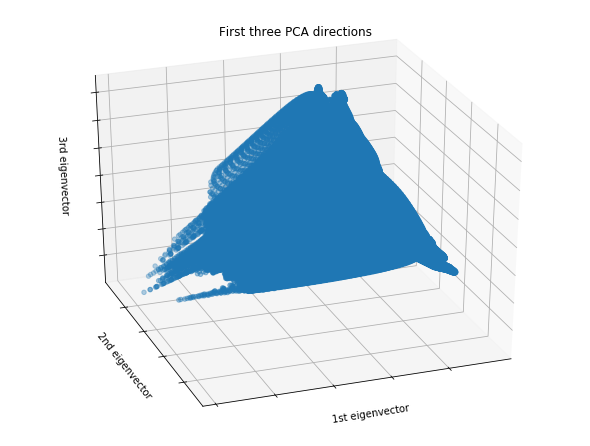

In [42]:
fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)

ax.scatter(
    cur_array[:, 0],
    cur_array[:, 1],
    cur_array[:, 2]
)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()